# 1.Install PennyLane for quantum operations

In [1]:
%%capture

# Comment this out if you don't want to install pennylane from this notebook
!pip install pennylane

# Comment this out if you don't want to install matplotlib from this notebook
!pip install matplotlib

!pip install tqdm
!pip install tensorflow
!pip install param
!pip install panel

In [2]:
!pip install panel

Defaulting to user installation because normal site-packages is not writeable


In [3]:
import pennylane as qml
from pennylane import numpy as np
from pennylane.templates import RandomLayers
#import tensorflow as tf
#from tensorflow import keras
import matplotlib.pyplot as plt

from tqdm import tqdm

# 2.Prepare CIFAR100

## 2.1.Get dataset

In [4]:
data_flag = 'cifar100'

In [5]:
from tensorflow import keras

cifar100_dataset = keras.datasets.cifar100
(train_images_original, train_labels_original), (test_images_original, test_labels_original) = cifar100_dataset.load_data()

print(train_images_original.shape)
print(test_labels_original.shape)

#number of classes
n_classes = len(np.unique(test_labels_original))
print("n_classes:", n_classes)
n_colors = train_images_original.shape[3]
print("n_colors:", n_colors)

2023-07-21 01:26:08.170577: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-07-21 01:26:08.192782: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-07-21 01:26:08.193045: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-21 01:26:08.649956: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


(50000, 32, 32, 3)
(10000, 1)
n_classes: 100
n_colors: 3


## 2.2.Visualize images

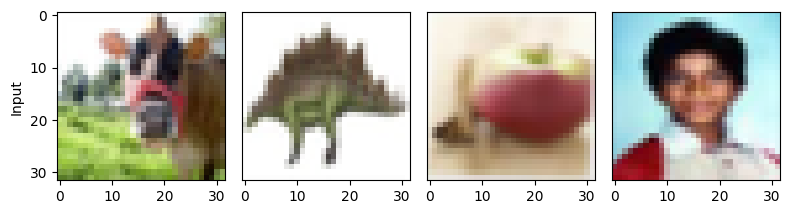

In [6]:
#n_colors = 3
n_samples = 4
n_channels = 0
offset = 0
#fig, axes = plt.subplots(n_colors + 1 + n_channels, n_samples, figsize=(8, 12))
fig, axes = plt.subplots(n_channels+1, n_samples, figsize=(8,8))
for k in range(n_samples):
    #axes[0, 0].set_ylabel("Input")
    axes[0].set_ylabel("Input")
    if k != 0:
        #axes[0, k].yaxis.set_visible(False)
        axes[k].yaxis.set_visible(False)
    #axes[0, k].imshow(train_images_original[k+S, :, :]) # cifar - color
    axes[k].imshow(train_images_original[k+offset, :, :]) # cifar - color
    ##axes[1, 0].set_ylabel("Red")
    ##axes[1, k].imshow(c_train_images[k, :, :, 0], cmap="Reds") # mnist - grayscale
    ##axes[2, 0].set_ylabel("Green")
    ##axes[2, k].imshow(c_train_images[k, :, :, 1], cmap="Greens")
    ##axes[3, 0].set_ylabel("Blue")
    ##axes[3, k].imshow(c_train_images[k, :, :, 2], cmap="Blues")

plt.tight_layout()
#plt.savefig(SAVE_PATH + "/DATASET_cifar10.png")
plt.show()

# 3.Quantum - Pre-processing

In [7]:
import param
import datetime as dt

class Parameters(param.Parameterized):
    #x                       = param.Parameter(default=3.14,doc="X position")
    #y                       = param.Parameter(default="Not editable",constant=True)
    #string_value            = param.String(default="str",doc="A string")
    #num_int                 = param.Integer(50000,bounds=(-200,100000))
    #unbounded_int           = param.Integer(23)
    #float_with_hard_bounds  = param.Number(8.2,bounds=(7.5,10))
    #float_with_soft_bounds  = param.Number(0.5,bounds=(0,None),softbounds=(0,2))
    #unbounded_float         = param.Number(30.01,precedence=0)
    #hidden_parameter        = param.Number(2.718,precedence=-1)
    #integer_range           = param.Range(default=(3,7),bounds=(0, 10))
    #float_range             = param.Range(default=(0,1.57),bounds=(0, 3.145))
    #dictionary              = param.Dict(default={"a":2, "b":9})
    select_DEVICE           = param.ObjectSelector(default="CPU",objects=["CPU", "GPU"])
    select_AXES             = param.ObjectSelector(default="X",objects=["X", "XY", "XYZ"])
    select_RF               = param.ObjectSelector(default="2", objects=["2","3"])
    select_STRIDE           = param.ObjectSelector(default="2", objects=["1","2"])
    select_subset_START     = param.String(default="0",doc="Start of TRAIN subset range:")
    select_subset_RANGE     = param.String(default="4",doc="TRAIN subset range:")
    #select_TRAIN_subset_end = param.String(default="4",doc="End of TRAIN subset range:")
    select_subset           = param.ObjectSelector(default="TRAIN",objects=["TRAIN", "TEST"])

    ##select_TEST_subset_START = param.String(default="0",doc="Start of TEST subset range:")
    ##select_TEST_subset_RANGE = param.String(default="4",doc="TEST subset range:")
    #select_TEST_subset_end = param.String(default="4",doc="End of TEST subset range:")


class Example(Parameters):
    """An example Parameterized class"""
    #timestamps = []

    #boolean                 = param.Boolean(True, doc="A sample Boolean parameter")
    #color                   = param.Color(default='#FFFFFF')
    #date                    = param.Date(dt.datetime(2017, 1, 1),
    #                                     bounds=(dt.datetime(2017, 1, 1), dt.datetime(2017, 2, 1)))
    select_string           = param.ObjectSelector(default="yellow",objects=["red","yellow","green"])
    #select_fn               = param.ObjectSelector(default=list,objects=[list,set,dict])
    int_list                = param.ListSelector(default=[3,5], objects=[1,3,5,7,9],precedence=0.5)
    #single_file             = param.FileSelector(path='../../*/*.py*',precedence=0.5)
    #multiple_files          = param.MultiFileSelector(path='../../*/*.py?',precedence=0.5)
    #record_timestamp        = param.Action(lambda x: x.timestamps.append(dt.datetime.now()),
    #                                       doc="""Record timestamp.""",precedence=0.7)

#Example.num_int
#Parameters.select_DEVICE

## 3.1.MANUALLY select parameters

In [8]:
# Set all parameters

import panel as pn

pn.extension()

base = Parameters()
#pn.Row(Example.param, base.param)
pn.Row(base.param)

Row
    [0] Column(margin=(5, 10), name='Parameters')
        [0] StaticText(value='<b>Parameters</b>')
        [1] Select(options=OrderedDict([('CPU', ...]), value='CPU')
        [2] Select(options=OrderedDict([('X', ...]), value='X')
        [3] Select(options=OrderedDict([('2', ...]), value='2')
        [4] Select(options=OrderedDict([('1', ...]), value='2')
        [5] TextInput(description='Start of TRAIN s..., name='Select subset START', value='0')
        [6] TextInput(description='TRAIN subset range:', name='Select subset RANGE', value='4')
        [7] Select(options=OrderedDict([('TRAIN', ...]), value='TRAIN')

### Check selection of parameters!

In [9]:
#DEVICE = 'GPU'
DEVICE = base.select_DEVICE # 'CPU'
print("DEVICE:", DEVICE)
AXES = base.select_AXES # "XYZ"
print("AXES:", AXES)
RF = int(base.select_RF) # RF = sqrt(WIRES) # Quanvolutional Receptive Field = RF*RF = WIRES
print("RF:", RF)
WIRES = RF*RF # 4 # 9
print("WIRES:", WIRES)
n_stride = int(base.select_STRIDE) # 2
print("STRIDE:", n_stride)

SUBSET = base.select_subset # 'TRAIN'
print("SUBSET:", SUBSET)

n_layers = 1    # Number of random layers
print("n_layers:", n_layers)

# n_train = 4 # 4096 # 4*1024 # 8*1024 #128 #2048 # 512 #50    # Size of the train dataset
n_start = int(base.select_subset_START)
print("n_start:", n_start)
n_range = int(base.select_subset_RANGE)
print("n_range:", n_range)
n_end = n_start + n_range
print("n_end:", n_end)

# n_test =  4 # 1024 # 1024 #32 #128 #30     # Size of the test dataset

# SAVE_PATH = "./" # Data saving folder
SAVE_PATH = "./RESULTS/" # Data saving folder
#SAVE_PATH = "/data1/QC/RESULTS/" # Data saving folder

#PREPROCESS = True           # If False, skip quantum processing and load data from SAVE_PATH
#np.random.seed(0)           # Seed for NumPy random number generator
#tf.random.set_seed(0)       # Seed for TensorFlow random number generator

DEVICE: CPU
AXES: X
RF: 2
WIRES: 4
STRIDE: 2
SUBSET: TRAIN
n_layers: 1
n_start: 0
n_range: 4
n_end: 4


In [10]:
def get_subset(full_dataset_images, full_dataset_labels, n_start, n_range, n_end):
  subset_images = full_dataset_images[n_start:n_end]
  subset_labels = full_dataset_labels[n_start:n_end]

  # Normalize pixel values within 0 and 1
  subset_images = subset_images / 255

  classic_subset_images = subset_images

  # Add extra dimension for convolution channels
  #train_images = np.array(train_images[..., tf.newaxis], requires_grad=False)
  subset_images = np.expand_dims(subset_images, axis=-1)

  print("For quantum:")
  print("subset_images.shape:", subset_images.shape)

  print("For classic:")
  print("classic_subset_images.shape:", classic_subset_images.shape)

  return subset_images, subset_labels, classic_subset_images

In [11]:
# Reduce dataset size

# Convert TRAIN
if SUBSET == "TRAIN": subset_images, subset_labels, classic_subset_images = get_subset(train_images_original, train_labels_original, n_start, n_range, n_end)

# Convert TEST
if SUBSET == "TEST": subset_images, subset_labels, classic_subset_images = get_subset(test_images_original, test_labels_original, n_start, n_range, n_end)

For quantum:
subset_images.shape: (4, 32, 32, 3, 1)
For classic:
classic_subset_images.shape: (4, 32, 32, 3)


In [12]:
## If the NVIDIA cuQuantum libraries are available,
## the above device will allow all operations to be perfomed on a CUDA capable GPU of generation SM 7.0 (Volta) and greater.
if DEVICE == 'GPU':
    dev = qml.device("lightning.gpu", wires=WIRES)
else:
    dev = qml.device("default.qubit", wires=WIRES)

# Random circuit parameters
rand_params = np.random.uniform(high=2 * np.pi, size=(n_layers, WIRES))

@qml.qnode(dev)
def circuitX(phi):
    # Encoding of 4 classical input values
    for j in range(WIRES):
        qml.RX(np.pi * phi[j], wires=j)

    # Random quantum circuit
    RandomLayers(rand_params, wires=list(range(WIRES)))

    # Measurement producing 4 classical output values
    return [qml.expval(qml.PauliZ(j)) for j in range(WIRES)]

@qml.qnode(dev)
def circuitY(phi):
    # Encoding of 4 classical input values
    for j in range(WIRES):
        qml.RY(np.pi * phi[j], wires=j)

    # Random quantum circuit
    RandomLayers(rand_params, wires=list(range(WIRES)))

    # Measurement producing 4 classical output values
    return [qml.expval(qml.PauliZ(j)) for j in range(WIRES)]

@qml.qnode(dev)
def circuitZ(phi):
    # Encoding of 4 classical input values
    for j in range(WIRES):
        qml.RZ(np.pi * phi[j], wires=j)

    # Random quantum circuit
    RandomLayers(rand_params, wires=list(range(WIRES)))

    # Measurement producing 4 classical output values
    return [qml.expval(qml.PauliZ(j)) for j in range(WIRES)]

@qml.qnode(dev)
def circuitXY(phi):
    # Encoding of 4 classical input values
    for j in range(WIRES):
        qml.RX(np.pi * phi[j], wires=j)
        qml.RY(np.pi * phi[j], wires=j)

    # Random quantum circuit
    RandomLayers(rand_params, wires=list(range(WIRES)))

    # Measurement producing 4 classical output values
    return [qml.expval(qml.PauliZ(j)) for j in range(WIRES)]

@qml.qnode(dev)
def circuitXYZ(phi):
    # Encoding of 4 classical input values
    for j in range(WIRES):
        qml.RX(np.pi * phi[j], wires=j)
        qml.RY(np.pi * phi[j], wires=j)
        qml.RZ(np.pi * phi[j], wires=j)

    # Random quantum circuit
    RandomLayers(rand_params, wires=list(range(WIRES)))

    # Measurement producing 4 classical output values
    return [qml.expval(qml.PauliZ(j)) for j in range(WIRES)]

### WIRES = 4

In [13]:
# X, Time: 40s per image.

def quanv_stride1x1_color(image):
    """Convolves the input image with many applications of the same quantum circuit."""
    # out = np.zeros((14, 14, 4)) # mnist
    # out = np.zeros((16, 16, 3, 4)) # cifar
    #out = np.zeros((32, 32, 3, 4)) # cifar
    #out = np.zeros((28, 28, 3, 4)) # Path
    out = np.zeros((28-RF+1, 28-RF+1, 3, WIRES)) # Path

    # Loop over the coordinates of the top-left pixel of 2X2 squares
    # for j in range(0, 28, 2):  # mnist
    # for j in range(0, 31, 1): #2): # stride1x1
    for j in range(0, 27, 1): #2): # Path
        # for k in range(0, 28, 2):  # mnist
        # for k in range(0, 31, 1): #2): # stride1x1
        for k in range(0, 27, 1): #2): # Path
            q_results = np.zeros((3, 4))
            for color in range(3):  # cifar - colors
              # Process a squared 2x2 region of the image with a quantum circuit
              phi = [
                    image[j, k, color],
                    image[j, k + 1, color],
                    image[j + 1, k, color],
                    image[j + 1, k + 1, color]
                    ]

              ##print(image[j, k, color])
              if AXES == "X": q_results[color] = circuitX(phi)
              if AXES == "XY": q_results[color] = circuitXY(phi)
              if AXES == "XYZ": q_results[color] = circuitXYZ(phi)

            # Assign expectation values to different channels of the output pixel (j/2, k/2)
            for c in range(4):
              for color in range(3):  # cifar - colors
                #out[j // 2, k // 2, color, c] = q_results[color][c]
                out[j, k, color, c] = q_results[color][c] # stride1x1
    return out

In [14]:
# X, Time: 10s per image.

def quanv_stride2x2_color(image):
    """Convolves the input image with many applications of the same quantum circuit."""
    # out = np.zeros((14, 14, 4)) # mnist
    # out = np.zeros((16, 16, 3, 4)) # cifar
    out = np.zeros((14, 14, 3, 4)) # Path
    #out = np.zeros((28 // 2 - 1, 28 // 2 - 1, 3, WIRES)) # Path

    # Loop over the coordinates of the top-left pixel of 2X2 squares
    # for j in range(0, 28, 2):  # mnist
    # for j in range(0, 32, 2): # cifar
    for j in range(0, 28, 2): # Path
        # for k in range(0, 28, 2):  # mnist
        # for k in range(0, 32, 2):  # cifar
        for k in range(0, 28, 2):  # Path
            q_results = np.zeros((3, 4))
            for color in range(3):  # cifar - colors
              # Process a squared 2x2 region of the image with a quantum circuit
              phi = [
                    image[j, k, color],
                    image[j, k + 1, color],
                    image[j + 1, k, color],
                    image[j + 1, k + 1, color]
                    ]

              ##print(image[j, k, color])
              if AXES == "X": q_results[color] = circuitX(phi)
              if AXES == "XY": q_results[color] = circuitXY(phi)
              if AXES == "XYZ": q_results[color] = circuitXYZ(phi)
            ##print(q_results.shape)
            ##print(q_results[0])
            ##print(q_results[1])
            ##print(q_results[2])

            # Assign expectation values to different channels of the output pixel (j/2, k/2)
            for c in range(4):
              for color in range(3):  # cifar - colors
                out[j // 2, k // 2, color, c] = q_results[color][c]
    return out

In [15]:
def quanv_stride1x1(image):
    """Convolves the input image with many applications of the same quantum circuit."""
    #out = np.zeros((14, 14, 4))
    #out = np.zeros((28, 28, 4)) # mnist
    out = np.zeros((32, 32, 4)) # cifar

    # Loop over the coordinates of the top-left pixel of 2X2 squares
    for j in range(0, 31, 1): #2): # stride1x1
        for k in range(0, 31, 1): #2): # stride1x1
            # Process a squared 2x2 region of the image with a quantum circuit
            q_results = circuitX(
                [
                    image[j, k, 0],
                    image[j, k + 1, 0],
                    image[j + 1, k, 0],
                    image[j + 1, k + 1, 0]
                ]
            )
            # Assign expectation values to different channels of the output pixel (j/2, k/2)
            for c in range(4):
                #out[j // 2, k // 2, c] = q_results[c]
                out[j, k, c] = q_results[c] # stride1x1
    return out

### WIRES = 9

In [16]:
# X, Time: 60s per image.

def quanv_wire9_stride1x1_color(image):
    """Convolves the input image with many applications of the same quantum circuit."""
    # out = np.zeros((14, 14, 4)) # mnist
    # out = np.zeros((16, 16, 3, 4)) # cifar
    #out = np.zeros((32, 32, 3, 4)) # cifar
    out = np.zeros((28-RF+1, 28-RF+1, 3, WIRES)) # Path

    # Loop over the coordinates of the top-left pixel of 2X2 squares
    # for j in range(0, 28, 2):  # mnist
    # for j in range(0, 31, 1): #2): # stride1x1
    for j in range(0, (28-RF+1), 1): #2): # Path
        # for k in range(0, 28, 2):  # mnist
        # for k in range(0, 31, 1): #2): # stride1x1
        for k in range(0, (28-RF+1), 1): #2): # Path
            q_results = np.zeros((3, WIRES))
            for color in range(3):  # cifar - colors
              # Process a squared 2x2 region of the image with a quantum circuit
              phi = [
                  image[j, k, color],
                  image[j, k + 1, color],
                  image[j, k + 2, color],
                  image[j + 1, k, color],
                  image[j + 1, k + 1, color],
                  image[j + 1, k + 2, color],
                  image[j + 2, k, color],
                  image[j + 2, k + 1, color],
                  image[j + 2, k + 2, color]
                  ]

              if AXES == "X": q_results[color] = circuitX(phi)
              if AXES == "XY": q_results[color] = circuitXY(phi)
              if AXES == "XYZ": q_results[color] = circuitXYZ(phi)

            # Assign expectation values to different channels of the output pixel (j/2, k/2)
            for c in range(WIRES):
              for color in range(3):  # cifar - colors
                #out[j // 2, k // 2, color, c] = q_results[color][c]
                out[j, k, color, c] = q_results[color][c] # stride1x1
    return out

In [17]:
# X, Time: 15s per image.

def quanv_wire9_stride2x2_color(image):
    """Convolves the input image with many applications of the same quantum circuit."""
    # out = np.zeros((14, 14, 4)) # mnist
    # out = np.zeros((16, 16, 3, 4)) # cifar
    #out = np.zeros((32, 32, 3, 4)) # cifar
    out = np.zeros((28 // 2 - 1, 28 // 2 - 1, 3, WIRES)) # Path

    # Loop over the coordinates of the top-left pixel of 2X2 squares
    # for j in range(0, 28, 2):  # mnist
    # for j in range(0, 31, 1): #2): # stride1x1
    for j in range(0, (28-RF+1), n_stride): # stride2x2 - MedMNIST
        # for k in range(0, 28, 2):  # mnist
        # for k in range(0, 31, 1): #2): # stride1x1
        for k in range(0, (28-RF+1), n_stride): # stride2x2 - MedMNIST
            q_results = np.zeros((3, WIRES))
            for color in range(3):  # cifar - colors
              # Process a squared 2x2 region of the image with a quantum circuit
              phi = [
                  image[j, k, color],
                  image[j, k + 1, color],
                  image[j, k + 2, color],
                  image[j + 1, k, color],
                  image[j + 1, k + 1, color],
                  image[j + 1, k + 2, color],
                  image[j + 2, k, color],
                  image[j + 2, k + 1, color],
                  image[j + 2, k + 2, color]
                  ]

              if AXES == "X": q_results[color] = circuitX(phi)
              if AXES == "XY": q_results[color] = circuitXY(phi)
              if AXES == "XYZ": q_results[color] = circuitXYZ(phi)

            # Assign expectation values to different channels of the output pixel (j/2, k/2)
            for c in range(WIRES):
              for color in range(3):  # cifar - colors
                out[j // 2, k // 2, color, c] = q_results[color][c] # stride2x2
                #out[j, k, color, c] = q_results[color][c] # stride1x1
    return out

## 3.2.Convert to Quantum

In [18]:
def convert_quantum(subset_images, subset_type):
    q_subset_images = []
    print("Quantum pre-processing of train images:")
    for idx, img in tqdm(enumerate(subset_images)):
        print("{}/{}        ".format(idx + 1, n_range), end="\r")

        if WIRES == 9:
          if n_stride == 1:
            print("Start: quanv_wire9_stride1x1_color ...")
            q_subset_images.append(quanv_wire9_stride1x1_color(img))
          if n_stride == 2:
            print("Start: quanv_wire9_stride2x2_color ...")
            q_subset_images.append(quanv_wire9_stride2x2_color(img))

        if WIRES == 4:
          if n_stride == 1:
            print("Start: quanv_stride1x1_color ...")
            q_subset_images.append(quanv_stride1x1_color(img))
          if n_stride == 2:
            print("Start: quanv_stride2x2_color ...")
            q_subset_images.append(quanv_stride2x2_color(img))

    q_subset_images = np.asarray(q_subset_images)

    # Save pre-processed images
    q_subset_images_filename = SAVE_PATH + "QNN_" + subset_type + "_" + DEVICE + '_' + data_flag + "_W" + str(WIRES) + "_" + AXES + "_S" + str(n_start) + "_E" + str(n_end) + "_s" + str(n_stride) + ".npy"
    np.save(q_subset_images_filename, q_subset_images)

    # Load pre-processed images
    #q_subset_images = np.load(q_subset_images_filename)

    print("len(q_train_images):",len(q_subset_images))

    return q_subset_images_filename, q_subset_images

In [19]:
%%time
# Convert TRAIN
if SUBSET == "TRAIN": q_subset_images_filename, q_subset_images= convert_quantum(subset_images, "TRAIN")

# Convert TEST
if SUBSET == "TEST": q_subset_images_filename, q_subset_images= convert_quantum(subset_images, "TEST")

Quantum pre-processing of train images:


0it [00:00, ?it/s]

Start: quanv_stride2x2_color ...


/tmp/ipykernel_7125/2021494212.py:28: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
  if AXES == "X": q_results[color] = circuitX(phi)
1it [00:03,  3.63s/it]

Start: quanv_stride2x2_color ...


2it [00:07,  3.89s/it]

Start: quanv_stride2x2_color ...


3it [00:10,  3.57s/it]

Start: quanv_stride2x2_color ...


4it [00:14,  3.52s/it]

len(q_train_images): 4
CPU times: user 14.1 s, sys: 0 ns, total: 14.1 s
Wall time: 14.1 s


## 3.3.Visualize

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

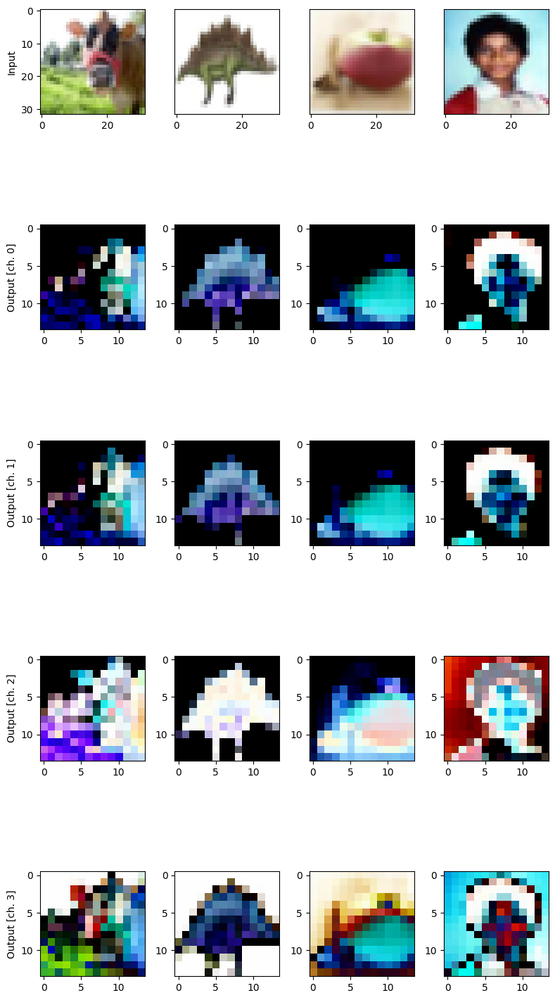

In [20]:
n_colors = 3
n_samples = 4
n_channels = WIRES
S = 0
#fig, axes = plt.subplots(n_colors + 1 + n_channels, n_samples, figsize=(8, 12))
fig, axes = plt.subplots(n_channels+1, n_samples, figsize=(8,16))
for k in range(n_samples):
    axes[0, 0].set_ylabel("Input")
    if k != 0:
        axes[0, k].yaxis.set_visible(False)
    axes[0, k].imshow(classic_subset_images[k+S, :, :]) # cifar - color
    ##axes[1, 0].set_ylabel("Red")
    ##axes[1, k].imshow(c_train_images[k, :, :, 0], cmap="Reds") # mnist - grayscale
    ##axes[2, 0].set_ylabel("Green")
    ##axes[2, k].imshow(c_train_images[k, :, :, 1], cmap="Greens")
    ##axes[3, 0].set_ylabel("Blue")
    ##axes[3, k].imshow(c_train_images[k, :, :, 2], cmap="Blues")

    # Plot all output channels
    for c in range(n_channels):
        #axes[c + n_colors + 1, 0].set_ylabel("Output [ch. {}]".format(c))
        axes[c+1, 0].set_ylabel("Output [ch. {}]".format(c))
        ##if k != 0:
        ##    axes[c, k].yaxis.set_visible(False)
        #axes[c + n_colors + 1, k].imshow(q_train_images[k, :, :, c], cmap="gray")
        ##axes[c + n_colors + 1, k].imshow(q_train_images[k, :, :, :, c])
        axes[c+1, k].imshow(q_subset_images[k+S, :, :, :, c])

plt.tight_layout()
plt.savefig(SAVE_PATH + "/QNN_" + SUBSET + "_" + DEVICE + '_' + data_flag + "_W" + str(WIRES) + "_" + AXES + "_S" + str(n_start) + "_E" + str(n_end) + "_s" + str(n_stride) + ".png")
plt.show()

# 4. Running automatically

In [21]:
import os

for x in range(0, 10):
    n_start = x * 5000
    print("n_start:", n_start)
    n_range = 5000
    print("n_range:", n_range)
    n_end = n_start + n_range
    print("n_end:", n_end)

    if SUBSET == "TRAIN": 
        subset_images, subset_labels, classic_subset_images = get_subset(train_images_original, train_labels_original, n_start, n_range, n_end)
        q_subset_images_filename, q_subset_images= convert_quantum(subset_images, "TRAIN")
        
    # Convert TEST
    if SUBSET == "TEST": 
        subset_images, subset_labels, classic_subset_images = get_subset(test_images_original, test_labels_original, n_start, n_range, n_end)
        q_subset_images_filename, q_subset_images= convert_quantum(subset_images, "TEST")

n_start: 0
n_range: 5000
n_end: 5000
For quantum:
subset_images.shape: (5000, 32, 32, 3, 1)
For classic:
classic_subset_images.shape: (5000, 32, 32, 3)
Quantum pre-processing of train images:


0it [00:00, ?it/s]

Start: quanv_stride2x2_color ...


/tmp/ipykernel_7125/2021494212.py:28: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
  if AXES == "X": q_results[color] = circuitX(phi)
1it [00:03,  3.69s/it]

Start: quanv_stride2x2_color ...


2it [00:07,  3.54s/it]

Start: quanv_stride2x2_color ...


3it [00:11,  4.02s/it]

Start: quanv_stride2x2_color ...


4it [00:14,  3.70s/it]

Start: quanv_stride2x2_color ...


5it [00:18,  3.64s/it]

Start: quanv_stride2x2_color ...


6it [00:22,  3.73s/it]

Start: quanv_stride2x2_color ...


7it [00:25,  3.54s/it]

Start: quanv_stride2x2_color ...


8it [00:29,  3.75s/it]

Start: quanv_stride2x2_color ...


9it [00:33,  3.64s/it]

Start: quanv_stride2x2_color ...


10it [00:36,  3.59s/it]

Start: quanv_stride2x2_color ...


11it [00:40,  3.68s/it]

Start: quanv_stride2x2_color ...


12it [00:44,  3.71s/it]

Start: quanv_stride2x2_color ...


13it [00:47,  3.67s/it]

Start: quanv_stride2x2_color ...


14it [00:50,  3.51s/it]

Start: quanv_stride2x2_color ...


15it [00:55,  3.70s/it]

Start: quanv_stride2x2_color ...


16it [00:58,  3.57s/it]

Start: quanv_stride2x2_color ...


17it [01:01,  3.45s/it]

Start: quanv_stride2x2_color ...


18it [01:04,  3.36s/it]

Start: quanv_stride2x2_color ...


19it [01:07,  3.30s/it]

Start: quanv_stride2x2_color ...


20it [01:11,  3.26s/it]

Start: quanv_stride2x2_color ...


21it [01:14,  3.23s/it]

Start: quanv_stride2x2_color ...


22it [01:18,  3.51s/it]

Start: quanv_stride2x2_color ...


23it [01:21,  3.55s/it]

Start: quanv_stride2x2_color ...


24it [01:25,  3.43s/it]

Start: quanv_stride2x2_color ...


25it [01:28,  3.36s/it]

Start: quanv_stride2x2_color ...


26it [01:31,  3.30s/it]

Start: quanv_stride2x2_color ...


27it [01:34,  3.31s/it]

Start: quanv_stride2x2_color ...


28it [01:39,  3.57s/it]

Start: quanv_stride2x2_color ...


29it [01:42,  3.69s/it]

Start: quanv_stride2x2_color ...


30it [01:47,  3.87s/it]

Start: quanv_stride2x2_color ...


31it [01:51,  4.00s/it]

Start: quanv_stride2x2_color ...


32it [01:56,  4.24s/it]

Start: quanv_stride2x2_color ...


33it [02:01,  4.42s/it]

Start: quanv_stride2x2_color ...


34it [02:05,  4.41s/it]

Start: quanv_stride2x2_color ...


35it [02:08,  4.09s/it]

Start: quanv_stride2x2_color ...


36it [02:14,  4.41s/it]

Start: quanv_stride2x2_color ...


37it [02:17,  4.22s/it]

Start: quanv_stride2x2_color ...


38it [02:21,  4.01s/it]

Start: quanv_stride2x2_color ...


39it [02:24,  3.86s/it]

Start: quanv_stride2x2_color ...


40it [02:29,  4.02s/it]

Start: quanv_stride2x2_color ...


41it [02:33,  4.04s/it]

Start: quanv_stride2x2_color ...


42it [02:36,  3.79s/it]

Start: quanv_stride2x2_color ...


43it [02:40,  3.81s/it]

Start: quanv_stride2x2_color ...


44it [02:44,  3.78s/it]

Start: quanv_stride2x2_color ...


45it [02:47,  3.61s/it]

Start: quanv_stride2x2_color ...


46it [02:50,  3.60s/it]

Start: quanv_stride2x2_color ...


47it [02:54,  3.52s/it]

Start: quanv_stride2x2_color ...


48it [02:58,  3.85s/it]

Start: quanv_stride2x2_color ...


49it [03:02,  3.87s/it]

Start: quanv_stride2x2_color ...


50it [03:06,  3.75s/it]

Start: quanv_stride2x2_color ...


51it [03:09,  3.59s/it]

Start: quanv_stride2x2_color ...


52it [03:13,  3.74s/it]

Start: quanv_stride2x2_color ...


53it [03:17,  3.76s/it]

Start: quanv_stride2x2_color ...


54it [03:21,  3.90s/it]

Start: quanv_stride2x2_color ...


55it [03:26,  4.16s/it]

Start: quanv_stride2x2_color ...


56it [03:30,  4.14s/it]

Start: quanv_stride2x2_color ...


57it [03:34,  4.16s/it]

Start: quanv_stride2x2_color ...


58it [03:37,  3.87s/it]

Start: quanv_stride2x2_color ...


59it [03:42,  3.98s/it]

Start: quanv_stride2x2_color ...


60it [03:45,  3.74s/it]

Start: quanv_stride2x2_color ...


61it [03:48,  3.59s/it]

Start: quanv_stride2x2_color ...


62it [03:51,  3.47s/it]

Start: quanv_stride2x2_color ...


63it [03:55,  3.47s/it]

Start: quanv_stride2x2_color ...


64it [03:59,  3.71s/it]

Start: quanv_stride2x2_color ...


65it [04:04,  4.23s/it]

Start: quanv_stride2x2_color ...


66it [04:08,  3.98s/it]

Start: quanv_stride2x2_color ...


67it [04:12,  4.16s/it]

Start: quanv_stride2x2_color ...


68it [04:17,  4.22s/it]

Start: quanv_stride2x2_color ...


69it [04:21,  4.21s/it]

Start: quanv_stride2x2_color ...


70it [04:26,  4.60s/it]

Start: quanv_stride2x2_color ...


71it [04:31,  4.54s/it]

Start: quanv_stride2x2_color ...


72it [04:35,  4.40s/it]

Start: quanv_stride2x2_color ...


73it [04:39,  4.40s/it]

Start: quanv_stride2x2_color ...


74it [04:43,  4.30s/it]

Start: quanv_stride2x2_color ...


75it [04:47,  4.16s/it]

Start: quanv_stride2x2_color ...


76it [04:52,  4.40s/it]

Start: quanv_stride2x2_color ...


77it [04:56,  4.23s/it]

Start: quanv_stride2x2_color ...


78it [05:00,  4.10s/it]

Start: quanv_stride2x2_color ...


79it [05:04,  4.02s/it]

Start: quanv_stride2x2_color ...


80it [05:07,  3.94s/it]

Start: quanv_stride2x2_color ...


81it [05:11,  3.81s/it]

Start: quanv_stride2x2_color ...


82it [05:15,  3.93s/it]

Start: quanv_stride2x2_color ...


83it [05:20,  4.19s/it]

Start: quanv_stride2x2_color ...


84it [05:24,  4.09s/it]

Start: quanv_stride2x2_color ...


85it [05:28,  4.19s/it]

Start: quanv_stride2x2_color ...


86it [05:33,  4.26s/it]

Start: quanv_stride2x2_color ...


87it [05:36,  4.11s/it]

Start: quanv_stride2x2_color ...


88it [05:40,  4.03s/it]

Start: quanv_stride2x2_color ...


89it [05:44,  4.02s/it]

Start: quanv_stride2x2_color ...


90it [05:49,  4.17s/it]

Start: quanv_stride2x2_color ...


91it [05:53,  4.15s/it]

Start: quanv_stride2x2_color ...


92it [05:58,  4.43s/it]

Start: quanv_stride2x2_color ...


93it [06:03,  4.65s/it]

Start: quanv_stride2x2_color ...


94it [06:08,  4.63s/it]

Start: quanv_stride2x2_color ...


95it [06:12,  4.68s/it]

Start: quanv_stride2x2_color ...


96it [06:17,  4.58s/it]

Start: quanv_stride2x2_color ...


97it [06:22,  4.74s/it]

Start: quanv_stride2x2_color ...


98it [06:26,  4.62s/it]

Start: quanv_stride2x2_color ...


99it [06:30,  4.40s/it]

Start: quanv_stride2x2_color ...


100it [06:35,  4.47s/it]

Start: quanv_stride2x2_color ...


101it [06:39,  4.34s/it]

Start: quanv_stride2x2_color ...


102it [06:43,  4.24s/it]

Start: quanv_stride2x2_color ...


103it [06:47,  4.25s/it]

Start: quanv_stride2x2_color ...


104it [06:52,  4.51s/it]

Start: quanv_stride2x2_color ...


105it [06:57,  4.55s/it]

Start: quanv_stride2x2_color ...


106it [07:02,  4.72s/it]

Start: quanv_stride2x2_color ...


107it [07:05,  4.34s/it]

Start: quanv_stride2x2_color ...


108it [07:09,  4.20s/it]

Start: quanv_stride2x2_color ...


109it [07:14,  4.26s/it]

Start: quanv_stride2x2_color ...


110it [07:18,  4.14s/it]

Start: quanv_stride2x2_color ...


111it [07:21,  3.94s/it]

Start: quanv_stride2x2_color ...


112it [07:25,  3.82s/it]

Start: quanv_stride2x2_color ...


113it [07:28,  3.64s/it]

Start: quanv_stride2x2_color ...


114it [07:32,  3.90s/it]

Start: quanv_stride2x2_color ...


115it [07:36,  3.93s/it]

Start: quanv_stride2x2_color ...


116it [07:41,  4.07s/it]

Start: quanv_stride2x2_color ...


117it [07:44,  3.85s/it]

Start: quanv_stride2x2_color ...


118it [07:48,  3.84s/it]

Start: quanv_stride2x2_color ...


119it [07:52,  4.03s/it]

Start: quanv_stride2x2_color ...


120it [07:56,  3.94s/it]

Start: quanv_stride2x2_color ...


121it [08:00,  3.86s/it]

Start: quanv_stride2x2_color ...


122it [08:04,  3.86s/it]

Start: quanv_stride2x2_color ...


123it [08:08,  4.02s/it]

Start: quanv_stride2x2_color ...


124it [08:13,  4.29s/it]

Start: quanv_stride2x2_color ...


125it [08:16,  3.96s/it]

Start: quanv_stride2x2_color ...


126it [08:20,  3.82s/it]

Start: quanv_stride2x2_color ...


127it [08:24,  3.86s/it]

Start: quanv_stride2x2_color ...


128it [08:29,  4.20s/it]

Start: quanv_stride2x2_color ...


129it [08:34,  4.49s/it]

Start: quanv_stride2x2_color ...


130it [08:37,  4.13s/it]

Start: quanv_stride2x2_color ...


131it [08:42,  4.34s/it]

Start: quanv_stride2x2_color ...


132it [08:46,  4.23s/it]

Start: quanv_stride2x2_color ...


133it [08:51,  4.57s/it]

Start: quanv_stride2x2_color ...


134it [08:55,  4.43s/it]

Start: quanv_stride2x2_color ...


135it [08:59,  4.14s/it]

Start: quanv_stride2x2_color ...


136it [09:03,  4.25s/it]

Start: quanv_stride2x2_color ...


137it [09:07,  4.11s/it]

Start: quanv_stride2x2_color ...


138it [09:11,  4.00s/it]

Start: quanv_stride2x2_color ...


139it [09:15,  4.04s/it]

Start: quanv_stride2x2_color ...


140it [09:18,  3.80s/it]

Start: quanv_stride2x2_color ...


141it [09:22,  3.84s/it]

Start: quanv_stride2x2_color ...


142it [09:26,  3.96s/it]

Start: quanv_stride2x2_color ...


143it [09:30,  3.87s/it]

Start: quanv_stride2x2_color ...


144it [09:34,  3.90s/it]

Start: quanv_stride2x2_color ...


145it [09:39,  4.31s/it]

Start: quanv_stride2x2_color ...


146it [09:44,  4.51s/it]

Start: quanv_stride2x2_color ...


147it [09:48,  4.23s/it]

Start: quanv_stride2x2_color ...


148it [09:52,  4.27s/it]

Start: quanv_stride2x2_color ...


149it [09:57,  4.35s/it]

Start: quanv_stride2x2_color ...


150it [10:01,  4.47s/it]

Start: quanv_stride2x2_color ...


151it [10:06,  4.61s/it]

Start: quanv_stride2x2_color ...


152it [10:10,  4.28s/it]

Start: quanv_stride2x2_color ...


153it [10:14,  4.39s/it]

Start: quanv_stride2x2_color ...


154it [10:19,  4.35s/it]

Start: quanv_stride2x2_color ...


155it [10:24,  4.50s/it]

Start: quanv_stride2x2_color ...


156it [10:27,  4.31s/it]

Start: quanv_stride2x2_color ...


157it [10:32,  4.47s/it]

Start: quanv_stride2x2_color ...


158it [10:37,  4.64s/it]

Start: quanv_stride2x2_color ...


159it [10:42,  4.78s/it]

Start: quanv_stride2x2_color ...


160it [10:48,  4.98s/it]

Start: quanv_stride2x2_color ...


161it [10:53,  4.90s/it]

Start: quanv_stride2x2_color ...


162it [10:58,  5.08s/it]

Start: quanv_stride2x2_color ...


163it [11:03,  5.00s/it]

Start: quanv_stride2x2_color ...


164it [11:08,  4.98s/it]

Start: quanv_stride2x2_color ...


165it [11:13,  4.91s/it]

Start: quanv_stride2x2_color ...


166it [11:18,  5.06s/it]

Start: quanv_stride2x2_color ...


167it [11:23,  4.95s/it]

Start: quanv_stride2x2_color ...


168it [11:27,  4.72s/it]

Start: quanv_stride2x2_color ...


169it [11:32,  4.76s/it]

Start: quanv_stride2x2_color ...


170it [11:36,  4.62s/it]

Start: quanv_stride2x2_color ...


171it [11:39,  4.23s/it]

Start: quanv_stride2x2_color ...


172it [11:44,  4.40s/it]

Start: quanv_stride2x2_color ...


173it [11:48,  4.34s/it]

Start: quanv_stride2x2_color ...


174it [11:53,  4.49s/it]

Start: quanv_stride2x2_color ...


175it [11:58,  4.68s/it]

Start: quanv_stride2x2_color ...


176it [12:02,  4.41s/it]

Start: quanv_stride2x2_color ...


177it [12:07,  4.44s/it]

Start: quanv_stride2x2_color ...


178it [12:11,  4.49s/it]

Start: quanv_stride2x2_color ...


179it [12:15,  4.20s/it]

Start: quanv_stride2x2_color ...


180it [12:19,  4.14s/it]

Start: quanv_stride2x2_color ...


181it [12:24,  4.42s/it]

Start: quanv_stride2x2_color ...


182it [12:28,  4.32s/it]

Start: quanv_stride2x2_color ...


183it [12:32,  4.20s/it]

Start: quanv_stride2x2_color ...


184it [12:36,  4.15s/it]

Start: quanv_stride2x2_color ...


185it [12:40,  4.14s/it]

Start: quanv_stride2x2_color ...


186it [12:45,  4.31s/it]

Start: quanv_stride2x2_color ...


187it [12:49,  4.29s/it]

Start: quanv_stride2x2_color ...


188it [12:54,  4.51s/it]

Start: quanv_stride2x2_color ...


189it [12:59,  4.65s/it]

Start: quanv_stride2x2_color ...


190it [13:04,  4.88s/it]

Start: quanv_stride2x2_color ...


191it [13:09,  4.75s/it]

Start: quanv_stride2x2_color ...


192it [13:14,  4.85s/it]

Start: quanv_stride2x2_color ...


193it [13:19,  4.79s/it]

Start: quanv_stride2x2_color ...


194it [13:23,  4.59s/it]

Start: quanv_stride2x2_color ...


195it [13:28,  4.74s/it]

Start: quanv_stride2x2_color ...


196it [13:33,  4.84s/it]

Start: quanv_stride2x2_color ...


197it [13:38,  4.92s/it]

Start: quanv_stride2x2_color ...


198it [13:42,  4.67s/it]

Start: quanv_stride2x2_color ...


199it [13:47,  4.73s/it]

Start: quanv_stride2x2_color ...


200it [13:51,  4.65s/it]

Start: quanv_stride2x2_color ...


201it [13:55,  4.41s/it]

Start: quanv_stride2x2_color ...


202it [14:00,  4.44s/it]

Start: quanv_stride2x2_color ...


203it [14:04,  4.33s/it]

Start: quanv_stride2x2_color ...


204it [14:09,  4.52s/it]

Start: quanv_stride2x2_color ...


205it [14:13,  4.40s/it]

Start: quanv_stride2x2_color ...


206it [14:18,  4.75s/it]

Start: quanv_stride2x2_color ...


207it [14:24,  4.86s/it]

Start: quanv_stride2x2_color ...


208it [14:28,  4.77s/it]

Start: quanv_stride2x2_color ...


209it [14:33,  4.74s/it]

Start: quanv_stride2x2_color ...


210it [14:37,  4.73s/it]

Start: quanv_stride2x2_color ...


211it [14:43,  4.87s/it]

Start: quanv_stride2x2_color ...


212it [14:47,  4.77s/it]

Start: quanv_stride2x2_color ...


213it [14:51,  4.45s/it]

Start: quanv_stride2x2_color ...


214it [14:56,  4.49s/it]

Start: quanv_stride2x2_color ...


215it [15:01,  4.68s/it]

Start: quanv_stride2x2_color ...


216it [15:05,  4.46s/it]

Start: quanv_stride2x2_color ...


217it [15:08,  4.29s/it]

Start: quanv_stride2x2_color ...


218it [15:12,  4.16s/it]

Start: quanv_stride2x2_color ...


219it [15:17,  4.34s/it]

Start: quanv_stride2x2_color ...


220it [15:22,  4.44s/it]

Start: quanv_stride2x2_color ...


221it [15:25,  4.19s/it]

Start: quanv_stride2x2_color ...


222it [15:29,  4.08s/it]

Start: quanv_stride2x2_color ...


223it [15:34,  4.18s/it]

Start: quanv_stride2x2_color ...


224it [15:39,  4.39s/it]

Start: quanv_stride2x2_color ...


225it [15:43,  4.33s/it]

Start: quanv_stride2x2_color ...


226it [15:47,  4.25s/it]

Start: quanv_stride2x2_color ...


227it [15:51,  4.29s/it]

Start: quanv_stride2x2_color ...


228it [15:55,  4.26s/it]

Start: quanv_stride2x2_color ...


229it [16:00,  4.27s/it]

Start: quanv_stride2x2_color ...


230it [16:04,  4.39s/it]

Start: quanv_stride2x2_color ...


231it [16:09,  4.46s/it]

Start: quanv_stride2x2_color ...


232it [16:14,  4.63s/it]

Start: quanv_stride2x2_color ...


233it [16:18,  4.60s/it]

Start: quanv_stride2x2_color ...


234it [16:24,  4.74s/it]

Start: quanv_stride2x2_color ...


235it [16:28,  4.74s/it]

Start: quanv_stride2x2_color ...


236it [16:33,  4.87s/it]

Start: quanv_stride2x2_color ...


237it [16:38,  4.75s/it]

Start: quanv_stride2x2_color ...


238it [16:42,  4.68s/it]

Start: quanv_stride2x2_color ...


239it [16:47,  4.71s/it]

Start: quanv_stride2x2_color ...


240it [16:52,  4.77s/it]

Start: quanv_stride2x2_color ...


241it [16:56,  4.58s/it]

Start: quanv_stride2x2_color ...


242it [17:00,  4.37s/it]

Start: quanv_stride2x2_color ...


243it [17:05,  4.50s/it]

Start: quanv_stride2x2_color ...


244it [17:10,  4.55s/it]

Start: quanv_stride2x2_color ...


245it [17:14,  4.38s/it]

Start: quanv_stride2x2_color ...


246it [17:17,  4.20s/it]

Start: quanv_stride2x2_color ...


247it [17:22,  4.39s/it]

Start: quanv_stride2x2_color ...


248it [17:26,  4.26s/it]

Start: quanv_stride2x2_color ...


249it [17:30,  4.28s/it]

Start: quanv_stride2x2_color ...


250it [17:35,  4.41s/it]

Start: quanv_stride2x2_color ...


251it [17:40,  4.43s/it]

Start: quanv_stride2x2_color ...


252it [17:45,  4.60s/it]

Start: quanv_stride2x2_color ...


253it [17:49,  4.40s/it]

Start: quanv_stride2x2_color ...


254it [17:52,  4.17s/it]

Start: quanv_stride2x2_color ...


255it [17:57,  4.23s/it]

Start: quanv_stride2x2_color ...


256it [18:01,  4.20s/it]

Start: quanv_stride2x2_color ...


257it [18:05,  4.08s/it]

Start: quanv_stride2x2_color ...


258it [18:09,  4.25s/it]

Start: quanv_stride2x2_color ...


259it [18:13,  4.23s/it]

Start: quanv_stride2x2_color ...


260it [18:17,  4.03s/it]

Start: quanv_stride2x2_color ...


261it [18:21,  4.15s/it]

Start: quanv_stride2x2_color ...


262it [18:25,  4.04s/it]

Start: quanv_stride2x2_color ...


263it [18:30,  4.27s/it]

Start: quanv_stride2x2_color ...


264it [18:35,  4.42s/it]

Start: quanv_stride2x2_color ...


265it [18:39,  4.26s/it]

Start: quanv_stride2x2_color ...


266it [18:43,  4.27s/it]

Start: quanv_stride2x2_color ...


267it [18:48,  4.55s/it]

Start: quanv_stride2x2_color ...


268it [18:53,  4.70s/it]

Start: quanv_stride2x2_color ...


269it [18:59,  4.91s/it]

Start: quanv_stride2x2_color ...


270it [19:02,  4.62s/it]

Start: quanv_stride2x2_color ...


271it [19:07,  4.60s/it]

Start: quanv_stride2x2_color ...


272it [19:12,  4.70s/it]

Start: quanv_stride2x2_color ...


273it [19:17,  4.68s/it]

Start: quanv_stride2x2_color ...


274it [19:21,  4.64s/it]

Start: quanv_stride2x2_color ...


275it [19:26,  4.73s/it]

Start: quanv_stride2x2_color ...


276it [19:31,  4.83s/it]

Start: quanv_stride2x2_color ...


277it [19:35,  4.67s/it]

Start: quanv_stride2x2_color ...


278it [19:40,  4.71s/it]

Start: quanv_stride2x2_color ...


279it [19:45,  4.78s/it]

Start: quanv_stride2x2_color ...


280it [19:50,  4.64s/it]

Start: quanv_stride2x2_color ...


281it [19:55,  4.74s/it]

Start: quanv_stride2x2_color ...


282it [19:59,  4.65s/it]

Start: quanv_stride2x2_color ...


283it [20:04,  4.72s/it]

Start: quanv_stride2x2_color ...


284it [20:09,  4.72s/it]

Start: quanv_stride2x2_color ...


285it [20:13,  4.63s/it]

Start: quanv_stride2x2_color ...


286it [20:18,  4.81s/it]

Start: quanv_stride2x2_color ...


287it [20:24,  5.04s/it]

Start: quanv_stride2x2_color ...


288it [20:29,  5.08s/it]

Start: quanv_stride2x2_color ...


289it [20:34,  4.94s/it]

Start: quanv_stride2x2_color ...


290it [20:38,  4.87s/it]

Start: quanv_stride2x2_color ...


291it [20:43,  4.94s/it]

Start: quanv_stride2x2_color ...


292it [20:47,  4.42s/it]

Start: quanv_stride2x2_color ...


293it [20:52,  4.62s/it]

Start: quanv_stride2x2_color ...


294it [20:56,  4.42s/it]

Start: quanv_stride2x2_color ...


295it [21:00,  4.36s/it]

Start: quanv_stride2x2_color ...


296it [21:04,  4.45s/it]

Start: quanv_stride2x2_color ...


297it [21:09,  4.43s/it]

Start: quanv_stride2x2_color ...


298it [21:13,  4.47s/it]

Start: quanv_stride2x2_color ...


299it [21:18,  4.64s/it]

Start: quanv_stride2x2_color ...


300it [21:23,  4.64s/it]

Start: quanv_stride2x2_color ...


301it [21:28,  4.66s/it]

Start: quanv_stride2x2_color ...


302it [21:33,  4.81s/it]

Start: quanv_stride2x2_color ...


303it [21:38,  4.80s/it]

Start: quanv_stride2x2_color ...


304it [21:43,  4.95s/it]

Start: quanv_stride2x2_color ...


305it [21:48,  5.01s/it]

Start: quanv_stride2x2_color ...


306it [21:54,  5.13s/it]

Start: quanv_stride2x2_color ...


307it [21:59,  5.21s/it]

Start: quanv_stride2x2_color ...


308it [22:04,  5.16s/it]

Start: quanv_stride2x2_color ...


309it [22:09,  5.01s/it]

Start: quanv_stride2x2_color ...


310it [22:14,  4.94s/it]

Start: quanv_stride2x2_color ...


311it [22:18,  4.94s/it]

Start: quanv_stride2x2_color ...


312it [22:23,  4.91s/it]

Start: quanv_stride2x2_color ...


313it [22:28,  4.84s/it]

Start: quanv_stride2x2_color ...


314it [22:33,  4.79s/it]

Start: quanv_stride2x2_color ...


315it [22:37,  4.77s/it]

Start: quanv_stride2x2_color ...


316it [22:42,  4.84s/it]

Start: quanv_stride2x2_color ...


317it [22:48,  4.99s/it]

Start: quanv_stride2x2_color ...


318it [22:53,  5.15s/it]

Start: quanv_stride2x2_color ...


319it [22:58,  5.08s/it]

Start: quanv_stride2x2_color ...


320it [23:03,  5.08s/it]

Start: quanv_stride2x2_color ...


321it [23:08,  4.97s/it]

Start: quanv_stride2x2_color ...


322it [23:13,  5.10s/it]

Start: quanv_stride2x2_color ...


323it [23:18,  5.05s/it]

Start: quanv_stride2x2_color ...


324it [23:24,  5.18s/it]

Start: quanv_stride2x2_color ...


325it [23:29,  5.31s/it]

Start: quanv_stride2x2_color ...


326it [23:35,  5.30s/it]

Start: quanv_stride2x2_color ...


327it [23:39,  5.15s/it]

Start: quanv_stride2x2_color ...


328it [23:44,  4.90s/it]

Start: quanv_stride2x2_color ...


329it [23:49,  4.90s/it]

Start: quanv_stride2x2_color ...


330it [23:54,  5.01s/it]

Start: quanv_stride2x2_color ...


331it [23:58,  4.83s/it]

Start: quanv_stride2x2_color ...


332it [24:03,  4.92s/it]

Start: quanv_stride2x2_color ...


333it [24:09,  4.98s/it]

Start: quanv_stride2x2_color ...


334it [24:13,  4.95s/it]

Start: quanv_stride2x2_color ...


335it [24:18,  4.89s/it]

Start: quanv_stride2x2_color ...


336it [24:24,  5.04s/it]

Start: quanv_stride2x2_color ...


337it [24:29,  5.19s/it]

Start: quanv_stride2x2_color ...


338it [24:34,  5.21s/it]

Start: quanv_stride2x2_color ...


339it [24:39,  5.14s/it]

Start: quanv_stride2x2_color ...


340it [24:44,  4.85s/it]

Start: quanv_stride2x2_color ...


341it [24:49,  5.05s/it]

Start: quanv_stride2x2_color ...


342it [24:54,  5.12s/it]

Start: quanv_stride2x2_color ...


343it [25:00,  5.21s/it]

Start: quanv_stride2x2_color ...


344it [25:04,  5.05s/it]

Start: quanv_stride2x2_color ...


345it [25:10,  5.19s/it]

Start: quanv_stride2x2_color ...


346it [25:15,  5.11s/it]

Start: quanv_stride2x2_color ...


347it [25:20,  5.16s/it]

Start: quanv_stride2x2_color ...


348it [25:25,  5.09s/it]

Start: quanv_stride2x2_color ...


349it [25:30,  4.94s/it]

Start: quanv_stride2x2_color ...


350it [25:35,  4.96s/it]

Start: quanv_stride2x2_color ...


351it [25:40,  5.12s/it]

Start: quanv_stride2x2_color ...


352it [25:46,  5.21s/it]

Start: quanv_stride2x2_color ...


353it [25:50,  5.05s/it]

Start: quanv_stride2x2_color ...


354it [25:56,  5.14s/it]

Start: quanv_stride2x2_color ...


355it [26:01,  5.17s/it]

Start: quanv_stride2x2_color ...


356it [26:07,  5.32s/it]

Start: quanv_stride2x2_color ...


357it [26:12,  5.50s/it]

Start: quanv_stride2x2_color ...


358it [26:18,  5.52s/it]

Start: quanv_stride2x2_color ...


359it [26:24,  5.60s/it]

Start: quanv_stride2x2_color ...


360it [26:29,  5.56s/it]

Start: quanv_stride2x2_color ...


361it [26:34,  5.35s/it]

Start: quanv_stride2x2_color ...


362it [26:40,  5.52s/it]

Start: quanv_stride2x2_color ...


363it [26:46,  5.62s/it]

Start: quanv_stride2x2_color ...


364it [26:52,  5.65s/it]

Start: quanv_stride2x2_color ...


365it [26:57,  5.55s/it]

Start: quanv_stride2x2_color ...


366it [27:03,  5.60s/it]

Start: quanv_stride2x2_color ...


367it [27:08,  5.57s/it]

Start: quanv_stride2x2_color ...


368it [27:14,  5.57s/it]

Start: quanv_stride2x2_color ...


369it [27:19,  5.52s/it]

Start: quanv_stride2x2_color ...


370it [27:24,  5.44s/it]

Start: quanv_stride2x2_color ...


371it [27:30,  5.36s/it]

Start: quanv_stride2x2_color ...


372it [27:35,  5.46s/it]

Start: quanv_stride2x2_color ...


373it [27:41,  5.40s/it]

Start: quanv_stride2x2_color ...


374it [27:47,  5.57s/it]

Start: quanv_stride2x2_color ...


375it [27:52,  5.51s/it]

Start: quanv_stride2x2_color ...


376it [27:57,  5.48s/it]

Start: quanv_stride2x2_color ...


377it [28:03,  5.61s/it]

Start: quanv_stride2x2_color ...


378it [28:09,  5.60s/it]

Start: quanv_stride2x2_color ...


379it [28:15,  5.72s/it]

Start: quanv_stride2x2_color ...


380it [28:21,  5.73s/it]

Start: quanv_stride2x2_color ...


381it [28:26,  5.62s/it]

Start: quanv_stride2x2_color ...


382it [28:31,  5.47s/it]

Start: quanv_stride2x2_color ...


383it [28:37,  5.53s/it]

Start: quanv_stride2x2_color ...


384it [28:42,  5.52s/it]

Start: quanv_stride2x2_color ...


385it [28:48,  5.48s/it]

Start: quanv_stride2x2_color ...


386it [28:53,  5.32s/it]

Start: quanv_stride2x2_color ...


387it [28:58,  5.27s/it]

Start: quanv_stride2x2_color ...


388it [29:03,  5.29s/it]

Start: quanv_stride2x2_color ...


389it [29:08,  5.31s/it]

Start: quanv_stride2x2_color ...


390it [29:14,  5.37s/it]

Start: quanv_stride2x2_color ...


391it [29:19,  5.34s/it]

Start: quanv_stride2x2_color ...


392it [29:24,  5.28s/it]

Start: quanv_stride2x2_color ...


393it [29:30,  5.34s/it]

Start: quanv_stride2x2_color ...


394it [29:36,  5.50s/it]

Start: quanv_stride2x2_color ...


395it [29:41,  5.60s/it]

Start: quanv_stride2x2_color ...


396it [29:47,  5.69s/it]

Start: quanv_stride2x2_color ...


397it [29:53,  5.74s/it]

Start: quanv_stride2x2_color ...


398it [29:59,  5.72s/it]

Start: quanv_stride2x2_color ...


399it [30:04,  5.61s/it]

Start: quanv_stride2x2_color ...


400it [30:10,  5.64s/it]

Start: quanv_stride2x2_color ...


401it [30:15,  5.61s/it]

Start: quanv_stride2x2_color ...


402it [30:21,  5.62s/it]

Start: quanv_stride2x2_color ...


403it [30:26,  5.51s/it]

Start: quanv_stride2x2_color ...


404it [30:32,  5.44s/it]

Start: quanv_stride2x2_color ...


405it [30:38,  5.60s/it]

Start: quanv_stride2x2_color ...


406it [30:43,  5.60s/it]

Start: quanv_stride2x2_color ...


407it [30:49,  5.58s/it]

Start: quanv_stride2x2_color ...


408it [30:54,  5.47s/it]

Start: quanv_stride2x2_color ...


409it [31:00,  5.60s/it]

Start: quanv_stride2x2_color ...


410it [31:05,  5.59s/it]

Start: quanv_stride2x2_color ...


411it [31:11,  5.56s/it]

Start: quanv_stride2x2_color ...


412it [31:17,  5.59s/it]

Start: quanv_stride2x2_color ...


413it [31:22,  5.60s/it]

Start: quanv_stride2x2_color ...


414it [31:28,  5.58s/it]

Start: quanv_stride2x2_color ...


415it [31:33,  5.59s/it]

Start: quanv_stride2x2_color ...


416it [31:39,  5.46s/it]

Start: quanv_stride2x2_color ...


417it [31:44,  5.55s/it]

Start: quanv_stride2x2_color ...


418it [31:50,  5.53s/it]

Start: quanv_stride2x2_color ...


419it [31:56,  5.59s/it]

Start: quanv_stride2x2_color ...


420it [32:01,  5.55s/it]

Start: quanv_stride2x2_color ...


421it [32:07,  5.55s/it]

Start: quanv_stride2x2_color ...


422it [32:12,  5.54s/it]

Start: quanv_stride2x2_color ...


423it [32:17,  5.50s/it]

Start: quanv_stride2x2_color ...


424it [32:23,  5.55s/it]

Start: quanv_stride2x2_color ...


425it [32:29,  5.67s/it]

Start: quanv_stride2x2_color ...


426it [32:35,  5.73s/it]

Start: quanv_stride2x2_color ...


427it [32:40,  5.67s/it]

Start: quanv_stride2x2_color ...


428it [32:46,  5.62s/it]

Start: quanv_stride2x2_color ...


429it [32:52,  5.75s/it]

Start: quanv_stride2x2_color ...


430it [32:58,  5.68s/it]

Start: quanv_stride2x2_color ...


431it [33:03,  5.57s/it]

Start: quanv_stride2x2_color ...


432it [33:08,  5.58s/it]

Start: quanv_stride2x2_color ...


433it [33:14,  5.61s/it]

Start: quanv_stride2x2_color ...


434it [33:20,  5.57s/it]

Start: quanv_stride2x2_color ...


435it [33:25,  5.54s/it]

Start: quanv_stride2x2_color ...


436it [33:31,  5.51s/it]

Start: quanv_stride2x2_color ...


437it [33:36,  5.48s/it]

Start: quanv_stride2x2_color ...


438it [33:42,  5.52s/it]

Start: quanv_stride2x2_color ...


439it [33:47,  5.41s/it]

Start: quanv_stride2x2_color ...


440it [33:52,  5.43s/it]

Start: quanv_stride2x2_color ...


441it [33:57,  5.35s/it]

Start: quanv_stride2x2_color ...


442it [34:03,  5.43s/it]

Start: quanv_stride2x2_color ...


443it [34:08,  5.38s/it]

Start: quanv_stride2x2_color ...


444it [34:13,  5.35s/it]

Start: quanv_stride2x2_color ...


445it [34:19,  5.41s/it]

Start: quanv_stride2x2_color ...


446it [34:25,  5.44s/it]

Start: quanv_stride2x2_color ...


447it [34:30,  5.51s/it]

Start: quanv_stride2x2_color ...


448it [34:36,  5.57s/it]

Start: quanv_stride2x2_color ...


449it [34:42,  5.62s/it]

Start: quanv_stride2x2_color ...


450it [34:47,  5.56s/it]

Start: quanv_stride2x2_color ...


451it [34:52,  5.45s/it]

Start: quanv_stride2x2_color ...


452it [34:58,  5.42s/it]

Start: quanv_stride2x2_color ...


453it [35:03,  5.40s/it]

Start: quanv_stride2x2_color ...


454it [35:08,  5.38s/it]

Start: quanv_stride2x2_color ...


455it [35:14,  5.54s/it]

Start: quanv_stride2x2_color ...


456it [35:20,  5.54s/it]

Start: quanv_stride2x2_color ...


457it [35:25,  5.54s/it]

Start: quanv_stride2x2_color ...


458it [35:31,  5.48s/it]

Start: quanv_stride2x2_color ...


459it [35:36,  5.54s/it]

Start: quanv_stride2x2_color ...


460it [35:42,  5.47s/it]

Start: quanv_stride2x2_color ...


461it [35:47,  5.49s/it]

Start: quanv_stride2x2_color ...


462it [35:53,  5.46s/it]

Start: quanv_stride2x2_color ...


463it [35:58,  5.54s/it]

Start: quanv_stride2x2_color ...


464it [36:04,  5.62s/it]

Start: quanv_stride2x2_color ...


465it [36:09,  5.55s/it]

Start: quanv_stride2x2_color ...


466it [36:15,  5.51s/it]

Start: quanv_stride2x2_color ...


467it [36:20,  5.45s/it]

Start: quanv_stride2x2_color ...


468it [36:26,  5.55s/it]

Start: quanv_stride2x2_color ...


469it [36:32,  5.63s/it]

Start: quanv_stride2x2_color ...


470it [36:37,  5.59s/it]

Start: quanv_stride2x2_color ...


471it [36:43,  5.60s/it]

Start: quanv_stride2x2_color ...


472it [36:48,  5.47s/it]

Start: quanv_stride2x2_color ...


473it [36:54,  5.52s/it]

Start: quanv_stride2x2_color ...


474it [36:59,  5.44s/it]

Start: quanv_stride2x2_color ...


475it [37:05,  5.48s/it]

Start: quanv_stride2x2_color ...


476it [37:10,  5.50s/it]

Start: quanv_stride2x2_color ...


477it [37:16,  5.49s/it]

Start: quanv_stride2x2_color ...


478it [37:21,  5.51s/it]

Start: quanv_stride2x2_color ...


479it [37:26,  5.45s/it]

Start: quanv_stride2x2_color ...


480it [37:32,  5.41s/it]

Start: quanv_stride2x2_color ...


481it [37:37,  5.48s/it]

Start: quanv_stride2x2_color ...


482it [37:43,  5.48s/it]

Start: quanv_stride2x2_color ...


483it [37:49,  5.58s/it]

Start: quanv_stride2x2_color ...


484it [37:54,  5.50s/it]

Start: quanv_stride2x2_color ...


485it [37:59,  5.48s/it]

Start: quanv_stride2x2_color ...


486it [38:05,  5.51s/it]

Start: quanv_stride2x2_color ...


487it [38:10,  5.47s/it]

Start: quanv_stride2x2_color ...


488it [38:16,  5.49s/it]

Start: quanv_stride2x2_color ...


489it [38:21,  5.42s/it]

Start: quanv_stride2x2_color ...


490it [38:27,  5.47s/it]

Start: quanv_stride2x2_color ...


491it [38:32,  5.54s/it]

Start: quanv_stride2x2_color ...


492it [38:38,  5.51s/it]

Start: quanv_stride2x2_color ...


493it [38:43,  5.51s/it]

Start: quanv_stride2x2_color ...


494it [38:49,  5.46s/it]

Start: quanv_stride2x2_color ...


495it [38:54,  5.44s/it]

Start: quanv_stride2x2_color ...


496it [39:00,  5.47s/it]

Start: quanv_stride2x2_color ...


497it [39:05,  5.47s/it]

Start: quanv_stride2x2_color ...


498it [39:11,  5.42s/it]

Start: quanv_stride2x2_color ...


499it [39:16,  5.50s/it]

Start: quanv_stride2x2_color ...


500it [39:21,  5.44s/it]

Start: quanv_stride2x2_color ...


501it [39:27,  5.39s/it]

Start: quanv_stride2x2_color ...


502it [39:32,  5.45s/it]

Start: quanv_stride2x2_color ...


503it [39:38,  5.38s/it]

Start: quanv_stride2x2_color ...


504it [39:43,  5.45s/it]

Start: quanv_stride2x2_color ...


505it [39:49,  5.56s/it]

Start: quanv_stride2x2_color ...


506it [39:55,  5.60s/it]

Start: quanv_stride2x2_color ...


507it [40:00,  5.43s/it]

Start: quanv_stride2x2_color ...


508it [40:05,  5.49s/it]

Start: quanv_stride2x2_color ...


509it [40:11,  5.54s/it]

Start: quanv_stride2x2_color ...


510it [40:16,  5.48s/it]

Start: quanv_stride2x2_color ...


511it [40:22,  5.40s/it]

Start: quanv_stride2x2_color ...


512it [40:27,  5.44s/it]

Start: quanv_stride2x2_color ...


513it [40:32,  5.34s/it]

Start: quanv_stride2x2_color ...


514it [40:38,  5.45s/it]

Start: quanv_stride2x2_color ...


515it [40:43,  5.44s/it]

Start: quanv_stride2x2_color ...


516it [40:49,  5.44s/it]

Start: quanv_stride2x2_color ...


517it [40:54,  5.31s/it]

Start: quanv_stride2x2_color ...


518it [40:59,  5.37s/it]

Start: quanv_stride2x2_color ...


519it [41:05,  5.42s/it]

Start: quanv_stride2x2_color ...


520it [41:10,  5.45s/it]

Start: quanv_stride2x2_color ...


521it [41:16,  5.40s/it]

Start: quanv_stride2x2_color ...


522it [41:21,  5.37s/it]

Start: quanv_stride2x2_color ...


523it [41:26,  5.36s/it]

Start: quanv_stride2x2_color ...


524it [41:32,  5.45s/it]

Start: quanv_stride2x2_color ...


525it [41:37,  5.34s/it]

Start: quanv_stride2x2_color ...


526it [41:42,  5.38s/it]

Start: quanv_stride2x2_color ...


527it [41:48,  5.41s/it]

Start: quanv_stride2x2_color ...


528it [41:53,  5.39s/it]

Start: quanv_stride2x2_color ...


529it [41:59,  5.40s/it]

Start: quanv_stride2x2_color ...


530it [42:04,  5.51s/it]

Start: quanv_stride2x2_color ...


531it [42:10,  5.44s/it]

Start: quanv_stride2x2_color ...


532it [42:15,  5.47s/it]

Start: quanv_stride2x2_color ...


533it [42:21,  5.55s/it]

Start: quanv_stride2x2_color ...


534it [42:27,  5.54s/it]

Start: quanv_stride2x2_color ...


535it [42:32,  5.53s/it]

Start: quanv_stride2x2_color ...


536it [42:37,  5.39s/it]

Start: quanv_stride2x2_color ...


537it [42:42,  5.36s/it]

Start: quanv_stride2x2_color ...


538it [42:48,  5.36s/it]

Start: quanv_stride2x2_color ...


539it [42:53,  5.35s/it]

Start: quanv_stride2x2_color ...


540it [42:58,  5.34s/it]

Start: quanv_stride2x2_color ...


541it [43:04,  5.50s/it]

Start: quanv_stride2x2_color ...


542it [43:10,  5.48s/it]

Start: quanv_stride2x2_color ...


543it [43:15,  5.53s/it]

Start: quanv_stride2x2_color ...


544it [43:21,  5.52s/it]

Start: quanv_stride2x2_color ...


545it [43:27,  5.56s/it]

Start: quanv_stride2x2_color ...


546it [43:32,  5.54s/it]

Start: quanv_stride2x2_color ...


547it [43:37,  5.46s/it]

Start: quanv_stride2x2_color ...


548it [43:42,  5.37s/it]

Start: quanv_stride2x2_color ...


549it [43:48,  5.41s/it]

Start: quanv_stride2x2_color ...


550it [43:54,  5.55s/it]

Start: quanv_stride2x2_color ...


551it [43:59,  5.50s/it]

Start: quanv_stride2x2_color ...


552it [44:05,  5.45s/it]

Start: quanv_stride2x2_color ...


553it [44:10,  5.59s/it]

Start: quanv_stride2x2_color ...


554it [44:16,  5.57s/it]

Start: quanv_stride2x2_color ...


555it [44:21,  5.44s/it]

Start: quanv_stride2x2_color ...


556it [44:27,  5.62s/it]

Start: quanv_stride2x2_color ...


557it [44:33,  5.57s/it]

Start: quanv_stride2x2_color ...


558it [44:38,  5.54s/it]

Start: quanv_stride2x2_color ...


559it [44:43,  5.49s/it]

Start: quanv_stride2x2_color ...


560it [44:49,  5.48s/it]

Start: quanv_stride2x2_color ...


561it [44:54,  5.46s/it]

Start: quanv_stride2x2_color ...


562it [45:00,  5.47s/it]

Start: quanv_stride2x2_color ...


563it [45:05,  5.42s/it]

Start: quanv_stride2x2_color ...


564it [45:11,  5.44s/it]

Start: quanv_stride2x2_color ...


565it [45:16,  5.30s/it]

Start: quanv_stride2x2_color ...


566it [45:21,  5.48s/it]

Start: quanv_stride2x2_color ...


567it [45:27,  5.46s/it]

Start: quanv_stride2x2_color ...


568it [45:32,  5.41s/it]

Start: quanv_stride2x2_color ...


569it [45:38,  5.45s/it]

Start: quanv_stride2x2_color ...


570it [45:43,  5.43s/it]

Start: quanv_stride2x2_color ...


571it [45:49,  5.47s/it]

Start: quanv_stride2x2_color ...


572it [45:54,  5.54s/it]

Start: quanv_stride2x2_color ...


573it [46:00,  5.45s/it]

Start: quanv_stride2x2_color ...


574it [46:05,  5.48s/it]

Start: quanv_stride2x2_color ...


575it [46:11,  5.48s/it]

Start: quanv_stride2x2_color ...


576it [46:16,  5.45s/it]

Start: quanv_stride2x2_color ...


577it [46:21,  5.43s/it]

Start: quanv_stride2x2_color ...


578it [46:27,  5.33s/it]

Start: quanv_stride2x2_color ...


579it [46:31,  5.22s/it]

Start: quanv_stride2x2_color ...


580it [46:37,  5.39s/it]

Start: quanv_stride2x2_color ...


581it [46:43,  5.46s/it]

Start: quanv_stride2x2_color ...


582it [46:49,  5.55s/it]

Start: quanv_stride2x2_color ...


583it [46:54,  5.56s/it]

Start: quanv_stride2x2_color ...


584it [47:00,  5.54s/it]

Start: quanv_stride2x2_color ...


585it [47:05,  5.54s/it]

Start: quanv_stride2x2_color ...


586it [47:10,  5.34s/it]

Start: quanv_stride2x2_color ...


587it [47:16,  5.41s/it]

Start: quanv_stride2x2_color ...


588it [47:21,  5.35s/it]

Start: quanv_stride2x2_color ...


589it [47:27,  5.46s/it]

Start: quanv_stride2x2_color ...


590it [47:32,  5.42s/it]

Start: quanv_stride2x2_color ...


591it [47:37,  5.43s/it]

Start: quanv_stride2x2_color ...


592it [47:43,  5.45s/it]

Start: quanv_stride2x2_color ...


593it [47:49,  5.52s/it]

Start: quanv_stride2x2_color ...


594it [47:54,  5.57s/it]

Start: quanv_stride2x2_color ...


595it [48:00,  5.51s/it]

Start: quanv_stride2x2_color ...


596it [48:05,  5.51s/it]

Start: quanv_stride2x2_color ...


597it [48:11,  5.49s/it]

Start: quanv_stride2x2_color ...


598it [48:16,  5.52s/it]

Start: quanv_stride2x2_color ...


599it [48:22,  5.57s/it]

Start: quanv_stride2x2_color ...


600it [48:28,  5.61s/it]

Start: quanv_stride2x2_color ...


601it [48:33,  5.61s/it]

Start: quanv_stride2x2_color ...


602it [48:39,  5.60s/it]

Start: quanv_stride2x2_color ...


603it [48:44,  5.52s/it]

Start: quanv_stride2x2_color ...


604it [48:50,  5.57s/it]

Start: quanv_stride2x2_color ...


605it [48:55,  5.58s/it]

Start: quanv_stride2x2_color ...


606it [49:01,  5.59s/it]

Start: quanv_stride2x2_color ...


607it [49:06,  5.51s/it]

Start: quanv_stride2x2_color ...


608it [49:12,  5.53s/it]

Start: quanv_stride2x2_color ...


609it [49:17,  5.45s/it]

Start: quanv_stride2x2_color ...


610it [49:22,  5.33s/it]

Start: quanv_stride2x2_color ...


611it [49:28,  5.39s/it]

Start: quanv_stride2x2_color ...


612it [49:33,  5.44s/it]

Start: quanv_stride2x2_color ...


613it [49:39,  5.45s/it]

Start: quanv_stride2x2_color ...


614it [49:44,  5.51s/it]

Start: quanv_stride2x2_color ...


615it [49:50,  5.53s/it]

Start: quanv_stride2x2_color ...


616it [49:56,  5.60s/it]

Start: quanv_stride2x2_color ...


617it [50:01,  5.50s/it]

Start: quanv_stride2x2_color ...


618it [50:07,  5.52s/it]

Start: quanv_stride2x2_color ...


619it [50:12,  5.48s/it]

Start: quanv_stride2x2_color ...


620it [50:17,  5.33s/it]

Start: quanv_stride2x2_color ...


621it [50:22,  5.33s/it]

Start: quanv_stride2x2_color ...


622it [50:28,  5.37s/it]

Start: quanv_stride2x2_color ...


623it [50:33,  5.32s/it]

Start: quanv_stride2x2_color ...


624it [50:38,  5.24s/it]

Start: quanv_stride2x2_color ...


625it [50:43,  5.28s/it]

Start: quanv_stride2x2_color ...


626it [50:49,  5.31s/it]

Start: quanv_stride2x2_color ...


627it [50:55,  5.46s/it]

Start: quanv_stride2x2_color ...


628it [51:00,  5.37s/it]

Start: quanv_stride2x2_color ...


629it [51:05,  5.31s/it]

Start: quanv_stride2x2_color ...


630it [51:10,  5.38s/it]

Start: quanv_stride2x2_color ...


631it [51:16,  5.49s/it]

Start: quanv_stride2x2_color ...


632it [51:22,  5.52s/it]

Start: quanv_stride2x2_color ...


633it [51:27,  5.55s/it]

Start: quanv_stride2x2_color ...


634it [51:33,  5.52s/it]

Start: quanv_stride2x2_color ...


635it [51:38,  5.41s/it]

Start: quanv_stride2x2_color ...


636it [51:43,  5.40s/it]

Start: quanv_stride2x2_color ...


637it [51:49,  5.55s/it]

Start: quanv_stride2x2_color ...


638it [51:55,  5.62s/it]

Start: quanv_stride2x2_color ...


639it [52:01,  5.62s/it]

Start: quanv_stride2x2_color ...


640it [52:06,  5.66s/it]

Start: quanv_stride2x2_color ...


641it [52:12,  5.64s/it]

Start: quanv_stride2x2_color ...


642it [52:18,  5.62s/it]

Start: quanv_stride2x2_color ...


643it [52:23,  5.58s/it]

Start: quanv_stride2x2_color ...


644it [52:28,  5.52s/it]

Start: quanv_stride2x2_color ...


645it [52:34,  5.46s/it]

Start: quanv_stride2x2_color ...


646it [52:39,  5.44s/it]

Start: quanv_stride2x2_color ...


647it [52:45,  5.44s/it]

Start: quanv_stride2x2_color ...


648it [52:50,  5.41s/it]

Start: quanv_stride2x2_color ...


649it [52:55,  5.44s/it]

Start: quanv_stride2x2_color ...


650it [53:01,  5.32s/it]

Start: quanv_stride2x2_color ...


651it [53:06,  5.26s/it]

Start: quanv_stride2x2_color ...


652it [53:11,  5.35s/it]

Start: quanv_stride2x2_color ...


653it [53:16,  5.32s/it]

Start: quanv_stride2x2_color ...


654it [53:22,  5.35s/it]

Start: quanv_stride2x2_color ...


655it [53:28,  5.50s/it]

Start: quanv_stride2x2_color ...


656it [53:33,  5.41s/it]

Start: quanv_stride2x2_color ...


657it [53:38,  5.44s/it]

Start: quanv_stride2x2_color ...


658it [53:44,  5.50s/it]

Start: quanv_stride2x2_color ...


659it [53:50,  5.53s/it]

Start: quanv_stride2x2_color ...


660it [53:55,  5.51s/it]

Start: quanv_stride2x2_color ...


661it [54:01,  5.49s/it]

Start: quanv_stride2x2_color ...


662it [54:06,  5.51s/it]

Start: quanv_stride2x2_color ...


663it [54:12,  5.56s/it]

Start: quanv_stride2x2_color ...


664it [54:18,  5.69s/it]

Start: quanv_stride2x2_color ...


665it [54:23,  5.65s/it]

Start: quanv_stride2x2_color ...


666it [54:29,  5.68s/it]

Start: quanv_stride2x2_color ...


667it [54:34,  5.47s/it]

Start: quanv_stride2x2_color ...


668it [54:39,  5.45s/it]

Start: quanv_stride2x2_color ...


669it [54:45,  5.43s/it]

Start: quanv_stride2x2_color ...


670it [54:51,  5.50s/it]

Start: quanv_stride2x2_color ...


671it [54:56,  5.44s/it]

Start: quanv_stride2x2_color ...


672it [55:01,  5.42s/it]

Start: quanv_stride2x2_color ...


673it [55:06,  5.37s/it]

Start: quanv_stride2x2_color ...


674it [55:12,  5.50s/it]

Start: quanv_stride2x2_color ...


675it [55:18,  5.45s/it]

Start: quanv_stride2x2_color ...


676it [55:23,  5.46s/it]

Start: quanv_stride2x2_color ...


677it [55:29,  5.45s/it]

Start: quanv_stride2x2_color ...


678it [55:34,  5.53s/it]

Start: quanv_stride2x2_color ...


679it [55:39,  5.39s/it]

Start: quanv_stride2x2_color ...


680it [55:45,  5.38s/it]

Start: quanv_stride2x2_color ...


681it [55:50,  5.42s/it]

Start: quanv_stride2x2_color ...


682it [55:55,  5.34s/it]

Start: quanv_stride2x2_color ...


683it [56:01,  5.36s/it]

Start: quanv_stride2x2_color ...


684it [56:06,  5.40s/it]

Start: quanv_stride2x2_color ...


685it [56:12,  5.46s/it]

Start: quanv_stride2x2_color ...


686it [56:17,  5.52s/it]

Start: quanv_stride2x2_color ...


687it [56:23,  5.56s/it]

Start: quanv_stride2x2_color ...


688it [56:29,  5.59s/it]

Start: quanv_stride2x2_color ...


689it [56:34,  5.56s/it]

Start: quanv_stride2x2_color ...


690it [56:40,  5.53s/it]

Start: quanv_stride2x2_color ...


691it [56:45,  5.47s/it]

Start: quanv_stride2x2_color ...


692it [56:51,  5.47s/it]

Start: quanv_stride2x2_color ...


693it [56:56,  5.49s/it]

Start: quanv_stride2x2_color ...


694it [57:02,  5.57s/it]

Start: quanv_stride2x2_color ...


695it [57:07,  5.49s/it]

Start: quanv_stride2x2_color ...


696it [57:12,  5.39s/it]

Start: quanv_stride2x2_color ...


697it [57:18,  5.46s/it]

Start: quanv_stride2x2_color ...


698it [57:23,  5.49s/it]

Start: quanv_stride2x2_color ...


699it [57:29,  5.53s/it]

Start: quanv_stride2x2_color ...


700it [57:35,  5.55s/it]

Start: quanv_stride2x2_color ...


701it [57:40,  5.56s/it]

Start: quanv_stride2x2_color ...


702it [57:46,  5.64s/it]

Start: quanv_stride2x2_color ...


703it [57:51,  5.51s/it]

Start: quanv_stride2x2_color ...


704it [57:57,  5.46s/it]

Start: quanv_stride2x2_color ...


705it [58:02,  5.39s/it]

Start: quanv_stride2x2_color ...


706it [58:07,  5.44s/it]

Start: quanv_stride2x2_color ...


707it [58:13,  5.45s/it]

Start: quanv_stride2x2_color ...


708it [58:18,  5.46s/it]

Start: quanv_stride2x2_color ...


709it [58:24,  5.52s/it]

Start: quanv_stride2x2_color ...


710it [58:30,  5.57s/it]

Start: quanv_stride2x2_color ...


711it [58:36,  5.65s/it]

Start: quanv_stride2x2_color ...


712it [58:42,  5.76s/it]

Start: quanv_stride2x2_color ...


713it [58:47,  5.71s/it]

Start: quanv_stride2x2_color ...


714it [58:53,  5.73s/it]

Start: quanv_stride2x2_color ...


715it [58:59,  5.76s/it]

Start: quanv_stride2x2_color ...


716it [59:05,  5.76s/it]

Start: quanv_stride2x2_color ...


717it [59:10,  5.80s/it]

Start: quanv_stride2x2_color ...


718it [59:16,  5.59s/it]

Start: quanv_stride2x2_color ...


719it [59:22,  5.71s/it]

Start: quanv_stride2x2_color ...


720it [59:27,  5.62s/it]

Start: quanv_stride2x2_color ...


721it [59:33,  5.63s/it]

Start: quanv_stride2x2_color ...


722it [59:38,  5.59s/it]

Start: quanv_stride2x2_color ...


723it [59:43,  5.51s/it]

Start: quanv_stride2x2_color ...


724it [59:49,  5.53s/it]

Start: quanv_stride2x2_color ...


725it [59:55,  5.54s/it]

Start: quanv_stride2x2_color ...


726it [1:00:00,  5.49s/it]

Start: quanv_stride2x2_color ...


727it [1:00:06,  5.67s/it]

Start: quanv_stride2x2_color ...


728it [1:00:11,  5.60s/it]

Start: quanv_stride2x2_color ...


729it [1:00:17,  5.52s/it]

Start: quanv_stride2x2_color ...


730it [1:00:22,  5.55s/it]

Start: quanv_stride2x2_color ...


731it [1:00:28,  5.55s/it]

Start: quanv_stride2x2_color ...


732it [1:00:34,  5.55s/it]

Start: quanv_stride2x2_color ...


733it [1:00:39,  5.46s/it]

Start: quanv_stride2x2_color ...


734it [1:00:45,  5.55s/it]

Start: quanv_stride2x2_color ...


735it [1:00:50,  5.52s/it]

Start: quanv_stride2x2_color ...


736it [1:00:56,  5.61s/it]

Start: quanv_stride2x2_color ...


737it [1:01:01,  5.56s/it]

Start: quanv_stride2x2_color ...


738it [1:01:07,  5.57s/it]

Start: quanv_stride2x2_color ...


739it [1:01:12,  5.54s/it]

Start: quanv_stride2x2_color ...


740it [1:01:18,  5.61s/it]

Start: quanv_stride2x2_color ...


741it [1:01:24,  5.61s/it]

Start: quanv_stride2x2_color ...


742it [1:01:29,  5.58s/it]

Start: quanv_stride2x2_color ...


743it [1:01:35,  5.60s/it]

Start: quanv_stride2x2_color ...


744it [1:01:41,  5.64s/it]

Start: quanv_stride2x2_color ...


745it [1:01:46,  5.68s/it]

Start: quanv_stride2x2_color ...


746it [1:01:52,  5.65s/it]

Start: quanv_stride2x2_color ...


747it [1:01:58,  5.69s/it]

Start: quanv_stride2x2_color ...


748it [1:02:03,  5.66s/it]

Start: quanv_stride2x2_color ...


749it [1:02:09,  5.65s/it]

Start: quanv_stride2x2_color ...


750it [1:02:14,  5.54s/it]

Start: quanv_stride2x2_color ...


751it [1:02:20,  5.49s/it]

Start: quanv_stride2x2_color ...


752it [1:02:25,  5.49s/it]

Start: quanv_stride2x2_color ...


753it [1:02:31,  5.51s/it]

Start: quanv_stride2x2_color ...


754it [1:02:36,  5.52s/it]

Start: quanv_stride2x2_color ...


755it [1:02:42,  5.53s/it]

Start: quanv_stride2x2_color ...


756it [1:02:47,  5.45s/it]

Start: quanv_stride2x2_color ...


757it [1:02:52,  5.46s/it]

Start: quanv_stride2x2_color ...


758it [1:02:58,  5.42s/it]

Start: quanv_stride2x2_color ...


759it [1:03:04,  5.53s/it]

Start: quanv_stride2x2_color ...


760it [1:03:09,  5.45s/it]

Start: quanv_stride2x2_color ...


761it [1:03:15,  5.61s/it]

Start: quanv_stride2x2_color ...


762it [1:03:20,  5.57s/it]

Start: quanv_stride2x2_color ...


763it [1:03:26,  5.60s/it]

Start: quanv_stride2x2_color ...


764it [1:03:32,  5.60s/it]

Start: quanv_stride2x2_color ...


765it [1:03:37,  5.66s/it]

Start: quanv_stride2x2_color ...


766it [1:03:43,  5.71s/it]

Start: quanv_stride2x2_color ...


767it [1:03:49,  5.72s/it]

Start: quanv_stride2x2_color ...


768it [1:03:54,  5.65s/it]

Start: quanv_stride2x2_color ...


769it [1:04:00,  5.65s/it]

Start: quanv_stride2x2_color ...


770it [1:04:06,  5.60s/it]

Start: quanv_stride2x2_color ...


771it [1:04:11,  5.55s/it]

Start: quanv_stride2x2_color ...


772it [1:04:17,  5.53s/it]

Start: quanv_stride2x2_color ...


773it [1:04:22,  5.43s/it]

Start: quanv_stride2x2_color ...


774it [1:04:27,  5.43s/it]

Start: quanv_stride2x2_color ...


775it [1:04:33,  5.60s/it]

Start: quanv_stride2x2_color ...


776it [1:04:39,  5.62s/it]

Start: quanv_stride2x2_color ...


777it [1:04:44,  5.58s/it]

Start: quanv_stride2x2_color ...


778it [1:04:50,  5.61s/it]

Start: quanv_stride2x2_color ...


779it [1:04:56,  5.61s/it]

Start: quanv_stride2x2_color ...


780it [1:05:01,  5.60s/it]

Start: quanv_stride2x2_color ...


781it [1:05:07,  5.53s/it]

Start: quanv_stride2x2_color ...


782it [1:05:12,  5.56s/it]

Start: quanv_stride2x2_color ...


783it [1:05:18,  5.59s/it]

Start: quanv_stride2x2_color ...


784it [1:05:24,  5.65s/it]

Start: quanv_stride2x2_color ...


785it [1:05:30,  5.77s/it]

Start: quanv_stride2x2_color ...


786it [1:05:35,  5.60s/it]

Start: quanv_stride2x2_color ...


787it [1:05:40,  5.55s/it]

Start: quanv_stride2x2_color ...


788it [1:05:46,  5.63s/it]

Start: quanv_stride2x2_color ...


789it [1:05:52,  5.60s/it]

Start: quanv_stride2x2_color ...


790it [1:05:57,  5.53s/it]

Start: quanv_stride2x2_color ...


791it [1:06:02,  5.42s/it]

Start: quanv_stride2x2_color ...


792it [1:06:08,  5.40s/it]

Start: quanv_stride2x2_color ...


793it [1:06:13,  5.56s/it]

Start: quanv_stride2x2_color ...


794it [1:06:19,  5.51s/it]

Start: quanv_stride2x2_color ...


795it [1:06:24,  5.51s/it]

Start: quanv_stride2x2_color ...


796it [1:06:30,  5.50s/it]

Start: quanv_stride2x2_color ...


797it [1:06:35,  5.52s/it]

Start: quanv_stride2x2_color ...


798it [1:06:41,  5.62s/it]

Start: quanv_stride2x2_color ...


799it [1:06:47,  5.65s/it]

Start: quanv_stride2x2_color ...


800it [1:06:53,  5.65s/it]

Start: quanv_stride2x2_color ...


801it [1:06:59,  5.73s/it]

Start: quanv_stride2x2_color ...


802it [1:07:04,  5.69s/it]

Start: quanv_stride2x2_color ...


803it [1:07:10,  5.68s/it]

Start: quanv_stride2x2_color ...


804it [1:07:16,  5.78s/it]

Start: quanv_stride2x2_color ...


805it [1:07:22,  5.77s/it]

Start: quanv_stride2x2_color ...


806it [1:07:27,  5.70s/it]

Start: quanv_stride2x2_color ...


807it [1:07:32,  5.56s/it]

Start: quanv_stride2x2_color ...


808it [1:07:38,  5.58s/it]

Start: quanv_stride2x2_color ...


809it [1:07:44,  5.60s/it]

Start: quanv_stride2x2_color ...


810it [1:07:49,  5.54s/it]

Start: quanv_stride2x2_color ...


811it [1:07:55,  5.53s/it]

Start: quanv_stride2x2_color ...


812it [1:08:00,  5.58s/it]

Start: quanv_stride2x2_color ...


813it [1:08:06,  5.60s/it]

Start: quanv_stride2x2_color ...


814it [1:08:12,  5.62s/it]

Start: quanv_stride2x2_color ...


815it [1:08:17,  5.65s/it]

Start: quanv_stride2x2_color ...


816it [1:08:23,  5.63s/it]

Start: quanv_stride2x2_color ...


817it [1:08:28,  5.52s/it]

Start: quanv_stride2x2_color ...


818it [1:08:34,  5.53s/it]

Start: quanv_stride2x2_color ...


819it [1:08:39,  5.58s/it]

Start: quanv_stride2x2_color ...


820it [1:08:45,  5.63s/it]

Start: quanv_stride2x2_color ...


821it [1:08:51,  5.63s/it]

Start: quanv_stride2x2_color ...


822it [1:08:56,  5.58s/it]

Start: quanv_stride2x2_color ...


823it [1:09:02,  5.61s/it]

Start: quanv_stride2x2_color ...


824it [1:09:07,  5.60s/it]

Start: quanv_stride2x2_color ...


825it [1:09:13,  5.56s/it]

Start: quanv_stride2x2_color ...


826it [1:09:19,  5.62s/it]

Start: quanv_stride2x2_color ...


827it [1:09:24,  5.57s/it]

Start: quanv_stride2x2_color ...


828it [1:09:30,  5.59s/it]

Start: quanv_stride2x2_color ...


829it [1:09:35,  5.64s/it]

Start: quanv_stride2x2_color ...


830it [1:09:41,  5.60s/it]

Start: quanv_stride2x2_color ...


831it [1:09:47,  5.65s/it]

Start: quanv_stride2x2_color ...


832it [1:09:52,  5.67s/it]

Start: quanv_stride2x2_color ...


833it [1:09:58,  5.71s/it]

Start: quanv_stride2x2_color ...


834it [1:10:04,  5.67s/it]

Start: quanv_stride2x2_color ...


835it [1:10:09,  5.64s/it]

Start: quanv_stride2x2_color ...


836it [1:10:15,  5.61s/it]

Start: quanv_stride2x2_color ...


837it [1:10:21,  5.66s/it]

Start: quanv_stride2x2_color ...


838it [1:10:26,  5.62s/it]

Start: quanv_stride2x2_color ...


839it [1:10:32,  5.63s/it]

Start: quanv_stride2x2_color ...


840it [1:10:38,  5.67s/it]

Start: quanv_stride2x2_color ...


841it [1:10:43,  5.59s/it]

Start: quanv_stride2x2_color ...


842it [1:10:48,  5.52s/it]

Start: quanv_stride2x2_color ...


843it [1:10:54,  5.49s/it]

Start: quanv_stride2x2_color ...


844it [1:10:59,  5.47s/it]

Start: quanv_stride2x2_color ...


845it [1:11:04,  5.35s/it]

Start: quanv_stride2x2_color ...


846it [1:11:10,  5.32s/it]

Start: quanv_stride2x2_color ...


847it [1:11:15,  5.48s/it]

Start: quanv_stride2x2_color ...


848it [1:11:21,  5.37s/it]

Start: quanv_stride2x2_color ...


849it [1:11:26,  5.34s/it]

Start: quanv_stride2x2_color ...


850it [1:11:31,  5.34s/it]

Start: quanv_stride2x2_color ...


851it [1:11:37,  5.41s/it]

Start: quanv_stride2x2_color ...


852it [1:11:42,  5.38s/it]

Start: quanv_stride2x2_color ...


853it [1:11:47,  5.29s/it]

Start: quanv_stride2x2_color ...


854it [1:11:52,  5.29s/it]

Start: quanv_stride2x2_color ...


855it [1:11:58,  5.29s/it]

Start: quanv_stride2x2_color ...


856it [1:12:03,  5.29s/it]

Start: quanv_stride2x2_color ...


857it [1:12:08,  5.24s/it]

Start: quanv_stride2x2_color ...


858it [1:12:14,  5.33s/it]

Start: quanv_stride2x2_color ...


859it [1:12:19,  5.39s/it]

Start: quanv_stride2x2_color ...


860it [1:12:24,  5.26s/it]

Start: quanv_stride2x2_color ...


861it [1:12:30,  5.30s/it]

Start: quanv_stride2x2_color ...


862it [1:12:35,  5.26s/it]

Start: quanv_stride2x2_color ...


863it [1:12:40,  5.38s/it]

Start: quanv_stride2x2_color ...


864it [1:12:45,  5.28s/it]

Start: quanv_stride2x2_color ...


865it [1:12:51,  5.30s/it]

Start: quanv_stride2x2_color ...


866it [1:12:56,  5.23s/it]

Start: quanv_stride2x2_color ...


867it [1:13:01,  5.29s/it]

Start: quanv_stride2x2_color ...


868it [1:13:06,  5.24s/it]

Start: quanv_stride2x2_color ...


869it [1:13:12,  5.28s/it]

Start: quanv_stride2x2_color ...


870it [1:13:17,  5.35s/it]

Start: quanv_stride2x2_color ...


871it [1:13:23,  5.31s/it]

Start: quanv_stride2x2_color ...


872it [1:13:28,  5.41s/it]

Start: quanv_stride2x2_color ...


873it [1:13:34,  5.53s/it]

Start: quanv_stride2x2_color ...


874it [1:13:39,  5.51s/it]

Start: quanv_stride2x2_color ...


875it [1:13:45,  5.58s/it]

Start: quanv_stride2x2_color ...


876it [1:13:51,  5.62s/it]

Start: quanv_stride2x2_color ...


877it [1:13:57,  5.64s/it]

Start: quanv_stride2x2_color ...


878it [1:14:02,  5.51s/it]

Start: quanv_stride2x2_color ...


879it [1:14:07,  5.34s/it]

Start: quanv_stride2x2_color ...


880it [1:14:12,  5.29s/it]

Start: quanv_stride2x2_color ...


881it [1:14:18,  5.40s/it]

Start: quanv_stride2x2_color ...


882it [1:14:23,  5.36s/it]

Start: quanv_stride2x2_color ...


883it [1:14:28,  5.36s/it]

Start: quanv_stride2x2_color ...


884it [1:14:34,  5.40s/it]

Start: quanv_stride2x2_color ...


885it [1:14:39,  5.47s/it]

Start: quanv_stride2x2_color ...


886it [1:14:45,  5.44s/it]

Start: quanv_stride2x2_color ...


887it [1:14:50,  5.44s/it]

Start: quanv_stride2x2_color ...


888it [1:14:56,  5.57s/it]

Start: quanv_stride2x2_color ...


889it [1:15:01,  5.53s/it]

Start: quanv_stride2x2_color ...


890it [1:15:07,  5.43s/it]

Start: quanv_stride2x2_color ...


891it [1:15:12,  5.41s/it]

Start: quanv_stride2x2_color ...


892it [1:15:17,  5.42s/it]

Start: quanv_stride2x2_color ...


893it [1:15:23,  5.36s/it]

Start: quanv_stride2x2_color ...


894it [1:15:28,  5.43s/it]

Start: quanv_stride2x2_color ...


895it [1:15:34,  5.55s/it]

Start: quanv_stride2x2_color ...


896it [1:15:39,  5.49s/it]

Start: quanv_stride2x2_color ...


897it [1:15:45,  5.45s/it]

Start: quanv_stride2x2_color ...


898it [1:15:51,  5.54s/it]

Start: quanv_stride2x2_color ...


899it [1:15:56,  5.42s/it]

Start: quanv_stride2x2_color ...


900it [1:16:01,  5.37s/it]

Start: quanv_stride2x2_color ...


901it [1:16:06,  5.36s/it]

Start: quanv_stride2x2_color ...


902it [1:16:12,  5.37s/it]

Start: quanv_stride2x2_color ...


903it [1:16:17,  5.31s/it]

Start: quanv_stride2x2_color ...


904it [1:16:22,  5.35s/it]

Start: quanv_stride2x2_color ...


905it [1:16:28,  5.39s/it]

Start: quanv_stride2x2_color ...


906it [1:16:33,  5.40s/it]

Start: quanv_stride2x2_color ...


907it [1:16:39,  5.41s/it]

Start: quanv_stride2x2_color ...


908it [1:16:44,  5.51s/it]

Start: quanv_stride2x2_color ...


909it [1:16:50,  5.49s/it]

Start: quanv_stride2x2_color ...


910it [1:16:55,  5.43s/it]

Start: quanv_stride2x2_color ...


911it [1:17:01,  5.44s/it]

Start: quanv_stride2x2_color ...


912it [1:17:06,  5.38s/it]

Start: quanv_stride2x2_color ...


913it [1:17:11,  5.39s/it]

Start: quanv_stride2x2_color ...


914it [1:17:17,  5.52s/it]

Start: quanv_stride2x2_color ...


915it [1:17:22,  5.48s/it]

Start: quanv_stride2x2_color ...


916it [1:17:28,  5.47s/it]

Start: quanv_stride2x2_color ...


917it [1:17:33,  5.52s/it]

Start: quanv_stride2x2_color ...


918it [1:17:39,  5.60s/it]

Start: quanv_stride2x2_color ...


919it [1:17:45,  5.71s/it]

Start: quanv_stride2x2_color ...


920it [1:17:51,  5.70s/it]

Start: quanv_stride2x2_color ...


921it [1:17:57,  5.67s/it]

Start: quanv_stride2x2_color ...


922it [1:18:02,  5.67s/it]

Start: quanv_stride2x2_color ...


923it [1:18:08,  5.62s/it]

Start: quanv_stride2x2_color ...


924it [1:18:13,  5.50s/it]

Start: quanv_stride2x2_color ...


925it [1:18:18,  5.43s/it]

Start: quanv_stride2x2_color ...


926it [1:18:24,  5.52s/it]

Start: quanv_stride2x2_color ...


927it [1:18:29,  5.51s/it]

Start: quanv_stride2x2_color ...


928it [1:18:35,  5.48s/it]

Start: quanv_stride2x2_color ...


929it [1:18:40,  5.52s/it]

Start: quanv_stride2x2_color ...


930it [1:18:46,  5.46s/it]

Start: quanv_stride2x2_color ...


931it [1:18:52,  5.61s/it]

Start: quanv_stride2x2_color ...


932it [1:18:57,  5.55s/it]

Start: quanv_stride2x2_color ...


933it [1:19:03,  5.50s/it]

Start: quanv_stride2x2_color ...


934it [1:19:08,  5.54s/it]

Start: quanv_stride2x2_color ...


935it [1:19:14,  5.52s/it]

Start: quanv_stride2x2_color ...


936it [1:19:19,  5.53s/it]

Start: quanv_stride2x2_color ...


937it [1:19:25,  5.54s/it]

Start: quanv_stride2x2_color ...


938it [1:19:31,  5.62s/it]

Start: quanv_stride2x2_color ...


939it [1:19:36,  5.60s/it]

Start: quanv_stride2x2_color ...


940it [1:19:42,  5.63s/it]

Start: quanv_stride2x2_color ...


941it [1:19:47,  5.58s/it]

Start: quanv_stride2x2_color ...


942it [1:19:53,  5.60s/it]

Start: quanv_stride2x2_color ...


943it [1:19:58,  5.56s/it]

Start: quanv_stride2x2_color ...


944it [1:20:04,  5.57s/it]

Start: quanv_stride2x2_color ...


945it [1:20:10,  5.64s/it]

Start: quanv_stride2x2_color ...


946it [1:20:15,  5.64s/it]

Start: quanv_stride2x2_color ...


947it [1:20:21,  5.57s/it]

Start: quanv_stride2x2_color ...


948it [1:20:26,  5.45s/it]

Start: quanv_stride2x2_color ...


949it [1:20:32,  5.52s/it]

Start: quanv_stride2x2_color ...


950it [1:20:37,  5.42s/it]

Start: quanv_stride2x2_color ...


951it [1:20:42,  5.40s/it]

Start: quanv_stride2x2_color ...


952it [1:20:48,  5.44s/it]

Start: quanv_stride2x2_color ...


953it [1:20:53,  5.38s/it]

Start: quanv_stride2x2_color ...


954it [1:20:59,  5.47s/it]

Start: quanv_stride2x2_color ...


955it [1:21:04,  5.41s/it]

Start: quanv_stride2x2_color ...


956it [1:21:10,  5.50s/it]

Start: quanv_stride2x2_color ...


957it [1:21:15,  5.54s/it]

Start: quanv_stride2x2_color ...


958it [1:21:21,  5.72s/it]

Start: quanv_stride2x2_color ...


959it [1:21:27,  5.70s/it]

Start: quanv_stride2x2_color ...


960it [1:21:33,  5.66s/it]

Start: quanv_stride2x2_color ...


961it [1:21:38,  5.66s/it]

Start: quanv_stride2x2_color ...


962it [1:21:44,  5.61s/it]

Start: quanv_stride2x2_color ...


963it [1:21:49,  5.64s/it]

Start: quanv_stride2x2_color ...


964it [1:21:55,  5.57s/it]

Start: quanv_stride2x2_color ...


965it [1:22:01,  5.59s/it]

Start: quanv_stride2x2_color ...


966it [1:22:06,  5.58s/it]

Start: quanv_stride2x2_color ...


967it [1:22:11,  5.52s/it]

Start: quanv_stride2x2_color ...


968it [1:22:17,  5.52s/it]

Start: quanv_stride2x2_color ...


969it [1:22:22,  5.52s/it]

Start: quanv_stride2x2_color ...


970it [1:22:28,  5.51s/it]

Start: quanv_stride2x2_color ...


971it [1:22:34,  5.55s/it]

Start: quanv_stride2x2_color ...


972it [1:22:40,  5.66s/it]

Start: quanv_stride2x2_color ...


973it [1:22:45,  5.65s/it]

Start: quanv_stride2x2_color ...


974it [1:22:51,  5.66s/it]

Start: quanv_stride2x2_color ...


975it [1:22:57,  5.66s/it]

Start: quanv_stride2x2_color ...


976it [1:23:02,  5.54s/it]

Start: quanv_stride2x2_color ...


977it [1:23:07,  5.58s/it]

Start: quanv_stride2x2_color ...


978it [1:23:13,  5.55s/it]

Start: quanv_stride2x2_color ...


979it [1:23:19,  5.63s/it]

Start: quanv_stride2x2_color ...


980it [1:23:24,  5.66s/it]

Start: quanv_stride2x2_color ...


981it [1:23:30,  5.64s/it]

Start: quanv_stride2x2_color ...


982it [1:23:36,  5.59s/it]

Start: quanv_stride2x2_color ...


983it [1:23:41,  5.62s/it]

Start: quanv_stride2x2_color ...


984it [1:23:47,  5.57s/it]

Start: quanv_stride2x2_color ...


985it [1:23:52,  5.59s/it]

Start: quanv_stride2x2_color ...


986it [1:23:58,  5.60s/it]

Start: quanv_stride2x2_color ...


987it [1:24:04,  5.65s/it]

Start: quanv_stride2x2_color ...


988it [1:24:09,  5.59s/it]

Start: quanv_stride2x2_color ...


989it [1:24:15,  5.52s/it]

Start: quanv_stride2x2_color ...


990it [1:24:20,  5.49s/it]

Start: quanv_stride2x2_color ...


991it [1:24:25,  5.46s/it]

Start: quanv_stride2x2_color ...


992it [1:24:31,  5.54s/it]

Start: quanv_stride2x2_color ...


993it [1:24:37,  5.55s/it]

Start: quanv_stride2x2_color ...


994it [1:24:42,  5.60s/it]

Start: quanv_stride2x2_color ...


995it [1:24:48,  5.65s/it]

Start: quanv_stride2x2_color ...


996it [1:24:54,  5.57s/it]

Start: quanv_stride2x2_color ...


997it [1:24:59,  5.56s/it]

Start: quanv_stride2x2_color ...


998it [1:25:04,  5.46s/it]

Start: quanv_stride2x2_color ...


999it [1:25:10,  5.57s/it]

Start: quanv_stride2x2_color ...


1000it [1:25:16,  5.59s/it]

Start: quanv_stride2x2_color ...


1001it [1:25:21,  5.56s/it]

Start: quanv_stride2x2_color ...


1002it [1:25:27,  5.55s/it]

Start: quanv_stride2x2_color ...


1003it [1:25:32,  5.56s/it]

Start: quanv_stride2x2_color ...


1004it [1:25:38,  5.58s/it]

Start: quanv_stride2x2_color ...


1005it [1:25:44,  5.62s/it]

Start: quanv_stride2x2_color ...


1006it [1:25:50,  5.71s/it]

Start: quanv_stride2x2_color ...


1007it [1:25:55,  5.73s/it]

Start: quanv_stride2x2_color ...


1008it [1:26:01,  5.81s/it]

Start: quanv_stride2x2_color ...


1009it [1:26:07,  5.71s/it]

Start: quanv_stride2x2_color ...


1010it [1:26:13,  5.72s/it]

Start: quanv_stride2x2_color ...


1011it [1:26:18,  5.64s/it]

Start: quanv_stride2x2_color ...


1012it [1:26:23,  5.58s/it]

Start: quanv_stride2x2_color ...


1013it [1:26:29,  5.60s/it]

Start: quanv_stride2x2_color ...


1014it [1:26:35,  5.57s/it]

Start: quanv_stride2x2_color ...


1015it [1:26:40,  5.49s/it]

Start: quanv_stride2x2_color ...


1016it [1:26:45,  5.45s/it]

Start: quanv_stride2x2_color ...


1017it [1:26:51,  5.48s/it]

Start: quanv_stride2x2_color ...


1018it [1:26:57,  5.55s/it]

Start: quanv_stride2x2_color ...


1019it [1:27:02,  5.53s/it]

Start: quanv_stride2x2_color ...


1020it [1:27:08,  5.57s/it]

Start: quanv_stride2x2_color ...


1021it [1:27:13,  5.49s/it]

Start: quanv_stride2x2_color ...


1022it [1:27:18,  5.48s/it]

Start: quanv_stride2x2_color ...


1023it [1:27:24,  5.56s/it]

Start: quanv_stride2x2_color ...


1024it [1:27:30,  5.66s/it]

Start: quanv_stride2x2_color ...


1025it [1:27:36,  5.71s/it]

Start: quanv_stride2x2_color ...


1026it [1:27:42,  5.78s/it]

Start: quanv_stride2x2_color ...


1027it [1:27:47,  5.59s/it]

Start: quanv_stride2x2_color ...


1028it [1:27:53,  5.59s/it]

Start: quanv_stride2x2_color ...


1029it [1:27:58,  5.52s/it]

Start: quanv_stride2x2_color ...


1030it [1:28:04,  5.56s/it]

Start: quanv_stride2x2_color ...


1031it [1:28:09,  5.66s/it]

Start: quanv_stride2x2_color ...


1032it [1:28:15,  5.59s/it]

Start: quanv_stride2x2_color ...


1033it [1:28:20,  5.58s/it]

Start: quanv_stride2x2_color ...


1034it [1:28:26,  5.63s/it]

Start: quanv_stride2x2_color ...


1035it [1:28:32,  5.62s/it]

Start: quanv_stride2x2_color ...


1036it [1:28:37,  5.48s/it]

Start: quanv_stride2x2_color ...


1037it [1:28:43,  5.51s/it]

Start: quanv_stride2x2_color ...


1038it [1:28:48,  5.61s/it]

Start: quanv_stride2x2_color ...


1039it [1:28:54,  5.68s/it]

Start: quanv_stride2x2_color ...


1040it [1:29:00,  5.69s/it]

Start: quanv_stride2x2_color ...


1041it [1:29:05,  5.57s/it]

Start: quanv_stride2x2_color ...


1042it [1:29:11,  5.54s/it]

Start: quanv_stride2x2_color ...


1043it [1:29:16,  5.59s/it]

Start: quanv_stride2x2_color ...


1044it [1:29:22,  5.66s/it]

Start: quanv_stride2x2_color ...


1045it [1:29:28,  5.62s/it]

Start: quanv_stride2x2_color ...


1046it [1:29:34,  5.66s/it]

Start: quanv_stride2x2_color ...


1047it [1:29:39,  5.69s/it]

Start: quanv_stride2x2_color ...


1048it [1:29:45,  5.64s/it]

Start: quanv_stride2x2_color ...


1049it [1:29:50,  5.63s/it]

Start: quanv_stride2x2_color ...


1050it [1:29:56,  5.63s/it]

Start: quanv_stride2x2_color ...


1051it [1:30:02,  5.59s/it]

Start: quanv_stride2x2_color ...


1052it [1:30:07,  5.56s/it]

Start: quanv_stride2x2_color ...


1053it [1:30:13,  5.64s/it]

Start: quanv_stride2x2_color ...


1054it [1:30:19,  5.67s/it]

Start: quanv_stride2x2_color ...


1055it [1:30:24,  5.70s/it]

Start: quanv_stride2x2_color ...


1056it [1:30:30,  5.69s/it]

Start: quanv_stride2x2_color ...


1057it [1:30:35,  5.58s/it]

Start: quanv_stride2x2_color ...


1058it [1:30:41,  5.56s/it]

Start: quanv_stride2x2_color ...


1059it [1:30:47,  5.60s/it]

Start: quanv_stride2x2_color ...


1060it [1:30:52,  5.57s/it]

Start: quanv_stride2x2_color ...


1061it [1:30:58,  5.58s/it]

Start: quanv_stride2x2_color ...


1062it [1:31:04,  5.69s/it]

Start: quanv_stride2x2_color ...


1063it [1:31:09,  5.67s/it]

Start: quanv_stride2x2_color ...


1064it [1:31:15,  5.63s/it]

Start: quanv_stride2x2_color ...


1065it [1:31:21,  5.67s/it]

Start: quanv_stride2x2_color ...


1066it [1:31:26,  5.66s/it]

Start: quanv_stride2x2_color ...


1067it [1:31:32,  5.58s/it]

Start: quanv_stride2x2_color ...


1068it [1:31:37,  5.59s/it]

Start: quanv_stride2x2_color ...


1069it [1:31:43,  5.62s/it]

Start: quanv_stride2x2_color ...


1070it [1:31:48,  5.61s/it]

Start: quanv_stride2x2_color ...


1071it [1:31:54,  5.61s/it]

Start: quanv_stride2x2_color ...


1072it [1:32:00,  5.73s/it]

Start: quanv_stride2x2_color ...


1073it [1:32:06,  5.65s/it]

Start: quanv_stride2x2_color ...


1074it [1:32:11,  5.63s/it]

Start: quanv_stride2x2_color ...


1075it [1:32:17,  5.68s/it]

Start: quanv_stride2x2_color ...


1076it [1:32:22,  5.63s/it]

Start: quanv_stride2x2_color ...


1077it [1:32:28,  5.67s/it]

Start: quanv_stride2x2_color ...


1078it [1:32:34,  5.67s/it]

Start: quanv_stride2x2_color ...


1079it [1:32:39,  5.65s/it]

Start: quanv_stride2x2_color ...


1080it [1:32:45,  5.71s/it]

Start: quanv_stride2x2_color ...


1081it [1:32:51,  5.67s/it]

Start: quanv_stride2x2_color ...


1082it [1:32:57,  5.66s/it]

Start: quanv_stride2x2_color ...


1083it [1:33:02,  5.62s/it]

Start: quanv_stride2x2_color ...


1084it [1:33:07,  5.51s/it]

Start: quanv_stride2x2_color ...


1085it [1:33:13,  5.44s/it]

Start: quanv_stride2x2_color ...


1086it [1:33:18,  5.50s/it]

Start: quanv_stride2x2_color ...


1087it [1:33:24,  5.55s/it]

Start: quanv_stride2x2_color ...


1088it [1:33:30,  5.61s/it]

Start: quanv_stride2x2_color ...


1089it [1:33:35,  5.57s/it]

Start: quanv_stride2x2_color ...


1090it [1:33:41,  5.60s/it]

Start: quanv_stride2x2_color ...


1091it [1:33:46,  5.53s/it]

Start: quanv_stride2x2_color ...


1092it [1:33:52,  5.60s/it]

Start: quanv_stride2x2_color ...


1093it [1:33:58,  5.60s/it]

Start: quanv_stride2x2_color ...


1094it [1:34:03,  5.55s/it]

Start: quanv_stride2x2_color ...


1095it [1:34:08,  5.42s/it]

Start: quanv_stride2x2_color ...


1096it [1:34:14,  5.57s/it]

Start: quanv_stride2x2_color ...


1097it [1:34:20,  5.55s/it]

Start: quanv_stride2x2_color ...


1098it [1:34:26,  5.69s/it]

Start: quanv_stride2x2_color ...


1099it [1:34:31,  5.58s/it]

Start: quanv_stride2x2_color ...


1100it [1:34:36,  5.54s/it]

Start: quanv_stride2x2_color ...


1101it [1:34:42,  5.49s/it]

Start: quanv_stride2x2_color ...


1102it [1:34:47,  5.57s/it]

Start: quanv_stride2x2_color ...


1103it [1:34:53,  5.60s/it]

Start: quanv_stride2x2_color ...


1104it [1:34:59,  5.63s/it]

Start: quanv_stride2x2_color ...


1105it [1:35:04,  5.64s/it]

Start: quanv_stride2x2_color ...


1106it [1:35:10,  5.67s/it]

Start: quanv_stride2x2_color ...


1107it [1:35:16,  5.71s/it]

Start: quanv_stride2x2_color ...


1108it [1:35:22,  5.73s/it]

Start: quanv_stride2x2_color ...


1109it [1:35:27,  5.72s/it]

Start: quanv_stride2x2_color ...


1110it [1:35:33,  5.72s/it]

Start: quanv_stride2x2_color ...


1111it [1:35:39,  5.75s/it]

Start: quanv_stride2x2_color ...


1112it [1:35:44,  5.64s/it]

Start: quanv_stride2x2_color ...


1113it [1:35:50,  5.61s/it]

Start: quanv_stride2x2_color ...


1114it [1:35:56,  5.60s/it]

Start: quanv_stride2x2_color ...


1115it [1:36:01,  5.63s/it]

Start: quanv_stride2x2_color ...


1116it [1:36:07,  5.61s/it]

Start: quanv_stride2x2_color ...


1117it [1:36:13,  5.64s/it]

Start: quanv_stride2x2_color ...


1118it [1:36:18,  5.52s/it]

Start: quanv_stride2x2_color ...


1119it [1:36:23,  5.58s/it]

Start: quanv_stride2x2_color ...


1120it [1:36:29,  5.57s/it]

Start: quanv_stride2x2_color ...


1121it [1:36:34,  5.48s/it]

Start: quanv_stride2x2_color ...


1122it [1:36:40,  5.54s/it]

Start: quanv_stride2x2_color ...


1123it [1:36:46,  5.63s/it]

Start: quanv_stride2x2_color ...


1124it [1:36:51,  5.64s/it]

Start: quanv_stride2x2_color ...


1125it [1:36:57,  5.63s/it]

Start: quanv_stride2x2_color ...


1126it [1:37:03,  5.64s/it]

Start: quanv_stride2x2_color ...


1127it [1:37:08,  5.63s/it]

Start: quanv_stride2x2_color ...


1128it [1:37:14,  5.69s/it]

Start: quanv_stride2x2_color ...


1129it [1:37:20,  5.77s/it]

Start: quanv_stride2x2_color ...


1130it [1:37:26,  5.78s/it]

Start: quanv_stride2x2_color ...


1131it [1:37:31,  5.69s/it]

Start: quanv_stride2x2_color ...


1132it [1:37:37,  5.70s/it]

Start: quanv_stride2x2_color ...


1133it [1:37:43,  5.75s/it]

Start: quanv_stride2x2_color ...


1134it [1:37:49,  5.71s/it]

Start: quanv_stride2x2_color ...


1135it [1:37:54,  5.72s/it]

Start: quanv_stride2x2_color ...


1136it [1:38:00,  5.64s/it]

Start: quanv_stride2x2_color ...


1137it [1:38:06,  5.69s/it]

Start: quanv_stride2x2_color ...


1138it [1:38:11,  5.72s/it]

Start: quanv_stride2x2_color ...


1139it [1:38:17,  5.69s/it]

Start: quanv_stride2x2_color ...


1140it [1:38:23,  5.63s/it]

Start: quanv_stride2x2_color ...


1141it [1:38:28,  5.60s/it]

Start: quanv_stride2x2_color ...


1142it [1:38:34,  5.68s/it]

Start: quanv_stride2x2_color ...


1143it [1:38:40,  5.66s/it]

Start: quanv_stride2x2_color ...


1144it [1:38:45,  5.68s/it]

Start: quanv_stride2x2_color ...


1145it [1:38:51,  5.63s/it]

Start: quanv_stride2x2_color ...


1146it [1:38:56,  5.61s/it]

Start: quanv_stride2x2_color ...


1147it [1:39:02,  5.61s/it]

Start: quanv_stride2x2_color ...


1148it [1:39:07,  5.54s/it]

Start: quanv_stride2x2_color ...


1149it [1:39:13,  5.53s/it]

Start: quanv_stride2x2_color ...


1150it [1:39:18,  5.50s/it]

Start: quanv_stride2x2_color ...


1151it [1:39:24,  5.53s/it]

Start: quanv_stride2x2_color ...


1152it [1:39:29,  5.52s/it]

Start: quanv_stride2x2_color ...


1153it [1:39:35,  5.62s/it]

Start: quanv_stride2x2_color ...


1154it [1:39:41,  5.56s/it]

Start: quanv_stride2x2_color ...


1155it [1:39:46,  5.63s/it]

Start: quanv_stride2x2_color ...


1156it [1:39:52,  5.62s/it]

Start: quanv_stride2x2_color ...


1157it [1:39:58,  5.63s/it]

Start: quanv_stride2x2_color ...


1158it [1:40:03,  5.59s/it]

Start: quanv_stride2x2_color ...


1159it [1:40:09,  5.62s/it]

Start: quanv_stride2x2_color ...


1160it [1:40:15,  5.77s/it]

Start: quanv_stride2x2_color ...


1161it [1:40:21,  5.71s/it]

Start: quanv_stride2x2_color ...


1162it [1:40:26,  5.64s/it]

Start: quanv_stride2x2_color ...


1163it [1:40:31,  5.49s/it]

Start: quanv_stride2x2_color ...


1164it [1:40:37,  5.45s/it]

Start: quanv_stride2x2_color ...


1165it [1:40:43,  5.65s/it]

Start: quanv_stride2x2_color ...


1166it [1:40:48,  5.66s/it]

Start: quanv_stride2x2_color ...


1167it [1:40:54,  5.60s/it]

Start: quanv_stride2x2_color ...


1168it [1:40:59,  5.56s/it]

Start: quanv_stride2x2_color ...


1169it [1:41:05,  5.57s/it]

Start: quanv_stride2x2_color ...


1170it [1:41:11,  5.64s/it]

Start: quanv_stride2x2_color ...


1171it [1:41:17,  5.71s/it]

Start: quanv_stride2x2_color ...


1172it [1:41:22,  5.72s/it]

Start: quanv_stride2x2_color ...


1173it [1:41:28,  5.67s/it]

Start: quanv_stride2x2_color ...


1174it [1:41:33,  5.55s/it]

Start: quanv_stride2x2_color ...


1175it [1:41:39,  5.54s/it]

Start: quanv_stride2x2_color ...


1176it [1:41:44,  5.62s/it]

Start: quanv_stride2x2_color ...


1177it [1:41:50,  5.73s/it]

Start: quanv_stride2x2_color ...


1178it [1:41:56,  5.63s/it]

Start: quanv_stride2x2_color ...


1179it [1:42:01,  5.54s/it]

Start: quanv_stride2x2_color ...


1180it [1:42:07,  5.63s/it]

Start: quanv_stride2x2_color ...


1181it [1:42:12,  5.60s/it]

Start: quanv_stride2x2_color ...


1182it [1:42:18,  5.49s/it]

Start: quanv_stride2x2_color ...


1183it [1:42:23,  5.44s/it]

Start: quanv_stride2x2_color ...


1184it [1:42:29,  5.53s/it]

Start: quanv_stride2x2_color ...


1185it [1:42:34,  5.51s/it]

Start: quanv_stride2x2_color ...


1186it [1:42:40,  5.66s/it]

Start: quanv_stride2x2_color ...


1187it [1:42:46,  5.63s/it]

Start: quanv_stride2x2_color ...


1188it [1:42:52,  5.69s/it]

Start: quanv_stride2x2_color ...


1189it [1:42:57,  5.67s/it]

Start: quanv_stride2x2_color ...


1190it [1:43:03,  5.73s/it]

Start: quanv_stride2x2_color ...


1191it [1:43:09,  5.68s/it]

Start: quanv_stride2x2_color ...


1192it [1:43:14,  5.70s/it]

Start: quanv_stride2x2_color ...


1193it [1:43:20,  5.75s/it]

Start: quanv_stride2x2_color ...


1194it [1:43:26,  5.73s/it]

Start: quanv_stride2x2_color ...


1195it [1:43:32,  5.69s/it]

Start: quanv_stride2x2_color ...


1196it [1:43:37,  5.68s/it]

Start: quanv_stride2x2_color ...


1197it [1:43:43,  5.56s/it]

Start: quanv_stride2x2_color ...


1198it [1:43:48,  5.56s/it]

Start: quanv_stride2x2_color ...


1199it [1:43:54,  5.54s/it]

Start: quanv_stride2x2_color ...


1200it [1:43:59,  5.49s/it]

Start: quanv_stride2x2_color ...


1201it [1:44:04,  5.46s/it]

Start: quanv_stride2x2_color ...


1202it [1:44:10,  5.63s/it]

Start: quanv_stride2x2_color ...


1203it [1:44:16,  5.64s/it]

Start: quanv_stride2x2_color ...


1204it [1:44:22,  5.60s/it]

Start: quanv_stride2x2_color ...


1205it [1:44:27,  5.58s/it]

Start: quanv_stride2x2_color ...


1206it [1:44:33,  5.61s/it]

Start: quanv_stride2x2_color ...


1207it [1:44:39,  5.72s/it]

Start: quanv_stride2x2_color ...


1208it [1:44:44,  5.69s/it]

Start: quanv_stride2x2_color ...


1209it [1:44:50,  5.70s/it]

Start: quanv_stride2x2_color ...


1210it [1:44:55,  5.53s/it]

Start: quanv_stride2x2_color ...


1211it [1:45:00,  5.46s/it]

Start: quanv_stride2x2_color ...


1212it [1:45:06,  5.59s/it]

Start: quanv_stride2x2_color ...


1213it [1:45:12,  5.60s/it]

Start: quanv_stride2x2_color ...


1214it [1:45:17,  5.54s/it]

Start: quanv_stride2x2_color ...


1215it [1:45:23,  5.59s/it]

Start: quanv_stride2x2_color ...


1216it [1:45:29,  5.66s/it]

Start: quanv_stride2x2_color ...


1217it [1:45:35,  5.67s/it]

Start: quanv_stride2x2_color ...


1218it [1:45:40,  5.68s/it]

Start: quanv_stride2x2_color ...


1219it [1:45:46,  5.62s/it]

Start: quanv_stride2x2_color ...


1220it [1:45:51,  5.53s/it]

Start: quanv_stride2x2_color ...


1221it [1:45:57,  5.51s/it]

Start: quanv_stride2x2_color ...


1222it [1:46:02,  5.52s/it]

Start: quanv_stride2x2_color ...


1223it [1:46:08,  5.55s/it]

Start: quanv_stride2x2_color ...


1224it [1:46:13,  5.57s/it]

Start: quanv_stride2x2_color ...


1225it [1:46:19,  5.57s/it]

Start: quanv_stride2x2_color ...


1226it [1:46:24,  5.53s/it]

Start: quanv_stride2x2_color ...


1227it [1:46:30,  5.53s/it]

Start: quanv_stride2x2_color ...


1228it [1:46:36,  5.59s/it]

Start: quanv_stride2x2_color ...


1229it [1:46:41,  5.52s/it]

Start: quanv_stride2x2_color ...


1230it [1:46:47,  5.55s/it]

Start: quanv_stride2x2_color ...


1231it [1:46:52,  5.59s/it]

Start: quanv_stride2x2_color ...


1232it [1:46:58,  5.63s/it]

Start: quanv_stride2x2_color ...


1233it [1:47:04,  5.62s/it]

Start: quanv_stride2x2_color ...


1234it [1:47:09,  5.62s/it]

Start: quanv_stride2x2_color ...


1235it [1:47:15,  5.58s/it]

Start: quanv_stride2x2_color ...


1236it [1:47:21,  5.65s/it]

Start: quanv_stride2x2_color ...


1237it [1:47:26,  5.56s/it]

Start: quanv_stride2x2_color ...


1238it [1:47:31,  5.49s/it]

Start: quanv_stride2x2_color ...


1239it [1:47:37,  5.52s/it]

Start: quanv_stride2x2_color ...


1240it [1:47:42,  5.53s/it]

Start: quanv_stride2x2_color ...


1241it [1:47:48,  5.47s/it]

Start: quanv_stride2x2_color ...


1242it [1:47:53,  5.44s/it]

Start: quanv_stride2x2_color ...


1243it [1:47:58,  5.43s/it]

Start: quanv_stride2x2_color ...


1244it [1:48:04,  5.42s/it]

Start: quanv_stride2x2_color ...


1245it [1:48:10,  5.51s/it]

Start: quanv_stride2x2_color ...


1246it [1:48:15,  5.52s/it]

Start: quanv_stride2x2_color ...


1247it [1:48:21,  5.55s/it]

Start: quanv_stride2x2_color ...


1248it [1:48:27,  5.62s/it]

Start: quanv_stride2x2_color ...


1249it [1:48:32,  5.71s/it]

Start: quanv_stride2x2_color ...


1250it [1:48:38,  5.73s/it]

Start: quanv_stride2x2_color ...


1251it [1:48:44,  5.71s/it]

Start: quanv_stride2x2_color ...


1252it [1:48:50,  5.72s/it]

Start: quanv_stride2x2_color ...


1253it [1:48:55,  5.74s/it]

Start: quanv_stride2x2_color ...


1254it [1:49:01,  5.75s/it]

Start: quanv_stride2x2_color ...


1255it [1:49:07,  5.77s/it]

Start: quanv_stride2x2_color ...


1256it [1:49:13,  5.75s/it]

Start: quanv_stride2x2_color ...


1257it [1:49:18,  5.70s/it]

Start: quanv_stride2x2_color ...


1258it [1:49:24,  5.76s/it]

Start: quanv_stride2x2_color ...


1259it [1:49:30,  5.78s/it]

Start: quanv_stride2x2_color ...


1260it [1:49:35,  5.65s/it]

Start: quanv_stride2x2_color ...


1261it [1:49:41,  5.69s/it]

Start: quanv_stride2x2_color ...


1262it [1:49:47,  5.77s/it]

Start: quanv_stride2x2_color ...


1263it [1:49:53,  5.75s/it]

Start: quanv_stride2x2_color ...


1264it [1:49:58,  5.70s/it]

Start: quanv_stride2x2_color ...


1265it [1:50:04,  5.66s/it]

Start: quanv_stride2x2_color ...


1266it [1:50:10,  5.66s/it]

Start: quanv_stride2x2_color ...


1267it [1:50:16,  5.79s/it]

Start: quanv_stride2x2_color ...


1268it [1:50:21,  5.77s/it]

Start: quanv_stride2x2_color ...


1269it [1:50:27,  5.61s/it]

Start: quanv_stride2x2_color ...


1270it [1:50:32,  5.66s/it]

Start: quanv_stride2x2_color ...


1271it [1:50:38,  5.67s/it]

Start: quanv_stride2x2_color ...


1272it [1:50:43,  5.52s/it]

Start: quanv_stride2x2_color ...


1273it [1:50:49,  5.61s/it]

Start: quanv_stride2x2_color ...


1274it [1:50:54,  5.53s/it]

Start: quanv_stride2x2_color ...


1275it [1:51:00,  5.48s/it]

Start: quanv_stride2x2_color ...


1276it [1:51:06,  5.58s/it]

Start: quanv_stride2x2_color ...


1277it [1:51:11,  5.57s/it]

Start: quanv_stride2x2_color ...


1278it [1:51:17,  5.62s/it]

Start: quanv_stride2x2_color ...


1279it [1:51:22,  5.57s/it]

Start: quanv_stride2x2_color ...


1280it [1:51:28,  5.55s/it]

Start: quanv_stride2x2_color ...


1281it [1:51:33,  5.56s/it]

Start: quanv_stride2x2_color ...


1282it [1:51:39,  5.59s/it]

Start: quanv_stride2x2_color ...


1283it [1:51:45,  5.62s/it]

Start: quanv_stride2x2_color ...


1284it [1:51:50,  5.63s/it]

Start: quanv_stride2x2_color ...


1285it [1:51:56,  5.70s/it]

Start: quanv_stride2x2_color ...


1286it [1:52:02,  5.71s/it]

Start: quanv_stride2x2_color ...


1287it [1:52:08,  5.66s/it]

Start: quanv_stride2x2_color ...


1288it [1:52:13,  5.73s/it]

Start: quanv_stride2x2_color ...


1289it [1:52:19,  5.73s/it]

Start: quanv_stride2x2_color ...


1290it [1:52:25,  5.72s/it]

Start: quanv_stride2x2_color ...


1291it [1:52:31,  5.72s/it]

Start: quanv_stride2x2_color ...


1292it [1:52:36,  5.72s/it]

Start: quanv_stride2x2_color ...


1293it [1:52:42,  5.73s/it]

Start: quanv_stride2x2_color ...


1294it [1:52:48,  5.80s/it]

Start: quanv_stride2x2_color ...


1295it [1:52:54,  5.70s/it]

Start: quanv_stride2x2_color ...


1296it [1:52:59,  5.67s/it]

Start: quanv_stride2x2_color ...


1297it [1:53:05,  5.64s/it]

Start: quanv_stride2x2_color ...


1298it [1:53:10,  5.67s/it]

Start: quanv_stride2x2_color ...


1299it [1:53:16,  5.50s/it]

Start: quanv_stride2x2_color ...


1300it [1:53:21,  5.60s/it]

Start: quanv_stride2x2_color ...


1301it [1:53:27,  5.63s/it]

Start: quanv_stride2x2_color ...


1302it [1:53:33,  5.67s/it]

Start: quanv_stride2x2_color ...


1303it [1:53:39,  5.67s/it]

Start: quanv_stride2x2_color ...


1304it [1:53:44,  5.58s/it]

Start: quanv_stride2x2_color ...


1305it [1:53:49,  5.53s/it]

Start: quanv_stride2x2_color ...


1306it [1:53:54,  5.42s/it]

Start: quanv_stride2x2_color ...


1307it [1:54:00,  5.53s/it]

Start: quanv_stride2x2_color ...


1308it [1:54:06,  5.59s/it]

Start: quanv_stride2x2_color ...


1309it [1:54:11,  5.53s/it]

Start: quanv_stride2x2_color ...


1310it [1:54:17,  5.46s/it]

Start: quanv_stride2x2_color ...


1311it [1:54:22,  5.36s/it]

Start: quanv_stride2x2_color ...


1312it [1:54:27,  5.44s/it]

Start: quanv_stride2x2_color ...


1313it [1:54:33,  5.49s/it]

Start: quanv_stride2x2_color ...


1314it [1:54:38,  5.43s/it]

Start: quanv_stride2x2_color ...


1315it [1:54:44,  5.49s/it]

Start: quanv_stride2x2_color ...


1316it [1:54:50,  5.52s/it]

Start: quanv_stride2x2_color ...


1317it [1:54:55,  5.49s/it]

Start: quanv_stride2x2_color ...


1318it [1:55:01,  5.55s/it]

Start: quanv_stride2x2_color ...


1319it [1:55:06,  5.63s/it]

Start: quanv_stride2x2_color ...


1320it [1:55:12,  5.75s/it]

Start: quanv_stride2x2_color ...


1321it [1:55:18,  5.59s/it]

Start: quanv_stride2x2_color ...


1322it [1:55:23,  5.57s/it]

Start: quanv_stride2x2_color ...


1323it [1:55:29,  5.58s/it]

Start: quanv_stride2x2_color ...


1324it [1:55:34,  5.55s/it]

Start: quanv_stride2x2_color ...


1325it [1:55:40,  5.48s/it]

Start: quanv_stride2x2_color ...


1326it [1:55:45,  5.52s/it]

Start: quanv_stride2x2_color ...


1327it [1:55:51,  5.55s/it]

Start: quanv_stride2x2_color ...


1328it [1:55:56,  5.58s/it]

Start: quanv_stride2x2_color ...


1329it [1:56:02,  5.48s/it]

Start: quanv_stride2x2_color ...


1330it [1:56:07,  5.54s/it]

Start: quanv_stride2x2_color ...


1331it [1:56:13,  5.61s/it]

Start: quanv_stride2x2_color ...


1332it [1:56:19,  5.60s/it]

Start: quanv_stride2x2_color ...


1333it [1:56:25,  5.67s/it]

Start: quanv_stride2x2_color ...


1334it [1:56:30,  5.65s/it]

Start: quanv_stride2x2_color ...


1335it [1:56:35,  5.51s/it]

Start: quanv_stride2x2_color ...


1336it [1:56:41,  5.46s/it]

Start: quanv_stride2x2_color ...


1337it [1:56:46,  5.50s/it]

Start: quanv_stride2x2_color ...


1338it [1:56:52,  5.62s/it]

Start: quanv_stride2x2_color ...


1339it [1:56:57,  5.44s/it]

Start: quanv_stride2x2_color ...


1340it [1:57:03,  5.54s/it]

Start: quanv_stride2x2_color ...


1341it [1:57:09,  5.58s/it]

Start: quanv_stride2x2_color ...


1342it [1:57:14,  5.62s/it]

Start: quanv_stride2x2_color ...


1343it [1:57:20,  5.65s/it]

Start: quanv_stride2x2_color ...


1344it [1:57:26,  5.69s/it]

Start: quanv_stride2x2_color ...


1345it [1:57:32,  5.70s/it]

Start: quanv_stride2x2_color ...


1346it [1:57:37,  5.60s/it]

Start: quanv_stride2x2_color ...


1347it [1:57:43,  5.60s/it]

Start: quanv_stride2x2_color ...


1348it [1:57:48,  5.63s/it]

Start: quanv_stride2x2_color ...


1349it [1:57:54,  5.67s/it]

Start: quanv_stride2x2_color ...


1350it [1:58:00,  5.66s/it]

Start: quanv_stride2x2_color ...


1351it [1:58:05,  5.57s/it]

Start: quanv_stride2x2_color ...


1352it [1:58:11,  5.55s/it]

Start: quanv_stride2x2_color ...


1353it [1:58:16,  5.46s/it]

Start: quanv_stride2x2_color ...


1354it [1:58:21,  5.50s/it]

Start: quanv_stride2x2_color ...


1355it [1:58:27,  5.46s/it]

Start: quanv_stride2x2_color ...


1356it [1:58:33,  5.55s/it]

Start: quanv_stride2x2_color ...


1357it [1:58:38,  5.65s/it]

Start: quanv_stride2x2_color ...


1358it [1:58:44,  5.62s/it]

Start: quanv_stride2x2_color ...


1359it [1:58:50,  5.70s/it]

Start: quanv_stride2x2_color ...


1360it [1:58:55,  5.69s/it]

Start: quanv_stride2x2_color ...


1361it [1:59:01,  5.58s/it]

Start: quanv_stride2x2_color ...


1362it [1:59:06,  5.55s/it]

Start: quanv_stride2x2_color ...


1363it [1:59:12,  5.49s/it]

Start: quanv_stride2x2_color ...


1364it [1:59:17,  5.57s/it]

Start: quanv_stride2x2_color ...


1365it [1:59:23,  5.52s/it]

Start: quanv_stride2x2_color ...


1366it [1:59:28,  5.44s/it]

Start: quanv_stride2x2_color ...


1367it [1:59:33,  5.43s/it]

Start: quanv_stride2x2_color ...


1368it [1:59:39,  5.42s/it]

Start: quanv_stride2x2_color ...


1369it [1:59:45,  5.54s/it]

Start: quanv_stride2x2_color ...


1370it [1:59:50,  5.60s/it]

Start: quanv_stride2x2_color ...


1371it [1:59:56,  5.52s/it]

Start: quanv_stride2x2_color ...


1372it [2:00:01,  5.47s/it]

Start: quanv_stride2x2_color ...


1373it [2:00:07,  5.59s/it]

Start: quanv_stride2x2_color ...


1374it [2:00:13,  5.60s/it]

Start: quanv_stride2x2_color ...


1375it [2:00:18,  5.67s/it]

Start: quanv_stride2x2_color ...


1376it [2:00:24,  5.60s/it]

Start: quanv_stride2x2_color ...


1377it [2:00:29,  5.51s/it]

Start: quanv_stride2x2_color ...


1378it [2:00:35,  5.62s/it]

Start: quanv_stride2x2_color ...


1379it [2:00:41,  5.65s/it]

Start: quanv_stride2x2_color ...


1380it [2:00:46,  5.64s/it]

Start: quanv_stride2x2_color ...


1381it [2:00:52,  5.56s/it]

Start: quanv_stride2x2_color ...


1382it [2:00:57,  5.57s/it]

Start: quanv_stride2x2_color ...


1383it [2:01:03,  5.60s/it]

Start: quanv_stride2x2_color ...


1384it [2:01:09,  5.62s/it]

Start: quanv_stride2x2_color ...


1385it [2:01:15,  5.71s/it]

Start: quanv_stride2x2_color ...


1386it [2:01:20,  5.70s/it]

Start: quanv_stride2x2_color ...


1387it [2:01:26,  5.62s/it]

Start: quanv_stride2x2_color ...


1388it [2:01:31,  5.58s/it]

Start: quanv_stride2x2_color ...


1389it [2:01:37,  5.56s/it]

Start: quanv_stride2x2_color ...


1390it [2:01:42,  5.55s/it]

Start: quanv_stride2x2_color ...


1391it [2:01:48,  5.60s/it]

Start: quanv_stride2x2_color ...


1392it [2:01:53,  5.44s/it]

Start: quanv_stride2x2_color ...


1393it [2:01:58,  5.45s/it]

Start: quanv_stride2x2_color ...


1394it [2:02:04,  5.56s/it]

Start: quanv_stride2x2_color ...


1395it [2:02:10,  5.58s/it]

Start: quanv_stride2x2_color ...


1396it [2:02:15,  5.49s/it]

Start: quanv_stride2x2_color ...


1397it [2:02:21,  5.46s/it]

Start: quanv_stride2x2_color ...


1398it [2:02:26,  5.45s/it]

Start: quanv_stride2x2_color ...


1399it [2:02:32,  5.49s/it]

Start: quanv_stride2x2_color ...


1400it [2:02:37,  5.48s/it]

Start: quanv_stride2x2_color ...


1401it [2:02:43,  5.48s/it]

Start: quanv_stride2x2_color ...


1402it [2:02:48,  5.41s/it]

Start: quanv_stride2x2_color ...


1403it [2:02:53,  5.47s/it]

Start: quanv_stride2x2_color ...


1404it [2:02:59,  5.56s/it]

Start: quanv_stride2x2_color ...


1405it [2:03:05,  5.56s/it]

Start: quanv_stride2x2_color ...


1406it [2:03:10,  5.50s/it]

Start: quanv_stride2x2_color ...


1407it [2:03:16,  5.53s/it]

Start: quanv_stride2x2_color ...


1408it [2:03:21,  5.56s/it]

Start: quanv_stride2x2_color ...


1409it [2:03:27,  5.54s/it]

Start: quanv_stride2x2_color ...


1410it [2:03:32,  5.46s/it]

Start: quanv_stride2x2_color ...


1411it [2:03:38,  5.45s/it]

Start: quanv_stride2x2_color ...


1412it [2:03:43,  5.44s/it]

Start: quanv_stride2x2_color ...


1413it [2:03:48,  5.47s/it]

Start: quanv_stride2x2_color ...


1414it [2:03:54,  5.39s/it]

Start: quanv_stride2x2_color ...


1415it [2:03:59,  5.45s/it]

Start: quanv_stride2x2_color ...


1416it [2:04:05,  5.47s/it]

Start: quanv_stride2x2_color ...


1417it [2:04:10,  5.41s/it]

Start: quanv_stride2x2_color ...


1418it [2:04:15,  5.41s/it]

Start: quanv_stride2x2_color ...


1419it [2:04:21,  5.41s/it]

Start: quanv_stride2x2_color ...


1420it [2:04:26,  5.47s/it]

Start: quanv_stride2x2_color ...


1421it [2:04:32,  5.57s/it]

Start: quanv_stride2x2_color ...


1422it [2:04:38,  5.61s/it]

Start: quanv_stride2x2_color ...


1423it [2:04:43,  5.54s/it]

Start: quanv_stride2x2_color ...


1424it [2:04:49,  5.52s/it]

Start: quanv_stride2x2_color ...


1425it [2:04:54,  5.51s/it]

Start: quanv_stride2x2_color ...


1426it [2:05:00,  5.56s/it]

Start: quanv_stride2x2_color ...


1427it [2:05:05,  5.48s/it]

Start: quanv_stride2x2_color ...


1428it [2:05:11,  5.53s/it]

Start: quanv_stride2x2_color ...


1429it [2:05:17,  5.60s/it]

Start: quanv_stride2x2_color ...


1430it [2:05:22,  5.52s/it]

Start: quanv_stride2x2_color ...


1431it [2:05:28,  5.61s/it]

Start: quanv_stride2x2_color ...


1432it [2:05:33,  5.56s/it]

Start: quanv_stride2x2_color ...


1433it [2:05:39,  5.49s/it]

Start: quanv_stride2x2_color ...


1434it [2:05:45,  5.63s/it]

Start: quanv_stride2x2_color ...


1435it [2:05:50,  5.61s/it]

Start: quanv_stride2x2_color ...


1436it [2:05:56,  5.54s/it]

Start: quanv_stride2x2_color ...


1437it [2:06:01,  5.57s/it]

Start: quanv_stride2x2_color ...


1438it [2:06:07,  5.52s/it]

Start: quanv_stride2x2_color ...


1439it [2:06:12,  5.54s/it]

Start: quanv_stride2x2_color ...


1440it [2:06:18,  5.60s/it]

Start: quanv_stride2x2_color ...


1441it [2:06:23,  5.60s/it]

Start: quanv_stride2x2_color ...


1442it [2:06:29,  5.62s/it]

Start: quanv_stride2x2_color ...


1443it [2:06:35,  5.57s/it]

Start: quanv_stride2x2_color ...


1444it [2:06:40,  5.66s/it]

Start: quanv_stride2x2_color ...


1445it [2:06:46,  5.75s/it]

Start: quanv_stride2x2_color ...


1446it [2:06:52,  5.71s/it]

Start: quanv_stride2x2_color ...


1447it [2:06:58,  5.69s/it]

Start: quanv_stride2x2_color ...


1448it [2:07:03,  5.71s/it]

Start: quanv_stride2x2_color ...


1449it [2:07:09,  5.72s/it]

Start: quanv_stride2x2_color ...


1450it [2:07:15,  5.70s/it]

Start: quanv_stride2x2_color ...


1451it [2:07:21,  5.70s/it]

Start: quanv_stride2x2_color ...


1452it [2:07:26,  5.70s/it]

Start: quanv_stride2x2_color ...


1453it [2:07:32,  5.70s/it]

Start: quanv_stride2x2_color ...


1454it [2:07:38,  5.72s/it]

Start: quanv_stride2x2_color ...


1455it [2:07:43,  5.70s/it]

Start: quanv_stride2x2_color ...


1456it [2:07:49,  5.66s/it]

Start: quanv_stride2x2_color ...


1457it [2:07:55,  5.71s/it]

Start: quanv_stride2x2_color ...


1458it [2:08:00,  5.58s/it]

Start: quanv_stride2x2_color ...


1459it [2:08:06,  5.59s/it]

Start: quanv_stride2x2_color ...


1460it [2:08:11,  5.54s/it]

Start: quanv_stride2x2_color ...


1461it [2:08:17,  5.52s/it]

Start: quanv_stride2x2_color ...


1462it [2:08:22,  5.45s/it]

Start: quanv_stride2x2_color ...


1463it [2:08:28,  5.51s/it]

Start: quanv_stride2x2_color ...


1464it [2:08:33,  5.53s/it]

Start: quanv_stride2x2_color ...


1465it [2:08:38,  5.47s/it]

Start: quanv_stride2x2_color ...


1466it [2:08:44,  5.60s/it]

Start: quanv_stride2x2_color ...


1467it [2:08:50,  5.57s/it]

Start: quanv_stride2x2_color ...


1468it [2:08:56,  5.64s/it]

Start: quanv_stride2x2_color ...


1469it [2:09:01,  5.57s/it]

Start: quanv_stride2x2_color ...


1470it [2:09:06,  5.52s/it]

Start: quanv_stride2x2_color ...


1471it [2:09:12,  5.58s/it]

Start: quanv_stride2x2_color ...


1472it [2:09:18,  5.66s/it]

Start: quanv_stride2x2_color ...


1473it [2:09:24,  5.68s/it]

Start: quanv_stride2x2_color ...


1474it [2:09:30,  5.73s/it]

Start: quanv_stride2x2_color ...


1475it [2:09:35,  5.71s/it]

Start: quanv_stride2x2_color ...


1476it [2:09:41,  5.63s/it]

Start: quanv_stride2x2_color ...


1477it [2:09:47,  5.75s/it]

Start: quanv_stride2x2_color ...


1478it [2:09:52,  5.65s/it]

Start: quanv_stride2x2_color ...


1479it [2:09:58,  5.61s/it]

Start: quanv_stride2x2_color ...


1480it [2:10:03,  5.55s/it]

Start: quanv_stride2x2_color ...


1481it [2:10:09,  5.58s/it]

Start: quanv_stride2x2_color ...


1482it [2:10:15,  5.65s/it]

Start: quanv_stride2x2_color ...


1483it [2:10:20,  5.75s/it]

Start: quanv_stride2x2_color ...


1484it [2:10:26,  5.79s/it]

Start: quanv_stride2x2_color ...


1485it [2:10:32,  5.79s/it]

Start: quanv_stride2x2_color ...


1486it [2:10:38,  5.83s/it]

Start: quanv_stride2x2_color ...


1487it [2:10:43,  5.68s/it]

Start: quanv_stride2x2_color ...


1488it [2:10:49,  5.73s/it]

Start: quanv_stride2x2_color ...


1489it [2:10:55,  5.71s/it]

Start: quanv_stride2x2_color ...


1490it [2:11:00,  5.60s/it]

Start: quanv_stride2x2_color ...


1491it [2:11:06,  5.67s/it]

Start: quanv_stride2x2_color ...


1492it [2:11:12,  5.77s/it]

Start: quanv_stride2x2_color ...


1493it [2:11:18,  5.68s/it]

Start: quanv_stride2x2_color ...


1494it [2:11:23,  5.67s/it]

Start: quanv_stride2x2_color ...


1495it [2:11:29,  5.68s/it]

Start: quanv_stride2x2_color ...


1496it [2:11:34,  5.60s/it]

Start: quanv_stride2x2_color ...


1497it [2:11:40,  5.59s/it]

Start: quanv_stride2x2_color ...


1498it [2:11:46,  5.63s/it]

Start: quanv_stride2x2_color ...


1499it [2:11:51,  5.55s/it]

Start: quanv_stride2x2_color ...


1500it [2:11:56,  5.52s/it]

Start: quanv_stride2x2_color ...


1501it [2:12:02,  5.50s/it]

Start: quanv_stride2x2_color ...


1502it [2:12:08,  5.61s/it]

Start: quanv_stride2x2_color ...


1503it [2:12:13,  5.58s/it]

Start: quanv_stride2x2_color ...


1504it [2:12:19,  5.54s/it]

Start: quanv_stride2x2_color ...


1505it [2:12:24,  5.55s/it]

Start: quanv_stride2x2_color ...


1506it [2:12:30,  5.58s/it]

Start: quanv_stride2x2_color ...


1507it [2:12:36,  5.60s/it]

Start: quanv_stride2x2_color ...


1508it [2:12:41,  5.61s/it]

Start: quanv_stride2x2_color ...


1509it [2:12:47,  5.68s/it]

Start: quanv_stride2x2_color ...


1510it [2:12:53,  5.67s/it]

Start: quanv_stride2x2_color ...


1511it [2:12:59,  5.74s/it]

Start: quanv_stride2x2_color ...


1512it [2:13:04,  5.67s/it]

Start: quanv_stride2x2_color ...


1513it [2:13:10,  5.59s/it]

Start: quanv_stride2x2_color ...


1514it [2:13:15,  5.63s/it]

Start: quanv_stride2x2_color ...


1515it [2:13:21,  5.65s/it]

Start: quanv_stride2x2_color ...


1516it [2:13:27,  5.65s/it]

Start: quanv_stride2x2_color ...


1517it [2:13:32,  5.60s/it]

Start: quanv_stride2x2_color ...


1518it [2:13:38,  5.58s/it]

Start: quanv_stride2x2_color ...


1519it [2:13:43,  5.61s/it]

Start: quanv_stride2x2_color ...


1520it [2:13:49,  5.66s/it]

Start: quanv_stride2x2_color ...


1521it [2:13:54,  5.58s/it]

Start: quanv_stride2x2_color ...


1522it [2:14:00,  5.55s/it]

Start: quanv_stride2x2_color ...


1523it [2:14:05,  5.54s/it]

Start: quanv_stride2x2_color ...


1524it [2:14:11,  5.52s/it]

Start: quanv_stride2x2_color ...


1525it [2:14:16,  5.48s/it]

Start: quanv_stride2x2_color ...


1526it [2:14:22,  5.46s/it]

Start: quanv_stride2x2_color ...


1527it [2:14:27,  5.50s/it]

Start: quanv_stride2x2_color ...


1528it [2:14:33,  5.42s/it]

Start: quanv_stride2x2_color ...


1529it [2:14:38,  5.56s/it]

Start: quanv_stride2x2_color ...


1530it [2:14:44,  5.53s/it]

Start: quanv_stride2x2_color ...


1531it [2:14:50,  5.57s/it]

Start: quanv_stride2x2_color ...


1532it [2:14:55,  5.61s/it]

Start: quanv_stride2x2_color ...


1533it [2:15:01,  5.67s/it]

Start: quanv_stride2x2_color ...


1534it [2:15:07,  5.67s/it]

Start: quanv_stride2x2_color ...


1535it [2:15:13,  5.71s/it]

Start: quanv_stride2x2_color ...


1536it [2:15:18,  5.72s/it]

Start: quanv_stride2x2_color ...


1537it [2:15:24,  5.63s/it]

Start: quanv_stride2x2_color ...


1538it [2:15:29,  5.65s/it]

Start: quanv_stride2x2_color ...


1539it [2:15:35,  5.58s/it]

Start: quanv_stride2x2_color ...


1540it [2:15:40,  5.56s/it]

Start: quanv_stride2x2_color ...


1541it [2:15:46,  5.55s/it]

Start: quanv_stride2x2_color ...


1542it [2:15:52,  5.61s/it]

Start: quanv_stride2x2_color ...


1543it [2:15:57,  5.63s/it]

Start: quanv_stride2x2_color ...


1544it [2:16:03,  5.71s/it]

Start: quanv_stride2x2_color ...


1545it [2:16:09,  5.71s/it]

Start: quanv_stride2x2_color ...


1546it [2:16:15,  5.70s/it]

Start: quanv_stride2x2_color ...


1547it [2:16:19,  5.46s/it]

Start: quanv_stride2x2_color ...


1548it [2:16:25,  5.56s/it]

Start: quanv_stride2x2_color ...


1549it [2:16:31,  5.58s/it]

Start: quanv_stride2x2_color ...


1550it [2:16:36,  5.57s/it]

Start: quanv_stride2x2_color ...


1551it [2:16:42,  5.56s/it]

Start: quanv_stride2x2_color ...


1552it [2:16:48,  5.65s/it]

Start: quanv_stride2x2_color ...


1553it [2:16:54,  5.70s/it]

Start: quanv_stride2x2_color ...


1554it [2:16:59,  5.63s/it]

Start: quanv_stride2x2_color ...


1555it [2:17:05,  5.63s/it]

Start: quanv_stride2x2_color ...


1556it [2:17:10,  5.65s/it]

Start: quanv_stride2x2_color ...


1557it [2:17:16,  5.64s/it]

Start: quanv_stride2x2_color ...


1558it [2:17:22,  5.62s/it]

Start: quanv_stride2x2_color ...


1559it [2:17:27,  5.58s/it]

Start: quanv_stride2x2_color ...


1560it [2:17:33,  5.66s/it]

Start: quanv_stride2x2_color ...


1561it [2:17:38,  5.57s/it]

Start: quanv_stride2x2_color ...


1562it [2:17:44,  5.59s/it]

Start: quanv_stride2x2_color ...


1563it [2:17:49,  5.56s/it]

Start: quanv_stride2x2_color ...


1564it [2:17:55,  5.47s/it]

Start: quanv_stride2x2_color ...


1565it [2:18:00,  5.54s/it]

Start: quanv_stride2x2_color ...


1566it [2:18:06,  5.59s/it]

Start: quanv_stride2x2_color ...


1567it [2:18:11,  5.51s/it]

Start: quanv_stride2x2_color ...


1568it [2:18:18,  5.69s/it]

Start: quanv_stride2x2_color ...


1569it [2:18:23,  5.60s/it]

Start: quanv_stride2x2_color ...


1570it [2:18:29,  5.71s/it]

Start: quanv_stride2x2_color ...


1571it [2:18:34,  5.63s/it]

Start: quanv_stride2x2_color ...


1572it [2:18:40,  5.62s/it]

Start: quanv_stride2x2_color ...


1573it [2:18:46,  5.64s/it]

Start: quanv_stride2x2_color ...


1574it [2:18:51,  5.67s/it]

Start: quanv_stride2x2_color ...


1575it [2:18:57,  5.65s/it]

Start: quanv_stride2x2_color ...


1576it [2:19:02,  5.60s/it]

Start: quanv_stride2x2_color ...


1577it [2:19:08,  5.58s/it]

Start: quanv_stride2x2_color ...


1578it [2:19:14,  5.62s/it]

Start: quanv_stride2x2_color ...


1579it [2:19:19,  5.60s/it]

Start: quanv_stride2x2_color ...


1580it [2:19:25,  5.56s/it]

Start: quanv_stride2x2_color ...


1581it [2:19:30,  5.61s/it]

Start: quanv_stride2x2_color ...


1582it [2:19:36,  5.60s/it]

Start: quanv_stride2x2_color ...


1583it [2:19:42,  5.57s/it]

Start: quanv_stride2x2_color ...


1584it [2:19:47,  5.57s/it]

Start: quanv_stride2x2_color ...


1585it [2:19:53,  5.51s/it]

Start: quanv_stride2x2_color ...


1586it [2:19:58,  5.55s/it]

Start: quanv_stride2x2_color ...


1587it [2:20:04,  5.60s/it]

Start: quanv_stride2x2_color ...


1588it [2:20:09,  5.59s/it]

Start: quanv_stride2x2_color ...


1589it [2:20:15,  5.57s/it]

Start: quanv_stride2x2_color ...


1590it [2:20:20,  5.56s/it]

Start: quanv_stride2x2_color ...


1591it [2:20:26,  5.44s/it]

Start: quanv_stride2x2_color ...


1592it [2:20:31,  5.46s/it]

Start: quanv_stride2x2_color ...


1593it [2:20:37,  5.50s/it]

Start: quanv_stride2x2_color ...


1594it [2:20:42,  5.52s/it]

Start: quanv_stride2x2_color ...


1595it [2:20:48,  5.60s/it]

Start: quanv_stride2x2_color ...


1596it [2:20:54,  5.63s/it]

Start: quanv_stride2x2_color ...


1597it [2:20:59,  5.60s/it]

Start: quanv_stride2x2_color ...


1598it [2:21:05,  5.73s/it]

Start: quanv_stride2x2_color ...


1599it [2:21:11,  5.66s/it]

Start: quanv_stride2x2_color ...


1600it [2:21:16,  5.62s/it]

Start: quanv_stride2x2_color ...


1601it [2:21:22,  5.70s/it]

Start: quanv_stride2x2_color ...


1602it [2:21:28,  5.72s/it]

Start: quanv_stride2x2_color ...


1603it [2:21:33,  5.57s/it]

Start: quanv_stride2x2_color ...


1604it [2:21:39,  5.66s/it]

Start: quanv_stride2x2_color ...


1605it [2:21:44,  5.43s/it]

Start: quanv_stride2x2_color ...


1606it [2:21:50,  5.47s/it]

Start: quanv_stride2x2_color ...


1607it [2:21:55,  5.50s/it]

Start: quanv_stride2x2_color ...


1608it [2:22:01,  5.47s/it]

Start: quanv_stride2x2_color ...


1609it [2:22:06,  5.52s/it]

Start: quanv_stride2x2_color ...


1610it [2:22:12,  5.49s/it]

Start: quanv_stride2x2_color ...


1611it [2:22:17,  5.53s/it]

Start: quanv_stride2x2_color ...


1612it [2:22:23,  5.52s/it]

Start: quanv_stride2x2_color ...


1613it [2:22:28,  5.58s/it]

Start: quanv_stride2x2_color ...


1614it [2:22:34,  5.61s/it]

Start: quanv_stride2x2_color ...


1615it [2:22:40,  5.57s/it]

Start: quanv_stride2x2_color ...


1616it [2:22:45,  5.63s/it]

Start: quanv_stride2x2_color ...


1617it [2:22:51,  5.68s/it]

Start: quanv_stride2x2_color ...


1618it [2:22:57,  5.71s/it]

Start: quanv_stride2x2_color ...


1619it [2:23:03,  5.67s/it]

Start: quanv_stride2x2_color ...


1620it [2:23:08,  5.65s/it]

Start: quanv_stride2x2_color ...


1621it [2:23:13,  5.53s/it]

Start: quanv_stride2x2_color ...


1622it [2:23:19,  5.61s/it]

Start: quanv_stride2x2_color ...


1623it [2:23:25,  5.63s/it]

Start: quanv_stride2x2_color ...


1624it [2:23:30,  5.61s/it]

Start: quanv_stride2x2_color ...


1625it [2:23:36,  5.61s/it]

Start: quanv_stride2x2_color ...


1626it [2:23:41,  5.51s/it]

Start: quanv_stride2x2_color ...


1627it [2:23:47,  5.53s/it]

Start: quanv_stride2x2_color ...


1628it [2:23:53,  5.63s/it]

Start: quanv_stride2x2_color ...


1629it [2:23:59,  5.70s/it]

Start: quanv_stride2x2_color ...


1630it [2:24:04,  5.73s/it]

Start: quanv_stride2x2_color ...


1631it [2:24:10,  5.59s/it]

Start: quanv_stride2x2_color ...


1632it [2:24:15,  5.44s/it]

Start: quanv_stride2x2_color ...


1633it [2:24:21,  5.55s/it]

Start: quanv_stride2x2_color ...


1634it [2:24:26,  5.52s/it]

Start: quanv_stride2x2_color ...


1635it [2:24:32,  5.55s/it]

Start: quanv_stride2x2_color ...


1636it [2:24:37,  5.63s/it]

Start: quanv_stride2x2_color ...


1637it [2:24:43,  5.57s/it]

Start: quanv_stride2x2_color ...


1638it [2:24:49,  5.66s/it]

Start: quanv_stride2x2_color ...


1639it [2:24:54,  5.65s/it]

Start: quanv_stride2x2_color ...


1640it [2:25:00,  5.58s/it]

Start: quanv_stride2x2_color ...


1641it [2:25:06,  5.64s/it]

Start: quanv_stride2x2_color ...


1642it [2:25:11,  5.63s/it]

Start: quanv_stride2x2_color ...


1643it [2:25:17,  5.55s/it]

Start: quanv_stride2x2_color ...


1644it [2:25:22,  5.63s/it]

Start: quanv_stride2x2_color ...


1645it [2:25:28,  5.61s/it]

Start: quanv_stride2x2_color ...


1646it [2:25:34,  5.60s/it]

Start: quanv_stride2x2_color ...


1647it [2:25:39,  5.63s/it]

Start: quanv_stride2x2_color ...


1648it [2:25:45,  5.60s/it]

Start: quanv_stride2x2_color ...


1649it [2:25:50,  5.55s/it]

Start: quanv_stride2x2_color ...


1650it [2:25:56,  5.60s/it]

Start: quanv_stride2x2_color ...


1651it [2:26:02,  5.62s/it]

Start: quanv_stride2x2_color ...


1652it [2:26:07,  5.61s/it]

Start: quanv_stride2x2_color ...


1653it [2:26:13,  5.58s/it]

Start: quanv_stride2x2_color ...


1654it [2:26:18,  5.65s/it]

Start: quanv_stride2x2_color ...


1655it [2:26:24,  5.68s/it]

Start: quanv_stride2x2_color ...


1656it [2:26:30,  5.58s/it]

Start: quanv_stride2x2_color ...


1657it [2:26:35,  5.48s/it]

Start: quanv_stride2x2_color ...


1658it [2:26:40,  5.49s/it]

Start: quanv_stride2x2_color ...


1659it [2:26:46,  5.42s/it]

Start: quanv_stride2x2_color ...


1660it [2:26:51,  5.54s/it]

Start: quanv_stride2x2_color ...


1661it [2:26:57,  5.50s/it]

Start: quanv_stride2x2_color ...


1662it [2:27:03,  5.58s/it]

Start: quanv_stride2x2_color ...


1663it [2:27:08,  5.54s/it]

Start: quanv_stride2x2_color ...


1664it [2:27:13,  5.45s/it]

Start: quanv_stride2x2_color ...


1665it [2:27:19,  5.44s/it]

Start: quanv_stride2x2_color ...


1666it [2:27:24,  5.51s/it]

Start: quanv_stride2x2_color ...


1667it [2:27:30,  5.64s/it]

Start: quanv_stride2x2_color ...


1668it [2:27:36,  5.60s/it]

Start: quanv_stride2x2_color ...


1669it [2:27:41,  5.54s/it]

Start: quanv_stride2x2_color ...


1670it [2:27:47,  5.52s/it]

Start: quanv_stride2x2_color ...


1671it [2:27:52,  5.51s/it]

Start: quanv_stride2x2_color ...


1672it [2:27:58,  5.55s/it]

Start: quanv_stride2x2_color ...


1673it [2:28:03,  5.39s/it]

Start: quanv_stride2x2_color ...


1674it [2:28:08,  5.39s/it]

Start: quanv_stride2x2_color ...


1675it [2:28:14,  5.42s/it]

Start: quanv_stride2x2_color ...


1676it [2:28:19,  5.43s/it]

Start: quanv_stride2x2_color ...


1677it [2:28:25,  5.41s/it]

Start: quanv_stride2x2_color ...


1678it [2:28:30,  5.45s/it]

Start: quanv_stride2x2_color ...


1679it [2:28:36,  5.56s/it]

Start: quanv_stride2x2_color ...


1680it [2:28:41,  5.57s/it]

Start: quanv_stride2x2_color ...


1681it [2:28:47,  5.44s/it]

Start: quanv_stride2x2_color ...


1682it [2:28:52,  5.45s/it]

Start: quanv_stride2x2_color ...


1683it [2:28:58,  5.46s/it]

Start: quanv_stride2x2_color ...


1684it [2:29:03,  5.42s/it]

Start: quanv_stride2x2_color ...


1685it [2:29:08,  5.44s/it]

Start: quanv_stride2x2_color ...


1686it [2:29:14,  5.42s/it]

Start: quanv_stride2x2_color ...


1687it [2:29:20,  5.53s/it]

Start: quanv_stride2x2_color ...


1688it [2:29:25,  5.52s/it]

Start: quanv_stride2x2_color ...


1689it [2:29:31,  5.50s/it]

Start: quanv_stride2x2_color ...


1690it [2:29:36,  5.53s/it]

Start: quanv_stride2x2_color ...


1691it [2:29:42,  5.57s/it]

Start: quanv_stride2x2_color ...


1692it [2:29:47,  5.61s/it]

Start: quanv_stride2x2_color ...


1693it [2:29:53,  5.63s/it]

Start: quanv_stride2x2_color ...


1694it [2:29:59,  5.58s/it]

Start: quanv_stride2x2_color ...


1695it [2:30:04,  5.58s/it]

Start: quanv_stride2x2_color ...


1696it [2:30:09,  5.49s/it]

Start: quanv_stride2x2_color ...


1697it [2:30:15,  5.52s/it]

Start: quanv_stride2x2_color ...


1698it [2:30:21,  5.54s/it]

Start: quanv_stride2x2_color ...


1699it [2:30:26,  5.37s/it]

Start: quanv_stride2x2_color ...


1700it [2:30:31,  5.42s/it]

Start: quanv_stride2x2_color ...


1701it [2:30:37,  5.42s/it]

Start: quanv_stride2x2_color ...


1702it [2:30:42,  5.44s/it]

Start: quanv_stride2x2_color ...


1703it [2:30:48,  5.54s/it]

Start: quanv_stride2x2_color ...


1704it [2:30:53,  5.53s/it]

Start: quanv_stride2x2_color ...


1705it [2:30:59,  5.56s/it]

Start: quanv_stride2x2_color ...


1706it [2:31:04,  5.46s/it]

Start: quanv_stride2x2_color ...


1707it [2:31:10,  5.48s/it]

Start: quanv_stride2x2_color ...


1708it [2:31:16,  5.59s/it]

Start: quanv_stride2x2_color ...


1709it [2:31:21,  5.45s/it]

Start: quanv_stride2x2_color ...


1710it [2:31:26,  5.54s/it]

Start: quanv_stride2x2_color ...


1711it [2:31:32,  5.62s/it]

Start: quanv_stride2x2_color ...


1712it [2:31:37,  5.44s/it]

Start: quanv_stride2x2_color ...


1713it [2:31:43,  5.57s/it]

Start: quanv_stride2x2_color ...


1714it [2:31:48,  5.49s/it]

Start: quanv_stride2x2_color ...


1715it [2:31:54,  5.60s/it]

Start: quanv_stride2x2_color ...


1716it [2:32:00,  5.54s/it]

Start: quanv_stride2x2_color ...


1717it [2:32:05,  5.53s/it]

Start: quanv_stride2x2_color ...


1718it [2:32:11,  5.52s/it]

Start: quanv_stride2x2_color ...


1719it [2:32:16,  5.49s/it]

Start: quanv_stride2x2_color ...


1720it [2:32:21,  5.43s/it]

Start: quanv_stride2x2_color ...


1721it [2:32:27,  5.40s/it]

Start: quanv_stride2x2_color ...


1722it [2:32:33,  5.55s/it]

Start: quanv_stride2x2_color ...


1723it [2:32:38,  5.63s/it]

Start: quanv_stride2x2_color ...


1724it [2:32:44,  5.63s/it]

Start: quanv_stride2x2_color ...


1725it [2:32:50,  5.58s/it]

Start: quanv_stride2x2_color ...


1726it [2:32:55,  5.55s/it]

Start: quanv_stride2x2_color ...


1727it [2:33:01,  5.68s/it]

Start: quanv_stride2x2_color ...


1728it [2:33:06,  5.57s/it]

Start: quanv_stride2x2_color ...


1729it [2:33:12,  5.62s/it]

Start: quanv_stride2x2_color ...


1730it [2:33:18,  5.58s/it]

Start: quanv_stride2x2_color ...


1731it [2:33:23,  5.63s/it]

Start: quanv_stride2x2_color ...


1732it [2:33:29,  5.65s/it]

Start: quanv_stride2x2_color ...


1733it [2:33:35,  5.74s/it]

Start: quanv_stride2x2_color ...


1734it [2:33:41,  5.69s/it]

Start: quanv_stride2x2_color ...


1735it [2:33:46,  5.69s/it]

Start: quanv_stride2x2_color ...


1736it [2:33:51,  5.52s/it]

Start: quanv_stride2x2_color ...


1737it [2:33:57,  5.54s/it]

Start: quanv_stride2x2_color ...


1738it [2:34:02,  5.53s/it]

Start: quanv_stride2x2_color ...


1739it [2:34:08,  5.62s/it]

Start: quanv_stride2x2_color ...


1740it [2:34:13,  5.48s/it]

Start: quanv_stride2x2_color ...


1741it [2:34:19,  5.59s/it]

Start: quanv_stride2x2_color ...


1742it [2:34:25,  5.57s/it]

Start: quanv_stride2x2_color ...


1743it [2:34:30,  5.54s/it]

Start: quanv_stride2x2_color ...


1744it [2:34:36,  5.51s/it]

Start: quanv_stride2x2_color ...


1745it [2:34:42,  5.61s/it]

Start: quanv_stride2x2_color ...


1746it [2:34:47,  5.60s/it]

Start: quanv_stride2x2_color ...


1747it [2:34:53,  5.60s/it]

Start: quanv_stride2x2_color ...


1748it [2:34:58,  5.59s/it]

Start: quanv_stride2x2_color ...


1749it [2:35:04,  5.60s/it]

Start: quanv_stride2x2_color ...


1750it [2:35:09,  5.53s/it]

Start: quanv_stride2x2_color ...


1751it [2:35:15,  5.56s/it]

Start: quanv_stride2x2_color ...


1752it [2:35:20,  5.56s/it]

Start: quanv_stride2x2_color ...


1753it [2:35:26,  5.60s/it]

Start: quanv_stride2x2_color ...


1754it [2:35:32,  5.58s/it]

Start: quanv_stride2x2_color ...


1755it [2:35:37,  5.55s/it]

Start: quanv_stride2x2_color ...


1756it [2:35:43,  5.59s/it]

Start: quanv_stride2x2_color ...


1757it [2:35:49,  5.68s/it]

Start: quanv_stride2x2_color ...


1758it [2:35:54,  5.62s/it]

Start: quanv_stride2x2_color ...


1759it [2:36:00,  5.64s/it]

Start: quanv_stride2x2_color ...


1760it [2:36:05,  5.44s/it]

Start: quanv_stride2x2_color ...


1761it [2:36:11,  5.57s/it]

Start: quanv_stride2x2_color ...


1762it [2:36:17,  5.64s/it]

Start: quanv_stride2x2_color ...


1763it [2:36:22,  5.63s/it]

Start: quanv_stride2x2_color ...


1764it [2:36:28,  5.57s/it]

Start: quanv_stride2x2_color ...


1765it [2:36:33,  5.55s/it]

Start: quanv_stride2x2_color ...


1766it [2:36:39,  5.55s/it]

Start: quanv_stride2x2_color ...


1767it [2:36:44,  5.62s/it]

Start: quanv_stride2x2_color ...


1768it [2:36:50,  5.69s/it]

Start: quanv_stride2x2_color ...


1769it [2:36:56,  5.57s/it]

Start: quanv_stride2x2_color ...


1770it [2:37:01,  5.59s/it]

Start: quanv_stride2x2_color ...


1771it [2:37:07,  5.62s/it]

Start: quanv_stride2x2_color ...


1772it [2:37:13,  5.61s/it]

Start: quanv_stride2x2_color ...


1773it [2:37:18,  5.48s/it]

Start: quanv_stride2x2_color ...


1774it [2:37:23,  5.56s/it]

Start: quanv_stride2x2_color ...


1775it [2:37:29,  5.64s/it]

Start: quanv_stride2x2_color ...


1776it [2:37:35,  5.61s/it]

Start: quanv_stride2x2_color ...


1777it [2:37:41,  5.66s/it]

Start: quanv_stride2x2_color ...


1778it [2:37:46,  5.50s/it]

Start: quanv_stride2x2_color ...


1779it [2:37:52,  5.61s/it]

Start: quanv_stride2x2_color ...


1780it [2:37:57,  5.59s/it]

Start: quanv_stride2x2_color ...


1781it [2:38:03,  5.60s/it]

Start: quanv_stride2x2_color ...


1782it [2:38:08,  5.53s/it]

Start: quanv_stride2x2_color ...


1783it [2:38:13,  5.47s/it]

Start: quanv_stride2x2_color ...


1784it [2:38:19,  5.46s/it]

Start: quanv_stride2x2_color ...


1785it [2:38:25,  5.54s/it]

Start: quanv_stride2x2_color ...


1786it [2:38:30,  5.63s/it]

Start: quanv_stride2x2_color ...


1787it [2:38:36,  5.57s/it]

Start: quanv_stride2x2_color ...


1788it [2:38:42,  5.62s/it]

Start: quanv_stride2x2_color ...


1789it [2:38:47,  5.57s/it]

Start: quanv_stride2x2_color ...


1790it [2:38:53,  5.56s/it]

Start: quanv_stride2x2_color ...


1791it [2:38:58,  5.64s/it]

Start: quanv_stride2x2_color ...


1792it [2:39:04,  5.66s/it]

Start: quanv_stride2x2_color ...


1793it [2:39:10,  5.67s/it]

Start: quanv_stride2x2_color ...


1794it [2:39:15,  5.57s/it]

Start: quanv_stride2x2_color ...


1795it [2:39:21,  5.63s/it]

Start: quanv_stride2x2_color ...


1796it [2:39:27,  5.62s/it]

Start: quanv_stride2x2_color ...


1797it [2:39:32,  5.70s/it]

Start: quanv_stride2x2_color ...


1798it [2:39:38,  5.76s/it]

Start: quanv_stride2x2_color ...


1799it [2:39:44,  5.71s/it]

Start: quanv_stride2x2_color ...


1800it [2:39:50,  5.72s/it]

Start: quanv_stride2x2_color ...


1801it [2:39:55,  5.71s/it]

Start: quanv_stride2x2_color ...


1802it [2:40:01,  5.67s/it]

Start: quanv_stride2x2_color ...


1803it [2:40:07,  5.69s/it]

Start: quanv_stride2x2_color ...


1804it [2:40:12,  5.71s/it]

Start: quanv_stride2x2_color ...


1805it [2:40:18,  5.70s/it]

Start: quanv_stride2x2_color ...


1806it [2:40:24,  5.71s/it]

Start: quanv_stride2x2_color ...


1807it [2:40:30,  5.72s/it]

Start: quanv_stride2x2_color ...


1808it [2:40:35,  5.66s/it]

Start: quanv_stride2x2_color ...


1809it [2:40:41,  5.66s/it]

Start: quanv_stride2x2_color ...


1810it [2:40:46,  5.66s/it]

Start: quanv_stride2x2_color ...


1811it [2:40:52,  5.65s/it]

Start: quanv_stride2x2_color ...


1812it [2:40:58,  5.72s/it]

Start: quanv_stride2x2_color ...


1813it [2:41:03,  5.62s/it]

Start: quanv_stride2x2_color ...


1814it [2:41:09,  5.59s/it]

Start: quanv_stride2x2_color ...


1815it [2:41:14,  5.54s/it]

Start: quanv_stride2x2_color ...


1816it [2:41:20,  5.59s/it]

Start: quanv_stride2x2_color ...


1817it [2:41:25,  5.55s/it]

Start: quanv_stride2x2_color ...


1818it [2:41:31,  5.63s/it]

Start: quanv_stride2x2_color ...


1819it [2:41:37,  5.59s/it]

Start: quanv_stride2x2_color ...


1820it [2:41:42,  5.65s/it]

Start: quanv_stride2x2_color ...


1821it [2:41:48,  5.63s/it]

Start: quanv_stride2x2_color ...


1822it [2:41:54,  5.64s/it]

Start: quanv_stride2x2_color ...


1823it [2:41:59,  5.55s/it]

Start: quanv_stride2x2_color ...


1824it [2:42:05,  5.63s/it]

Start: quanv_stride2x2_color ...


1825it [2:42:11,  5.73s/it]

Start: quanv_stride2x2_color ...


1826it [2:42:17,  5.72s/it]

Start: quanv_stride2x2_color ...


1827it [2:42:22,  5.72s/it]

Start: quanv_stride2x2_color ...


1828it [2:42:28,  5.67s/it]

Start: quanv_stride2x2_color ...


1829it [2:42:33,  5.62s/it]

Start: quanv_stride2x2_color ...


1830it [2:42:39,  5.61s/it]

Start: quanv_stride2x2_color ...


1831it [2:42:45,  5.63s/it]

Start: quanv_stride2x2_color ...


1832it [2:42:50,  5.61s/it]

Start: quanv_stride2x2_color ...


1833it [2:42:56,  5.63s/it]

Start: quanv_stride2x2_color ...


1834it [2:43:02,  5.69s/it]

Start: quanv_stride2x2_color ...


1835it [2:43:07,  5.56s/it]

Start: quanv_stride2x2_color ...


1836it [2:43:13,  5.58s/it]

Start: quanv_stride2x2_color ...


1837it [2:43:18,  5.60s/it]

Start: quanv_stride2x2_color ...


1838it [2:43:24,  5.65s/it]

Start: quanv_stride2x2_color ...


1839it [2:43:29,  5.57s/it]

Start: quanv_stride2x2_color ...


1840it [2:43:35,  5.51s/it]

Start: quanv_stride2x2_color ...


1841it [2:43:40,  5.55s/it]

Start: quanv_stride2x2_color ...


1842it [2:43:46,  5.57s/it]

Start: quanv_stride2x2_color ...


1843it [2:43:52,  5.57s/it]

Start: quanv_stride2x2_color ...


1844it [2:43:57,  5.61s/it]

Start: quanv_stride2x2_color ...


1845it [2:44:03,  5.54s/it]

Start: quanv_stride2x2_color ...


1846it [2:44:08,  5.63s/it]

Start: quanv_stride2x2_color ...


1847it [2:44:14,  5.66s/it]

Start: quanv_stride2x2_color ...


1848it [2:44:20,  5.65s/it]

Start: quanv_stride2x2_color ...


1849it [2:44:26,  5.67s/it]

Start: quanv_stride2x2_color ...


1850it [2:44:31,  5.66s/it]

Start: quanv_stride2x2_color ...


1851it [2:44:37,  5.65s/it]

Start: quanv_stride2x2_color ...


1852it [2:44:43,  5.73s/it]

Start: quanv_stride2x2_color ...


1853it [2:44:48,  5.74s/it]

Start: quanv_stride2x2_color ...


1854it [2:44:54,  5.70s/it]

Start: quanv_stride2x2_color ...


1855it [2:45:00,  5.69s/it]

Start: quanv_stride2x2_color ...


1856it [2:45:05,  5.67s/it]

Start: quanv_stride2x2_color ...


1857it [2:45:11,  5.61s/it]

Start: quanv_stride2x2_color ...


1858it [2:45:16,  5.60s/it]

Start: quanv_stride2x2_color ...


1859it [2:45:22,  5.51s/it]

Start: quanv_stride2x2_color ...


1860it [2:45:27,  5.51s/it]

Start: quanv_stride2x2_color ...


1861it [2:45:33,  5.54s/it]

Start: quanv_stride2x2_color ...


1862it [2:45:38,  5.57s/it]

Start: quanv_stride2x2_color ...


1863it [2:45:44,  5.60s/it]

Start: quanv_stride2x2_color ...


1864it [2:45:50,  5.68s/it]

Start: quanv_stride2x2_color ...


1865it [2:45:56,  5.73s/it]

Start: quanv_stride2x2_color ...


1866it [2:46:02,  5.71s/it]

Start: quanv_stride2x2_color ...


1867it [2:46:07,  5.66s/it]

Start: quanv_stride2x2_color ...


1868it [2:46:12,  5.58s/it]

Start: quanv_stride2x2_color ...


1869it [2:46:18,  5.64s/it]

Start: quanv_stride2x2_color ...


1870it [2:46:24,  5.63s/it]

Start: quanv_stride2x2_color ...


1871it [2:46:30,  5.66s/it]

Start: quanv_stride2x2_color ...


1872it [2:46:35,  5.61s/it]

Start: quanv_stride2x2_color ...


1873it [2:46:41,  5.69s/it]

Start: quanv_stride2x2_color ...


1874it [2:46:47,  5.68s/it]

Start: quanv_stride2x2_color ...


1875it [2:46:52,  5.62s/it]

Start: quanv_stride2x2_color ...


1876it [2:46:58,  5.59s/it]

Start: quanv_stride2x2_color ...


1877it [2:47:03,  5.58s/it]

Start: quanv_stride2x2_color ...


1878it [2:47:09,  5.52s/it]

Start: quanv_stride2x2_color ...


1879it [2:47:14,  5.58s/it]

Start: quanv_stride2x2_color ...


1880it [2:47:20,  5.53s/it]

Start: quanv_stride2x2_color ...


1881it [2:47:25,  5.55s/it]

Start: quanv_stride2x2_color ...


1882it [2:47:31,  5.66s/it]

Start: quanv_stride2x2_color ...


1883it [2:47:37,  5.59s/it]

Start: quanv_stride2x2_color ...


1884it [2:47:42,  5.50s/it]

Start: quanv_stride2x2_color ...


1885it [2:47:48,  5.56s/it]

Start: quanv_stride2x2_color ...


1886it [2:47:53,  5.60s/it]

Start: quanv_stride2x2_color ...


1887it [2:47:59,  5.52s/it]

Start: quanv_stride2x2_color ...


1888it [2:48:04,  5.62s/it]

Start: quanv_stride2x2_color ...


1889it [2:48:10,  5.67s/it]

Start: quanv_stride2x2_color ...


1890it [2:48:16,  5.66s/it]

Start: quanv_stride2x2_color ...


1891it [2:48:21,  5.64s/it]

Start: quanv_stride2x2_color ...


1892it [2:48:27,  5.58s/it]

Start: quanv_stride2x2_color ...


1893it [2:48:32,  5.57s/it]

Start: quanv_stride2x2_color ...


1894it [2:48:38,  5.63s/it]

Start: quanv_stride2x2_color ...


1895it [2:48:44,  5.68s/it]

Start: quanv_stride2x2_color ...


1896it [2:48:50,  5.84s/it]

Start: quanv_stride2x2_color ...


1897it [2:48:56,  5.77s/it]

Start: quanv_stride2x2_color ...


1898it [2:49:02,  5.75s/it]

Start: quanv_stride2x2_color ...


1899it [2:49:07,  5.73s/it]

Start: quanv_stride2x2_color ...


1900it [2:49:12,  5.53s/it]

Start: quanv_stride2x2_color ...


1901it [2:49:18,  5.60s/it]

Start: quanv_stride2x2_color ...


1902it [2:49:24,  5.64s/it]

Start: quanv_stride2x2_color ...


1903it [2:49:30,  5.70s/it]

Start: quanv_stride2x2_color ...


1904it [2:49:36,  5.77s/it]

Start: quanv_stride2x2_color ...


1905it [2:49:42,  5.82s/it]

Start: quanv_stride2x2_color ...


1906it [2:49:47,  5.75s/it]

Start: quanv_stride2x2_color ...


1907it [2:49:53,  5.66s/it]

Start: quanv_stride2x2_color ...


1908it [2:49:58,  5.72s/it]

Start: quanv_stride2x2_color ...


1909it [2:50:04,  5.67s/it]

Start: quanv_stride2x2_color ...


1910it [2:50:09,  5.60s/it]

Start: quanv_stride2x2_color ...


1911it [2:50:15,  5.58s/it]

Start: quanv_stride2x2_color ...


1912it [2:50:21,  5.61s/it]

Start: quanv_stride2x2_color ...


1913it [2:50:26,  5.55s/it]

Start: quanv_stride2x2_color ...


1914it [2:50:32,  5.53s/it]

Start: quanv_stride2x2_color ...


1915it [2:50:37,  5.54s/it]

Start: quanv_stride2x2_color ...


1916it [2:50:43,  5.53s/it]

Start: quanv_stride2x2_color ...


1917it [2:50:48,  5.58s/it]

Start: quanv_stride2x2_color ...


1918it [2:50:54,  5.50s/it]

Start: quanv_stride2x2_color ...


1919it [2:51:00,  5.66s/it]

Start: quanv_stride2x2_color ...


1920it [2:51:05,  5.48s/it]

Start: quanv_stride2x2_color ...


1921it [2:51:10,  5.50s/it]

Start: quanv_stride2x2_color ...


1922it [2:51:16,  5.49s/it]

Start: quanv_stride2x2_color ...


1923it [2:51:22,  5.61s/it]

Start: quanv_stride2x2_color ...


1924it [2:51:27,  5.66s/it]

Start: quanv_stride2x2_color ...


1925it [2:51:33,  5.71s/it]

Start: quanv_stride2x2_color ...


1926it [2:51:39,  5.66s/it]

Start: quanv_stride2x2_color ...


1927it [2:51:44,  5.66s/it]

Start: quanv_stride2x2_color ...


1928it [2:51:50,  5.61s/it]

Start: quanv_stride2x2_color ...


1929it [2:51:56,  5.67s/it]

Start: quanv_stride2x2_color ...


1930it [2:52:01,  5.53s/it]

Start: quanv_stride2x2_color ...


1931it [2:52:06,  5.53s/it]

Start: quanv_stride2x2_color ...


1932it [2:52:12,  5.57s/it]

Start: quanv_stride2x2_color ...


1933it [2:52:18,  5.57s/it]

Start: quanv_stride2x2_color ...


1934it [2:52:23,  5.55s/it]

Start: quanv_stride2x2_color ...


1935it [2:52:28,  5.44s/it]

Start: quanv_stride2x2_color ...


1936it [2:52:34,  5.53s/it]

Start: quanv_stride2x2_color ...


1937it [2:52:39,  5.48s/it]

Start: quanv_stride2x2_color ...


1938it [2:52:45,  5.44s/it]

Start: quanv_stride2x2_color ...


1939it [2:52:51,  5.53s/it]

Start: quanv_stride2x2_color ...


1940it [2:52:56,  5.62s/it]

Start: quanv_stride2x2_color ...


1941it [2:53:02,  5.60s/it]

Start: quanv_stride2x2_color ...


1942it [2:53:08,  5.62s/it]

Start: quanv_stride2x2_color ...


1943it [2:53:13,  5.61s/it]

Start: quanv_stride2x2_color ...


1944it [2:53:19,  5.63s/it]

Start: quanv_stride2x2_color ...


1945it [2:53:25,  5.64s/it]

Start: quanv_stride2x2_color ...


1946it [2:53:30,  5.58s/it]

Start: quanv_stride2x2_color ...


1947it [2:53:36,  5.59s/it]

Start: quanv_stride2x2_color ...


1948it [2:53:42,  5.70s/it]

Start: quanv_stride2x2_color ...


1949it [2:53:47,  5.64s/it]

Start: quanv_stride2x2_color ...


1950it [2:53:53,  5.59s/it]

Start: quanv_stride2x2_color ...


1951it [2:53:58,  5.58s/it]

Start: quanv_stride2x2_color ...


1952it [2:54:03,  5.45s/it]

Start: quanv_stride2x2_color ...


1953it [2:54:09,  5.50s/it]

Start: quanv_stride2x2_color ...


1954it [2:54:14,  5.53s/it]

Start: quanv_stride2x2_color ...


1955it [2:54:20,  5.51s/it]

Start: quanv_stride2x2_color ...


1956it [2:54:26,  5.64s/it]

Start: quanv_stride2x2_color ...


1957it [2:54:31,  5.50s/it]

Start: quanv_stride2x2_color ...


1958it [2:54:37,  5.60s/it]

Start: quanv_stride2x2_color ...


1959it [2:54:42,  5.57s/it]

Start: quanv_stride2x2_color ...


1960it [2:54:48,  5.62s/it]

Start: quanv_stride2x2_color ...


1961it [2:54:54,  5.60s/it]

Start: quanv_stride2x2_color ...


1962it [2:54:59,  5.66s/it]

Start: quanv_stride2x2_color ...


1963it [2:55:05,  5.64s/it]

Start: quanv_stride2x2_color ...


1964it [2:55:10,  5.51s/it]

Start: quanv_stride2x2_color ...


1965it [2:55:16,  5.58s/it]

Start: quanv_stride2x2_color ...


1966it [2:55:22,  5.81s/it]

Start: quanv_stride2x2_color ...


1967it [2:55:28,  5.76s/it]

Start: quanv_stride2x2_color ...


1968it [2:55:34,  5.70s/it]

Start: quanv_stride2x2_color ...


1969it [2:55:39,  5.72s/it]

Start: quanv_stride2x2_color ...


1970it [2:55:45,  5.72s/it]

Start: quanv_stride2x2_color ...


1971it [2:55:51,  5.78s/it]

Start: quanv_stride2x2_color ...


1972it [2:55:57,  5.75s/it]

Start: quanv_stride2x2_color ...


1973it [2:56:02,  5.64s/it]

Start: quanv_stride2x2_color ...


1974it [2:56:08,  5.70s/it]

Start: quanv_stride2x2_color ...


1975it [2:56:13,  5.56s/it]

Start: quanv_stride2x2_color ...


1976it [2:56:19,  5.57s/it]

Start: quanv_stride2x2_color ...


1977it [2:56:24,  5.51s/it]

Start: quanv_stride2x2_color ...


1978it [2:56:29,  5.48s/it]

Start: quanv_stride2x2_color ...


1979it [2:56:35,  5.63s/it]

Start: quanv_stride2x2_color ...


1980it [2:56:41,  5.63s/it]

Start: quanv_stride2x2_color ...


1981it [2:56:46,  5.50s/it]

Start: quanv_stride2x2_color ...


1982it [2:56:52,  5.54s/it]

Start: quanv_stride2x2_color ...


1983it [2:56:58,  5.56s/it]

Start: quanv_stride2x2_color ...


1984it [2:57:04,  5.71s/it]

Start: quanv_stride2x2_color ...


1985it [2:57:09,  5.72s/it]

Start: quanv_stride2x2_color ...


1986it [2:57:15,  5.67s/it]

Start: quanv_stride2x2_color ...


1987it [2:57:20,  5.62s/it]

Start: quanv_stride2x2_color ...


1988it [2:57:26,  5.60s/it]

Start: quanv_stride2x2_color ...


1989it [2:57:32,  5.64s/it]

Start: quanv_stride2x2_color ...


1990it [2:57:37,  5.57s/it]

Start: quanv_stride2x2_color ...


1991it [2:57:43,  5.63s/it]

Start: quanv_stride2x2_color ...


1992it [2:57:49,  5.67s/it]

Start: quanv_stride2x2_color ...


1993it [2:57:54,  5.65s/it]

Start: quanv_stride2x2_color ...


1994it [2:58:00,  5.65s/it]

Start: quanv_stride2x2_color ...


1995it [2:58:05,  5.61s/it]

Start: quanv_stride2x2_color ...


1996it [2:58:11,  5.65s/it]

Start: quanv_stride2x2_color ...


1997it [2:58:17,  5.68s/it]

Start: quanv_stride2x2_color ...


1998it [2:58:23,  5.74s/it]

Start: quanv_stride2x2_color ...


1999it [2:58:28,  5.69s/it]

Start: quanv_stride2x2_color ...


2000it [2:58:34,  5.65s/it]

Start: quanv_stride2x2_color ...


2001it [2:58:39,  5.60s/it]

Start: quanv_stride2x2_color ...


2002it [2:58:45,  5.61s/it]

Start: quanv_stride2x2_color ...


2003it [2:58:50,  5.53s/it]

Start: quanv_stride2x2_color ...


2004it [2:58:56,  5.55s/it]

Start: quanv_stride2x2_color ...


2005it [2:59:02,  5.56s/it]

Start: quanv_stride2x2_color ...


2006it [2:59:07,  5.53s/it]

Start: quanv_stride2x2_color ...


2007it [2:59:13,  5.61s/it]

Start: quanv_stride2x2_color ...


2008it [2:59:18,  5.47s/it]

Start: quanv_stride2x2_color ...


2009it [2:59:24,  5.51s/it]

Start: quanv_stride2x2_color ...


2010it [2:59:30,  5.67s/it]

Start: quanv_stride2x2_color ...


2011it [2:59:35,  5.66s/it]

Start: quanv_stride2x2_color ...


2012it [2:59:41,  5.64s/it]

Start: quanv_stride2x2_color ...


2013it [2:59:47,  5.70s/it]

Start: quanv_stride2x2_color ...


2014it [2:59:52,  5.71s/it]

Start: quanv_stride2x2_color ...


2015it [2:59:58,  5.82s/it]

Start: quanv_stride2x2_color ...


2016it [3:00:04,  5.83s/it]

Start: quanv_stride2x2_color ...


2017it [3:00:10,  5.78s/it]

Start: quanv_stride2x2_color ...


2018it [3:00:15,  5.70s/it]

Start: quanv_stride2x2_color ...


2019it [3:00:21,  5.63s/it]

Start: quanv_stride2x2_color ...


2020it [3:00:26,  5.60s/it]

Start: quanv_stride2x2_color ...


2021it [3:00:32,  5.62s/it]

Start: quanv_stride2x2_color ...


2022it [3:00:38,  5.60s/it]

Start: quanv_stride2x2_color ...


2023it [3:00:43,  5.57s/it]

Start: quanv_stride2x2_color ...


2024it [3:00:49,  5.53s/it]

Start: quanv_stride2x2_color ...


2025it [3:00:54,  5.50s/it]

Start: quanv_stride2x2_color ...


2026it [3:01:00,  5.63s/it]

Start: quanv_stride2x2_color ...


2027it [3:01:06,  5.64s/it]

Start: quanv_stride2x2_color ...


2028it [3:01:11,  5.45s/it]

Start: quanv_stride2x2_color ...


2029it [3:01:16,  5.33s/it]

Start: quanv_stride2x2_color ...


2030it [3:01:21,  5.36s/it]

Start: quanv_stride2x2_color ...


2031it [3:01:27,  5.35s/it]

Start: quanv_stride2x2_color ...


2032it [3:01:32,  5.41s/it]

Start: quanv_stride2x2_color ...


2033it [3:01:38,  5.51s/it]

Start: quanv_stride2x2_color ...


2034it [3:01:44,  5.60s/it]

Start: quanv_stride2x2_color ...


2035it [3:01:49,  5.54s/it]

Start: quanv_stride2x2_color ...


2036it [3:01:55,  5.56s/it]

Start: quanv_stride2x2_color ...


2037it [3:02:00,  5.62s/it]

Start: quanv_stride2x2_color ...


2038it [3:02:06,  5.66s/it]

Start: quanv_stride2x2_color ...


2039it [3:02:12,  5.66s/it]

Start: quanv_stride2x2_color ...


2040it [3:02:18,  5.69s/it]

Start: quanv_stride2x2_color ...


2041it [3:02:23,  5.57s/it]

Start: quanv_stride2x2_color ...


2042it [3:02:29,  5.65s/it]

Start: quanv_stride2x2_color ...


2043it [3:02:35,  5.74s/it]

Start: quanv_stride2x2_color ...


2044it [3:02:40,  5.70s/it]

Start: quanv_stride2x2_color ...


2045it [3:02:46,  5.58s/it]

Start: quanv_stride2x2_color ...


2046it [3:02:51,  5.66s/it]

Start: quanv_stride2x2_color ...


2047it [3:02:57,  5.61s/it]

Start: quanv_stride2x2_color ...


2048it [3:03:03,  5.66s/it]

Start: quanv_stride2x2_color ...


2049it [3:03:08,  5.60s/it]

Start: quanv_stride2x2_color ...


2050it [3:03:14,  5.63s/it]

Start: quanv_stride2x2_color ...


2051it [3:03:19,  5.54s/it]

Start: quanv_stride2x2_color ...


2052it [3:03:24,  5.46s/it]

Start: quanv_stride2x2_color ...


2053it [3:03:30,  5.43s/it]

Start: quanv_stride2x2_color ...


2054it [3:03:35,  5.46s/it]

Start: quanv_stride2x2_color ...


2055it [3:03:41,  5.43s/it]

Start: quanv_stride2x2_color ...


2056it [3:03:46,  5.45s/it]

Start: quanv_stride2x2_color ...


2057it [3:03:52,  5.49s/it]

Start: quanv_stride2x2_color ...


2058it [3:03:57,  5.55s/it]

Start: quanv_stride2x2_color ...


2059it [3:04:03,  5.46s/it]

Start: quanv_stride2x2_color ...


2060it [3:04:08,  5.49s/it]

Start: quanv_stride2x2_color ...


2061it [3:04:14,  5.44s/it]

Start: quanv_stride2x2_color ...


2062it [3:04:19,  5.48s/it]

Start: quanv_stride2x2_color ...


2063it [3:04:25,  5.64s/it]

Start: quanv_stride2x2_color ...


2064it [3:04:31,  5.70s/it]

Start: quanv_stride2x2_color ...


2065it [3:04:37,  5.74s/it]

Start: quanv_stride2x2_color ...


2066it [3:04:43,  5.78s/it]

Start: quanv_stride2x2_color ...


2067it [3:04:48,  5.67s/it]

Start: quanv_stride2x2_color ...


2068it [3:04:54,  5.61s/it]

Start: quanv_stride2x2_color ...


2069it [3:04:59,  5.65s/it]

Start: quanv_stride2x2_color ...


2070it [3:05:05,  5.55s/it]

Start: quanv_stride2x2_color ...


2071it [3:05:10,  5.61s/it]

Start: quanv_stride2x2_color ...


2072it [3:05:16,  5.67s/it]

Start: quanv_stride2x2_color ...


2073it [3:05:22,  5.63s/it]

Start: quanv_stride2x2_color ...


2074it [3:05:27,  5.61s/it]

Start: quanv_stride2x2_color ...


2075it [3:05:33,  5.57s/it]

Start: quanv_stride2x2_color ...


2076it [3:05:38,  5.55s/it]

Start: quanv_stride2x2_color ...


2077it [3:05:44,  5.57s/it]

Start: quanv_stride2x2_color ...


2078it [3:05:49,  5.57s/it]

Start: quanv_stride2x2_color ...


2079it [3:05:55,  5.47s/it]

Start: quanv_stride2x2_color ...


2080it [3:06:00,  5.41s/it]

Start: quanv_stride2x2_color ...


2081it [3:06:05,  5.32s/it]

Start: quanv_stride2x2_color ...


2082it [3:06:11,  5.45s/it]

Start: quanv_stride2x2_color ...


2083it [3:06:17,  5.53s/it]

Start: quanv_stride2x2_color ...


2084it [3:06:22,  5.64s/it]

Start: quanv_stride2x2_color ...


2085it [3:06:28,  5.59s/it]

Start: quanv_stride2x2_color ...


2086it [3:06:33,  5.57s/it]

Start: quanv_stride2x2_color ...


2087it [3:06:39,  5.62s/it]

Start: quanv_stride2x2_color ...


2088it [3:06:45,  5.64s/it]

Start: quanv_stride2x2_color ...


2089it [3:06:50,  5.58s/it]

Start: quanv_stride2x2_color ...


2090it [3:06:56,  5.58s/it]

Start: quanv_stride2x2_color ...


2091it [3:07:02,  5.63s/it]

Start: quanv_stride2x2_color ...


2092it [3:07:07,  5.51s/it]

Start: quanv_stride2x2_color ...


2093it [3:07:13,  5.57s/it]

Start: quanv_stride2x2_color ...


2094it [3:07:18,  5.52s/it]

Start: quanv_stride2x2_color ...


2095it [3:07:24,  5.63s/it]

Start: quanv_stride2x2_color ...


2096it [3:07:29,  5.62s/it]

Start: quanv_stride2x2_color ...


2097it [3:07:35,  5.55s/it]

Start: quanv_stride2x2_color ...


2098it [3:07:40,  5.49s/it]

Start: quanv_stride2x2_color ...


2099it [3:07:46,  5.49s/it]

Start: quanv_stride2x2_color ...


2100it [3:07:51,  5.45s/it]

Start: quanv_stride2x2_color ...


2101it [3:07:56,  5.41s/it]

Start: quanv_stride2x2_color ...


2102it [3:08:02,  5.40s/it]

Start: quanv_stride2x2_color ...


2103it [3:08:07,  5.47s/it]

Start: quanv_stride2x2_color ...


2104it [3:08:13,  5.45s/it]

Start: quanv_stride2x2_color ...


2105it [3:08:18,  5.47s/it]

Start: quanv_stride2x2_color ...


2106it [3:08:24,  5.52s/it]

Start: quanv_stride2x2_color ...


2107it [3:08:29,  5.50s/it]

Start: quanv_stride2x2_color ...


2108it [3:08:35,  5.54s/it]

Start: quanv_stride2x2_color ...


2109it [3:08:40,  5.51s/it]

Start: quanv_stride2x2_color ...


2110it [3:08:46,  5.49s/it]

Start: quanv_stride2x2_color ...


2111it [3:08:51,  5.43s/it]

Start: quanv_stride2x2_color ...


2112it [3:08:57,  5.43s/it]

Start: quanv_stride2x2_color ...


2113it [3:09:02,  5.40s/it]

Start: quanv_stride2x2_color ...


2114it [3:09:08,  5.52s/it]

Start: quanv_stride2x2_color ...


2115it [3:09:13,  5.56s/it]

Start: quanv_stride2x2_color ...


2116it [3:09:19,  5.50s/it]

Start: quanv_stride2x2_color ...


2117it [3:09:24,  5.50s/it]

Start: quanv_stride2x2_color ...


2118it [3:09:30,  5.55s/it]

Start: quanv_stride2x2_color ...


2119it [3:09:36,  5.56s/it]

Start: quanv_stride2x2_color ...


2120it [3:09:41,  5.61s/it]

Start: quanv_stride2x2_color ...


2121it [3:09:47,  5.68s/it]

Start: quanv_stride2x2_color ...


2122it [3:09:52,  5.59s/it]

Start: quanv_stride2x2_color ...


2123it [3:09:58,  5.53s/it]

Start: quanv_stride2x2_color ...


2124it [3:10:04,  5.65s/it]

Start: quanv_stride2x2_color ...


2125it [3:10:10,  5.74s/it]

Start: quanv_stride2x2_color ...


2126it [3:10:15,  5.71s/it]

Start: quanv_stride2x2_color ...


2127it [3:10:21,  5.62s/it]

Start: quanv_stride2x2_color ...


2128it [3:10:26,  5.49s/it]

Start: quanv_stride2x2_color ...


2129it [3:10:32,  5.50s/it]

Start: quanv_stride2x2_color ...


2130it [3:10:37,  5.53s/it]

Start: quanv_stride2x2_color ...


2131it [3:10:43,  5.54s/it]

Start: quanv_stride2x2_color ...


2132it [3:10:48,  5.41s/it]

Start: quanv_stride2x2_color ...


2133it [3:10:53,  5.42s/it]

Start: quanv_stride2x2_color ...


2134it [3:10:59,  5.46s/it]

Start: quanv_stride2x2_color ...


2135it [3:11:05,  5.55s/it]

Start: quanv_stride2x2_color ...


2136it [3:11:10,  5.57s/it]

Start: quanv_stride2x2_color ...


2137it [3:11:16,  5.54s/it]

Start: quanv_stride2x2_color ...


2138it [3:11:21,  5.56s/it]

Start: quanv_stride2x2_color ...


2139it [3:11:27,  5.54s/it]

Start: quanv_stride2x2_color ...


2140it [3:11:32,  5.59s/it]

Start: quanv_stride2x2_color ...


2141it [3:11:38,  5.61s/it]

Start: quanv_stride2x2_color ...


2142it [3:11:44,  5.65s/it]

Start: quanv_stride2x2_color ...


2143it [3:11:50,  5.77s/it]

Start: quanv_stride2x2_color ...


2144it [3:11:55,  5.68s/it]

Start: quanv_stride2x2_color ...


2145it [3:12:01,  5.75s/it]

Start: quanv_stride2x2_color ...


2146it [3:12:06,  5.60s/it]

Start: quanv_stride2x2_color ...


2147it [3:12:12,  5.58s/it]

Start: quanv_stride2x2_color ...


2148it [3:12:17,  5.53s/it]

Start: quanv_stride2x2_color ...


2149it [3:12:23,  5.55s/it]

Start: quanv_stride2x2_color ...


2150it [3:12:29,  5.58s/it]

Start: quanv_stride2x2_color ...


2151it [3:12:34,  5.54s/it]

Start: quanv_stride2x2_color ...


2152it [3:12:39,  5.48s/it]

Start: quanv_stride2x2_color ...


2153it [3:12:45,  5.42s/it]

Start: quanv_stride2x2_color ...


2154it [3:12:50,  5.41s/it]

Start: quanv_stride2x2_color ...


2155it [3:12:56,  5.41s/it]

Start: quanv_stride2x2_color ...


2156it [3:13:01,  5.47s/it]

Start: quanv_stride2x2_color ...


2157it [3:13:07,  5.49s/it]

Start: quanv_stride2x2_color ...


2158it [3:13:12,  5.55s/it]

Start: quanv_stride2x2_color ...


2159it [3:13:18,  5.52s/it]

Start: quanv_stride2x2_color ...


2160it [3:13:24,  5.59s/it]

Start: quanv_stride2x2_color ...


2161it [3:13:29,  5.48s/it]

Start: quanv_stride2x2_color ...


2162it [3:13:34,  5.53s/it]

Start: quanv_stride2x2_color ...


2163it [3:13:40,  5.54s/it]

Start: quanv_stride2x2_color ...


2164it [3:13:46,  5.56s/it]

Start: quanv_stride2x2_color ...


2165it [3:13:51,  5.58s/it]

Start: quanv_stride2x2_color ...


2166it [3:13:57,  5.58s/it]

Start: quanv_stride2x2_color ...


2167it [3:14:02,  5.53s/it]

Start: quanv_stride2x2_color ...


2168it [3:14:08,  5.57s/it]

Start: quanv_stride2x2_color ...


2169it [3:14:14,  5.64s/it]

Start: quanv_stride2x2_color ...


2170it [3:14:19,  5.53s/it]

Start: quanv_stride2x2_color ...


2171it [3:14:24,  5.51s/it]

Start: quanv_stride2x2_color ...


2172it [3:14:30,  5.54s/it]

Start: quanv_stride2x2_color ...


2173it [3:14:36,  5.65s/it]

Start: quanv_stride2x2_color ...


2174it [3:14:42,  5.67s/it]

Start: quanv_stride2x2_color ...


2175it [3:14:48,  5.78s/it]

Start: quanv_stride2x2_color ...


2176it [3:14:54,  5.78s/it]

Start: quanv_stride2x2_color ...


2177it [3:14:59,  5.70s/it]

Start: quanv_stride2x2_color ...


2178it [3:15:05,  5.80s/it]

Start: quanv_stride2x2_color ...


2179it [3:15:11,  5.74s/it]

Start: quanv_stride2x2_color ...


2180it [3:15:16,  5.68s/it]

Start: quanv_stride2x2_color ...


2181it [3:15:21,  5.55s/it]

Start: quanv_stride2x2_color ...


2182it [3:15:27,  5.60s/it]

Start: quanv_stride2x2_color ...


2183it [3:15:33,  5.53s/it]

Start: quanv_stride2x2_color ...


2184it [3:15:38,  5.55s/it]

Start: quanv_stride2x2_color ...


2185it [3:15:44,  5.54s/it]

Start: quanv_stride2x2_color ...


2186it [3:15:49,  5.54s/it]

Start: quanv_stride2x2_color ...


2187it [3:15:55,  5.66s/it]

Start: quanv_stride2x2_color ...


2188it [3:16:00,  5.56s/it]

Start: quanv_stride2x2_color ...


2189it [3:16:06,  5.58s/it]

Start: quanv_stride2x2_color ...


2190it [3:16:11,  5.49s/it]

Start: quanv_stride2x2_color ...


2191it [3:16:17,  5.57s/it]

Start: quanv_stride2x2_color ...


2192it [3:16:22,  5.44s/it]

Start: quanv_stride2x2_color ...


2193it [3:16:28,  5.52s/it]

Start: quanv_stride2x2_color ...


2194it [3:16:33,  5.50s/it]

Start: quanv_stride2x2_color ...


2195it [3:16:39,  5.55s/it]

Start: quanv_stride2x2_color ...


2196it [3:16:45,  5.54s/it]

Start: quanv_stride2x2_color ...


2197it [3:16:50,  5.47s/it]

Start: quanv_stride2x2_color ...


2198it [3:16:56,  5.56s/it]

Start: quanv_stride2x2_color ...


2199it [3:17:01,  5.63s/it]

Start: quanv_stride2x2_color ...


2200it [3:17:07,  5.57s/it]

Start: quanv_stride2x2_color ...


2201it [3:17:13,  5.61s/it]

Start: quanv_stride2x2_color ...


2202it [3:17:18,  5.47s/it]

Start: quanv_stride2x2_color ...


2203it [3:17:24,  5.59s/it]

Start: quanv_stride2x2_color ...


2204it [3:17:29,  5.60s/it]

Start: quanv_stride2x2_color ...


2205it [3:17:35,  5.64s/it]

Start: quanv_stride2x2_color ...


2206it [3:17:41,  5.62s/it]

Start: quanv_stride2x2_color ...


2207it [3:17:46,  5.65s/it]

Start: quanv_stride2x2_color ...


2208it [3:17:52,  5.56s/it]

Start: quanv_stride2x2_color ...


2209it [3:17:57,  5.57s/it]

Start: quanv_stride2x2_color ...


2210it [3:18:02,  5.47s/it]

Start: quanv_stride2x2_color ...


2211it [3:18:08,  5.52s/it]

Start: quanv_stride2x2_color ...


2212it [3:18:14,  5.63s/it]

Start: quanv_stride2x2_color ...


2213it [3:18:20,  5.62s/it]

Start: quanv_stride2x2_color ...


2214it [3:18:25,  5.61s/it]

Start: quanv_stride2x2_color ...


2215it [3:18:31,  5.54s/it]

Start: quanv_stride2x2_color ...


2216it [3:18:36,  5.54s/it]

Start: quanv_stride2x2_color ...


2217it [3:18:41,  5.51s/it]

Start: quanv_stride2x2_color ...


2218it [3:18:47,  5.49s/it]

Start: quanv_stride2x2_color ...


2219it [3:18:52,  5.48s/it]

Start: quanv_stride2x2_color ...


2220it [3:18:58,  5.46s/it]

Start: quanv_stride2x2_color ...


2221it [3:19:03,  5.47s/it]

Start: quanv_stride2x2_color ...


2222it [3:19:08,  5.30s/it]

Start: quanv_stride2x2_color ...


2223it [3:19:14,  5.35s/it]

Start: quanv_stride2x2_color ...


2224it [3:19:19,  5.40s/it]

Start: quanv_stride2x2_color ...


2225it [3:19:25,  5.51s/it]

Start: quanv_stride2x2_color ...


2226it [3:19:31,  5.58s/it]

Start: quanv_stride2x2_color ...


2227it [3:19:37,  5.66s/it]

Start: quanv_stride2x2_color ...


2228it [3:19:42,  5.68s/it]

Start: quanv_stride2x2_color ...


2229it [3:19:48,  5.77s/it]

Start: quanv_stride2x2_color ...


2230it [3:19:54,  5.75s/it]

Start: quanv_stride2x2_color ...


2231it [3:19:59,  5.63s/it]

Start: quanv_stride2x2_color ...


2232it [3:20:05,  5.65s/it]

Start: quanv_stride2x2_color ...


2233it [3:20:11,  5.64s/it]

Start: quanv_stride2x2_color ...


2234it [3:20:16,  5.58s/it]

Start: quanv_stride2x2_color ...


2235it [3:20:22,  5.60s/it]

Start: quanv_stride2x2_color ...


2236it [3:20:27,  5.47s/it]

Start: quanv_stride2x2_color ...


2237it [3:20:32,  5.45s/it]

Start: quanv_stride2x2_color ...


2238it [3:20:38,  5.39s/it]

Start: quanv_stride2x2_color ...


2239it [3:20:43,  5.33s/it]

Start: quanv_stride2x2_color ...


2240it [3:20:48,  5.34s/it]

Start: quanv_stride2x2_color ...


2241it [3:20:54,  5.37s/it]

Start: quanv_stride2x2_color ...


2242it [3:20:59,  5.54s/it]

Start: quanv_stride2x2_color ...


2243it [3:21:05,  5.62s/it]

Start: quanv_stride2x2_color ...


2244it [3:21:11,  5.72s/it]

Start: quanv_stride2x2_color ...


2245it [3:21:17,  5.71s/it]

Start: quanv_stride2x2_color ...


2246it [3:21:22,  5.57s/it]

Start: quanv_stride2x2_color ...


2247it [3:21:28,  5.61s/it]

Start: quanv_stride2x2_color ...


2248it [3:21:34,  5.71s/it]

Start: quanv_stride2x2_color ...


2249it [3:21:39,  5.69s/it]

Start: quanv_stride2x2_color ...


2250it [3:21:45,  5.62s/it]

Start: quanv_stride2x2_color ...


2251it [3:21:51,  5.67s/it]

Start: quanv_stride2x2_color ...


2252it [3:21:56,  5.52s/it]

Start: quanv_stride2x2_color ...


2253it [3:22:01,  5.37s/it]

Start: quanv_stride2x2_color ...


2254it [3:22:06,  5.38s/it]

Start: quanv_stride2x2_color ...


2255it [3:22:12,  5.46s/it]

Start: quanv_stride2x2_color ...


2256it [3:22:17,  5.49s/it]

Start: quanv_stride2x2_color ...


2257it [3:22:23,  5.48s/it]

Start: quanv_stride2x2_color ...


2258it [3:22:28,  5.38s/it]

Start: quanv_stride2x2_color ...


2259it [3:22:34,  5.51s/it]

Start: quanv_stride2x2_color ...


2260it [3:22:39,  5.49s/it]

Start: quanv_stride2x2_color ...


2261it [3:22:45,  5.59s/it]

Start: quanv_stride2x2_color ...


2262it [3:22:51,  5.68s/it]

Start: quanv_stride2x2_color ...


2263it [3:22:57,  5.64s/it]

Start: quanv_stride2x2_color ...


2264it [3:23:02,  5.58s/it]

Start: quanv_stride2x2_color ...


2265it [3:23:08,  5.68s/it]

Start: quanv_stride2x2_color ...


2266it [3:23:14,  5.77s/it]

Start: quanv_stride2x2_color ...


2267it [3:23:19,  5.70s/it]

Start: quanv_stride2x2_color ...


2268it [3:23:25,  5.72s/it]

Start: quanv_stride2x2_color ...


2269it [3:23:31,  5.70s/it]

Start: quanv_stride2x2_color ...


2270it [3:23:37,  5.69s/it]

Start: quanv_stride2x2_color ...


2271it [3:23:42,  5.72s/it]

Start: quanv_stride2x2_color ...


2272it [3:23:48,  5.66s/it]

Start: quanv_stride2x2_color ...


2273it [3:23:54,  5.71s/it]

Start: quanv_stride2x2_color ...


2274it [3:23:59,  5.67s/it]

Start: quanv_stride2x2_color ...


2275it [3:24:05,  5.57s/it]

Start: quanv_stride2x2_color ...


2276it [3:24:10,  5.56s/it]

Start: quanv_stride2x2_color ...


2277it [3:24:16,  5.59s/it]

Start: quanv_stride2x2_color ...


2278it [3:24:22,  5.63s/it]

Start: quanv_stride2x2_color ...


2279it [3:24:27,  5.50s/it]

Start: quanv_stride2x2_color ...


2280it [3:24:33,  5.63s/it]

Start: quanv_stride2x2_color ...


2281it [3:24:38,  5.61s/it]

Start: quanv_stride2x2_color ...


2282it [3:24:44,  5.63s/it]

Start: quanv_stride2x2_color ...


2283it [3:24:50,  5.65s/it]

Start: quanv_stride2x2_color ...


2284it [3:24:55,  5.68s/it]

Start: quanv_stride2x2_color ...


2285it [3:25:01,  5.54s/it]

Start: quanv_stride2x2_color ...


2286it [3:25:06,  5.65s/it]

Start: quanv_stride2x2_color ...


2287it [3:25:12,  5.64s/it]

Start: quanv_stride2x2_color ...


2288it [3:25:18,  5.67s/it]

Start: quanv_stride2x2_color ...


2289it [3:25:23,  5.64s/it]

Start: quanv_stride2x2_color ...


2290it [3:25:29,  5.58s/it]

Start: quanv_stride2x2_color ...


2291it [3:25:34,  5.56s/it]

Start: quanv_stride2x2_color ...


2292it [3:25:40,  5.71s/it]

Start: quanv_stride2x2_color ...


2293it [3:25:46,  5.73s/it]

Start: quanv_stride2x2_color ...


2294it [3:25:52,  5.70s/it]

Start: quanv_stride2x2_color ...


2295it [3:25:57,  5.64s/it]

Start: quanv_stride2x2_color ...


2296it [3:26:03,  5.62s/it]

Start: quanv_stride2x2_color ...


2297it [3:26:08,  5.61s/it]

Start: quanv_stride2x2_color ...


2298it [3:26:14,  5.65s/it]

Start: quanv_stride2x2_color ...


2299it [3:26:20,  5.61s/it]

Start: quanv_stride2x2_color ...


2300it [3:26:25,  5.63s/it]

Start: quanv_stride2x2_color ...


2301it [3:26:31,  5.59s/it]

Start: quanv_stride2x2_color ...


2302it [3:26:36,  5.54s/it]

Start: quanv_stride2x2_color ...


2303it [3:26:42,  5.64s/it]

Start: quanv_stride2x2_color ...


2304it [3:26:48,  5.71s/it]

Start: quanv_stride2x2_color ...


2305it [3:26:54,  5.72s/it]

Start: quanv_stride2x2_color ...


2306it [3:26:59,  5.67s/it]

Start: quanv_stride2x2_color ...


2307it [3:27:05,  5.72s/it]

Start: quanv_stride2x2_color ...


2308it [3:27:11,  5.71s/it]

Start: quanv_stride2x2_color ...


2309it [3:27:16,  5.67s/it]

Start: quanv_stride2x2_color ...


2310it [3:27:22,  5.67s/it]

Start: quanv_stride2x2_color ...


2311it [3:27:28,  5.65s/it]

Start: quanv_stride2x2_color ...


2312it [3:27:33,  5.59s/it]

Start: quanv_stride2x2_color ...


2313it [3:27:39,  5.61s/it]

Start: quanv_stride2x2_color ...


2314it [3:27:44,  5.61s/it]

Start: quanv_stride2x2_color ...


2315it [3:27:50,  5.50s/it]

Start: quanv_stride2x2_color ...


2316it [3:27:55,  5.49s/it]

Start: quanv_stride2x2_color ...


2317it [3:28:01,  5.49s/it]

Start: quanv_stride2x2_color ...


2318it [3:28:06,  5.54s/it]

Start: quanv_stride2x2_color ...


2319it [3:28:12,  5.58s/it]

Start: quanv_stride2x2_color ...


2320it [3:28:17,  5.52s/it]

Start: quanv_stride2x2_color ...


2321it [3:28:23,  5.53s/it]

Start: quanv_stride2x2_color ...


2322it [3:28:29,  5.56s/it]

Start: quanv_stride2x2_color ...


2323it [3:28:34,  5.61s/it]

Start: quanv_stride2x2_color ...


2324it [3:28:40,  5.66s/it]

Start: quanv_stride2x2_color ...


2325it [3:28:46,  5.66s/it]

Start: quanv_stride2x2_color ...


2326it [3:28:52,  5.72s/it]

Start: quanv_stride2x2_color ...


2327it [3:28:57,  5.72s/it]

Start: quanv_stride2x2_color ...


2328it [3:29:03,  5.68s/it]

Start: quanv_stride2x2_color ...


2329it [3:29:09,  5.69s/it]

Start: quanv_stride2x2_color ...


2330it [3:29:14,  5.63s/it]

Start: quanv_stride2x2_color ...


2331it [3:29:20,  5.67s/it]

Start: quanv_stride2x2_color ...


2332it [3:29:26,  5.68s/it]

Start: quanv_stride2x2_color ...


2333it [3:29:31,  5.67s/it]

Start: quanv_stride2x2_color ...


2334it [3:29:37,  5.70s/it]

Start: quanv_stride2x2_color ...


2335it [3:29:43,  5.74s/it]

Start: quanv_stride2x2_color ...


2336it [3:29:48,  5.66s/it]

Start: quanv_stride2x2_color ...


2337it [3:29:54,  5.73s/it]

Start: quanv_stride2x2_color ...


2338it [3:30:00,  5.65s/it]

Start: quanv_stride2x2_color ...


2339it [3:30:05,  5.60s/it]

Start: quanv_stride2x2_color ...


2340it [3:30:11,  5.61s/it]

Start: quanv_stride2x2_color ...


2341it [3:30:16,  5.61s/it]

Start: quanv_stride2x2_color ...


2342it [3:30:22,  5.57s/it]

Start: quanv_stride2x2_color ...


2343it [3:30:27,  5.57s/it]

Start: quanv_stride2x2_color ...


2344it [3:30:33,  5.55s/it]

Start: quanv_stride2x2_color ...


2345it [3:30:39,  5.62s/it]

Start: quanv_stride2x2_color ...


2346it [3:30:44,  5.65s/it]

Start: quanv_stride2x2_color ...


2347it [3:30:50,  5.61s/it]

Start: quanv_stride2x2_color ...


2348it [3:30:56,  5.69s/it]

Start: quanv_stride2x2_color ...


2349it [3:31:02,  5.76s/it]

Start: quanv_stride2x2_color ...


2350it [3:31:07,  5.74s/it]

Start: quanv_stride2x2_color ...


2351it [3:31:13,  5.74s/it]

Start: quanv_stride2x2_color ...


2352it [3:31:19,  5.70s/it]

Start: quanv_stride2x2_color ...


2353it [3:31:24,  5.60s/it]

Start: quanv_stride2x2_color ...


2354it [3:31:30,  5.59s/it]

Start: quanv_stride2x2_color ...


2355it [3:31:35,  5.52s/it]

Start: quanv_stride2x2_color ...


2356it [3:31:41,  5.51s/it]

Start: quanv_stride2x2_color ...


2357it [3:31:46,  5.46s/it]

Start: quanv_stride2x2_color ...


2358it [3:31:52,  5.53s/it]

Start: quanv_stride2x2_color ...


2359it [3:31:57,  5.61s/it]

Start: quanv_stride2x2_color ...


2360it [3:32:03,  5.56s/it]

Start: quanv_stride2x2_color ...


2361it [3:32:08,  5.47s/it]

Start: quanv_stride2x2_color ...


2362it [3:32:13,  5.44s/it]

Start: quanv_stride2x2_color ...


2363it [3:32:19,  5.53s/it]

Start: quanv_stride2x2_color ...


2364it [3:32:25,  5.54s/it]

Start: quanv_stride2x2_color ...


2365it [3:32:31,  5.64s/it]

Start: quanv_stride2x2_color ...


2366it [3:32:36,  5.62s/it]

Start: quanv_stride2x2_color ...


2367it [3:32:42,  5.57s/it]

Start: quanv_stride2x2_color ...


2368it [3:32:47,  5.54s/it]

Start: quanv_stride2x2_color ...


2369it [3:32:53,  5.54s/it]

Start: quanv_stride2x2_color ...


2370it [3:32:58,  5.50s/it]

Start: quanv_stride2x2_color ...


2371it [3:33:04,  5.64s/it]

Start: quanv_stride2x2_color ...


2372it [3:33:09,  5.55s/it]

Start: quanv_stride2x2_color ...


2373it [3:33:15,  5.54s/it]

Start: quanv_stride2x2_color ...


2374it [3:33:20,  5.53s/it]

Start: quanv_stride2x2_color ...


2375it [3:33:26,  5.56s/it]

Start: quanv_stride2x2_color ...


2376it [3:33:32,  5.61s/it]

Start: quanv_stride2x2_color ...


2377it [3:33:37,  5.59s/it]

Start: quanv_stride2x2_color ...


2378it [3:33:43,  5.55s/it]

Start: quanv_stride2x2_color ...


2379it [3:33:48,  5.52s/it]

Start: quanv_stride2x2_color ...


2380it [3:33:54,  5.61s/it]

Start: quanv_stride2x2_color ...


2381it [3:34:00,  5.62s/it]

Start: quanv_stride2x2_color ...


2382it [3:34:05,  5.67s/it]

Start: quanv_stride2x2_color ...


2383it [3:34:11,  5.67s/it]

Start: quanv_stride2x2_color ...


2384it [3:34:17,  5.69s/it]

Start: quanv_stride2x2_color ...


2385it [3:34:23,  5.75s/it]

Start: quanv_stride2x2_color ...


2386it [3:34:28,  5.64s/it]

Start: quanv_stride2x2_color ...


2387it [3:34:34,  5.58s/it]

Start: quanv_stride2x2_color ...


2388it [3:34:39,  5.57s/it]

Start: quanv_stride2x2_color ...


2389it [3:34:45,  5.66s/it]

Start: quanv_stride2x2_color ...


2390it [3:34:51,  5.63s/it]

Start: quanv_stride2x2_color ...


2391it [3:34:57,  5.74s/it]

Start: quanv_stride2x2_color ...


2392it [3:35:02,  5.55s/it]

Start: quanv_stride2x2_color ...


2393it [3:35:07,  5.44s/it]

Start: quanv_stride2x2_color ...


2394it [3:35:13,  5.52s/it]

Start: quanv_stride2x2_color ...


2395it [3:35:18,  5.45s/it]

Start: quanv_stride2x2_color ...


2396it [3:35:23,  5.39s/it]

Start: quanv_stride2x2_color ...


2397it [3:35:28,  5.39s/it]

Start: quanv_stride2x2_color ...


2398it [3:35:34,  5.40s/it]

Start: quanv_stride2x2_color ...


2399it [3:35:39,  5.41s/it]

Start: quanv_stride2x2_color ...


2400it [3:35:45,  5.53s/it]

Start: quanv_stride2x2_color ...


2401it [3:35:51,  5.53s/it]

Start: quanv_stride2x2_color ...


2402it [3:35:56,  5.42s/it]

Start: quanv_stride2x2_color ...


2403it [3:36:01,  5.48s/it]

Start: quanv_stride2x2_color ...


2404it [3:36:07,  5.53s/it]

Start: quanv_stride2x2_color ...


2405it [3:36:13,  5.56s/it]

Start: quanv_stride2x2_color ...


2406it [3:36:18,  5.57s/it]

Start: quanv_stride2x2_color ...


2407it [3:36:24,  5.70s/it]

Start: quanv_stride2x2_color ...


2408it [3:36:30,  5.63s/it]

Start: quanv_stride2x2_color ...


2409it [3:36:35,  5.60s/it]

Start: quanv_stride2x2_color ...


2410it [3:36:41,  5.56s/it]

Start: quanv_stride2x2_color ...


2411it [3:36:46,  5.49s/it]

Start: quanv_stride2x2_color ...


2412it [3:36:51,  5.45s/it]

Start: quanv_stride2x2_color ...


2413it [3:36:57,  5.41s/it]

Start: quanv_stride2x2_color ...


2414it [3:37:03,  5.54s/it]

Start: quanv_stride2x2_color ...


2415it [3:37:08,  5.52s/it]

Start: quanv_stride2x2_color ...


2416it [3:37:14,  5.52s/it]

Start: quanv_stride2x2_color ...


2417it [3:37:19,  5.57s/it]

Start: quanv_stride2x2_color ...


2418it [3:37:25,  5.68s/it]

Start: quanv_stride2x2_color ...


2419it [3:37:31,  5.69s/it]

Start: quanv_stride2x2_color ...


2420it [3:37:37,  5.69s/it]

Start: quanv_stride2x2_color ...


2421it [3:37:42,  5.57s/it]

Start: quanv_stride2x2_color ...


2422it [3:37:47,  5.42s/it]

Start: quanv_stride2x2_color ...


2423it [3:37:52,  5.39s/it]

Start: quanv_stride2x2_color ...


2424it [3:37:58,  5.43s/it]

Start: quanv_stride2x2_color ...


2425it [3:38:03,  5.46s/it]

Start: quanv_stride2x2_color ...


2426it [3:38:09,  5.37s/it]

Start: quanv_stride2x2_color ...


2427it [3:38:14,  5.39s/it]

Start: quanv_stride2x2_color ...


2428it [3:38:20,  5.45s/it]

Start: quanv_stride2x2_color ...


2429it [3:38:25,  5.49s/it]

Start: quanv_stride2x2_color ...


2430it [3:38:30,  5.41s/it]

Start: quanv_stride2x2_color ...


2431it [3:38:36,  5.44s/it]

Start: quanv_stride2x2_color ...


2432it [3:38:42,  5.51s/it]

Start: quanv_stride2x2_color ...


2433it [3:38:47,  5.53s/it]

Start: quanv_stride2x2_color ...


2434it [3:38:53,  5.51s/it]

Start: quanv_stride2x2_color ...


2435it [3:38:58,  5.55s/it]

Start: quanv_stride2x2_color ...


2436it [3:39:04,  5.56s/it]

Start: quanv_stride2x2_color ...


2437it [3:39:09,  5.48s/it]

Start: quanv_stride2x2_color ...


2438it [3:39:15,  5.52s/it]

Start: quanv_stride2x2_color ...


2439it [3:39:20,  5.47s/it]

Start: quanv_stride2x2_color ...


2440it [3:39:25,  5.37s/it]

Start: quanv_stride2x2_color ...


2441it [3:39:31,  5.46s/it]

Start: quanv_stride2x2_color ...


2442it [3:39:36,  5.45s/it]

Start: quanv_stride2x2_color ...


2443it [3:39:42,  5.38s/it]

Start: quanv_stride2x2_color ...


2444it [3:39:47,  5.32s/it]

Start: quanv_stride2x2_color ...


2445it [3:39:52,  5.43s/it]

Start: quanv_stride2x2_color ...


2446it [3:39:58,  5.53s/it]

Start: quanv_stride2x2_color ...


2447it [3:40:03,  5.46s/it]

Start: quanv_stride2x2_color ...


2448it [3:40:09,  5.50s/it]

Start: quanv_stride2x2_color ...


2449it [3:40:15,  5.54s/it]

Start: quanv_stride2x2_color ...


2450it [3:40:21,  5.64s/it]

Start: quanv_stride2x2_color ...


2451it [3:40:26,  5.66s/it]

Start: quanv_stride2x2_color ...


2452it [3:40:32,  5.59s/it]

Start: quanv_stride2x2_color ...


2453it [3:40:37,  5.52s/it]

Start: quanv_stride2x2_color ...


2454it [3:40:43,  5.60s/it]

Start: quanv_stride2x2_color ...


2455it [3:40:48,  5.54s/it]

Start: quanv_stride2x2_color ...


2456it [3:40:54,  5.55s/it]

Start: quanv_stride2x2_color ...


2457it [3:41:00,  5.64s/it]

Start: quanv_stride2x2_color ...


2458it [3:41:05,  5.69s/it]

Start: quanv_stride2x2_color ...


2459it [3:41:11,  5.71s/it]

Start: quanv_stride2x2_color ...


2460it [3:41:17,  5.63s/it]

Start: quanv_stride2x2_color ...


2461it [3:41:22,  5.68s/it]

Start: quanv_stride2x2_color ...


2462it [3:41:28,  5.71s/it]

Start: quanv_stride2x2_color ...


2463it [3:41:34,  5.71s/it]

Start: quanv_stride2x2_color ...


2464it [3:41:40,  5.68s/it]

Start: quanv_stride2x2_color ...


2465it [3:41:45,  5.59s/it]

Start: quanv_stride2x2_color ...


2466it [3:41:50,  5.51s/it]

Start: quanv_stride2x2_color ...


2467it [3:41:56,  5.49s/it]

Start: quanv_stride2x2_color ...


2468it [3:42:01,  5.51s/it]

Start: quanv_stride2x2_color ...


2469it [3:42:07,  5.49s/it]

Start: quanv_stride2x2_color ...


2470it [3:42:12,  5.54s/it]

Start: quanv_stride2x2_color ...


2471it [3:42:18,  5.50s/it]

Start: quanv_stride2x2_color ...


2472it [3:42:23,  5.54s/it]

Start: quanv_stride2x2_color ...


2473it [3:42:29,  5.46s/it]

Start: quanv_stride2x2_color ...


2474it [3:42:35,  5.58s/it]

Start: quanv_stride2x2_color ...


2475it [3:42:40,  5.48s/it]

Start: quanv_stride2x2_color ...


2476it [3:42:45,  5.47s/it]

Start: quanv_stride2x2_color ...


2477it [3:42:51,  5.60s/it]

Start: quanv_stride2x2_color ...


2478it [3:42:57,  5.63s/it]

Start: quanv_stride2x2_color ...


2479it [3:43:03,  5.71s/it]

Start: quanv_stride2x2_color ...


2480it [3:43:08,  5.67s/it]

Start: quanv_stride2x2_color ...


2481it [3:43:14,  5.61s/it]

Start: quanv_stride2x2_color ...


2482it [3:43:19,  5.64s/it]

Start: quanv_stride2x2_color ...


2483it [3:43:25,  5.62s/it]

Start: quanv_stride2x2_color ...


2484it [3:43:31,  5.67s/it]

Start: quanv_stride2x2_color ...


2485it [3:43:37,  5.69s/it]

Start: quanv_stride2x2_color ...


2486it [3:43:42,  5.54s/it]

Start: quanv_stride2x2_color ...


2487it [3:43:47,  5.51s/it]

Start: quanv_stride2x2_color ...


2488it [3:43:53,  5.50s/it]

Start: quanv_stride2x2_color ...


2489it [3:43:58,  5.55s/it]

Start: quanv_stride2x2_color ...


2490it [3:44:04,  5.49s/it]

Start: quanv_stride2x2_color ...


2491it [3:44:09,  5.53s/it]

Start: quanv_stride2x2_color ...


2492it [3:44:15,  5.57s/it]

Start: quanv_stride2x2_color ...


2493it [3:44:20,  5.53s/it]

Start: quanv_stride2x2_color ...


2494it [3:44:26,  5.61s/it]

Start: quanv_stride2x2_color ...


2495it [3:44:32,  5.61s/it]

Start: quanv_stride2x2_color ...


2496it [3:44:37,  5.62s/it]

Start: quanv_stride2x2_color ...


2497it [3:44:43,  5.66s/it]

Start: quanv_stride2x2_color ...


2498it [3:44:49,  5.57s/it]

Start: quanv_stride2x2_color ...


2499it [3:44:54,  5.63s/it]

Start: quanv_stride2x2_color ...


2500it [3:45:00,  5.63s/it]

Start: quanv_stride2x2_color ...


2501it [3:45:06,  5.68s/it]

Start: quanv_stride2x2_color ...


2502it [3:45:11,  5.62s/it]

Start: quanv_stride2x2_color ...


2503it [3:45:17,  5.52s/it]

Start: quanv_stride2x2_color ...


2504it [3:45:22,  5.51s/it]

Start: quanv_stride2x2_color ...


2505it [3:45:28,  5.67s/it]

Start: quanv_stride2x2_color ...


2506it [3:45:33,  5.53s/it]

Start: quanv_stride2x2_color ...


2507it [3:45:39,  5.44s/it]

Start: quanv_stride2x2_color ...


2508it [3:45:44,  5.46s/it]

Start: quanv_stride2x2_color ...


2509it [3:45:50,  5.52s/it]

Start: quanv_stride2x2_color ...


2510it [3:45:55,  5.52s/it]

Start: quanv_stride2x2_color ...


2511it [3:46:01,  5.61s/it]

Start: quanv_stride2x2_color ...


2512it [3:46:07,  5.63s/it]

Start: quanv_stride2x2_color ...


2513it [3:46:12,  5.67s/it]

Start: quanv_stride2x2_color ...


2514it [3:46:18,  5.70s/it]

Start: quanv_stride2x2_color ...


2515it [3:46:24,  5.70s/it]

Start: quanv_stride2x2_color ...


2516it [3:46:29,  5.65s/it]

Start: quanv_stride2x2_color ...


2517it [3:46:35,  5.65s/it]

Start: quanv_stride2x2_color ...


2518it [3:46:41,  5.60s/it]

Start: quanv_stride2x2_color ...


2519it [3:46:46,  5.62s/it]

Start: quanv_stride2x2_color ...


2520it [3:46:52,  5.62s/it]

Start: quanv_stride2x2_color ...


2521it [3:46:57,  5.60s/it]

Start: quanv_stride2x2_color ...


2522it [3:47:03,  5.61s/it]

Start: quanv_stride2x2_color ...


2523it [3:47:09,  5.58s/it]

Start: quanv_stride2x2_color ...


2524it [3:47:14,  5.62s/it]

Start: quanv_stride2x2_color ...


2525it [3:47:20,  5.60s/it]

Start: quanv_stride2x2_color ...


2526it [3:47:25,  5.54s/it]

Start: quanv_stride2x2_color ...


2527it [3:47:31,  5.58s/it]

Start: quanv_stride2x2_color ...


2528it [3:47:36,  5.51s/it]

Start: quanv_stride2x2_color ...


2529it [3:47:42,  5.46s/it]

Start: quanv_stride2x2_color ...


2530it [3:47:47,  5.38s/it]

Start: quanv_stride2x2_color ...


2531it [3:47:52,  5.44s/it]

Start: quanv_stride2x2_color ...


2532it [3:47:58,  5.42s/it]

Start: quanv_stride2x2_color ...


2533it [3:48:03,  5.44s/it]

Start: quanv_stride2x2_color ...


2534it [3:48:08,  5.26s/it]

Start: quanv_stride2x2_color ...


2535it [3:48:14,  5.33s/it]

Start: quanv_stride2x2_color ...


2536it [3:48:19,  5.30s/it]

Start: quanv_stride2x2_color ...


2537it [3:48:24,  5.36s/it]

Start: quanv_stride2x2_color ...


2538it [3:48:30,  5.31s/it]

Start: quanv_stride2x2_color ...


2539it [3:48:35,  5.37s/it]

Start: quanv_stride2x2_color ...


2540it [3:48:40,  5.25s/it]

Start: quanv_stride2x2_color ...


2541it [3:48:45,  5.18s/it]

Start: quanv_stride2x2_color ...


2542it [3:48:51,  5.28s/it]

Start: quanv_stride2x2_color ...


2543it [3:48:56,  5.29s/it]

Start: quanv_stride2x2_color ...


2544it [3:49:01,  5.33s/it]

Start: quanv_stride2x2_color ...


2545it [3:49:07,  5.40s/it]

Start: quanv_stride2x2_color ...


2546it [3:49:12,  5.38s/it]

Start: quanv_stride2x2_color ...


2547it [3:49:18,  5.46s/it]

Start: quanv_stride2x2_color ...


2548it [3:49:23,  5.40s/it]

Start: quanv_stride2x2_color ...


2549it [3:49:28,  5.39s/it]

Start: quanv_stride2x2_color ...


2550it [3:49:34,  5.45s/it]

Start: quanv_stride2x2_color ...


2551it [3:49:40,  5.49s/it]

Start: quanv_stride2x2_color ...


2552it [3:49:45,  5.50s/it]

Start: quanv_stride2x2_color ...


2553it [3:49:51,  5.48s/it]

Start: quanv_stride2x2_color ...


2554it [3:49:56,  5.35s/it]

Start: quanv_stride2x2_color ...


2555it [3:50:01,  5.35s/it]

Start: quanv_stride2x2_color ...


2556it [3:50:06,  5.38s/it]

Start: quanv_stride2x2_color ...


2557it [3:50:12,  5.45s/it]

Start: quanv_stride2x2_color ...


2558it [3:50:18,  5.46s/it]

Start: quanv_stride2x2_color ...


2559it [3:50:23,  5.42s/it]

Start: quanv_stride2x2_color ...


2560it [3:50:29,  5.50s/it]

Start: quanv_stride2x2_color ...


2561it [3:50:34,  5.56s/it]

Start: quanv_stride2x2_color ...


2562it [3:50:40,  5.60s/it]

Start: quanv_stride2x2_color ...


2563it [3:50:46,  5.66s/it]

Start: quanv_stride2x2_color ...


2564it [3:50:51,  5.60s/it]

Start: quanv_stride2x2_color ...


2565it [3:50:57,  5.54s/it]

Start: quanv_stride2x2_color ...


2566it [3:51:02,  5.57s/it]

Start: quanv_stride2x2_color ...


2567it [3:51:07,  5.40s/it]

Start: quanv_stride2x2_color ...


2568it [3:51:13,  5.43s/it]

Start: quanv_stride2x2_color ...


2569it [3:51:18,  5.47s/it]

Start: quanv_stride2x2_color ...


2570it [3:51:24,  5.52s/it]

Start: quanv_stride2x2_color ...


2571it [3:51:29,  5.49s/it]

Start: quanv_stride2x2_color ...


2572it [3:51:35,  5.62s/it]

Start: quanv_stride2x2_color ...


2573it [3:51:41,  5.56s/it]

Start: quanv_stride2x2_color ...


2574it [3:51:47,  5.65s/it]

Start: quanv_stride2x2_color ...


2575it [3:51:52,  5.65s/it]

Start: quanv_stride2x2_color ...


2576it [3:51:58,  5.63s/it]

Start: quanv_stride2x2_color ...


2577it [3:52:03,  5.53s/it]

Start: quanv_stride2x2_color ...


2578it [3:52:09,  5.61s/it]

Start: quanv_stride2x2_color ...


2579it [3:52:14,  5.46s/it]

Start: quanv_stride2x2_color ...


2580it [3:52:20,  5.51s/it]

Start: quanv_stride2x2_color ...


2581it [3:52:25,  5.53s/it]

Start: quanv_stride2x2_color ...


2582it [3:52:31,  5.48s/it]

Start: quanv_stride2x2_color ...


2583it [3:52:36,  5.44s/it]

Start: quanv_stride2x2_color ...


2584it [3:52:41,  5.43s/it]

Start: quanv_stride2x2_color ...


2585it [3:52:47,  5.45s/it]

Start: quanv_stride2x2_color ...


2586it [3:52:52,  5.47s/it]

Start: quanv_stride2x2_color ...


2587it [3:52:58,  5.48s/it]

Start: quanv_stride2x2_color ...


2588it [3:53:03,  5.53s/it]

Start: quanv_stride2x2_color ...


2589it [3:53:09,  5.56s/it]

Start: quanv_stride2x2_color ...


2590it [3:53:15,  5.56s/it]

Start: quanv_stride2x2_color ...


2591it [3:53:20,  5.52s/it]

Start: quanv_stride2x2_color ...


2592it [3:53:26,  5.51s/it]

Start: quanv_stride2x2_color ...


2593it [3:53:32,  5.66s/it]

Start: quanv_stride2x2_color ...


2594it [3:53:37,  5.61s/it]

Start: quanv_stride2x2_color ...


2595it [3:53:42,  5.52s/it]

Start: quanv_stride2x2_color ...


2596it [3:53:48,  5.52s/it]

Start: quanv_stride2x2_color ...


2597it [3:53:53,  5.51s/it]

Start: quanv_stride2x2_color ...


2598it [3:53:59,  5.65s/it]

Start: quanv_stride2x2_color ...


2599it [3:54:05,  5.50s/it]

Start: quanv_stride2x2_color ...


2600it [3:54:10,  5.61s/it]

Start: quanv_stride2x2_color ...


2601it [3:54:16,  5.59s/it]

Start: quanv_stride2x2_color ...


2602it [3:54:22,  5.65s/it]

Start: quanv_stride2x2_color ...


2603it [3:54:28,  5.74s/it]

Start: quanv_stride2x2_color ...


2604it [3:54:33,  5.67s/it]

Start: quanv_stride2x2_color ...


2605it [3:54:39,  5.59s/it]

Start: quanv_stride2x2_color ...


2606it [3:54:44,  5.61s/it]

Start: quanv_stride2x2_color ...


2607it [3:54:50,  5.66s/it]

Start: quanv_stride2x2_color ...


2608it [3:54:55,  5.58s/it]

Start: quanv_stride2x2_color ...


2609it [3:55:01,  5.63s/it]

Start: quanv_stride2x2_color ...


2610it [3:55:07,  5.62s/it]

Start: quanv_stride2x2_color ...


2611it [3:55:12,  5.51s/it]

Start: quanv_stride2x2_color ...


2612it [3:55:18,  5.52s/it]

Start: quanv_stride2x2_color ...


2613it [3:55:23,  5.62s/it]

Start: quanv_stride2x2_color ...


2614it [3:55:29,  5.65s/it]

Start: quanv_stride2x2_color ...


2615it [3:55:34,  5.51s/it]

Start: quanv_stride2x2_color ...


2616it [3:55:40,  5.51s/it]

Start: quanv_stride2x2_color ...


2617it [3:55:45,  5.45s/it]

Start: quanv_stride2x2_color ...


2618it [3:55:51,  5.55s/it]

Start: quanv_stride2x2_color ...


2619it [3:55:57,  5.60s/it]

Start: quanv_stride2x2_color ...


2620it [3:56:02,  5.50s/it]

Start: quanv_stride2x2_color ...


2621it [3:56:08,  5.54s/it]

Start: quanv_stride2x2_color ...


2622it [3:56:13,  5.50s/it]

Start: quanv_stride2x2_color ...


2623it [3:56:19,  5.60s/it]

Start: quanv_stride2x2_color ...


2624it [3:56:24,  5.57s/it]

Start: quanv_stride2x2_color ...


2625it [3:56:30,  5.58s/it]

Start: quanv_stride2x2_color ...


2626it [3:56:36,  5.69s/it]

Start: quanv_stride2x2_color ...


2627it [3:56:41,  5.67s/it]

Start: quanv_stride2x2_color ...


2628it [3:56:47,  5.54s/it]

Start: quanv_stride2x2_color ...


2629it [3:56:52,  5.52s/it]

Start: quanv_stride2x2_color ...


2630it [3:56:58,  5.50s/it]

Start: quanv_stride2x2_color ...


2631it [3:57:03,  5.52s/it]

Start: quanv_stride2x2_color ...


2632it [3:57:08,  5.44s/it]

Start: quanv_stride2x2_color ...


2633it [3:57:14,  5.51s/it]

Start: quanv_stride2x2_color ...


2634it [3:57:20,  5.62s/it]

Start: quanv_stride2x2_color ...


2635it [3:57:25,  5.48s/it]

Start: quanv_stride2x2_color ...


2636it [3:57:31,  5.53s/it]

Start: quanv_stride2x2_color ...


2637it [3:57:36,  5.55s/it]

Start: quanv_stride2x2_color ...


2638it [3:57:42,  5.53s/it]

Start: quanv_stride2x2_color ...


2639it [3:57:47,  5.45s/it]

Start: quanv_stride2x2_color ...


2640it [3:57:53,  5.52s/it]

Start: quanv_stride2x2_color ...


2641it [3:57:58,  5.49s/it]

Start: quanv_stride2x2_color ...


2642it [3:58:03,  5.42s/it]

Start: quanv_stride2x2_color ...


2643it [3:58:09,  5.33s/it]

Start: quanv_stride2x2_color ...


2644it [3:58:14,  5.41s/it]

Start: quanv_stride2x2_color ...


2645it [3:58:20,  5.41s/it]

Start: quanv_stride2x2_color ...


2646it [3:58:25,  5.39s/it]

Start: quanv_stride2x2_color ...


2647it [3:58:31,  5.47s/it]

Start: quanv_stride2x2_color ...


2648it [3:58:37,  5.62s/it]

Start: quanv_stride2x2_color ...


2649it [3:58:42,  5.53s/it]

Start: quanv_stride2x2_color ...


2650it [3:58:47,  5.56s/it]

Start: quanv_stride2x2_color ...


2651it [3:58:53,  5.64s/it]

Start: quanv_stride2x2_color ...


2652it [3:58:59,  5.61s/it]

Start: quanv_stride2x2_color ...


2653it [3:59:04,  5.61s/it]

Start: quanv_stride2x2_color ...


2654it [3:59:10,  5.55s/it]

Start: quanv_stride2x2_color ...


2655it [3:59:16,  5.65s/it]

Start: quanv_stride2x2_color ...


2656it [3:59:21,  5.57s/it]

Start: quanv_stride2x2_color ...


2657it [3:59:27,  5.58s/it]

Start: quanv_stride2x2_color ...


2658it [3:59:33,  5.72s/it]

Start: quanv_stride2x2_color ...


2659it [3:59:38,  5.56s/it]

Start: quanv_stride2x2_color ...


2660it [3:59:43,  5.48s/it]

Start: quanv_stride2x2_color ...


2661it [3:59:49,  5.50s/it]

Start: quanv_stride2x2_color ...


2662it [3:59:54,  5.55s/it]

Start: quanv_stride2x2_color ...


2663it [4:00:00,  5.49s/it]

Start: quanv_stride2x2_color ...


2664it [4:00:06,  5.55s/it]

Start: quanv_stride2x2_color ...


2665it [4:00:11,  5.55s/it]

Start: quanv_stride2x2_color ...


2666it [4:00:16,  5.43s/it]

Start: quanv_stride2x2_color ...


2667it [4:00:22,  5.46s/it]

Start: quanv_stride2x2_color ...


2668it [4:00:27,  5.48s/it]

Start: quanv_stride2x2_color ...


2669it [4:00:33,  5.51s/it]

Start: quanv_stride2x2_color ...


2670it [4:00:39,  5.64s/it]

Start: quanv_stride2x2_color ...


2671it [4:00:45,  5.74s/it]

Start: quanv_stride2x2_color ...


2672it [4:00:51,  5.76s/it]

Start: quanv_stride2x2_color ...


2673it [4:00:56,  5.71s/it]

Start: quanv_stride2x2_color ...


2674it [4:01:02,  5.67s/it]

Start: quanv_stride2x2_color ...


2675it [4:01:08,  5.69s/it]

Start: quanv_stride2x2_color ...


2676it [4:01:13,  5.59s/it]

Start: quanv_stride2x2_color ...


2677it [4:01:19,  5.64s/it]

Start: quanv_stride2x2_color ...


2678it [4:01:25,  5.72s/it]

Start: quanv_stride2x2_color ...


2679it [4:01:30,  5.65s/it]

Start: quanv_stride2x2_color ...


2680it [4:01:36,  5.64s/it]

Start: quanv_stride2x2_color ...


2681it [4:01:41,  5.61s/it]

Start: quanv_stride2x2_color ...


2682it [4:01:47,  5.56s/it]

Start: quanv_stride2x2_color ...


2683it [4:01:52,  5.53s/it]

Start: quanv_stride2x2_color ...


2684it [4:01:58,  5.63s/it]

Start: quanv_stride2x2_color ...


2685it [4:02:03,  5.59s/it]

Start: quanv_stride2x2_color ...


2686it [4:02:09,  5.58s/it]

Start: quanv_stride2x2_color ...


2687it [4:02:14,  5.56s/it]

Start: quanv_stride2x2_color ...


2688it [4:02:20,  5.56s/it]

Start: quanv_stride2x2_color ...


2689it [4:02:26,  5.55s/it]

Start: quanv_stride2x2_color ...


2690it [4:02:31,  5.55s/it]

Start: quanv_stride2x2_color ...


2691it [4:02:37,  5.66s/it]

Start: quanv_stride2x2_color ...


2692it [4:02:43,  5.63s/it]

Start: quanv_stride2x2_color ...


2693it [4:02:48,  5.65s/it]

Start: quanv_stride2x2_color ...


2694it [4:02:54,  5.58s/it]

Start: quanv_stride2x2_color ...


2695it [4:02:59,  5.57s/it]

Start: quanv_stride2x2_color ...


2696it [4:03:05,  5.47s/it]

Start: quanv_stride2x2_color ...


2697it [4:03:10,  5.55s/it]

Start: quanv_stride2x2_color ...


2698it [4:03:16,  5.51s/it]

Start: quanv_stride2x2_color ...


2699it [4:03:22,  5.61s/it]

Start: quanv_stride2x2_color ...


2700it [4:03:27,  5.67s/it]

Start: quanv_stride2x2_color ...


2701it [4:03:33,  5.65s/it]

Start: quanv_stride2x2_color ...


2702it [4:03:38,  5.54s/it]

Start: quanv_stride2x2_color ...


2703it [4:03:44,  5.55s/it]

Start: quanv_stride2x2_color ...


2704it [4:03:49,  5.53s/it]

Start: quanv_stride2x2_color ...


2705it [4:03:55,  5.51s/it]

Start: quanv_stride2x2_color ...


2706it [4:04:00,  5.55s/it]

Start: quanv_stride2x2_color ...


2707it [4:04:06,  5.61s/it]

Start: quanv_stride2x2_color ...


2708it [4:04:12,  5.59s/it]

Start: quanv_stride2x2_color ...


2709it [4:04:18,  5.71s/it]

Start: quanv_stride2x2_color ...


2710it [4:04:23,  5.64s/it]

Start: quanv_stride2x2_color ...


2711it [4:04:29,  5.62s/it]

Start: quanv_stride2x2_color ...


2712it [4:04:34,  5.58s/it]

Start: quanv_stride2x2_color ...


2713it [4:04:40,  5.62s/it]

Start: quanv_stride2x2_color ...


2714it [4:04:45,  5.61s/it]

Start: quanv_stride2x2_color ...


2715it [4:04:51,  5.56s/it]

Start: quanv_stride2x2_color ...


2716it [4:04:57,  5.74s/it]

Start: quanv_stride2x2_color ...


2717it [4:05:03,  5.71s/it]

Start: quanv_stride2x2_color ...


2718it [4:05:08,  5.68s/it]

Start: quanv_stride2x2_color ...


2719it [4:05:14,  5.63s/it]

Start: quanv_stride2x2_color ...


2720it [4:05:20,  5.65s/it]

Start: quanv_stride2x2_color ...


2721it [4:05:25,  5.68s/it]

Start: quanv_stride2x2_color ...


2722it [4:05:31,  5.65s/it]

Start: quanv_stride2x2_color ...


2723it [4:05:36,  5.63s/it]

Start: quanv_stride2x2_color ...


2724it [4:05:42,  5.69s/it]

Start: quanv_stride2x2_color ...


2725it [4:05:48,  5.76s/it]

Start: quanv_stride2x2_color ...


2726it [4:05:54,  5.70s/it]

Start: quanv_stride2x2_color ...


2727it [4:06:00,  5.71s/it]

Start: quanv_stride2x2_color ...


2728it [4:06:05,  5.75s/it]

Start: quanv_stride2x2_color ...


2729it [4:06:11,  5.67s/it]

Start: quanv_stride2x2_color ...


2730it [4:06:17,  5.68s/it]

Start: quanv_stride2x2_color ...


2731it [4:06:22,  5.64s/it]

Start: quanv_stride2x2_color ...


2732it [4:06:28,  5.68s/it]

Start: quanv_stride2x2_color ...


2733it [4:06:34,  5.72s/it]

Start: quanv_stride2x2_color ...


2734it [4:06:40,  5.78s/it]

Start: quanv_stride2x2_color ...


2735it [4:06:45,  5.73s/it]

Start: quanv_stride2x2_color ...


2736it [4:06:51,  5.65s/it]

Start: quanv_stride2x2_color ...


2737it [4:06:56,  5.60s/it]

Start: quanv_stride2x2_color ...


2738it [4:07:02,  5.61s/it]

Start: quanv_stride2x2_color ...


2739it [4:07:08,  5.74s/it]

Start: quanv_stride2x2_color ...


2740it [4:07:13,  5.65s/it]

Start: quanv_stride2x2_color ...


2741it [4:07:18,  5.46s/it]

Start: quanv_stride2x2_color ...


2742it [4:07:24,  5.50s/it]

Start: quanv_stride2x2_color ...


2743it [4:07:30,  5.61s/it]

Start: quanv_stride2x2_color ...


2744it [4:07:36,  5.66s/it]

Start: quanv_stride2x2_color ...


2745it [4:07:41,  5.51s/it]

Start: quanv_stride2x2_color ...


2746it [4:07:46,  5.50s/it]

Start: quanv_stride2x2_color ...


2747it [4:07:52,  5.56s/it]

Start: quanv_stride2x2_color ...


2748it [4:07:57,  5.53s/it]

Start: quanv_stride2x2_color ...


2749it [4:08:03,  5.49s/it]

Start: quanv_stride2x2_color ...


2750it [4:08:09,  5.69s/it]

Start: quanv_stride2x2_color ...


2751it [4:08:14,  5.67s/it]

Start: quanv_stride2x2_color ...


2752it [4:08:20,  5.71s/it]

Start: quanv_stride2x2_color ...


2753it [4:08:26,  5.64s/it]

Start: quanv_stride2x2_color ...


2754it [4:08:31,  5.60s/it]

Start: quanv_stride2x2_color ...


2755it [4:08:37,  5.70s/it]

Start: quanv_stride2x2_color ...


2756it [4:08:43,  5.69s/it]

Start: quanv_stride2x2_color ...


2757it [4:08:49,  5.68s/it]

Start: quanv_stride2x2_color ...


2758it [4:08:54,  5.66s/it]

Start: quanv_stride2x2_color ...


2759it [4:09:00,  5.66s/it]

Start: quanv_stride2x2_color ...


2760it [4:09:05,  5.60s/it]

Start: quanv_stride2x2_color ...


2761it [4:09:11,  5.70s/it]

Start: quanv_stride2x2_color ...


2762it [4:09:17,  5.63s/it]

Start: quanv_stride2x2_color ...


2763it [4:09:22,  5.68s/it]

Start: quanv_stride2x2_color ...


2764it [4:09:28,  5.66s/it]

Start: quanv_stride2x2_color ...


2765it [4:09:34,  5.68s/it]

Start: quanv_stride2x2_color ...


2766it [4:09:39,  5.60s/it]

Start: quanv_stride2x2_color ...


2767it [4:09:45,  5.55s/it]

Start: quanv_stride2x2_color ...


2768it [4:09:50,  5.56s/it]

Start: quanv_stride2x2_color ...


2769it [4:09:56,  5.59s/it]

Start: quanv_stride2x2_color ...


2770it [4:10:02,  5.61s/it]

Start: quanv_stride2x2_color ...


2771it [4:10:07,  5.58s/it]

Start: quanv_stride2x2_color ...


2772it [4:10:13,  5.63s/it]

Start: quanv_stride2x2_color ...


2773it [4:10:18,  5.57s/it]

Start: quanv_stride2x2_color ...


2774it [4:10:24,  5.54s/it]

Start: quanv_stride2x2_color ...


2775it [4:10:29,  5.50s/it]

Start: quanv_stride2x2_color ...


2776it [4:10:35,  5.60s/it]

Start: quanv_stride2x2_color ...


2777it [4:10:40,  5.59s/it]

Start: quanv_stride2x2_color ...


2778it [4:10:46,  5.60s/it]

Start: quanv_stride2x2_color ...


2779it [4:10:52,  5.58s/it]

Start: quanv_stride2x2_color ...


2780it [4:10:57,  5.63s/it]

Start: quanv_stride2x2_color ...


2781it [4:11:03,  5.69s/it]

Start: quanv_stride2x2_color ...


2782it [4:11:09,  5.74s/it]

Start: quanv_stride2x2_color ...


2783it [4:11:15,  5.73s/it]

Start: quanv_stride2x2_color ...


2784it [4:11:20,  5.70s/it]

Start: quanv_stride2x2_color ...


2785it [4:11:26,  5.64s/it]

Start: quanv_stride2x2_color ...


2786it [4:11:31,  5.56s/it]

Start: quanv_stride2x2_color ...


2787it [4:11:37,  5.58s/it]

Start: quanv_stride2x2_color ...


2788it [4:11:43,  5.59s/it]

Start: quanv_stride2x2_color ...


2789it [4:11:48,  5.64s/it]

Start: quanv_stride2x2_color ...


2790it [4:11:54,  5.59s/it]

Start: quanv_stride2x2_color ...


2791it [4:12:00,  5.66s/it]

Start: quanv_stride2x2_color ...


2792it [4:12:05,  5.67s/it]

Start: quanv_stride2x2_color ...


2793it [4:12:11,  5.57s/it]

Start: quanv_stride2x2_color ...


2794it [4:12:16,  5.58s/it]

Start: quanv_stride2x2_color ...


2795it [4:12:22,  5.56s/it]

Start: quanv_stride2x2_color ...


2796it [4:12:27,  5.57s/it]

Start: quanv_stride2x2_color ...


2797it [4:12:33,  5.63s/it]

Start: quanv_stride2x2_color ...


2798it [4:12:39,  5.62s/it]

Start: quanv_stride2x2_color ...


2799it [4:12:44,  5.60s/it]

Start: quanv_stride2x2_color ...


2800it [4:12:50,  5.63s/it]

Start: quanv_stride2x2_color ...


2801it [4:12:56,  5.63s/it]

Start: quanv_stride2x2_color ...


2802it [4:13:01,  5.59s/it]

Start: quanv_stride2x2_color ...


2803it [4:13:07,  5.55s/it]

Start: quanv_stride2x2_color ...


2804it [4:13:12,  5.61s/it]

Start: quanv_stride2x2_color ...


2805it [4:13:18,  5.69s/it]

Start: quanv_stride2x2_color ...


2806it [4:13:24,  5.66s/it]

Start: quanv_stride2x2_color ...


2807it [4:13:29,  5.67s/it]

Start: quanv_stride2x2_color ...


2808it [4:13:35,  5.57s/it]

Start: quanv_stride2x2_color ...


2809it [4:13:40,  5.56s/it]

Start: quanv_stride2x2_color ...


2810it [4:13:46,  5.51s/it]

Start: quanv_stride2x2_color ...


2811it [4:13:51,  5.52s/it]

Start: quanv_stride2x2_color ...


2812it [4:13:57,  5.52s/it]

Start: quanv_stride2x2_color ...


2813it [4:14:02,  5.53s/it]

Start: quanv_stride2x2_color ...


2814it [4:14:08,  5.56s/it]

Start: quanv_stride2x2_color ...


2815it [4:14:13,  5.47s/it]

Start: quanv_stride2x2_color ...


2816it [4:14:19,  5.48s/it]

Start: quanv_stride2x2_color ...


2817it [4:14:24,  5.54s/it]

Start: quanv_stride2x2_color ...


2818it [4:14:30,  5.63s/it]

Start: quanv_stride2x2_color ...


2819it [4:14:36,  5.62s/it]

Start: quanv_stride2x2_color ...


2820it [4:14:41,  5.61s/it]

Start: quanv_stride2x2_color ...


2821it [4:14:47,  5.62s/it]

Start: quanv_stride2x2_color ...


2822it [4:14:53,  5.60s/it]

Start: quanv_stride2x2_color ...


2823it [4:14:58,  5.60s/it]

Start: quanv_stride2x2_color ...


2824it [4:15:04,  5.58s/it]

Start: quanv_stride2x2_color ...


2825it [4:15:09,  5.54s/it]

Start: quanv_stride2x2_color ...


2826it [4:15:14,  5.47s/it]

Start: quanv_stride2x2_color ...


2827it [4:15:20,  5.44s/it]

Start: quanv_stride2x2_color ...


2828it [4:15:25,  5.39s/it]

Start: quanv_stride2x2_color ...


2829it [4:15:31,  5.50s/it]

Start: quanv_stride2x2_color ...


2830it [4:15:36,  5.52s/it]

Start: quanv_stride2x2_color ...


2831it [4:15:42,  5.55s/it]

Start: quanv_stride2x2_color ...


2832it [4:15:47,  5.50s/it]

Start: quanv_stride2x2_color ...


2833it [4:15:53,  5.61s/it]

Start: quanv_stride2x2_color ...


2834it [4:15:59,  5.55s/it]

Start: quanv_stride2x2_color ...


2835it [4:16:04,  5.56s/it]

Start: quanv_stride2x2_color ...


2836it [4:16:10,  5.60s/it]

Start: quanv_stride2x2_color ...


2837it [4:16:15,  5.53s/it]

Start: quanv_stride2x2_color ...


2838it [4:16:21,  5.50s/it]

Start: quanv_stride2x2_color ...


2839it [4:16:27,  5.63s/it]

Start: quanv_stride2x2_color ...


2840it [4:16:33,  5.69s/it]

Start: quanv_stride2x2_color ...


2841it [4:16:38,  5.60s/it]

Start: quanv_stride2x2_color ...


2842it [4:16:44,  5.69s/it]

Start: quanv_stride2x2_color ...


2843it [4:16:50,  5.70s/it]

Start: quanv_stride2x2_color ...


2844it [4:16:55,  5.59s/it]

Start: quanv_stride2x2_color ...


2845it [4:17:00,  5.57s/it]

Start: quanv_stride2x2_color ...


2846it [4:17:06,  5.53s/it]

Start: quanv_stride2x2_color ...


2847it [4:17:12,  5.58s/it]

Start: quanv_stride2x2_color ...


2848it [4:17:17,  5.53s/it]

Start: quanv_stride2x2_color ...


2849it [4:17:22,  5.49s/it]

Start: quanv_stride2x2_color ...


2850it [4:17:28,  5.50s/it]

Start: quanv_stride2x2_color ...


2851it [4:17:33,  5.49s/it]

Start: quanv_stride2x2_color ...


2852it [4:17:39,  5.55s/it]

Start: quanv_stride2x2_color ...


2853it [4:17:44,  5.46s/it]

Start: quanv_stride2x2_color ...


2854it [4:17:50,  5.50s/it]

Start: quanv_stride2x2_color ...


2855it [4:17:56,  5.59s/it]

Start: quanv_stride2x2_color ...


2856it [4:18:01,  5.53s/it]

Start: quanv_stride2x2_color ...


2857it [4:18:06,  5.46s/it]

Start: quanv_stride2x2_color ...


2858it [4:18:12,  5.45s/it]

Start: quanv_stride2x2_color ...


2859it [4:18:17,  5.44s/it]

Start: quanv_stride2x2_color ...


2860it [4:18:22,  5.38s/it]

Start: quanv_stride2x2_color ...


2861it [4:18:28,  5.51s/it]

Start: quanv_stride2x2_color ...


2862it [4:18:34,  5.60s/it]

Start: quanv_stride2x2_color ...


2863it [4:18:40,  5.70s/it]

Start: quanv_stride2x2_color ...


2864it [4:18:46,  5.73s/it]

Start: quanv_stride2x2_color ...


2865it [4:18:52,  5.77s/it]

Start: quanv_stride2x2_color ...


2866it [4:18:57,  5.58s/it]

Start: quanv_stride2x2_color ...


2867it [4:19:02,  5.53s/it]

Start: quanv_stride2x2_color ...


2868it [4:19:08,  5.50s/it]

Start: quanv_stride2x2_color ...


2869it [4:19:14,  5.63s/it]

Start: quanv_stride2x2_color ...


2870it [4:19:19,  5.72s/it]

Start: quanv_stride2x2_color ...


2871it [4:19:25,  5.65s/it]

Start: quanv_stride2x2_color ...


2872it [4:19:31,  5.73s/it]

Start: quanv_stride2x2_color ...


2873it [4:19:37,  5.84s/it]

Start: quanv_stride2x2_color ...


2874it [4:19:43,  5.76s/it]

Start: quanv_stride2x2_color ...


2875it [4:19:49,  5.82s/it]

Start: quanv_stride2x2_color ...


2876it [4:19:54,  5.68s/it]

Start: quanv_stride2x2_color ...


2877it [4:19:59,  5.66s/it]

Start: quanv_stride2x2_color ...


2878it [4:20:05,  5.58s/it]

Start: quanv_stride2x2_color ...


2879it [4:20:10,  5.51s/it]

Start: quanv_stride2x2_color ...


2880it [4:20:16,  5.47s/it]

Start: quanv_stride2x2_color ...


2881it [4:20:21,  5.48s/it]

Start: quanv_stride2x2_color ...


2882it [4:20:27,  5.52s/it]

Start: quanv_stride2x2_color ...


2883it [4:20:32,  5.57s/it]

Start: quanv_stride2x2_color ...


2884it [4:20:38,  5.65s/it]

Start: quanv_stride2x2_color ...


2885it [4:20:44,  5.64s/it]

Start: quanv_stride2x2_color ...


2886it [4:20:50,  5.64s/it]

Start: quanv_stride2x2_color ...


2887it [4:20:55,  5.60s/it]

Start: quanv_stride2x2_color ...


2888it [4:21:01,  5.63s/it]

Start: quanv_stride2x2_color ...


2889it [4:21:06,  5.57s/it]

Start: quanv_stride2x2_color ...


2890it [4:21:12,  5.60s/it]

Start: quanv_stride2x2_color ...


2891it [4:21:18,  5.66s/it]

Start: quanv_stride2x2_color ...


2892it [4:21:23,  5.56s/it]

Start: quanv_stride2x2_color ...


2893it [4:21:28,  5.54s/it]

Start: quanv_stride2x2_color ...


2894it [4:21:34,  5.57s/it]

Start: quanv_stride2x2_color ...


2895it [4:21:39,  5.50s/it]

Start: quanv_stride2x2_color ...


2896it [4:21:45,  5.57s/it]

Start: quanv_stride2x2_color ...


2897it [4:21:51,  5.67s/it]

Start: quanv_stride2x2_color ...


2898it [4:21:56,  5.52s/it]

Start: quanv_stride2x2_color ...


2899it [4:22:02,  5.58s/it]

Start: quanv_stride2x2_color ...


2900it [4:22:08,  5.71s/it]

Start: quanv_stride2x2_color ...


2901it [4:22:13,  5.57s/it]

Start: quanv_stride2x2_color ...


2902it [4:22:19,  5.60s/it]

Start: quanv_stride2x2_color ...


2903it [4:22:24,  5.56s/it]

Start: quanv_stride2x2_color ...


2904it [4:22:30,  5.57s/it]

Start: quanv_stride2x2_color ...


2905it [4:22:35,  5.52s/it]

Start: quanv_stride2x2_color ...


2906it [4:22:41,  5.62s/it]

Start: quanv_stride2x2_color ...


2907it [4:22:47,  5.56s/it]

Start: quanv_stride2x2_color ...


2908it [4:22:52,  5.65s/it]

Start: quanv_stride2x2_color ...


2909it [4:22:58,  5.64s/it]

Start: quanv_stride2x2_color ...


2910it [4:23:04,  5.69s/it]

Start: quanv_stride2x2_color ...


2911it [4:23:10,  5.72s/it]

Start: quanv_stride2x2_color ...


2912it [4:23:15,  5.69s/it]

Start: quanv_stride2x2_color ...


2913it [4:23:21,  5.67s/it]

Start: quanv_stride2x2_color ...


2914it [4:23:27,  5.74s/it]

Start: quanv_stride2x2_color ...


2915it [4:23:33,  5.77s/it]

Start: quanv_stride2x2_color ...


2916it [4:23:38,  5.71s/it]

Start: quanv_stride2x2_color ...


2917it [4:23:44,  5.61s/it]

Start: quanv_stride2x2_color ...


2918it [4:23:50,  5.69s/it]

Start: quanv_stride2x2_color ...


2919it [4:23:55,  5.69s/it]

Start: quanv_stride2x2_color ...


2920it [4:24:00,  5.57s/it]

Start: quanv_stride2x2_color ...


2921it [4:24:06,  5.50s/it]

Start: quanv_stride2x2_color ...


2922it [4:24:12,  5.56s/it]

Start: quanv_stride2x2_color ...


2923it [4:24:17,  5.58s/it]

Start: quanv_stride2x2_color ...


2924it [4:24:23,  5.56s/it]

Start: quanv_stride2x2_color ...


2925it [4:24:29,  5.65s/it]

Start: quanv_stride2x2_color ...


2926it [4:24:34,  5.61s/it]

Start: quanv_stride2x2_color ...


2927it [4:24:40,  5.57s/it]

Start: quanv_stride2x2_color ...


2928it [4:24:45,  5.60s/it]

Start: quanv_stride2x2_color ...


2929it [4:24:51,  5.53s/it]

Start: quanv_stride2x2_color ...


2930it [4:24:56,  5.44s/it]

Start: quanv_stride2x2_color ...


2931it [4:25:01,  5.50s/it]

Start: quanv_stride2x2_color ...


2932it [4:25:07,  5.57s/it]

Start: quanv_stride2x2_color ...


2933it [4:25:13,  5.66s/it]

Start: quanv_stride2x2_color ...


2934it [4:25:19,  5.60s/it]

Start: quanv_stride2x2_color ...


2935it [4:25:24,  5.63s/it]

Start: quanv_stride2x2_color ...


2936it [4:25:30,  5.54s/it]

Start: quanv_stride2x2_color ...


2937it [4:25:35,  5.54s/it]

Start: quanv_stride2x2_color ...


2938it [4:25:40,  5.50s/it]

Start: quanv_stride2x2_color ...


2939it [4:25:46,  5.49s/it]

Start: quanv_stride2x2_color ...


2940it [4:25:51,  5.50s/it]

Start: quanv_stride2x2_color ...


2941it [4:25:57,  5.50s/it]

Start: quanv_stride2x2_color ...


2942it [4:26:03,  5.57s/it]

Start: quanv_stride2x2_color ...


2943it [4:26:09,  5.63s/it]

Start: quanv_stride2x2_color ...


2944it [4:26:14,  5.68s/it]

Start: quanv_stride2x2_color ...


2945it [4:26:20,  5.62s/it]

Start: quanv_stride2x2_color ...


2946it [4:26:26,  5.68s/it]

Start: quanv_stride2x2_color ...


2947it [4:26:31,  5.68s/it]

Start: quanv_stride2x2_color ...


2948it [4:26:37,  5.71s/it]

Start: quanv_stride2x2_color ...


2949it [4:26:43,  5.78s/it]

Start: quanv_stride2x2_color ...


2950it [4:26:48,  5.68s/it]

Start: quanv_stride2x2_color ...


2951it [4:26:54,  5.64s/it]

Start: quanv_stride2x2_color ...


2952it [4:26:59,  5.57s/it]

Start: quanv_stride2x2_color ...


2953it [4:27:05,  5.67s/it]

Start: quanv_stride2x2_color ...


2954it [4:27:11,  5.75s/it]

Start: quanv_stride2x2_color ...


2955it [4:27:17,  5.78s/it]

Start: quanv_stride2x2_color ...


2956it [4:27:23,  5.67s/it]

Start: quanv_stride2x2_color ...


2957it [4:27:28,  5.76s/it]

Start: quanv_stride2x2_color ...


2958it [4:27:34,  5.74s/it]

Start: quanv_stride2x2_color ...


2959it [4:27:40,  5.74s/it]

Start: quanv_stride2x2_color ...


2960it [4:27:45,  5.69s/it]

Start: quanv_stride2x2_color ...


2961it [4:27:51,  5.66s/it]

Start: quanv_stride2x2_color ...


2962it [4:27:57,  5.75s/it]

Start: quanv_stride2x2_color ...


2963it [4:28:03,  5.78s/it]

Start: quanv_stride2x2_color ...


2964it [4:28:08,  5.68s/it]

Start: quanv_stride2x2_color ...


2965it [4:28:14,  5.57s/it]

Start: quanv_stride2x2_color ...


2966it [4:28:19,  5.63s/it]

Start: quanv_stride2x2_color ...


2967it [4:28:25,  5.66s/it]

Start: quanv_stride2x2_color ...


2968it [4:28:31,  5.64s/it]

Start: quanv_stride2x2_color ...


2969it [4:28:36,  5.66s/it]

Start: quanv_stride2x2_color ...


2970it [4:28:42,  5.65s/it]

Start: quanv_stride2x2_color ...


2971it [4:28:48,  5.64s/it]

Start: quanv_stride2x2_color ...


2972it [4:28:53,  5.64s/it]

Start: quanv_stride2x2_color ...


2973it [4:28:59,  5.68s/it]

Start: quanv_stride2x2_color ...


2974it [4:29:05,  5.63s/it]

Start: quanv_stride2x2_color ...


2975it [4:29:10,  5.65s/it]

Start: quanv_stride2x2_color ...


2976it [4:29:16,  5.65s/it]

Start: quanv_stride2x2_color ...


2977it [4:29:22,  5.68s/it]

Start: quanv_stride2x2_color ...


2978it [4:29:27,  5.61s/it]

Start: quanv_stride2x2_color ...


2979it [4:29:33,  5.61s/it]

Start: quanv_stride2x2_color ...


2980it [4:29:38,  5.55s/it]

Start: quanv_stride2x2_color ...


2981it [4:29:44,  5.52s/it]

Start: quanv_stride2x2_color ...


2982it [4:29:49,  5.53s/it]

Start: quanv_stride2x2_color ...


2983it [4:29:54,  5.46s/it]

Start: quanv_stride2x2_color ...


2984it [4:30:00,  5.50s/it]

Start: quanv_stride2x2_color ...


2985it [4:30:05,  5.47s/it]

Start: quanv_stride2x2_color ...


2986it [4:30:11,  5.54s/it]

Start: quanv_stride2x2_color ...


2987it [4:30:17,  5.63s/it]

Start: quanv_stride2x2_color ...


2988it [4:30:23,  5.60s/it]

Start: quanv_stride2x2_color ...


2989it [4:30:28,  5.55s/it]

Start: quanv_stride2x2_color ...


2990it [4:30:33,  5.50s/it]

Start: quanv_stride2x2_color ...


2991it [4:30:39,  5.59s/it]

Start: quanv_stride2x2_color ...


2992it [4:30:45,  5.66s/it]

Start: quanv_stride2x2_color ...


2993it [4:30:50,  5.61s/it]

Start: quanv_stride2x2_color ...


2994it [4:30:56,  5.61s/it]

Start: quanv_stride2x2_color ...


2995it [4:31:02,  5.72s/it]

Start: quanv_stride2x2_color ...


2996it [4:31:08,  5.75s/it]

Start: quanv_stride2x2_color ...


2997it [4:31:13,  5.71s/it]

Start: quanv_stride2x2_color ...


2998it [4:31:19,  5.53s/it]

Start: quanv_stride2x2_color ...


2999it [4:31:24,  5.60s/it]

Start: quanv_stride2x2_color ...


3000it [4:31:30,  5.52s/it]

Start: quanv_stride2x2_color ...


3001it [4:31:35,  5.54s/it]

Start: quanv_stride2x2_color ...


3002it [4:31:41,  5.54s/it]

Start: quanv_stride2x2_color ...


3003it [4:31:47,  5.62s/it]

Start: quanv_stride2x2_color ...


3004it [4:31:52,  5.54s/it]

Start: quanv_stride2x2_color ...


3005it [4:31:57,  5.51s/it]

Start: quanv_stride2x2_color ...


3006it [4:32:03,  5.50s/it]

Start: quanv_stride2x2_color ...


3007it [4:32:09,  5.59s/it]

Start: quanv_stride2x2_color ...


3008it [4:32:14,  5.57s/it]

Start: quanv_stride2x2_color ...


3009it [4:32:20,  5.69s/it]

Start: quanv_stride2x2_color ...


3010it [4:32:26,  5.63s/it]

Start: quanv_stride2x2_color ...


3011it [4:32:31,  5.46s/it]

Start: quanv_stride2x2_color ...


3012it [4:32:36,  5.41s/it]

Start: quanv_stride2x2_color ...


3013it [4:32:42,  5.56s/it]

Start: quanv_stride2x2_color ...


3014it [4:32:47,  5.47s/it]

Start: quanv_stride2x2_color ...


3015it [4:32:53,  5.56s/it]

Start: quanv_stride2x2_color ...


3016it [4:32:58,  5.52s/it]

Start: quanv_stride2x2_color ...


3017it [4:33:04,  5.53s/it]

Start: quanv_stride2x2_color ...


3018it [4:33:10,  5.56s/it]

Start: quanv_stride2x2_color ...


3019it [4:33:15,  5.59s/it]

Start: quanv_stride2x2_color ...


3020it [4:33:21,  5.57s/it]

Start: quanv_stride2x2_color ...


3021it [4:33:26,  5.59s/it]

Start: quanv_stride2x2_color ...


3022it [4:33:32,  5.57s/it]

Start: quanv_stride2x2_color ...


3023it [4:33:38,  5.59s/it]

Start: quanv_stride2x2_color ...


3024it [4:33:43,  5.55s/it]

Start: quanv_stride2x2_color ...


3025it [4:33:48,  5.42s/it]

Start: quanv_stride2x2_color ...


3026it [4:33:54,  5.52s/it]

Start: quanv_stride2x2_color ...


3027it [4:33:59,  5.51s/it]

Start: quanv_stride2x2_color ...


3028it [4:34:05,  5.48s/it]

Start: quanv_stride2x2_color ...


3029it [4:34:11,  5.58s/it]

Start: quanv_stride2x2_color ...


3030it [4:34:16,  5.59s/it]

Start: quanv_stride2x2_color ...


3031it [4:34:22,  5.68s/it]

Start: quanv_stride2x2_color ...


3032it [4:34:28,  5.69s/it]

Start: quanv_stride2x2_color ...


3033it [4:34:34,  5.76s/it]

Start: quanv_stride2x2_color ...


3034it [4:34:39,  5.71s/it]

Start: quanv_stride2x2_color ...


3035it [4:34:45,  5.64s/it]

Start: quanv_stride2x2_color ...


3036it [4:34:50,  5.60s/it]

Start: quanv_stride2x2_color ...


3037it [4:34:56,  5.54s/it]

Start: quanv_stride2x2_color ...


3038it [4:35:01,  5.62s/it]

Start: quanv_stride2x2_color ...


3039it [4:35:07,  5.56s/it]

Start: quanv_stride2x2_color ...


3040it [4:35:13,  5.60s/it]

Start: quanv_stride2x2_color ...


3041it [4:35:18,  5.54s/it]

Start: quanv_stride2x2_color ...


3042it [4:35:23,  5.50s/it]

Start: quanv_stride2x2_color ...


3043it [4:35:29,  5.44s/it]

Start: quanv_stride2x2_color ...


3044it [4:35:35,  5.54s/it]

Start: quanv_stride2x2_color ...


3045it [4:35:40,  5.52s/it]

Start: quanv_stride2x2_color ...


3046it [4:35:45,  5.39s/it]

Start: quanv_stride2x2_color ...


3047it [4:35:51,  5.56s/it]

Start: quanv_stride2x2_color ...


3048it [4:35:56,  5.53s/it]

Start: quanv_stride2x2_color ...


3049it [4:36:02,  5.52s/it]

Start: quanv_stride2x2_color ...


3050it [4:36:08,  5.59s/it]

Start: quanv_stride2x2_color ...


3051it [4:36:14,  5.65s/it]

Start: quanv_stride2x2_color ...


3052it [4:36:19,  5.61s/it]

Start: quanv_stride2x2_color ...


3053it [4:36:25,  5.58s/it]

Start: quanv_stride2x2_color ...


3054it [4:36:30,  5.62s/it]

Start: quanv_stride2x2_color ...


3055it [4:36:36,  5.60s/it]

Start: quanv_stride2x2_color ...


3056it [4:36:42,  5.66s/it]

Start: quanv_stride2x2_color ...


3057it [4:36:47,  5.51s/it]

Start: quanv_stride2x2_color ...


3058it [4:36:52,  5.55s/it]

Start: quanv_stride2x2_color ...


3059it [4:36:58,  5.61s/it]

Start: quanv_stride2x2_color ...


3060it [4:37:04,  5.60s/it]

Start: quanv_stride2x2_color ...


3061it [4:37:09,  5.60s/it]

Start: quanv_stride2x2_color ...


3062it [4:37:15,  5.68s/it]

Start: quanv_stride2x2_color ...


3063it [4:37:21,  5.70s/it]

Start: quanv_stride2x2_color ...


3064it [4:37:26,  5.55s/it]

Start: quanv_stride2x2_color ...


3065it [4:37:32,  5.55s/it]

Start: quanv_stride2x2_color ...


3066it [4:37:37,  5.50s/it]

Start: quanv_stride2x2_color ...


3067it [4:37:43,  5.51s/it]

Start: quanv_stride2x2_color ...


3068it [4:37:48,  5.51s/it]

Start: quanv_stride2x2_color ...


3069it [4:37:53,  5.41s/it]

Start: quanv_stride2x2_color ...


3070it [4:37:59,  5.49s/it]

Start: quanv_stride2x2_color ...


3071it [4:38:04,  5.47s/it]

Start: quanv_stride2x2_color ...


3072it [4:38:10,  5.46s/it]

Start: quanv_stride2x2_color ...


3073it [4:38:16,  5.53s/it]

Start: quanv_stride2x2_color ...


3074it [4:38:21,  5.62s/it]

Start: quanv_stride2x2_color ...


3075it [4:38:27,  5.51s/it]

Start: quanv_stride2x2_color ...


3076it [4:38:32,  5.55s/it]

Start: quanv_stride2x2_color ...


3077it [4:38:38,  5.50s/it]

Start: quanv_stride2x2_color ...


3078it [4:38:43,  5.48s/it]

Start: quanv_stride2x2_color ...


3079it [4:38:48,  5.46s/it]

Start: quanv_stride2x2_color ...


3080it [4:38:54,  5.60s/it]

Start: quanv_stride2x2_color ...


3081it [4:39:00,  5.67s/it]

Start: quanv_stride2x2_color ...


3082it [4:39:06,  5.58s/it]

Start: quanv_stride2x2_color ...


3083it [4:39:11,  5.62s/it]

Start: quanv_stride2x2_color ...


3084it [4:39:17,  5.56s/it]

Start: quanv_stride2x2_color ...


3085it [4:39:22,  5.46s/it]

Start: quanv_stride2x2_color ...


3086it [4:39:28,  5.51s/it]

Start: quanv_stride2x2_color ...


3087it [4:39:33,  5.57s/it]

Start: quanv_stride2x2_color ...


3088it [4:39:39,  5.65s/it]

Start: quanv_stride2x2_color ...


3089it [4:39:45,  5.65s/it]

Start: quanv_stride2x2_color ...


3090it [4:39:50,  5.52s/it]

Start: quanv_stride2x2_color ...


3091it [4:39:55,  5.40s/it]

Start: quanv_stride2x2_color ...


3092it [4:40:01,  5.41s/it]

Start: quanv_stride2x2_color ...


3093it [4:40:06,  5.40s/it]

Start: quanv_stride2x2_color ...


3094it [4:40:11,  5.43s/it]

Start: quanv_stride2x2_color ...


3095it [4:40:17,  5.42s/it]

Start: quanv_stride2x2_color ...


3096it [4:40:22,  5.43s/it]

Start: quanv_stride2x2_color ...


3097it [4:40:28,  5.51s/it]

Start: quanv_stride2x2_color ...


3098it [4:40:34,  5.55s/it]

Start: quanv_stride2x2_color ...


3099it [4:40:39,  5.51s/it]

Start: quanv_stride2x2_color ...


3100it [4:40:44,  5.49s/it]

Start: quanv_stride2x2_color ...


3101it [4:40:50,  5.58s/it]

Start: quanv_stride2x2_color ...


3102it [4:40:56,  5.58s/it]

Start: quanv_stride2x2_color ...


3103it [4:41:01,  5.49s/it]

Start: quanv_stride2x2_color ...


3104it [4:41:07,  5.58s/it]

Start: quanv_stride2x2_color ...


3105it [4:41:13,  5.65s/it]

Start: quanv_stride2x2_color ...


3106it [4:41:18,  5.53s/it]

Start: quanv_stride2x2_color ...


3107it [4:41:24,  5.57s/it]

Start: quanv_stride2x2_color ...


3108it [4:41:29,  5.61s/it]

Start: quanv_stride2x2_color ...


3109it [4:41:35,  5.56s/it]

Start: quanv_stride2x2_color ...


3110it [4:41:40,  5.50s/it]

Start: quanv_stride2x2_color ...


3111it [4:41:46,  5.47s/it]

Start: quanv_stride2x2_color ...


3112it [4:41:51,  5.53s/it]

Start: quanv_stride2x2_color ...


3113it [4:41:56,  5.41s/it]

Start: quanv_stride2x2_color ...


3114it [4:42:02,  5.45s/it]

Start: quanv_stride2x2_color ...


3115it [4:42:07,  5.46s/it]

Start: quanv_stride2x2_color ...


3116it [4:42:13,  5.47s/it]

Start: quanv_stride2x2_color ...


3117it [4:42:18,  5.45s/it]

Start: quanv_stride2x2_color ...


3118it [4:42:24,  5.46s/it]

Start: quanv_stride2x2_color ...


3119it [4:42:29,  5.40s/it]

Start: quanv_stride2x2_color ...


3120it [4:42:34,  5.40s/it]

Start: quanv_stride2x2_color ...


3121it [4:42:40,  5.50s/it]

Start: quanv_stride2x2_color ...


3122it [4:42:46,  5.54s/it]

Start: quanv_stride2x2_color ...


3123it [4:42:51,  5.57s/it]

Start: quanv_stride2x2_color ...


3124it [4:42:57,  5.56s/it]

Start: quanv_stride2x2_color ...


3125it [4:43:03,  5.67s/it]

Start: quanv_stride2x2_color ...


3126it [4:43:08,  5.60s/it]

Start: quanv_stride2x2_color ...


3127it [4:43:14,  5.50s/it]

Start: quanv_stride2x2_color ...


3128it [4:43:19,  5.52s/it]

Start: quanv_stride2x2_color ...


3129it [4:43:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3130it [4:43:30,  5.37s/it]

Start: quanv_stride2x2_color ...


3131it [4:43:35,  5.50s/it]

Start: quanv_stride2x2_color ...


3132it [4:43:41,  5.62s/it]

Start: quanv_stride2x2_color ...


3133it [4:43:47,  5.49s/it]

Start: quanv_stride2x2_color ...


3134it [4:43:52,  5.35s/it]

Start: quanv_stride2x2_color ...


3135it [4:43:57,  5.39s/it]

Start: quanv_stride2x2_color ...


3136it [4:44:02,  5.33s/it]

Start: quanv_stride2x2_color ...


3137it [4:44:07,  5.30s/it]

Start: quanv_stride2x2_color ...


3138it [4:44:13,  5.33s/it]

Start: quanv_stride2x2_color ...


3139it [4:44:18,  5.31s/it]

Start: quanv_stride2x2_color ...


3140it [4:44:24,  5.36s/it]

Start: quanv_stride2x2_color ...


3141it [4:44:29,  5.41s/it]

Start: quanv_stride2x2_color ...


3142it [4:44:35,  5.48s/it]

Start: quanv_stride2x2_color ...


3143it [4:44:40,  5.53s/it]

Start: quanv_stride2x2_color ...


3144it [4:44:46,  5.46s/it]

Start: quanv_stride2x2_color ...


3145it [4:44:51,  5.54s/it]

Start: quanv_stride2x2_color ...


3146it [4:44:57,  5.63s/it]

Start: quanv_stride2x2_color ...


3147it [4:45:03,  5.56s/it]

Start: quanv_stride2x2_color ...


3148it [4:45:09,  5.72s/it]

Start: quanv_stride2x2_color ...


3149it [4:45:14,  5.70s/it]

Start: quanv_stride2x2_color ...


3150it [4:45:19,  5.50s/it]

Start: quanv_stride2x2_color ...


3151it [4:45:25,  5.52s/it]

Start: quanv_stride2x2_color ...


3152it [4:45:31,  5.52s/it]

Start: quanv_stride2x2_color ...


3153it [4:45:36,  5.48s/it]

Start: quanv_stride2x2_color ...


3154it [4:45:41,  5.41s/it]

Start: quanv_stride2x2_color ...


3155it [4:45:47,  5.48s/it]

Start: quanv_stride2x2_color ...


3156it [4:45:53,  5.57s/it]

Start: quanv_stride2x2_color ...


3157it [4:45:58,  5.58s/it]

Start: quanv_stride2x2_color ...


3158it [4:46:04,  5.60s/it]

Start: quanv_stride2x2_color ...


3159it [4:46:09,  5.56s/it]

Start: quanv_stride2x2_color ...


3160it [4:46:15,  5.56s/it]

Start: quanv_stride2x2_color ...


3161it [4:46:20,  5.53s/it]

Start: quanv_stride2x2_color ...


3162it [4:46:26,  5.46s/it]

Start: quanv_stride2x2_color ...


3163it [4:46:31,  5.50s/it]

Start: quanv_stride2x2_color ...


3164it [4:46:37,  5.52s/it]

Start: quanv_stride2x2_color ...


3165it [4:46:42,  5.53s/it]

Start: quanv_stride2x2_color ...


3166it [4:46:48,  5.49s/it]

Start: quanv_stride2x2_color ...


3167it [4:46:53,  5.46s/it]

Start: quanv_stride2x2_color ...


3168it [4:46:58,  5.42s/it]

Start: quanv_stride2x2_color ...


3169it [4:47:04,  5.35s/it]

Start: quanv_stride2x2_color ...


3170it [4:47:09,  5.28s/it]

Start: quanv_stride2x2_color ...


3171it [4:47:14,  5.42s/it]

Start: quanv_stride2x2_color ...


3172it [4:47:20,  5.45s/it]

Start: quanv_stride2x2_color ...


3173it [4:47:25,  5.41s/it]

Start: quanv_stride2x2_color ...


3174it [4:47:31,  5.41s/it]

Start: quanv_stride2x2_color ...


3175it [4:47:36,  5.38s/it]

Start: quanv_stride2x2_color ...


3176it [4:47:41,  5.39s/it]

Start: quanv_stride2x2_color ...


3177it [4:47:47,  5.49s/it]

Start: quanv_stride2x2_color ...


3178it [4:47:53,  5.55s/it]

Start: quanv_stride2x2_color ...


3179it [4:47:59,  5.63s/it]

Start: quanv_stride2x2_color ...


3180it [4:48:04,  5.59s/it]

Start: quanv_stride2x2_color ...


3181it [4:48:09,  5.44s/it]

Start: quanv_stride2x2_color ...


3182it [4:48:14,  5.37s/it]

Start: quanv_stride2x2_color ...


3183it [4:48:20,  5.48s/it]

Start: quanv_stride2x2_color ...


3184it [4:48:26,  5.52s/it]

Start: quanv_stride2x2_color ...


3185it [4:48:31,  5.45s/it]

Start: quanv_stride2x2_color ...


3186it [4:48:36,  5.43s/it]

Start: quanv_stride2x2_color ...


3187it [4:48:42,  5.50s/it]

Start: quanv_stride2x2_color ...


3188it [4:48:48,  5.57s/it]

Start: quanv_stride2x2_color ...


3189it [4:48:53,  5.58s/it]

Start: quanv_stride2x2_color ...


3190it [4:48:59,  5.57s/it]

Start: quanv_stride2x2_color ...


3191it [4:49:05,  5.58s/it]

Start: quanv_stride2x2_color ...


3192it [4:49:10,  5.65s/it]

Start: quanv_stride2x2_color ...


3193it [4:49:16,  5.58s/it]

Start: quanv_stride2x2_color ...


3194it [4:49:21,  5.59s/it]

Start: quanv_stride2x2_color ...


3195it [4:49:27,  5.57s/it]

Start: quanv_stride2x2_color ...


3196it [4:49:33,  5.58s/it]

Start: quanv_stride2x2_color ...


3197it [4:49:38,  5.57s/it]

Start: quanv_stride2x2_color ...


3198it [4:49:44,  5.53s/it]

Start: quanv_stride2x2_color ...


3199it [4:49:49,  5.55s/it]

Start: quanv_stride2x2_color ...


3200it [4:49:55,  5.54s/it]

Start: quanv_stride2x2_color ...


3201it [4:50:00,  5.53s/it]

Start: quanv_stride2x2_color ...


3202it [4:50:06,  5.51s/it]

Start: quanv_stride2x2_color ...


3203it [4:50:11,  5.54s/it]

Start: quanv_stride2x2_color ...


3204it [4:50:17,  5.55s/it]

Start: quanv_stride2x2_color ...


3205it [4:50:22,  5.53s/it]

Start: quanv_stride2x2_color ...


3206it [4:50:28,  5.43s/it]

Start: quanv_stride2x2_color ...


3207it [4:50:33,  5.37s/it]

Start: quanv_stride2x2_color ...


3208it [4:50:38,  5.42s/it]

Start: quanv_stride2x2_color ...


3209it [4:50:44,  5.50s/it]

Start: quanv_stride2x2_color ...


3210it [4:50:50,  5.57s/it]

Start: quanv_stride2x2_color ...


3211it [4:50:55,  5.61s/it]

Start: quanv_stride2x2_color ...


3212it [4:51:01,  5.56s/it]

Start: quanv_stride2x2_color ...


3213it [4:51:07,  5.58s/it]

Start: quanv_stride2x2_color ...


3214it [4:51:12,  5.62s/it]

Start: quanv_stride2x2_color ...


3215it [4:51:18,  5.59s/it]

Start: quanv_stride2x2_color ...


3216it [4:51:24,  5.66s/it]

Start: quanv_stride2x2_color ...


3217it [4:51:29,  5.64s/it]

Start: quanv_stride2x2_color ...


3218it [4:51:35,  5.74s/it]

Start: quanv_stride2x2_color ...


3219it [4:51:40,  5.59s/it]

Start: quanv_stride2x2_color ...


3220it [4:51:46,  5.57s/it]

Start: quanv_stride2x2_color ...


3221it [4:51:52,  5.59s/it]

Start: quanv_stride2x2_color ...


3222it [4:51:57,  5.52s/it]

Start: quanv_stride2x2_color ...


3223it [4:52:02,  5.42s/it]

Start: quanv_stride2x2_color ...


3224it [4:52:07,  5.33s/it]

Start: quanv_stride2x2_color ...


3225it [4:52:13,  5.46s/it]

Start: quanv_stride2x2_color ...


3226it [4:52:19,  5.60s/it]

Start: quanv_stride2x2_color ...


3227it [4:52:24,  5.50s/it]

Start: quanv_stride2x2_color ...


3228it [4:52:30,  5.55s/it]

Start: quanv_stride2x2_color ...


3229it [4:52:35,  5.50s/it]

Start: quanv_stride2x2_color ...


3230it [4:52:41,  5.46s/it]

Start: quanv_stride2x2_color ...


3231it [4:52:46,  5.56s/it]

Start: quanv_stride2x2_color ...


3232it [4:52:52,  5.57s/it]

Start: quanv_stride2x2_color ...


3233it [4:52:58,  5.62s/it]

Start: quanv_stride2x2_color ...


3234it [4:53:03,  5.52s/it]

Start: quanv_stride2x2_color ...


3235it [4:53:09,  5.57s/it]

Start: quanv_stride2x2_color ...


3236it [4:53:14,  5.52s/it]

Start: quanv_stride2x2_color ...


3237it [4:53:20,  5.61s/it]

Start: quanv_stride2x2_color ...


3238it [4:53:26,  5.62s/it]

Start: quanv_stride2x2_color ...


3239it [4:53:31,  5.66s/it]

Start: quanv_stride2x2_color ...


3240it [4:53:37,  5.64s/it]

Start: quanv_stride2x2_color ...


3241it [4:53:42,  5.57s/it]

Start: quanv_stride2x2_color ...


3242it [4:53:48,  5.64s/it]

Start: quanv_stride2x2_color ...


3243it [4:53:54,  5.63s/it]

Start: quanv_stride2x2_color ...


3244it [4:53:59,  5.62s/it]

Start: quanv_stride2x2_color ...


3245it [4:54:05,  5.53s/it]

Start: quanv_stride2x2_color ...


3246it [4:54:10,  5.59s/it]

Start: quanv_stride2x2_color ...


3247it [4:54:16,  5.58s/it]

Start: quanv_stride2x2_color ...


3248it [4:54:22,  5.59s/it]

Start: quanv_stride2x2_color ...


3249it [4:54:27,  5.67s/it]

Start: quanv_stride2x2_color ...


3250it [4:54:33,  5.62s/it]

Start: quanv_stride2x2_color ...


3251it [4:54:39,  5.63s/it]

Start: quanv_stride2x2_color ...


3252it [4:54:44,  5.65s/it]

Start: quanv_stride2x2_color ...


3253it [4:54:50,  5.55s/it]

Start: quanv_stride2x2_color ...


3254it [4:54:55,  5.61s/it]

Start: quanv_stride2x2_color ...


3255it [4:55:01,  5.57s/it]

Start: quanv_stride2x2_color ...


3256it [4:55:06,  5.45s/it]

Start: quanv_stride2x2_color ...


3257it [4:55:11,  5.48s/it]

Start: quanv_stride2x2_color ...


3258it [4:55:17,  5.50s/it]

Start: quanv_stride2x2_color ...


3259it [4:55:22,  5.36s/it]

Start: quanv_stride2x2_color ...


3260it [4:55:28,  5.39s/it]

Start: quanv_stride2x2_color ...


3261it [4:55:33,  5.37s/it]

Start: quanv_stride2x2_color ...


3262it [4:55:38,  5.38s/it]

Start: quanv_stride2x2_color ...


3263it [4:55:44,  5.50s/it]

Start: quanv_stride2x2_color ...


3264it [4:55:50,  5.53s/it]

Start: quanv_stride2x2_color ...


3265it [4:55:56,  5.64s/it]

Start: quanv_stride2x2_color ...


3266it [4:56:01,  5.64s/it]

Start: quanv_stride2x2_color ...


3267it [4:56:07,  5.63s/it]

Start: quanv_stride2x2_color ...


3268it [4:56:12,  5.58s/it]

Start: quanv_stride2x2_color ...


3269it [4:56:18,  5.61s/it]

Start: quanv_stride2x2_color ...


3270it [4:56:24,  5.70s/it]

Start: quanv_stride2x2_color ...


3271it [4:56:29,  5.63s/it]

Start: quanv_stride2x2_color ...


3272it [4:56:35,  5.58s/it]

Start: quanv_stride2x2_color ...


3273it [4:56:40,  5.56s/it]

Start: quanv_stride2x2_color ...


3274it [4:56:46,  5.52s/it]

Start: quanv_stride2x2_color ...


3275it [4:56:51,  5.45s/it]

Start: quanv_stride2x2_color ...


3276it [4:56:57,  5.50s/it]

Start: quanv_stride2x2_color ...


3277it [4:57:02,  5.48s/it]

Start: quanv_stride2x2_color ...


3278it [4:57:07,  5.47s/it]

Start: quanv_stride2x2_color ...


3279it [4:57:13,  5.59s/it]

Start: quanv_stride2x2_color ...


3280it [4:57:19,  5.57s/it]

Start: quanv_stride2x2_color ...


3281it [4:57:24,  5.57s/it]

Start: quanv_stride2x2_color ...


3282it [4:57:30,  5.58s/it]

Start: quanv_stride2x2_color ...


3283it [4:57:36,  5.60s/it]

Start: quanv_stride2x2_color ...


3284it [4:57:41,  5.63s/it]

Start: quanv_stride2x2_color ...


3285it [4:57:47,  5.57s/it]

Start: quanv_stride2x2_color ...


3286it [4:57:52,  5.46s/it]

Start: quanv_stride2x2_color ...


3287it [4:57:58,  5.50s/it]

Start: quanv_stride2x2_color ...


3288it [4:58:03,  5.55s/it]

Start: quanv_stride2x2_color ...


3289it [4:58:09,  5.56s/it]

Start: quanv_stride2x2_color ...


3290it [4:58:14,  5.43s/it]

Start: quanv_stride2x2_color ...


3291it [4:58:20,  5.48s/it]

Start: quanv_stride2x2_color ...


3292it [4:58:25,  5.54s/it]

Start: quanv_stride2x2_color ...


3293it [4:58:31,  5.59s/it]

Start: quanv_stride2x2_color ...


3294it [4:58:36,  5.55s/it]

Start: quanv_stride2x2_color ...


3295it [4:58:42,  5.50s/it]

Start: quanv_stride2x2_color ...


3296it [4:58:47,  5.54s/it]

Start: quanv_stride2x2_color ...


3297it [4:58:53,  5.53s/it]

Start: quanv_stride2x2_color ...


3298it [4:58:58,  5.50s/it]

Start: quanv_stride2x2_color ...


3299it [4:59:04,  5.65s/it]

Start: quanv_stride2x2_color ...


3300it [4:59:10,  5.62s/it]

Start: quanv_stride2x2_color ...


3301it [4:59:16,  5.62s/it]

Start: quanv_stride2x2_color ...


3302it [4:59:22,  5.78s/it]

Start: quanv_stride2x2_color ...


3303it [4:59:27,  5.63s/it]

Start: quanv_stride2x2_color ...


3304it [4:59:32,  5.58s/it]

Start: quanv_stride2x2_color ...


3305it [4:59:38,  5.56s/it]

Start: quanv_stride2x2_color ...


3306it [4:59:43,  5.50s/it]

Start: quanv_stride2x2_color ...


3307it [4:59:49,  5.43s/it]

Start: quanv_stride2x2_color ...


3308it [4:59:54,  5.48s/it]

Start: quanv_stride2x2_color ...


3309it [4:59:59,  5.29s/it]

Start: quanv_stride2x2_color ...


3310it [5:00:05,  5.36s/it]

Start: quanv_stride2x2_color ...


3311it [5:00:10,  5.35s/it]

Start: quanv_stride2x2_color ...


3312it [5:00:15,  5.42s/it]

Start: quanv_stride2x2_color ...


3313it [5:00:21,  5.49s/it]

Start: quanv_stride2x2_color ...


3314it [5:00:27,  5.52s/it]

Start: quanv_stride2x2_color ...


3315it [5:00:32,  5.55s/it]

Start: quanv_stride2x2_color ...


3316it [5:00:38,  5.63s/it]

Start: quanv_stride2x2_color ...


3317it [5:00:43,  5.47s/it]

Start: quanv_stride2x2_color ...


3318it [5:00:49,  5.45s/it]

Start: quanv_stride2x2_color ...


3319it [5:00:54,  5.51s/it]

Start: quanv_stride2x2_color ...


3320it [5:01:00,  5.52s/it]

Start: quanv_stride2x2_color ...


3321it [5:01:05,  5.49s/it]

Start: quanv_stride2x2_color ...


3322it [5:01:11,  5.59s/it]

Start: quanv_stride2x2_color ...


3323it [5:01:16,  5.51s/it]

Start: quanv_stride2x2_color ...


3324it [5:01:22,  5.51s/it]

Start: quanv_stride2x2_color ...


3325it [5:01:27,  5.49s/it]

Start: quanv_stride2x2_color ...


3326it [5:01:33,  5.44s/it]

Start: quanv_stride2x2_color ...


3327it [5:01:38,  5.45s/it]

Start: quanv_stride2x2_color ...


3328it [5:01:44,  5.52s/it]

Start: quanv_stride2x2_color ...


3329it [5:01:49,  5.49s/it]

Start: quanv_stride2x2_color ...


3330it [5:01:55,  5.47s/it]

Start: quanv_stride2x2_color ...


3331it [5:02:00,  5.44s/it]

Start: quanv_stride2x2_color ...


3332it [5:02:06,  5.49s/it]

Start: quanv_stride2x2_color ...


3333it [5:02:12,  5.63s/it]

Start: quanv_stride2x2_color ...


3334it [5:02:17,  5.55s/it]

Start: quanv_stride2x2_color ...


3335it [5:02:23,  5.55s/it]

Start: quanv_stride2x2_color ...


3336it [5:02:28,  5.53s/it]

Start: quanv_stride2x2_color ...


3337it [5:02:33,  5.49s/it]

Start: quanv_stride2x2_color ...


3338it [5:02:39,  5.53s/it]

Start: quanv_stride2x2_color ...


3339it [5:02:45,  5.62s/it]

Start: quanv_stride2x2_color ...


3340it [5:02:50,  5.57s/it]

Start: quanv_stride2x2_color ...


3341it [5:02:56,  5.52s/it]

Start: quanv_stride2x2_color ...


3342it [5:03:02,  5.59s/it]

Start: quanv_stride2x2_color ...


3343it [5:03:07,  5.56s/it]

Start: quanv_stride2x2_color ...


3344it [5:03:12,  5.52s/it]

Start: quanv_stride2x2_color ...


3345it [5:03:18,  5.61s/it]

Start: quanv_stride2x2_color ...


3346it [5:03:24,  5.53s/it]

Start: quanv_stride2x2_color ...


3347it [5:03:29,  5.50s/it]

Start: quanv_stride2x2_color ...


3348it [5:03:35,  5.52s/it]

Start: quanv_stride2x2_color ...


3349it [5:03:40,  5.56s/it]

Start: quanv_stride2x2_color ...


3350it [5:03:45,  5.45s/it]

Start: quanv_stride2x2_color ...


3351it [5:03:51,  5.47s/it]

Start: quanv_stride2x2_color ...


3352it [5:03:57,  5.52s/it]

Start: quanv_stride2x2_color ...


3353it [5:04:02,  5.49s/it]

Start: quanv_stride2x2_color ...


3354it [5:04:08,  5.50s/it]

Start: quanv_stride2x2_color ...


3355it [5:04:13,  5.47s/it]

Start: quanv_stride2x2_color ...


3356it [5:04:18,  5.49s/it]

Start: quanv_stride2x2_color ...


3357it [5:04:24,  5.46s/it]

Start: quanv_stride2x2_color ...


3358it [5:04:30,  5.57s/it]

Start: quanv_stride2x2_color ...


3359it [5:04:35,  5.54s/it]

Start: quanv_stride2x2_color ...


3360it [5:04:41,  5.61s/it]

Start: quanv_stride2x2_color ...


3361it [5:04:46,  5.43s/it]

Start: quanv_stride2x2_color ...


3362it [5:04:52,  5.47s/it]

Start: quanv_stride2x2_color ...


3363it [5:04:57,  5.40s/it]

Start: quanv_stride2x2_color ...


3364it [5:05:02,  5.45s/it]

Start: quanv_stride2x2_color ...


3365it [5:05:08,  5.46s/it]

Start: quanv_stride2x2_color ...


3366it [5:05:13,  5.41s/it]

Start: quanv_stride2x2_color ...


3367it [5:05:19,  5.43s/it]

Start: quanv_stride2x2_color ...


3368it [5:05:24,  5.49s/it]

Start: quanv_stride2x2_color ...


3369it [5:05:29,  5.32s/it]

Start: quanv_stride2x2_color ...


3370it [5:05:35,  5.37s/it]

Start: quanv_stride2x2_color ...


3371it [5:05:40,  5.40s/it]

Start: quanv_stride2x2_color ...


3372it [5:05:45,  5.39s/it]

Start: quanv_stride2x2_color ...


3373it [5:05:51,  5.43s/it]

Start: quanv_stride2x2_color ...


3374it [5:05:57,  5.48s/it]

Start: quanv_stride2x2_color ...


3375it [5:06:03,  5.61s/it]

Start: quanv_stride2x2_color ...


3376it [5:06:08,  5.61s/it]

Start: quanv_stride2x2_color ...


3377it [5:06:13,  5.53s/it]

Start: quanv_stride2x2_color ...


3378it [5:06:19,  5.57s/it]

Start: quanv_stride2x2_color ...


3379it [5:06:25,  5.61s/it]

Start: quanv_stride2x2_color ...


3380it [5:06:30,  5.52s/it]

Start: quanv_stride2x2_color ...


3381it [5:06:36,  5.50s/it]

Start: quanv_stride2x2_color ...


3382it [5:06:41,  5.49s/it]

Start: quanv_stride2x2_color ...


3383it [5:06:46,  5.46s/it]

Start: quanv_stride2x2_color ...


3384it [5:06:52,  5.35s/it]

Start: quanv_stride2x2_color ...


3385it [5:06:57,  5.41s/it]

Start: quanv_stride2x2_color ...


3386it [5:07:03,  5.46s/it]

Start: quanv_stride2x2_color ...


3387it [5:07:08,  5.50s/it]

Start: quanv_stride2x2_color ...


3388it [5:07:14,  5.58s/it]

Start: quanv_stride2x2_color ...


3389it [5:07:19,  5.48s/it]

Start: quanv_stride2x2_color ...


3390it [5:07:25,  5.42s/it]

Start: quanv_stride2x2_color ...


3391it [5:07:30,  5.38s/it]

Start: quanv_stride2x2_color ...


3392it [5:07:36,  5.51s/it]

Start: quanv_stride2x2_color ...


3393it [5:07:41,  5.56s/it]

Start: quanv_stride2x2_color ...


3394it [5:07:46,  5.43s/it]

Start: quanv_stride2x2_color ...


3395it [5:07:52,  5.37s/it]

Start: quanv_stride2x2_color ...


3396it [5:07:57,  5.46s/it]

Start: quanv_stride2x2_color ...


3397it [5:08:03,  5.38s/it]

Start: quanv_stride2x2_color ...


3398it [5:08:08,  5.32s/it]

Start: quanv_stride2x2_color ...


3399it [5:08:14,  5.54s/it]

Start: quanv_stride2x2_color ...


3400it [5:08:19,  5.55s/it]

Start: quanv_stride2x2_color ...


3401it [5:08:25,  5.63s/it]

Start: quanv_stride2x2_color ...


3402it [5:08:30,  5.50s/it]

Start: quanv_stride2x2_color ...


3403it [5:08:36,  5.45s/it]

Start: quanv_stride2x2_color ...


3404it [5:08:41,  5.53s/it]

Start: quanv_stride2x2_color ...


3405it [5:08:47,  5.61s/it]

Start: quanv_stride2x2_color ...


3406it [5:08:53,  5.63s/it]

Start: quanv_stride2x2_color ...


3407it [5:08:58,  5.53s/it]

Start: quanv_stride2x2_color ...


3408it [5:09:04,  5.52s/it]

Start: quanv_stride2x2_color ...


3409it [5:09:09,  5.54s/it]

Start: quanv_stride2x2_color ...


3410it [5:09:15,  5.60s/it]

Start: quanv_stride2x2_color ...


3411it [5:09:20,  5.49s/it]

Start: quanv_stride2x2_color ...


3412it [5:09:26,  5.55s/it]

Start: quanv_stride2x2_color ...


3413it [5:09:31,  5.55s/it]

Start: quanv_stride2x2_color ...


3414it [5:09:37,  5.48s/it]

Start: quanv_stride2x2_color ...


3415it [5:09:43,  5.59s/it]

Start: quanv_stride2x2_color ...


3416it [5:09:48,  5.58s/it]

Start: quanv_stride2x2_color ...


3417it [5:09:54,  5.62s/it]

Start: quanv_stride2x2_color ...


3418it [5:09:59,  5.54s/it]

Start: quanv_stride2x2_color ...


3419it [5:10:05,  5.49s/it]

Start: quanv_stride2x2_color ...


3420it [5:10:10,  5.53s/it]

Start: quanv_stride2x2_color ...


3421it [5:10:16,  5.49s/it]

Start: quanv_stride2x2_color ...


3422it [5:10:21,  5.45s/it]

Start: quanv_stride2x2_color ...


3423it [5:10:27,  5.49s/it]

Start: quanv_stride2x2_color ...


3424it [5:10:32,  5.51s/it]

Start: quanv_stride2x2_color ...


3425it [5:10:38,  5.56s/it]

Start: quanv_stride2x2_color ...


3426it [5:10:44,  5.64s/it]

Start: quanv_stride2x2_color ...


3427it [5:10:49,  5.54s/it]

Start: quanv_stride2x2_color ...


3428it [5:10:55,  5.59s/it]

Start: quanv_stride2x2_color ...


3429it [5:11:01,  5.67s/it]

Start: quanv_stride2x2_color ...


3430it [5:11:06,  5.69s/it]

Start: quanv_stride2x2_color ...


3431it [5:11:12,  5.59s/it]

Start: quanv_stride2x2_color ...


3432it [5:11:17,  5.58s/it]

Start: quanv_stride2x2_color ...


3433it [5:11:23,  5.55s/it]

Start: quanv_stride2x2_color ...


3434it [5:11:28,  5.53s/it]

Start: quanv_stride2x2_color ...


3435it [5:11:34,  5.49s/it]

Start: quanv_stride2x2_color ...


3436it [5:11:39,  5.53s/it]

Start: quanv_stride2x2_color ...


3437it [5:11:45,  5.70s/it]

Start: quanv_stride2x2_color ...


3438it [5:11:51,  5.62s/it]

Start: quanv_stride2x2_color ...


3439it [5:11:56,  5.59s/it]

Start: quanv_stride2x2_color ...


3440it [5:12:02,  5.52s/it]

Start: quanv_stride2x2_color ...


3441it [5:12:07,  5.52s/it]

Start: quanv_stride2x2_color ...


3442it [5:12:12,  5.45s/it]

Start: quanv_stride2x2_color ...


3443it [5:12:18,  5.57s/it]

Start: quanv_stride2x2_color ...


3444it [5:12:24,  5.56s/it]

Start: quanv_stride2x2_color ...


3445it [5:12:30,  5.64s/it]

Start: quanv_stride2x2_color ...


3446it [5:12:35,  5.71s/it]

Start: quanv_stride2x2_color ...


3447it [5:12:41,  5.71s/it]

Start: quanv_stride2x2_color ...


3448it [5:12:47,  5.72s/it]

Start: quanv_stride2x2_color ...


3449it [5:12:52,  5.68s/it]

Start: quanv_stride2x2_color ...


3450it [5:12:58,  5.77s/it]

Start: quanv_stride2x2_color ...


3451it [5:13:04,  5.64s/it]

Start: quanv_stride2x2_color ...


3452it [5:13:09,  5.63s/it]

Start: quanv_stride2x2_color ...


3453it [5:13:15,  5.62s/it]

Start: quanv_stride2x2_color ...


3454it [5:13:21,  5.63s/it]

Start: quanv_stride2x2_color ...


3455it [5:13:26,  5.59s/it]

Start: quanv_stride2x2_color ...


3456it [5:13:32,  5.57s/it]

Start: quanv_stride2x2_color ...


3457it [5:13:37,  5.55s/it]

Start: quanv_stride2x2_color ...


3458it [5:13:43,  5.53s/it]

Start: quanv_stride2x2_color ...


3459it [5:13:48,  5.53s/it]

Start: quanv_stride2x2_color ...


3460it [5:13:54,  5.59s/it]

Start: quanv_stride2x2_color ...


3461it [5:13:59,  5.50s/it]

Start: quanv_stride2x2_color ...


3462it [5:14:05,  5.48s/it]

Start: quanv_stride2x2_color ...


3463it [5:14:10,  5.55s/it]

Start: quanv_stride2x2_color ...


3464it [5:14:16,  5.44s/it]

Start: quanv_stride2x2_color ...


3465it [5:14:21,  5.58s/it]

Start: quanv_stride2x2_color ...


3466it [5:14:27,  5.53s/it]

Start: quanv_stride2x2_color ...


3467it [5:14:32,  5.46s/it]

Start: quanv_stride2x2_color ...


3468it [5:14:37,  5.42s/it]

Start: quanv_stride2x2_color ...


3469it [5:14:43,  5.58s/it]

Start: quanv_stride2x2_color ...


3470it [5:14:49,  5.53s/it]

Start: quanv_stride2x2_color ...


3471it [5:14:54,  5.51s/it]

Start: quanv_stride2x2_color ...


3472it [5:15:00,  5.58s/it]

Start: quanv_stride2x2_color ...


3473it [5:15:06,  5.66s/it]

Start: quanv_stride2x2_color ...


3474it [5:15:11,  5.57s/it]

Start: quanv_stride2x2_color ...


3475it [5:15:16,  5.46s/it]

Start: quanv_stride2x2_color ...


3476it [5:15:22,  5.45s/it]

Start: quanv_stride2x2_color ...


3477it [5:15:27,  5.49s/it]

Start: quanv_stride2x2_color ...


3478it [5:15:33,  5.60s/it]

Start: quanv_stride2x2_color ...


3479it [5:15:39,  5.65s/it]

Start: quanv_stride2x2_color ...


3480it [5:15:45,  5.75s/it]

Start: quanv_stride2x2_color ...


3481it [5:15:51,  5.72s/it]

Start: quanv_stride2x2_color ...


3482it [5:15:56,  5.64s/it]

Start: quanv_stride2x2_color ...


3483it [5:16:02,  5.62s/it]

Start: quanv_stride2x2_color ...


3484it [5:16:07,  5.62s/it]

Start: quanv_stride2x2_color ...


3485it [5:16:13,  5.61s/it]

Start: quanv_stride2x2_color ...


3486it [5:16:18,  5.55s/it]

Start: quanv_stride2x2_color ...


3487it [5:16:24,  5.61s/it]

Start: quanv_stride2x2_color ...


3488it [5:16:29,  5.51s/it]

Start: quanv_stride2x2_color ...


3489it [5:16:35,  5.51s/it]

Start: quanv_stride2x2_color ...


3490it [5:16:41,  5.58s/it]

Start: quanv_stride2x2_color ...


3491it [5:16:46,  5.60s/it]

Start: quanv_stride2x2_color ...


3492it [5:16:52,  5.55s/it]

Start: quanv_stride2x2_color ...


3493it [5:16:57,  5.56s/it]

Start: quanv_stride2x2_color ...


3494it [5:17:03,  5.54s/it]

Start: quanv_stride2x2_color ...


3495it [5:17:08,  5.48s/it]

Start: quanv_stride2x2_color ...


3496it [5:17:14,  5.58s/it]

Start: quanv_stride2x2_color ...


3497it [5:17:20,  5.64s/it]

Start: quanv_stride2x2_color ...


3498it [5:17:25,  5.67s/it]

Start: quanv_stride2x2_color ...


3499it [5:17:30,  5.46s/it]

Start: quanv_stride2x2_color ...


3500it [5:17:36,  5.57s/it]

Start: quanv_stride2x2_color ...


3501it [5:17:42,  5.61s/it]

Start: quanv_stride2x2_color ...


3502it [5:17:48,  5.59s/it]

Start: quanv_stride2x2_color ...


3503it [5:17:53,  5.61s/it]

Start: quanv_stride2x2_color ...


3504it [5:17:59,  5.56s/it]

Start: quanv_stride2x2_color ...


3505it [5:18:04,  5.57s/it]

Start: quanv_stride2x2_color ...


3506it [5:18:10,  5.59s/it]

Start: quanv_stride2x2_color ...


3507it [5:18:15,  5.53s/it]

Start: quanv_stride2x2_color ...


3508it [5:18:21,  5.52s/it]

Start: quanv_stride2x2_color ...


3509it [5:18:26,  5.48s/it]

Start: quanv_stride2x2_color ...


3510it [5:18:32,  5.46s/it]

Start: quanv_stride2x2_color ...


3511it [5:18:37,  5.48s/it]

Start: quanv_stride2x2_color ...


3512it [5:18:43,  5.53s/it]

Start: quanv_stride2x2_color ...


3513it [5:18:48,  5.51s/it]

Start: quanv_stride2x2_color ...


3514it [5:18:53,  5.44s/it]

Start: quanv_stride2x2_color ...


3515it [5:18:58,  5.27s/it]

Start: quanv_stride2x2_color ...


3516it [5:19:04,  5.36s/it]

Start: quanv_stride2x2_color ...


3517it [5:19:09,  5.38s/it]

Start: quanv_stride2x2_color ...


3518it [5:19:15,  5.42s/it]

Start: quanv_stride2x2_color ...


3519it [5:19:21,  5.49s/it]

Start: quanv_stride2x2_color ...


3520it [5:19:26,  5.47s/it]

Start: quanv_stride2x2_color ...


3521it [5:19:32,  5.50s/it]

Start: quanv_stride2x2_color ...


3522it [5:19:37,  5.44s/it]

Start: quanv_stride2x2_color ...


3523it [5:19:43,  5.54s/it]

Start: quanv_stride2x2_color ...


3524it [5:19:48,  5.57s/it]

Start: quanv_stride2x2_color ...


3525it [5:19:54,  5.49s/it]

Start: quanv_stride2x2_color ...


3526it [5:19:59,  5.57s/it]

Start: quanv_stride2x2_color ...


3527it [5:20:05,  5.62s/it]

Start: quanv_stride2x2_color ...


3528it [5:20:11,  5.68s/it]

Start: quanv_stride2x2_color ...


3529it [5:20:16,  5.66s/it]

Start: quanv_stride2x2_color ...


3530it [5:20:22,  5.53s/it]

Start: quanv_stride2x2_color ...


3531it [5:20:27,  5.53s/it]

Start: quanv_stride2x2_color ...


3532it [5:20:33,  5.61s/it]

Start: quanv_stride2x2_color ...


3533it [5:20:39,  5.63s/it]

Start: quanv_stride2x2_color ...


3534it [5:20:44,  5.63s/it]

Start: quanv_stride2x2_color ...


3535it [5:20:50,  5.50s/it]

Start: quanv_stride2x2_color ...


3536it [5:20:55,  5.52s/it]

Start: quanv_stride2x2_color ...


3537it [5:21:00,  5.45s/it]

Start: quanv_stride2x2_color ...


3538it [5:21:06,  5.49s/it]

Start: quanv_stride2x2_color ...


3539it [5:21:11,  5.43s/it]

Start: quanv_stride2x2_color ...


3540it [5:21:16,  5.29s/it]

Start: quanv_stride2x2_color ...


3541it [5:21:22,  5.36s/it]

Start: quanv_stride2x2_color ...


3542it [5:21:27,  5.39s/it]

Start: quanv_stride2x2_color ...


3543it [5:21:33,  5.44s/it]

Start: quanv_stride2x2_color ...


3544it [5:21:38,  5.44s/it]

Start: quanv_stride2x2_color ...


3545it [5:21:44,  5.48s/it]

Start: quanv_stride2x2_color ...


3546it [5:21:49,  5.44s/it]

Start: quanv_stride2x2_color ...


3547it [5:21:55,  5.46s/it]

Start: quanv_stride2x2_color ...


3548it [5:22:00,  5.36s/it]

Start: quanv_stride2x2_color ...


3549it [5:22:05,  5.46s/it]

Start: quanv_stride2x2_color ...


3550it [5:22:11,  5.54s/it]

Start: quanv_stride2x2_color ...


3551it [5:22:17,  5.62s/it]

Start: quanv_stride2x2_color ...


3552it [5:22:23,  5.63s/it]

Start: quanv_stride2x2_color ...


3553it [5:22:28,  5.52s/it]

Start: quanv_stride2x2_color ...


3554it [5:22:34,  5.60s/it]

Start: quanv_stride2x2_color ...


3555it [5:22:39,  5.62s/it]

Start: quanv_stride2x2_color ...


3556it [5:22:45,  5.58s/it]

Start: quanv_stride2x2_color ...


3557it [5:22:51,  5.67s/it]

Start: quanv_stride2x2_color ...


3558it [5:22:56,  5.68s/it]

Start: quanv_stride2x2_color ...


3559it [5:23:02,  5.70s/it]

Start: quanv_stride2x2_color ...


3560it [5:23:08,  5.66s/it]

Start: quanv_stride2x2_color ...


3561it [5:23:13,  5.60s/it]

Start: quanv_stride2x2_color ...


3562it [5:23:19,  5.54s/it]

Start: quanv_stride2x2_color ...


3563it [5:23:24,  5.56s/it]

Start: quanv_stride2x2_color ...


3564it [5:23:30,  5.55s/it]

Start: quanv_stride2x2_color ...


3565it [5:23:35,  5.57s/it]

Start: quanv_stride2x2_color ...


3566it [5:23:41,  5.62s/it]

Start: quanv_stride2x2_color ...


3567it [5:23:47,  5.68s/it]

Start: quanv_stride2x2_color ...


3568it [5:23:53,  5.66s/it]

Start: quanv_stride2x2_color ...


3569it [5:23:58,  5.65s/it]

Start: quanv_stride2x2_color ...


3570it [5:24:04,  5.65s/it]

Start: quanv_stride2x2_color ...


3571it [5:24:10,  5.68s/it]

Start: quanv_stride2x2_color ...


3572it [5:24:15,  5.70s/it]

Start: quanv_stride2x2_color ...


3573it [5:24:21,  5.74s/it]

Start: quanv_stride2x2_color ...


3574it [5:24:27,  5.74s/it]

Start: quanv_stride2x2_color ...


3575it [5:24:32,  5.63s/it]

Start: quanv_stride2x2_color ...


3576it [5:24:38,  5.68s/it]

Start: quanv_stride2x2_color ...


3577it [5:24:44,  5.68s/it]

Start: quanv_stride2x2_color ...


3578it [5:24:50,  5.70s/it]

Start: quanv_stride2x2_color ...


3579it [5:24:55,  5.65s/it]

Start: quanv_stride2x2_color ...


3580it [5:25:01,  5.69s/it]

Start: quanv_stride2x2_color ...


3581it [5:25:07,  5.69s/it]

Start: quanv_stride2x2_color ...


3582it [5:25:12,  5.55s/it]

Start: quanv_stride2x2_color ...


3583it [5:25:18,  5.64s/it]

Start: quanv_stride2x2_color ...


3584it [5:25:23,  5.70s/it]

Start: quanv_stride2x2_color ...


3585it [5:25:29,  5.60s/it]

Start: quanv_stride2x2_color ...


3586it [5:25:34,  5.56s/it]

Start: quanv_stride2x2_color ...


3587it [5:25:40,  5.59s/it]

Start: quanv_stride2x2_color ...


3588it [5:25:45,  5.46s/it]

Start: quanv_stride2x2_color ...


3589it [5:25:50,  5.40s/it]

Start: quanv_stride2x2_color ...


3590it [5:25:56,  5.47s/it]

Start: quanv_stride2x2_color ...


3591it [5:26:01,  5.36s/it]

Start: quanv_stride2x2_color ...


3592it [5:26:07,  5.49s/it]

Start: quanv_stride2x2_color ...


3593it [5:26:13,  5.56s/it]

Start: quanv_stride2x2_color ...


3594it [5:26:18,  5.49s/it]

Start: quanv_stride2x2_color ...


3595it [5:26:24,  5.61s/it]

Start: quanv_stride2x2_color ...


3596it [5:26:30,  5.67s/it]

Start: quanv_stride2x2_color ...


3597it [5:26:35,  5.61s/it]

Start: quanv_stride2x2_color ...


3598it [5:26:41,  5.70s/it]

Start: quanv_stride2x2_color ...


3599it [5:26:47,  5.66s/it]

Start: quanv_stride2x2_color ...


3600it [5:26:52,  5.66s/it]

Start: quanv_stride2x2_color ...


3601it [5:26:58,  5.64s/it]

Start: quanv_stride2x2_color ...


3602it [5:27:03,  5.63s/it]

Start: quanv_stride2x2_color ...


3603it [5:27:09,  5.74s/it]

Start: quanv_stride2x2_color ...


3604it [5:27:15,  5.65s/it]

Start: quanv_stride2x2_color ...


3605it [5:27:21,  5.66s/it]

Start: quanv_stride2x2_color ...


3606it [5:27:26,  5.66s/it]

Start: quanv_stride2x2_color ...


3607it [5:27:32,  5.58s/it]

Start: quanv_stride2x2_color ...


3608it [5:27:37,  5.64s/it]

Start: quanv_stride2x2_color ...


3609it [5:27:43,  5.59s/it]

Start: quanv_stride2x2_color ...


3610it [5:27:49,  5.66s/it]

Start: quanv_stride2x2_color ...


3611it [5:27:54,  5.64s/it]

Start: quanv_stride2x2_color ...


3612it [5:28:00,  5.62s/it]

Start: quanv_stride2x2_color ...


3613it [5:28:05,  5.57s/it]

Start: quanv_stride2x2_color ...


3614it [5:28:11,  5.63s/it]

Start: quanv_stride2x2_color ...


3615it [5:28:16,  5.57s/it]

Start: quanv_stride2x2_color ...


3616it [5:28:22,  5.55s/it]

Start: quanv_stride2x2_color ...


3617it [5:28:28,  5.60s/it]

Start: quanv_stride2x2_color ...


3618it [5:28:33,  5.62s/it]

Start: quanv_stride2x2_color ...


3619it [5:28:39,  5.55s/it]

Start: quanv_stride2x2_color ...


3620it [5:28:44,  5.52s/it]

Start: quanv_stride2x2_color ...


3621it [5:28:49,  5.41s/it]

Start: quanv_stride2x2_color ...


3622it [5:28:55,  5.43s/it]

Start: quanv_stride2x2_color ...


3623it [5:29:00,  5.46s/it]

Start: quanv_stride2x2_color ...


3624it [5:29:06,  5.49s/it]

Start: quanv_stride2x2_color ...


3625it [5:29:11,  5.36s/it]

Start: quanv_stride2x2_color ...


3626it [5:29:17,  5.48s/it]

Start: quanv_stride2x2_color ...


3627it [5:29:22,  5.50s/it]

Start: quanv_stride2x2_color ...


3628it [5:29:28,  5.47s/it]

Start: quanv_stride2x2_color ...


3629it [5:29:33,  5.39s/it]

Start: quanv_stride2x2_color ...


3630it [5:29:39,  5.50s/it]

Start: quanv_stride2x2_color ...


3631it [5:29:44,  5.56s/it]

Start: quanv_stride2x2_color ...


3632it [5:29:50,  5.53s/it]

Start: quanv_stride2x2_color ...


3633it [5:29:55,  5.53s/it]

Start: quanv_stride2x2_color ...


3634it [5:30:01,  5.54s/it]

Start: quanv_stride2x2_color ...


3635it [5:30:07,  5.57s/it]

Start: quanv_stride2x2_color ...


3636it [5:30:12,  5.66s/it]

Start: quanv_stride2x2_color ...


3637it [5:30:18,  5.60s/it]

Start: quanv_stride2x2_color ...


3638it [5:30:23,  5.43s/it]

Start: quanv_stride2x2_color ...


3639it [5:30:28,  5.41s/it]

Start: quanv_stride2x2_color ...


3640it [5:30:34,  5.41s/it]

Start: quanv_stride2x2_color ...


3641it [5:30:39,  5.49s/it]

Start: quanv_stride2x2_color ...


3642it [5:30:45,  5.58s/it]

Start: quanv_stride2x2_color ...


3643it [5:30:51,  5.60s/it]

Start: quanv_stride2x2_color ...


3644it [5:30:57,  5.67s/it]

Start: quanv_stride2x2_color ...


3645it [5:31:02,  5.69s/it]

Start: quanv_stride2x2_color ...


3646it [5:31:08,  5.76s/it]

Start: quanv_stride2x2_color ...


3647it [5:31:14,  5.82s/it]

Start: quanv_stride2x2_color ...


3648it [5:31:20,  5.78s/it]

Start: quanv_stride2x2_color ...


3649it [5:31:26,  5.76s/it]

Start: quanv_stride2x2_color ...


3650it [5:31:32,  5.79s/it]

Start: quanv_stride2x2_color ...


3651it [5:31:37,  5.71s/it]

Start: quanv_stride2x2_color ...


3652it [5:31:43,  5.72s/it]

Start: quanv_stride2x2_color ...


3653it [5:31:48,  5.67s/it]

Start: quanv_stride2x2_color ...


3654it [5:31:54,  5.67s/it]

Start: quanv_stride2x2_color ...


3655it [5:32:00,  5.65s/it]

Start: quanv_stride2x2_color ...


3656it [5:32:05,  5.56s/it]

Start: quanv_stride2x2_color ...


3657it [5:32:11,  5.56s/it]

Start: quanv_stride2x2_color ...


3658it [5:32:16,  5.52s/it]

Start: quanv_stride2x2_color ...


3659it [5:32:21,  5.46s/it]

Start: quanv_stride2x2_color ...


3660it [5:32:27,  5.46s/it]

Start: quanv_stride2x2_color ...


3661it [5:32:32,  5.41s/it]

Start: quanv_stride2x2_color ...


3662it [5:32:38,  5.54s/it]

Start: quanv_stride2x2_color ...


3663it [5:32:43,  5.54s/it]

Start: quanv_stride2x2_color ...


3664it [5:32:49,  5.51s/it]

Start: quanv_stride2x2_color ...


3665it [5:32:55,  5.58s/it]

Start: quanv_stride2x2_color ...


3666it [5:33:00,  5.64s/it]

Start: quanv_stride2x2_color ...


3667it [5:33:06,  5.72s/it]

Start: quanv_stride2x2_color ...


3668it [5:33:12,  5.64s/it]

Start: quanv_stride2x2_color ...


3669it [5:33:18,  5.69s/it]

Start: quanv_stride2x2_color ...


3670it [5:33:23,  5.64s/it]

Start: quanv_stride2x2_color ...


3671it [5:33:29,  5.61s/it]

Start: quanv_stride2x2_color ...


3672it [5:33:34,  5.57s/it]

Start: quanv_stride2x2_color ...


3673it [5:33:40,  5.64s/it]

Start: quanv_stride2x2_color ...


3674it [5:33:46,  5.66s/it]

Start: quanv_stride2x2_color ...


3675it [5:33:51,  5.54s/it]

Start: quanv_stride2x2_color ...


3676it [5:33:57,  5.62s/it]

Start: quanv_stride2x2_color ...


3677it [5:34:02,  5.61s/it]

Start: quanv_stride2x2_color ...


3678it [5:34:08,  5.65s/it]

Start: quanv_stride2x2_color ...


3679it [5:34:14,  5.69s/it]

Start: quanv_stride2x2_color ...


3680it [5:34:19,  5.63s/it]

Start: quanv_stride2x2_color ...


3681it [5:34:25,  5.55s/it]

Start: quanv_stride2x2_color ...


3682it [5:34:30,  5.66s/it]

Start: quanv_stride2x2_color ...


3683it [5:34:36,  5.62s/it]

Start: quanv_stride2x2_color ...


3684it [5:34:42,  5.60s/it]

Start: quanv_stride2x2_color ...


3685it [5:34:47,  5.64s/it]

Start: quanv_stride2x2_color ...


3686it [5:34:53,  5.65s/it]

Start: quanv_stride2x2_color ...


3687it [5:34:59,  5.68s/it]

Start: quanv_stride2x2_color ...


3688it [5:35:04,  5.46s/it]

Start: quanv_stride2x2_color ...


3689it [5:35:09,  5.39s/it]

Start: quanv_stride2x2_color ...


3690it [5:35:14,  5.31s/it]

Start: quanv_stride2x2_color ...


3691it [5:35:20,  5.46s/it]

Start: quanv_stride2x2_color ...


3692it [5:35:25,  5.50s/it]

Start: quanv_stride2x2_color ...


3693it [5:35:31,  5.55s/it]

Start: quanv_stride2x2_color ...


3694it [5:35:37,  5.58s/it]

Start: quanv_stride2x2_color ...


3695it [5:35:42,  5.58s/it]

Start: quanv_stride2x2_color ...


3696it [5:35:48,  5.55s/it]

Start: quanv_stride2x2_color ...


3697it [5:35:53,  5.44s/it]

Start: quanv_stride2x2_color ...


3698it [5:35:59,  5.58s/it]

Start: quanv_stride2x2_color ...


3699it [5:36:05,  5.68s/it]

Start: quanv_stride2x2_color ...


3700it [5:36:10,  5.64s/it]

Start: quanv_stride2x2_color ...


3701it [5:36:16,  5.58s/it]

Start: quanv_stride2x2_color ...


3702it [5:36:21,  5.53s/it]

Start: quanv_stride2x2_color ...


3703it [5:36:27,  5.52s/it]

Start: quanv_stride2x2_color ...


3704it [5:36:33,  5.61s/it]

Start: quanv_stride2x2_color ...


3705it [5:36:38,  5.64s/it]

Start: quanv_stride2x2_color ...


3706it [5:36:43,  5.49s/it]

Start: quanv_stride2x2_color ...


3707it [5:36:49,  5.56s/it]

Start: quanv_stride2x2_color ...


3708it [5:36:54,  5.50s/it]

Start: quanv_stride2x2_color ...


3709it [5:37:00,  5.56s/it]

Start: quanv_stride2x2_color ...


3710it [5:37:06,  5.50s/it]

Start: quanv_stride2x2_color ...


3711it [5:37:11,  5.50s/it]

Start: quanv_stride2x2_color ...


3712it [5:37:17,  5.59s/it]

Start: quanv_stride2x2_color ...


3713it [5:37:22,  5.57s/it]

Start: quanv_stride2x2_color ...


3714it [5:37:28,  5.50s/it]

Start: quanv_stride2x2_color ...


3715it [5:37:33,  5.49s/it]

Start: quanv_stride2x2_color ...


3716it [5:37:39,  5.60s/it]

Start: quanv_stride2x2_color ...


3717it [5:37:45,  5.59s/it]

Start: quanv_stride2x2_color ...


3718it [5:37:50,  5.64s/it]

Start: quanv_stride2x2_color ...


3719it [5:37:56,  5.62s/it]

Start: quanv_stride2x2_color ...


3720it [5:38:02,  5.74s/it]

Start: quanv_stride2x2_color ...


3721it [5:38:08,  5.70s/it]

Start: quanv_stride2x2_color ...


3722it [5:38:13,  5.71s/it]

Start: quanv_stride2x2_color ...


3723it [5:38:19,  5.76s/it]

Start: quanv_stride2x2_color ...


3724it [5:38:25,  5.73s/it]

Start: quanv_stride2x2_color ...


3725it [5:38:30,  5.64s/it]

Start: quanv_stride2x2_color ...


3726it [5:38:36,  5.61s/it]

Start: quanv_stride2x2_color ...


3727it [5:38:42,  5.66s/it]

Start: quanv_stride2x2_color ...


3728it [5:38:47,  5.53s/it]

Start: quanv_stride2x2_color ...


3729it [5:38:53,  5.61s/it]

Start: quanv_stride2x2_color ...


3730it [5:38:58,  5.56s/it]

Start: quanv_stride2x2_color ...


3731it [5:39:03,  5.48s/it]

Start: quanv_stride2x2_color ...


3732it [5:39:09,  5.59s/it]

Start: quanv_stride2x2_color ...


3733it [5:39:15,  5.60s/it]

Start: quanv_stride2x2_color ...


3734it [5:39:21,  5.65s/it]

Start: quanv_stride2x2_color ...


3735it [5:39:26,  5.69s/it]

Start: quanv_stride2x2_color ...


3736it [5:39:32,  5.68s/it]

Start: quanv_stride2x2_color ...


3737it [5:39:38,  5.71s/it]

Start: quanv_stride2x2_color ...


3738it [5:39:43,  5.65s/it]

Start: quanv_stride2x2_color ...


3739it [5:39:49,  5.54s/it]

Start: quanv_stride2x2_color ...


3740it [5:39:54,  5.54s/it]

Start: quanv_stride2x2_color ...


3741it [5:40:00,  5.63s/it]

Start: quanv_stride2x2_color ...


3742it [5:40:06,  5.69s/it]

Start: quanv_stride2x2_color ...


3743it [5:40:11,  5.65s/it]

Start: quanv_stride2x2_color ...


3744it [5:40:17,  5.67s/it]

Start: quanv_stride2x2_color ...


3745it [5:40:22,  5.51s/it]

Start: quanv_stride2x2_color ...


3746it [5:40:28,  5.48s/it]

Start: quanv_stride2x2_color ...


3747it [5:40:33,  5.42s/it]

Start: quanv_stride2x2_color ...


3748it [5:40:38,  5.48s/it]

Start: quanv_stride2x2_color ...


3749it [5:40:44,  5.52s/it]

Start: quanv_stride2x2_color ...


3750it [5:40:50,  5.60s/it]

Start: quanv_stride2x2_color ...


3751it [5:40:55,  5.58s/it]

Start: quanv_stride2x2_color ...


3752it [5:41:01,  5.65s/it]

Start: quanv_stride2x2_color ...


3753it [5:41:07,  5.61s/it]

Start: quanv_stride2x2_color ...


3754it [5:41:12,  5.62s/it]

Start: quanv_stride2x2_color ...


3755it [5:41:18,  5.57s/it]

Start: quanv_stride2x2_color ...


3756it [5:41:23,  5.53s/it]

Start: quanv_stride2x2_color ...


3757it [5:41:29,  5.49s/it]

Start: quanv_stride2x2_color ...


3758it [5:41:34,  5.47s/it]

Start: quanv_stride2x2_color ...


3759it [5:41:40,  5.51s/it]

Start: quanv_stride2x2_color ...


3760it [5:41:45,  5.51s/it]

Start: quanv_stride2x2_color ...


3761it [5:41:51,  5.54s/it]

Start: quanv_stride2x2_color ...


3762it [5:41:57,  5.59s/it]

Start: quanv_stride2x2_color ...


3763it [5:42:02,  5.63s/it]

Start: quanv_stride2x2_color ...


3764it [5:42:08,  5.64s/it]

Start: quanv_stride2x2_color ...


3765it [5:42:14,  5.79s/it]

Start: quanv_stride2x2_color ...


3766it [5:42:20,  5.78s/it]

Start: quanv_stride2x2_color ...


3767it [5:42:26,  5.74s/it]

Start: quanv_stride2x2_color ...


3768it [5:42:31,  5.65s/it]

Start: quanv_stride2x2_color ...


3769it [5:42:36,  5.58s/it]

Start: quanv_stride2x2_color ...


3770it [5:42:42,  5.59s/it]

Start: quanv_stride2x2_color ...


3771it [5:42:47,  5.47s/it]

Start: quanv_stride2x2_color ...


3772it [5:42:53,  5.48s/it]

Start: quanv_stride2x2_color ...


3773it [5:42:58,  5.46s/it]

Start: quanv_stride2x2_color ...


3774it [5:43:04,  5.48s/it]

Start: quanv_stride2x2_color ...


3775it [5:43:09,  5.56s/it]

Start: quanv_stride2x2_color ...


3776it [5:43:15,  5.55s/it]

Start: quanv_stride2x2_color ...


3777it [5:43:20,  5.56s/it]

Start: quanv_stride2x2_color ...


3778it [5:43:26,  5.54s/it]

Start: quanv_stride2x2_color ...


3779it [5:43:32,  5.58s/it]

Start: quanv_stride2x2_color ...


3780it [5:43:37,  5.59s/it]

Start: quanv_stride2x2_color ...


3781it [5:43:43,  5.53s/it]

Start: quanv_stride2x2_color ...


3782it [5:43:48,  5.46s/it]

Start: quanv_stride2x2_color ...


3783it [5:43:54,  5.52s/it]

Start: quanv_stride2x2_color ...


3784it [5:43:59,  5.57s/it]

Start: quanv_stride2x2_color ...


3785it [5:44:05,  5.63s/it]

Start: quanv_stride2x2_color ...


3786it [5:44:11,  5.62s/it]

Start: quanv_stride2x2_color ...


3787it [5:44:16,  5.66s/it]

Start: quanv_stride2x2_color ...


3788it [5:44:22,  5.57s/it]

Start: quanv_stride2x2_color ...


3789it [5:44:27,  5.56s/it]

Start: quanv_stride2x2_color ...


3790it [5:44:33,  5.59s/it]

Start: quanv_stride2x2_color ...


3791it [5:44:38,  5.56s/it]

Start: quanv_stride2x2_color ...


3792it [5:44:44,  5.54s/it]

Start: quanv_stride2x2_color ...


3793it [5:44:50,  5.57s/it]

Start: quanv_stride2x2_color ...


3794it [5:44:55,  5.62s/it]

Start: quanv_stride2x2_color ...


3795it [5:45:01,  5.52s/it]

Start: quanv_stride2x2_color ...


3796it [5:45:06,  5.46s/it]

Start: quanv_stride2x2_color ...


3797it [5:45:11,  5.48s/it]

Start: quanv_stride2x2_color ...


3798it [5:45:17,  5.56s/it]

Start: quanv_stride2x2_color ...


3799it [5:45:23,  5.48s/it]

Start: quanv_stride2x2_color ...


3800it [5:45:28,  5.53s/it]

Start: quanv_stride2x2_color ...


3801it [5:45:34,  5.52s/it]

Start: quanv_stride2x2_color ...


3802it [5:45:39,  5.56s/it]

Start: quanv_stride2x2_color ...


3803it [5:45:45,  5.58s/it]

Start: quanv_stride2x2_color ...


3804it [5:45:50,  5.56s/it]

Start: quanv_stride2x2_color ...


3805it [5:45:56,  5.58s/it]

Start: quanv_stride2x2_color ...


3806it [5:46:01,  5.50s/it]

Start: quanv_stride2x2_color ...


3807it [5:46:07,  5.58s/it]

Start: quanv_stride2x2_color ...


3808it [5:46:13,  5.55s/it]

Start: quanv_stride2x2_color ...


3809it [5:46:18,  5.50s/it]

Start: quanv_stride2x2_color ...


3810it [5:46:23,  5.36s/it]

Start: quanv_stride2x2_color ...


3811it [5:46:29,  5.40s/it]

Start: quanv_stride2x2_color ...


3812it [5:46:34,  5.49s/it]

Start: quanv_stride2x2_color ...


3813it [5:46:40,  5.55s/it]

Start: quanv_stride2x2_color ...


3814it [5:46:45,  5.51s/it]

Start: quanv_stride2x2_color ...


3815it [5:46:51,  5.51s/it]

Start: quanv_stride2x2_color ...


3816it [5:46:56,  5.42s/it]

Start: quanv_stride2x2_color ...


3817it [5:47:02,  5.55s/it]

Start: quanv_stride2x2_color ...


3818it [5:47:07,  5.55s/it]

Start: quanv_stride2x2_color ...


3819it [5:47:13,  5.62s/it]

Start: quanv_stride2x2_color ...


3820it [5:47:19,  5.57s/it]

Start: quanv_stride2x2_color ...


3821it [5:47:24,  5.62s/it]

Start: quanv_stride2x2_color ...


3822it [5:47:30,  5.65s/it]

Start: quanv_stride2x2_color ...


3823it [5:47:36,  5.66s/it]

Start: quanv_stride2x2_color ...


3824it [5:47:41,  5.62s/it]

Start: quanv_stride2x2_color ...


3825it [5:47:47,  5.53s/it]

Start: quanv_stride2x2_color ...


3826it [5:47:52,  5.56s/it]

Start: quanv_stride2x2_color ...


3827it [5:47:58,  5.55s/it]

Start: quanv_stride2x2_color ...


3828it [5:48:03,  5.53s/it]

Start: quanv_stride2x2_color ...


3829it [5:48:09,  5.52s/it]

Start: quanv_stride2x2_color ...


3830it [5:48:15,  5.58s/it]

Start: quanv_stride2x2_color ...


3831it [5:48:20,  5.49s/it]

Start: quanv_stride2x2_color ...


3832it [5:48:25,  5.51s/it]

Start: quanv_stride2x2_color ...


3833it [5:48:31,  5.62s/it]

Start: quanv_stride2x2_color ...


3834it [5:48:37,  5.57s/it]

Start: quanv_stride2x2_color ...


3835it [5:48:42,  5.53s/it]

Start: quanv_stride2x2_color ...


3836it [5:48:48,  5.54s/it]

Start: quanv_stride2x2_color ...


3837it [5:48:53,  5.50s/it]

Start: quanv_stride2x2_color ...


3838it [5:48:59,  5.57s/it]

Start: quanv_stride2x2_color ...


3839it [5:49:05,  5.59s/it]

Start: quanv_stride2x2_color ...


3840it [5:49:10,  5.61s/it]

Start: quanv_stride2x2_color ...


3841it [5:49:16,  5.62s/it]

Start: quanv_stride2x2_color ...


3842it [5:49:21,  5.55s/it]

Start: quanv_stride2x2_color ...


3843it [5:49:27,  5.53s/it]

Start: quanv_stride2x2_color ...


3844it [5:49:32,  5.54s/it]

Start: quanv_stride2x2_color ...


3845it [5:49:38,  5.65s/it]

Start: quanv_stride2x2_color ...


3846it [5:49:44,  5.67s/it]

Start: quanv_stride2x2_color ...


3847it [5:49:50,  5.65s/it]

Start: quanv_stride2x2_color ...


3848it [5:49:55,  5.65s/it]

Start: quanv_stride2x2_color ...


3849it [5:50:01,  5.58s/it]

Start: quanv_stride2x2_color ...


3850it [5:50:06,  5.66s/it]

Start: quanv_stride2x2_color ...


3851it [5:50:12,  5.60s/it]

Start: quanv_stride2x2_color ...


3852it [5:50:17,  5.54s/it]

Start: quanv_stride2x2_color ...


3853it [5:50:23,  5.49s/it]

Start: quanv_stride2x2_color ...


3854it [5:50:28,  5.46s/it]

Start: quanv_stride2x2_color ...


3855it [5:50:33,  5.39s/it]

Start: quanv_stride2x2_color ...


3856it [5:50:39,  5.40s/it]

Start: quanv_stride2x2_color ...


3857it [5:50:45,  5.53s/it]

Start: quanv_stride2x2_color ...


3858it [5:50:50,  5.50s/it]

Start: quanv_stride2x2_color ...


3859it [5:50:56,  5.55s/it]

Start: quanv_stride2x2_color ...


3860it [5:51:01,  5.59s/it]

Start: quanv_stride2x2_color ...


3861it [5:51:07,  5.63s/it]

Start: quanv_stride2x2_color ...


3862it [5:51:13,  5.65s/it]

Start: quanv_stride2x2_color ...


3863it [5:51:18,  5.59s/it]

Start: quanv_stride2x2_color ...


3864it [5:51:24,  5.62s/it]

Start: quanv_stride2x2_color ...


3865it [5:51:29,  5.53s/it]

Start: quanv_stride2x2_color ...


3866it [5:51:35,  5.49s/it]

Start: quanv_stride2x2_color ...


3867it [5:51:40,  5.51s/it]

Start: quanv_stride2x2_color ...


3868it [5:51:46,  5.47s/it]

Start: quanv_stride2x2_color ...


3869it [5:51:51,  5.45s/it]

Start: quanv_stride2x2_color ...


3870it [5:51:57,  5.49s/it]

Start: quanv_stride2x2_color ...


3871it [5:52:02,  5.46s/it]

Start: quanv_stride2x2_color ...


3872it [5:52:07,  5.49s/it]

Start: quanv_stride2x2_color ...


3873it [5:52:13,  5.54s/it]

Start: quanv_stride2x2_color ...


3874it [5:52:19,  5.51s/it]

Start: quanv_stride2x2_color ...


3875it [5:52:24,  5.54s/it]

Start: quanv_stride2x2_color ...


3876it [5:52:30,  5.55s/it]

Start: quanv_stride2x2_color ...


3877it [5:52:36,  5.63s/it]

Start: quanv_stride2x2_color ...


3878it [5:52:41,  5.68s/it]

Start: quanv_stride2x2_color ...


3879it [5:52:47,  5.66s/it]

Start: quanv_stride2x2_color ...


3880it [5:52:52,  5.55s/it]

Start: quanv_stride2x2_color ...


3881it [5:52:58,  5.46s/it]

Start: quanv_stride2x2_color ...


3882it [5:53:03,  5.34s/it]

Start: quanv_stride2x2_color ...


3883it [5:53:08,  5.48s/it]

Start: quanv_stride2x2_color ...


3884it [5:53:14,  5.53s/it]

Start: quanv_stride2x2_color ...


3885it [5:53:20,  5.57s/it]

Start: quanv_stride2x2_color ...


3886it [5:53:25,  5.48s/it]

Start: quanv_stride2x2_color ...


3887it [5:53:30,  5.49s/it]

Start: quanv_stride2x2_color ...


3888it [5:53:36,  5.55s/it]

Start: quanv_stride2x2_color ...


3889it [5:53:41,  5.47s/it]

Start: quanv_stride2x2_color ...


3890it [5:53:47,  5.50s/it]

Start: quanv_stride2x2_color ...


3891it [5:53:53,  5.54s/it]

Start: quanv_stride2x2_color ...


3892it [5:53:58,  5.49s/it]

Start: quanv_stride2x2_color ...


3893it [5:54:04,  5.53s/it]

Start: quanv_stride2x2_color ...


3894it [5:54:09,  5.48s/it]

Start: quanv_stride2x2_color ...


3895it [5:54:15,  5.53s/it]

Start: quanv_stride2x2_color ...


3896it [5:54:20,  5.55s/it]

Start: quanv_stride2x2_color ...


3897it [5:54:26,  5.66s/it]

Start: quanv_stride2x2_color ...


3898it [5:54:32,  5.67s/it]

Start: quanv_stride2x2_color ...


3899it [5:54:38,  5.73s/it]

Start: quanv_stride2x2_color ...


3900it [5:54:43,  5.62s/it]

Start: quanv_stride2x2_color ...


3901it [5:54:49,  5.60s/it]

Start: quanv_stride2x2_color ...


3902it [5:54:54,  5.59s/it]

Start: quanv_stride2x2_color ...


3903it [5:55:00,  5.52s/it]

Start: quanv_stride2x2_color ...


3904it [5:55:05,  5.41s/it]

Start: quanv_stride2x2_color ...


3905it [5:55:11,  5.53s/it]

Start: quanv_stride2x2_color ...


3906it [5:55:16,  5.53s/it]

Start: quanv_stride2x2_color ...


3907it [5:55:22,  5.55s/it]

Start: quanv_stride2x2_color ...


3908it [5:55:27,  5.52s/it]

Start: quanv_stride2x2_color ...


3909it [5:55:33,  5.52s/it]

Start: quanv_stride2x2_color ...


3910it [5:55:38,  5.57s/it]

Start: quanv_stride2x2_color ...


3911it [5:55:44,  5.52s/it]

Start: quanv_stride2x2_color ...


3912it [5:55:49,  5.47s/it]

Start: quanv_stride2x2_color ...


3913it [5:55:55,  5.55s/it]

Start: quanv_stride2x2_color ...


3914it [5:56:00,  5.49s/it]

Start: quanv_stride2x2_color ...


3915it [5:56:06,  5.59s/it]

Start: quanv_stride2x2_color ...


3916it [5:56:12,  5.61s/it]

Start: quanv_stride2x2_color ...


3917it [5:56:18,  5.69s/it]

Start: quanv_stride2x2_color ...


3918it [5:56:23,  5.59s/it]

Start: quanv_stride2x2_color ...


3919it [5:56:29,  5.61s/it]

Start: quanv_stride2x2_color ...


3920it [5:56:34,  5.55s/it]

Start: quanv_stride2x2_color ...


3921it [5:56:39,  5.52s/it]

Start: quanv_stride2x2_color ...


3922it [5:56:45,  5.56s/it]

Start: quanv_stride2x2_color ...


3923it [5:56:50,  5.51s/it]

Start: quanv_stride2x2_color ...


3924it [5:56:56,  5.41s/it]

Start: quanv_stride2x2_color ...


3925it [5:57:01,  5.45s/it]

Start: quanv_stride2x2_color ...


3926it [5:57:07,  5.49s/it]

Start: quanv_stride2x2_color ...


3927it [5:57:12,  5.49s/it]

Start: quanv_stride2x2_color ...


3928it [5:57:18,  5.55s/it]

Start: quanv_stride2x2_color ...


3929it [5:57:23,  5.54s/it]

Start: quanv_stride2x2_color ...


3930it [5:57:29,  5.53s/it]

Start: quanv_stride2x2_color ...


3931it [5:57:35,  5.60s/it]

Start: quanv_stride2x2_color ...


3932it [5:57:40,  5.57s/it]

Start: quanv_stride2x2_color ...


3933it [5:57:46,  5.58s/it]

Start: quanv_stride2x2_color ...


3934it [5:57:51,  5.50s/it]

Start: quanv_stride2x2_color ...


3935it [5:57:56,  5.44s/it]

Start: quanv_stride2x2_color ...


3936it [5:58:02,  5.45s/it]

Start: quanv_stride2x2_color ...


3937it [5:58:07,  5.42s/it]

Start: quanv_stride2x2_color ...


3938it [5:58:13,  5.44s/it]

Start: quanv_stride2x2_color ...


3939it [5:58:19,  5.54s/it]

Start: quanv_stride2x2_color ...


3940it [5:58:24,  5.55s/it]

Start: quanv_stride2x2_color ...


3941it [5:58:29,  5.47s/it]

Start: quanv_stride2x2_color ...


3942it [5:58:35,  5.54s/it]

Start: quanv_stride2x2_color ...


3943it [5:58:41,  5.55s/it]

Start: quanv_stride2x2_color ...


3944it [5:58:46,  5.50s/it]

Start: quanv_stride2x2_color ...


3945it [5:58:52,  5.50s/it]

Start: quanv_stride2x2_color ...


3946it [5:58:57,  5.52s/it]

Start: quanv_stride2x2_color ...


3947it [5:59:03,  5.56s/it]

Start: quanv_stride2x2_color ...


3948it [5:59:08,  5.53s/it]

Start: quanv_stride2x2_color ...


3949it [5:59:14,  5.51s/it]

Start: quanv_stride2x2_color ...


3950it [5:59:19,  5.48s/it]

Start: quanv_stride2x2_color ...


3951it [5:59:25,  5.52s/it]

Start: quanv_stride2x2_color ...


3952it [5:59:30,  5.56s/it]

Start: quanv_stride2x2_color ...


3953it [5:59:36,  5.54s/it]

Start: quanv_stride2x2_color ...


3954it [5:59:41,  5.55s/it]

Start: quanv_stride2x2_color ...


3955it [5:59:47,  5.58s/it]

Start: quanv_stride2x2_color ...


3956it [5:59:52,  5.52s/it]

Start: quanv_stride2x2_color ...


3957it [5:59:58,  5.54s/it]

Start: quanv_stride2x2_color ...


3958it [6:00:03,  5.50s/it]

Start: quanv_stride2x2_color ...


3959it [6:00:09,  5.51s/it]

Start: quanv_stride2x2_color ...


3960it [6:00:15,  5.57s/it]

Start: quanv_stride2x2_color ...


3961it [6:00:20,  5.50s/it]

Start: quanv_stride2x2_color ...


3962it [6:00:26,  5.54s/it]

Start: quanv_stride2x2_color ...


3963it [6:00:32,  5.68s/it]

Start: quanv_stride2x2_color ...


3964it [6:00:38,  5.76s/it]

Start: quanv_stride2x2_color ...


3965it [6:00:43,  5.76s/it]

Start: quanv_stride2x2_color ...


3966it [6:00:49,  5.71s/it]

Start: quanv_stride2x2_color ...


3967it [6:00:54,  5.63s/it]

Start: quanv_stride2x2_color ...


3968it [6:01:00,  5.57s/it]

Start: quanv_stride2x2_color ...


3969it [6:01:06,  5.61s/it]

Start: quanv_stride2x2_color ...


3970it [6:01:11,  5.55s/it]

Start: quanv_stride2x2_color ...


3971it [6:01:16,  5.50s/it]

Start: quanv_stride2x2_color ...


3972it [6:01:22,  5.56s/it]

Start: quanv_stride2x2_color ...


3973it [6:01:28,  5.65s/it]

Start: quanv_stride2x2_color ...


3974it [6:01:34,  5.65s/it]

Start: quanv_stride2x2_color ...


3975it [6:01:39,  5.63s/it]

Start: quanv_stride2x2_color ...


3976it [6:01:45,  5.59s/it]

Start: quanv_stride2x2_color ...


3977it [6:01:50,  5.50s/it]

Start: quanv_stride2x2_color ...


3978it [6:01:55,  5.45s/it]

Start: quanv_stride2x2_color ...


3979it [6:02:01,  5.41s/it]

Start: quanv_stride2x2_color ...


3980it [6:02:06,  5.45s/it]

Start: quanv_stride2x2_color ...


3981it [6:02:12,  5.50s/it]

Start: quanv_stride2x2_color ...


3982it [6:02:18,  5.63s/it]

Start: quanv_stride2x2_color ...


3983it [6:02:23,  5.63s/it]

Start: quanv_stride2x2_color ...


3984it [6:02:29,  5.63s/it]

Start: quanv_stride2x2_color ...


3985it [6:02:34,  5.57s/it]

Start: quanv_stride2x2_color ...


3986it [6:02:40,  5.58s/it]

Start: quanv_stride2x2_color ...


3987it [6:02:46,  5.61s/it]

Start: quanv_stride2x2_color ...


3988it [6:02:51,  5.64s/it]

Start: quanv_stride2x2_color ...


3989it [6:02:57,  5.61s/it]

Start: quanv_stride2x2_color ...


3990it [6:03:03,  5.66s/it]

Start: quanv_stride2x2_color ...


3991it [6:03:09,  5.74s/it]

Start: quanv_stride2x2_color ...


3992it [6:03:14,  5.70s/it]

Start: quanv_stride2x2_color ...


3993it [6:03:20,  5.58s/it]

Start: quanv_stride2x2_color ...


3994it [6:03:25,  5.61s/it]

Start: quanv_stride2x2_color ...


3995it [6:03:31,  5.55s/it]

Start: quanv_stride2x2_color ...


3996it [6:03:36,  5.52s/it]

Start: quanv_stride2x2_color ...


3997it [6:03:42,  5.53s/it]

Start: quanv_stride2x2_color ...


3998it [6:03:47,  5.58s/it]

Start: quanv_stride2x2_color ...


3999it [6:03:53,  5.50s/it]

Start: quanv_stride2x2_color ...


4000it [6:03:58,  5.55s/it]

Start: quanv_stride2x2_color ...


4001it [6:04:04,  5.53s/it]

Start: quanv_stride2x2_color ...


4002it [6:04:09,  5.59s/it]

Start: quanv_stride2x2_color ...


4003it [6:04:15,  5.50s/it]

Start: quanv_stride2x2_color ...


4004it [6:04:20,  5.55s/it]

Start: quanv_stride2x2_color ...


4005it [6:04:26,  5.46s/it]

Start: quanv_stride2x2_color ...


4006it [6:04:31,  5.44s/it]

Start: quanv_stride2x2_color ...


4007it [6:04:36,  5.42s/it]

Start: quanv_stride2x2_color ...


4008it [6:04:42,  5.39s/it]

Start: quanv_stride2x2_color ...


4009it [6:04:47,  5.49s/it]

Start: quanv_stride2x2_color ...


4010it [6:04:53,  5.49s/it]

Start: quanv_stride2x2_color ...


4011it [6:04:58,  5.47s/it]

Start: quanv_stride2x2_color ...


4012it [6:05:04,  5.54s/it]

Start: quanv_stride2x2_color ...


4013it [6:05:10,  5.57s/it]

Start: quanv_stride2x2_color ...


4014it [6:05:15,  5.48s/it]

Start: quanv_stride2x2_color ...


4015it [6:05:20,  5.43s/it]

Start: quanv_stride2x2_color ...


4016it [6:05:26,  5.37s/it]

Start: quanv_stride2x2_color ...


4017it [6:05:31,  5.35s/it]

Start: quanv_stride2x2_color ...


4018it [6:05:36,  5.38s/it]

Start: quanv_stride2x2_color ...


4019it [6:05:42,  5.44s/it]

Start: quanv_stride2x2_color ...


4020it [6:05:47,  5.45s/it]

Start: quanv_stride2x2_color ...


4021it [6:05:53,  5.38s/it]

Start: quanv_stride2x2_color ...


4022it [6:05:58,  5.47s/it]

Start: quanv_stride2x2_color ...


4023it [6:06:04,  5.49s/it]

Start: quanv_stride2x2_color ...


4024it [6:06:10,  5.57s/it]

Start: quanv_stride2x2_color ...


4025it [6:06:15,  5.59s/it]

Start: quanv_stride2x2_color ...


4026it [6:06:21,  5.56s/it]

Start: quanv_stride2x2_color ...


4027it [6:06:26,  5.51s/it]

Start: quanv_stride2x2_color ...


4028it [6:06:31,  5.40s/it]

Start: quanv_stride2x2_color ...


4029it [6:06:37,  5.56s/it]

Start: quanv_stride2x2_color ...


4030it [6:06:43,  5.68s/it]

Start: quanv_stride2x2_color ...


4031it [6:06:49,  5.78s/it]

Start: quanv_stride2x2_color ...


4032it [6:06:54,  5.62s/it]

Start: quanv_stride2x2_color ...


4033it [6:07:00,  5.64s/it]

Start: quanv_stride2x2_color ...


4034it [6:07:06,  5.67s/it]

Start: quanv_stride2x2_color ...


4035it [6:07:11,  5.55s/it]

Start: quanv_stride2x2_color ...


4036it [6:07:17,  5.62s/it]

Start: quanv_stride2x2_color ...


4037it [6:07:23,  5.65s/it]

Start: quanv_stride2x2_color ...


4038it [6:07:28,  5.61s/it]

Start: quanv_stride2x2_color ...


4039it [6:07:33,  5.48s/it]

Start: quanv_stride2x2_color ...


4040it [6:07:39,  5.50s/it]

Start: quanv_stride2x2_color ...


4041it [6:07:45,  5.55s/it]

Start: quanv_stride2x2_color ...


4042it [6:07:50,  5.52s/it]

Start: quanv_stride2x2_color ...


4043it [6:07:56,  5.60s/it]

Start: quanv_stride2x2_color ...


4044it [6:08:01,  5.60s/it]

Start: quanv_stride2x2_color ...


4045it [6:08:07,  5.67s/it]

Start: quanv_stride2x2_color ...


4046it [6:08:12,  5.56s/it]

Start: quanv_stride2x2_color ...


4047it [6:08:18,  5.53s/it]

Start: quanv_stride2x2_color ...


4048it [6:08:23,  5.51s/it]

Start: quanv_stride2x2_color ...


4049it [6:08:29,  5.39s/it]

Start: quanv_stride2x2_color ...


4050it [6:08:34,  5.40s/it]

Start: quanv_stride2x2_color ...


4051it [6:08:39,  5.38s/it]

Start: quanv_stride2x2_color ...


4052it [6:08:45,  5.43s/it]

Start: quanv_stride2x2_color ...


4053it [6:08:50,  5.42s/it]

Start: quanv_stride2x2_color ...


4054it [6:08:56,  5.45s/it]

Start: quanv_stride2x2_color ...


4055it [6:09:01,  5.35s/it]

Start: quanv_stride2x2_color ...


4056it [6:09:07,  5.46s/it]

Start: quanv_stride2x2_color ...


4057it [6:09:12,  5.31s/it]

Start: quanv_stride2x2_color ...


4058it [6:09:17,  5.25s/it]

Start: quanv_stride2x2_color ...


4059it [6:09:22,  5.29s/it]

Start: quanv_stride2x2_color ...


4060it [6:09:28,  5.42s/it]

Start: quanv_stride2x2_color ...


4061it [6:09:33,  5.51s/it]

Start: quanv_stride2x2_color ...


4062it [6:09:39,  5.38s/it]

Start: quanv_stride2x2_color ...


4063it [6:09:44,  5.43s/it]

Start: quanv_stride2x2_color ...


4064it [6:09:50,  5.52s/it]

Start: quanv_stride2x2_color ...


4065it [6:09:55,  5.48s/it]

Start: quanv_stride2x2_color ...


4066it [6:10:01,  5.50s/it]

Start: quanv_stride2x2_color ...


4067it [6:10:06,  5.53s/it]

Start: quanv_stride2x2_color ...


4068it [6:10:12,  5.56s/it]

Start: quanv_stride2x2_color ...


4069it [6:10:17,  5.54s/it]

Start: quanv_stride2x2_color ...


4070it [6:10:23,  5.54s/it]

Start: quanv_stride2x2_color ...


4071it [6:10:29,  5.53s/it]

Start: quanv_stride2x2_color ...


4072it [6:10:34,  5.60s/it]

Start: quanv_stride2x2_color ...


4073it [6:10:40,  5.64s/it]

Start: quanv_stride2x2_color ...


4074it [6:10:45,  5.55s/it]

Start: quanv_stride2x2_color ...


4075it [6:10:51,  5.61s/it]

Start: quanv_stride2x2_color ...


4076it [6:10:57,  5.68s/it]

Start: quanv_stride2x2_color ...


4077it [6:11:03,  5.72s/it]

Start: quanv_stride2x2_color ...


4078it [6:11:08,  5.53s/it]

Start: quanv_stride2x2_color ...


4079it [6:11:14,  5.58s/it]

Start: quanv_stride2x2_color ...


4080it [6:11:19,  5.65s/it]

Start: quanv_stride2x2_color ...


4081it [6:11:25,  5.63s/it]

Start: quanv_stride2x2_color ...


4082it [6:11:31,  5.65s/it]

Start: quanv_stride2x2_color ...


4083it [6:11:36,  5.59s/it]

Start: quanv_stride2x2_color ...


4084it [6:11:42,  5.59s/it]

Start: quanv_stride2x2_color ...


4085it [6:11:47,  5.61s/it]

Start: quanv_stride2x2_color ...


4086it [6:11:53,  5.65s/it]

Start: quanv_stride2x2_color ...


4087it [6:11:59,  5.69s/it]

Start: quanv_stride2x2_color ...


4088it [6:12:04,  5.54s/it]

Start: quanv_stride2x2_color ...


4089it [6:12:10,  5.58s/it]

Start: quanv_stride2x2_color ...


4090it [6:12:15,  5.49s/it]

Start: quanv_stride2x2_color ...


4091it [6:12:20,  5.48s/it]

Start: quanv_stride2x2_color ...


4092it [6:12:26,  5.54s/it]

Start: quanv_stride2x2_color ...


4093it [6:12:31,  5.44s/it]

Start: quanv_stride2x2_color ...


4094it [6:12:37,  5.39s/it]

Start: quanv_stride2x2_color ...


4095it [6:12:42,  5.45s/it]

Start: quanv_stride2x2_color ...


4096it [6:12:48,  5.50s/it]

Start: quanv_stride2x2_color ...


4097it [6:12:53,  5.54s/it]

Start: quanv_stride2x2_color ...


4098it [6:12:59,  5.61s/it]

Start: quanv_stride2x2_color ...


4099it [6:13:05,  5.61s/it]

Start: quanv_stride2x2_color ...


4100it [6:13:10,  5.59s/it]

Start: quanv_stride2x2_color ...


4101it [6:13:16,  5.47s/it]

Start: quanv_stride2x2_color ...


4102it [6:13:21,  5.42s/it]

Start: quanv_stride2x2_color ...


4103it [6:13:26,  5.43s/it]

Start: quanv_stride2x2_color ...


4104it [6:13:32,  5.42s/it]

Start: quanv_stride2x2_color ...


4105it [6:13:37,  5.45s/it]

Start: quanv_stride2x2_color ...


4106it [6:13:43,  5.49s/it]

Start: quanv_stride2x2_color ...


4107it [6:13:49,  5.55s/it]

Start: quanv_stride2x2_color ...


4108it [6:13:54,  5.58s/it]

Start: quanv_stride2x2_color ...


4109it [6:13:59,  5.48s/it]

Start: quanv_stride2x2_color ...


4110it [6:14:05,  5.49s/it]

Start: quanv_stride2x2_color ...


4111it [6:14:11,  5.57s/it]

Start: quanv_stride2x2_color ...


4112it [6:14:16,  5.51s/it]

Start: quanv_stride2x2_color ...


4113it [6:14:22,  5.53s/it]

Start: quanv_stride2x2_color ...


4114it [6:14:27,  5.56s/it]

Start: quanv_stride2x2_color ...


4115it [6:14:33,  5.53s/it]

Start: quanv_stride2x2_color ...


4116it [6:14:38,  5.50s/it]

Start: quanv_stride2x2_color ...


4117it [6:14:44,  5.57s/it]

Start: quanv_stride2x2_color ...


4118it [6:14:49,  5.52s/it]

Start: quanv_stride2x2_color ...


4119it [6:14:54,  5.41s/it]

Start: quanv_stride2x2_color ...


4120it [6:15:00,  5.47s/it]

Start: quanv_stride2x2_color ...


4121it [6:15:06,  5.52s/it]

Start: quanv_stride2x2_color ...


4122it [6:15:11,  5.57s/it]

Start: quanv_stride2x2_color ...


4123it [6:15:17,  5.55s/it]

Start: quanv_stride2x2_color ...


4124it [6:15:22,  5.45s/it]

Start: quanv_stride2x2_color ...


4125it [6:15:27,  5.42s/it]

Start: quanv_stride2x2_color ...


4126it [6:15:33,  5.35s/it]

Start: quanv_stride2x2_color ...


4127it [6:15:38,  5.33s/it]

Start: quanv_stride2x2_color ...


4128it [6:15:43,  5.39s/it]

Start: quanv_stride2x2_color ...


4129it [6:15:49,  5.49s/it]

Start: quanv_stride2x2_color ...


4130it [6:15:54,  5.42s/it]

Start: quanv_stride2x2_color ...


4131it [6:16:00,  5.47s/it]

Start: quanv_stride2x2_color ...


4132it [6:16:05,  5.42s/it]

Start: quanv_stride2x2_color ...


4133it [6:16:11,  5.39s/it]

Start: quanv_stride2x2_color ...


4134it [6:16:16,  5.46s/it]

Start: quanv_stride2x2_color ...


4135it [6:16:22,  5.52s/it]

Start: quanv_stride2x2_color ...


4136it [6:16:28,  5.55s/it]

Start: quanv_stride2x2_color ...


4137it [6:16:33,  5.55s/it]

Start: quanv_stride2x2_color ...


4138it [6:16:39,  5.56s/it]

Start: quanv_stride2x2_color ...


4139it [6:16:44,  5.40s/it]

Start: quanv_stride2x2_color ...


4140it [6:16:49,  5.44s/it]

Start: quanv_stride2x2_color ...


4141it [6:16:55,  5.45s/it]

Start: quanv_stride2x2_color ...


4142it [6:17:00,  5.54s/it]

Start: quanv_stride2x2_color ...


4143it [6:17:06,  5.43s/it]

Start: quanv_stride2x2_color ...


4144it [6:17:11,  5.54s/it]

Start: quanv_stride2x2_color ...


4145it [6:17:17,  5.60s/it]

Start: quanv_stride2x2_color ...


4146it [6:17:23,  5.57s/it]

Start: quanv_stride2x2_color ...


4147it [6:17:28,  5.57s/it]

Start: quanv_stride2x2_color ...


4148it [6:17:34,  5.62s/it]

Start: quanv_stride2x2_color ...


4149it [6:17:39,  5.55s/it]

Start: quanv_stride2x2_color ...


4150it [6:17:45,  5.64s/it]

Start: quanv_stride2x2_color ...


4151it [6:17:51,  5.65s/it]

Start: quanv_stride2x2_color ...


4152it [6:17:56,  5.60s/it]

Start: quanv_stride2x2_color ...


4153it [6:18:02,  5.57s/it]

Start: quanv_stride2x2_color ...


4154it [6:18:08,  5.64s/it]

Start: quanv_stride2x2_color ...


4155it [6:18:13,  5.68s/it]

Start: quanv_stride2x2_color ...


4156it [6:18:19,  5.68s/it]

Start: quanv_stride2x2_color ...


4157it [6:18:25,  5.61s/it]

Start: quanv_stride2x2_color ...


4158it [6:18:30,  5.64s/it]

Start: quanv_stride2x2_color ...


4159it [6:18:36,  5.57s/it]

Start: quanv_stride2x2_color ...


4160it [6:18:41,  5.61s/it]

Start: quanv_stride2x2_color ...


4161it [6:18:47,  5.57s/it]

Start: quanv_stride2x2_color ...


4162it [6:18:53,  5.58s/it]

Start: quanv_stride2x2_color ...


4163it [6:18:58,  5.54s/it]

Start: quanv_stride2x2_color ...


4164it [6:19:04,  5.56s/it]

Start: quanv_stride2x2_color ...


4165it [6:19:09,  5.58s/it]

Start: quanv_stride2x2_color ...


4166it [6:19:14,  5.48s/it]

Start: quanv_stride2x2_color ...


4167it [6:19:20,  5.60s/it]

Start: quanv_stride2x2_color ...


4168it [6:19:26,  5.57s/it]

Start: quanv_stride2x2_color ...


4169it [6:19:31,  5.46s/it]

Start: quanv_stride2x2_color ...


4170it [6:19:37,  5.58s/it]

Start: quanv_stride2x2_color ...


4171it [6:19:42,  5.55s/it]

Start: quanv_stride2x2_color ...


4172it [6:19:48,  5.71s/it]

Start: quanv_stride2x2_color ...


4173it [6:19:54,  5.65s/it]

Start: quanv_stride2x2_color ...


4174it [6:20:00,  5.74s/it]

Start: quanv_stride2x2_color ...


4175it [6:20:06,  5.73s/it]

Start: quanv_stride2x2_color ...


4176it [6:20:11,  5.66s/it]

Start: quanv_stride2x2_color ...


4177it [6:20:16,  5.54s/it]

Start: quanv_stride2x2_color ...


4178it [6:20:22,  5.59s/it]

Start: quanv_stride2x2_color ...


4179it [6:20:28,  5.61s/it]

Start: quanv_stride2x2_color ...


4180it [6:20:33,  5.50s/it]

Start: quanv_stride2x2_color ...


4181it [6:20:38,  5.46s/it]

Start: quanv_stride2x2_color ...


4182it [6:20:44,  5.40s/it]

Start: quanv_stride2x2_color ...


4183it [6:20:50,  5.57s/it]

Start: quanv_stride2x2_color ...


4184it [6:20:55,  5.51s/it]

Start: quanv_stride2x2_color ...


4185it [6:21:00,  5.53s/it]

Start: quanv_stride2x2_color ...


4186it [6:21:06,  5.54s/it]

Start: quanv_stride2x2_color ...


4187it [6:21:12,  5.56s/it]

Start: quanv_stride2x2_color ...


4188it [6:21:17,  5.60s/it]

Start: quanv_stride2x2_color ...


4189it [6:21:22,  5.46s/it]

Start: quanv_stride2x2_color ...


4190it [6:21:28,  5.48s/it]

Start: quanv_stride2x2_color ...


4191it [6:21:33,  5.46s/it]

Start: quanv_stride2x2_color ...


4192it [6:21:39,  5.58s/it]

Start: quanv_stride2x2_color ...


4193it [6:21:45,  5.58s/it]

Start: quanv_stride2x2_color ...


4194it [6:21:50,  5.51s/it]

Start: quanv_stride2x2_color ...


4195it [6:21:56,  5.50s/it]

Start: quanv_stride2x2_color ...


4196it [6:22:01,  5.50s/it]

Start: quanv_stride2x2_color ...


4197it [6:22:07,  5.60s/it]

Start: quanv_stride2x2_color ...


4198it [6:22:12,  5.50s/it]

Start: quanv_stride2x2_color ...


4199it [6:22:18,  5.50s/it]

Start: quanv_stride2x2_color ...


4200it [6:22:23,  5.40s/it]

Start: quanv_stride2x2_color ...


4201it [6:22:28,  5.39s/it]

Start: quanv_stride2x2_color ...


4202it [6:22:34,  5.46s/it]

Start: quanv_stride2x2_color ...


4203it [6:22:39,  5.48s/it]

Start: quanv_stride2x2_color ...


4204it [6:22:45,  5.48s/it]

Start: quanv_stride2x2_color ...


4205it [6:22:50,  5.46s/it]

Start: quanv_stride2x2_color ...


4206it [6:22:56,  5.52s/it]

Start: quanv_stride2x2_color ...


4207it [6:23:02,  5.54s/it]

Start: quanv_stride2x2_color ...


4208it [6:23:07,  5.63s/it]

Start: quanv_stride2x2_color ...


4209it [6:23:13,  5.58s/it]

Start: quanv_stride2x2_color ...


4210it [6:23:18,  5.56s/it]

Start: quanv_stride2x2_color ...


4211it [6:23:24,  5.53s/it]

Start: quanv_stride2x2_color ...


4212it [6:23:30,  5.56s/it]

Start: quanv_stride2x2_color ...


4213it [6:23:35,  5.64s/it]

Start: quanv_stride2x2_color ...


4214it [6:23:41,  5.62s/it]

Start: quanv_stride2x2_color ...


4215it [6:23:47,  5.66s/it]

Start: quanv_stride2x2_color ...


4216it [6:23:52,  5.57s/it]

Start: quanv_stride2x2_color ...


4217it [6:23:57,  5.52s/it]

Start: quanv_stride2x2_color ...


4218it [6:24:03,  5.54s/it]

Start: quanv_stride2x2_color ...


4219it [6:24:08,  5.50s/it]

Start: quanv_stride2x2_color ...


4220it [6:24:14,  5.46s/it]

Start: quanv_stride2x2_color ...


4221it [6:24:19,  5.50s/it]

Start: quanv_stride2x2_color ...


4222it [6:24:25,  5.58s/it]

Start: quanv_stride2x2_color ...


4223it [6:24:30,  5.50s/it]

Start: quanv_stride2x2_color ...


4224it [6:24:36,  5.54s/it]

Start: quanv_stride2x2_color ...


4225it [6:24:42,  5.63s/it]

Start: quanv_stride2x2_color ...


4226it [6:24:48,  5.68s/it]

Start: quanv_stride2x2_color ...


4227it [6:24:53,  5.59s/it]

Start: quanv_stride2x2_color ...


4228it [6:24:59,  5.62s/it]

Start: quanv_stride2x2_color ...


4229it [6:25:05,  5.65s/it]

Start: quanv_stride2x2_color ...


4230it [6:25:10,  5.67s/it]

Start: quanv_stride2x2_color ...


4231it [6:25:16,  5.66s/it]

Start: quanv_stride2x2_color ...


4232it [6:25:22,  5.77s/it]

Start: quanv_stride2x2_color ...


4233it [6:25:28,  5.75s/it]

Start: quanv_stride2x2_color ...


4234it [6:25:33,  5.73s/it]

Start: quanv_stride2x2_color ...


4235it [6:25:39,  5.66s/it]

Start: quanv_stride2x2_color ...


4236it [6:25:44,  5.57s/it]

Start: quanv_stride2x2_color ...


4237it [6:25:49,  5.49s/it]

Start: quanv_stride2x2_color ...


4238it [6:25:55,  5.55s/it]

Start: quanv_stride2x2_color ...


4239it [6:26:01,  5.58s/it]

Start: quanv_stride2x2_color ...


4240it [6:26:06,  5.60s/it]

Start: quanv_stride2x2_color ...


4241it [6:26:12,  5.65s/it]

Start: quanv_stride2x2_color ...


4242it [6:26:18,  5.56s/it]

Start: quanv_stride2x2_color ...


4243it [6:26:23,  5.55s/it]

Start: quanv_stride2x2_color ...


4244it [6:26:29,  5.54s/it]

Start: quanv_stride2x2_color ...


4245it [6:26:34,  5.55s/it]

Start: quanv_stride2x2_color ...


4246it [6:26:40,  5.61s/it]

Start: quanv_stride2x2_color ...


4247it [6:26:46,  5.64s/it]

Start: quanv_stride2x2_color ...


4248it [6:26:51,  5.67s/it]

Start: quanv_stride2x2_color ...


4249it [6:26:57,  5.65s/it]

Start: quanv_stride2x2_color ...


4250it [6:27:03,  5.66s/it]

Start: quanv_stride2x2_color ...


4251it [6:27:08,  5.57s/it]

Start: quanv_stride2x2_color ...


4252it [6:27:14,  5.58s/it]

Start: quanv_stride2x2_color ...


4253it [6:27:19,  5.56s/it]

Start: quanv_stride2x2_color ...


4254it [6:27:25,  5.56s/it]

Start: quanv_stride2x2_color ...


4255it [6:27:30,  5.57s/it]

Start: quanv_stride2x2_color ...


4256it [6:27:36,  5.54s/it]

Start: quanv_stride2x2_color ...


4257it [6:27:41,  5.59s/it]

Start: quanv_stride2x2_color ...


4258it [6:27:47,  5.63s/it]

Start: quanv_stride2x2_color ...


4259it [6:27:53,  5.55s/it]

Start: quanv_stride2x2_color ...


4260it [6:27:58,  5.53s/it]

Start: quanv_stride2x2_color ...


4261it [6:28:04,  5.58s/it]

Start: quanv_stride2x2_color ...


4262it [6:28:10,  5.69s/it]

Start: quanv_stride2x2_color ...


4263it [6:28:15,  5.70s/it]

Start: quanv_stride2x2_color ...


4264it [6:28:21,  5.67s/it]

Start: quanv_stride2x2_color ...


4265it [6:28:26,  5.60s/it]

Start: quanv_stride2x2_color ...


4266it [6:28:32,  5.61s/it]

Start: quanv_stride2x2_color ...


4267it [6:28:38,  5.61s/it]

Start: quanv_stride2x2_color ...


4268it [6:28:43,  5.63s/it]

Start: quanv_stride2x2_color ...


4269it [6:28:49,  5.58s/it]

Start: quanv_stride2x2_color ...


4270it [6:28:55,  5.63s/it]

Start: quanv_stride2x2_color ...


4271it [6:29:00,  5.58s/it]

Start: quanv_stride2x2_color ...


4272it [6:29:06,  5.59s/it]

Start: quanv_stride2x2_color ...


4273it [6:29:11,  5.62s/it]

Start: quanv_stride2x2_color ...


4274it [6:29:17,  5.67s/it]

Start: quanv_stride2x2_color ...


4275it [6:29:23,  5.64s/it]

Start: quanv_stride2x2_color ...


4276it [6:29:28,  5.62s/it]

Start: quanv_stride2x2_color ...


4277it [6:29:34,  5.57s/it]

Start: quanv_stride2x2_color ...


4278it [6:29:39,  5.61s/it]

Start: quanv_stride2x2_color ...


4279it [6:29:45,  5.65s/it]

Start: quanv_stride2x2_color ...


4280it [6:29:51,  5.69s/it]

Start: quanv_stride2x2_color ...


4281it [6:29:57,  5.68s/it]

Start: quanv_stride2x2_color ...


4282it [6:30:03,  5.75s/it]

Start: quanv_stride2x2_color ...


4283it [6:30:08,  5.65s/it]

Start: quanv_stride2x2_color ...


4284it [6:30:14,  5.70s/it]

Start: quanv_stride2x2_color ...


4285it [6:30:19,  5.66s/it]

Start: quanv_stride2x2_color ...


4286it [6:30:25,  5.62s/it]

Start: quanv_stride2x2_color ...


4287it [6:30:31,  5.68s/it]

Start: quanv_stride2x2_color ...


4288it [6:30:37,  5.73s/it]

Start: quanv_stride2x2_color ...


4289it [6:30:42,  5.65s/it]

Start: quanv_stride2x2_color ...


4290it [6:30:48,  5.64s/it]

Start: quanv_stride2x2_color ...


4291it [6:30:53,  5.69s/it]

Start: quanv_stride2x2_color ...


4292it [6:30:59,  5.71s/it]

Start: quanv_stride2x2_color ...


4293it [6:31:05,  5.75s/it]

Start: quanv_stride2x2_color ...


4294it [6:31:10,  5.64s/it]

Start: quanv_stride2x2_color ...


4295it [6:31:16,  5.55s/it]

Start: quanv_stride2x2_color ...


4296it [6:31:21,  5.59s/it]

Start: quanv_stride2x2_color ...


4297it [6:31:27,  5.51s/it]

Start: quanv_stride2x2_color ...


4298it [6:31:32,  5.57s/it]

Start: quanv_stride2x2_color ...


4299it [6:31:38,  5.60s/it]

Start: quanv_stride2x2_color ...


4300it [6:31:43,  5.53s/it]

Start: quanv_stride2x2_color ...


4301it [6:31:49,  5.50s/it]

Start: quanv_stride2x2_color ...


4302it [6:31:55,  5.54s/it]

Start: quanv_stride2x2_color ...


4303it [6:32:00,  5.49s/it]

Start: quanv_stride2x2_color ...


4304it [6:32:05,  5.50s/it]

Start: quanv_stride2x2_color ...


4305it [6:32:11,  5.53s/it]

Start: quanv_stride2x2_color ...


4306it [6:32:17,  5.65s/it]

Start: quanv_stride2x2_color ...


4307it [6:32:23,  5.66s/it]

Start: quanv_stride2x2_color ...


4308it [6:32:28,  5.65s/it]

Start: quanv_stride2x2_color ...


4309it [6:32:34,  5.57s/it]

Start: quanv_stride2x2_color ...


4310it [6:32:39,  5.63s/it]

Start: quanv_stride2x2_color ...


4311it [6:32:45,  5.66s/it]

Start: quanv_stride2x2_color ...


4312it [6:32:51,  5.70s/it]

Start: quanv_stride2x2_color ...


4313it [6:32:57,  5.65s/it]

Start: quanv_stride2x2_color ...


4314it [6:33:02,  5.62s/it]

Start: quanv_stride2x2_color ...


4315it [6:33:08,  5.61s/it]

Start: quanv_stride2x2_color ...


4316it [6:33:13,  5.58s/it]

Start: quanv_stride2x2_color ...


4317it [6:33:19,  5.52s/it]

Start: quanv_stride2x2_color ...


4318it [6:33:24,  5.52s/it]

Start: quanv_stride2x2_color ...


4319it [6:33:30,  5.62s/it]

Start: quanv_stride2x2_color ...


4320it [6:33:35,  5.53s/it]

Start: quanv_stride2x2_color ...


4321it [6:33:41,  5.59s/it]

Start: quanv_stride2x2_color ...


4322it [6:33:47,  5.67s/it]

Start: quanv_stride2x2_color ...


4323it [6:33:53,  5.72s/it]

Start: quanv_stride2x2_color ...


4324it [6:33:58,  5.66s/it]

Start: quanv_stride2x2_color ...


4325it [6:34:04,  5.72s/it]

Start: quanv_stride2x2_color ...


4326it [6:34:10,  5.71s/it]

Start: quanv_stride2x2_color ...


4327it [6:34:16,  5.76s/it]

Start: quanv_stride2x2_color ...


4328it [6:34:21,  5.75s/it]

Start: quanv_stride2x2_color ...


4329it [6:34:27,  5.74s/it]

Start: quanv_stride2x2_color ...


4330it [6:34:32,  5.64s/it]

Start: quanv_stride2x2_color ...


4331it [6:34:38,  5.55s/it]

Start: quanv_stride2x2_color ...


4332it [6:34:43,  5.55s/it]

Start: quanv_stride2x2_color ...


4333it [6:34:49,  5.64s/it]

Start: quanv_stride2x2_color ...


4334it [6:34:55,  5.64s/it]

Start: quanv_stride2x2_color ...


4335it [6:35:01,  5.68s/it]

Start: quanv_stride2x2_color ...


4336it [6:35:06,  5.61s/it]

Start: quanv_stride2x2_color ...


4337it [6:35:11,  5.56s/it]

Start: quanv_stride2x2_color ...


4338it [6:35:17,  5.57s/it]

Start: quanv_stride2x2_color ...


4339it [6:35:23,  5.61s/it]

Start: quanv_stride2x2_color ...


4340it [6:35:29,  5.65s/it]

Start: quanv_stride2x2_color ...


4341it [6:35:34,  5.54s/it]

Start: quanv_stride2x2_color ...


4342it [6:35:40,  5.59s/it]

Start: quanv_stride2x2_color ...


4343it [6:35:45,  5.56s/it]

Start: quanv_stride2x2_color ...


4344it [6:35:51,  5.61s/it]

Start: quanv_stride2x2_color ...


4345it [6:35:56,  5.62s/it]

Start: quanv_stride2x2_color ...


4346it [6:36:02,  5.65s/it]

Start: quanv_stride2x2_color ...


4347it [6:36:08,  5.63s/it]

Start: quanv_stride2x2_color ...


4348it [6:36:13,  5.61s/it]

Start: quanv_stride2x2_color ...


4349it [6:36:19,  5.59s/it]

Start: quanv_stride2x2_color ...


4350it [6:36:24,  5.53s/it]

Start: quanv_stride2x2_color ...


4351it [6:36:30,  5.49s/it]

Start: quanv_stride2x2_color ...


4352it [6:36:35,  5.50s/it]

Start: quanv_stride2x2_color ...


4353it [6:36:41,  5.52s/it]

Start: quanv_stride2x2_color ...


4354it [6:36:46,  5.59s/it]

Start: quanv_stride2x2_color ...


4355it [6:36:52,  5.54s/it]

Start: quanv_stride2x2_color ...


4356it [6:36:57,  5.53s/it]

Start: quanv_stride2x2_color ...


4357it [6:37:03,  5.61s/it]

Start: quanv_stride2x2_color ...


4358it [6:37:09,  5.68s/it]

Start: quanv_stride2x2_color ...


4359it [6:37:15,  5.64s/it]

Start: quanv_stride2x2_color ...


4360it [6:37:20,  5.61s/it]

Start: quanv_stride2x2_color ...


4361it [6:37:26,  5.67s/it]

Start: quanv_stride2x2_color ...


4362it [6:37:31,  5.62s/it]

Start: quanv_stride2x2_color ...


4363it [6:37:37,  5.62s/it]

Start: quanv_stride2x2_color ...


4364it [6:37:43,  5.73s/it]

Start: quanv_stride2x2_color ...


4365it [6:37:49,  5.87s/it]

Start: quanv_stride2x2_color ...


4366it [6:37:55,  5.78s/it]

Start: quanv_stride2x2_color ...


4367it [6:38:00,  5.70s/it]

Start: quanv_stride2x2_color ...


4368it [6:38:06,  5.70s/it]

Start: quanv_stride2x2_color ...


4369it [6:38:11,  5.59s/it]

Start: quanv_stride2x2_color ...


4370it [6:38:17,  5.71s/it]

Start: quanv_stride2x2_color ...


4371it [6:38:23,  5.72s/it]

Start: quanv_stride2x2_color ...


4372it [6:38:29,  5.68s/it]

Start: quanv_stride2x2_color ...


4373it [6:38:34,  5.61s/it]

Start: quanv_stride2x2_color ...


4374it [6:38:40,  5.58s/it]

Start: quanv_stride2x2_color ...


4375it [6:38:45,  5.50s/it]

Start: quanv_stride2x2_color ...


4376it [6:38:51,  5.61s/it]

Start: quanv_stride2x2_color ...


4377it [6:38:56,  5.60s/it]

Start: quanv_stride2x2_color ...


4378it [6:39:02,  5.57s/it]

Start: quanv_stride2x2_color ...


4379it [6:39:07,  5.58s/it]

Start: quanv_stride2x2_color ...


4380it [6:39:13,  5.61s/it]

Start: quanv_stride2x2_color ...


4381it [6:39:19,  5.61s/it]

Start: quanv_stride2x2_color ...


4382it [6:39:25,  5.66s/it]

Start: quanv_stride2x2_color ...


4383it [6:39:30,  5.52s/it]

Start: quanv_stride2x2_color ...


4384it [6:39:35,  5.54s/it]

Start: quanv_stride2x2_color ...


4385it [6:39:41,  5.55s/it]

Start: quanv_stride2x2_color ...


4386it [6:39:46,  5.54s/it]

Start: quanv_stride2x2_color ...


4387it [6:39:52,  5.61s/it]

Start: quanv_stride2x2_color ...


4388it [6:39:58,  5.67s/it]

Start: quanv_stride2x2_color ...


4389it [6:40:04,  5.65s/it]

Start: quanv_stride2x2_color ...


4390it [6:40:09,  5.63s/it]

Start: quanv_stride2x2_color ...


4391it [6:40:15,  5.57s/it]

Start: quanv_stride2x2_color ...


4392it [6:40:20,  5.60s/it]

Start: quanv_stride2x2_color ...


4393it [6:40:26,  5.57s/it]

Start: quanv_stride2x2_color ...


4394it [6:40:31,  5.61s/it]

Start: quanv_stride2x2_color ...


4395it [6:40:37,  5.56s/it]

Start: quanv_stride2x2_color ...


4396it [6:40:43,  5.64s/it]

Start: quanv_stride2x2_color ...


4397it [6:40:48,  5.63s/it]

Start: quanv_stride2x2_color ...


4398it [6:40:54,  5.51s/it]

Start: quanv_stride2x2_color ...


4399it [6:40:59,  5.51s/it]

Start: quanv_stride2x2_color ...


4400it [6:41:05,  5.56s/it]

Start: quanv_stride2x2_color ...


4401it [6:41:10,  5.53s/it]

Start: quanv_stride2x2_color ...


4402it [6:41:16,  5.62s/it]

Start: quanv_stride2x2_color ...


4403it [6:41:22,  5.65s/it]

Start: quanv_stride2x2_color ...


4404it [6:41:27,  5.58s/it]

Start: quanv_stride2x2_color ...


4405it [6:41:33,  5.62s/it]

Start: quanv_stride2x2_color ...


4406it [6:41:39,  5.72s/it]

Start: quanv_stride2x2_color ...


4407it [6:41:45,  5.73s/it]

Start: quanv_stride2x2_color ...


4408it [6:41:50,  5.65s/it]

Start: quanv_stride2x2_color ...


4409it [6:41:56,  5.65s/it]

Start: quanv_stride2x2_color ...


4410it [6:42:01,  5.58s/it]

Start: quanv_stride2x2_color ...


4411it [6:42:07,  5.64s/it]

Start: quanv_stride2x2_color ...


4412it [6:42:13,  5.66s/it]

Start: quanv_stride2x2_color ...


4413it [6:42:18,  5.56s/it]

Start: quanv_stride2x2_color ...


4414it [6:42:24,  5.57s/it]

Start: quanv_stride2x2_color ...


4415it [6:42:29,  5.68s/it]

Start: quanv_stride2x2_color ...


4416it [6:42:35,  5.71s/it]

Start: quanv_stride2x2_color ...


4417it [6:42:41,  5.61s/it]

Start: quanv_stride2x2_color ...


4418it [6:42:46,  5.68s/it]

Start: quanv_stride2x2_color ...


4419it [6:42:52,  5.56s/it]

Start: quanv_stride2x2_color ...


4420it [6:42:58,  5.67s/it]

Start: quanv_stride2x2_color ...


4421it [6:43:03,  5.67s/it]

Start: quanv_stride2x2_color ...


4422it [6:43:09,  5.68s/it]

Start: quanv_stride2x2_color ...


4423it [6:43:15,  5.70s/it]

Start: quanv_stride2x2_color ...


4424it [6:43:21,  5.72s/it]

Start: quanv_stride2x2_color ...


4425it [6:43:26,  5.65s/it]

Start: quanv_stride2x2_color ...


4426it [6:43:32,  5.60s/it]

Start: quanv_stride2x2_color ...


4427it [6:43:37,  5.55s/it]

Start: quanv_stride2x2_color ...


4428it [6:43:43,  5.63s/it]

Start: quanv_stride2x2_color ...


4429it [6:43:48,  5.66s/it]

Start: quanv_stride2x2_color ...


4430it [6:43:54,  5.60s/it]

Start: quanv_stride2x2_color ...


4431it [6:43:59,  5.55s/it]

Start: quanv_stride2x2_color ...


4432it [6:44:05,  5.52s/it]

Start: quanv_stride2x2_color ...


4433it [6:44:10,  5.46s/it]

Start: quanv_stride2x2_color ...


4434it [6:44:16,  5.49s/it]

Start: quanv_stride2x2_color ...


4435it [6:44:21,  5.48s/it]

Start: quanv_stride2x2_color ...


4436it [6:44:27,  5.54s/it]

Start: quanv_stride2x2_color ...


4437it [6:44:33,  5.69s/it]

Start: quanv_stride2x2_color ...


4438it [6:44:38,  5.59s/it]

Start: quanv_stride2x2_color ...


4439it [6:44:44,  5.60s/it]

Start: quanv_stride2x2_color ...


4440it [6:44:49,  5.56s/it]

Start: quanv_stride2x2_color ...


4441it [6:44:55,  5.65s/it]

Start: quanv_stride2x2_color ...


4442it [6:45:01,  5.71s/it]

Start: quanv_stride2x2_color ...


4443it [6:45:07,  5.67s/it]

Start: quanv_stride2x2_color ...


4444it [6:45:12,  5.71s/it]

Start: quanv_stride2x2_color ...


4445it [6:45:18,  5.72s/it]

Start: quanv_stride2x2_color ...


4446it [6:45:24,  5.65s/it]

Start: quanv_stride2x2_color ...


4447it [6:45:29,  5.59s/it]

Start: quanv_stride2x2_color ...


4448it [6:45:35,  5.61s/it]

Start: quanv_stride2x2_color ...


4449it [6:45:40,  5.61s/it]

Start: quanv_stride2x2_color ...


4450it [6:45:46,  5.50s/it]

Start: quanv_stride2x2_color ...


4451it [6:45:51,  5.46s/it]

Start: quanv_stride2x2_color ...


4452it [6:45:56,  5.41s/it]

Start: quanv_stride2x2_color ...


4453it [6:46:02,  5.48s/it]

Start: quanv_stride2x2_color ...


4454it [6:46:08,  5.54s/it]

Start: quanv_stride2x2_color ...


4455it [6:46:13,  5.49s/it]

Start: quanv_stride2x2_color ...


4456it [6:46:19,  5.59s/it]

Start: quanv_stride2x2_color ...


4457it [6:46:25,  5.62s/it]

Start: quanv_stride2x2_color ...


4458it [6:46:30,  5.68s/it]

Start: quanv_stride2x2_color ...


4459it [6:46:36,  5.70s/it]

Start: quanv_stride2x2_color ...


4460it [6:46:42,  5.69s/it]

Start: quanv_stride2x2_color ...


4461it [6:46:47,  5.69s/it]

Start: quanv_stride2x2_color ...


4462it [6:46:52,  5.51s/it]

Start: quanv_stride2x2_color ...


4463it [6:46:58,  5.52s/it]

Start: quanv_stride2x2_color ...


4464it [6:47:04,  5.57s/it]

Start: quanv_stride2x2_color ...


4465it [6:47:09,  5.61s/it]

Start: quanv_stride2x2_color ...


4466it [6:47:15,  5.56s/it]

Start: quanv_stride2x2_color ...


4467it [6:47:21,  5.71s/it]

Start: quanv_stride2x2_color ...


4468it [6:47:26,  5.57s/it]

Start: quanv_stride2x2_color ...


4469it [6:47:32,  5.61s/it]

Start: quanv_stride2x2_color ...


4470it [6:47:37,  5.54s/it]

Start: quanv_stride2x2_color ...


4471it [6:47:43,  5.57s/it]

Start: quanv_stride2x2_color ...


4472it [6:47:48,  5.45s/it]

Start: quanv_stride2x2_color ...


4473it [6:47:53,  5.43s/it]

Start: quanv_stride2x2_color ...


4474it [6:47:59,  5.47s/it]

Start: quanv_stride2x2_color ...


4475it [6:48:05,  5.51s/it]

Start: quanv_stride2x2_color ...


4476it [6:48:10,  5.56s/it]

Start: quanv_stride2x2_color ...


4477it [6:48:16,  5.56s/it]

Start: quanv_stride2x2_color ...


4478it [6:48:21,  5.57s/it]

Start: quanv_stride2x2_color ...


4479it [6:48:27,  5.54s/it]

Start: quanv_stride2x2_color ...


4480it [6:48:32,  5.38s/it]

Start: quanv_stride2x2_color ...


4481it [6:48:37,  5.37s/it]

Start: quanv_stride2x2_color ...


4482it [6:48:43,  5.51s/it]

Start: quanv_stride2x2_color ...


4483it [6:48:49,  5.52s/it]

Start: quanv_stride2x2_color ...


4484it [6:48:54,  5.50s/it]

Start: quanv_stride2x2_color ...


4485it [6:49:00,  5.49s/it]

Start: quanv_stride2x2_color ...


4486it [6:49:05,  5.41s/it]

Start: quanv_stride2x2_color ...


4487it [6:49:10,  5.42s/it]

Start: quanv_stride2x2_color ...


4488it [6:49:15,  5.33s/it]

Start: quanv_stride2x2_color ...


4489it [6:49:21,  5.40s/it]

Start: quanv_stride2x2_color ...


4490it [6:49:26,  5.36s/it]

Start: quanv_stride2x2_color ...


4491it [6:49:32,  5.40s/it]

Start: quanv_stride2x2_color ...


4492it [6:49:37,  5.41s/it]

Start: quanv_stride2x2_color ...


4493it [6:49:42,  5.39s/it]

Start: quanv_stride2x2_color ...


4494it [6:49:48,  5.38s/it]

Start: quanv_stride2x2_color ...


4495it [6:49:53,  5.41s/it]

Start: quanv_stride2x2_color ...


4496it [6:49:59,  5.38s/it]

Start: quanv_stride2x2_color ...


4497it [6:50:04,  5.31s/it]

Start: quanv_stride2x2_color ...


4498it [6:50:09,  5.34s/it]

Start: quanv_stride2x2_color ...


4499it [6:50:14,  5.24s/it]

Start: quanv_stride2x2_color ...


4500it [6:50:20,  5.37s/it]

Start: quanv_stride2x2_color ...


4501it [6:50:25,  5.33s/it]

Start: quanv_stride2x2_color ...


4502it [6:50:31,  5.44s/it]

Start: quanv_stride2x2_color ...


4503it [6:50:36,  5.39s/it]

Start: quanv_stride2x2_color ...


4504it [6:50:41,  5.29s/it]

Start: quanv_stride2x2_color ...


4505it [6:50:47,  5.34s/it]

Start: quanv_stride2x2_color ...


4506it [6:50:52,  5.50s/it]

Start: quanv_stride2x2_color ...


4507it [6:50:57,  5.31s/it]

Start: quanv_stride2x2_color ...


4508it [6:51:03,  5.44s/it]

Start: quanv_stride2x2_color ...


4509it [6:51:09,  5.57s/it]

Start: quanv_stride2x2_color ...


4510it [6:51:14,  5.46s/it]

Start: quanv_stride2x2_color ...


4511it [6:51:20,  5.56s/it]

Start: quanv_stride2x2_color ...


4512it [6:51:25,  5.54s/it]

Start: quanv_stride2x2_color ...


4513it [6:51:31,  5.53s/it]

Start: quanv_stride2x2_color ...


4514it [6:51:36,  5.38s/it]

Start: quanv_stride2x2_color ...


4515it [6:51:41,  5.43s/it]

Start: quanv_stride2x2_color ...


4516it [6:51:47,  5.39s/it]

Start: quanv_stride2x2_color ...


4517it [6:51:52,  5.49s/it]

Start: quanv_stride2x2_color ...


4518it [6:51:58,  5.36s/it]

Start: quanv_stride2x2_color ...


4519it [6:52:03,  5.34s/it]

Start: quanv_stride2x2_color ...


4520it [6:52:08,  5.36s/it]

Start: quanv_stride2x2_color ...


4521it [6:52:14,  5.40s/it]

Start: quanv_stride2x2_color ...


4522it [6:52:19,  5.28s/it]

Start: quanv_stride2x2_color ...


4523it [6:52:24,  5.39s/it]

Start: quanv_stride2x2_color ...


4524it [6:52:30,  5.48s/it]

Start: quanv_stride2x2_color ...


4525it [6:52:35,  5.45s/it]

Start: quanv_stride2x2_color ...


4526it [6:52:41,  5.41s/it]

Start: quanv_stride2x2_color ...


4527it [6:52:46,  5.39s/it]

Start: quanv_stride2x2_color ...


4528it [6:52:52,  5.41s/it]

Start: quanv_stride2x2_color ...


4529it [6:52:57,  5.27s/it]

Start: quanv_stride2x2_color ...


4530it [6:53:02,  5.32s/it]

Start: quanv_stride2x2_color ...


4531it [6:53:08,  5.42s/it]

Start: quanv_stride2x2_color ...


4532it [6:53:13,  5.36s/it]

Start: quanv_stride2x2_color ...


4533it [6:53:18,  5.38s/it]

Start: quanv_stride2x2_color ...


4534it [6:53:24,  5.36s/it]

Start: quanv_stride2x2_color ...


4535it [6:53:29,  5.36s/it]

Start: quanv_stride2x2_color ...


4536it [6:53:34,  5.31s/it]

Start: quanv_stride2x2_color ...


4537it [6:53:39,  5.22s/it]

Start: quanv_stride2x2_color ...


4538it [6:53:44,  5.25s/it]

Start: quanv_stride2x2_color ...


4539it [6:53:50,  5.22s/it]

Start: quanv_stride2x2_color ...


4540it [6:53:55,  5.25s/it]

Start: quanv_stride2x2_color ...


4541it [6:54:00,  5.25s/it]

Start: quanv_stride2x2_color ...


4542it [6:54:05,  5.20s/it]

Start: quanv_stride2x2_color ...


4543it [6:54:11,  5.21s/it]

Start: quanv_stride2x2_color ...


4544it [6:54:16,  5.33s/it]

Start: quanv_stride2x2_color ...


4545it [6:54:21,  5.22s/it]

Start: quanv_stride2x2_color ...


4546it [6:54:27,  5.32s/it]

Start: quanv_stride2x2_color ...


4547it [6:54:32,  5.37s/it]

Start: quanv_stride2x2_color ...


4548it [6:54:38,  5.38s/it]

Start: quanv_stride2x2_color ...


4549it [6:54:43,  5.39s/it]

Start: quanv_stride2x2_color ...


4550it [6:54:49,  5.46s/it]

Start: quanv_stride2x2_color ...


4551it [6:54:54,  5.51s/it]

Start: quanv_stride2x2_color ...


4552it [6:55:00,  5.52s/it]

Start: quanv_stride2x2_color ...


4553it [6:55:05,  5.46s/it]

Start: quanv_stride2x2_color ...


4554it [6:55:10,  5.45s/it]

Start: quanv_stride2x2_color ...


4555it [6:55:16,  5.46s/it]

Start: quanv_stride2x2_color ...


4556it [6:55:21,  5.45s/it]

Start: quanv_stride2x2_color ...


4557it [6:55:27,  5.44s/it]

Start: quanv_stride2x2_color ...


4558it [6:55:32,  5.40s/it]

Start: quanv_stride2x2_color ...


4559it [6:55:37,  5.33s/it]

Start: quanv_stride2x2_color ...


4560it [6:55:43,  5.32s/it]

Start: quanv_stride2x2_color ...


4561it [6:55:48,  5.37s/it]

Start: quanv_stride2x2_color ...


4562it [6:55:54,  5.43s/it]

Start: quanv_stride2x2_color ...


4563it [6:55:59,  5.39s/it]

Start: quanv_stride2x2_color ...


4564it [6:56:04,  5.34s/it]

Start: quanv_stride2x2_color ...


4565it [6:56:09,  5.33s/it]

Start: quanv_stride2x2_color ...


4566it [6:56:15,  5.34s/it]

Start: quanv_stride2x2_color ...


4567it [6:56:20,  5.36s/it]

Start: quanv_stride2x2_color ...


4568it [6:56:26,  5.42s/it]

Start: quanv_stride2x2_color ...


4569it [6:56:31,  5.48s/it]

Start: quanv_stride2x2_color ...


4570it [6:56:37,  5.44s/it]

Start: quanv_stride2x2_color ...


4571it [6:56:42,  5.49s/it]

Start: quanv_stride2x2_color ...


4572it [6:56:48,  5.54s/it]

Start: quanv_stride2x2_color ...


4573it [6:56:53,  5.46s/it]

Start: quanv_stride2x2_color ...


4574it [6:56:59,  5.44s/it]

Start: quanv_stride2x2_color ...


4575it [6:57:04,  5.48s/it]

Start: quanv_stride2x2_color ...


4576it [6:57:10,  5.47s/it]

Start: quanv_stride2x2_color ...


4577it [6:57:15,  5.42s/it]

Start: quanv_stride2x2_color ...


4578it [6:57:20,  5.40s/it]

Start: quanv_stride2x2_color ...


4579it [6:57:25,  5.28s/it]

Start: quanv_stride2x2_color ...


4580it [6:57:31,  5.47s/it]

Start: quanv_stride2x2_color ...


4581it [6:57:36,  5.35s/it]

Start: quanv_stride2x2_color ...


4582it [6:57:42,  5.29s/it]

Start: quanv_stride2x2_color ...


4583it [6:57:47,  5.30s/it]

Start: quanv_stride2x2_color ...


4584it [6:57:52,  5.25s/it]

Start: quanv_stride2x2_color ...


4585it [6:57:58,  5.36s/it]

Start: quanv_stride2x2_color ...


4586it [6:58:03,  5.42s/it]

Start: quanv_stride2x2_color ...


4587it [6:58:09,  5.43s/it]

Start: quanv_stride2x2_color ...


4588it [6:58:14,  5.37s/it]

Start: quanv_stride2x2_color ...


4589it [6:58:19,  5.42s/it]

Start: quanv_stride2x2_color ...


4590it [6:58:25,  5.53s/it]

Start: quanv_stride2x2_color ...


4591it [6:58:30,  5.40s/it]

Start: quanv_stride2x2_color ...


4592it [6:58:36,  5.49s/it]

Start: quanv_stride2x2_color ...


4593it [6:58:41,  5.50s/it]

Start: quanv_stride2x2_color ...


4594it [6:58:47,  5.46s/it]

Start: quanv_stride2x2_color ...


4595it [6:58:52,  5.39s/it]

Start: quanv_stride2x2_color ...


4596it [6:58:57,  5.39s/it]

Start: quanv_stride2x2_color ...


4597it [6:59:03,  5.40s/it]

Start: quanv_stride2x2_color ...


4598it [6:59:08,  5.23s/it]

Start: quanv_stride2x2_color ...


4599it [6:59:13,  5.25s/it]

Start: quanv_stride2x2_color ...


4600it [6:59:18,  5.17s/it]

Start: quanv_stride2x2_color ...


4601it [6:59:23,  5.25s/it]

Start: quanv_stride2x2_color ...


4602it [6:59:29,  5.27s/it]

Start: quanv_stride2x2_color ...


4603it [6:59:34,  5.33s/it]

Start: quanv_stride2x2_color ...


4604it [6:59:40,  5.41s/it]

Start: quanv_stride2x2_color ...


4605it [6:59:46,  5.51s/it]

Start: quanv_stride2x2_color ...


4606it [6:59:51,  5.48s/it]

Start: quanv_stride2x2_color ...


4607it [6:59:56,  5.45s/it]

Start: quanv_stride2x2_color ...


4608it [7:00:02,  5.43s/it]

Start: quanv_stride2x2_color ...


4609it [7:00:07,  5.42s/it]

Start: quanv_stride2x2_color ...


4610it [7:00:12,  5.37s/it]

Start: quanv_stride2x2_color ...


4611it [7:00:17,  5.26s/it]

Start: quanv_stride2x2_color ...


4612it [7:00:23,  5.31s/it]

Start: quanv_stride2x2_color ...


4613it [7:00:28,  5.34s/it]

Start: quanv_stride2x2_color ...


4614it [7:00:33,  5.31s/it]

Start: quanv_stride2x2_color ...


4615it [7:00:38,  5.20s/it]

Start: quanv_stride2x2_color ...


4616it [7:00:44,  5.27s/it]

Start: quanv_stride2x2_color ...


4617it [7:00:49,  5.35s/it]

Start: quanv_stride2x2_color ...


4618it [7:00:55,  5.30s/it]

Start: quanv_stride2x2_color ...


4619it [7:00:59,  5.19s/it]

Start: quanv_stride2x2_color ...


4620it [7:01:05,  5.19s/it]

Start: quanv_stride2x2_color ...


4621it [7:01:10,  5.24s/it]

Start: quanv_stride2x2_color ...


4622it [7:01:15,  5.32s/it]

Start: quanv_stride2x2_color ...


4623it [7:01:21,  5.50s/it]

Start: quanv_stride2x2_color ...


4624it [7:01:27,  5.48s/it]

Start: quanv_stride2x2_color ...


4625it [7:01:32,  5.49s/it]

Start: quanv_stride2x2_color ...


4626it [7:01:38,  5.47s/it]

Start: quanv_stride2x2_color ...


4627it [7:01:43,  5.52s/it]

Start: quanv_stride2x2_color ...


4628it [7:01:49,  5.48s/it]

Start: quanv_stride2x2_color ...


4629it [7:01:54,  5.53s/it]

Start: quanv_stride2x2_color ...


4630it [7:02:00,  5.47s/it]

Start: quanv_stride2x2_color ...


4631it [7:02:05,  5.37s/it]

Start: quanv_stride2x2_color ...


4632it [7:02:10,  5.37s/it]

Start: quanv_stride2x2_color ...


4633it [7:02:15,  5.20s/it]

Start: quanv_stride2x2_color ...


4634it [7:02:20,  5.25s/it]

Start: quanv_stride2x2_color ...


4635it [7:02:26,  5.32s/it]

Start: quanv_stride2x2_color ...


4636it [7:02:31,  5.32s/it]

Start: quanv_stride2x2_color ...


4637it [7:02:37,  5.37s/it]

Start: quanv_stride2x2_color ...


4638it [7:02:42,  5.30s/it]

Start: quanv_stride2x2_color ...


4639it [7:02:47,  5.26s/it]

Start: quanv_stride2x2_color ...


4640it [7:02:52,  5.30s/it]

Start: quanv_stride2x2_color ...


4641it [7:02:58,  5.31s/it]

Start: quanv_stride2x2_color ...


4642it [7:03:03,  5.33s/it]

Start: quanv_stride2x2_color ...


4643it [7:03:09,  5.41s/it]

Start: quanv_stride2x2_color ...


4644it [7:03:14,  5.38s/it]

Start: quanv_stride2x2_color ...


4645it [7:03:20,  5.47s/it]

Start: quanv_stride2x2_color ...


4646it [7:03:25,  5.53s/it]

Start: quanv_stride2x2_color ...


4647it [7:03:31,  5.56s/it]

Start: quanv_stride2x2_color ...


4648it [7:03:36,  5.42s/it]

Start: quanv_stride2x2_color ...


4649it [7:03:42,  5.45s/it]

Start: quanv_stride2x2_color ...


4650it [7:03:47,  5.47s/it]

Start: quanv_stride2x2_color ...


4651it [7:03:52,  5.40s/it]

Start: quanv_stride2x2_color ...


4652it [7:03:58,  5.46s/it]

Start: quanv_stride2x2_color ...


4653it [7:04:03,  5.38s/it]

Start: quanv_stride2x2_color ...


4654it [7:04:08,  5.34s/it]

Start: quanv_stride2x2_color ...


4655it [7:04:14,  5.29s/it]

Start: quanv_stride2x2_color ...


4656it [7:04:19,  5.26s/it]

Start: quanv_stride2x2_color ...


4657it [7:04:24,  5.33s/it]

Start: quanv_stride2x2_color ...


4658it [7:04:30,  5.35s/it]

Start: quanv_stride2x2_color ...


4659it [7:04:35,  5.37s/it]

Start: quanv_stride2x2_color ...


4660it [7:04:41,  5.51s/it]

Start: quanv_stride2x2_color ...


4661it [7:04:47,  5.57s/it]

Start: quanv_stride2x2_color ...


4662it [7:04:52,  5.48s/it]

Start: quanv_stride2x2_color ...


4663it [7:04:57,  5.45s/it]

Start: quanv_stride2x2_color ...


4664it [7:05:03,  5.55s/it]

Start: quanv_stride2x2_color ...


4665it [7:05:08,  5.46s/it]

Start: quanv_stride2x2_color ...


4666it [7:05:14,  5.39s/it]

Start: quanv_stride2x2_color ...


4667it [7:05:19,  5.48s/it]

Start: quanv_stride2x2_color ...


4668it [7:05:25,  5.51s/it]

Start: quanv_stride2x2_color ...


4669it [7:05:30,  5.40s/it]

Start: quanv_stride2x2_color ...


4670it [7:05:35,  5.27s/it]

Start: quanv_stride2x2_color ...


4671it [7:05:41,  5.39s/it]

Start: quanv_stride2x2_color ...


4672it [7:05:47,  5.53s/it]

Start: quanv_stride2x2_color ...


4673it [7:05:52,  5.53s/it]

Start: quanv_stride2x2_color ...


4674it [7:05:57,  5.46s/it]

Start: quanv_stride2x2_color ...


4675it [7:06:03,  5.49s/it]

Start: quanv_stride2x2_color ...


4676it [7:06:08,  5.40s/it]

Start: quanv_stride2x2_color ...


4677it [7:06:13,  5.37s/it]

Start: quanv_stride2x2_color ...


4678it [7:06:19,  5.41s/it]

Start: quanv_stride2x2_color ...


4679it [7:06:25,  5.47s/it]

Start: quanv_stride2x2_color ...


4680it [7:06:30,  5.38s/it]

Start: quanv_stride2x2_color ...


4681it [7:06:35,  5.40s/it]

Start: quanv_stride2x2_color ...


4682it [7:06:40,  5.28s/it]

Start: quanv_stride2x2_color ...


4683it [7:06:46,  5.40s/it]

Start: quanv_stride2x2_color ...


4684it [7:06:51,  5.40s/it]

Start: quanv_stride2x2_color ...


4685it [7:06:57,  5.45s/it]

Start: quanv_stride2x2_color ...


4686it [7:07:02,  5.49s/it]

Start: quanv_stride2x2_color ...


4687it [7:07:07,  5.38s/it]

Start: quanv_stride2x2_color ...


4688it [7:07:12,  5.26s/it]

Start: quanv_stride2x2_color ...


4689it [7:07:18,  5.31s/it]

Start: quanv_stride2x2_color ...


4690it [7:07:23,  5.34s/it]

Start: quanv_stride2x2_color ...


4691it [7:07:28,  5.24s/it]

Start: quanv_stride2x2_color ...


4692it [7:07:33,  5.16s/it]

Start: quanv_stride2x2_color ...


4693it [7:07:38,  5.13s/it]

Start: quanv_stride2x2_color ...


4694it [7:07:44,  5.18s/it]

Start: quanv_stride2x2_color ...


4695it [7:07:49,  5.19s/it]

Start: quanv_stride2x2_color ...


4696it [7:07:54,  5.20s/it]

Start: quanv_stride2x2_color ...


4697it [7:08:00,  5.30s/it]

Start: quanv_stride2x2_color ...


4698it [7:08:05,  5.31s/it]

Start: quanv_stride2x2_color ...


4699it [7:08:10,  5.37s/it]

Start: quanv_stride2x2_color ...


4700it [7:08:16,  5.29s/it]

Start: quanv_stride2x2_color ...


4701it [7:08:20,  5.14s/it]

Start: quanv_stride2x2_color ...


4702it [7:08:26,  5.22s/it]

Start: quanv_stride2x2_color ...


4703it [7:08:31,  5.22s/it]

Start: quanv_stride2x2_color ...


4704it [7:08:37,  5.39s/it]

Start: quanv_stride2x2_color ...


4705it [7:08:42,  5.44s/it]

Start: quanv_stride2x2_color ...


4706it [7:08:48,  5.47s/it]

Start: quanv_stride2x2_color ...


4707it [7:08:53,  5.36s/it]

Start: quanv_stride2x2_color ...


4708it [7:08:58,  5.31s/it]

Start: quanv_stride2x2_color ...


4709it [7:09:03,  5.31s/it]

Start: quanv_stride2x2_color ...


4710it [7:09:09,  5.32s/it]

Start: quanv_stride2x2_color ...


4711it [7:09:15,  5.44s/it]

Start: quanv_stride2x2_color ...


4712it [7:09:20,  5.34s/it]

Start: quanv_stride2x2_color ...


4713it [7:09:25,  5.43s/it]

Start: quanv_stride2x2_color ...


4714it [7:09:30,  5.35s/it]

Start: quanv_stride2x2_color ...


4715it [7:09:36,  5.34s/it]

Start: quanv_stride2x2_color ...


4716it [7:09:41,  5.38s/it]

Start: quanv_stride2x2_color ...


4717it [7:09:47,  5.49s/it]

Start: quanv_stride2x2_color ...


4718it [7:09:53,  5.53s/it]

Start: quanv_stride2x2_color ...


4719it [7:09:58,  5.52s/it]

Start: quanv_stride2x2_color ...


4720it [7:10:03,  5.48s/it]

Start: quanv_stride2x2_color ...


4721it [7:10:09,  5.44s/it]

Start: quanv_stride2x2_color ...


4722it [7:10:14,  5.46s/it]

Start: quanv_stride2x2_color ...


4723it [7:10:20,  5.42s/it]

Start: quanv_stride2x2_color ...


4724it [7:10:25,  5.41s/it]

Start: quanv_stride2x2_color ...


4725it [7:10:30,  5.42s/it]

Start: quanv_stride2x2_color ...


4726it [7:10:35,  5.24s/it]

Start: quanv_stride2x2_color ...


4727it [7:10:41,  5.27s/it]

Start: quanv_stride2x2_color ...


4728it [7:10:46,  5.27s/it]

Start: quanv_stride2x2_color ...


4729it [7:10:51,  5.33s/it]

Start: quanv_stride2x2_color ...


4730it [7:10:56,  5.14s/it]

Start: quanv_stride2x2_color ...


4731it [7:11:01,  5.19s/it]

Start: quanv_stride2x2_color ...


4732it [7:11:07,  5.24s/it]

Start: quanv_stride2x2_color ...


4733it [7:11:12,  5.33s/it]

Start: quanv_stride2x2_color ...


4734it [7:11:18,  5.34s/it]

Start: quanv_stride2x2_color ...


4735it [7:11:23,  5.49s/it]

Start: quanv_stride2x2_color ...


4736it [7:11:29,  5.40s/it]

Start: quanv_stride2x2_color ...


4737it [7:11:34,  5.35s/it]

Start: quanv_stride2x2_color ...


4738it [7:11:39,  5.35s/it]

Start: quanv_stride2x2_color ...


4739it [7:11:45,  5.36s/it]

Start: quanv_stride2x2_color ...


4740it [7:11:49,  5.17s/it]

Start: quanv_stride2x2_color ...


4741it [7:11:55,  5.27s/it]

Start: quanv_stride2x2_color ...


4742it [7:12:00,  5.21s/it]

Start: quanv_stride2x2_color ...


4743it [7:12:05,  5.25s/it]

Start: quanv_stride2x2_color ...


4744it [7:12:11,  5.33s/it]

Start: quanv_stride2x2_color ...


4745it [7:12:16,  5.33s/it]

Start: quanv_stride2x2_color ...


4746it [7:12:22,  5.38s/it]

Start: quanv_stride2x2_color ...


4747it [7:12:27,  5.40s/it]

Start: quanv_stride2x2_color ...


4748it [7:12:32,  5.33s/it]

Start: quanv_stride2x2_color ...


4749it [7:12:37,  5.22s/it]

Start: quanv_stride2x2_color ...


4750it [7:12:42,  5.23s/it]

Start: quanv_stride2x2_color ...


4751it [7:12:48,  5.35s/it]

Start: quanv_stride2x2_color ...


4752it [7:12:53,  5.36s/it]

Start: quanv_stride2x2_color ...


4753it [7:12:59,  5.30s/it]

Start: quanv_stride2x2_color ...


4754it [7:13:04,  5.31s/it]

Start: quanv_stride2x2_color ...


4755it [7:13:10,  5.46s/it]

Start: quanv_stride2x2_color ...


4756it [7:13:15,  5.50s/it]

Start: quanv_stride2x2_color ...


4757it [7:13:21,  5.49s/it]

Start: quanv_stride2x2_color ...


4758it [7:13:26,  5.54s/it]

Start: quanv_stride2x2_color ...


4759it [7:13:32,  5.49s/it]

Start: quanv_stride2x2_color ...


4760it [7:13:37,  5.46s/it]

Start: quanv_stride2x2_color ...


4761it [7:13:43,  5.54s/it]

Start: quanv_stride2x2_color ...


4762it [7:13:48,  5.41s/it]

Start: quanv_stride2x2_color ...


4763it [7:13:53,  5.25s/it]

Start: quanv_stride2x2_color ...


4764it [7:13:58,  5.27s/it]

Start: quanv_stride2x2_color ...


4765it [7:14:04,  5.37s/it]

Start: quanv_stride2x2_color ...


4766it [7:14:10,  5.47s/it]

Start: quanv_stride2x2_color ...


4767it [7:14:15,  5.43s/it]

Start: quanv_stride2x2_color ...


4768it [7:14:20,  5.42s/it]

Start: quanv_stride2x2_color ...


4769it [7:14:25,  5.32s/it]

Start: quanv_stride2x2_color ...


4770it [7:14:31,  5.37s/it]

Start: quanv_stride2x2_color ...


4771it [7:14:36,  5.24s/it]

Start: quanv_stride2x2_color ...


4772it [7:14:41,  5.24s/it]

Start: quanv_stride2x2_color ...


4773it [7:14:46,  5.30s/it]

Start: quanv_stride2x2_color ...


4774it [7:14:52,  5.34s/it]

Start: quanv_stride2x2_color ...


4775it [7:14:57,  5.29s/it]

Start: quanv_stride2x2_color ...


4776it [7:15:02,  5.27s/it]

Start: quanv_stride2x2_color ...


4777it [7:15:07,  5.24s/it]

Start: quanv_stride2x2_color ...


4778it [7:15:13,  5.29s/it]

Start: quanv_stride2x2_color ...


4779it [7:15:18,  5.31s/it]

Start: quanv_stride2x2_color ...


4780it [7:15:24,  5.36s/it]

Start: quanv_stride2x2_color ...


4781it [7:15:29,  5.26s/it]

Start: quanv_stride2x2_color ...


4782it [7:15:34,  5.26s/it]

Start: quanv_stride2x2_color ...


4783it [7:15:39,  5.15s/it]

Start: quanv_stride2x2_color ...


4784it [7:15:44,  5.16s/it]

Start: quanv_stride2x2_color ...


4785it [7:15:50,  5.28s/it]

Start: quanv_stride2x2_color ...


4786it [7:15:55,  5.27s/it]

Start: quanv_stride2x2_color ...


4787it [7:16:00,  5.13s/it]

Start: quanv_stride2x2_color ...


4788it [7:16:05,  5.12s/it]

Start: quanv_stride2x2_color ...


4789it [7:16:10,  5.11s/it]

Start: quanv_stride2x2_color ...


4790it [7:16:16,  5.27s/it]

Start: quanv_stride2x2_color ...


4791it [7:16:21,  5.32s/it]

Start: quanv_stride2x2_color ...


4792it [7:16:26,  5.37s/it]

Start: quanv_stride2x2_color ...


4793it [7:16:31,  5.23s/it]

Start: quanv_stride2x2_color ...


4794it [7:16:36,  5.14s/it]

Start: quanv_stride2x2_color ...


4795it [7:16:41,  5.13s/it]

Start: quanv_stride2x2_color ...


4796it [7:16:47,  5.25s/it]

Start: quanv_stride2x2_color ...


4797it [7:16:52,  5.29s/it]

Start: quanv_stride2x2_color ...


4798it [7:16:57,  5.19s/it]

Start: quanv_stride2x2_color ...


4799it [7:17:03,  5.21s/it]

Start: quanv_stride2x2_color ...


4800it [7:17:08,  5.31s/it]

Start: quanv_stride2x2_color ...


4801it [7:17:14,  5.38s/it]

Start: quanv_stride2x2_color ...


4802it [7:17:19,  5.38s/it]

Start: quanv_stride2x2_color ...


4803it [7:17:24,  5.36s/it]

Start: quanv_stride2x2_color ...


4804it [7:17:29,  5.29s/it]

Start: quanv_stride2x2_color ...


4805it [7:17:35,  5.28s/it]

Start: quanv_stride2x2_color ...


4806it [7:17:40,  5.21s/it]

Start: quanv_stride2x2_color ...


4807it [7:17:45,  5.13s/it]

Start: quanv_stride2x2_color ...


4808it [7:17:50,  5.23s/it]

Start: quanv_stride2x2_color ...


4809it [7:17:56,  5.29s/it]

Start: quanv_stride2x2_color ...


4810it [7:18:00,  5.19s/it]

Start: quanv_stride2x2_color ...


4811it [7:18:06,  5.28s/it]

Start: quanv_stride2x2_color ...


4812it [7:18:11,  5.26s/it]

Start: quanv_stride2x2_color ...


4813it [7:18:17,  5.27s/it]

Start: quanv_stride2x2_color ...


4814it [7:18:22,  5.26s/it]

Start: quanv_stride2x2_color ...


4815it [7:18:27,  5.19s/it]

Start: quanv_stride2x2_color ...


4816it [7:18:32,  5.23s/it]

Start: quanv_stride2x2_color ...


4817it [7:18:37,  5.20s/it]

Start: quanv_stride2x2_color ...


4818it [7:18:43,  5.23s/it]

Start: quanv_stride2x2_color ...


4819it [7:18:48,  5.28s/it]

Start: quanv_stride2x2_color ...


4820it [7:18:53,  5.07s/it]

Start: quanv_stride2x2_color ...


4821it [7:18:58,  5.20s/it]

Start: quanv_stride2x2_color ...


4822it [7:19:03,  5.18s/it]

Start: quanv_stride2x2_color ...


4823it [7:19:08,  5.13s/it]

Start: quanv_stride2x2_color ...


4824it [7:19:14,  5.32s/it]

Start: quanv_stride2x2_color ...


4825it [7:19:19,  5.33s/it]

Start: quanv_stride2x2_color ...


4826it [7:19:24,  5.19s/it]

Start: quanv_stride2x2_color ...


4827it [7:19:29,  5.20s/it]

Start: quanv_stride2x2_color ...


4828it [7:19:35,  5.27s/it]

Start: quanv_stride2x2_color ...


4829it [7:19:40,  5.20s/it]

Start: quanv_stride2x2_color ...


4830it [7:19:45,  5.32s/it]

Start: quanv_stride2x2_color ...


4831it [7:19:50,  5.24s/it]

Start: quanv_stride2x2_color ...


4832it [7:19:56,  5.27s/it]

Start: quanv_stride2x2_color ...


4833it [7:20:01,  5.30s/it]

Start: quanv_stride2x2_color ...


4834it [7:20:06,  5.24s/it]

Start: quanv_stride2x2_color ...


4835it [7:20:12,  5.30s/it]

Start: quanv_stride2x2_color ...


4836it [7:20:17,  5.28s/it]

Start: quanv_stride2x2_color ...


4837it [7:20:22,  5.32s/it]

Start: quanv_stride2x2_color ...


4838it [7:20:28,  5.41s/it]

Start: quanv_stride2x2_color ...


4839it [7:20:33,  5.43s/it]

Start: quanv_stride2x2_color ...


4840it [7:20:38,  5.30s/it]

Start: quanv_stride2x2_color ...


4841it [7:20:44,  5.23s/it]

Start: quanv_stride2x2_color ...


4842it [7:20:48,  5.12s/it]

Start: quanv_stride2x2_color ...


4843it [7:20:54,  5.22s/it]

Start: quanv_stride2x2_color ...


4844it [7:20:59,  5.23s/it]

Start: quanv_stride2x2_color ...


4845it [7:21:05,  5.40s/it]

Start: quanv_stride2x2_color ...


4846it [7:21:10,  5.46s/it]

Start: quanv_stride2x2_color ...


4847it [7:21:16,  5.33s/it]

Start: quanv_stride2x2_color ...


4848it [7:21:21,  5.40s/it]

Start: quanv_stride2x2_color ...


4849it [7:21:26,  5.34s/it]

Start: quanv_stride2x2_color ...


4850it [7:21:32,  5.34s/it]

Start: quanv_stride2x2_color ...


4851it [7:21:37,  5.21s/it]

Start: quanv_stride2x2_color ...


4852it [7:21:42,  5.19s/it]

Start: quanv_stride2x2_color ...


4853it [7:21:47,  5.17s/it]

Start: quanv_stride2x2_color ...


4854it [7:21:52,  5.24s/it]

Start: quanv_stride2x2_color ...


4855it [7:21:58,  5.28s/it]

Start: quanv_stride2x2_color ...


4856it [7:22:03,  5.27s/it]

Start: quanv_stride2x2_color ...


4857it [7:22:08,  5.28s/it]

Start: quanv_stride2x2_color ...


4858it [7:22:13,  5.25s/it]

Start: quanv_stride2x2_color ...


4859it [7:22:18,  5.23s/it]

Start: quanv_stride2x2_color ...


4860it [7:22:24,  5.23s/it]

Start: quanv_stride2x2_color ...


4861it [7:22:28,  5.09s/it]

Start: quanv_stride2x2_color ...


4862it [7:22:34,  5.15s/it]

Start: quanv_stride2x2_color ...


4863it [7:22:39,  5.18s/it]

Start: quanv_stride2x2_color ...


4864it [7:22:45,  5.30s/it]

Start: quanv_stride2x2_color ...


4865it [7:22:50,  5.29s/it]

Start: quanv_stride2x2_color ...


4866it [7:22:55,  5.35s/it]

Start: quanv_stride2x2_color ...


4867it [7:23:00,  5.29s/it]

Start: quanv_stride2x2_color ...


4868it [7:23:05,  5.17s/it]

Start: quanv_stride2x2_color ...


4869it [7:23:10,  5.12s/it]

Start: quanv_stride2x2_color ...


4870it [7:23:15,  5.09s/it]

Start: quanv_stride2x2_color ...


4871it [7:23:20,  5.04s/it]

Start: quanv_stride2x2_color ...


4872it [7:23:26,  5.17s/it]

Start: quanv_stride2x2_color ...


4873it [7:23:31,  5.27s/it]

Start: quanv_stride2x2_color ...


4874it [7:23:36,  5.23s/it]

Start: quanv_stride2x2_color ...


4875it [7:23:41,  5.17s/it]

Start: quanv_stride2x2_color ...


4876it [7:23:47,  5.22s/it]

Start: quanv_stride2x2_color ...


4877it [7:23:52,  5.27s/it]

Start: quanv_stride2x2_color ...


4878it [7:23:58,  5.29s/it]

Start: quanv_stride2x2_color ...


4879it [7:24:03,  5.34s/it]

Start: quanv_stride2x2_color ...


4880it [7:24:08,  5.25s/it]

Start: quanv_stride2x2_color ...


4881it [7:24:14,  5.33s/it]

Start: quanv_stride2x2_color ...


4882it [7:24:19,  5.27s/it]

Start: quanv_stride2x2_color ...


4883it [7:24:24,  5.25s/it]

Start: quanv_stride2x2_color ...


4884it [7:24:29,  5.25s/it]

Start: quanv_stride2x2_color ...


4885it [7:24:34,  5.28s/it]

Start: quanv_stride2x2_color ...


4886it [7:24:40,  5.25s/it]

Start: quanv_stride2x2_color ...


4887it [7:24:45,  5.21s/it]

Start: quanv_stride2x2_color ...


4888it [7:24:50,  5.25s/it]

Start: quanv_stride2x2_color ...


4889it [7:24:55,  5.27s/it]

Start: quanv_stride2x2_color ...


4890it [7:25:01,  5.26s/it]

Start: quanv_stride2x2_color ...


4891it [7:25:06,  5.28s/it]

Start: quanv_stride2x2_color ...


4892it [7:25:11,  5.24s/it]

Start: quanv_stride2x2_color ...


4893it [7:25:16,  5.25s/it]

Start: quanv_stride2x2_color ...


4894it [7:25:22,  5.26s/it]

Start: quanv_stride2x2_color ...


4895it [7:25:27,  5.26s/it]

Start: quanv_stride2x2_color ...


4896it [7:25:32,  5.20s/it]

Start: quanv_stride2x2_color ...


4897it [7:25:37,  5.20s/it]

Start: quanv_stride2x2_color ...


4898it [7:25:43,  5.26s/it]

Start: quanv_stride2x2_color ...


4899it [7:25:48,  5.21s/it]

Start: quanv_stride2x2_color ...


4900it [7:25:53,  5.20s/it]

Start: quanv_stride2x2_color ...


4901it [7:25:58,  5.22s/it]

Start: quanv_stride2x2_color ...


4902it [7:26:04,  5.42s/it]

Start: quanv_stride2x2_color ...


4903it [7:26:09,  5.26s/it]

Start: quanv_stride2x2_color ...


4904it [7:26:14,  5.30s/it]

Start: quanv_stride2x2_color ...


4905it [7:26:19,  5.15s/it]

Start: quanv_stride2x2_color ...


4906it [7:26:25,  5.23s/it]

Start: quanv_stride2x2_color ...


4907it [7:26:30,  5.16s/it]

Start: quanv_stride2x2_color ...


4908it [7:26:35,  5.12s/it]

Start: quanv_stride2x2_color ...


4909it [7:26:40,  5.11s/it]

Start: quanv_stride2x2_color ...


4910it [7:26:44,  5.03s/it]

Start: quanv_stride2x2_color ...


4911it [7:26:49,  4.97s/it]

Start: quanv_stride2x2_color ...


4912it [7:26:55,  5.11s/it]

Start: quanv_stride2x2_color ...


4913it [7:27:00,  5.04s/it]

Start: quanv_stride2x2_color ...


4914it [7:27:05,  5.17s/it]

Start: quanv_stride2x2_color ...


4915it [7:27:10,  5.07s/it]

Start: quanv_stride2x2_color ...


4916it [7:27:16,  5.24s/it]

Start: quanv_stride2x2_color ...


4917it [7:27:21,  5.30s/it]

Start: quanv_stride2x2_color ...


4918it [7:27:26,  5.29s/it]

Start: quanv_stride2x2_color ...


4919it [7:27:31,  5.24s/it]

Start: quanv_stride2x2_color ...


4920it [7:27:37,  5.28s/it]

Start: quanv_stride2x2_color ...


4921it [7:27:42,  5.21s/it]

Start: quanv_stride2x2_color ...


4922it [7:27:47,  5.19s/it]

Start: quanv_stride2x2_color ...


4923it [7:27:52,  5.21s/it]

Start: quanv_stride2x2_color ...


4924it [7:27:57,  5.20s/it]

Start: quanv_stride2x2_color ...


4925it [7:28:03,  5.19s/it]

Start: quanv_stride2x2_color ...


4926it [7:28:08,  5.24s/it]

Start: quanv_stride2x2_color ...


4927it [7:28:13,  5.22s/it]

Start: quanv_stride2x2_color ...


4928it [7:28:18,  5.27s/it]

Start: quanv_stride2x2_color ...


4929it [7:28:24,  5.31s/it]

Start: quanv_stride2x2_color ...


4930it [7:28:29,  5.27s/it]

Start: quanv_stride2x2_color ...


4931it [7:28:34,  5.32s/it]

Start: quanv_stride2x2_color ...


4932it [7:28:39,  5.19s/it]

Start: quanv_stride2x2_color ...


4933it [7:28:45,  5.27s/it]

Start: quanv_stride2x2_color ...


4934it [7:28:50,  5.24s/it]

Start: quanv_stride2x2_color ...


4935it [7:28:55,  5.18s/it]

Start: quanv_stride2x2_color ...


4936it [7:29:01,  5.28s/it]

Start: quanv_stride2x2_color ...


4937it [7:29:06,  5.24s/it]

Start: quanv_stride2x2_color ...


4938it [7:29:11,  5.25s/it]

Start: quanv_stride2x2_color ...


4939it [7:29:16,  5.31s/it]

Start: quanv_stride2x2_color ...


4940it [7:29:22,  5.41s/it]

Start: quanv_stride2x2_color ...


4941it [7:29:27,  5.38s/it]

Start: quanv_stride2x2_color ...


4942it [7:29:33,  5.37s/it]

Start: quanv_stride2x2_color ...


4943it [7:29:38,  5.20s/it]

Start: quanv_stride2x2_color ...


4944it [7:29:43,  5.13s/it]

Start: quanv_stride2x2_color ...


4945it [7:29:48,  5.27s/it]

Start: quanv_stride2x2_color ...


4946it [7:29:53,  5.26s/it]

Start: quanv_stride2x2_color ...


4947it [7:29:59,  5.25s/it]

Start: quanv_stride2x2_color ...


4948it [7:30:04,  5.31s/it]

Start: quanv_stride2x2_color ...


4949it [7:30:09,  5.33s/it]

Start: quanv_stride2x2_color ...


4950it [7:30:15,  5.41s/it]

Start: quanv_stride2x2_color ...


4951it [7:30:20,  5.29s/it]

Start: quanv_stride2x2_color ...


4952it [7:30:25,  5.17s/it]

Start: quanv_stride2x2_color ...


4953it [7:30:30,  5.17s/it]

Start: quanv_stride2x2_color ...


4954it [7:30:35,  5.09s/it]

Start: quanv_stride2x2_color ...


4955it [7:30:40,  5.18s/it]

Start: quanv_stride2x2_color ...


4956it [7:30:46,  5.23s/it]

Start: quanv_stride2x2_color ...


4957it [7:30:51,  5.18s/it]

Start: quanv_stride2x2_color ...


4958it [7:30:56,  5.16s/it]

Start: quanv_stride2x2_color ...


4959it [7:31:01,  5.23s/it]

Start: quanv_stride2x2_color ...


4960it [7:31:07,  5.29s/it]

Start: quanv_stride2x2_color ...


4961it [7:31:12,  5.23s/it]

Start: quanv_stride2x2_color ...


4962it [7:31:17,  5.24s/it]

Start: quanv_stride2x2_color ...


4963it [7:31:22,  5.16s/it]

Start: quanv_stride2x2_color ...


4964it [7:31:27,  5.14s/it]

Start: quanv_stride2x2_color ...


4965it [7:31:32,  5.09s/it]

Start: quanv_stride2x2_color ...


4966it [7:31:37,  5.14s/it]

Start: quanv_stride2x2_color ...


4967it [7:31:43,  5.22s/it]

Start: quanv_stride2x2_color ...


4968it [7:31:48,  5.23s/it]

Start: quanv_stride2x2_color ...


4969it [7:31:53,  5.27s/it]

Start: quanv_stride2x2_color ...


4970it [7:31:59,  5.30s/it]

Start: quanv_stride2x2_color ...


4971it [7:32:04,  5.15s/it]

Start: quanv_stride2x2_color ...


4972it [7:32:09,  5.13s/it]

Start: quanv_stride2x2_color ...


4973it [7:32:14,  5.25s/it]

Start: quanv_stride2x2_color ...


4974it [7:32:20,  5.28s/it]

Start: quanv_stride2x2_color ...


4975it [7:32:25,  5.29s/it]

Start: quanv_stride2x2_color ...


4976it [7:32:30,  5.27s/it]

Start: quanv_stride2x2_color ...


4977it [7:32:36,  5.42s/it]

Start: quanv_stride2x2_color ...


4978it [7:32:41,  5.31s/it]

Start: quanv_stride2x2_color ...


4979it [7:32:46,  5.24s/it]

Start: quanv_stride2x2_color ...


4980it [7:32:52,  5.38s/it]

Start: quanv_stride2x2_color ...


4981it [7:32:57,  5.32s/it]

Start: quanv_stride2x2_color ...


4982it [7:33:02,  5.29s/it]

Start: quanv_stride2x2_color ...


4983it [7:33:08,  5.40s/it]

Start: quanv_stride2x2_color ...


4984it [7:33:13,  5.22s/it]

Start: quanv_stride2x2_color ...


4985it [7:33:18,  5.30s/it]

Start: quanv_stride2x2_color ...


4986it [7:33:24,  5.44s/it]

Start: quanv_stride2x2_color ...


4987it [7:33:29,  5.37s/it]

Start: quanv_stride2x2_color ...


4988it [7:33:34,  5.35s/it]

Start: quanv_stride2x2_color ...


4989it [7:33:40,  5.33s/it]

Start: quanv_stride2x2_color ...


4990it [7:33:45,  5.32s/it]

Start: quanv_stride2x2_color ...


4991it [7:33:51,  5.47s/it]

Start: quanv_stride2x2_color ...


4992it [7:33:56,  5.43s/it]

Start: quanv_stride2x2_color ...


4993it [7:34:01,  5.41s/it]

Start: quanv_stride2x2_color ...


4994it [7:34:06,  5.32s/it]

Start: quanv_stride2x2_color ...


4995it [7:34:12,  5.29s/it]

Start: quanv_stride2x2_color ...


4996it [7:34:17,  5.29s/it]

Start: quanv_stride2x2_color ...


4997it [7:34:22,  5.29s/it]

Start: quanv_stride2x2_color ...


4998it [7:34:28,  5.29s/it]

Start: quanv_stride2x2_color ...


4999it [7:34:33,  5.30s/it]

Start: quanv_stride2x2_color ...


5000it [7:34:38,  5.46s/it]


len(q_train_images): 5000
n_start: 5000
n_range: 5000
n_end: 10000
For quantum:
subset_images.shape: (5000, 32, 32, 3, 1)
For classic:
classic_subset_images.shape: (5000, 32, 32, 3)
Quantum pre-processing of train images:


0it [00:00, ?it/s]

Start: quanv_stride2x2_color ...


1it [00:05,  5.84s/it]

Start: quanv_stride2x2_color ...


2it [00:11,  5.68s/it]

Start: quanv_stride2x2_color ...


3it [00:17,  5.70s/it]

Start: quanv_stride2x2_color ...


4it [00:22,  5.49s/it]

Start: quanv_stride2x2_color ...


5it [00:27,  5.41s/it]

Start: quanv_stride2x2_color ...


6it [00:32,  5.36s/it]

Start: quanv_stride2x2_color ...


7it [00:38,  5.31s/it]

Start: quanv_stride2x2_color ...


8it [00:43,  5.30s/it]

Start: quanv_stride2x2_color ...


9it [00:48,  5.25s/it]

Start: quanv_stride2x2_color ...


10it [00:53,  5.27s/it]

Start: quanv_stride2x2_color ...


11it [00:59,  5.29s/it]

Start: quanv_stride2x2_color ...


12it [01:04,  5.33s/it]

Start: quanv_stride2x2_color ...


13it [01:10,  5.44s/it]

Start: quanv_stride2x2_color ...


14it [01:15,  5.41s/it]

Start: quanv_stride2x2_color ...


15it [01:20,  5.37s/it]

Start: quanv_stride2x2_color ...


16it [01:26,  5.31s/it]

Start: quanv_stride2x2_color ...


17it [01:31,  5.39s/it]

Start: quanv_stride2x2_color ...


18it [01:37,  5.40s/it]

Start: quanv_stride2x2_color ...


19it [01:42,  5.35s/it]

Start: quanv_stride2x2_color ...


20it [01:47,  5.40s/it]

Start: quanv_stride2x2_color ...


21it [01:53,  5.36s/it]

Start: quanv_stride2x2_color ...


22it [01:58,  5.38s/it]

Start: quanv_stride2x2_color ...


23it [02:03,  5.34s/it]

Start: quanv_stride2x2_color ...


24it [02:08,  5.32s/it]

Start: quanv_stride2x2_color ...


25it [02:14,  5.35s/it]

Start: quanv_stride2x2_color ...


26it [02:19,  5.32s/it]

Start: quanv_stride2x2_color ...


27it [02:25,  5.41s/it]

Start: quanv_stride2x2_color ...


28it [02:30,  5.32s/it]

Start: quanv_stride2x2_color ...


29it [02:35,  5.22s/it]

Start: quanv_stride2x2_color ...


30it [02:40,  5.33s/it]

Start: quanv_stride2x2_color ...


31it [02:46,  5.31s/it]

Start: quanv_stride2x2_color ...


32it [02:51,  5.38s/it]

Start: quanv_stride2x2_color ...


33it [02:56,  5.32s/it]

Start: quanv_stride2x2_color ...


34it [03:02,  5.43s/it]

Start: quanv_stride2x2_color ...


35it [03:07,  5.40s/it]

Start: quanv_stride2x2_color ...


36it [03:13,  5.40s/it]

Start: quanv_stride2x2_color ...


37it [03:18,  5.45s/it]

Start: quanv_stride2x2_color ...


38it [03:24,  5.46s/it]

Start: quanv_stride2x2_color ...


39it [03:29,  5.49s/it]

Start: quanv_stride2x2_color ...


40it [03:35,  5.42s/it]

Start: quanv_stride2x2_color ...


41it [03:40,  5.44s/it]

Start: quanv_stride2x2_color ...


42it [03:46,  5.44s/it]

Start: quanv_stride2x2_color ...


43it [03:51,  5.43s/it]

Start: quanv_stride2x2_color ...


44it [03:57,  5.44s/it]

Start: quanv_stride2x2_color ...


45it [04:02,  5.38s/it]

Start: quanv_stride2x2_color ...


46it [04:07,  5.38s/it]

Start: quanv_stride2x2_color ...


47it [04:12,  5.28s/it]

Start: quanv_stride2x2_color ...


48it [04:18,  5.30s/it]

Start: quanv_stride2x2_color ...


49it [04:23,  5.38s/it]

Start: quanv_stride2x2_color ...


50it [04:28,  5.33s/it]

Start: quanv_stride2x2_color ...


51it [04:34,  5.35s/it]

Start: quanv_stride2x2_color ...


52it [04:39,  5.31s/it]

Start: quanv_stride2x2_color ...


53it [04:44,  5.32s/it]

Start: quanv_stride2x2_color ...


54it [04:50,  5.34s/it]

Start: quanv_stride2x2_color ...


55it [04:55,  5.30s/it]

Start: quanv_stride2x2_color ...


56it [05:00,  5.23s/it]

Start: quanv_stride2x2_color ...


57it [05:06,  5.33s/it]

Start: quanv_stride2x2_color ...


58it [05:11,  5.32s/it]

Start: quanv_stride2x2_color ...


59it [05:16,  5.28s/it]

Start: quanv_stride2x2_color ...


60it [05:21,  5.28s/it]

Start: quanv_stride2x2_color ...


61it [05:27,  5.32s/it]

Start: quanv_stride2x2_color ...


62it [05:32,  5.41s/it]

Start: quanv_stride2x2_color ...


63it [05:38,  5.40s/it]

Start: quanv_stride2x2_color ...


64it [05:43,  5.31s/it]

Start: quanv_stride2x2_color ...


65it [05:48,  5.29s/it]

Start: quanv_stride2x2_color ...


66it [05:54,  5.38s/it]

Start: quanv_stride2x2_color ...


67it [05:59,  5.26s/it]

Start: quanv_stride2x2_color ...


68it [06:04,  5.35s/it]

Start: quanv_stride2x2_color ...


69it [06:09,  5.33s/it]

Start: quanv_stride2x2_color ...


70it [06:15,  5.35s/it]

Start: quanv_stride2x2_color ...


71it [06:20,  5.33s/it]

Start: quanv_stride2x2_color ...


72it [06:25,  5.31s/it]

Start: quanv_stride2x2_color ...


73it [06:31,  5.27s/it]

Start: quanv_stride2x2_color ...


74it [06:36,  5.25s/it]

Start: quanv_stride2x2_color ...


75it [06:41,  5.28s/it]

Start: quanv_stride2x2_color ...


76it [06:47,  5.34s/it]

Start: quanv_stride2x2_color ...


77it [06:52,  5.32s/it]

Start: quanv_stride2x2_color ...


78it [06:57,  5.35s/it]

Start: quanv_stride2x2_color ...


79it [07:02,  5.28s/it]

Start: quanv_stride2x2_color ...


80it [07:07,  5.17s/it]

Start: quanv_stride2x2_color ...


81it [07:12,  5.13s/it]

Start: quanv_stride2x2_color ...


82it [07:18,  5.21s/it]

Start: quanv_stride2x2_color ...


83it [07:23,  5.11s/it]

Start: quanv_stride2x2_color ...


84it [07:28,  5.20s/it]

Start: quanv_stride2x2_color ...


85it [07:33,  5.16s/it]

Start: quanv_stride2x2_color ...


86it [07:38,  5.13s/it]

Start: quanv_stride2x2_color ...


87it [07:44,  5.44s/it]

Start: quanv_stride2x2_color ...


88it [07:49,  5.31s/it]

Start: quanv_stride2x2_color ...


89it [07:54,  5.25s/it]

Start: quanv_stride2x2_color ...


90it [08:00,  5.34s/it]

Start: quanv_stride2x2_color ...


91it [08:05,  5.31s/it]

Start: quanv_stride2x2_color ...


92it [08:11,  5.43s/it]

Start: quanv_stride2x2_color ...


93it [08:16,  5.43s/it]

Start: quanv_stride2x2_color ...


94it [08:22,  5.49s/it]

Start: quanv_stride2x2_color ...


95it [08:27,  5.33s/it]

Start: quanv_stride2x2_color ...


96it [08:32,  5.34s/it]

Start: quanv_stride2x2_color ...


97it [08:37,  5.27s/it]

Start: quanv_stride2x2_color ...


98it [08:43,  5.30s/it]

Start: quanv_stride2x2_color ...


99it [08:49,  5.45s/it]

Start: quanv_stride2x2_color ...


100it [08:54,  5.43s/it]

Start: quanv_stride2x2_color ...


101it [08:59,  5.42s/it]

Start: quanv_stride2x2_color ...


102it [09:04,  5.25s/it]

Start: quanv_stride2x2_color ...


103it [09:09,  5.23s/it]

Start: quanv_stride2x2_color ...


104it [09:14,  5.11s/it]

Start: quanv_stride2x2_color ...


105it [09:19,  5.14s/it]

Start: quanv_stride2x2_color ...


106it [09:25,  5.12s/it]

Start: quanv_stride2x2_color ...


107it [09:30,  5.21s/it]

Start: quanv_stride2x2_color ...


108it [09:35,  5.13s/it]

Start: quanv_stride2x2_color ...


109it [09:41,  5.27s/it]

Start: quanv_stride2x2_color ...


110it [09:46,  5.26s/it]

Start: quanv_stride2x2_color ...


111it [09:51,  5.33s/it]

Start: quanv_stride2x2_color ...


112it [09:57,  5.31s/it]

Start: quanv_stride2x2_color ...


113it [10:02,  5.27s/it]

Start: quanv_stride2x2_color ...


114it [10:07,  5.23s/it]

Start: quanv_stride2x2_color ...


115it [10:12,  5.15s/it]

Start: quanv_stride2x2_color ...


116it [10:17,  5.19s/it]

Start: quanv_stride2x2_color ...


117it [10:22,  5.20s/it]

Start: quanv_stride2x2_color ...


118it [10:28,  5.22s/it]

Start: quanv_stride2x2_color ...


119it [10:33,  5.17s/it]

Start: quanv_stride2x2_color ...


120it [10:38,  5.32s/it]

Start: quanv_stride2x2_color ...


121it [10:43,  5.25s/it]

Start: quanv_stride2x2_color ...


122it [10:49,  5.45s/it]

Start: quanv_stride2x2_color ...


123it [10:54,  5.35s/it]

Start: quanv_stride2x2_color ...


124it [10:59,  5.21s/it]

Start: quanv_stride2x2_color ...


125it [11:05,  5.23s/it]

Start: quanv_stride2x2_color ...


126it [11:10,  5.22s/it]

Start: quanv_stride2x2_color ...


127it [11:15,  5.18s/it]

Start: quanv_stride2x2_color ...


128it [11:20,  5.11s/it]

Start: quanv_stride2x2_color ...


129it [11:25,  5.08s/it]

Start: quanv_stride2x2_color ...


130it [11:30,  5.17s/it]

Start: quanv_stride2x2_color ...


131it [11:35,  5.20s/it]

Start: quanv_stride2x2_color ...


132it [11:41,  5.23s/it]

Start: quanv_stride2x2_color ...


133it [11:46,  5.29s/it]

Start: quanv_stride2x2_color ...


134it [11:52,  5.32s/it]

Start: quanv_stride2x2_color ...


135it [11:57,  5.36s/it]

Start: quanv_stride2x2_color ...


136it [12:02,  5.36s/it]

Start: quanv_stride2x2_color ...


137it [12:08,  5.40s/it]

Start: quanv_stride2x2_color ...


138it [12:13,  5.29s/it]

Start: quanv_stride2x2_color ...


139it [12:18,  5.29s/it]

Start: quanv_stride2x2_color ...


140it [12:23,  5.22s/it]

Start: quanv_stride2x2_color ...


141it [12:28,  5.18s/it]

Start: quanv_stride2x2_color ...


142it [12:33,  5.06s/it]

Start: quanv_stride2x2_color ...


143it [12:38,  5.09s/it]

Start: quanv_stride2x2_color ...


144it [12:44,  5.14s/it]

Start: quanv_stride2x2_color ...


145it [12:49,  5.15s/it]

Start: quanv_stride2x2_color ...


146it [12:54,  5.18s/it]

Start: quanv_stride2x2_color ...


147it [12:59,  5.14s/it]

Start: quanv_stride2x2_color ...


148it [13:04,  5.19s/it]

Start: quanv_stride2x2_color ...


149it [13:10,  5.29s/it]

Start: quanv_stride2x2_color ...


150it [13:15,  5.24s/it]

Start: quanv_stride2x2_color ...


151it [13:20,  5.16s/it]

Start: quanv_stride2x2_color ...


152it [13:25,  5.14s/it]

Start: quanv_stride2x2_color ...


153it [13:30,  5.11s/it]

Start: quanv_stride2x2_color ...


154it [13:36,  5.20s/it]

Start: quanv_stride2x2_color ...


155it [13:41,  5.25s/it]

Start: quanv_stride2x2_color ...


156it [13:46,  5.20s/it]

Start: quanv_stride2x2_color ...


157it [13:52,  5.35s/it]

Start: quanv_stride2x2_color ...


158it [13:57,  5.35s/it]

Start: quanv_stride2x2_color ...


159it [14:02,  5.33s/it]

Start: quanv_stride2x2_color ...


160it [14:07,  5.24s/it]

Start: quanv_stride2x2_color ...


161it [14:13,  5.36s/it]

Start: quanv_stride2x2_color ...


162it [14:18,  5.25s/it]

Start: quanv_stride2x2_color ...


163it [14:24,  5.36s/it]

Start: quanv_stride2x2_color ...


164it [14:29,  5.29s/it]

Start: quanv_stride2x2_color ...


165it [14:34,  5.31s/it]

Start: quanv_stride2x2_color ...


166it [14:39,  5.32s/it]

Start: quanv_stride2x2_color ...


167it [14:45,  5.34s/it]

Start: quanv_stride2x2_color ...


168it [14:50,  5.35s/it]

Start: quanv_stride2x2_color ...


169it [14:56,  5.47s/it]

Start: quanv_stride2x2_color ...


170it [15:01,  5.32s/it]

Start: quanv_stride2x2_color ...


171it [15:06,  5.20s/it]

Start: quanv_stride2x2_color ...


172it [15:11,  5.28s/it]

Start: quanv_stride2x2_color ...


173it [15:16,  5.22s/it]

Start: quanv_stride2x2_color ...


174it [15:22,  5.24s/it]

Start: quanv_stride2x2_color ...


175it [15:27,  5.25s/it]

Start: quanv_stride2x2_color ...


176it [15:32,  5.30s/it]

Start: quanv_stride2x2_color ...


177it [15:38,  5.31s/it]

Start: quanv_stride2x2_color ...


178it [15:43,  5.35s/it]

Start: quanv_stride2x2_color ...


179it [15:48,  5.31s/it]

Start: quanv_stride2x2_color ...


180it [15:53,  5.20s/it]

Start: quanv_stride2x2_color ...


181it [15:59,  5.28s/it]

Start: quanv_stride2x2_color ...


182it [16:04,  5.36s/it]

Start: quanv_stride2x2_color ...


183it [16:10,  5.32s/it]

Start: quanv_stride2x2_color ...


184it [16:15,  5.35s/it]

Start: quanv_stride2x2_color ...


185it [16:20,  5.24s/it]

Start: quanv_stride2x2_color ...


186it [16:25,  5.27s/it]

Start: quanv_stride2x2_color ...


187it [16:31,  5.29s/it]

Start: quanv_stride2x2_color ...


188it [16:35,  5.13s/it]

Start: quanv_stride2x2_color ...


189it [16:41,  5.17s/it]

Start: quanv_stride2x2_color ...


190it [16:46,  5.14s/it]

Start: quanv_stride2x2_color ...


191it [16:51,  5.22s/it]

Start: quanv_stride2x2_color ...


192it [16:56,  5.21s/it]

Start: quanv_stride2x2_color ...


193it [17:01,  5.13s/it]

Start: quanv_stride2x2_color ...


194it [17:07,  5.28s/it]

Start: quanv_stride2x2_color ...


195it [17:12,  5.13s/it]

Start: quanv_stride2x2_color ...


196it [17:17,  5.11s/it]

Start: quanv_stride2x2_color ...


197it [17:22,  5.02s/it]

Start: quanv_stride2x2_color ...


198it [17:27,  5.09s/it]

Start: quanv_stride2x2_color ...


199it [17:32,  5.14s/it]

Start: quanv_stride2x2_color ...


200it [17:37,  5.21s/it]

Start: quanv_stride2x2_color ...


201it [17:43,  5.20s/it]

Start: quanv_stride2x2_color ...


202it [17:48,  5.25s/it]

Start: quanv_stride2x2_color ...


203it [17:53,  5.18s/it]

Start: quanv_stride2x2_color ...


204it [17:59,  5.28s/it]

Start: quanv_stride2x2_color ...


205it [18:03,  5.18s/it]

Start: quanv_stride2x2_color ...


206it [18:09,  5.28s/it]

Start: quanv_stride2x2_color ...


207it [18:14,  5.29s/it]

Start: quanv_stride2x2_color ...


208it [18:20,  5.28s/it]

Start: quanv_stride2x2_color ...


209it [18:25,  5.21s/it]

Start: quanv_stride2x2_color ...


210it [18:30,  5.32s/it]

Start: quanv_stride2x2_color ...


211it [18:36,  5.38s/it]

Start: quanv_stride2x2_color ...


212it [18:41,  5.43s/it]

Start: quanv_stride2x2_color ...


213it [18:46,  5.36s/it]

Start: quanv_stride2x2_color ...


214it [18:51,  5.26s/it]

Start: quanv_stride2x2_color ...


215it [18:57,  5.24s/it]

Start: quanv_stride2x2_color ...


216it [19:02,  5.23s/it]

Start: quanv_stride2x2_color ...


217it [19:07,  5.16s/it]

Start: quanv_stride2x2_color ...


218it [19:12,  5.15s/it]

Start: quanv_stride2x2_color ...


219it [19:17,  5.08s/it]

Start: quanv_stride2x2_color ...


220it [19:22,  5.13s/it]

Start: quanv_stride2x2_color ...


221it [19:27,  5.15s/it]

Start: quanv_stride2x2_color ...


222it [19:32,  5.06s/it]

Start: quanv_stride2x2_color ...


223it [19:37,  5.06s/it]

Start: quanv_stride2x2_color ...


224it [19:42,  5.09s/it]

Start: quanv_stride2x2_color ...


225it [19:48,  5.12s/it]

Start: quanv_stride2x2_color ...


226it [19:52,  5.06s/it]

Start: quanv_stride2x2_color ...


227it [19:57,  5.04s/it]

Start: quanv_stride2x2_color ...


228it [20:02,  4.98s/it]

Start: quanv_stride2x2_color ...


229it [20:07,  5.03s/it]

Start: quanv_stride2x2_color ...


230it [20:12,  5.02s/it]

Start: quanv_stride2x2_color ...


231it [20:18,  5.08s/it]

Start: quanv_stride2x2_color ...


232it [20:23,  5.07s/it]

Start: quanv_stride2x2_color ...


233it [20:28,  5.15s/it]

Start: quanv_stride2x2_color ...


234it [20:33,  5.14s/it]

Start: quanv_stride2x2_color ...


235it [20:39,  5.19s/it]

Start: quanv_stride2x2_color ...


236it [20:44,  5.22s/it]

Start: quanv_stride2x2_color ...


237it [20:49,  5.12s/it]

Start: quanv_stride2x2_color ...


238it [20:54,  5.20s/it]

Start: quanv_stride2x2_color ...


239it [20:59,  5.26s/it]

Start: quanv_stride2x2_color ...


240it [21:04,  5.18s/it]

Start: quanv_stride2x2_color ...


241it [21:10,  5.17s/it]

Start: quanv_stride2x2_color ...


242it [21:15,  5.22s/it]

Start: quanv_stride2x2_color ...


243it [21:20,  5.20s/it]

Start: quanv_stride2x2_color ...


244it [21:25,  5.21s/it]

Start: quanv_stride2x2_color ...


245it [21:30,  5.18s/it]

Start: quanv_stride2x2_color ...


246it [21:36,  5.26s/it]

Start: quanv_stride2x2_color ...


247it [21:41,  5.18s/it]

Start: quanv_stride2x2_color ...


248it [21:46,  5.26s/it]

Start: quanv_stride2x2_color ...


249it [21:52,  5.25s/it]

Start: quanv_stride2x2_color ...


250it [21:57,  5.28s/it]

Start: quanv_stride2x2_color ...


251it [22:02,  5.35s/it]

Start: quanv_stride2x2_color ...


252it [22:08,  5.30s/it]

Start: quanv_stride2x2_color ...


253it [22:13,  5.32s/it]

Start: quanv_stride2x2_color ...


254it [22:18,  5.34s/it]

Start: quanv_stride2x2_color ...


255it [22:24,  5.29s/it]

Start: quanv_stride2x2_color ...


256it [22:29,  5.31s/it]

Start: quanv_stride2x2_color ...


257it [22:34,  5.35s/it]

Start: quanv_stride2x2_color ...


258it [22:40,  5.36s/it]

Start: quanv_stride2x2_color ...


259it [22:45,  5.44s/it]

Start: quanv_stride2x2_color ...


260it [22:51,  5.42s/it]

Start: quanv_stride2x2_color ...


261it [22:56,  5.35s/it]

Start: quanv_stride2x2_color ...


262it [23:01,  5.28s/it]

Start: quanv_stride2x2_color ...


263it [23:07,  5.40s/it]

Start: quanv_stride2x2_color ...


264it [23:12,  5.34s/it]

Start: quanv_stride2x2_color ...


265it [23:17,  5.37s/it]

Start: quanv_stride2x2_color ...


266it [23:22,  5.28s/it]

Start: quanv_stride2x2_color ...


267it [23:27,  5.23s/it]

Start: quanv_stride2x2_color ...


268it [23:33,  5.27s/it]

Start: quanv_stride2x2_color ...


269it [23:38,  5.35s/it]

Start: quanv_stride2x2_color ...


270it [23:44,  5.36s/it]

Start: quanv_stride2x2_color ...


271it [23:49,  5.34s/it]

Start: quanv_stride2x2_color ...


272it [23:55,  5.45s/it]

Start: quanv_stride2x2_color ...


273it [24:00,  5.48s/it]

Start: quanv_stride2x2_color ...


274it [24:06,  5.42s/it]

Start: quanv_stride2x2_color ...


275it [24:11,  5.33s/it]

Start: quanv_stride2x2_color ...


276it [24:16,  5.32s/it]

Start: quanv_stride2x2_color ...


277it [24:21,  5.27s/it]

Start: quanv_stride2x2_color ...


278it [24:26,  5.24s/it]

Start: quanv_stride2x2_color ...


279it [24:32,  5.26s/it]

Start: quanv_stride2x2_color ...


280it [24:37,  5.26s/it]

Start: quanv_stride2x2_color ...


281it [24:42,  5.23s/it]

Start: quanv_stride2x2_color ...


282it [24:48,  5.31s/it]

Start: quanv_stride2x2_color ...


283it [24:53,  5.34s/it]

Start: quanv_stride2x2_color ...


284it [24:59,  5.43s/it]

Start: quanv_stride2x2_color ...


285it [25:04,  5.41s/it]

Start: quanv_stride2x2_color ...


286it [25:10,  5.45s/it]

Start: quanv_stride2x2_color ...


287it [25:15,  5.39s/it]

Start: quanv_stride2x2_color ...


288it [25:20,  5.43s/it]

Start: quanv_stride2x2_color ...


289it [25:26,  5.41s/it]

Start: quanv_stride2x2_color ...


290it [25:31,  5.40s/it]

Start: quanv_stride2x2_color ...


291it [25:36,  5.33s/it]

Start: quanv_stride2x2_color ...


292it [25:41,  5.22s/it]

Start: quanv_stride2x2_color ...


293it [25:47,  5.27s/it]

Start: quanv_stride2x2_color ...


294it [25:52,  5.42s/it]

Start: quanv_stride2x2_color ...


295it [25:58,  5.43s/it]

Start: quanv_stride2x2_color ...


296it [26:03,  5.41s/it]

Start: quanv_stride2x2_color ...


297it [26:08,  5.39s/it]

Start: quanv_stride2x2_color ...


298it [26:14,  5.41s/it]

Start: quanv_stride2x2_color ...


299it [26:19,  5.23s/it]

Start: quanv_stride2x2_color ...


300it [26:24,  5.31s/it]

Start: quanv_stride2x2_color ...


301it [26:30,  5.38s/it]

Start: quanv_stride2x2_color ...


302it [26:35,  5.37s/it]

Start: quanv_stride2x2_color ...


303it [26:40,  5.27s/it]

Start: quanv_stride2x2_color ...


304it [26:46,  5.36s/it]

Start: quanv_stride2x2_color ...


305it [26:51,  5.30s/it]

Start: quanv_stride2x2_color ...


306it [26:56,  5.31s/it]

Start: quanv_stride2x2_color ...


307it [27:01,  5.30s/it]

Start: quanv_stride2x2_color ...


308it [27:07,  5.37s/it]

Start: quanv_stride2x2_color ...


309it [27:12,  5.31s/it]

Start: quanv_stride2x2_color ...


310it [27:18,  5.36s/it]

Start: quanv_stride2x2_color ...


311it [27:23,  5.32s/it]

Start: quanv_stride2x2_color ...


312it [27:28,  5.29s/it]

Start: quanv_stride2x2_color ...


313it [27:33,  5.30s/it]

Start: quanv_stride2x2_color ...


314it [27:39,  5.27s/it]

Start: quanv_stride2x2_color ...


315it [27:44,  5.23s/it]

Start: quanv_stride2x2_color ...


316it [27:49,  5.24s/it]

Start: quanv_stride2x2_color ...


317it [27:54,  5.30s/it]

Start: quanv_stride2x2_color ...


318it [28:00,  5.31s/it]

Start: quanv_stride2x2_color ...


319it [28:05,  5.23s/it]

Start: quanv_stride2x2_color ...


320it [28:10,  5.25s/it]

Start: quanv_stride2x2_color ...


321it [28:16,  5.43s/it]

Start: quanv_stride2x2_color ...


322it [28:21,  5.41s/it]

Start: quanv_stride2x2_color ...


323it [28:27,  5.35s/it]

Start: quanv_stride2x2_color ...


324it [28:32,  5.35s/it]

Start: quanv_stride2x2_color ...


325it [28:37,  5.33s/it]

Start: quanv_stride2x2_color ...


326it [28:43,  5.42s/it]

Start: quanv_stride2x2_color ...


327it [28:48,  5.40s/it]

Start: quanv_stride2x2_color ...


328it [28:54,  5.44s/it]

Start: quanv_stride2x2_color ...


329it [28:59,  5.40s/it]

Start: quanv_stride2x2_color ...


330it [29:04,  5.40s/it]

Start: quanv_stride2x2_color ...


331it [29:10,  5.44s/it]

Start: quanv_stride2x2_color ...


332it [29:15,  5.43s/it]

Start: quanv_stride2x2_color ...


333it [29:21,  5.39s/it]

Start: quanv_stride2x2_color ...


334it [29:26,  5.38s/it]

Start: quanv_stride2x2_color ...


335it [29:31,  5.36s/it]

Start: quanv_stride2x2_color ...


336it [29:37,  5.43s/it]

Start: quanv_stride2x2_color ...


337it [29:42,  5.44s/it]

Start: quanv_stride2x2_color ...


338it [29:48,  5.45s/it]

Start: quanv_stride2x2_color ...


339it [29:53,  5.45s/it]

Start: quanv_stride2x2_color ...


340it [29:59,  5.42s/it]

Start: quanv_stride2x2_color ...


341it [30:04,  5.43s/it]

Start: quanv_stride2x2_color ...


342it [30:09,  5.34s/it]

Start: quanv_stride2x2_color ...


343it [30:14,  5.30s/it]

Start: quanv_stride2x2_color ...


344it [30:20,  5.40s/it]

Start: quanv_stride2x2_color ...


345it [30:25,  5.37s/it]

Start: quanv_stride2x2_color ...


346it [30:31,  5.50s/it]

Start: quanv_stride2x2_color ...


347it [30:37,  5.46s/it]

Start: quanv_stride2x2_color ...


348it [30:42,  5.47s/it]

Start: quanv_stride2x2_color ...


349it [30:47,  5.41s/it]

Start: quanv_stride2x2_color ...


350it [30:53,  5.34s/it]

Start: quanv_stride2x2_color ...


351it [30:58,  5.33s/it]

Start: quanv_stride2x2_color ...


352it [31:03,  5.20s/it]

Start: quanv_stride2x2_color ...


353it [31:08,  5.29s/it]

Start: quanv_stride2x2_color ...


354it [31:13,  5.20s/it]

Start: quanv_stride2x2_color ...


355it [31:19,  5.24s/it]

Start: quanv_stride2x2_color ...


356it [31:24,  5.34s/it]

Start: quanv_stride2x2_color ...


357it [31:30,  5.36s/it]

Start: quanv_stride2x2_color ...


358it [31:35,  5.35s/it]

Start: quanv_stride2x2_color ...


359it [31:41,  5.46s/it]

Start: quanv_stride2x2_color ...


360it [31:46,  5.40s/it]

Start: quanv_stride2x2_color ...


361it [31:51,  5.42s/it]

Start: quanv_stride2x2_color ...


362it [31:57,  5.47s/it]

Start: quanv_stride2x2_color ...


363it [32:02,  5.43s/it]

Start: quanv_stride2x2_color ...


364it [32:08,  5.43s/it]

Start: quanv_stride2x2_color ...


365it [32:13,  5.39s/it]

Start: quanv_stride2x2_color ...


366it [32:18,  5.42s/it]

Start: quanv_stride2x2_color ...


367it [32:24,  5.34s/it]

Start: quanv_stride2x2_color ...


368it [32:29,  5.34s/it]

Start: quanv_stride2x2_color ...


369it [32:34,  5.37s/it]

Start: quanv_stride2x2_color ...


370it [32:40,  5.43s/it]

Start: quanv_stride2x2_color ...


371it [32:45,  5.40s/it]

Start: quanv_stride2x2_color ...


372it [32:51,  5.45s/it]

Start: quanv_stride2x2_color ...


373it [32:56,  5.41s/it]

Start: quanv_stride2x2_color ...


374it [33:01,  5.26s/it]

Start: quanv_stride2x2_color ...


375it [33:07,  5.36s/it]

Start: quanv_stride2x2_color ...


376it [33:12,  5.28s/it]

Start: quanv_stride2x2_color ...


377it [33:17,  5.36s/it]

Start: quanv_stride2x2_color ...


378it [33:23,  5.38s/it]

Start: quanv_stride2x2_color ...


379it [33:28,  5.37s/it]

Start: quanv_stride2x2_color ...


380it [33:33,  5.24s/it]

Start: quanv_stride2x2_color ...


381it [33:38,  5.30s/it]

Start: quanv_stride2x2_color ...


382it [33:43,  5.16s/it]

Start: quanv_stride2x2_color ...


383it [33:49,  5.24s/it]

Start: quanv_stride2x2_color ...


384it [33:54,  5.28s/it]

Start: quanv_stride2x2_color ...


385it [33:59,  5.24s/it]

Start: quanv_stride2x2_color ...


386it [34:05,  5.29s/it]

Start: quanv_stride2x2_color ...


387it [34:10,  5.33s/it]

Start: quanv_stride2x2_color ...


388it [34:15,  5.36s/it]

Start: quanv_stride2x2_color ...


389it [34:21,  5.38s/it]

Start: quanv_stride2x2_color ...


390it [34:26,  5.32s/it]

Start: quanv_stride2x2_color ...


391it [34:32,  5.40s/it]

Start: quanv_stride2x2_color ...


392it [34:37,  5.34s/it]

Start: quanv_stride2x2_color ...


393it [34:42,  5.35s/it]

Start: quanv_stride2x2_color ...


394it [34:48,  5.36s/it]

Start: quanv_stride2x2_color ...


395it [34:53,  5.25s/it]

Start: quanv_stride2x2_color ...


396it [34:58,  5.25s/it]

Start: quanv_stride2x2_color ...


397it [35:03,  5.22s/it]

Start: quanv_stride2x2_color ...


398it [35:08,  5.22s/it]

Start: quanv_stride2x2_color ...


399it [35:14,  5.26s/it]

Start: quanv_stride2x2_color ...


400it [35:19,  5.40s/it]

Start: quanv_stride2x2_color ...


401it [35:25,  5.48s/it]

Start: quanv_stride2x2_color ...


402it [35:30,  5.49s/it]

Start: quanv_stride2x2_color ...


403it [35:36,  5.39s/it]

Start: quanv_stride2x2_color ...


404it [35:41,  5.34s/it]

Start: quanv_stride2x2_color ...


405it [35:46,  5.43s/it]

Start: quanv_stride2x2_color ...


406it [35:52,  5.47s/it]

Start: quanv_stride2x2_color ...


407it [35:58,  5.56s/it]

Start: quanv_stride2x2_color ...


408it [36:03,  5.48s/it]

Start: quanv_stride2x2_color ...


409it [36:09,  5.47s/it]

Start: quanv_stride2x2_color ...


410it [36:14,  5.43s/it]

Start: quanv_stride2x2_color ...


411it [36:19,  5.43s/it]

Start: quanv_stride2x2_color ...


412it [36:25,  5.35s/it]

Start: quanv_stride2x2_color ...


413it [36:30,  5.42s/it]

Start: quanv_stride2x2_color ...


414it [36:36,  5.46s/it]

Start: quanv_stride2x2_color ...


415it [36:41,  5.44s/it]

Start: quanv_stride2x2_color ...


416it [36:46,  5.40s/it]

Start: quanv_stride2x2_color ...


417it [36:52,  5.41s/it]

Start: quanv_stride2x2_color ...


418it [36:57,  5.34s/it]

Start: quanv_stride2x2_color ...


419it [37:02,  5.39s/it]

Start: quanv_stride2x2_color ...


420it [37:08,  5.50s/it]

Start: quanv_stride2x2_color ...


421it [37:14,  5.49s/it]

Start: quanv_stride2x2_color ...


422it [37:19,  5.43s/it]

Start: quanv_stride2x2_color ...


423it [37:25,  5.49s/it]

Start: quanv_stride2x2_color ...


424it [37:30,  5.38s/it]

Start: quanv_stride2x2_color ...


425it [37:35,  5.35s/it]

Start: quanv_stride2x2_color ...


426it [37:40,  5.34s/it]

Start: quanv_stride2x2_color ...


427it [37:45,  5.24s/it]

Start: quanv_stride2x2_color ...


428it [37:51,  5.37s/it]

Start: quanv_stride2x2_color ...


429it [37:56,  5.34s/it]

Start: quanv_stride2x2_color ...


430it [38:02,  5.32s/it]

Start: quanv_stride2x2_color ...


431it [38:07,  5.34s/it]

Start: quanv_stride2x2_color ...


432it [38:12,  5.30s/it]

Start: quanv_stride2x2_color ...


433it [38:18,  5.32s/it]

Start: quanv_stride2x2_color ...


434it [38:23,  5.35s/it]

Start: quanv_stride2x2_color ...


435it [38:28,  5.38s/it]

Start: quanv_stride2x2_color ...


436it [38:34,  5.32s/it]

Start: quanv_stride2x2_color ...


437it [38:38,  5.20s/it]

Start: quanv_stride2x2_color ...


438it [38:44,  5.27s/it]

Start: quanv_stride2x2_color ...


439it [38:49,  5.31s/it]

Start: quanv_stride2x2_color ...


440it [38:55,  5.34s/it]

Start: quanv_stride2x2_color ...


441it [39:00,  5.24s/it]

Start: quanv_stride2x2_color ...


442it [39:05,  5.24s/it]

Start: quanv_stride2x2_color ...


443it [39:11,  5.34s/it]

Start: quanv_stride2x2_color ...


444it [39:16,  5.35s/it]

Start: quanv_stride2x2_color ...


445it [39:21,  5.28s/it]

Start: quanv_stride2x2_color ...


446it [39:27,  5.39s/it]

Start: quanv_stride2x2_color ...


447it [39:32,  5.29s/it]

Start: quanv_stride2x2_color ...


448it [39:37,  5.34s/it]

Start: quanv_stride2x2_color ...


449it [39:42,  5.25s/it]

Start: quanv_stride2x2_color ...


450it [39:48,  5.27s/it]

Start: quanv_stride2x2_color ...


451it [39:53,  5.30s/it]

Start: quanv_stride2x2_color ...


452it [39:58,  5.35s/it]

Start: quanv_stride2x2_color ...


453it [40:04,  5.33s/it]

Start: quanv_stride2x2_color ...


454it [40:09,  5.35s/it]

Start: quanv_stride2x2_color ...


455it [40:15,  5.44s/it]

Start: quanv_stride2x2_color ...


456it [40:20,  5.43s/it]

Start: quanv_stride2x2_color ...


457it [40:25,  5.42s/it]

Start: quanv_stride2x2_color ...


458it [40:31,  5.44s/it]

Start: quanv_stride2x2_color ...


459it [40:36,  5.42s/it]

Start: quanv_stride2x2_color ...


460it [40:42,  5.42s/it]

Start: quanv_stride2x2_color ...


461it [40:47,  5.36s/it]

Start: quanv_stride2x2_color ...


462it [40:52,  5.35s/it]

Start: quanv_stride2x2_color ...


463it [40:58,  5.38s/it]

Start: quanv_stride2x2_color ...


464it [41:03,  5.35s/it]

Start: quanv_stride2x2_color ...


465it [41:09,  5.41s/it]

Start: quanv_stride2x2_color ...


466it [41:14,  5.33s/it]

Start: quanv_stride2x2_color ...


467it [41:19,  5.30s/it]

Start: quanv_stride2x2_color ...


468it [41:24,  5.21s/it]

Start: quanv_stride2x2_color ...


469it [41:29,  5.19s/it]

Start: quanv_stride2x2_color ...


470it [41:35,  5.25s/it]

Start: quanv_stride2x2_color ...


471it [41:40,  5.29s/it]

Start: quanv_stride2x2_color ...


472it [41:45,  5.27s/it]

Start: quanv_stride2x2_color ...


473it [41:51,  5.38s/it]

Start: quanv_stride2x2_color ...


474it [41:56,  5.34s/it]

Start: quanv_stride2x2_color ...


475it [42:01,  5.38s/it]

Start: quanv_stride2x2_color ...


476it [42:07,  5.41s/it]

Start: quanv_stride2x2_color ...


477it [42:13,  5.46s/it]

Start: quanv_stride2x2_color ...


478it [42:18,  5.48s/it]

Start: quanv_stride2x2_color ...


479it [42:23,  5.40s/it]

Start: quanv_stride2x2_color ...


480it [42:29,  5.46s/it]

Start: quanv_stride2x2_color ...


481it [42:34,  5.37s/it]

Start: quanv_stride2x2_color ...


482it [42:39,  5.29s/it]

Start: quanv_stride2x2_color ...


483it [42:44,  5.27s/it]

Start: quanv_stride2x2_color ...


484it [42:50,  5.26s/it]

Start: quanv_stride2x2_color ...


485it [42:55,  5.18s/it]

Start: quanv_stride2x2_color ...


486it [43:00,  5.25s/it]

Start: quanv_stride2x2_color ...


487it [43:06,  5.41s/it]

Start: quanv_stride2x2_color ...


488it [43:12,  5.53s/it]

Start: quanv_stride2x2_color ...


489it [43:17,  5.38s/it]

Start: quanv_stride2x2_color ...


490it [43:22,  5.44s/it]

Start: quanv_stride2x2_color ...


491it [43:28,  5.47s/it]

Start: quanv_stride2x2_color ...


492it [43:33,  5.47s/it]

Start: quanv_stride2x2_color ...


493it [43:39,  5.46s/it]

Start: quanv_stride2x2_color ...


494it [43:44,  5.54s/it]

Start: quanv_stride2x2_color ...


495it [43:50,  5.57s/it]

Start: quanv_stride2x2_color ...


496it [43:55,  5.43s/it]

Start: quanv_stride2x2_color ...


497it [44:01,  5.48s/it]

Start: quanv_stride2x2_color ...


498it [44:06,  5.51s/it]

Start: quanv_stride2x2_color ...


499it [44:12,  5.53s/it]

Start: quanv_stride2x2_color ...


500it [44:17,  5.51s/it]

Start: quanv_stride2x2_color ...


501it [44:23,  5.61s/it]

Start: quanv_stride2x2_color ...


502it [44:29,  5.71s/it]

Start: quanv_stride2x2_color ...


503it [44:35,  5.66s/it]

Start: quanv_stride2x2_color ...


504it [44:40,  5.62s/it]

Start: quanv_stride2x2_color ...


505it [44:46,  5.55s/it]

Start: quanv_stride2x2_color ...


506it [44:51,  5.53s/it]

Start: quanv_stride2x2_color ...


507it [44:57,  5.68s/it]

Start: quanv_stride2x2_color ...


508it [45:03,  5.70s/it]

Start: quanv_stride2x2_color ...


509it [45:08,  5.68s/it]

Start: quanv_stride2x2_color ...


510it [45:14,  5.61s/it]

Start: quanv_stride2x2_color ...


511it [45:19,  5.44s/it]

Start: quanv_stride2x2_color ...


512it [45:24,  5.44s/it]

Start: quanv_stride2x2_color ...


513it [45:29,  5.29s/it]

Start: quanv_stride2x2_color ...


514it [45:35,  5.36s/it]

Start: quanv_stride2x2_color ...


515it [45:40,  5.26s/it]

Start: quanv_stride2x2_color ...


516it [45:45,  5.25s/it]

Start: quanv_stride2x2_color ...


517it [45:50,  5.27s/it]

Start: quanv_stride2x2_color ...


518it [45:56,  5.27s/it]

Start: quanv_stride2x2_color ...


519it [46:01,  5.33s/it]

Start: quanv_stride2x2_color ...


520it [46:07,  5.36s/it]

Start: quanv_stride2x2_color ...


521it [46:12,  5.33s/it]

Start: quanv_stride2x2_color ...


522it [46:17,  5.34s/it]

Start: quanv_stride2x2_color ...


523it [46:23,  5.36s/it]

Start: quanv_stride2x2_color ...


524it [46:28,  5.42s/it]

Start: quanv_stride2x2_color ...


525it [46:34,  5.46s/it]

Start: quanv_stride2x2_color ...


526it [46:39,  5.48s/it]

Start: quanv_stride2x2_color ...


527it [46:45,  5.45s/it]

Start: quanv_stride2x2_color ...


528it [46:50,  5.34s/it]

Start: quanv_stride2x2_color ...


529it [46:55,  5.33s/it]

Start: quanv_stride2x2_color ...


530it [47:01,  5.40s/it]

Start: quanv_stride2x2_color ...


531it [47:06,  5.41s/it]

Start: quanv_stride2x2_color ...


532it [47:12,  5.45s/it]

Start: quanv_stride2x2_color ...


533it [47:17,  5.34s/it]

Start: quanv_stride2x2_color ...


534it [47:22,  5.30s/it]

Start: quanv_stride2x2_color ...


535it [47:27,  5.36s/it]

Start: quanv_stride2x2_color ...


536it [47:33,  5.38s/it]

Start: quanv_stride2x2_color ...


537it [47:38,  5.43s/it]

Start: quanv_stride2x2_color ...


538it [47:44,  5.37s/it]

Start: quanv_stride2x2_color ...


539it [47:49,  5.32s/it]

Start: quanv_stride2x2_color ...


540it [47:54,  5.36s/it]

Start: quanv_stride2x2_color ...


541it [48:00,  5.42s/it]

Start: quanv_stride2x2_color ...


542it [48:05,  5.44s/it]

Start: quanv_stride2x2_color ...


543it [48:11,  5.43s/it]

Start: quanv_stride2x2_color ...


544it [48:16,  5.38s/it]

Start: quanv_stride2x2_color ...


545it [48:22,  5.43s/it]

Start: quanv_stride2x2_color ...


546it [48:27,  5.42s/it]

Start: quanv_stride2x2_color ...


547it [48:32,  5.43s/it]

Start: quanv_stride2x2_color ...


548it [48:38,  5.41s/it]

Start: quanv_stride2x2_color ...


549it [48:43,  5.42s/it]

Start: quanv_stride2x2_color ...


550it [48:49,  5.46s/it]

Start: quanv_stride2x2_color ...


551it [48:54,  5.42s/it]

Start: quanv_stride2x2_color ...


552it [49:00,  5.49s/it]

Start: quanv_stride2x2_color ...


553it [49:05,  5.53s/it]

Start: quanv_stride2x2_color ...


554it [49:11,  5.42s/it]

Start: quanv_stride2x2_color ...


555it [49:16,  5.40s/it]

Start: quanv_stride2x2_color ...


556it [49:21,  5.46s/it]

Start: quanv_stride2x2_color ...


557it [49:27,  5.51s/it]

Start: quanv_stride2x2_color ...


558it [49:33,  5.49s/it]

Start: quanv_stride2x2_color ...


559it [49:38,  5.56s/it]

Start: quanv_stride2x2_color ...


560it [49:44,  5.48s/it]

Start: quanv_stride2x2_color ...


561it [49:49,  5.47s/it]

Start: quanv_stride2x2_color ...


562it [49:54,  5.46s/it]

Start: quanv_stride2x2_color ...


563it [49:59,  5.31s/it]

Start: quanv_stride2x2_color ...


564it [50:04,  5.18s/it]

Start: quanv_stride2x2_color ...


565it [50:10,  5.20s/it]

Start: quanv_stride2x2_color ...


566it [50:15,  5.30s/it]

Start: quanv_stride2x2_color ...


567it [50:20,  5.31s/it]

Start: quanv_stride2x2_color ...


568it [50:26,  5.36s/it]

Start: quanv_stride2x2_color ...


569it [50:31,  5.37s/it]

Start: quanv_stride2x2_color ...


570it [50:37,  5.45s/it]

Start: quanv_stride2x2_color ...


571it [50:43,  5.50s/it]

Start: quanv_stride2x2_color ...


572it [50:48,  5.40s/it]

Start: quanv_stride2x2_color ...


573it [50:53,  5.51s/it]

Start: quanv_stride2x2_color ...


574it [50:59,  5.56s/it]

Start: quanv_stride2x2_color ...


575it [51:04,  5.33s/it]

Start: quanv_stride2x2_color ...


576it [51:09,  5.36s/it]

Start: quanv_stride2x2_color ...


577it [51:15,  5.34s/it]

Start: quanv_stride2x2_color ...


578it [51:20,  5.37s/it]

Start: quanv_stride2x2_color ...


579it [51:25,  5.31s/it]

Start: quanv_stride2x2_color ...


580it [51:31,  5.33s/it]

Start: quanv_stride2x2_color ...


581it [51:36,  5.30s/it]

Start: quanv_stride2x2_color ...


582it [51:41,  5.32s/it]

Start: quanv_stride2x2_color ...


583it [51:47,  5.31s/it]

Start: quanv_stride2x2_color ...


584it [51:52,  5.38s/it]

Start: quanv_stride2x2_color ...


585it [51:57,  5.39s/it]

Start: quanv_stride2x2_color ...


586it [52:03,  5.35s/it]

Start: quanv_stride2x2_color ...


587it [52:08,  5.44s/it]

Start: quanv_stride2x2_color ...


588it [52:14,  5.46s/it]

Start: quanv_stride2x2_color ...


589it [52:19,  5.43s/it]

Start: quanv_stride2x2_color ...


590it [52:24,  5.38s/it]

Start: quanv_stride2x2_color ...


591it [52:30,  5.34s/it]

Start: quanv_stride2x2_color ...


592it [52:35,  5.39s/it]

Start: quanv_stride2x2_color ...


593it [52:41,  5.40s/it]

Start: quanv_stride2x2_color ...


594it [52:46,  5.36s/it]

Start: quanv_stride2x2_color ...


595it [52:51,  5.40s/it]

Start: quanv_stride2x2_color ...


596it [52:57,  5.37s/it]

Start: quanv_stride2x2_color ...


597it [53:02,  5.29s/it]

Start: quanv_stride2x2_color ...


598it [53:07,  5.30s/it]

Start: quanv_stride2x2_color ...


599it [53:12,  5.25s/it]

Start: quanv_stride2x2_color ...


600it [53:17,  5.23s/it]

Start: quanv_stride2x2_color ...


601it [53:23,  5.24s/it]

Start: quanv_stride2x2_color ...


602it [53:28,  5.25s/it]

Start: quanv_stride2x2_color ...


603it [53:33,  5.31s/it]

Start: quanv_stride2x2_color ...


604it [53:39,  5.33s/it]

Start: quanv_stride2x2_color ...


605it [53:44,  5.34s/it]

Start: quanv_stride2x2_color ...


606it [53:50,  5.36s/it]

Start: quanv_stride2x2_color ...


607it [53:55,  5.28s/it]

Start: quanv_stride2x2_color ...


608it [54:00,  5.32s/it]

Start: quanv_stride2x2_color ...


609it [54:06,  5.38s/it]

Start: quanv_stride2x2_color ...


610it [54:11,  5.36s/it]

Start: quanv_stride2x2_color ...


611it [54:16,  5.37s/it]

Start: quanv_stride2x2_color ...


612it [54:22,  5.32s/it]

Start: quanv_stride2x2_color ...


613it [54:27,  5.30s/it]

Start: quanv_stride2x2_color ...


614it [54:33,  5.43s/it]

Start: quanv_stride2x2_color ...


615it [54:38,  5.43s/it]

Start: quanv_stride2x2_color ...


616it [54:43,  5.46s/it]

Start: quanv_stride2x2_color ...


617it [54:49,  5.41s/it]

Start: quanv_stride2x2_color ...


618it [54:54,  5.36s/it]

Start: quanv_stride2x2_color ...


619it [55:00,  5.47s/it]

Start: quanv_stride2x2_color ...


620it [55:05,  5.28s/it]

Start: quanv_stride2x2_color ...


621it [55:10,  5.35s/it]

Start: quanv_stride2x2_color ...


622it [55:15,  5.36s/it]

Start: quanv_stride2x2_color ...


623it [55:21,  5.39s/it]

Start: quanv_stride2x2_color ...


624it [55:26,  5.39s/it]

Start: quanv_stride2x2_color ...


625it [55:32,  5.47s/it]

Start: quanv_stride2x2_color ...


626it [55:37,  5.36s/it]

Start: quanv_stride2x2_color ...


627it [55:42,  5.35s/it]

Start: quanv_stride2x2_color ...


628it [55:48,  5.29s/it]

Start: quanv_stride2x2_color ...


629it [55:53,  5.31s/it]

Start: quanv_stride2x2_color ...


630it [55:58,  5.35s/it]

Start: quanv_stride2x2_color ...


631it [56:04,  5.34s/it]

Start: quanv_stride2x2_color ...


632it [56:09,  5.30s/it]

Start: quanv_stride2x2_color ...


633it [56:14,  5.36s/it]

Start: quanv_stride2x2_color ...


634it [56:20,  5.37s/it]

Start: quanv_stride2x2_color ...


635it [56:25,  5.36s/it]

Start: quanv_stride2x2_color ...


636it [56:31,  5.44s/it]

Start: quanv_stride2x2_color ...


637it [56:36,  5.44s/it]

Start: quanv_stride2x2_color ...


638it [56:41,  5.34s/it]

Start: quanv_stride2x2_color ...


639it [56:47,  5.30s/it]

Start: quanv_stride2x2_color ...


640it [56:52,  5.38s/it]

Start: quanv_stride2x2_color ...


641it [56:58,  5.46s/it]

Start: quanv_stride2x2_color ...


642it [57:03,  5.36s/it]

Start: quanv_stride2x2_color ...


643it [57:08,  5.36s/it]

Start: quanv_stride2x2_color ...


644it [57:14,  5.44s/it]

Start: quanv_stride2x2_color ...


645it [57:19,  5.48s/it]

Start: quanv_stride2x2_color ...


646it [57:25,  5.39s/it]

Start: quanv_stride2x2_color ...


647it [57:30,  5.27s/it]

Start: quanv_stride2x2_color ...


648it [57:35,  5.38s/it]

Start: quanv_stride2x2_color ...


649it [57:41,  5.46s/it]

Start: quanv_stride2x2_color ...


650it [57:46,  5.40s/it]

Start: quanv_stride2x2_color ...


651it [57:52,  5.40s/it]

Start: quanv_stride2x2_color ...


652it [57:57,  5.45s/it]

Start: quanv_stride2x2_color ...


653it [58:02,  5.41s/it]

Start: quanv_stride2x2_color ...


654it [58:08,  5.39s/it]

Start: quanv_stride2x2_color ...


655it [58:13,  5.41s/it]

Start: quanv_stride2x2_color ...


656it [58:18,  5.37s/it]

Start: quanv_stride2x2_color ...


657it [58:23,  5.26s/it]

Start: quanv_stride2x2_color ...


658it [58:29,  5.31s/it]

Start: quanv_stride2x2_color ...


659it [58:34,  5.22s/it]

Start: quanv_stride2x2_color ...


660it [58:40,  5.33s/it]

Start: quanv_stride2x2_color ...


661it [58:45,  5.30s/it]

Start: quanv_stride2x2_color ...


662it [58:50,  5.40s/it]

Start: quanv_stride2x2_color ...


663it [58:56,  5.50s/it]

Start: quanv_stride2x2_color ...


664it [59:02,  5.48s/it]

Start: quanv_stride2x2_color ...


665it [59:06,  5.23s/it]

Start: quanv_stride2x2_color ...


666it [59:12,  5.34s/it]

Start: quanv_stride2x2_color ...


667it [59:17,  5.39s/it]

Start: quanv_stride2x2_color ...


668it [59:23,  5.38s/it]

Start: quanv_stride2x2_color ...


669it [59:28,  5.33s/it]

Start: quanv_stride2x2_color ...


670it [59:33,  5.33s/it]

Start: quanv_stride2x2_color ...


671it [59:39,  5.40s/it]

Start: quanv_stride2x2_color ...


672it [59:44,  5.46s/it]

Start: quanv_stride2x2_color ...


673it [59:50,  5.50s/it]

Start: quanv_stride2x2_color ...


674it [59:55,  5.48s/it]

Start: quanv_stride2x2_color ...


675it [1:00:01,  5.43s/it]

Start: quanv_stride2x2_color ...


676it [1:00:06,  5.36s/it]

Start: quanv_stride2x2_color ...


677it [1:00:11,  5.30s/it]

Start: quanv_stride2x2_color ...


678it [1:00:17,  5.38s/it]

Start: quanv_stride2x2_color ...


679it [1:00:22,  5.37s/it]

Start: quanv_stride2x2_color ...


680it [1:00:27,  5.36s/it]

Start: quanv_stride2x2_color ...


681it [1:00:33,  5.38s/it]

Start: quanv_stride2x2_color ...


682it [1:00:38,  5.36s/it]

Start: quanv_stride2x2_color ...


683it [1:00:43,  5.31s/it]

Start: quanv_stride2x2_color ...


684it [1:00:48,  5.20s/it]

Start: quanv_stride2x2_color ...


685it [1:00:53,  5.17s/it]

Start: quanv_stride2x2_color ...


686it [1:00:59,  5.18s/it]

Start: quanv_stride2x2_color ...


687it [1:01:04,  5.22s/it]

Start: quanv_stride2x2_color ...


688it [1:01:09,  5.17s/it]

Start: quanv_stride2x2_color ...


689it [1:01:15,  5.31s/it]

Start: quanv_stride2x2_color ...


690it [1:01:20,  5.42s/it]

Start: quanv_stride2x2_color ...


691it [1:01:25,  5.20s/it]

Start: quanv_stride2x2_color ...


692it [1:01:30,  5.16s/it]

Start: quanv_stride2x2_color ...


693it [1:01:35,  5.23s/it]

Start: quanv_stride2x2_color ...


694it [1:01:41,  5.32s/it]

Start: quanv_stride2x2_color ...


695it [1:01:46,  5.37s/it]

Start: quanv_stride2x2_color ...


696it [1:01:52,  5.43s/it]

Start: quanv_stride2x2_color ...


697it [1:01:57,  5.46s/it]

Start: quanv_stride2x2_color ...


698it [1:02:03,  5.50s/it]

Start: quanv_stride2x2_color ...


699it [1:02:09,  5.57s/it]

Start: quanv_stride2x2_color ...


700it [1:02:14,  5.46s/it]

Start: quanv_stride2x2_color ...


701it [1:02:19,  5.46s/it]

Start: quanv_stride2x2_color ...


702it [1:02:24,  5.28s/it]

Start: quanv_stride2x2_color ...


703it [1:02:30,  5.40s/it]

Start: quanv_stride2x2_color ...


704it [1:02:35,  5.37s/it]

Start: quanv_stride2x2_color ...


705it [1:02:41,  5.35s/it]

Start: quanv_stride2x2_color ...


706it [1:02:46,  5.32s/it]

Start: quanv_stride2x2_color ...


707it [1:02:52,  5.45s/it]

Start: quanv_stride2x2_color ...


708it [1:02:57,  5.47s/it]

Start: quanv_stride2x2_color ...


709it [1:03:02,  5.41s/it]

Start: quanv_stride2x2_color ...


710it [1:03:08,  5.46s/it]

Start: quanv_stride2x2_color ...


711it [1:03:13,  5.39s/it]

Start: quanv_stride2x2_color ...


712it [1:03:19,  5.39s/it]

Start: quanv_stride2x2_color ...


713it [1:03:24,  5.33s/it]

Start: quanv_stride2x2_color ...


714it [1:03:29,  5.36s/it]

Start: quanv_stride2x2_color ...


715it [1:03:35,  5.38s/it]

Start: quanv_stride2x2_color ...


716it [1:03:40,  5.35s/it]

Start: quanv_stride2x2_color ...


717it [1:03:45,  5.34s/it]

Start: quanv_stride2x2_color ...


718it [1:03:51,  5.49s/it]

Start: quanv_stride2x2_color ...


719it [1:03:56,  5.41s/it]

Start: quanv_stride2x2_color ...


720it [1:04:02,  5.36s/it]

Start: quanv_stride2x2_color ...


721it [1:04:07,  5.39s/it]

Start: quanv_stride2x2_color ...


722it [1:04:12,  5.38s/it]

Start: quanv_stride2x2_color ...


723it [1:04:18,  5.35s/it]

Start: quanv_stride2x2_color ...


724it [1:04:23,  5.38s/it]

Start: quanv_stride2x2_color ...


725it [1:04:29,  5.42s/it]

Start: quanv_stride2x2_color ...


726it [1:04:34,  5.39s/it]

Start: quanv_stride2x2_color ...


727it [1:04:39,  5.36s/it]

Start: quanv_stride2x2_color ...


728it [1:04:44,  5.31s/it]

Start: quanv_stride2x2_color ...


729it [1:04:50,  5.34s/it]

Start: quanv_stride2x2_color ...


730it [1:04:55,  5.33s/it]

Start: quanv_stride2x2_color ...


731it [1:05:01,  5.46s/it]

Start: quanv_stride2x2_color ...


732it [1:05:06,  5.41s/it]

Start: quanv_stride2x2_color ...


733it [1:05:11,  5.36s/it]

Start: quanv_stride2x2_color ...


734it [1:05:17,  5.33s/it]

Start: quanv_stride2x2_color ...


735it [1:05:22,  5.35s/it]

Start: quanv_stride2x2_color ...


736it [1:05:28,  5.42s/it]

Start: quanv_stride2x2_color ...


737it [1:05:33,  5.44s/it]

Start: quanv_stride2x2_color ...


738it [1:05:39,  5.47s/it]

Start: quanv_stride2x2_color ...


739it [1:05:44,  5.46s/it]

Start: quanv_stride2x2_color ...


740it [1:05:50,  5.44s/it]

Start: quanv_stride2x2_color ...


741it [1:05:55,  5.43s/it]

Start: quanv_stride2x2_color ...


742it [1:06:01,  5.52s/it]

Start: quanv_stride2x2_color ...


743it [1:06:06,  5.56s/it]

Start: quanv_stride2x2_color ...


744it [1:06:12,  5.48s/it]

Start: quanv_stride2x2_color ...


745it [1:06:17,  5.46s/it]

Start: quanv_stride2x2_color ...


746it [1:06:23,  5.51s/it]

Start: quanv_stride2x2_color ...


747it [1:06:28,  5.43s/it]

Start: quanv_stride2x2_color ...


748it [1:06:33,  5.36s/it]

Start: quanv_stride2x2_color ...


749it [1:06:39,  5.42s/it]

Start: quanv_stride2x2_color ...


750it [1:06:44,  5.43s/it]

Start: quanv_stride2x2_color ...


751it [1:06:50,  5.55s/it]

Start: quanv_stride2x2_color ...


752it [1:06:55,  5.48s/it]

Start: quanv_stride2x2_color ...


753it [1:07:01,  5.53s/it]

Start: quanv_stride2x2_color ...


754it [1:07:06,  5.52s/it]

Start: quanv_stride2x2_color ...


755it [1:07:12,  5.49s/it]

Start: quanv_stride2x2_color ...


756it [1:07:17,  5.45s/it]

Start: quanv_stride2x2_color ...


757it [1:07:23,  5.47s/it]

Start: quanv_stride2x2_color ...


758it [1:07:28,  5.36s/it]

Start: quanv_stride2x2_color ...


759it [1:07:33,  5.42s/it]

Start: quanv_stride2x2_color ...


760it [1:07:39,  5.48s/it]

Start: quanv_stride2x2_color ...


761it [1:07:44,  5.38s/it]

Start: quanv_stride2x2_color ...


762it [1:07:50,  5.48s/it]

Start: quanv_stride2x2_color ...


763it [1:07:55,  5.48s/it]

Start: quanv_stride2x2_color ...


764it [1:08:01,  5.49s/it]

Start: quanv_stride2x2_color ...


765it [1:08:06,  5.44s/it]

Start: quanv_stride2x2_color ...


766it [1:08:12,  5.48s/it]

Start: quanv_stride2x2_color ...


767it [1:08:17,  5.49s/it]

Start: quanv_stride2x2_color ...


768it [1:08:23,  5.49s/it]

Start: quanv_stride2x2_color ...


769it [1:08:28,  5.48s/it]

Start: quanv_stride2x2_color ...


770it [1:08:33,  5.36s/it]

Start: quanv_stride2x2_color ...


771it [1:08:39,  5.36s/it]

Start: quanv_stride2x2_color ...


772it [1:08:44,  5.46s/it]

Start: quanv_stride2x2_color ...


773it [1:08:50,  5.54s/it]

Start: quanv_stride2x2_color ...


774it [1:08:56,  5.56s/it]

Start: quanv_stride2x2_color ...


775it [1:09:01,  5.62s/it]

Start: quanv_stride2x2_color ...


776it [1:09:07,  5.56s/it]

Start: quanv_stride2x2_color ...


777it [1:09:12,  5.57s/it]

Start: quanv_stride2x2_color ...


778it [1:09:18,  5.62s/it]

Start: quanv_stride2x2_color ...


779it [1:09:24,  5.57s/it]

Start: quanv_stride2x2_color ...


780it [1:09:29,  5.57s/it]

Start: quanv_stride2x2_color ...


781it [1:09:35,  5.64s/it]

Start: quanv_stride2x2_color ...


782it [1:09:41,  5.63s/it]

Start: quanv_stride2x2_color ...


783it [1:09:46,  5.56s/it]

Start: quanv_stride2x2_color ...


784it [1:09:52,  5.57s/it]

Start: quanv_stride2x2_color ...


785it [1:09:57,  5.57s/it]

Start: quanv_stride2x2_color ...


786it [1:10:03,  5.57s/it]

Start: quanv_stride2x2_color ...


787it [1:10:08,  5.63s/it]

Start: quanv_stride2x2_color ...


788it [1:10:14,  5.66s/it]

Start: quanv_stride2x2_color ...


789it [1:10:20,  5.72s/it]

Start: quanv_stride2x2_color ...


790it [1:10:26,  5.71s/it]

Start: quanv_stride2x2_color ...


791it [1:10:31,  5.67s/it]

Start: quanv_stride2x2_color ...


792it [1:10:37,  5.64s/it]

Start: quanv_stride2x2_color ...


793it [1:10:42,  5.59s/it]

Start: quanv_stride2x2_color ...


794it [1:10:48,  5.52s/it]

Start: quanv_stride2x2_color ...


795it [1:10:53,  5.56s/it]

Start: quanv_stride2x2_color ...


796it [1:10:59,  5.53s/it]

Start: quanv_stride2x2_color ...


797it [1:11:05,  5.58s/it]

Start: quanv_stride2x2_color ...


798it [1:11:10,  5.54s/it]

Start: quanv_stride2x2_color ...


799it [1:11:16,  5.56s/it]

Start: quanv_stride2x2_color ...


800it [1:11:21,  5.59s/it]

Start: quanv_stride2x2_color ...


801it [1:11:27,  5.63s/it]

Start: quanv_stride2x2_color ...


802it [1:11:32,  5.54s/it]

Start: quanv_stride2x2_color ...


803it [1:11:38,  5.51s/it]

Start: quanv_stride2x2_color ...


804it [1:11:43,  5.50s/it]

Start: quanv_stride2x2_color ...


805it [1:11:49,  5.57s/it]

Start: quanv_stride2x2_color ...


806it [1:11:55,  5.67s/it]

Start: quanv_stride2x2_color ...


807it [1:12:01,  5.66s/it]

Start: quanv_stride2x2_color ...


808it [1:12:06,  5.59s/it]

Start: quanv_stride2x2_color ...


809it [1:12:11,  5.53s/it]

Start: quanv_stride2x2_color ...


810it [1:12:17,  5.53s/it]

Start: quanv_stride2x2_color ...


811it [1:12:22,  5.55s/it]

Start: quanv_stride2x2_color ...


812it [1:12:28,  5.57s/it]

Start: quanv_stride2x2_color ...


813it [1:12:34,  5.60s/it]

Start: quanv_stride2x2_color ...


814it [1:12:39,  5.58s/it]

Start: quanv_stride2x2_color ...


815it [1:12:45,  5.58s/it]

Start: quanv_stride2x2_color ...


816it [1:12:50,  5.54s/it]

Start: quanv_stride2x2_color ...


817it [1:12:56,  5.51s/it]

Start: quanv_stride2x2_color ...


818it [1:13:01,  5.58s/it]

Start: quanv_stride2x2_color ...


819it [1:13:07,  5.57s/it]

Start: quanv_stride2x2_color ...


820it [1:13:13,  5.59s/it]

Start: quanv_stride2x2_color ...


821it [1:13:18,  5.59s/it]

Start: quanv_stride2x2_color ...


822it [1:13:23,  5.48s/it]

Start: quanv_stride2x2_color ...


823it [1:13:29,  5.43s/it]

Start: quanv_stride2x2_color ...


824it [1:13:34,  5.46s/it]

Start: quanv_stride2x2_color ...


825it [1:13:39,  5.35s/it]

Start: quanv_stride2x2_color ...


826it [1:13:45,  5.44s/it]

Start: quanv_stride2x2_color ...


827it [1:13:51,  5.53s/it]

Start: quanv_stride2x2_color ...


828it [1:13:56,  5.49s/it]

Start: quanv_stride2x2_color ...


829it [1:14:02,  5.49s/it]

Start: quanv_stride2x2_color ...


830it [1:14:07,  5.51s/it]

Start: quanv_stride2x2_color ...


831it [1:14:13,  5.46s/it]

Start: quanv_stride2x2_color ...


832it [1:14:18,  5.45s/it]

Start: quanv_stride2x2_color ...


833it [1:14:24,  5.46s/it]

Start: quanv_stride2x2_color ...


834it [1:14:29,  5.44s/it]

Start: quanv_stride2x2_color ...


835it [1:14:35,  5.55s/it]

Start: quanv_stride2x2_color ...


836it [1:14:40,  5.51s/it]

Start: quanv_stride2x2_color ...


837it [1:14:46,  5.50s/it]

Start: quanv_stride2x2_color ...


838it [1:14:51,  5.54s/it]

Start: quanv_stride2x2_color ...


839it [1:14:56,  5.44s/it]

Start: quanv_stride2x2_color ...


840it [1:15:02,  5.53s/it]

Start: quanv_stride2x2_color ...


841it [1:15:08,  5.59s/it]

Start: quanv_stride2x2_color ...


842it [1:15:13,  5.49s/it]

Start: quanv_stride2x2_color ...


843it [1:15:19,  5.56s/it]

Start: quanv_stride2x2_color ...


844it [1:15:24,  5.57s/it]

Start: quanv_stride2x2_color ...


845it [1:15:30,  5.64s/it]

Start: quanv_stride2x2_color ...


846it [1:15:36,  5.63s/it]

Start: quanv_stride2x2_color ...


847it [1:15:41,  5.62s/it]

Start: quanv_stride2x2_color ...


848it [1:15:47,  5.60s/it]

Start: quanv_stride2x2_color ...


849it [1:15:53,  5.62s/it]

Start: quanv_stride2x2_color ...


850it [1:15:58,  5.53s/it]

Start: quanv_stride2x2_color ...


851it [1:16:03,  5.49s/it]

Start: quanv_stride2x2_color ...


852it [1:16:09,  5.51s/it]

Start: quanv_stride2x2_color ...


853it [1:16:15,  5.52s/it]

Start: quanv_stride2x2_color ...


854it [1:16:20,  5.45s/it]

Start: quanv_stride2x2_color ...


855it [1:16:25,  5.44s/it]

Start: quanv_stride2x2_color ...


856it [1:16:31,  5.45s/it]

Start: quanv_stride2x2_color ...


857it [1:16:36,  5.45s/it]

Start: quanv_stride2x2_color ...


858it [1:16:42,  5.44s/it]

Start: quanv_stride2x2_color ...


859it [1:16:47,  5.49s/it]

Start: quanv_stride2x2_color ...


860it [1:16:53,  5.47s/it]

Start: quanv_stride2x2_color ...


861it [1:16:58,  5.48s/it]

Start: quanv_stride2x2_color ...


862it [1:17:03,  5.45s/it]

Start: quanv_stride2x2_color ...


863it [1:17:09,  5.57s/it]

Start: quanv_stride2x2_color ...


864it [1:17:15,  5.60s/it]

Start: quanv_stride2x2_color ...


865it [1:17:21,  5.62s/it]

Start: quanv_stride2x2_color ...


866it [1:17:26,  5.58s/it]

Start: quanv_stride2x2_color ...


867it [1:17:32,  5.65s/it]

Start: quanv_stride2x2_color ...


868it [1:17:37,  5.60s/it]

Start: quanv_stride2x2_color ...


869it [1:17:43,  5.58s/it]

Start: quanv_stride2x2_color ...


870it [1:17:49,  5.62s/it]

Start: quanv_stride2x2_color ...


871it [1:17:54,  5.65s/it]

Start: quanv_stride2x2_color ...


872it [1:18:00,  5.62s/it]

Start: quanv_stride2x2_color ...


873it [1:18:06,  5.60s/it]

Start: quanv_stride2x2_color ...


874it [1:18:11,  5.63s/it]

Start: quanv_stride2x2_color ...


875it [1:18:17,  5.62s/it]

Start: quanv_stride2x2_color ...


876it [1:18:22,  5.58s/it]

Start: quanv_stride2x2_color ...


877it [1:18:28,  5.58s/it]

Start: quanv_stride2x2_color ...


878it [1:18:33,  5.59s/it]

Start: quanv_stride2x2_color ...


879it [1:18:39,  5.61s/it]

Start: quanv_stride2x2_color ...


880it [1:18:45,  5.63s/it]

Start: quanv_stride2x2_color ...


881it [1:18:50,  5.62s/it]

Start: quanv_stride2x2_color ...


882it [1:18:56,  5.63s/it]

Start: quanv_stride2x2_color ...


883it [1:19:01,  5.52s/it]

Start: quanv_stride2x2_color ...


884it [1:19:07,  5.60s/it]

Start: quanv_stride2x2_color ...


885it [1:19:13,  5.58s/it]

Start: quanv_stride2x2_color ...


886it [1:19:18,  5.61s/it]

Start: quanv_stride2x2_color ...


887it [1:19:24,  5.58s/it]

Start: quanv_stride2x2_color ...


888it [1:19:30,  5.64s/it]

Start: quanv_stride2x2_color ...


889it [1:19:35,  5.62s/it]

Start: quanv_stride2x2_color ...


890it [1:19:41,  5.59s/it]

Start: quanv_stride2x2_color ...


891it [1:19:46,  5.60s/it]

Start: quanv_stride2x2_color ...


892it [1:19:52,  5.69s/it]

Start: quanv_stride2x2_color ...


893it [1:19:58,  5.66s/it]

Start: quanv_stride2x2_color ...


894it [1:20:04,  5.68s/it]

Start: quanv_stride2x2_color ...


895it [1:20:09,  5.61s/it]

Start: quanv_stride2x2_color ...


896it [1:20:14,  5.56s/it]

Start: quanv_stride2x2_color ...


897it [1:20:20,  5.57s/it]

Start: quanv_stride2x2_color ...


898it [1:20:26,  5.58s/it]

Start: quanv_stride2x2_color ...


899it [1:20:31,  5.60s/it]

Start: quanv_stride2x2_color ...


900it [1:20:37,  5.61s/it]

Start: quanv_stride2x2_color ...


901it [1:20:42,  5.51s/it]

Start: quanv_stride2x2_color ...


902it [1:20:48,  5.49s/it]

Start: quanv_stride2x2_color ...


903it [1:20:53,  5.39s/it]

Start: quanv_stride2x2_color ...


904it [1:20:58,  5.46s/it]

Start: quanv_stride2x2_color ...


905it [1:21:04,  5.47s/it]

Start: quanv_stride2x2_color ...


906it [1:21:10,  5.53s/it]

Start: quanv_stride2x2_color ...


907it [1:21:15,  5.53s/it]

Start: quanv_stride2x2_color ...


908it [1:21:20,  5.45s/it]

Start: quanv_stride2x2_color ...


909it [1:21:26,  5.46s/it]

Start: quanv_stride2x2_color ...


910it [1:21:31,  5.43s/it]

Start: quanv_stride2x2_color ...


911it [1:21:37,  5.41s/it]

Start: quanv_stride2x2_color ...


912it [1:21:42,  5.39s/it]

Start: quanv_stride2x2_color ...


913it [1:21:48,  5.47s/it]

Start: quanv_stride2x2_color ...


914it [1:21:53,  5.52s/it]

Start: quanv_stride2x2_color ...


915it [1:21:59,  5.53s/it]

Start: quanv_stride2x2_color ...


916it [1:22:04,  5.49s/it]

Start: quanv_stride2x2_color ...


917it [1:22:10,  5.45s/it]

Start: quanv_stride2x2_color ...


918it [1:22:15,  5.42s/it]

Start: quanv_stride2x2_color ...


919it [1:22:21,  5.49s/it]

Start: quanv_stride2x2_color ...


920it [1:22:26,  5.49s/it]

Start: quanv_stride2x2_color ...


921it [1:22:31,  5.42s/it]

Start: quanv_stride2x2_color ...


922it [1:22:36,  5.33s/it]

Start: quanv_stride2x2_color ...


923it [1:22:42,  5.44s/it]

Start: quanv_stride2x2_color ...


924it [1:22:47,  5.41s/it]

Start: quanv_stride2x2_color ...


925it [1:22:53,  5.41s/it]

Start: quanv_stride2x2_color ...


926it [1:22:58,  5.38s/it]

Start: quanv_stride2x2_color ...


927it [1:23:04,  5.47s/it]

Start: quanv_stride2x2_color ...


928it [1:23:10,  5.58s/it]

Start: quanv_stride2x2_color ...


929it [1:23:15,  5.47s/it]

Start: quanv_stride2x2_color ...


930it [1:23:21,  5.57s/it]

Start: quanv_stride2x2_color ...


931it [1:23:26,  5.54s/it]

Start: quanv_stride2x2_color ...


932it [1:23:32,  5.50s/it]

Start: quanv_stride2x2_color ...


933it [1:23:37,  5.49s/it]

Start: quanv_stride2x2_color ...


934it [1:23:42,  5.45s/it]

Start: quanv_stride2x2_color ...


935it [1:23:48,  5.43s/it]

Start: quanv_stride2x2_color ...


936it [1:23:53,  5.46s/it]

Start: quanv_stride2x2_color ...


937it [1:23:59,  5.51s/it]

Start: quanv_stride2x2_color ...


938it [1:24:04,  5.38s/it]

Start: quanv_stride2x2_color ...


939it [1:24:10,  5.46s/it]

Start: quanv_stride2x2_color ...


940it [1:24:15,  5.45s/it]

Start: quanv_stride2x2_color ...


941it [1:24:20,  5.43s/it]

Start: quanv_stride2x2_color ...


942it [1:24:26,  5.52s/it]

Start: quanv_stride2x2_color ...


943it [1:24:32,  5.55s/it]

Start: quanv_stride2x2_color ...


944it [1:24:37,  5.50s/it]

Start: quanv_stride2x2_color ...


945it [1:24:43,  5.45s/it]

Start: quanv_stride2x2_color ...


946it [1:24:48,  5.42s/it]

Start: quanv_stride2x2_color ...


947it [1:24:53,  5.47s/it]

Start: quanv_stride2x2_color ...


948it [1:24:59,  5.50s/it]

Start: quanv_stride2x2_color ...


949it [1:25:04,  5.45s/it]

Start: quanv_stride2x2_color ...


950it [1:25:10,  5.47s/it]

Start: quanv_stride2x2_color ...


951it [1:25:16,  5.55s/it]

Start: quanv_stride2x2_color ...


952it [1:25:21,  5.58s/it]

Start: quanv_stride2x2_color ...


953it [1:25:27,  5.59s/it]

Start: quanv_stride2x2_color ...


954it [1:25:33,  5.63s/it]

Start: quanv_stride2x2_color ...


955it [1:25:38,  5.61s/it]

Start: quanv_stride2x2_color ...


956it [1:25:44,  5.62s/it]

Start: quanv_stride2x2_color ...


957it [1:25:49,  5.64s/it]

Start: quanv_stride2x2_color ...


958it [1:25:55,  5.52s/it]

Start: quanv_stride2x2_color ...


959it [1:26:00,  5.53s/it]

Start: quanv_stride2x2_color ...


960it [1:26:06,  5.50s/it]

Start: quanv_stride2x2_color ...


961it [1:26:11,  5.51s/it]

Start: quanv_stride2x2_color ...


962it [1:26:17,  5.52s/it]

Start: quanv_stride2x2_color ...


963it [1:26:22,  5.48s/it]

Start: quanv_stride2x2_color ...


964it [1:26:28,  5.55s/it]

Start: quanv_stride2x2_color ...


965it [1:26:34,  5.57s/it]

Start: quanv_stride2x2_color ...


966it [1:26:39,  5.57s/it]

Start: quanv_stride2x2_color ...


967it [1:26:45,  5.56s/it]

Start: quanv_stride2x2_color ...


968it [1:26:50,  5.55s/it]

Start: quanv_stride2x2_color ...


969it [1:26:56,  5.55s/it]

Start: quanv_stride2x2_color ...


970it [1:27:01,  5.52s/it]

Start: quanv_stride2x2_color ...


971it [1:27:07,  5.60s/it]

Start: quanv_stride2x2_color ...


972it [1:27:12,  5.56s/it]

Start: quanv_stride2x2_color ...


973it [1:27:18,  5.54s/it]

Start: quanv_stride2x2_color ...


974it [1:27:23,  5.54s/it]

Start: quanv_stride2x2_color ...


975it [1:27:29,  5.45s/it]

Start: quanv_stride2x2_color ...


976it [1:27:34,  5.40s/it]

Start: quanv_stride2x2_color ...


977it [1:27:39,  5.42s/it]

Start: quanv_stride2x2_color ...


978it [1:27:45,  5.53s/it]

Start: quanv_stride2x2_color ...


979it [1:27:51,  5.52s/it]

Start: quanv_stride2x2_color ...


980it [1:27:56,  5.49s/it]

Start: quanv_stride2x2_color ...


981it [1:28:02,  5.49s/it]

Start: quanv_stride2x2_color ...


982it [1:28:07,  5.44s/it]

Start: quanv_stride2x2_color ...


983it [1:28:12,  5.44s/it]

Start: quanv_stride2x2_color ...


984it [1:28:18,  5.45s/it]

Start: quanv_stride2x2_color ...


985it [1:28:24,  5.54s/it]

Start: quanv_stride2x2_color ...


986it [1:28:29,  5.49s/it]

Start: quanv_stride2x2_color ...


987it [1:28:34,  5.48s/it]

Start: quanv_stride2x2_color ...


988it [1:28:40,  5.51s/it]

Start: quanv_stride2x2_color ...


989it [1:28:45,  5.45s/it]

Start: quanv_stride2x2_color ...


990it [1:28:51,  5.47s/it]

Start: quanv_stride2x2_color ...


991it [1:28:56,  5.47s/it]

Start: quanv_stride2x2_color ...


992it [1:29:02,  5.43s/it]

Start: quanv_stride2x2_color ...


993it [1:29:07,  5.43s/it]

Start: quanv_stride2x2_color ...


994it [1:29:12,  5.42s/it]

Start: quanv_stride2x2_color ...


995it [1:29:18,  5.46s/it]

Start: quanv_stride2x2_color ...


996it [1:29:23,  5.35s/it]

Start: quanv_stride2x2_color ...


997it [1:29:28,  5.32s/it]

Start: quanv_stride2x2_color ...


998it [1:29:34,  5.39s/it]

Start: quanv_stride2x2_color ...


999it [1:29:39,  5.33s/it]

Start: quanv_stride2x2_color ...


1000it [1:29:44,  5.29s/it]

Start: quanv_stride2x2_color ...


1001it [1:29:50,  5.40s/it]

Start: quanv_stride2x2_color ...


1002it [1:29:56,  5.49s/it]

Start: quanv_stride2x2_color ...


1003it [1:30:01,  5.54s/it]

Start: quanv_stride2x2_color ...


1004it [1:30:07,  5.48s/it]

Start: quanv_stride2x2_color ...


1005it [1:30:12,  5.44s/it]

Start: quanv_stride2x2_color ...


1006it [1:30:17,  5.45s/it]

Start: quanv_stride2x2_color ...


1007it [1:30:23,  5.45s/it]

Start: quanv_stride2x2_color ...


1008it [1:30:29,  5.53s/it]

Start: quanv_stride2x2_color ...


1009it [1:30:34,  5.48s/it]

Start: quanv_stride2x2_color ...


1010it [1:30:39,  5.46s/it]

Start: quanv_stride2x2_color ...


1011it [1:30:45,  5.43s/it]

Start: quanv_stride2x2_color ...


1012it [1:30:50,  5.46s/it]

Start: quanv_stride2x2_color ...


1013it [1:30:56,  5.60s/it]

Start: quanv_stride2x2_color ...


1014it [1:31:01,  5.48s/it]

Start: quanv_stride2x2_color ...


1015it [1:31:07,  5.50s/it]

Start: quanv_stride2x2_color ...


1016it [1:31:12,  5.48s/it]

Start: quanv_stride2x2_color ...


1017it [1:31:18,  5.41s/it]

Start: quanv_stride2x2_color ...


1018it [1:31:23,  5.47s/it]

Start: quanv_stride2x2_color ...


1019it [1:31:29,  5.44s/it]

Start: quanv_stride2x2_color ...


1020it [1:31:34,  5.44s/it]

Start: quanv_stride2x2_color ...


1021it [1:31:40,  5.45s/it]

Start: quanv_stride2x2_color ...


1022it [1:31:45,  5.51s/it]

Start: quanv_stride2x2_color ...


1023it [1:31:51,  5.49s/it]

Start: quanv_stride2x2_color ...


1024it [1:31:56,  5.52s/it]

Start: quanv_stride2x2_color ...


1025it [1:32:02,  5.51s/it]

Start: quanv_stride2x2_color ...


1026it [1:32:07,  5.51s/it]

Start: quanv_stride2x2_color ...


1027it [1:32:13,  5.50s/it]

Start: quanv_stride2x2_color ...


1028it [1:32:18,  5.51s/it]

Start: quanv_stride2x2_color ...


1029it [1:32:24,  5.54s/it]

Start: quanv_stride2x2_color ...


1030it [1:32:29,  5.56s/it]

Start: quanv_stride2x2_color ...


1031it [1:32:35,  5.54s/it]

Start: quanv_stride2x2_color ...


1032it [1:32:40,  5.53s/it]

Start: quanv_stride2x2_color ...


1033it [1:32:46,  5.54s/it]

Start: quanv_stride2x2_color ...


1034it [1:32:52,  5.66s/it]

Start: quanv_stride2x2_color ...


1035it [1:32:58,  5.67s/it]

Start: quanv_stride2x2_color ...


1036it [1:33:03,  5.60s/it]

Start: quanv_stride2x2_color ...


1037it [1:33:09,  5.63s/it]

Start: quanv_stride2x2_color ...


1038it [1:33:14,  5.61s/it]

Start: quanv_stride2x2_color ...


1039it [1:33:20,  5.58s/it]

Start: quanv_stride2x2_color ...


1040it [1:33:25,  5.56s/it]

Start: quanv_stride2x2_color ...


1041it [1:33:31,  5.55s/it]

Start: quanv_stride2x2_color ...


1042it [1:33:37,  5.56s/it]

Start: quanv_stride2x2_color ...


1043it [1:33:42,  5.57s/it]

Start: quanv_stride2x2_color ...


1044it [1:33:48,  5.53s/it]

Start: quanv_stride2x2_color ...


1045it [1:33:53,  5.48s/it]

Start: quanv_stride2x2_color ...


1046it [1:33:58,  5.37s/it]

Start: quanv_stride2x2_color ...


1047it [1:34:03,  5.35s/it]

Start: quanv_stride2x2_color ...


1048it [1:34:09,  5.38s/it]

Start: quanv_stride2x2_color ...


1049it [1:34:14,  5.28s/it]

Start: quanv_stride2x2_color ...


1050it [1:34:19,  5.39s/it]

Start: quanv_stride2x2_color ...


1051it [1:34:25,  5.42s/it]

Start: quanv_stride2x2_color ...


1052it [1:34:30,  5.43s/it]

Start: quanv_stride2x2_color ...


1053it [1:34:35,  5.32s/it]

Start: quanv_stride2x2_color ...


1054it [1:34:41,  5.37s/it]

Start: quanv_stride2x2_color ...


1055it [1:34:47,  5.43s/it]

Start: quanv_stride2x2_color ...


1056it [1:34:52,  5.42s/it]

Start: quanv_stride2x2_color ...


1057it [1:34:58,  5.47s/it]

Start: quanv_stride2x2_color ...


1058it [1:35:03,  5.58s/it]

Start: quanv_stride2x2_color ...


1059it [1:35:09,  5.46s/it]

Start: quanv_stride2x2_color ...


1060it [1:35:14,  5.44s/it]

Start: quanv_stride2x2_color ...


1061it [1:35:19,  5.47s/it]

Start: quanv_stride2x2_color ...


1062it [1:35:25,  5.37s/it]

Start: quanv_stride2x2_color ...


1063it [1:35:30,  5.39s/it]

Start: quanv_stride2x2_color ...


1064it [1:35:35,  5.39s/it]

Start: quanv_stride2x2_color ...


1065it [1:35:41,  5.32s/it]

Start: quanv_stride2x2_color ...


1066it [1:35:46,  5.40s/it]

Start: quanv_stride2x2_color ...


1067it [1:35:52,  5.43s/it]

Start: quanv_stride2x2_color ...


1068it [1:35:57,  5.44s/it]

Start: quanv_stride2x2_color ...


1069it [1:36:02,  5.38s/it]

Start: quanv_stride2x2_color ...


1070it [1:36:08,  5.39s/it]

Start: quanv_stride2x2_color ...


1071it [1:36:13,  5.44s/it]

Start: quanv_stride2x2_color ...


1072it [1:36:19,  5.42s/it]

Start: quanv_stride2x2_color ...


1073it [1:36:24,  5.45s/it]

Start: quanv_stride2x2_color ...


1074it [1:36:30,  5.46s/it]

Start: quanv_stride2x2_color ...


1075it [1:36:35,  5.53s/it]

Start: quanv_stride2x2_color ...


1076it [1:36:41,  5.47s/it]

Start: quanv_stride2x2_color ...


1077it [1:36:46,  5.43s/it]

Start: quanv_stride2x2_color ...


1078it [1:36:51,  5.40s/it]

Start: quanv_stride2x2_color ...


1079it [1:36:57,  5.47s/it]

Start: quanv_stride2x2_color ...


1080it [1:37:03,  5.49s/it]

Start: quanv_stride2x2_color ...


1081it [1:37:08,  5.49s/it]

Start: quanv_stride2x2_color ...


1082it [1:37:14,  5.47s/it]

Start: quanv_stride2x2_color ...


1083it [1:37:19,  5.45s/it]

Start: quanv_stride2x2_color ...


1084it [1:37:24,  5.37s/it]

Start: quanv_stride2x2_color ...


1085it [1:37:30,  5.41s/it]

Start: quanv_stride2x2_color ...


1086it [1:37:35,  5.48s/it]

Start: quanv_stride2x2_color ...


1087it [1:37:41,  5.54s/it]

Start: quanv_stride2x2_color ...


1088it [1:37:46,  5.51s/it]

Start: quanv_stride2x2_color ...


1089it [1:37:52,  5.52s/it]

Start: quanv_stride2x2_color ...


1090it [1:37:58,  5.55s/it]

Start: quanv_stride2x2_color ...


1091it [1:38:03,  5.48s/it]

Start: quanv_stride2x2_color ...


1092it [1:38:08,  5.51s/it]

Start: quanv_stride2x2_color ...


1093it [1:38:14,  5.47s/it]

Start: quanv_stride2x2_color ...


1094it [1:38:19,  5.47s/it]

Start: quanv_stride2x2_color ...


1095it [1:38:24,  5.38s/it]

Start: quanv_stride2x2_color ...


1096it [1:38:30,  5.34s/it]

Start: quanv_stride2x2_color ...


1097it [1:38:35,  5.40s/it]

Start: quanv_stride2x2_color ...


1098it [1:38:41,  5.38s/it]

Start: quanv_stride2x2_color ...


1099it [1:38:46,  5.37s/it]

Start: quanv_stride2x2_color ...


1100it [1:38:51,  5.36s/it]

Start: quanv_stride2x2_color ...


1101it [1:38:56,  5.32s/it]

Start: quanv_stride2x2_color ...


1102it [1:39:02,  5.27s/it]

Start: quanv_stride2x2_color ...


1103it [1:39:07,  5.31s/it]

Start: quanv_stride2x2_color ...


1104it [1:39:13,  5.41s/it]

Start: quanv_stride2x2_color ...


1105it [1:39:18,  5.37s/it]

Start: quanv_stride2x2_color ...


1106it [1:39:23,  5.41s/it]

Start: quanv_stride2x2_color ...


1107it [1:39:29,  5.46s/it]

Start: quanv_stride2x2_color ...


1108it [1:39:34,  5.30s/it]

Start: quanv_stride2x2_color ...


1109it [1:39:39,  5.24s/it]

Start: quanv_stride2x2_color ...


1110it [1:39:44,  5.26s/it]

Start: quanv_stride2x2_color ...


1111it [1:39:50,  5.34s/it]

Start: quanv_stride2x2_color ...


1112it [1:39:55,  5.40s/it]

Start: quanv_stride2x2_color ...


1113it [1:40:01,  5.43s/it]

Start: quanv_stride2x2_color ...


1114it [1:40:06,  5.45s/it]

Start: quanv_stride2x2_color ...


1115it [1:40:12,  5.37s/it]

Start: quanv_stride2x2_color ...


1116it [1:40:17,  5.34s/it]

Start: quanv_stride2x2_color ...


1117it [1:40:22,  5.39s/it]

Start: quanv_stride2x2_color ...


1118it [1:40:28,  5.46s/it]

Start: quanv_stride2x2_color ...


1119it [1:40:33,  5.44s/it]

Start: quanv_stride2x2_color ...


1120it [1:40:39,  5.44s/it]

Start: quanv_stride2x2_color ...


1121it [1:40:44,  5.41s/it]

Start: quanv_stride2x2_color ...


1122it [1:40:50,  5.38s/it]

Start: quanv_stride2x2_color ...


1123it [1:40:55,  5.38s/it]

Start: quanv_stride2x2_color ...


1124it [1:41:00,  5.33s/it]

Start: quanv_stride2x2_color ...


1125it [1:41:06,  5.40s/it]

Start: quanv_stride2x2_color ...


1126it [1:41:11,  5.42s/it]

Start: quanv_stride2x2_color ...


1127it [1:41:17,  5.47s/it]

Start: quanv_stride2x2_color ...


1128it [1:41:22,  5.37s/it]

Start: quanv_stride2x2_color ...


1129it [1:41:27,  5.43s/it]

Start: quanv_stride2x2_color ...


1130it [1:41:33,  5.40s/it]

Start: quanv_stride2x2_color ...


1131it [1:41:38,  5.43s/it]

Start: quanv_stride2x2_color ...


1132it [1:41:44,  5.50s/it]

Start: quanv_stride2x2_color ...


1133it [1:41:49,  5.48s/it]

Start: quanv_stride2x2_color ...


1134it [1:41:55,  5.46s/it]

Start: quanv_stride2x2_color ...


1135it [1:42:00,  5.46s/it]

Start: quanv_stride2x2_color ...


1136it [1:42:05,  5.35s/it]

Start: quanv_stride2x2_color ...


1137it [1:42:11,  5.42s/it]

Start: quanv_stride2x2_color ...


1138it [1:42:16,  5.41s/it]

Start: quanv_stride2x2_color ...


1139it [1:42:22,  5.47s/it]

Start: quanv_stride2x2_color ...


1140it [1:42:27,  5.48s/it]

Start: quanv_stride2x2_color ...


1141it [1:42:33,  5.48s/it]

Start: quanv_stride2x2_color ...


1142it [1:42:38,  5.49s/it]

Start: quanv_stride2x2_color ...


1143it [1:42:44,  5.60s/it]

Start: quanv_stride2x2_color ...


1144it [1:42:50,  5.50s/it]

Start: quanv_stride2x2_color ...


1145it [1:42:55,  5.51s/it]

Start: quanv_stride2x2_color ...


1146it [1:43:00,  5.48s/it]

Start: quanv_stride2x2_color ...


1147it [1:43:06,  5.53s/it]

Start: quanv_stride2x2_color ...


1148it [1:43:12,  5.54s/it]

Start: quanv_stride2x2_color ...


1149it [1:43:17,  5.58s/it]

Start: quanv_stride2x2_color ...


1150it [1:43:23,  5.56s/it]

Start: quanv_stride2x2_color ...


1151it [1:43:28,  5.53s/it]

Start: quanv_stride2x2_color ...


1152it [1:43:34,  5.44s/it]

Start: quanv_stride2x2_color ...


1153it [1:43:39,  5.43s/it]

Start: quanv_stride2x2_color ...


1154it [1:43:44,  5.44s/it]

Start: quanv_stride2x2_color ...


1155it [1:43:50,  5.41s/it]

Start: quanv_stride2x2_color ...


1156it [1:43:55,  5.32s/it]

Start: quanv_stride2x2_color ...


1157it [1:44:00,  5.33s/it]

Start: quanv_stride2x2_color ...


1158it [1:44:06,  5.43s/it]

Start: quanv_stride2x2_color ...


1159it [1:44:12,  5.50s/it]

Start: quanv_stride2x2_color ...


1160it [1:44:17,  5.46s/it]

Start: quanv_stride2x2_color ...


1161it [1:44:22,  5.45s/it]

Start: quanv_stride2x2_color ...


1162it [1:44:28,  5.48s/it]

Start: quanv_stride2x2_color ...


1163it [1:44:34,  5.53s/it]

Start: quanv_stride2x2_color ...


1164it [1:44:39,  5.49s/it]

Start: quanv_stride2x2_color ...


1165it [1:44:44,  5.46s/it]

Start: quanv_stride2x2_color ...


1166it [1:44:50,  5.40s/it]

Start: quanv_stride2x2_color ...


1167it [1:44:55,  5.47s/it]

Start: quanv_stride2x2_color ...


1168it [1:45:01,  5.50s/it]

Start: quanv_stride2x2_color ...


1169it [1:45:06,  5.47s/it]

Start: quanv_stride2x2_color ...


1170it [1:45:12,  5.41s/it]

Start: quanv_stride2x2_color ...


1171it [1:45:17,  5.40s/it]

Start: quanv_stride2x2_color ...


1172it [1:45:22,  5.42s/it]

Start: quanv_stride2x2_color ...


1173it [1:45:28,  5.44s/it]

Start: quanv_stride2x2_color ...


1174it [1:45:33,  5.48s/it]

Start: quanv_stride2x2_color ...


1175it [1:45:39,  5.49s/it]

Start: quanv_stride2x2_color ...


1176it [1:45:44,  5.37s/it]

Start: quanv_stride2x2_color ...


1177it [1:45:49,  5.38s/it]

Start: quanv_stride2x2_color ...


1178it [1:45:55,  5.40s/it]

Start: quanv_stride2x2_color ...


1179it [1:46:00,  5.40s/it]

Start: quanv_stride2x2_color ...


1180it [1:46:06,  5.48s/it]

Start: quanv_stride2x2_color ...


1181it [1:46:12,  5.59s/it]

Start: quanv_stride2x2_color ...


1182it [1:46:17,  5.54s/it]

Start: quanv_stride2x2_color ...


1183it [1:46:23,  5.56s/it]

Start: quanv_stride2x2_color ...


1184it [1:46:28,  5.55s/it]

Start: quanv_stride2x2_color ...


1185it [1:46:34,  5.47s/it]

Start: quanv_stride2x2_color ...


1186it [1:46:39,  5.43s/it]

Start: quanv_stride2x2_color ...


1187it [1:46:44,  5.45s/it]

Start: quanv_stride2x2_color ...


1188it [1:46:50,  5.47s/it]

Start: quanv_stride2x2_color ...


1189it [1:46:55,  5.46s/it]

Start: quanv_stride2x2_color ...


1190it [1:47:01,  5.46s/it]

Start: quanv_stride2x2_color ...


1191it [1:47:06,  5.37s/it]

Start: quanv_stride2x2_color ...


1192it [1:47:11,  5.39s/it]

Start: quanv_stride2x2_color ...


1193it [1:47:17,  5.39s/it]

Start: quanv_stride2x2_color ...


1194it [1:47:22,  5.43s/it]

Start: quanv_stride2x2_color ...


1195it [1:47:28,  5.45s/it]

Start: quanv_stride2x2_color ...


1196it [1:47:33,  5.38s/it]

Start: quanv_stride2x2_color ...


1197it [1:47:38,  5.37s/it]

Start: quanv_stride2x2_color ...


1198it [1:47:44,  5.40s/it]

Start: quanv_stride2x2_color ...


1199it [1:47:49,  5.36s/it]

Start: quanv_stride2x2_color ...


1200it [1:47:54,  5.31s/it]

Start: quanv_stride2x2_color ...


1201it [1:48:00,  5.37s/it]

Start: quanv_stride2x2_color ...


1202it [1:48:05,  5.36s/it]

Start: quanv_stride2x2_color ...


1203it [1:48:11,  5.40s/it]

Start: quanv_stride2x2_color ...


1204it [1:48:16,  5.50s/it]

Start: quanv_stride2x2_color ...


1205it [1:48:22,  5.43s/it]

Start: quanv_stride2x2_color ...


1206it [1:48:27,  5.45s/it]

Start: quanv_stride2x2_color ...


1207it [1:48:33,  5.43s/it]

Start: quanv_stride2x2_color ...


1208it [1:48:38,  5.37s/it]

Start: quanv_stride2x2_color ...


1209it [1:48:43,  5.38s/it]

Start: quanv_stride2x2_color ...


1210it [1:48:48,  5.31s/it]

Start: quanv_stride2x2_color ...


1211it [1:48:54,  5.31s/it]

Start: quanv_stride2x2_color ...


1212it [1:48:59,  5.37s/it]

Start: quanv_stride2x2_color ...


1213it [1:49:05,  5.44s/it]

Start: quanv_stride2x2_color ...


1214it [1:49:10,  5.45s/it]

Start: quanv_stride2x2_color ...


1215it [1:49:16,  5.53s/it]

Start: quanv_stride2x2_color ...


1216it [1:49:21,  5.52s/it]

Start: quanv_stride2x2_color ...


1217it [1:49:27,  5.47s/it]

Start: quanv_stride2x2_color ...


1218it [1:49:32,  5.50s/it]

Start: quanv_stride2x2_color ...


1219it [1:49:38,  5.40s/it]

Start: quanv_stride2x2_color ...


1220it [1:49:43,  5.40s/it]

Start: quanv_stride2x2_color ...


1221it [1:49:48,  5.31s/it]

Start: quanv_stride2x2_color ...


1222it [1:49:54,  5.41s/it]

Start: quanv_stride2x2_color ...


1223it [1:49:59,  5.38s/it]

Start: quanv_stride2x2_color ...


1224it [1:50:05,  5.45s/it]

Start: quanv_stride2x2_color ...


1225it [1:50:10,  5.47s/it]

Start: quanv_stride2x2_color ...


1226it [1:50:15,  5.43s/it]

Start: quanv_stride2x2_color ...


1227it [1:50:21,  5.45s/it]

Start: quanv_stride2x2_color ...


1228it [1:50:26,  5.48s/it]

Start: quanv_stride2x2_color ...


1229it [1:50:32,  5.43s/it]

Start: quanv_stride2x2_color ...


1230it [1:50:37,  5.39s/it]

Start: quanv_stride2x2_color ...


1231it [1:50:43,  5.42s/it]

Start: quanv_stride2x2_color ...


1232it [1:50:48,  5.38s/it]

Start: quanv_stride2x2_color ...


1233it [1:50:53,  5.29s/it]

Start: quanv_stride2x2_color ...


1234it [1:50:58,  5.35s/it]

Start: quanv_stride2x2_color ...


1235it [1:51:04,  5.37s/it]

Start: quanv_stride2x2_color ...


1236it [1:51:09,  5.41s/it]

Start: quanv_stride2x2_color ...


1237it [1:51:15,  5.42s/it]

Start: quanv_stride2x2_color ...


1238it [1:51:20,  5.35s/it]

Start: quanv_stride2x2_color ...


1239it [1:51:25,  5.38s/it]

Start: quanv_stride2x2_color ...


1240it [1:51:31,  5.43s/it]

Start: quanv_stride2x2_color ...


1241it [1:51:37,  5.49s/it]

Start: quanv_stride2x2_color ...


1242it [1:51:42,  5.42s/it]

Start: quanv_stride2x2_color ...


1243it [1:51:47,  5.41s/it]

Start: quanv_stride2x2_color ...


1244it [1:51:53,  5.36s/it]

Start: quanv_stride2x2_color ...


1245it [1:51:58,  5.35s/it]

Start: quanv_stride2x2_color ...


1246it [1:52:03,  5.37s/it]

Start: quanv_stride2x2_color ...


1247it [1:52:09,  5.41s/it]

Start: quanv_stride2x2_color ...


1248it [1:52:14,  5.42s/it]

Start: quanv_stride2x2_color ...


1249it [1:52:19,  5.37s/it]

Start: quanv_stride2x2_color ...


1250it [1:52:25,  5.37s/it]

Start: quanv_stride2x2_color ...


1251it [1:52:30,  5.36s/it]

Start: quanv_stride2x2_color ...


1252it [1:52:36,  5.40s/it]

Start: quanv_stride2x2_color ...


1253it [1:52:41,  5.39s/it]

Start: quanv_stride2x2_color ...


1254it [1:52:46,  5.37s/it]

Start: quanv_stride2x2_color ...


1255it [1:52:52,  5.39s/it]

Start: quanv_stride2x2_color ...


1256it [1:52:57,  5.34s/it]

Start: quanv_stride2x2_color ...


1257it [1:53:02,  5.34s/it]

Start: quanv_stride2x2_color ...


1258it [1:53:08,  5.33s/it]

Start: quanv_stride2x2_color ...


1259it [1:53:13,  5.29s/it]

Start: quanv_stride2x2_color ...


1260it [1:53:18,  5.31s/it]

Start: quanv_stride2x2_color ...


1261it [1:53:24,  5.36s/it]

Start: quanv_stride2x2_color ...


1262it [1:53:29,  5.35s/it]

Start: quanv_stride2x2_color ...


1263it [1:53:34,  5.31s/it]

Start: quanv_stride2x2_color ...


1264it [1:53:40,  5.41s/it]

Start: quanv_stride2x2_color ...


1265it [1:53:46,  5.52s/it]

Start: quanv_stride2x2_color ...


1266it [1:53:51,  5.56s/it]

Start: quanv_stride2x2_color ...


1267it [1:53:57,  5.62s/it]

Start: quanv_stride2x2_color ...


1268it [1:54:02,  5.53s/it]

Start: quanv_stride2x2_color ...


1269it [1:54:08,  5.46s/it]

Start: quanv_stride2x2_color ...


1270it [1:54:13,  5.37s/it]

Start: quanv_stride2x2_color ...


1271it [1:54:18,  5.45s/it]

Start: quanv_stride2x2_color ...


1272it [1:54:24,  5.49s/it]

Start: quanv_stride2x2_color ...


1273it [1:54:29,  5.47s/it]

Start: quanv_stride2x2_color ...


1274it [1:54:35,  5.51s/it]

Start: quanv_stride2x2_color ...


1275it [1:54:41,  5.48s/it]

Start: quanv_stride2x2_color ...


1276it [1:54:46,  5.49s/it]

Start: quanv_stride2x2_color ...


1277it [1:54:52,  5.56s/it]

Start: quanv_stride2x2_color ...


1278it [1:54:57,  5.47s/it]

Start: quanv_stride2x2_color ...


1279it [1:55:02,  5.45s/it]

Start: quanv_stride2x2_color ...


1280it [1:55:08,  5.46s/it]

Start: quanv_stride2x2_color ...


1281it [1:55:13,  5.47s/it]

Start: quanv_stride2x2_color ...


1282it [1:55:19,  5.43s/it]

Start: quanv_stride2x2_color ...


1283it [1:55:24,  5.37s/it]

Start: quanv_stride2x2_color ...


1284it [1:55:29,  5.35s/it]

Start: quanv_stride2x2_color ...


1285it [1:55:35,  5.41s/it]

Start: quanv_stride2x2_color ...


1286it [1:55:40,  5.47s/it]

Start: quanv_stride2x2_color ...


1287it [1:55:46,  5.40s/it]

Start: quanv_stride2x2_color ...


1288it [1:55:51,  5.37s/it]

Start: quanv_stride2x2_color ...


1289it [1:55:57,  5.43s/it]

Start: quanv_stride2x2_color ...


1290it [1:56:02,  5.52s/it]

Start: quanv_stride2x2_color ...


1291it [1:56:08,  5.52s/it]

Start: quanv_stride2x2_color ...


1292it [1:56:13,  5.53s/it]

Start: quanv_stride2x2_color ...


1293it [1:56:19,  5.47s/it]

Start: quanv_stride2x2_color ...


1294it [1:56:24,  5.49s/it]

Start: quanv_stride2x2_color ...


1295it [1:56:29,  5.40s/it]

Start: quanv_stride2x2_color ...


1296it [1:56:35,  5.39s/it]

Start: quanv_stride2x2_color ...


1297it [1:56:40,  5.40s/it]

Start: quanv_stride2x2_color ...


1298it [1:56:46,  5.51s/it]

Start: quanv_stride2x2_color ...


1299it [1:56:51,  5.45s/it]

Start: quanv_stride2x2_color ...


1300it [1:56:57,  5.46s/it]

Start: quanv_stride2x2_color ...


1301it [1:57:02,  5.44s/it]

Start: quanv_stride2x2_color ...


1302it [1:57:08,  5.42s/it]

Start: quanv_stride2x2_color ...


1303it [1:57:13,  5.41s/it]

Start: quanv_stride2x2_color ...


1304it [1:57:18,  5.36s/it]

Start: quanv_stride2x2_color ...


1305it [1:57:23,  5.32s/it]

Start: quanv_stride2x2_color ...


1306it [1:57:29,  5.38s/it]

Start: quanv_stride2x2_color ...


1307it [1:57:34,  5.43s/it]

Start: quanv_stride2x2_color ...


1308it [1:57:40,  5.48s/it]

Start: quanv_stride2x2_color ...


1309it [1:57:46,  5.51s/it]

Start: quanv_stride2x2_color ...


1310it [1:57:51,  5.43s/it]

Start: quanv_stride2x2_color ...


1311it [1:57:57,  5.51s/it]

Start: quanv_stride2x2_color ...


1312it [1:58:02,  5.50s/it]

Start: quanv_stride2x2_color ...


1313it [1:58:07,  5.48s/it]

Start: quanv_stride2x2_color ...


1314it [1:58:13,  5.42s/it]

Start: quanv_stride2x2_color ...


1315it [1:58:18,  5.51s/it]

Start: quanv_stride2x2_color ...


1316it [1:58:24,  5.48s/it]

Start: quanv_stride2x2_color ...


1317it [1:58:29,  5.51s/it]

Start: quanv_stride2x2_color ...


1318it [1:58:35,  5.47s/it]

Start: quanv_stride2x2_color ...


1319it [1:58:40,  5.45s/it]

Start: quanv_stride2x2_color ...


1320it [1:58:46,  5.42s/it]

Start: quanv_stride2x2_color ...


1321it [1:58:51,  5.40s/it]

Start: quanv_stride2x2_color ...


1322it [1:58:56,  5.40s/it]

Start: quanv_stride2x2_color ...


1323it [1:59:02,  5.38s/it]

Start: quanv_stride2x2_color ...


1324it [1:59:07,  5.34s/it]

Start: quanv_stride2x2_color ...


1325it [1:59:12,  5.35s/it]

Start: quanv_stride2x2_color ...


1326it [1:59:18,  5.41s/it]

Start: quanv_stride2x2_color ...


1327it [1:59:23,  5.41s/it]

Start: quanv_stride2x2_color ...


1328it [1:59:29,  5.40s/it]

Start: quanv_stride2x2_color ...


1329it [1:59:34,  5.49s/it]

Start: quanv_stride2x2_color ...


1330it [1:59:40,  5.50s/it]

Start: quanv_stride2x2_color ...


1331it [1:59:45,  5.49s/it]

Start: quanv_stride2x2_color ...


1332it [1:59:51,  5.44s/it]

Start: quanv_stride2x2_color ...


1333it [1:59:56,  5.46s/it]

Start: quanv_stride2x2_color ...


1334it [2:00:01,  5.42s/it]

Start: quanv_stride2x2_color ...


1335it [2:00:07,  5.37s/it]

Start: quanv_stride2x2_color ...


1336it [2:00:12,  5.36s/it]

Start: quanv_stride2x2_color ...


1337it [2:00:17,  5.33s/it]

Start: quanv_stride2x2_color ...


1338it [2:00:23,  5.41s/it]

Start: quanv_stride2x2_color ...


1339it [2:00:28,  5.41s/it]

Start: quanv_stride2x2_color ...


1340it [2:00:34,  5.36s/it]

Start: quanv_stride2x2_color ...


1341it [2:00:39,  5.37s/it]

Start: quanv_stride2x2_color ...


1342it [2:00:44,  5.41s/it]

Start: quanv_stride2x2_color ...


1343it [2:00:50,  5.38s/it]

Start: quanv_stride2x2_color ...


1344it [2:00:55,  5.42s/it]

Start: quanv_stride2x2_color ...


1345it [2:01:01,  5.42s/it]

Start: quanv_stride2x2_color ...


1346it [2:01:06,  5.42s/it]

Start: quanv_stride2x2_color ...


1347it [2:01:12,  5.45s/it]

Start: quanv_stride2x2_color ...


1348it [2:01:17,  5.46s/it]

Start: quanv_stride2x2_color ...


1349it [2:01:22,  5.41s/it]

Start: quanv_stride2x2_color ...


1350it [2:01:28,  5.55s/it]

Start: quanv_stride2x2_color ...


1351it [2:01:34,  5.47s/it]

Start: quanv_stride2x2_color ...


1352it [2:01:39,  5.37s/it]

Start: quanv_stride2x2_color ...


1353it [2:01:44,  5.38s/it]

Start: quanv_stride2x2_color ...


1354it [2:01:50,  5.41s/it]

Start: quanv_stride2x2_color ...


1355it [2:01:55,  5.48s/it]

Start: quanv_stride2x2_color ...


1356it [2:02:01,  5.43s/it]

Start: quanv_stride2x2_color ...


1357it [2:02:06,  5.46s/it]

Start: quanv_stride2x2_color ...


1358it [2:02:12,  5.46s/it]

Start: quanv_stride2x2_color ...


1359it [2:02:17,  5.53s/it]

Start: quanv_stride2x2_color ...


1360it [2:02:22,  5.44s/it]

Start: quanv_stride2x2_color ...


1361it [2:02:28,  5.34s/it]

Start: quanv_stride2x2_color ...


1362it [2:02:33,  5.31s/it]

Start: quanv_stride2x2_color ...


1363it [2:02:38,  5.26s/it]

Start: quanv_stride2x2_color ...


1364it [2:02:43,  5.33s/it]

Start: quanv_stride2x2_color ...


1365it [2:02:49,  5.34s/it]

Start: quanv_stride2x2_color ...


1366it [2:02:54,  5.23s/it]

Start: quanv_stride2x2_color ...


1367it [2:02:59,  5.34s/it]

Start: quanv_stride2x2_color ...


1368it [2:03:05,  5.37s/it]

Start: quanv_stride2x2_color ...


1369it [2:03:10,  5.41s/it]

Start: quanv_stride2x2_color ...


1370it [2:03:16,  5.43s/it]

Start: quanv_stride2x2_color ...


1371it [2:03:21,  5.48s/it]

Start: quanv_stride2x2_color ...


1372it [2:03:27,  5.47s/it]

Start: quanv_stride2x2_color ...


1373it [2:03:32,  5.43s/it]

Start: quanv_stride2x2_color ...


1374it [2:03:37,  5.35s/it]

Start: quanv_stride2x2_color ...


1375it [2:03:43,  5.33s/it]

Start: quanv_stride2x2_color ...


1376it [2:03:48,  5.45s/it]

Start: quanv_stride2x2_color ...


1377it [2:03:54,  5.41s/it]

Start: quanv_stride2x2_color ...


1378it [2:03:59,  5.37s/it]

Start: quanv_stride2x2_color ...


1379it [2:04:04,  5.33s/it]

Start: quanv_stride2x2_color ...


1380it [2:04:10,  5.34s/it]

Start: quanv_stride2x2_color ...


1381it [2:04:15,  5.38s/it]

Start: quanv_stride2x2_color ...


1382it [2:04:20,  5.39s/it]

Start: quanv_stride2x2_color ...


1383it [2:04:26,  5.43s/it]

Start: quanv_stride2x2_color ...


1384it [2:04:31,  5.38s/it]

Start: quanv_stride2x2_color ...


1385it [2:04:37,  5.44s/it]

Start: quanv_stride2x2_color ...


1386it [2:04:42,  5.45s/it]

Start: quanv_stride2x2_color ...


1387it [2:04:48,  5.47s/it]

Start: quanv_stride2x2_color ...


1388it [2:04:53,  5.50s/it]

Start: quanv_stride2x2_color ...


1389it [2:04:59,  5.53s/it]

Start: quanv_stride2x2_color ...


1390it [2:05:04,  5.45s/it]

Start: quanv_stride2x2_color ...


1391it [2:05:10,  5.61s/it]

Start: quanv_stride2x2_color ...


1392it [2:05:16,  5.65s/it]

Start: quanv_stride2x2_color ...


1393it [2:05:21,  5.58s/it]

Start: quanv_stride2x2_color ...


1394it [2:05:26,  5.42s/it]

Start: quanv_stride2x2_color ...


1395it [2:05:31,  5.32s/it]

Start: quanv_stride2x2_color ...


1396it [2:05:37,  5.35s/it]

Start: quanv_stride2x2_color ...


1397it [2:05:42,  5.37s/it]

Start: quanv_stride2x2_color ...


1398it [2:05:48,  5.40s/it]

Start: quanv_stride2x2_color ...


1399it [2:05:53,  5.43s/it]

Start: quanv_stride2x2_color ...


1400it [2:05:59,  5.49s/it]

Start: quanv_stride2x2_color ...


1401it [2:06:04,  5.44s/it]

Start: quanv_stride2x2_color ...


1402it [2:06:10,  5.42s/it]

Start: quanv_stride2x2_color ...


1403it [2:06:15,  5.46s/it]

Start: quanv_stride2x2_color ...


1404it [2:06:21,  5.49s/it]

Start: quanv_stride2x2_color ...


1405it [2:06:26,  5.49s/it]

Start: quanv_stride2x2_color ...


1406it [2:06:32,  5.53s/it]

Start: quanv_stride2x2_color ...


1407it [2:06:37,  5.48s/it]

Start: quanv_stride2x2_color ...


1408it [2:06:43,  5.52s/it]

Start: quanv_stride2x2_color ...


1409it [2:06:48,  5.49s/it]

Start: quanv_stride2x2_color ...


1410it [2:06:54,  5.58s/it]

Start: quanv_stride2x2_color ...


1411it [2:07:00,  5.55s/it]

Start: quanv_stride2x2_color ...


1412it [2:07:05,  5.60s/it]

Start: quanv_stride2x2_color ...


1413it [2:07:11,  5.55s/it]

Start: quanv_stride2x2_color ...


1414it [2:07:16,  5.53s/it]

Start: quanv_stride2x2_color ...


1415it [2:07:22,  5.51s/it]

Start: quanv_stride2x2_color ...


1416it [2:07:27,  5.49s/it]

Start: quanv_stride2x2_color ...


1417it [2:07:32,  5.47s/it]

Start: quanv_stride2x2_color ...


1418it [2:07:38,  5.42s/it]

Start: quanv_stride2x2_color ...


1419it [2:07:43,  5.47s/it]

Start: quanv_stride2x2_color ...


1420it [2:07:49,  5.48s/it]

Start: quanv_stride2x2_color ...


1421it [2:07:54,  5.44s/it]

Start: quanv_stride2x2_color ...


1422it [2:08:00,  5.46s/it]

Start: quanv_stride2x2_color ...


1423it [2:08:05,  5.49s/it]

Start: quanv_stride2x2_color ...


1424it [2:08:11,  5.50s/it]

Start: quanv_stride2x2_color ...


1425it [2:08:16,  5.47s/it]

Start: quanv_stride2x2_color ...


1426it [2:08:22,  5.44s/it]

Start: quanv_stride2x2_color ...


1427it [2:08:27,  5.37s/it]

Start: quanv_stride2x2_color ...


1428it [2:08:33,  5.49s/it]

Start: quanv_stride2x2_color ...


1429it [2:08:38,  5.50s/it]

Start: quanv_stride2x2_color ...


1430it [2:08:43,  5.48s/it]

Start: quanv_stride2x2_color ...


1431it [2:08:49,  5.48s/it]

Start: quanv_stride2x2_color ...


1432it [2:08:54,  5.47s/it]

Start: quanv_stride2x2_color ...


1433it [2:09:00,  5.52s/it]

Start: quanv_stride2x2_color ...


1434it [2:09:06,  5.56s/it]

Start: quanv_stride2x2_color ...


1435it [2:09:11,  5.48s/it]

Start: quanv_stride2x2_color ...


1436it [2:09:17,  5.50s/it]

Start: quanv_stride2x2_color ...


1437it [2:09:22,  5.51s/it]

Start: quanv_stride2x2_color ...


1438it [2:09:28,  5.55s/it]

Start: quanv_stride2x2_color ...


1439it [2:09:33,  5.52s/it]

Start: quanv_stride2x2_color ...


1440it [2:09:39,  5.56s/it]

Start: quanv_stride2x2_color ...


1441it [2:09:44,  5.52s/it]

Start: quanv_stride2x2_color ...


1442it [2:09:49,  5.43s/it]

Start: quanv_stride2x2_color ...


1443it [2:09:55,  5.49s/it]

Start: quanv_stride2x2_color ...


1444it [2:10:01,  5.48s/it]

Start: quanv_stride2x2_color ...


1445it [2:10:06,  5.52s/it]

Start: quanv_stride2x2_color ...


1446it [2:10:12,  5.51s/it]

Start: quanv_stride2x2_color ...


1447it [2:10:17,  5.50s/it]

Start: quanv_stride2x2_color ...


1448it [2:10:22,  5.37s/it]

Start: quanv_stride2x2_color ...


1449it [2:10:28,  5.43s/it]

Start: quanv_stride2x2_color ...


1450it [2:10:33,  5.44s/it]

Start: quanv_stride2x2_color ...


1451it [2:10:39,  5.41s/it]

Start: quanv_stride2x2_color ...


1452it [2:10:44,  5.43s/it]

Start: quanv_stride2x2_color ...


1453it [2:10:49,  5.43s/it]

Start: quanv_stride2x2_color ...


1454it [2:10:55,  5.47s/it]

Start: quanv_stride2x2_color ...


1455it [2:11:01,  5.48s/it]

Start: quanv_stride2x2_color ...


1456it [2:11:06,  5.43s/it]

Start: quanv_stride2x2_color ...


1457it [2:11:11,  5.41s/it]

Start: quanv_stride2x2_color ...


1458it [2:11:16,  5.37s/it]

Start: quanv_stride2x2_color ...


1459it [2:11:22,  5.44s/it]

Start: quanv_stride2x2_color ...


1460it [2:11:27,  5.38s/it]

Start: quanv_stride2x2_color ...


1461it [2:11:33,  5.36s/it]

Start: quanv_stride2x2_color ...


1462it [2:11:38,  5.41s/it]

Start: quanv_stride2x2_color ...


1463it [2:11:44,  5.42s/it]

Start: quanv_stride2x2_color ...


1464it [2:11:49,  5.44s/it]

Start: quanv_stride2x2_color ...


1465it [2:11:55,  5.47s/it]

Start: quanv_stride2x2_color ...


1466it [2:12:00,  5.46s/it]

Start: quanv_stride2x2_color ...


1467it [2:12:05,  5.43s/it]

Start: quanv_stride2x2_color ...


1468it [2:12:11,  5.52s/it]

Start: quanv_stride2x2_color ...


1469it [2:12:16,  5.46s/it]

Start: quanv_stride2x2_color ...


1470it [2:12:22,  5.48s/it]

Start: quanv_stride2x2_color ...


1471it [2:12:28,  5.53s/it]

Start: quanv_stride2x2_color ...


1472it [2:12:33,  5.56s/it]

Start: quanv_stride2x2_color ...


1473it [2:12:39,  5.55s/it]

Start: quanv_stride2x2_color ...


1474it [2:12:44,  5.58s/it]

Start: quanv_stride2x2_color ...


1475it [2:12:50,  5.62s/it]

Start: quanv_stride2x2_color ...


1476it [2:12:56,  5.60s/it]

Start: quanv_stride2x2_color ...


1477it [2:13:01,  5.59s/it]

Start: quanv_stride2x2_color ...


1478it [2:13:07,  5.54s/it]

Start: quanv_stride2x2_color ...


1479it [2:13:12,  5.55s/it]

Start: quanv_stride2x2_color ...


1480it [2:13:18,  5.50s/it]

Start: quanv_stride2x2_color ...


1481it [2:13:23,  5.50s/it]

Start: quanv_stride2x2_color ...


1482it [2:13:28,  5.44s/it]

Start: quanv_stride2x2_color ...


1483it [2:13:33,  5.31s/it]

Start: quanv_stride2x2_color ...


1484it [2:13:39,  5.34s/it]

Start: quanv_stride2x2_color ...


1485it [2:13:44,  5.40s/it]

Start: quanv_stride2x2_color ...


1486it [2:13:50,  5.44s/it]

Start: quanv_stride2x2_color ...


1487it [2:13:55,  5.40s/it]

Start: quanv_stride2x2_color ...


1488it [2:14:01,  5.40s/it]

Start: quanv_stride2x2_color ...


1489it [2:14:06,  5.38s/it]

Start: quanv_stride2x2_color ...


1490it [2:14:12,  5.44s/it]

Start: quanv_stride2x2_color ...


1491it [2:14:17,  5.47s/it]

Start: quanv_stride2x2_color ...


1492it [2:14:23,  5.53s/it]

Start: quanv_stride2x2_color ...


1493it [2:14:28,  5.45s/it]

Start: quanv_stride2x2_color ...


1494it [2:14:33,  5.44s/it]

Start: quanv_stride2x2_color ...


1495it [2:14:39,  5.53s/it]

Start: quanv_stride2x2_color ...


1496it [2:14:45,  5.51s/it]

Start: quanv_stride2x2_color ...


1497it [2:14:50,  5.55s/it]

Start: quanv_stride2x2_color ...


1498it [2:14:56,  5.58s/it]

Start: quanv_stride2x2_color ...


1499it [2:15:02,  5.60s/it]

Start: quanv_stride2x2_color ...


1500it [2:15:07,  5.55s/it]

Start: quanv_stride2x2_color ...


1501it [2:15:12,  5.51s/it]

Start: quanv_stride2x2_color ...


1502it [2:15:18,  5.51s/it]

Start: quanv_stride2x2_color ...


1503it [2:15:23,  5.49s/it]

Start: quanv_stride2x2_color ...


1504it [2:15:29,  5.44s/it]

Start: quanv_stride2x2_color ...


1505it [2:15:34,  5.46s/it]

Start: quanv_stride2x2_color ...


1506it [2:15:40,  5.41s/it]

Start: quanv_stride2x2_color ...


1507it [2:15:45,  5.37s/it]

Start: quanv_stride2x2_color ...


1508it [2:15:50,  5.40s/it]

Start: quanv_stride2x2_color ...


1509it [2:15:56,  5.40s/it]

Start: quanv_stride2x2_color ...


1510it [2:16:01,  5.44s/it]

Start: quanv_stride2x2_color ...


1511it [2:16:06,  5.38s/it]

Start: quanv_stride2x2_color ...


1512it [2:16:12,  5.41s/it]

Start: quanv_stride2x2_color ...


1513it [2:16:18,  5.49s/it]

Start: quanv_stride2x2_color ...


1514it [2:16:23,  5.53s/it]

Start: quanv_stride2x2_color ...


1515it [2:16:29,  5.49s/it]

Start: quanv_stride2x2_color ...


1516it [2:16:34,  5.56s/it]

Start: quanv_stride2x2_color ...


1517it [2:16:40,  5.48s/it]

Start: quanv_stride2x2_color ...


1518it [2:16:45,  5.54s/it]

Start: quanv_stride2x2_color ...


1519it [2:16:51,  5.45s/it]

Start: quanv_stride2x2_color ...


1520it [2:16:56,  5.40s/it]

Start: quanv_stride2x2_color ...


1521it [2:17:01,  5.41s/it]

Start: quanv_stride2x2_color ...


1522it [2:17:07,  5.43s/it]

Start: quanv_stride2x2_color ...


1523it [2:17:12,  5.47s/it]

Start: quanv_stride2x2_color ...


1524it [2:17:18,  5.41s/it]

Start: quanv_stride2x2_color ...


1525it [2:17:23,  5.40s/it]

Start: quanv_stride2x2_color ...


1526it [2:17:29,  5.50s/it]

Start: quanv_stride2x2_color ...


1527it [2:17:34,  5.44s/it]

Start: quanv_stride2x2_color ...


1528it [2:17:40,  5.46s/it]

Start: quanv_stride2x2_color ...


1529it [2:17:45,  5.44s/it]

Start: quanv_stride2x2_color ...


1530it [2:17:50,  5.37s/it]

Start: quanv_stride2x2_color ...


1531it [2:17:56,  5.45s/it]

Start: quanv_stride2x2_color ...


1532it [2:18:01,  5.45s/it]

Start: quanv_stride2x2_color ...


1533it [2:18:07,  5.53s/it]

Start: quanv_stride2x2_color ...


1534it [2:18:13,  5.55s/it]

Start: quanv_stride2x2_color ...


1535it [2:18:18,  5.52s/it]

Start: quanv_stride2x2_color ...


1536it [2:18:23,  5.44s/it]

Start: quanv_stride2x2_color ...


1537it [2:18:29,  5.53s/it]

Start: quanv_stride2x2_color ...


1538it [2:18:34,  5.47s/it]

Start: quanv_stride2x2_color ...


1539it [2:18:39,  5.39s/it]

Start: quanv_stride2x2_color ...


1540it [2:18:45,  5.46s/it]

Start: quanv_stride2x2_color ...


1541it [2:18:51,  5.54s/it]

Start: quanv_stride2x2_color ...


1542it [2:18:56,  5.50s/it]

Start: quanv_stride2x2_color ...


1543it [2:19:02,  5.53s/it]

Start: quanv_stride2x2_color ...


1544it [2:19:07,  5.50s/it]

Start: quanv_stride2x2_color ...


1545it [2:19:13,  5.49s/it]

Start: quanv_stride2x2_color ...


1546it [2:19:18,  5.45s/it]

Start: quanv_stride2x2_color ...


1547it [2:19:24,  5.51s/it]

Start: quanv_stride2x2_color ...


1548it [2:19:29,  5.47s/it]

Start: quanv_stride2x2_color ...


1549it [2:19:35,  5.54s/it]

Start: quanv_stride2x2_color ...


1550it [2:19:40,  5.52s/it]

Start: quanv_stride2x2_color ...


1551it [2:19:46,  5.47s/it]

Start: quanv_stride2x2_color ...


1552it [2:19:51,  5.47s/it]

Start: quanv_stride2x2_color ...


1553it [2:19:57,  5.50s/it]

Start: quanv_stride2x2_color ...


1554it [2:20:02,  5.47s/it]

Start: quanv_stride2x2_color ...


1555it [2:20:07,  5.44s/it]

Start: quanv_stride2x2_color ...


1556it [2:20:13,  5.45s/it]

Start: quanv_stride2x2_color ...


1557it [2:20:18,  5.39s/it]

Start: quanv_stride2x2_color ...


1558it [2:20:24,  5.39s/it]

Start: quanv_stride2x2_color ...


1559it [2:20:29,  5.43s/it]

Start: quanv_stride2x2_color ...


1560it [2:20:34,  5.38s/it]

Start: quanv_stride2x2_color ...


1561it [2:20:40,  5.41s/it]

Start: quanv_stride2x2_color ...


1562it [2:20:46,  5.49s/it]

Start: quanv_stride2x2_color ...


1563it [2:20:51,  5.42s/it]

Start: quanv_stride2x2_color ...


1564it [2:20:56,  5.41s/it]

Start: quanv_stride2x2_color ...


1565it [2:21:02,  5.42s/it]

Start: quanv_stride2x2_color ...


1566it [2:21:07,  5.42s/it]

Start: quanv_stride2x2_color ...


1567it [2:21:12,  5.38s/it]

Start: quanv_stride2x2_color ...


1568it [2:21:18,  5.37s/it]

Start: quanv_stride2x2_color ...


1569it [2:21:23,  5.45s/it]

Start: quanv_stride2x2_color ...


1570it [2:21:29,  5.49s/it]

Start: quanv_stride2x2_color ...


1571it [2:21:34,  5.48s/it]

Start: quanv_stride2x2_color ...


1572it [2:21:40,  5.50s/it]

Start: quanv_stride2x2_color ...


1573it [2:21:45,  5.44s/it]

Start: quanv_stride2x2_color ...


1574it [2:21:51,  5.41s/it]

Start: quanv_stride2x2_color ...


1575it [2:21:56,  5.37s/it]

Start: quanv_stride2x2_color ...


1576it [2:22:01,  5.38s/it]

Start: quanv_stride2x2_color ...


1577it [2:22:07,  5.41s/it]

Start: quanv_stride2x2_color ...


1578it [2:22:12,  5.45s/it]

Start: quanv_stride2x2_color ...


1579it [2:22:18,  5.50s/it]

Start: quanv_stride2x2_color ...


1580it [2:22:23,  5.50s/it]

Start: quanv_stride2x2_color ...


1581it [2:22:29,  5.44s/it]

Start: quanv_stride2x2_color ...


1582it [2:22:34,  5.41s/it]

Start: quanv_stride2x2_color ...


1583it [2:22:40,  5.47s/it]

Start: quanv_stride2x2_color ...


1584it [2:22:45,  5.51s/it]

Start: quanv_stride2x2_color ...


1585it [2:22:50,  5.34s/it]

Start: quanv_stride2x2_color ...


1586it [2:22:56,  5.35s/it]

Start: quanv_stride2x2_color ...


1587it [2:23:02,  5.53s/it]

Start: quanv_stride2x2_color ...


1588it [2:23:07,  5.56s/it]

Start: quanv_stride2x2_color ...


1589it [2:23:13,  5.59s/it]

Start: quanv_stride2x2_color ...


1590it [2:23:18,  5.56s/it]

Start: quanv_stride2x2_color ...


1591it [2:23:24,  5.53s/it]

Start: quanv_stride2x2_color ...


1592it [2:23:29,  5.48s/it]

Start: quanv_stride2x2_color ...


1593it [2:23:35,  5.50s/it]

Start: quanv_stride2x2_color ...


1594it [2:23:40,  5.50s/it]

Start: quanv_stride2x2_color ...


1595it [2:23:46,  5.47s/it]

Start: quanv_stride2x2_color ...


1596it [2:23:51,  5.61s/it]

Start: quanv_stride2x2_color ...


1597it [2:23:57,  5.58s/it]

Start: quanv_stride2x2_color ...


1598it [2:24:02,  5.53s/it]

Start: quanv_stride2x2_color ...


1599it [2:24:08,  5.53s/it]

Start: quanv_stride2x2_color ...


1600it [2:24:13,  5.52s/it]

Start: quanv_stride2x2_color ...


1601it [2:24:19,  5.57s/it]

Start: quanv_stride2x2_color ...


1602it [2:24:25,  5.55s/it]

Start: quanv_stride2x2_color ...


1603it [2:24:30,  5.58s/it]

Start: quanv_stride2x2_color ...


1604it [2:24:36,  5.50s/it]

Start: quanv_stride2x2_color ...


1605it [2:24:41,  5.53s/it]

Start: quanv_stride2x2_color ...


1606it [2:24:46,  5.47s/it]

Start: quanv_stride2x2_color ...


1607it [2:24:52,  5.43s/it]

Start: quanv_stride2x2_color ...


1608it [2:24:57,  5.44s/it]

Start: quanv_stride2x2_color ...


1609it [2:25:03,  5.40s/it]

Start: quanv_stride2x2_color ...


1610it [2:25:08,  5.43s/it]

Start: quanv_stride2x2_color ...


1611it [2:25:14,  5.50s/it]

Start: quanv_stride2x2_color ...


1612it [2:25:19,  5.54s/it]

Start: quanv_stride2x2_color ...


1613it [2:25:25,  5.51s/it]

Start: quanv_stride2x2_color ...


1614it [2:25:30,  5.45s/it]

Start: quanv_stride2x2_color ...


1615it [2:25:36,  5.51s/it]

Start: quanv_stride2x2_color ...


1616it [2:25:42,  5.57s/it]

Start: quanv_stride2x2_color ...


1617it [2:25:47,  5.50s/it]

Start: quanv_stride2x2_color ...


1618it [2:25:52,  5.45s/it]

Start: quanv_stride2x2_color ...


1619it [2:25:58,  5.47s/it]

Start: quanv_stride2x2_color ...


1620it [2:26:03,  5.40s/it]

Start: quanv_stride2x2_color ...


1621it [2:26:08,  5.39s/it]

Start: quanv_stride2x2_color ...


1622it [2:26:14,  5.47s/it]

Start: quanv_stride2x2_color ...


1623it [2:26:20,  5.52s/it]

Start: quanv_stride2x2_color ...


1624it [2:26:25,  5.45s/it]

Start: quanv_stride2x2_color ...


1625it [2:26:30,  5.39s/it]

Start: quanv_stride2x2_color ...


1626it [2:26:36,  5.42s/it]

Start: quanv_stride2x2_color ...


1627it [2:26:41,  5.45s/it]

Start: quanv_stride2x2_color ...


1628it [2:26:46,  5.42s/it]

Start: quanv_stride2x2_color ...


1629it [2:26:52,  5.44s/it]

Start: quanv_stride2x2_color ...


1630it [2:26:57,  5.43s/it]

Start: quanv_stride2x2_color ...


1631it [2:27:03,  5.51s/it]

Start: quanv_stride2x2_color ...


1632it [2:27:08,  5.44s/it]

Start: quanv_stride2x2_color ...


1633it [2:27:14,  5.49s/it]

Start: quanv_stride2x2_color ...


1634it [2:27:19,  5.38s/it]

Start: quanv_stride2x2_color ...


1635it [2:27:24,  5.32s/it]

Start: quanv_stride2x2_color ...


1636it [2:27:30,  5.41s/it]

Start: quanv_stride2x2_color ...


1637it [2:27:35,  5.45s/it]

Start: quanv_stride2x2_color ...


1638it [2:27:41,  5.40s/it]

Start: quanv_stride2x2_color ...


1639it [2:27:46,  5.40s/it]

Start: quanv_stride2x2_color ...


1640it [2:27:52,  5.41s/it]

Start: quanv_stride2x2_color ...


1641it [2:27:57,  5.47s/it]

Start: quanv_stride2x2_color ...


1642it [2:28:03,  5.57s/it]

Start: quanv_stride2x2_color ...


1643it [2:28:09,  5.60s/it]

Start: quanv_stride2x2_color ...


1644it [2:28:14,  5.67s/it]

Start: quanv_stride2x2_color ...


1645it [2:28:20,  5.64s/it]

Start: quanv_stride2x2_color ...


1646it [2:28:25,  5.58s/it]

Start: quanv_stride2x2_color ...


1647it [2:28:31,  5.57s/it]

Start: quanv_stride2x2_color ...


1648it [2:28:37,  5.58s/it]

Start: quanv_stride2x2_color ...


1649it [2:28:42,  5.51s/it]

Start: quanv_stride2x2_color ...


1650it [2:28:48,  5.54s/it]

Start: quanv_stride2x2_color ...


1651it [2:28:53,  5.57s/it]

Start: quanv_stride2x2_color ...


1652it [2:28:59,  5.55s/it]

Start: quanv_stride2x2_color ...


1653it [2:29:04,  5.55s/it]

Start: quanv_stride2x2_color ...


1654it [2:29:10,  5.57s/it]

Start: quanv_stride2x2_color ...


1655it [2:29:15,  5.55s/it]

Start: quanv_stride2x2_color ...


1656it [2:29:21,  5.50s/it]

Start: quanv_stride2x2_color ...


1657it [2:29:26,  5.41s/it]

Start: quanv_stride2x2_color ...


1658it [2:29:31,  5.35s/it]

Start: quanv_stride2x2_color ...


1659it [2:29:37,  5.35s/it]

Start: quanv_stride2x2_color ...


1660it [2:29:42,  5.28s/it]

Start: quanv_stride2x2_color ...


1661it [2:29:47,  5.35s/it]

Start: quanv_stride2x2_color ...


1662it [2:29:53,  5.35s/it]

Start: quanv_stride2x2_color ...


1663it [2:29:58,  5.33s/it]

Start: quanv_stride2x2_color ...


1664it [2:30:04,  5.49s/it]

Start: quanv_stride2x2_color ...


1665it [2:30:09,  5.50s/it]

Start: quanv_stride2x2_color ...


1666it [2:30:15,  5.53s/it]

Start: quanv_stride2x2_color ...


1667it [2:30:20,  5.50s/it]

Start: quanv_stride2x2_color ...


1668it [2:30:26,  5.52s/it]

Start: quanv_stride2x2_color ...


1669it [2:30:31,  5.50s/it]

Start: quanv_stride2x2_color ...


1670it [2:30:37,  5.50s/it]

Start: quanv_stride2x2_color ...


1671it [2:30:42,  5.45s/it]

Start: quanv_stride2x2_color ...


1672it [2:30:48,  5.47s/it]

Start: quanv_stride2x2_color ...


1673it [2:30:53,  5.47s/it]

Start: quanv_stride2x2_color ...


1674it [2:30:59,  5.47s/it]

Start: quanv_stride2x2_color ...


1675it [2:31:04,  5.49s/it]

Start: quanv_stride2x2_color ...


1676it [2:31:09,  5.44s/it]

Start: quanv_stride2x2_color ...


1677it [2:31:15,  5.40s/it]

Start: quanv_stride2x2_color ...


1678it [2:31:20,  5.41s/it]

Start: quanv_stride2x2_color ...


1679it [2:31:26,  5.48s/it]

Start: quanv_stride2x2_color ...


1680it [2:31:31,  5.41s/it]

Start: quanv_stride2x2_color ...


1681it [2:31:36,  5.37s/it]

Start: quanv_stride2x2_color ...


1682it [2:31:42,  5.43s/it]

Start: quanv_stride2x2_color ...


1683it [2:31:48,  5.49s/it]

Start: quanv_stride2x2_color ...


1684it [2:31:53,  5.45s/it]

Start: quanv_stride2x2_color ...


1685it [2:31:58,  5.39s/it]

Start: quanv_stride2x2_color ...


1686it [2:32:04,  5.39s/it]

Start: quanv_stride2x2_color ...


1687it [2:32:09,  5.42s/it]

Start: quanv_stride2x2_color ...


1688it [2:32:15,  5.53s/it]

Start: quanv_stride2x2_color ...


1689it [2:32:20,  5.49s/it]

Start: quanv_stride2x2_color ...


1690it [2:32:26,  5.48s/it]

Start: quanv_stride2x2_color ...


1691it [2:32:31,  5.38s/it]

Start: quanv_stride2x2_color ...


1692it [2:32:36,  5.43s/it]

Start: quanv_stride2x2_color ...


1693it [2:32:42,  5.37s/it]

Start: quanv_stride2x2_color ...


1694it [2:32:47,  5.45s/it]

Start: quanv_stride2x2_color ...


1695it [2:32:53,  5.48s/it]

Start: quanv_stride2x2_color ...


1696it [2:32:58,  5.53s/it]

Start: quanv_stride2x2_color ...


1697it [2:33:04,  5.41s/it]

Start: quanv_stride2x2_color ...


1698it [2:33:09,  5.44s/it]

Start: quanv_stride2x2_color ...


1699it [2:33:14,  5.37s/it]

Start: quanv_stride2x2_color ...


1700it [2:33:20,  5.38s/it]

Start: quanv_stride2x2_color ...


1701it [2:33:25,  5.40s/it]

Start: quanv_stride2x2_color ...


1702it [2:33:30,  5.38s/it]

Start: quanv_stride2x2_color ...


1703it [2:33:36,  5.43s/it]

Start: quanv_stride2x2_color ...


1704it [2:33:41,  5.41s/it]

Start: quanv_stride2x2_color ...


1705it [2:33:47,  5.36s/it]

Start: quanv_stride2x2_color ...


1706it [2:33:52,  5.33s/it]

Start: quanv_stride2x2_color ...


1707it [2:33:57,  5.39s/it]

Start: quanv_stride2x2_color ...


1708it [2:34:03,  5.47s/it]

Start: quanv_stride2x2_color ...


1709it [2:34:09,  5.53s/it]

Start: quanv_stride2x2_color ...


1710it [2:34:14,  5.51s/it]

Start: quanv_stride2x2_color ...


1711it [2:34:20,  5.55s/it]

Start: quanv_stride2x2_color ...


1712it [2:34:25,  5.53s/it]

Start: quanv_stride2x2_color ...


1713it [2:34:31,  5.44s/it]

Start: quanv_stride2x2_color ...


1714it [2:34:36,  5.49s/it]

Start: quanv_stride2x2_color ...


1715it [2:34:41,  5.42s/it]

Start: quanv_stride2x2_color ...


1716it [2:34:47,  5.41s/it]

Start: quanv_stride2x2_color ...


1717it [2:34:52,  5.30s/it]

Start: quanv_stride2x2_color ...


1718it [2:34:57,  5.31s/it]

Start: quanv_stride2x2_color ...


1719it [2:35:02,  5.31s/it]

Start: quanv_stride2x2_color ...


1720it [2:35:08,  5.37s/it]

Start: quanv_stride2x2_color ...


1721it [2:35:14,  5.41s/it]

Start: quanv_stride2x2_color ...


1722it [2:35:19,  5.35s/it]

Start: quanv_stride2x2_color ...


1723it [2:35:24,  5.47s/it]

Start: quanv_stride2x2_color ...


1724it [2:35:30,  5.45s/it]

Start: quanv_stride2x2_color ...


1725it [2:35:35,  5.38s/it]

Start: quanv_stride2x2_color ...


1726it [2:35:41,  5.42s/it]

Start: quanv_stride2x2_color ...


1727it [2:35:46,  5.41s/it]

Start: quanv_stride2x2_color ...


1728it [2:35:51,  5.29s/it]

Start: quanv_stride2x2_color ...


1729it [2:35:57,  5.42s/it]

Start: quanv_stride2x2_color ...


1730it [2:36:02,  5.46s/it]

Start: quanv_stride2x2_color ...


1731it [2:36:08,  5.40s/it]

Start: quanv_stride2x2_color ...


1732it [2:36:13,  5.43s/it]

Start: quanv_stride2x2_color ...


1733it [2:36:19,  5.44s/it]

Start: quanv_stride2x2_color ...


1734it [2:36:24,  5.48s/it]

Start: quanv_stride2x2_color ...


1735it [2:36:29,  5.45s/it]

Start: quanv_stride2x2_color ...


1736it [2:36:35,  5.53s/it]

Start: quanv_stride2x2_color ...


1737it [2:36:40,  5.46s/it]

Start: quanv_stride2x2_color ...


1738it [2:36:46,  5.51s/it]

Start: quanv_stride2x2_color ...


1739it [2:36:51,  5.47s/it]

Start: quanv_stride2x2_color ...


1740it [2:36:57,  5.52s/it]

Start: quanv_stride2x2_color ...


1741it [2:37:03,  5.49s/it]

Start: quanv_stride2x2_color ...


1742it [2:37:08,  5.48s/it]

Start: quanv_stride2x2_color ...


1743it [2:37:13,  5.45s/it]

Start: quanv_stride2x2_color ...


1744it [2:37:19,  5.48s/it]

Start: quanv_stride2x2_color ...


1745it [2:37:24,  5.45s/it]

Start: quanv_stride2x2_color ...


1746it [2:37:29,  5.36s/it]

Start: quanv_stride2x2_color ...


1747it [2:37:35,  5.33s/it]

Start: quanv_stride2x2_color ...


1748it [2:37:40,  5.36s/it]

Start: quanv_stride2x2_color ...


1749it [2:37:46,  5.47s/it]

Start: quanv_stride2x2_color ...


1750it [2:37:51,  5.48s/it]

Start: quanv_stride2x2_color ...


1751it [2:37:57,  5.45s/it]

Start: quanv_stride2x2_color ...


1752it [2:38:02,  5.47s/it]

Start: quanv_stride2x2_color ...


1753it [2:38:08,  5.44s/it]

Start: quanv_stride2x2_color ...


1754it [2:38:13,  5.53s/it]

Start: quanv_stride2x2_color ...


1755it [2:38:19,  5.51s/it]

Start: quanv_stride2x2_color ...


1756it [2:38:24,  5.49s/it]

Start: quanv_stride2x2_color ...


1757it [2:38:30,  5.55s/it]

Start: quanv_stride2x2_color ...


1758it [2:38:35,  5.49s/it]

Start: quanv_stride2x2_color ...


1759it [2:38:41,  5.43s/it]

Start: quanv_stride2x2_color ...


1760it [2:38:46,  5.45s/it]

Start: quanv_stride2x2_color ...


1761it [2:38:52,  5.51s/it]

Start: quanv_stride2x2_color ...


1762it [2:38:58,  5.59s/it]

Start: quanv_stride2x2_color ...


1763it [2:39:03,  5.53s/it]

Start: quanv_stride2x2_color ...


1764it [2:39:09,  5.57s/it]

Start: quanv_stride2x2_color ...


1765it [2:39:14,  5.63s/it]

Start: quanv_stride2x2_color ...


1766it [2:39:20,  5.53s/it]

Start: quanv_stride2x2_color ...


1767it [2:39:25,  5.38s/it]

Start: quanv_stride2x2_color ...


1768it [2:39:30,  5.33s/it]

Start: quanv_stride2x2_color ...


1769it [2:39:36,  5.43s/it]

Start: quanv_stride2x2_color ...


1770it [2:39:41,  5.47s/it]

Start: quanv_stride2x2_color ...


1771it [2:39:47,  5.51s/it]

Start: quanv_stride2x2_color ...


1772it [2:39:52,  5.44s/it]

Start: quanv_stride2x2_color ...


1773it [2:39:57,  5.34s/it]

Start: quanv_stride2x2_color ...


1774it [2:40:02,  5.34s/it]

Start: quanv_stride2x2_color ...


1775it [2:40:08,  5.34s/it]

Start: quanv_stride2x2_color ...


1776it [2:40:13,  5.38s/it]

Start: quanv_stride2x2_color ...


1777it [2:40:19,  5.53s/it]

Start: quanv_stride2x2_color ...


1778it [2:40:25,  5.51s/it]

Start: quanv_stride2x2_color ...


1779it [2:40:30,  5.57s/it]

Start: quanv_stride2x2_color ...


1780it [2:40:36,  5.52s/it]

Start: quanv_stride2x2_color ...


1781it [2:40:41,  5.50s/it]

Start: quanv_stride2x2_color ...


1782it [2:40:46,  5.45s/it]

Start: quanv_stride2x2_color ...


1783it [2:40:52,  5.39s/it]

Start: quanv_stride2x2_color ...


1784it [2:40:57,  5.44s/it]

Start: quanv_stride2x2_color ...


1785it [2:41:03,  5.43s/it]

Start: quanv_stride2x2_color ...


1786it [2:41:08,  5.47s/it]

Start: quanv_stride2x2_color ...


1787it [2:41:14,  5.52s/it]

Start: quanv_stride2x2_color ...


1788it [2:41:19,  5.51s/it]

Start: quanv_stride2x2_color ...


1789it [2:41:25,  5.48s/it]

Start: quanv_stride2x2_color ...


1790it [2:41:30,  5.44s/it]

Start: quanv_stride2x2_color ...


1791it [2:41:35,  5.37s/it]

Start: quanv_stride2x2_color ...


1792it [2:41:41,  5.39s/it]

Start: quanv_stride2x2_color ...


1793it [2:41:46,  5.40s/it]

Start: quanv_stride2x2_color ...


1794it [2:41:51,  5.36s/it]

Start: quanv_stride2x2_color ...


1795it [2:41:57,  5.43s/it]

Start: quanv_stride2x2_color ...


1796it [2:42:02,  5.39s/it]

Start: quanv_stride2x2_color ...


1797it [2:42:08,  5.41s/it]

Start: quanv_stride2x2_color ...


1798it [2:42:13,  5.39s/it]

Start: quanv_stride2x2_color ...


1799it [2:42:19,  5.40s/it]

Start: quanv_stride2x2_color ...


1800it [2:42:24,  5.41s/it]

Start: quanv_stride2x2_color ...


1801it [2:42:30,  5.53s/it]

Start: quanv_stride2x2_color ...


1802it [2:42:35,  5.56s/it]

Start: quanv_stride2x2_color ...


1803it [2:42:41,  5.51s/it]

Start: quanv_stride2x2_color ...


1804it [2:42:46,  5.50s/it]

Start: quanv_stride2x2_color ...


1805it [2:42:52,  5.51s/it]

Start: quanv_stride2x2_color ...


1806it [2:42:57,  5.42s/it]

Start: quanv_stride2x2_color ...


1807it [2:43:03,  5.44s/it]

Start: quanv_stride2x2_color ...


1808it [2:43:08,  5.45s/it]

Start: quanv_stride2x2_color ...


1809it [2:43:14,  5.46s/it]

Start: quanv_stride2x2_color ...


1810it [2:43:19,  5.50s/it]

Start: quanv_stride2x2_color ...


1811it [2:43:25,  5.53s/it]

Start: quanv_stride2x2_color ...


1812it [2:43:30,  5.52s/it]

Start: quanv_stride2x2_color ...


1813it [2:43:35,  5.39s/it]

Start: quanv_stride2x2_color ...


1814it [2:43:41,  5.39s/it]

Start: quanv_stride2x2_color ...


1815it [2:43:46,  5.39s/it]

Start: quanv_stride2x2_color ...


1816it [2:43:51,  5.40s/it]

Start: quanv_stride2x2_color ...


1817it [2:43:57,  5.41s/it]

Start: quanv_stride2x2_color ...


1818it [2:44:02,  5.43s/it]

Start: quanv_stride2x2_color ...


1819it [2:44:08,  5.37s/it]

Start: quanv_stride2x2_color ...


1820it [2:44:13,  5.44s/it]

Start: quanv_stride2x2_color ...


1821it [2:44:19,  5.51s/it]

Start: quanv_stride2x2_color ...


1822it [2:44:24,  5.48s/it]

Start: quanv_stride2x2_color ...


1823it [2:44:30,  5.58s/it]

Start: quanv_stride2x2_color ...


1824it [2:44:36,  5.60s/it]

Start: quanv_stride2x2_color ...


1825it [2:44:41,  5.53s/it]

Start: quanv_stride2x2_color ...


1826it [2:44:47,  5.49s/it]

Start: quanv_stride2x2_color ...


1827it [2:44:52,  5.46s/it]

Start: quanv_stride2x2_color ...


1828it [2:44:57,  5.47s/it]

Start: quanv_stride2x2_color ...


1829it [2:45:03,  5.55s/it]

Start: quanv_stride2x2_color ...


1830it [2:45:08,  5.46s/it]

Start: quanv_stride2x2_color ...


1831it [2:45:14,  5.47s/it]

Start: quanv_stride2x2_color ...


1832it [2:45:19,  5.41s/it]

Start: quanv_stride2x2_color ...


1833it [2:45:25,  5.45s/it]

Start: quanv_stride2x2_color ...


1834it [2:45:30,  5.43s/it]

Start: quanv_stride2x2_color ...


1835it [2:45:36,  5.50s/it]

Start: quanv_stride2x2_color ...


1836it [2:45:41,  5.33s/it]

Start: quanv_stride2x2_color ...


1837it [2:45:46,  5.35s/it]

Start: quanv_stride2x2_color ...


1838it [2:45:52,  5.38s/it]

Start: quanv_stride2x2_color ...


1839it [2:45:57,  5.42s/it]

Start: quanv_stride2x2_color ...


1840it [2:46:03,  5.43s/it]

Start: quanv_stride2x2_color ...


1841it [2:46:08,  5.45s/it]

Start: quanv_stride2x2_color ...


1842it [2:46:14,  5.54s/it]

Start: quanv_stride2x2_color ...


1843it [2:46:19,  5.56s/it]

Start: quanv_stride2x2_color ...


1844it [2:46:25,  5.60s/it]

Start: quanv_stride2x2_color ...


1845it [2:46:30,  5.54s/it]

Start: quanv_stride2x2_color ...


1846it [2:46:36,  5.52s/it]

Start: quanv_stride2x2_color ...


1847it [2:46:41,  5.49s/it]

Start: quanv_stride2x2_color ...


1848it [2:46:47,  5.51s/it]

Start: quanv_stride2x2_color ...


1849it [2:46:53,  5.54s/it]

Start: quanv_stride2x2_color ...


1850it [2:46:58,  5.58s/it]

Start: quanv_stride2x2_color ...


1851it [2:47:04,  5.51s/it]

Start: quanv_stride2x2_color ...


1852it [2:47:09,  5.41s/it]

Start: quanv_stride2x2_color ...


1853it [2:47:14,  5.42s/it]

Start: quanv_stride2x2_color ...


1854it [2:47:20,  5.48s/it]

Start: quanv_stride2x2_color ...


1855it [2:47:25,  5.41s/it]

Start: quanv_stride2x2_color ...


1856it [2:47:31,  5.42s/it]

Start: quanv_stride2x2_color ...


1857it [2:47:36,  5.41s/it]

Start: quanv_stride2x2_color ...


1858it [2:47:41,  5.43s/it]

Start: quanv_stride2x2_color ...


1859it [2:47:47,  5.46s/it]

Start: quanv_stride2x2_color ...


1860it [2:47:52,  5.48s/it]

Start: quanv_stride2x2_color ...


1861it [2:47:58,  5.48s/it]

Start: quanv_stride2x2_color ...


1862it [2:48:04,  5.52s/it]

Start: quanv_stride2x2_color ...


1863it [2:48:09,  5.50s/it]

Start: quanv_stride2x2_color ...


1864it [2:48:14,  5.46s/it]

Start: quanv_stride2x2_color ...


1865it [2:48:20,  5.52s/it]

Start: quanv_stride2x2_color ...


1866it [2:48:25,  5.49s/it]

Start: quanv_stride2x2_color ...


1867it [2:48:31,  5.50s/it]

Start: quanv_stride2x2_color ...


1868it [2:48:37,  5.54s/it]

Start: quanv_stride2x2_color ...


1869it [2:48:42,  5.57s/it]

Start: quanv_stride2x2_color ...


1870it [2:48:48,  5.57s/it]

Start: quanv_stride2x2_color ...


1871it [2:48:53,  5.47s/it]

Start: quanv_stride2x2_color ...


1872it [2:48:59,  5.48s/it]

Start: quanv_stride2x2_color ...


1873it [2:49:04,  5.47s/it]

Start: quanv_stride2x2_color ...


1874it [2:49:09,  5.48s/it]

Start: quanv_stride2x2_color ...


1875it [2:49:15,  5.53s/it]

Start: quanv_stride2x2_color ...


1876it [2:49:21,  5.49s/it]

Start: quanv_stride2x2_color ...


1877it [2:49:26,  5.52s/it]

Start: quanv_stride2x2_color ...


1878it [2:49:31,  5.46s/it]

Start: quanv_stride2x2_color ...


1879it [2:49:37,  5.47s/it]

Start: quanv_stride2x2_color ...


1880it [2:49:42,  5.41s/it]

Start: quanv_stride2x2_color ...


1881it [2:49:47,  5.36s/it]

Start: quanv_stride2x2_color ...


1882it [2:49:53,  5.36s/it]

Start: quanv_stride2x2_color ...


1883it [2:49:58,  5.44s/it]

Start: quanv_stride2x2_color ...


1884it [2:50:04,  5.41s/it]

Start: quanv_stride2x2_color ...


1885it [2:50:10,  5.55s/it]

Start: quanv_stride2x2_color ...


1886it [2:50:15,  5.55s/it]

Start: quanv_stride2x2_color ...


1887it [2:50:21,  5.54s/it]

Start: quanv_stride2x2_color ...


1888it [2:50:26,  5.51s/it]

Start: quanv_stride2x2_color ...


1889it [2:50:31,  5.44s/it]

Start: quanv_stride2x2_color ...


1890it [2:50:37,  5.40s/it]

Start: quanv_stride2x2_color ...


1891it [2:50:42,  5.50s/it]

Start: quanv_stride2x2_color ...


1892it [2:50:48,  5.50s/it]

Start: quanv_stride2x2_color ...


1893it [2:50:54,  5.57s/it]

Start: quanv_stride2x2_color ...


1894it [2:50:59,  5.60s/it]

Start: quanv_stride2x2_color ...


1895it [2:51:05,  5.55s/it]

Start: quanv_stride2x2_color ...


1896it [2:51:10,  5.55s/it]

Start: quanv_stride2x2_color ...


1897it [2:51:16,  5.52s/it]

Start: quanv_stride2x2_color ...


1898it [2:51:21,  5.44s/it]

Start: quanv_stride2x2_color ...


1899it [2:51:27,  5.47s/it]

Start: quanv_stride2x2_color ...


1900it [2:51:32,  5.46s/it]

Start: quanv_stride2x2_color ...


1901it [2:51:37,  5.43s/it]

Start: quanv_stride2x2_color ...


1902it [2:51:43,  5.39s/it]

Start: quanv_stride2x2_color ...


1903it [2:51:48,  5.51s/it]

Start: quanv_stride2x2_color ...


1904it [2:51:54,  5.44s/it]

Start: quanv_stride2x2_color ...


1905it [2:51:59,  5.50s/it]

Start: quanv_stride2x2_color ...


1906it [2:52:05,  5.47s/it]

Start: quanv_stride2x2_color ...


1907it [2:52:10,  5.51s/it]

Start: quanv_stride2x2_color ...


1908it [2:52:16,  5.47s/it]

Start: quanv_stride2x2_color ...


1909it [2:52:21,  5.45s/it]

Start: quanv_stride2x2_color ...


1910it [2:52:26,  5.39s/it]

Start: quanv_stride2x2_color ...


1911it [2:52:32,  5.43s/it]

Start: quanv_stride2x2_color ...


1912it [2:52:37,  5.44s/it]

Start: quanv_stride2x2_color ...


1913it [2:52:43,  5.42s/it]

Start: quanv_stride2x2_color ...


1914it [2:52:48,  5.38s/it]

Start: quanv_stride2x2_color ...


1915it [2:52:54,  5.44s/it]

Start: quanv_stride2x2_color ...


1916it [2:52:59,  5.40s/it]

Start: quanv_stride2x2_color ...


1917it [2:53:04,  5.43s/it]

Start: quanv_stride2x2_color ...


1918it [2:53:10,  5.45s/it]

Start: quanv_stride2x2_color ...


1919it [2:53:15,  5.42s/it]

Start: quanv_stride2x2_color ...


1920it [2:53:21,  5.44s/it]

Start: quanv_stride2x2_color ...


1921it [2:53:26,  5.47s/it]

Start: quanv_stride2x2_color ...


1922it [2:53:32,  5.42s/it]

Start: quanv_stride2x2_color ...


1923it [2:53:37,  5.40s/it]

Start: quanv_stride2x2_color ...


1924it [2:53:42,  5.37s/it]

Start: quanv_stride2x2_color ...


1925it [2:53:48,  5.34s/it]

Start: quanv_stride2x2_color ...


1926it [2:53:53,  5.41s/it]

Start: quanv_stride2x2_color ...


1927it [2:53:59,  5.45s/it]

Start: quanv_stride2x2_color ...


1928it [2:54:04,  5.42s/it]

Start: quanv_stride2x2_color ...


1929it [2:54:10,  5.50s/it]

Start: quanv_stride2x2_color ...


1930it [2:54:15,  5.45s/it]

Start: quanv_stride2x2_color ...


1931it [2:54:20,  5.45s/it]

Start: quanv_stride2x2_color ...


1932it [2:54:26,  5.49s/it]

Start: quanv_stride2x2_color ...


1933it [2:54:31,  5.43s/it]

Start: quanv_stride2x2_color ...


1934it [2:54:37,  5.46s/it]

Start: quanv_stride2x2_color ...


1935it [2:54:42,  5.48s/it]

Start: quanv_stride2x2_color ...


1936it [2:54:48,  5.50s/it]

Start: quanv_stride2x2_color ...


1937it [2:54:53,  5.48s/it]

Start: quanv_stride2x2_color ...


1938it [2:54:59,  5.38s/it]

Start: quanv_stride2x2_color ...


1939it [2:55:04,  5.44s/it]

Start: quanv_stride2x2_color ...


1940it [2:55:10,  5.53s/it]

Start: quanv_stride2x2_color ...


1941it [2:55:15,  5.48s/it]

Start: quanv_stride2x2_color ...


1942it [2:55:21,  5.47s/it]

Start: quanv_stride2x2_color ...


1943it [2:55:26,  5.51s/it]

Start: quanv_stride2x2_color ...


1944it [2:55:32,  5.54s/it]

Start: quanv_stride2x2_color ...


1945it [2:55:37,  5.45s/it]

Start: quanv_stride2x2_color ...


1946it [2:55:43,  5.56s/it]

Start: quanv_stride2x2_color ...


1947it [2:55:48,  5.49s/it]

Start: quanv_stride2x2_color ...


1948it [2:55:54,  5.42s/it]

Start: quanv_stride2x2_color ...


1949it [2:55:59,  5.33s/it]

Start: quanv_stride2x2_color ...


1950it [2:56:04,  5.36s/it]

Start: quanv_stride2x2_color ...


1951it [2:56:10,  5.41s/it]

Start: quanv_stride2x2_color ...


1952it [2:56:15,  5.39s/it]

Start: quanv_stride2x2_color ...


1953it [2:56:20,  5.32s/it]

Start: quanv_stride2x2_color ...


1954it [2:56:26,  5.40s/it]

Start: quanv_stride2x2_color ...


1955it [2:56:31,  5.39s/it]

Start: quanv_stride2x2_color ...


1956it [2:56:36,  5.40s/it]

Start: quanv_stride2x2_color ...


1957it [2:56:42,  5.46s/it]

Start: quanv_stride2x2_color ...


1958it [2:56:47,  5.42s/it]

Start: quanv_stride2x2_color ...


1959it [2:56:53,  5.39s/it]

Start: quanv_stride2x2_color ...


1960it [2:56:58,  5.42s/it]

Start: quanv_stride2x2_color ...


1961it [2:57:04,  5.49s/it]

Start: quanv_stride2x2_color ...


1962it [2:57:09,  5.52s/it]

Start: quanv_stride2x2_color ...


1963it [2:57:15,  5.49s/it]

Start: quanv_stride2x2_color ...


1964it [2:57:20,  5.43s/it]

Start: quanv_stride2x2_color ...


1965it [2:57:26,  5.47s/it]

Start: quanv_stride2x2_color ...


1966it [2:57:31,  5.46s/it]

Start: quanv_stride2x2_color ...


1967it [2:57:37,  5.47s/it]

Start: quanv_stride2x2_color ...


1968it [2:57:42,  5.51s/it]

Start: quanv_stride2x2_color ...


1969it [2:57:47,  5.38s/it]

Start: quanv_stride2x2_color ...


1970it [2:57:53,  5.41s/it]

Start: quanv_stride2x2_color ...


1971it [2:57:58,  5.38s/it]

Start: quanv_stride2x2_color ...


1972it [2:58:04,  5.40s/it]

Start: quanv_stride2x2_color ...


1973it [2:58:09,  5.41s/it]

Start: quanv_stride2x2_color ...


1974it [2:58:14,  5.35s/it]

Start: quanv_stride2x2_color ...


1975it [2:58:20,  5.35s/it]

Start: quanv_stride2x2_color ...


1976it [2:58:25,  5.33s/it]

Start: quanv_stride2x2_color ...


1977it [2:58:30,  5.34s/it]

Start: quanv_stride2x2_color ...


1978it [2:58:36,  5.34s/it]

Start: quanv_stride2x2_color ...


1979it [2:58:41,  5.30s/it]

Start: quanv_stride2x2_color ...


1980it [2:58:46,  5.32s/it]

Start: quanv_stride2x2_color ...


1981it [2:58:52,  5.46s/it]

Start: quanv_stride2x2_color ...


1982it [2:58:58,  5.51s/it]

Start: quanv_stride2x2_color ...


1983it [2:59:03,  5.49s/it]

Start: quanv_stride2x2_color ...


1984it [2:59:08,  5.44s/it]

Start: quanv_stride2x2_color ...


1985it [2:59:14,  5.38s/it]

Start: quanv_stride2x2_color ...


1986it [2:59:19,  5.43s/it]

Start: quanv_stride2x2_color ...


1987it [2:59:24,  5.36s/it]

Start: quanv_stride2x2_color ...


1988it [2:59:30,  5.41s/it]

Start: quanv_stride2x2_color ...


1989it [2:59:36,  5.49s/it]

Start: quanv_stride2x2_color ...


1990it [2:59:41,  5.51s/it]

Start: quanv_stride2x2_color ...


1991it [2:59:47,  5.51s/it]

Start: quanv_stride2x2_color ...


1992it [2:59:52,  5.55s/it]

Start: quanv_stride2x2_color ...


1993it [2:59:58,  5.48s/it]

Start: quanv_stride2x2_color ...


1994it [3:00:03,  5.43s/it]

Start: quanv_stride2x2_color ...


1995it [3:00:08,  5.47s/it]

Start: quanv_stride2x2_color ...


1996it [3:00:14,  5.49s/it]

Start: quanv_stride2x2_color ...


1997it [3:00:20,  5.53s/it]

Start: quanv_stride2x2_color ...


1998it [3:00:25,  5.50s/it]

Start: quanv_stride2x2_color ...


1999it [3:00:30,  5.44s/it]

Start: quanv_stride2x2_color ...


2000it [3:00:36,  5.50s/it]

Start: quanv_stride2x2_color ...


2001it [3:00:41,  5.39s/it]

Start: quanv_stride2x2_color ...


2002it [3:00:47,  5.42s/it]

Start: quanv_stride2x2_color ...


2003it [3:00:52,  5.49s/it]

Start: quanv_stride2x2_color ...


2004it [3:00:58,  5.44s/it]

Start: quanv_stride2x2_color ...


2005it [3:01:03,  5.41s/it]

Start: quanv_stride2x2_color ...


2006it [3:01:08,  5.39s/it]

Start: quanv_stride2x2_color ...


2007it [3:01:14,  5.38s/it]

Start: quanv_stride2x2_color ...


2008it [3:01:19,  5.37s/it]

Start: quanv_stride2x2_color ...


2009it [3:01:24,  5.41s/it]

Start: quanv_stride2x2_color ...


2010it [3:01:30,  5.40s/it]

Start: quanv_stride2x2_color ...


2011it [3:01:35,  5.45s/it]

Start: quanv_stride2x2_color ...


2012it [3:01:41,  5.49s/it]

Start: quanv_stride2x2_color ...


2013it [3:01:46,  5.42s/it]

Start: quanv_stride2x2_color ...


2014it [3:01:52,  5.42s/it]

Start: quanv_stride2x2_color ...


2015it [3:01:57,  5.41s/it]

Start: quanv_stride2x2_color ...


2016it [3:02:02,  5.36s/it]

Start: quanv_stride2x2_color ...


2017it [3:02:08,  5.43s/it]

Start: quanv_stride2x2_color ...


2018it [3:02:13,  5.47s/it]

Start: quanv_stride2x2_color ...


2019it [3:02:19,  5.43s/it]

Start: quanv_stride2x2_color ...


2020it [3:02:24,  5.41s/it]

Start: quanv_stride2x2_color ...


2021it [3:02:29,  5.37s/it]

Start: quanv_stride2x2_color ...


2022it [3:02:35,  5.32s/it]

Start: quanv_stride2x2_color ...


2023it [3:02:40,  5.29s/it]

Start: quanv_stride2x2_color ...


2024it [3:02:45,  5.41s/it]

Start: quanv_stride2x2_color ...


2025it [3:02:51,  5.43s/it]

Start: quanv_stride2x2_color ...


2026it [3:02:56,  5.43s/it]

Start: quanv_stride2x2_color ...


2027it [3:03:02,  5.41s/it]

Start: quanv_stride2x2_color ...


2028it [3:03:07,  5.41s/it]

Start: quanv_stride2x2_color ...


2029it [3:03:13,  5.53s/it]

Start: quanv_stride2x2_color ...


2030it [3:03:18,  5.50s/it]

Start: quanv_stride2x2_color ...


2031it [3:03:24,  5.41s/it]

Start: quanv_stride2x2_color ...


2032it [3:03:29,  5.43s/it]

Start: quanv_stride2x2_color ...


2033it [3:03:35,  5.47s/it]

Start: quanv_stride2x2_color ...


2034it [3:03:40,  5.46s/it]

Start: quanv_stride2x2_color ...


2035it [3:03:46,  5.50s/it]

Start: quanv_stride2x2_color ...


2036it [3:03:51,  5.46s/it]

Start: quanv_stride2x2_color ...


2037it [3:03:57,  5.54s/it]

Start: quanv_stride2x2_color ...


2038it [3:04:02,  5.52s/it]

Start: quanv_stride2x2_color ...


2039it [3:04:08,  5.51s/it]

Start: quanv_stride2x2_color ...


2040it [3:04:13,  5.54s/it]

Start: quanv_stride2x2_color ...


2041it [3:04:19,  5.47s/it]

Start: quanv_stride2x2_color ...


2042it [3:04:24,  5.39s/it]

Start: quanv_stride2x2_color ...


2043it [3:04:29,  5.38s/it]

Start: quanv_stride2x2_color ...


2044it [3:04:35,  5.45s/it]

Start: quanv_stride2x2_color ...


2045it [3:04:40,  5.48s/it]

Start: quanv_stride2x2_color ...


2046it [3:04:46,  5.46s/it]

Start: quanv_stride2x2_color ...


2047it [3:04:51,  5.52s/it]

Start: quanv_stride2x2_color ...


2048it [3:04:57,  5.50s/it]

Start: quanv_stride2x2_color ...


2049it [3:05:02,  5.44s/it]

Start: quanv_stride2x2_color ...


2050it [3:05:08,  5.50s/it]

Start: quanv_stride2x2_color ...


2051it [3:05:13,  5.53s/it]

Start: quanv_stride2x2_color ...


2052it [3:05:19,  5.55s/it]

Start: quanv_stride2x2_color ...


2053it [3:05:25,  5.60s/it]

Start: quanv_stride2x2_color ...


2054it [3:05:30,  5.61s/it]

Start: quanv_stride2x2_color ...


2055it [3:05:36,  5.58s/it]

Start: quanv_stride2x2_color ...


2056it [3:05:42,  5.66s/it]

Start: quanv_stride2x2_color ...


2057it [3:05:47,  5.61s/it]

Start: quanv_stride2x2_color ...


2058it [3:05:53,  5.55s/it]

Start: quanv_stride2x2_color ...


2059it [3:05:58,  5.53s/it]

Start: quanv_stride2x2_color ...


2060it [3:06:03,  5.43s/it]

Start: quanv_stride2x2_color ...


2061it [3:06:09,  5.46s/it]

Start: quanv_stride2x2_color ...


2062it [3:06:14,  5.48s/it]

Start: quanv_stride2x2_color ...


2063it [3:06:20,  5.44s/it]

Start: quanv_stride2x2_color ...


2064it [3:06:25,  5.49s/it]

Start: quanv_stride2x2_color ...


2065it [3:06:30,  5.38s/it]

Start: quanv_stride2x2_color ...


2066it [3:06:36,  5.42s/it]

Start: quanv_stride2x2_color ...


2067it [3:06:41,  5.42s/it]

Start: quanv_stride2x2_color ...


2068it [3:06:47,  5.42s/it]

Start: quanv_stride2x2_color ...


2069it [3:06:52,  5.47s/it]

Start: quanv_stride2x2_color ...


2070it [3:06:58,  5.48s/it]

Start: quanv_stride2x2_color ...


2071it [3:07:04,  5.52s/it]

Start: quanv_stride2x2_color ...


2072it [3:07:09,  5.52s/it]

Start: quanv_stride2x2_color ...


2073it [3:07:15,  5.56s/it]

Start: quanv_stride2x2_color ...


2074it [3:07:20,  5.53s/it]

Start: quanv_stride2x2_color ...


2075it [3:07:25,  5.42s/it]

Start: quanv_stride2x2_color ...


2076it [3:07:31,  5.43s/it]

Start: quanv_stride2x2_color ...


2077it [3:07:36,  5.40s/it]

Start: quanv_stride2x2_color ...


2078it [3:07:42,  5.40s/it]

Start: quanv_stride2x2_color ...


2079it [3:07:47,  5.37s/it]

Start: quanv_stride2x2_color ...


2080it [3:07:52,  5.42s/it]

Start: quanv_stride2x2_color ...


2081it [3:07:58,  5.45s/it]

Start: quanv_stride2x2_color ...


2082it [3:08:03,  5.50s/it]

Start: quanv_stride2x2_color ...


2083it [3:08:09,  5.42s/it]

Start: quanv_stride2x2_color ...


2084it [3:08:14,  5.43s/it]

Start: quanv_stride2x2_color ...


2085it [3:08:20,  5.44s/it]

Start: quanv_stride2x2_color ...


2086it [3:08:25,  5.43s/it]

Start: quanv_stride2x2_color ...


2087it [3:08:30,  5.42s/it]

Start: quanv_stride2x2_color ...


2088it [3:08:36,  5.42s/it]

Start: quanv_stride2x2_color ...


2089it [3:08:41,  5.45s/it]

Start: quanv_stride2x2_color ...


2090it [3:08:47,  5.43s/it]

Start: quanv_stride2x2_color ...


2091it [3:08:52,  5.46s/it]

Start: quanv_stride2x2_color ...


2092it [3:08:58,  5.52s/it]

Start: quanv_stride2x2_color ...


2093it [3:09:03,  5.51s/it]

Start: quanv_stride2x2_color ...


2094it [3:09:09,  5.48s/it]

Start: quanv_stride2x2_color ...


2095it [3:09:14,  5.42s/it]

Start: quanv_stride2x2_color ...


2096it [3:09:19,  5.39s/it]

Start: quanv_stride2x2_color ...


2097it [3:09:25,  5.41s/it]

Start: quanv_stride2x2_color ...


2098it [3:09:30,  5.41s/it]

Start: quanv_stride2x2_color ...


2099it [3:09:36,  5.40s/it]

Start: quanv_stride2x2_color ...


2100it [3:09:41,  5.49s/it]

Start: quanv_stride2x2_color ...


2101it [3:09:47,  5.45s/it]

Start: quanv_stride2x2_color ...


2102it [3:09:52,  5.45s/it]

Start: quanv_stride2x2_color ...


2103it [3:09:57,  5.39s/it]

Start: quanv_stride2x2_color ...


2104it [3:10:03,  5.40s/it]

Start: quanv_stride2x2_color ...


2105it [3:10:08,  5.42s/it]

Start: quanv_stride2x2_color ...


2106it [3:10:14,  5.40s/it]

Start: quanv_stride2x2_color ...


2107it [3:10:19,  5.47s/it]

Start: quanv_stride2x2_color ...


2108it [3:10:25,  5.45s/it]

Start: quanv_stride2x2_color ...


2109it [3:10:31,  5.57s/it]

Start: quanv_stride2x2_color ...


2110it [3:10:36,  5.51s/it]

Start: quanv_stride2x2_color ...


2111it [3:10:41,  5.50s/it]

Start: quanv_stride2x2_color ...


2112it [3:10:47,  5.56s/it]

Start: quanv_stride2x2_color ...


2113it [3:10:53,  5.58s/it]

Start: quanv_stride2x2_color ...


2114it [3:10:58,  5.55s/it]

Start: quanv_stride2x2_color ...


2115it [3:11:04,  5.51s/it]

Start: quanv_stride2x2_color ...


2116it [3:11:09,  5.47s/it]

Start: quanv_stride2x2_color ...


2117it [3:11:15,  5.51s/it]

Start: quanv_stride2x2_color ...


2118it [3:11:20,  5.59s/it]

Start: quanv_stride2x2_color ...


2119it [3:11:26,  5.50s/it]

Start: quanv_stride2x2_color ...


2120it [3:11:31,  5.50s/it]

Start: quanv_stride2x2_color ...


2121it [3:11:36,  5.45s/it]

Start: quanv_stride2x2_color ...


2122it [3:11:42,  5.39s/it]

Start: quanv_stride2x2_color ...


2123it [3:11:48,  5.53s/it]

Start: quanv_stride2x2_color ...


2124it [3:11:53,  5.48s/it]

Start: quanv_stride2x2_color ...


2125it [3:11:59,  5.51s/it]

Start: quanv_stride2x2_color ...


2126it [3:12:04,  5.60s/it]

Start: quanv_stride2x2_color ...


2127it [3:12:10,  5.55s/it]

Start: quanv_stride2x2_color ...


2128it [3:12:15,  5.54s/it]

Start: quanv_stride2x2_color ...


2129it [3:12:21,  5.54s/it]

Start: quanv_stride2x2_color ...


2130it [3:12:26,  5.49s/it]

Start: quanv_stride2x2_color ...


2131it [3:12:31,  5.41s/it]

Start: quanv_stride2x2_color ...


2132it [3:12:37,  5.46s/it]

Start: quanv_stride2x2_color ...


2133it [3:12:43,  5.49s/it]

Start: quanv_stride2x2_color ...


2134it [3:12:48,  5.48s/it]

Start: quanv_stride2x2_color ...


2135it [3:12:54,  5.51s/it]

Start: quanv_stride2x2_color ...


2136it [3:12:59,  5.53s/it]

Start: quanv_stride2x2_color ...


2137it [3:13:05,  5.50s/it]

Start: quanv_stride2x2_color ...


2138it [3:13:10,  5.51s/it]

Start: quanv_stride2x2_color ...


2139it [3:13:16,  5.50s/it]

Start: quanv_stride2x2_color ...


2140it [3:13:21,  5.56s/it]

Start: quanv_stride2x2_color ...


2141it [3:13:27,  5.60s/it]

Start: quanv_stride2x2_color ...


2142it [3:13:32,  5.52s/it]

Start: quanv_stride2x2_color ...


2143it [3:13:38,  5.51s/it]

Start: quanv_stride2x2_color ...


2144it [3:13:43,  5.46s/it]

Start: quanv_stride2x2_color ...


2145it [3:13:49,  5.45s/it]

Start: quanv_stride2x2_color ...


2146it [3:13:54,  5.47s/it]

Start: quanv_stride2x2_color ...


2147it [3:14:00,  5.46s/it]

Start: quanv_stride2x2_color ...


2148it [3:14:05,  5.48s/it]

Start: quanv_stride2x2_color ...


2149it [3:14:11,  5.55s/it]

Start: quanv_stride2x2_color ...


2150it [3:14:16,  5.58s/it]

Start: quanv_stride2x2_color ...


2151it [3:14:22,  5.50s/it]

Start: quanv_stride2x2_color ...


2152it [3:14:27,  5.46s/it]

Start: quanv_stride2x2_color ...


2153it [3:14:33,  5.44s/it]

Start: quanv_stride2x2_color ...


2154it [3:14:38,  5.46s/it]

Start: quanv_stride2x2_color ...


2155it [3:14:44,  5.47s/it]

Start: quanv_stride2x2_color ...


2156it [3:14:49,  5.39s/it]

Start: quanv_stride2x2_color ...


2157it [3:14:54,  5.43s/it]

Start: quanv_stride2x2_color ...


2158it [3:15:00,  5.43s/it]

Start: quanv_stride2x2_color ...


2159it [3:15:05,  5.40s/it]

Start: quanv_stride2x2_color ...


2160it [3:15:10,  5.39s/it]

Start: quanv_stride2x2_color ...


2161it [3:15:16,  5.36s/it]

Start: quanv_stride2x2_color ...


2162it [3:15:21,  5.39s/it]

Start: quanv_stride2x2_color ...


2163it [3:15:26,  5.36s/it]

Start: quanv_stride2x2_color ...


2164it [3:15:32,  5.40s/it]

Start: quanv_stride2x2_color ...


2165it [3:15:37,  5.39s/it]

Start: quanv_stride2x2_color ...


2166it [3:15:42,  5.34s/it]

Start: quanv_stride2x2_color ...


2167it [3:15:48,  5.36s/it]

Start: quanv_stride2x2_color ...


2168it [3:15:53,  5.37s/it]

Start: quanv_stride2x2_color ...


2169it [3:15:59,  5.35s/it]

Start: quanv_stride2x2_color ...


2170it [3:16:04,  5.34s/it]

Start: quanv_stride2x2_color ...


2171it [3:16:09,  5.39s/it]

Start: quanv_stride2x2_color ...


2172it [3:16:15,  5.34s/it]

Start: quanv_stride2x2_color ...


2173it [3:16:20,  5.28s/it]

Start: quanv_stride2x2_color ...


2174it [3:16:25,  5.34s/it]

Start: quanv_stride2x2_color ...


2175it [3:16:31,  5.41s/it]

Start: quanv_stride2x2_color ...


2176it [3:16:36,  5.42s/it]

Start: quanv_stride2x2_color ...


2177it [3:16:42,  5.40s/it]

Start: quanv_stride2x2_color ...


2178it [3:16:47,  5.34s/it]

Start: quanv_stride2x2_color ...


2179it [3:16:52,  5.27s/it]

Start: quanv_stride2x2_color ...


2180it [3:16:57,  5.23s/it]

Start: quanv_stride2x2_color ...


2181it [3:17:02,  5.26s/it]

Start: quanv_stride2x2_color ...


2182it [3:17:08,  5.30s/it]

Start: quanv_stride2x2_color ...


2183it [3:17:13,  5.29s/it]

Start: quanv_stride2x2_color ...


2184it [3:17:18,  5.28s/it]

Start: quanv_stride2x2_color ...


2185it [3:17:23,  5.23s/it]

Start: quanv_stride2x2_color ...


2186it [3:17:28,  5.17s/it]

Start: quanv_stride2x2_color ...


2187it [3:17:34,  5.22s/it]

Start: quanv_stride2x2_color ...


2188it [3:17:39,  5.23s/it]

Start: quanv_stride2x2_color ...


2189it [3:17:45,  5.32s/it]

Start: quanv_stride2x2_color ...


2190it [3:17:50,  5.35s/it]

Start: quanv_stride2x2_color ...


2191it [3:17:55,  5.33s/it]

Start: quanv_stride2x2_color ...


2192it [3:18:01,  5.34s/it]

Start: quanv_stride2x2_color ...


2193it [3:18:06,  5.35s/it]

Start: quanv_stride2x2_color ...


2194it [3:18:11,  5.24s/it]

Start: quanv_stride2x2_color ...


2195it [3:18:16,  5.25s/it]

Start: quanv_stride2x2_color ...


2196it [3:18:22,  5.37s/it]

Start: quanv_stride2x2_color ...


2197it [3:18:27,  5.31s/it]

Start: quanv_stride2x2_color ...


2198it [3:18:32,  5.33s/it]

Start: quanv_stride2x2_color ...


2199it [3:18:38,  5.25s/it]

Start: quanv_stride2x2_color ...


2200it [3:18:43,  5.24s/it]

Start: quanv_stride2x2_color ...


2201it [3:18:48,  5.27s/it]

Start: quanv_stride2x2_color ...


2202it [3:18:53,  5.29s/it]

Start: quanv_stride2x2_color ...


2203it [3:18:59,  5.26s/it]

Start: quanv_stride2x2_color ...


2204it [3:19:04,  5.34s/it]

Start: quanv_stride2x2_color ...


2205it [3:19:10,  5.38s/it]

Start: quanv_stride2x2_color ...


2206it [3:19:15,  5.41s/it]

Start: quanv_stride2x2_color ...


2207it [3:19:20,  5.36s/it]

Start: quanv_stride2x2_color ...


2208it [3:19:26,  5.34s/it]

Start: quanv_stride2x2_color ...


2209it [3:19:31,  5.29s/it]

Start: quanv_stride2x2_color ...


2210it [3:19:36,  5.25s/it]

Start: quanv_stride2x2_color ...


2211it [3:19:41,  5.28s/it]

Start: quanv_stride2x2_color ...


2212it [3:19:47,  5.32s/it]

Start: quanv_stride2x2_color ...


2213it [3:19:52,  5.31s/it]

Start: quanv_stride2x2_color ...


2214it [3:19:57,  5.29s/it]

Start: quanv_stride2x2_color ...


2215it [3:20:03,  5.29s/it]

Start: quanv_stride2x2_color ...


2216it [3:20:08,  5.28s/it]

Start: quanv_stride2x2_color ...


2217it [3:20:13,  5.33s/it]

Start: quanv_stride2x2_color ...


2218it [3:20:19,  5.33s/it]

Start: quanv_stride2x2_color ...


2219it [3:20:24,  5.34s/it]

Start: quanv_stride2x2_color ...


2220it [3:20:29,  5.25s/it]

Start: quanv_stride2x2_color ...


2221it [3:20:35,  5.37s/it]

Start: quanv_stride2x2_color ...


2222it [3:20:40,  5.49s/it]

Start: quanv_stride2x2_color ...


2223it [3:20:46,  5.43s/it]

Start: quanv_stride2x2_color ...


2224it [3:20:51,  5.39s/it]

Start: quanv_stride2x2_color ...


2225it [3:20:56,  5.37s/it]

Start: quanv_stride2x2_color ...


2226it [3:21:02,  5.39s/it]

Start: quanv_stride2x2_color ...


2227it [3:21:07,  5.35s/it]

Start: quanv_stride2x2_color ...


2228it [3:21:12,  5.38s/it]

Start: quanv_stride2x2_color ...


2229it [3:21:18,  5.37s/it]

Start: quanv_stride2x2_color ...


2230it [3:21:23,  5.41s/it]

Start: quanv_stride2x2_color ...


2231it [3:21:29,  5.39s/it]

Start: quanv_stride2x2_color ...


2232it [3:21:34,  5.30s/it]

Start: quanv_stride2x2_color ...


2233it [3:21:39,  5.32s/it]

Start: quanv_stride2x2_color ...


2234it [3:21:44,  5.30s/it]

Start: quanv_stride2x2_color ...


2235it [3:21:50,  5.27s/it]

Start: quanv_stride2x2_color ...


2236it [3:21:55,  5.32s/it]

Start: quanv_stride2x2_color ...


2237it [3:22:00,  5.31s/it]

Start: quanv_stride2x2_color ...


2238it [3:22:05,  5.27s/it]

Start: quanv_stride2x2_color ...


2239it [3:22:11,  5.34s/it]

Start: quanv_stride2x2_color ...


2240it [3:22:16,  5.34s/it]

Start: quanv_stride2x2_color ...


2241it [3:22:22,  5.32s/it]

Start: quanv_stride2x2_color ...


2242it [3:22:27,  5.33s/it]

Start: quanv_stride2x2_color ...


2243it [3:22:32,  5.38s/it]

Start: quanv_stride2x2_color ...


2244it [3:22:38,  5.39s/it]

Start: quanv_stride2x2_color ...


2245it [3:22:43,  5.33s/it]

Start: quanv_stride2x2_color ...


2246it [3:22:48,  5.31s/it]

Start: quanv_stride2x2_color ...


2247it [3:22:54,  5.27s/it]

Start: quanv_stride2x2_color ...


2248it [3:22:59,  5.28s/it]

Start: quanv_stride2x2_color ...


2249it [3:23:04,  5.26s/it]

Start: quanv_stride2x2_color ...


2250it [3:23:09,  5.28s/it]

Start: quanv_stride2x2_color ...


2251it [3:23:15,  5.25s/it]

Start: quanv_stride2x2_color ...


2252it [3:23:20,  5.27s/it]

Start: quanv_stride2x2_color ...


2253it [3:23:25,  5.36s/it]

Start: quanv_stride2x2_color ...


2254it [3:23:31,  5.29s/it]

Start: quanv_stride2x2_color ...


2255it [3:23:36,  5.34s/it]

Start: quanv_stride2x2_color ...


2256it [3:23:41,  5.32s/it]

Start: quanv_stride2x2_color ...


2257it [3:23:47,  5.34s/it]

Start: quanv_stride2x2_color ...


2258it [3:23:52,  5.40s/it]

Start: quanv_stride2x2_color ...


2259it [3:23:58,  5.42s/it]

Start: quanv_stride2x2_color ...


2260it [3:24:03,  5.36s/it]

Start: quanv_stride2x2_color ...


2261it [3:24:08,  5.39s/it]

Start: quanv_stride2x2_color ...


2262it [3:24:13,  5.32s/it]

Start: quanv_stride2x2_color ...


2263it [3:24:19,  5.32s/it]

Start: quanv_stride2x2_color ...


2264it [3:24:24,  5.28s/it]

Start: quanv_stride2x2_color ...


2265it [3:24:29,  5.23s/it]

Start: quanv_stride2x2_color ...


2266it [3:24:35,  5.32s/it]

Start: quanv_stride2x2_color ...


2267it [3:24:40,  5.40s/it]

Start: quanv_stride2x2_color ...


2268it [3:24:46,  5.42s/it]

Start: quanv_stride2x2_color ...


2269it [3:24:51,  5.33s/it]

Start: quanv_stride2x2_color ...


2270it [3:24:56,  5.33s/it]

Start: quanv_stride2x2_color ...


2271it [3:25:01,  5.33s/it]

Start: quanv_stride2x2_color ...


2272it [3:25:07,  5.42s/it]

Start: quanv_stride2x2_color ...


2273it [3:25:12,  5.38s/it]

Start: quanv_stride2x2_color ...


2274it [3:25:18,  5.31s/it]

Start: quanv_stride2x2_color ...


2275it [3:25:23,  5.24s/it]

Start: quanv_stride2x2_color ...


2276it [3:25:28,  5.30s/it]

Start: quanv_stride2x2_color ...


2277it [3:25:34,  5.44s/it]

Start: quanv_stride2x2_color ...


2278it [3:25:39,  5.49s/it]

Start: quanv_stride2x2_color ...


2279it [3:25:45,  5.48s/it]

Start: quanv_stride2x2_color ...


2280it [3:25:50,  5.39s/it]

Start: quanv_stride2x2_color ...


2281it [3:25:55,  5.39s/it]

Start: quanv_stride2x2_color ...


2282it [3:26:01,  5.35s/it]

Start: quanv_stride2x2_color ...


2283it [3:26:06,  5.26s/it]

Start: quanv_stride2x2_color ...


2284it [3:26:11,  5.29s/it]

Start: quanv_stride2x2_color ...


2285it [3:26:17,  5.40s/it]

Start: quanv_stride2x2_color ...


2286it [3:26:22,  5.35s/it]

Start: quanv_stride2x2_color ...


2287it [3:26:27,  5.36s/it]

Start: quanv_stride2x2_color ...


2288it [3:26:33,  5.35s/it]

Start: quanv_stride2x2_color ...


2289it [3:26:38,  5.33s/it]

Start: quanv_stride2x2_color ...


2290it [3:26:43,  5.31s/it]

Start: quanv_stride2x2_color ...


2291it [3:26:49,  5.32s/it]

Start: quanv_stride2x2_color ...


2292it [3:26:54,  5.31s/it]

Start: quanv_stride2x2_color ...


2293it [3:26:59,  5.27s/it]

Start: quanv_stride2x2_color ...


2294it [3:27:04,  5.29s/it]

Start: quanv_stride2x2_color ...


2295it [3:27:10,  5.32s/it]

Start: quanv_stride2x2_color ...


2296it [3:27:15,  5.36s/it]

Start: quanv_stride2x2_color ...


2297it [3:27:21,  5.40s/it]

Start: quanv_stride2x2_color ...


2298it [3:27:26,  5.43s/it]

Start: quanv_stride2x2_color ...


2299it [3:27:32,  5.43s/it]

Start: quanv_stride2x2_color ...


2300it [3:27:37,  5.41s/it]

Start: quanv_stride2x2_color ...


2301it [3:27:42,  5.34s/it]

Start: quanv_stride2x2_color ...


2302it [3:27:47,  5.30s/it]

Start: quanv_stride2x2_color ...


2303it [3:27:53,  5.38s/it]

Start: quanv_stride2x2_color ...


2304it [3:27:58,  5.35s/it]

Start: quanv_stride2x2_color ...


2305it [3:28:04,  5.41s/it]

Start: quanv_stride2x2_color ...


2306it [3:28:09,  5.35s/it]

Start: quanv_stride2x2_color ...


2307it [3:28:14,  5.29s/it]

Start: quanv_stride2x2_color ...


2308it [3:28:19,  5.29s/it]

Start: quanv_stride2x2_color ...


2309it [3:28:25,  5.34s/it]

Start: quanv_stride2x2_color ...


2310it [3:28:30,  5.37s/it]

Start: quanv_stride2x2_color ...


2311it [3:28:36,  5.48s/it]

Start: quanv_stride2x2_color ...


2312it [3:28:41,  5.37s/it]

Start: quanv_stride2x2_color ...


2313it [3:28:47,  5.37s/it]

Start: quanv_stride2x2_color ...


2314it [3:28:52,  5.36s/it]

Start: quanv_stride2x2_color ...


2315it [3:28:57,  5.35s/it]

Start: quanv_stride2x2_color ...


2316it [3:29:03,  5.33s/it]

Start: quanv_stride2x2_color ...


2317it [3:29:08,  5.27s/it]

Start: quanv_stride2x2_color ...


2318it [3:29:13,  5.35s/it]

Start: quanv_stride2x2_color ...


2319it [3:29:19,  5.34s/it]

Start: quanv_stride2x2_color ...


2320it [3:29:24,  5.27s/it]

Start: quanv_stride2x2_color ...


2321it [3:29:29,  5.31s/it]

Start: quanv_stride2x2_color ...


2322it [3:29:34,  5.28s/it]

Start: quanv_stride2x2_color ...


2323it [3:29:39,  5.26s/it]

Start: quanv_stride2x2_color ...


2324it [3:29:45,  5.21s/it]

Start: quanv_stride2x2_color ...


2325it [3:29:50,  5.16s/it]

Start: quanv_stride2x2_color ...


2326it [3:29:55,  5.19s/it]

Start: quanv_stride2x2_color ...


2327it [3:30:00,  5.19s/it]

Start: quanv_stride2x2_color ...


2328it [3:30:05,  5.22s/it]

Start: quanv_stride2x2_color ...


2329it [3:30:11,  5.28s/it]

Start: quanv_stride2x2_color ...


2330it [3:30:16,  5.27s/it]

Start: quanv_stride2x2_color ...


2331it [3:30:21,  5.28s/it]

Start: quanv_stride2x2_color ...


2332it [3:30:27,  5.33s/it]

Start: quanv_stride2x2_color ...


2333it [3:30:32,  5.28s/it]

Start: quanv_stride2x2_color ...


2334it [3:30:37,  5.26s/it]

Start: quanv_stride2x2_color ...


2335it [3:30:42,  5.28s/it]

Start: quanv_stride2x2_color ...


2336it [3:30:48,  5.24s/it]

Start: quanv_stride2x2_color ...


2337it [3:30:53,  5.24s/it]

Start: quanv_stride2x2_color ...


2338it [3:30:58,  5.27s/it]

Start: quanv_stride2x2_color ...


2339it [3:31:04,  5.31s/it]

Start: quanv_stride2x2_color ...


2340it [3:31:09,  5.28s/it]

Start: quanv_stride2x2_color ...


2341it [3:31:14,  5.23s/it]

Start: quanv_stride2x2_color ...


2342it [3:31:19,  5.31s/it]

Start: quanv_stride2x2_color ...


2343it [3:31:25,  5.33s/it]

Start: quanv_stride2x2_color ...


2344it [3:31:30,  5.30s/it]

Start: quanv_stride2x2_color ...


2345it [3:31:35,  5.25s/it]

Start: quanv_stride2x2_color ...


2346it [3:31:40,  5.26s/it]

Start: quanv_stride2x2_color ...


2347it [3:31:46,  5.35s/it]

Start: quanv_stride2x2_color ...


2348it [3:31:52,  5.42s/it]

Start: quanv_stride2x2_color ...


2349it [3:31:57,  5.43s/it]

Start: quanv_stride2x2_color ...


2350it [3:32:02,  5.42s/it]

Start: quanv_stride2x2_color ...


2351it [3:32:08,  5.40s/it]

Start: quanv_stride2x2_color ...


2352it [3:32:13,  5.35s/it]

Start: quanv_stride2x2_color ...


2353it [3:32:19,  5.39s/it]

Start: quanv_stride2x2_color ...


2354it [3:32:23,  5.27s/it]

Start: quanv_stride2x2_color ...


2355it [3:32:29,  5.26s/it]

Start: quanv_stride2x2_color ...


2356it [3:32:34,  5.28s/it]

Start: quanv_stride2x2_color ...


2357it [3:32:39,  5.27s/it]

Start: quanv_stride2x2_color ...


2358it [3:32:45,  5.34s/it]

Start: quanv_stride2x2_color ...


2359it [3:32:50,  5.35s/it]

Start: quanv_stride2x2_color ...


2360it [3:32:55,  5.30s/it]

Start: quanv_stride2x2_color ...


2361it [3:33:00,  5.20s/it]

Start: quanv_stride2x2_color ...


2362it [3:33:06,  5.27s/it]

Start: quanv_stride2x2_color ...


2363it [3:33:11,  5.25s/it]

Start: quanv_stride2x2_color ...


2364it [3:33:16,  5.25s/it]

Start: quanv_stride2x2_color ...


2365it [3:33:22,  5.26s/it]

Start: quanv_stride2x2_color ...


2366it [3:33:27,  5.21s/it]

Start: quanv_stride2x2_color ...


2367it [3:33:32,  5.26s/it]

Start: quanv_stride2x2_color ...


2368it [3:33:38,  5.39s/it]

Start: quanv_stride2x2_color ...


2369it [3:33:43,  5.45s/it]

Start: quanv_stride2x2_color ...


2370it [3:33:48,  5.36s/it]

Start: quanv_stride2x2_color ...


2371it [3:33:54,  5.36s/it]

Start: quanv_stride2x2_color ...


2372it [3:33:59,  5.33s/it]

Start: quanv_stride2x2_color ...


2373it [3:34:04,  5.33s/it]

Start: quanv_stride2x2_color ...


2374it [3:34:10,  5.38s/it]

Start: quanv_stride2x2_color ...


2375it [3:34:15,  5.30s/it]

Start: quanv_stride2x2_color ...


2376it [3:34:20,  5.28s/it]

Start: quanv_stride2x2_color ...


2377it [3:34:26,  5.33s/it]

Start: quanv_stride2x2_color ...


2378it [3:34:31,  5.36s/it]

Start: quanv_stride2x2_color ...


2379it [3:34:36,  5.34s/it]

Start: quanv_stride2x2_color ...


2380it [3:34:42,  5.33s/it]

Start: quanv_stride2x2_color ...


2381it [3:34:47,  5.36s/it]

Start: quanv_stride2x2_color ...


2382it [3:34:53,  5.45s/it]

Start: quanv_stride2x2_color ...


2383it [3:34:58,  5.42s/it]

Start: quanv_stride2x2_color ...


2384it [3:35:03,  5.34s/it]

Start: quanv_stride2x2_color ...


2385it [3:35:09,  5.34s/it]

Start: quanv_stride2x2_color ...


2386it [3:35:14,  5.36s/it]

Start: quanv_stride2x2_color ...


2387it [3:35:19,  5.36s/it]

Start: quanv_stride2x2_color ...


2388it [3:35:25,  5.29s/it]

Start: quanv_stride2x2_color ...


2389it [3:35:30,  5.34s/it]

Start: quanv_stride2x2_color ...


2390it [3:35:35,  5.34s/it]

Start: quanv_stride2x2_color ...


2391it [3:35:40,  5.29s/it]

Start: quanv_stride2x2_color ...


2392it [3:35:45,  5.21s/it]

Start: quanv_stride2x2_color ...


2393it [3:35:51,  5.24s/it]

Start: quanv_stride2x2_color ...


2394it [3:35:56,  5.24s/it]

Start: quanv_stride2x2_color ...


2395it [3:36:01,  5.17s/it]

Start: quanv_stride2x2_color ...


2396it [3:36:07,  5.27s/it]

Start: quanv_stride2x2_color ...


2397it [3:36:12,  5.23s/it]

Start: quanv_stride2x2_color ...


2398it [3:36:17,  5.24s/it]

Start: quanv_stride2x2_color ...


2399it [3:36:22,  5.21s/it]

Start: quanv_stride2x2_color ...


2400it [3:36:27,  5.24s/it]

Start: quanv_stride2x2_color ...


2401it [3:36:33,  5.33s/it]

Start: quanv_stride2x2_color ...


2402it [3:36:38,  5.35s/it]

Start: quanv_stride2x2_color ...


2403it [3:36:43,  5.28s/it]

Start: quanv_stride2x2_color ...


2404it [3:36:49,  5.30s/it]

Start: quanv_stride2x2_color ...


2405it [3:36:54,  5.40s/it]

Start: quanv_stride2x2_color ...


2406it [3:37:00,  5.41s/it]

Start: quanv_stride2x2_color ...


2407it [3:37:05,  5.40s/it]

Start: quanv_stride2x2_color ...


2408it [3:37:10,  5.33s/it]

Start: quanv_stride2x2_color ...


2409it [3:37:16,  5.36s/it]

Start: quanv_stride2x2_color ...


2410it [3:37:21,  5.35s/it]

Start: quanv_stride2x2_color ...


2411it [3:37:26,  5.32s/it]

Start: quanv_stride2x2_color ...


2412it [3:37:32,  5.41s/it]

Start: quanv_stride2x2_color ...


2413it [3:37:37,  5.31s/it]

Start: quanv_stride2x2_color ...


2414it [3:37:42,  5.32s/it]

Start: quanv_stride2x2_color ...


2415it [3:37:47,  5.22s/it]

Start: quanv_stride2x2_color ...


2416it [3:37:53,  5.19s/it]

Start: quanv_stride2x2_color ...


2417it [3:37:58,  5.24s/it]

Start: quanv_stride2x2_color ...


2418it [3:38:03,  5.16s/it]

Start: quanv_stride2x2_color ...


2419it [3:38:08,  5.16s/it]

Start: quanv_stride2x2_color ...


2420it [3:38:13,  5.21s/it]

Start: quanv_stride2x2_color ...


2421it [3:38:19,  5.30s/it]

Start: quanv_stride2x2_color ...


2422it [3:38:24,  5.28s/it]

Start: quanv_stride2x2_color ...


2423it [3:38:29,  5.21s/it]

Start: quanv_stride2x2_color ...


2424it [3:38:34,  5.17s/it]

Start: quanv_stride2x2_color ...


2425it [3:38:40,  5.21s/it]

Start: quanv_stride2x2_color ...


2426it [3:38:45,  5.26s/it]

Start: quanv_stride2x2_color ...


2427it [3:38:50,  5.25s/it]

Start: quanv_stride2x2_color ...


2428it [3:38:55,  5.25s/it]

Start: quanv_stride2x2_color ...


2429it [3:39:01,  5.25s/it]

Start: quanv_stride2x2_color ...


2430it [3:39:06,  5.24s/it]

Start: quanv_stride2x2_color ...


2431it [3:39:11,  5.28s/it]

Start: quanv_stride2x2_color ...


2432it [3:39:17,  5.29s/it]

Start: quanv_stride2x2_color ...


2433it [3:39:22,  5.36s/it]

Start: quanv_stride2x2_color ...


2434it [3:39:27,  5.37s/it]

Start: quanv_stride2x2_color ...


2435it [3:39:33,  5.32s/it]

Start: quanv_stride2x2_color ...


2436it [3:39:38,  5.34s/it]

Start: quanv_stride2x2_color ...


2437it [3:39:43,  5.35s/it]

Start: quanv_stride2x2_color ...


2438it [3:39:49,  5.37s/it]

Start: quanv_stride2x2_color ...


2439it [3:39:54,  5.34s/it]

Start: quanv_stride2x2_color ...


2440it [3:39:59,  5.31s/it]

Start: quanv_stride2x2_color ...


2441it [3:40:04,  5.22s/it]

Start: quanv_stride2x2_color ...


2442it [3:40:09,  5.15s/it]

Start: quanv_stride2x2_color ...


2443it [3:40:14,  5.11s/it]

Start: quanv_stride2x2_color ...


2444it [3:40:20,  5.22s/it]

Start: quanv_stride2x2_color ...


2445it [3:40:25,  5.19s/it]

Start: quanv_stride2x2_color ...


2446it [3:40:31,  5.31s/it]

Start: quanv_stride2x2_color ...


2447it [3:40:36,  5.23s/it]

Start: quanv_stride2x2_color ...


2448it [3:40:41,  5.31s/it]

Start: quanv_stride2x2_color ...


2449it [3:40:46,  5.32s/it]

Start: quanv_stride2x2_color ...


2450it [3:40:52,  5.30s/it]

Start: quanv_stride2x2_color ...


2451it [3:40:57,  5.29s/it]

Start: quanv_stride2x2_color ...


2452it [3:41:02,  5.24s/it]

Start: quanv_stride2x2_color ...


2453it [3:41:07,  5.29s/it]

Start: quanv_stride2x2_color ...


2454it [3:41:13,  5.33s/it]

Start: quanv_stride2x2_color ...


2455it [3:41:18,  5.37s/it]

Start: quanv_stride2x2_color ...


2456it [3:41:24,  5.32s/it]

Start: quanv_stride2x2_color ...


2457it [3:41:29,  5.30s/it]

Start: quanv_stride2x2_color ...


2458it [3:41:34,  5.31s/it]

Start: quanv_stride2x2_color ...


2459it [3:41:39,  5.29s/it]

Start: quanv_stride2x2_color ...


2460it [3:41:45,  5.33s/it]

Start: quanv_stride2x2_color ...


2461it [3:41:50,  5.33s/it]

Start: quanv_stride2x2_color ...


2462it [3:41:56,  5.36s/it]

Start: quanv_stride2x2_color ...


2463it [3:42:01,  5.32s/it]

Start: quanv_stride2x2_color ...


2464it [3:42:06,  5.36s/it]

Start: quanv_stride2x2_color ...


2465it [3:42:11,  5.30s/it]

Start: quanv_stride2x2_color ...


2466it [3:42:17,  5.28s/it]

Start: quanv_stride2x2_color ...


2467it [3:42:22,  5.35s/it]

Start: quanv_stride2x2_color ...


2468it [3:42:28,  5.43s/it]

Start: quanv_stride2x2_color ...


2469it [3:42:33,  5.41s/it]

Start: quanv_stride2x2_color ...


2470it [3:42:38,  5.25s/it]

Start: quanv_stride2x2_color ...


2471it [3:42:44,  5.34s/it]

Start: quanv_stride2x2_color ...


2472it [3:42:49,  5.35s/it]

Start: quanv_stride2x2_color ...


2473it [3:42:54,  5.36s/it]

Start: quanv_stride2x2_color ...


2474it [3:42:59,  5.28s/it]

Start: quanv_stride2x2_color ...


2475it [3:43:05,  5.30s/it]

Start: quanv_stride2x2_color ...


2476it [3:43:10,  5.37s/it]

Start: quanv_stride2x2_color ...


2477it [3:43:15,  5.29s/it]

Start: quanv_stride2x2_color ...


2478it [3:43:21,  5.33s/it]

Start: quanv_stride2x2_color ...


2479it [3:43:26,  5.34s/it]

Start: quanv_stride2x2_color ...


2480it [3:43:31,  5.32s/it]

Start: quanv_stride2x2_color ...


2481it [3:43:37,  5.27s/it]

Start: quanv_stride2x2_color ...


2482it [3:43:42,  5.27s/it]

Start: quanv_stride2x2_color ...


2483it [3:43:47,  5.24s/it]

Start: quanv_stride2x2_color ...


2484it [3:43:52,  5.21s/it]

Start: quanv_stride2x2_color ...


2485it [3:43:57,  5.24s/it]

Start: quanv_stride2x2_color ...


2486it [3:44:03,  5.32s/it]

Start: quanv_stride2x2_color ...


2487it [3:44:08,  5.25s/it]

Start: quanv_stride2x2_color ...


2488it [3:44:13,  5.30s/it]

Start: quanv_stride2x2_color ...


2489it [3:44:19,  5.38s/it]

Start: quanv_stride2x2_color ...


2490it [3:44:25,  5.48s/it]

Start: quanv_stride2x2_color ...


2491it [3:44:30,  5.44s/it]

Start: quanv_stride2x2_color ...


2492it [3:44:35,  5.41s/it]

Start: quanv_stride2x2_color ...


2493it [3:44:41,  5.35s/it]

Start: quanv_stride2x2_color ...


2494it [3:44:46,  5.30s/it]

Start: quanv_stride2x2_color ...


2495it [3:44:51,  5.32s/it]

Start: quanv_stride2x2_color ...


2496it [3:44:57,  5.37s/it]

Start: quanv_stride2x2_color ...


2497it [3:45:02,  5.25s/it]

Start: quanv_stride2x2_color ...


2498it [3:45:07,  5.23s/it]

Start: quanv_stride2x2_color ...


2499it [3:45:12,  5.19s/it]

Start: quanv_stride2x2_color ...


2500it [3:45:17,  5.22s/it]

Start: quanv_stride2x2_color ...


2501it [3:45:23,  5.29s/it]

Start: quanv_stride2x2_color ...


2502it [3:45:28,  5.24s/it]

Start: quanv_stride2x2_color ...


2503it [3:45:33,  5.23s/it]

Start: quanv_stride2x2_color ...


2504it [3:45:38,  5.22s/it]

Start: quanv_stride2x2_color ...


2505it [3:45:44,  5.27s/it]

Start: quanv_stride2x2_color ...


2506it [3:45:49,  5.27s/it]

Start: quanv_stride2x2_color ...


2507it [3:45:54,  5.30s/it]

Start: quanv_stride2x2_color ...


2508it [3:45:59,  5.24s/it]

Start: quanv_stride2x2_color ...


2509it [3:46:05,  5.35s/it]

Start: quanv_stride2x2_color ...


2510it [3:46:10,  5.34s/it]

Start: quanv_stride2x2_color ...


2511it [3:46:16,  5.33s/it]

Start: quanv_stride2x2_color ...


2512it [3:46:21,  5.28s/it]

Start: quanv_stride2x2_color ...


2513it [3:46:26,  5.29s/it]

Start: quanv_stride2x2_color ...


2514it [3:46:31,  5.21s/it]

Start: quanv_stride2x2_color ...


2515it [3:46:36,  5.17s/it]

Start: quanv_stride2x2_color ...


2516it [3:46:41,  5.20s/it]

Start: quanv_stride2x2_color ...


2517it [3:46:47,  5.22s/it]

Start: quanv_stride2x2_color ...


2518it [3:46:52,  5.19s/it]

Start: quanv_stride2x2_color ...


2519it [3:46:57,  5.19s/it]

Start: quanv_stride2x2_color ...


2520it [3:47:02,  5.22s/it]

Start: quanv_stride2x2_color ...


2521it [3:47:08,  5.35s/it]

Start: quanv_stride2x2_color ...


2522it [3:47:13,  5.30s/it]

Start: quanv_stride2x2_color ...


2523it [3:47:18,  5.25s/it]

Start: quanv_stride2x2_color ...


2524it [3:47:24,  5.25s/it]

Start: quanv_stride2x2_color ...


2525it [3:47:29,  5.18s/it]

Start: quanv_stride2x2_color ...


2526it [3:47:34,  5.16s/it]

Start: quanv_stride2x2_color ...


2527it [3:47:39,  5.17s/it]

Start: quanv_stride2x2_color ...


2528it [3:47:44,  5.19s/it]

Start: quanv_stride2x2_color ...


2529it [3:47:50,  5.27s/it]

Start: quanv_stride2x2_color ...


2530it [3:47:55,  5.37s/it]

Start: quanv_stride2x2_color ...


2531it [3:48:00,  5.31s/it]

Start: quanv_stride2x2_color ...


2532it [3:48:06,  5.40s/it]

Start: quanv_stride2x2_color ...


2533it [3:48:11,  5.40s/it]

Start: quanv_stride2x2_color ...


2534it [3:48:17,  5.52s/it]

Start: quanv_stride2x2_color ...


2535it [3:48:22,  5.37s/it]

Start: quanv_stride2x2_color ...


2536it [3:48:27,  5.35s/it]

Start: quanv_stride2x2_color ...


2537it [3:48:33,  5.45s/it]

Start: quanv_stride2x2_color ...


2538it [3:48:38,  5.33s/it]

Start: quanv_stride2x2_color ...


2539it [3:48:44,  5.43s/it]

Start: quanv_stride2x2_color ...


2540it [3:48:49,  5.46s/it]

Start: quanv_stride2x2_color ...


2541it [3:48:55,  5.46s/it]

Start: quanv_stride2x2_color ...


2542it [3:49:00,  5.38s/it]

Start: quanv_stride2x2_color ...


2543it [3:49:05,  5.31s/it]

Start: quanv_stride2x2_color ...


2544it [3:49:10,  5.32s/it]

Start: quanv_stride2x2_color ...


2545it [3:49:16,  5.24s/it]

Start: quanv_stride2x2_color ...


2546it [3:49:21,  5.36s/it]

Start: quanv_stride2x2_color ...


2547it [3:49:26,  5.31s/it]

Start: quanv_stride2x2_color ...


2548it [3:49:32,  5.26s/it]

Start: quanv_stride2x2_color ...


2549it [3:49:37,  5.24s/it]

Start: quanv_stride2x2_color ...


2550it [3:49:42,  5.29s/it]

Start: quanv_stride2x2_color ...


2551it [3:49:47,  5.26s/it]

Start: quanv_stride2x2_color ...


2552it [3:49:52,  5.22s/it]

Start: quanv_stride2x2_color ...


2553it [3:49:58,  5.21s/it]

Start: quanv_stride2x2_color ...


2554it [3:50:03,  5.27s/it]

Start: quanv_stride2x2_color ...


2555it [3:50:08,  5.29s/it]

Start: quanv_stride2x2_color ...


2556it [3:50:14,  5.27s/it]

Start: quanv_stride2x2_color ...


2557it [3:50:19,  5.29s/it]

Start: quanv_stride2x2_color ...


2558it [3:50:24,  5.24s/it]

Start: quanv_stride2x2_color ...


2559it [3:50:29,  5.30s/it]

Start: quanv_stride2x2_color ...


2560it [3:50:35,  5.28s/it]

Start: quanv_stride2x2_color ...


2561it [3:50:40,  5.30s/it]

Start: quanv_stride2x2_color ...


2562it [3:50:45,  5.25s/it]

Start: quanv_stride2x2_color ...


2563it [3:50:51,  5.30s/it]

Start: quanv_stride2x2_color ...


2564it [3:50:56,  5.26s/it]

Start: quanv_stride2x2_color ...


2565it [3:51:01,  5.30s/it]

Start: quanv_stride2x2_color ...


2566it [3:51:07,  5.36s/it]

Start: quanv_stride2x2_color ...


2567it [3:51:12,  5.31s/it]

Start: quanv_stride2x2_color ...


2568it [3:51:17,  5.33s/it]

Start: quanv_stride2x2_color ...


2569it [3:51:23,  5.33s/it]

Start: quanv_stride2x2_color ...


2570it [3:51:28,  5.31s/it]

Start: quanv_stride2x2_color ...


2571it [3:51:33,  5.35s/it]

Start: quanv_stride2x2_color ...


2572it [3:51:39,  5.38s/it]

Start: quanv_stride2x2_color ...


2573it [3:51:44,  5.30s/it]

Start: quanv_stride2x2_color ...


2574it [3:51:49,  5.25s/it]

Start: quanv_stride2x2_color ...


2575it [3:51:55,  5.42s/it]

Start: quanv_stride2x2_color ...


2576it [3:52:00,  5.23s/it]

Start: quanv_stride2x2_color ...


2577it [3:52:05,  5.22s/it]

Start: quanv_stride2x2_color ...


2578it [3:52:10,  5.19s/it]

Start: quanv_stride2x2_color ...


2579it [3:52:15,  5.17s/it]

Start: quanv_stride2x2_color ...


2580it [3:52:20,  5.19s/it]

Start: quanv_stride2x2_color ...


2581it [3:52:26,  5.28s/it]

Start: quanv_stride2x2_color ...


2582it [3:52:31,  5.34s/it]

Start: quanv_stride2x2_color ...


2583it [3:52:37,  5.41s/it]

Start: quanv_stride2x2_color ...


2584it [3:52:42,  5.33s/it]

Start: quanv_stride2x2_color ...


2585it [3:52:47,  5.25s/it]

Start: quanv_stride2x2_color ...


2586it [3:52:53,  5.40s/it]

Start: quanv_stride2x2_color ...


2587it [3:52:58,  5.35s/it]

Start: quanv_stride2x2_color ...


2588it [3:53:03,  5.30s/it]

Start: quanv_stride2x2_color ...


2589it [3:53:09,  5.38s/it]

Start: quanv_stride2x2_color ...


2590it [3:53:14,  5.29s/it]

Start: quanv_stride2x2_color ...


2591it [3:53:19,  5.35s/it]

Start: quanv_stride2x2_color ...


2592it [3:53:25,  5.33s/it]

Start: quanv_stride2x2_color ...


2593it [3:53:30,  5.34s/it]

Start: quanv_stride2x2_color ...


2594it [3:53:35,  5.32s/it]

Start: quanv_stride2x2_color ...


2595it [3:53:41,  5.44s/it]

Start: quanv_stride2x2_color ...


2596it [3:53:46,  5.39s/it]

Start: quanv_stride2x2_color ...


2597it [3:53:52,  5.38s/it]

Start: quanv_stride2x2_color ...


2598it [3:53:57,  5.38s/it]

Start: quanv_stride2x2_color ...


2599it [3:54:02,  5.33s/it]

Start: quanv_stride2x2_color ...


2600it [3:54:08,  5.35s/it]

Start: quanv_stride2x2_color ...


2601it [3:54:13,  5.46s/it]

Start: quanv_stride2x2_color ...


2602it [3:54:19,  5.49s/it]

Start: quanv_stride2x2_color ...


2603it [3:54:24,  5.49s/it]

Start: quanv_stride2x2_color ...


2604it [3:54:30,  5.45s/it]

Start: quanv_stride2x2_color ...


2605it [3:54:35,  5.46s/it]

Start: quanv_stride2x2_color ...


2606it [3:54:40,  5.40s/it]

Start: quanv_stride2x2_color ...


2607it [3:54:46,  5.43s/it]

Start: quanv_stride2x2_color ...


2608it [3:54:51,  5.44s/it]

Start: quanv_stride2x2_color ...


2609it [3:54:57,  5.42s/it]

Start: quanv_stride2x2_color ...


2610it [3:55:02,  5.36s/it]

Start: quanv_stride2x2_color ...


2611it [3:55:07,  5.40s/it]

Start: quanv_stride2x2_color ...


2612it [3:55:13,  5.47s/it]

Start: quanv_stride2x2_color ...


2613it [3:55:19,  5.45s/it]

Start: quanv_stride2x2_color ...


2614it [3:55:24,  5.45s/it]

Start: quanv_stride2x2_color ...


2615it [3:55:30,  5.51s/it]

Start: quanv_stride2x2_color ...


2616it [3:55:35,  5.45s/it]

Start: quanv_stride2x2_color ...


2617it [3:55:40,  5.37s/it]

Start: quanv_stride2x2_color ...


2618it [3:55:46,  5.42s/it]

Start: quanv_stride2x2_color ...


2619it [3:55:51,  5.45s/it]

Start: quanv_stride2x2_color ...


2620it [3:55:57,  5.42s/it]

Start: quanv_stride2x2_color ...


2621it [3:56:02,  5.42s/it]

Start: quanv_stride2x2_color ...


2622it [3:56:07,  5.36s/it]

Start: quanv_stride2x2_color ...


2623it [3:56:12,  5.27s/it]

Start: quanv_stride2x2_color ...


2624it [3:56:18,  5.29s/it]

Start: quanv_stride2x2_color ...


2625it [3:56:23,  5.26s/it]

Start: quanv_stride2x2_color ...


2626it [3:56:29,  5.41s/it]

Start: quanv_stride2x2_color ...


2627it [3:56:34,  5.41s/it]

Start: quanv_stride2x2_color ...


2628it [3:56:39,  5.33s/it]

Start: quanv_stride2x2_color ...


2629it [3:56:44,  5.29s/it]

Start: quanv_stride2x2_color ...


2630it [3:56:50,  5.36s/it]

Start: quanv_stride2x2_color ...


2631it [3:56:55,  5.39s/it]

Start: quanv_stride2x2_color ...


2632it [3:57:01,  5.41s/it]

Start: quanv_stride2x2_color ...


2633it [3:57:06,  5.46s/it]

Start: quanv_stride2x2_color ...


2634it [3:57:11,  5.35s/it]

Start: quanv_stride2x2_color ...


2635it [3:57:17,  5.29s/it]

Start: quanv_stride2x2_color ...


2636it [3:57:22,  5.39s/it]

Start: quanv_stride2x2_color ...


2637it [3:57:27,  5.38s/it]

Start: quanv_stride2x2_color ...


2638it [3:57:32,  5.25s/it]

Start: quanv_stride2x2_color ...


2639it [3:57:38,  5.25s/it]

Start: quanv_stride2x2_color ...


2640it [3:57:43,  5.39s/it]

Start: quanv_stride2x2_color ...


2641it [3:57:49,  5.44s/it]

Start: quanv_stride2x2_color ...


2642it [3:57:54,  5.44s/it]

Start: quanv_stride2x2_color ...


2643it [3:58:00,  5.47s/it]

Start: quanv_stride2x2_color ...


2644it [3:58:05,  5.39s/it]

Start: quanv_stride2x2_color ...


2645it [3:58:10,  5.32s/it]

Start: quanv_stride2x2_color ...


2646it [3:58:16,  5.32s/it]

Start: quanv_stride2x2_color ...


2647it [3:58:21,  5.33s/it]

Start: quanv_stride2x2_color ...


2648it [3:58:26,  5.37s/it]

Start: quanv_stride2x2_color ...


2649it [3:58:32,  5.37s/it]

Start: quanv_stride2x2_color ...


2650it [3:58:37,  5.38s/it]

Start: quanv_stride2x2_color ...


2651it [3:58:43,  5.47s/it]

Start: quanv_stride2x2_color ...


2652it [3:58:48,  5.40s/it]

Start: quanv_stride2x2_color ...


2653it [3:58:53,  5.33s/it]

Start: quanv_stride2x2_color ...


2654it [3:58:59,  5.34s/it]

Start: quanv_stride2x2_color ...


2655it [3:59:04,  5.38s/it]

Start: quanv_stride2x2_color ...


2656it [3:59:09,  5.35s/it]

Start: quanv_stride2x2_color ...


2657it [3:59:15,  5.37s/it]

Start: quanv_stride2x2_color ...


2658it [3:59:20,  5.29s/it]

Start: quanv_stride2x2_color ...


2659it [3:59:25,  5.34s/it]

Start: quanv_stride2x2_color ...


2660it [3:59:31,  5.33s/it]

Start: quanv_stride2x2_color ...


2661it [3:59:36,  5.34s/it]

Start: quanv_stride2x2_color ...


2662it [3:59:41,  5.35s/it]

Start: quanv_stride2x2_color ...


2663it [3:59:47,  5.36s/it]

Start: quanv_stride2x2_color ...


2664it [3:59:52,  5.29s/it]

Start: quanv_stride2x2_color ...


2665it [3:59:57,  5.31s/it]

Start: quanv_stride2x2_color ...


2666it [4:00:02,  5.27s/it]

Start: quanv_stride2x2_color ...


2667it [4:00:08,  5.30s/it]

Start: quanv_stride2x2_color ...


2668it [4:00:13,  5.27s/it]

Start: quanv_stride2x2_color ...


2669it [4:00:18,  5.26s/it]

Start: quanv_stride2x2_color ...


2670it [4:00:23,  5.19s/it]

Start: quanv_stride2x2_color ...


2671it [4:00:29,  5.19s/it]

Start: quanv_stride2x2_color ...


2672it [4:00:34,  5.17s/it]

Start: quanv_stride2x2_color ...


2673it [4:00:39,  5.16s/it]

Start: quanv_stride2x2_color ...


2674it [4:00:44,  5.20s/it]

Start: quanv_stride2x2_color ...


2675it [4:00:50,  5.38s/it]

Start: quanv_stride2x2_color ...


2676it [4:00:55,  5.40s/it]

Start: quanv_stride2x2_color ...


2677it [4:01:01,  5.41s/it]

Start: quanv_stride2x2_color ...


2678it [4:01:06,  5.42s/it]

Start: quanv_stride2x2_color ...


2679it [4:01:12,  5.42s/it]

Start: quanv_stride2x2_color ...


2680it [4:01:17,  5.44s/it]

Start: quanv_stride2x2_color ...


2681it [4:01:22,  5.41s/it]

Start: quanv_stride2x2_color ...


2682it [4:01:28,  5.37s/it]

Start: quanv_stride2x2_color ...


2683it [4:01:33,  5.31s/it]

Start: quanv_stride2x2_color ...


2684it [4:01:38,  5.35s/it]

Start: quanv_stride2x2_color ...


2685it [4:01:43,  5.28s/it]

Start: quanv_stride2x2_color ...


2686it [4:01:49,  5.37s/it]

Start: quanv_stride2x2_color ...


2687it [4:01:54,  5.40s/it]

Start: quanv_stride2x2_color ...


2688it [4:02:00,  5.40s/it]

Start: quanv_stride2x2_color ...


2689it [4:02:05,  5.37s/it]

Start: quanv_stride2x2_color ...


2690it [4:02:11,  5.40s/it]

Start: quanv_stride2x2_color ...


2691it [4:02:16,  5.46s/it]

Start: quanv_stride2x2_color ...


2692it [4:02:22,  5.44s/it]

Start: quanv_stride2x2_color ...


2693it [4:02:27,  5.53s/it]

Start: quanv_stride2x2_color ...


2694it [4:02:33,  5.55s/it]

Start: quanv_stride2x2_color ...


2695it [4:02:38,  5.49s/it]

Start: quanv_stride2x2_color ...


2696it [4:02:44,  5.57s/it]

Start: quanv_stride2x2_color ...


2697it [4:02:49,  5.44s/it]

Start: quanv_stride2x2_color ...


2698it [4:02:54,  5.39s/it]

Start: quanv_stride2x2_color ...


2699it [4:03:00,  5.37s/it]

Start: quanv_stride2x2_color ...


2700it [4:03:05,  5.37s/it]

Start: quanv_stride2x2_color ...


2701it [4:03:10,  5.32s/it]

Start: quanv_stride2x2_color ...


2702it [4:03:16,  5.39s/it]

Start: quanv_stride2x2_color ...


2703it [4:03:21,  5.37s/it]

Start: quanv_stride2x2_color ...


2704it [4:03:27,  5.40s/it]

Start: quanv_stride2x2_color ...


2705it [4:03:32,  5.35s/it]

Start: quanv_stride2x2_color ...


2706it [4:03:37,  5.39s/it]

Start: quanv_stride2x2_color ...


2707it [4:03:43,  5.38s/it]

Start: quanv_stride2x2_color ...


2708it [4:03:48,  5.37s/it]

Start: quanv_stride2x2_color ...


2709it [4:03:53,  5.31s/it]

Start: quanv_stride2x2_color ...


2710it [4:03:59,  5.32s/it]

Start: quanv_stride2x2_color ...


2711it [4:04:04,  5.35s/it]

Start: quanv_stride2x2_color ...


2712it [4:04:10,  5.40s/it]

Start: quanv_stride2x2_color ...


2713it [4:04:15,  5.36s/it]

Start: quanv_stride2x2_color ...


2714it [4:04:20,  5.35s/it]

Start: quanv_stride2x2_color ...


2715it [4:04:26,  5.34s/it]

Start: quanv_stride2x2_color ...


2716it [4:04:31,  5.36s/it]

Start: quanv_stride2x2_color ...


2717it [4:04:36,  5.38s/it]

Start: quanv_stride2x2_color ...


2718it [4:04:42,  5.35s/it]

Start: quanv_stride2x2_color ...


2719it [4:04:47,  5.39s/it]

Start: quanv_stride2x2_color ...


2720it [4:04:52,  5.37s/it]

Start: quanv_stride2x2_color ...


2721it [4:04:58,  5.36s/it]

Start: quanv_stride2x2_color ...


2722it [4:05:03,  5.36s/it]

Start: quanv_stride2x2_color ...


2723it [4:05:08,  5.34s/it]

Start: quanv_stride2x2_color ...


2724it [4:05:14,  5.38s/it]

Start: quanv_stride2x2_color ...


2725it [4:05:19,  5.30s/it]

Start: quanv_stride2x2_color ...


2726it [4:05:24,  5.33s/it]

Start: quanv_stride2x2_color ...


2727it [4:05:30,  5.33s/it]

Start: quanv_stride2x2_color ...


2728it [4:05:35,  5.36s/it]

Start: quanv_stride2x2_color ...


2729it [4:05:41,  5.44s/it]

Start: quanv_stride2x2_color ...


2730it [4:05:46,  5.43s/it]

Start: quanv_stride2x2_color ...


2731it [4:05:51,  5.34s/it]

Start: quanv_stride2x2_color ...


2732it [4:05:57,  5.36s/it]

Start: quanv_stride2x2_color ...


2733it [4:06:02,  5.34s/it]

Start: quanv_stride2x2_color ...


2734it [4:06:08,  5.40s/it]

Start: quanv_stride2x2_color ...


2735it [4:06:13,  5.35s/it]

Start: quanv_stride2x2_color ...


2736it [4:06:19,  5.47s/it]

Start: quanv_stride2x2_color ...


2737it [4:06:24,  5.41s/it]

Start: quanv_stride2x2_color ...


2738it [4:06:29,  5.40s/it]

Start: quanv_stride2x2_color ...


2739it [4:06:35,  5.39s/it]

Start: quanv_stride2x2_color ...


2740it [4:06:40,  5.33s/it]

Start: quanv_stride2x2_color ...


2741it [4:06:45,  5.30s/it]

Start: quanv_stride2x2_color ...


2742it [4:06:50,  5.22s/it]

Start: quanv_stride2x2_color ...


2743it [4:06:56,  5.31s/it]

Start: quanv_stride2x2_color ...


2744it [4:07:01,  5.34s/it]

Start: quanv_stride2x2_color ...


2745it [4:07:07,  5.45s/it]

Start: quanv_stride2x2_color ...


2746it [4:07:12,  5.43s/it]

Start: quanv_stride2x2_color ...


2747it [4:07:18,  5.44s/it]

Start: quanv_stride2x2_color ...


2748it [4:07:23,  5.42s/it]

Start: quanv_stride2x2_color ...


2749it [4:07:28,  5.41s/it]

Start: quanv_stride2x2_color ...


2750it [4:07:34,  5.43s/it]

Start: quanv_stride2x2_color ...


2751it [4:07:39,  5.39s/it]

Start: quanv_stride2x2_color ...


2752it [4:07:45,  5.40s/it]

Start: quanv_stride2x2_color ...


2753it [4:07:50,  5.32s/it]

Start: quanv_stride2x2_color ...


2754it [4:07:55,  5.34s/it]

Start: quanv_stride2x2_color ...


2755it [4:08:01,  5.38s/it]

Start: quanv_stride2x2_color ...


2756it [4:08:06,  5.35s/it]

Start: quanv_stride2x2_color ...


2757it [4:08:11,  5.28s/it]

Start: quanv_stride2x2_color ...


2758it [4:08:16,  5.34s/it]

Start: quanv_stride2x2_color ...


2759it [4:08:22,  5.32s/it]

Start: quanv_stride2x2_color ...


2760it [4:08:27,  5.42s/it]

Start: quanv_stride2x2_color ...


2761it [4:08:33,  5.50s/it]

Start: quanv_stride2x2_color ...


2762it [4:08:38,  5.42s/it]

Start: quanv_stride2x2_color ...


2763it [4:08:44,  5.51s/it]

Start: quanv_stride2x2_color ...


2764it [4:08:49,  5.47s/it]

Start: quanv_stride2x2_color ...


2765it [4:08:55,  5.44s/it]

Start: quanv_stride2x2_color ...


2766it [4:09:00,  5.39s/it]

Start: quanv_stride2x2_color ...


2767it [4:09:05,  5.42s/it]

Start: quanv_stride2x2_color ...


2768it [4:09:11,  5.53s/it]

Start: quanv_stride2x2_color ...


2769it [4:09:16,  5.32s/it]

Start: quanv_stride2x2_color ...


2770it [4:09:21,  5.33s/it]

Start: quanv_stride2x2_color ...


2771it [4:09:27,  5.30s/it]

Start: quanv_stride2x2_color ...


2772it [4:09:32,  5.37s/it]

Start: quanv_stride2x2_color ...


2773it [4:09:37,  5.34s/it]

Start: quanv_stride2x2_color ...


2774it [4:09:43,  5.31s/it]

Start: quanv_stride2x2_color ...


2775it [4:09:48,  5.32s/it]

Start: quanv_stride2x2_color ...


2776it [4:09:54,  5.37s/it]

Start: quanv_stride2x2_color ...


2777it [4:09:59,  5.38s/it]

Start: quanv_stride2x2_color ...


2778it [4:10:05,  5.44s/it]

Start: quanv_stride2x2_color ...


2779it [4:10:10,  5.34s/it]

Start: quanv_stride2x2_color ...


2780it [4:10:15,  5.31s/it]

Start: quanv_stride2x2_color ...


2781it [4:10:20,  5.30s/it]

Start: quanv_stride2x2_color ...


2782it [4:10:25,  5.29s/it]

Start: quanv_stride2x2_color ...


2783it [4:10:31,  5.32s/it]

Start: quanv_stride2x2_color ...


2784it [4:10:36,  5.32s/it]

Start: quanv_stride2x2_color ...


2785it [4:10:41,  5.25s/it]

Start: quanv_stride2x2_color ...


2786it [4:10:47,  5.28s/it]

Start: quanv_stride2x2_color ...


2787it [4:10:52,  5.25s/it]

Start: quanv_stride2x2_color ...


2788it [4:10:57,  5.24s/it]

Start: quanv_stride2x2_color ...


2789it [4:11:02,  5.26s/it]

Start: quanv_stride2x2_color ...


2790it [4:11:08,  5.26s/it]

Start: quanv_stride2x2_color ...


2791it [4:11:13,  5.24s/it]

Start: quanv_stride2x2_color ...


2792it [4:11:18,  5.21s/it]

Start: quanv_stride2x2_color ...


2793it [4:11:23,  5.26s/it]

Start: quanv_stride2x2_color ...


2794it [4:11:29,  5.33s/it]

Start: quanv_stride2x2_color ...


2795it [4:11:34,  5.35s/it]

Start: quanv_stride2x2_color ...


2796it [4:11:39,  5.34s/it]

Start: quanv_stride2x2_color ...


2797it [4:11:45,  5.33s/it]

Start: quanv_stride2x2_color ...


2798it [4:11:50,  5.29s/it]

Start: quanv_stride2x2_color ...


2799it [4:11:55,  5.26s/it]

Start: quanv_stride2x2_color ...


2800it [4:12:00,  5.29s/it]

Start: quanv_stride2x2_color ...


2801it [4:12:06,  5.40s/it]

Start: quanv_stride2x2_color ...


2802it [4:12:11,  5.36s/it]

Start: quanv_stride2x2_color ...


2803it [4:12:17,  5.42s/it]

Start: quanv_stride2x2_color ...


2804it [4:12:22,  5.39s/it]

Start: quanv_stride2x2_color ...


2805it [4:12:28,  5.45s/it]

Start: quanv_stride2x2_color ...


2806it [4:12:33,  5.50s/it]

Start: quanv_stride2x2_color ...


2807it [4:12:39,  5.56s/it]

Start: quanv_stride2x2_color ...


2808it [4:12:45,  5.54s/it]

Start: quanv_stride2x2_color ...


2809it [4:12:50,  5.46s/it]

Start: quanv_stride2x2_color ...


2810it [4:12:55,  5.39s/it]

Start: quanv_stride2x2_color ...


2811it [4:13:00,  5.36s/it]

Start: quanv_stride2x2_color ...


2812it [4:13:06,  5.32s/it]

Start: quanv_stride2x2_color ...


2813it [4:13:11,  5.31s/it]

Start: quanv_stride2x2_color ...


2814it [4:13:17,  5.41s/it]

Start: quanv_stride2x2_color ...


2815it [4:13:22,  5.38s/it]

Start: quanv_stride2x2_color ...


2816it [4:13:27,  5.37s/it]

Start: quanv_stride2x2_color ...


2817it [4:13:32,  5.30s/it]

Start: quanv_stride2x2_color ...


2818it [4:13:38,  5.26s/it]

Start: quanv_stride2x2_color ...


2819it [4:13:43,  5.41s/it]

Start: quanv_stride2x2_color ...


2820it [4:13:49,  5.42s/it]

Start: quanv_stride2x2_color ...


2821it [4:13:54,  5.39s/it]

Start: quanv_stride2x2_color ...


2822it [4:13:59,  5.36s/it]

Start: quanv_stride2x2_color ...


2823it [4:14:05,  5.45s/it]

Start: quanv_stride2x2_color ...


2824it [4:14:10,  5.43s/it]

Start: quanv_stride2x2_color ...


2825it [4:14:16,  5.34s/it]

Start: quanv_stride2x2_color ...


2826it [4:14:21,  5.45s/it]

Start: quanv_stride2x2_color ...


2827it [4:14:27,  5.44s/it]

Start: quanv_stride2x2_color ...


2828it [4:14:32,  5.34s/it]

Start: quanv_stride2x2_color ...


2829it [4:14:37,  5.37s/it]

Start: quanv_stride2x2_color ...


2830it [4:14:43,  5.40s/it]

Start: quanv_stride2x2_color ...


2831it [4:14:48,  5.44s/it]

Start: quanv_stride2x2_color ...


2832it [4:14:54,  5.44s/it]

Start: quanv_stride2x2_color ...


2833it [4:14:59,  5.49s/it]

Start: quanv_stride2x2_color ...


2834it [4:15:05,  5.42s/it]

Start: quanv_stride2x2_color ...


2835it [4:15:10,  5.39s/it]

Start: quanv_stride2x2_color ...


2836it [4:15:15,  5.34s/it]

Start: quanv_stride2x2_color ...


2837it [4:15:20,  5.27s/it]

Start: quanv_stride2x2_color ...


2838it [4:15:25,  5.28s/it]

Start: quanv_stride2x2_color ...


2839it [4:15:31,  5.22s/it]

Start: quanv_stride2x2_color ...


2840it [4:15:36,  5.26s/it]

Start: quanv_stride2x2_color ...


2841it [4:15:41,  5.35s/it]

Start: quanv_stride2x2_color ...


2842it [4:15:47,  5.38s/it]

Start: quanv_stride2x2_color ...


2843it [4:15:52,  5.34s/it]

Start: quanv_stride2x2_color ...


2844it [4:15:57,  5.26s/it]

Start: quanv_stride2x2_color ...


2845it [4:16:02,  5.25s/it]

Start: quanv_stride2x2_color ...


2846it [4:16:08,  5.23s/it]

Start: quanv_stride2x2_color ...


2847it [4:16:13,  5.28s/it]

Start: quanv_stride2x2_color ...


2848it [4:16:18,  5.25s/it]

Start: quanv_stride2x2_color ...


2849it [4:16:24,  5.29s/it]

Start: quanv_stride2x2_color ...


2850it [4:16:29,  5.29s/it]

Start: quanv_stride2x2_color ...


2851it [4:16:34,  5.21s/it]

Start: quanv_stride2x2_color ...


2852it [4:16:39,  5.23s/it]

Start: quanv_stride2x2_color ...


2853it [4:16:45,  5.32s/it]

Start: quanv_stride2x2_color ...


2854it [4:16:50,  5.29s/it]

Start: quanv_stride2x2_color ...


2855it [4:16:55,  5.26s/it]

Start: quanv_stride2x2_color ...


2856it [4:17:01,  5.35s/it]

Start: quanv_stride2x2_color ...


2857it [4:17:06,  5.41s/it]

Start: quanv_stride2x2_color ...


2858it [4:17:12,  5.39s/it]

Start: quanv_stride2x2_color ...


2859it [4:17:17,  5.39s/it]

Start: quanv_stride2x2_color ...


2860it [4:17:22,  5.30s/it]

Start: quanv_stride2x2_color ...


2861it [4:17:27,  5.30s/it]

Start: quanv_stride2x2_color ...


2862it [4:17:33,  5.31s/it]

Start: quanv_stride2x2_color ...


2863it [4:17:38,  5.23s/it]

Start: quanv_stride2x2_color ...


2864it [4:17:43,  5.22s/it]

Start: quanv_stride2x2_color ...


2865it [4:17:48,  5.25s/it]

Start: quanv_stride2x2_color ...


2866it [4:17:54,  5.27s/it]

Start: quanv_stride2x2_color ...


2867it [4:17:59,  5.33s/it]

Start: quanv_stride2x2_color ...


2868it [4:18:04,  5.27s/it]

Start: quanv_stride2x2_color ...


2869it [4:18:09,  5.26s/it]

Start: quanv_stride2x2_color ...


2870it [4:18:15,  5.23s/it]

Start: quanv_stride2x2_color ...


2871it [4:18:20,  5.35s/it]

Start: quanv_stride2x2_color ...


2872it [4:18:26,  5.33s/it]

Start: quanv_stride2x2_color ...


2873it [4:18:31,  5.44s/it]

Start: quanv_stride2x2_color ...


2874it [4:18:37,  5.43s/it]

Start: quanv_stride2x2_color ...


2875it [4:18:42,  5.40s/it]

Start: quanv_stride2x2_color ...


2876it [4:18:47,  5.36s/it]

Start: quanv_stride2x2_color ...


2877it [4:18:52,  5.25s/it]

Start: quanv_stride2x2_color ...


2878it [4:18:58,  5.27s/it]

Start: quanv_stride2x2_color ...


2879it [4:19:03,  5.30s/it]

Start: quanv_stride2x2_color ...


2880it [4:19:08,  5.33s/it]

Start: quanv_stride2x2_color ...


2881it [4:19:14,  5.35s/it]

Start: quanv_stride2x2_color ...


2882it [4:19:19,  5.30s/it]

Start: quanv_stride2x2_color ...


2883it [4:19:25,  5.50s/it]

Start: quanv_stride2x2_color ...


2884it [4:19:30,  5.46s/it]

Start: quanv_stride2x2_color ...


2885it [4:19:35,  5.39s/it]

Start: quanv_stride2x2_color ...


2886it [4:19:41,  5.33s/it]

Start: quanv_stride2x2_color ...


2887it [4:19:46,  5.42s/it]

Start: quanv_stride2x2_color ...


2888it [4:19:51,  5.33s/it]

Start: quanv_stride2x2_color ...


2889it [4:19:57,  5.30s/it]

Start: quanv_stride2x2_color ...


2890it [4:20:02,  5.33s/it]

Start: quanv_stride2x2_color ...


2891it [4:20:08,  5.44s/it]

Start: quanv_stride2x2_color ...


2892it [4:20:13,  5.37s/it]

Start: quanv_stride2x2_color ...


2893it [4:20:18,  5.40s/it]

Start: quanv_stride2x2_color ...


2894it [4:20:24,  5.33s/it]

Start: quanv_stride2x2_color ...


2895it [4:20:29,  5.38s/it]

Start: quanv_stride2x2_color ...


2896it [4:20:34,  5.39s/it]

Start: quanv_stride2x2_color ...


2897it [4:20:40,  5.33s/it]

Start: quanv_stride2x2_color ...


2898it [4:20:45,  5.31s/it]

Start: quanv_stride2x2_color ...


2899it [4:20:50,  5.27s/it]

Start: quanv_stride2x2_color ...


2900it [4:20:55,  5.28s/it]

Start: quanv_stride2x2_color ...


2901it [4:21:01,  5.24s/it]

Start: quanv_stride2x2_color ...


2902it [4:21:06,  5.35s/it]

Start: quanv_stride2x2_color ...


2903it [4:21:11,  5.31s/it]

Start: quanv_stride2x2_color ...


2904it [4:21:17,  5.36s/it]

Start: quanv_stride2x2_color ...


2905it [4:21:22,  5.29s/it]

Start: quanv_stride2x2_color ...


2906it [4:21:27,  5.27s/it]

Start: quanv_stride2x2_color ...


2907it [4:21:32,  5.23s/it]

Start: quanv_stride2x2_color ...


2908it [4:21:38,  5.29s/it]

Start: quanv_stride2x2_color ...


2909it [4:21:43,  5.36s/it]

Start: quanv_stride2x2_color ...


2910it [4:21:49,  5.40s/it]

Start: quanv_stride2x2_color ...


2911it [4:21:54,  5.33s/it]

Start: quanv_stride2x2_color ...


2912it [4:21:59,  5.34s/it]

Start: quanv_stride2x2_color ...


2913it [4:22:05,  5.38s/it]

Start: quanv_stride2x2_color ...


2914it [4:22:10,  5.39s/it]

Start: quanv_stride2x2_color ...


2915it [4:22:16,  5.46s/it]

Start: quanv_stride2x2_color ...


2916it [4:22:21,  5.46s/it]

Start: quanv_stride2x2_color ...


2917it [4:22:26,  5.33s/it]

Start: quanv_stride2x2_color ...


2918it [4:22:32,  5.38s/it]

Start: quanv_stride2x2_color ...


2919it [4:22:37,  5.41s/it]

Start: quanv_stride2x2_color ...


2920it [4:22:43,  5.39s/it]

Start: quanv_stride2x2_color ...


2921it [4:22:48,  5.34s/it]

Start: quanv_stride2x2_color ...


2922it [4:22:53,  5.28s/it]

Start: quanv_stride2x2_color ...


2923it [4:22:58,  5.29s/it]

Start: quanv_stride2x2_color ...


2924it [4:23:04,  5.37s/it]

Start: quanv_stride2x2_color ...


2925it [4:23:09,  5.37s/it]

Start: quanv_stride2x2_color ...


2926it [4:23:15,  5.36s/it]

Start: quanv_stride2x2_color ...


2927it [4:23:20,  5.37s/it]

Start: quanv_stride2x2_color ...


2928it [4:23:26,  5.44s/it]

Start: quanv_stride2x2_color ...


2929it [4:23:31,  5.37s/it]

Start: quanv_stride2x2_color ...


2930it [4:23:36,  5.38s/it]

Start: quanv_stride2x2_color ...


2931it [4:23:42,  5.48s/it]

Start: quanv_stride2x2_color ...


2932it [4:23:47,  5.41s/it]

Start: quanv_stride2x2_color ...


2933it [4:23:53,  5.44s/it]

Start: quanv_stride2x2_color ...


2934it [4:23:58,  5.38s/it]

Start: quanv_stride2x2_color ...


2935it [4:24:03,  5.31s/it]

Start: quanv_stride2x2_color ...


2936it [4:24:08,  5.31s/it]

Start: quanv_stride2x2_color ...


2937it [4:24:13,  5.19s/it]

Start: quanv_stride2x2_color ...


2938it [4:24:18,  5.17s/it]

Start: quanv_stride2x2_color ...


2939it [4:24:24,  5.17s/it]

Start: quanv_stride2x2_color ...


2940it [4:24:29,  5.23s/it]

Start: quanv_stride2x2_color ...


2941it [4:24:34,  5.30s/it]

Start: quanv_stride2x2_color ...


2942it [4:24:40,  5.28s/it]

Start: quanv_stride2x2_color ...


2943it [4:24:45,  5.30s/it]

Start: quanv_stride2x2_color ...


2944it [4:24:50,  5.35s/it]

Start: quanv_stride2x2_color ...


2945it [4:24:56,  5.40s/it]

Start: quanv_stride2x2_color ...


2946it [4:25:01,  5.38s/it]

Start: quanv_stride2x2_color ...


2947it [4:25:06,  5.32s/it]

Start: quanv_stride2x2_color ...


2948it [4:25:11,  5.24s/it]

Start: quanv_stride2x2_color ...


2949it [4:25:17,  5.30s/it]

Start: quanv_stride2x2_color ...


2950it [4:25:22,  5.39s/it]

Start: quanv_stride2x2_color ...


2951it [4:25:28,  5.34s/it]

Start: quanv_stride2x2_color ...


2952it [4:25:33,  5.42s/it]

Start: quanv_stride2x2_color ...


2953it [4:25:38,  5.34s/it]

Start: quanv_stride2x2_color ...


2954it [4:25:44,  5.33s/it]

Start: quanv_stride2x2_color ...


2955it [4:25:49,  5.29s/it]

Start: quanv_stride2x2_color ...


2956it [4:25:55,  5.36s/it]

Start: quanv_stride2x2_color ...


2957it [4:26:00,  5.26s/it]

Start: quanv_stride2x2_color ...


2958it [4:26:05,  5.18s/it]

Start: quanv_stride2x2_color ...


2959it [4:26:10,  5.30s/it]

Start: quanv_stride2x2_color ...


2960it [4:26:15,  5.29s/it]

Start: quanv_stride2x2_color ...


2961it [4:26:21,  5.27s/it]

Start: quanv_stride2x2_color ...


2962it [4:26:26,  5.24s/it]

Start: quanv_stride2x2_color ...


2963it [4:26:31,  5.28s/it]

Start: quanv_stride2x2_color ...


2964it [4:26:37,  5.39s/it]

Start: quanv_stride2x2_color ...


2965it [4:26:42,  5.33s/it]

Start: quanv_stride2x2_color ...


2966it [4:26:47,  5.31s/it]

Start: quanv_stride2x2_color ...


2967it [4:26:53,  5.31s/it]

Start: quanv_stride2x2_color ...


2968it [4:26:58,  5.41s/it]

Start: quanv_stride2x2_color ...


2969it [4:27:03,  5.30s/it]

Start: quanv_stride2x2_color ...


2970it [4:27:08,  5.26s/it]

Start: quanv_stride2x2_color ...


2971it [4:27:13,  5.19s/it]

Start: quanv_stride2x2_color ...


2972it [4:27:19,  5.30s/it]

Start: quanv_stride2x2_color ...


2973it [4:27:24,  5.25s/it]

Start: quanv_stride2x2_color ...


2974it [4:27:29,  5.23s/it]

Start: quanv_stride2x2_color ...


2975it [4:27:34,  5.21s/it]

Start: quanv_stride2x2_color ...


2976it [4:27:40,  5.34s/it]

Start: quanv_stride2x2_color ...


2977it [4:27:45,  5.22s/it]

Start: quanv_stride2x2_color ...


2978it [4:27:50,  5.17s/it]

Start: quanv_stride2x2_color ...


2979it [4:27:55,  5.20s/it]

Start: quanv_stride2x2_color ...


2980it [4:28:01,  5.20s/it]

Start: quanv_stride2x2_color ...


2981it [4:28:06,  5.34s/it]

Start: quanv_stride2x2_color ...


2982it [4:28:12,  5.35s/it]

Start: quanv_stride2x2_color ...


2983it [4:28:17,  5.37s/it]

Start: quanv_stride2x2_color ...


2984it [4:28:22,  5.33s/it]

Start: quanv_stride2x2_color ...


2985it [4:28:28,  5.31s/it]

Start: quanv_stride2x2_color ...


2986it [4:28:33,  5.27s/it]

Start: quanv_stride2x2_color ...


2987it [4:28:38,  5.27s/it]

Start: quanv_stride2x2_color ...


2988it [4:28:43,  5.30s/it]

Start: quanv_stride2x2_color ...


2989it [4:28:48,  5.22s/it]

Start: quanv_stride2x2_color ...


2990it [4:28:53,  5.16s/it]

Start: quanv_stride2x2_color ...


2991it [4:28:59,  5.26s/it]

Start: quanv_stride2x2_color ...


2992it [4:29:04,  5.23s/it]

Start: quanv_stride2x2_color ...


2993it [4:29:09,  5.19s/it]

Start: quanv_stride2x2_color ...


2994it [4:29:15,  5.24s/it]

Start: quanv_stride2x2_color ...


2995it [4:29:19,  5.13s/it]

Start: quanv_stride2x2_color ...


2996it [4:29:25,  5.16s/it]

Start: quanv_stride2x2_color ...


2997it [4:29:30,  5.24s/it]

Start: quanv_stride2x2_color ...


2998it [4:29:35,  5.26s/it]

Start: quanv_stride2x2_color ...


2999it [4:29:41,  5.27s/it]

Start: quanv_stride2x2_color ...


3000it [4:29:46,  5.24s/it]

Start: quanv_stride2x2_color ...


3001it [4:29:51,  5.28s/it]

Start: quanv_stride2x2_color ...


3002it [4:29:56,  5.25s/it]

Start: quanv_stride2x2_color ...


3003it [4:30:01,  5.19s/it]

Start: quanv_stride2x2_color ...


3004it [4:30:07,  5.19s/it]

Start: quanv_stride2x2_color ...


3005it [4:30:12,  5.16s/it]

Start: quanv_stride2x2_color ...


3006it [4:30:17,  5.18s/it]

Start: quanv_stride2x2_color ...


3007it [4:30:22,  5.21s/it]

Start: quanv_stride2x2_color ...


3008it [4:30:27,  5.23s/it]

Start: quanv_stride2x2_color ...


3009it [4:30:33,  5.20s/it]

Start: quanv_stride2x2_color ...


3010it [4:30:38,  5.23s/it]

Start: quanv_stride2x2_color ...


3011it [4:30:43,  5.25s/it]

Start: quanv_stride2x2_color ...


3012it [4:30:48,  5.24s/it]

Start: quanv_stride2x2_color ...


3013it [4:30:53,  5.11s/it]

Start: quanv_stride2x2_color ...


3014it [4:30:59,  5.21s/it]

Start: quanv_stride2x2_color ...


3015it [4:31:04,  5.24s/it]

Start: quanv_stride2x2_color ...


3016it [4:31:09,  5.23s/it]

Start: quanv_stride2x2_color ...


3017it [4:31:15,  5.26s/it]

Start: quanv_stride2x2_color ...


3018it [4:31:19,  5.17s/it]

Start: quanv_stride2x2_color ...


3019it [4:31:25,  5.29s/it]

Start: quanv_stride2x2_color ...


3020it [4:31:30,  5.30s/it]

Start: quanv_stride2x2_color ...


3021it [4:31:36,  5.27s/it]

Start: quanv_stride2x2_color ...


3022it [4:31:41,  5.30s/it]

Start: quanv_stride2x2_color ...


3023it [4:31:46,  5.27s/it]

Start: quanv_stride2x2_color ...


3024it [4:31:52,  5.32s/it]

Start: quanv_stride2x2_color ...


3025it [4:31:57,  5.26s/it]

Start: quanv_stride2x2_color ...


3026it [4:32:02,  5.24s/it]

Start: quanv_stride2x2_color ...


3027it [4:32:07,  5.23s/it]

Start: quanv_stride2x2_color ...


3028it [4:32:13,  5.28s/it]

Start: quanv_stride2x2_color ...


3029it [4:32:18,  5.26s/it]

Start: quanv_stride2x2_color ...


3030it [4:32:23,  5.27s/it]

Start: quanv_stride2x2_color ...


3031it [4:32:28,  5.27s/it]

Start: quanv_stride2x2_color ...


3032it [4:32:34,  5.28s/it]

Start: quanv_stride2x2_color ...


3033it [4:32:39,  5.24s/it]

Start: quanv_stride2x2_color ...


3034it [4:32:44,  5.26s/it]

Start: quanv_stride2x2_color ...


3035it [4:32:49,  5.24s/it]

Start: quanv_stride2x2_color ...


3036it [4:32:55,  5.30s/it]

Start: quanv_stride2x2_color ...


3037it [4:33:00,  5.34s/it]

Start: quanv_stride2x2_color ...


3038it [4:33:06,  5.48s/it]

Start: quanv_stride2x2_color ...


3039it [4:33:11,  5.50s/it]

Start: quanv_stride2x2_color ...


3040it [4:33:17,  5.45s/it]

Start: quanv_stride2x2_color ...


3041it [4:33:22,  5.36s/it]

Start: quanv_stride2x2_color ...


3042it [4:33:27,  5.34s/it]

Start: quanv_stride2x2_color ...


3043it [4:33:33,  5.33s/it]

Start: quanv_stride2x2_color ...


3044it [4:33:38,  5.34s/it]

Start: quanv_stride2x2_color ...


3045it [4:33:43,  5.30s/it]

Start: quanv_stride2x2_color ...


3046it [4:33:49,  5.33s/it]

Start: quanv_stride2x2_color ...


3047it [4:33:54,  5.35s/it]

Start: quanv_stride2x2_color ...


3048it [4:33:59,  5.36s/it]

Start: quanv_stride2x2_color ...


3049it [4:34:05,  5.35s/it]

Start: quanv_stride2x2_color ...


3050it [4:34:10,  5.34s/it]

Start: quanv_stride2x2_color ...


3051it [4:34:15,  5.39s/it]

Start: quanv_stride2x2_color ...


3052it [4:34:20,  5.27s/it]

Start: quanv_stride2x2_color ...


3053it [4:34:26,  5.30s/it]

Start: quanv_stride2x2_color ...


3054it [4:34:31,  5.32s/it]

Start: quanv_stride2x2_color ...


3055it [4:34:36,  5.30s/it]

Start: quanv_stride2x2_color ...


3056it [4:34:42,  5.24s/it]

Start: quanv_stride2x2_color ...


3057it [4:34:47,  5.24s/it]

Start: quanv_stride2x2_color ...


3058it [4:34:52,  5.24s/it]

Start: quanv_stride2x2_color ...


3059it [4:34:57,  5.27s/it]

Start: quanv_stride2x2_color ...


3060it [4:35:03,  5.26s/it]

Start: quanv_stride2x2_color ...


3061it [4:35:08,  5.21s/it]

Start: quanv_stride2x2_color ...


3062it [4:35:13,  5.27s/it]

Start: quanv_stride2x2_color ...


3063it [4:35:18,  5.32s/it]

Start: quanv_stride2x2_color ...


3064it [4:35:24,  5.32s/it]

Start: quanv_stride2x2_color ...


3065it [4:35:29,  5.30s/it]

Start: quanv_stride2x2_color ...


3066it [4:35:34,  5.29s/it]

Start: quanv_stride2x2_color ...


3067it [4:35:40,  5.30s/it]

Start: quanv_stride2x2_color ...


3068it [4:35:45,  5.34s/it]

Start: quanv_stride2x2_color ...


3069it [4:35:51,  5.38s/it]

Start: quanv_stride2x2_color ...


3070it [4:35:56,  5.38s/it]

Start: quanv_stride2x2_color ...


3071it [4:36:01,  5.41s/it]

Start: quanv_stride2x2_color ...


3072it [4:36:07,  5.42s/it]

Start: quanv_stride2x2_color ...


3073it [4:36:12,  5.40s/it]

Start: quanv_stride2x2_color ...


3074it [4:36:18,  5.37s/it]

Start: quanv_stride2x2_color ...


3075it [4:36:23,  5.29s/it]

Start: quanv_stride2x2_color ...


3076it [4:36:28,  5.26s/it]

Start: quanv_stride2x2_color ...


3077it [4:36:33,  5.38s/it]

Start: quanv_stride2x2_color ...


3078it [4:36:39,  5.32s/it]

Start: quanv_stride2x2_color ...


3079it [4:36:44,  5.34s/it]

Start: quanv_stride2x2_color ...


3080it [4:36:49,  5.32s/it]

Start: quanv_stride2x2_color ...


3081it [4:36:55,  5.39s/it]

Start: quanv_stride2x2_color ...


3082it [4:37:00,  5.40s/it]

Start: quanv_stride2x2_color ...


3083it [4:37:05,  5.28s/it]

Start: quanv_stride2x2_color ...


3084it [4:37:11,  5.29s/it]

Start: quanv_stride2x2_color ...


3085it [4:37:16,  5.29s/it]

Start: quanv_stride2x2_color ...


3086it [4:37:21,  5.23s/it]

Start: quanv_stride2x2_color ...


3087it [4:37:26,  5.22s/it]

Start: quanv_stride2x2_color ...


3088it [4:37:32,  5.26s/it]

Start: quanv_stride2x2_color ...


3089it [4:37:37,  5.33s/it]

Start: quanv_stride2x2_color ...


3090it [4:37:42,  5.20s/it]

Start: quanv_stride2x2_color ...


3091it [4:37:47,  5.24s/it]

Start: quanv_stride2x2_color ...


3092it [4:37:53,  5.36s/it]

Start: quanv_stride2x2_color ...


3093it [4:37:58,  5.35s/it]

Start: quanv_stride2x2_color ...


3094it [4:38:03,  5.32s/it]

Start: quanv_stride2x2_color ...


3095it [4:38:09,  5.35s/it]

Start: quanv_stride2x2_color ...


3096it [4:38:14,  5.33s/it]

Start: quanv_stride2x2_color ...


3097it [4:38:19,  5.28s/it]

Start: quanv_stride2x2_color ...


3098it [4:38:24,  5.22s/it]

Start: quanv_stride2x2_color ...


3099it [4:38:30,  5.28s/it]

Start: quanv_stride2x2_color ...


3100it [4:38:35,  5.34s/it]

Start: quanv_stride2x2_color ...


3101it [4:38:41,  5.40s/it]

Start: quanv_stride2x2_color ...


3102it [4:38:46,  5.44s/it]

Start: quanv_stride2x2_color ...


3103it [4:38:52,  5.38s/it]

Start: quanv_stride2x2_color ...


3104it [4:38:57,  5.37s/it]

Start: quanv_stride2x2_color ...


3105it [4:39:02,  5.32s/it]

Start: quanv_stride2x2_color ...


3106it [4:39:07,  5.27s/it]

Start: quanv_stride2x2_color ...


3107it [4:39:13,  5.30s/it]

Start: quanv_stride2x2_color ...


3108it [4:39:18,  5.29s/it]

Start: quanv_stride2x2_color ...


3109it [4:39:23,  5.22s/it]

Start: quanv_stride2x2_color ...


3110it [4:39:28,  5.24s/it]

Start: quanv_stride2x2_color ...


3111it [4:39:34,  5.24s/it]

Start: quanv_stride2x2_color ...


3112it [4:39:39,  5.18s/it]

Start: quanv_stride2x2_color ...


3113it [4:39:44,  5.28s/it]

Start: quanv_stride2x2_color ...


3114it [4:39:50,  5.35s/it]

Start: quanv_stride2x2_color ...


3115it [4:39:55,  5.31s/it]

Start: quanv_stride2x2_color ...


3116it [4:40:00,  5.35s/it]

Start: quanv_stride2x2_color ...


3117it [4:40:05,  5.22s/it]

Start: quanv_stride2x2_color ...


3118it [4:40:11,  5.29s/it]

Start: quanv_stride2x2_color ...


3119it [4:40:16,  5.31s/it]

Start: quanv_stride2x2_color ...


3120it [4:40:22,  5.37s/it]

Start: quanv_stride2x2_color ...


3121it [4:40:27,  5.35s/it]

Start: quanv_stride2x2_color ...


3122it [4:40:32,  5.42s/it]

Start: quanv_stride2x2_color ...


3123it [4:40:38,  5.32s/it]

Start: quanv_stride2x2_color ...


3124it [4:40:43,  5.33s/it]

Start: quanv_stride2x2_color ...


3125it [4:40:48,  5.26s/it]

Start: quanv_stride2x2_color ...


3126it [4:40:53,  5.28s/it]

Start: quanv_stride2x2_color ...


3127it [4:40:59,  5.42s/it]

Start: quanv_stride2x2_color ...


3128it [4:41:04,  5.42s/it]

Start: quanv_stride2x2_color ...


3129it [4:41:10,  5.33s/it]

Start: quanv_stride2x2_color ...


3130it [4:41:15,  5.30s/it]

Start: quanv_stride2x2_color ...


3131it [4:41:20,  5.20s/it]

Start: quanv_stride2x2_color ...


3132it [4:41:25,  5.27s/it]

Start: quanv_stride2x2_color ...


3133it [4:41:31,  5.40s/it]

Start: quanv_stride2x2_color ...


3134it [4:41:36,  5.32s/it]

Start: quanv_stride2x2_color ...


3135it [4:41:41,  5.28s/it]

Start: quanv_stride2x2_color ...


3136it [4:41:46,  5.20s/it]

Start: quanv_stride2x2_color ...


3137it [4:41:51,  5.18s/it]

Start: quanv_stride2x2_color ...


3138it [4:41:57,  5.20s/it]

Start: quanv_stride2x2_color ...


3139it [4:42:02,  5.26s/it]

Start: quanv_stride2x2_color ...


3140it [4:42:07,  5.25s/it]

Start: quanv_stride2x2_color ...


3141it [4:42:12,  5.20s/it]

Start: quanv_stride2x2_color ...


3142it [4:42:18,  5.28s/it]

Start: quanv_stride2x2_color ...


3143it [4:42:23,  5.26s/it]

Start: quanv_stride2x2_color ...


3144it [4:42:28,  5.31s/it]

Start: quanv_stride2x2_color ...


3145it [4:42:34,  5.38s/it]

Start: quanv_stride2x2_color ...


3146it [4:42:39,  5.41s/it]

Start: quanv_stride2x2_color ...


3147it [4:42:45,  5.53s/it]

Start: quanv_stride2x2_color ...


3148it [4:42:51,  5.48s/it]

Start: quanv_stride2x2_color ...


3149it [4:42:56,  5.42s/it]

Start: quanv_stride2x2_color ...


3150it [4:43:01,  5.40s/it]

Start: quanv_stride2x2_color ...


3151it [4:43:06,  5.32s/it]

Start: quanv_stride2x2_color ...


3152it [4:43:12,  5.38s/it]

Start: quanv_stride2x2_color ...


3153it [4:43:17,  5.31s/it]

Start: quanv_stride2x2_color ...


3154it [4:43:22,  5.32s/it]

Start: quanv_stride2x2_color ...


3155it [4:43:28,  5.36s/it]

Start: quanv_stride2x2_color ...


3156it [4:43:33,  5.43s/it]

Start: quanv_stride2x2_color ...


3157it [4:43:39,  5.32s/it]

Start: quanv_stride2x2_color ...


3158it [4:43:44,  5.24s/it]

Start: quanv_stride2x2_color ...


3159it [4:43:49,  5.23s/it]

Start: quanv_stride2x2_color ...


3160it [4:43:54,  5.18s/it]

Start: quanv_stride2x2_color ...


3161it [4:43:59,  5.25s/it]

Start: quanv_stride2x2_color ...


3162it [4:44:04,  5.17s/it]

Start: quanv_stride2x2_color ...


3163it [4:44:09,  5.11s/it]

Start: quanv_stride2x2_color ...


3164it [4:44:15,  5.18s/it]

Start: quanv_stride2x2_color ...


3165it [4:44:20,  5.18s/it]

Start: quanv_stride2x2_color ...


3166it [4:44:25,  5.29s/it]

Start: quanv_stride2x2_color ...


3167it [4:44:31,  5.34s/it]

Start: quanv_stride2x2_color ...


3168it [4:44:36,  5.24s/it]

Start: quanv_stride2x2_color ...


3169it [4:44:41,  5.19s/it]

Start: quanv_stride2x2_color ...


3170it [4:44:46,  5.33s/it]

Start: quanv_stride2x2_color ...


3171it [4:44:52,  5.37s/it]

Start: quanv_stride2x2_color ...


3172it [4:44:57,  5.34s/it]

Start: quanv_stride2x2_color ...


3173it [4:45:03,  5.37s/it]

Start: quanv_stride2x2_color ...


3174it [4:45:08,  5.33s/it]

Start: quanv_stride2x2_color ...


3175it [4:45:13,  5.27s/it]

Start: quanv_stride2x2_color ...


3176it [4:45:18,  5.25s/it]

Start: quanv_stride2x2_color ...


3177it [4:45:24,  5.38s/it]

Start: quanv_stride2x2_color ...


3178it [4:45:29,  5.42s/it]

Start: quanv_stride2x2_color ...


3179it [4:45:35,  5.41s/it]

Start: quanv_stride2x2_color ...


3180it [4:45:40,  5.42s/it]

Start: quanv_stride2x2_color ...


3181it [4:45:45,  5.32s/it]

Start: quanv_stride2x2_color ...


3182it [4:45:50,  5.24s/it]

Start: quanv_stride2x2_color ...


3183it [4:45:56,  5.24s/it]

Start: quanv_stride2x2_color ...


3184it [4:46:01,  5.21s/it]

Start: quanv_stride2x2_color ...


3185it [4:46:06,  5.27s/it]

Start: quanv_stride2x2_color ...


3186it [4:46:12,  5.31s/it]

Start: quanv_stride2x2_color ...


3187it [4:46:17,  5.22s/it]

Start: quanv_stride2x2_color ...


3188it [4:46:22,  5.38s/it]

Start: quanv_stride2x2_color ...


3189it [4:46:28,  5.41s/it]

Start: quanv_stride2x2_color ...


3190it [4:46:33,  5.47s/it]

Start: quanv_stride2x2_color ...


3191it [4:46:38,  5.30s/it]

Start: quanv_stride2x2_color ...


3192it [4:46:44,  5.29s/it]

Start: quanv_stride2x2_color ...


3193it [4:46:49,  5.37s/it]

Start: quanv_stride2x2_color ...


3194it [4:46:55,  5.38s/it]

Start: quanv_stride2x2_color ...


3195it [4:47:00,  5.35s/it]

Start: quanv_stride2x2_color ...


3196it [4:47:05,  5.27s/it]

Start: quanv_stride2x2_color ...


3197it [4:47:10,  5.26s/it]

Start: quanv_stride2x2_color ...


3198it [4:47:15,  5.28s/it]

Start: quanv_stride2x2_color ...


3199it [4:47:21,  5.27s/it]

Start: quanv_stride2x2_color ...


3200it [4:47:26,  5.29s/it]

Start: quanv_stride2x2_color ...


3201it [4:47:32,  5.40s/it]

Start: quanv_stride2x2_color ...


3202it [4:47:37,  5.35s/it]

Start: quanv_stride2x2_color ...


3203it [4:47:42,  5.31s/it]

Start: quanv_stride2x2_color ...


3204it [4:47:47,  5.23s/it]

Start: quanv_stride2x2_color ...


3205it [4:47:53,  5.32s/it]

Start: quanv_stride2x2_color ...


3206it [4:47:58,  5.26s/it]

Start: quanv_stride2x2_color ...


3207it [4:48:03,  5.17s/it]

Start: quanv_stride2x2_color ...


3208it [4:48:08,  5.20s/it]

Start: quanv_stride2x2_color ...


3209it [4:48:13,  5.22s/it]

Start: quanv_stride2x2_color ...


3210it [4:48:19,  5.24s/it]

Start: quanv_stride2x2_color ...


3211it [4:48:24,  5.31s/it]

Start: quanv_stride2x2_color ...


3212it [4:48:29,  5.26s/it]

Start: quanv_stride2x2_color ...


3213it [4:48:35,  5.26s/it]

Start: quanv_stride2x2_color ...


3214it [4:48:40,  5.22s/it]

Start: quanv_stride2x2_color ...


3215it [4:48:45,  5.19s/it]

Start: quanv_stride2x2_color ...


3216it [4:48:50,  5.20s/it]

Start: quanv_stride2x2_color ...


3217it [4:48:55,  5.25s/it]

Start: quanv_stride2x2_color ...


3218it [4:49:00,  5.20s/it]

Start: quanv_stride2x2_color ...


3219it [4:49:06,  5.23s/it]

Start: quanv_stride2x2_color ...


3220it [4:49:11,  5.28s/it]

Start: quanv_stride2x2_color ...


3221it [4:49:16,  5.24s/it]

Start: quanv_stride2x2_color ...


3222it [4:49:21,  5.22s/it]

Start: quanv_stride2x2_color ...


3223it [4:49:27,  5.24s/it]

Start: quanv_stride2x2_color ...


3224it [4:49:32,  5.30s/it]

Start: quanv_stride2x2_color ...


3225it [4:49:37,  5.26s/it]

Start: quanv_stride2x2_color ...


3226it [4:49:43,  5.37s/it]

Start: quanv_stride2x2_color ...


3227it [4:49:48,  5.28s/it]

Start: quanv_stride2x2_color ...


3228it [4:49:53,  5.25s/it]

Start: quanv_stride2x2_color ...


3229it [4:49:59,  5.27s/it]

Start: quanv_stride2x2_color ...


3230it [4:50:04,  5.27s/it]

Start: quanv_stride2x2_color ...


3231it [4:50:09,  5.24s/it]

Start: quanv_stride2x2_color ...


3232it [4:50:14,  5.25s/it]

Start: quanv_stride2x2_color ...


3233it [4:50:20,  5.31s/it]

Start: quanv_stride2x2_color ...


3234it [4:50:25,  5.27s/it]

Start: quanv_stride2x2_color ...


3235it [4:50:30,  5.23s/it]

Start: quanv_stride2x2_color ...


3236it [4:50:36,  5.36s/it]

Start: quanv_stride2x2_color ...


3237it [4:50:41,  5.33s/it]

Start: quanv_stride2x2_color ...


3238it [4:50:47,  5.42s/it]

Start: quanv_stride2x2_color ...


3239it [4:50:52,  5.42s/it]

Start: quanv_stride2x2_color ...


3240it [4:50:57,  5.38s/it]

Start: quanv_stride2x2_color ...


3241it [4:51:03,  5.37s/it]

Start: quanv_stride2x2_color ...


3242it [4:51:08,  5.29s/it]

Start: quanv_stride2x2_color ...


3243it [4:51:13,  5.28s/it]

Start: quanv_stride2x2_color ...


3244it [4:51:18,  5.21s/it]

Start: quanv_stride2x2_color ...


3245it [4:51:23,  5.23s/it]

Start: quanv_stride2x2_color ...


3246it [4:51:28,  5.17s/it]

Start: quanv_stride2x2_color ...


3247it [4:51:34,  5.29s/it]

Start: quanv_stride2x2_color ...


3248it [4:51:39,  5.30s/it]

Start: quanv_stride2x2_color ...


3249it [4:51:44,  5.28s/it]

Start: quanv_stride2x2_color ...


3250it [4:51:50,  5.21s/it]

Start: quanv_stride2x2_color ...


3251it [4:51:55,  5.20s/it]

Start: quanv_stride2x2_color ...


3252it [4:52:00,  5.19s/it]

Start: quanv_stride2x2_color ...


3253it [4:52:05,  5.17s/it]

Start: quanv_stride2x2_color ...


3254it [4:52:10,  5.14s/it]

Start: quanv_stride2x2_color ...


3255it [4:52:15,  5.18s/it]

Start: quanv_stride2x2_color ...


3256it [4:52:21,  5.20s/it]

Start: quanv_stride2x2_color ...


3257it [4:52:26,  5.23s/it]

Start: quanv_stride2x2_color ...


3258it [4:52:31,  5.17s/it]

Start: quanv_stride2x2_color ...


3259it [4:52:36,  5.21s/it]

Start: quanv_stride2x2_color ...


3260it [4:52:42,  5.31s/it]

Start: quanv_stride2x2_color ...


3261it [4:52:47,  5.39s/it]

Start: quanv_stride2x2_color ...


3262it [4:52:53,  5.40s/it]

Start: quanv_stride2x2_color ...


3263it [4:52:58,  5.40s/it]

Start: quanv_stride2x2_color ...


3264it [4:53:03,  5.35s/it]

Start: quanv_stride2x2_color ...


3265it [4:53:08,  5.28s/it]

Start: quanv_stride2x2_color ...


3266it [4:53:14,  5.24s/it]

Start: quanv_stride2x2_color ...


3267it [4:53:19,  5.31s/it]

Start: quanv_stride2x2_color ...


3268it [4:53:24,  5.28s/it]

Start: quanv_stride2x2_color ...


3269it [4:53:30,  5.27s/it]

Start: quanv_stride2x2_color ...


3270it [4:53:35,  5.45s/it]

Start: quanv_stride2x2_color ...


3271it [4:53:41,  5.41s/it]

Start: quanv_stride2x2_color ...


3272it [4:53:46,  5.33s/it]

Start: quanv_stride2x2_color ...


3273it [4:53:51,  5.28s/it]

Start: quanv_stride2x2_color ...


3274it [4:53:56,  5.30s/it]

Start: quanv_stride2x2_color ...


3275it [4:54:02,  5.33s/it]

Start: quanv_stride2x2_color ...


3276it [4:54:07,  5.32s/it]

Start: quanv_stride2x2_color ...


3277it [4:54:13,  5.39s/it]

Start: quanv_stride2x2_color ...


3278it [4:54:18,  5.46s/it]

Start: quanv_stride2x2_color ...


3279it [4:54:23,  5.36s/it]

Start: quanv_stride2x2_color ...


3280it [4:54:29,  5.37s/it]

Start: quanv_stride2x2_color ...


3281it [4:54:34,  5.36s/it]

Start: quanv_stride2x2_color ...


3282it [4:54:40,  5.36s/it]

Start: quanv_stride2x2_color ...


3283it [4:54:45,  5.46s/it]

Start: quanv_stride2x2_color ...


3284it [4:54:51,  5.47s/it]

Start: quanv_stride2x2_color ...


3285it [4:54:56,  5.38s/it]

Start: quanv_stride2x2_color ...


3286it [4:55:01,  5.38s/it]

Start: quanv_stride2x2_color ...


3287it [4:55:07,  5.34s/it]

Start: quanv_stride2x2_color ...


3288it [4:55:12,  5.29s/it]

Start: quanv_stride2x2_color ...


3289it [4:55:17,  5.35s/it]

Start: quanv_stride2x2_color ...


3290it [4:55:22,  5.29s/it]

Start: quanv_stride2x2_color ...


3291it [4:55:28,  5.27s/it]

Start: quanv_stride2x2_color ...


3292it [4:55:33,  5.27s/it]

Start: quanv_stride2x2_color ...


3293it [4:55:38,  5.31s/it]

Start: quanv_stride2x2_color ...


3294it [4:55:44,  5.31s/it]

Start: quanv_stride2x2_color ...


3295it [4:55:49,  5.34s/it]

Start: quanv_stride2x2_color ...


3296it [4:55:54,  5.39s/it]

Start: quanv_stride2x2_color ...


3297it [4:56:00,  5.36s/it]

Start: quanv_stride2x2_color ...


3298it [4:56:05,  5.34s/it]

Start: quanv_stride2x2_color ...


3299it [4:56:10,  5.32s/it]

Start: quanv_stride2x2_color ...


3300it [4:56:16,  5.32s/it]

Start: quanv_stride2x2_color ...


3301it [4:56:21,  5.32s/it]

Start: quanv_stride2x2_color ...


3302it [4:56:26,  5.33s/it]

Start: quanv_stride2x2_color ...


3303it [4:56:32,  5.39s/it]

Start: quanv_stride2x2_color ...


3304it [4:56:37,  5.40s/it]

Start: quanv_stride2x2_color ...


3305it [4:56:43,  5.36s/it]

Start: quanv_stride2x2_color ...


3306it [4:56:48,  5.48s/it]

Start: quanv_stride2x2_color ...


3307it [4:56:54,  5.65s/it]

Start: quanv_stride2x2_color ...


3308it [4:57:00,  5.55s/it]

Start: quanv_stride2x2_color ...


3309it [4:57:05,  5.51s/it]

Start: quanv_stride2x2_color ...


3310it [4:57:10,  5.40s/it]

Start: quanv_stride2x2_color ...


3311it [4:57:16,  5.46s/it]

Start: quanv_stride2x2_color ...


3312it [4:57:21,  5.49s/it]

Start: quanv_stride2x2_color ...


3313it [4:57:27,  5.47s/it]

Start: quanv_stride2x2_color ...


3314it [4:57:32,  5.35s/it]

Start: quanv_stride2x2_color ...


3315it [4:57:37,  5.33s/it]

Start: quanv_stride2x2_color ...


3316it [4:57:43,  5.41s/it]

Start: quanv_stride2x2_color ...


3317it [4:57:48,  5.38s/it]

Start: quanv_stride2x2_color ...


3318it [4:57:53,  5.38s/it]

Start: quanv_stride2x2_color ...


3319it [4:57:59,  5.32s/it]

Start: quanv_stride2x2_color ...


3320it [4:58:04,  5.35s/it]

Start: quanv_stride2x2_color ...


3321it [4:58:09,  5.33s/it]

Start: quanv_stride2x2_color ...


3322it [4:58:15,  5.39s/it]

Start: quanv_stride2x2_color ...


3323it [4:58:20,  5.45s/it]

Start: quanv_stride2x2_color ...


3324it [4:58:26,  5.42s/it]

Start: quanv_stride2x2_color ...


3325it [4:58:31,  5.28s/it]

Start: quanv_stride2x2_color ...


3326it [4:58:36,  5.26s/it]

Start: quanv_stride2x2_color ...


3327it [4:58:41,  5.33s/it]

Start: quanv_stride2x2_color ...


3328it [4:58:47,  5.31s/it]

Start: quanv_stride2x2_color ...


3329it [4:58:52,  5.38s/it]

Start: quanv_stride2x2_color ...


3330it [4:58:58,  5.42s/it]

Start: quanv_stride2x2_color ...


3331it [4:59:03,  5.45s/it]

Start: quanv_stride2x2_color ...


3332it [4:59:09,  5.49s/it]

Start: quanv_stride2x2_color ...


3333it [4:59:14,  5.50s/it]

Start: quanv_stride2x2_color ...


3334it [4:59:20,  5.50s/it]

Start: quanv_stride2x2_color ...


3335it [4:59:25,  5.47s/it]

Start: quanv_stride2x2_color ...


3336it [4:59:30,  5.37s/it]

Start: quanv_stride2x2_color ...


3337it [4:59:36,  5.33s/it]

Start: quanv_stride2x2_color ...


3338it [4:59:41,  5.37s/it]

Start: quanv_stride2x2_color ...


3339it [4:59:47,  5.41s/it]

Start: quanv_stride2x2_color ...


3340it [4:59:52,  5.43s/it]

Start: quanv_stride2x2_color ...


3341it [4:59:58,  5.56s/it]

Start: quanv_stride2x2_color ...


3342it [5:00:03,  5.46s/it]

Start: quanv_stride2x2_color ...


3343it [5:00:08,  5.40s/it]

Start: quanv_stride2x2_color ...


3344it [5:00:14,  5.40s/it]

Start: quanv_stride2x2_color ...


3345it [5:00:20,  5.49s/it]

Start: quanv_stride2x2_color ...


3346it [5:00:25,  5.53s/it]

Start: quanv_stride2x2_color ...


3347it [5:00:31,  5.52s/it]

Start: quanv_stride2x2_color ...


3348it [5:00:36,  5.50s/it]

Start: quanv_stride2x2_color ...


3349it [5:00:42,  5.47s/it]

Start: quanv_stride2x2_color ...


3350it [5:00:47,  5.43s/it]

Start: quanv_stride2x2_color ...


3351it [5:00:53,  5.51s/it]

Start: quanv_stride2x2_color ...


3352it [5:00:58,  5.57s/it]

Start: quanv_stride2x2_color ...


3353it [5:01:04,  5.55s/it]

Start: quanv_stride2x2_color ...


3354it [5:01:09,  5.54s/it]

Start: quanv_stride2x2_color ...


3355it [5:01:15,  5.44s/it]

Start: quanv_stride2x2_color ...


3356it [5:01:20,  5.34s/it]

Start: quanv_stride2x2_color ...


3357it [5:01:25,  5.36s/it]

Start: quanv_stride2x2_color ...


3358it [5:01:31,  5.40s/it]

Start: quanv_stride2x2_color ...


3359it [5:01:36,  5.40s/it]

Start: quanv_stride2x2_color ...


3360it [5:01:41,  5.41s/it]

Start: quanv_stride2x2_color ...


3361it [5:01:47,  5.50s/it]

Start: quanv_stride2x2_color ...


3362it [5:01:52,  5.43s/it]

Start: quanv_stride2x2_color ...


3363it [5:01:57,  5.28s/it]

Start: quanv_stride2x2_color ...


3364it [5:02:03,  5.35s/it]

Start: quanv_stride2x2_color ...


3365it [5:02:08,  5.39s/it]

Start: quanv_stride2x2_color ...


3366it [5:02:14,  5.47s/it]

Start: quanv_stride2x2_color ...


3367it [5:02:19,  5.41s/it]

Start: quanv_stride2x2_color ...


3368it [5:02:25,  5.42s/it]

Start: quanv_stride2x2_color ...


3369it [5:02:30,  5.47s/it]

Start: quanv_stride2x2_color ...


3370it [5:02:35,  5.40s/it]

Start: quanv_stride2x2_color ...


3371it [5:02:41,  5.40s/it]

Start: quanv_stride2x2_color ...


3372it [5:02:46,  5.32s/it]

Start: quanv_stride2x2_color ...


3373it [5:02:52,  5.47s/it]

Start: quanv_stride2x2_color ...


3374it [5:02:57,  5.53s/it]

Start: quanv_stride2x2_color ...


3375it [5:03:03,  5.54s/it]

Start: quanv_stride2x2_color ...


3376it [5:03:09,  5.52s/it]

Start: quanv_stride2x2_color ...


3377it [5:03:14,  5.54s/it]

Start: quanv_stride2x2_color ...


3378it [5:03:19,  5.48s/it]

Start: quanv_stride2x2_color ...


3379it [5:03:25,  5.49s/it]

Start: quanv_stride2x2_color ...


3380it [5:03:30,  5.44s/it]

Start: quanv_stride2x2_color ...


3381it [5:03:36,  5.49s/it]

Start: quanv_stride2x2_color ...


3382it [5:03:42,  5.63s/it]

Start: quanv_stride2x2_color ...


3383it [5:03:48,  5.70s/it]

Start: quanv_stride2x2_color ...


3384it [5:03:53,  5.56s/it]

Start: quanv_stride2x2_color ...


3385it [5:03:59,  5.61s/it]

Start: quanv_stride2x2_color ...


3386it [5:04:04,  5.63s/it]

Start: quanv_stride2x2_color ...


3387it [5:04:10,  5.52s/it]

Start: quanv_stride2x2_color ...


3388it [5:04:15,  5.49s/it]

Start: quanv_stride2x2_color ...


3389it [5:04:21,  5.52s/it]

Start: quanv_stride2x2_color ...


3390it [5:04:26,  5.50s/it]

Start: quanv_stride2x2_color ...


3391it [5:04:31,  5.44s/it]

Start: quanv_stride2x2_color ...


3392it [5:04:37,  5.45s/it]

Start: quanv_stride2x2_color ...


3393it [5:04:42,  5.40s/it]

Start: quanv_stride2x2_color ...


3394it [5:04:47,  5.38s/it]

Start: quanv_stride2x2_color ...


3395it [5:04:53,  5.32s/it]

Start: quanv_stride2x2_color ...


3396it [5:04:58,  5.27s/it]

Start: quanv_stride2x2_color ...


3397it [5:05:03,  5.31s/it]

Start: quanv_stride2x2_color ...


3398it [5:05:09,  5.41s/it]

Start: quanv_stride2x2_color ...


3399it [5:05:14,  5.40s/it]

Start: quanv_stride2x2_color ...


3400it [5:05:20,  5.46s/it]

Start: quanv_stride2x2_color ...


3401it [5:05:25,  5.51s/it]

Start: quanv_stride2x2_color ...


3402it [5:05:31,  5.55s/it]

Start: quanv_stride2x2_color ...


3403it [5:05:37,  5.53s/it]

Start: quanv_stride2x2_color ...


3404it [5:05:42,  5.52s/it]

Start: quanv_stride2x2_color ...


3405it [5:05:47,  5.48s/it]

Start: quanv_stride2x2_color ...


3406it [5:05:53,  5.45s/it]

Start: quanv_stride2x2_color ...


3407it [5:05:58,  5.45s/it]

Start: quanv_stride2x2_color ...


3408it [5:06:04,  5.47s/it]

Start: quanv_stride2x2_color ...


3409it [5:06:09,  5.37s/it]

Start: quanv_stride2x2_color ...


3410it [5:06:14,  5.34s/it]

Start: quanv_stride2x2_color ...


3411it [5:06:20,  5.43s/it]

Start: quanv_stride2x2_color ...


3412it [5:06:25,  5.36s/it]

Start: quanv_stride2x2_color ...


3413it [5:06:30,  5.36s/it]

Start: quanv_stride2x2_color ...


3414it [5:06:36,  5.36s/it]

Start: quanv_stride2x2_color ...


3415it [5:06:41,  5.35s/it]

Start: quanv_stride2x2_color ...


3416it [5:06:47,  5.40s/it]

Start: quanv_stride2x2_color ...


3417it [5:06:52,  5.39s/it]

Start: quanv_stride2x2_color ...


3418it [5:06:57,  5.44s/it]

Start: quanv_stride2x2_color ...


3419it [5:07:02,  5.28s/it]

Start: quanv_stride2x2_color ...


3420it [5:07:08,  5.28s/it]

Start: quanv_stride2x2_color ...


3421it [5:07:13,  5.26s/it]

Start: quanv_stride2x2_color ...


3422it [5:07:18,  5.20s/it]

Start: quanv_stride2x2_color ...


3423it [5:07:24,  5.31s/it]

Start: quanv_stride2x2_color ...


3424it [5:07:29,  5.35s/it]

Start: quanv_stride2x2_color ...


3425it [5:07:34,  5.39s/it]

Start: quanv_stride2x2_color ...


3426it [5:07:40,  5.38s/it]

Start: quanv_stride2x2_color ...


3427it [5:07:45,  5.39s/it]

Start: quanv_stride2x2_color ...


3428it [5:07:51,  5.37s/it]

Start: quanv_stride2x2_color ...


3429it [5:07:56,  5.47s/it]

Start: quanv_stride2x2_color ...


3430it [5:08:02,  5.46s/it]

Start: quanv_stride2x2_color ...


3431it [5:08:07,  5.46s/it]

Start: quanv_stride2x2_color ...


3432it [5:08:13,  5.44s/it]

Start: quanv_stride2x2_color ...


3433it [5:08:18,  5.51s/it]

Start: quanv_stride2x2_color ...


3434it [5:08:24,  5.48s/it]

Start: quanv_stride2x2_color ...


3435it [5:08:29,  5.45s/it]

Start: quanv_stride2x2_color ...


3436it [5:08:34,  5.43s/it]

Start: quanv_stride2x2_color ...


3437it [5:08:40,  5.42s/it]

Start: quanv_stride2x2_color ...


3438it [5:08:46,  5.53s/it]

Start: quanv_stride2x2_color ...


3439it [5:08:51,  5.50s/it]

Start: quanv_stride2x2_color ...


3440it [5:08:57,  5.60s/it]

Start: quanv_stride2x2_color ...


3441it [5:09:02,  5.58s/it]

Start: quanv_stride2x2_color ...


3442it [5:09:08,  5.53s/it]

Start: quanv_stride2x2_color ...


3443it [5:09:13,  5.47s/it]

Start: quanv_stride2x2_color ...


3444it [5:09:18,  5.41s/it]

Start: quanv_stride2x2_color ...


3445it [5:09:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3446it [5:09:30,  5.53s/it]

Start: quanv_stride2x2_color ...


3447it [5:09:35,  5.55s/it]

Start: quanv_stride2x2_color ...


3448it [5:09:41,  5.55s/it]

Start: quanv_stride2x2_color ...


3449it [5:09:46,  5.54s/it]

Start: quanv_stride2x2_color ...


3450it [5:09:52,  5.59s/it]

Start: quanv_stride2x2_color ...


3451it [5:09:57,  5.47s/it]

Start: quanv_stride2x2_color ...


3452it [5:10:03,  5.43s/it]

Start: quanv_stride2x2_color ...


3453it [5:10:08,  5.47s/it]

Start: quanv_stride2x2_color ...


3454it [5:10:13,  5.43s/it]

Start: quanv_stride2x2_color ...


3455it [5:10:19,  5.47s/it]

Start: quanv_stride2x2_color ...


3456it [5:10:24,  5.43s/it]

Start: quanv_stride2x2_color ...


3457it [5:10:30,  5.50s/it]

Start: quanv_stride2x2_color ...


3458it [5:10:36,  5.57s/it]

Start: quanv_stride2x2_color ...


3459it [5:10:41,  5.55s/it]

Start: quanv_stride2x2_color ...


3460it [5:10:47,  5.51s/it]

Start: quanv_stride2x2_color ...


3461it [5:10:52,  5.49s/it]

Start: quanv_stride2x2_color ...


3462it [5:10:57,  5.45s/it]

Start: quanv_stride2x2_color ...


3463it [5:11:03,  5.41s/it]

Start: quanv_stride2x2_color ...


3464it [5:11:08,  5.47s/it]

Start: quanv_stride2x2_color ...


3465it [5:11:14,  5.47s/it]

Start: quanv_stride2x2_color ...


3466it [5:11:19,  5.52s/it]

Start: quanv_stride2x2_color ...


3467it [5:11:25,  5.55s/it]

Start: quanv_stride2x2_color ...


3468it [5:11:31,  5.51s/it]

Start: quanv_stride2x2_color ...


3469it [5:11:36,  5.52s/it]

Start: quanv_stride2x2_color ...


3470it [5:11:41,  5.48s/it]

Start: quanv_stride2x2_color ...


3471it [5:11:47,  5.50s/it]

Start: quanv_stride2x2_color ...


3472it [5:11:53,  5.51s/it]

Start: quanv_stride2x2_color ...


3473it [5:11:58,  5.52s/it]

Start: quanv_stride2x2_color ...


3474it [5:12:03,  5.45s/it]

Start: quanv_stride2x2_color ...


3475it [5:12:09,  5.43s/it]

Start: quanv_stride2x2_color ...


3476it [5:12:14,  5.43s/it]

Start: quanv_stride2x2_color ...


3477it [5:12:20,  5.45s/it]

Start: quanv_stride2x2_color ...


3478it [5:12:25,  5.51s/it]

Start: quanv_stride2x2_color ...


3479it [5:12:31,  5.50s/it]

Start: quanv_stride2x2_color ...


3480it [5:12:36,  5.51s/it]

Start: quanv_stride2x2_color ...


3481it [5:12:42,  5.51s/it]

Start: quanv_stride2x2_color ...


3482it [5:12:48,  5.56s/it]

Start: quanv_stride2x2_color ...


3483it [5:12:53,  5.58s/it]

Start: quanv_stride2x2_color ...


3484it [5:12:59,  5.62s/it]

Start: quanv_stride2x2_color ...


3485it [5:13:04,  5.46s/it]

Start: quanv_stride2x2_color ...


3486it [5:13:09,  5.36s/it]

Start: quanv_stride2x2_color ...


3487it [5:13:14,  5.37s/it]

Start: quanv_stride2x2_color ...


3488it [5:13:20,  5.40s/it]

Start: quanv_stride2x2_color ...


3489it [5:13:25,  5.44s/it]

Start: quanv_stride2x2_color ...


3490it [5:13:31,  5.53s/it]

Start: quanv_stride2x2_color ...


3491it [5:13:36,  5.40s/it]

Start: quanv_stride2x2_color ...


3492it [5:13:42,  5.38s/it]

Start: quanv_stride2x2_color ...


3493it [5:13:47,  5.33s/it]

Start: quanv_stride2x2_color ...


3494it [5:13:52,  5.34s/it]

Start: quanv_stride2x2_color ...


3495it [5:13:57,  5.29s/it]

Start: quanv_stride2x2_color ...


3496it [5:14:03,  5.25s/it]

Start: quanv_stride2x2_color ...


3497it [5:14:08,  5.22s/it]

Start: quanv_stride2x2_color ...


3498it [5:14:13,  5.29s/it]

Start: quanv_stride2x2_color ...


3499it [5:14:18,  5.28s/it]

Start: quanv_stride2x2_color ...


3500it [5:14:24,  5.27s/it]

Start: quanv_stride2x2_color ...


3501it [5:14:29,  5.37s/it]

Start: quanv_stride2x2_color ...


3502it [5:14:35,  5.40s/it]

Start: quanv_stride2x2_color ...


3503it [5:14:40,  5.50s/it]

Start: quanv_stride2x2_color ...


3504it [5:14:46,  5.47s/it]

Start: quanv_stride2x2_color ...


3505it [5:14:51,  5.33s/it]

Start: quanv_stride2x2_color ...


3506it [5:14:56,  5.25s/it]

Start: quanv_stride2x2_color ...


3507it [5:15:02,  5.35s/it]

Start: quanv_stride2x2_color ...


3508it [5:15:07,  5.35s/it]

Start: quanv_stride2x2_color ...


3509it [5:15:12,  5.39s/it]

Start: quanv_stride2x2_color ...


3510it [5:15:18,  5.39s/it]

Start: quanv_stride2x2_color ...


3511it [5:15:23,  5.39s/it]

Start: quanv_stride2x2_color ...


3512it [5:15:28,  5.37s/it]

Start: quanv_stride2x2_color ...


3513it [5:15:34,  5.35s/it]

Start: quanv_stride2x2_color ...


3514it [5:15:39,  5.42s/it]

Start: quanv_stride2x2_color ...


3515it [5:15:45,  5.49s/it]

Start: quanv_stride2x2_color ...


3516it [5:15:50,  5.36s/it]

Start: quanv_stride2x2_color ...


3517it [5:15:56,  5.43s/it]

Start: quanv_stride2x2_color ...


3518it [5:16:01,  5.44s/it]

Start: quanv_stride2x2_color ...


3519it [5:16:07,  5.48s/it]

Start: quanv_stride2x2_color ...


3520it [5:16:12,  5.47s/it]

Start: quanv_stride2x2_color ...


3521it [5:16:18,  5.44s/it]

Start: quanv_stride2x2_color ...


3522it [5:16:23,  5.42s/it]

Start: quanv_stride2x2_color ...


3523it [5:16:28,  5.46s/it]

Start: quanv_stride2x2_color ...


3524it [5:16:34,  5.53s/it]

Start: quanv_stride2x2_color ...


3525it [5:16:40,  5.49s/it]

Start: quanv_stride2x2_color ...


3526it [5:16:45,  5.47s/it]

Start: quanv_stride2x2_color ...


3527it [5:16:50,  5.48s/it]

Start: quanv_stride2x2_color ...


3528it [5:16:56,  5.52s/it]

Start: quanv_stride2x2_color ...


3529it [5:17:01,  5.35s/it]

Start: quanv_stride2x2_color ...


3530it [5:17:07,  5.40s/it]

Start: quanv_stride2x2_color ...


3531it [5:17:12,  5.54s/it]

Start: quanv_stride2x2_color ...


3532it [5:17:18,  5.51s/it]

Start: quanv_stride2x2_color ...


3533it [5:17:23,  5.50s/it]

Start: quanv_stride2x2_color ...


3534it [5:17:29,  5.54s/it]

Start: quanv_stride2x2_color ...


3535it [5:17:35,  5.55s/it]

Start: quanv_stride2x2_color ...


3536it [5:17:40,  5.46s/it]

Start: quanv_stride2x2_color ...


3537it [5:17:45,  5.48s/it]

Start: quanv_stride2x2_color ...


3538it [5:17:51,  5.60s/it]

Start: quanv_stride2x2_color ...


3539it [5:17:57,  5.56s/it]

Start: quanv_stride2x2_color ...


3540it [5:18:02,  5.53s/it]

Start: quanv_stride2x2_color ...


3541it [5:18:07,  5.45s/it]

Start: quanv_stride2x2_color ...


3542it [5:18:13,  5.47s/it]

Start: quanv_stride2x2_color ...


3543it [5:18:19,  5.52s/it]

Start: quanv_stride2x2_color ...


3544it [5:18:24,  5.43s/it]

Start: quanv_stride2x2_color ...


3545it [5:18:29,  5.52s/it]

Start: quanv_stride2x2_color ...


3546it [5:18:35,  5.47s/it]

Start: quanv_stride2x2_color ...


3547it [5:18:40,  5.45s/it]

Start: quanv_stride2x2_color ...


3548it [5:18:46,  5.43s/it]

Start: quanv_stride2x2_color ...


3549it [5:18:51,  5.39s/it]

Start: quanv_stride2x2_color ...


3550it [5:18:56,  5.41s/it]

Start: quanv_stride2x2_color ...


3551it [5:19:02,  5.39s/it]

Start: quanv_stride2x2_color ...


3552it [5:19:07,  5.49s/it]

Start: quanv_stride2x2_color ...


3553it [5:19:13,  5.49s/it]

Start: quanv_stride2x2_color ...


3554it [5:19:18,  5.46s/it]

Start: quanv_stride2x2_color ...


3555it [5:19:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3556it [5:19:30,  5.55s/it]

Start: quanv_stride2x2_color ...


3557it [5:19:35,  5.52s/it]

Start: quanv_stride2x2_color ...


3558it [5:19:41,  5.53s/it]

Start: quanv_stride2x2_color ...


3559it [5:19:46,  5.60s/it]

Start: quanv_stride2x2_color ...


3560it [5:19:52,  5.59s/it]

Start: quanv_stride2x2_color ...


3561it [5:19:58,  5.63s/it]

Start: quanv_stride2x2_color ...


3562it [5:20:03,  5.62s/it]

Start: quanv_stride2x2_color ...


3563it [5:20:09,  5.63s/it]

Start: quanv_stride2x2_color ...


3564it [5:20:15,  5.66s/it]

Start: quanv_stride2x2_color ...


3565it [5:20:20,  5.66s/it]

Start: quanv_stride2x2_color ...


3566it [5:20:26,  5.65s/it]

Start: quanv_stride2x2_color ...


3567it [5:20:31,  5.63s/it]

Start: quanv_stride2x2_color ...


3568it [5:20:37,  5.55s/it]

Start: quanv_stride2x2_color ...


3569it [5:20:42,  5.51s/it]

Start: quanv_stride2x2_color ...


3570it [5:20:48,  5.51s/it]

Start: quanv_stride2x2_color ...


3571it [5:20:53,  5.49s/it]

Start: quanv_stride2x2_color ...


3572it [5:20:59,  5.52s/it]

Start: quanv_stride2x2_color ...


3573it [5:21:04,  5.51s/it]

Start: quanv_stride2x2_color ...


3574it [5:21:10,  5.55s/it]

Start: quanv_stride2x2_color ...


3575it [5:21:15,  5.53s/it]

Start: quanv_stride2x2_color ...


3576it [5:21:21,  5.52s/it]

Start: quanv_stride2x2_color ...


3577it [5:21:26,  5.49s/it]

Start: quanv_stride2x2_color ...


3578it [5:21:32,  5.46s/it]

Start: quanv_stride2x2_color ...


3579it [5:21:37,  5.42s/it]

Start: quanv_stride2x2_color ...


3580it [5:21:43,  5.53s/it]

Start: quanv_stride2x2_color ...


3581it [5:21:48,  5.56s/it]

Start: quanv_stride2x2_color ...


3582it [5:21:54,  5.53s/it]

Start: quanv_stride2x2_color ...


3583it [5:21:59,  5.54s/it]

Start: quanv_stride2x2_color ...


3584it [5:22:05,  5.54s/it]

Start: quanv_stride2x2_color ...


3585it [5:22:11,  5.56s/it]

Start: quanv_stride2x2_color ...


3586it [5:22:16,  5.53s/it]

Start: quanv_stride2x2_color ...


3587it [5:22:22,  5.53s/it]

Start: quanv_stride2x2_color ...


3588it [5:22:27,  5.53s/it]

Start: quanv_stride2x2_color ...


3589it [5:22:33,  5.58s/it]

Start: quanv_stride2x2_color ...


3590it [5:22:38,  5.41s/it]

Start: quanv_stride2x2_color ...


3591it [5:22:44,  5.53s/it]

Start: quanv_stride2x2_color ...


3592it [5:22:49,  5.55s/it]

Start: quanv_stride2x2_color ...


3593it [5:22:55,  5.52s/it]

Start: quanv_stride2x2_color ...


3594it [5:23:00,  5.39s/it]

Start: quanv_stride2x2_color ...


3595it [5:23:05,  5.44s/it]

Start: quanv_stride2x2_color ...


3596it [5:23:11,  5.48s/it]

Start: quanv_stride2x2_color ...


3597it [5:23:16,  5.47s/it]

Start: quanv_stride2x2_color ...


3598it [5:23:22,  5.47s/it]

Start: quanv_stride2x2_color ...


3599it [5:23:27,  5.48s/it]

Start: quanv_stride2x2_color ...


3600it [5:23:33,  5.47s/it]

Start: quanv_stride2x2_color ...


3601it [5:23:38,  5.47s/it]

Start: quanv_stride2x2_color ...


3602it [5:23:44,  5.49s/it]

Start: quanv_stride2x2_color ...


3603it [5:23:49,  5.55s/it]

Start: quanv_stride2x2_color ...


3604it [5:23:55,  5.49s/it]

Start: quanv_stride2x2_color ...


3605it [5:24:00,  5.55s/it]

Start: quanv_stride2x2_color ...


3606it [5:24:06,  5.54s/it]

Start: quanv_stride2x2_color ...


3607it [5:24:12,  5.57s/it]

Start: quanv_stride2x2_color ...


3608it [5:24:17,  5.53s/it]

Start: quanv_stride2x2_color ...


3609it [5:24:22,  5.47s/it]

Start: quanv_stride2x2_color ...


3610it [5:24:28,  5.38s/it]

Start: quanv_stride2x2_color ...


3611it [5:24:33,  5.33s/it]

Start: quanv_stride2x2_color ...


3612it [5:24:39,  5.44s/it]

Start: quanv_stride2x2_color ...


3613it [5:24:44,  5.45s/it]

Start: quanv_stride2x2_color ...


3614it [5:24:49,  5.44s/it]

Start: quanv_stride2x2_color ...


3615it [5:24:55,  5.51s/it]

Start: quanv_stride2x2_color ...


3616it [5:25:01,  5.56s/it]

Start: quanv_stride2x2_color ...


3617it [5:25:06,  5.55s/it]

Start: quanv_stride2x2_color ...


3618it [5:25:12,  5.57s/it]

Start: quanv_stride2x2_color ...


3619it [5:25:17,  5.55s/it]

Start: quanv_stride2x2_color ...


3620it [5:25:23,  5.58s/it]

Start: quanv_stride2x2_color ...


3621it [5:25:29,  5.56s/it]

Start: quanv_stride2x2_color ...


3622it [5:25:34,  5.54s/it]

Start: quanv_stride2x2_color ...


3623it [5:25:40,  5.53s/it]

Start: quanv_stride2x2_color ...


3624it [5:25:45,  5.56s/it]

Start: quanv_stride2x2_color ...


3625it [5:25:51,  5.59s/it]

Start: quanv_stride2x2_color ...


3626it [5:25:57,  5.71s/it]

Start: quanv_stride2x2_color ...


3627it [5:26:02,  5.62s/it]

Start: quanv_stride2x2_color ...


3628it [5:26:08,  5.62s/it]

Start: quanv_stride2x2_color ...


3629it [5:26:13,  5.59s/it]

Start: quanv_stride2x2_color ...


3630it [5:26:19,  5.57s/it]

Start: quanv_stride2x2_color ...


3631it [5:26:25,  5.61s/it]

Start: quanv_stride2x2_color ...


3632it [5:26:30,  5.55s/it]

Start: quanv_stride2x2_color ...


3633it [5:26:36,  5.64s/it]

Start: quanv_stride2x2_color ...


3634it [5:26:41,  5.60s/it]

Start: quanv_stride2x2_color ...


3635it [5:26:47,  5.58s/it]

Start: quanv_stride2x2_color ...


3636it [5:26:53,  5.60s/it]

Start: quanv_stride2x2_color ...


3637it [5:26:58,  5.58s/it]

Start: quanv_stride2x2_color ...


3638it [5:27:04,  5.59s/it]

Start: quanv_stride2x2_color ...


3639it [5:27:09,  5.54s/it]

Start: quanv_stride2x2_color ...


3640it [5:27:15,  5.56s/it]

Start: quanv_stride2x2_color ...


3641it [5:27:20,  5.49s/it]

Start: quanv_stride2x2_color ...


3642it [5:27:26,  5.52s/it]

Start: quanv_stride2x2_color ...


3643it [5:27:31,  5.55s/it]

Start: quanv_stride2x2_color ...


3644it [5:27:37,  5.58s/it]

Start: quanv_stride2x2_color ...


3645it [5:27:43,  5.58s/it]

Start: quanv_stride2x2_color ...


3646it [5:27:48,  5.63s/it]

Start: quanv_stride2x2_color ...


3647it [5:27:54,  5.60s/it]

Start: quanv_stride2x2_color ...


3648it [5:27:59,  5.60s/it]

Start: quanv_stride2x2_color ...


3649it [5:28:05,  5.56s/it]

Start: quanv_stride2x2_color ...


3650it [5:28:10,  5.52s/it]

Start: quanv_stride2x2_color ...


3651it [5:28:15,  5.42s/it]

Start: quanv_stride2x2_color ...


3652it [5:28:21,  5.48s/it]

Start: quanv_stride2x2_color ...


3653it [5:28:26,  5.44s/it]

Start: quanv_stride2x2_color ...


3654it [5:28:32,  5.43s/it]

Start: quanv_stride2x2_color ...


3655it [5:28:37,  5.45s/it]

Start: quanv_stride2x2_color ...


3656it [5:28:43,  5.38s/it]

Start: quanv_stride2x2_color ...


3657it [5:28:48,  5.44s/it]

Start: quanv_stride2x2_color ...


3658it [5:28:54,  5.46s/it]

Start: quanv_stride2x2_color ...


3659it [5:28:59,  5.49s/it]

Start: quanv_stride2x2_color ...


3660it [5:29:05,  5.49s/it]

Start: quanv_stride2x2_color ...


3661it [5:29:10,  5.47s/it]

Start: quanv_stride2x2_color ...


3662it [5:29:16,  5.47s/it]

Start: quanv_stride2x2_color ...


3663it [5:29:21,  5.48s/it]

Start: quanv_stride2x2_color ...


3664it [5:29:26,  5.42s/it]

Start: quanv_stride2x2_color ...


3665it [5:29:32,  5.38s/it]

Start: quanv_stride2x2_color ...


3666it [5:29:37,  5.45s/it]

Start: quanv_stride2x2_color ...


3667it [5:29:43,  5.44s/it]

Start: quanv_stride2x2_color ...


3668it [5:29:48,  5.44s/it]

Start: quanv_stride2x2_color ...


3669it [5:29:54,  5.45s/it]

Start: quanv_stride2x2_color ...


3670it [5:29:59,  5.41s/it]

Start: quanv_stride2x2_color ...


3671it [5:30:04,  5.45s/it]

Start: quanv_stride2x2_color ...


3672it [5:30:10,  5.52s/it]

Start: quanv_stride2x2_color ...


3673it [5:30:16,  5.50s/it]

Start: quanv_stride2x2_color ...


3674it [5:30:21,  5.53s/it]

Start: quanv_stride2x2_color ...


3675it [5:30:27,  5.50s/it]

Start: quanv_stride2x2_color ...


3676it [5:30:32,  5.51s/it]

Start: quanv_stride2x2_color ...


3677it [5:30:38,  5.52s/it]

Start: quanv_stride2x2_color ...


3678it [5:30:43,  5.51s/it]

Start: quanv_stride2x2_color ...


3679it [5:30:49,  5.51s/it]

Start: quanv_stride2x2_color ...


3680it [5:30:54,  5.53s/it]

Start: quanv_stride2x2_color ...


3681it [5:31:00,  5.48s/it]

Start: quanv_stride2x2_color ...


3682it [5:31:05,  5.41s/it]

Start: quanv_stride2x2_color ...


3683it [5:31:10,  5.38s/it]

Start: quanv_stride2x2_color ...


3684it [5:31:16,  5.40s/it]

Start: quanv_stride2x2_color ...


3685it [5:31:21,  5.38s/it]

Start: quanv_stride2x2_color ...


3686it [5:31:26,  5.37s/it]

Start: quanv_stride2x2_color ...


3687it [5:31:32,  5.43s/it]

Start: quanv_stride2x2_color ...


3688it [5:31:37,  5.48s/it]

Start: quanv_stride2x2_color ...


3689it [5:31:43,  5.40s/it]

Start: quanv_stride2x2_color ...


3690it [5:31:48,  5.41s/it]

Start: quanv_stride2x2_color ...


3691it [5:31:54,  5.45s/it]

Start: quanv_stride2x2_color ...


3692it [5:31:59,  5.47s/it]

Start: quanv_stride2x2_color ...


3693it [5:32:05,  5.46s/it]

Start: quanv_stride2x2_color ...


3694it [5:32:10,  5.50s/it]

Start: quanv_stride2x2_color ...


3695it [5:32:15,  5.43s/it]

Start: quanv_stride2x2_color ...


3696it [5:32:21,  5.45s/it]

Start: quanv_stride2x2_color ...


3697it [5:32:26,  5.43s/it]

Start: quanv_stride2x2_color ...


3698it [5:32:32,  5.49s/it]

Start: quanv_stride2x2_color ...


3699it [5:32:38,  5.50s/it]

Start: quanv_stride2x2_color ...


3700it [5:32:43,  5.43s/it]

Start: quanv_stride2x2_color ...


3701it [5:32:48,  5.45s/it]

Start: quanv_stride2x2_color ...


3702it [5:32:54,  5.50s/it]

Start: quanv_stride2x2_color ...


3703it [5:32:59,  5.49s/it]

Start: quanv_stride2x2_color ...


3704it [5:33:05,  5.53s/it]

Start: quanv_stride2x2_color ...


3705it [5:33:10,  5.47s/it]

Start: quanv_stride2x2_color ...


3706it [5:33:16,  5.43s/it]

Start: quanv_stride2x2_color ...


3707it [5:33:21,  5.42s/it]

Start: quanv_stride2x2_color ...


3708it [5:33:27,  5.45s/it]

Start: quanv_stride2x2_color ...


3709it [5:33:32,  5.42s/it]

Start: quanv_stride2x2_color ...


3710it [5:33:37,  5.42s/it]

Start: quanv_stride2x2_color ...


3711it [5:33:43,  5.46s/it]

Start: quanv_stride2x2_color ...


3712it [5:33:48,  5.36s/it]

Start: quanv_stride2x2_color ...


3713it [5:33:53,  5.38s/it]

Start: quanv_stride2x2_color ...


3714it [5:33:59,  5.37s/it]

Start: quanv_stride2x2_color ...


3715it [5:34:04,  5.38s/it]

Start: quanv_stride2x2_color ...


3716it [5:34:10,  5.46s/it]

Start: quanv_stride2x2_color ...


3717it [5:34:15,  5.44s/it]

Start: quanv_stride2x2_color ...


3718it [5:34:21,  5.42s/it]

Start: quanv_stride2x2_color ...


3719it [5:34:26,  5.40s/it]

Start: quanv_stride2x2_color ...


3720it [5:34:31,  5.43s/it]

Start: quanv_stride2x2_color ...


3721it [5:34:37,  5.48s/it]

Start: quanv_stride2x2_color ...


3722it [5:34:43,  5.56s/it]

Start: quanv_stride2x2_color ...


3723it [5:34:48,  5.47s/it]

Start: quanv_stride2x2_color ...


3724it [5:34:54,  5.49s/it]

Start: quanv_stride2x2_color ...


3725it [5:34:59,  5.44s/it]

Start: quanv_stride2x2_color ...


3726it [5:35:04,  5.43s/it]

Start: quanv_stride2x2_color ...


3727it [5:35:10,  5.49s/it]

Start: quanv_stride2x2_color ...


3728it [5:35:15,  5.51s/it]

Start: quanv_stride2x2_color ...


3729it [5:35:21,  5.53s/it]

Start: quanv_stride2x2_color ...


3730it [5:35:26,  5.43s/it]

Start: quanv_stride2x2_color ...


3731it [5:35:32,  5.42s/it]

Start: quanv_stride2x2_color ...


3732it [5:35:37,  5.38s/it]

Start: quanv_stride2x2_color ...


3733it [5:35:42,  5.31s/it]

Start: quanv_stride2x2_color ...


3734it [5:35:48,  5.36s/it]

Start: quanv_stride2x2_color ...


3735it [5:35:53,  5.38s/it]

Start: quanv_stride2x2_color ...


3736it [5:35:58,  5.38s/it]

Start: quanv_stride2x2_color ...


3737it [5:36:04,  5.42s/it]

Start: quanv_stride2x2_color ...


3738it [5:36:09,  5.47s/it]

Start: quanv_stride2x2_color ...


3739it [5:36:15,  5.42s/it]

Start: quanv_stride2x2_color ...


3740it [5:36:20,  5.40s/it]

Start: quanv_stride2x2_color ...


3741it [5:36:26,  5.47s/it]

Start: quanv_stride2x2_color ...


3742it [5:36:31,  5.47s/it]

Start: quanv_stride2x2_color ...


3743it [5:36:37,  5.45s/it]

Start: quanv_stride2x2_color ...


3744it [5:36:42,  5.48s/it]

Start: quanv_stride2x2_color ...


3745it [5:36:48,  5.51s/it]

Start: quanv_stride2x2_color ...


3746it [5:36:53,  5.51s/it]

Start: quanv_stride2x2_color ...


3747it [5:36:59,  5.46s/it]

Start: quanv_stride2x2_color ...


3748it [5:37:04,  5.47s/it]

Start: quanv_stride2x2_color ...


3749it [5:37:09,  5.44s/it]

Start: quanv_stride2x2_color ...


3750it [5:37:15,  5.46s/it]

Start: quanv_stride2x2_color ...


3751it [5:37:21,  5.48s/it]

Start: quanv_stride2x2_color ...


3752it [5:37:26,  5.49s/it]

Start: quanv_stride2x2_color ...


3753it [5:37:31,  5.40s/it]

Start: quanv_stride2x2_color ...


3754it [5:37:37,  5.41s/it]

Start: quanv_stride2x2_color ...


3755it [5:37:42,  5.43s/it]

Start: quanv_stride2x2_color ...


3756it [5:37:47,  5.39s/it]

Start: quanv_stride2x2_color ...


3757it [5:37:53,  5.39s/it]

Start: quanv_stride2x2_color ...


3758it [5:37:58,  5.43s/it]

Start: quanv_stride2x2_color ...


3759it [5:38:04,  5.46s/it]

Start: quanv_stride2x2_color ...


3760it [5:38:09,  5.41s/it]

Start: quanv_stride2x2_color ...


3761it [5:38:15,  5.41s/it]

Start: quanv_stride2x2_color ...


3762it [5:38:20,  5.40s/it]

Start: quanv_stride2x2_color ...


3763it [5:38:25,  5.38s/it]

Start: quanv_stride2x2_color ...


3764it [5:38:31,  5.38s/it]

Start: quanv_stride2x2_color ...


3765it [5:38:36,  5.38s/it]

Start: quanv_stride2x2_color ...


3766it [5:38:42,  5.41s/it]

Start: quanv_stride2x2_color ...


3767it [5:38:47,  5.33s/it]

Start: quanv_stride2x2_color ...


3768it [5:38:52,  5.35s/it]

Start: quanv_stride2x2_color ...


3769it [5:38:57,  5.34s/it]

Start: quanv_stride2x2_color ...


3770it [5:39:03,  5.44s/it]

Start: quanv_stride2x2_color ...


3771it [5:39:09,  5.46s/it]

Start: quanv_stride2x2_color ...


3772it [5:39:14,  5.46s/it]

Start: quanv_stride2x2_color ...


3773it [5:39:20,  5.51s/it]

Start: quanv_stride2x2_color ...


3774it [5:39:25,  5.51s/it]

Start: quanv_stride2x2_color ...


3775it [5:39:31,  5.47s/it]

Start: quanv_stride2x2_color ...


3776it [5:39:36,  5.49s/it]

Start: quanv_stride2x2_color ...


3777it [5:39:41,  5.41s/it]

Start: quanv_stride2x2_color ...


3778it [5:39:47,  5.46s/it]

Start: quanv_stride2x2_color ...


3779it [5:39:52,  5.40s/it]

Start: quanv_stride2x2_color ...


3780it [5:39:58,  5.42s/it]

Start: quanv_stride2x2_color ...


3781it [5:40:03,  5.47s/it]

Start: quanv_stride2x2_color ...


3782it [5:40:09,  5.49s/it]

Start: quanv_stride2x2_color ...


3783it [5:40:14,  5.50s/it]

Start: quanv_stride2x2_color ...


3784it [5:40:20,  5.53s/it]

Start: quanv_stride2x2_color ...


3785it [5:40:25,  5.54s/it]

Start: quanv_stride2x2_color ...


3786it [5:40:31,  5.60s/it]

Start: quanv_stride2x2_color ...


3787it [5:40:36,  5.50s/it]

Start: quanv_stride2x2_color ...


3788it [5:40:42,  5.51s/it]

Start: quanv_stride2x2_color ...


3789it [5:40:47,  5.48s/it]

Start: quanv_stride2x2_color ...


3790it [5:40:53,  5.48s/it]

Start: quanv_stride2x2_color ...


3791it [5:40:58,  5.48s/it]

Start: quanv_stride2x2_color ...


3792it [5:41:04,  5.42s/it]

Start: quanv_stride2x2_color ...


3793it [5:41:09,  5.35s/it]

Start: quanv_stride2x2_color ...


3794it [5:41:14,  5.32s/it]

Start: quanv_stride2x2_color ...


3795it [5:41:20,  5.42s/it]

Start: quanv_stride2x2_color ...


3796it [5:41:25,  5.44s/it]

Start: quanv_stride2x2_color ...


3797it [5:41:30,  5.40s/it]

Start: quanv_stride2x2_color ...


3798it [5:41:36,  5.44s/it]

Start: quanv_stride2x2_color ...


3799it [5:41:41,  5.45s/it]

Start: quanv_stride2x2_color ...


3800it [5:41:47,  5.45s/it]

Start: quanv_stride2x2_color ...


3801it [5:41:52,  5.48s/it]

Start: quanv_stride2x2_color ...


3802it [5:41:58,  5.51s/it]

Start: quanv_stride2x2_color ...


3803it [5:42:03,  5.42s/it]

Start: quanv_stride2x2_color ...


3804it [5:42:09,  5.46s/it]

Start: quanv_stride2x2_color ...


3805it [5:42:14,  5.50s/it]

Start: quanv_stride2x2_color ...


3806it [5:42:20,  5.49s/it]

Start: quanv_stride2x2_color ...


3807it [5:42:25,  5.52s/it]

Start: quanv_stride2x2_color ...


3808it [5:42:31,  5.52s/it]

Start: quanv_stride2x2_color ...


3809it [5:42:37,  5.54s/it]

Start: quanv_stride2x2_color ...


3810it [5:42:42,  5.46s/it]

Start: quanv_stride2x2_color ...


3811it [5:42:47,  5.48s/it]

Start: quanv_stride2x2_color ...


3812it [5:42:53,  5.45s/it]

Start: quanv_stride2x2_color ...


3813it [5:42:58,  5.46s/it]

Start: quanv_stride2x2_color ...


3814it [5:43:04,  5.45s/it]

Start: quanv_stride2x2_color ...


3815it [5:43:09,  5.45s/it]

Start: quanv_stride2x2_color ...


3816it [5:43:15,  5.48s/it]

Start: quanv_stride2x2_color ...


3817it [5:43:20,  5.48s/it]

Start: quanv_stride2x2_color ...


3818it [5:43:26,  5.49s/it]

Start: quanv_stride2x2_color ...


3819it [5:43:31,  5.42s/it]

Start: quanv_stride2x2_color ...


3820it [5:43:36,  5.39s/it]

Start: quanv_stride2x2_color ...


3821it [5:43:42,  5.39s/it]

Start: quanv_stride2x2_color ...


3822it [5:43:47,  5.43s/it]

Start: quanv_stride2x2_color ...


3823it [5:43:52,  5.39s/it]

Start: quanv_stride2x2_color ...


3824it [5:43:58,  5.34s/it]

Start: quanv_stride2x2_color ...


3825it [5:44:03,  5.31s/it]

Start: quanv_stride2x2_color ...


3826it [5:44:08,  5.35s/it]

Start: quanv_stride2x2_color ...


3827it [5:44:14,  5.40s/it]

Start: quanv_stride2x2_color ...


3828it [5:44:19,  5.46s/it]

Start: quanv_stride2x2_color ...


3829it [5:44:25,  5.47s/it]

Start: quanv_stride2x2_color ...


3830it [5:44:31,  5.49s/it]

Start: quanv_stride2x2_color ...


3831it [5:44:36,  5.44s/it]

Start: quanv_stride2x2_color ...


3832it [5:44:41,  5.48s/it]

Start: quanv_stride2x2_color ...


3833it [5:44:47,  5.51s/it]

Start: quanv_stride2x2_color ...


3834it [5:44:53,  5.52s/it]

Start: quanv_stride2x2_color ...


3835it [5:44:58,  5.47s/it]

Start: quanv_stride2x2_color ...


3836it [5:45:03,  5.37s/it]

Start: quanv_stride2x2_color ...


3837it [5:45:08,  5.34s/it]

Start: quanv_stride2x2_color ...


3838it [5:45:14,  5.36s/it]

Start: quanv_stride2x2_color ...


3839it [5:45:19,  5.34s/it]

Start: quanv_stride2x2_color ...


3840it [5:45:25,  5.49s/it]

Start: quanv_stride2x2_color ...


3841it [5:45:30,  5.38s/it]

Start: quanv_stride2x2_color ...


3842it [5:45:35,  5.39s/it]

Start: quanv_stride2x2_color ...


3843it [5:45:41,  5.39s/it]

Start: quanv_stride2x2_color ...


3844it [5:45:46,  5.42s/it]

Start: quanv_stride2x2_color ...


3845it [5:45:52,  5.48s/it]

Start: quanv_stride2x2_color ...


3846it [5:45:57,  5.51s/it]

Start: quanv_stride2x2_color ...


3847it [5:46:03,  5.49s/it]

Start: quanv_stride2x2_color ...


3848it [5:46:08,  5.45s/it]

Start: quanv_stride2x2_color ...


3849it [5:46:14,  5.44s/it]

Start: quanv_stride2x2_color ...


3850it [5:46:19,  5.49s/it]

Start: quanv_stride2x2_color ...


3851it [5:46:25,  5.47s/it]

Start: quanv_stride2x2_color ...


3852it [5:46:30,  5.47s/it]

Start: quanv_stride2x2_color ...


3853it [5:46:35,  5.41s/it]

Start: quanv_stride2x2_color ...


3854it [5:46:41,  5.44s/it]

Start: quanv_stride2x2_color ...


3855it [5:46:46,  5.47s/it]

Start: quanv_stride2x2_color ...


3856it [5:46:52,  5.47s/it]

Start: quanv_stride2x2_color ...


3857it [5:46:57,  5.40s/it]

Start: quanv_stride2x2_color ...


3858it [5:47:02,  5.33s/it]

Start: quanv_stride2x2_color ...


3859it [5:47:08,  5.35s/it]

Start: quanv_stride2x2_color ...


3860it [5:47:13,  5.32s/it]

Start: quanv_stride2x2_color ...


3861it [5:47:18,  5.30s/it]

Start: quanv_stride2x2_color ...


3862it [5:47:24,  5.31s/it]

Start: quanv_stride2x2_color ...


3863it [5:47:29,  5.35s/it]

Start: quanv_stride2x2_color ...


3864it [5:47:35,  5.41s/it]

Start: quanv_stride2x2_color ...


3865it [5:47:40,  5.48s/it]

Start: quanv_stride2x2_color ...


3866it [5:47:46,  5.44s/it]

Start: quanv_stride2x2_color ...


3867it [5:47:51,  5.43s/it]

Start: quanv_stride2x2_color ...


3868it [5:47:57,  5.46s/it]

Start: quanv_stride2x2_color ...


3869it [5:48:02,  5.41s/it]

Start: quanv_stride2x2_color ...


3870it [5:48:08,  5.50s/it]

Start: quanv_stride2x2_color ...


3871it [5:48:13,  5.51s/it]

Start: quanv_stride2x2_color ...


3872it [5:48:19,  5.52s/it]

Start: quanv_stride2x2_color ...


3873it [5:48:24,  5.48s/it]

Start: quanv_stride2x2_color ...


3874it [5:48:29,  5.46s/it]

Start: quanv_stride2x2_color ...


3875it [5:48:35,  5.46s/it]

Start: quanv_stride2x2_color ...


3876it [5:48:41,  5.52s/it]

Start: quanv_stride2x2_color ...


3877it [5:48:46,  5.48s/it]

Start: quanv_stride2x2_color ...


3878it [5:48:51,  5.48s/it]

Start: quanv_stride2x2_color ...


3879it [5:48:57,  5.48s/it]

Start: quanv_stride2x2_color ...


3880it [5:49:02,  5.49s/it]

Start: quanv_stride2x2_color ...


3881it [5:49:08,  5.57s/it]

Start: quanv_stride2x2_color ...


3882it [5:49:13,  5.49s/it]

Start: quanv_stride2x2_color ...


3883it [5:49:19,  5.51s/it]

Start: quanv_stride2x2_color ...


3884it [5:49:24,  5.47s/it]

Start: quanv_stride2x2_color ...


3885it [5:49:30,  5.46s/it]

Start: quanv_stride2x2_color ...


3886it [5:49:36,  5.55s/it]

Start: quanv_stride2x2_color ...


3887it [5:49:41,  5.50s/it]

Start: quanv_stride2x2_color ...


3888it [5:49:46,  5.42s/it]

Start: quanv_stride2x2_color ...


3889it [5:49:52,  5.40s/it]

Start: quanv_stride2x2_color ...


3890it [5:49:57,  5.38s/it]

Start: quanv_stride2x2_color ...


3891it [5:50:02,  5.42s/it]

Start: quanv_stride2x2_color ...


3892it [5:50:08,  5.35s/it]

Start: quanv_stride2x2_color ...


3893it [5:50:13,  5.39s/it]

Start: quanv_stride2x2_color ...


3894it [5:50:18,  5.38s/it]

Start: quanv_stride2x2_color ...


3895it [5:50:24,  5.42s/it]

Start: quanv_stride2x2_color ...


3896it [5:50:30,  5.48s/it]

Start: quanv_stride2x2_color ...


3897it [5:50:35,  5.37s/it]

Start: quanv_stride2x2_color ...


3898it [5:50:40,  5.48s/it]

Start: quanv_stride2x2_color ...


3899it [5:50:46,  5.50s/it]

Start: quanv_stride2x2_color ...


3900it [5:50:51,  5.47s/it]

Start: quanv_stride2x2_color ...


3901it [5:50:57,  5.49s/it]

Start: quanv_stride2x2_color ...


3902it [5:51:03,  5.56s/it]

Start: quanv_stride2x2_color ...


3903it [5:51:08,  5.55s/it]

Start: quanv_stride2x2_color ...


3904it [5:51:13,  5.45s/it]

Start: quanv_stride2x2_color ...


3905it [5:51:19,  5.49s/it]

Start: quanv_stride2x2_color ...


3906it [5:51:25,  5.51s/it]

Start: quanv_stride2x2_color ...


3907it [5:51:30,  5.49s/it]

Start: quanv_stride2x2_color ...


3908it [5:51:35,  5.44s/it]

Start: quanv_stride2x2_color ...


3909it [5:51:41,  5.40s/it]

Start: quanv_stride2x2_color ...


3910it [5:51:46,  5.48s/it]

Start: quanv_stride2x2_color ...


3911it [5:51:51,  5.40s/it]

Start: quanv_stride2x2_color ...


3912it [5:51:57,  5.44s/it]

Start: quanv_stride2x2_color ...


3913it [5:52:02,  5.37s/it]

Start: quanv_stride2x2_color ...


3914it [5:52:08,  5.36s/it]

Start: quanv_stride2x2_color ...


3915it [5:52:13,  5.44s/it]

Start: quanv_stride2x2_color ...


3916it [5:52:19,  5.54s/it]

Start: quanv_stride2x2_color ...


3917it [5:52:24,  5.53s/it]

Start: quanv_stride2x2_color ...


3918it [5:52:30,  5.54s/it]

Start: quanv_stride2x2_color ...


3919it [5:52:36,  5.54s/it]

Start: quanv_stride2x2_color ...


3920it [5:52:41,  5.52s/it]

Start: quanv_stride2x2_color ...


3921it [5:52:46,  5.48s/it]

Start: quanv_stride2x2_color ...


3922it [5:52:52,  5.48s/it]

Start: quanv_stride2x2_color ...


3923it [5:52:57,  5.48s/it]

Start: quanv_stride2x2_color ...


3924it [5:53:03,  5.53s/it]

Start: quanv_stride2x2_color ...


3925it [5:53:09,  5.62s/it]

Start: quanv_stride2x2_color ...


3926it [5:53:14,  5.59s/it]

Start: quanv_stride2x2_color ...


3927it [5:53:20,  5.55s/it]

Start: quanv_stride2x2_color ...


3928it [5:53:25,  5.53s/it]

Start: quanv_stride2x2_color ...


3929it [5:53:31,  5.48s/it]

Start: quanv_stride2x2_color ...


3930it [5:53:36,  5.50s/it]

Start: quanv_stride2x2_color ...


3931it [5:53:42,  5.49s/it]

Start: quanv_stride2x2_color ...


3932it [5:53:47,  5.47s/it]

Start: quanv_stride2x2_color ...


3933it [5:53:53,  5.52s/it]

Start: quanv_stride2x2_color ...


3934it [5:53:58,  5.46s/it]

Start: quanv_stride2x2_color ...


3935it [5:54:04,  5.48s/it]

Start: quanv_stride2x2_color ...


3936it [5:54:09,  5.45s/it]

Start: quanv_stride2x2_color ...


3937it [5:54:14,  5.41s/it]

Start: quanv_stride2x2_color ...


3938it [5:54:20,  5.41s/it]

Start: quanv_stride2x2_color ...


3939it [5:54:25,  5.41s/it]

Start: quanv_stride2x2_color ...


3940it [5:54:31,  5.43s/it]

Start: quanv_stride2x2_color ...


3941it [5:54:36,  5.44s/it]

Start: quanv_stride2x2_color ...


3942it [5:54:42,  5.47s/it]

Start: quanv_stride2x2_color ...


3943it [5:54:47,  5.55s/it]

Start: quanv_stride2x2_color ...


3944it [5:54:53,  5.55s/it]

Start: quanv_stride2x2_color ...


3945it [5:54:58,  5.57s/it]

Start: quanv_stride2x2_color ...


3946it [5:55:04,  5.51s/it]

Start: quanv_stride2x2_color ...


3947it [5:55:10,  5.59s/it]

Start: quanv_stride2x2_color ...


3948it [5:55:15,  5.57s/it]

Start: quanv_stride2x2_color ...


3949it [5:55:21,  5.57s/it]

Start: quanv_stride2x2_color ...


3950it [5:55:26,  5.55s/it]

Start: quanv_stride2x2_color ...


3951it [5:55:32,  5.51s/it]

Start: quanv_stride2x2_color ...


3952it [5:55:37,  5.39s/it]

Start: quanv_stride2x2_color ...


3953it [5:55:42,  5.40s/it]

Start: quanv_stride2x2_color ...


3954it [5:55:48,  5.38s/it]

Start: quanv_stride2x2_color ...


3955it [5:55:53,  5.42s/it]

Start: quanv_stride2x2_color ...


3956it [5:55:59,  5.50s/it]

Start: quanv_stride2x2_color ...


3957it [5:56:04,  5.56s/it]

Start: quanv_stride2x2_color ...


3958it [5:56:10,  5.59s/it]

Start: quanv_stride2x2_color ...


3959it [5:56:15,  5.47s/it]

Start: quanv_stride2x2_color ...


3960it [5:56:21,  5.43s/it]

Start: quanv_stride2x2_color ...


3961it [5:56:26,  5.47s/it]

Start: quanv_stride2x2_color ...


3962it [5:56:32,  5.48s/it]

Start: quanv_stride2x2_color ...


3963it [5:56:37,  5.37s/it]

Start: quanv_stride2x2_color ...


3964it [5:56:43,  5.54s/it]

Start: quanv_stride2x2_color ...


3965it [5:56:48,  5.47s/it]

Start: quanv_stride2x2_color ...


3966it [5:56:54,  5.53s/it]

Start: quanv_stride2x2_color ...


3967it [5:56:59,  5.54s/it]

Start: quanv_stride2x2_color ...


3968it [5:57:05,  5.47s/it]

Start: quanv_stride2x2_color ...


3969it [5:57:10,  5.50s/it]

Start: quanv_stride2x2_color ...


3970it [5:57:16,  5.46s/it]

Start: quanv_stride2x2_color ...


3971it [5:57:21,  5.44s/it]

Start: quanv_stride2x2_color ...


3972it [5:57:26,  5.40s/it]

Start: quanv_stride2x2_color ...


3973it [5:57:32,  5.40s/it]

Start: quanv_stride2x2_color ...


3974it [5:57:37,  5.44s/it]

Start: quanv_stride2x2_color ...


3975it [5:57:43,  5.44s/it]

Start: quanv_stride2x2_color ...


3976it [5:57:48,  5.42s/it]

Start: quanv_stride2x2_color ...


3977it [5:57:53,  5.42s/it]

Start: quanv_stride2x2_color ...


3978it [5:57:59,  5.42s/it]

Start: quanv_stride2x2_color ...


3979it [5:58:04,  5.37s/it]

Start: quanv_stride2x2_color ...


3980it [5:58:10,  5.42s/it]

Start: quanv_stride2x2_color ...


3981it [5:58:15,  5.40s/it]

Start: quanv_stride2x2_color ...


3982it [5:58:20,  5.43s/it]

Start: quanv_stride2x2_color ...


3983it [5:58:26,  5.40s/it]

Start: quanv_stride2x2_color ...


3984it [5:58:31,  5.40s/it]

Start: quanv_stride2x2_color ...


3985it [5:58:37,  5.38s/it]

Start: quanv_stride2x2_color ...


3986it [5:58:42,  5.47s/it]

Start: quanv_stride2x2_color ...


3987it [5:58:48,  5.47s/it]

Start: quanv_stride2x2_color ...


3988it [5:58:53,  5.44s/it]

Start: quanv_stride2x2_color ...


3989it [5:58:58,  5.43s/it]

Start: quanv_stride2x2_color ...


3990it [5:59:04,  5.40s/it]

Start: quanv_stride2x2_color ...


3991it [5:59:09,  5.48s/it]

Start: quanv_stride2x2_color ...


3992it [5:59:15,  5.50s/it]

Start: quanv_stride2x2_color ...


3993it [5:59:20,  5.47s/it]

Start: quanv_stride2x2_color ...


3994it [5:59:26,  5.49s/it]

Start: quanv_stride2x2_color ...


3995it [5:59:31,  5.44s/it]

Start: quanv_stride2x2_color ...


3996it [5:59:37,  5.50s/it]

Start: quanv_stride2x2_color ...


3997it [5:59:42,  5.43s/it]

Start: quanv_stride2x2_color ...


3998it [5:59:48,  5.41s/it]

Start: quanv_stride2x2_color ...


3999it [5:59:53,  5.49s/it]

Start: quanv_stride2x2_color ...


4000it [5:59:58,  5.39s/it]

Start: quanv_stride2x2_color ...


4001it [6:00:04,  5.36s/it]

Start: quanv_stride2x2_color ...


4002it [6:00:09,  5.42s/it]

Start: quanv_stride2x2_color ...


4003it [6:00:15,  5.42s/it]

Start: quanv_stride2x2_color ...


4004it [6:00:20,  5.37s/it]

Start: quanv_stride2x2_color ...


4005it [6:00:26,  5.46s/it]

Start: quanv_stride2x2_color ...


4006it [6:00:31,  5.47s/it]

Start: quanv_stride2x2_color ...


4007it [6:00:36,  5.39s/it]

Start: quanv_stride2x2_color ...


4008it [6:00:42,  5.43s/it]

Start: quanv_stride2x2_color ...


4009it [6:00:47,  5.45s/it]

Start: quanv_stride2x2_color ...


4010it [6:00:53,  5.50s/it]

Start: quanv_stride2x2_color ...


4011it [6:00:58,  5.41s/it]

Start: quanv_stride2x2_color ...


4012it [6:01:03,  5.40s/it]

Start: quanv_stride2x2_color ...


4013it [6:01:09,  5.39s/it]

Start: quanv_stride2x2_color ...


4014it [6:01:14,  5.39s/it]

Start: quanv_stride2x2_color ...


4015it [6:01:20,  5.42s/it]

Start: quanv_stride2x2_color ...


4016it [6:01:25,  5.36s/it]

Start: quanv_stride2x2_color ...


4017it [6:01:31,  5.44s/it]

Start: quanv_stride2x2_color ...


4018it [6:01:36,  5.42s/it]

Start: quanv_stride2x2_color ...


4019it [6:01:41,  5.44s/it]

Start: quanv_stride2x2_color ...


4020it [6:01:47,  5.42s/it]

Start: quanv_stride2x2_color ...


4021it [6:01:52,  5.44s/it]

Start: quanv_stride2x2_color ...


4022it [6:01:58,  5.42s/it]

Start: quanv_stride2x2_color ...


4023it [6:02:03,  5.41s/it]

Start: quanv_stride2x2_color ...


4024it [6:02:08,  5.41s/it]

Start: quanv_stride2x2_color ...


4025it [6:02:14,  5.43s/it]

Start: quanv_stride2x2_color ...


4026it [6:02:19,  5.45s/it]

Start: quanv_stride2x2_color ...


4027it [6:02:25,  5.42s/it]

Start: quanv_stride2x2_color ...


4028it [6:02:30,  5.44s/it]

Start: quanv_stride2x2_color ...


4029it [6:02:36,  5.43s/it]

Start: quanv_stride2x2_color ...


4030it [6:02:41,  5.47s/it]

Start: quanv_stride2x2_color ...


4031it [6:02:47,  5.47s/it]

Start: quanv_stride2x2_color ...


4032it [6:02:52,  5.49s/it]

Start: quanv_stride2x2_color ...


4033it [6:02:58,  5.56s/it]

Start: quanv_stride2x2_color ...


4034it [6:03:03,  5.49s/it]

Start: quanv_stride2x2_color ...


4035it [6:03:09,  5.47s/it]

Start: quanv_stride2x2_color ...


4036it [6:03:14,  5.56s/it]

Start: quanv_stride2x2_color ...


4037it [6:03:20,  5.56s/it]

Start: quanv_stride2x2_color ...


4038it [6:03:26,  5.58s/it]

Start: quanv_stride2x2_color ...


4039it [6:03:31,  5.60s/it]

Start: quanv_stride2x2_color ...


4040it [6:03:37,  5.54s/it]

Start: quanv_stride2x2_color ...


4041it [6:03:42,  5.59s/it]

Start: quanv_stride2x2_color ...


4042it [6:03:47,  5.44s/it]

Start: quanv_stride2x2_color ...


4043it [6:03:53,  5.47s/it]

Start: quanv_stride2x2_color ...


4044it [6:03:59,  5.48s/it]

Start: quanv_stride2x2_color ...


4045it [6:04:04,  5.48s/it]

Start: quanv_stride2x2_color ...


4046it [6:04:10,  5.54s/it]

Start: quanv_stride2x2_color ...


4047it [6:04:15,  5.56s/it]

Start: quanv_stride2x2_color ...


4048it [6:04:21,  5.52s/it]

Start: quanv_stride2x2_color ...


4049it [6:04:26,  5.51s/it]

Start: quanv_stride2x2_color ...


4050it [6:04:32,  5.52s/it]

Start: quanv_stride2x2_color ...


4051it [6:04:37,  5.42s/it]

Start: quanv_stride2x2_color ...


4052it [6:04:42,  5.45s/it]

Start: quanv_stride2x2_color ...


4053it [6:04:48,  5.48s/it]

Start: quanv_stride2x2_color ...


4054it [6:04:53,  5.45s/it]

Start: quanv_stride2x2_color ...


4055it [6:04:59,  5.49s/it]

Start: quanv_stride2x2_color ...


4056it [6:05:05,  5.52s/it]

Start: quanv_stride2x2_color ...


4057it [6:05:10,  5.51s/it]

Start: quanv_stride2x2_color ...


4058it [6:05:16,  5.58s/it]

Start: quanv_stride2x2_color ...


4059it [6:05:21,  5.54s/it]

Start: quanv_stride2x2_color ...


4060it [6:05:27,  5.52s/it]

Start: quanv_stride2x2_color ...


4061it [6:05:32,  5.45s/it]

Start: quanv_stride2x2_color ...


4062it [6:05:37,  5.45s/it]

Start: quanv_stride2x2_color ...


4063it [6:05:43,  5.50s/it]

Start: quanv_stride2x2_color ...


4064it [6:05:49,  5.51s/it]

Start: quanv_stride2x2_color ...


4065it [6:05:54,  5.53s/it]

Start: quanv_stride2x2_color ...


4066it [6:06:00,  5.50s/it]

Start: quanv_stride2x2_color ...


4067it [6:06:05,  5.54s/it]

Start: quanv_stride2x2_color ...


4068it [6:06:11,  5.62s/it]

Start: quanv_stride2x2_color ...


4069it [6:06:17,  5.63s/it]

Start: quanv_stride2x2_color ...


4070it [6:06:22,  5.64s/it]

Start: quanv_stride2x2_color ...


4071it [6:06:28,  5.60s/it]

Start: quanv_stride2x2_color ...


4072it [6:06:33,  5.52s/it]

Start: quanv_stride2x2_color ...


4073it [6:06:39,  5.48s/it]

Start: quanv_stride2x2_color ...


4074it [6:06:44,  5.52s/it]

Start: quanv_stride2x2_color ...


4075it [6:06:50,  5.56s/it]

Start: quanv_stride2x2_color ...


4076it [6:06:55,  5.55s/it]

Start: quanv_stride2x2_color ...


4077it [6:07:01,  5.50s/it]

Start: quanv_stride2x2_color ...


4078it [6:07:06,  5.49s/it]

Start: quanv_stride2x2_color ...


4079it [6:07:12,  5.46s/it]

Start: quanv_stride2x2_color ...


4080it [6:07:17,  5.48s/it]

Start: quanv_stride2x2_color ...


4081it [6:07:22,  5.36s/it]

Start: quanv_stride2x2_color ...


4082it [6:07:28,  5.48s/it]

Start: quanv_stride2x2_color ...


4083it [6:07:33,  5.40s/it]

Start: quanv_stride2x2_color ...


4084it [6:07:39,  5.41s/it]

Start: quanv_stride2x2_color ...


4085it [6:07:44,  5.48s/it]

Start: quanv_stride2x2_color ...


4086it [6:07:50,  5.46s/it]

Start: quanv_stride2x2_color ...


4087it [6:07:55,  5.48s/it]

Start: quanv_stride2x2_color ...


4088it [6:08:01,  5.50s/it]

Start: quanv_stride2x2_color ...


4089it [6:08:06,  5.58s/it]

Start: quanv_stride2x2_color ...


4090it [6:08:12,  5.54s/it]

Start: quanv_stride2x2_color ...


4091it [6:08:18,  5.58s/it]

Start: quanv_stride2x2_color ...


4092it [6:08:23,  5.51s/it]

Start: quanv_stride2x2_color ...


4093it [6:08:28,  5.46s/it]

Start: quanv_stride2x2_color ...


4094it [6:08:34,  5.49s/it]

Start: quanv_stride2x2_color ...


4095it [6:08:39,  5.49s/it]

Start: quanv_stride2x2_color ...


4096it [6:08:45,  5.49s/it]

Start: quanv_stride2x2_color ...


4097it [6:08:50,  5.46s/it]

Start: quanv_stride2x2_color ...


4098it [6:08:56,  5.57s/it]

Start: quanv_stride2x2_color ...


4099it [6:09:02,  5.57s/it]

Start: quanv_stride2x2_color ...


4100it [6:09:07,  5.47s/it]

Start: quanv_stride2x2_color ...


4101it [6:09:13,  5.55s/it]

Start: quanv_stride2x2_color ...


4102it [6:09:18,  5.50s/it]

Start: quanv_stride2x2_color ...


4103it [6:09:23,  5.43s/it]

Start: quanv_stride2x2_color ...


4104it [6:09:29,  5.45s/it]

Start: quanv_stride2x2_color ...


4105it [6:09:34,  5.48s/it]

Start: quanv_stride2x2_color ...


4106it [6:09:40,  5.50s/it]

Start: quanv_stride2x2_color ...


4107it [6:09:45,  5.50s/it]

Start: quanv_stride2x2_color ...


4108it [6:09:51,  5.53s/it]

Start: quanv_stride2x2_color ...


4109it [6:09:56,  5.44s/it]

Start: quanv_stride2x2_color ...


4110it [6:10:02,  5.57s/it]

Start: quanv_stride2x2_color ...


4111it [6:10:08,  5.66s/it]

Start: quanv_stride2x2_color ...


4112it [6:10:13,  5.62s/it]

Start: quanv_stride2x2_color ...


4113it [6:10:19,  5.59s/it]

Start: quanv_stride2x2_color ...


4114it [6:10:25,  5.59s/it]

Start: quanv_stride2x2_color ...


4115it [6:10:30,  5.59s/it]

Start: quanv_stride2x2_color ...


4116it [6:10:36,  5.56s/it]

Start: quanv_stride2x2_color ...


4117it [6:10:41,  5.55s/it]

Start: quanv_stride2x2_color ...


4118it [6:10:47,  5.55s/it]

Start: quanv_stride2x2_color ...


4119it [6:10:52,  5.54s/it]

Start: quanv_stride2x2_color ...


4120it [6:10:58,  5.59s/it]

Start: quanv_stride2x2_color ...


4121it [6:11:04,  5.59s/it]

Start: quanv_stride2x2_color ...


4122it [6:11:09,  5.54s/it]

Start: quanv_stride2x2_color ...


4123it [6:11:14,  5.41s/it]

Start: quanv_stride2x2_color ...


4124it [6:11:19,  5.33s/it]

Start: quanv_stride2x2_color ...


4125it [6:11:25,  5.34s/it]

Start: quanv_stride2x2_color ...


4126it [6:11:30,  5.33s/it]

Start: quanv_stride2x2_color ...


4127it [6:11:35,  5.38s/it]

Start: quanv_stride2x2_color ...


4128it [6:11:41,  5.46s/it]

Start: quanv_stride2x2_color ...


4129it [6:11:47,  5.55s/it]

Start: quanv_stride2x2_color ...


4130it [6:11:52,  5.51s/it]

Start: quanv_stride2x2_color ...


4131it [6:11:57,  5.40s/it]

Start: quanv_stride2x2_color ...


4132it [6:12:03,  5.44s/it]

Start: quanv_stride2x2_color ...


4133it [6:12:08,  5.44s/it]

Start: quanv_stride2x2_color ...


4134it [6:12:14,  5.40s/it]

Start: quanv_stride2x2_color ...


4135it [6:12:19,  5.54s/it]

Start: quanv_stride2x2_color ...


4136it [6:12:25,  5.49s/it]

Start: quanv_stride2x2_color ...


4137it [6:12:30,  5.50s/it]

Start: quanv_stride2x2_color ...


4138it [6:12:36,  5.44s/it]

Start: quanv_stride2x2_color ...


4139it [6:12:41,  5.43s/it]

Start: quanv_stride2x2_color ...


4140it [6:12:47,  5.50s/it]

Start: quanv_stride2x2_color ...


4141it [6:12:52,  5.49s/it]

Start: quanv_stride2x2_color ...


4142it [6:12:57,  5.42s/it]

Start: quanv_stride2x2_color ...


4143it [6:13:03,  5.48s/it]

Start: quanv_stride2x2_color ...


4144it [6:13:09,  5.47s/it]

Start: quanv_stride2x2_color ...


4145it [6:13:14,  5.44s/it]

Start: quanv_stride2x2_color ...


4146it [6:13:19,  5.38s/it]

Start: quanv_stride2x2_color ...


4147it [6:13:25,  5.40s/it]

Start: quanv_stride2x2_color ...


4148it [6:13:30,  5.40s/it]

Start: quanv_stride2x2_color ...


4149it [6:13:36,  5.44s/it]

Start: quanv_stride2x2_color ...


4150it [6:13:41,  5.41s/it]

Start: quanv_stride2x2_color ...


4151it [6:13:47,  5.50s/it]

Start: quanv_stride2x2_color ...


4152it [6:13:52,  5.50s/it]

Start: quanv_stride2x2_color ...


4153it [6:13:57,  5.47s/it]

Start: quanv_stride2x2_color ...


4154it [6:14:03,  5.38s/it]

Start: quanv_stride2x2_color ...


4155it [6:14:08,  5.37s/it]

Start: quanv_stride2x2_color ...


4156it [6:14:13,  5.37s/it]

Start: quanv_stride2x2_color ...


4157it [6:14:19,  5.34s/it]

Start: quanv_stride2x2_color ...


4158it [6:14:24,  5.32s/it]

Start: quanv_stride2x2_color ...


4159it [6:14:29,  5.31s/it]

Start: quanv_stride2x2_color ...


4160it [6:14:35,  5.34s/it]

Start: quanv_stride2x2_color ...


4161it [6:14:40,  5.44s/it]

Start: quanv_stride2x2_color ...


4162it [6:14:46,  5.38s/it]

Start: quanv_stride2x2_color ...


4163it [6:14:51,  5.47s/it]

Start: quanv_stride2x2_color ...


4164it [6:14:56,  5.39s/it]

Start: quanv_stride2x2_color ...


4165it [6:15:02,  5.46s/it]

Start: quanv_stride2x2_color ...


4166it [6:15:07,  5.39s/it]

Start: quanv_stride2x2_color ...


4167it [6:15:13,  5.37s/it]

Start: quanv_stride2x2_color ...


4168it [6:15:18,  5.36s/it]

Start: quanv_stride2x2_color ...


4169it [6:15:23,  5.37s/it]

Start: quanv_stride2x2_color ...


4170it [6:15:28,  5.31s/it]

Start: quanv_stride2x2_color ...


4171it [6:15:34,  5.32s/it]

Start: quanv_stride2x2_color ...


4172it [6:15:39,  5.34s/it]

Start: quanv_stride2x2_color ...


4173it [6:15:45,  5.44s/it]

Start: quanv_stride2x2_color ...


4174it [6:15:50,  5.43s/it]

Start: quanv_stride2x2_color ...


4175it [6:15:56,  5.45s/it]

Start: quanv_stride2x2_color ...


4176it [6:16:01,  5.41s/it]

Start: quanv_stride2x2_color ...


4177it [6:16:06,  5.39s/it]

Start: quanv_stride2x2_color ...


4178it [6:16:12,  5.36s/it]

Start: quanv_stride2x2_color ...


4179it [6:16:17,  5.31s/it]

Start: quanv_stride2x2_color ...


4180it [6:16:22,  5.37s/it]

Start: quanv_stride2x2_color ...


4181it [6:16:28,  5.39s/it]

Start: quanv_stride2x2_color ...


4182it [6:16:33,  5.45s/it]

Start: quanv_stride2x2_color ...


4183it [6:16:39,  5.51s/it]

Start: quanv_stride2x2_color ...


4184it [6:16:45,  5.53s/it]

Start: quanv_stride2x2_color ...


4185it [6:16:50,  5.58s/it]

Start: quanv_stride2x2_color ...


4186it [6:16:56,  5.60s/it]

Start: quanv_stride2x2_color ...


4187it [6:17:02,  5.68s/it]

Start: quanv_stride2x2_color ...


4188it [6:17:07,  5.64s/it]

Start: quanv_stride2x2_color ...


4189it [6:17:13,  5.57s/it]

Start: quanv_stride2x2_color ...


4190it [6:17:18,  5.51s/it]

Start: quanv_stride2x2_color ...


4191it [6:17:24,  5.51s/it]

Start: quanv_stride2x2_color ...


4192it [6:17:29,  5.52s/it]

Start: quanv_stride2x2_color ...


4193it [6:17:35,  5.47s/it]

Start: quanv_stride2x2_color ...


4194it [6:17:40,  5.39s/it]

Start: quanv_stride2x2_color ...


4195it [6:17:45,  5.40s/it]

Start: quanv_stride2x2_color ...


4196it [6:17:51,  5.43s/it]

Start: quanv_stride2x2_color ...


4197it [6:17:57,  5.52s/it]

Start: quanv_stride2x2_color ...


4198it [6:18:02,  5.49s/it]

Start: quanv_stride2x2_color ...


4199it [6:18:07,  5.49s/it]

Start: quanv_stride2x2_color ...


4200it [6:18:13,  5.50s/it]

Start: quanv_stride2x2_color ...


4201it [6:18:18,  5.46s/it]

Start: quanv_stride2x2_color ...


4202it [6:18:24,  5.44s/it]

Start: quanv_stride2x2_color ...


4203it [6:18:29,  5.43s/it]

Start: quanv_stride2x2_color ...


4204it [6:18:34,  5.41s/it]

Start: quanv_stride2x2_color ...


4205it [6:18:40,  5.39s/it]

Start: quanv_stride2x2_color ...


4206it [6:18:45,  5.39s/it]

Start: quanv_stride2x2_color ...


4207it [6:18:51,  5.49s/it]

Start: quanv_stride2x2_color ...


4208it [6:18:56,  5.48s/it]

Start: quanv_stride2x2_color ...


4209it [6:19:02,  5.55s/it]

Start: quanv_stride2x2_color ...


4210it [6:19:08,  5.54s/it]

Start: quanv_stride2x2_color ...


4211it [6:19:13,  5.43s/it]

Start: quanv_stride2x2_color ...


4212it [6:19:18,  5.37s/it]

Start: quanv_stride2x2_color ...


4213it [6:19:23,  5.37s/it]

Start: quanv_stride2x2_color ...


4214it [6:19:29,  5.44s/it]

Start: quanv_stride2x2_color ...


4215it [6:19:35,  5.53s/it]

Start: quanv_stride2x2_color ...


4216it [6:19:40,  5.52s/it]

Start: quanv_stride2x2_color ...


4217it [6:19:46,  5.47s/it]

Start: quanv_stride2x2_color ...


4218it [6:19:51,  5.44s/it]

Start: quanv_stride2x2_color ...


4219it [6:19:56,  5.37s/it]

Start: quanv_stride2x2_color ...


4220it [6:20:02,  5.44s/it]

Start: quanv_stride2x2_color ...


4221it [6:20:07,  5.38s/it]

Start: quanv_stride2x2_color ...


4222it [6:20:12,  5.38s/it]

Start: quanv_stride2x2_color ...


4223it [6:20:18,  5.46s/it]

Start: quanv_stride2x2_color ...


4224it [6:20:23,  5.40s/it]

Start: quanv_stride2x2_color ...


4225it [6:20:29,  5.46s/it]

Start: quanv_stride2x2_color ...


4226it [6:20:34,  5.47s/it]

Start: quanv_stride2x2_color ...


4227it [6:20:40,  5.41s/it]

Start: quanv_stride2x2_color ...


4228it [6:20:45,  5.30s/it]

Start: quanv_stride2x2_color ...


4229it [6:20:50,  5.37s/it]

Start: quanv_stride2x2_color ...


4230it [6:20:56,  5.56s/it]

Start: quanv_stride2x2_color ...


4231it [6:21:02,  5.51s/it]

Start: quanv_stride2x2_color ...


4232it [6:21:07,  5.51s/it]

Start: quanv_stride2x2_color ...


4233it [6:21:12,  5.43s/it]

Start: quanv_stride2x2_color ...


4234it [6:21:18,  5.45s/it]

Start: quanv_stride2x2_color ...


4235it [6:21:23,  5.46s/it]

Start: quanv_stride2x2_color ...


4236it [6:21:29,  5.53s/it]

Start: quanv_stride2x2_color ...


4237it [6:21:34,  5.49s/it]

Start: quanv_stride2x2_color ...


4238it [6:21:40,  5.40s/it]

Start: quanv_stride2x2_color ...


4239it [6:21:45,  5.36s/it]

Start: quanv_stride2x2_color ...


4240it [6:21:51,  5.44s/it]

Start: quanv_stride2x2_color ...


4241it [6:21:56,  5.51s/it]

Start: quanv_stride2x2_color ...


4242it [6:22:02,  5.48s/it]

Start: quanv_stride2x2_color ...


4243it [6:22:07,  5.49s/it]

Start: quanv_stride2x2_color ...


4244it [6:22:12,  5.45s/it]

Start: quanv_stride2x2_color ...


4245it [6:22:18,  5.45s/it]

Start: quanv_stride2x2_color ...


4246it [6:22:23,  5.41s/it]

Start: quanv_stride2x2_color ...


4247it [6:22:29,  5.44s/it]

Start: quanv_stride2x2_color ...


4248it [6:22:34,  5.46s/it]

Start: quanv_stride2x2_color ...


4249it [6:22:40,  5.51s/it]

Start: quanv_stride2x2_color ...


4250it [6:22:45,  5.47s/it]

Start: quanv_stride2x2_color ...


4251it [6:22:51,  5.45s/it]

Start: quanv_stride2x2_color ...


4252it [6:22:56,  5.44s/it]

Start: quanv_stride2x2_color ...


4253it [6:23:02,  5.50s/it]

Start: quanv_stride2x2_color ...


4254it [6:23:07,  5.49s/it]

Start: quanv_stride2x2_color ...


4255it [6:23:13,  5.48s/it]

Start: quanv_stride2x2_color ...


4256it [6:23:18,  5.47s/it]

Start: quanv_stride2x2_color ...


4257it [6:23:24,  5.52s/it]

Start: quanv_stride2x2_color ...


4258it [6:23:29,  5.50s/it]

Start: quanv_stride2x2_color ...


4259it [6:23:35,  5.55s/it]

Start: quanv_stride2x2_color ...


4260it [6:23:40,  5.50s/it]

Start: quanv_stride2x2_color ...


4261it [6:23:46,  5.56s/it]

Start: quanv_stride2x2_color ...


4262it [6:23:51,  5.48s/it]

Start: quanv_stride2x2_color ...


4263it [6:23:57,  5.45s/it]

Start: quanv_stride2x2_color ...


4264it [6:24:02,  5.51s/it]

Start: quanv_stride2x2_color ...


4265it [6:24:08,  5.54s/it]

Start: quanv_stride2x2_color ...


4266it [6:24:13,  5.54s/it]

Start: quanv_stride2x2_color ...


4267it [6:24:19,  5.61s/it]

Start: quanv_stride2x2_color ...


4268it [6:24:25,  5.59s/it]

Start: quanv_stride2x2_color ...


4269it [6:24:30,  5.61s/it]

Start: quanv_stride2x2_color ...


4270it [6:24:36,  5.53s/it]

Start: quanv_stride2x2_color ...


4271it [6:24:41,  5.57s/it]

Start: quanv_stride2x2_color ...


4272it [6:24:47,  5.53s/it]

Start: quanv_stride2x2_color ...


4273it [6:24:52,  5.56s/it]

Start: quanv_stride2x2_color ...


4274it [6:24:58,  5.59s/it]

Start: quanv_stride2x2_color ...


4275it [6:25:04,  5.59s/it]

Start: quanv_stride2x2_color ...


4276it [6:25:09,  5.54s/it]

Start: quanv_stride2x2_color ...


4277it [6:25:15,  5.52s/it]

Start: quanv_stride2x2_color ...


4278it [6:25:20,  5.48s/it]

Start: quanv_stride2x2_color ...


4279it [6:25:26,  5.53s/it]

Start: quanv_stride2x2_color ...


4280it [6:25:31,  5.48s/it]

Start: quanv_stride2x2_color ...


4281it [6:25:37,  5.52s/it]

Start: quanv_stride2x2_color ...


4282it [6:25:42,  5.56s/it]

Start: quanv_stride2x2_color ...


4283it [6:25:48,  5.54s/it]

Start: quanv_stride2x2_color ...


4284it [6:25:53,  5.49s/it]

Start: quanv_stride2x2_color ...


4285it [6:25:59,  5.47s/it]

Start: quanv_stride2x2_color ...


4286it [6:26:04,  5.52s/it]

Start: quanv_stride2x2_color ...


4287it [6:26:10,  5.48s/it]

Start: quanv_stride2x2_color ...


4288it [6:26:15,  5.52s/it]

Start: quanv_stride2x2_color ...


4289it [6:26:21,  5.50s/it]

Start: quanv_stride2x2_color ...


4290it [6:26:26,  5.45s/it]

Start: quanv_stride2x2_color ...


4291it [6:26:31,  5.43s/it]

Start: quanv_stride2x2_color ...


4292it [6:26:37,  5.41s/it]

Start: quanv_stride2x2_color ...


4293it [6:26:42,  5.39s/it]

Start: quanv_stride2x2_color ...


4294it [6:26:48,  5.46s/it]

Start: quanv_stride2x2_color ...


4295it [6:26:53,  5.51s/it]

Start: quanv_stride2x2_color ...


4296it [6:26:59,  5.56s/it]

Start: quanv_stride2x2_color ...


4297it [6:27:04,  5.52s/it]

Start: quanv_stride2x2_color ...


4298it [6:27:10,  5.55s/it]

Start: quanv_stride2x2_color ...


4299it [6:27:16,  5.53s/it]

Start: quanv_stride2x2_color ...


4300it [6:27:21,  5.53s/it]

Start: quanv_stride2x2_color ...


4301it [6:27:27,  5.60s/it]

Start: quanv_stride2x2_color ...


4302it [6:27:32,  5.56s/it]

Start: quanv_stride2x2_color ...


4303it [6:27:38,  5.60s/it]

Start: quanv_stride2x2_color ...


4304it [6:27:43,  5.56s/it]

Start: quanv_stride2x2_color ...


4305it [6:27:49,  5.52s/it]

Start: quanv_stride2x2_color ...


4306it [6:27:54,  5.47s/it]

Start: quanv_stride2x2_color ...


4307it [6:28:00,  5.47s/it]

Start: quanv_stride2x2_color ...


4308it [6:28:05,  5.39s/it]

Start: quanv_stride2x2_color ...


4309it [6:28:10,  5.41s/it]

Start: quanv_stride2x2_color ...


4310it [6:28:16,  5.35s/it]

Start: quanv_stride2x2_color ...


4311it [6:28:21,  5.35s/it]

Start: quanv_stride2x2_color ...


4312it [6:28:26,  5.35s/it]

Start: quanv_stride2x2_color ...


4313it [6:28:32,  5.37s/it]

Start: quanv_stride2x2_color ...


4314it [6:28:37,  5.41s/it]

Start: quanv_stride2x2_color ...


4315it [6:28:43,  5.40s/it]

Start: quanv_stride2x2_color ...


4316it [6:28:48,  5.53s/it]

Start: quanv_stride2x2_color ...


4317it [6:28:54,  5.55s/it]

Start: quanv_stride2x2_color ...


4318it [6:29:00,  5.59s/it]

Start: quanv_stride2x2_color ...


4319it [6:29:05,  5.58s/it]

Start: quanv_stride2x2_color ...


4320it [6:29:11,  5.60s/it]

Start: quanv_stride2x2_color ...


4321it [6:29:16,  5.54s/it]

Start: quanv_stride2x2_color ...


4322it [6:29:22,  5.45s/it]

Start: quanv_stride2x2_color ...


4323it [6:29:27,  5.46s/it]

Start: quanv_stride2x2_color ...


4324it [6:29:33,  5.49s/it]

Start: quanv_stride2x2_color ...


4325it [6:29:38,  5.51s/it]

Start: quanv_stride2x2_color ...


4326it [6:29:44,  5.61s/it]

Start: quanv_stride2x2_color ...


4327it [6:29:49,  5.53s/it]

Start: quanv_stride2x2_color ...


4328it [6:29:55,  5.57s/it]

Start: quanv_stride2x2_color ...


4329it [6:30:00,  5.48s/it]

Start: quanv_stride2x2_color ...


4330it [6:30:06,  5.46s/it]

Start: quanv_stride2x2_color ...


4331it [6:30:11,  5.44s/it]

Start: quanv_stride2x2_color ...


4332it [6:30:17,  5.44s/it]

Start: quanv_stride2x2_color ...


4333it [6:30:22,  5.44s/it]

Start: quanv_stride2x2_color ...


4334it [6:30:27,  5.43s/it]

Start: quanv_stride2x2_color ...


4335it [6:30:33,  5.49s/it]

Start: quanv_stride2x2_color ...


4336it [6:30:39,  5.56s/it]

Start: quanv_stride2x2_color ...


4337it [6:30:44,  5.53s/it]

Start: quanv_stride2x2_color ...


4338it [6:30:50,  5.52s/it]

Start: quanv_stride2x2_color ...


4339it [6:30:55,  5.56s/it]

Start: quanv_stride2x2_color ...


4340it [6:31:01,  5.50s/it]

Start: quanv_stride2x2_color ...


4341it [6:31:06,  5.47s/it]

Start: quanv_stride2x2_color ...


4342it [6:31:12,  5.46s/it]

Start: quanv_stride2x2_color ...


4343it [6:31:17,  5.49s/it]

Start: quanv_stride2x2_color ...


4344it [6:31:23,  5.53s/it]

Start: quanv_stride2x2_color ...


4345it [6:31:28,  5.55s/it]

Start: quanv_stride2x2_color ...


4346it [6:31:34,  5.64s/it]

Start: quanv_stride2x2_color ...


4347it [6:31:39,  5.52s/it]

Start: quanv_stride2x2_color ...


4348it [6:31:45,  5.46s/it]

Start: quanv_stride2x2_color ...


4349it [6:31:50,  5.39s/it]

Start: quanv_stride2x2_color ...


4350it [6:31:55,  5.36s/it]

Start: quanv_stride2x2_color ...


4351it [6:32:01,  5.43s/it]

Start: quanv_stride2x2_color ...


4352it [6:32:06,  5.47s/it]

Start: quanv_stride2x2_color ...


4353it [6:32:12,  5.51s/it]

Start: quanv_stride2x2_color ...


4354it [6:32:18,  5.54s/it]

Start: quanv_stride2x2_color ...


4355it [6:32:23,  5.46s/it]

Start: quanv_stride2x2_color ...


4356it [6:32:28,  5.43s/it]

Start: quanv_stride2x2_color ...


4357it [6:32:34,  5.49s/it]

Start: quanv_stride2x2_color ...


4358it [6:32:39,  5.45s/it]

Start: quanv_stride2x2_color ...


4359it [6:32:45,  5.47s/it]

Start: quanv_stride2x2_color ...


4360it [6:32:50,  5.49s/it]

Start: quanv_stride2x2_color ...


4361it [6:32:56,  5.50s/it]

Start: quanv_stride2x2_color ...


4362it [6:33:01,  5.47s/it]

Start: quanv_stride2x2_color ...


4363it [6:33:07,  5.53s/it]

Start: quanv_stride2x2_color ...


4364it [6:33:13,  5.57s/it]

Start: quanv_stride2x2_color ...


4365it [6:33:18,  5.58s/it]

Start: quanv_stride2x2_color ...


4366it [6:33:24,  5.59s/it]

Start: quanv_stride2x2_color ...


4367it [6:33:29,  5.52s/it]

Start: quanv_stride2x2_color ...


4368it [6:33:34,  5.44s/it]

Start: quanv_stride2x2_color ...


4369it [6:33:40,  5.43s/it]

Start: quanv_stride2x2_color ...


4370it [6:33:45,  5.40s/it]

Start: quanv_stride2x2_color ...


4371it [6:33:51,  5.46s/it]

Start: quanv_stride2x2_color ...


4372it [6:33:56,  5.51s/it]

Start: quanv_stride2x2_color ...


4373it [6:34:02,  5.54s/it]

Start: quanv_stride2x2_color ...


4374it [6:34:07,  5.49s/it]

Start: quanv_stride2x2_color ...


4375it [6:34:13,  5.42s/it]

Start: quanv_stride2x2_color ...


4376it [6:34:18,  5.44s/it]

Start: quanv_stride2x2_color ...


4377it [6:34:23,  5.37s/it]

Start: quanv_stride2x2_color ...


4378it [6:34:29,  5.36s/it]

Start: quanv_stride2x2_color ...


4379it [6:34:34,  5.39s/it]

Start: quanv_stride2x2_color ...


4380it [6:34:40,  5.45s/it]

Start: quanv_stride2x2_color ...


4381it [6:34:45,  5.52s/it]

Start: quanv_stride2x2_color ...


4382it [6:34:51,  5.50s/it]

Start: quanv_stride2x2_color ...


4383it [6:34:56,  5.45s/it]

Start: quanv_stride2x2_color ...


4384it [6:35:02,  5.44s/it]

Start: quanv_stride2x2_color ...


4385it [6:35:07,  5.50s/it]

Start: quanv_stride2x2_color ...


4386it [6:35:13,  5.46s/it]

Start: quanv_stride2x2_color ...


4387it [6:35:18,  5.44s/it]

Start: quanv_stride2x2_color ...


4388it [6:35:23,  5.39s/it]

Start: quanv_stride2x2_color ...


4389it [6:35:29,  5.45s/it]

Start: quanv_stride2x2_color ...


4390it [6:35:34,  5.46s/it]

Start: quanv_stride2x2_color ...


4391it [6:35:40,  5.51s/it]

Start: quanv_stride2x2_color ...


4392it [6:35:46,  5.60s/it]

Start: quanv_stride2x2_color ...


4393it [6:35:51,  5.53s/it]

Start: quanv_stride2x2_color ...


4394it [6:35:57,  5.55s/it]

Start: quanv_stride2x2_color ...


4395it [6:36:02,  5.58s/it]

Start: quanv_stride2x2_color ...


4396it [6:36:08,  5.53s/it]

Start: quanv_stride2x2_color ...


4397it [6:36:13,  5.52s/it]

Start: quanv_stride2x2_color ...


4398it [6:36:19,  5.56s/it]

Start: quanv_stride2x2_color ...


4399it [6:36:24,  5.51s/it]

Start: quanv_stride2x2_color ...


4400it [6:36:30,  5.49s/it]

Start: quanv_stride2x2_color ...


4401it [6:36:35,  5.45s/it]

Start: quanv_stride2x2_color ...


4402it [6:36:40,  5.40s/it]

Start: quanv_stride2x2_color ...


4403it [6:36:46,  5.42s/it]

Start: quanv_stride2x2_color ...


4404it [6:36:51,  5.46s/it]

Start: quanv_stride2x2_color ...


4405it [6:36:57,  5.48s/it]

Start: quanv_stride2x2_color ...


4406it [6:37:03,  5.53s/it]

Start: quanv_stride2x2_color ...


4407it [6:37:08,  5.53s/it]

Start: quanv_stride2x2_color ...


4408it [6:37:14,  5.55s/it]

Start: quanv_stride2x2_color ...


4409it [6:37:19,  5.55s/it]

Start: quanv_stride2x2_color ...


4410it [6:37:25,  5.55s/it]

Start: quanv_stride2x2_color ...


4411it [6:37:30,  5.55s/it]

Start: quanv_stride2x2_color ...


4412it [6:37:36,  5.43s/it]

Start: quanv_stride2x2_color ...


4413it [6:37:41,  5.50s/it]

Start: quanv_stride2x2_color ...


4414it [6:37:47,  5.54s/it]

Start: quanv_stride2x2_color ...


4415it [6:37:52,  5.52s/it]

Start: quanv_stride2x2_color ...


4416it [6:37:58,  5.45s/it]

Start: quanv_stride2x2_color ...


4417it [6:38:03,  5.45s/it]

Start: quanv_stride2x2_color ...


4418it [6:38:08,  5.33s/it]

Start: quanv_stride2x2_color ...


4419it [6:38:14,  5.38s/it]

Start: quanv_stride2x2_color ...


4420it [6:38:19,  5.28s/it]

Start: quanv_stride2x2_color ...


4421it [6:38:24,  5.39s/it]

Start: quanv_stride2x2_color ...


4422it [6:38:30,  5.38s/it]

Start: quanv_stride2x2_color ...


4423it [6:38:35,  5.43s/it]

Start: quanv_stride2x2_color ...


4424it [6:38:41,  5.47s/it]

Start: quanv_stride2x2_color ...


4425it [6:38:46,  5.42s/it]

Start: quanv_stride2x2_color ...


4426it [6:38:51,  5.36s/it]

Start: quanv_stride2x2_color ...


4427it [6:38:57,  5.38s/it]

Start: quanv_stride2x2_color ...


4428it [6:39:02,  5.44s/it]

Start: quanv_stride2x2_color ...


4429it [6:39:08,  5.51s/it]

Start: quanv_stride2x2_color ...


4430it [6:39:13,  5.53s/it]

Start: quanv_stride2x2_color ...


4431it [6:39:19,  5.60s/it]

Start: quanv_stride2x2_color ...


4432it [6:39:25,  5.55s/it]

Start: quanv_stride2x2_color ...


4433it [6:39:30,  5.53s/it]

Start: quanv_stride2x2_color ...


4434it [6:39:36,  5.52s/it]

Start: quanv_stride2x2_color ...


4435it [6:39:41,  5.53s/it]

Start: quanv_stride2x2_color ...


4436it [6:39:47,  5.61s/it]

Start: quanv_stride2x2_color ...


4437it [6:39:53,  5.64s/it]

Start: quanv_stride2x2_color ...


4438it [6:39:58,  5.59s/it]

Start: quanv_stride2x2_color ...


4439it [6:40:03,  5.50s/it]

Start: quanv_stride2x2_color ...


4440it [6:40:09,  5.53s/it]

Start: quanv_stride2x2_color ...


4441it [6:40:14,  5.48s/it]

Start: quanv_stride2x2_color ...


4442it [6:40:20,  5.39s/it]

Start: quanv_stride2x2_color ...


4443it [6:40:25,  5.40s/it]

Start: quanv_stride2x2_color ...


4444it [6:40:31,  5.43s/it]

Start: quanv_stride2x2_color ...


4445it [6:40:36,  5.45s/it]

Start: quanv_stride2x2_color ...


4446it [6:40:41,  5.38s/it]

Start: quanv_stride2x2_color ...


4447it [6:40:47,  5.42s/it]

Start: quanv_stride2x2_color ...


4448it [6:40:52,  5.48s/it]

Start: quanv_stride2x2_color ...


4449it [6:40:58,  5.52s/it]

Start: quanv_stride2x2_color ...


4450it [6:41:04,  5.60s/it]

Start: quanv_stride2x2_color ...


4451it [6:41:09,  5.60s/it]

Start: quanv_stride2x2_color ...


4452it [6:41:15,  5.54s/it]

Start: quanv_stride2x2_color ...


4453it [6:41:20,  5.55s/it]

Start: quanv_stride2x2_color ...


4454it [6:41:26,  5.58s/it]

Start: quanv_stride2x2_color ...


4455it [6:41:31,  5.54s/it]

Start: quanv_stride2x2_color ...


4456it [6:41:37,  5.54s/it]

Start: quanv_stride2x2_color ...


4457it [6:41:43,  5.53s/it]

Start: quanv_stride2x2_color ...


4458it [6:41:48,  5.58s/it]

Start: quanv_stride2x2_color ...


4459it [6:41:54,  5.63s/it]

Start: quanv_stride2x2_color ...


4460it [6:41:59,  5.56s/it]

Start: quanv_stride2x2_color ...


4461it [6:42:05,  5.46s/it]

Start: quanv_stride2x2_color ...


4462it [6:42:10,  5.45s/it]

Start: quanv_stride2x2_color ...


4463it [6:42:15,  5.42s/it]

Start: quanv_stride2x2_color ...


4464it [6:42:21,  5.44s/it]

Start: quanv_stride2x2_color ...


4465it [6:42:26,  5.47s/it]

Start: quanv_stride2x2_color ...


4466it [6:42:32,  5.47s/it]

Start: quanv_stride2x2_color ...


4467it [6:42:37,  5.42s/it]

Start: quanv_stride2x2_color ...


4468it [6:42:43,  5.44s/it]

Start: quanv_stride2x2_color ...


4469it [6:42:48,  5.46s/it]

Start: quanv_stride2x2_color ...


4470it [6:42:53,  5.42s/it]

Start: quanv_stride2x2_color ...


4471it [6:42:59,  5.41s/it]

Start: quanv_stride2x2_color ...


4472it [6:43:04,  5.40s/it]

Start: quanv_stride2x2_color ...


4473it [6:43:10,  5.43s/it]

Start: quanv_stride2x2_color ...


4474it [6:43:15,  5.47s/it]

Start: quanv_stride2x2_color ...


4475it [6:43:21,  5.53s/it]

Start: quanv_stride2x2_color ...


4476it [6:43:26,  5.50s/it]

Start: quanv_stride2x2_color ...


4477it [6:43:32,  5.49s/it]

Start: quanv_stride2x2_color ...


4478it [6:43:37,  5.51s/it]

Start: quanv_stride2x2_color ...


4479it [6:43:43,  5.55s/it]

Start: quanv_stride2x2_color ...


4480it [6:43:49,  5.64s/it]

Start: quanv_stride2x2_color ...


4481it [6:43:54,  5.60s/it]

Start: quanv_stride2x2_color ...


4482it [6:44:00,  5.60s/it]

Start: quanv_stride2x2_color ...


4483it [6:44:05,  5.48s/it]

Start: quanv_stride2x2_color ...


4484it [6:44:10,  5.43s/it]

Start: quanv_stride2x2_color ...


4485it [6:44:16,  5.43s/it]

Start: quanv_stride2x2_color ...


4486it [6:44:21,  5.46s/it]

Start: quanv_stride2x2_color ...


4487it [6:44:27,  5.36s/it]

Start: quanv_stride2x2_color ...


4488it [6:44:32,  5.37s/it]

Start: quanv_stride2x2_color ...


4489it [6:44:38,  5.45s/it]

Start: quanv_stride2x2_color ...


4490it [6:44:43,  5.47s/it]

Start: quanv_stride2x2_color ...


4491it [6:44:49,  5.56s/it]

Start: quanv_stride2x2_color ...


4492it [6:44:54,  5.53s/it]

Start: quanv_stride2x2_color ...


4493it [6:45:00,  5.45s/it]

Start: quanv_stride2x2_color ...


4494it [6:45:05,  5.44s/it]

Start: quanv_stride2x2_color ...


4495it [6:45:10,  5.40s/it]

Start: quanv_stride2x2_color ...


4496it [6:45:16,  5.46s/it]

Start: quanv_stride2x2_color ...


4497it [6:45:22,  5.53s/it]

Start: quanv_stride2x2_color ...


4498it [6:45:27,  5.52s/it]

Start: quanv_stride2x2_color ...


4499it [6:45:33,  5.53s/it]

Start: quanv_stride2x2_color ...


4500it [6:45:38,  5.46s/it]

Start: quanv_stride2x2_color ...


4501it [6:45:43,  5.46s/it]

Start: quanv_stride2x2_color ...


4502it [6:45:49,  5.45s/it]

Start: quanv_stride2x2_color ...


4503it [6:45:55,  5.52s/it]

Start: quanv_stride2x2_color ...


4504it [6:46:00,  5.44s/it]

Start: quanv_stride2x2_color ...


4505it [6:46:05,  5.50s/it]

Start: quanv_stride2x2_color ...


4506it [6:46:11,  5.54s/it]

Start: quanv_stride2x2_color ...


4507it [6:46:17,  5.52s/it]

Start: quanv_stride2x2_color ...


4508it [6:46:22,  5.59s/it]

Start: quanv_stride2x2_color ...


4509it [6:46:28,  5.57s/it]

Start: quanv_stride2x2_color ...


4510it [6:46:33,  5.51s/it]

Start: quanv_stride2x2_color ...


4511it [6:46:39,  5.57s/it]

Start: quanv_stride2x2_color ...


4512it [6:46:44,  5.52s/it]

Start: quanv_stride2x2_color ...


4513it [6:46:50,  5.49s/it]

Start: quanv_stride2x2_color ...


4514it [6:46:55,  5.52s/it]

Start: quanv_stride2x2_color ...


4515it [6:47:01,  5.54s/it]

Start: quanv_stride2x2_color ...


4516it [6:47:06,  5.54s/it]

Start: quanv_stride2x2_color ...


4517it [6:47:12,  5.58s/it]

Start: quanv_stride2x2_color ...


4518it [6:47:18,  5.62s/it]

Start: quanv_stride2x2_color ...


4519it [6:47:23,  5.55s/it]

Start: quanv_stride2x2_color ...


4520it [6:47:29,  5.59s/it]

Start: quanv_stride2x2_color ...


4521it [6:47:35,  5.62s/it]

Start: quanv_stride2x2_color ...


4522it [6:47:40,  5.57s/it]

Start: quanv_stride2x2_color ...


4523it [6:47:45,  5.48s/it]

Start: quanv_stride2x2_color ...


4524it [6:47:51,  5.51s/it]

Start: quanv_stride2x2_color ...


4525it [6:47:56,  5.48s/it]

Start: quanv_stride2x2_color ...


4526it [6:48:02,  5.53s/it]

Start: quanv_stride2x2_color ...


4527it [6:48:07,  5.51s/it]

Start: quanv_stride2x2_color ...


4528it [6:48:13,  5.47s/it]

Start: quanv_stride2x2_color ...


4529it [6:48:19,  5.56s/it]

Start: quanv_stride2x2_color ...


4530it [6:48:24,  5.50s/it]

Start: quanv_stride2x2_color ...


4531it [6:48:30,  5.53s/it]

Start: quanv_stride2x2_color ...


4532it [6:48:35,  5.41s/it]

Start: quanv_stride2x2_color ...


4533it [6:48:40,  5.43s/it]

Start: quanv_stride2x2_color ...


4534it [6:48:46,  5.45s/it]

Start: quanv_stride2x2_color ...


4535it [6:48:51,  5.46s/it]

Start: quanv_stride2x2_color ...


4536it [6:48:57,  5.45s/it]

Start: quanv_stride2x2_color ...


4537it [6:49:02,  5.47s/it]

Start: quanv_stride2x2_color ...


4538it [6:49:08,  5.48s/it]

Start: quanv_stride2x2_color ...


4539it [6:49:13,  5.49s/it]

Start: quanv_stride2x2_color ...


4540it [6:49:18,  5.42s/it]

Start: quanv_stride2x2_color ...


4541it [6:49:24,  5.48s/it]

Start: quanv_stride2x2_color ...


4542it [6:49:30,  5.53s/it]

Start: quanv_stride2x2_color ...


4543it [6:49:35,  5.55s/it]

Start: quanv_stride2x2_color ...


4544it [6:49:41,  5.54s/it]

Start: quanv_stride2x2_color ...


4545it [6:49:46,  5.56s/it]

Start: quanv_stride2x2_color ...


4546it [6:49:52,  5.54s/it]

Start: quanv_stride2x2_color ...


4547it [6:49:57,  5.55s/it]

Start: quanv_stride2x2_color ...


4548it [6:50:03,  5.55s/it]

Start: quanv_stride2x2_color ...


4549it [6:50:08,  5.50s/it]

Start: quanv_stride2x2_color ...


4550it [6:50:14,  5.48s/it]

Start: quanv_stride2x2_color ...


4551it [6:50:19,  5.53s/it]

Start: quanv_stride2x2_color ...


4552it [6:50:25,  5.61s/it]

Start: quanv_stride2x2_color ...


4553it [6:50:31,  5.58s/it]

Start: quanv_stride2x2_color ...


4554it [6:50:36,  5.61s/it]

Start: quanv_stride2x2_color ...


4555it [6:50:42,  5.56s/it]

Start: quanv_stride2x2_color ...


4556it [6:50:47,  5.54s/it]

Start: quanv_stride2x2_color ...


4557it [6:50:53,  5.46s/it]

Start: quanv_stride2x2_color ...


4558it [6:50:58,  5.43s/it]

Start: quanv_stride2x2_color ...


4559it [6:51:03,  5.38s/it]

Start: quanv_stride2x2_color ...


4560it [6:51:09,  5.44s/it]

Start: quanv_stride2x2_color ...


4561it [6:51:14,  5.47s/it]

Start: quanv_stride2x2_color ...


4562it [6:51:20,  5.46s/it]

Start: quanv_stride2x2_color ...


4563it [6:51:25,  5.35s/it]

Start: quanv_stride2x2_color ...


4564it [6:51:30,  5.40s/it]

Start: quanv_stride2x2_color ...


4565it [6:51:36,  5.38s/it]

Start: quanv_stride2x2_color ...


4566it [6:51:41,  5.45s/it]

Start: quanv_stride2x2_color ...


4567it [6:51:47,  5.40s/it]

Start: quanv_stride2x2_color ...


4568it [6:51:52,  5.44s/it]

Start: quanv_stride2x2_color ...


4569it [6:51:58,  5.49s/it]

Start: quanv_stride2x2_color ...


4570it [6:52:03,  5.49s/it]

Start: quanv_stride2x2_color ...


4571it [6:52:09,  5.57s/it]

Start: quanv_stride2x2_color ...


4572it [6:52:14,  5.44s/it]

Start: quanv_stride2x2_color ...


4573it [6:52:20,  5.43s/it]

Start: quanv_stride2x2_color ...


4574it [6:52:25,  5.39s/it]

Start: quanv_stride2x2_color ...


4575it [6:52:30,  5.41s/it]

Start: quanv_stride2x2_color ...


4576it [6:52:36,  5.40s/it]

Start: quanv_stride2x2_color ...


4577it [6:52:41,  5.45s/it]

Start: quanv_stride2x2_color ...


4578it [6:52:47,  5.48s/it]

Start: quanv_stride2x2_color ...


4579it [6:52:52,  5.46s/it]

Start: quanv_stride2x2_color ...


4580it [6:52:58,  5.48s/it]

Start: quanv_stride2x2_color ...


4581it [6:53:03,  5.46s/it]

Start: quanv_stride2x2_color ...


4582it [6:53:09,  5.49s/it]

Start: quanv_stride2x2_color ...


4583it [6:53:14,  5.51s/it]

Start: quanv_stride2x2_color ...


4584it [6:53:20,  5.52s/it]

Start: quanv_stride2x2_color ...


4585it [6:53:25,  5.50s/it]

Start: quanv_stride2x2_color ...


4586it [6:53:31,  5.54s/it]

Start: quanv_stride2x2_color ...


4587it [6:53:36,  5.53s/it]

Start: quanv_stride2x2_color ...


4588it [6:53:42,  5.48s/it]

Start: quanv_stride2x2_color ...


4589it [6:53:47,  5.44s/it]

Start: quanv_stride2x2_color ...


4590it [6:53:53,  5.44s/it]

Start: quanv_stride2x2_color ...


4591it [6:53:58,  5.44s/it]

Start: quanv_stride2x2_color ...


4592it [6:54:03,  5.43s/it]

Start: quanv_stride2x2_color ...


4593it [6:54:09,  5.43s/it]

Start: quanv_stride2x2_color ...


4594it [6:54:14,  5.34s/it]

Start: quanv_stride2x2_color ...


4595it [6:54:19,  5.36s/it]

Start: quanv_stride2x2_color ...


4596it [6:54:25,  5.43s/it]

Start: quanv_stride2x2_color ...


4597it [6:54:30,  5.46s/it]

Start: quanv_stride2x2_color ...


4598it [6:54:36,  5.39s/it]

Start: quanv_stride2x2_color ...


4599it [6:54:41,  5.40s/it]

Start: quanv_stride2x2_color ...


4600it [6:54:47,  5.44s/it]

Start: quanv_stride2x2_color ...


4601it [6:54:52,  5.44s/it]

Start: quanv_stride2x2_color ...


4602it [6:54:57,  5.40s/it]

Start: quanv_stride2x2_color ...


4603it [6:55:03,  5.35s/it]

Start: quanv_stride2x2_color ...


4604it [6:55:08,  5.28s/it]

Start: quanv_stride2x2_color ...


4605it [6:55:13,  5.31s/it]

Start: quanv_stride2x2_color ...


4606it [6:55:18,  5.27s/it]

Start: quanv_stride2x2_color ...


4607it [6:55:24,  5.27s/it]

Start: quanv_stride2x2_color ...


4608it [6:55:29,  5.34s/it]

Start: quanv_stride2x2_color ...


4609it [6:55:35,  5.43s/it]

Start: quanv_stride2x2_color ...


4610it [6:55:40,  5.51s/it]

Start: quanv_stride2x2_color ...


4611it [6:55:46,  5.50s/it]

Start: quanv_stride2x2_color ...


4612it [6:55:51,  5.49s/it]

Start: quanv_stride2x2_color ...


4613it [6:55:57,  5.49s/it]

Start: quanv_stride2x2_color ...


4614it [6:56:02,  5.50s/it]

Start: quanv_stride2x2_color ...


4615it [6:56:08,  5.51s/it]

Start: quanv_stride2x2_color ...


4616it [6:56:13,  5.47s/it]

Start: quanv_stride2x2_color ...


4617it [6:56:19,  5.45s/it]

Start: quanv_stride2x2_color ...


4618it [6:56:24,  5.50s/it]

Start: quanv_stride2x2_color ...


4619it [6:56:30,  5.48s/it]

Start: quanv_stride2x2_color ...


4620it [6:56:35,  5.53s/it]

Start: quanv_stride2x2_color ...


4621it [6:56:41,  5.52s/it]

Start: quanv_stride2x2_color ...


4622it [6:56:46,  5.47s/it]

Start: quanv_stride2x2_color ...


4623it [6:56:52,  5.58s/it]

Start: quanv_stride2x2_color ...


4624it [6:56:58,  5.55s/it]

Start: quanv_stride2x2_color ...


4625it [6:57:03,  5.57s/it]

Start: quanv_stride2x2_color ...


4626it [6:57:09,  5.56s/it]

Start: quanv_stride2x2_color ...


4627it [6:57:14,  5.46s/it]

Start: quanv_stride2x2_color ...


4628it [6:57:19,  5.45s/it]

Start: quanv_stride2x2_color ...


4629it [6:57:25,  5.51s/it]

Start: quanv_stride2x2_color ...


4630it [6:57:30,  5.49s/it]

Start: quanv_stride2x2_color ...


4631it [6:57:36,  5.51s/it]

Start: quanv_stride2x2_color ...


4632it [6:57:41,  5.49s/it]

Start: quanv_stride2x2_color ...


4633it [6:57:47,  5.48s/it]

Start: quanv_stride2x2_color ...


4634it [6:57:53,  5.57s/it]

Start: quanv_stride2x2_color ...


4635it [6:57:59,  5.64s/it]

Start: quanv_stride2x2_color ...


4636it [6:58:04,  5.57s/it]

Start: quanv_stride2x2_color ...


4637it [6:58:10,  5.58s/it]

Start: quanv_stride2x2_color ...


4638it [6:58:15,  5.65s/it]

Start: quanv_stride2x2_color ...


4639it [6:58:21,  5.61s/it]

Start: quanv_stride2x2_color ...


4640it [6:58:26,  5.53s/it]

Start: quanv_stride2x2_color ...


4641it [6:58:32,  5.59s/it]

Start: quanv_stride2x2_color ...


4642it [6:58:37,  5.50s/it]

Start: quanv_stride2x2_color ...


4643it [6:58:43,  5.45s/it]

Start: quanv_stride2x2_color ...


4644it [6:58:48,  5.47s/it]

Start: quanv_stride2x2_color ...


4645it [6:58:54,  5.51s/it]

Start: quanv_stride2x2_color ...


4646it [6:58:59,  5.49s/it]

Start: quanv_stride2x2_color ...


4647it [6:59:05,  5.50s/it]

Start: quanv_stride2x2_color ...


4648it [6:59:10,  5.47s/it]

Start: quanv_stride2x2_color ...


4649it [6:59:15,  5.47s/it]

Start: quanv_stride2x2_color ...


4650it [6:59:21,  5.46s/it]

Start: quanv_stride2x2_color ...


4651it [6:59:26,  5.45s/it]

Start: quanv_stride2x2_color ...


4652it [6:59:32,  5.44s/it]

Start: quanv_stride2x2_color ...


4653it [6:59:37,  5.46s/it]

Start: quanv_stride2x2_color ...


4654it [6:59:43,  5.52s/it]

Start: quanv_stride2x2_color ...


4655it [6:59:48,  5.49s/it]

Start: quanv_stride2x2_color ...


4656it [6:59:54,  5.50s/it]

Start: quanv_stride2x2_color ...


4657it [7:00:00,  5.54s/it]

Start: quanv_stride2x2_color ...


4658it [7:00:05,  5.50s/it]

Start: quanv_stride2x2_color ...


4659it [7:00:11,  5.53s/it]

Start: quanv_stride2x2_color ...


4660it [7:00:16,  5.54s/it]

Start: quanv_stride2x2_color ...


4661it [7:00:22,  5.53s/it]

Start: quanv_stride2x2_color ...


4662it [7:00:27,  5.53s/it]

Start: quanv_stride2x2_color ...


4663it [7:00:33,  5.59s/it]

Start: quanv_stride2x2_color ...


4664it [7:00:38,  5.56s/it]

Start: quanv_stride2x2_color ...


4665it [7:00:44,  5.56s/it]

Start: quanv_stride2x2_color ...


4666it [7:00:49,  5.52s/it]

Start: quanv_stride2x2_color ...


4667it [7:00:55,  5.49s/it]

Start: quanv_stride2x2_color ...


4668it [7:01:00,  5.48s/it]

Start: quanv_stride2x2_color ...


4669it [7:01:06,  5.45s/it]

Start: quanv_stride2x2_color ...


4670it [7:01:11,  5.46s/it]

Start: quanv_stride2x2_color ...


4671it [7:01:17,  5.48s/it]

Start: quanv_stride2x2_color ...


4672it [7:01:22,  5.38s/it]

Start: quanv_stride2x2_color ...


4673it [7:01:27,  5.40s/it]

Start: quanv_stride2x2_color ...


4674it [7:01:33,  5.41s/it]

Start: quanv_stride2x2_color ...


4675it [7:01:38,  5.36s/it]

Start: quanv_stride2x2_color ...


4676it [7:01:43,  5.42s/it]

Start: quanv_stride2x2_color ...


4677it [7:01:49,  5.39s/it]

Start: quanv_stride2x2_color ...


4678it [7:01:54,  5.40s/it]

Start: quanv_stride2x2_color ...


4679it [7:02:00,  5.51s/it]

Start: quanv_stride2x2_color ...


4680it [7:02:05,  5.50s/it]

Start: quanv_stride2x2_color ...


4681it [7:02:11,  5.46s/it]

Start: quanv_stride2x2_color ...


4682it [7:02:16,  5.45s/it]

Start: quanv_stride2x2_color ...


4683it [7:02:22,  5.52s/it]

Start: quanv_stride2x2_color ...


4684it [7:02:28,  5.54s/it]

Start: quanv_stride2x2_color ...


4685it [7:02:33,  5.56s/it]

Start: quanv_stride2x2_color ...


4686it [7:02:38,  5.49s/it]

Start: quanv_stride2x2_color ...


4687it [7:02:44,  5.59s/it]

Start: quanv_stride2x2_color ...


4688it [7:02:50,  5.52s/it]

Start: quanv_stride2x2_color ...


4689it [7:02:55,  5.50s/it]

Start: quanv_stride2x2_color ...


4690it [7:03:00,  5.48s/it]

Start: quanv_stride2x2_color ...


4691it [7:03:06,  5.43s/it]

Start: quanv_stride2x2_color ...


4692it [7:03:11,  5.50s/it]

Start: quanv_stride2x2_color ...


4693it [7:03:17,  5.46s/it]

Start: quanv_stride2x2_color ...


4694it [7:03:22,  5.40s/it]

Start: quanv_stride2x2_color ...


4695it [7:03:27,  5.36s/it]

Start: quanv_stride2x2_color ...


4696it [7:03:33,  5.42s/it]

Start: quanv_stride2x2_color ...


4697it [7:03:39,  5.50s/it]

Start: quanv_stride2x2_color ...


4698it [7:03:44,  5.52s/it]

Start: quanv_stride2x2_color ...


4699it [7:03:50,  5.49s/it]

Start: quanv_stride2x2_color ...


4700it [7:03:55,  5.46s/it]

Start: quanv_stride2x2_color ...


4701it [7:04:01,  5.51s/it]

Start: quanv_stride2x2_color ...


4702it [7:04:06,  5.48s/it]

Start: quanv_stride2x2_color ...


4703it [7:04:12,  5.52s/it]

Start: quanv_stride2x2_color ...


4704it [7:04:17,  5.54s/it]

Start: quanv_stride2x2_color ...


4705it [7:04:23,  5.52s/it]

Start: quanv_stride2x2_color ...


4706it [7:04:28,  5.53s/it]

Start: quanv_stride2x2_color ...


4707it [7:04:34,  5.55s/it]

Start: quanv_stride2x2_color ...


4708it [7:04:39,  5.54s/it]

Start: quanv_stride2x2_color ...


4709it [7:04:45,  5.55s/it]

Start: quanv_stride2x2_color ...


4710it [7:04:50,  5.50s/it]

Start: quanv_stride2x2_color ...


4711it [7:04:56,  5.49s/it]

Start: quanv_stride2x2_color ...


4712it [7:05:01,  5.54s/it]

Start: quanv_stride2x2_color ...


4713it [7:05:07,  5.53s/it]

Start: quanv_stride2x2_color ...


4714it [7:05:13,  5.61s/it]

Start: quanv_stride2x2_color ...


4715it [7:05:18,  5.56s/it]

Start: quanv_stride2x2_color ...


4716it [7:05:24,  5.62s/it]

Start: quanv_stride2x2_color ...


4717it [7:05:29,  5.54s/it]

Start: quanv_stride2x2_color ...


4718it [7:05:35,  5.56s/it]

Start: quanv_stride2x2_color ...


4719it [7:05:41,  5.58s/it]

Start: quanv_stride2x2_color ...


4720it [7:05:46,  5.54s/it]

Start: quanv_stride2x2_color ...


4721it [7:05:52,  5.56s/it]

Start: quanv_stride2x2_color ...


4722it [7:05:58,  5.67s/it]

Start: quanv_stride2x2_color ...


4723it [7:06:03,  5.61s/it]

Start: quanv_stride2x2_color ...


4724it [7:06:09,  5.59s/it]

Start: quanv_stride2x2_color ...


4725it [7:06:14,  5.61s/it]

Start: quanv_stride2x2_color ...


4726it [7:06:20,  5.57s/it]

Start: quanv_stride2x2_color ...


4727it [7:06:25,  5.52s/it]

Start: quanv_stride2x2_color ...


4728it [7:06:31,  5.58s/it]

Start: quanv_stride2x2_color ...


4729it [7:06:36,  5.58s/it]

Start: quanv_stride2x2_color ...


4730it [7:06:42,  5.59s/it]

Start: quanv_stride2x2_color ...


4731it [7:06:47,  5.55s/it]

Start: quanv_stride2x2_color ...


4732it [7:06:53,  5.47s/it]

Start: quanv_stride2x2_color ...


4733it [7:06:58,  5.45s/it]

Start: quanv_stride2x2_color ...


4734it [7:07:04,  5.49s/it]

Start: quanv_stride2x2_color ...


4735it [7:07:09,  5.51s/it]

Start: quanv_stride2x2_color ...


4736it [7:07:15,  5.53s/it]

Start: quanv_stride2x2_color ...


4737it [7:07:20,  5.49s/it]

Start: quanv_stride2x2_color ...


4738it [7:07:26,  5.53s/it]

Start: quanv_stride2x2_color ...


4739it [7:07:32,  5.57s/it]

Start: quanv_stride2x2_color ...


4740it [7:07:37,  5.59s/it]

Start: quanv_stride2x2_color ...


4741it [7:07:43,  5.56s/it]

Start: quanv_stride2x2_color ...


4742it [7:07:48,  5.54s/it]

Start: quanv_stride2x2_color ...


4743it [7:07:54,  5.51s/it]

Start: quanv_stride2x2_color ...


4744it [7:07:59,  5.49s/it]

Start: quanv_stride2x2_color ...


4745it [7:08:05,  5.49s/it]

Start: quanv_stride2x2_color ...


4746it [7:08:10,  5.49s/it]

Start: quanv_stride2x2_color ...


4747it [7:08:15,  5.44s/it]

Start: quanv_stride2x2_color ...


4748it [7:08:21,  5.41s/it]

Start: quanv_stride2x2_color ...


4749it [7:08:26,  5.38s/it]

Start: quanv_stride2x2_color ...


4750it [7:08:32,  5.43s/it]

Start: quanv_stride2x2_color ...


4751it [7:08:37,  5.47s/it]

Start: quanv_stride2x2_color ...


4752it [7:08:43,  5.56s/it]

Start: quanv_stride2x2_color ...


4753it [7:08:48,  5.54s/it]

Start: quanv_stride2x2_color ...


4754it [7:08:54,  5.53s/it]

Start: quanv_stride2x2_color ...


4755it [7:08:59,  5.49s/it]

Start: quanv_stride2x2_color ...


4756it [7:09:05,  5.54s/it]

Start: quanv_stride2x2_color ...


4757it [7:09:11,  5.56s/it]

Start: quanv_stride2x2_color ...


4758it [7:09:16,  5.60s/it]

Start: quanv_stride2x2_color ...


4759it [7:09:22,  5.60s/it]

Start: quanv_stride2x2_color ...


4760it [7:09:27,  5.57s/it]

Start: quanv_stride2x2_color ...


4761it [7:09:33,  5.53s/it]

Start: quanv_stride2x2_color ...


4762it [7:09:38,  5.56s/it]

Start: quanv_stride2x2_color ...


4763it [7:09:44,  5.53s/it]

Start: quanv_stride2x2_color ...


4764it [7:09:49,  5.57s/it]

Start: quanv_stride2x2_color ...


4765it [7:09:55,  5.61s/it]

Start: quanv_stride2x2_color ...


4766it [7:10:01,  5.61s/it]

Start: quanv_stride2x2_color ...


4767it [7:10:06,  5.50s/it]

Start: quanv_stride2x2_color ...


4768it [7:10:12,  5.51s/it]

Start: quanv_stride2x2_color ...


4769it [7:10:17,  5.48s/it]

Start: quanv_stride2x2_color ...


4770it [7:10:23,  5.50s/it]

Start: quanv_stride2x2_color ...


4771it [7:10:28,  5.51s/it]

Start: quanv_stride2x2_color ...


4772it [7:10:33,  5.43s/it]

Start: quanv_stride2x2_color ...


4773it [7:10:39,  5.50s/it]

Start: quanv_stride2x2_color ...


4774it [7:10:44,  5.50s/it]

Start: quanv_stride2x2_color ...


4775it [7:10:50,  5.45s/it]

Start: quanv_stride2x2_color ...


4776it [7:10:55,  5.39s/it]

Start: quanv_stride2x2_color ...


4777it [7:11:01,  5.41s/it]

Start: quanv_stride2x2_color ...


4778it [7:11:06,  5.43s/it]

Start: quanv_stride2x2_color ...


4779it [7:11:12,  5.46s/it]

Start: quanv_stride2x2_color ...


4780it [7:11:17,  5.51s/it]

Start: quanv_stride2x2_color ...


4781it [7:11:23,  5.58s/it]

Start: quanv_stride2x2_color ...


4782it [7:11:28,  5.50s/it]

Start: quanv_stride2x2_color ...


4783it [7:11:34,  5.47s/it]

Start: quanv_stride2x2_color ...


4784it [7:11:39,  5.56s/it]

Start: quanv_stride2x2_color ...


4785it [7:11:45,  5.53s/it]

Start: quanv_stride2x2_color ...


4786it [7:11:50,  5.52s/it]

Start: quanv_stride2x2_color ...


4787it [7:11:56,  5.49s/it]

Start: quanv_stride2x2_color ...


4788it [7:12:02,  5.57s/it]

Start: quanv_stride2x2_color ...


4789it [7:12:07,  5.58s/it]

Start: quanv_stride2x2_color ...


4790it [7:12:13,  5.53s/it]

Start: quanv_stride2x2_color ...


4791it [7:12:18,  5.51s/it]

Start: quanv_stride2x2_color ...


4792it [7:12:23,  5.41s/it]

Start: quanv_stride2x2_color ...


4793it [7:12:29,  5.50s/it]

Start: quanv_stride2x2_color ...


4794it [7:12:34,  5.48s/it]

Start: quanv_stride2x2_color ...


4795it [7:12:40,  5.47s/it]

Start: quanv_stride2x2_color ...


4796it [7:12:45,  5.50s/it]

Start: quanv_stride2x2_color ...


4797it [7:12:51,  5.48s/it]

Start: quanv_stride2x2_color ...


4798it [7:12:56,  5.47s/it]

Start: quanv_stride2x2_color ...


4799it [7:13:02,  5.48s/it]

Start: quanv_stride2x2_color ...


4800it [7:13:07,  5.47s/it]

Start: quanv_stride2x2_color ...


4801it [7:13:12,  5.40s/it]

Start: quanv_stride2x2_color ...


4802it [7:13:18,  5.44s/it]

Start: quanv_stride2x2_color ...


4803it [7:13:24,  5.49s/it]

Start: quanv_stride2x2_color ...


4804it [7:13:29,  5.56s/it]

Start: quanv_stride2x2_color ...


4805it [7:13:35,  5.57s/it]

Start: quanv_stride2x2_color ...


4806it [7:13:40,  5.53s/it]

Start: quanv_stride2x2_color ...


4807it [7:13:46,  5.62s/it]

Start: quanv_stride2x2_color ...


4808it [7:13:51,  5.52s/it]

Start: quanv_stride2x2_color ...


4809it [7:13:57,  5.55s/it]

Start: quanv_stride2x2_color ...


4810it [7:14:03,  5.55s/it]

Start: quanv_stride2x2_color ...


4811it [7:14:08,  5.59s/it]

Start: quanv_stride2x2_color ...


4812it [7:14:14,  5.50s/it]

Start: quanv_stride2x2_color ...


4813it [7:14:19,  5.51s/it]

Start: quanv_stride2x2_color ...


4814it [7:14:25,  5.53s/it]

Start: quanv_stride2x2_color ...


4815it [7:14:30,  5.45s/it]

Start: quanv_stride2x2_color ...


4816it [7:14:36,  5.52s/it]

Start: quanv_stride2x2_color ...


4817it [7:14:41,  5.46s/it]

Start: quanv_stride2x2_color ...


4818it [7:14:46,  5.43s/it]

Start: quanv_stride2x2_color ...


4819it [7:14:52,  5.44s/it]

Start: quanv_stride2x2_color ...


4820it [7:14:57,  5.42s/it]

Start: quanv_stride2x2_color ...


4821it [7:15:03,  5.47s/it]

Start: quanv_stride2x2_color ...


4822it [7:15:08,  5.50s/it]

Start: quanv_stride2x2_color ...


4823it [7:15:14,  5.50s/it]

Start: quanv_stride2x2_color ...


4824it [7:15:19,  5.47s/it]

Start: quanv_stride2x2_color ...


4825it [7:15:25,  5.50s/it]

Start: quanv_stride2x2_color ...


4826it [7:15:30,  5.51s/it]

Start: quanv_stride2x2_color ...


4827it [7:15:36,  5.50s/it]

Start: quanv_stride2x2_color ...


4828it [7:15:41,  5.53s/it]

Start: quanv_stride2x2_color ...


4829it [7:15:47,  5.49s/it]

Start: quanv_stride2x2_color ...


4830it [7:15:52,  5.53s/it]

Start: quanv_stride2x2_color ...


4831it [7:15:58,  5.50s/it]

Start: quanv_stride2x2_color ...


4832it [7:16:03,  5.42s/it]

Start: quanv_stride2x2_color ...


4833it [7:16:08,  5.40s/it]

Start: quanv_stride2x2_color ...


4834it [7:16:14,  5.38s/it]

Start: quanv_stride2x2_color ...


4835it [7:16:19,  5.43s/it]

Start: quanv_stride2x2_color ...


4836it [7:16:25,  5.48s/it]

Start: quanv_stride2x2_color ...


4837it [7:16:30,  5.40s/it]

Start: quanv_stride2x2_color ...


4838it [7:16:36,  5.44s/it]

Start: quanv_stride2x2_color ...


4839it [7:16:41,  5.41s/it]

Start: quanv_stride2x2_color ...


4840it [7:16:47,  5.53s/it]

Start: quanv_stride2x2_color ...


4841it [7:16:52,  5.54s/it]

Start: quanv_stride2x2_color ...


4842it [7:16:58,  5.52s/it]

Start: quanv_stride2x2_color ...


4843it [7:17:03,  5.55s/it]

Start: quanv_stride2x2_color ...


4844it [7:17:09,  5.55s/it]

Start: quanv_stride2x2_color ...


4845it [7:17:14,  5.42s/it]

Start: quanv_stride2x2_color ...


4846it [7:17:20,  5.47s/it]

Start: quanv_stride2x2_color ...


4847it [7:17:25,  5.49s/it]

Start: quanv_stride2x2_color ...


4848it [7:17:31,  5.51s/it]

Start: quanv_stride2x2_color ...


4849it [7:17:36,  5.49s/it]

Start: quanv_stride2x2_color ...


4850it [7:17:42,  5.47s/it]

Start: quanv_stride2x2_color ...


4851it [7:17:47,  5.47s/it]

Start: quanv_stride2x2_color ...


4852it [7:17:53,  5.46s/it]

Start: quanv_stride2x2_color ...


4853it [7:17:58,  5.48s/it]

Start: quanv_stride2x2_color ...


4854it [7:18:04,  5.48s/it]

Start: quanv_stride2x2_color ...


4855it [7:18:09,  5.44s/it]

Start: quanv_stride2x2_color ...


4856it [7:18:15,  5.52s/it]

Start: quanv_stride2x2_color ...


4857it [7:18:20,  5.57s/it]

Start: quanv_stride2x2_color ...


4858it [7:18:26,  5.50s/it]

Start: quanv_stride2x2_color ...


4859it [7:18:31,  5.52s/it]

Start: quanv_stride2x2_color ...


4860it [7:18:37,  5.51s/it]

Start: quanv_stride2x2_color ...


4861it [7:18:42,  5.57s/it]

Start: quanv_stride2x2_color ...


4862it [7:18:48,  5.53s/it]

Start: quanv_stride2x2_color ...


4863it [7:18:53,  5.56s/it]

Start: quanv_stride2x2_color ...


4864it [7:18:59,  5.59s/it]

Start: quanv_stride2x2_color ...


4865it [7:19:04,  5.52s/it]

Start: quanv_stride2x2_color ...


4866it [7:19:10,  5.41s/it]

Start: quanv_stride2x2_color ...


4867it [7:19:15,  5.45s/it]

Start: quanv_stride2x2_color ...


4868it [7:19:20,  5.38s/it]

Start: quanv_stride2x2_color ...


4869it [7:19:26,  5.35s/it]

Start: quanv_stride2x2_color ...


4870it [7:19:31,  5.47s/it]

Start: quanv_stride2x2_color ...


4871it [7:19:37,  5.50s/it]

Start: quanv_stride2x2_color ...


4872it [7:19:43,  5.56s/it]

Start: quanv_stride2x2_color ...


4873it [7:19:48,  5.51s/it]

Start: quanv_stride2x2_color ...


4874it [7:19:53,  5.44s/it]

Start: quanv_stride2x2_color ...


4875it [7:19:59,  5.36s/it]

Start: quanv_stride2x2_color ...


4876it [7:20:04,  5.33s/it]

Start: quanv_stride2x2_color ...


4877it [7:20:09,  5.42s/it]

Start: quanv_stride2x2_color ...


4878it [7:20:15,  5.37s/it]

Start: quanv_stride2x2_color ...


4879it [7:20:20,  5.35s/it]

Start: quanv_stride2x2_color ...


4880it [7:20:25,  5.32s/it]

Start: quanv_stride2x2_color ...


4881it [7:20:30,  5.31s/it]

Start: quanv_stride2x2_color ...


4882it [7:20:36,  5.32s/it]

Start: quanv_stride2x2_color ...


4883it [7:20:42,  5.45s/it]

Start: quanv_stride2x2_color ...


4884it [7:20:47,  5.44s/it]

Start: quanv_stride2x2_color ...


4885it [7:20:52,  5.46s/it]

Start: quanv_stride2x2_color ...


4886it [7:20:58,  5.44s/it]

Start: quanv_stride2x2_color ...


4887it [7:21:04,  5.50s/it]

Start: quanv_stride2x2_color ...


4888it [7:21:09,  5.54s/it]

Start: quanv_stride2x2_color ...


4889it [7:21:15,  5.54s/it]

Start: quanv_stride2x2_color ...


4890it [7:21:20,  5.60s/it]

Start: quanv_stride2x2_color ...


4891it [7:21:26,  5.57s/it]

Start: quanv_stride2x2_color ...


4892it [7:21:32,  5.60s/it]

Start: quanv_stride2x2_color ...


4893it [7:21:37,  5.51s/it]

Start: quanv_stride2x2_color ...


4894it [7:21:43,  5.55s/it]

Start: quanv_stride2x2_color ...


4895it [7:21:48,  5.53s/it]

Start: quanv_stride2x2_color ...


4896it [7:21:53,  5.46s/it]

Start: quanv_stride2x2_color ...


4897it [7:21:59,  5.56s/it]

Start: quanv_stride2x2_color ...


4898it [7:22:05,  5.59s/it]

Start: quanv_stride2x2_color ...


4899it [7:22:11,  5.65s/it]

Start: quanv_stride2x2_color ...


4900it [7:22:16,  5.56s/it]

Start: quanv_stride2x2_color ...


4901it [7:22:21,  5.50s/it]

Start: quanv_stride2x2_color ...


4902it [7:22:26,  5.37s/it]

Start: quanv_stride2x2_color ...


4903it [7:22:32,  5.39s/it]

Start: quanv_stride2x2_color ...


4904it [7:22:37,  5.32s/it]

Start: quanv_stride2x2_color ...


4905it [7:22:42,  5.29s/it]

Start: quanv_stride2x2_color ...


4906it [7:22:47,  5.25s/it]

Start: quanv_stride2x2_color ...


4907it [7:22:53,  5.26s/it]

Start: quanv_stride2x2_color ...


4908it [7:22:58,  5.36s/it]

Start: quanv_stride2x2_color ...


4909it [7:23:04,  5.42s/it]

Start: quanv_stride2x2_color ...


4910it [7:23:09,  5.45s/it]

Start: quanv_stride2x2_color ...


4911it [7:23:15,  5.41s/it]

Start: quanv_stride2x2_color ...


4912it [7:23:20,  5.40s/it]

Start: quanv_stride2x2_color ...


4913it [7:23:25,  5.29s/it]

Start: quanv_stride2x2_color ...


4914it [7:23:30,  5.34s/it]

Start: quanv_stride2x2_color ...


4915it [7:23:36,  5.38s/it]

Start: quanv_stride2x2_color ...


4916it [7:23:41,  5.43s/it]

Start: quanv_stride2x2_color ...


4917it [7:23:47,  5.42s/it]

Start: quanv_stride2x2_color ...


4918it [7:23:52,  5.40s/it]

Start: quanv_stride2x2_color ...


4919it [7:23:58,  5.42s/it]

Start: quanv_stride2x2_color ...


4920it [7:24:03,  5.46s/it]

Start: quanv_stride2x2_color ...


4921it [7:24:08,  5.36s/it]

Start: quanv_stride2x2_color ...


4922it [7:24:14,  5.41s/it]

Start: quanv_stride2x2_color ...


4923it [7:24:19,  5.46s/it]

Start: quanv_stride2x2_color ...


4924it [7:24:25,  5.44s/it]

Start: quanv_stride2x2_color ...


4925it [7:24:30,  5.49s/it]

Start: quanv_stride2x2_color ...


4926it [7:24:36,  5.46s/it]

Start: quanv_stride2x2_color ...


4927it [7:24:41,  5.40s/it]

Start: quanv_stride2x2_color ...


4928it [7:24:47,  5.43s/it]

Start: quanv_stride2x2_color ...


4929it [7:24:52,  5.40s/it]

Start: quanv_stride2x2_color ...


4930it [7:24:57,  5.42s/it]

Start: quanv_stride2x2_color ...


4931it [7:25:03,  5.47s/it]

Start: quanv_stride2x2_color ...


4932it [7:25:08,  5.45s/it]

Start: quanv_stride2x2_color ...


4933it [7:25:14,  5.41s/it]

Start: quanv_stride2x2_color ...


4934it [7:25:19,  5.34s/it]

Start: quanv_stride2x2_color ...


4935it [7:25:25,  5.44s/it]

Start: quanv_stride2x2_color ...


4936it [7:25:30,  5.45s/it]

Start: quanv_stride2x2_color ...


4937it [7:25:35,  5.36s/it]

Start: quanv_stride2x2_color ...


4938it [7:25:41,  5.38s/it]

Start: quanv_stride2x2_color ...


4939it [7:25:46,  5.39s/it]

Start: quanv_stride2x2_color ...


4940it [7:25:52,  5.41s/it]

Start: quanv_stride2x2_color ...


4941it [7:25:57,  5.41s/it]

Start: quanv_stride2x2_color ...


4942it [7:26:02,  5.39s/it]

Start: quanv_stride2x2_color ...


4943it [7:26:07,  5.32s/it]

Start: quanv_stride2x2_color ...


4944it [7:26:12,  5.25s/it]

Start: quanv_stride2x2_color ...


4945it [7:26:18,  5.31s/it]

Start: quanv_stride2x2_color ...


4946it [7:26:24,  5.39s/it]

Start: quanv_stride2x2_color ...


4947it [7:26:29,  5.31s/it]

Start: quanv_stride2x2_color ...


4948it [7:26:34,  5.30s/it]

Start: quanv_stride2x2_color ...


4949it [7:26:39,  5.36s/it]

Start: quanv_stride2x2_color ...


4950it [7:26:45,  5.30s/it]

Start: quanv_stride2x2_color ...


4951it [7:26:50,  5.35s/it]

Start: quanv_stride2x2_color ...


4952it [7:26:55,  5.37s/it]

Start: quanv_stride2x2_color ...


4953it [7:27:01,  5.39s/it]

Start: quanv_stride2x2_color ...


4954it [7:27:06,  5.38s/it]

Start: quanv_stride2x2_color ...


4955it [7:27:11,  5.33s/it]

Start: quanv_stride2x2_color ...


4956it [7:27:17,  5.29s/it]

Start: quanv_stride2x2_color ...


4957it [7:27:22,  5.32s/it]

Start: quanv_stride2x2_color ...


4958it [7:27:28,  5.40s/it]

Start: quanv_stride2x2_color ...


4959it [7:27:33,  5.38s/it]

Start: quanv_stride2x2_color ...


4960it [7:27:38,  5.34s/it]

Start: quanv_stride2x2_color ...


4961it [7:27:43,  5.24s/it]

Start: quanv_stride2x2_color ...


4962it [7:27:49,  5.31s/it]

Start: quanv_stride2x2_color ...


4963it [7:27:54,  5.34s/it]

Start: quanv_stride2x2_color ...


4964it [7:27:59,  5.35s/it]

Start: quanv_stride2x2_color ...


4965it [7:28:05,  5.34s/it]

Start: quanv_stride2x2_color ...


4966it [7:28:10,  5.44s/it]

Start: quanv_stride2x2_color ...


4967it [7:28:16,  5.47s/it]

Start: quanv_stride2x2_color ...


4968it [7:28:21,  5.43s/it]

Start: quanv_stride2x2_color ...


4969it [7:28:26,  5.32s/it]

Start: quanv_stride2x2_color ...


4970it [7:28:32,  5.31s/it]

Start: quanv_stride2x2_color ...


4971it [7:28:37,  5.30s/it]

Start: quanv_stride2x2_color ...


4972it [7:28:42,  5.32s/it]

Start: quanv_stride2x2_color ...


4973it [7:28:48,  5.32s/it]

Start: quanv_stride2x2_color ...


4974it [7:28:53,  5.26s/it]

Start: quanv_stride2x2_color ...


4975it [7:28:58,  5.24s/it]

Start: quanv_stride2x2_color ...


4976it [7:29:03,  5.28s/it]

Start: quanv_stride2x2_color ...


4977it [7:29:09,  5.29s/it]

Start: quanv_stride2x2_color ...


4978it [7:29:14,  5.26s/it]

Start: quanv_stride2x2_color ...


4979it [7:29:19,  5.21s/it]

Start: quanv_stride2x2_color ...


4980it [7:29:24,  5.24s/it]

Start: quanv_stride2x2_color ...


4981it [7:29:30,  5.35s/it]

Start: quanv_stride2x2_color ...


4982it [7:29:35,  5.29s/it]

Start: quanv_stride2x2_color ...


4983it [7:29:40,  5.30s/it]

Start: quanv_stride2x2_color ...


4984it [7:29:46,  5.32s/it]

Start: quanv_stride2x2_color ...


4985it [7:29:51,  5.36s/it]

Start: quanv_stride2x2_color ...


4986it [7:29:57,  5.39s/it]

Start: quanv_stride2x2_color ...


4987it [7:30:02,  5.37s/it]

Start: quanv_stride2x2_color ...


4988it [7:30:07,  5.41s/it]

Start: quanv_stride2x2_color ...


4989it [7:30:13,  5.31s/it]

Start: quanv_stride2x2_color ...


4990it [7:30:18,  5.29s/it]

Start: quanv_stride2x2_color ...


4991it [7:30:23,  5.28s/it]

Start: quanv_stride2x2_color ...


4992it [7:30:28,  5.29s/it]

Start: quanv_stride2x2_color ...


4993it [7:30:33,  5.20s/it]

Start: quanv_stride2x2_color ...


4994it [7:30:38,  5.14s/it]

Start: quanv_stride2x2_color ...


4995it [7:30:44,  5.16s/it]

Start: quanv_stride2x2_color ...


4996it [7:30:49,  5.23s/it]

Start: quanv_stride2x2_color ...


4997it [7:30:54,  5.25s/it]

Start: quanv_stride2x2_color ...


4998it [7:30:59,  5.24s/it]

Start: quanv_stride2x2_color ...


4999it [7:31:05,  5.23s/it]

Start: quanv_stride2x2_color ...


5000it [7:31:10,  5.41s/it]


len(q_train_images): 5000
n_start: 10000
n_range: 5000
n_end: 15000
For quantum:
subset_images.shape: (5000, 32, 32, 3, 1)
For classic:
classic_subset_images.shape: (5000, 32, 32, 3)
Quantum pre-processing of train images:


0it [00:00, ?it/s]

Start: quanv_stride2x2_color ...


1it [00:05,  5.24s/it]

Start: quanv_stride2x2_color ...


2it [00:10,  5.32s/it]

Start: quanv_stride2x2_color ...


3it [00:16,  5.44s/it]

Start: quanv_stride2x2_color ...


4it [00:21,  5.44s/it]

Start: quanv_stride2x2_color ...


5it [00:26,  5.36s/it]

Start: quanv_stride2x2_color ...


6it [00:31,  5.26s/it]

Start: quanv_stride2x2_color ...


7it [00:37,  5.32s/it]

Start: quanv_stride2x2_color ...


8it [00:42,  5.32s/it]

Start: quanv_stride2x2_color ...


9it [00:48,  5.42s/it]

Start: quanv_stride2x2_color ...


10it [00:53,  5.39s/it]

Start: quanv_stride2x2_color ...


11it [00:58,  5.33s/it]

Start: quanv_stride2x2_color ...


12it [01:04,  5.34s/it]

Start: quanv_stride2x2_color ...


13it [01:09,  5.36s/it]

Start: quanv_stride2x2_color ...


14it [01:14,  5.31s/it]

Start: quanv_stride2x2_color ...


15it [01:20,  5.33s/it]

Start: quanv_stride2x2_color ...


16it [01:25,  5.33s/it]

Start: quanv_stride2x2_color ...


17it [01:30,  5.31s/it]

Start: quanv_stride2x2_color ...


18it [01:36,  5.43s/it]

Start: quanv_stride2x2_color ...


19it [01:41,  5.43s/it]

Start: quanv_stride2x2_color ...


20it [01:47,  5.48s/it]

Start: quanv_stride2x2_color ...


21it [01:52,  5.38s/it]

Start: quanv_stride2x2_color ...


22it [01:57,  5.30s/it]

Start: quanv_stride2x2_color ...


23it [02:02,  5.23s/it]

Start: quanv_stride2x2_color ...


24it [02:08,  5.25s/it]

Start: quanv_stride2x2_color ...


25it [02:13,  5.35s/it]

Start: quanv_stride2x2_color ...


26it [02:18,  5.29s/it]

Start: quanv_stride2x2_color ...


27it [02:24,  5.33s/it]

Start: quanv_stride2x2_color ...


28it [02:29,  5.39s/it]

Start: quanv_stride2x2_color ...


29it [02:35,  5.42s/it]

Start: quanv_stride2x2_color ...


30it [02:40,  5.37s/it]

Start: quanv_stride2x2_color ...


31it [02:46,  5.41s/it]

Start: quanv_stride2x2_color ...


32it [02:51,  5.41s/it]

Start: quanv_stride2x2_color ...


33it [02:57,  5.48s/it]

Start: quanv_stride2x2_color ...


34it [03:02,  5.45s/it]

Start: quanv_stride2x2_color ...


35it [03:07,  5.44s/it]

Start: quanv_stride2x2_color ...


36it [03:13,  5.37s/it]

Start: quanv_stride2x2_color ...


37it [03:18,  5.35s/it]

Start: quanv_stride2x2_color ...


38it [03:23,  5.36s/it]

Start: quanv_stride2x2_color ...


39it [03:29,  5.42s/it]

Start: quanv_stride2x2_color ...


40it [03:34,  5.34s/it]

Start: quanv_stride2x2_color ...


41it [03:39,  5.36s/it]

Start: quanv_stride2x2_color ...


42it [03:45,  5.35s/it]

Start: quanv_stride2x2_color ...


43it [03:50,  5.29s/it]

Start: quanv_stride2x2_color ...


44it [03:55,  5.28s/it]

Start: quanv_stride2x2_color ...


45it [04:01,  5.31s/it]

Start: quanv_stride2x2_color ...


46it [04:06,  5.33s/it]

Start: quanv_stride2x2_color ...


47it [04:11,  5.34s/it]

Start: quanv_stride2x2_color ...


48it [04:17,  5.39s/it]

Start: quanv_stride2x2_color ...


49it [04:22,  5.42s/it]

Start: quanv_stride2x2_color ...


50it [04:27,  5.36s/it]

Start: quanv_stride2x2_color ...


51it [04:32,  5.25s/it]

Start: quanv_stride2x2_color ...


52it [04:38,  5.24s/it]

Start: quanv_stride2x2_color ...


53it [04:43,  5.25s/it]

Start: quanv_stride2x2_color ...


54it [04:48,  5.26s/it]

Start: quanv_stride2x2_color ...


55it [04:54,  5.27s/it]

Start: quanv_stride2x2_color ...


56it [04:59,  5.27s/it]

Start: quanv_stride2x2_color ...


57it [05:04,  5.35s/it]

Start: quanv_stride2x2_color ...


58it [05:09,  5.27s/it]

Start: quanv_stride2x2_color ...


59it [05:15,  5.36s/it]

Start: quanv_stride2x2_color ...


60it [05:20,  5.36s/it]

Start: quanv_stride2x2_color ...


61it [05:25,  5.27s/it]

Start: quanv_stride2x2_color ...


62it [05:31,  5.33s/it]

Start: quanv_stride2x2_color ...


63it [05:36,  5.33s/it]

Start: quanv_stride2x2_color ...


64it [05:42,  5.36s/it]

Start: quanv_stride2x2_color ...


65it [05:47,  5.37s/it]

Start: quanv_stride2x2_color ...


66it [05:53,  5.43s/it]

Start: quanv_stride2x2_color ...


67it [05:58,  5.38s/it]

Start: quanv_stride2x2_color ...


68it [06:03,  5.33s/it]

Start: quanv_stride2x2_color ...


69it [06:08,  5.32s/it]

Start: quanv_stride2x2_color ...


70it [06:14,  5.30s/it]

Start: quanv_stride2x2_color ...


71it [06:19,  5.33s/it]

Start: quanv_stride2x2_color ...


72it [06:24,  5.25s/it]

Start: quanv_stride2x2_color ...


73it [06:29,  5.27s/it]

Start: quanv_stride2x2_color ...


74it [06:35,  5.29s/it]

Start: quanv_stride2x2_color ...


75it [06:40,  5.24s/it]

Start: quanv_stride2x2_color ...


76it [06:45,  5.26s/it]

Start: quanv_stride2x2_color ...


77it [06:50,  5.22s/it]

Start: quanv_stride2x2_color ...


78it [06:56,  5.26s/it]

Start: quanv_stride2x2_color ...


79it [07:01,  5.28s/it]

Start: quanv_stride2x2_color ...


80it [07:06,  5.34s/it]

Start: quanv_stride2x2_color ...


81it [07:12,  5.34s/it]

Start: quanv_stride2x2_color ...


82it [07:17,  5.33s/it]

Start: quanv_stride2x2_color ...


83it [07:22,  5.28s/it]

Start: quanv_stride2x2_color ...


84it [07:27,  5.23s/it]

Start: quanv_stride2x2_color ...


85it [07:33,  5.29s/it]

Start: quanv_stride2x2_color ...


86it [07:38,  5.26s/it]

Start: quanv_stride2x2_color ...


87it [07:43,  5.24s/it]

Start: quanv_stride2x2_color ...


88it [07:49,  5.34s/it]

Start: quanv_stride2x2_color ...


89it [07:54,  5.27s/it]

Start: quanv_stride2x2_color ...


90it [07:59,  5.31s/it]

Start: quanv_stride2x2_color ...


91it [08:04,  5.27s/it]

Start: quanv_stride2x2_color ...


92it [08:10,  5.34s/it]

Start: quanv_stride2x2_color ...


93it [08:15,  5.35s/it]

Start: quanv_stride2x2_color ...


94it [08:21,  5.39s/it]

Start: quanv_stride2x2_color ...


95it [08:26,  5.23s/it]

Start: quanv_stride2x2_color ...


96it [08:31,  5.18s/it]

Start: quanv_stride2x2_color ...


97it [08:36,  5.21s/it]

Start: quanv_stride2x2_color ...


98it [08:41,  5.26s/it]

Start: quanv_stride2x2_color ...


99it [08:47,  5.25s/it]

Start: quanv_stride2x2_color ...


100it [08:52,  5.24s/it]

Start: quanv_stride2x2_color ...


101it [08:57,  5.26s/it]

Start: quanv_stride2x2_color ...


102it [09:02,  5.14s/it]

Start: quanv_stride2x2_color ...


103it [09:08,  5.27s/it]

Start: quanv_stride2x2_color ...


104it [09:13,  5.32s/it]

Start: quanv_stride2x2_color ...


105it [09:19,  5.38s/it]

Start: quanv_stride2x2_color ...


106it [09:24,  5.46s/it]

Start: quanv_stride2x2_color ...


107it [09:29,  5.35s/it]

Start: quanv_stride2x2_color ...


108it [09:35,  5.35s/it]

Start: quanv_stride2x2_color ...


109it [09:40,  5.34s/it]

Start: quanv_stride2x2_color ...


110it [09:45,  5.32s/it]

Start: quanv_stride2x2_color ...


111it [09:50,  5.27s/it]

Start: quanv_stride2x2_color ...


112it [09:56,  5.29s/it]

Start: quanv_stride2x2_color ...


113it [10:01,  5.31s/it]

Start: quanv_stride2x2_color ...


114it [10:06,  5.33s/it]

Start: quanv_stride2x2_color ...


115it [10:12,  5.41s/it]

Start: quanv_stride2x2_color ...


116it [10:18,  5.46s/it]

Start: quanv_stride2x2_color ...


117it [10:23,  5.40s/it]

Start: quanv_stride2x2_color ...


118it [10:28,  5.39s/it]

Start: quanv_stride2x2_color ...


119it [10:34,  5.35s/it]

Start: quanv_stride2x2_color ...


120it [10:39,  5.30s/it]

Start: quanv_stride2x2_color ...


121it [10:44,  5.29s/it]

Start: quanv_stride2x2_color ...


122it [10:49,  5.19s/it]

Start: quanv_stride2x2_color ...


123it [10:54,  5.24s/it]

Start: quanv_stride2x2_color ...


124it [11:00,  5.28s/it]

Start: quanv_stride2x2_color ...


125it [11:05,  5.36s/it]

Start: quanv_stride2x2_color ...


126it [11:11,  5.36s/it]

Start: quanv_stride2x2_color ...


127it [11:16,  5.31s/it]

Start: quanv_stride2x2_color ...


128it [11:21,  5.22s/it]

Start: quanv_stride2x2_color ...


129it [11:26,  5.30s/it]

Start: quanv_stride2x2_color ...


130it [11:32,  5.35s/it]

Start: quanv_stride2x2_color ...


131it [11:37,  5.36s/it]

Start: quanv_stride2x2_color ...


132it [11:42,  5.29s/it]

Start: quanv_stride2x2_color ...


133it [11:48,  5.37s/it]

Start: quanv_stride2x2_color ...


134it [11:53,  5.32s/it]

Start: quanv_stride2x2_color ...


135it [11:58,  5.27s/it]

Start: quanv_stride2x2_color ...


136it [12:03,  5.23s/it]

Start: quanv_stride2x2_color ...


137it [12:09,  5.22s/it]

Start: quanv_stride2x2_color ...


138it [12:14,  5.26s/it]

Start: quanv_stride2x2_color ...


139it [12:19,  5.23s/it]

Start: quanv_stride2x2_color ...


140it [12:24,  5.22s/it]

Start: quanv_stride2x2_color ...


141it [12:30,  5.27s/it]

Start: quanv_stride2x2_color ...


142it [12:34,  5.15s/it]

Start: quanv_stride2x2_color ...


143it [12:40,  5.18s/it]

Start: quanv_stride2x2_color ...


144it [12:45,  5.25s/it]

Start: quanv_stride2x2_color ...


145it [12:51,  5.33s/it]

Start: quanv_stride2x2_color ...


146it [12:56,  5.27s/it]

Start: quanv_stride2x2_color ...


147it [13:01,  5.26s/it]

Start: quanv_stride2x2_color ...


148it [13:06,  5.26s/it]

Start: quanv_stride2x2_color ...


149it [13:12,  5.34s/it]

Start: quanv_stride2x2_color ...


150it [13:17,  5.37s/it]

Start: quanv_stride2x2_color ...


151it [13:23,  5.44s/it]

Start: quanv_stride2x2_color ...


152it [13:28,  5.35s/it]

Start: quanv_stride2x2_color ...


153it [13:33,  5.29s/it]

Start: quanv_stride2x2_color ...


154it [13:38,  5.18s/it]

Start: quanv_stride2x2_color ...


155it [13:43,  5.14s/it]

Start: quanv_stride2x2_color ...


156it [13:48,  5.17s/it]

Start: quanv_stride2x2_color ...


157it [13:54,  5.18s/it]

Start: quanv_stride2x2_color ...


158it [13:59,  5.24s/it]

Start: quanv_stride2x2_color ...


159it [14:04,  5.28s/it]

Start: quanv_stride2x2_color ...


160it [14:09,  5.26s/it]

Start: quanv_stride2x2_color ...


161it [14:15,  5.34s/it]

Start: quanv_stride2x2_color ...


162it [14:20,  5.34s/it]

Start: quanv_stride2x2_color ...


163it [14:26,  5.33s/it]

Start: quanv_stride2x2_color ...


164it [14:31,  5.37s/it]

Start: quanv_stride2x2_color ...


165it [14:37,  5.37s/it]

Start: quanv_stride2x2_color ...


166it [14:42,  5.36s/it]

Start: quanv_stride2x2_color ...


167it [14:47,  5.26s/it]

Start: quanv_stride2x2_color ...


168it [14:52,  5.33s/it]

Start: quanv_stride2x2_color ...


169it [14:58,  5.28s/it]

Start: quanv_stride2x2_color ...


170it [15:03,  5.25s/it]

Start: quanv_stride2x2_color ...


171it [15:08,  5.23s/it]

Start: quanv_stride2x2_color ...


172it [15:13,  5.23s/it]

Start: quanv_stride2x2_color ...


173it [15:19,  5.33s/it]

Start: quanv_stride2x2_color ...


174it [15:24,  5.43s/it]

Start: quanv_stride2x2_color ...


175it [15:30,  5.36s/it]

Start: quanv_stride2x2_color ...


176it [15:35,  5.35s/it]

Start: quanv_stride2x2_color ...


177it [15:40,  5.29s/it]

Start: quanv_stride2x2_color ...


178it [15:45,  5.24s/it]

Start: quanv_stride2x2_color ...


179it [15:51,  5.28s/it]

Start: quanv_stride2x2_color ...


180it [15:56,  5.24s/it]

Start: quanv_stride2x2_color ...


181it [16:01,  5.28s/it]

Start: quanv_stride2x2_color ...


182it [16:06,  5.25s/it]

Start: quanv_stride2x2_color ...


183it [16:11,  5.23s/it]

Start: quanv_stride2x2_color ...


184it [16:17,  5.27s/it]

Start: quanv_stride2x2_color ...


185it [16:22,  5.34s/it]

Start: quanv_stride2x2_color ...


186it [16:28,  5.40s/it]

Start: quanv_stride2x2_color ...


187it [16:33,  5.36s/it]

Start: quanv_stride2x2_color ...


188it [16:38,  5.37s/it]

Start: quanv_stride2x2_color ...


189it [16:44,  5.38s/it]

Start: quanv_stride2x2_color ...


190it [16:49,  5.43s/it]

Start: quanv_stride2x2_color ...


191it [16:55,  5.36s/it]

Start: quanv_stride2x2_color ...


192it [17:00,  5.40s/it]

Start: quanv_stride2x2_color ...


193it [17:05,  5.40s/it]

Start: quanv_stride2x2_color ...


194it [17:11,  5.40s/it]

Start: quanv_stride2x2_color ...


195it [17:17,  5.49s/it]

Start: quanv_stride2x2_color ...


196it [17:22,  5.45s/it]

Start: quanv_stride2x2_color ...


197it [17:27,  5.44s/it]

Start: quanv_stride2x2_color ...


198it [17:33,  5.44s/it]

Start: quanv_stride2x2_color ...


199it [17:38,  5.30s/it]

Start: quanv_stride2x2_color ...


200it [17:43,  5.30s/it]

Start: quanv_stride2x2_color ...


201it [17:49,  5.39s/it]

Start: quanv_stride2x2_color ...


202it [17:54,  5.36s/it]

Start: quanv_stride2x2_color ...


203it [17:59,  5.29s/it]

Start: quanv_stride2x2_color ...


204it [18:05,  5.34s/it]

Start: quanv_stride2x2_color ...


205it [18:10,  5.36s/it]

Start: quanv_stride2x2_color ...


206it [18:15,  5.27s/it]

Start: quanv_stride2x2_color ...


207it [18:21,  5.39s/it]

Start: quanv_stride2x2_color ...


208it [18:26,  5.34s/it]

Start: quanv_stride2x2_color ...


209it [18:31,  5.32s/it]

Start: quanv_stride2x2_color ...


210it [18:37,  5.32s/it]

Start: quanv_stride2x2_color ...


211it [18:42,  5.40s/it]

Start: quanv_stride2x2_color ...


212it [18:48,  5.42s/it]

Start: quanv_stride2x2_color ...


213it [18:53,  5.52s/it]

Start: quanv_stride2x2_color ...


214it [18:58,  5.41s/it]

Start: quanv_stride2x2_color ...


215it [19:03,  5.29s/it]

Start: quanv_stride2x2_color ...


216it [19:09,  5.38s/it]

Start: quanv_stride2x2_color ...


217it [19:14,  5.35s/it]

Start: quanv_stride2x2_color ...


218it [19:20,  5.35s/it]

Start: quanv_stride2x2_color ...


219it [19:25,  5.35s/it]

Start: quanv_stride2x2_color ...


220it [19:31,  5.39s/it]

Start: quanv_stride2x2_color ...


221it [19:36,  5.35s/it]

Start: quanv_stride2x2_color ...


222it [19:41,  5.26s/it]

Start: quanv_stride2x2_color ...


223it [19:46,  5.17s/it]

Start: quanv_stride2x2_color ...


224it [19:51,  5.16s/it]

Start: quanv_stride2x2_color ...


225it [19:56,  5.25s/it]

Start: quanv_stride2x2_color ...


226it [20:01,  5.20s/it]

Start: quanv_stride2x2_color ...


227it [20:07,  5.15s/it]

Start: quanv_stride2x2_color ...


228it [20:12,  5.19s/it]

Start: quanv_stride2x2_color ...


229it [20:17,  5.29s/it]

Start: quanv_stride2x2_color ...


230it [20:23,  5.34s/it]

Start: quanv_stride2x2_color ...


231it [20:28,  5.34s/it]

Start: quanv_stride2x2_color ...


232it [20:33,  5.31s/it]

Start: quanv_stride2x2_color ...


233it [20:39,  5.30s/it]

Start: quanv_stride2x2_color ...


234it [20:44,  5.30s/it]

Start: quanv_stride2x2_color ...


235it [20:49,  5.29s/it]

Start: quanv_stride2x2_color ...


236it [20:54,  5.27s/it]

Start: quanv_stride2x2_color ...


237it [21:00,  5.22s/it]

Start: quanv_stride2x2_color ...


238it [21:05,  5.16s/it]

Start: quanv_stride2x2_color ...


239it [21:10,  5.17s/it]

Start: quanv_stride2x2_color ...


240it [21:15,  5.15s/it]

Start: quanv_stride2x2_color ...


241it [21:20,  5.14s/it]

Start: quanv_stride2x2_color ...


242it [21:25,  5.17s/it]

Start: quanv_stride2x2_color ...


243it [21:30,  5.17s/it]

Start: quanv_stride2x2_color ...


244it [21:36,  5.21s/it]

Start: quanv_stride2x2_color ...


245it [21:41,  5.20s/it]

Start: quanv_stride2x2_color ...


246it [21:46,  5.30s/it]

Start: quanv_stride2x2_color ...


247it [21:52,  5.34s/it]

Start: quanv_stride2x2_color ...


248it [21:57,  5.34s/it]

Start: quanv_stride2x2_color ...


249it [22:02,  5.33s/it]

Start: quanv_stride2x2_color ...


250it [22:08,  5.33s/it]

Start: quanv_stride2x2_color ...


251it [22:13,  5.38s/it]

Start: quanv_stride2x2_color ...


252it [22:19,  5.38s/it]

Start: quanv_stride2x2_color ...


253it [22:24,  5.31s/it]

Start: quanv_stride2x2_color ...


254it [22:29,  5.26s/it]

Start: quanv_stride2x2_color ...


255it [22:34,  5.30s/it]

Start: quanv_stride2x2_color ...


256it [22:39,  5.18s/it]

Start: quanv_stride2x2_color ...


257it [22:44,  5.18s/it]

Start: quanv_stride2x2_color ...


258it [22:50,  5.21s/it]

Start: quanv_stride2x2_color ...


259it [22:55,  5.28s/it]

Start: quanv_stride2x2_color ...


260it [23:01,  5.33s/it]

Start: quanv_stride2x2_color ...


261it [23:06,  5.31s/it]

Start: quanv_stride2x2_color ...


262it [23:11,  5.31s/it]

Start: quanv_stride2x2_color ...


263it [23:17,  5.33s/it]

Start: quanv_stride2x2_color ...


264it [23:22,  5.33s/it]

Start: quanv_stride2x2_color ...


265it [23:27,  5.28s/it]

Start: quanv_stride2x2_color ...


266it [23:32,  5.20s/it]

Start: quanv_stride2x2_color ...


267it [23:37,  5.25s/it]

Start: quanv_stride2x2_color ...


268it [23:43,  5.21s/it]

Start: quanv_stride2x2_color ...


269it [23:48,  5.23s/it]

Start: quanv_stride2x2_color ...


270it [23:53,  5.35s/it]

Start: quanv_stride2x2_color ...


271it [23:59,  5.31s/it]

Start: quanv_stride2x2_color ...


272it [24:04,  5.27s/it]

Start: quanv_stride2x2_color ...


273it [24:09,  5.37s/it]

Start: quanv_stride2x2_color ...


274it [24:15,  5.42s/it]

Start: quanv_stride2x2_color ...


275it [24:20,  5.43s/it]

Start: quanv_stride2x2_color ...


276it [24:26,  5.49s/it]

Start: quanv_stride2x2_color ...


277it [24:31,  5.46s/it]

Start: quanv_stride2x2_color ...


278it [24:37,  5.37s/it]

Start: quanv_stride2x2_color ...


279it [24:42,  5.38s/it]

Start: quanv_stride2x2_color ...


280it [24:48,  5.46s/it]

Start: quanv_stride2x2_color ...


281it [24:53,  5.41s/it]

Start: quanv_stride2x2_color ...


282it [24:58,  5.42s/it]

Start: quanv_stride2x2_color ...


283it [25:04,  5.36s/it]

Start: quanv_stride2x2_color ...


284it [25:09,  5.36s/it]

Start: quanv_stride2x2_color ...


285it [25:14,  5.34s/it]

Start: quanv_stride2x2_color ...


286it [25:19,  5.27s/it]

Start: quanv_stride2x2_color ...


287it [25:25,  5.32s/it]

Start: quanv_stride2x2_color ...


288it [25:30,  5.38s/it]

Start: quanv_stride2x2_color ...


289it [25:36,  5.38s/it]

Start: quanv_stride2x2_color ...


290it [25:41,  5.40s/it]

Start: quanv_stride2x2_color ...


291it [25:47,  5.43s/it]

Start: quanv_stride2x2_color ...


292it [25:52,  5.44s/it]

Start: quanv_stride2x2_color ...


293it [25:58,  5.44s/it]

Start: quanv_stride2x2_color ...


294it [26:03,  5.39s/it]

Start: quanv_stride2x2_color ...


295it [26:08,  5.28s/it]

Start: quanv_stride2x2_color ...


296it [26:13,  5.35s/it]

Start: quanv_stride2x2_color ...


297it [26:18,  5.26s/it]

Start: quanv_stride2x2_color ...


298it [26:24,  5.30s/it]

Start: quanv_stride2x2_color ...


299it [26:29,  5.25s/it]

Start: quanv_stride2x2_color ...


300it [26:34,  5.21s/it]

Start: quanv_stride2x2_color ...


301it [26:39,  5.18s/it]

Start: quanv_stride2x2_color ...


302it [26:44,  5.16s/it]

Start: quanv_stride2x2_color ...


303it [26:49,  5.14s/it]

Start: quanv_stride2x2_color ...


304it [26:55,  5.17s/it]

Start: quanv_stride2x2_color ...


305it [27:00,  5.21s/it]

Start: quanv_stride2x2_color ...


306it [27:05,  5.18s/it]

Start: quanv_stride2x2_color ...


307it [27:10,  5.19s/it]

Start: quanv_stride2x2_color ...


308it [27:15,  5.17s/it]

Start: quanv_stride2x2_color ...


309it [27:21,  5.20s/it]

Start: quanv_stride2x2_color ...


310it [27:26,  5.20s/it]

Start: quanv_stride2x2_color ...


311it [27:31,  5.24s/it]

Start: quanv_stride2x2_color ...


312it [27:36,  5.22s/it]

Start: quanv_stride2x2_color ...


313it [27:42,  5.29s/it]

Start: quanv_stride2x2_color ...


314it [27:47,  5.35s/it]

Start: quanv_stride2x2_color ...


315it [27:53,  5.37s/it]

Start: quanv_stride2x2_color ...


316it [27:58,  5.37s/it]

Start: quanv_stride2x2_color ...


317it [28:04,  5.48s/it]

Start: quanv_stride2x2_color ...


318it [28:09,  5.40s/it]

Start: quanv_stride2x2_color ...


319it [28:14,  5.38s/it]

Start: quanv_stride2x2_color ...


320it [28:20,  5.33s/it]

Start: quanv_stride2x2_color ...


321it [28:25,  5.37s/it]

Start: quanv_stride2x2_color ...


322it [28:30,  5.39s/it]

Start: quanv_stride2x2_color ...


323it [28:35,  5.24s/it]

Start: quanv_stride2x2_color ...


324it [28:41,  5.28s/it]

Start: quanv_stride2x2_color ...


325it [28:46,  5.27s/it]

Start: quanv_stride2x2_color ...


326it [28:51,  5.30s/it]

Start: quanv_stride2x2_color ...


327it [28:57,  5.28s/it]

Start: quanv_stride2x2_color ...


328it [29:02,  5.28s/it]

Start: quanv_stride2x2_color ...


329it [29:07,  5.32s/it]

Start: quanv_stride2x2_color ...


330it [29:13,  5.33s/it]

Start: quanv_stride2x2_color ...


331it [29:18,  5.36s/it]

Start: quanv_stride2x2_color ...


332it [29:23,  5.32s/it]

Start: quanv_stride2x2_color ...


333it [29:29,  5.33s/it]

Start: quanv_stride2x2_color ...


334it [29:34,  5.29s/it]

Start: quanv_stride2x2_color ...


335it [29:39,  5.34s/it]

Start: quanv_stride2x2_color ...


336it [29:44,  5.30s/it]

Start: quanv_stride2x2_color ...


337it [29:50,  5.28s/it]

Start: quanv_stride2x2_color ...


338it [29:55,  5.28s/it]

Start: quanv_stride2x2_color ...


339it [30:00,  5.28s/it]

Start: quanv_stride2x2_color ...


340it [30:06,  5.29s/it]

Start: quanv_stride2x2_color ...


341it [30:11,  5.30s/it]

Start: quanv_stride2x2_color ...


342it [30:16,  5.25s/it]

Start: quanv_stride2x2_color ...


343it [30:22,  5.32s/it]

Start: quanv_stride2x2_color ...


344it [30:27,  5.27s/it]

Start: quanv_stride2x2_color ...


345it [30:32,  5.28s/it]

Start: quanv_stride2x2_color ...


346it [30:37,  5.30s/it]

Start: quanv_stride2x2_color ...


347it [30:42,  5.25s/it]

Start: quanv_stride2x2_color ...


348it [30:48,  5.27s/it]

Start: quanv_stride2x2_color ...


349it [30:53,  5.30s/it]

Start: quanv_stride2x2_color ...


350it [30:59,  5.41s/it]

Start: quanv_stride2x2_color ...


351it [31:04,  5.31s/it]

Start: quanv_stride2x2_color ...


352it [31:09,  5.35s/it]

Start: quanv_stride2x2_color ...


353it [31:15,  5.41s/it]

Start: quanv_stride2x2_color ...


354it [31:20,  5.31s/it]

Start: quanv_stride2x2_color ...


355it [31:25,  5.35s/it]

Start: quanv_stride2x2_color ...


356it [31:31,  5.32s/it]

Start: quanv_stride2x2_color ...


357it [31:36,  5.25s/it]

Start: quanv_stride2x2_color ...


358it [31:41,  5.32s/it]

Start: quanv_stride2x2_color ...


359it [31:46,  5.27s/it]

Start: quanv_stride2x2_color ...


360it [31:52,  5.30s/it]

Start: quanv_stride2x2_color ...


361it [31:57,  5.24s/it]

Start: quanv_stride2x2_color ...


362it [32:02,  5.30s/it]

Start: quanv_stride2x2_color ...


363it [32:08,  5.33s/it]

Start: quanv_stride2x2_color ...


364it [32:13,  5.37s/it]

Start: quanv_stride2x2_color ...


365it [32:19,  5.42s/it]

Start: quanv_stride2x2_color ...


366it [32:24,  5.37s/it]

Start: quanv_stride2x2_color ...


367it [32:29,  5.41s/it]

Start: quanv_stride2x2_color ...


368it [32:35,  5.36s/it]

Start: quanv_stride2x2_color ...


369it [32:40,  5.35s/it]

Start: quanv_stride2x2_color ...


370it [32:46,  5.40s/it]

Start: quanv_stride2x2_color ...


371it [32:51,  5.35s/it]

Start: quanv_stride2x2_color ...


372it [32:56,  5.25s/it]

Start: quanv_stride2x2_color ...


373it [33:01,  5.29s/it]

Start: quanv_stride2x2_color ...


374it [33:06,  5.25s/it]

Start: quanv_stride2x2_color ...


375it [33:12,  5.30s/it]

Start: quanv_stride2x2_color ...


376it [33:17,  5.44s/it]

Start: quanv_stride2x2_color ...


377it [33:23,  5.38s/it]

Start: quanv_stride2x2_color ...


378it [33:28,  5.30s/it]

Start: quanv_stride2x2_color ...


379it [33:34,  5.45s/it]

Start: quanv_stride2x2_color ...


380it [33:39,  5.39s/it]

Start: quanv_stride2x2_color ...


381it [33:44,  5.37s/it]

Start: quanv_stride2x2_color ...


382it [33:50,  5.38s/it]

Start: quanv_stride2x2_color ...


383it [33:55,  5.42s/it]

Start: quanv_stride2x2_color ...


384it [34:00,  5.27s/it]

Start: quanv_stride2x2_color ...


385it [34:05,  5.19s/it]

Start: quanv_stride2x2_color ...


386it [34:10,  5.20s/it]

Start: quanv_stride2x2_color ...


387it [34:16,  5.26s/it]

Start: quanv_stride2x2_color ...


388it [34:21,  5.33s/it]

Start: quanv_stride2x2_color ...


389it [34:26,  5.24s/it]

Start: quanv_stride2x2_color ...


390it [34:31,  5.24s/it]

Start: quanv_stride2x2_color ...


391it [34:37,  5.28s/it]

Start: quanv_stride2x2_color ...


392it [34:42,  5.24s/it]

Start: quanv_stride2x2_color ...


393it [34:47,  5.29s/it]

Start: quanv_stride2x2_color ...


394it [34:53,  5.31s/it]

Start: quanv_stride2x2_color ...


395it [34:58,  5.27s/it]

Start: quanv_stride2x2_color ...


396it [35:04,  5.41s/it]

Start: quanv_stride2x2_color ...


397it [35:09,  5.42s/it]

Start: quanv_stride2x2_color ...


398it [35:14,  5.38s/it]

Start: quanv_stride2x2_color ...


399it [35:20,  5.31s/it]

Start: quanv_stride2x2_color ...


400it [35:25,  5.26s/it]

Start: quanv_stride2x2_color ...


401it [35:30,  5.32s/it]

Start: quanv_stride2x2_color ...


402it [35:35,  5.33s/it]

Start: quanv_stride2x2_color ...


403it [35:41,  5.35s/it]

Start: quanv_stride2x2_color ...


404it [35:46,  5.33s/it]

Start: quanv_stride2x2_color ...


405it [35:51,  5.31s/it]

Start: quanv_stride2x2_color ...


406it [35:57,  5.36s/it]

Start: quanv_stride2x2_color ...


407it [36:02,  5.41s/it]

Start: quanv_stride2x2_color ...


408it [36:08,  5.35s/it]

Start: quanv_stride2x2_color ...


409it [36:13,  5.36s/it]

Start: quanv_stride2x2_color ...


410it [36:18,  5.36s/it]

Start: quanv_stride2x2_color ...


411it [36:24,  5.29s/it]

Start: quanv_stride2x2_color ...


412it [36:29,  5.33s/it]

Start: quanv_stride2x2_color ...


413it [36:34,  5.35s/it]

Start: quanv_stride2x2_color ...


414it [36:40,  5.35s/it]

Start: quanv_stride2x2_color ...


415it [36:45,  5.25s/it]

Start: quanv_stride2x2_color ...


416it [36:50,  5.26s/it]

Start: quanv_stride2x2_color ...


417it [36:55,  5.26s/it]

Start: quanv_stride2x2_color ...


418it [37:01,  5.33s/it]

Start: quanv_stride2x2_color ...


419it [37:06,  5.34s/it]

Start: quanv_stride2x2_color ...


420it [37:11,  5.32s/it]

Start: quanv_stride2x2_color ...


421it [37:17,  5.28s/it]

Start: quanv_stride2x2_color ...


422it [37:22,  5.20s/it]

Start: quanv_stride2x2_color ...


423it [37:27,  5.22s/it]

Start: quanv_stride2x2_color ...


424it [37:32,  5.24s/it]

Start: quanv_stride2x2_color ...


425it [37:38,  5.29s/it]

Start: quanv_stride2x2_color ...


426it [37:43,  5.31s/it]

Start: quanv_stride2x2_color ...


427it [37:48,  5.35s/it]

Start: quanv_stride2x2_color ...


428it [37:54,  5.32s/it]

Start: quanv_stride2x2_color ...


429it [37:59,  5.27s/it]

Start: quanv_stride2x2_color ...


430it [38:04,  5.33s/it]

Start: quanv_stride2x2_color ...


431it [38:09,  5.24s/it]

Start: quanv_stride2x2_color ...


432it [38:14,  5.24s/it]

Start: quanv_stride2x2_color ...


433it [38:20,  5.27s/it]

Start: quanv_stride2x2_color ...


434it [38:25,  5.20s/it]

Start: quanv_stride2x2_color ...


435it [38:30,  5.28s/it]

Start: quanv_stride2x2_color ...


436it [38:36,  5.25s/it]

Start: quanv_stride2x2_color ...


437it [38:41,  5.32s/it]

Start: quanv_stride2x2_color ...


438it [38:46,  5.32s/it]

Start: quanv_stride2x2_color ...


439it [38:52,  5.33s/it]

Start: quanv_stride2x2_color ...


440it [38:57,  5.31s/it]

Start: quanv_stride2x2_color ...


441it [39:02,  5.34s/it]

Start: quanv_stride2x2_color ...


442it [39:08,  5.38s/it]

Start: quanv_stride2x2_color ...


443it [39:13,  5.43s/it]

Start: quanv_stride2x2_color ...


444it [39:19,  5.42s/it]

Start: quanv_stride2x2_color ...


445it [39:24,  5.42s/it]

Start: quanv_stride2x2_color ...


446it [39:29,  5.38s/it]

Start: quanv_stride2x2_color ...


447it [39:35,  5.38s/it]

Start: quanv_stride2x2_color ...


448it [39:40,  5.39s/it]

Start: quanv_stride2x2_color ...


449it [39:45,  5.32s/it]

Start: quanv_stride2x2_color ...


450it [39:51,  5.25s/it]

Start: quanv_stride2x2_color ...


451it [39:56,  5.22s/it]

Start: quanv_stride2x2_color ...


452it [40:01,  5.24s/it]

Start: quanv_stride2x2_color ...


453it [40:06,  5.26s/it]

Start: quanv_stride2x2_color ...


454it [40:11,  5.19s/it]

Start: quanv_stride2x2_color ...


455it [40:17,  5.20s/it]

Start: quanv_stride2x2_color ...


456it [40:22,  5.30s/it]

Start: quanv_stride2x2_color ...


457it [40:27,  5.30s/it]

Start: quanv_stride2x2_color ...


458it [40:33,  5.30s/it]

Start: quanv_stride2x2_color ...


459it [40:38,  5.25s/it]

Start: quanv_stride2x2_color ...


460it [40:43,  5.27s/it]

Start: quanv_stride2x2_color ...


461it [40:48,  5.28s/it]

Start: quanv_stride2x2_color ...


462it [40:54,  5.33s/it]

Start: quanv_stride2x2_color ...


463it [40:59,  5.28s/it]

Start: quanv_stride2x2_color ...


464it [41:04,  5.24s/it]

Start: quanv_stride2x2_color ...


465it [41:10,  5.36s/it]

Start: quanv_stride2x2_color ...


466it [41:15,  5.33s/it]

Start: quanv_stride2x2_color ...


467it [41:21,  5.39s/it]

Start: quanv_stride2x2_color ...


468it [41:26,  5.31s/it]

Start: quanv_stride2x2_color ...


469it [41:31,  5.38s/it]

Start: quanv_stride2x2_color ...


470it [41:37,  5.38s/it]

Start: quanv_stride2x2_color ...


471it [41:42,  5.40s/it]

Start: quanv_stride2x2_color ...


472it [41:48,  5.45s/it]

Start: quanv_stride2x2_color ...


473it [41:53,  5.32s/it]

Start: quanv_stride2x2_color ...


474it [41:58,  5.31s/it]

Start: quanv_stride2x2_color ...


475it [42:03,  5.33s/it]

Start: quanv_stride2x2_color ...


476it [42:09,  5.31s/it]

Start: quanv_stride2x2_color ...


477it [42:14,  5.26s/it]

Start: quanv_stride2x2_color ...


478it [42:19,  5.31s/it]

Start: quanv_stride2x2_color ...


479it [42:25,  5.43s/it]

Start: quanv_stride2x2_color ...


480it [42:30,  5.46s/it]

Start: quanv_stride2x2_color ...


481it [42:36,  5.40s/it]

Start: quanv_stride2x2_color ...


482it [42:41,  5.33s/it]

Start: quanv_stride2x2_color ...


483it [42:46,  5.27s/it]

Start: quanv_stride2x2_color ...


484it [42:51,  5.16s/it]

Start: quanv_stride2x2_color ...


485it [42:56,  5.07s/it]

Start: quanv_stride2x2_color ...


486it [43:01,  5.14s/it]

Start: quanv_stride2x2_color ...


487it [43:06,  5.17s/it]

Start: quanv_stride2x2_color ...


488it [43:12,  5.25s/it]

Start: quanv_stride2x2_color ...


489it [43:17,  5.24s/it]

Start: quanv_stride2x2_color ...


490it [43:22,  5.33s/it]

Start: quanv_stride2x2_color ...


491it [43:28,  5.25s/it]

Start: quanv_stride2x2_color ...


492it [43:33,  5.33s/it]

Start: quanv_stride2x2_color ...


493it [43:38,  5.36s/it]

Start: quanv_stride2x2_color ...


494it [43:44,  5.31s/it]

Start: quanv_stride2x2_color ...


495it [43:49,  5.32s/it]

Start: quanv_stride2x2_color ...


496it [43:54,  5.32s/it]

Start: quanv_stride2x2_color ...


497it [44:00,  5.33s/it]

Start: quanv_stride2x2_color ...


498it [44:05,  5.36s/it]

Start: quanv_stride2x2_color ...


499it [44:11,  5.38s/it]

Start: quanv_stride2x2_color ...


500it [44:16,  5.42s/it]

Start: quanv_stride2x2_color ...


501it [44:21,  5.38s/it]

Start: quanv_stride2x2_color ...


502it [44:27,  5.37s/it]

Start: quanv_stride2x2_color ...


503it [44:32,  5.34s/it]

Start: quanv_stride2x2_color ...


504it [44:37,  5.36s/it]

Start: quanv_stride2x2_color ...


505it [44:43,  5.35s/it]

Start: quanv_stride2x2_color ...


506it [44:48,  5.38s/it]

Start: quanv_stride2x2_color ...


507it [44:54,  5.40s/it]

Start: quanv_stride2x2_color ...


508it [44:59,  5.31s/it]

Start: quanv_stride2x2_color ...


509it [45:04,  5.37s/it]

Start: quanv_stride2x2_color ...


510it [45:09,  5.35s/it]

Start: quanv_stride2x2_color ...


511it [45:15,  5.37s/it]

Start: quanv_stride2x2_color ...


512it [45:20,  5.42s/it]

Start: quanv_stride2x2_color ...


513it [45:26,  5.37s/it]

Start: quanv_stride2x2_color ...


514it [45:31,  5.32s/it]

Start: quanv_stride2x2_color ...


515it [45:37,  5.42s/it]

Start: quanv_stride2x2_color ...


516it [45:42,  5.36s/it]

Start: quanv_stride2x2_color ...


517it [45:47,  5.37s/it]

Start: quanv_stride2x2_color ...


518it [45:53,  5.39s/it]

Start: quanv_stride2x2_color ...


519it [45:58,  5.35s/it]

Start: quanv_stride2x2_color ...


520it [46:03,  5.43s/it]

Start: quanv_stride2x2_color ...


521it [46:09,  5.39s/it]

Start: quanv_stride2x2_color ...


522it [46:14,  5.38s/it]

Start: quanv_stride2x2_color ...


523it [46:19,  5.36s/it]

Start: quanv_stride2x2_color ...


524it [46:25,  5.27s/it]

Start: quanv_stride2x2_color ...


525it [46:30,  5.33s/it]

Start: quanv_stride2x2_color ...


526it [46:35,  5.31s/it]

Start: quanv_stride2x2_color ...


527it [46:41,  5.31s/it]

Start: quanv_stride2x2_color ...


528it [46:46,  5.34s/it]

Start: quanv_stride2x2_color ...


529it [46:51,  5.26s/it]

Start: quanv_stride2x2_color ...


530it [46:56,  5.26s/it]

Start: quanv_stride2x2_color ...


531it [47:01,  5.23s/it]

Start: quanv_stride2x2_color ...


532it [47:07,  5.35s/it]

Start: quanv_stride2x2_color ...


533it [47:13,  5.39s/it]

Start: quanv_stride2x2_color ...


534it [47:18,  5.41s/it]

Start: quanv_stride2x2_color ...


535it [47:23,  5.43s/it]

Start: quanv_stride2x2_color ...


536it [47:29,  5.42s/it]

Start: quanv_stride2x2_color ...


537it [47:34,  5.35s/it]

Start: quanv_stride2x2_color ...


538it [47:39,  5.34s/it]

Start: quanv_stride2x2_color ...


539it [47:45,  5.32s/it]

Start: quanv_stride2x2_color ...


540it [47:50,  5.36s/it]

Start: quanv_stride2x2_color ...


541it [47:55,  5.30s/it]

Start: quanv_stride2x2_color ...


542it [48:01,  5.32s/it]

Start: quanv_stride2x2_color ...


543it [48:06,  5.33s/it]

Start: quanv_stride2x2_color ...


544it [48:12,  5.39s/it]

Start: quanv_stride2x2_color ...


545it [48:17,  5.39s/it]

Start: quanv_stride2x2_color ...


546it [48:22,  5.33s/it]

Start: quanv_stride2x2_color ...


547it [48:28,  5.35s/it]

Start: quanv_stride2x2_color ...


548it [48:33,  5.37s/it]

Start: quanv_stride2x2_color ...


549it [48:38,  5.39s/it]

Start: quanv_stride2x2_color ...


550it [48:44,  5.44s/it]

Start: quanv_stride2x2_color ...


551it [48:50,  5.49s/it]

Start: quanv_stride2x2_color ...


552it [48:55,  5.53s/it]

Start: quanv_stride2x2_color ...


553it [49:01,  5.50s/it]

Start: quanv_stride2x2_color ...


554it [49:06,  5.40s/it]

Start: quanv_stride2x2_color ...


555it [49:11,  5.32s/it]

Start: quanv_stride2x2_color ...


556it [49:16,  5.32s/it]

Start: quanv_stride2x2_color ...


557it [49:22,  5.38s/it]

Start: quanv_stride2x2_color ...


558it [49:27,  5.41s/it]

Start: quanv_stride2x2_color ...


559it [49:33,  5.38s/it]

Start: quanv_stride2x2_color ...


560it [49:38,  5.35s/it]

Start: quanv_stride2x2_color ...


561it [49:43,  5.33s/it]

Start: quanv_stride2x2_color ...


562it [49:49,  5.37s/it]

Start: quanv_stride2x2_color ...


563it [49:54,  5.45s/it]

Start: quanv_stride2x2_color ...


564it [50:00,  5.41s/it]

Start: quanv_stride2x2_color ...


565it [50:05,  5.41s/it]

Start: quanv_stride2x2_color ...


566it [50:10,  5.31s/it]

Start: quanv_stride2x2_color ...


567it [50:15,  5.27s/it]

Start: quanv_stride2x2_color ...


568it [50:21,  5.32s/it]

Start: quanv_stride2x2_color ...


569it [50:26,  5.40s/it]

Start: quanv_stride2x2_color ...


570it [50:31,  5.35s/it]

Start: quanv_stride2x2_color ...


571it [50:37,  5.40s/it]

Start: quanv_stride2x2_color ...


572it [50:42,  5.35s/it]

Start: quanv_stride2x2_color ...


573it [50:47,  5.32s/it]

Start: quanv_stride2x2_color ...


574it [50:53,  5.30s/it]

Start: quanv_stride2x2_color ...


575it [50:58,  5.35s/it]

Start: quanv_stride2x2_color ...


576it [51:04,  5.36s/it]

Start: quanv_stride2x2_color ...


577it [51:09,  5.40s/it]

Start: quanv_stride2x2_color ...


578it [51:15,  5.44s/it]

Start: quanv_stride2x2_color ...


579it [51:20,  5.37s/it]

Start: quanv_stride2x2_color ...


580it [51:25,  5.42s/it]

Start: quanv_stride2x2_color ...


581it [51:31,  5.40s/it]

Start: quanv_stride2x2_color ...


582it [51:36,  5.43s/it]

Start: quanv_stride2x2_color ...


583it [51:42,  5.43s/it]

Start: quanv_stride2x2_color ...


584it [51:47,  5.35s/it]

Start: quanv_stride2x2_color ...


585it [51:52,  5.35s/it]

Start: quanv_stride2x2_color ...


586it [51:58,  5.44s/it]

Start: quanv_stride2x2_color ...


587it [52:03,  5.40s/it]

Start: quanv_stride2x2_color ...


588it [52:08,  5.33s/it]

Start: quanv_stride2x2_color ...


589it [52:13,  5.23s/it]

Start: quanv_stride2x2_color ...


590it [52:19,  5.32s/it]

Start: quanv_stride2x2_color ...


591it [52:24,  5.29s/it]

Start: quanv_stride2x2_color ...


592it [52:29,  5.31s/it]

Start: quanv_stride2x2_color ...


593it [52:35,  5.37s/it]

Start: quanv_stride2x2_color ...


594it [52:40,  5.31s/it]

Start: quanv_stride2x2_color ...


595it [52:45,  5.33s/it]

Start: quanv_stride2x2_color ...


596it [52:51,  5.37s/it]

Start: quanv_stride2x2_color ...


597it [52:56,  5.36s/it]

Start: quanv_stride2x2_color ...


598it [53:02,  5.39s/it]

Start: quanv_stride2x2_color ...


599it [53:07,  5.35s/it]

Start: quanv_stride2x2_color ...


600it [53:12,  5.37s/it]

Start: quanv_stride2x2_color ...


601it [53:18,  5.35s/it]

Start: quanv_stride2x2_color ...


602it [53:23,  5.38s/it]

Start: quanv_stride2x2_color ...


603it [53:28,  5.38s/it]

Start: quanv_stride2x2_color ...


604it [53:34,  5.31s/it]

Start: quanv_stride2x2_color ...


605it [53:39,  5.44s/it]

Start: quanv_stride2x2_color ...


606it [53:45,  5.38s/it]

Start: quanv_stride2x2_color ...


607it [53:50,  5.36s/it]

Start: quanv_stride2x2_color ...


608it [53:55,  5.35s/it]

Start: quanv_stride2x2_color ...


609it [54:01,  5.33s/it]

Start: quanv_stride2x2_color ...


610it [54:06,  5.27s/it]

Start: quanv_stride2x2_color ...


611it [54:11,  5.22s/it]

Start: quanv_stride2x2_color ...


612it [54:16,  5.19s/it]

Start: quanv_stride2x2_color ...


613it [54:21,  5.27s/it]

Start: quanv_stride2x2_color ...


614it [54:27,  5.31s/it]

Start: quanv_stride2x2_color ...


615it [54:32,  5.28s/it]

Start: quanv_stride2x2_color ...


616it [54:37,  5.31s/it]

Start: quanv_stride2x2_color ...


617it [54:43,  5.42s/it]

Start: quanv_stride2x2_color ...


618it [54:48,  5.42s/it]

Start: quanv_stride2x2_color ...


619it [54:53,  5.32s/it]

Start: quanv_stride2x2_color ...


620it [54:59,  5.24s/it]

Start: quanv_stride2x2_color ...


621it [55:04,  5.23s/it]

Start: quanv_stride2x2_color ...


622it [55:09,  5.19s/it]

Start: quanv_stride2x2_color ...


623it [55:14,  5.22s/it]

Start: quanv_stride2x2_color ...


624it [55:19,  5.25s/it]

Start: quanv_stride2x2_color ...


625it [55:25,  5.24s/it]

Start: quanv_stride2x2_color ...


626it [55:30,  5.30s/it]

Start: quanv_stride2x2_color ...


627it [55:35,  5.31s/it]

Start: quanv_stride2x2_color ...


628it [55:41,  5.29s/it]

Start: quanv_stride2x2_color ...


629it [55:46,  5.31s/it]

Start: quanv_stride2x2_color ...


630it [55:51,  5.28s/it]

Start: quanv_stride2x2_color ...


631it [55:57,  5.35s/it]

Start: quanv_stride2x2_color ...


632it [56:02,  5.44s/it]

Start: quanv_stride2x2_color ...


633it [56:08,  5.39s/it]

Start: quanv_stride2x2_color ...


634it [56:13,  5.38s/it]

Start: quanv_stride2x2_color ...


635it [56:18,  5.39s/it]

Start: quanv_stride2x2_color ...


636it [56:24,  5.30s/it]

Start: quanv_stride2x2_color ...


637it [56:29,  5.42s/it]

Start: quanv_stride2x2_color ...


638it [56:34,  5.34s/it]

Start: quanv_stride2x2_color ...


639it [56:39,  5.24s/it]

Start: quanv_stride2x2_color ...


640it [56:45,  5.28s/it]

Start: quanv_stride2x2_color ...


641it [56:50,  5.28s/it]

Start: quanv_stride2x2_color ...


642it [56:55,  5.29s/it]

Start: quanv_stride2x2_color ...


643it [57:01,  5.34s/it]

Start: quanv_stride2x2_color ...


644it [57:06,  5.29s/it]

Start: quanv_stride2x2_color ...


645it [57:11,  5.34s/it]

Start: quanv_stride2x2_color ...


646it [57:17,  5.46s/it]

Start: quanv_stride2x2_color ...


647it [57:23,  5.49s/it]

Start: quanv_stride2x2_color ...


648it [57:28,  5.42s/it]

Start: quanv_stride2x2_color ...


649it [57:33,  5.33s/it]

Start: quanv_stride2x2_color ...


650it [57:38,  5.30s/it]

Start: quanv_stride2x2_color ...


651it [57:44,  5.36s/it]

Start: quanv_stride2x2_color ...


652it [57:49,  5.30s/it]

Start: quanv_stride2x2_color ...


653it [57:55,  5.38s/it]

Start: quanv_stride2x2_color ...


654it [58:00,  5.38s/it]

Start: quanv_stride2x2_color ...


655it [58:06,  5.44s/it]

Start: quanv_stride2x2_color ...


656it [58:11,  5.40s/it]

Start: quanv_stride2x2_color ...


657it [58:16,  5.39s/it]

Start: quanv_stride2x2_color ...


658it [58:21,  5.32s/it]

Start: quanv_stride2x2_color ...


659it [58:27,  5.37s/it]

Start: quanv_stride2x2_color ...


660it [58:33,  5.45s/it]

Start: quanv_stride2x2_color ...


661it [58:38,  5.53s/it]

Start: quanv_stride2x2_color ...


662it [58:44,  5.50s/it]

Start: quanv_stride2x2_color ...


663it [58:49,  5.52s/it]

Start: quanv_stride2x2_color ...


664it [58:55,  5.46s/it]

Start: quanv_stride2x2_color ...


665it [59:00,  5.37s/it]

Start: quanv_stride2x2_color ...


666it [59:05,  5.31s/it]

Start: quanv_stride2x2_color ...


667it [59:10,  5.36s/it]

Start: quanv_stride2x2_color ...


668it [59:16,  5.38s/it]

Start: quanv_stride2x2_color ...


669it [59:21,  5.44s/it]

Start: quanv_stride2x2_color ...


670it [59:27,  5.38s/it]

Start: quanv_stride2x2_color ...


671it [59:32,  5.36s/it]

Start: quanv_stride2x2_color ...


672it [59:37,  5.33s/it]

Start: quanv_stride2x2_color ...


673it [59:42,  5.26s/it]

Start: quanv_stride2x2_color ...


674it [59:47,  5.23s/it]

Start: quanv_stride2x2_color ...


675it [59:53,  5.27s/it]

Start: quanv_stride2x2_color ...


676it [59:58,  5.36s/it]

Start: quanv_stride2x2_color ...


677it [1:00:04,  5.31s/it]

Start: quanv_stride2x2_color ...


678it [1:00:09,  5.38s/it]

Start: quanv_stride2x2_color ...


679it [1:00:15,  5.39s/it]

Start: quanv_stride2x2_color ...


680it [1:00:20,  5.40s/it]

Start: quanv_stride2x2_color ...


681it [1:00:25,  5.36s/it]

Start: quanv_stride2x2_color ...


682it [1:00:31,  5.35s/it]

Start: quanv_stride2x2_color ...


683it [1:00:36,  5.31s/it]

Start: quanv_stride2x2_color ...


684it [1:00:41,  5.31s/it]

Start: quanv_stride2x2_color ...


685it [1:00:47,  5.42s/it]

Start: quanv_stride2x2_color ...


686it [1:00:52,  5.37s/it]

Start: quanv_stride2x2_color ...


687it [1:00:58,  5.48s/it]

Start: quanv_stride2x2_color ...


688it [1:01:03,  5.45s/it]

Start: quanv_stride2x2_color ...


689it [1:01:09,  5.53s/it]

Start: quanv_stride2x2_color ...


690it [1:01:14,  5.52s/it]

Start: quanv_stride2x2_color ...


691it [1:01:20,  5.50s/it]

Start: quanv_stride2x2_color ...


692it [1:01:25,  5.50s/it]

Start: quanv_stride2x2_color ...


693it [1:01:31,  5.46s/it]

Start: quanv_stride2x2_color ...


694it [1:01:36,  5.47s/it]

Start: quanv_stride2x2_color ...


695it [1:01:41,  5.39s/it]

Start: quanv_stride2x2_color ...


696it [1:01:47,  5.34s/it]

Start: quanv_stride2x2_color ...


697it [1:01:52,  5.29s/it]

Start: quanv_stride2x2_color ...


698it [1:01:57,  5.35s/it]

Start: quanv_stride2x2_color ...


699it [1:02:02,  5.26s/it]

Start: quanv_stride2x2_color ...


700it [1:02:07,  5.17s/it]

Start: quanv_stride2x2_color ...


701it [1:02:13,  5.23s/it]

Start: quanv_stride2x2_color ...


702it [1:02:18,  5.31s/it]

Start: quanv_stride2x2_color ...


703it [1:02:23,  5.32s/it]

Start: quanv_stride2x2_color ...


704it [1:02:29,  5.37s/it]

Start: quanv_stride2x2_color ...


705it [1:02:34,  5.43s/it]

Start: quanv_stride2x2_color ...


706it [1:02:40,  5.39s/it]

Start: quanv_stride2x2_color ...


707it [1:02:45,  5.37s/it]

Start: quanv_stride2x2_color ...


708it [1:02:50,  5.34s/it]

Start: quanv_stride2x2_color ...


709it [1:02:56,  5.31s/it]

Start: quanv_stride2x2_color ...


710it [1:03:01,  5.34s/it]

Start: quanv_stride2x2_color ...


711it [1:03:06,  5.20s/it]

Start: quanv_stride2x2_color ...


712it [1:03:11,  5.21s/it]

Start: quanv_stride2x2_color ...


713it [1:03:17,  5.31s/it]

Start: quanv_stride2x2_color ...


714it [1:03:22,  5.32s/it]

Start: quanv_stride2x2_color ...


715it [1:03:28,  5.42s/it]

Start: quanv_stride2x2_color ...


716it [1:03:33,  5.39s/it]

Start: quanv_stride2x2_color ...


717it [1:03:39,  5.45s/it]

Start: quanv_stride2x2_color ...


718it [1:03:44,  5.52s/it]

Start: quanv_stride2x2_color ...


719it [1:03:49,  5.41s/it]

Start: quanv_stride2x2_color ...


720it [1:03:55,  5.35s/it]

Start: quanv_stride2x2_color ...


721it [1:04:00,  5.32s/it]

Start: quanv_stride2x2_color ...


722it [1:04:05,  5.32s/it]

Start: quanv_stride2x2_color ...


723it [1:04:11,  5.36s/it]

Start: quanv_stride2x2_color ...


724it [1:04:16,  5.35s/it]

Start: quanv_stride2x2_color ...


725it [1:04:22,  5.40s/it]

Start: quanv_stride2x2_color ...


726it [1:04:27,  5.36s/it]

Start: quanv_stride2x2_color ...


727it [1:04:32,  5.40s/it]

Start: quanv_stride2x2_color ...


728it [1:04:38,  5.43s/it]

Start: quanv_stride2x2_color ...


729it [1:04:43,  5.37s/it]

Start: quanv_stride2x2_color ...


730it [1:04:48,  5.30s/it]

Start: quanv_stride2x2_color ...


731it [1:04:54,  5.34s/it]

Start: quanv_stride2x2_color ...


732it [1:04:59,  5.31s/it]

Start: quanv_stride2x2_color ...


733it [1:05:04,  5.29s/it]

Start: quanv_stride2x2_color ...


734it [1:05:09,  5.31s/it]

Start: quanv_stride2x2_color ...


735it [1:05:15,  5.35s/it]

Start: quanv_stride2x2_color ...


736it [1:05:20,  5.34s/it]

Start: quanv_stride2x2_color ...


737it [1:05:26,  5.40s/it]

Start: quanv_stride2x2_color ...


738it [1:05:31,  5.41s/it]

Start: quanv_stride2x2_color ...


739it [1:05:36,  5.38s/it]

Start: quanv_stride2x2_color ...


740it [1:05:42,  5.39s/it]

Start: quanv_stride2x2_color ...


741it [1:05:47,  5.38s/it]

Start: quanv_stride2x2_color ...


742it [1:05:53,  5.43s/it]

Start: quanv_stride2x2_color ...


743it [1:05:58,  5.41s/it]

Start: quanv_stride2x2_color ...


744it [1:06:04,  5.41s/it]

Start: quanv_stride2x2_color ...


745it [1:06:09,  5.41s/it]

Start: quanv_stride2x2_color ...


746it [1:06:14,  5.36s/it]

Start: quanv_stride2x2_color ...


747it [1:06:20,  5.40s/it]

Start: quanv_stride2x2_color ...


748it [1:06:25,  5.32s/it]

Start: quanv_stride2x2_color ...


749it [1:06:30,  5.35s/it]

Start: quanv_stride2x2_color ...


750it [1:06:36,  5.35s/it]

Start: quanv_stride2x2_color ...


751it [1:06:41,  5.32s/it]

Start: quanv_stride2x2_color ...


752it [1:06:46,  5.30s/it]

Start: quanv_stride2x2_color ...


753it [1:06:52,  5.39s/it]

Start: quanv_stride2x2_color ...


754it [1:06:57,  5.36s/it]

Start: quanv_stride2x2_color ...


755it [1:07:02,  5.31s/it]

Start: quanv_stride2x2_color ...


756it [1:07:08,  5.36s/it]

Start: quanv_stride2x2_color ...


757it [1:07:13,  5.29s/it]

Start: quanv_stride2x2_color ...


758it [1:07:18,  5.29s/it]

Start: quanv_stride2x2_color ...


759it [1:07:23,  5.29s/it]

Start: quanv_stride2x2_color ...


760it [1:07:28,  5.22s/it]

Start: quanv_stride2x2_color ...


761it [1:07:34,  5.25s/it]

Start: quanv_stride2x2_color ...


762it [1:07:39,  5.25s/it]

Start: quanv_stride2x2_color ...


763it [1:07:45,  5.38s/it]

Start: quanv_stride2x2_color ...


764it [1:07:50,  5.35s/it]

Start: quanv_stride2x2_color ...


765it [1:07:55,  5.30s/it]

Start: quanv_stride2x2_color ...


766it [1:08:01,  5.35s/it]

Start: quanv_stride2x2_color ...


767it [1:08:06,  5.35s/it]

Start: quanv_stride2x2_color ...


768it [1:08:11,  5.26s/it]

Start: quanv_stride2x2_color ...


769it [1:08:16,  5.28s/it]

Start: quanv_stride2x2_color ...


770it [1:08:22,  5.24s/it]

Start: quanv_stride2x2_color ...


771it [1:08:27,  5.41s/it]

Start: quanv_stride2x2_color ...


772it [1:08:33,  5.47s/it]

Start: quanv_stride2x2_color ...


773it [1:08:38,  5.43s/it]

Start: quanv_stride2x2_color ...


774it [1:08:44,  5.47s/it]

Start: quanv_stride2x2_color ...


775it [1:08:49,  5.42s/it]

Start: quanv_stride2x2_color ...


776it [1:08:54,  5.39s/it]

Start: quanv_stride2x2_color ...


777it [1:09:00,  5.36s/it]

Start: quanv_stride2x2_color ...


778it [1:09:05,  5.43s/it]

Start: quanv_stride2x2_color ...


779it [1:09:11,  5.41s/it]

Start: quanv_stride2x2_color ...


780it [1:09:16,  5.29s/it]

Start: quanv_stride2x2_color ...


781it [1:09:21,  5.37s/it]

Start: quanv_stride2x2_color ...


782it [1:09:27,  5.38s/it]

Start: quanv_stride2x2_color ...


783it [1:09:32,  5.38s/it]

Start: quanv_stride2x2_color ...


784it [1:09:37,  5.35s/it]

Start: quanv_stride2x2_color ...


785it [1:09:43,  5.33s/it]

Start: quanv_stride2x2_color ...


786it [1:09:48,  5.34s/it]

Start: quanv_stride2x2_color ...


787it [1:09:53,  5.38s/it]

Start: quanv_stride2x2_color ...


788it [1:09:59,  5.34s/it]

Start: quanv_stride2x2_color ...


789it [1:10:04,  5.36s/it]

Start: quanv_stride2x2_color ...


790it [1:10:10,  5.40s/it]

Start: quanv_stride2x2_color ...


791it [1:10:15,  5.36s/it]

Start: quanv_stride2x2_color ...


792it [1:10:21,  5.47s/it]

Start: quanv_stride2x2_color ...


793it [1:10:26,  5.40s/it]

Start: quanv_stride2x2_color ...


794it [1:10:31,  5.49s/it]

Start: quanv_stride2x2_color ...


795it [1:10:37,  5.49s/it]

Start: quanv_stride2x2_color ...


796it [1:10:42,  5.42s/it]

Start: quanv_stride2x2_color ...


797it [1:10:48,  5.51s/it]

Start: quanv_stride2x2_color ...


798it [1:10:54,  5.52s/it]

Start: quanv_stride2x2_color ...


799it [1:10:59,  5.51s/it]

Start: quanv_stride2x2_color ...


800it [1:11:04,  5.43s/it]

Start: quanv_stride2x2_color ...


801it [1:11:10,  5.41s/it]

Start: quanv_stride2x2_color ...


802it [1:11:15,  5.35s/it]

Start: quanv_stride2x2_color ...


803it [1:11:20,  5.33s/it]

Start: quanv_stride2x2_color ...


804it [1:11:26,  5.38s/it]

Start: quanv_stride2x2_color ...


805it [1:11:31,  5.42s/it]

Start: quanv_stride2x2_color ...


806it [1:11:37,  5.43s/it]

Start: quanv_stride2x2_color ...


807it [1:11:42,  5.48s/it]

Start: quanv_stride2x2_color ...


808it [1:11:48,  5.47s/it]

Start: quanv_stride2x2_color ...


809it [1:11:53,  5.41s/it]

Start: quanv_stride2x2_color ...


810it [1:11:58,  5.34s/it]

Start: quanv_stride2x2_color ...


811it [1:12:03,  5.33s/it]

Start: quanv_stride2x2_color ...


812it [1:12:09,  5.34s/it]

Start: quanv_stride2x2_color ...


813it [1:12:14,  5.31s/it]

Start: quanv_stride2x2_color ...


814it [1:12:19,  5.30s/it]

Start: quanv_stride2x2_color ...


815it [1:12:25,  5.30s/it]

Start: quanv_stride2x2_color ...


816it [1:12:30,  5.32s/it]

Start: quanv_stride2x2_color ...


817it [1:12:35,  5.37s/it]

Start: quanv_stride2x2_color ...


818it [1:12:41,  5.35s/it]

Start: quanv_stride2x2_color ...


819it [1:12:46,  5.34s/it]

Start: quanv_stride2x2_color ...


820it [1:12:52,  5.40s/it]

Start: quanv_stride2x2_color ...


821it [1:12:57,  5.43s/it]

Start: quanv_stride2x2_color ...


822it [1:13:02,  5.42s/it]

Start: quanv_stride2x2_color ...


823it [1:13:08,  5.43s/it]

Start: quanv_stride2x2_color ...


824it [1:13:13,  5.39s/it]

Start: quanv_stride2x2_color ...


825it [1:13:19,  5.38s/it]

Start: quanv_stride2x2_color ...


826it [1:13:24,  5.37s/it]

Start: quanv_stride2x2_color ...


827it [1:13:29,  5.37s/it]

Start: quanv_stride2x2_color ...


828it [1:13:35,  5.35s/it]

Start: quanv_stride2x2_color ...


829it [1:13:40,  5.33s/it]

Start: quanv_stride2x2_color ...


830it [1:13:45,  5.32s/it]

Start: quanv_stride2x2_color ...


831it [1:13:51,  5.34s/it]

Start: quanv_stride2x2_color ...


832it [1:13:56,  5.42s/it]

Start: quanv_stride2x2_color ...


833it [1:14:02,  5.44s/it]

Start: quanv_stride2x2_color ...


834it [1:14:07,  5.36s/it]

Start: quanv_stride2x2_color ...


835it [1:14:12,  5.33s/it]

Start: quanv_stride2x2_color ...


836it [1:14:17,  5.30s/it]

Start: quanv_stride2x2_color ...


837it [1:14:23,  5.29s/it]

Start: quanv_stride2x2_color ...


838it [1:14:28,  5.32s/it]

Start: quanv_stride2x2_color ...


839it [1:14:33,  5.20s/it]

Start: quanv_stride2x2_color ...


840it [1:14:39,  5.37s/it]

Start: quanv_stride2x2_color ...


841it [1:14:44,  5.41s/it]

Start: quanv_stride2x2_color ...


842it [1:14:50,  5.44s/it]

Start: quanv_stride2x2_color ...


843it [1:14:55,  5.42s/it]

Start: quanv_stride2x2_color ...


844it [1:15:00,  5.37s/it]

Start: quanv_stride2x2_color ...


845it [1:15:06,  5.36s/it]

Start: quanv_stride2x2_color ...


846it [1:15:11,  5.48s/it]

Start: quanv_stride2x2_color ...


847it [1:15:17,  5.47s/it]

Start: quanv_stride2x2_color ...


848it [1:15:22,  5.53s/it]

Start: quanv_stride2x2_color ...


849it [1:15:28,  5.46s/it]

Start: quanv_stride2x2_color ...


850it [1:15:33,  5.44s/it]

Start: quanv_stride2x2_color ...


851it [1:15:39,  5.45s/it]

Start: quanv_stride2x2_color ...


852it [1:15:44,  5.43s/it]

Start: quanv_stride2x2_color ...


853it [1:15:50,  5.49s/it]

Start: quanv_stride2x2_color ...


854it [1:15:55,  5.42s/it]

Start: quanv_stride2x2_color ...


855it [1:16:00,  5.37s/it]

Start: quanv_stride2x2_color ...


856it [1:16:05,  5.23s/it]

Start: quanv_stride2x2_color ...


857it [1:16:11,  5.30s/it]

Start: quanv_stride2x2_color ...


858it [1:16:16,  5.30s/it]

Start: quanv_stride2x2_color ...


859it [1:16:21,  5.20s/it]

Start: quanv_stride2x2_color ...


860it [1:16:26,  5.19s/it]

Start: quanv_stride2x2_color ...


861it [1:16:32,  5.33s/it]

Start: quanv_stride2x2_color ...


862it [1:16:37,  5.36s/it]

Start: quanv_stride2x2_color ...


863it [1:16:42,  5.31s/it]

Start: quanv_stride2x2_color ...


864it [1:16:48,  5.31s/it]

Start: quanv_stride2x2_color ...


865it [1:16:53,  5.41s/it]

Start: quanv_stride2x2_color ...


866it [1:16:59,  5.41s/it]

Start: quanv_stride2x2_color ...


867it [1:17:04,  5.38s/it]

Start: quanv_stride2x2_color ...


868it [1:17:09,  5.34s/it]

Start: quanv_stride2x2_color ...


869it [1:17:14,  5.21s/it]

Start: quanv_stride2x2_color ...


870it [1:17:19,  5.24s/it]

Start: quanv_stride2x2_color ...


871it [1:17:25,  5.31s/it]

Start: quanv_stride2x2_color ...


872it [1:17:30,  5.32s/it]

Start: quanv_stride2x2_color ...


873it [1:17:36,  5.38s/it]

Start: quanv_stride2x2_color ...


874it [1:17:41,  5.39s/it]

Start: quanv_stride2x2_color ...


875it [1:17:47,  5.44s/it]

Start: quanv_stride2x2_color ...


876it [1:17:52,  5.47s/it]

Start: quanv_stride2x2_color ...


877it [1:17:58,  5.45s/it]

Start: quanv_stride2x2_color ...


878it [1:18:03,  5.44s/it]

Start: quanv_stride2x2_color ...


879it [1:18:08,  5.43s/it]

Start: quanv_stride2x2_color ...


880it [1:18:14,  5.38s/it]

Start: quanv_stride2x2_color ...


881it [1:18:19,  5.45s/it]

Start: quanv_stride2x2_color ...


882it [1:18:25,  5.38s/it]

Start: quanv_stride2x2_color ...


883it [1:18:30,  5.42s/it]

Start: quanv_stride2x2_color ...


884it [1:18:35,  5.41s/it]

Start: quanv_stride2x2_color ...


885it [1:18:41,  5.51s/it]

Start: quanv_stride2x2_color ...


886it [1:18:47,  5.45s/it]

Start: quanv_stride2x2_color ...


887it [1:18:52,  5.50s/it]

Start: quanv_stride2x2_color ...


888it [1:18:57,  5.42s/it]

Start: quanv_stride2x2_color ...


889it [1:19:03,  5.40s/it]

Start: quanv_stride2x2_color ...


890it [1:19:08,  5.37s/it]

Start: quanv_stride2x2_color ...


891it [1:19:13,  5.35s/it]

Start: quanv_stride2x2_color ...


892it [1:19:19,  5.34s/it]

Start: quanv_stride2x2_color ...


893it [1:19:24,  5.35s/it]

Start: quanv_stride2x2_color ...


894it [1:19:29,  5.36s/it]

Start: quanv_stride2x2_color ...


895it [1:19:35,  5.39s/it]

Start: quanv_stride2x2_color ...


896it [1:19:40,  5.43s/it]

Start: quanv_stride2x2_color ...


897it [1:19:46,  5.42s/it]

Start: quanv_stride2x2_color ...


898it [1:19:51,  5.41s/it]

Start: quanv_stride2x2_color ...


899it [1:19:57,  5.44s/it]

Start: quanv_stride2x2_color ...


900it [1:20:02,  5.51s/it]

Start: quanv_stride2x2_color ...


901it [1:20:08,  5.50s/it]

Start: quanv_stride2x2_color ...


902it [1:20:13,  5.49s/it]

Start: quanv_stride2x2_color ...


903it [1:20:19,  5.44s/it]

Start: quanv_stride2x2_color ...


904it [1:20:24,  5.38s/it]

Start: quanv_stride2x2_color ...


905it [1:20:29,  5.32s/it]

Start: quanv_stride2x2_color ...


906it [1:20:34,  5.28s/it]

Start: quanv_stride2x2_color ...


907it [1:20:39,  5.26s/it]

Start: quanv_stride2x2_color ...


908it [1:20:45,  5.32s/it]

Start: quanv_stride2x2_color ...


909it [1:20:50,  5.35s/it]

Start: quanv_stride2x2_color ...


910it [1:20:56,  5.34s/it]

Start: quanv_stride2x2_color ...


911it [1:21:01,  5.31s/it]

Start: quanv_stride2x2_color ...


912it [1:21:06,  5.26s/it]

Start: quanv_stride2x2_color ...


913it [1:21:11,  5.29s/it]

Start: quanv_stride2x2_color ...


914it [1:21:17,  5.36s/it]

Start: quanv_stride2x2_color ...


915it [1:21:23,  5.44s/it]

Start: quanv_stride2x2_color ...


916it [1:21:28,  5.38s/it]

Start: quanv_stride2x2_color ...


917it [1:21:33,  5.39s/it]

Start: quanv_stride2x2_color ...


918it [1:21:39,  5.36s/it]

Start: quanv_stride2x2_color ...


919it [1:21:44,  5.40s/it]

Start: quanv_stride2x2_color ...


920it [1:21:49,  5.43s/it]

Start: quanv_stride2x2_color ...


921it [1:21:55,  5.38s/it]

Start: quanv_stride2x2_color ...


922it [1:22:00,  5.37s/it]

Start: quanv_stride2x2_color ...


923it [1:22:05,  5.36s/it]

Start: quanv_stride2x2_color ...


924it [1:22:11,  5.30s/it]

Start: quanv_stride2x2_color ...


925it [1:22:16,  5.29s/it]

Start: quanv_stride2x2_color ...


926it [1:22:21,  5.37s/it]

Start: quanv_stride2x2_color ...


927it [1:22:27,  5.34s/it]

Start: quanv_stride2x2_color ...


928it [1:22:32,  5.29s/it]

Start: quanv_stride2x2_color ...


929it [1:22:37,  5.34s/it]

Start: quanv_stride2x2_color ...


930it [1:22:42,  5.29s/it]

Start: quanv_stride2x2_color ...


931it [1:22:48,  5.32s/it]

Start: quanv_stride2x2_color ...


932it [1:22:54,  5.42s/it]

Start: quanv_stride2x2_color ...


933it [1:22:59,  5.33s/it]

Start: quanv_stride2x2_color ...


934it [1:23:04,  5.39s/it]

Start: quanv_stride2x2_color ...


935it [1:23:10,  5.39s/it]

Start: quanv_stride2x2_color ...


936it [1:23:15,  5.40s/it]

Start: quanv_stride2x2_color ...


937it [1:23:20,  5.43s/it]

Start: quanv_stride2x2_color ...


938it [1:23:26,  5.33s/it]

Start: quanv_stride2x2_color ...


939it [1:23:31,  5.36s/it]

Start: quanv_stride2x2_color ...


940it [1:23:37,  5.42s/it]

Start: quanv_stride2x2_color ...


941it [1:23:42,  5.41s/it]

Start: quanv_stride2x2_color ...


942it [1:23:47,  5.38s/it]

Start: quanv_stride2x2_color ...


943it [1:23:53,  5.40s/it]

Start: quanv_stride2x2_color ...


944it [1:23:58,  5.39s/it]

Start: quanv_stride2x2_color ...


945it [1:24:03,  5.38s/it]

Start: quanv_stride2x2_color ...


946it [1:24:09,  5.37s/it]

Start: quanv_stride2x2_color ...


947it [1:24:14,  5.39s/it]

Start: quanv_stride2x2_color ...


948it [1:24:20,  5.37s/it]

Start: quanv_stride2x2_color ...


949it [1:24:25,  5.37s/it]

Start: quanv_stride2x2_color ...


950it [1:24:30,  5.34s/it]

Start: quanv_stride2x2_color ...


951it [1:24:36,  5.39s/it]

Start: quanv_stride2x2_color ...


952it [1:24:41,  5.29s/it]

Start: quanv_stride2x2_color ...


953it [1:24:46,  5.29s/it]

Start: quanv_stride2x2_color ...


954it [1:24:51,  5.28s/it]

Start: quanv_stride2x2_color ...


955it [1:24:56,  5.21s/it]

Start: quanv_stride2x2_color ...


956it [1:25:02,  5.24s/it]

Start: quanv_stride2x2_color ...


957it [1:25:07,  5.23s/it]

Start: quanv_stride2x2_color ...


958it [1:25:12,  5.27s/it]

Start: quanv_stride2x2_color ...


959it [1:25:18,  5.29s/it]

Start: quanv_stride2x2_color ...


960it [1:25:23,  5.32s/it]

Start: quanv_stride2x2_color ...


961it [1:25:28,  5.33s/it]

Start: quanv_stride2x2_color ...


962it [1:25:34,  5.37s/it]

Start: quanv_stride2x2_color ...


963it [1:25:39,  5.41s/it]

Start: quanv_stride2x2_color ...


964it [1:25:45,  5.48s/it]

Start: quanv_stride2x2_color ...


965it [1:25:50,  5.41s/it]

Start: quanv_stride2x2_color ...


966it [1:25:56,  5.41s/it]

Start: quanv_stride2x2_color ...


967it [1:26:01,  5.40s/it]

Start: quanv_stride2x2_color ...


968it [1:26:06,  5.37s/it]

Start: quanv_stride2x2_color ...


969it [1:26:11,  5.32s/it]

Start: quanv_stride2x2_color ...


970it [1:26:17,  5.44s/it]

Start: quanv_stride2x2_color ...


971it [1:26:23,  5.43s/it]

Start: quanv_stride2x2_color ...


972it [1:26:28,  5.45s/it]

Start: quanv_stride2x2_color ...


973it [1:26:33,  5.42s/it]

Start: quanv_stride2x2_color ...


974it [1:26:39,  5.44s/it]

Start: quanv_stride2x2_color ...


975it [1:26:44,  5.34s/it]

Start: quanv_stride2x2_color ...


976it [1:26:49,  5.33s/it]

Start: quanv_stride2x2_color ...


977it [1:26:55,  5.31s/it]

Start: quanv_stride2x2_color ...


978it [1:27:00,  5.34s/it]

Start: quanv_stride2x2_color ...


979it [1:27:05,  5.37s/it]

Start: quanv_stride2x2_color ...


980it [1:27:11,  5.34s/it]

Start: quanv_stride2x2_color ...


981it [1:27:16,  5.36s/it]

Start: quanv_stride2x2_color ...


982it [1:27:21,  5.34s/it]

Start: quanv_stride2x2_color ...


983it [1:27:27,  5.29s/it]

Start: quanv_stride2x2_color ...


984it [1:27:32,  5.40s/it]

Start: quanv_stride2x2_color ...


985it [1:27:38,  5.39s/it]

Start: quanv_stride2x2_color ...


986it [1:27:43,  5.37s/it]

Start: quanv_stride2x2_color ...


987it [1:27:48,  5.31s/it]

Start: quanv_stride2x2_color ...


988it [1:27:53,  5.31s/it]

Start: quanv_stride2x2_color ...


989it [1:27:59,  5.35s/it]

Start: quanv_stride2x2_color ...


990it [1:28:04,  5.35s/it]

Start: quanv_stride2x2_color ...


991it [1:28:10,  5.37s/it]

Start: quanv_stride2x2_color ...


992it [1:28:15,  5.41s/it]

Start: quanv_stride2x2_color ...


993it [1:28:21,  5.42s/it]

Start: quanv_stride2x2_color ...


994it [1:28:26,  5.40s/it]

Start: quanv_stride2x2_color ...


995it [1:28:31,  5.36s/it]

Start: quanv_stride2x2_color ...


996it [1:28:37,  5.43s/it]

Start: quanv_stride2x2_color ...


997it [1:28:42,  5.36s/it]

Start: quanv_stride2x2_color ...


998it [1:28:47,  5.34s/it]

Start: quanv_stride2x2_color ...


999it [1:28:53,  5.33s/it]

Start: quanv_stride2x2_color ...


1000it [1:28:58,  5.33s/it]

Start: quanv_stride2x2_color ...


1001it [1:29:03,  5.39s/it]

Start: quanv_stride2x2_color ...


1002it [1:29:09,  5.42s/it]

Start: quanv_stride2x2_color ...


1003it [1:29:14,  5.46s/it]

Start: quanv_stride2x2_color ...


1004it [1:29:20,  5.42s/it]

Start: quanv_stride2x2_color ...


1005it [1:29:25,  5.46s/it]

Start: quanv_stride2x2_color ...


1006it [1:29:31,  5.45s/it]

Start: quanv_stride2x2_color ...


1007it [1:29:36,  5.35s/it]

Start: quanv_stride2x2_color ...


1008it [1:29:41,  5.35s/it]

Start: quanv_stride2x2_color ...


1009it [1:29:46,  5.32s/it]

Start: quanv_stride2x2_color ...


1010it [1:29:52,  5.26s/it]

Start: quanv_stride2x2_color ...


1011it [1:29:57,  5.33s/it]

Start: quanv_stride2x2_color ...


1012it [1:30:02,  5.32s/it]

Start: quanv_stride2x2_color ...


1013it [1:30:08,  5.29s/it]

Start: quanv_stride2x2_color ...


1014it [1:30:13,  5.28s/it]

Start: quanv_stride2x2_color ...


1015it [1:30:18,  5.32s/it]

Start: quanv_stride2x2_color ...


1016it [1:30:24,  5.38s/it]

Start: quanv_stride2x2_color ...


1017it [1:30:29,  5.30s/it]

Start: quanv_stride2x2_color ...


1018it [1:30:34,  5.34s/it]

Start: quanv_stride2x2_color ...


1019it [1:30:39,  5.25s/it]

Start: quanv_stride2x2_color ...


1020it [1:30:45,  5.24s/it]

Start: quanv_stride2x2_color ...


1021it [1:30:50,  5.28s/it]

Start: quanv_stride2x2_color ...


1022it [1:30:55,  5.32s/it]

Start: quanv_stride2x2_color ...


1023it [1:31:01,  5.33s/it]

Start: quanv_stride2x2_color ...


1024it [1:31:06,  5.39s/it]

Start: quanv_stride2x2_color ...


1025it [1:31:12,  5.36s/it]

Start: quanv_stride2x2_color ...


1026it [1:31:17,  5.34s/it]

Start: quanv_stride2x2_color ...


1027it [1:31:22,  5.37s/it]

Start: quanv_stride2x2_color ...


1028it [1:31:28,  5.40s/it]

Start: quanv_stride2x2_color ...


1029it [1:31:33,  5.34s/it]

Start: quanv_stride2x2_color ...


1030it [1:31:38,  5.35s/it]

Start: quanv_stride2x2_color ...


1031it [1:31:44,  5.35s/it]

Start: quanv_stride2x2_color ...


1032it [1:31:49,  5.41s/it]

Start: quanv_stride2x2_color ...


1033it [1:31:54,  5.36s/it]

Start: quanv_stride2x2_color ...


1034it [1:32:00,  5.34s/it]

Start: quanv_stride2x2_color ...


1035it [1:32:05,  5.34s/it]

Start: quanv_stride2x2_color ...


1036it [1:32:10,  5.32s/it]

Start: quanv_stride2x2_color ...


1037it [1:32:16,  5.42s/it]

Start: quanv_stride2x2_color ...


1038it [1:32:21,  5.41s/it]

Start: quanv_stride2x2_color ...


1039it [1:32:27,  5.32s/it]

Start: quanv_stride2x2_color ...


1040it [1:32:32,  5.28s/it]

Start: quanv_stride2x2_color ...


1041it [1:32:37,  5.37s/it]

Start: quanv_stride2x2_color ...


1042it [1:32:43,  5.39s/it]

Start: quanv_stride2x2_color ...


1043it [1:32:48,  5.43s/it]

Start: quanv_stride2x2_color ...


1044it [1:32:54,  5.50s/it]

Start: quanv_stride2x2_color ...


1045it [1:32:59,  5.41s/it]

Start: quanv_stride2x2_color ...


1046it [1:33:04,  5.37s/it]

Start: quanv_stride2x2_color ...


1047it [1:33:10,  5.36s/it]

Start: quanv_stride2x2_color ...


1048it [1:33:15,  5.32s/it]

Start: quanv_stride2x2_color ...


1049it [1:33:20,  5.28s/it]

Start: quanv_stride2x2_color ...


1050it [1:33:26,  5.32s/it]

Start: quanv_stride2x2_color ...


1051it [1:33:31,  5.26s/it]

Start: quanv_stride2x2_color ...


1052it [1:33:36,  5.30s/it]

Start: quanv_stride2x2_color ...


1053it [1:33:42,  5.40s/it]

Start: quanv_stride2x2_color ...


1054it [1:33:47,  5.39s/it]

Start: quanv_stride2x2_color ...


1055it [1:33:52,  5.32s/it]

Start: quanv_stride2x2_color ...


1056it [1:33:58,  5.33s/it]

Start: quanv_stride2x2_color ...


1057it [1:34:03,  5.43s/it]

Start: quanv_stride2x2_color ...


1058it [1:34:09,  5.45s/it]

Start: quanv_stride2x2_color ...


1059it [1:34:14,  5.38s/it]

Start: quanv_stride2x2_color ...


1060it [1:34:19,  5.38s/it]

Start: quanv_stride2x2_color ...


1061it [1:34:25,  5.38s/it]

Start: quanv_stride2x2_color ...


1062it [1:34:30,  5.40s/it]

Start: quanv_stride2x2_color ...


1063it [1:34:35,  5.37s/it]

Start: quanv_stride2x2_color ...


1064it [1:34:41,  5.34s/it]

Start: quanv_stride2x2_color ...


1065it [1:34:46,  5.34s/it]

Start: quanv_stride2x2_color ...


1066it [1:34:52,  5.36s/it]

Start: quanv_stride2x2_color ...


1067it [1:34:57,  5.40s/it]

Start: quanv_stride2x2_color ...


1068it [1:35:03,  5.47s/it]

Start: quanv_stride2x2_color ...


1069it [1:35:08,  5.44s/it]

Start: quanv_stride2x2_color ...


1070it [1:35:13,  5.33s/it]

Start: quanv_stride2x2_color ...


1071it [1:35:18,  5.36s/it]

Start: quanv_stride2x2_color ...


1072it [1:35:24,  5.33s/it]

Start: quanv_stride2x2_color ...


1073it [1:35:29,  5.30s/it]

Start: quanv_stride2x2_color ...


1074it [1:35:35,  5.41s/it]

Start: quanv_stride2x2_color ...


1075it [1:35:40,  5.45s/it]

Start: quanv_stride2x2_color ...


1076it [1:35:46,  5.45s/it]

Start: quanv_stride2x2_color ...


1077it [1:35:51,  5.41s/it]

Start: quanv_stride2x2_color ...


1078it [1:35:57,  5.45s/it]

Start: quanv_stride2x2_color ...


1079it [1:36:02,  5.46s/it]

Start: quanv_stride2x2_color ...


1080it [1:36:07,  5.46s/it]

Start: quanv_stride2x2_color ...


1081it [1:36:13,  5.38s/it]

Start: quanv_stride2x2_color ...


1082it [1:36:18,  5.34s/it]

Start: quanv_stride2x2_color ...


1083it [1:36:24,  5.44s/it]

Start: quanv_stride2x2_color ...


1084it [1:36:29,  5.52s/it]

Start: quanv_stride2x2_color ...


1085it [1:36:35,  5.47s/it]

Start: quanv_stride2x2_color ...


1086it [1:36:40,  5.46s/it]

Start: quanv_stride2x2_color ...


1087it [1:36:45,  5.42s/it]

Start: quanv_stride2x2_color ...


1088it [1:36:51,  5.41s/it]

Start: quanv_stride2x2_color ...


1089it [1:36:56,  5.41s/it]

Start: quanv_stride2x2_color ...


1090it [1:37:01,  5.35s/it]

Start: quanv_stride2x2_color ...


1091it [1:37:07,  5.45s/it]

Start: quanv_stride2x2_color ...


1092it [1:37:13,  5.53s/it]

Start: quanv_stride2x2_color ...


1093it [1:37:18,  5.50s/it]

Start: quanv_stride2x2_color ...


1094it [1:37:24,  5.44s/it]

Start: quanv_stride2x2_color ...


1095it [1:37:29,  5.35s/it]

Start: quanv_stride2x2_color ...


1096it [1:37:34,  5.38s/it]

Start: quanv_stride2x2_color ...


1097it [1:37:39,  5.37s/it]

Start: quanv_stride2x2_color ...


1098it [1:37:45,  5.40s/it]

Start: quanv_stride2x2_color ...


1099it [1:37:50,  5.40s/it]

Start: quanv_stride2x2_color ...


1100it [1:37:56,  5.42s/it]

Start: quanv_stride2x2_color ...


1101it [1:38:01,  5.42s/it]

Start: quanv_stride2x2_color ...


1102it [1:38:07,  5.39s/it]

Start: quanv_stride2x2_color ...


1103it [1:38:12,  5.45s/it]

Start: quanv_stride2x2_color ...


1104it [1:38:18,  5.45s/it]

Start: quanv_stride2x2_color ...


1105it [1:38:23,  5.35s/it]

Start: quanv_stride2x2_color ...


1106it [1:38:29,  5.49s/it]

Start: quanv_stride2x2_color ...


1107it [1:38:34,  5.40s/it]

Start: quanv_stride2x2_color ...


1108it [1:38:39,  5.28s/it]

Start: quanv_stride2x2_color ...


1109it [1:38:44,  5.26s/it]

Start: quanv_stride2x2_color ...


1110it [1:38:49,  5.27s/it]

Start: quanv_stride2x2_color ...


1111it [1:38:55,  5.29s/it]

Start: quanv_stride2x2_color ...


1112it [1:39:00,  5.33s/it]

Start: quanv_stride2x2_color ...


1113it [1:39:05,  5.31s/it]

Start: quanv_stride2x2_color ...


1114it [1:39:11,  5.31s/it]

Start: quanv_stride2x2_color ...


1115it [1:39:16,  5.29s/it]

Start: quanv_stride2x2_color ...


1116it [1:39:21,  5.35s/it]

Start: quanv_stride2x2_color ...


1117it [1:39:27,  5.39s/it]

Start: quanv_stride2x2_color ...


1118it [1:39:32,  5.38s/it]

Start: quanv_stride2x2_color ...


1119it [1:39:38,  5.47s/it]

Start: quanv_stride2x2_color ...


1120it [1:39:43,  5.47s/it]

Start: quanv_stride2x2_color ...


1121it [1:39:49,  5.43s/it]

Start: quanv_stride2x2_color ...


1122it [1:39:54,  5.42s/it]

Start: quanv_stride2x2_color ...


1123it [1:39:59,  5.41s/it]

Start: quanv_stride2x2_color ...


1124it [1:40:05,  5.46s/it]

Start: quanv_stride2x2_color ...


1125it [1:40:10,  5.38s/it]

Start: quanv_stride2x2_color ...


1126it [1:40:16,  5.39s/it]

Start: quanv_stride2x2_color ...


1127it [1:40:21,  5.46s/it]

Start: quanv_stride2x2_color ...


1128it [1:40:27,  5.45s/it]

Start: quanv_stride2x2_color ...


1129it [1:40:32,  5.44s/it]

Start: quanv_stride2x2_color ...


1130it [1:40:37,  5.44s/it]

Start: quanv_stride2x2_color ...


1131it [1:40:43,  5.40s/it]

Start: quanv_stride2x2_color ...


1132it [1:40:48,  5.34s/it]

Start: quanv_stride2x2_color ...


1133it [1:40:53,  5.32s/it]

Start: quanv_stride2x2_color ...


1134it [1:40:59,  5.32s/it]

Start: quanv_stride2x2_color ...


1135it [1:41:04,  5.30s/it]

Start: quanv_stride2x2_color ...


1136it [1:41:09,  5.37s/it]

Start: quanv_stride2x2_color ...


1137it [1:41:15,  5.39s/it]

Start: quanv_stride2x2_color ...


1138it [1:41:20,  5.37s/it]

Start: quanv_stride2x2_color ...


1139it [1:41:26,  5.45s/it]

Start: quanv_stride2x2_color ...


1140it [1:41:31,  5.35s/it]

Start: quanv_stride2x2_color ...


1141it [1:41:36,  5.37s/it]

Start: quanv_stride2x2_color ...


1142it [1:41:42,  5.35s/it]

Start: quanv_stride2x2_color ...


1143it [1:41:47,  5.30s/it]

Start: quanv_stride2x2_color ...


1144it [1:41:52,  5.37s/it]

Start: quanv_stride2x2_color ...


1145it [1:41:58,  5.44s/it]

Start: quanv_stride2x2_color ...


1146it [1:42:03,  5.48s/it]

Start: quanv_stride2x2_color ...


1147it [1:42:09,  5.50s/it]

Start: quanv_stride2x2_color ...


1148it [1:42:14,  5.46s/it]

Start: quanv_stride2x2_color ...


1149it [1:42:20,  5.52s/it]

Start: quanv_stride2x2_color ...


1150it [1:42:26,  5.50s/it]

Start: quanv_stride2x2_color ...


1151it [1:42:31,  5.53s/it]

Start: quanv_stride2x2_color ...


1152it [1:42:37,  5.51s/it]

Start: quanv_stride2x2_color ...


1153it [1:42:42,  5.59s/it]

Start: quanv_stride2x2_color ...


1154it [1:42:48,  5.58s/it]

Start: quanv_stride2x2_color ...


1155it [1:42:54,  5.61s/it]

Start: quanv_stride2x2_color ...


1156it [1:42:59,  5.58s/it]

Start: quanv_stride2x2_color ...


1157it [1:43:04,  5.42s/it]

Start: quanv_stride2x2_color ...


1158it [1:43:09,  5.38s/it]

Start: quanv_stride2x2_color ...


1159it [1:43:15,  5.40s/it]

Start: quanv_stride2x2_color ...


1160it [1:43:20,  5.43s/it]

Start: quanv_stride2x2_color ...


1161it [1:43:26,  5.42s/it]

Start: quanv_stride2x2_color ...


1162it [1:43:31,  5.39s/it]

Start: quanv_stride2x2_color ...


1163it [1:43:36,  5.37s/it]

Start: quanv_stride2x2_color ...


1164it [1:43:42,  5.43s/it]

Start: quanv_stride2x2_color ...


1165it [1:43:47,  5.38s/it]

Start: quanv_stride2x2_color ...


1166it [1:43:53,  5.40s/it]

Start: quanv_stride2x2_color ...


1167it [1:43:58,  5.47s/it]

Start: quanv_stride2x2_color ...


1168it [1:44:04,  5.45s/it]

Start: quanv_stride2x2_color ...


1169it [1:44:09,  5.35s/it]

Start: quanv_stride2x2_color ...


1170it [1:44:14,  5.38s/it]

Start: quanv_stride2x2_color ...


1171it [1:44:20,  5.35s/it]

Start: quanv_stride2x2_color ...


1172it [1:44:25,  5.32s/it]

Start: quanv_stride2x2_color ...


1173it [1:44:30,  5.30s/it]

Start: quanv_stride2x2_color ...


1174it [1:44:36,  5.33s/it]

Start: quanv_stride2x2_color ...


1175it [1:44:41,  5.31s/it]

Start: quanv_stride2x2_color ...


1176it [1:44:46,  5.30s/it]

Start: quanv_stride2x2_color ...


1177it [1:44:51,  5.32s/it]

Start: quanv_stride2x2_color ...


1178it [1:44:57,  5.27s/it]

Start: quanv_stride2x2_color ...


1179it [1:45:02,  5.35s/it]

Start: quanv_stride2x2_color ...


1180it [1:45:08,  5.40s/it]

Start: quanv_stride2x2_color ...


1181it [1:45:13,  5.41s/it]

Start: quanv_stride2x2_color ...


1182it [1:45:18,  5.35s/it]

Start: quanv_stride2x2_color ...


1183it [1:45:24,  5.34s/it]

Start: quanv_stride2x2_color ...


1184it [1:45:29,  5.35s/it]

Start: quanv_stride2x2_color ...


1185it [1:45:34,  5.30s/it]

Start: quanv_stride2x2_color ...


1186it [1:45:40,  5.32s/it]

Start: quanv_stride2x2_color ...


1187it [1:45:45,  5.25s/it]

Start: quanv_stride2x2_color ...


1188it [1:45:50,  5.30s/it]

Start: quanv_stride2x2_color ...


1189it [1:45:55,  5.30s/it]

Start: quanv_stride2x2_color ...


1190it [1:46:01,  5.37s/it]

Start: quanv_stride2x2_color ...


1191it [1:46:06,  5.36s/it]

Start: quanv_stride2x2_color ...


1192it [1:46:11,  5.34s/it]

Start: quanv_stride2x2_color ...


1193it [1:46:17,  5.36s/it]

Start: quanv_stride2x2_color ...


1194it [1:46:22,  5.38s/it]

Start: quanv_stride2x2_color ...


1195it [1:46:28,  5.40s/it]

Start: quanv_stride2x2_color ...


1196it [1:46:33,  5.45s/it]

Start: quanv_stride2x2_color ...


1197it [1:46:39,  5.44s/it]

Start: quanv_stride2x2_color ...


1198it [1:46:44,  5.42s/it]

Start: quanv_stride2x2_color ...


1199it [1:46:49,  5.41s/it]

Start: quanv_stride2x2_color ...


1200it [1:46:54,  5.25s/it]

Start: quanv_stride2x2_color ...


1201it [1:47:00,  5.33s/it]

Start: quanv_stride2x2_color ...


1202it [1:47:05,  5.39s/it]

Start: quanv_stride2x2_color ...


1203it [1:47:11,  5.44s/it]

Start: quanv_stride2x2_color ...


1204it [1:47:17,  5.50s/it]

Start: quanv_stride2x2_color ...


1205it [1:47:22,  5.44s/it]

Start: quanv_stride2x2_color ...


1206it [1:47:27,  5.42s/it]

Start: quanv_stride2x2_color ...


1207it [1:47:33,  5.41s/it]

Start: quanv_stride2x2_color ...


1208it [1:47:38,  5.41s/it]

Start: quanv_stride2x2_color ...


1209it [1:47:43,  5.41s/it]

Start: quanv_stride2x2_color ...


1210it [1:47:49,  5.38s/it]

Start: quanv_stride2x2_color ...


1211it [1:47:54,  5.39s/it]

Start: quanv_stride2x2_color ...


1212it [1:47:59,  5.34s/it]

Start: quanv_stride2x2_color ...


1213it [1:48:05,  5.38s/it]

Start: quanv_stride2x2_color ...


1214it [1:48:10,  5.38s/it]

Start: quanv_stride2x2_color ...


1215it [1:48:16,  5.43s/it]

Start: quanv_stride2x2_color ...


1216it [1:48:21,  5.43s/it]

Start: quanv_stride2x2_color ...


1217it [1:48:27,  5.48s/it]

Start: quanv_stride2x2_color ...


1218it [1:48:33,  5.60s/it]

Start: quanv_stride2x2_color ...


1219it [1:48:38,  5.50s/it]

Start: quanv_stride2x2_color ...


1220it [1:48:43,  5.41s/it]

Start: quanv_stride2x2_color ...


1221it [1:48:48,  5.36s/it]

Start: quanv_stride2x2_color ...


1222it [1:48:54,  5.44s/it]

Start: quanv_stride2x2_color ...


1223it [1:49:00,  5.45s/it]

Start: quanv_stride2x2_color ...


1224it [1:49:05,  5.41s/it]

Start: quanv_stride2x2_color ...


1225it [1:49:10,  5.47s/it]

Start: quanv_stride2x2_color ...


1226it [1:49:16,  5.45s/it]

Start: quanv_stride2x2_color ...


1227it [1:49:21,  5.41s/it]

Start: quanv_stride2x2_color ...


1228it [1:49:26,  5.34s/it]

Start: quanv_stride2x2_color ...


1229it [1:49:32,  5.31s/it]

Start: quanv_stride2x2_color ...


1230it [1:49:37,  5.35s/it]

Start: quanv_stride2x2_color ...


1231it [1:49:42,  5.32s/it]

Start: quanv_stride2x2_color ...


1232it [1:49:48,  5.29s/it]

Start: quanv_stride2x2_color ...


1233it [1:49:53,  5.36s/it]

Start: quanv_stride2x2_color ...


1234it [1:49:59,  5.40s/it]

Start: quanv_stride2x2_color ...


1235it [1:50:04,  5.28s/it]

Start: quanv_stride2x2_color ...


1236it [1:50:09,  5.25s/it]

Start: quanv_stride2x2_color ...


1237it [1:50:14,  5.36s/it]

Start: quanv_stride2x2_color ...


1238it [1:50:20,  5.33s/it]

Start: quanv_stride2x2_color ...


1239it [1:50:25,  5.28s/it]

Start: quanv_stride2x2_color ...


1240it [1:50:30,  5.29s/it]

Start: quanv_stride2x2_color ...


1241it [1:50:36,  5.41s/it]

Start: quanv_stride2x2_color ...


1242it [1:50:41,  5.46s/it]

Start: quanv_stride2x2_color ...


1243it [1:50:47,  5.49s/it]

Start: quanv_stride2x2_color ...


1244it [1:50:52,  5.47s/it]

Start: quanv_stride2x2_color ...


1245it [1:50:58,  5.44s/it]

Start: quanv_stride2x2_color ...


1246it [1:51:03,  5.47s/it]

Start: quanv_stride2x2_color ...


1247it [1:51:09,  5.50s/it]

Start: quanv_stride2x2_color ...


1248it [1:51:14,  5.46s/it]

Start: quanv_stride2x2_color ...


1249it [1:51:20,  5.46s/it]

Start: quanv_stride2x2_color ...


1250it [1:51:25,  5.47s/it]

Start: quanv_stride2x2_color ...


1251it [1:51:31,  5.48s/it]

Start: quanv_stride2x2_color ...


1252it [1:51:36,  5.38s/it]

Start: quanv_stride2x2_color ...


1253it [1:51:41,  5.42s/it]

Start: quanv_stride2x2_color ...


1254it [1:51:47,  5.36s/it]

Start: quanv_stride2x2_color ...


1255it [1:51:52,  5.38s/it]

Start: quanv_stride2x2_color ...


1256it [1:51:57,  5.42s/it]

Start: quanv_stride2x2_color ...


1257it [1:52:03,  5.41s/it]

Start: quanv_stride2x2_color ...


1258it [1:52:08,  5.35s/it]

Start: quanv_stride2x2_color ...


1259it [1:52:13,  5.28s/it]

Start: quanv_stride2x2_color ...


1260it [1:52:19,  5.34s/it]

Start: quanv_stride2x2_color ...


1261it [1:52:24,  5.34s/it]

Start: quanv_stride2x2_color ...


1262it [1:52:29,  5.33s/it]

Start: quanv_stride2x2_color ...


1263it [1:52:35,  5.34s/it]

Start: quanv_stride2x2_color ...


1264it [1:52:40,  5.35s/it]

Start: quanv_stride2x2_color ...


1265it [1:52:45,  5.36s/it]

Start: quanv_stride2x2_color ...


1266it [1:52:51,  5.35s/it]

Start: quanv_stride2x2_color ...


1267it [1:52:56,  5.37s/it]

Start: quanv_stride2x2_color ...


1268it [1:53:02,  5.41s/it]

Start: quanv_stride2x2_color ...


1269it [1:53:07,  5.48s/it]

Start: quanv_stride2x2_color ...


1270it [1:53:13,  5.49s/it]

Start: quanv_stride2x2_color ...


1271it [1:53:18,  5.46s/it]

Start: quanv_stride2x2_color ...


1272it [1:53:24,  5.42s/it]

Start: quanv_stride2x2_color ...


1273it [1:53:29,  5.40s/it]

Start: quanv_stride2x2_color ...


1274it [1:53:34,  5.30s/it]

Start: quanv_stride2x2_color ...


1275it [1:53:39,  5.31s/it]

Start: quanv_stride2x2_color ...


1276it [1:53:45,  5.38s/it]

Start: quanv_stride2x2_color ...


1277it [1:53:50,  5.36s/it]

Start: quanv_stride2x2_color ...


1278it [1:53:56,  5.37s/it]

Start: quanv_stride2x2_color ...


1279it [1:54:01,  5.33s/it]

Start: quanv_stride2x2_color ...


1280it [1:54:06,  5.36s/it]

Start: quanv_stride2x2_color ...


1281it [1:54:12,  5.33s/it]

Start: quanv_stride2x2_color ...


1282it [1:54:17,  5.33s/it]

Start: quanv_stride2x2_color ...


1283it [1:54:22,  5.35s/it]

Start: quanv_stride2x2_color ...


1284it [1:54:28,  5.37s/it]

Start: quanv_stride2x2_color ...


1285it [1:54:33,  5.39s/it]

Start: quanv_stride2x2_color ...


1286it [1:54:38,  5.38s/it]

Start: quanv_stride2x2_color ...


1287it [1:54:44,  5.41s/it]

Start: quanv_stride2x2_color ...


1288it [1:54:49,  5.40s/it]

Start: quanv_stride2x2_color ...


1289it [1:54:55,  5.42s/it]

Start: quanv_stride2x2_color ...


1290it [1:55:00,  5.41s/it]

Start: quanv_stride2x2_color ...


1291it [1:55:06,  5.45s/it]

Start: quanv_stride2x2_color ...


1292it [1:55:11,  5.51s/it]

Start: quanv_stride2x2_color ...


1293it [1:55:17,  5.51s/it]

Start: quanv_stride2x2_color ...


1294it [1:55:22,  5.51s/it]

Start: quanv_stride2x2_color ...


1295it [1:55:28,  5.41s/it]

Start: quanv_stride2x2_color ...


1296it [1:55:33,  5.34s/it]

Start: quanv_stride2x2_color ...


1297it [1:55:38,  5.31s/it]

Start: quanv_stride2x2_color ...


1298it [1:55:43,  5.34s/it]

Start: quanv_stride2x2_color ...


1299it [1:55:48,  5.27s/it]

Start: quanv_stride2x2_color ...


1300it [1:55:54,  5.28s/it]

Start: quanv_stride2x2_color ...


1301it [1:55:59,  5.31s/it]

Start: quanv_stride2x2_color ...


1302it [1:56:04,  5.30s/it]

Start: quanv_stride2x2_color ...


1303it [1:56:10,  5.34s/it]

Start: quanv_stride2x2_color ...


1304it [1:56:15,  5.42s/it]

Start: quanv_stride2x2_color ...


1305it [1:56:21,  5.41s/it]

Start: quanv_stride2x2_color ...


1306it [1:56:26,  5.36s/it]

Start: quanv_stride2x2_color ...


1307it [1:56:31,  5.34s/it]

Start: quanv_stride2x2_color ...


1308it [1:56:37,  5.34s/it]

Start: quanv_stride2x2_color ...


1309it [1:56:42,  5.37s/it]

Start: quanv_stride2x2_color ...


1310it [1:56:47,  5.26s/it]

Start: quanv_stride2x2_color ...


1311it [1:56:53,  5.34s/it]

Start: quanv_stride2x2_color ...


1312it [1:56:58,  5.40s/it]

Start: quanv_stride2x2_color ...


1313it [1:57:04,  5.42s/it]

Start: quanv_stride2x2_color ...


1314it [1:57:09,  5.42s/it]

Start: quanv_stride2x2_color ...


1315it [1:57:15,  5.48s/it]

Start: quanv_stride2x2_color ...


1316it [1:57:20,  5.44s/it]

Start: quanv_stride2x2_color ...


1317it [1:57:26,  5.45s/it]

Start: quanv_stride2x2_color ...


1318it [1:57:31,  5.44s/it]

Start: quanv_stride2x2_color ...


1319it [1:57:36,  5.35s/it]

Start: quanv_stride2x2_color ...


1320it [1:57:42,  5.40s/it]

Start: quanv_stride2x2_color ...


1321it [1:57:47,  5.47s/it]

Start: quanv_stride2x2_color ...


1322it [1:57:53,  5.40s/it]

Start: quanv_stride2x2_color ...


1323it [1:57:58,  5.36s/it]

Start: quanv_stride2x2_color ...


1324it [1:58:03,  5.36s/it]

Start: quanv_stride2x2_color ...


1325it [1:58:09,  5.38s/it]

Start: quanv_stride2x2_color ...


1326it [1:58:14,  5.44s/it]

Start: quanv_stride2x2_color ...


1327it [1:58:20,  5.47s/it]

Start: quanv_stride2x2_color ...


1328it [1:58:25,  5.47s/it]

Start: quanv_stride2x2_color ...


1329it [1:58:31,  5.44s/it]

Start: quanv_stride2x2_color ...


1330it [1:58:36,  5.42s/it]

Start: quanv_stride2x2_color ...


1331it [1:58:41,  5.43s/it]

Start: quanv_stride2x2_color ...


1332it [1:58:47,  5.38s/it]

Start: quanv_stride2x2_color ...


1333it [1:58:52,  5.38s/it]

Start: quanv_stride2x2_color ...


1334it [1:58:58,  5.45s/it]

Start: quanv_stride2x2_color ...


1335it [1:59:03,  5.38s/it]

Start: quanv_stride2x2_color ...


1336it [1:59:08,  5.35s/it]

Start: quanv_stride2x2_color ...


1337it [1:59:14,  5.40s/it]

Start: quanv_stride2x2_color ...


1338it [1:59:19,  5.38s/it]

Start: quanv_stride2x2_color ...


1339it [1:59:24,  5.33s/it]

Start: quanv_stride2x2_color ...


1340it [1:59:30,  5.34s/it]

Start: quanv_stride2x2_color ...


1341it [1:59:35,  5.29s/it]

Start: quanv_stride2x2_color ...


1342it [1:59:40,  5.26s/it]

Start: quanv_stride2x2_color ...


1343it [1:59:45,  5.35s/it]

Start: quanv_stride2x2_color ...


1344it [1:59:51,  5.35s/it]

Start: quanv_stride2x2_color ...


1345it [1:59:56,  5.37s/it]

Start: quanv_stride2x2_color ...


1346it [2:00:02,  5.38s/it]

Start: quanv_stride2x2_color ...


1347it [2:00:07,  5.31s/it]

Start: quanv_stride2x2_color ...


1348it [2:00:12,  5.35s/it]

Start: quanv_stride2x2_color ...


1349it [2:00:18,  5.34s/it]

Start: quanv_stride2x2_color ...


1350it [2:00:23,  5.34s/it]

Start: quanv_stride2x2_color ...


1351it [2:00:28,  5.32s/it]

Start: quanv_stride2x2_color ...


1352it [2:00:34,  5.38s/it]

Start: quanv_stride2x2_color ...


1353it [2:00:39,  5.34s/it]

Start: quanv_stride2x2_color ...


1354it [2:00:44,  5.28s/it]

Start: quanv_stride2x2_color ...


1355it [2:00:49,  5.27s/it]

Start: quanv_stride2x2_color ...


1356it [2:00:55,  5.38s/it]

Start: quanv_stride2x2_color ...


1357it [2:01:00,  5.38s/it]

Start: quanv_stride2x2_color ...


1358it [2:01:05,  5.30s/it]

Start: quanv_stride2x2_color ...


1359it [2:01:11,  5.39s/it]

Start: quanv_stride2x2_color ...


1360it [2:01:17,  5.47s/it]

Start: quanv_stride2x2_color ...


1361it [2:01:22,  5.48s/it]

Start: quanv_stride2x2_color ...


1362it [2:01:27,  5.35s/it]

Start: quanv_stride2x2_color ...


1363it [2:01:33,  5.36s/it]

Start: quanv_stride2x2_color ...


1364it [2:01:38,  5.35s/it]

Start: quanv_stride2x2_color ...


1365it [2:01:43,  5.35s/it]

Start: quanv_stride2x2_color ...


1366it [2:01:49,  5.40s/it]

Start: quanv_stride2x2_color ...


1367it [2:01:54,  5.46s/it]

Start: quanv_stride2x2_color ...


1368it [2:02:00,  5.43s/it]

Start: quanv_stride2x2_color ...


1369it [2:02:05,  5.42s/it]

Start: quanv_stride2x2_color ...


1370it [2:02:10,  5.35s/it]

Start: quanv_stride2x2_color ...


1371it [2:02:16,  5.39s/it]

Start: quanv_stride2x2_color ...


1372it [2:02:21,  5.35s/it]

Start: quanv_stride2x2_color ...


1373it [2:02:26,  5.31s/it]

Start: quanv_stride2x2_color ...


1374it [2:02:32,  5.37s/it]

Start: quanv_stride2x2_color ...


1375it [2:02:37,  5.42s/it]

Start: quanv_stride2x2_color ...


1376it [2:02:43,  5.40s/it]

Start: quanv_stride2x2_color ...


1377it [2:02:48,  5.45s/it]

Start: quanv_stride2x2_color ...


1378it [2:02:54,  5.42s/it]

Start: quanv_stride2x2_color ...


1379it [2:02:59,  5.43s/it]

Start: quanv_stride2x2_color ...


1380it [2:03:04,  5.40s/it]

Start: quanv_stride2x2_color ...


1381it [2:03:10,  5.37s/it]

Start: quanv_stride2x2_color ...


1382it [2:03:15,  5.36s/it]

Start: quanv_stride2x2_color ...


1383it [2:03:20,  5.29s/it]

Start: quanv_stride2x2_color ...


1384it [2:03:26,  5.35s/it]

Start: quanv_stride2x2_color ...


1385it [2:03:31,  5.40s/it]

Start: quanv_stride2x2_color ...


1386it [2:03:37,  5.41s/it]

Start: quanv_stride2x2_color ...


1387it [2:03:42,  5.39s/it]

Start: quanv_stride2x2_color ...


1388it [2:03:47,  5.41s/it]

Start: quanv_stride2x2_color ...


1389it [2:03:53,  5.43s/it]

Start: quanv_stride2x2_color ...


1390it [2:03:58,  5.37s/it]

Start: quanv_stride2x2_color ...


1391it [2:04:03,  5.32s/it]

Start: quanv_stride2x2_color ...


1392it [2:04:08,  5.26s/it]

Start: quanv_stride2x2_color ...


1393it [2:04:14,  5.29s/it]

Start: quanv_stride2x2_color ...


1394it [2:04:19,  5.27s/it]

Start: quanv_stride2x2_color ...


1395it [2:04:24,  5.28s/it]

Start: quanv_stride2x2_color ...


1396it [2:04:30,  5.30s/it]

Start: quanv_stride2x2_color ...


1397it [2:04:35,  5.36s/it]

Start: quanv_stride2x2_color ...


1398it [2:04:40,  5.35s/it]

Start: quanv_stride2x2_color ...


1399it [2:04:46,  5.41s/it]

Start: quanv_stride2x2_color ...


1400it [2:04:51,  5.42s/it]

Start: quanv_stride2x2_color ...


1401it [2:04:57,  5.36s/it]

Start: quanv_stride2x2_color ...


1402it [2:05:02,  5.40s/it]

Start: quanv_stride2x2_color ...


1403it [2:05:08,  5.46s/it]

Start: quanv_stride2x2_color ...


1404it [2:05:13,  5.41s/it]

Start: quanv_stride2x2_color ...


1405it [2:05:18,  5.40s/it]

Start: quanv_stride2x2_color ...


1406it [2:05:24,  5.43s/it]

Start: quanv_stride2x2_color ...


1407it [2:05:30,  5.49s/it]

Start: quanv_stride2x2_color ...


1408it [2:05:35,  5.44s/it]

Start: quanv_stride2x2_color ...


1409it [2:05:40,  5.36s/it]

Start: quanv_stride2x2_color ...


1410it [2:05:46,  5.42s/it]

Start: quanv_stride2x2_color ...


1411it [2:05:51,  5.43s/it]

Start: quanv_stride2x2_color ...


1412it [2:05:56,  5.41s/it]

Start: quanv_stride2x2_color ...


1413it [2:06:02,  5.45s/it]

Start: quanv_stride2x2_color ...


1414it [2:06:07,  5.43s/it]

Start: quanv_stride2x2_color ...


1415it [2:06:13,  5.37s/it]

Start: quanv_stride2x2_color ...


1416it [2:06:18,  5.29s/it]

Start: quanv_stride2x2_color ...


1417it [2:06:23,  5.29s/it]

Start: quanv_stride2x2_color ...


1418it [2:06:28,  5.30s/it]

Start: quanv_stride2x2_color ...


1419it [2:06:34,  5.33s/it]

Start: quanv_stride2x2_color ...


1420it [2:06:39,  5.33s/it]

Start: quanv_stride2x2_color ...


1421it [2:06:44,  5.28s/it]

Start: quanv_stride2x2_color ...


1422it [2:06:50,  5.37s/it]

Start: quanv_stride2x2_color ...


1423it [2:06:55,  5.29s/it]

Start: quanv_stride2x2_color ...


1424it [2:07:00,  5.35s/it]

Start: quanv_stride2x2_color ...


1425it [2:07:06,  5.40s/it]

Start: quanv_stride2x2_color ...


1426it [2:07:11,  5.39s/it]

Start: quanv_stride2x2_color ...


1427it [2:07:17,  5.37s/it]

Start: quanv_stride2x2_color ...


1428it [2:07:22,  5.37s/it]

Start: quanv_stride2x2_color ...


1429it [2:07:27,  5.39s/it]

Start: quanv_stride2x2_color ...


1430it [2:07:33,  5.35s/it]

Start: quanv_stride2x2_color ...


1431it [2:07:38,  5.34s/it]

Start: quanv_stride2x2_color ...


1432it [2:07:43,  5.37s/it]

Start: quanv_stride2x2_color ...


1433it [2:07:49,  5.47s/it]

Start: quanv_stride2x2_color ...


1434it [2:07:54,  5.44s/it]

Start: quanv_stride2x2_color ...


1435it [2:08:00,  5.49s/it]

Start: quanv_stride2x2_color ...


1436it [2:08:06,  5.47s/it]

Start: quanv_stride2x2_color ...


1437it [2:08:11,  5.50s/it]

Start: quanv_stride2x2_color ...


1438it [2:08:16,  5.43s/it]

Start: quanv_stride2x2_color ...


1439it [2:08:22,  5.42s/it]

Start: quanv_stride2x2_color ...


1440it [2:08:27,  5.49s/it]

Start: quanv_stride2x2_color ...


1441it [2:08:33,  5.44s/it]

Start: quanv_stride2x2_color ...


1442it [2:08:38,  5.38s/it]

Start: quanv_stride2x2_color ...


1443it [2:08:43,  5.41s/it]

Start: quanv_stride2x2_color ...


1444it [2:08:49,  5.42s/it]

Start: quanv_stride2x2_color ...


1445it [2:08:54,  5.41s/it]

Start: quanv_stride2x2_color ...


1446it [2:09:00,  5.45s/it]

Start: quanv_stride2x2_color ...


1447it [2:09:05,  5.49s/it]

Start: quanv_stride2x2_color ...


1448it [2:09:11,  5.52s/it]

Start: quanv_stride2x2_color ...


1449it [2:09:16,  5.48s/it]

Start: quanv_stride2x2_color ...


1450it [2:09:22,  5.41s/it]

Start: quanv_stride2x2_color ...


1451it [2:09:27,  5.42s/it]

Start: quanv_stride2x2_color ...


1452it [2:09:33,  5.44s/it]

Start: quanv_stride2x2_color ...


1453it [2:09:38,  5.52s/it]

Start: quanv_stride2x2_color ...


1454it [2:09:44,  5.46s/it]

Start: quanv_stride2x2_color ...


1455it [2:09:49,  5.48s/it]

Start: quanv_stride2x2_color ...


1456it [2:09:55,  5.50s/it]

Start: quanv_stride2x2_color ...


1457it [2:10:00,  5.47s/it]

Start: quanv_stride2x2_color ...


1458it [2:10:06,  5.46s/it]

Start: quanv_stride2x2_color ...


1459it [2:10:11,  5.40s/it]

Start: quanv_stride2x2_color ...


1460it [2:10:16,  5.38s/it]

Start: quanv_stride2x2_color ...


1461it [2:10:22,  5.43s/it]

Start: quanv_stride2x2_color ...


1462it [2:10:27,  5.43s/it]

Start: quanv_stride2x2_color ...


1463it [2:10:32,  5.39s/it]

Start: quanv_stride2x2_color ...


1464it [2:10:38,  5.33s/it]

Start: quanv_stride2x2_color ...


1465it [2:10:43,  5.41s/it]

Start: quanv_stride2x2_color ...


1466it [2:10:49,  5.41s/it]

Start: quanv_stride2x2_color ...


1467it [2:10:54,  5.40s/it]

Start: quanv_stride2x2_color ...


1468it [2:10:59,  5.32s/it]

Start: quanv_stride2x2_color ...


1469it [2:11:05,  5.36s/it]

Start: quanv_stride2x2_color ...


1470it [2:11:10,  5.31s/it]

Start: quanv_stride2x2_color ...


1471it [2:11:15,  5.36s/it]

Start: quanv_stride2x2_color ...


1472it [2:11:20,  5.33s/it]

Start: quanv_stride2x2_color ...


1473it [2:11:26,  5.38s/it]

Start: quanv_stride2x2_color ...


1474it [2:11:31,  5.36s/it]

Start: quanv_stride2x2_color ...


1475it [2:11:36,  5.29s/it]

Start: quanv_stride2x2_color ...


1476it [2:11:42,  5.29s/it]

Start: quanv_stride2x2_color ...


1477it [2:11:47,  5.34s/it]

Start: quanv_stride2x2_color ...


1478it [2:11:53,  5.38s/it]

Start: quanv_stride2x2_color ...


1479it [2:11:58,  5.39s/it]

Start: quanv_stride2x2_color ...


1480it [2:12:03,  5.31s/it]

Start: quanv_stride2x2_color ...


1481it [2:12:08,  5.29s/it]

Start: quanv_stride2x2_color ...


1482it [2:12:13,  5.23s/it]

Start: quanv_stride2x2_color ...


1483it [2:12:19,  5.24s/it]

Start: quanv_stride2x2_color ...


1484it [2:12:24,  5.24s/it]

Start: quanv_stride2x2_color ...


1485it [2:12:29,  5.18s/it]

Start: quanv_stride2x2_color ...


1486it [2:12:34,  5.17s/it]

Start: quanv_stride2x2_color ...


1487it [2:12:39,  5.21s/it]

Start: quanv_stride2x2_color ...


1488it [2:12:45,  5.21s/it]

Start: quanv_stride2x2_color ...


1489it [2:12:50,  5.26s/it]

Start: quanv_stride2x2_color ...


1490it [2:12:56,  5.35s/it]

Start: quanv_stride2x2_color ...


1491it [2:13:01,  5.36s/it]

Start: quanv_stride2x2_color ...


1492it [2:13:06,  5.33s/it]

Start: quanv_stride2x2_color ...


1493it [2:13:12,  5.35s/it]

Start: quanv_stride2x2_color ...


1494it [2:13:17,  5.39s/it]

Start: quanv_stride2x2_color ...


1495it [2:13:22,  5.35s/it]

Start: quanv_stride2x2_color ...


1496it [2:13:28,  5.38s/it]

Start: quanv_stride2x2_color ...


1497it [2:13:34,  5.49s/it]

Start: quanv_stride2x2_color ...


1498it [2:13:39,  5.37s/it]

Start: quanv_stride2x2_color ...


1499it [2:13:44,  5.41s/it]

Start: quanv_stride2x2_color ...


1500it [2:13:50,  5.39s/it]

Start: quanv_stride2x2_color ...


1501it [2:13:55,  5.48s/it]

Start: quanv_stride2x2_color ...


1502it [2:14:01,  5.51s/it]

Start: quanv_stride2x2_color ...


1503it [2:14:06,  5.43s/it]

Start: quanv_stride2x2_color ...


1504it [2:14:11,  5.35s/it]

Start: quanv_stride2x2_color ...


1505it [2:14:16,  5.31s/it]

Start: quanv_stride2x2_color ...


1506it [2:14:22,  5.40s/it]

Start: quanv_stride2x2_color ...


1507it [2:14:28,  5.45s/it]

Start: quanv_stride2x2_color ...


1508it [2:14:33,  5.44s/it]

Start: quanv_stride2x2_color ...


1509it [2:14:39,  5.51s/it]

Start: quanv_stride2x2_color ...


1510it [2:14:44,  5.49s/it]

Start: quanv_stride2x2_color ...


1511it [2:14:49,  5.44s/it]

Start: quanv_stride2x2_color ...


1512it [2:14:55,  5.50s/it]

Start: quanv_stride2x2_color ...


1513it [2:15:00,  5.44s/it]

Start: quanv_stride2x2_color ...


1514it [2:15:06,  5.44s/it]

Start: quanv_stride2x2_color ...


1515it [2:15:11,  5.37s/it]

Start: quanv_stride2x2_color ...


1516it [2:15:17,  5.43s/it]

Start: quanv_stride2x2_color ...


1517it [2:15:22,  5.37s/it]

Start: quanv_stride2x2_color ...


1518it [2:15:27,  5.33s/it]

Start: quanv_stride2x2_color ...


1519it [2:15:32,  5.31s/it]

Start: quanv_stride2x2_color ...


1520it [2:15:38,  5.39s/it]

Start: quanv_stride2x2_color ...


1521it [2:15:43,  5.34s/it]

Start: quanv_stride2x2_color ...


1522it [2:15:48,  5.30s/it]

Start: quanv_stride2x2_color ...


1523it [2:15:53,  5.24s/it]

Start: quanv_stride2x2_color ...


1524it [2:15:59,  5.22s/it]

Start: quanv_stride2x2_color ...


1525it [2:16:04,  5.22s/it]

Start: quanv_stride2x2_color ...


1526it [2:16:09,  5.28s/it]

Start: quanv_stride2x2_color ...


1527it [2:16:15,  5.35s/it]

Start: quanv_stride2x2_color ...


1528it [2:16:20,  5.41s/it]

Start: quanv_stride2x2_color ...


1529it [2:16:26,  5.46s/it]

Start: quanv_stride2x2_color ...


1530it [2:16:31,  5.41s/it]

Start: quanv_stride2x2_color ...


1531it [2:16:36,  5.35s/it]

Start: quanv_stride2x2_color ...


1532it [2:16:42,  5.37s/it]

Start: quanv_stride2x2_color ...


1533it [2:16:47,  5.32s/it]

Start: quanv_stride2x2_color ...


1534it [2:16:52,  5.30s/it]

Start: quanv_stride2x2_color ...


1535it [2:16:57,  5.17s/it]

Start: quanv_stride2x2_color ...


1536it [2:17:02,  5.16s/it]

Start: quanv_stride2x2_color ...


1537it [2:17:08,  5.23s/it]

Start: quanv_stride2x2_color ...


1538it [2:17:13,  5.33s/it]

Start: quanv_stride2x2_color ...


1539it [2:17:19,  5.38s/it]

Start: quanv_stride2x2_color ...


1540it [2:17:24,  5.45s/it]

Start: quanv_stride2x2_color ...


1541it [2:17:30,  5.42s/it]

Start: quanv_stride2x2_color ...


1542it [2:17:35,  5.49s/it]

Start: quanv_stride2x2_color ...


1543it [2:17:41,  5.47s/it]

Start: quanv_stride2x2_color ...


1544it [2:17:46,  5.45s/it]

Start: quanv_stride2x2_color ...


1545it [2:17:51,  5.38s/it]

Start: quanv_stride2x2_color ...


1546it [2:17:57,  5.39s/it]

Start: quanv_stride2x2_color ...


1547it [2:18:02,  5.38s/it]

Start: quanv_stride2x2_color ...


1548it [2:18:07,  5.23s/it]

Start: quanv_stride2x2_color ...


1549it [2:18:12,  5.21s/it]

Start: quanv_stride2x2_color ...


1550it [2:18:18,  5.25s/it]

Start: quanv_stride2x2_color ...


1551it [2:18:23,  5.28s/it]

Start: quanv_stride2x2_color ...


1552it [2:18:28,  5.32s/it]

Start: quanv_stride2x2_color ...


1553it [2:18:34,  5.35s/it]

Start: quanv_stride2x2_color ...


1554it [2:18:39,  5.37s/it]

Start: quanv_stride2x2_color ...


1555it [2:18:45,  5.39s/it]

Start: quanv_stride2x2_color ...


1556it [2:18:50,  5.35s/it]

Start: quanv_stride2x2_color ...


1557it [2:18:55,  5.35s/it]

Start: quanv_stride2x2_color ...


1558it [2:19:01,  5.41s/it]

Start: quanv_stride2x2_color ...


1559it [2:19:06,  5.44s/it]

Start: quanv_stride2x2_color ...


1560it [2:19:12,  5.41s/it]

Start: quanv_stride2x2_color ...


1561it [2:19:17,  5.39s/it]

Start: quanv_stride2x2_color ...


1562it [2:19:22,  5.32s/it]

Start: quanv_stride2x2_color ...


1563it [2:19:28,  5.37s/it]

Start: quanv_stride2x2_color ...


1564it [2:19:33,  5.33s/it]

Start: quanv_stride2x2_color ...


1565it [2:19:38,  5.32s/it]

Start: quanv_stride2x2_color ...


1566it [2:19:44,  5.36s/it]

Start: quanv_stride2x2_color ...


1567it [2:19:49,  5.28s/it]

Start: quanv_stride2x2_color ...


1568it [2:19:54,  5.26s/it]

Start: quanv_stride2x2_color ...


1569it [2:19:59,  5.26s/it]

Start: quanv_stride2x2_color ...


1570it [2:20:04,  5.27s/it]

Start: quanv_stride2x2_color ...


1571it [2:20:10,  5.34s/it]

Start: quanv_stride2x2_color ...


1572it [2:20:16,  5.41s/it]

Start: quanv_stride2x2_color ...


1573it [2:20:21,  5.46s/it]

Start: quanv_stride2x2_color ...


1574it [2:20:27,  5.48s/it]

Start: quanv_stride2x2_color ...


1575it [2:20:32,  5.48s/it]

Start: quanv_stride2x2_color ...


1576it [2:20:37,  5.41s/it]

Start: quanv_stride2x2_color ...


1577it [2:20:43,  5.38s/it]

Start: quanv_stride2x2_color ...


1578it [2:20:48,  5.38s/it]

Start: quanv_stride2x2_color ...


1579it [2:20:53,  5.32s/it]

Start: quanv_stride2x2_color ...


1580it [2:20:58,  5.28s/it]

Start: quanv_stride2x2_color ...


1581it [2:21:04,  5.31s/it]

Start: quanv_stride2x2_color ...


1582it [2:21:09,  5.28s/it]

Start: quanv_stride2x2_color ...


1583it [2:21:14,  5.24s/it]

Start: quanv_stride2x2_color ...


1584it [2:21:20,  5.28s/it]

Start: quanv_stride2x2_color ...


1585it [2:21:25,  5.21s/it]

Start: quanv_stride2x2_color ...


1586it [2:21:30,  5.20s/it]

Start: quanv_stride2x2_color ...


1587it [2:21:35,  5.30s/it]

Start: quanv_stride2x2_color ...


1588it [2:21:41,  5.34s/it]

Start: quanv_stride2x2_color ...


1589it [2:21:46,  5.28s/it]

Start: quanv_stride2x2_color ...


1590it [2:21:51,  5.20s/it]

Start: quanv_stride2x2_color ...


1591it [2:21:56,  5.23s/it]

Start: quanv_stride2x2_color ...


1592it [2:22:02,  5.28s/it]

Start: quanv_stride2x2_color ...


1593it [2:22:07,  5.33s/it]

Start: quanv_stride2x2_color ...


1594it [2:22:12,  5.31s/it]

Start: quanv_stride2x2_color ...


1595it [2:22:18,  5.33s/it]

Start: quanv_stride2x2_color ...


1596it [2:22:23,  5.39s/it]

Start: quanv_stride2x2_color ...


1597it [2:22:29,  5.44s/it]

Start: quanv_stride2x2_color ...


1598it [2:22:34,  5.49s/it]

Start: quanv_stride2x2_color ...


1599it [2:22:40,  5.51s/it]

Start: quanv_stride2x2_color ...


1600it [2:22:45,  5.50s/it]

Start: quanv_stride2x2_color ...


1601it [2:22:51,  5.47s/it]

Start: quanv_stride2x2_color ...


1602it [2:22:56,  5.43s/it]

Start: quanv_stride2x2_color ...


1603it [2:23:02,  5.44s/it]

Start: quanv_stride2x2_color ...


1604it [2:23:07,  5.43s/it]

Start: quanv_stride2x2_color ...


1605it [2:23:12,  5.44s/it]

Start: quanv_stride2x2_color ...


1606it [2:23:18,  5.46s/it]

Start: quanv_stride2x2_color ...


1607it [2:23:23,  5.37s/it]

Start: quanv_stride2x2_color ...


1608it [2:23:29,  5.42s/it]

Start: quanv_stride2x2_color ...


1609it [2:23:34,  5.41s/it]

Start: quanv_stride2x2_color ...


1610it [2:23:39,  5.40s/it]

Start: quanv_stride2x2_color ...


1611it [2:23:45,  5.37s/it]

Start: quanv_stride2x2_color ...


1612it [2:23:50,  5.32s/it]

Start: quanv_stride2x2_color ...


1613it [2:23:55,  5.27s/it]

Start: quanv_stride2x2_color ...


1614it [2:24:00,  5.30s/it]

Start: quanv_stride2x2_color ...


1615it [2:24:06,  5.26s/it]

Start: quanv_stride2x2_color ...


1616it [2:24:11,  5.32s/it]

Start: quanv_stride2x2_color ...


1617it [2:24:16,  5.21s/it]

Start: quanv_stride2x2_color ...


1618it [2:24:21,  5.15s/it]

Start: quanv_stride2x2_color ...


1619it [2:24:26,  5.22s/it]

Start: quanv_stride2x2_color ...


1620it [2:24:32,  5.22s/it]

Start: quanv_stride2x2_color ...


1621it [2:24:37,  5.24s/it]

Start: quanv_stride2x2_color ...


1622it [2:24:42,  5.29s/it]

Start: quanv_stride2x2_color ...


1623it [2:24:48,  5.34s/it]

Start: quanv_stride2x2_color ...


1624it [2:24:53,  5.35s/it]

Start: quanv_stride2x2_color ...


1625it [2:24:59,  5.43s/it]

Start: quanv_stride2x2_color ...


1626it [2:25:04,  5.33s/it]

Start: quanv_stride2x2_color ...


1627it [2:25:09,  5.32s/it]

Start: quanv_stride2x2_color ...


1628it [2:25:14,  5.30s/it]

Start: quanv_stride2x2_color ...


1629it [2:25:20,  5.37s/it]

Start: quanv_stride2x2_color ...


1630it [2:25:26,  5.47s/it]

Start: quanv_stride2x2_color ...


1631it [2:25:31,  5.48s/it]

Start: quanv_stride2x2_color ...


1632it [2:25:37,  5.46s/it]

Start: quanv_stride2x2_color ...


1633it [2:25:42,  5.46s/it]

Start: quanv_stride2x2_color ...


1634it [2:25:47,  5.41s/it]

Start: quanv_stride2x2_color ...


1635it [2:25:53,  5.41s/it]

Start: quanv_stride2x2_color ...


1636it [2:25:58,  5.45s/it]

Start: quanv_stride2x2_color ...


1637it [2:26:04,  5.42s/it]

Start: quanv_stride2x2_color ...


1638it [2:26:09,  5.36s/it]

Start: quanv_stride2x2_color ...


1639it [2:26:14,  5.44s/it]

Start: quanv_stride2x2_color ...


1640it [2:26:20,  5.45s/it]

Start: quanv_stride2x2_color ...


1641it [2:26:26,  5.48s/it]

Start: quanv_stride2x2_color ...


1642it [2:26:31,  5.51s/it]

Start: quanv_stride2x2_color ...


1643it [2:26:36,  5.43s/it]

Start: quanv_stride2x2_color ...


1644it [2:26:41,  5.34s/it]

Start: quanv_stride2x2_color ...


1645it [2:26:47,  5.36s/it]

Start: quanv_stride2x2_color ...


1646it [2:26:52,  5.39s/it]

Start: quanv_stride2x2_color ...


1647it [2:26:58,  5.40s/it]

Start: quanv_stride2x2_color ...


1648it [2:27:03,  5.34s/it]

Start: quanv_stride2x2_color ...


1649it [2:27:08,  5.28s/it]

Start: quanv_stride2x2_color ...


1650it [2:27:13,  5.30s/it]

Start: quanv_stride2x2_color ...


1651it [2:27:19,  5.29s/it]

Start: quanv_stride2x2_color ...


1652it [2:27:24,  5.29s/it]

Start: quanv_stride2x2_color ...


1653it [2:27:29,  5.29s/it]

Start: quanv_stride2x2_color ...


1654it [2:27:35,  5.28s/it]

Start: quanv_stride2x2_color ...


1655it [2:27:40,  5.29s/it]

Start: quanv_stride2x2_color ...


1656it [2:27:45,  5.31s/it]

Start: quanv_stride2x2_color ...


1657it [2:27:50,  5.26s/it]

Start: quanv_stride2x2_color ...


1658it [2:27:55,  5.15s/it]

Start: quanv_stride2x2_color ...


1659it [2:28:01,  5.30s/it]

Start: quanv_stride2x2_color ...


1660it [2:28:06,  5.26s/it]

Start: quanv_stride2x2_color ...


1661it [2:28:11,  5.28s/it]

Start: quanv_stride2x2_color ...


1662it [2:28:17,  5.31s/it]

Start: quanv_stride2x2_color ...


1663it [2:28:22,  5.34s/it]

Start: quanv_stride2x2_color ...


1664it [2:28:28,  5.35s/it]

Start: quanv_stride2x2_color ...


1665it [2:28:33,  5.39s/it]

Start: quanv_stride2x2_color ...


1666it [2:28:39,  5.42s/it]

Start: quanv_stride2x2_color ...


1667it [2:28:44,  5.40s/it]

Start: quanv_stride2x2_color ...


1668it [2:28:49,  5.33s/it]

Start: quanv_stride2x2_color ...


1669it [2:28:54,  5.34s/it]

Start: quanv_stride2x2_color ...


1670it [2:29:00,  5.39s/it]

Start: quanv_stride2x2_color ...


1671it [2:29:05,  5.42s/it]

Start: quanv_stride2x2_color ...


1672it [2:29:11,  5.43s/it]

Start: quanv_stride2x2_color ...


1673it [2:29:16,  5.32s/it]

Start: quanv_stride2x2_color ...


1674it [2:29:21,  5.31s/it]

Start: quanv_stride2x2_color ...


1675it [2:29:26,  5.27s/it]

Start: quanv_stride2x2_color ...


1676it [2:29:32,  5.31s/it]

Start: quanv_stride2x2_color ...


1677it [2:29:37,  5.32s/it]

Start: quanv_stride2x2_color ...


1678it [2:29:43,  5.38s/it]

Start: quanv_stride2x2_color ...


1679it [2:29:48,  5.28s/it]

Start: quanv_stride2x2_color ...


1680it [2:29:53,  5.25s/it]

Start: quanv_stride2x2_color ...


1681it [2:29:58,  5.26s/it]

Start: quanv_stride2x2_color ...


1682it [2:30:04,  5.32s/it]

Start: quanv_stride2x2_color ...


1683it [2:30:09,  5.33s/it]

Start: quanv_stride2x2_color ...


1684it [2:30:15,  5.40s/it]

Start: quanv_stride2x2_color ...


1685it [2:30:20,  5.33s/it]

Start: quanv_stride2x2_color ...


1686it [2:30:25,  5.28s/it]

Start: quanv_stride2x2_color ...


1687it [2:30:30,  5.33s/it]

Start: quanv_stride2x2_color ...


1688it [2:30:36,  5.42s/it]

Start: quanv_stride2x2_color ...


1689it [2:30:41,  5.39s/it]

Start: quanv_stride2x2_color ...


1690it [2:30:47,  5.36s/it]

Start: quanv_stride2x2_color ...


1691it [2:30:52,  5.45s/it]

Start: quanv_stride2x2_color ...


1692it [2:30:58,  5.43s/it]

Start: quanv_stride2x2_color ...


1693it [2:31:03,  5.44s/it]

Start: quanv_stride2x2_color ...


1694it [2:31:09,  5.47s/it]

Start: quanv_stride2x2_color ...


1695it [2:31:14,  5.41s/it]

Start: quanv_stride2x2_color ...


1696it [2:31:19,  5.34s/it]

Start: quanv_stride2x2_color ...


1697it [2:31:25,  5.46s/it]

Start: quanv_stride2x2_color ...


1698it [2:31:30,  5.41s/it]

Start: quanv_stride2x2_color ...


1699it [2:31:36,  5.40s/it]

Start: quanv_stride2x2_color ...


1700it [2:31:41,  5.33s/it]

Start: quanv_stride2x2_color ...


1701it [2:31:46,  5.34s/it]

Start: quanv_stride2x2_color ...


1702it [2:31:51,  5.28s/it]

Start: quanv_stride2x2_color ...


1703it [2:31:56,  5.26s/it]

Start: quanv_stride2x2_color ...


1704it [2:32:02,  5.33s/it]

Start: quanv_stride2x2_color ...


1705it [2:32:07,  5.38s/it]

Start: quanv_stride2x2_color ...


1706it [2:32:13,  5.33s/it]

Start: quanv_stride2x2_color ...


1707it [2:32:18,  5.34s/it]

Start: quanv_stride2x2_color ...


1708it [2:32:23,  5.31s/it]

Start: quanv_stride2x2_color ...


1709it [2:32:29,  5.32s/it]

Start: quanv_stride2x2_color ...


1710it [2:32:34,  5.31s/it]

Start: quanv_stride2x2_color ...


1711it [2:32:39,  5.41s/it]

Start: quanv_stride2x2_color ...


1712it [2:32:45,  5.35s/it]

Start: quanv_stride2x2_color ...


1713it [2:32:50,  5.34s/it]

Start: quanv_stride2x2_color ...


1714it [2:32:55,  5.26s/it]

Start: quanv_stride2x2_color ...


1715it [2:33:00,  5.21s/it]

Start: quanv_stride2x2_color ...


1716it [2:33:06,  5.28s/it]

Start: quanv_stride2x2_color ...


1717it [2:33:11,  5.20s/it]

Start: quanv_stride2x2_color ...


1718it [2:33:16,  5.27s/it]

Start: quanv_stride2x2_color ...


1719it [2:33:21,  5.27s/it]

Start: quanv_stride2x2_color ...


1720it [2:33:27,  5.28s/it]

Start: quanv_stride2x2_color ...


1721it [2:33:32,  5.28s/it]

Start: quanv_stride2x2_color ...


1722it [2:33:37,  5.26s/it]

Start: quanv_stride2x2_color ...


1723it [2:33:42,  5.24s/it]

Start: quanv_stride2x2_color ...


1724it [2:33:48,  5.23s/it]

Start: quanv_stride2x2_color ...


1725it [2:33:53,  5.28s/it]

Start: quanv_stride2x2_color ...


1726it [2:33:58,  5.25s/it]

Start: quanv_stride2x2_color ...


1727it [2:34:03,  5.26s/it]

Start: quanv_stride2x2_color ...


1728it [2:34:09,  5.26s/it]

Start: quanv_stride2x2_color ...


1729it [2:34:14,  5.27s/it]

Start: quanv_stride2x2_color ...


1730it [2:34:19,  5.21s/it]

Start: quanv_stride2x2_color ...


1731it [2:34:24,  5.28s/it]

Start: quanv_stride2x2_color ...


1732it [2:34:30,  5.27s/it]

Start: quanv_stride2x2_color ...


1733it [2:34:35,  5.30s/it]

Start: quanv_stride2x2_color ...


1734it [2:34:40,  5.28s/it]

Start: quanv_stride2x2_color ...


1735it [2:34:46,  5.40s/it]

Start: quanv_stride2x2_color ...


1736it [2:34:51,  5.39s/it]

Start: quanv_stride2x2_color ...


1737it [2:34:57,  5.40s/it]

Start: quanv_stride2x2_color ...


1738it [2:35:02,  5.42s/it]

Start: quanv_stride2x2_color ...


1739it [2:35:08,  5.45s/it]

Start: quanv_stride2x2_color ...


1740it [2:35:13,  5.31s/it]

Start: quanv_stride2x2_color ...


1741it [2:35:18,  5.34s/it]

Start: quanv_stride2x2_color ...


1742it [2:35:24,  5.35s/it]

Start: quanv_stride2x2_color ...


1743it [2:35:29,  5.40s/it]

Start: quanv_stride2x2_color ...


1744it [2:35:35,  5.43s/it]

Start: quanv_stride2x2_color ...


1745it [2:35:40,  5.49s/it]

Start: quanv_stride2x2_color ...


1746it [2:35:46,  5.50s/it]

Start: quanv_stride2x2_color ...


1747it [2:35:51,  5.54s/it]

Start: quanv_stride2x2_color ...


1748it [2:35:57,  5.50s/it]

Start: quanv_stride2x2_color ...


1749it [2:36:02,  5.41s/it]

Start: quanv_stride2x2_color ...


1750it [2:36:07,  5.38s/it]

Start: quanv_stride2x2_color ...


1751it [2:36:13,  5.38s/it]

Start: quanv_stride2x2_color ...


1752it [2:36:18,  5.36s/it]

Start: quanv_stride2x2_color ...


1753it [2:36:23,  5.31s/it]

Start: quanv_stride2x2_color ...


1754it [2:36:29,  5.35s/it]

Start: quanv_stride2x2_color ...


1755it [2:36:34,  5.33s/it]

Start: quanv_stride2x2_color ...


1756it [2:36:39,  5.35s/it]

Start: quanv_stride2x2_color ...


1757it [2:36:45,  5.36s/it]

Start: quanv_stride2x2_color ...


1758it [2:36:50,  5.40s/it]

Start: quanv_stride2x2_color ...


1759it [2:36:55,  5.33s/it]

Start: quanv_stride2x2_color ...


1760it [2:37:01,  5.40s/it]

Start: quanv_stride2x2_color ...


1761it [2:37:07,  5.47s/it]

Start: quanv_stride2x2_color ...


1762it [2:37:12,  5.44s/it]

Start: quanv_stride2x2_color ...


1763it [2:37:17,  5.43s/it]

Start: quanv_stride2x2_color ...


1764it [2:37:23,  5.43s/it]

Start: quanv_stride2x2_color ...


1765it [2:37:28,  5.46s/it]

Start: quanv_stride2x2_color ...


1766it [2:37:33,  5.40s/it]

Start: quanv_stride2x2_color ...


1767it [2:37:39,  5.39s/it]

Start: quanv_stride2x2_color ...


1768it [2:37:44,  5.32s/it]

Start: quanv_stride2x2_color ...


1769it [2:37:50,  5.41s/it]

Start: quanv_stride2x2_color ...


1770it [2:37:55,  5.44s/it]

Start: quanv_stride2x2_color ...


1771it [2:38:00,  5.37s/it]

Start: quanv_stride2x2_color ...


1772it [2:38:06,  5.46s/it]

Start: quanv_stride2x2_color ...


1773it [2:38:11,  5.46s/it]

Start: quanv_stride2x2_color ...


1774it [2:38:17,  5.37s/it]

Start: quanv_stride2x2_color ...


1775it [2:38:22,  5.40s/it]

Start: quanv_stride2x2_color ...


1776it [2:38:28,  5.45s/it]

Start: quanv_stride2x2_color ...


1777it [2:38:33,  5.43s/it]

Start: quanv_stride2x2_color ...


1778it [2:38:38,  5.39s/it]

Start: quanv_stride2x2_color ...


1779it [2:38:44,  5.41s/it]

Start: quanv_stride2x2_color ...


1780it [2:38:49,  5.37s/it]

Start: quanv_stride2x2_color ...


1781it [2:38:54,  5.36s/it]

Start: quanv_stride2x2_color ...


1782it [2:39:00,  5.39s/it]

Start: quanv_stride2x2_color ...


1783it [2:39:05,  5.42s/it]

Start: quanv_stride2x2_color ...


1784it [2:39:11,  5.36s/it]

Start: quanv_stride2x2_color ...


1785it [2:39:16,  5.43s/it]

Start: quanv_stride2x2_color ...


1786it [2:39:22,  5.43s/it]

Start: quanv_stride2x2_color ...


1787it [2:39:27,  5.38s/it]

Start: quanv_stride2x2_color ...


1788it [2:39:32,  5.38s/it]

Start: quanv_stride2x2_color ...


1789it [2:39:38,  5.41s/it]

Start: quanv_stride2x2_color ...


1790it [2:39:43,  5.42s/it]

Start: quanv_stride2x2_color ...


1791it [2:39:49,  5.43s/it]

Start: quanv_stride2x2_color ...


1792it [2:39:54,  5.38s/it]

Start: quanv_stride2x2_color ...


1793it [2:39:59,  5.39s/it]

Start: quanv_stride2x2_color ...


1794it [2:40:04,  5.30s/it]

Start: quanv_stride2x2_color ...


1795it [2:40:10,  5.27s/it]

Start: quanv_stride2x2_color ...


1796it [2:40:15,  5.34s/it]

Start: quanv_stride2x2_color ...


1797it [2:40:21,  5.39s/it]

Start: quanv_stride2x2_color ...


1798it [2:40:26,  5.39s/it]

Start: quanv_stride2x2_color ...


1799it [2:40:31,  5.32s/it]

Start: quanv_stride2x2_color ...


1800it [2:40:37,  5.34s/it]

Start: quanv_stride2x2_color ...


1801it [2:40:42,  5.30s/it]

Start: quanv_stride2x2_color ...


1802it [2:40:47,  5.38s/it]

Start: quanv_stride2x2_color ...


1803it [2:40:53,  5.44s/it]

Start: quanv_stride2x2_color ...


1804it [2:40:58,  5.35s/it]

Start: quanv_stride2x2_color ...


1805it [2:41:03,  5.31s/it]

Start: quanv_stride2x2_color ...


1806it [2:41:09,  5.30s/it]

Start: quanv_stride2x2_color ...


1807it [2:41:14,  5.32s/it]

Start: quanv_stride2x2_color ...


1808it [2:41:19,  5.25s/it]

Start: quanv_stride2x2_color ...


1809it [2:41:24,  5.29s/it]

Start: quanv_stride2x2_color ...


1810it [2:41:30,  5.29s/it]

Start: quanv_stride2x2_color ...


1811it [2:41:35,  5.30s/it]

Start: quanv_stride2x2_color ...


1812it [2:41:41,  5.44s/it]

Start: quanv_stride2x2_color ...


1813it [2:41:46,  5.42s/it]

Start: quanv_stride2x2_color ...


1814it [2:41:51,  5.38s/it]

Start: quanv_stride2x2_color ...


1815it [2:41:57,  5.37s/it]

Start: quanv_stride2x2_color ...


1816it [2:42:02,  5.29s/it]

Start: quanv_stride2x2_color ...


1817it [2:42:08,  5.40s/it]

Start: quanv_stride2x2_color ...


1818it [2:42:13,  5.41s/it]

Start: quanv_stride2x2_color ...


1819it [2:42:18,  5.38s/it]

Start: quanv_stride2x2_color ...


1820it [2:42:23,  5.29s/it]

Start: quanv_stride2x2_color ...


1821it [2:42:29,  5.26s/it]

Start: quanv_stride2x2_color ...


1822it [2:42:34,  5.27s/it]

Start: quanv_stride2x2_color ...


1823it [2:42:39,  5.26s/it]

Start: quanv_stride2x2_color ...


1824it [2:42:44,  5.25s/it]

Start: quanv_stride2x2_color ...


1825it [2:42:50,  5.28s/it]

Start: quanv_stride2x2_color ...


1826it [2:42:55,  5.30s/it]

Start: quanv_stride2x2_color ...


1827it [2:43:00,  5.35s/it]

Start: quanv_stride2x2_color ...


1828it [2:43:06,  5.33s/it]

Start: quanv_stride2x2_color ...


1829it [2:43:11,  5.36s/it]

Start: quanv_stride2x2_color ...


1830it [2:43:16,  5.33s/it]

Start: quanv_stride2x2_color ...


1831it [2:43:22,  5.42s/it]

Start: quanv_stride2x2_color ...


1832it [2:43:27,  5.35s/it]

Start: quanv_stride2x2_color ...


1833it [2:43:32,  5.31s/it]

Start: quanv_stride2x2_color ...


1834it [2:43:38,  5.32s/it]

Start: quanv_stride2x2_color ...


1835it [2:43:43,  5.29s/it]

Start: quanv_stride2x2_color ...


1836it [2:43:48,  5.31s/it]

Start: quanv_stride2x2_color ...


1837it [2:43:54,  5.38s/it]

Start: quanv_stride2x2_color ...


1838it [2:44:00,  5.46s/it]

Start: quanv_stride2x2_color ...


1839it [2:44:05,  5.42s/it]

Start: quanv_stride2x2_color ...


1840it [2:44:10,  5.43s/it]

Start: quanv_stride2x2_color ...


1841it [2:44:16,  5.35s/it]

Start: quanv_stride2x2_color ...


1842it [2:44:21,  5.40s/it]

Start: quanv_stride2x2_color ...


1843it [2:44:26,  5.38s/it]

Start: quanv_stride2x2_color ...


1844it [2:44:32,  5.43s/it]

Start: quanv_stride2x2_color ...


1845it [2:44:37,  5.38s/it]

Start: quanv_stride2x2_color ...


1846it [2:44:42,  5.31s/it]

Start: quanv_stride2x2_color ...


1847it [2:44:48,  5.37s/it]

Start: quanv_stride2x2_color ...


1848it [2:44:53,  5.30s/it]

Start: quanv_stride2x2_color ...


1849it [2:44:58,  5.21s/it]

Start: quanv_stride2x2_color ...


1850it [2:45:04,  5.34s/it]

Start: quanv_stride2x2_color ...


1851it [2:45:09,  5.24s/it]

Start: quanv_stride2x2_color ...


1852it [2:45:14,  5.29s/it]

Start: quanv_stride2x2_color ...


1853it [2:45:20,  5.34s/it]

Start: quanv_stride2x2_color ...


1854it [2:45:25,  5.42s/it]

Start: quanv_stride2x2_color ...


1855it [2:45:30,  5.41s/it]

Start: quanv_stride2x2_color ...


1856it [2:45:36,  5.31s/it]

Start: quanv_stride2x2_color ...


1857it [2:45:41,  5.33s/it]

Start: quanv_stride2x2_color ...


1858it [2:45:46,  5.28s/it]

Start: quanv_stride2x2_color ...


1859it [2:45:52,  5.35s/it]

Start: quanv_stride2x2_color ...


1860it [2:45:57,  5.39s/it]

Start: quanv_stride2x2_color ...


1861it [2:46:02,  5.32s/it]

Start: quanv_stride2x2_color ...


1862it [2:46:08,  5.36s/it]

Start: quanv_stride2x2_color ...


1863it [2:46:13,  5.36s/it]

Start: quanv_stride2x2_color ...


1864it [2:46:19,  5.41s/it]

Start: quanv_stride2x2_color ...


1865it [2:46:24,  5.41s/it]

Start: quanv_stride2x2_color ...


1866it [2:46:30,  5.45s/it]

Start: quanv_stride2x2_color ...


1867it [2:46:35,  5.46s/it]

Start: quanv_stride2x2_color ...


1868it [2:46:41,  5.48s/it]

Start: quanv_stride2x2_color ...


1869it [2:46:46,  5.47s/it]

Start: quanv_stride2x2_color ...


1870it [2:46:52,  5.54s/it]

Start: quanv_stride2x2_color ...


1871it [2:46:57,  5.51s/it]

Start: quanv_stride2x2_color ...


1872it [2:47:03,  5.53s/it]

Start: quanv_stride2x2_color ...


1873it [2:47:08,  5.37s/it]

Start: quanv_stride2x2_color ...


1874it [2:47:13,  5.44s/it]

Start: quanv_stride2x2_color ...


1875it [2:47:19,  5.37s/it]

Start: quanv_stride2x2_color ...


1876it [2:47:24,  5.35s/it]

Start: quanv_stride2x2_color ...


1877it [2:47:29,  5.38s/it]

Start: quanv_stride2x2_color ...


1878it [2:47:35,  5.42s/it]

Start: quanv_stride2x2_color ...


1879it [2:47:40,  5.49s/it]

Start: quanv_stride2x2_color ...


1880it [2:47:46,  5.49s/it]

Start: quanv_stride2x2_color ...


1881it [2:47:51,  5.50s/it]

Start: quanv_stride2x2_color ...


1882it [2:47:57,  5.55s/it]

Start: quanv_stride2x2_color ...


1883it [2:48:02,  5.45s/it]

Start: quanv_stride2x2_color ...


1884it [2:48:07,  5.31s/it]

Start: quanv_stride2x2_color ...


1885it [2:48:13,  5.31s/it]

Start: quanv_stride2x2_color ...


1886it [2:48:18,  5.38s/it]

Start: quanv_stride2x2_color ...


1887it [2:48:24,  5.44s/it]

Start: quanv_stride2x2_color ...


1888it [2:48:29,  5.41s/it]

Start: quanv_stride2x2_color ...


1889it [2:48:35,  5.43s/it]

Start: quanv_stride2x2_color ...


1890it [2:48:40,  5.45s/it]

Start: quanv_stride2x2_color ...


1891it [2:48:45,  5.43s/it]

Start: quanv_stride2x2_color ...


1892it [2:48:51,  5.48s/it]

Start: quanv_stride2x2_color ...


1893it [2:48:57,  5.48s/it]

Start: quanv_stride2x2_color ...


1894it [2:49:02,  5.51s/it]

Start: quanv_stride2x2_color ...


1895it [2:49:07,  5.37s/it]

Start: quanv_stride2x2_color ...


1896it [2:49:12,  5.30s/it]

Start: quanv_stride2x2_color ...


1897it [2:49:17,  5.24s/it]

Start: quanv_stride2x2_color ...


1898it [2:49:23,  5.27s/it]

Start: quanv_stride2x2_color ...


1899it [2:49:28,  5.33s/it]

Start: quanv_stride2x2_color ...


1900it [2:49:34,  5.33s/it]

Start: quanv_stride2x2_color ...


1901it [2:49:39,  5.32s/it]

Start: quanv_stride2x2_color ...


1902it [2:49:44,  5.29s/it]

Start: quanv_stride2x2_color ...


1903it [2:49:50,  5.37s/it]

Start: quanv_stride2x2_color ...


1904it [2:49:55,  5.36s/it]

Start: quanv_stride2x2_color ...


1905it [2:50:00,  5.36s/it]

Start: quanv_stride2x2_color ...


1906it [2:50:06,  5.37s/it]

Start: quanv_stride2x2_color ...


1907it [2:50:11,  5.39s/it]

Start: quanv_stride2x2_color ...


1908it [2:50:16,  5.34s/it]

Start: quanv_stride2x2_color ...


1909it [2:50:22,  5.30s/it]

Start: quanv_stride2x2_color ...


1910it [2:50:27,  5.25s/it]

Start: quanv_stride2x2_color ...


1911it [2:50:32,  5.30s/it]

Start: quanv_stride2x2_color ...


1912it [2:50:37,  5.30s/it]

Start: quanv_stride2x2_color ...


1913it [2:50:43,  5.34s/it]

Start: quanv_stride2x2_color ...


1914it [2:50:48,  5.29s/it]

Start: quanv_stride2x2_color ...


1915it [2:50:54,  5.38s/it]

Start: quanv_stride2x2_color ...


1916it [2:50:59,  5.36s/it]

Start: quanv_stride2x2_color ...


1917it [2:51:04,  5.37s/it]

Start: quanv_stride2x2_color ...


1918it [2:51:10,  5.34s/it]

Start: quanv_stride2x2_color ...


1919it [2:51:15,  5.28s/it]

Start: quanv_stride2x2_color ...


1920it [2:51:20,  5.25s/it]

Start: quanv_stride2x2_color ...


1921it [2:51:25,  5.31s/it]

Start: quanv_stride2x2_color ...


1922it [2:51:31,  5.32s/it]

Start: quanv_stride2x2_color ...


1923it [2:51:36,  5.34s/it]

Start: quanv_stride2x2_color ...


1924it [2:51:41,  5.36s/it]

Start: quanv_stride2x2_color ...


1925it [2:51:47,  5.33s/it]

Start: quanv_stride2x2_color ...


1926it [2:51:52,  5.33s/it]

Start: quanv_stride2x2_color ...


1927it [2:51:57,  5.32s/it]

Start: quanv_stride2x2_color ...


1928it [2:52:03,  5.31s/it]

Start: quanv_stride2x2_color ...


1929it [2:52:08,  5.31s/it]

Start: quanv_stride2x2_color ...


1930it [2:52:13,  5.30s/it]

Start: quanv_stride2x2_color ...


1931it [2:52:19,  5.35s/it]

Start: quanv_stride2x2_color ...


1932it [2:52:24,  5.34s/it]

Start: quanv_stride2x2_color ...


1933it [2:52:29,  5.35s/it]

Start: quanv_stride2x2_color ...


1934it [2:52:35,  5.36s/it]

Start: quanv_stride2x2_color ...


1935it [2:52:40,  5.26s/it]

Start: quanv_stride2x2_color ...


1936it [2:52:45,  5.29s/it]

Start: quanv_stride2x2_color ...


1937it [2:52:50,  5.30s/it]

Start: quanv_stride2x2_color ...


1938it [2:52:56,  5.37s/it]

Start: quanv_stride2x2_color ...


1939it [2:53:01,  5.31s/it]

Start: quanv_stride2x2_color ...


1940it [2:53:07,  5.35s/it]

Start: quanv_stride2x2_color ...


1941it [2:53:12,  5.28s/it]

Start: quanv_stride2x2_color ...


1942it [2:53:17,  5.33s/it]

Start: quanv_stride2x2_color ...


1943it [2:53:23,  5.36s/it]

Start: quanv_stride2x2_color ...


1944it [2:53:28,  5.35s/it]

Start: quanv_stride2x2_color ...


1945it [2:53:33,  5.38s/it]

Start: quanv_stride2x2_color ...


1946it [2:53:39,  5.30s/it]

Start: quanv_stride2x2_color ...


1947it [2:53:44,  5.38s/it]

Start: quanv_stride2x2_color ...


1948it [2:53:49,  5.34s/it]

Start: quanv_stride2x2_color ...


1949it [2:53:55,  5.46s/it]

Start: quanv_stride2x2_color ...


1950it [2:54:00,  5.44s/it]

Start: quanv_stride2x2_color ...


1951it [2:54:06,  5.36s/it]

Start: quanv_stride2x2_color ...


1952it [2:54:11,  5.30s/it]

Start: quanv_stride2x2_color ...


1953it [2:54:17,  5.44s/it]

Start: quanv_stride2x2_color ...


1954it [2:54:22,  5.43s/it]

Start: quanv_stride2x2_color ...


1955it [2:54:27,  5.38s/it]

Start: quanv_stride2x2_color ...


1956it [2:54:33,  5.36s/it]

Start: quanv_stride2x2_color ...


1957it [2:54:38,  5.34s/it]

Start: quanv_stride2x2_color ...


1958it [2:54:43,  5.40s/it]

Start: quanv_stride2x2_color ...


1959it [2:54:49,  5.37s/it]

Start: quanv_stride2x2_color ...


1960it [2:54:54,  5.41s/it]

Start: quanv_stride2x2_color ...


1961it [2:55:00,  5.45s/it]

Start: quanv_stride2x2_color ...


1962it [2:55:05,  5.46s/it]

Start: quanv_stride2x2_color ...


1963it [2:55:11,  5.45s/it]

Start: quanv_stride2x2_color ...


1964it [2:55:16,  5.42s/it]

Start: quanv_stride2x2_color ...


1965it [2:55:21,  5.42s/it]

Start: quanv_stride2x2_color ...


1966it [2:55:27,  5.39s/it]

Start: quanv_stride2x2_color ...


1967it [2:55:32,  5.34s/it]

Start: quanv_stride2x2_color ...


1968it [2:55:37,  5.30s/it]

Start: quanv_stride2x2_color ...


1969it [2:55:42,  5.27s/it]

Start: quanv_stride2x2_color ...


1970it [2:55:48,  5.27s/it]

Start: quanv_stride2x2_color ...


1971it [2:55:53,  5.29s/it]

Start: quanv_stride2x2_color ...


1972it [2:55:58,  5.34s/it]

Start: quanv_stride2x2_color ...


1973it [2:56:04,  5.40s/it]

Start: quanv_stride2x2_color ...


1974it [2:56:10,  5.50s/it]

Start: quanv_stride2x2_color ...


1975it [2:56:15,  5.46s/it]

Start: quanv_stride2x2_color ...


1976it [2:56:20,  5.45s/it]

Start: quanv_stride2x2_color ...


1977it [2:56:26,  5.39s/it]

Start: quanv_stride2x2_color ...


1978it [2:56:31,  5.36s/it]

Start: quanv_stride2x2_color ...


1979it [2:56:36,  5.37s/it]

Start: quanv_stride2x2_color ...


1980it [2:56:42,  5.40s/it]

Start: quanv_stride2x2_color ...


1981it [2:56:47,  5.35s/it]

Start: quanv_stride2x2_color ...


1982it [2:56:53,  5.39s/it]

Start: quanv_stride2x2_color ...


1983it [2:56:58,  5.43s/it]

Start: quanv_stride2x2_color ...


1984it [2:57:03,  5.39s/it]

Start: quanv_stride2x2_color ...


1985it [2:57:09,  5.36s/it]

Start: quanv_stride2x2_color ...


1986it [2:57:14,  5.37s/it]

Start: quanv_stride2x2_color ...


1987it [2:57:19,  5.37s/it]

Start: quanv_stride2x2_color ...


1988it [2:57:25,  5.32s/it]

Start: quanv_stride2x2_color ...


1989it [2:57:30,  5.37s/it]

Start: quanv_stride2x2_color ...


1990it [2:57:36,  5.43s/it]

Start: quanv_stride2x2_color ...


1991it [2:57:41,  5.37s/it]

Start: quanv_stride2x2_color ...


1992it [2:57:47,  5.44s/it]

Start: quanv_stride2x2_color ...


1993it [2:57:52,  5.51s/it]

Start: quanv_stride2x2_color ...


1994it [2:57:58,  5.53s/it]

Start: quanv_stride2x2_color ...


1995it [2:58:03,  5.46s/it]

Start: quanv_stride2x2_color ...


1996it [2:58:09,  5.48s/it]

Start: quanv_stride2x2_color ...


1997it [2:58:14,  5.42s/it]

Start: quanv_stride2x2_color ...


1998it [2:58:20,  5.48s/it]

Start: quanv_stride2x2_color ...


1999it [2:58:25,  5.48s/it]

Start: quanv_stride2x2_color ...


2000it [2:58:30,  5.46s/it]

Start: quanv_stride2x2_color ...


2001it [2:58:36,  5.41s/it]

Start: quanv_stride2x2_color ...


2002it [2:58:41,  5.38s/it]

Start: quanv_stride2x2_color ...


2003it [2:58:46,  5.37s/it]

Start: quanv_stride2x2_color ...


2004it [2:58:52,  5.39s/it]

Start: quanv_stride2x2_color ...


2005it [2:58:57,  5.39s/it]

Start: quanv_stride2x2_color ...


2006it [2:59:03,  5.45s/it]

Start: quanv_stride2x2_color ...


2007it [2:59:08,  5.36s/it]

Start: quanv_stride2x2_color ...


2008it [2:59:13,  5.28s/it]

Start: quanv_stride2x2_color ...


2009it [2:59:18,  5.31s/it]

Start: quanv_stride2x2_color ...


2010it [2:59:24,  5.33s/it]

Start: quanv_stride2x2_color ...


2011it [2:59:29,  5.42s/it]

Start: quanv_stride2x2_color ...


2012it [2:59:35,  5.36s/it]

Start: quanv_stride2x2_color ...


2013it [2:59:40,  5.38s/it]

Start: quanv_stride2x2_color ...


2014it [2:59:45,  5.39s/it]

Start: quanv_stride2x2_color ...


2015it [2:59:51,  5.44s/it]

Start: quanv_stride2x2_color ...


2016it [2:59:56,  5.40s/it]

Start: quanv_stride2x2_color ...


2017it [3:00:01,  5.30s/it]

Start: quanv_stride2x2_color ...


2018it [3:00:07,  5.33s/it]

Start: quanv_stride2x2_color ...


2019it [3:00:12,  5.37s/it]

Start: quanv_stride2x2_color ...


2020it [3:00:18,  5.39s/it]

Start: quanv_stride2x2_color ...


2021it [3:00:23,  5.38s/it]

Start: quanv_stride2x2_color ...


2022it [3:00:29,  5.43s/it]

Start: quanv_stride2x2_color ...


2023it [3:00:34,  5.42s/it]

Start: quanv_stride2x2_color ...


2024it [3:00:40,  5.48s/it]

Start: quanv_stride2x2_color ...


2025it [3:00:45,  5.52s/it]

Start: quanv_stride2x2_color ...


2026it [3:00:51,  5.48s/it]

Start: quanv_stride2x2_color ...


2027it [3:00:56,  5.42s/it]

Start: quanv_stride2x2_color ...


2028it [3:01:01,  5.44s/it]

Start: quanv_stride2x2_color ...


2029it [3:01:07,  5.47s/it]

Start: quanv_stride2x2_color ...


2030it [3:01:12,  5.45s/it]

Start: quanv_stride2x2_color ...


2031it [3:01:18,  5.42s/it]

Start: quanv_stride2x2_color ...


2032it [3:01:23,  5.39s/it]

Start: quanv_stride2x2_color ...


2033it [3:01:28,  5.30s/it]

Start: quanv_stride2x2_color ...


2034it [3:01:33,  5.30s/it]

Start: quanv_stride2x2_color ...


2035it [3:01:39,  5.28s/it]

Start: quanv_stride2x2_color ...


2036it [3:01:44,  5.29s/it]

Start: quanv_stride2x2_color ...


2037it [3:01:50,  5.37s/it]

Start: quanv_stride2x2_color ...


2038it [3:01:55,  5.34s/it]

Start: quanv_stride2x2_color ...


2039it [3:02:00,  5.32s/it]

Start: quanv_stride2x2_color ...


2040it [3:02:05,  5.29s/it]

Start: quanv_stride2x2_color ...


2041it [3:02:10,  5.26s/it]

Start: quanv_stride2x2_color ...


2042it [3:02:16,  5.20s/it]

Start: quanv_stride2x2_color ...


2043it [3:02:21,  5.29s/it]

Start: quanv_stride2x2_color ...


2044it [3:02:26,  5.28s/it]

Start: quanv_stride2x2_color ...


2045it [3:02:31,  5.25s/it]

Start: quanv_stride2x2_color ...


2046it [3:02:37,  5.27s/it]

Start: quanv_stride2x2_color ...


2047it [3:02:42,  5.26s/it]

Start: quanv_stride2x2_color ...


2048it [3:02:47,  5.20s/it]

Start: quanv_stride2x2_color ...


2049it [3:02:52,  5.20s/it]

Start: quanv_stride2x2_color ...


2050it [3:02:58,  5.32s/it]

Start: quanv_stride2x2_color ...


2051it [3:03:03,  5.34s/it]

Start: quanv_stride2x2_color ...


2052it [3:03:08,  5.29s/it]

Start: quanv_stride2x2_color ...


2053it [3:03:14,  5.30s/it]

Start: quanv_stride2x2_color ...


2054it [3:03:19,  5.29s/it]

Start: quanv_stride2x2_color ...


2055it [3:03:24,  5.34s/it]

Start: quanv_stride2x2_color ...


2056it [3:03:29,  5.24s/it]

Start: quanv_stride2x2_color ...


2057it [3:03:35,  5.32s/it]

Start: quanv_stride2x2_color ...


2058it [3:03:40,  5.34s/it]

Start: quanv_stride2x2_color ...


2059it [3:03:45,  5.27s/it]

Start: quanv_stride2x2_color ...


2060it [3:03:51,  5.35s/it]

Start: quanv_stride2x2_color ...


2061it [3:03:56,  5.37s/it]

Start: quanv_stride2x2_color ...


2062it [3:04:02,  5.38s/it]

Start: quanv_stride2x2_color ...


2063it [3:04:07,  5.36s/it]

Start: quanv_stride2x2_color ...


2064it [3:04:13,  5.43s/it]

Start: quanv_stride2x2_color ...


2065it [3:04:18,  5.45s/it]

Start: quanv_stride2x2_color ...


2066it [3:04:23,  5.36s/it]

Start: quanv_stride2x2_color ...


2067it [3:04:29,  5.34s/it]

Start: quanv_stride2x2_color ...


2068it [3:04:34,  5.37s/it]

Start: quanv_stride2x2_color ...


2069it [3:04:39,  5.36s/it]

Start: quanv_stride2x2_color ...


2070it [3:04:45,  5.38s/it]

Start: quanv_stride2x2_color ...


2071it [3:04:50,  5.32s/it]

Start: quanv_stride2x2_color ...


2072it [3:04:56,  5.37s/it]

Start: quanv_stride2x2_color ...


2073it [3:05:01,  5.28s/it]

Start: quanv_stride2x2_color ...


2074it [3:05:06,  5.23s/it]

Start: quanv_stride2x2_color ...


2075it [3:05:11,  5.25s/it]

Start: quanv_stride2x2_color ...


2076it [3:05:16,  5.26s/it]

Start: quanv_stride2x2_color ...


2077it [3:05:21,  5.24s/it]

Start: quanv_stride2x2_color ...


2078it [3:05:27,  5.29s/it]

Start: quanv_stride2x2_color ...


2079it [3:05:32,  5.27s/it]

Start: quanv_stride2x2_color ...


2080it [3:05:38,  5.31s/it]

Start: quanv_stride2x2_color ...


2081it [3:05:43,  5.37s/it]

Start: quanv_stride2x2_color ...


2082it [3:05:48,  5.38s/it]

Start: quanv_stride2x2_color ...


2083it [3:05:54,  5.40s/it]

Start: quanv_stride2x2_color ...


2084it [3:05:59,  5.37s/it]

Start: quanv_stride2x2_color ...


2085it [3:06:05,  5.36s/it]

Start: quanv_stride2x2_color ...


2086it [3:06:10,  5.37s/it]

Start: quanv_stride2x2_color ...


2087it [3:06:15,  5.30s/it]

Start: quanv_stride2x2_color ...


2088it [3:06:21,  5.38s/it]

Start: quanv_stride2x2_color ...


2089it [3:06:26,  5.35s/it]

Start: quanv_stride2x2_color ...


2090it [3:06:31,  5.41s/it]

Start: quanv_stride2x2_color ...


2091it [3:06:37,  5.35s/it]

Start: quanv_stride2x2_color ...


2092it [3:06:42,  5.33s/it]

Start: quanv_stride2x2_color ...


2093it [3:06:47,  5.32s/it]

Start: quanv_stride2x2_color ...


2094it [3:06:52,  5.26s/it]

Start: quanv_stride2x2_color ...


2095it [3:06:58,  5.26s/it]

Start: quanv_stride2x2_color ...


2096it [3:07:03,  5.29s/it]

Start: quanv_stride2x2_color ...


2097it [3:07:08,  5.31s/it]

Start: quanv_stride2x2_color ...


2098it [3:07:14,  5.31s/it]

Start: quanv_stride2x2_color ...


2099it [3:07:19,  5.34s/it]

Start: quanv_stride2x2_color ...


2100it [3:07:24,  5.33s/it]

Start: quanv_stride2x2_color ...


2101it [3:07:30,  5.40s/it]

Start: quanv_stride2x2_color ...


2102it [3:07:35,  5.37s/it]

Start: quanv_stride2x2_color ...


2103it [3:07:41,  5.41s/it]

Start: quanv_stride2x2_color ...


2104it [3:07:46,  5.38s/it]

Start: quanv_stride2x2_color ...


2105it [3:07:51,  5.33s/it]

Start: quanv_stride2x2_color ...


2106it [3:07:56,  5.29s/it]

Start: quanv_stride2x2_color ...


2107it [3:08:02,  5.25s/it]

Start: quanv_stride2x2_color ...


2108it [3:08:07,  5.30s/it]

Start: quanv_stride2x2_color ...


2109it [3:08:12,  5.33s/it]

Start: quanv_stride2x2_color ...


2110it [3:08:18,  5.31s/it]

Start: quanv_stride2x2_color ...


2111it [3:08:23,  5.32s/it]

Start: quanv_stride2x2_color ...


2112it [3:08:28,  5.33s/it]

Start: quanv_stride2x2_color ...


2113it [3:08:34,  5.34s/it]

Start: quanv_stride2x2_color ...


2114it [3:08:39,  5.41s/it]

Start: quanv_stride2x2_color ...


2115it [3:08:44,  5.32s/it]

Start: quanv_stride2x2_color ...


2116it [3:08:50,  5.29s/it]

Start: quanv_stride2x2_color ...


2117it [3:08:55,  5.22s/it]

Start: quanv_stride2x2_color ...


2118it [3:09:00,  5.30s/it]

Start: quanv_stride2x2_color ...


2119it [3:09:06,  5.35s/it]

Start: quanv_stride2x2_color ...


2120it [3:09:11,  5.36s/it]

Start: quanv_stride2x2_color ...


2121it [3:09:16,  5.28s/it]

Start: quanv_stride2x2_color ...


2122it [3:09:21,  5.24s/it]

Start: quanv_stride2x2_color ...


2123it [3:09:27,  5.28s/it]

Start: quanv_stride2x2_color ...


2124it [3:09:32,  5.25s/it]

Start: quanv_stride2x2_color ...


2125it [3:09:37,  5.33s/it]

Start: quanv_stride2x2_color ...


2126it [3:09:43,  5.32s/it]

Start: quanv_stride2x2_color ...


2127it [3:09:48,  5.30s/it]

Start: quanv_stride2x2_color ...


2128it [3:09:54,  5.40s/it]

Start: quanv_stride2x2_color ...


2129it [3:09:59,  5.46s/it]

Start: quanv_stride2x2_color ...


2130it [3:10:05,  5.45s/it]

Start: quanv_stride2x2_color ...


2131it [3:10:10,  5.37s/it]

Start: quanv_stride2x2_color ...


2132it [3:10:15,  5.42s/it]

Start: quanv_stride2x2_color ...


2133it [3:10:21,  5.38s/it]

Start: quanv_stride2x2_color ...


2134it [3:10:26,  5.37s/it]

Start: quanv_stride2x2_color ...


2135it [3:10:31,  5.27s/it]

Start: quanv_stride2x2_color ...


2136it [3:10:36,  5.23s/it]

Start: quanv_stride2x2_color ...


2137it [3:10:41,  5.21s/it]

Start: quanv_stride2x2_color ...


2138it [3:10:46,  5.14s/it]

Start: quanv_stride2x2_color ...


2139it [3:10:51,  5.15s/it]

Start: quanv_stride2x2_color ...


2140it [3:10:56,  5.11s/it]

Start: quanv_stride2x2_color ...


2141it [3:11:02,  5.09s/it]

Start: quanv_stride2x2_color ...


2142it [3:11:07,  5.21s/it]

Start: quanv_stride2x2_color ...


2143it [3:11:12,  5.21s/it]

Start: quanv_stride2x2_color ...


2144it [3:11:17,  5.16s/it]

Start: quanv_stride2x2_color ...


2145it [3:11:22,  5.17s/it]

Start: quanv_stride2x2_color ...


2146it [3:11:28,  5.19s/it]

Start: quanv_stride2x2_color ...


2147it [3:11:33,  5.22s/it]

Start: quanv_stride2x2_color ...


2148it [3:11:38,  5.29s/it]

Start: quanv_stride2x2_color ...


2149it [3:11:44,  5.26s/it]

Start: quanv_stride2x2_color ...


2150it [3:11:49,  5.21s/it]

Start: quanv_stride2x2_color ...


2151it [3:11:54,  5.18s/it]

Start: quanv_stride2x2_color ...


2152it [3:11:59,  5.21s/it]

Start: quanv_stride2x2_color ...


2153it [3:12:05,  5.29s/it]

Start: quanv_stride2x2_color ...


2154it [3:12:10,  5.28s/it]

Start: quanv_stride2x2_color ...


2155it [3:12:15,  5.17s/it]

Start: quanv_stride2x2_color ...


2156it [3:12:20,  5.23s/it]

Start: quanv_stride2x2_color ...


2157it [3:12:25,  5.18s/it]

Start: quanv_stride2x2_color ...


2158it [3:12:31,  5.23s/it]

Start: quanv_stride2x2_color ...


2159it [3:12:35,  5.12s/it]

Start: quanv_stride2x2_color ...


2160it [3:12:41,  5.12s/it]

Start: quanv_stride2x2_color ...


2161it [3:12:46,  5.15s/it]

Start: quanv_stride2x2_color ...


2162it [3:12:51,  5.28s/it]

Start: quanv_stride2x2_color ...


2163it [3:12:56,  5.24s/it]

Start: quanv_stride2x2_color ...


2164it [3:13:02,  5.36s/it]

Start: quanv_stride2x2_color ...


2165it [3:13:07,  5.23s/it]

Start: quanv_stride2x2_color ...


2166it [3:13:12,  5.27s/it]

Start: quanv_stride2x2_color ...


2167it [3:13:18,  5.27s/it]

Start: quanv_stride2x2_color ...


2168it [3:13:23,  5.35s/it]

Start: quanv_stride2x2_color ...


2169it [3:13:28,  5.24s/it]

Start: quanv_stride2x2_color ...


2170it [3:13:33,  5.26s/it]

Start: quanv_stride2x2_color ...


2171it [3:13:39,  5.31s/it]

Start: quanv_stride2x2_color ...


2172it [3:13:45,  5.43s/it]

Start: quanv_stride2x2_color ...


2173it [3:13:50,  5.48s/it]

Start: quanv_stride2x2_color ...


2174it [3:13:55,  5.39s/it]

Start: quanv_stride2x2_color ...


2175it [3:14:01,  5.32s/it]

Start: quanv_stride2x2_color ...


2176it [3:14:06,  5.28s/it]

Start: quanv_stride2x2_color ...


2177it [3:14:11,  5.33s/it]

Start: quanv_stride2x2_color ...


2178it [3:14:16,  5.32s/it]

Start: quanv_stride2x2_color ...


2179it [3:14:22,  5.31s/it]

Start: quanv_stride2x2_color ...


2180it [3:14:27,  5.38s/it]

Start: quanv_stride2x2_color ...


2181it [3:14:33,  5.42s/it]

Start: quanv_stride2x2_color ...


2182it [3:14:38,  5.35s/it]

Start: quanv_stride2x2_color ...


2183it [3:14:43,  5.28s/it]

Start: quanv_stride2x2_color ...


2184it [3:14:48,  5.22s/it]

Start: quanv_stride2x2_color ...


2185it [3:14:54,  5.26s/it]

Start: quanv_stride2x2_color ...


2186it [3:14:59,  5.24s/it]

Start: quanv_stride2x2_color ...


2187it [3:15:04,  5.36s/it]

Start: quanv_stride2x2_color ...


2188it [3:15:10,  5.35s/it]

Start: quanv_stride2x2_color ...


2189it [3:15:15,  5.26s/it]

Start: quanv_stride2x2_color ...


2190it [3:15:20,  5.33s/it]

Start: quanv_stride2x2_color ...


2191it [3:15:25,  5.23s/it]

Start: quanv_stride2x2_color ...


2192it [3:15:31,  5.34s/it]

Start: quanv_stride2x2_color ...


2193it [3:15:36,  5.31s/it]

Start: quanv_stride2x2_color ...


2194it [3:15:42,  5.35s/it]

Start: quanv_stride2x2_color ...


2195it [3:15:47,  5.34s/it]

Start: quanv_stride2x2_color ...


2196it [3:15:52,  5.31s/it]

Start: quanv_stride2x2_color ...


2197it [3:15:57,  5.30s/it]

Start: quanv_stride2x2_color ...


2198it [3:16:03,  5.33s/it]

Start: quanv_stride2x2_color ...


2199it [3:16:08,  5.32s/it]

Start: quanv_stride2x2_color ...


2200it [3:16:13,  5.27s/it]

Start: quanv_stride2x2_color ...


2201it [3:16:18,  5.27s/it]

Start: quanv_stride2x2_color ...


2202it [3:16:24,  5.25s/it]

Start: quanv_stride2x2_color ...


2203it [3:16:29,  5.29s/it]

Start: quanv_stride2x2_color ...


2204it [3:16:35,  5.39s/it]

Start: quanv_stride2x2_color ...


2205it [3:16:40,  5.49s/it]

Start: quanv_stride2x2_color ...


2206it [3:16:46,  5.44s/it]

Start: quanv_stride2x2_color ...


2207it [3:16:51,  5.36s/it]

Start: quanv_stride2x2_color ...


2208it [3:16:56,  5.27s/it]

Start: quanv_stride2x2_color ...


2209it [3:17:01,  5.25s/it]

Start: quanv_stride2x2_color ...


2210it [3:17:07,  5.29s/it]

Start: quanv_stride2x2_color ...


2211it [3:17:12,  5.43s/it]

Start: quanv_stride2x2_color ...


2212it [3:17:18,  5.49s/it]

Start: quanv_stride2x2_color ...


2213it [3:17:23,  5.44s/it]

Start: quanv_stride2x2_color ...


2214it [3:17:29,  5.41s/it]

Start: quanv_stride2x2_color ...


2215it [3:17:34,  5.39s/it]

Start: quanv_stride2x2_color ...


2216it [3:17:39,  5.33s/it]

Start: quanv_stride2x2_color ...


2217it [3:17:44,  5.31s/it]

Start: quanv_stride2x2_color ...


2218it [3:17:50,  5.35s/it]

Start: quanv_stride2x2_color ...


2219it [3:17:55,  5.32s/it]

Start: quanv_stride2x2_color ...


2220it [3:18:00,  5.33s/it]

Start: quanv_stride2x2_color ...


2221it [3:18:06,  5.32s/it]

Start: quanv_stride2x2_color ...


2222it [3:18:11,  5.36s/it]

Start: quanv_stride2x2_color ...


2223it [3:18:17,  5.46s/it]

Start: quanv_stride2x2_color ...


2224it [3:18:22,  5.42s/it]

Start: quanv_stride2x2_color ...


2225it [3:18:28,  5.40s/it]

Start: quanv_stride2x2_color ...


2226it [3:18:33,  5.35s/it]

Start: quanv_stride2x2_color ...


2227it [3:18:38,  5.34s/it]

Start: quanv_stride2x2_color ...


2228it [3:18:43,  5.23s/it]

Start: quanv_stride2x2_color ...


2229it [3:18:49,  5.30s/it]

Start: quanv_stride2x2_color ...


2230it [3:18:54,  5.30s/it]

Start: quanv_stride2x2_color ...


2231it [3:18:59,  5.23s/it]

Start: quanv_stride2x2_color ...


2232it [3:19:04,  5.25s/it]

Start: quanv_stride2x2_color ...


2233it [3:19:10,  5.31s/it]

Start: quanv_stride2x2_color ...


2234it [3:19:15,  5.35s/it]

Start: quanv_stride2x2_color ...


2235it [3:19:20,  5.36s/it]

Start: quanv_stride2x2_color ...


2236it [3:19:26,  5.40s/it]

Start: quanv_stride2x2_color ...


2237it [3:19:31,  5.30s/it]

Start: quanv_stride2x2_color ...


2238it [3:19:36,  5.29s/it]

Start: quanv_stride2x2_color ...


2239it [3:19:42,  5.26s/it]

Start: quanv_stride2x2_color ...


2240it [3:19:47,  5.20s/it]

Start: quanv_stride2x2_color ...


2241it [3:19:52,  5.34s/it]

Start: quanv_stride2x2_color ...


2242it [3:19:57,  5.26s/it]

Start: quanv_stride2x2_color ...


2243it [3:20:03,  5.33s/it]

Start: quanv_stride2x2_color ...


2244it [3:20:08,  5.40s/it]

Start: quanv_stride2x2_color ...


2245it [3:20:14,  5.35s/it]

Start: quanv_stride2x2_color ...


2246it [3:20:19,  5.35s/it]

Start: quanv_stride2x2_color ...


2247it [3:20:24,  5.26s/it]

Start: quanv_stride2x2_color ...


2248it [3:20:29,  5.27s/it]

Start: quanv_stride2x2_color ...


2249it [3:20:35,  5.28s/it]

Start: quanv_stride2x2_color ...


2250it [3:20:40,  5.39s/it]

Start: quanv_stride2x2_color ...


2251it [3:20:45,  5.34s/it]

Start: quanv_stride2x2_color ...


2252it [3:20:51,  5.28s/it]

Start: quanv_stride2x2_color ...


2253it [3:20:56,  5.27s/it]

Start: quanv_stride2x2_color ...


2254it [3:21:01,  5.21s/it]

Start: quanv_stride2x2_color ...


2255it [3:21:06,  5.28s/it]

Start: quanv_stride2x2_color ...


2256it [3:21:12,  5.33s/it]

Start: quanv_stride2x2_color ...


2257it [3:21:17,  5.32s/it]

Start: quanv_stride2x2_color ...


2258it [3:21:23,  5.36s/it]

Start: quanv_stride2x2_color ...


2259it [3:21:28,  5.40s/it]

Start: quanv_stride2x2_color ...


2260it [3:21:33,  5.40s/it]

Start: quanv_stride2x2_color ...


2261it [3:21:39,  5.49s/it]

Start: quanv_stride2x2_color ...


2262it [3:21:44,  5.40s/it]

Start: quanv_stride2x2_color ...


2263it [3:21:50,  5.43s/it]

Start: quanv_stride2x2_color ...


2264it [3:21:55,  5.40s/it]

Start: quanv_stride2x2_color ...


2265it [3:22:01,  5.41s/it]

Start: quanv_stride2x2_color ...


2266it [3:22:06,  5.47s/it]

Start: quanv_stride2x2_color ...


2267it [3:22:12,  5.56s/it]

Start: quanv_stride2x2_color ...


2268it [3:22:17,  5.50s/it]

Start: quanv_stride2x2_color ...


2269it [3:22:23,  5.53s/it]

Start: quanv_stride2x2_color ...


2270it [3:22:28,  5.44s/it]

Start: quanv_stride2x2_color ...


2271it [3:22:33,  5.38s/it]

Start: quanv_stride2x2_color ...


2272it [3:22:39,  5.32s/it]

Start: quanv_stride2x2_color ...


2273it [3:22:44,  5.43s/it]

Start: quanv_stride2x2_color ...


2274it [3:22:49,  5.32s/it]

Start: quanv_stride2x2_color ...


2275it [3:22:55,  5.32s/it]

Start: quanv_stride2x2_color ...


2276it [3:23:00,  5.24s/it]

Start: quanv_stride2x2_color ...


2277it [3:23:05,  5.22s/it]

Start: quanv_stride2x2_color ...


2278it [3:23:10,  5.25s/it]

Start: quanv_stride2x2_color ...


2279it [3:23:16,  5.29s/it]

Start: quanv_stride2x2_color ...


2280it [3:23:21,  5.27s/it]

Start: quanv_stride2x2_color ...


2281it [3:23:26,  5.28s/it]

Start: quanv_stride2x2_color ...


2282it [3:23:31,  5.27s/it]

Start: quanv_stride2x2_color ...


2283it [3:23:37,  5.32s/it]

Start: quanv_stride2x2_color ...


2284it [3:23:42,  5.29s/it]

Start: quanv_stride2x2_color ...


2285it [3:23:47,  5.27s/it]

Start: quanv_stride2x2_color ...


2286it [3:23:53,  5.31s/it]

Start: quanv_stride2x2_color ...


2287it [3:23:58,  5.31s/it]

Start: quanv_stride2x2_color ...


2288it [3:24:03,  5.30s/it]

Start: quanv_stride2x2_color ...


2289it [3:24:09,  5.33s/it]

Start: quanv_stride2x2_color ...


2290it [3:24:14,  5.29s/it]

Start: quanv_stride2x2_color ...


2291it [3:24:19,  5.29s/it]

Start: quanv_stride2x2_color ...


2292it [3:24:24,  5.20s/it]

Start: quanv_stride2x2_color ...


2293it [3:24:30,  5.26s/it]

Start: quanv_stride2x2_color ...


2294it [3:24:35,  5.23s/it]

Start: quanv_stride2x2_color ...


2295it [3:24:40,  5.11s/it]

Start: quanv_stride2x2_color ...


2296it [3:24:45,  5.11s/it]

Start: quanv_stride2x2_color ...


2297it [3:24:50,  5.21s/it]

Start: quanv_stride2x2_color ...


2298it [3:24:56,  5.29s/it]

Start: quanv_stride2x2_color ...


2299it [3:25:01,  5.38s/it]

Start: quanv_stride2x2_color ...


2300it [3:25:06,  5.25s/it]

Start: quanv_stride2x2_color ...


2301it [3:25:12,  5.31s/it]

Start: quanv_stride2x2_color ...


2302it [3:25:17,  5.37s/it]

Start: quanv_stride2x2_color ...


2303it [3:25:22,  5.30s/it]

Start: quanv_stride2x2_color ...


2304it [3:25:28,  5.37s/it]

Start: quanv_stride2x2_color ...


2305it [3:25:33,  5.43s/it]

Start: quanv_stride2x2_color ...


2306it [3:25:38,  5.33s/it]

Start: quanv_stride2x2_color ...


2307it [3:25:44,  5.32s/it]

Start: quanv_stride2x2_color ...


2308it [3:25:49,  5.39s/it]

Start: quanv_stride2x2_color ...


2309it [3:25:54,  5.32s/it]

Start: quanv_stride2x2_color ...


2310it [3:26:00,  5.41s/it]

Start: quanv_stride2x2_color ...


2311it [3:26:05,  5.35s/it]

Start: quanv_stride2x2_color ...


2312it [3:26:11,  5.38s/it]

Start: quanv_stride2x2_color ...


2313it [3:26:16,  5.36s/it]

Start: quanv_stride2x2_color ...


2314it [3:26:21,  5.38s/it]

Start: quanv_stride2x2_color ...


2315it [3:26:27,  5.38s/it]

Start: quanv_stride2x2_color ...


2316it [3:26:32,  5.33s/it]

Start: quanv_stride2x2_color ...


2317it [3:26:37,  5.27s/it]

Start: quanv_stride2x2_color ...


2318it [3:26:42,  5.27s/it]

Start: quanv_stride2x2_color ...


2319it [3:26:48,  5.36s/it]

Start: quanv_stride2x2_color ...


2320it [3:26:53,  5.34s/it]

Start: quanv_stride2x2_color ...


2321it [3:26:59,  5.34s/it]

Start: quanv_stride2x2_color ...


2322it [3:27:04,  5.32s/it]

Start: quanv_stride2x2_color ...


2323it [3:27:09,  5.37s/it]

Start: quanv_stride2x2_color ...


2324it [3:27:14,  5.30s/it]

Start: quanv_stride2x2_color ...


2325it [3:27:20,  5.26s/it]

Start: quanv_stride2x2_color ...


2326it [3:27:25,  5.33s/it]

Start: quanv_stride2x2_color ...


2327it [3:27:31,  5.43s/it]

Start: quanv_stride2x2_color ...


2328it [3:27:36,  5.42s/it]

Start: quanv_stride2x2_color ...


2329it [3:27:41,  5.35s/it]

Start: quanv_stride2x2_color ...


2330it [3:27:47,  5.41s/it]

Start: quanv_stride2x2_color ...


2331it [3:27:52,  5.37s/it]

Start: quanv_stride2x2_color ...


2332it [3:27:57,  5.27s/it]

Start: quanv_stride2x2_color ...


2333it [3:28:03,  5.38s/it]

Start: quanv_stride2x2_color ...


2334it [3:28:08,  5.27s/it]

Start: quanv_stride2x2_color ...


2335it [3:28:13,  5.32s/it]

Start: quanv_stride2x2_color ...


2336it [3:28:19,  5.30s/it]

Start: quanv_stride2x2_color ...


2337it [3:28:24,  5.35s/it]

Start: quanv_stride2x2_color ...


2338it [3:28:29,  5.33s/it]

Start: quanv_stride2x2_color ...


2339it [3:28:34,  5.25s/it]

Start: quanv_stride2x2_color ...


2340it [3:28:40,  5.37s/it]

Start: quanv_stride2x2_color ...


2341it [3:28:46,  5.43s/it]

Start: quanv_stride2x2_color ...


2342it [3:28:51,  5.46s/it]

Start: quanv_stride2x2_color ...


2343it [3:28:57,  5.44s/it]

Start: quanv_stride2x2_color ...


2344it [3:29:02,  5.37s/it]

Start: quanv_stride2x2_color ...


2345it [3:29:07,  5.36s/it]

Start: quanv_stride2x2_color ...


2346it [3:29:13,  5.37s/it]

Start: quanv_stride2x2_color ...


2347it [3:29:18,  5.29s/it]

Start: quanv_stride2x2_color ...


2348it [3:29:23,  5.36s/it]

Start: quanv_stride2x2_color ...


2349it [3:29:28,  5.28s/it]

Start: quanv_stride2x2_color ...


2350it [3:29:34,  5.32s/it]

Start: quanv_stride2x2_color ...


2351it [3:29:39,  5.37s/it]

Start: quanv_stride2x2_color ...


2352it [3:29:44,  5.30s/it]

Start: quanv_stride2x2_color ...


2353it [3:29:50,  5.31s/it]

Start: quanv_stride2x2_color ...


2354it [3:29:55,  5.30s/it]

Start: quanv_stride2x2_color ...


2355it [3:30:00,  5.29s/it]

Start: quanv_stride2x2_color ...


2356it [3:30:05,  5.19s/it]

Start: quanv_stride2x2_color ...


2357it [3:30:11,  5.29s/it]

Start: quanv_stride2x2_color ...


2358it [3:30:16,  5.36s/it]

Start: quanv_stride2x2_color ...


2359it [3:30:21,  5.31s/it]

Start: quanv_stride2x2_color ...


2360it [3:30:27,  5.29s/it]

Start: quanv_stride2x2_color ...


2361it [3:30:32,  5.38s/it]

Start: quanv_stride2x2_color ...


2362it [3:30:38,  5.41s/it]

Start: quanv_stride2x2_color ...


2363it [3:30:43,  5.45s/it]

Start: quanv_stride2x2_color ...


2364it [3:30:49,  5.49s/it]

Start: quanv_stride2x2_color ...


2365it [3:30:54,  5.47s/it]

Start: quanv_stride2x2_color ...


2366it [3:31:00,  5.45s/it]

Start: quanv_stride2x2_color ...


2367it [3:31:05,  5.53s/it]

Start: quanv_stride2x2_color ...


2368it [3:31:11,  5.49s/it]

Start: quanv_stride2x2_color ...


2369it [3:31:16,  5.48s/it]

Start: quanv_stride2x2_color ...


2370it [3:31:21,  5.43s/it]

Start: quanv_stride2x2_color ...


2371it [3:31:27,  5.46s/it]

Start: quanv_stride2x2_color ...


2372it [3:31:32,  5.40s/it]

Start: quanv_stride2x2_color ...


2373it [3:31:38,  5.44s/it]

Start: quanv_stride2x2_color ...


2374it [3:31:43,  5.41s/it]

Start: quanv_stride2x2_color ...


2375it [3:31:49,  5.41s/it]

Start: quanv_stride2x2_color ...


2376it [3:31:54,  5.44s/it]

Start: quanv_stride2x2_color ...


2377it [3:32:00,  5.46s/it]

Start: quanv_stride2x2_color ...


2378it [3:32:05,  5.41s/it]

Start: quanv_stride2x2_color ...


2379it [3:32:10,  5.33s/it]

Start: quanv_stride2x2_color ...


2380it [3:32:15,  5.35s/it]

Start: quanv_stride2x2_color ...


2381it [3:32:21,  5.32s/it]

Start: quanv_stride2x2_color ...


2382it [3:32:26,  5.39s/it]

Start: quanv_stride2x2_color ...


2383it [3:32:32,  5.46s/it]

Start: quanv_stride2x2_color ...


2384it [3:32:37,  5.45s/it]

Start: quanv_stride2x2_color ...


2385it [3:32:43,  5.41s/it]

Start: quanv_stride2x2_color ...


2386it [3:32:48,  5.34s/it]

Start: quanv_stride2x2_color ...


2387it [3:32:53,  5.25s/it]

Start: quanv_stride2x2_color ...


2388it [3:32:58,  5.33s/it]

Start: quanv_stride2x2_color ...


2389it [3:33:03,  5.24s/it]

Start: quanv_stride2x2_color ...


2390it [3:33:09,  5.23s/it]

Start: quanv_stride2x2_color ...


2391it [3:33:14,  5.24s/it]

Start: quanv_stride2x2_color ...


2392it [3:33:20,  5.40s/it]

Start: quanv_stride2x2_color ...


2393it [3:33:25,  5.36s/it]

Start: quanv_stride2x2_color ...


2394it [3:33:30,  5.36s/it]

Start: quanv_stride2x2_color ...


2395it [3:33:36,  5.39s/it]

Start: quanv_stride2x2_color ...


2396it [3:33:41,  5.42s/it]

Start: quanv_stride2x2_color ...


2397it [3:33:46,  5.33s/it]

Start: quanv_stride2x2_color ...


2398it [3:33:52,  5.35s/it]

Start: quanv_stride2x2_color ...


2399it [3:33:57,  5.27s/it]

Start: quanv_stride2x2_color ...


2400it [3:34:02,  5.22s/it]

Start: quanv_stride2x2_color ...


2401it [3:34:07,  5.33s/it]

Start: quanv_stride2x2_color ...


2402it [3:34:13,  5.31s/it]

Start: quanv_stride2x2_color ...


2403it [3:34:18,  5.30s/it]

Start: quanv_stride2x2_color ...


2404it [3:34:23,  5.30s/it]

Start: quanv_stride2x2_color ...


2405it [3:34:29,  5.31s/it]

Start: quanv_stride2x2_color ...


2406it [3:34:34,  5.33s/it]

Start: quanv_stride2x2_color ...


2407it [3:34:39,  5.27s/it]

Start: quanv_stride2x2_color ...


2408it [3:34:44,  5.31s/it]

Start: quanv_stride2x2_color ...


2409it [3:34:50,  5.32s/it]

Start: quanv_stride2x2_color ...


2410it [3:34:55,  5.30s/it]

Start: quanv_stride2x2_color ...


2411it [3:35:00,  5.29s/it]

Start: quanv_stride2x2_color ...


2412it [3:35:06,  5.26s/it]

Start: quanv_stride2x2_color ...


2413it [3:35:11,  5.27s/it]

Start: quanv_stride2x2_color ...


2414it [3:35:17,  5.40s/it]

Start: quanv_stride2x2_color ...


2415it [3:35:22,  5.38s/it]

Start: quanv_stride2x2_color ...


2416it [3:35:27,  5.38s/it]

Start: quanv_stride2x2_color ...


2417it [3:35:33,  5.49s/it]

Start: quanv_stride2x2_color ...


2418it [3:35:39,  5.50s/it]

Start: quanv_stride2x2_color ...


2419it [3:35:44,  5.39s/it]

Start: quanv_stride2x2_color ...


2420it [3:35:49,  5.42s/it]

Start: quanv_stride2x2_color ...


2421it [3:35:54,  5.39s/it]

Start: quanv_stride2x2_color ...


2422it [3:36:00,  5.34s/it]

Start: quanv_stride2x2_color ...


2423it [3:36:05,  5.42s/it]

Start: quanv_stride2x2_color ...


2424it [3:36:11,  5.42s/it]

Start: quanv_stride2x2_color ...


2425it [3:36:16,  5.41s/it]

Start: quanv_stride2x2_color ...


2426it [3:36:21,  5.40s/it]

Start: quanv_stride2x2_color ...


2427it [3:36:27,  5.33s/it]

Start: quanv_stride2x2_color ...


2428it [3:36:32,  5.34s/it]

Start: quanv_stride2x2_color ...


2429it [3:36:38,  5.38s/it]

Start: quanv_stride2x2_color ...


2430it [3:36:43,  5.43s/it]

Start: quanv_stride2x2_color ...


2431it [3:36:48,  5.37s/it]

Start: quanv_stride2x2_color ...


2432it [3:36:53,  5.29s/it]

Start: quanv_stride2x2_color ...


2433it [3:36:59,  5.33s/it]

Start: quanv_stride2x2_color ...


2434it [3:37:04,  5.30s/it]

Start: quanv_stride2x2_color ...


2435it [3:37:09,  5.21s/it]

Start: quanv_stride2x2_color ...


2436it [3:37:14,  5.19s/it]

Start: quanv_stride2x2_color ...


2437it [3:37:19,  5.15s/it]

Start: quanv_stride2x2_color ...


2438it [3:37:24,  5.17s/it]

Start: quanv_stride2x2_color ...


2439it [3:37:30,  5.20s/it]

Start: quanv_stride2x2_color ...


2440it [3:37:35,  5.27s/it]

Start: quanv_stride2x2_color ...


2441it [3:37:41,  5.40s/it]

Start: quanv_stride2x2_color ...


2442it [3:37:46,  5.33s/it]

Start: quanv_stride2x2_color ...


2443it [3:37:51,  5.29s/it]

Start: quanv_stride2x2_color ...


2444it [3:37:57,  5.37s/it]

Start: quanv_stride2x2_color ...


2445it [3:38:02,  5.31s/it]

Start: quanv_stride2x2_color ...


2446it [3:38:07,  5.27s/it]

Start: quanv_stride2x2_color ...


2447it [3:38:12,  5.25s/it]

Start: quanv_stride2x2_color ...


2448it [3:38:18,  5.24s/it]

Start: quanv_stride2x2_color ...


2449it [3:38:23,  5.31s/it]

Start: quanv_stride2x2_color ...


2450it [3:38:28,  5.31s/it]

Start: quanv_stride2x2_color ...


2451it [3:38:34,  5.37s/it]

Start: quanv_stride2x2_color ...


2452it [3:38:40,  5.47s/it]

Start: quanv_stride2x2_color ...


2453it [3:38:45,  5.39s/it]

Start: quanv_stride2x2_color ...


2454it [3:38:50,  5.44s/it]

Start: quanv_stride2x2_color ...


2455it [3:38:56,  5.45s/it]

Start: quanv_stride2x2_color ...


2456it [3:39:01,  5.43s/it]

Start: quanv_stride2x2_color ...


2457it [3:39:07,  5.41s/it]

Start: quanv_stride2x2_color ...


2458it [3:39:12,  5.40s/it]

Start: quanv_stride2x2_color ...


2459it [3:39:17,  5.33s/it]

Start: quanv_stride2x2_color ...


2460it [3:39:22,  5.33s/it]

Start: quanv_stride2x2_color ...


2461it [3:39:28,  5.34s/it]

Start: quanv_stride2x2_color ...


2462it [3:39:33,  5.35s/it]

Start: quanv_stride2x2_color ...


2463it [3:39:39,  5.36s/it]

Start: quanv_stride2x2_color ...


2464it [3:39:44,  5.38s/it]

Start: quanv_stride2x2_color ...


2465it [3:39:49,  5.38s/it]

Start: quanv_stride2x2_color ...


2466it [3:39:55,  5.43s/it]

Start: quanv_stride2x2_color ...


2467it [3:40:00,  5.41s/it]

Start: quanv_stride2x2_color ...


2468it [3:40:06,  5.37s/it]

Start: quanv_stride2x2_color ...


2469it [3:40:11,  5.33s/it]

Start: quanv_stride2x2_color ...


2470it [3:40:16,  5.41s/it]

Start: quanv_stride2x2_color ...


2471it [3:40:22,  5.43s/it]

Start: quanv_stride2x2_color ...


2472it [3:40:27,  5.29s/it]

Start: quanv_stride2x2_color ...


2473it [3:40:32,  5.22s/it]

Start: quanv_stride2x2_color ...


2474it [3:40:37,  5.27s/it]

Start: quanv_stride2x2_color ...


2475it [3:40:42,  5.16s/it]

Start: quanv_stride2x2_color ...


2476it [3:40:47,  5.19s/it]

Start: quanv_stride2x2_color ...


2477it [3:40:53,  5.22s/it]

Start: quanv_stride2x2_color ...


2478it [3:40:58,  5.23s/it]

Start: quanv_stride2x2_color ...


2479it [3:41:03,  5.27s/it]

Start: quanv_stride2x2_color ...


2480it [3:41:08,  5.22s/it]

Start: quanv_stride2x2_color ...


2481it [3:41:14,  5.21s/it]

Start: quanv_stride2x2_color ...


2482it [3:41:19,  5.26s/it]

Start: quanv_stride2x2_color ...


2483it [3:41:24,  5.26s/it]

Start: quanv_stride2x2_color ...


2484it [3:41:29,  5.25s/it]

Start: quanv_stride2x2_color ...


2485it [3:41:35,  5.24s/it]

Start: quanv_stride2x2_color ...


2486it [3:41:40,  5.27s/it]

Start: quanv_stride2x2_color ...


2487it [3:41:45,  5.29s/it]

Start: quanv_stride2x2_color ...


2488it [3:41:51,  5.35s/it]

Start: quanv_stride2x2_color ...


2489it [3:41:56,  5.38s/it]

Start: quanv_stride2x2_color ...


2490it [3:42:02,  5.35s/it]

Start: quanv_stride2x2_color ...


2491it [3:42:07,  5.39s/it]

Start: quanv_stride2x2_color ...


2492it [3:42:13,  5.43s/it]

Start: quanv_stride2x2_color ...


2493it [3:42:18,  5.42s/it]

Start: quanv_stride2x2_color ...


2494it [3:42:24,  5.53s/it]

Start: quanv_stride2x2_color ...


2495it [3:42:29,  5.51s/it]

Start: quanv_stride2x2_color ...


2496it [3:42:35,  5.51s/it]

Start: quanv_stride2x2_color ...


2497it [3:42:40,  5.36s/it]

Start: quanv_stride2x2_color ...


2498it [3:42:45,  5.30s/it]

Start: quanv_stride2x2_color ...


2499it [3:42:50,  5.38s/it]

Start: quanv_stride2x2_color ...


2500it [3:42:56,  5.38s/it]

Start: quanv_stride2x2_color ...


2501it [3:43:01,  5.32s/it]

Start: quanv_stride2x2_color ...


2502it [3:43:07,  5.40s/it]

Start: quanv_stride2x2_color ...


2503it [3:43:12,  5.41s/it]

Start: quanv_stride2x2_color ...


2504it [3:43:17,  5.35s/it]

Start: quanv_stride2x2_color ...


2505it [3:43:23,  5.34s/it]

Start: quanv_stride2x2_color ...


2506it [3:43:28,  5.31s/it]

Start: quanv_stride2x2_color ...


2507it [3:43:33,  5.25s/it]

Start: quanv_stride2x2_color ...


2508it [3:43:38,  5.22s/it]

Start: quanv_stride2x2_color ...


2509it [3:43:43,  5.21s/it]

Start: quanv_stride2x2_color ...


2510it [3:43:49,  5.25s/it]

Start: quanv_stride2x2_color ...


2511it [3:43:54,  5.25s/it]

Start: quanv_stride2x2_color ...


2512it [3:43:59,  5.30s/it]

Start: quanv_stride2x2_color ...


2513it [3:44:05,  5.32s/it]

Start: quanv_stride2x2_color ...


2514it [3:44:10,  5.29s/it]

Start: quanv_stride2x2_color ...


2515it [3:44:15,  5.29s/it]

Start: quanv_stride2x2_color ...


2516it [3:44:21,  5.31s/it]

Start: quanv_stride2x2_color ...


2517it [3:44:26,  5.25s/it]

Start: quanv_stride2x2_color ...


2518it [3:44:31,  5.23s/it]

Start: quanv_stride2x2_color ...


2519it [3:44:36,  5.28s/it]

Start: quanv_stride2x2_color ...


2520it [3:44:41,  5.28s/it]

Start: quanv_stride2x2_color ...


2521it [3:44:47,  5.30s/it]

Start: quanv_stride2x2_color ...


2522it [3:44:52,  5.31s/it]

Start: quanv_stride2x2_color ...


2523it [3:44:57,  5.25s/it]

Start: quanv_stride2x2_color ...


2524it [3:45:03,  5.29s/it]

Start: quanv_stride2x2_color ...


2525it [3:45:08,  5.32s/it]

Start: quanv_stride2x2_color ...


2526it [3:45:13,  5.28s/it]

Start: quanv_stride2x2_color ...


2527it [3:45:19,  5.32s/it]

Start: quanv_stride2x2_color ...


2528it [3:45:24,  5.33s/it]

Start: quanv_stride2x2_color ...


2529it [3:45:30,  5.42s/it]

Start: quanv_stride2x2_color ...


2530it [3:45:35,  5.36s/it]

Start: quanv_stride2x2_color ...


2531it [3:45:40,  5.37s/it]

Start: quanv_stride2x2_color ...


2532it [3:45:46,  5.39s/it]

Start: quanv_stride2x2_color ...


2533it [3:45:51,  5.39s/it]

Start: quanv_stride2x2_color ...


2534it [3:45:56,  5.39s/it]

Start: quanv_stride2x2_color ...


2535it [3:46:02,  5.36s/it]

Start: quanv_stride2x2_color ...


2536it [3:46:07,  5.33s/it]

Start: quanv_stride2x2_color ...


2537it [3:46:12,  5.31s/it]

Start: quanv_stride2x2_color ...


2538it [3:46:18,  5.30s/it]

Start: quanv_stride2x2_color ...


2539it [3:46:23,  5.25s/it]

Start: quanv_stride2x2_color ...


2540it [3:46:28,  5.35s/it]

Start: quanv_stride2x2_color ...


2541it [3:46:34,  5.41s/it]

Start: quanv_stride2x2_color ...


2542it [3:46:39,  5.41s/it]

Start: quanv_stride2x2_color ...


2543it [3:46:44,  5.35s/it]

Start: quanv_stride2x2_color ...


2544it [3:46:50,  5.34s/it]

Start: quanv_stride2x2_color ...


2545it [3:46:55,  5.38s/it]

Start: quanv_stride2x2_color ...


2546it [3:47:00,  5.33s/it]

Start: quanv_stride2x2_color ...


2547it [3:47:06,  5.31s/it]

Start: quanv_stride2x2_color ...


2548it [3:47:11,  5.33s/it]

Start: quanv_stride2x2_color ...


2549it [3:47:16,  5.34s/it]

Start: quanv_stride2x2_color ...


2550it [3:47:22,  5.34s/it]

Start: quanv_stride2x2_color ...


2551it [3:47:27,  5.38s/it]

Start: quanv_stride2x2_color ...


2552it [3:47:33,  5.42s/it]

Start: quanv_stride2x2_color ...


2553it [3:47:38,  5.40s/it]

Start: quanv_stride2x2_color ...


2554it [3:47:44,  5.42s/it]

Start: quanv_stride2x2_color ...


2555it [3:47:49,  5.39s/it]

Start: quanv_stride2x2_color ...


2556it [3:47:54,  5.40s/it]

Start: quanv_stride2x2_color ...


2557it [3:48:00,  5.39s/it]

Start: quanv_stride2x2_color ...


2558it [3:48:05,  5.32s/it]

Start: quanv_stride2x2_color ...


2559it [3:48:10,  5.33s/it]

Start: quanv_stride2x2_color ...


2560it [3:48:16,  5.35s/it]

Start: quanv_stride2x2_color ...


2561it [3:48:21,  5.31s/it]

Start: quanv_stride2x2_color ...


2562it [3:48:26,  5.35s/it]

Start: quanv_stride2x2_color ...


2563it [3:48:32,  5.40s/it]

Start: quanv_stride2x2_color ...


2564it [3:48:37,  5.37s/it]

Start: quanv_stride2x2_color ...


2565it [3:48:42,  5.23s/it]

Start: quanv_stride2x2_color ...


2566it [3:48:47,  5.22s/it]

Start: quanv_stride2x2_color ...


2567it [3:48:53,  5.27s/it]

Start: quanv_stride2x2_color ...


2568it [3:48:58,  5.31s/it]

Start: quanv_stride2x2_color ...


2569it [3:49:03,  5.29s/it]

Start: quanv_stride2x2_color ...


2570it [3:49:09,  5.29s/it]

Start: quanv_stride2x2_color ...


2571it [3:49:14,  5.26s/it]

Start: quanv_stride2x2_color ...


2572it [3:49:19,  5.26s/it]

Start: quanv_stride2x2_color ...


2573it [3:49:24,  5.31s/it]

Start: quanv_stride2x2_color ...


2574it [3:49:30,  5.27s/it]

Start: quanv_stride2x2_color ...


2575it [3:49:35,  5.39s/it]

Start: quanv_stride2x2_color ...


2576it [3:49:41,  5.53s/it]

Start: quanv_stride2x2_color ...


2577it [3:49:46,  5.43s/it]

Start: quanv_stride2x2_color ...


2578it [3:49:52,  5.38s/it]

Start: quanv_stride2x2_color ...


2579it [3:49:57,  5.32s/it]

Start: quanv_stride2x2_color ...


2580it [3:50:02,  5.35s/it]

Start: quanv_stride2x2_color ...


2581it [3:50:07,  5.30s/it]

Start: quanv_stride2x2_color ...


2582it [3:50:13,  5.28s/it]

Start: quanv_stride2x2_color ...


2583it [3:50:18,  5.29s/it]

Start: quanv_stride2x2_color ...


2584it [3:50:23,  5.33s/it]

Start: quanv_stride2x2_color ...


2585it [3:50:29,  5.31s/it]

Start: quanv_stride2x2_color ...


2586it [3:50:34,  5.35s/it]

Start: quanv_stride2x2_color ...


2587it [3:50:39,  5.28s/it]

Start: quanv_stride2x2_color ...


2588it [3:50:44,  5.29s/it]

Start: quanv_stride2x2_color ...


2589it [3:50:50,  5.28s/it]

Start: quanv_stride2x2_color ...


2590it [3:50:55,  5.26s/it]

Start: quanv_stride2x2_color ...


2591it [3:51:01,  5.42s/it]

Start: quanv_stride2x2_color ...


2592it [3:51:06,  5.38s/it]

Start: quanv_stride2x2_color ...


2593it [3:51:11,  5.27s/it]

Start: quanv_stride2x2_color ...


2594it [3:51:17,  5.34s/it]

Start: quanv_stride2x2_color ...


2595it [3:51:22,  5.35s/it]

Start: quanv_stride2x2_color ...


2596it [3:51:27,  5.35s/it]

Start: quanv_stride2x2_color ...


2597it [3:51:33,  5.32s/it]

Start: quanv_stride2x2_color ...


2598it [3:51:38,  5.30s/it]

Start: quanv_stride2x2_color ...


2599it [3:51:43,  5.31s/it]

Start: quanv_stride2x2_color ...


2600it [3:51:48,  5.30s/it]

Start: quanv_stride2x2_color ...


2601it [3:51:54,  5.36s/it]

Start: quanv_stride2x2_color ...


2602it [3:51:59,  5.32s/it]

Start: quanv_stride2x2_color ...


2603it [3:52:04,  5.30s/it]

Start: quanv_stride2x2_color ...


2604it [3:52:10,  5.37s/it]

Start: quanv_stride2x2_color ...


2605it [3:52:15,  5.35s/it]

Start: quanv_stride2x2_color ...


2606it [3:52:21,  5.38s/it]

Start: quanv_stride2x2_color ...


2607it [3:52:26,  5.35s/it]

Start: quanv_stride2x2_color ...


2608it [3:52:31,  5.22s/it]

Start: quanv_stride2x2_color ...


2609it [3:52:36,  5.19s/it]

Start: quanv_stride2x2_color ...


2610it [3:52:41,  5.27s/it]

Start: quanv_stride2x2_color ...


2611it [3:52:47,  5.24s/it]

Start: quanv_stride2x2_color ...


2612it [3:52:52,  5.24s/it]

Start: quanv_stride2x2_color ...


2613it [3:52:57,  5.28s/it]

Start: quanv_stride2x2_color ...


2614it [3:53:03,  5.31s/it]

Start: quanv_stride2x2_color ...


2615it [3:53:08,  5.25s/it]

Start: quanv_stride2x2_color ...


2616it [3:53:13,  5.31s/it]

Start: quanv_stride2x2_color ...


2617it [3:53:18,  5.27s/it]

Start: quanv_stride2x2_color ...


2618it [3:53:23,  5.22s/it]

Start: quanv_stride2x2_color ...


2619it [3:53:29,  5.26s/it]

Start: quanv_stride2x2_color ...


2620it [3:53:34,  5.25s/it]

Start: quanv_stride2x2_color ...


2621it [3:53:40,  5.32s/it]

Start: quanv_stride2x2_color ...


2622it [3:53:45,  5.39s/it]

Start: quanv_stride2x2_color ...


2623it [3:53:50,  5.38s/it]

Start: quanv_stride2x2_color ...


2624it [3:53:56,  5.39s/it]

Start: quanv_stride2x2_color ...


2625it [3:54:01,  5.36s/it]

Start: quanv_stride2x2_color ...


2626it [3:54:07,  5.43s/it]

Start: quanv_stride2x2_color ...


2627it [3:54:12,  5.51s/it]

Start: quanv_stride2x2_color ...


2628it [3:54:18,  5.41s/it]

Start: quanv_stride2x2_color ...


2629it [3:54:23,  5.39s/it]

Start: quanv_stride2x2_color ...


2630it [3:54:28,  5.41s/it]

Start: quanv_stride2x2_color ...


2631it [3:54:34,  5.37s/it]

Start: quanv_stride2x2_color ...


2632it [3:54:39,  5.34s/it]

Start: quanv_stride2x2_color ...


2633it [3:54:44,  5.38s/it]

Start: quanv_stride2x2_color ...


2634it [3:54:50,  5.35s/it]

Start: quanv_stride2x2_color ...


2635it [3:54:55,  5.27s/it]

Start: quanv_stride2x2_color ...


2636it [3:55:00,  5.23s/it]

Start: quanv_stride2x2_color ...


2637it [3:55:05,  5.34s/it]

Start: quanv_stride2x2_color ...


2638it [3:55:11,  5.34s/it]

Start: quanv_stride2x2_color ...


2639it [3:55:16,  5.39s/it]

Start: quanv_stride2x2_color ...


2640it [3:55:22,  5.36s/it]

Start: quanv_stride2x2_color ...


2641it [3:55:27,  5.41s/it]

Start: quanv_stride2x2_color ...


2642it [3:55:32,  5.37s/it]

Start: quanv_stride2x2_color ...


2643it [3:55:38,  5.31s/it]

Start: quanv_stride2x2_color ...


2644it [3:55:42,  5.15s/it]

Start: quanv_stride2x2_color ...


2645it [3:55:48,  5.25s/it]

Start: quanv_stride2x2_color ...


2646it [3:55:53,  5.23s/it]

Start: quanv_stride2x2_color ...


2647it [3:55:58,  5.23s/it]

Start: quanv_stride2x2_color ...


2648it [3:56:04,  5.29s/it]

Start: quanv_stride2x2_color ...


2649it [3:56:09,  5.36s/it]

Start: quanv_stride2x2_color ...


2650it [3:56:14,  5.28s/it]

Start: quanv_stride2x2_color ...


2651it [3:56:20,  5.37s/it]

Start: quanv_stride2x2_color ...


2652it [3:56:25,  5.36s/it]

Start: quanv_stride2x2_color ...


2653it [3:56:31,  5.34s/it]

Start: quanv_stride2x2_color ...


2654it [3:56:36,  5.31s/it]

Start: quanv_stride2x2_color ...


2655it [3:56:41,  5.31s/it]

Start: quanv_stride2x2_color ...


2656it [3:56:47,  5.35s/it]

Start: quanv_stride2x2_color ...


2657it [3:56:52,  5.31s/it]

Start: quanv_stride2x2_color ...


2658it [3:56:57,  5.43s/it]

Start: quanv_stride2x2_color ...


2659it [3:57:03,  5.33s/it]

Start: quanv_stride2x2_color ...


2660it [3:57:08,  5.28s/it]

Start: quanv_stride2x2_color ...


2661it [3:57:13,  5.32s/it]

Start: quanv_stride2x2_color ...


2662it [3:57:18,  5.26s/it]

Start: quanv_stride2x2_color ...


2663it [3:57:24,  5.26s/it]

Start: quanv_stride2x2_color ...


2664it [3:57:29,  5.26s/it]

Start: quanv_stride2x2_color ...


2665it [3:57:34,  5.27s/it]

Start: quanv_stride2x2_color ...


2666it [3:57:40,  5.33s/it]

Start: quanv_stride2x2_color ...


2667it [3:57:45,  5.32s/it]

Start: quanv_stride2x2_color ...


2668it [3:57:50,  5.27s/it]

Start: quanv_stride2x2_color ...


2669it [3:57:55,  5.32s/it]

Start: quanv_stride2x2_color ...


2670it [3:58:01,  5.41s/it]

Start: quanv_stride2x2_color ...


2671it [3:58:06,  5.40s/it]

Start: quanv_stride2x2_color ...


2672it [3:58:12,  5.36s/it]

Start: quanv_stride2x2_color ...


2673it [3:58:17,  5.34s/it]

Start: quanv_stride2x2_color ...


2674it [3:58:22,  5.37s/it]

Start: quanv_stride2x2_color ...


2675it [3:58:27,  5.26s/it]

Start: quanv_stride2x2_color ...


2676it [3:58:33,  5.26s/it]

Start: quanv_stride2x2_color ...


2677it [3:58:38,  5.24s/it]

Start: quanv_stride2x2_color ...


2678it [3:58:43,  5.24s/it]

Start: quanv_stride2x2_color ...


2679it [3:58:48,  5.23s/it]

Start: quanv_stride2x2_color ...


2680it [3:58:54,  5.26s/it]

Start: quanv_stride2x2_color ...


2681it [3:58:59,  5.26s/it]

Start: quanv_stride2x2_color ...


2682it [3:59:04,  5.33s/it]

Start: quanv_stride2x2_color ...


2683it [3:59:10,  5.26s/it]

Start: quanv_stride2x2_color ...


2684it [3:59:15,  5.26s/it]

Start: quanv_stride2x2_color ...


2685it [3:59:20,  5.26s/it]

Start: quanv_stride2x2_color ...


2686it [3:59:25,  5.31s/it]

Start: quanv_stride2x2_color ...


2687it [3:59:31,  5.28s/it]

Start: quanv_stride2x2_color ...


2688it [3:59:36,  5.33s/it]

Start: quanv_stride2x2_color ...


2689it [3:59:42,  5.41s/it]

Start: quanv_stride2x2_color ...


2690it [3:59:47,  5.41s/it]

Start: quanv_stride2x2_color ...


2691it [3:59:53,  5.40s/it]

Start: quanv_stride2x2_color ...


2692it [3:59:58,  5.37s/it]

Start: quanv_stride2x2_color ...


2693it [4:00:03,  5.42s/it]

Start: quanv_stride2x2_color ...


2694it [4:00:09,  5.41s/it]

Start: quanv_stride2x2_color ...


2695it [4:00:14,  5.42s/it]

Start: quanv_stride2x2_color ...


2696it [4:00:20,  5.42s/it]

Start: quanv_stride2x2_color ...


2697it [4:00:25,  5.39s/it]

Start: quanv_stride2x2_color ...


2698it [4:00:30,  5.44s/it]

Start: quanv_stride2x2_color ...


2699it [4:00:36,  5.32s/it]

Start: quanv_stride2x2_color ...


2700it [4:00:41,  5.29s/it]

Start: quanv_stride2x2_color ...


2701it [4:00:46,  5.21s/it]

Start: quanv_stride2x2_color ...


2702it [4:00:51,  5.26s/it]

Start: quanv_stride2x2_color ...


2703it [4:00:57,  5.37s/it]

Start: quanv_stride2x2_color ...


2704it [4:01:02,  5.36s/it]

Start: quanv_stride2x2_color ...


2705it [4:01:07,  5.35s/it]

Start: quanv_stride2x2_color ...


2706it [4:01:13,  5.28s/it]

Start: quanv_stride2x2_color ...


2707it [4:01:18,  5.33s/it]

Start: quanv_stride2x2_color ...


2708it [4:01:23,  5.29s/it]

Start: quanv_stride2x2_color ...


2709it [4:01:29,  5.37s/it]

Start: quanv_stride2x2_color ...


2710it [4:01:34,  5.36s/it]

Start: quanv_stride2x2_color ...


2711it [4:01:39,  5.29s/it]

Start: quanv_stride2x2_color ...


2712it [4:01:45,  5.34s/it]

Start: quanv_stride2x2_color ...


2713it [4:01:50,  5.32s/it]

Start: quanv_stride2x2_color ...


2714it [4:01:55,  5.24s/it]

Start: quanv_stride2x2_color ...


2715it [4:02:00,  5.22s/it]

Start: quanv_stride2x2_color ...


2716it [4:02:05,  5.25s/it]

Start: quanv_stride2x2_color ...


2717it [4:02:11,  5.29s/it]

Start: quanv_stride2x2_color ...


2718it [4:02:16,  5.28s/it]

Start: quanv_stride2x2_color ...


2719it [4:02:21,  5.25s/it]

Start: quanv_stride2x2_color ...


2720it [4:02:27,  5.31s/it]

Start: quanv_stride2x2_color ...


2721it [4:02:32,  5.39s/it]

Start: quanv_stride2x2_color ...


2722it [4:02:38,  5.35s/it]

Start: quanv_stride2x2_color ...


2723it [4:02:43,  5.38s/it]

Start: quanv_stride2x2_color ...


2724it [4:02:48,  5.39s/it]

Start: quanv_stride2x2_color ...


2725it [4:02:54,  5.34s/it]

Start: quanv_stride2x2_color ...


2726it [4:02:59,  5.42s/it]

Start: quanv_stride2x2_color ...


2727it [4:03:04,  5.35s/it]

Start: quanv_stride2x2_color ...


2728it [4:03:09,  5.21s/it]

Start: quanv_stride2x2_color ...


2729it [4:03:15,  5.30s/it]

Start: quanv_stride2x2_color ...


2730it [4:03:20,  5.19s/it]

Start: quanv_stride2x2_color ...


2731it [4:03:25,  5.23s/it]

Start: quanv_stride2x2_color ...


2732it [4:03:30,  5.26s/it]

Start: quanv_stride2x2_color ...


2733it [4:03:36,  5.21s/it]

Start: quanv_stride2x2_color ...


2734it [4:03:41,  5.25s/it]

Start: quanv_stride2x2_color ...


2735it [4:03:46,  5.28s/it]

Start: quanv_stride2x2_color ...


2736it [4:03:52,  5.30s/it]

Start: quanv_stride2x2_color ...


2737it [4:03:57,  5.37s/it]

Start: quanv_stride2x2_color ...


2738it [4:04:02,  5.36s/it]

Start: quanv_stride2x2_color ...


2739it [4:04:08,  5.36s/it]

Start: quanv_stride2x2_color ...


2740it [4:04:13,  5.28s/it]

Start: quanv_stride2x2_color ...


2741it [4:04:18,  5.36s/it]

Start: quanv_stride2x2_color ...


2742it [4:04:24,  5.33s/it]

Start: quanv_stride2x2_color ...


2743it [4:04:29,  5.33s/it]

Start: quanv_stride2x2_color ...


2744it [4:04:35,  5.39s/it]

Start: quanv_stride2x2_color ...


2745it [4:04:40,  5.36s/it]

Start: quanv_stride2x2_color ...


2746it [4:04:45,  5.30s/it]

Start: quanv_stride2x2_color ...


2747it [4:04:50,  5.28s/it]

Start: quanv_stride2x2_color ...


2748it [4:04:56,  5.29s/it]

Start: quanv_stride2x2_color ...


2749it [4:05:01,  5.30s/it]

Start: quanv_stride2x2_color ...


2750it [4:05:06,  5.25s/it]

Start: quanv_stride2x2_color ...


2751it [4:05:11,  5.30s/it]

Start: quanv_stride2x2_color ...


2752it [4:05:17,  5.31s/it]

Start: quanv_stride2x2_color ...


2753it [4:05:22,  5.40s/it]

Start: quanv_stride2x2_color ...


2754it [4:05:28,  5.35s/it]

Start: quanv_stride2x2_color ...


2755it [4:05:33,  5.34s/it]

Start: quanv_stride2x2_color ...


2756it [4:05:38,  5.34s/it]

Start: quanv_stride2x2_color ...


2757it [4:05:43,  5.20s/it]

Start: quanv_stride2x2_color ...


2758it [4:05:48,  5.22s/it]

Start: quanv_stride2x2_color ...


2759it [4:05:54,  5.22s/it]

Start: quanv_stride2x2_color ...


2760it [4:05:59,  5.20s/it]

Start: quanv_stride2x2_color ...


2761it [4:06:04,  5.12s/it]

Start: quanv_stride2x2_color ...


2762it [4:06:09,  5.23s/it]

Start: quanv_stride2x2_color ...


2763it [4:06:14,  5.24s/it]

Start: quanv_stride2x2_color ...


2764it [4:06:20,  5.23s/it]

Start: quanv_stride2x2_color ...


2765it [4:06:25,  5.41s/it]

Start: quanv_stride2x2_color ...


2766it [4:06:31,  5.38s/it]

Start: quanv_stride2x2_color ...


2767it [4:06:36,  5.38s/it]

Start: quanv_stride2x2_color ...


2768it [4:06:41,  5.36s/it]

Start: quanv_stride2x2_color ...


2769it [4:06:47,  5.36s/it]

Start: quanv_stride2x2_color ...


2770it [4:06:52,  5.35s/it]

Start: quanv_stride2x2_color ...


2771it [4:06:58,  5.34s/it]

Start: quanv_stride2x2_color ...


2772it [4:07:03,  5.42s/it]

Start: quanv_stride2x2_color ...


2773it [4:07:09,  5.44s/it]

Start: quanv_stride2x2_color ...


2774it [4:07:14,  5.47s/it]

Start: quanv_stride2x2_color ...


2775it [4:07:20,  5.52s/it]

Start: quanv_stride2x2_color ...


2776it [4:07:25,  5.48s/it]

Start: quanv_stride2x2_color ...


2777it [4:07:30,  5.40s/it]

Start: quanv_stride2x2_color ...


2778it [4:07:36,  5.37s/it]

Start: quanv_stride2x2_color ...


2779it [4:07:41,  5.38s/it]

Start: quanv_stride2x2_color ...


2780it [4:07:46,  5.27s/it]

Start: quanv_stride2x2_color ...


2781it [4:07:51,  5.18s/it]

Start: quanv_stride2x2_color ...


2782it [4:07:57,  5.28s/it]

Start: quanv_stride2x2_color ...


2783it [4:08:02,  5.25s/it]

Start: quanv_stride2x2_color ...


2784it [4:08:07,  5.19s/it]

Start: quanv_stride2x2_color ...


2785it [4:08:12,  5.28s/it]

Start: quanv_stride2x2_color ...


2786it [4:08:18,  5.28s/it]

Start: quanv_stride2x2_color ...


2787it [4:08:23,  5.34s/it]

Start: quanv_stride2x2_color ...


2788it [4:08:28,  5.33s/it]

Start: quanv_stride2x2_color ...


2789it [4:08:33,  5.27s/it]

Start: quanv_stride2x2_color ...


2790it [4:08:39,  5.36s/it]

Start: quanv_stride2x2_color ...


2791it [4:08:44,  5.25s/it]

Start: quanv_stride2x2_color ...


2792it [4:08:49,  5.24s/it]

Start: quanv_stride2x2_color ...


2793it [4:08:55,  5.27s/it]

Start: quanv_stride2x2_color ...


2794it [4:09:00,  5.37s/it]

Start: quanv_stride2x2_color ...


2795it [4:09:05,  5.33s/it]

Start: quanv_stride2x2_color ...


2796it [4:09:11,  5.31s/it]

Start: quanv_stride2x2_color ...


2797it [4:09:16,  5.30s/it]

Start: quanv_stride2x2_color ...


2798it [4:09:22,  5.37s/it]

Start: quanv_stride2x2_color ...


2799it [4:09:27,  5.28s/it]

Start: quanv_stride2x2_color ...


2800it [4:09:32,  5.25s/it]

Start: quanv_stride2x2_color ...


2801it [4:09:37,  5.31s/it]

Start: quanv_stride2x2_color ...


2802it [4:09:42,  5.28s/it]

Start: quanv_stride2x2_color ...


2803it [4:09:48,  5.27s/it]

Start: quanv_stride2x2_color ...


2804it [4:09:53,  5.20s/it]

Start: quanv_stride2x2_color ...


2805it [4:09:58,  5.22s/it]

Start: quanv_stride2x2_color ...


2806it [4:10:03,  5.22s/it]

Start: quanv_stride2x2_color ...


2807it [4:10:08,  5.21s/it]

Start: quanv_stride2x2_color ...


2808it [4:10:14,  5.27s/it]

Start: quanv_stride2x2_color ...


2809it [4:10:19,  5.29s/it]

Start: quanv_stride2x2_color ...


2810it [4:10:24,  5.28s/it]

Start: quanv_stride2x2_color ...


2811it [4:10:30,  5.32s/it]

Start: quanv_stride2x2_color ...


2812it [4:10:35,  5.26s/it]

Start: quanv_stride2x2_color ...


2813it [4:10:40,  5.28s/it]

Start: quanv_stride2x2_color ...


2814it [4:10:46,  5.34s/it]

Start: quanv_stride2x2_color ...


2815it [4:10:51,  5.28s/it]

Start: quanv_stride2x2_color ...


2816it [4:10:56,  5.23s/it]

Start: quanv_stride2x2_color ...


2817it [4:11:01,  5.28s/it]

Start: quanv_stride2x2_color ...


2818it [4:11:07,  5.27s/it]

Start: quanv_stride2x2_color ...


2819it [4:11:12,  5.31s/it]

Start: quanv_stride2x2_color ...


2820it [4:11:18,  5.36s/it]

Start: quanv_stride2x2_color ...


2821it [4:11:23,  5.34s/it]

Start: quanv_stride2x2_color ...


2822it [4:11:28,  5.26s/it]

Start: quanv_stride2x2_color ...


2823it [4:11:33,  5.32s/it]

Start: quanv_stride2x2_color ...


2824it [4:11:38,  5.25s/it]

Start: quanv_stride2x2_color ...


2825it [4:11:44,  5.27s/it]

Start: quanv_stride2x2_color ...


2826it [4:11:49,  5.35s/it]

Start: quanv_stride2x2_color ...


2827it [4:11:55,  5.31s/it]

Start: quanv_stride2x2_color ...


2828it [4:12:00,  5.46s/it]

Start: quanv_stride2x2_color ...


2829it [4:12:06,  5.42s/it]

Start: quanv_stride2x2_color ...


2830it [4:12:11,  5.39s/it]

Start: quanv_stride2x2_color ...


2831it [4:12:16,  5.37s/it]

Start: quanv_stride2x2_color ...


2832it [4:12:21,  5.28s/it]

Start: quanv_stride2x2_color ...


2833it [4:12:27,  5.27s/it]

Start: quanv_stride2x2_color ...


2834it [4:12:32,  5.31s/it]

Start: quanv_stride2x2_color ...


2835it [4:12:37,  5.28s/it]

Start: quanv_stride2x2_color ...


2836it [4:12:42,  5.22s/it]

Start: quanv_stride2x2_color ...


2837it [4:12:48,  5.25s/it]

Start: quanv_stride2x2_color ...


2838it [4:12:53,  5.33s/it]

Start: quanv_stride2x2_color ...


2839it [4:12:59,  5.38s/it]

Start: quanv_stride2x2_color ...


2840it [4:13:04,  5.37s/it]

Start: quanv_stride2x2_color ...


2841it [4:13:09,  5.37s/it]

Start: quanv_stride2x2_color ...


2842it [4:13:15,  5.45s/it]

Start: quanv_stride2x2_color ...


2843it [4:13:20,  5.42s/it]

Start: quanv_stride2x2_color ...


2844it [4:13:26,  5.45s/it]

Start: quanv_stride2x2_color ...


2845it [4:13:31,  5.32s/it]

Start: quanv_stride2x2_color ...


2846it [4:13:36,  5.32s/it]

Start: quanv_stride2x2_color ...


2847it [4:13:42,  5.31s/it]

Start: quanv_stride2x2_color ...


2848it [4:13:47,  5.31s/it]

Start: quanv_stride2x2_color ...


2849it [4:13:52,  5.34s/it]

Start: quanv_stride2x2_color ...


2850it [4:13:58,  5.38s/it]

Start: quanv_stride2x2_color ...


2851it [4:14:03,  5.26s/it]

Start: quanv_stride2x2_color ...


2852it [4:14:08,  5.27s/it]

Start: quanv_stride2x2_color ...


2853it [4:14:13,  5.24s/it]

Start: quanv_stride2x2_color ...


2854it [4:14:18,  5.25s/it]

Start: quanv_stride2x2_color ...


2855it [4:14:24,  5.22s/it]

Start: quanv_stride2x2_color ...


2856it [4:14:29,  5.20s/it]

Start: quanv_stride2x2_color ...


2857it [4:14:34,  5.26s/it]

Start: quanv_stride2x2_color ...


2858it [4:14:39,  5.30s/it]

Start: quanv_stride2x2_color ...


2859it [4:14:45,  5.33s/it]

Start: quanv_stride2x2_color ...


2860it [4:14:50,  5.37s/it]

Start: quanv_stride2x2_color ...


2861it [4:14:56,  5.36s/it]

Start: quanv_stride2x2_color ...


2862it [4:15:01,  5.33s/it]

Start: quanv_stride2x2_color ...


2863it [4:15:06,  5.37s/it]

Start: quanv_stride2x2_color ...


2864it [4:15:11,  5.27s/it]

Start: quanv_stride2x2_color ...


2865it [4:15:17,  5.33s/it]

Start: quanv_stride2x2_color ...


2866it [4:15:22,  5.32s/it]

Start: quanv_stride2x2_color ...


2867it [4:15:27,  5.26s/it]

Start: quanv_stride2x2_color ...


2868it [4:15:33,  5.23s/it]

Start: quanv_stride2x2_color ...


2869it [4:15:38,  5.24s/it]

Start: quanv_stride2x2_color ...


2870it [4:15:43,  5.18s/it]

Start: quanv_stride2x2_color ...


2871it [4:15:48,  5.23s/it]

Start: quanv_stride2x2_color ...


2872it [4:15:54,  5.29s/it]

Start: quanv_stride2x2_color ...


2873it [4:15:59,  5.27s/it]

Start: quanv_stride2x2_color ...


2874it [4:16:04,  5.37s/it]

Start: quanv_stride2x2_color ...


2875it [4:16:10,  5.35s/it]

Start: quanv_stride2x2_color ...


2876it [4:16:15,  5.27s/it]

Start: quanv_stride2x2_color ...


2877it [4:16:20,  5.27s/it]

Start: quanv_stride2x2_color ...


2878it [4:16:25,  5.26s/it]

Start: quanv_stride2x2_color ...


2879it [4:16:31,  5.37s/it]

Start: quanv_stride2x2_color ...


2880it [4:16:36,  5.34s/it]

Start: quanv_stride2x2_color ...


2881it [4:16:41,  5.31s/it]

Start: quanv_stride2x2_color ...


2882it [4:16:47,  5.38s/it]

Start: quanv_stride2x2_color ...


2883it [4:16:52,  5.33s/it]

Start: quanv_stride2x2_color ...


2884it [4:16:57,  5.32s/it]

Start: quanv_stride2x2_color ...


2885it [4:17:03,  5.36s/it]

Start: quanv_stride2x2_color ...


2886it [4:17:08,  5.40s/it]

Start: quanv_stride2x2_color ...


2887it [4:17:14,  5.45s/it]

Start: quanv_stride2x2_color ...


2888it [4:17:19,  5.40s/it]

Start: quanv_stride2x2_color ...


2889it [4:17:25,  5.46s/it]

Start: quanv_stride2x2_color ...


2890it [4:17:30,  5.31s/it]

Start: quanv_stride2x2_color ...


2891it [4:17:35,  5.21s/it]

Start: quanv_stride2x2_color ...


2892it [4:17:40,  5.28s/it]

Start: quanv_stride2x2_color ...


2893it [4:17:46,  5.27s/it]

Start: quanv_stride2x2_color ...


2894it [4:17:51,  5.35s/it]

Start: quanv_stride2x2_color ...


2895it [4:17:56,  5.30s/it]

Start: quanv_stride2x2_color ...


2896it [4:18:02,  5.37s/it]

Start: quanv_stride2x2_color ...


2897it [4:18:07,  5.36s/it]

Start: quanv_stride2x2_color ...


2898it [4:18:12,  5.29s/it]

Start: quanv_stride2x2_color ...


2899it [4:18:18,  5.32s/it]

Start: quanv_stride2x2_color ...


2900it [4:18:23,  5.32s/it]

Start: quanv_stride2x2_color ...


2901it [4:18:29,  5.43s/it]

Start: quanv_stride2x2_color ...


2902it [4:18:34,  5.36s/it]

Start: quanv_stride2x2_color ...


2903it [4:18:39,  5.29s/it]

Start: quanv_stride2x2_color ...


2904it [4:18:44,  5.30s/it]

Start: quanv_stride2x2_color ...


2905it [4:18:50,  5.39s/it]

Start: quanv_stride2x2_color ...


2906it [4:18:55,  5.44s/it]

Start: quanv_stride2x2_color ...


2907it [4:19:01,  5.40s/it]

Start: quanv_stride2x2_color ...


2908it [4:19:06,  5.34s/it]

Start: quanv_stride2x2_color ...


2909it [4:19:11,  5.33s/it]

Start: quanv_stride2x2_color ...


2910it [4:19:17,  5.34s/it]

Start: quanv_stride2x2_color ...


2911it [4:19:22,  5.37s/it]

Start: quanv_stride2x2_color ...


2912it [4:19:27,  5.39s/it]

Start: quanv_stride2x2_color ...


2913it [4:19:33,  5.38s/it]

Start: quanv_stride2x2_color ...


2914it [4:19:38,  5.41s/it]

Start: quanv_stride2x2_color ...


2915it [4:19:43,  5.25s/it]

Start: quanv_stride2x2_color ...


2916it [4:19:49,  5.34s/it]

Start: quanv_stride2x2_color ...


2917it [4:19:54,  5.31s/it]

Start: quanv_stride2x2_color ...


2918it [4:19:59,  5.32s/it]

Start: quanv_stride2x2_color ...


2919it [4:20:05,  5.36s/it]

Start: quanv_stride2x2_color ...


2920it [4:20:10,  5.29s/it]

Start: quanv_stride2x2_color ...


2921it [4:20:15,  5.22s/it]

Start: quanv_stride2x2_color ...


2922it [4:20:20,  5.15s/it]

Start: quanv_stride2x2_color ...


2923it [4:20:26,  5.33s/it]

Start: quanv_stride2x2_color ...


2924it [4:20:31,  5.28s/it]

Start: quanv_stride2x2_color ...


2925it [4:20:36,  5.34s/it]

Start: quanv_stride2x2_color ...


2926it [4:20:41,  5.27s/it]

Start: quanv_stride2x2_color ...


2927it [4:20:47,  5.26s/it]

Start: quanv_stride2x2_color ...


2928it [4:20:52,  5.18s/it]

Start: quanv_stride2x2_color ...


2929it [4:20:57,  5.17s/it]

Start: quanv_stride2x2_color ...


2930it [4:21:02,  5.23s/it]

Start: quanv_stride2x2_color ...


2931it [4:21:07,  5.24s/it]

Start: quanv_stride2x2_color ...


2932it [4:21:13,  5.22s/it]

Start: quanv_stride2x2_color ...


2933it [4:21:18,  5.28s/it]

Start: quanv_stride2x2_color ...


2934it [4:21:23,  5.24s/it]

Start: quanv_stride2x2_color ...


2935it [4:21:28,  5.23s/it]

Start: quanv_stride2x2_color ...


2936it [4:21:34,  5.23s/it]

Start: quanv_stride2x2_color ...


2937it [4:21:39,  5.18s/it]

Start: quanv_stride2x2_color ...


2938it [4:21:44,  5.24s/it]

Start: quanv_stride2x2_color ...


2939it [4:21:49,  5.23s/it]

Start: quanv_stride2x2_color ...


2940it [4:21:55,  5.27s/it]

Start: quanv_stride2x2_color ...


2941it [4:22:00,  5.23s/it]

Start: quanv_stride2x2_color ...


2942it [4:22:05,  5.21s/it]

Start: quanv_stride2x2_color ...


2943it [4:22:10,  5.28s/it]

Start: quanv_stride2x2_color ...


2944it [4:22:16,  5.32s/it]

Start: quanv_stride2x2_color ...


2945it [4:22:21,  5.35s/it]

Start: quanv_stride2x2_color ...


2946it [4:22:27,  5.37s/it]

Start: quanv_stride2x2_color ...


2947it [4:22:32,  5.43s/it]

Start: quanv_stride2x2_color ...


2948it [4:22:38,  5.49s/it]

Start: quanv_stride2x2_color ...


2949it [4:22:43,  5.48s/it]

Start: quanv_stride2x2_color ...


2950it [4:22:49,  5.50s/it]

Start: quanv_stride2x2_color ...


2951it [4:22:54,  5.44s/it]

Start: quanv_stride2x2_color ...


2952it [4:23:00,  5.41s/it]

Start: quanv_stride2x2_color ...


2953it [4:23:05,  5.45s/it]

Start: quanv_stride2x2_color ...


2954it [4:23:10,  5.37s/it]

Start: quanv_stride2x2_color ...


2955it [4:23:15,  5.32s/it]

Start: quanv_stride2x2_color ...


2956it [4:23:21,  5.31s/it]

Start: quanv_stride2x2_color ...


2957it [4:23:26,  5.31s/it]

Start: quanv_stride2x2_color ...


2958it [4:23:31,  5.28s/it]

Start: quanv_stride2x2_color ...


2959it [4:23:37,  5.28s/it]

Start: quanv_stride2x2_color ...


2960it [4:23:42,  5.34s/it]

Start: quanv_stride2x2_color ...


2961it [4:23:47,  5.35s/it]

Start: quanv_stride2x2_color ...


2962it [4:23:52,  5.27s/it]

Start: quanv_stride2x2_color ...


2963it [4:23:58,  5.26s/it]

Start: quanv_stride2x2_color ...


2964it [4:24:03,  5.31s/it]

Start: quanv_stride2x2_color ...


2965it [4:24:08,  5.32s/it]

Start: quanv_stride2x2_color ...


2966it [4:24:14,  5.33s/it]

Start: quanv_stride2x2_color ...


2967it [4:24:19,  5.36s/it]

Start: quanv_stride2x2_color ...


2968it [4:24:25,  5.39s/it]

Start: quanv_stride2x2_color ...


2969it [4:24:30,  5.47s/it]

Start: quanv_stride2x2_color ...


2970it [4:24:36,  5.37s/it]

Start: quanv_stride2x2_color ...


2971it [4:24:41,  5.36s/it]

Start: quanv_stride2x2_color ...


2972it [4:24:46,  5.41s/it]

Start: quanv_stride2x2_color ...


2973it [4:24:51,  5.29s/it]

Start: quanv_stride2x2_color ...


2974it [4:24:57,  5.30s/it]

Start: quanv_stride2x2_color ...


2975it [4:25:02,  5.24s/it]

Start: quanv_stride2x2_color ...


2976it [4:25:07,  5.30s/it]

Start: quanv_stride2x2_color ...


2977it [4:25:13,  5.39s/it]

Start: quanv_stride2x2_color ...


2978it [4:25:19,  5.47s/it]

Start: quanv_stride2x2_color ...


2979it [4:25:24,  5.50s/it]

Start: quanv_stride2x2_color ...


2980it [4:25:30,  5.48s/it]

Start: quanv_stride2x2_color ...


2981it [4:25:35,  5.53s/it]

Start: quanv_stride2x2_color ...


2982it [4:25:41,  5.51s/it]

Start: quanv_stride2x2_color ...


2983it [4:25:46,  5.51s/it]

Start: quanv_stride2x2_color ...


2984it [4:25:52,  5.47s/it]

Start: quanv_stride2x2_color ...


2985it [4:25:57,  5.39s/it]

Start: quanv_stride2x2_color ...


2986it [4:26:02,  5.38s/it]

Start: quanv_stride2x2_color ...


2987it [4:26:08,  5.42s/it]

Start: quanv_stride2x2_color ...


2988it [4:26:13,  5.39s/it]

Start: quanv_stride2x2_color ...


2989it [4:26:18,  5.42s/it]

Start: quanv_stride2x2_color ...


2990it [4:26:24,  5.45s/it]

Start: quanv_stride2x2_color ...


2991it [4:26:29,  5.44s/it]

Start: quanv_stride2x2_color ...


2992it [4:26:35,  5.50s/it]

Start: quanv_stride2x2_color ...


2993it [4:26:40,  5.41s/it]

Start: quanv_stride2x2_color ...


2994it [4:26:45,  5.38s/it]

Start: quanv_stride2x2_color ...


2995it [4:26:51,  5.40s/it]

Start: quanv_stride2x2_color ...


2996it [4:26:56,  5.41s/it]

Start: quanv_stride2x2_color ...


2997it [4:27:02,  5.43s/it]

Start: quanv_stride2x2_color ...


2998it [4:27:07,  5.44s/it]

Start: quanv_stride2x2_color ...


2999it [4:27:13,  5.38s/it]

Start: quanv_stride2x2_color ...


3000it [4:27:18,  5.38s/it]

Start: quanv_stride2x2_color ...


3001it [4:27:23,  5.40s/it]

Start: quanv_stride2x2_color ...


3002it [4:27:29,  5.49s/it]

Start: quanv_stride2x2_color ...


3003it [4:27:34,  5.42s/it]

Start: quanv_stride2x2_color ...


3004it [4:27:40,  5.37s/it]

Start: quanv_stride2x2_color ...


3005it [4:27:45,  5.36s/it]

Start: quanv_stride2x2_color ...


3006it [4:27:50,  5.37s/it]

Start: quanv_stride2x2_color ...


3007it [4:27:56,  5.40s/it]

Start: quanv_stride2x2_color ...


3008it [4:28:01,  5.48s/it]

Start: quanv_stride2x2_color ...


3009it [4:28:07,  5.40s/it]

Start: quanv_stride2x2_color ...


3010it [4:28:12,  5.43s/it]

Start: quanv_stride2x2_color ...


3011it [4:28:17,  5.39s/it]

Start: quanv_stride2x2_color ...


3012it [4:28:23,  5.35s/it]

Start: quanv_stride2x2_color ...


3013it [4:28:28,  5.40s/it]

Start: quanv_stride2x2_color ...


3014it [4:28:33,  5.34s/it]

Start: quanv_stride2x2_color ...


3015it [4:28:39,  5.29s/it]

Start: quanv_stride2x2_color ...


3016it [4:28:44,  5.26s/it]

Start: quanv_stride2x2_color ...


3017it [4:28:49,  5.34s/it]

Start: quanv_stride2x2_color ...


3018it [4:28:55,  5.31s/it]

Start: quanv_stride2x2_color ...


3019it [4:29:00,  5.29s/it]

Start: quanv_stride2x2_color ...


3020it [4:29:05,  5.35s/it]

Start: quanv_stride2x2_color ...


3021it [4:29:11,  5.40s/it]

Start: quanv_stride2x2_color ...


3022it [4:29:16,  5.37s/it]

Start: quanv_stride2x2_color ...


3023it [4:29:22,  5.41s/it]

Start: quanv_stride2x2_color ...


3024it [4:29:27,  5.35s/it]

Start: quanv_stride2x2_color ...


3025it [4:29:32,  5.24s/it]

Start: quanv_stride2x2_color ...


3026it [4:29:37,  5.26s/it]

Start: quanv_stride2x2_color ...


3027it [4:29:42,  5.20s/it]

Start: quanv_stride2x2_color ...


3028it [4:29:47,  5.19s/it]

Start: quanv_stride2x2_color ...


3029it [4:29:53,  5.28s/it]

Start: quanv_stride2x2_color ...


3030it [4:29:58,  5.21s/it]

Start: quanv_stride2x2_color ...


3031it [4:30:03,  5.22s/it]

Start: quanv_stride2x2_color ...


3032it [4:30:09,  5.28s/it]

Start: quanv_stride2x2_color ...


3033it [4:30:14,  5.26s/it]

Start: quanv_stride2x2_color ...


3034it [4:30:19,  5.22s/it]

Start: quanv_stride2x2_color ...


3035it [4:30:24,  5.25s/it]

Start: quanv_stride2x2_color ...


3036it [4:30:29,  5.25s/it]

Start: quanv_stride2x2_color ...


3037it [4:30:35,  5.31s/it]

Start: quanv_stride2x2_color ...


3038it [4:30:40,  5.23s/it]

Start: quanv_stride2x2_color ...


3039it [4:30:45,  5.19s/it]

Start: quanv_stride2x2_color ...


3040it [4:30:50,  5.16s/it]

Start: quanv_stride2x2_color ...


3041it [4:30:55,  5.17s/it]

Start: quanv_stride2x2_color ...


3042it [4:31:01,  5.21s/it]

Start: quanv_stride2x2_color ...


3043it [4:31:06,  5.21s/it]

Start: quanv_stride2x2_color ...


3044it [4:31:11,  5.28s/it]

Start: quanv_stride2x2_color ...


3045it [4:31:16,  5.25s/it]

Start: quanv_stride2x2_color ...


3046it [4:31:22,  5.30s/it]

Start: quanv_stride2x2_color ...


3047it [4:31:27,  5.35s/it]

Start: quanv_stride2x2_color ...


3048it [4:31:32,  5.29s/it]

Start: quanv_stride2x2_color ...


3049it [4:31:38,  5.27s/it]

Start: quanv_stride2x2_color ...


3050it [4:31:43,  5.30s/it]

Start: quanv_stride2x2_color ...


3051it [4:31:49,  5.39s/it]

Start: quanv_stride2x2_color ...


3052it [4:31:54,  5.40s/it]

Start: quanv_stride2x2_color ...


3053it [4:31:59,  5.37s/it]

Start: quanv_stride2x2_color ...


3054it [4:32:05,  5.34s/it]

Start: quanv_stride2x2_color ...


3055it [4:32:10,  5.42s/it]

Start: quanv_stride2x2_color ...


3056it [4:32:16,  5.52s/it]

Start: quanv_stride2x2_color ...


3057it [4:32:21,  5.40s/it]

Start: quanv_stride2x2_color ...


3058it [4:32:27,  5.42s/it]

Start: quanv_stride2x2_color ...


3059it [4:32:32,  5.47s/it]

Start: quanv_stride2x2_color ...


3060it [4:32:38,  5.49s/it]

Start: quanv_stride2x2_color ...


3061it [4:32:43,  5.46s/it]

Start: quanv_stride2x2_color ...


3062it [4:32:49,  5.47s/it]

Start: quanv_stride2x2_color ...


3063it [4:32:54,  5.44s/it]

Start: quanv_stride2x2_color ...


3064it [4:32:59,  5.42s/it]

Start: quanv_stride2x2_color ...


3065it [4:33:05,  5.39s/it]

Start: quanv_stride2x2_color ...


3066it [4:33:10,  5.36s/it]

Start: quanv_stride2x2_color ...


3067it [4:33:16,  5.40s/it]

Start: quanv_stride2x2_color ...


3068it [4:33:21,  5.40s/it]

Start: quanv_stride2x2_color ...


3069it [4:33:26,  5.38s/it]

Start: quanv_stride2x2_color ...


3070it [4:33:31,  5.32s/it]

Start: quanv_stride2x2_color ...


3071it [4:33:37,  5.36s/it]

Start: quanv_stride2x2_color ...


3072it [4:33:42,  5.27s/it]

Start: quanv_stride2x2_color ...


3073it [4:33:47,  5.26s/it]

Start: quanv_stride2x2_color ...


3074it [4:33:52,  5.22s/it]

Start: quanv_stride2x2_color ...


3075it [4:33:57,  5.22s/it]

Start: quanv_stride2x2_color ...


3076it [4:34:03,  5.28s/it]

Start: quanv_stride2x2_color ...


3077it [4:34:08,  5.30s/it]

Start: quanv_stride2x2_color ...


3078it [4:34:14,  5.30s/it]

Start: quanv_stride2x2_color ...


3079it [4:34:19,  5.32s/it]

Start: quanv_stride2x2_color ...


3080it [4:34:24,  5.25s/it]

Start: quanv_stride2x2_color ...


3081it [4:34:29,  5.20s/it]

Start: quanv_stride2x2_color ...


3082it [4:34:34,  5.23s/it]

Start: quanv_stride2x2_color ...


3083it [4:34:40,  5.29s/it]

Start: quanv_stride2x2_color ...


3084it [4:34:45,  5.28s/it]

Start: quanv_stride2x2_color ...


3085it [4:34:50,  5.27s/it]

Start: quanv_stride2x2_color ...


3086it [4:34:56,  5.30s/it]

Start: quanv_stride2x2_color ...


3087it [4:35:01,  5.36s/it]

Start: quanv_stride2x2_color ...


3088it [4:35:07,  5.40s/it]

Start: quanv_stride2x2_color ...


3089it [4:35:12,  5.39s/it]

Start: quanv_stride2x2_color ...


3090it [4:35:17,  5.34s/it]

Start: quanv_stride2x2_color ...


3091it [4:35:22,  5.28s/it]

Start: quanv_stride2x2_color ...


3092it [4:35:28,  5.43s/it]

Start: quanv_stride2x2_color ...


3093it [4:35:34,  5.45s/it]

Start: quanv_stride2x2_color ...


3094it [4:35:39,  5.44s/it]

Start: quanv_stride2x2_color ...


3095it [4:35:45,  5.46s/it]

Start: quanv_stride2x2_color ...


3096it [4:35:50,  5.41s/it]

Start: quanv_stride2x2_color ...


3097it [4:35:55,  5.40s/it]

Start: quanv_stride2x2_color ...


3098it [4:36:00,  5.32s/it]

Start: quanv_stride2x2_color ...


3099it [4:36:06,  5.34s/it]

Start: quanv_stride2x2_color ...


3100it [4:36:11,  5.29s/it]

Start: quanv_stride2x2_color ...


3101it [4:36:16,  5.28s/it]

Start: quanv_stride2x2_color ...


3102it [4:36:22,  5.27s/it]

Start: quanv_stride2x2_color ...


3103it [4:36:27,  5.32s/it]

Start: quanv_stride2x2_color ...


3104it [4:36:32,  5.31s/it]

Start: quanv_stride2x2_color ...


3105it [4:36:38,  5.38s/it]

Start: quanv_stride2x2_color ...


3106it [4:36:43,  5.47s/it]

Start: quanv_stride2x2_color ...


3107it [4:36:49,  5.48s/it]

Start: quanv_stride2x2_color ...


3108it [4:36:54,  5.49s/it]

Start: quanv_stride2x2_color ...


3109it [4:37:00,  5.46s/it]

Start: quanv_stride2x2_color ...


3110it [4:37:05,  5.43s/it]

Start: quanv_stride2x2_color ...


3111it [4:37:10,  5.33s/it]

Start: quanv_stride2x2_color ...


3112it [4:37:16,  5.42s/it]

Start: quanv_stride2x2_color ...


3113it [4:37:21,  5.32s/it]

Start: quanv_stride2x2_color ...


3114it [4:37:26,  5.35s/it]

Start: quanv_stride2x2_color ...


3115it [4:37:32,  5.42s/it]

Start: quanv_stride2x2_color ...


3116it [4:37:37,  5.33s/it]

Start: quanv_stride2x2_color ...


3117it [4:37:43,  5.38s/it]

Start: quanv_stride2x2_color ...


3118it [4:37:48,  5.40s/it]

Start: quanv_stride2x2_color ...


3119it [4:37:54,  5.41s/it]

Start: quanv_stride2x2_color ...


3120it [4:37:59,  5.37s/it]

Start: quanv_stride2x2_color ...


3121it [4:38:04,  5.37s/it]

Start: quanv_stride2x2_color ...


3122it [4:38:09,  5.30s/it]

Start: quanv_stride2x2_color ...


3123it [4:38:15,  5.31s/it]

Start: quanv_stride2x2_color ...


3124it [4:38:20,  5.34s/it]

Start: quanv_stride2x2_color ...


3125it [4:38:26,  5.42s/it]

Start: quanv_stride2x2_color ...


3126it [4:38:31,  5.36s/it]

Start: quanv_stride2x2_color ...


3127it [4:38:36,  5.28s/it]

Start: quanv_stride2x2_color ...


3128it [4:38:42,  5.38s/it]

Start: quanv_stride2x2_color ...


3129it [4:38:47,  5.30s/it]

Start: quanv_stride2x2_color ...


3130it [4:38:52,  5.36s/it]

Start: quanv_stride2x2_color ...


3131it [4:38:58,  5.37s/it]

Start: quanv_stride2x2_color ...


3132it [4:39:03,  5.37s/it]

Start: quanv_stride2x2_color ...


3133it [4:39:08,  5.34s/it]

Start: quanv_stride2x2_color ...


3134it [4:39:13,  5.31s/it]

Start: quanv_stride2x2_color ...


3135it [4:39:19,  5.36s/it]

Start: quanv_stride2x2_color ...


3136it [4:39:24,  5.29s/it]

Start: quanv_stride2x2_color ...


3137it [4:39:29,  5.31s/it]

Start: quanv_stride2x2_color ...


3138it [4:39:35,  5.38s/it]

Start: quanv_stride2x2_color ...


3139it [4:39:40,  5.31s/it]

Start: quanv_stride2x2_color ...


3140it [4:39:45,  5.22s/it]

Start: quanv_stride2x2_color ...


3141it [4:39:50,  5.21s/it]

Start: quanv_stride2x2_color ...


3142it [4:39:56,  5.26s/it]

Start: quanv_stride2x2_color ...


3143it [4:40:01,  5.24s/it]

Start: quanv_stride2x2_color ...


3144it [4:40:06,  5.24s/it]

Start: quanv_stride2x2_color ...


3145it [4:40:11,  5.24s/it]

Start: quanv_stride2x2_color ...


3146it [4:40:17,  5.28s/it]

Start: quanv_stride2x2_color ...


3147it [4:40:22,  5.26s/it]

Start: quanv_stride2x2_color ...


3148it [4:40:27,  5.29s/it]

Start: quanv_stride2x2_color ...


3149it [4:40:33,  5.40s/it]

Start: quanv_stride2x2_color ...


3150it [4:40:38,  5.40s/it]

Start: quanv_stride2x2_color ...


3151it [4:40:44,  5.40s/it]

Start: quanv_stride2x2_color ...


3152it [4:40:49,  5.41s/it]

Start: quanv_stride2x2_color ...


3153it [4:40:55,  5.44s/it]

Start: quanv_stride2x2_color ...


3154it [4:41:00,  5.45s/it]

Start: quanv_stride2x2_color ...


3155it [4:41:06,  5.50s/it]

Start: quanv_stride2x2_color ...


3156it [4:41:11,  5.42s/it]

Start: quanv_stride2x2_color ...


3157it [4:41:16,  5.38s/it]

Start: quanv_stride2x2_color ...


3158it [4:41:22,  5.36s/it]

Start: quanv_stride2x2_color ...


3159it [4:41:27,  5.25s/it]

Start: quanv_stride2x2_color ...


3160it [4:41:32,  5.37s/it]

Start: quanv_stride2x2_color ...


3161it [4:41:38,  5.36s/it]

Start: quanv_stride2x2_color ...


3162it [4:41:43,  5.31s/it]

Start: quanv_stride2x2_color ...


3163it [4:41:48,  5.32s/it]

Start: quanv_stride2x2_color ...


3164it [4:41:53,  5.27s/it]

Start: quanv_stride2x2_color ...


3165it [4:41:59,  5.26s/it]

Start: quanv_stride2x2_color ...


3166it [4:42:04,  5.33s/it]

Start: quanv_stride2x2_color ...


3167it [4:42:09,  5.29s/it]

Start: quanv_stride2x2_color ...


3168it [4:42:15,  5.38s/it]

Start: quanv_stride2x2_color ...


3169it [4:42:20,  5.39s/it]

Start: quanv_stride2x2_color ...


3170it [4:42:26,  5.43s/it]

Start: quanv_stride2x2_color ...


3171it [4:42:31,  5.37s/it]

Start: quanv_stride2x2_color ...


3172it [4:42:37,  5.43s/it]

Start: quanv_stride2x2_color ...


3173it [4:42:42,  5.44s/it]

Start: quanv_stride2x2_color ...


3174it [4:42:47,  5.38s/it]

Start: quanv_stride2x2_color ...


3175it [4:42:53,  5.35s/it]

Start: quanv_stride2x2_color ...


3176it [4:42:58,  5.42s/it]

Start: quanv_stride2x2_color ...


3177it [4:43:04,  5.44s/it]

Start: quanv_stride2x2_color ...


3178it [4:43:09,  5.42s/it]

Start: quanv_stride2x2_color ...


3179it [4:43:14,  5.36s/it]

Start: quanv_stride2x2_color ...


3180it [4:43:20,  5.44s/it]

Start: quanv_stride2x2_color ...


3181it [4:43:25,  5.49s/it]

Start: quanv_stride2x2_color ...


3182it [4:43:30,  5.34s/it]

Start: quanv_stride2x2_color ...


3183it [4:43:36,  5.30s/it]

Start: quanv_stride2x2_color ...


3184it [4:43:41,  5.37s/it]

Start: quanv_stride2x2_color ...


3185it [4:43:47,  5.41s/it]

Start: quanv_stride2x2_color ...


3186it [4:43:52,  5.42s/it]

Start: quanv_stride2x2_color ...


3187it [4:43:57,  5.39s/it]

Start: quanv_stride2x2_color ...


3188it [4:44:03,  5.35s/it]

Start: quanv_stride2x2_color ...


3189it [4:44:08,  5.42s/it]

Start: quanv_stride2x2_color ...


3190it [4:44:13,  5.33s/it]

Start: quanv_stride2x2_color ...


3191it [4:44:19,  5.28s/it]

Start: quanv_stride2x2_color ...


3192it [4:44:24,  5.34s/it]

Start: quanv_stride2x2_color ...


3193it [4:44:29,  5.32s/it]

Start: quanv_stride2x2_color ...


3194it [4:44:35,  5.31s/it]

Start: quanv_stride2x2_color ...


3195it [4:44:40,  5.37s/it]

Start: quanv_stride2x2_color ...


3196it [4:44:46,  5.39s/it]

Start: quanv_stride2x2_color ...


3197it [4:44:51,  5.38s/it]

Start: quanv_stride2x2_color ...


3198it [4:44:56,  5.35s/it]

Start: quanv_stride2x2_color ...


3199it [4:45:02,  5.35s/it]

Start: quanv_stride2x2_color ...


3200it [4:45:07,  5.35s/it]

Start: quanv_stride2x2_color ...


3201it [4:45:12,  5.31s/it]

Start: quanv_stride2x2_color ...


3202it [4:45:18,  5.37s/it]

Start: quanv_stride2x2_color ...


3203it [4:45:23,  5.39s/it]

Start: quanv_stride2x2_color ...


3204it [4:45:28,  5.36s/it]

Start: quanv_stride2x2_color ...


3205it [4:45:34,  5.33s/it]

Start: quanv_stride2x2_color ...


3206it [4:45:39,  5.34s/it]

Start: quanv_stride2x2_color ...


3207it [4:45:44,  5.34s/it]

Start: quanv_stride2x2_color ...


3208it [4:45:50,  5.39s/it]

Start: quanv_stride2x2_color ...


3209it [4:45:55,  5.37s/it]

Start: quanv_stride2x2_color ...


3210it [4:46:00,  5.37s/it]

Start: quanv_stride2x2_color ...


3211it [4:46:06,  5.39s/it]

Start: quanv_stride2x2_color ...


3212it [4:46:11,  5.43s/it]

Start: quanv_stride2x2_color ...


3213it [4:46:17,  5.40s/it]

Start: quanv_stride2x2_color ...


3214it [4:46:22,  5.34s/it]

Start: quanv_stride2x2_color ...


3215it [4:46:27,  5.26s/it]

Start: quanv_stride2x2_color ...


3216it [4:46:33,  5.32s/it]

Start: quanv_stride2x2_color ...


3217it [4:46:38,  5.34s/it]

Start: quanv_stride2x2_color ...


3218it [4:46:43,  5.30s/it]

Start: quanv_stride2x2_color ...


3219it [4:46:48,  5.31s/it]

Start: quanv_stride2x2_color ...


3220it [4:46:54,  5.34s/it]

Start: quanv_stride2x2_color ...


3221it [4:47:00,  5.46s/it]

Start: quanv_stride2x2_color ...


3222it [4:47:05,  5.42s/it]

Start: quanv_stride2x2_color ...


3223it [4:47:10,  5.41s/it]

Start: quanv_stride2x2_color ...


3224it [4:47:16,  5.46s/it]

Start: quanv_stride2x2_color ...


3225it [4:47:21,  5.50s/it]

Start: quanv_stride2x2_color ...


3226it [4:47:27,  5.51s/it]

Start: quanv_stride2x2_color ...


3227it [4:47:32,  5.44s/it]

Start: quanv_stride2x2_color ...


3228it [4:47:38,  5.39s/it]

Start: quanv_stride2x2_color ...


3229it [4:47:43,  5.41s/it]

Start: quanv_stride2x2_color ...


3230it [4:47:48,  5.37s/it]

Start: quanv_stride2x2_color ...


3231it [4:47:54,  5.37s/it]

Start: quanv_stride2x2_color ...


3232it [4:47:59,  5.35s/it]

Start: quanv_stride2x2_color ...


3233it [4:48:05,  5.40s/it]

Start: quanv_stride2x2_color ...


3234it [4:48:10,  5.45s/it]

Start: quanv_stride2x2_color ...


3235it [4:48:16,  5.44s/it]

Start: quanv_stride2x2_color ...


3236it [4:48:21,  5.37s/it]

Start: quanv_stride2x2_color ...


3237it [4:48:26,  5.37s/it]

Start: quanv_stride2x2_color ...


3238it [4:48:32,  5.46s/it]

Start: quanv_stride2x2_color ...


3239it [4:48:37,  5.44s/it]

Start: quanv_stride2x2_color ...


3240it [4:48:43,  5.45s/it]

Start: quanv_stride2x2_color ...


3241it [4:48:48,  5.39s/it]

Start: quanv_stride2x2_color ...


3242it [4:48:53,  5.44s/it]

Start: quanv_stride2x2_color ...


3243it [4:48:59,  5.44s/it]

Start: quanv_stride2x2_color ...


3244it [4:49:04,  5.38s/it]

Start: quanv_stride2x2_color ...


3245it [4:49:09,  5.32s/it]

Start: quanv_stride2x2_color ...


3246it [4:49:15,  5.38s/it]

Start: quanv_stride2x2_color ...


3247it [4:49:20,  5.37s/it]

Start: quanv_stride2x2_color ...


3248it [4:49:25,  5.28s/it]

Start: quanv_stride2x2_color ...


3249it [4:49:30,  5.26s/it]

Start: quanv_stride2x2_color ...


3250it [4:49:36,  5.30s/it]

Start: quanv_stride2x2_color ...


3251it [4:49:41,  5.34s/it]

Start: quanv_stride2x2_color ...


3252it [4:49:47,  5.43s/it]

Start: quanv_stride2x2_color ...


3253it [4:49:53,  5.49s/it]

Start: quanv_stride2x2_color ...


3254it [4:49:58,  5.46s/it]

Start: quanv_stride2x2_color ...


3255it [4:50:03,  5.46s/it]

Start: quanv_stride2x2_color ...


3256it [4:50:09,  5.43s/it]

Start: quanv_stride2x2_color ...


3257it [4:50:14,  5.38s/it]

Start: quanv_stride2x2_color ...


3258it [4:50:19,  5.36s/it]

Start: quanv_stride2x2_color ...


3259it [4:50:25,  5.39s/it]

Start: quanv_stride2x2_color ...


3260it [4:50:30,  5.37s/it]

Start: quanv_stride2x2_color ...


3261it [4:50:35,  5.35s/it]

Start: quanv_stride2x2_color ...


3262it [4:50:41,  5.36s/it]

Start: quanv_stride2x2_color ...


3263it [4:50:46,  5.36s/it]

Start: quanv_stride2x2_color ...


3264it [4:50:52,  5.41s/it]

Start: quanv_stride2x2_color ...


3265it [4:50:57,  5.47s/it]

Start: quanv_stride2x2_color ...


3266it [4:51:03,  5.47s/it]

Start: quanv_stride2x2_color ...


3267it [4:51:08,  5.45s/it]

Start: quanv_stride2x2_color ...


3268it [4:51:13,  5.40s/it]

Start: quanv_stride2x2_color ...


3269it [4:51:19,  5.34s/it]

Start: quanv_stride2x2_color ...


3270it [4:51:24,  5.39s/it]

Start: quanv_stride2x2_color ...


3271it [4:51:30,  5.46s/it]

Start: quanv_stride2x2_color ...


3272it [4:51:35,  5.41s/it]

Start: quanv_stride2x2_color ...


3273it [4:51:41,  5.43s/it]

Start: quanv_stride2x2_color ...


3274it [4:51:46,  5.46s/it]

Start: quanv_stride2x2_color ...


3275it [4:51:51,  5.45s/it]

Start: quanv_stride2x2_color ...


3276it [4:51:57,  5.33s/it]

Start: quanv_stride2x2_color ...


3277it [4:52:02,  5.33s/it]

Start: quanv_stride2x2_color ...


3278it [4:52:07,  5.38s/it]

Start: quanv_stride2x2_color ...


3279it [4:52:13,  5.49s/it]

Start: quanv_stride2x2_color ...


3280it [4:52:18,  5.42s/it]

Start: quanv_stride2x2_color ...


3281it [4:52:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3282it [4:52:29,  5.36s/it]

Start: quanv_stride2x2_color ...


3283it [4:52:34,  5.30s/it]

Start: quanv_stride2x2_color ...


3284it [4:52:40,  5.34s/it]

Start: quanv_stride2x2_color ...


3285it [4:52:45,  5.40s/it]

Start: quanv_stride2x2_color ...


3286it [4:52:51,  5.41s/it]

Start: quanv_stride2x2_color ...


3287it [4:52:56,  5.47s/it]

Start: quanv_stride2x2_color ...


3288it [4:53:01,  5.40s/it]

Start: quanv_stride2x2_color ...


3289it [4:53:07,  5.43s/it]

Start: quanv_stride2x2_color ...


3290it [4:53:12,  5.37s/it]

Start: quanv_stride2x2_color ...


3291it [4:53:17,  5.33s/it]

Start: quanv_stride2x2_color ...


3292it [4:53:23,  5.36s/it]

Start: quanv_stride2x2_color ...


3293it [4:53:28,  5.29s/it]

Start: quanv_stride2x2_color ...


3294it [4:53:33,  5.33s/it]

Start: quanv_stride2x2_color ...


3295it [4:53:39,  5.28s/it]

Start: quanv_stride2x2_color ...


3296it [4:53:44,  5.34s/it]

Start: quanv_stride2x2_color ...


3297it [4:53:49,  5.36s/it]

Start: quanv_stride2x2_color ...


3298it [4:53:55,  5.36s/it]

Start: quanv_stride2x2_color ...


3299it [4:54:00,  5.43s/it]

Start: quanv_stride2x2_color ...


3300it [4:54:06,  5.34s/it]

Start: quanv_stride2x2_color ...


3301it [4:54:11,  5.35s/it]

Start: quanv_stride2x2_color ...


3302it [4:54:16,  5.36s/it]

Start: quanv_stride2x2_color ...


3303it [4:54:22,  5.43s/it]

Start: quanv_stride2x2_color ...


3304it [4:54:27,  5.43s/it]

Start: quanv_stride2x2_color ...


3305it [4:54:32,  5.31s/it]

Start: quanv_stride2x2_color ...


3306it [4:54:38,  5.34s/it]

Start: quanv_stride2x2_color ...


3307it [4:54:43,  5.31s/it]

Start: quanv_stride2x2_color ...


3308it [4:54:48,  5.25s/it]

Start: quanv_stride2x2_color ...


3309it [4:54:53,  5.22s/it]

Start: quanv_stride2x2_color ...


3310it [4:54:59,  5.33s/it]

Start: quanv_stride2x2_color ...


3311it [4:55:04,  5.35s/it]

Start: quanv_stride2x2_color ...


3312it [4:55:10,  5.45s/it]

Start: quanv_stride2x2_color ...


3313it [4:55:15,  5.41s/it]

Start: quanv_stride2x2_color ...


3314it [4:55:21,  5.42s/it]

Start: quanv_stride2x2_color ...


3315it [4:55:26,  5.39s/it]

Start: quanv_stride2x2_color ...


3316it [4:55:31,  5.42s/it]

Start: quanv_stride2x2_color ...


3317it [4:55:37,  5.41s/it]

Start: quanv_stride2x2_color ...


3318it [4:55:42,  5.45s/it]

Start: quanv_stride2x2_color ...


3319it [4:55:48,  5.50s/it]

Start: quanv_stride2x2_color ...


3320it [4:55:53,  5.37s/it]

Start: quanv_stride2x2_color ...


3321it [4:55:58,  5.37s/it]

Start: quanv_stride2x2_color ...


3322it [4:56:04,  5.37s/it]

Start: quanv_stride2x2_color ...


3323it [4:56:09,  5.34s/it]

Start: quanv_stride2x2_color ...


3324it [4:56:14,  5.35s/it]

Start: quanv_stride2x2_color ...


3325it [4:56:20,  5.26s/it]

Start: quanv_stride2x2_color ...


3326it [4:56:25,  5.27s/it]

Start: quanv_stride2x2_color ...


3327it [4:56:30,  5.26s/it]

Start: quanv_stride2x2_color ...


3328it [4:56:35,  5.23s/it]

Start: quanv_stride2x2_color ...


3329it [4:56:40,  5.18s/it]

Start: quanv_stride2x2_color ...


3330it [4:56:45,  5.17s/it]

Start: quanv_stride2x2_color ...


3331it [4:56:51,  5.27s/it]

Start: quanv_stride2x2_color ...


3332it [4:56:56,  5.33s/it]

Start: quanv_stride2x2_color ...


3333it [4:57:02,  5.37s/it]

Start: quanv_stride2x2_color ...


3334it [4:57:07,  5.40s/it]

Start: quanv_stride2x2_color ...


3335it [4:57:12,  5.31s/it]

Start: quanv_stride2x2_color ...


3336it [4:57:18,  5.33s/it]

Start: quanv_stride2x2_color ...


3337it [4:57:23,  5.31s/it]

Start: quanv_stride2x2_color ...


3338it [4:57:28,  5.30s/it]

Start: quanv_stride2x2_color ...


3339it [4:57:34,  5.35s/it]

Start: quanv_stride2x2_color ...


3340it [4:57:39,  5.29s/it]

Start: quanv_stride2x2_color ...


3341it [4:57:44,  5.30s/it]

Start: quanv_stride2x2_color ...


3342it [4:57:50,  5.30s/it]

Start: quanv_stride2x2_color ...


3343it [4:57:55,  5.36s/it]

Start: quanv_stride2x2_color ...


3344it [4:58:01,  5.39s/it]

Start: quanv_stride2x2_color ...


3345it [4:58:06,  5.49s/it]

Start: quanv_stride2x2_color ...


3346it [4:58:12,  5.44s/it]

Start: quanv_stride2x2_color ...


3347it [4:58:17,  5.47s/it]

Start: quanv_stride2x2_color ...


3348it [4:58:23,  5.47s/it]

Start: quanv_stride2x2_color ...


3349it [4:58:28,  5.39s/it]

Start: quanv_stride2x2_color ...


3350it [4:58:33,  5.39s/it]

Start: quanv_stride2x2_color ...


3351it [4:58:39,  5.45s/it]

Start: quanv_stride2x2_color ...


3352it [4:58:44,  5.43s/it]

Start: quanv_stride2x2_color ...


3353it [4:58:50,  5.43s/it]

Start: quanv_stride2x2_color ...


3354it [4:58:55,  5.33s/it]

Start: quanv_stride2x2_color ...


3355it [4:59:00,  5.38s/it]

Start: quanv_stride2x2_color ...


3356it [4:59:06,  5.39s/it]

Start: quanv_stride2x2_color ...


3357it [4:59:11,  5.39s/it]

Start: quanv_stride2x2_color ...


3358it [4:59:16,  5.38s/it]

Start: quanv_stride2x2_color ...


3359it [4:59:22,  5.35s/it]

Start: quanv_stride2x2_color ...


3360it [4:59:27,  5.30s/it]

Start: quanv_stride2x2_color ...


3361it [4:59:32,  5.31s/it]

Start: quanv_stride2x2_color ...


3362it [4:59:38,  5.39s/it]

Start: quanv_stride2x2_color ...


3363it [4:59:43,  5.34s/it]

Start: quanv_stride2x2_color ...


3364it [4:59:48,  5.31s/it]

Start: quanv_stride2x2_color ...


3365it [4:59:54,  5.39s/it]

Start: quanv_stride2x2_color ...


3366it [4:59:59,  5.36s/it]

Start: quanv_stride2x2_color ...


3367it [5:00:04,  5.34s/it]

Start: quanv_stride2x2_color ...


3368it [5:00:10,  5.41s/it]

Start: quanv_stride2x2_color ...


3369it [5:00:15,  5.42s/it]

Start: quanv_stride2x2_color ...


3370it [5:00:21,  5.38s/it]

Start: quanv_stride2x2_color ...


3371it [5:00:26,  5.38s/it]

Start: quanv_stride2x2_color ...


3372it [5:00:32,  5.42s/it]

Start: quanv_stride2x2_color ...


3373it [5:00:37,  5.48s/it]

Start: quanv_stride2x2_color ...


3374it [5:00:42,  5.42s/it]

Start: quanv_stride2x2_color ...


3375it [5:00:48,  5.43s/it]

Start: quanv_stride2x2_color ...


3376it [5:00:54,  5.53s/it]

Start: quanv_stride2x2_color ...


3377it [5:00:59,  5.54s/it]

Start: quanv_stride2x2_color ...


3378it [5:01:05,  5.56s/it]

Start: quanv_stride2x2_color ...


3379it [5:01:10,  5.55s/it]

Start: quanv_stride2x2_color ...


3380it [5:01:16,  5.54s/it]

Start: quanv_stride2x2_color ...


3381it [5:01:21,  5.47s/it]

Start: quanv_stride2x2_color ...


3382it [5:01:26,  5.40s/it]

Start: quanv_stride2x2_color ...


3383it [5:01:32,  5.43s/it]

Start: quanv_stride2x2_color ...


3384it [5:01:37,  5.46s/it]

Start: quanv_stride2x2_color ...


3385it [5:01:43,  5.49s/it]

Start: quanv_stride2x2_color ...


3386it [5:01:49,  5.54s/it]

Start: quanv_stride2x2_color ...


3387it [5:01:54,  5.46s/it]

Start: quanv_stride2x2_color ...


3388it [5:02:00,  5.52s/it]

Start: quanv_stride2x2_color ...


3389it [5:02:05,  5.44s/it]

Start: quanv_stride2x2_color ...


3390it [5:02:11,  5.51s/it]

Start: quanv_stride2x2_color ...


3391it [5:02:16,  5.50s/it]

Start: quanv_stride2x2_color ...


3392it [5:02:21,  5.49s/it]

Start: quanv_stride2x2_color ...


3393it [5:02:27,  5.45s/it]

Start: quanv_stride2x2_color ...


3394it [5:02:32,  5.42s/it]

Start: quanv_stride2x2_color ...


3395it [5:02:38,  5.46s/it]

Start: quanv_stride2x2_color ...


3396it [5:02:43,  5.50s/it]

Start: quanv_stride2x2_color ...


3397it [5:02:49,  5.49s/it]

Start: quanv_stride2x2_color ...


3398it [5:02:54,  5.50s/it]

Start: quanv_stride2x2_color ...


3399it [5:03:00,  5.53s/it]

Start: quanv_stride2x2_color ...


3400it [5:03:05,  5.49s/it]

Start: quanv_stride2x2_color ...


3401it [5:03:10,  5.37s/it]

Start: quanv_stride2x2_color ...


3402it [5:03:16,  5.38s/it]

Start: quanv_stride2x2_color ...


3403it [5:03:21,  5.44s/it]

Start: quanv_stride2x2_color ...


3404it [5:03:27,  5.49s/it]

Start: quanv_stride2x2_color ...


3405it [5:03:32,  5.45s/it]

Start: quanv_stride2x2_color ...


3406it [5:03:38,  5.53s/it]

Start: quanv_stride2x2_color ...


3407it [5:03:44,  5.51s/it]

Start: quanv_stride2x2_color ...


3408it [5:03:49,  5.51s/it]

Start: quanv_stride2x2_color ...


3409it [5:03:54,  5.49s/it]

Start: quanv_stride2x2_color ...


3410it [5:04:00,  5.44s/it]

Start: quanv_stride2x2_color ...


3411it [5:04:05,  5.49s/it]

Start: quanv_stride2x2_color ...


3412it [5:04:11,  5.50s/it]

Start: quanv_stride2x2_color ...


3413it [5:04:16,  5.32s/it]

Start: quanv_stride2x2_color ...


3414it [5:04:22,  5.44s/it]

Start: quanv_stride2x2_color ...


3415it [5:04:27,  5.43s/it]

Start: quanv_stride2x2_color ...


3416it [5:04:32,  5.40s/it]

Start: quanv_stride2x2_color ...


3417it [5:04:38,  5.38s/it]

Start: quanv_stride2x2_color ...


3418it [5:04:43,  5.45s/it]

Start: quanv_stride2x2_color ...


3419it [5:04:49,  5.54s/it]

Start: quanv_stride2x2_color ...


3420it [5:04:54,  5.46s/it]

Start: quanv_stride2x2_color ...


3421it [5:05:00,  5.43s/it]

Start: quanv_stride2x2_color ...


3422it [5:05:05,  5.42s/it]

Start: quanv_stride2x2_color ...


3423it [5:05:10,  5.43s/it]

Start: quanv_stride2x2_color ...


3424it [5:05:16,  5.44s/it]

Start: quanv_stride2x2_color ...


3425it [5:05:21,  5.45s/it]

Start: quanv_stride2x2_color ...


3426it [5:05:27,  5.41s/it]

Start: quanv_stride2x2_color ...


3427it [5:05:32,  5.42s/it]

Start: quanv_stride2x2_color ...


3428it [5:05:38,  5.45s/it]

Start: quanv_stride2x2_color ...


3429it [5:05:43,  5.52s/it]

Start: quanv_stride2x2_color ...


3430it [5:05:49,  5.52s/it]

Start: quanv_stride2x2_color ...


3431it [5:05:54,  5.48s/it]

Start: quanv_stride2x2_color ...


3432it [5:06:00,  5.51s/it]

Start: quanv_stride2x2_color ...


3433it [5:06:05,  5.41s/it]

Start: quanv_stride2x2_color ...


3434it [5:06:11,  5.43s/it]

Start: quanv_stride2x2_color ...


3435it [5:06:16,  5.46s/it]

Start: quanv_stride2x2_color ...


3436it [5:06:21,  5.39s/it]

Start: quanv_stride2x2_color ...


3437it [5:06:27,  5.37s/it]

Start: quanv_stride2x2_color ...


3438it [5:06:32,  5.42s/it]

Start: quanv_stride2x2_color ...


3439it [5:06:38,  5.45s/it]

Start: quanv_stride2x2_color ...


3440it [5:06:43,  5.43s/it]

Start: quanv_stride2x2_color ...


3441it [5:06:48,  5.42s/it]

Start: quanv_stride2x2_color ...


3442it [5:06:54,  5.47s/it]

Start: quanv_stride2x2_color ...


3443it [5:06:59,  5.39s/it]

Start: quanv_stride2x2_color ...


3444it [5:07:05,  5.38s/it]

Start: quanv_stride2x2_color ...


3445it [5:07:10,  5.37s/it]

Start: quanv_stride2x2_color ...


3446it [5:07:15,  5.36s/it]

Start: quanv_stride2x2_color ...


3447it [5:07:21,  5.34s/it]

Start: quanv_stride2x2_color ...


3448it [5:07:26,  5.31s/it]

Start: quanv_stride2x2_color ...


3449it [5:07:31,  5.41s/it]

Start: quanv_stride2x2_color ...


3450it [5:07:37,  5.35s/it]

Start: quanv_stride2x2_color ...


3451it [5:07:42,  5.46s/it]

Start: quanv_stride2x2_color ...


3452it [5:07:48,  5.42s/it]

Start: quanv_stride2x2_color ...


3453it [5:07:53,  5.46s/it]

Start: quanv_stride2x2_color ...


3454it [5:07:59,  5.49s/it]

Start: quanv_stride2x2_color ...


3455it [5:08:04,  5.44s/it]

Start: quanv_stride2x2_color ...


3456it [5:08:10,  5.47s/it]

Start: quanv_stride2x2_color ...


3457it [5:08:15,  5.48s/it]

Start: quanv_stride2x2_color ...


3458it [5:08:21,  5.50s/it]

Start: quanv_stride2x2_color ...


3459it [5:08:26,  5.51s/it]

Start: quanv_stride2x2_color ...


3460it [5:08:32,  5.48s/it]

Start: quanv_stride2x2_color ...


3461it [5:08:37,  5.44s/it]

Start: quanv_stride2x2_color ...


3462it [5:08:43,  5.50s/it]

Start: quanv_stride2x2_color ...


3463it [5:08:48,  5.48s/it]

Start: quanv_stride2x2_color ...


3464it [5:08:54,  5.52s/it]

Start: quanv_stride2x2_color ...


3465it [5:08:59,  5.54s/it]

Start: quanv_stride2x2_color ...


3466it [5:09:05,  5.56s/it]

Start: quanv_stride2x2_color ...


3467it [5:09:10,  5.49s/it]

Start: quanv_stride2x2_color ...


3468it [5:09:16,  5.51s/it]

Start: quanv_stride2x2_color ...


3469it [5:09:21,  5.56s/it]

Start: quanv_stride2x2_color ...


3470it [5:09:27,  5.54s/it]

Start: quanv_stride2x2_color ...


3471it [5:09:33,  5.56s/it]

Start: quanv_stride2x2_color ...


3472it [5:09:38,  5.62s/it]

Start: quanv_stride2x2_color ...


3473it [5:09:44,  5.55s/it]

Start: quanv_stride2x2_color ...


3474it [5:09:49,  5.57s/it]

Start: quanv_stride2x2_color ...


3475it [5:09:55,  5.56s/it]

Start: quanv_stride2x2_color ...


3476it [5:10:01,  5.60s/it]

Start: quanv_stride2x2_color ...


3477it [5:10:06,  5.63s/it]

Start: quanv_stride2x2_color ...


3478it [5:10:12,  5.63s/it]

Start: quanv_stride2x2_color ...


3479it [5:10:18,  5.66s/it]

Start: quanv_stride2x2_color ...


3480it [5:10:23,  5.62s/it]

Start: quanv_stride2x2_color ...


3481it [5:10:29,  5.59s/it]

Start: quanv_stride2x2_color ...


3482it [5:10:34,  5.58s/it]

Start: quanv_stride2x2_color ...


3483it [5:10:40,  5.51s/it]

Start: quanv_stride2x2_color ...


3484it [5:10:45,  5.51s/it]

Start: quanv_stride2x2_color ...


3485it [5:10:50,  5.42s/it]

Start: quanv_stride2x2_color ...


3486it [5:10:56,  5.43s/it]

Start: quanv_stride2x2_color ...


3487it [5:11:01,  5.41s/it]

Start: quanv_stride2x2_color ...


3488it [5:11:07,  5.49s/it]

Start: quanv_stride2x2_color ...


3489it [5:11:12,  5.45s/it]

Start: quanv_stride2x2_color ...


3490it [5:11:18,  5.47s/it]

Start: quanv_stride2x2_color ...


3491it [5:11:23,  5.45s/it]

Start: quanv_stride2x2_color ...


3492it [5:11:29,  5.48s/it]

Start: quanv_stride2x2_color ...


3493it [5:11:34,  5.46s/it]

Start: quanv_stride2x2_color ...


3494it [5:11:39,  5.43s/it]

Start: quanv_stride2x2_color ...


3495it [5:11:45,  5.45s/it]

Start: quanv_stride2x2_color ...


3496it [5:11:50,  5.51s/it]

Start: quanv_stride2x2_color ...


3497it [5:11:56,  5.59s/it]

Start: quanv_stride2x2_color ...


3498it [5:12:02,  5.62s/it]

Start: quanv_stride2x2_color ...


3499it [5:12:07,  5.56s/it]

Start: quanv_stride2x2_color ...


3500it [5:12:13,  5.59s/it]

Start: quanv_stride2x2_color ...


3501it [5:12:18,  5.52s/it]

Start: quanv_stride2x2_color ...


3502it [5:12:24,  5.53s/it]

Start: quanv_stride2x2_color ...


3503it [5:12:29,  5.53s/it]

Start: quanv_stride2x2_color ...


3504it [5:12:35,  5.51s/it]

Start: quanv_stride2x2_color ...


3505it [5:12:41,  5.60s/it]

Start: quanv_stride2x2_color ...


3506it [5:12:46,  5.55s/it]

Start: quanv_stride2x2_color ...


3507it [5:12:52,  5.61s/it]

Start: quanv_stride2x2_color ...


3508it [5:12:57,  5.56s/it]

Start: quanv_stride2x2_color ...


3509it [5:13:03,  5.61s/it]

Start: quanv_stride2x2_color ...


3510it [5:13:08,  5.54s/it]

Start: quanv_stride2x2_color ...


3511it [5:13:14,  5.52s/it]

Start: quanv_stride2x2_color ...


3512it [5:13:20,  5.56s/it]

Start: quanv_stride2x2_color ...


3513it [5:13:25,  5.53s/it]

Start: quanv_stride2x2_color ...


3514it [5:13:31,  5.55s/it]

Start: quanv_stride2x2_color ...


3515it [5:13:36,  5.50s/it]

Start: quanv_stride2x2_color ...


3516it [5:13:42,  5.53s/it]

Start: quanv_stride2x2_color ...


3517it [5:13:47,  5.52s/it]

Start: quanv_stride2x2_color ...


3518it [5:13:53,  5.52s/it]

Start: quanv_stride2x2_color ...


3519it [5:13:58,  5.54s/it]

Start: quanv_stride2x2_color ...


3520it [5:14:04,  5.54s/it]

Start: quanv_stride2x2_color ...


3521it [5:14:09,  5.52s/it]

Start: quanv_stride2x2_color ...


3522it [5:14:15,  5.52s/it]

Start: quanv_stride2x2_color ...


3523it [5:14:20,  5.48s/it]

Start: quanv_stride2x2_color ...


3524it [5:14:26,  5.44s/it]

Start: quanv_stride2x2_color ...


3525it [5:14:31,  5.42s/it]

Start: quanv_stride2x2_color ...


3526it [5:14:36,  5.42s/it]

Start: quanv_stride2x2_color ...


3527it [5:14:42,  5.47s/it]

Start: quanv_stride2x2_color ...


3528it [5:14:47,  5.48s/it]

Start: quanv_stride2x2_color ...


3529it [5:14:53,  5.46s/it]

Start: quanv_stride2x2_color ...


3530it [5:14:58,  5.37s/it]

Start: quanv_stride2x2_color ...


3531it [5:15:03,  5.40s/it]

Start: quanv_stride2x2_color ...


3532it [5:15:09,  5.47s/it]

Start: quanv_stride2x2_color ...


3533it [5:15:15,  5.49s/it]

Start: quanv_stride2x2_color ...


3534it [5:15:20,  5.52s/it]

Start: quanv_stride2x2_color ...


3535it [5:15:26,  5.51s/it]

Start: quanv_stride2x2_color ...


3536it [5:15:31,  5.49s/it]

Start: quanv_stride2x2_color ...


3537it [5:15:37,  5.56s/it]

Start: quanv_stride2x2_color ...


3538it [5:15:42,  5.51s/it]

Start: quanv_stride2x2_color ...


3539it [5:15:48,  5.49s/it]

Start: quanv_stride2x2_color ...


3540it [5:15:53,  5.52s/it]

Start: quanv_stride2x2_color ...


3541it [5:15:59,  5.54s/it]

Start: quanv_stride2x2_color ...


3542it [5:16:04,  5.52s/it]

Start: quanv_stride2x2_color ...


3543it [5:16:10,  5.53s/it]

Start: quanv_stride2x2_color ...


3544it [5:16:15,  5.53s/it]

Start: quanv_stride2x2_color ...


3545it [5:16:21,  5.53s/it]

Start: quanv_stride2x2_color ...


3546it [5:16:26,  5.52s/it]

Start: quanv_stride2x2_color ...


3547it [5:16:32,  5.53s/it]

Start: quanv_stride2x2_color ...


3548it [5:16:37,  5.46s/it]

Start: quanv_stride2x2_color ...


3549it [5:16:43,  5.50s/it]

Start: quanv_stride2x2_color ...


3550it [5:16:49,  5.53s/it]

Start: quanv_stride2x2_color ...


3551it [5:16:54,  5.56s/it]

Start: quanv_stride2x2_color ...


3552it [5:17:00,  5.53s/it]

Start: quanv_stride2x2_color ...


3553it [5:17:05,  5.47s/it]

Start: quanv_stride2x2_color ...


3554it [5:17:10,  5.46s/it]

Start: quanv_stride2x2_color ...


3555it [5:17:16,  5.49s/it]

Start: quanv_stride2x2_color ...


3556it [5:17:21,  5.44s/it]

Start: quanv_stride2x2_color ...


3557it [5:17:27,  5.52s/it]

Start: quanv_stride2x2_color ...


3558it [5:17:32,  5.45s/it]

Start: quanv_stride2x2_color ...


3559it [5:17:38,  5.40s/it]

Start: quanv_stride2x2_color ...


3560it [5:17:43,  5.39s/it]

Start: quanv_stride2x2_color ...


3561it [5:17:48,  5.29s/it]

Start: quanv_stride2x2_color ...


3562it [5:17:53,  5.33s/it]

Start: quanv_stride2x2_color ...


3563it [5:17:59,  5.39s/it]

Start: quanv_stride2x2_color ...


3564it [5:18:04,  5.40s/it]

Start: quanv_stride2x2_color ...


3565it [5:18:10,  5.37s/it]

Start: quanv_stride2x2_color ...


3566it [5:18:15,  5.47s/it]

Start: quanv_stride2x2_color ...


3567it [5:18:21,  5.46s/it]

Start: quanv_stride2x2_color ...


3568it [5:18:26,  5.42s/it]

Start: quanv_stride2x2_color ...


3569it [5:18:31,  5.35s/it]

Start: quanv_stride2x2_color ...


3570it [5:18:37,  5.38s/it]

Start: quanv_stride2x2_color ...


3571it [5:18:42,  5.43s/it]

Start: quanv_stride2x2_color ...


3572it [5:18:48,  5.44s/it]

Start: quanv_stride2x2_color ...


3573it [5:18:53,  5.46s/it]

Start: quanv_stride2x2_color ...


3574it [5:18:59,  5.46s/it]

Start: quanv_stride2x2_color ...


3575it [5:19:04,  5.48s/it]

Start: quanv_stride2x2_color ...


3576it [5:19:10,  5.53s/it]

Start: quanv_stride2x2_color ...


3577it [5:19:16,  5.57s/it]

Start: quanv_stride2x2_color ...


3578it [5:19:21,  5.56s/it]

Start: quanv_stride2x2_color ...


3579it [5:19:26,  5.50s/it]

Start: quanv_stride2x2_color ...


3580it [5:19:32,  5.46s/it]

Start: quanv_stride2x2_color ...


3581it [5:19:37,  5.41s/it]

Start: quanv_stride2x2_color ...


3582it [5:19:42,  5.39s/it]

Start: quanv_stride2x2_color ...


3583it [5:19:48,  5.38s/it]

Start: quanv_stride2x2_color ...


3584it [5:19:53,  5.39s/it]

Start: quanv_stride2x2_color ...


3585it [5:19:59,  5.47s/it]

Start: quanv_stride2x2_color ...


3586it [5:20:04,  5.43s/it]

Start: quanv_stride2x2_color ...


3587it [5:20:10,  5.45s/it]

Start: quanv_stride2x2_color ...


3588it [5:20:15,  5.51s/it]

Start: quanv_stride2x2_color ...


3589it [5:20:21,  5.47s/it]

Start: quanv_stride2x2_color ...


3590it [5:20:26,  5.54s/it]

Start: quanv_stride2x2_color ...


3591it [5:20:32,  5.53s/it]

Start: quanv_stride2x2_color ...


3592it [5:20:37,  5.48s/it]

Start: quanv_stride2x2_color ...


3593it [5:20:43,  5.49s/it]

Start: quanv_stride2x2_color ...


3594it [5:20:48,  5.50s/it]

Start: quanv_stride2x2_color ...


3595it [5:20:54,  5.51s/it]

Start: quanv_stride2x2_color ...


3596it [5:21:00,  5.54s/it]

Start: quanv_stride2x2_color ...


3597it [5:21:05,  5.44s/it]

Start: quanv_stride2x2_color ...


3598it [5:21:10,  5.43s/it]

Start: quanv_stride2x2_color ...


3599it [5:21:16,  5.48s/it]

Start: quanv_stride2x2_color ...


3600it [5:21:21,  5.49s/it]

Start: quanv_stride2x2_color ...


3601it [5:21:27,  5.47s/it]

Start: quanv_stride2x2_color ...


3602it [5:21:32,  5.46s/it]

Start: quanv_stride2x2_color ...


3603it [5:21:38,  5.50s/it]

Start: quanv_stride2x2_color ...


3604it [5:21:43,  5.50s/it]

Start: quanv_stride2x2_color ...


3605it [5:21:49,  5.57s/it]

Start: quanv_stride2x2_color ...


3606it [5:21:54,  5.50s/it]

Start: quanv_stride2x2_color ...


3607it [5:22:00,  5.52s/it]

Start: quanv_stride2x2_color ...


3608it [5:22:05,  5.57s/it]

Start: quanv_stride2x2_color ...


3609it [5:22:11,  5.53s/it]

Start: quanv_stride2x2_color ...


3610it [5:22:16,  5.45s/it]

Start: quanv_stride2x2_color ...


3611it [5:22:22,  5.41s/it]

Start: quanv_stride2x2_color ...


3612it [5:22:27,  5.40s/it]

Start: quanv_stride2x2_color ...


3613it [5:22:32,  5.46s/it]

Start: quanv_stride2x2_color ...


3614it [5:22:38,  5.50s/it]

Start: quanv_stride2x2_color ...


3615it [5:22:44,  5.51s/it]

Start: quanv_stride2x2_color ...


3616it [5:22:49,  5.49s/it]

Start: quanv_stride2x2_color ...


3617it [5:22:55,  5.55s/it]

Start: quanv_stride2x2_color ...


3618it [5:23:00,  5.57s/it]

Start: quanv_stride2x2_color ...


3619it [5:23:06,  5.54s/it]

Start: quanv_stride2x2_color ...


3620it [5:23:11,  5.51s/it]

Start: quanv_stride2x2_color ...


3621it [5:23:17,  5.50s/it]

Start: quanv_stride2x2_color ...


3622it [5:23:22,  5.54s/it]

Start: quanv_stride2x2_color ...


3623it [5:23:28,  5.52s/it]

Start: quanv_stride2x2_color ...


3624it [5:23:33,  5.50s/it]

Start: quanv_stride2x2_color ...


3625it [5:23:39,  5.49s/it]

Start: quanv_stride2x2_color ...


3626it [5:23:44,  5.48s/it]

Start: quanv_stride2x2_color ...


3627it [5:23:50,  5.45s/it]

Start: quanv_stride2x2_color ...


3628it [5:23:55,  5.46s/it]

Start: quanv_stride2x2_color ...


3629it [5:24:00,  5.43s/it]

Start: quanv_stride2x2_color ...


3630it [5:24:06,  5.41s/it]

Start: quanv_stride2x2_color ...


3631it [5:24:12,  5.51s/it]

Start: quanv_stride2x2_color ...


3632it [5:24:17,  5.52s/it]

Start: quanv_stride2x2_color ...


3633it [5:24:22,  5.47s/it]

Start: quanv_stride2x2_color ...


3634it [5:24:28,  5.51s/it]

Start: quanv_stride2x2_color ...


3635it [5:24:34,  5.50s/it]

Start: quanv_stride2x2_color ...


3636it [5:24:39,  5.53s/it]

Start: quanv_stride2x2_color ...


3637it [5:24:45,  5.56s/it]

Start: quanv_stride2x2_color ...


3638it [5:24:50,  5.54s/it]

Start: quanv_stride2x2_color ...


3639it [5:24:56,  5.54s/it]

Start: quanv_stride2x2_color ...


3640it [5:25:01,  5.50s/it]

Start: quanv_stride2x2_color ...


3641it [5:25:07,  5.48s/it]

Start: quanv_stride2x2_color ...


3642it [5:25:12,  5.52s/it]

Start: quanv_stride2x2_color ...


3643it [5:25:18,  5.48s/it]

Start: quanv_stride2x2_color ...


3644it [5:25:23,  5.57s/it]

Start: quanv_stride2x2_color ...


3645it [5:25:29,  5.55s/it]

Start: quanv_stride2x2_color ...


3646it [5:25:34,  5.46s/it]

Start: quanv_stride2x2_color ...


3647it [5:25:40,  5.53s/it]

Start: quanv_stride2x2_color ...


3648it [5:25:45,  5.48s/it]

Start: quanv_stride2x2_color ...


3649it [5:25:51,  5.47s/it]

Start: quanv_stride2x2_color ...


3650it [5:25:56,  5.43s/it]

Start: quanv_stride2x2_color ...


3651it [5:26:01,  5.36s/it]

Start: quanv_stride2x2_color ...


3652it [5:26:07,  5.40s/it]

Start: quanv_stride2x2_color ...


3653it [5:26:12,  5.44s/it]

Start: quanv_stride2x2_color ...


3654it [5:26:18,  5.42s/it]

Start: quanv_stride2x2_color ...


3655it [5:26:23,  5.44s/it]

Start: quanv_stride2x2_color ...


3656it [5:26:29,  5.47s/it]

Start: quanv_stride2x2_color ...


3657it [5:26:34,  5.53s/it]

Start: quanv_stride2x2_color ...


3658it [5:26:39,  5.39s/it]

Start: quanv_stride2x2_color ...


3659it [5:26:45,  5.46s/it]

Start: quanv_stride2x2_color ...


3660it [5:26:51,  5.49s/it]

Start: quanv_stride2x2_color ...


3661it [5:26:56,  5.45s/it]

Start: quanv_stride2x2_color ...


3662it [5:27:02,  5.58s/it]

Start: quanv_stride2x2_color ...


3663it [5:27:07,  5.54s/it]

Start: quanv_stride2x2_color ...


3664it [5:27:13,  5.47s/it]

Start: quanv_stride2x2_color ...


3665it [5:27:18,  5.55s/it]

Start: quanv_stride2x2_color ...


3666it [5:27:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3667it [5:27:29,  5.51s/it]

Start: quanv_stride2x2_color ...


3668it [5:27:35,  5.47s/it]

Start: quanv_stride2x2_color ...


3669it [5:27:40,  5.45s/it]

Start: quanv_stride2x2_color ...


3670it [5:27:45,  5.46s/it]

Start: quanv_stride2x2_color ...


3671it [5:27:51,  5.45s/it]

Start: quanv_stride2x2_color ...


3672it [5:27:56,  5.45s/it]

Start: quanv_stride2x2_color ...


3673it [5:28:02,  5.47s/it]

Start: quanv_stride2x2_color ...


3674it [5:28:07,  5.47s/it]

Start: quanv_stride2x2_color ...


3675it [5:28:13,  5.49s/it]

Start: quanv_stride2x2_color ...


3676it [5:28:18,  5.42s/it]

Start: quanv_stride2x2_color ...


3677it [5:28:23,  5.38s/it]

Start: quanv_stride2x2_color ...


3678it [5:28:29,  5.43s/it]

Start: quanv_stride2x2_color ...


3679it [5:28:35,  5.48s/it]

Start: quanv_stride2x2_color ...


3680it [5:28:40,  5.50s/it]

Start: quanv_stride2x2_color ...


3681it [5:28:46,  5.52s/it]

Start: quanv_stride2x2_color ...


3682it [5:28:51,  5.50s/it]

Start: quanv_stride2x2_color ...


3683it [5:28:57,  5.51s/it]

Start: quanv_stride2x2_color ...


3684it [5:29:02,  5.52s/it]

Start: quanv_stride2x2_color ...


3685it [5:29:08,  5.58s/it]

Start: quanv_stride2x2_color ...


3686it [5:29:13,  5.57s/it]

Start: quanv_stride2x2_color ...


3687it [5:29:19,  5.57s/it]

Start: quanv_stride2x2_color ...


3688it [5:29:24,  5.53s/it]

Start: quanv_stride2x2_color ...


3689it [5:29:30,  5.55s/it]

Start: quanv_stride2x2_color ...


3690it [5:29:35,  5.45s/it]

Start: quanv_stride2x2_color ...


3691it [5:29:41,  5.45s/it]

Start: quanv_stride2x2_color ...


3692it [5:29:46,  5.47s/it]

Start: quanv_stride2x2_color ...


3693it [5:29:52,  5.57s/it]

Start: quanv_stride2x2_color ...


3694it [5:29:57,  5.49s/it]

Start: quanv_stride2x2_color ...


3695it [5:30:03,  5.53s/it]

Start: quanv_stride2x2_color ...


3696it [5:30:08,  5.47s/it]

Start: quanv_stride2x2_color ...


3697it [5:30:14,  5.52s/it]

Start: quanv_stride2x2_color ...


3698it [5:30:19,  5.49s/it]

Start: quanv_stride2x2_color ...


3699it [5:30:25,  5.50s/it]

Start: quanv_stride2x2_color ...


3700it [5:30:30,  5.52s/it]

Start: quanv_stride2x2_color ...


3701it [5:30:36,  5.58s/it]

Start: quanv_stride2x2_color ...


3702it [5:30:42,  5.55s/it]

Start: quanv_stride2x2_color ...


3703it [5:30:47,  5.49s/it]

Start: quanv_stride2x2_color ...


3704it [5:30:53,  5.51s/it]

Start: quanv_stride2x2_color ...


3705it [5:30:58,  5.50s/it]

Start: quanv_stride2x2_color ...


3706it [5:31:04,  5.51s/it]

Start: quanv_stride2x2_color ...


3707it [5:31:09,  5.56s/it]

Start: quanv_stride2x2_color ...


3708it [5:31:15,  5.53s/it]

Start: quanv_stride2x2_color ...


3709it [5:31:20,  5.50s/it]

Start: quanv_stride2x2_color ...


3710it [5:31:26,  5.50s/it]

Start: quanv_stride2x2_color ...


3711it [5:31:31,  5.59s/it]

Start: quanv_stride2x2_color ...


3712it [5:31:37,  5.51s/it]

Start: quanv_stride2x2_color ...


3713it [5:31:42,  5.49s/it]

Start: quanv_stride2x2_color ...


3714it [5:31:48,  5.51s/it]

Start: quanv_stride2x2_color ...


3715it [5:31:53,  5.55s/it]

Start: quanv_stride2x2_color ...


3716it [5:31:59,  5.57s/it]

Start: quanv_stride2x2_color ...


3717it [5:32:04,  5.53s/it]

Start: quanv_stride2x2_color ...


3718it [5:32:10,  5.55s/it]

Start: quanv_stride2x2_color ...


3719it [5:32:15,  5.47s/it]

Start: quanv_stride2x2_color ...


3720it [5:32:21,  5.43s/it]

Start: quanv_stride2x2_color ...


3721it [5:32:26,  5.53s/it]

Start: quanv_stride2x2_color ...


3722it [5:32:32,  5.52s/it]

Start: quanv_stride2x2_color ...


3723it [5:32:37,  5.48s/it]

Start: quanv_stride2x2_color ...


3724it [5:32:43,  5.48s/it]

Start: quanv_stride2x2_color ...


3725it [5:32:48,  5.46s/it]

Start: quanv_stride2x2_color ...


3726it [5:32:53,  5.41s/it]

Start: quanv_stride2x2_color ...


3727it [5:32:59,  5.41s/it]

Start: quanv_stride2x2_color ...


3728it [5:33:04,  5.41s/it]

Start: quanv_stride2x2_color ...


3729it [5:33:10,  5.46s/it]

Start: quanv_stride2x2_color ...


3730it [5:33:16,  5.57s/it]

Start: quanv_stride2x2_color ...


3731it [5:33:21,  5.57s/it]

Start: quanv_stride2x2_color ...


3732it [5:33:27,  5.55s/it]

Start: quanv_stride2x2_color ...


3733it [5:33:32,  5.57s/it]

Start: quanv_stride2x2_color ...


3734it [5:33:38,  5.54s/it]

Start: quanv_stride2x2_color ...


3735it [5:33:43,  5.46s/it]

Start: quanv_stride2x2_color ...


3736it [5:33:48,  5.39s/it]

Start: quanv_stride2x2_color ...


3737it [5:33:54,  5.43s/it]

Start: quanv_stride2x2_color ...


3738it [5:33:59,  5.45s/it]

Start: quanv_stride2x2_color ...


3739it [5:34:05,  5.48s/it]

Start: quanv_stride2x2_color ...


3740it [5:34:10,  5.42s/it]

Start: quanv_stride2x2_color ...


3741it [5:34:16,  5.43s/it]

Start: quanv_stride2x2_color ...


3742it [5:34:21,  5.35s/it]

Start: quanv_stride2x2_color ...


3743it [5:34:26,  5.44s/it]

Start: quanv_stride2x2_color ...


3744it [5:34:32,  5.50s/it]

Start: quanv_stride2x2_color ...


3745it [5:34:38,  5.47s/it]

Start: quanv_stride2x2_color ...


3746it [5:34:43,  5.48s/it]

Start: quanv_stride2x2_color ...


3747it [5:34:49,  5.51s/it]

Start: quanv_stride2x2_color ...


3748it [5:34:54,  5.55s/it]

Start: quanv_stride2x2_color ...


3749it [5:35:00,  5.54s/it]

Start: quanv_stride2x2_color ...


3750it [5:35:06,  5.64s/it]

Start: quanv_stride2x2_color ...


3751it [5:35:11,  5.67s/it]

Start: quanv_stride2x2_color ...


3752it [5:35:17,  5.61s/it]

Start: quanv_stride2x2_color ...


3753it [5:35:22,  5.51s/it]

Start: quanv_stride2x2_color ...


3754it [5:35:27,  5.45s/it]

Start: quanv_stride2x2_color ...


3755it [5:35:33,  5.54s/it]

Start: quanv_stride2x2_color ...


3756it [5:35:39,  5.59s/it]

Start: quanv_stride2x2_color ...


3757it [5:35:44,  5.58s/it]

Start: quanv_stride2x2_color ...


3758it [5:35:50,  5.53s/it]

Start: quanv_stride2x2_color ...


3759it [5:35:55,  5.52s/it]

Start: quanv_stride2x2_color ...


3760it [5:36:01,  5.44s/it]

Start: quanv_stride2x2_color ...


3761it [5:36:06,  5.46s/it]

Start: quanv_stride2x2_color ...


3762it [5:36:12,  5.57s/it]

Start: quanv_stride2x2_color ...


3763it [5:36:17,  5.53s/it]

Start: quanv_stride2x2_color ...


3764it [5:36:23,  5.48s/it]

Start: quanv_stride2x2_color ...


3765it [5:36:29,  5.58s/it]

Start: quanv_stride2x2_color ...


3766it [5:36:34,  5.64s/it]

Start: quanv_stride2x2_color ...


3767it [5:36:40,  5.60s/it]

Start: quanv_stride2x2_color ...


3768it [5:36:45,  5.53s/it]

Start: quanv_stride2x2_color ...


3769it [5:36:51,  5.53s/it]

Start: quanv_stride2x2_color ...


3770it [5:36:56,  5.54s/it]

Start: quanv_stride2x2_color ...


3771it [5:37:02,  5.55s/it]

Start: quanv_stride2x2_color ...


3772it [5:37:07,  5.53s/it]

Start: quanv_stride2x2_color ...


3773it [5:37:13,  5.57s/it]

Start: quanv_stride2x2_color ...


3774it [5:37:18,  5.53s/it]

Start: quanv_stride2x2_color ...


3775it [5:37:24,  5.55s/it]

Start: quanv_stride2x2_color ...


3776it [5:37:29,  5.47s/it]

Start: quanv_stride2x2_color ...


3777it [5:37:35,  5.50s/it]

Start: quanv_stride2x2_color ...


3778it [5:37:40,  5.46s/it]

Start: quanv_stride2x2_color ...


3779it [5:37:46,  5.44s/it]

Start: quanv_stride2x2_color ...


3780it [5:37:51,  5.48s/it]

Start: quanv_stride2x2_color ...


3781it [5:37:57,  5.51s/it]

Start: quanv_stride2x2_color ...


3782it [5:38:02,  5.44s/it]

Start: quanv_stride2x2_color ...


3783it [5:38:08,  5.45s/it]

Start: quanv_stride2x2_color ...


3784it [5:38:13,  5.37s/it]

Start: quanv_stride2x2_color ...


3785it [5:38:18,  5.37s/it]

Start: quanv_stride2x2_color ...


3786it [5:38:24,  5.37s/it]

Start: quanv_stride2x2_color ...


3787it [5:38:29,  5.46s/it]

Start: quanv_stride2x2_color ...


3788it [5:38:34,  5.41s/it]

Start: quanv_stride2x2_color ...


3789it [5:38:40,  5.45s/it]

Start: quanv_stride2x2_color ...


3790it [5:38:45,  5.45s/it]

Start: quanv_stride2x2_color ...


3791it [5:38:51,  5.43s/it]

Start: quanv_stride2x2_color ...


3792it [5:38:56,  5.43s/it]

Start: quanv_stride2x2_color ...


3793it [5:39:02,  5.46s/it]

Start: quanv_stride2x2_color ...


3794it [5:39:07,  5.45s/it]

Start: quanv_stride2x2_color ...


3795it [5:39:13,  5.49s/it]

Start: quanv_stride2x2_color ...


3796it [5:39:18,  5.52s/it]

Start: quanv_stride2x2_color ...


3797it [5:39:24,  5.48s/it]

Start: quanv_stride2x2_color ...


3798it [5:39:29,  5.54s/it]

Start: quanv_stride2x2_color ...


3799it [5:39:35,  5.61s/it]

Start: quanv_stride2x2_color ...


3800it [5:39:41,  5.56s/it]

Start: quanv_stride2x2_color ...


3801it [5:39:46,  5.51s/it]

Start: quanv_stride2x2_color ...


3802it [5:39:52,  5.51s/it]

Start: quanv_stride2x2_color ...


3803it [5:39:57,  5.50s/it]

Start: quanv_stride2x2_color ...


3804it [5:40:02,  5.46s/it]

Start: quanv_stride2x2_color ...


3805it [5:40:08,  5.48s/it]

Start: quanv_stride2x2_color ...


3806it [5:40:13,  5.50s/it]

Start: quanv_stride2x2_color ...


3807it [5:40:19,  5.43s/it]

Start: quanv_stride2x2_color ...


3808it [5:40:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3809it [5:40:30,  5.43s/it]

Start: quanv_stride2x2_color ...


3810it [5:40:35,  5.43s/it]

Start: quanv_stride2x2_color ...


3811it [5:40:41,  5.50s/it]

Start: quanv_stride2x2_color ...


3812it [5:40:46,  5.50s/it]

Start: quanv_stride2x2_color ...


3813it [5:40:52,  5.56s/it]

Start: quanv_stride2x2_color ...


3814it [5:40:58,  5.59s/it]

Start: quanv_stride2x2_color ...


3815it [5:41:03,  5.57s/it]

Start: quanv_stride2x2_color ...


3816it [5:41:09,  5.57s/it]

Start: quanv_stride2x2_color ...


3817it [5:41:14,  5.50s/it]

Start: quanv_stride2x2_color ...


3818it [5:41:20,  5.54s/it]

Start: quanv_stride2x2_color ...


3819it [5:41:25,  5.55s/it]

Start: quanv_stride2x2_color ...


3820it [5:41:31,  5.51s/it]

Start: quanv_stride2x2_color ...


3821it [5:41:36,  5.51s/it]

Start: quanv_stride2x2_color ...


3822it [5:41:41,  5.40s/it]

Start: quanv_stride2x2_color ...


3823it [5:41:47,  5.38s/it]

Start: quanv_stride2x2_color ...


3824it [5:41:52,  5.45s/it]

Start: quanv_stride2x2_color ...


3825it [5:41:58,  5.51s/it]

Start: quanv_stride2x2_color ...


3826it [5:42:03,  5.38s/it]

Start: quanv_stride2x2_color ...


3827it [5:42:09,  5.48s/it]

Start: quanv_stride2x2_color ...


3828it [5:42:14,  5.50s/it]

Start: quanv_stride2x2_color ...


3829it [5:42:20,  5.50s/it]

Start: quanv_stride2x2_color ...


3830it [5:42:25,  5.52s/it]

Start: quanv_stride2x2_color ...


3831it [5:42:31,  5.55s/it]

Start: quanv_stride2x2_color ...


3832it [5:42:37,  5.56s/it]

Start: quanv_stride2x2_color ...


3833it [5:42:42,  5.63s/it]

Start: quanv_stride2x2_color ...


3834it [5:42:48,  5.59s/it]

Start: quanv_stride2x2_color ...


3835it [5:42:53,  5.54s/it]

Start: quanv_stride2x2_color ...


3836it [5:42:59,  5.48s/it]

Start: quanv_stride2x2_color ...


3837it [5:43:04,  5.43s/it]

Start: quanv_stride2x2_color ...


3838it [5:43:09,  5.42s/it]

Start: quanv_stride2x2_color ...


3839it [5:43:15,  5.39s/it]

Start: quanv_stride2x2_color ...


3840it [5:43:20,  5.44s/it]

Start: quanv_stride2x2_color ...


3841it [5:43:26,  5.43s/it]

Start: quanv_stride2x2_color ...


3842it [5:43:31,  5.44s/it]

Start: quanv_stride2x2_color ...


3843it [5:43:37,  5.54s/it]

Start: quanv_stride2x2_color ...


3844it [5:43:43,  5.59s/it]

Start: quanv_stride2x2_color ...


3845it [5:43:48,  5.57s/it]

Start: quanv_stride2x2_color ...


3846it [5:43:54,  5.55s/it]

Start: quanv_stride2x2_color ...


3847it [5:43:59,  5.53s/it]

Start: quanv_stride2x2_color ...


3848it [5:44:04,  5.48s/it]

Start: quanv_stride2x2_color ...


3849it [5:44:10,  5.44s/it]

Start: quanv_stride2x2_color ...


3850it [5:44:15,  5.41s/it]

Start: quanv_stride2x2_color ...


3851it [5:44:20,  5.40s/it]

Start: quanv_stride2x2_color ...


3852it [5:44:26,  5.47s/it]

Start: quanv_stride2x2_color ...


3853it [5:44:32,  5.46s/it]

Start: quanv_stride2x2_color ...


3854it [5:44:37,  5.43s/it]

Start: quanv_stride2x2_color ...


3855it [5:44:42,  5.47s/it]

Start: quanv_stride2x2_color ...


3856it [5:44:48,  5.46s/it]

Start: quanv_stride2x2_color ...


3857it [5:44:53,  5.48s/it]

Start: quanv_stride2x2_color ...


3858it [5:44:59,  5.47s/it]

Start: quanv_stride2x2_color ...


3859it [5:45:05,  5.54s/it]

Start: quanv_stride2x2_color ...


3860it [5:45:10,  5.54s/it]

Start: quanv_stride2x2_color ...


3861it [5:45:15,  5.49s/it]

Start: quanv_stride2x2_color ...


3862it [5:45:21,  5.43s/it]

Start: quanv_stride2x2_color ...


3863it [5:45:26,  5.46s/it]

Start: quanv_stride2x2_color ...


3864it [5:45:32,  5.45s/it]

Start: quanv_stride2x2_color ...


3865it [5:45:37,  5.41s/it]

Start: quanv_stride2x2_color ...


3866it [5:45:43,  5.49s/it]

Start: quanv_stride2x2_color ...


3867it [5:45:48,  5.47s/it]

Start: quanv_stride2x2_color ...


3868it [5:45:54,  5.45s/it]

Start: quanv_stride2x2_color ...


3869it [5:45:59,  5.47s/it]

Start: quanv_stride2x2_color ...


3870it [5:46:05,  5.47s/it]

Start: quanv_stride2x2_color ...


3871it [5:46:10,  5.38s/it]

Start: quanv_stride2x2_color ...


3872it [5:46:15,  5.44s/it]

Start: quanv_stride2x2_color ...


3873it [5:46:21,  5.41s/it]

Start: quanv_stride2x2_color ...


3874it [5:46:26,  5.41s/it]

Start: quanv_stride2x2_color ...


3875it [5:46:31,  5.42s/it]

Start: quanv_stride2x2_color ...


3876it [5:46:37,  5.42s/it]

Start: quanv_stride2x2_color ...


3877it [5:46:43,  5.50s/it]

Start: quanv_stride2x2_color ...


3878it [5:46:48,  5.45s/it]

Start: quanv_stride2x2_color ...


3879it [5:46:53,  5.39s/it]

Start: quanv_stride2x2_color ...


3880it [5:46:59,  5.40s/it]

Start: quanv_stride2x2_color ...


3881it [5:47:04,  5.38s/it]

Start: quanv_stride2x2_color ...


3882it [5:47:09,  5.43s/it]

Start: quanv_stride2x2_color ...


3883it [5:47:15,  5.49s/it]

Start: quanv_stride2x2_color ...


3884it [5:47:21,  5.49s/it]

Start: quanv_stride2x2_color ...


3885it [5:47:26,  5.46s/it]

Start: quanv_stride2x2_color ...


3886it [5:47:31,  5.44s/it]

Start: quanv_stride2x2_color ...


3887it [5:47:37,  5.45s/it]

Start: quanv_stride2x2_color ...


3888it [5:47:42,  5.46s/it]

Start: quanv_stride2x2_color ...


3889it [5:47:48,  5.56s/it]

Start: quanv_stride2x2_color ...


3890it [5:47:53,  5.49s/it]

Start: quanv_stride2x2_color ...


3891it [5:47:59,  5.50s/it]

Start: quanv_stride2x2_color ...


3892it [5:48:04,  5.37s/it]

Start: quanv_stride2x2_color ...


3893it [5:48:09,  5.39s/it]

Start: quanv_stride2x2_color ...


3894it [5:48:15,  5.43s/it]

Start: quanv_stride2x2_color ...


3895it [5:48:20,  5.44s/it]

Start: quanv_stride2x2_color ...


3896it [5:48:26,  5.40s/it]

Start: quanv_stride2x2_color ...


3897it [5:48:31,  5.35s/it]

Start: quanv_stride2x2_color ...


3898it [5:48:37,  5.45s/it]

Start: quanv_stride2x2_color ...


3899it [5:48:42,  5.43s/it]

Start: quanv_stride2x2_color ...


3900it [5:48:48,  5.46s/it]

Start: quanv_stride2x2_color ...


3901it [5:48:53,  5.46s/it]

Start: quanv_stride2x2_color ...


3902it [5:48:58,  5.39s/it]

Start: quanv_stride2x2_color ...


3903it [5:49:04,  5.37s/it]

Start: quanv_stride2x2_color ...


3904it [5:49:09,  5.36s/it]

Start: quanv_stride2x2_color ...


3905it [5:49:14,  5.39s/it]

Start: quanv_stride2x2_color ...


3906it [5:49:20,  5.50s/it]

Start: quanv_stride2x2_color ...


3907it [5:49:26,  5.53s/it]

Start: quanv_stride2x2_color ...


3908it [5:49:31,  5.54s/it]

Start: quanv_stride2x2_color ...


3909it [5:49:37,  5.63s/it]

Start: quanv_stride2x2_color ...


3910it [5:49:43,  5.58s/it]

Start: quanv_stride2x2_color ...


3911it [5:49:49,  5.69s/it]

Start: quanv_stride2x2_color ...


3912it [5:49:54,  5.65s/it]

Start: quanv_stride2x2_color ...


3913it [5:50:00,  5.63s/it]

Start: quanv_stride2x2_color ...


3914it [5:50:05,  5.52s/it]

Start: quanv_stride2x2_color ...


3915it [5:50:10,  5.50s/it]

Start: quanv_stride2x2_color ...


3916it [5:50:16,  5.52s/it]

Start: quanv_stride2x2_color ...


3917it [5:50:21,  5.41s/it]

Start: quanv_stride2x2_color ...


3918it [5:50:27,  5.52s/it]

Start: quanv_stride2x2_color ...


3919it [5:50:33,  5.58s/it]

Start: quanv_stride2x2_color ...


3920it [5:50:38,  5.52s/it]

Start: quanv_stride2x2_color ...


3921it [5:50:43,  5.51s/it]

Start: quanv_stride2x2_color ...


3922it [5:50:49,  5.52s/it]

Start: quanv_stride2x2_color ...


3923it [5:50:55,  5.54s/it]

Start: quanv_stride2x2_color ...


3924it [5:51:00,  5.53s/it]

Start: quanv_stride2x2_color ...


3925it [5:51:06,  5.58s/it]

Start: quanv_stride2x2_color ...


3926it [5:51:11,  5.56s/it]

Start: quanv_stride2x2_color ...


3927it [5:51:17,  5.50s/it]

Start: quanv_stride2x2_color ...


3928it [5:51:22,  5.52s/it]

Start: quanv_stride2x2_color ...


3929it [5:51:28,  5.54s/it]

Start: quanv_stride2x2_color ...


3930it [5:51:33,  5.53s/it]

Start: quanv_stride2x2_color ...


3931it [5:51:39,  5.52s/it]

Start: quanv_stride2x2_color ...


3932it [5:51:44,  5.49s/it]

Start: quanv_stride2x2_color ...


3933it [5:51:50,  5.52s/it]

Start: quanv_stride2x2_color ...


3934it [5:51:55,  5.53s/it]

Start: quanv_stride2x2_color ...


3935it [5:52:01,  5.48s/it]

Start: quanv_stride2x2_color ...


3936it [5:52:06,  5.49s/it]

Start: quanv_stride2x2_color ...


3937it [5:52:12,  5.48s/it]

Start: quanv_stride2x2_color ...


3938it [5:52:17,  5.46s/it]

Start: quanv_stride2x2_color ...


3939it [5:52:22,  5.41s/it]

Start: quanv_stride2x2_color ...


3940it [5:52:28,  5.51s/it]

Start: quanv_stride2x2_color ...


3941it [5:52:34,  5.52s/it]

Start: quanv_stride2x2_color ...


3942it [5:52:39,  5.55s/it]

Start: quanv_stride2x2_color ...


3943it [5:52:45,  5.62s/it]

Start: quanv_stride2x2_color ...


3944it [5:52:51,  5.67s/it]

Start: quanv_stride2x2_color ...


3945it [5:52:56,  5.62s/it]

Start: quanv_stride2x2_color ...


3946it [5:53:02,  5.62s/it]

Start: quanv_stride2x2_color ...


3947it [5:53:07,  5.56s/it]

Start: quanv_stride2x2_color ...


3948it [5:53:13,  5.55s/it]

Start: quanv_stride2x2_color ...


3949it [5:53:18,  5.51s/it]

Start: quanv_stride2x2_color ...


3950it [5:53:24,  5.53s/it]

Start: quanv_stride2x2_color ...


3951it [5:53:29,  5.51s/it]

Start: quanv_stride2x2_color ...


3952it [5:53:35,  5.54s/it]

Start: quanv_stride2x2_color ...


3953it [5:53:41,  5.55s/it]

Start: quanv_stride2x2_color ...


3954it [5:53:46,  5.54s/it]

Start: quanv_stride2x2_color ...


3955it [5:53:52,  5.51s/it]

Start: quanv_stride2x2_color ...


3956it [5:53:57,  5.51s/it]

Start: quanv_stride2x2_color ...


3957it [5:54:02,  5.44s/it]

Start: quanv_stride2x2_color ...


3958it [5:54:08,  5.44s/it]

Start: quanv_stride2x2_color ...


3959it [5:54:13,  5.43s/it]

Start: quanv_stride2x2_color ...


3960it [5:54:19,  5.47s/it]

Start: quanv_stride2x2_color ...


3961it [5:54:25,  5.54s/it]

Start: quanv_stride2x2_color ...


3962it [5:54:30,  5.50s/it]

Start: quanv_stride2x2_color ...


3963it [5:54:35,  5.45s/it]

Start: quanv_stride2x2_color ...


3964it [5:54:41,  5.46s/it]

Start: quanv_stride2x2_color ...


3965it [5:54:46,  5.47s/it]

Start: quanv_stride2x2_color ...


3966it [5:54:52,  5.46s/it]

Start: quanv_stride2x2_color ...


3967it [5:54:57,  5.44s/it]

Start: quanv_stride2x2_color ...


3968it [5:55:03,  5.48s/it]

Start: quanv_stride2x2_color ...


3969it [5:55:08,  5.44s/it]

Start: quanv_stride2x2_color ...


3970it [5:55:13,  5.45s/it]

Start: quanv_stride2x2_color ...


3971it [5:55:19,  5.50s/it]

Start: quanv_stride2x2_color ...


3972it [5:55:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3973it [5:55:30,  5.53s/it]

Start: quanv_stride2x2_color ...


3974it [5:55:36,  5.51s/it]

Start: quanv_stride2x2_color ...


3975it [5:55:41,  5.48s/it]

Start: quanv_stride2x2_color ...


3976it [5:55:47,  5.50s/it]

Start: quanv_stride2x2_color ...


3977it [5:55:52,  5.51s/it]

Start: quanv_stride2x2_color ...


3978it [5:55:58,  5.58s/it]

Start: quanv_stride2x2_color ...


3979it [5:56:03,  5.53s/it]

Start: quanv_stride2x2_color ...


3980it [5:56:09,  5.51s/it]

Start: quanv_stride2x2_color ...


3981it [5:56:14,  5.43s/it]

Start: quanv_stride2x2_color ...


3982it [5:56:20,  5.49s/it]

Start: quanv_stride2x2_color ...


3983it [5:56:25,  5.43s/it]

Start: quanv_stride2x2_color ...


3984it [5:56:30,  5.43s/it]

Start: quanv_stride2x2_color ...


3985it [5:56:36,  5.37s/it]

Start: quanv_stride2x2_color ...


3986it [5:56:41,  5.46s/it]

Start: quanv_stride2x2_color ...


3987it [5:56:47,  5.48s/it]

Start: quanv_stride2x2_color ...


3988it [5:56:52,  5.57s/it]

Start: quanv_stride2x2_color ...


3989it [5:56:58,  5.52s/it]

Start: quanv_stride2x2_color ...


3990it [5:57:03,  5.49s/it]

Start: quanv_stride2x2_color ...


3991it [5:57:09,  5.47s/it]

Start: quanv_stride2x2_color ...


3992it [5:57:14,  5.46s/it]

Start: quanv_stride2x2_color ...


3993it [5:57:20,  5.47s/it]

Start: quanv_stride2x2_color ...


3994it [5:57:25,  5.43s/it]

Start: quanv_stride2x2_color ...


3995it [5:57:31,  5.45s/it]

Start: quanv_stride2x2_color ...


3996it [5:57:36,  5.44s/it]

Start: quanv_stride2x2_color ...


3997it [5:57:41,  5.44s/it]

Start: quanv_stride2x2_color ...


3998it [5:57:47,  5.42s/it]

Start: quanv_stride2x2_color ...


3999it [5:57:52,  5.36s/it]

Start: quanv_stride2x2_color ...


4000it [5:57:57,  5.41s/it]

Start: quanv_stride2x2_color ...


4001it [5:58:03,  5.34s/it]

Start: quanv_stride2x2_color ...


4002it [5:58:08,  5.35s/it]

Start: quanv_stride2x2_color ...


4003it [5:58:14,  5.41s/it]

Start: quanv_stride2x2_color ...


4004it [5:58:19,  5.48s/it]

Start: quanv_stride2x2_color ...


4005it [5:58:25,  5.51s/it]

Start: quanv_stride2x2_color ...


4006it [5:58:30,  5.51s/it]

Start: quanv_stride2x2_color ...


4007it [5:58:36,  5.52s/it]

Start: quanv_stride2x2_color ...


4008it [5:58:41,  5.47s/it]

Start: quanv_stride2x2_color ...


4009it [5:58:47,  5.50s/it]

Start: quanv_stride2x2_color ...


4010it [5:58:52,  5.56s/it]

Start: quanv_stride2x2_color ...


4011it [5:58:58,  5.62s/it]

Start: quanv_stride2x2_color ...


4012it [5:59:04,  5.59s/it]

Start: quanv_stride2x2_color ...


4013it [5:59:09,  5.59s/it]

Start: quanv_stride2x2_color ...


4014it [5:59:15,  5.60s/it]

Start: quanv_stride2x2_color ...


4015it [5:59:21,  5.57s/it]

Start: quanv_stride2x2_color ...


4016it [5:59:26,  5.60s/it]

Start: quanv_stride2x2_color ...


4017it [5:59:32,  5.57s/it]

Start: quanv_stride2x2_color ...


4018it [5:59:37,  5.60s/it]

Start: quanv_stride2x2_color ...


4019it [5:59:43,  5.55s/it]

Start: quanv_stride2x2_color ...


4020it [5:59:48,  5.51s/it]

Start: quanv_stride2x2_color ...


4021it [5:59:53,  5.40s/it]

Start: quanv_stride2x2_color ...


4022it [5:59:59,  5.41s/it]

Start: quanv_stride2x2_color ...


4023it [6:00:04,  5.46s/it]

Start: quanv_stride2x2_color ...


4024it [6:00:10,  5.45s/it]

Start: quanv_stride2x2_color ...


4025it [6:00:15,  5.51s/it]

Start: quanv_stride2x2_color ...


4026it [6:00:21,  5.55s/it]

Start: quanv_stride2x2_color ...


4027it [6:00:27,  5.57s/it]

Start: quanv_stride2x2_color ...


4028it [6:00:32,  5.61s/it]

Start: quanv_stride2x2_color ...


4029it [6:00:38,  5.47s/it]

Start: quanv_stride2x2_color ...


4030it [6:00:43,  5.47s/it]

Start: quanv_stride2x2_color ...


4031it [6:00:49,  5.48s/it]

Start: quanv_stride2x2_color ...


4032it [6:00:54,  5.41s/it]

Start: quanv_stride2x2_color ...


4033it [6:00:59,  5.46s/it]

Start: quanv_stride2x2_color ...


4034it [6:01:05,  5.44s/it]

Start: quanv_stride2x2_color ...


4035it [6:01:10,  5.41s/it]

Start: quanv_stride2x2_color ...


4036it [6:01:15,  5.40s/it]

Start: quanv_stride2x2_color ...


4037it [6:01:21,  5.37s/it]

Start: quanv_stride2x2_color ...


4038it [6:01:26,  5.32s/it]

Start: quanv_stride2x2_color ...


4039it [6:01:31,  5.32s/it]

Start: quanv_stride2x2_color ...


4040it [6:01:37,  5.46s/it]

Start: quanv_stride2x2_color ...


4041it [6:01:43,  5.46s/it]

Start: quanv_stride2x2_color ...


4042it [6:01:48,  5.51s/it]

Start: quanv_stride2x2_color ...


4043it [6:01:54,  5.51s/it]

Start: quanv_stride2x2_color ...


4044it [6:01:59,  5.54s/it]

Start: quanv_stride2x2_color ...


4045it [6:02:05,  5.52s/it]

Start: quanv_stride2x2_color ...


4046it [6:02:10,  5.44s/it]

Start: quanv_stride2x2_color ...


4047it [6:02:15,  5.45s/it]

Start: quanv_stride2x2_color ...


4048it [6:02:21,  5.45s/it]

Start: quanv_stride2x2_color ...


4049it [6:02:26,  5.46s/it]

Start: quanv_stride2x2_color ...


4050it [6:02:32,  5.46s/it]

Start: quanv_stride2x2_color ...


4051it [6:02:37,  5.48s/it]

Start: quanv_stride2x2_color ...


4052it [6:02:43,  5.53s/it]

Start: quanv_stride2x2_color ...


4053it [6:02:48,  5.50s/it]

Start: quanv_stride2x2_color ...


4054it [6:02:54,  5.51s/it]

Start: quanv_stride2x2_color ...


4055it [6:02:59,  5.49s/it]

Start: quanv_stride2x2_color ...


4056it [6:03:05,  5.50s/it]

Start: quanv_stride2x2_color ...


4057it [6:03:10,  5.49s/it]

Start: quanv_stride2x2_color ...


4058it [6:03:16,  5.47s/it]

Start: quanv_stride2x2_color ...


4059it [6:03:21,  5.47s/it]

Start: quanv_stride2x2_color ...


4060it [6:03:27,  5.55s/it]

Start: quanv_stride2x2_color ...


4061it [6:03:33,  5.55s/it]

Start: quanv_stride2x2_color ...


4062it [6:03:38,  5.45s/it]

Start: quanv_stride2x2_color ...


4063it [6:03:43,  5.41s/it]

Start: quanv_stride2x2_color ...


4064it [6:03:49,  5.49s/it]

Start: quanv_stride2x2_color ...


4065it [6:03:54,  5.45s/it]

Start: quanv_stride2x2_color ...


4066it [6:04:00,  5.46s/it]

Start: quanv_stride2x2_color ...


4067it [6:04:05,  5.54s/it]

Start: quanv_stride2x2_color ...


4068it [6:04:11,  5.51s/it]

Start: quanv_stride2x2_color ...


4069it [6:04:17,  5.57s/it]

Start: quanv_stride2x2_color ...


4070it [6:04:22,  5.59s/it]

Start: quanv_stride2x2_color ...


4071it [6:04:28,  5.53s/it]

Start: quanv_stride2x2_color ...


4072it [6:04:33,  5.52s/it]

Start: quanv_stride2x2_color ...


4073it [6:04:38,  5.44s/it]

Start: quanv_stride2x2_color ...


4074it [6:04:44,  5.42s/it]

Start: quanv_stride2x2_color ...


4075it [6:04:49,  5.42s/it]

Start: quanv_stride2x2_color ...


4076it [6:04:55,  5.41s/it]

Start: quanv_stride2x2_color ...


4077it [6:05:00,  5.46s/it]

Start: quanv_stride2x2_color ...


4078it [6:05:05,  5.33s/it]

Start: quanv_stride2x2_color ...


4079it [6:05:11,  5.44s/it]

Start: quanv_stride2x2_color ...


4080it [6:05:16,  5.46s/it]

Start: quanv_stride2x2_color ...


4081it [6:05:22,  5.43s/it]

Start: quanv_stride2x2_color ...


4082it [6:05:27,  5.46s/it]

Start: quanv_stride2x2_color ...


4083it [6:05:33,  5.47s/it]

Start: quanv_stride2x2_color ...


4084it [6:05:38,  5.49s/it]

Start: quanv_stride2x2_color ...


4085it [6:05:44,  5.43s/it]

Start: quanv_stride2x2_color ...


4086it [6:05:49,  5.34s/it]

Start: quanv_stride2x2_color ...


4087it [6:05:54,  5.38s/it]

Start: quanv_stride2x2_color ...


4088it [6:06:00,  5.44s/it]

Start: quanv_stride2x2_color ...


4089it [6:06:06,  5.56s/it]

Start: quanv_stride2x2_color ...


4090it [6:06:11,  5.64s/it]

Start: quanv_stride2x2_color ...


4091it [6:06:17,  5.66s/it]

Start: quanv_stride2x2_color ...


4092it [6:06:23,  5.65s/it]

Start: quanv_stride2x2_color ...


4093it [6:06:28,  5.61s/it]

Start: quanv_stride2x2_color ...


4094it [6:06:34,  5.53s/it]

Start: quanv_stride2x2_color ...


4095it [6:06:39,  5.62s/it]

Start: quanv_stride2x2_color ...


4096it [6:06:45,  5.65s/it]

Start: quanv_stride2x2_color ...


4097it [6:06:50,  5.52s/it]

Start: quanv_stride2x2_color ...


4098it [6:06:56,  5.52s/it]

Start: quanv_stride2x2_color ...


4099it [6:07:01,  5.48s/it]

Start: quanv_stride2x2_color ...


4100it [6:07:07,  5.57s/it]

Start: quanv_stride2x2_color ...


4101it [6:07:13,  5.62s/it]

Start: quanv_stride2x2_color ...


4102it [6:07:18,  5.55s/it]

Start: quanv_stride2x2_color ...


4103it [6:07:24,  5.63s/it]

Start: quanv_stride2x2_color ...


4104it [6:07:30,  5.64s/it]

Start: quanv_stride2x2_color ...


4105it [6:07:35,  5.58s/it]

Start: quanv_stride2x2_color ...


4106it [6:07:40,  5.53s/it]

Start: quanv_stride2x2_color ...


4107it [6:07:46,  5.49s/it]

Start: quanv_stride2x2_color ...


4108it [6:07:52,  5.52s/it]

Start: quanv_stride2x2_color ...


4109it [6:07:57,  5.55s/it]

Start: quanv_stride2x2_color ...


4110it [6:08:03,  5.57s/it]

Start: quanv_stride2x2_color ...


4111it [6:08:08,  5.61s/it]

Start: quanv_stride2x2_color ...


4112it [6:08:14,  5.54s/it]

Start: quanv_stride2x2_color ...


4113it [6:08:19,  5.54s/it]

Start: quanv_stride2x2_color ...


4114it [6:08:25,  5.56s/it]

Start: quanv_stride2x2_color ...


4115it [6:08:30,  5.51s/it]

Start: quanv_stride2x2_color ...


4116it [6:08:36,  5.56s/it]

Start: quanv_stride2x2_color ...


4117it [6:08:42,  5.54s/it]

Start: quanv_stride2x2_color ...


4118it [6:08:47,  5.57s/it]

Start: quanv_stride2x2_color ...


4119it [6:08:53,  5.55s/it]

Start: quanv_stride2x2_color ...


4120it [6:08:58,  5.52s/it]

Start: quanv_stride2x2_color ...


4121it [6:09:04,  5.52s/it]

Start: quanv_stride2x2_color ...


4122it [6:09:09,  5.46s/it]

Start: quanv_stride2x2_color ...


4123it [6:09:14,  5.47s/it]

Start: quanv_stride2x2_color ...


4124it [6:09:20,  5.44s/it]

Start: quanv_stride2x2_color ...


4125it [6:09:25,  5.49s/it]

Start: quanv_stride2x2_color ...


4126it [6:09:31,  5.40s/it]

Start: quanv_stride2x2_color ...


4127it [6:09:36,  5.37s/it]

Start: quanv_stride2x2_color ...


4128it [6:09:41,  5.43s/it]

Start: quanv_stride2x2_color ...


4129it [6:09:47,  5.45s/it]

Start: quanv_stride2x2_color ...


4130it [6:09:52,  5.47s/it]

Start: quanv_stride2x2_color ...


4131it [6:09:58,  5.48s/it]

Start: quanv_stride2x2_color ...


4132it [6:10:03,  5.43s/it]

Start: quanv_stride2x2_color ...


4133it [6:10:09,  5.44s/it]

Start: quanv_stride2x2_color ...


4134it [6:10:14,  5.47s/it]

Start: quanv_stride2x2_color ...


4135it [6:10:20,  5.45s/it]

Start: quanv_stride2x2_color ...


4136it [6:10:25,  5.47s/it]

Start: quanv_stride2x2_color ...


4137it [6:10:31,  5.42s/it]

Start: quanv_stride2x2_color ...


4138it [6:10:36,  5.43s/it]

Start: quanv_stride2x2_color ...


4139it [6:10:41,  5.40s/it]

Start: quanv_stride2x2_color ...


4140it [6:10:47,  5.43s/it]

Start: quanv_stride2x2_color ...


4141it [6:10:52,  5.38s/it]

Start: quanv_stride2x2_color ...


4142it [6:10:57,  5.38s/it]

Start: quanv_stride2x2_color ...


4143it [6:11:03,  5.36s/it]

Start: quanv_stride2x2_color ...


4144it [6:11:08,  5.42s/it]

Start: quanv_stride2x2_color ...


4145it [6:11:14,  5.44s/it]

Start: quanv_stride2x2_color ...


4146it [6:11:19,  5.39s/it]

Start: quanv_stride2x2_color ...


4147it [6:11:25,  5.46s/it]

Start: quanv_stride2x2_color ...


4148it [6:11:30,  5.46s/it]

Start: quanv_stride2x2_color ...


4149it [6:11:35,  5.40s/it]

Start: quanv_stride2x2_color ...


4150it [6:11:41,  5.43s/it]

Start: quanv_stride2x2_color ...


4151it [6:11:46,  5.41s/it]

Start: quanv_stride2x2_color ...


4152it [6:11:51,  5.32s/it]

Start: quanv_stride2x2_color ...


4153it [6:11:57,  5.32s/it]

Start: quanv_stride2x2_color ...


4154it [6:12:02,  5.34s/it]

Start: quanv_stride2x2_color ...


4155it [6:12:08,  5.40s/it]

Start: quanv_stride2x2_color ...


4156it [6:12:13,  5.43s/it]

Start: quanv_stride2x2_color ...


4157it [6:12:19,  5.44s/it]

Start: quanv_stride2x2_color ...


4158it [6:12:24,  5.43s/it]

Start: quanv_stride2x2_color ...


4159it [6:12:29,  5.40s/it]

Start: quanv_stride2x2_color ...


4160it [6:12:35,  5.45s/it]

Start: quanv_stride2x2_color ...


4161it [6:12:41,  5.51s/it]

Start: quanv_stride2x2_color ...


4162it [6:12:46,  5.50s/it]

Start: quanv_stride2x2_color ...


4163it [6:12:51,  5.40s/it]

Start: quanv_stride2x2_color ...


4164it [6:12:56,  5.33s/it]

Start: quanv_stride2x2_color ...


4165it [6:13:01,  5.23s/it]

Start: quanv_stride2x2_color ...


4166it [6:13:07,  5.35s/it]

Start: quanv_stride2x2_color ...


4167it [6:13:12,  5.37s/it]

Start: quanv_stride2x2_color ...


4168it [6:13:18,  5.33s/it]

Start: quanv_stride2x2_color ...


4169it [6:13:23,  5.34s/it]

Start: quanv_stride2x2_color ...


4170it [6:13:28,  5.36s/it]

Start: quanv_stride2x2_color ...


4171it [6:13:34,  5.35s/it]

Start: quanv_stride2x2_color ...


4172it [6:13:39,  5.36s/it]

Start: quanv_stride2x2_color ...


4173it [6:13:45,  5.40s/it]

Start: quanv_stride2x2_color ...


4174it [6:13:50,  5.40s/it]

Start: quanv_stride2x2_color ...


4175it [6:13:55,  5.40s/it]

Start: quanv_stride2x2_color ...


4176it [6:14:01,  5.40s/it]

Start: quanv_stride2x2_color ...


4177it [6:14:06,  5.34s/it]

Start: quanv_stride2x2_color ...


4178it [6:14:11,  5.38s/it]

Start: quanv_stride2x2_color ...


4179it [6:14:17,  5.34s/it]

Start: quanv_stride2x2_color ...


4180it [6:14:22,  5.36s/it]

Start: quanv_stride2x2_color ...


4181it [6:14:27,  5.23s/it]

Start: quanv_stride2x2_color ...


4182it [6:14:32,  5.24s/it]

Start: quanv_stride2x2_color ...


4183it [6:14:38,  5.26s/it]

Start: quanv_stride2x2_color ...


4184it [6:14:43,  5.30s/it]

Start: quanv_stride2x2_color ...


4185it [6:14:48,  5.23s/it]

Start: quanv_stride2x2_color ...


4186it [6:14:53,  5.28s/it]

Start: quanv_stride2x2_color ...


4187it [6:14:59,  5.28s/it]

Start: quanv_stride2x2_color ...


4188it [6:15:04,  5.42s/it]

Start: quanv_stride2x2_color ...


4189it [6:15:10,  5.36s/it]

Start: quanv_stride2x2_color ...


4190it [6:15:15,  5.34s/it]

Start: quanv_stride2x2_color ...


4191it [6:15:20,  5.34s/it]

Start: quanv_stride2x2_color ...


4192it [6:15:26,  5.41s/it]

Start: quanv_stride2x2_color ...


4193it [6:15:32,  5.47s/it]

Start: quanv_stride2x2_color ...


4194it [6:15:37,  5.35s/it]

Start: quanv_stride2x2_color ...


4195it [6:15:42,  5.37s/it]

Start: quanv_stride2x2_color ...


4196it [6:15:47,  5.34s/it]

Start: quanv_stride2x2_color ...


4197it [6:15:53,  5.38s/it]

Start: quanv_stride2x2_color ...


4198it [6:15:58,  5.31s/it]

Start: quanv_stride2x2_color ...


4199it [6:16:03,  5.22s/it]

Start: quanv_stride2x2_color ...


4200it [6:16:08,  5.19s/it]

Start: quanv_stride2x2_color ...


4201it [6:16:13,  5.19s/it]

Start: quanv_stride2x2_color ...


4202it [6:16:19,  5.27s/it]

Start: quanv_stride2x2_color ...


4203it [6:16:24,  5.26s/it]

Start: quanv_stride2x2_color ...


4204it [6:16:29,  5.32s/it]

Start: quanv_stride2x2_color ...


4205it [6:16:35,  5.34s/it]

Start: quanv_stride2x2_color ...


4206it [6:16:40,  5.40s/it]

Start: quanv_stride2x2_color ...


4207it [6:16:46,  5.42s/it]

Start: quanv_stride2x2_color ...


4208it [6:16:51,  5.43s/it]

Start: quanv_stride2x2_color ...


4209it [6:16:57,  5.43s/it]

Start: quanv_stride2x2_color ...


4210it [6:17:02,  5.30s/it]

Start: quanv_stride2x2_color ...


4211it [6:17:07,  5.34s/it]

Start: quanv_stride2x2_color ...


4212it [6:17:13,  5.41s/it]

Start: quanv_stride2x2_color ...


4213it [6:17:18,  5.38s/it]

Start: quanv_stride2x2_color ...


4214it [6:17:24,  5.43s/it]

Start: quanv_stride2x2_color ...


4215it [6:17:29,  5.40s/it]

Start: quanv_stride2x2_color ...


4216it [6:17:34,  5.43s/it]

Start: quanv_stride2x2_color ...


4217it [6:17:40,  5.43s/it]

Start: quanv_stride2x2_color ...


4218it [6:17:45,  5.39s/it]

Start: quanv_stride2x2_color ...


4219it [6:17:51,  5.48s/it]

Start: quanv_stride2x2_color ...


4220it [6:17:56,  5.38s/it]

Start: quanv_stride2x2_color ...


4221it [6:18:02,  5.44s/it]

Start: quanv_stride2x2_color ...


4222it [6:18:07,  5.42s/it]

Start: quanv_stride2x2_color ...


4223it [6:18:12,  5.39s/it]

Start: quanv_stride2x2_color ...


4224it [6:18:18,  5.38s/it]

Start: quanv_stride2x2_color ...


4225it [6:18:23,  5.46s/it]

Start: quanv_stride2x2_color ...


4226it [6:18:29,  5.45s/it]

Start: quanv_stride2x2_color ...


4227it [6:18:34,  5.38s/it]

Start: quanv_stride2x2_color ...


4228it [6:18:39,  5.34s/it]

Start: quanv_stride2x2_color ...


4229it [6:18:44,  5.33s/it]

Start: quanv_stride2x2_color ...


4230it [6:18:50,  5.27s/it]

Start: quanv_stride2x2_color ...


4231it [6:18:55,  5.29s/it]

Start: quanv_stride2x2_color ...


4232it [6:19:00,  5.30s/it]

Start: quanv_stride2x2_color ...


4233it [6:19:06,  5.34s/it]

Start: quanv_stride2x2_color ...


4234it [6:19:11,  5.26s/it]

Start: quanv_stride2x2_color ...


4235it [6:19:16,  5.30s/it]

Start: quanv_stride2x2_color ...


4236it [6:19:21,  5.28s/it]

Start: quanv_stride2x2_color ...


4237it [6:19:27,  5.46s/it]

Start: quanv_stride2x2_color ...


4238it [6:19:32,  5.37s/it]

Start: quanv_stride2x2_color ...


4239it [6:19:38,  5.36s/it]

Start: quanv_stride2x2_color ...


4240it [6:19:43,  5.41s/it]

Start: quanv_stride2x2_color ...


4241it [6:19:49,  5.46s/it]

Start: quanv_stride2x2_color ...


4242it [6:19:54,  5.44s/it]

Start: quanv_stride2x2_color ...


4243it [6:20:00,  5.41s/it]

Start: quanv_stride2x2_color ...


4244it [6:20:05,  5.46s/it]

Start: quanv_stride2x2_color ...


4245it [6:20:11,  5.43s/it]

Start: quanv_stride2x2_color ...


4246it [6:20:16,  5.49s/it]

Start: quanv_stride2x2_color ...


4247it [6:20:21,  5.32s/it]

Start: quanv_stride2x2_color ...


4248it [6:20:26,  5.36s/it]

Start: quanv_stride2x2_color ...


4249it [6:20:32,  5.36s/it]

Start: quanv_stride2x2_color ...


4250it [6:20:37,  5.29s/it]

Start: quanv_stride2x2_color ...


4251it [6:20:42,  5.26s/it]

Start: quanv_stride2x2_color ...


4252it [6:20:48,  5.28s/it]

Start: quanv_stride2x2_color ...


4253it [6:20:53,  5.37s/it]

Start: quanv_stride2x2_color ...


4254it [6:20:58,  5.32s/it]

Start: quanv_stride2x2_color ...


4255it [6:21:03,  5.22s/it]

Start: quanv_stride2x2_color ...


4256it [6:21:09,  5.24s/it]

Start: quanv_stride2x2_color ...


4257it [6:21:14,  5.36s/it]

Start: quanv_stride2x2_color ...


4258it [6:21:20,  5.38s/it]

Start: quanv_stride2x2_color ...


4259it [6:21:25,  5.41s/it]

Start: quanv_stride2x2_color ...


4260it [6:21:31,  5.41s/it]

Start: quanv_stride2x2_color ...


4261it [6:21:36,  5.32s/it]

Start: quanv_stride2x2_color ...


4262it [6:21:41,  5.32s/it]

Start: quanv_stride2x2_color ...


4263it [6:21:46,  5.27s/it]

Start: quanv_stride2x2_color ...


4264it [6:21:52,  5.33s/it]

Start: quanv_stride2x2_color ...


4265it [6:21:57,  5.26s/it]

Start: quanv_stride2x2_color ...


4266it [6:22:02,  5.35s/it]

Start: quanv_stride2x2_color ...


4267it [6:22:07,  5.31s/it]

Start: quanv_stride2x2_color ...


4268it [6:22:13,  5.31s/it]

Start: quanv_stride2x2_color ...


4269it [6:22:18,  5.42s/it]

Start: quanv_stride2x2_color ...


4270it [6:22:24,  5.33s/it]

Start: quanv_stride2x2_color ...


4271it [6:22:29,  5.36s/it]

Start: quanv_stride2x2_color ...


4272it [6:22:34,  5.37s/it]

Start: quanv_stride2x2_color ...


4273it [6:22:40,  5.37s/it]

Start: quanv_stride2x2_color ...


4274it [6:22:46,  5.48s/it]

Start: quanv_stride2x2_color ...


4275it [6:22:51,  5.38s/it]

Start: quanv_stride2x2_color ...


4276it [6:22:55,  5.22s/it]

Start: quanv_stride2x2_color ...


4277it [6:23:01,  5.22s/it]

Start: quanv_stride2x2_color ...


4278it [6:23:06,  5.25s/it]

Start: quanv_stride2x2_color ...


4279it [6:23:11,  5.18s/it]

Start: quanv_stride2x2_color ...


4280it [6:23:17,  5.27s/it]

Start: quanv_stride2x2_color ...


4281it [6:23:22,  5.33s/it]

Start: quanv_stride2x2_color ...


4282it [6:23:27,  5.38s/it]

Start: quanv_stride2x2_color ...


4283it [6:23:33,  5.28s/it]

Start: quanv_stride2x2_color ...


4284it [6:23:38,  5.36s/it]

Start: quanv_stride2x2_color ...


4285it [6:23:43,  5.37s/it]

Start: quanv_stride2x2_color ...


4286it [6:23:49,  5.44s/it]

Start: quanv_stride2x2_color ...


4287it [6:23:55,  5.44s/it]

Start: quanv_stride2x2_color ...


4288it [6:24:00,  5.43s/it]

Start: quanv_stride2x2_color ...


4289it [6:24:05,  5.42s/it]

Start: quanv_stride2x2_color ...


4290it [6:24:11,  5.45s/it]

Start: quanv_stride2x2_color ...


4291it [6:24:16,  5.44s/it]

Start: quanv_stride2x2_color ...


4292it [6:24:22,  5.44s/it]

Start: quanv_stride2x2_color ...


4293it [6:24:27,  5.36s/it]

Start: quanv_stride2x2_color ...


4294it [6:24:32,  5.40s/it]

Start: quanv_stride2x2_color ...


4295it [6:24:38,  5.37s/it]

Start: quanv_stride2x2_color ...


4296it [6:24:43,  5.43s/it]

Start: quanv_stride2x2_color ...


4297it [6:24:49,  5.45s/it]

Start: quanv_stride2x2_color ...


4298it [6:24:54,  5.48s/it]

Start: quanv_stride2x2_color ...


4299it [6:25:00,  5.52s/it]

Start: quanv_stride2x2_color ...


4300it [6:25:05,  5.48s/it]

Start: quanv_stride2x2_color ...


4301it [6:25:11,  5.43s/it]

Start: quanv_stride2x2_color ...


4302it [6:25:16,  5.46s/it]

Start: quanv_stride2x2_color ...


4303it [6:25:22,  5.46s/it]

Start: quanv_stride2x2_color ...


4304it [6:25:27,  5.44s/it]

Start: quanv_stride2x2_color ...


4305it [6:25:32,  5.46s/it]

Start: quanv_stride2x2_color ...


4306it [6:25:38,  5.38s/it]

Start: quanv_stride2x2_color ...


4307it [6:25:43,  5.40s/it]

Start: quanv_stride2x2_color ...


4308it [6:25:49,  5.45s/it]

Start: quanv_stride2x2_color ...


4309it [6:25:54,  5.44s/it]

Start: quanv_stride2x2_color ...


4310it [6:25:59,  5.40s/it]

Start: quanv_stride2x2_color ...


4311it [6:26:05,  5.38s/it]

Start: quanv_stride2x2_color ...


4312it [6:26:10,  5.40s/it]

Start: quanv_stride2x2_color ...


4313it [6:26:16,  5.40s/it]

Start: quanv_stride2x2_color ...


4314it [6:26:21,  5.42s/it]

Start: quanv_stride2x2_color ...


4315it [6:26:26,  5.39s/it]

Start: quanv_stride2x2_color ...


4316it [6:26:32,  5.49s/it]

Start: quanv_stride2x2_color ...


4317it [6:26:37,  5.42s/it]

Start: quanv_stride2x2_color ...


4318it [6:26:43,  5.46s/it]

Start: quanv_stride2x2_color ...


4319it [6:26:48,  5.39s/it]

Start: quanv_stride2x2_color ...


4320it [6:26:54,  5.38s/it]

Start: quanv_stride2x2_color ...


4321it [6:26:59,  5.40s/it]

Start: quanv_stride2x2_color ...


4322it [6:27:04,  5.34s/it]

Start: quanv_stride2x2_color ...


4323it [6:27:09,  5.34s/it]

Start: quanv_stride2x2_color ...


4324it [6:27:15,  5.30s/it]

Start: quanv_stride2x2_color ...


4325it [6:27:20,  5.21s/it]

Start: quanv_stride2x2_color ...


4326it [6:27:25,  5.23s/it]

Start: quanv_stride2x2_color ...


4327it [6:27:30,  5.24s/it]

Start: quanv_stride2x2_color ...


4328it [6:27:36,  5.33s/it]

Start: quanv_stride2x2_color ...


4329it [6:27:41,  5.36s/it]

Start: quanv_stride2x2_color ...


4330it [6:27:46,  5.34s/it]

Start: quanv_stride2x2_color ...


4331it [6:27:52,  5.38s/it]

Start: quanv_stride2x2_color ...


4332it [6:27:57,  5.40s/it]

Start: quanv_stride2x2_color ...


4333it [6:28:03,  5.41s/it]

Start: quanv_stride2x2_color ...


4334it [6:28:08,  5.41s/it]

Start: quanv_stride2x2_color ...


4335it [6:28:14,  5.48s/it]

Start: quanv_stride2x2_color ...


4336it [6:28:19,  5.50s/it]

Start: quanv_stride2x2_color ...


4337it [6:28:25,  5.45s/it]

Start: quanv_stride2x2_color ...


4338it [6:28:30,  5.31s/it]

Start: quanv_stride2x2_color ...


4339it [6:28:35,  5.35s/it]

Start: quanv_stride2x2_color ...


4340it [6:28:41,  5.33s/it]

Start: quanv_stride2x2_color ...


4341it [6:28:46,  5.32s/it]

Start: quanv_stride2x2_color ...


4342it [6:28:51,  5.34s/it]

Start: quanv_stride2x2_color ...


4343it [6:28:57,  5.37s/it]

Start: quanv_stride2x2_color ...


4344it [6:29:02,  5.39s/it]

Start: quanv_stride2x2_color ...


4345it [6:29:07,  5.37s/it]

Start: quanv_stride2x2_color ...


4346it [6:29:13,  5.38s/it]

Start: quanv_stride2x2_color ...


4347it [6:29:18,  5.38s/it]

Start: quanv_stride2x2_color ...


4348it [6:29:24,  5.41s/it]

Start: quanv_stride2x2_color ...


4349it [6:29:29,  5.32s/it]

Start: quanv_stride2x2_color ...


4350it [6:29:34,  5.36s/it]

Start: quanv_stride2x2_color ...


4351it [6:29:39,  5.32s/it]

Start: quanv_stride2x2_color ...


4352it [6:29:45,  5.35s/it]

Start: quanv_stride2x2_color ...


4353it [6:29:50,  5.29s/it]

Start: quanv_stride2x2_color ...


4354it [6:29:55,  5.29s/it]

Start: quanv_stride2x2_color ...


4355it [6:30:01,  5.36s/it]

Start: quanv_stride2x2_color ...


4356it [6:30:06,  5.39s/it]

Start: quanv_stride2x2_color ...


4357it [6:30:12,  5.52s/it]

Start: quanv_stride2x2_color ...


4358it [6:30:17,  5.45s/it]

Start: quanv_stride2x2_color ...


4359it [6:30:23,  5.36s/it]

Start: quanv_stride2x2_color ...


4360it [6:30:28,  5.25s/it]

Start: quanv_stride2x2_color ...


4361it [6:30:33,  5.31s/it]

Start: quanv_stride2x2_color ...


4362it [6:30:39,  5.44s/it]

Start: quanv_stride2x2_color ...


4363it [6:30:44,  5.39s/it]

Start: quanv_stride2x2_color ...


4364it [6:30:49,  5.35s/it]

Start: quanv_stride2x2_color ...


4365it [6:30:55,  5.42s/it]

Start: quanv_stride2x2_color ...


4366it [6:31:00,  5.37s/it]

Start: quanv_stride2x2_color ...


4367it [6:31:06,  5.40s/it]

Start: quanv_stride2x2_color ...


4368it [6:31:11,  5.37s/it]

Start: quanv_stride2x2_color ...


4369it [6:31:16,  5.20s/it]

Start: quanv_stride2x2_color ...


4370it [6:31:21,  5.24s/it]

Start: quanv_stride2x2_color ...


4371it [6:31:26,  5.31s/it]

Start: quanv_stride2x2_color ...


4372it [6:31:31,  5.18s/it]

Start: quanv_stride2x2_color ...


4373it [6:31:37,  5.23s/it]

Start: quanv_stride2x2_color ...


4374it [6:31:42,  5.30s/it]

Start: quanv_stride2x2_color ...


4375it [6:31:47,  5.28s/it]

Start: quanv_stride2x2_color ...


4376it [6:31:53,  5.31s/it]

Start: quanv_stride2x2_color ...


4377it [6:31:58,  5.27s/it]

Start: quanv_stride2x2_color ...


4378it [6:32:03,  5.31s/it]

Start: quanv_stride2x2_color ...


4379it [6:32:09,  5.40s/it]

Start: quanv_stride2x2_color ...


4380it [6:32:14,  5.30s/it]

Start: quanv_stride2x2_color ...


4381it [6:32:19,  5.26s/it]

Start: quanv_stride2x2_color ...


4382it [6:32:25,  5.29s/it]

Start: quanv_stride2x2_color ...


4383it [6:32:30,  5.31s/it]

Start: quanv_stride2x2_color ...


4384it [6:32:35,  5.35s/it]

Start: quanv_stride2x2_color ...


4385it [6:32:41,  5.33s/it]

Start: quanv_stride2x2_color ...


4386it [6:32:46,  5.40s/it]

Start: quanv_stride2x2_color ...


4387it [6:32:52,  5.40s/it]

Start: quanv_stride2x2_color ...


4388it [6:32:57,  5.43s/it]

Start: quanv_stride2x2_color ...


4389it [6:33:02,  5.27s/it]

Start: quanv_stride2x2_color ...


4390it [6:33:07,  5.33s/it]

Start: quanv_stride2x2_color ...


4391it [6:33:13,  5.39s/it]

Start: quanv_stride2x2_color ...


4392it [6:33:18,  5.35s/it]

Start: quanv_stride2x2_color ...


4393it [6:33:24,  5.42s/it]

Start: quanv_stride2x2_color ...


4394it [6:33:29,  5.37s/it]

Start: quanv_stride2x2_color ...


4395it [6:33:34,  5.25s/it]

Start: quanv_stride2x2_color ...


4396it [6:33:40,  5.37s/it]

Start: quanv_stride2x2_color ...


4397it [6:33:45,  5.38s/it]

Start: quanv_stride2x2_color ...


4398it [6:33:50,  5.25s/it]

Start: quanv_stride2x2_color ...


4399it [6:33:55,  5.27s/it]

Start: quanv_stride2x2_color ...


4400it [6:34:01,  5.30s/it]

Start: quanv_stride2x2_color ...


4401it [6:34:06,  5.38s/it]

Start: quanv_stride2x2_color ...


4402it [6:34:12,  5.36s/it]

Start: quanv_stride2x2_color ...


4403it [6:34:17,  5.29s/it]

Start: quanv_stride2x2_color ...


4404it [6:34:22,  5.24s/it]

Start: quanv_stride2x2_color ...


4405it [6:34:27,  5.35s/it]

Start: quanv_stride2x2_color ...


4406it [6:34:33,  5.42s/it]

Start: quanv_stride2x2_color ...


4407it [6:34:38,  5.40s/it]

Start: quanv_stride2x2_color ...


4408it [6:34:44,  5.33s/it]

Start: quanv_stride2x2_color ...


4409it [6:34:49,  5.31s/it]

Start: quanv_stride2x2_color ...


4410it [6:34:54,  5.33s/it]

Start: quanv_stride2x2_color ...


4411it [6:34:59,  5.31s/it]

Start: quanv_stride2x2_color ...


4412it [6:35:05,  5.26s/it]

Start: quanv_stride2x2_color ...


4413it [6:35:10,  5.22s/it]

Start: quanv_stride2x2_color ...


4414it [6:35:15,  5.30s/it]

Start: quanv_stride2x2_color ...


4415it [6:35:21,  5.35s/it]

Start: quanv_stride2x2_color ...


4416it [6:35:26,  5.43s/it]

Start: quanv_stride2x2_color ...


4417it [6:35:32,  5.49s/it]

Start: quanv_stride2x2_color ...


4418it [6:35:37,  5.48s/it]

Start: quanv_stride2x2_color ...


4419it [6:35:43,  5.44s/it]

Start: quanv_stride2x2_color ...


4420it [6:35:48,  5.48s/it]

Start: quanv_stride2x2_color ...


4421it [6:35:53,  5.37s/it]

Start: quanv_stride2x2_color ...


4422it [6:35:59,  5.32s/it]

Start: quanv_stride2x2_color ...


4423it [6:36:04,  5.31s/it]

Start: quanv_stride2x2_color ...


4424it [6:36:09,  5.31s/it]

Start: quanv_stride2x2_color ...


4425it [6:36:14,  5.19s/it]

Start: quanv_stride2x2_color ...


4426it [6:36:20,  5.26s/it]

Start: quanv_stride2x2_color ...


4427it [6:36:25,  5.23s/it]

Start: quanv_stride2x2_color ...


4428it [6:36:30,  5.23s/it]

Start: quanv_stride2x2_color ...


4429it [6:36:36,  5.38s/it]

Start: quanv_stride2x2_color ...


4430it [6:36:41,  5.36s/it]

Start: quanv_stride2x2_color ...


4431it [6:36:46,  5.34s/it]

Start: quanv_stride2x2_color ...


4432it [6:36:52,  5.38s/it]

Start: quanv_stride2x2_color ...


4433it [6:36:57,  5.34s/it]

Start: quanv_stride2x2_color ...


4434it [6:37:02,  5.33s/it]

Start: quanv_stride2x2_color ...


4435it [6:37:08,  5.35s/it]

Start: quanv_stride2x2_color ...


4436it [6:37:13,  5.32s/it]

Start: quanv_stride2x2_color ...


4437it [6:37:18,  5.30s/it]

Start: quanv_stride2x2_color ...


4438it [6:37:23,  5.26s/it]

Start: quanv_stride2x2_color ...


4439it [6:37:29,  5.34s/it]

Start: quanv_stride2x2_color ...


4440it [6:37:34,  5.23s/it]

Start: quanv_stride2x2_color ...


4441it [6:37:39,  5.29s/it]

Start: quanv_stride2x2_color ...


4442it [6:37:45,  5.34s/it]

Start: quanv_stride2x2_color ...


4443it [6:37:50,  5.30s/it]

Start: quanv_stride2x2_color ...


4444it [6:37:55,  5.26s/it]

Start: quanv_stride2x2_color ...


4445it [6:38:01,  5.30s/it]

Start: quanv_stride2x2_color ...


4446it [6:38:06,  5.37s/it]

Start: quanv_stride2x2_color ...


4447it [6:38:11,  5.33s/it]

Start: quanv_stride2x2_color ...


4448it [6:38:17,  5.34s/it]

Start: quanv_stride2x2_color ...


4449it [6:38:22,  5.36s/it]

Start: quanv_stride2x2_color ...


4450it [6:38:28,  5.43s/it]

Start: quanv_stride2x2_color ...


4451it [6:38:33,  5.37s/it]

Start: quanv_stride2x2_color ...


4452it [6:38:38,  5.37s/it]

Start: quanv_stride2x2_color ...


4453it [6:38:44,  5.36s/it]

Start: quanv_stride2x2_color ...


4454it [6:38:49,  5.33s/it]

Start: quanv_stride2x2_color ...


4455it [6:38:54,  5.38s/it]

Start: quanv_stride2x2_color ...


4456it [6:39:00,  5.45s/it]

Start: quanv_stride2x2_color ...


4457it [6:39:06,  5.47s/it]

Start: quanv_stride2x2_color ...


4458it [6:39:11,  5.44s/it]

Start: quanv_stride2x2_color ...


4459it [6:39:16,  5.38s/it]

Start: quanv_stride2x2_color ...


4460it [6:39:21,  5.37s/it]

Start: quanv_stride2x2_color ...


4461it [6:39:27,  5.31s/it]

Start: quanv_stride2x2_color ...


4462it [6:39:32,  5.33s/it]

Start: quanv_stride2x2_color ...


4463it [6:39:38,  5.40s/it]

Start: quanv_stride2x2_color ...


4464it [6:39:43,  5.39s/it]

Start: quanv_stride2x2_color ...


4465it [6:39:49,  5.45s/it]

Start: quanv_stride2x2_color ...


4466it [6:39:54,  5.32s/it]

Start: quanv_stride2x2_color ...


4467it [6:39:59,  5.34s/it]

Start: quanv_stride2x2_color ...


4468it [6:40:05,  5.46s/it]

Start: quanv_stride2x2_color ...


4469it [6:40:10,  5.39s/it]

Start: quanv_stride2x2_color ...


4470it [6:40:15,  5.38s/it]

Start: quanv_stride2x2_color ...


4471it [6:40:21,  5.37s/it]

Start: quanv_stride2x2_color ...


4472it [6:40:26,  5.36s/it]

Start: quanv_stride2x2_color ...


4473it [6:40:31,  5.33s/it]

Start: quanv_stride2x2_color ...


4474it [6:40:37,  5.35s/it]

Start: quanv_stride2x2_color ...


4475it [6:40:42,  5.28s/it]

Start: quanv_stride2x2_color ...


4476it [6:40:47,  5.27s/it]

Start: quanv_stride2x2_color ...


4477it [6:40:52,  5.27s/it]

Start: quanv_stride2x2_color ...


4478it [6:40:58,  5.30s/it]

Start: quanv_stride2x2_color ...


4479it [6:41:03,  5.21s/it]

Start: quanv_stride2x2_color ...


4480it [6:41:08,  5.25s/it]

Start: quanv_stride2x2_color ...


4481it [6:41:13,  5.32s/it]

Start: quanv_stride2x2_color ...


4482it [6:41:19,  5.36s/it]

Start: quanv_stride2x2_color ...


4483it [6:41:24,  5.31s/it]

Start: quanv_stride2x2_color ...


4484it [6:41:29,  5.32s/it]

Start: quanv_stride2x2_color ...


4485it [6:41:35,  5.36s/it]

Start: quanv_stride2x2_color ...


4486it [6:41:40,  5.36s/it]

Start: quanv_stride2x2_color ...


4487it [6:41:46,  5.35s/it]

Start: quanv_stride2x2_color ...


4488it [6:41:51,  5.35s/it]

Start: quanv_stride2x2_color ...


4489it [6:41:56,  5.34s/it]

Start: quanv_stride2x2_color ...


4490it [6:42:01,  5.27s/it]

Start: quanv_stride2x2_color ...


4491it [6:42:06,  5.24s/it]

Start: quanv_stride2x2_color ...


4492it [6:42:12,  5.31s/it]

Start: quanv_stride2x2_color ...


4493it [6:42:17,  5.38s/it]

Start: quanv_stride2x2_color ...


4494it [6:42:23,  5.40s/it]

Start: quanv_stride2x2_color ...


4495it [6:42:28,  5.35s/it]

Start: quanv_stride2x2_color ...


4496it [6:42:34,  5.39s/it]

Start: quanv_stride2x2_color ...


4497it [6:42:39,  5.38s/it]

Start: quanv_stride2x2_color ...


4498it [6:42:44,  5.37s/it]

Start: quanv_stride2x2_color ...


4499it [6:42:49,  5.27s/it]

Start: quanv_stride2x2_color ...


4500it [6:42:55,  5.33s/it]

Start: quanv_stride2x2_color ...


4501it [6:43:01,  5.47s/it]

Start: quanv_stride2x2_color ...


4502it [6:43:06,  5.38s/it]

Start: quanv_stride2x2_color ...


4503it [6:43:11,  5.43s/it]

Start: quanv_stride2x2_color ...


4504it [6:43:17,  5.37s/it]

Start: quanv_stride2x2_color ...


4505it [6:43:22,  5.44s/it]

Start: quanv_stride2x2_color ...


4506it [6:43:28,  5.45s/it]

Start: quanv_stride2x2_color ...


4507it [6:43:33,  5.39s/it]

Start: quanv_stride2x2_color ...


4508it [6:43:38,  5.36s/it]

Start: quanv_stride2x2_color ...


4509it [6:43:43,  5.33s/it]

Start: quanv_stride2x2_color ...


4510it [6:43:49,  5.35s/it]

Start: quanv_stride2x2_color ...


4511it [6:43:54,  5.39s/it]

Start: quanv_stride2x2_color ...


4512it [6:44:00,  5.32s/it]

Start: quanv_stride2x2_color ...


4513it [6:44:05,  5.28s/it]

Start: quanv_stride2x2_color ...


4514it [6:44:10,  5.34s/it]

Start: quanv_stride2x2_color ...


4515it [6:44:16,  5.34s/it]

Start: quanv_stride2x2_color ...


4516it [6:44:21,  5.43s/it]

Start: quanv_stride2x2_color ...


4517it [6:44:27,  5.45s/it]

Start: quanv_stride2x2_color ...


4518it [6:44:32,  5.41s/it]

Start: quanv_stride2x2_color ...


4519it [6:44:37,  5.27s/it]

Start: quanv_stride2x2_color ...


4520it [6:44:42,  5.32s/it]

Start: quanv_stride2x2_color ...


4521it [6:44:47,  5.24s/it]

Start: quanv_stride2x2_color ...


4522it [6:44:53,  5.19s/it]

Start: quanv_stride2x2_color ...


4523it [6:44:58,  5.17s/it]

Start: quanv_stride2x2_color ...


4524it [6:45:03,  5.26s/it]

Start: quanv_stride2x2_color ...


4525it [6:45:09,  5.37s/it]

Start: quanv_stride2x2_color ...


4526it [6:45:14,  5.35s/it]

Start: quanv_stride2x2_color ...


4527it [6:45:19,  5.32s/it]

Start: quanv_stride2x2_color ...


4528it [6:45:25,  5.37s/it]

Start: quanv_stride2x2_color ...


4529it [6:45:30,  5.34s/it]

Start: quanv_stride2x2_color ...


4530it [6:45:35,  5.27s/it]

Start: quanv_stride2x2_color ...


4531it [6:45:41,  5.32s/it]

Start: quanv_stride2x2_color ...


4532it [6:45:46,  5.39s/it]

Start: quanv_stride2x2_color ...


4533it [6:45:51,  5.33s/it]

Start: quanv_stride2x2_color ...


4534it [6:45:57,  5.34s/it]

Start: quanv_stride2x2_color ...


4535it [6:46:02,  5.44s/it]

Start: quanv_stride2x2_color ...


4536it [6:46:08,  5.49s/it]

Start: quanv_stride2x2_color ...


4537it [6:46:13,  5.47s/it]

Start: quanv_stride2x2_color ...


4538it [6:46:19,  5.42s/it]

Start: quanv_stride2x2_color ...


4539it [6:46:24,  5.48s/it]

Start: quanv_stride2x2_color ...


4540it [6:46:30,  5.46s/it]

Start: quanv_stride2x2_color ...


4541it [6:46:35,  5.49s/it]

Start: quanv_stride2x2_color ...


4542it [6:46:41,  5.50s/it]

Start: quanv_stride2x2_color ...


4543it [6:46:46,  5.46s/it]

Start: quanv_stride2x2_color ...


4544it [6:46:52,  5.52s/it]

Start: quanv_stride2x2_color ...


4545it [6:46:57,  5.51s/it]

Start: quanv_stride2x2_color ...


4546it [6:47:03,  5.46s/it]

Start: quanv_stride2x2_color ...


4547it [6:47:08,  5.38s/it]

Start: quanv_stride2x2_color ...


4548it [6:47:13,  5.36s/it]

Start: quanv_stride2x2_color ...


4549it [6:47:18,  5.29s/it]

Start: quanv_stride2x2_color ...


4550it [6:47:24,  5.34s/it]

Start: quanv_stride2x2_color ...


4551it [6:47:29,  5.39s/it]

Start: quanv_stride2x2_color ...


4552it [6:47:35,  5.47s/it]

Start: quanv_stride2x2_color ...


4553it [6:47:41,  5.52s/it]

Start: quanv_stride2x2_color ...


4554it [6:47:46,  5.49s/it]

Start: quanv_stride2x2_color ...


4555it [6:47:51,  5.46s/it]

Start: quanv_stride2x2_color ...


4556it [6:47:57,  5.50s/it]

Start: quanv_stride2x2_color ...


4557it [6:48:02,  5.45s/it]

Start: quanv_stride2x2_color ...


4558it [6:48:08,  5.41s/it]

Start: quanv_stride2x2_color ...


4559it [6:48:13,  5.39s/it]

Start: quanv_stride2x2_color ...


4560it [6:48:18,  5.38s/it]

Start: quanv_stride2x2_color ...


4561it [6:48:23,  5.29s/it]

Start: quanv_stride2x2_color ...


4562it [6:48:29,  5.37s/it]

Start: quanv_stride2x2_color ...


4563it [6:48:34,  5.32s/it]

Start: quanv_stride2x2_color ...


4564it [6:48:39,  5.27s/it]

Start: quanv_stride2x2_color ...


4565it [6:48:45,  5.28s/it]

Start: quanv_stride2x2_color ...


4566it [6:48:50,  5.35s/it]

Start: quanv_stride2x2_color ...


4567it [6:48:55,  5.30s/it]

Start: quanv_stride2x2_color ...


4568it [6:49:01,  5.31s/it]

Start: quanv_stride2x2_color ...


4569it [6:49:06,  5.32s/it]

Start: quanv_stride2x2_color ...


4570it [6:49:12,  5.41s/it]

Start: quanv_stride2x2_color ...


4571it [6:49:17,  5.46s/it]

Start: quanv_stride2x2_color ...


4572it [6:49:23,  5.48s/it]

Start: quanv_stride2x2_color ...


4573it [6:49:28,  5.41s/it]

Start: quanv_stride2x2_color ...


4574it [6:49:33,  5.43s/it]

Start: quanv_stride2x2_color ...


4575it [6:49:39,  5.40s/it]

Start: quanv_stride2x2_color ...


4576it [6:49:44,  5.40s/it]

Start: quanv_stride2x2_color ...


4577it [6:49:50,  5.40s/it]

Start: quanv_stride2x2_color ...


4578it [6:49:55,  5.39s/it]

Start: quanv_stride2x2_color ...


4579it [6:50:00,  5.38s/it]

Start: quanv_stride2x2_color ...


4580it [6:50:05,  5.33s/it]

Start: quanv_stride2x2_color ...


4581it [6:50:11,  5.30s/it]

Start: quanv_stride2x2_color ...


4582it [6:50:16,  5.28s/it]

Start: quanv_stride2x2_color ...


4583it [6:50:21,  5.25s/it]

Start: quanv_stride2x2_color ...


4584it [6:50:26,  5.24s/it]

Start: quanv_stride2x2_color ...


4585it [6:50:32,  5.25s/it]

Start: quanv_stride2x2_color ...


4586it [6:50:37,  5.28s/it]

Start: quanv_stride2x2_color ...


4587it [6:50:42,  5.35s/it]

Start: quanv_stride2x2_color ...


4588it [6:50:48,  5.31s/it]

Start: quanv_stride2x2_color ...


4589it [6:50:53,  5.36s/it]

Start: quanv_stride2x2_color ...


4590it [6:50:58,  5.30s/it]

Start: quanv_stride2x2_color ...


4591it [6:51:04,  5.35s/it]

Start: quanv_stride2x2_color ...


4592it [6:51:09,  5.39s/it]

Start: quanv_stride2x2_color ...


4593it [6:51:15,  5.41s/it]

Start: quanv_stride2x2_color ...


4594it [6:51:20,  5.37s/it]

Start: quanv_stride2x2_color ...


4595it [6:51:25,  5.38s/it]

Start: quanv_stride2x2_color ...


4596it [6:51:31,  5.32s/it]

Start: quanv_stride2x2_color ...


4597it [6:51:36,  5.33s/it]

Start: quanv_stride2x2_color ...


4598it [6:51:41,  5.29s/it]

Start: quanv_stride2x2_color ...


4599it [6:51:47,  5.45s/it]

Start: quanv_stride2x2_color ...


4600it [6:51:52,  5.42s/it]

Start: quanv_stride2x2_color ...


4601it [6:51:58,  5.49s/it]

Start: quanv_stride2x2_color ...


4602it [6:52:03,  5.40s/it]

Start: quanv_stride2x2_color ...


4603it [6:52:09,  5.45s/it]

Start: quanv_stride2x2_color ...


4604it [6:52:14,  5.40s/it]

Start: quanv_stride2x2_color ...


4605it [6:52:20,  5.45s/it]

Start: quanv_stride2x2_color ...


4606it [6:52:25,  5.48s/it]

Start: quanv_stride2x2_color ...


4607it [6:52:31,  5.46s/it]

Start: quanv_stride2x2_color ...


4608it [6:52:36,  5.49s/it]

Start: quanv_stride2x2_color ...


4609it [6:52:42,  5.52s/it]

Start: quanv_stride2x2_color ...


4610it [6:52:47,  5.48s/it]

Start: quanv_stride2x2_color ...


4611it [6:52:53,  5.48s/it]

Start: quanv_stride2x2_color ...


4612it [6:52:58,  5.45s/it]

Start: quanv_stride2x2_color ...


4613it [6:53:03,  5.36s/it]

Start: quanv_stride2x2_color ...


4614it [6:53:09,  5.49s/it]

Start: quanv_stride2x2_color ...


4615it [6:53:14,  5.51s/it]

Start: quanv_stride2x2_color ...


4616it [6:53:20,  5.50s/it]

Start: quanv_stride2x2_color ...


4617it [6:53:25,  5.50s/it]

Start: quanv_stride2x2_color ...


4618it [6:53:31,  5.45s/it]

Start: quanv_stride2x2_color ...


4619it [6:53:36,  5.51s/it]

Start: quanv_stride2x2_color ...


4620it [6:53:42,  5.55s/it]

Start: quanv_stride2x2_color ...


4621it [6:53:48,  5.58s/it]

Start: quanv_stride2x2_color ...


4622it [6:53:53,  5.58s/it]

Start: quanv_stride2x2_color ...


4623it [6:53:59,  5.54s/it]

Start: quanv_stride2x2_color ...


4624it [6:54:04,  5.56s/it]

Start: quanv_stride2x2_color ...


4625it [6:54:10,  5.57s/it]

Start: quanv_stride2x2_color ...


4626it [6:54:16,  5.60s/it]

Start: quanv_stride2x2_color ...


4627it [6:54:21,  5.57s/it]

Start: quanv_stride2x2_color ...


4628it [6:54:26,  5.52s/it]

Start: quanv_stride2x2_color ...


4629it [6:54:32,  5.48s/it]

Start: quanv_stride2x2_color ...


4630it [6:54:37,  5.52s/it]

Start: quanv_stride2x2_color ...


4631it [6:54:43,  5.63s/it]

Start: quanv_stride2x2_color ...


4632it [6:54:49,  5.67s/it]

Start: quanv_stride2x2_color ...


4633it [6:54:55,  5.72s/it]

Start: quanv_stride2x2_color ...


4634it [6:55:01,  5.76s/it]

Start: quanv_stride2x2_color ...


4635it [6:55:07,  5.84s/it]

Start: quanv_stride2x2_color ...


4636it [6:55:12,  5.79s/it]

Start: quanv_stride2x2_color ...


4637it [6:55:18,  5.72s/it]

Start: quanv_stride2x2_color ...


4638it [6:55:23,  5.61s/it]

Start: quanv_stride2x2_color ...


4639it [6:55:29,  5.62s/it]

Start: quanv_stride2x2_color ...


4640it [6:55:34,  5.57s/it]

Start: quanv_stride2x2_color ...


4641it [6:55:40,  5.48s/it]

Start: quanv_stride2x2_color ...


4642it [6:55:45,  5.55s/it]

Start: quanv_stride2x2_color ...


4643it [6:55:51,  5.47s/it]

Start: quanv_stride2x2_color ...


4644it [6:55:56,  5.45s/it]

Start: quanv_stride2x2_color ...


4645it [6:56:01,  5.39s/it]

Start: quanv_stride2x2_color ...


4646it [6:56:07,  5.45s/it]

Start: quanv_stride2x2_color ...


4647it [6:56:13,  5.48s/it]

Start: quanv_stride2x2_color ...


4648it [6:56:18,  5.53s/it]

Start: quanv_stride2x2_color ...


4649it [6:56:23,  5.42s/it]

Start: quanv_stride2x2_color ...


4650it [6:56:29,  5.42s/it]

Start: quanv_stride2x2_color ...


4651it [6:56:34,  5.33s/it]

Start: quanv_stride2x2_color ...


4652it [6:56:39,  5.35s/it]

Start: quanv_stride2x2_color ...


4653it [6:56:45,  5.38s/it]

Start: quanv_stride2x2_color ...


4654it [6:56:50,  5.29s/it]

Start: quanv_stride2x2_color ...


4655it [6:56:55,  5.33s/it]

Start: quanv_stride2x2_color ...


4656it [6:57:01,  5.34s/it]

Start: quanv_stride2x2_color ...


4657it [6:57:06,  5.33s/it]

Start: quanv_stride2x2_color ...


4658it [6:57:11,  5.36s/it]

Start: quanv_stride2x2_color ...


4659it [6:57:17,  5.36s/it]

Start: quanv_stride2x2_color ...


4660it [6:57:22,  5.40s/it]

Start: quanv_stride2x2_color ...


4661it [6:57:27,  5.36s/it]

Start: quanv_stride2x2_color ...


4662it [6:57:33,  5.36s/it]

Start: quanv_stride2x2_color ...


4663it [6:57:38,  5.41s/it]

Start: quanv_stride2x2_color ...


4664it [6:57:44,  5.40s/it]

Start: quanv_stride2x2_color ...


4665it [6:57:49,  5.34s/it]

Start: quanv_stride2x2_color ...


4666it [6:57:54,  5.34s/it]

Start: quanv_stride2x2_color ...


4667it [6:58:00,  5.38s/it]

Start: quanv_stride2x2_color ...


4668it [6:58:05,  5.39s/it]

Start: quanv_stride2x2_color ...


4669it [6:58:10,  5.34s/it]

Start: quanv_stride2x2_color ...


4670it [6:58:16,  5.35s/it]

Start: quanv_stride2x2_color ...


4671it [6:58:21,  5.39s/it]

Start: quanv_stride2x2_color ...


4672it [6:58:27,  5.37s/it]

Start: quanv_stride2x2_color ...


4673it [6:58:32,  5.41s/it]

Start: quanv_stride2x2_color ...


4674it [6:58:38,  5.47s/it]

Start: quanv_stride2x2_color ...


4675it [6:58:43,  5.38s/it]

Start: quanv_stride2x2_color ...


4676it [6:58:48,  5.42s/it]

Start: quanv_stride2x2_color ...


4677it [6:58:54,  5.35s/it]

Start: quanv_stride2x2_color ...


4678it [6:58:59,  5.37s/it]

Start: quanv_stride2x2_color ...


4679it [6:59:04,  5.37s/it]

Start: quanv_stride2x2_color ...


4680it [6:59:09,  5.29s/it]

Start: quanv_stride2x2_color ...


4681it [6:59:15,  5.33s/it]

Start: quanv_stride2x2_color ...


4682it [6:59:20,  5.31s/it]

Start: quanv_stride2x2_color ...


4683it [6:59:26,  5.39s/it]

Start: quanv_stride2x2_color ...


4684it [6:59:31,  5.43s/it]

Start: quanv_stride2x2_color ...


4685it [6:59:37,  5.45s/it]

Start: quanv_stride2x2_color ...


4686it [6:59:42,  5.44s/it]

Start: quanv_stride2x2_color ...


4687it [6:59:47,  5.31s/it]

Start: quanv_stride2x2_color ...


4688it [6:59:52,  5.31s/it]

Start: quanv_stride2x2_color ...


4689it [6:59:58,  5.34s/it]

Start: quanv_stride2x2_color ...


4690it [7:00:03,  5.37s/it]

Start: quanv_stride2x2_color ...


4691it [7:00:09,  5.39s/it]

Start: quanv_stride2x2_color ...


4692it [7:00:14,  5.42s/it]

Start: quanv_stride2x2_color ...


4693it [7:00:19,  5.33s/it]

Start: quanv_stride2x2_color ...


4694it [7:00:25,  5.32s/it]

Start: quanv_stride2x2_color ...


4695it [7:00:30,  5.43s/it]

Start: quanv_stride2x2_color ...


4696it [7:00:36,  5.44s/it]

Start: quanv_stride2x2_color ...


4697it [7:00:41,  5.44s/it]

Start: quanv_stride2x2_color ...


4698it [7:00:47,  5.44s/it]

Start: quanv_stride2x2_color ...


4699it [7:00:52,  5.44s/it]

Start: quanv_stride2x2_color ...


4700it [7:00:58,  5.45s/it]

Start: quanv_stride2x2_color ...


4701it [7:01:03,  5.42s/it]

Start: quanv_stride2x2_color ...


4702it [7:01:08,  5.37s/it]

Start: quanv_stride2x2_color ...


4703it [7:01:13,  5.36s/it]

Start: quanv_stride2x2_color ...


4704it [7:01:19,  5.34s/it]

Start: quanv_stride2x2_color ...


4705it [7:01:24,  5.31s/it]

Start: quanv_stride2x2_color ...


4706it [7:01:29,  5.32s/it]

Start: quanv_stride2x2_color ...


4707it [7:01:35,  5.39s/it]

Start: quanv_stride2x2_color ...


4708it [7:01:40,  5.43s/it]

Start: quanv_stride2x2_color ...


4709it [7:01:46,  5.46s/it]

Start: quanv_stride2x2_color ...


4710it [7:01:52,  5.49s/it]

Start: quanv_stride2x2_color ...


4711it [7:01:57,  5.40s/it]

Start: quanv_stride2x2_color ...


4712it [7:02:02,  5.37s/it]

Start: quanv_stride2x2_color ...


4713it [7:02:07,  5.36s/it]

Start: quanv_stride2x2_color ...


4714it [7:02:13,  5.34s/it]

Start: quanv_stride2x2_color ...


4715it [7:02:18,  5.23s/it]

Start: quanv_stride2x2_color ...


4716it [7:02:23,  5.29s/it]

Start: quanv_stride2x2_color ...


4717it [7:02:28,  5.29s/it]

Start: quanv_stride2x2_color ...


4718it [7:02:34,  5.34s/it]

Start: quanv_stride2x2_color ...


4719it [7:02:39,  5.34s/it]

Start: quanv_stride2x2_color ...


4720it [7:02:45,  5.39s/it]

Start: quanv_stride2x2_color ...


4721it [7:02:50,  5.41s/it]

Start: quanv_stride2x2_color ...


4722it [7:02:55,  5.33s/it]

Start: quanv_stride2x2_color ...


4723it [7:03:00,  5.30s/it]

Start: quanv_stride2x2_color ...


4724it [7:03:06,  5.27s/it]

Start: quanv_stride2x2_color ...


4725it [7:03:11,  5.28s/it]

Start: quanv_stride2x2_color ...


4726it [7:03:17,  5.35s/it]

Start: quanv_stride2x2_color ...


4727it [7:03:22,  5.39s/it]

Start: quanv_stride2x2_color ...


4728it [7:03:27,  5.38s/it]

Start: quanv_stride2x2_color ...


4729it [7:03:33,  5.32s/it]

Start: quanv_stride2x2_color ...


4730it [7:03:38,  5.27s/it]

Start: quanv_stride2x2_color ...


4731it [7:03:43,  5.31s/it]

Start: quanv_stride2x2_color ...


4732it [7:03:48,  5.28s/it]

Start: quanv_stride2x2_color ...


4733it [7:03:54,  5.28s/it]

Start: quanv_stride2x2_color ...


4734it [7:03:59,  5.32s/it]

Start: quanv_stride2x2_color ...


4735it [7:04:04,  5.26s/it]

Start: quanv_stride2x2_color ...


4736it [7:04:10,  5.31s/it]

Start: quanv_stride2x2_color ...


4737it [7:04:15,  5.30s/it]

Start: quanv_stride2x2_color ...


4738it [7:04:20,  5.30s/it]

Start: quanv_stride2x2_color ...


4739it [7:04:25,  5.33s/it]

Start: quanv_stride2x2_color ...


4740it [7:04:31,  5.34s/it]

Start: quanv_stride2x2_color ...


4741it [7:04:36,  5.39s/it]

Start: quanv_stride2x2_color ...


4742it [7:04:42,  5.45s/it]

Start: quanv_stride2x2_color ...


4743it [7:04:47,  5.43s/it]

Start: quanv_stride2x2_color ...


4744it [7:04:52,  5.35s/it]

Start: quanv_stride2x2_color ...


4745it [7:04:58,  5.33s/it]

Start: quanv_stride2x2_color ...


4746it [7:05:03,  5.39s/it]

Start: quanv_stride2x2_color ...


4747it [7:05:09,  5.37s/it]

Start: quanv_stride2x2_color ...


4748it [7:05:14,  5.29s/it]

Start: quanv_stride2x2_color ...


4749it [7:05:19,  5.30s/it]

Start: quanv_stride2x2_color ...


4750it [7:05:24,  5.28s/it]

Start: quanv_stride2x2_color ...


4751it [7:05:30,  5.28s/it]

Start: quanv_stride2x2_color ...


4752it [7:05:35,  5.24s/it]

Start: quanv_stride2x2_color ...


4753it [7:05:40,  5.25s/it]

Start: quanv_stride2x2_color ...


4754it [7:05:45,  5.31s/it]

Start: quanv_stride2x2_color ...


4755it [7:05:51,  5.36s/it]

Start: quanv_stride2x2_color ...


4756it [7:05:56,  5.33s/it]

Start: quanv_stride2x2_color ...


4757it [7:06:01,  5.29s/it]

Start: quanv_stride2x2_color ...


4758it [7:06:07,  5.28s/it]

Start: quanv_stride2x2_color ...


4759it [7:06:12,  5.29s/it]

Start: quanv_stride2x2_color ...


4760it [7:06:17,  5.28s/it]

Start: quanv_stride2x2_color ...


4761it [7:06:22,  5.28s/it]

Start: quanv_stride2x2_color ...


4762it [7:06:28,  5.30s/it]

Start: quanv_stride2x2_color ...


4763it [7:06:33,  5.39s/it]

Start: quanv_stride2x2_color ...


4764it [7:06:39,  5.36s/it]

Start: quanv_stride2x2_color ...


4765it [7:06:44,  5.36s/it]

Start: quanv_stride2x2_color ...


4766it [7:06:49,  5.37s/it]

Start: quanv_stride2x2_color ...


4767it [7:06:55,  5.34s/it]

Start: quanv_stride2x2_color ...


4768it [7:07:00,  5.33s/it]

Start: quanv_stride2x2_color ...


4769it [7:07:05,  5.34s/it]

Start: quanv_stride2x2_color ...


4770it [7:07:11,  5.35s/it]

Start: quanv_stride2x2_color ...


4771it [7:07:16,  5.40s/it]

Start: quanv_stride2x2_color ...


4772it [7:07:21,  5.33s/it]

Start: quanv_stride2x2_color ...


4773it [7:07:27,  5.32s/it]

Start: quanv_stride2x2_color ...


4774it [7:07:32,  5.36s/it]

Start: quanv_stride2x2_color ...


4775it [7:07:37,  5.23s/it]

Start: quanv_stride2x2_color ...


4776it [7:07:43,  5.35s/it]

Start: quanv_stride2x2_color ...


4777it [7:07:48,  5.27s/it]

Start: quanv_stride2x2_color ...


4778it [7:07:54,  5.42s/it]

Start: quanv_stride2x2_color ...


4779it [7:07:59,  5.28s/it]

Start: quanv_stride2x2_color ...


4780it [7:08:04,  5.34s/it]

Start: quanv_stride2x2_color ...


4781it [7:08:09,  5.28s/it]

Start: quanv_stride2x2_color ...


4782it [7:08:14,  5.26s/it]

Start: quanv_stride2x2_color ...


4783it [7:08:20,  5.27s/it]

Start: quanv_stride2x2_color ...


4784it [7:08:25,  5.30s/it]

Start: quanv_stride2x2_color ...


4785it [7:08:30,  5.30s/it]

Start: quanv_stride2x2_color ...


4786it [7:08:36,  5.27s/it]

Start: quanv_stride2x2_color ...


4787it [7:08:41,  5.26s/it]

Start: quanv_stride2x2_color ...


4788it [7:08:46,  5.28s/it]

Start: quanv_stride2x2_color ...


4789it [7:08:52,  5.32s/it]

Start: quanv_stride2x2_color ...


4790it [7:08:57,  5.37s/it]

Start: quanv_stride2x2_color ...


4791it [7:09:02,  5.39s/it]

Start: quanv_stride2x2_color ...


4792it [7:09:08,  5.44s/it]

Start: quanv_stride2x2_color ...


4793it [7:09:13,  5.36s/it]

Start: quanv_stride2x2_color ...


4794it [7:09:19,  5.37s/it]

Start: quanv_stride2x2_color ...


4795it [7:09:24,  5.41s/it]

Start: quanv_stride2x2_color ...


4796it [7:09:29,  5.35s/it]

Start: quanv_stride2x2_color ...


4797it [7:09:35,  5.36s/it]

Start: quanv_stride2x2_color ...


4798it [7:09:40,  5.27s/it]

Start: quanv_stride2x2_color ...


4799it [7:09:45,  5.32s/it]

Start: quanv_stride2x2_color ...


4800it [7:09:51,  5.35s/it]

Start: quanv_stride2x2_color ...


4801it [7:09:56,  5.41s/it]

Start: quanv_stride2x2_color ...


4802it [7:10:01,  5.37s/it]

Start: quanv_stride2x2_color ...


4803it [7:10:07,  5.32s/it]

Start: quanv_stride2x2_color ...


4804it [7:10:12,  5.36s/it]

Start: quanv_stride2x2_color ...


4805it [7:10:18,  5.42s/it]

Start: quanv_stride2x2_color ...


4806it [7:10:23,  5.41s/it]

Start: quanv_stride2x2_color ...


4807it [7:10:28,  5.34s/it]

Start: quanv_stride2x2_color ...


4808it [7:10:33,  5.26s/it]

Start: quanv_stride2x2_color ...


4809it [7:10:39,  5.31s/it]

Start: quanv_stride2x2_color ...


4810it [7:10:44,  5.35s/it]

Start: quanv_stride2x2_color ...


4811it [7:10:50,  5.34s/it]

Start: quanv_stride2x2_color ...


4812it [7:10:55,  5.37s/it]

Start: quanv_stride2x2_color ...


4813it [7:11:00,  5.41s/it]

Start: quanv_stride2x2_color ...


4814it [7:11:06,  5.48s/it]

Start: quanv_stride2x2_color ...


4815it [7:11:11,  5.43s/it]

Start: quanv_stride2x2_color ...


4816it [7:11:17,  5.44s/it]

Start: quanv_stride2x2_color ...


4817it [7:11:22,  5.34s/it]

Start: quanv_stride2x2_color ...


4818it [7:11:27,  5.31s/it]

Start: quanv_stride2x2_color ...


4819it [7:11:32,  5.28s/it]

Start: quanv_stride2x2_color ...


4820it [7:11:38,  5.37s/it]

Start: quanv_stride2x2_color ...


4821it [7:11:43,  5.41s/it]

Start: quanv_stride2x2_color ...


4822it [7:11:49,  5.50s/it]

Start: quanv_stride2x2_color ...


4823it [7:11:54,  5.42s/it]

Start: quanv_stride2x2_color ...


4824it [7:12:00,  5.47s/it]

Start: quanv_stride2x2_color ...


4825it [7:12:06,  5.50s/it]

Start: quanv_stride2x2_color ...


4826it [7:12:11,  5.43s/it]

Start: quanv_stride2x2_color ...


4827it [7:12:16,  5.42s/it]

Start: quanv_stride2x2_color ...


4828it [7:12:22,  5.49s/it]

Start: quanv_stride2x2_color ...


4829it [7:12:27,  5.49s/it]

Start: quanv_stride2x2_color ...


4830it [7:12:33,  5.51s/it]

Start: quanv_stride2x2_color ...


4831it [7:12:38,  5.47s/it]

Start: quanv_stride2x2_color ...


4832it [7:12:44,  5.48s/it]

Start: quanv_stride2x2_color ...


4833it [7:12:49,  5.41s/it]

Start: quanv_stride2x2_color ...


4834it [7:12:55,  5.49s/it]

Start: quanv_stride2x2_color ...


4835it [7:13:00,  5.45s/it]

Start: quanv_stride2x2_color ...


4836it [7:13:06,  5.46s/it]

Start: quanv_stride2x2_color ...


4837it [7:13:11,  5.48s/it]

Start: quanv_stride2x2_color ...


4838it [7:13:17,  5.47s/it]

Start: quanv_stride2x2_color ...


4839it [7:13:22,  5.44s/it]

Start: quanv_stride2x2_color ...


4840it [7:13:27,  5.46s/it]

Start: quanv_stride2x2_color ...


4841it [7:13:33,  5.48s/it]

Start: quanv_stride2x2_color ...


4842it [7:13:38,  5.41s/it]

Start: quanv_stride2x2_color ...


4843it [7:13:44,  5.48s/it]

Start: quanv_stride2x2_color ...


4844it [7:13:49,  5.49s/it]

Start: quanv_stride2x2_color ...


4845it [7:13:55,  5.42s/it]

Start: quanv_stride2x2_color ...


4846it [7:14:00,  5.44s/it]

Start: quanv_stride2x2_color ...


4847it [7:14:05,  5.41s/it]

Start: quanv_stride2x2_color ...


4848it [7:14:11,  5.43s/it]

Start: quanv_stride2x2_color ...


4849it [7:14:16,  5.38s/it]

Start: quanv_stride2x2_color ...


4850it [7:14:22,  5.41s/it]

Start: quanv_stride2x2_color ...


4851it [7:14:27,  5.45s/it]

Start: quanv_stride2x2_color ...


4852it [7:14:33,  5.48s/it]

Start: quanv_stride2x2_color ...


4853it [7:14:38,  5.52s/it]

Start: quanv_stride2x2_color ...


4854it [7:14:44,  5.49s/it]

Start: quanv_stride2x2_color ...


4855it [7:14:49,  5.41s/it]

Start: quanv_stride2x2_color ...


4856it [7:14:55,  5.49s/it]

Start: quanv_stride2x2_color ...


4857it [7:15:00,  5.53s/it]

Start: quanv_stride2x2_color ...


4858it [7:15:06,  5.56s/it]

Start: quanv_stride2x2_color ...


4859it [7:15:11,  5.51s/it]

Start: quanv_stride2x2_color ...


4860it [7:15:17,  5.52s/it]

Start: quanv_stride2x2_color ...


4861it [7:15:22,  5.50s/it]

Start: quanv_stride2x2_color ...


4862it [7:15:28,  5.45s/it]

Start: quanv_stride2x2_color ...


4863it [7:15:33,  5.47s/it]

Start: quanv_stride2x2_color ...


4864it [7:15:39,  5.45s/it]

Start: quanv_stride2x2_color ...


4865it [7:15:44,  5.49s/it]

Start: quanv_stride2x2_color ...


4866it [7:15:50,  5.53s/it]

Start: quanv_stride2x2_color ...


4867it [7:15:55,  5.43s/it]

Start: quanv_stride2x2_color ...


4868it [7:16:01,  5.51s/it]

Start: quanv_stride2x2_color ...


4869it [7:16:06,  5.52s/it]

Start: quanv_stride2x2_color ...


4870it [7:16:12,  5.54s/it]

Start: quanv_stride2x2_color ...


4871it [7:16:17,  5.49s/it]

Start: quanv_stride2x2_color ...


4872it [7:16:22,  5.38s/it]

Start: quanv_stride2x2_color ...


4873it [7:16:28,  5.43s/it]

Start: quanv_stride2x2_color ...


4874it [7:16:34,  5.50s/it]

Start: quanv_stride2x2_color ...


4875it [7:16:39,  5.59s/it]

Start: quanv_stride2x2_color ...


4876it [7:16:45,  5.55s/it]

Start: quanv_stride2x2_color ...


4877it [7:16:50,  5.45s/it]

Start: quanv_stride2x2_color ...


4878it [7:16:55,  5.44s/it]

Start: quanv_stride2x2_color ...


4879it [7:17:01,  5.41s/it]

Start: quanv_stride2x2_color ...


4880it [7:17:06,  5.31s/it]

Start: quanv_stride2x2_color ...


4881it [7:17:12,  5.43s/it]

Start: quanv_stride2x2_color ...


4882it [7:17:17,  5.48s/it]

Start: quanv_stride2x2_color ...


4883it [7:17:23,  5.47s/it]

Start: quanv_stride2x2_color ...


4884it [7:17:28,  5.43s/it]

Start: quanv_stride2x2_color ...


4885it [7:17:33,  5.42s/it]

Start: quanv_stride2x2_color ...


4886it [7:17:39,  5.42s/it]

Start: quanv_stride2x2_color ...


4887it [7:17:44,  5.43s/it]

Start: quanv_stride2x2_color ...


4888it [7:17:50,  5.41s/it]

Start: quanv_stride2x2_color ...


4889it [7:17:55,  5.36s/it]

Start: quanv_stride2x2_color ...


4890it [7:18:00,  5.45s/it]

Start: quanv_stride2x2_color ...


4891it [7:18:06,  5.48s/it]

Start: quanv_stride2x2_color ...


4892it [7:18:11,  5.47s/it]

Start: quanv_stride2x2_color ...


4893it [7:18:17,  5.46s/it]

Start: quanv_stride2x2_color ...


4894it [7:18:23,  5.53s/it]

Start: quanv_stride2x2_color ...


4895it [7:18:28,  5.43s/it]

Start: quanv_stride2x2_color ...


4896it [7:18:33,  5.44s/it]

Start: quanv_stride2x2_color ...


4897it [7:18:39,  5.48s/it]

Start: quanv_stride2x2_color ...


4898it [7:18:44,  5.40s/it]

Start: quanv_stride2x2_color ...


4899it [7:18:49,  5.37s/it]

Start: quanv_stride2x2_color ...


4900it [7:18:55,  5.41s/it]

Start: quanv_stride2x2_color ...


4901it [7:19:00,  5.39s/it]

Start: quanv_stride2x2_color ...


4902it [7:19:06,  5.44s/it]

Start: quanv_stride2x2_color ...


4903it [7:19:11,  5.45s/it]

Start: quanv_stride2x2_color ...


4904it [7:19:16,  5.38s/it]

Start: quanv_stride2x2_color ...


4905it [7:19:22,  5.38s/it]

Start: quanv_stride2x2_color ...


4906it [7:19:27,  5.41s/it]

Start: quanv_stride2x2_color ...


4907it [7:19:33,  5.41s/it]

Start: quanv_stride2x2_color ...


4908it [7:19:38,  5.45s/it]

Start: quanv_stride2x2_color ...


4909it [7:19:44,  5.47s/it]

Start: quanv_stride2x2_color ...


4910it [7:19:49,  5.48s/it]

Start: quanv_stride2x2_color ...


4911it [7:19:55,  5.44s/it]

Start: quanv_stride2x2_color ...


4912it [7:20:00,  5.44s/it]

Start: quanv_stride2x2_color ...


4913it [7:20:06,  5.53s/it]

Start: quanv_stride2x2_color ...


4914it [7:20:11,  5.45s/it]

Start: quanv_stride2x2_color ...


4915it [7:20:17,  5.45s/it]

Start: quanv_stride2x2_color ...


4916it [7:20:22,  5.46s/it]

Start: quanv_stride2x2_color ...


4917it [7:20:27,  5.43s/it]

Start: quanv_stride2x2_color ...


4918it [7:20:33,  5.39s/it]

Start: quanv_stride2x2_color ...


4919it [7:20:38,  5.41s/it]

Start: quanv_stride2x2_color ...


4920it [7:20:44,  5.55s/it]

Start: quanv_stride2x2_color ...


4921it [7:20:50,  5.56s/it]

Start: quanv_stride2x2_color ...


4922it [7:20:55,  5.47s/it]

Start: quanv_stride2x2_color ...


4923it [7:21:00,  5.38s/it]

Start: quanv_stride2x2_color ...


4924it [7:21:05,  5.38s/it]

Start: quanv_stride2x2_color ...


4925it [7:21:11,  5.45s/it]

Start: quanv_stride2x2_color ...


4926it [7:21:17,  5.47s/it]

Start: quanv_stride2x2_color ...


4927it [7:21:22,  5.54s/it]

Start: quanv_stride2x2_color ...


4928it [7:21:28,  5.57s/it]

Start: quanv_stride2x2_color ...


4929it [7:21:33,  5.47s/it]

Start: quanv_stride2x2_color ...


4930it [7:21:39,  5.48s/it]

Start: quanv_stride2x2_color ...


4931it [7:21:44,  5.40s/it]

Start: quanv_stride2x2_color ...


4932it [7:21:49,  5.40s/it]

Start: quanv_stride2x2_color ...


4933it [7:21:55,  5.43s/it]

Start: quanv_stride2x2_color ...


4934it [7:22:00,  5.43s/it]

Start: quanv_stride2x2_color ...


4935it [7:22:06,  5.53s/it]

Start: quanv_stride2x2_color ...


4936it [7:22:12,  5.56s/it]

Start: quanv_stride2x2_color ...


4937it [7:22:17,  5.53s/it]

Start: quanv_stride2x2_color ...


4938it [7:22:22,  5.48s/it]

Start: quanv_stride2x2_color ...


4939it [7:22:28,  5.51s/it]

Start: quanv_stride2x2_color ...


4940it [7:22:33,  5.49s/it]

Start: quanv_stride2x2_color ...


4941it [7:22:39,  5.53s/it]

Start: quanv_stride2x2_color ...


4942it [7:22:44,  5.50s/it]

Start: quanv_stride2x2_color ...


4943it [7:22:50,  5.51s/it]

Start: quanv_stride2x2_color ...


4944it [7:22:55,  5.47s/it]

Start: quanv_stride2x2_color ...


4945it [7:23:01,  5.48s/it]

Start: quanv_stride2x2_color ...


4946it [7:23:06,  5.45s/it]

Start: quanv_stride2x2_color ...


4947it [7:23:12,  5.41s/it]

Start: quanv_stride2x2_color ...


4948it [7:23:17,  5.51s/it]

Start: quanv_stride2x2_color ...


4949it [7:23:23,  5.49s/it]

Start: quanv_stride2x2_color ...


4950it [7:23:28,  5.50s/it]

Start: quanv_stride2x2_color ...


4951it [7:23:34,  5.51s/it]

Start: quanv_stride2x2_color ...


4952it [7:23:39,  5.47s/it]

Start: quanv_stride2x2_color ...


4953it [7:23:45,  5.49s/it]

Start: quanv_stride2x2_color ...


4954it [7:23:50,  5.47s/it]

Start: quanv_stride2x2_color ...


4955it [7:23:56,  5.50s/it]

Start: quanv_stride2x2_color ...


4956it [7:24:01,  5.44s/it]

Start: quanv_stride2x2_color ...


4957it [7:24:06,  5.43s/it]

Start: quanv_stride2x2_color ...


4958it [7:24:12,  5.44s/it]

Start: quanv_stride2x2_color ...


4959it [7:24:17,  5.44s/it]

Start: quanv_stride2x2_color ...


4960it [7:24:23,  5.48s/it]

Start: quanv_stride2x2_color ...


4961it [7:24:28,  5.50s/it]

Start: quanv_stride2x2_color ...


4962it [7:24:34,  5.50s/it]

Start: quanv_stride2x2_color ...


4963it [7:24:40,  5.55s/it]

Start: quanv_stride2x2_color ...


4964it [7:24:45,  5.54s/it]

Start: quanv_stride2x2_color ...


4965it [7:24:51,  5.52s/it]

Start: quanv_stride2x2_color ...


4966it [7:24:56,  5.53s/it]

Start: quanv_stride2x2_color ...


4967it [7:25:02,  5.50s/it]

Start: quanv_stride2x2_color ...


4968it [7:25:07,  5.55s/it]

Start: quanv_stride2x2_color ...


4969it [7:25:13,  5.59s/it]

Start: quanv_stride2x2_color ...


4970it [7:25:18,  5.53s/it]

Start: quanv_stride2x2_color ...


4971it [7:25:24,  5.50s/it]

Start: quanv_stride2x2_color ...


4972it [7:25:29,  5.48s/it]

Start: quanv_stride2x2_color ...


4973it [7:25:35,  5.50s/it]

Start: quanv_stride2x2_color ...


4974it [7:25:40,  5.57s/it]

Start: quanv_stride2x2_color ...


4975it [7:25:46,  5.47s/it]

Start: quanv_stride2x2_color ...


4976it [7:25:51,  5.42s/it]

Start: quanv_stride2x2_color ...


4977it [7:25:56,  5.33s/it]

Start: quanv_stride2x2_color ...


4978it [7:26:02,  5.39s/it]

Start: quanv_stride2x2_color ...


4979it [7:26:07,  5.43s/it]

Start: quanv_stride2x2_color ...


4980it [7:26:13,  5.42s/it]

Start: quanv_stride2x2_color ...


4981it [7:26:18,  5.50s/it]

Start: quanv_stride2x2_color ...


4982it [7:26:24,  5.51s/it]

Start: quanv_stride2x2_color ...


4983it [7:26:29,  5.54s/it]

Start: quanv_stride2x2_color ...


4984it [7:26:35,  5.56s/it]

Start: quanv_stride2x2_color ...


4985it [7:26:40,  5.49s/it]

Start: quanv_stride2x2_color ...


4986it [7:26:46,  5.49s/it]

Start: quanv_stride2x2_color ...


4987it [7:26:51,  5.50s/it]

Start: quanv_stride2x2_color ...


4988it [7:26:57,  5.50s/it]

Start: quanv_stride2x2_color ...


4989it [7:27:02,  5.52s/it]

Start: quanv_stride2x2_color ...


4990it [7:27:08,  5.48s/it]

Start: quanv_stride2x2_color ...


4991it [7:27:13,  5.51s/it]

Start: quanv_stride2x2_color ...


4992it [7:27:19,  5.47s/it]

Start: quanv_stride2x2_color ...


4993it [7:27:24,  5.48s/it]

Start: quanv_stride2x2_color ...


4994it [7:27:30,  5.51s/it]

Start: quanv_stride2x2_color ...


4995it [7:27:36,  5.60s/it]

Start: quanv_stride2x2_color ...


4996it [7:27:41,  5.60s/it]

Start: quanv_stride2x2_color ...


4997it [7:27:47,  5.55s/it]

Start: quanv_stride2x2_color ...


4998it [7:27:52,  5.48s/it]

Start: quanv_stride2x2_color ...


4999it [7:27:58,  5.55s/it]

Start: quanv_stride2x2_color ...


5000it [7:28:03,  5.38s/it]


len(q_train_images): 5000
n_start: 15000
n_range: 5000
n_end: 20000
For quantum:
subset_images.shape: (5000, 32, 32, 3, 1)
For classic:
classic_subset_images.shape: (5000, 32, 32, 3)
Quantum pre-processing of train images:


0it [00:00, ?it/s]

Start: quanv_stride2x2_color ...


1it [00:05,  5.19s/it]

Start: quanv_stride2x2_color ...


2it [00:10,  5.14s/it]

Start: quanv_stride2x2_color ...


3it [00:15,  5.15s/it]

Start: quanv_stride2x2_color ...


4it [00:20,  5.20s/it]

Start: quanv_stride2x2_color ...


5it [00:25,  5.21s/it]

Start: quanv_stride2x2_color ...


6it [00:30,  5.10s/it]

Start: quanv_stride2x2_color ...


7it [00:35,  5.10s/it]

Start: quanv_stride2x2_color ...


8it [00:41,  5.19s/it]

Start: quanv_stride2x2_color ...


9it [00:46,  5.19s/it]

Start: quanv_stride2x2_color ...


10it [00:51,  5.16s/it]

Start: quanv_stride2x2_color ...


11it [00:57,  5.26s/it]

Start: quanv_stride2x2_color ...


12it [01:02,  5.33s/it]

Start: quanv_stride2x2_color ...


13it [01:07,  5.34s/it]

Start: quanv_stride2x2_color ...


14it [01:13,  5.32s/it]

Start: quanv_stride2x2_color ...


15it [01:18,  5.31s/it]

Start: quanv_stride2x2_color ...


16it [01:24,  5.38s/it]

Start: quanv_stride2x2_color ...


17it [01:29,  5.31s/it]

Start: quanv_stride2x2_color ...


18it [01:34,  5.40s/it]

Start: quanv_stride2x2_color ...


19it [01:40,  5.39s/it]

Start: quanv_stride2x2_color ...


20it [01:45,  5.39s/it]

Start: quanv_stride2x2_color ...


21it [01:51,  5.46s/it]

Start: quanv_stride2x2_color ...


22it [01:56,  5.41s/it]

Start: quanv_stride2x2_color ...


23it [02:01,  5.41s/it]

Start: quanv_stride2x2_color ...


24it [02:07,  5.36s/it]

Start: quanv_stride2x2_color ...


25it [02:12,  5.39s/it]

Start: quanv_stride2x2_color ...


26it [02:17,  5.37s/it]

Start: quanv_stride2x2_color ...


27it [02:23,  5.40s/it]

Start: quanv_stride2x2_color ...


28it [02:28,  5.39s/it]

Start: quanv_stride2x2_color ...


29it [02:33,  5.31s/it]

Start: quanv_stride2x2_color ...


30it [02:39,  5.36s/it]

Start: quanv_stride2x2_color ...


31it [02:44,  5.27s/it]

Start: quanv_stride2x2_color ...


32it [02:49,  5.35s/it]

Start: quanv_stride2x2_color ...


33it [02:55,  5.36s/it]

Start: quanv_stride2x2_color ...


34it [03:00,  5.31s/it]

Start: quanv_stride2x2_color ...


35it [03:05,  5.32s/it]

Start: quanv_stride2x2_color ...


36it [03:11,  5.29s/it]

Start: quanv_stride2x2_color ...


37it [03:16,  5.28s/it]

Start: quanv_stride2x2_color ...


38it [03:21,  5.37s/it]

Start: quanv_stride2x2_color ...


39it [03:27,  5.38s/it]

Start: quanv_stride2x2_color ...


40it [03:32,  5.35s/it]

Start: quanv_stride2x2_color ...


41it [03:38,  5.40s/it]

Start: quanv_stride2x2_color ...


42it [03:43,  5.36s/it]

Start: quanv_stride2x2_color ...


43it [03:48,  5.34s/it]

Start: quanv_stride2x2_color ...


44it [03:54,  5.37s/it]

Start: quanv_stride2x2_color ...


45it [03:59,  5.38s/it]

Start: quanv_stride2x2_color ...


46it [04:05,  5.43s/it]

Start: quanv_stride2x2_color ...


47it [04:10,  5.36s/it]

Start: quanv_stride2x2_color ...


48it [04:15,  5.28s/it]

Start: quanv_stride2x2_color ...


49it [04:20,  5.29s/it]

Start: quanv_stride2x2_color ...


50it [04:26,  5.33s/it]

Start: quanv_stride2x2_color ...


51it [04:31,  5.24s/it]

Start: quanv_stride2x2_color ...


52it [04:36,  5.22s/it]

Start: quanv_stride2x2_color ...


53it [04:41,  5.22s/it]

Start: quanv_stride2x2_color ...


54it [04:46,  5.24s/it]

Start: quanv_stride2x2_color ...


55it [04:51,  5.18s/it]

Start: quanv_stride2x2_color ...


56it [04:56,  5.14s/it]

Start: quanv_stride2x2_color ...


57it [05:02,  5.20s/it]

Start: quanv_stride2x2_color ...


58it [05:07,  5.17s/it]

Start: quanv_stride2x2_color ...


59it [05:12,  5.19s/it]

Start: quanv_stride2x2_color ...


60it [05:17,  5.16s/it]

Start: quanv_stride2x2_color ...


61it [05:23,  5.26s/it]

Start: quanv_stride2x2_color ...


62it [05:28,  5.34s/it]

Start: quanv_stride2x2_color ...


63it [05:34,  5.34s/it]

Start: quanv_stride2x2_color ...


64it [05:39,  5.38s/it]

Start: quanv_stride2x2_color ...


65it [05:44,  5.35s/it]

Start: quanv_stride2x2_color ...


66it [05:50,  5.33s/it]

Start: quanv_stride2x2_color ...


67it [05:55,  5.29s/it]

Start: quanv_stride2x2_color ...


68it [06:00,  5.24s/it]

Start: quanv_stride2x2_color ...


69it [06:05,  5.24s/it]

Start: quanv_stride2x2_color ...


70it [06:10,  5.22s/it]

Start: quanv_stride2x2_color ...


71it [06:16,  5.23s/it]

Start: quanv_stride2x2_color ...


72it [06:21,  5.31s/it]

Start: quanv_stride2x2_color ...


73it [06:26,  5.33s/it]

Start: quanv_stride2x2_color ...


74it [06:32,  5.31s/it]

Start: quanv_stride2x2_color ...


75it [06:37,  5.35s/it]

Start: quanv_stride2x2_color ...


76it [06:42,  5.32s/it]

Start: quanv_stride2x2_color ...


77it [06:48,  5.31s/it]

Start: quanv_stride2x2_color ...


78it [06:53,  5.26s/it]

Start: quanv_stride2x2_color ...


79it [06:58,  5.15s/it]

Start: quanv_stride2x2_color ...


80it [07:03,  5.24s/it]

Start: quanv_stride2x2_color ...


81it [07:08,  5.11s/it]

Start: quanv_stride2x2_color ...


82it [07:13,  5.13s/it]

Start: quanv_stride2x2_color ...


83it [07:18,  5.20s/it]

Start: quanv_stride2x2_color ...


84it [07:24,  5.19s/it]

Start: quanv_stride2x2_color ...


85it [07:29,  5.28s/it]

Start: quanv_stride2x2_color ...


86it [07:35,  5.35s/it]

Start: quanv_stride2x2_color ...


87it [07:40,  5.28s/it]

Start: quanv_stride2x2_color ...


88it [07:45,  5.26s/it]

Start: quanv_stride2x2_color ...


89it [07:51,  5.34s/it]

Start: quanv_stride2x2_color ...


90it [07:56,  5.51s/it]

Start: quanv_stride2x2_color ...


91it [08:02,  5.52s/it]

Start: quanv_stride2x2_color ...


92it [08:07,  5.41s/it]

Start: quanv_stride2x2_color ...


93it [08:12,  5.32s/it]

Start: quanv_stride2x2_color ...


94it [08:17,  5.24s/it]

Start: quanv_stride2x2_color ...


95it [08:22,  5.12s/it]

Start: quanv_stride2x2_color ...


96it [08:27,  5.19s/it]

Start: quanv_stride2x2_color ...


97it [08:33,  5.37s/it]

Start: quanv_stride2x2_color ...


98it [08:38,  5.27s/it]

Start: quanv_stride2x2_color ...


99it [08:44,  5.35s/it]

Start: quanv_stride2x2_color ...


100it [08:49,  5.42s/it]

Start: quanv_stride2x2_color ...


101it [08:55,  5.40s/it]

Start: quanv_stride2x2_color ...


102it [09:00,  5.39s/it]

Start: quanv_stride2x2_color ...


103it [09:06,  5.51s/it]

Start: quanv_stride2x2_color ...


104it [09:11,  5.46s/it]

Start: quanv_stride2x2_color ...


105it [09:16,  5.34s/it]

Start: quanv_stride2x2_color ...


106it [09:22,  5.34s/it]

Start: quanv_stride2x2_color ...


107it [09:27,  5.24s/it]

Start: quanv_stride2x2_color ...


108it [09:32,  5.22s/it]

Start: quanv_stride2x2_color ...


109it [09:37,  5.23s/it]

Start: quanv_stride2x2_color ...


110it [09:42,  5.26s/it]

Start: quanv_stride2x2_color ...


111it [09:48,  5.26s/it]

Start: quanv_stride2x2_color ...


112it [09:53,  5.23s/it]

Start: quanv_stride2x2_color ...


113it [09:58,  5.27s/it]

Start: quanv_stride2x2_color ...


114it [10:04,  5.35s/it]

Start: quanv_stride2x2_color ...


115it [10:09,  5.25s/it]

Start: quanv_stride2x2_color ...


116it [10:14,  5.28s/it]

Start: quanv_stride2x2_color ...


117it [10:19,  5.18s/it]

Start: quanv_stride2x2_color ...


118it [10:25,  5.26s/it]

Start: quanv_stride2x2_color ...


119it [10:29,  5.17s/it]

Start: quanv_stride2x2_color ...


120it [10:35,  5.22s/it]

Start: quanv_stride2x2_color ...


121it [10:40,  5.22s/it]

Start: quanv_stride2x2_color ...


122it [10:46,  5.38s/it]

Start: quanv_stride2x2_color ...


123it [10:51,  5.32s/it]

Start: quanv_stride2x2_color ...


124it [10:56,  5.31s/it]

Start: quanv_stride2x2_color ...


125it [11:02,  5.32s/it]

Start: quanv_stride2x2_color ...


126it [11:07,  5.25s/it]

Start: quanv_stride2x2_color ...


127it [11:12,  5.22s/it]

Start: quanv_stride2x2_color ...


128it [11:17,  5.16s/it]

Start: quanv_stride2x2_color ...


129it [11:22,  5.23s/it]

Start: quanv_stride2x2_color ...


130it [11:28,  5.29s/it]

Start: quanv_stride2x2_color ...


131it [11:33,  5.28s/it]

Start: quanv_stride2x2_color ...


132it [11:38,  5.25s/it]

Start: quanv_stride2x2_color ...


133it [11:43,  5.21s/it]

Start: quanv_stride2x2_color ...


134it [11:48,  5.14s/it]

Start: quanv_stride2x2_color ...


135it [11:54,  5.20s/it]

Start: quanv_stride2x2_color ...


136it [11:59,  5.27s/it]

Start: quanv_stride2x2_color ...


137it [12:04,  5.23s/it]

Start: quanv_stride2x2_color ...


138it [12:10,  5.29s/it]

Start: quanv_stride2x2_color ...


139it [12:15,  5.28s/it]

Start: quanv_stride2x2_color ...


140it [12:20,  5.29s/it]

Start: quanv_stride2x2_color ...


141it [12:25,  5.24s/it]

Start: quanv_stride2x2_color ...


142it [12:31,  5.28s/it]

Start: quanv_stride2x2_color ...


143it [12:36,  5.31s/it]

Start: quanv_stride2x2_color ...


144it [12:41,  5.33s/it]

Start: quanv_stride2x2_color ...


145it [12:46,  5.26s/it]

Start: quanv_stride2x2_color ...


146it [12:52,  5.25s/it]

Start: quanv_stride2x2_color ...


147it [12:57,  5.32s/it]

Start: quanv_stride2x2_color ...


148it [13:03,  5.32s/it]

Start: quanv_stride2x2_color ...


149it [13:08,  5.30s/it]

Start: quanv_stride2x2_color ...


150it [13:13,  5.28s/it]

Start: quanv_stride2x2_color ...


151it [13:18,  5.30s/it]

Start: quanv_stride2x2_color ...


152it [13:24,  5.27s/it]

Start: quanv_stride2x2_color ...


153it [13:29,  5.27s/it]

Start: quanv_stride2x2_color ...


154it [13:34,  5.29s/it]

Start: quanv_stride2x2_color ...


155it [13:40,  5.36s/it]

Start: quanv_stride2x2_color ...


156it [13:45,  5.32s/it]

Start: quanv_stride2x2_color ...


157it [13:50,  5.36s/it]

Start: quanv_stride2x2_color ...


158it [13:56,  5.40s/it]

Start: quanv_stride2x2_color ...


159it [14:01,  5.44s/it]

Start: quanv_stride2x2_color ...


160it [14:07,  5.36s/it]

Start: quanv_stride2x2_color ...


161it [14:12,  5.28s/it]

Start: quanv_stride2x2_color ...


162it [14:17,  5.38s/it]

Start: quanv_stride2x2_color ...


163it [14:23,  5.36s/it]

Start: quanv_stride2x2_color ...


164it [14:28,  5.36s/it]

Start: quanv_stride2x2_color ...


165it [14:33,  5.38s/it]

Start: quanv_stride2x2_color ...


166it [14:39,  5.39s/it]

Start: quanv_stride2x2_color ...


167it [14:44,  5.42s/it]

Start: quanv_stride2x2_color ...


168it [14:50,  5.37s/it]

Start: quanv_stride2x2_color ...


169it [14:55,  5.38s/it]

Start: quanv_stride2x2_color ...


170it [15:00,  5.36s/it]

Start: quanv_stride2x2_color ...


171it [15:05,  5.33s/it]

Start: quanv_stride2x2_color ...


172it [15:11,  5.32s/it]

Start: quanv_stride2x2_color ...


173it [15:16,  5.28s/it]

Start: quanv_stride2x2_color ...


174it [15:21,  5.24s/it]

Start: quanv_stride2x2_color ...


175it [15:27,  5.30s/it]

Start: quanv_stride2x2_color ...


176it [15:32,  5.28s/it]

Start: quanv_stride2x2_color ...


177it [15:37,  5.20s/it]

Start: quanv_stride2x2_color ...


178it [15:42,  5.29s/it]

Start: quanv_stride2x2_color ...


179it [15:48,  5.30s/it]

Start: quanv_stride2x2_color ...


180it [15:53,  5.33s/it]

Start: quanv_stride2x2_color ...


181it [15:58,  5.26s/it]

Start: quanv_stride2x2_color ...


182it [16:03,  5.29s/it]

Start: quanv_stride2x2_color ...


183it [16:09,  5.33s/it]

Start: quanv_stride2x2_color ...


184it [16:14,  5.34s/it]

Start: quanv_stride2x2_color ...


185it [16:20,  5.37s/it]

Start: quanv_stride2x2_color ...


186it [16:25,  5.36s/it]

Start: quanv_stride2x2_color ...


187it [16:30,  5.32s/it]

Start: quanv_stride2x2_color ...


188it [16:36,  5.31s/it]

Start: quanv_stride2x2_color ...


189it [16:41,  5.30s/it]

Start: quanv_stride2x2_color ...


190it [16:46,  5.26s/it]

Start: quanv_stride2x2_color ...


191it [16:51,  5.31s/it]

Start: quanv_stride2x2_color ...


192it [16:57,  5.24s/it]

Start: quanv_stride2x2_color ...


193it [17:02,  5.23s/it]

Start: quanv_stride2x2_color ...


194it [17:07,  5.20s/it]

Start: quanv_stride2x2_color ...


195it [17:12,  5.22s/it]

Start: quanv_stride2x2_color ...


196it [17:17,  5.22s/it]

Start: quanv_stride2x2_color ...


197it [17:23,  5.26s/it]

Start: quanv_stride2x2_color ...


198it [17:28,  5.30s/it]

Start: quanv_stride2x2_color ...


199it [17:33,  5.31s/it]

Start: quanv_stride2x2_color ...


200it [17:39,  5.32s/it]

Start: quanv_stride2x2_color ...


201it [17:44,  5.32s/it]

Start: quanv_stride2x2_color ...


202it [17:50,  5.37s/it]

Start: quanv_stride2x2_color ...


203it [17:55,  5.32s/it]

Start: quanv_stride2x2_color ...


204it [18:00,  5.32s/it]

Start: quanv_stride2x2_color ...


205it [18:06,  5.36s/it]

Start: quanv_stride2x2_color ...


206it [18:11,  5.37s/it]

Start: quanv_stride2x2_color ...


207it [18:16,  5.30s/it]

Start: quanv_stride2x2_color ...


208it [18:21,  5.23s/it]

Start: quanv_stride2x2_color ...


209it [18:27,  5.27s/it]

Start: quanv_stride2x2_color ...


210it [18:32,  5.34s/it]

Start: quanv_stride2x2_color ...


211it [18:37,  5.37s/it]

Start: quanv_stride2x2_color ...


212it [18:43,  5.41s/it]

Start: quanv_stride2x2_color ...


213it [18:48,  5.38s/it]

Start: quanv_stride2x2_color ...


214it [18:54,  5.35s/it]

Start: quanv_stride2x2_color ...


215it [18:59,  5.35s/it]

Start: quanv_stride2x2_color ...


216it [19:04,  5.31s/it]

Start: quanv_stride2x2_color ...


217it [19:10,  5.34s/it]

Start: quanv_stride2x2_color ...


218it [19:15,  5.49s/it]

Start: quanv_stride2x2_color ...


219it [19:21,  5.49s/it]

Start: quanv_stride2x2_color ...


220it [19:26,  5.49s/it]

Start: quanv_stride2x2_color ...


221it [19:32,  5.45s/it]

Start: quanv_stride2x2_color ...


222it [19:37,  5.47s/it]

Start: quanv_stride2x2_color ...


223it [19:43,  5.45s/it]

Start: quanv_stride2x2_color ...


224it [19:48,  5.45s/it]

Start: quanv_stride2x2_color ...


225it [19:53,  5.37s/it]

Start: quanv_stride2x2_color ...


226it [19:59,  5.40s/it]

Start: quanv_stride2x2_color ...


227it [20:04,  5.37s/it]

Start: quanv_stride2x2_color ...


228it [20:09,  5.32s/it]

Start: quanv_stride2x2_color ...


229it [20:15,  5.42s/it]

Start: quanv_stride2x2_color ...


230it [20:20,  5.36s/it]

Start: quanv_stride2x2_color ...


231it [20:25,  5.36s/it]

Start: quanv_stride2x2_color ...


232it [20:31,  5.44s/it]

Start: quanv_stride2x2_color ...


233it [20:37,  5.44s/it]

Start: quanv_stride2x2_color ...


234it [20:42,  5.53s/it]

Start: quanv_stride2x2_color ...


235it [20:48,  5.54s/it]

Start: quanv_stride2x2_color ...


236it [20:53,  5.51s/it]

Start: quanv_stride2x2_color ...


237it [20:59,  5.58s/it]

Start: quanv_stride2x2_color ...


238it [21:04,  5.40s/it]

Start: quanv_stride2x2_color ...


239it [21:09,  5.37s/it]

Start: quanv_stride2x2_color ...


240it [21:15,  5.38s/it]

Start: quanv_stride2x2_color ...


241it [21:20,  5.37s/it]

Start: quanv_stride2x2_color ...


242it [21:25,  5.27s/it]

Start: quanv_stride2x2_color ...


243it [21:31,  5.39s/it]

Start: quanv_stride2x2_color ...


244it [21:36,  5.36s/it]

Start: quanv_stride2x2_color ...


245it [21:41,  5.31s/it]

Start: quanv_stride2x2_color ...


246it [21:46,  5.26s/it]

Start: quanv_stride2x2_color ...


247it [21:52,  5.31s/it]

Start: quanv_stride2x2_color ...


248it [21:57,  5.29s/it]

Start: quanv_stride2x2_color ...


249it [22:02,  5.27s/it]

Start: quanv_stride2x2_color ...


250it [22:08,  5.27s/it]

Start: quanv_stride2x2_color ...


251it [22:13,  5.32s/it]

Start: quanv_stride2x2_color ...


252it [22:18,  5.25s/it]

Start: quanv_stride2x2_color ...


253it [22:23,  5.30s/it]

Start: quanv_stride2x2_color ...


254it [22:29,  5.35s/it]

Start: quanv_stride2x2_color ...


255it [22:34,  5.30s/it]

Start: quanv_stride2x2_color ...


256it [22:39,  5.25s/it]

Start: quanv_stride2x2_color ...


257it [22:45,  5.25s/it]

Start: quanv_stride2x2_color ...


258it [22:50,  5.31s/it]

Start: quanv_stride2x2_color ...


259it [22:55,  5.29s/it]

Start: quanv_stride2x2_color ...


260it [23:01,  5.35s/it]

Start: quanv_stride2x2_color ...


261it [23:06,  5.33s/it]

Start: quanv_stride2x2_color ...


262it [23:11,  5.28s/it]

Start: quanv_stride2x2_color ...


263it [23:16,  5.28s/it]

Start: quanv_stride2x2_color ...


264it [23:22,  5.26s/it]

Start: quanv_stride2x2_color ...


265it [23:27,  5.24s/it]

Start: quanv_stride2x2_color ...


266it [23:32,  5.21s/it]

Start: quanv_stride2x2_color ...


267it [23:37,  5.17s/it]

Start: quanv_stride2x2_color ...


268it [23:43,  5.31s/it]

Start: quanv_stride2x2_color ...


269it [23:48,  5.24s/it]

Start: quanv_stride2x2_color ...


270it [23:53,  5.29s/it]

Start: quanv_stride2x2_color ...


271it [23:58,  5.30s/it]

Start: quanv_stride2x2_color ...


272it [24:04,  5.32s/it]

Start: quanv_stride2x2_color ...


273it [24:09,  5.28s/it]

Start: quanv_stride2x2_color ...


274it [24:14,  5.33s/it]

Start: quanv_stride2x2_color ...


275it [24:20,  5.28s/it]

Start: quanv_stride2x2_color ...


276it [24:25,  5.30s/it]

Start: quanv_stride2x2_color ...


277it [24:31,  5.37s/it]

Start: quanv_stride2x2_color ...


278it [24:36,  5.44s/it]

Start: quanv_stride2x2_color ...


279it [24:42,  5.45s/it]

Start: quanv_stride2x2_color ...


280it [24:47,  5.40s/it]

Start: quanv_stride2x2_color ...


281it [24:52,  5.26s/it]

Start: quanv_stride2x2_color ...


282it [24:57,  5.25s/it]

Start: quanv_stride2x2_color ...


283it [25:02,  5.24s/it]

Start: quanv_stride2x2_color ...


284it [25:08,  5.24s/it]

Start: quanv_stride2x2_color ...


285it [25:13,  5.18s/it]

Start: quanv_stride2x2_color ...


286it [25:18,  5.20s/it]

Start: quanv_stride2x2_color ...


287it [25:23,  5.16s/it]

Start: quanv_stride2x2_color ...


288it [25:28,  5.16s/it]

Start: quanv_stride2x2_color ...


289it [25:33,  5.21s/it]

Start: quanv_stride2x2_color ...


290it [25:39,  5.24s/it]

Start: quanv_stride2x2_color ...


291it [25:44,  5.29s/it]

Start: quanv_stride2x2_color ...


292it [25:49,  5.32s/it]

Start: quanv_stride2x2_color ...


293it [25:55,  5.30s/it]

Start: quanv_stride2x2_color ...


294it [26:00,  5.34s/it]

Start: quanv_stride2x2_color ...


295it [26:05,  5.30s/it]

Start: quanv_stride2x2_color ...


296it [26:11,  5.31s/it]

Start: quanv_stride2x2_color ...


297it [26:16,  5.23s/it]

Start: quanv_stride2x2_color ...


298it [26:21,  5.28s/it]

Start: quanv_stride2x2_color ...


299it [26:26,  5.16s/it]

Start: quanv_stride2x2_color ...


300it [26:31,  5.25s/it]

Start: quanv_stride2x2_color ...


301it [26:37,  5.19s/it]

Start: quanv_stride2x2_color ...


302it [26:42,  5.23s/it]

Start: quanv_stride2x2_color ...


303it [26:47,  5.22s/it]

Start: quanv_stride2x2_color ...


304it [26:52,  5.24s/it]

Start: quanv_stride2x2_color ...


305it [26:58,  5.23s/it]

Start: quanv_stride2x2_color ...


306it [27:03,  5.28s/it]

Start: quanv_stride2x2_color ...


307it [27:08,  5.11s/it]

Start: quanv_stride2x2_color ...


308it [27:13,  5.17s/it]

Start: quanv_stride2x2_color ...


309it [27:18,  5.18s/it]

Start: quanv_stride2x2_color ...


310it [27:23,  5.17s/it]

Start: quanv_stride2x2_color ...


311it [27:29,  5.29s/it]

Start: quanv_stride2x2_color ...


312it [27:34,  5.32s/it]

Start: quanv_stride2x2_color ...


313it [27:40,  5.32s/it]

Start: quanv_stride2x2_color ...


314it [27:45,  5.30s/it]

Start: quanv_stride2x2_color ...


315it [27:50,  5.34s/it]

Start: quanv_stride2x2_color ...


316it [27:55,  5.28s/it]

Start: quanv_stride2x2_color ...


317it [28:01,  5.39s/it]

Start: quanv_stride2x2_color ...


318it [28:07,  5.41s/it]

Start: quanv_stride2x2_color ...


319it [28:12,  5.37s/it]

Start: quanv_stride2x2_color ...


320it [28:17,  5.37s/it]

Start: quanv_stride2x2_color ...


321it [28:23,  5.36s/it]

Start: quanv_stride2x2_color ...


322it [28:28,  5.28s/it]

Start: quanv_stride2x2_color ...


323it [28:33,  5.31s/it]

Start: quanv_stride2x2_color ...


324it [28:38,  5.31s/it]

Start: quanv_stride2x2_color ...


325it [28:44,  5.33s/it]

Start: quanv_stride2x2_color ...


326it [28:49,  5.32s/it]

Start: quanv_stride2x2_color ...


327it [28:54,  5.34s/it]

Start: quanv_stride2x2_color ...


328it [29:00,  5.37s/it]

Start: quanv_stride2x2_color ...


329it [29:05,  5.31s/it]

Start: quanv_stride2x2_color ...


330it [29:10,  5.29s/it]

Start: quanv_stride2x2_color ...


331it [29:15,  5.28s/it]

Start: quanv_stride2x2_color ...


332it [29:21,  5.24s/it]

Start: quanv_stride2x2_color ...


333it [29:26,  5.26s/it]

Start: quanv_stride2x2_color ...


334it [29:31,  5.31s/it]

Start: quanv_stride2x2_color ...


335it [29:37,  5.32s/it]

Start: quanv_stride2x2_color ...


336it [29:42,  5.26s/it]

Start: quanv_stride2x2_color ...


337it [29:47,  5.28s/it]

Start: quanv_stride2x2_color ...


338it [29:53,  5.35s/it]

Start: quanv_stride2x2_color ...


339it [29:58,  5.35s/it]

Start: quanv_stride2x2_color ...


340it [30:03,  5.31s/it]

Start: quanv_stride2x2_color ...


341it [30:09,  5.31s/it]

Start: quanv_stride2x2_color ...


342it [30:14,  5.31s/it]

Start: quanv_stride2x2_color ...


343it [30:19,  5.26s/it]

Start: quanv_stride2x2_color ...


344it [30:24,  5.28s/it]

Start: quanv_stride2x2_color ...


345it [30:30,  5.31s/it]

Start: quanv_stride2x2_color ...


346it [30:35,  5.40s/it]

Start: quanv_stride2x2_color ...


347it [30:41,  5.38s/it]

Start: quanv_stride2x2_color ...


348it [30:46,  5.35s/it]

Start: quanv_stride2x2_color ...


349it [30:52,  5.44s/it]

Start: quanv_stride2x2_color ...


350it [30:57,  5.50s/it]

Start: quanv_stride2x2_color ...


351it [31:03,  5.44s/it]

Start: quanv_stride2x2_color ...


352it [31:08,  5.38s/it]

Start: quanv_stride2x2_color ...


353it [31:13,  5.44s/it]

Start: quanv_stride2x2_color ...


354it [31:19,  5.53s/it]

Start: quanv_stride2x2_color ...


355it [31:24,  5.48s/it]

Start: quanv_stride2x2_color ...


356it [31:30,  5.45s/it]

Start: quanv_stride2x2_color ...


357it [31:35,  5.47s/it]

Start: quanv_stride2x2_color ...


358it [31:41,  5.39s/it]

Start: quanv_stride2x2_color ...


359it [31:46,  5.35s/it]

Start: quanv_stride2x2_color ...


360it [31:51,  5.32s/it]

Start: quanv_stride2x2_color ...


361it [31:57,  5.39s/it]

Start: quanv_stride2x2_color ...


362it [32:02,  5.39s/it]

Start: quanv_stride2x2_color ...


363it [32:07,  5.43s/it]

Start: quanv_stride2x2_color ...


364it [32:13,  5.42s/it]

Start: quanv_stride2x2_color ...


365it [32:18,  5.39s/it]

Start: quanv_stride2x2_color ...


366it [32:24,  5.42s/it]

Start: quanv_stride2x2_color ...


367it [32:29,  5.47s/it]

Start: quanv_stride2x2_color ...


368it [32:35,  5.41s/it]

Start: quanv_stride2x2_color ...


369it [32:40,  5.44s/it]

Start: quanv_stride2x2_color ...


370it [32:46,  5.53s/it]

Start: quanv_stride2x2_color ...


371it [32:51,  5.41s/it]

Start: quanv_stride2x2_color ...


372it [32:56,  5.42s/it]

Start: quanv_stride2x2_color ...


373it [33:02,  5.50s/it]

Start: quanv_stride2x2_color ...


374it [33:07,  5.48s/it]

Start: quanv_stride2x2_color ...


375it [33:13,  5.46s/it]

Start: quanv_stride2x2_color ...


376it [33:18,  5.46s/it]

Start: quanv_stride2x2_color ...


377it [33:24,  5.39s/it]

Start: quanv_stride2x2_color ...


378it [33:29,  5.47s/it]

Start: quanv_stride2x2_color ...


379it [33:35,  5.50s/it]

Start: quanv_stride2x2_color ...


380it [33:40,  5.48s/it]

Start: quanv_stride2x2_color ...


381it [33:46,  5.50s/it]

Start: quanv_stride2x2_color ...


382it [33:51,  5.52s/it]

Start: quanv_stride2x2_color ...


383it [33:57,  5.46s/it]

Start: quanv_stride2x2_color ...


384it [34:02,  5.50s/it]

Start: quanv_stride2x2_color ...


385it [34:08,  5.46s/it]

Start: quanv_stride2x2_color ...


386it [34:13,  5.54s/it]

Start: quanv_stride2x2_color ...


387it [34:19,  5.50s/it]

Start: quanv_stride2x2_color ...


388it [34:24,  5.44s/it]

Start: quanv_stride2x2_color ...


389it [34:30,  5.43s/it]

Start: quanv_stride2x2_color ...


390it [34:35,  5.40s/it]

Start: quanv_stride2x2_color ...


391it [34:40,  5.44s/it]

Start: quanv_stride2x2_color ...


392it [34:46,  5.39s/it]

Start: quanv_stride2x2_color ...


393it [34:51,  5.33s/it]

Start: quanv_stride2x2_color ...


394it [34:56,  5.39s/it]

Start: quanv_stride2x2_color ...


395it [35:02,  5.40s/it]

Start: quanv_stride2x2_color ...


396it [35:07,  5.45s/it]

Start: quanv_stride2x2_color ...


397it [35:13,  5.38s/it]

Start: quanv_stride2x2_color ...


398it [35:18,  5.34s/it]

Start: quanv_stride2x2_color ...


399it [35:23,  5.42s/it]

Start: quanv_stride2x2_color ...


400it [35:29,  5.40s/it]

Start: quanv_stride2x2_color ...


401it [35:34,  5.47s/it]

Start: quanv_stride2x2_color ...


402it [35:40,  5.47s/it]

Start: quanv_stride2x2_color ...


403it [35:45,  5.49s/it]

Start: quanv_stride2x2_color ...


404it [35:51,  5.53s/it]

Start: quanv_stride2x2_color ...


405it [35:56,  5.51s/it]

Start: quanv_stride2x2_color ...


406it [36:02,  5.36s/it]

Start: quanv_stride2x2_color ...


407it [36:07,  5.33s/it]

Start: quanv_stride2x2_color ...


408it [36:12,  5.31s/it]

Start: quanv_stride2x2_color ...


409it [36:17,  5.31s/it]

Start: quanv_stride2x2_color ...


410it [36:23,  5.27s/it]

Start: quanv_stride2x2_color ...


411it [36:28,  5.33s/it]

Start: quanv_stride2x2_color ...


412it [36:34,  5.41s/it]

Start: quanv_stride2x2_color ...


413it [36:39,  5.49s/it]

Start: quanv_stride2x2_color ...


414it [36:44,  5.41s/it]

Start: quanv_stride2x2_color ...


415it [36:50,  5.47s/it]

Start: quanv_stride2x2_color ...


416it [36:55,  5.39s/it]

Start: quanv_stride2x2_color ...


417it [37:01,  5.36s/it]

Start: quanv_stride2x2_color ...


418it [37:06,  5.42s/it]

Start: quanv_stride2x2_color ...


419it [37:11,  5.35s/it]

Start: quanv_stride2x2_color ...


420it [37:16,  5.27s/it]

Start: quanv_stride2x2_color ...


421it [37:22,  5.36s/it]

Start: quanv_stride2x2_color ...


422it [37:27,  5.40s/it]

Start: quanv_stride2x2_color ...


423it [37:33,  5.40s/it]

Start: quanv_stride2x2_color ...


424it [37:38,  5.38s/it]

Start: quanv_stride2x2_color ...


425it [37:44,  5.37s/it]

Start: quanv_stride2x2_color ...


426it [37:49,  5.31s/it]

Start: quanv_stride2x2_color ...


427it [37:54,  5.38s/it]

Start: quanv_stride2x2_color ...


428it [38:00,  5.46s/it]

Start: quanv_stride2x2_color ...


429it [38:05,  5.36s/it]

Start: quanv_stride2x2_color ...


430it [38:10,  5.35s/it]

Start: quanv_stride2x2_color ...


431it [38:16,  5.33s/it]

Start: quanv_stride2x2_color ...


432it [38:21,  5.42s/it]

Start: quanv_stride2x2_color ...


433it [38:27,  5.48s/it]

Start: quanv_stride2x2_color ...


434it [38:32,  5.40s/it]

Start: quanv_stride2x2_color ...


435it [38:37,  5.36s/it]

Start: quanv_stride2x2_color ...


436it [38:43,  5.34s/it]

Start: quanv_stride2x2_color ...


437it [38:48,  5.31s/it]

Start: quanv_stride2x2_color ...


438it [38:53,  5.34s/it]

Start: quanv_stride2x2_color ...


439it [38:58,  5.27s/it]

Start: quanv_stride2x2_color ...


440it [39:04,  5.27s/it]

Start: quanv_stride2x2_color ...


441it [39:09,  5.27s/it]

Start: quanv_stride2x2_color ...


442it [39:14,  5.29s/it]

Start: quanv_stride2x2_color ...


443it [39:20,  5.27s/it]

Start: quanv_stride2x2_color ...


444it [39:25,  5.31s/it]

Start: quanv_stride2x2_color ...


445it [39:30,  5.26s/it]

Start: quanv_stride2x2_color ...


446it [39:35,  5.28s/it]

Start: quanv_stride2x2_color ...


447it [39:41,  5.32s/it]

Start: quanv_stride2x2_color ...


448it [39:46,  5.26s/it]

Start: quanv_stride2x2_color ...


449it [39:51,  5.31s/it]

Start: quanv_stride2x2_color ...


450it [39:57,  5.26s/it]

Start: quanv_stride2x2_color ...


451it [40:02,  5.42s/it]

Start: quanv_stride2x2_color ...


452it [40:07,  5.34s/it]

Start: quanv_stride2x2_color ...


453it [40:13,  5.39s/it]

Start: quanv_stride2x2_color ...


454it [40:18,  5.40s/it]

Start: quanv_stride2x2_color ...


455it [40:23,  5.30s/it]

Start: quanv_stride2x2_color ...


456it [40:29,  5.26s/it]

Start: quanv_stride2x2_color ...


457it [40:34,  5.39s/it]

Start: quanv_stride2x2_color ...


458it [40:40,  5.39s/it]

Start: quanv_stride2x2_color ...


459it [40:45,  5.38s/it]

Start: quanv_stride2x2_color ...


460it [40:50,  5.34s/it]

Start: quanv_stride2x2_color ...


461it [40:56,  5.34s/it]

Start: quanv_stride2x2_color ...


462it [41:01,  5.36s/it]

Start: quanv_stride2x2_color ...


463it [41:06,  5.36s/it]

Start: quanv_stride2x2_color ...


464it [41:12,  5.42s/it]

Start: quanv_stride2x2_color ...


465it [41:17,  5.44s/it]

Start: quanv_stride2x2_color ...


466it [41:23,  5.40s/it]

Start: quanv_stride2x2_color ...


467it [41:28,  5.39s/it]

Start: quanv_stride2x2_color ...


468it [41:34,  5.42s/it]

Start: quanv_stride2x2_color ...


469it [41:39,  5.39s/it]

Start: quanv_stride2x2_color ...


470it [41:44,  5.30s/it]

Start: quanv_stride2x2_color ...


471it [41:49,  5.34s/it]

Start: quanv_stride2x2_color ...


472it [41:55,  5.30s/it]

Start: quanv_stride2x2_color ...


473it [42:00,  5.29s/it]

Start: quanv_stride2x2_color ...


474it [42:05,  5.35s/it]

Start: quanv_stride2x2_color ...


475it [42:11,  5.36s/it]

Start: quanv_stride2x2_color ...


476it [42:16,  5.32s/it]

Start: quanv_stride2x2_color ...


477it [42:22,  5.36s/it]

Start: quanv_stride2x2_color ...


478it [42:27,  5.34s/it]

Start: quanv_stride2x2_color ...


479it [42:32,  5.32s/it]

Start: quanv_stride2x2_color ...


480it [42:37,  5.29s/it]

Start: quanv_stride2x2_color ...


481it [42:43,  5.27s/it]

Start: quanv_stride2x2_color ...


482it [42:48,  5.29s/it]

Start: quanv_stride2x2_color ...


483it [42:53,  5.24s/it]

Start: quanv_stride2x2_color ...


484it [42:58,  5.24s/it]

Start: quanv_stride2x2_color ...


485it [43:04,  5.32s/it]

Start: quanv_stride2x2_color ...


486it [43:09,  5.29s/it]

Start: quanv_stride2x2_color ...


487it [43:14,  5.25s/it]

Start: quanv_stride2x2_color ...


488it [43:20,  5.32s/it]

Start: quanv_stride2x2_color ...


489it [43:25,  5.26s/it]

Start: quanv_stride2x2_color ...


490it [43:30,  5.33s/it]

Start: quanv_stride2x2_color ...


491it [43:35,  5.31s/it]

Start: quanv_stride2x2_color ...


492it [43:41,  5.31s/it]

Start: quanv_stride2x2_color ...


493it [43:46,  5.31s/it]

Start: quanv_stride2x2_color ...


494it [43:52,  5.36s/it]

Start: quanv_stride2x2_color ...


495it [43:57,  5.33s/it]

Start: quanv_stride2x2_color ...


496it [44:02,  5.35s/it]

Start: quanv_stride2x2_color ...


497it [44:08,  5.40s/it]

Start: quanv_stride2x2_color ...


498it [44:13,  5.31s/it]

Start: quanv_stride2x2_color ...


499it [44:18,  5.27s/it]

Start: quanv_stride2x2_color ...


500it [44:23,  5.31s/it]

Start: quanv_stride2x2_color ...


501it [44:29,  5.38s/it]

Start: quanv_stride2x2_color ...


502it [44:34,  5.39s/it]

Start: quanv_stride2x2_color ...


503it [44:40,  5.40s/it]

Start: quanv_stride2x2_color ...


504it [44:45,  5.40s/it]

Start: quanv_stride2x2_color ...


505it [44:51,  5.41s/it]

Start: quanv_stride2x2_color ...


506it [44:56,  5.32s/it]

Start: quanv_stride2x2_color ...


507it [45:01,  5.35s/it]

Start: quanv_stride2x2_color ...


508it [45:07,  5.37s/it]

Start: quanv_stride2x2_color ...


509it [45:12,  5.34s/it]

Start: quanv_stride2x2_color ...


510it [45:17,  5.41s/it]

Start: quanv_stride2x2_color ...


511it [45:23,  5.33s/it]

Start: quanv_stride2x2_color ...


512it [45:28,  5.34s/it]

Start: quanv_stride2x2_color ...


513it [45:34,  5.45s/it]

Start: quanv_stride2x2_color ...


514it [45:39,  5.42s/it]

Start: quanv_stride2x2_color ...


515it [45:45,  5.45s/it]

Start: quanv_stride2x2_color ...


516it [45:50,  5.42s/it]

Start: quanv_stride2x2_color ...


517it [45:55,  5.44s/it]

Start: quanv_stride2x2_color ...


518it [46:01,  5.41s/it]

Start: quanv_stride2x2_color ...


519it [46:06,  5.45s/it]

Start: quanv_stride2x2_color ...


520it [46:12,  5.49s/it]

Start: quanv_stride2x2_color ...


521it [46:17,  5.44s/it]

Start: quanv_stride2x2_color ...


522it [46:23,  5.43s/it]

Start: quanv_stride2x2_color ...


523it [46:28,  5.42s/it]

Start: quanv_stride2x2_color ...


524it [46:33,  5.44s/it]

Start: quanv_stride2x2_color ...


525it [46:39,  5.47s/it]

Start: quanv_stride2x2_color ...


526it [46:44,  5.42s/it]

Start: quanv_stride2x2_color ...


527it [46:50,  5.42s/it]

Start: quanv_stride2x2_color ...


528it [46:55,  5.38s/it]

Start: quanv_stride2x2_color ...


529it [47:00,  5.27s/it]

Start: quanv_stride2x2_color ...


530it [47:05,  5.26s/it]

Start: quanv_stride2x2_color ...


531it [47:11,  5.27s/it]

Start: quanv_stride2x2_color ...


532it [47:16,  5.29s/it]

Start: quanv_stride2x2_color ...


533it [47:21,  5.30s/it]

Start: quanv_stride2x2_color ...


534it [47:26,  5.22s/it]

Start: quanv_stride2x2_color ...


535it [47:32,  5.32s/it]

Start: quanv_stride2x2_color ...


536it [47:37,  5.28s/it]

Start: quanv_stride2x2_color ...


537it [47:42,  5.28s/it]

Start: quanv_stride2x2_color ...


538it [47:48,  5.31s/it]

Start: quanv_stride2x2_color ...


539it [47:53,  5.31s/it]

Start: quanv_stride2x2_color ...


540it [47:58,  5.35s/it]

Start: quanv_stride2x2_color ...


541it [48:04,  5.36s/it]

Start: quanv_stride2x2_color ...


542it [48:09,  5.38s/it]

Start: quanv_stride2x2_color ...


543it [48:14,  5.32s/it]

Start: quanv_stride2x2_color ...


544it [48:19,  5.27s/it]

Start: quanv_stride2x2_color ...


545it [48:25,  5.31s/it]

Start: quanv_stride2x2_color ...


546it [48:30,  5.26s/it]

Start: quanv_stride2x2_color ...


547it [48:35,  5.29s/it]

Start: quanv_stride2x2_color ...


548it [48:41,  5.25s/it]

Start: quanv_stride2x2_color ...


549it [48:46,  5.21s/it]

Start: quanv_stride2x2_color ...


550it [48:51,  5.30s/it]

Start: quanv_stride2x2_color ...


551it [48:56,  5.27s/it]

Start: quanv_stride2x2_color ...


552it [49:01,  5.20s/it]

Start: quanv_stride2x2_color ...


553it [49:07,  5.26s/it]

Start: quanv_stride2x2_color ...


554it [49:12,  5.25s/it]

Start: quanv_stride2x2_color ...


555it [49:17,  5.27s/it]

Start: quanv_stride2x2_color ...


556it [49:23,  5.28s/it]

Start: quanv_stride2x2_color ...


557it [49:28,  5.34s/it]

Start: quanv_stride2x2_color ...


558it [49:34,  5.36s/it]

Start: quanv_stride2x2_color ...


559it [49:39,  5.37s/it]

Start: quanv_stride2x2_color ...


560it [49:44,  5.37s/it]

Start: quanv_stride2x2_color ...


561it [49:50,  5.36s/it]

Start: quanv_stride2x2_color ...


562it [49:55,  5.37s/it]

Start: quanv_stride2x2_color ...


563it [50:01,  5.42s/it]

Start: quanv_stride2x2_color ...


564it [50:06,  5.39s/it]

Start: quanv_stride2x2_color ...


565it [50:11,  5.38s/it]

Start: quanv_stride2x2_color ...


566it [50:17,  5.38s/it]

Start: quanv_stride2x2_color ...


567it [50:22,  5.28s/it]

Start: quanv_stride2x2_color ...


568it [50:27,  5.22s/it]

Start: quanv_stride2x2_color ...


569it [50:32,  5.18s/it]

Start: quanv_stride2x2_color ...


570it [50:37,  5.24s/it]

Start: quanv_stride2x2_color ...


571it [50:42,  5.23s/it]

Start: quanv_stride2x2_color ...


572it [50:48,  5.22s/it]

Start: quanv_stride2x2_color ...


573it [50:53,  5.26s/it]

Start: quanv_stride2x2_color ...


574it [50:58,  5.24s/it]

Start: quanv_stride2x2_color ...


575it [51:04,  5.27s/it]

Start: quanv_stride2x2_color ...


576it [51:09,  5.31s/it]

Start: quanv_stride2x2_color ...


577it [51:14,  5.30s/it]

Start: quanv_stride2x2_color ...


578it [51:19,  5.28s/it]

Start: quanv_stride2x2_color ...


579it [51:25,  5.26s/it]

Start: quanv_stride2x2_color ...


580it [51:30,  5.31s/it]

Start: quanv_stride2x2_color ...


581it [51:35,  5.30s/it]

Start: quanv_stride2x2_color ...


582it [51:40,  5.24s/it]

Start: quanv_stride2x2_color ...


583it [51:46,  5.31s/it]

Start: quanv_stride2x2_color ...


584it [51:51,  5.29s/it]

Start: quanv_stride2x2_color ...


585it [51:56,  5.26s/it]

Start: quanv_stride2x2_color ...


586it [52:02,  5.26s/it]

Start: quanv_stride2x2_color ...


587it [52:07,  5.24s/it]

Start: quanv_stride2x2_color ...


588it [52:12,  5.26s/it]

Start: quanv_stride2x2_color ...


589it [52:17,  5.29s/it]

Start: quanv_stride2x2_color ...


590it [52:22,  5.21s/it]

Start: quanv_stride2x2_color ...


591it [52:28,  5.25s/it]

Start: quanv_stride2x2_color ...


592it [52:33,  5.29s/it]

Start: quanv_stride2x2_color ...


593it [52:38,  5.22s/it]

Start: quanv_stride2x2_color ...


594it [52:44,  5.36s/it]

Start: quanv_stride2x2_color ...


595it [52:49,  5.31s/it]

Start: quanv_stride2x2_color ...


596it [52:54,  5.22s/it]

Start: quanv_stride2x2_color ...


597it [53:00,  5.29s/it]

Start: quanv_stride2x2_color ...


598it [53:05,  5.34s/it]

Start: quanv_stride2x2_color ...


599it [53:11,  5.37s/it]

Start: quanv_stride2x2_color ...


600it [53:16,  5.37s/it]

Start: quanv_stride2x2_color ...


601it [53:21,  5.38s/it]

Start: quanv_stride2x2_color ...


602it [53:27,  5.38s/it]

Start: quanv_stride2x2_color ...


603it [53:32,  5.38s/it]

Start: quanv_stride2x2_color ...


604it [53:37,  5.27s/it]

Start: quanv_stride2x2_color ...


605it [53:42,  5.27s/it]

Start: quanv_stride2x2_color ...


606it [53:48,  5.28s/it]

Start: quanv_stride2x2_color ...


607it [53:53,  5.26s/it]

Start: quanv_stride2x2_color ...


608it [53:58,  5.23s/it]

Start: quanv_stride2x2_color ...


609it [54:04,  5.34s/it]

Start: quanv_stride2x2_color ...


610it [54:08,  5.20s/it]

Start: quanv_stride2x2_color ...


611it [54:14,  5.31s/it]

Start: quanv_stride2x2_color ...


612it [54:19,  5.33s/it]

Start: quanv_stride2x2_color ...


613it [54:25,  5.36s/it]

Start: quanv_stride2x2_color ...


614it [54:30,  5.36s/it]

Start: quanv_stride2x2_color ...


615it [54:36,  5.37s/it]

Start: quanv_stride2x2_color ...


616it [54:41,  5.38s/it]

Start: quanv_stride2x2_color ...


617it [54:46,  5.41s/it]

Start: quanv_stride2x2_color ...


618it [54:52,  5.45s/it]

Start: quanv_stride2x2_color ...


619it [54:58,  5.45s/it]

Start: quanv_stride2x2_color ...


620it [55:03,  5.43s/it]

Start: quanv_stride2x2_color ...


621it [55:08,  5.36s/it]

Start: quanv_stride2x2_color ...


622it [55:13,  5.27s/it]

Start: quanv_stride2x2_color ...


623it [55:19,  5.33s/it]

Start: quanv_stride2x2_color ...


624it [55:24,  5.35s/it]

Start: quanv_stride2x2_color ...


625it [55:29,  5.30s/it]

Start: quanv_stride2x2_color ...


626it [55:34,  5.28s/it]

Start: quanv_stride2x2_color ...


627it [55:40,  5.34s/it]

Start: quanv_stride2x2_color ...


628it [55:45,  5.33s/it]

Start: quanv_stride2x2_color ...


629it [55:50,  5.31s/it]

Start: quanv_stride2x2_color ...


630it [55:56,  5.33s/it]

Start: quanv_stride2x2_color ...


631it [56:01,  5.35s/it]

Start: quanv_stride2x2_color ...


632it [56:07,  5.39s/it]

Start: quanv_stride2x2_color ...


633it [56:12,  5.40s/it]

Start: quanv_stride2x2_color ...


634it [56:18,  5.39s/it]

Start: quanv_stride2x2_color ...


635it [56:23,  5.40s/it]

Start: quanv_stride2x2_color ...


636it [56:28,  5.36s/it]

Start: quanv_stride2x2_color ...


637it [56:33,  5.34s/it]

Start: quanv_stride2x2_color ...


638it [56:39,  5.33s/it]

Start: quanv_stride2x2_color ...


639it [56:44,  5.30s/it]

Start: quanv_stride2x2_color ...


640it [56:49,  5.30s/it]

Start: quanv_stride2x2_color ...


641it [56:55,  5.33s/it]

Start: quanv_stride2x2_color ...


642it [57:00,  5.41s/it]

Start: quanv_stride2x2_color ...


643it [57:06,  5.39s/it]

Start: quanv_stride2x2_color ...


644it [57:11,  5.32s/it]

Start: quanv_stride2x2_color ...


645it [57:16,  5.34s/it]

Start: quanv_stride2x2_color ...


646it [57:22,  5.37s/it]

Start: quanv_stride2x2_color ...


647it [57:27,  5.38s/it]

Start: quanv_stride2x2_color ...


648it [57:32,  5.34s/it]

Start: quanv_stride2x2_color ...


649it [57:38,  5.33s/it]

Start: quanv_stride2x2_color ...


650it [57:43,  5.36s/it]

Start: quanv_stride2x2_color ...


651it [57:48,  5.32s/it]

Start: quanv_stride2x2_color ...


652it [57:54,  5.33s/it]

Start: quanv_stride2x2_color ...


653it [57:59,  5.26s/it]

Start: quanv_stride2x2_color ...


654it [58:04,  5.22s/it]

Start: quanv_stride2x2_color ...


655it [58:09,  5.29s/it]

Start: quanv_stride2x2_color ...


656it [58:15,  5.28s/it]

Start: quanv_stride2x2_color ...


657it [58:20,  5.35s/it]

Start: quanv_stride2x2_color ...


658it [58:26,  5.38s/it]

Start: quanv_stride2x2_color ...


659it [58:31,  5.45s/it]

Start: quanv_stride2x2_color ...


660it [58:37,  5.46s/it]

Start: quanv_stride2x2_color ...


661it [58:42,  5.40s/it]

Start: quanv_stride2x2_color ...


662it [58:47,  5.42s/it]

Start: quanv_stride2x2_color ...


663it [58:53,  5.49s/it]

Start: quanv_stride2x2_color ...


664it [58:58,  5.43s/it]

Start: quanv_stride2x2_color ...


665it [59:03,  5.36s/it]

Start: quanv_stride2x2_color ...


666it [59:09,  5.34s/it]

Start: quanv_stride2x2_color ...


667it [59:14,  5.30s/it]

Start: quanv_stride2x2_color ...


668it [59:19,  5.37s/it]

Start: quanv_stride2x2_color ...


669it [59:25,  5.35s/it]

Start: quanv_stride2x2_color ...


670it [59:30,  5.28s/it]

Start: quanv_stride2x2_color ...


671it [59:35,  5.20s/it]

Start: quanv_stride2x2_color ...


672it [59:40,  5.22s/it]

Start: quanv_stride2x2_color ...


673it [59:46,  5.24s/it]

Start: quanv_stride2x2_color ...


674it [59:51,  5.37s/it]

Start: quanv_stride2x2_color ...


675it [59:57,  5.40s/it]

Start: quanv_stride2x2_color ...


676it [1:00:02,  5.34s/it]

Start: quanv_stride2x2_color ...


677it [1:00:07,  5.29s/it]

Start: quanv_stride2x2_color ...


678it [1:00:12,  5.28s/it]

Start: quanv_stride2x2_color ...


679it [1:00:18,  5.33s/it]

Start: quanv_stride2x2_color ...


680it [1:00:23,  5.39s/it]

Start: quanv_stride2x2_color ...


681it [1:00:29,  5.35s/it]

Start: quanv_stride2x2_color ...


682it [1:00:34,  5.39s/it]

Start: quanv_stride2x2_color ...


683it [1:00:40,  5.45s/it]

Start: quanv_stride2x2_color ...


684it [1:00:45,  5.48s/it]

Start: quanv_stride2x2_color ...


685it [1:00:51,  5.49s/it]

Start: quanv_stride2x2_color ...


686it [1:00:56,  5.40s/it]

Start: quanv_stride2x2_color ...


687it [1:01:01,  5.42s/it]

Start: quanv_stride2x2_color ...


688it [1:01:07,  5.39s/it]

Start: quanv_stride2x2_color ...


689it [1:01:12,  5.37s/it]

Start: quanv_stride2x2_color ...


690it [1:01:17,  5.26s/it]

Start: quanv_stride2x2_color ...


691it [1:01:22,  5.29s/it]

Start: quanv_stride2x2_color ...


692it [1:01:28,  5.42s/it]

Start: quanv_stride2x2_color ...


693it [1:01:33,  5.41s/it]

Start: quanv_stride2x2_color ...


694it [1:01:39,  5.43s/it]

Start: quanv_stride2x2_color ...


695it [1:01:44,  5.43s/it]

Start: quanv_stride2x2_color ...


696it [1:01:50,  5.46s/it]

Start: quanv_stride2x2_color ...


697it [1:01:55,  5.42s/it]

Start: quanv_stride2x2_color ...


698it [1:02:01,  5.42s/it]

Start: quanv_stride2x2_color ...


699it [1:02:06,  5.48s/it]

Start: quanv_stride2x2_color ...


700it [1:02:12,  5.56s/it]

Start: quanv_stride2x2_color ...


701it [1:02:17,  5.54s/it]

Start: quanv_stride2x2_color ...


702it [1:02:23,  5.48s/it]

Start: quanv_stride2x2_color ...


703it [1:02:28,  5.45s/it]

Start: quanv_stride2x2_color ...


704it [1:02:34,  5.47s/it]

Start: quanv_stride2x2_color ...


705it [1:02:39,  5.45s/it]

Start: quanv_stride2x2_color ...


706it [1:02:44,  5.41s/it]

Start: quanv_stride2x2_color ...


707it [1:02:50,  5.44s/it]

Start: quanv_stride2x2_color ...


708it [1:02:55,  5.45s/it]

Start: quanv_stride2x2_color ...


709it [1:03:01,  5.49s/it]

Start: quanv_stride2x2_color ...


710it [1:03:06,  5.42s/it]

Start: quanv_stride2x2_color ...


711it [1:03:12,  5.40s/it]

Start: quanv_stride2x2_color ...


712it [1:03:17,  5.41s/it]

Start: quanv_stride2x2_color ...


713it [1:03:22,  5.42s/it]

Start: quanv_stride2x2_color ...


714it [1:03:28,  5.51s/it]

Start: quanv_stride2x2_color ...


715it [1:03:34,  5.51s/it]

Start: quanv_stride2x2_color ...


716it [1:03:39,  5.48s/it]

Start: quanv_stride2x2_color ...


717it [1:03:45,  5.46s/it]

Start: quanv_stride2x2_color ...


718it [1:03:50,  5.36s/it]

Start: quanv_stride2x2_color ...


719it [1:03:55,  5.39s/it]

Start: quanv_stride2x2_color ...


720it [1:04:00,  5.38s/it]

Start: quanv_stride2x2_color ...


721it [1:04:06,  5.38s/it]

Start: quanv_stride2x2_color ...


722it [1:04:11,  5.40s/it]

Start: quanv_stride2x2_color ...


723it [1:04:17,  5.43s/it]

Start: quanv_stride2x2_color ...


724it [1:04:22,  5.38s/it]

Start: quanv_stride2x2_color ...


725it [1:04:27,  5.39s/it]

Start: quanv_stride2x2_color ...


726it [1:04:33,  5.40s/it]

Start: quanv_stride2x2_color ...


727it [1:04:38,  5.41s/it]

Start: quanv_stride2x2_color ...


728it [1:04:44,  5.39s/it]

Start: quanv_stride2x2_color ...


729it [1:04:49,  5.39s/it]

Start: quanv_stride2x2_color ...


730it [1:04:55,  5.41s/it]

Start: quanv_stride2x2_color ...


731it [1:05:00,  5.35s/it]

Start: quanv_stride2x2_color ...


732it [1:05:05,  5.40s/it]

Start: quanv_stride2x2_color ...


733it [1:05:11,  5.37s/it]

Start: quanv_stride2x2_color ...


734it [1:05:16,  5.36s/it]

Start: quanv_stride2x2_color ...


735it [1:05:21,  5.32s/it]

Start: quanv_stride2x2_color ...


736it [1:05:27,  5.42s/it]

Start: quanv_stride2x2_color ...


737it [1:05:32,  5.42s/it]

Start: quanv_stride2x2_color ...


738it [1:05:38,  5.48s/it]

Start: quanv_stride2x2_color ...


739it [1:05:43,  5.49s/it]

Start: quanv_stride2x2_color ...


740it [1:05:49,  5.45s/it]

Start: quanv_stride2x2_color ...


741it [1:05:54,  5.51s/it]

Start: quanv_stride2x2_color ...


742it [1:06:00,  5.52s/it]

Start: quanv_stride2x2_color ...


743it [1:06:05,  5.50s/it]

Start: quanv_stride2x2_color ...


744it [1:06:11,  5.44s/it]

Start: quanv_stride2x2_color ...


745it [1:06:16,  5.41s/it]

Start: quanv_stride2x2_color ...


746it [1:06:21,  5.40s/it]

Start: quanv_stride2x2_color ...


747it [1:06:27,  5.41s/it]

Start: quanv_stride2x2_color ...


748it [1:06:32,  5.42s/it]

Start: quanv_stride2x2_color ...


749it [1:06:38,  5.42s/it]

Start: quanv_stride2x2_color ...


750it [1:06:43,  5.41s/it]

Start: quanv_stride2x2_color ...


751it [1:06:48,  5.43s/it]

Start: quanv_stride2x2_color ...


752it [1:06:54,  5.44s/it]

Start: quanv_stride2x2_color ...


753it [1:06:59,  5.40s/it]

Start: quanv_stride2x2_color ...


754it [1:07:05,  5.41s/it]

Start: quanv_stride2x2_color ...


755it [1:07:10,  5.45s/it]

Start: quanv_stride2x2_color ...


756it [1:07:16,  5.46s/it]

Start: quanv_stride2x2_color ...


757it [1:07:21,  5.51s/it]

Start: quanv_stride2x2_color ...


758it [1:07:27,  5.50s/it]

Start: quanv_stride2x2_color ...


759it [1:07:32,  5.56s/it]

Start: quanv_stride2x2_color ...


760it [1:07:38,  5.54s/it]

Start: quanv_stride2x2_color ...


761it [1:07:43,  5.49s/it]

Start: quanv_stride2x2_color ...


762it [1:07:49,  5.51s/it]

Start: quanv_stride2x2_color ...


763it [1:07:54,  5.46s/it]

Start: quanv_stride2x2_color ...


764it [1:07:59,  5.38s/it]

Start: quanv_stride2x2_color ...


765it [1:08:05,  5.41s/it]

Start: quanv_stride2x2_color ...


766it [1:08:11,  5.49s/it]

Start: quanv_stride2x2_color ...


767it [1:08:16,  5.49s/it]

Start: quanv_stride2x2_color ...


768it [1:08:22,  5.50s/it]

Start: quanv_stride2x2_color ...


769it [1:08:27,  5.48s/it]

Start: quanv_stride2x2_color ...


770it [1:08:32,  5.46s/it]

Start: quanv_stride2x2_color ...


771it [1:08:38,  5.47s/it]

Start: quanv_stride2x2_color ...


772it [1:08:44,  5.54s/it]

Start: quanv_stride2x2_color ...


773it [1:08:49,  5.56s/it]

Start: quanv_stride2x2_color ...


774it [1:08:55,  5.53s/it]

Start: quanv_stride2x2_color ...


775it [1:09:00,  5.49s/it]

Start: quanv_stride2x2_color ...


776it [1:09:06,  5.45s/it]

Start: quanv_stride2x2_color ...


777it [1:09:11,  5.42s/it]

Start: quanv_stride2x2_color ...


778it [1:09:16,  5.47s/it]

Start: quanv_stride2x2_color ...


779it [1:09:22,  5.45s/it]

Start: quanv_stride2x2_color ...


780it [1:09:27,  5.43s/it]

Start: quanv_stride2x2_color ...


781it [1:09:33,  5.40s/it]

Start: quanv_stride2x2_color ...


782it [1:09:38,  5.45s/it]

Start: quanv_stride2x2_color ...


783it [1:09:44,  5.44s/it]

Start: quanv_stride2x2_color ...


784it [1:09:49,  5.38s/it]

Start: quanv_stride2x2_color ...


785it [1:09:54,  5.34s/it]

Start: quanv_stride2x2_color ...


786it [1:10:00,  5.41s/it]

Start: quanv_stride2x2_color ...


787it [1:10:05,  5.43s/it]

Start: quanv_stride2x2_color ...


788it [1:10:11,  5.46s/it]

Start: quanv_stride2x2_color ...


789it [1:10:16,  5.45s/it]

Start: quanv_stride2x2_color ...


790it [1:10:21,  5.44s/it]

Start: quanv_stride2x2_color ...


791it [1:10:27,  5.51s/it]

Start: quanv_stride2x2_color ...


792it [1:10:32,  5.42s/it]

Start: quanv_stride2x2_color ...


793it [1:10:38,  5.52s/it]

Start: quanv_stride2x2_color ...


794it [1:10:44,  5.51s/it]

Start: quanv_stride2x2_color ...


795it [1:10:49,  5.50s/it]

Start: quanv_stride2x2_color ...


796it [1:10:55,  5.53s/it]

Start: quanv_stride2x2_color ...


797it [1:11:00,  5.49s/it]

Start: quanv_stride2x2_color ...


798it [1:11:06,  5.48s/it]

Start: quanv_stride2x2_color ...


799it [1:11:11,  5.51s/it]

Start: quanv_stride2x2_color ...


800it [1:11:17,  5.54s/it]

Start: quanv_stride2x2_color ...


801it [1:11:22,  5.46s/it]

Start: quanv_stride2x2_color ...


802it [1:11:27,  5.42s/it]

Start: quanv_stride2x2_color ...


803it [1:11:32,  5.35s/it]

Start: quanv_stride2x2_color ...


804it [1:11:38,  5.37s/it]

Start: quanv_stride2x2_color ...


805it [1:11:43,  5.43s/it]

Start: quanv_stride2x2_color ...


806it [1:11:49,  5.39s/it]

Start: quanv_stride2x2_color ...


807it [1:11:54,  5.39s/it]

Start: quanv_stride2x2_color ...


808it [1:11:59,  5.35s/it]

Start: quanv_stride2x2_color ...


809it [1:12:05,  5.42s/it]

Start: quanv_stride2x2_color ...


810it [1:12:10,  5.36s/it]

Start: quanv_stride2x2_color ...


811it [1:12:16,  5.38s/it]

Start: quanv_stride2x2_color ...


812it [1:12:21,  5.51s/it]

Start: quanv_stride2x2_color ...


813it [1:12:27,  5.55s/it]

Start: quanv_stride2x2_color ...


814it [1:12:33,  5.51s/it]

Start: quanv_stride2x2_color ...


815it [1:12:38,  5.51s/it]

Start: quanv_stride2x2_color ...


816it [1:12:43,  5.43s/it]

Start: quanv_stride2x2_color ...


817it [1:12:49,  5.40s/it]

Start: quanv_stride2x2_color ...


818it [1:12:54,  5.42s/it]

Start: quanv_stride2x2_color ...


819it [1:12:59,  5.36s/it]

Start: quanv_stride2x2_color ...


820it [1:13:04,  5.31s/it]

Start: quanv_stride2x2_color ...


821it [1:13:10,  5.29s/it]

Start: quanv_stride2x2_color ...


822it [1:13:15,  5.33s/it]

Start: quanv_stride2x2_color ...


823it [1:13:21,  5.42s/it]

Start: quanv_stride2x2_color ...


824it [1:13:26,  5.35s/it]

Start: quanv_stride2x2_color ...


825it [1:13:32,  5.45s/it]

Start: quanv_stride2x2_color ...


826it [1:13:37,  5.41s/it]

Start: quanv_stride2x2_color ...


827it [1:13:42,  5.39s/it]

Start: quanv_stride2x2_color ...


828it [1:13:48,  5.45s/it]

Start: quanv_stride2x2_color ...


829it [1:13:53,  5.45s/it]

Start: quanv_stride2x2_color ...


830it [1:13:59,  5.47s/it]

Start: quanv_stride2x2_color ...


831it [1:14:04,  5.32s/it]

Start: quanv_stride2x2_color ...


832it [1:14:09,  5.40s/it]

Start: quanv_stride2x2_color ...


833it [1:14:15,  5.46s/it]

Start: quanv_stride2x2_color ...


834it [1:14:21,  5.54s/it]

Start: quanv_stride2x2_color ...


835it [1:14:26,  5.56s/it]

Start: quanv_stride2x2_color ...


836it [1:14:32,  5.58s/it]

Start: quanv_stride2x2_color ...


837it [1:14:37,  5.45s/it]

Start: quanv_stride2x2_color ...


838it [1:14:43,  5.46s/it]

Start: quanv_stride2x2_color ...


839it [1:14:48,  5.45s/it]

Start: quanv_stride2x2_color ...


840it [1:14:53,  5.37s/it]

Start: quanv_stride2x2_color ...


841it [1:14:59,  5.36s/it]

Start: quanv_stride2x2_color ...


842it [1:15:04,  5.43s/it]

Start: quanv_stride2x2_color ...


843it [1:15:10,  5.52s/it]

Start: quanv_stride2x2_color ...


844it [1:15:15,  5.51s/it]

Start: quanv_stride2x2_color ...


845it [1:15:21,  5.48s/it]

Start: quanv_stride2x2_color ...


846it [1:15:26,  5.51s/it]

Start: quanv_stride2x2_color ...


847it [1:15:32,  5.54s/it]

Start: quanv_stride2x2_color ...


848it [1:15:37,  5.51s/it]

Start: quanv_stride2x2_color ...


849it [1:15:43,  5.49s/it]

Start: quanv_stride2x2_color ...


850it [1:15:48,  5.34s/it]

Start: quanv_stride2x2_color ...


851it [1:15:53,  5.37s/it]

Start: quanv_stride2x2_color ...


852it [1:15:58,  5.29s/it]

Start: quanv_stride2x2_color ...


853it [1:16:04,  5.31s/it]

Start: quanv_stride2x2_color ...


854it [1:16:09,  5.42s/it]

Start: quanv_stride2x2_color ...


855it [1:16:15,  5.47s/it]

Start: quanv_stride2x2_color ...


856it [1:16:21,  5.50s/it]

Start: quanv_stride2x2_color ...


857it [1:16:26,  5.53s/it]

Start: quanv_stride2x2_color ...


858it [1:16:32,  5.47s/it]

Start: quanv_stride2x2_color ...


859it [1:16:37,  5.45s/it]

Start: quanv_stride2x2_color ...


860it [1:16:42,  5.48s/it]

Start: quanv_stride2x2_color ...


861it [1:16:48,  5.44s/it]

Start: quanv_stride2x2_color ...


862it [1:16:53,  5.45s/it]

Start: quanv_stride2x2_color ...


863it [1:16:59,  5.50s/it]

Start: quanv_stride2x2_color ...


864it [1:17:04,  5.44s/it]

Start: quanv_stride2x2_color ...


865it [1:17:09,  5.37s/it]

Start: quanv_stride2x2_color ...


866it [1:17:15,  5.37s/it]

Start: quanv_stride2x2_color ...


867it [1:17:20,  5.40s/it]

Start: quanv_stride2x2_color ...


868it [1:17:26,  5.46s/it]

Start: quanv_stride2x2_color ...


869it [1:17:32,  5.52s/it]

Start: quanv_stride2x2_color ...


870it [1:17:37,  5.49s/it]

Start: quanv_stride2x2_color ...


871it [1:17:42,  5.47s/it]

Start: quanv_stride2x2_color ...


872it [1:17:48,  5.48s/it]

Start: quanv_stride2x2_color ...


873it [1:17:53,  5.45s/it]

Start: quanv_stride2x2_color ...


874it [1:17:59,  5.48s/it]

Start: quanv_stride2x2_color ...


875it [1:18:04,  5.46s/it]

Start: quanv_stride2x2_color ...


876it [1:18:10,  5.48s/it]

Start: quanv_stride2x2_color ...


877it [1:18:15,  5.50s/it]

Start: quanv_stride2x2_color ...


878it [1:18:21,  5.48s/it]

Start: quanv_stride2x2_color ...


879it [1:18:26,  5.51s/it]

Start: quanv_stride2x2_color ...


880it [1:18:32,  5.49s/it]

Start: quanv_stride2x2_color ...


881it [1:18:37,  5.49s/it]

Start: quanv_stride2x2_color ...


882it [1:18:43,  5.51s/it]

Start: quanv_stride2x2_color ...


883it [1:18:48,  5.47s/it]

Start: quanv_stride2x2_color ...


884it [1:18:54,  5.46s/it]

Start: quanv_stride2x2_color ...


885it [1:18:59,  5.45s/it]

Start: quanv_stride2x2_color ...


886it [1:19:05,  5.51s/it]

Start: quanv_stride2x2_color ...


887it [1:19:10,  5.49s/it]

Start: quanv_stride2x2_color ...


888it [1:19:15,  5.41s/it]

Start: quanv_stride2x2_color ...


889it [1:19:21,  5.36s/it]

Start: quanv_stride2x2_color ...


890it [1:19:26,  5.40s/it]

Start: quanv_stride2x2_color ...


891it [1:19:32,  5.43s/it]

Start: quanv_stride2x2_color ...


892it [1:19:37,  5.41s/it]

Start: quanv_stride2x2_color ...


893it [1:19:42,  5.43s/it]

Start: quanv_stride2x2_color ...


894it [1:19:48,  5.39s/it]

Start: quanv_stride2x2_color ...


895it [1:19:53,  5.36s/it]

Start: quanv_stride2x2_color ...


896it [1:19:58,  5.36s/it]

Start: quanv_stride2x2_color ...


897it [1:20:04,  5.42s/it]

Start: quanv_stride2x2_color ...


898it [1:20:09,  5.38s/it]

Start: quanv_stride2x2_color ...


899it [1:20:15,  5.36s/it]

Start: quanv_stride2x2_color ...


900it [1:20:20,  5.40s/it]

Start: quanv_stride2x2_color ...


901it [1:20:26,  5.45s/it]

Start: quanv_stride2x2_color ...


902it [1:20:31,  5.46s/it]

Start: quanv_stride2x2_color ...


903it [1:20:37,  5.50s/it]

Start: quanv_stride2x2_color ...


904it [1:20:42,  5.48s/it]

Start: quanv_stride2x2_color ...


905it [1:20:48,  5.49s/it]

Start: quanv_stride2x2_color ...


906it [1:20:53,  5.45s/it]

Start: quanv_stride2x2_color ...


907it [1:20:58,  5.44s/it]

Start: quanv_stride2x2_color ...


908it [1:21:04,  5.44s/it]

Start: quanv_stride2x2_color ...


909it [1:21:09,  5.46s/it]

Start: quanv_stride2x2_color ...


910it [1:21:15,  5.43s/it]

Start: quanv_stride2x2_color ...


911it [1:21:20,  5.50s/it]

Start: quanv_stride2x2_color ...


912it [1:21:26,  5.52s/it]

Start: quanv_stride2x2_color ...


913it [1:21:31,  5.44s/it]

Start: quanv_stride2x2_color ...


914it [1:21:36,  5.38s/it]

Start: quanv_stride2x2_color ...


915it [1:21:42,  5.47s/it]

Start: quanv_stride2x2_color ...


916it [1:21:47,  5.44s/it]

Start: quanv_stride2x2_color ...


917it [1:21:53,  5.34s/it]

Start: quanv_stride2x2_color ...


918it [1:21:58,  5.41s/it]

Start: quanv_stride2x2_color ...


919it [1:22:04,  5.41s/it]

Start: quanv_stride2x2_color ...


920it [1:22:09,  5.45s/it]

Start: quanv_stride2x2_color ...


921it [1:22:15,  5.44s/it]

Start: quanv_stride2x2_color ...


922it [1:22:20,  5.42s/it]

Start: quanv_stride2x2_color ...


923it [1:22:25,  5.46s/it]

Start: quanv_stride2x2_color ...


924it [1:22:31,  5.47s/it]

Start: quanv_stride2x2_color ...


925it [1:22:37,  5.50s/it]

Start: quanv_stride2x2_color ...


926it [1:22:42,  5.58s/it]

Start: quanv_stride2x2_color ...


927it [1:22:48,  5.58s/it]

Start: quanv_stride2x2_color ...


928it [1:22:53,  5.46s/it]

Start: quanv_stride2x2_color ...


929it [1:22:59,  5.53s/it]

Start: quanv_stride2x2_color ...


930it [1:23:04,  5.51s/it]

Start: quanv_stride2x2_color ...


931it [1:23:10,  5.55s/it]

Start: quanv_stride2x2_color ...


932it [1:23:15,  5.45s/it]

Start: quanv_stride2x2_color ...


933it [1:23:20,  5.43s/it]

Start: quanv_stride2x2_color ...


934it [1:23:26,  5.44s/it]

Start: quanv_stride2x2_color ...


935it [1:23:31,  5.45s/it]

Start: quanv_stride2x2_color ...


936it [1:23:37,  5.42s/it]

Start: quanv_stride2x2_color ...


937it [1:23:42,  5.50s/it]

Start: quanv_stride2x2_color ...


938it [1:23:48,  5.45s/it]

Start: quanv_stride2x2_color ...


939it [1:23:53,  5.50s/it]

Start: quanv_stride2x2_color ...


940it [1:23:59,  5.46s/it]

Start: quanv_stride2x2_color ...


941it [1:24:04,  5.47s/it]

Start: quanv_stride2x2_color ...


942it [1:24:10,  5.52s/it]

Start: quanv_stride2x2_color ...


943it [1:24:15,  5.51s/it]

Start: quanv_stride2x2_color ...


944it [1:24:21,  5.45s/it]

Start: quanv_stride2x2_color ...


945it [1:24:26,  5.40s/it]

Start: quanv_stride2x2_color ...


946it [1:24:31,  5.35s/it]

Start: quanv_stride2x2_color ...


947it [1:24:37,  5.43s/it]

Start: quanv_stride2x2_color ...


948it [1:24:42,  5.43s/it]

Start: quanv_stride2x2_color ...


949it [1:24:48,  5.44s/it]

Start: quanv_stride2x2_color ...


950it [1:24:53,  5.52s/it]

Start: quanv_stride2x2_color ...


951it [1:24:59,  5.46s/it]

Start: quanv_stride2x2_color ...


952it [1:25:04,  5.53s/it]

Start: quanv_stride2x2_color ...


953it [1:25:10,  5.56s/it]

Start: quanv_stride2x2_color ...


954it [1:25:16,  5.56s/it]

Start: quanv_stride2x2_color ...


955it [1:25:21,  5.55s/it]

Start: quanv_stride2x2_color ...


956it [1:25:26,  5.46s/it]

Start: quanv_stride2x2_color ...


957it [1:25:31,  5.34s/it]

Start: quanv_stride2x2_color ...


958it [1:25:37,  5.35s/it]

Start: quanv_stride2x2_color ...


959it [1:25:42,  5.35s/it]

Start: quanv_stride2x2_color ...


960it [1:25:48,  5.38s/it]

Start: quanv_stride2x2_color ...


961it [1:25:53,  5.39s/it]

Start: quanv_stride2x2_color ...


962it [1:25:59,  5.45s/it]

Start: quanv_stride2x2_color ...


963it [1:26:04,  5.48s/it]

Start: quanv_stride2x2_color ...


964it [1:26:10,  5.47s/it]

Start: quanv_stride2x2_color ...


965it [1:26:15,  5.47s/it]

Start: quanv_stride2x2_color ...


966it [1:26:20,  5.46s/it]

Start: quanv_stride2x2_color ...


967it [1:26:26,  5.47s/it]

Start: quanv_stride2x2_color ...


968it [1:26:32,  5.51s/it]

Start: quanv_stride2x2_color ...


969it [1:26:37,  5.52s/it]

Start: quanv_stride2x2_color ...


970it [1:26:43,  5.48s/it]

Start: quanv_stride2x2_color ...


971it [1:26:48,  5.42s/it]

Start: quanv_stride2x2_color ...


972it [1:26:53,  5.35s/it]

Start: quanv_stride2x2_color ...


973it [1:26:58,  5.33s/it]

Start: quanv_stride2x2_color ...


974it [1:27:04,  5.38s/it]

Start: quanv_stride2x2_color ...


975it [1:27:09,  5.33s/it]

Start: quanv_stride2x2_color ...


976it [1:27:15,  5.40s/it]

Start: quanv_stride2x2_color ...


977it [1:27:20,  5.38s/it]

Start: quanv_stride2x2_color ...


978it [1:27:25,  5.43s/it]

Start: quanv_stride2x2_color ...


979it [1:27:31,  5.39s/it]

Start: quanv_stride2x2_color ...


980it [1:27:36,  5.40s/it]

Start: quanv_stride2x2_color ...


981it [1:27:42,  5.42s/it]

Start: quanv_stride2x2_color ...


982it [1:27:47,  5.43s/it]

Start: quanv_stride2x2_color ...


983it [1:27:53,  5.49s/it]

Start: quanv_stride2x2_color ...


984it [1:27:58,  5.48s/it]

Start: quanv_stride2x2_color ...


985it [1:28:04,  5.49s/it]

Start: quanv_stride2x2_color ...


986it [1:28:09,  5.57s/it]

Start: quanv_stride2x2_color ...


987it [1:28:15,  5.47s/it]

Start: quanv_stride2x2_color ...


988it [1:28:20,  5.41s/it]

Start: quanv_stride2x2_color ...


989it [1:28:26,  5.47s/it]

Start: quanv_stride2x2_color ...


990it [1:28:31,  5.40s/it]

Start: quanv_stride2x2_color ...


991it [1:28:36,  5.40s/it]

Start: quanv_stride2x2_color ...


992it [1:28:42,  5.42s/it]

Start: quanv_stride2x2_color ...


993it [1:28:47,  5.48s/it]

Start: quanv_stride2x2_color ...


994it [1:28:53,  5.45s/it]

Start: quanv_stride2x2_color ...


995it [1:28:58,  5.47s/it]

Start: quanv_stride2x2_color ...


996it [1:29:04,  5.49s/it]

Start: quanv_stride2x2_color ...


997it [1:29:09,  5.46s/it]

Start: quanv_stride2x2_color ...


998it [1:29:14,  5.43s/it]

Start: quanv_stride2x2_color ...


999it [1:29:20,  5.46s/it]

Start: quanv_stride2x2_color ...


1000it [1:29:25,  5.47s/it]

Start: quanv_stride2x2_color ...


1001it [1:29:31,  5.42s/it]

Start: quanv_stride2x2_color ...


1002it [1:29:36,  5.39s/it]

Start: quanv_stride2x2_color ...


1003it [1:29:42,  5.41s/it]

Start: quanv_stride2x2_color ...


1004it [1:29:47,  5.41s/it]

Start: quanv_stride2x2_color ...


1005it [1:29:53,  5.50s/it]

Start: quanv_stride2x2_color ...


1006it [1:29:58,  5.43s/it]

Start: quanv_stride2x2_color ...


1007it [1:30:03,  5.36s/it]

Start: quanv_stride2x2_color ...


1008it [1:30:09,  5.39s/it]

Start: quanv_stride2x2_color ...


1009it [1:30:14,  5.40s/it]

Start: quanv_stride2x2_color ...


1010it [1:30:19,  5.37s/it]

Start: quanv_stride2x2_color ...


1011it [1:30:25,  5.34s/it]

Start: quanv_stride2x2_color ...


1012it [1:30:30,  5.43s/it]

Start: quanv_stride2x2_color ...


1013it [1:30:36,  5.50s/it]

Start: quanv_stride2x2_color ...


1014it [1:30:41,  5.48s/it]

Start: quanv_stride2x2_color ...


1015it [1:30:47,  5.47s/it]

Start: quanv_stride2x2_color ...


1016it [1:30:52,  5.48s/it]

Start: quanv_stride2x2_color ...


1017it [1:30:58,  5.52s/it]

Start: quanv_stride2x2_color ...


1018it [1:31:03,  5.46s/it]

Start: quanv_stride2x2_color ...


1019it [1:31:09,  5.47s/it]

Start: quanv_stride2x2_color ...


1020it [1:31:14,  5.52s/it]

Start: quanv_stride2x2_color ...


1021it [1:31:20,  5.54s/it]

Start: quanv_stride2x2_color ...


1022it [1:31:25,  5.48s/it]

Start: quanv_stride2x2_color ...


1023it [1:31:31,  5.50s/it]

Start: quanv_stride2x2_color ...


1024it [1:31:36,  5.52s/it]

Start: quanv_stride2x2_color ...


1025it [1:31:42,  5.51s/it]

Start: quanv_stride2x2_color ...


1026it [1:31:47,  5.45s/it]

Start: quanv_stride2x2_color ...


1027it [1:31:53,  5.50s/it]

Start: quanv_stride2x2_color ...


1028it [1:31:58,  5.46s/it]

Start: quanv_stride2x2_color ...


1029it [1:32:04,  5.46s/it]

Start: quanv_stride2x2_color ...


1030it [1:32:09,  5.49s/it]

Start: quanv_stride2x2_color ...


1031it [1:32:15,  5.45s/it]

Start: quanv_stride2x2_color ...


1032it [1:32:20,  5.53s/it]

Start: quanv_stride2x2_color ...


1033it [1:32:26,  5.46s/it]

Start: quanv_stride2x2_color ...


1034it [1:32:31,  5.48s/it]

Start: quanv_stride2x2_color ...


1035it [1:32:36,  5.40s/it]

Start: quanv_stride2x2_color ...


1036it [1:32:42,  5.34s/it]

Start: quanv_stride2x2_color ...


1037it [1:32:47,  5.26s/it]

Start: quanv_stride2x2_color ...


1038it [1:32:52,  5.25s/it]

Start: quanv_stride2x2_color ...


1039it [1:32:58,  5.39s/it]

Start: quanv_stride2x2_color ...


1040it [1:33:03,  5.38s/it]

Start: quanv_stride2x2_color ...


1041it [1:33:08,  5.37s/it]

Start: quanv_stride2x2_color ...


1042it [1:33:14,  5.41s/it]

Start: quanv_stride2x2_color ...


1043it [1:33:19,  5.40s/it]

Start: quanv_stride2x2_color ...


1044it [1:33:24,  5.38s/it]

Start: quanv_stride2x2_color ...


1045it [1:33:30,  5.37s/it]

Start: quanv_stride2x2_color ...


1046it [1:33:35,  5.42s/it]

Start: quanv_stride2x2_color ...


1047it [1:33:41,  5.40s/it]

Start: quanv_stride2x2_color ...


1048it [1:33:46,  5.44s/it]

Start: quanv_stride2x2_color ...


1049it [1:33:52,  5.39s/it]

Start: quanv_stride2x2_color ...


1050it [1:33:57,  5.38s/it]

Start: quanv_stride2x2_color ...


1051it [1:34:02,  5.35s/it]

Start: quanv_stride2x2_color ...


1052it [1:34:08,  5.39s/it]

Start: quanv_stride2x2_color ...


1053it [1:34:13,  5.31s/it]

Start: quanv_stride2x2_color ...


1054it [1:34:18,  5.32s/it]

Start: quanv_stride2x2_color ...


1055it [1:34:23,  5.27s/it]

Start: quanv_stride2x2_color ...


1056it [1:34:29,  5.28s/it]

Start: quanv_stride2x2_color ...


1057it [1:34:34,  5.21s/it]

Start: quanv_stride2x2_color ...


1058it [1:34:39,  5.21s/it]

Start: quanv_stride2x2_color ...


1059it [1:34:44,  5.28s/it]

Start: quanv_stride2x2_color ...


1060it [1:34:50,  5.36s/it]

Start: quanv_stride2x2_color ...


1061it [1:34:55,  5.39s/it]

Start: quanv_stride2x2_color ...


1062it [1:35:01,  5.44s/it]

Start: quanv_stride2x2_color ...


1063it [1:35:06,  5.39s/it]

Start: quanv_stride2x2_color ...


1064it [1:35:11,  5.36s/it]

Start: quanv_stride2x2_color ...


1065it [1:35:17,  5.33s/it]

Start: quanv_stride2x2_color ...


1066it [1:35:22,  5.38s/it]

Start: quanv_stride2x2_color ...


1067it [1:35:28,  5.45s/it]

Start: quanv_stride2x2_color ...


1068it [1:35:33,  5.51s/it]

Start: quanv_stride2x2_color ...


1069it [1:35:39,  5.54s/it]

Start: quanv_stride2x2_color ...


1070it [1:35:44,  5.50s/it]

Start: quanv_stride2x2_color ...


1071it [1:35:50,  5.44s/it]

Start: quanv_stride2x2_color ...


1072it [1:35:55,  5.43s/it]

Start: quanv_stride2x2_color ...


1073it [1:36:01,  5.47s/it]

Start: quanv_stride2x2_color ...


1074it [1:36:06,  5.47s/it]

Start: quanv_stride2x2_color ...


1075it [1:36:12,  5.44s/it]

Start: quanv_stride2x2_color ...


1076it [1:36:17,  5.42s/it]

Start: quanv_stride2x2_color ...


1077it [1:36:22,  5.39s/it]

Start: quanv_stride2x2_color ...


1078it [1:36:28,  5.38s/it]

Start: quanv_stride2x2_color ...


1079it [1:36:33,  5.38s/it]

Start: quanv_stride2x2_color ...


1080it [1:36:38,  5.25s/it]

Start: quanv_stride2x2_color ...


1081it [1:36:43,  5.23s/it]

Start: quanv_stride2x2_color ...


1082it [1:36:48,  5.25s/it]

Start: quanv_stride2x2_color ...


1083it [1:36:54,  5.28s/it]

Start: quanv_stride2x2_color ...


1084it [1:36:59,  5.34s/it]

Start: quanv_stride2x2_color ...


1085it [1:37:04,  5.30s/it]

Start: quanv_stride2x2_color ...


1086it [1:37:10,  5.39s/it]

Start: quanv_stride2x2_color ...


1087it [1:37:15,  5.35s/it]

Start: quanv_stride2x2_color ...


1088it [1:37:21,  5.42s/it]

Start: quanv_stride2x2_color ...


1089it [1:37:26,  5.39s/it]

Start: quanv_stride2x2_color ...


1090it [1:37:32,  5.37s/it]

Start: quanv_stride2x2_color ...


1091it [1:37:37,  5.35s/it]

Start: quanv_stride2x2_color ...


1092it [1:37:42,  5.31s/it]

Start: quanv_stride2x2_color ...


1093it [1:37:47,  5.30s/it]

Start: quanv_stride2x2_color ...


1094it [1:37:53,  5.37s/it]

Start: quanv_stride2x2_color ...


1095it [1:37:58,  5.35s/it]

Start: quanv_stride2x2_color ...


1096it [1:38:04,  5.40s/it]

Start: quanv_stride2x2_color ...


1097it [1:38:09,  5.42s/it]

Start: quanv_stride2x2_color ...


1098it [1:38:14,  5.39s/it]

Start: quanv_stride2x2_color ...


1099it [1:38:20,  5.31s/it]

Start: quanv_stride2x2_color ...


1100it [1:38:25,  5.32s/it]

Start: quanv_stride2x2_color ...


1101it [1:38:30,  5.29s/it]

Start: quanv_stride2x2_color ...


1102it [1:38:35,  5.29s/it]

Start: quanv_stride2x2_color ...


1103it [1:38:41,  5.40s/it]

Start: quanv_stride2x2_color ...


1104it [1:38:47,  5.46s/it]

Start: quanv_stride2x2_color ...


1105it [1:38:52,  5.44s/it]

Start: quanv_stride2x2_color ...


1106it [1:38:57,  5.36s/it]

Start: quanv_stride2x2_color ...


1107it [1:39:03,  5.48s/it]

Start: quanv_stride2x2_color ...


1108it [1:39:08,  5.44s/it]

Start: quanv_stride2x2_color ...


1109it [1:39:14,  5.37s/it]

Start: quanv_stride2x2_color ...


1110it [1:39:19,  5.35s/it]

Start: quanv_stride2x2_color ...


1111it [1:39:24,  5.41s/it]

Start: quanv_stride2x2_color ...


1112it [1:39:30,  5.40s/it]

Start: quanv_stride2x2_color ...


1113it [1:39:35,  5.41s/it]

Start: quanv_stride2x2_color ...


1114it [1:39:40,  5.32s/it]

Start: quanv_stride2x2_color ...


1115it [1:39:46,  5.31s/it]

Start: quanv_stride2x2_color ...


1116it [1:39:51,  5.37s/it]

Start: quanv_stride2x2_color ...


1117it [1:39:56,  5.33s/it]

Start: quanv_stride2x2_color ...


1118it [1:40:02,  5.36s/it]

Start: quanv_stride2x2_color ...


1119it [1:40:07,  5.36s/it]

Start: quanv_stride2x2_color ...


1120it [1:40:12,  5.32s/it]

Start: quanv_stride2x2_color ...


1121it [1:40:18,  5.39s/it]

Start: quanv_stride2x2_color ...


1122it [1:40:23,  5.34s/it]

Start: quanv_stride2x2_color ...


1123it [1:40:29,  5.34s/it]

Start: quanv_stride2x2_color ...


1124it [1:40:34,  5.44s/it]

Start: quanv_stride2x2_color ...


1125it [1:40:40,  5.42s/it]

Start: quanv_stride2x2_color ...


1126it [1:40:45,  5.41s/it]

Start: quanv_stride2x2_color ...


1127it [1:40:50,  5.33s/it]

Start: quanv_stride2x2_color ...


1128it [1:40:55,  5.35s/it]

Start: quanv_stride2x2_color ...


1129it [1:41:01,  5.35s/it]

Start: quanv_stride2x2_color ...


1130it [1:41:06,  5.39s/it]

Start: quanv_stride2x2_color ...


1131it [1:41:12,  5.37s/it]

Start: quanv_stride2x2_color ...


1132it [1:41:17,  5.37s/it]

Start: quanv_stride2x2_color ...


1133it [1:41:22,  5.35s/it]

Start: quanv_stride2x2_color ...


1134it [1:41:28,  5.35s/it]

Start: quanv_stride2x2_color ...


1135it [1:41:33,  5.37s/it]

Start: quanv_stride2x2_color ...


1136it [1:41:38,  5.36s/it]

Start: quanv_stride2x2_color ...


1137it [1:41:44,  5.32s/it]

Start: quanv_stride2x2_color ...


1138it [1:41:49,  5.36s/it]

Start: quanv_stride2x2_color ...


1139it [1:41:54,  5.36s/it]

Start: quanv_stride2x2_color ...


1140it [1:42:00,  5.32s/it]

Start: quanv_stride2x2_color ...


1141it [1:42:05,  5.36s/it]

Start: quanv_stride2x2_color ...


1142it [1:42:11,  5.37s/it]

Start: quanv_stride2x2_color ...


1143it [1:42:16,  5.37s/it]

Start: quanv_stride2x2_color ...


1144it [1:42:21,  5.31s/it]

Start: quanv_stride2x2_color ...


1145it [1:42:27,  5.39s/it]

Start: quanv_stride2x2_color ...


1146it [1:42:32,  5.29s/it]

Start: quanv_stride2x2_color ...


1147it [1:42:37,  5.37s/it]

Start: quanv_stride2x2_color ...


1148it [1:42:43,  5.41s/it]

Start: quanv_stride2x2_color ...


1149it [1:42:48,  5.47s/it]

Start: quanv_stride2x2_color ...


1150it [1:42:54,  5.52s/it]

Start: quanv_stride2x2_color ...


1151it [1:42:59,  5.49s/it]

Start: quanv_stride2x2_color ...


1152it [1:43:05,  5.49s/it]

Start: quanv_stride2x2_color ...


1153it [1:43:10,  5.46s/it]

Start: quanv_stride2x2_color ...


1154it [1:43:16,  5.50s/it]

Start: quanv_stride2x2_color ...


1155it [1:43:21,  5.46s/it]

Start: quanv_stride2x2_color ...


1156it [1:43:27,  5.46s/it]

Start: quanv_stride2x2_color ...


1157it [1:43:32,  5.46s/it]

Start: quanv_stride2x2_color ...


1158it [1:43:38,  5.47s/it]

Start: quanv_stride2x2_color ...


1159it [1:43:43,  5.52s/it]

Start: quanv_stride2x2_color ...


1160it [1:43:48,  5.30s/it]

Start: quanv_stride2x2_color ...


1161it [1:43:53,  5.29s/it]

Start: quanv_stride2x2_color ...


1162it [1:43:59,  5.25s/it]

Start: quanv_stride2x2_color ...


1163it [1:44:04,  5.27s/it]

Start: quanv_stride2x2_color ...


1164it [1:44:09,  5.18s/it]

Start: quanv_stride2x2_color ...


1165it [1:44:14,  5.29s/it]

Start: quanv_stride2x2_color ...


1166it [1:44:20,  5.30s/it]

Start: quanv_stride2x2_color ...


1167it [1:44:25,  5.35s/it]

Start: quanv_stride2x2_color ...


1168it [1:44:31,  5.43s/it]

Start: quanv_stride2x2_color ...


1169it [1:44:36,  5.34s/it]

Start: quanv_stride2x2_color ...


1170it [1:44:42,  5.46s/it]

Start: quanv_stride2x2_color ...


1171it [1:44:47,  5.52s/it]

Start: quanv_stride2x2_color ...


1172it [1:44:53,  5.44s/it]

Start: quanv_stride2x2_color ...


1173it [1:44:58,  5.42s/it]

Start: quanv_stride2x2_color ...


1174it [1:45:03,  5.45s/it]

Start: quanv_stride2x2_color ...


1175it [1:45:09,  5.42s/it]

Start: quanv_stride2x2_color ...


1176it [1:45:14,  5.43s/it]

Start: quanv_stride2x2_color ...


1177it [1:45:20,  5.46s/it]

Start: quanv_stride2x2_color ...


1178it [1:45:25,  5.49s/it]

Start: quanv_stride2x2_color ...


1179it [1:45:30,  5.38s/it]

Start: quanv_stride2x2_color ...


1180it [1:45:36,  5.35s/it]

Start: quanv_stride2x2_color ...


1181it [1:45:41,  5.36s/it]

Start: quanv_stride2x2_color ...


1182it [1:45:47,  5.44s/it]

Start: quanv_stride2x2_color ...


1183it [1:45:52,  5.32s/it]

Start: quanv_stride2x2_color ...


1184it [1:45:57,  5.34s/it]

Start: quanv_stride2x2_color ...


1185it [1:46:03,  5.35s/it]

Start: quanv_stride2x2_color ...


1186it [1:46:08,  5.44s/it]

Start: quanv_stride2x2_color ...


1187it [1:46:13,  5.36s/it]

Start: quanv_stride2x2_color ...


1188it [1:46:19,  5.40s/it]

Start: quanv_stride2x2_color ...


1189it [1:46:24,  5.37s/it]

Start: quanv_stride2x2_color ...


1190it [1:46:29,  5.35s/it]

Start: quanv_stride2x2_color ...


1191it [1:46:35,  5.33s/it]

Start: quanv_stride2x2_color ...


1192it [1:46:40,  5.35s/it]

Start: quanv_stride2x2_color ...


1193it [1:46:46,  5.38s/it]

Start: quanv_stride2x2_color ...


1194it [1:46:51,  5.42s/it]

Start: quanv_stride2x2_color ...


1195it [1:46:57,  5.43s/it]

Start: quanv_stride2x2_color ...


1196it [1:47:02,  5.35s/it]

Start: quanv_stride2x2_color ...


1197it [1:47:07,  5.36s/it]

Start: quanv_stride2x2_color ...


1198it [1:47:12,  5.33s/it]

Start: quanv_stride2x2_color ...


1199it [1:47:18,  5.36s/it]

Start: quanv_stride2x2_color ...


1200it [1:47:23,  5.33s/it]

Start: quanv_stride2x2_color ...


1201it [1:47:29,  5.43s/it]

Start: quanv_stride2x2_color ...


1202it [1:47:34,  5.40s/it]

Start: quanv_stride2x2_color ...


1203it [1:47:39,  5.35s/it]

Start: quanv_stride2x2_color ...


1204it [1:47:45,  5.37s/it]

Start: quanv_stride2x2_color ...


1205it [1:47:50,  5.39s/it]

Start: quanv_stride2x2_color ...


1206it [1:47:56,  5.40s/it]

Start: quanv_stride2x2_color ...


1207it [1:48:01,  5.39s/it]

Start: quanv_stride2x2_color ...


1208it [1:48:06,  5.40s/it]

Start: quanv_stride2x2_color ...


1209it [1:48:12,  5.42s/it]

Start: quanv_stride2x2_color ...


1210it [1:48:17,  5.38s/it]

Start: quanv_stride2x2_color ...


1211it [1:48:23,  5.38s/it]

Start: quanv_stride2x2_color ...


1212it [1:48:28,  5.35s/it]

Start: quanv_stride2x2_color ...


1213it [1:48:33,  5.37s/it]

Start: quanv_stride2x2_color ...


1214it [1:48:39,  5.41s/it]

Start: quanv_stride2x2_color ...


1215it [1:48:44,  5.45s/it]

Start: quanv_stride2x2_color ...


1216it [1:48:50,  5.42s/it]

Start: quanv_stride2x2_color ...


1217it [1:48:55,  5.45s/it]

Start: quanv_stride2x2_color ...


1218it [1:49:00,  5.40s/it]

Start: quanv_stride2x2_color ...


1219it [1:49:06,  5.40s/it]

Start: quanv_stride2x2_color ...


1220it [1:49:11,  5.45s/it]

Start: quanv_stride2x2_color ...


1221it [1:49:17,  5.44s/it]

Start: quanv_stride2x2_color ...


1222it [1:49:22,  5.47s/it]

Start: quanv_stride2x2_color ...


1223it [1:49:28,  5.42s/it]

Start: quanv_stride2x2_color ...


1224it [1:49:33,  5.47s/it]

Start: quanv_stride2x2_color ...


1225it [1:49:39,  5.45s/it]

Start: quanv_stride2x2_color ...


1226it [1:49:44,  5.36s/it]

Start: quanv_stride2x2_color ...


1227it [1:49:49,  5.31s/it]

Start: quanv_stride2x2_color ...


1228it [1:49:54,  5.31s/it]

Start: quanv_stride2x2_color ...


1229it [1:50:00,  5.41s/it]

Start: quanv_stride2x2_color ...


1230it [1:50:05,  5.41s/it]

Start: quanv_stride2x2_color ...


1231it [1:50:11,  5.41s/it]

Start: quanv_stride2x2_color ...


1232it [1:50:16,  5.41s/it]

Start: quanv_stride2x2_color ...


1233it [1:50:22,  5.52s/it]

Start: quanv_stride2x2_color ...


1234it [1:50:28,  5.55s/it]

Start: quanv_stride2x2_color ...


1235it [1:50:33,  5.55s/it]

Start: quanv_stride2x2_color ...


1236it [1:50:39,  5.57s/it]

Start: quanv_stride2x2_color ...


1237it [1:50:44,  5.54s/it]

Start: quanv_stride2x2_color ...


1238it [1:50:50,  5.49s/it]

Start: quanv_stride2x2_color ...


1239it [1:50:55,  5.56s/it]

Start: quanv_stride2x2_color ...


1240it [1:51:01,  5.54s/it]

Start: quanv_stride2x2_color ...


1241it [1:51:06,  5.47s/it]

Start: quanv_stride2x2_color ...


1242it [1:51:12,  5.50s/it]

Start: quanv_stride2x2_color ...


1243it [1:51:17,  5.43s/it]

Start: quanv_stride2x2_color ...


1244it [1:51:23,  5.54s/it]

Start: quanv_stride2x2_color ...


1245it [1:51:28,  5.48s/it]

Start: quanv_stride2x2_color ...


1246it [1:51:33,  5.44s/it]

Start: quanv_stride2x2_color ...


1247it [1:51:39,  5.41s/it]

Start: quanv_stride2x2_color ...


1248it [1:51:44,  5.49s/it]

Start: quanv_stride2x2_color ...


1249it [1:51:50,  5.43s/it]

Start: quanv_stride2x2_color ...


1250it [1:51:55,  5.46s/it]

Start: quanv_stride2x2_color ...


1251it [1:52:01,  5.56s/it]

Start: quanv_stride2x2_color ...


1252it [1:52:06,  5.52s/it]

Start: quanv_stride2x2_color ...


1253it [1:52:12,  5.54s/it]

Start: quanv_stride2x2_color ...


1254it [1:52:18,  5.52s/it]

Start: quanv_stride2x2_color ...


1255it [1:52:23,  5.49s/it]

Start: quanv_stride2x2_color ...


1256it [1:52:29,  5.52s/it]

Start: quanv_stride2x2_color ...


1257it [1:52:34,  5.56s/it]

Start: quanv_stride2x2_color ...


1258it [1:52:40,  5.54s/it]

Start: quanv_stride2x2_color ...


1259it [1:52:45,  5.54s/it]

Start: quanv_stride2x2_color ...


1260it [1:52:51,  5.51s/it]

Start: quanv_stride2x2_color ...


1261it [1:52:56,  5.50s/it]

Start: quanv_stride2x2_color ...


1262it [1:53:02,  5.50s/it]

Start: quanv_stride2x2_color ...


1263it [1:53:07,  5.50s/it]

Start: quanv_stride2x2_color ...


1264it [1:53:13,  5.50s/it]

Start: quanv_stride2x2_color ...


1265it [1:53:18,  5.55s/it]

Start: quanv_stride2x2_color ...


1266it [1:53:24,  5.47s/it]

Start: quanv_stride2x2_color ...


1267it [1:53:29,  5.42s/it]

Start: quanv_stride2x2_color ...


1268it [1:53:34,  5.43s/it]

Start: quanv_stride2x2_color ...


1269it [1:53:40,  5.39s/it]

Start: quanv_stride2x2_color ...


1270it [1:53:45,  5.37s/it]

Start: quanv_stride2x2_color ...


1271it [1:53:50,  5.39s/it]

Start: quanv_stride2x2_color ...


1272it [1:53:56,  5.36s/it]

Start: quanv_stride2x2_color ...


1273it [1:54:01,  5.34s/it]

Start: quanv_stride2x2_color ...


1274it [1:54:06,  5.36s/it]

Start: quanv_stride2x2_color ...


1275it [1:54:12,  5.40s/it]

Start: quanv_stride2x2_color ...


1276it [1:54:17,  5.37s/it]

Start: quanv_stride2x2_color ...


1277it [1:54:23,  5.44s/it]

Start: quanv_stride2x2_color ...


1278it [1:54:29,  5.52s/it]

Start: quanv_stride2x2_color ...


1279it [1:54:34,  5.48s/it]

Start: quanv_stride2x2_color ...


1280it [1:54:39,  5.47s/it]

Start: quanv_stride2x2_color ...


1281it [1:54:45,  5.53s/it]

Start: quanv_stride2x2_color ...


1282it [1:54:50,  5.46s/it]

Start: quanv_stride2x2_color ...


1283it [1:54:56,  5.47s/it]

Start: quanv_stride2x2_color ...


1284it [1:55:01,  5.45s/it]

Start: quanv_stride2x2_color ...


1285it [1:55:07,  5.50s/it]

Start: quanv_stride2x2_color ...


1286it [1:55:12,  5.55s/it]

Start: quanv_stride2x2_color ...


1287it [1:55:18,  5.52s/it]

Start: quanv_stride2x2_color ...


1288it [1:55:23,  5.51s/it]

Start: quanv_stride2x2_color ...


1289it [1:55:29,  5.48s/it]

Start: quanv_stride2x2_color ...


1290it [1:55:34,  5.46s/it]

Start: quanv_stride2x2_color ...


1291it [1:55:40,  5.50s/it]

Start: quanv_stride2x2_color ...


1292it [1:55:45,  5.50s/it]

Start: quanv_stride2x2_color ...


1293it [1:55:51,  5.49s/it]

Start: quanv_stride2x2_color ...


1294it [1:55:56,  5.44s/it]

Start: quanv_stride2x2_color ...


1295it [1:56:02,  5.43s/it]

Start: quanv_stride2x2_color ...


1296it [1:56:07,  5.42s/it]

Start: quanv_stride2x2_color ...


1297it [1:56:12,  5.38s/it]

Start: quanv_stride2x2_color ...


1298it [1:56:17,  5.35s/it]

Start: quanv_stride2x2_color ...


1299it [1:56:23,  5.44s/it]

Start: quanv_stride2x2_color ...


1300it [1:56:29,  5.45s/it]

Start: quanv_stride2x2_color ...


1301it [1:56:34,  5.44s/it]

Start: quanv_stride2x2_color ...


1302it [1:56:39,  5.43s/it]

Start: quanv_stride2x2_color ...


1303it [1:56:45,  5.42s/it]

Start: quanv_stride2x2_color ...


1304it [1:56:50,  5.47s/it]

Start: quanv_stride2x2_color ...


1305it [1:56:56,  5.50s/it]

Start: quanv_stride2x2_color ...


1306it [1:57:01,  5.43s/it]

Start: quanv_stride2x2_color ...


1307it [1:57:07,  5.48s/it]

Start: quanv_stride2x2_color ...


1308it [1:57:12,  5.45s/it]

Start: quanv_stride2x2_color ...


1309it [1:57:18,  5.43s/it]

Start: quanv_stride2x2_color ...


1310it [1:57:23,  5.41s/it]

Start: quanv_stride2x2_color ...


1311it [1:57:29,  5.46s/it]

Start: quanv_stride2x2_color ...


1312it [1:57:34,  5.55s/it]

Start: quanv_stride2x2_color ...


1313it [1:57:40,  5.44s/it]

Start: quanv_stride2x2_color ...


1314it [1:57:45,  5.37s/it]

Start: quanv_stride2x2_color ...


1315it [1:57:50,  5.34s/it]

Start: quanv_stride2x2_color ...


1316it [1:57:55,  5.30s/it]

Start: quanv_stride2x2_color ...


1317it [1:58:00,  5.30s/it]

Start: quanv_stride2x2_color ...


1318it [1:58:06,  5.32s/it]

Start: quanv_stride2x2_color ...


1319it [1:58:11,  5.36s/it]

Start: quanv_stride2x2_color ...


1320it [1:58:17,  5.37s/it]

Start: quanv_stride2x2_color ...


1321it [1:58:22,  5.39s/it]

Start: quanv_stride2x2_color ...


1322it [1:58:28,  5.44s/it]

Start: quanv_stride2x2_color ...


1323it [1:58:33,  5.38s/it]

Start: quanv_stride2x2_color ...


1324it [1:58:38,  5.32s/it]

Start: quanv_stride2x2_color ...


1325it [1:58:44,  5.41s/it]

Start: quanv_stride2x2_color ...


1326it [1:58:49,  5.47s/it]

Start: quanv_stride2x2_color ...


1327it [1:58:55,  5.50s/it]

Start: quanv_stride2x2_color ...


1328it [1:59:00,  5.44s/it]

Start: quanv_stride2x2_color ...


1329it [1:59:06,  5.46s/it]

Start: quanv_stride2x2_color ...


1330it [1:59:11,  5.49s/it]

Start: quanv_stride2x2_color ...


1331it [1:59:17,  5.50s/it]

Start: quanv_stride2x2_color ...


1332it [1:59:22,  5.45s/it]

Start: quanv_stride2x2_color ...


1333it [1:59:28,  5.45s/it]

Start: quanv_stride2x2_color ...


1334it [1:59:33,  5.55s/it]

Start: quanv_stride2x2_color ...


1335it [1:59:39,  5.50s/it]

Start: quanv_stride2x2_color ...


1336it [1:59:44,  5.40s/it]

Start: quanv_stride2x2_color ...


1337it [1:59:49,  5.42s/it]

Start: quanv_stride2x2_color ...


1338it [1:59:55,  5.45s/it]

Start: quanv_stride2x2_color ...


1339it [2:00:00,  5.43s/it]

Start: quanv_stride2x2_color ...


1340it [2:00:06,  5.44s/it]

Start: quanv_stride2x2_color ...


1341it [2:00:11,  5.47s/it]

Start: quanv_stride2x2_color ...


1342it [2:00:17,  5.51s/it]

Start: quanv_stride2x2_color ...


1343it [2:00:22,  5.52s/it]

Start: quanv_stride2x2_color ...


1344it [2:00:28,  5.54s/it]

Start: quanv_stride2x2_color ...


1345it [2:00:34,  5.56s/it]

Start: quanv_stride2x2_color ...


1346it [2:00:39,  5.51s/it]

Start: quanv_stride2x2_color ...


1347it [2:00:44,  5.46s/it]

Start: quanv_stride2x2_color ...


1348it [2:00:50,  5.47s/it]

Start: quanv_stride2x2_color ...


1349it [2:00:56,  5.53s/it]

Start: quanv_stride2x2_color ...


1350it [2:01:01,  5.44s/it]

Start: quanv_stride2x2_color ...


1351it [2:01:06,  5.46s/it]

Start: quanv_stride2x2_color ...


1352it [2:01:12,  5.46s/it]

Start: quanv_stride2x2_color ...


1353it [2:01:17,  5.46s/it]

Start: quanv_stride2x2_color ...


1354it [2:01:22,  5.33s/it]

Start: quanv_stride2x2_color ...


1355it [2:01:28,  5.37s/it]

Start: quanv_stride2x2_color ...


1356it [2:01:33,  5.43s/it]

Start: quanv_stride2x2_color ...


1357it [2:01:39,  5.48s/it]

Start: quanv_stride2x2_color ...


1358it [2:01:44,  5.50s/it]

Start: quanv_stride2x2_color ...


1359it [2:01:50,  5.57s/it]

Start: quanv_stride2x2_color ...


1360it [2:01:56,  5.64s/it]

Start: quanv_stride2x2_color ...


1361it [2:02:01,  5.53s/it]

Start: quanv_stride2x2_color ...


1362it [2:02:07,  5.56s/it]

Start: quanv_stride2x2_color ...


1363it [2:02:12,  5.56s/it]

Start: quanv_stride2x2_color ...


1364it [2:02:18,  5.55s/it]

Start: quanv_stride2x2_color ...


1365it [2:02:24,  5.60s/it]

Start: quanv_stride2x2_color ...


1366it [2:02:29,  5.57s/it]

Start: quanv_stride2x2_color ...


1367it [2:02:35,  5.61s/it]

Start: quanv_stride2x2_color ...


1368it [2:02:40,  5.62s/it]

Start: quanv_stride2x2_color ...


1369it [2:02:46,  5.59s/it]

Start: quanv_stride2x2_color ...


1370it [2:02:51,  5.47s/it]

Start: quanv_stride2x2_color ...


1371it [2:02:56,  5.38s/it]

Start: quanv_stride2x2_color ...


1372it [2:03:02,  5.38s/it]

Start: quanv_stride2x2_color ...


1373it [2:03:07,  5.39s/it]

Start: quanv_stride2x2_color ...


1374it [2:03:13,  5.41s/it]

Start: quanv_stride2x2_color ...


1375it [2:03:18,  5.46s/it]

Start: quanv_stride2x2_color ...


1376it [2:03:24,  5.55s/it]

Start: quanv_stride2x2_color ...


1377it [2:03:30,  5.61s/it]

Start: quanv_stride2x2_color ...


1378it [2:03:35,  5.57s/it]

Start: quanv_stride2x2_color ...


1379it [2:03:41,  5.58s/it]

Start: quanv_stride2x2_color ...


1380it [2:03:47,  5.64s/it]

Start: quanv_stride2x2_color ...


1381it [2:03:52,  5.57s/it]

Start: quanv_stride2x2_color ...


1382it [2:03:58,  5.58s/it]

Start: quanv_stride2x2_color ...


1383it [2:04:03,  5.57s/it]

Start: quanv_stride2x2_color ...


1384it [2:04:09,  5.60s/it]

Start: quanv_stride2x2_color ...


1385it [2:04:14,  5.53s/it]

Start: quanv_stride2x2_color ...


1386it [2:04:20,  5.55s/it]

Start: quanv_stride2x2_color ...


1387it [2:04:25,  5.53s/it]

Start: quanv_stride2x2_color ...


1388it [2:04:30,  5.43s/it]

Start: quanv_stride2x2_color ...


1389it [2:04:36,  5.44s/it]

Start: quanv_stride2x2_color ...


1390it [2:04:41,  5.47s/it]

Start: quanv_stride2x2_color ...


1391it [2:04:47,  5.50s/it]

Start: quanv_stride2x2_color ...


1392it [2:04:53,  5.56s/it]

Start: quanv_stride2x2_color ...


1393it [2:04:58,  5.52s/it]

Start: quanv_stride2x2_color ...


1394it [2:05:04,  5.52s/it]

Start: quanv_stride2x2_color ...


1395it [2:05:09,  5.58s/it]

Start: quanv_stride2x2_color ...


1396it [2:05:15,  5.52s/it]

Start: quanv_stride2x2_color ...


1397it [2:05:20,  5.53s/it]

Start: quanv_stride2x2_color ...


1398it [2:05:26,  5.51s/it]

Start: quanv_stride2x2_color ...


1399it [2:05:31,  5.47s/it]

Start: quanv_stride2x2_color ...


1400it [2:05:37,  5.44s/it]

Start: quanv_stride2x2_color ...


1401it [2:05:42,  5.43s/it]

Start: quanv_stride2x2_color ...


1402it [2:05:47,  5.42s/it]

Start: quanv_stride2x2_color ...


1403it [2:05:53,  5.45s/it]

Start: quanv_stride2x2_color ...


1404it [2:05:58,  5.40s/it]

Start: quanv_stride2x2_color ...


1405it [2:06:04,  5.46s/it]

Start: quanv_stride2x2_color ...


1406it [2:06:09,  5.48s/it]

Start: quanv_stride2x2_color ...


1407it [2:06:15,  5.44s/it]

Start: quanv_stride2x2_color ...


1408it [2:06:20,  5.50s/it]

Start: quanv_stride2x2_color ...


1409it [2:06:26,  5.50s/it]

Start: quanv_stride2x2_color ...


1410it [2:06:31,  5.45s/it]

Start: quanv_stride2x2_color ...


1411it [2:06:37,  5.50s/it]

Start: quanv_stride2x2_color ...


1412it [2:06:42,  5.47s/it]

Start: quanv_stride2x2_color ...


1413it [2:06:48,  5.51s/it]

Start: quanv_stride2x2_color ...


1414it [2:06:53,  5.44s/it]

Start: quanv_stride2x2_color ...


1415it [2:06:58,  5.41s/it]

Start: quanv_stride2x2_color ...


1416it [2:07:04,  5.41s/it]

Start: quanv_stride2x2_color ...


1417it [2:07:09,  5.47s/it]

Start: quanv_stride2x2_color ...


1418it [2:07:15,  5.46s/it]

Start: quanv_stride2x2_color ...


1419it [2:07:20,  5.43s/it]

Start: quanv_stride2x2_color ...


1420it [2:07:25,  5.38s/it]

Start: quanv_stride2x2_color ...


1421it [2:07:31,  5.49s/it]

Start: quanv_stride2x2_color ...


1422it [2:07:37,  5.47s/it]

Start: quanv_stride2x2_color ...


1423it [2:07:42,  5.41s/it]

Start: quanv_stride2x2_color ...


1424it [2:07:47,  5.41s/it]

Start: quanv_stride2x2_color ...


1425it [2:07:53,  5.38s/it]

Start: quanv_stride2x2_color ...


1426it [2:07:58,  5.44s/it]

Start: quanv_stride2x2_color ...


1427it [2:08:03,  5.39s/it]

Start: quanv_stride2x2_color ...


1428it [2:08:09,  5.35s/it]

Start: quanv_stride2x2_color ...


1429it [2:08:14,  5.38s/it]

Start: quanv_stride2x2_color ...


1430it [2:08:20,  5.42s/it]

Start: quanv_stride2x2_color ...


1431it [2:08:25,  5.43s/it]

Start: quanv_stride2x2_color ...


1432it [2:08:30,  5.41s/it]

Start: quanv_stride2x2_color ...


1433it [2:08:36,  5.40s/it]

Start: quanv_stride2x2_color ...


1434it [2:08:41,  5.48s/it]

Start: quanv_stride2x2_color ...


1435it [2:08:47,  5.41s/it]

Start: quanv_stride2x2_color ...


1436it [2:08:52,  5.49s/it]

Start: quanv_stride2x2_color ...


1437it [2:08:58,  5.46s/it]

Start: quanv_stride2x2_color ...


1438it [2:09:03,  5.41s/it]

Start: quanv_stride2x2_color ...


1439it [2:09:09,  5.47s/it]

Start: quanv_stride2x2_color ...


1440it [2:09:14,  5.52s/it]

Start: quanv_stride2x2_color ...


1441it [2:09:20,  5.52s/it]

Start: quanv_stride2x2_color ...


1442it [2:09:25,  5.44s/it]

Start: quanv_stride2x2_color ...


1443it [2:09:30,  5.43s/it]

Start: quanv_stride2x2_color ...


1444it [2:09:36,  5.44s/it]

Start: quanv_stride2x2_color ...


1445it [2:09:41,  5.42s/it]

Start: quanv_stride2x2_color ...


1446it [2:09:47,  5.52s/it]

Start: quanv_stride2x2_color ...


1447it [2:09:53,  5.50s/it]

Start: quanv_stride2x2_color ...


1448it [2:09:58,  5.53s/it]

Start: quanv_stride2x2_color ...


1449it [2:10:03,  5.41s/it]

Start: quanv_stride2x2_color ...


1450it [2:10:09,  5.43s/it]

Start: quanv_stride2x2_color ...


1451it [2:10:14,  5.47s/it]

Start: quanv_stride2x2_color ...


1452it [2:10:20,  5.43s/it]

Start: quanv_stride2x2_color ...


1453it [2:10:25,  5.46s/it]

Start: quanv_stride2x2_color ...


1454it [2:10:31,  5.51s/it]

Start: quanv_stride2x2_color ...


1455it [2:10:36,  5.51s/it]

Start: quanv_stride2x2_color ...


1456it [2:10:42,  5.44s/it]

Start: quanv_stride2x2_color ...


1457it [2:10:47,  5.45s/it]

Start: quanv_stride2x2_color ...


1458it [2:10:52,  5.44s/it]

Start: quanv_stride2x2_color ...


1459it [2:10:58,  5.45s/it]

Start: quanv_stride2x2_color ...


1460it [2:11:03,  5.46s/it]

Start: quanv_stride2x2_color ...


1461it [2:11:09,  5.49s/it]

Start: quanv_stride2x2_color ...


1462it [2:11:14,  5.47s/it]

Start: quanv_stride2x2_color ...


1463it [2:11:19,  5.33s/it]

Start: quanv_stride2x2_color ...


1464it [2:11:25,  5.34s/it]

Start: quanv_stride2x2_color ...


1465it [2:11:30,  5.38s/it]

Start: quanv_stride2x2_color ...


1466it [2:11:36,  5.46s/it]

Start: quanv_stride2x2_color ...


1467it [2:11:41,  5.46s/it]

Start: quanv_stride2x2_color ...


1468it [2:11:47,  5.37s/it]

Start: quanv_stride2x2_color ...


1469it [2:11:52,  5.48s/it]

Start: quanv_stride2x2_color ...


1470it [2:11:58,  5.51s/it]

Start: quanv_stride2x2_color ...


1471it [2:12:03,  5.44s/it]

Start: quanv_stride2x2_color ...


1472it [2:12:09,  5.54s/it]

Start: quanv_stride2x2_color ...


1473it [2:12:14,  5.45s/it]

Start: quanv_stride2x2_color ...


1474it [2:12:20,  5.47s/it]

Start: quanv_stride2x2_color ...


1475it [2:12:25,  5.48s/it]

Start: quanv_stride2x2_color ...


1476it [2:12:31,  5.51s/it]

Start: quanv_stride2x2_color ...


1477it [2:12:36,  5.49s/it]

Start: quanv_stride2x2_color ...


1478it [2:12:42,  5.55s/it]

Start: quanv_stride2x2_color ...


1479it [2:12:48,  5.58s/it]

Start: quanv_stride2x2_color ...


1480it [2:12:53,  5.53s/it]

Start: quanv_stride2x2_color ...


1481it [2:12:58,  5.50s/it]

Start: quanv_stride2x2_color ...


1482it [2:13:04,  5.59s/it]

Start: quanv_stride2x2_color ...


1483it [2:13:10,  5.61s/it]

Start: quanv_stride2x2_color ...


1484it [2:13:15,  5.59s/it]

Start: quanv_stride2x2_color ...


1485it [2:13:21,  5.57s/it]

Start: quanv_stride2x2_color ...


1486it [2:13:26,  5.57s/it]

Start: quanv_stride2x2_color ...


1487it [2:13:32,  5.58s/it]

Start: quanv_stride2x2_color ...


1488it [2:13:38,  5.61s/it]

Start: quanv_stride2x2_color ...


1489it [2:13:43,  5.52s/it]

Start: quanv_stride2x2_color ...


1490it [2:13:49,  5.52s/it]

Start: quanv_stride2x2_color ...


1491it [2:13:54,  5.43s/it]

Start: quanv_stride2x2_color ...


1492it [2:13:59,  5.40s/it]

Start: quanv_stride2x2_color ...


1493it [2:14:05,  5.41s/it]

Start: quanv_stride2x2_color ...


1494it [2:14:10,  5.37s/it]

Start: quanv_stride2x2_color ...


1495it [2:14:15,  5.45s/it]

Start: quanv_stride2x2_color ...


1496it [2:14:21,  5.42s/it]

Start: quanv_stride2x2_color ...


1497it [2:14:26,  5.43s/it]

Start: quanv_stride2x2_color ...


1498it [2:14:32,  5.46s/it]

Start: quanv_stride2x2_color ...


1499it [2:14:37,  5.51s/it]

Start: quanv_stride2x2_color ...


1500it [2:14:43,  5.57s/it]

Start: quanv_stride2x2_color ...


1501it [2:14:49,  5.50s/it]

Start: quanv_stride2x2_color ...


1502it [2:14:54,  5.45s/it]

Start: quanv_stride2x2_color ...


1503it [2:14:59,  5.45s/it]

Start: quanv_stride2x2_color ...


1504it [2:15:05,  5.38s/it]

Start: quanv_stride2x2_color ...


1505it [2:15:10,  5.45s/it]

Start: quanv_stride2x2_color ...


1506it [2:15:16,  5.44s/it]

Start: quanv_stride2x2_color ...


1507it [2:15:21,  5.42s/it]

Start: quanv_stride2x2_color ...


1508it [2:15:27,  5.48s/it]

Start: quanv_stride2x2_color ...


1509it [2:15:32,  5.49s/it]

Start: quanv_stride2x2_color ...


1510it [2:15:37,  5.42s/it]

Start: quanv_stride2x2_color ...


1511it [2:15:43,  5.45s/it]

Start: quanv_stride2x2_color ...


1512it [2:15:48,  5.39s/it]

Start: quanv_stride2x2_color ...


1513it [2:15:54,  5.40s/it]

Start: quanv_stride2x2_color ...


1514it [2:15:59,  5.33s/it]

Start: quanv_stride2x2_color ...


1515it [2:16:04,  5.32s/it]

Start: quanv_stride2x2_color ...


1516it [2:16:10,  5.41s/it]

Start: quanv_stride2x2_color ...


1517it [2:16:15,  5.44s/it]

Start: quanv_stride2x2_color ...


1518it [2:16:21,  5.50s/it]

Start: quanv_stride2x2_color ...


1519it [2:16:26,  5.55s/it]

Start: quanv_stride2x2_color ...


1520it [2:16:32,  5.63s/it]

Start: quanv_stride2x2_color ...


1521it [2:16:38,  5.54s/it]

Start: quanv_stride2x2_color ...


1522it [2:16:43,  5.54s/it]

Start: quanv_stride2x2_color ...


1523it [2:16:48,  5.49s/it]

Start: quanv_stride2x2_color ...


1524it [2:16:54,  5.54s/it]

Start: quanv_stride2x2_color ...


1525it [2:17:00,  5.51s/it]

Start: quanv_stride2x2_color ...


1526it [2:17:05,  5.50s/it]

Start: quanv_stride2x2_color ...


1527it [2:17:11,  5.53s/it]

Start: quanv_stride2x2_color ...


1528it [2:17:16,  5.46s/it]

Start: quanv_stride2x2_color ...


1529it [2:17:21,  5.45s/it]

Start: quanv_stride2x2_color ...


1530it [2:17:27,  5.45s/it]

Start: quanv_stride2x2_color ...


1531it [2:17:32,  5.50s/it]

Start: quanv_stride2x2_color ...


1532it [2:17:38,  5.50s/it]

Start: quanv_stride2x2_color ...


1533it [2:17:43,  5.46s/it]

Start: quanv_stride2x2_color ...


1534it [2:17:49,  5.47s/it]

Start: quanv_stride2x2_color ...


1535it [2:17:54,  5.46s/it]

Start: quanv_stride2x2_color ...


1536it [2:18:00,  5.55s/it]

Start: quanv_stride2x2_color ...


1537it [2:18:06,  5.55s/it]

Start: quanv_stride2x2_color ...


1538it [2:18:11,  5.48s/it]

Start: quanv_stride2x2_color ...


1539it [2:18:16,  5.45s/it]

Start: quanv_stride2x2_color ...


1540it [2:18:22,  5.41s/it]

Start: quanv_stride2x2_color ...


1541it [2:18:27,  5.36s/it]

Start: quanv_stride2x2_color ...


1542it [2:18:32,  5.36s/it]

Start: quanv_stride2x2_color ...


1543it [2:18:38,  5.41s/it]

Start: quanv_stride2x2_color ...


1544it [2:18:43,  5.47s/it]

Start: quanv_stride2x2_color ...


1545it [2:18:49,  5.57s/it]

Start: quanv_stride2x2_color ...


1546it [2:18:55,  5.54s/it]

Start: quanv_stride2x2_color ...


1547it [2:19:00,  5.53s/it]

Start: quanv_stride2x2_color ...


1548it [2:19:05,  5.47s/it]

Start: quanv_stride2x2_color ...


1549it [2:19:11,  5.47s/it]

Start: quanv_stride2x2_color ...


1550it [2:19:17,  5.56s/it]

Start: quanv_stride2x2_color ...


1551it [2:19:22,  5.53s/it]

Start: quanv_stride2x2_color ...


1552it [2:19:28,  5.53s/it]

Start: quanv_stride2x2_color ...


1553it [2:19:33,  5.50s/it]

Start: quanv_stride2x2_color ...


1554it [2:19:38,  5.46s/it]

Start: quanv_stride2x2_color ...


1555it [2:19:44,  5.49s/it]

Start: quanv_stride2x2_color ...


1556it [2:19:50,  5.51s/it]

Start: quanv_stride2x2_color ...


1557it [2:19:55,  5.51s/it]

Start: quanv_stride2x2_color ...


1558it [2:20:01,  5.51s/it]

Start: quanv_stride2x2_color ...


1559it [2:20:06,  5.60s/it]

Start: quanv_stride2x2_color ...


1560it [2:20:12,  5.65s/it]

Start: quanv_stride2x2_color ...


1561it [2:20:18,  5.64s/it]

Start: quanv_stride2x2_color ...


1562it [2:20:23,  5.54s/it]

Start: quanv_stride2x2_color ...


1563it [2:20:28,  5.46s/it]

Start: quanv_stride2x2_color ...


1564it [2:20:34,  5.51s/it]

Start: quanv_stride2x2_color ...


1565it [2:20:40,  5.62s/it]

Start: quanv_stride2x2_color ...


1566it [2:20:45,  5.55s/it]

Start: quanv_stride2x2_color ...


1567it [2:20:51,  5.56s/it]

Start: quanv_stride2x2_color ...


1568it [2:20:56,  5.59s/it]

Start: quanv_stride2x2_color ...


1569it [2:21:02,  5.57s/it]

Start: quanv_stride2x2_color ...


1570it [2:21:08,  5.57s/it]

Start: quanv_stride2x2_color ...


1571it [2:21:13,  5.55s/it]

Start: quanv_stride2x2_color ...


1572it [2:21:19,  5.53s/it]

Start: quanv_stride2x2_color ...


1573it [2:21:24,  5.55s/it]

Start: quanv_stride2x2_color ...


1574it [2:21:30,  5.51s/it]

Start: quanv_stride2x2_color ...


1575it [2:21:35,  5.49s/it]

Start: quanv_stride2x2_color ...


1576it [2:21:40,  5.48s/it]

Start: quanv_stride2x2_color ...


1577it [2:21:46,  5.44s/it]

Start: quanv_stride2x2_color ...


1578it [2:21:51,  5.50s/it]

Start: quanv_stride2x2_color ...


1579it [2:21:57,  5.51s/it]

Start: quanv_stride2x2_color ...


1580it [2:22:02,  5.44s/it]

Start: quanv_stride2x2_color ...


1581it [2:22:08,  5.51s/it]

Start: quanv_stride2x2_color ...


1582it [2:22:13,  5.47s/it]

Start: quanv_stride2x2_color ...


1583it [2:22:19,  5.47s/it]

Start: quanv_stride2x2_color ...


1584it [2:22:24,  5.52s/it]

Start: quanv_stride2x2_color ...


1585it [2:22:30,  5.55s/it]

Start: quanv_stride2x2_color ...


1586it [2:22:36,  5.56s/it]

Start: quanv_stride2x2_color ...


1587it [2:22:41,  5.53s/it]

Start: quanv_stride2x2_color ...


1588it [2:22:47,  5.52s/it]

Start: quanv_stride2x2_color ...


1589it [2:22:52,  5.52s/it]

Start: quanv_stride2x2_color ...


1590it [2:22:57,  5.47s/it]

Start: quanv_stride2x2_color ...


1591it [2:23:03,  5.51s/it]

Start: quanv_stride2x2_color ...


1592it [2:23:09,  5.51s/it]

Start: quanv_stride2x2_color ...


1593it [2:23:14,  5.52s/it]

Start: quanv_stride2x2_color ...


1594it [2:23:19,  5.47s/it]

Start: quanv_stride2x2_color ...


1595it [2:23:25,  5.44s/it]

Start: quanv_stride2x2_color ...


1596it [2:23:30,  5.47s/it]

Start: quanv_stride2x2_color ...


1597it [2:23:36,  5.43s/it]

Start: quanv_stride2x2_color ...


1598it [2:23:41,  5.43s/it]

Start: quanv_stride2x2_color ...


1599it [2:23:47,  5.46s/it]

Start: quanv_stride2x2_color ...


1600it [2:23:52,  5.48s/it]

Start: quanv_stride2x2_color ...


1601it [2:23:58,  5.54s/it]

Start: quanv_stride2x2_color ...


1602it [2:24:04,  5.58s/it]

Start: quanv_stride2x2_color ...


1603it [2:24:09,  5.55s/it]

Start: quanv_stride2x2_color ...


1604it [2:24:15,  5.55s/it]

Start: quanv_stride2x2_color ...


1605it [2:24:20,  5.53s/it]

Start: quanv_stride2x2_color ...


1606it [2:24:25,  5.45s/it]

Start: quanv_stride2x2_color ...


1607it [2:24:31,  5.42s/it]

Start: quanv_stride2x2_color ...


1608it [2:24:36,  5.46s/it]

Start: quanv_stride2x2_color ...


1609it [2:24:42,  5.44s/it]

Start: quanv_stride2x2_color ...


1610it [2:24:47,  5.49s/it]

Start: quanv_stride2x2_color ...


1611it [2:24:53,  5.55s/it]

Start: quanv_stride2x2_color ...


1612it [2:24:58,  5.44s/it]

Start: quanv_stride2x2_color ...


1613it [2:25:04,  5.44s/it]

Start: quanv_stride2x2_color ...


1614it [2:25:09,  5.40s/it]

Start: quanv_stride2x2_color ...


1615it [2:25:14,  5.37s/it]

Start: quanv_stride2x2_color ...


1616it [2:25:20,  5.42s/it]

Start: quanv_stride2x2_color ...


1617it [2:25:25,  5.46s/it]

Start: quanv_stride2x2_color ...


1618it [2:25:31,  5.45s/it]

Start: quanv_stride2x2_color ...


1619it [2:25:36,  5.48s/it]

Start: quanv_stride2x2_color ...


1620it [2:25:41,  5.40s/it]

Start: quanv_stride2x2_color ...


1621it [2:25:47,  5.39s/it]

Start: quanv_stride2x2_color ...


1622it [2:25:52,  5.45s/it]

Start: quanv_stride2x2_color ...


1623it [2:25:58,  5.47s/it]

Start: quanv_stride2x2_color ...


1624it [2:26:03,  5.50s/it]

Start: quanv_stride2x2_color ...


1625it [2:26:09,  5.46s/it]

Start: quanv_stride2x2_color ...


1626it [2:26:14,  5.41s/it]

Start: quanv_stride2x2_color ...


1627it [2:26:20,  5.44s/it]

Start: quanv_stride2x2_color ...


1628it [2:26:25,  5.48s/it]

Start: quanv_stride2x2_color ...


1629it [2:26:31,  5.50s/it]

Start: quanv_stride2x2_color ...


1630it [2:26:36,  5.42s/it]

Start: quanv_stride2x2_color ...


1631it [2:26:42,  5.45s/it]

Start: quanv_stride2x2_color ...


1632it [2:26:47,  5.40s/it]

Start: quanv_stride2x2_color ...


1633it [2:26:52,  5.35s/it]

Start: quanv_stride2x2_color ...


1634it [2:26:57,  5.38s/it]

Start: quanv_stride2x2_color ...


1635it [2:27:03,  5.30s/it]

Start: quanv_stride2x2_color ...


1636it [2:27:08,  5.29s/it]

Start: quanv_stride2x2_color ...


1637it [2:27:14,  5.41s/it]

Start: quanv_stride2x2_color ...


1638it [2:27:19,  5.40s/it]

Start: quanv_stride2x2_color ...


1639it [2:27:25,  5.48s/it]

Start: quanv_stride2x2_color ...


1640it [2:27:30,  5.53s/it]

Start: quanv_stride2x2_color ...


1641it [2:27:36,  5.52s/it]

Start: quanv_stride2x2_color ...


1642it [2:27:41,  5.55s/it]

Start: quanv_stride2x2_color ...


1643it [2:27:47,  5.52s/it]

Start: quanv_stride2x2_color ...


1644it [2:27:52,  5.54s/it]

Start: quanv_stride2x2_color ...


1645it [2:27:58,  5.58s/it]

Start: quanv_stride2x2_color ...


1646it [2:28:04,  5.55s/it]

Start: quanv_stride2x2_color ...


1647it [2:28:09,  5.53s/it]

Start: quanv_stride2x2_color ...


1648it [2:28:14,  5.48s/it]

Start: quanv_stride2x2_color ...


1649it [2:28:20,  5.46s/it]

Start: quanv_stride2x2_color ...


1650it [2:28:25,  5.50s/it]

Start: quanv_stride2x2_color ...


1651it [2:28:31,  5.49s/it]

Start: quanv_stride2x2_color ...


1652it [2:28:36,  5.43s/it]

Start: quanv_stride2x2_color ...


1653it [2:28:41,  5.38s/it]

Start: quanv_stride2x2_color ...


1654it [2:28:47,  5.36s/it]

Start: quanv_stride2x2_color ...


1655it [2:28:52,  5.39s/it]

Start: quanv_stride2x2_color ...


1656it [2:28:58,  5.38s/it]

Start: quanv_stride2x2_color ...


1657it [2:29:03,  5.47s/it]

Start: quanv_stride2x2_color ...


1658it [2:29:09,  5.53s/it]

Start: quanv_stride2x2_color ...


1659it [2:29:14,  5.53s/it]

Start: quanv_stride2x2_color ...


1660it [2:29:20,  5.53s/it]

Start: quanv_stride2x2_color ...


1661it [2:29:26,  5.54s/it]

Start: quanv_stride2x2_color ...


1662it [2:29:31,  5.57s/it]

Start: quanv_stride2x2_color ...


1663it [2:29:37,  5.58s/it]

Start: quanv_stride2x2_color ...


1664it [2:29:42,  5.54s/it]

Start: quanv_stride2x2_color ...


1665it [2:29:48,  5.52s/it]

Start: quanv_stride2x2_color ...


1666it [2:29:53,  5.53s/it]

Start: quanv_stride2x2_color ...


1667it [2:29:59,  5.48s/it]

Start: quanv_stride2x2_color ...


1668it [2:30:04,  5.50s/it]

Start: quanv_stride2x2_color ...


1669it [2:30:10,  5.51s/it]

Start: quanv_stride2x2_color ...


1670it [2:30:15,  5.53s/it]

Start: quanv_stride2x2_color ...


1671it [2:30:21,  5.58s/it]

Start: quanv_stride2x2_color ...


1672it [2:30:26,  5.54s/it]

Start: quanv_stride2x2_color ...


1673it [2:30:32,  5.42s/it]

Start: quanv_stride2x2_color ...


1674it [2:30:37,  5.38s/it]

Start: quanv_stride2x2_color ...


1675it [2:30:42,  5.37s/it]

Start: quanv_stride2x2_color ...


1676it [2:30:47,  5.35s/it]

Start: quanv_stride2x2_color ...


1677it [2:30:53,  5.47s/it]

Start: quanv_stride2x2_color ...


1678it [2:30:59,  5.44s/it]

Start: quanv_stride2x2_color ...


1679it [2:31:04,  5.57s/it]

Start: quanv_stride2x2_color ...


1680it [2:31:10,  5.54s/it]

Start: quanv_stride2x2_color ...


1681it [2:31:15,  5.49s/it]

Start: quanv_stride2x2_color ...


1682it [2:31:21,  5.49s/it]

Start: quanv_stride2x2_color ...


1683it [2:31:26,  5.54s/it]

Start: quanv_stride2x2_color ...


1684it [2:31:32,  5.54s/it]

Start: quanv_stride2x2_color ...


1685it [2:31:38,  5.60s/it]

Start: quanv_stride2x2_color ...


1686it [2:31:43,  5.50s/it]

Start: quanv_stride2x2_color ...


1687it [2:31:48,  5.45s/it]

Start: quanv_stride2x2_color ...


1688it [2:31:54,  5.47s/it]

Start: quanv_stride2x2_color ...


1689it [2:31:59,  5.44s/it]

Start: quanv_stride2x2_color ...


1690it [2:32:04,  5.36s/it]

Start: quanv_stride2x2_color ...


1691it [2:32:10,  5.45s/it]

Start: quanv_stride2x2_color ...


1692it [2:32:16,  5.47s/it]

Start: quanv_stride2x2_color ...


1693it [2:32:21,  5.50s/it]

Start: quanv_stride2x2_color ...


1694it [2:32:26,  5.44s/it]

Start: quanv_stride2x2_color ...


1695it [2:32:32,  5.42s/it]

Start: quanv_stride2x2_color ...


1696it [2:32:37,  5.41s/it]

Start: quanv_stride2x2_color ...


1697it [2:32:42,  5.38s/it]

Start: quanv_stride2x2_color ...


1698it [2:32:48,  5.47s/it]

Start: quanv_stride2x2_color ...


1699it [2:32:54,  5.47s/it]

Start: quanv_stride2x2_color ...


1700it [2:32:59,  5.44s/it]

Start: quanv_stride2x2_color ...


1701it [2:33:04,  5.42s/it]

Start: quanv_stride2x2_color ...


1702it [2:33:10,  5.41s/it]

Start: quanv_stride2x2_color ...


1703it [2:33:15,  5.41s/it]

Start: quanv_stride2x2_color ...


1704it [2:33:21,  5.42s/it]

Start: quanv_stride2x2_color ...


1705it [2:33:26,  5.39s/it]

Start: quanv_stride2x2_color ...


1706it [2:33:31,  5.38s/it]

Start: quanv_stride2x2_color ...


1707it [2:33:37,  5.40s/it]

Start: quanv_stride2x2_color ...


1708it [2:33:42,  5.37s/it]

Start: quanv_stride2x2_color ...


1709it [2:33:48,  5.41s/it]

Start: quanv_stride2x2_color ...


1710it [2:33:53,  5.43s/it]

Start: quanv_stride2x2_color ...


1711it [2:33:59,  5.48s/it]

Start: quanv_stride2x2_color ...


1712it [2:34:04,  5.36s/it]

Start: quanv_stride2x2_color ...


1713it [2:34:09,  5.35s/it]

Start: quanv_stride2x2_color ...


1714it [2:34:15,  5.39s/it]

Start: quanv_stride2x2_color ...


1715it [2:34:20,  5.39s/it]

Start: quanv_stride2x2_color ...


1716it [2:34:25,  5.40s/it]

Start: quanv_stride2x2_color ...


1717it [2:34:31,  5.50s/it]

Start: quanv_stride2x2_color ...


1718it [2:34:36,  5.38s/it]

Start: quanv_stride2x2_color ...


1719it [2:34:42,  5.44s/it]

Start: quanv_stride2x2_color ...


1720it [2:34:47,  5.40s/it]

Start: quanv_stride2x2_color ...


1721it [2:34:52,  5.33s/it]

Start: quanv_stride2x2_color ...


1722it [2:34:58,  5.39s/it]

Start: quanv_stride2x2_color ...


1723it [2:35:03,  5.46s/it]

Start: quanv_stride2x2_color ...


1724it [2:35:09,  5.51s/it]

Start: quanv_stride2x2_color ...


1725it [2:35:15,  5.54s/it]

Start: quanv_stride2x2_color ...


1726it [2:35:20,  5.49s/it]

Start: quanv_stride2x2_color ...


1727it [2:35:25,  5.45s/it]

Start: quanv_stride2x2_color ...


1728it [2:35:31,  5.38s/it]

Start: quanv_stride2x2_color ...


1729it [2:35:36,  5.37s/it]

Start: quanv_stride2x2_color ...


1730it [2:35:41,  5.39s/it]

Start: quanv_stride2x2_color ...


1731it [2:35:47,  5.44s/it]

Start: quanv_stride2x2_color ...


1732it [2:35:52,  5.45s/it]

Start: quanv_stride2x2_color ...


1733it [2:35:58,  5.48s/it]

Start: quanv_stride2x2_color ...


1734it [2:36:03,  5.50s/it]

Start: quanv_stride2x2_color ...


1735it [2:36:09,  5.50s/it]

Start: quanv_stride2x2_color ...


1736it [2:36:14,  5.47s/it]

Start: quanv_stride2x2_color ...


1737it [2:36:20,  5.52s/it]

Start: quanv_stride2x2_color ...


1738it [2:36:26,  5.53s/it]

Start: quanv_stride2x2_color ...


1739it [2:36:31,  5.51s/it]

Start: quanv_stride2x2_color ...


1740it [2:36:36,  5.49s/it]

Start: quanv_stride2x2_color ...


1741it [2:36:42,  5.45s/it]

Start: quanv_stride2x2_color ...


1742it [2:36:47,  5.36s/it]

Start: quanv_stride2x2_color ...


1743it [2:36:52,  5.34s/it]

Start: quanv_stride2x2_color ...


1744it [2:36:58,  5.38s/it]

Start: quanv_stride2x2_color ...


1745it [2:37:03,  5.37s/it]

Start: quanv_stride2x2_color ...


1746it [2:37:09,  5.38s/it]

Start: quanv_stride2x2_color ...


1747it [2:37:14,  5.38s/it]

Start: quanv_stride2x2_color ...


1748it [2:37:19,  5.29s/it]

Start: quanv_stride2x2_color ...


1749it [2:37:25,  5.42s/it]

Start: quanv_stride2x2_color ...


1750it [2:37:30,  5.36s/it]

Start: quanv_stride2x2_color ...


1751it [2:37:35,  5.40s/it]

Start: quanv_stride2x2_color ...


1752it [2:37:41,  5.46s/it]

Start: quanv_stride2x2_color ...


1753it [2:37:47,  5.52s/it]

Start: quanv_stride2x2_color ...


1754it [2:37:52,  5.51s/it]

Start: quanv_stride2x2_color ...


1755it [2:37:57,  5.41s/it]

Start: quanv_stride2x2_color ...


1756it [2:38:03,  5.52s/it]

Start: quanv_stride2x2_color ...


1757it [2:38:08,  5.40s/it]

Start: quanv_stride2x2_color ...


1758it [2:38:13,  5.32s/it]

Start: quanv_stride2x2_color ...


1759it [2:38:19,  5.39s/it]

Start: quanv_stride2x2_color ...


1760it [2:38:24,  5.36s/it]

Start: quanv_stride2x2_color ...


1761it [2:38:30,  5.38s/it]

Start: quanv_stride2x2_color ...


1762it [2:38:35,  5.44s/it]

Start: quanv_stride2x2_color ...


1763it [2:38:40,  5.34s/it]

Start: quanv_stride2x2_color ...


1764it [2:38:46,  5.36s/it]

Start: quanv_stride2x2_color ...


1765it [2:38:51,  5.34s/it]

Start: quanv_stride2x2_color ...


1766it [2:38:56,  5.35s/it]

Start: quanv_stride2x2_color ...


1767it [2:39:02,  5.44s/it]

Start: quanv_stride2x2_color ...


1768it [2:39:07,  5.42s/it]

Start: quanv_stride2x2_color ...


1769it [2:39:13,  5.45s/it]

Start: quanv_stride2x2_color ...


1770it [2:39:18,  5.44s/it]

Start: quanv_stride2x2_color ...


1771it [2:39:24,  5.40s/it]

Start: quanv_stride2x2_color ...


1772it [2:39:29,  5.44s/it]

Start: quanv_stride2x2_color ...


1773it [2:39:35,  5.43s/it]

Start: quanv_stride2x2_color ...


1774it [2:39:40,  5.45s/it]

Start: quanv_stride2x2_color ...


1775it [2:39:46,  5.45s/it]

Start: quanv_stride2x2_color ...


1776it [2:39:51,  5.43s/it]

Start: quanv_stride2x2_color ...


1777it [2:39:57,  5.50s/it]

Start: quanv_stride2x2_color ...


1778it [2:40:02,  5.39s/it]

Start: quanv_stride2x2_color ...


1779it [2:40:07,  5.41s/it]

Start: quanv_stride2x2_color ...


1780it [2:40:13,  5.51s/it]

Start: quanv_stride2x2_color ...


1781it [2:40:19,  5.57s/it]

Start: quanv_stride2x2_color ...


1782it [2:40:24,  5.52s/it]

Start: quanv_stride2x2_color ...


1783it [2:40:30,  5.52s/it]

Start: quanv_stride2x2_color ...


1784it [2:40:35,  5.53s/it]

Start: quanv_stride2x2_color ...


1785it [2:40:41,  5.51s/it]

Start: quanv_stride2x2_color ...


1786it [2:40:46,  5.39s/it]

Start: quanv_stride2x2_color ...


1787it [2:40:51,  5.52s/it]

Start: quanv_stride2x2_color ...


1788it [2:40:57,  5.49s/it]

Start: quanv_stride2x2_color ...


1789it [2:41:03,  5.54s/it]

Start: quanv_stride2x2_color ...


1790it [2:41:08,  5.56s/it]

Start: quanv_stride2x2_color ...


1791it [2:41:14,  5.53s/it]

Start: quanv_stride2x2_color ...


1792it [2:41:19,  5.54s/it]

Start: quanv_stride2x2_color ...


1793it [2:41:25,  5.50s/it]

Start: quanv_stride2x2_color ...


1794it [2:41:30,  5.53s/it]

Start: quanv_stride2x2_color ...


1795it [2:41:36,  5.54s/it]

Start: quanv_stride2x2_color ...


1796it [2:41:41,  5.52s/it]

Start: quanv_stride2x2_color ...


1797it [2:41:47,  5.49s/it]

Start: quanv_stride2x2_color ...


1798it [2:41:52,  5.47s/it]

Start: quanv_stride2x2_color ...


1799it [2:41:57,  5.44s/it]

Start: quanv_stride2x2_color ...


1800it [2:42:03,  5.47s/it]

Start: quanv_stride2x2_color ...


1801it [2:42:08,  5.41s/it]

Start: quanv_stride2x2_color ...


1802it [2:42:14,  5.38s/it]

Start: quanv_stride2x2_color ...


1803it [2:42:19,  5.35s/it]

Start: quanv_stride2x2_color ...


1804it [2:42:24,  5.33s/it]

Start: quanv_stride2x2_color ...


1805it [2:42:30,  5.38s/it]

Start: quanv_stride2x2_color ...


1806it [2:42:35,  5.42s/it]

Start: quanv_stride2x2_color ...


1807it [2:42:41,  5.41s/it]

Start: quanv_stride2x2_color ...


1808it [2:42:46,  5.46s/it]

Start: quanv_stride2x2_color ...


1809it [2:42:51,  5.42s/it]

Start: quanv_stride2x2_color ...


1810it [2:42:57,  5.39s/it]

Start: quanv_stride2x2_color ...


1811it [2:43:02,  5.37s/it]

Start: quanv_stride2x2_color ...


1812it [2:43:08,  5.46s/it]

Start: quanv_stride2x2_color ...


1813it [2:43:13,  5.49s/it]

Start: quanv_stride2x2_color ...


1814it [2:43:19,  5.54s/it]

Start: quanv_stride2x2_color ...


1815it [2:43:24,  5.48s/it]

Start: quanv_stride2x2_color ...


1816it [2:43:30,  5.50s/it]

Start: quanv_stride2x2_color ...


1817it [2:43:35,  5.39s/it]

Start: quanv_stride2x2_color ...


1818it [2:43:40,  5.33s/it]

Start: quanv_stride2x2_color ...


1819it [2:43:46,  5.44s/it]

Start: quanv_stride2x2_color ...


1820it [2:43:51,  5.47s/it]

Start: quanv_stride2x2_color ...


1821it [2:43:57,  5.49s/it]

Start: quanv_stride2x2_color ...


1822it [2:44:02,  5.47s/it]

Start: quanv_stride2x2_color ...


1823it [2:44:08,  5.38s/it]

Start: quanv_stride2x2_color ...


1824it [2:44:13,  5.37s/it]

Start: quanv_stride2x2_color ...


1825it [2:44:18,  5.43s/it]

Start: quanv_stride2x2_color ...


1826it [2:44:24,  5.39s/it]

Start: quanv_stride2x2_color ...


1827it [2:44:29,  5.37s/it]

Start: quanv_stride2x2_color ...


1828it [2:44:34,  5.35s/it]

Start: quanv_stride2x2_color ...


1829it [2:44:40,  5.33s/it]

Start: quanv_stride2x2_color ...


1830it [2:44:45,  5.35s/it]

Start: quanv_stride2x2_color ...


1831it [2:44:51,  5.39s/it]

Start: quanv_stride2x2_color ...


1832it [2:44:56,  5.32s/it]

Start: quanv_stride2x2_color ...


1833it [2:45:01,  5.35s/it]

Start: quanv_stride2x2_color ...


1834it [2:45:07,  5.45s/it]

Start: quanv_stride2x2_color ...


1835it [2:45:12,  5.43s/it]

Start: quanv_stride2x2_color ...


1836it [2:45:18,  5.43s/it]

Start: quanv_stride2x2_color ...


1837it [2:45:23,  5.39s/it]

Start: quanv_stride2x2_color ...


1838it [2:45:28,  5.37s/it]

Start: quanv_stride2x2_color ...


1839it [2:45:34,  5.44s/it]

Start: quanv_stride2x2_color ...


1840it [2:45:39,  5.43s/it]

Start: quanv_stride2x2_color ...


1841it [2:45:44,  5.35s/it]

Start: quanv_stride2x2_color ...


1842it [2:45:50,  5.31s/it]

Start: quanv_stride2x2_color ...


1843it [2:45:55,  5.32s/it]

Start: quanv_stride2x2_color ...


1844it [2:46:01,  5.39s/it]

Start: quanv_stride2x2_color ...


1845it [2:46:06,  5.41s/it]

Start: quanv_stride2x2_color ...


1846it [2:46:11,  5.34s/it]

Start: quanv_stride2x2_color ...


1847it [2:46:16,  5.31s/it]

Start: quanv_stride2x2_color ...


1848it [2:46:22,  5.32s/it]

Start: quanv_stride2x2_color ...


1849it [2:46:27,  5.32s/it]

Start: quanv_stride2x2_color ...


1850it [2:46:32,  5.22s/it]

Start: quanv_stride2x2_color ...


1851it [2:46:37,  5.26s/it]

Start: quanv_stride2x2_color ...


1852it [2:46:43,  5.29s/it]

Start: quanv_stride2x2_color ...


1853it [2:46:48,  5.25s/it]

Start: quanv_stride2x2_color ...


1854it [2:46:53,  5.27s/it]

Start: quanv_stride2x2_color ...


1855it [2:46:58,  5.20s/it]

Start: quanv_stride2x2_color ...


1856it [2:47:03,  5.15s/it]

Start: quanv_stride2x2_color ...


1857it [2:47:09,  5.22s/it]

Start: quanv_stride2x2_color ...


1858it [2:47:14,  5.15s/it]

Start: quanv_stride2x2_color ...


1859it [2:47:19,  5.23s/it]

Start: quanv_stride2x2_color ...


1860it [2:47:24,  5.26s/it]

Start: quanv_stride2x2_color ...


1861it [2:47:30,  5.23s/it]

Start: quanv_stride2x2_color ...


1862it [2:47:35,  5.26s/it]

Start: quanv_stride2x2_color ...


1863it [2:47:40,  5.20s/it]

Start: quanv_stride2x2_color ...


1864it [2:47:45,  5.15s/it]

Start: quanv_stride2x2_color ...


1865it [2:47:50,  5.14s/it]

Start: quanv_stride2x2_color ...


1866it [2:47:55,  5.16s/it]

Start: quanv_stride2x2_color ...


1867it [2:48:01,  5.22s/it]

Start: quanv_stride2x2_color ...


1868it [2:48:06,  5.24s/it]

Start: quanv_stride2x2_color ...


1869it [2:48:12,  5.34s/it]

Start: quanv_stride2x2_color ...


1870it [2:48:17,  5.35s/it]

Start: quanv_stride2x2_color ...


1871it [2:48:22,  5.38s/it]

Start: quanv_stride2x2_color ...


1872it [2:48:28,  5.36s/it]

Start: quanv_stride2x2_color ...


1873it [2:48:33,  5.43s/it]

Start: quanv_stride2x2_color ...


1874it [2:48:39,  5.45s/it]

Start: quanv_stride2x2_color ...


1875it [2:48:44,  5.51s/it]

Start: quanv_stride2x2_color ...


1876it [2:48:50,  5.44s/it]

Start: quanv_stride2x2_color ...


1877it [2:48:55,  5.41s/it]

Start: quanv_stride2x2_color ...


1878it [2:49:01,  5.45s/it]

Start: quanv_stride2x2_color ...


1879it [2:49:06,  5.32s/it]

Start: quanv_stride2x2_color ...


1880it [2:49:11,  5.36s/it]

Start: quanv_stride2x2_color ...


1881it [2:49:16,  5.34s/it]

Start: quanv_stride2x2_color ...


1882it [2:49:22,  5.35s/it]

Start: quanv_stride2x2_color ...


1883it [2:49:27,  5.42s/it]

Start: quanv_stride2x2_color ...


1884it [2:49:33,  5.41s/it]

Start: quanv_stride2x2_color ...


1885it [2:49:38,  5.41s/it]

Start: quanv_stride2x2_color ...


1886it [2:49:43,  5.35s/it]

Start: quanv_stride2x2_color ...


1887it [2:49:49,  5.36s/it]

Start: quanv_stride2x2_color ...


1888it [2:49:54,  5.40s/it]

Start: quanv_stride2x2_color ...


1889it [2:50:00,  5.42s/it]

Start: quanv_stride2x2_color ...


1890it [2:50:05,  5.37s/it]

Start: quanv_stride2x2_color ...


1891it [2:50:10,  5.32s/it]

Start: quanv_stride2x2_color ...


1892it [2:50:15,  5.30s/it]

Start: quanv_stride2x2_color ...


1893it [2:50:21,  5.45s/it]

Start: quanv_stride2x2_color ...


1894it [2:50:27,  5.45s/it]

Start: quanv_stride2x2_color ...


1895it [2:50:32,  5.43s/it]

Start: quanv_stride2x2_color ...


1896it [2:50:37,  5.39s/it]

Start: quanv_stride2x2_color ...


1897it [2:50:43,  5.37s/it]

Start: quanv_stride2x2_color ...


1898it [2:50:48,  5.31s/it]

Start: quanv_stride2x2_color ...


1899it [2:50:53,  5.24s/it]

Start: quanv_stride2x2_color ...


1900it [2:50:58,  5.32s/it]

Start: quanv_stride2x2_color ...


1901it [2:51:04,  5.31s/it]

Start: quanv_stride2x2_color ...


1902it [2:51:09,  5.27s/it]

Start: quanv_stride2x2_color ...


1903it [2:51:14,  5.32s/it]

Start: quanv_stride2x2_color ...


1904it [2:51:20,  5.30s/it]

Start: quanv_stride2x2_color ...


1905it [2:51:25,  5.42s/it]

Start: quanv_stride2x2_color ...


1906it [2:51:30,  5.37s/it]

Start: quanv_stride2x2_color ...


1907it [2:51:36,  5.41s/it]

Start: quanv_stride2x2_color ...


1908it [2:51:41,  5.36s/it]

Start: quanv_stride2x2_color ...


1909it [2:51:47,  5.38s/it]

Start: quanv_stride2x2_color ...


1910it [2:51:52,  5.38s/it]

Start: quanv_stride2x2_color ...


1911it [2:51:58,  5.44s/it]

Start: quanv_stride2x2_color ...


1912it [2:52:03,  5.50s/it]

Start: quanv_stride2x2_color ...


1913it [2:52:09,  5.53s/it]

Start: quanv_stride2x2_color ...


1914it [2:52:14,  5.55s/it]

Start: quanv_stride2x2_color ...


1915it [2:52:20,  5.48s/it]

Start: quanv_stride2x2_color ...


1916it [2:52:25,  5.49s/it]

Start: quanv_stride2x2_color ...


1917it [2:52:31,  5.48s/it]

Start: quanv_stride2x2_color ...


1918it [2:52:36,  5.47s/it]

Start: quanv_stride2x2_color ...


1919it [2:52:41,  5.39s/it]

Start: quanv_stride2x2_color ...


1920it [2:52:47,  5.37s/it]

Start: quanv_stride2x2_color ...


1921it [2:52:52,  5.39s/it]

Start: quanv_stride2x2_color ...


1922it [2:52:58,  5.38s/it]

Start: quanv_stride2x2_color ...


1923it [2:53:03,  5.41s/it]

Start: quanv_stride2x2_color ...


1924it [2:53:08,  5.42s/it]

Start: quanv_stride2x2_color ...


1925it [2:53:14,  5.47s/it]

Start: quanv_stride2x2_color ...


1926it [2:53:20,  5.50s/it]

Start: quanv_stride2x2_color ...


1927it [2:53:25,  5.48s/it]

Start: quanv_stride2x2_color ...


1928it [2:53:30,  5.46s/it]

Start: quanv_stride2x2_color ...


1929it [2:53:36,  5.48s/it]

Start: quanv_stride2x2_color ...


1930it [2:53:41,  5.45s/it]

Start: quanv_stride2x2_color ...


1931it [2:53:47,  5.43s/it]

Start: quanv_stride2x2_color ...


1932it [2:53:52,  5.47s/it]

Start: quanv_stride2x2_color ...


1933it [2:53:58,  5.53s/it]

Start: quanv_stride2x2_color ...


1934it [2:54:04,  5.53s/it]

Start: quanv_stride2x2_color ...


1935it [2:54:09,  5.48s/it]

Start: quanv_stride2x2_color ...


1936it [2:54:14,  5.46s/it]

Start: quanv_stride2x2_color ...


1937it [2:54:20,  5.47s/it]

Start: quanv_stride2x2_color ...


1938it [2:54:25,  5.47s/it]

Start: quanv_stride2x2_color ...


1939it [2:54:30,  5.40s/it]

Start: quanv_stride2x2_color ...


1940it [2:54:36,  5.45s/it]

Start: quanv_stride2x2_color ...


1941it [2:54:41,  5.43s/it]

Start: quanv_stride2x2_color ...


1942it [2:54:47,  5.44s/it]

Start: quanv_stride2x2_color ...


1943it [2:54:52,  5.31s/it]

Start: quanv_stride2x2_color ...


1944it [2:54:57,  5.30s/it]

Start: quanv_stride2x2_color ...


1945it [2:55:03,  5.31s/it]

Start: quanv_stride2x2_color ...


1946it [2:55:08,  5.33s/it]

Start: quanv_stride2x2_color ...


1947it [2:55:13,  5.35s/it]

Start: quanv_stride2x2_color ...


1948it [2:55:19,  5.41s/it]

Start: quanv_stride2x2_color ...


1949it [2:55:24,  5.48s/it]

Start: quanv_stride2x2_color ...


1950it [2:55:30,  5.44s/it]

Start: quanv_stride2x2_color ...


1951it [2:55:35,  5.50s/it]

Start: quanv_stride2x2_color ...


1952it [2:55:41,  5.47s/it]

Start: quanv_stride2x2_color ...


1953it [2:55:46,  5.47s/it]

Start: quanv_stride2x2_color ...


1954it [2:55:52,  5.42s/it]

Start: quanv_stride2x2_color ...


1955it [2:55:57,  5.43s/it]

Start: quanv_stride2x2_color ...


1956it [2:56:03,  5.48s/it]

Start: quanv_stride2x2_color ...


1957it [2:56:08,  5.49s/it]

Start: quanv_stride2x2_color ...


1958it [2:56:13,  5.42s/it]

Start: quanv_stride2x2_color ...


1959it [2:56:19,  5.48s/it]

Start: quanv_stride2x2_color ...


1960it [2:56:24,  5.42s/it]

Start: quanv_stride2x2_color ...


1961it [2:56:30,  5.45s/it]

Start: quanv_stride2x2_color ...


1962it [2:56:35,  5.37s/it]

Start: quanv_stride2x2_color ...


1963it [2:56:41,  5.44s/it]

Start: quanv_stride2x2_color ...


1964it [2:56:46,  5.49s/it]

Start: quanv_stride2x2_color ...


1965it [2:56:52,  5.43s/it]

Start: quanv_stride2x2_color ...


1966it [2:56:57,  5.42s/it]

Start: quanv_stride2x2_color ...


1967it [2:57:02,  5.44s/it]

Start: quanv_stride2x2_color ...


1968it [2:57:08,  5.43s/it]

Start: quanv_stride2x2_color ...


1969it [2:57:13,  5.39s/it]

Start: quanv_stride2x2_color ...


1970it [2:57:19,  5.41s/it]

Start: quanv_stride2x2_color ...


1971it [2:57:24,  5.49s/it]

Start: quanv_stride2x2_color ...


1972it [2:57:30,  5.55s/it]

Start: quanv_stride2x2_color ...


1973it [2:57:35,  5.52s/it]

Start: quanv_stride2x2_color ...


1974it [2:57:41,  5.51s/it]

Start: quanv_stride2x2_color ...


1975it [2:57:46,  5.50s/it]

Start: quanv_stride2x2_color ...


1976it [2:57:52,  5.50s/it]

Start: quanv_stride2x2_color ...


1977it [2:57:57,  5.49s/it]

Start: quanv_stride2x2_color ...


1978it [2:58:03,  5.49s/it]

Start: quanv_stride2x2_color ...


1979it [2:58:08,  5.47s/it]

Start: quanv_stride2x2_color ...


1980it [2:58:14,  5.55s/it]

Start: quanv_stride2x2_color ...


1981it [2:58:19,  5.52s/it]

Start: quanv_stride2x2_color ...


1982it [2:58:25,  5.58s/it]

Start: quanv_stride2x2_color ...


1983it [2:58:30,  5.45s/it]

Start: quanv_stride2x2_color ...


1984it [2:58:36,  5.46s/it]

Start: quanv_stride2x2_color ...


1985it [2:58:41,  5.47s/it]

Start: quanv_stride2x2_color ...


1986it [2:58:47,  5.52s/it]

Start: quanv_stride2x2_color ...


1987it [2:58:53,  5.57s/it]

Start: quanv_stride2x2_color ...


1988it [2:58:58,  5.53s/it]

Start: quanv_stride2x2_color ...


1989it [2:59:04,  5.56s/it]

Start: quanv_stride2x2_color ...


1990it [2:59:09,  5.49s/it]

Start: quanv_stride2x2_color ...


1991it [2:59:14,  5.42s/it]

Start: quanv_stride2x2_color ...


1992it [2:59:20,  5.36s/it]

Start: quanv_stride2x2_color ...


1993it [2:59:25,  5.37s/it]

Start: quanv_stride2x2_color ...


1994it [2:59:30,  5.36s/it]

Start: quanv_stride2x2_color ...


1995it [2:59:36,  5.36s/it]

Start: quanv_stride2x2_color ...


1996it [2:59:41,  5.38s/it]

Start: quanv_stride2x2_color ...


1997it [2:59:47,  5.45s/it]

Start: quanv_stride2x2_color ...


1998it [2:59:52,  5.41s/it]

Start: quanv_stride2x2_color ...


1999it [2:59:57,  5.43s/it]

Start: quanv_stride2x2_color ...


2000it [3:00:03,  5.34s/it]

Start: quanv_stride2x2_color ...


2001it [3:00:08,  5.40s/it]

Start: quanv_stride2x2_color ...


2002it [3:00:14,  5.43s/it]

Start: quanv_stride2x2_color ...


2003it [3:00:19,  5.52s/it]

Start: quanv_stride2x2_color ...


2004it [3:00:25,  5.55s/it]

Start: quanv_stride2x2_color ...


2005it [3:00:31,  5.55s/it]

Start: quanv_stride2x2_color ...


2006it [3:00:36,  5.42s/it]

Start: quanv_stride2x2_color ...


2007it [3:00:41,  5.46s/it]

Start: quanv_stride2x2_color ...


2008it [3:00:47,  5.47s/it]

Start: quanv_stride2x2_color ...


2009it [3:00:52,  5.45s/it]

Start: quanv_stride2x2_color ...


2010it [3:00:58,  5.53s/it]

Start: quanv_stride2x2_color ...


2011it [3:01:03,  5.48s/it]

Start: quanv_stride2x2_color ...


2012it [3:01:08,  5.41s/it]

Start: quanv_stride2x2_color ...


2013it [3:01:14,  5.42s/it]

Start: quanv_stride2x2_color ...


2014it [3:01:19,  5.46s/it]

Start: quanv_stride2x2_color ...


2015it [3:01:25,  5.48s/it]

Start: quanv_stride2x2_color ...


2016it [3:01:31,  5.53s/it]

Start: quanv_stride2x2_color ...


2017it [3:01:36,  5.48s/it]

Start: quanv_stride2x2_color ...


2018it [3:01:41,  5.42s/it]

Start: quanv_stride2x2_color ...


2019it [3:01:47,  5.44s/it]

Start: quanv_stride2x2_color ...


2020it [3:01:52,  5.46s/it]

Start: quanv_stride2x2_color ...


2021it [3:01:58,  5.41s/it]

Start: quanv_stride2x2_color ...


2022it [3:02:03,  5.51s/it]

Start: quanv_stride2x2_color ...


2023it [3:02:09,  5.49s/it]

Start: quanv_stride2x2_color ...


2024it [3:02:14,  5.50s/it]

Start: quanv_stride2x2_color ...


2025it [3:02:20,  5.44s/it]

Start: quanv_stride2x2_color ...


2026it [3:02:25,  5.51s/it]

Start: quanv_stride2x2_color ...


2027it [3:02:31,  5.45s/it]

Start: quanv_stride2x2_color ...


2028it [3:02:36,  5.48s/it]

Start: quanv_stride2x2_color ...


2029it [3:02:42,  5.48s/it]

Start: quanv_stride2x2_color ...


2030it [3:02:47,  5.47s/it]

Start: quanv_stride2x2_color ...


2031it [3:02:52,  5.43s/it]

Start: quanv_stride2x2_color ...


2032it [3:02:58,  5.37s/it]

Start: quanv_stride2x2_color ...


2033it [3:03:03,  5.31s/it]

Start: quanv_stride2x2_color ...


2034it [3:03:08,  5.38s/it]

Start: quanv_stride2x2_color ...


2035it [3:03:14,  5.48s/it]

Start: quanv_stride2x2_color ...


2036it [3:03:19,  5.42s/it]

Start: quanv_stride2x2_color ...


2037it [3:03:25,  5.49s/it]

Start: quanv_stride2x2_color ...


2038it [3:03:30,  5.49s/it]

Start: quanv_stride2x2_color ...


2039it [3:03:36,  5.47s/it]

Start: quanv_stride2x2_color ...


2040it [3:03:42,  5.55s/it]

Start: quanv_stride2x2_color ...


2041it [3:03:47,  5.54s/it]

Start: quanv_stride2x2_color ...


2042it [3:03:53,  5.57s/it]

Start: quanv_stride2x2_color ...


2043it [3:03:58,  5.53s/it]

Start: quanv_stride2x2_color ...


2044it [3:04:04,  5.50s/it]

Start: quanv_stride2x2_color ...


2045it [3:04:09,  5.45s/it]

Start: quanv_stride2x2_color ...


2046it [3:04:15,  5.54s/it]

Start: quanv_stride2x2_color ...


2047it [3:04:20,  5.46s/it]

Start: quanv_stride2x2_color ...


2048it [3:04:25,  5.43s/it]

Start: quanv_stride2x2_color ...


2049it [3:04:31,  5.43s/it]

Start: quanv_stride2x2_color ...


2050it [3:04:36,  5.48s/it]

Start: quanv_stride2x2_color ...


2051it [3:04:42,  5.48s/it]

Start: quanv_stride2x2_color ...


2052it [3:04:47,  5.44s/it]

Start: quanv_stride2x2_color ...


2053it [3:04:52,  5.36s/it]

Start: quanv_stride2x2_color ...


2054it [3:04:58,  5.36s/it]

Start: quanv_stride2x2_color ...


2055it [3:05:03,  5.37s/it]

Start: quanv_stride2x2_color ...


2056it [3:05:09,  5.46s/it]

Start: quanv_stride2x2_color ...


2057it [3:05:14,  5.40s/it]

Start: quanv_stride2x2_color ...


2058it [3:05:20,  5.44s/it]

Start: quanv_stride2x2_color ...


2059it [3:05:25,  5.39s/it]

Start: quanv_stride2x2_color ...


2060it [3:05:30,  5.40s/it]

Start: quanv_stride2x2_color ...


2061it [3:05:36,  5.44s/it]

Start: quanv_stride2x2_color ...


2062it [3:05:41,  5.48s/it]

Start: quanv_stride2x2_color ...


2063it [3:05:47,  5.46s/it]

Start: quanv_stride2x2_color ...


2064it [3:05:52,  5.45s/it]

Start: quanv_stride2x2_color ...


2065it [3:05:57,  5.36s/it]

Start: quanv_stride2x2_color ...


2066it [3:06:03,  5.38s/it]

Start: quanv_stride2x2_color ...


2067it [3:06:08,  5.43s/it]

Start: quanv_stride2x2_color ...


2068it [3:06:14,  5.47s/it]

Start: quanv_stride2x2_color ...


2069it [3:06:19,  5.47s/it]

Start: quanv_stride2x2_color ...


2070it [3:06:25,  5.45s/it]

Start: quanv_stride2x2_color ...


2071it [3:06:31,  5.54s/it]

Start: quanv_stride2x2_color ...


2072it [3:06:36,  5.52s/it]

Start: quanv_stride2x2_color ...


2073it [3:06:42,  5.57s/it]

Start: quanv_stride2x2_color ...


2074it [3:06:47,  5.53s/it]

Start: quanv_stride2x2_color ...


2075it [3:06:53,  5.51s/it]

Start: quanv_stride2x2_color ...


2076it [3:06:58,  5.53s/it]

Start: quanv_stride2x2_color ...


2077it [3:07:04,  5.53s/it]

Start: quanv_stride2x2_color ...


2078it [3:07:09,  5.43s/it]

Start: quanv_stride2x2_color ...


2079it [3:07:14,  5.42s/it]

Start: quanv_stride2x2_color ...


2080it [3:07:20,  5.43s/it]

Start: quanv_stride2x2_color ...


2081it [3:07:25,  5.43s/it]

Start: quanv_stride2x2_color ...


2082it [3:07:31,  5.44s/it]

Start: quanv_stride2x2_color ...


2083it [3:07:36,  5.42s/it]

Start: quanv_stride2x2_color ...


2084it [3:07:41,  5.43s/it]

Start: quanv_stride2x2_color ...


2085it [3:07:47,  5.45s/it]

Start: quanv_stride2x2_color ...


2086it [3:07:52,  5.37s/it]

Start: quanv_stride2x2_color ...


2087it [3:07:58,  5.49s/it]

Start: quanv_stride2x2_color ...


2088it [3:08:03,  5.50s/it]

Start: quanv_stride2x2_color ...


2089it [3:08:09,  5.53s/it]

Start: quanv_stride2x2_color ...


2090it [3:08:14,  5.49s/it]

Start: quanv_stride2x2_color ...


2091it [3:08:20,  5.52s/it]

Start: quanv_stride2x2_color ...


2092it [3:08:25,  5.43s/it]

Start: quanv_stride2x2_color ...


2093it [3:08:31,  5.47s/it]

Start: quanv_stride2x2_color ...


2094it [3:08:36,  5.53s/it]

Start: quanv_stride2x2_color ...


2095it [3:08:42,  5.53s/it]

Start: quanv_stride2x2_color ...


2096it [3:08:47,  5.50s/it]

Start: quanv_stride2x2_color ...


2097it [3:08:53,  5.48s/it]

Start: quanv_stride2x2_color ...


2098it [3:08:59,  5.55s/it]

Start: quanv_stride2x2_color ...


2099it [3:09:04,  5.55s/it]

Start: quanv_stride2x2_color ...


2100it [3:09:10,  5.53s/it]

Start: quanv_stride2x2_color ...


2101it [3:09:15,  5.42s/it]

Start: quanv_stride2x2_color ...


2102it [3:09:20,  5.42s/it]

Start: quanv_stride2x2_color ...


2103it [3:09:26,  5.44s/it]

Start: quanv_stride2x2_color ...


2104it [3:09:31,  5.39s/it]

Start: quanv_stride2x2_color ...


2105it [3:09:36,  5.35s/it]

Start: quanv_stride2x2_color ...


2106it [3:09:42,  5.37s/it]

Start: quanv_stride2x2_color ...


2107it [3:09:47,  5.42s/it]

Start: quanv_stride2x2_color ...


2108it [3:09:53,  5.44s/it]

Start: quanv_stride2x2_color ...


2109it [3:09:58,  5.53s/it]

Start: quanv_stride2x2_color ...


2110it [3:10:04,  5.58s/it]

Start: quanv_stride2x2_color ...


2111it [3:10:10,  5.58s/it]

Start: quanv_stride2x2_color ...


2112it [3:10:15,  5.61s/it]

Start: quanv_stride2x2_color ...


2113it [3:10:21,  5.50s/it]

Start: quanv_stride2x2_color ...


2114it [3:10:26,  5.43s/it]

Start: quanv_stride2x2_color ...


2115it [3:10:31,  5.45s/it]

Start: quanv_stride2x2_color ...


2116it [3:10:37,  5.43s/it]

Start: quanv_stride2x2_color ...


2117it [3:10:42,  5.38s/it]

Start: quanv_stride2x2_color ...


2118it [3:10:47,  5.35s/it]

Start: quanv_stride2x2_color ...


2119it [3:10:53,  5.42s/it]

Start: quanv_stride2x2_color ...


2120it [3:10:58,  5.43s/it]

Start: quanv_stride2x2_color ...


2121it [3:11:04,  5.40s/it]

Start: quanv_stride2x2_color ...


2122it [3:11:09,  5.38s/it]

Start: quanv_stride2x2_color ...


2123it [3:11:14,  5.38s/it]

Start: quanv_stride2x2_color ...


2124it [3:11:20,  5.42s/it]

Start: quanv_stride2x2_color ...


2125it [3:11:25,  5.45s/it]

Start: quanv_stride2x2_color ...


2126it [3:11:31,  5.44s/it]

Start: quanv_stride2x2_color ...


2127it [3:11:36,  5.48s/it]

Start: quanv_stride2x2_color ...


2128it [3:11:42,  5.58s/it]

Start: quanv_stride2x2_color ...


2129it [3:11:48,  5.53s/it]

Start: quanv_stride2x2_color ...


2130it [3:11:53,  5.51s/it]

Start: quanv_stride2x2_color ...


2131it [3:11:58,  5.46s/it]

Start: quanv_stride2x2_color ...


2132it [3:12:04,  5.42s/it]

Start: quanv_stride2x2_color ...


2133it [3:12:09,  5.41s/it]

Start: quanv_stride2x2_color ...


2134it [3:12:14,  5.37s/it]

Start: quanv_stride2x2_color ...


2135it [3:12:20,  5.54s/it]

Start: quanv_stride2x2_color ...


2136it [3:12:26,  5.53s/it]

Start: quanv_stride2x2_color ...


2137it [3:12:31,  5.55s/it]

Start: quanv_stride2x2_color ...


2138it [3:12:37,  5.52s/it]

Start: quanv_stride2x2_color ...


2139it [3:12:42,  5.45s/it]

Start: quanv_stride2x2_color ...


2140it [3:12:48,  5.47s/it]

Start: quanv_stride2x2_color ...


2141it [3:12:53,  5.43s/it]

Start: quanv_stride2x2_color ...


2142it [3:12:59,  5.44s/it]

Start: quanv_stride2x2_color ...


2143it [3:13:04,  5.42s/it]

Start: quanv_stride2x2_color ...


2144it [3:13:09,  5.41s/it]

Start: quanv_stride2x2_color ...


2145it [3:13:15,  5.51s/it]

Start: quanv_stride2x2_color ...


2146it [3:13:20,  5.42s/it]

Start: quanv_stride2x2_color ...


2147it [3:13:26,  5.39s/it]

Start: quanv_stride2x2_color ...


2148it [3:13:31,  5.45s/it]

Start: quanv_stride2x2_color ...


2149it [3:13:37,  5.48s/it]

Start: quanv_stride2x2_color ...


2150it [3:13:42,  5.53s/it]

Start: quanv_stride2x2_color ...


2151it [3:13:48,  5.56s/it]

Start: quanv_stride2x2_color ...


2152it [3:13:53,  5.46s/it]

Start: quanv_stride2x2_color ...


2153it [3:13:59,  5.50s/it]

Start: quanv_stride2x2_color ...


2154it [3:14:04,  5.48s/it]

Start: quanv_stride2x2_color ...


2155it [3:14:10,  5.59s/it]

Start: quanv_stride2x2_color ...


2156it [3:14:15,  5.49s/it]

Start: quanv_stride2x2_color ...


2157it [3:14:21,  5.50s/it]

Start: quanv_stride2x2_color ...


2158it [3:14:26,  5.47s/it]

Start: quanv_stride2x2_color ...


2159it [3:14:31,  5.39s/it]

Start: quanv_stride2x2_color ...


2160it [3:14:37,  5.42s/it]

Start: quanv_stride2x2_color ...


2161it [3:14:42,  5.40s/it]

Start: quanv_stride2x2_color ...


2162it [3:14:48,  5.38s/it]

Start: quanv_stride2x2_color ...


2163it [3:14:53,  5.47s/it]

Start: quanv_stride2x2_color ...


2164it [3:14:59,  5.52s/it]

Start: quanv_stride2x2_color ...


2165it [3:15:05,  5.55s/it]

Start: quanv_stride2x2_color ...


2166it [3:15:10,  5.51s/it]

Start: quanv_stride2x2_color ...


2167it [3:15:16,  5.59s/it]

Start: quanv_stride2x2_color ...


2168it [3:15:21,  5.63s/it]

Start: quanv_stride2x2_color ...


2169it [3:15:27,  5.56s/it]

Start: quanv_stride2x2_color ...


2170it [3:15:32,  5.55s/it]

Start: quanv_stride2x2_color ...


2171it [3:15:38,  5.49s/it]

Start: quanv_stride2x2_color ...


2172it [3:15:43,  5.55s/it]

Start: quanv_stride2x2_color ...


2173it [3:15:49,  5.50s/it]

Start: quanv_stride2x2_color ...


2174it [3:15:54,  5.55s/it]

Start: quanv_stride2x2_color ...


2175it [3:16:00,  5.51s/it]

Start: quanv_stride2x2_color ...


2176it [3:16:05,  5.46s/it]

Start: quanv_stride2x2_color ...


2177it [3:16:11,  5.46s/it]

Start: quanv_stride2x2_color ...


2178it [3:16:16,  5.52s/it]

Start: quanv_stride2x2_color ...


2179it [3:16:22,  5.45s/it]

Start: quanv_stride2x2_color ...


2180it [3:16:27,  5.44s/it]

Start: quanv_stride2x2_color ...


2181it [3:16:32,  5.41s/it]

Start: quanv_stride2x2_color ...


2182it [3:16:38,  5.48s/it]

Start: quanv_stride2x2_color ...


2183it [3:16:43,  5.48s/it]

Start: quanv_stride2x2_color ...


2184it [3:16:49,  5.45s/it]

Start: quanv_stride2x2_color ...


2185it [3:16:54,  5.44s/it]

Start: quanv_stride2x2_color ...


2186it [3:17:00,  5.45s/it]

Start: quanv_stride2x2_color ...


2187it [3:17:05,  5.41s/it]

Start: quanv_stride2x2_color ...


2188it [3:17:10,  5.36s/it]

Start: quanv_stride2x2_color ...


2189it [3:17:16,  5.44s/it]

Start: quanv_stride2x2_color ...


2190it [3:17:21,  5.40s/it]

Start: quanv_stride2x2_color ...


2191it [3:17:26,  5.33s/it]

Start: quanv_stride2x2_color ...


2192it [3:17:32,  5.34s/it]

Start: quanv_stride2x2_color ...


2193it [3:17:37,  5.40s/it]

Start: quanv_stride2x2_color ...


2194it [3:17:43,  5.39s/it]

Start: quanv_stride2x2_color ...


2195it [3:17:48,  5.41s/it]

Start: quanv_stride2x2_color ...


2196it [3:17:53,  5.38s/it]

Start: quanv_stride2x2_color ...


2197it [3:17:59,  5.44s/it]

Start: quanv_stride2x2_color ...


2198it [3:18:05,  5.52s/it]

Start: quanv_stride2x2_color ...


2199it [3:18:11,  5.60s/it]

Start: quanv_stride2x2_color ...


2200it [3:18:16,  5.58s/it]

Start: quanv_stride2x2_color ...


2201it [3:18:21,  5.50s/it]

Start: quanv_stride2x2_color ...


2202it [3:18:27,  5.49s/it]

Start: quanv_stride2x2_color ...


2203it [3:18:32,  5.53s/it]

Start: quanv_stride2x2_color ...


2204it [3:18:38,  5.43s/it]

Start: quanv_stride2x2_color ...


2205it [3:18:43,  5.47s/it]

Start: quanv_stride2x2_color ...


2206it [3:18:49,  5.42s/it]

Start: quanv_stride2x2_color ...


2207it [3:18:54,  5.42s/it]

Start: quanv_stride2x2_color ...


2208it [3:19:00,  5.46s/it]

Start: quanv_stride2x2_color ...


2209it [3:19:05,  5.52s/it]

Start: quanv_stride2x2_color ...


2210it [3:19:11,  5.51s/it]

Start: quanv_stride2x2_color ...


2211it [3:19:16,  5.48s/it]

Start: quanv_stride2x2_color ...


2212it [3:19:21,  5.46s/it]

Start: quanv_stride2x2_color ...


2213it [3:19:27,  5.45s/it]

Start: quanv_stride2x2_color ...


2214it [3:19:32,  5.47s/it]

Start: quanv_stride2x2_color ...


2215it [3:19:38,  5.43s/it]

Start: quanv_stride2x2_color ...


2216it [3:19:43,  5.47s/it]

Start: quanv_stride2x2_color ...


2217it [3:19:49,  5.61s/it]

Start: quanv_stride2x2_color ...


2218it [3:19:55,  5.62s/it]

Start: quanv_stride2x2_color ...


2219it [3:20:01,  5.63s/it]

Start: quanv_stride2x2_color ...


2220it [3:20:06,  5.68s/it]

Start: quanv_stride2x2_color ...


2221it [3:20:12,  5.67s/it]

Start: quanv_stride2x2_color ...


2222it [3:20:17,  5.60s/it]

Start: quanv_stride2x2_color ...


2223it [3:20:23,  5.52s/it]

Start: quanv_stride2x2_color ...


2224it [3:20:28,  5.47s/it]

Start: quanv_stride2x2_color ...


2225it [3:20:34,  5.54s/it]

Start: quanv_stride2x2_color ...


2226it [3:20:39,  5.47s/it]

Start: quanv_stride2x2_color ...


2227it [3:20:45,  5.51s/it]

Start: quanv_stride2x2_color ...


2228it [3:20:50,  5.53s/it]

Start: quanv_stride2x2_color ...


2229it [3:20:56,  5.47s/it]

Start: quanv_stride2x2_color ...


2230it [3:21:01,  5.51s/it]

Start: quanv_stride2x2_color ...


2231it [3:21:07,  5.44s/it]

Start: quanv_stride2x2_color ...


2232it [3:21:12,  5.48s/it]

Start: quanv_stride2x2_color ...


2233it [3:21:17,  5.45s/it]

Start: quanv_stride2x2_color ...


2234it [3:21:23,  5.39s/it]

Start: quanv_stride2x2_color ...


2235it [3:21:28,  5.41s/it]

Start: quanv_stride2x2_color ...


2236it [3:21:33,  5.31s/it]

Start: quanv_stride2x2_color ...


2237it [3:21:39,  5.38s/it]

Start: quanv_stride2x2_color ...


2238it [3:21:44,  5.42s/it]

Start: quanv_stride2x2_color ...


2239it [3:21:50,  5.39s/it]

Start: quanv_stride2x2_color ...


2240it [3:21:55,  5.44s/it]

Start: quanv_stride2x2_color ...


2241it [3:22:00,  5.39s/it]

Start: quanv_stride2x2_color ...


2242it [3:22:06,  5.40s/it]

Start: quanv_stride2x2_color ...


2243it [3:22:11,  5.36s/it]

Start: quanv_stride2x2_color ...


2244it [3:22:17,  5.49s/it]

Start: quanv_stride2x2_color ...


2245it [3:22:23,  5.61s/it]

Start: quanv_stride2x2_color ...


2246it [3:22:28,  5.55s/it]

Start: quanv_stride2x2_color ...


2247it [3:22:34,  5.51s/it]

Start: quanv_stride2x2_color ...


2248it [3:22:39,  5.53s/it]

Start: quanv_stride2x2_color ...


2249it [3:22:45,  5.53s/it]

Start: quanv_stride2x2_color ...


2250it [3:22:50,  5.55s/it]

Start: quanv_stride2x2_color ...


2251it [3:22:55,  5.42s/it]

Start: quanv_stride2x2_color ...


2252it [3:23:01,  5.45s/it]

Start: quanv_stride2x2_color ...


2253it [3:23:06,  5.46s/it]

Start: quanv_stride2x2_color ...


2254it [3:23:12,  5.40s/it]

Start: quanv_stride2x2_color ...


2255it [3:23:17,  5.46s/it]

Start: quanv_stride2x2_color ...


2256it [3:23:23,  5.44s/it]

Start: quanv_stride2x2_color ...


2257it [3:23:28,  5.50s/it]

Start: quanv_stride2x2_color ...


2258it [3:23:34,  5.49s/it]

Start: quanv_stride2x2_color ...


2259it [3:23:39,  5.50s/it]

Start: quanv_stride2x2_color ...


2260it [3:23:45,  5.46s/it]

Start: quanv_stride2x2_color ...


2261it [3:23:50,  5.42s/it]

Start: quanv_stride2x2_color ...


2262it [3:23:56,  5.56s/it]

Start: quanv_stride2x2_color ...


2263it [3:24:01,  5.54s/it]

Start: quanv_stride2x2_color ...


2264it [3:24:07,  5.54s/it]

Start: quanv_stride2x2_color ...


2265it [3:24:12,  5.54s/it]

Start: quanv_stride2x2_color ...


2266it [3:24:18,  5.41s/it]

Start: quanv_stride2x2_color ...


2267it [3:24:23,  5.45s/it]

Start: quanv_stride2x2_color ...


2268it [3:24:28,  5.37s/it]

Start: quanv_stride2x2_color ...


2269it [3:24:34,  5.54s/it]

Start: quanv_stride2x2_color ...


2270it [3:24:40,  5.54s/it]

Start: quanv_stride2x2_color ...


2271it [3:24:45,  5.52s/it]

Start: quanv_stride2x2_color ...


2272it [3:24:51,  5.57s/it]

Start: quanv_stride2x2_color ...


2273it [3:24:56,  5.54s/it]

Start: quanv_stride2x2_color ...


2274it [3:25:02,  5.55s/it]

Start: quanv_stride2x2_color ...


2275it [3:25:08,  5.57s/it]

Start: quanv_stride2x2_color ...


2276it [3:25:13,  5.44s/it]

Start: quanv_stride2x2_color ...


2277it [3:25:18,  5.47s/it]

Start: quanv_stride2x2_color ...


2278it [3:25:24,  5.41s/it]

Start: quanv_stride2x2_color ...


2279it [3:25:29,  5.42s/it]

Start: quanv_stride2x2_color ...


2280it [3:25:35,  5.47s/it]

Start: quanv_stride2x2_color ...


2281it [3:25:40,  5.49s/it]

Start: quanv_stride2x2_color ...


2282it [3:25:45,  5.45s/it]

Start: quanv_stride2x2_color ...


2283it [3:25:51,  5.52s/it]

Start: quanv_stride2x2_color ...


2284it [3:25:57,  5.50s/it]

Start: quanv_stride2x2_color ...


2285it [3:26:02,  5.52s/it]

Start: quanv_stride2x2_color ...


2286it [3:26:08,  5.56s/it]

Start: quanv_stride2x2_color ...


2287it [3:26:13,  5.47s/it]

Start: quanv_stride2x2_color ...


2288it [3:26:19,  5.45s/it]

Start: quanv_stride2x2_color ...


2289it [3:26:24,  5.51s/it]

Start: quanv_stride2x2_color ...


2290it [3:26:29,  5.40s/it]

Start: quanv_stride2x2_color ...


2291it [3:26:35,  5.41s/it]

Start: quanv_stride2x2_color ...


2292it [3:26:40,  5.38s/it]

Start: quanv_stride2x2_color ...


2293it [3:26:45,  5.39s/it]

Start: quanv_stride2x2_color ...


2294it [3:26:51,  5.47s/it]

Start: quanv_stride2x2_color ...


2295it [3:26:57,  5.45s/it]

Start: quanv_stride2x2_color ...


2296it [3:27:02,  5.42s/it]

Start: quanv_stride2x2_color ...


2297it [3:27:07,  5.37s/it]

Start: quanv_stride2x2_color ...


2298it [3:27:13,  5.38s/it]

Start: quanv_stride2x2_color ...


2299it [3:27:18,  5.35s/it]

Start: quanv_stride2x2_color ...


2300it [3:27:23,  5.36s/it]

Start: quanv_stride2x2_color ...


2301it [3:27:29,  5.42s/it]

Start: quanv_stride2x2_color ...


2302it [3:27:34,  5.50s/it]

Start: quanv_stride2x2_color ...


2303it [3:27:40,  5.39s/it]

Start: quanv_stride2x2_color ...


2304it [3:27:45,  5.49s/it]

Start: quanv_stride2x2_color ...


2305it [3:27:51,  5.53s/it]

Start: quanv_stride2x2_color ...


2306it [3:27:56,  5.49s/it]

Start: quanv_stride2x2_color ...


2307it [3:28:02,  5.52s/it]

Start: quanv_stride2x2_color ...


2308it [3:28:08,  5.57s/it]

Start: quanv_stride2x2_color ...


2309it [3:28:13,  5.53s/it]

Start: quanv_stride2x2_color ...


2310it [3:28:19,  5.56s/it]

Start: quanv_stride2x2_color ...


2311it [3:28:24,  5.57s/it]

Start: quanv_stride2x2_color ...


2312it [3:28:30,  5.51s/it]

Start: quanv_stride2x2_color ...


2313it [3:28:35,  5.56s/it]

Start: quanv_stride2x2_color ...


2314it [3:28:41,  5.56s/it]

Start: quanv_stride2x2_color ...


2315it [3:28:46,  5.50s/it]

Start: quanv_stride2x2_color ...


2316it [3:28:52,  5.57s/it]

Start: quanv_stride2x2_color ...


2317it [3:28:58,  5.57s/it]

Start: quanv_stride2x2_color ...


2318it [3:29:03,  5.54s/it]

Start: quanv_stride2x2_color ...


2319it [3:29:08,  5.45s/it]

Start: quanv_stride2x2_color ...


2320it [3:29:14,  5.41s/it]

Start: quanv_stride2x2_color ...


2321it [3:29:19,  5.48s/it]

Start: quanv_stride2x2_color ...


2322it [3:29:25,  5.51s/it]

Start: quanv_stride2x2_color ...


2323it [3:29:30,  5.56s/it]

Start: quanv_stride2x2_color ...


2324it [3:29:36,  5.54s/it]

Start: quanv_stride2x2_color ...


2325it [3:29:41,  5.47s/it]

Start: quanv_stride2x2_color ...


2326it [3:29:47,  5.50s/it]

Start: quanv_stride2x2_color ...


2327it [3:29:52,  5.51s/it]

Start: quanv_stride2x2_color ...


2328it [3:29:58,  5.47s/it]

Start: quanv_stride2x2_color ...


2329it [3:30:04,  5.58s/it]

Start: quanv_stride2x2_color ...


2330it [3:30:09,  5.55s/it]

Start: quanv_stride2x2_color ...


2331it [3:30:15,  5.52s/it]

Start: quanv_stride2x2_color ...


2332it [3:30:20,  5.53s/it]

Start: quanv_stride2x2_color ...


2333it [3:30:26,  5.51s/it]

Start: quanv_stride2x2_color ...


2334it [3:30:31,  5.51s/it]

Start: quanv_stride2x2_color ...


2335it [3:30:36,  5.47s/it]

Start: quanv_stride2x2_color ...


2336it [3:30:42,  5.44s/it]

Start: quanv_stride2x2_color ...


2337it [3:30:47,  5.45s/it]

Start: quanv_stride2x2_color ...


2338it [3:30:53,  5.46s/it]

Start: quanv_stride2x2_color ...


2339it [3:30:58,  5.44s/it]

Start: quanv_stride2x2_color ...


2340it [3:31:04,  5.52s/it]

Start: quanv_stride2x2_color ...


2341it [3:31:09,  5.55s/it]

Start: quanv_stride2x2_color ...


2342it [3:31:15,  5.53s/it]

Start: quanv_stride2x2_color ...


2343it [3:31:20,  5.45s/it]

Start: quanv_stride2x2_color ...


2344it [3:31:26,  5.53s/it]

Start: quanv_stride2x2_color ...


2345it [3:31:32,  5.60s/it]

Start: quanv_stride2x2_color ...


2346it [3:31:37,  5.55s/it]

Start: quanv_stride2x2_color ...


2347it [3:31:42,  5.44s/it]

Start: quanv_stride2x2_color ...


2348it [3:31:48,  5.46s/it]

Start: quanv_stride2x2_color ...


2349it [3:31:53,  5.35s/it]

Start: quanv_stride2x2_color ...


2350it [3:31:58,  5.37s/it]

Start: quanv_stride2x2_color ...


2351it [3:32:04,  5.34s/it]

Start: quanv_stride2x2_color ...


2352it [3:32:09,  5.43s/it]

Start: quanv_stride2x2_color ...


2353it [3:32:15,  5.44s/it]

Start: quanv_stride2x2_color ...


2354it [3:32:20,  5.44s/it]

Start: quanv_stride2x2_color ...


2355it [3:32:26,  5.45s/it]

Start: quanv_stride2x2_color ...


2356it [3:32:31,  5.41s/it]

Start: quanv_stride2x2_color ...


2357it [3:32:36,  5.39s/it]

Start: quanv_stride2x2_color ...


2358it [3:32:42,  5.41s/it]

Start: quanv_stride2x2_color ...


2359it [3:32:47,  5.35s/it]

Start: quanv_stride2x2_color ...


2360it [3:32:52,  5.38s/it]

Start: quanv_stride2x2_color ...


2361it [3:32:58,  5.41s/it]

Start: quanv_stride2x2_color ...


2362it [3:33:03,  5.37s/it]

Start: quanv_stride2x2_color ...


2363it [3:33:09,  5.39s/it]

Start: quanv_stride2x2_color ...


2364it [3:33:14,  5.45s/it]

Start: quanv_stride2x2_color ...


2365it [3:33:20,  5.45s/it]

Start: quanv_stride2x2_color ...


2366it [3:33:25,  5.50s/it]

Start: quanv_stride2x2_color ...


2367it [3:33:31,  5.45s/it]

Start: quanv_stride2x2_color ...


2368it [3:33:36,  5.44s/it]

Start: quanv_stride2x2_color ...


2369it [3:33:42,  5.51s/it]

Start: quanv_stride2x2_color ...


2370it [3:33:47,  5.48s/it]

Start: quanv_stride2x2_color ...


2371it [3:33:53,  5.49s/it]

Start: quanv_stride2x2_color ...


2372it [3:33:58,  5.42s/it]

Start: quanv_stride2x2_color ...


2373it [3:34:03,  5.35s/it]

Start: quanv_stride2x2_color ...


2374it [3:34:08,  5.34s/it]

Start: quanv_stride2x2_color ...


2375it [3:34:14,  5.39s/it]

Start: quanv_stride2x2_color ...


2376it [3:34:19,  5.37s/it]

Start: quanv_stride2x2_color ...


2377it [3:34:25,  5.42s/it]

Start: quanv_stride2x2_color ...


2378it [3:34:30,  5.42s/it]

Start: quanv_stride2x2_color ...


2379it [3:34:35,  5.34s/it]

Start: quanv_stride2x2_color ...


2380it [3:34:41,  5.34s/it]

Start: quanv_stride2x2_color ...


2381it [3:34:46,  5.41s/it]

Start: quanv_stride2x2_color ...


2382it [3:34:52,  5.41s/it]

Start: quanv_stride2x2_color ...


2383it [3:34:57,  5.43s/it]

Start: quanv_stride2x2_color ...


2384it [3:35:03,  5.49s/it]

Start: quanv_stride2x2_color ...


2385it [3:35:08,  5.44s/it]

Start: quanv_stride2x2_color ...


2386it [3:35:14,  5.45s/it]

Start: quanv_stride2x2_color ...


2387it [3:35:19,  5.43s/it]

Start: quanv_stride2x2_color ...


2388it [3:35:25,  5.48s/it]

Start: quanv_stride2x2_color ...


2389it [3:35:30,  5.48s/it]

Start: quanv_stride2x2_color ...


2390it [3:35:35,  5.46s/it]

Start: quanv_stride2x2_color ...


2391it [3:35:41,  5.50s/it]

Start: quanv_stride2x2_color ...


2392it [3:35:46,  5.48s/it]

Start: quanv_stride2x2_color ...


2393it [3:35:52,  5.49s/it]

Start: quanv_stride2x2_color ...


2394it [3:35:58,  5.54s/it]

Start: quanv_stride2x2_color ...


2395it [3:36:03,  5.53s/it]

Start: quanv_stride2x2_color ...


2396it [3:36:09,  5.55s/it]

Start: quanv_stride2x2_color ...


2397it [3:36:14,  5.53s/it]

Start: quanv_stride2x2_color ...


2398it [3:36:20,  5.55s/it]

Start: quanv_stride2x2_color ...


2399it [3:36:25,  5.57s/it]

Start: quanv_stride2x2_color ...


2400it [3:36:31,  5.53s/it]

Start: quanv_stride2x2_color ...


2401it [3:36:36,  5.54s/it]

Start: quanv_stride2x2_color ...


2402it [3:36:42,  5.52s/it]

Start: quanv_stride2x2_color ...


2403it [3:36:47,  5.48s/it]

Start: quanv_stride2x2_color ...


2404it [3:36:53,  5.44s/it]

Start: quanv_stride2x2_color ...


2405it [3:36:58,  5.49s/it]

Start: quanv_stride2x2_color ...


2406it [3:37:04,  5.51s/it]

Start: quanv_stride2x2_color ...


2407it [3:37:09,  5.49s/it]

Start: quanv_stride2x2_color ...


2408it [3:37:15,  5.54s/it]

Start: quanv_stride2x2_color ...


2409it [3:37:21,  5.56s/it]

Start: quanv_stride2x2_color ...


2410it [3:37:26,  5.48s/it]

Start: quanv_stride2x2_color ...


2411it [3:37:31,  5.47s/it]

Start: quanv_stride2x2_color ...


2412it [3:37:37,  5.42s/it]

Start: quanv_stride2x2_color ...


2413it [3:37:42,  5.41s/it]

Start: quanv_stride2x2_color ...


2414it [3:37:47,  5.43s/it]

Start: quanv_stride2x2_color ...


2415it [3:37:53,  5.45s/it]

Start: quanv_stride2x2_color ...


2416it [3:37:58,  5.41s/it]

Start: quanv_stride2x2_color ...


2417it [3:38:04,  5.49s/it]

Start: quanv_stride2x2_color ...


2418it [3:38:09,  5.52s/it]

Start: quanv_stride2x2_color ...


2419it [3:38:15,  5.50s/it]

Start: quanv_stride2x2_color ...


2420it [3:38:21,  5.56s/it]

Start: quanv_stride2x2_color ...


2421it [3:38:26,  5.52s/it]

Start: quanv_stride2x2_color ...


2422it [3:38:31,  5.47s/it]

Start: quanv_stride2x2_color ...


2423it [3:38:37,  5.50s/it]

Start: quanv_stride2x2_color ...


2424it [3:38:42,  5.44s/it]

Start: quanv_stride2x2_color ...


2425it [3:38:48,  5.47s/it]

Start: quanv_stride2x2_color ...


2426it [3:38:53,  5.44s/it]

Start: quanv_stride2x2_color ...


2427it [3:38:59,  5.51s/it]

Start: quanv_stride2x2_color ...


2428it [3:39:04,  5.50s/it]

Start: quanv_stride2x2_color ...


2429it [3:39:10,  5.49s/it]

Start: quanv_stride2x2_color ...


2430it [3:39:15,  5.37s/it]

Start: quanv_stride2x2_color ...


2431it [3:39:21,  5.43s/it]

Start: quanv_stride2x2_color ...


2432it [3:39:26,  5.44s/it]

Start: quanv_stride2x2_color ...


2433it [3:39:32,  5.50s/it]

Start: quanv_stride2x2_color ...


2434it [3:39:37,  5.51s/it]

Start: quanv_stride2x2_color ...


2435it [3:39:42,  5.38s/it]

Start: quanv_stride2x2_color ...


2436it [3:39:48,  5.40s/it]

Start: quanv_stride2x2_color ...


2437it [3:39:53,  5.36s/it]

Start: quanv_stride2x2_color ...


2438it [3:39:58,  5.42s/it]

Start: quanv_stride2x2_color ...


2439it [3:40:04,  5.47s/it]

Start: quanv_stride2x2_color ...


2440it [3:40:10,  5.46s/it]

Start: quanv_stride2x2_color ...


2441it [3:40:15,  5.41s/it]

Start: quanv_stride2x2_color ...


2442it [3:40:20,  5.47s/it]

Start: quanv_stride2x2_color ...


2443it [3:40:26,  5.50s/it]

Start: quanv_stride2x2_color ...


2444it [3:40:31,  5.48s/it]

Start: quanv_stride2x2_color ...


2445it [3:40:37,  5.51s/it]

Start: quanv_stride2x2_color ...


2446it [3:40:42,  5.48s/it]

Start: quanv_stride2x2_color ...


2447it [3:40:48,  5.42s/it]

Start: quanv_stride2x2_color ...


2448it [3:40:53,  5.50s/it]

Start: quanv_stride2x2_color ...


2449it [3:40:59,  5.47s/it]

Start: quanv_stride2x2_color ...


2450it [3:41:04,  5.52s/it]

Start: quanv_stride2x2_color ...


2451it [3:41:10,  5.43s/it]

Start: quanv_stride2x2_color ...


2452it [3:41:15,  5.44s/it]

Start: quanv_stride2x2_color ...


2453it [3:41:20,  5.39s/it]

Start: quanv_stride2x2_color ...


2454it [3:41:26,  5.40s/it]

Start: quanv_stride2x2_color ...


2455it [3:41:31,  5.41s/it]

Start: quanv_stride2x2_color ...


2456it [3:41:37,  5.40s/it]

Start: quanv_stride2x2_color ...


2457it [3:41:42,  5.46s/it]

Start: quanv_stride2x2_color ...


2458it [3:41:48,  5.44s/it]

Start: quanv_stride2x2_color ...


2459it [3:41:53,  5.49s/it]

Start: quanv_stride2x2_color ...


2460it [3:41:59,  5.47s/it]

Start: quanv_stride2x2_color ...


2461it [3:42:04,  5.49s/it]

Start: quanv_stride2x2_color ...


2462it [3:42:10,  5.47s/it]

Start: quanv_stride2x2_color ...


2463it [3:42:15,  5.51s/it]

Start: quanv_stride2x2_color ...


2464it [3:42:21,  5.53s/it]

Start: quanv_stride2x2_color ...


2465it [3:42:26,  5.47s/it]

Start: quanv_stride2x2_color ...


2466it [3:42:32,  5.47s/it]

Start: quanv_stride2x2_color ...


2467it [3:42:37,  5.39s/it]

Start: quanv_stride2x2_color ...


2468it [3:42:42,  5.42s/it]

Start: quanv_stride2x2_color ...


2469it [3:42:48,  5.42s/it]

Start: quanv_stride2x2_color ...


2470it [3:42:53,  5.49s/it]

Start: quanv_stride2x2_color ...


2471it [3:42:59,  5.54s/it]

Start: quanv_stride2x2_color ...


2472it [3:43:05,  5.54s/it]

Start: quanv_stride2x2_color ...


2473it [3:43:10,  5.56s/it]

Start: quanv_stride2x2_color ...


2474it [3:43:16,  5.59s/it]

Start: quanv_stride2x2_color ...


2475it [3:43:21,  5.53s/it]

Start: quanv_stride2x2_color ...


2476it [3:43:27,  5.50s/it]

Start: quanv_stride2x2_color ...


2477it [3:43:32,  5.41s/it]

Start: quanv_stride2x2_color ...


2478it [3:43:37,  5.40s/it]

Start: quanv_stride2x2_color ...


2479it [3:43:43,  5.48s/it]

Start: quanv_stride2x2_color ...


2480it [3:43:48,  5.43s/it]

Start: quanv_stride2x2_color ...


2481it [3:43:54,  5.45s/it]

Start: quanv_stride2x2_color ...


2482it [3:43:59,  5.41s/it]

Start: quanv_stride2x2_color ...


2483it [3:44:05,  5.44s/it]

Start: quanv_stride2x2_color ...


2484it [3:44:10,  5.43s/it]

Start: quanv_stride2x2_color ...


2485it [3:44:15,  5.39s/it]

Start: quanv_stride2x2_color ...


2486it [3:44:21,  5.42s/it]

Start: quanv_stride2x2_color ...


2487it [3:44:26,  5.39s/it]

Start: quanv_stride2x2_color ...


2488it [3:44:31,  5.36s/it]

Start: quanv_stride2x2_color ...


2489it [3:44:37,  5.40s/it]

Start: quanv_stride2x2_color ...


2490it [3:44:42,  5.43s/it]

Start: quanv_stride2x2_color ...


2491it [3:44:47,  5.35s/it]

Start: quanv_stride2x2_color ...


2492it [3:44:53,  5.40s/it]

Start: quanv_stride2x2_color ...


2493it [3:44:59,  5.45s/it]

Start: quanv_stride2x2_color ...


2494it [3:45:04,  5.41s/it]

Start: quanv_stride2x2_color ...


2495it [3:45:09,  5.43s/it]

Start: quanv_stride2x2_color ...


2496it [3:45:15,  5.43s/it]

Start: quanv_stride2x2_color ...


2497it [3:45:20,  5.45s/it]

Start: quanv_stride2x2_color ...


2498it [3:45:26,  5.48s/it]

Start: quanv_stride2x2_color ...


2499it [3:45:31,  5.44s/it]

Start: quanv_stride2x2_color ...


2500it [3:45:37,  5.47s/it]

Start: quanv_stride2x2_color ...


2501it [3:45:42,  5.52s/it]

Start: quanv_stride2x2_color ...


2502it [3:45:48,  5.52s/it]

Start: quanv_stride2x2_color ...


2503it [3:45:53,  5.47s/it]

Start: quanv_stride2x2_color ...


2504it [3:45:59,  5.43s/it]

Start: quanv_stride2x2_color ...


2505it [3:46:04,  5.41s/it]

Start: quanv_stride2x2_color ...


2506it [3:46:09,  5.37s/it]

Start: quanv_stride2x2_color ...


2507it [3:46:15,  5.44s/it]

Start: quanv_stride2x2_color ...


2508it [3:46:20,  5.40s/it]

Start: quanv_stride2x2_color ...


2509it [3:46:26,  5.49s/it]

Start: quanv_stride2x2_color ...


2510it [3:46:31,  5.50s/it]

Start: quanv_stride2x2_color ...


2511it [3:46:37,  5.56s/it]

Start: quanv_stride2x2_color ...


2512it [3:46:43,  5.57s/it]

Start: quanv_stride2x2_color ...


2513it [3:46:48,  5.55s/it]

Start: quanv_stride2x2_color ...


2514it [3:46:54,  5.53s/it]

Start: quanv_stride2x2_color ...


2515it [3:46:59,  5.44s/it]

Start: quanv_stride2x2_color ...


2516it [3:47:04,  5.39s/it]

Start: quanv_stride2x2_color ...


2517it [3:47:10,  5.47s/it]

Start: quanv_stride2x2_color ...


2518it [3:47:15,  5.40s/it]

Start: quanv_stride2x2_color ...


2519it [3:47:21,  5.44s/it]

Start: quanv_stride2x2_color ...


2520it [3:47:26,  5.49s/it]

Start: quanv_stride2x2_color ...


2521it [3:47:31,  5.45s/it]

Start: quanv_stride2x2_color ...


2522it [3:47:37,  5.40s/it]

Start: quanv_stride2x2_color ...


2523it [3:47:42,  5.38s/it]

Start: quanv_stride2x2_color ...


2524it [3:47:48,  5.39s/it]

Start: quanv_stride2x2_color ...


2525it [3:47:53,  5.46s/it]

Start: quanv_stride2x2_color ...


2526it [3:47:59,  5.48s/it]

Start: quanv_stride2x2_color ...


2527it [3:48:04,  5.43s/it]

Start: quanv_stride2x2_color ...


2528it [3:48:09,  5.38s/it]

Start: quanv_stride2x2_color ...


2529it [3:48:15,  5.49s/it]

Start: quanv_stride2x2_color ...


2530it [3:48:21,  5.50s/it]

Start: quanv_stride2x2_color ...


2531it [3:48:26,  5.55s/it]

Start: quanv_stride2x2_color ...


2532it [3:48:31,  5.46s/it]

Start: quanv_stride2x2_color ...


2533it [3:48:37,  5.49s/it]

Start: quanv_stride2x2_color ...


2534it [3:48:42,  5.48s/it]

Start: quanv_stride2x2_color ...


2535it [3:48:48,  5.39s/it]

Start: quanv_stride2x2_color ...


2536it [3:48:53,  5.37s/it]

Start: quanv_stride2x2_color ...


2537it [3:48:59,  5.44s/it]

Start: quanv_stride2x2_color ...


2538it [3:49:04,  5.42s/it]

Start: quanv_stride2x2_color ...


2539it [3:49:09,  5.45s/it]

Start: quanv_stride2x2_color ...


2540it [3:49:15,  5.48s/it]

Start: quanv_stride2x2_color ...


2541it [3:49:21,  5.50s/it]

Start: quanv_stride2x2_color ...


2542it [3:49:26,  5.44s/it]

Start: quanv_stride2x2_color ...


2543it [3:49:31,  5.42s/it]

Start: quanv_stride2x2_color ...


2544it [3:49:37,  5.43s/it]

Start: quanv_stride2x2_color ...


2545it [3:49:42,  5.46s/it]

Start: quanv_stride2x2_color ...


2546it [3:49:47,  5.40s/it]

Start: quanv_stride2x2_color ...


2547it [3:49:53,  5.41s/it]

Start: quanv_stride2x2_color ...


2548it [3:49:58,  5.42s/it]

Start: quanv_stride2x2_color ...


2549it [3:50:04,  5.42s/it]

Start: quanv_stride2x2_color ...


2550it [3:50:10,  5.53s/it]

Start: quanv_stride2x2_color ...


2551it [3:50:15,  5.51s/it]

Start: quanv_stride2x2_color ...


2552it [3:50:21,  5.54s/it]

Start: quanv_stride2x2_color ...


2553it [3:50:26,  5.46s/it]

Start: quanv_stride2x2_color ...


2554it [3:50:31,  5.41s/it]

Start: quanv_stride2x2_color ...


2555it [3:50:37,  5.52s/it]

Start: quanv_stride2x2_color ...


2556it [3:50:43,  5.52s/it]

Start: quanv_stride2x2_color ...


2557it [3:50:48,  5.59s/it]

Start: quanv_stride2x2_color ...


2558it [3:50:53,  5.40s/it]

Start: quanv_stride2x2_color ...


2559it [3:50:59,  5.43s/it]

Start: quanv_stride2x2_color ...


2560it [3:51:04,  5.47s/it]

Start: quanv_stride2x2_color ...


2561it [3:51:10,  5.43s/it]

Start: quanv_stride2x2_color ...


2562it [3:51:15,  5.40s/it]

Start: quanv_stride2x2_color ...


2563it [3:51:21,  5.45s/it]

Start: quanv_stride2x2_color ...


2564it [3:51:26,  5.42s/it]

Start: quanv_stride2x2_color ...


2565it [3:51:31,  5.44s/it]

Start: quanv_stride2x2_color ...


2566it [3:51:37,  5.47s/it]

Start: quanv_stride2x2_color ...


2567it [3:51:42,  5.44s/it]

Start: quanv_stride2x2_color ...


2568it [3:51:48,  5.50s/it]

Start: quanv_stride2x2_color ...


2569it [3:51:53,  5.47s/it]

Start: quanv_stride2x2_color ...


2570it [3:51:59,  5.48s/it]

Start: quanv_stride2x2_color ...


2571it [3:52:04,  5.51s/it]

Start: quanv_stride2x2_color ...


2572it [3:52:10,  5.45s/it]

Start: quanv_stride2x2_color ...


2573it [3:52:15,  5.47s/it]

Start: quanv_stride2x2_color ...


2574it [3:52:21,  5.51s/it]

Start: quanv_stride2x2_color ...


2575it [3:52:26,  5.50s/it]

Start: quanv_stride2x2_color ...


2576it [3:52:32,  5.56s/it]

Start: quanv_stride2x2_color ...


2577it [3:52:37,  5.50s/it]

Start: quanv_stride2x2_color ...


2578it [3:52:43,  5.50s/it]

Start: quanv_stride2x2_color ...


2579it [3:52:48,  5.46s/it]

Start: quanv_stride2x2_color ...


2580it [3:52:54,  5.42s/it]

Start: quanv_stride2x2_color ...


2581it [3:52:59,  5.44s/it]

Start: quanv_stride2x2_color ...


2582it [3:53:05,  5.50s/it]

Start: quanv_stride2x2_color ...


2583it [3:53:10,  5.48s/it]

Start: quanv_stride2x2_color ...


2584it [3:53:16,  5.50s/it]

Start: quanv_stride2x2_color ...


2585it [3:53:21,  5.43s/it]

Start: quanv_stride2x2_color ...


2586it [3:53:26,  5.44s/it]

Start: quanv_stride2x2_color ...


2587it [3:53:32,  5.40s/it]

Start: quanv_stride2x2_color ...


2588it [3:53:37,  5.50s/it]

Start: quanv_stride2x2_color ...


2589it [3:53:43,  5.38s/it]

Start: quanv_stride2x2_color ...


2590it [3:53:48,  5.44s/it]

Start: quanv_stride2x2_color ...


2591it [3:53:53,  5.37s/it]

Start: quanv_stride2x2_color ...


2592it [3:53:58,  5.32s/it]

Start: quanv_stride2x2_color ...


2593it [3:54:04,  5.44s/it]

Start: quanv_stride2x2_color ...


2594it [3:54:10,  5.43s/it]

Start: quanv_stride2x2_color ...


2595it [3:54:15,  5.49s/it]

Start: quanv_stride2x2_color ...


2596it [3:54:21,  5.44s/it]

Start: quanv_stride2x2_color ...


2597it [3:54:26,  5.36s/it]

Start: quanv_stride2x2_color ...


2598it [3:54:31,  5.39s/it]

Start: quanv_stride2x2_color ...


2599it [3:54:37,  5.43s/it]

Start: quanv_stride2x2_color ...


2600it [3:54:42,  5.44s/it]

Start: quanv_stride2x2_color ...


2601it [3:54:48,  5.42s/it]

Start: quanv_stride2x2_color ...


2602it [3:54:53,  5.51s/it]

Start: quanv_stride2x2_color ...


2603it [3:54:59,  5.55s/it]

Start: quanv_stride2x2_color ...


2604it [3:55:05,  5.58s/it]

Start: quanv_stride2x2_color ...


2605it [3:55:10,  5.59s/it]

Start: quanv_stride2x2_color ...


2606it [3:55:16,  5.54s/it]

Start: quanv_stride2x2_color ...


2607it [3:55:21,  5.44s/it]

Start: quanv_stride2x2_color ...


2608it [3:55:26,  5.42s/it]

Start: quanv_stride2x2_color ...


2609it [3:55:32,  5.49s/it]

Start: quanv_stride2x2_color ...


2610it [3:55:37,  5.46s/it]

Start: quanv_stride2x2_color ...


2611it [3:55:42,  5.35s/it]

Start: quanv_stride2x2_color ...


2612it [3:55:48,  5.36s/it]

Start: quanv_stride2x2_color ...


2613it [3:55:53,  5.44s/it]

Start: quanv_stride2x2_color ...


2614it [3:55:59,  5.47s/it]

Start: quanv_stride2x2_color ...


2615it [3:56:04,  5.47s/it]

Start: quanv_stride2x2_color ...


2616it [3:56:10,  5.52s/it]

Start: quanv_stride2x2_color ...


2617it [3:56:16,  5.54s/it]

Start: quanv_stride2x2_color ...


2618it [3:56:21,  5.55s/it]

Start: quanv_stride2x2_color ...


2619it [3:56:26,  5.35s/it]

Start: quanv_stride2x2_color ...


2620it [3:56:32,  5.42s/it]

Start: quanv_stride2x2_color ...


2621it [3:56:37,  5.41s/it]

Start: quanv_stride2x2_color ...


2622it [3:56:42,  5.39s/it]

Start: quanv_stride2x2_color ...


2623it [3:56:48,  5.34s/it]

Start: quanv_stride2x2_color ...


2624it [3:56:53,  5.38s/it]

Start: quanv_stride2x2_color ...


2625it [3:56:59,  5.40s/it]

Start: quanv_stride2x2_color ...


2626it [3:57:04,  5.40s/it]

Start: quanv_stride2x2_color ...


2627it [3:57:09,  5.45s/it]

Start: quanv_stride2x2_color ...


2628it [3:57:15,  5.42s/it]

Start: quanv_stride2x2_color ...


2629it [3:57:20,  5.44s/it]

Start: quanv_stride2x2_color ...


2630it [3:57:26,  5.51s/it]

Start: quanv_stride2x2_color ...


2631it [3:57:31,  5.49s/it]

Start: quanv_stride2x2_color ...


2632it [3:57:37,  5.46s/it]

Start: quanv_stride2x2_color ...


2633it [3:57:43,  5.53s/it]

Start: quanv_stride2x2_color ...


2634it [3:57:48,  5.51s/it]

Start: quanv_stride2x2_color ...


2635it [3:57:54,  5.53s/it]

Start: quanv_stride2x2_color ...


2636it [3:57:59,  5.50s/it]

Start: quanv_stride2x2_color ...


2637it [3:58:05,  5.51s/it]

Start: quanv_stride2x2_color ...


2638it [3:58:10,  5.45s/it]

Start: quanv_stride2x2_color ...


2639it [3:58:15,  5.43s/it]

Start: quanv_stride2x2_color ...


2640it [3:58:20,  5.36s/it]

Start: quanv_stride2x2_color ...


2641it [3:58:26,  5.40s/it]

Start: quanv_stride2x2_color ...


2642it [3:58:31,  5.41s/it]

Start: quanv_stride2x2_color ...


2643it [3:58:37,  5.43s/it]

Start: quanv_stride2x2_color ...


2644it [3:58:42,  5.43s/it]

Start: quanv_stride2x2_color ...


2645it [3:58:48,  5.41s/it]

Start: quanv_stride2x2_color ...


2646it [3:58:53,  5.41s/it]

Start: quanv_stride2x2_color ...


2647it [3:58:59,  5.44s/it]

Start: quanv_stride2x2_color ...


2648it [3:59:04,  5.50s/it]

Start: quanv_stride2x2_color ...


2649it [3:59:09,  5.42s/it]

Start: quanv_stride2x2_color ...


2650it [3:59:15,  5.47s/it]

Start: quanv_stride2x2_color ...


2651it [3:59:21,  5.51s/it]

Start: quanv_stride2x2_color ...


2652it [3:59:26,  5.42s/it]

Start: quanv_stride2x2_color ...


2653it [3:59:31,  5.36s/it]

Start: quanv_stride2x2_color ...


2654it [3:59:36,  5.34s/it]

Start: quanv_stride2x2_color ...


2655it [3:59:42,  5.37s/it]

Start: quanv_stride2x2_color ...


2656it [3:59:47,  5.34s/it]

Start: quanv_stride2x2_color ...


2657it [3:59:52,  5.34s/it]

Start: quanv_stride2x2_color ...


2658it [3:59:58,  5.36s/it]

Start: quanv_stride2x2_color ...


2659it [4:00:03,  5.35s/it]

Start: quanv_stride2x2_color ...


2660it [4:00:09,  5.38s/it]

Start: quanv_stride2x2_color ...


2661it [4:00:14,  5.39s/it]

Start: quanv_stride2x2_color ...


2662it [4:00:19,  5.42s/it]

Start: quanv_stride2x2_color ...


2663it [4:00:25,  5.37s/it]

Start: quanv_stride2x2_color ...


2664it [4:00:30,  5.42s/it]

Start: quanv_stride2x2_color ...


2665it [4:00:36,  5.48s/it]

Start: quanv_stride2x2_color ...


2666it [4:00:41,  5.44s/it]

Start: quanv_stride2x2_color ...


2667it [4:00:47,  5.52s/it]

Start: quanv_stride2x2_color ...


2668it [4:00:52,  5.52s/it]

Start: quanv_stride2x2_color ...


2669it [4:00:58,  5.43s/it]

Start: quanv_stride2x2_color ...


2670it [4:01:03,  5.45s/it]

Start: quanv_stride2x2_color ...


2671it [4:01:09,  5.45s/it]

Start: quanv_stride2x2_color ...


2672it [4:01:14,  5.42s/it]

Start: quanv_stride2x2_color ...


2673it [4:01:20,  5.48s/it]

Start: quanv_stride2x2_color ...


2674it [4:01:25,  5.36s/it]

Start: quanv_stride2x2_color ...


2675it [4:01:30,  5.32s/it]

Start: quanv_stride2x2_color ...


2676it [4:01:35,  5.29s/it]

Start: quanv_stride2x2_color ...


2677it [4:01:40,  5.25s/it]

Start: quanv_stride2x2_color ...


2678it [4:01:46,  5.32s/it]

Start: quanv_stride2x2_color ...


2679it [4:01:51,  5.33s/it]

Start: quanv_stride2x2_color ...


2680it [4:01:56,  5.32s/it]

Start: quanv_stride2x2_color ...


2681it [4:02:02,  5.38s/it]

Start: quanv_stride2x2_color ...


2682it [4:02:07,  5.39s/it]

Start: quanv_stride2x2_color ...


2683it [4:02:13,  5.42s/it]

Start: quanv_stride2x2_color ...


2684it [4:02:18,  5.42s/it]

Start: quanv_stride2x2_color ...


2685it [4:02:24,  5.41s/it]

Start: quanv_stride2x2_color ...


2686it [4:02:29,  5.49s/it]

Start: quanv_stride2x2_color ...


2687it [4:02:34,  5.40s/it]

Start: quanv_stride2x2_color ...


2688it [4:02:40,  5.44s/it]

Start: quanv_stride2x2_color ...


2689it [4:02:45,  5.43s/it]

Start: quanv_stride2x2_color ...


2690it [4:02:51,  5.39s/it]

Start: quanv_stride2x2_color ...


2691it [4:02:56,  5.40s/it]

Start: quanv_stride2x2_color ...


2692it [4:03:02,  5.40s/it]

Start: quanv_stride2x2_color ...


2693it [4:03:07,  5.42s/it]

Start: quanv_stride2x2_color ...


2694it [4:03:13,  5.45s/it]

Start: quanv_stride2x2_color ...


2695it [4:03:18,  5.39s/it]

Start: quanv_stride2x2_color ...


2696it [4:03:23,  5.38s/it]

Start: quanv_stride2x2_color ...


2697it [4:03:29,  5.44s/it]

Start: quanv_stride2x2_color ...


2698it [4:03:34,  5.46s/it]

Start: quanv_stride2x2_color ...


2699it [4:03:40,  5.51s/it]

Start: quanv_stride2x2_color ...


2700it [4:03:45,  5.53s/it]

Start: quanv_stride2x2_color ...


2701it [4:03:51,  5.54s/it]

Start: quanv_stride2x2_color ...


2702it [4:03:56,  5.48s/it]

Start: quanv_stride2x2_color ...


2703it [4:04:02,  5.43s/it]

Start: quanv_stride2x2_color ...


2704it [4:04:07,  5.51s/it]

Start: quanv_stride2x2_color ...


2705it [4:04:13,  5.55s/it]

Start: quanv_stride2x2_color ...


2706it [4:04:18,  5.51s/it]

Start: quanv_stride2x2_color ...


2707it [4:04:24,  5.50s/it]

Start: quanv_stride2x2_color ...


2708it [4:04:29,  5.41s/it]

Start: quanv_stride2x2_color ...


2709it [4:04:34,  5.40s/it]

Start: quanv_stride2x2_color ...


2710it [4:04:40,  5.43s/it]

Start: quanv_stride2x2_color ...


2711it [4:04:45,  5.43s/it]

Start: quanv_stride2x2_color ...


2712it [4:04:51,  5.43s/it]

Start: quanv_stride2x2_color ...


2713it [4:04:56,  5.41s/it]

Start: quanv_stride2x2_color ...


2714it [4:05:02,  5.44s/it]

Start: quanv_stride2x2_color ...


2715it [4:05:07,  5.35s/it]

Start: quanv_stride2x2_color ...


2716it [4:05:12,  5.45s/it]

Start: quanv_stride2x2_color ...


2717it [4:05:18,  5.48s/it]

Start: quanv_stride2x2_color ...


2718it [4:05:23,  5.45s/it]

Start: quanv_stride2x2_color ...


2719it [4:05:29,  5.41s/it]

Start: quanv_stride2x2_color ...


2720it [4:05:34,  5.43s/it]

Start: quanv_stride2x2_color ...


2721it [4:05:40,  5.41s/it]

Start: quanv_stride2x2_color ...


2722it [4:05:45,  5.43s/it]

Start: quanv_stride2x2_color ...


2723it [4:05:51,  5.44s/it]

Start: quanv_stride2x2_color ...


2724it [4:05:56,  5.39s/it]

Start: quanv_stride2x2_color ...


2725it [4:06:01,  5.41s/it]

Start: quanv_stride2x2_color ...


2726it [4:06:07,  5.45s/it]

Start: quanv_stride2x2_color ...


2727it [4:06:12,  5.42s/it]

Start: quanv_stride2x2_color ...


2728it [4:06:17,  5.38s/it]

Start: quanv_stride2x2_color ...


2729it [4:06:23,  5.43s/it]

Start: quanv_stride2x2_color ...


2730it [4:06:28,  5.40s/it]

Start: quanv_stride2x2_color ...


2731it [4:06:34,  5.40s/it]

Start: quanv_stride2x2_color ...


2732it [4:06:39,  5.36s/it]

Start: quanv_stride2x2_color ...


2733it [4:06:44,  5.35s/it]

Start: quanv_stride2x2_color ...


2734it [4:06:50,  5.37s/it]

Start: quanv_stride2x2_color ...


2735it [4:06:55,  5.38s/it]

Start: quanv_stride2x2_color ...


2736it [4:07:00,  5.38s/it]

Start: quanv_stride2x2_color ...


2737it [4:07:06,  5.42s/it]

Start: quanv_stride2x2_color ...


2738it [4:07:11,  5.37s/it]

Start: quanv_stride2x2_color ...


2739it [4:07:17,  5.41s/it]

Start: quanv_stride2x2_color ...


2740it [4:07:22,  5.35s/it]

Start: quanv_stride2x2_color ...


2741it [4:07:28,  5.41s/it]

Start: quanv_stride2x2_color ...


2742it [4:07:33,  5.34s/it]

Start: quanv_stride2x2_color ...


2743it [4:07:38,  5.38s/it]

Start: quanv_stride2x2_color ...


2744it [4:07:44,  5.47s/it]

Start: quanv_stride2x2_color ...


2745it [4:07:49,  5.48s/it]

Start: quanv_stride2x2_color ...


2746it [4:07:55,  5.52s/it]

Start: quanv_stride2x2_color ...


2747it [4:08:00,  5.47s/it]

Start: quanv_stride2x2_color ...


2748it [4:08:06,  5.44s/it]

Start: quanv_stride2x2_color ...


2749it [4:08:11,  5.44s/it]

Start: quanv_stride2x2_color ...


2750it [4:08:17,  5.50s/it]

Start: quanv_stride2x2_color ...


2751it [4:08:22,  5.49s/it]

Start: quanv_stride2x2_color ...


2752it [4:08:27,  5.40s/it]

Start: quanv_stride2x2_color ...


2753it [4:08:33,  5.45s/it]

Start: quanv_stride2x2_color ...


2754it [4:08:38,  5.42s/it]

Start: quanv_stride2x2_color ...


2755it [4:08:44,  5.50s/it]

Start: quanv_stride2x2_color ...


2756it [4:08:50,  5.49s/it]

Start: quanv_stride2x2_color ...


2757it [4:08:55,  5.53s/it]

Start: quanv_stride2x2_color ...


2758it [4:09:01,  5.57s/it]

Start: quanv_stride2x2_color ...


2759it [4:09:06,  5.57s/it]

Start: quanv_stride2x2_color ...


2760it [4:09:12,  5.49s/it]

Start: quanv_stride2x2_color ...


2761it [4:09:17,  5.54s/it]

Start: quanv_stride2x2_color ...


2762it [4:09:23,  5.55s/it]

Start: quanv_stride2x2_color ...


2763it [4:09:28,  5.55s/it]

Start: quanv_stride2x2_color ...


2764it [4:09:34,  5.48s/it]

Start: quanv_stride2x2_color ...


2765it [4:09:39,  5.48s/it]

Start: quanv_stride2x2_color ...


2766it [4:09:45,  5.45s/it]

Start: quanv_stride2x2_color ...


2767it [4:09:50,  5.48s/it]

Start: quanv_stride2x2_color ...


2768it [4:09:55,  5.40s/it]

Start: quanv_stride2x2_color ...


2769it [4:10:01,  5.44s/it]

Start: quanv_stride2x2_color ...


2770it [4:10:06,  5.42s/it]

Start: quanv_stride2x2_color ...


2771it [4:10:12,  5.43s/it]

Start: quanv_stride2x2_color ...


2772it [4:10:17,  5.44s/it]

Start: quanv_stride2x2_color ...


2773it [4:10:23,  5.41s/it]

Start: quanv_stride2x2_color ...


2774it [4:10:28,  5.39s/it]

Start: quanv_stride2x2_color ...


2775it [4:10:34,  5.47s/it]

Start: quanv_stride2x2_color ...


2776it [4:10:39,  5.43s/it]

Start: quanv_stride2x2_color ...


2777it [4:10:44,  5.34s/it]

Start: quanv_stride2x2_color ...


2778it [4:10:50,  5.42s/it]

Start: quanv_stride2x2_color ...


2779it [4:10:55,  5.42s/it]

Start: quanv_stride2x2_color ...


2780it [4:11:00,  5.42s/it]

Start: quanv_stride2x2_color ...


2781it [4:11:06,  5.38s/it]

Start: quanv_stride2x2_color ...


2782it [4:11:11,  5.37s/it]

Start: quanv_stride2x2_color ...


2783it [4:11:17,  5.41s/it]

Start: quanv_stride2x2_color ...


2784it [4:11:22,  5.45s/it]

Start: quanv_stride2x2_color ...


2785it [4:11:28,  5.49s/it]

Start: quanv_stride2x2_color ...


2786it [4:11:33,  5.45s/it]

Start: quanv_stride2x2_color ...


2787it [4:11:39,  5.49s/it]

Start: quanv_stride2x2_color ...


2788it [4:11:44,  5.58s/it]

Start: quanv_stride2x2_color ...


2789it [4:11:50,  5.54s/it]

Start: quanv_stride2x2_color ...


2790it [4:11:55,  5.49s/it]

Start: quanv_stride2x2_color ...


2791it [4:12:01,  5.46s/it]

Start: quanv_stride2x2_color ...


2792it [4:12:06,  5.48s/it]

Start: quanv_stride2x2_color ...


2793it [4:12:12,  5.45s/it]

Start: quanv_stride2x2_color ...


2794it [4:12:17,  5.40s/it]

Start: quanv_stride2x2_color ...


2795it [4:12:22,  5.41s/it]

Start: quanv_stride2x2_color ...


2796it [4:12:28,  5.43s/it]

Start: quanv_stride2x2_color ...


2797it [4:12:33,  5.42s/it]

Start: quanv_stride2x2_color ...


2798it [4:12:39,  5.45s/it]

Start: quanv_stride2x2_color ...


2799it [4:12:44,  5.36s/it]

Start: quanv_stride2x2_color ...


2800it [4:12:49,  5.40s/it]

Start: quanv_stride2x2_color ...


2801it [4:12:55,  5.44s/it]

Start: quanv_stride2x2_color ...


2802it [4:13:00,  5.41s/it]

Start: quanv_stride2x2_color ...


2803it [4:13:05,  5.37s/it]

Start: quanv_stride2x2_color ...


2804it [4:13:11,  5.38s/it]

Start: quanv_stride2x2_color ...


2805it [4:13:16,  5.36s/it]

Start: quanv_stride2x2_color ...


2806it [4:13:22,  5.37s/it]

Start: quanv_stride2x2_color ...


2807it [4:13:27,  5.41s/it]

Start: quanv_stride2x2_color ...


2808it [4:13:33,  5.45s/it]

Start: quanv_stride2x2_color ...


2809it [4:13:38,  5.48s/it]

Start: quanv_stride2x2_color ...


2810it [4:13:44,  5.50s/it]

Start: quanv_stride2x2_color ...


2811it [4:13:49,  5.51s/it]

Start: quanv_stride2x2_color ...


2812it [4:13:55,  5.54s/it]

Start: quanv_stride2x2_color ...


2813it [4:14:00,  5.55s/it]

Start: quanv_stride2x2_color ...


2814it [4:14:06,  5.50s/it]

Start: quanv_stride2x2_color ...


2815it [4:14:11,  5.53s/it]

Start: quanv_stride2x2_color ...


2816it [4:14:17,  5.41s/it]

Start: quanv_stride2x2_color ...


2817it [4:14:22,  5.33s/it]

Start: quanv_stride2x2_color ...


2818it [4:14:27,  5.21s/it]

Start: quanv_stride2x2_color ...


2819it [4:14:32,  5.27s/it]

Start: quanv_stride2x2_color ...


2820it [4:14:37,  5.27s/it]

Start: quanv_stride2x2_color ...


2821it [4:14:43,  5.33s/it]

Start: quanv_stride2x2_color ...


2822it [4:14:48,  5.36s/it]

Start: quanv_stride2x2_color ...


2823it [4:14:54,  5.44s/it]

Start: quanv_stride2x2_color ...


2824it [4:14:59,  5.42s/it]

Start: quanv_stride2x2_color ...


2825it [4:15:05,  5.42s/it]

Start: quanv_stride2x2_color ...


2826it [4:15:10,  5.47s/it]

Start: quanv_stride2x2_color ...


2827it [4:15:16,  5.43s/it]

Start: quanv_stride2x2_color ...


2828it [4:15:21,  5.41s/it]

Start: quanv_stride2x2_color ...


2829it [4:15:26,  5.32s/it]

Start: quanv_stride2x2_color ...


2830it [4:15:31,  5.33s/it]

Start: quanv_stride2x2_color ...


2831it [4:15:37,  5.35s/it]

Start: quanv_stride2x2_color ...


2832it [4:15:42,  5.38s/it]

Start: quanv_stride2x2_color ...


2833it [4:15:48,  5.47s/it]

Start: quanv_stride2x2_color ...


2834it [4:15:53,  5.43s/it]

Start: quanv_stride2x2_color ...


2835it [4:15:59,  5.50s/it]

Start: quanv_stride2x2_color ...


2836it [4:16:04,  5.48s/it]

Start: quanv_stride2x2_color ...


2837it [4:16:10,  5.47s/it]

Start: quanv_stride2x2_color ...


2838it [4:16:15,  5.47s/it]

Start: quanv_stride2x2_color ...


2839it [4:16:20,  5.38s/it]

Start: quanv_stride2x2_color ...


2840it [4:16:26,  5.31s/it]

Start: quanv_stride2x2_color ...


2841it [4:16:31,  5.32s/it]

Start: quanv_stride2x2_color ...


2842it [4:16:36,  5.33s/it]

Start: quanv_stride2x2_color ...


2843it [4:16:42,  5.42s/it]

Start: quanv_stride2x2_color ...


2844it [4:16:47,  5.37s/it]

Start: quanv_stride2x2_color ...


2845it [4:16:52,  5.36s/it]

Start: quanv_stride2x2_color ...


2846it [4:16:58,  5.33s/it]

Start: quanv_stride2x2_color ...


2847it [4:17:03,  5.36s/it]

Start: quanv_stride2x2_color ...


2848it [4:17:09,  5.37s/it]

Start: quanv_stride2x2_color ...


2849it [4:17:14,  5.41s/it]

Start: quanv_stride2x2_color ...


2850it [4:17:19,  5.38s/it]

Start: quanv_stride2x2_color ...


2851it [4:17:25,  5.35s/it]

Start: quanv_stride2x2_color ...


2852it [4:17:30,  5.35s/it]

Start: quanv_stride2x2_color ...


2853it [4:17:36,  5.46s/it]

Start: quanv_stride2x2_color ...


2854it [4:17:41,  5.43s/it]

Start: quanv_stride2x2_color ...


2855it [4:17:47,  5.49s/it]

Start: quanv_stride2x2_color ...


2856it [4:17:52,  5.46s/it]

Start: quanv_stride2x2_color ...


2857it [4:17:58,  5.48s/it]

Start: quanv_stride2x2_color ...


2858it [4:18:03,  5.40s/it]

Start: quanv_stride2x2_color ...


2859it [4:18:09,  5.50s/it]

Start: quanv_stride2x2_color ...


2860it [4:18:14,  5.48s/it]

Start: quanv_stride2x2_color ...


2861it [4:18:19,  5.38s/it]

Start: quanv_stride2x2_color ...


2862it [4:18:24,  5.34s/it]

Start: quanv_stride2x2_color ...


2863it [4:18:30,  5.34s/it]

Start: quanv_stride2x2_color ...


2864it [4:18:35,  5.33s/it]

Start: quanv_stride2x2_color ...


2865it [4:18:40,  5.35s/it]

Start: quanv_stride2x2_color ...


2866it [4:18:46,  5.33s/it]

Start: quanv_stride2x2_color ...


2867it [4:18:51,  5.34s/it]

Start: quanv_stride2x2_color ...


2868it [4:18:56,  5.28s/it]

Start: quanv_stride2x2_color ...


2869it [4:19:02,  5.35s/it]

Start: quanv_stride2x2_color ...


2870it [4:19:07,  5.40s/it]

Start: quanv_stride2x2_color ...


2871it [4:19:13,  5.45s/it]

Start: quanv_stride2x2_color ...


2872it [4:19:18,  5.45s/it]

Start: quanv_stride2x2_color ...


2873it [4:19:24,  5.39s/it]

Start: quanv_stride2x2_color ...


2874it [4:19:29,  5.39s/it]

Start: quanv_stride2x2_color ...


2875it [4:19:34,  5.36s/it]

Start: quanv_stride2x2_color ...


2876it [4:19:40,  5.39s/it]

Start: quanv_stride2x2_color ...


2877it [4:19:45,  5.49s/it]

Start: quanv_stride2x2_color ...


2878it [4:19:51,  5.51s/it]

Start: quanv_stride2x2_color ...


2879it [4:19:56,  5.50s/it]

Start: quanv_stride2x2_color ...


2880it [4:20:02,  5.45s/it]

Start: quanv_stride2x2_color ...


2881it [4:20:07,  5.40s/it]

Start: quanv_stride2x2_color ...


2882it [4:20:12,  5.30s/it]

Start: quanv_stride2x2_color ...


2883it [4:20:18,  5.35s/it]

Start: quanv_stride2x2_color ...


2884it [4:20:23,  5.32s/it]

Start: quanv_stride2x2_color ...


2885it [4:20:28,  5.34s/it]

Start: quanv_stride2x2_color ...


2886it [4:20:33,  5.32s/it]

Start: quanv_stride2x2_color ...


2887it [4:20:39,  5.44s/it]

Start: quanv_stride2x2_color ...


2888it [4:20:45,  5.44s/it]

Start: quanv_stride2x2_color ...


2889it [4:20:50,  5.45s/it]

Start: quanv_stride2x2_color ...


2890it [4:20:56,  5.48s/it]

Start: quanv_stride2x2_color ...


2891it [4:21:01,  5.49s/it]

Start: quanv_stride2x2_color ...


2892it [4:21:07,  5.49s/it]

Start: quanv_stride2x2_color ...


2893it [4:21:12,  5.48s/it]

Start: quanv_stride2x2_color ...


2894it [4:21:18,  5.52s/it]

Start: quanv_stride2x2_color ...


2895it [4:21:23,  5.57s/it]

Start: quanv_stride2x2_color ...


2896it [4:21:29,  5.53s/it]

Start: quanv_stride2x2_color ...


2897it [4:21:34,  5.45s/it]

Start: quanv_stride2x2_color ...


2898it [4:21:39,  5.40s/it]

Start: quanv_stride2x2_color ...


2899it [4:21:45,  5.41s/it]

Start: quanv_stride2x2_color ...


2900it [4:21:50,  5.39s/it]

Start: quanv_stride2x2_color ...


2901it [4:21:56,  5.43s/it]

Start: quanv_stride2x2_color ...


2902it [4:22:01,  5.43s/it]

Start: quanv_stride2x2_color ...


2903it [4:22:07,  5.45s/it]

Start: quanv_stride2x2_color ...


2904it [4:22:12,  5.39s/it]

Start: quanv_stride2x2_color ...


2905it [4:22:17,  5.42s/it]

Start: quanv_stride2x2_color ...


2906it [4:22:23,  5.37s/it]

Start: quanv_stride2x2_color ...


2907it [4:22:28,  5.38s/it]

Start: quanv_stride2x2_color ...


2908it [4:22:33,  5.30s/it]

Start: quanv_stride2x2_color ...


2909it [4:22:39,  5.42s/it]

Start: quanv_stride2x2_color ...


2910it [4:22:44,  5.39s/it]

Start: quanv_stride2x2_color ...


2911it [4:22:50,  5.38s/it]

Start: quanv_stride2x2_color ...


2912it [4:22:55,  5.31s/it]

Start: quanv_stride2x2_color ...


2913it [4:23:00,  5.32s/it]

Start: quanv_stride2x2_color ...


2914it [4:23:05,  5.30s/it]

Start: quanv_stride2x2_color ...


2915it [4:23:11,  5.32s/it]

Start: quanv_stride2x2_color ...


2916it [4:23:16,  5.32s/it]

Start: quanv_stride2x2_color ...


2917it [4:23:21,  5.34s/it]

Start: quanv_stride2x2_color ...


2918it [4:23:27,  5.41s/it]

Start: quanv_stride2x2_color ...


2919it [4:23:32,  5.46s/it]

Start: quanv_stride2x2_color ...


2920it [4:23:38,  5.45s/it]

Start: quanv_stride2x2_color ...


2921it [4:23:43,  5.42s/it]

Start: quanv_stride2x2_color ...


2922it [4:23:49,  5.39s/it]

Start: quanv_stride2x2_color ...


2923it [4:23:54,  5.39s/it]

Start: quanv_stride2x2_color ...


2924it [4:23:59,  5.41s/it]

Start: quanv_stride2x2_color ...


2925it [4:24:05,  5.34s/it]

Start: quanv_stride2x2_color ...


2926it [4:24:10,  5.48s/it]

Start: quanv_stride2x2_color ...


2927it [4:24:16,  5.45s/it]

Start: quanv_stride2x2_color ...


2928it [4:24:21,  5.50s/it]

Start: quanv_stride2x2_color ...


2929it [4:24:27,  5.52s/it]

Start: quanv_stride2x2_color ...


2930it [4:24:32,  5.47s/it]

Start: quanv_stride2x2_color ...


2931it [4:24:38,  5.48s/it]

Start: quanv_stride2x2_color ...


2932it [4:24:43,  5.52s/it]

Start: quanv_stride2x2_color ...


2933it [4:24:49,  5.54s/it]

Start: quanv_stride2x2_color ...


2934it [4:24:55,  5.55s/it]

Start: quanv_stride2x2_color ...


2935it [4:25:00,  5.54s/it]

Start: quanv_stride2x2_color ...


2936it [4:25:06,  5.52s/it]

Start: quanv_stride2x2_color ...


2937it [4:25:11,  5.41s/it]

Start: quanv_stride2x2_color ...


2938it [4:25:16,  5.46s/it]

Start: quanv_stride2x2_color ...


2939it [4:25:22,  5.43s/it]

Start: quanv_stride2x2_color ...


2940it [4:25:27,  5.38s/it]

Start: quanv_stride2x2_color ...


2941it [4:25:32,  5.37s/it]

Start: quanv_stride2x2_color ...


2942it [4:25:38,  5.41s/it]

Start: quanv_stride2x2_color ...


2943it [4:25:44,  5.50s/it]

Start: quanv_stride2x2_color ...


2944it [4:25:49,  5.48s/it]

Start: quanv_stride2x2_color ...


2945it [4:25:54,  5.46s/it]

Start: quanv_stride2x2_color ...


2946it [4:26:00,  5.50s/it]

Start: quanv_stride2x2_color ...


2947it [4:26:06,  5.55s/it]

Start: quanv_stride2x2_color ...


2948it [4:26:11,  5.48s/it]

Start: quanv_stride2x2_color ...


2949it [4:26:16,  5.49s/it]

Start: quanv_stride2x2_color ...


2950it [4:26:22,  5.40s/it]

Start: quanv_stride2x2_color ...


2951it [4:26:27,  5.38s/it]

Start: quanv_stride2x2_color ...


2952it [4:26:32,  5.33s/it]

Start: quanv_stride2x2_color ...


2953it [4:26:37,  5.26s/it]

Start: quanv_stride2x2_color ...


2954it [4:26:42,  5.22s/it]

Start: quanv_stride2x2_color ...


2955it [4:26:48,  5.27s/it]

Start: quanv_stride2x2_color ...


2956it [4:26:53,  5.28s/it]

Start: quanv_stride2x2_color ...


2957it [4:26:59,  5.36s/it]

Start: quanv_stride2x2_color ...


2958it [4:27:04,  5.31s/it]

Start: quanv_stride2x2_color ...


2959it [4:27:09,  5.33s/it]

Start: quanv_stride2x2_color ...


2960it [4:27:15,  5.36s/it]

Start: quanv_stride2x2_color ...


2961it [4:27:20,  5.40s/it]

Start: quanv_stride2x2_color ...


2962it [4:27:25,  5.38s/it]

Start: quanv_stride2x2_color ...


2963it [4:27:31,  5.43s/it]

Start: quanv_stride2x2_color ...


2964it [4:27:37,  5.47s/it]

Start: quanv_stride2x2_color ...


2965it [4:27:42,  5.41s/it]

Start: quanv_stride2x2_color ...


2966it [4:27:47,  5.37s/it]

Start: quanv_stride2x2_color ...


2967it [4:27:52,  5.36s/it]

Start: quanv_stride2x2_color ...


2968it [4:27:58,  5.30s/it]

Start: quanv_stride2x2_color ...


2969it [4:28:03,  5.34s/it]

Start: quanv_stride2x2_color ...


2970it [4:28:08,  5.32s/it]

Start: quanv_stride2x2_color ...


2971it [4:28:14,  5.32s/it]

Start: quanv_stride2x2_color ...


2972it [4:28:19,  5.33s/it]

Start: quanv_stride2x2_color ...


2973it [4:28:24,  5.36s/it]

Start: quanv_stride2x2_color ...


2974it [4:28:30,  5.34s/it]

Start: quanv_stride2x2_color ...


2975it [4:28:35,  5.33s/it]

Start: quanv_stride2x2_color ...


2976it [4:28:40,  5.19s/it]

Start: quanv_stride2x2_color ...


2977it [4:28:46,  5.31s/it]

Start: quanv_stride2x2_color ...


2978it [4:28:51,  5.39s/it]

Start: quanv_stride2x2_color ...


2979it [4:28:56,  5.36s/it]

Start: quanv_stride2x2_color ...


2980it [4:29:02,  5.30s/it]

Start: quanv_stride2x2_color ...


2981it [4:29:07,  5.26s/it]

Start: quanv_stride2x2_color ...


2982it [4:29:12,  5.25s/it]

Start: quanv_stride2x2_color ...


2983it [4:29:17,  5.22s/it]

Start: quanv_stride2x2_color ...


2984it [4:29:22,  5.27s/it]

Start: quanv_stride2x2_color ...


2985it [4:29:28,  5.30s/it]

Start: quanv_stride2x2_color ...


2986it [4:29:33,  5.34s/it]

Start: quanv_stride2x2_color ...


2987it [4:29:39,  5.35s/it]

Start: quanv_stride2x2_color ...


2988it [4:29:44,  5.39s/it]

Start: quanv_stride2x2_color ...


2989it [4:29:50,  5.44s/it]

Start: quanv_stride2x2_color ...


2990it [4:29:55,  5.47s/it]

Start: quanv_stride2x2_color ...


2991it [4:30:01,  5.45s/it]

Start: quanv_stride2x2_color ...


2992it [4:30:06,  5.44s/it]

Start: quanv_stride2x2_color ...


2993it [4:30:11,  5.33s/it]

Start: quanv_stride2x2_color ...


2994it [4:30:16,  5.31s/it]

Start: quanv_stride2x2_color ...


2995it [4:30:22,  5.27s/it]

Start: quanv_stride2x2_color ...


2996it [4:30:27,  5.31s/it]

Start: quanv_stride2x2_color ...


2997it [4:30:32,  5.31s/it]

Start: quanv_stride2x2_color ...


2998it [4:30:38,  5.37s/it]

Start: quanv_stride2x2_color ...


2999it [4:30:43,  5.35s/it]

Start: quanv_stride2x2_color ...


3000it [4:30:49,  5.45s/it]

Start: quanv_stride2x2_color ...


3001it [4:30:54,  5.32s/it]

Start: quanv_stride2x2_color ...


3002it [4:30:59,  5.39s/it]

Start: quanv_stride2x2_color ...


3003it [4:31:05,  5.33s/it]

Start: quanv_stride2x2_color ...


3004it [4:31:10,  5.32s/it]

Start: quanv_stride2x2_color ...


3005it [4:31:15,  5.35s/it]

Start: quanv_stride2x2_color ...


3006it [4:31:21,  5.32s/it]

Start: quanv_stride2x2_color ...


3007it [4:31:26,  5.45s/it]

Start: quanv_stride2x2_color ...


3008it [4:31:32,  5.39s/it]

Start: quanv_stride2x2_color ...


3009it [4:31:37,  5.37s/it]

Start: quanv_stride2x2_color ...


3010it [4:31:42,  5.39s/it]

Start: quanv_stride2x2_color ...


3011it [4:31:48,  5.46s/it]

Start: quanv_stride2x2_color ...


3012it [4:31:53,  5.39s/it]

Start: quanv_stride2x2_color ...


3013it [4:31:59,  5.39s/it]

Start: quanv_stride2x2_color ...


3014it [4:32:04,  5.42s/it]

Start: quanv_stride2x2_color ...


3015it [4:32:09,  5.37s/it]

Start: quanv_stride2x2_color ...


3016it [4:32:15,  5.37s/it]

Start: quanv_stride2x2_color ...


3017it [4:32:20,  5.43s/it]

Start: quanv_stride2x2_color ...


3018it [4:32:26,  5.44s/it]

Start: quanv_stride2x2_color ...


3019it [4:32:31,  5.43s/it]

Start: quanv_stride2x2_color ...


3020it [4:32:36,  5.41s/it]

Start: quanv_stride2x2_color ...


3021it [4:32:42,  5.46s/it]

Start: quanv_stride2x2_color ...


3022it [4:32:48,  5.48s/it]

Start: quanv_stride2x2_color ...


3023it [4:32:53,  5.46s/it]

Start: quanv_stride2x2_color ...


3024it [4:32:58,  5.41s/it]

Start: quanv_stride2x2_color ...


3025it [4:33:04,  5.42s/it]

Start: quanv_stride2x2_color ...


3026it [4:33:09,  5.35s/it]

Start: quanv_stride2x2_color ...


3027it [4:33:14,  5.35s/it]

Start: quanv_stride2x2_color ...


3028it [4:33:20,  5.38s/it]

Start: quanv_stride2x2_color ...


3029it [4:33:25,  5.41s/it]

Start: quanv_stride2x2_color ...


3030it [4:33:30,  5.38s/it]

Start: quanv_stride2x2_color ...


3031it [4:33:36,  5.27s/it]

Start: quanv_stride2x2_color ...


3032it [4:33:41,  5.24s/it]

Start: quanv_stride2x2_color ...


3033it [4:33:46,  5.25s/it]

Start: quanv_stride2x2_color ...


3034it [4:33:51,  5.21s/it]

Start: quanv_stride2x2_color ...


3035it [4:33:56,  5.26s/it]

Start: quanv_stride2x2_color ...


3036it [4:34:02,  5.29s/it]

Start: quanv_stride2x2_color ...


3037it [4:34:07,  5.31s/it]

Start: quanv_stride2x2_color ...


3038it [4:34:12,  5.31s/it]

Start: quanv_stride2x2_color ...


3039it [4:34:18,  5.43s/it]

Start: quanv_stride2x2_color ...


3040it [4:34:24,  5.49s/it]

Start: quanv_stride2x2_color ...


3041it [4:34:29,  5.55s/it]

Start: quanv_stride2x2_color ...


3042it [4:34:35,  5.43s/it]

Start: quanv_stride2x2_color ...


3043it [4:34:40,  5.35s/it]

Start: quanv_stride2x2_color ...


3044it [4:34:45,  5.31s/it]

Start: quanv_stride2x2_color ...


3045it [4:34:50,  5.32s/it]

Start: quanv_stride2x2_color ...


3046it [4:34:56,  5.28s/it]

Start: quanv_stride2x2_color ...


3047it [4:35:01,  5.35s/it]

Start: quanv_stride2x2_color ...


3048it [4:35:07,  5.44s/it]

Start: quanv_stride2x2_color ...


3049it [4:35:12,  5.28s/it]

Start: quanv_stride2x2_color ...


3050it [4:35:17,  5.23s/it]

Start: quanv_stride2x2_color ...


3051it [4:35:22,  5.21s/it]

Start: quanv_stride2x2_color ...


3052it [4:35:28,  5.33s/it]

Start: quanv_stride2x2_color ...


3053it [4:35:33,  5.35s/it]

Start: quanv_stride2x2_color ...


3054it [4:35:38,  5.28s/it]

Start: quanv_stride2x2_color ...


3055it [4:35:43,  5.31s/it]

Start: quanv_stride2x2_color ...


3056it [4:35:49,  5.28s/it]

Start: quanv_stride2x2_color ...


3057it [4:35:54,  5.34s/it]

Start: quanv_stride2x2_color ...


3058it [4:36:00,  5.47s/it]

Start: quanv_stride2x2_color ...


3059it [4:36:05,  5.41s/it]

Start: quanv_stride2x2_color ...


3060it [4:36:11,  5.40s/it]

Start: quanv_stride2x2_color ...


3061it [4:36:16,  5.37s/it]

Start: quanv_stride2x2_color ...


3062it [4:36:21,  5.27s/it]

Start: quanv_stride2x2_color ...


3063it [4:36:26,  5.32s/it]

Start: quanv_stride2x2_color ...


3064it [4:36:32,  5.29s/it]

Start: quanv_stride2x2_color ...


3065it [4:36:37,  5.20s/it]

Start: quanv_stride2x2_color ...


3066it [4:36:42,  5.29s/it]

Start: quanv_stride2x2_color ...


3067it [4:36:47,  5.33s/it]

Start: quanv_stride2x2_color ...


3068it [4:36:53,  5.41s/it]

Start: quanv_stride2x2_color ...


3069it [4:36:58,  5.34s/it]

Start: quanv_stride2x2_color ...


3070it [4:37:03,  5.30s/it]

Start: quanv_stride2x2_color ...


3071it [4:37:09,  5.33s/it]

Start: quanv_stride2x2_color ...


3072it [4:37:14,  5.33s/it]

Start: quanv_stride2x2_color ...


3073it [4:37:20,  5.39s/it]

Start: quanv_stride2x2_color ...


3074it [4:37:25,  5.34s/it]

Start: quanv_stride2x2_color ...


3075it [4:37:30,  5.38s/it]

Start: quanv_stride2x2_color ...


3076it [4:37:36,  5.45s/it]

Start: quanv_stride2x2_color ...


3077it [4:37:41,  5.41s/it]

Start: quanv_stride2x2_color ...


3078it [4:37:46,  5.35s/it]

Start: quanv_stride2x2_color ...


3079it [4:37:52,  5.33s/it]

Start: quanv_stride2x2_color ...


3080it [4:37:57,  5.31s/it]

Start: quanv_stride2x2_color ...


3081it [4:38:02,  5.25s/it]

Start: quanv_stride2x2_color ...


3082it [4:38:08,  5.38s/it]

Start: quanv_stride2x2_color ...


3083it [4:38:13,  5.31s/it]

Start: quanv_stride2x2_color ...


3084it [4:38:18,  5.32s/it]

Start: quanv_stride2x2_color ...


3085it [4:38:24,  5.37s/it]

Start: quanv_stride2x2_color ...


3086it [4:38:29,  5.41s/it]

Start: quanv_stride2x2_color ...


3087it [4:38:35,  5.42s/it]

Start: quanv_stride2x2_color ...


3088it [4:38:40,  5.41s/it]

Start: quanv_stride2x2_color ...


3089it [4:38:45,  5.35s/it]

Start: quanv_stride2x2_color ...


3090it [4:38:51,  5.30s/it]

Start: quanv_stride2x2_color ...


3091it [4:38:56,  5.34s/it]

Start: quanv_stride2x2_color ...


3092it [4:39:01,  5.24s/it]

Start: quanv_stride2x2_color ...


3093it [4:39:06,  5.19s/it]

Start: quanv_stride2x2_color ...


3094it [4:39:12,  5.29s/it]

Start: quanv_stride2x2_color ...


3095it [4:39:16,  5.15s/it]

Start: quanv_stride2x2_color ...


3096it [4:39:22,  5.27s/it]

Start: quanv_stride2x2_color ...


3097it [4:39:27,  5.29s/it]

Start: quanv_stride2x2_color ...


3098it [4:39:33,  5.32s/it]

Start: quanv_stride2x2_color ...


3099it [4:39:38,  5.30s/it]

Start: quanv_stride2x2_color ...


3100it [4:39:43,  5.25s/it]

Start: quanv_stride2x2_color ...


3101it [4:39:49,  5.34s/it]

Start: quanv_stride2x2_color ...


3102it [4:39:54,  5.35s/it]

Start: quanv_stride2x2_color ...


3103it [4:39:59,  5.39s/it]

Start: quanv_stride2x2_color ...


3104it [4:40:05,  5.32s/it]

Start: quanv_stride2x2_color ...


3105it [4:40:10,  5.33s/it]

Start: quanv_stride2x2_color ...


3106it [4:40:16,  5.42s/it]

Start: quanv_stride2x2_color ...


3107it [4:40:21,  5.39s/it]

Start: quanv_stride2x2_color ...


3108it [4:40:26,  5.36s/it]

Start: quanv_stride2x2_color ...


3109it [4:40:31,  5.22s/it]

Start: quanv_stride2x2_color ...


3110it [4:40:36,  5.23s/it]

Start: quanv_stride2x2_color ...


3111it [4:40:42,  5.26s/it]

Start: quanv_stride2x2_color ...


3112it [4:40:47,  5.23s/it]

Start: quanv_stride2x2_color ...


3113it [4:40:52,  5.23s/it]

Start: quanv_stride2x2_color ...


3114it [4:40:57,  5.27s/it]

Start: quanv_stride2x2_color ...


3115it [4:41:03,  5.32s/it]

Start: quanv_stride2x2_color ...


3116it [4:41:08,  5.41s/it]

Start: quanv_stride2x2_color ...


3117it [4:41:14,  5.43s/it]

Start: quanv_stride2x2_color ...


3118it [4:41:19,  5.37s/it]

Start: quanv_stride2x2_color ...


3119it [4:41:25,  5.42s/it]

Start: quanv_stride2x2_color ...


3120it [4:41:30,  5.42s/it]

Start: quanv_stride2x2_color ...


3121it [4:41:36,  5.41s/it]

Start: quanv_stride2x2_color ...


3122it [4:41:41,  5.42s/it]

Start: quanv_stride2x2_color ...


3123it [4:41:47,  5.49s/it]

Start: quanv_stride2x2_color ...


3124it [4:41:52,  5.51s/it]

Start: quanv_stride2x2_color ...


3125it [4:41:58,  5.49s/it]

Start: quanv_stride2x2_color ...


3126it [4:42:03,  5.47s/it]

Start: quanv_stride2x2_color ...


3127it [4:42:08,  5.41s/it]

Start: quanv_stride2x2_color ...


3128it [4:42:14,  5.46s/it]

Start: quanv_stride2x2_color ...


3129it [4:42:19,  5.46s/it]

Start: quanv_stride2x2_color ...


3130it [4:42:25,  5.37s/it]

Start: quanv_stride2x2_color ...


3131it [4:42:30,  5.37s/it]

Start: quanv_stride2x2_color ...


3132it [4:42:35,  5.42s/it]

Start: quanv_stride2x2_color ...


3133it [4:42:41,  5.36s/it]

Start: quanv_stride2x2_color ...


3134it [4:42:46,  5.34s/it]

Start: quanv_stride2x2_color ...


3135it [4:42:51,  5.34s/it]

Start: quanv_stride2x2_color ...


3136it [4:42:57,  5.36s/it]

Start: quanv_stride2x2_color ...


3137it [4:43:02,  5.35s/it]

Start: quanv_stride2x2_color ...


3138it [4:43:07,  5.32s/it]

Start: quanv_stride2x2_color ...


3139it [4:43:13,  5.40s/it]

Start: quanv_stride2x2_color ...


3140it [4:43:18,  5.33s/it]

Start: quanv_stride2x2_color ...


3141it [4:43:23,  5.33s/it]

Start: quanv_stride2x2_color ...


3142it [4:43:29,  5.37s/it]

Start: quanv_stride2x2_color ...


3143it [4:43:34,  5.41s/it]

Start: quanv_stride2x2_color ...


3144it [4:43:40,  5.42s/it]

Start: quanv_stride2x2_color ...


3145it [4:43:45,  5.40s/it]

Start: quanv_stride2x2_color ...


3146it [4:43:51,  5.40s/it]

Start: quanv_stride2x2_color ...


3147it [4:43:56,  5.52s/it]

Start: quanv_stride2x2_color ...


3148it [4:44:02,  5.50s/it]

Start: quanv_stride2x2_color ...


3149it [4:44:07,  5.49s/it]

Start: quanv_stride2x2_color ...


3150it [4:44:13,  5.47s/it]

Start: quanv_stride2x2_color ...


3151it [4:44:18,  5.42s/it]

Start: quanv_stride2x2_color ...


3152it [4:44:23,  5.37s/it]

Start: quanv_stride2x2_color ...


3153it [4:44:29,  5.34s/it]

Start: quanv_stride2x2_color ...


3154it [4:44:34,  5.37s/it]

Start: quanv_stride2x2_color ...


3155it [4:44:40,  5.43s/it]

Start: quanv_stride2x2_color ...


3156it [4:44:45,  5.35s/it]

Start: quanv_stride2x2_color ...


3157it [4:44:50,  5.32s/it]

Start: quanv_stride2x2_color ...


3158it [4:44:55,  5.30s/it]

Start: quanv_stride2x2_color ...


3159it [4:45:01,  5.35s/it]

Start: quanv_stride2x2_color ...


3160it [4:45:06,  5.41s/it]

Start: quanv_stride2x2_color ...


3161it [4:45:11,  5.30s/it]

Start: quanv_stride2x2_color ...


3162it [4:45:16,  5.28s/it]

Start: quanv_stride2x2_color ...


3163it [4:45:22,  5.24s/it]

Start: quanv_stride2x2_color ...


3164it [4:45:27,  5.18s/it]

Start: quanv_stride2x2_color ...


3165it [4:45:32,  5.21s/it]

Start: quanv_stride2x2_color ...


3166it [4:45:37,  5.19s/it]

Start: quanv_stride2x2_color ...


3167it [4:45:42,  5.21s/it]

Start: quanv_stride2x2_color ...


3168it [4:45:48,  5.28s/it]

Start: quanv_stride2x2_color ...


3169it [4:45:53,  5.31s/it]

Start: quanv_stride2x2_color ...


3170it [4:45:58,  5.27s/it]

Start: quanv_stride2x2_color ...


3171it [4:46:04,  5.33s/it]

Start: quanv_stride2x2_color ...


3172it [4:46:09,  5.35s/it]

Start: quanv_stride2x2_color ...


3173it [4:46:15,  5.41s/it]

Start: quanv_stride2x2_color ...


3174it [4:46:20,  5.41s/it]

Start: quanv_stride2x2_color ...


3175it [4:46:26,  5.41s/it]

Start: quanv_stride2x2_color ...


3176it [4:46:31,  5.38s/it]

Start: quanv_stride2x2_color ...


3177it [4:46:36,  5.34s/it]

Start: quanv_stride2x2_color ...


3178it [4:46:42,  5.36s/it]

Start: quanv_stride2x2_color ...


3179it [4:46:47,  5.32s/it]

Start: quanv_stride2x2_color ...


3180it [4:46:52,  5.35s/it]

Start: quanv_stride2x2_color ...


3181it [4:46:57,  5.32s/it]

Start: quanv_stride2x2_color ...


3182it [4:47:03,  5.38s/it]

Start: quanv_stride2x2_color ...


3183it [4:47:08,  5.39s/it]

Start: quanv_stride2x2_color ...


3184it [4:47:14,  5.36s/it]

Start: quanv_stride2x2_color ...


3185it [4:47:19,  5.33s/it]

Start: quanv_stride2x2_color ...


3186it [4:47:24,  5.32s/it]

Start: quanv_stride2x2_color ...


3187it [4:47:30,  5.34s/it]

Start: quanv_stride2x2_color ...


3188it [4:47:35,  5.33s/it]

Start: quanv_stride2x2_color ...


3189it [4:47:40,  5.32s/it]

Start: quanv_stride2x2_color ...


3190it [4:47:45,  5.30s/it]

Start: quanv_stride2x2_color ...


3191it [4:47:51,  5.23s/it]

Start: quanv_stride2x2_color ...


3192it [4:47:56,  5.22s/it]

Start: quanv_stride2x2_color ...


3193it [4:48:01,  5.24s/it]

Start: quanv_stride2x2_color ...


3194it [4:48:06,  5.24s/it]

Start: quanv_stride2x2_color ...


3195it [4:48:12,  5.26s/it]

Start: quanv_stride2x2_color ...


3196it [4:48:17,  5.29s/it]

Start: quanv_stride2x2_color ...


3197it [4:48:23,  5.37s/it]

Start: quanv_stride2x2_color ...


3198it [4:48:28,  5.42s/it]

Start: quanv_stride2x2_color ...


3199it [4:48:34,  5.43s/it]

Start: quanv_stride2x2_color ...


3200it [4:48:39,  5.41s/it]

Start: quanv_stride2x2_color ...


3201it [4:48:44,  5.36s/it]

Start: quanv_stride2x2_color ...


3202it [4:48:49,  5.30s/it]

Start: quanv_stride2x2_color ...


3203it [4:48:55,  5.33s/it]

Start: quanv_stride2x2_color ...


3204it [4:49:00,  5.36s/it]

Start: quanv_stride2x2_color ...


3205it [4:49:06,  5.38s/it]

Start: quanv_stride2x2_color ...


3206it [4:49:11,  5.38s/it]

Start: quanv_stride2x2_color ...


3207it [4:49:16,  5.31s/it]

Start: quanv_stride2x2_color ...


3208it [4:49:22,  5.43s/it]

Start: quanv_stride2x2_color ...


3209it [4:49:27,  5.42s/it]

Start: quanv_stride2x2_color ...


3210it [4:49:33,  5.52s/it]

Start: quanv_stride2x2_color ...


3211it [4:49:38,  5.51s/it]

Start: quanv_stride2x2_color ...


3212it [4:49:44,  5.41s/it]

Start: quanv_stride2x2_color ...


3213it [4:49:49,  5.34s/it]

Start: quanv_stride2x2_color ...


3214it [4:49:54,  5.21s/it]

Start: quanv_stride2x2_color ...


3215it [4:49:59,  5.33s/it]

Start: quanv_stride2x2_color ...


3216it [4:50:05,  5.38s/it]

Start: quanv_stride2x2_color ...


3217it [4:50:10,  5.35s/it]

Start: quanv_stride2x2_color ...


3218it [4:50:15,  5.34s/it]

Start: quanv_stride2x2_color ...


3219it [4:50:21,  5.39s/it]

Start: quanv_stride2x2_color ...


3220it [4:50:26,  5.43s/it]

Start: quanv_stride2x2_color ...


3221it [4:50:32,  5.42s/it]

Start: quanv_stride2x2_color ...


3222it [4:50:37,  5.39s/it]

Start: quanv_stride2x2_color ...


3223it [4:50:43,  5.41s/it]

Start: quanv_stride2x2_color ...


3224it [4:50:48,  5.33s/it]

Start: quanv_stride2x2_color ...


3225it [4:50:53,  5.40s/it]

Start: quanv_stride2x2_color ...


3226it [4:50:58,  5.33s/it]

Start: quanv_stride2x2_color ...


3227it [4:51:04,  5.38s/it]

Start: quanv_stride2x2_color ...


3228it [4:51:09,  5.34s/it]

Start: quanv_stride2x2_color ...


3229it [4:51:15,  5.34s/it]

Start: quanv_stride2x2_color ...


3230it [4:51:20,  5.40s/it]

Start: quanv_stride2x2_color ...


3231it [4:51:26,  5.50s/it]

Start: quanv_stride2x2_color ...


3232it [4:51:31,  5.53s/it]

Start: quanv_stride2x2_color ...


3233it [4:51:37,  5.43s/it]

Start: quanv_stride2x2_color ...


3234it [4:51:42,  5.37s/it]

Start: quanv_stride2x2_color ...


3235it [4:51:47,  5.39s/it]

Start: quanv_stride2x2_color ...


3236it [4:51:53,  5.38s/it]

Start: quanv_stride2x2_color ...


3237it [4:51:58,  5.34s/it]

Start: quanv_stride2x2_color ...


3238it [4:52:03,  5.38s/it]

Start: quanv_stride2x2_color ...


3239it [4:52:08,  5.30s/it]

Start: quanv_stride2x2_color ...


3240it [4:52:14,  5.27s/it]

Start: quanv_stride2x2_color ...


3241it [4:52:19,  5.29s/it]

Start: quanv_stride2x2_color ...


3242it [4:52:24,  5.29s/it]

Start: quanv_stride2x2_color ...


3243it [4:52:30,  5.31s/it]

Start: quanv_stride2x2_color ...


3244it [4:52:35,  5.34s/it]

Start: quanv_stride2x2_color ...


3245it [4:52:40,  5.33s/it]

Start: quanv_stride2x2_color ...


3246it [4:52:46,  5.39s/it]

Start: quanv_stride2x2_color ...


3247it [4:52:51,  5.37s/it]

Start: quanv_stride2x2_color ...


3248it [4:52:57,  5.39s/it]

Start: quanv_stride2x2_color ...


3249it [4:53:02,  5.43s/it]

Start: quanv_stride2x2_color ...


3250it [4:53:07,  5.37s/it]

Start: quanv_stride2x2_color ...


3251it [4:53:13,  5.36s/it]

Start: quanv_stride2x2_color ...


3252it [4:53:18,  5.40s/it]

Start: quanv_stride2x2_color ...


3253it [4:53:24,  5.43s/it]

Start: quanv_stride2x2_color ...


3254it [4:53:29,  5.44s/it]

Start: quanv_stride2x2_color ...


3255it [4:53:35,  5.42s/it]

Start: quanv_stride2x2_color ...


3256it [4:53:40,  5.56s/it]

Start: quanv_stride2x2_color ...


3257it [4:53:46,  5.54s/it]

Start: quanv_stride2x2_color ...


3258it [4:53:51,  5.49s/it]

Start: quanv_stride2x2_color ...


3259it [4:53:57,  5.43s/it]

Start: quanv_stride2x2_color ...


3260it [4:54:02,  5.44s/it]

Start: quanv_stride2x2_color ...


3261it [4:54:07,  5.38s/it]

Start: quanv_stride2x2_color ...


3262it [4:54:13,  5.37s/it]

Start: quanv_stride2x2_color ...


3263it [4:54:18,  5.35s/it]

Start: quanv_stride2x2_color ...


3264it [4:54:23,  5.40s/it]

Start: quanv_stride2x2_color ...


3265it [4:54:29,  5.38s/it]

Start: quanv_stride2x2_color ...


3266it [4:54:34,  5.42s/it]

Start: quanv_stride2x2_color ...


3267it [4:54:40,  5.40s/it]

Start: quanv_stride2x2_color ...


3268it [4:54:45,  5.44s/it]

Start: quanv_stride2x2_color ...


3269it [4:54:50,  5.36s/it]

Start: quanv_stride2x2_color ...


3270it [4:54:56,  5.38s/it]

Start: quanv_stride2x2_color ...


3271it [4:55:01,  5.38s/it]

Start: quanv_stride2x2_color ...


3272it [4:55:07,  5.40s/it]

Start: quanv_stride2x2_color ...


3273it [4:55:12,  5.37s/it]

Start: quanv_stride2x2_color ...


3274it [4:55:17,  5.34s/it]

Start: quanv_stride2x2_color ...


3275it [4:55:23,  5.43s/it]

Start: quanv_stride2x2_color ...


3276it [4:55:28,  5.44s/it]

Start: quanv_stride2x2_color ...


3277it [4:55:34,  5.47s/it]

Start: quanv_stride2x2_color ...


3278it [4:55:39,  5.33s/it]

Start: quanv_stride2x2_color ...


3279it [4:55:44,  5.26s/it]

Start: quanv_stride2x2_color ...


3280it [4:55:49,  5.29s/it]

Start: quanv_stride2x2_color ...


3281it [4:55:54,  5.27s/it]

Start: quanv_stride2x2_color ...


3282it [4:56:00,  5.26s/it]

Start: quanv_stride2x2_color ...


3283it [4:56:05,  5.27s/it]

Start: quanv_stride2x2_color ...


3284it [4:56:10,  5.22s/it]

Start: quanv_stride2x2_color ...


3285it [4:56:15,  5.19s/it]

Start: quanv_stride2x2_color ...


3286it [4:56:21,  5.26s/it]

Start: quanv_stride2x2_color ...


3287it [4:56:26,  5.31s/it]

Start: quanv_stride2x2_color ...


3288it [4:56:31,  5.28s/it]

Start: quanv_stride2x2_color ...


3289it [4:56:37,  5.27s/it]

Start: quanv_stride2x2_color ...


3290it [4:56:42,  5.29s/it]

Start: quanv_stride2x2_color ...


3291it [4:56:47,  5.36s/it]

Start: quanv_stride2x2_color ...


3292it [4:56:53,  5.35s/it]

Start: quanv_stride2x2_color ...


3293it [4:56:58,  5.35s/it]

Start: quanv_stride2x2_color ...


3294it [4:57:03,  5.34s/it]

Start: quanv_stride2x2_color ...


3295it [4:57:08,  5.25s/it]

Start: quanv_stride2x2_color ...


3296it [4:57:14,  5.31s/it]

Start: quanv_stride2x2_color ...


3297it [4:57:20,  5.41s/it]

Start: quanv_stride2x2_color ...


3298it [4:57:25,  5.42s/it]

Start: quanv_stride2x2_color ...


3299it [4:57:30,  5.37s/it]

Start: quanv_stride2x2_color ...


3300it [4:57:36,  5.36s/it]

Start: quanv_stride2x2_color ...


3301it [4:57:41,  5.37s/it]

Start: quanv_stride2x2_color ...


3302it [4:57:47,  5.46s/it]

Start: quanv_stride2x2_color ...


3303it [4:57:52,  5.40s/it]

Start: quanv_stride2x2_color ...


3304it [4:57:57,  5.37s/it]

Start: quanv_stride2x2_color ...


3305it [4:58:03,  5.46s/it]

Start: quanv_stride2x2_color ...


3306it [4:58:08,  5.48s/it]

Start: quanv_stride2x2_color ...


3307it [4:58:14,  5.42s/it]

Start: quanv_stride2x2_color ...


3308it [4:58:19,  5.42s/it]

Start: quanv_stride2x2_color ...


3309it [4:58:24,  5.42s/it]

Start: quanv_stride2x2_color ...


3310it [4:58:30,  5.35s/it]

Start: quanv_stride2x2_color ...


3311it [4:58:35,  5.30s/it]

Start: quanv_stride2x2_color ...


3312it [4:58:40,  5.27s/it]

Start: quanv_stride2x2_color ...


3313it [4:58:45,  5.30s/it]

Start: quanv_stride2x2_color ...


3314it [4:58:51,  5.31s/it]

Start: quanv_stride2x2_color ...


3315it [4:58:56,  5.36s/it]

Start: quanv_stride2x2_color ...


3316it [4:59:02,  5.43s/it]

Start: quanv_stride2x2_color ...


3317it [4:59:08,  5.51s/it]

Start: quanv_stride2x2_color ...


3318it [4:59:13,  5.45s/it]

Start: quanv_stride2x2_color ...


3319it [4:59:18,  5.34s/it]

Start: quanv_stride2x2_color ...


3320it [4:59:23,  5.34s/it]

Start: quanv_stride2x2_color ...


3321it [4:59:29,  5.35s/it]

Start: quanv_stride2x2_color ...


3322it [4:59:34,  5.34s/it]

Start: quanv_stride2x2_color ...


3323it [4:59:39,  5.35s/it]

Start: quanv_stride2x2_color ...


3324it [4:59:45,  5.34s/it]

Start: quanv_stride2x2_color ...


3325it [4:59:50,  5.32s/it]

Start: quanv_stride2x2_color ...


3326it [4:59:55,  5.35s/it]

Start: quanv_stride2x2_color ...


3327it [5:00:00,  5.29s/it]

Start: quanv_stride2x2_color ...


3328it [5:00:06,  5.42s/it]

Start: quanv_stride2x2_color ...


3329it [5:00:12,  5.49s/it]

Start: quanv_stride2x2_color ...


3330it [5:00:17,  5.42s/it]

Start: quanv_stride2x2_color ...


3331it [5:00:23,  5.49s/it]

Start: quanv_stride2x2_color ...


3332it [5:00:28,  5.39s/it]

Start: quanv_stride2x2_color ...


3333it [5:00:33,  5.41s/it]

Start: quanv_stride2x2_color ...


3334it [5:00:39,  5.45s/it]

Start: quanv_stride2x2_color ...


3335it [5:00:44,  5.44s/it]

Start: quanv_stride2x2_color ...


3336it [5:00:49,  5.31s/it]

Start: quanv_stride2x2_color ...


3337it [5:00:55,  5.28s/it]

Start: quanv_stride2x2_color ...


3338it [5:01:00,  5.30s/it]

Start: quanv_stride2x2_color ...


3339it [5:01:05,  5.32s/it]

Start: quanv_stride2x2_color ...


3340it [5:01:11,  5.32s/it]

Start: quanv_stride2x2_color ...


3341it [5:01:16,  5.34s/it]

Start: quanv_stride2x2_color ...


3342it [5:01:21,  5.28s/it]

Start: quanv_stride2x2_color ...


3343it [5:01:26,  5.25s/it]

Start: quanv_stride2x2_color ...


3344it [5:01:32,  5.24s/it]

Start: quanv_stride2x2_color ...


3345it [5:01:37,  5.21s/it]

Start: quanv_stride2x2_color ...


3346it [5:01:42,  5.34s/it]

Start: quanv_stride2x2_color ...


3347it [5:01:48,  5.36s/it]

Start: quanv_stride2x2_color ...


3348it [5:01:53,  5.33s/it]

Start: quanv_stride2x2_color ...


3349it [5:01:58,  5.28s/it]

Start: quanv_stride2x2_color ...


3350it [5:02:03,  5.21s/it]

Start: quanv_stride2x2_color ...


3351it [5:02:08,  5.14s/it]

Start: quanv_stride2x2_color ...


3352it [5:02:14,  5.24s/it]

Start: quanv_stride2x2_color ...


3353it [5:02:19,  5.27s/it]

Start: quanv_stride2x2_color ...


3354it [5:02:25,  5.38s/it]

Start: quanv_stride2x2_color ...


3355it [5:02:30,  5.36s/it]

Start: quanv_stride2x2_color ...


3356it [5:02:35,  5.38s/it]

Start: quanv_stride2x2_color ...


3357it [5:02:41,  5.32s/it]

Start: quanv_stride2x2_color ...


3358it [5:02:46,  5.33s/it]

Start: quanv_stride2x2_color ...


3359it [5:02:51,  5.34s/it]

Start: quanv_stride2x2_color ...


3360it [5:02:57,  5.38s/it]

Start: quanv_stride2x2_color ...


3361it [5:03:02,  5.27s/it]

Start: quanv_stride2x2_color ...


3362it [5:03:07,  5.24s/it]

Start: quanv_stride2x2_color ...


3363it [5:03:12,  5.33s/it]

Start: quanv_stride2x2_color ...


3364it [5:03:18,  5.33s/it]

Start: quanv_stride2x2_color ...


3365it [5:03:23,  5.36s/it]

Start: quanv_stride2x2_color ...


3366it [5:03:29,  5.39s/it]

Start: quanv_stride2x2_color ...


3367it [5:03:34,  5.43s/it]

Start: quanv_stride2x2_color ...


3368it [5:03:40,  5.46s/it]

Start: quanv_stride2x2_color ...


3369it [5:03:45,  5.46s/it]

Start: quanv_stride2x2_color ...


3370it [5:03:51,  5.47s/it]

Start: quanv_stride2x2_color ...


3371it [5:03:56,  5.38s/it]

Start: quanv_stride2x2_color ...


3372it [5:04:01,  5.38s/it]

Start: quanv_stride2x2_color ...


3373it [5:04:07,  5.38s/it]

Start: quanv_stride2x2_color ...


3374it [5:04:12,  5.31s/it]

Start: quanv_stride2x2_color ...


3375it [5:04:17,  5.39s/it]

Start: quanv_stride2x2_color ...


3376it [5:04:23,  5.45s/it]

Start: quanv_stride2x2_color ...


3377it [5:04:28,  5.40s/it]

Start: quanv_stride2x2_color ...


3378it [5:04:34,  5.46s/it]

Start: quanv_stride2x2_color ...


3379it [5:04:39,  5.46s/it]

Start: quanv_stride2x2_color ...


3380it [5:04:44,  5.40s/it]

Start: quanv_stride2x2_color ...


3381it [5:04:50,  5.32s/it]

Start: quanv_stride2x2_color ...


3382it [5:04:55,  5.30s/it]

Start: quanv_stride2x2_color ...


3383it [5:05:00,  5.24s/it]

Start: quanv_stride2x2_color ...


3384it [5:05:05,  5.30s/it]

Start: quanv_stride2x2_color ...


3385it [5:05:11,  5.29s/it]

Start: quanv_stride2x2_color ...


3386it [5:05:16,  5.27s/it]

Start: quanv_stride2x2_color ...


3387it [5:05:21,  5.25s/it]

Start: quanv_stride2x2_color ...


3388it [5:05:26,  5.18s/it]

Start: quanv_stride2x2_color ...


3389it [5:05:32,  5.29s/it]

Start: quanv_stride2x2_color ...


3390it [5:05:37,  5.23s/it]

Start: quanv_stride2x2_color ...


3391it [5:05:42,  5.30s/it]

Start: quanv_stride2x2_color ...


3392it [5:05:48,  5.33s/it]

Start: quanv_stride2x2_color ...


3393it [5:05:53,  5.35s/it]

Start: quanv_stride2x2_color ...


3394it [5:05:58,  5.35s/it]

Start: quanv_stride2x2_color ...


3395it [5:06:04,  5.41s/it]

Start: quanv_stride2x2_color ...


3396it [5:06:09,  5.44s/it]

Start: quanv_stride2x2_color ...


3397it [5:06:15,  5.40s/it]

Start: quanv_stride2x2_color ...


3398it [5:06:20,  5.36s/it]

Start: quanv_stride2x2_color ...


3399it [5:06:26,  5.42s/it]

Start: quanv_stride2x2_color ...


3400it [5:06:31,  5.45s/it]

Start: quanv_stride2x2_color ...


3401it [5:06:36,  5.35s/it]

Start: quanv_stride2x2_color ...


3402it [5:06:41,  5.32s/it]

Start: quanv_stride2x2_color ...


3403it [5:06:47,  5.33s/it]

Start: quanv_stride2x2_color ...


3404it [5:06:52,  5.33s/it]

Start: quanv_stride2x2_color ...


3405it [5:06:57,  5.29s/it]

Start: quanv_stride2x2_color ...


3406it [5:07:03,  5.30s/it]

Start: quanv_stride2x2_color ...


3407it [5:07:08,  5.21s/it]

Start: quanv_stride2x2_color ...


3408it [5:07:13,  5.23s/it]

Start: quanv_stride2x2_color ...


3409it [5:07:18,  5.25s/it]

Start: quanv_stride2x2_color ...


3410it [5:07:24,  5.34s/it]

Start: quanv_stride2x2_color ...


3411it [5:07:29,  5.32s/it]

Start: quanv_stride2x2_color ...


3412it [5:07:34,  5.33s/it]

Start: quanv_stride2x2_color ...


3413it [5:07:40,  5.31s/it]

Start: quanv_stride2x2_color ...


3414it [5:07:45,  5.34s/it]

Start: quanv_stride2x2_color ...


3415it [5:07:51,  5.40s/it]

Start: quanv_stride2x2_color ...


3416it [5:07:56,  5.40s/it]

Start: quanv_stride2x2_color ...


3417it [5:08:01,  5.36s/it]

Start: quanv_stride2x2_color ...


3418it [5:08:07,  5.44s/it]

Start: quanv_stride2x2_color ...


3419it [5:08:12,  5.47s/it]

Start: quanv_stride2x2_color ...


3420it [5:08:18,  5.39s/it]

Start: quanv_stride2x2_color ...


3421it [5:08:23,  5.37s/it]

Start: quanv_stride2x2_color ...


3422it [5:08:28,  5.31s/it]

Start: quanv_stride2x2_color ...


3423it [5:08:33,  5.29s/it]

Start: quanv_stride2x2_color ...


3424it [5:08:39,  5.23s/it]

Start: quanv_stride2x2_color ...


3425it [5:08:44,  5.38s/it]

Start: quanv_stride2x2_color ...


3426it [5:08:50,  5.40s/it]

Start: quanv_stride2x2_color ...


3427it [5:08:55,  5.35s/it]

Start: quanv_stride2x2_color ...


3428it [5:09:00,  5.25s/it]

Start: quanv_stride2x2_color ...


3429it [5:09:05,  5.18s/it]

Start: quanv_stride2x2_color ...


3430it [5:09:10,  5.17s/it]

Start: quanv_stride2x2_color ...


3431it [5:09:16,  5.31s/it]

Start: quanv_stride2x2_color ...


3432it [5:09:21,  5.30s/it]

Start: quanv_stride2x2_color ...


3433it [5:09:26,  5.34s/it]

Start: quanv_stride2x2_color ...


3434it [5:09:31,  5.25s/it]

Start: quanv_stride2x2_color ...


3435it [5:09:37,  5.31s/it]

Start: quanv_stride2x2_color ...


3436it [5:09:42,  5.33s/it]

Start: quanv_stride2x2_color ...


3437it [5:09:48,  5.31s/it]

Start: quanv_stride2x2_color ...


3438it [5:09:53,  5.38s/it]

Start: quanv_stride2x2_color ...


3439it [5:09:59,  5.40s/it]

Start: quanv_stride2x2_color ...


3440it [5:10:04,  5.40s/it]

Start: quanv_stride2x2_color ...


3441it [5:10:09,  5.35s/it]

Start: quanv_stride2x2_color ...


3442it [5:10:15,  5.37s/it]

Start: quanv_stride2x2_color ...


3443it [5:10:20,  5.29s/it]

Start: quanv_stride2x2_color ...


3444it [5:10:25,  5.34s/it]

Start: quanv_stride2x2_color ...


3445it [5:10:31,  5.35s/it]

Start: quanv_stride2x2_color ...


3446it [5:10:36,  5.40s/it]

Start: quanv_stride2x2_color ...


3447it [5:10:41,  5.40s/it]

Start: quanv_stride2x2_color ...


3448it [5:10:47,  5.37s/it]

Start: quanv_stride2x2_color ...


3449it [5:10:52,  5.47s/it]

Start: quanv_stride2x2_color ...


3450it [5:10:57,  5.34s/it]

Start: quanv_stride2x2_color ...


3451it [5:11:03,  5.26s/it]

Start: quanv_stride2x2_color ...


3452it [5:11:08,  5.33s/it]

Start: quanv_stride2x2_color ...


3453it [5:11:14,  5.37s/it]

Start: quanv_stride2x2_color ...


3454it [5:11:19,  5.34s/it]

Start: quanv_stride2x2_color ...


3455it [5:11:24,  5.29s/it]

Start: quanv_stride2x2_color ...


3456it [5:11:29,  5.35s/it]

Start: quanv_stride2x2_color ...


3457it [5:11:35,  5.38s/it]

Start: quanv_stride2x2_color ...


3458it [5:11:40,  5.38s/it]

Start: quanv_stride2x2_color ...


3459it [5:11:46,  5.45s/it]

Start: quanv_stride2x2_color ...


3460it [5:11:51,  5.41s/it]

Start: quanv_stride2x2_color ...


3461it [5:11:57,  5.53s/it]

Start: quanv_stride2x2_color ...


3462it [5:12:02,  5.49s/it]

Start: quanv_stride2x2_color ...


3463it [5:12:08,  5.49s/it]

Start: quanv_stride2x2_color ...


3464it [5:12:13,  5.47s/it]

Start: quanv_stride2x2_color ...


3465it [5:12:19,  5.39s/it]

Start: quanv_stride2x2_color ...


3466it [5:12:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3467it [5:12:29,  5.42s/it]

Start: quanv_stride2x2_color ...


3468it [5:12:35,  5.47s/it]

Start: quanv_stride2x2_color ...


3469it [5:12:41,  5.55s/it]

Start: quanv_stride2x2_color ...


3470it [5:12:46,  5.51s/it]

Start: quanv_stride2x2_color ...


3471it [5:12:52,  5.49s/it]

Start: quanv_stride2x2_color ...


3472it [5:12:57,  5.51s/it]

Start: quanv_stride2x2_color ...


3473it [5:13:03,  5.46s/it]

Start: quanv_stride2x2_color ...


3474it [5:13:08,  5.43s/it]

Start: quanv_stride2x2_color ...


3475it [5:13:13,  5.38s/it]

Start: quanv_stride2x2_color ...


3476it [5:13:18,  5.32s/it]

Start: quanv_stride2x2_color ...


3477it [5:13:24,  5.34s/it]

Start: quanv_stride2x2_color ...


3478it [5:13:29,  5.30s/it]

Start: quanv_stride2x2_color ...


3479it [5:13:35,  5.43s/it]

Start: quanv_stride2x2_color ...


3480it [5:13:40,  5.42s/it]

Start: quanv_stride2x2_color ...


3481it [5:13:45,  5.35s/it]

Start: quanv_stride2x2_color ...


3482it [5:13:51,  5.33s/it]

Start: quanv_stride2x2_color ...


3483it [5:13:56,  5.22s/it]

Start: quanv_stride2x2_color ...


3484it [5:14:01,  5.25s/it]

Start: quanv_stride2x2_color ...


3485it [5:14:06,  5.25s/it]

Start: quanv_stride2x2_color ...


3486it [5:14:11,  5.29s/it]

Start: quanv_stride2x2_color ...


3487it [5:14:17,  5.32s/it]

Start: quanv_stride2x2_color ...


3488it [5:14:22,  5.35s/it]

Start: quanv_stride2x2_color ...


3489it [5:14:28,  5.33s/it]

Start: quanv_stride2x2_color ...


3490it [5:14:33,  5.40s/it]

Start: quanv_stride2x2_color ...


3491it [5:14:38,  5.37s/it]

Start: quanv_stride2x2_color ...


3492it [5:14:44,  5.39s/it]

Start: quanv_stride2x2_color ...


3493it [5:14:49,  5.41s/it]

Start: quanv_stride2x2_color ...


3494it [5:14:54,  5.32s/it]

Start: quanv_stride2x2_color ...


3495it [5:15:00,  5.39s/it]

Start: quanv_stride2x2_color ...


3496it [5:15:05,  5.29s/it]

Start: quanv_stride2x2_color ...


3497it [5:15:10,  5.28s/it]

Start: quanv_stride2x2_color ...


3498it [5:15:15,  5.25s/it]

Start: quanv_stride2x2_color ...


3499it [5:15:21,  5.34s/it]

Start: quanv_stride2x2_color ...


3500it [5:15:26,  5.35s/it]

Start: quanv_stride2x2_color ...


3501it [5:15:32,  5.31s/it]

Start: quanv_stride2x2_color ...


3502it [5:15:37,  5.35s/it]

Start: quanv_stride2x2_color ...


3503it [5:15:43,  5.41s/it]

Start: quanv_stride2x2_color ...


3504it [5:15:48,  5.35s/it]

Start: quanv_stride2x2_color ...


3505it [5:15:53,  5.37s/it]

Start: quanv_stride2x2_color ...


3506it [5:15:59,  5.35s/it]

Start: quanv_stride2x2_color ...


3507it [5:16:04,  5.35s/it]

Start: quanv_stride2x2_color ...


3508it [5:16:09,  5.32s/it]

Start: quanv_stride2x2_color ...


3509it [5:16:14,  5.30s/it]

Start: quanv_stride2x2_color ...


3510it [5:16:20,  5.30s/it]

Start: quanv_stride2x2_color ...


3511it [5:16:25,  5.33s/it]

Start: quanv_stride2x2_color ...


3512it [5:16:31,  5.40s/it]

Start: quanv_stride2x2_color ...


3513it [5:16:36,  5.45s/it]

Start: quanv_stride2x2_color ...


3514it [5:16:42,  5.45s/it]

Start: quanv_stride2x2_color ...


3515it [5:16:47,  5.49s/it]

Start: quanv_stride2x2_color ...


3516it [5:16:52,  5.38s/it]

Start: quanv_stride2x2_color ...


3517it [5:16:58,  5.36s/it]

Start: quanv_stride2x2_color ...


3518it [5:17:03,  5.34s/it]

Start: quanv_stride2x2_color ...


3519it [5:17:08,  5.32s/it]

Start: quanv_stride2x2_color ...


3520it [5:17:13,  5.21s/it]

Start: quanv_stride2x2_color ...


3521it [5:17:19,  5.27s/it]

Start: quanv_stride2x2_color ...


3522it [5:17:24,  5.24s/it]

Start: quanv_stride2x2_color ...


3523it [5:17:29,  5.28s/it]

Start: quanv_stride2x2_color ...


3524it [5:17:35,  5.35s/it]

Start: quanv_stride2x2_color ...


3525it [5:17:40,  5.31s/it]

Start: quanv_stride2x2_color ...


3526it [5:17:45,  5.34s/it]

Start: quanv_stride2x2_color ...


3527it [5:17:51,  5.34s/it]

Start: quanv_stride2x2_color ...


3528it [5:17:56,  5.27s/it]

Start: quanv_stride2x2_color ...


3529it [5:18:01,  5.26s/it]

Start: quanv_stride2x2_color ...


3530it [5:18:06,  5.27s/it]

Start: quanv_stride2x2_color ...


3531it [5:18:11,  5.20s/it]

Start: quanv_stride2x2_color ...


3532it [5:18:17,  5.27s/it]

Start: quanv_stride2x2_color ...


3533it [5:18:22,  5.26s/it]

Start: quanv_stride2x2_color ...


3534it [5:18:27,  5.29s/it]

Start: quanv_stride2x2_color ...


3535it [5:18:33,  5.35s/it]

Start: quanv_stride2x2_color ...


3536it [5:18:38,  5.31s/it]

Start: quanv_stride2x2_color ...


3537it [5:18:43,  5.33s/it]

Start: quanv_stride2x2_color ...


3538it [5:18:49,  5.36s/it]

Start: quanv_stride2x2_color ...


3539it [5:18:54,  5.34s/it]

Start: quanv_stride2x2_color ...


3540it [5:18:59,  5.19s/it]

Start: quanv_stride2x2_color ...


3541it [5:19:04,  5.27s/it]

Start: quanv_stride2x2_color ...


3542it [5:19:10,  5.29s/it]

Start: quanv_stride2x2_color ...


3543it [5:19:15,  5.32s/it]

Start: quanv_stride2x2_color ...


3544it [5:19:20,  5.23s/it]

Start: quanv_stride2x2_color ...


3545it [5:19:26,  5.25s/it]

Start: quanv_stride2x2_color ...


3546it [5:19:31,  5.22s/it]

Start: quanv_stride2x2_color ...


3547it [5:19:36,  5.32s/it]

Start: quanv_stride2x2_color ...


3548it [5:19:42,  5.37s/it]

Start: quanv_stride2x2_color ...


3549it [5:19:47,  5.29s/it]

Start: quanv_stride2x2_color ...


3550it [5:19:52,  5.24s/it]

Start: quanv_stride2x2_color ...


3551it [5:19:57,  5.32s/it]

Start: quanv_stride2x2_color ...


3552it [5:20:03,  5.29s/it]

Start: quanv_stride2x2_color ...


3553it [5:20:08,  5.25s/it]

Start: quanv_stride2x2_color ...


3554it [5:20:13,  5.28s/it]

Start: quanv_stride2x2_color ...


3555it [5:20:18,  5.27s/it]

Start: quanv_stride2x2_color ...


3556it [5:20:24,  5.41s/it]

Start: quanv_stride2x2_color ...


3557it [5:20:30,  5.41s/it]

Start: quanv_stride2x2_color ...


3558it [5:20:35,  5.42s/it]

Start: quanv_stride2x2_color ...


3559it [5:20:40,  5.43s/it]

Start: quanv_stride2x2_color ...


3560it [5:20:46,  5.38s/it]

Start: quanv_stride2x2_color ...


3561it [5:20:51,  5.38s/it]

Start: quanv_stride2x2_color ...


3562it [5:20:56,  5.35s/it]

Start: quanv_stride2x2_color ...


3563it [5:21:02,  5.30s/it]

Start: quanv_stride2x2_color ...


3564it [5:21:07,  5.28s/it]

Start: quanv_stride2x2_color ...


3565it [5:21:12,  5.27s/it]

Start: quanv_stride2x2_color ...


3566it [5:21:17,  5.23s/it]

Start: quanv_stride2x2_color ...


3567it [5:21:23,  5.27s/it]

Start: quanv_stride2x2_color ...


3568it [5:21:28,  5.33s/it]

Start: quanv_stride2x2_color ...


3569it [5:21:33,  5.34s/it]

Start: quanv_stride2x2_color ...


3570it [5:21:39,  5.30s/it]

Start: quanv_stride2x2_color ...


3571it [5:21:44,  5.27s/it]

Start: quanv_stride2x2_color ...


3572it [5:21:49,  5.28s/it]

Start: quanv_stride2x2_color ...


3573it [5:21:54,  5.22s/it]

Start: quanv_stride2x2_color ...


3574it [5:22:00,  5.31s/it]

Start: quanv_stride2x2_color ...


3575it [5:22:05,  5.30s/it]

Start: quanv_stride2x2_color ...


3576it [5:22:10,  5.32s/it]

Start: quanv_stride2x2_color ...


3577it [5:22:16,  5.34s/it]

Start: quanv_stride2x2_color ...


3578it [5:22:21,  5.33s/it]

Start: quanv_stride2x2_color ...


3579it [5:22:26,  5.31s/it]

Start: quanv_stride2x2_color ...


3580it [5:22:32,  5.35s/it]

Start: quanv_stride2x2_color ...


3581it [5:22:37,  5.30s/it]

Start: quanv_stride2x2_color ...


3582it [5:22:42,  5.32s/it]

Start: quanv_stride2x2_color ...


3583it [5:22:48,  5.32s/it]

Start: quanv_stride2x2_color ...


3584it [5:22:53,  5.34s/it]

Start: quanv_stride2x2_color ...


3585it [5:22:58,  5.37s/it]

Start: quanv_stride2x2_color ...


3586it [5:23:04,  5.36s/it]

Start: quanv_stride2x2_color ...


3587it [5:23:09,  5.34s/it]

Start: quanv_stride2x2_color ...


3588it [5:23:14,  5.35s/it]

Start: quanv_stride2x2_color ...


3589it [5:23:20,  5.32s/it]

Start: quanv_stride2x2_color ...


3590it [5:23:25,  5.37s/it]

Start: quanv_stride2x2_color ...


3591it [5:23:31,  5.42s/it]

Start: quanv_stride2x2_color ...


3592it [5:23:36,  5.35s/it]

Start: quanv_stride2x2_color ...


3593it [5:23:41,  5.35s/it]

Start: quanv_stride2x2_color ...


3594it [5:23:46,  5.33s/it]

Start: quanv_stride2x2_color ...


3595it [5:23:51,  5.21s/it]

Start: quanv_stride2x2_color ...


3596it [5:23:57,  5.24s/it]

Start: quanv_stride2x2_color ...


3597it [5:24:02,  5.25s/it]

Start: quanv_stride2x2_color ...


3598it [5:24:07,  5.29s/it]

Start: quanv_stride2x2_color ...


3599it [5:24:13,  5.33s/it]

Start: quanv_stride2x2_color ...


3600it [5:24:18,  5.21s/it]

Start: quanv_stride2x2_color ...


3601it [5:24:23,  5.34s/it]

Start: quanv_stride2x2_color ...


3602it [5:24:29,  5.30s/it]

Start: quanv_stride2x2_color ...


3603it [5:24:34,  5.36s/it]

Start: quanv_stride2x2_color ...


3604it [5:24:39,  5.30s/it]

Start: quanv_stride2x2_color ...


3605it [5:24:45,  5.35s/it]

Start: quanv_stride2x2_color ...


3606it [5:24:50,  5.37s/it]

Start: quanv_stride2x2_color ...


3607it [5:24:55,  5.31s/it]

Start: quanv_stride2x2_color ...


3608it [5:25:01,  5.34s/it]

Start: quanv_stride2x2_color ...


3609it [5:25:06,  5.31s/it]

Start: quanv_stride2x2_color ...


3610it [5:25:11,  5.37s/it]

Start: quanv_stride2x2_color ...


3611it [5:25:17,  5.37s/it]

Start: quanv_stride2x2_color ...


3612it [5:25:23,  5.48s/it]

Start: quanv_stride2x2_color ...


3613it [5:25:28,  5.50s/it]

Start: quanv_stride2x2_color ...


3614it [5:25:33,  5.46s/it]

Start: quanv_stride2x2_color ...


3615it [5:25:39,  5.41s/it]

Start: quanv_stride2x2_color ...


3616it [5:25:44,  5.42s/it]

Start: quanv_stride2x2_color ...


3617it [5:25:50,  5.45s/it]

Start: quanv_stride2x2_color ...


3618it [5:25:55,  5.41s/it]

Start: quanv_stride2x2_color ...


3619it [5:26:01,  5.44s/it]

Start: quanv_stride2x2_color ...


3620it [5:26:06,  5.49s/it]

Start: quanv_stride2x2_color ...


3621it [5:26:12,  5.50s/it]

Start: quanv_stride2x2_color ...


3622it [5:26:17,  5.43s/it]

Start: quanv_stride2x2_color ...


3623it [5:26:22,  5.40s/it]

Start: quanv_stride2x2_color ...


3624it [5:26:28,  5.42s/it]

Start: quanv_stride2x2_color ...


3625it [5:26:33,  5.36s/it]

Start: quanv_stride2x2_color ...


3626it [5:26:38,  5.34s/it]

Start: quanv_stride2x2_color ...


3627it [5:26:44,  5.33s/it]

Start: quanv_stride2x2_color ...


3628it [5:26:49,  5.28s/it]

Start: quanv_stride2x2_color ...


3629it [5:26:54,  5.39s/it]

Start: quanv_stride2x2_color ...


3630it [5:26:59,  5.30s/it]

Start: quanv_stride2x2_color ...


3631it [5:27:05,  5.26s/it]

Start: quanv_stride2x2_color ...


3632it [5:27:10,  5.33s/it]

Start: quanv_stride2x2_color ...


3633it [5:27:16,  5.38s/it]

Start: quanv_stride2x2_color ...


3634it [5:27:21,  5.23s/it]

Start: quanv_stride2x2_color ...


3635it [5:27:26,  5.24s/it]

Start: quanv_stride2x2_color ...


3636it [5:27:31,  5.27s/it]

Start: quanv_stride2x2_color ...


3637it [5:27:36,  5.23s/it]

Start: quanv_stride2x2_color ...


3638it [5:27:42,  5.30s/it]

Start: quanv_stride2x2_color ...


3639it [5:27:47,  5.29s/it]

Start: quanv_stride2x2_color ...


3640it [5:27:52,  5.26s/it]

Start: quanv_stride2x2_color ...


3641it [5:27:58,  5.29s/it]

Start: quanv_stride2x2_color ...


3642it [5:28:03,  5.29s/it]

Start: quanv_stride2x2_color ...


3643it [5:28:08,  5.27s/it]

Start: quanv_stride2x2_color ...


3644it [5:28:14,  5.33s/it]

Start: quanv_stride2x2_color ...


3645it [5:28:19,  5.36s/it]

Start: quanv_stride2x2_color ...


3646it [5:28:24,  5.34s/it]

Start: quanv_stride2x2_color ...


3647it [5:28:30,  5.36s/it]

Start: quanv_stride2x2_color ...


3648it [5:28:35,  5.37s/it]

Start: quanv_stride2x2_color ...


3649it [5:28:40,  5.33s/it]

Start: quanv_stride2x2_color ...


3650it [5:28:46,  5.42s/it]

Start: quanv_stride2x2_color ...


3651it [5:28:51,  5.40s/it]

Start: quanv_stride2x2_color ...


3652it [5:28:57,  5.44s/it]

Start: quanv_stride2x2_color ...


3653it [5:29:02,  5.39s/it]

Start: quanv_stride2x2_color ...


3654it [5:29:08,  5.45s/it]

Start: quanv_stride2x2_color ...


3655it [5:29:13,  5.34s/it]

Start: quanv_stride2x2_color ...


3656it [5:29:18,  5.30s/it]

Start: quanv_stride2x2_color ...


3657it [5:29:23,  5.26s/it]

Start: quanv_stride2x2_color ...


3658it [5:29:29,  5.36s/it]

Start: quanv_stride2x2_color ...


3659it [5:29:34,  5.31s/it]

Start: quanv_stride2x2_color ...


3660it [5:29:39,  5.28s/it]

Start: quanv_stride2x2_color ...


3661it [5:29:45,  5.32s/it]

Start: quanv_stride2x2_color ...


3662it [5:29:50,  5.35s/it]

Start: quanv_stride2x2_color ...


3663it [5:29:55,  5.32s/it]

Start: quanv_stride2x2_color ...


3664it [5:30:00,  5.24s/it]

Start: quanv_stride2x2_color ...


3665it [5:30:06,  5.29s/it]

Start: quanv_stride2x2_color ...


3666it [5:30:11,  5.34s/it]

Start: quanv_stride2x2_color ...


3667it [5:30:16,  5.35s/it]

Start: quanv_stride2x2_color ...


3668it [5:30:22,  5.30s/it]

Start: quanv_stride2x2_color ...


3669it [5:30:27,  5.20s/it]

Start: quanv_stride2x2_color ...


3670it [5:30:32,  5.25s/it]

Start: quanv_stride2x2_color ...


3671it [5:30:37,  5.25s/it]

Start: quanv_stride2x2_color ...


3672it [5:30:43,  5.30s/it]

Start: quanv_stride2x2_color ...


3673it [5:30:48,  5.35s/it]

Start: quanv_stride2x2_color ...


3674it [5:30:53,  5.35s/it]

Start: quanv_stride2x2_color ...


3675it [5:30:59,  5.29s/it]

Start: quanv_stride2x2_color ...


3676it [5:31:04,  5.37s/it]

Start: quanv_stride2x2_color ...


3677it [5:31:10,  5.40s/it]

Start: quanv_stride2x2_color ...


3678it [5:31:15,  5.44s/it]

Start: quanv_stride2x2_color ...


3679it [5:31:20,  5.38s/it]

Start: quanv_stride2x2_color ...


3680it [5:31:26,  5.38s/it]

Start: quanv_stride2x2_color ...


3681it [5:31:31,  5.37s/it]

Start: quanv_stride2x2_color ...


3682it [5:31:36,  5.30s/it]

Start: quanv_stride2x2_color ...


3683it [5:31:42,  5.35s/it]

Start: quanv_stride2x2_color ...


3684it [5:31:47,  5.30s/it]

Start: quanv_stride2x2_color ...


3685it [5:31:52,  5.36s/it]

Start: quanv_stride2x2_color ...


3686it [5:31:58,  5.39s/it]

Start: quanv_stride2x2_color ...


3687it [5:32:04,  5.49s/it]

Start: quanv_stride2x2_color ...


3688it [5:32:09,  5.41s/it]

Start: quanv_stride2x2_color ...


3689it [5:32:14,  5.38s/it]

Start: quanv_stride2x2_color ...


3690it [5:32:19,  5.30s/it]

Start: quanv_stride2x2_color ...


3691it [5:32:24,  5.20s/it]

Start: quanv_stride2x2_color ...


3692it [5:32:30,  5.23s/it]

Start: quanv_stride2x2_color ...


3693it [5:32:35,  5.26s/it]

Start: quanv_stride2x2_color ...


3694it [5:32:40,  5.34s/it]

Start: quanv_stride2x2_color ...


3695it [5:32:46,  5.30s/it]

Start: quanv_stride2x2_color ...


3696it [5:32:51,  5.34s/it]

Start: quanv_stride2x2_color ...


3697it [5:32:57,  5.41s/it]

Start: quanv_stride2x2_color ...


3698it [5:33:02,  5.34s/it]

Start: quanv_stride2x2_color ...


3699it [5:33:07,  5.39s/it]

Start: quanv_stride2x2_color ...


3700it [5:33:13,  5.39s/it]

Start: quanv_stride2x2_color ...


3701it [5:33:18,  5.32s/it]

Start: quanv_stride2x2_color ...


3702it [5:33:23,  5.31s/it]

Start: quanv_stride2x2_color ...


3703it [5:33:29,  5.39s/it]

Start: quanv_stride2x2_color ...


3704it [5:33:34,  5.36s/it]

Start: quanv_stride2x2_color ...


3705it [5:33:39,  5.34s/it]

Start: quanv_stride2x2_color ...


3706it [5:33:45,  5.40s/it]

Start: quanv_stride2x2_color ...


3707it [5:33:50,  5.40s/it]

Start: quanv_stride2x2_color ...


3708it [5:33:55,  5.35s/it]

Start: quanv_stride2x2_color ...


3709it [5:34:00,  5.24s/it]

Start: quanv_stride2x2_color ...


3710it [5:34:06,  5.27s/it]

Start: quanv_stride2x2_color ...


3711it [5:34:11,  5.34s/it]

Start: quanv_stride2x2_color ...


3712it [5:34:16,  5.29s/it]

Start: quanv_stride2x2_color ...


3713it [5:34:22,  5.32s/it]

Start: quanv_stride2x2_color ...


3714it [5:34:27,  5.35s/it]

Start: quanv_stride2x2_color ...


3715it [5:34:33,  5.34s/it]

Start: quanv_stride2x2_color ...


3716it [5:34:38,  5.32s/it]

Start: quanv_stride2x2_color ...


3717it [5:34:43,  5.30s/it]

Start: quanv_stride2x2_color ...


3718it [5:34:48,  5.30s/it]

Start: quanv_stride2x2_color ...


3719it [5:34:54,  5.28s/it]

Start: quanv_stride2x2_color ...


3720it [5:34:59,  5.31s/it]

Start: quanv_stride2x2_color ...


3721it [5:35:04,  5.32s/it]

Start: quanv_stride2x2_color ...


3722it [5:35:09,  5.24s/it]

Start: quanv_stride2x2_color ...


3723it [5:35:15,  5.35s/it]

Start: quanv_stride2x2_color ...


3724it [5:35:20,  5.39s/it]

Start: quanv_stride2x2_color ...


3725it [5:35:26,  5.33s/it]

Start: quanv_stride2x2_color ...


3726it [5:35:31,  5.41s/it]

Start: quanv_stride2x2_color ...


3727it [5:35:37,  5.37s/it]

Start: quanv_stride2x2_color ...


3728it [5:35:41,  5.24s/it]

Start: quanv_stride2x2_color ...


3729it [5:35:47,  5.21s/it]

Start: quanv_stride2x2_color ...


3730it [5:35:52,  5.36s/it]

Start: quanv_stride2x2_color ...


3731it [5:35:58,  5.38s/it]

Start: quanv_stride2x2_color ...


3732it [5:36:03,  5.44s/it]

Start: quanv_stride2x2_color ...


3733it [5:36:09,  5.49s/it]

Start: quanv_stride2x2_color ...


3734it [5:36:14,  5.47s/it]

Start: quanv_stride2x2_color ...


3735it [5:36:20,  5.51s/it]

Start: quanv_stride2x2_color ...


3736it [5:36:26,  5.58s/it]

Start: quanv_stride2x2_color ...


3737it [5:36:31,  5.53s/it]

Start: quanv_stride2x2_color ...


3738it [5:36:36,  5.42s/it]

Start: quanv_stride2x2_color ...


3739it [5:36:42,  5.40s/it]

Start: quanv_stride2x2_color ...


3740it [5:36:47,  5.40s/it]

Start: quanv_stride2x2_color ...


3741it [5:36:52,  5.31s/it]

Start: quanv_stride2x2_color ...


3742it [5:36:57,  5.31s/it]

Start: quanv_stride2x2_color ...


3743it [5:37:03,  5.37s/it]

Start: quanv_stride2x2_color ...


3744it [5:37:08,  5.31s/it]

Start: quanv_stride2x2_color ...


3745it [5:37:13,  5.30s/it]

Start: quanv_stride2x2_color ...


3746it [5:37:19,  5.32s/it]

Start: quanv_stride2x2_color ...


3747it [5:37:24,  5.30s/it]

Start: quanv_stride2x2_color ...


3748it [5:37:29,  5.24s/it]

Start: quanv_stride2x2_color ...


3749it [5:37:35,  5.32s/it]

Start: quanv_stride2x2_color ...


3750it [5:37:40,  5.37s/it]

Start: quanv_stride2x2_color ...


3751it [5:37:45,  5.35s/it]

Start: quanv_stride2x2_color ...


3752it [5:37:50,  5.26s/it]

Start: quanv_stride2x2_color ...


3753it [5:37:56,  5.23s/it]

Start: quanv_stride2x2_color ...


3754it [5:38:01,  5.31s/it]

Start: quanv_stride2x2_color ...


3755it [5:38:06,  5.26s/it]

Start: quanv_stride2x2_color ...


3756it [5:38:12,  5.27s/it]

Start: quanv_stride2x2_color ...


3757it [5:38:17,  5.20s/it]

Start: quanv_stride2x2_color ...


3758it [5:38:22,  5.14s/it]

Start: quanv_stride2x2_color ...


3759it [5:38:27,  5.14s/it]

Start: quanv_stride2x2_color ...


3760it [5:38:32,  5.13s/it]

Start: quanv_stride2x2_color ...


3761it [5:38:37,  5.14s/it]

Start: quanv_stride2x2_color ...


3762it [5:38:42,  5.22s/it]

Start: quanv_stride2x2_color ...


3763it [5:38:48,  5.19s/it]

Start: quanv_stride2x2_color ...


3764it [5:38:53,  5.25s/it]

Start: quanv_stride2x2_color ...


3765it [5:38:58,  5.21s/it]

Start: quanv_stride2x2_color ...


3766it [5:39:03,  5.22s/it]

Start: quanv_stride2x2_color ...


3767it [5:39:09,  5.34s/it]

Start: quanv_stride2x2_color ...


3768it [5:39:14,  5.35s/it]

Start: quanv_stride2x2_color ...


3769it [5:39:19,  5.29s/it]

Start: quanv_stride2x2_color ...


3770it [5:39:25,  5.35s/it]

Start: quanv_stride2x2_color ...


3771it [5:39:30,  5.34s/it]

Start: quanv_stride2x2_color ...


3772it [5:39:36,  5.36s/it]

Start: quanv_stride2x2_color ...


3773it [5:39:41,  5.42s/it]

Start: quanv_stride2x2_color ...


3774it [5:39:46,  5.38s/it]

Start: quanv_stride2x2_color ...


3775it [5:39:52,  5.40s/it]

Start: quanv_stride2x2_color ...


3776it [5:39:57,  5.30s/it]

Start: quanv_stride2x2_color ...


3777it [5:40:02,  5.28s/it]

Start: quanv_stride2x2_color ...


3778it [5:40:08,  5.32s/it]

Start: quanv_stride2x2_color ...


3779it [5:40:13,  5.29s/it]

Start: quanv_stride2x2_color ...


3780it [5:40:18,  5.36s/it]

Start: quanv_stride2x2_color ...


3781it [5:40:24,  5.43s/it]

Start: quanv_stride2x2_color ...


3782it [5:40:29,  5.40s/it]

Start: quanv_stride2x2_color ...


3783it [5:40:35,  5.37s/it]

Start: quanv_stride2x2_color ...


3784it [5:40:40,  5.33s/it]

Start: quanv_stride2x2_color ...


3785it [5:40:45,  5.36s/it]

Start: quanv_stride2x2_color ...


3786it [5:40:51,  5.33s/it]

Start: quanv_stride2x2_color ...


3787it [5:40:56,  5.25s/it]

Start: quanv_stride2x2_color ...


3788it [5:41:01,  5.36s/it]

Start: quanv_stride2x2_color ...


3789it [5:41:07,  5.39s/it]

Start: quanv_stride2x2_color ...


3790it [5:41:12,  5.43s/it]

Start: quanv_stride2x2_color ...


3791it [5:41:17,  5.33s/it]

Start: quanv_stride2x2_color ...


3792it [5:41:23,  5.38s/it]

Start: quanv_stride2x2_color ...


3793it [5:41:28,  5.37s/it]

Start: quanv_stride2x2_color ...


3794it [5:41:34,  5.44s/it]

Start: quanv_stride2x2_color ...


3795it [5:41:39,  5.40s/it]

Start: quanv_stride2x2_color ...


3796it [5:41:44,  5.31s/it]

Start: quanv_stride2x2_color ...


3797it [5:41:49,  5.26s/it]

Start: quanv_stride2x2_color ...


3798it [5:41:55,  5.27s/it]

Start: quanv_stride2x2_color ...


3799it [5:42:00,  5.32s/it]

Start: quanv_stride2x2_color ...


3800it [5:42:05,  5.27s/it]

Start: quanv_stride2x2_color ...


3801it [5:42:10,  5.29s/it]

Start: quanv_stride2x2_color ...


3802it [5:42:16,  5.33s/it]

Start: quanv_stride2x2_color ...


3803it [5:42:21,  5.31s/it]

Start: quanv_stride2x2_color ...


3804it [5:42:26,  5.26s/it]

Start: quanv_stride2x2_color ...


3805it [5:42:32,  5.30s/it]

Start: quanv_stride2x2_color ...


3806it [5:42:37,  5.28s/it]

Start: quanv_stride2x2_color ...


3807it [5:42:42,  5.35s/it]

Start: quanv_stride2x2_color ...


3808it [5:42:48,  5.38s/it]

Start: quanv_stride2x2_color ...


3809it [5:42:53,  5.41s/it]

Start: quanv_stride2x2_color ...


3810it [5:42:59,  5.44s/it]

Start: quanv_stride2x2_color ...


3811it [5:43:04,  5.47s/it]

Start: quanv_stride2x2_color ...


3812it [5:43:10,  5.40s/it]

Start: quanv_stride2x2_color ...


3813it [5:43:15,  5.42s/it]

Start: quanv_stride2x2_color ...


3814it [5:43:21,  5.41s/it]

Start: quanv_stride2x2_color ...


3815it [5:43:26,  5.34s/it]

Start: quanv_stride2x2_color ...


3816it [5:43:31,  5.33s/it]

Start: quanv_stride2x2_color ...


3817it [5:43:37,  5.38s/it]

Start: quanv_stride2x2_color ...


3818it [5:43:42,  5.29s/it]

Start: quanv_stride2x2_color ...


3819it [5:43:47,  5.38s/it]

Start: quanv_stride2x2_color ...


3820it [5:43:52,  5.34s/it]

Start: quanv_stride2x2_color ...


3821it [5:43:58,  5.33s/it]

Start: quanv_stride2x2_color ...


3822it [5:44:03,  5.39s/it]

Start: quanv_stride2x2_color ...


3823it [5:44:09,  5.36s/it]

Start: quanv_stride2x2_color ...


3824it [5:44:14,  5.35s/it]

Start: quanv_stride2x2_color ...


3825it [5:44:20,  5.47s/it]

Start: quanv_stride2x2_color ...


3826it [5:44:25,  5.46s/it]

Start: quanv_stride2x2_color ...


3827it [5:44:30,  5.40s/it]

Start: quanv_stride2x2_color ...


3828it [5:44:35,  5.28s/it]

Start: quanv_stride2x2_color ...


3829it [5:44:41,  5.37s/it]

Start: quanv_stride2x2_color ...


3830it [5:44:47,  5.48s/it]

Start: quanv_stride2x2_color ...


3831it [5:44:52,  5.40s/it]

Start: quanv_stride2x2_color ...


3832it [5:44:57,  5.32s/it]

Start: quanv_stride2x2_color ...


3833it [5:45:02,  5.32s/it]

Start: quanv_stride2x2_color ...


3834it [5:45:08,  5.38s/it]

Start: quanv_stride2x2_color ...


3835it [5:45:13,  5.37s/it]

Start: quanv_stride2x2_color ...


3836it [5:45:18,  5.33s/it]

Start: quanv_stride2x2_color ...


3837it [5:45:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3838it [5:45:30,  5.46s/it]

Start: quanv_stride2x2_color ...


3839it [5:45:35,  5.49s/it]

Start: quanv_stride2x2_color ...


3840it [5:45:41,  5.47s/it]

Start: quanv_stride2x2_color ...


3841it [5:45:46,  5.39s/it]

Start: quanv_stride2x2_color ...


3842it [5:45:51,  5.35s/it]

Start: quanv_stride2x2_color ...


3843it [5:45:57,  5.43s/it]

Start: quanv_stride2x2_color ...


3844it [5:46:02,  5.50s/it]

Start: quanv_stride2x2_color ...


3845it [5:46:08,  5.45s/it]

Start: quanv_stride2x2_color ...


3846it [5:46:13,  5.36s/it]

Start: quanv_stride2x2_color ...


3847it [5:46:18,  5.38s/it]

Start: quanv_stride2x2_color ...


3848it [5:46:24,  5.41s/it]

Start: quanv_stride2x2_color ...


3849it [5:46:29,  5.36s/it]

Start: quanv_stride2x2_color ...


3850it [5:46:35,  5.49s/it]

Start: quanv_stride2x2_color ...


3851it [5:46:40,  5.51s/it]

Start: quanv_stride2x2_color ...


3852it [5:46:46,  5.44s/it]

Start: quanv_stride2x2_color ...


3853it [5:46:51,  5.49s/it]

Start: quanv_stride2x2_color ...


3854it [5:46:57,  5.58s/it]

Start: quanv_stride2x2_color ...


3855it [5:47:03,  5.57s/it]

Start: quanv_stride2x2_color ...


3856it [5:47:08,  5.58s/it]

Start: quanv_stride2x2_color ...


3857it [5:47:14,  5.56s/it]

Start: quanv_stride2x2_color ...


3858it [5:47:19,  5.53s/it]

Start: quanv_stride2x2_color ...


3859it [5:47:25,  5.51s/it]

Start: quanv_stride2x2_color ...


3860it [5:47:30,  5.54s/it]

Start: quanv_stride2x2_color ...


3861it [5:47:36,  5.53s/it]

Start: quanv_stride2x2_color ...


3862it [5:47:41,  5.46s/it]

Start: quanv_stride2x2_color ...


3863it [5:47:47,  5.48s/it]

Start: quanv_stride2x2_color ...


3864it [5:47:52,  5.50s/it]

Start: quanv_stride2x2_color ...


3865it [5:47:58,  5.49s/it]

Start: quanv_stride2x2_color ...


3866it [5:48:03,  5.49s/it]

Start: quanv_stride2x2_color ...


3867it [5:48:09,  5.54s/it]

Start: quanv_stride2x2_color ...


3868it [5:48:14,  5.52s/it]

Start: quanv_stride2x2_color ...


3869it [5:48:19,  5.37s/it]

Start: quanv_stride2x2_color ...


3870it [5:48:25,  5.39s/it]

Start: quanv_stride2x2_color ...


3871it [5:48:30,  5.46s/it]

Start: quanv_stride2x2_color ...


3872it [5:48:36,  5.44s/it]

Start: quanv_stride2x2_color ...


3873it [5:48:41,  5.47s/it]

Start: quanv_stride2x2_color ...


3874it [5:48:47,  5.47s/it]

Start: quanv_stride2x2_color ...


3875it [5:48:52,  5.47s/it]

Start: quanv_stride2x2_color ...


3876it [5:48:58,  5.48s/it]

Start: quanv_stride2x2_color ...


3877it [5:49:03,  5.42s/it]

Start: quanv_stride2x2_color ...


3878it [5:49:08,  5.42s/it]

Start: quanv_stride2x2_color ...


3879it [5:49:14,  5.39s/it]

Start: quanv_stride2x2_color ...


3880it [5:49:19,  5.37s/it]

Start: quanv_stride2x2_color ...


3881it [5:49:25,  5.44s/it]

Start: quanv_stride2x2_color ...


3882it [5:49:30,  5.46s/it]

Start: quanv_stride2x2_color ...


3883it [5:49:36,  5.53s/it]

Start: quanv_stride2x2_color ...


3884it [5:49:41,  5.49s/it]

Start: quanv_stride2x2_color ...


3885it [5:49:47,  5.49s/it]

Start: quanv_stride2x2_color ...


3886it [5:49:52,  5.50s/it]

Start: quanv_stride2x2_color ...


3887it [5:49:58,  5.46s/it]

Start: quanv_stride2x2_color ...


3888it [5:50:03,  5.45s/it]

Start: quanv_stride2x2_color ...


3889it [5:50:09,  5.50s/it]

Start: quanv_stride2x2_color ...


3890it [5:50:14,  5.44s/it]

Start: quanv_stride2x2_color ...


3891it [5:50:20,  5.51s/it]

Start: quanv_stride2x2_color ...


3892it [5:50:25,  5.43s/it]

Start: quanv_stride2x2_color ...


3893it [5:50:30,  5.42s/it]

Start: quanv_stride2x2_color ...


3894it [5:50:36,  5.43s/it]

Start: quanv_stride2x2_color ...


3895it [5:50:41,  5.48s/it]

Start: quanv_stride2x2_color ...


3896it [5:50:47,  5.45s/it]

Start: quanv_stride2x2_color ...


3897it [5:50:52,  5.41s/it]

Start: quanv_stride2x2_color ...


3898it [5:50:58,  5.50s/it]

Start: quanv_stride2x2_color ...


3899it [5:51:03,  5.59s/it]

Start: quanv_stride2x2_color ...


3900it [5:51:09,  5.58s/it]

Start: quanv_stride2x2_color ...


3901it [5:51:15,  5.60s/it]

Start: quanv_stride2x2_color ...


3902it [5:51:20,  5.55s/it]

Start: quanv_stride2x2_color ...


3903it [5:51:26,  5.58s/it]

Start: quanv_stride2x2_color ...


3904it [5:51:31,  5.60s/it]

Start: quanv_stride2x2_color ...


3905it [5:51:37,  5.58s/it]

Start: quanv_stride2x2_color ...


3906it [5:51:43,  5.60s/it]

Start: quanv_stride2x2_color ...


3907it [5:51:48,  5.58s/it]

Start: quanv_stride2x2_color ...


3908it [5:51:54,  5.54s/it]

Start: quanv_stride2x2_color ...


3909it [5:51:59,  5.51s/it]

Start: quanv_stride2x2_color ...


3910it [5:52:05,  5.53s/it]

Start: quanv_stride2x2_color ...


3911it [5:52:10,  5.45s/it]

Start: quanv_stride2x2_color ...


3912it [5:52:15,  5.38s/it]

Start: quanv_stride2x2_color ...


3913it [5:52:20,  5.34s/it]

Start: quanv_stride2x2_color ...


3914it [5:52:26,  5.45s/it]

Start: quanv_stride2x2_color ...


3915it [5:52:31,  5.45s/it]

Start: quanv_stride2x2_color ...


3916it [5:52:37,  5.41s/it]

Start: quanv_stride2x2_color ...


3917it [5:52:42,  5.40s/it]

Start: quanv_stride2x2_color ...


3918it [5:52:48,  5.43s/it]

Start: quanv_stride2x2_color ...


3919it [5:52:53,  5.47s/it]

Start: quanv_stride2x2_color ...


3920it [5:52:59,  5.45s/it]

Start: quanv_stride2x2_color ...


3921it [5:53:04,  5.55s/it]

Start: quanv_stride2x2_color ...


3922it [5:53:10,  5.52s/it]

Start: quanv_stride2x2_color ...


3923it [5:53:15,  5.45s/it]

Start: quanv_stride2x2_color ...


3924it [5:53:21,  5.54s/it]

Start: quanv_stride2x2_color ...


3925it [5:53:26,  5.52s/it]

Start: quanv_stride2x2_color ...


3926it [5:53:32,  5.46s/it]

Start: quanv_stride2x2_color ...


3927it [5:53:37,  5.44s/it]

Start: quanv_stride2x2_color ...


3928it [5:53:42,  5.40s/it]

Start: quanv_stride2x2_color ...


3929it [5:53:48,  5.47s/it]

Start: quanv_stride2x2_color ...


3930it [5:53:53,  5.43s/it]

Start: quanv_stride2x2_color ...


3931it [5:53:59,  5.40s/it]

Start: quanv_stride2x2_color ...


3932it [5:54:04,  5.48s/it]

Start: quanv_stride2x2_color ...


3933it [5:54:10,  5.46s/it]

Start: quanv_stride2x2_color ...


3934it [5:54:15,  5.50s/it]

Start: quanv_stride2x2_color ...


3935it [5:54:21,  5.52s/it]

Start: quanv_stride2x2_color ...


3936it [5:54:26,  5.44s/it]

Start: quanv_stride2x2_color ...


3937it [5:54:32,  5.46s/it]

Start: quanv_stride2x2_color ...


3938it [5:54:37,  5.38s/it]

Start: quanv_stride2x2_color ...


3939it [5:54:42,  5.46s/it]

Start: quanv_stride2x2_color ...


3940it [5:54:48,  5.37s/it]

Start: quanv_stride2x2_color ...


3941it [5:54:53,  5.45s/it]

Start: quanv_stride2x2_color ...


3942it [5:54:59,  5.45s/it]

Start: quanv_stride2x2_color ...


3943it [5:55:04,  5.46s/it]

Start: quanv_stride2x2_color ...


3944it [5:55:10,  5.50s/it]

Start: quanv_stride2x2_color ...


3945it [5:55:15,  5.49s/it]

Start: quanv_stride2x2_color ...


3946it [5:55:21,  5.46s/it]

Start: quanv_stride2x2_color ...


3947it [5:55:26,  5.40s/it]

Start: quanv_stride2x2_color ...


3948it [5:55:31,  5.36s/it]

Start: quanv_stride2x2_color ...


3949it [5:55:37,  5.36s/it]

Start: quanv_stride2x2_color ...


3950it [5:55:42,  5.45s/it]

Start: quanv_stride2x2_color ...


3951it [5:55:48,  5.52s/it]

Start: quanv_stride2x2_color ...


3952it [5:55:53,  5.52s/it]

Start: quanv_stride2x2_color ...


3953it [5:55:59,  5.50s/it]

Start: quanv_stride2x2_color ...


3954it [5:56:04,  5.48s/it]

Start: quanv_stride2x2_color ...


3955it [5:56:10,  5.40s/it]

Start: quanv_stride2x2_color ...


3956it [5:56:15,  5.40s/it]

Start: quanv_stride2x2_color ...


3957it [5:56:20,  5.40s/it]

Start: quanv_stride2x2_color ...


3958it [5:56:26,  5.46s/it]

Start: quanv_stride2x2_color ...


3959it [5:56:31,  5.47s/it]

Start: quanv_stride2x2_color ...


3960it [5:56:37,  5.41s/it]

Start: quanv_stride2x2_color ...


3961it [5:56:42,  5.47s/it]

Start: quanv_stride2x2_color ...


3962it [5:56:48,  5.51s/it]

Start: quanv_stride2x2_color ...


3963it [5:56:53,  5.45s/it]

Start: quanv_stride2x2_color ...


3964it [5:56:59,  5.47s/it]

Start: quanv_stride2x2_color ...


3965it [5:57:04,  5.46s/it]

Start: quanv_stride2x2_color ...


3966it [5:57:10,  5.57s/it]

Start: quanv_stride2x2_color ...


3967it [5:57:15,  5.49s/it]

Start: quanv_stride2x2_color ...


3968it [5:57:21,  5.46s/it]

Start: quanv_stride2x2_color ...


3969it [5:57:26,  5.48s/it]

Start: quanv_stride2x2_color ...


3970it [5:57:32,  5.48s/it]

Start: quanv_stride2x2_color ...


3971it [5:57:37,  5.46s/it]

Start: quanv_stride2x2_color ...


3972it [5:57:43,  5.45s/it]

Start: quanv_stride2x2_color ...


3973it [5:57:48,  5.50s/it]

Start: quanv_stride2x2_color ...


3974it [5:57:54,  5.58s/it]

Start: quanv_stride2x2_color ...


3975it [5:57:59,  5.49s/it]

Start: quanv_stride2x2_color ...


3976it [5:58:05,  5.47s/it]

Start: quanv_stride2x2_color ...


3977it [5:58:10,  5.43s/it]

Start: quanv_stride2x2_color ...


3978it [5:58:16,  5.49s/it]

Start: quanv_stride2x2_color ...


3979it [5:58:21,  5.52s/it]

Start: quanv_stride2x2_color ...


3980it [5:58:27,  5.50s/it]

Start: quanv_stride2x2_color ...


3981it [5:58:32,  5.49s/it]

Start: quanv_stride2x2_color ...


3982it [5:58:38,  5.48s/it]

Start: quanv_stride2x2_color ...


3983it [5:58:43,  5.49s/it]

Start: quanv_stride2x2_color ...


3984it [5:58:49,  5.48s/it]

Start: quanv_stride2x2_color ...


3985it [5:58:54,  5.46s/it]

Start: quanv_stride2x2_color ...


3986it [5:58:59,  5.41s/it]

Start: quanv_stride2x2_color ...


3987it [5:59:05,  5.42s/it]

Start: quanv_stride2x2_color ...


3988it [5:59:10,  5.46s/it]

Start: quanv_stride2x2_color ...


3989it [5:59:16,  5.44s/it]

Start: quanv_stride2x2_color ...


3990it [5:59:21,  5.45s/it]

Start: quanv_stride2x2_color ...


3991it [5:59:26,  5.42s/it]

Start: quanv_stride2x2_color ...


3992it [5:59:32,  5.34s/it]

Start: quanv_stride2x2_color ...


3993it [5:59:37,  5.35s/it]

Start: quanv_stride2x2_color ...


3994it [5:59:42,  5.37s/it]

Start: quanv_stride2x2_color ...


3995it [5:59:48,  5.36s/it]

Start: quanv_stride2x2_color ...


3996it [5:59:53,  5.38s/it]

Start: quanv_stride2x2_color ...


3997it [5:59:59,  5.39s/it]

Start: quanv_stride2x2_color ...


3998it [6:00:04,  5.48s/it]

Start: quanv_stride2x2_color ...


3999it [6:00:10,  5.49s/it]

Start: quanv_stride2x2_color ...


4000it [6:00:15,  5.50s/it]

Start: quanv_stride2x2_color ...


4001it [6:00:21,  5.45s/it]

Start: quanv_stride2x2_color ...


4002it [6:00:26,  5.50s/it]

Start: quanv_stride2x2_color ...


4003it [6:00:32,  5.52s/it]

Start: quanv_stride2x2_color ...


4004it [6:00:37,  5.48s/it]

Start: quanv_stride2x2_color ...


4005it [6:00:43,  5.44s/it]

Start: quanv_stride2x2_color ...


4006it [6:00:48,  5.42s/it]

Start: quanv_stride2x2_color ...


4007it [6:00:53,  5.43s/it]

Start: quanv_stride2x2_color ...


4008it [6:00:58,  5.33s/it]

Start: quanv_stride2x2_color ...


4009it [6:01:04,  5.34s/it]

Start: quanv_stride2x2_color ...


4010it [6:01:09,  5.43s/it]

Start: quanv_stride2x2_color ...


4011it [6:01:15,  5.47s/it]

Start: quanv_stride2x2_color ...


4012it [6:01:21,  5.50s/it]

Start: quanv_stride2x2_color ...


4013it [6:01:26,  5.46s/it]

Start: quanv_stride2x2_color ...


4014it [6:01:31,  5.48s/it]

Start: quanv_stride2x2_color ...


4015it [6:01:37,  5.52s/it]

Start: quanv_stride2x2_color ...


4016it [6:01:42,  5.47s/it]

Start: quanv_stride2x2_color ...


4017it [6:01:48,  5.47s/it]

Start: quanv_stride2x2_color ...


4018it [6:01:53,  5.39s/it]

Start: quanv_stride2x2_color ...


4019it [6:01:59,  5.48s/it]

Start: quanv_stride2x2_color ...


4020it [6:02:04,  5.43s/it]

Start: quanv_stride2x2_color ...


4021it [6:02:09,  5.41s/it]

Start: quanv_stride2x2_color ...


4022it [6:02:15,  5.43s/it]

Start: quanv_stride2x2_color ...


4023it [6:02:20,  5.46s/it]

Start: quanv_stride2x2_color ...


4024it [6:02:26,  5.44s/it]

Start: quanv_stride2x2_color ...


4025it [6:02:31,  5.41s/it]

Start: quanv_stride2x2_color ...


4026it [6:02:37,  5.42s/it]

Start: quanv_stride2x2_color ...


4027it [6:02:42,  5.39s/it]

Start: quanv_stride2x2_color ...


4028it [6:02:47,  5.42s/it]

Start: quanv_stride2x2_color ...


4029it [6:02:53,  5.44s/it]

Start: quanv_stride2x2_color ...


4030it [6:02:59,  5.49s/it]

Start: quanv_stride2x2_color ...


4031it [6:03:04,  5.55s/it]

Start: quanv_stride2x2_color ...


4032it [6:03:10,  5.50s/it]

Start: quanv_stride2x2_color ...


4033it [6:03:15,  5.47s/it]

Start: quanv_stride2x2_color ...


4034it [6:03:21,  5.48s/it]

Start: quanv_stride2x2_color ...


4035it [6:03:26,  5.55s/it]

Start: quanv_stride2x2_color ...


4036it [6:03:32,  5.53s/it]

Start: quanv_stride2x2_color ...


4037it [6:03:37,  5.49s/it]

Start: quanv_stride2x2_color ...


4038it [6:03:43,  5.47s/it]

Start: quanv_stride2x2_color ...


4039it [6:03:48,  5.52s/it]

Start: quanv_stride2x2_color ...


4040it [6:03:53,  5.45s/it]

Start: quanv_stride2x2_color ...


4041it [6:03:59,  5.40s/it]

Start: quanv_stride2x2_color ...


4042it [6:04:04,  5.40s/it]

Start: quanv_stride2x2_color ...


4043it [6:04:09,  5.28s/it]

Start: quanv_stride2x2_color ...


4044it [6:04:15,  5.37s/it]

Start: quanv_stride2x2_color ...


4045it [6:04:20,  5.34s/it]

Start: quanv_stride2x2_color ...


4046it [6:04:26,  5.45s/it]

Start: quanv_stride2x2_color ...


4047it [6:04:31,  5.45s/it]

Start: quanv_stride2x2_color ...


4048it [6:04:36,  5.41s/it]

Start: quanv_stride2x2_color ...


4049it [6:04:42,  5.41s/it]

Start: quanv_stride2x2_color ...


4050it [6:04:47,  5.44s/it]

Start: quanv_stride2x2_color ...


4051it [6:04:53,  5.49s/it]

Start: quanv_stride2x2_color ...


4052it [6:04:58,  5.42s/it]

Start: quanv_stride2x2_color ...


4053it [6:05:04,  5.45s/it]

Start: quanv_stride2x2_color ...


4054it [6:05:09,  5.51s/it]

Start: quanv_stride2x2_color ...


4055it [6:05:15,  5.52s/it]

Start: quanv_stride2x2_color ...


4056it [6:05:20,  5.45s/it]

Start: quanv_stride2x2_color ...


4057it [6:05:26,  5.45s/it]

Start: quanv_stride2x2_color ...


4058it [6:05:31,  5.40s/it]

Start: quanv_stride2x2_color ...


4059it [6:05:36,  5.33s/it]

Start: quanv_stride2x2_color ...


4060it [6:05:42,  5.40s/it]

Start: quanv_stride2x2_color ...


4061it [6:05:47,  5.45s/it]

Start: quanv_stride2x2_color ...


4062it [6:05:53,  5.43s/it]

Start: quanv_stride2x2_color ...


4063it [6:05:58,  5.44s/it]

Start: quanv_stride2x2_color ...


4064it [6:06:04,  5.42s/it]

Start: quanv_stride2x2_color ...


4065it [6:06:09,  5.44s/it]

Start: quanv_stride2x2_color ...


4066it [6:06:14,  5.45s/it]

Start: quanv_stride2x2_color ...


4067it [6:06:20,  5.50s/it]

Start: quanv_stride2x2_color ...


4068it [6:06:26,  5.52s/it]

Start: quanv_stride2x2_color ...


4069it [6:06:31,  5.42s/it]

Start: quanv_stride2x2_color ...


4070it [6:06:36,  5.38s/it]

Start: quanv_stride2x2_color ...


4071it [6:06:41,  5.29s/it]

Start: quanv_stride2x2_color ...


4072it [6:06:47,  5.36s/it]

Start: quanv_stride2x2_color ...


4073it [6:06:52,  5.37s/it]

Start: quanv_stride2x2_color ...


4074it [6:06:58,  5.41s/it]

Start: quanv_stride2x2_color ...


4075it [6:07:03,  5.45s/it]

Start: quanv_stride2x2_color ...


4076it [6:07:09,  5.44s/it]

Start: quanv_stride2x2_color ...


4077it [6:07:14,  5.52s/it]

Start: quanv_stride2x2_color ...


4078it [6:07:20,  5.51s/it]

Start: quanv_stride2x2_color ...


4079it [6:07:25,  5.52s/it]

Start: quanv_stride2x2_color ...


4080it [6:07:31,  5.51s/it]

Start: quanv_stride2x2_color ...


4081it [6:07:36,  5.48s/it]

Start: quanv_stride2x2_color ...


4082it [6:07:41,  5.40s/it]

Start: quanv_stride2x2_color ...


4083it [6:07:47,  5.40s/it]

Start: quanv_stride2x2_color ...


4084it [6:07:52,  5.44s/it]

Start: quanv_stride2x2_color ...


4085it [6:07:58,  5.39s/it]

Start: quanv_stride2x2_color ...


4086it [6:08:03,  5.43s/it]

Start: quanv_stride2x2_color ...


4087it [6:08:09,  5.47s/it]

Start: quanv_stride2x2_color ...


4088it [6:08:14,  5.36s/it]

Start: quanv_stride2x2_color ...


4089it [6:08:20,  5.46s/it]

Start: quanv_stride2x2_color ...


4090it [6:08:25,  5.44s/it]

Start: quanv_stride2x2_color ...


4091it [6:08:30,  5.39s/it]

Start: quanv_stride2x2_color ...


4092it [6:08:36,  5.44s/it]

Start: quanv_stride2x2_color ...


4093it [6:08:41,  5.45s/it]

Start: quanv_stride2x2_color ...


4094it [6:08:47,  5.43s/it]

Start: quanv_stride2x2_color ...


4095it [6:08:52,  5.45s/it]

Start: quanv_stride2x2_color ...


4096it [6:08:57,  5.41s/it]

Start: quanv_stride2x2_color ...


4097it [6:09:03,  5.41s/it]

Start: quanv_stride2x2_color ...


4098it [6:09:08,  5.46s/it]

Start: quanv_stride2x2_color ...


4099it [6:09:14,  5.51s/it]

Start: quanv_stride2x2_color ...


4100it [6:09:20,  5.56s/it]

Start: quanv_stride2x2_color ...


4101it [6:09:25,  5.59s/it]

Start: quanv_stride2x2_color ...


4102it [6:09:30,  5.46s/it]

Start: quanv_stride2x2_color ...


4103it [6:09:36,  5.36s/it]

Start: quanv_stride2x2_color ...


4104it [6:09:41,  5.38s/it]

Start: quanv_stride2x2_color ...


4105it [6:09:46,  5.38s/it]

Start: quanv_stride2x2_color ...


4106it [6:09:52,  5.43s/it]

Start: quanv_stride2x2_color ...


4107it [6:09:57,  5.36s/it]

Start: quanv_stride2x2_color ...


4108it [6:10:02,  5.35s/it]

Start: quanv_stride2x2_color ...


4109it [6:10:08,  5.44s/it]

Start: quanv_stride2x2_color ...


4110it [6:10:13,  5.40s/it]

Start: quanv_stride2x2_color ...


4111it [6:10:19,  5.39s/it]

Start: quanv_stride2x2_color ...


4112it [6:10:24,  5.46s/it]

Start: quanv_stride2x2_color ...


4113it [6:10:30,  5.54s/it]

Start: quanv_stride2x2_color ...


4114it [6:10:36,  5.48s/it]

Start: quanv_stride2x2_color ...


4115it [6:10:41,  5.48s/it]

Start: quanv_stride2x2_color ...


4116it [6:10:47,  5.53s/it]

Start: quanv_stride2x2_color ...


4117it [6:10:52,  5.53s/it]

Start: quanv_stride2x2_color ...


4118it [6:10:57,  5.46s/it]

Start: quanv_stride2x2_color ...


4119it [6:11:03,  5.48s/it]

Start: quanv_stride2x2_color ...


4120it [6:11:09,  5.52s/it]

Start: quanv_stride2x2_color ...


4121it [6:11:14,  5.44s/it]

Start: quanv_stride2x2_color ...


4122it [6:11:19,  5.50s/it]

Start: quanv_stride2x2_color ...


4123it [6:11:25,  5.43s/it]

Start: quanv_stride2x2_color ...


4124it [6:11:30,  5.45s/it]

Start: quanv_stride2x2_color ...


4125it [6:11:36,  5.56s/it]

Start: quanv_stride2x2_color ...


4126it [6:11:42,  5.55s/it]

Start: quanv_stride2x2_color ...


4127it [6:11:47,  5.48s/it]

Start: quanv_stride2x2_color ...


4128it [6:11:52,  5.46s/it]

Start: quanv_stride2x2_color ...


4129it [6:11:58,  5.46s/it]

Start: quanv_stride2x2_color ...


4130it [6:12:03,  5.39s/it]

Start: quanv_stride2x2_color ...


4131it [6:12:08,  5.40s/it]

Start: quanv_stride2x2_color ...


4132it [6:12:14,  5.41s/it]

Start: quanv_stride2x2_color ...


4133it [6:12:19,  5.41s/it]

Start: quanv_stride2x2_color ...


4134it [6:12:25,  5.43s/it]

Start: quanv_stride2x2_color ...


4135it [6:12:30,  5.49s/it]

Start: quanv_stride2x2_color ...


4136it [6:12:36,  5.46s/it]

Start: quanv_stride2x2_color ...


4137it [6:12:41,  5.41s/it]

Start: quanv_stride2x2_color ...


4138it [6:12:47,  5.45s/it]

Start: quanv_stride2x2_color ...


4139it [6:12:52,  5.38s/it]

Start: quanv_stride2x2_color ...


4140it [6:12:57,  5.46s/it]

Start: quanv_stride2x2_color ...


4141it [6:13:03,  5.45s/it]

Start: quanv_stride2x2_color ...


4142it [6:13:08,  5.39s/it]

Start: quanv_stride2x2_color ...


4143it [6:13:14,  5.41s/it]

Start: quanv_stride2x2_color ...


4144it [6:13:19,  5.41s/it]

Start: quanv_stride2x2_color ...


4145it [6:13:25,  5.44s/it]

Start: quanv_stride2x2_color ...


4146it [6:13:30,  5.42s/it]

Start: quanv_stride2x2_color ...


4147it [6:13:36,  5.49s/it]

Start: quanv_stride2x2_color ...


4148it [6:13:41,  5.51s/it]

Start: quanv_stride2x2_color ...


4149it [6:13:47,  5.57s/it]

Start: quanv_stride2x2_color ...


4150it [6:13:52,  5.54s/it]

Start: quanv_stride2x2_color ...


4151it [6:13:58,  5.50s/it]

Start: quanv_stride2x2_color ...


4152it [6:14:03,  5.48s/it]

Start: quanv_stride2x2_color ...


4153it [6:14:08,  5.43s/it]

Start: quanv_stride2x2_color ...


4154it [6:14:14,  5.39s/it]

Start: quanv_stride2x2_color ...


4155it [6:14:19,  5.47s/it]

Start: quanv_stride2x2_color ...


4156it [6:14:25,  5.42s/it]

Start: quanv_stride2x2_color ...


4157it [6:14:30,  5.46s/it]

Start: quanv_stride2x2_color ...


4158it [6:14:36,  5.46s/it]

Start: quanv_stride2x2_color ...


4159it [6:14:41,  5.55s/it]

Start: quanv_stride2x2_color ...


4160it [6:14:47,  5.48s/it]

Start: quanv_stride2x2_color ...


4161it [6:14:52,  5.51s/it]

Start: quanv_stride2x2_color ...


4162it [6:14:58,  5.52s/it]

Start: quanv_stride2x2_color ...


4163it [6:15:03,  5.48s/it]

Start: quanv_stride2x2_color ...


4164it [6:15:09,  5.56s/it]

Start: quanv_stride2x2_color ...


4165it [6:15:15,  5.55s/it]

Start: quanv_stride2x2_color ...


4166it [6:15:20,  5.48s/it]

Start: quanv_stride2x2_color ...


4167it [6:15:25,  5.43s/it]

Start: quanv_stride2x2_color ...


4168it [6:15:31,  5.49s/it]

Start: quanv_stride2x2_color ...


4169it [6:15:36,  5.47s/it]

Start: quanv_stride2x2_color ...


4170it [6:15:42,  5.48s/it]

Start: quanv_stride2x2_color ...


4171it [6:15:47,  5.52s/it]

Start: quanv_stride2x2_color ...


4172it [6:15:53,  5.56s/it]

Start: quanv_stride2x2_color ...


4173it [6:15:58,  5.53s/it]

Start: quanv_stride2x2_color ...


4174it [6:16:04,  5.57s/it]

Start: quanv_stride2x2_color ...


4175it [6:16:10,  5.51s/it]

Start: quanv_stride2x2_color ...


4176it [6:16:15,  5.52s/it]

Start: quanv_stride2x2_color ...


4177it [6:16:20,  5.48s/it]

Start: quanv_stride2x2_color ...


4178it [6:16:26,  5.43s/it]

Start: quanv_stride2x2_color ...


4179it [6:16:31,  5.48s/it]

Start: quanv_stride2x2_color ...


4180it [6:16:37,  5.42s/it]

Start: quanv_stride2x2_color ...


4181it [6:16:42,  5.44s/it]

Start: quanv_stride2x2_color ...


4182it [6:16:48,  5.47s/it]

Start: quanv_stride2x2_color ...


4183it [6:16:53,  5.49s/it]

Start: quanv_stride2x2_color ...


4184it [6:16:59,  5.44s/it]

Start: quanv_stride2x2_color ...


4185it [6:17:04,  5.49s/it]

Start: quanv_stride2x2_color ...


4186it [6:17:10,  5.49s/it]

Start: quanv_stride2x2_color ...


4187it [6:17:15,  5.53s/it]

Start: quanv_stride2x2_color ...


4188it [6:17:21,  5.52s/it]

Start: quanv_stride2x2_color ...


4189it [6:17:26,  5.47s/it]

Start: quanv_stride2x2_color ...


4190it [6:17:32,  5.48s/it]

Start: quanv_stride2x2_color ...


4191it [6:17:37,  5.45s/it]

Start: quanv_stride2x2_color ...


4192it [6:17:42,  5.45s/it]

Start: quanv_stride2x2_color ...


4193it [6:17:48,  5.47s/it]

Start: quanv_stride2x2_color ...


4194it [6:17:54,  5.51s/it]

Start: quanv_stride2x2_color ...


4195it [6:17:59,  5.53s/it]

Start: quanv_stride2x2_color ...


4196it [6:18:04,  5.47s/it]

Start: quanv_stride2x2_color ...


4197it [6:18:10,  5.49s/it]

Start: quanv_stride2x2_color ...


4198it [6:18:15,  5.48s/it]

Start: quanv_stride2x2_color ...


4199it [6:18:21,  5.43s/it]

Start: quanv_stride2x2_color ...


4200it [6:18:26,  5.43s/it]

Start: quanv_stride2x2_color ...


4201it [6:18:32,  5.46s/it]

Start: quanv_stride2x2_color ...


4202it [6:18:37,  5.49s/it]

Start: quanv_stride2x2_color ...


4203it [6:18:43,  5.48s/it]

Start: quanv_stride2x2_color ...


4204it [6:18:48,  5.56s/it]

Start: quanv_stride2x2_color ...


4205it [6:18:54,  5.46s/it]

Start: quanv_stride2x2_color ...


4206it [6:18:59,  5.43s/it]

Start: quanv_stride2x2_color ...


4207it [6:19:04,  5.39s/it]

Start: quanv_stride2x2_color ...


4208it [6:19:10,  5.44s/it]

Start: quanv_stride2x2_color ...


4209it [6:19:15,  5.46s/it]

Start: quanv_stride2x2_color ...


4210it [6:19:21,  5.41s/it]

Start: quanv_stride2x2_color ...


4211it [6:19:26,  5.46s/it]

Start: quanv_stride2x2_color ...


4212it [6:19:32,  5.46s/it]

Start: quanv_stride2x2_color ...


4213it [6:19:37,  5.50s/it]

Start: quanv_stride2x2_color ...


4214it [6:19:43,  5.46s/it]

Start: quanv_stride2x2_color ...


4215it [6:19:48,  5.47s/it]

Start: quanv_stride2x2_color ...


4216it [6:19:54,  5.41s/it]

Start: quanv_stride2x2_color ...


4217it [6:19:59,  5.44s/it]

Start: quanv_stride2x2_color ...


4218it [6:20:04,  5.34s/it]

Start: quanv_stride2x2_color ...


4219it [6:20:09,  5.31s/it]

Start: quanv_stride2x2_color ...


4220it [6:20:15,  5.34s/it]

Start: quanv_stride2x2_color ...


4221it [6:20:20,  5.42s/it]

Start: quanv_stride2x2_color ...


4222it [6:20:26,  5.38s/it]

Start: quanv_stride2x2_color ...


4223it [6:20:31,  5.39s/it]

Start: quanv_stride2x2_color ...


4224it [6:20:37,  5.42s/it]

Start: quanv_stride2x2_color ...


4225it [6:20:42,  5.46s/it]

Start: quanv_stride2x2_color ...


4226it [6:20:47,  5.38s/it]

Start: quanv_stride2x2_color ...


4227it [6:20:53,  5.44s/it]

Start: quanv_stride2x2_color ...


4228it [6:20:58,  5.34s/it]

Start: quanv_stride2x2_color ...


4229it [6:21:03,  5.38s/it]

Start: quanv_stride2x2_color ...


4230it [6:21:09,  5.36s/it]

Start: quanv_stride2x2_color ...


4231it [6:21:15,  5.48s/it]

Start: quanv_stride2x2_color ...


4232it [6:21:20,  5.50s/it]

Start: quanv_stride2x2_color ...


4233it [6:21:25,  5.42s/it]

Start: quanv_stride2x2_color ...


4234it [6:21:31,  5.48s/it]

Start: quanv_stride2x2_color ...


4235it [6:21:37,  5.58s/it]

Start: quanv_stride2x2_color ...


4236it [6:21:42,  5.55s/it]

Start: quanv_stride2x2_color ...


4237it [6:21:48,  5.53s/it]

Start: quanv_stride2x2_color ...


4238it [6:21:53,  5.50s/it]

Start: quanv_stride2x2_color ...


4239it [6:21:59,  5.51s/it]

Start: quanv_stride2x2_color ...


4240it [6:22:04,  5.42s/it]

Start: quanv_stride2x2_color ...


4241it [6:22:09,  5.43s/it]

Start: quanv_stride2x2_color ...


4242it [6:22:15,  5.45s/it]

Start: quanv_stride2x2_color ...


4243it [6:22:20,  5.50s/it]

Start: quanv_stride2x2_color ...


4244it [6:22:26,  5.56s/it]

Start: quanv_stride2x2_color ...


4245it [6:22:32,  5.52s/it]

Start: quanv_stride2x2_color ...


4246it [6:22:37,  5.52s/it]

Start: quanv_stride2x2_color ...


4247it [6:22:42,  5.47s/it]

Start: quanv_stride2x2_color ...


4248it [6:22:48,  5.45s/it]

Start: quanv_stride2x2_color ...


4249it [6:22:53,  5.47s/it]

Start: quanv_stride2x2_color ...


4250it [6:22:59,  5.50s/it]

Start: quanv_stride2x2_color ...


4251it [6:23:05,  5.52s/it]

Start: quanv_stride2x2_color ...


4252it [6:23:10,  5.50s/it]

Start: quanv_stride2x2_color ...


4253it [6:23:15,  5.49s/it]

Start: quanv_stride2x2_color ...


4254it [6:23:21,  5.45s/it]

Start: quanv_stride2x2_color ...


4255it [6:23:26,  5.45s/it]

Start: quanv_stride2x2_color ...


4256it [6:23:32,  5.54s/it]

Start: quanv_stride2x2_color ...


4257it [6:23:38,  5.54s/it]

Start: quanv_stride2x2_color ...


4258it [6:23:43,  5.64s/it]

Start: quanv_stride2x2_color ...


4259it [6:23:49,  5.57s/it]

Start: quanv_stride2x2_color ...


4260it [6:23:54,  5.59s/it]

Start: quanv_stride2x2_color ...


4261it [6:24:00,  5.57s/it]

Start: quanv_stride2x2_color ...


4262it [6:24:05,  5.55s/it]

Start: quanv_stride2x2_color ...


4263it [6:24:11,  5.44s/it]

Start: quanv_stride2x2_color ...


4264it [6:24:16,  5.44s/it]

Start: quanv_stride2x2_color ...


4265it [6:24:21,  5.40s/it]

Start: quanv_stride2x2_color ...


4266it [6:24:27,  5.43s/it]

Start: quanv_stride2x2_color ...


4267it [6:24:32,  5.45s/it]

Start: quanv_stride2x2_color ...


4268it [6:24:38,  5.45s/it]

Start: quanv_stride2x2_color ...


4269it [6:24:43,  5.43s/it]

Start: quanv_stride2x2_color ...


4270it [6:24:49,  5.44s/it]

Start: quanv_stride2x2_color ...


4271it [6:24:54,  5.51s/it]

Start: quanv_stride2x2_color ...


4272it [6:25:00,  5.50s/it]

Start: quanv_stride2x2_color ...


4273it [6:25:05,  5.50s/it]

Start: quanv_stride2x2_color ...


4274it [6:25:11,  5.49s/it]

Start: quanv_stride2x2_color ...


4275it [6:25:16,  5.48s/it]

Start: quanv_stride2x2_color ...


4276it [6:25:22,  5.51s/it]

Start: quanv_stride2x2_color ...


4277it [6:25:27,  5.49s/it]

Start: quanv_stride2x2_color ...


4278it [6:25:33,  5.54s/it]

Start: quanv_stride2x2_color ...


4279it [6:25:39,  5.65s/it]

Start: quanv_stride2x2_color ...


4280it [6:25:45,  5.73s/it]

Start: quanv_stride2x2_color ...


4281it [6:25:50,  5.66s/it]

Start: quanv_stride2x2_color ...


4282it [6:25:56,  5.64s/it]

Start: quanv_stride2x2_color ...


4283it [6:26:01,  5.55s/it]

Start: quanv_stride2x2_color ...


4284it [6:26:07,  5.50s/it]

Start: quanv_stride2x2_color ...


4285it [6:26:12,  5.55s/it]

Start: quanv_stride2x2_color ...


4286it [6:26:17,  5.41s/it]

Start: quanv_stride2x2_color ...


4287it [6:26:23,  5.42s/it]

Start: quanv_stride2x2_color ...


4288it [6:26:28,  5.35s/it]

Start: quanv_stride2x2_color ...


4289it [6:26:33,  5.32s/it]

Start: quanv_stride2x2_color ...


4290it [6:26:38,  5.26s/it]

Start: quanv_stride2x2_color ...


4291it [6:26:44,  5.36s/it]

Start: quanv_stride2x2_color ...


4292it [6:26:49,  5.37s/it]

Start: quanv_stride2x2_color ...


4293it [6:26:55,  5.50s/it]

Start: quanv_stride2x2_color ...


4294it [6:27:01,  5.48s/it]

Start: quanv_stride2x2_color ...


4295it [6:27:06,  5.48s/it]

Start: quanv_stride2x2_color ...


4296it [6:27:12,  5.49s/it]

Start: quanv_stride2x2_color ...


4297it [6:27:17,  5.52s/it]

Start: quanv_stride2x2_color ...


4298it [6:27:23,  5.53s/it]

Start: quanv_stride2x2_color ...


4299it [6:27:28,  5.55s/it]

Start: quanv_stride2x2_color ...


4300it [6:27:34,  5.51s/it]

Start: quanv_stride2x2_color ...


4301it [6:27:39,  5.49s/it]

Start: quanv_stride2x2_color ...


4302it [6:27:45,  5.48s/it]

Start: quanv_stride2x2_color ...


4303it [6:27:50,  5.45s/it]

Start: quanv_stride2x2_color ...


4304it [6:27:56,  5.46s/it]

Start: quanv_stride2x2_color ...


4305it [6:28:01,  5.41s/it]

Start: quanv_stride2x2_color ...


4306it [6:28:06,  5.39s/it]

Start: quanv_stride2x2_color ...


4307it [6:28:12,  5.43s/it]

Start: quanv_stride2x2_color ...


4308it [6:28:17,  5.41s/it]

Start: quanv_stride2x2_color ...


4309it [6:28:22,  5.34s/it]

Start: quanv_stride2x2_color ...


4310it [6:28:28,  5.42s/it]

Start: quanv_stride2x2_color ...


4311it [6:28:33,  5.39s/it]

Start: quanv_stride2x2_color ...


4312it [6:28:39,  5.43s/it]

Start: quanv_stride2x2_color ...


4313it [6:28:44,  5.44s/it]

Start: quanv_stride2x2_color ...


4314it [6:28:49,  5.42s/it]

Start: quanv_stride2x2_color ...


4315it [6:28:55,  5.43s/it]

Start: quanv_stride2x2_color ...


4316it [6:29:00,  5.41s/it]

Start: quanv_stride2x2_color ...


4317it [6:29:06,  5.46s/it]

Start: quanv_stride2x2_color ...


4318it [6:29:12,  5.52s/it]

Start: quanv_stride2x2_color ...


4319it [6:29:17,  5.42s/it]

Start: quanv_stride2x2_color ...


4320it [6:29:22,  5.48s/it]

Start: quanv_stride2x2_color ...


4321it [6:29:28,  5.47s/it]

Start: quanv_stride2x2_color ...


4322it [6:29:33,  5.47s/it]

Start: quanv_stride2x2_color ...


4323it [6:29:39,  5.54s/it]

Start: quanv_stride2x2_color ...


4324it [6:29:44,  5.50s/it]

Start: quanv_stride2x2_color ...


4325it [6:29:50,  5.56s/it]

Start: quanv_stride2x2_color ...


4326it [6:29:55,  5.45s/it]

Start: quanv_stride2x2_color ...


4327it [6:30:01,  5.46s/it]

Start: quanv_stride2x2_color ...


4328it [6:30:06,  5.53s/it]

Start: quanv_stride2x2_color ...


4329it [6:30:12,  5.48s/it]

Start: quanv_stride2x2_color ...


4330it [6:30:17,  5.49s/it]

Start: quanv_stride2x2_color ...


4331it [6:30:23,  5.48s/it]

Start: quanv_stride2x2_color ...


4332it [6:30:28,  5.50s/it]

Start: quanv_stride2x2_color ...


4333it [6:30:34,  5.51s/it]

Start: quanv_stride2x2_color ...


4334it [6:30:39,  5.48s/it]

Start: quanv_stride2x2_color ...


4335it [6:30:45,  5.50s/it]

Start: quanv_stride2x2_color ...


4336it [6:30:51,  5.59s/it]

Start: quanv_stride2x2_color ...


4337it [6:30:56,  5.55s/it]

Start: quanv_stride2x2_color ...


4338it [6:31:01,  5.46s/it]

Start: quanv_stride2x2_color ...


4339it [6:31:07,  5.44s/it]

Start: quanv_stride2x2_color ...


4340it [6:31:12,  5.44s/it]

Start: quanv_stride2x2_color ...


4341it [6:31:18,  5.46s/it]

Start: quanv_stride2x2_color ...


4342it [6:31:23,  5.48s/it]

Start: quanv_stride2x2_color ...


4343it [6:31:29,  5.52s/it]

Start: quanv_stride2x2_color ...


4344it [6:31:35,  5.61s/it]

Start: quanv_stride2x2_color ...


4345it [6:31:40,  5.57s/it]

Start: quanv_stride2x2_color ...


4346it [6:31:46,  5.55s/it]

Start: quanv_stride2x2_color ...


4347it [6:31:51,  5.58s/it]

Start: quanv_stride2x2_color ...


4348it [6:31:57,  5.52s/it]

Start: quanv_stride2x2_color ...


4349it [6:32:02,  5.46s/it]

Start: quanv_stride2x2_color ...


4350it [6:32:08,  5.52s/it]

Start: quanv_stride2x2_color ...


4351it [6:32:13,  5.49s/it]

Start: quanv_stride2x2_color ...


4352it [6:32:18,  5.46s/it]

Start: quanv_stride2x2_color ...


4353it [6:32:24,  5.38s/it]

Start: quanv_stride2x2_color ...


4354it [6:32:29,  5.41s/it]

Start: quanv_stride2x2_color ...


4355it [6:32:34,  5.38s/it]

Start: quanv_stride2x2_color ...


4356it [6:32:40,  5.33s/it]

Start: quanv_stride2x2_color ...


4357it [6:32:45,  5.32s/it]

Start: quanv_stride2x2_color ...


4358it [6:32:50,  5.27s/it]

Start: quanv_stride2x2_color ...


4359it [6:32:55,  5.27s/it]

Start: quanv_stride2x2_color ...


4360it [6:33:01,  5.26s/it]

Start: quanv_stride2x2_color ...


4361it [6:33:06,  5.38s/it]

Start: quanv_stride2x2_color ...


4362it [6:33:12,  5.48s/it]

Start: quanv_stride2x2_color ...


4363it [6:33:17,  5.45s/it]

Start: quanv_stride2x2_color ...


4364it [6:33:23,  5.42s/it]

Start: quanv_stride2x2_color ...


4365it [6:33:28,  5.44s/it]

Start: quanv_stride2x2_color ...


4366it [6:33:33,  5.39s/it]

Start: quanv_stride2x2_color ...


4367it [6:33:39,  5.39s/it]

Start: quanv_stride2x2_color ...


4368it [6:33:45,  5.48s/it]

Start: quanv_stride2x2_color ...


4369it [6:33:50,  5.47s/it]

Start: quanv_stride2x2_color ...


4370it [6:33:55,  5.47s/it]

Start: quanv_stride2x2_color ...


4371it [6:34:01,  5.47s/it]

Start: quanv_stride2x2_color ...


4372it [6:34:06,  5.47s/it]

Start: quanv_stride2x2_color ...


4373it [6:34:12,  5.54s/it]

Start: quanv_stride2x2_color ...


4374it [6:34:17,  5.50s/it]

Start: quanv_stride2x2_color ...


4375it [6:34:23,  5.43s/it]

Start: quanv_stride2x2_color ...


4376it [6:34:28,  5.46s/it]

Start: quanv_stride2x2_color ...


4377it [6:34:34,  5.53s/it]

Start: quanv_stride2x2_color ...


4378it [6:34:39,  5.51s/it]

Start: quanv_stride2x2_color ...


4379it [6:34:45,  5.44s/it]

Start: quanv_stride2x2_color ...


4380it [6:34:50,  5.44s/it]

Start: quanv_stride2x2_color ...


4381it [6:34:56,  5.44s/it]

Start: quanv_stride2x2_color ...


4382it [6:35:01,  5.49s/it]

Start: quanv_stride2x2_color ...


4383it [6:35:07,  5.45s/it]

Start: quanv_stride2x2_color ...


4384it [6:35:12,  5.43s/it]

Start: quanv_stride2x2_color ...


4385it [6:35:17,  5.45s/it]

Start: quanv_stride2x2_color ...


4386it [6:35:23,  5.48s/it]

Start: quanv_stride2x2_color ...


4387it [6:35:29,  5.55s/it]

Start: quanv_stride2x2_color ...


4388it [6:35:34,  5.53s/it]

Start: quanv_stride2x2_color ...


4389it [6:35:40,  5.61s/it]

Start: quanv_stride2x2_color ...


4390it [6:35:45,  5.55s/it]

Start: quanv_stride2x2_color ...


4391it [6:35:51,  5.56s/it]

Start: quanv_stride2x2_color ...


4392it [6:35:57,  5.57s/it]

Start: quanv_stride2x2_color ...


4393it [6:36:02,  5.57s/it]

Start: quanv_stride2x2_color ...


4394it [6:36:08,  5.61s/it]

Start: quanv_stride2x2_color ...


4395it [6:36:13,  5.61s/it]

Start: quanv_stride2x2_color ...


4396it [6:36:19,  5.55s/it]

Start: quanv_stride2x2_color ...


4397it [6:36:24,  5.52s/it]

Start: quanv_stride2x2_color ...


4398it [6:36:30,  5.47s/it]

Start: quanv_stride2x2_color ...


4399it [6:36:35,  5.48s/it]

Start: quanv_stride2x2_color ...


4400it [6:36:41,  5.52s/it]

Start: quanv_stride2x2_color ...


4401it [6:36:46,  5.42s/it]

Start: quanv_stride2x2_color ...


4402it [6:36:52,  5.46s/it]

Start: quanv_stride2x2_color ...


4403it [6:36:57,  5.44s/it]

Start: quanv_stride2x2_color ...


4404it [6:37:02,  5.41s/it]

Start: quanv_stride2x2_color ...


4405it [6:37:08,  5.37s/it]

Start: quanv_stride2x2_color ...


4406it [6:37:13,  5.42s/it]

Start: quanv_stride2x2_color ...


4407it [6:37:19,  5.44s/it]

Start: quanv_stride2x2_color ...


4408it [6:37:24,  5.48s/it]

Start: quanv_stride2x2_color ...


4409it [6:37:30,  5.52s/it]

Start: quanv_stride2x2_color ...


4410it [6:37:35,  5.47s/it]

Start: quanv_stride2x2_color ...


4411it [6:37:41,  5.55s/it]

Start: quanv_stride2x2_color ...


4412it [6:37:46,  5.56s/it]

Start: quanv_stride2x2_color ...


4413it [6:37:52,  5.59s/it]

Start: quanv_stride2x2_color ...


4414it [6:37:58,  5.58s/it]

Start: quanv_stride2x2_color ...


4415it [6:38:03,  5.62s/it]

Start: quanv_stride2x2_color ...


4416it [6:38:09,  5.62s/it]

Start: quanv_stride2x2_color ...


4417it [6:38:15,  5.62s/it]

Start: quanv_stride2x2_color ...


4418it [6:38:20,  5.60s/it]

Start: quanv_stride2x2_color ...


4419it [6:38:25,  5.52s/it]

Start: quanv_stride2x2_color ...


4420it [6:38:31,  5.47s/it]

Start: quanv_stride2x2_color ...


4421it [6:38:36,  5.51s/it]

Start: quanv_stride2x2_color ...


4422it [6:38:42,  5.51s/it]

Start: quanv_stride2x2_color ...


4423it [6:38:47,  5.46s/it]

Start: quanv_stride2x2_color ...


4424it [6:38:53,  5.40s/it]

Start: quanv_stride2x2_color ...


4425it [6:38:58,  5.43s/it]

Start: quanv_stride2x2_color ...


4426it [6:39:04,  5.49s/it]

Start: quanv_stride2x2_color ...


4427it [6:39:09,  5.56s/it]

Start: quanv_stride2x2_color ...


4428it [6:39:15,  5.58s/it]

Start: quanv_stride2x2_color ...


4429it [6:39:21,  5.60s/it]

Start: quanv_stride2x2_color ...


4430it [6:39:26,  5.60s/it]

Start: quanv_stride2x2_color ...


4431it [6:39:32,  5.57s/it]

Start: quanv_stride2x2_color ...


4432it [6:39:37,  5.57s/it]

Start: quanv_stride2x2_color ...


4433it [6:39:43,  5.60s/it]

Start: quanv_stride2x2_color ...


4434it [6:39:48,  5.53s/it]

Start: quanv_stride2x2_color ...


4435it [6:39:54,  5.54s/it]

Start: quanv_stride2x2_color ...


4436it [6:39:59,  5.51s/it]

Start: quanv_stride2x2_color ...


4437it [6:40:05,  5.50s/it]

Start: quanv_stride2x2_color ...


4438it [6:40:10,  5.53s/it]

Start: quanv_stride2x2_color ...


4439it [6:40:16,  5.44s/it]

Start: quanv_stride2x2_color ...


4440it [6:40:21,  5.45s/it]

Start: quanv_stride2x2_color ...


4441it [6:40:27,  5.44s/it]

Start: quanv_stride2x2_color ...


4442it [6:40:32,  5.40s/it]

Start: quanv_stride2x2_color ...


4443it [6:40:37,  5.46s/it]

Start: quanv_stride2x2_color ...


4444it [6:40:43,  5.42s/it]

Start: quanv_stride2x2_color ...


4445it [6:40:48,  5.47s/it]

Start: quanv_stride2x2_color ...


4446it [6:40:54,  5.53s/it]

Start: quanv_stride2x2_color ...


4447it [6:41:00,  5.57s/it]

Start: quanv_stride2x2_color ...


4448it [6:41:05,  5.52s/it]

Start: quanv_stride2x2_color ...


4449it [6:41:10,  5.46s/it]

Start: quanv_stride2x2_color ...


4450it [6:41:16,  5.40s/it]

Start: quanv_stride2x2_color ...


4451it [6:41:21,  5.38s/it]

Start: quanv_stride2x2_color ...


4452it [6:41:26,  5.35s/it]

Start: quanv_stride2x2_color ...


4453it [6:41:32,  5.41s/it]

Start: quanv_stride2x2_color ...


4454it [6:41:38,  5.51s/it]

Start: quanv_stride2x2_color ...


4455it [6:41:43,  5.50s/it]

Start: quanv_stride2x2_color ...


4456it [6:41:49,  5.48s/it]

Start: quanv_stride2x2_color ...


4457it [6:41:54,  5.43s/it]

Start: quanv_stride2x2_color ...


4458it [6:41:59,  5.39s/it]

Start: quanv_stride2x2_color ...


4459it [6:42:05,  5.40s/it]

Start: quanv_stride2x2_color ...


4460it [6:42:10,  5.50s/it]

Start: quanv_stride2x2_color ...


4461it [6:42:16,  5.52s/it]

Start: quanv_stride2x2_color ...


4462it [6:42:21,  5.46s/it]

Start: quanv_stride2x2_color ...


4463it [6:42:27,  5.48s/it]

Start: quanv_stride2x2_color ...


4464it [6:42:32,  5.47s/it]

Start: quanv_stride2x2_color ...


4465it [6:42:38,  5.45s/it]

Start: quanv_stride2x2_color ...


4466it [6:42:43,  5.50s/it]

Start: quanv_stride2x2_color ...


4467it [6:42:49,  5.47s/it]

Start: quanv_stride2x2_color ...


4468it [6:42:54,  5.52s/it]

Start: quanv_stride2x2_color ...


4469it [6:43:00,  5.58s/it]

Start: quanv_stride2x2_color ...


4470it [6:43:05,  5.57s/it]

Start: quanv_stride2x2_color ...


4471it [6:43:11,  5.58s/it]

Start: quanv_stride2x2_color ...


4472it [6:43:16,  5.46s/it]

Start: quanv_stride2x2_color ...


4473it [6:43:22,  5.47s/it]

Start: quanv_stride2x2_color ...


4474it [6:43:27,  5.49s/it]

Start: quanv_stride2x2_color ...


4475it [6:43:33,  5.48s/it]

Start: quanv_stride2x2_color ...


4476it [6:43:38,  5.44s/it]

Start: quanv_stride2x2_color ...


4477it [6:43:44,  5.49s/it]

Start: quanv_stride2x2_color ...


4478it [6:43:49,  5.45s/it]

Start: quanv_stride2x2_color ...


4479it [6:43:55,  5.47s/it]

Start: quanv_stride2x2_color ...


4480it [6:44:00,  5.37s/it]

Start: quanv_stride2x2_color ...


4481it [6:44:05,  5.43s/it]

Start: quanv_stride2x2_color ...


4482it [6:44:11,  5.44s/it]

Start: quanv_stride2x2_color ...


4483it [6:44:16,  5.44s/it]

Start: quanv_stride2x2_color ...


4484it [6:44:22,  5.42s/it]

Start: quanv_stride2x2_color ...


4485it [6:44:27,  5.53s/it]

Start: quanv_stride2x2_color ...


4486it [6:44:33,  5.49s/it]

Start: quanv_stride2x2_color ...


4487it [6:44:39,  5.57s/it]

Start: quanv_stride2x2_color ...


4488it [6:44:44,  5.51s/it]

Start: quanv_stride2x2_color ...


4489it [6:44:49,  5.49s/it]

Start: quanv_stride2x2_color ...


4490it [6:44:55,  5.45s/it]

Start: quanv_stride2x2_color ...


4491it [6:45:00,  5.51s/it]

Start: quanv_stride2x2_color ...


4492it [6:45:06,  5.58s/it]

Start: quanv_stride2x2_color ...


4493it [6:45:12,  5.55s/it]

Start: quanv_stride2x2_color ...


4494it [6:45:17,  5.58s/it]

Start: quanv_stride2x2_color ...


4495it [6:45:23,  5.52s/it]

Start: quanv_stride2x2_color ...


4496it [6:45:28,  5.47s/it]

Start: quanv_stride2x2_color ...


4497it [6:45:33,  5.42s/it]

Start: quanv_stride2x2_color ...


4498it [6:45:39,  5.47s/it]

Start: quanv_stride2x2_color ...


4499it [6:45:44,  5.53s/it]

Start: quanv_stride2x2_color ...


4500it [6:45:50,  5.49s/it]

Start: quanv_stride2x2_color ...


4501it [6:45:56,  5.54s/it]

Start: quanv_stride2x2_color ...


4502it [6:46:01,  5.54s/it]

Start: quanv_stride2x2_color ...


4503it [6:46:07,  5.60s/it]

Start: quanv_stride2x2_color ...


4504it [6:46:12,  5.54s/it]

Start: quanv_stride2x2_color ...


4505it [6:46:18,  5.51s/it]

Start: quanv_stride2x2_color ...


4506it [6:46:23,  5.54s/it]

Start: quanv_stride2x2_color ...


4507it [6:46:29,  5.50s/it]

Start: quanv_stride2x2_color ...


4508it [6:46:34,  5.55s/it]

Start: quanv_stride2x2_color ...


4509it [6:46:40,  5.49s/it]

Start: quanv_stride2x2_color ...


4510it [6:46:45,  5.51s/it]

Start: quanv_stride2x2_color ...


4511it [6:46:51,  5.47s/it]

Start: quanv_stride2x2_color ...


4512it [6:46:56,  5.48s/it]

Start: quanv_stride2x2_color ...


4513it [6:47:02,  5.47s/it]

Start: quanv_stride2x2_color ...


4514it [6:47:07,  5.39s/it]

Start: quanv_stride2x2_color ...


4515it [6:47:12,  5.43s/it]

Start: quanv_stride2x2_color ...


4516it [6:47:18,  5.39s/it]

Start: quanv_stride2x2_color ...


4517it [6:47:23,  5.34s/it]

Start: quanv_stride2x2_color ...


4518it [6:47:28,  5.33s/it]

Start: quanv_stride2x2_color ...


4519it [6:47:34,  5.40s/it]

Start: quanv_stride2x2_color ...


4520it [6:47:39,  5.48s/it]

Start: quanv_stride2x2_color ...


4521it [6:47:45,  5.50s/it]

Start: quanv_stride2x2_color ...


4522it [6:47:50,  5.46s/it]

Start: quanv_stride2x2_color ...


4523it [6:47:56,  5.49s/it]

Start: quanv_stride2x2_color ...


4524it [6:48:01,  5.51s/it]

Start: quanv_stride2x2_color ...


4525it [6:48:07,  5.46s/it]

Start: quanv_stride2x2_color ...


4526it [6:48:12,  5.44s/it]

Start: quanv_stride2x2_color ...


4527it [6:48:18,  5.44s/it]

Start: quanv_stride2x2_color ...


4528it [6:48:23,  5.47s/it]

Start: quanv_stride2x2_color ...


4529it [6:48:29,  5.46s/it]

Start: quanv_stride2x2_color ...


4530it [6:48:34,  5.49s/it]

Start: quanv_stride2x2_color ...


4531it [6:48:39,  5.42s/it]

Start: quanv_stride2x2_color ...


4532it [6:48:45,  5.41s/it]

Start: quanv_stride2x2_color ...


4533it [6:48:50,  5.43s/it]

Start: quanv_stride2x2_color ...


4534it [6:48:56,  5.47s/it]

Start: quanv_stride2x2_color ...


4535it [6:49:01,  5.48s/it]

Start: quanv_stride2x2_color ...


4536it [6:49:07,  5.42s/it]

Start: quanv_stride2x2_color ...


4537it [6:49:12,  5.40s/it]

Start: quanv_stride2x2_color ...


4538it [6:49:17,  5.36s/it]

Start: quanv_stride2x2_color ...


4539it [6:49:23,  5.40s/it]

Start: quanv_stride2x2_color ...


4540it [6:49:28,  5.41s/it]

Start: quanv_stride2x2_color ...


4541it [6:49:34,  5.46s/it]

Start: quanv_stride2x2_color ...


4542it [6:49:39,  5.48s/it]

Start: quanv_stride2x2_color ...


4543it [6:49:45,  5.42s/it]

Start: quanv_stride2x2_color ...


4544it [6:49:50,  5.49s/it]

Start: quanv_stride2x2_color ...


4545it [6:49:56,  5.51s/it]

Start: quanv_stride2x2_color ...


4546it [6:50:01,  5.50s/it]

Start: quanv_stride2x2_color ...


4547it [6:50:07,  5.47s/it]

Start: quanv_stride2x2_color ...


4548it [6:50:12,  5.42s/it]

Start: quanv_stride2x2_color ...


4549it [6:50:18,  5.49s/it]

Start: quanv_stride2x2_color ...


4550it [6:50:23,  5.58s/it]

Start: quanv_stride2x2_color ...


4551it [6:50:29,  5.58s/it]

Start: quanv_stride2x2_color ...


4552it [6:50:35,  5.59s/it]

Start: quanv_stride2x2_color ...


4553it [6:50:40,  5.55s/it]

Start: quanv_stride2x2_color ...


4554it [6:50:46,  5.55s/it]

Start: quanv_stride2x2_color ...


4555it [6:50:51,  5.55s/it]

Start: quanv_stride2x2_color ...


4556it [6:50:57,  5.66s/it]

Start: quanv_stride2x2_color ...


4557it [6:51:02,  5.58s/it]

Start: quanv_stride2x2_color ...


4558it [6:51:08,  5.63s/it]

Start: quanv_stride2x2_color ...


4559it [6:51:13,  5.45s/it]

Start: quanv_stride2x2_color ...


4560it [6:51:19,  5.51s/it]

Start: quanv_stride2x2_color ...


4561it [6:51:24,  5.49s/it]

Start: quanv_stride2x2_color ...


4562it [6:51:30,  5.57s/it]

Start: quanv_stride2x2_color ...


4563it [6:51:36,  5.60s/it]

Start: quanv_stride2x2_color ...


4564it [6:51:41,  5.52s/it]

Start: quanv_stride2x2_color ...


4565it [6:51:47,  5.50s/it]

Start: quanv_stride2x2_color ...


4566it [6:51:52,  5.45s/it]

Start: quanv_stride2x2_color ...


4567it [6:51:57,  5.44s/it]

Start: quanv_stride2x2_color ...


4568it [6:52:03,  5.44s/it]

Start: quanv_stride2x2_color ...


4569it [6:52:08,  5.49s/it]

Start: quanv_stride2x2_color ...


4570it [6:52:14,  5.45s/it]

Start: quanv_stride2x2_color ...


4571it [6:52:19,  5.53s/it]

Start: quanv_stride2x2_color ...


4572it [6:52:25,  5.46s/it]

Start: quanv_stride2x2_color ...


4573it [6:52:30,  5.43s/it]

Start: quanv_stride2x2_color ...


4574it [6:52:36,  5.51s/it]

Start: quanv_stride2x2_color ...


4575it [6:52:41,  5.52s/it]

Start: quanv_stride2x2_color ...


4576it [6:52:47,  5.45s/it]

Start: quanv_stride2x2_color ...


4577it [6:52:52,  5.45s/it]

Start: quanv_stride2x2_color ...


4578it [6:52:57,  5.45s/it]

Start: quanv_stride2x2_color ...


4579it [6:53:03,  5.41s/it]

Start: quanv_stride2x2_color ...


4580it [6:53:08,  5.47s/it]

Start: quanv_stride2x2_color ...


4581it [6:53:14,  5.45s/it]

Start: quanv_stride2x2_color ...


4582it [6:53:19,  5.41s/it]

Start: quanv_stride2x2_color ...


4583it [6:53:25,  5.52s/it]

Start: quanv_stride2x2_color ...


4584it [6:53:30,  5.49s/it]

Start: quanv_stride2x2_color ...


4585it [6:53:36,  5.57s/it]

Start: quanv_stride2x2_color ...


4586it [6:53:41,  5.49s/it]

Start: quanv_stride2x2_color ...


4587it [6:53:47,  5.46s/it]

Start: quanv_stride2x2_color ...


4588it [6:53:52,  5.46s/it]

Start: quanv_stride2x2_color ...


4589it [6:53:58,  5.45s/it]

Start: quanv_stride2x2_color ...


4590it [6:54:03,  5.49s/it]

Start: quanv_stride2x2_color ...


4591it [6:54:09,  5.51s/it]

Start: quanv_stride2x2_color ...


4592it [6:54:14,  5.49s/it]

Start: quanv_stride2x2_color ...


4593it [6:54:20,  5.52s/it]

Start: quanv_stride2x2_color ...


4594it [6:54:25,  5.46s/it]

Start: quanv_stride2x2_color ...


4595it [6:54:31,  5.52s/it]

Start: quanv_stride2x2_color ...


4596it [6:54:36,  5.50s/it]

Start: quanv_stride2x2_color ...


4597it [6:54:42,  5.47s/it]

Start: quanv_stride2x2_color ...


4598it [6:54:47,  5.50s/it]

Start: quanv_stride2x2_color ...


4599it [6:54:52,  5.40s/it]

Start: quanv_stride2x2_color ...


4600it [6:54:58,  5.44s/it]

Start: quanv_stride2x2_color ...


4601it [6:55:03,  5.41s/it]

Start: quanv_stride2x2_color ...


4602it [6:55:09,  5.44s/it]

Start: quanv_stride2x2_color ...


4603it [6:55:14,  5.39s/it]

Start: quanv_stride2x2_color ...


4604it [6:55:19,  5.36s/it]

Start: quanv_stride2x2_color ...


4605it [6:55:25,  5.35s/it]

Start: quanv_stride2x2_color ...


4606it [6:55:30,  5.37s/it]

Start: quanv_stride2x2_color ...


4607it [6:55:35,  5.30s/it]

Start: quanv_stride2x2_color ...


4608it [6:55:41,  5.36s/it]

Start: quanv_stride2x2_color ...


4609it [6:55:46,  5.37s/it]

Start: quanv_stride2x2_color ...


4610it [6:55:52,  5.46s/it]

Start: quanv_stride2x2_color ...


4611it [6:55:57,  5.36s/it]

Start: quanv_stride2x2_color ...


4612it [6:56:02,  5.36s/it]

Start: quanv_stride2x2_color ...


4613it [6:56:08,  5.42s/it]

Start: quanv_stride2x2_color ...


4614it [6:56:13,  5.41s/it]

Start: quanv_stride2x2_color ...


4615it [6:56:19,  5.44s/it]

Start: quanv_stride2x2_color ...


4616it [6:56:24,  5.39s/it]

Start: quanv_stride2x2_color ...


4617it [6:56:30,  5.50s/it]

Start: quanv_stride2x2_color ...


4618it [6:56:35,  5.44s/it]

Start: quanv_stride2x2_color ...


4619it [6:56:40,  5.42s/it]

Start: quanv_stride2x2_color ...


4620it [6:56:46,  5.52s/it]

Start: quanv_stride2x2_color ...


4621it [6:56:52,  5.46s/it]

Start: quanv_stride2x2_color ...


4622it [6:56:56,  5.31s/it]

Start: quanv_stride2x2_color ...


4623it [6:57:02,  5.36s/it]

Start: quanv_stride2x2_color ...


4624it [6:57:07,  5.37s/it]

Start: quanv_stride2x2_color ...


4625it [6:57:13,  5.31s/it]

Start: quanv_stride2x2_color ...


4626it [6:57:18,  5.30s/it]

Start: quanv_stride2x2_color ...


4627it [6:57:23,  5.25s/it]

Start: quanv_stride2x2_color ...


4628it [6:57:28,  5.33s/it]

Start: quanv_stride2x2_color ...


4629it [6:57:34,  5.39s/it]

Start: quanv_stride2x2_color ...


4630it [6:57:40,  5.44s/it]

Start: quanv_stride2x2_color ...


4631it [6:57:45,  5.45s/it]

Start: quanv_stride2x2_color ...


4632it [6:57:50,  5.42s/it]

Start: quanv_stride2x2_color ...


4633it [6:57:56,  5.35s/it]

Start: quanv_stride2x2_color ...


4634it [6:58:01,  5.32s/it]

Start: quanv_stride2x2_color ...


4635it [6:58:06,  5.34s/it]

Start: quanv_stride2x2_color ...


4636it [6:58:11,  5.33s/it]

Start: quanv_stride2x2_color ...


4637it [6:58:17,  5.40s/it]

Start: quanv_stride2x2_color ...


4638it [6:58:23,  5.43s/it]

Start: quanv_stride2x2_color ...


4639it [6:58:28,  5.40s/it]

Start: quanv_stride2x2_color ...


4640it [6:58:33,  5.41s/it]

Start: quanv_stride2x2_color ...


4641it [6:58:38,  5.34s/it]

Start: quanv_stride2x2_color ...


4642it [6:58:44,  5.44s/it]

Start: quanv_stride2x2_color ...


4643it [6:58:50,  5.41s/it]

Start: quanv_stride2x2_color ...


4644it [6:58:55,  5.42s/it]

Start: quanv_stride2x2_color ...


4645it [6:59:00,  5.42s/it]

Start: quanv_stride2x2_color ...


4646it [6:59:06,  5.36s/it]

Start: quanv_stride2x2_color ...


4647it [6:59:11,  5.45s/it]

Start: quanv_stride2x2_color ...


4648it [6:59:17,  5.42s/it]

Start: quanv_stride2x2_color ...


4649it [6:59:22,  5.35s/it]

Start: quanv_stride2x2_color ...


4650it [6:59:27,  5.36s/it]

Start: quanv_stride2x2_color ...


4651it [6:59:33,  5.41s/it]

Start: quanv_stride2x2_color ...


4652it [6:59:38,  5.33s/it]

Start: quanv_stride2x2_color ...


4653it [6:59:43,  5.31s/it]

Start: quanv_stride2x2_color ...


4654it [6:59:49,  5.39s/it]

Start: quanv_stride2x2_color ...


4655it [6:59:54,  5.32s/it]

Start: quanv_stride2x2_color ...


4656it [6:59:59,  5.30s/it]

Start: quanv_stride2x2_color ...


4657it [7:00:04,  5.32s/it]

Start: quanv_stride2x2_color ...


4658it [7:00:10,  5.39s/it]

Start: quanv_stride2x2_color ...


4659it [7:00:15,  5.41s/it]

Start: quanv_stride2x2_color ...


4660it [7:00:21,  5.44s/it]

Start: quanv_stride2x2_color ...


4661it [7:00:26,  5.35s/it]

Start: quanv_stride2x2_color ...


4662it [7:00:31,  5.34s/it]

Start: quanv_stride2x2_color ...


4663it [7:00:37,  5.40s/it]

Start: quanv_stride2x2_color ...


4664it [7:00:42,  5.34s/it]

Start: quanv_stride2x2_color ...


4665it [7:00:47,  5.30s/it]

Start: quanv_stride2x2_color ...


4666it [7:00:53,  5.36s/it]

Start: quanv_stride2x2_color ...


4667it [7:00:58,  5.42s/it]

Start: quanv_stride2x2_color ...


4668it [7:01:04,  5.53s/it]

Start: quanv_stride2x2_color ...


4669it [7:01:10,  5.50s/it]

Start: quanv_stride2x2_color ...


4670it [7:01:15,  5.41s/it]

Start: quanv_stride2x2_color ...


4671it [7:01:20,  5.38s/it]

Start: quanv_stride2x2_color ...


4672it [7:01:26,  5.44s/it]

Start: quanv_stride2x2_color ...


4673it [7:01:31,  5.48s/it]

Start: quanv_stride2x2_color ...


4674it [7:01:36,  5.36s/it]

Start: quanv_stride2x2_color ...


4675it [7:01:42,  5.40s/it]

Start: quanv_stride2x2_color ...


4676it [7:01:47,  5.37s/it]

Start: quanv_stride2x2_color ...


4677it [7:01:52,  5.36s/it]

Start: quanv_stride2x2_color ...


4678it [7:01:58,  5.32s/it]

Start: quanv_stride2x2_color ...


4679it [7:02:03,  5.33s/it]

Start: quanv_stride2x2_color ...


4680it [7:02:09,  5.36s/it]

Start: quanv_stride2x2_color ...


4681it [7:02:14,  5.31s/it]

Start: quanv_stride2x2_color ...


4682it [7:02:19,  5.36s/it]

Start: quanv_stride2x2_color ...


4683it [7:02:25,  5.38s/it]

Start: quanv_stride2x2_color ...


4684it [7:02:30,  5.40s/it]

Start: quanv_stride2x2_color ...


4685it [7:02:36,  5.41s/it]

Start: quanv_stride2x2_color ...


4686it [7:02:41,  5.40s/it]

Start: quanv_stride2x2_color ...


4687it [7:02:46,  5.41s/it]

Start: quanv_stride2x2_color ...


4688it [7:02:52,  5.44s/it]

Start: quanv_stride2x2_color ...


4689it [7:02:57,  5.43s/it]

Start: quanv_stride2x2_color ...


4690it [7:03:02,  5.38s/it]

Start: quanv_stride2x2_color ...


4691it [7:03:08,  5.32s/it]

Start: quanv_stride2x2_color ...


4692it [7:03:13,  5.39s/it]

Start: quanv_stride2x2_color ...


4693it [7:03:19,  5.40s/it]

Start: quanv_stride2x2_color ...


4694it [7:03:24,  5.32s/it]

Start: quanv_stride2x2_color ...


4695it [7:03:29,  5.31s/it]

Start: quanv_stride2x2_color ...


4696it [7:03:34,  5.23s/it]

Start: quanv_stride2x2_color ...


4697it [7:03:39,  5.19s/it]

Start: quanv_stride2x2_color ...


4698it [7:03:45,  5.26s/it]

Start: quanv_stride2x2_color ...


4699it [7:03:50,  5.28s/it]

Start: quanv_stride2x2_color ...


4700it [7:03:56,  5.36s/it]

Start: quanv_stride2x2_color ...


4701it [7:04:01,  5.39s/it]

Start: quanv_stride2x2_color ...


4702it [7:04:06,  5.37s/it]

Start: quanv_stride2x2_color ...


4703it [7:04:11,  5.32s/it]

Start: quanv_stride2x2_color ...


4704it [7:04:17,  5.27s/it]

Start: quanv_stride2x2_color ...


4705it [7:04:22,  5.31s/it]

Start: quanv_stride2x2_color ...


4706it [7:04:27,  5.26s/it]

Start: quanv_stride2x2_color ...


4707it [7:04:33,  5.36s/it]

Start: quanv_stride2x2_color ...


4708it [7:04:38,  5.38s/it]

Start: quanv_stride2x2_color ...


4709it [7:04:43,  5.35s/it]

Start: quanv_stride2x2_color ...


4710it [7:04:48,  5.21s/it]

Start: quanv_stride2x2_color ...


4711it [7:04:54,  5.24s/it]

Start: quanv_stride2x2_color ...


4712it [7:04:59,  5.27s/it]

Start: quanv_stride2x2_color ...


4713it [7:05:04,  5.31s/it]

Start: quanv_stride2x2_color ...


4714it [7:05:10,  5.29s/it]

Start: quanv_stride2x2_color ...


4715it [7:05:15,  5.36s/it]

Start: quanv_stride2x2_color ...


4716it [7:05:21,  5.49s/it]

Start: quanv_stride2x2_color ...


4717it [7:05:26,  5.48s/it]

Start: quanv_stride2x2_color ...


4718it [7:05:32,  5.51s/it]

Start: quanv_stride2x2_color ...


4719it [7:05:37,  5.47s/it]

Start: quanv_stride2x2_color ...


4720it [7:05:43,  5.56s/it]

Start: quanv_stride2x2_color ...


4721it [7:05:49,  5.51s/it]

Start: quanv_stride2x2_color ...


4722it [7:05:54,  5.37s/it]

Start: quanv_stride2x2_color ...


4723it [7:05:59,  5.32s/it]

Start: quanv_stride2x2_color ...


4724it [7:06:04,  5.38s/it]

Start: quanv_stride2x2_color ...


4725it [7:06:10,  5.41s/it]

Start: quanv_stride2x2_color ...


4726it [7:06:15,  5.41s/it]

Start: quanv_stride2x2_color ...


4727it [7:06:21,  5.47s/it]

Start: quanv_stride2x2_color ...


4728it [7:06:27,  5.53s/it]

Start: quanv_stride2x2_color ...


4729it [7:06:32,  5.53s/it]

Start: quanv_stride2x2_color ...


4730it [7:06:38,  5.53s/it]

Start: quanv_stride2x2_color ...


4731it [7:06:43,  5.52s/it]

Start: quanv_stride2x2_color ...


4732it [7:06:48,  5.29s/it]

Start: quanv_stride2x2_color ...


4733it [7:06:53,  5.25s/it]

Start: quanv_stride2x2_color ...


4734it [7:06:59,  5.33s/it]

Start: quanv_stride2x2_color ...


4735it [7:07:04,  5.31s/it]

Start: quanv_stride2x2_color ...


4736it [7:07:09,  5.38s/it]

Start: quanv_stride2x2_color ...


4737it [7:07:15,  5.44s/it]

Start: quanv_stride2x2_color ...


4738it [7:07:20,  5.44s/it]

Start: quanv_stride2x2_color ...


4739it [7:07:26,  5.42s/it]

Start: quanv_stride2x2_color ...


4740it [7:07:31,  5.49s/it]

Start: quanv_stride2x2_color ...


4741it [7:07:37,  5.44s/it]

Start: quanv_stride2x2_color ...


4742it [7:07:42,  5.40s/it]

Start: quanv_stride2x2_color ...


4743it [7:07:47,  5.36s/it]

Start: quanv_stride2x2_color ...


4744it [7:07:53,  5.43s/it]

Start: quanv_stride2x2_color ...


4745it [7:07:58,  5.34s/it]

Start: quanv_stride2x2_color ...


4746it [7:08:03,  5.37s/it]

Start: quanv_stride2x2_color ...


4747it [7:08:09,  5.32s/it]

Start: quanv_stride2x2_color ...


4748it [7:08:14,  5.48s/it]

Start: quanv_stride2x2_color ...


4749it [7:08:20,  5.47s/it]

Start: quanv_stride2x2_color ...


4750it [7:08:25,  5.46s/it]

Start: quanv_stride2x2_color ...


4751it [7:08:31,  5.52s/it]

Start: quanv_stride2x2_color ...


4752it [7:08:36,  5.45s/it]

Start: quanv_stride2x2_color ...


4753it [7:08:42,  5.55s/it]

Start: quanv_stride2x2_color ...


4754it [7:08:47,  5.44s/it]

Start: quanv_stride2x2_color ...


4755it [7:08:53,  5.38s/it]

Start: quanv_stride2x2_color ...


4756it [7:08:58,  5.33s/it]

Start: quanv_stride2x2_color ...


4757it [7:09:03,  5.41s/it]

Start: quanv_stride2x2_color ...


4758it [7:09:09,  5.38s/it]

Start: quanv_stride2x2_color ...


4759it [7:09:14,  5.34s/it]

Start: quanv_stride2x2_color ...


4760it [7:09:19,  5.39s/it]

Start: quanv_stride2x2_color ...


4761it [7:09:25,  5.32s/it]

Start: quanv_stride2x2_color ...


4762it [7:09:30,  5.27s/it]

Start: quanv_stride2x2_color ...


4763it [7:09:35,  5.26s/it]

Start: quanv_stride2x2_color ...


4764it [7:09:40,  5.19s/it]

Start: quanv_stride2x2_color ...


4765it [7:09:45,  5.12s/it]

Start: quanv_stride2x2_color ...


4766it [7:09:51,  5.27s/it]

Start: quanv_stride2x2_color ...


4767it [7:09:56,  5.32s/it]

Start: quanv_stride2x2_color ...


4768it [7:10:01,  5.38s/it]

Start: quanv_stride2x2_color ...


4769it [7:10:07,  5.43s/it]

Start: quanv_stride2x2_color ...


4770it [7:10:13,  5.47s/it]

Start: quanv_stride2x2_color ...


4771it [7:10:18,  5.53s/it]

Start: quanv_stride2x2_color ...


4772it [7:10:24,  5.45s/it]

Start: quanv_stride2x2_color ...


4773it [7:10:29,  5.47s/it]

Start: quanv_stride2x2_color ...


4774it [7:10:34,  5.30s/it]

Start: quanv_stride2x2_color ...


4775it [7:10:39,  5.27s/it]

Start: quanv_stride2x2_color ...


4776it [7:10:45,  5.42s/it]

Start: quanv_stride2x2_color ...


4777it [7:10:50,  5.46s/it]

Start: quanv_stride2x2_color ...


4778it [7:10:56,  5.38s/it]

Start: quanv_stride2x2_color ...


4779it [7:11:01,  5.41s/it]

Start: quanv_stride2x2_color ...


4780it [7:11:06,  5.36s/it]

Start: quanv_stride2x2_color ...


4781it [7:11:12,  5.38s/it]

Start: quanv_stride2x2_color ...


4782it [7:11:17,  5.33s/it]

Start: quanv_stride2x2_color ...


4783it [7:11:22,  5.30s/it]

Start: quanv_stride2x2_color ...


4784it [7:11:28,  5.34s/it]

Start: quanv_stride2x2_color ...


4785it [7:11:33,  5.39s/it]

Start: quanv_stride2x2_color ...


4786it [7:11:39,  5.44s/it]

Start: quanv_stride2x2_color ...


4787it [7:11:44,  5.39s/it]

Start: quanv_stride2x2_color ...


4788it [7:11:49,  5.36s/it]

Start: quanv_stride2x2_color ...


4789it [7:11:55,  5.38s/it]

Start: quanv_stride2x2_color ...


4790it [7:12:00,  5.35s/it]

Start: quanv_stride2x2_color ...


4791it [7:12:05,  5.30s/it]

Start: quanv_stride2x2_color ...


4792it [7:12:11,  5.36s/it]

Start: quanv_stride2x2_color ...


4793it [7:12:16,  5.32s/it]

Start: quanv_stride2x2_color ...


4794it [7:12:22,  5.41s/it]

Start: quanv_stride2x2_color ...


4795it [7:12:27,  5.39s/it]

Start: quanv_stride2x2_color ...


4796it [7:12:33,  5.46s/it]

Start: quanv_stride2x2_color ...


4797it [7:12:38,  5.34s/it]

Start: quanv_stride2x2_color ...


4798it [7:12:43,  5.36s/it]

Start: quanv_stride2x2_color ...


4799it [7:12:48,  5.36s/it]

Start: quanv_stride2x2_color ...


4800it [7:12:54,  5.34s/it]

Start: quanv_stride2x2_color ...


4801it [7:12:59,  5.30s/it]

Start: quanv_stride2x2_color ...


4802it [7:13:05,  5.42s/it]

Start: quanv_stride2x2_color ...


4803it [7:13:10,  5.34s/it]

Start: quanv_stride2x2_color ...


4804it [7:13:15,  5.39s/it]

Start: quanv_stride2x2_color ...


4805it [7:13:21,  5.46s/it]

Start: quanv_stride2x2_color ...


4806it [7:13:26,  5.40s/it]

Start: quanv_stride2x2_color ...


4807it [7:13:32,  5.47s/it]

Start: quanv_stride2x2_color ...


4808it [7:13:37,  5.48s/it]

Start: quanv_stride2x2_color ...


4809it [7:13:42,  5.41s/it]

Start: quanv_stride2x2_color ...


4810it [7:13:48,  5.34s/it]

Start: quanv_stride2x2_color ...


4811it [7:13:53,  5.26s/it]

Start: quanv_stride2x2_color ...


4812it [7:13:58,  5.36s/it]

Start: quanv_stride2x2_color ...


4813it [7:14:04,  5.33s/it]

Start: quanv_stride2x2_color ...


4814it [7:14:09,  5.40s/it]

Start: quanv_stride2x2_color ...


4815it [7:14:14,  5.38s/it]

Start: quanv_stride2x2_color ...


4816it [7:14:20,  5.41s/it]

Start: quanv_stride2x2_color ...


4817it [7:14:25,  5.38s/it]

Start: quanv_stride2x2_color ...


4818it [7:14:31,  5.36s/it]

Start: quanv_stride2x2_color ...


4819it [7:14:36,  5.34s/it]

Start: quanv_stride2x2_color ...


4820it [7:14:41,  5.34s/it]

Start: quanv_stride2x2_color ...


4821it [7:14:47,  5.36s/it]

Start: quanv_stride2x2_color ...


4822it [7:14:52,  5.33s/it]

Start: quanv_stride2x2_color ...


4823it [7:14:57,  5.32s/it]

Start: quanv_stride2x2_color ...


4824it [7:15:03,  5.33s/it]

Start: quanv_stride2x2_color ...


4825it [7:15:08,  5.36s/it]

Start: quanv_stride2x2_color ...


4826it [7:15:13,  5.40s/it]

Start: quanv_stride2x2_color ...


4827it [7:15:19,  5.30s/it]

Start: quanv_stride2x2_color ...


4828it [7:15:24,  5.29s/it]

Start: quanv_stride2x2_color ...


4829it [7:15:29,  5.36s/it]

Start: quanv_stride2x2_color ...


4830it [7:15:35,  5.33s/it]

Start: quanv_stride2x2_color ...


4831it [7:15:40,  5.23s/it]

Start: quanv_stride2x2_color ...


4832it [7:15:45,  5.25s/it]

Start: quanv_stride2x2_color ...


4833it [7:15:50,  5.27s/it]

Start: quanv_stride2x2_color ...


4834it [7:15:56,  5.30s/it]

Start: quanv_stride2x2_color ...


4835it [7:16:01,  5.39s/it]

Start: quanv_stride2x2_color ...


4836it [7:16:07,  5.48s/it]

Start: quanv_stride2x2_color ...


4837it [7:16:12,  5.45s/it]

Start: quanv_stride2x2_color ...


4838it [7:16:18,  5.48s/it]

Start: quanv_stride2x2_color ...


4839it [7:16:23,  5.42s/it]

Start: quanv_stride2x2_color ...


4840it [7:16:28,  5.38s/it]

Start: quanv_stride2x2_color ...


4841it [7:16:34,  5.46s/it]

Start: quanv_stride2x2_color ...


4842it [7:16:39,  5.41s/it]

Start: quanv_stride2x2_color ...


4843it [7:16:45,  5.37s/it]

Start: quanv_stride2x2_color ...


4844it [7:16:50,  5.37s/it]

Start: quanv_stride2x2_color ...


4845it [7:16:55,  5.40s/it]

Start: quanv_stride2x2_color ...


4846it [7:17:01,  5.44s/it]

Start: quanv_stride2x2_color ...


4847it [7:17:06,  5.39s/it]

Start: quanv_stride2x2_color ...


4848it [7:17:11,  5.35s/it]

Start: quanv_stride2x2_color ...


4849it [7:17:17,  5.31s/it]

Start: quanv_stride2x2_color ...


4850it [7:17:22,  5.23s/it]

Start: quanv_stride2x2_color ...


4851it [7:17:27,  5.29s/it]

Start: quanv_stride2x2_color ...


4852it [7:17:33,  5.34s/it]

Start: quanv_stride2x2_color ...


4853it [7:17:38,  5.37s/it]

Start: quanv_stride2x2_color ...


4854it [7:17:43,  5.39s/it]

Start: quanv_stride2x2_color ...


4855it [7:17:49,  5.32s/it]

Start: quanv_stride2x2_color ...


4856it [7:17:54,  5.34s/it]

Start: quanv_stride2x2_color ...


4857it [7:17:59,  5.36s/it]

Start: quanv_stride2x2_color ...


4858it [7:18:04,  5.28s/it]

Start: quanv_stride2x2_color ...


4859it [7:18:10,  5.22s/it]

Start: quanv_stride2x2_color ...


4860it [7:18:15,  5.24s/it]

Start: quanv_stride2x2_color ...


4861it [7:18:20,  5.31s/it]

Start: quanv_stride2x2_color ...


4862it [7:18:26,  5.31s/it]

Start: quanv_stride2x2_color ...


4863it [7:18:31,  5.29s/it]

Start: quanv_stride2x2_color ...


4864it [7:18:36,  5.32s/it]

Start: quanv_stride2x2_color ...


4865it [7:18:42,  5.39s/it]

Start: quanv_stride2x2_color ...


4866it [7:18:47,  5.26s/it]

Start: quanv_stride2x2_color ...


4867it [7:18:52,  5.28s/it]

Start: quanv_stride2x2_color ...


4868it [7:18:58,  5.35s/it]

Start: quanv_stride2x2_color ...


4869it [7:19:03,  5.43s/it]

Start: quanv_stride2x2_color ...


4870it [7:19:09,  5.47s/it]

Start: quanv_stride2x2_color ...


4871it [7:19:14,  5.44s/it]

Start: quanv_stride2x2_color ...


4872it [7:19:20,  5.50s/it]

Start: quanv_stride2x2_color ...


4873it [7:19:25,  5.34s/it]

Start: quanv_stride2x2_color ...


4874it [7:19:30,  5.36s/it]

Start: quanv_stride2x2_color ...


4875it [7:19:35,  5.31s/it]

Start: quanv_stride2x2_color ...


4876it [7:19:40,  5.23s/it]

Start: quanv_stride2x2_color ...


4877it [7:19:46,  5.28s/it]

Start: quanv_stride2x2_color ...


4878it [7:19:51,  5.32s/it]

Start: quanv_stride2x2_color ...


4879it [7:19:57,  5.33s/it]

Start: quanv_stride2x2_color ...


4880it [7:20:02,  5.40s/it]

Start: quanv_stride2x2_color ...


4881it [7:20:08,  5.39s/it]

Start: quanv_stride2x2_color ...


4882it [7:20:13,  5.44s/it]

Start: quanv_stride2x2_color ...


4883it [7:20:19,  5.46s/it]

Start: quanv_stride2x2_color ...


4884it [7:20:24,  5.44s/it]

Start: quanv_stride2x2_color ...


4885it [7:20:30,  5.49s/it]

Start: quanv_stride2x2_color ...


4886it [7:20:35,  5.38s/it]

Start: quanv_stride2x2_color ...


4887it [7:20:40,  5.49s/it]

Start: quanv_stride2x2_color ...


4888it [7:20:46,  5.44s/it]

Start: quanv_stride2x2_color ...


4889it [7:20:51,  5.44s/it]

Start: quanv_stride2x2_color ...


4890it [7:20:57,  5.39s/it]

Start: quanv_stride2x2_color ...


4891it [7:21:02,  5.44s/it]

Start: quanv_stride2x2_color ...


4892it [7:21:07,  5.32s/it]

Start: quanv_stride2x2_color ...


4893it [7:21:12,  5.28s/it]

Start: quanv_stride2x2_color ...


4894it [7:21:18,  5.30s/it]

Start: quanv_stride2x2_color ...


4895it [7:21:23,  5.26s/it]

Start: quanv_stride2x2_color ...


4896it [7:21:28,  5.30s/it]

Start: quanv_stride2x2_color ...


4897it [7:21:34,  5.32s/it]

Start: quanv_stride2x2_color ...


4898it [7:21:39,  5.26s/it]

Start: quanv_stride2x2_color ...


4899it [7:21:44,  5.26s/it]

Start: quanv_stride2x2_color ...


4900it [7:21:49,  5.33s/it]

Start: quanv_stride2x2_color ...


4901it [7:21:55,  5.30s/it]

Start: quanv_stride2x2_color ...


4902it [7:22:00,  5.41s/it]

Start: quanv_stride2x2_color ...


4903it [7:22:05,  5.31s/it]

Start: quanv_stride2x2_color ...


4904it [7:22:11,  5.37s/it]

Start: quanv_stride2x2_color ...


4905it [7:22:16,  5.39s/it]

Start: quanv_stride2x2_color ...


4906it [7:22:22,  5.37s/it]

Start: quanv_stride2x2_color ...


4907it [7:22:27,  5.34s/it]

Start: quanv_stride2x2_color ...


4908it [7:22:32,  5.35s/it]

Start: quanv_stride2x2_color ...


4909it [7:22:38,  5.36s/it]

Start: quanv_stride2x2_color ...


4910it [7:22:43,  5.35s/it]

Start: quanv_stride2x2_color ...


4911it [7:22:48,  5.38s/it]

Start: quanv_stride2x2_color ...


4912it [7:22:54,  5.36s/it]

Start: quanv_stride2x2_color ...


4913it [7:22:59,  5.31s/it]

Start: quanv_stride2x2_color ...


4914it [7:23:04,  5.31s/it]

Start: quanv_stride2x2_color ...


4915it [7:23:10,  5.36s/it]

Start: quanv_stride2x2_color ...


4916it [7:23:15,  5.38s/it]

Start: quanv_stride2x2_color ...


4917it [7:23:21,  5.39s/it]

Start: quanv_stride2x2_color ...


4918it [7:23:26,  5.41s/it]

Start: quanv_stride2x2_color ...


4919it [7:23:31,  5.35s/it]

Start: quanv_stride2x2_color ...


4920it [7:23:37,  5.34s/it]

Start: quanv_stride2x2_color ...


4921it [7:23:42,  5.25s/it]

Start: quanv_stride2x2_color ...


4922it [7:23:47,  5.21s/it]

Start: quanv_stride2x2_color ...


4923it [7:23:52,  5.23s/it]

Start: quanv_stride2x2_color ...


4924it [7:23:57,  5.28s/it]

Start: quanv_stride2x2_color ...


4925it [7:24:03,  5.30s/it]

Start: quanv_stride2x2_color ...


4926it [7:24:08,  5.26s/it]

Start: quanv_stride2x2_color ...


4927it [7:24:13,  5.24s/it]

Start: quanv_stride2x2_color ...


4928it [7:24:19,  5.28s/it]

Start: quanv_stride2x2_color ...


4929it [7:24:24,  5.30s/it]

Start: quanv_stride2x2_color ...


4930it [7:24:29,  5.29s/it]

Start: quanv_stride2x2_color ...


4931it [7:24:35,  5.35s/it]

Start: quanv_stride2x2_color ...


4932it [7:24:40,  5.33s/it]

Start: quanv_stride2x2_color ...


4933it [7:24:45,  5.39s/it]

Start: quanv_stride2x2_color ...


4934it [7:24:51,  5.40s/it]

Start: quanv_stride2x2_color ...


4935it [7:24:56,  5.38s/it]

Start: quanv_stride2x2_color ...


4936it [7:25:02,  5.42s/it]

Start: quanv_stride2x2_color ...


4937it [7:25:07,  5.37s/it]

Start: quanv_stride2x2_color ...


4938it [7:25:12,  5.41s/it]

Start: quanv_stride2x2_color ...


4939it [7:25:18,  5.42s/it]

Start: quanv_stride2x2_color ...


4940it [7:25:23,  5.41s/it]

Start: quanv_stride2x2_color ...


4941it [7:25:29,  5.42s/it]

Start: quanv_stride2x2_color ...


4942it [7:25:34,  5.37s/it]

Start: quanv_stride2x2_color ...


4943it [7:25:39,  5.33s/it]

Start: quanv_stride2x2_color ...


4944it [7:25:44,  5.28s/it]

Start: quanv_stride2x2_color ...


4945it [7:25:50,  5.25s/it]

Start: quanv_stride2x2_color ...


4946it [7:25:55,  5.29s/it]

Start: quanv_stride2x2_color ...


4947it [7:26:00,  5.33s/it]

Start: quanv_stride2x2_color ...


4948it [7:26:06,  5.37s/it]

Start: quanv_stride2x2_color ...


4949it [7:26:11,  5.35s/it]

Start: quanv_stride2x2_color ...


4950it [7:26:16,  5.29s/it]

Start: quanv_stride2x2_color ...


4951it [7:26:22,  5.29s/it]

Start: quanv_stride2x2_color ...


4952it [7:26:27,  5.26s/it]

Start: quanv_stride2x2_color ...


4953it [7:26:32,  5.26s/it]

Start: quanv_stride2x2_color ...


4954it [7:26:37,  5.29s/it]

Start: quanv_stride2x2_color ...


4955it [7:26:43,  5.24s/it]

Start: quanv_stride2x2_color ...


4956it [7:26:48,  5.22s/it]

Start: quanv_stride2x2_color ...


4957it [7:26:53,  5.25s/it]

Start: quanv_stride2x2_color ...


4958it [7:26:58,  5.29s/it]

Start: quanv_stride2x2_color ...


4959it [7:27:04,  5.31s/it]

Start: quanv_stride2x2_color ...


4960it [7:27:09,  5.26s/it]

Start: quanv_stride2x2_color ...


4961it [7:27:14,  5.26s/it]

Start: quanv_stride2x2_color ...


4962it [7:27:19,  5.28s/it]

Start: quanv_stride2x2_color ...


4963it [7:27:25,  5.31s/it]

Start: quanv_stride2x2_color ...


4964it [7:27:30,  5.26s/it]

Start: quanv_stride2x2_color ...


4965it [7:27:35,  5.27s/it]

Start: quanv_stride2x2_color ...


4966it [7:27:40,  5.17s/it]

Start: quanv_stride2x2_color ...


4967it [7:27:46,  5.27s/it]

Start: quanv_stride2x2_color ...


4968it [7:27:51,  5.23s/it]

Start: quanv_stride2x2_color ...


4969it [7:27:56,  5.26s/it]

Start: quanv_stride2x2_color ...


4970it [7:28:02,  5.28s/it]

Start: quanv_stride2x2_color ...


4971it [7:28:07,  5.26s/it]

Start: quanv_stride2x2_color ...


4972it [7:28:12,  5.30s/it]

Start: quanv_stride2x2_color ...


4973it [7:28:17,  5.21s/it]

Start: quanv_stride2x2_color ...


4974it [7:28:22,  5.24s/it]

Start: quanv_stride2x2_color ...


4975it [7:28:28,  5.24s/it]

Start: quanv_stride2x2_color ...


4976it [7:28:33,  5.28s/it]

Start: quanv_stride2x2_color ...


4977it [7:28:38,  5.30s/it]

Start: quanv_stride2x2_color ...


4978it [7:28:44,  5.30s/it]

Start: quanv_stride2x2_color ...


4979it [7:28:49,  5.33s/it]

Start: quanv_stride2x2_color ...


4980it [7:28:55,  5.41s/it]

Start: quanv_stride2x2_color ...


4981it [7:29:00,  5.38s/it]

Start: quanv_stride2x2_color ...


4982it [7:29:05,  5.34s/it]

Start: quanv_stride2x2_color ...


4983it [7:29:11,  5.33s/it]

Start: quanv_stride2x2_color ...


4984it [7:29:16,  5.36s/it]

Start: quanv_stride2x2_color ...


4985it [7:29:22,  5.44s/it]

Start: quanv_stride2x2_color ...


4986it [7:29:27,  5.38s/it]

Start: quanv_stride2x2_color ...


4987it [7:29:32,  5.30s/it]

Start: quanv_stride2x2_color ...


4988it [7:29:37,  5.36s/it]

Start: quanv_stride2x2_color ...


4989it [7:29:43,  5.28s/it]

Start: quanv_stride2x2_color ...


4990it [7:29:48,  5.28s/it]

Start: quanv_stride2x2_color ...


4991it [7:29:53,  5.31s/it]

Start: quanv_stride2x2_color ...


4992it [7:29:59,  5.33s/it]

Start: quanv_stride2x2_color ...


4993it [7:30:04,  5.23s/it]

Start: quanv_stride2x2_color ...


4994it [7:30:09,  5.27s/it]

Start: quanv_stride2x2_color ...


4995it [7:30:14,  5.25s/it]

Start: quanv_stride2x2_color ...


4996it [7:30:20,  5.28s/it]

Start: quanv_stride2x2_color ...


4997it [7:30:25,  5.27s/it]

Start: quanv_stride2x2_color ...


4998it [7:30:30,  5.33s/it]

Start: quanv_stride2x2_color ...


4999it [7:30:36,  5.34s/it]

Start: quanv_stride2x2_color ...


5000it [7:30:41,  5.41s/it]


len(q_train_images): 5000
n_start: 20000
n_range: 5000
n_end: 25000
For quantum:
subset_images.shape: (5000, 32, 32, 3, 1)
For classic:
classic_subset_images.shape: (5000, 32, 32, 3)
Quantum pre-processing of train images:


0it [00:00, ?it/s]

Start: quanv_stride2x2_color ...


1it [00:05,  5.05s/it]

Start: quanv_stride2x2_color ...


2it [00:10,  5.41s/it]

Start: quanv_stride2x2_color ...


3it [00:16,  5.39s/it]

Start: quanv_stride2x2_color ...


4it [00:21,  5.43s/it]

Start: quanv_stride2x2_color ...


5it [00:26,  5.38s/it]

Start: quanv_stride2x2_color ...


6it [00:32,  5.39s/it]

Start: quanv_stride2x2_color ...


7it [00:37,  5.46s/it]

Start: quanv_stride2x2_color ...


8it [00:43,  5.42s/it]

Start: quanv_stride2x2_color ...


9it [00:48,  5.46s/it]

Start: quanv_stride2x2_color ...


10it [00:53,  5.37s/it]

Start: quanv_stride2x2_color ...


11it [00:59,  5.40s/it]

Start: quanv_stride2x2_color ...


12it [01:04,  5.43s/it]

Start: quanv_stride2x2_color ...


13it [01:09,  5.33s/it]

Start: quanv_stride2x2_color ...


14it [01:15,  5.32s/it]

Start: quanv_stride2x2_color ...


15it [01:20,  5.31s/it]

Start: quanv_stride2x2_color ...


16it [01:25,  5.33s/it]

Start: quanv_stride2x2_color ...


17it [01:31,  5.29s/it]

Start: quanv_stride2x2_color ...


18it [01:36,  5.31s/it]

Start: quanv_stride2x2_color ...


19it [01:41,  5.34s/it]

Start: quanv_stride2x2_color ...


20it [01:47,  5.40s/it]

Start: quanv_stride2x2_color ...


21it [01:52,  5.38s/it]

Start: quanv_stride2x2_color ...


22it [01:58,  5.41s/it]

Start: quanv_stride2x2_color ...


23it [02:03,  5.36s/it]

Start: quanv_stride2x2_color ...


24it [02:08,  5.35s/it]

Start: quanv_stride2x2_color ...


25it [02:14,  5.35s/it]

Start: quanv_stride2x2_color ...


26it [02:19,  5.33s/it]

Start: quanv_stride2x2_color ...


27it [02:24,  5.34s/it]

Start: quanv_stride2x2_color ...


28it [02:30,  5.36s/it]

Start: quanv_stride2x2_color ...


29it [02:35,  5.32s/it]

Start: quanv_stride2x2_color ...


30it [02:40,  5.34s/it]

Start: quanv_stride2x2_color ...


31it [02:45,  5.21s/it]

Start: quanv_stride2x2_color ...


32it [02:51,  5.27s/it]

Start: quanv_stride2x2_color ...


33it [02:56,  5.29s/it]

Start: quanv_stride2x2_color ...


34it [03:02,  5.38s/it]

Start: quanv_stride2x2_color ...


35it [03:07,  5.40s/it]

Start: quanv_stride2x2_color ...


36it [03:12,  5.38s/it]

Start: quanv_stride2x2_color ...


37it [03:18,  5.41s/it]

Start: quanv_stride2x2_color ...


38it [03:24,  5.50s/it]

Start: quanv_stride2x2_color ...


39it [03:29,  5.44s/it]

Start: quanv_stride2x2_color ...


40it [03:34,  5.38s/it]

Start: quanv_stride2x2_color ...


41it [03:39,  5.37s/it]

Start: quanv_stride2x2_color ...


42it [03:45,  5.43s/it]

Start: quanv_stride2x2_color ...


43it [03:50,  5.41s/it]

Start: quanv_stride2x2_color ...


44it [03:56,  5.36s/it]

Start: quanv_stride2x2_color ...


45it [04:01,  5.32s/it]

Start: quanv_stride2x2_color ...


46it [04:06,  5.27s/it]

Start: quanv_stride2x2_color ...


47it [04:11,  5.29s/it]

Start: quanv_stride2x2_color ...


48it [04:17,  5.30s/it]

Start: quanv_stride2x2_color ...


49it [04:22,  5.25s/it]

Start: quanv_stride2x2_color ...


50it [04:27,  5.32s/it]

Start: quanv_stride2x2_color ...


51it [04:33,  5.31s/it]

Start: quanv_stride2x2_color ...


52it [04:38,  5.29s/it]

Start: quanv_stride2x2_color ...


53it [04:43,  5.23s/it]

Start: quanv_stride2x2_color ...


54it [04:48,  5.20s/it]

Start: quanv_stride2x2_color ...


55it [04:53,  5.22s/it]

Start: quanv_stride2x2_color ...


56it [04:59,  5.26s/it]

Start: quanv_stride2x2_color ...


57it [05:04,  5.25s/it]

Start: quanv_stride2x2_color ...


58it [05:09,  5.35s/it]

Start: quanv_stride2x2_color ...


59it [05:15,  5.31s/it]

Start: quanv_stride2x2_color ...


60it [05:20,  5.36s/it]

Start: quanv_stride2x2_color ...


61it [05:25,  5.33s/it]

Start: quanv_stride2x2_color ...


62it [05:31,  5.31s/it]

Start: quanv_stride2x2_color ...


63it [05:36,  5.33s/it]

Start: quanv_stride2x2_color ...


64it [05:41,  5.35s/it]

Start: quanv_stride2x2_color ...


65it [05:47,  5.37s/it]

Start: quanv_stride2x2_color ...


66it [05:52,  5.40s/it]

Start: quanv_stride2x2_color ...


67it [05:57,  5.32s/it]

Start: quanv_stride2x2_color ...


68it [06:03,  5.34s/it]

Start: quanv_stride2x2_color ...


69it [06:08,  5.36s/it]

Start: quanv_stride2x2_color ...


70it [06:14,  5.39s/it]

Start: quanv_stride2x2_color ...


71it [06:19,  5.35s/it]

Start: quanv_stride2x2_color ...


72it [06:24,  5.34s/it]

Start: quanv_stride2x2_color ...


73it [06:30,  5.32s/it]

Start: quanv_stride2x2_color ...


74it [06:35,  5.30s/it]

Start: quanv_stride2x2_color ...


75it [06:40,  5.31s/it]

Start: quanv_stride2x2_color ...


76it [06:45,  5.29s/it]

Start: quanv_stride2x2_color ...


77it [06:51,  5.27s/it]

Start: quanv_stride2x2_color ...


78it [06:56,  5.26s/it]

Start: quanv_stride2x2_color ...


79it [07:01,  5.34s/it]

Start: quanv_stride2x2_color ...


80it [07:07,  5.32s/it]

Start: quanv_stride2x2_color ...


81it [07:12,  5.30s/it]

Start: quanv_stride2x2_color ...


82it [07:17,  5.37s/it]

Start: quanv_stride2x2_color ...


83it [07:23,  5.31s/it]

Start: quanv_stride2x2_color ...


84it [07:28,  5.25s/it]

Start: quanv_stride2x2_color ...


85it [07:33,  5.32s/it]

Start: quanv_stride2x2_color ...


86it [07:38,  5.30s/it]

Start: quanv_stride2x2_color ...


87it [07:44,  5.35s/it]

Start: quanv_stride2x2_color ...


88it [07:49,  5.30s/it]

Start: quanv_stride2x2_color ...


89it [07:55,  5.36s/it]

Start: quanv_stride2x2_color ...


90it [08:00,  5.42s/it]

Start: quanv_stride2x2_color ...


91it [08:06,  5.40s/it]

Start: quanv_stride2x2_color ...


92it [08:11,  5.34s/it]

Start: quanv_stride2x2_color ...


93it [08:16,  5.33s/it]

Start: quanv_stride2x2_color ...


94it [08:22,  5.38s/it]

Start: quanv_stride2x2_color ...


95it [08:27,  5.31s/it]

Start: quanv_stride2x2_color ...


96it [08:32,  5.24s/it]

Start: quanv_stride2x2_color ...


97it [08:37,  5.35s/it]

Start: quanv_stride2x2_color ...


98it [08:43,  5.34s/it]

Start: quanv_stride2x2_color ...


99it [08:48,  5.22s/it]

Start: quanv_stride2x2_color ...


100it [08:53,  5.32s/it]

Start: quanv_stride2x2_color ...


101it [08:58,  5.28s/it]

Start: quanv_stride2x2_color ...


102it [09:04,  5.28s/it]

Start: quanv_stride2x2_color ...


103it [09:09,  5.22s/it]

Start: quanv_stride2x2_color ...


104it [09:14,  5.28s/it]

Start: quanv_stride2x2_color ...


105it [09:20,  5.35s/it]

Start: quanv_stride2x2_color ...


106it [09:25,  5.28s/it]

Start: quanv_stride2x2_color ...


107it [09:30,  5.39s/it]

Start: quanv_stride2x2_color ...


108it [09:36,  5.45s/it]

Start: quanv_stride2x2_color ...


109it [09:41,  5.43s/it]

Start: quanv_stride2x2_color ...


110it [09:47,  5.35s/it]

Start: quanv_stride2x2_color ...


111it [09:52,  5.26s/it]

Start: quanv_stride2x2_color ...


112it [09:57,  5.34s/it]

Start: quanv_stride2x2_color ...


113it [10:03,  5.38s/it]

Start: quanv_stride2x2_color ...


114it [10:08,  5.30s/it]

Start: quanv_stride2x2_color ...


115it [10:13,  5.30s/it]

Start: quanv_stride2x2_color ...


116it [10:18,  5.34s/it]

Start: quanv_stride2x2_color ...


117it [10:24,  5.33s/it]

Start: quanv_stride2x2_color ...


118it [10:29,  5.39s/it]

Start: quanv_stride2x2_color ...


119it [10:35,  5.41s/it]

Start: quanv_stride2x2_color ...


120it [10:40,  5.42s/it]

Start: quanv_stride2x2_color ...


121it [10:46,  5.45s/it]

Start: quanv_stride2x2_color ...


122it [10:51,  5.39s/it]

Start: quanv_stride2x2_color ...


123it [10:56,  5.29s/it]

Start: quanv_stride2x2_color ...


124it [11:01,  5.28s/it]

Start: quanv_stride2x2_color ...


125it [11:07,  5.37s/it]

Start: quanv_stride2x2_color ...


126it [11:12,  5.33s/it]

Start: quanv_stride2x2_color ...


127it [11:18,  5.38s/it]

Start: quanv_stride2x2_color ...


128it [11:23,  5.46s/it]

Start: quanv_stride2x2_color ...


129it [11:28,  5.39s/it]

Start: quanv_stride2x2_color ...


130it [11:34,  5.37s/it]

Start: quanv_stride2x2_color ...


131it [11:39,  5.40s/it]

Start: quanv_stride2x2_color ...


132it [11:45,  5.40s/it]

Start: quanv_stride2x2_color ...


133it [11:50,  5.47s/it]

Start: quanv_stride2x2_color ...


134it [11:56,  5.45s/it]

Start: quanv_stride2x2_color ...


135it [12:01,  5.38s/it]

Start: quanv_stride2x2_color ...


136it [12:06,  5.40s/it]

Start: quanv_stride2x2_color ...


137it [12:12,  5.34s/it]

Start: quanv_stride2x2_color ...


138it [12:17,  5.30s/it]

Start: quanv_stride2x2_color ...


139it [12:23,  5.44s/it]

Start: quanv_stride2x2_color ...


140it [12:28,  5.39s/it]

Start: quanv_stride2x2_color ...


141it [12:33,  5.39s/it]

Start: quanv_stride2x2_color ...


142it [12:38,  5.34s/it]

Start: quanv_stride2x2_color ...


143it [12:44,  5.36s/it]

Start: quanv_stride2x2_color ...


144it [12:49,  5.26s/it]

Start: quanv_stride2x2_color ...


145it [12:54,  5.33s/it]

Start: quanv_stride2x2_color ...


146it [13:00,  5.32s/it]

Start: quanv_stride2x2_color ...


147it [13:05,  5.30s/it]

Start: quanv_stride2x2_color ...


148it [13:10,  5.32s/it]

Start: quanv_stride2x2_color ...


149it [13:16,  5.37s/it]

Start: quanv_stride2x2_color ...


150it [13:21,  5.35s/it]

Start: quanv_stride2x2_color ...


151it [13:26,  5.37s/it]

Start: quanv_stride2x2_color ...


152it [13:32,  5.36s/it]

Start: quanv_stride2x2_color ...


153it [13:37,  5.31s/it]

Start: quanv_stride2x2_color ...


154it [13:42,  5.33s/it]

Start: quanv_stride2x2_color ...


155it [13:48,  5.32s/it]

Start: quanv_stride2x2_color ...


156it [13:53,  5.33s/it]

Start: quanv_stride2x2_color ...


157it [13:58,  5.37s/it]

Start: quanv_stride2x2_color ...


158it [14:04,  5.36s/it]

Start: quanv_stride2x2_color ...


159it [14:09,  5.38s/it]

Start: quanv_stride2x2_color ...


160it [14:14,  5.30s/it]

Start: quanv_stride2x2_color ...


161it [14:20,  5.43s/it]

Start: quanv_stride2x2_color ...


162it [14:25,  5.42s/it]

Start: quanv_stride2x2_color ...


163it [14:31,  5.44s/it]

Start: quanv_stride2x2_color ...


164it [14:36,  5.44s/it]

Start: quanv_stride2x2_color ...


165it [14:41,  5.28s/it]

Start: quanv_stride2x2_color ...


166it [14:46,  5.18s/it]

Start: quanv_stride2x2_color ...


167it [14:52,  5.20s/it]

Start: quanv_stride2x2_color ...


168it [14:57,  5.21s/it]

Start: quanv_stride2x2_color ...


169it [15:02,  5.24s/it]

Start: quanv_stride2x2_color ...


170it [15:07,  5.25s/it]

Start: quanv_stride2x2_color ...


171it [15:13,  5.24s/it]

Start: quanv_stride2x2_color ...


172it [15:18,  5.27s/it]

Start: quanv_stride2x2_color ...


173it [15:23,  5.31s/it]

Start: quanv_stride2x2_color ...


174it [15:28,  5.26s/it]

Start: quanv_stride2x2_color ...


175it [15:34,  5.28s/it]

Start: quanv_stride2x2_color ...


176it [15:39,  5.31s/it]

Start: quanv_stride2x2_color ...


177it [15:44,  5.17s/it]

Start: quanv_stride2x2_color ...


178it [15:49,  5.21s/it]

Start: quanv_stride2x2_color ...


179it [15:55,  5.21s/it]

Start: quanv_stride2x2_color ...


180it [16:00,  5.27s/it]

Start: quanv_stride2x2_color ...


181it [16:05,  5.23s/it]

Start: quanv_stride2x2_color ...


182it [16:10,  5.27s/it]

Start: quanv_stride2x2_color ...


183it [16:15,  5.18s/it]

Start: quanv_stride2x2_color ...


184it [16:21,  5.18s/it]

Start: quanv_stride2x2_color ...


185it [16:26,  5.26s/it]

Start: quanv_stride2x2_color ...


186it [16:31,  5.27s/it]

Start: quanv_stride2x2_color ...


187it [16:37,  5.34s/it]

Start: quanv_stride2x2_color ...


188it [16:42,  5.34s/it]

Start: quanv_stride2x2_color ...


189it [16:48,  5.35s/it]

Start: quanv_stride2x2_color ...


190it [16:53,  5.39s/it]

Start: quanv_stride2x2_color ...


191it [16:58,  5.28s/it]

Start: quanv_stride2x2_color ...


192it [17:03,  5.22s/it]

Start: quanv_stride2x2_color ...


193it [17:09,  5.27s/it]

Start: quanv_stride2x2_color ...


194it [17:14,  5.32s/it]

Start: quanv_stride2x2_color ...


195it [17:19,  5.37s/it]

Start: quanv_stride2x2_color ...


196it [17:25,  5.34s/it]

Start: quanv_stride2x2_color ...


197it [17:30,  5.32s/it]

Start: quanv_stride2x2_color ...


198it [17:35,  5.34s/it]

Start: quanv_stride2x2_color ...


199it [17:41,  5.36s/it]

Start: quanv_stride2x2_color ...


200it [17:46,  5.32s/it]

Start: quanv_stride2x2_color ...


201it [17:51,  5.29s/it]

Start: quanv_stride2x2_color ...


202it [17:57,  5.36s/it]

Start: quanv_stride2x2_color ...


203it [18:02,  5.32s/it]

Start: quanv_stride2x2_color ...


204it [18:07,  5.35s/it]

Start: quanv_stride2x2_color ...


205it [18:13,  5.33s/it]

Start: quanv_stride2x2_color ...


206it [18:18,  5.28s/it]

Start: quanv_stride2x2_color ...


207it [18:23,  5.32s/it]

Start: quanv_stride2x2_color ...


208it [18:29,  5.41s/it]

Start: quanv_stride2x2_color ...


209it [18:34,  5.47s/it]

Start: quanv_stride2x2_color ...


210it [18:40,  5.37s/it]

Start: quanv_stride2x2_color ...


211it [18:45,  5.36s/it]

Start: quanv_stride2x2_color ...


212it [18:50,  5.32s/it]

Start: quanv_stride2x2_color ...


213it [18:56,  5.36s/it]

Start: quanv_stride2x2_color ...


214it [19:01,  5.36s/it]

Start: quanv_stride2x2_color ...


215it [19:06,  5.34s/it]

Start: quanv_stride2x2_color ...


216it [19:12,  5.31s/it]

Start: quanv_stride2x2_color ...


217it [19:17,  5.32s/it]

Start: quanv_stride2x2_color ...


218it [19:23,  5.44s/it]

Start: quanv_stride2x2_color ...


219it [19:28,  5.41s/it]

Start: quanv_stride2x2_color ...


220it [19:33,  5.41s/it]

Start: quanv_stride2x2_color ...


221it [19:39,  5.40s/it]

Start: quanv_stride2x2_color ...


222it [19:44,  5.31s/it]

Start: quanv_stride2x2_color ...


223it [19:49,  5.34s/it]

Start: quanv_stride2x2_color ...


224it [19:55,  5.41s/it]

Start: quanv_stride2x2_color ...


225it [20:00,  5.42s/it]

Start: quanv_stride2x2_color ...


226it [20:06,  5.44s/it]

Start: quanv_stride2x2_color ...


227it [20:11,  5.35s/it]

Start: quanv_stride2x2_color ...


228it [20:16,  5.36s/it]

Start: quanv_stride2x2_color ...


229it [20:21,  5.29s/it]

Start: quanv_stride2x2_color ...


230it [20:27,  5.26s/it]

Start: quanv_stride2x2_color ...


231it [20:32,  5.37s/it]

Start: quanv_stride2x2_color ...


232it [20:37,  5.35s/it]

Start: quanv_stride2x2_color ...


233it [20:43,  5.27s/it]

Start: quanv_stride2x2_color ...


234it [20:48,  5.32s/it]

Start: quanv_stride2x2_color ...


235it [20:53,  5.31s/it]

Start: quanv_stride2x2_color ...


236it [20:59,  5.37s/it]

Start: quanv_stride2x2_color ...


237it [21:04,  5.36s/it]

Start: quanv_stride2x2_color ...


238it [21:09,  5.34s/it]

Start: quanv_stride2x2_color ...


239it [21:15,  5.31s/it]

Start: quanv_stride2x2_color ...


240it [21:20,  5.36s/it]

Start: quanv_stride2x2_color ...


241it [21:26,  5.37s/it]

Start: quanv_stride2x2_color ...


242it [21:31,  5.33s/it]

Start: quanv_stride2x2_color ...


243it [21:36,  5.35s/it]

Start: quanv_stride2x2_color ...


244it [21:42,  5.42s/it]

Start: quanv_stride2x2_color ...


245it [21:47,  5.50s/it]

Start: quanv_stride2x2_color ...


246it [21:53,  5.40s/it]

Start: quanv_stride2x2_color ...


247it [21:58,  5.43s/it]

Start: quanv_stride2x2_color ...


248it [22:03,  5.39s/it]

Start: quanv_stride2x2_color ...


249it [22:09,  5.41s/it]

Start: quanv_stride2x2_color ...


250it [22:14,  5.41s/it]

Start: quanv_stride2x2_color ...


251it [22:20,  5.43s/it]

Start: quanv_stride2x2_color ...


252it [22:25,  5.35s/it]

Start: quanv_stride2x2_color ...


253it [22:30,  5.36s/it]

Start: quanv_stride2x2_color ...


254it [22:36,  5.37s/it]

Start: quanv_stride2x2_color ...


255it [22:41,  5.31s/it]

Start: quanv_stride2x2_color ...


256it [22:46,  5.35s/it]

Start: quanv_stride2x2_color ...


257it [22:52,  5.44s/it]

Start: quanv_stride2x2_color ...


258it [22:57,  5.40s/it]

Start: quanv_stride2x2_color ...


259it [23:03,  5.41s/it]

Start: quanv_stride2x2_color ...


260it [23:08,  5.41s/it]

Start: quanv_stride2x2_color ...


261it [23:14,  5.43s/it]

Start: quanv_stride2x2_color ...


262it [23:19,  5.46s/it]

Start: quanv_stride2x2_color ...


263it [23:25,  5.48s/it]

Start: quanv_stride2x2_color ...


264it [23:30,  5.37s/it]

Start: quanv_stride2x2_color ...


265it [23:35,  5.33s/it]

Start: quanv_stride2x2_color ...


266it [23:40,  5.36s/it]

Start: quanv_stride2x2_color ...


267it [23:46,  5.33s/it]

Start: quanv_stride2x2_color ...


268it [23:51,  5.31s/it]

Start: quanv_stride2x2_color ...


269it [23:56,  5.22s/it]

Start: quanv_stride2x2_color ...


270it [24:01,  5.22s/it]

Start: quanv_stride2x2_color ...


271it [24:06,  5.19s/it]

Start: quanv_stride2x2_color ...


272it [24:11,  5.15s/it]

Start: quanv_stride2x2_color ...


273it [24:17,  5.21s/it]

Start: quanv_stride2x2_color ...


274it [24:22,  5.20s/it]

Start: quanv_stride2x2_color ...


275it [24:27,  5.30s/it]

Start: quanv_stride2x2_color ...


276it [24:33,  5.28s/it]

Start: quanv_stride2x2_color ...


277it [24:38,  5.23s/it]

Start: quanv_stride2x2_color ...


278it [24:43,  5.25s/it]

Start: quanv_stride2x2_color ...


279it [24:48,  5.29s/it]

Start: quanv_stride2x2_color ...


280it [24:54,  5.39s/it]

Start: quanv_stride2x2_color ...


281it [24:59,  5.37s/it]

Start: quanv_stride2x2_color ...


282it [25:05,  5.43s/it]

Start: quanv_stride2x2_color ...


283it [25:10,  5.39s/it]

Start: quanv_stride2x2_color ...


284it [25:16,  5.40s/it]

Start: quanv_stride2x2_color ...


285it [25:21,  5.36s/it]

Start: quanv_stride2x2_color ...


286it [25:26,  5.30s/it]

Start: quanv_stride2x2_color ...


287it [25:32,  5.40s/it]

Start: quanv_stride2x2_color ...


288it [25:37,  5.42s/it]

Start: quanv_stride2x2_color ...


289it [25:43,  5.41s/it]

Start: quanv_stride2x2_color ...


290it [25:48,  5.45s/it]

Start: quanv_stride2x2_color ...


291it [25:54,  5.45s/it]

Start: quanv_stride2x2_color ...


292it [25:59,  5.49s/it]

Start: quanv_stride2x2_color ...


293it [26:04,  5.44s/it]

Start: quanv_stride2x2_color ...


294it [26:10,  5.44s/it]

Start: quanv_stride2x2_color ...


295it [26:15,  5.41s/it]

Start: quanv_stride2x2_color ...


296it [26:21,  5.39s/it]

Start: quanv_stride2x2_color ...


297it [26:26,  5.42s/it]

Start: quanv_stride2x2_color ...


298it [26:31,  5.41s/it]

Start: quanv_stride2x2_color ...


299it [26:37,  5.45s/it]

Start: quanv_stride2x2_color ...


300it [26:42,  5.36s/it]

Start: quanv_stride2x2_color ...


301it [26:48,  5.36s/it]

Start: quanv_stride2x2_color ...


302it [26:53,  5.38s/it]

Start: quanv_stride2x2_color ...


303it [26:58,  5.32s/it]

Start: quanv_stride2x2_color ...


304it [27:04,  5.37s/it]

Start: quanv_stride2x2_color ...


305it [27:09,  5.37s/it]

Start: quanv_stride2x2_color ...


306it [27:15,  5.43s/it]

Start: quanv_stride2x2_color ...


307it [27:20,  5.37s/it]

Start: quanv_stride2x2_color ...


308it [27:25,  5.42s/it]

Start: quanv_stride2x2_color ...


309it [27:31,  5.42s/it]

Start: quanv_stride2x2_color ...


310it [27:36,  5.44s/it]

Start: quanv_stride2x2_color ...


311it [27:42,  5.51s/it]

Start: quanv_stride2x2_color ...


312it [27:47,  5.40s/it]

Start: quanv_stride2x2_color ...


313it [27:52,  5.31s/it]

Start: quanv_stride2x2_color ...


314it [27:58,  5.39s/it]

Start: quanv_stride2x2_color ...


315it [28:03,  5.34s/it]

Start: quanv_stride2x2_color ...


316it [28:08,  5.36s/it]

Start: quanv_stride2x2_color ...


317it [28:14,  5.34s/it]

Start: quanv_stride2x2_color ...


318it [28:19,  5.36s/it]

Start: quanv_stride2x2_color ...


319it [28:24,  5.30s/it]

Start: quanv_stride2x2_color ...


320it [28:29,  5.24s/it]

Start: quanv_stride2x2_color ...


321it [28:35,  5.28s/it]

Start: quanv_stride2x2_color ...


322it [28:40,  5.29s/it]

Start: quanv_stride2x2_color ...


323it [28:45,  5.30s/it]

Start: quanv_stride2x2_color ...


324it [28:51,  5.33s/it]

Start: quanv_stride2x2_color ...


325it [28:56,  5.39s/it]

Start: quanv_stride2x2_color ...


326it [29:01,  5.31s/it]

Start: quanv_stride2x2_color ...


327it [29:07,  5.32s/it]

Start: quanv_stride2x2_color ...


328it [29:12,  5.22s/it]

Start: quanv_stride2x2_color ...


329it [29:17,  5.22s/it]

Start: quanv_stride2x2_color ...


330it [29:22,  5.26s/it]

Start: quanv_stride2x2_color ...


331it [29:28,  5.30s/it]

Start: quanv_stride2x2_color ...


332it [29:33,  5.36s/it]

Start: quanv_stride2x2_color ...


333it [29:38,  5.34s/it]

Start: quanv_stride2x2_color ...


334it [29:44,  5.37s/it]

Start: quanv_stride2x2_color ...


335it [29:49,  5.38s/it]

Start: quanv_stride2x2_color ...


336it [29:55,  5.40s/it]

Start: quanv_stride2x2_color ...


337it [30:00,  5.46s/it]

Start: quanv_stride2x2_color ...


338it [30:06,  5.42s/it]

Start: quanv_stride2x2_color ...


339it [30:11,  5.44s/it]

Start: quanv_stride2x2_color ...


340it [30:17,  5.45s/it]

Start: quanv_stride2x2_color ...


341it [30:22,  5.40s/it]

Start: quanv_stride2x2_color ...


342it [30:27,  5.30s/it]

Start: quanv_stride2x2_color ...


343it [30:33,  5.38s/it]

Start: quanv_stride2x2_color ...


344it [30:38,  5.35s/it]

Start: quanv_stride2x2_color ...


345it [30:43,  5.24s/it]

Start: quanv_stride2x2_color ...


346it [30:49,  5.41s/it]

Start: quanv_stride2x2_color ...


347it [30:54,  5.38s/it]

Start: quanv_stride2x2_color ...


348it [30:59,  5.35s/it]

Start: quanv_stride2x2_color ...


349it [31:05,  5.39s/it]

Start: quanv_stride2x2_color ...


350it [31:10,  5.40s/it]

Start: quanv_stride2x2_color ...


351it [31:16,  5.43s/it]

Start: quanv_stride2x2_color ...


352it [31:21,  5.41s/it]

Start: quanv_stride2x2_color ...


353it [31:27,  5.44s/it]

Start: quanv_stride2x2_color ...


354it [31:32,  5.48s/it]

Start: quanv_stride2x2_color ...


355it [31:37,  5.46s/it]

Start: quanv_stride2x2_color ...


356it [31:43,  5.49s/it]

Start: quanv_stride2x2_color ...


357it [31:48,  5.42s/it]

Start: quanv_stride2x2_color ...


358it [31:54,  5.45s/it]

Start: quanv_stride2x2_color ...


359it [31:59,  5.35s/it]

Start: quanv_stride2x2_color ...


360it [32:04,  5.29s/it]

Start: quanv_stride2x2_color ...


361it [32:09,  5.31s/it]

Start: quanv_stride2x2_color ...


362it [32:15,  5.38s/it]

Start: quanv_stride2x2_color ...


363it [32:20,  5.34s/it]

Start: quanv_stride2x2_color ...


364it [32:26,  5.39s/it]

Start: quanv_stride2x2_color ...


365it [32:31,  5.40s/it]

Start: quanv_stride2x2_color ...


366it [32:36,  5.30s/it]

Start: quanv_stride2x2_color ...


367it [32:42,  5.35s/it]

Start: quanv_stride2x2_color ...


368it [32:47,  5.27s/it]

Start: quanv_stride2x2_color ...


369it [32:52,  5.36s/it]

Start: quanv_stride2x2_color ...


370it [32:58,  5.40s/it]

Start: quanv_stride2x2_color ...


371it [33:03,  5.40s/it]

Start: quanv_stride2x2_color ...


372it [33:08,  5.33s/it]

Start: quanv_stride2x2_color ...


373it [33:14,  5.30s/it]

Start: quanv_stride2x2_color ...


374it [33:19,  5.31s/it]

Start: quanv_stride2x2_color ...


375it [33:24,  5.31s/it]

Start: quanv_stride2x2_color ...


376it [33:29,  5.21s/it]

Start: quanv_stride2x2_color ...


377it [33:34,  5.21s/it]

Start: quanv_stride2x2_color ...


378it [33:40,  5.29s/it]

Start: quanv_stride2x2_color ...


379it [33:45,  5.24s/it]

Start: quanv_stride2x2_color ...


380it [33:50,  5.27s/it]

Start: quanv_stride2x2_color ...


381it [33:56,  5.37s/it]

Start: quanv_stride2x2_color ...


382it [34:02,  5.42s/it]

Start: quanv_stride2x2_color ...


383it [34:07,  5.50s/it]

Start: quanv_stride2x2_color ...


384it [34:13,  5.47s/it]

Start: quanv_stride2x2_color ...


385it [34:18,  5.38s/it]

Start: quanv_stride2x2_color ...


386it [34:23,  5.42s/it]

Start: quanv_stride2x2_color ...


387it [34:28,  5.26s/it]

Start: quanv_stride2x2_color ...


388it [34:34,  5.33s/it]

Start: quanv_stride2x2_color ...


389it [34:39,  5.37s/it]

Start: quanv_stride2x2_color ...


390it [34:45,  5.37s/it]

Start: quanv_stride2x2_color ...


391it [34:50,  5.46s/it]

Start: quanv_stride2x2_color ...


392it [34:56,  5.40s/it]

Start: quanv_stride2x2_color ...


393it [35:01,  5.40s/it]

Start: quanv_stride2x2_color ...


394it [35:06,  5.41s/it]

Start: quanv_stride2x2_color ...


395it [35:12,  5.40s/it]

Start: quanv_stride2x2_color ...


396it [35:17,  5.38s/it]

Start: quanv_stride2x2_color ...


397it [35:22,  5.32s/it]

Start: quanv_stride2x2_color ...


398it [35:27,  5.30s/it]

Start: quanv_stride2x2_color ...


399it [35:33,  5.24s/it]

Start: quanv_stride2x2_color ...


400it [35:38,  5.26s/it]

Start: quanv_stride2x2_color ...


401it [35:44,  5.40s/it]

Start: quanv_stride2x2_color ...


402it [35:49,  5.40s/it]

Start: quanv_stride2x2_color ...


403it [35:54,  5.42s/it]

Start: quanv_stride2x2_color ...


404it [36:00,  5.39s/it]

Start: quanv_stride2x2_color ...


405it [36:05,  5.44s/it]

Start: quanv_stride2x2_color ...


406it [36:11,  5.46s/it]

Start: quanv_stride2x2_color ...


407it [36:16,  5.41s/it]

Start: quanv_stride2x2_color ...


408it [36:22,  5.41s/it]

Start: quanv_stride2x2_color ...


409it [36:27,  5.33s/it]

Start: quanv_stride2x2_color ...


410it [36:32,  5.40s/it]

Start: quanv_stride2x2_color ...


411it [36:38,  5.42s/it]

Start: quanv_stride2x2_color ...


412it [36:43,  5.42s/it]

Start: quanv_stride2x2_color ...


413it [36:48,  5.30s/it]

Start: quanv_stride2x2_color ...


414it [36:54,  5.35s/it]

Start: quanv_stride2x2_color ...


415it [36:59,  5.38s/it]

Start: quanv_stride2x2_color ...


416it [37:04,  5.34s/it]

Start: quanv_stride2x2_color ...


417it [37:10,  5.36s/it]

Start: quanv_stride2x2_color ...


418it [37:15,  5.35s/it]

Start: quanv_stride2x2_color ...


419it [37:21,  5.39s/it]

Start: quanv_stride2x2_color ...


420it [37:26,  5.35s/it]

Start: quanv_stride2x2_color ...


421it [37:31,  5.28s/it]

Start: quanv_stride2x2_color ...


422it [37:36,  5.28s/it]

Start: quanv_stride2x2_color ...


423it [37:41,  5.24s/it]

Start: quanv_stride2x2_color ...


424it [37:47,  5.26s/it]

Start: quanv_stride2x2_color ...


425it [37:52,  5.31s/it]

Start: quanv_stride2x2_color ...


426it [37:57,  5.33s/it]

Start: quanv_stride2x2_color ...


427it [38:03,  5.45s/it]

Start: quanv_stride2x2_color ...


428it [38:08,  5.40s/it]

Start: quanv_stride2x2_color ...


429it [38:14,  5.32s/it]

Start: quanv_stride2x2_color ...


430it [38:19,  5.33s/it]

Start: quanv_stride2x2_color ...


431it [38:24,  5.36s/it]

Start: quanv_stride2x2_color ...


432it [38:30,  5.33s/it]

Start: quanv_stride2x2_color ...


433it [38:35,  5.27s/it]

Start: quanv_stride2x2_color ...


434it [38:40,  5.27s/it]

Start: quanv_stride2x2_color ...


435it [38:45,  5.28s/it]

Start: quanv_stride2x2_color ...


436it [38:51,  5.30s/it]

Start: quanv_stride2x2_color ...


437it [38:56,  5.35s/it]

Start: quanv_stride2x2_color ...


438it [39:01,  5.33s/it]

Start: quanv_stride2x2_color ...


439it [39:07,  5.30s/it]

Start: quanv_stride2x2_color ...


440it [39:13,  5.46s/it]

Start: quanv_stride2x2_color ...


441it [39:18,  5.45s/it]

Start: quanv_stride2x2_color ...


442it [39:23,  5.45s/it]

Start: quanv_stride2x2_color ...


443it [39:29,  5.48s/it]

Start: quanv_stride2x2_color ...


444it [39:34,  5.48s/it]

Start: quanv_stride2x2_color ...


445it [39:40,  5.41s/it]

Start: quanv_stride2x2_color ...


446it [39:45,  5.38s/it]

Start: quanv_stride2x2_color ...


447it [39:50,  5.36s/it]

Start: quanv_stride2x2_color ...


448it [39:55,  5.29s/it]

Start: quanv_stride2x2_color ...


449it [40:01,  5.25s/it]

Start: quanv_stride2x2_color ...


450it [40:06,  5.29s/it]

Start: quanv_stride2x2_color ...


451it [40:12,  5.37s/it]

Start: quanv_stride2x2_color ...


452it [40:17,  5.38s/it]

Start: quanv_stride2x2_color ...


453it [40:22,  5.34s/it]

Start: quanv_stride2x2_color ...


454it [40:27,  5.33s/it]

Start: quanv_stride2x2_color ...


455it [40:33,  5.26s/it]

Start: quanv_stride2x2_color ...


456it [40:38,  5.29s/it]

Start: quanv_stride2x2_color ...


457it [40:43,  5.29s/it]

Start: quanv_stride2x2_color ...


458it [40:48,  5.26s/it]

Start: quanv_stride2x2_color ...


459it [40:54,  5.20s/it]

Start: quanv_stride2x2_color ...


460it [40:59,  5.22s/it]

Start: quanv_stride2x2_color ...


461it [41:04,  5.21s/it]

Start: quanv_stride2x2_color ...


462it [41:09,  5.13s/it]

Start: quanv_stride2x2_color ...


463it [41:14,  5.19s/it]

Start: quanv_stride2x2_color ...


464it [41:20,  5.29s/it]

Start: quanv_stride2x2_color ...


465it [41:25,  5.32s/it]

Start: quanv_stride2x2_color ...


466it [41:30,  5.30s/it]

Start: quanv_stride2x2_color ...


467it [41:36,  5.27s/it]

Start: quanv_stride2x2_color ...


468it [41:41,  5.22s/it]

Start: quanv_stride2x2_color ...


469it [41:46,  5.22s/it]

Start: quanv_stride2x2_color ...


470it [41:51,  5.31s/it]

Start: quanv_stride2x2_color ...


471it [41:57,  5.31s/it]

Start: quanv_stride2x2_color ...


472it [42:02,  5.31s/it]

Start: quanv_stride2x2_color ...


473it [42:07,  5.28s/it]

Start: quanv_stride2x2_color ...


474it [42:13,  5.33s/it]

Start: quanv_stride2x2_color ...


475it [42:18,  5.37s/it]

Start: quanv_stride2x2_color ...


476it [42:23,  5.35s/it]

Start: quanv_stride2x2_color ...


477it [42:29,  5.38s/it]

Start: quanv_stride2x2_color ...


478it [42:34,  5.36s/it]

Start: quanv_stride2x2_color ...


479it [42:40,  5.40s/it]

Start: quanv_stride2x2_color ...


480it [42:45,  5.34s/it]

Start: quanv_stride2x2_color ...


481it [42:50,  5.29s/it]

Start: quanv_stride2x2_color ...


482it [42:56,  5.41s/it]

Start: quanv_stride2x2_color ...


483it [43:01,  5.43s/it]

Start: quanv_stride2x2_color ...


484it [43:07,  5.44s/it]

Start: quanv_stride2x2_color ...


485it [43:12,  5.39s/it]

Start: quanv_stride2x2_color ...


486it [43:17,  5.33s/it]

Start: quanv_stride2x2_color ...


487it [43:22,  5.32s/it]

Start: quanv_stride2x2_color ...


488it [43:28,  5.29s/it]

Start: quanv_stride2x2_color ...


489it [43:33,  5.26s/it]

Start: quanv_stride2x2_color ...


490it [43:38,  5.28s/it]

Start: quanv_stride2x2_color ...


491it [43:44,  5.40s/it]

Start: quanv_stride2x2_color ...


492it [43:49,  5.39s/it]

Start: quanv_stride2x2_color ...


493it [43:55,  5.40s/it]

Start: quanv_stride2x2_color ...


494it [44:00,  5.45s/it]

Start: quanv_stride2x2_color ...


495it [44:06,  5.48s/it]

Start: quanv_stride2x2_color ...


496it [44:11,  5.45s/it]

Start: quanv_stride2x2_color ...


497it [44:16,  5.39s/it]

Start: quanv_stride2x2_color ...


498it [44:22,  5.37s/it]

Start: quanv_stride2x2_color ...


499it [44:27,  5.36s/it]

Start: quanv_stride2x2_color ...


500it [44:33,  5.41s/it]

Start: quanv_stride2x2_color ...


501it [44:38,  5.37s/it]

Start: quanv_stride2x2_color ...


502it [44:44,  5.45s/it]

Start: quanv_stride2x2_color ...


503it [44:49,  5.34s/it]

Start: quanv_stride2x2_color ...


504it [44:54,  5.38s/it]

Start: quanv_stride2x2_color ...


505it [44:59,  5.35s/it]

Start: quanv_stride2x2_color ...


506it [45:05,  5.40s/it]

Start: quanv_stride2x2_color ...


507it [45:11,  5.50s/it]

Start: quanv_stride2x2_color ...


508it [45:16,  5.48s/it]

Start: quanv_stride2x2_color ...


509it [45:21,  5.45s/it]

Start: quanv_stride2x2_color ...


510it [45:27,  5.41s/it]

Start: quanv_stride2x2_color ...


511it [45:32,  5.51s/it]

Start: quanv_stride2x2_color ...


512it [45:38,  5.49s/it]

Start: quanv_stride2x2_color ...


513it [45:44,  5.52s/it]

Start: quanv_stride2x2_color ...


514it [45:49,  5.50s/it]

Start: quanv_stride2x2_color ...


515it [45:55,  5.51s/it]

Start: quanv_stride2x2_color ...


516it [46:00,  5.56s/it]

Start: quanv_stride2x2_color ...


517it [46:06,  5.56s/it]

Start: quanv_stride2x2_color ...


518it [46:11,  5.54s/it]

Start: quanv_stride2x2_color ...


519it [46:17,  5.54s/it]

Start: quanv_stride2x2_color ...


520it [46:22,  5.53s/it]

Start: quanv_stride2x2_color ...


521it [46:27,  5.43s/it]

Start: quanv_stride2x2_color ...


522it [46:33,  5.39s/it]

Start: quanv_stride2x2_color ...


523it [46:39,  5.49s/it]

Start: quanv_stride2x2_color ...


524it [46:44,  5.42s/it]

Start: quanv_stride2x2_color ...


525it [46:49,  5.42s/it]

Start: quanv_stride2x2_color ...


526it [46:55,  5.41s/it]

Start: quanv_stride2x2_color ...


527it [47:00,  5.37s/it]

Start: quanv_stride2x2_color ...


528it [47:05,  5.38s/it]

Start: quanv_stride2x2_color ...


529it [47:10,  5.32s/it]

Start: quanv_stride2x2_color ...


530it [47:16,  5.40s/it]

Start: quanv_stride2x2_color ...


531it [47:21,  5.42s/it]

Start: quanv_stride2x2_color ...


532it [47:27,  5.40s/it]

Start: quanv_stride2x2_color ...


533it [47:32,  5.32s/it]

Start: quanv_stride2x2_color ...


534it [47:37,  5.27s/it]

Start: quanv_stride2x2_color ...


535it [47:42,  5.19s/it]

Start: quanv_stride2x2_color ...


536it [47:48,  5.29s/it]

Start: quanv_stride2x2_color ...


537it [47:53,  5.38s/it]

Start: quanv_stride2x2_color ...


538it [47:59,  5.38s/it]

Start: quanv_stride2x2_color ...


539it [48:04,  5.44s/it]

Start: quanv_stride2x2_color ...


540it [48:10,  5.45s/it]

Start: quanv_stride2x2_color ...


541it [48:15,  5.43s/it]

Start: quanv_stride2x2_color ...


542it [48:20,  5.30s/it]

Start: quanv_stride2x2_color ...


543it [48:25,  5.34s/it]

Start: quanv_stride2x2_color ...


544it [48:31,  5.36s/it]

Start: quanv_stride2x2_color ...


545it [48:36,  5.37s/it]

Start: quanv_stride2x2_color ...


546it [48:42,  5.41s/it]

Start: quanv_stride2x2_color ...


547it [48:47,  5.41s/it]

Start: quanv_stride2x2_color ...


548it [48:52,  5.38s/it]

Start: quanv_stride2x2_color ...


549it [48:58,  5.41s/it]

Start: quanv_stride2x2_color ...


550it [49:03,  5.40s/it]

Start: quanv_stride2x2_color ...


551it [49:09,  5.43s/it]

Start: quanv_stride2x2_color ...


552it [49:14,  5.41s/it]

Start: quanv_stride2x2_color ...


553it [49:20,  5.38s/it]

Start: quanv_stride2x2_color ...


554it [49:25,  5.33s/it]

Start: quanv_stride2x2_color ...


555it [49:30,  5.33s/it]

Start: quanv_stride2x2_color ...


556it [49:36,  5.37s/it]

Start: quanv_stride2x2_color ...


557it [49:41,  5.34s/it]

Start: quanv_stride2x2_color ...


558it [49:46,  5.32s/it]

Start: quanv_stride2x2_color ...


559it [49:51,  5.32s/it]

Start: quanv_stride2x2_color ...


560it [49:57,  5.36s/it]

Start: quanv_stride2x2_color ...


561it [50:02,  5.34s/it]

Start: quanv_stride2x2_color ...


562it [50:08,  5.39s/it]

Start: quanv_stride2x2_color ...


563it [50:13,  5.43s/it]

Start: quanv_stride2x2_color ...


564it [50:18,  5.34s/it]

Start: quanv_stride2x2_color ...


565it [50:24,  5.37s/it]

Start: quanv_stride2x2_color ...


566it [50:29,  5.28s/it]

Start: quanv_stride2x2_color ...


567it [50:34,  5.38s/it]

Start: quanv_stride2x2_color ...


568it [50:40,  5.41s/it]

Start: quanv_stride2x2_color ...


569it [50:45,  5.41s/it]

Start: quanv_stride2x2_color ...


570it [50:51,  5.41s/it]

Start: quanv_stride2x2_color ...


571it [50:56,  5.46s/it]

Start: quanv_stride2x2_color ...


572it [51:02,  5.43s/it]

Start: quanv_stride2x2_color ...


573it [51:07,  5.48s/it]

Start: quanv_stride2x2_color ...


574it [51:13,  5.43s/it]

Start: quanv_stride2x2_color ...


575it [51:18,  5.44s/it]

Start: quanv_stride2x2_color ...


576it [51:23,  5.43s/it]

Start: quanv_stride2x2_color ...


577it [51:29,  5.50s/it]

Start: quanv_stride2x2_color ...


578it [51:35,  5.50s/it]

Start: quanv_stride2x2_color ...


579it [51:40,  5.49s/it]

Start: quanv_stride2x2_color ...


580it [51:46,  5.49s/it]

Start: quanv_stride2x2_color ...


581it [51:51,  5.46s/it]

Start: quanv_stride2x2_color ...


582it [51:56,  5.43s/it]

Start: quanv_stride2x2_color ...


583it [52:02,  5.56s/it]

Start: quanv_stride2x2_color ...


584it [52:08,  5.52s/it]

Start: quanv_stride2x2_color ...


585it [52:13,  5.55s/it]

Start: quanv_stride2x2_color ...


586it [52:19,  5.48s/it]

Start: quanv_stride2x2_color ...


587it [52:24,  5.43s/it]

Start: quanv_stride2x2_color ...


588it [52:29,  5.46s/it]

Start: quanv_stride2x2_color ...


589it [52:35,  5.47s/it]

Start: quanv_stride2x2_color ...


590it [52:40,  5.43s/it]

Start: quanv_stride2x2_color ...


591it [52:46,  5.45s/it]

Start: quanv_stride2x2_color ...


592it [52:51,  5.41s/it]

Start: quanv_stride2x2_color ...


593it [52:56,  5.41s/it]

Start: quanv_stride2x2_color ...


594it [53:02,  5.31s/it]

Start: quanv_stride2x2_color ...


595it [53:07,  5.33s/it]

Start: quanv_stride2x2_color ...


596it [53:12,  5.28s/it]

Start: quanv_stride2x2_color ...


597it [53:18,  5.34s/it]

Start: quanv_stride2x2_color ...


598it [53:23,  5.37s/it]

Start: quanv_stride2x2_color ...


599it [53:28,  5.34s/it]

Start: quanv_stride2x2_color ...


600it [53:33,  5.31s/it]

Start: quanv_stride2x2_color ...


601it [53:39,  5.32s/it]

Start: quanv_stride2x2_color ...


602it [53:44,  5.31s/it]

Start: quanv_stride2x2_color ...


603it [53:49,  5.29s/it]

Start: quanv_stride2x2_color ...


604it [53:55,  5.36s/it]

Start: quanv_stride2x2_color ...


605it [54:00,  5.35s/it]

Start: quanv_stride2x2_color ...


606it [54:06,  5.42s/it]

Start: quanv_stride2x2_color ...


607it [54:11,  5.42s/it]

Start: quanv_stride2x2_color ...


608it [54:17,  5.46s/it]

Start: quanv_stride2x2_color ...


609it [54:22,  5.40s/it]

Start: quanv_stride2x2_color ...


610it [54:27,  5.33s/it]

Start: quanv_stride2x2_color ...


611it [54:32,  5.31s/it]

Start: quanv_stride2x2_color ...


612it [54:38,  5.29s/it]

Start: quanv_stride2x2_color ...


613it [54:43,  5.33s/it]

Start: quanv_stride2x2_color ...


614it [54:49,  5.36s/it]

Start: quanv_stride2x2_color ...


615it [54:54,  5.43s/it]

Start: quanv_stride2x2_color ...


616it [54:59,  5.40s/it]

Start: quanv_stride2x2_color ...


617it [55:05,  5.43s/it]

Start: quanv_stride2x2_color ...


618it [55:10,  5.35s/it]

Start: quanv_stride2x2_color ...


619it [55:16,  5.36s/it]

Start: quanv_stride2x2_color ...


620it [55:21,  5.37s/it]

Start: quanv_stride2x2_color ...


621it [55:26,  5.43s/it]

Start: quanv_stride2x2_color ...


622it [55:32,  5.36s/it]

Start: quanv_stride2x2_color ...


623it [55:37,  5.30s/it]

Start: quanv_stride2x2_color ...


624it [55:42,  5.25s/it]

Start: quanv_stride2x2_color ...


625it [55:47,  5.28s/it]

Start: quanv_stride2x2_color ...


626it [55:53,  5.26s/it]

Start: quanv_stride2x2_color ...


627it [55:58,  5.33s/it]

Start: quanv_stride2x2_color ...


628it [56:03,  5.36s/it]

Start: quanv_stride2x2_color ...


629it [56:09,  5.36s/it]

Start: quanv_stride2x2_color ...


630it [56:14,  5.32s/it]

Start: quanv_stride2x2_color ...


631it [56:19,  5.29s/it]

Start: quanv_stride2x2_color ...


632it [56:25,  5.43s/it]

Start: quanv_stride2x2_color ...


633it [56:30,  5.42s/it]

Start: quanv_stride2x2_color ...


634it [56:36,  5.36s/it]

Start: quanv_stride2x2_color ...


635it [56:41,  5.35s/it]

Start: quanv_stride2x2_color ...


636it [56:47,  5.44s/it]

Start: quanv_stride2x2_color ...


637it [56:52,  5.54s/it]

Start: quanv_stride2x2_color ...


638it [56:58,  5.48s/it]

Start: quanv_stride2x2_color ...


639it [57:04,  5.59s/it]

Start: quanv_stride2x2_color ...


640it [57:09,  5.63s/it]

Start: quanv_stride2x2_color ...


641it [57:15,  5.61s/it]

Start: quanv_stride2x2_color ...


642it [57:20,  5.57s/it]

Start: quanv_stride2x2_color ...


643it [57:26,  5.48s/it]

Start: quanv_stride2x2_color ...


644it [57:31,  5.50s/it]

Start: quanv_stride2x2_color ...


645it [57:36,  5.46s/it]

Start: quanv_stride2x2_color ...


646it [57:42,  5.44s/it]

Start: quanv_stride2x2_color ...


647it [57:47,  5.43s/it]

Start: quanv_stride2x2_color ...


648it [57:53,  5.42s/it]

Start: quanv_stride2x2_color ...


649it [57:58,  5.45s/it]

Start: quanv_stride2x2_color ...


650it [58:04,  5.51s/it]

Start: quanv_stride2x2_color ...


651it [58:09,  5.49s/it]

Start: quanv_stride2x2_color ...


652it [58:15,  5.46s/it]

Start: quanv_stride2x2_color ...


653it [58:20,  5.42s/it]

Start: quanv_stride2x2_color ...


654it [58:26,  5.51s/it]

Start: quanv_stride2x2_color ...


655it [58:31,  5.49s/it]

Start: quanv_stride2x2_color ...


656it [58:36,  5.43s/it]

Start: quanv_stride2x2_color ...


657it [58:42,  5.41s/it]

Start: quanv_stride2x2_color ...


658it [58:47,  5.38s/it]

Start: quanv_stride2x2_color ...


659it [58:53,  5.44s/it]

Start: quanv_stride2x2_color ...


660it [58:58,  5.40s/it]

Start: quanv_stride2x2_color ...


661it [59:03,  5.41s/it]

Start: quanv_stride2x2_color ...


662it [59:09,  5.47s/it]

Start: quanv_stride2x2_color ...


663it [59:15,  5.51s/it]

Start: quanv_stride2x2_color ...


664it [59:20,  5.44s/it]

Start: quanv_stride2x2_color ...


665it [59:26,  5.54s/it]

Start: quanv_stride2x2_color ...


666it [59:31,  5.52s/it]

Start: quanv_stride2x2_color ...


667it [59:37,  5.56s/it]

Start: quanv_stride2x2_color ...


668it [59:43,  5.65s/it]

Start: quanv_stride2x2_color ...


669it [59:48,  5.69s/it]

Start: quanv_stride2x2_color ...


670it [59:54,  5.69s/it]

Start: quanv_stride2x2_color ...


671it [59:59,  5.53s/it]

Start: quanv_stride2x2_color ...


672it [1:00:05,  5.54s/it]

Start: quanv_stride2x2_color ...


673it [1:00:11,  5.60s/it]

Start: quanv_stride2x2_color ...


674it [1:00:16,  5.60s/it]

Start: quanv_stride2x2_color ...


675it [1:00:22,  5.56s/it]

Start: quanv_stride2x2_color ...


676it [1:00:27,  5.49s/it]

Start: quanv_stride2x2_color ...


677it [1:00:33,  5.53s/it]

Start: quanv_stride2x2_color ...


678it [1:00:38,  5.51s/it]

Start: quanv_stride2x2_color ...


679it [1:00:43,  5.46s/it]

Start: quanv_stride2x2_color ...


680it [1:00:49,  5.38s/it]

Start: quanv_stride2x2_color ...


681it [1:00:54,  5.33s/it]

Start: quanv_stride2x2_color ...


682it [1:00:59,  5.34s/it]

Start: quanv_stride2x2_color ...


683it [1:01:05,  5.43s/it]

Start: quanv_stride2x2_color ...


684it [1:01:10,  5.44s/it]

Start: quanv_stride2x2_color ...


685it [1:01:16,  5.38s/it]

Start: quanv_stride2x2_color ...


686it [1:01:21,  5.49s/it]

Start: quanv_stride2x2_color ...


687it [1:01:27,  5.55s/it]

Start: quanv_stride2x2_color ...


688it [1:01:32,  5.52s/it]

Start: quanv_stride2x2_color ...


689it [1:01:38,  5.50s/it]

Start: quanv_stride2x2_color ...


690it [1:01:44,  5.55s/it]

Start: quanv_stride2x2_color ...


691it [1:01:49,  5.55s/it]

Start: quanv_stride2x2_color ...


692it [1:01:55,  5.52s/it]

Start: quanv_stride2x2_color ...


693it [1:02:00,  5.43s/it]

Start: quanv_stride2x2_color ...


694it [1:02:05,  5.49s/it]

Start: quanv_stride2x2_color ...


695it [1:02:11,  5.39s/it]

Start: quanv_stride2x2_color ...


696it [1:02:16,  5.35s/it]

Start: quanv_stride2x2_color ...


697it [1:02:21,  5.31s/it]

Start: quanv_stride2x2_color ...


698it [1:02:27,  5.40s/it]

Start: quanv_stride2x2_color ...


699it [1:02:32,  5.39s/it]

Start: quanv_stride2x2_color ...


700it [1:02:37,  5.35s/it]

Start: quanv_stride2x2_color ...


701it [1:02:43,  5.37s/it]

Start: quanv_stride2x2_color ...


702it [1:02:48,  5.36s/it]

Start: quanv_stride2x2_color ...


703it [1:02:53,  5.36s/it]

Start: quanv_stride2x2_color ...


704it [1:02:59,  5.40s/it]

Start: quanv_stride2x2_color ...


705it [1:03:05,  5.46s/it]

Start: quanv_stride2x2_color ...


706it [1:03:10,  5.48s/it]

Start: quanv_stride2x2_color ...


707it [1:03:16,  5.55s/it]

Start: quanv_stride2x2_color ...


708it [1:03:21,  5.52s/it]

Start: quanv_stride2x2_color ...


709it [1:03:27,  5.50s/it]

Start: quanv_stride2x2_color ...


710it [1:03:32,  5.48s/it]

Start: quanv_stride2x2_color ...


711it [1:03:38,  5.54s/it]

Start: quanv_stride2x2_color ...


712it [1:03:43,  5.50s/it]

Start: quanv_stride2x2_color ...


713it [1:03:49,  5.60s/it]

Start: quanv_stride2x2_color ...


714it [1:03:55,  5.59s/it]

Start: quanv_stride2x2_color ...


715it [1:04:00,  5.62s/it]

Start: quanv_stride2x2_color ...


716it [1:04:06,  5.58s/it]

Start: quanv_stride2x2_color ...


717it [1:04:11,  5.49s/it]

Start: quanv_stride2x2_color ...


718it [1:04:16,  5.44s/it]

Start: quanv_stride2x2_color ...


719it [1:04:22,  5.42s/it]

Start: quanv_stride2x2_color ...


720it [1:04:27,  5.34s/it]

Start: quanv_stride2x2_color ...


721it [1:04:32,  5.41s/it]

Start: quanv_stride2x2_color ...


722it [1:04:38,  5.40s/it]

Start: quanv_stride2x2_color ...


723it [1:04:43,  5.38s/it]

Start: quanv_stride2x2_color ...


724it [1:04:49,  5.39s/it]

Start: quanv_stride2x2_color ...


725it [1:04:54,  5.37s/it]

Start: quanv_stride2x2_color ...


726it [1:04:59,  5.36s/it]

Start: quanv_stride2x2_color ...


727it [1:05:05,  5.42s/it]

Start: quanv_stride2x2_color ...


728it [1:05:11,  5.53s/it]

Start: quanv_stride2x2_color ...


729it [1:05:16,  5.46s/it]

Start: quanv_stride2x2_color ...


730it [1:05:21,  5.45s/it]

Start: quanv_stride2x2_color ...


731it [1:05:27,  5.41s/it]

Start: quanv_stride2x2_color ...


732it [1:05:32,  5.43s/it]

Start: quanv_stride2x2_color ...


733it [1:05:37,  5.40s/it]

Start: quanv_stride2x2_color ...


734it [1:05:43,  5.34s/it]

Start: quanv_stride2x2_color ...


735it [1:05:48,  5.36s/it]

Start: quanv_stride2x2_color ...


736it [1:05:53,  5.35s/it]

Start: quanv_stride2x2_color ...


737it [1:05:59,  5.37s/it]

Start: quanv_stride2x2_color ...


738it [1:06:04,  5.38s/it]

Start: quanv_stride2x2_color ...


739it [1:06:09,  5.32s/it]

Start: quanv_stride2x2_color ...


740it [1:06:15,  5.29s/it]

Start: quanv_stride2x2_color ...


741it [1:06:20,  5.33s/it]

Start: quanv_stride2x2_color ...


742it [1:06:26,  5.41s/it]

Start: quanv_stride2x2_color ...


743it [1:06:31,  5.41s/it]

Start: quanv_stride2x2_color ...


744it [1:06:36,  5.37s/it]

Start: quanv_stride2x2_color ...


745it [1:06:42,  5.39s/it]

Start: quanv_stride2x2_color ...


746it [1:06:47,  5.27s/it]

Start: quanv_stride2x2_color ...


747it [1:06:52,  5.33s/it]

Start: quanv_stride2x2_color ...


748it [1:06:57,  5.30s/it]

Start: quanv_stride2x2_color ...


749it [1:07:03,  5.26s/it]

Start: quanv_stride2x2_color ...


750it [1:07:08,  5.19s/it]

Start: quanv_stride2x2_color ...


751it [1:07:13,  5.19s/it]

Start: quanv_stride2x2_color ...


752it [1:07:18,  5.23s/it]

Start: quanv_stride2x2_color ...


753it [1:07:24,  5.29s/it]

Start: quanv_stride2x2_color ...


754it [1:07:29,  5.36s/it]

Start: quanv_stride2x2_color ...


755it [1:07:34,  5.32s/it]

Start: quanv_stride2x2_color ...


756it [1:07:40,  5.42s/it]

Start: quanv_stride2x2_color ...


757it [1:07:45,  5.37s/it]

Start: quanv_stride2x2_color ...


758it [1:07:51,  5.40s/it]

Start: quanv_stride2x2_color ...


759it [1:07:56,  5.40s/it]

Start: quanv_stride2x2_color ...


760it [1:08:01,  5.36s/it]

Start: quanv_stride2x2_color ...


761it [1:08:07,  5.35s/it]

Start: quanv_stride2x2_color ...


762it [1:08:12,  5.32s/it]

Start: quanv_stride2x2_color ...


763it [1:08:17,  5.29s/it]

Start: quanv_stride2x2_color ...


764it [1:08:22,  5.28s/it]

Start: quanv_stride2x2_color ...


765it [1:08:28,  5.25s/it]

Start: quanv_stride2x2_color ...


766it [1:08:33,  5.29s/it]

Start: quanv_stride2x2_color ...


767it [1:08:38,  5.24s/it]

Start: quanv_stride2x2_color ...


768it [1:08:44,  5.35s/it]

Start: quanv_stride2x2_color ...


769it [1:08:49,  5.35s/it]

Start: quanv_stride2x2_color ...


770it [1:08:54,  5.33s/it]

Start: quanv_stride2x2_color ...


771it [1:09:00,  5.30s/it]

Start: quanv_stride2x2_color ...


772it [1:09:05,  5.36s/it]

Start: quanv_stride2x2_color ...


773it [1:09:10,  5.32s/it]

Start: quanv_stride2x2_color ...


774it [1:09:16,  5.38s/it]

Start: quanv_stride2x2_color ...


775it [1:09:21,  5.32s/it]

Start: quanv_stride2x2_color ...


776it [1:09:26,  5.35s/it]

Start: quanv_stride2x2_color ...


777it [1:09:32,  5.28s/it]

Start: quanv_stride2x2_color ...


778it [1:09:37,  5.31s/it]

Start: quanv_stride2x2_color ...


779it [1:09:42,  5.29s/it]

Start: quanv_stride2x2_color ...


780it [1:09:47,  5.29s/it]

Start: quanv_stride2x2_color ...


781it [1:09:53,  5.27s/it]

Start: quanv_stride2x2_color ...


782it [1:09:58,  5.33s/it]

Start: quanv_stride2x2_color ...


783it [1:10:03,  5.31s/it]

Start: quanv_stride2x2_color ...


784it [1:10:09,  5.37s/it]

Start: quanv_stride2x2_color ...


785it [1:10:15,  5.45s/it]

Start: quanv_stride2x2_color ...


786it [1:10:20,  5.39s/it]

Start: quanv_stride2x2_color ...


787it [1:10:25,  5.36s/it]

Start: quanv_stride2x2_color ...


788it [1:10:30,  5.31s/it]

Start: quanv_stride2x2_color ...


789it [1:10:36,  5.33s/it]

Start: quanv_stride2x2_color ...


790it [1:10:41,  5.23s/it]

Start: quanv_stride2x2_color ...


791it [1:10:46,  5.26s/it]

Start: quanv_stride2x2_color ...


792it [1:10:51,  5.23s/it]

Start: quanv_stride2x2_color ...


793it [1:10:56,  5.24s/it]

Start: quanv_stride2x2_color ...


794it [1:11:02,  5.21s/it]

Start: quanv_stride2x2_color ...


795it [1:11:07,  5.24s/it]

Start: quanv_stride2x2_color ...


796it [1:11:12,  5.36s/it]

Start: quanv_stride2x2_color ...


797it [1:11:18,  5.34s/it]

Start: quanv_stride2x2_color ...


798it [1:11:23,  5.44s/it]

Start: quanv_stride2x2_color ...


799it [1:11:29,  5.40s/it]

Start: quanv_stride2x2_color ...


800it [1:11:34,  5.44s/it]

Start: quanv_stride2x2_color ...


801it [1:11:39,  5.37s/it]

Start: quanv_stride2x2_color ...


802it [1:11:45,  5.49s/it]

Start: quanv_stride2x2_color ...


803it [1:11:51,  5.49s/it]

Start: quanv_stride2x2_color ...


804it [1:11:56,  5.37s/it]

Start: quanv_stride2x2_color ...


805it [1:12:01,  5.40s/it]

Start: quanv_stride2x2_color ...


806it [1:12:06,  5.33s/it]

Start: quanv_stride2x2_color ...


807it [1:12:12,  5.26s/it]

Start: quanv_stride2x2_color ...


808it [1:12:17,  5.26s/it]

Start: quanv_stride2x2_color ...


809it [1:12:22,  5.31s/it]

Start: quanv_stride2x2_color ...


810it [1:12:28,  5.38s/it]

Start: quanv_stride2x2_color ...


811it [1:12:33,  5.44s/it]

Start: quanv_stride2x2_color ...


812it [1:12:39,  5.38s/it]

Start: quanv_stride2x2_color ...


813it [1:12:44,  5.39s/it]

Start: quanv_stride2x2_color ...


814it [1:12:49,  5.40s/it]

Start: quanv_stride2x2_color ...


815it [1:12:55,  5.32s/it]

Start: quanv_stride2x2_color ...


816it [1:13:00,  5.19s/it]

Start: quanv_stride2x2_color ...


817it [1:13:05,  5.38s/it]

Start: quanv_stride2x2_color ...


818it [1:13:11,  5.35s/it]

Start: quanv_stride2x2_color ...


819it [1:13:16,  5.39s/it]

Start: quanv_stride2x2_color ...


820it [1:13:22,  5.40s/it]

Start: quanv_stride2x2_color ...


821it [1:13:27,  5.48s/it]

Start: quanv_stride2x2_color ...


822it [1:13:32,  5.36s/it]

Start: quanv_stride2x2_color ...


823it [1:13:38,  5.37s/it]

Start: quanv_stride2x2_color ...


824it [1:13:43,  5.32s/it]

Start: quanv_stride2x2_color ...


825it [1:13:48,  5.33s/it]

Start: quanv_stride2x2_color ...


826it [1:13:53,  5.31s/it]

Start: quanv_stride2x2_color ...


827it [1:13:59,  5.36s/it]

Start: quanv_stride2x2_color ...


828it [1:14:04,  5.41s/it]

Start: quanv_stride2x2_color ...


829it [1:14:10,  5.38s/it]

Start: quanv_stride2x2_color ...


830it [1:14:15,  5.34s/it]

Start: quanv_stride2x2_color ...


831it [1:14:21,  5.38s/it]

Start: quanv_stride2x2_color ...


832it [1:14:25,  5.26s/it]

Start: quanv_stride2x2_color ...


833it [1:14:31,  5.32s/it]

Start: quanv_stride2x2_color ...


834it [1:14:37,  5.39s/it]

Start: quanv_stride2x2_color ...


835it [1:14:42,  5.43s/it]

Start: quanv_stride2x2_color ...


836it [1:14:48,  5.48s/it]

Start: quanv_stride2x2_color ...


837it [1:14:53,  5.45s/it]

Start: quanv_stride2x2_color ...


838it [1:14:58,  5.39s/it]

Start: quanv_stride2x2_color ...


839it [1:15:04,  5.36s/it]

Start: quanv_stride2x2_color ...


840it [1:15:09,  5.39s/it]

Start: quanv_stride2x2_color ...


841it [1:15:14,  5.37s/it]

Start: quanv_stride2x2_color ...


842it [1:15:20,  5.38s/it]

Start: quanv_stride2x2_color ...


843it [1:15:25,  5.29s/it]

Start: quanv_stride2x2_color ...


844it [1:15:30,  5.22s/it]

Start: quanv_stride2x2_color ...


845it [1:15:35,  5.26s/it]

Start: quanv_stride2x2_color ...


846it [1:15:41,  5.33s/it]

Start: quanv_stride2x2_color ...


847it [1:15:46,  5.38s/it]

Start: quanv_stride2x2_color ...


848it [1:15:51,  5.30s/it]

Start: quanv_stride2x2_color ...


849it [1:15:57,  5.33s/it]

Start: quanv_stride2x2_color ...


850it [1:16:02,  5.34s/it]

Start: quanv_stride2x2_color ...


851it [1:16:08,  5.37s/it]

Start: quanv_stride2x2_color ...


852it [1:16:13,  5.37s/it]

Start: quanv_stride2x2_color ...


853it [1:16:18,  5.40s/it]

Start: quanv_stride2x2_color ...


854it [1:16:24,  5.36s/it]

Start: quanv_stride2x2_color ...


855it [1:16:29,  5.47s/it]

Start: quanv_stride2x2_color ...


856it [1:16:35,  5.44s/it]

Start: quanv_stride2x2_color ...


857it [1:16:40,  5.53s/it]

Start: quanv_stride2x2_color ...


858it [1:16:46,  5.47s/it]

Start: quanv_stride2x2_color ...


859it [1:16:51,  5.51s/it]

Start: quanv_stride2x2_color ...


860it [1:16:57,  5.56s/it]

Start: quanv_stride2x2_color ...


861it [1:17:02,  5.49s/it]

Start: quanv_stride2x2_color ...


862it [1:17:08,  5.45s/it]

Start: quanv_stride2x2_color ...


863it [1:17:13,  5.45s/it]

Start: quanv_stride2x2_color ...


864it [1:17:19,  5.44s/it]

Start: quanv_stride2x2_color ...


865it [1:17:24,  5.44s/it]

Start: quanv_stride2x2_color ...


866it [1:17:29,  5.41s/it]

Start: quanv_stride2x2_color ...


867it [1:17:35,  5.35s/it]

Start: quanv_stride2x2_color ...


868it [1:17:40,  5.34s/it]

Start: quanv_stride2x2_color ...


869it [1:17:45,  5.31s/it]

Start: quanv_stride2x2_color ...


870it [1:17:51,  5.32s/it]

Start: quanv_stride2x2_color ...


871it [1:17:56,  5.34s/it]

Start: quanv_stride2x2_color ...


872it [1:18:01,  5.38s/it]

Start: quanv_stride2x2_color ...


873it [1:18:07,  5.50s/it]

Start: quanv_stride2x2_color ...


874it [1:18:13,  5.48s/it]

Start: quanv_stride2x2_color ...


875it [1:18:18,  5.42s/it]

Start: quanv_stride2x2_color ...


876it [1:18:23,  5.35s/it]

Start: quanv_stride2x2_color ...


877it [1:18:29,  5.38s/it]

Start: quanv_stride2x2_color ...


878it [1:18:34,  5.37s/it]

Start: quanv_stride2x2_color ...


879it [1:18:39,  5.37s/it]

Start: quanv_stride2x2_color ...


880it [1:18:45,  5.42s/it]

Start: quanv_stride2x2_color ...


881it [1:18:50,  5.47s/it]

Start: quanv_stride2x2_color ...


882it [1:18:56,  5.49s/it]

Start: quanv_stride2x2_color ...


883it [1:19:01,  5.48s/it]

Start: quanv_stride2x2_color ...


884it [1:19:07,  5.41s/it]

Start: quanv_stride2x2_color ...


885it [1:19:12,  5.42s/it]

Start: quanv_stride2x2_color ...


886it [1:19:17,  5.39s/it]

Start: quanv_stride2x2_color ...


887it [1:19:23,  5.52s/it]

Start: quanv_stride2x2_color ...


888it [1:19:28,  5.39s/it]

Start: quanv_stride2x2_color ...


889it [1:19:34,  5.46s/it]

Start: quanv_stride2x2_color ...


890it [1:19:39,  5.37s/it]

Start: quanv_stride2x2_color ...


891it [1:19:44,  5.36s/it]

Start: quanv_stride2x2_color ...


892it [1:19:50,  5.42s/it]

Start: quanv_stride2x2_color ...


893it [1:19:55,  5.42s/it]

Start: quanv_stride2x2_color ...


894it [1:20:01,  5.48s/it]

Start: quanv_stride2x2_color ...


895it [1:20:07,  5.50s/it]

Start: quanv_stride2x2_color ...


896it [1:20:12,  5.47s/it]

Start: quanv_stride2x2_color ...


897it [1:20:17,  5.41s/it]

Start: quanv_stride2x2_color ...


898it [1:20:23,  5.40s/it]

Start: quanv_stride2x2_color ...


899it [1:20:28,  5.44s/it]

Start: quanv_stride2x2_color ...


900it [1:20:34,  5.44s/it]

Start: quanv_stride2x2_color ...


901it [1:20:39,  5.41s/it]

Start: quanv_stride2x2_color ...


902it [1:20:45,  5.53s/it]

Start: quanv_stride2x2_color ...


903it [1:20:50,  5.45s/it]

Start: quanv_stride2x2_color ...


904it [1:20:56,  5.50s/it]

Start: quanv_stride2x2_color ...


905it [1:21:01,  5.50s/it]

Start: quanv_stride2x2_color ...


906it [1:21:07,  5.50s/it]

Start: quanv_stride2x2_color ...


907it [1:21:12,  5.47s/it]

Start: quanv_stride2x2_color ...


908it [1:21:17,  5.46s/it]

Start: quanv_stride2x2_color ...


909it [1:21:23,  5.48s/it]

Start: quanv_stride2x2_color ...


910it [1:21:28,  5.46s/it]

Start: quanv_stride2x2_color ...


911it [1:21:34,  5.46s/it]

Start: quanv_stride2x2_color ...


912it [1:21:39,  5.48s/it]

Start: quanv_stride2x2_color ...


913it [1:21:45,  5.50s/it]

Start: quanv_stride2x2_color ...


914it [1:21:50,  5.52s/it]

Start: quanv_stride2x2_color ...


915it [1:21:56,  5.45s/it]

Start: quanv_stride2x2_color ...


916it [1:22:01,  5.47s/it]

Start: quanv_stride2x2_color ...


917it [1:22:07,  5.47s/it]

Start: quanv_stride2x2_color ...


918it [1:22:12,  5.48s/it]

Start: quanv_stride2x2_color ...


919it [1:22:18,  5.48s/it]

Start: quanv_stride2x2_color ...


920it [1:22:23,  5.42s/it]

Start: quanv_stride2x2_color ...


921it [1:22:28,  5.39s/it]

Start: quanv_stride2x2_color ...


922it [1:22:34,  5.36s/it]

Start: quanv_stride2x2_color ...


923it [1:22:39,  5.35s/it]

Start: quanv_stride2x2_color ...


924it [1:22:44,  5.34s/it]

Start: quanv_stride2x2_color ...


925it [1:22:50,  5.36s/it]

Start: quanv_stride2x2_color ...


926it [1:22:55,  5.45s/it]

Start: quanv_stride2x2_color ...


927it [1:23:01,  5.48s/it]

Start: quanv_stride2x2_color ...


928it [1:23:06,  5.46s/it]

Start: quanv_stride2x2_color ...


929it [1:23:12,  5.47s/it]

Start: quanv_stride2x2_color ...


930it [1:23:17,  5.48s/it]

Start: quanv_stride2x2_color ...


931it [1:23:23,  5.58s/it]

Start: quanv_stride2x2_color ...


932it [1:23:29,  5.54s/it]

Start: quanv_stride2x2_color ...


933it [1:23:34,  5.58s/it]

Start: quanv_stride2x2_color ...


934it [1:23:40,  5.55s/it]

Start: quanv_stride2x2_color ...


935it [1:23:45,  5.49s/it]

Start: quanv_stride2x2_color ...


936it [1:23:50,  5.47s/it]

Start: quanv_stride2x2_color ...


937it [1:23:56,  5.49s/it]

Start: quanv_stride2x2_color ...


938it [1:24:01,  5.48s/it]

Start: quanv_stride2x2_color ...


939it [1:24:07,  5.45s/it]

Start: quanv_stride2x2_color ...


940it [1:24:12,  5.45s/it]

Start: quanv_stride2x2_color ...


941it [1:24:18,  5.48s/it]

Start: quanv_stride2x2_color ...


942it [1:24:23,  5.49s/it]

Start: quanv_stride2x2_color ...


943it [1:24:29,  5.46s/it]

Start: quanv_stride2x2_color ...


944it [1:24:34,  5.51s/it]

Start: quanv_stride2x2_color ...


945it [1:24:40,  5.46s/it]

Start: quanv_stride2x2_color ...


946it [1:24:45,  5.38s/it]

Start: quanv_stride2x2_color ...


947it [1:24:50,  5.39s/it]

Start: quanv_stride2x2_color ...


948it [1:24:56,  5.50s/it]

Start: quanv_stride2x2_color ...


949it [1:25:01,  5.42s/it]

Start: quanv_stride2x2_color ...


950it [1:25:07,  5.41s/it]

Start: quanv_stride2x2_color ...


951it [1:25:12,  5.48s/it]

Start: quanv_stride2x2_color ...


952it [1:25:18,  5.46s/it]

Start: quanv_stride2x2_color ...


953it [1:25:23,  5.45s/it]

Start: quanv_stride2x2_color ...


954it [1:25:29,  5.49s/it]

Start: quanv_stride2x2_color ...


955it [1:25:34,  5.48s/it]

Start: quanv_stride2x2_color ...


956it [1:25:40,  5.44s/it]

Start: quanv_stride2x2_color ...


957it [1:25:45,  5.48s/it]

Start: quanv_stride2x2_color ...


958it [1:25:51,  5.49s/it]

Start: quanv_stride2x2_color ...


959it [1:25:56,  5.41s/it]

Start: quanv_stride2x2_color ...


960it [1:26:01,  5.40s/it]

Start: quanv_stride2x2_color ...


961it [1:26:07,  5.41s/it]

Start: quanv_stride2x2_color ...


962it [1:26:12,  5.41s/it]

Start: quanv_stride2x2_color ...


963it [1:26:18,  5.46s/it]

Start: quanv_stride2x2_color ...


964it [1:26:23,  5.45s/it]

Start: quanv_stride2x2_color ...


965it [1:26:29,  5.46s/it]

Start: quanv_stride2x2_color ...


966it [1:26:34,  5.52s/it]

Start: quanv_stride2x2_color ...


967it [1:26:40,  5.59s/it]

Start: quanv_stride2x2_color ...


968it [1:26:45,  5.52s/it]

Start: quanv_stride2x2_color ...


969it [1:26:50,  5.40s/it]

Start: quanv_stride2x2_color ...


970it [1:26:56,  5.49s/it]

Start: quanv_stride2x2_color ...


971it [1:27:02,  5.45s/it]

Start: quanv_stride2x2_color ...


972it [1:27:07,  5.46s/it]

Start: quanv_stride2x2_color ...


973it [1:27:13,  5.47s/it]

Start: quanv_stride2x2_color ...


974it [1:27:18,  5.47s/it]

Start: quanv_stride2x2_color ...


975it [1:27:23,  5.42s/it]

Start: quanv_stride2x2_color ...


976it [1:27:28,  5.34s/it]

Start: quanv_stride2x2_color ...


977it [1:27:34,  5.39s/it]

Start: quanv_stride2x2_color ...


978it [1:27:39,  5.41s/it]

Start: quanv_stride2x2_color ...


979it [1:27:45,  5.43s/it]

Start: quanv_stride2x2_color ...


980it [1:27:50,  5.46s/it]

Start: quanv_stride2x2_color ...


981it [1:27:56,  5.50s/it]

Start: quanv_stride2x2_color ...


982it [1:28:02,  5.52s/it]

Start: quanv_stride2x2_color ...


983it [1:28:07,  5.55s/it]

Start: quanv_stride2x2_color ...


984it [1:28:12,  5.42s/it]

Start: quanv_stride2x2_color ...


985it [1:28:18,  5.38s/it]

Start: quanv_stride2x2_color ...


986it [1:28:23,  5.31s/it]

Start: quanv_stride2x2_color ...


987it [1:28:28,  5.27s/it]

Start: quanv_stride2x2_color ...


988it [1:28:33,  5.33s/it]

Start: quanv_stride2x2_color ...


989it [1:28:39,  5.33s/it]

Start: quanv_stride2x2_color ...


990it [1:28:44,  5.32s/it]

Start: quanv_stride2x2_color ...


991it [1:28:50,  5.38s/it]

Start: quanv_stride2x2_color ...


992it [1:28:55,  5.35s/it]

Start: quanv_stride2x2_color ...


993it [1:29:00,  5.42s/it]

Start: quanv_stride2x2_color ...


994it [1:29:06,  5.44s/it]

Start: quanv_stride2x2_color ...


995it [1:29:11,  5.37s/it]

Start: quanv_stride2x2_color ...


996it [1:29:16,  5.32s/it]

Start: quanv_stride2x2_color ...


997it [1:29:22,  5.40s/it]

Start: quanv_stride2x2_color ...


998it [1:29:27,  5.32s/it]

Start: quanv_stride2x2_color ...


999it [1:29:32,  5.36s/it]

Start: quanv_stride2x2_color ...


1000it [1:29:38,  5.40s/it]

Start: quanv_stride2x2_color ...


1001it [1:29:44,  5.46s/it]

Start: quanv_stride2x2_color ...


1002it [1:29:49,  5.41s/it]

Start: quanv_stride2x2_color ...


1003it [1:29:54,  5.43s/it]

Start: quanv_stride2x2_color ...


1004it [1:30:00,  5.45s/it]

Start: quanv_stride2x2_color ...


1005it [1:30:05,  5.47s/it]

Start: quanv_stride2x2_color ...


1006it [1:30:11,  5.43s/it]

Start: quanv_stride2x2_color ...


1007it [1:30:16,  5.41s/it]

Start: quanv_stride2x2_color ...


1008it [1:30:22,  5.42s/it]

Start: quanv_stride2x2_color ...


1009it [1:30:26,  5.27s/it]

Start: quanv_stride2x2_color ...


1010it [1:30:32,  5.32s/it]

Start: quanv_stride2x2_color ...


1011it [1:30:37,  5.33s/it]

Start: quanv_stride2x2_color ...


1012it [1:30:43,  5.37s/it]

Start: quanv_stride2x2_color ...


1013it [1:30:48,  5.40s/it]

Start: quanv_stride2x2_color ...


1014it [1:30:54,  5.49s/it]

Start: quanv_stride2x2_color ...


1015it [1:31:00,  5.54s/it]

Start: quanv_stride2x2_color ...


1016it [1:31:05,  5.50s/it]

Start: quanv_stride2x2_color ...


1017it [1:31:10,  5.43s/it]

Start: quanv_stride2x2_color ...


1018it [1:31:16,  5.44s/it]

Start: quanv_stride2x2_color ...


1019it [1:31:21,  5.52s/it]

Start: quanv_stride2x2_color ...


1020it [1:31:27,  5.46s/it]

Start: quanv_stride2x2_color ...


1021it [1:31:32,  5.46s/it]

Start: quanv_stride2x2_color ...


1022it [1:31:38,  5.43s/it]

Start: quanv_stride2x2_color ...


1023it [1:31:43,  5.42s/it]

Start: quanv_stride2x2_color ...


1024it [1:31:49,  5.48s/it]

Start: quanv_stride2x2_color ...


1025it [1:31:54,  5.50s/it]

Start: quanv_stride2x2_color ...


1026it [1:31:59,  5.43s/it]

Start: quanv_stride2x2_color ...


1027it [1:32:05,  5.40s/it]

Start: quanv_stride2x2_color ...


1028it [1:32:10,  5.42s/it]

Start: quanv_stride2x2_color ...


1029it [1:32:16,  5.46s/it]

Start: quanv_stride2x2_color ...


1030it [1:32:21,  5.52s/it]

Start: quanv_stride2x2_color ...


1031it [1:32:27,  5.59s/it]

Start: quanv_stride2x2_color ...


1032it [1:32:32,  5.50s/it]

Start: quanv_stride2x2_color ...


1033it [1:32:38,  5.54s/it]

Start: quanv_stride2x2_color ...


1034it [1:32:43,  5.48s/it]

Start: quanv_stride2x2_color ...


1035it [1:32:49,  5.47s/it]

Start: quanv_stride2x2_color ...


1036it [1:32:54,  5.43s/it]

Start: quanv_stride2x2_color ...


1037it [1:33:00,  5.45s/it]

Start: quanv_stride2x2_color ...


1038it [1:33:05,  5.52s/it]

Start: quanv_stride2x2_color ...


1039it [1:33:11,  5.54s/it]

Start: quanv_stride2x2_color ...


1040it [1:33:16,  5.48s/it]

Start: quanv_stride2x2_color ...


1041it [1:33:22,  5.46s/it]

Start: quanv_stride2x2_color ...


1042it [1:33:27,  5.40s/it]

Start: quanv_stride2x2_color ...


1043it [1:33:32,  5.41s/it]

Start: quanv_stride2x2_color ...


1044it [1:33:38,  5.40s/it]

Start: quanv_stride2x2_color ...


1045it [1:33:43,  5.47s/it]

Start: quanv_stride2x2_color ...


1046it [1:33:49,  5.48s/it]

Start: quanv_stride2x2_color ...


1047it [1:33:55,  5.56s/it]

Start: quanv_stride2x2_color ...


1048it [1:34:00,  5.48s/it]

Start: quanv_stride2x2_color ...


1049it [1:34:05,  5.49s/it]

Start: quanv_stride2x2_color ...


1050it [1:34:11,  5.60s/it]

Start: quanv_stride2x2_color ...


1051it [1:34:17,  5.55s/it]

Start: quanv_stride2x2_color ...


1052it [1:34:22,  5.50s/it]

Start: quanv_stride2x2_color ...


1053it [1:34:28,  5.51s/it]

Start: quanv_stride2x2_color ...


1054it [1:34:33,  5.48s/it]

Start: quanv_stride2x2_color ...


1055it [1:34:38,  5.47s/it]

Start: quanv_stride2x2_color ...


1056it [1:34:44,  5.48s/it]

Start: quanv_stride2x2_color ...


1057it [1:34:49,  5.47s/it]

Start: quanv_stride2x2_color ...


1058it [1:34:55,  5.53s/it]

Start: quanv_stride2x2_color ...


1059it [1:35:00,  5.38s/it]

Start: quanv_stride2x2_color ...


1060it [1:35:06,  5.44s/it]

Start: quanv_stride2x2_color ...


1061it [1:35:11,  5.48s/it]

Start: quanv_stride2x2_color ...


1062it [1:35:17,  5.43s/it]

Start: quanv_stride2x2_color ...


1063it [1:35:22,  5.45s/it]

Start: quanv_stride2x2_color ...


1064it [1:35:28,  5.59s/it]

Start: quanv_stride2x2_color ...


1065it [1:35:33,  5.54s/it]

Start: quanv_stride2x2_color ...


1066it [1:35:39,  5.53s/it]

Start: quanv_stride2x2_color ...


1067it [1:35:44,  5.50s/it]

Start: quanv_stride2x2_color ...


1068it [1:35:50,  5.44s/it]

Start: quanv_stride2x2_color ...


1069it [1:35:55,  5.50s/it]

Start: quanv_stride2x2_color ...


1070it [1:36:01,  5.47s/it]

Start: quanv_stride2x2_color ...


1071it [1:36:06,  5.43s/it]

Start: quanv_stride2x2_color ...


1072it [1:36:11,  5.43s/it]

Start: quanv_stride2x2_color ...


1073it [1:36:17,  5.45s/it]

Start: quanv_stride2x2_color ...


1074it [1:36:22,  5.47s/it]

Start: quanv_stride2x2_color ...


1075it [1:36:28,  5.51s/it]

Start: quanv_stride2x2_color ...


1076it [1:36:33,  5.40s/it]

Start: quanv_stride2x2_color ...


1077it [1:36:39,  5.42s/it]

Start: quanv_stride2x2_color ...


1078it [1:36:44,  5.46s/it]

Start: quanv_stride2x2_color ...


1079it [1:36:50,  5.42s/it]

Start: quanv_stride2x2_color ...


1080it [1:36:55,  5.52s/it]

Start: quanv_stride2x2_color ...


1081it [1:37:01,  5.52s/it]

Start: quanv_stride2x2_color ...


1082it [1:37:06,  5.44s/it]

Start: quanv_stride2x2_color ...


1083it [1:37:12,  5.53s/it]

Start: quanv_stride2x2_color ...


1084it [1:37:17,  5.51s/it]

Start: quanv_stride2x2_color ...


1085it [1:37:23,  5.51s/it]

Start: quanv_stride2x2_color ...


1086it [1:37:28,  5.42s/it]

Start: quanv_stride2x2_color ...


1087it [1:37:33,  5.41s/it]

Start: quanv_stride2x2_color ...


1088it [1:37:39,  5.37s/it]

Start: quanv_stride2x2_color ...


1089it [1:37:44,  5.32s/it]

Start: quanv_stride2x2_color ...


1090it [1:37:50,  5.43s/it]

Start: quanv_stride2x2_color ...


1091it [1:37:55,  5.48s/it]

Start: quanv_stride2x2_color ...


1092it [1:38:00,  5.42s/it]

Start: quanv_stride2x2_color ...


1093it [1:38:06,  5.42s/it]

Start: quanv_stride2x2_color ...


1094it [1:38:11,  5.44s/it]

Start: quanv_stride2x2_color ...


1095it [1:38:17,  5.47s/it]

Start: quanv_stride2x2_color ...


1096it [1:38:23,  5.54s/it]

Start: quanv_stride2x2_color ...


1097it [1:38:28,  5.54s/it]

Start: quanv_stride2x2_color ...


1098it [1:38:33,  5.45s/it]

Start: quanv_stride2x2_color ...


1099it [1:38:39,  5.53s/it]

Start: quanv_stride2x2_color ...


1100it [1:38:45,  5.59s/it]

Start: quanv_stride2x2_color ...


1101it [1:38:50,  5.60s/it]

Start: quanv_stride2x2_color ...


1102it [1:38:56,  5.53s/it]

Start: quanv_stride2x2_color ...


1103it [1:39:01,  5.55s/it]

Start: quanv_stride2x2_color ...


1104it [1:39:07,  5.51s/it]

Start: quanv_stride2x2_color ...


1105it [1:39:12,  5.52s/it]

Start: quanv_stride2x2_color ...


1106it [1:39:18,  5.55s/it]

Start: quanv_stride2x2_color ...


1107it [1:39:23,  5.53s/it]

Start: quanv_stride2x2_color ...


1108it [1:39:29,  5.54s/it]

Start: quanv_stride2x2_color ...


1109it [1:39:35,  5.53s/it]

Start: quanv_stride2x2_color ...


1110it [1:39:40,  5.52s/it]

Start: quanv_stride2x2_color ...


1111it [1:39:46,  5.55s/it]

Start: quanv_stride2x2_color ...


1112it [1:39:51,  5.49s/it]

Start: quanv_stride2x2_color ...


1113it [1:39:56,  5.47s/it]

Start: quanv_stride2x2_color ...


1114it [1:40:02,  5.44s/it]

Start: quanv_stride2x2_color ...


1115it [1:40:07,  5.38s/it]

Start: quanv_stride2x2_color ...


1116it [1:40:13,  5.47s/it]

Start: quanv_stride2x2_color ...


1117it [1:40:18,  5.52s/it]

Start: quanv_stride2x2_color ...


1118it [1:40:24,  5.55s/it]

Start: quanv_stride2x2_color ...


1119it [1:40:30,  5.57s/it]

Start: quanv_stride2x2_color ...


1120it [1:40:35,  5.56s/it]

Start: quanv_stride2x2_color ...


1121it [1:40:41,  5.55s/it]

Start: quanv_stride2x2_color ...


1122it [1:40:46,  5.47s/it]

Start: quanv_stride2x2_color ...


1123it [1:40:52,  5.49s/it]

Start: quanv_stride2x2_color ...


1124it [1:40:57,  5.42s/it]

Start: quanv_stride2x2_color ...


1125it [1:41:02,  5.44s/it]

Start: quanv_stride2x2_color ...


1126it [1:41:08,  5.52s/it]

Start: quanv_stride2x2_color ...


1127it [1:41:13,  5.51s/it]

Start: quanv_stride2x2_color ...


1128it [1:41:19,  5.55s/it]

Start: quanv_stride2x2_color ...


1129it [1:41:25,  5.54s/it]

Start: quanv_stride2x2_color ...


1130it [1:41:30,  5.49s/it]

Start: quanv_stride2x2_color ...


1131it [1:41:35,  5.46s/it]

Start: quanv_stride2x2_color ...


1132it [1:41:41,  5.52s/it]

Start: quanv_stride2x2_color ...


1133it [1:41:47,  5.58s/it]

Start: quanv_stride2x2_color ...


1134it [1:41:53,  5.66s/it]

Start: quanv_stride2x2_color ...


1135it [1:41:58,  5.61s/it]

Start: quanv_stride2x2_color ...


1136it [1:42:04,  5.56s/it]

Start: quanv_stride2x2_color ...


1137it [1:42:09,  5.56s/it]

Start: quanv_stride2x2_color ...


1138it [1:42:15,  5.56s/it]

Start: quanv_stride2x2_color ...


1139it [1:42:20,  5.55s/it]

Start: quanv_stride2x2_color ...


1140it [1:42:26,  5.56s/it]

Start: quanv_stride2x2_color ...


1141it [1:42:31,  5.54s/it]

Start: quanv_stride2x2_color ...


1142it [1:42:37,  5.54s/it]

Start: quanv_stride2x2_color ...


1143it [1:42:42,  5.59s/it]

Start: quanv_stride2x2_color ...


1144it [1:42:48,  5.52s/it]

Start: quanv_stride2x2_color ...


1145it [1:42:54,  5.59s/it]

Start: quanv_stride2x2_color ...


1146it [1:42:59,  5.60s/it]

Start: quanv_stride2x2_color ...


1147it [1:43:05,  5.65s/it]

Start: quanv_stride2x2_color ...


1148it [1:43:10,  5.55s/it]

Start: quanv_stride2x2_color ...


1149it [1:43:16,  5.50s/it]

Start: quanv_stride2x2_color ...


1150it [1:43:21,  5.57s/it]

Start: quanv_stride2x2_color ...


1151it [1:43:27,  5.56s/it]

Start: quanv_stride2x2_color ...


1152it [1:43:32,  5.49s/it]

Start: quanv_stride2x2_color ...


1153it [1:43:38,  5.54s/it]

Start: quanv_stride2x2_color ...


1154it [1:43:43,  5.50s/it]

Start: quanv_stride2x2_color ...


1155it [1:43:49,  5.45s/it]

Start: quanv_stride2x2_color ...


1156it [1:43:54,  5.55s/it]

Start: quanv_stride2x2_color ...


1157it [1:44:00,  5.44s/it]

Start: quanv_stride2x2_color ...


1158it [1:44:05,  5.42s/it]

Start: quanv_stride2x2_color ...


1159it [1:44:11,  5.52s/it]

Start: quanv_stride2x2_color ...


1160it [1:44:16,  5.58s/it]

Start: quanv_stride2x2_color ...


1161it [1:44:22,  5.54s/it]

Start: quanv_stride2x2_color ...


1162it [1:44:28,  5.59s/it]

Start: quanv_stride2x2_color ...


1163it [1:44:33,  5.53s/it]

Start: quanv_stride2x2_color ...


1164it [1:44:39,  5.60s/it]

Start: quanv_stride2x2_color ...


1165it [1:44:44,  5.58s/it]

Start: quanv_stride2x2_color ...


1166it [1:44:50,  5.61s/it]

Start: quanv_stride2x2_color ...


1167it [1:44:56,  5.58s/it]

Start: quanv_stride2x2_color ...


1168it [1:45:01,  5.57s/it]

Start: quanv_stride2x2_color ...


1169it [1:45:06,  5.50s/it]

Start: quanv_stride2x2_color ...


1170it [1:45:12,  5.53s/it]

Start: quanv_stride2x2_color ...


1171it [1:45:18,  5.54s/it]

Start: quanv_stride2x2_color ...


1172it [1:45:23,  5.57s/it]

Start: quanv_stride2x2_color ...


1173it [1:45:29,  5.58s/it]

Start: quanv_stride2x2_color ...


1174it [1:45:34,  5.60s/it]

Start: quanv_stride2x2_color ...


1175it [1:45:40,  5.58s/it]

Start: quanv_stride2x2_color ...


1176it [1:45:45,  5.56s/it]

Start: quanv_stride2x2_color ...


1177it [1:45:51,  5.61s/it]

Start: quanv_stride2x2_color ...


1178it [1:45:57,  5.55s/it]

Start: quanv_stride2x2_color ...


1179it [1:46:02,  5.46s/it]

Start: quanv_stride2x2_color ...


1180it [1:46:08,  5.52s/it]

Start: quanv_stride2x2_color ...


1181it [1:46:13,  5.54s/it]

Start: quanv_stride2x2_color ...


1182it [1:46:18,  5.46s/it]

Start: quanv_stride2x2_color ...


1183it [1:46:24,  5.43s/it]

Start: quanv_stride2x2_color ...


1184it [1:46:30,  5.58s/it]

Start: quanv_stride2x2_color ...


1185it [1:46:35,  5.57s/it]

Start: quanv_stride2x2_color ...


1186it [1:46:41,  5.55s/it]

Start: quanv_stride2x2_color ...


1187it [1:46:46,  5.58s/it]

Start: quanv_stride2x2_color ...


1188it [1:46:52,  5.57s/it]

Start: quanv_stride2x2_color ...


1189it [1:46:58,  5.60s/it]

Start: quanv_stride2x2_color ...


1190it [1:47:03,  5.56s/it]

Start: quanv_stride2x2_color ...


1191it [1:47:09,  5.54s/it]

Start: quanv_stride2x2_color ...


1192it [1:47:14,  5.58s/it]

Start: quanv_stride2x2_color ...


1193it [1:47:20,  5.58s/it]

Start: quanv_stride2x2_color ...


1194it [1:47:26,  5.64s/it]

Start: quanv_stride2x2_color ...


1195it [1:47:31,  5.60s/it]

Start: quanv_stride2x2_color ...


1196it [1:47:37,  5.56s/it]

Start: quanv_stride2x2_color ...


1197it [1:47:42,  5.55s/it]

Start: quanv_stride2x2_color ...


1198it [1:47:48,  5.54s/it]

Start: quanv_stride2x2_color ...


1199it [1:47:53,  5.50s/it]

Start: quanv_stride2x2_color ...


1200it [1:47:58,  5.46s/it]

Start: quanv_stride2x2_color ...


1201it [1:48:04,  5.47s/it]

Start: quanv_stride2x2_color ...


1202it [1:48:09,  5.50s/it]

Start: quanv_stride2x2_color ...


1203it [1:48:15,  5.51s/it]

Start: quanv_stride2x2_color ...


1204it [1:48:21,  5.54s/it]

Start: quanv_stride2x2_color ...


1205it [1:48:26,  5.61s/it]

Start: quanv_stride2x2_color ...


1206it [1:48:32,  5.52s/it]

Start: quanv_stride2x2_color ...


1207it [1:48:37,  5.55s/it]

Start: quanv_stride2x2_color ...


1208it [1:48:43,  5.55s/it]

Start: quanv_stride2x2_color ...


1209it [1:48:48,  5.53s/it]

Start: quanv_stride2x2_color ...


1210it [1:48:54,  5.50s/it]

Start: quanv_stride2x2_color ...


1211it [1:48:59,  5.53s/it]

Start: quanv_stride2x2_color ...


1212it [1:49:05,  5.53s/it]

Start: quanv_stride2x2_color ...


1213it [1:49:11,  5.57s/it]

Start: quanv_stride2x2_color ...


1214it [1:49:16,  5.54s/it]

Start: quanv_stride2x2_color ...


1215it [1:49:22,  5.57s/it]

Start: quanv_stride2x2_color ...


1216it [1:49:27,  5.59s/it]

Start: quanv_stride2x2_color ...


1217it [1:49:33,  5.54s/it]

Start: quanv_stride2x2_color ...


1218it [1:49:38,  5.58s/it]

Start: quanv_stride2x2_color ...


1219it [1:49:44,  5.52s/it]

Start: quanv_stride2x2_color ...


1220it [1:49:49,  5.54s/it]

Start: quanv_stride2x2_color ...


1221it [1:49:55,  5.49s/it]

Start: quanv_stride2x2_color ...


1222it [1:50:00,  5.52s/it]

Start: quanv_stride2x2_color ...


1223it [1:50:06,  5.47s/it]

Start: quanv_stride2x2_color ...


1224it [1:50:11,  5.44s/it]

Start: quanv_stride2x2_color ...


1225it [1:50:17,  5.48s/it]

Start: quanv_stride2x2_color ...


1226it [1:50:22,  5.52s/it]

Start: quanv_stride2x2_color ...


1227it [1:50:28,  5.56s/it]

Start: quanv_stride2x2_color ...


1228it [1:50:34,  5.61s/it]

Start: quanv_stride2x2_color ...


1229it [1:50:39,  5.52s/it]

Start: quanv_stride2x2_color ...


1230it [1:50:44,  5.46s/it]

Start: quanv_stride2x2_color ...


1231it [1:50:50,  5.44s/it]

Start: quanv_stride2x2_color ...


1232it [1:50:55,  5.47s/it]

Start: quanv_stride2x2_color ...


1233it [1:51:01,  5.44s/it]

Start: quanv_stride2x2_color ...


1234it [1:51:06,  5.40s/it]

Start: quanv_stride2x2_color ...


1235it [1:51:11,  5.42s/it]

Start: quanv_stride2x2_color ...


1236it [1:51:17,  5.39s/it]

Start: quanv_stride2x2_color ...


1237it [1:51:22,  5.43s/it]

Start: quanv_stride2x2_color ...


1238it [1:51:28,  5.40s/it]

Start: quanv_stride2x2_color ...


1239it [1:51:33,  5.43s/it]

Start: quanv_stride2x2_color ...


1240it [1:51:38,  5.44s/it]

Start: quanv_stride2x2_color ...


1241it [1:51:44,  5.34s/it]

Start: quanv_stride2x2_color ...


1242it [1:51:49,  5.37s/it]

Start: quanv_stride2x2_color ...


1243it [1:51:55,  5.45s/it]

Start: quanv_stride2x2_color ...


1244it [1:52:00,  5.45s/it]

Start: quanv_stride2x2_color ...


1245it [1:52:06,  5.53s/it]

Start: quanv_stride2x2_color ...


1246it [1:52:11,  5.51s/it]

Start: quanv_stride2x2_color ...


1247it [1:52:17,  5.56s/it]

Start: quanv_stride2x2_color ...


1248it [1:52:23,  5.58s/it]

Start: quanv_stride2x2_color ...


1249it [1:52:28,  5.56s/it]

Start: quanv_stride2x2_color ...


1250it [1:52:34,  5.53s/it]

Start: quanv_stride2x2_color ...


1251it [1:52:39,  5.47s/it]

Start: quanv_stride2x2_color ...


1252it [1:52:44,  5.49s/it]

Start: quanv_stride2x2_color ...


1253it [1:52:50,  5.55s/it]

Start: quanv_stride2x2_color ...


1254it [1:52:56,  5.52s/it]

Start: quanv_stride2x2_color ...


1255it [1:53:01,  5.42s/it]

Start: quanv_stride2x2_color ...


1256it [1:53:06,  5.49s/it]

Start: quanv_stride2x2_color ...


1257it [1:53:12,  5.48s/it]

Start: quanv_stride2x2_color ...


1258it [1:53:17,  5.45s/it]

Start: quanv_stride2x2_color ...


1259it [1:53:23,  5.45s/it]

Start: quanv_stride2x2_color ...


1260it [1:53:28,  5.48s/it]

Start: quanv_stride2x2_color ...


1261it [1:53:34,  5.48s/it]

Start: quanv_stride2x2_color ...


1262it [1:53:39,  5.49s/it]

Start: quanv_stride2x2_color ...


1263it [1:53:45,  5.44s/it]

Start: quanv_stride2x2_color ...


1264it [1:53:50,  5.45s/it]

Start: quanv_stride2x2_color ...


1265it [1:53:56,  5.45s/it]

Start: quanv_stride2x2_color ...


1266it [1:54:01,  5.45s/it]

Start: quanv_stride2x2_color ...


1267it [1:54:06,  5.45s/it]

Start: quanv_stride2x2_color ...


1268it [1:54:12,  5.48s/it]

Start: quanv_stride2x2_color ...


1269it [1:54:18,  5.50s/it]

Start: quanv_stride2x2_color ...


1270it [1:54:23,  5.50s/it]

Start: quanv_stride2x2_color ...


1271it [1:54:28,  5.50s/it]

Start: quanv_stride2x2_color ...


1272it [1:54:34,  5.43s/it]

Start: quanv_stride2x2_color ...


1273it [1:54:39,  5.48s/it]

Start: quanv_stride2x2_color ...


1274it [1:54:45,  5.44s/it]

Start: quanv_stride2x2_color ...


1275it [1:54:50,  5.34s/it]

Start: quanv_stride2x2_color ...


1276it [1:54:55,  5.38s/it]

Start: quanv_stride2x2_color ...


1277it [1:55:01,  5.36s/it]

Start: quanv_stride2x2_color ...


1278it [1:55:06,  5.36s/it]

Start: quanv_stride2x2_color ...


1279it [1:55:11,  5.41s/it]

Start: quanv_stride2x2_color ...


1280it [1:55:17,  5.40s/it]

Start: quanv_stride2x2_color ...


1281it [1:55:23,  5.48s/it]

Start: quanv_stride2x2_color ...


1282it [1:55:28,  5.44s/it]

Start: quanv_stride2x2_color ...


1283it [1:55:33,  5.48s/it]

Start: quanv_stride2x2_color ...


1284it [1:55:39,  5.43s/it]

Start: quanv_stride2x2_color ...


1285it [1:55:45,  5.54s/it]

Start: quanv_stride2x2_color ...


1286it [1:55:50,  5.52s/it]

Start: quanv_stride2x2_color ...


1287it [1:55:55,  5.46s/it]

Start: quanv_stride2x2_color ...


1288it [1:56:01,  5.53s/it]

Start: quanv_stride2x2_color ...


1289it [1:56:06,  5.47s/it]

Start: quanv_stride2x2_color ...


1290it [1:56:12,  5.45s/it]

Start: quanv_stride2x2_color ...


1291it [1:56:17,  5.51s/it]

Start: quanv_stride2x2_color ...


1292it [1:56:23,  5.48s/it]

Start: quanv_stride2x2_color ...


1293it [1:56:29,  5.57s/it]

Start: quanv_stride2x2_color ...


1294it [1:56:34,  5.56s/it]

Start: quanv_stride2x2_color ...


1295it [1:56:40,  5.56s/it]

Start: quanv_stride2x2_color ...


1296it [1:56:45,  5.54s/it]

Start: quanv_stride2x2_color ...


1297it [1:56:51,  5.56s/it]

Start: quanv_stride2x2_color ...


1298it [1:56:56,  5.54s/it]

Start: quanv_stride2x2_color ...


1299it [1:57:02,  5.51s/it]

Start: quanv_stride2x2_color ...


1300it [1:57:07,  5.51s/it]

Start: quanv_stride2x2_color ...


1301it [1:57:13,  5.52s/it]

Start: quanv_stride2x2_color ...


1302it [1:57:18,  5.51s/it]

Start: quanv_stride2x2_color ...


1303it [1:57:24,  5.52s/it]

Start: quanv_stride2x2_color ...


1304it [1:57:29,  5.49s/it]

Start: quanv_stride2x2_color ...


1305it [1:57:35,  5.48s/it]

Start: quanv_stride2x2_color ...


1306it [1:57:40,  5.50s/it]

Start: quanv_stride2x2_color ...


1307it [1:57:46,  5.50s/it]

Start: quanv_stride2x2_color ...


1308it [1:57:51,  5.46s/it]

Start: quanv_stride2x2_color ...


1309it [1:57:57,  5.51s/it]

Start: quanv_stride2x2_color ...


1310it [1:58:02,  5.42s/it]

Start: quanv_stride2x2_color ...


1311it [1:58:07,  5.44s/it]

Start: quanv_stride2x2_color ...


1312it [1:58:13,  5.48s/it]

Start: quanv_stride2x2_color ...


1313it [1:58:18,  5.47s/it]

Start: quanv_stride2x2_color ...


1314it [1:58:24,  5.48s/it]

Start: quanv_stride2x2_color ...


1315it [1:58:29,  5.47s/it]

Start: quanv_stride2x2_color ...


1316it [1:58:35,  5.45s/it]

Start: quanv_stride2x2_color ...


1317it [1:58:40,  5.48s/it]

Start: quanv_stride2x2_color ...


1318it [1:58:46,  5.48s/it]

Start: quanv_stride2x2_color ...


1319it [1:58:51,  5.49s/it]

Start: quanv_stride2x2_color ...


1320it [1:58:57,  5.42s/it]

Start: quanv_stride2x2_color ...


1321it [1:59:02,  5.37s/it]

Start: quanv_stride2x2_color ...


1322it [1:59:07,  5.44s/it]

Start: quanv_stride2x2_color ...


1323it [1:59:13,  5.42s/it]

Start: quanv_stride2x2_color ...


1324it [1:59:18,  5.42s/it]

Start: quanv_stride2x2_color ...


1325it [1:59:24,  5.37s/it]

Start: quanv_stride2x2_color ...


1326it [1:59:29,  5.45s/it]

Start: quanv_stride2x2_color ...


1327it [1:59:35,  5.48s/it]

Start: quanv_stride2x2_color ...


1328it [1:59:40,  5.44s/it]

Start: quanv_stride2x2_color ...


1329it [1:59:46,  5.49s/it]

Start: quanv_stride2x2_color ...


1330it [1:59:51,  5.56s/it]

Start: quanv_stride2x2_color ...


1331it [1:59:57,  5.52s/it]

Start: quanv_stride2x2_color ...


1332it [2:00:02,  5.54s/it]

Start: quanv_stride2x2_color ...


1333it [2:00:08,  5.52s/it]

Start: quanv_stride2x2_color ...


1334it [2:00:13,  5.45s/it]

Start: quanv_stride2x2_color ...


1335it [2:00:19,  5.44s/it]

Start: quanv_stride2x2_color ...


1336it [2:00:24,  5.45s/it]

Start: quanv_stride2x2_color ...


1337it [2:00:29,  5.42s/it]

Start: quanv_stride2x2_color ...


1338it [2:00:35,  5.47s/it]

Start: quanv_stride2x2_color ...


1339it [2:00:41,  5.49s/it]

Start: quanv_stride2x2_color ...


1340it [2:00:46,  5.42s/it]

Start: quanv_stride2x2_color ...


1341it [2:00:51,  5.43s/it]

Start: quanv_stride2x2_color ...


1342it [2:00:57,  5.44s/it]

Start: quanv_stride2x2_color ...


1343it [2:01:02,  5.37s/it]

Start: quanv_stride2x2_color ...


1344it [2:01:07,  5.38s/it]

Start: quanv_stride2x2_color ...


1345it [2:01:13,  5.45s/it]

Start: quanv_stride2x2_color ...


1346it [2:01:18,  5.42s/it]

Start: quanv_stride2x2_color ...


1347it [2:01:24,  5.51s/it]

Start: quanv_stride2x2_color ...


1348it [2:01:29,  5.48s/it]

Start: quanv_stride2x2_color ...


1349it [2:01:35,  5.48s/it]

Start: quanv_stride2x2_color ...


1350it [2:01:40,  5.48s/it]

Start: quanv_stride2x2_color ...


1351it [2:01:46,  5.54s/it]

Start: quanv_stride2x2_color ...


1352it [2:01:52,  5.65s/it]

Start: quanv_stride2x2_color ...


1353it [2:01:57,  5.54s/it]

Start: quanv_stride2x2_color ...


1354it [2:02:03,  5.54s/it]

Start: quanv_stride2x2_color ...


1355it [2:02:08,  5.45s/it]

Start: quanv_stride2x2_color ...


1356it [2:02:14,  5.48s/it]

Start: quanv_stride2x2_color ...


1357it [2:02:19,  5.49s/it]

Start: quanv_stride2x2_color ...


1358it [2:02:24,  5.46s/it]

Start: quanv_stride2x2_color ...


1359it [2:02:30,  5.53s/it]

Start: quanv_stride2x2_color ...


1360it [2:02:36,  5.48s/it]

Start: quanv_stride2x2_color ...


1361it [2:02:41,  5.51s/it]

Start: quanv_stride2x2_color ...


1362it [2:02:47,  5.50s/it]

Start: quanv_stride2x2_color ...


1363it [2:02:52,  5.45s/it]

Start: quanv_stride2x2_color ...


1364it [2:02:57,  5.44s/it]

Start: quanv_stride2x2_color ...


1365it [2:03:03,  5.44s/it]

Start: quanv_stride2x2_color ...


1366it [2:03:08,  5.50s/it]

Start: quanv_stride2x2_color ...


1367it [2:03:14,  5.51s/it]

Start: quanv_stride2x2_color ...


1368it [2:03:19,  5.34s/it]

Start: quanv_stride2x2_color ...


1369it [2:03:24,  5.37s/it]

Start: quanv_stride2x2_color ...


1370it [2:03:30,  5.42s/it]

Start: quanv_stride2x2_color ...


1371it [2:03:35,  5.34s/it]

Start: quanv_stride2x2_color ...


1372it [2:03:41,  5.46s/it]

Start: quanv_stride2x2_color ...


1373it [2:03:46,  5.44s/it]

Start: quanv_stride2x2_color ...


1374it [2:03:52,  5.45s/it]

Start: quanv_stride2x2_color ...


1375it [2:03:57,  5.42s/it]

Start: quanv_stride2x2_color ...


1376it [2:04:03,  5.46s/it]

Start: quanv_stride2x2_color ...


1377it [2:04:08,  5.39s/it]

Start: quanv_stride2x2_color ...


1378it [2:04:13,  5.37s/it]

Start: quanv_stride2x2_color ...


1379it [2:04:19,  5.39s/it]

Start: quanv_stride2x2_color ...


1380it [2:04:24,  5.35s/it]

Start: quanv_stride2x2_color ...


1381it [2:04:29,  5.33s/it]

Start: quanv_stride2x2_color ...


1382it [2:04:35,  5.38s/it]

Start: quanv_stride2x2_color ...


1383it [2:04:40,  5.41s/it]

Start: quanv_stride2x2_color ...


1384it [2:04:45,  5.38s/it]

Start: quanv_stride2x2_color ...


1385it [2:04:51,  5.42s/it]

Start: quanv_stride2x2_color ...


1386it [2:04:56,  5.38s/it]

Start: quanv_stride2x2_color ...


1387it [2:05:02,  5.38s/it]

Start: quanv_stride2x2_color ...


1388it [2:05:07,  5.42s/it]

Start: quanv_stride2x2_color ...


1389it [2:05:13,  5.50s/it]

Start: quanv_stride2x2_color ...


1390it [2:05:18,  5.50s/it]

Start: quanv_stride2x2_color ...


1391it [2:05:24,  5.48s/it]

Start: quanv_stride2x2_color ...


1392it [2:05:29,  5.49s/it]

Start: quanv_stride2x2_color ...


1393it [2:05:35,  5.46s/it]

Start: quanv_stride2x2_color ...


1394it [2:05:40,  5.46s/it]

Start: quanv_stride2x2_color ...


1395it [2:05:45,  5.45s/it]

Start: quanv_stride2x2_color ...


1396it [2:05:51,  5.47s/it]

Start: quanv_stride2x2_color ...


1397it [2:05:56,  5.47s/it]

Start: quanv_stride2x2_color ...


1398it [2:06:02,  5.43s/it]

Start: quanv_stride2x2_color ...


1399it [2:06:07,  5.46s/it]

Start: quanv_stride2x2_color ...


1400it [2:06:13,  5.49s/it]

Start: quanv_stride2x2_color ...


1401it [2:06:18,  5.46s/it]

Start: quanv_stride2x2_color ...


1402it [2:06:24,  5.51s/it]

Start: quanv_stride2x2_color ...


1403it [2:06:29,  5.54s/it]

Start: quanv_stride2x2_color ...


1404it [2:06:35,  5.46s/it]

Start: quanv_stride2x2_color ...


1405it [2:06:40,  5.40s/it]

Start: quanv_stride2x2_color ...


1406it [2:06:46,  5.46s/it]

Start: quanv_stride2x2_color ...


1407it [2:06:51,  5.45s/it]

Start: quanv_stride2x2_color ...


1408it [2:06:57,  5.48s/it]

Start: quanv_stride2x2_color ...


1409it [2:07:02,  5.48s/it]

Start: quanv_stride2x2_color ...


1410it [2:07:07,  5.42s/it]

Start: quanv_stride2x2_color ...


1411it [2:07:13,  5.41s/it]

Start: quanv_stride2x2_color ...


1412it [2:07:18,  5.45s/it]

Start: quanv_stride2x2_color ...


1413it [2:07:24,  5.47s/it]

Start: quanv_stride2x2_color ...


1414it [2:07:30,  5.60s/it]

Start: quanv_stride2x2_color ...


1415it [2:07:35,  5.50s/it]

Start: quanv_stride2x2_color ...


1416it [2:07:40,  5.51s/it]

Start: quanv_stride2x2_color ...


1417it [2:07:46,  5.51s/it]

Start: quanv_stride2x2_color ...


1418it [2:07:51,  5.50s/it]

Start: quanv_stride2x2_color ...


1419it [2:07:57,  5.48s/it]

Start: quanv_stride2x2_color ...


1420it [2:08:02,  5.46s/it]

Start: quanv_stride2x2_color ...


1421it [2:08:08,  5.48s/it]

Start: quanv_stride2x2_color ...


1422it [2:08:13,  5.43s/it]

Start: quanv_stride2x2_color ...


1423it [2:08:19,  5.41s/it]

Start: quanv_stride2x2_color ...


1424it [2:08:24,  5.52s/it]

Start: quanv_stride2x2_color ...


1425it [2:08:29,  5.42s/it]

Start: quanv_stride2x2_color ...


1426it [2:08:35,  5.41s/it]

Start: quanv_stride2x2_color ...


1427it [2:08:41,  5.55s/it]

Start: quanv_stride2x2_color ...


1428it [2:08:46,  5.49s/it]

Start: quanv_stride2x2_color ...


1429it [2:08:52,  5.51s/it]

Start: quanv_stride2x2_color ...


1430it [2:08:57,  5.51s/it]

Start: quanv_stride2x2_color ...


1431it [2:09:03,  5.46s/it]

Start: quanv_stride2x2_color ...


1432it [2:09:08,  5.48s/it]

Start: quanv_stride2x2_color ...


1433it [2:09:13,  5.43s/it]

Start: quanv_stride2x2_color ...


1434it [2:09:19,  5.44s/it]

Start: quanv_stride2x2_color ...


1435it [2:09:24,  5.44s/it]

Start: quanv_stride2x2_color ...


1436it [2:09:30,  5.44s/it]

Start: quanv_stride2x2_color ...


1437it [2:09:35,  5.39s/it]

Start: quanv_stride2x2_color ...


1438it [2:09:41,  5.44s/it]

Start: quanv_stride2x2_color ...


1439it [2:09:46,  5.44s/it]

Start: quanv_stride2x2_color ...


1440it [2:09:51,  5.46s/it]

Start: quanv_stride2x2_color ...


1441it [2:09:57,  5.46s/it]

Start: quanv_stride2x2_color ...


1442it [2:10:02,  5.41s/it]

Start: quanv_stride2x2_color ...


1443it [2:10:08,  5.48s/it]

Start: quanv_stride2x2_color ...


1444it [2:10:13,  5.43s/it]

Start: quanv_stride2x2_color ...


1445it [2:10:19,  5.45s/it]

Start: quanv_stride2x2_color ...


1446it [2:10:24,  5.50s/it]

Start: quanv_stride2x2_color ...


1447it [2:10:30,  5.54s/it]

Start: quanv_stride2x2_color ...


1448it [2:10:36,  5.57s/it]

Start: quanv_stride2x2_color ...


1449it [2:10:41,  5.60s/it]

Start: quanv_stride2x2_color ...


1450it [2:10:47,  5.53s/it]

Start: quanv_stride2x2_color ...


1451it [2:10:52,  5.48s/it]

Start: quanv_stride2x2_color ...


1452it [2:10:58,  5.51s/it]

Start: quanv_stride2x2_color ...


1453it [2:11:03,  5.52s/it]

Start: quanv_stride2x2_color ...


1454it [2:11:09,  5.50s/it]

Start: quanv_stride2x2_color ...


1455it [2:11:14,  5.50s/it]

Start: quanv_stride2x2_color ...


1456it [2:11:20,  5.49s/it]

Start: quanv_stride2x2_color ...


1457it [2:11:25,  5.53s/it]

Start: quanv_stride2x2_color ...


1458it [2:11:31,  5.54s/it]

Start: quanv_stride2x2_color ...


1459it [2:11:36,  5.58s/it]

Start: quanv_stride2x2_color ...


1460it [2:11:42,  5.64s/it]

Start: quanv_stride2x2_color ...


1461it [2:11:48,  5.59s/it]

Start: quanv_stride2x2_color ...


1462it [2:11:53,  5.51s/it]

Start: quanv_stride2x2_color ...


1463it [2:11:59,  5.59s/it]

Start: quanv_stride2x2_color ...


1464it [2:12:04,  5.50s/it]

Start: quanv_stride2x2_color ...


1465it [2:12:10,  5.51s/it]

Start: quanv_stride2x2_color ...


1466it [2:12:15,  5.59s/it]

Start: quanv_stride2x2_color ...


1467it [2:12:21,  5.52s/it]

Start: quanv_stride2x2_color ...


1468it [2:12:26,  5.54s/it]

Start: quanv_stride2x2_color ...


1469it [2:12:32,  5.54s/it]

Start: quanv_stride2x2_color ...


1470it [2:12:37,  5.53s/it]

Start: quanv_stride2x2_color ...


1471it [2:12:43,  5.55s/it]

Start: quanv_stride2x2_color ...


1472it [2:12:48,  5.55s/it]

Start: quanv_stride2x2_color ...


1473it [2:12:54,  5.49s/it]

Start: quanv_stride2x2_color ...


1474it [2:12:59,  5.45s/it]

Start: quanv_stride2x2_color ...


1475it [2:13:04,  5.40s/it]

Start: quanv_stride2x2_color ...


1476it [2:13:10,  5.39s/it]

Start: quanv_stride2x2_color ...


1477it [2:13:15,  5.30s/it]

Start: quanv_stride2x2_color ...


1478it [2:13:20,  5.38s/it]

Start: quanv_stride2x2_color ...


1479it [2:13:26,  5.42s/it]

Start: quanv_stride2x2_color ...


1480it [2:13:31,  5.43s/it]

Start: quanv_stride2x2_color ...


1481it [2:13:37,  5.49s/it]

Start: quanv_stride2x2_color ...


1482it [2:13:42,  5.45s/it]

Start: quanv_stride2x2_color ...


1483it [2:13:48,  5.46s/it]

Start: quanv_stride2x2_color ...


1484it [2:13:53,  5.47s/it]

Start: quanv_stride2x2_color ...


1485it [2:13:59,  5.44s/it]

Start: quanv_stride2x2_color ...


1486it [2:14:04,  5.51s/it]

Start: quanv_stride2x2_color ...


1487it [2:14:10,  5.53s/it]

Start: quanv_stride2x2_color ...


1488it [2:14:15,  5.48s/it]

Start: quanv_stride2x2_color ...


1489it [2:14:21,  5.52s/it]

Start: quanv_stride2x2_color ...


1490it [2:14:26,  5.48s/it]

Start: quanv_stride2x2_color ...


1491it [2:14:32,  5.54s/it]

Start: quanv_stride2x2_color ...


1492it [2:14:38,  5.52s/it]

Start: quanv_stride2x2_color ...


1493it [2:14:43,  5.51s/it]

Start: quanv_stride2x2_color ...


1494it [2:14:48,  5.37s/it]

Start: quanv_stride2x2_color ...


1495it [2:14:54,  5.41s/it]

Start: quanv_stride2x2_color ...


1496it [2:14:59,  5.47s/it]

Start: quanv_stride2x2_color ...


1497it [2:15:04,  5.37s/it]

Start: quanv_stride2x2_color ...


1498it [2:15:10,  5.38s/it]

Start: quanv_stride2x2_color ...


1499it [2:15:15,  5.39s/it]

Start: quanv_stride2x2_color ...


1500it [2:15:20,  5.32s/it]

Start: quanv_stride2x2_color ...


1501it [2:15:26,  5.35s/it]

Start: quanv_stride2x2_color ...


1502it [2:15:31,  5.45s/it]

Start: quanv_stride2x2_color ...


1503it [2:15:37,  5.48s/it]

Start: quanv_stride2x2_color ...


1504it [2:15:42,  5.44s/it]

Start: quanv_stride2x2_color ...


1505it [2:15:47,  5.37s/it]

Start: quanv_stride2x2_color ...


1506it [2:15:53,  5.42s/it]

Start: quanv_stride2x2_color ...


1507it [2:15:59,  5.51s/it]

Start: quanv_stride2x2_color ...


1508it [2:16:04,  5.56s/it]

Start: quanv_stride2x2_color ...


1509it [2:16:10,  5.63s/it]

Start: quanv_stride2x2_color ...


1510it [2:16:15,  5.45s/it]

Start: quanv_stride2x2_color ...


1511it [2:16:21,  5.44s/it]

Start: quanv_stride2x2_color ...


1512it [2:16:26,  5.41s/it]

Start: quanv_stride2x2_color ...


1513it [2:16:31,  5.42s/it]

Start: quanv_stride2x2_color ...


1514it [2:16:37,  5.47s/it]

Start: quanv_stride2x2_color ...


1515it [2:16:43,  5.55s/it]

Start: quanv_stride2x2_color ...


1516it [2:16:48,  5.46s/it]

Start: quanv_stride2x2_color ...


1517it [2:16:54,  5.49s/it]

Start: quanv_stride2x2_color ...


1518it [2:16:59,  5.51s/it]

Start: quanv_stride2x2_color ...


1519it [2:17:05,  5.54s/it]

Start: quanv_stride2x2_color ...


1520it [2:17:10,  5.56s/it]

Start: quanv_stride2x2_color ...


1521it [2:17:16,  5.56s/it]

Start: quanv_stride2x2_color ...


1522it [2:17:21,  5.57s/it]

Start: quanv_stride2x2_color ...


1523it [2:17:27,  5.53s/it]

Start: quanv_stride2x2_color ...


1524it [2:17:32,  5.51s/it]

Start: quanv_stride2x2_color ...


1525it [2:17:38,  5.49s/it]

Start: quanv_stride2x2_color ...


1526it [2:17:43,  5.40s/it]

Start: quanv_stride2x2_color ...


1527it [2:17:49,  5.55s/it]

Start: quanv_stride2x2_color ...


1528it [2:17:54,  5.55s/it]

Start: quanv_stride2x2_color ...


1529it [2:18:00,  5.54s/it]

Start: quanv_stride2x2_color ...


1530it [2:18:05,  5.54s/it]

Start: quanv_stride2x2_color ...


1531it [2:18:11,  5.49s/it]

Start: quanv_stride2x2_color ...


1532it [2:18:16,  5.51s/it]

Start: quanv_stride2x2_color ...


1533it [2:18:22,  5.46s/it]

Start: quanv_stride2x2_color ...


1534it [2:18:27,  5.52s/it]

Start: quanv_stride2x2_color ...


1535it [2:18:33,  5.45s/it]

Start: quanv_stride2x2_color ...


1536it [2:18:38,  5.44s/it]

Start: quanv_stride2x2_color ...


1537it [2:18:44,  5.45s/it]

Start: quanv_stride2x2_color ...


1538it [2:18:49,  5.43s/it]

Start: quanv_stride2x2_color ...


1539it [2:18:55,  5.49s/it]

Start: quanv_stride2x2_color ...


1540it [2:19:00,  5.52s/it]

Start: quanv_stride2x2_color ...


1541it [2:19:06,  5.52s/it]

Start: quanv_stride2x2_color ...


1542it [2:19:12,  5.60s/it]

Start: quanv_stride2x2_color ...


1543it [2:19:17,  5.62s/it]

Start: quanv_stride2x2_color ...


1544it [2:19:23,  5.53s/it]

Start: quanv_stride2x2_color ...


1545it [2:19:28,  5.51s/it]

Start: quanv_stride2x2_color ...


1546it [2:19:33,  5.51s/it]

Start: quanv_stride2x2_color ...


1547it [2:19:39,  5.47s/it]

Start: quanv_stride2x2_color ...


1548it [2:19:45,  5.52s/it]

Start: quanv_stride2x2_color ...


1549it [2:19:50,  5.52s/it]

Start: quanv_stride2x2_color ...


1550it [2:19:56,  5.51s/it]

Start: quanv_stride2x2_color ...


1551it [2:20:01,  5.52s/it]

Start: quanv_stride2x2_color ...


1552it [2:20:06,  5.48s/it]

Start: quanv_stride2x2_color ...


1553it [2:20:12,  5.48s/it]

Start: quanv_stride2x2_color ...


1554it [2:20:17,  5.46s/it]

Start: quanv_stride2x2_color ...


1555it [2:20:23,  5.44s/it]

Start: quanv_stride2x2_color ...


1556it [2:20:28,  5.43s/it]

Start: quanv_stride2x2_color ...


1557it [2:20:34,  5.47s/it]

Start: quanv_stride2x2_color ...


1558it [2:20:39,  5.44s/it]

Start: quanv_stride2x2_color ...


1559it [2:20:45,  5.54s/it]

Start: quanv_stride2x2_color ...


1560it [2:20:50,  5.53s/it]

Start: quanv_stride2x2_color ...


1561it [2:20:56,  5.51s/it]

Start: quanv_stride2x2_color ...


1562it [2:21:01,  5.53s/it]

Start: quanv_stride2x2_color ...


1563it [2:21:07,  5.53s/it]

Start: quanv_stride2x2_color ...


1564it [2:21:12,  5.53s/it]

Start: quanv_stride2x2_color ...


1565it [2:21:18,  5.48s/it]

Start: quanv_stride2x2_color ...


1566it [2:21:23,  5.45s/it]

Start: quanv_stride2x2_color ...


1567it [2:21:28,  5.39s/it]

Start: quanv_stride2x2_color ...


1568it [2:21:34,  5.38s/it]

Start: quanv_stride2x2_color ...


1569it [2:21:40,  5.49s/it]

Start: quanv_stride2x2_color ...


1570it [2:21:45,  5.54s/it]

Start: quanv_stride2x2_color ...


1571it [2:21:51,  5.57s/it]

Start: quanv_stride2x2_color ...


1572it [2:21:56,  5.49s/it]

Start: quanv_stride2x2_color ...


1573it [2:22:02,  5.51s/it]

Start: quanv_stride2x2_color ...


1574it [2:22:07,  5.50s/it]

Start: quanv_stride2x2_color ...


1575it [2:22:13,  5.50s/it]

Start: quanv_stride2x2_color ...


1576it [2:22:18,  5.56s/it]

Start: quanv_stride2x2_color ...


1577it [2:22:24,  5.59s/it]

Start: quanv_stride2x2_color ...


1578it [2:22:30,  5.60s/it]

Start: quanv_stride2x2_color ...


1579it [2:22:35,  5.53s/it]

Start: quanv_stride2x2_color ...


1580it [2:22:41,  5.61s/it]

Start: quanv_stride2x2_color ...


1581it [2:22:46,  5.57s/it]

Start: quanv_stride2x2_color ...


1582it [2:22:52,  5.63s/it]

Start: quanv_stride2x2_color ...


1583it [2:22:58,  5.65s/it]

Start: quanv_stride2x2_color ...


1584it [2:23:03,  5.66s/it]

Start: quanv_stride2x2_color ...


1585it [2:23:09,  5.65s/it]

Start: quanv_stride2x2_color ...


1586it [2:23:15,  5.59s/it]

Start: quanv_stride2x2_color ...


1587it [2:23:20,  5.44s/it]

Start: quanv_stride2x2_color ...


1588it [2:23:25,  5.51s/it]

Start: quanv_stride2x2_color ...


1589it [2:23:31,  5.54s/it]

Start: quanv_stride2x2_color ...


1590it [2:23:36,  5.51s/it]

Start: quanv_stride2x2_color ...


1591it [2:23:42,  5.47s/it]

Start: quanv_stride2x2_color ...


1592it [2:23:47,  5.51s/it]

Start: quanv_stride2x2_color ...


1593it [2:23:53,  5.50s/it]

Start: quanv_stride2x2_color ...


1594it [2:23:59,  5.57s/it]

Start: quanv_stride2x2_color ...


1595it [2:24:04,  5.54s/it]

Start: quanv_stride2x2_color ...


1596it [2:24:09,  5.50s/it]

Start: quanv_stride2x2_color ...


1597it [2:24:15,  5.54s/it]

Start: quanv_stride2x2_color ...


1598it [2:24:20,  5.50s/it]

Start: quanv_stride2x2_color ...


1599it [2:24:26,  5.49s/it]

Start: quanv_stride2x2_color ...


1600it [2:24:31,  5.45s/it]

Start: quanv_stride2x2_color ...


1601it [2:24:37,  5.46s/it]

Start: quanv_stride2x2_color ...


1602it [2:24:42,  5.52s/it]

Start: quanv_stride2x2_color ...


1603it [2:24:48,  5.52s/it]

Start: quanv_stride2x2_color ...


1604it [2:24:54,  5.56s/it]

Start: quanv_stride2x2_color ...


1605it [2:24:59,  5.64s/it]

Start: quanv_stride2x2_color ...


1606it [2:25:05,  5.61s/it]

Start: quanv_stride2x2_color ...


1607it [2:25:11,  5.59s/it]

Start: quanv_stride2x2_color ...


1608it [2:25:16,  5.51s/it]

Start: quanv_stride2x2_color ...


1609it [2:25:21,  5.48s/it]

Start: quanv_stride2x2_color ...


1610it [2:25:27,  5.43s/it]

Start: quanv_stride2x2_color ...


1611it [2:25:32,  5.44s/it]

Start: quanv_stride2x2_color ...


1612it [2:25:37,  5.44s/it]

Start: quanv_stride2x2_color ...


1613it [2:25:43,  5.52s/it]

Start: quanv_stride2x2_color ...


1614it [2:25:49,  5.49s/it]

Start: quanv_stride2x2_color ...


1615it [2:25:54,  5.55s/it]

Start: quanv_stride2x2_color ...


1616it [2:26:00,  5.54s/it]

Start: quanv_stride2x2_color ...


1617it [2:26:05,  5.51s/it]

Start: quanv_stride2x2_color ...


1618it [2:26:11,  5.47s/it]

Start: quanv_stride2x2_color ...


1619it [2:26:16,  5.52s/it]

Start: quanv_stride2x2_color ...


1620it [2:26:22,  5.49s/it]

Start: quanv_stride2x2_color ...


1621it [2:26:27,  5.49s/it]

Start: quanv_stride2x2_color ...


1622it [2:26:33,  5.46s/it]

Start: quanv_stride2x2_color ...


1623it [2:26:38,  5.50s/it]

Start: quanv_stride2x2_color ...


1624it [2:26:44,  5.50s/it]

Start: quanv_stride2x2_color ...


1625it [2:26:49,  5.47s/it]

Start: quanv_stride2x2_color ...


1626it [2:26:55,  5.48s/it]

Start: quanv_stride2x2_color ...


1627it [2:27:00,  5.53s/it]

Start: quanv_stride2x2_color ...


1628it [2:27:06,  5.49s/it]

Start: quanv_stride2x2_color ...


1629it [2:27:11,  5.51s/it]

Start: quanv_stride2x2_color ...


1630it [2:27:17,  5.51s/it]

Start: quanv_stride2x2_color ...


1631it [2:27:22,  5.55s/it]

Start: quanv_stride2x2_color ...


1632it [2:27:28,  5.51s/it]

Start: quanv_stride2x2_color ...


1633it [2:27:33,  5.51s/it]

Start: quanv_stride2x2_color ...


1634it [2:27:39,  5.48s/it]

Start: quanv_stride2x2_color ...


1635it [2:27:44,  5.45s/it]

Start: quanv_stride2x2_color ...


1636it [2:27:50,  5.56s/it]

Start: quanv_stride2x2_color ...


1637it [2:27:55,  5.57s/it]

Start: quanv_stride2x2_color ...


1638it [2:28:01,  5.56s/it]

Start: quanv_stride2x2_color ...


1639it [2:28:07,  5.58s/it]

Start: quanv_stride2x2_color ...


1640it [2:28:12,  5.56s/it]

Start: quanv_stride2x2_color ...


1641it [2:28:18,  5.62s/it]

Start: quanv_stride2x2_color ...


1642it [2:28:24,  5.63s/it]

Start: quanv_stride2x2_color ...


1643it [2:28:29,  5.61s/it]

Start: quanv_stride2x2_color ...


1644it [2:28:34,  5.52s/it]

Start: quanv_stride2x2_color ...


1645it [2:28:40,  5.50s/it]

Start: quanv_stride2x2_color ...


1646it [2:28:45,  5.49s/it]

Start: quanv_stride2x2_color ...


1647it [2:28:51,  5.46s/it]

Start: quanv_stride2x2_color ...


1648it [2:28:56,  5.46s/it]

Start: quanv_stride2x2_color ...


1649it [2:29:02,  5.48s/it]

Start: quanv_stride2x2_color ...


1650it [2:29:07,  5.52s/it]

Start: quanv_stride2x2_color ...


1651it [2:29:13,  5.49s/it]

Start: quanv_stride2x2_color ...


1652it [2:29:18,  5.51s/it]

Start: quanv_stride2x2_color ...


1653it [2:29:24,  5.45s/it]

Start: quanv_stride2x2_color ...


1654it [2:29:29,  5.46s/it]

Start: quanv_stride2x2_color ...


1655it [2:29:34,  5.44s/it]

Start: quanv_stride2x2_color ...


1656it [2:29:40,  5.50s/it]

Start: quanv_stride2x2_color ...


1657it [2:29:46,  5.52s/it]

Start: quanv_stride2x2_color ...


1658it [2:29:51,  5.50s/it]

Start: quanv_stride2x2_color ...


1659it [2:29:57,  5.46s/it]

Start: quanv_stride2x2_color ...


1660it [2:30:02,  5.39s/it]

Start: quanv_stride2x2_color ...


1661it [2:30:07,  5.36s/it]

Start: quanv_stride2x2_color ...


1662it [2:30:12,  5.35s/it]

Start: quanv_stride2x2_color ...


1663it [2:30:18,  5.42s/it]

Start: quanv_stride2x2_color ...


1664it [2:30:23,  5.40s/it]

Start: quanv_stride2x2_color ...


1665it [2:30:29,  5.37s/it]

Start: quanv_stride2x2_color ...


1666it [2:30:34,  5.36s/it]

Start: quanv_stride2x2_color ...


1667it [2:30:40,  5.45s/it]

Start: quanv_stride2x2_color ...


1668it [2:30:45,  5.49s/it]

Start: quanv_stride2x2_color ...


1669it [2:30:51,  5.54s/it]

Start: quanv_stride2x2_color ...


1670it [2:30:56,  5.53s/it]

Start: quanv_stride2x2_color ...


1671it [2:31:02,  5.56s/it]

Start: quanv_stride2x2_color ...


1672it [2:31:07,  5.55s/it]

Start: quanv_stride2x2_color ...


1673it [2:31:13,  5.47s/it]

Start: quanv_stride2x2_color ...


1674it [2:31:18,  5.53s/it]

Start: quanv_stride2x2_color ...


1675it [2:31:24,  5.52s/it]

Start: quanv_stride2x2_color ...


1676it [2:31:30,  5.63s/it]

Start: quanv_stride2x2_color ...


1677it [2:31:36,  5.66s/it]

Start: quanv_stride2x2_color ...


1678it [2:31:41,  5.69s/it]

Start: quanv_stride2x2_color ...


1679it [2:31:47,  5.66s/it]

Start: quanv_stride2x2_color ...


1680it [2:31:53,  5.67s/it]

Start: quanv_stride2x2_color ...


1681it [2:31:58,  5.62s/it]

Start: quanv_stride2x2_color ...


1682it [2:32:04,  5.59s/it]

Start: quanv_stride2x2_color ...


1683it [2:32:09,  5.58s/it]

Start: quanv_stride2x2_color ...


1684it [2:32:15,  5.58s/it]

Start: quanv_stride2x2_color ...


1685it [2:32:20,  5.55s/it]

Start: quanv_stride2x2_color ...


1686it [2:32:26,  5.48s/it]

Start: quanv_stride2x2_color ...


1687it [2:32:31,  5.58s/it]

Start: quanv_stride2x2_color ...


1688it [2:32:37,  5.58s/it]

Start: quanv_stride2x2_color ...


1689it [2:32:43,  5.64s/it]

Start: quanv_stride2x2_color ...


1690it [2:32:48,  5.66s/it]

Start: quanv_stride2x2_color ...


1691it [2:32:54,  5.64s/it]

Start: quanv_stride2x2_color ...


1692it [2:33:00,  5.62s/it]

Start: quanv_stride2x2_color ...


1693it [2:33:05,  5.58s/it]

Start: quanv_stride2x2_color ...


1694it [2:33:11,  5.61s/it]

Start: quanv_stride2x2_color ...


1695it [2:33:16,  5.60s/it]

Start: quanv_stride2x2_color ...


1696it [2:33:22,  5.54s/it]

Start: quanv_stride2x2_color ...


1697it [2:33:27,  5.50s/it]

Start: quanv_stride2x2_color ...


1698it [2:33:33,  5.54s/it]

Start: quanv_stride2x2_color ...


1699it [2:33:38,  5.44s/it]

Start: quanv_stride2x2_color ...


1700it [2:33:44,  5.52s/it]

Start: quanv_stride2x2_color ...


1701it [2:33:49,  5.56s/it]

Start: quanv_stride2x2_color ...


1702it [2:33:55,  5.55s/it]

Start: quanv_stride2x2_color ...


1703it [2:34:00,  5.48s/it]

Start: quanv_stride2x2_color ...


1704it [2:34:06,  5.53s/it]

Start: quanv_stride2x2_color ...


1705it [2:34:11,  5.56s/it]

Start: quanv_stride2x2_color ...


1706it [2:34:17,  5.56s/it]

Start: quanv_stride2x2_color ...


1707it [2:34:23,  5.55s/it]

Start: quanv_stride2x2_color ...


1708it [2:34:28,  5.49s/it]

Start: quanv_stride2x2_color ...


1709it [2:34:33,  5.46s/it]

Start: quanv_stride2x2_color ...


1710it [2:34:39,  5.49s/it]

Start: quanv_stride2x2_color ...


1711it [2:34:44,  5.52s/it]

Start: quanv_stride2x2_color ...


1712it [2:34:50,  5.49s/it]

Start: quanv_stride2x2_color ...


1713it [2:34:55,  5.50s/it]

Start: quanv_stride2x2_color ...


1714it [2:35:01,  5.46s/it]

Start: quanv_stride2x2_color ...


1715it [2:35:06,  5.47s/it]

Start: quanv_stride2x2_color ...


1716it [2:35:12,  5.51s/it]

Start: quanv_stride2x2_color ...


1717it [2:35:17,  5.51s/it]

Start: quanv_stride2x2_color ...


1718it [2:35:23,  5.48s/it]

Start: quanv_stride2x2_color ...


1719it [2:35:28,  5.42s/it]

Start: quanv_stride2x2_color ...


1720it [2:35:33,  5.37s/it]

Start: quanv_stride2x2_color ...


1721it [2:35:39,  5.43s/it]

Start: quanv_stride2x2_color ...


1722it [2:35:44,  5.47s/it]

Start: quanv_stride2x2_color ...


1723it [2:35:50,  5.51s/it]

Start: quanv_stride2x2_color ...


1724it [2:35:56,  5.53s/it]

Start: quanv_stride2x2_color ...


1725it [2:36:01,  5.49s/it]

Start: quanv_stride2x2_color ...


1726it [2:36:06,  5.42s/it]

Start: quanv_stride2x2_color ...


1727it [2:36:12,  5.42s/it]

Start: quanv_stride2x2_color ...


1728it [2:36:17,  5.41s/it]

Start: quanv_stride2x2_color ...


1729it [2:36:23,  5.46s/it]

Start: quanv_stride2x2_color ...


1730it [2:36:28,  5.40s/it]

Start: quanv_stride2x2_color ...


1731it [2:36:33,  5.45s/it]

Start: quanv_stride2x2_color ...


1732it [2:36:39,  5.51s/it]

Start: quanv_stride2x2_color ...


1733it [2:36:45,  5.54s/it]

Start: quanv_stride2x2_color ...


1734it [2:36:50,  5.54s/it]

Start: quanv_stride2x2_color ...


1735it [2:36:56,  5.63s/it]

Start: quanv_stride2x2_color ...


1736it [2:37:02,  5.63s/it]

Start: quanv_stride2x2_color ...


1737it [2:37:07,  5.56s/it]

Start: quanv_stride2x2_color ...


1738it [2:37:13,  5.51s/it]

Start: quanv_stride2x2_color ...


1739it [2:37:18,  5.52s/it]

Start: quanv_stride2x2_color ...


1740it [2:37:24,  5.56s/it]

Start: quanv_stride2x2_color ...


1741it [2:37:29,  5.60s/it]

Start: quanv_stride2x2_color ...


1742it [2:37:35,  5.47s/it]

Start: quanv_stride2x2_color ...


1743it [2:37:40,  5.46s/it]

Start: quanv_stride2x2_color ...


1744it [2:37:45,  5.44s/it]

Start: quanv_stride2x2_color ...


1745it [2:37:51,  5.46s/it]

Start: quanv_stride2x2_color ...


1746it [2:37:56,  5.47s/it]

Start: quanv_stride2x2_color ...


1747it [2:38:02,  5.57s/it]

Start: quanv_stride2x2_color ...


1748it [2:38:08,  5.55s/it]

Start: quanv_stride2x2_color ...


1749it [2:38:13,  5.55s/it]

Start: quanv_stride2x2_color ...


1750it [2:38:19,  5.56s/it]

Start: quanv_stride2x2_color ...


1751it [2:38:24,  5.56s/it]

Start: quanv_stride2x2_color ...


1752it [2:38:30,  5.49s/it]

Start: quanv_stride2x2_color ...


1753it [2:38:35,  5.45s/it]

Start: quanv_stride2x2_color ...


1754it [2:38:41,  5.48s/it]

Start: quanv_stride2x2_color ...


1755it [2:38:46,  5.59s/it]

Start: quanv_stride2x2_color ...


1756it [2:38:52,  5.47s/it]

Start: quanv_stride2x2_color ...


1757it [2:38:57,  5.53s/it]

Start: quanv_stride2x2_color ...


1758it [2:39:03,  5.49s/it]

Start: quanv_stride2x2_color ...


1759it [2:39:08,  5.50s/it]

Start: quanv_stride2x2_color ...


1760it [2:39:13,  5.36s/it]

Start: quanv_stride2x2_color ...


1761it [2:39:19,  5.38s/it]

Start: quanv_stride2x2_color ...


1762it [2:39:24,  5.39s/it]

Start: quanv_stride2x2_color ...


1763it [2:39:30,  5.41s/it]

Start: quanv_stride2x2_color ...


1764it [2:39:35,  5.33s/it]

Start: quanv_stride2x2_color ...


1765it [2:39:40,  5.40s/it]

Start: quanv_stride2x2_color ...


1766it [2:39:46,  5.39s/it]

Start: quanv_stride2x2_color ...


1767it [2:39:51,  5.41s/it]

Start: quanv_stride2x2_color ...


1768it [2:39:57,  5.40s/it]

Start: quanv_stride2x2_color ...


1769it [2:40:02,  5.43s/it]

Start: quanv_stride2x2_color ...


1770it [2:40:07,  5.42s/it]

Start: quanv_stride2x2_color ...


1771it [2:40:13,  5.38s/it]

Start: quanv_stride2x2_color ...


1772it [2:40:18,  5.42s/it]

Start: quanv_stride2x2_color ...


1773it [2:40:24,  5.42s/it]

Start: quanv_stride2x2_color ...


1774it [2:40:29,  5.44s/it]

Start: quanv_stride2x2_color ...


1775it [2:40:35,  5.44s/it]

Start: quanv_stride2x2_color ...


1776it [2:40:40,  5.38s/it]

Start: quanv_stride2x2_color ...


1777it [2:40:45,  5.39s/it]

Start: quanv_stride2x2_color ...


1778it [2:40:51,  5.47s/it]

Start: quanv_stride2x2_color ...


1779it [2:40:56,  5.40s/it]

Start: quanv_stride2x2_color ...


1780it [2:41:02,  5.41s/it]

Start: quanv_stride2x2_color ...


1781it [2:41:07,  5.46s/it]

Start: quanv_stride2x2_color ...


1782it [2:41:13,  5.48s/it]

Start: quanv_stride2x2_color ...


1783it [2:41:18,  5.53s/it]

Start: quanv_stride2x2_color ...


1784it [2:41:24,  5.56s/it]

Start: quanv_stride2x2_color ...


1785it [2:41:29,  5.53s/it]

Start: quanv_stride2x2_color ...


1786it [2:41:35,  5.58s/it]

Start: quanv_stride2x2_color ...


1787it [2:41:41,  5.56s/it]

Start: quanv_stride2x2_color ...


1788it [2:41:46,  5.57s/it]

Start: quanv_stride2x2_color ...


1789it [2:41:52,  5.56s/it]

Start: quanv_stride2x2_color ...


1790it [2:41:57,  5.62s/it]

Start: quanv_stride2x2_color ...


1791it [2:42:03,  5.58s/it]

Start: quanv_stride2x2_color ...


1792it [2:42:09,  5.58s/it]

Start: quanv_stride2x2_color ...


1793it [2:42:14,  5.58s/it]

Start: quanv_stride2x2_color ...


1794it [2:42:20,  5.57s/it]

Start: quanv_stride2x2_color ...


1795it [2:42:25,  5.55s/it]

Start: quanv_stride2x2_color ...


1796it [2:42:31,  5.51s/it]

Start: quanv_stride2x2_color ...


1797it [2:42:36,  5.49s/it]

Start: quanv_stride2x2_color ...


1798it [2:42:41,  5.41s/it]

Start: quanv_stride2x2_color ...


1799it [2:42:47,  5.40s/it]

Start: quanv_stride2x2_color ...


1800it [2:42:52,  5.43s/it]

Start: quanv_stride2x2_color ...


1801it [2:42:58,  5.44s/it]

Start: quanv_stride2x2_color ...


1802it [2:43:03,  5.48s/it]

Start: quanv_stride2x2_color ...


1803it [2:43:09,  5.47s/it]

Start: quanv_stride2x2_color ...


1804it [2:43:14,  5.53s/it]

Start: quanv_stride2x2_color ...


1805it [2:43:20,  5.56s/it]

Start: quanv_stride2x2_color ...


1806it [2:43:25,  5.52s/it]

Start: quanv_stride2x2_color ...


1807it [2:43:31,  5.47s/it]

Start: quanv_stride2x2_color ...


1808it [2:43:36,  5.43s/it]

Start: quanv_stride2x2_color ...


1809it [2:43:42,  5.46s/it]

Start: quanv_stride2x2_color ...


1810it [2:43:47,  5.48s/it]

Start: quanv_stride2x2_color ...


1811it [2:43:53,  5.48s/it]

Start: quanv_stride2x2_color ...


1812it [2:43:58,  5.49s/it]

Start: quanv_stride2x2_color ...


1813it [2:44:04,  5.50s/it]

Start: quanv_stride2x2_color ...


1814it [2:44:09,  5.56s/it]

Start: quanv_stride2x2_color ...


1815it [2:44:15,  5.49s/it]

Start: quanv_stride2x2_color ...


1816it [2:44:20,  5.42s/it]

Start: quanv_stride2x2_color ...


1817it [2:44:25,  5.48s/it]

Start: quanv_stride2x2_color ...


1818it [2:44:31,  5.41s/it]

Start: quanv_stride2x2_color ...


1819it [2:44:36,  5.45s/it]

Start: quanv_stride2x2_color ...


1820it [2:44:42,  5.48s/it]

Start: quanv_stride2x2_color ...


1821it [2:44:47,  5.40s/it]

Start: quanv_stride2x2_color ...


1822it [2:44:53,  5.51s/it]

Start: quanv_stride2x2_color ...


1823it [2:44:58,  5.47s/it]

Start: quanv_stride2x2_color ...


1824it [2:45:04,  5.46s/it]

Start: quanv_stride2x2_color ...


1825it [2:45:09,  5.39s/it]

Start: quanv_stride2x2_color ...


1826it [2:45:14,  5.42s/it]

Start: quanv_stride2x2_color ...


1827it [2:45:20,  5.46s/it]

Start: quanv_stride2x2_color ...


1828it [2:45:25,  5.44s/it]

Start: quanv_stride2x2_color ...


1829it [2:45:31,  5.46s/it]

Start: quanv_stride2x2_color ...


1830it [2:45:36,  5.52s/it]

Start: quanv_stride2x2_color ...


1831it [2:45:42,  5.49s/it]

Start: quanv_stride2x2_color ...


1832it [2:45:47,  5.42s/it]

Start: quanv_stride2x2_color ...


1833it [2:45:53,  5.44s/it]

Start: quanv_stride2x2_color ...


1834it [2:45:58,  5.47s/it]

Start: quanv_stride2x2_color ...


1835it [2:46:03,  5.40s/it]

Start: quanv_stride2x2_color ...


1836it [2:46:09,  5.48s/it]

Start: quanv_stride2x2_color ...


1837it [2:46:15,  5.49s/it]

Start: quanv_stride2x2_color ...


1838it [2:46:20,  5.41s/it]

Start: quanv_stride2x2_color ...


1839it [2:46:25,  5.45s/it]

Start: quanv_stride2x2_color ...


1840it [2:46:31,  5.47s/it]

Start: quanv_stride2x2_color ...


1841it [2:46:36,  5.46s/it]

Start: quanv_stride2x2_color ...


1842it [2:46:42,  5.41s/it]

Start: quanv_stride2x2_color ...


1843it [2:46:47,  5.33s/it]

Start: quanv_stride2x2_color ...


1844it [2:46:52,  5.42s/it]

Start: quanv_stride2x2_color ...


1845it [2:46:58,  5.48s/it]

Start: quanv_stride2x2_color ...


1846it [2:47:04,  5.50s/it]

Start: quanv_stride2x2_color ...


1847it [2:47:09,  5.49s/it]

Start: quanv_stride2x2_color ...


1848it [2:47:15,  5.49s/it]

Start: quanv_stride2x2_color ...


1849it [2:47:20,  5.49s/it]

Start: quanv_stride2x2_color ...


1850it [2:47:25,  5.49s/it]

Start: quanv_stride2x2_color ...


1851it [2:47:31,  5.39s/it]

Start: quanv_stride2x2_color ...


1852it [2:47:36,  5.40s/it]

Start: quanv_stride2x2_color ...


1853it [2:47:41,  5.38s/it]

Start: quanv_stride2x2_color ...


1854it [2:47:47,  5.40s/it]

Start: quanv_stride2x2_color ...


1855it [2:47:52,  5.38s/it]

Start: quanv_stride2x2_color ...


1856it [2:47:58,  5.38s/it]

Start: quanv_stride2x2_color ...


1857it [2:48:03,  5.42s/it]

Start: quanv_stride2x2_color ...


1858it [2:48:09,  5.44s/it]

Start: quanv_stride2x2_color ...


1859it [2:48:14,  5.44s/it]

Start: quanv_stride2x2_color ...


1860it [2:48:20,  5.55s/it]

Start: quanv_stride2x2_color ...


1861it [2:48:25,  5.58s/it]

Start: quanv_stride2x2_color ...


1862it [2:48:31,  5.57s/it]

Start: quanv_stride2x2_color ...


1863it [2:48:36,  5.48s/it]

Start: quanv_stride2x2_color ...


1864it [2:48:42,  5.43s/it]

Start: quanv_stride2x2_color ...


1865it [2:48:47,  5.42s/it]

Start: quanv_stride2x2_color ...


1866it [2:48:52,  5.40s/it]

Start: quanv_stride2x2_color ...


1867it [2:48:58,  5.47s/it]

Start: quanv_stride2x2_color ...


1868it [2:49:03,  5.48s/it]

Start: quanv_stride2x2_color ...


1869it [2:49:09,  5.46s/it]

Start: quanv_stride2x2_color ...


1870it [2:49:14,  5.48s/it]

Start: quanv_stride2x2_color ...


1871it [2:49:20,  5.51s/it]

Start: quanv_stride2x2_color ...


1872it [2:49:25,  5.48s/it]

Start: quanv_stride2x2_color ...


1873it [2:49:31,  5.44s/it]

Start: quanv_stride2x2_color ...


1874it [2:49:37,  5.54s/it]

Start: quanv_stride2x2_color ...


1875it [2:49:42,  5.53s/it]

Start: quanv_stride2x2_color ...


1876it [2:49:48,  5.54s/it]

Start: quanv_stride2x2_color ...


1877it [2:49:53,  5.59s/it]

Start: quanv_stride2x2_color ...


1878it [2:49:59,  5.55s/it]

Start: quanv_stride2x2_color ...


1879it [2:50:04,  5.51s/it]

Start: quanv_stride2x2_color ...


1880it [2:50:10,  5.50s/it]

Start: quanv_stride2x2_color ...


1881it [2:50:15,  5.46s/it]

Start: quanv_stride2x2_color ...


1882it [2:50:20,  5.46s/it]

Start: quanv_stride2x2_color ...


1883it [2:50:26,  5.50s/it]

Start: quanv_stride2x2_color ...


1884it [2:50:32,  5.54s/it]

Start: quanv_stride2x2_color ...


1885it [2:50:37,  5.55s/it]

Start: quanv_stride2x2_color ...


1886it [2:50:43,  5.53s/it]

Start: quanv_stride2x2_color ...


1887it [2:50:48,  5.46s/it]

Start: quanv_stride2x2_color ...


1888it [2:50:53,  5.42s/it]

Start: quanv_stride2x2_color ...


1889it [2:50:59,  5.46s/it]

Start: quanv_stride2x2_color ...


1890it [2:51:05,  5.53s/it]

Start: quanv_stride2x2_color ...


1891it [2:51:10,  5.58s/it]

Start: quanv_stride2x2_color ...


1892it [2:51:16,  5.56s/it]

Start: quanv_stride2x2_color ...


1893it [2:51:22,  5.60s/it]

Start: quanv_stride2x2_color ...


1894it [2:51:27,  5.61s/it]

Start: quanv_stride2x2_color ...


1895it [2:51:32,  5.53s/it]

Start: quanv_stride2x2_color ...


1896it [2:51:38,  5.47s/it]

Start: quanv_stride2x2_color ...


1897it [2:51:43,  5.49s/it]

Start: quanv_stride2x2_color ...


1898it [2:51:49,  5.41s/it]

Start: quanv_stride2x2_color ...


1899it [2:51:54,  5.38s/it]

Start: quanv_stride2x2_color ...


1900it [2:52:00,  5.48s/it]

Start: quanv_stride2x2_color ...


1901it [2:52:05,  5.43s/it]

Start: quanv_stride2x2_color ...


1902it [2:52:10,  5.43s/it]

Start: quanv_stride2x2_color ...


1903it [2:52:16,  5.43s/it]

Start: quanv_stride2x2_color ...


1904it [2:52:21,  5.41s/it]

Start: quanv_stride2x2_color ...


1905it [2:52:26,  5.39s/it]

Start: quanv_stride2x2_color ...


1906it [2:52:32,  5.43s/it]

Start: quanv_stride2x2_color ...


1907it [2:52:37,  5.39s/it]

Start: quanv_stride2x2_color ...


1908it [2:52:43,  5.40s/it]

Start: quanv_stride2x2_color ...


1909it [2:52:48,  5.41s/it]

Start: quanv_stride2x2_color ...


1910it [2:52:54,  5.52s/it]

Start: quanv_stride2x2_color ...


1911it [2:53:00,  5.53s/it]

Start: quanv_stride2x2_color ...


1912it [2:53:05,  5.55s/it]

Start: quanv_stride2x2_color ...


1913it [2:53:10,  5.49s/it]

Start: quanv_stride2x2_color ...


1914it [2:53:16,  5.50s/it]

Start: quanv_stride2x2_color ...


1915it [2:53:21,  5.46s/it]

Start: quanv_stride2x2_color ...


1916it [2:53:27,  5.42s/it]

Start: quanv_stride2x2_color ...


1917it [2:53:32,  5.50s/it]

Start: quanv_stride2x2_color ...


1918it [2:53:38,  5.61s/it]

Start: quanv_stride2x2_color ...


1919it [2:53:44,  5.53s/it]

Start: quanv_stride2x2_color ...


1920it [2:53:49,  5.56s/it]

Start: quanv_stride2x2_color ...


1921it [2:53:55,  5.55s/it]

Start: quanv_stride2x2_color ...


1922it [2:54:00,  5.56s/it]

Start: quanv_stride2x2_color ...


1923it [2:54:06,  5.48s/it]

Start: quanv_stride2x2_color ...


1924it [2:54:11,  5.45s/it]

Start: quanv_stride2x2_color ...


1925it [2:54:17,  5.48s/it]

Start: quanv_stride2x2_color ...


1926it [2:54:22,  5.47s/it]

Start: quanv_stride2x2_color ...


1927it [2:54:28,  5.57s/it]

Start: quanv_stride2x2_color ...


1928it [2:54:33,  5.53s/it]

Start: quanv_stride2x2_color ...


1929it [2:54:39,  5.51s/it]

Start: quanv_stride2x2_color ...


1930it [2:54:44,  5.50s/it]

Start: quanv_stride2x2_color ...


1931it [2:54:50,  5.48s/it]

Start: quanv_stride2x2_color ...


1932it [2:54:55,  5.44s/it]

Start: quanv_stride2x2_color ...


1933it [2:55:00,  5.47s/it]

Start: quanv_stride2x2_color ...


1934it [2:55:06,  5.49s/it]

Start: quanv_stride2x2_color ...


1935it [2:55:11,  5.46s/it]

Start: quanv_stride2x2_color ...


1936it [2:55:17,  5.48s/it]

Start: quanv_stride2x2_color ...


1937it [2:55:22,  5.49s/it]

Start: quanv_stride2x2_color ...


1938it [2:55:28,  5.51s/it]

Start: quanv_stride2x2_color ...


1939it [2:55:33,  5.47s/it]

Start: quanv_stride2x2_color ...


1940it [2:55:39,  5.47s/it]

Start: quanv_stride2x2_color ...


1941it [2:55:44,  5.48s/it]

Start: quanv_stride2x2_color ...


1942it [2:55:50,  5.50s/it]

Start: quanv_stride2x2_color ...


1943it [2:55:56,  5.63s/it]

Start: quanv_stride2x2_color ...


1944it [2:56:01,  5.59s/it]

Start: quanv_stride2x2_color ...


1945it [2:56:07,  5.59s/it]

Start: quanv_stride2x2_color ...


1946it [2:56:12,  5.52s/it]

Start: quanv_stride2x2_color ...


1947it [2:56:18,  5.47s/it]

Start: quanv_stride2x2_color ...


1948it [2:56:23,  5.47s/it]

Start: quanv_stride2x2_color ...


1949it [2:56:28,  5.44s/it]

Start: quanv_stride2x2_color ...


1950it [2:56:34,  5.44s/it]

Start: quanv_stride2x2_color ...


1951it [2:56:39,  5.45s/it]

Start: quanv_stride2x2_color ...


1952it [2:56:45,  5.45s/it]

Start: quanv_stride2x2_color ...


1953it [2:56:51,  5.52s/it]

Start: quanv_stride2x2_color ...


1954it [2:56:56,  5.50s/it]

Start: quanv_stride2x2_color ...


1955it [2:57:01,  5.50s/it]

Start: quanv_stride2x2_color ...


1956it [2:57:07,  5.54s/it]

Start: quanv_stride2x2_color ...


1957it [2:57:13,  5.58s/it]

Start: quanv_stride2x2_color ...


1958it [2:57:18,  5.53s/it]

Start: quanv_stride2x2_color ...


1959it [2:57:24,  5.51s/it]

Start: quanv_stride2x2_color ...


1960it [2:57:29,  5.54s/it]

Start: quanv_stride2x2_color ...


1961it [2:57:35,  5.51s/it]

Start: quanv_stride2x2_color ...


1962it [2:57:40,  5.49s/it]

Start: quanv_stride2x2_color ...


1963it [2:57:45,  5.40s/it]

Start: quanv_stride2x2_color ...


1964it [2:57:51,  5.47s/it]

Start: quanv_stride2x2_color ...


1965it [2:57:56,  5.43s/it]

Start: quanv_stride2x2_color ...


1966it [2:58:02,  5.36s/it]

Start: quanv_stride2x2_color ...


1967it [2:58:07,  5.44s/it]

Start: quanv_stride2x2_color ...


1968it [2:58:13,  5.47s/it]

Start: quanv_stride2x2_color ...


1969it [2:58:18,  5.53s/it]

Start: quanv_stride2x2_color ...


1970it [2:58:24,  5.49s/it]

Start: quanv_stride2x2_color ...


1971it [2:58:29,  5.49s/it]

Start: quanv_stride2x2_color ...


1972it [2:58:35,  5.47s/it]

Start: quanv_stride2x2_color ...


1973it [2:58:40,  5.47s/it]

Start: quanv_stride2x2_color ...


1974it [2:58:45,  5.37s/it]

Start: quanv_stride2x2_color ...


1975it [2:58:51,  5.40s/it]

Start: quanv_stride2x2_color ...


1976it [2:58:56,  5.40s/it]

Start: quanv_stride2x2_color ...


1977it [2:59:02,  5.44s/it]

Start: quanv_stride2x2_color ...


1978it [2:59:07,  5.54s/it]

Start: quanv_stride2x2_color ...


1979it [2:59:13,  5.51s/it]

Start: quanv_stride2x2_color ...


1980it [2:59:19,  5.56s/it]

Start: quanv_stride2x2_color ...


1981it [2:59:24,  5.56s/it]

Start: quanv_stride2x2_color ...


1982it [2:59:30,  5.59s/it]

Start: quanv_stride2x2_color ...


1983it [2:59:35,  5.61s/it]

Start: quanv_stride2x2_color ...


1984it [2:59:41,  5.46s/it]

Start: quanv_stride2x2_color ...


1985it [2:59:46,  5.39s/it]

Start: quanv_stride2x2_color ...


1986it [2:59:51,  5.49s/it]

Start: quanv_stride2x2_color ...


1987it [2:59:57,  5.46s/it]

Start: quanv_stride2x2_color ...


1988it [3:00:03,  5.53s/it]

Start: quanv_stride2x2_color ...


1989it [3:00:08,  5.49s/it]

Start: quanv_stride2x2_color ...


1990it [3:00:14,  5.51s/it]

Start: quanv_stride2x2_color ...


1991it [3:00:19,  5.58s/it]

Start: quanv_stride2x2_color ...


1992it [3:00:25,  5.60s/it]

Start: quanv_stride2x2_color ...


1993it [3:00:31,  5.60s/it]

Start: quanv_stride2x2_color ...


1994it [3:00:36,  5.59s/it]

Start: quanv_stride2x2_color ...


1995it [3:00:41,  5.52s/it]

Start: quanv_stride2x2_color ...


1996it [3:00:47,  5.46s/it]

Start: quanv_stride2x2_color ...


1997it [3:00:52,  5.44s/it]

Start: quanv_stride2x2_color ...


1998it [3:00:58,  5.44s/it]

Start: quanv_stride2x2_color ...


1999it [3:01:03,  5.44s/it]

Start: quanv_stride2x2_color ...


2000it [3:01:08,  5.41s/it]

Start: quanv_stride2x2_color ...


2001it [3:01:14,  5.46s/it]

Start: quanv_stride2x2_color ...


2002it [3:01:20,  5.58s/it]

Start: quanv_stride2x2_color ...


2003it [3:01:26,  5.62s/it]

Start: quanv_stride2x2_color ...


2004it [3:01:31,  5.60s/it]

Start: quanv_stride2x2_color ...


2005it [3:01:37,  5.63s/it]

Start: quanv_stride2x2_color ...


2006it [3:01:42,  5.59s/it]

Start: quanv_stride2x2_color ...


2007it [3:01:48,  5.52s/it]

Start: quanv_stride2x2_color ...


2008it [3:01:53,  5.53s/it]

Start: quanv_stride2x2_color ...


2009it [3:01:59,  5.45s/it]

Start: quanv_stride2x2_color ...


2010it [3:02:04,  5.52s/it]

Start: quanv_stride2x2_color ...


2011it [3:02:10,  5.48s/it]

Start: quanv_stride2x2_color ...


2012it [3:02:15,  5.54s/it]

Start: quanv_stride2x2_color ...


2013it [3:02:21,  5.48s/it]

Start: quanv_stride2x2_color ...


2014it [3:02:26,  5.56s/it]

Start: quanv_stride2x2_color ...


2015it [3:02:32,  5.58s/it]

Start: quanv_stride2x2_color ...


2016it [3:02:37,  5.49s/it]

Start: quanv_stride2x2_color ...


2017it [3:02:43,  5.53s/it]

Start: quanv_stride2x2_color ...


2018it [3:02:49,  5.60s/it]

Start: quanv_stride2x2_color ...


2019it [3:02:54,  5.60s/it]

Start: quanv_stride2x2_color ...


2020it [3:03:00,  5.53s/it]

Start: quanv_stride2x2_color ...


2021it [3:03:05,  5.52s/it]

Start: quanv_stride2x2_color ...


2022it [3:03:11,  5.52s/it]

Start: quanv_stride2x2_color ...


2023it [3:03:16,  5.53s/it]

Start: quanv_stride2x2_color ...


2024it [3:03:22,  5.54s/it]

Start: quanv_stride2x2_color ...


2025it [3:03:27,  5.58s/it]

Start: quanv_stride2x2_color ...


2026it [3:03:33,  5.67s/it]

Start: quanv_stride2x2_color ...


2027it [3:03:39,  5.70s/it]

Start: quanv_stride2x2_color ...


2028it [3:03:45,  5.63s/it]

Start: quanv_stride2x2_color ...


2029it [3:03:50,  5.58s/it]

Start: quanv_stride2x2_color ...


2030it [3:03:55,  5.54s/it]

Start: quanv_stride2x2_color ...


2031it [3:04:01,  5.56s/it]

Start: quanv_stride2x2_color ...


2032it [3:04:06,  5.47s/it]

Start: quanv_stride2x2_color ...


2033it [3:04:12,  5.53s/it]

Start: quanv_stride2x2_color ...


2034it [3:04:17,  5.49s/it]

Start: quanv_stride2x2_color ...


2035it [3:04:23,  5.48s/it]

Start: quanv_stride2x2_color ...


2036it [3:04:28,  5.43s/it]

Start: quanv_stride2x2_color ...


2037it [3:04:33,  5.40s/it]

Start: quanv_stride2x2_color ...


2038it [3:04:39,  5.43s/it]

Start: quanv_stride2x2_color ...


2039it [3:04:44,  5.42s/it]

Start: quanv_stride2x2_color ...


2040it [3:04:50,  5.44s/it]

Start: quanv_stride2x2_color ...


2041it [3:04:56,  5.51s/it]

Start: quanv_stride2x2_color ...


2042it [3:05:01,  5.53s/it]

Start: quanv_stride2x2_color ...


2043it [3:05:07,  5.52s/it]

Start: quanv_stride2x2_color ...


2044it [3:05:12,  5.52s/it]

Start: quanv_stride2x2_color ...


2045it [3:05:18,  5.58s/it]

Start: quanv_stride2x2_color ...


2046it [3:05:23,  5.58s/it]

Start: quanv_stride2x2_color ...


2047it [3:05:29,  5.49s/it]

Start: quanv_stride2x2_color ...


2048it [3:05:34,  5.41s/it]

Start: quanv_stride2x2_color ...


2049it [3:05:39,  5.39s/it]

Start: quanv_stride2x2_color ...


2050it [3:05:45,  5.48s/it]

Start: quanv_stride2x2_color ...


2051it [3:05:50,  5.45s/it]

Start: quanv_stride2x2_color ...


2052it [3:05:56,  5.53s/it]

Start: quanv_stride2x2_color ...


2053it [3:06:01,  5.46s/it]

Start: quanv_stride2x2_color ...


2054it [3:06:07,  5.45s/it]

Start: quanv_stride2x2_color ...


2055it [3:06:12,  5.50s/it]

Start: quanv_stride2x2_color ...


2056it [3:06:18,  5.50s/it]

Start: quanv_stride2x2_color ...


2057it [3:06:23,  5.40s/it]

Start: quanv_stride2x2_color ...


2058it [3:06:29,  5.48s/it]

Start: quanv_stride2x2_color ...


2059it [3:06:34,  5.52s/it]

Start: quanv_stride2x2_color ...


2060it [3:06:40,  5.56s/it]

Start: quanv_stride2x2_color ...


2061it [3:06:46,  5.57s/it]

Start: quanv_stride2x2_color ...


2062it [3:06:51,  5.63s/it]

Start: quanv_stride2x2_color ...


2063it [3:06:57,  5.60s/it]

Start: quanv_stride2x2_color ...


2064it [3:07:02,  5.58s/it]

Start: quanv_stride2x2_color ...


2065it [3:07:08,  5.60s/it]

Start: quanv_stride2x2_color ...


2066it [3:07:14,  5.62s/it]

Start: quanv_stride2x2_color ...


2067it [3:07:19,  5.59s/it]

Start: quanv_stride2x2_color ...


2068it [3:07:25,  5.59s/it]

Start: quanv_stride2x2_color ...


2069it [3:07:31,  5.62s/it]

Start: quanv_stride2x2_color ...


2070it [3:07:36,  5.58s/it]

Start: quanv_stride2x2_color ...


2071it [3:07:41,  5.55s/it]

Start: quanv_stride2x2_color ...


2072it [3:07:47,  5.58s/it]

Start: quanv_stride2x2_color ...


2073it [3:07:53,  5.54s/it]

Start: quanv_stride2x2_color ...


2074it [3:07:58,  5.51s/it]

Start: quanv_stride2x2_color ...


2075it [3:08:03,  5.45s/it]

Start: quanv_stride2x2_color ...


2076it [3:08:09,  5.51s/it]

Start: quanv_stride2x2_color ...


2077it [3:08:14,  5.46s/it]

Start: quanv_stride2x2_color ...


2078it [3:08:20,  5.49s/it]

Start: quanv_stride2x2_color ...


2079it [3:08:26,  5.53s/it]

Start: quanv_stride2x2_color ...


2080it [3:08:31,  5.52s/it]

Start: quanv_stride2x2_color ...


2081it [3:08:36,  5.48s/it]

Start: quanv_stride2x2_color ...


2082it [3:08:42,  5.47s/it]

Start: quanv_stride2x2_color ...


2083it [3:08:47,  5.50s/it]

Start: quanv_stride2x2_color ...


2084it [3:08:53,  5.48s/it]

Start: quanv_stride2x2_color ...


2085it [3:08:58,  5.51s/it]

Start: quanv_stride2x2_color ...


2086it [3:09:04,  5.48s/it]

Start: quanv_stride2x2_color ...


2087it [3:09:09,  5.49s/it]

Start: quanv_stride2x2_color ...


2088it [3:09:15,  5.53s/it]

Start: quanv_stride2x2_color ...


2089it [3:09:20,  5.52s/it]

Start: quanv_stride2x2_color ...


2090it [3:09:26,  5.53s/it]

Start: quanv_stride2x2_color ...


2091it [3:09:31,  5.51s/it]

Start: quanv_stride2x2_color ...


2092it [3:09:37,  5.44s/it]

Start: quanv_stride2x2_color ...


2093it [3:09:42,  5.48s/it]

Start: quanv_stride2x2_color ...


2094it [3:09:48,  5.53s/it]

Start: quanv_stride2x2_color ...


2095it [3:09:53,  5.48s/it]

Start: quanv_stride2x2_color ...


2096it [3:09:59,  5.45s/it]

Start: quanv_stride2x2_color ...


2097it [3:10:04,  5.51s/it]

Start: quanv_stride2x2_color ...


2098it [3:10:09,  5.39s/it]

Start: quanv_stride2x2_color ...


2099it [3:10:15,  5.44s/it]

Start: quanv_stride2x2_color ...


2100it [3:10:21,  5.47s/it]

Start: quanv_stride2x2_color ...


2101it [3:10:26,  5.48s/it]

Start: quanv_stride2x2_color ...


2102it [3:10:32,  5.55s/it]

Start: quanv_stride2x2_color ...


2103it [3:10:37,  5.51s/it]

Start: quanv_stride2x2_color ...


2104it [3:10:43,  5.48s/it]

Start: quanv_stride2x2_color ...


2105it [3:10:48,  5.48s/it]

Start: quanv_stride2x2_color ...


2106it [3:10:53,  5.45s/it]

Start: quanv_stride2x2_color ...


2107it [3:10:59,  5.46s/it]

Start: quanv_stride2x2_color ...


2108it [3:11:05,  5.49s/it]

Start: quanv_stride2x2_color ...


2109it [3:11:10,  5.54s/it]

Start: quanv_stride2x2_color ...


2110it [3:11:16,  5.53s/it]

Start: quanv_stride2x2_color ...


2111it [3:11:21,  5.56s/it]

Start: quanv_stride2x2_color ...


2112it [3:11:27,  5.60s/it]

Start: quanv_stride2x2_color ...


2113it [3:11:33,  5.57s/it]

Start: quanv_stride2x2_color ...


2114it [3:11:38,  5.52s/it]

Start: quanv_stride2x2_color ...


2115it [3:11:43,  5.49s/it]

Start: quanv_stride2x2_color ...


2116it [3:11:49,  5.52s/it]

Start: quanv_stride2x2_color ...


2117it [3:11:54,  5.51s/it]

Start: quanv_stride2x2_color ...


2118it [3:12:00,  5.45s/it]

Start: quanv_stride2x2_color ...


2119it [3:12:05,  5.46s/it]

Start: quanv_stride2x2_color ...


2120it [3:12:11,  5.44s/it]

Start: quanv_stride2x2_color ...


2121it [3:12:16,  5.34s/it]

Start: quanv_stride2x2_color ...


2122it [3:12:21,  5.39s/it]

Start: quanv_stride2x2_color ...


2123it [3:12:27,  5.40s/it]

Start: quanv_stride2x2_color ...


2124it [3:12:32,  5.42s/it]

Start: quanv_stride2x2_color ...


2125it [3:12:37,  5.40s/it]

Start: quanv_stride2x2_color ...


2126it [3:12:43,  5.41s/it]

Start: quanv_stride2x2_color ...


2127it [3:12:48,  5.42s/it]

Start: quanv_stride2x2_color ...


2128it [3:12:54,  5.43s/it]

Start: quanv_stride2x2_color ...


2129it [3:12:59,  5.46s/it]

Start: quanv_stride2x2_color ...


2130it [3:13:05,  5.42s/it]

Start: quanv_stride2x2_color ...


2131it [3:13:10,  5.43s/it]

Start: quanv_stride2x2_color ...


2132it [3:13:16,  5.48s/it]

Start: quanv_stride2x2_color ...


2133it [3:13:21,  5.47s/it]

Start: quanv_stride2x2_color ...


2134it [3:13:27,  5.44s/it]

Start: quanv_stride2x2_color ...


2135it [3:13:32,  5.51s/it]

Start: quanv_stride2x2_color ...


2136it [3:13:38,  5.52s/it]

Start: quanv_stride2x2_color ...


2137it [3:13:43,  5.52s/it]

Start: quanv_stride2x2_color ...


2138it [3:13:49,  5.55s/it]

Start: quanv_stride2x2_color ...


2139it [3:13:55,  5.63s/it]

Start: quanv_stride2x2_color ...


2140it [3:14:00,  5.66s/it]

Start: quanv_stride2x2_color ...


2141it [3:14:06,  5.52s/it]

Start: quanv_stride2x2_color ...


2142it [3:14:11,  5.53s/it]

Start: quanv_stride2x2_color ...


2143it [3:14:17,  5.54s/it]

Start: quanv_stride2x2_color ...


2144it [3:14:22,  5.53s/it]

Start: quanv_stride2x2_color ...


2145it [3:14:28,  5.55s/it]

Start: quanv_stride2x2_color ...


2146it [3:14:33,  5.49s/it]

Start: quanv_stride2x2_color ...


2147it [3:14:39,  5.49s/it]

Start: quanv_stride2x2_color ...


2148it [3:14:44,  5.49s/it]

Start: quanv_stride2x2_color ...


2149it [3:14:50,  5.52s/it]

Start: quanv_stride2x2_color ...


2150it [3:14:55,  5.54s/it]

Start: quanv_stride2x2_color ...


2151it [3:15:01,  5.51s/it]

Start: quanv_stride2x2_color ...


2152it [3:15:06,  5.43s/it]

Start: quanv_stride2x2_color ...


2153it [3:15:11,  5.42s/it]

Start: quanv_stride2x2_color ...


2154it [3:15:17,  5.42s/it]

Start: quanv_stride2x2_color ...


2155it [3:15:22,  5.45s/it]

Start: quanv_stride2x2_color ...


2156it [3:15:28,  5.40s/it]

Start: quanv_stride2x2_color ...


2157it [3:15:33,  5.52s/it]

Start: quanv_stride2x2_color ...


2158it [3:15:39,  5.58s/it]

Start: quanv_stride2x2_color ...


2159it [3:15:44,  5.48s/it]

Start: quanv_stride2x2_color ...


2160it [3:15:50,  5.49s/it]

Start: quanv_stride2x2_color ...


2161it [3:15:56,  5.52s/it]

Start: quanv_stride2x2_color ...


2162it [3:16:01,  5.50s/it]

Start: quanv_stride2x2_color ...


2163it [3:16:06,  5.48s/it]

Start: quanv_stride2x2_color ...


2164it [3:16:12,  5.51s/it]

Start: quanv_stride2x2_color ...


2165it [3:16:18,  5.56s/it]

Start: quanv_stride2x2_color ...


2166it [3:16:23,  5.47s/it]

Start: quanv_stride2x2_color ...


2167it [3:16:29,  5.51s/it]

Start: quanv_stride2x2_color ...


2168it [3:16:34,  5.50s/it]

Start: quanv_stride2x2_color ...


2169it [3:16:39,  5.47s/it]

Start: quanv_stride2x2_color ...


2170it [3:16:45,  5.43s/it]

Start: quanv_stride2x2_color ...


2171it [3:16:50,  5.46s/it]

Start: quanv_stride2x2_color ...


2172it [3:16:56,  5.47s/it]

Start: quanv_stride2x2_color ...


2173it [3:17:01,  5.45s/it]

Start: quanv_stride2x2_color ...


2174it [3:17:07,  5.45s/it]

Start: quanv_stride2x2_color ...


2175it [3:17:12,  5.53s/it]

Start: quanv_stride2x2_color ...


2176it [3:17:18,  5.55s/it]

Start: quanv_stride2x2_color ...


2177it [3:17:23,  5.44s/it]

Start: quanv_stride2x2_color ...


2178it [3:17:28,  5.34s/it]

Start: quanv_stride2x2_color ...


2179it [3:17:34,  5.45s/it]

Start: quanv_stride2x2_color ...


2180it [3:17:39,  5.42s/it]

Start: quanv_stride2x2_color ...


2181it [3:17:45,  5.40s/it]

Start: quanv_stride2x2_color ...


2182it [3:17:50,  5.37s/it]

Start: quanv_stride2x2_color ...


2183it [3:17:55,  5.42s/it]

Start: quanv_stride2x2_color ...


2184it [3:18:01,  5.41s/it]

Start: quanv_stride2x2_color ...


2185it [3:18:06,  5.40s/it]

Start: quanv_stride2x2_color ...


2186it [3:18:12,  5.43s/it]

Start: quanv_stride2x2_color ...


2187it [3:18:17,  5.47s/it]

Start: quanv_stride2x2_color ...


2188it [3:18:23,  5.46s/it]

Start: quanv_stride2x2_color ...


2189it [3:18:29,  5.55s/it]

Start: quanv_stride2x2_color ...


2190it [3:18:34,  5.51s/it]

Start: quanv_stride2x2_color ...


2191it [3:18:40,  5.53s/it]

Start: quanv_stride2x2_color ...


2192it [3:18:45,  5.52s/it]

Start: quanv_stride2x2_color ...


2193it [3:18:51,  5.57s/it]

Start: quanv_stride2x2_color ...


2194it [3:18:56,  5.64s/it]

Start: quanv_stride2x2_color ...


2195it [3:19:02,  5.52s/it]

Start: quanv_stride2x2_color ...


2196it [3:19:07,  5.53s/it]

Start: quanv_stride2x2_color ...


2197it [3:19:13,  5.59s/it]

Start: quanv_stride2x2_color ...


2198it [3:19:19,  5.60s/it]

Start: quanv_stride2x2_color ...


2199it [3:19:24,  5.58s/it]

Start: quanv_stride2x2_color ...


2200it [3:19:30,  5.57s/it]

Start: quanv_stride2x2_color ...


2201it [3:19:35,  5.53s/it]

Start: quanv_stride2x2_color ...


2202it [3:19:41,  5.57s/it]

Start: quanv_stride2x2_color ...


2203it [3:19:46,  5.51s/it]

Start: quanv_stride2x2_color ...


2204it [3:19:52,  5.53s/it]

Start: quanv_stride2x2_color ...


2205it [3:19:57,  5.54s/it]

Start: quanv_stride2x2_color ...


2206it [3:20:03,  5.52s/it]

Start: quanv_stride2x2_color ...


2207it [3:20:08,  5.51s/it]

Start: quanv_stride2x2_color ...


2208it [3:20:13,  5.41s/it]

Start: quanv_stride2x2_color ...


2209it [3:20:19,  5.34s/it]

Start: quanv_stride2x2_color ...


2210it [3:20:24,  5.38s/it]

Start: quanv_stride2x2_color ...


2211it [3:20:30,  5.44s/it]

Start: quanv_stride2x2_color ...


2212it [3:20:35,  5.47s/it]

Start: quanv_stride2x2_color ...


2213it [3:20:41,  5.46s/it]

Start: quanv_stride2x2_color ...


2214it [3:20:46,  5.47s/it]

Start: quanv_stride2x2_color ...


2215it [3:20:52,  5.47s/it]

Start: quanv_stride2x2_color ...


2216it [3:20:57,  5.45s/it]

Start: quanv_stride2x2_color ...


2217it [3:21:02,  5.41s/it]

Start: quanv_stride2x2_color ...


2218it [3:21:08,  5.42s/it]

Start: quanv_stride2x2_color ...


2219it [3:21:13,  5.43s/it]

Start: quanv_stride2x2_color ...


2220it [3:21:19,  5.54s/it]

Start: quanv_stride2x2_color ...


2221it [3:21:25,  5.56s/it]

Start: quanv_stride2x2_color ...


2222it [3:21:30,  5.49s/it]

Start: quanv_stride2x2_color ...


2223it [3:21:36,  5.55s/it]

Start: quanv_stride2x2_color ...


2224it [3:21:41,  5.64s/it]

Start: quanv_stride2x2_color ...


2225it [3:21:47,  5.64s/it]

Start: quanv_stride2x2_color ...


2226it [3:21:52,  5.53s/it]

Start: quanv_stride2x2_color ...


2227it [3:21:58,  5.55s/it]

Start: quanv_stride2x2_color ...


2228it [3:22:03,  5.51s/it]

Start: quanv_stride2x2_color ...


2229it [3:22:09,  5.47s/it]

Start: quanv_stride2x2_color ...


2230it [3:22:14,  5.42s/it]

Start: quanv_stride2x2_color ...


2231it [3:22:20,  5.48s/it]

Start: quanv_stride2x2_color ...


2232it [3:22:25,  5.47s/it]

Start: quanv_stride2x2_color ...


2233it [3:22:31,  5.48s/it]

Start: quanv_stride2x2_color ...


2234it [3:22:36,  5.51s/it]

Start: quanv_stride2x2_color ...


2235it [3:22:42,  5.53s/it]

Start: quanv_stride2x2_color ...


2236it [3:22:47,  5.54s/it]

Start: quanv_stride2x2_color ...


2237it [3:22:53,  5.47s/it]

Start: quanv_stride2x2_color ...


2238it [3:22:58,  5.49s/it]

Start: quanv_stride2x2_color ...


2239it [3:23:04,  5.48s/it]

Start: quanv_stride2x2_color ...


2240it [3:23:09,  5.54s/it]

Start: quanv_stride2x2_color ...


2241it [3:23:15,  5.56s/it]

Start: quanv_stride2x2_color ...


2242it [3:23:21,  5.68s/it]

Start: quanv_stride2x2_color ...


2243it [3:23:26,  5.64s/it]

Start: quanv_stride2x2_color ...


2244it [3:23:32,  5.55s/it]

Start: quanv_stride2x2_color ...


2245it [3:23:37,  5.52s/it]

Start: quanv_stride2x2_color ...


2246it [3:23:43,  5.50s/it]

Start: quanv_stride2x2_color ...


2247it [3:23:48,  5.51s/it]

Start: quanv_stride2x2_color ...


2248it [3:23:54,  5.50s/it]

Start: quanv_stride2x2_color ...


2249it [3:23:59,  5.57s/it]

Start: quanv_stride2x2_color ...


2250it [3:24:05,  5.61s/it]

Start: quanv_stride2x2_color ...


2251it [3:24:11,  5.58s/it]

Start: quanv_stride2x2_color ...


2252it [3:24:16,  5.56s/it]

Start: quanv_stride2x2_color ...


2253it [3:24:22,  5.54s/it]

Start: quanv_stride2x2_color ...


2254it [3:24:27,  5.52s/it]

Start: quanv_stride2x2_color ...


2255it [3:24:33,  5.58s/it]

Start: quanv_stride2x2_color ...


2256it [3:24:38,  5.57s/it]

Start: quanv_stride2x2_color ...


2257it [3:24:44,  5.58s/it]

Start: quanv_stride2x2_color ...


2258it [3:24:49,  5.54s/it]

Start: quanv_stride2x2_color ...


2259it [3:24:55,  5.49s/it]

Start: quanv_stride2x2_color ...


2260it [3:25:00,  5.52s/it]

Start: quanv_stride2x2_color ...


2261it [3:25:06,  5.54s/it]

Start: quanv_stride2x2_color ...


2262it [3:25:11,  5.48s/it]

Start: quanv_stride2x2_color ...


2263it [3:25:17,  5.41s/it]

Start: quanv_stride2x2_color ...


2264it [3:25:22,  5.42s/it]

Start: quanv_stride2x2_color ...


2265it [3:25:28,  5.49s/it]

Start: quanv_stride2x2_color ...


2266it [3:25:33,  5.52s/it]

Start: quanv_stride2x2_color ...


2267it [3:25:39,  5.60s/it]

Start: quanv_stride2x2_color ...


2268it [3:25:44,  5.48s/it]

Start: quanv_stride2x2_color ...


2269it [3:25:50,  5.47s/it]

Start: quanv_stride2x2_color ...


2270it [3:25:55,  5.50s/it]

Start: quanv_stride2x2_color ...


2271it [3:26:01,  5.52s/it]

Start: quanv_stride2x2_color ...


2272it [3:26:06,  5.49s/it]

Start: quanv_stride2x2_color ...


2273it [3:26:12,  5.41s/it]

Start: quanv_stride2x2_color ...


2274it [3:26:17,  5.35s/it]

Start: quanv_stride2x2_color ...


2275it [3:26:22,  5.35s/it]

Start: quanv_stride2x2_color ...


2276it [3:26:28,  5.42s/it]

Start: quanv_stride2x2_color ...


2277it [3:26:33,  5.42s/it]

Start: quanv_stride2x2_color ...


2278it [3:26:39,  5.48s/it]

Start: quanv_stride2x2_color ...


2279it [3:26:44,  5.50s/it]

Start: quanv_stride2x2_color ...


2280it [3:26:50,  5.50s/it]

Start: quanv_stride2x2_color ...


2281it [3:26:55,  5.50s/it]

Start: quanv_stride2x2_color ...


2282it [3:27:01,  5.46s/it]

Start: quanv_stride2x2_color ...


2283it [3:27:06,  5.49s/it]

Start: quanv_stride2x2_color ...


2284it [3:27:12,  5.50s/it]

Start: quanv_stride2x2_color ...


2285it [3:27:17,  5.52s/it]

Start: quanv_stride2x2_color ...


2286it [3:27:23,  5.44s/it]

Start: quanv_stride2x2_color ...


2287it [3:27:28,  5.46s/it]

Start: quanv_stride2x2_color ...


2288it [3:27:34,  5.49s/it]

Start: quanv_stride2x2_color ...


2289it [3:27:39,  5.47s/it]

Start: quanv_stride2x2_color ...


2290it [3:27:45,  5.49s/it]

Start: quanv_stride2x2_color ...


2291it [3:27:50,  5.55s/it]

Start: quanv_stride2x2_color ...


2292it [3:27:56,  5.55s/it]

Start: quanv_stride2x2_color ...


2293it [3:28:01,  5.55s/it]

Start: quanv_stride2x2_color ...


2294it [3:28:07,  5.54s/it]

Start: quanv_stride2x2_color ...


2295it [3:28:12,  5.56s/it]

Start: quanv_stride2x2_color ...


2296it [3:28:18,  5.55s/it]

Start: quanv_stride2x2_color ...


2297it [3:28:24,  5.56s/it]

Start: quanv_stride2x2_color ...


2298it [3:28:29,  5.58s/it]

Start: quanv_stride2x2_color ...


2299it [3:28:34,  5.44s/it]

Start: quanv_stride2x2_color ...


2300it [3:28:40,  5.47s/it]

Start: quanv_stride2x2_color ...


2301it [3:28:45,  5.43s/it]

Start: quanv_stride2x2_color ...


2302it [3:28:51,  5.47s/it]

Start: quanv_stride2x2_color ...


2303it [3:28:56,  5.49s/it]

Start: quanv_stride2x2_color ...


2304it [3:29:02,  5.49s/it]

Start: quanv_stride2x2_color ...


2305it [3:29:07,  5.50s/it]

Start: quanv_stride2x2_color ...


2306it [3:29:13,  5.49s/it]

Start: quanv_stride2x2_color ...


2307it [3:29:18,  5.56s/it]

Start: quanv_stride2x2_color ...


2308it [3:29:24,  5.58s/it]

Start: quanv_stride2x2_color ...


2309it [3:29:29,  5.50s/it]

Start: quanv_stride2x2_color ...


2310it [3:29:35,  5.60s/it]

Start: quanv_stride2x2_color ...


2311it [3:29:41,  5.52s/it]

Start: quanv_stride2x2_color ...


2312it [3:29:46,  5.52s/it]

Start: quanv_stride2x2_color ...


2313it [3:29:51,  5.47s/it]

Start: quanv_stride2x2_color ...


2314it [3:29:57,  5.45s/it]

Start: quanv_stride2x2_color ...


2315it [3:30:02,  5.45s/it]

Start: quanv_stride2x2_color ...


2316it [3:30:08,  5.45s/it]

Start: quanv_stride2x2_color ...


2317it [3:30:13,  5.42s/it]

Start: quanv_stride2x2_color ...


2318it [3:30:19,  5.45s/it]

Start: quanv_stride2x2_color ...


2319it [3:30:24,  5.43s/it]

Start: quanv_stride2x2_color ...


2320it [3:30:29,  5.43s/it]

Start: quanv_stride2x2_color ...


2321it [3:30:35,  5.40s/it]

Start: quanv_stride2x2_color ...


2322it [3:30:40,  5.40s/it]

Start: quanv_stride2x2_color ...


2323it [3:30:46,  5.39s/it]

Start: quanv_stride2x2_color ...


2324it [3:30:51,  5.34s/it]

Start: quanv_stride2x2_color ...


2325it [3:30:56,  5.29s/it]

Start: quanv_stride2x2_color ...


2326it [3:31:01,  5.24s/it]

Start: quanv_stride2x2_color ...


2327it [3:31:06,  5.26s/it]

Start: quanv_stride2x2_color ...


2328it [3:31:12,  5.33s/it]

Start: quanv_stride2x2_color ...


2329it [3:31:17,  5.36s/it]

Start: quanv_stride2x2_color ...


2330it [3:31:23,  5.34s/it]

Start: quanv_stride2x2_color ...


2331it [3:31:28,  5.36s/it]

Start: quanv_stride2x2_color ...


2332it [3:31:34,  5.42s/it]

Start: quanv_stride2x2_color ...


2333it [3:31:39,  5.40s/it]

Start: quanv_stride2x2_color ...


2334it [3:31:44,  5.39s/it]

Start: quanv_stride2x2_color ...


2335it [3:31:50,  5.46s/it]

Start: quanv_stride2x2_color ...


2336it [3:31:55,  5.39s/it]

Start: quanv_stride2x2_color ...


2337it [3:32:01,  5.45s/it]

Start: quanv_stride2x2_color ...


2338it [3:32:06,  5.44s/it]

Start: quanv_stride2x2_color ...


2339it [3:32:12,  5.50s/it]

Start: quanv_stride2x2_color ...


2340it [3:32:17,  5.47s/it]

Start: quanv_stride2x2_color ...


2341it [3:32:22,  5.38s/it]

Start: quanv_stride2x2_color ...


2342it [3:32:28,  5.31s/it]

Start: quanv_stride2x2_color ...


2343it [3:32:33,  5.27s/it]

Start: quanv_stride2x2_color ...


2344it [3:32:38,  5.33s/it]

Start: quanv_stride2x2_color ...


2345it [3:32:43,  5.29s/it]

Start: quanv_stride2x2_color ...


2346it [3:32:49,  5.36s/it]

Start: quanv_stride2x2_color ...


2347it [3:32:54,  5.36s/it]

Start: quanv_stride2x2_color ...


2348it [3:32:59,  5.31s/it]

Start: quanv_stride2x2_color ...


2349it [3:33:05,  5.37s/it]

Start: quanv_stride2x2_color ...


2350it [3:33:10,  5.42s/it]

Start: quanv_stride2x2_color ...


2351it [3:33:16,  5.41s/it]

Start: quanv_stride2x2_color ...


2352it [3:33:21,  5.37s/it]

Start: quanv_stride2x2_color ...


2353it [3:33:26,  5.31s/it]

Start: quanv_stride2x2_color ...


2354it [3:33:32,  5.29s/it]

Start: quanv_stride2x2_color ...


2355it [3:33:37,  5.32s/it]

Start: quanv_stride2x2_color ...


2356it [3:33:42,  5.26s/it]

Start: quanv_stride2x2_color ...


2357it [3:33:47,  5.31s/it]

Start: quanv_stride2x2_color ...


2358it [3:33:53,  5.38s/it]

Start: quanv_stride2x2_color ...


2359it [3:33:58,  5.27s/it]

Start: quanv_stride2x2_color ...


2360it [3:34:03,  5.22s/it]

Start: quanv_stride2x2_color ...


2361it [3:34:08,  5.12s/it]

Start: quanv_stride2x2_color ...


2362it [3:34:13,  5.20s/it]

Start: quanv_stride2x2_color ...


2363it [3:34:19,  5.18s/it]

Start: quanv_stride2x2_color ...


2364it [3:34:24,  5.34s/it]

Start: quanv_stride2x2_color ...


2365it [3:34:29,  5.23s/it]

Start: quanv_stride2x2_color ...


2366it [3:34:35,  5.29s/it]

Start: quanv_stride2x2_color ...


2367it [3:34:40,  5.22s/it]

Start: quanv_stride2x2_color ...


2368it [3:34:45,  5.24s/it]

Start: quanv_stride2x2_color ...


2369it [3:34:50,  5.21s/it]

Start: quanv_stride2x2_color ...


2370it [3:34:56,  5.26s/it]

Start: quanv_stride2x2_color ...


2371it [3:35:01,  5.25s/it]

Start: quanv_stride2x2_color ...


2372it [3:35:06,  5.22s/it]

Start: quanv_stride2x2_color ...


2373it [3:35:11,  5.29s/it]

Start: quanv_stride2x2_color ...


2374it [3:35:17,  5.33s/it]

Start: quanv_stride2x2_color ...


2375it [3:35:22,  5.26s/it]

Start: quanv_stride2x2_color ...


2376it [3:35:27,  5.35s/it]

Start: quanv_stride2x2_color ...


2377it [3:35:33,  5.37s/it]

Start: quanv_stride2x2_color ...


2378it [3:35:38,  5.38s/it]

Start: quanv_stride2x2_color ...


2379it [3:35:44,  5.44s/it]

Start: quanv_stride2x2_color ...


2380it [3:35:49,  5.44s/it]

Start: quanv_stride2x2_color ...


2381it [3:35:55,  5.38s/it]

Start: quanv_stride2x2_color ...


2382it [3:36:00,  5.41s/it]

Start: quanv_stride2x2_color ...


2383it [3:36:05,  5.39s/it]

Start: quanv_stride2x2_color ...


2384it [3:36:11,  5.35s/it]

Start: quanv_stride2x2_color ...


2385it [3:36:16,  5.40s/it]

Start: quanv_stride2x2_color ...


2386it [3:36:21,  5.39s/it]

Start: quanv_stride2x2_color ...


2387it [3:36:27,  5.38s/it]

Start: quanv_stride2x2_color ...


2388it [3:36:32,  5.37s/it]

Start: quanv_stride2x2_color ...


2389it [3:36:38,  5.43s/it]

Start: quanv_stride2x2_color ...


2390it [3:36:43,  5.36s/it]

Start: quanv_stride2x2_color ...


2391it [3:36:48,  5.36s/it]

Start: quanv_stride2x2_color ...


2392it [3:36:53,  5.29s/it]

Start: quanv_stride2x2_color ...


2393it [3:36:59,  5.27s/it]

Start: quanv_stride2x2_color ...


2394it [3:37:04,  5.24s/it]

Start: quanv_stride2x2_color ...


2395it [3:37:09,  5.32s/it]

Start: quanv_stride2x2_color ...


2396it [3:37:15,  5.43s/it]

Start: quanv_stride2x2_color ...


2397it [3:37:20,  5.40s/it]

Start: quanv_stride2x2_color ...


2398it [3:37:26,  5.37s/it]

Start: quanv_stride2x2_color ...


2399it [3:37:31,  5.41s/it]

Start: quanv_stride2x2_color ...


2400it [3:37:37,  5.41s/it]

Start: quanv_stride2x2_color ...


2401it [3:37:42,  5.32s/it]

Start: quanv_stride2x2_color ...


2402it [3:37:47,  5.41s/it]

Start: quanv_stride2x2_color ...


2403it [3:37:53,  5.36s/it]

Start: quanv_stride2x2_color ...


2404it [3:37:58,  5.37s/it]

Start: quanv_stride2x2_color ...


2405it [3:38:03,  5.31s/it]

Start: quanv_stride2x2_color ...


2406it [3:38:08,  5.33s/it]

Start: quanv_stride2x2_color ...


2407it [3:38:14,  5.29s/it]

Start: quanv_stride2x2_color ...


2408it [3:38:19,  5.38s/it]

Start: quanv_stride2x2_color ...


2409it [3:38:25,  5.34s/it]

Start: quanv_stride2x2_color ...


2410it [3:38:30,  5.25s/it]

Start: quanv_stride2x2_color ...


2411it [3:38:35,  5.26s/it]

Start: quanv_stride2x2_color ...


2412it [3:38:40,  5.22s/it]

Start: quanv_stride2x2_color ...


2413it [3:38:45,  5.24s/it]

Start: quanv_stride2x2_color ...


2414it [3:38:51,  5.25s/it]

Start: quanv_stride2x2_color ...


2415it [3:38:56,  5.23s/it]

Start: quanv_stride2x2_color ...


2416it [3:39:01,  5.22s/it]

Start: quanv_stride2x2_color ...


2417it [3:39:06,  5.28s/it]

Start: quanv_stride2x2_color ...


2418it [3:39:12,  5.40s/it]

Start: quanv_stride2x2_color ...


2419it [3:39:18,  5.44s/it]

Start: quanv_stride2x2_color ...


2420it [3:39:22,  5.29s/it]

Start: quanv_stride2x2_color ...


2421it [3:39:28,  5.33s/it]

Start: quanv_stride2x2_color ...


2422it [3:39:33,  5.29s/it]

Start: quanv_stride2x2_color ...


2423it [3:39:38,  5.30s/it]

Start: quanv_stride2x2_color ...


2424it [3:39:44,  5.36s/it]

Start: quanv_stride2x2_color ...


2425it [3:39:49,  5.40s/it]

Start: quanv_stride2x2_color ...


2426it [3:39:55,  5.36s/it]

Start: quanv_stride2x2_color ...


2427it [3:40:00,  5.39s/it]

Start: quanv_stride2x2_color ...


2428it [3:40:06,  5.42s/it]

Start: quanv_stride2x2_color ...


2429it [3:40:11,  5.46s/it]

Start: quanv_stride2x2_color ...


2430it [3:40:16,  5.38s/it]

Start: quanv_stride2x2_color ...


2431it [3:40:22,  5.37s/it]

Start: quanv_stride2x2_color ...


2432it [3:40:27,  5.36s/it]

Start: quanv_stride2x2_color ...


2433it [3:40:32,  5.35s/it]

Start: quanv_stride2x2_color ...


2434it [3:40:38,  5.38s/it]

Start: quanv_stride2x2_color ...


2435it [3:40:43,  5.40s/it]

Start: quanv_stride2x2_color ...


2436it [3:40:49,  5.42s/it]

Start: quanv_stride2x2_color ...


2437it [3:40:54,  5.46s/it]

Start: quanv_stride2x2_color ...


2438it [3:40:59,  5.37s/it]

Start: quanv_stride2x2_color ...


2439it [3:41:05,  5.32s/it]

Start: quanv_stride2x2_color ...


2440it [3:41:10,  5.30s/it]

Start: quanv_stride2x2_color ...


2441it [3:41:15,  5.34s/it]

Start: quanv_stride2x2_color ...


2442it [3:41:21,  5.37s/it]

Start: quanv_stride2x2_color ...


2443it [3:41:26,  5.41s/it]

Start: quanv_stride2x2_color ...


2444it [3:41:32,  5.46s/it]

Start: quanv_stride2x2_color ...


2445it [3:41:37,  5.40s/it]

Start: quanv_stride2x2_color ...


2446it [3:41:42,  5.31s/it]

Start: quanv_stride2x2_color ...


2447it [3:41:48,  5.42s/it]

Start: quanv_stride2x2_color ...


2448it [3:41:53,  5.36s/it]

Start: quanv_stride2x2_color ...


2449it [3:41:59,  5.41s/it]

Start: quanv_stride2x2_color ...


2450it [3:42:04,  5.41s/it]

Start: quanv_stride2x2_color ...


2451it [3:42:09,  5.34s/it]

Start: quanv_stride2x2_color ...


2452it [3:42:15,  5.34s/it]

Start: quanv_stride2x2_color ...


2453it [3:42:20,  5.39s/it]

Start: quanv_stride2x2_color ...


2454it [3:42:25,  5.40s/it]

Start: quanv_stride2x2_color ...


2455it [3:42:31,  5.33s/it]

Start: quanv_stride2x2_color ...


2456it [3:42:36,  5.36s/it]

Start: quanv_stride2x2_color ...


2457it [3:42:42,  5.41s/it]

Start: quanv_stride2x2_color ...


2458it [3:42:47,  5.37s/it]

Start: quanv_stride2x2_color ...


2459it [3:42:52,  5.43s/it]

Start: quanv_stride2x2_color ...


2460it [3:42:58,  5.40s/it]

Start: quanv_stride2x2_color ...


2461it [3:43:03,  5.33s/it]

Start: quanv_stride2x2_color ...


2462it [3:43:08,  5.34s/it]

Start: quanv_stride2x2_color ...


2463it [3:43:13,  5.27s/it]

Start: quanv_stride2x2_color ...


2464it [3:43:19,  5.33s/it]

Start: quanv_stride2x2_color ...


2465it [3:43:25,  5.50s/it]

Start: quanv_stride2x2_color ...


2466it [3:43:30,  5.45s/it]

Start: quanv_stride2x2_color ...


2467it [3:43:35,  5.41s/it]

Start: quanv_stride2x2_color ...


2468it [3:43:40,  5.26s/it]

Start: quanv_stride2x2_color ...


2469it [3:43:46,  5.29s/it]

Start: quanv_stride2x2_color ...


2470it [3:43:51,  5.32s/it]

Start: quanv_stride2x2_color ...


2471it [3:43:56,  5.32s/it]

Start: quanv_stride2x2_color ...


2472it [3:44:02,  5.31s/it]

Start: quanv_stride2x2_color ...


2473it [3:44:07,  5.27s/it]

Start: quanv_stride2x2_color ...


2474it [3:44:12,  5.28s/it]

Start: quanv_stride2x2_color ...


2475it [3:44:18,  5.34s/it]

Start: quanv_stride2x2_color ...


2476it [3:44:23,  5.36s/it]

Start: quanv_stride2x2_color ...


2477it [3:44:28,  5.35s/it]

Start: quanv_stride2x2_color ...


2478it [3:44:34,  5.36s/it]

Start: quanv_stride2x2_color ...


2479it [3:44:39,  5.44s/it]

Start: quanv_stride2x2_color ...


2480it [3:44:45,  5.35s/it]

Start: quanv_stride2x2_color ...


2481it [3:44:50,  5.36s/it]

Start: quanv_stride2x2_color ...


2482it [3:44:56,  5.43s/it]

Start: quanv_stride2x2_color ...


2483it [3:45:01,  5.39s/it]

Start: quanv_stride2x2_color ...


2484it [3:45:06,  5.32s/it]

Start: quanv_stride2x2_color ...


2485it [3:45:11,  5.29s/it]

Start: quanv_stride2x2_color ...


2486it [3:45:17,  5.31s/it]

Start: quanv_stride2x2_color ...


2487it [3:45:22,  5.30s/it]

Start: quanv_stride2x2_color ...


2488it [3:45:27,  5.31s/it]

Start: quanv_stride2x2_color ...


2489it [3:45:33,  5.38s/it]

Start: quanv_stride2x2_color ...


2490it [3:45:38,  5.24s/it]

Start: quanv_stride2x2_color ...


2491it [3:45:43,  5.36s/it]

Start: quanv_stride2x2_color ...


2492it [3:45:49,  5.36s/it]

Start: quanv_stride2x2_color ...


2493it [3:45:54,  5.32s/it]

Start: quanv_stride2x2_color ...


2494it [3:45:59,  5.26s/it]

Start: quanv_stride2x2_color ...


2495it [3:46:05,  5.38s/it]

Start: quanv_stride2x2_color ...


2496it [3:46:10,  5.43s/it]

Start: quanv_stride2x2_color ...


2497it [3:46:15,  5.36s/it]

Start: quanv_stride2x2_color ...


2498it [3:46:20,  5.28s/it]

Start: quanv_stride2x2_color ...


2499it [3:46:26,  5.28s/it]

Start: quanv_stride2x2_color ...


2500it [3:46:31,  5.28s/it]

Start: quanv_stride2x2_color ...


2501it [3:46:36,  5.25s/it]

Start: quanv_stride2x2_color ...


2502it [3:46:42,  5.32s/it]

Start: quanv_stride2x2_color ...


2503it [3:46:47,  5.38s/it]

Start: quanv_stride2x2_color ...


2504it [3:46:53,  5.42s/it]

Start: quanv_stride2x2_color ...


2505it [3:46:58,  5.49s/it]

Start: quanv_stride2x2_color ...


2506it [3:47:04,  5.49s/it]

Start: quanv_stride2x2_color ...


2507it [3:47:09,  5.51s/it]

Start: quanv_stride2x2_color ...


2508it [3:47:15,  5.51s/it]

Start: quanv_stride2x2_color ...


2509it [3:47:20,  5.43s/it]

Start: quanv_stride2x2_color ...


2510it [3:47:25,  5.35s/it]

Start: quanv_stride2x2_color ...


2511it [3:47:31,  5.41s/it]

Start: quanv_stride2x2_color ...


2512it [3:47:36,  5.35s/it]

Start: quanv_stride2x2_color ...


2513it [3:47:42,  5.41s/it]

Start: quanv_stride2x2_color ...


2514it [3:47:47,  5.42s/it]

Start: quanv_stride2x2_color ...


2515it [3:47:53,  5.43s/it]

Start: quanv_stride2x2_color ...


2516it [3:47:58,  5.35s/it]

Start: quanv_stride2x2_color ...


2517it [3:48:03,  5.26s/it]

Start: quanv_stride2x2_color ...


2518it [3:48:08,  5.23s/it]

Start: quanv_stride2x2_color ...


2519it [3:48:13,  5.16s/it]

Start: quanv_stride2x2_color ...


2520it [3:48:18,  5.21s/it]

Start: quanv_stride2x2_color ...


2521it [3:48:23,  5.22s/it]

Start: quanv_stride2x2_color ...


2522it [3:48:29,  5.29s/it]

Start: quanv_stride2x2_color ...


2523it [3:48:34,  5.30s/it]

Start: quanv_stride2x2_color ...


2524it [3:48:40,  5.31s/it]

Start: quanv_stride2x2_color ...


2525it [3:48:45,  5.32s/it]

Start: quanv_stride2x2_color ...


2526it [3:48:50,  5.28s/it]

Start: quanv_stride2x2_color ...


2527it [3:48:56,  5.36s/it]

Start: quanv_stride2x2_color ...


2528it [3:49:01,  5.39s/it]

Start: quanv_stride2x2_color ...


2529it [3:49:06,  5.37s/it]

Start: quanv_stride2x2_color ...


2530it [3:49:12,  5.29s/it]

Start: quanv_stride2x2_color ...


2531it [3:49:17,  5.32s/it]

Start: quanv_stride2x2_color ...


2532it [3:49:22,  5.35s/it]

Start: quanv_stride2x2_color ...


2533it [3:49:28,  5.44s/it]

Start: quanv_stride2x2_color ...


2534it [3:49:33,  5.36s/it]

Start: quanv_stride2x2_color ...


2535it [3:49:39,  5.38s/it]

Start: quanv_stride2x2_color ...


2536it [3:49:44,  5.38s/it]

Start: quanv_stride2x2_color ...


2537it [3:49:49,  5.31s/it]

Start: quanv_stride2x2_color ...


2538it [3:49:55,  5.37s/it]

Start: quanv_stride2x2_color ...


2539it [3:50:00,  5.37s/it]

Start: quanv_stride2x2_color ...


2540it [3:50:05,  5.35s/it]

Start: quanv_stride2x2_color ...


2541it [3:50:11,  5.31s/it]

Start: quanv_stride2x2_color ...


2542it [3:50:16,  5.26s/it]

Start: quanv_stride2x2_color ...


2543it [3:50:21,  5.28s/it]

Start: quanv_stride2x2_color ...


2544it [3:50:26,  5.33s/it]

Start: quanv_stride2x2_color ...


2545it [3:50:32,  5.33s/it]

Start: quanv_stride2x2_color ...


2546it [3:50:37,  5.44s/it]

Start: quanv_stride2x2_color ...


2547it [3:50:43,  5.57s/it]

Start: quanv_stride2x2_color ...


2548it [3:50:49,  5.57s/it]

Start: quanv_stride2x2_color ...


2549it [3:50:54,  5.45s/it]

Start: quanv_stride2x2_color ...


2550it [3:51:00,  5.49s/it]

Start: quanv_stride2x2_color ...


2551it [3:51:05,  5.52s/it]

Start: quanv_stride2x2_color ...


2552it [3:51:11,  5.46s/it]

Start: quanv_stride2x2_color ...


2553it [3:51:16,  5.43s/it]

Start: quanv_stride2x2_color ...


2554it [3:51:21,  5.43s/it]

Start: quanv_stride2x2_color ...


2555it [3:51:27,  5.48s/it]

Start: quanv_stride2x2_color ...


2556it [3:51:32,  5.46s/it]

Start: quanv_stride2x2_color ...


2557it [3:51:38,  5.41s/it]

Start: quanv_stride2x2_color ...


2558it [3:51:43,  5.34s/it]

Start: quanv_stride2x2_color ...


2559it [3:51:48,  5.40s/it]

Start: quanv_stride2x2_color ...


2560it [3:51:54,  5.37s/it]

Start: quanv_stride2x2_color ...


2561it [3:51:59,  5.38s/it]

Start: quanv_stride2x2_color ...


2562it [3:52:05,  5.39s/it]

Start: quanv_stride2x2_color ...


2563it [3:52:10,  5.41s/it]

Start: quanv_stride2x2_color ...


2564it [3:52:15,  5.36s/it]

Start: quanv_stride2x2_color ...


2565it [3:52:21,  5.43s/it]

Start: quanv_stride2x2_color ...


2566it [3:52:26,  5.39s/it]

Start: quanv_stride2x2_color ...


2567it [3:52:32,  5.45s/it]

Start: quanv_stride2x2_color ...


2568it [3:52:37,  5.43s/it]

Start: quanv_stride2x2_color ...


2569it [3:52:42,  5.39s/it]

Start: quanv_stride2x2_color ...


2570it [3:52:48,  5.39s/it]

Start: quanv_stride2x2_color ...


2571it [3:52:53,  5.34s/it]

Start: quanv_stride2x2_color ...


2572it [3:52:58,  5.33s/it]

Start: quanv_stride2x2_color ...


2573it [3:53:04,  5.29s/it]

Start: quanv_stride2x2_color ...


2574it [3:53:09,  5.29s/it]

Start: quanv_stride2x2_color ...


2575it [3:53:14,  5.28s/it]

Start: quanv_stride2x2_color ...


2576it [3:53:19,  5.29s/it]

Start: quanv_stride2x2_color ...


2577it [3:53:25,  5.28s/it]

Start: quanv_stride2x2_color ...


2578it [3:53:30,  5.29s/it]

Start: quanv_stride2x2_color ...


2579it [3:53:35,  5.27s/it]

Start: quanv_stride2x2_color ...


2580it [3:53:41,  5.49s/it]

Start: quanv_stride2x2_color ...


2581it [3:53:47,  5.47s/it]

Start: quanv_stride2x2_color ...


2582it [3:53:52,  5.47s/it]

Start: quanv_stride2x2_color ...


2583it [3:53:57,  5.39s/it]

Start: quanv_stride2x2_color ...


2584it [3:54:03,  5.39s/it]

Start: quanv_stride2x2_color ...


2585it [3:54:08,  5.40s/it]

Start: quanv_stride2x2_color ...


2586it [3:54:13,  5.30s/it]

Start: quanv_stride2x2_color ...


2587it [3:54:19,  5.41s/it]

Start: quanv_stride2x2_color ...


2588it [3:54:24,  5.40s/it]

Start: quanv_stride2x2_color ...


2589it [3:54:30,  5.38s/it]

Start: quanv_stride2x2_color ...


2590it [3:54:35,  5.28s/it]

Start: quanv_stride2x2_color ...


2591it [3:54:40,  5.37s/it]

Start: quanv_stride2x2_color ...


2592it [3:54:46,  5.43s/it]

Start: quanv_stride2x2_color ...


2593it [3:54:51,  5.33s/it]

Start: quanv_stride2x2_color ...


2594it [3:54:56,  5.31s/it]

Start: quanv_stride2x2_color ...


2595it [3:55:02,  5.38s/it]

Start: quanv_stride2x2_color ...


2596it [3:55:07,  5.42s/it]

Start: quanv_stride2x2_color ...


2597it [3:55:13,  5.42s/it]

Start: quanv_stride2x2_color ...


2598it [3:55:18,  5.32s/it]

Start: quanv_stride2x2_color ...


2599it [3:55:23,  5.34s/it]

Start: quanv_stride2x2_color ...


2600it [3:55:28,  5.34s/it]

Start: quanv_stride2x2_color ...


2601it [3:55:34,  5.44s/it]

Start: quanv_stride2x2_color ...


2602it [3:55:39,  5.38s/it]

Start: quanv_stride2x2_color ...


2603it [3:55:45,  5.38s/it]

Start: quanv_stride2x2_color ...


2604it [3:55:50,  5.43s/it]

Start: quanv_stride2x2_color ...


2605it [3:55:56,  5.42s/it]

Start: quanv_stride2x2_color ...


2606it [3:56:01,  5.39s/it]

Start: quanv_stride2x2_color ...


2607it [3:56:06,  5.38s/it]

Start: quanv_stride2x2_color ...


2608it [3:56:11,  5.31s/it]

Start: quanv_stride2x2_color ...


2609it [3:56:17,  5.36s/it]

Start: quanv_stride2x2_color ...


2610it [3:56:22,  5.41s/it]

Start: quanv_stride2x2_color ...


2611it [3:56:28,  5.35s/it]

Start: quanv_stride2x2_color ...


2612it [3:56:33,  5.29s/it]

Start: quanv_stride2x2_color ...


2613it [3:56:38,  5.36s/it]

Start: quanv_stride2x2_color ...


2614it [3:56:44,  5.32s/it]

Start: quanv_stride2x2_color ...


2615it [3:56:49,  5.33s/it]

Start: quanv_stride2x2_color ...


2616it [3:56:54,  5.41s/it]

Start: quanv_stride2x2_color ...


2617it [3:57:00,  5.45s/it]

Start: quanv_stride2x2_color ...


2618it [3:57:05,  5.46s/it]

Start: quanv_stride2x2_color ...


2619it [3:57:11,  5.51s/it]

Start: quanv_stride2x2_color ...


2620it [3:57:17,  5.47s/it]

Start: quanv_stride2x2_color ...


2621it [3:57:22,  5.47s/it]

Start: quanv_stride2x2_color ...


2622it [3:57:28,  5.53s/it]

Start: quanv_stride2x2_color ...


2623it [3:57:33,  5.45s/it]

Start: quanv_stride2x2_color ...


2624it [3:57:38,  5.47s/it]

Start: quanv_stride2x2_color ...


2625it [3:57:44,  5.49s/it]

Start: quanv_stride2x2_color ...


2626it [3:57:49,  5.47s/it]

Start: quanv_stride2x2_color ...


2627it [3:57:55,  5.50s/it]

Start: quanv_stride2x2_color ...


2628it [3:58:01,  5.53s/it]

Start: quanv_stride2x2_color ...


2629it [3:58:06,  5.50s/it]

Start: quanv_stride2x2_color ...


2630it [3:58:11,  5.47s/it]

Start: quanv_stride2x2_color ...


2631it [3:58:17,  5.47s/it]

Start: quanv_stride2x2_color ...


2632it [3:58:22,  5.45s/it]

Start: quanv_stride2x2_color ...


2633it [3:58:28,  5.49s/it]

Start: quanv_stride2x2_color ...


2634it [3:58:33,  5.46s/it]

Start: quanv_stride2x2_color ...


2635it [3:58:39,  5.49s/it]

Start: quanv_stride2x2_color ...


2636it [3:58:44,  5.46s/it]

Start: quanv_stride2x2_color ...


2637it [3:58:50,  5.47s/it]

Start: quanv_stride2x2_color ...


2638it [3:58:55,  5.49s/it]

Start: quanv_stride2x2_color ...


2639it [3:59:01,  5.52s/it]

Start: quanv_stride2x2_color ...


2640it [3:59:06,  5.52s/it]

Start: quanv_stride2x2_color ...


2641it [3:59:12,  5.51s/it]

Start: quanv_stride2x2_color ...


2642it [3:59:17,  5.54s/it]

Start: quanv_stride2x2_color ...


2643it [3:59:23,  5.46s/it]

Start: quanv_stride2x2_color ...


2644it [3:59:28,  5.46s/it]

Start: quanv_stride2x2_color ...


2645it [3:59:34,  5.56s/it]

Start: quanv_stride2x2_color ...


2646it [3:59:40,  5.63s/it]

Start: quanv_stride2x2_color ...


2647it [3:59:45,  5.63s/it]

Start: quanv_stride2x2_color ...


2648it [3:59:51,  5.52s/it]

Start: quanv_stride2x2_color ...


2649it [3:59:56,  5.46s/it]

Start: quanv_stride2x2_color ...


2650it [4:00:01,  5.46s/it]

Start: quanv_stride2x2_color ...


2651it [4:00:07,  5.45s/it]

Start: quanv_stride2x2_color ...


2652it [4:00:12,  5.49s/it]

Start: quanv_stride2x2_color ...


2653it [4:00:18,  5.48s/it]

Start: quanv_stride2x2_color ...


2654it [4:00:23,  5.46s/it]

Start: quanv_stride2x2_color ...


2655it [4:00:29,  5.41s/it]

Start: quanv_stride2x2_color ...


2656it [4:00:34,  5.48s/it]

Start: quanv_stride2x2_color ...


2657it [4:00:40,  5.54s/it]

Start: quanv_stride2x2_color ...


2658it [4:00:46,  5.60s/it]

Start: quanv_stride2x2_color ...


2659it [4:00:51,  5.52s/it]

Start: quanv_stride2x2_color ...


2660it [4:00:57,  5.55s/it]

Start: quanv_stride2x2_color ...


2661it [4:01:02,  5.58s/it]

Start: quanv_stride2x2_color ...


2662it [4:01:08,  5.61s/it]

Start: quanv_stride2x2_color ...


2663it [4:01:14,  5.63s/it]

Start: quanv_stride2x2_color ...


2664it [4:01:19,  5.58s/it]

Start: quanv_stride2x2_color ...


2665it [4:01:25,  5.57s/it]

Start: quanv_stride2x2_color ...


2666it [4:01:30,  5.48s/it]

Start: quanv_stride2x2_color ...


2667it [4:01:35,  5.44s/it]

Start: quanv_stride2x2_color ...


2668it [4:01:41,  5.54s/it]

Start: quanv_stride2x2_color ...


2669it [4:01:46,  5.50s/it]

Start: quanv_stride2x2_color ...


2670it [4:01:52,  5.50s/it]

Start: quanv_stride2x2_color ...


2671it [4:01:57,  5.47s/it]

Start: quanv_stride2x2_color ...


2672it [4:02:03,  5.43s/it]

Start: quanv_stride2x2_color ...


2673it [4:02:08,  5.53s/it]

Start: quanv_stride2x2_color ...


2674it [4:02:14,  5.52s/it]

Start: quanv_stride2x2_color ...


2675it [4:02:19,  5.52s/it]

Start: quanv_stride2x2_color ...


2676it [4:02:25,  5.53s/it]

Start: quanv_stride2x2_color ...


2677it [4:02:30,  5.32s/it]

Start: quanv_stride2x2_color ...


2678it [4:02:35,  5.32s/it]

Start: quanv_stride2x2_color ...


2679it [4:02:41,  5.33s/it]

Start: quanv_stride2x2_color ...


2680it [4:02:46,  5.44s/it]

Start: quanv_stride2x2_color ...


2681it [4:02:52,  5.55s/it]

Start: quanv_stride2x2_color ...


2682it [4:02:57,  5.52s/it]

Start: quanv_stride2x2_color ...


2683it [4:03:03,  5.49s/it]

Start: quanv_stride2x2_color ...


2684it [4:03:08,  5.51s/it]

Start: quanv_stride2x2_color ...


2685it [4:03:14,  5.60s/it]

Start: quanv_stride2x2_color ...


2686it [4:03:19,  5.49s/it]

Start: quanv_stride2x2_color ...


2687it [4:03:25,  5.45s/it]

Start: quanv_stride2x2_color ...


2688it [4:03:30,  5.49s/it]

Start: quanv_stride2x2_color ...


2689it [4:03:36,  5.40s/it]

Start: quanv_stride2x2_color ...


2690it [4:03:41,  5.51s/it]

Start: quanv_stride2x2_color ...


2691it [4:03:47,  5.53s/it]

Start: quanv_stride2x2_color ...


2692it [4:03:52,  5.50s/it]

Start: quanv_stride2x2_color ...


2693it [4:03:58,  5.50s/it]

Start: quanv_stride2x2_color ...


2694it [4:04:03,  5.49s/it]

Start: quanv_stride2x2_color ...


2695it [4:04:09,  5.44s/it]

Start: quanv_stride2x2_color ...


2696it [4:04:14,  5.43s/it]

Start: quanv_stride2x2_color ...


2697it [4:04:20,  5.43s/it]

Start: quanv_stride2x2_color ...


2698it [4:04:25,  5.42s/it]

Start: quanv_stride2x2_color ...


2699it [4:04:30,  5.44s/it]

Start: quanv_stride2x2_color ...


2700it [4:04:36,  5.50s/it]

Start: quanv_stride2x2_color ...


2701it [4:04:41,  5.44s/it]

Start: quanv_stride2x2_color ...


2702it [4:04:47,  5.46s/it]

Start: quanv_stride2x2_color ...


2703it [4:04:52,  5.52s/it]

Start: quanv_stride2x2_color ...


2704it [4:04:58,  5.57s/it]

Start: quanv_stride2x2_color ...


2705it [4:05:04,  5.57s/it]

Start: quanv_stride2x2_color ...


2706it [4:05:09,  5.52s/it]

Start: quanv_stride2x2_color ...


2707it [4:05:15,  5.51s/it]

Start: quanv_stride2x2_color ...


2708it [4:05:20,  5.47s/it]

Start: quanv_stride2x2_color ...


2709it [4:05:25,  5.47s/it]

Start: quanv_stride2x2_color ...


2710it [4:05:31,  5.36s/it]

Start: quanv_stride2x2_color ...


2711it [4:05:36,  5.38s/it]

Start: quanv_stride2x2_color ...


2712it [4:05:42,  5.44s/it]

Start: quanv_stride2x2_color ...


2713it [4:05:47,  5.47s/it]

Start: quanv_stride2x2_color ...


2714it [4:05:53,  5.47s/it]

Start: quanv_stride2x2_color ...


2715it [4:05:58,  5.54s/it]

Start: quanv_stride2x2_color ...


2716it [4:06:04,  5.49s/it]

Start: quanv_stride2x2_color ...


2717it [4:06:09,  5.52s/it]

Start: quanv_stride2x2_color ...


2718it [4:06:15,  5.49s/it]

Start: quanv_stride2x2_color ...


2719it [4:06:20,  5.49s/it]

Start: quanv_stride2x2_color ...


2720it [4:06:26,  5.52s/it]

Start: quanv_stride2x2_color ...


2721it [4:06:31,  5.45s/it]

Start: quanv_stride2x2_color ...


2722it [4:06:37,  5.52s/it]

Start: quanv_stride2x2_color ...


2723it [4:06:42,  5.48s/it]

Start: quanv_stride2x2_color ...


2724it [4:06:48,  5.57s/it]

Start: quanv_stride2x2_color ...


2725it [4:06:54,  5.62s/it]

Start: quanv_stride2x2_color ...


2726it [4:06:59,  5.49s/it]

Start: quanv_stride2x2_color ...


2727it [4:07:05,  5.60s/it]

Start: quanv_stride2x2_color ...


2728it [4:07:10,  5.57s/it]

Start: quanv_stride2x2_color ...


2729it [4:07:16,  5.56s/it]

Start: quanv_stride2x2_color ...


2730it [4:07:21,  5.59s/it]

Start: quanv_stride2x2_color ...


2731it [4:07:27,  5.55s/it]

Start: quanv_stride2x2_color ...


2732it [4:07:32,  5.55s/it]

Start: quanv_stride2x2_color ...


2733it [4:07:38,  5.49s/it]

Start: quanv_stride2x2_color ...


2734it [4:07:43,  5.55s/it]

Start: quanv_stride2x2_color ...


2735it [4:07:49,  5.58s/it]

Start: quanv_stride2x2_color ...


2736it [4:07:55,  5.54s/it]

Start: quanv_stride2x2_color ...


2737it [4:08:00,  5.50s/it]

Start: quanv_stride2x2_color ...


2738it [4:08:06,  5.55s/it]

Start: quanv_stride2x2_color ...


2739it [4:08:11,  5.53s/it]

Start: quanv_stride2x2_color ...


2740it [4:08:16,  5.49s/it]

Start: quanv_stride2x2_color ...


2741it [4:08:22,  5.50s/it]

Start: quanv_stride2x2_color ...


2742it [4:08:27,  5.46s/it]

Start: quanv_stride2x2_color ...


2743it [4:08:33,  5.52s/it]

Start: quanv_stride2x2_color ...


2744it [4:08:39,  5.52s/it]

Start: quanv_stride2x2_color ...


2745it [4:08:44,  5.54s/it]

Start: quanv_stride2x2_color ...


2746it [4:08:50,  5.51s/it]

Start: quanv_stride2x2_color ...


2747it [4:08:55,  5.54s/it]

Start: quanv_stride2x2_color ...


2748it [4:09:01,  5.54s/it]

Start: quanv_stride2x2_color ...


2749it [4:09:06,  5.57s/it]

Start: quanv_stride2x2_color ...


2750it [4:09:12,  5.59s/it]

Start: quanv_stride2x2_color ...


2751it [4:09:17,  5.55s/it]

Start: quanv_stride2x2_color ...


2752it [4:09:23,  5.57s/it]

Start: quanv_stride2x2_color ...


2753it [4:09:28,  5.49s/it]

Start: quanv_stride2x2_color ...


2754it [4:09:34,  5.46s/it]

Start: quanv_stride2x2_color ...


2755it [4:09:39,  5.39s/it]

Start: quanv_stride2x2_color ...


2756it [4:09:45,  5.47s/it]

Start: quanv_stride2x2_color ...


2757it [4:09:50,  5.55s/it]

Start: quanv_stride2x2_color ...


2758it [4:09:56,  5.51s/it]

Start: quanv_stride2x2_color ...


2759it [4:10:01,  5.50s/it]

Start: quanv_stride2x2_color ...


2760it [4:10:07,  5.51s/it]

Start: quanv_stride2x2_color ...


2761it [4:10:12,  5.47s/it]

Start: quanv_stride2x2_color ...


2762it [4:10:18,  5.43s/it]

Start: quanv_stride2x2_color ...


2763it [4:10:23,  5.53s/it]

Start: quanv_stride2x2_color ...


2764it [4:10:29,  5.54s/it]

Start: quanv_stride2x2_color ...


2765it [4:10:34,  5.42s/it]

Start: quanv_stride2x2_color ...


2766it [4:10:40,  5.46s/it]

Start: quanv_stride2x2_color ...


2767it [4:10:45,  5.45s/it]

Start: quanv_stride2x2_color ...


2768it [4:10:51,  5.51s/it]

Start: quanv_stride2x2_color ...


2769it [4:10:56,  5.54s/it]

Start: quanv_stride2x2_color ...


2770it [4:11:02,  5.58s/it]

Start: quanv_stride2x2_color ...


2771it [4:11:07,  5.56s/it]

Start: quanv_stride2x2_color ...


2772it [4:11:13,  5.57s/it]

Start: quanv_stride2x2_color ...


2773it [4:11:18,  5.52s/it]

Start: quanv_stride2x2_color ...


2774it [4:11:24,  5.53s/it]

Start: quanv_stride2x2_color ...


2775it [4:11:30,  5.54s/it]

Start: quanv_stride2x2_color ...


2776it [4:11:35,  5.50s/it]

Start: quanv_stride2x2_color ...


2777it [4:11:41,  5.52s/it]

Start: quanv_stride2x2_color ...


2778it [4:11:46,  5.54s/it]

Start: quanv_stride2x2_color ...


2779it [4:11:52,  5.59s/it]

Start: quanv_stride2x2_color ...


2780it [4:11:57,  5.59s/it]

Start: quanv_stride2x2_color ...


2781it [4:12:03,  5.53s/it]

Start: quanv_stride2x2_color ...


2782it [4:12:08,  5.48s/it]

Start: quanv_stride2x2_color ...


2783it [4:12:13,  5.44s/it]

Start: quanv_stride2x2_color ...


2784it [4:12:19,  5.41s/it]

Start: quanv_stride2x2_color ...


2785it [4:12:24,  5.38s/it]

Start: quanv_stride2x2_color ...


2786it [4:12:30,  5.53s/it]

Start: quanv_stride2x2_color ...


2787it [4:12:35,  5.51s/it]

Start: quanv_stride2x2_color ...


2788it [4:12:41,  5.42s/it]

Start: quanv_stride2x2_color ...


2789it [4:12:46,  5.50s/it]

Start: quanv_stride2x2_color ...


2790it [4:12:52,  5.46s/it]

Start: quanv_stride2x2_color ...


2791it [4:12:57,  5.48s/it]

Start: quanv_stride2x2_color ...


2792it [4:13:03,  5.47s/it]

Start: quanv_stride2x2_color ...


2793it [4:13:08,  5.39s/it]

Start: quanv_stride2x2_color ...


2794it [4:13:14,  5.49s/it]

Start: quanv_stride2x2_color ...


2795it [4:13:19,  5.45s/it]

Start: quanv_stride2x2_color ...


2796it [4:13:25,  5.52s/it]

Start: quanv_stride2x2_color ...


2797it [4:13:30,  5.58s/it]

Start: quanv_stride2x2_color ...


2798it [4:13:36,  5.51s/it]

Start: quanv_stride2x2_color ...


2799it [4:13:41,  5.53s/it]

Start: quanv_stride2x2_color ...


2800it [4:13:47,  5.58s/it]

Start: quanv_stride2x2_color ...


2801it [4:13:52,  5.50s/it]

Start: quanv_stride2x2_color ...


2802it [4:13:58,  5.52s/it]

Start: quanv_stride2x2_color ...


2803it [4:14:03,  5.52s/it]

Start: quanv_stride2x2_color ...


2804it [4:14:09,  5.44s/it]

Start: quanv_stride2x2_color ...


2805it [4:14:14,  5.43s/it]

Start: quanv_stride2x2_color ...


2806it [4:14:20,  5.44s/it]

Start: quanv_stride2x2_color ...


2807it [4:14:25,  5.51s/it]

Start: quanv_stride2x2_color ...


2808it [4:14:31,  5.46s/it]

Start: quanv_stride2x2_color ...


2809it [4:14:36,  5.51s/it]

Start: quanv_stride2x2_color ...


2810it [4:14:42,  5.50s/it]

Start: quanv_stride2x2_color ...


2811it [4:14:47,  5.52s/it]

Start: quanv_stride2x2_color ...


2812it [4:14:53,  5.58s/it]

Start: quanv_stride2x2_color ...


2813it [4:14:58,  5.45s/it]

Start: quanv_stride2x2_color ...


2814it [4:15:04,  5.48s/it]

Start: quanv_stride2x2_color ...


2815it [4:15:09,  5.42s/it]

Start: quanv_stride2x2_color ...


2816it [4:15:15,  5.48s/it]

Start: quanv_stride2x2_color ...


2817it [4:15:20,  5.42s/it]

Start: quanv_stride2x2_color ...


2818it [4:15:25,  5.43s/it]

Start: quanv_stride2x2_color ...


2819it [4:15:31,  5.38s/it]

Start: quanv_stride2x2_color ...


2820it [4:15:36,  5.44s/it]

Start: quanv_stride2x2_color ...


2821it [4:15:42,  5.44s/it]

Start: quanv_stride2x2_color ...


2822it [4:15:47,  5.46s/it]

Start: quanv_stride2x2_color ...


2823it [4:15:53,  5.50s/it]

Start: quanv_stride2x2_color ...


2824it [4:15:58,  5.46s/it]

Start: quanv_stride2x2_color ...


2825it [4:16:04,  5.49s/it]

Start: quanv_stride2x2_color ...


2826it [4:16:09,  5.57s/it]

Start: quanv_stride2x2_color ...


2827it [4:16:15,  5.46s/it]

Start: quanv_stride2x2_color ...


2828it [4:16:20,  5.45s/it]

Start: quanv_stride2x2_color ...


2829it [4:16:26,  5.48s/it]

Start: quanv_stride2x2_color ...


2830it [4:16:31,  5.51s/it]

Start: quanv_stride2x2_color ...


2831it [4:16:37,  5.48s/it]

Start: quanv_stride2x2_color ...


2832it [4:16:42,  5.42s/it]

Start: quanv_stride2x2_color ...


2833it [4:16:47,  5.44s/it]

Start: quanv_stride2x2_color ...


2834it [4:16:53,  5.46s/it]

Start: quanv_stride2x2_color ...


2835it [4:16:58,  5.42s/it]

Start: quanv_stride2x2_color ...


2836it [4:17:04,  5.48s/it]

Start: quanv_stride2x2_color ...


2837it [4:17:09,  5.51s/it]

Start: quanv_stride2x2_color ...


2838it [4:17:15,  5.46s/it]

Start: quanv_stride2x2_color ...


2839it [4:17:20,  5.46s/it]

Start: quanv_stride2x2_color ...


2840it [4:17:26,  5.47s/it]

Start: quanv_stride2x2_color ...


2841it [4:17:31,  5.45s/it]

Start: quanv_stride2x2_color ...


2842it [4:17:37,  5.53s/it]

Start: quanv_stride2x2_color ...


2843it [4:17:42,  5.60s/it]

Start: quanv_stride2x2_color ...


2844it [4:17:48,  5.61s/it]

Start: quanv_stride2x2_color ...


2845it [4:17:54,  5.60s/it]

Start: quanv_stride2x2_color ...


2846it [4:17:59,  5.55s/it]

Start: quanv_stride2x2_color ...


2847it [4:18:05,  5.52s/it]

Start: quanv_stride2x2_color ...


2848it [4:18:10,  5.50s/it]

Start: quanv_stride2x2_color ...


2849it [4:18:16,  5.50s/it]

Start: quanv_stride2x2_color ...


2850it [4:18:21,  5.52s/it]

Start: quanv_stride2x2_color ...


2851it [4:18:27,  5.53s/it]

Start: quanv_stride2x2_color ...


2852it [4:18:32,  5.53s/it]

Start: quanv_stride2x2_color ...


2853it [4:18:38,  5.56s/it]

Start: quanv_stride2x2_color ...


2854it [4:18:43,  5.57s/it]

Start: quanv_stride2x2_color ...


2855it [4:18:49,  5.59s/it]

Start: quanv_stride2x2_color ...


2856it [4:18:55,  5.58s/it]

Start: quanv_stride2x2_color ...


2857it [4:19:00,  5.58s/it]

Start: quanv_stride2x2_color ...


2858it [4:19:06,  5.57s/it]

Start: quanv_stride2x2_color ...


2859it [4:19:11,  5.62s/it]

Start: quanv_stride2x2_color ...


2860it [4:19:17,  5.62s/it]

Start: quanv_stride2x2_color ...


2861it [4:19:23,  5.59s/it]

Start: quanv_stride2x2_color ...


2862it [4:19:28,  5.55s/it]

Start: quanv_stride2x2_color ...


2863it [4:19:34,  5.57s/it]

Start: quanv_stride2x2_color ...


2864it [4:19:39,  5.53s/it]

Start: quanv_stride2x2_color ...


2865it [4:19:44,  5.46s/it]

Start: quanv_stride2x2_color ...


2866it [4:19:50,  5.46s/it]

Start: quanv_stride2x2_color ...


2867it [4:19:55,  5.42s/it]

Start: quanv_stride2x2_color ...


2868it [4:20:01,  5.45s/it]

Start: quanv_stride2x2_color ...


2869it [4:20:06,  5.53s/it]

Start: quanv_stride2x2_color ...


2870it [4:20:12,  5.59s/it]

Start: quanv_stride2x2_color ...


2871it [4:20:18,  5.54s/it]

Start: quanv_stride2x2_color ...


2872it [4:20:23,  5.58s/it]

Start: quanv_stride2x2_color ...


2873it [4:20:28,  5.47s/it]

Start: quanv_stride2x2_color ...


2874it [4:20:34,  5.48s/it]

Start: quanv_stride2x2_color ...


2875it [4:20:39,  5.47s/it]

Start: quanv_stride2x2_color ...


2876it [4:20:45,  5.44s/it]

Start: quanv_stride2x2_color ...


2877it [4:20:50,  5.38s/it]

Start: quanv_stride2x2_color ...


2878it [4:20:55,  5.40s/it]

Start: quanv_stride2x2_color ...


2879it [4:21:01,  5.43s/it]

Start: quanv_stride2x2_color ...


2880it [4:21:06,  5.42s/it]

Start: quanv_stride2x2_color ...


2881it [4:21:12,  5.42s/it]

Start: quanv_stride2x2_color ...


2882it [4:21:17,  5.46s/it]

Start: quanv_stride2x2_color ...


2883it [4:21:23,  5.41s/it]

Start: quanv_stride2x2_color ...


2884it [4:21:28,  5.46s/it]

Start: quanv_stride2x2_color ...


2885it [4:21:34,  5.42s/it]

Start: quanv_stride2x2_color ...


2886it [4:21:39,  5.36s/it]

Start: quanv_stride2x2_color ...


2887it [4:21:44,  5.38s/it]

Start: quanv_stride2x2_color ...


2888it [4:21:49,  5.33s/it]

Start: quanv_stride2x2_color ...


2889it [4:21:55,  5.33s/it]

Start: quanv_stride2x2_color ...


2890it [4:22:00,  5.39s/it]

Start: quanv_stride2x2_color ...


2891it [4:22:06,  5.37s/it]

Start: quanv_stride2x2_color ...


2892it [4:22:11,  5.43s/it]

Start: quanv_stride2x2_color ...


2893it [4:22:17,  5.49s/it]

Start: quanv_stride2x2_color ...


2894it [4:22:22,  5.51s/it]

Start: quanv_stride2x2_color ...


2895it [4:22:28,  5.54s/it]

Start: quanv_stride2x2_color ...


2896it [4:22:34,  5.54s/it]

Start: quanv_stride2x2_color ...


2897it [4:22:39,  5.54s/it]

Start: quanv_stride2x2_color ...


2898it [4:22:45,  5.59s/it]

Start: quanv_stride2x2_color ...


2899it [4:22:50,  5.58s/it]

Start: quanv_stride2x2_color ...


2900it [4:22:56,  5.54s/it]

Start: quanv_stride2x2_color ...


2901it [4:23:01,  5.53s/it]

Start: quanv_stride2x2_color ...


2902it [4:23:07,  5.61s/it]

Start: quanv_stride2x2_color ...


2903it [4:23:13,  5.57s/it]

Start: quanv_stride2x2_color ...


2904it [4:23:18,  5.50s/it]

Start: quanv_stride2x2_color ...


2905it [4:23:23,  5.45s/it]

Start: quanv_stride2x2_color ...


2906it [4:23:29,  5.54s/it]

Start: quanv_stride2x2_color ...


2907it [4:23:34,  5.43s/it]

Start: quanv_stride2x2_color ...


2908it [4:23:40,  5.43s/it]

Start: quanv_stride2x2_color ...


2909it [4:23:45,  5.53s/it]

Start: quanv_stride2x2_color ...


2910it [4:23:51,  5.51s/it]

Start: quanv_stride2x2_color ...


2911it [4:23:56,  5.53s/it]

Start: quanv_stride2x2_color ...


2912it [4:24:02,  5.55s/it]

Start: quanv_stride2x2_color ...


2913it [4:24:08,  5.55s/it]

Start: quanv_stride2x2_color ...


2914it [4:24:13,  5.51s/it]

Start: quanv_stride2x2_color ...


2915it [4:24:19,  5.56s/it]

Start: quanv_stride2x2_color ...


2916it [4:24:24,  5.51s/it]

Start: quanv_stride2x2_color ...


2917it [4:24:30,  5.55s/it]

Start: quanv_stride2x2_color ...


2918it [4:24:35,  5.56s/it]

Start: quanv_stride2x2_color ...


2919it [4:24:41,  5.56s/it]

Start: quanv_stride2x2_color ...


2920it [4:24:46,  5.56s/it]

Start: quanv_stride2x2_color ...


2921it [4:24:52,  5.58s/it]

Start: quanv_stride2x2_color ...


2922it [4:24:58,  5.57s/it]

Start: quanv_stride2x2_color ...


2923it [4:25:03,  5.48s/it]

Start: quanv_stride2x2_color ...


2924it [4:25:09,  5.57s/it]

Start: quanv_stride2x2_color ...


2925it [4:25:14,  5.55s/it]

Start: quanv_stride2x2_color ...


2926it [4:25:20,  5.54s/it]

Start: quanv_stride2x2_color ...


2927it [4:25:25,  5.53s/it]

Start: quanv_stride2x2_color ...


2928it [4:25:31,  5.55s/it]

Start: quanv_stride2x2_color ...


2929it [4:25:36,  5.49s/it]

Start: quanv_stride2x2_color ...


2930it [4:25:41,  5.36s/it]

Start: quanv_stride2x2_color ...


2931it [4:25:47,  5.38s/it]

Start: quanv_stride2x2_color ...


2932it [4:25:52,  5.41s/it]

Start: quanv_stride2x2_color ...


2933it [4:25:57,  5.41s/it]

Start: quanv_stride2x2_color ...


2934it [4:26:03,  5.41s/it]

Start: quanv_stride2x2_color ...


2935it [4:26:08,  5.48s/it]

Start: quanv_stride2x2_color ...


2936it [4:26:14,  5.54s/it]

Start: quanv_stride2x2_color ...


2937it [4:26:20,  5.55s/it]

Start: quanv_stride2x2_color ...


2938it [4:26:25,  5.59s/it]

Start: quanv_stride2x2_color ...


2939it [4:26:31,  5.63s/it]

Start: quanv_stride2x2_color ...


2940it [4:26:37,  5.64s/it]

Start: quanv_stride2x2_color ...


2941it [4:26:42,  5.54s/it]

Start: quanv_stride2x2_color ...


2942it [4:26:48,  5.56s/it]

Start: quanv_stride2x2_color ...


2943it [4:26:53,  5.51s/it]

Start: quanv_stride2x2_color ...


2944it [4:26:58,  5.45s/it]

Start: quanv_stride2x2_color ...


2945it [4:27:04,  5.53s/it]

Start: quanv_stride2x2_color ...


2946it [4:27:09,  5.47s/it]

Start: quanv_stride2x2_color ...


2947it [4:27:15,  5.53s/it]

Start: quanv_stride2x2_color ...


2948it [4:27:21,  5.55s/it]

Start: quanv_stride2x2_color ...


2949it [4:27:26,  5.55s/it]

Start: quanv_stride2x2_color ...


2950it [4:27:32,  5.57s/it]

Start: quanv_stride2x2_color ...


2951it [4:27:37,  5.57s/it]

Start: quanv_stride2x2_color ...


2952it [4:27:43,  5.54s/it]

Start: quanv_stride2x2_color ...


2953it [4:27:49,  5.56s/it]

Start: quanv_stride2x2_color ...


2954it [4:27:54,  5.67s/it]

Start: quanv_stride2x2_color ...


2955it [4:28:00,  5.56s/it]

Start: quanv_stride2x2_color ...


2956it [4:28:05,  5.57s/it]

Start: quanv_stride2x2_color ...


2957it [4:28:11,  5.47s/it]

Start: quanv_stride2x2_color ...


2958it [4:28:16,  5.47s/it]

Start: quanv_stride2x2_color ...


2959it [4:28:21,  5.45s/it]

Start: quanv_stride2x2_color ...


2960it [4:28:27,  5.46s/it]

Start: quanv_stride2x2_color ...


2961it [4:28:32,  5.48s/it]

Start: quanv_stride2x2_color ...


2962it [4:28:38,  5.47s/it]

Start: quanv_stride2x2_color ...


2963it [4:28:43,  5.50s/it]

Start: quanv_stride2x2_color ...


2964it [4:28:49,  5.55s/it]

Start: quanv_stride2x2_color ...


2965it [4:28:55,  5.52s/it]

Start: quanv_stride2x2_color ...


2966it [4:29:00,  5.46s/it]

Start: quanv_stride2x2_color ...


2967it [4:29:06,  5.52s/it]

Start: quanv_stride2x2_color ...


2968it [4:29:11,  5.47s/it]

Start: quanv_stride2x2_color ...


2969it [4:29:16,  5.40s/it]

Start: quanv_stride2x2_color ...


2970it [4:29:22,  5.42s/it]

Start: quanv_stride2x2_color ...


2971it [4:29:27,  5.45s/it]

Start: quanv_stride2x2_color ...


2972it [4:29:33,  5.47s/it]

Start: quanv_stride2x2_color ...


2973it [4:29:39,  5.61s/it]

Start: quanv_stride2x2_color ...


2974it [4:29:44,  5.58s/it]

Start: quanv_stride2x2_color ...


2975it [4:29:50,  5.55s/it]

Start: quanv_stride2x2_color ...


2976it [4:29:55,  5.47s/it]

Start: quanv_stride2x2_color ...


2977it [4:30:00,  5.43s/it]

Start: quanv_stride2x2_color ...


2978it [4:30:06,  5.45s/it]

Start: quanv_stride2x2_color ...


2979it [4:30:11,  5.48s/it]

Start: quanv_stride2x2_color ...


2980it [4:30:17,  5.51s/it]

Start: quanv_stride2x2_color ...


2981it [4:30:22,  5.46s/it]

Start: quanv_stride2x2_color ...


2982it [4:30:28,  5.42s/it]

Start: quanv_stride2x2_color ...


2983it [4:30:33,  5.39s/it]

Start: quanv_stride2x2_color ...


2984it [4:30:38,  5.34s/it]

Start: quanv_stride2x2_color ...


2985it [4:30:43,  5.35s/it]

Start: quanv_stride2x2_color ...


2986it [4:30:49,  5.41s/it]

Start: quanv_stride2x2_color ...


2987it [4:30:54,  5.40s/it]

Start: quanv_stride2x2_color ...


2988it [4:31:00,  5.37s/it]

Start: quanv_stride2x2_color ...


2989it [4:31:05,  5.40s/it]

Start: quanv_stride2x2_color ...


2990it [4:31:11,  5.51s/it]

Start: quanv_stride2x2_color ...


2991it [4:31:17,  5.57s/it]

Start: quanv_stride2x2_color ...


2992it [4:31:22,  5.60s/it]

Start: quanv_stride2x2_color ...


2993it [4:31:28,  5.62s/it]

Start: quanv_stride2x2_color ...


2994it [4:31:33,  5.57s/it]

Start: quanv_stride2x2_color ...


2995it [4:31:39,  5.49s/it]

Start: quanv_stride2x2_color ...


2996it [4:31:44,  5.51s/it]

Start: quanv_stride2x2_color ...


2997it [4:31:50,  5.54s/it]

Start: quanv_stride2x2_color ...


2998it [4:31:55,  5.50s/it]

Start: quanv_stride2x2_color ...


2999it [4:32:01,  5.50s/it]

Start: quanv_stride2x2_color ...


3000it [4:32:06,  5.44s/it]

Start: quanv_stride2x2_color ...


3001it [4:32:12,  5.53s/it]

Start: quanv_stride2x2_color ...


3002it [4:32:17,  5.45s/it]

Start: quanv_stride2x2_color ...


3003it [4:32:23,  5.49s/it]

Start: quanv_stride2x2_color ...


3004it [4:32:28,  5.45s/it]

Start: quanv_stride2x2_color ...


3005it [4:32:34,  5.50s/it]

Start: quanv_stride2x2_color ...


3006it [4:32:39,  5.58s/it]

Start: quanv_stride2x2_color ...


3007it [4:32:45,  5.56s/it]

Start: quanv_stride2x2_color ...


3008it [4:32:51,  5.57s/it]

Start: quanv_stride2x2_color ...


3009it [4:32:56,  5.49s/it]

Start: quanv_stride2x2_color ...


3010it [4:33:01,  5.46s/it]

Start: quanv_stride2x2_color ...


3011it [4:33:07,  5.48s/it]

Start: quanv_stride2x2_color ...


3012it [4:33:12,  5.49s/it]

Start: quanv_stride2x2_color ...


3013it [4:33:18,  5.46s/it]

Start: quanv_stride2x2_color ...


3014it [4:33:23,  5.47s/it]

Start: quanv_stride2x2_color ...


3015it [4:33:29,  5.58s/it]

Start: quanv_stride2x2_color ...


3016it [4:33:35,  5.61s/it]

Start: quanv_stride2x2_color ...


3017it [4:33:40,  5.65s/it]

Start: quanv_stride2x2_color ...


3018it [4:33:46,  5.60s/it]

Start: quanv_stride2x2_color ...


3019it [4:33:51,  5.46s/it]

Start: quanv_stride2x2_color ...


3020it [4:33:57,  5.53s/it]

Start: quanv_stride2x2_color ...


3021it [4:34:02,  5.51s/it]

Start: quanv_stride2x2_color ...


3022it [4:34:08,  5.52s/it]

Start: quanv_stride2x2_color ...


3023it [4:34:13,  5.53s/it]

Start: quanv_stride2x2_color ...


3024it [4:34:19,  5.49s/it]

Start: quanv_stride2x2_color ...


3025it [4:34:24,  5.46s/it]

Start: quanv_stride2x2_color ...


3026it [4:34:29,  5.39s/it]

Start: quanv_stride2x2_color ...


3027it [4:34:35,  5.43s/it]

Start: quanv_stride2x2_color ...


3028it [4:34:40,  5.49s/it]

Start: quanv_stride2x2_color ...


3029it [4:34:46,  5.49s/it]

Start: quanv_stride2x2_color ...


3030it [4:34:51,  5.47s/it]

Start: quanv_stride2x2_color ...


3031it [4:34:57,  5.47s/it]

Start: quanv_stride2x2_color ...


3032it [4:35:02,  5.44s/it]

Start: quanv_stride2x2_color ...


3033it [4:35:08,  5.44s/it]

Start: quanv_stride2x2_color ...


3034it [4:35:13,  5.50s/it]

Start: quanv_stride2x2_color ...


3035it [4:35:19,  5.52s/it]

Start: quanv_stride2x2_color ...


3036it [4:35:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3037it [4:35:30,  5.52s/it]

Start: quanv_stride2x2_color ...


3038it [4:35:35,  5.51s/it]

Start: quanv_stride2x2_color ...


3039it [4:35:41,  5.56s/it]

Start: quanv_stride2x2_color ...


3040it [4:35:47,  5.57s/it]

Start: quanv_stride2x2_color ...


3041it [4:35:52,  5.59s/it]

Start: quanv_stride2x2_color ...


3042it [4:35:58,  5.62s/it]

Start: quanv_stride2x2_color ...


3043it [4:36:03,  5.49s/it]

Start: quanv_stride2x2_color ...


3044it [4:36:09,  5.48s/it]

Start: quanv_stride2x2_color ...


3045it [4:36:14,  5.47s/it]

Start: quanv_stride2x2_color ...


3046it [4:36:20,  5.55s/it]

Start: quanv_stride2x2_color ...


3047it [4:36:25,  5.54s/it]

Start: quanv_stride2x2_color ...


3048it [4:36:31,  5.51s/it]

Start: quanv_stride2x2_color ...


3049it [4:36:36,  5.49s/it]

Start: quanv_stride2x2_color ...


3050it [4:36:42,  5.52s/it]

Start: quanv_stride2x2_color ...


3051it [4:36:47,  5.56s/it]

Start: quanv_stride2x2_color ...


3052it [4:36:53,  5.60s/it]

Start: quanv_stride2x2_color ...


3053it [4:36:59,  5.64s/it]

Start: quanv_stride2x2_color ...


3054it [4:37:04,  5.60s/it]

Start: quanv_stride2x2_color ...


3055it [4:37:10,  5.57s/it]

Start: quanv_stride2x2_color ...


3056it [4:37:15,  5.59s/it]

Start: quanv_stride2x2_color ...


3057it [4:37:21,  5.55s/it]

Start: quanv_stride2x2_color ...


3058it [4:37:27,  5.58s/it]

Start: quanv_stride2x2_color ...


3059it [4:37:32,  5.58s/it]

Start: quanv_stride2x2_color ...


3060it [4:37:37,  5.52s/it]

Start: quanv_stride2x2_color ...


3061it [4:37:43,  5.45s/it]

Start: quanv_stride2x2_color ...


3062it [4:37:48,  5.48s/it]

Start: quanv_stride2x2_color ...


3063it [4:37:54,  5.45s/it]

Start: quanv_stride2x2_color ...


3064it [4:37:59,  5.44s/it]

Start: quanv_stride2x2_color ...


3065it [4:38:04,  5.32s/it]

Start: quanv_stride2x2_color ...


3066it [4:38:09,  5.31s/it]

Start: quanv_stride2x2_color ...


3067it [4:38:15,  5.44s/it]

Start: quanv_stride2x2_color ...


3068it [4:38:21,  5.47s/it]

Start: quanv_stride2x2_color ...


3069it [4:38:26,  5.43s/it]

Start: quanv_stride2x2_color ...


3070it [4:38:32,  5.50s/it]

Start: quanv_stride2x2_color ...


3071it [4:38:37,  5.52s/it]

Start: quanv_stride2x2_color ...


3072it [4:38:43,  5.49s/it]

Start: quanv_stride2x2_color ...


3073it [4:38:48,  5.49s/it]

Start: quanv_stride2x2_color ...


3074it [4:38:54,  5.52s/it]

Start: quanv_stride2x2_color ...


3075it [4:38:59,  5.46s/it]

Start: quanv_stride2x2_color ...


3076it [4:39:04,  5.42s/it]

Start: quanv_stride2x2_color ...


3077it [4:39:10,  5.48s/it]

Start: quanv_stride2x2_color ...


3078it [4:39:16,  5.50s/it]

Start: quanv_stride2x2_color ...


3079it [4:39:21,  5.56s/it]

Start: quanv_stride2x2_color ...


3080it [4:39:27,  5.52s/it]

Start: quanv_stride2x2_color ...


3081it [4:39:32,  5.47s/it]

Start: quanv_stride2x2_color ...


3082it [4:39:38,  5.56s/it]

Start: quanv_stride2x2_color ...


3083it [4:39:43,  5.49s/it]

Start: quanv_stride2x2_color ...


3084it [4:39:49,  5.54s/it]

Start: quanv_stride2x2_color ...


3085it [4:39:54,  5.56s/it]

Start: quanv_stride2x2_color ...


3086it [4:40:00,  5.58s/it]

Start: quanv_stride2x2_color ...


3087it [4:40:05,  5.54s/it]

Start: quanv_stride2x2_color ...


3088it [4:40:11,  5.47s/it]

Start: quanv_stride2x2_color ...


3089it [4:40:16,  5.43s/it]

Start: quanv_stride2x2_color ...


3090it [4:40:22,  5.46s/it]

Start: quanv_stride2x2_color ...


3091it [4:40:27,  5.50s/it]

Start: quanv_stride2x2_color ...


3092it [4:40:33,  5.48s/it]

Start: quanv_stride2x2_color ...


3093it [4:40:38,  5.48s/it]

Start: quanv_stride2x2_color ...


3094it [4:40:44,  5.54s/it]

Start: quanv_stride2x2_color ...


3095it [4:40:49,  5.53s/it]

Start: quanv_stride2x2_color ...


3096it [4:40:55,  5.52s/it]

Start: quanv_stride2x2_color ...


3097it [4:41:00,  5.52s/it]

Start: quanv_stride2x2_color ...


3098it [4:41:06,  5.49s/it]

Start: quanv_stride2x2_color ...


3099it [4:41:11,  5.51s/it]

Start: quanv_stride2x2_color ...


3100it [4:41:17,  5.50s/it]

Start: quanv_stride2x2_color ...


3101it [4:41:22,  5.47s/it]

Start: quanv_stride2x2_color ...


3102it [4:41:28,  5.45s/it]

Start: quanv_stride2x2_color ...


3103it [4:41:33,  5.32s/it]

Start: quanv_stride2x2_color ...


3104it [4:41:38,  5.41s/it]

Start: quanv_stride2x2_color ...


3105it [4:41:44,  5.41s/it]

Start: quanv_stride2x2_color ...


3106it [4:41:49,  5.44s/it]

Start: quanv_stride2x2_color ...


3107it [4:41:55,  5.44s/it]

Start: quanv_stride2x2_color ...


3108it [4:42:00,  5.52s/it]

Start: quanv_stride2x2_color ...


3109it [4:42:06,  5.46s/it]

Start: quanv_stride2x2_color ...


3110it [4:42:11,  5.35s/it]

Start: quanv_stride2x2_color ...


3111it [4:42:16,  5.41s/it]

Start: quanv_stride2x2_color ...


3112it [4:42:22,  5.42s/it]

Start: quanv_stride2x2_color ...


3113it [4:42:27,  5.48s/it]

Start: quanv_stride2x2_color ...


3114it [4:42:33,  5.47s/it]

Start: quanv_stride2x2_color ...


3115it [4:42:38,  5.49s/it]

Start: quanv_stride2x2_color ...


3116it [4:42:44,  5.56s/it]

Start: quanv_stride2x2_color ...


3117it [4:42:50,  5.58s/it]

Start: quanv_stride2x2_color ...


3118it [4:42:55,  5.58s/it]

Start: quanv_stride2x2_color ...


3119it [4:43:01,  5.65s/it]

Start: quanv_stride2x2_color ...


3120it [4:43:06,  5.51s/it]

Start: quanv_stride2x2_color ...


3121it [4:43:12,  5.54s/it]

Start: quanv_stride2x2_color ...


3122it [4:43:17,  5.53s/it]

Start: quanv_stride2x2_color ...


3123it [4:43:23,  5.64s/it]

Start: quanv_stride2x2_color ...


3124it [4:43:29,  5.65s/it]

Start: quanv_stride2x2_color ...


3125it [4:43:34,  5.52s/it]

Start: quanv_stride2x2_color ...


3126it [4:43:40,  5.49s/it]

Start: quanv_stride2x2_color ...


3127it [4:43:45,  5.50s/it]

Start: quanv_stride2x2_color ...


3128it [4:43:51,  5.50s/it]

Start: quanv_stride2x2_color ...


3129it [4:43:56,  5.46s/it]

Start: quanv_stride2x2_color ...


3130it [4:44:02,  5.51s/it]

Start: quanv_stride2x2_color ...


3131it [4:44:07,  5.46s/it]

Start: quanv_stride2x2_color ...


3132it [4:44:13,  5.50s/it]

Start: quanv_stride2x2_color ...


3133it [4:44:18,  5.55s/it]

Start: quanv_stride2x2_color ...


3134it [4:44:24,  5.55s/it]

Start: quanv_stride2x2_color ...


3135it [4:44:29,  5.53s/it]

Start: quanv_stride2x2_color ...


3136it [4:44:35,  5.48s/it]

Start: quanv_stride2x2_color ...


3137it [4:44:40,  5.41s/it]

Start: quanv_stride2x2_color ...


3138it [4:44:45,  5.46s/it]

Start: quanv_stride2x2_color ...


3139it [4:44:51,  5.45s/it]

Start: quanv_stride2x2_color ...


3140it [4:44:56,  5.36s/it]

Start: quanv_stride2x2_color ...


3141it [4:45:02,  5.43s/it]

Start: quanv_stride2x2_color ...


3142it [4:45:07,  5.49s/it]

Start: quanv_stride2x2_color ...


3143it [4:45:13,  5.44s/it]

Start: quanv_stride2x2_color ...


3144it [4:45:18,  5.48s/it]

Start: quanv_stride2x2_color ...


3145it [4:45:23,  5.43s/it]

Start: quanv_stride2x2_color ...


3146it [4:45:29,  5.48s/it]

Start: quanv_stride2x2_color ...


3147it [4:45:35,  5.47s/it]

Start: quanv_stride2x2_color ...


3148it [4:45:40,  5.49s/it]

Start: quanv_stride2x2_color ...


3149it [4:45:45,  5.47s/it]

Start: quanv_stride2x2_color ...


3150it [4:45:51,  5.45s/it]

Start: quanv_stride2x2_color ...


3151it [4:45:56,  5.47s/it]

Start: quanv_stride2x2_color ...


3152it [4:46:02,  5.44s/it]

Start: quanv_stride2x2_color ...


3153it [4:46:07,  5.37s/it]

Start: quanv_stride2x2_color ...


3154it [4:46:12,  5.37s/it]

Start: quanv_stride2x2_color ...


3155it [4:46:17,  5.26s/it]

Start: quanv_stride2x2_color ...


3156it [4:46:23,  5.30s/it]

Start: quanv_stride2x2_color ...


3157it [4:46:28,  5.32s/it]

Start: quanv_stride2x2_color ...


3158it [4:46:33,  5.33s/it]

Start: quanv_stride2x2_color ...


3159it [4:46:39,  5.29s/it]

Start: quanv_stride2x2_color ...


3160it [4:46:44,  5.33s/it]

Start: quanv_stride2x2_color ...


3161it [4:46:49,  5.35s/it]

Start: quanv_stride2x2_color ...


3162it [4:46:55,  5.31s/it]

Start: quanv_stride2x2_color ...


3163it [4:47:00,  5.27s/it]

Start: quanv_stride2x2_color ...


3164it [4:47:05,  5.30s/it]

Start: quanv_stride2x2_color ...


3165it [4:47:10,  5.21s/it]

Start: quanv_stride2x2_color ...


3166it [4:47:15,  5.22s/it]

Start: quanv_stride2x2_color ...


3167it [4:47:21,  5.28s/it]

Start: quanv_stride2x2_color ...


3168it [4:47:26,  5.26s/it]

Start: quanv_stride2x2_color ...


3169it [4:47:31,  5.23s/it]

Start: quanv_stride2x2_color ...


3170it [4:47:37,  5.35s/it]

Start: quanv_stride2x2_color ...


3171it [4:47:42,  5.37s/it]

Start: quanv_stride2x2_color ...


3172it [4:47:48,  5.35s/it]

Start: quanv_stride2x2_color ...


3173it [4:47:53,  5.30s/it]

Start: quanv_stride2x2_color ...


3174it [4:47:58,  5.32s/it]

Start: quanv_stride2x2_color ...


3175it [4:48:03,  5.31s/it]

Start: quanv_stride2x2_color ...


3176it [4:48:09,  5.33s/it]

Start: quanv_stride2x2_color ...


3177it [4:48:14,  5.29s/it]

Start: quanv_stride2x2_color ...


3178it [4:48:20,  5.36s/it]

Start: quanv_stride2x2_color ...


3179it [4:48:25,  5.30s/it]

Start: quanv_stride2x2_color ...


3180it [4:48:30,  5.40s/it]

Start: quanv_stride2x2_color ...


3181it [4:48:36,  5.41s/it]

Start: quanv_stride2x2_color ...


3182it [4:48:41,  5.30s/it]

Start: quanv_stride2x2_color ...


3183it [4:48:46,  5.34s/it]

Start: quanv_stride2x2_color ...


3184it [4:48:51,  5.30s/it]

Start: quanv_stride2x2_color ...


3185it [4:48:57,  5.24s/it]

Start: quanv_stride2x2_color ...


3186it [4:49:02,  5.34s/it]

Start: quanv_stride2x2_color ...


3187it [4:49:07,  5.28s/it]

Start: quanv_stride2x2_color ...


3188it [4:49:13,  5.26s/it]

Start: quanv_stride2x2_color ...


3189it [4:49:18,  5.28s/it]

Start: quanv_stride2x2_color ...


3190it [4:49:23,  5.26s/it]

Start: quanv_stride2x2_color ...


3191it [4:49:29,  5.37s/it]

Start: quanv_stride2x2_color ...


3192it [4:49:34,  5.39s/it]

Start: quanv_stride2x2_color ...


3193it [4:49:39,  5.39s/it]

Start: quanv_stride2x2_color ...


3194it [4:49:45,  5.35s/it]

Start: quanv_stride2x2_color ...


3195it [4:49:50,  5.44s/it]

Start: quanv_stride2x2_color ...


3196it [4:49:56,  5.55s/it]

Start: quanv_stride2x2_color ...


3197it [4:50:02,  5.53s/it]

Start: quanv_stride2x2_color ...


3198it [4:50:07,  5.48s/it]

Start: quanv_stride2x2_color ...


3199it [4:50:12,  5.45s/it]

Start: quanv_stride2x2_color ...


3200it [4:50:18,  5.34s/it]

Start: quanv_stride2x2_color ...


3201it [4:50:23,  5.33s/it]

Start: quanv_stride2x2_color ...


3202it [4:50:28,  5.36s/it]

Start: quanv_stride2x2_color ...


3203it [4:50:34,  5.39s/it]

Start: quanv_stride2x2_color ...


3204it [4:50:39,  5.31s/it]

Start: quanv_stride2x2_color ...


3205it [4:50:44,  5.34s/it]

Start: quanv_stride2x2_color ...


3206it [4:50:49,  5.30s/it]

Start: quanv_stride2x2_color ...


3207it [4:50:55,  5.44s/it]

Start: quanv_stride2x2_color ...


3208it [4:51:01,  5.43s/it]

Start: quanv_stride2x2_color ...


3209it [4:51:06,  5.36s/it]

Start: quanv_stride2x2_color ...


3210it [4:51:11,  5.38s/it]

Start: quanv_stride2x2_color ...


3211it [4:51:17,  5.42s/it]

Start: quanv_stride2x2_color ...


3212it [4:51:22,  5.43s/it]

Start: quanv_stride2x2_color ...


3213it [4:51:28,  5.45s/it]

Start: quanv_stride2x2_color ...


3214it [4:51:33,  5.36s/it]

Start: quanv_stride2x2_color ...


3215it [4:51:38,  5.40s/it]

Start: quanv_stride2x2_color ...


3216it [4:51:44,  5.36s/it]

Start: quanv_stride2x2_color ...


3217it [4:51:49,  5.46s/it]

Start: quanv_stride2x2_color ...


3218it [4:51:55,  5.51s/it]

Start: quanv_stride2x2_color ...


3219it [4:52:01,  5.54s/it]

Start: quanv_stride2x2_color ...


3220it [4:52:06,  5.57s/it]

Start: quanv_stride2x2_color ...


3221it [4:52:12,  5.53s/it]

Start: quanv_stride2x2_color ...


3222it [4:52:17,  5.48s/it]

Start: quanv_stride2x2_color ...


3223it [4:52:22,  5.44s/it]

Start: quanv_stride2x2_color ...


3224it [4:52:28,  5.45s/it]

Start: quanv_stride2x2_color ...


3225it [4:52:33,  5.52s/it]

Start: quanv_stride2x2_color ...


3226it [4:52:39,  5.54s/it]

Start: quanv_stride2x2_color ...


3227it [4:52:45,  5.55s/it]

Start: quanv_stride2x2_color ...


3228it [4:52:50,  5.50s/it]

Start: quanv_stride2x2_color ...


3229it [4:52:56,  5.52s/it]

Start: quanv_stride2x2_color ...


3230it [4:53:01,  5.46s/it]

Start: quanv_stride2x2_color ...


3231it [4:53:06,  5.49s/it]

Start: quanv_stride2x2_color ...


3232it [4:53:12,  5.53s/it]

Start: quanv_stride2x2_color ...


3233it [4:53:18,  5.53s/it]

Start: quanv_stride2x2_color ...


3234it [4:53:23,  5.54s/it]

Start: quanv_stride2x2_color ...


3235it [4:53:29,  5.48s/it]

Start: quanv_stride2x2_color ...


3236it [4:53:34,  5.48s/it]

Start: quanv_stride2x2_color ...


3237it [4:53:39,  5.42s/it]

Start: quanv_stride2x2_color ...


3238it [4:53:45,  5.47s/it]

Start: quanv_stride2x2_color ...


3239it [4:53:50,  5.41s/it]

Start: quanv_stride2x2_color ...


3240it [4:53:56,  5.49s/it]

Start: quanv_stride2x2_color ...


3241it [4:54:01,  5.50s/it]

Start: quanv_stride2x2_color ...


3242it [4:54:07,  5.44s/it]

Start: quanv_stride2x2_color ...


3243it [4:54:12,  5.44s/it]

Start: quanv_stride2x2_color ...


3244it [4:54:18,  5.51s/it]

Start: quanv_stride2x2_color ...


3245it [4:54:24,  5.58s/it]

Start: quanv_stride2x2_color ...


3246it [4:54:29,  5.55s/it]

Start: quanv_stride2x2_color ...


3247it [4:54:34,  5.48s/it]

Start: quanv_stride2x2_color ...


3248it [4:54:40,  5.42s/it]

Start: quanv_stride2x2_color ...


3249it [4:54:45,  5.49s/it]

Start: quanv_stride2x2_color ...


3250it [4:54:51,  5.55s/it]

Start: quanv_stride2x2_color ...


3251it [4:54:56,  5.55s/it]

Start: quanv_stride2x2_color ...


3252it [4:55:02,  5.47s/it]

Start: quanv_stride2x2_color ...


3253it [4:55:07,  5.45s/it]

Start: quanv_stride2x2_color ...


3254it [4:55:13,  5.49s/it]

Start: quanv_stride2x2_color ...


3255it [4:55:19,  5.58s/it]

Start: quanv_stride2x2_color ...


3256it [4:55:24,  5.57s/it]

Start: quanv_stride2x2_color ...


3257it [4:55:30,  5.57s/it]

Start: quanv_stride2x2_color ...


3258it [4:55:35,  5.58s/it]

Start: quanv_stride2x2_color ...


3259it [4:55:40,  5.47s/it]

Start: quanv_stride2x2_color ...


3260it [4:55:46,  5.48s/it]

Start: quanv_stride2x2_color ...


3261it [4:55:51,  5.46s/it]

Start: quanv_stride2x2_color ...


3262it [4:55:57,  5.48s/it]

Start: quanv_stride2x2_color ...


3263it [4:56:03,  5.54s/it]

Start: quanv_stride2x2_color ...


3264it [4:56:08,  5.52s/it]

Start: quanv_stride2x2_color ...


3265it [4:56:13,  5.49s/it]

Start: quanv_stride2x2_color ...


3266it [4:56:19,  5.49s/it]

Start: quanv_stride2x2_color ...


3267it [4:56:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3268it [4:56:30,  5.52s/it]

Start: quanv_stride2x2_color ...


3269it [4:56:36,  5.56s/it]

Start: quanv_stride2x2_color ...


3270it [4:56:41,  5.49s/it]

Start: quanv_stride2x2_color ...


3271it [4:56:46,  5.44s/it]

Start: quanv_stride2x2_color ...


3272it [4:56:52,  5.49s/it]

Start: quanv_stride2x2_color ...


3273it [4:56:57,  5.49s/it]

Start: quanv_stride2x2_color ...


3274it [4:57:02,  5.37s/it]

Start: quanv_stride2x2_color ...


3275it [4:57:08,  5.39s/it]

Start: quanv_stride2x2_color ...


3276it [4:57:13,  5.37s/it]

Start: quanv_stride2x2_color ...


3277it [4:57:19,  5.42s/it]

Start: quanv_stride2x2_color ...


3278it [4:57:24,  5.39s/it]

Start: quanv_stride2x2_color ...


3279it [4:57:30,  5.48s/it]

Start: quanv_stride2x2_color ...


3280it [4:57:35,  5.48s/it]

Start: quanv_stride2x2_color ...


3281it [4:57:41,  5.57s/it]

Start: quanv_stride2x2_color ...


3282it [4:57:47,  5.55s/it]

Start: quanv_stride2x2_color ...


3283it [4:57:52,  5.47s/it]

Start: quanv_stride2x2_color ...


3284it [4:57:57,  5.50s/it]

Start: quanv_stride2x2_color ...


3285it [4:58:03,  5.50s/it]

Start: quanv_stride2x2_color ...


3286it [4:58:09,  5.56s/it]

Start: quanv_stride2x2_color ...


3287it [4:58:14,  5.56s/it]

Start: quanv_stride2x2_color ...


3288it [4:58:19,  5.39s/it]

Start: quanv_stride2x2_color ...


3289it [4:58:25,  5.42s/it]

Start: quanv_stride2x2_color ...


3290it [4:58:30,  5.40s/it]

Start: quanv_stride2x2_color ...


3291it [4:58:36,  5.47s/it]

Start: quanv_stride2x2_color ...


3292it [4:58:41,  5.50s/it]

Start: quanv_stride2x2_color ...


3293it [4:58:46,  5.35s/it]

Start: quanv_stride2x2_color ...


3294it [4:58:52,  5.34s/it]

Start: quanv_stride2x2_color ...


3295it [4:58:57,  5.31s/it]

Start: quanv_stride2x2_color ...


3296it [4:59:02,  5.35s/it]

Start: quanv_stride2x2_color ...


3297it [4:59:08,  5.44s/it]

Start: quanv_stride2x2_color ...


3298it [4:59:13,  5.42s/it]

Start: quanv_stride2x2_color ...


3299it [4:59:19,  5.44s/it]

Start: quanv_stride2x2_color ...


3300it [4:59:24,  5.40s/it]

Start: quanv_stride2x2_color ...


3301it [4:59:30,  5.42s/it]

Start: quanv_stride2x2_color ...


3302it [4:59:35,  5.39s/it]

Start: quanv_stride2x2_color ...


3303it [4:59:40,  5.46s/it]

Start: quanv_stride2x2_color ...


3304it [4:59:46,  5.50s/it]

Start: quanv_stride2x2_color ...


3305it [4:59:52,  5.54s/it]

Start: quanv_stride2x2_color ...


3306it [4:59:57,  5.52s/it]

Start: quanv_stride2x2_color ...


3307it [5:00:03,  5.52s/it]

Start: quanv_stride2x2_color ...


3308it [5:00:08,  5.54s/it]

Start: quanv_stride2x2_color ...


3309it [5:00:14,  5.52s/it]

Start: quanv_stride2x2_color ...


3310it [5:00:19,  5.51s/it]

Start: quanv_stride2x2_color ...


3311it [5:00:25,  5.51s/it]

Start: quanv_stride2x2_color ...


3312it [5:00:30,  5.50s/it]

Start: quanv_stride2x2_color ...


3313it [5:00:36,  5.47s/it]

Start: quanv_stride2x2_color ...


3314it [5:00:41,  5.34s/it]

Start: quanv_stride2x2_color ...


3315it [5:00:46,  5.34s/it]

Start: quanv_stride2x2_color ...


3316it [5:00:51,  5.32s/it]

Start: quanv_stride2x2_color ...


3317it [5:00:56,  5.28s/it]

Start: quanv_stride2x2_color ...


3318it [5:01:02,  5.31s/it]

Start: quanv_stride2x2_color ...


3319it [5:01:07,  5.34s/it]

Start: quanv_stride2x2_color ...


3320it [5:01:13,  5.34s/it]

Start: quanv_stride2x2_color ...


3321it [5:01:18,  5.37s/it]

Start: quanv_stride2x2_color ...


3322it [5:01:23,  5.33s/it]

Start: quanv_stride2x2_color ...


3323it [5:01:29,  5.34s/it]

Start: quanv_stride2x2_color ...


3324it [5:01:34,  5.34s/it]

Start: quanv_stride2x2_color ...


3325it [5:01:39,  5.32s/it]

Start: quanv_stride2x2_color ...


3326it [5:01:45,  5.39s/it]

Start: quanv_stride2x2_color ...


3327it [5:01:50,  5.29s/it]

Start: quanv_stride2x2_color ...


3328it [5:01:55,  5.37s/it]

Start: quanv_stride2x2_color ...


3329it [5:02:01,  5.42s/it]

Start: quanv_stride2x2_color ...


3330it [5:02:07,  5.47s/it]

Start: quanv_stride2x2_color ...


3331it [5:02:12,  5.41s/it]

Start: quanv_stride2x2_color ...


3332it [5:02:17,  5.46s/it]

Start: quanv_stride2x2_color ...


3333it [5:02:23,  5.47s/it]

Start: quanv_stride2x2_color ...


3334it [5:02:28,  5.48s/it]

Start: quanv_stride2x2_color ...


3335it [5:02:34,  5.46s/it]

Start: quanv_stride2x2_color ...


3336it [5:02:39,  5.42s/it]

Start: quanv_stride2x2_color ...


3337it [5:02:45,  5.42s/it]

Start: quanv_stride2x2_color ...


3338it [5:02:50,  5.36s/it]

Start: quanv_stride2x2_color ...


3339it [5:02:55,  5.27s/it]

Start: quanv_stride2x2_color ...


3340it [5:03:00,  5.26s/it]

Start: quanv_stride2x2_color ...


3341it [5:03:05,  5.30s/it]

Start: quanv_stride2x2_color ...


3342it [5:03:11,  5.24s/it]

Start: quanv_stride2x2_color ...


3343it [5:03:16,  5.23s/it]

Start: quanv_stride2x2_color ...


3344it [5:03:21,  5.19s/it]

Start: quanv_stride2x2_color ...


3345it [5:03:26,  5.30s/it]

Start: quanv_stride2x2_color ...


3346it [5:03:32,  5.43s/it]

Start: quanv_stride2x2_color ...


3347it [5:03:37,  5.32s/it]

Start: quanv_stride2x2_color ...


3348it [5:03:42,  5.28s/it]

Start: quanv_stride2x2_color ...


3349it [5:03:48,  5.38s/it]

Start: quanv_stride2x2_color ...


3350it [5:03:53,  5.35s/it]

Start: quanv_stride2x2_color ...


3351it [5:03:59,  5.32s/it]

Start: quanv_stride2x2_color ...


3352it [5:04:04,  5.30s/it]

Start: quanv_stride2x2_color ...


3353it [5:04:09,  5.33s/it]

Start: quanv_stride2x2_color ...


3354it [5:04:14,  5.31s/it]

Start: quanv_stride2x2_color ...


3355it [5:04:20,  5.29s/it]

Start: quanv_stride2x2_color ...


3356it [5:04:25,  5.34s/it]

Start: quanv_stride2x2_color ...


3357it [5:04:30,  5.31s/it]

Start: quanv_stride2x2_color ...


3358it [5:04:36,  5.38s/it]

Start: quanv_stride2x2_color ...


3359it [5:04:41,  5.42s/it]

Start: quanv_stride2x2_color ...


3360it [5:04:47,  5.35s/it]

Start: quanv_stride2x2_color ...


3361it [5:04:52,  5.37s/it]

Start: quanv_stride2x2_color ...


3362it [5:04:57,  5.36s/it]

Start: quanv_stride2x2_color ...


3363it [5:05:03,  5.31s/it]

Start: quanv_stride2x2_color ...


3364it [5:05:08,  5.35s/it]

Start: quanv_stride2x2_color ...


3365it [5:05:13,  5.37s/it]

Start: quanv_stride2x2_color ...


3366it [5:05:19,  5.41s/it]

Start: quanv_stride2x2_color ...


3367it [5:05:25,  5.48s/it]

Start: quanv_stride2x2_color ...


3368it [5:05:30,  5.53s/it]

Start: quanv_stride2x2_color ...


3369it [5:05:35,  5.39s/it]

Start: quanv_stride2x2_color ...


3370it [5:05:41,  5.41s/it]

Start: quanv_stride2x2_color ...


3371it [5:05:46,  5.43s/it]

Start: quanv_stride2x2_color ...


3372it [5:05:51,  5.38s/it]

Start: quanv_stride2x2_color ...


3373it [5:05:57,  5.32s/it]

Start: quanv_stride2x2_color ...


3374it [5:06:02,  5.37s/it]

Start: quanv_stride2x2_color ...


3375it [5:06:07,  5.34s/it]

Start: quanv_stride2x2_color ...


3376it [5:06:13,  5.55s/it]

Start: quanv_stride2x2_color ...


3377it [5:06:19,  5.50s/it]

Start: quanv_stride2x2_color ...


3378it [5:06:24,  5.40s/it]

Start: quanv_stride2x2_color ...


3379it [5:06:29,  5.37s/it]

Start: quanv_stride2x2_color ...


3380it [5:06:35,  5.34s/it]

Start: quanv_stride2x2_color ...


3381it [5:06:40,  5.31s/it]

Start: quanv_stride2x2_color ...


3382it [5:06:45,  5.28s/it]

Start: quanv_stride2x2_color ...


3383it [5:06:51,  5.36s/it]

Start: quanv_stride2x2_color ...


3384it [5:06:56,  5.32s/it]

Start: quanv_stride2x2_color ...


3385it [5:07:01,  5.36s/it]

Start: quanv_stride2x2_color ...


3386it [5:07:07,  5.40s/it]

Start: quanv_stride2x2_color ...


3387it [5:07:12,  5.34s/it]

Start: quanv_stride2x2_color ...


3388it [5:07:17,  5.33s/it]

Start: quanv_stride2x2_color ...


3389it [5:07:22,  5.28s/it]

Start: quanv_stride2x2_color ...


3390it [5:07:28,  5.33s/it]

Start: quanv_stride2x2_color ...


3391it [5:07:34,  5.43s/it]

Start: quanv_stride2x2_color ...


3392it [5:07:39,  5.42s/it]

Start: quanv_stride2x2_color ...


3393it [5:07:44,  5.40s/it]

Start: quanv_stride2x2_color ...


3394it [5:07:50,  5.39s/it]

Start: quanv_stride2x2_color ...


3395it [5:07:55,  5.45s/it]

Start: quanv_stride2x2_color ...


3396it [5:08:01,  5.49s/it]

Start: quanv_stride2x2_color ...


3397it [5:08:06,  5.49s/it]

Start: quanv_stride2x2_color ...


3398it [5:08:12,  5.47s/it]

Start: quanv_stride2x2_color ...


3399it [5:08:17,  5.46s/it]

Start: quanv_stride2x2_color ...


3400it [5:08:23,  5.47s/it]

Start: quanv_stride2x2_color ...


3401it [5:08:28,  5.45s/it]

Start: quanv_stride2x2_color ...


3402it [5:08:33,  5.44s/it]

Start: quanv_stride2x2_color ...


3403it [5:08:39,  5.44s/it]

Start: quanv_stride2x2_color ...


3404it [5:08:44,  5.43s/it]

Start: quanv_stride2x2_color ...


3405it [5:08:50,  5.42s/it]

Start: quanv_stride2x2_color ...


3406it [5:08:55,  5.45s/it]

Start: quanv_stride2x2_color ...


3407it [5:09:01,  5.50s/it]

Start: quanv_stride2x2_color ...


3408it [5:09:06,  5.45s/it]

Start: quanv_stride2x2_color ...


3409it [5:09:11,  5.31s/it]

Start: quanv_stride2x2_color ...


3410it [5:09:16,  5.30s/it]

Start: quanv_stride2x2_color ...


3411it [5:09:22,  5.28s/it]

Start: quanv_stride2x2_color ...


3412it [5:09:27,  5.33s/it]

Start: quanv_stride2x2_color ...


3413it [5:09:32,  5.28s/it]

Start: quanv_stride2x2_color ...


3414it [5:09:38,  5.35s/it]

Start: quanv_stride2x2_color ...


3415it [5:09:43,  5.33s/it]

Start: quanv_stride2x2_color ...


3416it [5:09:49,  5.42s/it]

Start: quanv_stride2x2_color ...


3417it [5:09:54,  5.42s/it]

Start: quanv_stride2x2_color ...


3418it [5:09:59,  5.40s/it]

Start: quanv_stride2x2_color ...


3419it [5:10:05,  5.37s/it]

Start: quanv_stride2x2_color ...


3420it [5:10:10,  5.34s/it]

Start: quanv_stride2x2_color ...


3421it [5:10:15,  5.35s/it]

Start: quanv_stride2x2_color ...


3422it [5:10:21,  5.41s/it]

Start: quanv_stride2x2_color ...


3423it [5:10:26,  5.41s/it]

Start: quanv_stride2x2_color ...


3424it [5:10:32,  5.47s/it]

Start: quanv_stride2x2_color ...


3425it [5:10:37,  5.48s/it]

Start: quanv_stride2x2_color ...


3426it [5:10:43,  5.44s/it]

Start: quanv_stride2x2_color ...


3427it [5:10:48,  5.48s/it]

Start: quanv_stride2x2_color ...


3428it [5:10:54,  5.41s/it]

Start: quanv_stride2x2_color ...


3429it [5:10:59,  5.40s/it]

Start: quanv_stride2x2_color ...


3430it [5:11:04,  5.34s/it]

Start: quanv_stride2x2_color ...


3431it [5:11:09,  5.32s/it]

Start: quanv_stride2x2_color ...


3432it [5:11:15,  5.33s/it]

Start: quanv_stride2x2_color ...


3433it [5:11:20,  5.40s/it]

Start: quanv_stride2x2_color ...


3434it [5:11:26,  5.41s/it]

Start: quanv_stride2x2_color ...


3435it [5:11:31,  5.43s/it]

Start: quanv_stride2x2_color ...


3436it [5:11:37,  5.37s/it]

Start: quanv_stride2x2_color ...


3437it [5:11:42,  5.53s/it]

Start: quanv_stride2x2_color ...


3438it [5:11:48,  5.42s/it]

Start: quanv_stride2x2_color ...


3439it [5:11:53,  5.46s/it]

Start: quanv_stride2x2_color ...


3440it [5:11:59,  5.49s/it]

Start: quanv_stride2x2_color ...


3441it [5:12:04,  5.49s/it]

Start: quanv_stride2x2_color ...


3442it [5:12:09,  5.40s/it]

Start: quanv_stride2x2_color ...


3443it [5:12:15,  5.37s/it]

Start: quanv_stride2x2_color ...


3444it [5:12:20,  5.41s/it]

Start: quanv_stride2x2_color ...


3445it [5:12:25,  5.35s/it]

Start: quanv_stride2x2_color ...


3446it [5:12:31,  5.28s/it]

Start: quanv_stride2x2_color ...


3447it [5:12:36,  5.33s/it]

Start: quanv_stride2x2_color ...


3448it [5:12:41,  5.31s/it]

Start: quanv_stride2x2_color ...


3449it [5:12:47,  5.36s/it]

Start: quanv_stride2x2_color ...


3450it [5:12:52,  5.35s/it]

Start: quanv_stride2x2_color ...


3451it [5:12:57,  5.32s/it]

Start: quanv_stride2x2_color ...


3452it [5:13:03,  5.30s/it]

Start: quanv_stride2x2_color ...


3453it [5:13:08,  5.29s/it]

Start: quanv_stride2x2_color ...


3454it [5:13:13,  5.20s/it]

Start: quanv_stride2x2_color ...


3455it [5:13:18,  5.22s/it]

Start: quanv_stride2x2_color ...


3456it [5:13:23,  5.22s/it]

Start: quanv_stride2x2_color ...


3457it [5:13:29,  5.26s/it]

Start: quanv_stride2x2_color ...


3458it [5:13:34,  5.22s/it]

Start: quanv_stride2x2_color ...


3459it [5:13:39,  5.32s/it]

Start: quanv_stride2x2_color ...


3460it [5:13:45,  5.36s/it]

Start: quanv_stride2x2_color ...


3461it [5:13:50,  5.37s/it]

Start: quanv_stride2x2_color ...


3462it [5:13:55,  5.30s/it]

Start: quanv_stride2x2_color ...


3463it [5:14:01,  5.36s/it]

Start: quanv_stride2x2_color ...


3464it [5:14:06,  5.37s/it]

Start: quanv_stride2x2_color ...


3465it [5:14:12,  5.43s/it]

Start: quanv_stride2x2_color ...


3466it [5:14:17,  5.42s/it]

Start: quanv_stride2x2_color ...


3467it [5:14:23,  5.40s/it]

Start: quanv_stride2x2_color ...


3468it [5:14:28,  5.46s/it]

Start: quanv_stride2x2_color ...


3469it [5:14:33,  5.41s/it]

Start: quanv_stride2x2_color ...


3470it [5:14:39,  5.40s/it]

Start: quanv_stride2x2_color ...


3471it [5:14:44,  5.34s/it]

Start: quanv_stride2x2_color ...


3472it [5:14:50,  5.40s/it]

Start: quanv_stride2x2_color ...


3473it [5:14:55,  5.43s/it]

Start: quanv_stride2x2_color ...


3474it [5:15:00,  5.40s/it]

Start: quanv_stride2x2_color ...


3475it [5:15:06,  5.37s/it]

Start: quanv_stride2x2_color ...


3476it [5:15:11,  5.29s/it]

Start: quanv_stride2x2_color ...


3477it [5:15:16,  5.24s/it]

Start: quanv_stride2x2_color ...


3478it [5:15:22,  5.35s/it]

Start: quanv_stride2x2_color ...


3479it [5:15:27,  5.42s/it]

Start: quanv_stride2x2_color ...


3480it [5:15:33,  5.43s/it]

Start: quanv_stride2x2_color ...


3481it [5:15:38,  5.35s/it]

Start: quanv_stride2x2_color ...


3482it [5:15:43,  5.27s/it]

Start: quanv_stride2x2_color ...


3483it [5:15:48,  5.39s/it]

Start: quanv_stride2x2_color ...


3484it [5:15:54,  5.40s/it]

Start: quanv_stride2x2_color ...


3485it [5:15:59,  5.31s/it]

Start: quanv_stride2x2_color ...


3486it [5:16:05,  5.40s/it]

Start: quanv_stride2x2_color ...


3487it [5:16:10,  5.40s/it]

Start: quanv_stride2x2_color ...


3488it [5:16:16,  5.44s/it]

Start: quanv_stride2x2_color ...


3489it [5:16:21,  5.41s/it]

Start: quanv_stride2x2_color ...


3490it [5:16:26,  5.37s/it]

Start: quanv_stride2x2_color ...


3491it [5:16:31,  5.26s/it]

Start: quanv_stride2x2_color ...


3492it [5:16:37,  5.28s/it]

Start: quanv_stride2x2_color ...


3493it [5:16:42,  5.26s/it]

Start: quanv_stride2x2_color ...


3494it [5:16:47,  5.21s/it]

Start: quanv_stride2x2_color ...


3495it [5:16:52,  5.29s/it]

Start: quanv_stride2x2_color ...


3496it [5:16:58,  5.32s/it]

Start: quanv_stride2x2_color ...


3497it [5:17:03,  5.37s/it]

Start: quanv_stride2x2_color ...


3498it [5:17:08,  5.34s/it]

Start: quanv_stride2x2_color ...


3499it [5:17:14,  5.32s/it]

Start: quanv_stride2x2_color ...


3500it [5:17:19,  5.43s/it]

Start: quanv_stride2x2_color ...


3501it [5:17:25,  5.39s/it]

Start: quanv_stride2x2_color ...


3502it [5:17:30,  5.39s/it]

Start: quanv_stride2x2_color ...


3503it [5:17:36,  5.50s/it]

Start: quanv_stride2x2_color ...


3504it [5:17:41,  5.45s/it]

Start: quanv_stride2x2_color ...


3505it [5:17:47,  5.54s/it]

Start: quanv_stride2x2_color ...


3506it [5:17:52,  5.48s/it]

Start: quanv_stride2x2_color ...


3507it [5:17:57,  5.39s/it]

Start: quanv_stride2x2_color ...


3508it [5:18:03,  5.39s/it]

Start: quanv_stride2x2_color ...


3509it [5:18:08,  5.41s/it]

Start: quanv_stride2x2_color ...


3510it [5:18:14,  5.40s/it]

Start: quanv_stride2x2_color ...


3511it [5:18:19,  5.41s/it]

Start: quanv_stride2x2_color ...


3512it [5:18:25,  5.50s/it]

Start: quanv_stride2x2_color ...


3513it [5:18:30,  5.47s/it]

Start: quanv_stride2x2_color ...


3514it [5:18:35,  5.39s/it]

Start: quanv_stride2x2_color ...


3515it [5:18:41,  5.37s/it]

Start: quanv_stride2x2_color ...


3516it [5:18:46,  5.37s/it]

Start: quanv_stride2x2_color ...


3517it [5:18:52,  5.42s/it]

Start: quanv_stride2x2_color ...


3518it [5:18:57,  5.39s/it]

Start: quanv_stride2x2_color ...


3519it [5:19:02,  5.38s/it]

Start: quanv_stride2x2_color ...


3520it [5:19:08,  5.39s/it]

Start: quanv_stride2x2_color ...


3521it [5:19:13,  5.37s/it]

Start: quanv_stride2x2_color ...


3522it [5:19:19,  5.43s/it]

Start: quanv_stride2x2_color ...


3523it [5:19:24,  5.40s/it]

Start: quanv_stride2x2_color ...


3524it [5:19:29,  5.38s/it]

Start: quanv_stride2x2_color ...


3525it [5:19:35,  5.38s/it]

Start: quanv_stride2x2_color ...


3526it [5:19:40,  5.45s/it]

Start: quanv_stride2x2_color ...


3527it [5:19:46,  5.47s/it]

Start: quanv_stride2x2_color ...


3528it [5:19:51,  5.46s/it]

Start: quanv_stride2x2_color ...


3529it [5:19:57,  5.43s/it]

Start: quanv_stride2x2_color ...


3530it [5:20:02,  5.27s/it]

Start: quanv_stride2x2_color ...


3531it [5:20:07,  5.34s/it]

Start: quanv_stride2x2_color ...


3532it [5:20:13,  5.39s/it]

Start: quanv_stride2x2_color ...


3533it [5:20:18,  5.38s/it]

Start: quanv_stride2x2_color ...


3534it [5:20:23,  5.41s/it]

Start: quanv_stride2x2_color ...


3535it [5:20:29,  5.39s/it]

Start: quanv_stride2x2_color ...


3536it [5:20:34,  5.43s/it]

Start: quanv_stride2x2_color ...


3537it [5:20:39,  5.36s/it]

Start: quanv_stride2x2_color ...


3538it [5:20:45,  5.38s/it]

Start: quanv_stride2x2_color ...


3539it [5:20:51,  5.47s/it]

Start: quanv_stride2x2_color ...


3540it [5:20:56,  5.48s/it]

Start: quanv_stride2x2_color ...


3541it [5:21:02,  5.48s/it]

Start: quanv_stride2x2_color ...


3542it [5:21:07,  5.40s/it]

Start: quanv_stride2x2_color ...


3543it [5:21:12,  5.45s/it]

Start: quanv_stride2x2_color ...


3544it [5:21:18,  5.41s/it]

Start: quanv_stride2x2_color ...


3545it [5:21:24,  5.58s/it]

Start: quanv_stride2x2_color ...


3546it [5:21:29,  5.48s/it]

Start: quanv_stride2x2_color ...


3547it [5:21:34,  5.39s/it]

Start: quanv_stride2x2_color ...


3548it [5:21:39,  5.31s/it]

Start: quanv_stride2x2_color ...


3549it [5:21:45,  5.35s/it]

Start: quanv_stride2x2_color ...


3550it [5:21:50,  5.36s/it]

Start: quanv_stride2x2_color ...


3551it [5:21:55,  5.36s/it]

Start: quanv_stride2x2_color ...


3552it [5:22:01,  5.34s/it]

Start: quanv_stride2x2_color ...


3553it [5:22:06,  5.41s/it]

Start: quanv_stride2x2_color ...


3554it [5:22:11,  5.37s/it]

Start: quanv_stride2x2_color ...


3555it [5:22:17,  5.35s/it]

Start: quanv_stride2x2_color ...


3556it [5:22:22,  5.35s/it]

Start: quanv_stride2x2_color ...


3557it [5:22:28,  5.37s/it]

Start: quanv_stride2x2_color ...


3558it [5:22:33,  5.41s/it]

Start: quanv_stride2x2_color ...


3559it [5:22:38,  5.37s/it]

Start: quanv_stride2x2_color ...


3560it [5:22:43,  5.31s/it]

Start: quanv_stride2x2_color ...


3561it [5:22:49,  5.34s/it]

Start: quanv_stride2x2_color ...


3562it [5:22:54,  5.38s/it]

Start: quanv_stride2x2_color ...


3563it [5:23:00,  5.31s/it]

Start: quanv_stride2x2_color ...


3564it [5:23:05,  5.29s/it]

Start: quanv_stride2x2_color ...


3565it [5:23:10,  5.30s/it]

Start: quanv_stride2x2_color ...


3566it [5:23:15,  5.32s/it]

Start: quanv_stride2x2_color ...


3567it [5:23:21,  5.37s/it]

Start: quanv_stride2x2_color ...


3568it [5:23:26,  5.38s/it]

Start: quanv_stride2x2_color ...


3569it [5:23:32,  5.40s/it]

Start: quanv_stride2x2_color ...


3570it [5:23:37,  5.36s/it]

Start: quanv_stride2x2_color ...


3571it [5:23:42,  5.35s/it]

Start: quanv_stride2x2_color ...


3572it [5:23:48,  5.44s/it]

Start: quanv_stride2x2_color ...


3573it [5:23:54,  5.46s/it]

Start: quanv_stride2x2_color ...


3574it [5:23:59,  5.34s/it]

Start: quanv_stride2x2_color ...


3575it [5:24:04,  5.39s/it]

Start: quanv_stride2x2_color ...


3576it [5:24:09,  5.36s/it]

Start: quanv_stride2x2_color ...


3577it [5:24:15,  5.34s/it]

Start: quanv_stride2x2_color ...


3578it [5:24:20,  5.39s/it]

Start: quanv_stride2x2_color ...


3579it [5:24:26,  5.38s/it]

Start: quanv_stride2x2_color ...


3580it [5:24:31,  5.36s/it]

Start: quanv_stride2x2_color ...


3581it [5:24:36,  5.32s/it]

Start: quanv_stride2x2_color ...


3582it [5:24:42,  5.36s/it]

Start: quanv_stride2x2_color ...


3583it [5:24:47,  5.35s/it]

Start: quanv_stride2x2_color ...


3584it [5:24:53,  5.44s/it]

Start: quanv_stride2x2_color ...


3585it [5:24:58,  5.43s/it]

Start: quanv_stride2x2_color ...


3586it [5:25:03,  5.41s/it]

Start: quanv_stride2x2_color ...


3587it [5:25:09,  5.39s/it]

Start: quanv_stride2x2_color ...


3588it [5:25:14,  5.38s/it]

Start: quanv_stride2x2_color ...


3589it [5:25:19,  5.24s/it]

Start: quanv_stride2x2_color ...


3590it [5:25:24,  5.19s/it]

Start: quanv_stride2x2_color ...


3591it [5:25:29,  5.28s/it]

Start: quanv_stride2x2_color ...


3592it [5:25:35,  5.40s/it]

Start: quanv_stride2x2_color ...


3593it [5:25:41,  5.46s/it]

Start: quanv_stride2x2_color ...


3594it [5:25:46,  5.35s/it]

Start: quanv_stride2x2_color ...


3595it [5:25:51,  5.34s/it]

Start: quanv_stride2x2_color ...


3596it [5:25:56,  5.31s/it]

Start: quanv_stride2x2_color ...


3597it [5:26:02,  5.33s/it]

Start: quanv_stride2x2_color ...


3598it [5:26:07,  5.36s/it]

Start: quanv_stride2x2_color ...


3599it [5:26:12,  5.28s/it]

Start: quanv_stride2x2_color ...


3600it [5:26:17,  5.17s/it]

Start: quanv_stride2x2_color ...


3601it [5:26:23,  5.27s/it]

Start: quanv_stride2x2_color ...


3602it [5:26:28,  5.30s/it]

Start: quanv_stride2x2_color ...


3603it [5:26:33,  5.25s/it]

Start: quanv_stride2x2_color ...


3604it [5:26:39,  5.32s/it]

Start: quanv_stride2x2_color ...


3605it [5:26:44,  5.22s/it]

Start: quanv_stride2x2_color ...


3606it [5:26:49,  5.15s/it]

Start: quanv_stride2x2_color ...


3607it [5:26:54,  5.18s/it]

Start: quanv_stride2x2_color ...


3608it [5:26:59,  5.20s/it]

Start: quanv_stride2x2_color ...


3609it [5:27:05,  5.28s/it]

Start: quanv_stride2x2_color ...


3610it [5:27:10,  5.34s/it]

Start: quanv_stride2x2_color ...


3611it [5:27:15,  5.34s/it]

Start: quanv_stride2x2_color ...


3612it [5:27:21,  5.34s/it]

Start: quanv_stride2x2_color ...


3613it [5:27:26,  5.33s/it]

Start: quanv_stride2x2_color ...


3614it [5:27:31,  5.34s/it]

Start: quanv_stride2x2_color ...


3615it [5:27:37,  5.37s/it]

Start: quanv_stride2x2_color ...


3616it [5:27:42,  5.40s/it]

Start: quanv_stride2x2_color ...


3617it [5:27:48,  5.46s/it]

Start: quanv_stride2x2_color ...


3618it [5:27:53,  5.41s/it]

Start: quanv_stride2x2_color ...


3619it [5:27:59,  5.40s/it]

Start: quanv_stride2x2_color ...


3620it [5:28:04,  5.36s/it]

Start: quanv_stride2x2_color ...


3621it [5:28:09,  5.36s/it]

Start: quanv_stride2x2_color ...


3622it [5:28:14,  5.31s/it]

Start: quanv_stride2x2_color ...


3623it [5:28:20,  5.28s/it]

Start: quanv_stride2x2_color ...


3624it [5:28:25,  5.30s/it]

Start: quanv_stride2x2_color ...


3625it [5:28:30,  5.29s/it]

Start: quanv_stride2x2_color ...


3626it [5:28:36,  5.33s/it]

Start: quanv_stride2x2_color ...


3627it [5:28:41,  5.39s/it]

Start: quanv_stride2x2_color ...


3628it [5:28:46,  5.32s/it]

Start: quanv_stride2x2_color ...


3629it [5:28:52,  5.45s/it]

Start: quanv_stride2x2_color ...


3630it [5:28:58,  5.48s/it]

Start: quanv_stride2x2_color ...


3631it [5:29:03,  5.39s/it]

Start: quanv_stride2x2_color ...


3632it [5:29:08,  5.36s/it]

Start: quanv_stride2x2_color ...


3633it [5:29:13,  5.33s/it]

Start: quanv_stride2x2_color ...


3634it [5:29:19,  5.30s/it]

Start: quanv_stride2x2_color ...


3635it [5:29:24,  5.32s/it]

Start: quanv_stride2x2_color ...


3636it [5:29:29,  5.32s/it]

Start: quanv_stride2x2_color ...


3637it [5:29:35,  5.35s/it]

Start: quanv_stride2x2_color ...


3638it [5:29:40,  5.39s/it]

Start: quanv_stride2x2_color ...


3639it [5:29:46,  5.37s/it]

Start: quanv_stride2x2_color ...


3640it [5:29:51,  5.42s/it]

Start: quanv_stride2x2_color ...


3641it [5:29:56,  5.40s/it]

Start: quanv_stride2x2_color ...


3642it [5:30:02,  5.48s/it]

Start: quanv_stride2x2_color ...


3643it [5:30:07,  5.37s/it]

Start: quanv_stride2x2_color ...


3644it [5:30:13,  5.38s/it]

Start: quanv_stride2x2_color ...


3645it [5:30:18,  5.37s/it]

Start: quanv_stride2x2_color ...


3646it [5:30:23,  5.36s/it]

Start: quanv_stride2x2_color ...


3647it [5:30:28,  5.28s/it]

Start: quanv_stride2x2_color ...


3648it [5:30:33,  5.21s/it]

Start: quanv_stride2x2_color ...


3649it [5:30:39,  5.24s/it]

Start: quanv_stride2x2_color ...


3650it [5:30:44,  5.31s/it]

Start: quanv_stride2x2_color ...


3651it [5:30:50,  5.36s/it]

Start: quanv_stride2x2_color ...


3652it [5:30:55,  5.38s/it]

Start: quanv_stride2x2_color ...


3653it [5:31:00,  5.32s/it]

Start: quanv_stride2x2_color ...


3654it [5:31:06,  5.31s/it]

Start: quanv_stride2x2_color ...


3655it [5:31:11,  5.33s/it]

Start: quanv_stride2x2_color ...


3656it [5:31:17,  5.49s/it]

Start: quanv_stride2x2_color ...


3657it [5:31:22,  5.41s/it]

Start: quanv_stride2x2_color ...


3658it [5:31:28,  5.48s/it]

Start: quanv_stride2x2_color ...


3659it [5:31:33,  5.37s/it]

Start: quanv_stride2x2_color ...


3660it [5:31:38,  5.39s/it]

Start: quanv_stride2x2_color ...


3661it [5:31:44,  5.47s/it]

Start: quanv_stride2x2_color ...


3662it [5:31:49,  5.40s/it]

Start: quanv_stride2x2_color ...


3663it [5:31:54,  5.33s/it]

Start: quanv_stride2x2_color ...


3664it [5:32:00,  5.38s/it]

Start: quanv_stride2x2_color ...


3665it [5:32:05,  5.34s/it]

Start: quanv_stride2x2_color ...


3666it [5:32:10,  5.31s/it]

Start: quanv_stride2x2_color ...


3667it [5:32:15,  5.25s/it]

Start: quanv_stride2x2_color ...


3668it [5:32:21,  5.28s/it]

Start: quanv_stride2x2_color ...


3669it [5:32:26,  5.28s/it]

Start: quanv_stride2x2_color ...


3670it [5:32:31,  5.24s/it]

Start: quanv_stride2x2_color ...


3671it [5:32:37,  5.30s/it]

Start: quanv_stride2x2_color ...


3672it [5:32:42,  5.36s/it]

Start: quanv_stride2x2_color ...


3673it [5:32:48,  5.39s/it]

Start: quanv_stride2x2_color ...


3674it [5:32:53,  5.36s/it]

Start: quanv_stride2x2_color ...


3675it [5:32:58,  5.40s/it]

Start: quanv_stride2x2_color ...


3676it [5:33:04,  5.37s/it]

Start: quanv_stride2x2_color ...


3677it [5:33:09,  5.41s/it]

Start: quanv_stride2x2_color ...


3678it [5:33:15,  5.45s/it]

Start: quanv_stride2x2_color ...


3679it [5:33:20,  5.40s/it]

Start: quanv_stride2x2_color ...


3680it [5:33:26,  5.45s/it]

Start: quanv_stride2x2_color ...


3681it [5:33:31,  5.48s/it]

Start: quanv_stride2x2_color ...


3682it [5:33:37,  5.45s/it]

Start: quanv_stride2x2_color ...


3683it [5:33:42,  5.42s/it]

Start: quanv_stride2x2_color ...


3684it [5:33:47,  5.42s/it]

Start: quanv_stride2x2_color ...


3685it [5:33:53,  5.35s/it]

Start: quanv_stride2x2_color ...


3686it [5:33:58,  5.34s/it]

Start: quanv_stride2x2_color ...


3687it [5:34:03,  5.36s/it]

Start: quanv_stride2x2_color ...


3688it [5:34:09,  5.36s/it]

Start: quanv_stride2x2_color ...


3689it [5:34:14,  5.38s/it]

Start: quanv_stride2x2_color ...


3690it [5:34:19,  5.40s/it]

Start: quanv_stride2x2_color ...


3691it [5:34:25,  5.36s/it]

Start: quanv_stride2x2_color ...


3692it [5:34:30,  5.28s/it]

Start: quanv_stride2x2_color ...


3693it [5:34:35,  5.33s/it]

Start: quanv_stride2x2_color ...


3694it [5:34:40,  5.27s/it]

Start: quanv_stride2x2_color ...


3695it [5:34:46,  5.28s/it]

Start: quanv_stride2x2_color ...


3696it [5:34:51,  5.32s/it]

Start: quanv_stride2x2_color ...


3697it [5:34:56,  5.32s/it]

Start: quanv_stride2x2_color ...


3698it [5:35:02,  5.36s/it]

Start: quanv_stride2x2_color ...


3699it [5:35:08,  5.45s/it]

Start: quanv_stride2x2_color ...


3700it [5:35:13,  5.52s/it]

Start: quanv_stride2x2_color ...


3701it [5:35:18,  5.45s/it]

Start: quanv_stride2x2_color ...


3702it [5:35:24,  5.45s/it]

Start: quanv_stride2x2_color ...


3703it [5:35:29,  5.41s/it]

Start: quanv_stride2x2_color ...


3704it [5:35:35,  5.49s/it]

Start: quanv_stride2x2_color ...


3705it [5:35:40,  5.48s/it]

Start: quanv_stride2x2_color ...


3706it [5:35:46,  5.44s/it]

Start: quanv_stride2x2_color ...


3707it [5:35:51,  5.37s/it]

Start: quanv_stride2x2_color ...


3708it [5:35:56,  5.28s/it]

Start: quanv_stride2x2_color ...


3709it [5:36:01,  5.26s/it]

Start: quanv_stride2x2_color ...


3710it [5:36:07,  5.30s/it]

Start: quanv_stride2x2_color ...


3711it [5:36:12,  5.23s/it]

Start: quanv_stride2x2_color ...


3712it [5:36:17,  5.31s/it]

Start: quanv_stride2x2_color ...


3713it [5:36:23,  5.36s/it]

Start: quanv_stride2x2_color ...


3714it [5:36:28,  5.29s/it]

Start: quanv_stride2x2_color ...


3715it [5:36:33,  5.25s/it]

Start: quanv_stride2x2_color ...


3716it [5:36:38,  5.32s/it]

Start: quanv_stride2x2_color ...


3717it [5:36:44,  5.34s/it]

Start: quanv_stride2x2_color ...


3718it [5:36:49,  5.40s/it]

Start: quanv_stride2x2_color ...


3719it [5:36:55,  5.38s/it]

Start: quanv_stride2x2_color ...


3720it [5:37:00,  5.39s/it]

Start: quanv_stride2x2_color ...


3721it [5:37:05,  5.35s/it]

Start: quanv_stride2x2_color ...


3722it [5:37:11,  5.30s/it]

Start: quanv_stride2x2_color ...


3723it [5:37:16,  5.31s/it]

Start: quanv_stride2x2_color ...


3724it [5:37:21,  5.32s/it]

Start: quanv_stride2x2_color ...


3725it [5:37:27,  5.38s/it]

Start: quanv_stride2x2_color ...


3726it [5:37:32,  5.41s/it]

Start: quanv_stride2x2_color ...


3727it [5:37:38,  5.45s/it]

Start: quanv_stride2x2_color ...


3728it [5:37:43,  5.41s/it]

Start: quanv_stride2x2_color ...


3729it [5:37:48,  5.37s/it]

Start: quanv_stride2x2_color ...


3730it [5:37:54,  5.31s/it]

Start: quanv_stride2x2_color ...


3731it [5:37:59,  5.29s/it]

Start: quanv_stride2x2_color ...


3732it [5:38:04,  5.28s/it]

Start: quanv_stride2x2_color ...


3733it [5:38:09,  5.29s/it]

Start: quanv_stride2x2_color ...


3734it [5:38:15,  5.35s/it]

Start: quanv_stride2x2_color ...


3735it [5:38:20,  5.36s/it]

Start: quanv_stride2x2_color ...


3736it [5:38:25,  5.29s/it]

Start: quanv_stride2x2_color ...


3737it [5:38:31,  5.25s/it]

Start: quanv_stride2x2_color ...


3738it [5:38:36,  5.18s/it]

Start: quanv_stride2x2_color ...


3739it [5:38:41,  5.21s/it]

Start: quanv_stride2x2_color ...


3740it [5:38:46,  5.32s/it]

Start: quanv_stride2x2_color ...


3741it [5:38:51,  5.25s/it]

Start: quanv_stride2x2_color ...


3742it [5:38:57,  5.21s/it]

Start: quanv_stride2x2_color ...


3743it [5:39:02,  5.21s/it]

Start: quanv_stride2x2_color ...


3744it [5:39:07,  5.23s/it]

Start: quanv_stride2x2_color ...


3745it [5:39:12,  5.23s/it]

Start: quanv_stride2x2_color ...


3746it [5:39:18,  5.29s/it]

Start: quanv_stride2x2_color ...


3747it [5:39:23,  5.31s/it]

Start: quanv_stride2x2_color ...


3748it [5:39:29,  5.37s/it]

Start: quanv_stride2x2_color ...


3749it [5:39:34,  5.30s/it]

Start: quanv_stride2x2_color ...


3750it [5:39:39,  5.32s/it]

Start: quanv_stride2x2_color ...


3751it [5:39:44,  5.26s/it]

Start: quanv_stride2x2_color ...


3752it [5:39:49,  5.26s/it]

Start: quanv_stride2x2_color ...


3753it [5:39:55,  5.19s/it]

Start: quanv_stride2x2_color ...


3754it [5:40:00,  5.24s/it]

Start: quanv_stride2x2_color ...


3755it [5:40:05,  5.23s/it]

Start: quanv_stride2x2_color ...


3756it [5:40:10,  5.28s/it]

Start: quanv_stride2x2_color ...


3757it [5:40:16,  5.23s/it]

Start: quanv_stride2x2_color ...


3758it [5:40:21,  5.28s/it]

Start: quanv_stride2x2_color ...


3759it [5:40:26,  5.31s/it]

Start: quanv_stride2x2_color ...


3760it [5:40:32,  5.44s/it]

Start: quanv_stride2x2_color ...


3761it [5:40:38,  5.46s/it]

Start: quanv_stride2x2_color ...


3762it [5:40:43,  5.46s/it]

Start: quanv_stride2x2_color ...


3763it [5:40:48,  5.43s/it]

Start: quanv_stride2x2_color ...


3764it [5:40:54,  5.38s/it]

Start: quanv_stride2x2_color ...


3765it [5:40:59,  5.33s/it]

Start: quanv_stride2x2_color ...


3766it [5:41:04,  5.30s/it]

Start: quanv_stride2x2_color ...


3767it [5:41:09,  5.22s/it]

Start: quanv_stride2x2_color ...


3768it [5:41:14,  5.20s/it]

Start: quanv_stride2x2_color ...


3769it [5:41:20,  5.25s/it]

Start: quanv_stride2x2_color ...


3770it [5:41:25,  5.29s/it]

Start: quanv_stride2x2_color ...


3771it [5:41:30,  5.28s/it]

Start: quanv_stride2x2_color ...


3772it [5:41:36,  5.32s/it]

Start: quanv_stride2x2_color ...


3773it [5:41:41,  5.21s/it]

Start: quanv_stride2x2_color ...


3774it [5:41:46,  5.25s/it]

Start: quanv_stride2x2_color ...


3775it [5:41:52,  5.36s/it]

Start: quanv_stride2x2_color ...


3776it [5:41:57,  5.33s/it]

Start: quanv_stride2x2_color ...


3777it [5:42:02,  5.29s/it]

Start: quanv_stride2x2_color ...


3778it [5:42:07,  5.30s/it]

Start: quanv_stride2x2_color ...


3779it [5:42:13,  5.30s/it]

Start: quanv_stride2x2_color ...


3780it [5:42:18,  5.25s/it]

Start: quanv_stride2x2_color ...


3781it [5:42:23,  5.24s/it]

Start: quanv_stride2x2_color ...


3782it [5:42:28,  5.25s/it]

Start: quanv_stride2x2_color ...


3783it [5:42:34,  5.33s/it]

Start: quanv_stride2x2_color ...


3784it [5:42:39,  5.36s/it]

Start: quanv_stride2x2_color ...


3785it [5:42:45,  5.34s/it]

Start: quanv_stride2x2_color ...


3786it [5:42:50,  5.42s/it]

Start: quanv_stride2x2_color ...


3787it [5:42:55,  5.34s/it]

Start: quanv_stride2x2_color ...


3788it [5:43:01,  5.39s/it]

Start: quanv_stride2x2_color ...


3789it [5:43:06,  5.29s/it]

Start: quanv_stride2x2_color ...


3790it [5:43:11,  5.28s/it]

Start: quanv_stride2x2_color ...


3791it [5:43:17,  5.32s/it]

Start: quanv_stride2x2_color ...


3792it [5:43:22,  5.37s/it]

Start: quanv_stride2x2_color ...


3793it [5:43:27,  5.37s/it]

Start: quanv_stride2x2_color ...


3794it [5:43:33,  5.38s/it]

Start: quanv_stride2x2_color ...


3795it [5:43:38,  5.40s/it]

Start: quanv_stride2x2_color ...


3796it [5:43:44,  5.37s/it]

Start: quanv_stride2x2_color ...


3797it [5:43:49,  5.41s/it]

Start: quanv_stride2x2_color ...


3798it [5:43:55,  5.43s/it]

Start: quanv_stride2x2_color ...


3799it [5:44:00,  5.39s/it]

Start: quanv_stride2x2_color ...


3800it [5:44:05,  5.38s/it]

Start: quanv_stride2x2_color ...


3801it [5:44:11,  5.45s/it]

Start: quanv_stride2x2_color ...


3802it [5:44:16,  5.44s/it]

Start: quanv_stride2x2_color ...


3803it [5:44:22,  5.42s/it]

Start: quanv_stride2x2_color ...


3804it [5:44:27,  5.36s/it]

Start: quanv_stride2x2_color ...


3805it [5:44:32,  5.32s/it]

Start: quanv_stride2x2_color ...


3806it [5:44:38,  5.36s/it]

Start: quanv_stride2x2_color ...


3807it [5:44:43,  5.31s/it]

Start: quanv_stride2x2_color ...


3808it [5:44:48,  5.29s/it]

Start: quanv_stride2x2_color ...


3809it [5:44:53,  5.31s/it]

Start: quanv_stride2x2_color ...


3810it [5:44:58,  5.25s/it]

Start: quanv_stride2x2_color ...


3811it [5:45:04,  5.26s/it]

Start: quanv_stride2x2_color ...


3812it [5:45:09,  5.24s/it]

Start: quanv_stride2x2_color ...


3813it [5:45:14,  5.27s/it]

Start: quanv_stride2x2_color ...


3814it [5:45:20,  5.32s/it]

Start: quanv_stride2x2_color ...


3815it [5:45:25,  5.43s/it]

Start: quanv_stride2x2_color ...


3816it [5:45:31,  5.44s/it]

Start: quanv_stride2x2_color ...


3817it [5:45:36,  5.43s/it]

Start: quanv_stride2x2_color ...


3818it [5:45:41,  5.37s/it]

Start: quanv_stride2x2_color ...


3819it [5:45:47,  5.35s/it]

Start: quanv_stride2x2_color ...


3820it [5:45:52,  5.39s/it]

Start: quanv_stride2x2_color ...


3821it [5:45:57,  5.28s/it]

Start: quanv_stride2x2_color ...


3822it [5:46:03,  5.29s/it]

Start: quanv_stride2x2_color ...


3823it [5:46:08,  5.28s/it]

Start: quanv_stride2x2_color ...


3824it [5:46:13,  5.30s/it]

Start: quanv_stride2x2_color ...


3825it [5:46:18,  5.21s/it]

Start: quanv_stride2x2_color ...


3826it [5:46:23,  5.23s/it]

Start: quanv_stride2x2_color ...


3827it [5:46:29,  5.26s/it]

Start: quanv_stride2x2_color ...


3828it [5:46:34,  5.30s/it]

Start: quanv_stride2x2_color ...


3829it [5:46:39,  5.27s/it]

Start: quanv_stride2x2_color ...


3830it [5:46:45,  5.26s/it]

Start: quanv_stride2x2_color ...


3831it [5:46:50,  5.32s/it]

Start: quanv_stride2x2_color ...


3832it [5:46:56,  5.36s/it]

Start: quanv_stride2x2_color ...


3833it [5:47:01,  5.27s/it]

Start: quanv_stride2x2_color ...


3834it [5:47:06,  5.26s/it]

Start: quanv_stride2x2_color ...


3835it [5:47:11,  5.37s/it]

Start: quanv_stride2x2_color ...


3836it [5:47:17,  5.36s/it]

Start: quanv_stride2x2_color ...


3837it [5:47:22,  5.36s/it]

Start: quanv_stride2x2_color ...


3838it [5:47:27,  5.32s/it]

Start: quanv_stride2x2_color ...


3839it [5:47:33,  5.27s/it]

Start: quanv_stride2x2_color ...


3840it [5:47:38,  5.32s/it]

Start: quanv_stride2x2_color ...


3841it [5:47:43,  5.19s/it]

Start: quanv_stride2x2_color ...


3842it [5:47:48,  5.14s/it]

Start: quanv_stride2x2_color ...


3843it [5:47:53,  5.11s/it]

Start: quanv_stride2x2_color ...


3844it [5:47:58,  5.17s/it]

Start: quanv_stride2x2_color ...


3845it [5:48:04,  5.23s/it]

Start: quanv_stride2x2_color ...


3846it [5:48:09,  5.27s/it]

Start: quanv_stride2x2_color ...


3847it [5:48:14,  5.25s/it]

Start: quanv_stride2x2_color ...


3848it [5:48:20,  5.31s/it]

Start: quanv_stride2x2_color ...


3849it [5:48:25,  5.23s/it]

Start: quanv_stride2x2_color ...


3850it [5:48:30,  5.27s/it]

Start: quanv_stride2x2_color ...


3851it [5:48:35,  5.23s/it]

Start: quanv_stride2x2_color ...


3852it [5:48:41,  5.35s/it]

Start: quanv_stride2x2_color ...


3853it [5:48:46,  5.37s/it]

Start: quanv_stride2x2_color ...


3854it [5:48:52,  5.40s/it]

Start: quanv_stride2x2_color ...


3855it [5:48:57,  5.38s/it]

Start: quanv_stride2x2_color ...


3856it [5:49:02,  5.23s/it]

Start: quanv_stride2x2_color ...


3857it [5:49:07,  5.22s/it]

Start: quanv_stride2x2_color ...


3858it [5:49:13,  5.37s/it]

Start: quanv_stride2x2_color ...


3859it [5:49:18,  5.43s/it]

Start: quanv_stride2x2_color ...


3860it [5:49:24,  5.41s/it]

Start: quanv_stride2x2_color ...


3861it [5:49:29,  5.40s/it]

Start: quanv_stride2x2_color ...


3862it [5:49:35,  5.40s/it]

Start: quanv_stride2x2_color ...


3863it [5:49:40,  5.37s/it]

Start: quanv_stride2x2_color ...


3864it [5:49:45,  5.38s/it]

Start: quanv_stride2x2_color ...


3865it [5:49:50,  5.32s/it]

Start: quanv_stride2x2_color ...


3866it [5:49:56,  5.32s/it]

Start: quanv_stride2x2_color ...


3867it [5:50:01,  5.29s/it]

Start: quanv_stride2x2_color ...


3868it [5:50:06,  5.33s/it]

Start: quanv_stride2x2_color ...


3869it [5:50:12,  5.45s/it]

Start: quanv_stride2x2_color ...


3870it [5:50:18,  5.45s/it]

Start: quanv_stride2x2_color ...


3871it [5:50:23,  5.41s/it]

Start: quanv_stride2x2_color ...


3872it [5:50:28,  5.41s/it]

Start: quanv_stride2x2_color ...


3873it [5:50:34,  5.41s/it]

Start: quanv_stride2x2_color ...


3874it [5:50:39,  5.46s/it]

Start: quanv_stride2x2_color ...


3875it [5:50:44,  5.37s/it]

Start: quanv_stride2x2_color ...


3876it [5:50:50,  5.36s/it]

Start: quanv_stride2x2_color ...


3877it [5:50:55,  5.31s/it]

Start: quanv_stride2x2_color ...


3878it [5:51:00,  5.23s/it]

Start: quanv_stride2x2_color ...


3879it [5:51:05,  5.20s/it]

Start: quanv_stride2x2_color ...


3880it [5:51:10,  5.19s/it]

Start: quanv_stride2x2_color ...


3881it [5:51:16,  5.31s/it]

Start: quanv_stride2x2_color ...


3882it [5:51:22,  5.41s/it]

Start: quanv_stride2x2_color ...


3883it [5:51:27,  5.41s/it]

Start: quanv_stride2x2_color ...


3884it [5:51:32,  5.40s/it]

Start: quanv_stride2x2_color ...


3885it [5:51:38,  5.49s/it]

Start: quanv_stride2x2_color ...


3886it [5:51:43,  5.38s/it]

Start: quanv_stride2x2_color ...


3887it [5:51:49,  5.44s/it]

Start: quanv_stride2x2_color ...


3888it [5:51:54,  5.38s/it]

Start: quanv_stride2x2_color ...


3889it [5:51:59,  5.36s/it]

Start: quanv_stride2x2_color ...


3890it [5:52:05,  5.43s/it]

Start: quanv_stride2x2_color ...


3891it [5:52:10,  5.43s/it]

Start: quanv_stride2x2_color ...


3892it [5:52:16,  5.46s/it]

Start: quanv_stride2x2_color ...


3893it [5:52:21,  5.46s/it]

Start: quanv_stride2x2_color ...


3894it [5:52:27,  5.44s/it]

Start: quanv_stride2x2_color ...


3895it [5:52:32,  5.35s/it]

Start: quanv_stride2x2_color ...


3896it [5:52:37,  5.31s/it]

Start: quanv_stride2x2_color ...


3897it [5:52:43,  5.38s/it]

Start: quanv_stride2x2_color ...


3898it [5:52:48,  5.30s/it]

Start: quanv_stride2x2_color ...


3899it [5:52:53,  5.40s/it]

Start: quanv_stride2x2_color ...


3900it [5:52:59,  5.39s/it]

Start: quanv_stride2x2_color ...


3901it [5:53:04,  5.27s/it]

Start: quanv_stride2x2_color ...


3902it [5:53:09,  5.26s/it]

Start: quanv_stride2x2_color ...


3903it [5:53:14,  5.28s/it]

Start: quanv_stride2x2_color ...


3904it [5:53:19,  5.25s/it]

Start: quanv_stride2x2_color ...


3905it [5:53:25,  5.23s/it]

Start: quanv_stride2x2_color ...


3906it [5:53:30,  5.28s/it]

Start: quanv_stride2x2_color ...


3907it [5:53:35,  5.30s/it]

Start: quanv_stride2x2_color ...


3908it [5:53:41,  5.30s/it]

Start: quanv_stride2x2_color ...


3909it [5:53:46,  5.29s/it]

Start: quanv_stride2x2_color ...


3910it [5:53:51,  5.19s/it]

Start: quanv_stride2x2_color ...


3911it [5:53:56,  5.18s/it]

Start: quanv_stride2x2_color ...


3912it [5:54:02,  5.27s/it]

Start: quanv_stride2x2_color ...


3913it [5:54:07,  5.38s/it]

Start: quanv_stride2x2_color ...


3914it [5:54:13,  5.42s/it]

Start: quanv_stride2x2_color ...


3915it [5:54:18,  5.42s/it]

Start: quanv_stride2x2_color ...


3916it [5:54:23,  5.36s/it]

Start: quanv_stride2x2_color ...


3917it [5:54:29,  5.31s/it]

Start: quanv_stride2x2_color ...


3918it [5:54:34,  5.27s/it]

Start: quanv_stride2x2_color ...


3919it [5:54:39,  5.30s/it]

Start: quanv_stride2x2_color ...


3920it [5:54:44,  5.32s/it]

Start: quanv_stride2x2_color ...


3921it [5:54:50,  5.37s/it]

Start: quanv_stride2x2_color ...


3922it [5:54:55,  5.35s/it]

Start: quanv_stride2x2_color ...


3923it [5:55:01,  5.36s/it]

Start: quanv_stride2x2_color ...


3924it [5:55:06,  5.36s/it]

Start: quanv_stride2x2_color ...


3925it [5:55:11,  5.34s/it]

Start: quanv_stride2x2_color ...


3926it [5:55:17,  5.33s/it]

Start: quanv_stride2x2_color ...


3927it [5:55:22,  5.31s/it]

Start: quanv_stride2x2_color ...


3928it [5:55:27,  5.38s/it]

Start: quanv_stride2x2_color ...


3929it [5:55:33,  5.36s/it]

Start: quanv_stride2x2_color ...


3930it [5:55:38,  5.31s/it]

Start: quanv_stride2x2_color ...


3931it [5:55:43,  5.30s/it]

Start: quanv_stride2x2_color ...


3932it [5:55:49,  5.31s/it]

Start: quanv_stride2x2_color ...


3933it [5:55:54,  5.27s/it]

Start: quanv_stride2x2_color ...


3934it [5:55:59,  5.24s/it]

Start: quanv_stride2x2_color ...


3935it [5:56:04,  5.35s/it]

Start: quanv_stride2x2_color ...


3936it [5:56:10,  5.42s/it]

Start: quanv_stride2x2_color ...


3937it [5:56:15,  5.36s/it]

Start: quanv_stride2x2_color ...


3938it [5:56:21,  5.40s/it]

Start: quanv_stride2x2_color ...


3939it [5:56:27,  5.52s/it]

Start: quanv_stride2x2_color ...


3940it [5:56:32,  5.41s/it]

Start: quanv_stride2x2_color ...


3941it [5:56:37,  5.28s/it]

Start: quanv_stride2x2_color ...


3942it [5:56:42,  5.29s/it]

Start: quanv_stride2x2_color ...


3943it [5:56:48,  5.36s/it]

Start: quanv_stride2x2_color ...


3944it [5:56:53,  5.28s/it]

Start: quanv_stride2x2_color ...


3945it [5:56:58,  5.33s/it]

Start: quanv_stride2x2_color ...


3946it [5:57:04,  5.42s/it]

Start: quanv_stride2x2_color ...


3947it [5:57:09,  5.40s/it]

Start: quanv_stride2x2_color ...


3948it [5:57:15,  5.42s/it]

Start: quanv_stride2x2_color ...


3949it [5:57:20,  5.46s/it]

Start: quanv_stride2x2_color ...


3950it [5:57:25,  5.43s/it]

Start: quanv_stride2x2_color ...


3951it [5:57:31,  5.37s/it]

Start: quanv_stride2x2_color ...


3952it [5:57:36,  5.40s/it]

Start: quanv_stride2x2_color ...


3953it [5:57:42,  5.39s/it]

Start: quanv_stride2x2_color ...


3954it [5:57:47,  5.42s/it]

Start: quanv_stride2x2_color ...


3955it [5:57:52,  5.38s/it]

Start: quanv_stride2x2_color ...


3956it [5:57:58,  5.36s/it]

Start: quanv_stride2x2_color ...


3957it [5:58:03,  5.43s/it]

Start: quanv_stride2x2_color ...


3958it [5:58:08,  5.32s/it]

Start: quanv_stride2x2_color ...


3959it [5:58:14,  5.32s/it]

Start: quanv_stride2x2_color ...


3960it [5:58:19,  5.34s/it]

Start: quanv_stride2x2_color ...


3961it [5:58:24,  5.37s/it]

Start: quanv_stride2x2_color ...


3962it [5:58:30,  5.34s/it]

Start: quanv_stride2x2_color ...


3963it [5:58:35,  5.41s/it]

Start: quanv_stride2x2_color ...


3964it [5:58:40,  5.30s/it]

Start: quanv_stride2x2_color ...


3965it [5:58:46,  5.44s/it]

Start: quanv_stride2x2_color ...


3966it [5:58:52,  5.48s/it]

Start: quanv_stride2x2_color ...


3967it [5:58:57,  5.46s/it]

Start: quanv_stride2x2_color ...


3968it [5:59:02,  5.41s/it]

Start: quanv_stride2x2_color ...


3969it [5:59:08,  5.36s/it]

Start: quanv_stride2x2_color ...


3970it [5:59:13,  5.32s/it]

Start: quanv_stride2x2_color ...


3971it [5:59:18,  5.26s/it]

Start: quanv_stride2x2_color ...


3972it [5:59:23,  5.35s/it]

Start: quanv_stride2x2_color ...


3973it [5:59:29,  5.27s/it]

Start: quanv_stride2x2_color ...


3974it [5:59:34,  5.27s/it]

Start: quanv_stride2x2_color ...


3975it [5:59:39,  5.35s/it]

Start: quanv_stride2x2_color ...


3976it [5:59:45,  5.32s/it]

Start: quanv_stride2x2_color ...


3977it [5:59:50,  5.28s/it]

Start: quanv_stride2x2_color ...


3978it [5:59:55,  5.22s/it]

Start: quanv_stride2x2_color ...


3979it [6:00:00,  5.32s/it]

Start: quanv_stride2x2_color ...


3980it [6:00:06,  5.25s/it]

Start: quanv_stride2x2_color ...


3981it [6:00:11,  5.33s/it]

Start: quanv_stride2x2_color ...


3982it [6:00:16,  5.33s/it]

Start: quanv_stride2x2_color ...


3983it [6:00:22,  5.42s/it]

Start: quanv_stride2x2_color ...


3984it [6:00:27,  5.43s/it]

Start: quanv_stride2x2_color ...


3985it [6:00:33,  5.43s/it]

Start: quanv_stride2x2_color ...


3986it [6:00:38,  5.37s/it]

Start: quanv_stride2x2_color ...


3987it [6:00:43,  5.33s/it]

Start: quanv_stride2x2_color ...


3988it [6:00:49,  5.32s/it]

Start: quanv_stride2x2_color ...


3989it [6:00:54,  5.21s/it]

Start: quanv_stride2x2_color ...


3990it [6:00:59,  5.30s/it]

Start: quanv_stride2x2_color ...


3991it [6:01:05,  5.33s/it]

Start: quanv_stride2x2_color ...


3992it [6:01:10,  5.31s/it]

Start: quanv_stride2x2_color ...


3993it [6:01:15,  5.31s/it]

Start: quanv_stride2x2_color ...


3994it [6:01:20,  5.28s/it]

Start: quanv_stride2x2_color ...


3995it [6:01:26,  5.36s/it]

Start: quanv_stride2x2_color ...


3996it [6:01:31,  5.28s/it]

Start: quanv_stride2x2_color ...


3997it [6:01:37,  5.36s/it]

Start: quanv_stride2x2_color ...


3998it [6:01:42,  5.34s/it]

Start: quanv_stride2x2_color ...


3999it [6:01:47,  5.35s/it]

Start: quanv_stride2x2_color ...


4000it [6:01:53,  5.35s/it]

Start: quanv_stride2x2_color ...


4001it [6:01:58,  5.33s/it]

Start: quanv_stride2x2_color ...


4002it [6:02:12,  8.06s/it]

Start: quanv_stride2x2_color ...


4003it [6:02:17,  7.16s/it]

Start: quanv_stride2x2_color ...


4004it [6:02:22,  6.52s/it]

Start: quanv_stride2x2_color ...


4005it [6:02:28,  6.13s/it]

Start: quanv_stride2x2_color ...


4006it [6:02:33,  5.87s/it]

Start: quanv_stride2x2_color ...


4007it [6:02:38,  5.63s/it]

Start: quanv_stride2x2_color ...


4008it [6:02:43,  5.41s/it]

Start: quanv_stride2x2_color ...


4009it [6:02:48,  5.30s/it]

Start: quanv_stride2x2_color ...


4010it [6:02:53,  5.21s/it]

Start: quanv_stride2x2_color ...


4011it [6:02:58,  5.23s/it]

Start: quanv_stride2x2_color ...


4012it [6:03:03,  5.25s/it]

Start: quanv_stride2x2_color ...


4013it [6:03:08,  5.18s/it]

Start: quanv_stride2x2_color ...


4014it [6:03:13,  5.12s/it]

Start: quanv_stride2x2_color ...


4015it [6:03:18,  5.08s/it]

Start: quanv_stride2x2_color ...


4016it [6:03:24,  5.15s/it]

Start: quanv_stride2x2_color ...


4017it [6:03:29,  5.12s/it]

Start: quanv_stride2x2_color ...


4018it [6:03:33,  4.97s/it]

Start: quanv_stride2x2_color ...


4019it [6:03:39,  5.05s/it]

Start: quanv_stride2x2_color ...


4020it [6:03:44,  5.06s/it]

Start: quanv_stride2x2_color ...


4021it [6:03:49,  5.10s/it]

Start: quanv_stride2x2_color ...


4022it [6:03:54,  5.08s/it]

Start: quanv_stride2x2_color ...


4023it [6:03:59,  5.11s/it]

Start: quanv_stride2x2_color ...


4024it [6:04:04,  5.09s/it]

Start: quanv_stride2x2_color ...


4025it [6:04:09,  5.09s/it]

Start: quanv_stride2x2_color ...


4026it [6:04:14,  5.09s/it]

Start: quanv_stride2x2_color ...


4027it [6:04:19,  5.08s/it]

Start: quanv_stride2x2_color ...


4028it [6:04:25,  5.14s/it]

Start: quanv_stride2x2_color ...


4029it [6:04:30,  5.21s/it]

Start: quanv_stride2x2_color ...


4030it [6:04:35,  5.19s/it]

Start: quanv_stride2x2_color ...


4031it [6:04:40,  5.20s/it]

Start: quanv_stride2x2_color ...


4032it [6:04:46,  5.28s/it]

Start: quanv_stride2x2_color ...


4033it [6:04:51,  5.27s/it]

Start: quanv_stride2x2_color ...


4034it [6:04:56,  5.22s/it]

Start: quanv_stride2x2_color ...


4035it [6:05:01,  5.22s/it]

Start: quanv_stride2x2_color ...


4036it [6:05:07,  5.23s/it]

Start: quanv_stride2x2_color ...


4037it [6:05:12,  5.37s/it]

Start: quanv_stride2x2_color ...


4038it [6:05:18,  5.35s/it]

Start: quanv_stride2x2_color ...


4039it [6:05:23,  5.33s/it]

Start: quanv_stride2x2_color ...


4040it [6:05:28,  5.36s/it]

Start: quanv_stride2x2_color ...


4041it [6:05:34,  5.35s/it]

Start: quanv_stride2x2_color ...


4042it [6:05:39,  5.24s/it]

Start: quanv_stride2x2_color ...


4043it [6:05:44,  5.31s/it]

Start: quanv_stride2x2_color ...


4044it [6:05:49,  5.17s/it]

Start: quanv_stride2x2_color ...


4045it [6:05:54,  5.15s/it]

Start: quanv_stride2x2_color ...


4046it [6:05:59,  5.11s/it]

Start: quanv_stride2x2_color ...


4047it [6:06:04,  5.09s/it]

Start: quanv_stride2x2_color ...


4048it [6:06:09,  5.15s/it]

Start: quanv_stride2x2_color ...


4049it [6:06:15,  5.24s/it]

Start: quanv_stride2x2_color ...


4050it [6:06:20,  5.18s/it]

Start: quanv_stride2x2_color ...


4051it [6:06:25,  5.19s/it]

Start: quanv_stride2x2_color ...


4052it [6:06:30,  5.17s/it]

Start: quanv_stride2x2_color ...


4053it [6:06:36,  5.19s/it]

Start: quanv_stride2x2_color ...


4054it [6:06:41,  5.19s/it]

Start: quanv_stride2x2_color ...


4055it [6:06:46,  5.13s/it]

Start: quanv_stride2x2_color ...


4056it [6:06:51,  5.23s/it]

Start: quanv_stride2x2_color ...


4057it [6:06:57,  5.26s/it]

Start: quanv_stride2x2_color ...


4058it [6:07:02,  5.31s/it]

Start: quanv_stride2x2_color ...


4059it [6:07:07,  5.15s/it]

Start: quanv_stride2x2_color ...


4060it [6:07:12,  5.09s/it]

Start: quanv_stride2x2_color ...


4061it [6:07:17,  5.07s/it]

Start: quanv_stride2x2_color ...


4062it [6:07:22,  5.13s/it]

Start: quanv_stride2x2_color ...


4063it [6:07:27,  5.05s/it]

Start: quanv_stride2x2_color ...


4064it [6:07:32,  5.00s/it]

Start: quanv_stride2x2_color ...


4065it [6:07:37,  5.11s/it]

Start: quanv_stride2x2_color ...


4066it [6:07:42,  5.06s/it]

Start: quanv_stride2x2_color ...


4067it [6:07:47,  5.03s/it]

Start: quanv_stride2x2_color ...


4068it [6:07:52,  5.02s/it]

Start: quanv_stride2x2_color ...


4069it [6:07:57,  5.08s/it]

Start: quanv_stride2x2_color ...


4070it [6:08:02,  5.07s/it]

Start: quanv_stride2x2_color ...


4071it [6:08:07,  5.06s/it]

Start: quanv_stride2x2_color ...


4072it [6:08:13,  5.15s/it]

Start: quanv_stride2x2_color ...


4073it [6:08:18,  5.12s/it]

Start: quanv_stride2x2_color ...


4074it [6:08:23,  5.14s/it]

Start: quanv_stride2x2_color ...


4075it [6:08:28,  5.20s/it]

Start: quanv_stride2x2_color ...


4076it [6:08:33,  5.19s/it]

Start: quanv_stride2x2_color ...


4077it [6:08:39,  5.19s/it]

Start: quanv_stride2x2_color ...


4078it [6:08:44,  5.16s/it]

Start: quanv_stride2x2_color ...


4079it [6:08:49,  5.26s/it]

Start: quanv_stride2x2_color ...


4080it [6:08:54,  5.17s/it]

Start: quanv_stride2x2_color ...


4081it [6:08:59,  5.13s/it]

Start: quanv_stride2x2_color ...


4082it [6:09:05,  5.19s/it]

Start: quanv_stride2x2_color ...


4083it [6:09:09,  5.11s/it]

Start: quanv_stride2x2_color ...


4084it [6:09:15,  5.27s/it]

Start: quanv_stride2x2_color ...


4085it [6:09:20,  5.15s/it]

Start: quanv_stride2x2_color ...


4086it [6:09:25,  5.11s/it]

Start: quanv_stride2x2_color ...


4087it [6:09:30,  5.08s/it]

Start: quanv_stride2x2_color ...


4088it [6:09:35,  5.19s/it]

Start: quanv_stride2x2_color ...


4089it [6:09:41,  5.19s/it]

Start: quanv_stride2x2_color ...


4090it [6:09:45,  5.06s/it]

Start: quanv_stride2x2_color ...


4091it [6:09:50,  5.06s/it]

Start: quanv_stride2x2_color ...


4092it [6:09:56,  5.08s/it]

Start: quanv_stride2x2_color ...


4093it [6:10:01,  5.08s/it]

Start: quanv_stride2x2_color ...


4094it [6:10:06,  5.10s/it]

Start: quanv_stride2x2_color ...


4095it [6:10:11,  5.14s/it]

Start: quanv_stride2x2_color ...


4096it [6:10:16,  5.12s/it]

Start: quanv_stride2x2_color ...


4097it [6:10:21,  5.02s/it]

Start: quanv_stride2x2_color ...


4098it [6:10:26,  4.92s/it]

Start: quanv_stride2x2_color ...


4099it [6:10:31,  4.98s/it]

Start: quanv_stride2x2_color ...


4100it [6:10:35,  4.82s/it]

Start: quanv_stride2x2_color ...


4101it [6:10:40,  4.97s/it]

Start: quanv_stride2x2_color ...


4102it [6:10:46,  5.01s/it]

Start: quanv_stride2x2_color ...


4103it [6:10:51,  4.99s/it]

Start: quanv_stride2x2_color ...


4104it [6:10:56,  5.13s/it]

Start: quanv_stride2x2_color ...


4105it [6:11:01,  5.17s/it]

Start: quanv_stride2x2_color ...


4106it [6:11:06,  5.15s/it]

Start: quanv_stride2x2_color ...


4107it [6:11:12,  5.22s/it]

Start: quanv_stride2x2_color ...


4108it [6:11:17,  5.31s/it]

Start: quanv_stride2x2_color ...


4109it [6:11:23,  5.35s/it]

Start: quanv_stride2x2_color ...


4110it [6:11:28,  5.27s/it]

Start: quanv_stride2x2_color ...


4111it [6:11:33,  5.27s/it]

Start: quanv_stride2x2_color ...


4112it [6:11:38,  5.29s/it]

Start: quanv_stride2x2_color ...


4113it [6:11:44,  5.37s/it]

Start: quanv_stride2x2_color ...


4114it [6:11:49,  5.29s/it]

Start: quanv_stride2x2_color ...


4115it [6:11:54,  5.17s/it]

Start: quanv_stride2x2_color ...


4116it [6:11:59,  5.15s/it]

Start: quanv_stride2x2_color ...


4117it [6:12:04,  5.20s/it]

Start: quanv_stride2x2_color ...


4118it [6:12:09,  5.11s/it]

Start: quanv_stride2x2_color ...


4119it [6:12:15,  5.20s/it]

Start: quanv_stride2x2_color ...


4120it [6:12:20,  5.23s/it]

Start: quanv_stride2x2_color ...


4121it [6:12:25,  5.17s/it]

Start: quanv_stride2x2_color ...


4122it [6:12:30,  5.20s/it]

Start: quanv_stride2x2_color ...


4123it [6:12:36,  5.25s/it]

Start: quanv_stride2x2_color ...


4124it [6:12:41,  5.19s/it]

Start: quanv_stride2x2_color ...


4125it [6:12:46,  5.24s/it]

Start: quanv_stride2x2_color ...


4126it [6:12:51,  5.23s/it]

Start: quanv_stride2x2_color ...


4127it [6:12:56,  5.22s/it]

Start: quanv_stride2x2_color ...


4128it [6:13:02,  5.21s/it]

Start: quanv_stride2x2_color ...


4129it [6:13:07,  5.14s/it]

Start: quanv_stride2x2_color ...


4130it [6:13:12,  5.12s/it]

Start: quanv_stride2x2_color ...


4131it [6:13:17,  5.15s/it]

Start: quanv_stride2x2_color ...


4132it [6:13:22,  5.16s/it]

Start: quanv_stride2x2_color ...


4133it [6:13:27,  5.12s/it]

Start: quanv_stride2x2_color ...


4134it [6:13:32,  5.16s/it]

Start: quanv_stride2x2_color ...


4135it [6:13:38,  5.30s/it]

Start: quanv_stride2x2_color ...


4136it [6:13:43,  5.33s/it]

Start: quanv_stride2x2_color ...


4137it [6:13:49,  5.28s/it]

Start: quanv_stride2x2_color ...


4138it [6:13:54,  5.34s/it]

Start: quanv_stride2x2_color ...


4139it [6:13:59,  5.24s/it]

Start: quanv_stride2x2_color ...


4140it [6:14:04,  5.14s/it]

Start: quanv_stride2x2_color ...


4141it [6:14:09,  5.10s/it]

Start: quanv_stride2x2_color ...


4142it [6:14:14,  5.17s/it]

Start: quanv_stride2x2_color ...


4143it [6:14:19,  5.14s/it]

Start: quanv_stride2x2_color ...


4144it [6:14:24,  4.93s/it]

Start: quanv_stride2x2_color ...


4145it [6:14:29,  4.96s/it]

Start: quanv_stride2x2_color ...


4146it [6:14:34,  5.13s/it]

Start: quanv_stride2x2_color ...


4147it [6:14:39,  5.08s/it]

Start: quanv_stride2x2_color ...


4148it [6:14:45,  5.15s/it]

Start: quanv_stride2x2_color ...


4149it [6:14:50,  5.28s/it]

Start: quanv_stride2x2_color ...


4150it [6:14:55,  5.16s/it]

Start: quanv_stride2x2_color ...


4151it [6:15:00,  5.15s/it]

Start: quanv_stride2x2_color ...


4152it [6:15:05,  5.15s/it]

Start: quanv_stride2x2_color ...


4153it [6:15:10,  5.05s/it]

Start: quanv_stride2x2_color ...


4154it [6:15:16,  5.22s/it]

Start: quanv_stride2x2_color ...


4155it [6:15:21,  5.27s/it]

Start: quanv_stride2x2_color ...


4156it [6:15:26,  5.14s/it]

Start: quanv_stride2x2_color ...


4157it [6:15:31,  5.16s/it]

Start: quanv_stride2x2_color ...


4158it [6:15:37,  5.20s/it]

Start: quanv_stride2x2_color ...


4159it [6:15:42,  5.14s/it]

Start: quanv_stride2x2_color ...


4160it [6:15:47,  5.11s/it]

Start: quanv_stride2x2_color ...


4161it [6:15:52,  5.18s/it]

Start: quanv_stride2x2_color ...


4162it [6:15:57,  5.03s/it]

Start: quanv_stride2x2_color ...


4163it [6:16:02,  5.08s/it]

Start: quanv_stride2x2_color ...


4164it [6:16:07,  5.14s/it]

Start: quanv_stride2x2_color ...


4165it [6:16:12,  5.13s/it]

Start: quanv_stride2x2_color ...


4166it [6:16:17,  5.18s/it]

Start: quanv_stride2x2_color ...


4167it [6:16:22,  5.13s/it]

Start: quanv_stride2x2_color ...


4168it [6:16:28,  5.17s/it]

Start: quanv_stride2x2_color ...


4169it [6:16:33,  5.23s/it]

Start: quanv_stride2x2_color ...


4170it [6:16:38,  5.12s/it]

Start: quanv_stride2x2_color ...


4171it [6:16:43,  5.17s/it]

Start: quanv_stride2x2_color ...


4172it [6:16:48,  5.18s/it]

Start: quanv_stride2x2_color ...


4173it [6:16:53,  5.07s/it]

Start: quanv_stride2x2_color ...


4174it [6:16:58,  5.03s/it]

Start: quanv_stride2x2_color ...


4175it [6:17:04,  5.14s/it]

Start: quanv_stride2x2_color ...


4176it [6:17:09,  5.15s/it]

Start: quanv_stride2x2_color ...


4177it [6:17:14,  5.08s/it]

Start: quanv_stride2x2_color ...


4178it [6:17:19,  5.00s/it]

Start: quanv_stride2x2_color ...


4179it [6:17:24,  5.11s/it]

Start: quanv_stride2x2_color ...


4180it [6:17:29,  5.14s/it]

Start: quanv_stride2x2_color ...


4181it [6:17:35,  5.23s/it]

Start: quanv_stride2x2_color ...


4182it [6:17:40,  5.23s/it]

Start: quanv_stride2x2_color ...


4183it [6:17:45,  5.36s/it]

Start: quanv_stride2x2_color ...


4184it [6:17:50,  5.25s/it]

Start: quanv_stride2x2_color ...


4185it [6:17:56,  5.28s/it]

Start: quanv_stride2x2_color ...


4186it [6:18:01,  5.13s/it]

Start: quanv_stride2x2_color ...


4187it [6:18:06,  5.15s/it]

Start: quanv_stride2x2_color ...


4188it [6:18:11,  5.16s/it]

Start: quanv_stride2x2_color ...


4189it [6:18:16,  5.11s/it]

Start: quanv_stride2x2_color ...


4190it [6:18:21,  5.07s/it]

Start: quanv_stride2x2_color ...


4191it [6:18:26,  5.16s/it]

Start: quanv_stride2x2_color ...


4192it [6:18:31,  5.14s/it]

Start: quanv_stride2x2_color ...


4193it [6:18:37,  5.19s/it]

Start: quanv_stride2x2_color ...


4194it [6:18:42,  5.25s/it]

Start: quanv_stride2x2_color ...


4195it [6:18:47,  5.27s/it]

Start: quanv_stride2x2_color ...


4196it [6:18:52,  5.09s/it]

Start: quanv_stride2x2_color ...


4197it [6:18:57,  5.16s/it]

Start: quanv_stride2x2_color ...


4198it [6:19:03,  5.21s/it]

Start: quanv_stride2x2_color ...


4199it [6:19:08,  5.23s/it]

Start: quanv_stride2x2_color ...


4200it [6:19:13,  5.26s/it]

Start: quanv_stride2x2_color ...


4201it [6:19:18,  5.17s/it]

Start: quanv_stride2x2_color ...


4202it [6:19:23,  5.11s/it]

Start: quanv_stride2x2_color ...


4203it [6:19:28,  5.16s/it]

Start: quanv_stride2x2_color ...


4204it [6:19:34,  5.21s/it]

Start: quanv_stride2x2_color ...


4205it [6:19:39,  5.15s/it]

Start: quanv_stride2x2_color ...


4206it [6:19:44,  5.12s/it]

Start: quanv_stride2x2_color ...


4207it [6:19:49,  5.02s/it]

Start: quanv_stride2x2_color ...


4208it [6:19:54,  5.11s/it]

Start: quanv_stride2x2_color ...


4209it [6:19:59,  5.11s/it]

Start: quanv_stride2x2_color ...


4210it [6:20:04,  5.02s/it]

Start: quanv_stride2x2_color ...


4211it [6:20:10,  5.22s/it]

Start: quanv_stride2x2_color ...


4212it [6:20:15,  5.15s/it]

Start: quanv_stride2x2_color ...


4213it [6:20:19,  5.01s/it]

Start: quanv_stride2x2_color ...


4214it [6:20:24,  5.05s/it]

Start: quanv_stride2x2_color ...


4215it [6:20:30,  5.09s/it]

Start: quanv_stride2x2_color ...


4216it [6:20:35,  5.23s/it]

Start: quanv_stride2x2_color ...


4217it [6:20:41,  5.27s/it]

Start: quanv_stride2x2_color ...


4218it [6:20:45,  5.15s/it]

Start: quanv_stride2x2_color ...


4219it [6:20:51,  5.32s/it]

Start: quanv_stride2x2_color ...


4220it [6:20:56,  5.23s/it]

Start: quanv_stride2x2_color ...


4221it [6:21:01,  5.14s/it]

Start: quanv_stride2x2_color ...


4222it [6:21:06,  5.18s/it]

Start: quanv_stride2x2_color ...


4223it [6:21:12,  5.29s/it]

Start: quanv_stride2x2_color ...


4224it [6:21:17,  5.10s/it]

Start: quanv_stride2x2_color ...


4225it [6:21:21,  4.98s/it]

Start: quanv_stride2x2_color ...


4226it [6:21:27,  5.10s/it]

Start: quanv_stride2x2_color ...


4227it [6:21:32,  5.10s/it]

Start: quanv_stride2x2_color ...


4228it [6:21:37,  5.12s/it]

Start: quanv_stride2x2_color ...


4229it [6:21:42,  5.25s/it]

Start: quanv_stride2x2_color ...


4230it [6:21:47,  5.16s/it]

Start: quanv_stride2x2_color ...


4231it [6:21:52,  5.04s/it]

Start: quanv_stride2x2_color ...


4232it [6:21:57,  5.05s/it]

Start: quanv_stride2x2_color ...


4233it [6:22:02,  5.08s/it]

Start: quanv_stride2x2_color ...


4234it [6:22:08,  5.20s/it]

Start: quanv_stride2x2_color ...


4235it [6:22:13,  5.21s/it]

Start: quanv_stride2x2_color ...


4236it [6:22:18,  5.22s/it]

Start: quanv_stride2x2_color ...


4237it [6:22:23,  5.19s/it]

Start: quanv_stride2x2_color ...


4238it [6:22:29,  5.22s/it]

Start: quanv_stride2x2_color ...


4239it [6:22:34,  5.12s/it]

Start: quanv_stride2x2_color ...


4240it [6:22:39,  5.08s/it]

Start: quanv_stride2x2_color ...


4241it [6:22:44,  5.13s/it]

Start: quanv_stride2x2_color ...


4242it [6:22:49,  5.16s/it]

Start: quanv_stride2x2_color ...


4243it [6:22:54,  5.15s/it]

Start: quanv_stride2x2_color ...


4244it [6:22:59,  5.09s/it]

Start: quanv_stride2x2_color ...


4245it [6:23:04,  5.12s/it]

Start: quanv_stride2x2_color ...


4246it [6:23:09,  4.97s/it]

Start: quanv_stride2x2_color ...


4247it [6:23:15,  5.18s/it]

Start: quanv_stride2x2_color ...


4248it [6:23:20,  5.14s/it]

Start: quanv_stride2x2_color ...


4249it [6:23:25,  5.24s/it]

Start: quanv_stride2x2_color ...


4250it [6:23:31,  5.32s/it]

Start: quanv_stride2x2_color ...


4251it [6:23:36,  5.27s/it]

Start: quanv_stride2x2_color ...


4252it [6:23:41,  5.21s/it]

Start: quanv_stride2x2_color ...


4253it [6:23:46,  5.16s/it]

Start: quanv_stride2x2_color ...


4254it [6:23:51,  5.19s/it]

Start: quanv_stride2x2_color ...


4255it [6:23:57,  5.32s/it]

Start: quanv_stride2x2_color ...


4256it [6:24:02,  5.27s/it]

Start: quanv_stride2x2_color ...


4257it [6:24:07,  5.17s/it]

Start: quanv_stride2x2_color ...


4258it [6:24:12,  5.13s/it]

Start: quanv_stride2x2_color ...


4259it [6:24:17,  5.07s/it]

Start: quanv_stride2x2_color ...


4260it [6:24:22,  5.08s/it]

Start: quanv_stride2x2_color ...


4261it [6:24:27,  5.11s/it]

Start: quanv_stride2x2_color ...


4262it [6:24:32,  5.06s/it]

Start: quanv_stride2x2_color ...


4263it [6:24:38,  5.19s/it]

Start: quanv_stride2x2_color ...


4264it [6:24:43,  5.21s/it]

Start: quanv_stride2x2_color ...


4265it [6:24:48,  5.17s/it]

Start: quanv_stride2x2_color ...


4266it [6:24:53,  5.09s/it]

Start: quanv_stride2x2_color ...


4267it [6:24:58,  5.06s/it]

Start: quanv_stride2x2_color ...


4268it [6:25:03,  5.18s/it]

Start: quanv_stride2x2_color ...


4269it [6:25:08,  5.18s/it]

Start: quanv_stride2x2_color ...


4270it [6:25:13,  5.05s/it]

Start: quanv_stride2x2_color ...


4271it [6:25:19,  5.19s/it]

Start: quanv_stride2x2_color ...


4272it [6:25:23,  5.04s/it]

Start: quanv_stride2x2_color ...


4273it [6:25:28,  4.99s/it]

Start: quanv_stride2x2_color ...


4274it [6:25:34,  5.08s/it]

Start: quanv_stride2x2_color ...


4275it [6:25:39,  5.16s/it]

Start: quanv_stride2x2_color ...


4276it [6:25:44,  5.25s/it]

Start: quanv_stride2x2_color ...


4277it [6:25:50,  5.20s/it]

Start: quanv_stride2x2_color ...


4278it [6:25:55,  5.31s/it]

Start: quanv_stride2x2_color ...


4279it [6:26:01,  5.37s/it]

Start: quanv_stride2x2_color ...


4280it [6:26:06,  5.35s/it]

Start: quanv_stride2x2_color ...


4281it [6:26:11,  5.16s/it]

Start: quanv_stride2x2_color ...


4282it [6:26:16,  5.11s/it]

Start: quanv_stride2x2_color ...


4283it [6:26:21,  5.14s/it]

Start: quanv_stride2x2_color ...


4284it [6:26:26,  5.27s/it]

Start: quanv_stride2x2_color ...


4285it [6:26:31,  5.12s/it]

Start: quanv_stride2x2_color ...


4286it [6:26:36,  5.12s/it]

Start: quanv_stride2x2_color ...


4287it [6:26:41,  5.13s/it]

Start: quanv_stride2x2_color ...


4288it [6:26:46,  5.09s/it]

Start: quanv_stride2x2_color ...


4289it [6:26:52,  5.21s/it]

Start: quanv_stride2x2_color ...


4290it [6:26:57,  5.15s/it]

Start: quanv_stride2x2_color ...


4291it [6:27:02,  5.23s/it]

Start: quanv_stride2x2_color ...


4292it [6:27:08,  5.28s/it]

Start: quanv_stride2x2_color ...


4293it [6:27:13,  5.22s/it]

Start: quanv_stride2x2_color ...


4294it [6:27:18,  5.22s/it]

Start: quanv_stride2x2_color ...


4295it [6:27:23,  5.23s/it]

Start: quanv_stride2x2_color ...


4296it [6:27:28,  5.17s/it]

Start: quanv_stride2x2_color ...


4297it [6:27:33,  5.11s/it]

Start: quanv_stride2x2_color ...


4298it [6:27:38,  5.13s/it]

Start: quanv_stride2x2_color ...


4299it [6:27:43,  5.07s/it]

Start: quanv_stride2x2_color ...


4300it [6:27:48,  5.06s/it]

Start: quanv_stride2x2_color ...


4301it [6:27:54,  5.15s/it]

Start: quanv_stride2x2_color ...


4302it [6:27:59,  5.20s/it]

Start: quanv_stride2x2_color ...


4303it [6:28:04,  5.11s/it]

Start: quanv_stride2x2_color ...


4304it [6:28:09,  5.22s/it]

Start: quanv_stride2x2_color ...


4305it [6:28:15,  5.27s/it]

Start: quanv_stride2x2_color ...


4306it [6:28:20,  5.25s/it]

Start: quanv_stride2x2_color ...


4307it [6:28:25,  5.18s/it]

Start: quanv_stride2x2_color ...


4308it [6:28:30,  5.10s/it]

Start: quanv_stride2x2_color ...


4309it [6:28:35,  5.15s/it]

Start: quanv_stride2x2_color ...


4310it [6:28:40,  5.15s/it]

Start: quanv_stride2x2_color ...


4311it [6:28:45,  5.01s/it]

Start: quanv_stride2x2_color ...


4312it [6:28:51,  5.14s/it]

Start: quanv_stride2x2_color ...


4313it [6:28:56,  5.11s/it]

Start: quanv_stride2x2_color ...


4314it [6:29:01,  5.20s/it]

Start: quanv_stride2x2_color ...


4315it [6:29:06,  5.22s/it]

Start: quanv_stride2x2_color ...


4316it [6:29:12,  5.27s/it]

Start: quanv_stride2x2_color ...


4317it [6:29:17,  5.18s/it]

Start: quanv_stride2x2_color ...


4318it [6:29:22,  5.24s/it]

Start: quanv_stride2x2_color ...


4319it [6:29:27,  5.13s/it]

Start: quanv_stride2x2_color ...


4320it [6:29:32,  5.13s/it]

Start: quanv_stride2x2_color ...


4321it [6:29:37,  5.13s/it]

Start: quanv_stride2x2_color ...


4322it [6:29:43,  5.26s/it]

Start: quanv_stride2x2_color ...


4323it [6:29:48,  5.39s/it]

Start: quanv_stride2x2_color ...


4324it [6:29:53,  5.31s/it]

Start: quanv_stride2x2_color ...


4325it [6:29:58,  5.22s/it]

Start: quanv_stride2x2_color ...


4326it [6:30:04,  5.20s/it]

Start: quanv_stride2x2_color ...


4327it [6:30:09,  5.20s/it]

Start: quanv_stride2x2_color ...


4328it [6:30:14,  5.25s/it]

Start: quanv_stride2x2_color ...


4329it [6:30:19,  5.25s/it]

Start: quanv_stride2x2_color ...


4330it [6:30:24,  5.18s/it]

Start: quanv_stride2x2_color ...


4331it [6:30:30,  5.18s/it]

Start: quanv_stride2x2_color ...


4332it [6:30:35,  5.26s/it]

Start: quanv_stride2x2_color ...


4333it [6:30:40,  5.17s/it]

Start: quanv_stride2x2_color ...


4334it [6:30:45,  5.11s/it]

Start: quanv_stride2x2_color ...


4335it [6:30:50,  5.03s/it]

Start: quanv_stride2x2_color ...


4336it [6:30:55,  5.05s/it]

Start: quanv_stride2x2_color ...


4337it [6:31:00,  5.09s/it]

Start: quanv_stride2x2_color ...


4338it [6:31:05,  5.07s/it]

Start: quanv_stride2x2_color ...


4339it [6:31:10,  5.00s/it]

Start: quanv_stride2x2_color ...


4340it [6:31:15,  5.03s/it]

Start: quanv_stride2x2_color ...


4341it [6:31:20,  5.02s/it]

Start: quanv_stride2x2_color ...


4342it [6:31:25,  4.96s/it]

Start: quanv_stride2x2_color ...


4343it [6:31:29,  4.84s/it]

Start: quanv_stride2x2_color ...


4344it [6:31:35,  4.91s/it]

Start: quanv_stride2x2_color ...


4345it [6:31:40,  4.97s/it]

Start: quanv_stride2x2_color ...


4346it [6:31:45,  5.02s/it]

Start: quanv_stride2x2_color ...


4347it [6:31:50,  5.06s/it]

Start: quanv_stride2x2_color ...


4348it [6:31:55,  4.97s/it]

Start: quanv_stride2x2_color ...


4349it [6:32:00,  4.99s/it]

Start: quanv_stride2x2_color ...


4350it [6:32:05,  5.13s/it]

Start: quanv_stride2x2_color ...


4351it [6:32:11,  5.25s/it]

Start: quanv_stride2x2_color ...


4352it [6:32:16,  5.23s/it]

Start: quanv_stride2x2_color ...


4353it [6:32:21,  5.14s/it]

Start: quanv_stride2x2_color ...


4354it [6:32:26,  5.15s/it]

Start: quanv_stride2x2_color ...


4355it [6:32:31,  5.17s/it]

Start: quanv_stride2x2_color ...


4356it [6:32:36,  5.11s/it]

Start: quanv_stride2x2_color ...


4357it [6:32:41,  5.13s/it]

Start: quanv_stride2x2_color ...


4358it [6:32:47,  5.15s/it]

Start: quanv_stride2x2_color ...


4359it [6:32:52,  5.19s/it]

Start: quanv_stride2x2_color ...


4360it [6:32:57,  5.13s/it]

Start: quanv_stride2x2_color ...


4361it [6:33:02,  5.07s/it]

Start: quanv_stride2x2_color ...


4362it [6:33:07,  5.09s/it]

Start: quanv_stride2x2_color ...


4363it [6:33:12,  5.10s/it]

Start: quanv_stride2x2_color ...


4364it [6:33:18,  5.21s/it]

Start: quanv_stride2x2_color ...


4365it [6:33:23,  5.16s/it]

Start: quanv_stride2x2_color ...


4366it [6:33:28,  5.21s/it]

Start: quanv_stride2x2_color ...


4367it [6:33:33,  5.19s/it]

Start: quanv_stride2x2_color ...


4368it [6:33:38,  5.28s/it]

Start: quanv_stride2x2_color ...


4369it [6:33:44,  5.29s/it]

Start: quanv_stride2x2_color ...


4370it [6:33:49,  5.21s/it]

Start: quanv_stride2x2_color ...


4371it [6:33:54,  5.26s/it]

Start: quanv_stride2x2_color ...


4372it [6:33:59,  5.26s/it]

Start: quanv_stride2x2_color ...


4373it [6:34:05,  5.25s/it]

Start: quanv_stride2x2_color ...


4374it [6:34:10,  5.17s/it]

Start: quanv_stride2x2_color ...


4375it [6:34:15,  5.16s/it]

Start: quanv_stride2x2_color ...


4376it [6:34:20,  5.22s/it]

Start: quanv_stride2x2_color ...


4377it [6:34:25,  5.22s/it]

Start: quanv_stride2x2_color ...


4378it [6:34:30,  5.14s/it]

Start: quanv_stride2x2_color ...


4379it [6:34:35,  5.09s/it]

Start: quanv_stride2x2_color ...


4380it [6:34:41,  5.15s/it]

Start: quanv_stride2x2_color ...


4381it [6:34:46,  5.15s/it]

Start: quanv_stride2x2_color ...


4382it [6:34:51,  5.23s/it]

Start: quanv_stride2x2_color ...


4383it [6:34:56,  5.22s/it]

Start: quanv_stride2x2_color ...


4384it [6:35:02,  5.27s/it]

Start: quanv_stride2x2_color ...


4385it [6:35:07,  5.31s/it]

Start: quanv_stride2x2_color ...


4386it [6:35:12,  5.29s/it]

Start: quanv_stride2x2_color ...


4387it [6:35:17,  5.11s/it]

Start: quanv_stride2x2_color ...


4388it [6:35:22,  5.15s/it]

Start: quanv_stride2x2_color ...


4389it [6:35:27,  5.00s/it]

Start: quanv_stride2x2_color ...


4390it [6:35:32,  4.98s/it]

Start: quanv_stride2x2_color ...


4391it [6:35:37,  5.01s/it]

Start: quanv_stride2x2_color ...


4392it [6:35:42,  5.07s/it]

Start: quanv_stride2x2_color ...


4393it [6:35:48,  5.14s/it]

Start: quanv_stride2x2_color ...


4394it [6:35:53,  5.12s/it]

Start: quanv_stride2x2_color ...


4395it [6:35:58,  5.07s/it]

Start: quanv_stride2x2_color ...


4396it [6:36:03,  5.12s/it]

Start: quanv_stride2x2_color ...


4397it [6:36:08,  5.03s/it]

Start: quanv_stride2x2_color ...


4398it [6:36:13,  5.08s/it]

Start: quanv_stride2x2_color ...


4399it [6:36:18,  5.01s/it]

Start: quanv_stride2x2_color ...


4400it [6:36:23,  4.97s/it]

Start: quanv_stride2x2_color ...


4401it [6:36:28,  5.12s/it]

Start: quanv_stride2x2_color ...


4402it [6:36:32,  4.92s/it]

Start: quanv_stride2x2_color ...


4403it [6:36:38,  5.02s/it]

Start: quanv_stride2x2_color ...


4404it [6:36:43,  5.01s/it]

Start: quanv_stride2x2_color ...


4405it [6:36:48,  5.03s/it]

Start: quanv_stride2x2_color ...


4406it [6:36:53,  5.12s/it]

Start: quanv_stride2x2_color ...


4407it [6:36:58,  5.10s/it]

Start: quanv_stride2x2_color ...


4408it [6:37:03,  5.04s/it]

Start: quanv_stride2x2_color ...


4409it [6:37:08,  5.16s/it]

Start: quanv_stride2x2_color ...


4410it [6:37:14,  5.20s/it]

Start: quanv_stride2x2_color ...


4411it [6:37:19,  5.26s/it]

Start: quanv_stride2x2_color ...


4412it [6:37:24,  5.26s/it]

Start: quanv_stride2x2_color ...


4413it [6:37:30,  5.25s/it]

Start: quanv_stride2x2_color ...


4414it [6:37:35,  5.20s/it]

Start: quanv_stride2x2_color ...


4415it [6:37:40,  5.30s/it]

Start: quanv_stride2x2_color ...


4416it [6:37:45,  5.20s/it]

Start: quanv_stride2x2_color ...


4417it [6:37:50,  4.92s/it]

Start: quanv_stride2x2_color ...


4418it [6:37:55,  5.01s/it]

Start: quanv_stride2x2_color ...


4419it [6:38:00,  5.02s/it]

Start: quanv_stride2x2_color ...


4420it [6:38:05,  5.12s/it]

Start: quanv_stride2x2_color ...


4421it [6:38:10,  5.15s/it]

Start: quanv_stride2x2_color ...


4422it [6:38:16,  5.20s/it]

Start: quanv_stride2x2_color ...


4423it [6:38:21,  5.24s/it]

Start: quanv_stride2x2_color ...


4424it [6:38:26,  5.24s/it]

Start: quanv_stride2x2_color ...


4425it [6:38:32,  5.25s/it]

Start: quanv_stride2x2_color ...


4426it [6:38:37,  5.29s/it]

Start: quanv_stride2x2_color ...


4427it [6:38:42,  5.22s/it]

Start: quanv_stride2x2_color ...


4428it [6:38:47,  5.17s/it]

Start: quanv_stride2x2_color ...


4429it [6:38:52,  5.15s/it]

Start: quanv_stride2x2_color ...


4430it [6:38:57,  5.15s/it]

Start: quanv_stride2x2_color ...


4431it [6:39:03,  5.27s/it]

Start: quanv_stride2x2_color ...


4432it [6:39:08,  5.21s/it]

Start: quanv_stride2x2_color ...


4433it [6:39:13,  5.16s/it]

Start: quanv_stride2x2_color ...


4434it [6:39:18,  5.15s/it]

Start: quanv_stride2x2_color ...


4435it [6:39:23,  5.06s/it]

Start: quanv_stride2x2_color ...


4436it [6:39:28,  5.03s/it]

Start: quanv_stride2x2_color ...


4437it [6:39:33,  4.98s/it]

Start: quanv_stride2x2_color ...


4438it [6:39:38,  5.05s/it]

Start: quanv_stride2x2_color ...


4439it [6:39:43,  5.01s/it]

Start: quanv_stride2x2_color ...


4440it [6:39:48,  5.15s/it]

Start: quanv_stride2x2_color ...


4441it [6:39:53,  5.07s/it]

Start: quanv_stride2x2_color ...


4442it [6:39:59,  5.15s/it]

Start: quanv_stride2x2_color ...


4443it [6:40:04,  5.25s/it]

Start: quanv_stride2x2_color ...


4444it [6:40:09,  5.21s/it]

Start: quanv_stride2x2_color ...


4445it [6:40:15,  5.32s/it]

Start: quanv_stride2x2_color ...


4446it [6:40:20,  5.35s/it]

Start: quanv_stride2x2_color ...


4447it [6:40:26,  5.42s/it]

Start: quanv_stride2x2_color ...


4448it [6:40:31,  5.30s/it]

Start: quanv_stride2x2_color ...


4449it [6:40:36,  5.24s/it]

Start: quanv_stride2x2_color ...


4450it [6:40:41,  5.21s/it]

Start: quanv_stride2x2_color ...


4451it [6:40:46,  5.24s/it]

Start: quanv_stride2x2_color ...


4452it [6:40:51,  5.12s/it]

Start: quanv_stride2x2_color ...


4453it [6:40:57,  5.22s/it]

Start: quanv_stride2x2_color ...


4454it [6:41:02,  5.28s/it]

Start: quanv_stride2x2_color ...


4455it [6:41:07,  5.31s/it]

Start: quanv_stride2x2_color ...


4456it [6:41:13,  5.39s/it]

Start: quanv_stride2x2_color ...


4457it [6:41:18,  5.34s/it]

Start: quanv_stride2x2_color ...


4458it [6:41:23,  5.31s/it]

Start: quanv_stride2x2_color ...


4459it [6:41:28,  5.16s/it]

Start: quanv_stride2x2_color ...


4460it [6:41:33,  5.16s/it]

Start: quanv_stride2x2_color ...


4461it [6:41:38,  5.13s/it]

Start: quanv_stride2x2_color ...


4462it [6:41:44,  5.15s/it]

Start: quanv_stride2x2_color ...


4463it [6:41:49,  5.19s/it]

Start: quanv_stride2x2_color ...


4464it [6:41:54,  5.27s/it]

Start: quanv_stride2x2_color ...


4465it [6:42:00,  5.31s/it]

Start: quanv_stride2x2_color ...


4466it [6:42:05,  5.33s/it]

Start: quanv_stride2x2_color ...


4467it [6:42:10,  5.23s/it]

Start: quanv_stride2x2_color ...


4468it [6:42:16,  5.28s/it]

Start: quanv_stride2x2_color ...


4469it [6:42:21,  5.24s/it]

Start: quanv_stride2x2_color ...


4470it [6:42:26,  5.17s/it]

Start: quanv_stride2x2_color ...


4471it [6:42:31,  5.20s/it]

Start: quanv_stride2x2_color ...


4472it [6:42:36,  5.26s/it]

Start: quanv_stride2x2_color ...


4473it [6:42:42,  5.23s/it]

Start: quanv_stride2x2_color ...


4474it [6:42:47,  5.24s/it]

Start: quanv_stride2x2_color ...


4475it [6:42:52,  5.21s/it]

Start: quanv_stride2x2_color ...


4476it [6:42:57,  5.15s/it]

Start: quanv_stride2x2_color ...


4477it [6:43:02,  5.17s/it]

Start: quanv_stride2x2_color ...


4478it [6:43:07,  5.17s/it]

Start: quanv_stride2x2_color ...


4479it [6:43:13,  5.28s/it]

Start: quanv_stride2x2_color ...


4480it [6:43:18,  5.19s/it]

Start: quanv_stride2x2_color ...


4481it [6:43:23,  5.14s/it]

Start: quanv_stride2x2_color ...


4482it [6:43:28,  5.26s/it]

Start: quanv_stride2x2_color ...


4483it [6:43:34,  5.29s/it]

Start: quanv_stride2x2_color ...


4484it [6:43:39,  5.27s/it]

Start: quanv_stride2x2_color ...


4485it [6:43:44,  5.29s/it]

Start: quanv_stride2x2_color ...


4486it [6:43:50,  5.32s/it]

Start: quanv_stride2x2_color ...


4487it [6:43:55,  5.26s/it]

Start: quanv_stride2x2_color ...


4488it [6:44:00,  5.24s/it]

Start: quanv_stride2x2_color ...


4489it [6:44:05,  5.26s/it]

Start: quanv_stride2x2_color ...


4490it [6:44:10,  5.18s/it]

Start: quanv_stride2x2_color ...


4491it [6:44:15,  5.12s/it]

Start: quanv_stride2x2_color ...


4492it [6:44:20,  5.12s/it]

Start: quanv_stride2x2_color ...


4493it [6:44:26,  5.10s/it]

Start: quanv_stride2x2_color ...


4494it [6:44:31,  5.12s/it]

Start: quanv_stride2x2_color ...


4495it [6:44:36,  5.13s/it]

Start: quanv_stride2x2_color ...


4496it [6:44:41,  5.21s/it]

Start: quanv_stride2x2_color ...


4497it [6:44:47,  5.24s/it]

Start: quanv_stride2x2_color ...


4498it [6:44:52,  5.35s/it]

Start: quanv_stride2x2_color ...


4499it [6:44:57,  5.33s/it]

Start: quanv_stride2x2_color ...


4500it [6:45:03,  5.37s/it]

Start: quanv_stride2x2_color ...


4501it [6:45:08,  5.28s/it]

Start: quanv_stride2x2_color ...


4502it [6:45:13,  5.10s/it]

Start: quanv_stride2x2_color ...


4503it [6:45:18,  5.02s/it]

Start: quanv_stride2x2_color ...


4504it [6:45:23,  5.13s/it]

Start: quanv_stride2x2_color ...


4505it [6:45:28,  5.07s/it]

Start: quanv_stride2x2_color ...


4506it [6:45:33,  5.02s/it]

Start: quanv_stride2x2_color ...


4507it [6:45:38,  5.12s/it]

Start: quanv_stride2x2_color ...


4508it [6:45:43,  5.14s/it]

Start: quanv_stride2x2_color ...


4509it [6:45:49,  5.26s/it]

Start: quanv_stride2x2_color ...


4510it [6:45:54,  5.23s/it]

Start: quanv_stride2x2_color ...


4511it [6:45:59,  5.28s/it]

Start: quanv_stride2x2_color ...


4512it [6:46:04,  5.22s/it]

Start: quanv_stride2x2_color ...


4513it [6:46:10,  5.19s/it]

Start: quanv_stride2x2_color ...


4514it [6:46:15,  5.14s/it]

Start: quanv_stride2x2_color ...


4515it [6:46:19,  5.03s/it]

Start: quanv_stride2x2_color ...


4516it [6:46:25,  5.16s/it]

Start: quanv_stride2x2_color ...


4517it [6:46:30,  5.10s/it]

Start: quanv_stride2x2_color ...


4518it [6:46:35,  5.16s/it]

Start: quanv_stride2x2_color ...


4519it [6:46:40,  5.08s/it]

Start: quanv_stride2x2_color ...


4520it [6:46:45,  5.05s/it]

Start: quanv_stride2x2_color ...


4521it [6:46:50,  5.12s/it]

Start: quanv_stride2x2_color ...


4522it [6:46:55,  5.15s/it]

Start: quanv_stride2x2_color ...


4523it [6:47:01,  5.16s/it]

Start: quanv_stride2x2_color ...


4524it [6:47:06,  5.19s/it]

Start: quanv_stride2x2_color ...


4525it [6:47:11,  5.10s/it]

Start: quanv_stride2x2_color ...


4526it [6:47:16,  5.14s/it]

Start: quanv_stride2x2_color ...


4527it [6:47:21,  5.20s/it]

Start: quanv_stride2x2_color ...


4528it [6:47:26,  5.16s/it]

Start: quanv_stride2x2_color ...


4529it [6:47:31,  5.11s/it]

Start: quanv_stride2x2_color ...


4530it [6:47:36,  5.04s/it]

Start: quanv_stride2x2_color ...


4531it [6:47:41,  4.92s/it]

Start: quanv_stride2x2_color ...


4532it [6:47:46,  5.05s/it]

Start: quanv_stride2x2_color ...


4533it [6:47:52,  5.10s/it]

Start: quanv_stride2x2_color ...


4534it [6:47:56,  5.05s/it]

Start: quanv_stride2x2_color ...


4535it [6:48:02,  5.16s/it]

Start: quanv_stride2x2_color ...


4536it [6:48:07,  5.28s/it]

Start: quanv_stride2x2_color ...


4537it [6:48:13,  5.28s/it]

Start: quanv_stride2x2_color ...


4538it [6:48:18,  5.19s/it]

Start: quanv_stride2x2_color ...


4539it [6:48:23,  5.11s/it]

Start: quanv_stride2x2_color ...


4540it [6:48:28,  5.12s/it]

Start: quanv_stride2x2_color ...


4541it [6:48:33,  5.21s/it]

Start: quanv_stride2x2_color ...


4542it [6:48:39,  5.23s/it]

Start: quanv_stride2x2_color ...


4543it [6:48:44,  5.19s/it]

Start: quanv_stride2x2_color ...


4544it [6:48:49,  5.16s/it]

Start: quanv_stride2x2_color ...


4545it [6:48:54,  5.07s/it]

Start: quanv_stride2x2_color ...


4546it [6:48:59,  5.23s/it]

Start: quanv_stride2x2_color ...


4547it [6:49:04,  5.19s/it]

Start: quanv_stride2x2_color ...


4548it [6:49:10,  5.24s/it]

Start: quanv_stride2x2_color ...


4549it [6:49:15,  5.27s/it]

Start: quanv_stride2x2_color ...


4550it [6:49:20,  5.16s/it]

Start: quanv_stride2x2_color ...


4551it [6:49:25,  5.14s/it]

Start: quanv_stride2x2_color ...


4552it [6:49:30,  5.11s/it]

Start: quanv_stride2x2_color ...


4553it [6:49:35,  5.04s/it]

Start: quanv_stride2x2_color ...


4554it [6:49:40,  5.06s/it]

Start: quanv_stride2x2_color ...


4555it [6:49:45,  5.09s/it]

Start: quanv_stride2x2_color ...


4556it [6:49:51,  5.22s/it]

Start: quanv_stride2x2_color ...


4557it [6:49:56,  5.14s/it]

Start: quanv_stride2x2_color ...


4558it [6:50:01,  5.24s/it]

Start: quanv_stride2x2_color ...


4559it [6:50:06,  5.25s/it]

Start: quanv_stride2x2_color ...


4560it [6:50:11,  5.18s/it]

Start: quanv_stride2x2_color ...


4561it [6:50:17,  5.22s/it]

Start: quanv_stride2x2_color ...


4562it [6:50:22,  5.14s/it]

Start: quanv_stride2x2_color ...


4563it [6:50:27,  5.20s/it]

Start: quanv_stride2x2_color ...


4564it [6:50:33,  5.33s/it]

Start: quanv_stride2x2_color ...


4565it [6:50:38,  5.32s/it]

Start: quanv_stride2x2_color ...


4566it [6:50:43,  5.27s/it]

Start: quanv_stride2x2_color ...


4567it [6:50:48,  5.22s/it]

Start: quanv_stride2x2_color ...


4568it [6:50:53,  5.16s/it]

Start: quanv_stride2x2_color ...


4569it [6:50:58,  5.14s/it]

Start: quanv_stride2x2_color ...


4570it [6:51:04,  5.20s/it]

Start: quanv_stride2x2_color ...


4571it [6:51:09,  5.24s/it]

Start: quanv_stride2x2_color ...


4572it [6:51:15,  5.37s/it]

Start: quanv_stride2x2_color ...


4573it [6:51:20,  5.38s/it]

Start: quanv_stride2x2_color ...


4574it [6:51:25,  5.37s/it]

Start: quanv_stride2x2_color ...


4575it [6:51:31,  5.31s/it]

Start: quanv_stride2x2_color ...


4576it [6:51:35,  5.20s/it]

Start: quanv_stride2x2_color ...


4577it [6:51:41,  5.24s/it]

Start: quanv_stride2x2_color ...


4578it [6:51:46,  5.34s/it]

Start: quanv_stride2x2_color ...


4579it [6:51:51,  5.23s/it]

Start: quanv_stride2x2_color ...


4580it [6:51:57,  5.30s/it]

Start: quanv_stride2x2_color ...


4581it [6:52:01,  5.09s/it]

Start: quanv_stride2x2_color ...


4582it [6:52:06,  5.01s/it]

Start: quanv_stride2x2_color ...


4583it [6:52:11,  5.04s/it]

Start: quanv_stride2x2_color ...


4584it [6:52:16,  5.07s/it]

Start: quanv_stride2x2_color ...


4585it [6:52:22,  5.11s/it]

Start: quanv_stride2x2_color ...


4586it [6:52:27,  5.03s/it]

Start: quanv_stride2x2_color ...


4587it [6:52:32,  5.12s/it]

Start: quanv_stride2x2_color ...


4588it [6:52:37,  5.07s/it]

Start: quanv_stride2x2_color ...


4589it [6:52:42,  5.13s/it]

Start: quanv_stride2x2_color ...


4590it [6:52:48,  5.26s/it]

Start: quanv_stride2x2_color ...


4591it [6:52:53,  5.19s/it]

Start: quanv_stride2x2_color ...


4592it [6:52:57,  5.05s/it]

Start: quanv_stride2x2_color ...


4593it [6:53:02,  5.01s/it]

Start: quanv_stride2x2_color ...


4594it [6:53:07,  5.05s/it]

Start: quanv_stride2x2_color ...


4595it [6:53:13,  5.07s/it]

Start: quanv_stride2x2_color ...


4596it [6:53:18,  5.07s/it]

Start: quanv_stride2x2_color ...


4597it [6:53:23,  5.11s/it]

Start: quanv_stride2x2_color ...


4598it [6:53:28,  5.11s/it]

Start: quanv_stride2x2_color ...


4599it [6:53:33,  5.03s/it]

Start: quanv_stride2x2_color ...


4600it [6:53:38,  5.13s/it]

Start: quanv_stride2x2_color ...


4601it [6:53:43,  5.09s/it]

Start: quanv_stride2x2_color ...


4602it [6:53:48,  5.08s/it]

Start: quanv_stride2x2_color ...


4603it [6:53:54,  5.17s/it]

Start: quanv_stride2x2_color ...


4604it [6:53:59,  5.24s/it]

Start: quanv_stride2x2_color ...


4605it [6:54:04,  5.22s/it]

Start: quanv_stride2x2_color ...


4606it [6:54:10,  5.33s/it]

Start: quanv_stride2x2_color ...


4607it [6:54:15,  5.26s/it]

Start: quanv_stride2x2_color ...


4608it [6:54:20,  5.28s/it]

Start: quanv_stride2x2_color ...


4609it [6:54:25,  5.24s/it]

Start: quanv_stride2x2_color ...


4610it [6:54:31,  5.28s/it]

Start: quanv_stride2x2_color ...


4611it [6:54:36,  5.17s/it]

Start: quanv_stride2x2_color ...


4612it [6:54:41,  5.12s/it]

Start: quanv_stride2x2_color ...


4613it [6:54:46,  5.12s/it]

Start: quanv_stride2x2_color ...


4614it [6:54:51,  5.25s/it]

Start: quanv_stride2x2_color ...


4615it [6:54:56,  5.09s/it]

Start: quanv_stride2x2_color ...


4616it [6:55:01,  5.15s/it]

Start: quanv_stride2x2_color ...


4617it [6:55:07,  5.21s/it]

Start: quanv_stride2x2_color ...


4618it [6:55:11,  5.10s/it]

Start: quanv_stride2x2_color ...


4619it [6:55:17,  5.11s/it]

Start: quanv_stride2x2_color ...


4620it [6:55:22,  5.18s/it]

Start: quanv_stride2x2_color ...


4621it [6:55:27,  5.16s/it]

Start: quanv_stride2x2_color ...


4622it [6:55:32,  5.14s/it]

Start: quanv_stride2x2_color ...


4623it [6:55:37,  5.11s/it]

Start: quanv_stride2x2_color ...


4624it [6:55:42,  5.14s/it]

Start: quanv_stride2x2_color ...


4625it [6:55:48,  5.13s/it]

Start: quanv_stride2x2_color ...


4626it [6:55:53,  5.16s/it]

Start: quanv_stride2x2_color ...


4627it [6:55:58,  5.13s/it]

Start: quanv_stride2x2_color ...


4628it [6:56:03,  5.05s/it]

Start: quanv_stride2x2_color ...


4629it [6:56:08,  5.07s/it]

Start: quanv_stride2x2_color ...


4630it [6:56:13,  5.21s/it]

Start: quanv_stride2x2_color ...


4631it [6:56:18,  5.17s/it]

Start: quanv_stride2x2_color ...


4632it [6:56:24,  5.27s/it]

Start: quanv_stride2x2_color ...


4633it [6:56:30,  5.41s/it]

Start: quanv_stride2x2_color ...


4634it [6:56:35,  5.30s/it]

Start: quanv_stride2x2_color ...


4635it [6:56:40,  5.24s/it]

Start: quanv_stride2x2_color ...


4636it [6:56:44,  5.08s/it]

Start: quanv_stride2x2_color ...


4637it [6:56:50,  5.18s/it]

Start: quanv_stride2x2_color ...


4638it [6:56:55,  5.17s/it]

Start: quanv_stride2x2_color ...


4639it [6:57:00,  5.22s/it]

Start: quanv_stride2x2_color ...


4640it [6:57:05,  5.12s/it]

Start: quanv_stride2x2_color ...


4641it [6:57:10,  5.13s/it]

Start: quanv_stride2x2_color ...


4642it [6:57:15,  4.99s/it]

Start: quanv_stride2x2_color ...


4643it [6:57:20,  4.99s/it]

Start: quanv_stride2x2_color ...


4644it [6:57:26,  5.13s/it]

Start: quanv_stride2x2_color ...


4645it [6:57:31,  5.19s/it]

Start: quanv_stride2x2_color ...


4646it [6:57:36,  5.04s/it]

Start: quanv_stride2x2_color ...


4647it [6:57:41,  5.22s/it]

Start: quanv_stride2x2_color ...


4648it [6:57:46,  5.19s/it]

Start: quanv_stride2x2_color ...


4649it [6:57:52,  5.20s/it]

Start: quanv_stride2x2_color ...


4650it [6:57:57,  5.29s/it]

Start: quanv_stride2x2_color ...


4651it [6:58:02,  5.26s/it]

Start: quanv_stride2x2_color ...


4652it [6:58:08,  5.33s/it]

Start: quanv_stride2x2_color ...


4653it [6:58:13,  5.31s/it]

Start: quanv_stride2x2_color ...


4654it [6:58:18,  5.21s/it]

Start: quanv_stride2x2_color ...


4655it [6:58:23,  5.19s/it]

Start: quanv_stride2x2_color ...


4656it [6:58:28,  5.07s/it]

Start: quanv_stride2x2_color ...


4657it [6:58:33,  5.14s/it]

Start: quanv_stride2x2_color ...


4658it [6:58:38,  5.06s/it]

Start: quanv_stride2x2_color ...


4659it [6:58:43,  4.99s/it]

Start: quanv_stride2x2_color ...


4660it [6:58:49,  5.20s/it]

Start: quanv_stride2x2_color ...


4661it [6:58:54,  5.29s/it]

Start: quanv_stride2x2_color ...


4662it [6:58:59,  5.29s/it]

Start: quanv_stride2x2_color ...


4663it [6:59:05,  5.27s/it]

Start: quanv_stride2x2_color ...


4664it [6:59:10,  5.21s/it]

Start: quanv_stride2x2_color ...


4665it [6:59:15,  5.14s/it]

Start: quanv_stride2x2_color ...


4666it [6:59:20,  5.27s/it]

Start: quanv_stride2x2_color ...


4667it [6:59:26,  5.36s/it]

Start: quanv_stride2x2_color ...


4668it [6:59:31,  5.35s/it]

Start: quanv_stride2x2_color ...


4669it [6:59:36,  5.24s/it]

Start: quanv_stride2x2_color ...


4670it [6:59:41,  5.23s/it]

Start: quanv_stride2x2_color ...


4671it [6:59:47,  5.26s/it]

Start: quanv_stride2x2_color ...


4672it [6:59:52,  5.20s/it]

Start: quanv_stride2x2_color ...


4673it [6:59:57,  5.23s/it]

Start: quanv_stride2x2_color ...


4674it [7:00:02,  5.23s/it]

Start: quanv_stride2x2_color ...


4675it [7:00:08,  5.28s/it]

Start: quanv_stride2x2_color ...


4676it [7:00:12,  5.08s/it]

Start: quanv_stride2x2_color ...


4677it [7:00:17,  5.04s/it]

Start: quanv_stride2x2_color ...


4678it [7:00:23,  5.13s/it]

Start: quanv_stride2x2_color ...


4679it [7:00:28,  5.09s/it]

Start: quanv_stride2x2_color ...


4680it [7:00:33,  5.21s/it]

Start: quanv_stride2x2_color ...


4681it [7:00:38,  5.20s/it]

Start: quanv_stride2x2_color ...


4682it [7:00:43,  5.19s/it]

Start: quanv_stride2x2_color ...


4683it [7:00:49,  5.36s/it]

Start: quanv_stride2x2_color ...


4684it [7:00:54,  5.29s/it]

Start: quanv_stride2x2_color ...


4685it [7:00:59,  5.27s/it]

Start: quanv_stride2x2_color ...


4686it [7:01:04,  5.19s/it]

Start: quanv_stride2x2_color ...


4687it [7:01:09,  5.13s/it]

Start: quanv_stride2x2_color ...


4688it [7:01:14,  5.07s/it]

Start: quanv_stride2x2_color ...


4689it [7:01:20,  5.12s/it]

Start: quanv_stride2x2_color ...


4690it [7:01:25,  5.17s/it]

Start: quanv_stride2x2_color ...


4691it [7:01:30,  5.21s/it]

Start: quanv_stride2x2_color ...


4692it [7:01:35,  5.11s/it]

Start: quanv_stride2x2_color ...


4693it [7:01:40,  5.04s/it]

Start: quanv_stride2x2_color ...


4694it [7:01:45,  5.06s/it]

Start: quanv_stride2x2_color ...


4695it [7:01:50,  5.17s/it]

Start: quanv_stride2x2_color ...


4696it [7:01:56,  5.23s/it]

Start: quanv_stride2x2_color ...


4697it [7:02:01,  5.13s/it]

Start: quanv_stride2x2_color ...


4698it [7:02:06,  5.20s/it]

Start: quanv_stride2x2_color ...


4699it [7:02:11,  5.22s/it]

Start: quanv_stride2x2_color ...


4700it [7:02:16,  4.93s/it]

Start: quanv_stride2x2_color ...


4701it [7:02:21,  5.01s/it]

Start: quanv_stride2x2_color ...


4702it [7:02:26,  4.97s/it]

Start: quanv_stride2x2_color ...


4703it [7:02:31,  4.93s/it]

Start: quanv_stride2x2_color ...


4704it [7:02:36,  5.01s/it]

Start: quanv_stride2x2_color ...


4705it [7:02:41,  5.06s/it]

Start: quanv_stride2x2_color ...


4706it [7:02:46,  5.04s/it]

Start: quanv_stride2x2_color ...


4707it [7:02:51,  5.08s/it]

Start: quanv_stride2x2_color ...


4708it [7:02:56,  5.12s/it]

Start: quanv_stride2x2_color ...


4709it [7:03:01,  5.00s/it]

Start: quanv_stride2x2_color ...


4710it [7:03:06,  5.05s/it]

Start: quanv_stride2x2_color ...


4711it [7:03:12,  5.17s/it]

Start: quanv_stride2x2_color ...


4712it [7:03:17,  5.19s/it]

Start: quanv_stride2x2_color ...


4713it [7:03:22,  5.14s/it]

Start: quanv_stride2x2_color ...


4714it [7:03:27,  5.15s/it]

Start: quanv_stride2x2_color ...


4715it [7:03:32,  5.14s/it]

Start: quanv_stride2x2_color ...


4716it [7:03:37,  5.17s/it]

Start: quanv_stride2x2_color ...


4717it [7:03:42,  5.11s/it]

Start: quanv_stride2x2_color ...


4718it [7:03:48,  5.21s/it]

Start: quanv_stride2x2_color ...


4719it [7:03:53,  5.14s/it]

Start: quanv_stride2x2_color ...


4720it [7:03:58,  5.17s/it]

Start: quanv_stride2x2_color ...


4721it [7:04:03,  5.16s/it]

Start: quanv_stride2x2_color ...


4722it [7:04:08,  4.97s/it]

Start: quanv_stride2x2_color ...


4723it [7:04:13,  5.06s/it]

Start: quanv_stride2x2_color ...


4724it [7:04:18,  5.12s/it]

Start: quanv_stride2x2_color ...


4725it [7:04:24,  5.23s/it]

Start: quanv_stride2x2_color ...


4726it [7:04:29,  5.13s/it]

Start: quanv_stride2x2_color ...


4727it [7:04:34,  5.19s/it]

Start: quanv_stride2x2_color ...


4728it [7:04:39,  5.17s/it]

Start: quanv_stride2x2_color ...


4729it [7:04:44,  5.14s/it]

Start: quanv_stride2x2_color ...


4730it [7:04:49,  5.14s/it]

Start: quanv_stride2x2_color ...


4731it [7:04:54,  5.14s/it]

Start: quanv_stride2x2_color ...


4732it [7:05:00,  5.22s/it]

Start: quanv_stride2x2_color ...


4733it [7:05:05,  5.19s/it]

Start: quanv_stride2x2_color ...


4734it [7:05:10,  5.23s/it]

Start: quanv_stride2x2_color ...


4735it [7:05:16,  5.34s/it]

Start: quanv_stride2x2_color ...


4736it [7:05:21,  5.23s/it]

Start: quanv_stride2x2_color ...


4737it [7:05:26,  5.26s/it]

Start: quanv_stride2x2_color ...


4738it [7:05:32,  5.30s/it]

Start: quanv_stride2x2_color ...


4739it [7:05:37,  5.37s/it]

Start: quanv_stride2x2_color ...


4740it [7:05:42,  5.36s/it]

Start: quanv_stride2x2_color ...


4741it [7:05:47,  5.20s/it]

Start: quanv_stride2x2_color ...


4742it [7:05:52,  5.12s/it]

Start: quanv_stride2x2_color ...


4743it [7:05:57,  5.01s/it]

Start: quanv_stride2x2_color ...


4744it [7:06:02,  5.02s/it]

Start: quanv_stride2x2_color ...


4745it [7:06:07,  5.11s/it]

Start: quanv_stride2x2_color ...


4746it [7:06:12,  5.10s/it]

Start: quanv_stride2x2_color ...


4747it [7:06:17,  4.99s/it]

Start: quanv_stride2x2_color ...


4748it [7:06:22,  4.98s/it]

Start: quanv_stride2x2_color ...


4749it [7:06:27,  5.10s/it]

Start: quanv_stride2x2_color ...


4750it [7:06:33,  5.21s/it]

Start: quanv_stride2x2_color ...


4751it [7:06:38,  5.18s/it]

Start: quanv_stride2x2_color ...


4752it [7:06:43,  5.18s/it]

Start: quanv_stride2x2_color ...


4753it [7:06:48,  5.13s/it]

Start: quanv_stride2x2_color ...


4754it [7:06:53,  5.15s/it]

Start: quanv_stride2x2_color ...


4755it [7:06:59,  5.14s/it]

Start: quanv_stride2x2_color ...


4756it [7:07:04,  5.17s/it]

Start: quanv_stride2x2_color ...


4757it [7:07:09,  5.15s/it]

Start: quanv_stride2x2_color ...


4758it [7:07:14,  5.10s/it]

Start: quanv_stride2x2_color ...


4759it [7:07:19,  5.15s/it]

Start: quanv_stride2x2_color ...


4760it [7:07:24,  5.09s/it]

Start: quanv_stride2x2_color ...


4761it [7:07:29,  5.10s/it]

Start: quanv_stride2x2_color ...


4762it [7:07:34,  5.12s/it]

Start: quanv_stride2x2_color ...


4763it [7:07:40,  5.31s/it]

Start: quanv_stride2x2_color ...


4764it [7:07:45,  5.14s/it]

Start: quanv_stride2x2_color ...


4765it [7:07:50,  5.27s/it]

Start: quanv_stride2x2_color ...


4766it [7:07:55,  5.16s/it]

Start: quanv_stride2x2_color ...


4767it [7:08:01,  5.27s/it]

Start: quanv_stride2x2_color ...


4768it [7:08:06,  5.24s/it]

Start: quanv_stride2x2_color ...


4769it [7:08:12,  5.39s/it]

Start: quanv_stride2x2_color ...


4770it [7:08:17,  5.34s/it]

Start: quanv_stride2x2_color ...


4771it [7:08:22,  5.28s/it]

Start: quanv_stride2x2_color ...


4772it [7:08:27,  5.26s/it]

Start: quanv_stride2x2_color ...


4773it [7:08:32,  5.19s/it]

Start: quanv_stride2x2_color ...


4774it [7:08:38,  5.17s/it]

Start: quanv_stride2x2_color ...


4775it [7:08:43,  5.13s/it]

Start: quanv_stride2x2_color ...


4776it [7:08:48,  5.10s/it]

Start: quanv_stride2x2_color ...


4777it [7:08:53,  5.09s/it]

Start: quanv_stride2x2_color ...


4778it [7:08:58,  5.17s/it]

Start: quanv_stride2x2_color ...


4779it [7:09:03,  5.21s/it]

Start: quanv_stride2x2_color ...


4780it [7:09:09,  5.23s/it]

Start: quanv_stride2x2_color ...


4781it [7:09:14,  5.27s/it]

Start: quanv_stride2x2_color ...


4782it [7:09:19,  5.20s/it]

Start: quanv_stride2x2_color ...


4783it [7:09:24,  5.07s/it]

Start: quanv_stride2x2_color ...


4784it [7:09:28,  4.91s/it]

Start: quanv_stride2x2_color ...


4785it [7:09:34,  5.07s/it]

Start: quanv_stride2x2_color ...


4786it [7:09:39,  5.05s/it]

Start: quanv_stride2x2_color ...


4787it [7:09:44,  5.17s/it]

Start: quanv_stride2x2_color ...


4788it [7:09:50,  5.25s/it]

Start: quanv_stride2x2_color ...


4789it [7:09:54,  5.10s/it]

Start: quanv_stride2x2_color ...


4790it [7:09:59,  4.98s/it]

Start: quanv_stride2x2_color ...


4791it [7:10:04,  4.96s/it]

Start: quanv_stride2x2_color ...


4792it [7:10:09,  5.07s/it]

Start: quanv_stride2x2_color ...


4793it [7:10:14,  5.10s/it]

Start: quanv_stride2x2_color ...


4794it [7:10:20,  5.11s/it]

Start: quanv_stride2x2_color ...


4795it [7:10:25,  5.19s/it]

Start: quanv_stride2x2_color ...


4796it [7:10:30,  5.20s/it]

Start: quanv_stride2x2_color ...


4797it [7:10:35,  5.13s/it]

Start: quanv_stride2x2_color ...


4798it [7:10:41,  5.35s/it]

Start: quanv_stride2x2_color ...


4799it [7:10:47,  5.46s/it]

Start: quanv_stride2x2_color ...


4800it [7:10:52,  5.39s/it]

Start: quanv_stride2x2_color ...


4801it [7:10:57,  5.30s/it]

Start: quanv_stride2x2_color ...


4802it [7:11:02,  5.24s/it]

Start: quanv_stride2x2_color ...


4803it [7:11:07,  5.22s/it]

Start: quanv_stride2x2_color ...


4804it [7:11:13,  5.22s/it]

Start: quanv_stride2x2_color ...


4805it [7:11:18,  5.25s/it]

Start: quanv_stride2x2_color ...


4806it [7:11:23,  5.18s/it]

Start: quanv_stride2x2_color ...


4807it [7:11:28,  5.25s/it]

Start: quanv_stride2x2_color ...


4808it [7:11:34,  5.26s/it]

Start: quanv_stride2x2_color ...


4809it [7:11:39,  5.29s/it]

Start: quanv_stride2x2_color ...


4810it [7:11:45,  5.37s/it]

Start: quanv_stride2x2_color ...


4811it [7:11:50,  5.40s/it]

Start: quanv_stride2x2_color ...


4812it [7:11:55,  5.40s/it]

Start: quanv_stride2x2_color ...


4813it [7:12:00,  5.29s/it]

Start: quanv_stride2x2_color ...


4814it [7:12:05,  5.12s/it]

Start: quanv_stride2x2_color ...


4815it [7:12:10,  5.09s/it]

Start: quanv_stride2x2_color ...


4816it [7:12:15,  5.00s/it]

Start: quanv_stride2x2_color ...


4817it [7:12:20,  5.13s/it]

Start: quanv_stride2x2_color ...


4818it [7:12:26,  5.14s/it]

Start: quanv_stride2x2_color ...


4819it [7:12:31,  5.27s/it]

Start: quanv_stride2x2_color ...


4820it [7:12:36,  5.19s/it]

Start: quanv_stride2x2_color ...


4821it [7:12:41,  5.22s/it]

Start: quanv_stride2x2_color ...


4822it [7:12:47,  5.30s/it]

Start: quanv_stride2x2_color ...


4823it [7:12:52,  5.20s/it]

Start: quanv_stride2x2_color ...


4824it [7:12:57,  5.24s/it]

Start: quanv_stride2x2_color ...


4825it [7:13:02,  5.10s/it]

Start: quanv_stride2x2_color ...


4826it [7:13:07,  5.20s/it]

Start: quanv_stride2x2_color ...


4827it [7:13:12,  5.10s/it]

Start: quanv_stride2x2_color ...


4828it [7:13:17,  4.90s/it]

Start: quanv_stride2x2_color ...


4829it [7:13:22,  5.03s/it]

Start: quanv_stride2x2_color ...


4830it [7:13:27,  5.07s/it]

Start: quanv_stride2x2_color ...


4831it [7:13:32,  5.02s/it]

Start: quanv_stride2x2_color ...


4832it [7:13:37,  5.06s/it]

Start: quanv_stride2x2_color ...


4833it [7:13:42,  5.03s/it]

Start: quanv_stride2x2_color ...


4834it [7:13:47,  5.06s/it]

Start: quanv_stride2x2_color ...


4835it [7:13:53,  5.33s/it]

Start: quanv_stride2x2_color ...


4836it [7:13:58,  5.23s/it]

Start: quanv_stride2x2_color ...


4837it [7:14:03,  5.18s/it]

Start: quanv_stride2x2_color ...


4838it [7:14:09,  5.29s/it]

Start: quanv_stride2x2_color ...


4839it [7:14:14,  5.29s/it]

Start: quanv_stride2x2_color ...


4840it [7:14:19,  5.20s/it]

Start: quanv_stride2x2_color ...


4841it [7:14:25,  5.28s/it]

Start: quanv_stride2x2_color ...


4842it [7:14:30,  5.17s/it]

Start: quanv_stride2x2_color ...


4843it [7:14:35,  5.17s/it]

Start: quanv_stride2x2_color ...


4844it [7:14:40,  5.17s/it]

Start: quanv_stride2x2_color ...


4845it [7:14:45,  5.24s/it]

Start: quanv_stride2x2_color ...


4846it [7:14:50,  5.18s/it]

Start: quanv_stride2x2_color ...


4847it [7:14:56,  5.22s/it]

Start: quanv_stride2x2_color ...


4848it [7:15:01,  5.21s/it]

Start: quanv_stride2x2_color ...


4849it [7:15:06,  5.20s/it]

Start: quanv_stride2x2_color ...


4850it [7:15:12,  5.32s/it]

Start: quanv_stride2x2_color ...


4851it [7:15:17,  5.32s/it]

Start: quanv_stride2x2_color ...


4852it [7:15:22,  5.10s/it]

Start: quanv_stride2x2_color ...


4853it [7:15:26,  4.94s/it]

Start: quanv_stride2x2_color ...


4854it [7:15:31,  5.02s/it]

Start: quanv_stride2x2_color ...


4855it [7:15:37,  5.10s/it]

Start: quanv_stride2x2_color ...


4856it [7:15:42,  5.18s/it]

Start: quanv_stride2x2_color ...


4857it [7:15:47,  5.24s/it]

Start: quanv_stride2x2_color ...


4858it [7:15:53,  5.25s/it]

Start: quanv_stride2x2_color ...


4859it [7:15:58,  5.22s/it]

Start: quanv_stride2x2_color ...


4860it [7:16:03,  5.28s/it]

Start: quanv_stride2x2_color ...


4861it [7:16:08,  5.27s/it]

Start: quanv_stride2x2_color ...


4862it [7:16:13,  5.19s/it]

Start: quanv_stride2x2_color ...


4863it [7:16:19,  5.22s/it]

Start: quanv_stride2x2_color ...


4864it [7:16:24,  5.16s/it]

Start: quanv_stride2x2_color ...


4865it [7:16:29,  5.24s/it]

Start: quanv_stride2x2_color ...


4866it [7:16:34,  5.20s/it]

Start: quanv_stride2x2_color ...


4867it [7:16:40,  5.25s/it]

Start: quanv_stride2x2_color ...


4868it [7:16:45,  5.19s/it]

Start: quanv_stride2x2_color ...


4869it [7:16:50,  5.15s/it]

Start: quanv_stride2x2_color ...


4870it [7:16:54,  4.99s/it]

Start: quanv_stride2x2_color ...


4871it [7:17:00,  5.04s/it]

Start: quanv_stride2x2_color ...


4872it [7:17:05,  5.08s/it]

Start: quanv_stride2x2_color ...


4873it [7:17:10,  5.14s/it]

Start: quanv_stride2x2_color ...


4874it [7:17:14,  4.90s/it]

Start: quanv_stride2x2_color ...


4875it [7:17:19,  4.87s/it]

Start: quanv_stride2x2_color ...


4876it [7:17:24,  4.87s/it]

Start: quanv_stride2x2_color ...


4877it [7:17:29,  5.01s/it]

Start: quanv_stride2x2_color ...


4878it [7:17:34,  4.98s/it]

Start: quanv_stride2x2_color ...


4879it [7:17:39,  5.00s/it]

Start: quanv_stride2x2_color ...


4880it [7:17:45,  5.17s/it]

Start: quanv_stride2x2_color ...


4881it [7:17:50,  5.11s/it]

Start: quanv_stride2x2_color ...


4882it [7:17:55,  5.17s/it]

Start: quanv_stride2x2_color ...


4883it [7:18:00,  5.07s/it]

Start: quanv_stride2x2_color ...


4884it [7:18:05,  5.03s/it]

Start: quanv_stride2x2_color ...


4885it [7:18:10,  5.06s/it]

Start: quanv_stride2x2_color ...


4886it [7:18:16,  5.19s/it]

Start: quanv_stride2x2_color ...


4887it [7:18:21,  5.38s/it]

Start: quanv_stride2x2_color ...


4888it [7:18:27,  5.35s/it]

Start: quanv_stride2x2_color ...


4889it [7:18:32,  5.44s/it]

Start: quanv_stride2x2_color ...


4890it [7:18:37,  5.32s/it]

Start: quanv_stride2x2_color ...


4891it [7:18:42,  5.24s/it]

Start: quanv_stride2x2_color ...


4892it [7:18:48,  5.28s/it]

Start: quanv_stride2x2_color ...


4893it [7:18:53,  5.29s/it]

Start: quanv_stride2x2_color ...


4894it [7:18:58,  5.26s/it]

Start: quanv_stride2x2_color ...


4895it [7:19:03,  5.20s/it]

Start: quanv_stride2x2_color ...


4896it [7:19:09,  5.27s/it]

Start: quanv_stride2x2_color ...


4897it [7:19:14,  5.23s/it]

Start: quanv_stride2x2_color ...


4898it [7:19:19,  5.24s/it]

Start: quanv_stride2x2_color ...


4899it [7:19:24,  5.26s/it]

Start: quanv_stride2x2_color ...


4900it [7:19:30,  5.25s/it]

Start: quanv_stride2x2_color ...


4901it [7:19:35,  5.33s/it]

Start: quanv_stride2x2_color ...


4902it [7:19:40,  5.23s/it]

Start: quanv_stride2x2_color ...


4903it [7:19:45,  5.13s/it]

Start: quanv_stride2x2_color ...


4904it [7:19:51,  5.22s/it]

Start: quanv_stride2x2_color ...


4905it [7:19:55,  5.10s/it]

Start: quanv_stride2x2_color ...


4906it [7:20:01,  5.16s/it]

Start: quanv_stride2x2_color ...


4907it [7:20:06,  5.11s/it]

Start: quanv_stride2x2_color ...


4908it [7:20:11,  5.14s/it]

Start: quanv_stride2x2_color ...


4909it [7:20:16,  5.17s/it]

Start: quanv_stride2x2_color ...


4910it [7:20:21,  5.19s/it]

Start: quanv_stride2x2_color ...


4911it [7:20:27,  5.25s/it]

Start: quanv_stride2x2_color ...


4912it [7:20:32,  5.19s/it]

Start: quanv_stride2x2_color ...


4913it [7:20:37,  5.26s/it]

Start: quanv_stride2x2_color ...


4914it [7:20:42,  5.21s/it]

Start: quanv_stride2x2_color ...


4915it [7:20:48,  5.23s/it]

Start: quanv_stride2x2_color ...


4916it [7:20:53,  5.15s/it]

Start: quanv_stride2x2_color ...


4917it [7:20:58,  5.19s/it]

Start: quanv_stride2x2_color ...


4918it [7:21:03,  5.09s/it]

Start: quanv_stride2x2_color ...


4919it [7:21:08,  5.12s/it]

Start: quanv_stride2x2_color ...


4920it [7:21:13,  5.11s/it]

Start: quanv_stride2x2_color ...


4921it [7:21:18,  5.17s/it]

Start: quanv_stride2x2_color ...


4922it [7:21:24,  5.21s/it]

Start: quanv_stride2x2_color ...


4923it [7:21:29,  5.20s/it]

Start: quanv_stride2x2_color ...


4924it [7:21:33,  5.05s/it]

Start: quanv_stride2x2_color ...


4925it [7:21:39,  5.14s/it]

Start: quanv_stride2x2_color ...


4926it [7:21:44,  5.09s/it]

Start: quanv_stride2x2_color ...


4927it [7:21:49,  5.22s/it]

Start: quanv_stride2x2_color ...


4928it [7:21:55,  5.23s/it]

Start: quanv_stride2x2_color ...


4929it [7:22:00,  5.19s/it]

Start: quanv_stride2x2_color ...


4930it [7:22:05,  5.24s/it]

Start: quanv_stride2x2_color ...


4931it [7:22:10,  5.21s/it]

Start: quanv_stride2x2_color ...


4932it [7:22:15,  5.24s/it]

Start: quanv_stride2x2_color ...


4933it [7:22:21,  5.36s/it]

Start: quanv_stride2x2_color ...


4934it [7:22:27,  5.40s/it]

Start: quanv_stride2x2_color ...


4935it [7:22:32,  5.39s/it]

Start: quanv_stride2x2_color ...


4936it [7:22:37,  5.26s/it]

Start: quanv_stride2x2_color ...


4937it [7:22:42,  5.33s/it]

Start: quanv_stride2x2_color ...


4938it [7:22:47,  5.26s/it]

Start: quanv_stride2x2_color ...


4939it [7:22:53,  5.30s/it]

Start: quanv_stride2x2_color ...


4940it [7:22:58,  5.25s/it]

Start: quanv_stride2x2_color ...


4941it [7:23:03,  5.27s/it]

Start: quanv_stride2x2_color ...


4942it [7:23:09,  5.33s/it]

Start: quanv_stride2x2_color ...


4943it [7:23:14,  5.31s/it]

Start: quanv_stride2x2_color ...


4944it [7:23:19,  5.23s/it]

Start: quanv_stride2x2_color ...


4945it [7:23:24,  5.15s/it]

Start: quanv_stride2x2_color ...


4946it [7:23:29,  5.09s/it]

Start: quanv_stride2x2_color ...


4947it [7:23:34,  5.15s/it]

Start: quanv_stride2x2_color ...


4948it [7:23:39,  5.11s/it]

Start: quanv_stride2x2_color ...


4949it [7:23:44,  5.08s/it]

Start: quanv_stride2x2_color ...


4950it [7:23:50,  5.11s/it]

Start: quanv_stride2x2_color ...


4951it [7:23:55,  5.18s/it]

Start: quanv_stride2x2_color ...


4952it [7:23:59,  4.97s/it]

Start: quanv_stride2x2_color ...


4953it [7:24:04,  4.94s/it]

Start: quanv_stride2x2_color ...


4954it [7:24:10,  5.16s/it]

Start: quanv_stride2x2_color ...


4955it [7:24:15,  5.28s/it]

Start: quanv_stride2x2_color ...


4956it [7:24:21,  5.32s/it]

Start: quanv_stride2x2_color ...


4957it [7:24:26,  5.28s/it]

Start: quanv_stride2x2_color ...


4958it [7:24:31,  5.26s/it]

Start: quanv_stride2x2_color ...


4959it [7:24:36,  5.25s/it]

Start: quanv_stride2x2_color ...


4960it [7:24:42,  5.22s/it]

Start: quanv_stride2x2_color ...


4961it [7:24:47,  5.15s/it]

Start: quanv_stride2x2_color ...


4962it [7:24:52,  5.14s/it]

Start: quanv_stride2x2_color ...


4963it [7:24:57,  5.20s/it]

Start: quanv_stride2x2_color ...


4964it [7:25:02,  5.13s/it]

Start: quanv_stride2x2_color ...


4965it [7:25:07,  5.14s/it]

Start: quanv_stride2x2_color ...


4966it [7:25:12,  5.19s/it]

Start: quanv_stride2x2_color ...


4967it [7:25:17,  5.05s/it]

Start: quanv_stride2x2_color ...


4968it [7:25:22,  5.09s/it]

Start: quanv_stride2x2_color ...


4969it [7:25:27,  5.00s/it]

Start: quanv_stride2x2_color ...


4970it [7:25:32,  5.07s/it]

Start: quanv_stride2x2_color ...


4971it [7:25:38,  5.17s/it]

Start: quanv_stride2x2_color ...


4972it [7:25:43,  5.19s/it]

Start: quanv_stride2x2_color ...


4973it [7:25:48,  5.17s/it]

Start: quanv_stride2x2_color ...


4974it [7:25:54,  5.22s/it]

Start: quanv_stride2x2_color ...


4975it [7:25:59,  5.26s/it]

Start: quanv_stride2x2_color ...


4976it [7:26:04,  5.31s/it]

Start: quanv_stride2x2_color ...


4977it [7:26:10,  5.32s/it]

Start: quanv_stride2x2_color ...


4978it [7:26:15,  5.20s/it]

Start: quanv_stride2x2_color ...


4979it [7:26:20,  5.13s/it]

Start: quanv_stride2x2_color ...


4980it [7:26:25,  5.19s/it]

Start: quanv_stride2x2_color ...


4981it [7:26:30,  5.25s/it]

Start: quanv_stride2x2_color ...


4982it [7:26:36,  5.28s/it]

Start: quanv_stride2x2_color ...


4983it [7:26:41,  5.24s/it]

Start: quanv_stride2x2_color ...


4984it [7:26:46,  5.10s/it]

Start: quanv_stride2x2_color ...


4985it [7:26:51,  5.12s/it]

Start: quanv_stride2x2_color ...


4986it [7:26:56,  5.14s/it]

Start: quanv_stride2x2_color ...


4987it [7:27:01,  5.10s/it]

Start: quanv_stride2x2_color ...


4988it [7:27:06,  5.16s/it]

Start: quanv_stride2x2_color ...


4989it [7:27:12,  5.27s/it]

Start: quanv_stride2x2_color ...


4990it [7:27:17,  5.29s/it]

Start: quanv_stride2x2_color ...


4991it [7:27:22,  5.20s/it]

Start: quanv_stride2x2_color ...


4992it [7:27:27,  5.09s/it]

Start: quanv_stride2x2_color ...


4993it [7:27:32,  5.08s/it]

Start: quanv_stride2x2_color ...


4994it [7:27:37,  5.06s/it]

Start: quanv_stride2x2_color ...


4995it [7:27:42,  5.03s/it]

Start: quanv_stride2x2_color ...


4996it [7:27:47,  5.04s/it]

Start: quanv_stride2x2_color ...


4997it [7:27:53,  5.21s/it]

Start: quanv_stride2x2_color ...


4998it [7:27:58,  5.32s/it]

Start: quanv_stride2x2_color ...


4999it [7:28:03,  5.21s/it]

Start: quanv_stride2x2_color ...


5000it [7:28:08,  5.38s/it]


len(q_train_images): 5000
n_start: 25000
n_range: 5000
n_end: 30000
For quantum:
subset_images.shape: (5000, 32, 32, 3, 1)
For classic:
classic_subset_images.shape: (5000, 32, 32, 3)
Quantum pre-processing of train images:


0it [00:00, ?it/s]

Start: quanv_stride2x2_color ...


1it [00:05,  5.57s/it]

Start: quanv_stride2x2_color ...


2it [00:10,  5.25s/it]

Start: quanv_stride2x2_color ...


3it [00:15,  5.27s/it]

Start: quanv_stride2x2_color ...


4it [00:21,  5.41s/it]

Start: quanv_stride2x2_color ...


5it [00:26,  5.41s/it]

Start: quanv_stride2x2_color ...


6it [00:32,  5.30s/it]

Start: quanv_stride2x2_color ...


7it [00:37,  5.28s/it]

Start: quanv_stride2x2_color ...


8it [00:42,  5.26s/it]

Start: quanv_stride2x2_color ...


9it [00:47,  5.25s/it]

Start: quanv_stride2x2_color ...


10it [00:53,  5.31s/it]

Start: quanv_stride2x2_color ...


11it [00:58,  5.25s/it]

Start: quanv_stride2x2_color ...


12it [01:03,  5.39s/it]

Start: quanv_stride2x2_color ...


13it [01:09,  5.34s/it]

Start: quanv_stride2x2_color ...


14it [01:14,  5.25s/it]

Start: quanv_stride2x2_color ...


15it [01:19,  5.28s/it]

Start: quanv_stride2x2_color ...


16it [01:25,  5.37s/it]

Start: quanv_stride2x2_color ...


17it [01:30,  5.30s/it]

Start: quanv_stride2x2_color ...


18it [01:35,  5.32s/it]

Start: quanv_stride2x2_color ...


19it [01:40,  5.28s/it]

Start: quanv_stride2x2_color ...


20it [01:46,  5.34s/it]

Start: quanv_stride2x2_color ...


21it [01:51,  5.31s/it]

Start: quanv_stride2x2_color ...


22it [01:56,  5.28s/it]

Start: quanv_stride2x2_color ...


23it [02:01,  5.24s/it]

Start: quanv_stride2x2_color ...


24it [02:07,  5.29s/it]

Start: quanv_stride2x2_color ...


25it [02:13,  5.43s/it]

Start: quanv_stride2x2_color ...


26it [02:18,  5.57s/it]

Start: quanv_stride2x2_color ...


27it [02:24,  5.50s/it]

Start: quanv_stride2x2_color ...


28it [02:29,  5.31s/it]

Start: quanv_stride2x2_color ...


29it [02:34,  5.40s/it]

Start: quanv_stride2x2_color ...


30it [02:40,  5.41s/it]

Start: quanv_stride2x2_color ...


31it [02:45,  5.43s/it]

Start: quanv_stride2x2_color ...


32it [02:51,  5.41s/it]

Start: quanv_stride2x2_color ...


33it [02:56,  5.39s/it]

Start: quanv_stride2x2_color ...


34it [03:01,  5.36s/it]

Start: quanv_stride2x2_color ...


35it [03:07,  5.34s/it]

Start: quanv_stride2x2_color ...


36it [03:12,  5.35s/it]

Start: quanv_stride2x2_color ...


37it [03:17,  5.27s/it]

Start: quanv_stride2x2_color ...


38it [03:22,  5.28s/it]

Start: quanv_stride2x2_color ...


39it [03:28,  5.37s/it]

Start: quanv_stride2x2_color ...


40it [03:33,  5.38s/it]

Start: quanv_stride2x2_color ...


41it [03:39,  5.43s/it]

Start: quanv_stride2x2_color ...


42it [03:44,  5.41s/it]

Start: quanv_stride2x2_color ...


43it [03:49,  5.38s/it]

Start: quanv_stride2x2_color ...


44it [03:55,  5.38s/it]

Start: quanv_stride2x2_color ...


45it [04:00,  5.40s/it]

Start: quanv_stride2x2_color ...


46it [04:06,  5.35s/it]

Start: quanv_stride2x2_color ...


47it [04:10,  5.19s/it]

Start: quanv_stride2x2_color ...


48it [04:16,  5.30s/it]

Start: quanv_stride2x2_color ...


49it [04:21,  5.36s/it]

Start: quanv_stride2x2_color ...


50it [04:27,  5.36s/it]

Start: quanv_stride2x2_color ...


51it [04:32,  5.38s/it]

Start: quanv_stride2x2_color ...


52it [04:37,  5.33s/it]

Start: quanv_stride2x2_color ...


53it [04:43,  5.33s/it]

Start: quanv_stride2x2_color ...


54it [04:48,  5.36s/it]

Start: quanv_stride2x2_color ...


55it [04:53,  5.32s/it]

Start: quanv_stride2x2_color ...


56it [04:59,  5.29s/it]

Start: quanv_stride2x2_color ...


57it [05:04,  5.28s/it]

Start: quanv_stride2x2_color ...


58it [05:10,  5.42s/it]

Start: quanv_stride2x2_color ...


59it [05:15,  5.44s/it]

Start: quanv_stride2x2_color ...


60it [05:21,  5.52s/it]

Start: quanv_stride2x2_color ...


61it [05:26,  5.54s/it]

Start: quanv_stride2x2_color ...


62it [05:32,  5.45s/it]

Start: quanv_stride2x2_color ...


63it [05:37,  5.47s/it]

Start: quanv_stride2x2_color ...


64it [05:42,  5.32s/it]

Start: quanv_stride2x2_color ...


65it [05:48,  5.40s/it]

Start: quanv_stride2x2_color ...


66it [05:53,  5.50s/it]

Start: quanv_stride2x2_color ...


67it [05:59,  5.53s/it]

Start: quanv_stride2x2_color ...


68it [06:04,  5.45s/it]

Start: quanv_stride2x2_color ...


69it [06:10,  5.49s/it]

Start: quanv_stride2x2_color ...


70it [06:15,  5.42s/it]

Start: quanv_stride2x2_color ...


71it [06:20,  5.32s/it]

Start: quanv_stride2x2_color ...


72it [06:26,  5.32s/it]

Start: quanv_stride2x2_color ...


73it [06:31,  5.33s/it]

Start: quanv_stride2x2_color ...


74it [06:37,  5.43s/it]

Start: quanv_stride2x2_color ...


75it [06:42,  5.44s/it]

Start: quanv_stride2x2_color ...


76it [06:47,  5.45s/it]

Start: quanv_stride2x2_color ...


77it [06:52,  5.25s/it]

Start: quanv_stride2x2_color ...


78it [06:58,  5.29s/it]

Start: quanv_stride2x2_color ...


79it [07:03,  5.43s/it]

Start: quanv_stride2x2_color ...


80it [07:08,  5.30s/it]

Start: quanv_stride2x2_color ...


81it [07:14,  5.43s/it]

Start: quanv_stride2x2_color ...


82it [07:19,  5.31s/it]

Start: quanv_stride2x2_color ...


83it [07:25,  5.34s/it]

Start: quanv_stride2x2_color ...


84it [07:30,  5.25s/it]

Start: quanv_stride2x2_color ...


85it [07:35,  5.34s/it]

Start: quanv_stride2x2_color ...


86it [07:40,  5.31s/it]

Start: quanv_stride2x2_color ...


87it [07:46,  5.25s/it]

Start: quanv_stride2x2_color ...


88it [07:51,  5.35s/it]

Start: quanv_stride2x2_color ...


89it [07:57,  5.37s/it]

Start: quanv_stride2x2_color ...


90it [08:01,  5.21s/it]

Start: quanv_stride2x2_color ...


91it [08:07,  5.22s/it]

Start: quanv_stride2x2_color ...


92it [08:12,  5.30s/it]

Start: quanv_stride2x2_color ...


93it [08:17,  5.27s/it]

Start: quanv_stride2x2_color ...


94it [08:23,  5.40s/it]

Start: quanv_stride2x2_color ...


95it [08:29,  5.46s/it]

Start: quanv_stride2x2_color ...


96it [08:34,  5.43s/it]

Start: quanv_stride2x2_color ...


97it [08:39,  5.41s/it]

Start: quanv_stride2x2_color ...


98it [08:45,  5.46s/it]

Start: quanv_stride2x2_color ...


99it [08:50,  5.34s/it]

Start: quanv_stride2x2_color ...


100it [08:55,  5.30s/it]

Start: quanv_stride2x2_color ...


101it [09:00,  5.28s/it]

Start: quanv_stride2x2_color ...


102it [09:06,  5.33s/it]

Start: quanv_stride2x2_color ...


103it [09:11,  5.41s/it]

Start: quanv_stride2x2_color ...


104it [09:17,  5.44s/it]

Start: quanv_stride2x2_color ...


105it [09:22,  5.37s/it]

Start: quanv_stride2x2_color ...


106it [09:28,  5.40s/it]

Start: quanv_stride2x2_color ...


107it [09:33,  5.51s/it]

Start: quanv_stride2x2_color ...


108it [09:39,  5.46s/it]

Start: quanv_stride2x2_color ...


109it [09:44,  5.44s/it]

Start: quanv_stride2x2_color ...


110it [09:50,  5.43s/it]

Start: quanv_stride2x2_color ...


111it [09:55,  5.48s/it]

Start: quanv_stride2x2_color ...


112it [10:00,  5.43s/it]

Start: quanv_stride2x2_color ...


113it [10:06,  5.34s/it]

Start: quanv_stride2x2_color ...


114it [10:10,  5.19s/it]

Start: quanv_stride2x2_color ...


115it [10:16,  5.27s/it]

Start: quanv_stride2x2_color ...


116it [10:21,  5.23s/it]

Start: quanv_stride2x2_color ...


117it [10:26,  5.22s/it]

Start: quanv_stride2x2_color ...


118it [10:32,  5.26s/it]

Start: quanv_stride2x2_color ...


119it [10:37,  5.33s/it]

Start: quanv_stride2x2_color ...


120it [10:42,  5.26s/it]

Start: quanv_stride2x2_color ...


121it [10:47,  5.17s/it]

Start: quanv_stride2x2_color ...


122it [10:53,  5.26s/it]

Start: quanv_stride2x2_color ...


123it [10:58,  5.20s/it]

Start: quanv_stride2x2_color ...


124it [11:03,  5.23s/it]

Start: quanv_stride2x2_color ...


125it [11:08,  5.13s/it]

Start: quanv_stride2x2_color ...


126it [11:13,  5.15s/it]

Start: quanv_stride2x2_color ...


127it [11:19,  5.28s/it]

Start: quanv_stride2x2_color ...


128it [11:24,  5.30s/it]

Start: quanv_stride2x2_color ...


129it [11:29,  5.31s/it]

Start: quanv_stride2x2_color ...


130it [11:35,  5.36s/it]

Start: quanv_stride2x2_color ...


131it [11:40,  5.29s/it]

Start: quanv_stride2x2_color ...


132it [11:45,  5.25s/it]

Start: quanv_stride2x2_color ...


133it [11:50,  5.23s/it]

Start: quanv_stride2x2_color ...


134it [11:55,  5.13s/it]

Start: quanv_stride2x2_color ...


135it [12:00,  5.07s/it]

Start: quanv_stride2x2_color ...


136it [12:06,  5.18s/it]

Start: quanv_stride2x2_color ...


137it [12:11,  5.23s/it]

Start: quanv_stride2x2_color ...


138it [12:16,  5.16s/it]

Start: quanv_stride2x2_color ...


139it [12:21,  5.22s/it]

Start: quanv_stride2x2_color ...


140it [12:27,  5.28s/it]

Start: quanv_stride2x2_color ...


141it [12:32,  5.26s/it]

Start: quanv_stride2x2_color ...


142it [12:37,  5.31s/it]

Start: quanv_stride2x2_color ...


143it [12:42,  5.21s/it]

Start: quanv_stride2x2_color ...


144it [12:48,  5.27s/it]

Start: quanv_stride2x2_color ...


145it [12:53,  5.31s/it]

Start: quanv_stride2x2_color ...


146it [12:58,  5.27s/it]

Start: quanv_stride2x2_color ...


147it [13:04,  5.32s/it]

Start: quanv_stride2x2_color ...


148it [13:09,  5.36s/it]

Start: quanv_stride2x2_color ...


149it [13:15,  5.39s/it]

Start: quanv_stride2x2_color ...


150it [13:20,  5.37s/it]

Start: quanv_stride2x2_color ...


151it [13:25,  5.33s/it]

Start: quanv_stride2x2_color ...


152it [13:31,  5.43s/it]

Start: quanv_stride2x2_color ...


153it [13:36,  5.38s/it]

Start: quanv_stride2x2_color ...


154it [13:42,  5.44s/it]

Start: quanv_stride2x2_color ...


155it [13:47,  5.45s/it]

Start: quanv_stride2x2_color ...


156it [13:52,  5.42s/it]

Start: quanv_stride2x2_color ...


157it [13:58,  5.42s/it]

Start: quanv_stride2x2_color ...


158it [14:03,  5.44s/it]

Start: quanv_stride2x2_color ...


159it [14:09,  5.44s/it]

Start: quanv_stride2x2_color ...


160it [14:15,  5.57s/it]

Start: quanv_stride2x2_color ...


161it [14:20,  5.45s/it]

Start: quanv_stride2x2_color ...


162it [14:25,  5.44s/it]

Start: quanv_stride2x2_color ...


163it [14:31,  5.50s/it]

Start: quanv_stride2x2_color ...


164it [14:36,  5.42s/it]

Start: quanv_stride2x2_color ...


165it [14:42,  5.44s/it]

Start: quanv_stride2x2_color ...


166it [14:47,  5.38s/it]

Start: quanv_stride2x2_color ...


167it [14:52,  5.29s/it]

Start: quanv_stride2x2_color ...


168it [14:57,  5.25s/it]

Start: quanv_stride2x2_color ...


169it [15:02,  5.10s/it]

Start: quanv_stride2x2_color ...


170it [15:07,  5.08s/it]

Start: quanv_stride2x2_color ...


171it [15:14,  5.81s/it]

Start: quanv_stride2x2_color ...


172it [15:20,  5.80s/it]

Start: quanv_stride2x2_color ...


173it [15:26,  5.69s/it]

Start: quanv_stride2x2_color ...


174it [15:31,  5.59s/it]

Start: quanv_stride2x2_color ...


175it [15:36,  5.55s/it]

Start: quanv_stride2x2_color ...


176it [15:42,  5.57s/it]

Start: quanv_stride2x2_color ...


177it [15:47,  5.53s/it]

Start: quanv_stride2x2_color ...


178it [15:53,  5.43s/it]

Start: quanv_stride2x2_color ...


179it [15:58,  5.39s/it]

Start: quanv_stride2x2_color ...


180it [16:03,  5.30s/it]

Start: quanv_stride2x2_color ...


181it [16:09,  5.45s/it]

Start: quanv_stride2x2_color ...


182it [16:14,  5.42s/it]

Start: quanv_stride2x2_color ...


183it [16:20,  5.40s/it]

Start: quanv_stride2x2_color ...


184it [16:25,  5.42s/it]

Start: quanv_stride2x2_color ...


185it [16:30,  5.21s/it]

Start: quanv_stride2x2_color ...


186it [16:35,  5.25s/it]

Start: quanv_stride2x2_color ...


187it [16:41,  5.30s/it]

Start: quanv_stride2x2_color ...


188it [16:46,  5.36s/it]

Start: quanv_stride2x2_color ...


189it [16:51,  5.24s/it]

Start: quanv_stride2x2_color ...


190it [16:56,  5.25s/it]

Start: quanv_stride2x2_color ...


191it [17:02,  5.25s/it]

Start: quanv_stride2x2_color ...


192it [17:07,  5.19s/it]

Start: quanv_stride2x2_color ...


193it [17:12,  5.26s/it]

Start: quanv_stride2x2_color ...


194it [17:18,  5.43s/it]

Start: quanv_stride2x2_color ...


195it [17:23,  5.42s/it]

Start: quanv_stride2x2_color ...


196it [17:28,  5.32s/it]

Start: quanv_stride2x2_color ...


197it [17:34,  5.41s/it]

Start: quanv_stride2x2_color ...


198it [17:40,  5.49s/it]

Start: quanv_stride2x2_color ...


199it [17:45,  5.58s/it]

Start: quanv_stride2x2_color ...


200it [17:51,  5.54s/it]

Start: quanv_stride2x2_color ...


201it [17:57,  5.61s/it]

Start: quanv_stride2x2_color ...


202it [18:02,  5.56s/it]

Start: quanv_stride2x2_color ...


203it [18:08,  5.57s/it]

Start: quanv_stride2x2_color ...


204it [18:13,  5.55s/it]

Start: quanv_stride2x2_color ...


205it [18:18,  5.39s/it]

Start: quanv_stride2x2_color ...


206it [18:24,  5.48s/it]

Start: quanv_stride2x2_color ...


207it [18:29,  5.51s/it]

Start: quanv_stride2x2_color ...


208it [18:35,  5.59s/it]

Start: quanv_stride2x2_color ...


209it [18:41,  5.58s/it]

Start: quanv_stride2x2_color ...


210it [18:46,  5.49s/it]

Start: quanv_stride2x2_color ...


211it [18:51,  5.44s/it]

Start: quanv_stride2x2_color ...


212it [18:57,  5.42s/it]

Start: quanv_stride2x2_color ...


213it [19:02,  5.43s/it]

Start: quanv_stride2x2_color ...


214it [19:08,  5.58s/it]

Start: quanv_stride2x2_color ...


215it [19:14,  5.55s/it]

Start: quanv_stride2x2_color ...


216it [19:19,  5.60s/it]

Start: quanv_stride2x2_color ...


217it [19:25,  5.53s/it]

Start: quanv_stride2x2_color ...


218it [19:30,  5.49s/it]

Start: quanv_stride2x2_color ...


219it [19:36,  5.50s/it]

Start: quanv_stride2x2_color ...


220it [19:41,  5.46s/it]

Start: quanv_stride2x2_color ...


221it [19:46,  5.49s/it]

Start: quanv_stride2x2_color ...


222it [19:52,  5.46s/it]

Start: quanv_stride2x2_color ...


223it [19:57,  5.46s/it]

Start: quanv_stride2x2_color ...


224it [20:03,  5.51s/it]

Start: quanv_stride2x2_color ...


225it [20:09,  5.56s/it]

Start: quanv_stride2x2_color ...


226it [20:14,  5.52s/it]

Start: quanv_stride2x2_color ...


227it [20:19,  5.39s/it]

Start: quanv_stride2x2_color ...


228it [20:25,  5.46s/it]

Start: quanv_stride2x2_color ...


229it [20:30,  5.36s/it]

Start: quanv_stride2x2_color ...


230it [20:35,  5.36s/it]

Start: quanv_stride2x2_color ...


231it [20:41,  5.50s/it]

Start: quanv_stride2x2_color ...


232it [20:47,  5.55s/it]

Start: quanv_stride2x2_color ...


233it [20:52,  5.55s/it]

Start: quanv_stride2x2_color ...


234it [20:58,  5.60s/it]

Start: quanv_stride2x2_color ...


235it [21:04,  5.61s/it]

Start: quanv_stride2x2_color ...


236it [21:09,  5.53s/it]

Start: quanv_stride2x2_color ...


237it [21:14,  5.50s/it]

Start: quanv_stride2x2_color ...


238it [21:20,  5.43s/it]

Start: quanv_stride2x2_color ...


239it [21:26,  5.55s/it]

Start: quanv_stride2x2_color ...


240it [21:31,  5.51s/it]

Start: quanv_stride2x2_color ...


241it [21:36,  5.42s/it]

Start: quanv_stride2x2_color ...


242it [21:41,  5.35s/it]

Start: quanv_stride2x2_color ...


243it [21:47,  5.37s/it]

Start: quanv_stride2x2_color ...


244it [21:52,  5.47s/it]

Start: quanv_stride2x2_color ...


245it [21:58,  5.51s/it]

Start: quanv_stride2x2_color ...


246it [22:03,  5.48s/it]

Start: quanv_stride2x2_color ...


247it [22:09,  5.48s/it]

Start: quanv_stride2x2_color ...


248it [22:14,  5.29s/it]

Start: quanv_stride2x2_color ...


249it [22:19,  5.31s/it]

Start: quanv_stride2x2_color ...


250it [22:25,  5.40s/it]

Start: quanv_stride2x2_color ...


251it [22:30,  5.42s/it]

Start: quanv_stride2x2_color ...


252it [22:36,  5.47s/it]

Start: quanv_stride2x2_color ...


253it [22:41,  5.53s/it]

Start: quanv_stride2x2_color ...


254it [22:47,  5.44s/it]

Start: quanv_stride2x2_color ...


255it [22:52,  5.52s/it]

Start: quanv_stride2x2_color ...


256it [22:58,  5.52s/it]

Start: quanv_stride2x2_color ...


257it [23:04,  5.60s/it]

Start: quanv_stride2x2_color ...


258it [23:09,  5.58s/it]

Start: quanv_stride2x2_color ...


259it [23:15,  5.61s/it]

Start: quanv_stride2x2_color ...


260it [23:20,  5.56s/it]

Start: quanv_stride2x2_color ...


261it [23:25,  5.39s/it]

Start: quanv_stride2x2_color ...


262it [23:31,  5.50s/it]

Start: quanv_stride2x2_color ...


263it [23:37,  5.54s/it]

Start: quanv_stride2x2_color ...


264it [23:42,  5.48s/it]

Start: quanv_stride2x2_color ...


265it [23:48,  5.50s/it]

Start: quanv_stride2x2_color ...


266it [23:53,  5.57s/it]

Start: quanv_stride2x2_color ...


267it [23:59,  5.53s/it]

Start: quanv_stride2x2_color ...


268it [24:04,  5.52s/it]

Start: quanv_stride2x2_color ...


269it [24:10,  5.47s/it]

Start: quanv_stride2x2_color ...


270it [24:15,  5.32s/it]

Start: quanv_stride2x2_color ...


271it [24:20,  5.39s/it]

Start: quanv_stride2x2_color ...


272it [24:25,  5.36s/it]

Start: quanv_stride2x2_color ...


273it [24:31,  5.38s/it]

Start: quanv_stride2x2_color ...


274it [24:36,  5.36s/it]

Start: quanv_stride2x2_color ...


275it [24:41,  5.31s/it]

Start: quanv_stride2x2_color ...


276it [24:47,  5.31s/it]

Start: quanv_stride2x2_color ...


277it [24:52,  5.33s/it]

Start: quanv_stride2x2_color ...


278it [24:57,  5.14s/it]

Start: quanv_stride2x2_color ...


279it [25:02,  5.15s/it]

Start: quanv_stride2x2_color ...


280it [25:07,  5.16s/it]

Start: quanv_stride2x2_color ...


281it [25:12,  5.15s/it]

Start: quanv_stride2x2_color ...


282it [25:18,  5.26s/it]

Start: quanv_stride2x2_color ...


283it [25:23,  5.34s/it]

Start: quanv_stride2x2_color ...


284it [25:29,  5.40s/it]

Start: quanv_stride2x2_color ...


285it [25:34,  5.36s/it]

Start: quanv_stride2x2_color ...


286it [25:39,  5.27s/it]

Start: quanv_stride2x2_color ...


287it [25:45,  5.34s/it]

Start: quanv_stride2x2_color ...


288it [25:50,  5.25s/it]

Start: quanv_stride2x2_color ...


289it [25:56,  5.46s/it]

Start: quanv_stride2x2_color ...


290it [26:01,  5.41s/it]

Start: quanv_stride2x2_color ...


291it [26:07,  5.46s/it]

Start: quanv_stride2x2_color ...


292it [26:13,  5.61s/it]

Start: quanv_stride2x2_color ...


293it [26:18,  5.56s/it]

Start: quanv_stride2x2_color ...


294it [26:23,  5.50s/it]

Start: quanv_stride2x2_color ...


295it [26:29,  5.49s/it]

Start: quanv_stride2x2_color ...


296it [26:34,  5.42s/it]

Start: quanv_stride2x2_color ...


297it [26:39,  5.42s/it]

Start: quanv_stride2x2_color ...


298it [26:45,  5.50s/it]

Start: quanv_stride2x2_color ...


299it [26:50,  5.41s/it]

Start: quanv_stride2x2_color ...


300it [26:56,  5.45s/it]

Start: quanv_stride2x2_color ...


301it [27:01,  5.43s/it]

Start: quanv_stride2x2_color ...


302it [27:07,  5.43s/it]

Start: quanv_stride2x2_color ...


303it [27:12,  5.44s/it]

Start: quanv_stride2x2_color ...


304it [27:18,  5.51s/it]

Start: quanv_stride2x2_color ...


305it [27:23,  5.54s/it]

Start: quanv_stride2x2_color ...


306it [27:29,  5.52s/it]

Start: quanv_stride2x2_color ...


307it [27:35,  5.58s/it]

Start: quanv_stride2x2_color ...


308it [27:40,  5.60s/it]

Start: quanv_stride2x2_color ...


309it [27:46,  5.54s/it]

Start: quanv_stride2x2_color ...


310it [27:52,  5.63s/it]

Start: quanv_stride2x2_color ...


311it [27:57,  5.64s/it]

Start: quanv_stride2x2_color ...


312it [28:03,  5.70s/it]

Start: quanv_stride2x2_color ...


313it [28:09,  5.70s/it]

Start: quanv_stride2x2_color ...


314it [28:14,  5.69s/it]

Start: quanv_stride2x2_color ...


315it [28:20,  5.61s/it]

Start: quanv_stride2x2_color ...


316it [28:26,  5.67s/it]

Start: quanv_stride2x2_color ...


317it [28:31,  5.54s/it]

Start: quanv_stride2x2_color ...


318it [28:36,  5.45s/it]

Start: quanv_stride2x2_color ...


319it [28:41,  5.42s/it]

Start: quanv_stride2x2_color ...


320it [28:47,  5.52s/it]

Start: quanv_stride2x2_color ...


321it [28:52,  5.45s/it]

Start: quanv_stride2x2_color ...


322it [28:58,  5.42s/it]

Start: quanv_stride2x2_color ...


323it [29:03,  5.43s/it]

Start: quanv_stride2x2_color ...


324it [29:09,  5.37s/it]

Start: quanv_stride2x2_color ...


325it [29:14,  5.27s/it]

Start: quanv_stride2x2_color ...


326it [29:19,  5.26s/it]

Start: quanv_stride2x2_color ...


327it [29:24,  5.34s/it]

Start: quanv_stride2x2_color ...


328it [29:29,  5.26s/it]

Start: quanv_stride2x2_color ...


329it [29:35,  5.29s/it]

Start: quanv_stride2x2_color ...


330it [29:40,  5.29s/it]

Start: quanv_stride2x2_color ...


331it [29:45,  5.11s/it]

Start: quanv_stride2x2_color ...


332it [29:50,  5.16s/it]

Start: quanv_stride2x2_color ...


333it [29:55,  5.21s/it]

Start: quanv_stride2x2_color ...


334it [30:00,  5.15s/it]

Start: quanv_stride2x2_color ...


335it [30:05,  5.07s/it]

Start: quanv_stride2x2_color ...


336it [30:11,  5.21s/it]

Start: quanv_stride2x2_color ...


337it [30:16,  5.22s/it]

Start: quanv_stride2x2_color ...


338it [30:21,  5.18s/it]

Start: quanv_stride2x2_color ...


339it [30:26,  5.23s/it]

Start: quanv_stride2x2_color ...


340it [30:32,  5.35s/it]

Start: quanv_stride2x2_color ...


341it [30:37,  5.29s/it]

Start: quanv_stride2x2_color ...


342it [30:43,  5.33s/it]

Start: quanv_stride2x2_color ...


343it [30:48,  5.37s/it]

Start: quanv_stride2x2_color ...


344it [30:54,  5.45s/it]

Start: quanv_stride2x2_color ...


345it [30:59,  5.49s/it]

Start: quanv_stride2x2_color ...


346it [31:05,  5.52s/it]

Start: quanv_stride2x2_color ...


347it [31:10,  5.42s/it]

Start: quanv_stride2x2_color ...


348it [31:15,  5.40s/it]

Start: quanv_stride2x2_color ...


349it [31:20,  5.27s/it]

Start: quanv_stride2x2_color ...


350it [31:26,  5.29s/it]

Start: quanv_stride2x2_color ...


351it [31:31,  5.38s/it]

Start: quanv_stride2x2_color ...


352it [31:37,  5.41s/it]

Start: quanv_stride2x2_color ...


353it [32:05, 12.16s/it]

Start: quanv_stride2x2_color ...


354it [32:11, 10.36s/it]

Start: quanv_stride2x2_color ...


355it [32:16,  8.76s/it]

Start: quanv_stride2x2_color ...


356it [32:21,  7.80s/it]

Start: quanv_stride2x2_color ...


357it [32:27,  7.11s/it]

Start: quanv_stride2x2_color ...


358it [32:32,  6.38s/it]

Start: quanv_stride2x2_color ...


359it [32:37,  6.02s/it]

Start: quanv_stride2x2_color ...


360it [32:41,  5.58s/it]

Start: quanv_stride2x2_color ...


361it [32:47,  5.45s/it]

Start: quanv_stride2x2_color ...


362it [32:52,  5.59s/it]

Start: quanv_stride2x2_color ...


363it [32:58,  5.53s/it]

Start: quanv_stride2x2_color ...


364it [33:03,  5.46s/it]

Start: quanv_stride2x2_color ...


365it [33:08,  5.38s/it]

Start: quanv_stride2x2_color ...


366it [33:13,  5.28s/it]

Start: quanv_stride2x2_color ...


367it [33:19,  5.33s/it]

Start: quanv_stride2x2_color ...


368it [33:24,  5.27s/it]

Start: quanv_stride2x2_color ...


369it [33:29,  5.24s/it]

Start: quanv_stride2x2_color ...


370it [33:34,  5.23s/it]

Start: quanv_stride2x2_color ...


371it [33:40,  5.23s/it]

Start: quanv_stride2x2_color ...


372it [33:44,  5.13s/it]

Start: quanv_stride2x2_color ...


373it [33:49,  5.04s/it]

Start: quanv_stride2x2_color ...


374it [33:55,  5.23s/it]

Start: quanv_stride2x2_color ...


375it [34:00,  5.19s/it]

Start: quanv_stride2x2_color ...


376it [34:05,  5.03s/it]

Start: quanv_stride2x2_color ...


377it [34:10,  5.12s/it]

Start: quanv_stride2x2_color ...


378it [34:15,  5.18s/it]

Start: quanv_stride2x2_color ...


379it [34:21,  5.31s/it]

Start: quanv_stride2x2_color ...


380it [34:26,  5.27s/it]

Start: quanv_stride2x2_color ...


381it [34:31,  5.07s/it]

Start: quanv_stride2x2_color ...


382it [34:36,  5.21s/it]

Start: quanv_stride2x2_color ...


383it [34:42,  5.28s/it]

Start: quanv_stride2x2_color ...


384it [34:46,  5.12s/it]

Start: quanv_stride2x2_color ...


385it [34:52,  5.10s/it]

Start: quanv_stride2x2_color ...


386it [34:57,  5.18s/it]

Start: quanv_stride2x2_color ...


387it [35:03,  5.37s/it]

Start: quanv_stride2x2_color ...


388it [35:08,  5.32s/it]

Start: quanv_stride2x2_color ...


389it [35:13,  5.29s/it]

Start: quanv_stride2x2_color ...


390it [35:18,  5.26s/it]

Start: quanv_stride2x2_color ...


391it [35:24,  5.33s/it]

Start: quanv_stride2x2_color ...


392it [35:28,  5.10s/it]

Start: quanv_stride2x2_color ...


393it [35:34,  5.19s/it]

Start: quanv_stride2x2_color ...


394it [35:39,  5.19s/it]

Start: quanv_stride2x2_color ...


395it [35:44,  5.24s/it]

Start: quanv_stride2x2_color ...


396it [35:49,  5.12s/it]

Start: quanv_stride2x2_color ...


397it [35:54,  5.17s/it]

Start: quanv_stride2x2_color ...


398it [35:59,  5.10s/it]

Start: quanv_stride2x2_color ...


399it [36:05,  5.14s/it]

Start: quanv_stride2x2_color ...


400it [36:10,  5.33s/it]

Start: quanv_stride2x2_color ...


401it [36:15,  5.18s/it]

Start: quanv_stride2x2_color ...


402it [36:21,  5.23s/it]

Start: quanv_stride2x2_color ...


403it [36:26,  5.19s/it]

Start: quanv_stride2x2_color ...


404it [36:31,  5.15s/it]

Start: quanv_stride2x2_color ...


405it [36:35,  5.03s/it]

Start: quanv_stride2x2_color ...


406it [36:40,  4.96s/it]

Start: quanv_stride2x2_color ...


407it [36:46,  5.15s/it]

Start: quanv_stride2x2_color ...


408it [36:50,  4.97s/it]

Start: quanv_stride2x2_color ...


409it [36:56,  5.13s/it]

Start: quanv_stride2x2_color ...


410it [37:00,  4.95s/it]

Start: quanv_stride2x2_color ...


411it [37:05,  4.98s/it]

Start: quanv_stride2x2_color ...


412it [37:11,  5.03s/it]

Start: quanv_stride2x2_color ...


413it [37:16,  5.08s/it]

Start: quanv_stride2x2_color ...


414it [37:21,  5.04s/it]

Start: quanv_stride2x2_color ...


415it [37:26,  5.03s/it]

Start: quanv_stride2x2_color ...


416it [37:30,  4.90s/it]

Start: quanv_stride2x2_color ...


417it [37:36,  5.11s/it]

Start: quanv_stride2x2_color ...


418it [37:41,  4.99s/it]

Start: quanv_stride2x2_color ...


419it [37:46,  4.94s/it]

Start: quanv_stride2x2_color ...


420it [37:50,  4.90s/it]

Start: quanv_stride2x2_color ...


421it [37:56,  5.03s/it]

Start: quanv_stride2x2_color ...


422it [38:01,  5.08s/it]

Start: quanv_stride2x2_color ...


423it [38:06,  5.00s/it]

Start: quanv_stride2x2_color ...


424it [38:11,  5.10s/it]

Start: quanv_stride2x2_color ...


425it [38:16,  5.14s/it]

Start: quanv_stride2x2_color ...


426it [38:21,  5.01s/it]

Start: quanv_stride2x2_color ...


427it [38:25,  4.86s/it]

Start: quanv_stride2x2_color ...


428it [38:31,  5.00s/it]

Start: quanv_stride2x2_color ...


429it [38:36,  5.03s/it]

Start: quanv_stride2x2_color ...


430it [38:41,  5.16s/it]

Start: quanv_stride2x2_color ...


431it [38:47,  5.30s/it]

Start: quanv_stride2x2_color ...


432it [38:53,  5.38s/it]

Start: quanv_stride2x2_color ...


433it [38:57,  5.16s/it]

Start: quanv_stride2x2_color ...


434it [39:03,  5.30s/it]

Start: quanv_stride2x2_color ...


435it [39:08,  5.14s/it]

Start: quanv_stride2x2_color ...


436it [39:12,  5.00s/it]

Start: quanv_stride2x2_color ...


437it [39:17,  5.06s/it]

Start: quanv_stride2x2_color ...


438it [39:22,  5.00s/it]

Start: quanv_stride2x2_color ...


439it [39:28,  5.12s/it]

Start: quanv_stride2x2_color ...


440it [39:33,  5.19s/it]

Start: quanv_stride2x2_color ...


441it [39:38,  5.18s/it]

Start: quanv_stride2x2_color ...


442it [39:44,  5.24s/it]

Start: quanv_stride2x2_color ...


443it [39:49,  5.30s/it]

Start: quanv_stride2x2_color ...


444it [39:53,  5.03s/it]

Start: quanv_stride2x2_color ...


445it [39:59,  5.19s/it]

Start: quanv_stride2x2_color ...


446it [40:04,  5.24s/it]

Start: quanv_stride2x2_color ...


447it [40:10,  5.31s/it]

Start: quanv_stride2x2_color ...


448it [40:15,  5.19s/it]

Start: quanv_stride2x2_color ...


449it [40:20,  5.20s/it]

Start: quanv_stride2x2_color ...


450it [40:25,  5.24s/it]

Start: quanv_stride2x2_color ...


451it [40:30,  5.22s/it]

Start: quanv_stride2x2_color ...


452it [40:36,  5.29s/it]

Start: quanv_stride2x2_color ...


453it [40:41,  5.18s/it]

Start: quanv_stride2x2_color ...


454it [40:46,  5.11s/it]

Start: quanv_stride2x2_color ...


455it [40:51,  5.15s/it]

Start: quanv_stride2x2_color ...


456it [40:56,  5.16s/it]

Start: quanv_stride2x2_color ...


457it [41:02,  5.23s/it]

Start: quanv_stride2x2_color ...


458it [41:07,  5.40s/it]

Start: quanv_stride2x2_color ...


459it [41:12,  5.28s/it]

Start: quanv_stride2x2_color ...


460it [41:17,  5.10s/it]

Start: quanv_stride2x2_color ...


461it [41:22,  4.92s/it]

Start: quanv_stride2x2_color ...


462it [41:27,  5.07s/it]

Start: quanv_stride2x2_color ...


463it [41:32,  5.12s/it]

Start: quanv_stride2x2_color ...


464it [41:37,  5.14s/it]

Start: quanv_stride2x2_color ...


465it [41:42,  5.09s/it]

Start: quanv_stride2x2_color ...


466it [41:48,  5.20s/it]

Start: quanv_stride2x2_color ...


467it [41:53,  5.04s/it]

Start: quanv_stride2x2_color ...


468it [41:58,  5.18s/it]

Start: quanv_stride2x2_color ...


469it [42:03,  5.14s/it]

Start: quanv_stride2x2_color ...


470it [42:08,  5.17s/it]

Start: quanv_stride2x2_color ...


471it [42:13,  5.16s/it]

Start: quanv_stride2x2_color ...


472it [42:19,  5.15s/it]

Start: quanv_stride2x2_color ...


473it [42:24,  5.18s/it]

Start: quanv_stride2x2_color ...


474it [42:29,  5.16s/it]

Start: quanv_stride2x2_color ...


475it [42:34,  5.19s/it]

Start: quanv_stride2x2_color ...


476it [42:39,  5.11s/it]

Start: quanv_stride2x2_color ...


477it [42:45,  5.24s/it]

Start: quanv_stride2x2_color ...


478it [42:50,  5.17s/it]

Start: quanv_stride2x2_color ...


479it [42:55,  5.16s/it]

Start: quanv_stride2x2_color ...


480it [43:00,  5.08s/it]

Start: quanv_stride2x2_color ...


481it [43:05,  5.04s/it]

Start: quanv_stride2x2_color ...


482it [43:10,  5.04s/it]

Start: quanv_stride2x2_color ...


483it [43:14,  4.88s/it]

Start: quanv_stride2x2_color ...


484it [43:20,  5.01s/it]

Start: quanv_stride2x2_color ...


485it [43:25,  5.03s/it]

Start: quanv_stride2x2_color ...


486it [43:29,  4.89s/it]

Start: quanv_stride2x2_color ...


487it [43:35,  5.07s/it]

Start: quanv_stride2x2_color ...


488it [43:40,  5.23s/it]

Start: quanv_stride2x2_color ...


489it [43:46,  5.28s/it]

Start: quanv_stride2x2_color ...


490it [43:50,  5.15s/it]

Start: quanv_stride2x2_color ...


491it [43:56,  5.24s/it]

Start: quanv_stride2x2_color ...


492it [44:01,  5.13s/it]

Start: quanv_stride2x2_color ...


493it [44:06,  5.15s/it]

Start: quanv_stride2x2_color ...


494it [44:11,  5.12s/it]

Start: quanv_stride2x2_color ...


495it [44:16,  5.06s/it]

Start: quanv_stride2x2_color ...


496it [44:21,  5.01s/it]

Start: quanv_stride2x2_color ...


497it [44:26,  5.04s/it]

Start: quanv_stride2x2_color ...


498it [44:31,  5.13s/it]

Start: quanv_stride2x2_color ...


499it [44:36,  5.11s/it]

Start: quanv_stride2x2_color ...


500it [44:41,  5.05s/it]

Start: quanv_stride2x2_color ...


501it [44:46,  4.99s/it]

Start: quanv_stride2x2_color ...


502it [44:51,  5.04s/it]

Start: quanv_stride2x2_color ...


503it [44:56,  4.98s/it]

Start: quanv_stride2x2_color ...


504it [45:01,  5.01s/it]

Start: quanv_stride2x2_color ...


505it [45:06,  5.01s/it]

Start: quanv_stride2x2_color ...


506it [45:11,  4.99s/it]

Start: quanv_stride2x2_color ...


507it [45:16,  4.95s/it]

Start: quanv_stride2x2_color ...


508it [45:21,  5.00s/it]

Start: quanv_stride2x2_color ...


509it [45:26,  5.06s/it]

Start: quanv_stride2x2_color ...


510it [45:31,  5.05s/it]

Start: quanv_stride2x2_color ...


511it [45:37,  5.13s/it]

Start: quanv_stride2x2_color ...


512it [45:42,  5.14s/it]

Start: quanv_stride2x2_color ...


513it [45:47,  5.14s/it]

Start: quanv_stride2x2_color ...


514it [45:52,  5.15s/it]

Start: quanv_stride2x2_color ...


515it [45:57,  5.03s/it]

Start: quanv_stride2x2_color ...


516it [46:02,  5.01s/it]

Start: quanv_stride2x2_color ...


517it [46:07,  5.03s/it]

Start: quanv_stride2x2_color ...


518it [46:12,  4.93s/it]

Start: quanv_stride2x2_color ...


519it [46:17,  4.93s/it]

Start: quanv_stride2x2_color ...


520it [46:21,  4.93s/it]

Start: quanv_stride2x2_color ...


521it [46:27,  4.96s/it]

Start: quanv_stride2x2_color ...


522it [46:31,  4.90s/it]

Start: quanv_stride2x2_color ...


523it [46:36,  4.81s/it]

Start: quanv_stride2x2_color ...


524it [46:41,  5.01s/it]

Start: quanv_stride2x2_color ...


525it [46:47,  5.19s/it]

Start: quanv_stride2x2_color ...


526it [46:52,  5.11s/it]

Start: quanv_stride2x2_color ...


527it [46:57,  5.03s/it]

Start: quanv_stride2x2_color ...


528it [47:02,  4.99s/it]

Start: quanv_stride2x2_color ...


529it [47:07,  5.09s/it]

Start: quanv_stride2x2_color ...


530it [47:12,  5.16s/it]

Start: quanv_stride2x2_color ...


531it [47:17,  5.02s/it]

Start: quanv_stride2x2_color ...


532it [47:22,  5.01s/it]

Start: quanv_stride2x2_color ...


533it [47:27,  4.98s/it]

Start: quanv_stride2x2_color ...


534it [47:32,  4.97s/it]

Start: quanv_stride2x2_color ...


535it [47:36,  4.80s/it]

Start: quanv_stride2x2_color ...


536it [47:41,  4.80s/it]

Start: quanv_stride2x2_color ...


537it [47:47,  5.03s/it]

Start: quanv_stride2x2_color ...


538it [47:52,  5.04s/it]

Start: quanv_stride2x2_color ...


539it [47:56,  4.97s/it]

Start: quanv_stride2x2_color ...


540it [48:02,  5.10s/it]

Start: quanv_stride2x2_color ...


541it [48:07,  5.02s/it]

Start: quanv_stride2x2_color ...


542it [48:11,  4.90s/it]

Start: quanv_stride2x2_color ...


543it [48:16,  4.97s/it]

Start: quanv_stride2x2_color ...


544it [48:21,  4.93s/it]

Start: quanv_stride2x2_color ...


545it [48:27,  5.10s/it]

Start: quanv_stride2x2_color ...


546it [48:32,  5.18s/it]

Start: quanv_stride2x2_color ...


547it [48:37,  5.07s/it]

Start: quanv_stride2x2_color ...


548it [48:42,  5.05s/it]

Start: quanv_stride2x2_color ...


549it [48:47,  5.08s/it]

Start: quanv_stride2x2_color ...


550it [48:53,  5.29s/it]

Start: quanv_stride2x2_color ...


551it [48:58,  5.32s/it]

Start: quanv_stride2x2_color ...


552it [49:04,  5.31s/it]

Start: quanv_stride2x2_color ...


553it [49:09,  5.29s/it]

Start: quanv_stride2x2_color ...


554it [49:14,  5.18s/it]

Start: quanv_stride2x2_color ...


555it [49:19,  5.08s/it]

Start: quanv_stride2x2_color ...


556it [49:24,  5.18s/it]

Start: quanv_stride2x2_color ...


557it [49:29,  5.10s/it]

Start: quanv_stride2x2_color ...


558it [49:35,  5.25s/it]

Start: quanv_stride2x2_color ...


559it [49:39,  5.13s/it]

Start: quanv_stride2x2_color ...


560it [49:45,  5.17s/it]

Start: quanv_stride2x2_color ...


561it [49:50,  5.12s/it]

Start: quanv_stride2x2_color ...


562it [49:55,  5.15s/it]

Start: quanv_stride2x2_color ...


563it [50:00,  5.10s/it]

Start: quanv_stride2x2_color ...


564it [50:05,  5.08s/it]

Start: quanv_stride2x2_color ...


565it [50:09,  4.93s/it]

Start: quanv_stride2x2_color ...


566it [50:15,  5.10s/it]

Start: quanv_stride2x2_color ...


567it [50:20,  5.10s/it]

Start: quanv_stride2x2_color ...


568it [50:25,  5.02s/it]

Start: quanv_stride2x2_color ...


569it [50:30,  4.96s/it]

Start: quanv_stride2x2_color ...


570it [50:34,  4.88s/it]

Start: quanv_stride2x2_color ...


571it [50:39,  4.83s/it]

Start: quanv_stride2x2_color ...


572it [50:44,  4.91s/it]

Start: quanv_stride2x2_color ...


573it [50:48,  4.71s/it]

Start: quanv_stride2x2_color ...


574it [50:53,  4.79s/it]

Start: quanv_stride2x2_color ...


575it [50:58,  4.81s/it]

Start: quanv_stride2x2_color ...


576it [51:03,  4.85s/it]

Start: quanv_stride2x2_color ...


577it [51:09,  5.12s/it]

Start: quanv_stride2x2_color ...


578it [51:14,  5.16s/it]

Start: quanv_stride2x2_color ...


579it [51:20,  5.32s/it]

Start: quanv_stride2x2_color ...


580it [51:25,  5.30s/it]

Start: quanv_stride2x2_color ...


581it [51:30,  5.10s/it]

Start: quanv_stride2x2_color ...


582it [51:35,  5.09s/it]

Start: quanv_stride2x2_color ...


583it [51:40,  5.22s/it]

Start: quanv_stride2x2_color ...


584it [51:45,  5.09s/it]

Start: quanv_stride2x2_color ...


585it [51:50,  5.11s/it]

Start: quanv_stride2x2_color ...


586it [51:56,  5.15s/it]

Start: quanv_stride2x2_color ...


587it [52:00,  4.97s/it]

Start: quanv_stride2x2_color ...


588it [52:05,  4.90s/it]

Start: quanv_stride2x2_color ...


589it [52:10,  5.05s/it]

Start: quanv_stride2x2_color ...


590it [52:15,  4.99s/it]

Start: quanv_stride2x2_color ...


591it [52:20,  5.08s/it]

Start: quanv_stride2x2_color ...


592it [52:25,  4.89s/it]

Start: quanv_stride2x2_color ...


593it [52:30,  4.85s/it]

Start: quanv_stride2x2_color ...


594it [52:34,  4.85s/it]

Start: quanv_stride2x2_color ...


595it [52:39,  4.86s/it]

Start: quanv_stride2x2_color ...


596it [52:44,  4.93s/it]

Start: quanv_stride2x2_color ...


597it [52:49,  4.95s/it]

Start: quanv_stride2x2_color ...


598it [52:54,  4.97s/it]

Start: quanv_stride2x2_color ...


599it [52:59,  4.82s/it]

Start: quanv_stride2x2_color ...


600it [53:04,  4.88s/it]

Start: quanv_stride2x2_color ...


601it [53:08,  4.72s/it]

Start: quanv_stride2x2_color ...


602it [53:13,  4.72s/it]

Start: quanv_stride2x2_color ...


603it [53:18,  4.77s/it]

Start: quanv_stride2x2_color ...


604it [53:23,  4.83s/it]

Start: quanv_stride2x2_color ...


605it [53:28,  4.88s/it]

Start: quanv_stride2x2_color ...


606it [53:33,  4.92s/it]

Start: quanv_stride2x2_color ...


607it [53:38,  4.99s/it]

Start: quanv_stride2x2_color ...


608it [53:43,  5.01s/it]

Start: quanv_stride2x2_color ...


609it [53:48,  5.13s/it]

Start: quanv_stride2x2_color ...


610it [53:54,  5.16s/it]

Start: quanv_stride2x2_color ...


611it [53:58,  5.01s/it]

Start: quanv_stride2x2_color ...


612it [54:04,  5.08s/it]

Start: quanv_stride2x2_color ...


613it [54:09,  5.13s/it]

Start: quanv_stride2x2_color ...


614it [54:14,  5.05s/it]

Start: quanv_stride2x2_color ...


615it [54:19,  4.98s/it]

Start: quanv_stride2x2_color ...


616it [54:24,  5.10s/it]

Start: quanv_stride2x2_color ...


617it [54:29,  5.01s/it]

Start: quanv_stride2x2_color ...


618it [54:33,  4.91s/it]

Start: quanv_stride2x2_color ...


619it [54:38,  4.90s/it]

Start: quanv_stride2x2_color ...


620it [54:43,  4.94s/it]

Start: quanv_stride2x2_color ...


621it [54:49,  5.03s/it]

Start: quanv_stride2x2_color ...


622it [54:54,  5.07s/it]

Start: quanv_stride2x2_color ...


623it [54:59,  5.06s/it]

Start: quanv_stride2x2_color ...


624it [55:04,  5.01s/it]

Start: quanv_stride2x2_color ...


625it [55:08,  4.93s/it]

Start: quanv_stride2x2_color ...


626it [55:13,  4.98s/it]

Start: quanv_stride2x2_color ...


627it [55:18,  4.96s/it]

Start: quanv_stride2x2_color ...


628it [55:24,  5.06s/it]

Start: quanv_stride2x2_color ...


629it [55:28,  4.96s/it]

Start: quanv_stride2x2_color ...


630it [55:33,  4.92s/it]

Start: quanv_stride2x2_color ...


631it [55:39,  5.08s/it]

Start: quanv_stride2x2_color ...


632it [55:44,  5.21s/it]

Start: quanv_stride2x2_color ...


633it [55:49,  5.17s/it]

Start: quanv_stride2x2_color ...


634it [55:54,  5.08s/it]

Start: quanv_stride2x2_color ...


635it [55:59,  5.00s/it]

Start: quanv_stride2x2_color ...


636it [56:04,  5.03s/it]

Start: quanv_stride2x2_color ...


637it [56:09,  5.11s/it]

Start: quanv_stride2x2_color ...


638it [56:15,  5.31s/it]

Start: quanv_stride2x2_color ...


639it [56:20,  5.25s/it]

Start: quanv_stride2x2_color ...


640it [56:25,  5.17s/it]

Start: quanv_stride2x2_color ...


641it [56:30,  5.09s/it]

Start: quanv_stride2x2_color ...


642it [56:35,  5.11s/it]

Start: quanv_stride2x2_color ...


643it [56:40,  5.02s/it]

Start: quanv_stride2x2_color ...


644it [56:45,  5.01s/it]

Start: quanv_stride2x2_color ...


645it [56:50,  5.11s/it]

Start: quanv_stride2x2_color ...


646it [56:56,  5.16s/it]

Start: quanv_stride2x2_color ...


647it [57:01,  5.17s/it]

Start: quanv_stride2x2_color ...


648it [57:06,  5.28s/it]

Start: quanv_stride2x2_color ...


649it [57:12,  5.31s/it]

Start: quanv_stride2x2_color ...


650it [57:17,  5.26s/it]

Start: quanv_stride2x2_color ...


651it [57:22,  5.24s/it]

Start: quanv_stride2x2_color ...


652it [57:28,  5.29s/it]

Start: quanv_stride2x2_color ...


653it [57:32,  5.06s/it]

Start: quanv_stride2x2_color ...


654it [57:37,  5.03s/it]

Start: quanv_stride2x2_color ...


655it [57:42,  5.02s/it]

Start: quanv_stride2x2_color ...


656it [57:48,  5.21s/it]

Start: quanv_stride2x2_color ...


657it [57:53,  5.29s/it]

Start: quanv_stride2x2_color ...


658it [57:58,  5.27s/it]

Start: quanv_stride2x2_color ...


659it [58:03,  5.21s/it]

Start: quanv_stride2x2_color ...


660it [58:08,  5.10s/it]

Start: quanv_stride2x2_color ...


661it [58:14,  5.14s/it]

Start: quanv_stride2x2_color ...


662it [58:19,  5.10s/it]

Start: quanv_stride2x2_color ...


663it [58:24,  5.08s/it]

Start: quanv_stride2x2_color ...


664it [58:29,  5.04s/it]

Start: quanv_stride2x2_color ...


665it [58:34,  5.12s/it]

Start: quanv_stride2x2_color ...


666it [58:39,  5.21s/it]

Start: quanv_stride2x2_color ...


667it [58:45,  5.31s/it]

Start: quanv_stride2x2_color ...


668it [58:50,  5.13s/it]

Start: quanv_stride2x2_color ...


669it [58:55,  5.10s/it]

Start: quanv_stride2x2_color ...


670it [58:59,  5.01s/it]

Start: quanv_stride2x2_color ...


671it [59:04,  4.97s/it]

Start: quanv_stride2x2_color ...


672it [59:10,  5.17s/it]

Start: quanv_stride2x2_color ...


673it [59:15,  5.04s/it]

Start: quanv_stride2x2_color ...


674it [59:19,  4.89s/it]

Start: quanv_stride2x2_color ...


675it [59:24,  4.88s/it]

Start: quanv_stride2x2_color ...


676it [59:29,  4.89s/it]

Start: quanv_stride2x2_color ...


677it [59:35,  5.13s/it]

Start: quanv_stride2x2_color ...


678it [59:40,  5.16s/it]

Start: quanv_stride2x2_color ...


679it [59:45,  5.08s/it]

Start: quanv_stride2x2_color ...


680it [59:49,  4.90s/it]

Start: quanv_stride2x2_color ...


681it [59:55,  5.02s/it]

Start: quanv_stride2x2_color ...


682it [1:00:00,  5.02s/it]

Start: quanv_stride2x2_color ...


683it [1:00:04,  4.93s/it]

Start: quanv_stride2x2_color ...


684it [1:00:09,  4.97s/it]

Start: quanv_stride2x2_color ...


685it [1:00:14,  4.88s/it]

Start: quanv_stride2x2_color ...


686it [1:00:19,  4.87s/it]

Start: quanv_stride2x2_color ...


687it [1:00:24,  4.85s/it]

Start: quanv_stride2x2_color ...


688it [1:00:29,  4.92s/it]

Start: quanv_stride2x2_color ...


689it [1:00:34,  4.90s/it]

Start: quanv_stride2x2_color ...


690it [1:00:39,  4.98s/it]

Start: quanv_stride2x2_color ...


691it [1:00:44,  4.93s/it]

Start: quanv_stride2x2_color ...


692it [1:00:49,  5.07s/it]

Start: quanv_stride2x2_color ...


693it [1:00:54,  5.07s/it]

Start: quanv_stride2x2_color ...


694it [1:01:00,  5.21s/it]

Start: quanv_stride2x2_color ...


695it [1:01:05,  5.14s/it]

Start: quanv_stride2x2_color ...


696it [1:01:09,  5.05s/it]

Start: quanv_stride2x2_color ...


697it [1:01:14,  4.94s/it]

Start: quanv_stride2x2_color ...


698it [1:01:19,  4.98s/it]

Start: quanv_stride2x2_color ...


699it [1:01:24,  5.02s/it]

Start: quanv_stride2x2_color ...


700it [1:01:30,  5.15s/it]

Start: quanv_stride2x2_color ...


701it [1:01:35,  5.27s/it]

Start: quanv_stride2x2_color ...


702it [1:01:40,  5.13s/it]

Start: quanv_stride2x2_color ...


703it [1:01:45,  5.12s/it]

Start: quanv_stride2x2_color ...


704it [1:01:50,  5.11s/it]

Start: quanv_stride2x2_color ...


705it [1:01:55,  5.11s/it]

Start: quanv_stride2x2_color ...


706it [1:02:00,  5.11s/it]

Start: quanv_stride2x2_color ...


707it [1:02:05,  5.03s/it]

Start: quanv_stride2x2_color ...


708it [1:02:10,  5.03s/it]

Start: quanv_stride2x2_color ...


709it [1:02:15,  4.96s/it]

Start: quanv_stride2x2_color ...


710it [1:02:19,  4.77s/it]

Start: quanv_stride2x2_color ...


711it [1:02:25,  4.88s/it]

Start: quanv_stride2x2_color ...


712it [1:02:30,  4.99s/it]

Start: quanv_stride2x2_color ...


713it [1:02:36,  5.24s/it]

Start: quanv_stride2x2_color ...


714it [1:02:41,  5.19s/it]

Start: quanv_stride2x2_color ...


715it [1:02:45,  5.00s/it]

Start: quanv_stride2x2_color ...


716it [1:02:50,  4.93s/it]

Start: quanv_stride2x2_color ...


717it [1:02:55,  4.84s/it]

Start: quanv_stride2x2_color ...


718it [1:03:00,  5.04s/it]

Start: quanv_stride2x2_color ...


719it [1:03:05,  5.07s/it]

Start: quanv_stride2x2_color ...


720it [1:03:11,  5.12s/it]

Start: quanv_stride2x2_color ...


721it [1:03:15,  4.90s/it]

Start: quanv_stride2x2_color ...


722it [1:03:20,  4.81s/it]

Start: quanv_stride2x2_color ...


723it [1:03:25,  5.01s/it]

Start: quanv_stride2x2_color ...


724it [1:03:30,  5.00s/it]

Start: quanv_stride2x2_color ...


725it [1:03:35,  4.93s/it]

Start: quanv_stride2x2_color ...


726it [1:03:40,  5.07s/it]

Start: quanv_stride2x2_color ...


727it [1:03:45,  5.12s/it]

Start: quanv_stride2x2_color ...


728it [1:03:51,  5.18s/it]

Start: quanv_stride2x2_color ...


729it [1:03:56,  5.07s/it]

Start: quanv_stride2x2_color ...


730it [1:04:01,  5.12s/it]

Start: quanv_stride2x2_color ...


731it [1:04:06,  5.11s/it]

Start: quanv_stride2x2_color ...


732it [1:04:11,  5.06s/it]

Start: quanv_stride2x2_color ...


733it [1:04:16,  5.05s/it]

Start: quanv_stride2x2_color ...


734it [1:04:21,  5.00s/it]

Start: quanv_stride2x2_color ...


735it [1:04:26,  5.07s/it]

Start: quanv_stride2x2_color ...


736it [1:04:31,  5.00s/it]

Start: quanv_stride2x2_color ...


737it [1:04:36,  5.03s/it]

Start: quanv_stride2x2_color ...


738it [1:04:41,  5.17s/it]

Start: quanv_stride2x2_color ...


739it [1:04:47,  5.20s/it]

Start: quanv_stride2x2_color ...


740it [1:04:52,  5.17s/it]

Start: quanv_stride2x2_color ...


741it [1:04:57,  5.16s/it]

Start: quanv_stride2x2_color ...


742it [1:05:02,  5.18s/it]

Start: quanv_stride2x2_color ...


743it [1:05:07,  5.13s/it]

Start: quanv_stride2x2_color ...


744it [1:05:12,  5.01s/it]

Start: quanv_stride2x2_color ...


745it [1:05:17,  4.99s/it]

Start: quanv_stride2x2_color ...


746it [1:05:22,  5.00s/it]

Start: quanv_stride2x2_color ...


747it [1:05:27,  4.96s/it]

Start: quanv_stride2x2_color ...


748it [1:05:31,  4.87s/it]

Start: quanv_stride2x2_color ...


749it [1:05:36,  4.83s/it]

Start: quanv_stride2x2_color ...


750it [1:05:41,  4.95s/it]

Start: quanv_stride2x2_color ...


751it [1:05:46,  4.90s/it]

Start: quanv_stride2x2_color ...


752it [1:05:51,  4.85s/it]

Start: quanv_stride2x2_color ...


753it [1:05:56,  4.88s/it]

Start: quanv_stride2x2_color ...


754it [1:06:01,  4.88s/it]

Start: quanv_stride2x2_color ...


755it [1:06:06,  4.96s/it]

Start: quanv_stride2x2_color ...


756it [1:06:11,  4.92s/it]

Start: quanv_stride2x2_color ...


757it [1:06:16,  4.96s/it]

Start: quanv_stride2x2_color ...


758it [1:06:21,  4.93s/it]

Start: quanv_stride2x2_color ...


759it [1:06:25,  4.90s/it]

Start: quanv_stride2x2_color ...


760it [1:06:30,  4.93s/it]

Start: quanv_stride2x2_color ...


761it [1:06:36,  5.02s/it]

Start: quanv_stride2x2_color ...


762it [1:06:41,  4.98s/it]

Start: quanv_stride2x2_color ...


763it [1:06:45,  4.96s/it]

Start: quanv_stride2x2_color ...


764it [1:06:51,  5.04s/it]

Start: quanv_stride2x2_color ...


765it [1:06:55,  4.90s/it]

Start: quanv_stride2x2_color ...


766it [1:07:00,  4.91s/it]

Start: quanv_stride2x2_color ...


767it [1:07:06,  5.05s/it]

Start: quanv_stride2x2_color ...


768it [1:07:11,  5.03s/it]

Start: quanv_stride2x2_color ...


769it [1:07:15,  4.88s/it]

Start: quanv_stride2x2_color ...


770it [1:07:20,  4.96s/it]

Start: quanv_stride2x2_color ...


771it [1:07:25,  4.99s/it]

Start: quanv_stride2x2_color ...


772it [1:07:30,  4.87s/it]

Start: quanv_stride2x2_color ...


773it [1:07:35,  4.87s/it]

Start: quanv_stride2x2_color ...


774it [1:07:40,  4.94s/it]

Start: quanv_stride2x2_color ...


775it [1:07:45,  5.04s/it]

Start: quanv_stride2x2_color ...


776it [1:07:49,  4.78s/it]

Start: quanv_stride2x2_color ...


777it [1:07:54,  4.79s/it]

Start: quanv_stride2x2_color ...


778it [1:08:00,  4.99s/it]

Start: quanv_stride2x2_color ...


779it [1:08:05,  5.11s/it]

Start: quanv_stride2x2_color ...


780it [1:08:10,  5.15s/it]

Start: quanv_stride2x2_color ...


781it [1:08:15,  5.19s/it]

Start: quanv_stride2x2_color ...


782it [1:08:21,  5.16s/it]

Start: quanv_stride2x2_color ...


783it [1:08:26,  5.11s/it]

Start: quanv_stride2x2_color ...


784it [1:08:31,  5.16s/it]

Start: quanv_stride2x2_color ...


785it [1:08:36,  5.05s/it]

Start: quanv_stride2x2_color ...


786it [1:08:41,  5.15s/it]

Start: quanv_stride2x2_color ...


787it [1:08:46,  5.08s/it]

Start: quanv_stride2x2_color ...


788it [1:08:51,  5.05s/it]

Start: quanv_stride2x2_color ...


789it [1:08:56,  5.03s/it]

Start: quanv_stride2x2_color ...


790it [1:09:01,  4.98s/it]

Start: quanv_stride2x2_color ...


791it [1:09:06,  5.12s/it]

Start: quanv_stride2x2_color ...


792it [1:09:11,  4.93s/it]

Start: quanv_stride2x2_color ...


793it [1:09:16,  5.01s/it]

Start: quanv_stride2x2_color ...


794it [1:09:21,  5.05s/it]

Start: quanv_stride2x2_color ...


795it [1:09:26,  5.08s/it]

Start: quanv_stride2x2_color ...


796it [1:09:31,  5.13s/it]

Start: quanv_stride2x2_color ...


797it [1:09:36,  4.96s/it]

Start: quanv_stride2x2_color ...


798it [1:09:41,  5.05s/it]

Start: quanv_stride2x2_color ...


799it [1:09:46,  5.03s/it]

Start: quanv_stride2x2_color ...


800it [1:09:51,  4.92s/it]

Start: quanv_stride2x2_color ...


801it [1:09:56,  4.88s/it]

Start: quanv_stride2x2_color ...


802it [1:10:01,  4.90s/it]

Start: quanv_stride2x2_color ...


803it [1:10:06,  4.95s/it]

Start: quanv_stride2x2_color ...


804it [1:10:11,  4.96s/it]

Start: quanv_stride2x2_color ...


805it [1:10:16,  5.09s/it]

Start: quanv_stride2x2_color ...


806it [1:10:21,  5.01s/it]

Start: quanv_stride2x2_color ...


807it [1:10:26,  4.96s/it]

Start: quanv_stride2x2_color ...


808it [1:10:31,  5.06s/it]

Start: quanv_stride2x2_color ...


809it [1:10:36,  5.03s/it]

Start: quanv_stride2x2_color ...


810it [1:10:41,  5.08s/it]

Start: quanv_stride2x2_color ...


811it [1:10:46,  5.03s/it]

Start: quanv_stride2x2_color ...


812it [1:10:51,  5.04s/it]

Start: quanv_stride2x2_color ...


813it [1:10:56,  4.96s/it]

Start: quanv_stride2x2_color ...


814it [1:11:01,  4.95s/it]

Start: quanv_stride2x2_color ...


815it [1:11:06,  5.03s/it]

Start: quanv_stride2x2_color ...


816it [1:11:12,  5.21s/it]

Start: quanv_stride2x2_color ...


817it [1:11:16,  5.03s/it]

Start: quanv_stride2x2_color ...


818it [1:11:22,  5.09s/it]

Start: quanv_stride2x2_color ...


819it [1:11:26,  5.03s/it]

Start: quanv_stride2x2_color ...


820it [1:11:31,  5.04s/it]

Start: quanv_stride2x2_color ...


821it [1:11:36,  4.94s/it]

Start: quanv_stride2x2_color ...


822it [1:11:41,  5.02s/it]

Start: quanv_stride2x2_color ...


823it [1:11:47,  5.05s/it]

Start: quanv_stride2x2_color ...


824it [1:11:51,  5.02s/it]

Start: quanv_stride2x2_color ...


825it [1:11:56,  4.94s/it]

Start: quanv_stride2x2_color ...


826it [1:12:02,  5.14s/it]

Start: quanv_stride2x2_color ...


827it [1:12:07,  5.24s/it]

Start: quanv_stride2x2_color ...


828it [1:12:12,  5.19s/it]

Start: quanv_stride2x2_color ...


829it [1:12:17,  5.08s/it]

Start: quanv_stride2x2_color ...


830it [1:12:22,  5.05s/it]

Start: quanv_stride2x2_color ...


831it [1:12:27,  4.90s/it]

Start: quanv_stride2x2_color ...


832it [1:12:32,  4.94s/it]

Start: quanv_stride2x2_color ...


833it [1:12:36,  4.86s/it]

Start: quanv_stride2x2_color ...


834it [1:12:41,  4.76s/it]

Start: quanv_stride2x2_color ...


835it [1:12:46,  4.82s/it]

Start: quanv_stride2x2_color ...


836it [1:12:50,  4.74s/it]

Start: quanv_stride2x2_color ...


837it [1:12:55,  4.75s/it]

Start: quanv_stride2x2_color ...


838it [1:13:00,  4.88s/it]

Start: quanv_stride2x2_color ...


839it [1:13:05,  4.69s/it]

Start: quanv_stride2x2_color ...


840it [1:13:10,  4.76s/it]

Start: quanv_stride2x2_color ...


841it [1:13:15,  4.92s/it]

Start: quanv_stride2x2_color ...


842it [1:13:20,  4.99s/it]

Start: quanv_stride2x2_color ...


843it [1:13:25,  4.91s/it]

Start: quanv_stride2x2_color ...


844it [1:13:30,  4.86s/it]

Start: quanv_stride2x2_color ...


845it [1:13:34,  4.84s/it]

Start: quanv_stride2x2_color ...


846it [1:13:40,  4.98s/it]

Start: quanv_stride2x2_color ...


847it [1:13:45,  5.10s/it]

Start: quanv_stride2x2_color ...


848it [1:13:50,  5.10s/it]

Start: quanv_stride2x2_color ...


849it [1:13:55,  5.12s/it]

Start: quanv_stride2x2_color ...


850it [1:14:00,  5.07s/it]

Start: quanv_stride2x2_color ...


851it [1:14:05,  4.93s/it]

Start: quanv_stride2x2_color ...


852it [1:14:11,  5.20s/it]

Start: quanv_stride2x2_color ...


853it [1:14:16,  5.29s/it]

Start: quanv_stride2x2_color ...


854it [1:14:21,  5.27s/it]

Start: quanv_stride2x2_color ...


855it [1:14:26,  5.05s/it]

Start: quanv_stride2x2_color ...


856it [1:14:31,  5.01s/it]

Start: quanv_stride2x2_color ...


857it [1:14:36,  5.02s/it]

Start: quanv_stride2x2_color ...


858it [1:14:41,  5.16s/it]

Start: quanv_stride2x2_color ...


859it [1:14:46,  5.10s/it]

Start: quanv_stride2x2_color ...


860it [1:14:51,  5.03s/it]

Start: quanv_stride2x2_color ...


861it [1:14:56,  5.07s/it]

Start: quanv_stride2x2_color ...


862it [1:15:02,  5.10s/it]

Start: quanv_stride2x2_color ...


863it [1:15:06,  4.95s/it]

Start: quanv_stride2x2_color ...


864it [1:15:11,  4.92s/it]

Start: quanv_stride2x2_color ...


865it [1:15:16,  4.89s/it]

Start: quanv_stride2x2_color ...


866it [1:15:21,  4.96s/it]

Start: quanv_stride2x2_color ...


867it [1:15:26,  5.05s/it]

Start: quanv_stride2x2_color ...


868it [1:15:31,  4.92s/it]

Start: quanv_stride2x2_color ...


869it [1:15:36,  4.89s/it]

Start: quanv_stride2x2_color ...


870it [1:15:41,  4.92s/it]

Start: quanv_stride2x2_color ...


871it [1:15:46,  4.94s/it]

Start: quanv_stride2x2_color ...


872it [1:15:50,  4.90s/it]

Start: quanv_stride2x2_color ...


873it [1:15:56,  5.08s/it]

Start: quanv_stride2x2_color ...


874it [1:16:00,  4.88s/it]

Start: quanv_stride2x2_color ...


875it [1:16:05,  4.87s/it]

Start: quanv_stride2x2_color ...


876it [1:16:10,  4.92s/it]

Start: quanv_stride2x2_color ...


877it [1:16:15,  5.00s/it]

Start: quanv_stride2x2_color ...


878it [1:16:20,  4.94s/it]

Start: quanv_stride2x2_color ...


879it [1:16:25,  4.85s/it]

Start: quanv_stride2x2_color ...


880it [1:16:30,  4.90s/it]

Start: quanv_stride2x2_color ...


881it [1:16:35,  4.99s/it]

Start: quanv_stride2x2_color ...


882it [1:16:40,  4.93s/it]

Start: quanv_stride2x2_color ...


883it [1:16:44,  4.84s/it]

Start: quanv_stride2x2_color ...


884it [1:16:49,  4.80s/it]

Start: quanv_stride2x2_color ...


885it [1:16:54,  4.90s/it]

Start: quanv_stride2x2_color ...


886it [1:16:59,  4.93s/it]

Start: quanv_stride2x2_color ...


887it [1:17:04,  4.90s/it]

Start: quanv_stride2x2_color ...


888it [1:17:09,  4.98s/it]

Start: quanv_stride2x2_color ...


889it [1:17:14,  4.99s/it]

Start: quanv_stride2x2_color ...


890it [1:17:19,  5.01s/it]

Start: quanv_stride2x2_color ...


891it [1:17:24,  4.93s/it]

Start: quanv_stride2x2_color ...


892it [1:17:29,  4.88s/it]

Start: quanv_stride2x2_color ...


893it [1:17:34,  4.99s/it]

Start: quanv_stride2x2_color ...


894it [1:17:39,  5.05s/it]

Start: quanv_stride2x2_color ...


895it [1:17:44,  5.04s/it]

Start: quanv_stride2x2_color ...


896it [1:17:49,  4.90s/it]

Start: quanv_stride2x2_color ...


897it [1:17:54,  5.05s/it]

Start: quanv_stride2x2_color ...


898it [1:18:00,  5.16s/it]

Start: quanv_stride2x2_color ...


899it [1:18:05,  5.10s/it]

Start: quanv_stride2x2_color ...


900it [1:18:10,  5.05s/it]

Start: quanv_stride2x2_color ...


901it [1:18:15,  5.18s/it]

Start: quanv_stride2x2_color ...


902it [1:18:20,  5.08s/it]

Start: quanv_stride2x2_color ...


903it [1:18:25,  5.03s/it]

Start: quanv_stride2x2_color ...


904it [1:18:29,  4.82s/it]

Start: quanv_stride2x2_color ...


905it [1:18:35,  4.97s/it]

Start: quanv_stride2x2_color ...


906it [1:18:40,  5.00s/it]

Start: quanv_stride2x2_color ...


907it [1:18:44,  4.92s/it]

Start: quanv_stride2x2_color ...


908it [1:18:49,  4.98s/it]

Start: quanv_stride2x2_color ...


909it [1:18:54,  4.94s/it]

Start: quanv_stride2x2_color ...


910it [1:18:59,  4.95s/it]

Start: quanv_stride2x2_color ...


911it [1:19:04,  4.98s/it]

Start: quanv_stride2x2_color ...


912it [1:19:09,  5.03s/it]

Start: quanv_stride2x2_color ...


913it [1:19:15,  5.14s/it]

Start: quanv_stride2x2_color ...


914it [1:19:19,  4.99s/it]

Start: quanv_stride2x2_color ...


915it [1:19:25,  5.10s/it]

Start: quanv_stride2x2_color ...


916it [1:19:29,  4.91s/it]

Start: quanv_stride2x2_color ...


917it [1:19:34,  4.95s/it]

Start: quanv_stride2x2_color ...


918it [1:19:40,  5.04s/it]

Start: quanv_stride2x2_color ...


919it [1:19:45,  5.02s/it]

Start: quanv_stride2x2_color ...


920it [1:19:50,  5.16s/it]

Start: quanv_stride2x2_color ...


921it [1:19:55,  5.07s/it]

Start: quanv_stride2x2_color ...


922it [1:20:00,  5.09s/it]

Start: quanv_stride2x2_color ...


923it [1:20:05,  5.08s/it]

Start: quanv_stride2x2_color ...


924it [1:20:10,  5.06s/it]

Start: quanv_stride2x2_color ...


925it [1:20:15,  5.02s/it]

Start: quanv_stride2x2_color ...


926it [1:20:20,  5.03s/it]

Start: quanv_stride2x2_color ...


927it [1:20:25,  4.99s/it]

Start: quanv_stride2x2_color ...


928it [1:20:30,  5.00s/it]

Start: quanv_stride2x2_color ...


929it [1:20:35,  4.90s/it]

Start: quanv_stride2x2_color ...


930it [1:20:40,  4.91s/it]

Start: quanv_stride2x2_color ...


931it [1:20:44,  4.72s/it]

Start: quanv_stride2x2_color ...


932it [1:20:49,  4.78s/it]

Start: quanv_stride2x2_color ...


933it [1:20:54,  4.84s/it]

Start: quanv_stride2x2_color ...


934it [1:20:58,  4.66s/it]

Start: quanv_stride2x2_color ...


935it [1:21:03,  4.64s/it]

Start: quanv_stride2x2_color ...


936it [1:21:07,  4.54s/it]

Start: quanv_stride2x2_color ...


937it [1:21:12,  4.62s/it]

Start: quanv_stride2x2_color ...


938it [1:21:17,  4.86s/it]

Start: quanv_stride2x2_color ...


939it [1:21:22,  4.97s/it]

Start: quanv_stride2x2_color ...


940it [1:21:28,  5.10s/it]

Start: quanv_stride2x2_color ...


941it [1:21:33,  5.01s/it]

Start: quanv_stride2x2_color ...


942it [1:21:38,  5.04s/it]

Start: quanv_stride2x2_color ...


943it [1:21:43,  5.10s/it]

Start: quanv_stride2x2_color ...


944it [1:21:48,  5.00s/it]

Start: quanv_stride2x2_color ...


945it [1:21:53,  4.99s/it]

Start: quanv_stride2x2_color ...


946it [1:21:58,  4.98s/it]

Start: quanv_stride2x2_color ...


947it [1:22:03,  4.98s/it]

Start: quanv_stride2x2_color ...


948it [1:22:08,  5.03s/it]

Start: quanv_stride2x2_color ...


949it [1:22:13,  5.09s/it]

Start: quanv_stride2x2_color ...


950it [1:22:18,  5.04s/it]

Start: quanv_stride2x2_color ...


951it [1:22:23,  5.08s/it]

Start: quanv_stride2x2_color ...


952it [1:22:28,  4.98s/it]

Start: quanv_stride2x2_color ...


953it [1:22:33,  4.98s/it]

Start: quanv_stride2x2_color ...


954it [1:22:38,  4.94s/it]

Start: quanv_stride2x2_color ...


955it [1:22:43,  5.12s/it]

Start: quanv_stride2x2_color ...


956it [1:22:48,  5.10s/it]

Start: quanv_stride2x2_color ...


957it [1:22:53,  4.99s/it]

Start: quanv_stride2x2_color ...


958it [1:22:58,  4.97s/it]

Start: quanv_stride2x2_color ...


959it [1:23:03,  4.97s/it]

Start: quanv_stride2x2_color ...


960it [1:23:08,  5.04s/it]

Start: quanv_stride2x2_color ...


961it [1:23:12,  4.84s/it]

Start: quanv_stride2x2_color ...


962it [1:23:17,  4.88s/it]

Start: quanv_stride2x2_color ...


963it [1:23:23,  4.99s/it]

Start: quanv_stride2x2_color ...


964it [1:23:28,  5.02s/it]

Start: quanv_stride2x2_color ...


965it [1:23:33,  5.10s/it]

Start: quanv_stride2x2_color ...


966it [1:23:38,  5.14s/it]

Start: quanv_stride2x2_color ...


967it [1:23:43,  5.09s/it]

Start: quanv_stride2x2_color ...


968it [1:23:49,  5.14s/it]

Start: quanv_stride2x2_color ...


969it [1:23:54,  5.13s/it]

Start: quanv_stride2x2_color ...


970it [1:23:59,  5.06s/it]

Start: quanv_stride2x2_color ...


971it [1:24:03,  5.01s/it]

Start: quanv_stride2x2_color ...


972it [1:24:08,  5.01s/it]

Start: quanv_stride2x2_color ...


973it [1:24:14,  5.05s/it]

Start: quanv_stride2x2_color ...


974it [1:24:19,  5.05s/it]

Start: quanv_stride2x2_color ...


975it [1:24:23,  4.97s/it]

Start: quanv_stride2x2_color ...


976it [1:24:29,  5.15s/it]

Start: quanv_stride2x2_color ...


977it [1:24:34,  5.17s/it]

Start: quanv_stride2x2_color ...


978it [1:24:39,  5.06s/it]

Start: quanv_stride2x2_color ...


979it [1:24:44,  5.02s/it]

Start: quanv_stride2x2_color ...


980it [1:24:50,  5.24s/it]

Start: quanv_stride2x2_color ...


981it [1:24:55,  5.13s/it]

Start: quanv_stride2x2_color ...


982it [1:25:00,  5.17s/it]

Start: quanv_stride2x2_color ...


983it [1:25:04,  5.00s/it]

Start: quanv_stride2x2_color ...


984it [1:25:10,  5.07s/it]

Start: quanv_stride2x2_color ...


985it [1:25:15,  5.14s/it]

Start: quanv_stride2x2_color ...


986it [1:25:21,  5.27s/it]

Start: quanv_stride2x2_color ...


987it [1:25:26,  5.25s/it]

Start: quanv_stride2x2_color ...


988it [1:25:30,  5.07s/it]

Start: quanv_stride2x2_color ...


989it [1:25:36,  5.10s/it]

Start: quanv_stride2x2_color ...


990it [1:25:41,  5.09s/it]

Start: quanv_stride2x2_color ...


991it [1:25:45,  4.94s/it]

Start: quanv_stride2x2_color ...


992it [1:25:50,  4.94s/it]

Start: quanv_stride2x2_color ...


993it [1:25:55,  4.82s/it]

Start: quanv_stride2x2_color ...


994it [1:26:00,  4.97s/it]

Start: quanv_stride2x2_color ...


995it [1:26:05,  4.88s/it]

Start: quanv_stride2x2_color ...


996it [1:26:10,  4.88s/it]

Start: quanv_stride2x2_color ...


997it [1:26:15,  4.92s/it]

Start: quanv_stride2x2_color ...


998it [1:26:19,  4.92s/it]

Start: quanv_stride2x2_color ...


999it [1:26:25,  4.96s/it]

Start: quanv_stride2x2_color ...


1000it [1:26:29,  4.85s/it]

Start: quanv_stride2x2_color ...


1001it [1:26:34,  4.81s/it]

Start: quanv_stride2x2_color ...


1002it [1:26:39,  4.82s/it]

Start: quanv_stride2x2_color ...


1003it [1:26:44,  4.89s/it]

Start: quanv_stride2x2_color ...


1004it [1:26:48,  4.77s/it]

Start: quanv_stride2x2_color ...


1005it [1:26:53,  4.82s/it]

Start: quanv_stride2x2_color ...


1006it [1:26:58,  4.86s/it]

Start: quanv_stride2x2_color ...


1007it [1:27:04,  5.05s/it]

Start: quanv_stride2x2_color ...


1008it [1:27:08,  4.95s/it]

Start: quanv_stride2x2_color ...


1009it [1:27:13,  4.92s/it]

Start: quanv_stride2x2_color ...


1010it [1:27:18,  4.94s/it]

Start: quanv_stride2x2_color ...


1011it [1:27:23,  4.87s/it]

Start: quanv_stride2x2_color ...


1012it [1:27:28,  4.91s/it]

Start: quanv_stride2x2_color ...


1013it [1:27:32,  4.78s/it]

Start: quanv_stride2x2_color ...


1014it [1:27:38,  4.91s/it]

Start: quanv_stride2x2_color ...


1015it [1:27:42,  4.81s/it]

Start: quanv_stride2x2_color ...


1016it [1:27:47,  4.93s/it]

Start: quanv_stride2x2_color ...


1017it [1:27:52,  4.87s/it]

Start: quanv_stride2x2_color ...


1018it [1:27:57,  4.91s/it]

Start: quanv_stride2x2_color ...


1019it [1:28:02,  4.84s/it]

Start: quanv_stride2x2_color ...


1020it [1:28:06,  4.69s/it]

Start: quanv_stride2x2_color ...


1021it [1:28:12,  4.95s/it]

Start: quanv_stride2x2_color ...


1022it [1:28:16,  4.84s/it]

Start: quanv_stride2x2_color ...


1023it [1:28:21,  4.87s/it]

Start: quanv_stride2x2_color ...


1024it [1:28:26,  4.96s/it]

Start: quanv_stride2x2_color ...


1025it [1:28:32,  5.07s/it]

Start: quanv_stride2x2_color ...


1026it [1:28:36,  4.93s/it]

Start: quanv_stride2x2_color ...


1027it [1:28:42,  5.12s/it]

Start: quanv_stride2x2_color ...


1028it [1:28:47,  5.12s/it]

Start: quanv_stride2x2_color ...


1029it [1:28:52,  5.07s/it]

Start: quanv_stride2x2_color ...


1030it [1:28:56,  4.79s/it]

Start: quanv_stride2x2_color ...


1031it [1:29:01,  4.90s/it]

Start: quanv_stride2x2_color ...


1032it [1:29:06,  4.89s/it]

Start: quanv_stride2x2_color ...


1033it [1:29:11,  4.89s/it]

Start: quanv_stride2x2_color ...


1034it [1:29:16,  5.06s/it]

Start: quanv_stride2x2_color ...


1035it [1:29:22,  5.08s/it]

Start: quanv_stride2x2_color ...


1036it [1:29:27,  5.06s/it]

Start: quanv_stride2x2_color ...


1037it [1:29:31,  4.93s/it]

Start: quanv_stride2x2_color ...


1038it [1:29:36,  4.98s/it]

Start: quanv_stride2x2_color ...


1039it [1:29:41,  4.96s/it]

Start: quanv_stride2x2_color ...


1040it [1:29:46,  5.03s/it]

Start: quanv_stride2x2_color ...


1041it [1:29:51,  5.01s/it]

Start: quanv_stride2x2_color ...


1042it [1:29:56,  4.87s/it]

Start: quanv_stride2x2_color ...


1043it [1:30:01,  4.92s/it]

Start: quanv_stride2x2_color ...


1044it [1:30:05,  4.82s/it]

Start: quanv_stride2x2_color ...


1045it [1:30:11,  4.95s/it]

Start: quanv_stride2x2_color ...


1046it [1:30:16,  4.99s/it]

Start: quanv_stride2x2_color ...


1047it [1:30:21,  4.94s/it]

Start: quanv_stride2x2_color ...


1048it [1:30:26,  4.95s/it]

Start: quanv_stride2x2_color ...


1049it [1:30:31,  5.02s/it]

Start: quanv_stride2x2_color ...


1050it [1:30:36,  4.95s/it]

Start: quanv_stride2x2_color ...


1051it [1:30:41,  5.03s/it]

Start: quanv_stride2x2_color ...


1052it [1:30:46,  5.07s/it]

Start: quanv_stride2x2_color ...


1053it [1:30:51,  5.10s/it]

Start: quanv_stride2x2_color ...


1054it [1:30:56,  5.01s/it]

Start: quanv_stride2x2_color ...


1055it [1:31:01,  4.94s/it]

Start: quanv_stride2x2_color ...


1056it [1:31:05,  4.78s/it]

Start: quanv_stride2x2_color ...


1057it [1:31:10,  4.86s/it]

Start: quanv_stride2x2_color ...


1058it [1:31:15,  4.80s/it]

Start: quanv_stride2x2_color ...


1059it [1:31:20,  4.82s/it]

Start: quanv_stride2x2_color ...


1060it [1:31:25,  4.83s/it]

Start: quanv_stride2x2_color ...


1061it [1:31:29,  4.83s/it]

Start: quanv_stride2x2_color ...


1062it [1:31:34,  4.75s/it]

Start: quanv_stride2x2_color ...


1063it [1:31:39,  4.70s/it]

Start: quanv_stride2x2_color ...


1064it [1:31:43,  4.72s/it]

Start: quanv_stride2x2_color ...


1065it [1:31:48,  4.77s/it]

Start: quanv_stride2x2_color ...


1066it [1:31:53,  4.78s/it]

Start: quanv_stride2x2_color ...


1067it [1:31:58,  4.95s/it]

Start: quanv_stride2x2_color ...


1068it [1:32:03,  5.00s/it]

Start: quanv_stride2x2_color ...


1069it [1:32:09,  5.16s/it]

Start: quanv_stride2x2_color ...


1070it [1:32:15,  5.34s/it]

Start: quanv_stride2x2_color ...


1071it [1:32:20,  5.38s/it]

Start: quanv_stride2x2_color ...


1072it [1:32:26,  5.43s/it]

Start: quanv_stride2x2_color ...


1073it [1:32:31,  5.37s/it]

Start: quanv_stride2x2_color ...


1074it [1:32:36,  5.16s/it]

Start: quanv_stride2x2_color ...


1075it [1:32:40,  4.99s/it]

Start: quanv_stride2x2_color ...


1076it [1:32:45,  4.90s/it]

Start: quanv_stride2x2_color ...


1077it [1:32:49,  4.79s/it]

Start: quanv_stride2x2_color ...


1078it [1:32:54,  4.73s/it]

Start: quanv_stride2x2_color ...


1079it [1:32:59,  4.78s/it]

Start: quanv_stride2x2_color ...


1080it [1:33:04,  4.77s/it]

Start: quanv_stride2x2_color ...


1081it [1:33:08,  4.67s/it]

Start: quanv_stride2x2_color ...


1082it [1:33:13,  4.71s/it]

Start: quanv_stride2x2_color ...


1083it [1:33:18,  4.93s/it]

Start: quanv_stride2x2_color ...


1084it [1:33:23,  4.97s/it]

Start: quanv_stride2x2_color ...


1085it [1:33:28,  4.96s/it]

Start: quanv_stride2x2_color ...


1086it [1:33:34,  5.05s/it]

Start: quanv_stride2x2_color ...


1087it [1:33:39,  5.17s/it]

Start: quanv_stride2x2_color ...


1088it [1:33:44,  5.16s/it]

Start: quanv_stride2x2_color ...


1089it [1:33:50,  5.27s/it]

Start: quanv_stride2x2_color ...


1090it [1:33:55,  5.20s/it]

Start: quanv_stride2x2_color ...


1091it [1:34:00,  5.18s/it]

Start: quanv_stride2x2_color ...


1092it [1:34:04,  5.00s/it]

Start: quanv_stride2x2_color ...


1093it [1:34:10,  5.03s/it]

Start: quanv_stride2x2_color ...


1094it [1:34:15,  5.13s/it]

Start: quanv_stride2x2_color ...


1095it [1:34:20,  5.03s/it]

Start: quanv_stride2x2_color ...


1096it [1:34:25,  5.24s/it]

Start: quanv_stride2x2_color ...


1097it [1:34:30,  5.07s/it]

Start: quanv_stride2x2_color ...


1098it [1:34:35,  5.08s/it]

Start: quanv_stride2x2_color ...


1099it [1:34:40,  5.00s/it]

Start: quanv_stride2x2_color ...


1100it [1:34:45,  4.89s/it]

Start: quanv_stride2x2_color ...


1101it [1:34:50,  4.92s/it]

Start: quanv_stride2x2_color ...


1102it [1:34:54,  4.82s/it]

Start: quanv_stride2x2_color ...


1103it [1:34:59,  4.86s/it]

Start: quanv_stride2x2_color ...


1104it [1:35:04,  4.89s/it]

Start: quanv_stride2x2_color ...


1105it [1:35:09,  4.89s/it]

Start: quanv_stride2x2_color ...


1106it [1:35:14,  4.97s/it]

Start: quanv_stride2x2_color ...


1107it [1:35:19,  5.00s/it]

Start: quanv_stride2x2_color ...


1108it [1:35:24,  5.00s/it]

Start: quanv_stride2x2_color ...


1109it [1:35:29,  5.01s/it]

Start: quanv_stride2x2_color ...


1110it [1:35:35,  5.11s/it]

Start: quanv_stride2x2_color ...


1111it [1:35:40,  5.03s/it]

Start: quanv_stride2x2_color ...


1112it [1:35:44,  4.91s/it]

Start: quanv_stride2x2_color ...


1113it [1:35:50,  5.12s/it]

Start: quanv_stride2x2_color ...


1114it [1:35:55,  5.18s/it]

Start: quanv_stride2x2_color ...


1115it [1:36:00,  5.06s/it]

Start: quanv_stride2x2_color ...


1116it [1:36:05,  5.05s/it]

Start: quanv_stride2x2_color ...


1117it [1:36:10,  5.05s/it]

Start: quanv_stride2x2_color ...


1118it [1:36:16,  5.21s/it]

Start: quanv_stride2x2_color ...


1119it [1:36:21,  5.23s/it]

Start: quanv_stride2x2_color ...


1120it [1:36:25,  5.05s/it]

Start: quanv_stride2x2_color ...


1121it [1:36:30,  4.97s/it]

Start: quanv_stride2x2_color ...


1122it [1:36:36,  5.08s/it]

Start: quanv_stride2x2_color ...


1123it [1:36:41,  5.10s/it]

Start: quanv_stride2x2_color ...


1124it [1:36:46,  5.11s/it]

Start: quanv_stride2x2_color ...


1125it [1:36:51,  5.16s/it]

Start: quanv_stride2x2_color ...


1126it [1:36:56,  4.99s/it]

Start: quanv_stride2x2_color ...


1127it [1:37:01,  5.16s/it]

Start: quanv_stride2x2_color ...


1128it [1:37:06,  5.14s/it]

Start: quanv_stride2x2_color ...


1129it [1:37:12,  5.15s/it]

Start: quanv_stride2x2_color ...


1130it [1:37:17,  5.17s/it]

Start: quanv_stride2x2_color ...


1131it [1:37:22,  5.06s/it]

Start: quanv_stride2x2_color ...


1132it [1:37:27,  5.08s/it]

Start: quanv_stride2x2_color ...


1133it [1:37:32,  5.09s/it]

Start: quanv_stride2x2_color ...


1134it [1:37:37,  5.11s/it]

Start: quanv_stride2x2_color ...


1135it [1:37:42,  5.23s/it]

Start: quanv_stride2x2_color ...


1136it [1:37:47,  5.12s/it]

Start: quanv_stride2x2_color ...


1137it [1:37:52,  5.11s/it]

Start: quanv_stride2x2_color ...


1138it [1:37:58,  5.21s/it]

Start: quanv_stride2x2_color ...


1139it [1:38:03,  5.25s/it]

Start: quanv_stride2x2_color ...


1140it [1:38:08,  5.25s/it]

Start: quanv_stride2x2_color ...


1141it [1:38:14,  5.19s/it]

Start: quanv_stride2x2_color ...


1142it [1:38:18,  5.10s/it]

Start: quanv_stride2x2_color ...


1143it [1:38:24,  5.13s/it]

Start: quanv_stride2x2_color ...


1144it [1:38:29,  5.16s/it]

Start: quanv_stride2x2_color ...


1145it [1:38:34,  5.15s/it]

Start: quanv_stride2x2_color ...


1146it [1:38:39,  5.17s/it]

Start: quanv_stride2x2_color ...


1147it [1:38:44,  5.11s/it]

Start: quanv_stride2x2_color ...


1148it [1:38:50,  5.20s/it]

Start: quanv_stride2x2_color ...


1149it [1:38:54,  4.96s/it]

Start: quanv_stride2x2_color ...


1150it [1:38:59,  4.94s/it]

Start: quanv_stride2x2_color ...


1151it [1:39:03,  4.76s/it]

Start: quanv_stride2x2_color ...


1152it [1:39:08,  4.81s/it]

Start: quanv_stride2x2_color ...


1153it [1:39:13,  4.87s/it]

Start: quanv_stride2x2_color ...


1154it [1:39:18,  4.83s/it]

Start: quanv_stride2x2_color ...


1155it [1:39:23,  4.95s/it]

Start: quanv_stride2x2_color ...


1156it [1:39:29,  5.11s/it]

Start: quanv_stride2x2_color ...


1157it [1:39:34,  5.11s/it]

Start: quanv_stride2x2_color ...


1158it [1:39:39,  5.13s/it]

Start: quanv_stride2x2_color ...


1159it [1:39:44,  5.05s/it]

Start: quanv_stride2x2_color ...


1160it [1:39:48,  4.94s/it]

Start: quanv_stride2x2_color ...


1161it [1:39:53,  4.87s/it]

Start: quanv_stride2x2_color ...


1162it [1:39:58,  4.82s/it]

Start: quanv_stride2x2_color ...


1163it [1:40:03,  4.87s/it]

Start: quanv_stride2x2_color ...


1164it [1:40:08,  4.98s/it]

Start: quanv_stride2x2_color ...


1165it [1:40:13,  4.95s/it]

Start: quanv_stride2x2_color ...


1166it [1:40:18,  5.04s/it]

Start: quanv_stride2x2_color ...


1167it [1:40:23,  4.98s/it]

Start: quanv_stride2x2_color ...


1168it [1:40:28,  5.08s/it]

Start: quanv_stride2x2_color ...


1169it [1:40:33,  5.05s/it]

Start: quanv_stride2x2_color ...


1170it [1:40:39,  5.15s/it]

Start: quanv_stride2x2_color ...


1171it [1:40:44,  5.06s/it]

Start: quanv_stride2x2_color ...


1172it [1:40:49,  5.13s/it]

Start: quanv_stride2x2_color ...


1173it [1:40:54,  5.01s/it]

Start: quanv_stride2x2_color ...


1174it [1:40:59,  5.07s/it]

Start: quanv_stride2x2_color ...


1175it [1:41:04,  4.98s/it]

Start: quanv_stride2x2_color ...


1176it [1:41:08,  4.95s/it]

Start: quanv_stride2x2_color ...


1177it [1:41:14,  5.04s/it]

Start: quanv_stride2x2_color ...


1178it [1:41:18,  4.89s/it]

Start: quanv_stride2x2_color ...


1179it [1:41:23,  4.82s/it]

Start: quanv_stride2x2_color ...


1180it [1:41:27,  4.55s/it]

Start: quanv_stride2x2_color ...


1181it [1:41:31,  4.52s/it]

Start: quanv_stride2x2_color ...


1182it [1:41:36,  4.52s/it]

Start: quanv_stride2x2_color ...


1183it [1:41:40,  4.57s/it]

Start: quanv_stride2x2_color ...


1184it [1:41:45,  4.59s/it]

Start: quanv_stride2x2_color ...


1185it [1:41:50,  4.66s/it]

Start: quanv_stride2x2_color ...


1186it [1:41:55,  4.83s/it]

Start: quanv_stride2x2_color ...


1187it [1:42:00,  4.76s/it]

Start: quanv_stride2x2_color ...


1188it [1:42:04,  4.55s/it]

Start: quanv_stride2x2_color ...


1189it [1:42:09,  4.62s/it]

Start: quanv_stride2x2_color ...


1190it [1:42:13,  4.64s/it]

Start: quanv_stride2x2_color ...


1191it [1:42:18,  4.70s/it]

Start: quanv_stride2x2_color ...


1192it [1:42:23,  4.66s/it]

Start: quanv_stride2x2_color ...


1193it [1:42:27,  4.70s/it]

Start: quanv_stride2x2_color ...


1194it [1:42:32,  4.78s/it]

Start: quanv_stride2x2_color ...


1195it [1:42:37,  4.70s/it]

Start: quanv_stride2x2_color ...


1196it [1:42:42,  4.92s/it]

Start: quanv_stride2x2_color ...


1197it [1:42:48,  5.03s/it]

Start: quanv_stride2x2_color ...


1198it [1:42:52,  4.88s/it]

Start: quanv_stride2x2_color ...


1199it [1:42:57,  4.84s/it]

Start: quanv_stride2x2_color ...


1200it [1:43:02,  4.91s/it]

Start: quanv_stride2x2_color ...


1201it [1:43:07,  4.91s/it]

Start: quanv_stride2x2_color ...


1202it [1:43:12,  4.87s/it]

Start: quanv_stride2x2_color ...


1203it [1:43:17,  4.92s/it]

Start: quanv_stride2x2_color ...


1204it [1:43:22,  5.01s/it]

Start: quanv_stride2x2_color ...


1205it [1:43:27,  5.13s/it]

Start: quanv_stride2x2_color ...


1206it [1:43:33,  5.19s/it]

Start: quanv_stride2x2_color ...


1207it [1:43:37,  4.93s/it]

Start: quanv_stride2x2_color ...


1208it [1:43:41,  4.80s/it]

Start: quanv_stride2x2_color ...


1209it [1:43:46,  4.79s/it]

Start: quanv_stride2x2_color ...


1210it [1:43:51,  4.83s/it]

Start: quanv_stride2x2_color ...


1211it [1:43:56,  4.79s/it]

Start: quanv_stride2x2_color ...


1212it [1:44:01,  4.94s/it]

Start: quanv_stride2x2_color ...


1213it [1:44:06,  4.78s/it]

Start: quanv_stride2x2_color ...


1214it [1:44:10,  4.76s/it]

Start: quanv_stride2x2_color ...


1215it [1:44:15,  4.73s/it]

Start: quanv_stride2x2_color ...


1216it [1:44:20,  4.73s/it]

Start: quanv_stride2x2_color ...


1217it [1:44:25,  4.82s/it]

Start: quanv_stride2x2_color ...


1218it [1:44:30,  4.83s/it]

Start: quanv_stride2x2_color ...


1219it [1:44:34,  4.82s/it]

Start: quanv_stride2x2_color ...


1220it [1:44:39,  4.73s/it]

Start: quanv_stride2x2_color ...


1221it [1:44:44,  4.85s/it]

Start: quanv_stride2x2_color ...


1222it [1:44:49,  4.91s/it]

Start: quanv_stride2x2_color ...


1223it [1:44:54,  4.88s/it]

Start: quanv_stride2x2_color ...


1224it [1:44:59,  5.07s/it]

Start: quanv_stride2x2_color ...


1225it [1:45:04,  4.90s/it]

Start: quanv_stride2x2_color ...


1226it [1:45:09,  4.96s/it]

Start: quanv_stride2x2_color ...


1227it [1:45:14,  4.92s/it]

Start: quanv_stride2x2_color ...


1228it [1:45:19,  4.92s/it]

Start: quanv_stride2x2_color ...


1229it [1:45:24,  4.90s/it]

Start: quanv_stride2x2_color ...


1230it [1:45:29,  4.95s/it]

Start: quanv_stride2x2_color ...


1231it [1:45:34,  4.94s/it]

Start: quanv_stride2x2_color ...


1232it [1:45:38,  4.82s/it]

Start: quanv_stride2x2_color ...


1233it [1:45:43,  4.81s/it]

Start: quanv_stride2x2_color ...


1234it [1:45:48,  4.95s/it]

Start: quanv_stride2x2_color ...


1235it [1:45:53,  4.95s/it]

Start: quanv_stride2x2_color ...


1236it [1:45:58,  4.78s/it]

Start: quanv_stride2x2_color ...


1237it [1:46:02,  4.70s/it]

Start: quanv_stride2x2_color ...


1238it [1:46:07,  4.77s/it]

Start: quanv_stride2x2_color ...


1239it [1:46:11,  4.65s/it]

Start: quanv_stride2x2_color ...


1240it [1:46:16,  4.76s/it]

Start: quanv_stride2x2_color ...


1241it [1:46:21,  4.87s/it]

Start: quanv_stride2x2_color ...


1242it [1:46:26,  4.75s/it]

Start: quanv_stride2x2_color ...


1243it [1:46:31,  4.76s/it]

Start: quanv_stride2x2_color ...


1244it [1:46:35,  4.71s/it]

Start: quanv_stride2x2_color ...


1245it [1:46:40,  4.74s/it]

Start: quanv_stride2x2_color ...


1246it [1:46:45,  4.74s/it]

Start: quanv_stride2x2_color ...


1247it [1:46:50,  4.72s/it]

Start: quanv_stride2x2_color ...


1248it [1:46:55,  4.84s/it]

Start: quanv_stride2x2_color ...


1249it [1:47:00,  4.89s/it]

Start: quanv_stride2x2_color ...


1250it [1:47:05,  4.89s/it]

Start: quanv_stride2x2_color ...


1251it [1:47:09,  4.87s/it]

Start: quanv_stride2x2_color ...


1252it [1:47:14,  4.79s/it]

Start: quanv_stride2x2_color ...


1253it [1:47:19,  4.86s/it]

Start: quanv_stride2x2_color ...


1254it [1:47:24,  4.84s/it]

Start: quanv_stride2x2_color ...


1255it [1:47:29,  4.88s/it]

Start: quanv_stride2x2_color ...


1256it [1:47:34,  5.00s/it]

Start: quanv_stride2x2_color ...


1257it [1:47:39,  5.05s/it]

Start: quanv_stride2x2_color ...


1258it [1:47:44,  5.10s/it]

Start: quanv_stride2x2_color ...


1259it [1:47:50,  5.09s/it]

Start: quanv_stride2x2_color ...


1260it [1:47:54,  4.92s/it]

Start: quanv_stride2x2_color ...


1261it [1:47:59,  5.03s/it]

Start: quanv_stride2x2_color ...


1262it [1:48:04,  4.78s/it]

Start: quanv_stride2x2_color ...


1263it [1:48:08,  4.84s/it]

Start: quanv_stride2x2_color ...


1264it [1:48:13,  4.85s/it]

Start: quanv_stride2x2_color ...


1265it [1:48:19,  5.00s/it]

Start: quanv_stride2x2_color ...


1266it [1:48:24,  5.04s/it]

Start: quanv_stride2x2_color ...


1267it [1:48:29,  5.11s/it]

Start: quanv_stride2x2_color ...


1268it [1:48:33,  4.78s/it]

Start: quanv_stride2x2_color ...


1269it [1:48:38,  4.78s/it]

Start: quanv_stride2x2_color ...


1270it [1:48:43,  4.90s/it]

Start: quanv_stride2x2_color ...


1271it [1:48:48,  5.04s/it]

Start: quanv_stride2x2_color ...


1272it [1:48:53,  5.03s/it]

Start: quanv_stride2x2_color ...


1273it [1:48:58,  4.84s/it]

Start: quanv_stride2x2_color ...


1274it [1:49:02,  4.65s/it]

Start: quanv_stride2x2_color ...


1275it [1:49:07,  4.74s/it]

Start: quanv_stride2x2_color ...


1276it [1:49:12,  4.73s/it]

Start: quanv_stride2x2_color ...


1277it [1:49:16,  4.70s/it]

Start: quanv_stride2x2_color ...


1278it [1:49:20,  4.54s/it]

Start: quanv_stride2x2_color ...


1279it [1:49:25,  4.59s/it]

Start: quanv_stride2x2_color ...


1280it [1:49:30,  4.72s/it]

Start: quanv_stride2x2_color ...


1281it [1:49:35,  4.88s/it]

Start: quanv_stride2x2_color ...


1282it [1:49:40,  4.80s/it]

Start: quanv_stride2x2_color ...


1283it [1:49:45,  4.71s/it]

Start: quanv_stride2x2_color ...


1284it [1:49:49,  4.70s/it]

Start: quanv_stride2x2_color ...


1285it [1:49:54,  4.66s/it]

Start: quanv_stride2x2_color ...


1286it [1:49:59,  4.79s/it]

Start: quanv_stride2x2_color ...


1287it [1:50:04,  4.91s/it]

Start: quanv_stride2x2_color ...


1288it [1:50:09,  5.00s/it]

Start: quanv_stride2x2_color ...


1289it [1:50:14,  4.80s/it]

Start: quanv_stride2x2_color ...


1290it [1:50:18,  4.74s/it]

Start: quanv_stride2x2_color ...


1291it [1:50:23,  4.75s/it]

Start: quanv_stride2x2_color ...


1292it [1:50:28,  4.77s/it]

Start: quanv_stride2x2_color ...


1293it [1:50:33,  4.82s/it]

Start: quanv_stride2x2_color ...


1294it [1:50:38,  4.83s/it]

Start: quanv_stride2x2_color ...


1295it [1:50:42,  4.75s/it]

Start: quanv_stride2x2_color ...


1296it [1:50:47,  4.90s/it]

Start: quanv_stride2x2_color ...


1297it [1:50:53,  4.94s/it]

Start: quanv_stride2x2_color ...


1298it [1:50:57,  4.93s/it]

Start: quanv_stride2x2_color ...


1299it [1:51:02,  4.92s/it]

Start: quanv_stride2x2_color ...


1300it [1:51:07,  4.88s/it]

Start: quanv_stride2x2_color ...


1301it [1:51:12,  5.02s/it]

Start: quanv_stride2x2_color ...


1302it [1:51:17,  4.91s/it]

Start: quanv_stride2x2_color ...


1303it [1:51:22,  4.93s/it]

Start: quanv_stride2x2_color ...


1304it [1:51:27,  4.89s/it]

Start: quanv_stride2x2_color ...


1305it [1:51:32,  5.07s/it]

Start: quanv_stride2x2_color ...


1306it [1:51:37,  4.98s/it]

Start: quanv_stride2x2_color ...


1307it [1:51:42,  4.95s/it]

Start: quanv_stride2x2_color ...


1308it [1:51:46,  4.72s/it]

Start: quanv_stride2x2_color ...


1309it [1:51:51,  4.78s/it]

Start: quanv_stride2x2_color ...


1310it [1:51:56,  4.79s/it]

Start: quanv_stride2x2_color ...


1311it [1:52:01,  4.80s/it]

Start: quanv_stride2x2_color ...


1312it [1:52:05,  4.70s/it]

Start: quanv_stride2x2_color ...


1313it [1:52:10,  4.74s/it]

Start: quanv_stride2x2_color ...


1314it [1:52:15,  4.74s/it]

Start: quanv_stride2x2_color ...


1315it [1:52:20,  4.98s/it]

Start: quanv_stride2x2_color ...


1316it [1:52:25,  4.95s/it]

Start: quanv_stride2x2_color ...


1317it [1:52:31,  5.15s/it]

Start: quanv_stride2x2_color ...


1318it [1:52:36,  5.13s/it]

Start: quanv_stride2x2_color ...


1319it [1:52:41,  4.97s/it]

Start: quanv_stride2x2_color ...


1320it [1:52:45,  4.94s/it]

Start: quanv_stride2x2_color ...


1321it [1:52:50,  4.95s/it]

Start: quanv_stride2x2_color ...


1322it [1:52:55,  4.95s/it]

Start: quanv_stride2x2_color ...


1323it [1:53:00,  4.82s/it]

Start: quanv_stride2x2_color ...


1324it [1:53:05,  4.95s/it]

Start: quanv_stride2x2_color ...


1325it [1:53:10,  5.02s/it]

Start: quanv_stride2x2_color ...


1326it [1:53:15,  5.07s/it]

Start: quanv_stride2x2_color ...


1327it [1:53:20,  4.90s/it]

Start: quanv_stride2x2_color ...


1328it [1:53:25,  4.85s/it]

Start: quanv_stride2x2_color ...


1329it [1:53:29,  4.76s/it]

Start: quanv_stride2x2_color ...


1330it [1:53:34,  4.77s/it]

Start: quanv_stride2x2_color ...


1331it [1:53:39,  4.82s/it]

Start: quanv_stride2x2_color ...


1332it [1:53:44,  4.75s/it]

Start: quanv_stride2x2_color ...


1333it [1:53:49,  4.82s/it]

Start: quanv_stride2x2_color ...


1334it [1:53:52,  4.56s/it]

Start: quanv_stride2x2_color ...


1335it [1:53:57,  4.54s/it]

Start: quanv_stride2x2_color ...


1336it [1:54:02,  4.65s/it]

Start: quanv_stride2x2_color ...


1337it [1:54:06,  4.61s/it]

Start: quanv_stride2x2_color ...


1338it [1:54:11,  4.57s/it]

Start: quanv_stride2x2_color ...


1339it [1:54:16,  4.67s/it]

Start: quanv_stride2x2_color ...


1340it [1:54:21,  4.69s/it]

Start: quanv_stride2x2_color ...


1341it [1:54:25,  4.69s/it]

Start: quanv_stride2x2_color ...


1342it [1:54:30,  4.76s/it]

Start: quanv_stride2x2_color ...


1343it [1:54:35,  4.73s/it]

Start: quanv_stride2x2_color ...


1344it [1:54:40,  4.76s/it]

Start: quanv_stride2x2_color ...


1345it [1:54:44,  4.77s/it]

Start: quanv_stride2x2_color ...


1346it [1:54:49,  4.86s/it]

Start: quanv_stride2x2_color ...


1347it [1:54:54,  4.89s/it]

Start: quanv_stride2x2_color ...


1348it [1:55:00,  5.01s/it]

Start: quanv_stride2x2_color ...


1349it [1:55:04,  4.93s/it]

Start: quanv_stride2x2_color ...


1350it [1:55:09,  4.78s/it]

Start: quanv_stride2x2_color ...


1351it [1:55:14,  4.86s/it]

Start: quanv_stride2x2_color ...


1352it [1:55:19,  4.80s/it]

Start: quanv_stride2x2_color ...


1353it [1:55:23,  4.69s/it]

Start: quanv_stride2x2_color ...


1354it [1:55:28,  4.71s/it]

Start: quanv_stride2x2_color ...


1355it [1:55:33,  4.95s/it]

Start: quanv_stride2x2_color ...


1356it [1:55:38,  4.88s/it]

Start: quanv_stride2x2_color ...


1357it [1:55:43,  4.89s/it]

Start: quanv_stride2x2_color ...


1358it [1:55:48,  4.87s/it]

Start: quanv_stride2x2_color ...


1359it [1:55:53,  4.84s/it]

Start: quanv_stride2x2_color ...


1360it [1:55:57,  4.66s/it]

Start: quanv_stride2x2_color ...


1361it [1:56:02,  4.72s/it]

Start: quanv_stride2x2_color ...


1362it [1:56:06,  4.69s/it]

Start: quanv_stride2x2_color ...


1363it [1:56:11,  4.61s/it]

Start: quanv_stride2x2_color ...


1364it [1:56:15,  4.64s/it]

Start: quanv_stride2x2_color ...


1365it [1:56:21,  4.85s/it]

Start: quanv_stride2x2_color ...


1366it [1:56:26,  4.85s/it]

Start: quanv_stride2x2_color ...


1367it [1:56:31,  5.01s/it]

Start: quanv_stride2x2_color ...


1368it [1:56:36,  4.94s/it]

Start: quanv_stride2x2_color ...


1369it [1:56:41,  4.92s/it]

Start: quanv_stride2x2_color ...


1370it [1:56:45,  4.74s/it]

Start: quanv_stride2x2_color ...


1371it [1:56:50,  4.72s/it]

Start: quanv_stride2x2_color ...


1372it [1:56:55,  4.90s/it]

Start: quanv_stride2x2_color ...


1373it [1:57:00,  4.91s/it]

Start: quanv_stride2x2_color ...


1374it [1:57:06,  5.14s/it]

Start: quanv_stride2x2_color ...


1375it [1:57:11,  5.28s/it]

Start: quanv_stride2x2_color ...


1376it [1:57:17,  5.30s/it]

Start: quanv_stride2x2_color ...


1377it [1:57:21,  5.17s/it]

Start: quanv_stride2x2_color ...


1378it [1:57:27,  5.16s/it]

Start: quanv_stride2x2_color ...


1379it [1:57:32,  5.16s/it]

Start: quanv_stride2x2_color ...


1380it [1:57:36,  5.00s/it]

Start: quanv_stride2x2_color ...


1381it [1:57:41,  4.89s/it]

Start: quanv_stride2x2_color ...


1382it [1:57:46,  4.94s/it]

Start: quanv_stride2x2_color ...


1383it [1:57:50,  4.68s/it]

Start: quanv_stride2x2_color ...


1384it [1:57:55,  4.76s/it]

Start: quanv_stride2x2_color ...


1385it [1:58:00,  4.81s/it]

Start: quanv_stride2x2_color ...


1386it [1:58:04,  4.66s/it]

Start: quanv_stride2x2_color ...


1387it [1:58:09,  4.78s/it]

Start: quanv_stride2x2_color ...


1388it [1:58:14,  4.71s/it]

Start: quanv_stride2x2_color ...


1389it [1:58:19,  4.76s/it]

Start: quanv_stride2x2_color ...


1390it [1:58:23,  4.64s/it]

Start: quanv_stride2x2_color ...


1391it [1:58:28,  4.74s/it]

Start: quanv_stride2x2_color ...


1392it [1:58:33,  4.67s/it]

Start: quanv_stride2x2_color ...


1393it [1:58:37,  4.58s/it]

Start: quanv_stride2x2_color ...


1394it [1:58:42,  4.65s/it]

Start: quanv_stride2x2_color ...


1395it [1:58:47,  4.68s/it]

Start: quanv_stride2x2_color ...


1396it [1:58:51,  4.69s/it]

Start: quanv_stride2x2_color ...


1397it [1:58:56,  4.63s/it]

Start: quanv_stride2x2_color ...


1398it [1:59:01,  4.71s/it]

Start: quanv_stride2x2_color ...


1399it [1:59:06,  4.92s/it]

Start: quanv_stride2x2_color ...


1400it [1:59:11,  4.86s/it]

Start: quanv_stride2x2_color ...


1401it [1:59:15,  4.78s/it]

Start: quanv_stride2x2_color ...


1402it [1:59:20,  4.68s/it]

Start: quanv_stride2x2_color ...


1403it [1:59:25,  4.76s/it]

Start: quanv_stride2x2_color ...


1404it [1:59:29,  4.75s/it]

Start: quanv_stride2x2_color ...


1405it [1:59:35,  4.86s/it]

Start: quanv_stride2x2_color ...


1406it [1:59:39,  4.80s/it]

Start: quanv_stride2x2_color ...


1407it [1:59:45,  4.96s/it]

Start: quanv_stride2x2_color ...


1408it [1:59:50,  5.06s/it]

Start: quanv_stride2x2_color ...


1409it [1:59:55,  5.09s/it]

Start: quanv_stride2x2_color ...


1410it [2:00:00,  5.18s/it]

Start: quanv_stride2x2_color ...


1411it [2:00:05,  5.12s/it]

Start: quanv_stride2x2_color ...


1412it [2:00:10,  4.95s/it]

Start: quanv_stride2x2_color ...


1413it [2:00:15,  4.90s/it]

Start: quanv_stride2x2_color ...


1414it [2:00:19,  4.80s/it]

Start: quanv_stride2x2_color ...


1415it [2:00:24,  4.79s/it]

Start: quanv_stride2x2_color ...


1416it [2:00:28,  4.67s/it]

Start: quanv_stride2x2_color ...


1417it [2:00:33,  4.65s/it]

Start: quanv_stride2x2_color ...


1418it [2:00:37,  4.55s/it]

Start: quanv_stride2x2_color ...


1419it [2:00:43,  4.76s/it]

Start: quanv_stride2x2_color ...


1420it [2:00:47,  4.67s/it]

Start: quanv_stride2x2_color ...


1421it [2:00:52,  4.62s/it]

Start: quanv_stride2x2_color ...


1422it [2:00:56,  4.70s/it]

Start: quanv_stride2x2_color ...


1423it [2:01:01,  4.79s/it]

Start: quanv_stride2x2_color ...


1424it [2:01:06,  4.77s/it]

Start: quanv_stride2x2_color ...


1425it [2:01:11,  4.79s/it]

Start: quanv_stride2x2_color ...


1426it [2:01:16,  4.83s/it]

Start: quanv_stride2x2_color ...


1427it [2:01:20,  4.63s/it]

Start: quanv_stride2x2_color ...


1428it [2:01:25,  4.67s/it]

Start: quanv_stride2x2_color ...


1429it [2:01:30,  4.79s/it]

Start: quanv_stride2x2_color ...


1430it [2:01:35,  4.73s/it]

Start: quanv_stride2x2_color ...


1431it [2:01:39,  4.60s/it]

Start: quanv_stride2x2_color ...


1432it [2:01:43,  4.58s/it]

Start: quanv_stride2x2_color ...


1433it [2:01:49,  4.82s/it]

Start: quanv_stride2x2_color ...


1434it [2:01:53,  4.79s/it]

Start: quanv_stride2x2_color ...


1435it [2:01:58,  4.76s/it]

Start: quanv_stride2x2_color ...


1436it [2:02:03,  4.84s/it]

Start: quanv_stride2x2_color ...


1437it [2:02:08,  4.76s/it]

Start: quanv_stride2x2_color ...


1438it [2:02:13,  4.83s/it]

Start: quanv_stride2x2_color ...


1439it [2:02:17,  4.63s/it]

Start: quanv_stride2x2_color ...


1440it [2:02:22,  4.73s/it]

Start: quanv_stride2x2_color ...


1441it [2:02:26,  4.65s/it]

Start: quanv_stride2x2_color ...


1442it [2:02:31,  4.68s/it]

Start: quanv_stride2x2_color ...


1443it [2:02:36,  4.70s/it]

Start: quanv_stride2x2_color ...


1444it [2:02:41,  4.81s/it]

Start: quanv_stride2x2_color ...


1445it [2:02:45,  4.74s/it]

Start: quanv_stride2x2_color ...


1446it [2:02:50,  4.74s/it]

Start: quanv_stride2x2_color ...


1447it [2:02:55,  4.80s/it]

Start: quanv_stride2x2_color ...


1448it [2:03:00,  4.96s/it]

Start: quanv_stride2x2_color ...


1449it [2:03:06,  5.01s/it]

Start: quanv_stride2x2_color ...


1450it [2:03:10,  4.96s/it]

Start: quanv_stride2x2_color ...


1451it [2:03:15,  4.91s/it]

Start: quanv_stride2x2_color ...


1452it [2:03:20,  4.83s/it]

Start: quanv_stride2x2_color ...


1453it [2:03:24,  4.73s/it]

Start: quanv_stride2x2_color ...


1454it [2:03:29,  4.75s/it]

Start: quanv_stride2x2_color ...


1455it [2:03:34,  4.64s/it]

Start: quanv_stride2x2_color ...


1456it [2:03:39,  4.81s/it]

Start: quanv_stride2x2_color ...


1457it [2:03:44,  4.89s/it]

Start: quanv_stride2x2_color ...


1458it [2:03:48,  4.81s/it]

Start: quanv_stride2x2_color ...


1459it [2:03:54,  4.97s/it]

Start: quanv_stride2x2_color ...


1460it [2:03:58,  4.84s/it]

Start: quanv_stride2x2_color ...


1461it [2:04:03,  4.78s/it]

Start: quanv_stride2x2_color ...


1462it [2:04:08,  4.82s/it]

Start: quanv_stride2x2_color ...


1463it [2:04:12,  4.70s/it]

Start: quanv_stride2x2_color ...


1464it [2:04:17,  4.77s/it]

Start: quanv_stride2x2_color ...


1465it [2:04:23,  4.93s/it]

Start: quanv_stride2x2_color ...


1466it [2:04:27,  4.87s/it]

Start: quanv_stride2x2_color ...


1467it [2:04:32,  4.93s/it]

Start: quanv_stride2x2_color ...


1468it [2:04:37,  4.97s/it]

Start: quanv_stride2x2_color ...


1469it [2:04:42,  4.85s/it]

Start: quanv_stride2x2_color ...


1470it [2:04:47,  4.88s/it]

Start: quanv_stride2x2_color ...


1471it [2:04:52,  4.92s/it]

Start: quanv_stride2x2_color ...


1472it [2:04:56,  4.80s/it]

Start: quanv_stride2x2_color ...


1473it [2:05:01,  4.73s/it]

Start: quanv_stride2x2_color ...


1474it [2:05:06,  4.75s/it]

Start: quanv_stride2x2_color ...


1475it [2:05:11,  4.77s/it]

Start: quanv_stride2x2_color ...


1476it [2:05:15,  4.67s/it]

Start: quanv_stride2x2_color ...


1477it [2:05:20,  4.85s/it]

Start: quanv_stride2x2_color ...


1478it [2:05:25,  4.82s/it]

Start: quanv_stride2x2_color ...


1479it [2:05:30,  4.76s/it]

Start: quanv_stride2x2_color ...


1480it [2:05:34,  4.75s/it]

Start: quanv_stride2x2_color ...


1481it [2:05:39,  4.61s/it]

Start: quanv_stride2x2_color ...


1482it [2:05:43,  4.52s/it]

Start: quanv_stride2x2_color ...


1483it [2:05:48,  4.58s/it]

Start: quanv_stride2x2_color ...


1484it [2:05:53,  4.82s/it]

Start: quanv_stride2x2_color ...


1485it [2:05:57,  4.67s/it]

Start: quanv_stride2x2_color ...


1486it [2:06:03,  4.78s/it]

Start: quanv_stride2x2_color ...


1487it [2:06:08,  4.95s/it]

Start: quanv_stride2x2_color ...


1488it [2:06:12,  4.76s/it]

Start: quanv_stride2x2_color ...


1489it [2:06:17,  4.68s/it]

Start: quanv_stride2x2_color ...


1490it [2:06:21,  4.66s/it]

Start: quanv_stride2x2_color ...


1491it [2:06:26,  4.63s/it]

Start: quanv_stride2x2_color ...


1492it [2:06:30,  4.64s/it]

Start: quanv_stride2x2_color ...


1493it [2:06:35,  4.75s/it]

Start: quanv_stride2x2_color ...


1494it [2:06:40,  4.81s/it]

Start: quanv_stride2x2_color ...


1495it [2:06:45,  4.67s/it]

Start: quanv_stride2x2_color ...


1496it [2:06:50,  4.80s/it]

Start: quanv_stride2x2_color ...


1497it [2:06:55,  5.00s/it]

Start: quanv_stride2x2_color ...


1498it [2:07:00,  4.88s/it]

Start: quanv_stride2x2_color ...


1499it [2:07:04,  4.75s/it]

Start: quanv_stride2x2_color ...


1500it [2:07:10,  4.86s/it]

Start: quanv_stride2x2_color ...


1501it [2:07:14,  4.80s/it]

Start: quanv_stride2x2_color ...


1502it [2:07:20,  4.95s/it]

Start: quanv_stride2x2_color ...


1503it [2:07:25,  4.99s/it]

Start: quanv_stride2x2_color ...


1504it [2:07:29,  4.82s/it]

Start: quanv_stride2x2_color ...


1505it [2:07:34,  4.89s/it]

Start: quanv_stride2x2_color ...


1506it [2:07:39,  4.90s/it]

Start: quanv_stride2x2_color ...


1507it [2:07:44,  4.82s/it]

Start: quanv_stride2x2_color ...


1508it [2:07:48,  4.79s/it]

Start: quanv_stride2x2_color ...


1509it [2:07:53,  4.89s/it]

Start: quanv_stride2x2_color ...


1510it [2:07:58,  4.78s/it]

Start: quanv_stride2x2_color ...


1511it [2:08:04,  5.01s/it]

Start: quanv_stride2x2_color ...


1512it [2:08:08,  4.86s/it]

Start: quanv_stride2x2_color ...


1513it [2:08:13,  4.86s/it]

Start: quanv_stride2x2_color ...


1514it [2:08:17,  4.67s/it]

Start: quanv_stride2x2_color ...


1515it [2:08:22,  4.80s/it]

Start: quanv_stride2x2_color ...


1516it [2:08:26,  4.64s/it]

Start: quanv_stride2x2_color ...


1517it [2:08:31,  4.55s/it]

Start: quanv_stride2x2_color ...


1518it [2:08:35,  4.55s/it]

Start: quanv_stride2x2_color ...


1519it [2:08:40,  4.53s/it]

Start: quanv_stride2x2_color ...


1520it [2:08:45,  4.79s/it]

Start: quanv_stride2x2_color ...


1521it [2:08:50,  4.81s/it]

Start: quanv_stride2x2_color ...


1522it [2:08:55,  4.81s/it]

Start: quanv_stride2x2_color ...


1523it [2:09:00,  4.79s/it]

Start: quanv_stride2x2_color ...


1524it [2:09:05,  4.89s/it]

Start: quanv_stride2x2_color ...


1525it [2:09:09,  4.81s/it]

Start: quanv_stride2x2_color ...


1526it [2:09:15,  4.92s/it]

Start: quanv_stride2x2_color ...


1527it [2:09:19,  4.80s/it]

Start: quanv_stride2x2_color ...


1528it [2:09:23,  4.63s/it]

Start: quanv_stride2x2_color ...


1529it [2:09:28,  4.70s/it]

Start: quanv_stride2x2_color ...


1530it [2:09:33,  4.68s/it]

Start: quanv_stride2x2_color ...


1531it [2:09:37,  4.67s/it]

Start: quanv_stride2x2_color ...


1532it [2:09:42,  4.59s/it]

Start: quanv_stride2x2_color ...


1533it [2:09:47,  4.67s/it]

Start: quanv_stride2x2_color ...


1534it [2:09:51,  4.69s/it]

Start: quanv_stride2x2_color ...


1535it [2:09:56,  4.71s/it]

Start: quanv_stride2x2_color ...


1536it [2:10:02,  5.04s/it]

Start: quanv_stride2x2_color ...


1537it [2:10:07,  4.88s/it]

Start: quanv_stride2x2_color ...


1538it [2:10:11,  4.70s/it]

Start: quanv_stride2x2_color ...


1539it [2:10:16,  4.77s/it]

Start: quanv_stride2x2_color ...


1540it [2:10:21,  4.82s/it]

Start: quanv_stride2x2_color ...


1541it [2:10:25,  4.76s/it]

Start: quanv_stride2x2_color ...


1542it [2:10:30,  4.84s/it]

Start: quanv_stride2x2_color ...


1543it [2:10:35,  4.83s/it]

Start: quanv_stride2x2_color ...


1544it [2:10:40,  4.76s/it]

Start: quanv_stride2x2_color ...


1545it [2:10:45,  4.85s/it]

Start: quanv_stride2x2_color ...


1546it [2:10:49,  4.57s/it]

Start: quanv_stride2x2_color ...


1547it [2:10:54,  4.70s/it]

Start: quanv_stride2x2_color ...


1548it [2:10:58,  4.71s/it]

Start: quanv_stride2x2_color ...


1549it [2:11:04,  4.81s/it]

Start: quanv_stride2x2_color ...


1550it [2:11:08,  4.75s/it]

Start: quanv_stride2x2_color ...


1551it [2:11:13,  4.76s/it]

Start: quanv_stride2x2_color ...


1552it [2:11:18,  4.79s/it]

Start: quanv_stride2x2_color ...


1553it [2:11:23,  4.87s/it]

Start: quanv_stride2x2_color ...


1554it [2:11:28,  4.87s/it]

Start: quanv_stride2x2_color ...


1555it [2:11:33,  4.95s/it]

Start: quanv_stride2x2_color ...


1556it [2:11:38,  4.95s/it]

Start: quanv_stride2x2_color ...


1557it [2:11:43,  4.90s/it]

Start: quanv_stride2x2_color ...


1558it [2:11:47,  4.83s/it]

Start: quanv_stride2x2_color ...


1559it [2:11:52,  4.90s/it]

Start: quanv_stride2x2_color ...


1560it [2:11:57,  4.94s/it]

Start: quanv_stride2x2_color ...


1561it [2:12:02,  4.88s/it]

Start: quanv_stride2x2_color ...


1562it [2:12:07,  4.92s/it]

Start: quanv_stride2x2_color ...


1563it [2:12:12,  4.89s/it]

Start: quanv_stride2x2_color ...


1564it [2:12:17,  4.83s/it]

Start: quanv_stride2x2_color ...


1565it [2:12:21,  4.71s/it]

Start: quanv_stride2x2_color ...


1566it [2:12:25,  4.63s/it]

Start: quanv_stride2x2_color ...


1567it [2:12:30,  4.62s/it]

Start: quanv_stride2x2_color ...


1568it [2:12:36,  4.89s/it]

Start: quanv_stride2x2_color ...


1569it [2:12:40,  4.89s/it]

Start: quanv_stride2x2_color ...


1570it [2:12:45,  4.75s/it]

Start: quanv_stride2x2_color ...


1571it [2:12:50,  4.92s/it]

Start: quanv_stride2x2_color ...


1572it [2:12:55,  4.91s/it]

Start: quanv_stride2x2_color ...


1573it [2:13:00,  4.96s/it]

Start: quanv_stride2x2_color ...


1574it [2:13:05,  4.92s/it]

Start: quanv_stride2x2_color ...


1575it [2:13:09,  4.79s/it]

Start: quanv_stride2x2_color ...


1576it [2:13:14,  4.82s/it]

Start: quanv_stride2x2_color ...


1577it [2:13:20,  4.94s/it]

Start: quanv_stride2x2_color ...


1578it [2:13:25,  4.94s/it]

Start: quanv_stride2x2_color ...


1579it [2:13:29,  4.82s/it]

Start: quanv_stride2x2_color ...


1580it [2:13:33,  4.62s/it]

Start: quanv_stride2x2_color ...


1581it [2:13:38,  4.72s/it]

Start: quanv_stride2x2_color ...


1582it [2:13:43,  4.68s/it]

Start: quanv_stride2x2_color ...


1583it [2:13:47,  4.65s/it]

Start: quanv_stride2x2_color ...


1584it [2:13:52,  4.76s/it]

Start: quanv_stride2x2_color ...


1585it [2:13:57,  4.81s/it]

Start: quanv_stride2x2_color ...


1586it [2:14:02,  4.75s/it]

Start: quanv_stride2x2_color ...


1587it [2:14:07,  4.83s/it]

Start: quanv_stride2x2_color ...


1588it [2:14:12,  4.90s/it]

Start: quanv_stride2x2_color ...


1589it [2:14:17,  4.99s/it]

Start: quanv_stride2x2_color ...


1590it [2:14:22,  4.96s/it]

Start: quanv_stride2x2_color ...


1591it [2:14:27,  4.84s/it]

Start: quanv_stride2x2_color ...


1592it [2:14:31,  4.83s/it]

Start: quanv_stride2x2_color ...


1593it [2:14:36,  4.72s/it]

Start: quanv_stride2x2_color ...


1594it [2:14:42,  5.07s/it]

Start: quanv_stride2x2_color ...


1595it [2:14:46,  4.91s/it]

Start: quanv_stride2x2_color ...


1596it [2:14:52,  5.01s/it]

Start: quanv_stride2x2_color ...


1597it [2:14:56,  4.82s/it]

Start: quanv_stride2x2_color ...


1598it [2:15:01,  4.79s/it]

Start: quanv_stride2x2_color ...


1599it [2:15:05,  4.75s/it]

Start: quanv_stride2x2_color ...


1600it [2:15:10,  4.74s/it]

Start: quanv_stride2x2_color ...


1601it [2:15:15,  4.87s/it]

Start: quanv_stride2x2_color ...


1602it [2:15:20,  4.76s/it]

Start: quanv_stride2x2_color ...


1603it [2:15:25,  4.80s/it]

Start: quanv_stride2x2_color ...


1604it [2:15:30,  4.85s/it]

Start: quanv_stride2x2_color ...


1605it [2:15:34,  4.74s/it]

Start: quanv_stride2x2_color ...


1606it [2:15:38,  4.56s/it]

Start: quanv_stride2x2_color ...


1607it [2:15:43,  4.68s/it]

Start: quanv_stride2x2_color ...


1608it [2:15:48,  4.66s/it]

Start: quanv_stride2x2_color ...


1609it [2:15:52,  4.67s/it]

Start: quanv_stride2x2_color ...


1610it [2:15:57,  4.63s/it]

Start: quanv_stride2x2_color ...


1611it [2:16:02,  4.82s/it]

Start: quanv_stride2x2_color ...


1612it [2:16:07,  4.73s/it]

Start: quanv_stride2x2_color ...


1613it [2:16:12,  4.78s/it]

Start: quanv_stride2x2_color ...


1614it [2:16:16,  4.74s/it]

Start: quanv_stride2x2_color ...


1615it [2:16:21,  4.86s/it]

Start: quanv_stride2x2_color ...


1616it [2:16:26,  4.87s/it]

Start: quanv_stride2x2_color ...


1617it [2:16:32,  5.00s/it]

Start: quanv_stride2x2_color ...


1618it [2:16:36,  4.91s/it]

Start: quanv_stride2x2_color ...


1619it [2:16:41,  4.86s/it]

Start: quanv_stride2x2_color ...


1620it [2:16:46,  4.79s/it]

Start: quanv_stride2x2_color ...


1621it [2:16:50,  4.75s/it]

Start: quanv_stride2x2_color ...


1622it [2:16:55,  4.74s/it]

Start: quanv_stride2x2_color ...


1623it [2:17:00,  4.88s/it]

Start: quanv_stride2x2_color ...


1624it [2:17:05,  4.82s/it]

Start: quanv_stride2x2_color ...


1625it [2:17:10,  4.92s/it]

Start: quanv_stride2x2_color ...


1626it [2:17:15,  4.86s/it]

Start: quanv_stride2x2_color ...


1627it [2:17:19,  4.78s/it]

Start: quanv_stride2x2_color ...


1628it [2:17:24,  4.77s/it]

Start: quanv_stride2x2_color ...


1629it [2:17:29,  4.89s/it]

Start: quanv_stride2x2_color ...


1630it [2:17:34,  4.74s/it]

Start: quanv_stride2x2_color ...


1631it [2:17:39,  4.81s/it]

Start: quanv_stride2x2_color ...


1632it [2:17:44,  4.96s/it]

Start: quanv_stride2x2_color ...


1633it [2:17:48,  4.78s/it]

Start: quanv_stride2x2_color ...


1634it [2:17:53,  4.69s/it]

Start: quanv_stride2x2_color ...


1635it [2:17:58,  4.84s/it]

Start: quanv_stride2x2_color ...


1636it [2:18:03,  4.84s/it]

Start: quanv_stride2x2_color ...


1637it [2:18:08,  4.91s/it]

Start: quanv_stride2x2_color ...


1638it [2:18:12,  4.78s/it]

Start: quanv_stride2x2_color ...


1639it [2:18:17,  4.78s/it]

Start: quanv_stride2x2_color ...


1640it [2:18:23,  4.93s/it]

Start: quanv_stride2x2_color ...


1641it [2:18:27,  4.86s/it]

Start: quanv_stride2x2_color ...


1642it [2:18:33,  5.05s/it]

Start: quanv_stride2x2_color ...


1643it [2:18:38,  5.08s/it]

Start: quanv_stride2x2_color ...


1644it [2:18:43,  5.06s/it]

Start: quanv_stride2x2_color ...


1645it [2:18:48,  4.98s/it]

Start: quanv_stride2x2_color ...


1646it [2:18:53,  4.98s/it]

Start: quanv_stride2x2_color ...


1647it [2:18:57,  4.80s/it]

Start: quanv_stride2x2_color ...


1648it [2:19:02,  4.86s/it]

Start: quanv_stride2x2_color ...


1649it [2:19:07,  4.85s/it]

Start: quanv_stride2x2_color ...


1650it [2:19:12,  4.95s/it]

Start: quanv_stride2x2_color ...


1651it [2:19:17,  4.95s/it]

Start: quanv_stride2x2_color ...


1652it [2:19:22,  4.93s/it]

Start: quanv_stride2x2_color ...


1653it [2:19:27,  5.09s/it]

Start: quanv_stride2x2_color ...


1654it [2:19:33,  5.13s/it]

Start: quanv_stride2x2_color ...


1655it [2:19:38,  5.08s/it]

Start: quanv_stride2x2_color ...


1656it [2:19:42,  5.01s/it]

Start: quanv_stride2x2_color ...


1657it [2:19:47,  5.03s/it]

Start: quanv_stride2x2_color ...


1658it [2:19:52,  4.92s/it]

Start: quanv_stride2x2_color ...


1659it [2:19:57,  4.81s/it]

Start: quanv_stride2x2_color ...


1660it [2:20:02,  4.87s/it]

Start: quanv_stride2x2_color ...


1661it [2:20:07,  4.89s/it]

Start: quanv_stride2x2_color ...


1662it [2:20:11,  4.83s/it]

Start: quanv_stride2x2_color ...


1663it [2:20:16,  4.77s/it]

Start: quanv_stride2x2_color ...


1664it [2:20:21,  4.77s/it]

Start: quanv_stride2x2_color ...


1665it [2:20:25,  4.75s/it]

Start: quanv_stride2x2_color ...


1666it [2:20:30,  4.82s/it]

Start: quanv_stride2x2_color ...


1667it [2:20:35,  4.76s/it]

Start: quanv_stride2x2_color ...


1668it [2:20:40,  4.85s/it]

Start: quanv_stride2x2_color ...


1669it [2:20:45,  4.82s/it]

Start: quanv_stride2x2_color ...


1670it [2:20:50,  4.93s/it]

Start: quanv_stride2x2_color ...


1671it [2:20:55,  4.97s/it]

Start: quanv_stride2x2_color ...


1672it [2:21:00,  4.99s/it]

Start: quanv_stride2x2_color ...


1673it [2:21:05,  4.90s/it]

Start: quanv_stride2x2_color ...


1674it [2:21:10,  4.84s/it]

Start: quanv_stride2x2_color ...


1675it [2:21:14,  4.75s/it]

Start: quanv_stride2x2_color ...


1676it [2:21:19,  4.92s/it]

Start: quanv_stride2x2_color ...


1677it [2:21:24,  4.88s/it]

Start: quanv_stride2x2_color ...


1678it [2:21:30,  5.03s/it]

Start: quanv_stride2x2_color ...


1679it [2:21:35,  5.19s/it]

Start: quanv_stride2x2_color ...


1680it [2:21:40,  5.17s/it]

Start: quanv_stride2x2_color ...


1681it [2:21:45,  5.12s/it]

Start: quanv_stride2x2_color ...


1682it [2:21:50,  5.06s/it]

Start: quanv_stride2x2_color ...


1683it [2:21:55,  4.87s/it]

Start: quanv_stride2x2_color ...


1684it [2:21:59,  4.77s/it]

Start: quanv_stride2x2_color ...


1685it [2:22:04,  4.85s/it]

Start: quanv_stride2x2_color ...


1686it [2:22:08,  4.67s/it]

Start: quanv_stride2x2_color ...


1687it [2:22:13,  4.77s/it]

Start: quanv_stride2x2_color ...


1688it [2:22:18,  4.67s/it]

Start: quanv_stride2x2_color ...


1689it [2:22:22,  4.63s/it]

Start: quanv_stride2x2_color ...


1690it [2:22:28,  4.83s/it]

Start: quanv_stride2x2_color ...


1691it [2:22:33,  4.86s/it]

Start: quanv_stride2x2_color ...


1692it [2:22:37,  4.82s/it]

Start: quanv_stride2x2_color ...


1693it [2:22:42,  4.87s/it]

Start: quanv_stride2x2_color ...


1694it [2:22:47,  4.78s/it]

Start: quanv_stride2x2_color ...


1695it [2:22:52,  4.83s/it]

Start: quanv_stride2x2_color ...


1696it [2:22:57,  4.93s/it]

Start: quanv_stride2x2_color ...


1697it [2:23:02,  4.82s/it]

Start: quanv_stride2x2_color ...


1698it [2:23:06,  4.73s/it]

Start: quanv_stride2x2_color ...


1699it [2:23:11,  4.78s/it]

Start: quanv_stride2x2_color ...


1700it [2:23:16,  4.95s/it]

Start: quanv_stride2x2_color ...


1701it [2:23:21,  4.90s/it]

Start: quanv_stride2x2_color ...


1702it [2:23:26,  4.77s/it]

Start: quanv_stride2x2_color ...


1703it [2:23:30,  4.65s/it]

Start: quanv_stride2x2_color ...


1704it [2:23:35,  4.71s/it]

Start: quanv_stride2x2_color ...


1705it [2:23:39,  4.65s/it]

Start: quanv_stride2x2_color ...


1706it [2:23:44,  4.65s/it]

Start: quanv_stride2x2_color ...


1707it [2:23:49,  4.86s/it]

Start: quanv_stride2x2_color ...


1708it [2:23:54,  4.79s/it]

Start: quanv_stride2x2_color ...


1709it [2:23:59,  4.86s/it]

Start: quanv_stride2x2_color ...


1710it [2:24:04,  4.86s/it]

Start: quanv_stride2x2_color ...


1711it [2:24:09,  4.91s/it]

Start: quanv_stride2x2_color ...


1712it [2:24:13,  4.68s/it]

Start: quanv_stride2x2_color ...


1713it [2:24:18,  4.70s/it]

Start: quanv_stride2x2_color ...


1714it [2:24:23,  4.76s/it]

Start: quanv_stride2x2_color ...


1715it [2:24:28,  4.88s/it]

Start: quanv_stride2x2_color ...


1716it [2:24:32,  4.80s/it]

Start: quanv_stride2x2_color ...


1717it [2:24:37,  4.72s/it]

Start: quanv_stride2x2_color ...


1718it [2:24:42,  4.94s/it]

Start: quanv_stride2x2_color ...


1719it [2:24:47,  4.73s/it]

Start: quanv_stride2x2_color ...


1720it [2:24:52,  4.80s/it]

Start: quanv_stride2x2_color ...


1721it [2:24:56,  4.72s/it]

Start: quanv_stride2x2_color ...


1722it [2:25:01,  4.86s/it]

Start: quanv_stride2x2_color ...


1723it [2:25:06,  4.70s/it]

Start: quanv_stride2x2_color ...


1724it [2:25:10,  4.67s/it]

Start: quanv_stride2x2_color ...


1725it [2:25:15,  4.78s/it]

Start: quanv_stride2x2_color ...


1726it [2:25:20,  4.75s/it]

Start: quanv_stride2x2_color ...


1727it [2:25:25,  4.80s/it]

Start: quanv_stride2x2_color ...


1728it [2:25:29,  4.59s/it]

Start: quanv_stride2x2_color ...


1729it [2:25:34,  4.64s/it]

Start: quanv_stride2x2_color ...


1730it [2:25:38,  4.62s/it]

Start: quanv_stride2x2_color ...


1731it [2:25:44,  4.81s/it]

Start: quanv_stride2x2_color ...


1732it [2:25:49,  4.88s/it]

Start: quanv_stride2x2_color ...


1733it [2:25:54,  4.94s/it]

Start: quanv_stride2x2_color ...


1734it [2:25:58,  4.83s/it]

Start: quanv_stride2x2_color ...


1735it [2:26:02,  4.61s/it]

Start: quanv_stride2x2_color ...


1736it [2:26:07,  4.72s/it]

Start: quanv_stride2x2_color ...


1737it [2:26:12,  4.83s/it]

Start: quanv_stride2x2_color ...


1738it [2:26:17,  4.75s/it]

Start: quanv_stride2x2_color ...


1739it [2:26:22,  4.81s/it]

Start: quanv_stride2x2_color ...


1740it [2:26:27,  4.76s/it]

Start: quanv_stride2x2_color ...


1741it [2:26:31,  4.77s/it]

Start: quanv_stride2x2_color ...


1742it [2:26:36,  4.78s/it]

Start: quanv_stride2x2_color ...


1743it [2:26:41,  4.89s/it]

Start: quanv_stride2x2_color ...


1744it [2:26:46,  4.94s/it]

Start: quanv_stride2x2_color ...


1745it [2:26:51,  4.94s/it]

Start: quanv_stride2x2_color ...


1746it [2:26:56,  4.91s/it]

Start: quanv_stride2x2_color ...


1747it [2:27:01,  4.75s/it]

Start: quanv_stride2x2_color ...


1748it [2:27:05,  4.75s/it]

Start: quanv_stride2x2_color ...


1749it [2:27:10,  4.68s/it]

Start: quanv_stride2x2_color ...


1750it [2:27:14,  4.60s/it]

Start: quanv_stride2x2_color ...


1751it [2:27:19,  4.53s/it]

Start: quanv_stride2x2_color ...


1752it [2:27:24,  4.71s/it]

Start: quanv_stride2x2_color ...


1753it [2:27:28,  4.66s/it]

Start: quanv_stride2x2_color ...


1754it [2:27:33,  4.78s/it]

Start: quanv_stride2x2_color ...


1755it [2:27:38,  4.84s/it]

Start: quanv_stride2x2_color ...


1756it [2:27:43,  4.93s/it]

Start: quanv_stride2x2_color ...


1757it [2:27:49,  4.98s/it]

Start: quanv_stride2x2_color ...


1758it [2:27:54,  5.18s/it]

Start: quanv_stride2x2_color ...


1759it [2:27:59,  5.01s/it]

Start: quanv_stride2x2_color ...


1760it [2:28:03,  4.84s/it]

Start: quanv_stride2x2_color ...


1761it [2:28:08,  4.91s/it]

Start: quanv_stride2x2_color ...


1762it [2:28:14,  5.04s/it]

Start: quanv_stride2x2_color ...


1763it [2:28:19,  4.99s/it]

Start: quanv_stride2x2_color ...


1764it [2:28:23,  4.88s/it]

Start: quanv_stride2x2_color ...


1765it [2:28:28,  4.99s/it]

Start: quanv_stride2x2_color ...


1766it [2:28:33,  4.90s/it]

Start: quanv_stride2x2_color ...


1767it [2:28:38,  4.89s/it]

Start: quanv_stride2x2_color ...


1768it [2:28:43,  5.00s/it]

Start: quanv_stride2x2_color ...


1769it [2:28:49,  5.09s/it]

Start: quanv_stride2x2_color ...


1770it [2:28:54,  5.10s/it]

Start: quanv_stride2x2_color ...


1771it [2:28:58,  5.03s/it]

Start: quanv_stride2x2_color ...


1772it [2:29:03,  4.95s/it]

Start: quanv_stride2x2_color ...


1773it [2:29:08,  4.84s/it]

Start: quanv_stride2x2_color ...


1774it [2:29:13,  4.95s/it]

Start: quanv_stride2x2_color ...


1775it [2:29:18,  4.98s/it]

Start: quanv_stride2x2_color ...


1776it [2:29:23,  4.99s/it]

Start: quanv_stride2x2_color ...


1777it [2:29:28,  4.94s/it]

Start: quanv_stride2x2_color ...


1778it [2:29:33,  4.93s/it]

Start: quanv_stride2x2_color ...


1779it [2:29:37,  4.70s/it]

Start: quanv_stride2x2_color ...


1780it [2:29:42,  4.89s/it]

Start: quanv_stride2x2_color ...


1781it [2:29:47,  4.72s/it]

Start: quanv_stride2x2_color ...


1782it [2:29:52,  4.92s/it]

Start: quanv_stride2x2_color ...


1783it [2:29:57,  4.87s/it]

Start: quanv_stride2x2_color ...


1784it [2:30:02,  4.83s/it]

Start: quanv_stride2x2_color ...


1785it [2:30:07,  4.92s/it]

Start: quanv_stride2x2_color ...


1786it [2:30:11,  4.81s/it]

Start: quanv_stride2x2_color ...


1787it [2:30:16,  4.74s/it]

Start: quanv_stride2x2_color ...


1788it [2:30:21,  4.85s/it]

Start: quanv_stride2x2_color ...


1789it [2:30:26,  4.80s/it]

Start: quanv_stride2x2_color ...


1790it [2:30:31,  4.96s/it]

Start: quanv_stride2x2_color ...


1791it [2:30:36,  4.85s/it]

Start: quanv_stride2x2_color ...


1792it [2:30:40,  4.85s/it]

Start: quanv_stride2x2_color ...


1793it [2:30:45,  4.86s/it]

Start: quanv_stride2x2_color ...


1794it [2:30:50,  4.83s/it]

Start: quanv_stride2x2_color ...


1795it [2:30:55,  4.75s/it]

Start: quanv_stride2x2_color ...


1796it [2:31:00,  4.80s/it]

Start: quanv_stride2x2_color ...


1797it [2:31:04,  4.80s/it]

Start: quanv_stride2x2_color ...


1798it [2:31:09,  4.73s/it]

Start: quanv_stride2x2_color ...


1799it [2:31:14,  4.80s/it]

Start: quanv_stride2x2_color ...


1800it [2:31:19,  4.82s/it]

Start: quanv_stride2x2_color ...


1801it [2:31:24,  4.89s/it]

Start: quanv_stride2x2_color ...


1802it [2:31:29,  4.93s/it]

Start: quanv_stride2x2_color ...


1803it [2:31:34,  4.90s/it]

Start: quanv_stride2x2_color ...


1804it [2:31:39,  4.95s/it]

Start: quanv_stride2x2_color ...


1805it [2:31:43,  4.81s/it]

Start: quanv_stride2x2_color ...


1806it [2:31:48,  4.89s/it]

Start: quanv_stride2x2_color ...


1807it [2:31:53,  4.85s/it]

Start: quanv_stride2x2_color ...


1808it [2:31:57,  4.73s/it]

Start: quanv_stride2x2_color ...


1809it [2:32:02,  4.76s/it]

Start: quanv_stride2x2_color ...


1810it [2:32:07,  4.80s/it]

Start: quanv_stride2x2_color ...


1811it [2:32:12,  4.91s/it]

Start: quanv_stride2x2_color ...


1812it [2:32:17,  4.91s/it]

Start: quanv_stride2x2_color ...


1813it [2:32:22,  4.97s/it]

Start: quanv_stride2x2_color ...


1814it [2:32:27,  4.95s/it]

Start: quanv_stride2x2_color ...


1815it [2:32:33,  5.07s/it]

Start: quanv_stride2x2_color ...


1816it [2:32:37,  4.90s/it]

Start: quanv_stride2x2_color ...


1817it [2:32:42,  4.79s/it]

Start: quanv_stride2x2_color ...


1818it [2:32:46,  4.76s/it]

Start: quanv_stride2x2_color ...


1819it [2:32:51,  4.71s/it]

Start: quanv_stride2x2_color ...


1820it [2:32:56,  4.74s/it]

Start: quanv_stride2x2_color ...


1821it [2:33:01,  4.80s/it]

Start: quanv_stride2x2_color ...


1822it [2:33:06,  4.92s/it]

Start: quanv_stride2x2_color ...


1823it [2:33:11,  4.95s/it]

Start: quanv_stride2x2_color ...


1824it [2:33:15,  4.81s/it]

Start: quanv_stride2x2_color ...


1825it [2:33:20,  4.82s/it]

Start: quanv_stride2x2_color ...


1826it [2:33:25,  4.74s/it]

Start: quanv_stride2x2_color ...


1827it [2:33:29,  4.70s/it]

Start: quanv_stride2x2_color ...


1828it [2:33:34,  4.60s/it]

Start: quanv_stride2x2_color ...


1829it [2:33:39,  4.65s/it]

Start: quanv_stride2x2_color ...


1830it [2:33:44,  4.75s/it]

Start: quanv_stride2x2_color ...


1831it [2:33:48,  4.76s/it]

Start: quanv_stride2x2_color ...


1832it [2:33:53,  4.79s/it]

Start: quanv_stride2x2_color ...


1833it [2:33:59,  4.99s/it]

Start: quanv_stride2x2_color ...


1834it [2:34:04,  4.98s/it]

Start: quanv_stride2x2_color ...


1835it [2:34:09,  4.98s/it]

Start: quanv_stride2x2_color ...


1836it [2:34:13,  4.93s/it]

Start: quanv_stride2x2_color ...


1837it [2:34:18,  4.85s/it]

Start: quanv_stride2x2_color ...


1838it [2:34:23,  4.77s/it]

Start: quanv_stride2x2_color ...


1839it [2:34:28,  4.87s/it]

Start: quanv_stride2x2_color ...


1840it [2:34:33,  5.11s/it]

Start: quanv_stride2x2_color ...


1841it [2:34:38,  5.04s/it]

Start: quanv_stride2x2_color ...


1842it [2:34:43,  5.04s/it]

Start: quanv_stride2x2_color ...


1843it [2:34:48,  4.90s/it]

Start: quanv_stride2x2_color ...


1844it [2:34:53,  5.07s/it]

Start: quanv_stride2x2_color ...


1845it [2:34:58,  4.84s/it]

Start: quanv_stride2x2_color ...


1846it [2:35:03,  4.88s/it]

Start: quanv_stride2x2_color ...


1847it [2:35:07,  4.85s/it]

Start: quanv_stride2x2_color ...


1848it [2:35:12,  4.76s/it]

Start: quanv_stride2x2_color ...


1849it [2:35:16,  4.67s/it]

Start: quanv_stride2x2_color ...


1850it [2:35:21,  4.68s/it]

Start: quanv_stride2x2_color ...


1851it [2:35:26,  4.78s/it]

Start: quanv_stride2x2_color ...


1852it [2:35:31,  4.71s/it]

Start: quanv_stride2x2_color ...


1853it [2:35:35,  4.67s/it]

Start: quanv_stride2x2_color ...


1854it [2:35:40,  4.67s/it]

Start: quanv_stride2x2_color ...


1855it [2:35:45,  4.87s/it]

Start: quanv_stride2x2_color ...


1856it [2:35:51,  5.06s/it]

Start: quanv_stride2x2_color ...


1857it [2:35:56,  5.04s/it]

Start: quanv_stride2x2_color ...


1858it [2:36:01,  5.01s/it]

Start: quanv_stride2x2_color ...


1859it [2:36:06,  5.19s/it]

Start: quanv_stride2x2_color ...


1860it [2:36:11,  5.07s/it]

Start: quanv_stride2x2_color ...


1861it [2:36:15,  4.85s/it]

Start: quanv_stride2x2_color ...


1862it [2:36:20,  4.79s/it]

Start: quanv_stride2x2_color ...


1863it [2:36:25,  4.86s/it]

Start: quanv_stride2x2_color ...


1864it [2:36:30,  4.80s/it]

Start: quanv_stride2x2_color ...


1865it [2:36:35,  4.83s/it]

Start: quanv_stride2x2_color ...


1866it [2:36:39,  4.73s/it]

Start: quanv_stride2x2_color ...


1867it [2:36:44,  4.73s/it]

Start: quanv_stride2x2_color ...


1868it [2:36:49,  4.78s/it]

Start: quanv_stride2x2_color ...


1869it [2:36:54,  4.78s/it]

Start: quanv_stride2x2_color ...


1870it [2:36:58,  4.61s/it]

Start: quanv_stride2x2_color ...


1871it [2:37:02,  4.55s/it]

Start: quanv_stride2x2_color ...


1872it [2:37:07,  4.58s/it]

Start: quanv_stride2x2_color ...


1873it [2:37:12,  4.62s/it]

Start: quanv_stride2x2_color ...


1874it [2:37:16,  4.69s/it]

Start: quanv_stride2x2_color ...


1875it [2:37:22,  4.80s/it]

Start: quanv_stride2x2_color ...


1876it [2:37:26,  4.77s/it]

Start: quanv_stride2x2_color ...


1877it [2:37:32,  4.94s/it]

Start: quanv_stride2x2_color ...


1878it [2:37:36,  4.85s/it]

Start: quanv_stride2x2_color ...


1879it [2:37:41,  4.80s/it]

Start: quanv_stride2x2_color ...


1880it [2:37:46,  4.77s/it]

Start: quanv_stride2x2_color ...


1881it [2:37:51,  4.83s/it]

Start: quanv_stride2x2_color ...


1882it [2:37:55,  4.84s/it]

Start: quanv_stride2x2_color ...


1883it [2:38:00,  4.77s/it]

Start: quanv_stride2x2_color ...


1884it [2:38:05,  4.92s/it]

Start: quanv_stride2x2_color ...


1885it [2:38:10,  4.81s/it]

Start: quanv_stride2x2_color ...


1886it [2:38:14,  4.74s/it]

Start: quanv_stride2x2_color ...


1887it [2:38:19,  4.67s/it]

Start: quanv_stride2x2_color ...


1888it [2:38:23,  4.59s/it]

Start: quanv_stride2x2_color ...


1889it [2:38:28,  4.71s/it]

Start: quanv_stride2x2_color ...


1890it [2:38:33,  4.66s/it]

Start: quanv_stride2x2_color ...


1891it [2:38:38,  4.69s/it]

Start: quanv_stride2x2_color ...


1892it [2:38:42,  4.74s/it]

Start: quanv_stride2x2_color ...


1893it [2:38:47,  4.72s/it]

Start: quanv_stride2x2_color ...


1894it [2:38:52,  4.75s/it]

Start: quanv_stride2x2_color ...


1895it [2:38:57,  4.85s/it]

Start: quanv_stride2x2_color ...


1896it [2:39:02,  4.75s/it]

Start: quanv_stride2x2_color ...


1897it [2:39:06,  4.68s/it]

Start: quanv_stride2x2_color ...


1898it [2:39:11,  4.65s/it]

Start: quanv_stride2x2_color ...


1899it [2:39:15,  4.70s/it]

Start: quanv_stride2x2_color ...


1900it [2:39:21,  4.87s/it]

Start: quanv_stride2x2_color ...


1901it [2:39:26,  4.91s/it]

Start: quanv_stride2x2_color ...


1902it [2:39:30,  4.85s/it]

Start: quanv_stride2x2_color ...


1903it [2:39:35,  4.87s/it]

Start: quanv_stride2x2_color ...


1904it [2:39:40,  4.89s/it]

Start: quanv_stride2x2_color ...


1905it [2:39:45,  4.92s/it]

Start: quanv_stride2x2_color ...


1906it [2:39:50,  4.85s/it]

Start: quanv_stride2x2_color ...


1907it [2:39:55,  4.79s/it]

Start: quanv_stride2x2_color ...


1908it [2:40:00,  4.85s/it]

Start: quanv_stride2x2_color ...


1909it [2:40:04,  4.86s/it]

Start: quanv_stride2x2_color ...


1910it [2:40:10,  4.97s/it]

Start: quanv_stride2x2_color ...


1911it [2:40:15,  5.10s/it]

Start: quanv_stride2x2_color ...


1912it [2:40:20,  5.01s/it]

Start: quanv_stride2x2_color ...


1913it [2:40:25,  4.99s/it]

Start: quanv_stride2x2_color ...


1914it [2:40:30,  4.90s/it]

Start: quanv_stride2x2_color ...


1915it [2:40:34,  4.85s/it]

Start: quanv_stride2x2_color ...


1916it [2:40:40,  4.97s/it]

Start: quanv_stride2x2_color ...


1917it [2:40:44,  4.92s/it]

Start: quanv_stride2x2_color ...


1918it [2:40:49,  4.81s/it]

Start: quanv_stride2x2_color ...


1919it [2:40:54,  4.83s/it]

Start: quanv_stride2x2_color ...


1920it [2:40:58,  4.72s/it]

Start: quanv_stride2x2_color ...


1921it [2:41:03,  4.84s/it]

Start: quanv_stride2x2_color ...


1922it [2:41:08,  4.76s/it]

Start: quanv_stride2x2_color ...


1923it [2:41:13,  4.83s/it]

Start: quanv_stride2x2_color ...


1924it [2:41:18,  4.78s/it]

Start: quanv_stride2x2_color ...


1925it [2:41:22,  4.70s/it]

Start: quanv_stride2x2_color ...


1926it [2:41:26,  4.60s/it]

Start: quanv_stride2x2_color ...


1927it [2:41:31,  4.65s/it]

Start: quanv_stride2x2_color ...


1928it [2:41:36,  4.78s/it]

Start: quanv_stride2x2_color ...


1929it [2:41:41,  4.84s/it]

Start: quanv_stride2x2_color ...


1930it [2:41:46,  4.83s/it]

Start: quanv_stride2x2_color ...


1931it [2:41:51,  4.78s/it]

Start: quanv_stride2x2_color ...


1932it [2:41:56,  4.83s/it]

Start: quanv_stride2x2_color ...


1933it [2:42:01,  4.82s/it]

Start: quanv_stride2x2_color ...


1934it [2:42:05,  4.84s/it]

Start: quanv_stride2x2_color ...


1935it [2:42:10,  4.81s/it]

Start: quanv_stride2x2_color ...


1936it [2:42:15,  4.87s/it]

Start: quanv_stride2x2_color ...


1937it [2:42:20,  4.92s/it]

Start: quanv_stride2x2_color ...


1938it [2:42:25,  4.87s/it]

Start: quanv_stride2x2_color ...


1939it [2:42:30,  5.03s/it]

Start: quanv_stride2x2_color ...


1940it [2:42:35,  4.95s/it]

Start: quanv_stride2x2_color ...


1941it [2:42:40,  4.94s/it]

Start: quanv_stride2x2_color ...


1942it [2:42:45,  4.84s/it]

Start: quanv_stride2x2_color ...


1943it [2:42:49,  4.84s/it]

Start: quanv_stride2x2_color ...


1944it [2:42:55,  4.95s/it]

Start: quanv_stride2x2_color ...


1945it [2:43:00,  5.06s/it]

Start: quanv_stride2x2_color ...


1946it [2:43:04,  4.83s/it]

Start: quanv_stride2x2_color ...


1947it [2:43:09,  4.78s/it]

Start: quanv_stride2x2_color ...


1948it [2:43:13,  4.68s/it]

Start: quanv_stride2x2_color ...


1949it [2:43:18,  4.60s/it]

Start: quanv_stride2x2_color ...


1950it [2:43:23,  4.75s/it]

Start: quanv_stride2x2_color ...


1951it [2:43:28,  4.87s/it]

Start: quanv_stride2x2_color ...


1952it [2:43:33,  4.98s/it]

Start: quanv_stride2x2_color ...


1953it [2:43:38,  4.86s/it]

Start: quanv_stride2x2_color ...


1954it [2:43:43,  4.95s/it]

Start: quanv_stride2x2_color ...


1955it [2:43:48,  4.96s/it]

Start: quanv_stride2x2_color ...


1956it [2:43:53,  5.07s/it]

Start: quanv_stride2x2_color ...


1957it [2:43:58,  5.04s/it]

Start: quanv_stride2x2_color ...


1958it [2:44:03,  4.94s/it]

Start: quanv_stride2x2_color ...


1959it [2:44:08,  4.83s/it]

Start: quanv_stride2x2_color ...


1960it [2:44:12,  4.71s/it]

Start: quanv_stride2x2_color ...


1961it [2:44:17,  4.85s/it]

Start: quanv_stride2x2_color ...


1962it [2:44:22,  4.74s/it]

Start: quanv_stride2x2_color ...


1963it [2:44:27,  4.83s/it]

Start: quanv_stride2x2_color ...


1964it [2:44:31,  4.75s/it]

Start: quanv_stride2x2_color ...


1965it [2:44:37,  4.89s/it]

Start: quanv_stride2x2_color ...


1966it [2:44:41,  4.82s/it]

Start: quanv_stride2x2_color ...


1967it [2:44:46,  4.95s/it]

Start: quanv_stride2x2_color ...


1968it [2:44:51,  4.91s/it]

Start: quanv_stride2x2_color ...


1969it [2:44:56,  4.83s/it]

Start: quanv_stride2x2_color ...


1970it [2:45:01,  4.87s/it]

Start: quanv_stride2x2_color ...


1971it [2:45:06,  4.93s/it]

Start: quanv_stride2x2_color ...


1972it [2:45:10,  4.71s/it]

Start: quanv_stride2x2_color ...


1973it [2:45:15,  4.79s/it]

Start: quanv_stride2x2_color ...


1974it [2:45:20,  4.84s/it]

Start: quanv_stride2x2_color ...


1975it [2:45:25,  4.77s/it]

Start: quanv_stride2x2_color ...


1976it [2:45:29,  4.67s/it]

Start: quanv_stride2x2_color ...


1977it [2:45:33,  4.58s/it]

Start: quanv_stride2x2_color ...


1978it [2:45:38,  4.66s/it]

Start: quanv_stride2x2_color ...


1979it [2:45:43,  4.61s/it]

Start: quanv_stride2x2_color ...


1980it [2:45:48,  4.69s/it]

Start: quanv_stride2x2_color ...


1981it [2:45:52,  4.66s/it]

Start: quanv_stride2x2_color ...


1982it [2:45:57,  4.75s/it]

Start: quanv_stride2x2_color ...


1983it [2:46:01,  4.54s/it]

Start: quanv_stride2x2_color ...


1984it [2:46:06,  4.65s/it]

Start: quanv_stride2x2_color ...


1985it [2:46:11,  4.73s/it]

Start: quanv_stride2x2_color ...


1986it [2:46:16,  4.86s/it]

Start: quanv_stride2x2_color ...


1987it [2:46:21,  4.91s/it]

Start: quanv_stride2x2_color ...


1988it [2:46:26,  4.91s/it]

Start: quanv_stride2x2_color ...


1989it [2:46:32,  5.09s/it]

Start: quanv_stride2x2_color ...


1990it [2:46:36,  4.95s/it]

Start: quanv_stride2x2_color ...


1991it [2:46:41,  4.84s/it]

Start: quanv_stride2x2_color ...


1992it [2:46:46,  4.84s/it]

Start: quanv_stride2x2_color ...


1993it [2:46:51,  4.81s/it]

Start: quanv_stride2x2_color ...


1994it [2:46:55,  4.69s/it]

Start: quanv_stride2x2_color ...


1995it [2:46:59,  4.49s/it]

Start: quanv_stride2x2_color ...


1996it [2:47:04,  4.56s/it]

Start: quanv_stride2x2_color ...


1997it [2:47:09,  4.66s/it]

Start: quanv_stride2x2_color ...


1998it [2:47:13,  4.65s/it]

Start: quanv_stride2x2_color ...


1999it [2:47:18,  4.66s/it]

Start: quanv_stride2x2_color ...


2000it [2:47:23,  4.76s/it]

Start: quanv_stride2x2_color ...


2001it [2:47:27,  4.69s/it]

Start: quanv_stride2x2_color ...


2002it [2:47:32,  4.68s/it]

Start: quanv_stride2x2_color ...


2003it [2:47:37,  4.64s/it]

Start: quanv_stride2x2_color ...


2004it [2:47:41,  4.58s/it]

Start: quanv_stride2x2_color ...


2005it [2:47:46,  4.60s/it]

Start: quanv_stride2x2_color ...


2006it [2:47:51,  4.68s/it]

Start: quanv_stride2x2_color ...


2007it [2:47:55,  4.69s/it]

Start: quanv_stride2x2_color ...


2008it [2:48:00,  4.85s/it]

Start: quanv_stride2x2_color ...


2009it [2:48:06,  5.01s/it]

Start: quanv_stride2x2_color ...


2010it [2:48:11,  4.94s/it]

Start: quanv_stride2x2_color ...


2011it [2:48:15,  4.81s/it]

Start: quanv_stride2x2_color ...


2012it [2:48:20,  4.85s/it]

Start: quanv_stride2x2_color ...


2013it [2:48:25,  4.85s/it]

Start: quanv_stride2x2_color ...


2014it [2:48:30,  4.86s/it]

Start: quanv_stride2x2_color ...


2015it [2:48:35,  4.98s/it]

Start: quanv_stride2x2_color ...


2016it [2:48:40,  4.93s/it]

Start: quanv_stride2x2_color ...


2017it [2:48:45,  4.95s/it]

Start: quanv_stride2x2_color ...


2018it [2:48:49,  4.85s/it]

Start: quanv_stride2x2_color ...


2019it [2:48:54,  4.89s/it]

Start: quanv_stride2x2_color ...


2020it [2:49:00,  4.99s/it]

Start: quanv_stride2x2_color ...


2021it [2:49:04,  4.86s/it]

Start: quanv_stride2x2_color ...


2022it [2:49:09,  4.88s/it]

Start: quanv_stride2x2_color ...


2023it [2:49:14,  4.84s/it]

Start: quanv_stride2x2_color ...


2024it [2:49:18,  4.75s/it]

Start: quanv_stride2x2_color ...


2025it [2:49:23,  4.72s/it]

Start: quanv_stride2x2_color ...


2026it [2:49:27,  4.61s/it]

Start: quanv_stride2x2_color ...


2027it [2:49:32,  4.70s/it]

Start: quanv_stride2x2_color ...


2028it [2:49:37,  4.65s/it]

Start: quanv_stride2x2_color ...


2029it [2:49:42,  4.73s/it]

Start: quanv_stride2x2_color ...


2030it [2:49:47,  4.72s/it]

Start: quanv_stride2x2_color ...


2031it [2:49:52,  4.86s/it]

Start: quanv_stride2x2_color ...


2032it [2:49:56,  4.80s/it]

Start: quanv_stride2x2_color ...


2033it [2:50:02,  4.90s/it]

Start: quanv_stride2x2_color ...


2034it [2:50:07,  4.98s/it]

Start: quanv_stride2x2_color ...


2035it [2:50:11,  4.89s/it]

Start: quanv_stride2x2_color ...


2036it [2:50:16,  4.89s/it]

Start: quanv_stride2x2_color ...


2037it [2:50:21,  4.78s/it]

Start: quanv_stride2x2_color ...


2038it [2:50:26,  4.84s/it]

Start: quanv_stride2x2_color ...


2039it [2:50:30,  4.77s/it]

Start: quanv_stride2x2_color ...


2040it [2:50:35,  4.78s/it]

Start: quanv_stride2x2_color ...


2041it [2:50:40,  4.81s/it]

Start: quanv_stride2x2_color ...


2042it [2:50:45,  4.82s/it]

Start: quanv_stride2x2_color ...


2043it [2:50:50,  4.91s/it]

Start: quanv_stride2x2_color ...


2044it [2:50:55,  4.91s/it]

Start: quanv_stride2x2_color ...


2045it [2:51:00,  4.99s/it]

Start: quanv_stride2x2_color ...


2046it [2:51:05,  4.92s/it]

Start: quanv_stride2x2_color ...


2047it [2:51:10,  4.91s/it]

Start: quanv_stride2x2_color ...


2048it [2:51:14,  4.80s/it]

Start: quanv_stride2x2_color ...


2049it [2:51:19,  4.82s/it]

Start: quanv_stride2x2_color ...


2050it [2:51:24,  4.86s/it]

Start: quanv_stride2x2_color ...


2051it [2:51:29,  4.86s/it]

Start: quanv_stride2x2_color ...


2052it [2:51:34,  4.99s/it]

Start: quanv_stride2x2_color ...


2053it [2:51:39,  5.03s/it]

Start: quanv_stride2x2_color ...


2054it [2:51:44,  5.02s/it]

Start: quanv_stride2x2_color ...


2055it [2:51:49,  4.86s/it]

Start: quanv_stride2x2_color ...


2056it [2:51:53,  4.76s/it]

Start: quanv_stride2x2_color ...


2057it [2:51:58,  4.75s/it]

Start: quanv_stride2x2_color ...


2058it [2:52:03,  4.84s/it]

Start: quanv_stride2x2_color ...


2059it [2:52:08,  4.84s/it]

Start: quanv_stride2x2_color ...


2060it [2:52:13,  5.00s/it]

Start: quanv_stride2x2_color ...


2061it [2:52:18,  4.95s/it]

Start: quanv_stride2x2_color ...


2062it [2:52:23,  4.83s/it]

Start: quanv_stride2x2_color ...


2063it [2:52:27,  4.77s/it]

Start: quanv_stride2x2_color ...


2064it [2:52:32,  4.76s/it]

Start: quanv_stride2x2_color ...


2065it [2:52:37,  4.76s/it]

Start: quanv_stride2x2_color ...


2066it [2:52:42,  4.73s/it]

Start: quanv_stride2x2_color ...


2067it [2:52:46,  4.75s/it]

Start: quanv_stride2x2_color ...


2068it [2:52:50,  4.57s/it]

Start: quanv_stride2x2_color ...


2069it [2:52:56,  4.80s/it]

Start: quanv_stride2x2_color ...


2070it [2:53:01,  4.87s/it]

Start: quanv_stride2x2_color ...


2071it [2:53:06,  5.07s/it]

Start: quanv_stride2x2_color ...


2072it [2:53:11,  4.91s/it]

Start: quanv_stride2x2_color ...


2073it [2:53:16,  4.85s/it]

Start: quanv_stride2x2_color ...


2074it [2:53:20,  4.76s/it]

Start: quanv_stride2x2_color ...


2075it [2:53:25,  4.86s/it]

Start: quanv_stride2x2_color ...


2076it [2:53:30,  4.79s/it]

Start: quanv_stride2x2_color ...


2077it [2:53:35,  4.73s/it]

Start: quanv_stride2x2_color ...


2078it [2:53:40,  4.82s/it]

Start: quanv_stride2x2_color ...


2079it [2:53:44,  4.66s/it]

Start: quanv_stride2x2_color ...


2080it [2:53:48,  4.62s/it]

Start: quanv_stride2x2_color ...


2081it [2:53:54,  4.86s/it]

Start: quanv_stride2x2_color ...


2082it [2:53:59,  4.86s/it]

Start: quanv_stride2x2_color ...


2083it [2:54:04,  4.97s/it]

Start: quanv_stride2x2_color ...


2084it [2:54:09,  4.92s/it]

Start: quanv_stride2x2_color ...


2085it [2:54:14,  4.90s/it]

Start: quanv_stride2x2_color ...


2086it [2:54:18,  4.80s/it]

Start: quanv_stride2x2_color ...


2087it [2:54:23,  4.75s/it]

Start: quanv_stride2x2_color ...


2088it [2:54:28,  4.77s/it]

Start: quanv_stride2x2_color ...


2089it [2:54:33,  4.84s/it]

Start: quanv_stride2x2_color ...


2090it [2:54:37,  4.68s/it]

Start: quanv_stride2x2_color ...


2091it [2:54:42,  4.74s/it]

Start: quanv_stride2x2_color ...


2092it [2:54:46,  4.73s/it]

Start: quanv_stride2x2_color ...


2093it [2:54:51,  4.72s/it]

Start: quanv_stride2x2_color ...


2094it [2:54:56,  4.71s/it]

Start: quanv_stride2x2_color ...


2095it [2:55:01,  4.70s/it]

Start: quanv_stride2x2_color ...


2096it [2:55:06,  4.84s/it]

Start: quanv_stride2x2_color ...


2097it [2:55:10,  4.70s/it]

Start: quanv_stride2x2_color ...


2098it [2:55:15,  4.69s/it]

Start: quanv_stride2x2_color ...


2099it [2:55:19,  4.58s/it]

Start: quanv_stride2x2_color ...


2100it [2:55:24,  4.55s/it]

Start: quanv_stride2x2_color ...


2101it [2:55:28,  4.59s/it]

Start: quanv_stride2x2_color ...


2102it [2:55:33,  4.64s/it]

Start: quanv_stride2x2_color ...


2103it [2:55:38,  4.74s/it]

Start: quanv_stride2x2_color ...


2104it [2:55:43,  4.81s/it]

Start: quanv_stride2x2_color ...


2105it [2:55:48,  4.84s/it]

Start: quanv_stride2x2_color ...


2106it [2:55:53,  5.06s/it]

Start: quanv_stride2x2_color ...


2107it [2:55:58,  5.01s/it]

Start: quanv_stride2x2_color ...


2108it [2:56:03,  4.79s/it]

Start: quanv_stride2x2_color ...


2109it [2:56:08,  4.91s/it]

Start: quanv_stride2x2_color ...


2110it [2:56:13,  4.89s/it]

Start: quanv_stride2x2_color ...


2111it [2:56:17,  4.84s/it]

Start: quanv_stride2x2_color ...


2112it [2:56:22,  4.88s/it]

Start: quanv_stride2x2_color ...


2113it [2:56:27,  4.87s/it]

Start: quanv_stride2x2_color ...


2114it [2:56:32,  4.75s/it]

Start: quanv_stride2x2_color ...


2115it [2:56:37,  4.83s/it]

Start: quanv_stride2x2_color ...


2116it [2:56:41,  4.79s/it]

Start: quanv_stride2x2_color ...


2117it [2:56:46,  4.84s/it]

Start: quanv_stride2x2_color ...


2118it [2:56:51,  4.84s/it]

Start: quanv_stride2x2_color ...


2119it [2:56:56,  4.89s/it]

Start: quanv_stride2x2_color ...


2120it [2:57:01,  4.93s/it]

Start: quanv_stride2x2_color ...


2121it [2:57:06,  5.04s/it]

Start: quanv_stride2x2_color ...


2122it [2:57:11,  4.95s/it]

Start: quanv_stride2x2_color ...


2123it [2:57:16,  5.04s/it]

Start: quanv_stride2x2_color ...


2124it [2:57:21,  5.02s/it]

Start: quanv_stride2x2_color ...


2125it [2:57:27,  5.07s/it]

Start: quanv_stride2x2_color ...


2126it [2:57:31,  4.96s/it]

Start: quanv_stride2x2_color ...


2127it [2:57:36,  4.82s/it]

Start: quanv_stride2x2_color ...


2128it [2:57:41,  4.94s/it]

Start: quanv_stride2x2_color ...


2129it [2:57:46,  4.93s/it]

Start: quanv_stride2x2_color ...


2130it [2:57:50,  4.75s/it]

Start: quanv_stride2x2_color ...


2131it [2:57:55,  4.71s/it]

Start: quanv_stride2x2_color ...


2132it [2:58:00,  4.83s/it]

Start: quanv_stride2x2_color ...


2133it [2:58:05,  4.78s/it]

Start: quanv_stride2x2_color ...


2134it [2:58:10,  4.82s/it]

Start: quanv_stride2x2_color ...


2135it [2:58:15,  5.00s/it]

Start: quanv_stride2x2_color ...


2136it [2:58:20,  5.13s/it]

Start: quanv_stride2x2_color ...


2137it [2:58:26,  5.15s/it]

Start: quanv_stride2x2_color ...


2138it [2:58:30,  4.95s/it]

Start: quanv_stride2x2_color ...


2139it [2:58:35,  4.83s/it]

Start: quanv_stride2x2_color ...


2140it [2:58:40,  4.93s/it]

Start: quanv_stride2x2_color ...


2141it [2:58:45,  4.89s/it]

Start: quanv_stride2x2_color ...


2142it [2:58:50,  5.00s/it]

Start: quanv_stride2x2_color ...


2143it [2:58:55,  4.92s/it]

Start: quanv_stride2x2_color ...


2144it [2:58:59,  4.85s/it]

Start: quanv_stride2x2_color ...


2145it [2:59:04,  4.82s/it]

Start: quanv_stride2x2_color ...


2146it [2:59:08,  4.68s/it]

Start: quanv_stride2x2_color ...


2147it [2:59:13,  4.69s/it]

Start: quanv_stride2x2_color ...


2148it [2:59:18,  4.60s/it]

Start: quanv_stride2x2_color ...


2149it [2:59:23,  4.78s/it]

Start: quanv_stride2x2_color ...


2150it [2:59:27,  4.74s/it]

Start: quanv_stride2x2_color ...


2151it [2:59:32,  4.80s/it]

Start: quanv_stride2x2_color ...


2152it [2:59:37,  4.82s/it]

Start: quanv_stride2x2_color ...


2153it [2:59:42,  4.68s/it]

Start: quanv_stride2x2_color ...


2154it [2:59:46,  4.74s/it]

Start: quanv_stride2x2_color ...


2155it [2:59:52,  4.90s/it]

Start: quanv_stride2x2_color ...


2156it [2:59:56,  4.78s/it]

Start: quanv_stride2x2_color ...


2157it [3:00:01,  4.80s/it]

Start: quanv_stride2x2_color ...


2158it [3:00:06,  4.85s/it]

Start: quanv_stride2x2_color ...


2159it [3:00:11,  4.88s/it]

Start: quanv_stride2x2_color ...


2160it [3:00:16,  4.88s/it]

Start: quanv_stride2x2_color ...


2161it [3:00:20,  4.75s/it]

Start: quanv_stride2x2_color ...


2162it [3:00:25,  4.71s/it]

Start: quanv_stride2x2_color ...


2163it [3:00:30,  4.97s/it]

Start: quanv_stride2x2_color ...


2164it [3:00:35,  4.80s/it]

Start: quanv_stride2x2_color ...


2165it [3:00:40,  4.92s/it]

Start: quanv_stride2x2_color ...


2166it [3:00:45,  4.86s/it]

Start: quanv_stride2x2_color ...


2167it [3:00:50,  4.96s/it]

Start: quanv_stride2x2_color ...


2168it [3:00:55,  5.07s/it]

Start: quanv_stride2x2_color ...


2169it [3:01:00,  5.10s/it]

Start: quanv_stride2x2_color ...


2170it [3:01:05,  5.05s/it]

Start: quanv_stride2x2_color ...


2171it [3:01:10,  4.90s/it]

Start: quanv_stride2x2_color ...


2172it [3:01:15,  4.85s/it]

Start: quanv_stride2x2_color ...


2173it [3:01:19,  4.77s/it]

Start: quanv_stride2x2_color ...


2174it [3:01:24,  4.77s/it]

Start: quanv_stride2x2_color ...


2175it [3:01:29,  4.71s/it]

Start: quanv_stride2x2_color ...


2176it [3:01:33,  4.63s/it]

Start: quanv_stride2x2_color ...


2177it [3:01:38,  4.61s/it]

Start: quanv_stride2x2_color ...


2178it [3:01:43,  4.76s/it]

Start: quanv_stride2x2_color ...


2179it [3:01:48,  4.94s/it]

Start: quanv_stride2x2_color ...


2180it [3:01:53,  4.79s/it]

Start: quanv_stride2x2_color ...


2181it [3:01:58,  4.89s/it]

Start: quanv_stride2x2_color ...


2182it [3:02:03,  4.90s/it]

Start: quanv_stride2x2_color ...


2183it [3:02:07,  4.81s/it]

Start: quanv_stride2x2_color ...


2184it [3:02:12,  4.69s/it]

Start: quanv_stride2x2_color ...


2185it [3:02:16,  4.75s/it]

Start: quanv_stride2x2_color ...


2186it [3:02:21,  4.68s/it]

Start: quanv_stride2x2_color ...


2187it [3:02:26,  4.76s/it]

Start: quanv_stride2x2_color ...


2188it [3:02:31,  4.72s/it]

Start: quanv_stride2x2_color ...


2189it [3:02:36,  4.87s/it]

Start: quanv_stride2x2_color ...


2190it [3:02:41,  4.83s/it]

Start: quanv_stride2x2_color ...


2191it [3:02:46,  4.89s/it]

Start: quanv_stride2x2_color ...


2192it [3:02:51,  4.91s/it]

Start: quanv_stride2x2_color ...


2193it [3:02:55,  4.87s/it]

Start: quanv_stride2x2_color ...


2194it [3:03:00,  4.77s/it]

Start: quanv_stride2x2_color ...


2195it [3:03:05,  4.77s/it]

Start: quanv_stride2x2_color ...


2196it [3:03:10,  4.87s/it]

Start: quanv_stride2x2_color ...


2197it [3:03:15,  4.93s/it]

Start: quanv_stride2x2_color ...


2198it [3:03:20,  5.01s/it]

Start: quanv_stride2x2_color ...


2199it [3:03:24,  4.82s/it]

Start: quanv_stride2x2_color ...


2200it [3:03:29,  4.80s/it]

Start: quanv_stride2x2_color ...


2201it [3:03:34,  4.76s/it]

Start: quanv_stride2x2_color ...


2202it [3:03:39,  4.97s/it]

Start: quanv_stride2x2_color ...


2203it [3:03:44,  4.99s/it]

Start: quanv_stride2x2_color ...


2204it [3:03:49,  4.83s/it]

Start: quanv_stride2x2_color ...


2205it [3:03:53,  4.79s/it]

Start: quanv_stride2x2_color ...


2206it [3:03:58,  4.85s/it]

Start: quanv_stride2x2_color ...


2207it [3:04:03,  4.86s/it]

Start: quanv_stride2x2_color ...


2208it [3:04:08,  4.75s/it]

Start: quanv_stride2x2_color ...


2209it [3:04:12,  4.67s/it]

Start: quanv_stride2x2_color ...


2210it [3:04:17,  4.75s/it]

Start: quanv_stride2x2_color ...


2211it [3:04:22,  4.81s/it]

Start: quanv_stride2x2_color ...


2212it [3:04:27,  4.91s/it]

Start: quanv_stride2x2_color ...


2213it [3:04:32,  4.92s/it]

Start: quanv_stride2x2_color ...


2214it [3:04:38,  5.04s/it]

Start: quanv_stride2x2_color ...


2215it [3:04:42,  4.90s/it]

Start: quanv_stride2x2_color ...


2216it [3:04:47,  4.99s/it]

Start: quanv_stride2x2_color ...


2217it [3:04:52,  4.94s/it]

Start: quanv_stride2x2_color ...


2218it [3:04:58,  5.07s/it]

Start: quanv_stride2x2_color ...


2219it [3:05:02,  5.03s/it]

Start: quanv_stride2x2_color ...


2220it [3:05:07,  4.87s/it]

Start: quanv_stride2x2_color ...


2221it [3:05:12,  4.82s/it]

Start: quanv_stride2x2_color ...


2222it [3:05:16,  4.75s/it]

Start: quanv_stride2x2_color ...


2223it [3:05:21,  4.84s/it]

Start: quanv_stride2x2_color ...


2224it [3:05:26,  4.69s/it]

Start: quanv_stride2x2_color ...


2225it [3:05:30,  4.71s/it]

Start: quanv_stride2x2_color ...


2226it [3:05:35,  4.71s/it]

Start: quanv_stride2x2_color ...


2227it [3:05:40,  4.83s/it]

Start: quanv_stride2x2_color ...


2228it [3:05:45,  4.86s/it]

Start: quanv_stride2x2_color ...


2229it [3:05:50,  4.78s/it]

Start: quanv_stride2x2_color ...


2230it [3:05:55,  4.93s/it]

Start: quanv_stride2x2_color ...


2231it [3:06:00,  4.82s/it]

Start: quanv_stride2x2_color ...


2232it [3:06:04,  4.82s/it]

Start: quanv_stride2x2_color ...


2233it [3:06:10,  4.92s/it]

Start: quanv_stride2x2_color ...


2234it [3:06:14,  4.91s/it]

Start: quanv_stride2x2_color ...


2235it [3:06:20,  4.97s/it]

Start: quanv_stride2x2_color ...


2236it [3:06:25,  5.08s/it]

Start: quanv_stride2x2_color ...


2237it [3:06:30,  5.02s/it]

Start: quanv_stride2x2_color ...


2238it [3:06:35,  4.99s/it]

Start: quanv_stride2x2_color ...


2239it [3:06:39,  4.89s/it]

Start: quanv_stride2x2_color ...


2240it [3:06:44,  4.73s/it]

Start: quanv_stride2x2_color ...


2241it [3:06:49,  4.87s/it]

Start: quanv_stride2x2_color ...


2242it [3:06:54,  4.99s/it]

Start: quanv_stride2x2_color ...


2243it [3:06:59,  4.94s/it]

Start: quanv_stride2x2_color ...


2244it [3:07:04,  4.87s/it]

Start: quanv_stride2x2_color ...


2245it [3:07:09,  4.91s/it]

Start: quanv_stride2x2_color ...


2246it [3:07:14,  5.05s/it]

Start: quanv_stride2x2_color ...


2247it [3:07:19,  5.06s/it]

Start: quanv_stride2x2_color ...


2248it [3:07:24,  4.99s/it]

Start: quanv_stride2x2_color ...


2249it [3:07:29,  4.94s/it]

Start: quanv_stride2x2_color ...


2250it [3:07:34,  4.95s/it]

Start: quanv_stride2x2_color ...


2251it [3:07:38,  4.87s/it]

Start: quanv_stride2x2_color ...


2252it [3:07:43,  4.80s/it]

Start: quanv_stride2x2_color ...


2253it [3:07:48,  4.83s/it]

Start: quanv_stride2x2_color ...


2254it [3:07:53,  4.87s/it]

Start: quanv_stride2x2_color ...


2255it [3:07:58,  4.87s/it]

Start: quanv_stride2x2_color ...


2256it [3:08:02,  4.75s/it]

Start: quanv_stride2x2_color ...


2257it [3:08:07,  4.71s/it]

Start: quanv_stride2x2_color ...


2258it [3:08:11,  4.64s/it]

Start: quanv_stride2x2_color ...


2259it [3:08:16,  4.66s/it]

Start: quanv_stride2x2_color ...


2260it [3:08:21,  4.72s/it]

Start: quanv_stride2x2_color ...


2261it [3:08:26,  4.77s/it]

Start: quanv_stride2x2_color ...


2262it [3:08:31,  4.76s/it]

Start: quanv_stride2x2_color ...


2263it [3:08:36,  4.93s/it]

Start: quanv_stride2x2_color ...


2264it [3:08:41,  5.05s/it]

Start: quanv_stride2x2_color ...


2265it [3:08:46,  5.11s/it]

Start: quanv_stride2x2_color ...


2266it [3:08:51,  5.00s/it]

Start: quanv_stride2x2_color ...


2267it [3:08:57,  5.11s/it]

Start: quanv_stride2x2_color ...


2268it [3:09:02,  5.23s/it]

Start: quanv_stride2x2_color ...


2269it [3:09:07,  5.07s/it]

Start: quanv_stride2x2_color ...


2270it [3:09:12,  5.03s/it]

Start: quanv_stride2x2_color ...


2271it [3:09:17,  5.00s/it]

Start: quanv_stride2x2_color ...


2272it [3:09:22,  5.06s/it]

Start: quanv_stride2x2_color ...


2273it [3:09:27,  4.96s/it]

Start: quanv_stride2x2_color ...


2274it [3:09:32,  5.02s/it]

Start: quanv_stride2x2_color ...


2275it [3:09:36,  4.85s/it]

Start: quanv_stride2x2_color ...


2276it [3:09:41,  4.92s/it]

Start: quanv_stride2x2_color ...


2277it [3:09:46,  5.00s/it]

Start: quanv_stride2x2_color ...


2278it [3:09:51,  4.92s/it]

Start: quanv_stride2x2_color ...


2279it [3:09:56,  4.91s/it]

Start: quanv_stride2x2_color ...


2280it [3:10:01,  4.88s/it]

Start: quanv_stride2x2_color ...


2281it [3:10:06,  4.93s/it]

Start: quanv_stride2x2_color ...


2282it [3:10:11,  4.91s/it]

Start: quanv_stride2x2_color ...


2283it [3:10:16,  4.89s/it]

Start: quanv_stride2x2_color ...


2284it [3:10:20,  4.78s/it]

Start: quanv_stride2x2_color ...


2285it [3:10:25,  4.85s/it]

Start: quanv_stride2x2_color ...


2286it [3:10:30,  4.98s/it]

Start: quanv_stride2x2_color ...


2287it [3:10:35,  4.76s/it]

Start: quanv_stride2x2_color ...


2288it [3:10:40,  4.90s/it]

Start: quanv_stride2x2_color ...


2289it [3:10:44,  4.76s/it]

Start: quanv_stride2x2_color ...


2290it [3:10:49,  4.72s/it]

Start: quanv_stride2x2_color ...


2291it [3:10:54,  4.87s/it]

Start: quanv_stride2x2_color ...


2292it [3:10:59,  4.95s/it]

Start: quanv_stride2x2_color ...


2293it [3:11:04,  4.92s/it]

Start: quanv_stride2x2_color ...


2294it [3:11:09,  4.78s/it]

Start: quanv_stride2x2_color ...


2295it [3:11:14,  4.92s/it]

Start: quanv_stride2x2_color ...


2296it [3:11:18,  4.71s/it]

Start: quanv_stride2x2_color ...


2297it [3:11:23,  4.77s/it]

Start: quanv_stride2x2_color ...


2298it [3:11:27,  4.65s/it]

Start: quanv_stride2x2_color ...


2299it [3:11:32,  4.71s/it]

Start: quanv_stride2x2_color ...


2300it [3:11:37,  4.76s/it]

Start: quanv_stride2x2_color ...


2301it [3:11:43,  4.96s/it]

Start: quanv_stride2x2_color ...


2302it [3:11:48,  4.95s/it]

Start: quanv_stride2x2_color ...


2303it [3:11:52,  4.94s/it]

Start: quanv_stride2x2_color ...


2304it [3:11:58,  5.03s/it]

Start: quanv_stride2x2_color ...


2305it [3:12:03,  5.05s/it]

Start: quanv_stride2x2_color ...


2306it [3:12:08,  5.12s/it]

Start: quanv_stride2x2_color ...


2307it [3:12:13,  5.08s/it]

Start: quanv_stride2x2_color ...


2308it [3:12:18,  5.09s/it]

Start: quanv_stride2x2_color ...


2309it [3:12:23,  4.90s/it]

Start: quanv_stride2x2_color ...


2310it [3:12:28,  5.00s/it]

Start: quanv_stride2x2_color ...


2311it [3:12:33,  5.14s/it]

Start: quanv_stride2x2_color ...


2312it [3:12:38,  5.09s/it]

Start: quanv_stride2x2_color ...


2313it [3:12:43,  4.88s/it]

Start: quanv_stride2x2_color ...


2314it [3:12:48,  4.94s/it]

Start: quanv_stride2x2_color ...


2315it [3:12:53,  4.95s/it]

Start: quanv_stride2x2_color ...


2316it [3:12:58,  4.98s/it]

Start: quanv_stride2x2_color ...


2317it [3:13:03,  5.10s/it]

Start: quanv_stride2x2_color ...


2318it [3:13:08,  5.17s/it]

Start: quanv_stride2x2_color ...


2319it [3:13:13,  5.01s/it]

Start: quanv_stride2x2_color ...


2320it [3:13:18,  4.88s/it]

Start: quanv_stride2x2_color ...


2321it [3:13:22,  4.74s/it]

Start: quanv_stride2x2_color ...


2322it [3:13:27,  4.90s/it]

Start: quanv_stride2x2_color ...


2323it [3:13:32,  4.68s/it]

Start: quanv_stride2x2_color ...


2324it [3:13:37,  4.85s/it]

Start: quanv_stride2x2_color ...


2325it [3:13:42,  4.82s/it]

Start: quanv_stride2x2_color ...


2326it [3:13:46,  4.84s/it]

Start: quanv_stride2x2_color ...


2327it [3:13:51,  4.75s/it]

Start: quanv_stride2x2_color ...


2328it [3:13:56,  4.81s/it]

Start: quanv_stride2x2_color ...


2329it [3:14:01,  4.76s/it]

Start: quanv_stride2x2_color ...


2330it [3:14:05,  4.72s/it]

Start: quanv_stride2x2_color ...


2331it [3:14:10,  4.75s/it]

Start: quanv_stride2x2_color ...


2332it [3:14:15,  4.94s/it]

Start: quanv_stride2x2_color ...


2333it [3:14:20,  4.83s/it]

Start: quanv_stride2x2_color ...


2334it [3:14:25,  4.75s/it]

Start: quanv_stride2x2_color ...


2335it [3:14:29,  4.74s/it]

Start: quanv_stride2x2_color ...


2336it [3:14:35,  4.97s/it]

Start: quanv_stride2x2_color ...


2337it [3:14:40,  4.92s/it]

Start: quanv_stride2x2_color ...


2338it [3:14:45,  4.93s/it]

Start: quanv_stride2x2_color ...


2339it [3:14:49,  4.91s/it]

Start: quanv_stride2x2_color ...


2340it [3:14:54,  4.76s/it]

Start: quanv_stride2x2_color ...


2341it [3:14:58,  4.74s/it]

Start: quanv_stride2x2_color ...


2342it [3:15:04,  4.89s/it]

Start: quanv_stride2x2_color ...


2343it [3:15:09,  4.96s/it]

Start: quanv_stride2x2_color ...


2344it [3:15:14,  4.92s/it]

Start: quanv_stride2x2_color ...


2345it [3:15:18,  4.83s/it]

Start: quanv_stride2x2_color ...


2346it [3:15:23,  4.70s/it]

Start: quanv_stride2x2_color ...


2347it [3:15:28,  4.73s/it]

Start: quanv_stride2x2_color ...


2348it [3:15:32,  4.70s/it]

Start: quanv_stride2x2_color ...


2349it [3:15:37,  4.78s/it]

Start: quanv_stride2x2_color ...


2350it [3:15:42,  4.71s/it]

Start: quanv_stride2x2_color ...


2351it [3:15:47,  4.99s/it]

Start: quanv_stride2x2_color ...


2352it [3:15:52,  4.83s/it]

Start: quanv_stride2x2_color ...


2353it [3:15:57,  4.92s/it]

Start: quanv_stride2x2_color ...


2354it [3:16:01,  4.81s/it]

Start: quanv_stride2x2_color ...


2355it [3:16:06,  4.84s/it]

Start: quanv_stride2x2_color ...


2356it [3:16:11,  4.78s/it]

Start: quanv_stride2x2_color ...


2357it [3:16:16,  4.73s/it]

Start: quanv_stride2x2_color ...


2358it [3:16:21,  4.91s/it]

Start: quanv_stride2x2_color ...


2359it [3:16:25,  4.77s/it]

Start: quanv_stride2x2_color ...


2360it [3:16:31,  4.91s/it]

Start: quanv_stride2x2_color ...


2361it [3:16:35,  4.84s/it]

Start: quanv_stride2x2_color ...


2362it [3:16:40,  4.79s/it]

Start: quanv_stride2x2_color ...


2363it [3:16:45,  4.72s/it]

Start: quanv_stride2x2_color ...


2364it [3:16:49,  4.72s/it]

Start: quanv_stride2x2_color ...


2365it [3:16:54,  4.66s/it]

Start: quanv_stride2x2_color ...


2366it [3:16:59,  4.76s/it]

Start: quanv_stride2x2_color ...


2367it [3:17:04,  4.79s/it]

Start: quanv_stride2x2_color ...


2368it [3:17:09,  4.93s/it]

Start: quanv_stride2x2_color ...


2369it [3:17:14,  4.93s/it]

Start: quanv_stride2x2_color ...


2370it [3:17:19,  4.95s/it]

Start: quanv_stride2x2_color ...


2371it [3:17:23,  4.85s/it]

Start: quanv_stride2x2_color ...


2372it [3:17:28,  4.76s/it]

Start: quanv_stride2x2_color ...


2373it [3:17:33,  4.70s/it]

Start: quanv_stride2x2_color ...


2374it [3:17:38,  4.85s/it]

Start: quanv_stride2x2_color ...


2375it [3:17:42,  4.80s/it]

Start: quanv_stride2x2_color ...


2376it [3:17:47,  4.67s/it]

Start: quanv_stride2x2_color ...


2377it [3:17:51,  4.57s/it]

Start: quanv_stride2x2_color ...


2378it [3:17:56,  4.77s/it]

Start: quanv_stride2x2_color ...


2379it [3:18:02,  5.02s/it]

Start: quanv_stride2x2_color ...


2380it [3:18:07,  4.96s/it]

Start: quanv_stride2x2_color ...


2381it [3:18:12,  4.95s/it]

Start: quanv_stride2x2_color ...


2382it [3:18:17,  4.98s/it]

Start: quanv_stride2x2_color ...


2383it [3:18:21,  4.83s/it]

Start: quanv_stride2x2_color ...


2384it [3:18:26,  4.72s/it]

Start: quanv_stride2x2_color ...


2385it [3:18:31,  4.78s/it]

Start: quanv_stride2x2_color ...


2386it [3:18:36,  4.93s/it]

Start: quanv_stride2x2_color ...


2387it [3:18:41,  4.92s/it]

Start: quanv_stride2x2_color ...


2388it [3:18:46,  4.95s/it]

Start: quanv_stride2x2_color ...


2389it [3:18:51,  4.91s/it]

Start: quanv_stride2x2_color ...


2390it [3:18:56,  5.00s/it]

Start: quanv_stride2x2_color ...


2391it [3:19:00,  4.88s/it]

Start: quanv_stride2x2_color ...


2392it [3:19:05,  4.77s/it]

Start: quanv_stride2x2_color ...


2393it [3:19:10,  4.80s/it]

Start: quanv_stride2x2_color ...


2394it [3:19:15,  5.00s/it]

Start: quanv_stride2x2_color ...


2395it [3:19:20,  5.01s/it]

Start: quanv_stride2x2_color ...


2396it [3:19:25,  4.96s/it]

Start: quanv_stride2x2_color ...


2397it [3:19:30,  4.87s/it]

Start: quanv_stride2x2_color ...


2398it [3:19:35,  4.88s/it]

Start: quanv_stride2x2_color ...


2399it [3:19:40,  4.91s/it]

Start: quanv_stride2x2_color ...


2400it [3:19:44,  4.75s/it]

Start: quanv_stride2x2_color ...


2401it [3:19:49,  4.73s/it]

Start: quanv_stride2x2_color ...


2402it [3:19:53,  4.69s/it]

Start: quanv_stride2x2_color ...


2403it [3:19:58,  4.73s/it]

Start: quanv_stride2x2_color ...


2404it [3:20:03,  4.85s/it]

Start: quanv_stride2x2_color ...


2405it [3:20:09,  5.00s/it]

Start: quanv_stride2x2_color ...


2406it [3:20:13,  4.89s/it]

Start: quanv_stride2x2_color ...


2407it [3:20:18,  4.76s/it]

Start: quanv_stride2x2_color ...


2408it [3:20:23,  4.82s/it]

Start: quanv_stride2x2_color ...


2409it [3:20:27,  4.75s/it]

Start: quanv_stride2x2_color ...


2410it [3:20:32,  4.77s/it]

Start: quanv_stride2x2_color ...


2411it [3:20:37,  4.91s/it]

Start: quanv_stride2x2_color ...


2412it [3:20:43,  5.04s/it]

Start: quanv_stride2x2_color ...


2413it [3:20:48,  5.08s/it]

Start: quanv_stride2x2_color ...


2414it [3:20:53,  5.05s/it]

Start: quanv_stride2x2_color ...


2415it [3:20:58,  5.11s/it]

Start: quanv_stride2x2_color ...


2416it [3:21:03,  5.15s/it]

Start: quanv_stride2x2_color ...


2417it [3:21:09,  5.26s/it]

Start: quanv_stride2x2_color ...


2418it [3:21:14,  5.19s/it]

Start: quanv_stride2x2_color ...


2419it [3:21:19,  5.08s/it]

Start: quanv_stride2x2_color ...


2420it [3:21:24,  5.00s/it]

Start: quanv_stride2x2_color ...


2421it [3:21:29,  5.11s/it]

Start: quanv_stride2x2_color ...


2422it [3:21:34,  5.14s/it]

Start: quanv_stride2x2_color ...


2423it [3:21:38,  4.90s/it]

Start: quanv_stride2x2_color ...


2424it [3:21:44,  4.96s/it]

Start: quanv_stride2x2_color ...


2425it [3:21:48,  4.94s/it]

Start: quanv_stride2x2_color ...


2426it [3:21:53,  4.85s/it]

Start: quanv_stride2x2_color ...


2427it [3:21:58,  4.75s/it]

Start: quanv_stride2x2_color ...


2428it [3:22:02,  4.61s/it]

Start: quanv_stride2x2_color ...


2429it [3:22:06,  4.59s/it]

Start: quanv_stride2x2_color ...


2430it [3:22:12,  4.84s/it]

Start: quanv_stride2x2_color ...


2431it [3:22:17,  4.82s/it]

Start: quanv_stride2x2_color ...


2432it [3:22:22,  4.95s/it]

Start: quanv_stride2x2_color ...


2433it [3:22:27,  5.14s/it]

Start: quanv_stride2x2_color ...


2434it [3:22:31,  4.79s/it]

Start: quanv_stride2x2_color ...


2435it [3:22:36,  4.76s/it]

Start: quanv_stride2x2_color ...


2436it [3:22:40,  4.60s/it]

Start: quanv_stride2x2_color ...


2437it [3:22:45,  4.59s/it]

Start: quanv_stride2x2_color ...


2438it [3:22:50,  4.76s/it]

Start: quanv_stride2x2_color ...


2439it [3:22:55,  4.97s/it]

Start: quanv_stride2x2_color ...


2440it [3:23:01,  5.00s/it]

Start: quanv_stride2x2_color ...


2441it [3:23:05,  4.85s/it]

Start: quanv_stride2x2_color ...


2442it [3:23:10,  4.81s/it]

Start: quanv_stride2x2_color ...


2443it [3:23:14,  4.77s/it]

Start: quanv_stride2x2_color ...


2444it [3:23:20,  4.88s/it]

Start: quanv_stride2x2_color ...


2445it [3:23:24,  4.87s/it]

Start: quanv_stride2x2_color ...


2446it [3:23:30,  4.98s/it]

Start: quanv_stride2x2_color ...


2447it [3:23:34,  4.93s/it]

Start: quanv_stride2x2_color ...


2448it [3:23:39,  4.91s/it]

Start: quanv_stride2x2_color ...


2449it [3:23:44,  4.76s/it]

Start: quanv_stride2x2_color ...


2450it [3:23:49,  5.00s/it]

Start: quanv_stride2x2_color ...


2451it [3:23:54,  5.01s/it]

Start: quanv_stride2x2_color ...


2452it [3:23:59,  4.80s/it]

Start: quanv_stride2x2_color ...


2453it [3:24:03,  4.79s/it]

Start: quanv_stride2x2_color ...


2454it [3:24:08,  4.86s/it]

Start: quanv_stride2x2_color ...


2455it [3:24:13,  4.85s/it]

Start: quanv_stride2x2_color ...


2456it [3:24:18,  4.86s/it]

Start: quanv_stride2x2_color ...


2457it [3:24:23,  4.80s/it]

Start: quanv_stride2x2_color ...


2458it [3:24:28,  4.92s/it]

Start: quanv_stride2x2_color ...


2459it [3:24:33,  4.92s/it]

Start: quanv_stride2x2_color ...


2460it [3:24:38,  4.97s/it]

Start: quanv_stride2x2_color ...


2461it [3:24:42,  4.79s/it]

Start: quanv_stride2x2_color ...


2462it [3:24:47,  4.82s/it]

Start: quanv_stride2x2_color ...


2463it [3:24:52,  4.69s/it]

Start: quanv_stride2x2_color ...


2464it [3:24:57,  4.84s/it]

Start: quanv_stride2x2_color ...


2465it [3:25:02,  4.94s/it]

Start: quanv_stride2x2_color ...


2466it [3:25:07,  4.98s/it]

Start: quanv_stride2x2_color ...


2467it [3:25:12,  4.93s/it]

Start: quanv_stride2x2_color ...


2468it [3:25:17,  4.91s/it]

Start: quanv_stride2x2_color ...


2469it [3:25:21,  4.77s/it]

Start: quanv_stride2x2_color ...


2470it [3:25:26,  4.81s/it]

Start: quanv_stride2x2_color ...


2471it [3:25:31,  4.86s/it]

Start: quanv_stride2x2_color ...


2472it [3:25:36,  4.78s/it]

Start: quanv_stride2x2_color ...


2473it [3:25:41,  4.89s/it]

Start: quanv_stride2x2_color ...


2474it [3:25:45,  4.80s/it]

Start: quanv_stride2x2_color ...


2475it [3:25:50,  4.71s/it]

Start: quanv_stride2x2_color ...


2476it [3:25:54,  4.67s/it]

Start: quanv_stride2x2_color ...


2477it [3:26:00,  4.82s/it]

Start: quanv_stride2x2_color ...


2478it [3:26:05,  4.97s/it]

Start: quanv_stride2x2_color ...


2479it [3:26:09,  4.83s/it]

Start: quanv_stride2x2_color ...


2480it [3:26:14,  4.73s/it]

Start: quanv_stride2x2_color ...


2481it [3:26:19,  4.79s/it]

Start: quanv_stride2x2_color ...


2482it [3:26:24,  4.88s/it]

Start: quanv_stride2x2_color ...


2483it [3:26:28,  4.68s/it]

Start: quanv_stride2x2_color ...


2484it [3:26:33,  4.57s/it]

Start: quanv_stride2x2_color ...


2485it [3:26:38,  4.71s/it]

Start: quanv_stride2x2_color ...


2486it [3:26:43,  4.92s/it]

Start: quanv_stride2x2_color ...


2487it [3:26:48,  4.84s/it]

Start: quanv_stride2x2_color ...


2488it [3:26:52,  4.83s/it]

Start: quanv_stride2x2_color ...


2489it [3:26:58,  5.03s/it]

Start: quanv_stride2x2_color ...


2490it [3:27:03,  5.13s/it]

Start: quanv_stride2x2_color ...


2491it [3:27:09,  5.16s/it]

Start: quanv_stride2x2_color ...


2492it [3:27:14,  5.11s/it]

Start: quanv_stride2x2_color ...


2493it [3:27:19,  5.07s/it]

Start: quanv_stride2x2_color ...


2494it [3:27:23,  4.85s/it]

Start: quanv_stride2x2_color ...


2495it [3:27:28,  5.00s/it]

Start: quanv_stride2x2_color ...


2496it [3:27:33,  5.05s/it]

Start: quanv_stride2x2_color ...


2497it [3:27:38,  5.04s/it]

Start: quanv_stride2x2_color ...


2498it [3:27:43,  4.84s/it]

Start: quanv_stride2x2_color ...


2499it [3:27:48,  5.00s/it]

Start: quanv_stride2x2_color ...


2500it [3:27:53,  4.87s/it]

Start: quanv_stride2x2_color ...


2501it [3:27:58,  4.86s/it]

Start: quanv_stride2x2_color ...


2502it [3:28:03,  5.01s/it]

Start: quanv_stride2x2_color ...


2503it [3:28:08,  4.97s/it]

Start: quanv_stride2x2_color ...


2504it [3:28:13,  5.07s/it]

Start: quanv_stride2x2_color ...


2505it [3:28:18,  5.03s/it]

Start: quanv_stride2x2_color ...


2506it [3:28:23,  5.13s/it]

Start: quanv_stride2x2_color ...


2507it [3:28:28,  5.09s/it]

Start: quanv_stride2x2_color ...


2508it [3:28:33,  4.95s/it]

Start: quanv_stride2x2_color ...


2509it [3:28:37,  4.82s/it]

Start: quanv_stride2x2_color ...


2510it [3:28:42,  4.76s/it]

Start: quanv_stride2x2_color ...


2511it [3:28:47,  4.77s/it]

Start: quanv_stride2x2_color ...


2512it [3:28:52,  4.79s/it]

Start: quanv_stride2x2_color ...


2513it [3:28:57,  4.87s/it]

Start: quanv_stride2x2_color ...


2514it [3:29:02,  4.88s/it]

Start: quanv_stride2x2_color ...


2515it [3:29:07,  4.91s/it]

Start: quanv_stride2x2_color ...


2516it [3:29:11,  4.86s/it]

Start: quanv_stride2x2_color ...


2517it [3:29:17,  5.00s/it]

Start: quanv_stride2x2_color ...


2518it [3:29:22,  4.94s/it]

Start: quanv_stride2x2_color ...


2519it [3:29:27,  4.94s/it]

Start: quanv_stride2x2_color ...


2520it [3:29:31,  4.86s/it]

Start: quanv_stride2x2_color ...


2521it [3:29:37,  5.00s/it]

Start: quanv_stride2x2_color ...


2522it [3:29:42,  5.08s/it]

Start: quanv_stride2x2_color ...


2523it [3:29:47,  5.03s/it]

Start: quanv_stride2x2_color ...


2524it [3:29:52,  5.09s/it]

Start: quanv_stride2x2_color ...


2525it [3:29:57,  5.08s/it]

Start: quanv_stride2x2_color ...


2526it [3:30:02,  5.08s/it]

Start: quanv_stride2x2_color ...


2527it [3:30:08,  5.22s/it]

Start: quanv_stride2x2_color ...


2528it [3:30:12,  4.91s/it]

Start: quanv_stride2x2_color ...


2529it [3:30:17,  5.02s/it]

Start: quanv_stride2x2_color ...


2530it [3:30:22,  4.93s/it]

Start: quanv_stride2x2_color ...


2531it [3:30:27,  4.95s/it]

Start: quanv_stride2x2_color ...


2532it [3:30:32,  4.98s/it]

Start: quanv_stride2x2_color ...


2533it [3:30:36,  4.83s/it]

Start: quanv_stride2x2_color ...


2534it [3:30:42,  4.94s/it]

Start: quanv_stride2x2_color ...


2535it [3:30:47,  5.11s/it]

Start: quanv_stride2x2_color ...


2536it [3:30:52,  5.06s/it]

Start: quanv_stride2x2_color ...


2537it [3:30:56,  4.83s/it]

Start: quanv_stride2x2_color ...


2538it [3:31:01,  4.72s/it]

Start: quanv_stride2x2_color ...


2539it [3:31:06,  4.97s/it]

Start: quanv_stride2x2_color ...


2540it [3:31:12,  5.07s/it]

Start: quanv_stride2x2_color ...


2541it [3:31:17,  5.10s/it]

Start: quanv_stride2x2_color ...


2542it [3:31:21,  5.00s/it]

Start: quanv_stride2x2_color ...


2543it [3:31:26,  4.82s/it]

Start: quanv_stride2x2_color ...


2544it [3:31:31,  4.90s/it]

Start: quanv_stride2x2_color ...


2545it [3:31:36,  5.01s/it]

Start: quanv_stride2x2_color ...


2546it [3:31:41,  4.95s/it]

Start: quanv_stride2x2_color ...


2547it [3:31:46,  4.91s/it]

Start: quanv_stride2x2_color ...


2548it [3:31:51,  4.88s/it]

Start: quanv_stride2x2_color ...


2549it [3:31:56,  4.95s/it]

Start: quanv_stride2x2_color ...


2550it [3:32:00,  4.73s/it]

Start: quanv_stride2x2_color ...


2551it [3:32:04,  4.65s/it]

Start: quanv_stride2x2_color ...


2552it [3:32:09,  4.67s/it]

Start: quanv_stride2x2_color ...


2553it [3:32:14,  4.63s/it]

Start: quanv_stride2x2_color ...


2554it [3:32:19,  4.88s/it]

Start: quanv_stride2x2_color ...


2555it [3:32:24,  4.90s/it]

Start: quanv_stride2x2_color ...


2556it [3:32:29,  4.89s/it]

Start: quanv_stride2x2_color ...


2557it [3:32:34,  4.79s/it]

Start: quanv_stride2x2_color ...


2558it [3:32:38,  4.74s/it]

Start: quanv_stride2x2_color ...


2559it [3:32:43,  4.77s/it]

Start: quanv_stride2x2_color ...


2560it [3:32:48,  4.84s/it]

Start: quanv_stride2x2_color ...


2561it [3:32:53,  4.73s/it]

Start: quanv_stride2x2_color ...


2562it [3:32:58,  4.97s/it]

Start: quanv_stride2x2_color ...


2563it [3:33:03,  4.89s/it]

Start: quanv_stride2x2_color ...


2564it [3:33:08,  4.96s/it]

Start: quanv_stride2x2_color ...


2565it [3:33:13,  4.88s/it]

Start: quanv_stride2x2_color ...


2566it [3:33:17,  4.90s/it]

Start: quanv_stride2x2_color ...


2567it [3:33:22,  4.89s/it]

Start: quanv_stride2x2_color ...


2568it [3:33:28,  5.00s/it]

Start: quanv_stride2x2_color ...


2569it [3:33:33,  5.09s/it]

Start: quanv_stride2x2_color ...


2570it [3:33:38,  5.02s/it]

Start: quanv_stride2x2_color ...


2571it [3:33:43,  4.97s/it]

Start: quanv_stride2x2_color ...


2572it [3:33:48,  5.02s/it]

Start: quanv_stride2x2_color ...


2573it [3:33:53,  5.05s/it]

Start: quanv_stride2x2_color ...


2574it [3:33:58,  4.96s/it]

Start: quanv_stride2x2_color ...


2575it [3:34:02,  4.90s/it]

Start: quanv_stride2x2_color ...


2576it [3:34:07,  4.87s/it]

Start: quanv_stride2x2_color ...


2577it [3:34:12,  4.99s/it]

Start: quanv_stride2x2_color ...


2578it [3:34:17,  4.94s/it]

Start: quanv_stride2x2_color ...


2579it [3:34:22,  4.87s/it]

Start: quanv_stride2x2_color ...


2580it [3:34:27,  4.82s/it]

Start: quanv_stride2x2_color ...


2581it [3:34:32,  4.97s/it]

Start: quanv_stride2x2_color ...


2582it [3:34:37,  4.84s/it]

Start: quanv_stride2x2_color ...


2583it [3:34:42,  5.00s/it]

Start: quanv_stride2x2_color ...


2584it [3:34:47,  5.04s/it]

Start: quanv_stride2x2_color ...


2585it [3:34:52,  4.87s/it]

Start: quanv_stride2x2_color ...


2586it [3:34:57,  4.93s/it]

Start: quanv_stride2x2_color ...


2587it [3:35:01,  4.89s/it]

Start: quanv_stride2x2_color ...


2588it [3:35:06,  4.88s/it]

Start: quanv_stride2x2_color ...


2589it [3:35:11,  4.83s/it]

Start: quanv_stride2x2_color ...


2590it [3:35:15,  4.62s/it]

Start: quanv_stride2x2_color ...


2591it [3:35:21,  4.88s/it]

Start: quanv_stride2x2_color ...


2592it [3:35:25,  4.79s/it]

Start: quanv_stride2x2_color ...


2593it [3:35:30,  4.81s/it]

Start: quanv_stride2x2_color ...


2594it [3:35:35,  4.99s/it]

Start: quanv_stride2x2_color ...


2595it [3:35:41,  5.01s/it]

Start: quanv_stride2x2_color ...


2596it [3:35:45,  4.85s/it]

Start: quanv_stride2x2_color ...


2597it [3:35:50,  4.86s/it]

Start: quanv_stride2x2_color ...


2598it [3:35:55,  4.93s/it]

Start: quanv_stride2x2_color ...


2599it [3:36:00,  5.00s/it]

Start: quanv_stride2x2_color ...


2600it [3:36:05,  4.96s/it]

Start: quanv_stride2x2_color ...


2601it [3:36:10,  5.05s/it]

Start: quanv_stride2x2_color ...


2602it [3:36:15,  5.01s/it]

Start: quanv_stride2x2_color ...


2603it [3:36:20,  4.97s/it]

Start: quanv_stride2x2_color ...


2604it [3:36:25,  4.88s/it]

Start: quanv_stride2x2_color ...


2605it [3:36:29,  4.79s/it]

Start: quanv_stride2x2_color ...


2606it [3:36:35,  5.00s/it]

Start: quanv_stride2x2_color ...


2607it [3:36:39,  4.88s/it]

Start: quanv_stride2x2_color ...


2608it [3:36:44,  4.89s/it]

Start: quanv_stride2x2_color ...


2609it [3:36:49,  4.79s/it]

Start: quanv_stride2x2_color ...


2610it [3:36:53,  4.73s/it]

Start: quanv_stride2x2_color ...


2611it [3:36:58,  4.80s/it]

Start: quanv_stride2x2_color ...


2612it [3:37:03,  4.81s/it]

Start: quanv_stride2x2_color ...


2613it [3:37:07,  4.63s/it]

Start: quanv_stride2x2_color ...


2614it [3:37:12,  4.68s/it]

Start: quanv_stride2x2_color ...


2615it [3:37:17,  4.80s/it]

Start: quanv_stride2x2_color ...


2616it [3:37:22,  4.81s/it]

Start: quanv_stride2x2_color ...


2617it [3:37:27,  4.94s/it]

Start: quanv_stride2x2_color ...


2618it [3:37:32,  4.76s/it]

Start: quanv_stride2x2_color ...


2619it [3:37:36,  4.72s/it]

Start: quanv_stride2x2_color ...


2620it [3:37:41,  4.68s/it]

Start: quanv_stride2x2_color ...


2621it [3:37:46,  4.76s/it]

Start: quanv_stride2x2_color ...


2622it [3:37:51,  4.95s/it]

Start: quanv_stride2x2_color ...


2623it [3:37:57,  5.07s/it]

Start: quanv_stride2x2_color ...


2624it [3:38:02,  5.06s/it]

Start: quanv_stride2x2_color ...


2625it [3:38:07,  5.10s/it]

Start: quanv_stride2x2_color ...


2626it [3:38:12,  5.02s/it]

Start: quanv_stride2x2_color ...


2627it [3:38:17,  5.02s/it]

Start: quanv_stride2x2_color ...


2628it [3:38:21,  4.92s/it]

Start: quanv_stride2x2_color ...


2629it [3:38:26,  4.79s/it]

Start: quanv_stride2x2_color ...


2630it [3:38:31,  4.89s/it]

Start: quanv_stride2x2_color ...


2631it [3:38:36,  4.83s/it]

Start: quanv_stride2x2_color ...


2632it [3:38:41,  4.84s/it]

Start: quanv_stride2x2_color ...


2633it [3:38:45,  4.75s/it]

Start: quanv_stride2x2_color ...


2634it [3:38:50,  4.93s/it]

Start: quanv_stride2x2_color ...


2635it [3:38:55,  4.85s/it]

Start: quanv_stride2x2_color ...


2636it [3:39:00,  4.84s/it]

Start: quanv_stride2x2_color ...


2637it [3:39:05,  4.88s/it]

Start: quanv_stride2x2_color ...


2638it [3:39:10,  4.91s/it]

Start: quanv_stride2x2_color ...


2639it [3:39:15,  4.86s/it]

Start: quanv_stride2x2_color ...


2640it [3:39:19,  4.84s/it]

Start: quanv_stride2x2_color ...


2641it [3:39:24,  4.87s/it]

Start: quanv_stride2x2_color ...


2642it [3:39:29,  4.89s/it]

Start: quanv_stride2x2_color ...


2643it [3:39:34,  4.77s/it]

Start: quanv_stride2x2_color ...


2644it [3:39:39,  4.81s/it]

Start: quanv_stride2x2_color ...


2645it [3:39:44,  4.83s/it]

Start: quanv_stride2x2_color ...


2646it [3:39:49,  4.97s/it]

Start: quanv_stride2x2_color ...


2647it [3:39:54,  4.93s/it]

Start: quanv_stride2x2_color ...


2648it [3:39:59,  4.92s/it]

Start: quanv_stride2x2_color ...


2649it [3:40:03,  4.91s/it]

Start: quanv_stride2x2_color ...


2650it [3:40:08,  4.91s/it]

Start: quanv_stride2x2_color ...


2651it [3:40:13,  4.78s/it]

Start: quanv_stride2x2_color ...


2652it [3:40:18,  4.81s/it]

Start: quanv_stride2x2_color ...


2653it [3:40:23,  4.81s/it]

Start: quanv_stride2x2_color ...


2654it [3:40:27,  4.85s/it]

Start: quanv_stride2x2_color ...


2655it [3:40:33,  4.96s/it]

Start: quanv_stride2x2_color ...


2656it [3:40:37,  4.90s/it]

Start: quanv_stride2x2_color ...


2657it [3:40:42,  4.83s/it]

Start: quanv_stride2x2_color ...


2658it [3:40:47,  4.94s/it]

Start: quanv_stride2x2_color ...


2659it [3:40:53,  5.06s/it]

Start: quanv_stride2x2_color ...


2660it [3:40:58,  5.03s/it]

Start: quanv_stride2x2_color ...


2661it [3:41:02,  4.96s/it]

Start: quanv_stride2x2_color ...


2662it [3:41:07,  4.76s/it]

Start: quanv_stride2x2_color ...


2663it [3:41:11,  4.71s/it]

Start: quanv_stride2x2_color ...


2664it [3:41:16,  4.74s/it]

Start: quanv_stride2x2_color ...


2665it [3:41:21,  4.92s/it]

Start: quanv_stride2x2_color ...


2666it [3:41:27,  4.99s/it]

Start: quanv_stride2x2_color ...


2667it [3:41:31,  4.86s/it]

Start: quanv_stride2x2_color ...


2668it [3:41:36,  4.75s/it]

Start: quanv_stride2x2_color ...


2669it [3:41:41,  4.82s/it]

Start: quanv_stride2x2_color ...


2670it [3:41:46,  4.85s/it]

Start: quanv_stride2x2_color ...


2671it [3:41:51,  4.95s/it]

Start: quanv_stride2x2_color ...


2672it [3:41:56,  4.98s/it]

Start: quanv_stride2x2_color ...


2673it [3:42:01,  5.07s/it]

Start: quanv_stride2x2_color ...


2674it [3:42:06,  5.03s/it]

Start: quanv_stride2x2_color ...


2675it [3:42:10,  4.84s/it]

Start: quanv_stride2x2_color ...


2676it [3:42:15,  4.78s/it]

Start: quanv_stride2x2_color ...


2677it [3:42:20,  4.84s/it]

Start: quanv_stride2x2_color ...


2678it [3:42:25,  4.76s/it]

Start: quanv_stride2x2_color ...


2679it [3:42:29,  4.75s/it]

Start: quanv_stride2x2_color ...


2680it [3:42:34,  4.74s/it]

Start: quanv_stride2x2_color ...


2681it [3:42:38,  4.58s/it]

Start: quanv_stride2x2_color ...


2682it [3:42:43,  4.62s/it]

Start: quanv_stride2x2_color ...


2683it [3:42:48,  4.68s/it]

Start: quanv_stride2x2_color ...


2684it [3:42:53,  4.73s/it]

Start: quanv_stride2x2_color ...


2685it [3:42:58,  4.91s/it]

Start: quanv_stride2x2_color ...


2686it [3:43:04,  5.13s/it]

Start: quanv_stride2x2_color ...


2687it [3:43:08,  4.96s/it]

Start: quanv_stride2x2_color ...


2688it [3:43:13,  5.07s/it]

Start: quanv_stride2x2_color ...


2689it [3:43:19,  5.13s/it]

Start: quanv_stride2x2_color ...


2690it [3:43:23,  4.90s/it]

Start: quanv_stride2x2_color ...


2691it [3:43:28,  4.93s/it]

Start: quanv_stride2x2_color ...


2692it [3:43:33,  4.93s/it]

Start: quanv_stride2x2_color ...


2693it [3:43:38,  4.84s/it]

Start: quanv_stride2x2_color ...


2694it [3:43:43,  4.95s/it]

Start: quanv_stride2x2_color ...


2695it [3:43:48,  5.08s/it]

Start: quanv_stride2x2_color ...


2696it [3:43:53,  5.02s/it]

Start: quanv_stride2x2_color ...


2697it [3:43:59,  5.14s/it]

Start: quanv_stride2x2_color ...


2698it [3:44:04,  5.11s/it]

Start: quanv_stride2x2_color ...


2699it [3:44:08,  4.92s/it]

Start: quanv_stride2x2_color ...


2700it [3:44:13,  4.87s/it]

Start: quanv_stride2x2_color ...


2701it [3:44:17,  4.80s/it]

Start: quanv_stride2x2_color ...


2702it [3:44:23,  4.89s/it]

Start: quanv_stride2x2_color ...


2703it [3:44:28,  4.91s/it]

Start: quanv_stride2x2_color ...


2704it [3:44:32,  4.84s/it]

Start: quanv_stride2x2_color ...


2705it [3:44:37,  4.84s/it]

Start: quanv_stride2x2_color ...


2706it [3:44:42,  4.81s/it]

Start: quanv_stride2x2_color ...


2707it [3:44:47,  4.85s/it]

Start: quanv_stride2x2_color ...


2708it [3:44:51,  4.82s/it]

Start: quanv_stride2x2_color ...


2709it [3:44:57,  4.99s/it]

Start: quanv_stride2x2_color ...


2710it [3:45:01,  4.86s/it]

Start: quanv_stride2x2_color ...


2711it [3:45:06,  4.86s/it]

Start: quanv_stride2x2_color ...


2712it [3:45:11,  4.81s/it]

Start: quanv_stride2x2_color ...


2713it [3:45:16,  4.92s/it]

Start: quanv_stride2x2_color ...


2714it [3:45:21,  5.00s/it]

Start: quanv_stride2x2_color ...


2715it [3:45:26,  4.94s/it]

Start: quanv_stride2x2_color ...


2716it [3:45:31,  4.91s/it]

Start: quanv_stride2x2_color ...


2717it [3:45:36,  4.85s/it]

Start: quanv_stride2x2_color ...


2718it [3:45:41,  4.92s/it]

Start: quanv_stride2x2_color ...


2719it [3:45:46,  5.05s/it]

Start: quanv_stride2x2_color ...


2720it [3:45:51,  5.04s/it]

Start: quanv_stride2x2_color ...


2721it [3:45:56,  4.90s/it]

Start: quanv_stride2x2_color ...


2722it [3:46:01,  5.10s/it]

Start: quanv_stride2x2_color ...


2723it [3:46:06,  4.96s/it]

Start: quanv_stride2x2_color ...


2724it [3:46:11,  4.99s/it]

Start: quanv_stride2x2_color ...


2725it [3:46:16,  5.01s/it]

Start: quanv_stride2x2_color ...


2726it [3:46:21,  4.87s/it]

Start: quanv_stride2x2_color ...


2727it [3:46:25,  4.82s/it]

Start: quanv_stride2x2_color ...


2728it [3:46:30,  4.93s/it]

Start: quanv_stride2x2_color ...


2729it [3:46:35,  4.95s/it]

Start: quanv_stride2x2_color ...


2730it [3:46:40,  4.94s/it]

Start: quanv_stride2x2_color ...


2731it [3:46:45,  4.88s/it]

Start: quanv_stride2x2_color ...


2732it [3:46:50,  4.86s/it]

Start: quanv_stride2x2_color ...


2733it [3:46:55,  4.78s/it]

Start: quanv_stride2x2_color ...


2734it [3:46:59,  4.76s/it]

Start: quanv_stride2x2_color ...


2735it [3:47:04,  4.90s/it]

Start: quanv_stride2x2_color ...


2736it [3:47:10,  5.02s/it]

Start: quanv_stride2x2_color ...


2737it [3:47:15,  5.03s/it]

Start: quanv_stride2x2_color ...


2738it [3:47:20,  4.99s/it]

Start: quanv_stride2x2_color ...


2739it [3:47:25,  4.98s/it]

Start: quanv_stride2x2_color ...


2740it [3:47:30,  5.02s/it]

Start: quanv_stride2x2_color ...


2741it [3:47:34,  4.83s/it]

Start: quanv_stride2x2_color ...


2742it [3:47:39,  4.79s/it]

Start: quanv_stride2x2_color ...


2743it [3:47:44,  4.81s/it]

Start: quanv_stride2x2_color ...


2744it [3:47:49,  4.86s/it]

Start: quanv_stride2x2_color ...


2745it [3:47:54,  4.93s/it]

Start: quanv_stride2x2_color ...


2746it [3:47:59,  5.03s/it]

Start: quanv_stride2x2_color ...


2747it [3:48:04,  5.05s/it]

Start: quanv_stride2x2_color ...


2748it [3:48:09,  5.01s/it]

Start: quanv_stride2x2_color ...


2749it [3:48:14,  4.88s/it]

Start: quanv_stride2x2_color ...


2750it [3:48:18,  4.79s/it]

Start: quanv_stride2x2_color ...


2751it [3:48:23,  4.78s/it]

Start: quanv_stride2x2_color ...


2752it [3:48:27,  4.68s/it]

Start: quanv_stride2x2_color ...


2753it [3:48:32,  4.74s/it]

Start: quanv_stride2x2_color ...


2754it [3:48:37,  4.71s/it]

Start: quanv_stride2x2_color ...


2755it [3:48:42,  4.88s/it]

Start: quanv_stride2x2_color ...


2756it [3:48:47,  4.99s/it]

Start: quanv_stride2x2_color ...


2757it [3:48:52,  4.91s/it]

Start: quanv_stride2x2_color ...


2758it [3:48:57,  4.81s/it]

Start: quanv_stride2x2_color ...


2759it [3:49:01,  4.73s/it]

Start: quanv_stride2x2_color ...


2760it [3:49:06,  4.82s/it]

Start: quanv_stride2x2_color ...


2761it [3:49:11,  4.68s/it]

Start: quanv_stride2x2_color ...


2762it [3:49:15,  4.66s/it]

Start: quanv_stride2x2_color ...


2763it [3:49:20,  4.57s/it]

Start: quanv_stride2x2_color ...


2764it [3:49:24,  4.53s/it]

Start: quanv_stride2x2_color ...


2765it [3:49:29,  4.62s/it]

Start: quanv_stride2x2_color ...


2766it [3:49:33,  4.52s/it]

Start: quanv_stride2x2_color ...


2767it [3:49:38,  4.51s/it]

Start: quanv_stride2x2_color ...


2768it [3:49:42,  4.59s/it]

Start: quanv_stride2x2_color ...


2769it [3:49:47,  4.66s/it]

Start: quanv_stride2x2_color ...


2770it [3:49:52,  4.74s/it]

Start: quanv_stride2x2_color ...


2771it [3:49:57,  4.74s/it]

Start: quanv_stride2x2_color ...


2772it [3:50:02,  4.72s/it]

Start: quanv_stride2x2_color ...


2773it [3:50:06,  4.61s/it]

Start: quanv_stride2x2_color ...


2774it [3:50:11,  4.79s/it]

Start: quanv_stride2x2_color ...


2775it [3:50:16,  4.82s/it]

Start: quanv_stride2x2_color ...


2776it [3:50:21,  4.94s/it]

Start: quanv_stride2x2_color ...


2777it [3:50:27,  5.03s/it]

Start: quanv_stride2x2_color ...


2778it [3:50:32,  5.03s/it]

Start: quanv_stride2x2_color ...


2779it [3:50:36,  4.97s/it]

Start: quanv_stride2x2_color ...


2780it [3:50:41,  4.92s/it]

Start: quanv_stride2x2_color ...


2781it [3:50:46,  4.91s/it]

Start: quanv_stride2x2_color ...


2782it [3:50:51,  4.77s/it]

Start: quanv_stride2x2_color ...


2783it [3:50:56,  4.83s/it]

Start: quanv_stride2x2_color ...


2784it [3:51:00,  4.86s/it]

Start: quanv_stride2x2_color ...


2785it [3:51:06,  4.96s/it]

Start: quanv_stride2x2_color ...


2786it [3:51:11,  4.99s/it]

Start: quanv_stride2x2_color ...


2787it [3:51:16,  5.07s/it]

Start: quanv_stride2x2_color ...


2788it [3:51:21,  4.91s/it]

Start: quanv_stride2x2_color ...


2789it [3:51:26,  5.01s/it]

Start: quanv_stride2x2_color ...


2790it [3:51:31,  5.10s/it]

Start: quanv_stride2x2_color ...


2791it [3:51:36,  4.97s/it]

Start: quanv_stride2x2_color ...


2792it [3:51:41,  5.02s/it]

Start: quanv_stride2x2_color ...


2793it [3:51:46,  5.01s/it]

Start: quanv_stride2x2_color ...


2794it [3:51:51,  5.07s/it]

Start: quanv_stride2x2_color ...


2795it [3:51:56,  4.92s/it]

Start: quanv_stride2x2_color ...


2796it [3:52:00,  4.80s/it]

Start: quanv_stride2x2_color ...


2797it [3:52:06,  4.99s/it]

Start: quanv_stride2x2_color ...


2798it [3:52:10,  4.96s/it]

Start: quanv_stride2x2_color ...


2799it [3:52:16,  5.05s/it]

Start: quanv_stride2x2_color ...


2800it [3:52:20,  4.87s/it]

Start: quanv_stride2x2_color ...


2801it [3:52:25,  4.87s/it]

Start: quanv_stride2x2_color ...


2802it [3:52:30,  4.93s/it]

Start: quanv_stride2x2_color ...


2803it [3:52:36,  5.06s/it]

Start: quanv_stride2x2_color ...


2804it [3:52:40,  5.01s/it]

Start: quanv_stride2x2_color ...


2805it [3:52:45,  5.02s/it]

Start: quanv_stride2x2_color ...


2806it [3:52:50,  4.98s/it]

Start: quanv_stride2x2_color ...


2807it [3:52:55,  4.93s/it]

Start: quanv_stride2x2_color ...


2808it [3:53:01,  5.15s/it]

Start: quanv_stride2x2_color ...


2809it [3:53:06,  5.10s/it]

Start: quanv_stride2x2_color ...


2810it [3:53:11,  5.16s/it]

Start: quanv_stride2x2_color ...


2811it [3:53:16,  5.03s/it]

Start: quanv_stride2x2_color ...


2812it [3:53:21,  5.18s/it]

Start: quanv_stride2x2_color ...


2813it [3:53:27,  5.22s/it]

Start: quanv_stride2x2_color ...


2814it [3:53:32,  5.32s/it]

Start: quanv_stride2x2_color ...


2815it [3:53:37,  5.30s/it]

Start: quanv_stride2x2_color ...


2816it [3:53:42,  5.19s/it]

Start: quanv_stride2x2_color ...


2817it [3:53:47,  5.10s/it]

Start: quanv_stride2x2_color ...


2818it [3:53:52,  5.00s/it]

Start: quanv_stride2x2_color ...


2819it [3:53:57,  5.08s/it]

Start: quanv_stride2x2_color ...


2820it [3:54:02,  5.03s/it]

Start: quanv_stride2x2_color ...


2821it [3:54:07,  5.08s/it]

Start: quanv_stride2x2_color ...


2822it [3:54:12,  5.03s/it]

Start: quanv_stride2x2_color ...


2823it [3:54:18,  5.12s/it]

Start: quanv_stride2x2_color ...


2824it [3:54:23,  5.13s/it]

Start: quanv_stride2x2_color ...


2825it [3:54:28,  5.08s/it]

Start: quanv_stride2x2_color ...


2826it [3:54:33,  5.15s/it]

Start: quanv_stride2x2_color ...


2827it [3:54:38,  5.00s/it]

Start: quanv_stride2x2_color ...


2828it [3:54:43,  5.00s/it]

Start: quanv_stride2x2_color ...


2829it [3:54:48,  5.04s/it]

Start: quanv_stride2x2_color ...


2830it [3:54:52,  4.88s/it]

Start: quanv_stride2x2_color ...


2831it [3:54:57,  4.90s/it]

Start: quanv_stride2x2_color ...


2832it [3:55:03,  5.00s/it]

Start: quanv_stride2x2_color ...


2833it [3:55:08,  5.14s/it]

Start: quanv_stride2x2_color ...


2834it [3:55:13,  5.11s/it]

Start: quanv_stride2x2_color ...


2835it [3:55:18,  5.11s/it]

Start: quanv_stride2x2_color ...


2836it [3:55:23,  4.95s/it]

Start: quanv_stride2x2_color ...


2837it [3:55:28,  4.94s/it]

Start: quanv_stride2x2_color ...


2838it [3:55:33,  4.93s/it]

Start: quanv_stride2x2_color ...


2839it [3:55:37,  4.88s/it]

Start: quanv_stride2x2_color ...


2840it [3:55:43,  4.97s/it]

Start: quanv_stride2x2_color ...


2841it [3:55:48,  5.02s/it]

Start: quanv_stride2x2_color ...


2842it [3:55:53,  5.09s/it]

Start: quanv_stride2x2_color ...


2843it [3:55:58,  5.15s/it]

Start: quanv_stride2x2_color ...


2844it [3:56:03,  5.15s/it]

Start: quanv_stride2x2_color ...


2845it [3:56:09,  5.15s/it]

Start: quanv_stride2x2_color ...


2846it [3:56:13,  5.03s/it]

Start: quanv_stride2x2_color ...


2847it [3:56:18,  5.07s/it]

Start: quanv_stride2x2_color ...


2848it [3:56:23,  4.91s/it]

Start: quanv_stride2x2_color ...


2849it [3:56:28,  4.84s/it]

Start: quanv_stride2x2_color ...


2850it [3:56:33,  4.87s/it]

Start: quanv_stride2x2_color ...


2851it [3:56:37,  4.74s/it]

Start: quanv_stride2x2_color ...


2852it [3:56:42,  4.87s/it]

Start: quanv_stride2x2_color ...


2853it [3:56:47,  4.91s/it]

Start: quanv_stride2x2_color ...


2854it [3:56:52,  4.84s/it]

Start: quanv_stride2x2_color ...


2855it [3:56:57,  5.04s/it]

Start: quanv_stride2x2_color ...


2856it [3:57:02,  4.96s/it]

Start: quanv_stride2x2_color ...


2857it [3:57:07,  4.90s/it]

Start: quanv_stride2x2_color ...


2858it [3:57:12,  4.97s/it]

Start: quanv_stride2x2_color ...


2859it [3:57:17,  5.04s/it]

Start: quanv_stride2x2_color ...


2860it [3:57:22,  5.06s/it]

Start: quanv_stride2x2_color ...


2861it [3:57:27,  5.07s/it]

Start: quanv_stride2x2_color ...


2862it [3:57:32,  4.97s/it]

Start: quanv_stride2x2_color ...


2863it [3:57:38,  5.13s/it]

Start: quanv_stride2x2_color ...


2864it [3:57:43,  5.10s/it]

Start: quanv_stride2x2_color ...


2865it [3:57:47,  4.84s/it]

Start: quanv_stride2x2_color ...


2866it [3:57:51,  4.64s/it]

Start: quanv_stride2x2_color ...


2867it [3:57:56,  4.80s/it]

Start: quanv_stride2x2_color ...


2868it [3:58:01,  4.76s/it]

Start: quanv_stride2x2_color ...


2869it [3:58:06,  4.84s/it]

Start: quanv_stride2x2_color ...


2870it [3:58:11,  4.83s/it]

Start: quanv_stride2x2_color ...


2871it [3:58:16,  4.94s/it]

Start: quanv_stride2x2_color ...


2872it [3:58:21,  4.87s/it]

Start: quanv_stride2x2_color ...


2873it [3:58:26,  4.86s/it]

Start: quanv_stride2x2_color ...


2874it [3:58:31,  4.94s/it]

Start: quanv_stride2x2_color ...


2875it [3:58:35,  4.83s/it]

Start: quanv_stride2x2_color ...


2876it [3:58:40,  4.86s/it]

Start: quanv_stride2x2_color ...


2877it [3:58:45,  4.99s/it]

Start: quanv_stride2x2_color ...


2878it [3:58:50,  4.97s/it]

Start: quanv_stride2x2_color ...


2879it [3:58:56,  5.07s/it]

Start: quanv_stride2x2_color ...


2880it [3:59:01,  5.02s/it]

Start: quanv_stride2x2_color ...


2881it [3:59:05,  4.94s/it]

Start: quanv_stride2x2_color ...


2882it [3:59:11,  5.12s/it]

Start: quanv_stride2x2_color ...


2883it [3:59:16,  5.11s/it]

Start: quanv_stride2x2_color ...


2884it [3:59:21,  4.95s/it]

Start: quanv_stride2x2_color ...


2885it [3:59:25,  4.94s/it]

Start: quanv_stride2x2_color ...


2886it [3:59:31,  5.10s/it]

Start: quanv_stride2x2_color ...


2887it [3:59:36,  5.00s/it]

Start: quanv_stride2x2_color ...


2888it [3:59:41,  5.09s/it]

Start: quanv_stride2x2_color ...


2889it [3:59:46,  5.06s/it]

Start: quanv_stride2x2_color ...


2890it [3:59:51,  4.96s/it]

Start: quanv_stride2x2_color ...


2891it [3:59:55,  4.86s/it]

Start: quanv_stride2x2_color ...


2892it [4:00:01,  4.96s/it]

Start: quanv_stride2x2_color ...


2893it [4:00:06,  5.00s/it]

Start: quanv_stride2x2_color ...


2894it [4:00:11,  5.05s/it]

Start: quanv_stride2x2_color ...


2895it [4:00:16,  5.04s/it]

Start: quanv_stride2x2_color ...


2896it [4:00:21,  5.05s/it]

Start: quanv_stride2x2_color ...


2897it [4:00:26,  4.97s/it]

Start: quanv_stride2x2_color ...


2898it [4:00:31,  4.94s/it]

Start: quanv_stride2x2_color ...


2899it [4:00:35,  4.87s/it]

Start: quanv_stride2x2_color ...


2900it [4:00:40,  4.80s/it]

Start: quanv_stride2x2_color ...


2901it [4:00:45,  4.87s/it]

Start: quanv_stride2x2_color ...


2902it [4:00:50,  4.88s/it]

Start: quanv_stride2x2_color ...


2903it [4:00:55,  4.88s/it]

Start: quanv_stride2x2_color ...


2904it [4:01:00,  4.98s/it]

Start: quanv_stride2x2_color ...


2905it [4:01:04,  4.79s/it]

Start: quanv_stride2x2_color ...


2906it [4:01:09,  4.86s/it]

Start: quanv_stride2x2_color ...


2907it [4:01:14,  4.84s/it]

Start: quanv_stride2x2_color ...


2908it [4:01:19,  4.86s/it]

Start: quanv_stride2x2_color ...


2909it [4:01:24,  4.90s/it]

Start: quanv_stride2x2_color ...


2910it [4:01:29,  5.06s/it]

Start: quanv_stride2x2_color ...


2911it [4:01:35,  5.12s/it]

Start: quanv_stride2x2_color ...


2912it [4:01:40,  5.22s/it]

Start: quanv_stride2x2_color ...


2913it [4:01:45,  5.13s/it]

Start: quanv_stride2x2_color ...


2914it [4:01:50,  5.20s/it]

Start: quanv_stride2x2_color ...


2915it [4:01:55,  5.00s/it]

Start: quanv_stride2x2_color ...


2916it [4:02:00,  4.91s/it]

Start: quanv_stride2x2_color ...


2917it [4:02:04,  4.82s/it]

Start: quanv_stride2x2_color ...


2918it [4:02:09,  4.85s/it]

Start: quanv_stride2x2_color ...


2919it [4:02:14,  4.97s/it]

Start: quanv_stride2x2_color ...


2920it [4:02:20,  5.08s/it]

Start: quanv_stride2x2_color ...


2921it [4:02:25,  5.05s/it]

Start: quanv_stride2x2_color ...


2922it [4:02:30,  5.03s/it]

Start: quanv_stride2x2_color ...


2923it [4:02:35,  5.08s/it]

Start: quanv_stride2x2_color ...


2924it [4:02:40,  5.05s/it]

Start: quanv_stride2x2_color ...


2925it [4:02:45,  4.98s/it]

Start: quanv_stride2x2_color ...


2926it [4:02:50,  4.98s/it]

Start: quanv_stride2x2_color ...


2927it [4:02:55,  4.99s/it]

Start: quanv_stride2x2_color ...


2928it [4:03:00,  4.98s/it]

Start: quanv_stride2x2_color ...


2929it [4:03:04,  4.87s/it]

Start: quanv_stride2x2_color ...


2930it [4:03:09,  4.69s/it]

Start: quanv_stride2x2_color ...


2931it [4:03:13,  4.67s/it]

Start: quanv_stride2x2_color ...


2932it [4:03:18,  4.80s/it]

Start: quanv_stride2x2_color ...


2933it [4:03:23,  4.87s/it]

Start: quanv_stride2x2_color ...


2934it [4:03:28,  4.88s/it]

Start: quanv_stride2x2_color ...


2935it [4:03:33,  4.89s/it]

Start: quanv_stride2x2_color ...


2936it [4:03:39,  5.10s/it]

Start: quanv_stride2x2_color ...


2937it [4:03:44,  5.02s/it]

Start: quanv_stride2x2_color ...


2938it [4:03:49,  5.18s/it]

Start: quanv_stride2x2_color ...


2939it [4:03:54,  5.05s/it]

Start: quanv_stride2x2_color ...


2940it [4:03:59,  5.05s/it]

Start: quanv_stride2x2_color ...


2941it [4:04:04,  4.98s/it]

Start: quanv_stride2x2_color ...


2942it [4:04:08,  4.76s/it]

Start: quanv_stride2x2_color ...


2943it [4:04:13,  4.81s/it]

Start: quanv_stride2x2_color ...


2944it [4:04:18,  4.79s/it]

Start: quanv_stride2x2_color ...


2945it [4:04:23,  4.83s/it]

Start: quanv_stride2x2_color ...


2946it [4:04:27,  4.67s/it]

Start: quanv_stride2x2_color ...


2947it [4:04:32,  4.74s/it]

Start: quanv_stride2x2_color ...


2948it [4:04:37,  4.86s/it]

Start: quanv_stride2x2_color ...


2949it [4:04:42,  4.81s/it]

Start: quanv_stride2x2_color ...


2950it [4:04:46,  4.83s/it]

Start: quanv_stride2x2_color ...


2951it [4:04:52,  4.91s/it]

Start: quanv_stride2x2_color ...


2952it [4:04:56,  4.90s/it]

Start: quanv_stride2x2_color ...


2953it [4:05:01,  4.86s/it]

Start: quanv_stride2x2_color ...


2954it [4:05:06,  4.84s/it]

Start: quanv_stride2x2_color ...


2955it [4:05:11,  4.77s/it]

Start: quanv_stride2x2_color ...


2956it [4:05:15,  4.75s/it]

Start: quanv_stride2x2_color ...


2957it [4:05:20,  4.84s/it]

Start: quanv_stride2x2_color ...


2958it [4:05:25,  4.90s/it]

Start: quanv_stride2x2_color ...


2959it [4:05:30,  4.86s/it]

Start: quanv_stride2x2_color ...


2960it [4:05:35,  4.80s/it]

Start: quanv_stride2x2_color ...


2961it [4:05:40,  4.78s/it]

Start: quanv_stride2x2_color ...


2962it [4:05:45,  4.91s/it]

Start: quanv_stride2x2_color ...


2963it [4:05:49,  4.73s/it]

Start: quanv_stride2x2_color ...


2964it [4:05:54,  4.72s/it]

Start: quanv_stride2x2_color ...


2965it [4:05:59,  4.76s/it]

Start: quanv_stride2x2_color ...


2966it [4:06:04,  4.90s/it]

Start: quanv_stride2x2_color ...


2967it [4:06:09,  4.94s/it]

Start: quanv_stride2x2_color ...


2968it [4:06:14,  4.98s/it]

Start: quanv_stride2x2_color ...


2969it [4:06:18,  4.79s/it]

Start: quanv_stride2x2_color ...


2970it [4:06:22,  4.61s/it]

Start: quanv_stride2x2_color ...


2971it [4:06:27,  4.65s/it]

Start: quanv_stride2x2_color ...


2972it [4:06:32,  4.64s/it]

Start: quanv_stride2x2_color ...


2973it [4:06:36,  4.54s/it]

Start: quanv_stride2x2_color ...


2974it [4:06:41,  4.58s/it]

Start: quanv_stride2x2_color ...


2975it [4:06:45,  4.53s/it]

Start: quanv_stride2x2_color ...


2976it [4:06:50,  4.67s/it]

Start: quanv_stride2x2_color ...


2977it [4:06:55,  4.78s/it]

Start: quanv_stride2x2_color ...


2978it [4:07:00,  4.77s/it]

Start: quanv_stride2x2_color ...


2979it [4:07:05,  4.86s/it]

Start: quanv_stride2x2_color ...


2980it [4:07:10,  4.76s/it]

Start: quanv_stride2x2_color ...


2981it [4:07:15,  4.89s/it]

Start: quanv_stride2x2_color ...


2982it [4:07:20,  5.00s/it]

Start: quanv_stride2x2_color ...


2983it [4:07:25,  4.98s/it]

Start: quanv_stride2x2_color ...


2984it [4:07:30,  4.94s/it]

Start: quanv_stride2x2_color ...


2985it [4:07:34,  4.80s/it]

Start: quanv_stride2x2_color ...


2986it [4:07:39,  4.75s/it]

Start: quanv_stride2x2_color ...


2987it [4:07:44,  4.84s/it]

Start: quanv_stride2x2_color ...


2988it [4:07:49,  5.01s/it]

Start: quanv_stride2x2_color ...


2989it [4:07:54,  4.99s/it]

Start: quanv_stride2x2_color ...


2990it [4:08:00,  5.08s/it]

Start: quanv_stride2x2_color ...


2991it [4:08:04,  4.98s/it]

Start: quanv_stride2x2_color ...


2992it [4:08:09,  4.86s/it]

Start: quanv_stride2x2_color ...


2993it [4:08:14,  4.97s/it]

Start: quanv_stride2x2_color ...


2994it [4:08:19,  4.94s/it]

Start: quanv_stride2x2_color ...


2995it [4:08:23,  4.71s/it]

Start: quanv_stride2x2_color ...


2996it [4:08:28,  4.64s/it]

Start: quanv_stride2x2_color ...


2997it [4:08:33,  4.84s/it]

Start: quanv_stride2x2_color ...


2998it [4:08:38,  4.76s/it]

Start: quanv_stride2x2_color ...


2999it [4:08:43,  4.91s/it]

Start: quanv_stride2x2_color ...


3000it [4:08:48,  4.88s/it]

Start: quanv_stride2x2_color ...


3001it [4:08:53,  4.95s/it]

Start: quanv_stride2x2_color ...


3002it [4:08:57,  4.80s/it]

Start: quanv_stride2x2_color ...


3003it [4:09:01,  4.63s/it]

Start: quanv_stride2x2_color ...


3004it [4:09:07,  4.77s/it]

Start: quanv_stride2x2_color ...


3005it [4:09:11,  4.70s/it]

Start: quanv_stride2x2_color ...


3006it [4:09:16,  4.72s/it]

Start: quanv_stride2x2_color ...


3007it [4:09:21,  4.75s/it]

Start: quanv_stride2x2_color ...


3008it [4:09:26,  4.80s/it]

Start: quanv_stride2x2_color ...


3009it [4:09:30,  4.81s/it]

Start: quanv_stride2x2_color ...


3010it [4:09:35,  4.77s/it]

Start: quanv_stride2x2_color ...


3011it [4:09:40,  4.78s/it]

Start: quanv_stride2x2_color ...


3012it [4:09:45,  4.84s/it]

Start: quanv_stride2x2_color ...


3013it [4:09:50,  4.84s/it]

Start: quanv_stride2x2_color ...


3014it [4:09:54,  4.81s/it]

Start: quanv_stride2x2_color ...


3015it [4:09:59,  4.73s/it]

Start: quanv_stride2x2_color ...


3016it [4:10:03,  4.63s/it]

Start: quanv_stride2x2_color ...


3017it [4:10:08,  4.72s/it]

Start: quanv_stride2x2_color ...


3018it [4:10:14,  4.88s/it]

Start: quanv_stride2x2_color ...


3019it [4:10:18,  4.76s/it]

Start: quanv_stride2x2_color ...


3020it [4:10:23,  4.93s/it]

Start: quanv_stride2x2_color ...


3021it [4:10:28,  4.91s/it]

Start: quanv_stride2x2_color ...


3022it [4:10:33,  4.94s/it]

Start: quanv_stride2x2_color ...


3023it [4:10:38,  4.96s/it]

Start: quanv_stride2x2_color ...


3024it [4:10:43,  4.81s/it]

Start: quanv_stride2x2_color ...


3025it [4:10:47,  4.77s/it]

Start: quanv_stride2x2_color ...


3026it [4:10:52,  4.64s/it]

Start: quanv_stride2x2_color ...


3027it [4:10:57,  4.69s/it]

Start: quanv_stride2x2_color ...


3028it [4:11:01,  4.74s/it]

Start: quanv_stride2x2_color ...


3029it [4:11:06,  4.56s/it]

Start: quanv_stride2x2_color ...


3030it [4:11:10,  4.65s/it]

Start: quanv_stride2x2_color ...


3031it [4:11:16,  4.80s/it]

Start: quanv_stride2x2_color ...


3032it [4:11:20,  4.74s/it]

Start: quanv_stride2x2_color ...


3033it [4:11:26,  4.94s/it]

Start: quanv_stride2x2_color ...


3034it [4:11:30,  4.85s/it]

Start: quanv_stride2x2_color ...


3035it [4:11:35,  4.92s/it]

Start: quanv_stride2x2_color ...


3036it [4:11:40,  4.73s/it]

Start: quanv_stride2x2_color ...


3037it [4:11:44,  4.75s/it]

Start: quanv_stride2x2_color ...


3038it [4:11:49,  4.68s/it]

Start: quanv_stride2x2_color ...


3039it [4:11:54,  4.87s/it]

Start: quanv_stride2x2_color ...


3040it [4:11:59,  4.83s/it]

Start: quanv_stride2x2_color ...


3041it [4:12:04,  4.91s/it]

Start: quanv_stride2x2_color ...


3042it [4:12:09,  4.86s/it]

Start: quanv_stride2x2_color ...


3043it [4:12:14,  4.87s/it]

Start: quanv_stride2x2_color ...


3044it [4:12:19,  4.90s/it]

Start: quanv_stride2x2_color ...


3045it [4:12:23,  4.68s/it]

Start: quanv_stride2x2_color ...


3046it [4:12:28,  4.82s/it]

Start: quanv_stride2x2_color ...


3047it [4:12:33,  4.86s/it]

Start: quanv_stride2x2_color ...


3048it [4:12:38,  4.94s/it]

Start: quanv_stride2x2_color ...


3049it [4:12:43,  4.98s/it]

Start: quanv_stride2x2_color ...


3050it [4:12:48,  5.09s/it]

Start: quanv_stride2x2_color ...


3051it [4:12:53,  4.99s/it]

Start: quanv_stride2x2_color ...


3052it [4:12:58,  4.90s/it]

Start: quanv_stride2x2_color ...


3053it [4:13:03,  4.82s/it]

Start: quanv_stride2x2_color ...


3054it [4:13:07,  4.83s/it]

Start: quanv_stride2x2_color ...


3055it [4:13:13,  4.94s/it]

Start: quanv_stride2x2_color ...


3056it [4:13:17,  4.90s/it]

Start: quanv_stride2x2_color ...


3057it [4:13:22,  4.93s/it]

Start: quanv_stride2x2_color ...


3058it [4:13:27,  4.92s/it]

Start: quanv_stride2x2_color ...


3059it [4:13:32,  4.94s/it]

Start: quanv_stride2x2_color ...


3060it [4:13:37,  4.97s/it]

Start: quanv_stride2x2_color ...


3061it [4:13:42,  4.95s/it]

Start: quanv_stride2x2_color ...


3062it [4:13:47,  4.93s/it]

Start: quanv_stride2x2_color ...


3063it [4:13:52,  4.99s/it]

Start: quanv_stride2x2_color ...


3064it [4:13:56,  4.78s/it]

Start: quanv_stride2x2_color ...


3065it [4:14:01,  4.83s/it]

Start: quanv_stride2x2_color ...


3066it [4:14:06,  4.78s/it]

Start: quanv_stride2x2_color ...


3067it [4:14:11,  4.93s/it]

Start: quanv_stride2x2_color ...


3068it [4:14:17,  5.02s/it]

Start: quanv_stride2x2_color ...


3069it [4:14:22,  5.08s/it]

Start: quanv_stride2x2_color ...


3070it [4:14:26,  4.91s/it]

Start: quanv_stride2x2_color ...


3071it [4:14:31,  4.81s/it]

Start: quanv_stride2x2_color ...


3072it [4:14:35,  4.69s/it]

Start: quanv_stride2x2_color ...


3073it [4:14:41,  4.88s/it]

Start: quanv_stride2x2_color ...


3074it [4:14:45,  4.78s/it]

Start: quanv_stride2x2_color ...


3075it [4:14:50,  4.70s/it]

Start: quanv_stride2x2_color ...


3076it [4:14:55,  4.75s/it]

Start: quanv_stride2x2_color ...


3077it [4:14:59,  4.78s/it]

Start: quanv_stride2x2_color ...


3078it [4:15:04,  4.84s/it]

Start: quanv_stride2x2_color ...


3079it [4:15:09,  4.80s/it]

Start: quanv_stride2x2_color ...


3080it [4:15:14,  4.74s/it]

Start: quanv_stride2x2_color ...


3081it [4:15:18,  4.73s/it]

Start: quanv_stride2x2_color ...


3082it [4:15:23,  4.62s/it]

Start: quanv_stride2x2_color ...


3083it [4:15:27,  4.63s/it]

Start: quanv_stride2x2_color ...


3084it [4:15:33,  4.83s/it]

Start: quanv_stride2x2_color ...


3085it [4:15:38,  4.82s/it]

Start: quanv_stride2x2_color ...


3086it [4:15:42,  4.71s/it]

Start: quanv_stride2x2_color ...


3087it [4:15:47,  4.80s/it]

Start: quanv_stride2x2_color ...


3088it [4:15:51,  4.69s/it]

Start: quanv_stride2x2_color ...


3089it [4:15:56,  4.75s/it]

Start: quanv_stride2x2_color ...


3090it [4:16:01,  4.86s/it]

Start: quanv_stride2x2_color ...


3091it [4:16:07,  5.00s/it]

Start: quanv_stride2x2_color ...


3092it [4:16:12,  4.99s/it]

Start: quanv_stride2x2_color ...


3093it [4:16:17,  4.96s/it]

Start: quanv_stride2x2_color ...


3094it [4:16:22,  5.02s/it]

Start: quanv_stride2x2_color ...


3095it [4:16:27,  4.94s/it]

Start: quanv_stride2x2_color ...


3096it [4:16:31,  4.88s/it]

Start: quanv_stride2x2_color ...


3097it [4:16:36,  4.89s/it]

Start: quanv_stride2x2_color ...


3098it [4:16:41,  4.89s/it]

Start: quanv_stride2x2_color ...


3099it [4:16:46,  4.93s/it]

Start: quanv_stride2x2_color ...


3100it [4:16:52,  5.10s/it]

Start: quanv_stride2x2_color ...


3101it [4:16:56,  4.93s/it]

Start: quanv_stride2x2_color ...


3102it [4:17:01,  5.04s/it]

Start: quanv_stride2x2_color ...


3103it [4:17:06,  4.93s/it]

Start: quanv_stride2x2_color ...


3104it [4:17:11,  4.93s/it]

Start: quanv_stride2x2_color ...


3105it [4:17:16,  4.84s/it]

Start: quanv_stride2x2_color ...


3106it [4:17:20,  4.78s/it]

Start: quanv_stride2x2_color ...


3107it [4:17:25,  4.82s/it]

Start: quanv_stride2x2_color ...


3108it [4:17:30,  4.85s/it]

Start: quanv_stride2x2_color ...


3109it [4:17:35,  4.85s/it]

Start: quanv_stride2x2_color ...


3110it [4:17:40,  4.85s/it]

Start: quanv_stride2x2_color ...


3111it [4:17:45,  4.94s/it]

Start: quanv_stride2x2_color ...


3112it [4:17:50,  5.01s/it]

Start: quanv_stride2x2_color ...


3113it [4:17:55,  4.90s/it]

Start: quanv_stride2x2_color ...


3114it [4:18:00,  5.09s/it]

Start: quanv_stride2x2_color ...


3115it [4:18:05,  5.01s/it]

Start: quanv_stride2x2_color ...


3116it [4:18:10,  5.09s/it]

Start: quanv_stride2x2_color ...


3117it [4:18:15,  5.05s/it]

Start: quanv_stride2x2_color ...


3118it [4:18:20,  4.91s/it]

Start: quanv_stride2x2_color ...


3119it [4:18:25,  4.93s/it]

Start: quanv_stride2x2_color ...


3120it [4:18:29,  4.63s/it]

Start: quanv_stride2x2_color ...


3121it [4:18:34,  4.66s/it]

Start: quanv_stride2x2_color ...


3122it [4:18:39,  4.73s/it]

Start: quanv_stride2x2_color ...


3123it [4:18:43,  4.73s/it]

Start: quanv_stride2x2_color ...


3124it [4:18:48,  4.84s/it]

Start: quanv_stride2x2_color ...


3125it [4:18:53,  4.88s/it]

Start: quanv_stride2x2_color ...


3126it [4:18:59,  5.01s/it]

Start: quanv_stride2x2_color ...


3127it [4:19:04,  5.04s/it]

Start: quanv_stride2x2_color ...


3128it [4:19:09,  5.03s/it]

Start: quanv_stride2x2_color ...


3129it [4:19:14,  5.08s/it]

Start: quanv_stride2x2_color ...


3130it [4:19:19,  5.05s/it]

Start: quanv_stride2x2_color ...


3131it [4:19:24,  5.03s/it]

Start: quanv_stride2x2_color ...


3132it [4:19:29,  5.00s/it]

Start: quanv_stride2x2_color ...


3133it [4:19:34,  5.06s/it]

Start: quanv_stride2x2_color ...


3134it [4:19:39,  4.90s/it]

Start: quanv_stride2x2_color ...


3135it [4:19:43,  4.79s/it]

Start: quanv_stride2x2_color ...


3136it [4:19:47,  4.63s/it]

Start: quanv_stride2x2_color ...


3137it [4:19:52,  4.61s/it]

Start: quanv_stride2x2_color ...


3138it [4:19:57,  4.71s/it]

Start: quanv_stride2x2_color ...


3139it [4:20:02,  4.80s/it]

Start: quanv_stride2x2_color ...


3140it [4:20:07,  4.85s/it]

Start: quanv_stride2x2_color ...


3141it [4:20:12,  4.95s/it]

Start: quanv_stride2x2_color ...


3142it [4:20:16,  4.79s/it]

Start: quanv_stride2x2_color ...


3143it [4:20:21,  4.73s/it]

Start: quanv_stride2x2_color ...


3144it [4:20:26,  4.74s/it]

Start: quanv_stride2x2_color ...


3145it [4:20:31,  4.83s/it]

Start: quanv_stride2x2_color ...


3146it [4:20:36,  4.82s/it]

Start: quanv_stride2x2_color ...


3147it [4:20:40,  4.85s/it]

Start: quanv_stride2x2_color ...


3148it [4:20:46,  5.01s/it]

Start: quanv_stride2x2_color ...


3149it [4:20:51,  5.04s/it]

Start: quanv_stride2x2_color ...


3150it [4:20:56,  4.99s/it]

Start: quanv_stride2x2_color ...


3151it [4:21:01,  4.88s/it]

Start: quanv_stride2x2_color ...


3152it [4:21:05,  4.83s/it]

Start: quanv_stride2x2_color ...


3153it [4:21:10,  4.84s/it]

Start: quanv_stride2x2_color ...


3154it [4:21:15,  4.79s/it]

Start: quanv_stride2x2_color ...


3155it [4:21:19,  4.67s/it]

Start: quanv_stride2x2_color ...


3156it [4:21:24,  4.62s/it]

Start: quanv_stride2x2_color ...


3157it [4:21:28,  4.62s/it]

Start: quanv_stride2x2_color ...


3158it [4:21:33,  4.69s/it]

Start: quanv_stride2x2_color ...


3159it [4:21:37,  4.54s/it]

Start: quanv_stride2x2_color ...


3160it [4:21:42,  4.67s/it]

Start: quanv_stride2x2_color ...


3161it [4:21:47,  4.67s/it]

Start: quanv_stride2x2_color ...


3162it [4:21:52,  4.82s/it]

Start: quanv_stride2x2_color ...


3163it [4:21:57,  4.88s/it]

Start: quanv_stride2x2_color ...


3164it [4:22:02,  4.92s/it]

Start: quanv_stride2x2_color ...


3165it [4:22:07,  4.91s/it]

Start: quanv_stride2x2_color ...


3166it [4:22:12,  4.82s/it]

Start: quanv_stride2x2_color ...


3167it [4:22:16,  4.66s/it]

Start: quanv_stride2x2_color ...


3168it [4:22:21,  4.78s/it]

Start: quanv_stride2x2_color ...


3169it [4:22:26,  4.79s/it]

Start: quanv_stride2x2_color ...


3170it [4:22:31,  4.76s/it]

Start: quanv_stride2x2_color ...


3171it [4:22:35,  4.73s/it]

Start: quanv_stride2x2_color ...


3172it [4:22:40,  4.66s/it]

Start: quanv_stride2x2_color ...


3173it [4:22:45,  4.72s/it]

Start: quanv_stride2x2_color ...


3174it [4:22:50,  5.05s/it]

Start: quanv_stride2x2_color ...


3175it [4:22:55,  4.81s/it]

Start: quanv_stride2x2_color ...


3176it [4:22:59,  4.81s/it]

Start: quanv_stride2x2_color ...


3177it [4:23:04,  4.87s/it]

Start: quanv_stride2x2_color ...


3178it [4:23:09,  4.88s/it]

Start: quanv_stride2x2_color ...


3179it [4:23:14,  4.79s/it]

Start: quanv_stride2x2_color ...


3180it [4:23:19,  4.96s/it]

Start: quanv_stride2x2_color ...


3181it [4:23:25,  5.07s/it]

Start: quanv_stride2x2_color ...


3182it [4:23:30,  5.07s/it]

Start: quanv_stride2x2_color ...


3183it [4:23:35,  5.09s/it]

Start: quanv_stride2x2_color ...


3184it [4:23:40,  5.00s/it]

Start: quanv_stride2x2_color ...


3185it [4:23:45,  5.09s/it]

Start: quanv_stride2x2_color ...


3186it [4:23:50,  5.01s/it]

Start: quanv_stride2x2_color ...


3187it [4:23:55,  5.15s/it]

Start: quanv_stride2x2_color ...


3188it [4:24:00,  5.15s/it]

Start: quanv_stride2x2_color ...


3189it [4:24:05,  5.09s/it]

Start: quanv_stride2x2_color ...


3190it [4:24:10,  5.07s/it]

Start: quanv_stride2x2_color ...


3191it [4:24:15,  5.06s/it]

Start: quanv_stride2x2_color ...


3192it [4:24:20,  4.95s/it]

Start: quanv_stride2x2_color ...


3193it [4:24:25,  4.85s/it]

Start: quanv_stride2x2_color ...


3194it [4:24:30,  4.87s/it]

Start: quanv_stride2x2_color ...


3195it [4:24:34,  4.80s/it]

Start: quanv_stride2x2_color ...


3196it [4:24:39,  4.78s/it]

Start: quanv_stride2x2_color ...


3197it [4:24:44,  4.82s/it]

Start: quanv_stride2x2_color ...


3198it [4:24:49,  4.93s/it]

Start: quanv_stride2x2_color ...


3199it [4:24:54,  4.93s/it]

Start: quanv_stride2x2_color ...


3200it [4:24:59,  4.82s/it]

Start: quanv_stride2x2_color ...


3201it [4:25:04,  4.90s/it]

Start: quanv_stride2x2_color ...


3202it [4:25:08,  4.76s/it]

Start: quanv_stride2x2_color ...


3203it [4:25:14,  4.98s/it]

Start: quanv_stride2x2_color ...


3204it [4:25:18,  4.95s/it]

Start: quanv_stride2x2_color ...


3205it [4:25:23,  4.95s/it]

Start: quanv_stride2x2_color ...


3206it [4:25:29,  5.04s/it]

Start: quanv_stride2x2_color ...


3207it [4:25:33,  4.97s/it]

Start: quanv_stride2x2_color ...


3208it [4:25:38,  4.89s/it]

Start: quanv_stride2x2_color ...


3209it [4:25:43,  4.93s/it]

Start: quanv_stride2x2_color ...


3210it [4:25:48,  4.85s/it]

Start: quanv_stride2x2_color ...


3211it [4:25:53,  4.95s/it]

Start: quanv_stride2x2_color ...


3212it [4:25:58,  4.85s/it]

Start: quanv_stride2x2_color ...


3213it [4:26:02,  4.78s/it]

Start: quanv_stride2x2_color ...


3214it [4:26:07,  4.89s/it]

Start: quanv_stride2x2_color ...


3215it [4:26:12,  4.95s/it]

Start: quanv_stride2x2_color ...


3216it [4:26:18,  5.08s/it]

Start: quanv_stride2x2_color ...


3217it [4:26:23,  5.07s/it]

Start: quanv_stride2x2_color ...


3218it [4:26:28,  5.03s/it]

Start: quanv_stride2x2_color ...


3219it [4:26:32,  4.85s/it]

Start: quanv_stride2x2_color ...


3220it [4:26:38,  5.04s/it]

Start: quanv_stride2x2_color ...


3221it [4:26:43,  4.99s/it]

Start: quanv_stride2x2_color ...


3222it [4:26:48,  4.99s/it]

Start: quanv_stride2x2_color ...


3223it [4:26:53,  5.02s/it]

Start: quanv_stride2x2_color ...


3224it [4:26:58,  5.01s/it]

Start: quanv_stride2x2_color ...


3225it [4:27:03,  5.00s/it]

Start: quanv_stride2x2_color ...


3226it [4:27:08,  5.07s/it]

Start: quanv_stride2x2_color ...


3227it [4:27:13,  5.02s/it]

Start: quanv_stride2x2_color ...


3228it [4:27:18,  5.02s/it]

Start: quanv_stride2x2_color ...


3229it [4:27:23,  5.11s/it]

Start: quanv_stride2x2_color ...


3230it [4:27:28,  5.15s/it]

Start: quanv_stride2x2_color ...


3231it [4:27:34,  5.16s/it]

Start: quanv_stride2x2_color ...


3232it [4:27:38,  5.06s/it]

Start: quanv_stride2x2_color ...


3233it [4:27:43,  5.05s/it]

Start: quanv_stride2x2_color ...


3234it [4:27:48,  4.94s/it]

Start: quanv_stride2x2_color ...


3235it [4:27:52,  4.72s/it]

Start: quanv_stride2x2_color ...


3236it [4:27:57,  4.75s/it]

Start: quanv_stride2x2_color ...


3237it [4:28:02,  4.69s/it]

Start: quanv_stride2x2_color ...


3238it [4:28:07,  4.78s/it]

Start: quanv_stride2x2_color ...


3239it [4:28:12,  4.87s/it]

Start: quanv_stride2x2_color ...


3240it [4:28:16,  4.79s/it]

Start: quanv_stride2x2_color ...


3241it [4:28:21,  4.88s/it]

Start: quanv_stride2x2_color ...


3242it [4:28:27,  4.95s/it]

Start: quanv_stride2x2_color ...


3243it [4:28:31,  4.94s/it]

Start: quanv_stride2x2_color ...


3244it [4:28:37,  5.00s/it]

Start: quanv_stride2x2_color ...


3245it [4:28:42,  5.09s/it]

Start: quanv_stride2x2_color ...


3246it [4:28:47,  4.99s/it]

Start: quanv_stride2x2_color ...


3247it [4:28:51,  4.94s/it]

Start: quanv_stride2x2_color ...


3248it [4:28:57,  4.98s/it]

Start: quanv_stride2x2_color ...


3249it [4:29:02,  5.01s/it]

Start: quanv_stride2x2_color ...


3250it [4:29:06,  4.78s/it]

Start: quanv_stride2x2_color ...


3251it [4:29:11,  4.78s/it]

Start: quanv_stride2x2_color ...


3252it [4:29:15,  4.58s/it]

Start: quanv_stride2x2_color ...


3253it [4:29:20,  4.66s/it]

Start: quanv_stride2x2_color ...


3254it [4:29:24,  4.69s/it]

Start: quanv_stride2x2_color ...


3255it [4:29:29,  4.67s/it]

Start: quanv_stride2x2_color ...


3256it [4:29:35,  4.95s/it]

Start: quanv_stride2x2_color ...


3257it [4:29:40,  4.97s/it]

Start: quanv_stride2x2_color ...


3258it [4:29:44,  4.85s/it]

Start: quanv_stride2x2_color ...


3259it [4:29:49,  4.86s/it]

Start: quanv_stride2x2_color ...


3260it [4:29:54,  4.96s/it]

Start: quanv_stride2x2_color ...


3261it [4:30:00,  5.03s/it]

Start: quanv_stride2x2_color ...


3262it [4:30:04,  4.98s/it]

Start: quanv_stride2x2_color ...


3263it [4:30:10,  5.12s/it]

Start: quanv_stride2x2_color ...


3264it [4:30:15,  5.17s/it]

Start: quanv_stride2x2_color ...


3265it [4:30:20,  5.01s/it]

Start: quanv_stride2x2_color ...


3266it [4:30:25,  5.06s/it]

Start: quanv_stride2x2_color ...


3267it [4:30:29,  4.92s/it]

Start: quanv_stride2x2_color ...


3268it [4:30:34,  4.78s/it]

Start: quanv_stride2x2_color ...


3269it [4:30:39,  4.83s/it]

Start: quanv_stride2x2_color ...


3270it [4:30:44,  4.85s/it]

Start: quanv_stride2x2_color ...


3271it [4:30:48,  4.79s/it]

Start: quanv_stride2x2_color ...


3272it [4:30:53,  4.82s/it]

Start: quanv_stride2x2_color ...


3273it [4:30:58,  4.78s/it]

Start: quanv_stride2x2_color ...


3274it [4:31:03,  4.90s/it]

Start: quanv_stride2x2_color ...


3275it [4:31:08,  4.99s/it]

Start: quanv_stride2x2_color ...


3276it [4:31:14,  5.06s/it]

Start: quanv_stride2x2_color ...


3277it [4:31:18,  4.95s/it]

Start: quanv_stride2x2_color ...


3278it [4:31:23,  4.85s/it]

Start: quanv_stride2x2_color ...


3279it [4:31:28,  5.02s/it]

Start: quanv_stride2x2_color ...


3280it [4:31:33,  4.94s/it]

Start: quanv_stride2x2_color ...


3281it [4:31:38,  4.84s/it]

Start: quanv_stride2x2_color ...


3282it [4:31:42,  4.72s/it]

Start: quanv_stride2x2_color ...


3283it [4:31:47,  4.91s/it]

Start: quanv_stride2x2_color ...


3284it [4:31:52,  4.80s/it]

Start: quanv_stride2x2_color ...


3285it [4:31:57,  4.91s/it]

Start: quanv_stride2x2_color ...


3286it [4:32:02,  4.73s/it]

Start: quanv_stride2x2_color ...


3287it [4:32:06,  4.72s/it]

Start: quanv_stride2x2_color ...


3288it [4:32:11,  4.71s/it]

Start: quanv_stride2x2_color ...


3289it [4:32:16,  4.86s/it]

Start: quanv_stride2x2_color ...


3290it [4:32:21,  4.94s/it]

Start: quanv_stride2x2_color ...


3291it [4:32:26,  4.78s/it]

Start: quanv_stride2x2_color ...


3292it [4:32:31,  4.86s/it]

Start: quanv_stride2x2_color ...


3293it [4:32:36,  4.93s/it]

Start: quanv_stride2x2_color ...


3294it [4:32:41,  4.98s/it]

Start: quanv_stride2x2_color ...


3295it [4:32:46,  4.99s/it]

Start: quanv_stride2x2_color ...


3296it [4:32:50,  4.81s/it]

Start: quanv_stride2x2_color ...


3297it [4:32:55,  4.86s/it]

Start: quanv_stride2x2_color ...


3298it [4:33:00,  4.89s/it]

Start: quanv_stride2x2_color ...


3299it [4:33:05,  4.98s/it]

Start: quanv_stride2x2_color ...


3300it [4:33:10,  4.93s/it]

Start: quanv_stride2x2_color ...


3301it [4:33:15,  4.98s/it]

Start: quanv_stride2x2_color ...


3302it [4:33:21,  5.07s/it]

Start: quanv_stride2x2_color ...


3303it [4:33:26,  5.05s/it]

Start: quanv_stride2x2_color ...


3304it [4:33:31,  5.22s/it]

Start: quanv_stride2x2_color ...


3305it [4:33:36,  5.19s/it]

Start: quanv_stride2x2_color ...


3306it [4:33:41,  5.05s/it]

Start: quanv_stride2x2_color ...


3307it [4:33:46,  5.09s/it]

Start: quanv_stride2x2_color ...


3308it [4:33:52,  5.17s/it]

Start: quanv_stride2x2_color ...


3309it [4:33:56,  5.04s/it]

Start: quanv_stride2x2_color ...


3310it [4:34:01,  4.90s/it]

Start: quanv_stride2x2_color ...


3311it [4:34:06,  4.85s/it]

Start: quanv_stride2x2_color ...


3312it [4:34:10,  4.84s/it]

Start: quanv_stride2x2_color ...


3313it [4:34:16,  4.93s/it]

Start: quanv_stride2x2_color ...


3314it [4:34:21,  5.03s/it]

Start: quanv_stride2x2_color ...


3315it [4:34:26,  5.14s/it]

Start: quanv_stride2x2_color ...


3316it [4:34:31,  4.92s/it]

Start: quanv_stride2x2_color ...


3317it [4:34:35,  4.82s/it]

Start: quanv_stride2x2_color ...


3318it [4:34:40,  4.84s/it]

Start: quanv_stride2x2_color ...


3319it [4:34:45,  4.75s/it]

Start: quanv_stride2x2_color ...


3320it [4:34:49,  4.72s/it]

Start: quanv_stride2x2_color ...


3321it [4:34:54,  4.67s/it]

Start: quanv_stride2x2_color ...


3322it [4:34:59,  4.73s/it]

Start: quanv_stride2x2_color ...


3323it [4:35:03,  4.68s/it]

Start: quanv_stride2x2_color ...


3324it [4:35:08,  4.77s/it]

Start: quanv_stride2x2_color ...


3325it [4:35:13,  4.87s/it]

Start: quanv_stride2x2_color ...


3326it [4:35:19,  4.95s/it]

Start: quanv_stride2x2_color ...


3327it [4:35:23,  4.94s/it]

Start: quanv_stride2x2_color ...


3328it [4:35:28,  4.93s/it]

Start: quanv_stride2x2_color ...


3329it [4:35:34,  5.05s/it]

Start: quanv_stride2x2_color ...


3330it [4:35:38,  4.82s/it]

Start: quanv_stride2x2_color ...


3331it [4:35:43,  4.76s/it]

Start: quanv_stride2x2_color ...


3332it [4:35:47,  4.76s/it]

Start: quanv_stride2x2_color ...


3333it [4:35:53,  4.96s/it]

Start: quanv_stride2x2_color ...


3334it [4:35:58,  4.97s/it]

Start: quanv_stride2x2_color ...


3335it [4:36:02,  4.84s/it]

Start: quanv_stride2x2_color ...


3336it [4:36:07,  4.77s/it]

Start: quanv_stride2x2_color ...


3337it [4:36:11,  4.59s/it]

Start: quanv_stride2x2_color ...


3338it [4:36:16,  4.55s/it]

Start: quanv_stride2x2_color ...


3339it [4:36:21,  4.72s/it]

Start: quanv_stride2x2_color ...


3340it [4:36:25,  4.70s/it]

Start: quanv_stride2x2_color ...


3341it [4:36:30,  4.81s/it]

Start: quanv_stride2x2_color ...


3342it [4:36:36,  4.94s/it]

Start: quanv_stride2x2_color ...


3343it [4:36:41,  4.92s/it]

Start: quanv_stride2x2_color ...


3344it [4:36:45,  4.83s/it]

Start: quanv_stride2x2_color ...


3345it [4:36:50,  4.88s/it]

Start: quanv_stride2x2_color ...


3346it [4:36:55,  4.98s/it]

Start: quanv_stride2x2_color ...


3347it [4:37:00,  4.89s/it]

Start: quanv_stride2x2_color ...


3348it [4:37:05,  4.88s/it]

Start: quanv_stride2x2_color ...


3349it [4:37:10,  4.94s/it]

Start: quanv_stride2x2_color ...


3350it [4:37:15,  5.06s/it]

Start: quanv_stride2x2_color ...


3351it [4:37:20,  4.88s/it]

Start: quanv_stride2x2_color ...


3352it [4:37:24,  4.84s/it]

Start: quanv_stride2x2_color ...


3353it [4:37:29,  4.81s/it]

Start: quanv_stride2x2_color ...


3354it [4:37:34,  4.72s/it]

Start: quanv_stride2x2_color ...


3355it [4:37:39,  4.98s/it]

Start: quanv_stride2x2_color ...


3356it [4:37:44,  4.93s/it]

Start: quanv_stride2x2_color ...


3357it [4:37:49,  4.92s/it]

Start: quanv_stride2x2_color ...


3358it [4:37:54,  4.82s/it]

Start: quanv_stride2x2_color ...


3359it [4:37:58,  4.66s/it]

Start: quanv_stride2x2_color ...


3360it [4:38:02,  4.63s/it]

Start: quanv_stride2x2_color ...


3361it [4:38:07,  4.72s/it]

Start: quanv_stride2x2_color ...


3362it [4:38:13,  4.84s/it]

Start: quanv_stride2x2_color ...


3363it [4:38:17,  4.70s/it]

Start: quanv_stride2x2_color ...


3364it [4:38:21,  4.65s/it]

Start: quanv_stride2x2_color ...


3365it [4:38:26,  4.71s/it]

Start: quanv_stride2x2_color ...


3366it [4:38:31,  4.73s/it]

Start: quanv_stride2x2_color ...


3367it [4:38:36,  4.79s/it]

Start: quanv_stride2x2_color ...


3368it [4:38:41,  4.92s/it]

Start: quanv_stride2x2_color ...


3369it [4:38:46,  4.82s/it]

Start: quanv_stride2x2_color ...


3370it [4:38:51,  4.95s/it]

Start: quanv_stride2x2_color ...


3371it [4:38:56,  4.86s/it]

Start: quanv_stride2x2_color ...


3372it [4:39:01,  5.07s/it]

Start: quanv_stride2x2_color ...


3373it [4:39:06,  5.12s/it]

Start: quanv_stride2x2_color ...


3374it [4:39:12,  5.17s/it]

Start: quanv_stride2x2_color ...


3375it [4:39:16,  5.01s/it]

Start: quanv_stride2x2_color ...


3376it [4:39:22,  5.14s/it]

Start: quanv_stride2x2_color ...


3377it [4:39:26,  4.97s/it]

Start: quanv_stride2x2_color ...


3378it [4:39:32,  5.01s/it]

Start: quanv_stride2x2_color ...


3379it [4:39:36,  4.87s/it]

Start: quanv_stride2x2_color ...


3380it [4:39:41,  4.83s/it]

Start: quanv_stride2x2_color ...


3381it [4:39:46,  4.79s/it]

Start: quanv_stride2x2_color ...


3382it [4:39:50,  4.67s/it]

Start: quanv_stride2x2_color ...


3383it [4:39:55,  4.66s/it]

Start: quanv_stride2x2_color ...


3384it [4:39:59,  4.64s/it]

Start: quanv_stride2x2_color ...


3385it [4:40:04,  4.59s/it]

Start: quanv_stride2x2_color ...


3386it [4:40:08,  4.59s/it]

Start: quanv_stride2x2_color ...


3387it [4:40:13,  4.69s/it]

Start: quanv_stride2x2_color ...


3388it [4:40:18,  4.62s/it]

Start: quanv_stride2x2_color ...


3389it [4:40:23,  4.72s/it]

Start: quanv_stride2x2_color ...


3390it [4:40:27,  4.78s/it]

Start: quanv_stride2x2_color ...


3391it [4:40:33,  4.87s/it]

Start: quanv_stride2x2_color ...


3392it [4:40:37,  4.83s/it]

Start: quanv_stride2x2_color ...


3393it [4:40:42,  4.93s/it]

Start: quanv_stride2x2_color ...


3394it [4:40:47,  4.89s/it]

Start: quanv_stride2x2_color ...


3395it [4:40:52,  4.80s/it]

Start: quanv_stride2x2_color ...


3396it [4:40:57,  4.85s/it]

Start: quanv_stride2x2_color ...


3397it [4:41:01,  4.78s/it]

Start: quanv_stride2x2_color ...


3398it [4:41:06,  4.74s/it]

Start: quanv_stride2x2_color ...


3399it [4:41:11,  4.80s/it]

Start: quanv_stride2x2_color ...


3400it [4:41:16,  4.79s/it]

Start: quanv_stride2x2_color ...


3401it [4:41:21,  4.90s/it]

Start: quanv_stride2x2_color ...


3402it [4:41:26,  4.82s/it]

Start: quanv_stride2x2_color ...


3403it [4:41:30,  4.82s/it]

Start: quanv_stride2x2_color ...


3404it [4:41:36,  4.94s/it]

Start: quanv_stride2x2_color ...


3405it [4:41:40,  4.89s/it]

Start: quanv_stride2x2_color ...


3406it [4:41:45,  4.69s/it]

Start: quanv_stride2x2_color ...


3407it [4:41:49,  4.54s/it]

Start: quanv_stride2x2_color ...


3408it [4:41:54,  4.65s/it]

Start: quanv_stride2x2_color ...


3409it [4:41:59,  4.74s/it]

Start: quanv_stride2x2_color ...


3410it [4:42:03,  4.71s/it]

Start: quanv_stride2x2_color ...


3411it [4:42:08,  4.74s/it]

Start: quanv_stride2x2_color ...


3412it [4:42:13,  4.85s/it]

Start: quanv_stride2x2_color ...


3413it [4:42:18,  4.81s/it]

Start: quanv_stride2x2_color ...


3414it [4:42:23,  4.83s/it]

Start: quanv_stride2x2_color ...


3415it [4:42:28,  4.87s/it]

Start: quanv_stride2x2_color ...


3416it [4:42:32,  4.77s/it]

Start: quanv_stride2x2_color ...


3417it [4:42:37,  4.89s/it]

Start: quanv_stride2x2_color ...


3418it [4:42:42,  4.89s/it]

Start: quanv_stride2x2_color ...


3419it [4:42:47,  4.94s/it]

Start: quanv_stride2x2_color ...


3420it [4:42:52,  4.80s/it]

Start: quanv_stride2x2_color ...


3421it [4:42:57,  4.81s/it]

Start: quanv_stride2x2_color ...


3422it [4:43:02,  4.89s/it]

Start: quanv_stride2x2_color ...


3423it [4:43:07,  4.89s/it]

Start: quanv_stride2x2_color ...


3424it [4:43:12,  4.89s/it]

Start: quanv_stride2x2_color ...


3425it [4:43:16,  4.84s/it]

Start: quanv_stride2x2_color ...


3426it [4:43:22,  4.96s/it]

Start: quanv_stride2x2_color ...


3427it [4:43:27,  5.02s/it]

Start: quanv_stride2x2_color ...


3428it [4:43:32,  5.00s/it]

Start: quanv_stride2x2_color ...


3429it [4:43:37,  5.03s/it]

Start: quanv_stride2x2_color ...


3430it [4:43:41,  4.94s/it]

Start: quanv_stride2x2_color ...


3431it [4:43:46,  4.93s/it]

Start: quanv_stride2x2_color ...


3432it [4:43:51,  4.87s/it]

Start: quanv_stride2x2_color ...


3433it [4:43:56,  4.93s/it]

Start: quanv_stride2x2_color ...


3434it [4:44:01,  4.94s/it]

Start: quanv_stride2x2_color ...


3435it [4:44:06,  4.82s/it]

Start: quanv_stride2x2_color ...


3436it [4:44:11,  4.92s/it]

Start: quanv_stride2x2_color ...


3437it [4:44:16,  4.95s/it]

Start: quanv_stride2x2_color ...


3438it [4:44:20,  4.82s/it]

Start: quanv_stride2x2_color ...


3439it [4:44:25,  4.86s/it]

Start: quanv_stride2x2_color ...


3440it [4:44:30,  4.81s/it]

Start: quanv_stride2x2_color ...


3441it [4:44:36,  5.05s/it]

Start: quanv_stride2x2_color ...


3442it [4:44:41,  5.03s/it]

Start: quanv_stride2x2_color ...


3443it [4:44:46,  5.13s/it]

Start: quanv_stride2x2_color ...


3444it [4:44:51,  5.18s/it]

Start: quanv_stride2x2_color ...


3445it [4:44:56,  4.92s/it]

Start: quanv_stride2x2_color ...


3446it [4:45:00,  4.89s/it]

Start: quanv_stride2x2_color ...


3447it [4:45:05,  4.68s/it]

Start: quanv_stride2x2_color ...


3448it [4:45:10,  4.78s/it]

Start: quanv_stride2x2_color ...


3449it [4:45:14,  4.76s/it]

Start: quanv_stride2x2_color ...


3450it [4:45:19,  4.69s/it]

Start: quanv_stride2x2_color ...


3451it [4:45:24,  4.75s/it]

Start: quanv_stride2x2_color ...


3452it [4:45:29,  4.82s/it]

Start: quanv_stride2x2_color ...


3453it [4:45:34,  4.97s/it]

Start: quanv_stride2x2_color ...


3454it [4:45:39,  4.93s/it]

Start: quanv_stride2x2_color ...


3455it [4:45:44,  4.88s/it]

Start: quanv_stride2x2_color ...


3456it [4:45:48,  4.76s/it]

Start: quanv_stride2x2_color ...


3457it [4:45:53,  4.85s/it]

Start: quanv_stride2x2_color ...


3458it [4:45:58,  4.84s/it]

Start: quanv_stride2x2_color ...


3459it [4:46:03,  4.93s/it]

Start: quanv_stride2x2_color ...


3460it [4:46:08,  5.01s/it]

Start: quanv_stride2x2_color ...


3461it [4:46:13,  4.83s/it]

Start: quanv_stride2x2_color ...


3462it [4:46:18,  4.94s/it]

Start: quanv_stride2x2_color ...


3463it [4:46:22,  4.79s/it]

Start: quanv_stride2x2_color ...


3464it [4:46:27,  4.84s/it]

Start: quanv_stride2x2_color ...


3465it [4:46:32,  4.82s/it]

Start: quanv_stride2x2_color ...


3466it [4:46:37,  4.75s/it]

Start: quanv_stride2x2_color ...


3467it [4:46:42,  4.87s/it]

Start: quanv_stride2x2_color ...


3468it [4:46:47,  5.02s/it]

Start: quanv_stride2x2_color ...


3469it [4:46:52,  4.97s/it]

Start: quanv_stride2x2_color ...


3470it [4:46:57,  4.91s/it]

Start: quanv_stride2x2_color ...


3471it [4:47:02,  5.02s/it]

Start: quanv_stride2x2_color ...


3472it [4:47:07,  5.14s/it]

Start: quanv_stride2x2_color ...


3473it [4:47:12,  4.91s/it]

Start: quanv_stride2x2_color ...


3474it [4:47:16,  4.69s/it]

Start: quanv_stride2x2_color ...


3475it [4:47:21,  4.80s/it]

Start: quanv_stride2x2_color ...


3476it [4:47:26,  4.86s/it]

Start: quanv_stride2x2_color ...


3477it [4:47:31,  4.91s/it]

Start: quanv_stride2x2_color ...


3478it [4:47:36,  4.93s/it]

Start: quanv_stride2x2_color ...


3479it [4:47:41,  4.82s/it]

Start: quanv_stride2x2_color ...


3480it [4:47:46,  4.90s/it]

Start: quanv_stride2x2_color ...


3481it [4:47:51,  5.03s/it]

Start: quanv_stride2x2_color ...


3482it [4:47:56,  5.01s/it]

Start: quanv_stride2x2_color ...


3483it [4:48:01,  5.06s/it]

Start: quanv_stride2x2_color ...


3484it [4:48:06,  4.98s/it]

Start: quanv_stride2x2_color ...


3485it [4:48:11,  4.86s/it]

Start: quanv_stride2x2_color ...


3486it [4:48:16,  4.88s/it]

Start: quanv_stride2x2_color ...


3487it [4:48:20,  4.89s/it]

Start: quanv_stride2x2_color ...


3488it [4:48:26,  5.06s/it]

Start: quanv_stride2x2_color ...


3489it [4:48:31,  5.05s/it]

Start: quanv_stride2x2_color ...


3490it [4:48:36,  5.06s/it]

Start: quanv_stride2x2_color ...


3491it [4:48:41,  5.13s/it]

Start: quanv_stride2x2_color ...


3492it [4:48:47,  5.22s/it]

Start: quanv_stride2x2_color ...


3493it [4:48:52,  5.19s/it]

Start: quanv_stride2x2_color ...


3494it [4:48:57,  5.27s/it]

Start: quanv_stride2x2_color ...


3495it [4:49:03,  5.25s/it]

Start: quanv_stride2x2_color ...


3496it [4:49:08,  5.17s/it]

Start: quanv_stride2x2_color ...


3497it [4:49:12,  4.96s/it]

Start: quanv_stride2x2_color ...


3498it [4:49:17,  4.94s/it]

Start: quanv_stride2x2_color ...


3499it [4:49:21,  4.84s/it]

Start: quanv_stride2x2_color ...


3500it [4:49:26,  4.69s/it]

Start: quanv_stride2x2_color ...


3501it [4:49:31,  4.81s/it]

Start: quanv_stride2x2_color ...


3502it [4:49:36,  4.80s/it]

Start: quanv_stride2x2_color ...


3503it [4:49:40,  4.81s/it]

Start: quanv_stride2x2_color ...


3504it [4:49:45,  4.83s/it]

Start: quanv_stride2x2_color ...


3505it [4:49:50,  4.86s/it]

Start: quanv_stride2x2_color ...


3506it [4:49:55,  4.94s/it]

Start: quanv_stride2x2_color ...


3507it [4:50:01,  4.99s/it]

Start: quanv_stride2x2_color ...


3508it [4:50:06,  4.99s/it]

Start: quanv_stride2x2_color ...


3509it [4:50:10,  4.86s/it]

Start: quanv_stride2x2_color ...


3510it [4:50:15,  4.90s/it]

Start: quanv_stride2x2_color ...


3511it [4:50:20,  4.82s/it]

Start: quanv_stride2x2_color ...


3512it [4:50:24,  4.67s/it]

Start: quanv_stride2x2_color ...


3513it [4:50:29,  4.66s/it]

Start: quanv_stride2x2_color ...


3514it [4:50:34,  4.74s/it]

Start: quanv_stride2x2_color ...


3515it [4:50:39,  4.80s/it]

Start: quanv_stride2x2_color ...


3516it [4:50:43,  4.80s/it]

Start: quanv_stride2x2_color ...


3517it [4:50:49,  4.99s/it]

Start: quanv_stride2x2_color ...


3518it [4:50:54,  4.93s/it]

Start: quanv_stride2x2_color ...


3519it [4:50:59,  4.97s/it]

Start: quanv_stride2x2_color ...


3520it [4:51:03,  4.92s/it]

Start: quanv_stride2x2_color ...


3521it [4:51:09,  4.99s/it]

Start: quanv_stride2x2_color ...


3522it [4:51:13,  4.83s/it]

Start: quanv_stride2x2_color ...


3523it [4:51:18,  4.78s/it]

Start: quanv_stride2x2_color ...


3524it [4:51:22,  4.70s/it]

Start: quanv_stride2x2_color ...


3525it [4:51:26,  4.52s/it]

Start: quanv_stride2x2_color ...


3526it [4:51:31,  4.59s/it]

Start: quanv_stride2x2_color ...


3527it [4:51:36,  4.55s/it]

Start: quanv_stride2x2_color ...


3528it [4:51:41,  4.79s/it]

Start: quanv_stride2x2_color ...


3529it [4:51:46,  4.85s/it]

Start: quanv_stride2x2_color ...


3530it [4:51:51,  5.07s/it]

Start: quanv_stride2x2_color ...


3531it [4:51:56,  5.04s/it]

Start: quanv_stride2x2_color ...


3532it [4:52:01,  4.98s/it]

Start: quanv_stride2x2_color ...


3533it [4:52:06,  4.95s/it]

Start: quanv_stride2x2_color ...


3534it [4:52:11,  5.02s/it]

Start: quanv_stride2x2_color ...


3535it [4:52:16,  4.84s/it]

Start: quanv_stride2x2_color ...


3536it [4:52:21,  4.95s/it]

Start: quanv_stride2x2_color ...


3537it [4:52:26,  4.88s/it]

Start: quanv_stride2x2_color ...


3538it [4:52:31,  4.96s/it]

Start: quanv_stride2x2_color ...


3539it [4:52:35,  4.80s/it]

Start: quanv_stride2x2_color ...


3540it [4:52:40,  4.85s/it]

Start: quanv_stride2x2_color ...


3541it [4:52:45,  4.94s/it]

Start: quanv_stride2x2_color ...


3542it [4:52:51,  5.01s/it]

Start: quanv_stride2x2_color ...


3543it [4:52:55,  4.97s/it]

Start: quanv_stride2x2_color ...


3544it [4:53:00,  5.00s/it]

Start: quanv_stride2x2_color ...


3545it [4:53:06,  5.07s/it]

Start: quanv_stride2x2_color ...


3546it [4:53:10,  4.98s/it]

Start: quanv_stride2x2_color ...


3547it [4:53:15,  4.98s/it]

Start: quanv_stride2x2_color ...


3548it [4:53:21,  5.14s/it]

Start: quanv_stride2x2_color ...


3549it [4:53:25,  4.92s/it]

Start: quanv_stride2x2_color ...


3550it [4:53:30,  4.96s/it]

Start: quanv_stride2x2_color ...


3551it [4:53:35,  4.96s/it]

Start: quanv_stride2x2_color ...


3552it [4:53:41,  5.05s/it]

Start: quanv_stride2x2_color ...


3553it [4:53:45,  4.85s/it]

Start: quanv_stride2x2_color ...


3554it [4:53:50,  4.94s/it]

Start: quanv_stride2x2_color ...


3555it [4:53:56,  5.12s/it]

Start: quanv_stride2x2_color ...


3556it [4:54:00,  4.81s/it]

Start: quanv_stride2x2_color ...


3557it [4:54:05,  4.78s/it]

Start: quanv_stride2x2_color ...


3558it [4:54:10,  4.88s/it]

Start: quanv_stride2x2_color ...


3559it [4:54:15,  4.97s/it]

Start: quanv_stride2x2_color ...


3560it [4:54:20,  5.01s/it]

Start: quanv_stride2x2_color ...


3561it [4:54:24,  4.79s/it]

Start: quanv_stride2x2_color ...


3562it [4:54:29,  4.80s/it]

Start: quanv_stride2x2_color ...


3563it [4:54:34,  4.79s/it]

Start: quanv_stride2x2_color ...


3564it [4:54:38,  4.75s/it]

Start: quanv_stride2x2_color ...


3565it [4:54:43,  4.66s/it]

Start: quanv_stride2x2_color ...


3566it [4:54:48,  4.74s/it]

Start: quanv_stride2x2_color ...


3567it [4:54:52,  4.56s/it]

Start: quanv_stride2x2_color ...


3568it [4:54:57,  4.76s/it]

Start: quanv_stride2x2_color ...


3569it [4:55:02,  4.84s/it]

Start: quanv_stride2x2_color ...


3570it [4:55:07,  4.94s/it]

Start: quanv_stride2x2_color ...


3571it [4:55:12,  4.78s/it]

Start: quanv_stride2x2_color ...


3572it [4:55:17,  4.77s/it]

Start: quanv_stride2x2_color ...


3573it [4:55:21,  4.74s/it]

Start: quanv_stride2x2_color ...


3574it [4:55:26,  4.84s/it]

Start: quanv_stride2x2_color ...


3575it [4:55:31,  4.81s/it]

Start: quanv_stride2x2_color ...


3576it [4:55:35,  4.70s/it]

Start: quanv_stride2x2_color ...


3577it [4:55:41,  4.84s/it]

Start: quanv_stride2x2_color ...


3578it [4:55:45,  4.77s/it]

Start: quanv_stride2x2_color ...


3579it [4:55:50,  4.78s/it]

Start: quanv_stride2x2_color ...


3580it [4:55:55,  4.83s/it]

Start: quanv_stride2x2_color ...


3581it [4:56:00,  4.88s/it]

Start: quanv_stride2x2_color ...


3582it [4:56:05,  4.80s/it]

Start: quanv_stride2x2_color ...


3583it [4:56:09,  4.81s/it]

Start: quanv_stride2x2_color ...


3584it [4:56:15,  5.01s/it]

Start: quanv_stride2x2_color ...


3585it [4:56:20,  4.98s/it]

Start: quanv_stride2x2_color ...


3586it [4:56:25,  4.93s/it]

Start: quanv_stride2x2_color ...


3587it [4:56:29,  4.77s/it]

Start: quanv_stride2x2_color ...


3588it [4:56:34,  4.74s/it]

Start: quanv_stride2x2_color ...


3589it [4:56:38,  4.72s/it]

Start: quanv_stride2x2_color ...


3590it [4:56:43,  4.80s/it]

Start: quanv_stride2x2_color ...


3591it [4:56:48,  4.71s/it]

Start: quanv_stride2x2_color ...


3592it [4:56:52,  4.67s/it]

Start: quanv_stride2x2_color ...


3593it [4:56:57,  4.64s/it]

Start: quanv_stride2x2_color ...


3594it [4:57:02,  4.63s/it]

Start: quanv_stride2x2_color ...


3595it [4:57:06,  4.64s/it]

Start: quanv_stride2x2_color ...


3596it [4:57:11,  4.80s/it]

Start: quanv_stride2x2_color ...


3597it [4:57:16,  4.73s/it]

Start: quanv_stride2x2_color ...


3598it [4:57:21,  4.70s/it]

Start: quanv_stride2x2_color ...


3599it [4:57:25,  4.67s/it]

Start: quanv_stride2x2_color ...


3600it [4:57:29,  4.49s/it]

Start: quanv_stride2x2_color ...


3601it [4:57:35,  4.73s/it]

Start: quanv_stride2x2_color ...


3602it [4:57:39,  4.64s/it]

Start: quanv_stride2x2_color ...


3603it [4:57:44,  4.81s/it]

Start: quanv_stride2x2_color ...


3604it [4:57:49,  4.70s/it]

Start: quanv_stride2x2_color ...


3605it [4:57:54,  4.81s/it]

Start: quanv_stride2x2_color ...


3606it [4:57:59,  4.81s/it]

Start: quanv_stride2x2_color ...


3607it [4:58:04,  4.92s/it]

Start: quanv_stride2x2_color ...


3608it [4:58:09,  4.97s/it]

Start: quanv_stride2x2_color ...


3609it [4:58:14,  4.92s/it]

Start: quanv_stride2x2_color ...


3610it [4:58:19,  5.04s/it]

Start: quanv_stride2x2_color ...


3611it [4:58:24,  4.98s/it]

Start: quanv_stride2x2_color ...


3612it [4:58:29,  4.99s/it]

Start: quanv_stride2x2_color ...


3613it [4:58:33,  4.81s/it]

Start: quanv_stride2x2_color ...


3614it [4:58:38,  4.73s/it]

Start: quanv_stride2x2_color ...


3615it [4:58:43,  4.81s/it]

Start: quanv_stride2x2_color ...


3616it [4:58:47,  4.61s/it]

Start: quanv_stride2x2_color ...


3617it [4:58:52,  4.80s/it]

Start: quanv_stride2x2_color ...


3618it [4:58:57,  4.85s/it]

Start: quanv_stride2x2_color ...


3619it [4:59:02,  4.97s/it]

Start: quanv_stride2x2_color ...


3620it [4:59:07,  4.80s/it]

Start: quanv_stride2x2_color ...


3621it [4:59:12,  4.89s/it]

Start: quanv_stride2x2_color ...


3622it [4:59:17,  4.93s/it]

Start: quanv_stride2x2_color ...


3623it [4:59:21,  4.79s/it]

Start: quanv_stride2x2_color ...


3624it [4:59:26,  4.78s/it]

Start: quanv_stride2x2_color ...


3625it [4:59:31,  4.85s/it]

Start: quanv_stride2x2_color ...


3626it [4:59:36,  4.93s/it]

Start: quanv_stride2x2_color ...


3627it [4:59:41,  4.94s/it]

Start: quanv_stride2x2_color ...


3628it [4:59:47,  5.12s/it]

Start: quanv_stride2x2_color ...


3629it [4:59:51,  4.94s/it]

Start: quanv_stride2x2_color ...


3630it [4:59:56,  5.03s/it]

Start: quanv_stride2x2_color ...


3631it [5:00:01,  4.95s/it]

Start: quanv_stride2x2_color ...


3632it [5:00:06,  4.98s/it]

Start: quanv_stride2x2_color ...


3633it [5:00:11,  5.01s/it]

Start: quanv_stride2x2_color ...


3634it [5:00:16,  4.94s/it]

Start: quanv_stride2x2_color ...


3635it [5:00:21,  4.92s/it]

Start: quanv_stride2x2_color ...


3636it [5:00:26,  5.01s/it]

Start: quanv_stride2x2_color ...


3637it [5:00:32,  5.09s/it]

Start: quanv_stride2x2_color ...


3638it [5:00:36,  4.87s/it]

Start: quanv_stride2x2_color ...


3639it [5:00:41,  4.89s/it]

Start: quanv_stride2x2_color ...


3640it [5:00:45,  4.80s/it]

Start: quanv_stride2x2_color ...


3641it [5:00:50,  4.84s/it]

Start: quanv_stride2x2_color ...


3642it [5:00:55,  4.86s/it]

Start: quanv_stride2x2_color ...


3643it [5:01:00,  4.74s/it]

Start: quanv_stride2x2_color ...


3644it [5:01:05,  4.94s/it]

Start: quanv_stride2x2_color ...


3645it [5:01:09,  4.78s/it]

Start: quanv_stride2x2_color ...


3646it [5:01:14,  4.81s/it]

Start: quanv_stride2x2_color ...


3647it [5:01:20,  4.91s/it]

Start: quanv_stride2x2_color ...


3648it [5:01:24,  4.81s/it]

Start: quanv_stride2x2_color ...


3649it [5:01:29,  4.86s/it]

Start: quanv_stride2x2_color ...


3650it [5:01:33,  4.72s/it]

Start: quanv_stride2x2_color ...


3651it [5:01:39,  4.86s/it]

Start: quanv_stride2x2_color ...


3652it [5:01:43,  4.75s/it]

Start: quanv_stride2x2_color ...


3653it [5:01:48,  4.65s/it]

Start: quanv_stride2x2_color ...


3654it [5:01:53,  4.74s/it]

Start: quanv_stride2x2_color ...


3655it [5:01:57,  4.70s/it]

Start: quanv_stride2x2_color ...


3656it [5:02:02,  4.74s/it]

Start: quanv_stride2x2_color ...


3657it [5:02:07,  4.90s/it]

Start: quanv_stride2x2_color ...


3658it [5:02:12,  4.89s/it]

Start: quanv_stride2x2_color ...


3659it [5:02:18,  5.05s/it]

Start: quanv_stride2x2_color ...


3660it [5:02:22,  4.89s/it]

Start: quanv_stride2x2_color ...


3661it [5:02:27,  4.89s/it]

Start: quanv_stride2x2_color ...


3662it [5:02:32,  4.90s/it]

Start: quanv_stride2x2_color ...


3663it [5:02:37,  4.91s/it]

Start: quanv_stride2x2_color ...


3664it [5:02:42,  4.91s/it]

Start: quanv_stride2x2_color ...


3665it [5:02:46,  4.85s/it]

Start: quanv_stride2x2_color ...


3666it [5:02:51,  4.88s/it]

Start: quanv_stride2x2_color ...


3667it [5:02:56,  4.88s/it]

Start: quanv_stride2x2_color ...


3668it [5:03:01,  4.88s/it]

Start: quanv_stride2x2_color ...


3669it [5:03:06,  4.91s/it]

Start: quanv_stride2x2_color ...


3670it [5:03:10,  4.74s/it]

Start: quanv_stride2x2_color ...


3671it [5:03:15,  4.78s/it]

Start: quanv_stride2x2_color ...


3672it [5:03:20,  4.87s/it]

Start: quanv_stride2x2_color ...


3673it [5:03:25,  4.81s/it]

Start: quanv_stride2x2_color ...


3674it [5:03:30,  4.75s/it]

Start: quanv_stride2x2_color ...


3675it [5:03:34,  4.75s/it]

Start: quanv_stride2x2_color ...


3676it [5:03:40,  4.90s/it]

Start: quanv_stride2x2_color ...


3677it [5:03:45,  5.12s/it]

Start: quanv_stride2x2_color ...


3678it [5:03:50,  5.01s/it]

Start: quanv_stride2x2_color ...


3679it [5:03:55,  5.00s/it]

Start: quanv_stride2x2_color ...


3680it [5:03:59,  4.79s/it]

Start: quanv_stride2x2_color ...


3681it [5:04:04,  4.83s/it]

Start: quanv_stride2x2_color ...


3682it [5:04:09,  4.89s/it]

Start: quanv_stride2x2_color ...


3683it [5:04:15,  5.00s/it]

Start: quanv_stride2x2_color ...


3684it [5:04:19,  4.97s/it]

Start: quanv_stride2x2_color ...


3685it [5:04:24,  4.92s/it]

Start: quanv_stride2x2_color ...


3686it [5:04:29,  4.80s/it]

Start: quanv_stride2x2_color ...


3687it [5:04:34,  4.90s/it]

Start: quanv_stride2x2_color ...


3688it [5:04:39,  4.82s/it]

Start: quanv_stride2x2_color ...


3689it [5:04:43,  4.76s/it]

Start: quanv_stride2x2_color ...


3690it [5:04:48,  4.88s/it]

Start: quanv_stride2x2_color ...


3691it [5:04:53,  4.85s/it]

Start: quanv_stride2x2_color ...


3692it [5:04:58,  4.76s/it]

Start: quanv_stride2x2_color ...


3693it [5:05:03,  4.92s/it]

Start: quanv_stride2x2_color ...


3694it [5:05:08,  4.97s/it]

Start: quanv_stride2x2_color ...


3695it [5:05:13,  4.92s/it]

Start: quanv_stride2x2_color ...


3696it [5:05:18,  4.90s/it]

Start: quanv_stride2x2_color ...


3697it [5:05:23,  5.05s/it]

Start: quanv_stride2x2_color ...


3698it [5:05:28,  5.05s/it]

Start: quanv_stride2x2_color ...


3699it [5:05:33,  5.09s/it]

Start: quanv_stride2x2_color ...


3700it [5:05:38,  4.91s/it]

Start: quanv_stride2x2_color ...


3701it [5:05:43,  4.88s/it]

Start: quanv_stride2x2_color ...


3702it [5:05:48,  4.96s/it]

Start: quanv_stride2x2_color ...


3703it [5:05:53,  4.93s/it]

Start: quanv_stride2x2_color ...


3704it [5:05:58,  4.98s/it]

Start: quanv_stride2x2_color ...


3705it [5:06:03,  4.98s/it]

Start: quanv_stride2x2_color ...


3706it [5:06:07,  4.77s/it]

Start: quanv_stride2x2_color ...


3707it [5:06:12,  4.91s/it]

Start: quanv_stride2x2_color ...


3708it [5:06:17,  4.97s/it]

Start: quanv_stride2x2_color ...


3709it [5:06:22,  4.95s/it]

Start: quanv_stride2x2_color ...


3710it [5:06:27,  5.00s/it]

Start: quanv_stride2x2_color ...


3711it [5:06:32,  4.91s/it]

Start: quanv_stride2x2_color ...


3712it [5:06:37,  4.98s/it]

Start: quanv_stride2x2_color ...


3713it [5:06:42,  5.04s/it]

Start: quanv_stride2x2_color ...


3714it [5:06:48,  5.11s/it]

Start: quanv_stride2x2_color ...


3715it [5:06:52,  5.01s/it]

Start: quanv_stride2x2_color ...


3716it [5:06:58,  5.16s/it]

Start: quanv_stride2x2_color ...


3717it [5:07:03,  5.18s/it]

Start: quanv_stride2x2_color ...


3718it [5:07:08,  4.96s/it]

Start: quanv_stride2x2_color ...


3719it [5:07:13,  5.09s/it]

Start: quanv_stride2x2_color ...


3720it [5:07:18,  5.01s/it]

Start: quanv_stride2x2_color ...


3721it [5:07:22,  4.86s/it]

Start: quanv_stride2x2_color ...


3722it [5:07:27,  4.93s/it]

Start: quanv_stride2x2_color ...


3723it [5:07:33,  5.13s/it]

Start: quanv_stride2x2_color ...


3724it [5:07:38,  4.97s/it]

Start: quanv_stride2x2_color ...


3725it [5:07:42,  4.88s/it]

Start: quanv_stride2x2_color ...


3726it [5:07:47,  4.83s/it]

Start: quanv_stride2x2_color ...


3727it [5:07:51,  4.65s/it]

Start: quanv_stride2x2_color ...


3728it [5:07:56,  4.80s/it]

Start: quanv_stride2x2_color ...


3729it [5:08:01,  4.86s/it]

Start: quanv_stride2x2_color ...


3730it [5:08:06,  4.92s/it]

Start: quanv_stride2x2_color ...


3731it [5:08:11,  4.95s/it]

Start: quanv_stride2x2_color ...


3732it [5:08:16,  4.84s/it]

Start: quanv_stride2x2_color ...


3733it [5:08:21,  4.89s/it]

Start: quanv_stride2x2_color ...


3734it [5:08:26,  4.87s/it]

Start: quanv_stride2x2_color ...


3735it [5:08:31,  4.81s/it]

Start: quanv_stride2x2_color ...


3736it [5:08:35,  4.70s/it]

Start: quanv_stride2x2_color ...


3737it [5:08:40,  4.64s/it]

Start: quanv_stride2x2_color ...


3738it [5:08:44,  4.58s/it]

Start: quanv_stride2x2_color ...


3739it [5:08:48,  4.52s/it]

Start: quanv_stride2x2_color ...


3740it [5:08:53,  4.65s/it]

Start: quanv_stride2x2_color ...


3741it [5:08:59,  4.84s/it]

Start: quanv_stride2x2_color ...


3742it [5:09:03,  4.83s/it]

Start: quanv_stride2x2_color ...


3743it [5:09:08,  4.86s/it]

Start: quanv_stride2x2_color ...


3744it [5:09:13,  4.86s/it]

Start: quanv_stride2x2_color ...


3745it [5:09:18,  4.85s/it]

Start: quanv_stride2x2_color ...


3746it [5:09:23,  4.81s/it]

Start: quanv_stride2x2_color ...


3747it [5:09:27,  4.79s/it]

Start: quanv_stride2x2_color ...


3748it [5:09:33,  4.92s/it]

Start: quanv_stride2x2_color ...


3749it [5:09:38,  4.91s/it]

Start: quanv_stride2x2_color ...


3750it [5:09:42,  4.84s/it]

Start: quanv_stride2x2_color ...


3751it [5:09:47,  4.73s/it]

Start: quanv_stride2x2_color ...


3752it [5:09:51,  4.70s/it]

Start: quanv_stride2x2_color ...


3753it [5:09:57,  4.84s/it]

Start: quanv_stride2x2_color ...


3754it [5:10:02,  4.98s/it]

Start: quanv_stride2x2_color ...


3755it [5:10:07,  4.98s/it]

Start: quanv_stride2x2_color ...


3756it [5:10:11,  4.87s/it]

Start: quanv_stride2x2_color ...


3757it [5:10:16,  4.77s/it]

Start: quanv_stride2x2_color ...


3758it [5:10:21,  4.73s/it]

Start: quanv_stride2x2_color ...


3759it [5:10:26,  4.82s/it]

Start: quanv_stride2x2_color ...


3760it [5:10:31,  4.91s/it]

Start: quanv_stride2x2_color ...


3761it [5:10:35,  4.83s/it]

Start: quanv_stride2x2_color ...


3762it [5:10:40,  4.88s/it]

Start: quanv_stride2x2_color ...


3763it [5:10:45,  4.94s/it]

Start: quanv_stride2x2_color ...


3764it [5:10:51,  5.09s/it]

Start: quanv_stride2x2_color ...


3765it [5:10:56,  5.13s/it]

Start: quanv_stride2x2_color ...


3766it [5:11:01,  5.00s/it]

Start: quanv_stride2x2_color ...


3767it [5:11:06,  4.97s/it]

Start: quanv_stride2x2_color ...


3768it [5:11:11,  4.99s/it]

Start: quanv_stride2x2_color ...


3769it [5:11:15,  4.88s/it]

Start: quanv_stride2x2_color ...


3770it [5:11:21,  5.03s/it]

Start: quanv_stride2x2_color ...


3771it [5:11:26,  5.09s/it]

Start: quanv_stride2x2_color ...


3772it [5:11:31,  5.15s/it]

Start: quanv_stride2x2_color ...


3773it [5:11:36,  5.03s/it]

Start: quanv_stride2x2_color ...


3774it [5:11:41,  5.06s/it]

Start: quanv_stride2x2_color ...


3775it [5:11:46,  5.02s/it]

Start: quanv_stride2x2_color ...


3776it [5:11:51,  4.85s/it]

Start: quanv_stride2x2_color ...


3777it [5:11:56,  4.92s/it]

Start: quanv_stride2x2_color ...


3778it [5:12:01,  5.06s/it]

Start: quanv_stride2x2_color ...


3779it [5:12:06,  5.13s/it]

Start: quanv_stride2x2_color ...


3780it [5:12:11,  4.97s/it]

Start: quanv_stride2x2_color ...


3781it [5:12:16,  5.04s/it]

Start: quanv_stride2x2_color ...


3782it [5:12:21,  5.06s/it]

Start: quanv_stride2x2_color ...


3783it [5:12:26,  4.95s/it]

Start: quanv_stride2x2_color ...


3784it [5:12:31,  5.00s/it]

Start: quanv_stride2x2_color ...


3785it [5:12:36,  5.00s/it]

Start: quanv_stride2x2_color ...


3786it [5:12:41,  5.00s/it]

Start: quanv_stride2x2_color ...


3787it [5:12:46,  4.94s/it]

Start: quanv_stride2x2_color ...


3788it [5:12:51,  5.02s/it]

Start: quanv_stride2x2_color ...


3789it [5:12:56,  4.95s/it]

Start: quanv_stride2x2_color ...


3790it [5:13:01,  4.99s/it]

Start: quanv_stride2x2_color ...


3791it [5:13:06,  4.90s/it]

Start: quanv_stride2x2_color ...


3792it [5:13:11,  4.99s/it]

Start: quanv_stride2x2_color ...


3793it [5:13:16,  5.01s/it]

Start: quanv_stride2x2_color ...


3794it [5:13:21,  5.03s/it]

Start: quanv_stride2x2_color ...


3795it [5:13:26,  5.10s/it]

Start: quanv_stride2x2_color ...


3796it [5:13:31,  4.99s/it]

Start: quanv_stride2x2_color ...


3797it [5:13:36,  4.88s/it]

Start: quanv_stride2x2_color ...


3798it [5:13:41,  4.95s/it]

Start: quanv_stride2x2_color ...


3799it [5:13:46,  5.09s/it]

Start: quanv_stride2x2_color ...


3800it [5:13:51,  5.02s/it]

Start: quanv_stride2x2_color ...


3801it [5:13:55,  4.77s/it]

Start: quanv_stride2x2_color ...


3802it [5:14:00,  4.75s/it]

Start: quanv_stride2x2_color ...


3803it [5:14:05,  4.91s/it]

Start: quanv_stride2x2_color ...


3804it [5:14:10,  4.94s/it]

Start: quanv_stride2x2_color ...


3805it [5:14:15,  4.91s/it]

Start: quanv_stride2x2_color ...


3806it [5:14:21,  5.12s/it]

Start: quanv_stride2x2_color ...


3807it [5:14:26,  5.09s/it]

Start: quanv_stride2x2_color ...


3808it [5:14:31,  5.16s/it]

Start: quanv_stride2x2_color ...


3809it [5:14:36,  5.12s/it]

Start: quanv_stride2x2_color ...


3810it [5:14:41,  4.96s/it]

Start: quanv_stride2x2_color ...


3811it [5:14:45,  4.73s/it]

Start: quanv_stride2x2_color ...


3812it [5:14:50,  4.84s/it]

Start: quanv_stride2x2_color ...


3813it [5:14:55,  4.95s/it]

Start: quanv_stride2x2_color ...


3814it [5:15:00,  4.83s/it]

Start: quanv_stride2x2_color ...


3815it [5:15:05,  4.89s/it]

Start: quanv_stride2x2_color ...


3816it [5:15:10,  4.95s/it]

Start: quanv_stride2x2_color ...


3817it [5:15:15,  4.97s/it]

Start: quanv_stride2x2_color ...


3818it [5:15:20,  4.92s/it]

Start: quanv_stride2x2_color ...


3819it [5:15:24,  4.91s/it]

Start: quanv_stride2x2_color ...


3820it [5:15:29,  4.75s/it]

Start: quanv_stride2x2_color ...


3821it [5:15:34,  4.74s/it]

Start: quanv_stride2x2_color ...


3822it [5:15:38,  4.81s/it]

Start: quanv_stride2x2_color ...


3823it [5:15:44,  4.90s/it]

Start: quanv_stride2x2_color ...


3824it [5:15:49,  4.93s/it]

Start: quanv_stride2x2_color ...


3825it [5:15:53,  4.86s/it]

Start: quanv_stride2x2_color ...


3826it [5:15:58,  4.95s/it]

Start: quanv_stride2x2_color ...


3827it [5:16:04,  5.02s/it]

Start: quanv_stride2x2_color ...


3828it [5:16:09,  5.00s/it]

Start: quanv_stride2x2_color ...


3829it [5:16:13,  4.92s/it]

Start: quanv_stride2x2_color ...


3830it [5:16:19,  5.00s/it]

Start: quanv_stride2x2_color ...


3831it [5:16:24,  5.02s/it]

Start: quanv_stride2x2_color ...


3832it [5:16:28,  4.95s/it]

Start: quanv_stride2x2_color ...


3833it [5:16:33,  4.87s/it]

Start: quanv_stride2x2_color ...


3834it [5:16:38,  4.80s/it]

Start: quanv_stride2x2_color ...


3835it [5:16:43,  4.84s/it]

Start: quanv_stride2x2_color ...


3836it [5:16:47,  4.73s/it]

Start: quanv_stride2x2_color ...


3837it [5:16:52,  4.74s/it]

Start: quanv_stride2x2_color ...


3838it [5:16:56,  4.69s/it]

Start: quanv_stride2x2_color ...


3839it [5:17:01,  4.73s/it]

Start: quanv_stride2x2_color ...


3840it [5:17:06,  4.86s/it]

Start: quanv_stride2x2_color ...


3841it [5:17:11,  4.89s/it]

Start: quanv_stride2x2_color ...


3842it [5:17:16,  4.84s/it]

Start: quanv_stride2x2_color ...


3843it [5:17:21,  4.82s/it]

Start: quanv_stride2x2_color ...


3844it [5:17:26,  4.92s/it]

Start: quanv_stride2x2_color ...


3845it [5:17:30,  4.75s/it]

Start: quanv_stride2x2_color ...


3846it [5:17:35,  4.80s/it]

Start: quanv_stride2x2_color ...


3847it [5:17:40,  4.91s/it]

Start: quanv_stride2x2_color ...


3848it [5:17:45,  4.82s/it]

Start: quanv_stride2x2_color ...


3849it [5:17:50,  4.84s/it]

Start: quanv_stride2x2_color ...


3850it [5:17:55,  4.87s/it]

Start: quanv_stride2x2_color ...


3851it [5:18:00,  4.91s/it]

Start: quanv_stride2x2_color ...


3852it [5:18:05,  4.98s/it]

Start: quanv_stride2x2_color ...


3853it [5:18:10,  4.81s/it]

Start: quanv_stride2x2_color ...


3854it [5:18:15,  4.97s/it]

Start: quanv_stride2x2_color ...


3855it [5:18:20,  5.00s/it]

Start: quanv_stride2x2_color ...


3856it [5:18:25,  4.92s/it]

Start: quanv_stride2x2_color ...


3857it [5:18:30,  4.95s/it]

Start: quanv_stride2x2_color ...


3858it [5:18:35,  4.97s/it]

Start: quanv_stride2x2_color ...


3859it [5:18:39,  4.88s/it]

Start: quanv_stride2x2_color ...


3860it [5:18:44,  4.88s/it]

Start: quanv_stride2x2_color ...


3861it [5:18:49,  4.94s/it]

Start: quanv_stride2x2_color ...


3862it [5:18:54,  4.98s/it]

Start: quanv_stride2x2_color ...


3863it [5:18:59,  4.94s/it]

Start: quanv_stride2x2_color ...


3864it [5:19:04,  4.94s/it]

Start: quanv_stride2x2_color ...


3865it [5:19:09,  5.00s/it]

Start: quanv_stride2x2_color ...


3866it [5:19:15,  5.10s/it]

Start: quanv_stride2x2_color ...


3867it [5:19:20,  5.07s/it]

Start: quanv_stride2x2_color ...


3868it [5:19:24,  4.94s/it]

Start: quanv_stride2x2_color ...


3869it [5:19:30,  5.16s/it]

Start: quanv_stride2x2_color ...


3870it [5:19:35,  5.05s/it]

Start: quanv_stride2x2_color ...


3871it [5:19:40,  5.04s/it]

Start: quanv_stride2x2_color ...


3872it [5:19:45,  4.98s/it]

Start: quanv_stride2x2_color ...


3873it [5:19:49,  4.86s/it]

Start: quanv_stride2x2_color ...


3874it [5:19:54,  4.89s/it]

Start: quanv_stride2x2_color ...


3875it [5:19:59,  4.97s/it]

Start: quanv_stride2x2_color ...


3876it [5:20:04,  5.01s/it]

Start: quanv_stride2x2_color ...


3877it [5:20:09,  4.99s/it]

Start: quanv_stride2x2_color ...


3878it [5:20:14,  5.01s/it]

Start: quanv_stride2x2_color ...


3879it [5:20:19,  5.02s/it]

Start: quanv_stride2x2_color ...


3880it [5:20:24,  4.87s/it]

Start: quanv_stride2x2_color ...


3881it [5:20:29,  4.80s/it]

Start: quanv_stride2x2_color ...


3882it [5:20:33,  4.70s/it]

Start: quanv_stride2x2_color ...


3883it [5:20:38,  4.75s/it]

Start: quanv_stride2x2_color ...


3884it [5:20:43,  4.79s/it]

Start: quanv_stride2x2_color ...


3885it [5:20:48,  4.92s/it]

Start: quanv_stride2x2_color ...


3886it [5:20:53,  4.86s/it]

Start: quanv_stride2x2_color ...


3887it [5:20:58,  4.97s/it]

Start: quanv_stride2x2_color ...


3888it [5:21:03,  4.90s/it]

Start: quanv_stride2x2_color ...


3889it [5:21:07,  4.80s/it]

Start: quanv_stride2x2_color ...


3890it [5:21:12,  4.75s/it]

Start: quanv_stride2x2_color ...


3891it [5:21:17,  4.86s/it]

Start: quanv_stride2x2_color ...


3892it [5:21:22,  4.76s/it]

Start: quanv_stride2x2_color ...


3893it [5:21:26,  4.73s/it]

Start: quanv_stride2x2_color ...


3894it [5:21:30,  4.58s/it]

Start: quanv_stride2x2_color ...


3895it [5:21:35,  4.61s/it]

Start: quanv_stride2x2_color ...


3896it [5:21:40,  4.74s/it]

Start: quanv_stride2x2_color ...


3897it [5:21:45,  4.84s/it]

Start: quanv_stride2x2_color ...


3898it [5:21:50,  4.85s/it]

Start: quanv_stride2x2_color ...


3899it [5:21:55,  4.97s/it]

Start: quanv_stride2x2_color ...


3900it [5:22:00,  4.98s/it]

Start: quanv_stride2x2_color ...


3901it [5:22:05,  5.01s/it]

Start: quanv_stride2x2_color ...


3902it [5:22:10,  4.95s/it]

Start: quanv_stride2x2_color ...


3903it [5:22:16,  5.08s/it]

Start: quanv_stride2x2_color ...


3904it [5:22:20,  4.98s/it]

Start: quanv_stride2x2_color ...


3905it [5:22:25,  4.99s/it]

Start: quanv_stride2x2_color ...


3906it [5:22:30,  4.82s/it]

Start: quanv_stride2x2_color ...


3907it [5:22:34,  4.77s/it]

Start: quanv_stride2x2_color ...


3908it [5:22:39,  4.76s/it]

Start: quanv_stride2x2_color ...


3909it [5:22:44,  4.85s/it]

Start: quanv_stride2x2_color ...


3910it [5:22:49,  4.88s/it]

Start: quanv_stride2x2_color ...


3911it [5:22:54,  4.98s/it]

Start: quanv_stride2x2_color ...


3912it [5:23:00,  5.01s/it]

Start: quanv_stride2x2_color ...


3913it [5:23:04,  4.81s/it]

Start: quanv_stride2x2_color ...


3914it [5:23:09,  4.94s/it]

Start: quanv_stride2x2_color ...


3915it [5:23:14,  4.98s/it]

Start: quanv_stride2x2_color ...


3916it [5:23:19,  4.92s/it]

Start: quanv_stride2x2_color ...


3917it [5:23:24,  4.81s/it]

Start: quanv_stride2x2_color ...


3918it [5:23:28,  4.76s/it]

Start: quanv_stride2x2_color ...


3919it [5:23:33,  4.87s/it]

Start: quanv_stride2x2_color ...


3920it [5:23:39,  5.07s/it]

Start: quanv_stride2x2_color ...


3921it [5:23:44,  4.99s/it]

Start: quanv_stride2x2_color ...


3922it [5:23:48,  4.95s/it]

Start: quanv_stride2x2_color ...


3923it [5:23:53,  4.97s/it]

Start: quanv_stride2x2_color ...


3924it [5:23:58,  4.94s/it]

Start: quanv_stride2x2_color ...


3925it [5:24:03,  4.87s/it]

Start: quanv_stride2x2_color ...


3926it [5:24:08,  5.03s/it]

Start: quanv_stride2x2_color ...


3927it [5:24:13,  5.01s/it]

Start: quanv_stride2x2_color ...


3928it [5:24:18,  4.94s/it]

Start: quanv_stride2x2_color ...


3929it [5:24:23,  4.92s/it]

Start: quanv_stride2x2_color ...


3930it [5:24:28,  4.81s/it]

Start: quanv_stride2x2_color ...


3931it [5:24:32,  4.72s/it]

Start: quanv_stride2x2_color ...


3932it [5:24:37,  4.65s/it]

Start: quanv_stride2x2_color ...


3933it [5:24:41,  4.70s/it]

Start: quanv_stride2x2_color ...


3934it [5:24:46,  4.71s/it]

Start: quanv_stride2x2_color ...


3935it [5:24:51,  4.87s/it]

Start: quanv_stride2x2_color ...


3936it [5:24:57,  4.93s/it]

Start: quanv_stride2x2_color ...


3937it [5:25:01,  4.89s/it]

Start: quanv_stride2x2_color ...


3938it [5:25:06,  4.98s/it]

Start: quanv_stride2x2_color ...


3939it [5:25:11,  4.81s/it]

Start: quanv_stride2x2_color ...


3940it [5:25:16,  4.85s/it]

Start: quanv_stride2x2_color ...


3941it [5:25:21,  4.87s/it]

Start: quanv_stride2x2_color ...


3942it [5:25:25,  4.81s/it]

Start: quanv_stride2x2_color ...


3943it [5:25:31,  4.90s/it]

Start: quanv_stride2x2_color ...


3944it [5:25:36,  5.11s/it]

Start: quanv_stride2x2_color ...


3945it [5:25:41,  4.94s/it]

Start: quanv_stride2x2_color ...


3946it [5:25:46,  4.97s/it]

Start: quanv_stride2x2_color ...


3947it [5:25:51,  5.02s/it]

Start: quanv_stride2x2_color ...


3948it [5:25:56,  5.02s/it]

Start: quanv_stride2x2_color ...


3949it [5:26:01,  5.04s/it]

Start: quanv_stride2x2_color ...


3950it [5:26:06,  4.89s/it]

Start: quanv_stride2x2_color ...


3951it [5:26:10,  4.89s/it]

Start: quanv_stride2x2_color ...


3952it [5:26:16,  5.03s/it]

Start: quanv_stride2x2_color ...


3953it [5:26:20,  4.94s/it]

Start: quanv_stride2x2_color ...


3954it [5:26:26,  4.99s/it]

Start: quanv_stride2x2_color ...


3955it [5:26:30,  4.89s/it]

Start: quanv_stride2x2_color ...


3956it [5:26:35,  4.95s/it]

Start: quanv_stride2x2_color ...


3957it [5:26:40,  4.92s/it]

Start: quanv_stride2x2_color ...


3958it [5:26:45,  4.82s/it]

Start: quanv_stride2x2_color ...


3959it [5:26:50,  4.82s/it]

Start: quanv_stride2x2_color ...


3960it [5:26:54,  4.58s/it]

Start: quanv_stride2x2_color ...


3961it [5:26:58,  4.49s/it]

Start: quanv_stride2x2_color ...


3962it [5:27:03,  4.70s/it]

Start: quanv_stride2x2_color ...


3963it [5:27:08,  4.83s/it]

Start: quanv_stride2x2_color ...


3964it [5:27:13,  4.74s/it]

Start: quanv_stride2x2_color ...


3965it [5:27:18,  4.89s/it]

Start: quanv_stride2x2_color ...


3966it [5:27:23,  4.95s/it]

Start: quanv_stride2x2_color ...


3967it [5:27:28,  4.99s/it]

Start: quanv_stride2x2_color ...


3968it [5:27:33,  5.00s/it]

Start: quanv_stride2x2_color ...


3969it [5:27:38,  4.93s/it]

Start: quanv_stride2x2_color ...


3970it [5:27:42,  4.78s/it]

Start: quanv_stride2x2_color ...


3971it [5:27:47,  4.78s/it]

Start: quanv_stride2x2_color ...


3972it [5:27:52,  4.80s/it]

Start: quanv_stride2x2_color ...


3973it [5:27:57,  4.89s/it]

Start: quanv_stride2x2_color ...


3974it [5:28:02,  4.79s/it]

Start: quanv_stride2x2_color ...


3975it [5:28:07,  4.96s/it]

Start: quanv_stride2x2_color ...


3976it [5:28:12,  4.99s/it]

Start: quanv_stride2x2_color ...


3977it [5:28:17,  4.93s/it]

Start: quanv_stride2x2_color ...


3978it [5:28:22,  5.01s/it]

Start: quanv_stride2x2_color ...


3979it [5:28:27,  5.05s/it]

Start: quanv_stride2x2_color ...


3980it [5:28:32,  4.99s/it]

Start: quanv_stride2x2_color ...


3981it [5:28:37,  5.05s/it]

Start: quanv_stride2x2_color ...


3982it [5:28:42,  4.97s/it]

Start: quanv_stride2x2_color ...


3983it [5:28:47,  4.88s/it]

Start: quanv_stride2x2_color ...


3984it [5:28:52,  5.05s/it]

Start: quanv_stride2x2_color ...


3985it [5:28:57,  5.04s/it]

Start: quanv_stride2x2_color ...


3986it [5:29:02,  5.12s/it]

Start: quanv_stride2x2_color ...


3987it [5:29:08,  5.13s/it]

Start: quanv_stride2x2_color ...


3988it [5:29:13,  5.21s/it]

Start: quanv_stride2x2_color ...


3989it [5:29:18,  5.17s/it]

Start: quanv_stride2x2_color ...


3990it [5:29:23,  5.15s/it]

Start: quanv_stride2x2_color ...


3991it [5:29:28,  5.17s/it]

Start: quanv_stride2x2_color ...


3992it [5:29:34,  5.24s/it]

Start: quanv_stride2x2_color ...


3993it [5:29:39,  5.17s/it]

Start: quanv_stride2x2_color ...


3994it [5:29:44,  5.09s/it]

Start: quanv_stride2x2_color ...


3995it [5:29:49,  5.14s/it]

Start: quanv_stride2x2_color ...


3996it [5:29:54,  5.02s/it]

Start: quanv_stride2x2_color ...


3997it [5:29:59,  5.04s/it]

Start: quanv_stride2x2_color ...


3998it [5:30:04,  5.11s/it]

Start: quanv_stride2x2_color ...


3999it [5:30:09,  5.14s/it]

Start: quanv_stride2x2_color ...


4000it [5:30:14,  4.99s/it]

Start: quanv_stride2x2_color ...


4001it [5:30:18,  4.84s/it]

Start: quanv_stride2x2_color ...


4002it [5:30:23,  4.87s/it]

Start: quanv_stride2x2_color ...


4003it [5:30:29,  4.97s/it]

Start: quanv_stride2x2_color ...


4004it [5:30:34,  5.03s/it]

Start: quanv_stride2x2_color ...


4005it [5:30:39,  5.22s/it]

Start: quanv_stride2x2_color ...


4006it [5:30:44,  5.06s/it]

Start: quanv_stride2x2_color ...


4007it [5:30:49,  5.04s/it]

Start: quanv_stride2x2_color ...


4008it [5:30:54,  5.02s/it]

Start: quanv_stride2x2_color ...


4009it [5:30:59,  4.86s/it]

Start: quanv_stride2x2_color ...


4010it [5:31:03,  4.82s/it]

Start: quanv_stride2x2_color ...


4011it [5:31:08,  4.82s/it]

Start: quanv_stride2x2_color ...


4012it [5:31:13,  4.84s/it]

Start: quanv_stride2x2_color ...


4013it [5:31:17,  4.72s/it]

Start: quanv_stride2x2_color ...


4014it [5:31:23,  4.84s/it]

Start: quanv_stride2x2_color ...


4015it [5:31:27,  4.78s/it]

Start: quanv_stride2x2_color ...


4016it [5:31:32,  4.65s/it]

Start: quanv_stride2x2_color ...


4017it [5:31:36,  4.73s/it]

Start: quanv_stride2x2_color ...


4018it [5:31:41,  4.81s/it]

Start: quanv_stride2x2_color ...


4019it [5:31:46,  4.63s/it]

Start: quanv_stride2x2_color ...


4020it [5:31:51,  4.81s/it]

Start: quanv_stride2x2_color ...


4021it [5:31:56,  4.86s/it]

Start: quanv_stride2x2_color ...


4022it [5:32:01,  4.95s/it]

Start: quanv_stride2x2_color ...


4023it [5:32:06,  5.01s/it]

Start: quanv_stride2x2_color ...


4024it [5:32:11,  5.06s/it]

Start: quanv_stride2x2_color ...


4025it [5:32:17,  5.10s/it]

Start: quanv_stride2x2_color ...


4026it [5:32:21,  4.81s/it]

Start: quanv_stride2x2_color ...


4027it [5:32:25,  4.79s/it]

Start: quanv_stride2x2_color ...


4028it [5:32:30,  4.81s/it]

Start: quanv_stride2x2_color ...


4029it [5:32:35,  4.87s/it]

Start: quanv_stride2x2_color ...


4030it [5:32:41,  5.02s/it]

Start: quanv_stride2x2_color ...


4031it [5:32:46,  4.98s/it]

Start: quanv_stride2x2_color ...


4032it [5:32:50,  4.87s/it]

Start: quanv_stride2x2_color ...


4033it [5:32:56,  5.07s/it]

Start: quanv_stride2x2_color ...


4034it [5:33:00,  4.90s/it]

Start: quanv_stride2x2_color ...


4035it [5:33:05,  4.79s/it]

Start: quanv_stride2x2_color ...


4036it [5:33:09,  4.77s/it]

Start: quanv_stride2x2_color ...


4037it [5:33:14,  4.66s/it]

Start: quanv_stride2x2_color ...


4038it [5:33:18,  4.61s/it]

Start: quanv_stride2x2_color ...


4039it [5:33:23,  4.61s/it]

Start: quanv_stride2x2_color ...


4040it [5:33:28,  4.61s/it]

Start: quanv_stride2x2_color ...


4041it [5:33:32,  4.69s/it]

Start: quanv_stride2x2_color ...


4042it [5:33:37,  4.67s/it]

Start: quanv_stride2x2_color ...


4043it [5:33:42,  4.67s/it]

Start: quanv_stride2x2_color ...


4044it [5:33:47,  4.88s/it]

Start: quanv_stride2x2_color ...


4045it [5:33:52,  4.87s/it]

Start: quanv_stride2x2_color ...


4046it [5:33:56,  4.60s/it]

Start: quanv_stride2x2_color ...


4047it [5:34:01,  4.72s/it]

Start: quanv_stride2x2_color ...


4048it [5:34:07,  5.07s/it]

Start: quanv_stride2x2_color ...


4049it [5:34:12,  5.06s/it]

Start: quanv_stride2x2_color ...


4050it [5:34:17,  5.01s/it]

Start: quanv_stride2x2_color ...


4051it [5:34:22,  5.10s/it]

Start: quanv_stride2x2_color ...


4052it [5:34:27,  5.16s/it]

Start: quanv_stride2x2_color ...


4053it [5:34:32,  4.88s/it]

Start: quanv_stride2x2_color ...


4054it [5:34:36,  4.80s/it]

Start: quanv_stride2x2_color ...


4055it [5:34:41,  4.81s/it]

Start: quanv_stride2x2_color ...


4056it [5:34:47,  5.02s/it]

Start: quanv_stride2x2_color ...


4057it [5:34:50,  4.70s/it]

Start: quanv_stride2x2_color ...


4058it [5:34:55,  4.79s/it]

Start: quanv_stride2x2_color ...


4059it [5:35:00,  4.74s/it]

Start: quanv_stride2x2_color ...


4060it [5:35:05,  4.76s/it]

Start: quanv_stride2x2_color ...


4061it [5:35:10,  4.82s/it]

Start: quanv_stride2x2_color ...


4062it [5:35:15,  4.88s/it]

Start: quanv_stride2x2_color ...


4063it [5:35:20,  4.91s/it]

Start: quanv_stride2x2_color ...


4064it [5:35:25,  5.01s/it]

Start: quanv_stride2x2_color ...


4065it [5:35:30,  5.00s/it]

Start: quanv_stride2x2_color ...


4066it [5:35:35,  4.93s/it]

Start: quanv_stride2x2_color ...


4067it [5:35:39,  4.82s/it]

Start: quanv_stride2x2_color ...


4068it [5:35:44,  4.80s/it]

Start: quanv_stride2x2_color ...


4069it [5:35:49,  4.75s/it]

Start: quanv_stride2x2_color ...


4070it [5:35:54,  4.75s/it]

Start: quanv_stride2x2_color ...


4071it [5:35:59,  4.93s/it]

Start: quanv_stride2x2_color ...


4072it [5:36:04,  4.93s/it]

Start: quanv_stride2x2_color ...


4073it [5:36:09,  4.96s/it]

Start: quanv_stride2x2_color ...


4074it [5:36:14,  4.86s/it]

Start: quanv_stride2x2_color ...


4075it [5:36:18,  4.78s/it]

Start: quanv_stride2x2_color ...


4076it [5:36:23,  4.79s/it]

Start: quanv_stride2x2_color ...


4077it [5:36:28,  4.73s/it]

Start: quanv_stride2x2_color ...


4078it [5:36:32,  4.65s/it]

Start: quanv_stride2x2_color ...


4079it [5:36:37,  4.84s/it]

Start: quanv_stride2x2_color ...


4080it [5:36:43,  4.97s/it]

Start: quanv_stride2x2_color ...


4081it [5:36:48,  4.97s/it]

Start: quanv_stride2x2_color ...


4082it [5:36:53,  5.08s/it]

Start: quanv_stride2x2_color ...


4083it [5:36:57,  4.93s/it]

Start: quanv_stride2x2_color ...


4084it [5:37:02,  4.95s/it]

Start: quanv_stride2x2_color ...


4085it [5:37:07,  4.95s/it]

Start: quanv_stride2x2_color ...


4086it [5:37:12,  4.93s/it]

Start: quanv_stride2x2_color ...


4087it [5:37:17,  4.88s/it]

Start: quanv_stride2x2_color ...


4088it [5:37:22,  4.88s/it]

Start: quanv_stride2x2_color ...


4089it [5:37:27,  4.98s/it]

Start: quanv_stride2x2_color ...


4090it [5:37:31,  4.71s/it]

Start: quanv_stride2x2_color ...


4091it [5:37:36,  4.84s/it]

Start: quanv_stride2x2_color ...


4092it [5:37:41,  4.89s/it]

Start: quanv_stride2x2_color ...


4093it [5:37:46,  4.69s/it]

Start: quanv_stride2x2_color ...


4094it [5:37:51,  4.79s/it]

Start: quanv_stride2x2_color ...


4095it [5:37:55,  4.72s/it]

Start: quanv_stride2x2_color ...


4096it [5:38:00,  4.77s/it]

Start: quanv_stride2x2_color ...


4097it [5:38:05,  4.75s/it]

Start: quanv_stride2x2_color ...


4098it [5:38:10,  4.86s/it]

Start: quanv_stride2x2_color ...


4099it [5:38:15,  4.90s/it]

Start: quanv_stride2x2_color ...


4100it [5:38:19,  4.83s/it]

Start: quanv_stride2x2_color ...


4101it [5:38:24,  4.77s/it]

Start: quanv_stride2x2_color ...


4102it [5:38:29,  4.78s/it]

Start: quanv_stride2x2_color ...


4103it [5:38:33,  4.65s/it]

Start: quanv_stride2x2_color ...


4104it [5:38:38,  4.72s/it]

Start: quanv_stride2x2_color ...


4105it [5:38:44,  4.95s/it]

Start: quanv_stride2x2_color ...


4106it [5:38:49,  4.95s/it]

Start: quanv_stride2x2_color ...


4107it [5:38:53,  4.92s/it]

Start: quanv_stride2x2_color ...


4108it [5:38:58,  4.95s/it]

Start: quanv_stride2x2_color ...


4109it [5:39:03,  4.85s/it]

Start: quanv_stride2x2_color ...


4110it [5:39:08,  4.72s/it]

Start: quanv_stride2x2_color ...


4111it [5:39:12,  4.60s/it]

Start: quanv_stride2x2_color ...


4112it [5:39:17,  4.62s/it]

Start: quanv_stride2x2_color ...


4113it [5:39:21,  4.73s/it]

Start: quanv_stride2x2_color ...


4114it [5:39:27,  4.96s/it]

Start: quanv_stride2x2_color ...


4115it [5:39:32,  5.07s/it]

Start: quanv_stride2x2_color ...


4116it [5:39:38,  5.14s/it]

Start: quanv_stride2x2_color ...


4117it [5:39:42,  5.05s/it]

Start: quanv_stride2x2_color ...


4118it [5:39:48,  5.07s/it]

Start: quanv_stride2x2_color ...


4119it [5:39:53,  5.07s/it]

Start: quanv_stride2x2_color ...


4120it [5:39:58,  5.03s/it]

Start: quanv_stride2x2_color ...


4121it [5:40:02,  4.92s/it]

Start: quanv_stride2x2_color ...


4122it [5:40:07,  4.97s/it]

Start: quanv_stride2x2_color ...


4123it [5:40:12,  4.87s/it]

Start: quanv_stride2x2_color ...


4124it [5:40:17,  4.91s/it]

Start: quanv_stride2x2_color ...


4125it [5:40:22,  4.93s/it]

Start: quanv_stride2x2_color ...


4126it [5:40:27,  5.06s/it]

Start: quanv_stride2x2_color ...


4127it [5:40:32,  5.02s/it]

Start: quanv_stride2x2_color ...


4128it [5:40:38,  5.19s/it]

Start: quanv_stride2x2_color ...


4129it [5:40:43,  5.05s/it]

Start: quanv_stride2x2_color ...


4130it [5:40:48,  5.05s/it]

Start: quanv_stride2x2_color ...


4131it [5:40:52,  4.91s/it]

Start: quanv_stride2x2_color ...


4132it [5:40:57,  4.89s/it]

Start: quanv_stride2x2_color ...


4133it [5:41:02,  4.90s/it]

Start: quanv_stride2x2_color ...


4134it [5:41:07,  4.84s/it]

Start: quanv_stride2x2_color ...


4135it [5:41:12,  4.93s/it]

Start: quanv_stride2x2_color ...


4136it [5:41:16,  4.80s/it]

Start: quanv_stride2x2_color ...


4137it [5:41:21,  4.76s/it]

Start: quanv_stride2x2_color ...


4138it [5:41:26,  4.86s/it]

Start: quanv_stride2x2_color ...


4139it [5:41:31,  4.95s/it]

Start: quanv_stride2x2_color ...


4140it [5:41:36,  4.90s/it]

Start: quanv_stride2x2_color ...


4141it [5:41:41,  4.96s/it]

Start: quanv_stride2x2_color ...


4142it [5:41:46,  4.94s/it]

Start: quanv_stride2x2_color ...


4143it [5:41:51,  4.91s/it]

Start: quanv_stride2x2_color ...


4144it [5:41:56,  4.96s/it]

Start: quanv_stride2x2_color ...


4145it [5:42:01,  4.99s/it]

Start: quanv_stride2x2_color ...


4146it [5:42:06,  5.11s/it]

Start: quanv_stride2x2_color ...


4147it [5:42:11,  5.11s/it]

Start: quanv_stride2x2_color ...


4148it [5:42:17,  5.17s/it]

Start: quanv_stride2x2_color ...


4149it [5:42:22,  5.11s/it]

Start: quanv_stride2x2_color ...


4150it [5:42:27,  5.13s/it]

Start: quanv_stride2x2_color ...


4151it [5:42:32,  5.08s/it]

Start: quanv_stride2x2_color ...


4152it [5:42:37,  5.10s/it]

Start: quanv_stride2x2_color ...


4153it [5:42:42,  5.02s/it]

Start: quanv_stride2x2_color ...


4154it [5:42:47,  5.12s/it]

Start: quanv_stride2x2_color ...


4155it [5:42:53,  5.26s/it]

Start: quanv_stride2x2_color ...


4156it [5:42:58,  5.35s/it]

Start: quanv_stride2x2_color ...


4157it [5:43:03,  5.24s/it]

Start: quanv_stride2x2_color ...


4158it [5:43:08,  5.18s/it]

Start: quanv_stride2x2_color ...


4159it [5:43:13,  5.06s/it]

Start: quanv_stride2x2_color ...


4160it [5:43:18,  5.04s/it]

Start: quanv_stride2x2_color ...


4161it [5:43:23,  5.00s/it]

Start: quanv_stride2x2_color ...


4162it [5:43:28,  5.06s/it]

Start: quanv_stride2x2_color ...


4163it [5:43:33,  5.01s/it]

Start: quanv_stride2x2_color ...


4164it [5:43:38,  5.03s/it]

Start: quanv_stride2x2_color ...


4165it [5:43:43,  4.94s/it]

Start: quanv_stride2x2_color ...


4166it [5:43:48,  4.94s/it]

Start: quanv_stride2x2_color ...


4167it [5:43:53,  4.99s/it]

Start: quanv_stride2x2_color ...


4168it [5:43:58,  5.08s/it]

Start: quanv_stride2x2_color ...


4169it [5:44:03,  5.02s/it]

Start: quanv_stride2x2_color ...


4170it [5:44:08,  5.10s/it]

Start: quanv_stride2x2_color ...


4171it [5:44:13,  5.01s/it]

Start: quanv_stride2x2_color ...


4172it [5:44:19,  5.12s/it]

Start: quanv_stride2x2_color ...


4173it [5:44:24,  5.19s/it]

Start: quanv_stride2x2_color ...


4174it [5:44:29,  5.16s/it]

Start: quanv_stride2x2_color ...


4175it [5:44:34,  5.08s/it]

Start: quanv_stride2x2_color ...


4176it [5:44:38,  4.92s/it]

Start: quanv_stride2x2_color ...


4177it [5:44:43,  4.84s/it]

Start: quanv_stride2x2_color ...


4178it [5:44:48,  4.98s/it]

Start: quanv_stride2x2_color ...


4179it [5:44:54,  5.12s/it]

Start: quanv_stride2x2_color ...


4180it [5:44:59,  5.12s/it]

Start: quanv_stride2x2_color ...


4181it [5:45:04,  4.98s/it]

Start: quanv_stride2x2_color ...


4182it [5:45:09,  5.13s/it]

Start: quanv_stride2x2_color ...


4183it [5:45:14,  5.12s/it]

Start: quanv_stride2x2_color ...


4184it [5:45:19,  5.06s/it]

Start: quanv_stride2x2_color ...


4185it [5:45:24,  5.05s/it]

Start: quanv_stride2x2_color ...


4186it [5:45:29,  5.07s/it]

Start: quanv_stride2x2_color ...


4187it [5:45:34,  4.97s/it]

Start: quanv_stride2x2_color ...


4188it [5:45:39,  4.94s/it]

Start: quanv_stride2x2_color ...


4189it [5:45:43,  4.80s/it]

Start: quanv_stride2x2_color ...


4190it [5:45:48,  4.87s/it]

Start: quanv_stride2x2_color ...


4191it [5:45:53,  4.85s/it]

Start: quanv_stride2x2_color ...


4192it [5:45:58,  4.97s/it]

Start: quanv_stride2x2_color ...


4193it [5:46:04,  5.06s/it]

Start: quanv_stride2x2_color ...


4194it [5:46:09,  5.00s/it]

Start: quanv_stride2x2_color ...


4195it [5:46:14,  5.02s/it]

Start: quanv_stride2x2_color ...


4196it [5:46:19,  5.10s/it]

Start: quanv_stride2x2_color ...


4197it [5:46:24,  5.06s/it]

Start: quanv_stride2x2_color ...


4198it [5:46:29,  5.09s/it]

Start: quanv_stride2x2_color ...


4199it [5:46:34,  5.05s/it]

Start: quanv_stride2x2_color ...


4200it [5:46:39,  5.14s/it]

Start: quanv_stride2x2_color ...


4201it [5:46:44,  5.07s/it]

Start: quanv_stride2x2_color ...


4202it [5:46:49,  4.83s/it]

Start: quanv_stride2x2_color ...


4203it [5:46:54,  4.93s/it]

Start: quanv_stride2x2_color ...


4204it [5:46:58,  4.85s/it]

Start: quanv_stride2x2_color ...


4205it [5:47:03,  4.83s/it]

Start: quanv_stride2x2_color ...


4206it [5:47:08,  4.91s/it]

Start: quanv_stride2x2_color ...


4207it [5:47:14,  5.03s/it]

Start: quanv_stride2x2_color ...


4208it [5:47:18,  4.95s/it]

Start: quanv_stride2x2_color ...


4209it [5:47:23,  4.88s/it]

Start: quanv_stride2x2_color ...


4210it [5:47:28,  4.85s/it]

Start: quanv_stride2x2_color ...


4211it [5:47:33,  4.90s/it]

Start: quanv_stride2x2_color ...


4212it [5:47:38,  4.86s/it]

Start: quanv_stride2x2_color ...


4213it [5:47:43,  4.91s/it]

Start: quanv_stride2x2_color ...


4214it [5:47:48,  4.89s/it]

Start: quanv_stride2x2_color ...


4215it [5:47:52,  4.85s/it]

Start: quanv_stride2x2_color ...


4216it [5:47:57,  4.90s/it]

Start: quanv_stride2x2_color ...


4217it [5:48:02,  4.72s/it]

Start: quanv_stride2x2_color ...


4218it [5:48:07,  4.89s/it]

Start: quanv_stride2x2_color ...


4219it [5:48:12,  4.93s/it]

Start: quanv_stride2x2_color ...


4220it [5:48:17,  5.03s/it]

Start: quanv_stride2x2_color ...


4221it [5:48:22,  5.04s/it]

Start: quanv_stride2x2_color ...


4222it [5:48:27,  5.06s/it]

Start: quanv_stride2x2_color ...


4223it [5:48:32,  5.07s/it]

Start: quanv_stride2x2_color ...


4224it [5:48:37,  5.00s/it]

Start: quanv_stride2x2_color ...


4225it [5:48:43,  5.18s/it]

Start: quanv_stride2x2_color ...


4226it [5:48:48,  5.17s/it]

Start: quanv_stride2x2_color ...


4227it [5:48:53,  5.09s/it]

Start: quanv_stride2x2_color ...


4228it [5:48:58,  5.06s/it]

Start: quanv_stride2x2_color ...


4229it [5:49:03,  4.97s/it]

Start: quanv_stride2x2_color ...


4230it [5:49:08,  4.99s/it]

Start: quanv_stride2x2_color ...


4231it [5:49:12,  4.78s/it]

Start: quanv_stride2x2_color ...


4232it [5:49:17,  4.86s/it]

Start: quanv_stride2x2_color ...


4233it [5:49:22,  4.87s/it]

Start: quanv_stride2x2_color ...


4234it [5:49:27,  4.85s/it]

Start: quanv_stride2x2_color ...


4235it [5:49:31,  4.78s/it]

Start: quanv_stride2x2_color ...


4236it [5:49:37,  4.92s/it]

Start: quanv_stride2x2_color ...


4237it [5:49:41,  4.92s/it]

Start: quanv_stride2x2_color ...


4238it [5:49:46,  4.81s/it]

Start: quanv_stride2x2_color ...


4239it [5:49:51,  4.75s/it]

Start: quanv_stride2x2_color ...


4240it [5:49:55,  4.71s/it]

Start: quanv_stride2x2_color ...


4241it [5:50:00,  4.71s/it]

Start: quanv_stride2x2_color ...


4242it [5:50:05,  4.70s/it]

Start: quanv_stride2x2_color ...


4243it [5:50:09,  4.60s/it]

Start: quanv_stride2x2_color ...


4244it [5:50:14,  4.61s/it]

Start: quanv_stride2x2_color ...


4245it [5:50:19,  4.79s/it]

Start: quanv_stride2x2_color ...


4246it [5:50:23,  4.70s/it]

Start: quanv_stride2x2_color ...


4247it [5:50:28,  4.81s/it]

Start: quanv_stride2x2_color ...


4248it [5:50:33,  4.78s/it]

Start: quanv_stride2x2_color ...


4249it [5:50:38,  4.94s/it]

Start: quanv_stride2x2_color ...


4250it [5:50:44,  5.01s/it]

Start: quanv_stride2x2_color ...


4251it [5:50:48,  4.79s/it]

Start: quanv_stride2x2_color ...


4252it [5:50:53,  4.81s/it]

Start: quanv_stride2x2_color ...


4253it [5:50:57,  4.68s/it]

Start: quanv_stride2x2_color ...


4254it [5:51:02,  4.77s/it]

Start: quanv_stride2x2_color ...


4255it [5:51:07,  4.82s/it]

Start: quanv_stride2x2_color ...


4256it [5:51:11,  4.62s/it]

Start: quanv_stride2x2_color ...


4257it [5:51:16,  4.63s/it]

Start: quanv_stride2x2_color ...


4258it [5:51:21,  4.66s/it]

Start: quanv_stride2x2_color ...


4259it [5:51:25,  4.72s/it]

Start: quanv_stride2x2_color ...


4260it [5:51:31,  4.91s/it]

Start: quanv_stride2x2_color ...


4261it [5:51:35,  4.80s/it]

Start: quanv_stride2x2_color ...


4262it [5:51:41,  4.98s/it]

Start: quanv_stride2x2_color ...


4263it [5:51:45,  4.89s/it]

Start: quanv_stride2x2_color ...


4264it [5:51:51,  5.10s/it]

Start: quanv_stride2x2_color ...


4265it [5:51:56,  5.02s/it]

Start: quanv_stride2x2_color ...


4266it [5:52:01,  4.97s/it]

Start: quanv_stride2x2_color ...


4267it [5:52:06,  4.96s/it]

Start: quanv_stride2x2_color ...


4268it [5:52:10,  4.79s/it]

Start: quanv_stride2x2_color ...


4269it [5:52:15,  4.87s/it]

Start: quanv_stride2x2_color ...


4270it [5:52:20,  4.81s/it]

Start: quanv_stride2x2_color ...


4271it [5:52:24,  4.74s/it]

Start: quanv_stride2x2_color ...


4272it [5:52:30,  4.87s/it]

Start: quanv_stride2x2_color ...


4273it [5:52:34,  4.82s/it]

Start: quanv_stride2x2_color ...


4274it [5:52:39,  4.90s/it]

Start: quanv_stride2x2_color ...


4275it [5:52:44,  4.89s/it]

Start: quanv_stride2x2_color ...


4276it [5:52:49,  4.86s/it]

Start: quanv_stride2x2_color ...


4277it [5:52:54,  4.85s/it]

Start: quanv_stride2x2_color ...


4278it [5:52:59,  5.09s/it]

Start: quanv_stride2x2_color ...


4279it [5:53:05,  5.10s/it]

Start: quanv_stride2x2_color ...


4280it [5:53:10,  5.07s/it]

Start: quanv_stride2x2_color ...


4281it [5:53:14,  4.96s/it]

Start: quanv_stride2x2_color ...


4282it [5:53:19,  5.02s/it]

Start: quanv_stride2x2_color ...


4283it [5:53:24,  5.00s/it]

Start: quanv_stride2x2_color ...


4284it [5:53:29,  4.94s/it]

Start: quanv_stride2x2_color ...


4285it [5:53:34,  4.94s/it]

Start: quanv_stride2x2_color ...


4286it [5:53:39,  4.94s/it]

Start: quanv_stride2x2_color ...


4287it [5:53:44,  4.87s/it]

Start: quanv_stride2x2_color ...


4288it [5:53:48,  4.81s/it]

Start: quanv_stride2x2_color ...


4289it [5:53:53,  4.63s/it]

Start: quanv_stride2x2_color ...


4290it [5:53:58,  4.72s/it]

Start: quanv_stride2x2_color ...


4291it [5:54:02,  4.69s/it]

Start: quanv_stride2x2_color ...


4292it [5:54:07,  4.85s/it]

Start: quanv_stride2x2_color ...


4293it [5:54:12,  4.77s/it]

Start: quanv_stride2x2_color ...


4294it [5:54:16,  4.64s/it]

Start: quanv_stride2x2_color ...


4295it [5:54:21,  4.78s/it]

Start: quanv_stride2x2_color ...


4296it [5:54:26,  4.85s/it]

Start: quanv_stride2x2_color ...


4297it [5:54:31,  4.79s/it]

Start: quanv_stride2x2_color ...


4298it [5:54:37,  4.99s/it]

Start: quanv_stride2x2_color ...


4299it [5:54:42,  5.04s/it]

Start: quanv_stride2x2_color ...


4300it [5:54:46,  4.95s/it]

Start: quanv_stride2x2_color ...


4301it [5:54:52,  5.09s/it]

Start: quanv_stride2x2_color ...


4302it [5:54:57,  4.98s/it]

Start: quanv_stride2x2_color ...


4303it [5:55:01,  4.87s/it]

Start: quanv_stride2x2_color ...


4304it [5:55:06,  4.90s/it]

Start: quanv_stride2x2_color ...


4305it [5:55:11,  4.89s/it]

Start: quanv_stride2x2_color ...


4306it [5:55:16,  4.79s/it]

Start: quanv_stride2x2_color ...


4307it [5:55:20,  4.73s/it]

Start: quanv_stride2x2_color ...


4308it [5:55:25,  4.70s/it]

Start: quanv_stride2x2_color ...


4309it [5:55:30,  4.77s/it]

Start: quanv_stride2x2_color ...


4310it [5:55:35,  4.76s/it]

Start: quanv_stride2x2_color ...


4311it [5:55:39,  4.72s/it]

Start: quanv_stride2x2_color ...


4312it [5:55:44,  4.65s/it]

Start: quanv_stride2x2_color ...


4313it [5:55:48,  4.60s/it]

Start: quanv_stride2x2_color ...


4314it [5:55:53,  4.62s/it]

Start: quanv_stride2x2_color ...


4315it [5:55:57,  4.56s/it]

Start: quanv_stride2x2_color ...


4316it [5:56:02,  4.70s/it]

Start: quanv_stride2x2_color ...


4317it [5:56:07,  4.76s/it]

Start: quanv_stride2x2_color ...


4318it [5:56:13,  4.97s/it]

Start: quanv_stride2x2_color ...


4319it [5:56:18,  5.17s/it]

Start: quanv_stride2x2_color ...


4320it [5:56:23,  5.08s/it]

Start: quanv_stride2x2_color ...


4321it [5:56:28,  5.06s/it]

Start: quanv_stride2x2_color ...


4322it [5:56:33,  5.06s/it]

Start: quanv_stride2x2_color ...


4323it [5:56:38,  4.98s/it]

Start: quanv_stride2x2_color ...


4324it [5:56:42,  4.77s/it]

Start: quanv_stride2x2_color ...


4325it [5:56:47,  4.66s/it]

Start: quanv_stride2x2_color ...


4326it [5:56:51,  4.62s/it]

Start: quanv_stride2x2_color ...


4327it [5:56:56,  4.64s/it]

Start: quanv_stride2x2_color ...


4328it [5:57:01,  4.71s/it]

Start: quanv_stride2x2_color ...


4329it [5:57:05,  4.71s/it]

Start: quanv_stride2x2_color ...


4330it [5:57:10,  4.77s/it]

Start: quanv_stride2x2_color ...


4331it [5:57:15,  4.80s/it]

Start: quanv_stride2x2_color ...


4332it [5:57:20,  4.91s/it]

Start: quanv_stride2x2_color ...


4333it [5:57:25,  4.79s/it]

Start: quanv_stride2x2_color ...


4334it [5:57:30,  4.94s/it]

Start: quanv_stride2x2_color ...


4335it [5:57:36,  5.07s/it]

Start: quanv_stride2x2_color ...


4336it [5:57:40,  4.95s/it]

Start: quanv_stride2x2_color ...


4337it [5:57:46,  5.11s/it]

Start: quanv_stride2x2_color ...


4338it [5:57:51,  5.16s/it]

Start: quanv_stride2x2_color ...


4339it [5:57:56,  5.14s/it]

Start: quanv_stride2x2_color ...


4340it [5:58:01,  5.08s/it]

Start: quanv_stride2x2_color ...


4341it [5:58:06,  5.10s/it]

Start: quanv_stride2x2_color ...


4342it [5:58:11,  5.01s/it]

Start: quanv_stride2x2_color ...


4343it [5:58:16,  4.98s/it]

Start: quanv_stride2x2_color ...


4344it [5:58:21,  4.93s/it]

Start: quanv_stride2x2_color ...


4345it [5:58:26,  4.93s/it]

Start: quanv_stride2x2_color ...


4346it [5:58:30,  4.88s/it]

Start: quanv_stride2x2_color ...


4347it [5:58:35,  4.77s/it]

Start: quanv_stride2x2_color ...


4348it [5:58:40,  4.90s/it]

Start: quanv_stride2x2_color ...


4349it [5:58:45,  4.95s/it]

Start: quanv_stride2x2_color ...


4350it [5:58:50,  4.80s/it]

Start: quanv_stride2x2_color ...


4351it [5:58:54,  4.72s/it]

Start: quanv_stride2x2_color ...


4352it [5:58:59,  4.66s/it]

Start: quanv_stride2x2_color ...


4353it [5:59:04,  4.72s/it]

Start: quanv_stride2x2_color ...


4354it [5:59:08,  4.77s/it]

Start: quanv_stride2x2_color ...


4355it [5:59:13,  4.78s/it]

Start: quanv_stride2x2_color ...


4356it [5:59:18,  4.71s/it]

Start: quanv_stride2x2_color ...


4357it [5:59:22,  4.56s/it]

Start: quanv_stride2x2_color ...


4358it [5:59:27,  4.56s/it]

Start: quanv_stride2x2_color ...


4359it [5:59:32,  4.71s/it]

Start: quanv_stride2x2_color ...


4360it [5:59:37,  4.86s/it]

Start: quanv_stride2x2_color ...


4361it [5:59:41,  4.73s/it]

Start: quanv_stride2x2_color ...


4362it [5:59:46,  4.68s/it]

Start: quanv_stride2x2_color ...


4363it [5:59:50,  4.64s/it]

Start: quanv_stride2x2_color ...


4364it [5:59:55,  4.57s/it]

Start: quanv_stride2x2_color ...


4365it [5:59:59,  4.60s/it]

Start: quanv_stride2x2_color ...


4366it [6:00:04,  4.70s/it]

Start: quanv_stride2x2_color ...


4367it [6:00:09,  4.66s/it]

Start: quanv_stride2x2_color ...


4368it [6:00:14,  4.66s/it]

Start: quanv_stride2x2_color ...


4369it [6:00:18,  4.64s/it]

Start: quanv_stride2x2_color ...


4370it [6:00:23,  4.78s/it]

Start: quanv_stride2x2_color ...


4371it [6:00:28,  4.77s/it]

Start: quanv_stride2x2_color ...


4372it [6:00:33,  4.72s/it]

Start: quanv_stride2x2_color ...


4373it [6:00:37,  4.65s/it]

Start: quanv_stride2x2_color ...


4374it [6:00:42,  4.71s/it]

Start: quanv_stride2x2_color ...


4375it [6:00:47,  4.77s/it]

Start: quanv_stride2x2_color ...


4376it [6:00:52,  4.79s/it]

Start: quanv_stride2x2_color ...


4377it [6:00:56,  4.71s/it]

Start: quanv_stride2x2_color ...


4378it [6:01:01,  4.74s/it]

Start: quanv_stride2x2_color ...


4379it [6:01:06,  4.87s/it]

Start: quanv_stride2x2_color ...


4380it [6:01:11,  4.96s/it]

Start: quanv_stride2x2_color ...


4381it [6:01:16,  4.95s/it]

Start: quanv_stride2x2_color ...


4382it [6:01:22,  5.01s/it]

Start: quanv_stride2x2_color ...


4383it [6:01:27,  5.08s/it]

Start: quanv_stride2x2_color ...


4384it [6:01:31,  4.97s/it]

Start: quanv_stride2x2_color ...


4385it [6:01:36,  4.84s/it]

Start: quanv_stride2x2_color ...


4386it [6:01:41,  4.94s/it]

Start: quanv_stride2x2_color ...


4387it [6:01:46,  4.96s/it]

Start: quanv_stride2x2_color ...


4388it [6:01:51,  4.89s/it]

Start: quanv_stride2x2_color ...


4389it [6:01:56,  4.87s/it]

Start: quanv_stride2x2_color ...


4390it [6:02:01,  5.03s/it]

Start: quanv_stride2x2_color ...


4391it [6:02:06,  5.05s/it]

Start: quanv_stride2x2_color ...


4392it [6:02:11,  5.08s/it]

Start: quanv_stride2x2_color ...


4393it [6:02:17,  5.10s/it]

Start: quanv_stride2x2_color ...


4394it [6:02:22,  5.18s/it]

Start: quanv_stride2x2_color ...


4395it [6:02:27,  5.24s/it]

Start: quanv_stride2x2_color ...


4396it [6:02:32,  5.07s/it]

Start: quanv_stride2x2_color ...


4397it [6:02:36,  4.91s/it]

Start: quanv_stride2x2_color ...


4398it [6:02:41,  4.83s/it]

Start: quanv_stride2x2_color ...


4399it [6:02:46,  4.93s/it]

Start: quanv_stride2x2_color ...


4400it [6:02:51,  4.87s/it]

Start: quanv_stride2x2_color ...


4401it [6:02:56,  4.94s/it]

Start: quanv_stride2x2_color ...


4402it [6:03:01,  4.91s/it]

Start: quanv_stride2x2_color ...


4403it [6:03:06,  4.89s/it]

Start: quanv_stride2x2_color ...


4404it [6:03:11,  4.96s/it]

Start: quanv_stride2x2_color ...


4405it [6:03:16,  4.89s/it]

Start: quanv_stride2x2_color ...


4406it [6:03:20,  4.84s/it]

Start: quanv_stride2x2_color ...


4407it [6:03:26,  4.97s/it]

Start: quanv_stride2x2_color ...


4408it [6:03:30,  4.82s/it]

Start: quanv_stride2x2_color ...


4409it [6:03:35,  4.78s/it]

Start: quanv_stride2x2_color ...


4410it [6:03:40,  4.98s/it]

Start: quanv_stride2x2_color ...


4411it [6:03:45,  5.00s/it]

Start: quanv_stride2x2_color ...


4412it [6:03:50,  4.85s/it]

Start: quanv_stride2x2_color ...


4413it [6:03:54,  4.68s/it]

Start: quanv_stride2x2_color ...


4414it [6:03:59,  4.74s/it]

Start: quanv_stride2x2_color ...


4415it [6:04:04,  4.87s/it]

Start: quanv_stride2x2_color ...


4416it [6:04:09,  4.83s/it]

Start: quanv_stride2x2_color ...


4417it [6:04:13,  4.74s/it]

Start: quanv_stride2x2_color ...


4418it [6:04:18,  4.68s/it]

Start: quanv_stride2x2_color ...


4419it [6:04:22,  4.61s/it]

Start: quanv_stride2x2_color ...


4420it [6:04:27,  4.66s/it]

Start: quanv_stride2x2_color ...


4421it [6:04:32,  4.65s/it]

Start: quanv_stride2x2_color ...


4422it [6:04:36,  4.62s/it]

Start: quanv_stride2x2_color ...


4423it [6:04:41,  4.74s/it]

Start: quanv_stride2x2_color ...


4424it [6:04:46,  4.72s/it]

Start: quanv_stride2x2_color ...


4425it [6:04:51,  4.74s/it]

Start: quanv_stride2x2_color ...


4426it [6:04:56,  4.96s/it]

Start: quanv_stride2x2_color ...


4427it [6:05:02,  5.05s/it]

Start: quanv_stride2x2_color ...


4428it [6:05:06,  5.00s/it]

Start: quanv_stride2x2_color ...


4429it [6:05:11,  4.99s/it]

Start: quanv_stride2x2_color ...


4430it [6:05:16,  5.02s/it]

Start: quanv_stride2x2_color ...


4431it [6:05:22,  5.11s/it]

Start: quanv_stride2x2_color ...


4432it [6:05:26,  4.92s/it]

Start: quanv_stride2x2_color ...


4433it [6:05:31,  4.94s/it]

Start: quanv_stride2x2_color ...


4434it [6:05:36,  4.83s/it]

Start: quanv_stride2x2_color ...


4435it [6:05:41,  4.89s/it]

Start: quanv_stride2x2_color ...


4436it [6:05:45,  4.81s/it]

Start: quanv_stride2x2_color ...


4437it [6:05:51,  4.94s/it]

Start: quanv_stride2x2_color ...


4438it [6:05:56,  4.89s/it]

Start: quanv_stride2x2_color ...


4439it [6:06:01,  4.94s/it]

Start: quanv_stride2x2_color ...


4440it [6:06:05,  4.93s/it]

Start: quanv_stride2x2_color ...


4441it [6:06:11,  5.07s/it]

Start: quanv_stride2x2_color ...


4442it [6:06:16,  5.03s/it]

Start: quanv_stride2x2_color ...


4443it [6:06:21,  5.06s/it]

Start: quanv_stride2x2_color ...


4444it [6:06:26,  4.98s/it]

Start: quanv_stride2x2_color ...


4445it [6:06:31,  4.99s/it]

Start: quanv_stride2x2_color ...


4446it [6:06:36,  4.99s/it]

Start: quanv_stride2x2_color ...


4447it [6:06:41,  5.09s/it]

Start: quanv_stride2x2_color ...


4448it [6:06:46,  5.03s/it]

Start: quanv_stride2x2_color ...


4449it [6:06:51,  4.90s/it]

Start: quanv_stride2x2_color ...


4450it [6:06:56,  4.99s/it]

Start: quanv_stride2x2_color ...


4451it [6:07:00,  4.90s/it]

Start: quanv_stride2x2_color ...


4452it [6:07:05,  4.84s/it]

Start: quanv_stride2x2_color ...


4453it [6:07:10,  4.89s/it]

Start: quanv_stride2x2_color ...


4454it [6:07:15,  4.99s/it]

Start: quanv_stride2x2_color ...


4455it [6:07:20,  5.03s/it]

Start: quanv_stride2x2_color ...


4456it [6:07:26,  5.11s/it]

Start: quanv_stride2x2_color ...


4457it [6:07:31,  5.11s/it]

Start: quanv_stride2x2_color ...


4458it [6:07:35,  4.93s/it]

Start: quanv_stride2x2_color ...


4459it [6:07:40,  4.94s/it]

Start: quanv_stride2x2_color ...


4460it [6:07:45,  4.99s/it]

Start: quanv_stride2x2_color ...


4461it [6:07:50,  4.99s/it]

Start: quanv_stride2x2_color ...


4462it [6:07:55,  4.80s/it]

Start: quanv_stride2x2_color ...


4463it [6:07:59,  4.72s/it]

Start: quanv_stride2x2_color ...


4464it [6:08:04,  4.79s/it]

Start: quanv_stride2x2_color ...


4465it [6:08:09,  4.83s/it]

Start: quanv_stride2x2_color ...


4466it [6:08:13,  4.63s/it]

Start: quanv_stride2x2_color ...


4467it [6:08:18,  4.76s/it]

Start: quanv_stride2x2_color ...


4468it [6:08:23,  4.75s/it]

Start: quanv_stride2x2_color ...


4469it [6:08:28,  4.79s/it]

Start: quanv_stride2x2_color ...


4470it [6:08:33,  4.90s/it]

Start: quanv_stride2x2_color ...


4471it [6:08:37,  4.59s/it]

Start: quanv_stride2x2_color ...


4472it [6:08:42,  4.56s/it]

Start: quanv_stride2x2_color ...


4473it [6:08:46,  4.58s/it]

Start: quanv_stride2x2_color ...


4474it [6:08:51,  4.66s/it]

Start: quanv_stride2x2_color ...


4475it [6:08:56,  4.73s/it]

Start: quanv_stride2x2_color ...


4476it [6:09:00,  4.67s/it]

Start: quanv_stride2x2_color ...


4477it [6:09:05,  4.69s/it]

Start: quanv_stride2x2_color ...


4478it [6:09:10,  4.80s/it]

Start: quanv_stride2x2_color ...


4479it [6:09:15,  4.82s/it]

Start: quanv_stride2x2_color ...


4480it [6:09:20,  4.88s/it]

Start: quanv_stride2x2_color ...


4481it [6:09:25,  4.89s/it]

Start: quanv_stride2x2_color ...


4482it [6:09:30,  4.84s/it]

Start: quanv_stride2x2_color ...


4483it [6:09:35,  5.01s/it]

Start: quanv_stride2x2_color ...


4484it [6:09:40,  4.89s/it]

Start: quanv_stride2x2_color ...


4485it [6:09:44,  4.80s/it]

Start: quanv_stride2x2_color ...


4486it [6:09:49,  4.87s/it]

Start: quanv_stride2x2_color ...


4487it [6:09:54,  4.90s/it]

Start: quanv_stride2x2_color ...


4488it [6:09:59,  4.85s/it]

Start: quanv_stride2x2_color ...


4489it [6:10:04,  4.77s/it]

Start: quanv_stride2x2_color ...


4490it [6:10:09,  4.82s/it]

Start: quanv_stride2x2_color ...


4491it [6:10:14,  4.98s/it]

Start: quanv_stride2x2_color ...


4492it [6:10:19,  4.92s/it]

Start: quanv_stride2x2_color ...


4493it [6:10:24,  4.97s/it]

Start: quanv_stride2x2_color ...


4494it [6:10:29,  4.88s/it]

Start: quanv_stride2x2_color ...


4495it [6:10:34,  4.97s/it]

Start: quanv_stride2x2_color ...


4496it [6:10:38,  4.84s/it]

Start: quanv_stride2x2_color ...


4497it [6:10:43,  4.76s/it]

Start: quanv_stride2x2_color ...


4498it [6:10:48,  4.74s/it]

Start: quanv_stride2x2_color ...


4499it [6:10:53,  4.86s/it]

Start: quanv_stride2x2_color ...


4500it [6:10:58,  4.85s/it]

Start: quanv_stride2x2_color ...


4501it [6:11:02,  4.86s/it]

Start: quanv_stride2x2_color ...


4502it [6:11:07,  4.84s/it]

Start: quanv_stride2x2_color ...


4503it [6:11:13,  4.99s/it]

Start: quanv_stride2x2_color ...


4504it [6:11:17,  4.94s/it]

Start: quanv_stride2x2_color ...


4505it [6:11:22,  4.78s/it]

Start: quanv_stride2x2_color ...


4506it [6:11:27,  4.87s/it]

Start: quanv_stride2x2_color ...


4507it [6:11:32,  4.92s/it]

Start: quanv_stride2x2_color ...


4508it [6:11:37,  4.98s/it]

Start: quanv_stride2x2_color ...


4509it [6:11:42,  4.99s/it]

Start: quanv_stride2x2_color ...


4510it [6:11:47,  5.13s/it]

Start: quanv_stride2x2_color ...


4511it [6:11:53,  5.19s/it]

Start: quanv_stride2x2_color ...


4512it [6:11:57,  4.90s/it]

Start: quanv_stride2x2_color ...


4513it [6:12:02,  4.85s/it]

Start: quanv_stride2x2_color ...


4514it [6:12:06,  4.74s/it]

Start: quanv_stride2x2_color ...


4515it [6:12:11,  4.81s/it]

Start: quanv_stride2x2_color ...


4516it [6:12:16,  4.79s/it]

Start: quanv_stride2x2_color ...


4517it [6:12:21,  4.75s/it]

Start: quanv_stride2x2_color ...


4518it [6:12:26,  4.84s/it]

Start: quanv_stride2x2_color ...


4519it [6:12:30,  4.63s/it]

Start: quanv_stride2x2_color ...


4520it [6:12:35,  4.77s/it]

Start: quanv_stride2x2_color ...


4521it [6:12:40,  4.91s/it]

Start: quanv_stride2x2_color ...


4522it [6:12:45,  4.78s/it]

Start: quanv_stride2x2_color ...


4523it [6:12:49,  4.76s/it]

Start: quanv_stride2x2_color ...


4524it [6:12:54,  4.66s/it]

Start: quanv_stride2x2_color ...


4525it [6:12:59,  4.74s/it]

Start: quanv_stride2x2_color ...


4526it [6:13:04,  4.81s/it]

Start: quanv_stride2x2_color ...


4527it [6:13:08,  4.75s/it]

Start: quanv_stride2x2_color ...


4528it [6:13:13,  4.69s/it]

Start: quanv_stride2x2_color ...


4529it [6:13:18,  4.94s/it]

Start: quanv_stride2x2_color ...


4530it [6:13:23,  4.90s/it]

Start: quanv_stride2x2_color ...


4531it [6:13:28,  4.98s/it]

Start: quanv_stride2x2_color ...


4532it [6:13:34,  5.10s/it]

Start: quanv_stride2x2_color ...


4533it [6:13:39,  5.05s/it]

Start: quanv_stride2x2_color ...


4534it [6:13:43,  4.94s/it]

Start: quanv_stride2x2_color ...


4535it [6:13:48,  4.98s/it]

Start: quanv_stride2x2_color ...


4536it [6:13:53,  4.93s/it]

Start: quanv_stride2x2_color ...


4537it [6:13:58,  4.92s/it]

Start: quanv_stride2x2_color ...


4538it [6:14:03,  4.85s/it]

Start: quanv_stride2x2_color ...


4539it [6:14:08,  5.00s/it]

Start: quanv_stride2x2_color ...


4540it [6:14:13,  5.00s/it]

Start: quanv_stride2x2_color ...


4541it [6:14:18,  4.92s/it]

Start: quanv_stride2x2_color ...


4542it [6:14:23,  4.85s/it]

Start: quanv_stride2x2_color ...


4543it [6:14:27,  4.76s/it]

Start: quanv_stride2x2_color ...


4544it [6:14:31,  4.58s/it]

Start: quanv_stride2x2_color ...


4545it [6:14:36,  4.67s/it]

Start: quanv_stride2x2_color ...


4546it [6:14:41,  4.80s/it]

Start: quanv_stride2x2_color ...


4547it [6:14:46,  4.69s/it]

Start: quanv_stride2x2_color ...


4548it [6:14:51,  4.77s/it]

Start: quanv_stride2x2_color ...


4549it [6:14:55,  4.79s/it]

Start: quanv_stride2x2_color ...


4550it [6:15:00,  4.62s/it]

Start: quanv_stride2x2_color ...


4551it [6:15:04,  4.65s/it]

Start: quanv_stride2x2_color ...


4552it [6:15:09,  4.58s/it]

Start: quanv_stride2x2_color ...


4553it [6:15:14,  4.71s/it]

Start: quanv_stride2x2_color ...


4554it [6:15:19,  4.75s/it]

Start: quanv_stride2x2_color ...


4555it [6:15:23,  4.68s/it]

Start: quanv_stride2x2_color ...


4556it [6:15:28,  4.77s/it]

Start: quanv_stride2x2_color ...


4557it [6:15:33,  4.83s/it]

Start: quanv_stride2x2_color ...


4558it [6:15:38,  4.74s/it]

Start: quanv_stride2x2_color ...


4559it [6:15:42,  4.73s/it]

Start: quanv_stride2x2_color ...


4560it [6:15:47,  4.62s/it]

Start: quanv_stride2x2_color ...


4561it [6:15:51,  4.62s/it]

Start: quanv_stride2x2_color ...


4562it [6:15:56,  4.62s/it]

Start: quanv_stride2x2_color ...


4563it [6:16:01,  4.78s/it]

Start: quanv_stride2x2_color ...


4564it [6:16:06,  4.82s/it]

Start: quanv_stride2x2_color ...


4565it [6:16:11,  4.82s/it]

Start: quanv_stride2x2_color ...


4566it [6:16:16,  4.83s/it]

Start: quanv_stride2x2_color ...


4567it [6:16:21,  4.93s/it]

Start: quanv_stride2x2_color ...


4568it [6:16:26,  4.88s/it]

Start: quanv_stride2x2_color ...


4569it [6:16:30,  4.87s/it]

Start: quanv_stride2x2_color ...


4570it [6:16:35,  4.68s/it]

Start: quanv_stride2x2_color ...


4571it [6:16:39,  4.66s/it]

Start: quanv_stride2x2_color ...


4572it [6:16:44,  4.73s/it]

Start: quanv_stride2x2_color ...


4573it [6:16:48,  4.50s/it]

Start: quanv_stride2x2_color ...


4574it [6:16:53,  4.56s/it]

Start: quanv_stride2x2_color ...


4575it [6:16:58,  4.73s/it]

Start: quanv_stride2x2_color ...


4576it [6:17:02,  4.63s/it]

Start: quanv_stride2x2_color ...


4577it [6:17:07,  4.65s/it]

Start: quanv_stride2x2_color ...


4578it [6:17:12,  4.71s/it]

Start: quanv_stride2x2_color ...


4579it [6:17:16,  4.56s/it]

Start: quanv_stride2x2_color ...


4580it [6:17:20,  4.47s/it]

Start: quanv_stride2x2_color ...


4581it [6:17:25,  4.64s/it]

Start: quanv_stride2x2_color ...


4582it [6:17:30,  4.64s/it]

Start: quanv_stride2x2_color ...


4583it [6:17:34,  4.55s/it]

Start: quanv_stride2x2_color ...


4584it [6:17:39,  4.50s/it]

Start: quanv_stride2x2_color ...


4585it [6:17:44,  4.57s/it]

Start: quanv_stride2x2_color ...


4586it [6:17:48,  4.64s/it]

Start: quanv_stride2x2_color ...


4587it [6:17:53,  4.65s/it]

Start: quanv_stride2x2_color ...


4588it [6:17:58,  4.81s/it]

Start: quanv_stride2x2_color ...


4589it [6:18:03,  4.80s/it]

Start: quanv_stride2x2_color ...


4590it [6:18:08,  4.94s/it]

Start: quanv_stride2x2_color ...


4591it [6:18:13,  4.96s/it]

Start: quanv_stride2x2_color ...


4592it [6:18:18,  4.98s/it]

Start: quanv_stride2x2_color ...


4593it [6:18:23,  4.89s/it]

Start: quanv_stride2x2_color ...


4594it [6:18:28,  4.87s/it]

Start: quanv_stride2x2_color ...


4595it [6:18:32,  4.76s/it]

Start: quanv_stride2x2_color ...


4596it [6:18:37,  4.65s/it]

Start: quanv_stride2x2_color ...


4597it [6:18:42,  4.87s/it]

Start: quanv_stride2x2_color ...


4598it [6:18:47,  4.80s/it]

Start: quanv_stride2x2_color ...


4599it [6:18:52,  4.94s/it]

Start: quanv_stride2x2_color ...


4600it [6:18:57,  4.91s/it]

Start: quanv_stride2x2_color ...


4601it [6:19:02,  5.00s/it]

Start: quanv_stride2x2_color ...


4602it [6:19:07,  5.00s/it]

Start: quanv_stride2x2_color ...


4603it [6:19:12,  4.93s/it]

Start: quanv_stride2x2_color ...


4604it [6:19:17,  5.07s/it]

Start: quanv_stride2x2_color ...


4605it [6:19:22,  4.95s/it]

Start: quanv_stride2x2_color ...


4606it [6:19:26,  4.73s/it]

Start: quanv_stride2x2_color ...


4607it [6:19:31,  4.74s/it]

Start: quanv_stride2x2_color ...


4608it [6:19:35,  4.66s/it]

Start: quanv_stride2x2_color ...


4609it [6:19:41,  4.83s/it]

Start: quanv_stride2x2_color ...


4610it [6:19:46,  4.91s/it]

Start: quanv_stride2x2_color ...


4611it [6:19:50,  4.89s/it]

Start: quanv_stride2x2_color ...


4612it [6:19:56,  4.95s/it]

Start: quanv_stride2x2_color ...


4613it [6:20:01,  5.17s/it]

Start: quanv_stride2x2_color ...


4614it [6:20:06,  4.99s/it]

Start: quanv_stride2x2_color ...


4615it [6:20:11,  4.90s/it]

Start: quanv_stride2x2_color ...


4616it [6:20:15,  4.73s/it]

Start: quanv_stride2x2_color ...


4617it [6:20:19,  4.61s/it]

Start: quanv_stride2x2_color ...


4618it [6:20:24,  4.59s/it]

Start: quanv_stride2x2_color ...


4619it [6:20:28,  4.57s/it]

Start: quanv_stride2x2_color ...


4620it [6:20:33,  4.74s/it]

Start: quanv_stride2x2_color ...


4621it [6:20:38,  4.73s/it]

Start: quanv_stride2x2_color ...


4622it [6:20:43,  4.75s/it]

Start: quanv_stride2x2_color ...


4623it [6:20:47,  4.62s/it]

Start: quanv_stride2x2_color ...


4624it [6:20:52,  4.69s/it]

Start: quanv_stride2x2_color ...


4625it [6:20:57,  4.63s/it]

Start: quanv_stride2x2_color ...


4626it [6:21:02,  4.73s/it]

Start: quanv_stride2x2_color ...


4627it [6:21:06,  4.64s/it]

Start: quanv_stride2x2_color ...


4628it [6:21:11,  4.88s/it]

Start: quanv_stride2x2_color ...


4629it [6:21:16,  4.81s/it]

Start: quanv_stride2x2_color ...


4630it [6:21:21,  4.87s/it]

Start: quanv_stride2x2_color ...


4631it [6:21:25,  4.73s/it]

Start: quanv_stride2x2_color ...


4632it [6:21:30,  4.68s/it]

Start: quanv_stride2x2_color ...


4633it [6:21:35,  4.84s/it]

Start: quanv_stride2x2_color ...


4634it [6:21:40,  4.86s/it]

Start: quanv_stride2x2_color ...


4635it [6:21:45,  4.89s/it]

Start: quanv_stride2x2_color ...


4636it [6:21:50,  5.00s/it]

Start: quanv_stride2x2_color ...


4637it [6:21:56,  5.04s/it]

Start: quanv_stride2x2_color ...


4638it [6:22:00,  4.97s/it]

Start: quanv_stride2x2_color ...


4639it [6:22:05,  4.85s/it]

Start: quanv_stride2x2_color ...


4640it [6:22:10,  4.82s/it]

Start: quanv_stride2x2_color ...


4641it [6:22:14,  4.65s/it]

Start: quanv_stride2x2_color ...


4642it [6:22:18,  4.64s/it]

Start: quanv_stride2x2_color ...


4643it [6:22:24,  4.79s/it]

Start: quanv_stride2x2_color ...


4644it [6:22:29,  4.91s/it]

Start: quanv_stride2x2_color ...


4645it [6:22:34,  4.93s/it]

Start: quanv_stride2x2_color ...


4646it [6:22:38,  4.84s/it]

Start: quanv_stride2x2_color ...


4647it [6:22:43,  4.69s/it]

Start: quanv_stride2x2_color ...


4648it [6:22:48,  4.92s/it]

Start: quanv_stride2x2_color ...


4649it [6:22:53,  4.94s/it]

Start: quanv_stride2x2_color ...


4650it [6:22:58,  4.77s/it]

Start: quanv_stride2x2_color ...


4651it [6:23:03,  5.02s/it]

Start: quanv_stride2x2_color ...


4652it [6:23:08,  5.04s/it]

Start: quanv_stride2x2_color ...


4653it [6:23:13,  4.89s/it]

Start: quanv_stride2x2_color ...


4654it [6:23:18,  4.91s/it]

Start: quanv_stride2x2_color ...


4655it [6:23:22,  4.72s/it]

Start: quanv_stride2x2_color ...


4656it [6:23:27,  4.71s/it]

Start: quanv_stride2x2_color ...


4657it [6:23:31,  4.67s/it]

Start: quanv_stride2x2_color ...


4658it [6:23:36,  4.76s/it]

Start: quanv_stride2x2_color ...


4659it [6:23:41,  4.73s/it]

Start: quanv_stride2x2_color ...


4660it [6:23:46,  4.89s/it]

Start: quanv_stride2x2_color ...


4661it [6:23:52,  5.03s/it]

Start: quanv_stride2x2_color ...


4662it [6:23:56,  4.78s/it]

Start: quanv_stride2x2_color ...


4663it [6:24:01,  4.81s/it]

Start: quanv_stride2x2_color ...


4664it [6:24:05,  4.78s/it]

Start: quanv_stride2x2_color ...


4665it [6:24:10,  4.73s/it]

Start: quanv_stride2x2_color ...


4666it [6:24:15,  4.84s/it]

Start: quanv_stride2x2_color ...


4667it [6:24:20,  4.86s/it]

Start: quanv_stride2x2_color ...


4668it [6:24:24,  4.68s/it]

Start: quanv_stride2x2_color ...


4669it [6:24:29,  4.76s/it]

Start: quanv_stride2x2_color ...


4670it [6:24:34,  4.68s/it]

Start: quanv_stride2x2_color ...


4671it [6:24:39,  4.81s/it]

Start: quanv_stride2x2_color ...


4672it [6:24:44,  4.96s/it]

Start: quanv_stride2x2_color ...


4673it [6:24:48,  4.79s/it]

Start: quanv_stride2x2_color ...


4674it [6:24:53,  4.74s/it]

Start: quanv_stride2x2_color ...


4675it [6:24:59,  4.97s/it]

Start: quanv_stride2x2_color ...


4676it [6:25:03,  4.91s/it]

Start: quanv_stride2x2_color ...


4677it [6:25:08,  4.95s/it]

Start: quanv_stride2x2_color ...


4678it [6:25:13,  4.87s/it]

Start: quanv_stride2x2_color ...


4679it [6:25:19,  5.11s/it]

Start: quanv_stride2x2_color ...


4680it [6:25:24,  5.09s/it]

Start: quanv_stride2x2_color ...


4681it [6:25:29,  5.16s/it]

Start: quanv_stride2x2_color ...


4682it [6:25:35,  5.26s/it]

Start: quanv_stride2x2_color ...


4683it [6:25:39,  5.12s/it]

Start: quanv_stride2x2_color ...


4684it [6:25:44,  5.03s/it]

Start: quanv_stride2x2_color ...


4685it [6:25:49,  5.06s/it]

Start: quanv_stride2x2_color ...


4686it [6:25:55,  5.10s/it]

Start: quanv_stride2x2_color ...


4687it [6:26:00,  5.17s/it]

Start: quanv_stride2x2_color ...


4688it [6:26:05,  5.10s/it]

Start: quanv_stride2x2_color ...


4689it [6:26:10,  5.18s/it]

Start: quanv_stride2x2_color ...


4690it [6:26:15,  5.18s/it]

Start: quanv_stride2x2_color ...


4691it [6:26:21,  5.17s/it]

Start: quanv_stride2x2_color ...


4692it [6:26:26,  5.12s/it]

Start: quanv_stride2x2_color ...


4693it [6:26:31,  5.09s/it]

Start: quanv_stride2x2_color ...


4694it [6:26:36,  5.03s/it]

Start: quanv_stride2x2_color ...


4695it [6:26:40,  5.00s/it]

Start: quanv_stride2x2_color ...


4696it [6:26:46,  5.07s/it]

Start: quanv_stride2x2_color ...


4697it [6:26:51,  5.23s/it]

Start: quanv_stride2x2_color ...


4698it [6:26:56,  5.07s/it]

Start: quanv_stride2x2_color ...


4699it [6:27:01,  5.10s/it]

Start: quanv_stride2x2_color ...


4700it [6:27:07,  5.26s/it]

Start: quanv_stride2x2_color ...


4701it [6:27:12,  5.19s/it]

Start: quanv_stride2x2_color ...


4702it [6:27:17,  5.18s/it]

Start: quanv_stride2x2_color ...


4703it [6:27:23,  5.29s/it]

Start: quanv_stride2x2_color ...


4704it [6:27:28,  5.25s/it]

Start: quanv_stride2x2_color ...


4705it [6:27:33,  5.20s/it]

Start: quanv_stride2x2_color ...


4706it [6:27:38,  5.30s/it]

Start: quanv_stride2x2_color ...


4707it [6:27:43,  5.25s/it]

Start: quanv_stride2x2_color ...


4708it [6:27:49,  5.24s/it]

Start: quanv_stride2x2_color ...


4709it [6:27:54,  5.28s/it]

Start: quanv_stride2x2_color ...


4710it [6:27:59,  5.12s/it]

Start: quanv_stride2x2_color ...


4711it [6:28:04,  5.03s/it]

Start: quanv_stride2x2_color ...


4712it [6:28:09,  5.20s/it]

Start: quanv_stride2x2_color ...


4713it [6:28:15,  5.32s/it]

Start: quanv_stride2x2_color ...


4714it [6:28:20,  5.27s/it]

Start: quanv_stride2x2_color ...


4715it [6:28:25,  5.27s/it]

Start: quanv_stride2x2_color ...


4716it [6:28:31,  5.34s/it]

Start: quanv_stride2x2_color ...


4717it [6:28:35,  5.17s/it]

Start: quanv_stride2x2_color ...


4718it [6:28:40,  5.06s/it]

Start: quanv_stride2x2_color ...


4719it [6:28:45,  4.88s/it]

Start: quanv_stride2x2_color ...


4720it [6:28:50,  4.88s/it]

Start: quanv_stride2x2_color ...


4721it [6:28:55,  4.89s/it]

Start: quanv_stride2x2_color ...


4722it [6:29:00,  5.05s/it]

Start: quanv_stride2x2_color ...


4723it [6:29:05,  5.06s/it]

Start: quanv_stride2x2_color ...


4724it [6:29:10,  4.97s/it]

Start: quanv_stride2x2_color ...


4725it [6:29:15,  4.93s/it]

Start: quanv_stride2x2_color ...


4726it [6:29:20,  4.92s/it]

Start: quanv_stride2x2_color ...


4727it [6:29:25,  5.02s/it]

Start: quanv_stride2x2_color ...


4728it [6:29:30,  5.13s/it]

Start: quanv_stride2x2_color ...


4729it [6:29:36,  5.19s/it]

Start: quanv_stride2x2_color ...


4730it [6:29:41,  5.22s/it]

Start: quanv_stride2x2_color ...


4731it [6:29:46,  5.22s/it]

Start: quanv_stride2x2_color ...


4732it [6:29:51,  5.18s/it]

Start: quanv_stride2x2_color ...


4733it [6:29:56,  5.10s/it]

Start: quanv_stride2x2_color ...


4734it [6:30:01,  5.21s/it]

Start: quanv_stride2x2_color ...


4735it [6:30:06,  5.14s/it]

Start: quanv_stride2x2_color ...


4736it [6:30:11,  5.07s/it]

Start: quanv_stride2x2_color ...


4737it [6:30:16,  5.04s/it]

Start: quanv_stride2x2_color ...


4738it [6:30:22,  5.19s/it]

Start: quanv_stride2x2_color ...


4739it [6:30:27,  5.29s/it]

Start: quanv_stride2x2_color ...


4740it [6:30:32,  5.21s/it]

Start: quanv_stride2x2_color ...


4741it [6:30:38,  5.22s/it]

Start: quanv_stride2x2_color ...


4742it [6:30:43,  5.29s/it]

Start: quanv_stride2x2_color ...


4743it [6:30:48,  5.27s/it]

Start: quanv_stride2x2_color ...


4744it [6:30:53,  5.20s/it]

Start: quanv_stride2x2_color ...


4745it [6:30:59,  5.22s/it]

Start: quanv_stride2x2_color ...


4746it [6:31:04,  5.39s/it]

Start: quanv_stride2x2_color ...


4747it [6:31:09,  5.25s/it]

Start: quanv_stride2x2_color ...


4748it [6:31:15,  5.30s/it]

Start: quanv_stride2x2_color ...


4749it [6:31:20,  5.37s/it]

Start: quanv_stride2x2_color ...


4750it [6:31:25,  5.30s/it]

Start: quanv_stride2x2_color ...


4751it [6:31:31,  5.30s/it]

Start: quanv_stride2x2_color ...


4752it [6:31:36,  5.21s/it]

Start: quanv_stride2x2_color ...


4753it [6:31:41,  5.21s/it]

Start: quanv_stride2x2_color ...


4754it [6:31:46,  5.21s/it]

Start: quanv_stride2x2_color ...


4755it [6:31:52,  5.27s/it]

Start: quanv_stride2x2_color ...


4756it [6:31:57,  5.32s/it]

Start: quanv_stride2x2_color ...


4757it [6:32:02,  5.34s/it]

Start: quanv_stride2x2_color ...


4758it [6:32:08,  5.36s/it]

Start: quanv_stride2x2_color ...


4759it [6:32:13,  5.28s/it]

Start: quanv_stride2x2_color ...


4760it [6:32:18,  5.18s/it]

Start: quanv_stride2x2_color ...


4761it [6:32:23,  5.29s/it]

Start: quanv_stride2x2_color ...


4762it [6:32:28,  5.18s/it]

Start: quanv_stride2x2_color ...


4763it [6:32:34,  5.27s/it]

Start: quanv_stride2x2_color ...


4764it [6:32:39,  5.31s/it]

Start: quanv_stride2x2_color ...


4765it [6:32:44,  5.29s/it]

Start: quanv_stride2x2_color ...


4766it [6:32:49,  5.22s/it]

Start: quanv_stride2x2_color ...


4767it [6:32:54,  5.15s/it]

Start: quanv_stride2x2_color ...


4768it [6:32:59,  5.01s/it]

Start: quanv_stride2x2_color ...


4769it [6:33:04,  5.05s/it]

Start: quanv_stride2x2_color ...


4770it [6:33:10,  5.16s/it]

Start: quanv_stride2x2_color ...


4771it [6:33:15,  5.08s/it]

Start: quanv_stride2x2_color ...


4772it [6:33:20,  5.08s/it]

Start: quanv_stride2x2_color ...


4773it [6:33:25,  5.02s/it]

Start: quanv_stride2x2_color ...


4774it [6:33:30,  5.00s/it]

Start: quanv_stride2x2_color ...


4775it [6:33:35,  5.10s/it]

Start: quanv_stride2x2_color ...


4776it [6:33:40,  5.15s/it]

Start: quanv_stride2x2_color ...


4777it [6:33:45,  5.01s/it]

Start: quanv_stride2x2_color ...


4778it [6:33:50,  5.17s/it]

Start: quanv_stride2x2_color ...


4779it [6:33:55,  5.02s/it]

Start: quanv_stride2x2_color ...


4780it [6:34:00,  5.07s/it]

Start: quanv_stride2x2_color ...


4781it [6:34:05,  5.12s/it]

Start: quanv_stride2x2_color ...


4782it [6:34:11,  5.24s/it]

Start: quanv_stride2x2_color ...


4783it [6:34:16,  5.27s/it]

Start: quanv_stride2x2_color ...


4784it [6:34:21,  5.07s/it]

Start: quanv_stride2x2_color ...


4785it [6:34:26,  5.20s/it]

Start: quanv_stride2x2_color ...


4786it [6:34:31,  5.15s/it]

Start: quanv_stride2x2_color ...


4787it [6:34:37,  5.26s/it]

Start: quanv_stride2x2_color ...


4788it [6:34:42,  5.17s/it]

Start: quanv_stride2x2_color ...


4789it [6:34:47,  5.12s/it]

Start: quanv_stride2x2_color ...


4790it [6:34:52,  5.04s/it]

Start: quanv_stride2x2_color ...


4791it [6:34:57,  5.08s/it]

Start: quanv_stride2x2_color ...


4792it [6:35:02,  5.21s/it]

Start: quanv_stride2x2_color ...


4793it [6:35:07,  5.15s/it]

Start: quanv_stride2x2_color ...


4794it [6:35:13,  5.13s/it]

Start: quanv_stride2x2_color ...


4795it [6:35:17,  5.05s/it]

Start: quanv_stride2x2_color ...


4796it [6:35:22,  5.05s/it]

Start: quanv_stride2x2_color ...


4797it [6:35:28,  5.16s/it]

Start: quanv_stride2x2_color ...


4798it [6:35:33,  5.25s/it]

Start: quanv_stride2x2_color ...


4799it [6:35:39,  5.28s/it]

Start: quanv_stride2x2_color ...


4800it [6:35:44,  5.25s/it]

Start: quanv_stride2x2_color ...


4801it [6:35:49,  5.26s/it]

Start: quanv_stride2x2_color ...


4802it [6:35:55,  5.35s/it]

Start: quanv_stride2x2_color ...


4803it [6:36:00,  5.21s/it]

Start: quanv_stride2x2_color ...


4804it [6:36:05,  5.25s/it]

Start: quanv_stride2x2_color ...


4805it [6:36:10,  5.28s/it]

Start: quanv_stride2x2_color ...


4806it [6:36:16,  5.37s/it]

Start: quanv_stride2x2_color ...


4807it [6:36:22,  5.49s/it]

Start: quanv_stride2x2_color ...


4808it [6:36:26,  5.30s/it]

Start: quanv_stride2x2_color ...


4809it [6:36:31,  5.13s/it]

Start: quanv_stride2x2_color ...


4810it [6:36:36,  5.03s/it]

Start: quanv_stride2x2_color ...


4811it [6:36:41,  5.14s/it]

Start: quanv_stride2x2_color ...


4812it [6:36:46,  5.02s/it]

Start: quanv_stride2x2_color ...


4813it [6:36:51,  5.11s/it]

Start: quanv_stride2x2_color ...


4814it [6:36:57,  5.22s/it]

Start: quanv_stride2x2_color ...


4815it [6:37:02,  5.16s/it]

Start: quanv_stride2x2_color ...


4816it [6:37:07,  5.23s/it]

Start: quanv_stride2x2_color ...


4817it [6:37:13,  5.30s/it]

Start: quanv_stride2x2_color ...


4818it [6:37:18,  5.26s/it]

Start: quanv_stride2x2_color ...


4819it [6:37:24,  5.36s/it]

Start: quanv_stride2x2_color ...


4820it [6:37:28,  5.21s/it]

Start: quanv_stride2x2_color ...


4821it [6:37:34,  5.32s/it]

Start: quanv_stride2x2_color ...


4822it [6:37:39,  5.28s/it]

Start: quanv_stride2x2_color ...


4823it [6:37:45,  5.40s/it]

Start: quanv_stride2x2_color ...


4824it [6:37:50,  5.43s/it]

Start: quanv_stride2x2_color ...


4825it [6:37:55,  5.33s/it]

Start: quanv_stride2x2_color ...


4826it [6:38:01,  5.30s/it]

Start: quanv_stride2x2_color ...


4827it [6:38:06,  5.32s/it]

Start: quanv_stride2x2_color ...


4828it [6:38:11,  5.09s/it]

Start: quanv_stride2x2_color ...


4829it [6:38:16,  5.28s/it]

Start: quanv_stride2x2_color ...


4830it [6:38:22,  5.35s/it]

Start: quanv_stride2x2_color ...


4831it [6:38:27,  5.16s/it]

Start: quanv_stride2x2_color ...


4832it [6:38:32,  5.17s/it]

Start: quanv_stride2x2_color ...


4833it [6:38:37,  5.13s/it]

Start: quanv_stride2x2_color ...


4834it [6:38:42,  5.01s/it]

Start: quanv_stride2x2_color ...


4835it [6:38:47,  5.01s/it]

Start: quanv_stride2x2_color ...


4836it [6:38:52,  4.99s/it]

Start: quanv_stride2x2_color ...


4837it [6:38:57,  5.08s/it]

Start: quanv_stride2x2_color ...


4838it [6:39:02,  5.18s/it]

Start: quanv_stride2x2_color ...


4839it [6:39:07,  5.18s/it]

Start: quanv_stride2x2_color ...


4840it [6:39:13,  5.23s/it]

Start: quanv_stride2x2_color ...


4841it [6:39:18,  5.26s/it]

Start: quanv_stride2x2_color ...


4842it [6:39:23,  5.21s/it]

Start: quanv_stride2x2_color ...


4843it [6:39:28,  5.15s/it]

Start: quanv_stride2x2_color ...


4844it [6:39:33,  5.19s/it]

Start: quanv_stride2x2_color ...


4845it [6:39:38,  5.12s/it]

Start: quanv_stride2x2_color ...


4846it [6:39:44,  5.23s/it]

Start: quanv_stride2x2_color ...


4847it [6:39:49,  5.30s/it]

Start: quanv_stride2x2_color ...


4848it [6:39:54,  5.20s/it]

Start: quanv_stride2x2_color ...


4849it [6:39:59,  5.15s/it]

Start: quanv_stride2x2_color ...


4850it [6:40:05,  5.15s/it]

Start: quanv_stride2x2_color ...


4851it [6:40:10,  5.25s/it]

Start: quanv_stride2x2_color ...


4852it [6:40:15,  5.08s/it]

Start: quanv_stride2x2_color ...


4853it [6:40:20,  5.05s/it]

Start: quanv_stride2x2_color ...


4854it [6:40:25,  5.20s/it]

Start: quanv_stride2x2_color ...


4855it [6:40:30,  5.19s/it]

Start: quanv_stride2x2_color ...


4856it [6:40:36,  5.24s/it]

Start: quanv_stride2x2_color ...


4857it [6:40:41,  5.24s/it]

Start: quanv_stride2x2_color ...


4858it [6:40:46,  5.25s/it]

Start: quanv_stride2x2_color ...


4859it [6:40:52,  5.31s/it]

Start: quanv_stride2x2_color ...


4860it [6:40:56,  5.15s/it]

Start: quanv_stride2x2_color ...


4861it [6:41:01,  5.09s/it]

Start: quanv_stride2x2_color ...


4862it [6:41:06,  4.97s/it]

Start: quanv_stride2x2_color ...


4863it [6:41:12,  5.11s/it]

Start: quanv_stride2x2_color ...


4864it [6:41:17,  5.23s/it]

Start: quanv_stride2x2_color ...


4865it [6:41:22,  5.14s/it]

Start: quanv_stride2x2_color ...


4866it [6:41:27,  5.16s/it]

Start: quanv_stride2x2_color ...


4867it [6:41:33,  5.24s/it]

Start: quanv_stride2x2_color ...


4868it [6:41:38,  5.16s/it]

Start: quanv_stride2x2_color ...


4869it [6:41:43,  5.15s/it]

Start: quanv_stride2x2_color ...


4870it [6:41:48,  5.17s/it]

Start: quanv_stride2x2_color ...


4871it [6:41:53,  5.22s/it]

Start: quanv_stride2x2_color ...


4872it [6:41:58,  5.14s/it]

Start: quanv_stride2x2_color ...


4873it [6:42:04,  5.22s/it]

Start: quanv_stride2x2_color ...


4874it [6:42:09,  5.18s/it]

Start: quanv_stride2x2_color ...


4875it [6:42:13,  4.99s/it]

Start: quanv_stride2x2_color ...


4876it [6:42:18,  4.99s/it]

Start: quanv_stride2x2_color ...


4877it [6:42:24,  5.11s/it]

Start: quanv_stride2x2_color ...


4878it [6:42:29,  5.10s/it]

Start: quanv_stride2x2_color ...


4879it [6:42:34,  5.23s/it]

Start: quanv_stride2x2_color ...


4880it [6:42:39,  5.16s/it]

Start: quanv_stride2x2_color ...


4881it [6:42:44,  5.06s/it]

Start: quanv_stride2x2_color ...


4882it [6:42:49,  5.05s/it]

Start: quanv_stride2x2_color ...


4883it [6:42:55,  5.19s/it]

Start: quanv_stride2x2_color ...


4884it [6:43:00,  5.12s/it]

Start: quanv_stride2x2_color ...


4885it [6:43:05,  5.10s/it]

Start: quanv_stride2x2_color ...


4886it [6:43:09,  5.00s/it]

Start: quanv_stride2x2_color ...


4887it [6:43:14,  4.98s/it]

Start: quanv_stride2x2_color ...


4888it [6:43:20,  5.03s/it]

Start: quanv_stride2x2_color ...


4889it [6:43:25,  5.19s/it]

Start: quanv_stride2x2_color ...


4890it [6:43:30,  5.08s/it]

Start: quanv_stride2x2_color ...


4891it [6:43:35,  5.11s/it]

Start: quanv_stride2x2_color ...


4892it [6:43:40,  5.02s/it]

Start: quanv_stride2x2_color ...


4893it [6:43:45,  5.17s/it]

Start: quanv_stride2x2_color ...


4894it [6:43:50,  5.10s/it]

Start: quanv_stride2x2_color ...


4895it [6:43:56,  5.15s/it]

Start: quanv_stride2x2_color ...


4896it [6:44:01,  5.14s/it]

Start: quanv_stride2x2_color ...


4897it [6:44:06,  5.16s/it]

Start: quanv_stride2x2_color ...


4898it [6:44:11,  5.23s/it]

Start: quanv_stride2x2_color ...


4899it [6:44:17,  5.26s/it]

Start: quanv_stride2x2_color ...


4900it [6:44:23,  5.46s/it]

Start: quanv_stride2x2_color ...


4901it [6:44:29,  5.74s/it]

Start: quanv_stride2x2_color ...


4902it [6:44:35,  5.83s/it]

Start: quanv_stride2x2_color ...


4903it [6:44:41,  5.75s/it]

Start: quanv_stride2x2_color ...


4904it [6:44:46,  5.62s/it]

Start: quanv_stride2x2_color ...


4905it [6:44:51,  5.58s/it]

Start: quanv_stride2x2_color ...


4906it [6:44:57,  5.49s/it]

Start: quanv_stride2x2_color ...


4907it [6:45:02,  5.43s/it]

Start: quanv_stride2x2_color ...


4908it [6:45:07,  5.45s/it]

Start: quanv_stride2x2_color ...


4909it [6:45:13,  5.57s/it]

Start: quanv_stride2x2_color ...


4910it [6:45:20,  5.89s/it]

Start: quanv_stride2x2_color ...


4911it [6:45:26,  6.09s/it]

Start: quanv_stride2x2_color ...


4912it [6:45:33,  6.21s/it]

Start: quanv_stride2x2_color ...


4913it [6:45:40,  6.32s/it]

Start: quanv_stride2x2_color ...


4914it [6:45:46,  6.47s/it]

Start: quanv_stride2x2_color ...


4915it [6:45:53,  6.60s/it]

Start: quanv_stride2x2_color ...


4916it [6:46:00,  6.63s/it]

Start: quanv_stride2x2_color ...


4917it [6:46:06,  6.58s/it]

Start: quanv_stride2x2_color ...


4918it [6:46:13,  6.57s/it]

Start: quanv_stride2x2_color ...


4919it [6:46:20,  6.56s/it]

Start: quanv_stride2x2_color ...


4920it [6:46:26,  6.55s/it]

Start: quanv_stride2x2_color ...


4921it [6:46:33,  6.59s/it]

Start: quanv_stride2x2_color ...


4922it [6:46:39,  6.64s/it]

Start: quanv_stride2x2_color ...


4923it [6:46:46,  6.58s/it]

Start: quanv_stride2x2_color ...


4924it [6:46:52,  6.49s/it]

Start: quanv_stride2x2_color ...


4925it [6:46:58,  6.18s/it]

Start: quanv_stride2x2_color ...


4926it [6:47:04,  6.21s/it]

Start: quanv_stride2x2_color ...


4927it [6:47:10,  6.26s/it]

Start: quanv_stride2x2_color ...


4928it [6:47:17,  6.34s/it]

Start: quanv_stride2x2_color ...


4929it [6:47:23,  6.32s/it]

Start: quanv_stride2x2_color ...


4930it [6:47:29,  6.24s/it]

Start: quanv_stride2x2_color ...


4931it [6:47:36,  6.35s/it]

Start: quanv_stride2x2_color ...


4932it [6:47:42,  6.43s/it]

Start: quanv_stride2x2_color ...


4933it [6:47:49,  6.44s/it]

Start: quanv_stride2x2_color ...


4934it [6:47:55,  6.48s/it]

Start: quanv_stride2x2_color ...


4935it [6:48:02,  6.51s/it]

Start: quanv_stride2x2_color ...


4936it [6:48:09,  6.56s/it]

Start: quanv_stride2x2_color ...


4937it [6:48:15,  6.56s/it]

Start: quanv_stride2x2_color ...


4938it [6:48:22,  6.59s/it]

Start: quanv_stride2x2_color ...


4939it [6:48:28,  6.59s/it]

Start: quanv_stride2x2_color ...


4940it [6:48:35,  6.56s/it]

Start: quanv_stride2x2_color ...


4941it [6:48:42,  6.67s/it]

Start: quanv_stride2x2_color ...


4942it [6:48:48,  6.64s/it]

Start: quanv_stride2x2_color ...


4943it [6:48:55,  6.61s/it]

Start: quanv_stride2x2_color ...


4944it [6:49:01,  6.53s/it]

Start: quanv_stride2x2_color ...


4945it [6:49:08,  6.51s/it]

Start: quanv_stride2x2_color ...


4946it [6:49:14,  6.51s/it]

Start: quanv_stride2x2_color ...


4947it [6:49:21,  6.55s/it]

Start: quanv_stride2x2_color ...


4948it [6:49:28,  6.57s/it]

Start: quanv_stride2x2_color ...


4949it [6:49:34,  6.56s/it]

Start: quanv_stride2x2_color ...


4950it [6:49:41,  6.58s/it]

Start: quanv_stride2x2_color ...


4951it [6:49:48,  6.66s/it]

Start: quanv_stride2x2_color ...


4952it [6:49:54,  6.64s/it]

Start: quanv_stride2x2_color ...


4953it [6:50:01,  6.61s/it]

Start: quanv_stride2x2_color ...


4954it [6:50:08,  6.69s/it]

Start: quanv_stride2x2_color ...


4955it [6:50:14,  6.65s/it]

Start: quanv_stride2x2_color ...


4956it [6:50:21,  6.67s/it]

Start: quanv_stride2x2_color ...


4957it [6:50:27,  6.66s/it]

Start: quanv_stride2x2_color ...


4958it [6:50:34,  6.63s/it]

Start: quanv_stride2x2_color ...


4959it [6:50:41,  6.67s/it]

Start: quanv_stride2x2_color ...


4960it [6:50:47,  6.67s/it]

Start: quanv_stride2x2_color ...


4961it [6:50:54,  6.64s/it]

Start: quanv_stride2x2_color ...


4962it [6:51:01,  6.62s/it]

Start: quanv_stride2x2_color ...


4963it [6:51:07,  6.61s/it]

Start: quanv_stride2x2_color ...


4964it [6:51:14,  6.61s/it]

Start: quanv_stride2x2_color ...


4965it [6:51:21,  6.63s/it]

Start: quanv_stride2x2_color ...


4966it [6:51:27,  6.59s/it]

Start: quanv_stride2x2_color ...


4967it [6:51:34,  6.57s/it]

Start: quanv_stride2x2_color ...


4968it [6:51:40,  6.63s/it]

Start: quanv_stride2x2_color ...


4969it [6:51:47,  6.63s/it]

Start: quanv_stride2x2_color ...


4970it [6:51:53,  6.56s/it]

Start: quanv_stride2x2_color ...


4971it [6:52:00,  6.52s/it]

Start: quanv_stride2x2_color ...


4972it [6:52:06,  6.57s/it]

Start: quanv_stride2x2_color ...


4973it [6:52:13,  6.65s/it]

Start: quanv_stride2x2_color ...


4974it [6:52:20,  6.66s/it]

Start: quanv_stride2x2_color ...


4975it [6:52:27,  6.66s/it]

Start: quanv_stride2x2_color ...


4976it [6:52:33,  6.62s/it]

Start: quanv_stride2x2_color ...


4977it [6:52:40,  6.62s/it]

Start: quanv_stride2x2_color ...


4978it [6:52:46,  6.60s/it]

Start: quanv_stride2x2_color ...


4979it [6:52:53,  6.64s/it]

Start: quanv_stride2x2_color ...


4980it [6:53:00,  6.66s/it]

Start: quanv_stride2x2_color ...


4981it [6:53:06,  6.60s/it]

Start: quanv_stride2x2_color ...


4982it [6:53:13,  6.54s/it]

Start: quanv_stride2x2_color ...


4983it [6:53:19,  6.52s/it]

Start: quanv_stride2x2_color ...


4984it [6:53:25,  6.48s/it]

Start: quanv_stride2x2_color ...


4985it [6:53:32,  6.47s/it]

Start: quanv_stride2x2_color ...


4986it [6:53:38,  6.46s/it]

Start: quanv_stride2x2_color ...


4987it [6:53:45,  6.50s/it]

Start: quanv_stride2x2_color ...


4988it [6:53:52,  6.54s/it]

Start: quanv_stride2x2_color ...


4989it [6:53:58,  6.60s/it]

Start: quanv_stride2x2_color ...


4990it [6:54:05,  6.51s/it]

Start: quanv_stride2x2_color ...


4991it [6:54:11,  6.52s/it]

Start: quanv_stride2x2_color ...


4992it [6:54:18,  6.60s/it]

Start: quanv_stride2x2_color ...


4993it [6:54:25,  6.64s/it]

Start: quanv_stride2x2_color ...


4994it [6:54:31,  6.62s/it]

Start: quanv_stride2x2_color ...


4995it [6:54:38,  6.59s/it]

Start: quanv_stride2x2_color ...


4996it [6:54:44,  6.55s/it]

Start: quanv_stride2x2_color ...


4997it [6:54:51,  6.49s/it]

Start: quanv_stride2x2_color ...


4998it [6:54:57,  6.46s/it]

Start: quanv_stride2x2_color ...


4999it [6:55:04,  6.51s/it]

Start: quanv_stride2x2_color ...


5000it [6:55:10,  4.98s/it]


len(q_train_images): 5000
n_start: 30000
n_range: 5000
n_end: 35000
For quantum:
subset_images.shape: (5000, 32, 32, 3, 1)
For classic:
classic_subset_images.shape: (5000, 32, 32, 3)
Quantum pre-processing of train images:


0it [00:00, ?it/s]

Start: quanv_stride2x2_color ...


1it [00:06,  6.42s/it]

Start: quanv_stride2x2_color ...


2it [00:12,  6.34s/it]

Start: quanv_stride2x2_color ...


3it [00:18,  6.30s/it]

Start: quanv_stride2x2_color ...


4it [00:25,  6.27s/it]

Start: quanv_stride2x2_color ...


5it [00:31,  6.29s/it]

Start: quanv_stride2x2_color ...


6it [00:37,  6.36s/it]

Start: quanv_stride2x2_color ...


7it [00:44,  6.41s/it]

Start: quanv_stride2x2_color ...


8it [00:50,  6.37s/it]

Start: quanv_stride2x2_color ...


9it [00:57,  6.39s/it]

Start: quanv_stride2x2_color ...


10it [01:03,  6.39s/it]

Start: quanv_stride2x2_color ...


11it [01:09,  6.37s/it]

Start: quanv_stride2x2_color ...


12it [01:16,  6.46s/it]

Start: quanv_stride2x2_color ...


13it [01:23,  6.53s/it]

Start: quanv_stride2x2_color ...


14it [01:29,  6.52s/it]

Start: quanv_stride2x2_color ...


15it [01:36,  6.55s/it]

Start: quanv_stride2x2_color ...


16it [01:43,  6.56s/it]

Start: quanv_stride2x2_color ...


17it [01:49,  6.63s/it]

Start: quanv_stride2x2_color ...


18it [01:56,  6.61s/it]

Start: quanv_stride2x2_color ...


19it [02:02,  6.60s/it]

Start: quanv_stride2x2_color ...


20it [02:09,  6.64s/it]

Start: quanv_stride2x2_color ...


21it [02:16,  6.65s/it]

Start: quanv_stride2x2_color ...


22it [02:22,  6.64s/it]

Start: quanv_stride2x2_color ...


23it [02:29,  6.56s/it]

Start: quanv_stride2x2_color ...


24it [02:35,  6.55s/it]

Start: quanv_stride2x2_color ...


25it [02:42,  6.56s/it]

Start: quanv_stride2x2_color ...


26it [02:49,  6.58s/it]

Start: quanv_stride2x2_color ...


27it [02:55,  6.60s/it]

Start: quanv_stride2x2_color ...


28it [03:02,  6.60s/it]

Start: quanv_stride2x2_color ...


29it [03:08,  6.62s/it]

Start: quanv_stride2x2_color ...


30it [03:15,  6.65s/it]

Start: quanv_stride2x2_color ...


31it [03:22,  6.75s/it]

Start: quanv_stride2x2_color ...


32it [03:29,  6.80s/it]

Start: quanv_stride2x2_color ...


33it [03:36,  6.73s/it]

Start: quanv_stride2x2_color ...


34it [03:42,  6.71s/it]

Start: quanv_stride2x2_color ...


35it [03:49,  6.70s/it]

Start: quanv_stride2x2_color ...


36it [03:56,  6.83s/it]

Start: quanv_stride2x2_color ...


37it [04:03,  6.73s/it]

Start: quanv_stride2x2_color ...


38it [04:09,  6.69s/it]

Start: quanv_stride2x2_color ...


39it [04:16,  6.66s/it]

Start: quanv_stride2x2_color ...


40it [04:22,  6.66s/it]

Start: quanv_stride2x2_color ...


41it [04:29,  6.64s/it]

Start: quanv_stride2x2_color ...


42it [04:36,  6.67s/it]

Start: quanv_stride2x2_color ...


43it [04:42,  6.65s/it]

Start: quanv_stride2x2_color ...


44it [04:49,  6.59s/it]

Start: quanv_stride2x2_color ...


45it [04:55,  6.55s/it]

Start: quanv_stride2x2_color ...


46it [05:02,  6.52s/it]

Start: quanv_stride2x2_color ...


47it [05:08,  6.55s/it]

Start: quanv_stride2x2_color ...


48it [05:15,  6.57s/it]

Start: quanv_stride2x2_color ...


49it [05:22,  6.57s/it]

Start: quanv_stride2x2_color ...


50it [05:28,  6.58s/it]

Start: quanv_stride2x2_color ...


51it [05:35,  6.68s/it]

Start: quanv_stride2x2_color ...


52it [05:42,  6.65s/it]

Start: quanv_stride2x2_color ...


53it [05:48,  6.61s/it]

Start: quanv_stride2x2_color ...


54it [05:54,  6.45s/it]

Start: quanv_stride2x2_color ...


55it [06:01,  6.45s/it]

Start: quanv_stride2x2_color ...


56it [06:07,  6.37s/it]

Start: quanv_stride2x2_color ...


57it [06:13,  6.33s/it]

Start: quanv_stride2x2_color ...


58it [06:19,  6.24s/it]

Start: quanv_stride2x2_color ...


59it [06:25,  6.20s/it]

Start: quanv_stride2x2_color ...


60it [06:31,  6.12s/it]

Start: quanv_stride2x2_color ...


61it [06:38,  6.28s/it]

Start: quanv_stride2x2_color ...


62it [06:45,  6.39s/it]

Start: quanv_stride2x2_color ...


63it [06:51,  6.44s/it]

Start: quanv_stride2x2_color ...


64it [06:58,  6.45s/it]

Start: quanv_stride2x2_color ...


65it [07:04,  6.49s/it]

Start: quanv_stride2x2_color ...


66it [07:11,  6.52s/it]

Start: quanv_stride2x2_color ...


67it [07:17,  6.44s/it]

Start: quanv_stride2x2_color ...


68it [07:23,  6.46s/it]

Start: quanv_stride2x2_color ...


69it [07:30,  6.46s/it]

Start: quanv_stride2x2_color ...


70it [07:37,  6.51s/it]

Start: quanv_stride2x2_color ...


71it [07:43,  6.59s/it]

Start: quanv_stride2x2_color ...


72it [07:50,  6.55s/it]

Start: quanv_stride2x2_color ...


73it [07:56,  6.55s/it]

Start: quanv_stride2x2_color ...


74it [08:03,  6.61s/it]

Start: quanv_stride2x2_color ...


75it [08:10,  6.57s/it]

Start: quanv_stride2x2_color ...


76it [08:16,  6.57s/it]

Start: quanv_stride2x2_color ...


77it [08:23,  6.58s/it]

Start: quanv_stride2x2_color ...


78it [08:30,  6.63s/it]

Start: quanv_stride2x2_color ...


79it [08:36,  6.58s/it]

Start: quanv_stride2x2_color ...


80it [08:42,  6.55s/it]

Start: quanv_stride2x2_color ...


81it [08:49,  6.57s/it]

Start: quanv_stride2x2_color ...


82it [08:56,  6.54s/it]

Start: quanv_stride2x2_color ...


83it [09:02,  6.49s/it]

Start: quanv_stride2x2_color ...


84it [09:09,  6.55s/it]

Start: quanv_stride2x2_color ...


85it [09:15,  6.53s/it]

Start: quanv_stride2x2_color ...


86it [09:22,  6.51s/it]

Start: quanv_stride2x2_color ...


87it [09:28,  6.56s/it]

Start: quanv_stride2x2_color ...


88it [09:35,  6.57s/it]

Start: quanv_stride2x2_color ...


89it [09:42,  6.62s/it]

Start: quanv_stride2x2_color ...


90it [09:48,  6.66s/it]

Start: quanv_stride2x2_color ...


91it [09:55,  6.58s/it]

Start: quanv_stride2x2_color ...


92it [10:01,  6.57s/it]

Start: quanv_stride2x2_color ...


93it [10:08,  6.55s/it]

Start: quanv_stride2x2_color ...


94it [10:14,  6.59s/it]

Start: quanv_stride2x2_color ...


95it [10:21,  6.63s/it]

Start: quanv_stride2x2_color ...


96it [10:28,  6.60s/it]

Start: quanv_stride2x2_color ...


97it [10:34,  6.59s/it]

Start: quanv_stride2x2_color ...


98it [10:41,  6.61s/it]

Start: quanv_stride2x2_color ...


99it [10:48,  6.61s/it]

Start: quanv_stride2x2_color ...


100it [10:54,  6.59s/it]

Start: quanv_stride2x2_color ...


101it [11:00,  6.54s/it]

Start: quanv_stride2x2_color ...


102it [11:07,  6.53s/it]

Start: quanv_stride2x2_color ...


103it [11:14,  6.53s/it]

Start: quanv_stride2x2_color ...


104it [11:20,  6.50s/it]

Start: quanv_stride2x2_color ...


105it [11:27,  6.52s/it]

Start: quanv_stride2x2_color ...


106it [11:33,  6.58s/it]

Start: quanv_stride2x2_color ...


107it [11:40,  6.53s/it]

Start: quanv_stride2x2_color ...


108it [11:46,  6.59s/it]

Start: quanv_stride2x2_color ...


109it [11:53,  6.61s/it]

Start: quanv_stride2x2_color ...


110it [12:00,  6.62s/it]

Start: quanv_stride2x2_color ...


111it [12:06,  6.63s/it]

Start: quanv_stride2x2_color ...


112it [12:13,  6.64s/it]

Start: quanv_stride2x2_color ...


113it [12:20,  6.62s/it]

Start: quanv_stride2x2_color ...


114it [12:26,  6.53s/it]

Start: quanv_stride2x2_color ...


115it [12:32,  6.53s/it]

Start: quanv_stride2x2_color ...


116it [12:39,  6.52s/it]

Start: quanv_stride2x2_color ...


117it [12:45,  6.52s/it]

Start: quanv_stride2x2_color ...


118it [12:52,  6.56s/it]

Start: quanv_stride2x2_color ...


119it [12:59,  6.58s/it]

Start: quanv_stride2x2_color ...


120it [13:05,  6.62s/it]

Start: quanv_stride2x2_color ...


121it [13:12,  6.66s/it]

Start: quanv_stride2x2_color ...


122it [13:19,  6.65s/it]

Start: quanv_stride2x2_color ...


123it [13:25,  6.55s/it]

Start: quanv_stride2x2_color ...


124it [13:32,  6.60s/it]

Start: quanv_stride2x2_color ...


125it [13:38,  6.56s/it]

Start: quanv_stride2x2_color ...


126it [13:45,  6.54s/it]

Start: quanv_stride2x2_color ...


127it [13:52,  6.59s/it]

Start: quanv_stride2x2_color ...


128it [13:58,  6.61s/it]

Start: quanv_stride2x2_color ...


129it [14:05,  6.59s/it]

Start: quanv_stride2x2_color ...


130it [14:11,  6.56s/it]

Start: quanv_stride2x2_color ...


131it [14:18,  6.61s/it]

Start: quanv_stride2x2_color ...


132it [14:25,  6.60s/it]

Start: quanv_stride2x2_color ...


133it [14:31,  6.56s/it]

Start: quanv_stride2x2_color ...


134it [14:38,  6.56s/it]

Start: quanv_stride2x2_color ...


135it [14:44,  6.59s/it]

Start: quanv_stride2x2_color ...


136it [14:51,  6.63s/it]

Start: quanv_stride2x2_color ...


137it [14:58,  6.63s/it]

Start: quanv_stride2x2_color ...


138it [15:04,  6.63s/it]

Start: quanv_stride2x2_color ...


139it [15:11,  6.60s/it]

Start: quanv_stride2x2_color ...


140it [15:17,  6.61s/it]

Start: quanv_stride2x2_color ...


141it [15:24,  6.63s/it]

Start: quanv_stride2x2_color ...


142it [15:31,  6.62s/it]

Start: quanv_stride2x2_color ...


143it [15:37,  6.54s/it]

Start: quanv_stride2x2_color ...


144it [15:43,  6.52s/it]

Start: quanv_stride2x2_color ...


145it [15:50,  6.49s/it]

Start: quanv_stride2x2_color ...


146it [15:57,  6.58s/it]

Start: quanv_stride2x2_color ...


147it [16:03,  6.56s/it]

Start: quanv_stride2x2_color ...


148it [16:10,  6.54s/it]

Start: quanv_stride2x2_color ...


149it [16:16,  6.46s/it]

Start: quanv_stride2x2_color ...


150it [16:22,  6.45s/it]

Start: quanv_stride2x2_color ...


151it [16:29,  6.50s/it]

Start: quanv_stride2x2_color ...


152it [16:35,  6.49s/it]

Start: quanv_stride2x2_color ...


153it [16:42,  6.57s/it]

Start: quanv_stride2x2_color ...


154it [16:49,  6.56s/it]

Start: quanv_stride2x2_color ...


155it [16:55,  6.50s/it]

Start: quanv_stride2x2_color ...


156it [17:02,  6.48s/it]

Start: quanv_stride2x2_color ...


157it [17:08,  6.53s/it]

Start: quanv_stride2x2_color ...


158it [17:15,  6.49s/it]

Start: quanv_stride2x2_color ...


159it [17:21,  6.47s/it]

Start: quanv_stride2x2_color ...


160it [17:28,  6.50s/it]

Start: quanv_stride2x2_color ...


161it [17:34,  6.59s/it]

Start: quanv_stride2x2_color ...


162it [17:41,  6.61s/it]

Start: quanv_stride2x2_color ...


163it [17:48,  6.65s/it]

Start: quanv_stride2x2_color ...


164it [17:54,  6.58s/it]

Start: quanv_stride2x2_color ...


165it [18:01,  6.53s/it]

Start: quanv_stride2x2_color ...


166it [18:07,  6.55s/it]

Start: quanv_stride2x2_color ...


167it [18:14,  6.54s/it]

Start: quanv_stride2x2_color ...


168it [18:20,  6.53s/it]

Start: quanv_stride2x2_color ...


169it [18:27,  6.50s/it]

Start: quanv_stride2x2_color ...


170it [18:33,  6.53s/it]

Start: quanv_stride2x2_color ...


171it [18:40,  6.54s/it]

Start: quanv_stride2x2_color ...


172it [18:46,  6.54s/it]

Start: quanv_stride2x2_color ...


173it [18:53,  6.53s/it]

Start: quanv_stride2x2_color ...


174it [19:00,  6.59s/it]

Start: quanv_stride2x2_color ...


175it [19:06,  6.60s/it]

Start: quanv_stride2x2_color ...


176it [19:13,  6.54s/it]

Start: quanv_stride2x2_color ...


177it [19:19,  6.54s/it]

Start: quanv_stride2x2_color ...


178it [19:26,  6.58s/it]

Start: quanv_stride2x2_color ...


179it [19:33,  6.66s/it]

Start: quanv_stride2x2_color ...


180it [19:39,  6.68s/it]

Start: quanv_stride2x2_color ...


181it [19:46,  6.69s/it]

Start: quanv_stride2x2_color ...


182it [19:53,  6.70s/it]

Start: quanv_stride2x2_color ...


183it [20:00,  6.75s/it]

Start: quanv_stride2x2_color ...


184it [20:07,  6.91s/it]

Start: quanv_stride2x2_color ...


185it [20:14,  6.88s/it]

Start: quanv_stride2x2_color ...


186it [20:21,  6.88s/it]

Start: quanv_stride2x2_color ...


187it [20:27,  6.84s/it]

Start: quanv_stride2x2_color ...


188it [20:34,  6.79s/it]

Start: quanv_stride2x2_color ...


189it [20:41,  6.78s/it]

Start: quanv_stride2x2_color ...


190it [20:48,  6.77s/it]

Start: quanv_stride2x2_color ...


191it [20:54,  6.72s/it]

Start: quanv_stride2x2_color ...


192it [21:01,  6.72s/it]

Start: quanv_stride2x2_color ...


193it [21:08,  6.70s/it]

Start: quanv_stride2x2_color ...


194it [21:14,  6.68s/it]

Start: quanv_stride2x2_color ...


195it [21:21,  6.70s/it]

Start: quanv_stride2x2_color ...


196it [21:28,  6.68s/it]

Start: quanv_stride2x2_color ...


197it [21:34,  6.65s/it]

Start: quanv_stride2x2_color ...


198it [21:41,  6.58s/it]

Start: quanv_stride2x2_color ...


199it [21:47,  6.54s/it]

Start: quanv_stride2x2_color ...


200it [21:53,  6.49s/it]

Start: quanv_stride2x2_color ...


201it [22:00,  6.47s/it]

Start: quanv_stride2x2_color ...


202it [22:07,  6.58s/it]

Start: quanv_stride2x2_color ...


203it [22:13,  6.66s/it]

Start: quanv_stride2x2_color ...


204it [22:20,  6.69s/it]

Start: quanv_stride2x2_color ...


205it [22:27,  6.61s/it]

Start: quanv_stride2x2_color ...


206it [22:33,  6.59s/it]

Start: quanv_stride2x2_color ...


207it [22:40,  6.65s/it]

Start: quanv_stride2x2_color ...


208it [22:47,  6.61s/it]

Start: quanv_stride2x2_color ...


209it [22:53,  6.62s/it]

Start: quanv_stride2x2_color ...


210it [23:00,  6.62s/it]

Start: quanv_stride2x2_color ...


211it [23:06,  6.57s/it]

Start: quanv_stride2x2_color ...


212it [23:13,  6.59s/it]

Start: quanv_stride2x2_color ...


213it [23:19,  6.58s/it]

Start: quanv_stride2x2_color ...


214it [23:26,  6.55s/it]

Start: quanv_stride2x2_color ...


215it [23:32,  6.55s/it]

Start: quanv_stride2x2_color ...


216it [23:39,  6.62s/it]

Start: quanv_stride2x2_color ...


217it [23:46,  6.60s/it]

Start: quanv_stride2x2_color ...


218it [23:52,  6.55s/it]

Start: quanv_stride2x2_color ...


219it [23:59,  6.55s/it]

Start: quanv_stride2x2_color ...


220it [24:06,  6.66s/it]

Start: quanv_stride2x2_color ...


221it [24:13,  6.73s/it]

Start: quanv_stride2x2_color ...


222it [24:19,  6.74s/it]

Start: quanv_stride2x2_color ...


223it [24:26,  6.66s/it]

Start: quanv_stride2x2_color ...


224it [24:32,  6.63s/it]

Start: quanv_stride2x2_color ...


225it [24:39,  6.64s/it]

Start: quanv_stride2x2_color ...


226it [24:46,  6.66s/it]

Start: quanv_stride2x2_color ...


227it [24:52,  6.61s/it]

Start: quanv_stride2x2_color ...


228it [24:59,  6.64s/it]

Start: quanv_stride2x2_color ...


229it [25:05,  6.59s/it]

Start: quanv_stride2x2_color ...


230it [25:12,  6.57s/it]

Start: quanv_stride2x2_color ...


231it [25:18,  6.56s/it]

Start: quanv_stride2x2_color ...


232it [25:25,  6.54s/it]

Start: quanv_stride2x2_color ...


233it [25:31,  6.51s/it]

Start: quanv_stride2x2_color ...


234it [25:38,  6.55s/it]

Start: quanv_stride2x2_color ...


235it [25:45,  6.58s/it]

Start: quanv_stride2x2_color ...


236it [25:51,  6.61s/it]

Start: quanv_stride2x2_color ...


237it [25:58,  6.60s/it]

Start: quanv_stride2x2_color ...


238it [26:04,  6.53s/it]

Start: quanv_stride2x2_color ...


239it [26:11,  6.51s/it]

Start: quanv_stride2x2_color ...


240it [26:17,  6.51s/it]

Start: quanv_stride2x2_color ...


241it [26:24,  6.55s/it]

Start: quanv_stride2x2_color ...


242it [26:30,  6.53s/it]

Start: quanv_stride2x2_color ...


243it [26:37,  6.52s/it]

Start: quanv_stride2x2_color ...


244it [26:43,  6.53s/it]

Start: quanv_stride2x2_color ...


245it [26:50,  6.56s/it]

Start: quanv_stride2x2_color ...


246it [26:57,  6.55s/it]

Start: quanv_stride2x2_color ...


247it [27:03,  6.48s/it]

Start: quanv_stride2x2_color ...


248it [27:09,  6.41s/it]

Start: quanv_stride2x2_color ...


249it [27:16,  6.38s/it]

Start: quanv_stride2x2_color ...


250it [27:22,  6.32s/it]

Start: quanv_stride2x2_color ...


251it [27:28,  6.35s/it]

Start: quanv_stride2x2_color ...


252it [27:35,  6.38s/it]

Start: quanv_stride2x2_color ...


253it [27:41,  6.42s/it]

Start: quanv_stride2x2_color ...


254it [27:48,  6.52s/it]

Start: quanv_stride2x2_color ...


255it [27:54,  6.48s/it]

Start: quanv_stride2x2_color ...


256it [28:01,  6.53s/it]

Start: quanv_stride2x2_color ...


257it [28:08,  6.56s/it]

Start: quanv_stride2x2_color ...


258it [28:14,  6.61s/it]

Start: quanv_stride2x2_color ...


259it [28:21,  6.64s/it]

Start: quanv_stride2x2_color ...


260it [28:28,  6.64s/it]

Start: quanv_stride2x2_color ...


261it [28:34,  6.59s/it]

Start: quanv_stride2x2_color ...


262it [28:41,  6.55s/it]

Start: quanv_stride2x2_color ...


263it [28:47,  6.57s/it]

Start: quanv_stride2x2_color ...


264it [28:54,  6.65s/it]

Start: quanv_stride2x2_color ...


265it [29:01,  6.64s/it]

Start: quanv_stride2x2_color ...


266it [29:07,  6.66s/it]

Start: quanv_stride2x2_color ...


267it [29:14,  6.66s/it]

Start: quanv_stride2x2_color ...


268it [29:21,  6.67s/it]

Start: quanv_stride2x2_color ...


269it [29:27,  6.62s/it]

Start: quanv_stride2x2_color ...


270it [29:34,  6.61s/it]

Start: quanv_stride2x2_color ...


271it [29:40,  6.60s/it]

Start: quanv_stride2x2_color ...


272it [29:47,  6.59s/it]

Start: quanv_stride2x2_color ...


273it [29:54,  6.62s/it]

Start: quanv_stride2x2_color ...


274it [30:00,  6.64s/it]

Start: quanv_stride2x2_color ...


275it [30:07,  6.64s/it]

Start: quanv_stride2x2_color ...


276it [30:13,  6.57s/it]

Start: quanv_stride2x2_color ...


277it [30:20,  6.62s/it]

Start: quanv_stride2x2_color ...


278it [30:27,  6.67s/it]

Start: quanv_stride2x2_color ...


279it [30:34,  6.77s/it]

Start: quanv_stride2x2_color ...


280it [30:41,  6.75s/it]

Start: quanv_stride2x2_color ...


281it [30:47,  6.74s/it]

Start: quanv_stride2x2_color ...


282it [30:54,  6.76s/it]

Start: quanv_stride2x2_color ...


283it [31:01,  6.78s/it]

Start: quanv_stride2x2_color ...


284it [31:07,  6.74s/it]

Start: quanv_stride2x2_color ...


285it [31:14,  6.61s/it]

Start: quanv_stride2x2_color ...


286it [31:20,  6.60s/it]

Start: quanv_stride2x2_color ...


287it [31:27,  6.67s/it]

Start: quanv_stride2x2_color ...


288it [31:34,  6.62s/it]

Start: quanv_stride2x2_color ...


289it [31:40,  6.61s/it]

Start: quanv_stride2x2_color ...


290it [31:47,  6.64s/it]

Start: quanv_stride2x2_color ...


291it [31:54,  6.69s/it]

Start: quanv_stride2x2_color ...


292it [32:00,  6.63s/it]

Start: quanv_stride2x2_color ...


293it [32:07,  6.58s/it]

Start: quanv_stride2x2_color ...


294it [32:13,  6.58s/it]

Start: quanv_stride2x2_color ...


295it [32:20,  6.59s/it]

Start: quanv_stride2x2_color ...


296it [32:27,  6.70s/it]

Start: quanv_stride2x2_color ...


297it [32:33,  6.66s/it]

Start: quanv_stride2x2_color ...


298it [32:40,  6.68s/it]

Start: quanv_stride2x2_color ...


299it [32:47,  6.65s/it]

Start: quanv_stride2x2_color ...


300it [32:53,  6.65s/it]

Start: quanv_stride2x2_color ...


301it [33:00,  6.68s/it]

Start: quanv_stride2x2_color ...


302it [33:07,  6.69s/it]

Start: quanv_stride2x2_color ...


303it [33:13,  6.65s/it]

Start: quanv_stride2x2_color ...


304it [33:20,  6.66s/it]

Start: quanv_stride2x2_color ...


305it [33:27,  6.69s/it]

Start: quanv_stride2x2_color ...


306it [33:34,  6.70s/it]

Start: quanv_stride2x2_color ...


307it [33:41,  6.75s/it]

Start: quanv_stride2x2_color ...


308it [33:47,  6.72s/it]

Start: quanv_stride2x2_color ...


309it [33:54,  6.69s/it]

Start: quanv_stride2x2_color ...


310it [34:01,  6.76s/it]

Start: quanv_stride2x2_color ...


311it [34:07,  6.76s/it]

Start: quanv_stride2x2_color ...


312it [34:14,  6.79s/it]

Start: quanv_stride2x2_color ...


313it [34:21,  6.81s/it]

Start: quanv_stride2x2_color ...


314it [34:28,  6.85s/it]

Start: quanv_stride2x2_color ...


315it [34:35,  6.88s/it]

Start: quanv_stride2x2_color ...


316it [34:42,  6.91s/it]

Start: quanv_stride2x2_color ...


317it [34:49,  6.83s/it]

Start: quanv_stride2x2_color ...


318it [34:56,  6.85s/it]

Start: quanv_stride2x2_color ...


319it [35:02,  6.84s/it]

Start: quanv_stride2x2_color ...


320it [35:10,  6.93s/it]

Start: quanv_stride2x2_color ...


321it [35:16,  6.91s/it]

Start: quanv_stride2x2_color ...


322it [35:23,  6.93s/it]

Start: quanv_stride2x2_color ...


323it [35:30,  6.93s/it]

Start: quanv_stride2x2_color ...


324it [35:37,  6.88s/it]

Start: quanv_stride2x2_color ...


325it [35:44,  6.89s/it]

Start: quanv_stride2x2_color ...


326it [35:51,  6.86s/it]

Start: quanv_stride2x2_color ...


327it [35:58,  6.84s/it]

Start: quanv_stride2x2_color ...


328it [36:04,  6.83s/it]

Start: quanv_stride2x2_color ...


329it [36:11,  6.74s/it]

Start: quanv_stride2x2_color ...


330it [36:18,  6.71s/it]

Start: quanv_stride2x2_color ...


331it [36:24,  6.72s/it]

Start: quanv_stride2x2_color ...


332it [36:31,  6.69s/it]

Start: quanv_stride2x2_color ...


333it [36:38,  6.70s/it]

Start: quanv_stride2x2_color ...


334it [36:45,  6.85s/it]

Start: quanv_stride2x2_color ...


335it [36:52,  6.80s/it]

Start: quanv_stride2x2_color ...


336it [36:58,  6.76s/it]

Start: quanv_stride2x2_color ...


337it [37:05,  6.74s/it]

Start: quanv_stride2x2_color ...


338it [37:12,  6.78s/it]

Start: quanv_stride2x2_color ...


339it [37:19,  6.80s/it]

Start: quanv_stride2x2_color ...


340it [37:26,  6.83s/it]

Start: quanv_stride2x2_color ...


341it [37:33,  6.88s/it]

Start: quanv_stride2x2_color ...


342it [37:39,  6.85s/it]

Start: quanv_stride2x2_color ...


343it [37:46,  6.85s/it]

Start: quanv_stride2x2_color ...


344it [37:53,  6.82s/it]

Start: quanv_stride2x2_color ...


345it [38:00,  6.78s/it]

Start: quanv_stride2x2_color ...


346it [38:06,  6.76s/it]

Start: quanv_stride2x2_color ...


347it [38:13,  6.66s/it]

Start: quanv_stride2x2_color ...


348it [38:19,  6.63s/it]

Start: quanv_stride2x2_color ...


349it [38:26,  6.55s/it]

Start: quanv_stride2x2_color ...


350it [38:32,  6.48s/it]

Start: quanv_stride2x2_color ...


351it [38:39,  6.51s/it]

Start: quanv_stride2x2_color ...


352it [38:45,  6.50s/it]

Start: quanv_stride2x2_color ...


353it [38:52,  6.62s/it]

Start: quanv_stride2x2_color ...


354it [38:58,  6.55s/it]

Start: quanv_stride2x2_color ...


355it [39:05,  6.51s/it]

Start: quanv_stride2x2_color ...


356it [39:11,  6.55s/it]

Start: quanv_stride2x2_color ...


357it [39:18,  6.62s/it]

Start: quanv_stride2x2_color ...


358it [39:25,  6.63s/it]

Start: quanv_stride2x2_color ...


359it [39:31,  6.59s/it]

Start: quanv_stride2x2_color ...


360it [39:38,  6.57s/it]

Start: quanv_stride2x2_color ...


361it [39:45,  6.61s/it]

Start: quanv_stride2x2_color ...


362it [39:51,  6.60s/it]

Start: quanv_stride2x2_color ...


363it [39:58,  6.56s/it]

Start: quanv_stride2x2_color ...


364it [40:04,  6.59s/it]

Start: quanv_stride2x2_color ...


365it [40:11,  6.65s/it]

Start: quanv_stride2x2_color ...


366it [40:18,  6.61s/it]

Start: quanv_stride2x2_color ...


367it [40:24,  6.57s/it]

Start: quanv_stride2x2_color ...


368it [40:30,  6.53s/it]

Start: quanv_stride2x2_color ...


369it [40:37,  6.50s/it]

Start: quanv_stride2x2_color ...


370it [40:43,  6.48s/it]

Start: quanv_stride2x2_color ...


371it [40:51,  6.70s/it]

Start: quanv_stride2x2_color ...


372it [40:57,  6.72s/it]

Start: quanv_stride2x2_color ...


373it [41:04,  6.69s/it]

Start: quanv_stride2x2_color ...


374it [41:11,  6.73s/it]

Start: quanv_stride2x2_color ...


375it [41:17,  6.72s/it]

Start: quanv_stride2x2_color ...


376it [41:24,  6.76s/it]

Start: quanv_stride2x2_color ...


377it [41:31,  6.69s/it]

Start: quanv_stride2x2_color ...


378it [41:38,  6.71s/it]

Start: quanv_stride2x2_color ...


379it [41:44,  6.67s/it]

Start: quanv_stride2x2_color ...


380it [41:51,  6.66s/it]

Start: quanv_stride2x2_color ...


381it [41:57,  6.61s/it]

Start: quanv_stride2x2_color ...


382it [42:04,  6.62s/it]

Start: quanv_stride2x2_color ...


383it [42:11,  6.65s/it]

Start: quanv_stride2x2_color ...


384it [42:17,  6.64s/it]

Start: quanv_stride2x2_color ...


385it [42:24,  6.66s/it]

Start: quanv_stride2x2_color ...


386it [42:30,  6.61s/it]

Start: quanv_stride2x2_color ...


387it [42:37,  6.60s/it]

Start: quanv_stride2x2_color ...


388it [42:44,  6.56s/it]

Start: quanv_stride2x2_color ...


389it [42:50,  6.64s/it]

Start: quanv_stride2x2_color ...


390it [42:57,  6.67s/it]

Start: quanv_stride2x2_color ...


391it [43:04,  6.64s/it]

Start: quanv_stride2x2_color ...


392it [43:10,  6.65s/it]

Start: quanv_stride2x2_color ...


393it [43:17,  6.56s/it]

Start: quanv_stride2x2_color ...


394it [43:23,  6.57s/it]

Start: quanv_stride2x2_color ...


395it [43:30,  6.61s/it]

Start: quanv_stride2x2_color ...


396it [43:36,  6.54s/it]

Start: quanv_stride2x2_color ...


397it [43:43,  6.44s/it]

Start: quanv_stride2x2_color ...


398it [43:49,  6.42s/it]

Start: quanv_stride2x2_color ...


399it [43:56,  6.49s/it]

Start: quanv_stride2x2_color ...


400it [44:02,  6.50s/it]

Start: quanv_stride2x2_color ...


401it [44:09,  6.54s/it]

Start: quanv_stride2x2_color ...


402it [44:15,  6.51s/it]

Start: quanv_stride2x2_color ...


403it [44:22,  6.53s/it]

Start: quanv_stride2x2_color ...


404it [44:28,  6.48s/it]

Start: quanv_stride2x2_color ...


405it [44:35,  6.47s/it]

Start: quanv_stride2x2_color ...


406it [44:41,  6.48s/it]

Start: quanv_stride2x2_color ...


407it [44:47,  6.42s/it]

Start: quanv_stride2x2_color ...


408it [44:54,  6.50s/it]

Start: quanv_stride2x2_color ...


409it [45:01,  6.57s/it]

Start: quanv_stride2x2_color ...


410it [45:07,  6.61s/it]

Start: quanv_stride2x2_color ...


411it [45:14,  6.59s/it]

Start: quanv_stride2x2_color ...


412it [45:20,  6.55s/it]

Start: quanv_stride2x2_color ...


413it [45:27,  6.54s/it]

Start: quanv_stride2x2_color ...


414it [45:34,  6.54s/it]

Start: quanv_stride2x2_color ...


415it [45:40,  6.54s/it]

Start: quanv_stride2x2_color ...


416it [45:47,  6.55s/it]

Start: quanv_stride2x2_color ...


417it [45:53,  6.55s/it]

Start: quanv_stride2x2_color ...


418it [46:00,  6.53s/it]

Start: quanv_stride2x2_color ...


419it [46:06,  6.51s/it]

Start: quanv_stride2x2_color ...


420it [46:13,  6.47s/it]

Start: quanv_stride2x2_color ...


421it [46:19,  6.48s/it]

Start: quanv_stride2x2_color ...


422it [46:26,  6.50s/it]

Start: quanv_stride2x2_color ...


423it [46:32,  6.55s/it]

Start: quanv_stride2x2_color ...


424it [46:39,  6.65s/it]

Start: quanv_stride2x2_color ...


425it [46:46,  6.63s/it]

Start: quanv_stride2x2_color ...


426it [46:52,  6.67s/it]

Start: quanv_stride2x2_color ...


427it [46:59,  6.78s/it]

Start: quanv_stride2x2_color ...


428it [47:06,  6.79s/it]

Start: quanv_stride2x2_color ...


429it [47:13,  6.76s/it]

Start: quanv_stride2x2_color ...


430it [47:20,  6.73s/it]

Start: quanv_stride2x2_color ...


431it [47:26,  6.68s/it]

Start: quanv_stride2x2_color ...


432it [47:33,  6.68s/it]

Start: quanv_stride2x2_color ...


433it [47:39,  6.64s/it]

Start: quanv_stride2x2_color ...


434it [47:46,  6.63s/it]

Start: quanv_stride2x2_color ...


435it [47:53,  6.63s/it]

Start: quanv_stride2x2_color ...


436it [47:59,  6.64s/it]

Start: quanv_stride2x2_color ...


437it [48:06,  6.61s/it]

Start: quanv_stride2x2_color ...


438it [48:12,  6.56s/it]

Start: quanv_stride2x2_color ...


439it [48:19,  6.54s/it]

Start: quanv_stride2x2_color ...


440it [48:25,  6.57s/it]

Start: quanv_stride2x2_color ...


441it [48:32,  6.56s/it]

Start: quanv_stride2x2_color ...


442it [48:39,  6.55s/it]

Start: quanv_stride2x2_color ...


443it [48:45,  6.57s/it]

Start: quanv_stride2x2_color ...


444it [48:52,  6.53s/it]

Start: quanv_stride2x2_color ...


445it [48:58,  6.58s/it]

Start: quanv_stride2x2_color ...


446it [49:05,  6.64s/it]

Start: quanv_stride2x2_color ...


447it [49:12,  6.66s/it]

Start: quanv_stride2x2_color ...


448it [49:18,  6.65s/it]

Start: quanv_stride2x2_color ...


449it [49:25,  6.65s/it]

Start: quanv_stride2x2_color ...


450it [49:32,  6.65s/it]

Start: quanv_stride2x2_color ...


451it [49:38,  6.66s/it]

Start: quanv_stride2x2_color ...


452it [49:45,  6.65s/it]

Start: quanv_stride2x2_color ...


453it [49:52,  6.62s/it]

Start: quanv_stride2x2_color ...


454it [49:58,  6.60s/it]

Start: quanv_stride2x2_color ...


455it [50:05,  6.68s/it]

Start: quanv_stride2x2_color ...


456it [50:12,  6.69s/it]

Start: quanv_stride2x2_color ...


457it [50:18,  6.69s/it]

Start: quanv_stride2x2_color ...


458it [50:25,  6.63s/it]

Start: quanv_stride2x2_color ...


459it [50:31,  6.60s/it]

Start: quanv_stride2x2_color ...


460it [50:38,  6.63s/it]

Start: quanv_stride2x2_color ...


461it [50:45,  6.62s/it]

Start: quanv_stride2x2_color ...


462it [50:51,  6.65s/it]

Start: quanv_stride2x2_color ...


463it [50:58,  6.68s/it]

Start: quanv_stride2x2_color ...


464it [51:05,  6.78s/it]

Start: quanv_stride2x2_color ...


465it [51:12,  6.74s/it]

Start: quanv_stride2x2_color ...


466it [51:18,  6.71s/it]

Start: quanv_stride2x2_color ...


467it [51:25,  6.68s/it]

Start: quanv_stride2x2_color ...


468it [51:32,  6.66s/it]

Start: quanv_stride2x2_color ...


469it [51:38,  6.68s/it]

Start: quanv_stride2x2_color ...


470it [51:45,  6.71s/it]

Start: quanv_stride2x2_color ...


471it [51:52,  6.71s/it]

Start: quanv_stride2x2_color ...


472it [51:58,  6.66s/it]

Start: quanv_stride2x2_color ...


473it [52:05,  6.56s/it]

Start: quanv_stride2x2_color ...


474it [52:11,  6.61s/it]

Start: quanv_stride2x2_color ...


475it [52:18,  6.59s/it]

Start: quanv_stride2x2_color ...


476it [52:25,  6.65s/it]

Start: quanv_stride2x2_color ...


477it [52:31,  6.63s/it]

Start: quanv_stride2x2_color ...


478it [52:38,  6.68s/it]

Start: quanv_stride2x2_color ...


479it [52:45,  6.63s/it]

Start: quanv_stride2x2_color ...


480it [52:51,  6.65s/it]

Start: quanv_stride2x2_color ...


481it [52:58,  6.71s/it]

Start: quanv_stride2x2_color ...


482it [53:05,  6.76s/it]

Start: quanv_stride2x2_color ...


483it [53:12,  6.85s/it]

Start: quanv_stride2x2_color ...


484it [53:19,  6.89s/it]

Start: quanv_stride2x2_color ...


485it [53:26,  6.87s/it]

Start: quanv_stride2x2_color ...


486it [53:33,  6.93s/it]

Start: quanv_stride2x2_color ...


487it [53:40,  6.85s/it]

Start: quanv_stride2x2_color ...


488it [53:46,  6.77s/it]

Start: quanv_stride2x2_color ...


489it [53:53,  6.78s/it]

Start: quanv_stride2x2_color ...


490it [54:00,  6.72s/it]

Start: quanv_stride2x2_color ...


491it [54:07,  6.78s/it]

Start: quanv_stride2x2_color ...


492it [54:14,  6.82s/it]

Start: quanv_stride2x2_color ...


493it [54:20,  6.81s/it]

Start: quanv_stride2x2_color ...


494it [54:27,  6.76s/it]

Start: quanv_stride2x2_color ...


495it [54:34,  6.77s/it]

Start: quanv_stride2x2_color ...


496it [54:41,  6.80s/it]

Start: quanv_stride2x2_color ...


497it [54:48,  6.83s/it]

Start: quanv_stride2x2_color ...


498it [54:54,  6.81s/it]

Start: quanv_stride2x2_color ...


499it [55:01,  6.83s/it]

Start: quanv_stride2x2_color ...


500it [55:08,  6.83s/it]

Start: quanv_stride2x2_color ...


501it [55:15,  6.90s/it]

Start: quanv_stride2x2_color ...


502it [55:22,  6.96s/it]

Start: quanv_stride2x2_color ...


503it [55:29,  6.93s/it]

Start: quanv_stride2x2_color ...


504it [55:36,  6.88s/it]

Start: quanv_stride2x2_color ...


505it [55:42,  6.83s/it]

Start: quanv_stride2x2_color ...


506it [55:49,  6.81s/it]

Start: quanv_stride2x2_color ...


507it [55:56,  6.83s/it]

Start: quanv_stride2x2_color ...


508it [56:03,  6.84s/it]

Start: quanv_stride2x2_color ...


509it [56:10,  6.76s/it]

Start: quanv_stride2x2_color ...


510it [56:16,  6.72s/it]

Start: quanv_stride2x2_color ...


511it [56:23,  6.63s/it]

Start: quanv_stride2x2_color ...


512it [56:29,  6.62s/it]

Start: quanv_stride2x2_color ...


513it [56:36,  6.68s/it]

Start: quanv_stride2x2_color ...


514it [56:43,  6.68s/it]

Start: quanv_stride2x2_color ...


515it [56:49,  6.70s/it]

Start: quanv_stride2x2_color ...


516it [56:56,  6.70s/it]

Start: quanv_stride2x2_color ...


517it [57:03,  6.71s/it]

Start: quanv_stride2x2_color ...


518it [57:10,  6.69s/it]

Start: quanv_stride2x2_color ...


519it [57:16,  6.76s/it]

Start: quanv_stride2x2_color ...


520it [57:23,  6.80s/it]

Start: quanv_stride2x2_color ...


521it [57:30,  6.79s/it]

Start: quanv_stride2x2_color ...


522it [57:37,  6.78s/it]

Start: quanv_stride2x2_color ...


523it [57:44,  6.76s/it]

Start: quanv_stride2x2_color ...


524it [57:50,  6.76s/it]

Start: quanv_stride2x2_color ...


525it [57:57,  6.73s/it]

Start: quanv_stride2x2_color ...


526it [58:04,  6.76s/it]

Start: quanv_stride2x2_color ...


527it [58:10,  6.73s/it]

Start: quanv_stride2x2_color ...


528it [58:17,  6.72s/it]

Start: quanv_stride2x2_color ...


529it [58:24,  6.72s/it]

Start: quanv_stride2x2_color ...


530it [58:31,  6.74s/it]

Start: quanv_stride2x2_color ...


531it [58:38,  6.78s/it]

Start: quanv_stride2x2_color ...


532it [58:44,  6.77s/it]

Start: quanv_stride2x2_color ...


533it [58:51,  6.77s/it]

Start: quanv_stride2x2_color ...


534it [58:58,  6.77s/it]

Start: quanv_stride2x2_color ...


535it [59:04,  6.71s/it]

Start: quanv_stride2x2_color ...


536it [59:11,  6.65s/it]

Start: quanv_stride2x2_color ...


537it [59:18,  6.64s/it]

Start: quanv_stride2x2_color ...


538it [59:24,  6.68s/it]

Start: quanv_stride2x2_color ...


539it [59:32,  6.84s/it]

Start: quanv_stride2x2_color ...


540it [59:38,  6.80s/it]

Start: quanv_stride2x2_color ...


541it [59:45,  6.83s/it]

Start: quanv_stride2x2_color ...


542it [59:52,  6.79s/it]

Start: quanv_stride2x2_color ...


543it [59:59,  6.79s/it]

Start: quanv_stride2x2_color ...


544it [1:00:05,  6.79s/it]

Start: quanv_stride2x2_color ...


545it [1:00:12,  6.81s/it]

Start: quanv_stride2x2_color ...


546it [1:00:19,  6.79s/it]

Start: quanv_stride2x2_color ...


547it [1:00:26,  6.73s/it]

Start: quanv_stride2x2_color ...


548it [1:00:32,  6.69s/it]

Start: quanv_stride2x2_color ...


549it [1:00:39,  6.68s/it]

Start: quanv_stride2x2_color ...


550it [1:00:45,  6.64s/it]

Start: quanv_stride2x2_color ...


551it [1:00:52,  6.61s/it]

Start: quanv_stride2x2_color ...


552it [1:00:59,  6.61s/it]

Start: quanv_stride2x2_color ...


553it [1:01:05,  6.64s/it]

Start: quanv_stride2x2_color ...


554it [1:01:12,  6.54s/it]

Start: quanv_stride2x2_color ...


555it [1:01:18,  6.54s/it]

Start: quanv_stride2x2_color ...


556it [1:01:25,  6.65s/it]

Start: quanv_stride2x2_color ...


557it [1:01:32,  6.72s/it]

Start: quanv_stride2x2_color ...


558it [1:01:39,  6.79s/it]

Start: quanv_stride2x2_color ...


559it [1:01:45,  6.72s/it]

Start: quanv_stride2x2_color ...


560it [1:01:52,  6.63s/it]

Start: quanv_stride2x2_color ...


561it [1:01:58,  6.62s/it]

Start: quanv_stride2x2_color ...


562it [1:02:05,  6.57s/it]

Start: quanv_stride2x2_color ...


563it [1:02:11,  6.58s/it]

Start: quanv_stride2x2_color ...


564it [1:02:18,  6.58s/it]

Start: quanv_stride2x2_color ...


565it [1:02:24,  6.52s/it]

Start: quanv_stride2x2_color ...


566it [1:02:31,  6.49s/it]

Start: quanv_stride2x2_color ...


567it [1:02:37,  6.49s/it]

Start: quanv_stride2x2_color ...


568it [1:02:44,  6.44s/it]

Start: quanv_stride2x2_color ...


569it [1:02:50,  6.53s/it]

Start: quanv_stride2x2_color ...


570it [1:02:57,  6.60s/it]

Start: quanv_stride2x2_color ...


571it [1:03:04,  6.62s/it]

Start: quanv_stride2x2_color ...


572it [1:03:10,  6.63s/it]

Start: quanv_stride2x2_color ...


573it [1:03:17,  6.63s/it]

Start: quanv_stride2x2_color ...


574it [1:03:24,  6.65s/it]

Start: quanv_stride2x2_color ...


575it [1:03:31,  6.74s/it]

Start: quanv_stride2x2_color ...


576it [1:03:38,  6.76s/it]

Start: quanv_stride2x2_color ...


577it [1:03:45,  6.83s/it]

Start: quanv_stride2x2_color ...


578it [1:03:51,  6.81s/it]

Start: quanv_stride2x2_color ...


579it [1:03:58,  6.83s/it]

Start: quanv_stride2x2_color ...


580it [1:04:05,  6.80s/it]

Start: quanv_stride2x2_color ...


581it [1:04:12,  6.82s/it]

Start: quanv_stride2x2_color ...


582it [1:04:19,  6.86s/it]

Start: quanv_stride2x2_color ...


583it [1:04:25,  6.81s/it]

Start: quanv_stride2x2_color ...


584it [1:04:32,  6.75s/it]

Start: quanv_stride2x2_color ...


585it [1:04:39,  6.83s/it]

Start: quanv_stride2x2_color ...


586it [1:04:46,  6.76s/it]

Start: quanv_stride2x2_color ...


587it [1:04:52,  6.77s/it]

Start: quanv_stride2x2_color ...


588it [1:04:59,  6.72s/it]

Start: quanv_stride2x2_color ...


589it [1:05:06,  6.78s/it]

Start: quanv_stride2x2_color ...


590it [1:05:13,  6.85s/it]

Start: quanv_stride2x2_color ...


591it [1:05:20,  6.88s/it]

Start: quanv_stride2x2_color ...


592it [1:05:27,  6.90s/it]

Start: quanv_stride2x2_color ...


593it [1:05:34,  6.96s/it]

Start: quanv_stride2x2_color ...


594it [1:05:41,  6.94s/it]

Start: quanv_stride2x2_color ...


595it [1:05:48,  6.94s/it]

Start: quanv_stride2x2_color ...


596it [1:05:55,  6.86s/it]

Start: quanv_stride2x2_color ...


597it [1:06:02,  6.90s/it]

Start: quanv_stride2x2_color ...


598it [1:06:08,  6.85s/it]

Start: quanv_stride2x2_color ...


599it [1:06:15,  6.88s/it]

Start: quanv_stride2x2_color ...


600it [1:06:22,  6.91s/it]

Start: quanv_stride2x2_color ...


601it [1:06:29,  6.93s/it]

Start: quanv_stride2x2_color ...


602it [1:06:36,  6.95s/it]

Start: quanv_stride2x2_color ...


603it [1:06:43,  6.97s/it]

Start: quanv_stride2x2_color ...


604it [1:06:50,  6.93s/it]

Start: quanv_stride2x2_color ...


605it [1:06:57,  6.95s/it]

Start: quanv_stride2x2_color ...


606it [1:07:04,  7.02s/it]

Start: quanv_stride2x2_color ...


607it [1:07:11,  7.06s/it]

Start: quanv_stride2x2_color ...


608it [1:07:18,  7.04s/it]

Start: quanv_stride2x2_color ...


609it [1:07:25,  7.04s/it]

Start: quanv_stride2x2_color ...


610it [1:07:32,  7.05s/it]

Start: quanv_stride2x2_color ...


611it [1:07:39,  7.04s/it]

Start: quanv_stride2x2_color ...


612it [1:07:46,  6.90s/it]

Start: quanv_stride2x2_color ...


613it [1:07:53,  6.97s/it]

Start: quanv_stride2x2_color ...


614it [1:08:00,  6.96s/it]

Start: quanv_stride2x2_color ...


615it [1:08:07,  6.95s/it]

Start: quanv_stride2x2_color ...


616it [1:08:14,  6.94s/it]

Start: quanv_stride2x2_color ...


617it [1:08:21,  6.89s/it]

Start: quanv_stride2x2_color ...


618it [1:08:28,  6.87s/it]

Start: quanv_stride2x2_color ...


619it [1:08:34,  6.85s/it]

Start: quanv_stride2x2_color ...


620it [1:08:41,  6.85s/it]

Start: quanv_stride2x2_color ...


621it [1:08:48,  6.86s/it]

Start: quanv_stride2x2_color ...


622it [1:08:55,  6.90s/it]

Start: quanv_stride2x2_color ...


623it [1:09:02,  6.86s/it]

Start: quanv_stride2x2_color ...


624it [1:09:09,  6.81s/it]

Start: quanv_stride2x2_color ...


625it [1:09:16,  6.87s/it]

Start: quanv_stride2x2_color ...


626it [1:09:22,  6.88s/it]

Start: quanv_stride2x2_color ...


627it [1:09:29,  6.87s/it]

Start: quanv_stride2x2_color ...


628it [1:09:36,  6.92s/it]

Start: quanv_stride2x2_color ...


629it [1:09:44,  7.02s/it]

Start: quanv_stride2x2_color ...


630it [1:09:50,  6.94s/it]

Start: quanv_stride2x2_color ...


631it [1:09:57,  6.90s/it]

Start: quanv_stride2x2_color ...


632it [1:10:03,  6.73s/it]

Start: quanv_stride2x2_color ...


633it [1:10:10,  6.61s/it]

Start: quanv_stride2x2_color ...


634it [1:10:16,  6.62s/it]

Start: quanv_stride2x2_color ...


635it [1:10:23,  6.73s/it]

Start: quanv_stride2x2_color ...


636it [1:10:31,  6.88s/it]

Start: quanv_stride2x2_color ...


637it [1:10:38,  6.90s/it]

Start: quanv_stride2x2_color ...


638it [1:10:44,  6.83s/it]

Start: quanv_stride2x2_color ...


639it [1:10:51,  6.78s/it]

Start: quanv_stride2x2_color ...


640it [1:10:57,  6.65s/it]

Start: quanv_stride2x2_color ...


641it [1:11:04,  6.59s/it]

Start: quanv_stride2x2_color ...


642it [1:11:10,  6.55s/it]

Start: quanv_stride2x2_color ...


643it [1:11:17,  6.54s/it]

Start: quanv_stride2x2_color ...


644it [1:11:23,  6.51s/it]

Start: quanv_stride2x2_color ...


645it [1:11:30,  6.53s/it]

Start: quanv_stride2x2_color ...


646it [1:11:37,  6.64s/it]

Start: quanv_stride2x2_color ...


647it [1:11:44,  6.76s/it]

Start: quanv_stride2x2_color ...


648it [1:11:51,  6.87s/it]

Start: quanv_stride2x2_color ...


649it [1:11:58,  6.93s/it]

Start: quanv_stride2x2_color ...


650it [1:12:05,  6.92s/it]

Start: quanv_stride2x2_color ...


651it [1:12:11,  6.84s/it]

Start: quanv_stride2x2_color ...


652it [1:12:18,  6.80s/it]

Start: quanv_stride2x2_color ...


653it [1:12:25,  6.83s/it]

Start: quanv_stride2x2_color ...


654it [1:12:32,  6.87s/it]

Start: quanv_stride2x2_color ...


655it [1:12:39,  6.89s/it]

Start: quanv_stride2x2_color ...


656it [1:12:46,  6.86s/it]

Start: quanv_stride2x2_color ...


657it [1:12:53,  6.86s/it]

Start: quanv_stride2x2_color ...


658it [1:12:59,  6.84s/it]

Start: quanv_stride2x2_color ...


659it [1:13:06,  6.87s/it]

Start: quanv_stride2x2_color ...


660it [1:13:13,  6.86s/it]

Start: quanv_stride2x2_color ...


661it [1:13:20,  6.83s/it]

Start: quanv_stride2x2_color ...


662it [1:13:27,  6.76s/it]

Start: quanv_stride2x2_color ...


663it [1:13:33,  6.70s/it]

Start: quanv_stride2x2_color ...


664it [1:13:40,  6.76s/it]

Start: quanv_stride2x2_color ...


665it [1:13:47,  6.83s/it]

Start: quanv_stride2x2_color ...


666it [1:13:54,  7.02s/it]

Start: quanv_stride2x2_color ...


667it [1:14:02,  7.09s/it]

Start: quanv_stride2x2_color ...


668it [1:14:09,  7.11s/it]

Start: quanv_stride2x2_color ...


669it [1:14:16,  7.04s/it]

Start: quanv_stride2x2_color ...


670it [1:14:23,  7.03s/it]

Start: quanv_stride2x2_color ...


671it [1:14:30,  6.98s/it]

Start: quanv_stride2x2_color ...


672it [1:14:36,  6.93s/it]

Start: quanv_stride2x2_color ...


673it [1:14:43,  6.97s/it]

Start: quanv_stride2x2_color ...


674it [1:14:50,  6.88s/it]

Start: quanv_stride2x2_color ...


675it [1:14:57,  6.80s/it]

Start: quanv_stride2x2_color ...


676it [1:15:03,  6.75s/it]

Start: quanv_stride2x2_color ...


677it [1:15:10,  6.77s/it]

Start: quanv_stride2x2_color ...


678it [1:15:17,  6.81s/it]

Start: quanv_stride2x2_color ...


679it [1:15:24,  6.80s/it]

Start: quanv_stride2x2_color ...


680it [1:15:31,  6.77s/it]

Start: quanv_stride2x2_color ...


681it [1:15:37,  6.74s/it]

Start: quanv_stride2x2_color ...


682it [1:15:44,  6.68s/it]

Start: quanv_stride2x2_color ...


683it [1:15:51,  6.70s/it]

Start: quanv_stride2x2_color ...


684it [1:15:57,  6.72s/it]

Start: quanv_stride2x2_color ...


685it [1:16:04,  6.69s/it]

Start: quanv_stride2x2_color ...


686it [1:16:11,  6.71s/it]

Start: quanv_stride2x2_color ...


687it [1:16:17,  6.68s/it]

Start: quanv_stride2x2_color ...


688it [1:16:24,  6.67s/it]

Start: quanv_stride2x2_color ...


689it [1:16:31,  6.73s/it]

Start: quanv_stride2x2_color ...


690it [1:16:37,  6.69s/it]

Start: quanv_stride2x2_color ...


691it [1:16:44,  6.67s/it]

Start: quanv_stride2x2_color ...


692it [1:16:51,  6.69s/it]

Start: quanv_stride2x2_color ...


693it [1:16:57,  6.64s/it]

Start: quanv_stride2x2_color ...


694it [1:17:04,  6.63s/it]

Start: quanv_stride2x2_color ...


695it [1:17:10,  6.56s/it]

Start: quanv_stride2x2_color ...


696it [1:17:17,  6.52s/it]

Start: quanv_stride2x2_color ...


697it [1:17:23,  6.57s/it]

Start: quanv_stride2x2_color ...


698it [1:17:30,  6.52s/it]

Start: quanv_stride2x2_color ...


699it [1:17:36,  6.44s/it]

Start: quanv_stride2x2_color ...


700it [1:17:42,  6.42s/it]

Start: quanv_stride2x2_color ...


701it [1:17:49,  6.38s/it]

Start: quanv_stride2x2_color ...


702it [1:17:55,  6.33s/it]

Start: quanv_stride2x2_color ...


703it [1:18:01,  6.33s/it]

Start: quanv_stride2x2_color ...


704it [1:18:08,  6.48s/it]

Start: quanv_stride2x2_color ...


705it [1:18:15,  6.53s/it]

Start: quanv_stride2x2_color ...


706it [1:18:22,  6.61s/it]

Start: quanv_stride2x2_color ...


707it [1:18:28,  6.59s/it]

Start: quanv_stride2x2_color ...


708it [1:18:35,  6.55s/it]

Start: quanv_stride2x2_color ...


709it [1:18:41,  6.58s/it]

Start: quanv_stride2x2_color ...


710it [1:18:48,  6.60s/it]

Start: quanv_stride2x2_color ...


711it [1:18:55,  6.70s/it]

Start: quanv_stride2x2_color ...


712it [1:19:01,  6.66s/it]

Start: quanv_stride2x2_color ...


713it [1:19:08,  6.64s/it]

Start: quanv_stride2x2_color ...


714it [1:19:15,  6.64s/it]

Start: quanv_stride2x2_color ...


715it [1:19:21,  6.69s/it]

Start: quanv_stride2x2_color ...


716it [1:19:28,  6.68s/it]

Start: quanv_stride2x2_color ...


717it [1:19:35,  6.65s/it]

Start: quanv_stride2x2_color ...


718it [1:19:41,  6.66s/it]

Start: quanv_stride2x2_color ...


719it [1:19:48,  6.74s/it]

Start: quanv_stride2x2_color ...


720it [1:19:55,  6.69s/it]

Start: quanv_stride2x2_color ...


721it [1:20:02,  6.70s/it]

Start: quanv_stride2x2_color ...


722it [1:20:08,  6.73s/it]

Start: quanv_stride2x2_color ...


723it [1:20:15,  6.70s/it]

Start: quanv_stride2x2_color ...


724it [1:20:22,  6.73s/it]

Start: quanv_stride2x2_color ...


725it [1:20:28,  6.66s/it]

Start: quanv_stride2x2_color ...


726it [1:20:35,  6.61s/it]

Start: quanv_stride2x2_color ...


727it [1:20:41,  6.56s/it]

Start: quanv_stride2x2_color ...


728it [1:20:48,  6.57s/it]

Start: quanv_stride2x2_color ...


729it [1:20:54,  6.59s/it]

Start: quanv_stride2x2_color ...


730it [1:21:02,  6.78s/it]

Start: quanv_stride2x2_color ...


731it [1:21:08,  6.74s/it]

Start: quanv_stride2x2_color ...


732it [1:21:15,  6.70s/it]

Start: quanv_stride2x2_color ...


733it [1:21:22,  6.71s/it]

Start: quanv_stride2x2_color ...


734it [1:21:28,  6.64s/it]

Start: quanv_stride2x2_color ...


735it [1:21:34,  6.55s/it]

Start: quanv_stride2x2_color ...


736it [1:21:41,  6.62s/it]

Start: quanv_stride2x2_color ...


737it [1:21:48,  6.58s/it]

Start: quanv_stride2x2_color ...


738it [1:21:54,  6.54s/it]

Start: quanv_stride2x2_color ...


739it [1:22:01,  6.55s/it]

Start: quanv_stride2x2_color ...


740it [1:22:07,  6.60s/it]

Start: quanv_stride2x2_color ...


741it [1:22:14,  6.63s/it]

Start: quanv_stride2x2_color ...


742it [1:22:21,  6.60s/it]

Start: quanv_stride2x2_color ...


743it [1:22:28,  6.71s/it]

Start: quanv_stride2x2_color ...


744it [1:22:34,  6.65s/it]

Start: quanv_stride2x2_color ...


745it [1:22:41,  6.66s/it]

Start: quanv_stride2x2_color ...


746it [1:22:48,  6.69s/it]

Start: quanv_stride2x2_color ...


747it [1:22:54,  6.68s/it]

Start: quanv_stride2x2_color ...


748it [1:23:01,  6.57s/it]

Start: quanv_stride2x2_color ...


749it [1:23:07,  6.60s/it]

Start: quanv_stride2x2_color ...


750it [1:23:14,  6.61s/it]

Start: quanv_stride2x2_color ...


751it [1:23:21,  6.65s/it]

Start: quanv_stride2x2_color ...


752it [1:23:27,  6.64s/it]

Start: quanv_stride2x2_color ...


753it [1:23:34,  6.65s/it]

Start: quanv_stride2x2_color ...


754it [1:23:40,  6.63s/it]

Start: quanv_stride2x2_color ...


755it [1:23:47,  6.66s/it]

Start: quanv_stride2x2_color ...


756it [1:23:53,  6.47s/it]

Start: quanv_stride2x2_color ...


757it [1:23:59,  6.14s/it]

Start: quanv_stride2x2_color ...


758it [1:24:03,  5.77s/it]

Start: quanv_stride2x2_color ...


759it [1:24:09,  5.54s/it]

Start: quanv_stride2x2_color ...


760it [1:24:13,  5.36s/it]

Start: quanv_stride2x2_color ...


761it [1:24:18,  5.26s/it]

Start: quanv_stride2x2_color ...


762it [1:24:23,  5.08s/it]

Start: quanv_stride2x2_color ...


763it [1:24:28,  5.11s/it]

Start: quanv_stride2x2_color ...


764it [1:24:34,  5.14s/it]

Start: quanv_stride2x2_color ...


765it [1:24:38,  5.05s/it]

Start: quanv_stride2x2_color ...


766it [1:24:43,  4.81s/it]

Start: quanv_stride2x2_color ...


767it [1:24:47,  4.75s/it]

Start: quanv_stride2x2_color ...


768it [1:24:52,  4.75s/it]

Start: quanv_stride2x2_color ...


769it [1:24:57,  4.81s/it]

Start: quanv_stride2x2_color ...


770it [1:25:02,  4.85s/it]

Start: quanv_stride2x2_color ...


771it [1:25:07,  4.89s/it]

Start: quanv_stride2x2_color ...


772it [1:25:12,  5.00s/it]

Start: quanv_stride2x2_color ...


773it [1:25:17,  5.08s/it]

Start: quanv_stride2x2_color ...


774it [1:25:22,  5.07s/it]

Start: quanv_stride2x2_color ...


775it [1:25:27,  4.85s/it]

Start: quanv_stride2x2_color ...


776it [1:25:32,  5.07s/it]

Start: quanv_stride2x2_color ...


777it [1:25:38,  5.22s/it]

Start: quanv_stride2x2_color ...


778it [1:25:43,  5.18s/it]

Start: quanv_stride2x2_color ...


779it [1:25:48,  5.22s/it]

Start: quanv_stride2x2_color ...


780it [1:25:53,  5.05s/it]

Start: quanv_stride2x2_color ...


781it [1:25:58,  5.14s/it]

Start: quanv_stride2x2_color ...


782it [1:26:03,  5.04s/it]

Start: quanv_stride2x2_color ...


783it [1:26:08,  4.98s/it]

Start: quanv_stride2x2_color ...


784it [1:26:13,  5.08s/it]

Start: quanv_stride2x2_color ...


785it [1:26:18,  5.09s/it]

Start: quanv_stride2x2_color ...


786it [1:26:23,  5.04s/it]

Start: quanv_stride2x2_color ...


787it [1:26:29,  5.15s/it]

Start: quanv_stride2x2_color ...


788it [1:26:34,  5.20s/it]

Start: quanv_stride2x2_color ...


789it [1:26:39,  4.98s/it]

Start: quanv_stride2x2_color ...


790it [1:26:44,  5.06s/it]

Start: quanv_stride2x2_color ...


791it [1:26:49,  5.06s/it]

Start: quanv_stride2x2_color ...


792it [1:26:54,  5.18s/it]

Start: quanv_stride2x2_color ...


793it [1:26:59,  5.09s/it]

Start: quanv_stride2x2_color ...


794it [1:27:04,  5.04s/it]

Start: quanv_stride2x2_color ...


795it [1:27:09,  4.85s/it]

Start: quanv_stride2x2_color ...


796it [1:27:14,  4.94s/it]

Start: quanv_stride2x2_color ...


797it [1:27:18,  4.89s/it]

Start: quanv_stride2x2_color ...


798it [1:27:22,  4.59s/it]

Start: quanv_stride2x2_color ...


799it [1:27:27,  4.61s/it]

Start: quanv_stride2x2_color ...


800it [1:27:32,  4.61s/it]

Start: quanv_stride2x2_color ...


801it [1:27:36,  4.67s/it]

Start: quanv_stride2x2_color ...


802it [1:27:42,  4.87s/it]

Start: quanv_stride2x2_color ...


803it [1:27:47,  4.99s/it]

Start: quanv_stride2x2_color ...


804it [1:27:52,  5.05s/it]

Start: quanv_stride2x2_color ...


805it [1:27:57,  5.11s/it]

Start: quanv_stride2x2_color ...


806it [1:28:03,  5.10s/it]

Start: quanv_stride2x2_color ...


807it [1:28:08,  5.28s/it]

Start: quanv_stride2x2_color ...


808it [1:28:13,  5.19s/it]

Start: quanv_stride2x2_color ...


809it [1:28:18,  5.09s/it]

Start: quanv_stride2x2_color ...


810it [1:28:23,  5.06s/it]

Start: quanv_stride2x2_color ...


811it [1:28:29,  5.19s/it]

Start: quanv_stride2x2_color ...


812it [1:28:34,  5.18s/it]

Start: quanv_stride2x2_color ...


813it [1:28:38,  4.98s/it]

Start: quanv_stride2x2_color ...


814it [1:28:44,  5.08s/it]

Start: quanv_stride2x2_color ...


815it [1:28:49,  5.14s/it]

Start: quanv_stride2x2_color ...


816it [1:28:54,  5.05s/it]

Start: quanv_stride2x2_color ...


817it [1:28:59,  5.07s/it]

Start: quanv_stride2x2_color ...


818it [1:29:04,  5.06s/it]

Start: quanv_stride2x2_color ...


819it [1:29:10,  5.25s/it]

Start: quanv_stride2x2_color ...


820it [1:29:15,  5.22s/it]

Start: quanv_stride2x2_color ...


821it [1:29:20,  5.11s/it]

Start: quanv_stride2x2_color ...


822it [1:29:24,  5.05s/it]

Start: quanv_stride2x2_color ...


823it [1:29:29,  5.05s/it]

Start: quanv_stride2x2_color ...


824it [1:29:34,  4.89s/it]

Start: quanv_stride2x2_color ...


825it [1:29:39,  4.99s/it]

Start: quanv_stride2x2_color ...


826it [1:29:44,  4.97s/it]

Start: quanv_stride2x2_color ...


827it [1:29:49,  5.04s/it]

Start: quanv_stride2x2_color ...


828it [1:29:54,  4.91s/it]

Start: quanv_stride2x2_color ...


829it [1:29:59,  5.05s/it]

Start: quanv_stride2x2_color ...


830it [1:30:03,  4.69s/it]

Start: quanv_stride2x2_color ...


831it [1:30:09,  4.89s/it]

Start: quanv_stride2x2_color ...


832it [1:30:14,  4.96s/it]

Start: quanv_stride2x2_color ...


833it [1:30:19,  4.95s/it]

Start: quanv_stride2x2_color ...


834it [1:30:23,  4.87s/it]

Start: quanv_stride2x2_color ...


835it [1:30:28,  4.86s/it]

Start: quanv_stride2x2_color ...


836it [1:30:33,  4.80s/it]

Start: quanv_stride2x2_color ...


837it [1:30:38,  4.84s/it]

Start: quanv_stride2x2_color ...


838it [1:30:43,  4.98s/it]

Start: quanv_stride2x2_color ...


839it [1:30:48,  5.06s/it]

Start: quanv_stride2x2_color ...


840it [1:30:53,  4.91s/it]

Start: quanv_stride2x2_color ...


841it [1:30:58,  4.96s/it]

Start: quanv_stride2x2_color ...


842it [1:31:02,  4.86s/it]

Start: quanv_stride2x2_color ...


843it [1:31:08,  4.99s/it]

Start: quanv_stride2x2_color ...


844it [1:31:12,  4.85s/it]

Start: quanv_stride2x2_color ...


845it [1:31:17,  4.95s/it]

Start: quanv_stride2x2_color ...


846it [1:31:23,  5.08s/it]

Start: quanv_stride2x2_color ...


847it [1:31:28,  5.15s/it]

Start: quanv_stride2x2_color ...


848it [1:31:33,  4.99s/it]

Start: quanv_stride2x2_color ...


849it [1:31:38,  5.07s/it]

Start: quanv_stride2x2_color ...


850it [1:31:43,  4.95s/it]

Start: quanv_stride2x2_color ...


851it [1:31:48,  5.03s/it]

Start: quanv_stride2x2_color ...


852it [1:31:53,  4.97s/it]

Start: quanv_stride2x2_color ...


853it [1:31:58,  4.99s/it]

Start: quanv_stride2x2_color ...


854it [1:32:03,  4.92s/it]

Start: quanv_stride2x2_color ...


855it [1:32:08,  4.96s/it]

Start: quanv_stride2x2_color ...


856it [1:32:12,  4.88s/it]

Start: quanv_stride2x2_color ...


857it [1:32:17,  4.93s/it]

Start: quanv_stride2x2_color ...


858it [1:32:22,  4.81s/it]

Start: quanv_stride2x2_color ...


859it [1:32:26,  4.74s/it]

Start: quanv_stride2x2_color ...


860it [1:32:32,  4.85s/it]

Start: quanv_stride2x2_color ...


861it [1:32:37,  5.02s/it]

Start: quanv_stride2x2_color ...


862it [1:32:42,  5.02s/it]

Start: quanv_stride2x2_color ...


863it [1:32:47,  4.88s/it]

Start: quanv_stride2x2_color ...


864it [1:32:52,  5.01s/it]

Start: quanv_stride2x2_color ...


865it [1:32:57,  5.09s/it]

Start: quanv_stride2x2_color ...


866it [1:33:02,  5.06s/it]

Start: quanv_stride2x2_color ...


867it [1:33:07,  4.97s/it]

Start: quanv_stride2x2_color ...


868it [1:33:12,  4.87s/it]

Start: quanv_stride2x2_color ...


869it [1:33:17,  4.94s/it]

Start: quanv_stride2x2_color ...


870it [1:33:21,  4.90s/it]

Start: quanv_stride2x2_color ...


871it [1:33:26,  4.80s/it]

Start: quanv_stride2x2_color ...


872it [1:33:30,  4.69s/it]

Start: quanv_stride2x2_color ...


873it [1:33:35,  4.72s/it]

Start: quanv_stride2x2_color ...


874it [1:33:40,  4.69s/it]

Start: quanv_stride2x2_color ...


875it [1:33:45,  4.81s/it]

Start: quanv_stride2x2_color ...


876it [1:33:50,  4.83s/it]

Start: quanv_stride2x2_color ...


877it [1:33:55,  4.96s/it]

Start: quanv_stride2x2_color ...


878it [1:34:00,  5.09s/it]

Start: quanv_stride2x2_color ...


879it [1:34:05,  4.89s/it]

Start: quanv_stride2x2_color ...


880it [1:34:10,  4.96s/it]

Start: quanv_stride2x2_color ...


881it [1:34:15,  4.91s/it]

Start: quanv_stride2x2_color ...


882it [1:34:20,  4.87s/it]

Start: quanv_stride2x2_color ...


883it [1:34:24,  4.67s/it]

Start: quanv_stride2x2_color ...


884it [1:34:29,  4.69s/it]

Start: quanv_stride2x2_color ...


885it [1:34:34,  4.89s/it]

Start: quanv_stride2x2_color ...


886it [1:34:39,  4.90s/it]

Start: quanv_stride2x2_color ...


887it [1:34:44,  4.88s/it]

Start: quanv_stride2x2_color ...


888it [1:34:49,  4.89s/it]

Start: quanv_stride2x2_color ...


889it [1:34:54,  5.01s/it]

Start: quanv_stride2x2_color ...


890it [1:34:59,  4.94s/it]

Start: quanv_stride2x2_color ...


891it [1:35:03,  4.92s/it]

Start: quanv_stride2x2_color ...


892it [1:35:09,  4.97s/it]

Start: quanv_stride2x2_color ...


893it [1:35:13,  4.92s/it]

Start: quanv_stride2x2_color ...


894it [1:35:19,  5.02s/it]

Start: quanv_stride2x2_color ...


895it [1:35:23,  4.90s/it]

Start: quanv_stride2x2_color ...


896it [1:35:28,  4.89s/it]

Start: quanv_stride2x2_color ...


897it [1:35:33,  4.90s/it]

Start: quanv_stride2x2_color ...


898it [1:35:37,  4.74s/it]

Start: quanv_stride2x2_color ...


899it [1:35:42,  4.73s/it]

Start: quanv_stride2x2_color ...


900it [1:35:47,  4.72s/it]

Start: quanv_stride2x2_color ...


901it [1:35:52,  4.80s/it]

Start: quanv_stride2x2_color ...


902it [1:35:56,  4.64s/it]

Start: quanv_stride2x2_color ...


903it [1:36:01,  4.76s/it]

Start: quanv_stride2x2_color ...


904it [1:36:06,  4.86s/it]

Start: quanv_stride2x2_color ...


905it [1:36:11,  4.88s/it]

Start: quanv_stride2x2_color ...


906it [1:36:16,  4.85s/it]

Start: quanv_stride2x2_color ...


907it [1:36:21,  4.81s/it]

Start: quanv_stride2x2_color ...


908it [1:36:26,  4.90s/it]

Start: quanv_stride2x2_color ...


909it [1:36:31,  5.02s/it]

Start: quanv_stride2x2_color ...


910it [1:36:36,  4.94s/it]

Start: quanv_stride2x2_color ...


911it [1:36:41,  4.95s/it]

Start: quanv_stride2x2_color ...


912it [1:36:46,  4.97s/it]

Start: quanv_stride2x2_color ...


913it [1:36:51,  4.91s/it]

Start: quanv_stride2x2_color ...


914it [1:36:56,  4.97s/it]

Start: quanv_stride2x2_color ...


915it [1:37:00,  4.91s/it]

Start: quanv_stride2x2_color ...


916it [1:37:05,  4.92s/it]

Start: quanv_stride2x2_color ...


917it [1:37:10,  4.98s/it]

Start: quanv_stride2x2_color ...


918it [1:37:16,  4.99s/it]

Start: quanv_stride2x2_color ...


919it [1:37:21,  5.00s/it]

Start: quanv_stride2x2_color ...


920it [1:37:25,  4.90s/it]

Start: quanv_stride2x2_color ...


921it [1:37:30,  4.82s/it]

Start: quanv_stride2x2_color ...


922it [1:37:35,  4.84s/it]

Start: quanv_stride2x2_color ...


923it [1:37:39,  4.79s/it]

Start: quanv_stride2x2_color ...


924it [1:37:44,  4.82s/it]

Start: quanv_stride2x2_color ...


925it [1:37:49,  4.80s/it]

Start: quanv_stride2x2_color ...


926it [1:37:54,  4.86s/it]

Start: quanv_stride2x2_color ...


927it [1:37:59,  4.78s/it]

Start: quanv_stride2x2_color ...


928it [1:38:04,  4.83s/it]

Start: quanv_stride2x2_color ...


929it [1:38:09,  4.96s/it]

Start: quanv_stride2x2_color ...


930it [1:38:14,  4.99s/it]

Start: quanv_stride2x2_color ...


931it [1:38:19,  4.98s/it]

Start: quanv_stride2x2_color ...


932it [1:38:24,  4.93s/it]

Start: quanv_stride2x2_color ...


933it [1:38:28,  4.88s/it]

Start: quanv_stride2x2_color ...


934it [1:38:33,  4.88s/it]

Start: quanv_stride2x2_color ...


935it [1:38:38,  4.91s/it]

Start: quanv_stride2x2_color ...


936it [1:38:43,  4.92s/it]

Start: quanv_stride2x2_color ...


937it [1:38:48,  4.88s/it]

Start: quanv_stride2x2_color ...


938it [1:38:53,  4.95s/it]

Start: quanv_stride2x2_color ...


939it [1:38:59,  5.08s/it]

Start: quanv_stride2x2_color ...


940it [1:39:04,  5.13s/it]

Start: quanv_stride2x2_color ...


941it [1:39:08,  4.95s/it]

Start: quanv_stride2x2_color ...


942it [1:39:13,  4.92s/it]

Start: quanv_stride2x2_color ...


943it [1:39:18,  4.86s/it]

Start: quanv_stride2x2_color ...


944it [1:39:23,  4.90s/it]

Start: quanv_stride2x2_color ...


945it [1:39:28,  4.89s/it]

Start: quanv_stride2x2_color ...


946it [1:39:33,  4.96s/it]

Start: quanv_stride2x2_color ...


947it [1:39:37,  4.85s/it]

Start: quanv_stride2x2_color ...


948it [1:39:42,  4.78s/it]

Start: quanv_stride2x2_color ...


949it [1:39:47,  4.85s/it]

Start: quanv_stride2x2_color ...


950it [1:39:52,  4.87s/it]

Start: quanv_stride2x2_color ...


951it [1:39:57,  4.85s/it]

Start: quanv_stride2x2_color ...


952it [1:40:02,  4.88s/it]

Start: quanv_stride2x2_color ...


953it [1:40:06,  4.77s/it]

Start: quanv_stride2x2_color ...


954it [1:40:11,  4.67s/it]

Start: quanv_stride2x2_color ...


955it [1:40:16,  4.87s/it]

Start: quanv_stride2x2_color ...


956it [1:40:21,  4.95s/it]

Start: quanv_stride2x2_color ...


957it [1:40:26,  4.89s/it]

Start: quanv_stride2x2_color ...


958it [1:40:31,  4.95s/it]

Start: quanv_stride2x2_color ...


959it [1:40:36,  4.92s/it]

Start: quanv_stride2x2_color ...


960it [1:40:41,  4.86s/it]

Start: quanv_stride2x2_color ...


961it [1:40:46,  4.95s/it]

Start: quanv_stride2x2_color ...


962it [1:40:50,  4.75s/it]

Start: quanv_stride2x2_color ...


963it [1:40:55,  4.87s/it]

Start: quanv_stride2x2_color ...


964it [1:41:00,  4.81s/it]

Start: quanv_stride2x2_color ...


965it [1:41:04,  4.73s/it]

Start: quanv_stride2x2_color ...


966it [1:41:10,  4.86s/it]

Start: quanv_stride2x2_color ...


967it [1:41:14,  4.79s/it]

Start: quanv_stride2x2_color ...


968it [1:41:19,  4.83s/it]

Start: quanv_stride2x2_color ...


969it [1:41:24,  4.86s/it]

Start: quanv_stride2x2_color ...


970it [1:41:28,  4.69s/it]

Start: quanv_stride2x2_color ...


971it [1:41:33,  4.76s/it]

Start: quanv_stride2x2_color ...


972it [1:41:38,  4.86s/it]

Start: quanv_stride2x2_color ...


973it [1:41:44,  4.97s/it]

Start: quanv_stride2x2_color ...


974it [1:41:48,  4.91s/it]

Start: quanv_stride2x2_color ...


975it [1:41:54,  5.01s/it]

Start: quanv_stride2x2_color ...


976it [1:41:58,  4.89s/it]

Start: quanv_stride2x2_color ...


977it [1:42:03,  4.90s/it]

Start: quanv_stride2x2_color ...


978it [1:42:08,  4.90s/it]

Start: quanv_stride2x2_color ...


979it [1:42:13,  4.92s/it]

Start: quanv_stride2x2_color ...


980it [1:42:18,  4.94s/it]

Start: quanv_stride2x2_color ...


981it [1:42:23,  4.87s/it]

Start: quanv_stride2x2_color ...


982it [1:42:28,  4.90s/it]

Start: quanv_stride2x2_color ...


983it [1:42:32,  4.87s/it]

Start: quanv_stride2x2_color ...


984it [1:42:37,  4.92s/it]

Start: quanv_stride2x2_color ...


985it [1:42:42,  4.72s/it]

Start: quanv_stride2x2_color ...


986it [1:42:46,  4.69s/it]

Start: quanv_stride2x2_color ...


987it [1:42:51,  4.82s/it]

Start: quanv_stride2x2_color ...


988it [1:42:56,  4.84s/it]

Start: quanv_stride2x2_color ...


989it [1:43:01,  4.78s/it]

Start: quanv_stride2x2_color ...


990it [1:43:06,  4.91s/it]

Start: quanv_stride2x2_color ...


991it [1:43:11,  4.94s/it]

Start: quanv_stride2x2_color ...


992it [1:43:16,  4.86s/it]

Start: quanv_stride2x2_color ...


993it [1:43:21,  4.82s/it]

Start: quanv_stride2x2_color ...


994it [1:43:26,  4.92s/it]

Start: quanv_stride2x2_color ...


995it [1:43:30,  4.84s/it]

Start: quanv_stride2x2_color ...


996it [1:43:36,  4.95s/it]

Start: quanv_stride2x2_color ...


997it [1:43:41,  5.07s/it]

Start: quanv_stride2x2_color ...


998it [1:43:46,  4.92s/it]

Start: quanv_stride2x2_color ...


999it [1:43:51,  5.05s/it]

Start: quanv_stride2x2_color ...


1000it [1:43:55,  4.84s/it]

Start: quanv_stride2x2_color ...


1001it [1:44:00,  4.68s/it]

Start: quanv_stride2x2_color ...


1002it [1:44:04,  4.68s/it]

Start: quanv_stride2x2_color ...


1003it [1:44:09,  4.75s/it]

Start: quanv_stride2x2_color ...


1004it [1:44:14,  4.73s/it]

Start: quanv_stride2x2_color ...


1005it [1:44:19,  4.91s/it]

Start: quanv_stride2x2_color ...


1006it [1:44:24,  4.88s/it]

Start: quanv_stride2x2_color ...


1007it [1:44:29,  4.84s/it]

Start: quanv_stride2x2_color ...


1008it [1:44:34,  4.91s/it]

Start: quanv_stride2x2_color ...


1009it [1:44:38,  4.80s/it]

Start: quanv_stride2x2_color ...


1010it [1:44:44,  5.07s/it]

Start: quanv_stride2x2_color ...


1011it [1:44:49,  5.01s/it]

Start: quanv_stride2x2_color ...


1012it [1:44:54,  5.04s/it]

Start: quanv_stride2x2_color ...


1013it [1:44:59,  4.91s/it]

Start: quanv_stride2x2_color ...


1014it [1:45:03,  4.88s/it]

Start: quanv_stride2x2_color ...


1015it [1:45:08,  4.85s/it]

Start: quanv_stride2x2_color ...


1016it [1:45:13,  4.95s/it]

Start: quanv_stride2x2_color ...


1017it [1:45:18,  4.96s/it]

Start: quanv_stride2x2_color ...


1018it [1:45:23,  4.83s/it]

Start: quanv_stride2x2_color ...


1019it [1:45:28,  4.94s/it]

Start: quanv_stride2x2_color ...


1020it [1:45:33,  4.90s/it]

Start: quanv_stride2x2_color ...


1021it [1:45:38,  4.88s/it]

Start: quanv_stride2x2_color ...


1022it [1:45:43,  4.91s/it]

Start: quanv_stride2x2_color ...


1023it [1:45:47,  4.83s/it]

Start: quanv_stride2x2_color ...


1024it [1:45:52,  4.86s/it]

Start: quanv_stride2x2_color ...


1025it [1:45:58,  4.97s/it]

Start: quanv_stride2x2_color ...


1026it [1:46:03,  5.08s/it]

Start: quanv_stride2x2_color ...


1027it [1:46:08,  4.96s/it]

Start: quanv_stride2x2_color ...


1028it [1:46:12,  4.92s/it]

Start: quanv_stride2x2_color ...


1029it [1:46:17,  4.94s/it]

Start: quanv_stride2x2_color ...


1030it [1:46:22,  4.94s/it]

Start: quanv_stride2x2_color ...


1031it [1:46:27,  4.74s/it]

Start: quanv_stride2x2_color ...


1032it [1:46:32,  4.89s/it]

Start: quanv_stride2x2_color ...


1033it [1:46:37,  4.98s/it]

Start: quanv_stride2x2_color ...


1034it [1:46:42,  5.03s/it]

Start: quanv_stride2x2_color ...


1035it [1:46:47,  4.97s/it]

Start: quanv_stride2x2_color ...


1036it [1:46:51,  4.77s/it]

Start: quanv_stride2x2_color ...


1037it [1:46:56,  4.80s/it]

Start: quanv_stride2x2_color ...


1038it [1:47:01,  4.68s/it]

Start: quanv_stride2x2_color ...


1039it [1:47:06,  4.77s/it]

Start: quanv_stride2x2_color ...


1040it [1:47:10,  4.74s/it]

Start: quanv_stride2x2_color ...


1041it [1:47:15,  4.83s/it]

Start: quanv_stride2x2_color ...


1042it [1:47:20,  4.75s/it]

Start: quanv_stride2x2_color ...


1043it [1:47:25,  4.85s/it]

Start: quanv_stride2x2_color ...


1044it [1:47:30,  4.86s/it]

Start: quanv_stride2x2_color ...


1045it [1:47:35,  4.90s/it]

Start: quanv_stride2x2_color ...


1046it [1:47:39,  4.77s/it]

Start: quanv_stride2x2_color ...


1047it [1:47:44,  4.76s/it]

Start: quanv_stride2x2_color ...


1048it [1:47:49,  4.92s/it]

Start: quanv_stride2x2_color ...


1049it [1:47:54,  4.86s/it]

Start: quanv_stride2x2_color ...


1050it [1:47:59,  4.78s/it]

Start: quanv_stride2x2_color ...


1051it [1:48:04,  4.84s/it]

Start: quanv_stride2x2_color ...


1052it [1:48:08,  4.73s/it]

Start: quanv_stride2x2_color ...


1053it [1:48:13,  4.75s/it]

Start: quanv_stride2x2_color ...


1054it [1:48:18,  4.74s/it]

Start: quanv_stride2x2_color ...


1055it [1:48:23,  4.80s/it]

Start: quanv_stride2x2_color ...


1056it [1:48:28,  4.88s/it]

Start: quanv_stride2x2_color ...


1057it [1:48:32,  4.83s/it]

Start: quanv_stride2x2_color ...


1058it [1:48:37,  4.81s/it]

Start: quanv_stride2x2_color ...


1059it [1:48:42,  4.80s/it]

Start: quanv_stride2x2_color ...


1060it [1:48:47,  4.82s/it]

Start: quanv_stride2x2_color ...


1061it [1:48:52,  4.94s/it]

Start: quanv_stride2x2_color ...


1062it [1:48:57,  4.93s/it]

Start: quanv_stride2x2_color ...


1063it [1:49:02,  4.88s/it]

Start: quanv_stride2x2_color ...


1064it [1:49:07,  4.93s/it]

Start: quanv_stride2x2_color ...


1065it [1:49:12,  4.92s/it]

Start: quanv_stride2x2_color ...


1066it [1:49:17,  4.95s/it]

Start: quanv_stride2x2_color ...


1067it [1:49:21,  4.91s/it]

Start: quanv_stride2x2_color ...


1068it [1:49:26,  4.83s/it]

Start: quanv_stride2x2_color ...


1069it [1:49:31,  4.74s/it]

Start: quanv_stride2x2_color ...


1070it [1:49:36,  4.81s/it]

Start: quanv_stride2x2_color ...


1071it [1:49:40,  4.86s/it]

Start: quanv_stride2x2_color ...


1072it [1:49:45,  4.72s/it]

Start: quanv_stride2x2_color ...


1073it [1:49:50,  4.87s/it]

Start: quanv_stride2x2_color ...


1074it [1:49:55,  4.75s/it]

Start: quanv_stride2x2_color ...


1075it [1:49:59,  4.80s/it]

Start: quanv_stride2x2_color ...


1076it [1:50:05,  4.92s/it]

Start: quanv_stride2x2_color ...


1077it [1:50:10,  4.92s/it]

Start: quanv_stride2x2_color ...


1078it [1:50:14,  4.91s/it]

Start: quanv_stride2x2_color ...


1079it [1:50:19,  4.82s/it]

Start: quanv_stride2x2_color ...


1080it [1:50:24,  4.90s/it]

Start: quanv_stride2x2_color ...


1081it [1:50:29,  4.92s/it]

Start: quanv_stride2x2_color ...


1082it [1:50:34,  4.89s/it]

Start: quanv_stride2x2_color ...


1083it [1:50:39,  4.81s/it]

Start: quanv_stride2x2_color ...


1084it [1:50:44,  4.90s/it]

Start: quanv_stride2x2_color ...


1085it [1:50:48,  4.73s/it]

Start: quanv_stride2x2_color ...


1086it [1:50:53,  4.78s/it]

Start: quanv_stride2x2_color ...


1087it [1:50:58,  4.82s/it]

Start: quanv_stride2x2_color ...


1088it [1:51:03,  4.82s/it]

Start: quanv_stride2x2_color ...


1089it [1:51:08,  4.82s/it]

Start: quanv_stride2x2_color ...


1090it [1:51:12,  4.77s/it]

Start: quanv_stride2x2_color ...


1091it [1:51:17,  4.78s/it]

Start: quanv_stride2x2_color ...


1092it [1:51:22,  4.87s/it]

Start: quanv_stride2x2_color ...


1093it [1:51:27,  4.93s/it]

Start: quanv_stride2x2_color ...


1094it [1:51:32,  4.90s/it]

Start: quanv_stride2x2_color ...


1095it [1:51:36,  4.76s/it]

Start: quanv_stride2x2_color ...


1096it [1:51:42,  4.87s/it]

Start: quanv_stride2x2_color ...


1097it [1:51:46,  4.89s/it]

Start: quanv_stride2x2_color ...


1098it [1:51:52,  4.94s/it]

Start: quanv_stride2x2_color ...


1099it [1:51:57,  4.97s/it]

Start: quanv_stride2x2_color ...


1100it [1:52:01,  4.94s/it]

Start: quanv_stride2x2_color ...


1101it [1:52:06,  4.94s/it]

Start: quanv_stride2x2_color ...


1102it [1:52:11,  4.78s/it]

Start: quanv_stride2x2_color ...


1103it [1:52:16,  4.84s/it]

Start: quanv_stride2x2_color ...


1104it [1:52:21,  4.91s/it]

Start: quanv_stride2x2_color ...


1105it [1:52:26,  5.05s/it]

Start: quanv_stride2x2_color ...


1106it [1:52:31,  5.00s/it]

Start: quanv_stride2x2_color ...


1107it [1:52:36,  4.94s/it]

Start: quanv_stride2x2_color ...


1108it [1:52:41,  4.98s/it]

Start: quanv_stride2x2_color ...


1109it [1:52:46,  4.90s/it]

Start: quanv_stride2x2_color ...


1110it [1:52:50,  4.75s/it]

Start: quanv_stride2x2_color ...


1111it [1:52:55,  4.89s/it]

Start: quanv_stride2x2_color ...


1112it [1:53:00,  4.97s/it]

Start: quanv_stride2x2_color ...


1113it [1:53:05,  4.81s/it]

Start: quanv_stride2x2_color ...


1114it [1:53:10,  4.77s/it]

Start: quanv_stride2x2_color ...


1115it [1:53:14,  4.73s/it]

Start: quanv_stride2x2_color ...


1116it [1:53:19,  4.70s/it]

Start: quanv_stride2x2_color ...


1117it [1:53:24,  4.76s/it]

Start: quanv_stride2x2_color ...


1118it [1:53:28,  4.63s/it]

Start: quanv_stride2x2_color ...


1119it [1:53:33,  4.64s/it]

Start: quanv_stride2x2_color ...


1120it [1:53:38,  4.71s/it]

Start: quanv_stride2x2_color ...


1121it [1:53:42,  4.72s/it]

Start: quanv_stride2x2_color ...


1122it [1:53:47,  4.81s/it]

Start: quanv_stride2x2_color ...


1123it [1:53:53,  4.94s/it]

Start: quanv_stride2x2_color ...


1124it [1:53:57,  4.84s/it]

Start: quanv_stride2x2_color ...


1125it [1:54:02,  4.81s/it]

Start: quanv_stride2x2_color ...


1126it [1:54:07,  4.81s/it]

Start: quanv_stride2x2_color ...


1127it [1:54:12,  4.81s/it]

Start: quanv_stride2x2_color ...


1128it [1:54:16,  4.71s/it]

Start: quanv_stride2x2_color ...


1129it [1:54:21,  4.72s/it]

Start: quanv_stride2x2_color ...


1130it [1:54:26,  4.86s/it]

Start: quanv_stride2x2_color ...


1131it [1:54:31,  4.97s/it]

Start: quanv_stride2x2_color ...


1132it [1:54:36,  4.85s/it]

Start: quanv_stride2x2_color ...


1133it [1:54:41,  4.85s/it]

Start: quanv_stride2x2_color ...


1134it [1:54:45,  4.78s/it]

Start: quanv_stride2x2_color ...


1135it [1:54:50,  4.70s/it]

Start: quanv_stride2x2_color ...


1136it [1:54:55,  4.88s/it]

Start: quanv_stride2x2_color ...


1137it [1:55:00,  4.89s/it]

Start: quanv_stride2x2_color ...


1138it [1:55:05,  4.94s/it]

Start: quanv_stride2x2_color ...


1139it [1:55:10,  4.91s/it]

Start: quanv_stride2x2_color ...


1140it [1:55:15,  5.01s/it]

Start: quanv_stride2x2_color ...


1141it [1:55:20,  5.03s/it]

Start: quanv_stride2x2_color ...


1142it [1:55:25,  5.00s/it]

Start: quanv_stride2x2_color ...


1143it [1:55:30,  5.04s/it]

Start: quanv_stride2x2_color ...


1144it [1:55:35,  4.92s/it]

Start: quanv_stride2x2_color ...


1145it [1:55:39,  4.79s/it]

Start: quanv_stride2x2_color ...


1146it [1:55:44,  4.84s/it]

Start: quanv_stride2x2_color ...


1147it [1:55:49,  4.75s/it]

Start: quanv_stride2x2_color ...


1148it [1:55:54,  4.87s/it]

Start: quanv_stride2x2_color ...


1149it [1:55:59,  4.97s/it]

Start: quanv_stride2x2_color ...


1150it [1:56:04,  4.94s/it]

Start: quanv_stride2x2_color ...


1151it [1:56:09,  4.87s/it]

Start: quanv_stride2x2_color ...


1152it [1:56:13,  4.75s/it]

Start: quanv_stride2x2_color ...


1153it [1:56:18,  4.87s/it]

Start: quanv_stride2x2_color ...


1154it [1:56:23,  4.74s/it]

Start: quanv_stride2x2_color ...


1155it [1:56:28,  4.89s/it]

Start: quanv_stride2x2_color ...


1156it [1:56:33,  4.95s/it]

Start: quanv_stride2x2_color ...


1157it [1:56:38,  5.02s/it]

Start: quanv_stride2x2_color ...


1158it [1:56:43,  5.04s/it]

Start: quanv_stride2x2_color ...


1159it [1:56:48,  4.93s/it]

Start: quanv_stride2x2_color ...


1160it [1:56:53,  4.84s/it]

Start: quanv_stride2x2_color ...


1161it [1:56:57,  4.74s/it]

Start: quanv_stride2x2_color ...


1162it [1:57:02,  4.86s/it]

Start: quanv_stride2x2_color ...


1163it [1:57:07,  4.79s/it]

Start: quanv_stride2x2_color ...


1164it [1:57:12,  4.72s/it]

Start: quanv_stride2x2_color ...


1165it [1:57:17,  4.91s/it]

Start: quanv_stride2x2_color ...


1166it [1:57:22,  4.98s/it]

Start: quanv_stride2x2_color ...


1167it [1:57:27,  4.95s/it]

Start: quanv_stride2x2_color ...


1168it [1:57:32,  4.89s/it]

Start: quanv_stride2x2_color ...


1169it [1:57:36,  4.79s/it]

Start: quanv_stride2x2_color ...


1170it [1:57:41,  4.78s/it]

Start: quanv_stride2x2_color ...


1171it [1:57:46,  4.82s/it]

Start: quanv_stride2x2_color ...


1172it [1:57:50,  4.75s/it]

Start: quanv_stride2x2_color ...


1173it [1:57:55,  4.80s/it]

Start: quanv_stride2x2_color ...


1174it [1:58:01,  4.93s/it]

Start: quanv_stride2x2_color ...


1175it [1:58:05,  4.87s/it]

Start: quanv_stride2x2_color ...


1176it [1:58:11,  5.02s/it]

Start: quanv_stride2x2_color ...


1177it [1:58:16,  5.11s/it]

Start: quanv_stride2x2_color ...


1178it [1:58:21,  4.96s/it]

Start: quanv_stride2x2_color ...


1179it [1:58:25,  4.81s/it]

Start: quanv_stride2x2_color ...


1180it [1:58:30,  4.98s/it]

Start: quanv_stride2x2_color ...


1181it [1:58:35,  4.98s/it]

Start: quanv_stride2x2_color ...


1182it [1:58:40,  4.91s/it]

Start: quanv_stride2x2_color ...


1183it [1:58:45,  4.75s/it]

Start: quanv_stride2x2_color ...


1184it [1:58:49,  4.71s/it]

Start: quanv_stride2x2_color ...


1185it [1:58:53,  4.55s/it]

Start: quanv_stride2x2_color ...


1186it [1:58:58,  4.62s/it]

Start: quanv_stride2x2_color ...


1187it [1:59:03,  4.71s/it]

Start: quanv_stride2x2_color ...


1188it [1:59:08,  4.77s/it]

Start: quanv_stride2x2_color ...


1189it [1:59:13,  4.74s/it]

Start: quanv_stride2x2_color ...


1190it [1:59:18,  4.80s/it]

Start: quanv_stride2x2_color ...


1191it [1:59:22,  4.80s/it]

Start: quanv_stride2x2_color ...


1192it [1:59:27,  4.81s/it]

Start: quanv_stride2x2_color ...


1193it [1:59:33,  4.98s/it]

Start: quanv_stride2x2_color ...


1194it [1:59:38,  5.08s/it]

Start: quanv_stride2x2_color ...


1195it [1:59:43,  5.01s/it]

Start: quanv_stride2x2_color ...


1196it [1:59:48,  4.95s/it]

Start: quanv_stride2x2_color ...


1197it [1:59:52,  4.80s/it]

Start: quanv_stride2x2_color ...


1198it [1:59:57,  4.81s/it]

Start: quanv_stride2x2_color ...


1199it [2:00:02,  4.83s/it]

Start: quanv_stride2x2_color ...


1200it [2:00:07,  4.91s/it]

Start: quanv_stride2x2_color ...


1201it [2:00:12,  4.99s/it]

Start: quanv_stride2x2_color ...


1202it [2:00:17,  4.95s/it]

Start: quanv_stride2x2_color ...


1203it [2:00:22,  4.93s/it]

Start: quanv_stride2x2_color ...


1204it [2:00:27,  5.03s/it]

Start: quanv_stride2x2_color ...


1205it [2:00:32,  5.04s/it]

Start: quanv_stride2x2_color ...


1206it [2:00:37,  4.96s/it]

Start: quanv_stride2x2_color ...


1207it [2:00:42,  4.90s/it]

Start: quanv_stride2x2_color ...


1208it [2:00:47,  4.94s/it]

Start: quanv_stride2x2_color ...


1209it [2:00:51,  4.84s/it]

Start: quanv_stride2x2_color ...


1210it [2:00:56,  4.86s/it]

Start: quanv_stride2x2_color ...


1211it [2:01:01,  4.98s/it]

Start: quanv_stride2x2_color ...


1212it [2:01:06,  4.98s/it]

Start: quanv_stride2x2_color ...


1213it [2:01:12,  5.10s/it]

Start: quanv_stride2x2_color ...


1214it [2:01:17,  5.09s/it]

Start: quanv_stride2x2_color ...


1215it [2:01:22,  4.98s/it]

Start: quanv_stride2x2_color ...


1216it [2:01:26,  4.96s/it]

Start: quanv_stride2x2_color ...


1217it [2:01:31,  4.90s/it]

Start: quanv_stride2x2_color ...


1218it [2:01:36,  4.85s/it]

Start: quanv_stride2x2_color ...


1219it [2:01:42,  5.09s/it]

Start: quanv_stride2x2_color ...


1220it [2:01:46,  4.96s/it]

Start: quanv_stride2x2_color ...


1221it [2:01:52,  5.08s/it]

Start: quanv_stride2x2_color ...


1222it [2:01:56,  5.00s/it]

Start: quanv_stride2x2_color ...


1223it [2:02:01,  4.89s/it]

Start: quanv_stride2x2_color ...


1224it [2:02:06,  5.00s/it]

Start: quanv_stride2x2_color ...


1225it [2:02:11,  5.03s/it]

Start: quanv_stride2x2_color ...


1226it [2:02:16,  5.01s/it]

Start: quanv_stride2x2_color ...


1227it [2:02:21,  4.92s/it]

Start: quanv_stride2x2_color ...


1228it [2:02:26,  4.89s/it]

Start: quanv_stride2x2_color ...


1229it [2:02:31,  4.81s/it]

Start: quanv_stride2x2_color ...


1230it [2:02:36,  4.87s/it]

Start: quanv_stride2x2_color ...


1231it [2:02:41,  4.92s/it]

Start: quanv_stride2x2_color ...


1232it [2:02:45,  4.90s/it]

Start: quanv_stride2x2_color ...


1233it [2:02:50,  4.74s/it]

Start: quanv_stride2x2_color ...


1234it [2:02:55,  4.79s/it]

Start: quanv_stride2x2_color ...


1235it [2:03:00,  4.83s/it]

Start: quanv_stride2x2_color ...


1236it [2:03:05,  4.84s/it]

Start: quanv_stride2x2_color ...


1237it [2:03:10,  4.97s/it]

Start: quanv_stride2x2_color ...


1238it [2:03:15,  4.98s/it]

Start: quanv_stride2x2_color ...


1239it [2:03:20,  4.90s/it]

Start: quanv_stride2x2_color ...


1240it [2:03:24,  4.89s/it]

Start: quanv_stride2x2_color ...


1241it [2:03:29,  4.91s/it]

Start: quanv_stride2x2_color ...


1242it [2:03:34,  4.92s/it]

Start: quanv_stride2x2_color ...


1243it [2:03:39,  4.92s/it]

Start: quanv_stride2x2_color ...


1244it [2:03:44,  4.95s/it]

Start: quanv_stride2x2_color ...


1245it [2:03:49,  4.98s/it]

Start: quanv_stride2x2_color ...


1246it [2:03:54,  4.98s/it]

Start: quanv_stride2x2_color ...


1247it [2:03:59,  5.04s/it]

Start: quanv_stride2x2_color ...


1248it [2:04:04,  5.03s/it]

Start: quanv_stride2x2_color ...


1249it [2:04:09,  4.98s/it]

Start: quanv_stride2x2_color ...


1250it [2:04:14,  4.86s/it]

Start: quanv_stride2x2_color ...


1251it [2:04:19,  4.86s/it]

Start: quanv_stride2x2_color ...


1252it [2:04:23,  4.66s/it]

Start: quanv_stride2x2_color ...


1253it [2:04:28,  4.92s/it]

Start: quanv_stride2x2_color ...


1254it [2:04:33,  4.91s/it]

Start: quanv_stride2x2_color ...


1255it [2:04:38,  4.83s/it]

Start: quanv_stride2x2_color ...


1256it [2:04:43,  4.96s/it]

Start: quanv_stride2x2_color ...


1257it [2:04:48,  4.82s/it]

Start: quanv_stride2x2_color ...


1258it [2:04:52,  4.77s/it]

Start: quanv_stride2x2_color ...


1259it [2:04:57,  4.78s/it]

Start: quanv_stride2x2_color ...


1260it [2:05:02,  4.75s/it]

Start: quanv_stride2x2_color ...


1261it [2:05:07,  4.83s/it]

Start: quanv_stride2x2_color ...


1262it [2:05:12,  4.92s/it]

Start: quanv_stride2x2_color ...


1263it [2:05:17,  5.03s/it]

Start: quanv_stride2x2_color ...


1264it [2:05:22,  4.92s/it]

Start: quanv_stride2x2_color ...


1265it [2:05:27,  4.93s/it]

Start: quanv_stride2x2_color ...


1266it [2:05:31,  4.68s/it]

Start: quanv_stride2x2_color ...


1267it [2:05:36,  4.75s/it]

Start: quanv_stride2x2_color ...


1268it [2:05:41,  4.88s/it]

Start: quanv_stride2x2_color ...


1269it [2:05:46,  5.01s/it]

Start: quanv_stride2x2_color ...


1270it [2:05:51,  4.99s/it]

Start: quanv_stride2x2_color ...


1271it [2:05:56,  4.98s/it]

Start: quanv_stride2x2_color ...


1272it [2:06:01,  4.87s/it]

Start: quanv_stride2x2_color ...


1273it [2:06:06,  4.92s/it]

Start: quanv_stride2x2_color ...


1274it [2:06:11,  4.93s/it]

Start: quanv_stride2x2_color ...


1275it [2:06:16,  4.85s/it]

Start: quanv_stride2x2_color ...


1276it [2:06:20,  4.85s/it]

Start: quanv_stride2x2_color ...


1277it [2:06:25,  4.77s/it]

Start: quanv_stride2x2_color ...


1278it [2:06:30,  4.70s/it]

Start: quanv_stride2x2_color ...


1279it [2:06:34,  4.75s/it]

Start: quanv_stride2x2_color ...


1280it [2:06:39,  4.77s/it]

Start: quanv_stride2x2_color ...


1281it [2:06:44,  4.70s/it]

Start: quanv_stride2x2_color ...


1282it [2:06:49,  4.71s/it]

Start: quanv_stride2x2_color ...


1283it [2:06:53,  4.60s/it]

Start: quanv_stride2x2_color ...


1284it [2:06:58,  4.75s/it]

Start: quanv_stride2x2_color ...


1285it [2:07:02,  4.64s/it]

Start: quanv_stride2x2_color ...


1286it [2:07:07,  4.67s/it]

Start: quanv_stride2x2_color ...


1287it [2:07:12,  4.67s/it]

Start: quanv_stride2x2_color ...


1288it [2:07:17,  4.78s/it]

Start: quanv_stride2x2_color ...


1289it [2:07:22,  4.92s/it]

Start: quanv_stride2x2_color ...


1290it [2:07:27,  4.88s/it]

Start: quanv_stride2x2_color ...


1291it [2:07:32,  4.87s/it]

Start: quanv_stride2x2_color ...


1292it [2:07:37,  4.86s/it]

Start: quanv_stride2x2_color ...


1293it [2:07:41,  4.87s/it]

Start: quanv_stride2x2_color ...


1294it [2:07:46,  4.84s/it]

Start: quanv_stride2x2_color ...


1295it [2:07:51,  4.89s/it]

Start: quanv_stride2x2_color ...


1296it [2:07:56,  4.91s/it]

Start: quanv_stride2x2_color ...


1297it [2:08:01,  4.93s/it]

Start: quanv_stride2x2_color ...


1298it [2:08:06,  4.90s/it]

Start: quanv_stride2x2_color ...


1299it [2:08:11,  5.00s/it]

Start: quanv_stride2x2_color ...


1300it [2:08:16,  4.93s/it]

Start: quanv_stride2x2_color ...


1301it [2:08:21,  4.89s/it]

Start: quanv_stride2x2_color ...


1302it [2:08:26,  4.91s/it]

Start: quanv_stride2x2_color ...


1303it [2:08:30,  4.84s/it]

Start: quanv_stride2x2_color ...


1304it [2:08:35,  4.91s/it]

Start: quanv_stride2x2_color ...


1305it [2:08:40,  4.93s/it]

Start: quanv_stride2x2_color ...


1306it [2:08:45,  4.97s/it]

Start: quanv_stride2x2_color ...


1307it [2:08:50,  4.94s/it]

Start: quanv_stride2x2_color ...


1308it [2:08:55,  4.87s/it]

Start: quanv_stride2x2_color ...


1309it [2:09:00,  4.80s/it]

Start: quanv_stride2x2_color ...


1310it [2:09:05,  4.81s/it]

Start: quanv_stride2x2_color ...


1311it [2:09:09,  4.82s/it]

Start: quanv_stride2x2_color ...


1312it [2:09:14,  4.65s/it]

Start: quanv_stride2x2_color ...


1313it [2:09:18,  4.60s/it]

Start: quanv_stride2x2_color ...


1314it [2:09:23,  4.67s/it]

Start: quanv_stride2x2_color ...


1315it [2:09:28,  4.71s/it]

Start: quanv_stride2x2_color ...


1316it [2:09:32,  4.64s/it]

Start: quanv_stride2x2_color ...


1317it [2:09:37,  4.57s/it]

Start: quanv_stride2x2_color ...


1318it [2:09:41,  4.63s/it]

Start: quanv_stride2x2_color ...


1319it [2:09:46,  4.57s/it]

Start: quanv_stride2x2_color ...


1320it [2:09:50,  4.58s/it]

Start: quanv_stride2x2_color ...


1321it [2:09:55,  4.55s/it]

Start: quanv_stride2x2_color ...


1322it [2:10:00,  4.62s/it]

Start: quanv_stride2x2_color ...


1323it [2:10:05,  4.68s/it]

Start: quanv_stride2x2_color ...


1324it [2:10:09,  4.68s/it]

Start: quanv_stride2x2_color ...


1325it [2:10:14,  4.69s/it]

Start: quanv_stride2x2_color ...


1326it [2:10:19,  4.88s/it]

Start: quanv_stride2x2_color ...


1327it [2:10:24,  4.81s/it]

Start: quanv_stride2x2_color ...


1328it [2:10:29,  4.78s/it]

Start: quanv_stride2x2_color ...


1329it [2:10:34,  4.87s/it]

Start: quanv_stride2x2_color ...


1330it [2:10:38,  4.81s/it]

Start: quanv_stride2x2_color ...


1331it [2:10:43,  4.74s/it]

Start: quanv_stride2x2_color ...


1332it [2:10:48,  4.87s/it]

Start: quanv_stride2x2_color ...


1333it [2:10:53,  4.92s/it]

Start: quanv_stride2x2_color ...


1334it [2:10:58,  4.92s/it]

Start: quanv_stride2x2_color ...


1335it [2:11:03,  4.81s/it]

Start: quanv_stride2x2_color ...


1336it [2:11:08,  4.98s/it]

Start: quanv_stride2x2_color ...


1337it [2:11:13,  4.95s/it]

Start: quanv_stride2x2_color ...


1338it [2:11:18,  4.94s/it]

Start: quanv_stride2x2_color ...


1339it [2:11:23,  5.01s/it]

Start: quanv_stride2x2_color ...


1340it [2:11:28,  5.07s/it]

Start: quanv_stride2x2_color ...


1341it [2:11:33,  5.06s/it]

Start: quanv_stride2x2_color ...


1342it [2:11:38,  4.99s/it]

Start: quanv_stride2x2_color ...


1343it [2:11:43,  4.98s/it]

Start: quanv_stride2x2_color ...


1344it [2:11:47,  4.84s/it]

Start: quanv_stride2x2_color ...


1345it [2:11:52,  4.87s/it]

Start: quanv_stride2x2_color ...


1346it [2:11:57,  4.77s/it]

Start: quanv_stride2x2_color ...


1347it [2:12:02,  4.95s/it]

Start: quanv_stride2x2_color ...


1348it [2:12:07,  4.74s/it]

Start: quanv_stride2x2_color ...


1349it [2:12:11,  4.78s/it]

Start: quanv_stride2x2_color ...


1350it [2:12:16,  4.71s/it]

Start: quanv_stride2x2_color ...


1351it [2:12:21,  4.74s/it]

Start: quanv_stride2x2_color ...


1352it [2:12:25,  4.66s/it]

Start: quanv_stride2x2_color ...


1353it [2:12:30,  4.67s/it]

Start: quanv_stride2x2_color ...


1354it [2:12:35,  4.64s/it]

Start: quanv_stride2x2_color ...


1355it [2:12:39,  4.62s/it]

Start: quanv_stride2x2_color ...


1356it [2:12:44,  4.73s/it]

Start: quanv_stride2x2_color ...


1357it [2:12:49,  4.80s/it]

Start: quanv_stride2x2_color ...


1358it [2:12:54,  4.94s/it]

Start: quanv_stride2x2_color ...


1359it [2:12:59,  4.96s/it]

Start: quanv_stride2x2_color ...


1360it [2:13:04,  4.86s/it]

Start: quanv_stride2x2_color ...


1361it [2:13:09,  4.88s/it]

Start: quanv_stride2x2_color ...


1362it [2:13:14,  4.82s/it]

Start: quanv_stride2x2_color ...


1363it [2:13:18,  4.80s/it]

Start: quanv_stride2x2_color ...


1364it [2:13:23,  4.89s/it]

Start: quanv_stride2x2_color ...


1365it [2:13:29,  4.95s/it]

Start: quanv_stride2x2_color ...


1366it [2:13:33,  4.92s/it]

Start: quanv_stride2x2_color ...


1367it [2:13:38,  4.88s/it]

Start: quanv_stride2x2_color ...


1368it [2:13:43,  4.92s/it]

Start: quanv_stride2x2_color ...


1369it [2:13:48,  4.96s/it]

Start: quanv_stride2x2_color ...


1370it [2:13:53,  5.00s/it]

Start: quanv_stride2x2_color ...


1371it [2:13:58,  4.92s/it]

Start: quanv_stride2x2_color ...


1372it [2:14:03,  4.91s/it]

Start: quanv_stride2x2_color ...


1373it [2:14:08,  4.94s/it]

Start: quanv_stride2x2_color ...


1374it [2:14:13,  5.01s/it]

Start: quanv_stride2x2_color ...


1375it [2:14:18,  4.97s/it]

Start: quanv_stride2x2_color ...


1376it [2:14:23,  4.98s/it]

Start: quanv_stride2x2_color ...


1377it [2:14:28,  5.01s/it]

Start: quanv_stride2x2_color ...


1378it [2:14:33,  4.90s/it]

Start: quanv_stride2x2_color ...


1379it [2:14:38,  4.88s/it]

Start: quanv_stride2x2_color ...


1380it [2:14:43,  4.98s/it]

Start: quanv_stride2x2_color ...


1381it [2:14:48,  5.04s/it]

Start: quanv_stride2x2_color ...


1382it [2:14:52,  4.88s/it]

Start: quanv_stride2x2_color ...


1383it [2:14:58,  5.06s/it]

Start: quanv_stride2x2_color ...


1384it [2:15:03,  5.14s/it]

Start: quanv_stride2x2_color ...


1385it [2:15:08,  5.00s/it]

Start: quanv_stride2x2_color ...


1386it [2:15:13,  4.88s/it]

Start: quanv_stride2x2_color ...


1387it [2:15:18,  4.99s/it]

Start: quanv_stride2x2_color ...


1388it [2:15:23,  5.03s/it]

Start: quanv_stride2x2_color ...


1389it [2:15:28,  5.07s/it]

Start: quanv_stride2x2_color ...


1390it [2:15:33,  5.09s/it]

Start: quanv_stride2x2_color ...


1391it [2:15:38,  4.92s/it]

Start: quanv_stride2x2_color ...


1392it [2:15:42,  4.85s/it]

Start: quanv_stride2x2_color ...


1393it [2:15:47,  4.85s/it]

Start: quanv_stride2x2_color ...


1394it [2:15:52,  4.81s/it]

Start: quanv_stride2x2_color ...


1395it [2:15:57,  4.97s/it]

Start: quanv_stride2x2_color ...


1396it [2:16:02,  4.84s/it]

Start: quanv_stride2x2_color ...


1397it [2:16:06,  4.77s/it]

Start: quanv_stride2x2_color ...


1398it [2:16:11,  4.72s/it]

Start: quanv_stride2x2_color ...


1399it [2:16:16,  4.74s/it]

Start: quanv_stride2x2_color ...


1400it [2:16:21,  4.84s/it]

Start: quanv_stride2x2_color ...


1401it [2:16:26,  4.87s/it]

Start: quanv_stride2x2_color ...


1402it [2:16:31,  4.87s/it]

Start: quanv_stride2x2_color ...


1403it [2:16:36,  4.97s/it]

Start: quanv_stride2x2_color ...


1404it [2:16:41,  4.95s/it]

Start: quanv_stride2x2_color ...


1405it [2:16:46,  4.93s/it]

Start: quanv_stride2x2_color ...


1406it [2:16:51,  4.89s/it]

Start: quanv_stride2x2_color ...


1407it [2:16:55,  4.81s/it]

Start: quanv_stride2x2_color ...


1408it [2:17:00,  4.89s/it]

Start: quanv_stride2x2_color ...


1409it [2:17:05,  4.95s/it]

Start: quanv_stride2x2_color ...


1410it [2:17:10,  4.92s/it]

Start: quanv_stride2x2_color ...


1411it [2:17:15,  4.89s/it]

Start: quanv_stride2x2_color ...


1412it [2:17:20,  4.86s/it]

Start: quanv_stride2x2_color ...


1413it [2:17:25,  4.84s/it]

Start: quanv_stride2x2_color ...


1414it [2:17:29,  4.78s/it]

Start: quanv_stride2x2_color ...


1415it [2:17:34,  4.90s/it]

Start: quanv_stride2x2_color ...


1416it [2:17:40,  5.01s/it]

Start: quanv_stride2x2_color ...


1417it [2:17:45,  5.07s/it]

Start: quanv_stride2x2_color ...


1418it [2:17:50,  5.07s/it]

Start: quanv_stride2x2_color ...


1419it [2:17:54,  4.88s/it]

Start: quanv_stride2x2_color ...


1420it [2:18:00,  5.05s/it]

Start: quanv_stride2x2_color ...


1421it [2:18:05,  4.99s/it]

Start: quanv_stride2x2_color ...


1422it [2:18:10,  4.98s/it]

Start: quanv_stride2x2_color ...


1423it [2:18:15,  4.99s/it]

Start: quanv_stride2x2_color ...


1424it [2:18:20,  4.99s/it]

Start: quanv_stride2x2_color ...


1425it [2:18:24,  4.85s/it]

Start: quanv_stride2x2_color ...


1426it [2:18:29,  4.90s/it]

Start: quanv_stride2x2_color ...


1427it [2:18:34,  4.94s/it]

Start: quanv_stride2x2_color ...


1428it [2:18:39,  4.88s/it]

Start: quanv_stride2x2_color ...


1429it [2:18:44,  4.95s/it]

Start: quanv_stride2x2_color ...


1430it [2:18:49,  4.95s/it]

Start: quanv_stride2x2_color ...


1431it [2:18:54,  5.02s/it]

Start: quanv_stride2x2_color ...


1432it [2:18:59,  4.96s/it]

Start: quanv_stride2x2_color ...


1433it [2:19:04,  4.96s/it]

Start: quanv_stride2x2_color ...


1434it [2:19:09,  4.88s/it]

Start: quanv_stride2x2_color ...


1435it [2:19:13,  4.80s/it]

Start: quanv_stride2x2_color ...


1436it [2:19:18,  4.90s/it]

Start: quanv_stride2x2_color ...


1437it [2:19:23,  4.80s/it]

Start: quanv_stride2x2_color ...


1438it [2:19:28,  4.85s/it]

Start: quanv_stride2x2_color ...


1439it [2:19:33,  4.90s/it]

Start: quanv_stride2x2_color ...


1440it [2:19:38,  4.95s/it]

Start: quanv_stride2x2_color ...


1441it [2:19:43,  5.01s/it]

Start: quanv_stride2x2_color ...


1442it [2:19:48,  4.91s/it]

Start: quanv_stride2x2_color ...


1443it [2:19:53,  4.86s/it]

Start: quanv_stride2x2_color ...


1444it [2:19:57,  4.68s/it]

Start: quanv_stride2x2_color ...


1445it [2:20:02,  4.70s/it]

Start: quanv_stride2x2_color ...


1446it [2:20:06,  4.64s/it]

Start: quanv_stride2x2_color ...


1447it [2:20:11,  4.65s/it]

Start: quanv_stride2x2_color ...


1448it [2:20:15,  4.59s/it]

Start: quanv_stride2x2_color ...


1449it [2:20:20,  4.60s/it]

Start: quanv_stride2x2_color ...


1450it [2:20:25,  4.69s/it]

Start: quanv_stride2x2_color ...


1451it [2:20:29,  4.66s/it]

Start: quanv_stride2x2_color ...


1452it [2:20:34,  4.73s/it]

Start: quanv_stride2x2_color ...


1453it [2:20:39,  4.71s/it]

Start: quanv_stride2x2_color ...


1454it [2:20:43,  4.67s/it]

Start: quanv_stride2x2_color ...


1455it [2:20:49,  4.78s/it]

Start: quanv_stride2x2_color ...


1456it [2:20:53,  4.76s/it]

Start: quanv_stride2x2_color ...


1457it [2:20:59,  4.99s/it]

Start: quanv_stride2x2_color ...


1458it [2:21:03,  4.90s/it]

Start: quanv_stride2x2_color ...


1459it [2:21:08,  4.89s/it]

Start: quanv_stride2x2_color ...


1460it [2:21:14,  4.99s/it]

Start: quanv_stride2x2_color ...


1461it [2:21:19,  5.00s/it]

Start: quanv_stride2x2_color ...


1462it [2:21:23,  4.91s/it]

Start: quanv_stride2x2_color ...


1463it [2:21:29,  5.04s/it]

Start: quanv_stride2x2_color ...


1464it [2:21:34,  5.03s/it]

Start: quanv_stride2x2_color ...


1465it [2:21:38,  4.98s/it]

Start: quanv_stride2x2_color ...


1466it [2:21:43,  4.90s/it]

Start: quanv_stride2x2_color ...


1467it [2:21:48,  5.00s/it]

Start: quanv_stride2x2_color ...


1468it [2:21:53,  4.99s/it]

Start: quanv_stride2x2_color ...


1469it [2:21:58,  5.02s/it]

Start: quanv_stride2x2_color ...


1470it [2:22:03,  4.99s/it]

Start: quanv_stride2x2_color ...


1471it [2:22:08,  4.96s/it]

Start: quanv_stride2x2_color ...


1472it [2:22:13,  4.98s/it]

Start: quanv_stride2x2_color ...


1473it [2:22:19,  5.16s/it]

Start: quanv_stride2x2_color ...


1474it [2:22:24,  5.07s/it]

Start: quanv_stride2x2_color ...


1475it [2:22:29,  5.07s/it]

Start: quanv_stride2x2_color ...


1476it [2:22:33,  4.89s/it]

Start: quanv_stride2x2_color ...


1477it [2:22:38,  4.94s/it]

Start: quanv_stride2x2_color ...


1478it [2:22:43,  4.97s/it]

Start: quanv_stride2x2_color ...


1479it [2:22:48,  4.88s/it]

Start: quanv_stride2x2_color ...


1480it [2:22:53,  4.84s/it]

Start: quanv_stride2x2_color ...


1481it [2:22:58,  4.97s/it]

Start: quanv_stride2x2_color ...


1482it [2:23:03,  4.92s/it]

Start: quanv_stride2x2_color ...


1483it [2:23:08,  4.94s/it]

Start: quanv_stride2x2_color ...


1484it [2:23:12,  4.80s/it]

Start: quanv_stride2x2_color ...


1485it [2:23:17,  4.83s/it]

Start: quanv_stride2x2_color ...


1486it [2:23:23,  5.11s/it]

Start: quanv_stride2x2_color ...


1487it [2:23:28,  5.05s/it]

Start: quanv_stride2x2_color ...


1488it [2:23:33,  4.91s/it]

Start: quanv_stride2x2_color ...


1489it [2:23:37,  4.90s/it]

Start: quanv_stride2x2_color ...


1490it [2:23:42,  4.82s/it]

Start: quanv_stride2x2_color ...


1491it [2:23:47,  4.80s/it]

Start: quanv_stride2x2_color ...


1492it [2:23:52,  4.92s/it]

Start: quanv_stride2x2_color ...


1493it [2:23:57,  4.86s/it]

Start: quanv_stride2x2_color ...


1494it [2:24:02,  4.89s/it]

Start: quanv_stride2x2_color ...


1495it [2:24:07,  4.88s/it]

Start: quanv_stride2x2_color ...


1496it [2:24:12,  5.03s/it]

Start: quanv_stride2x2_color ...


1497it [2:24:16,  4.89s/it]

Start: quanv_stride2x2_color ...


1498it [2:24:21,  4.78s/it]

Start: quanv_stride2x2_color ...


1499it [2:24:26,  4.80s/it]

Start: quanv_stride2x2_color ...


1500it [2:24:31,  4.91s/it]

Start: quanv_stride2x2_color ...


1501it [2:24:36,  4.84s/it]

Start: quanv_stride2x2_color ...


1502it [2:24:41,  4.86s/it]

Start: quanv_stride2x2_color ...


1503it [2:24:45,  4.83s/it]

Start: quanv_stride2x2_color ...


1504it [2:24:50,  4.83s/it]

Start: quanv_stride2x2_color ...


1505it [2:24:55,  4.77s/it]

Start: quanv_stride2x2_color ...


1506it [2:25:00,  4.91s/it]

Start: quanv_stride2x2_color ...


1507it [2:25:05,  4.80s/it]

Start: quanv_stride2x2_color ...


1508it [2:25:09,  4.76s/it]

Start: quanv_stride2x2_color ...


1509it [2:25:14,  4.82s/it]

Start: quanv_stride2x2_color ...


1510it [2:25:19,  4.72s/it]

Start: quanv_stride2x2_color ...


1511it [2:25:24,  4.91s/it]

Start: quanv_stride2x2_color ...


1512it [2:25:29,  4.84s/it]

Start: quanv_stride2x2_color ...


1513it [2:25:34,  4.85s/it]

Start: quanv_stride2x2_color ...


1514it [2:25:39,  4.88s/it]

Start: quanv_stride2x2_color ...


1515it [2:25:43,  4.83s/it]

Start: quanv_stride2x2_color ...


1516it [2:25:48,  4.68s/it]

Start: quanv_stride2x2_color ...


1517it [2:25:53,  4.76s/it]

Start: quanv_stride2x2_color ...


1518it [2:25:58,  4.84s/it]

Start: quanv_stride2x2_color ...


1519it [2:26:03,  4.95s/it]

Start: quanv_stride2x2_color ...


1520it [2:26:08,  4.96s/it]

Start: quanv_stride2x2_color ...


1521it [2:26:12,  4.90s/it]

Start: quanv_stride2x2_color ...


1522it [2:26:17,  4.73s/it]

Start: quanv_stride2x2_color ...


1523it [2:26:21,  4.68s/it]

Start: quanv_stride2x2_color ...


1524it [2:26:26,  4.69s/it]

Start: quanv_stride2x2_color ...


1525it [2:26:31,  4.83s/it]

Start: quanv_stride2x2_color ...


1526it [2:26:36,  4.89s/it]

Start: quanv_stride2x2_color ...


1527it [2:26:42,  5.03s/it]

Start: quanv_stride2x2_color ...


1528it [2:26:47,  4.99s/it]

Start: quanv_stride2x2_color ...


1529it [2:26:52,  5.08s/it]

Start: quanv_stride2x2_color ...


1530it [2:26:56,  4.83s/it]

Start: quanv_stride2x2_color ...


1531it [2:27:01,  4.71s/it]

Start: quanv_stride2x2_color ...


1532it [2:27:05,  4.70s/it]

Start: quanv_stride2x2_color ...


1533it [2:27:10,  4.83s/it]

Start: quanv_stride2x2_color ...


1534it [2:27:15,  4.68s/it]

Start: quanv_stride2x2_color ...


1535it [2:27:20,  4.81s/it]

Start: quanv_stride2x2_color ...


1536it [2:27:25,  4.89s/it]

Start: quanv_stride2x2_color ...


1537it [2:27:30,  4.98s/it]

Start: quanv_stride2x2_color ...


1538it [2:27:35,  4.86s/it]

Start: quanv_stride2x2_color ...


1539it [2:27:39,  4.86s/it]

Start: quanv_stride2x2_color ...


1540it [2:27:44,  4.74s/it]

Start: quanv_stride2x2_color ...


1541it [2:27:49,  4.94s/it]

Start: quanv_stride2x2_color ...


1542it [2:27:55,  5.03s/it]

Start: quanv_stride2x2_color ...


1543it [2:28:00,  5.00s/it]

Start: quanv_stride2x2_color ...


1544it [2:28:05,  5.02s/it]

Start: quanv_stride2x2_color ...


1545it [2:28:09,  4.85s/it]

Start: quanv_stride2x2_color ...


1546it [2:28:14,  4.90s/it]

Start: quanv_stride2x2_color ...


1547it [2:28:19,  4.86s/it]

Start: quanv_stride2x2_color ...


1548it [2:28:24,  4.88s/it]

Start: quanv_stride2x2_color ...


1549it [2:28:28,  4.72s/it]

Start: quanv_stride2x2_color ...


1550it [2:28:33,  4.82s/it]

Start: quanv_stride2x2_color ...


1551it [2:28:38,  4.85s/it]

Start: quanv_stride2x2_color ...


1552it [2:28:43,  4.84s/it]

Start: quanv_stride2x2_color ...


1553it [2:28:48,  4.98s/it]

Start: quanv_stride2x2_color ...


1554it [2:28:53,  4.88s/it]

Start: quanv_stride2x2_color ...


1555it [2:28:58,  4.82s/it]

Start: quanv_stride2x2_color ...


1556it [2:29:03,  4.88s/it]

Start: quanv_stride2x2_color ...


1557it [2:29:08,  4.92s/it]

Start: quanv_stride2x2_color ...


1558it [2:29:12,  4.87s/it]

Start: quanv_stride2x2_color ...


1559it [2:29:17,  4.88s/it]

Start: quanv_stride2x2_color ...


1560it [2:29:22,  4.82s/it]

Start: quanv_stride2x2_color ...


1561it [2:29:27,  4.96s/it]

Start: quanv_stride2x2_color ...


1562it [2:29:32,  4.93s/it]

Start: quanv_stride2x2_color ...


1563it [2:29:37,  4.93s/it]

Start: quanv_stride2x2_color ...


1564it [2:29:42,  4.97s/it]

Start: quanv_stride2x2_color ...


1565it [2:29:47,  4.89s/it]

Start: quanv_stride2x2_color ...


1566it [2:29:52,  4.94s/it]

Start: quanv_stride2x2_color ...


1567it [2:29:57,  4.96s/it]

Start: quanv_stride2x2_color ...


1568it [2:30:01,  4.87s/it]

Start: quanv_stride2x2_color ...


1569it [2:30:06,  4.74s/it]

Start: quanv_stride2x2_color ...


1570it [2:30:11,  4.77s/it]

Start: quanv_stride2x2_color ...


1571it [2:30:15,  4.73s/it]

Start: quanv_stride2x2_color ...


1572it [2:30:20,  4.76s/it]

Start: quanv_stride2x2_color ...


1573it [2:30:25,  4.87s/it]

Start: quanv_stride2x2_color ...


1574it [2:30:30,  4.91s/it]

Start: quanv_stride2x2_color ...


1575it [2:30:35,  4.93s/it]

Start: quanv_stride2x2_color ...


1576it [2:30:41,  5.03s/it]

Start: quanv_stride2x2_color ...


1577it [2:30:45,  4.90s/it]

Start: quanv_stride2x2_color ...


1578it [2:30:50,  4.94s/it]

Start: quanv_stride2x2_color ...


1579it [2:30:55,  4.99s/it]

Start: quanv_stride2x2_color ...


1580it [2:31:00,  4.78s/it]

Start: quanv_stride2x2_color ...


1581it [2:31:04,  4.71s/it]

Start: quanv_stride2x2_color ...


1582it [2:31:09,  4.85s/it]

Start: quanv_stride2x2_color ...


1583it [2:31:14,  4.81s/it]

Start: quanv_stride2x2_color ...


1584it [2:31:19,  4.75s/it]

Start: quanv_stride2x2_color ...


1585it [2:31:24,  4.79s/it]

Start: quanv_stride2x2_color ...


1586it [2:31:28,  4.78s/it]

Start: quanv_stride2x2_color ...


1587it [2:31:33,  4.77s/it]

Start: quanv_stride2x2_color ...


1588it [2:31:37,  4.53s/it]

Start: quanv_stride2x2_color ...


1589it [2:31:42,  4.58s/it]

Start: quanv_stride2x2_color ...


1590it [2:31:47,  4.65s/it]

Start: quanv_stride2x2_color ...


1591it [2:31:51,  4.57s/it]

Start: quanv_stride2x2_color ...


1592it [2:31:56,  4.82s/it]

Start: quanv_stride2x2_color ...


1593it [2:32:01,  4.88s/it]

Start: quanv_stride2x2_color ...


1594it [2:32:06,  4.84s/it]

Start: quanv_stride2x2_color ...


1595it [2:32:11,  4.92s/it]

Start: quanv_stride2x2_color ...


1596it [2:32:16,  4.80s/it]

Start: quanv_stride2x2_color ...


1597it [2:32:21,  4.89s/it]

Start: quanv_stride2x2_color ...


1598it [2:32:26,  4.95s/it]

Start: quanv_stride2x2_color ...


1599it [2:32:30,  4.82s/it]

Start: quanv_stride2x2_color ...


1600it [2:32:35,  4.71s/it]

Start: quanv_stride2x2_color ...


1601it [2:32:39,  4.64s/it]

Start: quanv_stride2x2_color ...


1602it [2:32:44,  4.69s/it]

Start: quanv_stride2x2_color ...


1603it [2:32:49,  4.72s/it]

Start: quanv_stride2x2_color ...


1604it [2:32:54,  4.74s/it]

Start: quanv_stride2x2_color ...


1605it [2:32:59,  4.84s/it]

Start: quanv_stride2x2_color ...


1606it [2:33:03,  4.72s/it]

Start: quanv_stride2x2_color ...


1607it [2:33:08,  4.82s/it]

Start: quanv_stride2x2_color ...


1608it [2:33:13,  4.75s/it]

Start: quanv_stride2x2_color ...


1609it [2:33:18,  4.84s/it]

Start: quanv_stride2x2_color ...


1610it [2:33:23,  4.87s/it]

Start: quanv_stride2x2_color ...


1611it [2:33:27,  4.61s/it]

Start: quanv_stride2x2_color ...


1612it [2:33:32,  4.66s/it]

Start: quanv_stride2x2_color ...


1613it [2:33:36,  4.54s/it]

Start: quanv_stride2x2_color ...


1614it [2:33:41,  4.60s/it]

Start: quanv_stride2x2_color ...


1615it [2:33:46,  4.70s/it]

Start: quanv_stride2x2_color ...


1616it [2:33:51,  4.80s/it]

Start: quanv_stride2x2_color ...


1617it [2:33:55,  4.77s/it]

Start: quanv_stride2x2_color ...


1618it [2:34:00,  4.72s/it]

Start: quanv_stride2x2_color ...


1619it [2:34:05,  4.83s/it]

Start: quanv_stride2x2_color ...


1620it [2:34:10,  4.85s/it]

Start: quanv_stride2x2_color ...


1621it [2:34:15,  4.85s/it]

Start: quanv_stride2x2_color ...


1622it [2:34:20,  4.94s/it]

Start: quanv_stride2x2_color ...


1623it [2:34:24,  4.82s/it]

Start: quanv_stride2x2_color ...


1624it [2:34:29,  4.73s/it]

Start: quanv_stride2x2_color ...


1625it [2:34:34,  4.79s/it]

Start: quanv_stride2x2_color ...


1626it [2:34:39,  4.84s/it]

Start: quanv_stride2x2_color ...


1627it [2:34:44,  4.82s/it]

Start: quanv_stride2x2_color ...


1628it [2:34:49,  4.92s/it]

Start: quanv_stride2x2_color ...


1629it [2:34:54,  4.94s/it]

Start: quanv_stride2x2_color ...


1630it [2:34:59,  4.94s/it]

Start: quanv_stride2x2_color ...


1631it [2:35:03,  4.81s/it]

Start: quanv_stride2x2_color ...


1632it [2:35:08,  4.83s/it]

Start: quanv_stride2x2_color ...


1633it [2:35:13,  4.91s/it]

Start: quanv_stride2x2_color ...


1634it [2:35:18,  4.94s/it]

Start: quanv_stride2x2_color ...


1635it [2:35:23,  5.00s/it]

Start: quanv_stride2x2_color ...


1636it [2:35:28,  4.86s/it]

Start: quanv_stride2x2_color ...


1637it [2:35:33,  5.00s/it]

Start: quanv_stride2x2_color ...


1638it [2:35:38,  4.85s/it]

Start: quanv_stride2x2_color ...


1639it [2:35:42,  4.76s/it]

Start: quanv_stride2x2_color ...


1640it [2:35:47,  4.76s/it]

Start: quanv_stride2x2_color ...


1641it [2:35:52,  4.77s/it]

Start: quanv_stride2x2_color ...


1642it [2:35:56,  4.71s/it]

Start: quanv_stride2x2_color ...


1643it [2:36:01,  4.77s/it]

Start: quanv_stride2x2_color ...


1644it [2:36:06,  4.83s/it]

Start: quanv_stride2x2_color ...


1645it [2:36:11,  4.78s/it]

Start: quanv_stride2x2_color ...


1646it [2:36:16,  4.79s/it]

Start: quanv_stride2x2_color ...


1647it [2:36:21,  4.84s/it]

Start: quanv_stride2x2_color ...


1648it [2:36:26,  4.92s/it]

Start: quanv_stride2x2_color ...


1649it [2:36:31,  4.99s/it]

Start: quanv_stride2x2_color ...


1650it [2:36:36,  4.88s/it]

Start: quanv_stride2x2_color ...


1651it [2:36:40,  4.83s/it]

Start: quanv_stride2x2_color ...


1652it [2:36:45,  4.77s/it]

Start: quanv_stride2x2_color ...


1653it [2:36:50,  4.90s/it]

Start: quanv_stride2x2_color ...


1654it [2:36:55,  4.86s/it]

Start: quanv_stride2x2_color ...


1655it [2:37:00,  4.81s/it]

Start: quanv_stride2x2_color ...


1656it [2:37:05,  4.90s/it]

Start: quanv_stride2x2_color ...


1657it [2:37:09,  4.75s/it]

Start: quanv_stride2x2_color ...


1658it [2:37:14,  4.70s/it]

Start: quanv_stride2x2_color ...


1659it [2:37:18,  4.73s/it]

Start: quanv_stride2x2_color ...


1660it [2:37:23,  4.76s/it]

Start: quanv_stride2x2_color ...


1661it [2:37:28,  4.85s/it]

Start: quanv_stride2x2_color ...


1662it [2:37:34,  4.94s/it]

Start: quanv_stride2x2_color ...


1663it [2:37:38,  4.93s/it]

Start: quanv_stride2x2_color ...


1664it [2:37:43,  4.79s/it]

Start: quanv_stride2x2_color ...


1665it [2:37:48,  4.79s/it]

Start: quanv_stride2x2_color ...


1666it [2:37:53,  4.84s/it]

Start: quanv_stride2x2_color ...


1667it [2:37:57,  4.78s/it]

Start: quanv_stride2x2_color ...


1668it [2:38:03,  4.97s/it]

Start: quanv_stride2x2_color ...


1669it [2:38:08,  5.07s/it]

Start: quanv_stride2x2_color ...


1670it [2:38:13,  4.93s/it]

Start: quanv_stride2x2_color ...


1671it [2:38:18,  4.96s/it]

Start: quanv_stride2x2_color ...


1672it [2:38:23,  5.08s/it]

Start: quanv_stride2x2_color ...


1673it [2:38:28,  5.00s/it]

Start: quanv_stride2x2_color ...


1674it [2:38:33,  4.93s/it]

Start: quanv_stride2x2_color ...


1675it [2:38:38,  4.95s/it]

Start: quanv_stride2x2_color ...


1676it [2:38:43,  5.05s/it]

Start: quanv_stride2x2_color ...


1677it [2:38:48,  5.02s/it]

Start: quanv_stride2x2_color ...


1678it [2:38:53,  4.99s/it]

Start: quanv_stride2x2_color ...


1679it [2:38:58,  5.06s/it]

Start: quanv_stride2x2_color ...


1680it [2:39:03,  5.06s/it]

Start: quanv_stride2x2_color ...


1681it [2:39:08,  5.03s/it]

Start: quanv_stride2x2_color ...


1682it [2:39:13,  4.98s/it]

Start: quanv_stride2x2_color ...


1683it [2:39:18,  4.98s/it]

Start: quanv_stride2x2_color ...


1684it [2:39:22,  4.88s/it]

Start: quanv_stride2x2_color ...


1685it [2:39:27,  4.87s/it]

Start: quanv_stride2x2_color ...


1686it [2:39:32,  4.70s/it]

Start: quanv_stride2x2_color ...


1687it [2:39:37,  4.80s/it]

Start: quanv_stride2x2_color ...


1688it [2:39:42,  4.95s/it]

Start: quanv_stride2x2_color ...


1689it [2:39:47,  4.84s/it]

Start: quanv_stride2x2_color ...


1690it [2:39:51,  4.85s/it]

Start: quanv_stride2x2_color ...


1691it [2:39:56,  4.76s/it]

Start: quanv_stride2x2_color ...


1692it [2:40:01,  4.71s/it]

Start: quanv_stride2x2_color ...


1693it [2:40:05,  4.62s/it]

Start: quanv_stride2x2_color ...


1694it [2:40:10,  4.76s/it]

Start: quanv_stride2x2_color ...


1695it [2:40:15,  4.96s/it]

Start: quanv_stride2x2_color ...


1696it [2:40:20,  4.98s/it]

Start: quanv_stride2x2_color ...


1697it [2:40:25,  4.90s/it]

Start: quanv_stride2x2_color ...


1698it [2:40:30,  4.91s/it]

Start: quanv_stride2x2_color ...


1699it [2:40:36,  5.07s/it]

Start: quanv_stride2x2_color ...


1700it [2:40:40,  4.99s/it]

Start: quanv_stride2x2_color ...


1701it [2:40:46,  5.05s/it]

Start: quanv_stride2x2_color ...


1702it [2:40:50,  4.94s/it]

Start: quanv_stride2x2_color ...


1703it [2:40:55,  5.02s/it]

Start: quanv_stride2x2_color ...


1704it [2:41:01,  5.07s/it]

Start: quanv_stride2x2_color ...


1705it [2:41:06,  5.06s/it]

Start: quanv_stride2x2_color ...


1706it [2:41:11,  5.12s/it]

Start: quanv_stride2x2_color ...


1707it [2:41:16,  4.98s/it]

Start: quanv_stride2x2_color ...


1708it [2:41:20,  4.89s/it]

Start: quanv_stride2x2_color ...


1709it [2:41:24,  4.65s/it]

Start: quanv_stride2x2_color ...


1710it [2:41:29,  4.61s/it]

Start: quanv_stride2x2_color ...


1711it [2:41:34,  4.77s/it]

Start: quanv_stride2x2_color ...


1712it [2:41:39,  4.85s/it]

Start: quanv_stride2x2_color ...


1713it [2:41:44,  4.76s/it]

Start: quanv_stride2x2_color ...


1714it [2:41:49,  4.81s/it]

Start: quanv_stride2x2_color ...


1715it [2:41:53,  4.69s/it]

Start: quanv_stride2x2_color ...


1716it [2:41:58,  4.73s/it]

Start: quanv_stride2x2_color ...


1717it [2:42:03,  4.78s/it]

Start: quanv_stride2x2_color ...


1718it [2:42:08,  4.82s/it]

Start: quanv_stride2x2_color ...


1719it [2:42:12,  4.82s/it]

Start: quanv_stride2x2_color ...


1720it [2:42:17,  4.85s/it]

Start: quanv_stride2x2_color ...


1721it [2:42:22,  4.72s/it]

Start: quanv_stride2x2_color ...


1722it [2:42:26,  4.62s/it]

Start: quanv_stride2x2_color ...


1723it [2:42:31,  4.82s/it]

Start: quanv_stride2x2_color ...


1724it [2:42:36,  4.79s/it]

Start: quanv_stride2x2_color ...


1725it [2:42:41,  4.76s/it]

Start: quanv_stride2x2_color ...


1726it [2:42:45,  4.70s/it]

Start: quanv_stride2x2_color ...


1727it [2:42:51,  4.84s/it]

Start: quanv_stride2x2_color ...


1728it [2:42:55,  4.80s/it]

Start: quanv_stride2x2_color ...


1729it [2:43:00,  4.80s/it]

Start: quanv_stride2x2_color ...


1730it [2:43:05,  4.84s/it]

Start: quanv_stride2x2_color ...


1731it [2:43:10,  4.86s/it]

Start: quanv_stride2x2_color ...


1732it [2:43:14,  4.76s/it]

Start: quanv_stride2x2_color ...


1733it [2:43:19,  4.73s/it]

Start: quanv_stride2x2_color ...


1734it [2:43:24,  4.71s/it]

Start: quanv_stride2x2_color ...


1735it [2:43:28,  4.65s/it]

Start: quanv_stride2x2_color ...


1736it [2:43:33,  4.63s/it]

Start: quanv_stride2x2_color ...


1737it [2:43:38,  4.70s/it]

Start: quanv_stride2x2_color ...


1738it [2:43:42,  4.57s/it]

Start: quanv_stride2x2_color ...


1739it [2:43:47,  4.57s/it]

Start: quanv_stride2x2_color ...


1740it [2:43:51,  4.61s/it]

Start: quanv_stride2x2_color ...


1741it [2:43:56,  4.72s/it]

Start: quanv_stride2x2_color ...


1742it [2:44:01,  4.84s/it]

Start: quanv_stride2x2_color ...


1743it [2:44:06,  4.87s/it]

Start: quanv_stride2x2_color ...


1744it [2:44:11,  4.81s/it]

Start: quanv_stride2x2_color ...


1745it [2:44:16,  4.85s/it]

Start: quanv_stride2x2_color ...


1746it [2:44:21,  4.89s/it]

Start: quanv_stride2x2_color ...


1747it [2:44:26,  4.98s/it]

Start: quanv_stride2x2_color ...


1748it [2:44:31,  4.92s/it]

Start: quanv_stride2x2_color ...


1749it [2:44:35,  4.82s/it]

Start: quanv_stride2x2_color ...


1750it [2:44:40,  4.88s/it]

Start: quanv_stride2x2_color ...


1751it [2:44:45,  4.80s/it]

Start: quanv_stride2x2_color ...


1752it [2:44:50,  4.82s/it]

Start: quanv_stride2x2_color ...


1753it [2:44:55,  4.75s/it]

Start: quanv_stride2x2_color ...


1754it [2:44:59,  4.77s/it]

Start: quanv_stride2x2_color ...


1755it [2:45:04,  4.76s/it]

Start: quanv_stride2x2_color ...


1756it [2:45:09,  4.66s/it]

Start: quanv_stride2x2_color ...


1757it [2:45:14,  4.85s/it]

Start: quanv_stride2x2_color ...


1758it [2:45:19,  4.86s/it]

Start: quanv_stride2x2_color ...


1759it [2:45:23,  4.82s/it]

Start: quanv_stride2x2_color ...


1760it [2:45:28,  4.74s/it]

Start: quanv_stride2x2_color ...


1761it [2:45:33,  4.89s/it]

Start: quanv_stride2x2_color ...


1762it [2:45:37,  4.69s/it]

Start: quanv_stride2x2_color ...


1763it [2:45:42,  4.74s/it]

Start: quanv_stride2x2_color ...


1764it [2:45:47,  4.84s/it]

Start: quanv_stride2x2_color ...


1765it [2:45:52,  4.76s/it]

Start: quanv_stride2x2_color ...


1766it [2:45:57,  4.70s/it]

Start: quanv_stride2x2_color ...


1767it [2:46:01,  4.66s/it]

Start: quanv_stride2x2_color ...


1768it [2:46:06,  4.80s/it]

Start: quanv_stride2x2_color ...


1769it [2:46:11,  4.74s/it]

Start: quanv_stride2x2_color ...


1770it [2:46:15,  4.69s/it]

Start: quanv_stride2x2_color ...


1771it [2:46:20,  4.59s/it]

Start: quanv_stride2x2_color ...


1772it [2:46:25,  4.67s/it]

Start: quanv_stride2x2_color ...


1773it [2:46:29,  4.66s/it]

Start: quanv_stride2x2_color ...


1774it [2:46:34,  4.81s/it]

Start: quanv_stride2x2_color ...


1775it [2:46:39,  4.85s/it]

Start: quanv_stride2x2_color ...


1776it [2:46:44,  4.87s/it]

Start: quanv_stride2x2_color ...


1777it [2:46:49,  4.83s/it]

Start: quanv_stride2x2_color ...


1778it [2:46:54,  4.80s/it]

Start: quanv_stride2x2_color ...


1779it [2:46:59,  4.88s/it]

Start: quanv_stride2x2_color ...


1780it [2:47:04,  4.94s/it]

Start: quanv_stride2x2_color ...


1781it [2:47:10,  5.17s/it]

Start: quanv_stride2x2_color ...


1782it [2:47:14,  5.03s/it]

Start: quanv_stride2x2_color ...


1783it [2:47:19,  5.00s/it]

Start: quanv_stride2x2_color ...


1784it [2:47:24,  4.87s/it]

Start: quanv_stride2x2_color ...


1785it [2:47:28,  4.75s/it]

Start: quanv_stride2x2_color ...


1786it [2:47:33,  4.70s/it]

Start: quanv_stride2x2_color ...


1787it [2:47:37,  4.59s/it]

Start: quanv_stride2x2_color ...


1788it [2:47:42,  4.56s/it]

Start: quanv_stride2x2_color ...


1789it [2:47:46,  4.58s/it]

Start: quanv_stride2x2_color ...


1790it [2:47:51,  4.58s/it]

Start: quanv_stride2x2_color ...


1791it [2:47:56,  4.69s/it]

Start: quanv_stride2x2_color ...


1792it [2:48:01,  4.84s/it]

Start: quanv_stride2x2_color ...


1793it [2:48:06,  4.85s/it]

Start: quanv_stride2x2_color ...


1794it [2:48:11,  4.85s/it]

Start: quanv_stride2x2_color ...


1795it [2:48:15,  4.70s/it]

Start: quanv_stride2x2_color ...


1796it [2:48:20,  4.77s/it]

Start: quanv_stride2x2_color ...


1797it [2:48:25,  4.76s/it]

Start: quanv_stride2x2_color ...


1798it [2:48:30,  4.81s/it]

Start: quanv_stride2x2_color ...


1799it [2:48:34,  4.63s/it]

Start: quanv_stride2x2_color ...


1800it [2:48:38,  4.60s/it]

Start: quanv_stride2x2_color ...


1801it [2:48:43,  4.72s/it]

Start: quanv_stride2x2_color ...


1802it [2:48:48,  4.75s/it]

Start: quanv_stride2x2_color ...


1803it [2:48:53,  4.76s/it]

Start: quanv_stride2x2_color ...


1804it [2:48:58,  4.78s/it]

Start: quanv_stride2x2_color ...


1805it [2:49:02,  4.64s/it]

Start: quanv_stride2x2_color ...


1806it [2:49:06,  4.52s/it]

Start: quanv_stride2x2_color ...


1807it [2:49:11,  4.65s/it]

Start: quanv_stride2x2_color ...


1808it [2:49:16,  4.67s/it]

Start: quanv_stride2x2_color ...


1809it [2:49:21,  4.77s/it]

Start: quanv_stride2x2_color ...


1810it [2:49:26,  4.90s/it]

Start: quanv_stride2x2_color ...


1811it [2:49:31,  4.85s/it]

Start: quanv_stride2x2_color ...


1812it [2:49:36,  4.83s/it]

Start: quanv_stride2x2_color ...


1813it [2:49:41,  4.90s/it]

Start: quanv_stride2x2_color ...


1814it [2:49:46,  4.95s/it]

Start: quanv_stride2x2_color ...


1815it [2:49:51,  4.90s/it]

Start: quanv_stride2x2_color ...


1816it [2:49:55,  4.78s/it]

Start: quanv_stride2x2_color ...


1817it [2:50:00,  4.76s/it]

Start: quanv_stride2x2_color ...


1818it [2:50:04,  4.67s/it]

Start: quanv_stride2x2_color ...


1819it [2:50:09,  4.70s/it]

Start: quanv_stride2x2_color ...


1820it [2:50:14,  4.77s/it]

Start: quanv_stride2x2_color ...


1821it [2:50:19,  4.89s/it]

Start: quanv_stride2x2_color ...


1822it [2:50:24,  4.78s/it]

Start: quanv_stride2x2_color ...


1823it [2:50:29,  4.93s/it]

Start: quanv_stride2x2_color ...


1824it [2:50:34,  4.90s/it]

Start: quanv_stride2x2_color ...


1825it [2:50:38,  4.81s/it]

Start: quanv_stride2x2_color ...


1826it [2:50:43,  4.76s/it]

Start: quanv_stride2x2_color ...


1827it [2:50:48,  4.76s/it]

Start: quanv_stride2x2_color ...


1828it [2:50:53,  4.77s/it]

Start: quanv_stride2x2_color ...


1829it [2:50:57,  4.69s/it]

Start: quanv_stride2x2_color ...


1830it [2:51:02,  4.72s/it]

Start: quanv_stride2x2_color ...


1831it [2:51:07,  4.69s/it]

Start: quanv_stride2x2_color ...


1832it [2:51:11,  4.69s/it]

Start: quanv_stride2x2_color ...


1833it [2:51:16,  4.58s/it]

Start: quanv_stride2x2_color ...


1834it [2:51:20,  4.53s/it]

Start: quanv_stride2x2_color ...


1835it [2:51:25,  4.59s/it]

Start: quanv_stride2x2_color ...


1836it [2:51:29,  4.54s/it]

Start: quanv_stride2x2_color ...


1837it [2:51:34,  4.58s/it]

Start: quanv_stride2x2_color ...


1838it [2:51:39,  4.61s/it]

Start: quanv_stride2x2_color ...


1839it [2:51:43,  4.57s/it]

Start: quanv_stride2x2_color ...


1840it [2:51:48,  4.64s/it]

Start: quanv_stride2x2_color ...


1841it [2:51:53,  4.69s/it]

Start: quanv_stride2x2_color ...


1842it [2:51:57,  4.68s/it]

Start: quanv_stride2x2_color ...


1843it [2:52:02,  4.72s/it]

Start: quanv_stride2x2_color ...


1844it [2:52:07,  4.80s/it]

Start: quanv_stride2x2_color ...


1845it [2:52:12,  4.81s/it]

Start: quanv_stride2x2_color ...


1846it [2:52:16,  4.67s/it]

Start: quanv_stride2x2_color ...


1847it [2:52:21,  4.67s/it]

Start: quanv_stride2x2_color ...


1848it [2:52:26,  4.85s/it]

Start: quanv_stride2x2_color ...


1849it [2:52:31,  4.73s/it]

Start: quanv_stride2x2_color ...


1850it [2:52:35,  4.75s/it]

Start: quanv_stride2x2_color ...


1851it [2:52:40,  4.58s/it]

Start: quanv_stride2x2_color ...


1852it [2:52:45,  4.68s/it]

Start: quanv_stride2x2_color ...


1853it [2:52:50,  4.79s/it]

Start: quanv_stride2x2_color ...


1854it [2:52:54,  4.83s/it]

Start: quanv_stride2x2_color ...


1855it [2:52:59,  4.82s/it]

Start: quanv_stride2x2_color ...


1856it [2:53:04,  4.75s/it]

Start: quanv_stride2x2_color ...


1857it [2:53:09,  4.82s/it]

Start: quanv_stride2x2_color ...


1858it [2:53:13,  4.58s/it]

Start: quanv_stride2x2_color ...


1859it [2:53:17,  4.56s/it]

Start: quanv_stride2x2_color ...


1860it [2:53:22,  4.63s/it]

Start: quanv_stride2x2_color ...


1861it [2:53:27,  4.59s/it]

Start: quanv_stride2x2_color ...


1862it [2:53:31,  4.63s/it]

Start: quanv_stride2x2_color ...


1863it [2:53:36,  4.65s/it]

Start: quanv_stride2x2_color ...


1864it [2:53:41,  4.62s/it]

Start: quanv_stride2x2_color ...


1865it [2:53:45,  4.65s/it]

Start: quanv_stride2x2_color ...


1866it [2:53:50,  4.76s/it]

Start: quanv_stride2x2_color ...


1867it [2:53:55,  4.73s/it]

Start: quanv_stride2x2_color ...


1868it [2:54:00,  4.76s/it]

Start: quanv_stride2x2_color ...


1869it [2:54:05,  4.74s/it]

Start: quanv_stride2x2_color ...


1870it [2:54:09,  4.79s/it]

Start: quanv_stride2x2_color ...


1871it [2:54:14,  4.85s/it]

Start: quanv_stride2x2_color ...


1872it [2:54:19,  4.72s/it]

Start: quanv_stride2x2_color ...


1873it [2:54:24,  4.74s/it]

Start: quanv_stride2x2_color ...


1874it [2:54:28,  4.78s/it]

Start: quanv_stride2x2_color ...


1875it [2:54:33,  4.79s/it]

Start: quanv_stride2x2_color ...


1876it [2:54:38,  4.87s/it]

Start: quanv_stride2x2_color ...


1877it [2:54:43,  4.75s/it]

Start: quanv_stride2x2_color ...


1878it [2:54:48,  4.84s/it]

Start: quanv_stride2x2_color ...


1879it [2:54:52,  4.69s/it]

Start: quanv_stride2x2_color ...


1880it [2:54:57,  4.77s/it]

Start: quanv_stride2x2_color ...


1881it [2:55:01,  4.61s/it]

Start: quanv_stride2x2_color ...


1882it [2:55:06,  4.65s/it]

Start: quanv_stride2x2_color ...


1883it [2:55:11,  4.72s/it]

Start: quanv_stride2x2_color ...


1884it [2:55:16,  4.68s/it]

Start: quanv_stride2x2_color ...


1885it [2:55:21,  4.77s/it]

Start: quanv_stride2x2_color ...


1886it [2:55:26,  4.86s/it]

Start: quanv_stride2x2_color ...


1887it [2:55:30,  4.80s/it]

Start: quanv_stride2x2_color ...


1888it [2:55:35,  4.77s/it]

Start: quanv_stride2x2_color ...


1889it [2:55:40,  4.87s/it]

Start: quanv_stride2x2_color ...


1890it [2:55:45,  4.93s/it]

Start: quanv_stride2x2_color ...


1891it [2:55:50,  4.97s/it]

Start: quanv_stride2x2_color ...


1892it [2:55:55,  4.91s/it]

Start: quanv_stride2x2_color ...


1893it [2:56:00,  4.86s/it]

Start: quanv_stride2x2_color ...


1894it [2:56:04,  4.80s/it]

Start: quanv_stride2x2_color ...


1895it [2:56:09,  4.81s/it]

Start: quanv_stride2x2_color ...


1896it [2:56:14,  4.83s/it]

Start: quanv_stride2x2_color ...


1897it [2:56:19,  4.88s/it]

Start: quanv_stride2x2_color ...


1898it [2:56:24,  4.85s/it]

Start: quanv_stride2x2_color ...


1899it [2:56:29,  4.86s/it]

Start: quanv_stride2x2_color ...


1900it [2:56:33,  4.78s/it]

Start: quanv_stride2x2_color ...


1901it [2:56:39,  4.87s/it]

Start: quanv_stride2x2_color ...


1902it [2:56:43,  4.78s/it]

Start: quanv_stride2x2_color ...


1903it [2:56:48,  4.72s/it]

Start: quanv_stride2x2_color ...


1904it [2:56:52,  4.67s/it]

Start: quanv_stride2x2_color ...


1905it [2:56:58,  4.88s/it]

Start: quanv_stride2x2_color ...


1906it [2:57:02,  4.82s/it]

Start: quanv_stride2x2_color ...


1907it [2:57:07,  4.83s/it]

Start: quanv_stride2x2_color ...


1908it [2:57:12,  4.76s/it]

Start: quanv_stride2x2_color ...


1909it [2:57:16,  4.76s/it]

Start: quanv_stride2x2_color ...


1910it [2:57:21,  4.64s/it]

Start: quanv_stride2x2_color ...


1911it [2:57:26,  4.78s/it]

Start: quanv_stride2x2_color ...


1912it [2:57:31,  4.79s/it]

Start: quanv_stride2x2_color ...


1913it [2:57:36,  4.84s/it]

Start: quanv_stride2x2_color ...


1914it [2:57:40,  4.82s/it]

Start: quanv_stride2x2_color ...


1915it [2:57:45,  4.71s/it]

Start: quanv_stride2x2_color ...


1916it [2:57:50,  4.81s/it]

Start: quanv_stride2x2_color ...


1917it [2:57:54,  4.67s/it]

Start: quanv_stride2x2_color ...


1918it [2:57:59,  4.70s/it]

Start: quanv_stride2x2_color ...


1919it [2:58:04,  4.63s/it]

Start: quanv_stride2x2_color ...


1920it [2:58:09,  4.76s/it]

Start: quanv_stride2x2_color ...


1921it [2:58:13,  4.75s/it]

Start: quanv_stride2x2_color ...


1922it [2:58:18,  4.85s/it]

Start: quanv_stride2x2_color ...


1923it [2:58:23,  4.91s/it]

Start: quanv_stride2x2_color ...


1924it [2:58:29,  4.95s/it]

Start: quanv_stride2x2_color ...


1925it [2:58:33,  4.92s/it]

Start: quanv_stride2x2_color ...


1926it [2:58:38,  4.92s/it]

Start: quanv_stride2x2_color ...


1927it [2:58:43,  4.81s/it]

Start: quanv_stride2x2_color ...


1928it [2:58:48,  4.84s/it]

Start: quanv_stride2x2_color ...


1929it [2:58:52,  4.77s/it]

Start: quanv_stride2x2_color ...


1930it [2:58:57,  4.73s/it]

Start: quanv_stride2x2_color ...


1931it [2:59:02,  4.73s/it]

Start: quanv_stride2x2_color ...


1932it [2:59:06,  4.73s/it]

Start: quanv_stride2x2_color ...


1933it [2:59:11,  4.78s/it]

Start: quanv_stride2x2_color ...


1934it [2:59:16,  4.67s/it]

Start: quanv_stride2x2_color ...


1935it [2:59:20,  4.66s/it]

Start: quanv_stride2x2_color ...


1936it [2:59:25,  4.69s/it]

Start: quanv_stride2x2_color ...


1937it [2:59:30,  4.85s/it]

Start: quanv_stride2x2_color ...


1938it [2:59:35,  4.78s/it]

Start: quanv_stride2x2_color ...


1939it [2:59:40,  4.83s/it]

Start: quanv_stride2x2_color ...


1940it [2:59:45,  4.74s/it]

Start: quanv_stride2x2_color ...


1941it [2:59:49,  4.63s/it]

Start: quanv_stride2x2_color ...


1942it [2:59:54,  4.66s/it]

Start: quanv_stride2x2_color ...


1943it [2:59:58,  4.70s/it]

Start: quanv_stride2x2_color ...


1944it [3:00:04,  4.89s/it]

Start: quanv_stride2x2_color ...


1945it [3:00:08,  4.71s/it]

Start: quanv_stride2x2_color ...


1946it [3:00:13,  4.74s/it]

Start: quanv_stride2x2_color ...


1947it [3:00:17,  4.64s/it]

Start: quanv_stride2x2_color ...


1948it [3:00:22,  4.73s/it]

Start: quanv_stride2x2_color ...


1949it [3:00:26,  4.60s/it]

Start: quanv_stride2x2_color ...


1950it [3:00:31,  4.69s/it]

Start: quanv_stride2x2_color ...


1951it [3:00:36,  4.72s/it]

Start: quanv_stride2x2_color ...


1952it [3:00:41,  4.75s/it]

Start: quanv_stride2x2_color ...


1953it [3:00:46,  4.70s/it]

Start: quanv_stride2x2_color ...


1954it [3:00:51,  4.81s/it]

Start: quanv_stride2x2_color ...


1955it [3:00:55,  4.79s/it]

Start: quanv_stride2x2_color ...


1956it [3:01:00,  4.83s/it]

Start: quanv_stride2x2_color ...


1957it [3:01:05,  4.86s/it]

Start: quanv_stride2x2_color ...


1958it [3:01:10,  4.69s/it]

Start: quanv_stride2x2_color ...


1959it [3:01:14,  4.73s/it]

Start: quanv_stride2x2_color ...


1960it [3:01:19,  4.70s/it]

Start: quanv_stride2x2_color ...


1961it [3:01:24,  4.77s/it]

Start: quanv_stride2x2_color ...


1962it [3:01:28,  4.66s/it]

Start: quanv_stride2x2_color ...


1963it [3:01:33,  4.68s/it]

Start: quanv_stride2x2_color ...


1964it [3:01:38,  4.69s/it]

Start: quanv_stride2x2_color ...


1965it [3:01:43,  4.73s/it]

Start: quanv_stride2x2_color ...


1966it [3:01:47,  4.72s/it]

Start: quanv_stride2x2_color ...


1967it [3:01:52,  4.62s/it]

Start: quanv_stride2x2_color ...


1968it [3:01:56,  4.63s/it]

Start: quanv_stride2x2_color ...


1969it [3:02:01,  4.75s/it]

Start: quanv_stride2x2_color ...


1970it [3:02:06,  4.85s/it]

Start: quanv_stride2x2_color ...


1971it [3:02:11,  4.71s/it]

Start: quanv_stride2x2_color ...


1972it [3:02:15,  4.68s/it]

Start: quanv_stride2x2_color ...


1973it [3:02:20,  4.73s/it]

Start: quanv_stride2x2_color ...


1974it [3:02:25,  4.71s/it]

Start: quanv_stride2x2_color ...


1975it [3:02:29,  4.64s/it]

Start: quanv_stride2x2_color ...


1976it [3:02:34,  4.68s/it]

Start: quanv_stride2x2_color ...


1977it [3:02:39,  4.68s/it]

Start: quanv_stride2x2_color ...


1978it [3:02:43,  4.66s/it]

Start: quanv_stride2x2_color ...


1979it [3:02:48,  4.73s/it]

Start: quanv_stride2x2_color ...


1980it [3:02:53,  4.72s/it]

Start: quanv_stride2x2_color ...


1981it [3:02:58,  4.76s/it]

Start: quanv_stride2x2_color ...


1982it [3:03:03,  4.75s/it]

Start: quanv_stride2x2_color ...


1983it [3:03:07,  4.74s/it]

Start: quanv_stride2x2_color ...


1984it [3:03:12,  4.74s/it]

Start: quanv_stride2x2_color ...


1985it [3:03:16,  4.56s/it]

Start: quanv_stride2x2_color ...


1986it [3:03:21,  4.62s/it]

Start: quanv_stride2x2_color ...


1987it [3:03:26,  4.64s/it]

Start: quanv_stride2x2_color ...


1988it [3:03:30,  4.64s/it]

Start: quanv_stride2x2_color ...


1989it [3:03:35,  4.79s/it]

Start: quanv_stride2x2_color ...


1990it [3:03:40,  4.70s/it]

Start: quanv_stride2x2_color ...


1991it [3:03:45,  4.83s/it]

Start: quanv_stride2x2_color ...


1992it [3:03:50,  4.87s/it]

Start: quanv_stride2x2_color ...


1993it [3:03:55,  4.81s/it]

Start: quanv_stride2x2_color ...


1994it [3:03:59,  4.78s/it]

Start: quanv_stride2x2_color ...


1995it [3:04:04,  4.72s/it]

Start: quanv_stride2x2_color ...


1996it [3:04:08,  4.62s/it]

Start: quanv_stride2x2_color ...


1997it [3:04:13,  4.61s/it]

Start: quanv_stride2x2_color ...


1998it [3:04:18,  4.81s/it]

Start: quanv_stride2x2_color ...


1999it [3:04:23,  4.78s/it]

Start: quanv_stride2x2_color ...


2000it [3:04:28,  4.76s/it]

Start: quanv_stride2x2_color ...


2001it [3:04:32,  4.72s/it]

Start: quanv_stride2x2_color ...


2002it [3:04:37,  4.77s/it]

Start: quanv_stride2x2_color ...


2003it [3:04:42,  4.65s/it]

Start: quanv_stride2x2_color ...


2004it [3:04:47,  4.75s/it]

Start: quanv_stride2x2_color ...


2005it [3:04:51,  4.80s/it]

Start: quanv_stride2x2_color ...


2006it [3:04:56,  4.80s/it]

Start: quanv_stride2x2_color ...


2007it [3:05:01,  4.76s/it]

Start: quanv_stride2x2_color ...


2008it [3:05:05,  4.62s/it]

Start: quanv_stride2x2_color ...


2009it [3:05:10,  4.63s/it]

Start: quanv_stride2x2_color ...


2010it [3:05:15,  4.79s/it]

Start: quanv_stride2x2_color ...


2011it [3:05:20,  4.79s/it]

Start: quanv_stride2x2_color ...


2012it [3:05:24,  4.74s/it]

Start: quanv_stride2x2_color ...


2013it [3:05:29,  4.72s/it]

Start: quanv_stride2x2_color ...


2014it [3:05:34,  4.62s/it]

Start: quanv_stride2x2_color ...


2015it [3:05:39,  4.84s/it]

Start: quanv_stride2x2_color ...


2016it [3:05:44,  4.83s/it]

Start: quanv_stride2x2_color ...


2017it [3:05:48,  4.78s/it]

Start: quanv_stride2x2_color ...


2018it [3:05:53,  4.83s/it]

Start: quanv_stride2x2_color ...


2019it [3:05:58,  4.78s/it]

Start: quanv_stride2x2_color ...


2020it [3:06:03,  4.80s/it]

Start: quanv_stride2x2_color ...


2021it [3:06:08,  4.78s/it]

Start: quanv_stride2x2_color ...


2022it [3:06:12,  4.64s/it]

Start: quanv_stride2x2_color ...


2023it [3:06:17,  4.79s/it]

Start: quanv_stride2x2_color ...


2024it [3:06:21,  4.70s/it]

Start: quanv_stride2x2_color ...


2025it [3:06:26,  4.70s/it]

Start: quanv_stride2x2_color ...


2026it [3:06:31,  4.73s/it]

Start: quanv_stride2x2_color ...


2027it [3:06:36,  4.72s/it]

Start: quanv_stride2x2_color ...


2028it [3:06:40,  4.66s/it]

Start: quanv_stride2x2_color ...


2029it [3:06:45,  4.78s/it]

Start: quanv_stride2x2_color ...


2030it [3:06:50,  4.83s/it]

Start: quanv_stride2x2_color ...


2031it [3:06:55,  4.83s/it]

Start: quanv_stride2x2_color ...


2032it [3:07:00,  4.90s/it]

Start: quanv_stride2x2_color ...


2033it [3:07:05,  4.80s/it]

Start: quanv_stride2x2_color ...


2034it [3:07:09,  4.69s/it]

Start: quanv_stride2x2_color ...


2035it [3:07:14,  4.63s/it]

Start: quanv_stride2x2_color ...


2036it [3:07:18,  4.69s/it]

Start: quanv_stride2x2_color ...


2037it [3:07:23,  4.71s/it]

Start: quanv_stride2x2_color ...


2038it [3:07:28,  4.67s/it]

Start: quanv_stride2x2_color ...


2039it [3:07:32,  4.69s/it]

Start: quanv_stride2x2_color ...


2040it [3:07:37,  4.63s/it]

Start: quanv_stride2x2_color ...


2041it [3:07:42,  4.84s/it]

Start: quanv_stride2x2_color ...


2042it [3:07:47,  4.81s/it]

Start: quanv_stride2x2_color ...


2043it [3:07:52,  4.78s/it]

Start: quanv_stride2x2_color ...


2044it [3:07:56,  4.69s/it]

Start: quanv_stride2x2_color ...


2045it [3:08:01,  4.77s/it]

Start: quanv_stride2x2_color ...


2046it [3:08:06,  4.84s/it]

Start: quanv_stride2x2_color ...


2047it [3:08:11,  4.74s/it]

Start: quanv_stride2x2_color ...


2048it [3:08:16,  4.78s/it]

Start: quanv_stride2x2_color ...


2049it [3:08:21,  4.90s/it]

Start: quanv_stride2x2_color ...


2050it [3:08:25,  4.83s/it]

Start: quanv_stride2x2_color ...


2051it [3:08:30,  4.78s/it]

Start: quanv_stride2x2_color ...


2052it [3:08:35,  4.70s/it]

Start: quanv_stride2x2_color ...


2053it [3:08:40,  4.81s/it]

Start: quanv_stride2x2_color ...


2054it [3:08:45,  4.84s/it]

Start: quanv_stride2x2_color ...


2055it [3:08:49,  4.77s/it]

Start: quanv_stride2x2_color ...


2056it [3:08:54,  4.73s/it]

Start: quanv_stride2x2_color ...


2057it [3:08:59,  4.80s/it]

Start: quanv_stride2x2_color ...


2058it [3:09:04,  4.78s/it]

Start: quanv_stride2x2_color ...


2059it [3:09:08,  4.70s/it]

Start: quanv_stride2x2_color ...


2060it [3:09:13,  4.67s/it]

Start: quanv_stride2x2_color ...


2061it [3:09:17,  4.53s/it]

Start: quanv_stride2x2_color ...


2062it [3:09:21,  4.49s/it]

Start: quanv_stride2x2_color ...


2063it [3:09:26,  4.65s/it]

Start: quanv_stride2x2_color ...


2064it [3:09:31,  4.72s/it]

Start: quanv_stride2x2_color ...


2065it [3:09:35,  4.54s/it]

Start: quanv_stride2x2_color ...


2066it [3:09:40,  4.58s/it]

Start: quanv_stride2x2_color ...


2067it [3:09:45,  4.69s/it]

Start: quanv_stride2x2_color ...


2068it [3:09:49,  4.60s/it]

Start: quanv_stride2x2_color ...


2069it [3:09:55,  4.80s/it]

Start: quanv_stride2x2_color ...


2070it [3:09:59,  4.81s/it]

Start: quanv_stride2x2_color ...


2071it [3:10:04,  4.85s/it]

Start: quanv_stride2x2_color ...


2072it [3:10:09,  4.90s/it]

Start: quanv_stride2x2_color ...


2073it [3:10:14,  4.86s/it]

Start: quanv_stride2x2_color ...


2074it [3:10:19,  4.76s/it]

Start: quanv_stride2x2_color ...


2075it [3:10:23,  4.72s/it]

Start: quanv_stride2x2_color ...


2076it [3:10:29,  4.89s/it]

Start: quanv_stride2x2_color ...


2077it [3:10:33,  4.71s/it]

Start: quanv_stride2x2_color ...


2078it [3:10:38,  4.78s/it]

Start: quanv_stride2x2_color ...


2079it [3:10:42,  4.63s/it]

Start: quanv_stride2x2_color ...


2080it [3:10:47,  4.74s/it]

Start: quanv_stride2x2_color ...


2081it [3:10:52,  4.79s/it]

Start: quanv_stride2x2_color ...


2082it [3:10:57,  4.74s/it]

Start: quanv_stride2x2_color ...


2083it [3:11:01,  4.77s/it]

Start: quanv_stride2x2_color ...


2084it [3:11:06,  4.77s/it]

Start: quanv_stride2x2_color ...


2085it [3:11:11,  4.77s/it]

Start: quanv_stride2x2_color ...


2086it [3:11:16,  4.78s/it]

Start: quanv_stride2x2_color ...


2087it [3:11:20,  4.62s/it]

Start: quanv_stride2x2_color ...


2088it [3:11:25,  4.62s/it]

Start: quanv_stride2x2_color ...


2089it [3:11:29,  4.68s/it]

Start: quanv_stride2x2_color ...


2090it [3:11:34,  4.62s/it]

Start: quanv_stride2x2_color ...


2091it [3:11:39,  4.63s/it]

Start: quanv_stride2x2_color ...


2092it [3:11:43,  4.64s/it]

Start: quanv_stride2x2_color ...


2093it [3:11:48,  4.64s/it]

Start: quanv_stride2x2_color ...


2094it [3:11:53,  4.78s/it]

Start: quanv_stride2x2_color ...


2095it [3:11:57,  4.69s/it]

Start: quanv_stride2x2_color ...


2096it [3:12:02,  4.73s/it]

Start: quanv_stride2x2_color ...


2097it [3:12:07,  4.81s/it]

Start: quanv_stride2x2_color ...


2098it [3:12:12,  4.84s/it]

Start: quanv_stride2x2_color ...


2099it [3:12:16,  4.67s/it]

Start: quanv_stride2x2_color ...


2100it [3:12:21,  4.63s/it]

Start: quanv_stride2x2_color ...


2101it [3:12:26,  4.69s/it]

Start: quanv_stride2x2_color ...


2102it [3:12:30,  4.66s/it]

Start: quanv_stride2x2_color ...


2103it [3:12:35,  4.69s/it]

Start: quanv_stride2x2_color ...


2104it [3:12:40,  4.81s/it]

Start: quanv_stride2x2_color ...


2105it [3:12:45,  4.77s/it]

Start: quanv_stride2x2_color ...


2106it [3:12:50,  4.72s/it]

Start: quanv_stride2x2_color ...


2107it [3:12:54,  4.60s/it]

Start: quanv_stride2x2_color ...


2108it [3:12:59,  4.73s/it]

Start: quanv_stride2x2_color ...


2109it [3:13:04,  4.74s/it]

Start: quanv_stride2x2_color ...


2110it [3:13:08,  4.61s/it]

Start: quanv_stride2x2_color ...


2111it [3:13:13,  4.59s/it]

Start: quanv_stride2x2_color ...


2112it [3:13:17,  4.67s/it]

Start: quanv_stride2x2_color ...


2113it [3:13:22,  4.66s/it]

Start: quanv_stride2x2_color ...


2114it [3:13:27,  4.74s/it]

Start: quanv_stride2x2_color ...


2115it [3:13:32,  4.79s/it]

Start: quanv_stride2x2_color ...


2116it [3:13:36,  4.61s/it]

Start: quanv_stride2x2_color ...


2117it [3:13:41,  4.74s/it]

Start: quanv_stride2x2_color ...


2118it [3:13:46,  4.69s/it]

Start: quanv_stride2x2_color ...


2119it [3:13:51,  4.76s/it]

Start: quanv_stride2x2_color ...


2120it [3:13:55,  4.63s/it]

Start: quanv_stride2x2_color ...


2121it [3:14:00,  4.81s/it]

Start: quanv_stride2x2_color ...


2122it [3:14:05,  4.71s/it]

Start: quanv_stride2x2_color ...


2123it [3:14:09,  4.73s/it]

Start: quanv_stride2x2_color ...


2124it [3:14:14,  4.81s/it]

Start: quanv_stride2x2_color ...


2125it [3:14:19,  4.65s/it]

Start: quanv_stride2x2_color ...


2126it [3:14:23,  4.60s/it]

Start: quanv_stride2x2_color ...


2127it [3:14:28,  4.61s/it]

Start: quanv_stride2x2_color ...


2128it [3:14:32,  4.51s/it]

Start: quanv_stride2x2_color ...


2129it [3:14:37,  4.56s/it]

Start: quanv_stride2x2_color ...


2130it [3:14:41,  4.60s/it]

Start: quanv_stride2x2_color ...


2131it [3:14:46,  4.71s/it]

Start: quanv_stride2x2_color ...


2132it [3:14:51,  4.66s/it]

Start: quanv_stride2x2_color ...


2133it [3:14:55,  4.57s/it]

Start: quanv_stride2x2_color ...


2134it [3:15:00,  4.63s/it]

Start: quanv_stride2x2_color ...


2135it [3:15:04,  4.44s/it]

Start: quanv_stride2x2_color ...


2136it [3:15:09,  4.56s/it]

Start: quanv_stride2x2_color ...


2137it [3:15:14,  4.80s/it]

Start: quanv_stride2x2_color ...


2138it [3:15:19,  4.64s/it]

Start: quanv_stride2x2_color ...


2139it [3:15:23,  4.60s/it]

Start: quanv_stride2x2_color ...


2140it [3:15:28,  4.61s/it]

Start: quanv_stride2x2_color ...


2141it [3:15:32,  4.66s/it]

Start: quanv_stride2x2_color ...


2142it [3:15:36,  4.46s/it]

Start: quanv_stride2x2_color ...


2143it [3:15:41,  4.63s/it]

Start: quanv_stride2x2_color ...


2144it [3:15:47,  4.76s/it]

Start: quanv_stride2x2_color ...


2145it [3:15:51,  4.69s/it]

Start: quanv_stride2x2_color ...


2146it [3:15:55,  4.57s/it]

Start: quanv_stride2x2_color ...


2147it [3:16:00,  4.51s/it]

Start: quanv_stride2x2_color ...


2148it [3:16:04,  4.57s/it]

Start: quanv_stride2x2_color ...


2149it [3:16:09,  4.69s/it]

Start: quanv_stride2x2_color ...


2150it [3:16:14,  4.52s/it]

Start: quanv_stride2x2_color ...


2151it [3:16:18,  4.59s/it]

Start: quanv_stride2x2_color ...


2152it [3:16:22,  4.47s/it]

Start: quanv_stride2x2_color ...


2153it [3:16:27,  4.36s/it]

Start: quanv_stride2x2_color ...


2154it [3:16:32,  4.66s/it]

Start: quanv_stride2x2_color ...


2155it [3:16:37,  4.80s/it]

Start: quanv_stride2x2_color ...


2156it [3:16:42,  4.69s/it]

Start: quanv_stride2x2_color ...


2157it [3:16:46,  4.51s/it]

Start: quanv_stride2x2_color ...


2158it [3:16:50,  4.52s/it]

Start: quanv_stride2x2_color ...


2159it [3:16:55,  4.57s/it]

Start: quanv_stride2x2_color ...


2160it [3:16:59,  4.51s/it]

Start: quanv_stride2x2_color ...


2161it [3:17:03,  4.37s/it]

Start: quanv_stride2x2_color ...


2162it [3:17:08,  4.57s/it]

Start: quanv_stride2x2_color ...


2163it [3:17:13,  4.73s/it]

Start: quanv_stride2x2_color ...


2164it [3:17:18,  4.59s/it]

Start: quanv_stride2x2_color ...


2165it [3:17:22,  4.65s/it]

Start: quanv_stride2x2_color ...


2166it [3:17:27,  4.52s/it]

Start: quanv_stride2x2_color ...


2167it [3:17:31,  4.39s/it]

Start: quanv_stride2x2_color ...


2168it [3:17:36,  4.63s/it]

Start: quanv_stride2x2_color ...


2169it [3:17:41,  4.83s/it]

Start: quanv_stride2x2_color ...


2170it [3:17:46,  4.80s/it]

Start: quanv_stride2x2_color ...


2171it [3:17:51,  4.75s/it]

Start: quanv_stride2x2_color ...


2172it [3:17:56,  4.99s/it]

Start: quanv_stride2x2_color ...


2173it [3:18:01,  4.83s/it]

Start: quanv_stride2x2_color ...


2174it [3:18:05,  4.67s/it]

Start: quanv_stride2x2_color ...


2175it [3:18:10,  4.72s/it]

Start: quanv_stride2x2_color ...


2176it [3:18:14,  4.61s/it]

Start: quanv_stride2x2_color ...


2177it [3:18:19,  4.72s/it]

Start: quanv_stride2x2_color ...


2178it [3:18:24,  4.81s/it]

Start: quanv_stride2x2_color ...


2179it [3:18:29,  4.81s/it]

Start: quanv_stride2x2_color ...


2180it [3:18:34,  4.79s/it]

Start: quanv_stride2x2_color ...


2181it [3:18:38,  4.77s/it]

Start: quanv_stride2x2_color ...


2182it [3:18:43,  4.80s/it]

Start: quanv_stride2x2_color ...


2183it [3:18:48,  4.92s/it]

Start: quanv_stride2x2_color ...


2184it [3:18:54,  4.97s/it]

Start: quanv_stride2x2_color ...


2185it [3:18:58,  4.88s/it]

Start: quanv_stride2x2_color ...


2186it [3:19:03,  4.80s/it]

Start: quanv_stride2x2_color ...


2187it [3:19:08,  4.84s/it]

Start: quanv_stride2x2_color ...


2188it [3:19:13,  4.90s/it]

Start: quanv_stride2x2_color ...


2189it [3:19:18,  5.00s/it]

Start: quanv_stride2x2_color ...


2190it [3:19:22,  4.75s/it]

Start: quanv_stride2x2_color ...


2191it [3:19:27,  4.77s/it]

Start: quanv_stride2x2_color ...


2192it [3:19:32,  4.71s/it]

Start: quanv_stride2x2_color ...


2193it [3:19:36,  4.65s/it]

Start: quanv_stride2x2_color ...


2194it [3:19:41,  4.72s/it]

Start: quanv_stride2x2_color ...


2195it [3:19:46,  4.80s/it]

Start: quanv_stride2x2_color ...


2196it [3:19:51,  4.77s/it]

Start: quanv_stride2x2_color ...


2197it [3:19:55,  4.74s/it]

Start: quanv_stride2x2_color ...


2198it [3:20:00,  4.85s/it]

Start: quanv_stride2x2_color ...


2199it [3:20:04,  4.61s/it]

Start: quanv_stride2x2_color ...


2200it [3:20:10,  4.75s/it]

Start: quanv_stride2x2_color ...


2201it [3:20:14,  4.71s/it]

Start: quanv_stride2x2_color ...


2202it [3:20:19,  4.70s/it]

Start: quanv_stride2x2_color ...


2203it [3:20:23,  4.40s/it]

Start: quanv_stride2x2_color ...


2204it [3:20:28,  4.59s/it]

Start: quanv_stride2x2_color ...


2205it [3:20:32,  4.57s/it]

Start: quanv_stride2x2_color ...


2206it [3:20:37,  4.70s/it]

Start: quanv_stride2x2_color ...


2207it [3:20:42,  4.64s/it]

Start: quanv_stride2x2_color ...


2208it [3:20:46,  4.64s/it]

Start: quanv_stride2x2_color ...


2209it [3:20:51,  4.72s/it]

Start: quanv_stride2x2_color ...


2210it [3:20:56,  4.65s/it]

Start: quanv_stride2x2_color ...


2211it [3:21:00,  4.63s/it]

Start: quanv_stride2x2_color ...


2212it [3:21:05,  4.77s/it]

Start: quanv_stride2x2_color ...


2213it [3:21:10,  4.74s/it]

Start: quanv_stride2x2_color ...


2214it [3:21:15,  4.85s/it]

Start: quanv_stride2x2_color ...


2215it [3:21:20,  4.83s/it]

Start: quanv_stride2x2_color ...


2216it [3:21:25,  4.88s/it]

Start: quanv_stride2x2_color ...


2217it [3:21:30,  4.94s/it]

Start: quanv_stride2x2_color ...


2218it [3:21:34,  4.82s/it]

Start: quanv_stride2x2_color ...


2219it [3:21:38,  4.57s/it]

Start: quanv_stride2x2_color ...


2220it [3:21:43,  4.69s/it]

Start: quanv_stride2x2_color ...


2221it [3:21:48,  4.59s/it]

Start: quanv_stride2x2_color ...


2222it [3:21:53,  4.79s/it]

Start: quanv_stride2x2_color ...


2223it [3:21:57,  4.64s/it]

Start: quanv_stride2x2_color ...


2224it [3:22:02,  4.58s/it]

Start: quanv_stride2x2_color ...


2225it [3:22:07,  4.66s/it]

Start: quanv_stride2x2_color ...


2226it [3:22:11,  4.60s/it]

Start: quanv_stride2x2_color ...


2227it [3:22:16,  4.83s/it]

Start: quanv_stride2x2_color ...


2228it [3:22:22,  5.01s/it]

Start: quanv_stride2x2_color ...


2229it [3:22:27,  4.98s/it]

Start: quanv_stride2x2_color ...


2230it [3:22:31,  4.74s/it]

Start: quanv_stride2x2_color ...


2231it [3:22:35,  4.66s/it]

Start: quanv_stride2x2_color ...


2232it [3:22:41,  4.80s/it]

Start: quanv_stride2x2_color ...


2233it [3:22:45,  4.74s/it]

Start: quanv_stride2x2_color ...


2234it [3:22:50,  4.62s/it]

Start: quanv_stride2x2_color ...


2235it [3:22:54,  4.72s/it]

Start: quanv_stride2x2_color ...


2236it [3:22:59,  4.74s/it]

Start: quanv_stride2x2_color ...


2237it [3:23:04,  4.72s/it]

Start: quanv_stride2x2_color ...


2238it [3:23:08,  4.54s/it]

Start: quanv_stride2x2_color ...


2239it [3:23:13,  4.55s/it]

Start: quanv_stride2x2_color ...


2240it [3:23:17,  4.63s/it]

Start: quanv_stride2x2_color ...


2241it [3:23:22,  4.71s/it]

Start: quanv_stride2x2_color ...


2242it [3:23:27,  4.73s/it]

Start: quanv_stride2x2_color ...


2243it [3:23:32,  4.86s/it]

Start: quanv_stride2x2_color ...


2244it [3:23:37,  4.81s/it]

Start: quanv_stride2x2_color ...


2245it [3:23:42,  4.78s/it]

Start: quanv_stride2x2_color ...


2246it [3:23:46,  4.69s/it]

Start: quanv_stride2x2_color ...


2247it [3:23:51,  4.72s/it]

Start: quanv_stride2x2_color ...


2248it [3:23:55,  4.59s/it]

Start: quanv_stride2x2_color ...


2249it [3:24:00,  4.76s/it]

Start: quanv_stride2x2_color ...


2250it [3:24:06,  4.87s/it]

Start: quanv_stride2x2_color ...


2251it [3:24:10,  4.84s/it]

Start: quanv_stride2x2_color ...


2252it [3:24:15,  4.74s/it]

Start: quanv_stride2x2_color ...


2253it [3:24:19,  4.65s/it]

Start: quanv_stride2x2_color ...


2254it [3:24:24,  4.82s/it]

Start: quanv_stride2x2_color ...


2255it [3:24:30,  5.00s/it]

Start: quanv_stride2x2_color ...


2256it [3:24:35,  4.95s/it]

Start: quanv_stride2x2_color ...


2257it [3:24:39,  4.83s/it]

Start: quanv_stride2x2_color ...


2258it [3:24:44,  4.82s/it]

Start: quanv_stride2x2_color ...


2259it [3:24:49,  4.97s/it]

Start: quanv_stride2x2_color ...


2260it [3:24:54,  4.94s/it]

Start: quanv_stride2x2_color ...


2261it [3:24:58,  4.74s/it]

Start: quanv_stride2x2_color ...


2262it [3:25:03,  4.56s/it]

Start: quanv_stride2x2_color ...


2263it [3:25:07,  4.54s/it]

Start: quanv_stride2x2_color ...


2264it [3:25:12,  4.60s/it]

Start: quanv_stride2x2_color ...


2265it [3:25:16,  4.45s/it]

Start: quanv_stride2x2_color ...


2266it [3:25:21,  4.63s/it]

Start: quanv_stride2x2_color ...


2267it [3:25:26,  4.74s/it]

Start: quanv_stride2x2_color ...


2268it [3:25:31,  4.79s/it]

Start: quanv_stride2x2_color ...


2269it [3:25:36,  4.92s/it]

Start: quanv_stride2x2_color ...


2270it [3:25:41,  4.95s/it]

Start: quanv_stride2x2_color ...


2271it [3:25:46,  4.84s/it]

Start: quanv_stride2x2_color ...


2272it [3:25:50,  4.59s/it]

Start: quanv_stride2x2_color ...


2273it [3:25:55,  4.75s/it]

Start: quanv_stride2x2_color ...


2274it [3:25:59,  4.71s/it]

Start: quanv_stride2x2_color ...


2275it [3:26:05,  4.93s/it]

Start: quanv_stride2x2_color ...


2276it [3:26:10,  4.85s/it]

Start: quanv_stride2x2_color ...


2277it [3:26:14,  4.78s/it]

Start: quanv_stride2x2_color ...


2278it [3:26:19,  4.73s/it]

Start: quanv_stride2x2_color ...


2279it [3:26:24,  4.78s/it]

Start: quanv_stride2x2_color ...


2280it [3:26:28,  4.62s/it]

Start: quanv_stride2x2_color ...


2281it [3:26:32,  4.48s/it]

Start: quanv_stride2x2_color ...


2282it [3:26:37,  4.63s/it]

Start: quanv_stride2x2_color ...


2283it [3:26:42,  4.62s/it]

Start: quanv_stride2x2_color ...


2284it [3:26:46,  4.66s/it]

Start: quanv_stride2x2_color ...


2285it [3:26:51,  4.60s/it]

Start: quanv_stride2x2_color ...


2286it [3:26:55,  4.53s/it]

Start: quanv_stride2x2_color ...


2287it [3:27:00,  4.61s/it]

Start: quanv_stride2x2_color ...


2288it [3:27:05,  4.58s/it]

Start: quanv_stride2x2_color ...


2289it [3:27:09,  4.64s/it]

Start: quanv_stride2x2_color ...


2290it [3:27:14,  4.77s/it]

Start: quanv_stride2x2_color ...


2291it [3:27:20,  4.97s/it]

Start: quanv_stride2x2_color ...


2292it [3:27:25,  4.96s/it]

Start: quanv_stride2x2_color ...


2293it [3:27:30,  5.14s/it]

Start: quanv_stride2x2_color ...


2294it [3:27:35,  4.89s/it]

Start: quanv_stride2x2_color ...


2295it [3:27:39,  4.85s/it]

Start: quanv_stride2x2_color ...


2296it [3:27:44,  4.89s/it]

Start: quanv_stride2x2_color ...


2297it [3:27:49,  4.89s/it]

Start: quanv_stride2x2_color ...


2298it [3:27:54,  4.91s/it]

Start: quanv_stride2x2_color ...


2299it [3:27:59,  4.87s/it]

Start: quanv_stride2x2_color ...


2300it [3:28:04,  4.90s/it]

Start: quanv_stride2x2_color ...


2301it [3:28:09,  4.80s/it]

Start: quanv_stride2x2_color ...


2302it [3:28:13,  4.64s/it]

Start: quanv_stride2x2_color ...


2303it [3:28:17,  4.52s/it]

Start: quanv_stride2x2_color ...


2304it [3:28:22,  4.73s/it]

Start: quanv_stride2x2_color ...


2305it [3:28:27,  4.85s/it]

Start: quanv_stride2x2_color ...


2306it [3:28:31,  4.52s/it]

Start: quanv_stride2x2_color ...


2307it [3:28:36,  4.63s/it]

Start: quanv_stride2x2_color ...


2308it [3:28:41,  4.67s/it]

Start: quanv_stride2x2_color ...


2309it [3:28:46,  4.70s/it]

Start: quanv_stride2x2_color ...


2310it [3:28:51,  4.83s/it]

Start: quanv_stride2x2_color ...


2311it [3:28:55,  4.62s/it]

Start: quanv_stride2x2_color ...


2312it [3:29:00,  4.64s/it]

Start: quanv_stride2x2_color ...


2313it [3:29:05,  4.75s/it]

Start: quanv_stride2x2_color ...


2314it [3:29:09,  4.75s/it]

Start: quanv_stride2x2_color ...


2315it [3:29:14,  4.74s/it]

Start: quanv_stride2x2_color ...


2316it [3:29:18,  4.63s/it]

Start: quanv_stride2x2_color ...


2317it [3:29:23,  4.70s/it]

Start: quanv_stride2x2_color ...


2318it [3:29:28,  4.81s/it]

Start: quanv_stride2x2_color ...


2319it [3:29:33,  4.79s/it]

Start: quanv_stride2x2_color ...


2320it [3:29:38,  4.95s/it]

Start: quanv_stride2x2_color ...


2321it [3:29:43,  4.86s/it]

Start: quanv_stride2x2_color ...


2322it [3:29:48,  5.02s/it]

Start: quanv_stride2x2_color ...


2323it [3:29:53,  4.94s/it]

Start: quanv_stride2x2_color ...


2324it [3:29:58,  4.80s/it]

Start: quanv_stride2x2_color ...


2325it [3:30:02,  4.79s/it]

Start: quanv_stride2x2_color ...


2326it [3:30:08,  4.89s/it]

Start: quanv_stride2x2_color ...


2327it [3:30:13,  5.00s/it]

Start: quanv_stride2x2_color ...


2328it [3:30:17,  4.71s/it]

Start: quanv_stride2x2_color ...


2329it [3:30:21,  4.63s/it]

Start: quanv_stride2x2_color ...


2330it [3:30:26,  4.64s/it]

Start: quanv_stride2x2_color ...


2331it [3:30:32,  4.94s/it]

Start: quanv_stride2x2_color ...


2332it [3:30:36,  4.82s/it]

Start: quanv_stride2x2_color ...


2333it [3:30:42,  5.00s/it]

Start: quanv_stride2x2_color ...


2334it [3:30:47,  5.01s/it]

Start: quanv_stride2x2_color ...


2335it [3:30:51,  4.93s/it]

Start: quanv_stride2x2_color ...


2336it [3:30:56,  4.82s/it]

Start: quanv_stride2x2_color ...


2337it [3:31:00,  4.70s/it]

Start: quanv_stride2x2_color ...


2338it [3:31:06,  4.86s/it]

Start: quanv_stride2x2_color ...


2339it [3:31:10,  4.85s/it]

Start: quanv_stride2x2_color ...


2340it [3:31:15,  4.93s/it]

Start: quanv_stride2x2_color ...


2341it [3:31:19,  4.62s/it]

Start: quanv_stride2x2_color ...


2342it [3:31:24,  4.60s/it]

Start: quanv_stride2x2_color ...


2343it [3:31:28,  4.52s/it]

Start: quanv_stride2x2_color ...


2344it [3:31:32,  4.35s/it]

Start: quanv_stride2x2_color ...


2345it [3:31:37,  4.48s/it]

Start: quanv_stride2x2_color ...


2346it [3:31:41,  4.48s/it]

Start: quanv_stride2x2_color ...


2347it [3:31:46,  4.56s/it]

Start: quanv_stride2x2_color ...


2348it [3:31:51,  4.50s/it]

Start: quanv_stride2x2_color ...


2349it [3:31:55,  4.60s/it]

Start: quanv_stride2x2_color ...


2350it [3:32:00,  4.60s/it]

Start: quanv_stride2x2_color ...


2351it [3:32:05,  4.72s/it]

Start: quanv_stride2x2_color ...


2352it [3:32:10,  4.87s/it]

Start: quanv_stride2x2_color ...


2353it [3:32:15,  4.82s/it]

Start: quanv_stride2x2_color ...


2354it [3:32:19,  4.73s/it]

Start: quanv_stride2x2_color ...


2355it [3:32:24,  4.78s/it]

Start: quanv_stride2x2_color ...


2356it [3:32:29,  4.63s/it]

Start: quanv_stride2x2_color ...


2357it [3:32:33,  4.52s/it]

Start: quanv_stride2x2_color ...


2358it [3:32:37,  4.48s/it]

Start: quanv_stride2x2_color ...


2359it [3:32:42,  4.51s/it]

Start: quanv_stride2x2_color ...


2360it [3:32:47,  4.79s/it]

Start: quanv_stride2x2_color ...


2361it [3:32:52,  4.88s/it]

Start: quanv_stride2x2_color ...


2362it [3:32:57,  4.91s/it]

Start: quanv_stride2x2_color ...


2363it [3:33:02,  4.93s/it]

Start: quanv_stride2x2_color ...


2364it [3:33:07,  4.76s/it]

Start: quanv_stride2x2_color ...


2365it [3:33:11,  4.63s/it]

Start: quanv_stride2x2_color ...


2366it [3:33:15,  4.53s/it]

Start: quanv_stride2x2_color ...


2367it [3:33:19,  4.39s/it]

Start: quanv_stride2x2_color ...


2368it [3:33:25,  4.68s/it]

Start: quanv_stride2x2_color ...


2369it [3:33:30,  4.73s/it]

Start: quanv_stride2x2_color ...


2370it [3:33:34,  4.62s/it]

Start: quanv_stride2x2_color ...


2371it [3:33:39,  4.79s/it]

Start: quanv_stride2x2_color ...


2372it [3:33:44,  4.76s/it]

Start: quanv_stride2x2_color ...


2373it [3:33:49,  4.77s/it]

Start: quanv_stride2x2_color ...


2374it [3:33:53,  4.66s/it]

Start: quanv_stride2x2_color ...


2375it [3:33:58,  4.79s/it]

Start: quanv_stride2x2_color ...


2376it [3:34:02,  4.65s/it]

Start: quanv_stride2x2_color ...


2377it [3:34:07,  4.53s/it]

Start: quanv_stride2x2_color ...


2378it [3:34:11,  4.57s/it]

Start: quanv_stride2x2_color ...


2379it [3:34:16,  4.71s/it]

Start: quanv_stride2x2_color ...


2380it [3:34:21,  4.76s/it]

Start: quanv_stride2x2_color ...


2381it [3:34:26,  4.69s/it]

Start: quanv_stride2x2_color ...


2382it [3:34:31,  4.73s/it]

Start: quanv_stride2x2_color ...


2383it [3:34:35,  4.65s/it]

Start: quanv_stride2x2_color ...


2384it [3:34:40,  4.59s/it]

Start: quanv_stride2x2_color ...


2385it [3:34:44,  4.63s/it]

Start: quanv_stride2x2_color ...


2386it [3:34:48,  4.45s/it]

Start: quanv_stride2x2_color ...


2387it [3:34:53,  4.52s/it]

Start: quanv_stride2x2_color ...


2388it [3:34:58,  4.53s/it]

Start: quanv_stride2x2_color ...


2389it [3:35:02,  4.61s/it]

Start: quanv_stride2x2_color ...


2390it [3:35:07,  4.75s/it]

Start: quanv_stride2x2_color ...


2391it [3:35:12,  4.76s/it]

Start: quanv_stride2x2_color ...


2392it [3:35:17,  4.82s/it]

Start: quanv_stride2x2_color ...


2393it [3:35:22,  4.79s/it]

Start: quanv_stride2x2_color ...


2394it [3:35:27,  4.76s/it]

Start: quanv_stride2x2_color ...


2395it [3:35:31,  4.55s/it]

Start: quanv_stride2x2_color ...


2396it [3:35:36,  4.68s/it]

Start: quanv_stride2x2_color ...


2397it [3:35:41,  4.81s/it]

Start: quanv_stride2x2_color ...


2398it [3:35:46,  4.84s/it]

Start: quanv_stride2x2_color ...


2399it [3:35:50,  4.80s/it]

Start: quanv_stride2x2_color ...


2400it [3:35:55,  4.72s/it]

Start: quanv_stride2x2_color ...


2401it [3:36:00,  4.76s/it]

Start: quanv_stride2x2_color ...


2402it [3:36:04,  4.65s/it]

Start: quanv_stride2x2_color ...


2403it [3:36:09,  4.80s/it]

Start: quanv_stride2x2_color ...


2404it [3:36:13,  4.62s/it]

Start: quanv_stride2x2_color ...


2405it [3:36:19,  4.85s/it]

Start: quanv_stride2x2_color ...


2406it [3:36:24,  4.82s/it]

Start: quanv_stride2x2_color ...


2407it [3:36:28,  4.83s/it]

Start: quanv_stride2x2_color ...


2408it [3:36:33,  4.72s/it]

Start: quanv_stride2x2_color ...


2409it [3:36:38,  4.88s/it]

Start: quanv_stride2x2_color ...


2410it [3:36:43,  4.82s/it]

Start: quanv_stride2x2_color ...


2411it [3:36:48,  4.95s/it]

Start: quanv_stride2x2_color ...


2412it [3:36:53,  4.86s/it]

Start: quanv_stride2x2_color ...


2413it [3:36:58,  4.89s/it]

Start: quanv_stride2x2_color ...


2414it [3:37:02,  4.81s/it]

Start: quanv_stride2x2_color ...


2415it [3:37:08,  4.95s/it]

Start: quanv_stride2x2_color ...


2416it [3:37:12,  4.84s/it]

Start: quanv_stride2x2_color ...


2417it [3:37:17,  4.90s/it]

Start: quanv_stride2x2_color ...


2418it [3:37:22,  4.91s/it]

Start: quanv_stride2x2_color ...


2419it [3:37:27,  4.78s/it]

Start: quanv_stride2x2_color ...


2420it [3:37:31,  4.76s/it]

Start: quanv_stride2x2_color ...


2421it [3:37:36,  4.64s/it]

Start: quanv_stride2x2_color ...


2422it [3:37:41,  4.69s/it]

Start: quanv_stride2x2_color ...


2423it [3:37:45,  4.64s/it]

Start: quanv_stride2x2_color ...


2424it [3:37:49,  4.58s/it]

Start: quanv_stride2x2_color ...


2425it [3:37:54,  4.60s/it]

Start: quanv_stride2x2_color ...


2426it [3:37:58,  4.52s/it]

Start: quanv_stride2x2_color ...


2427it [3:38:03,  4.66s/it]

Start: quanv_stride2x2_color ...


2428it [3:38:08,  4.68s/it]

Start: quanv_stride2x2_color ...


2429it [3:38:13,  4.74s/it]

Start: quanv_stride2x2_color ...


2430it [3:38:18,  4.80s/it]

Start: quanv_stride2x2_color ...


2431it [3:38:23,  4.86s/it]

Start: quanv_stride2x2_color ...


2432it [3:38:28,  4.81s/it]

Start: quanv_stride2x2_color ...


2433it [3:38:33,  4.96s/it]

Start: quanv_stride2x2_color ...


2434it [3:38:37,  4.79s/it]

Start: quanv_stride2x2_color ...


2435it [3:38:42,  4.82s/it]

Start: quanv_stride2x2_color ...


2436it [3:38:46,  4.64s/it]

Start: quanv_stride2x2_color ...


2437it [3:38:51,  4.66s/it]

Start: quanv_stride2x2_color ...


2438it [3:38:56,  4.69s/it]

Start: quanv_stride2x2_color ...


2439it [3:39:01,  4.89s/it]

Start: quanv_stride2x2_color ...


2440it [3:39:06,  4.73s/it]

Start: quanv_stride2x2_color ...


2441it [3:39:11,  4.88s/it]

Start: quanv_stride2x2_color ...


2442it [3:39:16,  4.97s/it]

Start: quanv_stride2x2_color ...


2443it [3:39:21,  5.02s/it]

Start: quanv_stride2x2_color ...


2444it [3:39:26,  4.83s/it]

Start: quanv_stride2x2_color ...


2445it [3:39:30,  4.77s/it]

Start: quanv_stride2x2_color ...


2446it [3:39:35,  4.72s/it]

Start: quanv_stride2x2_color ...


2447it [3:39:40,  4.89s/it]

Start: quanv_stride2x2_color ...


2448it [3:39:45,  4.95s/it]

Start: quanv_stride2x2_color ...


2449it [3:39:50,  4.89s/it]

Start: quanv_stride2x2_color ...


2450it [3:39:54,  4.73s/it]

Start: quanv_stride2x2_color ...


2451it [3:39:59,  4.81s/it]

Start: quanv_stride2x2_color ...


2452it [3:40:04,  4.77s/it]

Start: quanv_stride2x2_color ...


2453it [3:40:09,  4.79s/it]

Start: quanv_stride2x2_color ...


2454it [3:40:13,  4.67s/it]

Start: quanv_stride2x2_color ...


2455it [3:40:18,  4.76s/it]

Start: quanv_stride2x2_color ...


2456it [3:40:23,  4.71s/it]

Start: quanv_stride2x2_color ...


2457it [3:40:28,  4.89s/it]

Start: quanv_stride2x2_color ...


2458it [3:40:34,  5.11s/it]

Start: quanv_stride2x2_color ...


2459it [3:40:39,  5.08s/it]

Start: quanv_stride2x2_color ...


2460it [3:40:43,  4.98s/it]

Start: quanv_stride2x2_color ...


2461it [3:40:48,  4.92s/it]

Start: quanv_stride2x2_color ...


2462it [3:40:53,  4.91s/it]

Start: quanv_stride2x2_color ...


2463it [3:40:58,  4.91s/it]

Start: quanv_stride2x2_color ...


2464it [3:41:03,  4.92s/it]

Start: quanv_stride2x2_color ...


2465it [3:41:08,  5.07s/it]

Start: quanv_stride2x2_color ...


2466it [3:41:14,  5.11s/it]

Start: quanv_stride2x2_color ...


2467it [3:41:19,  5.27s/it]

Start: quanv_stride2x2_color ...


2468it [3:41:24,  5.06s/it]

Start: quanv_stride2x2_color ...


2469it [3:41:29,  5.09s/it]

Start: quanv_stride2x2_color ...


2470it [3:41:34,  5.06s/it]

Start: quanv_stride2x2_color ...


2471it [3:41:39,  5.10s/it]

Start: quanv_stride2x2_color ...


2472it [3:41:44,  4.96s/it]

Start: quanv_stride2x2_color ...


2473it [3:41:49,  4.91s/it]

Start: quanv_stride2x2_color ...


2474it [3:41:53,  4.83s/it]

Start: quanv_stride2x2_color ...


2475it [3:41:58,  4.70s/it]

Start: quanv_stride2x2_color ...


2476it [3:42:02,  4.65s/it]

Start: quanv_stride2x2_color ...


2477it [3:42:07,  4.63s/it]

Start: quanv_stride2x2_color ...


2478it [3:42:12,  4.68s/it]

Start: quanv_stride2x2_color ...


2479it [3:42:17,  5.00s/it]

Start: quanv_stride2x2_color ...


2480it [3:42:22,  4.81s/it]

Start: quanv_stride2x2_color ...


2481it [3:42:26,  4.78s/it]

Start: quanv_stride2x2_color ...


2482it [3:42:32,  4.95s/it]

Start: quanv_stride2x2_color ...


2483it [3:42:36,  4.69s/it]

Start: quanv_stride2x2_color ...


2484it [3:42:40,  4.61s/it]

Start: quanv_stride2x2_color ...


2485it [3:42:44,  4.49s/it]

Start: quanv_stride2x2_color ...


2486it [3:42:50,  4.72s/it]

Start: quanv_stride2x2_color ...


2487it [3:42:55,  4.87s/it]

Start: quanv_stride2x2_color ...


2488it [3:43:00,  4.91s/it]

Start: quanv_stride2x2_color ...


2489it [3:43:05,  4.91s/it]

Start: quanv_stride2x2_color ...


2490it [3:43:10,  4.94s/it]

Start: quanv_stride2x2_color ...


2491it [3:43:15,  4.95s/it]

Start: quanv_stride2x2_color ...


2492it [3:43:20,  4.97s/it]

Start: quanv_stride2x2_color ...


2493it [3:43:24,  4.79s/it]

Start: quanv_stride2x2_color ...


2494it [3:43:29,  4.79s/it]

Start: quanv_stride2x2_color ...


2495it [3:43:34,  4.85s/it]

Start: quanv_stride2x2_color ...


2496it [3:43:39,  4.85s/it]

Start: quanv_stride2x2_color ...


2497it [3:43:43,  4.72s/it]

Start: quanv_stride2x2_color ...


2498it [3:43:48,  4.69s/it]

Start: quanv_stride2x2_color ...


2499it [3:43:52,  4.64s/it]

Start: quanv_stride2x2_color ...


2500it [3:43:57,  4.56s/it]

Start: quanv_stride2x2_color ...


2501it [3:44:02,  4.74s/it]

Start: quanv_stride2x2_color ...


2502it [3:44:07,  4.95s/it]

Start: quanv_stride2x2_color ...


2503it [3:44:12,  4.85s/it]

Start: quanv_stride2x2_color ...


2504it [3:44:16,  4.65s/it]

Start: quanv_stride2x2_color ...


2505it [3:44:20,  4.50s/it]

Start: quanv_stride2x2_color ...


2506it [3:44:26,  4.73s/it]

Start: quanv_stride2x2_color ...


2507it [3:44:30,  4.65s/it]

Start: quanv_stride2x2_color ...


2508it [3:44:34,  4.58s/it]

Start: quanv_stride2x2_color ...


2509it [3:44:39,  4.53s/it]

Start: quanv_stride2x2_color ...


2510it [3:44:43,  4.53s/it]

Start: quanv_stride2x2_color ...


2511it [3:44:48,  4.48s/it]

Start: quanv_stride2x2_color ...


2512it [3:44:53,  4.58s/it]

Start: quanv_stride2x2_color ...


2513it [3:44:57,  4.60s/it]

Start: quanv_stride2x2_color ...


2514it [3:45:01,  4.34s/it]

Start: quanv_stride2x2_color ...


2515it [3:45:06,  4.42s/it]

Start: quanv_stride2x2_color ...


2516it [3:45:10,  4.51s/it]

Start: quanv_stride2x2_color ...


2517it [3:45:15,  4.54s/it]

Start: quanv_stride2x2_color ...


2518it [3:45:20,  4.70s/it]

Start: quanv_stride2x2_color ...


2519it [3:45:24,  4.60s/it]

Start: quanv_stride2x2_color ...


2520it [3:45:29,  4.68s/it]

Start: quanv_stride2x2_color ...


2521it [3:45:34,  4.67s/it]

Start: quanv_stride2x2_color ...


2522it [3:45:39,  4.76s/it]

Start: quanv_stride2x2_color ...


2523it [3:45:43,  4.64s/it]

Start: quanv_stride2x2_color ...


2524it [3:45:48,  4.57s/it]

Start: quanv_stride2x2_color ...


2525it [3:45:52,  4.57s/it]

Start: quanv_stride2x2_color ...


2526it [3:45:57,  4.66s/it]

Start: quanv_stride2x2_color ...


2527it [3:46:02,  4.60s/it]

Start: quanv_stride2x2_color ...


2528it [3:46:06,  4.59s/it]

Start: quanv_stride2x2_color ...


2529it [3:46:10,  4.52s/it]

Start: quanv_stride2x2_color ...


2530it [3:46:15,  4.51s/it]

Start: quanv_stride2x2_color ...


2531it [3:46:20,  4.66s/it]

Start: quanv_stride2x2_color ...


2532it [3:46:25,  4.78s/it]

Start: quanv_stride2x2_color ...


2533it [3:46:29,  4.66s/it]

Start: quanv_stride2x2_color ...


2534it [3:46:34,  4.61s/it]

Start: quanv_stride2x2_color ...


2535it [3:46:39,  4.74s/it]

Start: quanv_stride2x2_color ...


2536it [3:46:43,  4.62s/it]

Start: quanv_stride2x2_color ...


2537it [3:46:48,  4.58s/it]

Start: quanv_stride2x2_color ...


2538it [3:46:52,  4.59s/it]

Start: quanv_stride2x2_color ...


2539it [3:46:57,  4.59s/it]

Start: quanv_stride2x2_color ...


2540it [3:47:02,  4.80s/it]

Start: quanv_stride2x2_color ...


2541it [3:47:07,  4.71s/it]

Start: quanv_stride2x2_color ...


2542it [3:47:11,  4.67s/it]

Start: quanv_stride2x2_color ...


2543it [3:47:16,  4.57s/it]

Start: quanv_stride2x2_color ...


2544it [3:47:20,  4.60s/it]

Start: quanv_stride2x2_color ...


2545it [3:47:25,  4.66s/it]

Start: quanv_stride2x2_color ...


2546it [3:47:29,  4.51s/it]

Start: quanv_stride2x2_color ...


2547it [3:47:34,  4.60s/it]

Start: quanv_stride2x2_color ...


2548it [3:47:38,  4.51s/it]

Start: quanv_stride2x2_color ...


2549it [3:47:43,  4.61s/it]

Start: quanv_stride2x2_color ...


2550it [3:47:48,  4.64s/it]

Start: quanv_stride2x2_color ...


2551it [3:47:52,  4.46s/it]

Start: quanv_stride2x2_color ...


2552it [3:47:57,  4.54s/it]

Start: quanv_stride2x2_color ...


2553it [3:48:01,  4.52s/it]

Start: quanv_stride2x2_color ...


2554it [3:48:06,  4.46s/it]

Start: quanv_stride2x2_color ...


2555it [3:48:10,  4.39s/it]

Start: quanv_stride2x2_color ...


2556it [3:48:14,  4.34s/it]

Start: quanv_stride2x2_color ...


2557it [3:48:18,  4.38s/it]

Start: quanv_stride2x2_color ...


2558it [3:48:23,  4.50s/it]

Start: quanv_stride2x2_color ...


2559it [3:48:28,  4.55s/it]

Start: quanv_stride2x2_color ...


2560it [3:48:33,  4.60s/it]

Start: quanv_stride2x2_color ...


2561it [3:48:37,  4.63s/it]

Start: quanv_stride2x2_color ...


2562it [3:48:42,  4.54s/it]

Start: quanv_stride2x2_color ...


2563it [3:48:47,  4.65s/it]

Start: quanv_stride2x2_color ...


2564it [3:48:51,  4.57s/it]

Start: quanv_stride2x2_color ...


2565it [3:48:56,  4.81s/it]

Start: quanv_stride2x2_color ...


2566it [3:49:01,  4.71s/it]

Start: quanv_stride2x2_color ...


2567it [3:49:05,  4.52s/it]

Start: quanv_stride2x2_color ...


2568it [3:49:10,  4.57s/it]

Start: quanv_stride2x2_color ...


2569it [3:49:14,  4.59s/it]

Start: quanv_stride2x2_color ...


2570it [3:49:19,  4.60s/it]

Start: quanv_stride2x2_color ...


2571it [3:49:23,  4.59s/it]

Start: quanv_stride2x2_color ...


2572it [3:49:28,  4.47s/it]

Start: quanv_stride2x2_color ...


2573it [3:49:32,  4.51s/it]

Start: quanv_stride2x2_color ...


2574it [3:49:37,  4.51s/it]

Start: quanv_stride2x2_color ...


2575it [3:49:41,  4.58s/it]

Start: quanv_stride2x2_color ...


2576it [3:49:47,  4.77s/it]

Start: quanv_stride2x2_color ...


2577it [3:49:51,  4.64s/it]

Start: quanv_stride2x2_color ...


2578it [3:49:56,  4.68s/it]

Start: quanv_stride2x2_color ...


2579it [3:49:59,  4.40s/it]

Start: quanv_stride2x2_color ...


2580it [3:50:04,  4.50s/it]

Start: quanv_stride2x2_color ...


2581it [3:50:09,  4.50s/it]

Start: quanv_stride2x2_color ...


2582it [3:50:14,  4.63s/it]

Start: quanv_stride2x2_color ...


2583it [3:50:18,  4.62s/it]

Start: quanv_stride2x2_color ...


2584it [3:50:23,  4.64s/it]

Start: quanv_stride2x2_color ...


2585it [3:50:28,  4.69s/it]

Start: quanv_stride2x2_color ...


2586it [3:50:33,  4.75s/it]

Start: quanv_stride2x2_color ...


2587it [3:50:37,  4.63s/it]

Start: quanv_stride2x2_color ...


2588it [3:50:42,  4.61s/it]

Start: quanv_stride2x2_color ...


2589it [3:50:46,  4.67s/it]

Start: quanv_stride2x2_color ...


2590it [3:50:51,  4.71s/it]

Start: quanv_stride2x2_color ...


2591it [3:50:56,  4.83s/it]

Start: quanv_stride2x2_color ...


2592it [3:51:01,  4.76s/it]

Start: quanv_stride2x2_color ...


2593it [3:51:06,  4.74s/it]

Start: quanv_stride2x2_color ...


2594it [3:51:10,  4.76s/it]

Start: quanv_stride2x2_color ...


2595it [3:51:15,  4.73s/it]

Start: quanv_stride2x2_color ...


2596it [3:51:20,  4.67s/it]

Start: quanv_stride2x2_color ...


2597it [3:51:24,  4.58s/it]

Start: quanv_stride2x2_color ...


2598it [3:51:29,  4.73s/it]

Start: quanv_stride2x2_color ...


2599it [3:51:34,  4.77s/it]

Start: quanv_stride2x2_color ...


2600it [3:51:38,  4.71s/it]

Start: quanv_stride2x2_color ...


2601it [3:51:43,  4.81s/it]

Start: quanv_stride2x2_color ...


2602it [3:51:48,  4.76s/it]

Start: quanv_stride2x2_color ...


2603it [3:51:53,  4.72s/it]

Start: quanv_stride2x2_color ...


2604it [3:51:57,  4.71s/it]

Start: quanv_stride2x2_color ...


2605it [3:52:03,  4.83s/it]

Start: quanv_stride2x2_color ...


2606it [3:52:08,  5.03s/it]

Start: quanv_stride2x2_color ...


2607it [3:52:13,  5.10s/it]

Start: quanv_stride2x2_color ...


2608it [3:52:18,  4.90s/it]

Start: quanv_stride2x2_color ...


2609it [3:52:22,  4.84s/it]

Start: quanv_stride2x2_color ...


2610it [3:52:28,  5.00s/it]

Start: quanv_stride2x2_color ...


2611it [3:52:32,  4.91s/it]

Start: quanv_stride2x2_color ...


2612it [3:52:37,  4.76s/it]

Start: quanv_stride2x2_color ...


2613it [3:52:41,  4.64s/it]

Start: quanv_stride2x2_color ...


2614it [3:52:46,  4.66s/it]

Start: quanv_stride2x2_color ...


2615it [3:52:51,  4.85s/it]

Start: quanv_stride2x2_color ...


2616it [3:52:56,  4.70s/it]

Start: quanv_stride2x2_color ...


2617it [3:53:00,  4.70s/it]

Start: quanv_stride2x2_color ...


2618it [3:53:05,  4.84s/it]

Start: quanv_stride2x2_color ...


2619it [3:53:10,  4.77s/it]

Start: quanv_stride2x2_color ...


2620it [3:53:15,  4.84s/it]

Start: quanv_stride2x2_color ...


2621it [3:53:20,  4.91s/it]

Start: quanv_stride2x2_color ...


2622it [3:53:25,  4.96s/it]

Start: quanv_stride2x2_color ...


2623it [3:53:30,  4.93s/it]

Start: quanv_stride2x2_color ...


2624it [3:53:35,  4.92s/it]

Start: quanv_stride2x2_color ...


2625it [3:53:40,  4.89s/it]

Start: quanv_stride2x2_color ...


2626it [3:53:45,  4.83s/it]

Start: quanv_stride2x2_color ...


2627it [3:53:49,  4.79s/it]

Start: quanv_stride2x2_color ...


2628it [3:53:54,  4.82s/it]

Start: quanv_stride2x2_color ...


2629it [3:53:59,  4.80s/it]

Start: quanv_stride2x2_color ...


2630it [3:54:03,  4.70s/it]

Start: quanv_stride2x2_color ...


2631it [3:54:08,  4.64s/it]

Start: quanv_stride2x2_color ...


2632it [3:54:12,  4.55s/it]

Start: quanv_stride2x2_color ...


2633it [3:54:16,  4.44s/it]

Start: quanv_stride2x2_color ...


2634it [3:54:21,  4.48s/it]

Start: quanv_stride2x2_color ...


2635it [3:54:26,  4.64s/it]

Start: quanv_stride2x2_color ...


2636it [3:54:31,  4.69s/it]

Start: quanv_stride2x2_color ...


2637it [3:54:35,  4.58s/it]

Start: quanv_stride2x2_color ...


2638it [3:54:40,  4.61s/it]

Start: quanv_stride2x2_color ...


2639it [3:54:45,  4.89s/it]

Start: quanv_stride2x2_color ...


2640it [3:54:50,  4.94s/it]

Start: quanv_stride2x2_color ...


2641it [3:54:55,  4.73s/it]

Start: quanv_stride2x2_color ...


2642it [3:54:59,  4.64s/it]

Start: quanv_stride2x2_color ...


2643it [3:55:04,  4.75s/it]

Start: quanv_stride2x2_color ...


2644it [3:55:08,  4.65s/it]

Start: quanv_stride2x2_color ...


2645it [3:55:13,  4.64s/it]

Start: quanv_stride2x2_color ...


2646it [3:55:18,  4.69s/it]

Start: quanv_stride2x2_color ...


2647it [3:55:23,  4.69s/it]

Start: quanv_stride2x2_color ...


2648it [3:55:27,  4.54s/it]

Start: quanv_stride2x2_color ...


2649it [3:55:31,  4.51s/it]

Start: quanv_stride2x2_color ...


2650it [3:55:36,  4.69s/it]

Start: quanv_stride2x2_color ...


2651it [3:55:41,  4.64s/it]

Start: quanv_stride2x2_color ...


2652it [3:55:46,  4.67s/it]

Start: quanv_stride2x2_color ...


2653it [3:55:50,  4.67s/it]

Start: quanv_stride2x2_color ...


2654it [3:55:55,  4.78s/it]

Start: quanv_stride2x2_color ...


2655it [3:56:00,  4.62s/it]

Start: quanv_stride2x2_color ...


2656it [3:56:04,  4.60s/it]

Start: quanv_stride2x2_color ...


2657it [3:56:09,  4.55s/it]

Start: quanv_stride2x2_color ...


2658it [3:56:13,  4.61s/it]

Start: quanv_stride2x2_color ...


2659it [3:56:18,  4.62s/it]

Start: quanv_stride2x2_color ...


2660it [3:56:23,  4.89s/it]

Start: quanv_stride2x2_color ...


2661it [3:56:28,  4.68s/it]

Start: quanv_stride2x2_color ...


2662it [3:56:33,  4.78s/it]

Start: quanv_stride2x2_color ...


2663it [3:56:38,  4.82s/it]

Start: quanv_stride2x2_color ...


2664it [3:56:42,  4.71s/it]

Start: quanv_stride2x2_color ...


2665it [3:56:47,  4.74s/it]

Start: quanv_stride2x2_color ...


2666it [3:56:51,  4.61s/it]

Start: quanv_stride2x2_color ...


2667it [3:56:56,  4.57s/it]

Start: quanv_stride2x2_color ...


2668it [3:57:00,  4.60s/it]

Start: quanv_stride2x2_color ...


2669it [3:57:05,  4.63s/it]

Start: quanv_stride2x2_color ...


2670it [3:57:10,  4.68s/it]

Start: quanv_stride2x2_color ...


2671it [3:57:14,  4.61s/it]

Start: quanv_stride2x2_color ...


2672it [3:57:19,  4.63s/it]

Start: quanv_stride2x2_color ...


2673it [3:57:24,  4.71s/it]

Start: quanv_stride2x2_color ...


2674it [3:57:28,  4.65s/it]

Start: quanv_stride2x2_color ...


2675it [3:57:33,  4.74s/it]

Start: quanv_stride2x2_color ...


2676it [3:57:38,  4.68s/it]

Start: quanv_stride2x2_color ...


2677it [3:57:42,  4.61s/it]

Start: quanv_stride2x2_color ...


2678it [3:57:46,  4.49s/it]

Start: quanv_stride2x2_color ...


2679it [3:57:51,  4.59s/it]

Start: quanv_stride2x2_color ...


2680it [3:57:56,  4.74s/it]

Start: quanv_stride2x2_color ...


2681it [3:58:01,  4.84s/it]

Start: quanv_stride2x2_color ...


2682it [3:58:06,  4.82s/it]

Start: quanv_stride2x2_color ...


2683it [3:58:11,  4.83s/it]

Start: quanv_stride2x2_color ...


2684it [3:58:16,  4.78s/it]

Start: quanv_stride2x2_color ...


2685it [3:58:21,  4.82s/it]

Start: quanv_stride2x2_color ...


2686it [3:58:25,  4.79s/it]

Start: quanv_stride2x2_color ...


2687it [3:58:30,  4.65s/it]

Start: quanv_stride2x2_color ...


2688it [3:58:35,  4.72s/it]

Start: quanv_stride2x2_color ...


2689it [3:58:39,  4.54s/it]

Start: quanv_stride2x2_color ...


2690it [3:58:44,  4.67s/it]

Start: quanv_stride2x2_color ...


2691it [3:58:48,  4.68s/it]

Start: quanv_stride2x2_color ...


2692it [3:58:53,  4.72s/it]

Start: quanv_stride2x2_color ...


2693it [3:58:58,  4.78s/it]

Start: quanv_stride2x2_color ...


2694it [3:59:03,  4.82s/it]

Start: quanv_stride2x2_color ...


2695it [3:59:07,  4.70s/it]

Start: quanv_stride2x2_color ...


2696it [3:59:13,  4.82s/it]

Start: quanv_stride2x2_color ...


2697it [3:59:18,  4.91s/it]

Start: quanv_stride2x2_color ...


2698it [3:59:23,  4.91s/it]

Start: quanv_stride2x2_color ...


2699it [3:59:27,  4.77s/it]

Start: quanv_stride2x2_color ...


2700it [3:59:32,  4.75s/it]

Start: quanv_stride2x2_color ...


2701it [3:59:36,  4.66s/it]

Start: quanv_stride2x2_color ...


2702it [3:59:41,  4.69s/it]

Start: quanv_stride2x2_color ...


2703it [3:59:46,  4.79s/it]

Start: quanv_stride2x2_color ...


2704it [3:59:51,  4.76s/it]

Start: quanv_stride2x2_color ...


2705it [3:59:55,  4.73s/it]

Start: quanv_stride2x2_color ...


2706it [4:00:00,  4.81s/it]

Start: quanv_stride2x2_color ...


2707it [4:00:05,  4.91s/it]

Start: quanv_stride2x2_color ...


2708it [4:00:10,  4.88s/it]

Start: quanv_stride2x2_color ...


2709it [4:00:15,  4.75s/it]

Start: quanv_stride2x2_color ...


2710it [4:00:19,  4.77s/it]

Start: quanv_stride2x2_color ...


2711it [4:00:24,  4.69s/it]

Start: quanv_stride2x2_color ...


2712it [4:00:29,  4.93s/it]

Start: quanv_stride2x2_color ...


2713it [4:00:34,  4.84s/it]

Start: quanv_stride2x2_color ...


2714it [4:00:38,  4.70s/it]

Start: quanv_stride2x2_color ...


2715it [4:00:43,  4.56s/it]

Start: quanv_stride2x2_color ...


2716it [4:00:48,  4.64s/it]

Start: quanv_stride2x2_color ...


2717it [4:00:52,  4.53s/it]

Start: quanv_stride2x2_color ...


2718it [4:00:57,  4.67s/it]

Start: quanv_stride2x2_color ...


2719it [4:01:02,  4.95s/it]

Start: quanv_stride2x2_color ...


2720it [4:01:07,  4.90s/it]

Start: quanv_stride2x2_color ...


2721it [4:01:12,  4.80s/it]

Start: quanv_stride2x2_color ...


2722it [4:01:16,  4.70s/it]

Start: quanv_stride2x2_color ...


2723it [4:01:21,  4.59s/it]

Start: quanv_stride2x2_color ...


2724it [4:01:25,  4.64s/it]

Start: quanv_stride2x2_color ...


2725it [4:01:30,  4.61s/it]

Start: quanv_stride2x2_color ...


2726it [4:01:34,  4.50s/it]

Start: quanv_stride2x2_color ...


2727it [4:01:39,  4.51s/it]

Start: quanv_stride2x2_color ...


2728it [4:01:44,  4.73s/it]

Start: quanv_stride2x2_color ...


2729it [4:01:48,  4.69s/it]

Start: quanv_stride2x2_color ...


2730it [4:01:53,  4.64s/it]

Start: quanv_stride2x2_color ...


2731it [4:01:58,  4.62s/it]

Start: quanv_stride2x2_color ...


2732it [4:02:02,  4.52s/it]

Start: quanv_stride2x2_color ...


2733it [4:02:06,  4.46s/it]

Start: quanv_stride2x2_color ...


2734it [4:02:11,  4.71s/it]

Start: quanv_stride2x2_color ...


2735it [4:02:16,  4.64s/it]

Start: quanv_stride2x2_color ...


2736it [4:02:21,  4.70s/it]

Start: quanv_stride2x2_color ...


2737it [4:02:25,  4.61s/it]

Start: quanv_stride2x2_color ...


2738it [4:02:29,  4.44s/it]

Start: quanv_stride2x2_color ...


2739it [4:02:34,  4.50s/it]

Start: quanv_stride2x2_color ...


2740it [4:02:39,  4.56s/it]

Start: quanv_stride2x2_color ...


2741it [4:02:43,  4.61s/it]

Start: quanv_stride2x2_color ...


2742it [4:02:48,  4.58s/it]

Start: quanv_stride2x2_color ...


2743it [4:02:53,  4.63s/it]

Start: quanv_stride2x2_color ...


2744it [4:02:57,  4.52s/it]

Start: quanv_stride2x2_color ...


2745it [4:03:01,  4.57s/it]

Start: quanv_stride2x2_color ...


2746it [4:03:07,  4.89s/it]

Start: quanv_stride2x2_color ...


2747it [4:03:12,  4.82s/it]

Start: quanv_stride2x2_color ...


2748it [4:03:17,  4.83s/it]

Start: quanv_stride2x2_color ...


2749it [4:03:21,  4.77s/it]

Start: quanv_stride2x2_color ...


2750it [4:03:26,  4.84s/it]

Start: quanv_stride2x2_color ...


2751it [4:03:31,  4.70s/it]

Start: quanv_stride2x2_color ...


2752it [4:03:36,  4.79s/it]

Start: quanv_stride2x2_color ...


2753it [4:03:40,  4.80s/it]

Start: quanv_stride2x2_color ...


2754it [4:03:46,  4.92s/it]

Start: quanv_stride2x2_color ...


2755it [4:03:50,  4.80s/it]

Start: quanv_stride2x2_color ...


2756it [4:03:55,  4.75s/it]

Start: quanv_stride2x2_color ...


2757it [4:04:00,  4.76s/it]

Start: quanv_stride2x2_color ...


2758it [4:04:04,  4.74s/it]

Start: quanv_stride2x2_color ...


2759it [4:04:09,  4.80s/it]

Start: quanv_stride2x2_color ...


2760it [4:04:14,  4.71s/it]

Start: quanv_stride2x2_color ...


2761it [4:04:18,  4.57s/it]

Start: quanv_stride2x2_color ...


2762it [4:04:23,  4.66s/it]

Start: quanv_stride2x2_color ...


2763it [4:04:28,  4.78s/it]

Start: quanv_stride2x2_color ...


2764it [4:04:33,  4.86s/it]

Start: quanv_stride2x2_color ...


2765it [4:04:37,  4.75s/it]

Start: quanv_stride2x2_color ...


2766it [4:04:42,  4.77s/it]

Start: quanv_stride2x2_color ...


2767it [4:04:47,  4.69s/it]

Start: quanv_stride2x2_color ...


2768it [4:04:51,  4.63s/it]

Start: quanv_stride2x2_color ...


2769it [4:04:56,  4.60s/it]

Start: quanv_stride2x2_color ...


2770it [4:05:00,  4.62s/it]

Start: quanv_stride2x2_color ...


2771it [4:05:05,  4.60s/it]

Start: quanv_stride2x2_color ...


2772it [4:05:10,  4.68s/it]

Start: quanv_stride2x2_color ...


2773it [4:05:15,  4.72s/it]

Start: quanv_stride2x2_color ...


2774it [4:05:20,  4.74s/it]

Start: quanv_stride2x2_color ...


2775it [4:05:24,  4.70s/it]

Start: quanv_stride2x2_color ...


2776it [4:05:29,  4.72s/it]

Start: quanv_stride2x2_color ...


2777it [4:05:34,  4.71s/it]

Start: quanv_stride2x2_color ...


2778it [4:05:38,  4.66s/it]

Start: quanv_stride2x2_color ...


2779it [4:05:43,  4.64s/it]

Start: quanv_stride2x2_color ...


2780it [4:05:48,  4.76s/it]

Start: quanv_stride2x2_color ...


2781it [4:05:52,  4.59s/it]

Start: quanv_stride2x2_color ...


2782it [4:05:57,  4.63s/it]

Start: quanv_stride2x2_color ...


2783it [4:06:01,  4.57s/it]

Start: quanv_stride2x2_color ...


2784it [4:06:06,  4.66s/it]

Start: quanv_stride2x2_color ...


2785it [4:06:11,  4.73s/it]

Start: quanv_stride2x2_color ...


2786it [4:06:16,  4.80s/it]

Start: quanv_stride2x2_color ...


2787it [4:06:21,  4.80s/it]

Start: quanv_stride2x2_color ...


2788it [4:06:25,  4.72s/it]

Start: quanv_stride2x2_color ...


2789it [4:06:30,  4.83s/it]

Start: quanv_stride2x2_color ...


2790it [4:06:35,  4.68s/it]

Start: quanv_stride2x2_color ...


2791it [4:06:40,  4.79s/it]

Start: quanv_stride2x2_color ...


2792it [4:06:45,  4.85s/it]

Start: quanv_stride2x2_color ...


2793it [4:06:49,  4.83s/it]

Start: quanv_stride2x2_color ...


2794it [4:06:54,  4.71s/it]

Start: quanv_stride2x2_color ...


2795it [4:06:58,  4.54s/it]

Start: quanv_stride2x2_color ...


2796it [4:07:03,  4.63s/it]

Start: quanv_stride2x2_color ...


2797it [4:07:07,  4.50s/it]

Start: quanv_stride2x2_color ...


2798it [4:07:12,  4.51s/it]

Start: quanv_stride2x2_color ...


2799it [4:07:16,  4.49s/it]

Start: quanv_stride2x2_color ...


2800it [4:07:22,  4.82s/it]

Start: quanv_stride2x2_color ...


2801it [4:07:27,  4.88s/it]

Start: quanv_stride2x2_color ...


2802it [4:07:31,  4.87s/it]

Start: quanv_stride2x2_color ...


2803it [4:07:37,  4.98s/it]

Start: quanv_stride2x2_color ...


2804it [4:07:41,  4.76s/it]

Start: quanv_stride2x2_color ...


2805it [4:07:46,  4.77s/it]

Start: quanv_stride2x2_color ...


2806it [4:07:50,  4.68s/it]

Start: quanv_stride2x2_color ...


2807it [4:07:55,  4.79s/it]

Start: quanv_stride2x2_color ...


2808it [4:08:00,  4.87s/it]

Start: quanv_stride2x2_color ...


2809it [4:08:06,  4.98s/it]

Start: quanv_stride2x2_color ...


2810it [4:08:11,  5.06s/it]

Start: quanv_stride2x2_color ...


2811it [4:08:15,  4.96s/it]

Start: quanv_stride2x2_color ...


2812it [4:08:20,  4.97s/it]

Start: quanv_stride2x2_color ...


2813it [4:08:26,  5.24s/it]

Start: quanv_stride2x2_color ...


2814it [4:08:31,  5.05s/it]

Start: quanv_stride2x2_color ...


2815it [4:08:36,  5.03s/it]

Start: quanv_stride2x2_color ...


2816it [4:08:41,  4.90s/it]

Start: quanv_stride2x2_color ...


2817it [4:08:46,  4.94s/it]

Start: quanv_stride2x2_color ...


2818it [4:08:50,  4.70s/it]

Start: quanv_stride2x2_color ...


2819it [4:08:55,  4.75s/it]

Start: quanv_stride2x2_color ...


2820it [4:08:59,  4.72s/it]

Start: quanv_stride2x2_color ...


2821it [4:09:05,  4.90s/it]

Start: quanv_stride2x2_color ...


2822it [4:09:09,  4.78s/it]

Start: quanv_stride2x2_color ...


2823it [4:09:13,  4.60s/it]

Start: quanv_stride2x2_color ...


2824it [4:09:18,  4.74s/it]

Start: quanv_stride2x2_color ...


2825it [4:09:22,  4.57s/it]

Start: quanv_stride2x2_color ...


2826it [4:09:27,  4.59s/it]

Start: quanv_stride2x2_color ...


2827it [4:09:32,  4.62s/it]

Start: quanv_stride2x2_color ...


2828it [4:09:37,  4.72s/it]

Start: quanv_stride2x2_color ...


2829it [4:09:42,  4.74s/it]

Start: quanv_stride2x2_color ...


2830it [4:09:46,  4.81s/it]

Start: quanv_stride2x2_color ...


2831it [4:09:51,  4.72s/it]

Start: quanv_stride2x2_color ...


2832it [4:09:56,  4.77s/it]

Start: quanv_stride2x2_color ...


2833it [4:10:01,  4.74s/it]

Start: quanv_stride2x2_color ...


2834it [4:10:05,  4.79s/it]

Start: quanv_stride2x2_color ...


2835it [4:10:10,  4.83s/it]

Start: quanv_stride2x2_color ...


2836it [4:10:15,  4.62s/it]

Start: quanv_stride2x2_color ...


2837it [4:10:19,  4.72s/it]

Start: quanv_stride2x2_color ...


2838it [4:10:24,  4.79s/it]

Start: quanv_stride2x2_color ...


2839it [4:10:29,  4.79s/it]

Start: quanv_stride2x2_color ...


2840it [4:10:35,  4.95s/it]

Start: quanv_stride2x2_color ...


2841it [4:10:39,  4.91s/it]

Start: quanv_stride2x2_color ...


2842it [4:10:44,  4.93s/it]

Start: quanv_stride2x2_color ...


2843it [4:10:49,  4.76s/it]

Start: quanv_stride2x2_color ...


2844it [4:10:53,  4.76s/it]

Start: quanv_stride2x2_color ...


2845it [4:10:58,  4.80s/it]

Start: quanv_stride2x2_color ...


2846it [4:11:03,  4.72s/it]

Start: quanv_stride2x2_color ...


2847it [4:11:08,  4.95s/it]

Start: quanv_stride2x2_color ...


2848it [4:11:13,  4.87s/it]

Start: quanv_stride2x2_color ...


2849it [4:11:18,  4.83s/it]

Start: quanv_stride2x2_color ...


2850it [4:11:22,  4.79s/it]

Start: quanv_stride2x2_color ...


2851it [4:11:27,  4.74s/it]

Start: quanv_stride2x2_color ...


2852it [4:11:32,  4.86s/it]

Start: quanv_stride2x2_color ...


2853it [4:11:37,  4.88s/it]

Start: quanv_stride2x2_color ...


2854it [4:11:42,  4.92s/it]

Start: quanv_stride2x2_color ...


2855it [4:11:47,  4.95s/it]

Start: quanv_stride2x2_color ...


2856it [4:11:51,  4.73s/it]

Start: quanv_stride2x2_color ...


2857it [4:11:56,  4.74s/it]

Start: quanv_stride2x2_color ...


2858it [4:12:00,  4.44s/it]

Start: quanv_stride2x2_color ...


2859it [4:12:05,  4.61s/it]

Start: quanv_stride2x2_color ...


2860it [4:12:09,  4.60s/it]

Start: quanv_stride2x2_color ...


2861it [4:12:14,  4.66s/it]

Start: quanv_stride2x2_color ...


2862it [4:12:18,  4.50s/it]

Start: quanv_stride2x2_color ...


2863it [4:12:23,  4.52s/it]

Start: quanv_stride2x2_color ...


2864it [4:12:28,  4.63s/it]

Start: quanv_stride2x2_color ...


2865it [4:12:33,  4.64s/it]

Start: quanv_stride2x2_color ...


2866it [4:12:38,  4.79s/it]

Start: quanv_stride2x2_color ...


2867it [4:12:42,  4.65s/it]

Start: quanv_stride2x2_color ...


2868it [4:12:47,  4.74s/it]

Start: quanv_stride2x2_color ...


2869it [4:12:52,  4.85s/it]

Start: quanv_stride2x2_color ...


2870it [4:12:57,  4.78s/it]

Start: quanv_stride2x2_color ...


2871it [4:13:01,  4.79s/it]

Start: quanv_stride2x2_color ...


2872it [4:13:06,  4.67s/it]

Start: quanv_stride2x2_color ...


2873it [4:13:10,  4.65s/it]

Start: quanv_stride2x2_color ...


2874it [4:13:15,  4.72s/it]

Start: quanv_stride2x2_color ...


2875it [4:13:19,  4.54s/it]

Start: quanv_stride2x2_color ...


2876it [4:13:25,  4.69s/it]

Start: quanv_stride2x2_color ...


2877it [4:13:29,  4.66s/it]

Start: quanv_stride2x2_color ...


2878it [4:13:34,  4.79s/it]

Start: quanv_stride2x2_color ...


2879it [4:13:38,  4.50s/it]

Start: quanv_stride2x2_color ...


2880it [4:13:43,  4.62s/it]

Start: quanv_stride2x2_color ...


2881it [4:13:48,  4.61s/it]

Start: quanv_stride2x2_color ...


2882it [4:13:52,  4.59s/it]

Start: quanv_stride2x2_color ...


2883it [4:13:57,  4.62s/it]

Start: quanv_stride2x2_color ...


2884it [4:14:02,  4.66s/it]

Start: quanv_stride2x2_color ...


2885it [4:14:05,  4.41s/it]

Start: quanv_stride2x2_color ...


2886it [4:14:10,  4.58s/it]

Start: quanv_stride2x2_color ...


2887it [4:14:15,  4.71s/it]

Start: quanv_stride2x2_color ...


2888it [4:14:20,  4.61s/it]

Start: quanv_stride2x2_color ...


2889it [4:14:25,  4.78s/it]

Start: quanv_stride2x2_color ...


2890it [4:14:30,  4.82s/it]

Start: quanv_stride2x2_color ...


2891it [4:14:34,  4.74s/it]

Start: quanv_stride2x2_color ...


2892it [4:14:38,  4.50s/it]

Start: quanv_stride2x2_color ...


2893it [4:14:43,  4.65s/it]

Start: quanv_stride2x2_color ...


2894it [4:14:48,  4.56s/it]

Start: quanv_stride2x2_color ...


2895it [4:14:52,  4.46s/it]

Start: quanv_stride2x2_color ...


2896it [4:14:57,  4.70s/it]

Start: quanv_stride2x2_color ...


2897it [4:15:02,  4.78s/it]

Start: quanv_stride2x2_color ...


2898it [4:15:07,  4.70s/it]

Start: quanv_stride2x2_color ...


2899it [4:15:11,  4.53s/it]

Start: quanv_stride2x2_color ...


2900it [4:15:15,  4.58s/it]

Start: quanv_stride2x2_color ...


2901it [4:15:20,  4.47s/it]

Start: quanv_stride2x2_color ...


2902it [4:15:24,  4.31s/it]

Start: quanv_stride2x2_color ...


2903it [4:15:28,  4.37s/it]

Start: quanv_stride2x2_color ...


2904it [4:15:33,  4.45s/it]

Start: quanv_stride2x2_color ...


2905it [4:15:37,  4.44s/it]

Start: quanv_stride2x2_color ...


2906it [4:15:42,  4.51s/it]

Start: quanv_stride2x2_color ...


2907it [4:15:46,  4.44s/it]

Start: quanv_stride2x2_color ...


2908it [4:15:50,  4.42s/it]

Start: quanv_stride2x2_color ...


2909it [4:15:55,  4.60s/it]

Start: quanv_stride2x2_color ...


2910it [4:15:59,  4.42s/it]

Start: quanv_stride2x2_color ...


2911it [4:16:04,  4.58s/it]

Start: quanv_stride2x2_color ...


2912it [4:16:09,  4.59s/it]

Start: quanv_stride2x2_color ...


2913it [4:16:14,  4.66s/it]

Start: quanv_stride2x2_color ...


2914it [4:16:19,  4.69s/it]

Start: quanv_stride2x2_color ...


2915it [4:16:23,  4.58s/it]

Start: quanv_stride2x2_color ...


2916it [4:16:28,  4.67s/it]

Start: quanv_stride2x2_color ...


2917it [4:16:33,  4.90s/it]

Start: quanv_stride2x2_color ...


2918it [4:16:37,  4.69s/it]

Start: quanv_stride2x2_color ...


2919it [4:16:42,  4.49s/it]

Start: quanv_stride2x2_color ...


2920it [4:16:47,  4.72s/it]

Start: quanv_stride2x2_color ...


2921it [4:16:52,  4.83s/it]

Start: quanv_stride2x2_color ...


2922it [4:16:57,  4.83s/it]

Start: quanv_stride2x2_color ...


2923it [4:17:01,  4.74s/it]

Start: quanv_stride2x2_color ...


2924it [4:17:06,  4.85s/it]

Start: quanv_stride2x2_color ...


2925it [4:17:11,  4.76s/it]

Start: quanv_stride2x2_color ...


2926it [4:17:16,  4.90s/it]

Start: quanv_stride2x2_color ...


2927it [4:17:21,  4.80s/it]

Start: quanv_stride2x2_color ...


2928it [4:17:26,  4.88s/it]

Start: quanv_stride2x2_color ...


2929it [4:17:30,  4.69s/it]

Start: quanv_stride2x2_color ...


2930it [4:17:34,  4.51s/it]

Start: quanv_stride2x2_color ...


2931it [4:17:39,  4.65s/it]

Start: quanv_stride2x2_color ...


2932it [4:17:44,  4.61s/it]

Start: quanv_stride2x2_color ...


2933it [4:17:48,  4.57s/it]

Start: quanv_stride2x2_color ...


2934it [4:17:53,  4.65s/it]

Start: quanv_stride2x2_color ...


2935it [4:17:57,  4.62s/it]

Start: quanv_stride2x2_color ...


2936it [4:18:02,  4.58s/it]

Start: quanv_stride2x2_color ...


2937it [4:18:06,  4.55s/it]

Start: quanv_stride2x2_color ...


2938it [4:18:11,  4.68s/it]

Start: quanv_stride2x2_color ...


2939it [4:18:16,  4.59s/it]

Start: quanv_stride2x2_color ...


2940it [4:18:21,  4.85s/it]

Start: quanv_stride2x2_color ...


2941it [4:18:26,  4.93s/it]

Start: quanv_stride2x2_color ...


2942it [4:18:31,  4.88s/it]

Start: quanv_stride2x2_color ...


2943it [4:18:36,  4.82s/it]

Start: quanv_stride2x2_color ...


2944it [4:18:41,  4.95s/it]

Start: quanv_stride2x2_color ...


2945it [4:18:46,  5.03s/it]

Start: quanv_stride2x2_color ...


2946it [4:18:50,  4.76s/it]

Start: quanv_stride2x2_color ...


2947it [4:18:55,  4.83s/it]

Start: quanv_stride2x2_color ...


2948it [4:19:00,  4.83s/it]

Start: quanv_stride2x2_color ...


2949it [4:19:05,  4.72s/it]

Start: quanv_stride2x2_color ...


2950it [4:19:09,  4.68s/it]

Start: quanv_stride2x2_color ...


2951it [4:19:14,  4.85s/it]

Start: quanv_stride2x2_color ...


2952it [4:19:19,  4.81s/it]

Start: quanv_stride2x2_color ...


2953it [4:19:24,  4.78s/it]

Start: quanv_stride2x2_color ...


2954it [4:19:29,  4.75s/it]

Start: quanv_stride2x2_color ...


2955it [4:19:33,  4.55s/it]

Start: quanv_stride2x2_color ...


2956it [4:19:37,  4.60s/it]

Start: quanv_stride2x2_color ...


2957it [4:19:42,  4.73s/it]

Start: quanv_stride2x2_color ...


2958it [4:19:47,  4.65s/it]

Start: quanv_stride2x2_color ...


2959it [4:19:52,  4.85s/it]

Start: quanv_stride2x2_color ...


2960it [4:19:57,  4.91s/it]

Start: quanv_stride2x2_color ...


2961it [4:20:02,  4.82s/it]

Start: quanv_stride2x2_color ...


2962it [4:20:07,  4.88s/it]

Start: quanv_stride2x2_color ...


2963it [4:20:12,  4.83s/it]

Start: quanv_stride2x2_color ...


2964it [4:20:17,  4.91s/it]

Start: quanv_stride2x2_color ...


2965it [4:20:21,  4.77s/it]

Start: quanv_stride2x2_color ...


2966it [4:20:25,  4.63s/it]

Start: quanv_stride2x2_color ...


2967it [4:20:30,  4.51s/it]

Start: quanv_stride2x2_color ...


2968it [4:20:35,  4.68s/it]

Start: quanv_stride2x2_color ...


2969it [4:20:40,  4.82s/it]

Start: quanv_stride2x2_color ...


2970it [4:20:45,  4.80s/it]

Start: quanv_stride2x2_color ...


2971it [4:20:50,  4.98s/it]

Start: quanv_stride2x2_color ...


2972it [4:20:55,  4.95s/it]

Start: quanv_stride2x2_color ...


2973it [4:20:59,  4.80s/it]

Start: quanv_stride2x2_color ...


2974it [4:21:04,  4.70s/it]

Start: quanv_stride2x2_color ...


2975it [4:21:08,  4.66s/it]

Start: quanv_stride2x2_color ...


2976it [4:21:14,  4.82s/it]

Start: quanv_stride2x2_color ...


2977it [4:21:19,  4.92s/it]

Start: quanv_stride2x2_color ...


2978it [4:21:23,  4.63s/it]

Start: quanv_stride2x2_color ...


2979it [4:21:28,  4.73s/it]

Start: quanv_stride2x2_color ...


2980it [4:21:33,  4.80s/it]

Start: quanv_stride2x2_color ...


2981it [4:21:37,  4.65s/it]

Start: quanv_stride2x2_color ...


2982it [4:21:42,  4.63s/it]

Start: quanv_stride2x2_color ...


2983it [4:21:46,  4.74s/it]

Start: quanv_stride2x2_color ...


2984it [4:21:52,  4.94s/it]

Start: quanv_stride2x2_color ...


2985it [4:21:57,  4.85s/it]

Start: quanv_stride2x2_color ...


2986it [4:22:01,  4.72s/it]

Start: quanv_stride2x2_color ...


2987it [4:22:06,  4.85s/it]

Start: quanv_stride2x2_color ...


2988it [4:22:10,  4.58s/it]

Start: quanv_stride2x2_color ...


2989it [4:22:15,  4.54s/it]

Start: quanv_stride2x2_color ...


2990it [4:22:20,  4.72s/it]

Start: quanv_stride2x2_color ...


2991it [4:22:25,  4.80s/it]

Start: quanv_stride2x2_color ...


2992it [4:22:29,  4.75s/it]

Start: quanv_stride2x2_color ...


2993it [4:22:34,  4.75s/it]

Start: quanv_stride2x2_color ...


2994it [4:22:39,  4.81s/it]

Start: quanv_stride2x2_color ...


2995it [4:22:44,  4.73s/it]

Start: quanv_stride2x2_color ...


2996it [4:22:48,  4.74s/it]

Start: quanv_stride2x2_color ...


2997it [4:22:53,  4.64s/it]

Start: quanv_stride2x2_color ...


2998it [4:22:57,  4.68s/it]

Start: quanv_stride2x2_color ...


2999it [4:23:03,  4.91s/it]

Start: quanv_stride2x2_color ...


3000it [4:23:07,  4.79s/it]

Start: quanv_stride2x2_color ...


3001it [4:23:12,  4.83s/it]

Start: quanv_stride2x2_color ...


3002it [4:23:17,  4.90s/it]

Start: quanv_stride2x2_color ...


3003it [4:23:22,  4.85s/it]

Start: quanv_stride2x2_color ...


3004it [4:23:27,  4.79s/it]

Start: quanv_stride2x2_color ...


3005it [4:23:32,  4.91s/it]

Start: quanv_stride2x2_color ...


3006it [4:23:37,  4.86s/it]

Start: quanv_stride2x2_color ...


3007it [4:23:41,  4.81s/it]

Start: quanv_stride2x2_color ...


3008it [4:23:46,  4.70s/it]

Start: quanv_stride2x2_color ...


3009it [4:23:51,  4.68s/it]

Start: quanv_stride2x2_color ...


3010it [4:23:55,  4.67s/it]

Start: quanv_stride2x2_color ...


3011it [4:24:00,  4.58s/it]

Start: quanv_stride2x2_color ...


3012it [4:24:05,  4.72s/it]

Start: quanv_stride2x2_color ...


3013it [4:24:09,  4.70s/it]

Start: quanv_stride2x2_color ...


3014it [4:24:14,  4.76s/it]

Start: quanv_stride2x2_color ...


3015it [4:24:19,  4.82s/it]

Start: quanv_stride2x2_color ...


3016it [4:24:23,  4.70s/it]

Start: quanv_stride2x2_color ...


3017it [4:24:29,  4.90s/it]

Start: quanv_stride2x2_color ...


3018it [4:24:33,  4.79s/it]

Start: quanv_stride2x2_color ...


3019it [4:24:38,  4.75s/it]

Start: quanv_stride2x2_color ...


3020it [4:24:43,  4.68s/it]

Start: quanv_stride2x2_color ...


3021it [4:24:47,  4.61s/it]

Start: quanv_stride2x2_color ...


3022it [4:24:52,  4.64s/it]

Start: quanv_stride2x2_color ...


3023it [4:24:56,  4.56s/it]

Start: quanv_stride2x2_color ...


3024it [4:25:01,  4.80s/it]

Start: quanv_stride2x2_color ...


3025it [4:25:06,  4.76s/it]

Start: quanv_stride2x2_color ...


3026it [4:25:11,  4.79s/it]

Start: quanv_stride2x2_color ...


3027it [4:25:16,  4.88s/it]

Start: quanv_stride2x2_color ...


3028it [4:25:20,  4.75s/it]

Start: quanv_stride2x2_color ...


3029it [4:25:25,  4.74s/it]

Start: quanv_stride2x2_color ...


3030it [4:25:30,  4.84s/it]

Start: quanv_stride2x2_color ...


3031it [4:25:35,  4.89s/it]

Start: quanv_stride2x2_color ...


3032it [4:25:40,  4.72s/it]

Start: quanv_stride2x2_color ...


3033it [4:25:44,  4.71s/it]

Start: quanv_stride2x2_color ...


3034it [4:25:49,  4.80s/it]

Start: quanv_stride2x2_color ...


3035it [4:25:55,  4.96s/it]

Start: quanv_stride2x2_color ...


3036it [4:26:00,  5.04s/it]

Start: quanv_stride2x2_color ...


3037it [4:26:04,  4.87s/it]

Start: quanv_stride2x2_color ...


3038it [4:26:09,  4.93s/it]

Start: quanv_stride2x2_color ...


3039it [4:26:14,  4.81s/it]

Start: quanv_stride2x2_color ...


3040it [4:26:19,  4.86s/it]

Start: quanv_stride2x2_color ...


3041it [4:26:24,  5.06s/it]

Start: quanv_stride2x2_color ...


3042it [4:26:29,  5.05s/it]

Start: quanv_stride2x2_color ...


3043it [4:26:35,  5.06s/it]

Start: quanv_stride2x2_color ...


3044it [4:26:40,  5.13s/it]

Start: quanv_stride2x2_color ...


3045it [4:26:45,  5.07s/it]

Start: quanv_stride2x2_color ...


3046it [4:26:49,  4.84s/it]

Start: quanv_stride2x2_color ...


3047it [4:26:53,  4.67s/it]

Start: quanv_stride2x2_color ...


3048it [4:26:58,  4.55s/it]

Start: quanv_stride2x2_color ...


3049it [4:27:03,  4.69s/it]

Start: quanv_stride2x2_color ...


3050it [4:27:07,  4.66s/it]

Start: quanv_stride2x2_color ...


3051it [4:27:12,  4.57s/it]

Start: quanv_stride2x2_color ...


3052it [4:27:16,  4.52s/it]

Start: quanv_stride2x2_color ...


3053it [4:27:21,  4.54s/it]

Start: quanv_stride2x2_color ...


3054it [4:27:26,  4.78s/it]

Start: quanv_stride2x2_color ...


3055it [4:27:30,  4.67s/it]

Start: quanv_stride2x2_color ...


3056it [4:27:35,  4.58s/it]

Start: quanv_stride2x2_color ...


3057it [4:27:39,  4.55s/it]

Start: quanv_stride2x2_color ...


3058it [4:27:44,  4.76s/it]

Start: quanv_stride2x2_color ...


3059it [4:27:49,  4.62s/it]

Start: quanv_stride2x2_color ...


3060it [4:27:54,  4.78s/it]

Start: quanv_stride2x2_color ...


3061it [4:27:59,  4.89s/it]

Start: quanv_stride2x2_color ...


3062it [4:28:03,  4.59s/it]

Start: quanv_stride2x2_color ...


3063it [4:28:08,  4.58s/it]

Start: quanv_stride2x2_color ...


3064it [4:28:12,  4.45s/it]

Start: quanv_stride2x2_color ...


3065it [4:28:16,  4.40s/it]

Start: quanv_stride2x2_color ...


3066it [4:28:21,  4.58s/it]

Start: quanv_stride2x2_color ...


3067it [4:28:26,  4.76s/it]

Start: quanv_stride2x2_color ...


3068it [4:28:31,  4.72s/it]

Start: quanv_stride2x2_color ...


3069it [4:28:35,  4.55s/it]

Start: quanv_stride2x2_color ...


3070it [4:28:39,  4.55s/it]

Start: quanv_stride2x2_color ...


3071it [4:28:44,  4.55s/it]

Start: quanv_stride2x2_color ...


3072it [4:28:49,  4.60s/it]

Start: quanv_stride2x2_color ...


3073it [4:28:53,  4.43s/it]

Start: quanv_stride2x2_color ...


3074it [4:28:57,  4.39s/it]

Start: quanv_stride2x2_color ...


3075it [4:29:02,  4.58s/it]

Start: quanv_stride2x2_color ...


3076it [4:29:07,  4.71s/it]

Start: quanv_stride2x2_color ...


3077it [4:29:12,  4.77s/it]

Start: quanv_stride2x2_color ...


3078it [4:29:17,  4.79s/it]

Start: quanv_stride2x2_color ...


3079it [4:29:21,  4.62s/it]

Start: quanv_stride2x2_color ...


3080it [4:29:26,  4.67s/it]

Start: quanv_stride2x2_color ...


3081it [4:29:30,  4.56s/it]

Start: quanv_stride2x2_color ...


3082it [4:29:35,  4.54s/it]

Start: quanv_stride2x2_color ...


3083it [4:29:39,  4.63s/it]

Start: quanv_stride2x2_color ...


3084it [4:29:44,  4.72s/it]

Start: quanv_stride2x2_color ...


3085it [4:29:49,  4.70s/it]

Start: quanv_stride2x2_color ...


3086it [4:29:54,  4.65s/it]

Start: quanv_stride2x2_color ...


3087it [4:29:59,  4.78s/it]

Start: quanv_stride2x2_color ...


3088it [4:30:04,  4.87s/it]

Start: quanv_stride2x2_color ...


3089it [4:30:08,  4.72s/it]

Start: quanv_stride2x2_color ...


3090it [4:30:13,  4.81s/it]

Start: quanv_stride2x2_color ...


3091it [4:30:18,  4.86s/it]

Start: quanv_stride2x2_color ...


3092it [4:30:23,  4.75s/it]

Start: quanv_stride2x2_color ...


3093it [4:30:27,  4.69s/it]

Start: quanv_stride2x2_color ...


3094it [4:30:32,  4.70s/it]

Start: quanv_stride2x2_color ...


3095it [4:30:36,  4.58s/it]

Start: quanv_stride2x2_color ...


3096it [4:30:41,  4.69s/it]

Start: quanv_stride2x2_color ...


3097it [4:30:46,  4.63s/it]

Start: quanv_stride2x2_color ...


3098it [4:30:51,  4.86s/it]

Start: quanv_stride2x2_color ...


3099it [4:30:56,  4.87s/it]

Start: quanv_stride2x2_color ...


3100it [4:31:01,  4.98s/it]

Start: quanv_stride2x2_color ...


3101it [4:31:06,  4.90s/it]

Start: quanv_stride2x2_color ...


3102it [4:31:11,  4.89s/it]

Start: quanv_stride2x2_color ...


3103it [4:31:16,  4.88s/it]

Start: quanv_stride2x2_color ...


3104it [4:31:20,  4.73s/it]

Start: quanv_stride2x2_color ...


3105it [4:31:24,  4.67s/it]

Start: quanv_stride2x2_color ...


3106it [4:31:30,  4.82s/it]

Start: quanv_stride2x2_color ...


3107it [4:31:35,  4.90s/it]

Start: quanv_stride2x2_color ...


3108it [4:31:39,  4.78s/it]

Start: quanv_stride2x2_color ...


3109it [4:31:44,  4.88s/it]

Start: quanv_stride2x2_color ...


3110it [4:31:49,  4.88s/it]

Start: quanv_stride2x2_color ...


3111it [4:31:54,  4.91s/it]

Start: quanv_stride2x2_color ...


3112it [4:31:59,  4.75s/it]

Start: quanv_stride2x2_color ...


3113it [4:32:03,  4.76s/it]

Start: quanv_stride2x2_color ...


3114it [4:32:09,  5.01s/it]

Start: quanv_stride2x2_color ...


3115it [4:32:14,  5.15s/it]

Start: quanv_stride2x2_color ...


3116it [4:32:19,  4.96s/it]

Start: quanv_stride2x2_color ...


3117it [4:32:24,  4.97s/it]

Start: quanv_stride2x2_color ...


3118it [4:32:29,  5.06s/it]

Start: quanv_stride2x2_color ...


3119it [4:32:34,  5.07s/it]

Start: quanv_stride2x2_color ...


3120it [4:32:39,  4.87s/it]

Start: quanv_stride2x2_color ...


3121it [4:32:43,  4.80s/it]

Start: quanv_stride2x2_color ...


3122it [4:32:48,  4.79s/it]

Start: quanv_stride2x2_color ...


3123it [4:32:53,  4.94s/it]

Start: quanv_stride2x2_color ...


3124it [4:32:58,  4.99s/it]

Start: quanv_stride2x2_color ...


3125it [4:33:04,  5.06s/it]

Start: quanv_stride2x2_color ...


3126it [4:33:09,  5.14s/it]

Start: quanv_stride2x2_color ...


3127it [4:33:13,  4.92s/it]

Start: quanv_stride2x2_color ...


3128it [4:33:18,  4.87s/it]

Start: quanv_stride2x2_color ...


3129it [4:33:23,  4.79s/it]

Start: quanv_stride2x2_color ...


3130it [4:33:27,  4.76s/it]

Start: quanv_stride2x2_color ...


3131it [4:33:32,  4.65s/it]

Start: quanv_stride2x2_color ...


3132it [4:33:37,  4.84s/it]

Start: quanv_stride2x2_color ...


3133it [4:33:42,  4.92s/it]

Start: quanv_stride2x2_color ...


3134it [4:33:47,  4.97s/it]

Start: quanv_stride2x2_color ...


3135it [4:33:52,  5.00s/it]

Start: quanv_stride2x2_color ...


3136it [4:33:58,  5.03s/it]

Start: quanv_stride2x2_color ...


3137it [4:34:02,  4.98s/it]

Start: quanv_stride2x2_color ...


3138it [4:34:08,  5.13s/it]

Start: quanv_stride2x2_color ...


3139it [4:34:12,  4.95s/it]

Start: quanv_stride2x2_color ...


3140it [4:34:17,  4.69s/it]

Start: quanv_stride2x2_color ...


3141it [4:34:21,  4.72s/it]

Start: quanv_stride2x2_color ...


3142it [4:34:26,  4.68s/it]

Start: quanv_stride2x2_color ...


3143it [4:34:30,  4.62s/it]

Start: quanv_stride2x2_color ...


3144it [4:34:35,  4.73s/it]

Start: quanv_stride2x2_color ...


3145it [4:34:40,  4.67s/it]

Start: quanv_stride2x2_color ...


3146it [4:34:45,  4.74s/it]

Start: quanv_stride2x2_color ...


3147it [4:34:50,  4.78s/it]

Start: quanv_stride2x2_color ...


3148it [4:34:55,  4.92s/it]

Start: quanv_stride2x2_color ...


3149it [4:34:59,  4.77s/it]

Start: quanv_stride2x2_color ...


3150it [4:35:04,  4.73s/it]

Start: quanv_stride2x2_color ...


3151it [4:35:09,  4.81s/it]

Start: quanv_stride2x2_color ...


3152it [4:35:14,  4.95s/it]

Start: quanv_stride2x2_color ...


3153it [4:35:19,  4.98s/it]

Start: quanv_stride2x2_color ...


3154it [4:35:24,  4.93s/it]

Start: quanv_stride2x2_color ...


3155it [4:35:28,  4.77s/it]

Start: quanv_stride2x2_color ...


3156it [4:35:33,  4.57s/it]

Start: quanv_stride2x2_color ...


3157it [4:35:38,  4.84s/it]

Start: quanv_stride2x2_color ...


3158it [4:35:43,  4.84s/it]

Start: quanv_stride2x2_color ...


3159it [4:35:47,  4.76s/it]

Start: quanv_stride2x2_color ...


3160it [4:35:52,  4.70s/it]

Start: quanv_stride2x2_color ...


3161it [4:35:57,  4.65s/it]

Start: quanv_stride2x2_color ...


3162it [4:36:01,  4.69s/it]

Start: quanv_stride2x2_color ...


3163it [4:36:07,  4.83s/it]

Start: quanv_stride2x2_color ...


3164it [4:36:11,  4.86s/it]

Start: quanv_stride2x2_color ...


3165it [4:36:17,  4.98s/it]

Start: quanv_stride2x2_color ...


3166it [4:36:22,  5.04s/it]

Start: quanv_stride2x2_color ...


3167it [4:36:27,  5.04s/it]

Start: quanv_stride2x2_color ...


3168it [4:36:32,  5.00s/it]

Start: quanv_stride2x2_color ...


3169it [4:36:37,  4.97s/it]

Start: quanv_stride2x2_color ...


3170it [4:36:41,  4.90s/it]

Start: quanv_stride2x2_color ...


3171it [4:36:47,  5.03s/it]

Start: quanv_stride2x2_color ...


3172it [4:36:52,  5.00s/it]

Start: quanv_stride2x2_color ...


3173it [4:36:57,  5.00s/it]

Start: quanv_stride2x2_color ...


3174it [4:37:02,  4.98s/it]

Start: quanv_stride2x2_color ...


3175it [4:37:07,  5.19s/it]

Start: quanv_stride2x2_color ...


3176it [4:37:13,  5.19s/it]

Start: quanv_stride2x2_color ...


3177it [4:37:17,  5.01s/it]

Start: quanv_stride2x2_color ...


3178it [4:37:23,  5.15s/it]

Start: quanv_stride2x2_color ...


3179it [4:37:27,  4.93s/it]

Start: quanv_stride2x2_color ...


3180it [4:37:31,  4.78s/it]

Start: quanv_stride2x2_color ...


3181it [4:37:36,  4.69s/it]

Start: quanv_stride2x2_color ...


3182it [4:37:40,  4.60s/it]

Start: quanv_stride2x2_color ...


3183it [4:37:45,  4.56s/it]

Start: quanv_stride2x2_color ...


3184it [4:37:50,  4.74s/it]

Start: quanv_stride2x2_color ...


3185it [4:37:55,  4.77s/it]

Start: quanv_stride2x2_color ...


3186it [4:38:00,  4.79s/it]

Start: quanv_stride2x2_color ...


3187it [4:38:04,  4.63s/it]

Start: quanv_stride2x2_color ...


3188it [4:38:09,  4.66s/it]

Start: quanv_stride2x2_color ...


3189it [4:38:14,  4.81s/it]

Start: quanv_stride2x2_color ...


3190it [4:38:19,  4.79s/it]

Start: quanv_stride2x2_color ...


3191it [4:38:23,  4.74s/it]

Start: quanv_stride2x2_color ...


3192it [4:38:28,  4.80s/it]

Start: quanv_stride2x2_color ...


3193it [4:38:33,  4.98s/it]

Start: quanv_stride2x2_color ...


3194it [4:38:38,  4.73s/it]

Start: quanv_stride2x2_color ...


3195it [4:38:43,  4.78s/it]

Start: quanv_stride2x2_color ...


3196it [4:38:47,  4.76s/it]

Start: quanv_stride2x2_color ...


3197it [4:38:51,  4.55s/it]

Start: quanv_stride2x2_color ...


3198it [4:38:56,  4.64s/it]

Start: quanv_stride2x2_color ...


3199it [4:39:01,  4.66s/it]

Start: quanv_stride2x2_color ...


3200it [4:39:06,  4.78s/it]

Start: quanv_stride2x2_color ...


3201it [4:39:11,  5.02s/it]

Start: quanv_stride2x2_color ...


3202it [4:39:16,  5.00s/it]

Start: quanv_stride2x2_color ...


3203it [4:39:21,  4.90s/it]

Start: quanv_stride2x2_color ...


3204it [4:39:26,  4.89s/it]

Start: quanv_stride2x2_color ...


3205it [4:39:31,  4.99s/it]

Start: quanv_stride2x2_color ...


3206it [4:39:36,  4.92s/it]

Start: quanv_stride2x2_color ...


3207it [4:39:41,  4.88s/it]

Start: quanv_stride2x2_color ...


3208it [4:39:45,  4.78s/it]

Start: quanv_stride2x2_color ...


3209it [4:39:50,  4.81s/it]

Start: quanv_stride2x2_color ...


3210it [4:39:55,  4.77s/it]

Start: quanv_stride2x2_color ...


3211it [4:40:00,  4.76s/it]

Start: quanv_stride2x2_color ...


3212it [4:40:05,  4.83s/it]

Start: quanv_stride2x2_color ...


3213it [4:40:10,  4.90s/it]

Start: quanv_stride2x2_color ...


3214it [4:40:14,  4.85s/it]

Start: quanv_stride2x2_color ...


3215it [4:40:20,  5.00s/it]

Start: quanv_stride2x2_color ...


3216it [4:40:24,  4.92s/it]

Start: quanv_stride2x2_color ...


3217it [4:40:29,  4.95s/it]

Start: quanv_stride2x2_color ...


3218it [4:40:35,  5.21s/it]

Start: quanv_stride2x2_color ...


3219it [4:40:40,  4.94s/it]

Start: quanv_stride2x2_color ...


3220it [4:40:44,  4.86s/it]

Start: quanv_stride2x2_color ...


3221it [4:40:49,  4.76s/it]

Start: quanv_stride2x2_color ...


3222it [4:40:54,  4.92s/it]

Start: quanv_stride2x2_color ...


3223it [4:40:59,  4.85s/it]

Start: quanv_stride2x2_color ...


3224it [4:41:03,  4.79s/it]

Start: quanv_stride2x2_color ...


3225it [4:41:08,  4.65s/it]

Start: quanv_stride2x2_color ...


3226it [4:41:12,  4.63s/it]

Start: quanv_stride2x2_color ...


3227it [4:41:17,  4.72s/it]

Start: quanv_stride2x2_color ...


3228it [4:41:21,  4.56s/it]

Start: quanv_stride2x2_color ...


3229it [4:41:26,  4.53s/it]

Start: quanv_stride2x2_color ...


3230it [4:41:31,  4.59s/it]

Start: quanv_stride2x2_color ...


3231it [4:41:35,  4.47s/it]

Start: quanv_stride2x2_color ...


3232it [4:41:40,  4.71s/it]

Start: quanv_stride2x2_color ...


3233it [4:41:44,  4.49s/it]

Start: quanv_stride2x2_color ...


3234it [4:41:49,  4.51s/it]

Start: quanv_stride2x2_color ...


3235it [4:41:54,  4.62s/it]

Start: quanv_stride2x2_color ...


3236it [4:41:58,  4.62s/it]

Start: quanv_stride2x2_color ...


3237it [4:42:03,  4.68s/it]

Start: quanv_stride2x2_color ...


3238it [4:42:07,  4.60s/it]

Start: quanv_stride2x2_color ...


3239it [4:42:12,  4.62s/it]

Start: quanv_stride2x2_color ...


3240it [4:42:17,  4.72s/it]

Start: quanv_stride2x2_color ...


3241it [4:42:22,  4.91s/it]

Start: quanv_stride2x2_color ...


3242it [4:42:27,  4.88s/it]

Start: quanv_stride2x2_color ...


3243it [4:42:31,  4.69s/it]

Start: quanv_stride2x2_color ...


3244it [4:42:37,  4.87s/it]

Start: quanv_stride2x2_color ...


3245it [4:42:42,  5.02s/it]

Start: quanv_stride2x2_color ...


3246it [4:42:47,  5.10s/it]

Start: quanv_stride2x2_color ...


3247it [4:42:52,  4.90s/it]

Start: quanv_stride2x2_color ...


3248it [4:42:57,  5.00s/it]

Start: quanv_stride2x2_color ...


3249it [4:43:02,  4.95s/it]

Start: quanv_stride2x2_color ...


3250it [4:43:07,  4.96s/it]

Start: quanv_stride2x2_color ...


3251it [4:43:12,  4.94s/it]

Start: quanv_stride2x2_color ...


3252it [4:43:16,  4.89s/it]

Start: quanv_stride2x2_color ...


3253it [4:43:21,  4.82s/it]

Start: quanv_stride2x2_color ...


3254it [4:43:26,  4.81s/it]

Start: quanv_stride2x2_color ...


3255it [4:43:31,  4.86s/it]

Start: quanv_stride2x2_color ...


3256it [4:43:36,  4.85s/it]

Start: quanv_stride2x2_color ...


3257it [4:43:41,  4.95s/it]

Start: quanv_stride2x2_color ...


3258it [4:43:46,  4.84s/it]

Start: quanv_stride2x2_color ...


3259it [4:43:50,  4.77s/it]

Start: quanv_stride2x2_color ...


3260it [4:43:54,  4.63s/it]

Start: quanv_stride2x2_color ...


3261it [4:43:59,  4.58s/it]

Start: quanv_stride2x2_color ...


3262it [4:44:04,  4.71s/it]

Start: quanv_stride2x2_color ...


3263it [4:44:09,  4.72s/it]

Start: quanv_stride2x2_color ...


3264it [4:44:13,  4.60s/it]

Start: quanv_stride2x2_color ...


3265it [4:44:18,  4.76s/it]

Start: quanv_stride2x2_color ...


3266it [4:44:23,  4.77s/it]

Start: quanv_stride2x2_color ...


3267it [4:44:28,  4.77s/it]

Start: quanv_stride2x2_color ...


3268it [4:44:31,  4.49s/it]

Start: quanv_stride2x2_color ...


3269it [4:44:36,  4.52s/it]

Start: quanv_stride2x2_color ...


3270it [4:44:41,  4.58s/it]

Start: quanv_stride2x2_color ...


3271it [4:44:45,  4.47s/it]

Start: quanv_stride2x2_color ...


3272it [4:44:50,  4.74s/it]

Start: quanv_stride2x2_color ...


3273it [4:44:55,  4.71s/it]

Start: quanv_stride2x2_color ...


3274it [4:45:00,  4.75s/it]

Start: quanv_stride2x2_color ...


3275it [4:45:05,  4.74s/it]

Start: quanv_stride2x2_color ...


3276it [4:45:10,  4.85s/it]

Start: quanv_stride2x2_color ...


3277it [4:45:14,  4.71s/it]

Start: quanv_stride2x2_color ...


3278it [4:45:19,  4.78s/it]

Start: quanv_stride2x2_color ...


3279it [4:45:23,  4.69s/it]

Start: quanv_stride2x2_color ...


3280it [4:45:28,  4.79s/it]

Start: quanv_stride2x2_color ...


3281it [4:45:34,  4.87s/it]

Start: quanv_stride2x2_color ...


3282it [4:45:38,  4.88s/it]

Start: quanv_stride2x2_color ...


3283it [4:45:44,  4.93s/it]

Start: quanv_stride2x2_color ...


3284it [4:45:48,  4.88s/it]

Start: quanv_stride2x2_color ...


3285it [4:45:53,  4.75s/it]

Start: quanv_stride2x2_color ...


3286it [4:45:57,  4.74s/it]

Start: quanv_stride2x2_color ...


3287it [4:46:02,  4.65s/it]

Start: quanv_stride2x2_color ...


3288it [4:46:06,  4.55s/it]

Start: quanv_stride2x2_color ...


3289it [4:46:11,  4.52s/it]

Start: quanv_stride2x2_color ...


3290it [4:46:16,  4.70s/it]

Start: quanv_stride2x2_color ...


3291it [4:46:21,  4.81s/it]

Start: quanv_stride2x2_color ...


3292it [4:46:25,  4.76s/it]

Start: quanv_stride2x2_color ...


3293it [4:46:31,  4.98s/it]

Start: quanv_stride2x2_color ...


3294it [4:46:36,  4.90s/it]

Start: quanv_stride2x2_color ...


3295it [4:46:41,  4.98s/it]

Start: quanv_stride2x2_color ...


3296it [4:46:46,  5.03s/it]

Start: quanv_stride2x2_color ...


3297it [4:46:51,  4.91s/it]

Start: quanv_stride2x2_color ...


3298it [4:46:56,  4.94s/it]

Start: quanv_stride2x2_color ...


3299it [4:47:00,  4.89s/it]

Start: quanv_stride2x2_color ...


3300it [4:47:05,  4.92s/it]

Start: quanv_stride2x2_color ...


3301it [4:47:10,  4.87s/it]

Start: quanv_stride2x2_color ...


3302it [4:47:15,  4.79s/it]

Start: quanv_stride2x2_color ...


3303it [4:47:19,  4.63s/it]

Start: quanv_stride2x2_color ...


3304it [4:47:24,  4.62s/it]

Start: quanv_stride2x2_color ...


3305it [4:47:28,  4.64s/it]

Start: quanv_stride2x2_color ...


3306it [4:47:33,  4.70s/it]

Start: quanv_stride2x2_color ...


3307it [4:47:38,  4.74s/it]

Start: quanv_stride2x2_color ...


3308it [4:47:43,  4.76s/it]

Start: quanv_stride2x2_color ...


3309it [4:47:47,  4.72s/it]

Start: quanv_stride2x2_color ...


3310it [4:47:52,  4.60s/it]

Start: quanv_stride2x2_color ...


3311it [4:47:56,  4.54s/it]

Start: quanv_stride2x2_color ...


3312it [4:48:00,  4.49s/it]

Start: quanv_stride2x2_color ...


3313it [4:48:05,  4.44s/it]

Start: quanv_stride2x2_color ...


3314it [4:48:10,  4.59s/it]

Start: quanv_stride2x2_color ...


3315it [4:48:14,  4.56s/it]

Start: quanv_stride2x2_color ...


3316it [4:48:19,  4.53s/it]

Start: quanv_stride2x2_color ...


3317it [4:48:24,  4.77s/it]

Start: quanv_stride2x2_color ...


3318it [4:48:29,  4.71s/it]

Start: quanv_stride2x2_color ...


3319it [4:48:33,  4.73s/it]

Start: quanv_stride2x2_color ...


3320it [4:48:38,  4.60s/it]

Start: quanv_stride2x2_color ...


3321it [4:48:43,  4.71s/it]

Start: quanv_stride2x2_color ...


3322it [4:48:47,  4.74s/it]

Start: quanv_stride2x2_color ...


3323it [4:48:52,  4.71s/it]

Start: quanv_stride2x2_color ...


3324it [4:48:57,  4.91s/it]

Start: quanv_stride2x2_color ...


3325it [4:49:02,  4.90s/it]

Start: quanv_stride2x2_color ...


3326it [4:49:07,  4.83s/it]

Start: quanv_stride2x2_color ...


3327it [4:49:12,  4.78s/it]

Start: quanv_stride2x2_color ...


3328it [4:49:16,  4.76s/it]

Start: quanv_stride2x2_color ...


3329it [4:49:21,  4.82s/it]

Start: quanv_stride2x2_color ...


3330it [4:49:26,  4.85s/it]

Start: quanv_stride2x2_color ...


3331it [4:49:31,  4.83s/it]

Start: quanv_stride2x2_color ...


3332it [4:49:36,  4.87s/it]

Start: quanv_stride2x2_color ...


3333it [4:49:41,  4.93s/it]

Start: quanv_stride2x2_color ...


3334it [4:49:45,  4.77s/it]

Start: quanv_stride2x2_color ...


3335it [4:49:51,  4.86s/it]

Start: quanv_stride2x2_color ...


3336it [4:49:55,  4.81s/it]

Start: quanv_stride2x2_color ...


3337it [4:50:01,  4.97s/it]

Start: quanv_stride2x2_color ...


3338it [4:50:05,  4.85s/it]

Start: quanv_stride2x2_color ...


3339it [4:50:10,  4.80s/it]

Start: quanv_stride2x2_color ...


3340it [4:50:15,  4.82s/it]

Start: quanv_stride2x2_color ...


3341it [4:50:20,  4.98s/it]

Start: quanv_stride2x2_color ...


3342it [4:50:24,  4.71s/it]

Start: quanv_stride2x2_color ...


3343it [4:50:29,  4.78s/it]

Start: quanv_stride2x2_color ...


3344it [4:50:34,  4.67s/it]

Start: quanv_stride2x2_color ...


3345it [4:50:38,  4.64s/it]

Start: quanv_stride2x2_color ...


3346it [4:50:43,  4.73s/it]

Start: quanv_stride2x2_color ...


3347it [4:50:48,  4.80s/it]

Start: quanv_stride2x2_color ...


3348it [4:50:53,  4.78s/it]

Start: quanv_stride2x2_color ...


3349it [4:50:57,  4.78s/it]

Start: quanv_stride2x2_color ...


3350it [4:51:02,  4.74s/it]

Start: quanv_stride2x2_color ...


3351it [4:51:07,  4.79s/it]

Start: quanv_stride2x2_color ...


3352it [4:51:12,  4.71s/it]

Start: quanv_stride2x2_color ...


3353it [4:51:16,  4.62s/it]

Start: quanv_stride2x2_color ...


3354it [4:51:21,  4.62s/it]

Start: quanv_stride2x2_color ...


3355it [4:51:26,  4.80s/it]

Start: quanv_stride2x2_color ...


3356it [4:51:31,  4.87s/it]

Start: quanv_stride2x2_color ...


3357it [4:51:36,  4.85s/it]

Start: quanv_stride2x2_color ...


3358it [4:51:40,  4.65s/it]

Start: quanv_stride2x2_color ...


3359it [4:51:45,  4.70s/it]

Start: quanv_stride2x2_color ...


3360it [4:51:50,  4.94s/it]

Start: quanv_stride2x2_color ...


3361it [4:51:54,  4.68s/it]

Start: quanv_stride2x2_color ...


3362it [4:51:59,  4.78s/it]

Start: quanv_stride2x2_color ...


3363it [4:52:04,  4.78s/it]

Start: quanv_stride2x2_color ...


3364it [4:52:09,  4.81s/it]

Start: quanv_stride2x2_color ...


3365it [4:52:14,  4.81s/it]

Start: quanv_stride2x2_color ...


3366it [4:52:19,  4.90s/it]

Start: quanv_stride2x2_color ...


3367it [4:52:24,  4.90s/it]

Start: quanv_stride2x2_color ...


3368it [4:52:29,  5.03s/it]

Start: quanv_stride2x2_color ...


3369it [4:52:34,  4.89s/it]

Start: quanv_stride2x2_color ...


3370it [4:52:39,  4.91s/it]

Start: quanv_stride2x2_color ...


3371it [4:52:43,  4.90s/it]

Start: quanv_stride2x2_color ...


3372it [4:52:48,  4.86s/it]

Start: quanv_stride2x2_color ...


3373it [4:52:53,  4.90s/it]

Start: quanv_stride2x2_color ...


3374it [4:52:58,  4.79s/it]

Start: quanv_stride2x2_color ...


3375it [4:53:03,  4.87s/it]

Start: quanv_stride2x2_color ...


3376it [4:53:07,  4.78s/it]

Start: quanv_stride2x2_color ...


3377it [4:53:12,  4.70s/it]

Start: quanv_stride2x2_color ...


3378it [4:53:16,  4.67s/it]

Start: quanv_stride2x2_color ...


3379it [4:53:21,  4.71s/it]

Start: quanv_stride2x2_color ...


3380it [4:53:26,  4.79s/it]

Start: quanv_stride2x2_color ...


3381it [4:53:31,  4.88s/it]

Start: quanv_stride2x2_color ...


3382it [4:53:36,  4.97s/it]

Start: quanv_stride2x2_color ...


3383it [4:53:42,  5.04s/it]

Start: quanv_stride2x2_color ...


3384it [4:53:47,  5.02s/it]

Start: quanv_stride2x2_color ...


3385it [4:53:51,  4.88s/it]

Start: quanv_stride2x2_color ...


3386it [4:53:56,  4.99s/it]

Start: quanv_stride2x2_color ...


3387it [4:54:02,  5.03s/it]

Start: quanv_stride2x2_color ...


3388it [4:54:06,  4.91s/it]

Start: quanv_stride2x2_color ...


3389it [4:54:11,  4.77s/it]

Start: quanv_stride2x2_color ...


3390it [4:54:16,  4.80s/it]

Start: quanv_stride2x2_color ...


3391it [4:54:21,  5.01s/it]

Start: quanv_stride2x2_color ...


3392it [4:54:26,  5.03s/it]

Start: quanv_stride2x2_color ...


3393it [4:54:31,  4.96s/it]

Start: quanv_stride2x2_color ...


3394it [4:54:36,  5.06s/it]

Start: quanv_stride2x2_color ...


3395it [4:54:41,  5.08s/it]

Start: quanv_stride2x2_color ...


3396it [4:54:46,  4.90s/it]

Start: quanv_stride2x2_color ...


3397it [4:54:51,  5.01s/it]

Start: quanv_stride2x2_color ...


3398it [4:54:56,  4.94s/it]

Start: quanv_stride2x2_color ...


3399it [4:55:00,  4.85s/it]

Start: quanv_stride2x2_color ...


3400it [4:55:05,  4.81s/it]

Start: quanv_stride2x2_color ...


3401it [4:55:11,  4.97s/it]

Start: quanv_stride2x2_color ...


3402it [4:55:15,  4.92s/it]

Start: quanv_stride2x2_color ...


3403it [4:55:20,  4.90s/it]

Start: quanv_stride2x2_color ...


3404it [4:55:25,  4.79s/it]

Start: quanv_stride2x2_color ...


3405it [4:55:30,  4.80s/it]

Start: quanv_stride2x2_color ...


3406it [4:55:35,  5.06s/it]

Start: quanv_stride2x2_color ...


3407it [4:55:40,  5.00s/it]

Start: quanv_stride2x2_color ...


3408it [4:55:44,  4.65s/it]

Start: quanv_stride2x2_color ...


3409it [4:55:49,  4.78s/it]

Start: quanv_stride2x2_color ...


3410it [4:55:54,  4.72s/it]

Start: quanv_stride2x2_color ...


3411it [4:55:58,  4.58s/it]

Start: quanv_stride2x2_color ...


3412it [4:56:03,  4.64s/it]

Start: quanv_stride2x2_color ...


3413it [4:56:07,  4.52s/it]

Start: quanv_stride2x2_color ...


3414it [4:56:11,  4.42s/it]

Start: quanv_stride2x2_color ...


3415it [4:56:16,  4.50s/it]

Start: quanv_stride2x2_color ...


3416it [4:56:21,  4.67s/it]

Start: quanv_stride2x2_color ...


3417it [4:56:26,  4.85s/it]

Start: quanv_stride2x2_color ...


3418it [4:56:31,  4.79s/it]

Start: quanv_stride2x2_color ...


3419it [4:56:35,  4.78s/it]

Start: quanv_stride2x2_color ...


3420it [4:56:41,  4.89s/it]

Start: quanv_stride2x2_color ...


3421it [4:56:45,  4.85s/it]

Start: quanv_stride2x2_color ...


3422it [4:56:50,  4.91s/it]

Start: quanv_stride2x2_color ...


3423it [4:56:55,  4.78s/it]

Start: quanv_stride2x2_color ...


3424it [4:57:00,  4.84s/it]

Start: quanv_stride2x2_color ...


3425it [4:57:05,  4.90s/it]

Start: quanv_stride2x2_color ...


3426it [4:57:10,  4.81s/it]

Start: quanv_stride2x2_color ...


3427it [4:57:15,  4.89s/it]

Start: quanv_stride2x2_color ...


3428it [4:57:19,  4.75s/it]

Start: quanv_stride2x2_color ...


3429it [4:57:24,  4.76s/it]

Start: quanv_stride2x2_color ...


3430it [4:57:29,  4.82s/it]

Start: quanv_stride2x2_color ...


3431it [4:57:33,  4.77s/it]

Start: quanv_stride2x2_color ...


3432it [4:57:38,  4.66s/it]

Start: quanv_stride2x2_color ...


3433it [4:57:43,  4.87s/it]

Start: quanv_stride2x2_color ...


3434it [4:57:48,  4.90s/it]

Start: quanv_stride2x2_color ...


3435it [4:57:52,  4.72s/it]

Start: quanv_stride2x2_color ...


3436it [4:57:58,  4.85s/it]

Start: quanv_stride2x2_color ...


3437it [4:58:03,  4.99s/it]

Start: quanv_stride2x2_color ...


3438it [4:58:08,  5.00s/it]

Start: quanv_stride2x2_color ...


3439it [4:58:13,  4.95s/it]

Start: quanv_stride2x2_color ...


3440it [4:58:18,  4.91s/it]

Start: quanv_stride2x2_color ...


3441it [4:58:23,  4.99s/it]

Start: quanv_stride2x2_color ...


3442it [4:58:27,  4.85s/it]

Start: quanv_stride2x2_color ...


3443it [4:58:32,  4.80s/it]

Start: quanv_stride2x2_color ...


3444it [4:58:37,  4.80s/it]

Start: quanv_stride2x2_color ...


3445it [4:58:42,  5.01s/it]

Start: quanv_stride2x2_color ...


3446it [4:58:47,  5.04s/it]

Start: quanv_stride2x2_color ...


3447it [4:58:52,  4.98s/it]

Start: quanv_stride2x2_color ...


3448it [4:58:57,  5.00s/it]

Start: quanv_stride2x2_color ...


3449it [4:59:02,  4.96s/it]

Start: quanv_stride2x2_color ...


3450it [4:59:07,  4.90s/it]

Start: quanv_stride2x2_color ...


3451it [4:59:11,  4.66s/it]

Start: quanv_stride2x2_color ...


3452it [4:59:16,  4.71s/it]

Start: quanv_stride2x2_color ...


3453it [4:59:21,  4.71s/it]

Start: quanv_stride2x2_color ...


3454it [4:59:25,  4.70s/it]

Start: quanv_stride2x2_color ...


3455it [4:59:30,  4.68s/it]

Start: quanv_stride2x2_color ...


3456it [4:59:34,  4.67s/it]

Start: quanv_stride2x2_color ...


3457it [4:59:39,  4.66s/it]

Start: quanv_stride2x2_color ...


3458it [4:59:44,  4.81s/it]

Start: quanv_stride2x2_color ...


3459it [4:59:49,  4.84s/it]

Start: quanv_stride2x2_color ...


3460it [4:59:54,  4.73s/it]

Start: quanv_stride2x2_color ...


3461it [4:59:59,  4.81s/it]

Start: quanv_stride2x2_color ...


3462it [5:00:04,  4.83s/it]

Start: quanv_stride2x2_color ...


3463it [5:00:08,  4.83s/it]

Start: quanv_stride2x2_color ...


3464it [5:00:13,  4.79s/it]

Start: quanv_stride2x2_color ...


3465it [5:00:18,  4.79s/it]

Start: quanv_stride2x2_color ...


3466it [5:00:23,  4.92s/it]

Start: quanv_stride2x2_color ...


3467it [5:00:28,  4.90s/it]

Start: quanv_stride2x2_color ...


3468it [5:00:33,  5.09s/it]

Start: quanv_stride2x2_color ...


3469it [5:00:38,  4.96s/it]

Start: quanv_stride2x2_color ...


3470it [5:00:43,  5.09s/it]

Start: quanv_stride2x2_color ...


3471it [5:00:49,  5.12s/it]

Start: quanv_stride2x2_color ...


3472it [5:00:53,  4.93s/it]

Start: quanv_stride2x2_color ...


3473it [5:00:58,  4.92s/it]

Start: quanv_stride2x2_color ...


3474it [5:01:04,  5.14s/it]

Start: quanv_stride2x2_color ...


3475it [5:01:09,  5.31s/it]

Start: quanv_stride2x2_color ...


3476it [5:01:14,  5.07s/it]

Start: quanv_stride2x2_color ...


3477it [5:01:18,  4.91s/it]

Start: quanv_stride2x2_color ...


3478it [5:01:23,  4.84s/it]

Start: quanv_stride2x2_color ...


3479it [5:01:28,  4.80s/it]

Start: quanv_stride2x2_color ...


3480it [5:01:33,  4.86s/it]

Start: quanv_stride2x2_color ...


3481it [5:01:37,  4.69s/it]

Start: quanv_stride2x2_color ...


3482it [5:01:42,  4.68s/it]

Start: quanv_stride2x2_color ...


3483it [5:01:46,  4.62s/it]

Start: quanv_stride2x2_color ...


3484it [5:01:51,  4.63s/it]

Start: quanv_stride2x2_color ...


3485it [5:01:56,  4.81s/it]

Start: quanv_stride2x2_color ...


3486it [5:02:01,  4.90s/it]

Start: quanv_stride2x2_color ...


3487it [5:02:06,  4.88s/it]

Start: quanv_stride2x2_color ...


3488it [5:02:12,  5.06s/it]

Start: quanv_stride2x2_color ...


3489it [5:02:17,  5.06s/it]

Start: quanv_stride2x2_color ...


3490it [5:02:21,  4.98s/it]

Start: quanv_stride2x2_color ...


3491it [5:02:26,  4.96s/it]

Start: quanv_stride2x2_color ...


3492it [5:02:31,  4.79s/it]

Start: quanv_stride2x2_color ...


3493it [5:02:35,  4.73s/it]

Start: quanv_stride2x2_color ...


3494it [5:02:40,  4.60s/it]

Start: quanv_stride2x2_color ...


3495it [5:02:44,  4.64s/it]

Start: quanv_stride2x2_color ...


3496it [5:02:49,  4.54s/it]

Start: quanv_stride2x2_color ...


3497it [5:02:54,  4.66s/it]

Start: quanv_stride2x2_color ...


3498it [5:02:58,  4.59s/it]

Start: quanv_stride2x2_color ...


3499it [5:03:03,  4.74s/it]

Start: quanv_stride2x2_color ...


3500it [5:03:08,  4.63s/it]

Start: quanv_stride2x2_color ...


3501it [5:03:12,  4.58s/it]

Start: quanv_stride2x2_color ...


3502it [5:03:17,  4.61s/it]

Start: quanv_stride2x2_color ...


3503it [5:03:22,  4.70s/it]

Start: quanv_stride2x2_color ...


3504it [5:03:26,  4.60s/it]

Start: quanv_stride2x2_color ...


3505it [5:03:30,  4.52s/it]

Start: quanv_stride2x2_color ...


3506it [5:03:35,  4.61s/it]

Start: quanv_stride2x2_color ...


3507it [5:03:40,  4.82s/it]

Start: quanv_stride2x2_color ...


3508it [5:03:45,  4.64s/it]

Start: quanv_stride2x2_color ...


3509it [5:03:49,  4.67s/it]

Start: quanv_stride2x2_color ...


3510it [5:03:54,  4.64s/it]

Start: quanv_stride2x2_color ...


3511it [5:03:59,  4.65s/it]

Start: quanv_stride2x2_color ...


3512it [5:04:03,  4.60s/it]

Start: quanv_stride2x2_color ...


3513it [5:04:08,  4.73s/it]

Start: quanv_stride2x2_color ...


3514it [5:04:13,  4.88s/it]

Start: quanv_stride2x2_color ...


3515it [5:04:18,  4.80s/it]

Start: quanv_stride2x2_color ...


3516it [5:04:22,  4.70s/it]

Start: quanv_stride2x2_color ...


3517it [5:04:27,  4.73s/it]

Start: quanv_stride2x2_color ...


3518it [5:04:32,  4.74s/it]

Start: quanv_stride2x2_color ...


3519it [5:04:36,  4.59s/it]

Start: quanv_stride2x2_color ...


3520it [5:04:41,  4.66s/it]

Start: quanv_stride2x2_color ...


3521it [5:04:45,  4.57s/it]

Start: quanv_stride2x2_color ...


3522it [5:04:50,  4.67s/it]

Start: quanv_stride2x2_color ...


3523it [5:04:56,  4.83s/it]

Start: quanv_stride2x2_color ...


3524it [5:05:01,  4.89s/it]

Start: quanv_stride2x2_color ...


3525it [5:05:05,  4.83s/it]

Start: quanv_stride2x2_color ...


3526it [5:05:10,  4.78s/it]

Start: quanv_stride2x2_color ...


3527it [5:05:15,  4.77s/it]

Start: quanv_stride2x2_color ...


3528it [5:05:19,  4.57s/it]

Start: quanv_stride2x2_color ...


3529it [5:05:23,  4.49s/it]

Start: quanv_stride2x2_color ...


3530it [5:05:28,  4.53s/it]

Start: quanv_stride2x2_color ...


3531it [5:05:33,  4.76s/it]

Start: quanv_stride2x2_color ...


3532it [5:05:38,  4.79s/it]

Start: quanv_stride2x2_color ...


3533it [5:05:43,  4.84s/it]

Start: quanv_stride2x2_color ...


3534it [5:05:48,  4.98s/it]

Start: quanv_stride2x2_color ...


3535it [5:05:53,  4.97s/it]

Start: quanv_stride2x2_color ...


3536it [5:05:57,  4.81s/it]

Start: quanv_stride2x2_color ...


3537it [5:06:03,  4.88s/it]

Start: quanv_stride2x2_color ...


3538it [5:06:07,  4.88s/it]

Start: quanv_stride2x2_color ...


3539it [5:06:13,  4.98s/it]

Start: quanv_stride2x2_color ...


3540it [5:06:18,  5.02s/it]

Start: quanv_stride2x2_color ...


3541it [5:06:22,  4.88s/it]

Start: quanv_stride2x2_color ...


3542it [5:06:28,  5.06s/it]

Start: quanv_stride2x2_color ...


3543it [5:06:32,  4.91s/it]

Start: quanv_stride2x2_color ...


3544it [5:06:37,  4.80s/it]

Start: quanv_stride2x2_color ...


3545it [5:06:41,  4.72s/it]

Start: quanv_stride2x2_color ...


3546it [5:06:46,  4.69s/it]

Start: quanv_stride2x2_color ...


3547it [5:06:51,  4.80s/it]

Start: quanv_stride2x2_color ...


3548it [5:06:56,  4.85s/it]

Start: quanv_stride2x2_color ...


3549it [5:07:01,  4.81s/it]

Start: quanv_stride2x2_color ...


3550it [5:07:06,  4.84s/it]

Start: quanv_stride2x2_color ...


3551it [5:07:11,  4.85s/it]

Start: quanv_stride2x2_color ...


3552it [5:07:16,  4.95s/it]

Start: quanv_stride2x2_color ...


3553it [5:07:20,  4.66s/it]

Start: quanv_stride2x2_color ...


3554it [5:07:25,  4.75s/it]

Start: quanv_stride2x2_color ...


3555it [5:07:29,  4.75s/it]

Start: quanv_stride2x2_color ...


3556it [5:07:34,  4.65s/it]

Start: quanv_stride2x2_color ...


3557it [5:07:38,  4.64s/it]

Start: quanv_stride2x2_color ...


3558it [5:07:43,  4.73s/it]

Start: quanv_stride2x2_color ...


3559it [5:07:49,  4.86s/it]

Start: quanv_stride2x2_color ...


3560it [5:07:53,  4.86s/it]

Start: quanv_stride2x2_color ...


3561it [5:07:58,  4.71s/it]

Start: quanv_stride2x2_color ...


3562it [5:08:03,  4.86s/it]

Start: quanv_stride2x2_color ...


3563it [5:08:08,  4.99s/it]

Start: quanv_stride2x2_color ...


3564it [5:08:13,  4.83s/it]

Start: quanv_stride2x2_color ...


3565it [5:08:17,  4.65s/it]

Start: quanv_stride2x2_color ...


3566it [5:08:22,  4.67s/it]

Start: quanv_stride2x2_color ...


3567it [5:08:26,  4.69s/it]

Start: quanv_stride2x2_color ...


3568it [5:08:31,  4.72s/it]

Start: quanv_stride2x2_color ...


3569it [5:08:36,  4.78s/it]

Start: quanv_stride2x2_color ...


3570it [5:08:41,  4.74s/it]

Start: quanv_stride2x2_color ...


3571it [5:08:45,  4.61s/it]

Start: quanv_stride2x2_color ...


3572it [5:08:50,  4.67s/it]

Start: quanv_stride2x2_color ...


3573it [5:08:55,  4.80s/it]

Start: quanv_stride2x2_color ...


3574it [5:09:00,  4.78s/it]

Start: quanv_stride2x2_color ...


3575it [5:09:04,  4.67s/it]

Start: quanv_stride2x2_color ...


3576it [5:09:09,  4.68s/it]

Start: quanv_stride2x2_color ...


3577it [5:09:14,  4.73s/it]

Start: quanv_stride2x2_color ...


3578it [5:09:18,  4.58s/it]

Start: quanv_stride2x2_color ...


3579it [5:09:23,  4.83s/it]

Start: quanv_stride2x2_color ...


3580it [5:09:28,  4.92s/it]

Start: quanv_stride2x2_color ...


3581it [5:09:33,  4.85s/it]

Start: quanv_stride2x2_color ...


3582it [5:09:38,  4.96s/it]

Start: quanv_stride2x2_color ...


3583it [5:09:44,  5.10s/it]

Start: quanv_stride2x2_color ...


3584it [5:09:49,  5.01s/it]

Start: quanv_stride2x2_color ...


3585it [5:09:54,  5.05s/it]

Start: quanv_stride2x2_color ...


3586it [5:09:59,  4.98s/it]

Start: quanv_stride2x2_color ...


3587it [5:10:04,  4.97s/it]

Start: quanv_stride2x2_color ...


3588it [5:10:08,  4.90s/it]

Start: quanv_stride2x2_color ...


3589it [5:10:13,  4.86s/it]

Start: quanv_stride2x2_color ...


3590it [5:10:18,  4.88s/it]

Start: quanv_stride2x2_color ...


3591it [5:10:22,  4.79s/it]

Start: quanv_stride2x2_color ...


3592it [5:10:27,  4.82s/it]

Start: quanv_stride2x2_color ...


3593it [5:10:33,  4.96s/it]

Start: quanv_stride2x2_color ...


3594it [5:10:38,  5.11s/it]

Start: quanv_stride2x2_color ...


3595it [5:10:43,  4.92s/it]

Start: quanv_stride2x2_color ...


3596it [5:10:47,  4.79s/it]

Start: quanv_stride2x2_color ...


3597it [5:10:52,  4.78s/it]

Start: quanv_stride2x2_color ...


3598it [5:10:56,  4.69s/it]

Start: quanv_stride2x2_color ...


3599it [5:11:01,  4.57s/it]

Start: quanv_stride2x2_color ...


3600it [5:11:05,  4.62s/it]

Start: quanv_stride2x2_color ...


3601it [5:11:10,  4.61s/it]

Start: quanv_stride2x2_color ...


3602it [5:11:15,  4.78s/it]

Start: quanv_stride2x2_color ...


3603it [5:11:19,  4.61s/it]

Start: quanv_stride2x2_color ...


3604it [5:11:23,  4.47s/it]

Start: quanv_stride2x2_color ...


3605it [5:11:28,  4.54s/it]

Start: quanv_stride2x2_color ...


3606it [5:11:33,  4.60s/it]

Start: quanv_stride2x2_color ...


3607it [5:11:38,  4.72s/it]

Start: quanv_stride2x2_color ...


3608it [5:11:42,  4.67s/it]

Start: quanv_stride2x2_color ...


3609it [5:11:47,  4.73s/it]

Start: quanv_stride2x2_color ...


3610it [5:11:52,  4.73s/it]

Start: quanv_stride2x2_color ...


3611it [5:11:58,  4.99s/it]

Start: quanv_stride2x2_color ...


3612it [5:12:02,  4.93s/it]

Start: quanv_stride2x2_color ...


3613it [5:12:07,  4.83s/it]

Start: quanv_stride2x2_color ...


3614it [5:12:11,  4.66s/it]

Start: quanv_stride2x2_color ...


3615it [5:12:16,  4.78s/it]

Start: quanv_stride2x2_color ...


3616it [5:12:21,  4.78s/it]

Start: quanv_stride2x2_color ...


3617it [5:12:26,  4.72s/it]

Start: quanv_stride2x2_color ...


3618it [5:12:31,  4.83s/it]

Start: quanv_stride2x2_color ...


3619it [5:12:35,  4.66s/it]

Start: quanv_stride2x2_color ...


3620it [5:12:40,  4.72s/it]

Start: quanv_stride2x2_color ...


3621it [5:12:46,  4.99s/it]

Start: quanv_stride2x2_color ...


3622it [5:12:51,  4.98s/it]

Start: quanv_stride2x2_color ...


3623it [5:12:55,  4.90s/it]

Start: quanv_stride2x2_color ...


3624it [5:13:00,  4.87s/it]

Start: quanv_stride2x2_color ...


3625it [5:13:05,  4.92s/it]

Start: quanv_stride2x2_color ...


3626it [5:13:10,  4.96s/it]

Start: quanv_stride2x2_color ...


3627it [5:13:15,  5.02s/it]

Start: quanv_stride2x2_color ...


3628it [5:13:20,  5.00s/it]

Start: quanv_stride2x2_color ...


3629it [5:13:25,  4.96s/it]

Start: quanv_stride2x2_color ...


3630it [5:13:30,  4.86s/it]

Start: quanv_stride2x2_color ...


3631it [5:13:35,  4.98s/it]

Start: quanv_stride2x2_color ...


3632it [5:13:39,  4.71s/it]

Start: quanv_stride2x2_color ...


3633it [5:13:44,  4.83s/it]

Start: quanv_stride2x2_color ...


3634it [5:13:49,  4.90s/it]

Start: quanv_stride2x2_color ...


3635it [5:13:54,  4.95s/it]

Start: quanv_stride2x2_color ...


3636it [5:13:59,  4.90s/it]

Start: quanv_stride2x2_color ...


3637it [5:14:04,  4.94s/it]

Start: quanv_stride2x2_color ...


3638it [5:14:09,  4.84s/it]

Start: quanv_stride2x2_color ...


3639it [5:14:14,  4.85s/it]

Start: quanv_stride2x2_color ...


3640it [5:14:18,  4.71s/it]

Start: quanv_stride2x2_color ...


3641it [5:14:22,  4.51s/it]

Start: quanv_stride2x2_color ...


3642it [5:14:27,  4.64s/it]

Start: quanv_stride2x2_color ...


3643it [5:14:32,  4.70s/it]

Start: quanv_stride2x2_color ...


3644it [5:14:37,  4.73s/it]

Start: quanv_stride2x2_color ...


3645it [5:14:42,  4.86s/it]

Start: quanv_stride2x2_color ...


3646it [5:14:47,  4.85s/it]

Start: quanv_stride2x2_color ...


3647it [5:14:51,  4.84s/it]

Start: quanv_stride2x2_color ...


3648it [5:14:56,  4.71s/it]

Start: quanv_stride2x2_color ...


3649it [5:15:01,  4.75s/it]

Start: quanv_stride2x2_color ...


3650it [5:15:06,  4.77s/it]

Start: quanv_stride2x2_color ...


3651it [5:15:10,  4.67s/it]

Start: quanv_stride2x2_color ...


3652it [5:15:15,  4.71s/it]

Start: quanv_stride2x2_color ...


3653it [5:15:20,  4.92s/it]

Start: quanv_stride2x2_color ...


3654it [5:15:25,  4.89s/it]

Start: quanv_stride2x2_color ...


3655it [5:15:29,  4.73s/it]

Start: quanv_stride2x2_color ...


3656it [5:15:35,  4.87s/it]

Start: quanv_stride2x2_color ...


3657it [5:15:39,  4.77s/it]

Start: quanv_stride2x2_color ...


3658it [5:15:44,  4.81s/it]

Start: quanv_stride2x2_color ...


3659it [5:15:49,  4.90s/it]

Start: quanv_stride2x2_color ...


3660it [5:15:54,  4.96s/it]

Start: quanv_stride2x2_color ...


3661it [5:15:59,  4.83s/it]

Start: quanv_stride2x2_color ...


3662it [5:16:03,  4.65s/it]

Start: quanv_stride2x2_color ...


3663it [5:16:07,  4.54s/it]

Start: quanv_stride2x2_color ...


3664it [5:16:12,  4.70s/it]

Start: quanv_stride2x2_color ...


3665it [5:16:17,  4.59s/it]

Start: quanv_stride2x2_color ...


3666it [5:16:21,  4.67s/it]

Start: quanv_stride2x2_color ...


3667it [5:16:26,  4.74s/it]

Start: quanv_stride2x2_color ...


3668it [5:16:31,  4.68s/it]

Start: quanv_stride2x2_color ...


3669it [5:16:36,  4.70s/it]

Start: quanv_stride2x2_color ...


3670it [5:16:41,  4.93s/it]

Start: quanv_stride2x2_color ...


3671it [5:16:46,  4.86s/it]

Start: quanv_stride2x2_color ...


3672it [5:16:51,  4.84s/it]

Start: quanv_stride2x2_color ...


3673it [5:16:55,  4.85s/it]

Start: quanv_stride2x2_color ...


3674it [5:17:00,  4.81s/it]

Start: quanv_stride2x2_color ...


3675it [5:17:05,  4.68s/it]

Start: quanv_stride2x2_color ...


3676it [5:17:09,  4.69s/it]

Start: quanv_stride2x2_color ...


3677it [5:17:14,  4.71s/it]

Start: quanv_stride2x2_color ...


3678it [5:17:19,  4.80s/it]

Start: quanv_stride2x2_color ...


3679it [5:17:24,  4.96s/it]

Start: quanv_stride2x2_color ...


3680it [5:17:29,  4.80s/it]

Start: quanv_stride2x2_color ...


3681it [5:17:33,  4.71s/it]

Start: quanv_stride2x2_color ...


3682it [5:17:38,  4.61s/it]

Start: quanv_stride2x2_color ...


3683it [5:17:43,  4.69s/it]

Start: quanv_stride2x2_color ...


3684it [5:17:47,  4.69s/it]

Start: quanv_stride2x2_color ...


3685it [5:17:53,  4.89s/it]

Start: quanv_stride2x2_color ...


3686it [5:17:58,  4.93s/it]

Start: quanv_stride2x2_color ...


3687it [5:18:02,  4.83s/it]

Start: quanv_stride2x2_color ...


3688it [5:18:07,  4.82s/it]

Start: quanv_stride2x2_color ...


3689it [5:18:12,  4.84s/it]

Start: quanv_stride2x2_color ...


3690it [5:18:16,  4.72s/it]

Start: quanv_stride2x2_color ...


3691it [5:18:21,  4.70s/it]

Start: quanv_stride2x2_color ...


3692it [5:18:26,  4.83s/it]

Start: quanv_stride2x2_color ...


3693it [5:18:31,  4.78s/it]

Start: quanv_stride2x2_color ...


3694it [5:18:35,  4.73s/it]

Start: quanv_stride2x2_color ...


3695it [5:18:40,  4.83s/it]

Start: quanv_stride2x2_color ...


3696it [5:18:45,  4.79s/it]

Start: quanv_stride2x2_color ...


3697it [5:18:50,  4.79s/it]

Start: quanv_stride2x2_color ...


3698it [5:18:55,  4.97s/it]

Start: quanv_stride2x2_color ...


3699it [5:19:00,  4.92s/it]

Start: quanv_stride2x2_color ...


3700it [5:19:05,  4.95s/it]

Start: quanv_stride2x2_color ...


3701it [5:19:10,  4.89s/it]

Start: quanv_stride2x2_color ...


3702it [5:19:15,  4.98s/it]

Start: quanv_stride2x2_color ...


3703it [5:19:20,  4.88s/it]

Start: quanv_stride2x2_color ...


3704it [5:19:25,  4.88s/it]

Start: quanv_stride2x2_color ...


3705it [5:19:29,  4.75s/it]

Start: quanv_stride2x2_color ...


3706it [5:19:34,  4.77s/it]

Start: quanv_stride2x2_color ...


3707it [5:19:39,  4.86s/it]

Start: quanv_stride2x2_color ...


3708it [5:19:43,  4.73s/it]

Start: quanv_stride2x2_color ...


3709it [5:19:48,  4.76s/it]

Start: quanv_stride2x2_color ...


3710it [5:19:53,  4.79s/it]

Start: quanv_stride2x2_color ...


3711it [5:19:57,  4.61s/it]

Start: quanv_stride2x2_color ...


3712it [5:20:02,  4.73s/it]

Start: quanv_stride2x2_color ...


3713it [5:20:07,  4.68s/it]

Start: quanv_stride2x2_color ...


3714it [5:20:12,  4.67s/it]

Start: quanv_stride2x2_color ...


3715it [5:20:16,  4.69s/it]

Start: quanv_stride2x2_color ...


3716it [5:20:21,  4.79s/it]

Start: quanv_stride2x2_color ...


3717it [5:20:26,  4.86s/it]

Start: quanv_stride2x2_color ...


3718it [5:20:31,  4.71s/it]

Start: quanv_stride2x2_color ...


3719it [5:20:35,  4.67s/it]

Start: quanv_stride2x2_color ...


3720it [5:20:39,  4.53s/it]

Start: quanv_stride2x2_color ...


3721it [5:20:44,  4.59s/it]

Start: quanv_stride2x2_color ...


3722it [5:20:49,  4.78s/it]

Start: quanv_stride2x2_color ...


3723it [5:20:55,  4.94s/it]

Start: quanv_stride2x2_color ...


3724it [5:20:59,  4.85s/it]

Start: quanv_stride2x2_color ...


3725it [5:21:04,  4.67s/it]

Start: quanv_stride2x2_color ...


3726it [5:21:08,  4.69s/it]

Start: quanv_stride2x2_color ...


3727it [5:21:13,  4.73s/it]

Start: quanv_stride2x2_color ...


3728it [5:21:18,  4.71s/it]

Start: quanv_stride2x2_color ...


3729it [5:21:23,  4.73s/it]

Start: quanv_stride2x2_color ...


3730it [5:21:28,  4.78s/it]

Start: quanv_stride2x2_color ...


3731it [5:21:33,  4.86s/it]

Start: quanv_stride2x2_color ...


3732it [5:21:37,  4.74s/it]

Start: quanv_stride2x2_color ...


3733it [5:21:42,  4.87s/it]

Start: quanv_stride2x2_color ...


3734it [5:21:47,  4.85s/it]

Start: quanv_stride2x2_color ...


3735it [5:21:52,  4.82s/it]

Start: quanv_stride2x2_color ...


3736it [5:21:55,  4.50s/it]

Start: quanv_stride2x2_color ...


3737it [5:22:00,  4.63s/it]

Start: quanv_stride2x2_color ...


3738it [5:22:06,  4.78s/it]

Start: quanv_stride2x2_color ...


3739it [5:22:10,  4.74s/it]

Start: quanv_stride2x2_color ...


3740it [5:22:15,  4.83s/it]

Start: quanv_stride2x2_color ...


3741it [5:22:21,  4.98s/it]

Start: quanv_stride2x2_color ...


3742it [5:22:25,  4.77s/it]

Start: quanv_stride2x2_color ...


3743it [5:22:29,  4.57s/it]

Start: quanv_stride2x2_color ...


3744it [5:22:34,  4.69s/it]

Start: quanv_stride2x2_color ...


3745it [5:22:39,  4.73s/it]

Start: quanv_stride2x2_color ...


3746it [5:22:44,  4.84s/it]

Start: quanv_stride2x2_color ...


3747it [5:22:49,  4.86s/it]

Start: quanv_stride2x2_color ...


3748it [5:22:54,  4.90s/it]

Start: quanv_stride2x2_color ...


3749it [5:22:59,  5.02s/it]

Start: quanv_stride2x2_color ...


3750it [5:23:04,  5.14s/it]

Start: quanv_stride2x2_color ...


3751it [5:23:10,  5.12s/it]

Start: quanv_stride2x2_color ...


3752it [5:23:15,  5.12s/it]

Start: quanv_stride2x2_color ...


3753it [5:23:19,  4.95s/it]

Start: quanv_stride2x2_color ...


3754it [5:23:24,  4.98s/it]

Start: quanv_stride2x2_color ...


3755it [5:23:29,  5.00s/it]

Start: quanv_stride2x2_color ...


3756it [5:23:34,  4.76s/it]

Start: quanv_stride2x2_color ...


3757it [5:23:38,  4.76s/it]

Start: quanv_stride2x2_color ...


3758it [5:23:43,  4.75s/it]

Start: quanv_stride2x2_color ...


3759it [5:23:48,  4.68s/it]

Start: quanv_stride2x2_color ...


3760it [5:23:52,  4.72s/it]

Start: quanv_stride2x2_color ...


3761it [5:23:57,  4.56s/it]

Start: quanv_stride2x2_color ...


3762it [5:24:01,  4.48s/it]

Start: quanv_stride2x2_color ...


3763it [5:24:06,  4.62s/it]

Start: quanv_stride2x2_color ...


3764it [5:24:10,  4.62s/it]

Start: quanv_stride2x2_color ...


3765it [5:24:15,  4.63s/it]

Start: quanv_stride2x2_color ...


3766it [5:24:19,  4.57s/it]

Start: quanv_stride2x2_color ...


3767it [5:24:24,  4.68s/it]

Start: quanv_stride2x2_color ...


3768it [5:24:29,  4.53s/it]

Start: quanv_stride2x2_color ...


3769it [5:24:33,  4.56s/it]

Start: quanv_stride2x2_color ...


3770it [5:24:38,  4.61s/it]

Start: quanv_stride2x2_color ...


3771it [5:24:43,  4.73s/it]

Start: quanv_stride2x2_color ...


3772it [5:24:48,  4.80s/it]

Start: quanv_stride2x2_color ...


3773it [5:24:53,  4.84s/it]

Start: quanv_stride2x2_color ...


3774it [5:24:58,  4.83s/it]

Start: quanv_stride2x2_color ...


3775it [5:25:03,  4.89s/it]

Start: quanv_stride2x2_color ...


3776it [5:25:07,  4.69s/it]

Start: quanv_stride2x2_color ...


3777it [5:25:12,  4.72s/it]

Start: quanv_stride2x2_color ...


3778it [5:25:16,  4.49s/it]

Start: quanv_stride2x2_color ...


3779it [5:25:20,  4.39s/it]

Start: quanv_stride2x2_color ...


3780it [5:25:25,  4.60s/it]

Start: quanv_stride2x2_color ...


3781it [5:25:30,  4.68s/it]

Start: quanv_stride2x2_color ...


3782it [5:25:35,  4.94s/it]

Start: quanv_stride2x2_color ...


3783it [5:25:40,  4.84s/it]

Start: quanv_stride2x2_color ...


3784it [5:25:44,  4.72s/it]

Start: quanv_stride2x2_color ...


3785it [5:25:49,  4.75s/it]

Start: quanv_stride2x2_color ...


3786it [5:25:54,  4.78s/it]

Start: quanv_stride2x2_color ...


3787it [5:25:58,  4.57s/it]

Start: quanv_stride2x2_color ...


3788it [5:26:03,  4.66s/it]

Start: quanv_stride2x2_color ...


3789it [5:26:08,  4.69s/it]

Start: quanv_stride2x2_color ...


3790it [5:26:13,  4.87s/it]

Start: quanv_stride2x2_color ...


3791it [5:26:18,  4.83s/it]

Start: quanv_stride2x2_color ...


3792it [5:26:23,  4.80s/it]

Start: quanv_stride2x2_color ...


3793it [5:26:28,  4.94s/it]

Start: quanv_stride2x2_color ...


3794it [5:26:33,  4.93s/it]

Start: quanv_stride2x2_color ...


3795it [5:26:37,  4.86s/it]

Start: quanv_stride2x2_color ...


3796it [5:26:42,  4.74s/it]

Start: quanv_stride2x2_color ...


3797it [5:26:47,  4.83s/it]

Start: quanv_stride2x2_color ...


3798it [5:26:52,  5.06s/it]

Start: quanv_stride2x2_color ...


3799it [5:26:57,  4.96s/it]

Start: quanv_stride2x2_color ...


3800it [5:27:02,  4.92s/it]

Start: quanv_stride2x2_color ...


3801it [5:27:07,  4.88s/it]

Start: quanv_stride2x2_color ...


3802it [5:27:12,  4.89s/it]

Start: quanv_stride2x2_color ...


3803it [5:27:16,  4.70s/it]

Start: quanv_stride2x2_color ...


3804it [5:27:20,  4.59s/it]

Start: quanv_stride2x2_color ...


3805it [5:27:26,  4.80s/it]

Start: quanv_stride2x2_color ...


3806it [5:27:31,  4.89s/it]

Start: quanv_stride2x2_color ...


3807it [5:27:35,  4.65s/it]

Start: quanv_stride2x2_color ...


3808it [5:27:40,  4.86s/it]

Start: quanv_stride2x2_color ...


3809it [5:27:45,  4.72s/it]

Start: quanv_stride2x2_color ...


3810it [5:27:49,  4.75s/it]

Start: quanv_stride2x2_color ...


3811it [5:27:54,  4.77s/it]

Start: quanv_stride2x2_color ...


3812it [5:28:00,  5.00s/it]

Start: quanv_stride2x2_color ...


3813it [5:28:04,  4.86s/it]

Start: quanv_stride2x2_color ...


3814it [5:28:09,  4.74s/it]

Start: quanv_stride2x2_color ...


3815it [5:28:14,  4.84s/it]

Start: quanv_stride2x2_color ...


3816it [5:28:19,  4.96s/it]

Start: quanv_stride2x2_color ...


3817it [5:28:24,  5.00s/it]

Start: quanv_stride2x2_color ...


3818it [5:28:28,  4.81s/it]

Start: quanv_stride2x2_color ...


3819it [5:28:34,  4.97s/it]

Start: quanv_stride2x2_color ...


3820it [5:28:38,  4.85s/it]

Start: quanv_stride2x2_color ...


3821it [5:28:43,  4.89s/it]

Start: quanv_stride2x2_color ...


3822it [5:28:48,  4.92s/it]

Start: quanv_stride2x2_color ...


3823it [5:28:53,  4.84s/it]

Start: quanv_stride2x2_color ...


3824it [5:28:58,  4.79s/it]

Start: quanv_stride2x2_color ...


3825it [5:29:03,  4.89s/it]

Start: quanv_stride2x2_color ...


3826it [5:29:07,  4.80s/it]

Start: quanv_stride2x2_color ...


3827it [5:29:12,  4.82s/it]

Start: quanv_stride2x2_color ...


3828it [5:29:17,  4.83s/it]

Start: quanv_stride2x2_color ...


3829it [5:29:23,  5.02s/it]

Start: quanv_stride2x2_color ...


3830it [5:29:27,  4.87s/it]

Start: quanv_stride2x2_color ...


3831it [5:29:32,  4.84s/it]

Start: quanv_stride2x2_color ...


3832it [5:29:37,  4.88s/it]

Start: quanv_stride2x2_color ...


3833it [5:29:42,  4.87s/it]

Start: quanv_stride2x2_color ...


3834it [5:29:46,  4.80s/it]

Start: quanv_stride2x2_color ...


3835it [5:29:52,  4.90s/it]

Start: quanv_stride2x2_color ...


3836it [5:29:56,  4.85s/it]

Start: quanv_stride2x2_color ...


3837it [5:30:00,  4.56s/it]

Start: quanv_stride2x2_color ...


3838it [5:30:05,  4.57s/it]

Start: quanv_stride2x2_color ...


3839it [5:30:10,  4.65s/it]

Start: quanv_stride2x2_color ...


3840it [5:30:15,  4.76s/it]

Start: quanv_stride2x2_color ...


3841it [5:30:19,  4.66s/it]

Start: quanv_stride2x2_color ...


3842it [5:30:24,  4.69s/it]

Start: quanv_stride2x2_color ...


3843it [5:30:28,  4.67s/it]

Start: quanv_stride2x2_color ...


3844it [5:30:33,  4.59s/it]

Start: quanv_stride2x2_color ...


3845it [5:30:38,  4.70s/it]

Start: quanv_stride2x2_color ...


3846it [5:30:42,  4.60s/it]

Start: quanv_stride2x2_color ...


3847it [5:30:47,  4.61s/it]

Start: quanv_stride2x2_color ...


3848it [5:30:51,  4.55s/it]

Start: quanv_stride2x2_color ...


3849it [5:30:55,  4.45s/it]

Start: quanv_stride2x2_color ...


3850it [5:31:00,  4.56s/it]

Start: quanv_stride2x2_color ...


3851it [5:31:05,  4.60s/it]

Start: quanv_stride2x2_color ...


3852it [5:31:09,  4.57s/it]

Start: quanv_stride2x2_color ...


3853it [5:31:14,  4.61s/it]

Start: quanv_stride2x2_color ...


3854it [5:31:20,  4.95s/it]

Start: quanv_stride2x2_color ...


3855it [5:31:25,  5.00s/it]

Start: quanv_stride2x2_color ...


3856it [5:31:29,  4.85s/it]

Start: quanv_stride2x2_color ...


3857it [5:31:34,  4.74s/it]

Start: quanv_stride2x2_color ...


3858it [5:31:38,  4.54s/it]

Start: quanv_stride2x2_color ...


3859it [5:31:43,  4.72s/it]

Start: quanv_stride2x2_color ...


3860it [5:31:48,  4.67s/it]

Start: quanv_stride2x2_color ...


3861it [5:31:52,  4.65s/it]

Start: quanv_stride2x2_color ...


3862it [5:31:57,  4.67s/it]

Start: quanv_stride2x2_color ...


3863it [5:32:02,  4.86s/it]

Start: quanv_stride2x2_color ...


3864it [5:32:07,  4.79s/it]

Start: quanv_stride2x2_color ...


3865it [5:32:11,  4.72s/it]

Start: quanv_stride2x2_color ...


3866it [5:32:16,  4.68s/it]

Start: quanv_stride2x2_color ...


3867it [5:32:21,  4.89s/it]

Start: quanv_stride2x2_color ...


3868it [5:32:26,  4.81s/it]

Start: quanv_stride2x2_color ...


3869it [5:32:31,  4.76s/it]

Start: quanv_stride2x2_color ...


3870it [5:32:36,  4.89s/it]

Start: quanv_stride2x2_color ...


3871it [5:32:41,  4.86s/it]

Start: quanv_stride2x2_color ...


3872it [5:32:46,  4.86s/it]

Start: quanv_stride2x2_color ...


3873it [5:32:50,  4.87s/it]

Start: quanv_stride2x2_color ...


3874it [5:32:55,  4.89s/it]

Start: quanv_stride2x2_color ...


3875it [5:33:00,  4.84s/it]

Start: quanv_stride2x2_color ...


3876it [5:33:05,  4.78s/it]

Start: quanv_stride2x2_color ...


3877it [5:33:10,  4.92s/it]

Start: quanv_stride2x2_color ...


3878it [5:33:15,  5.01s/it]

Start: quanv_stride2x2_color ...


3879it [5:33:20,  5.01s/it]

Start: quanv_stride2x2_color ...


3880it [5:33:25,  5.01s/it]

Start: quanv_stride2x2_color ...


3881it [5:33:30,  4.95s/it]

Start: quanv_stride2x2_color ...


3882it [5:33:35,  4.92s/it]

Start: quanv_stride2x2_color ...


3883it [5:33:39,  4.77s/it]

Start: quanv_stride2x2_color ...


3884it [5:33:45,  4.93s/it]

Start: quanv_stride2x2_color ...


3885it [5:33:50,  4.98s/it]

Start: quanv_stride2x2_color ...


3886it [5:33:54,  4.90s/it]

Start: quanv_stride2x2_color ...


3887it [5:33:59,  4.78s/it]

Start: quanv_stride2x2_color ...


3888it [5:34:04,  4.79s/it]

Start: quanv_stride2x2_color ...


3889it [5:34:09,  4.79s/it]

Start: quanv_stride2x2_color ...


3890it [5:34:14,  5.00s/it]

Start: quanv_stride2x2_color ...


3891it [5:34:19,  4.96s/it]

Start: quanv_stride2x2_color ...


3892it [5:34:24,  5.08s/it]

Start: quanv_stride2x2_color ...


3893it [5:34:28,  4.81s/it]

Start: quanv_stride2x2_color ...


3894it [5:34:34,  4.91s/it]

Start: quanv_stride2x2_color ...


3895it [5:34:38,  4.83s/it]

Start: quanv_stride2x2_color ...


3896it [5:34:43,  4.77s/it]

Start: quanv_stride2x2_color ...


3897it [5:34:48,  4.83s/it]

Start: quanv_stride2x2_color ...


3898it [5:34:53,  4.81s/it]

Start: quanv_stride2x2_color ...


3899it [5:34:57,  4.73s/it]

Start: quanv_stride2x2_color ...


3900it [5:35:02,  4.81s/it]

Start: quanv_stride2x2_color ...


3901it [5:35:07,  4.76s/it]

Start: quanv_stride2x2_color ...


3902it [5:35:12,  4.86s/it]

Start: quanv_stride2x2_color ...


3903it [5:35:16,  4.67s/it]

Start: quanv_stride2x2_color ...


3904it [5:35:21,  4.71s/it]

Start: quanv_stride2x2_color ...


3905it [5:35:26,  4.87s/it]

Start: quanv_stride2x2_color ...


3906it [5:35:31,  4.93s/it]

Start: quanv_stride2x2_color ...


3907it [5:35:36,  4.79s/it]

Start: quanv_stride2x2_color ...


3908it [5:35:41,  4.85s/it]

Start: quanv_stride2x2_color ...


3909it [5:35:46,  4.92s/it]

Start: quanv_stride2x2_color ...


3910it [5:35:50,  4.86s/it]

Start: quanv_stride2x2_color ...


3911it [5:35:56,  4.98s/it]

Start: quanv_stride2x2_color ...


3912it [5:36:01,  4.96s/it]

Start: quanv_stride2x2_color ...


3913it [5:36:05,  4.89s/it]

Start: quanv_stride2x2_color ...


3914it [5:36:10,  4.75s/it]

Start: quanv_stride2x2_color ...


3915it [5:36:15,  4.91s/it]

Start: quanv_stride2x2_color ...


3916it [5:36:20,  4.97s/it]

Start: quanv_stride2x2_color ...


3917it [5:36:24,  4.75s/it]

Start: quanv_stride2x2_color ...


3918it [5:36:29,  4.64s/it]

Start: quanv_stride2x2_color ...


3919it [5:36:34,  4.85s/it]

Start: quanv_stride2x2_color ...


3920it [5:36:39,  4.93s/it]

Start: quanv_stride2x2_color ...


3921it [5:36:44,  4.92s/it]

Start: quanv_stride2x2_color ...


3922it [5:36:49,  4.77s/it]

Start: quanv_stride2x2_color ...


3923it [5:36:53,  4.76s/it]

Start: quanv_stride2x2_color ...


3924it [5:36:58,  4.65s/it]

Start: quanv_stride2x2_color ...


3925it [5:37:02,  4.64s/it]

Start: quanv_stride2x2_color ...


3926it [5:37:07,  4.66s/it]

Start: quanv_stride2x2_color ...


3927it [5:37:12,  4.86s/it]

Start: quanv_stride2x2_color ...


3928it [5:37:17,  4.66s/it]

Start: quanv_stride2x2_color ...


3929it [5:37:21,  4.47s/it]

Start: quanv_stride2x2_color ...


3930it [5:37:25,  4.50s/it]

Start: quanv_stride2x2_color ...


3931it [5:37:30,  4.73s/it]

Start: quanv_stride2x2_color ...


3932it [5:37:35,  4.63s/it]

Start: quanv_stride2x2_color ...


3933it [5:37:40,  4.78s/it]

Start: quanv_stride2x2_color ...


3934it [5:37:45,  4.74s/it]

Start: quanv_stride2x2_color ...


3935it [5:37:50,  4.87s/it]

Start: quanv_stride2x2_color ...


3936it [5:37:55,  5.03s/it]

Start: quanv_stride2x2_color ...


3937it [5:37:59,  4.77s/it]

Start: quanv_stride2x2_color ...


3938it [5:38:04,  4.62s/it]

Start: quanv_stride2x2_color ...


3939it [5:38:09,  4.76s/it]

Start: quanv_stride2x2_color ...


3940it [5:38:14,  4.88s/it]

Start: quanv_stride2x2_color ...


3941it [5:38:19,  4.88s/it]

Start: quanv_stride2x2_color ...


3942it [5:38:23,  4.78s/it]

Start: quanv_stride2x2_color ...


3943it [5:38:28,  4.78s/it]

Start: quanv_stride2x2_color ...


3944it [5:38:34,  5.03s/it]

Start: quanv_stride2x2_color ...


3945it [5:38:39,  5.07s/it]

Start: quanv_stride2x2_color ...


3946it [5:38:44,  5.16s/it]

Start: quanv_stride2x2_color ...


3947it [5:38:49,  5.05s/it]

Start: quanv_stride2x2_color ...


3948it [5:38:54,  4.97s/it]

Start: quanv_stride2x2_color ...


3949it [5:38:59,  5.05s/it]

Start: quanv_stride2x2_color ...


3950it [5:39:04,  5.12s/it]

Start: quanv_stride2x2_color ...


3951it [5:39:09,  4.99s/it]

Start: quanv_stride2x2_color ...


3952it [5:39:14,  4.94s/it]

Start: quanv_stride2x2_color ...


3953it [5:39:19,  4.91s/it]

Start: quanv_stride2x2_color ...


3954it [5:39:23,  4.83s/it]

Start: quanv_stride2x2_color ...


3955it [5:39:28,  4.82s/it]

Start: quanv_stride2x2_color ...


3956it [5:39:33,  4.92s/it]

Start: quanv_stride2x2_color ...


3957it [5:39:37,  4.67s/it]

Start: quanv_stride2x2_color ...


3958it [5:39:42,  4.68s/it]

Start: quanv_stride2x2_color ...


3959it [5:39:47,  4.80s/it]

Start: quanv_stride2x2_color ...


3960it [5:39:52,  4.68s/it]

Start: quanv_stride2x2_color ...


3961it [5:39:57,  4.78s/it]

Start: quanv_stride2x2_color ...


3962it [5:40:01,  4.81s/it]

Start: quanv_stride2x2_color ...


3963it [5:40:07,  4.92s/it]

Start: quanv_stride2x2_color ...


3964it [5:40:12,  4.96s/it]

Start: quanv_stride2x2_color ...


3965it [5:40:17,  4.95s/it]

Start: quanv_stride2x2_color ...


3966it [5:40:21,  4.90s/it]

Start: quanv_stride2x2_color ...


3967it [5:40:26,  4.94s/it]

Start: quanv_stride2x2_color ...


3968it [5:40:32,  5.01s/it]

Start: quanv_stride2x2_color ...


3969it [5:40:36,  4.90s/it]

Start: quanv_stride2x2_color ...


3970it [5:40:41,  4.83s/it]

Start: quanv_stride2x2_color ...


3971it [5:40:45,  4.71s/it]

Start: quanv_stride2x2_color ...


3972it [5:40:49,  4.54s/it]

Start: quanv_stride2x2_color ...


3973it [5:40:54,  4.54s/it]

Start: quanv_stride2x2_color ...


3974it [5:40:59,  4.76s/it]

Start: quanv_stride2x2_color ...


3975it [5:41:04,  4.89s/it]

Start: quanv_stride2x2_color ...


3976it [5:41:09,  4.89s/it]

Start: quanv_stride2x2_color ...


3977it [5:41:14,  4.79s/it]

Start: quanv_stride2x2_color ...


3978it [5:41:19,  4.89s/it]

Start: quanv_stride2x2_color ...


3979it [5:41:24,  4.97s/it]

Start: quanv_stride2x2_color ...


3980it [5:41:30,  5.15s/it]

Start: quanv_stride2x2_color ...


3981it [5:41:34,  4.99s/it]

Start: quanv_stride2x2_color ...


3982it [5:41:39,  4.84s/it]

Start: quanv_stride2x2_color ...


3983it [5:41:44,  4.79s/it]

Start: quanv_stride2x2_color ...


3984it [5:41:48,  4.83s/it]

Start: quanv_stride2x2_color ...


3985it [5:41:54,  5.05s/it]

Start: quanv_stride2x2_color ...


3986it [5:41:59,  5.00s/it]

Start: quanv_stride2x2_color ...


3987it [5:42:04,  5.01s/it]

Start: quanv_stride2x2_color ...


3988it [5:42:09,  4.99s/it]

Start: quanv_stride2x2_color ...


3989it [5:42:14,  5.02s/it]

Start: quanv_stride2x2_color ...


3990it [5:42:19,  4.92s/it]

Start: quanv_stride2x2_color ...


3991it [5:42:24,  5.01s/it]

Start: quanv_stride2x2_color ...


3992it [5:42:29,  5.06s/it]

Start: quanv_stride2x2_color ...


3993it [5:42:34,  5.08s/it]

Start: quanv_stride2x2_color ...


3994it [5:42:40,  5.18s/it]

Start: quanv_stride2x2_color ...


3995it [5:42:44,  4.99s/it]

Start: quanv_stride2x2_color ...


3996it [5:42:49,  4.84s/it]

Start: quanv_stride2x2_color ...


3997it [5:42:54,  4.87s/it]

Start: quanv_stride2x2_color ...


3998it [5:42:59,  4.89s/it]

Start: quanv_stride2x2_color ...


3999it [5:43:03,  4.87s/it]

Start: quanv_stride2x2_color ...


4000it [5:43:08,  4.74s/it]

Start: quanv_stride2x2_color ...


4001it [5:43:12,  4.70s/it]

Start: quanv_stride2x2_color ...


4002it [5:43:16,  4.50s/it]

Start: quanv_stride2x2_color ...


4003it [5:43:21,  4.56s/it]

Start: quanv_stride2x2_color ...


4004it [5:43:26,  4.67s/it]

Start: quanv_stride2x2_color ...


4005it [5:43:31,  4.76s/it]

Start: quanv_stride2x2_color ...


4006it [5:43:35,  4.57s/it]

Start: quanv_stride2x2_color ...


4007it [5:43:40,  4.65s/it]

Start: quanv_stride2x2_color ...


4008it [5:43:45,  4.77s/it]

Start: quanv_stride2x2_color ...


4009it [5:43:50,  4.93s/it]

Start: quanv_stride2x2_color ...


4010it [5:43:55,  4.96s/it]

Start: quanv_stride2x2_color ...


4011it [5:44:00,  4.85s/it]

Start: quanv_stride2x2_color ...


4012it [5:44:05,  4.92s/it]

Start: quanv_stride2x2_color ...


4013it [5:44:09,  4.70s/it]

Start: quanv_stride2x2_color ...


4014it [5:44:14,  4.82s/it]

Start: quanv_stride2x2_color ...


4015it [5:44:19,  4.79s/it]

Start: quanv_stride2x2_color ...


4016it [5:44:24,  4.83s/it]

Start: quanv_stride2x2_color ...


4017it [5:44:29,  4.85s/it]

Start: quanv_stride2x2_color ...


4018it [5:44:34,  4.89s/it]

Start: quanv_stride2x2_color ...


4019it [5:44:38,  4.68s/it]

Start: quanv_stride2x2_color ...


4020it [5:44:43,  4.71s/it]

Start: quanv_stride2x2_color ...


4021it [5:44:48,  4.77s/it]

Start: quanv_stride2x2_color ...


4022it [5:44:53,  4.90s/it]

Start: quanv_stride2x2_color ...


4023it [5:44:57,  4.68s/it]

Start: quanv_stride2x2_color ...


4024it [5:45:02,  4.80s/it]

Start: quanv_stride2x2_color ...


4025it [5:45:06,  4.64s/it]

Start: quanv_stride2x2_color ...


4026it [5:45:12,  4.77s/it]

Start: quanv_stride2x2_color ...


4027it [5:45:16,  4.80s/it]

Start: quanv_stride2x2_color ...


4028it [5:45:21,  4.71s/it]

Start: quanv_stride2x2_color ...


4029it [5:45:25,  4.59s/it]

Start: quanv_stride2x2_color ...


4030it [5:45:30,  4.67s/it]

Start: quanv_stride2x2_color ...


4031it [5:45:35,  4.75s/it]

Start: quanv_stride2x2_color ...


4032it [5:45:40,  4.77s/it]

Start: quanv_stride2x2_color ...


4033it [5:45:44,  4.66s/it]

Start: quanv_stride2x2_color ...


4034it [5:45:49,  4.68s/it]

Start: quanv_stride2x2_color ...


4035it [5:45:54,  4.75s/it]

Start: quanv_stride2x2_color ...


4036it [5:45:59,  4.86s/it]

Start: quanv_stride2x2_color ...


4037it [5:46:04,  4.92s/it]

Start: quanv_stride2x2_color ...


4038it [5:46:09,  4.80s/it]

Start: quanv_stride2x2_color ...


4039it [5:46:13,  4.81s/it]

Start: quanv_stride2x2_color ...


4040it [5:46:17,  4.60s/it]

Start: quanv_stride2x2_color ...


4041it [5:46:23,  4.75s/it]

Start: quanv_stride2x2_color ...


4042it [5:46:28,  4.81s/it]

Start: quanv_stride2x2_color ...


4043it [5:46:32,  4.67s/it]

Start: quanv_stride2x2_color ...


4044it [5:46:37,  4.75s/it]

Start: quanv_stride2x2_color ...


4045it [5:46:41,  4.68s/it]

Start: quanv_stride2x2_color ...


4046it [5:46:46,  4.70s/it]

Start: quanv_stride2x2_color ...


4047it [5:46:51,  4.68s/it]

Start: quanv_stride2x2_color ...


4048it [5:46:56,  4.78s/it]

Start: quanv_stride2x2_color ...


4049it [5:47:00,  4.73s/it]

Start: quanv_stride2x2_color ...


4050it [5:47:05,  4.73s/it]

Start: quanv_stride2x2_color ...


4051it [5:47:10,  4.68s/it]

Start: quanv_stride2x2_color ...


4052it [5:47:14,  4.68s/it]

Start: quanv_stride2x2_color ...


4053it [5:47:19,  4.68s/it]

Start: quanv_stride2x2_color ...


4054it [5:47:24,  4.63s/it]

Start: quanv_stride2x2_color ...


4055it [5:47:28,  4.51s/it]

Start: quanv_stride2x2_color ...


4056it [5:47:32,  4.54s/it]

Start: quanv_stride2x2_color ...


4057it [5:47:37,  4.49s/it]

Start: quanv_stride2x2_color ...


4058it [5:47:42,  4.67s/it]

Start: quanv_stride2x2_color ...


4059it [5:47:46,  4.66s/it]

Start: quanv_stride2x2_color ...


4060it [5:47:52,  4.84s/it]

Start: quanv_stride2x2_color ...


4061it [5:47:56,  4.76s/it]

Start: quanv_stride2x2_color ...


4062it [5:48:01,  4.79s/it]

Start: quanv_stride2x2_color ...


4063it [5:48:06,  4.77s/it]

Start: quanv_stride2x2_color ...


4064it [5:48:11,  4.94s/it]

Start: quanv_stride2x2_color ...


4065it [5:48:15,  4.70s/it]

Start: quanv_stride2x2_color ...


4066it [5:48:20,  4.63s/it]

Start: quanv_stride2x2_color ...


4067it [5:48:25,  4.71s/it]

Start: quanv_stride2x2_color ...


4068it [5:48:30,  4.75s/it]

Start: quanv_stride2x2_color ...


4069it [5:48:34,  4.67s/it]

Start: quanv_stride2x2_color ...


4070it [5:48:39,  4.68s/it]

Start: quanv_stride2x2_color ...


4071it [5:48:44,  4.80s/it]

Start: quanv_stride2x2_color ...


4072it [5:48:48,  4.65s/it]

Start: quanv_stride2x2_color ...


4073it [5:48:53,  4.74s/it]

Start: quanv_stride2x2_color ...


4074it [5:48:58,  4.67s/it]

Start: quanv_stride2x2_color ...


4075it [5:49:02,  4.58s/it]

Start: quanv_stride2x2_color ...


4076it [5:49:06,  4.45s/it]

Start: quanv_stride2x2_color ...


4077it [5:49:11,  4.57s/it]

Start: quanv_stride2x2_color ...


4078it [5:49:16,  4.74s/it]

Start: quanv_stride2x2_color ...


4079it [5:49:20,  4.64s/it]

Start: quanv_stride2x2_color ...


4080it [5:49:26,  4.84s/it]

Start: quanv_stride2x2_color ...


4081it [5:49:31,  4.99s/it]

Start: quanv_stride2x2_color ...


4082it [5:49:36,  5.04s/it]

Start: quanv_stride2x2_color ...


4083it [5:49:41,  4.98s/it]

Start: quanv_stride2x2_color ...


4084it [5:49:45,  4.78s/it]

Start: quanv_stride2x2_color ...


4085it [5:49:50,  4.64s/it]

Start: quanv_stride2x2_color ...


4086it [5:49:54,  4.58s/it]

Start: quanv_stride2x2_color ...


4087it [5:49:59,  4.64s/it]

Start: quanv_stride2x2_color ...


4088it [5:50:04,  4.72s/it]

Start: quanv_stride2x2_color ...


4089it [5:50:09,  4.87s/it]

Start: quanv_stride2x2_color ...


4090it [5:50:14,  4.99s/it]

Start: quanv_stride2x2_color ...


4091it [5:50:19,  4.78s/it]

Start: quanv_stride2x2_color ...


4092it [5:50:23,  4.76s/it]

Start: quanv_stride2x2_color ...


4093it [5:50:28,  4.74s/it]

Start: quanv_stride2x2_color ...


4094it [5:50:33,  4.95s/it]

Start: quanv_stride2x2_color ...


4095it [5:50:38,  4.75s/it]

Start: quanv_stride2x2_color ...


4096it [5:50:42,  4.64s/it]

Start: quanv_stride2x2_color ...


4097it [5:50:47,  4.66s/it]

Start: quanv_stride2x2_color ...


4098it [5:50:52,  4.74s/it]

Start: quanv_stride2x2_color ...


4099it [5:50:56,  4.67s/it]

Start: quanv_stride2x2_color ...


4100it [5:51:01,  4.75s/it]

Start: quanv_stride2x2_color ...


4101it [5:51:06,  4.74s/it]

Start: quanv_stride2x2_color ...


4102it [5:51:11,  4.73s/it]

Start: quanv_stride2x2_color ...


4103it [5:51:15,  4.64s/it]

Start: quanv_stride2x2_color ...


4104it [5:51:20,  4.62s/it]

Start: quanv_stride2x2_color ...


4105it [5:51:25,  4.80s/it]

Start: quanv_stride2x2_color ...


4106it [5:51:29,  4.65s/it]

Start: quanv_stride2x2_color ...


4107it [5:51:34,  4.71s/it]

Start: quanv_stride2x2_color ...


4108it [5:51:38,  4.63s/it]

Start: quanv_stride2x2_color ...


4109it [5:51:43,  4.55s/it]

Start: quanv_stride2x2_color ...


4110it [5:51:48,  4.60s/it]

Start: quanv_stride2x2_color ...


4111it [5:51:52,  4.46s/it]

Start: quanv_stride2x2_color ...


4112it [5:51:56,  4.54s/it]

Start: quanv_stride2x2_color ...


4113it [5:52:01,  4.66s/it]

Start: quanv_stride2x2_color ...


4114it [5:52:06,  4.78s/it]

Start: quanv_stride2x2_color ...


4115it [5:52:12,  4.89s/it]

Start: quanv_stride2x2_color ...


4116it [5:52:16,  4.90s/it]

Start: quanv_stride2x2_color ...


4117it [5:52:21,  4.93s/it]

Start: quanv_stride2x2_color ...


4118it [5:52:26,  4.81s/it]

Start: quanv_stride2x2_color ...


4119it [5:52:31,  4.79s/it]

Start: quanv_stride2x2_color ...


4120it [5:52:36,  4.84s/it]

Start: quanv_stride2x2_color ...


4121it [5:52:40,  4.78s/it]

Start: quanv_stride2x2_color ...


4122it [5:52:45,  4.70s/it]

Start: quanv_stride2x2_color ...


4123it [5:52:50,  4.81s/it]

Start: quanv_stride2x2_color ...


4124it [5:52:55,  4.83s/it]

Start: quanv_stride2x2_color ...


4125it [5:53:00,  4.80s/it]

Start: quanv_stride2x2_color ...


4126it [5:53:04,  4.63s/it]

Start: quanv_stride2x2_color ...


4127it [5:53:09,  4.77s/it]

Start: quanv_stride2x2_color ...


4128it [5:53:14,  4.74s/it]

Start: quanv_stride2x2_color ...


4129it [5:53:18,  4.78s/it]

Start: quanv_stride2x2_color ...


4130it [5:53:24,  4.98s/it]

Start: quanv_stride2x2_color ...


4131it [5:53:28,  4.79s/it]

Start: quanv_stride2x2_color ...


4132it [5:53:33,  4.71s/it]

Start: quanv_stride2x2_color ...


4133it [5:53:38,  4.74s/it]

Start: quanv_stride2x2_color ...


4134it [5:53:42,  4.68s/it]

Start: quanv_stride2x2_color ...


4135it [5:53:46,  4.61s/it]

Start: quanv_stride2x2_color ...


4136it [5:53:51,  4.56s/it]

Start: quanv_stride2x2_color ...


4137it [5:53:56,  4.82s/it]

Start: quanv_stride2x2_color ...


4138it [5:54:01,  4.71s/it]

Start: quanv_stride2x2_color ...


4139it [5:54:05,  4.60s/it]

Start: quanv_stride2x2_color ...


4140it [5:54:10,  4.63s/it]

Start: quanv_stride2x2_color ...


4141it [5:54:14,  4.59s/it]

Start: quanv_stride2x2_color ...


4142it [5:54:19,  4.72s/it]

Start: quanv_stride2x2_color ...


4143it [5:54:24,  4.58s/it]

Start: quanv_stride2x2_color ...


4144it [5:54:29,  4.69s/it]

Start: quanv_stride2x2_color ...


4145it [5:54:33,  4.64s/it]

Start: quanv_stride2x2_color ...


4146it [5:54:38,  4.60s/it]

Start: quanv_stride2x2_color ...


4147it [5:54:42,  4.68s/it]

Start: quanv_stride2x2_color ...


4148it [5:54:48,  4.79s/it]

Start: quanv_stride2x2_color ...


4149it [5:54:52,  4.82s/it]

Start: quanv_stride2x2_color ...


4150it [5:54:57,  4.70s/it]

Start: quanv_stride2x2_color ...


4151it [5:55:02,  4.89s/it]

Start: quanv_stride2x2_color ...


4152it [5:55:07,  4.91s/it]

Start: quanv_stride2x2_color ...


4153it [5:55:12,  4.98s/it]

Start: quanv_stride2x2_color ...


4154it [5:55:17,  5.02s/it]

Start: quanv_stride2x2_color ...


4155it [5:55:22,  4.87s/it]

Start: quanv_stride2x2_color ...


4156it [5:55:26,  4.78s/it]

Start: quanv_stride2x2_color ...


4157it [5:55:31,  4.83s/it]

Start: quanv_stride2x2_color ...


4158it [5:55:36,  4.89s/it]

Start: quanv_stride2x2_color ...


4159it [5:55:41,  4.72s/it]

Start: quanv_stride2x2_color ...


4160it [5:55:46,  4.89s/it]

Start: quanv_stride2x2_color ...


4161it [5:55:51,  4.77s/it]

Start: quanv_stride2x2_color ...


4162it [5:55:55,  4.76s/it]

Start: quanv_stride2x2_color ...


4163it [5:56:00,  4.69s/it]

Start: quanv_stride2x2_color ...


4164it [5:56:04,  4.60s/it]

Start: quanv_stride2x2_color ...


4165it [5:56:09,  4.72s/it]

Start: quanv_stride2x2_color ...


4166it [5:56:14,  4.68s/it]

Start: quanv_stride2x2_color ...


4167it [5:56:19,  4.77s/it]

Start: quanv_stride2x2_color ...


4168it [5:56:24,  4.85s/it]

Start: quanv_stride2x2_color ...


4169it [5:56:28,  4.73s/it]

Start: quanv_stride2x2_color ...


4170it [5:56:33,  4.73s/it]

Start: quanv_stride2x2_color ...


4171it [5:56:37,  4.61s/it]

Start: quanv_stride2x2_color ...


4172it [5:56:41,  4.48s/it]

Start: quanv_stride2x2_color ...


4173it [5:56:46,  4.53s/it]

Start: quanv_stride2x2_color ...


4174it [5:56:51,  4.68s/it]

Start: quanv_stride2x2_color ...


4175it [5:56:56,  4.67s/it]

Start: quanv_stride2x2_color ...


4176it [5:57:00,  4.60s/it]

Start: quanv_stride2x2_color ...


4177it [5:57:06,  4.87s/it]

Start: quanv_stride2x2_color ...


4178it [5:57:11,  4.89s/it]

Start: quanv_stride2x2_color ...


4179it [5:57:16,  4.95s/it]

Start: quanv_stride2x2_color ...


4180it [5:57:21,  4.98s/it]

Start: quanv_stride2x2_color ...


4181it [5:57:26,  4.95s/it]

Start: quanv_stride2x2_color ...


4182it [5:57:30,  4.84s/it]

Start: quanv_stride2x2_color ...


4183it [5:57:36,  5.01s/it]

Start: quanv_stride2x2_color ...


4184it [5:57:40,  4.79s/it]

Start: quanv_stride2x2_color ...


4185it [5:57:45,  4.85s/it]

Start: quanv_stride2x2_color ...


4186it [5:57:49,  4.57s/it]

Start: quanv_stride2x2_color ...


4187it [5:57:53,  4.58s/it]

Start: quanv_stride2x2_color ...


4188it [5:57:59,  4.83s/it]

Start: quanv_stride2x2_color ...


4189it [5:58:04,  4.90s/it]

Start: quanv_stride2x2_color ...


4190it [5:58:09,  4.82s/it]

Start: quanv_stride2x2_color ...


4191it [5:58:13,  4.74s/it]

Start: quanv_stride2x2_color ...


4192it [5:58:18,  4.87s/it]

Start: quanv_stride2x2_color ...


4193it [5:58:23,  4.68s/it]

Start: quanv_stride2x2_color ...


4194it [5:58:27,  4.66s/it]

Start: quanv_stride2x2_color ...


4195it [5:58:32,  4.59s/it]

Start: quanv_stride2x2_color ...


4196it [5:58:37,  4.74s/it]

Start: quanv_stride2x2_color ...


4197it [5:58:41,  4.65s/it]

Start: quanv_stride2x2_color ...


4198it [5:58:46,  4.69s/it]

Start: quanv_stride2x2_color ...


4199it [5:58:51,  4.67s/it]

Start: quanv_stride2x2_color ...


4200it [5:58:56,  4.81s/it]

Start: quanv_stride2x2_color ...


4201it [5:59:00,  4.66s/it]

Start: quanv_stride2x2_color ...


4202it [5:59:04,  4.60s/it]

Start: quanv_stride2x2_color ...


4203it [5:59:09,  4.69s/it]

Start: quanv_stride2x2_color ...


4204it [5:59:14,  4.57s/it]

Start: quanv_stride2x2_color ...


4205it [5:59:18,  4.60s/it]

Start: quanv_stride2x2_color ...


4206it [5:59:23,  4.56s/it]

Start: quanv_stride2x2_color ...


4207it [5:59:28,  4.63s/it]

Start: quanv_stride2x2_color ...


4208it [5:59:33,  4.75s/it]

Start: quanv_stride2x2_color ...


4209it [5:59:37,  4.75s/it]

Start: quanv_stride2x2_color ...


4210it [5:59:42,  4.77s/it]

Start: quanv_stride2x2_color ...


4211it [5:59:47,  4.84s/it]

Start: quanv_stride2x2_color ...


4212it [5:59:52,  4.92s/it]

Start: quanv_stride2x2_color ...


4213it [5:59:57,  4.73s/it]

Start: quanv_stride2x2_color ...


4214it [6:00:01,  4.66s/it]

Start: quanv_stride2x2_color ...


4215it [6:00:06,  4.70s/it]

Start: quanv_stride2x2_color ...


4216it [6:00:10,  4.63s/it]

Start: quanv_stride2x2_color ...


4217it [6:00:15,  4.56s/it]

Start: quanv_stride2x2_color ...


4218it [6:00:19,  4.58s/it]

Start: quanv_stride2x2_color ...


4219it [6:00:24,  4.66s/it]

Start: quanv_stride2x2_color ...


4220it [6:00:29,  4.73s/it]

Start: quanv_stride2x2_color ...


4221it [6:00:34,  4.65s/it]

Start: quanv_stride2x2_color ...


4222it [6:00:39,  4.84s/it]

Start: quanv_stride2x2_color ...


4223it [6:00:43,  4.78s/it]

Start: quanv_stride2x2_color ...


4224it [6:00:48,  4.68s/it]

Start: quanv_stride2x2_color ...


4225it [6:00:53,  4.69s/it]

Start: quanv_stride2x2_color ...


4226it [6:00:58,  4.76s/it]

Start: quanv_stride2x2_color ...


4227it [6:01:02,  4.70s/it]

Start: quanv_stride2x2_color ...


4228it [6:01:07,  4.88s/it]

Start: quanv_stride2x2_color ...


4229it [6:01:12,  4.92s/it]

Start: quanv_stride2x2_color ...


4230it [6:01:17,  4.83s/it]

Start: quanv_stride2x2_color ...


4231it [6:01:22,  4.83s/it]

Start: quanv_stride2x2_color ...


4232it [6:01:26,  4.77s/it]

Start: quanv_stride2x2_color ...


4233it [6:01:32,  4.91s/it]

Start: quanv_stride2x2_color ...


4234it [6:01:36,  4.78s/it]

Start: quanv_stride2x2_color ...


4235it [6:01:41,  4.73s/it]

Start: quanv_stride2x2_color ...


4236it [6:01:46,  4.74s/it]

Start: quanv_stride2x2_color ...


4237it [6:01:51,  4.90s/it]

Start: quanv_stride2x2_color ...


4238it [6:01:57,  5.13s/it]

Start: quanv_stride2x2_color ...


4239it [6:02:01,  5.03s/it]

Start: quanv_stride2x2_color ...


4240it [6:02:07,  5.08s/it]

Start: quanv_stride2x2_color ...


4241it [6:02:11,  4.94s/it]

Start: quanv_stride2x2_color ...


4242it [6:02:16,  5.06s/it]

Start: quanv_stride2x2_color ...


4243it [6:02:22,  5.13s/it]

Start: quanv_stride2x2_color ...


4244it [6:02:26,  4.82s/it]

Start: quanv_stride2x2_color ...


4245it [6:02:31,  4.81s/it]

Start: quanv_stride2x2_color ...


4246it [6:02:36,  4.89s/it]

Start: quanv_stride2x2_color ...


4247it [6:02:40,  4.77s/it]

Start: quanv_stride2x2_color ...


4248it [6:02:45,  4.75s/it]

Start: quanv_stride2x2_color ...


4249it [6:02:50,  4.73s/it]

Start: quanv_stride2x2_color ...


4250it [6:02:54,  4.57s/it]

Start: quanv_stride2x2_color ...


4251it [6:02:59,  4.76s/it]

Start: quanv_stride2x2_color ...


4252it [6:03:04,  4.86s/it]

Start: quanv_stride2x2_color ...


4253it [6:03:09,  4.85s/it]

Start: quanv_stride2x2_color ...


4254it [6:03:14,  4.88s/it]

Start: quanv_stride2x2_color ...


4255it [6:03:19,  4.84s/it]

Start: quanv_stride2x2_color ...


4256it [6:03:24,  5.02s/it]

Start: quanv_stride2x2_color ...


4257it [6:03:29,  5.07s/it]

Start: quanv_stride2x2_color ...


4258it [6:03:34,  5.12s/it]

Start: quanv_stride2x2_color ...


4259it [6:03:39,  4.92s/it]

Start: quanv_stride2x2_color ...


4260it [6:03:44,  4.89s/it]

Start: quanv_stride2x2_color ...


4261it [6:03:48,  4.66s/it]

Start: quanv_stride2x2_color ...


4262it [6:03:53,  4.91s/it]

Start: quanv_stride2x2_color ...


4263it [6:03:58,  4.75s/it]

Start: quanv_stride2x2_color ...


4264it [6:04:03,  4.78s/it]

Start: quanv_stride2x2_color ...


4265it [6:04:07,  4.72s/it]

Start: quanv_stride2x2_color ...


4266it [6:04:12,  4.75s/it]

Start: quanv_stride2x2_color ...


4267it [6:04:17,  4.88s/it]

Start: quanv_stride2x2_color ...


4268it [6:04:22,  4.82s/it]

Start: quanv_stride2x2_color ...


4269it [6:04:27,  4.80s/it]

Start: quanv_stride2x2_color ...


4270it [6:04:32,  4.90s/it]

Start: quanv_stride2x2_color ...


4271it [6:04:37,  5.16s/it]

Start: quanv_stride2x2_color ...


4272it [6:04:42,  5.09s/it]

Start: quanv_stride2x2_color ...


4273it [6:04:48,  5.10s/it]

Start: quanv_stride2x2_color ...


4274it [6:04:51,  4.75s/it]

Start: quanv_stride2x2_color ...


4275it [6:04:56,  4.72s/it]

Start: quanv_stride2x2_color ...


4276it [6:05:01,  4.62s/it]

Start: quanv_stride2x2_color ...


4277it [6:05:06,  4.74s/it]

Start: quanv_stride2x2_color ...


4278it [6:05:10,  4.72s/it]

Start: quanv_stride2x2_color ...


4279it [6:05:16,  4.93s/it]

Start: quanv_stride2x2_color ...


4280it [6:05:21,  4.95s/it]

Start: quanv_stride2x2_color ...


4281it [6:05:26,  5.04s/it]

Start: quanv_stride2x2_color ...


4282it [6:05:31,  4.93s/it]

Start: quanv_stride2x2_color ...


4283it [6:05:36,  4.97s/it]

Start: quanv_stride2x2_color ...


4284it [6:05:41,  4.98s/it]

Start: quanv_stride2x2_color ...


4285it [6:05:45,  4.90s/it]

Start: quanv_stride2x2_color ...


4286it [6:05:50,  4.72s/it]

Start: quanv_stride2x2_color ...


4287it [6:05:54,  4.67s/it]

Start: quanv_stride2x2_color ...


4288it [6:05:59,  4.86s/it]

Start: quanv_stride2x2_color ...


4289it [6:06:04,  4.83s/it]

Start: quanv_stride2x2_color ...


4290it [6:06:09,  4.87s/it]

Start: quanv_stride2x2_color ...


4291it [6:06:14,  4.85s/it]

Start: quanv_stride2x2_color ...


4292it [6:06:19,  4.88s/it]

Start: quanv_stride2x2_color ...


4293it [6:06:23,  4.72s/it]

Start: quanv_stride2x2_color ...


4294it [6:06:28,  4.63s/it]

Start: quanv_stride2x2_color ...


4295it [6:06:33,  4.87s/it]

Start: quanv_stride2x2_color ...


4296it [6:06:39,  5.04s/it]

Start: quanv_stride2x2_color ...


4297it [6:06:44,  5.07s/it]

Start: quanv_stride2x2_color ...


4298it [6:06:48,  4.79s/it]

Start: quanv_stride2x2_color ...


4299it [6:06:52,  4.71s/it]

Start: quanv_stride2x2_color ...


4300it [6:06:57,  4.70s/it]

Start: quanv_stride2x2_color ...


4301it [6:07:01,  4.59s/it]

Start: quanv_stride2x2_color ...


4302it [6:07:06,  4.57s/it]

Start: quanv_stride2x2_color ...


4303it [6:07:10,  4.34s/it]

Start: quanv_stride2x2_color ...


4304it [6:07:14,  4.45s/it]

Start: quanv_stride2x2_color ...


4305it [6:07:20,  4.69s/it]

Start: quanv_stride2x2_color ...


4306it [6:07:24,  4.71s/it]

Start: quanv_stride2x2_color ...


4307it [6:07:29,  4.76s/it]

Start: quanv_stride2x2_color ...


4308it [6:07:34,  4.70s/it]

Start: quanv_stride2x2_color ...


4309it [6:07:39,  4.88s/it]

Start: quanv_stride2x2_color ...


4310it [6:07:44,  4.85s/it]

Start: quanv_stride2x2_color ...


4311it [6:07:49,  4.78s/it]

Start: quanv_stride2x2_color ...


4312it [6:07:53,  4.60s/it]

Start: quanv_stride2x2_color ...


4313it [6:07:57,  4.51s/it]

Start: quanv_stride2x2_color ...


4314it [6:08:01,  4.46s/it]

Start: quanv_stride2x2_color ...


4315it [6:08:06,  4.56s/it]

Start: quanv_stride2x2_color ...


4316it [6:08:11,  4.72s/it]

Start: quanv_stride2x2_color ...


4317it [6:08:16,  4.58s/it]

Start: quanv_stride2x2_color ...


4318it [6:08:20,  4.60s/it]

Start: quanv_stride2x2_color ...


4319it [6:08:25,  4.75s/it]

Start: quanv_stride2x2_color ...


4320it [6:08:30,  4.71s/it]

Start: quanv_stride2x2_color ...


4321it [6:08:34,  4.63s/it]

Start: quanv_stride2x2_color ...


4322it [6:08:39,  4.58s/it]

Start: quanv_stride2x2_color ...


4323it [6:08:43,  4.60s/it]

Start: quanv_stride2x2_color ...


4324it [6:08:48,  4.65s/it]

Start: quanv_stride2x2_color ...


4325it [6:08:53,  4.78s/it]

Start: quanv_stride2x2_color ...


4326it [6:08:58,  4.68s/it]

Start: quanv_stride2x2_color ...


4327it [6:09:02,  4.67s/it]

Start: quanv_stride2x2_color ...


4328it [6:09:07,  4.61s/it]

Start: quanv_stride2x2_color ...


4329it [6:09:12,  4.63s/it]

Start: quanv_stride2x2_color ...


4330it [6:09:16,  4.64s/it]

Start: quanv_stride2x2_color ...


4331it [6:09:21,  4.59s/it]

Start: quanv_stride2x2_color ...


4332it [6:09:26,  4.84s/it]

Start: quanv_stride2x2_color ...


4333it [6:09:31,  4.82s/it]

Start: quanv_stride2x2_color ...


4334it [6:09:36,  4.87s/it]

Start: quanv_stride2x2_color ...


4335it [6:09:41,  4.85s/it]

Start: quanv_stride2x2_color ...


4336it [6:09:46,  4.97s/it]

Start: quanv_stride2x2_color ...


4337it [6:09:51,  4.97s/it]

Start: quanv_stride2x2_color ...


4338it [6:09:56,  5.01s/it]

Start: quanv_stride2x2_color ...


4339it [6:10:00,  4.82s/it]

Start: quanv_stride2x2_color ...


4340it [6:10:05,  4.88s/it]

Start: quanv_stride2x2_color ...


4341it [6:10:10,  4.84s/it]

Start: quanv_stride2x2_color ...


4342it [6:10:15,  4.73s/it]

Start: quanv_stride2x2_color ...


4343it [6:10:19,  4.69s/it]

Start: quanv_stride2x2_color ...


4344it [6:10:24,  4.64s/it]

Start: quanv_stride2x2_color ...


4345it [6:10:28,  4.52s/it]

Start: quanv_stride2x2_color ...


4346it [6:10:33,  4.67s/it]

Start: quanv_stride2x2_color ...


4347it [6:10:38,  4.77s/it]

Start: quanv_stride2x2_color ...


4348it [6:10:43,  4.72s/it]

Start: quanv_stride2x2_color ...


4349it [6:10:48,  4.85s/it]

Start: quanv_stride2x2_color ...


4350it [6:10:52,  4.72s/it]

Start: quanv_stride2x2_color ...


4351it [6:10:57,  4.69s/it]

Start: quanv_stride2x2_color ...


4352it [6:11:01,  4.67s/it]

Start: quanv_stride2x2_color ...


4353it [6:11:06,  4.55s/it]

Start: quanv_stride2x2_color ...


4354it [6:11:11,  4.65s/it]

Start: quanv_stride2x2_color ...


4355it [6:11:15,  4.62s/it]

Start: quanv_stride2x2_color ...


4356it [6:11:20,  4.72s/it]

Start: quanv_stride2x2_color ...


4357it [6:11:25,  4.76s/it]

Start: quanv_stride2x2_color ...


4358it [6:11:29,  4.65s/it]

Start: quanv_stride2x2_color ...


4359it [6:11:34,  4.74s/it]

Start: quanv_stride2x2_color ...


4360it [6:11:39,  4.79s/it]

Start: quanv_stride2x2_color ...


4361it [6:11:44,  4.88s/it]

Start: quanv_stride2x2_color ...


4362it [6:11:49,  4.71s/it]

Start: quanv_stride2x2_color ...


4363it [6:11:53,  4.63s/it]

Start: quanv_stride2x2_color ...


4364it [6:11:58,  4.64s/it]

Start: quanv_stride2x2_color ...


4365it [6:12:02,  4.64s/it]

Start: quanv_stride2x2_color ...


4366it [6:12:07,  4.59s/it]

Start: quanv_stride2x2_color ...


4367it [6:12:12,  4.67s/it]

Start: quanv_stride2x2_color ...


4368it [6:12:16,  4.60s/it]

Start: quanv_stride2x2_color ...


4369it [6:12:21,  4.70s/it]

Start: quanv_stride2x2_color ...


4370it [6:12:26,  4.79s/it]

Start: quanv_stride2x2_color ...


4371it [6:12:31,  4.72s/it]

Start: quanv_stride2x2_color ...


4372it [6:12:35,  4.76s/it]

Start: quanv_stride2x2_color ...


4373it [6:12:40,  4.60s/it]

Start: quanv_stride2x2_color ...


4374it [6:12:44,  4.58s/it]

Start: quanv_stride2x2_color ...


4375it [6:12:49,  4.74s/it]

Start: quanv_stride2x2_color ...


4376it [6:12:54,  4.72s/it]

Start: quanv_stride2x2_color ...


4377it [6:12:59,  4.84s/it]

Start: quanv_stride2x2_color ...


4378it [6:13:04,  4.92s/it]

Start: quanv_stride2x2_color ...


4379it [6:13:09,  5.00s/it]

Start: quanv_stride2x2_color ...


4380it [6:13:14,  4.93s/it]

Start: quanv_stride2x2_color ...


4381it [6:13:19,  4.93s/it]

Start: quanv_stride2x2_color ...


4382it [6:13:24,  5.01s/it]

Start: quanv_stride2x2_color ...


4383it [6:13:29,  4.84s/it]

Start: quanv_stride2x2_color ...


4384it [6:13:34,  4.89s/it]

Start: quanv_stride2x2_color ...


4385it [6:13:38,  4.67s/it]

Start: quanv_stride2x2_color ...


4386it [6:13:43,  4.69s/it]

Start: quanv_stride2x2_color ...


4387it [6:13:48,  4.75s/it]

Start: quanv_stride2x2_color ...


4388it [6:13:53,  4.95s/it]

Start: quanv_stride2x2_color ...


4389it [6:13:57,  4.83s/it]

Start: quanv_stride2x2_color ...


4390it [6:14:03,  4.96s/it]

Start: quanv_stride2x2_color ...


4391it [6:14:08,  4.93s/it]

Start: quanv_stride2x2_color ...


4392it [6:14:13,  4.96s/it]

Start: quanv_stride2x2_color ...


4393it [6:14:17,  4.87s/it]

Start: quanv_stride2x2_color ...


4394it [6:14:22,  4.88s/it]

Start: quanv_stride2x2_color ...


4395it [6:14:27,  4.84s/it]

Start: quanv_stride2x2_color ...


4396it [6:14:31,  4.75s/it]

Start: quanv_stride2x2_color ...


4397it [6:14:36,  4.67s/it]

Start: quanv_stride2x2_color ...


4398it [6:14:41,  4.83s/it]

Start: quanv_stride2x2_color ...


4399it [6:14:46,  4.78s/it]

Start: quanv_stride2x2_color ...


4400it [6:14:50,  4.71s/it]

Start: quanv_stride2x2_color ...


4401it [6:14:55,  4.74s/it]

Start: quanv_stride2x2_color ...


4402it [6:15:00,  4.68s/it]

Start: quanv_stride2x2_color ...


4403it [6:15:05,  4.76s/it]

Start: quanv_stride2x2_color ...


4404it [6:15:10,  4.86s/it]

Start: quanv_stride2x2_color ...


4405it [6:15:15,  4.94s/it]

Start: quanv_stride2x2_color ...


4406it [6:15:20,  4.88s/it]

Start: quanv_stride2x2_color ...


4407it [6:15:24,  4.84s/it]

Start: quanv_stride2x2_color ...


4408it [6:15:30,  4.99s/it]

Start: quanv_stride2x2_color ...


4409it [6:15:34,  4.83s/it]

Start: quanv_stride2x2_color ...


4410it [6:15:40,  4.97s/it]

Start: quanv_stride2x2_color ...


4411it [6:15:44,  4.92s/it]

Start: quanv_stride2x2_color ...


4412it [6:15:49,  4.96s/it]

Start: quanv_stride2x2_color ...


4413it [6:15:54,  4.95s/it]

Start: quanv_stride2x2_color ...


4414it [6:15:59,  4.92s/it]

Start: quanv_stride2x2_color ...


4415it [6:16:04,  4.84s/it]

Start: quanv_stride2x2_color ...


4416it [6:16:09,  4.91s/it]

Start: quanv_stride2x2_color ...


4417it [6:16:14,  5.03s/it]

Start: quanv_stride2x2_color ...


4418it [6:16:19,  4.84s/it]

Start: quanv_stride2x2_color ...


4419it [6:16:24,  4.90s/it]

Start: quanv_stride2x2_color ...


4420it [6:16:29,  4.97s/it]

Start: quanv_stride2x2_color ...


4421it [6:16:34,  5.04s/it]

Start: quanv_stride2x2_color ...


4422it [6:16:38,  4.89s/it]

Start: quanv_stride2x2_color ...


4423it [6:16:43,  4.86s/it]

Start: quanv_stride2x2_color ...


4424it [6:16:48,  4.96s/it]

Start: quanv_stride2x2_color ...


4425it [6:16:53,  4.92s/it]

Start: quanv_stride2x2_color ...


4426it [6:16:59,  5.04s/it]

Start: quanv_stride2x2_color ...


4427it [6:17:03,  4.95s/it]

Start: quanv_stride2x2_color ...


4428it [6:17:08,  4.87s/it]

Start: quanv_stride2x2_color ...


4429it [6:17:12,  4.72s/it]

Start: quanv_stride2x2_color ...


4430it [6:17:17,  4.77s/it]

Start: quanv_stride2x2_color ...


4431it [6:17:22,  4.86s/it]

Start: quanv_stride2x2_color ...


4432it [6:17:28,  4.96s/it]

Start: quanv_stride2x2_color ...


4433it [6:17:32,  4.92s/it]

Start: quanv_stride2x2_color ...


4434it [6:17:36,  4.67s/it]

Start: quanv_stride2x2_color ...


4435it [6:17:41,  4.75s/it]

Start: quanv_stride2x2_color ...


4436it [6:17:46,  4.85s/it]

Start: quanv_stride2x2_color ...


4437it [6:17:51,  4.87s/it]

Start: quanv_stride2x2_color ...


4438it [6:17:56,  4.79s/it]

Start: quanv_stride2x2_color ...


4439it [6:18:01,  4.85s/it]

Start: quanv_stride2x2_color ...


4440it [6:18:06,  4.80s/it]

Start: quanv_stride2x2_color ...


4441it [6:18:10,  4.73s/it]

Start: quanv_stride2x2_color ...


4442it [6:18:15,  4.63s/it]

Start: quanv_stride2x2_color ...


4443it [6:18:20,  4.79s/it]

Start: quanv_stride2x2_color ...


4444it [6:18:24,  4.72s/it]

Start: quanv_stride2x2_color ...


4445it [6:18:30,  4.89s/it]

Start: quanv_stride2x2_color ...


4446it [6:18:35,  4.95s/it]

Start: quanv_stride2x2_color ...


4447it [6:18:40,  5.00s/it]

Start: quanv_stride2x2_color ...


4448it [6:18:44,  4.79s/it]

Start: quanv_stride2x2_color ...


4449it [6:18:49,  4.89s/it]

Start: quanv_stride2x2_color ...


4450it [6:18:54,  4.77s/it]

Start: quanv_stride2x2_color ...


4451it [6:18:59,  4.78s/it]

Start: quanv_stride2x2_color ...


4452it [6:19:04,  4.90s/it]

Start: quanv_stride2x2_color ...


4453it [6:19:09,  4.96s/it]

Start: quanv_stride2x2_color ...


4454it [6:19:14,  4.89s/it]

Start: quanv_stride2x2_color ...


4455it [6:19:19,  4.96s/it]

Start: quanv_stride2x2_color ...


4456it [6:19:24,  4.93s/it]

Start: quanv_stride2x2_color ...


4457it [6:19:29,  4.95s/it]

Start: quanv_stride2x2_color ...


4458it [6:19:33,  4.81s/it]

Start: quanv_stride2x2_color ...


4459it [6:19:38,  4.79s/it]

Start: quanv_stride2x2_color ...


4460it [6:19:42,  4.63s/it]

Start: quanv_stride2x2_color ...


4461it [6:19:47,  4.84s/it]

Start: quanv_stride2x2_color ...


4462it [6:19:52,  4.64s/it]

Start: quanv_stride2x2_color ...


4463it [6:19:57,  4.74s/it]

Start: quanv_stride2x2_color ...


4464it [6:20:01,  4.74s/it]

Start: quanv_stride2x2_color ...


4465it [6:20:06,  4.63s/it]

Start: quanv_stride2x2_color ...


4466it [6:20:10,  4.64s/it]

Start: quanv_stride2x2_color ...


4467it [6:20:15,  4.67s/it]

Start: quanv_stride2x2_color ...


4468it [6:20:19,  4.58s/it]

Start: quanv_stride2x2_color ...


4469it [6:20:24,  4.67s/it]

Start: quanv_stride2x2_color ...


4470it [6:20:29,  4.81s/it]

Start: quanv_stride2x2_color ...


4471it [6:20:34,  4.84s/it]

Start: quanv_stride2x2_color ...


4472it [6:20:39,  4.92s/it]

Start: quanv_stride2x2_color ...


4473it [6:20:44,  4.73s/it]

Start: quanv_stride2x2_color ...


4474it [6:20:49,  4.78s/it]

Start: quanv_stride2x2_color ...


4475it [6:20:54,  4.81s/it]

Start: quanv_stride2x2_color ...


4476it [6:20:58,  4.81s/it]

Start: quanv_stride2x2_color ...


4477it [6:21:03,  4.81s/it]

Start: quanv_stride2x2_color ...


4478it [6:21:08,  4.87s/it]

Start: quanv_stride2x2_color ...


4479it [6:21:13,  4.80s/it]

Start: quanv_stride2x2_color ...


4480it [6:21:18,  4.94s/it]

Start: quanv_stride2x2_color ...


4481it [6:21:23,  4.99s/it]

Start: quanv_stride2x2_color ...


4482it [6:21:28,  5.01s/it]

Start: quanv_stride2x2_color ...


4483it [6:21:33,  4.81s/it]

Start: quanv_stride2x2_color ...


4484it [6:21:37,  4.78s/it]

Start: quanv_stride2x2_color ...


4485it [6:21:42,  4.89s/it]

Start: quanv_stride2x2_color ...


4486it [6:21:47,  4.77s/it]

Start: quanv_stride2x2_color ...


4487it [6:21:52,  4.89s/it]

Start: quanv_stride2x2_color ...


4488it [6:21:57,  4.90s/it]

Start: quanv_stride2x2_color ...


4489it [6:22:02,  4.89s/it]

Start: quanv_stride2x2_color ...


4490it [6:22:06,  4.67s/it]

Start: quanv_stride2x2_color ...


4491it [6:22:11,  4.64s/it]

Start: quanv_stride2x2_color ...


4492it [6:22:14,  4.37s/it]

Start: quanv_stride2x2_color ...


4493it [6:22:20,  4.69s/it]

Start: quanv_stride2x2_color ...


4494it [6:22:24,  4.54s/it]

Start: quanv_stride2x2_color ...


4495it [6:22:29,  4.70s/it]

Start: quanv_stride2x2_color ...


4496it [6:22:33,  4.50s/it]

Start: quanv_stride2x2_color ...


4497it [6:22:38,  4.67s/it]

Start: quanv_stride2x2_color ...


4498it [6:22:43,  4.84s/it]

Start: quanv_stride2x2_color ...


4499it [6:22:48,  4.62s/it]

Start: quanv_stride2x2_color ...


4500it [6:22:52,  4.66s/it]

Start: quanv_stride2x2_color ...


4501it [6:22:58,  4.84s/it]

Start: quanv_stride2x2_color ...


4502it [6:23:02,  4.78s/it]

Start: quanv_stride2x2_color ...


4503it [6:23:07,  4.70s/it]

Start: quanv_stride2x2_color ...


4504it [6:23:11,  4.66s/it]

Start: quanv_stride2x2_color ...


4505it [6:23:16,  4.68s/it]

Start: quanv_stride2x2_color ...


4506it [6:23:20,  4.55s/it]

Start: quanv_stride2x2_color ...


4507it [6:23:24,  4.43s/it]

Start: quanv_stride2x2_color ...


4508it [6:23:30,  4.70s/it]

Start: quanv_stride2x2_color ...


4509it [6:23:35,  4.74s/it]

Start: quanv_stride2x2_color ...


4510it [6:23:39,  4.72s/it]

Start: quanv_stride2x2_color ...


4511it [6:23:44,  4.70s/it]

Start: quanv_stride2x2_color ...


4512it [6:23:49,  4.82s/it]

Start: quanv_stride2x2_color ...


4513it [6:23:54,  4.87s/it]

Start: quanv_stride2x2_color ...


4514it [6:23:59,  4.82s/it]

Start: quanv_stride2x2_color ...


4515it [6:24:04,  4.88s/it]

Start: quanv_stride2x2_color ...


4516it [6:24:08,  4.80s/it]

Start: quanv_stride2x2_color ...


4517it [6:24:13,  4.80s/it]

Start: quanv_stride2x2_color ...


4518it [6:24:18,  4.81s/it]

Start: quanv_stride2x2_color ...


4519it [6:24:22,  4.58s/it]

Start: quanv_stride2x2_color ...


4520it [6:24:27,  4.61s/it]

Start: quanv_stride2x2_color ...


4521it [6:24:31,  4.58s/it]

Start: quanv_stride2x2_color ...


4522it [6:24:36,  4.63s/it]

Start: quanv_stride2x2_color ...


4523it [6:24:41,  4.66s/it]

Start: quanv_stride2x2_color ...


4524it [6:24:45,  4.63s/it]

Start: quanv_stride2x2_color ...


4525it [6:24:50,  4.75s/it]

Start: quanv_stride2x2_color ...


4526it [6:24:55,  4.85s/it]

Start: quanv_stride2x2_color ...


4527it [6:25:00,  4.94s/it]

Start: quanv_stride2x2_color ...


4528it [6:25:06,  4.98s/it]

Start: quanv_stride2x2_color ...


4529it [6:25:10,  4.92s/it]

Start: quanv_stride2x2_color ...


4530it [6:25:14,  4.70s/it]

Start: quanv_stride2x2_color ...


4531it [6:25:19,  4.65s/it]

Start: quanv_stride2x2_color ...


4532it [6:25:24,  4.76s/it]

Start: quanv_stride2x2_color ...


4533it [6:25:29,  4.77s/it]

Start: quanv_stride2x2_color ...


4534it [6:25:34,  4.80s/it]

Start: quanv_stride2x2_color ...


4535it [6:25:39,  4.90s/it]

Start: quanv_stride2x2_color ...


4536it [6:25:43,  4.81s/it]

Start: quanv_stride2x2_color ...


4537it [6:25:48,  4.79s/it]

Start: quanv_stride2x2_color ...


4538it [6:25:53,  4.94s/it]

Start: quanv_stride2x2_color ...


4539it [6:25:58,  4.88s/it]

Start: quanv_stride2x2_color ...


4540it [6:26:03,  4.76s/it]

Start: quanv_stride2x2_color ...


4541it [6:26:07,  4.73s/it]

Start: quanv_stride2x2_color ...


4542it [6:26:12,  4.61s/it]

Start: quanv_stride2x2_color ...


4543it [6:26:17,  4.76s/it]

Start: quanv_stride2x2_color ...


4544it [6:26:22,  4.93s/it]

Start: quanv_stride2x2_color ...


4545it [6:26:26,  4.74s/it]

Start: quanv_stride2x2_color ...


4546it [6:26:32,  4.89s/it]

Start: quanv_stride2x2_color ...


4547it [6:26:37,  4.99s/it]

Start: quanv_stride2x2_color ...


4548it [6:26:42,  4.95s/it]

Start: quanv_stride2x2_color ...


4549it [6:26:47,  4.92s/it]

Start: quanv_stride2x2_color ...


4550it [6:26:51,  4.91s/it]

Start: quanv_stride2x2_color ...


4551it [6:26:56,  4.91s/it]

Start: quanv_stride2x2_color ...


4552it [6:27:01,  4.92s/it]

Start: quanv_stride2x2_color ...


4553it [6:27:06,  4.91s/it]

Start: quanv_stride2x2_color ...


4554it [6:27:11,  4.92s/it]

Start: quanv_stride2x2_color ...


4555it [6:27:16,  4.87s/it]

Start: quanv_stride2x2_color ...


4556it [6:27:21,  4.84s/it]

Start: quanv_stride2x2_color ...


4557it [6:27:26,  4.86s/it]

Start: quanv_stride2x2_color ...


4558it [6:27:30,  4.68s/it]

Start: quanv_stride2x2_color ...


4559it [6:27:35,  4.71s/it]

Start: quanv_stride2x2_color ...


4560it [6:27:39,  4.69s/it]

Start: quanv_stride2x2_color ...


4561it [6:27:44,  4.76s/it]

Start: quanv_stride2x2_color ...


4562it [6:27:49,  4.72s/it]

Start: quanv_stride2x2_color ...


4563it [6:27:54,  4.71s/it]

Start: quanv_stride2x2_color ...


4564it [6:27:59,  4.83s/it]

Start: quanv_stride2x2_color ...


4565it [6:28:03,  4.67s/it]

Start: quanv_stride2x2_color ...


4566it [6:28:08,  4.72s/it]

Start: quanv_stride2x2_color ...


4567it [6:28:13,  4.76s/it]

Start: quanv_stride2x2_color ...


4568it [6:28:18,  4.86s/it]

Start: quanv_stride2x2_color ...


4569it [6:28:23,  5.00s/it]

Start: quanv_stride2x2_color ...


4570it [6:28:28,  4.95s/it]

Start: quanv_stride2x2_color ...


4571it [6:28:33,  4.91s/it]

Start: quanv_stride2x2_color ...


4572it [6:28:38,  4.90s/it]

Start: quanv_stride2x2_color ...


4573it [6:28:42,  4.84s/it]

Start: quanv_stride2x2_color ...


4574it [6:28:47,  4.71s/it]

Start: quanv_stride2x2_color ...


4575it [6:28:51,  4.61s/it]

Start: quanv_stride2x2_color ...


4576it [6:28:56,  4.86s/it]

Start: quanv_stride2x2_color ...


4577it [6:29:01,  4.82s/it]

Start: quanv_stride2x2_color ...


4578it [6:29:06,  4.86s/it]

Start: quanv_stride2x2_color ...


4579it [6:29:12,  5.12s/it]

Start: quanv_stride2x2_color ...


4580it [6:29:17,  5.03s/it]

Start: quanv_stride2x2_color ...


4581it [6:29:21,  4.89s/it]

Start: quanv_stride2x2_color ...


4582it [6:29:26,  4.88s/it]

Start: quanv_stride2x2_color ...


4583it [6:29:30,  4.65s/it]

Start: quanv_stride2x2_color ...


4584it [6:29:35,  4.77s/it]

Start: quanv_stride2x2_color ...


4585it [6:29:40,  4.88s/it]

Start: quanv_stride2x2_color ...


4586it [6:29:45,  4.82s/it]

Start: quanv_stride2x2_color ...


4587it [6:29:50,  4.95s/it]

Start: quanv_stride2x2_color ...


4588it [6:29:55,  4.87s/it]

Start: quanv_stride2x2_color ...


4589it [6:30:00,  4.91s/it]

Start: quanv_stride2x2_color ...


4590it [6:30:05,  4.91s/it]

Start: quanv_stride2x2_color ...


4591it [6:30:09,  4.73s/it]

Start: quanv_stride2x2_color ...


4592it [6:30:14,  4.84s/it]

Start: quanv_stride2x2_color ...


4593it [6:30:19,  4.82s/it]

Start: quanv_stride2x2_color ...


4594it [6:30:23,  4.66s/it]

Start: quanv_stride2x2_color ...


4595it [6:30:28,  4.62s/it]

Start: quanv_stride2x2_color ...


4596it [6:30:33,  4.81s/it]

Start: quanv_stride2x2_color ...


4597it [6:30:38,  4.70s/it]

Start: quanv_stride2x2_color ...


4598it [6:30:42,  4.59s/it]

Start: quanv_stride2x2_color ...


4599it [6:30:47,  4.63s/it]

Start: quanv_stride2x2_color ...


4600it [6:30:52,  4.94s/it]

Start: quanv_stride2x2_color ...


4601it [6:30:57,  4.95s/it]

Start: quanv_stride2x2_color ...


4602it [6:31:02,  4.84s/it]

Start: quanv_stride2x2_color ...


4603it [6:31:06,  4.73s/it]

Start: quanv_stride2x2_color ...


4604it [6:31:12,  4.93s/it]

Start: quanv_stride2x2_color ...


4605it [6:31:17,  5.03s/it]

Start: quanv_stride2x2_color ...


4606it [6:31:22,  4.98s/it]

Start: quanv_stride2x2_color ...


4607it [6:31:26,  4.83s/it]

Start: quanv_stride2x2_color ...


4608it [6:31:31,  4.81s/it]

Start: quanv_stride2x2_color ...


4609it [6:31:36,  4.92s/it]

Start: quanv_stride2x2_color ...


4610it [6:31:41,  4.81s/it]

Start: quanv_stride2x2_color ...


4611it [6:31:46,  4.89s/it]

Start: quanv_stride2x2_color ...


4612it [6:31:51,  4.92s/it]

Start: quanv_stride2x2_color ...


4613it [6:31:56,  4.87s/it]

Start: quanv_stride2x2_color ...


4614it [6:32:01,  4.99s/it]

Start: quanv_stride2x2_color ...


4615it [6:32:06,  4.98s/it]

Start: quanv_stride2x2_color ...


4616it [6:32:10,  4.70s/it]

Start: quanv_stride2x2_color ...


4617it [6:32:14,  4.58s/it]

Start: quanv_stride2x2_color ...


4618it [6:32:19,  4.71s/it]

Start: quanv_stride2x2_color ...


4619it [6:32:24,  4.85s/it]

Start: quanv_stride2x2_color ...


4620it [6:32:29,  4.87s/it]

Start: quanv_stride2x2_color ...


4621it [6:32:34,  4.76s/it]

Start: quanv_stride2x2_color ...


4622it [6:32:39,  4.77s/it]

Start: quanv_stride2x2_color ...


4623it [6:32:43,  4.73s/it]

Start: quanv_stride2x2_color ...


4624it [6:32:48,  4.76s/it]

Start: quanv_stride2x2_color ...


4625it [6:32:53,  4.67s/it]

Start: quanv_stride2x2_color ...


4626it [6:32:58,  4.76s/it]

Start: quanv_stride2x2_color ...


4627it [6:33:02,  4.76s/it]

Start: quanv_stride2x2_color ...


4628it [6:33:06,  4.53s/it]

Start: quanv_stride2x2_color ...


4629it [6:33:11,  4.61s/it]

Start: quanv_stride2x2_color ...


4630it [6:33:16,  4.61s/it]

Start: quanv_stride2x2_color ...


4631it [6:33:21,  4.66s/it]

Start: quanv_stride2x2_color ...


4632it [6:33:25,  4.70s/it]

Start: quanv_stride2x2_color ...


4633it [6:33:30,  4.71s/it]

Start: quanv_stride2x2_color ...


4634it [6:33:35,  4.71s/it]

Start: quanv_stride2x2_color ...


4635it [6:33:39,  4.66s/it]

Start: quanv_stride2x2_color ...


4636it [6:33:44,  4.68s/it]

Start: quanv_stride2x2_color ...


4637it [6:33:49,  4.82s/it]

Start: quanv_stride2x2_color ...


4638it [6:33:54,  4.79s/it]

Start: quanv_stride2x2_color ...


4639it [6:33:59,  4.85s/it]

Start: quanv_stride2x2_color ...


4640it [6:34:04,  4.87s/it]

Start: quanv_stride2x2_color ...


4641it [6:34:09,  4.92s/it]

Start: quanv_stride2x2_color ...


4642it [6:34:13,  4.82s/it]

Start: quanv_stride2x2_color ...


4643it [6:34:18,  4.86s/it]

Start: quanv_stride2x2_color ...


4644it [6:34:23,  4.69s/it]

Start: quanv_stride2x2_color ...


4645it [6:34:28,  4.85s/it]

Start: quanv_stride2x2_color ...


4646it [6:34:33,  4.83s/it]

Start: quanv_stride2x2_color ...


4647it [6:34:37,  4.71s/it]

Start: quanv_stride2x2_color ...


4648it [6:34:41,  4.57s/it]

Start: quanv_stride2x2_color ...


4649it [6:34:46,  4.66s/it]

Start: quanv_stride2x2_color ...


4650it [6:34:51,  4.78s/it]

Start: quanv_stride2x2_color ...


4651it [6:34:56,  4.89s/it]

Start: quanv_stride2x2_color ...


4652it [6:35:01,  4.91s/it]

Start: quanv_stride2x2_color ...


4653it [6:35:06,  4.92s/it]

Start: quanv_stride2x2_color ...


4654it [6:35:11,  4.86s/it]

Start: quanv_stride2x2_color ...


4655it [6:35:15,  4.69s/it]

Start: quanv_stride2x2_color ...


4656it [6:35:20,  4.72s/it]

Start: quanv_stride2x2_color ...


4657it [6:35:25,  4.71s/it]

Start: quanv_stride2x2_color ...


4658it [6:35:30,  4.82s/it]

Start: quanv_stride2x2_color ...


4659it [6:35:34,  4.64s/it]

Start: quanv_stride2x2_color ...


4660it [6:35:39,  4.72s/it]

Start: quanv_stride2x2_color ...


4661it [6:35:44,  4.87s/it]

Start: quanv_stride2x2_color ...


4662it [6:35:49,  4.92s/it]

Start: quanv_stride2x2_color ...


4663it [6:35:54,  4.75s/it]

Start: quanv_stride2x2_color ...


4664it [6:35:58,  4.55s/it]

Start: quanv_stride2x2_color ...


4665it [6:36:03,  4.64s/it]

Start: quanv_stride2x2_color ...


4666it [6:36:07,  4.73s/it]

Start: quanv_stride2x2_color ...


4667it [6:36:12,  4.75s/it]

Start: quanv_stride2x2_color ...


4668it [6:36:18,  4.99s/it]

Start: quanv_stride2x2_color ...


4669it [6:36:23,  5.04s/it]

Start: quanv_stride2x2_color ...


4670it [6:36:28,  4.91s/it]

Start: quanv_stride2x2_color ...


4671it [6:36:32,  4.88s/it]

Start: quanv_stride2x2_color ...


4672it [6:36:38,  5.00s/it]

Start: quanv_stride2x2_color ...


4673it [6:36:42,  4.86s/it]

Start: quanv_stride2x2_color ...


4674it [6:36:47,  4.73s/it]

Start: quanv_stride2x2_color ...


4675it [6:36:51,  4.72s/it]

Start: quanv_stride2x2_color ...


4676it [6:36:57,  4.88s/it]

Start: quanv_stride2x2_color ...


4677it [6:37:02,  4.91s/it]

Start: quanv_stride2x2_color ...


4678it [6:37:07,  4.96s/it]

Start: quanv_stride2x2_color ...


4679it [6:37:12,  5.02s/it]

Start: quanv_stride2x2_color ...


4680it [6:37:17,  5.02s/it]

Start: quanv_stride2x2_color ...


4681it [6:37:21,  4.74s/it]

Start: quanv_stride2x2_color ...


4682it [6:37:26,  4.73s/it]

Start: quanv_stride2x2_color ...


4683it [6:37:31,  4.85s/it]

Start: quanv_stride2x2_color ...


4684it [6:37:36,  4.95s/it]

Start: quanv_stride2x2_color ...


4685it [6:37:41,  4.94s/it]

Start: quanv_stride2x2_color ...


4686it [6:37:45,  4.84s/it]

Start: quanv_stride2x2_color ...


4687it [6:37:50,  4.84s/it]

Start: quanv_stride2x2_color ...


4688it [6:37:55,  4.76s/it]

Start: quanv_stride2x2_color ...


4689it [6:38:00,  4.82s/it]

Start: quanv_stride2x2_color ...


4690it [6:38:05,  4.85s/it]

Start: quanv_stride2x2_color ...


4691it [6:38:10,  4.94s/it]

Start: quanv_stride2x2_color ...


4692it [6:38:15,  4.85s/it]

Start: quanv_stride2x2_color ...


4693it [6:38:19,  4.60s/it]

Start: quanv_stride2x2_color ...


4694it [6:38:23,  4.59s/it]

Start: quanv_stride2x2_color ...


4695it [6:38:29,  4.89s/it]

Start: quanv_stride2x2_color ...


4696it [6:38:34,  5.04s/it]

Start: quanv_stride2x2_color ...


4697it [6:38:39,  5.01s/it]

Start: quanv_stride2x2_color ...


4698it [6:38:44,  4.96s/it]

Start: quanv_stride2x2_color ...


4699it [6:38:49,  4.93s/it]

Start: quanv_stride2x2_color ...


4700it [6:38:53,  4.86s/it]

Start: quanv_stride2x2_color ...


4701it [6:38:58,  4.79s/it]

Start: quanv_stride2x2_color ...


4702it [6:39:03,  4.69s/it]

Start: quanv_stride2x2_color ...


4703it [6:39:07,  4.67s/it]

Start: quanv_stride2x2_color ...


4704it [6:39:12,  4.74s/it]

Start: quanv_stride2x2_color ...


4705it [6:39:17,  4.82s/it]

Start: quanv_stride2x2_color ...


4706it [6:39:22,  4.79s/it]

Start: quanv_stride2x2_color ...


4707it [6:39:26,  4.70s/it]

Start: quanv_stride2x2_color ...


4708it [6:39:31,  4.81s/it]

Start: quanv_stride2x2_color ...


4709it [6:39:36,  4.89s/it]

Start: quanv_stride2x2_color ...


4710it [6:39:42,  4.99s/it]

Start: quanv_stride2x2_color ...


4711it [6:39:46,  4.91s/it]

Start: quanv_stride2x2_color ...


4712it [6:39:51,  4.86s/it]

Start: quanv_stride2x2_color ...


4713it [6:39:56,  4.89s/it]

Start: quanv_stride2x2_color ...


4714it [6:40:01,  4.89s/it]

Start: quanv_stride2x2_color ...


4715it [6:40:06,  4.94s/it]

Start: quanv_stride2x2_color ...


4716it [6:40:11,  5.08s/it]

Start: quanv_stride2x2_color ...


4717it [6:40:16,  4.94s/it]

Start: quanv_stride2x2_color ...


4718it [6:40:20,  4.71s/it]

Start: quanv_stride2x2_color ...


4719it [6:40:25,  4.67s/it]

Start: quanv_stride2x2_color ...


4720it [6:40:30,  4.81s/it]

Start: quanv_stride2x2_color ...


4721it [6:40:35,  4.79s/it]

Start: quanv_stride2x2_color ...


4722it [6:40:40,  4.85s/it]

Start: quanv_stride2x2_color ...


4723it [6:40:44,  4.77s/it]

Start: quanv_stride2x2_color ...


4724it [6:40:49,  4.64s/it]

Start: quanv_stride2x2_color ...


4725it [6:40:54,  4.77s/it]

Start: quanv_stride2x2_color ...


4726it [6:40:59,  4.85s/it]

Start: quanv_stride2x2_color ...


4727it [6:41:03,  4.79s/it]

Start: quanv_stride2x2_color ...


4728it [6:41:08,  4.85s/it]

Start: quanv_stride2x2_color ...


4729it [6:41:12,  4.58s/it]

Start: quanv_stride2x2_color ...


4730it [6:41:16,  4.45s/it]

Start: quanv_stride2x2_color ...


4731it [6:41:21,  4.55s/it]

Start: quanv_stride2x2_color ...


4732it [6:41:26,  4.57s/it]

Start: quanv_stride2x2_color ...


4733it [6:41:31,  4.62s/it]

Start: quanv_stride2x2_color ...


4734it [6:41:36,  4.79s/it]

Start: quanv_stride2x2_color ...


4735it [6:41:40,  4.69s/it]

Start: quanv_stride2x2_color ...


4736it [6:41:45,  4.64s/it]

Start: quanv_stride2x2_color ...


4737it [6:41:50,  4.69s/it]

Start: quanv_stride2x2_color ...


4738it [6:41:55,  4.87s/it]

Start: quanv_stride2x2_color ...


4739it [6:42:00,  4.86s/it]

Start: quanv_stride2x2_color ...


4740it [6:42:04,  4.76s/it]

Start: quanv_stride2x2_color ...


4741it [6:42:09,  4.89s/it]

Start: quanv_stride2x2_color ...


4742it [6:42:14,  4.92s/it]

Start: quanv_stride2x2_color ...


4743it [6:42:20,  4.98s/it]

Start: quanv_stride2x2_color ...


4744it [6:42:24,  4.96s/it]

Start: quanv_stride2x2_color ...


4745it [6:42:29,  4.82s/it]

Start: quanv_stride2x2_color ...


4746it [6:42:34,  4.75s/it]

Start: quanv_stride2x2_color ...


4747it [6:42:39,  4.89s/it]

Start: quanv_stride2x2_color ...


4748it [6:42:44,  4.87s/it]

Start: quanv_stride2x2_color ...


4749it [6:42:48,  4.88s/it]

Start: quanv_stride2x2_color ...


4750it [6:42:53,  4.86s/it]

Start: quanv_stride2x2_color ...


4751it [6:42:58,  4.80s/it]

Start: quanv_stride2x2_color ...


4752it [6:43:03,  4.89s/it]

Start: quanv_stride2x2_color ...


4753it [6:43:08,  5.01s/it]

Start: quanv_stride2x2_color ...


4754it [6:43:14,  5.11s/it]

Start: quanv_stride2x2_color ...


4755it [6:43:19,  5.07s/it]

Start: quanv_stride2x2_color ...


4756it [6:43:24,  5.02s/it]

Start: quanv_stride2x2_color ...


4757it [6:43:28,  4.95s/it]

Start: quanv_stride2x2_color ...


4758it [6:43:33,  4.78s/it]

Start: quanv_stride2x2_color ...


4759it [6:43:37,  4.75s/it]

Start: quanv_stride2x2_color ...


4760it [6:43:43,  4.88s/it]

Start: quanv_stride2x2_color ...


4761it [6:43:48,  5.01s/it]

Start: quanv_stride2x2_color ...


4762it [6:43:53,  4.94s/it]

Start: quanv_stride2x2_color ...


4763it [6:43:58,  4.99s/it]

Start: quanv_stride2x2_color ...


4764it [6:44:03,  4.95s/it]

Start: quanv_stride2x2_color ...


4765it [6:44:07,  4.90s/it]

Start: quanv_stride2x2_color ...


4766it [6:44:12,  4.96s/it]

Start: quanv_stride2x2_color ...


4767it [6:44:17,  4.82s/it]

Start: quanv_stride2x2_color ...


4768it [6:44:21,  4.69s/it]

Start: quanv_stride2x2_color ...


4769it [6:44:26,  4.74s/it]

Start: quanv_stride2x2_color ...


4770it [6:44:31,  4.83s/it]

Start: quanv_stride2x2_color ...


4771it [6:44:36,  4.84s/it]

Start: quanv_stride2x2_color ...


4772it [6:44:41,  4.78s/it]

Start: quanv_stride2x2_color ...


4773it [6:44:46,  4.76s/it]

Start: quanv_stride2x2_color ...


4774it [6:44:50,  4.77s/it]

Start: quanv_stride2x2_color ...


4775it [6:44:54,  4.49s/it]

Start: quanv_stride2x2_color ...


4776it [6:44:59,  4.51s/it]

Start: quanv_stride2x2_color ...


4777it [6:45:03,  4.56s/it]

Start: quanv_stride2x2_color ...


4778it [6:45:08,  4.72s/it]

Start: quanv_stride2x2_color ...


4779it [6:45:13,  4.68s/it]

Start: quanv_stride2x2_color ...


4780it [6:45:18,  4.80s/it]

Start: quanv_stride2x2_color ...


4781it [6:45:22,  4.64s/it]

Start: quanv_stride2x2_color ...


4782it [6:45:27,  4.50s/it]

Start: quanv_stride2x2_color ...


4783it [6:45:31,  4.41s/it]

Start: quanv_stride2x2_color ...


4784it [6:45:35,  4.48s/it]

Start: quanv_stride2x2_color ...


4785it [6:45:40,  4.62s/it]

Start: quanv_stride2x2_color ...


4786it [6:45:45,  4.65s/it]

Start: quanv_stride2x2_color ...


4787it [6:45:50,  4.73s/it]

Start: quanv_stride2x2_color ...


4788it [6:45:55,  4.78s/it]

Start: quanv_stride2x2_color ...


4789it [6:46:00,  4.83s/it]

Start: quanv_stride2x2_color ...


4790it [6:46:05,  4.88s/it]

Start: quanv_stride2x2_color ...


4791it [6:46:10,  4.91s/it]

Start: quanv_stride2x2_color ...


4792it [6:46:15,  4.93s/it]

Start: quanv_stride2x2_color ...


4793it [6:46:20,  5.02s/it]

Start: quanv_stride2x2_color ...


4794it [6:46:25,  4.93s/it]

Start: quanv_stride2x2_color ...


4795it [6:46:29,  4.81s/it]

Start: quanv_stride2x2_color ...


4796it [6:46:34,  4.91s/it]

Start: quanv_stride2x2_color ...


4797it [6:46:40,  4.99s/it]

Start: quanv_stride2x2_color ...


4798it [6:46:45,  5.10s/it]

Start: quanv_stride2x2_color ...


4799it [6:46:50,  5.07s/it]

Start: quanv_stride2x2_color ...


4800it [6:46:54,  4.80s/it]

Start: quanv_stride2x2_color ...


4801it [6:46:59,  4.91s/it]

Start: quanv_stride2x2_color ...


4802it [6:47:05,  5.05s/it]

Start: quanv_stride2x2_color ...


4803it [6:47:10,  5.02s/it]

Start: quanv_stride2x2_color ...


4804it [6:47:14,  4.96s/it]

Start: quanv_stride2x2_color ...


4805it [6:47:19,  4.95s/it]

Start: quanv_stride2x2_color ...


4806it [6:47:24,  4.87s/it]

Start: quanv_stride2x2_color ...


4807it [6:47:29,  5.03s/it]

Start: quanv_stride2x2_color ...


4808it [6:47:34,  4.92s/it]

Start: quanv_stride2x2_color ...


4809it [6:47:40,  5.12s/it]

Start: quanv_stride2x2_color ...


4810it [6:47:45,  5.18s/it]

Start: quanv_stride2x2_color ...


4811it [6:47:50,  5.06s/it]

Start: quanv_stride2x2_color ...


4812it [6:47:54,  4.90s/it]

Start: quanv_stride2x2_color ...


4813it [6:47:59,  4.95s/it]

Start: quanv_stride2x2_color ...


4814it [6:48:04,  4.75s/it]

Start: quanv_stride2x2_color ...


4815it [6:48:09,  4.97s/it]

Start: quanv_stride2x2_color ...


4816it [6:48:14,  4.90s/it]

Start: quanv_stride2x2_color ...


4817it [6:48:19,  4.83s/it]

Start: quanv_stride2x2_color ...


4818it [6:48:23,  4.77s/it]

Start: quanv_stride2x2_color ...


4819it [6:48:28,  4.70s/it]

Start: quanv_stride2x2_color ...


4820it [6:48:32,  4.71s/it]

Start: quanv_stride2x2_color ...


4821it [6:48:38,  4.88s/it]

Start: quanv_stride2x2_color ...


4822it [6:48:42,  4.81s/it]

Start: quanv_stride2x2_color ...


4823it [6:48:47,  4.77s/it]

Start: quanv_stride2x2_color ...


4824it [6:48:52,  4.70s/it]

Start: quanv_stride2x2_color ...


4825it [6:48:57,  4.90s/it]

Start: quanv_stride2x2_color ...


4826it [6:49:02,  4.93s/it]

Start: quanv_stride2x2_color ...


4827it [6:49:07,  4.93s/it]

Start: quanv_stride2x2_color ...


4828it [6:49:12,  4.95s/it]

Start: quanv_stride2x2_color ...


4829it [6:49:16,  4.76s/it]

Start: quanv_stride2x2_color ...


4830it [6:49:21,  4.79s/it]

Start: quanv_stride2x2_color ...


4831it [6:49:26,  4.83s/it]

Start: quanv_stride2x2_color ...


4832it [6:49:31,  4.94s/it]

Start: quanv_stride2x2_color ...


4833it [6:49:35,  4.74s/it]

Start: quanv_stride2x2_color ...


4834it [6:49:40,  4.73s/it]

Start: quanv_stride2x2_color ...


4835it [6:49:45,  4.67s/it]

Start: quanv_stride2x2_color ...


4836it [6:49:49,  4.61s/it]

Start: quanv_stride2x2_color ...


4837it [6:49:54,  4.77s/it]

Start: quanv_stride2x2_color ...


4838it [6:49:59,  4.74s/it]

Start: quanv_stride2x2_color ...


4839it [6:50:04,  4.86s/it]

Start: quanv_stride2x2_color ...


4840it [6:50:09,  4.94s/it]

Start: quanv_stride2x2_color ...


4841it [6:50:14,  4.86s/it]

Start: quanv_stride2x2_color ...


4842it [6:50:18,  4.72s/it]

Start: quanv_stride2x2_color ...


4843it [6:50:24,  4.91s/it]

Start: quanv_stride2x2_color ...


4844it [6:50:28,  4.84s/it]

Start: quanv_stride2x2_color ...


4845it [6:50:33,  4.85s/it]

Start: quanv_stride2x2_color ...


4846it [6:50:38,  4.75s/it]

Start: quanv_stride2x2_color ...


4847it [6:50:42,  4.67s/it]

Start: quanv_stride2x2_color ...


4848it [6:50:47,  4.67s/it]

Start: quanv_stride2x2_color ...


4849it [6:50:52,  4.70s/it]

Start: quanv_stride2x2_color ...


4850it [6:50:57,  4.75s/it]

Start: quanv_stride2x2_color ...


4851it [6:51:02,  4.83s/it]

Start: quanv_stride2x2_color ...


4852it [6:51:07,  4.88s/it]

Start: quanv_stride2x2_color ...


4853it [6:51:11,  4.73s/it]

Start: quanv_stride2x2_color ...


4854it [6:51:16,  4.88s/it]

Start: quanv_stride2x2_color ...


4855it [6:51:21,  4.88s/it]

Start: quanv_stride2x2_color ...


4856it [6:51:25,  4.75s/it]

Start: quanv_stride2x2_color ...


4857it [6:51:30,  4.69s/it]

Start: quanv_stride2x2_color ...


4858it [6:51:35,  4.71s/it]

Start: quanv_stride2x2_color ...


4859it [6:51:40,  4.84s/it]

Start: quanv_stride2x2_color ...


4860it [6:51:45,  4.94s/it]

Start: quanv_stride2x2_color ...


4861it [6:51:50,  5.00s/it]

Start: quanv_stride2x2_color ...


4862it [6:51:55,  4.86s/it]

Start: quanv_stride2x2_color ...


4863it [6:52:00,  4.88s/it]

Start: quanv_stride2x2_color ...


4864it [6:52:04,  4.84s/it]

Start: quanv_stride2x2_color ...


4865it [6:52:09,  4.85s/it]

Start: quanv_stride2x2_color ...


4866it [6:52:15,  4.95s/it]

Start: quanv_stride2x2_color ...


4867it [6:52:20,  5.08s/it]

Start: quanv_stride2x2_color ...


4868it [6:52:25,  4.98s/it]

Start: quanv_stride2x2_color ...


4869it [6:52:30,  5.15s/it]

Start: quanv_stride2x2_color ...


4870it [6:52:34,  4.88s/it]

Start: quanv_stride2x2_color ...


4871it [6:52:39,  4.83s/it]

Start: quanv_stride2x2_color ...


4872it [6:52:44,  4.92s/it]

Start: quanv_stride2x2_color ...


4873it [6:52:49,  4.87s/it]

Start: quanv_stride2x2_color ...


4874it [6:52:54,  4.85s/it]

Start: quanv_stride2x2_color ...


4875it [6:52:59,  4.84s/it]

Start: quanv_stride2x2_color ...


4876it [6:53:04,  4.87s/it]

Start: quanv_stride2x2_color ...


4877it [6:53:08,  4.83s/it]

Start: quanv_stride2x2_color ...


4878it [6:53:13,  4.91s/it]

Start: quanv_stride2x2_color ...


4879it [6:53:18,  4.92s/it]

Start: quanv_stride2x2_color ...


4880it [6:53:23,  4.72s/it]

Start: quanv_stride2x2_color ...


4881it [6:53:28,  5.04s/it]

Start: quanv_stride2x2_color ...


4882it [6:53:34,  5.09s/it]

Start: quanv_stride2x2_color ...


4883it [6:53:38,  5.02s/it]

Start: quanv_stride2x2_color ...


4884it [6:53:43,  5.00s/it]

Start: quanv_stride2x2_color ...


4885it [6:53:48,  4.85s/it]

Start: quanv_stride2x2_color ...


4886it [6:53:53,  4.89s/it]

Start: quanv_stride2x2_color ...


4887it [6:53:58,  5.04s/it]

Start: quanv_stride2x2_color ...


4888it [6:54:03,  4.91s/it]

Start: quanv_stride2x2_color ...


4889it [6:54:07,  4.71s/it]

Start: quanv_stride2x2_color ...


4890it [6:54:12,  4.75s/it]

Start: quanv_stride2x2_color ...


4891it [6:54:17,  4.80s/it]

Start: quanv_stride2x2_color ...


4892it [6:54:22,  4.88s/it]

Start: quanv_stride2x2_color ...


4893it [6:54:27,  5.00s/it]

Start: quanv_stride2x2_color ...


4894it [6:54:32,  4.88s/it]

Start: quanv_stride2x2_color ...


4895it [6:54:37,  4.96s/it]

Start: quanv_stride2x2_color ...


4896it [6:54:42,  5.02s/it]

Start: quanv_stride2x2_color ...


4897it [6:54:47,  5.05s/it]

Start: quanv_stride2x2_color ...


4898it [6:54:52,  4.97s/it]

Start: quanv_stride2x2_color ...


4899it [6:54:57,  4.93s/it]

Start: quanv_stride2x2_color ...


4900it [6:55:02,  4.91s/it]

Start: quanv_stride2x2_color ...


4901it [6:55:07,  4.93s/it]

Start: quanv_stride2x2_color ...


4902it [6:55:12,  5.02s/it]

Start: quanv_stride2x2_color ...


4903it [6:55:17,  4.94s/it]

Start: quanv_stride2x2_color ...


4904it [6:55:22,  4.94s/it]

Start: quanv_stride2x2_color ...


4905it [6:55:26,  4.67s/it]

Start: quanv_stride2x2_color ...


4906it [6:55:30,  4.54s/it]

Start: quanv_stride2x2_color ...


4907it [6:55:34,  4.53s/it]

Start: quanv_stride2x2_color ...


4908it [6:55:39,  4.59s/it]

Start: quanv_stride2x2_color ...


4909it [6:55:44,  4.67s/it]

Start: quanv_stride2x2_color ...


4910it [6:55:49,  4.62s/it]

Start: quanv_stride2x2_color ...


4911it [6:55:53,  4.70s/it]

Start: quanv_stride2x2_color ...


4912it [6:55:58,  4.75s/it]

Start: quanv_stride2x2_color ...


4913it [6:56:03,  4.62s/it]

Start: quanv_stride2x2_color ...


4914it [6:56:07,  4.40s/it]

Start: quanv_stride2x2_color ...


4915it [6:56:11,  4.54s/it]

Start: quanv_stride2x2_color ...


4916it [6:56:16,  4.68s/it]

Start: quanv_stride2x2_color ...


4917it [6:56:21,  4.79s/it]

Start: quanv_stride2x2_color ...


4918it [6:56:26,  4.69s/it]

Start: quanv_stride2x2_color ...


4919it [6:56:31,  4.78s/it]

Start: quanv_stride2x2_color ...


4920it [6:56:36,  4.87s/it]

Start: quanv_stride2x2_color ...


4921it [6:56:41,  4.92s/it]

Start: quanv_stride2x2_color ...


4922it [6:56:46,  4.98s/it]

Start: quanv_stride2x2_color ...


4923it [6:56:50,  4.78s/it]

Start: quanv_stride2x2_color ...


4924it [6:56:55,  4.66s/it]

Start: quanv_stride2x2_color ...


4925it [6:56:59,  4.62s/it]

Start: quanv_stride2x2_color ...


4926it [6:57:04,  4.73s/it]

Start: quanv_stride2x2_color ...


4927it [6:57:09,  4.82s/it]

Start: quanv_stride2x2_color ...


4928it [6:57:14,  4.74s/it]

Start: quanv_stride2x2_color ...


4929it [6:57:19,  4.87s/it]

Start: quanv_stride2x2_color ...


4930it [6:57:24,  4.76s/it]

Start: quanv_stride2x2_color ...


4931it [6:57:28,  4.70s/it]

Start: quanv_stride2x2_color ...


4932it [6:57:33,  4.83s/it]

Start: quanv_stride2x2_color ...


4933it [6:57:38,  4.78s/it]

Start: quanv_stride2x2_color ...


4934it [6:57:43,  4.80s/it]

Start: quanv_stride2x2_color ...


4935it [6:57:48,  4.97s/it]

Start: quanv_stride2x2_color ...


4936it [6:57:53,  4.91s/it]

Start: quanv_stride2x2_color ...


4937it [6:57:58,  4.96s/it]

Start: quanv_stride2x2_color ...


4938it [6:58:03,  4.88s/it]

Start: quanv_stride2x2_color ...


4939it [6:58:08,  5.16s/it]

Start: quanv_stride2x2_color ...


4940it [6:58:13,  5.05s/it]

Start: quanv_stride2x2_color ...


4941it [6:58:18,  4.89s/it]

Start: quanv_stride2x2_color ...


4942it [6:58:23,  4.89s/it]

Start: quanv_stride2x2_color ...


4943it [6:58:27,  4.85s/it]

Start: quanv_stride2x2_color ...


4944it [6:58:32,  4.91s/it]

Start: quanv_stride2x2_color ...


4945it [6:58:37,  4.87s/it]

Start: quanv_stride2x2_color ...


4946it [6:58:42,  4.77s/it]

Start: quanv_stride2x2_color ...


4947it [6:58:46,  4.73s/it]

Start: quanv_stride2x2_color ...


4948it [6:58:51,  4.78s/it]

Start: quanv_stride2x2_color ...


4949it [6:58:55,  4.57s/it]

Start: quanv_stride2x2_color ...


4950it [6:58:59,  4.42s/it]

Start: quanv_stride2x2_color ...


4951it [6:59:04,  4.59s/it]

Start: quanv_stride2x2_color ...


4952it [6:59:09,  4.48s/it]

Start: quanv_stride2x2_color ...


4953it [6:59:14,  4.63s/it]

Start: quanv_stride2x2_color ...


4954it [6:59:18,  4.60s/it]

Start: quanv_stride2x2_color ...


4955it [6:59:23,  4.55s/it]

Start: quanv_stride2x2_color ...


4956it [6:59:27,  4.43s/it]

Start: quanv_stride2x2_color ...


4957it [6:59:32,  4.53s/it]

Start: quanv_stride2x2_color ...


4958it [6:59:36,  4.50s/it]

Start: quanv_stride2x2_color ...


4959it [6:59:41,  4.55s/it]

Start: quanv_stride2x2_color ...


4960it [6:59:45,  4.45s/it]

Start: quanv_stride2x2_color ...


4961it [6:59:49,  4.30s/it]

Start: quanv_stride2x2_color ...


4962it [6:59:53,  4.21s/it]

Start: quanv_stride2x2_color ...


4963it [6:59:58,  4.49s/it]

Start: quanv_stride2x2_color ...


4964it [7:00:03,  4.65s/it]

Start: quanv_stride2x2_color ...


4965it [7:00:08,  4.68s/it]

Start: quanv_stride2x2_color ...


4966it [7:00:12,  4.57s/it]

Start: quanv_stride2x2_color ...


4967it [7:00:17,  4.69s/it]

Start: quanv_stride2x2_color ...


4968it [7:00:21,  4.63s/it]

Start: quanv_stride2x2_color ...


4969it [7:00:26,  4.63s/it]

Start: quanv_stride2x2_color ...


4970it [7:00:31,  4.84s/it]

Start: quanv_stride2x2_color ...


4971it [7:00:36,  4.82s/it]

Start: quanv_stride2x2_color ...


4972it [7:00:41,  4.73s/it]

Start: quanv_stride2x2_color ...


4973it [7:00:45,  4.70s/it]

Start: quanv_stride2x2_color ...


4974it [7:00:50,  4.62s/it]

Start: quanv_stride2x2_color ...


4975it [7:00:54,  4.42s/it]

Start: quanv_stride2x2_color ...


4976it [7:00:58,  4.51s/it]

Start: quanv_stride2x2_color ...


4977it [7:01:03,  4.43s/it]

Start: quanv_stride2x2_color ...


4978it [7:01:07,  4.32s/it]

Start: quanv_stride2x2_color ...


4979it [7:01:11,  4.20s/it]

Start: quanv_stride2x2_color ...


4980it [7:01:15,  4.17s/it]

Start: quanv_stride2x2_color ...


4981it [7:01:19,  4.25s/it]

Start: quanv_stride2x2_color ...


4982it [7:01:23,  4.17s/it]

Start: quanv_stride2x2_color ...


4983it [7:01:28,  4.23s/it]

Start: quanv_stride2x2_color ...


4984it [7:01:33,  4.48s/it]

Start: quanv_stride2x2_color ...


4985it [7:01:37,  4.43s/it]

Start: quanv_stride2x2_color ...


4986it [7:01:42,  4.67s/it]

Start: quanv_stride2x2_color ...


4987it [7:01:47,  4.63s/it]

Start: quanv_stride2x2_color ...


4988it [7:01:51,  4.67s/it]

Start: quanv_stride2x2_color ...


4989it [7:01:56,  4.60s/it]

Start: quanv_stride2x2_color ...


4990it [7:02:00,  4.34s/it]

Start: quanv_stride2x2_color ...


4991it [7:02:04,  4.36s/it]

Start: quanv_stride2x2_color ...


4992it [7:02:08,  4.28s/it]

Start: quanv_stride2x2_color ...


4993it [7:02:13,  4.39s/it]

Start: quanv_stride2x2_color ...


4994it [7:02:17,  4.31s/it]

Start: quanv_stride2x2_color ...


4995it [7:02:22,  4.63s/it]

Start: quanv_stride2x2_color ...


4996it [7:02:27,  4.71s/it]

Start: quanv_stride2x2_color ...


4997it [7:02:32,  4.84s/it]

Start: quanv_stride2x2_color ...


4998it [7:02:36,  4.57s/it]

Start: quanv_stride2x2_color ...


4999it [7:02:41,  4.70s/it]

Start: quanv_stride2x2_color ...


5000it [7:02:45,  5.07s/it]


len(q_train_images): 5000
n_start: 35000
n_range: 5000
n_end: 40000
For quantum:
subset_images.shape: (5000, 32, 32, 3, 1)
For classic:
classic_subset_images.shape: (5000, 32, 32, 3)
Quantum pre-processing of train images:


0it [00:00, ?it/s]

Start: quanv_stride2x2_color ...


1it [00:04,  4.42s/it]

Start: quanv_stride2x2_color ...


2it [00:09,  4.74s/it]

Start: quanv_stride2x2_color ...


3it [00:13,  4.47s/it]

Start: quanv_stride2x2_color ...


4it [00:17,  4.41s/it]

Start: quanv_stride2x2_color ...


5it [00:21,  4.23s/it]

Start: quanv_stride2x2_color ...


6it [00:25,  4.14s/it]

Start: quanv_stride2x2_color ...


7it [00:30,  4.24s/it]

Start: quanv_stride2x2_color ...


8it [00:34,  4.32s/it]

Start: quanv_stride2x2_color ...


9it [00:39,  4.33s/it]

Start: quanv_stride2x2_color ...


10it [00:42,  4.17s/it]

Start: quanv_stride2x2_color ...


11it [00:47,  4.31s/it]

Start: quanv_stride2x2_color ...


12it [00:51,  4.35s/it]

Start: quanv_stride2x2_color ...


13it [00:56,  4.41s/it]

Start: quanv_stride2x2_color ...


14it [01:00,  4.23s/it]

Start: quanv_stride2x2_color ...


15it [01:04,  4.28s/it]

Start: quanv_stride2x2_color ...


16it [01:09,  4.49s/it]

Start: quanv_stride2x2_color ...


17it [01:14,  4.66s/it]

Start: quanv_stride2x2_color ...


18it [01:19,  4.57s/it]

Start: quanv_stride2x2_color ...


19it [01:23,  4.67s/it]

Start: quanv_stride2x2_color ...


20it [01:28,  4.71s/it]

Start: quanv_stride2x2_color ...


21it [01:33,  4.81s/it]

Start: quanv_stride2x2_color ...


22it [01:38,  4.73s/it]

Start: quanv_stride2x2_color ...


23it [01:43,  4.78s/it]

Start: quanv_stride2x2_color ...


24it [01:47,  4.75s/it]

Start: quanv_stride2x2_color ...


25it [01:51,  4.49s/it]

Start: quanv_stride2x2_color ...


26it [01:55,  4.26s/it]

Start: quanv_stride2x2_color ...


27it [02:00,  4.48s/it]

Start: quanv_stride2x2_color ...


28it [02:05,  4.77s/it]

Start: quanv_stride2x2_color ...


29it [02:09,  4.53s/it]

Start: quanv_stride2x2_color ...


30it [02:14,  4.56s/it]

Start: quanv_stride2x2_color ...


31it [02:19,  4.54s/it]

Start: quanv_stride2x2_color ...


32it [02:23,  4.64s/it]

Start: quanv_stride2x2_color ...


33it [02:28,  4.58s/it]

Start: quanv_stride2x2_color ...


34it [02:33,  4.72s/it]

Start: quanv_stride2x2_color ...


35it [02:38,  4.78s/it]

Start: quanv_stride2x2_color ...


36it [02:42,  4.69s/it]

Start: quanv_stride2x2_color ...


37it [02:46,  4.48s/it]

Start: quanv_stride2x2_color ...


38it [02:50,  4.34s/it]

Start: quanv_stride2x2_color ...


39it [02:54,  4.26s/it]

Start: quanv_stride2x2_color ...


40it [02:59,  4.45s/it]

Start: quanv_stride2x2_color ...


41it [03:03,  4.34s/it]

Start: quanv_stride2x2_color ...


42it [03:08,  4.50s/it]

Start: quanv_stride2x2_color ...


43it [03:13,  4.51s/it]

Start: quanv_stride2x2_color ...


44it [03:17,  4.47s/it]

Start: quanv_stride2x2_color ...


45it [03:22,  4.62s/it]

Start: quanv_stride2x2_color ...


46it [03:27,  4.55s/it]

Start: quanv_stride2x2_color ...


47it [03:31,  4.43s/it]

Start: quanv_stride2x2_color ...


48it [03:35,  4.30s/it]

Start: quanv_stride2x2_color ...


49it [03:40,  4.47s/it]

Start: quanv_stride2x2_color ...


50it [03:44,  4.42s/it]

Start: quanv_stride2x2_color ...


51it [03:49,  4.53s/it]

Start: quanv_stride2x2_color ...


52it [03:53,  4.57s/it]

Start: quanv_stride2x2_color ...


53it [03:57,  4.41s/it]

Start: quanv_stride2x2_color ...


54it [04:02,  4.37s/it]

Start: quanv_stride2x2_color ...


55it [04:06,  4.32s/it]

Start: quanv_stride2x2_color ...


56it [04:11,  4.43s/it]

Start: quanv_stride2x2_color ...


57it [04:15,  4.47s/it]

Start: quanv_stride2x2_color ...


58it [04:19,  4.37s/it]

Start: quanv_stride2x2_color ...


59it [04:24,  4.42s/it]

Start: quanv_stride2x2_color ...


60it [04:28,  4.50s/it]

Start: quanv_stride2x2_color ...


61it [04:33,  4.57s/it]

Start: quanv_stride2x2_color ...


62it [04:37,  4.38s/it]

Start: quanv_stride2x2_color ...


63it [04:42,  4.48s/it]

Start: quanv_stride2x2_color ...


64it [04:47,  4.58s/it]

Start: quanv_stride2x2_color ...


65it [04:51,  4.44s/it]

Start: quanv_stride2x2_color ...


66it [04:55,  4.48s/it]

Start: quanv_stride2x2_color ...


67it [04:59,  4.39s/it]

Start: quanv_stride2x2_color ...


68it [05:04,  4.51s/it]

Start: quanv_stride2x2_color ...


69it [05:09,  4.52s/it]

Start: quanv_stride2x2_color ...


70it [05:13,  4.52s/it]

Start: quanv_stride2x2_color ...


71it [05:17,  4.39s/it]

Start: quanv_stride2x2_color ...


72it [05:22,  4.40s/it]

Start: quanv_stride2x2_color ...


73it [05:26,  4.42s/it]

Start: quanv_stride2x2_color ...


74it [05:31,  4.40s/it]

Start: quanv_stride2x2_color ...


75it [05:35,  4.34s/it]

Start: quanv_stride2x2_color ...


76it [05:39,  4.25s/it]

Start: quanv_stride2x2_color ...


77it [05:44,  4.36s/it]

Start: quanv_stride2x2_color ...


78it [05:48,  4.38s/it]

Start: quanv_stride2x2_color ...


79it [05:52,  4.29s/it]

Start: quanv_stride2x2_color ...


80it [05:57,  4.47s/it]

Start: quanv_stride2x2_color ...


81it [06:02,  4.53s/it]

Start: quanv_stride2x2_color ...


82it [06:06,  4.43s/it]

Start: quanv_stride2x2_color ...


83it [06:11,  4.53s/it]

Start: quanv_stride2x2_color ...


84it [06:15,  4.51s/it]

Start: quanv_stride2x2_color ...


85it [06:20,  4.70s/it]

Start: quanv_stride2x2_color ...


86it [06:25,  4.75s/it]

Start: quanv_stride2x2_color ...


87it [06:30,  4.73s/it]

Start: quanv_stride2x2_color ...


88it [06:34,  4.61s/it]

Start: quanv_stride2x2_color ...


89it [06:38,  4.56s/it]

Start: quanv_stride2x2_color ...


90it [06:43,  4.63s/it]

Start: quanv_stride2x2_color ...


91it [06:48,  4.65s/it]

Start: quanv_stride2x2_color ...


92it [06:52,  4.39s/it]

Start: quanv_stride2x2_color ...


93it [06:56,  4.40s/it]

Start: quanv_stride2x2_color ...


94it [07:01,  4.51s/it]

Start: quanv_stride2x2_color ...


95it [07:05,  4.51s/it]

Start: quanv_stride2x2_color ...


96it [07:09,  4.37s/it]

Start: quanv_stride2x2_color ...


97it [07:14,  4.34s/it]

Start: quanv_stride2x2_color ...


98it [07:18,  4.43s/it]

Start: quanv_stride2x2_color ...


99it [07:23,  4.43s/it]

Start: quanv_stride2x2_color ...


100it [07:27,  4.49s/it]

Start: quanv_stride2x2_color ...


101it [07:33,  4.70s/it]

Start: quanv_stride2x2_color ...


102it [07:38,  4.76s/it]

Start: quanv_stride2x2_color ...


103it [07:42,  4.68s/it]

Start: quanv_stride2x2_color ...


104it [07:46,  4.57s/it]

Start: quanv_stride2x2_color ...


105it [07:51,  4.56s/it]

Start: quanv_stride2x2_color ...


106it [07:56,  4.84s/it]

Start: quanv_stride2x2_color ...


107it [08:01,  4.73s/it]

Start: quanv_stride2x2_color ...


108it [08:06,  4.87s/it]

Start: quanv_stride2x2_color ...


109it [08:10,  4.74s/it]

Start: quanv_stride2x2_color ...


110it [08:16,  4.87s/it]

Start: quanv_stride2x2_color ...


111it [08:20,  4.86s/it]

Start: quanv_stride2x2_color ...


112it [08:25,  4.61s/it]

Start: quanv_stride2x2_color ...


113it [08:29,  4.69s/it]

Start: quanv_stride2x2_color ...


114it [08:34,  4.75s/it]

Start: quanv_stride2x2_color ...


115it [08:39,  4.69s/it]

Start: quanv_stride2x2_color ...


116it [08:44,  4.74s/it]

Start: quanv_stride2x2_color ...


117it [08:48,  4.48s/it]

Start: quanv_stride2x2_color ...


118it [08:52,  4.47s/it]

Start: quanv_stride2x2_color ...


119it [08:56,  4.45s/it]

Start: quanv_stride2x2_color ...


120it [09:00,  4.29s/it]

Start: quanv_stride2x2_color ...


121it [09:04,  4.17s/it]

Start: quanv_stride2x2_color ...


122it [09:08,  4.15s/it]

Start: quanv_stride2x2_color ...


123it [09:13,  4.37s/it]

Start: quanv_stride2x2_color ...


124it [09:18,  4.50s/it]

Start: quanv_stride2x2_color ...


125it [09:22,  4.49s/it]

Start: quanv_stride2x2_color ...


126it [09:27,  4.60s/it]

Start: quanv_stride2x2_color ...


127it [09:32,  4.56s/it]

Start: quanv_stride2x2_color ...


128it [09:37,  4.78s/it]

Start: quanv_stride2x2_color ...


129it [09:42,  4.68s/it]

Start: quanv_stride2x2_color ...


130it [09:46,  4.65s/it]

Start: quanv_stride2x2_color ...


131it [09:51,  4.66s/it]

Start: quanv_stride2x2_color ...


132it [09:56,  4.93s/it]

Start: quanv_stride2x2_color ...


133it [10:02,  5.08s/it]

Start: quanv_stride2x2_color ...


134it [10:07,  5.05s/it]

Start: quanv_stride2x2_color ...


135it [10:11,  4.88s/it]

Start: quanv_stride2x2_color ...


136it [10:16,  4.72s/it]

Start: quanv_stride2x2_color ...


137it [10:20,  4.71s/it]

Start: quanv_stride2x2_color ...


138it [10:25,  4.69s/it]

Start: quanv_stride2x2_color ...


139it [10:30,  4.68s/it]

Start: quanv_stride2x2_color ...


140it [10:34,  4.50s/it]

Start: quanv_stride2x2_color ...


141it [10:38,  4.35s/it]

Start: quanv_stride2x2_color ...


142it [10:42,  4.49s/it]

Start: quanv_stride2x2_color ...


143it [10:47,  4.64s/it]

Start: quanv_stride2x2_color ...


144it [10:53,  4.93s/it]

Start: quanv_stride2x2_color ...


145it [10:58,  4.90s/it]

Start: quanv_stride2x2_color ...


146it [11:02,  4.64s/it]

Start: quanv_stride2x2_color ...


147it [11:06,  4.60s/it]

Start: quanv_stride2x2_color ...


148it [11:11,  4.72s/it]

Start: quanv_stride2x2_color ...


149it [11:16,  4.69s/it]

Start: quanv_stride2x2_color ...


150it [11:20,  4.44s/it]

Start: quanv_stride2x2_color ...


151it [11:24,  4.39s/it]

Start: quanv_stride2x2_color ...


152it [11:29,  4.41s/it]

Start: quanv_stride2x2_color ...


153it [11:33,  4.41s/it]

Start: quanv_stride2x2_color ...


154it [11:39,  4.74s/it]

Start: quanv_stride2x2_color ...


155it [11:43,  4.74s/it]

Start: quanv_stride2x2_color ...


156it [11:48,  4.63s/it]

Start: quanv_stride2x2_color ...


157it [11:52,  4.50s/it]

Start: quanv_stride2x2_color ...


158it [11:57,  4.70s/it]

Start: quanv_stride2x2_color ...


159it [12:02,  4.70s/it]

Start: quanv_stride2x2_color ...


160it [12:06,  4.60s/it]

Start: quanv_stride2x2_color ...


161it [12:11,  4.74s/it]

Start: quanv_stride2x2_color ...


162it [12:16,  4.66s/it]

Start: quanv_stride2x2_color ...


163it [12:21,  4.73s/it]

Start: quanv_stride2x2_color ...


164it [12:25,  4.71s/it]

Start: quanv_stride2x2_color ...


165it [12:30,  4.72s/it]

Start: quanv_stride2x2_color ...


166it [12:34,  4.60s/it]

Start: quanv_stride2x2_color ...


167it [12:39,  4.74s/it]

Start: quanv_stride2x2_color ...


168it [12:43,  4.54s/it]

Start: quanv_stride2x2_color ...


169it [12:48,  4.68s/it]

Start: quanv_stride2x2_color ...


170it [12:53,  4.57s/it]

Start: quanv_stride2x2_color ...


171it [12:58,  4.73s/it]

Start: quanv_stride2x2_color ...


172it [13:03,  4.74s/it]

Start: quanv_stride2x2_color ...


173it [13:08,  4.86s/it]

Start: quanv_stride2x2_color ...


174it [13:13,  4.89s/it]

Start: quanv_stride2x2_color ...


175it [13:17,  4.82s/it]

Start: quanv_stride2x2_color ...


176it [13:21,  4.57s/it]

Start: quanv_stride2x2_color ...


177it [13:26,  4.53s/it]

Start: quanv_stride2x2_color ...


178it [13:30,  4.36s/it]

Start: quanv_stride2x2_color ...


179it [13:34,  4.27s/it]

Start: quanv_stride2x2_color ...


180it [13:38,  4.19s/it]

Start: quanv_stride2x2_color ...


181it [13:42,  4.12s/it]

Start: quanv_stride2x2_color ...


182it [13:47,  4.35s/it]

Start: quanv_stride2x2_color ...


183it [13:51,  4.34s/it]

Start: quanv_stride2x2_color ...


184it [13:56,  4.48s/it]

Start: quanv_stride2x2_color ...


185it [14:01,  4.64s/it]

Start: quanv_stride2x2_color ...


186it [14:05,  4.54s/it]

Start: quanv_stride2x2_color ...


187it [14:10,  4.55s/it]

Start: quanv_stride2x2_color ...


188it [14:15,  4.66s/it]

Start: quanv_stride2x2_color ...


189it [14:19,  4.44s/it]

Start: quanv_stride2x2_color ...


190it [14:23,  4.35s/it]

Start: quanv_stride2x2_color ...


191it [14:27,  4.28s/it]

Start: quanv_stride2x2_color ...


192it [14:31,  4.34s/it]

Start: quanv_stride2x2_color ...


193it [14:35,  4.31s/it]

Start: quanv_stride2x2_color ...


194it [14:40,  4.32s/it]

Start: quanv_stride2x2_color ...


195it [14:45,  4.45s/it]

Start: quanv_stride2x2_color ...


196it [14:49,  4.32s/it]

Start: quanv_stride2x2_color ...


197it [14:54,  4.57s/it]

Start: quanv_stride2x2_color ...


198it [14:59,  4.69s/it]

Start: quanv_stride2x2_color ...


199it [15:02,  4.36s/it]

Start: quanv_stride2x2_color ...


200it [15:06,  4.29s/it]

Start: quanv_stride2x2_color ...


201it [15:11,  4.47s/it]

Start: quanv_stride2x2_color ...


202it [15:15,  4.33s/it]

Start: quanv_stride2x2_color ...


203it [15:20,  4.30s/it]

Start: quanv_stride2x2_color ...


204it [15:24,  4.40s/it]

Start: quanv_stride2x2_color ...


205it [15:29,  4.44s/it]

Start: quanv_stride2x2_color ...


206it [15:33,  4.49s/it]

Start: quanv_stride2x2_color ...


207it [15:37,  4.35s/it]

Start: quanv_stride2x2_color ...


208it [15:42,  4.38s/it]

Start: quanv_stride2x2_color ...


209it [15:46,  4.45s/it]

Start: quanv_stride2x2_color ...


210it [15:51,  4.42s/it]

Start: quanv_stride2x2_color ...


211it [15:55,  4.42s/it]

Start: quanv_stride2x2_color ...


212it [15:59,  4.21s/it]

Start: quanv_stride2x2_color ...


213it [16:03,  4.24s/it]

Start: quanv_stride2x2_color ...


214it [16:08,  4.39s/it]

Start: quanv_stride2x2_color ...


215it [16:12,  4.38s/it]

Start: quanv_stride2x2_color ...


216it [16:17,  4.34s/it]

Start: quanv_stride2x2_color ...


217it [16:21,  4.29s/it]

Start: quanv_stride2x2_color ...


218it [16:25,  4.42s/it]

Start: quanv_stride2x2_color ...


219it [16:30,  4.37s/it]

Start: quanv_stride2x2_color ...


220it [16:34,  4.32s/it]

Start: quanv_stride2x2_color ...


221it [16:38,  4.30s/it]

Start: quanv_stride2x2_color ...


222it [16:42,  4.20s/it]

Start: quanv_stride2x2_color ...


223it [16:47,  4.32s/it]

Start: quanv_stride2x2_color ...


224it [16:51,  4.45s/it]

Start: quanv_stride2x2_color ...


225it [16:56,  4.47s/it]

Start: quanv_stride2x2_color ...


226it [17:01,  4.56s/it]

Start: quanv_stride2x2_color ...


227it [17:05,  4.53s/it]

Start: quanv_stride2x2_color ...


228it [17:09,  4.30s/it]

Start: quanv_stride2x2_color ...


229it [17:13,  4.33s/it]

Start: quanv_stride2x2_color ...


230it [17:18,  4.40s/it]

Start: quanv_stride2x2_color ...


231it [17:22,  4.24s/it]

Start: quanv_stride2x2_color ...


232it [17:26,  4.25s/it]

Start: quanv_stride2x2_color ...


233it [17:30,  4.13s/it]

Start: quanv_stride2x2_color ...


234it [17:35,  4.26s/it]

Start: quanv_stride2x2_color ...


235it [17:39,  4.32s/it]

Start: quanv_stride2x2_color ...


236it [17:44,  4.49s/it]

Start: quanv_stride2x2_color ...


237it [17:48,  4.28s/it]

Start: quanv_stride2x2_color ...


238it [17:53,  4.50s/it]

Start: quanv_stride2x2_color ...


239it [17:57,  4.48s/it]

Start: quanv_stride2x2_color ...


240it [18:01,  4.24s/it]

Start: quanv_stride2x2_color ...


241it [18:06,  4.61s/it]

Start: quanv_stride2x2_color ...


242it [18:11,  4.59s/it]

Start: quanv_stride2x2_color ...


243it [18:15,  4.57s/it]

Start: quanv_stride2x2_color ...


244it [18:20,  4.67s/it]

Start: quanv_stride2x2_color ...


245it [18:24,  4.46s/it]

Start: quanv_stride2x2_color ...


246it [18:29,  4.60s/it]

Start: quanv_stride2x2_color ...


247it [18:34,  4.61s/it]

Start: quanv_stride2x2_color ...


248it [18:38,  4.48s/it]

Start: quanv_stride2x2_color ...


249it [18:42,  4.45s/it]

Start: quanv_stride2x2_color ...


250it [18:47,  4.39s/it]

Start: quanv_stride2x2_color ...


251it [18:51,  4.48s/it]

Start: quanv_stride2x2_color ...


252it [18:56,  4.49s/it]

Start: quanv_stride2x2_color ...


253it [19:01,  4.67s/it]

Start: quanv_stride2x2_color ...


254it [19:05,  4.60s/it]

Start: quanv_stride2x2_color ...


255it [19:10,  4.50s/it]

Start: quanv_stride2x2_color ...


256it [19:14,  4.56s/it]

Start: quanv_stride2x2_color ...


257it [19:18,  4.44s/it]

Start: quanv_stride2x2_color ...


258it [19:23,  4.52s/it]

Start: quanv_stride2x2_color ...


259it [19:28,  4.67s/it]

Start: quanv_stride2x2_color ...


260it [19:32,  4.37s/it]

Start: quanv_stride2x2_color ...


261it [19:37,  4.60s/it]

Start: quanv_stride2x2_color ...


262it [19:42,  4.65s/it]

Start: quanv_stride2x2_color ...


263it [19:46,  4.62s/it]

Start: quanv_stride2x2_color ...


264it [19:51,  4.67s/it]

Start: quanv_stride2x2_color ...


265it [19:56,  4.81s/it]

Start: quanv_stride2x2_color ...


266it [20:01,  4.71s/it]

Start: quanv_stride2x2_color ...


267it [20:05,  4.62s/it]

Start: quanv_stride2x2_color ...


268it [20:10,  4.67s/it]

Start: quanv_stride2x2_color ...


269it [20:14,  4.52s/it]

Start: quanv_stride2x2_color ...


270it [20:18,  4.40s/it]

Start: quanv_stride2x2_color ...


271it [20:22,  4.26s/it]

Start: quanv_stride2x2_color ...


272it [20:26,  4.22s/it]

Start: quanv_stride2x2_color ...


273it [20:30,  4.21s/it]

Start: quanv_stride2x2_color ...


274it [20:35,  4.42s/it]

Start: quanv_stride2x2_color ...


275it [20:40,  4.42s/it]

Start: quanv_stride2x2_color ...


276it [20:45,  4.54s/it]

Start: quanv_stride2x2_color ...


277it [20:49,  4.54s/it]

Start: quanv_stride2x2_color ...


278it [20:54,  4.52s/it]

Start: quanv_stride2x2_color ...


279it [20:58,  4.51s/it]

Start: quanv_stride2x2_color ...


280it [21:03,  4.73s/it]

Start: quanv_stride2x2_color ...


281it [21:07,  4.50s/it]

Start: quanv_stride2x2_color ...


282it [21:12,  4.52s/it]

Start: quanv_stride2x2_color ...


283it [21:16,  4.42s/it]

Start: quanv_stride2x2_color ...


284it [21:21,  4.43s/it]

Start: quanv_stride2x2_color ...


285it [21:25,  4.32s/it]

Start: quanv_stride2x2_color ...


286it [21:29,  4.45s/it]

Start: quanv_stride2x2_color ...


287it [21:34,  4.64s/it]

Start: quanv_stride2x2_color ...


288it [21:38,  4.32s/it]

Start: quanv_stride2x2_color ...


289it [21:42,  4.26s/it]

Start: quanv_stride2x2_color ...


290it [21:47,  4.32s/it]

Start: quanv_stride2x2_color ...


291it [21:50,  4.14s/it]

Start: quanv_stride2x2_color ...


292it [21:54,  3.94s/it]

Start: quanv_stride2x2_color ...


293it [21:58,  4.10s/it]

Start: quanv_stride2x2_color ...


294it [22:03,  4.24s/it]

Start: quanv_stride2x2_color ...


295it [22:08,  4.39s/it]

Start: quanv_stride2x2_color ...


296it [22:12,  4.45s/it]

Start: quanv_stride2x2_color ...


297it [22:16,  4.38s/it]

Start: quanv_stride2x2_color ...


298it [22:21,  4.40s/it]

Start: quanv_stride2x2_color ...


299it [22:25,  4.34s/it]

Start: quanv_stride2x2_color ...


300it [22:29,  4.36s/it]

Start: quanv_stride2x2_color ...


301it [22:34,  4.41s/it]

Start: quanv_stride2x2_color ...


302it [22:38,  4.41s/it]

Start: quanv_stride2x2_color ...


303it [22:43,  4.44s/it]

Start: quanv_stride2x2_color ...


304it [22:47,  4.26s/it]

Start: quanv_stride2x2_color ...


305it [22:51,  4.23s/it]

Start: quanv_stride2x2_color ...


306it [22:56,  4.42s/it]

Start: quanv_stride2x2_color ...


307it [23:00,  4.36s/it]

Start: quanv_stride2x2_color ...


308it [23:04,  4.38s/it]

Start: quanv_stride2x2_color ...


309it [23:09,  4.39s/it]

Start: quanv_stride2x2_color ...


310it [23:13,  4.35s/it]

Start: quanv_stride2x2_color ...


311it [23:17,  4.38s/it]

Start: quanv_stride2x2_color ...


312it [23:22,  4.45s/it]

Start: quanv_stride2x2_color ...


313it [23:26,  4.40s/it]

Start: quanv_stride2x2_color ...


314it [23:31,  4.34s/it]

Start: quanv_stride2x2_color ...


315it [23:36,  4.52s/it]

Start: quanv_stride2x2_color ...


316it [23:40,  4.36s/it]

Start: quanv_stride2x2_color ...


317it [23:45,  4.57s/it]

Start: quanv_stride2x2_color ...


318it [23:50,  4.77s/it]

Start: quanv_stride2x2_color ...


319it [23:55,  4.77s/it]

Start: quanv_stride2x2_color ...


320it [24:00,  4.90s/it]

Start: quanv_stride2x2_color ...


321it [24:04,  4.80s/it]

Start: quanv_stride2x2_color ...


322it [24:08,  4.57s/it]

Start: quanv_stride2x2_color ...


323it [24:13,  4.45s/it]

Start: quanv_stride2x2_color ...


324it [24:17,  4.45s/it]

Start: quanv_stride2x2_color ...


325it [24:22,  4.49s/it]

Start: quanv_stride2x2_color ...


326it [24:26,  4.61s/it]

Start: quanv_stride2x2_color ...


327it [24:30,  4.41s/it]

Start: quanv_stride2x2_color ...


328it [24:35,  4.50s/it]

Start: quanv_stride2x2_color ...


329it [24:40,  4.49s/it]

Start: quanv_stride2x2_color ...


330it [24:44,  4.53s/it]

Start: quanv_stride2x2_color ...


331it [24:48,  4.43s/it]

Start: quanv_stride2x2_color ...


332it [24:53,  4.51s/it]

Start: quanv_stride2x2_color ...


333it [24:57,  4.41s/it]

Start: quanv_stride2x2_color ...


334it [25:02,  4.43s/it]

Start: quanv_stride2x2_color ...


335it [25:06,  4.37s/it]

Start: quanv_stride2x2_color ...


336it [25:10,  4.33s/it]

Start: quanv_stride2x2_color ...


337it [25:15,  4.32s/it]

Start: quanv_stride2x2_color ...


338it [25:19,  4.43s/it]

Start: quanv_stride2x2_color ...


339it [25:24,  4.42s/it]

Start: quanv_stride2x2_color ...


340it [25:29,  4.56s/it]

Start: quanv_stride2x2_color ...


341it [25:33,  4.59s/it]

Start: quanv_stride2x2_color ...


342it [25:37,  4.48s/it]

Start: quanv_stride2x2_color ...


343it [25:42,  4.44s/it]

Start: quanv_stride2x2_color ...


344it [25:46,  4.50s/it]

Start: quanv_stride2x2_color ...


345it [25:51,  4.53s/it]

Start: quanv_stride2x2_color ...


346it [25:56,  4.68s/it]

Start: quanv_stride2x2_color ...


347it [26:00,  4.60s/it]

Start: quanv_stride2x2_color ...


348it [26:05,  4.45s/it]

Start: quanv_stride2x2_color ...


349it [26:09,  4.52s/it]

Start: quanv_stride2x2_color ...


350it [26:14,  4.53s/it]

Start: quanv_stride2x2_color ...


351it [26:19,  4.60s/it]

Start: quanv_stride2x2_color ...


352it [26:22,  4.41s/it]

Start: quanv_stride2x2_color ...


353it [26:27,  4.50s/it]

Start: quanv_stride2x2_color ...


354it [26:31,  4.34s/it]

Start: quanv_stride2x2_color ...


355it [26:36,  4.47s/it]

Start: quanv_stride2x2_color ...


356it [26:40,  4.42s/it]

Start: quanv_stride2x2_color ...


357it [26:44,  4.18s/it]

Start: quanv_stride2x2_color ...


358it [26:48,  4.20s/it]

Start: quanv_stride2x2_color ...


359it [26:53,  4.30s/it]

Start: quanv_stride2x2_color ...


360it [26:56,  4.08s/it]

Start: quanv_stride2x2_color ...


361it [27:01,  4.34s/it]

Start: quanv_stride2x2_color ...


362it [27:06,  4.45s/it]

Start: quanv_stride2x2_color ...


363it [27:11,  4.53s/it]

Start: quanv_stride2x2_color ...


364it [27:15,  4.36s/it]

Start: quanv_stride2x2_color ...


365it [27:19,  4.46s/it]

Start: quanv_stride2x2_color ...


366it [27:24,  4.48s/it]

Start: quanv_stride2x2_color ...


367it [27:28,  4.53s/it]

Start: quanv_stride2x2_color ...


368it [27:33,  4.51s/it]

Start: quanv_stride2x2_color ...


369it [27:38,  4.61s/it]

Start: quanv_stride2x2_color ...


370it [27:42,  4.46s/it]

Start: quanv_stride2x2_color ...


371it [27:46,  4.28s/it]

Start: quanv_stride2x2_color ...


372it [27:50,  4.21s/it]

Start: quanv_stride2x2_color ...


373it [27:54,  4.31s/it]

Start: quanv_stride2x2_color ...


374it [27:59,  4.54s/it]

Start: quanv_stride2x2_color ...


375it [28:03,  4.35s/it]

Start: quanv_stride2x2_color ...


376it [28:08,  4.45s/it]

Start: quanv_stride2x2_color ...


377it [28:12,  4.37s/it]

Start: quanv_stride2x2_color ...


378it [28:17,  4.60s/it]

Start: quanv_stride2x2_color ...


379it [28:22,  4.59s/it]

Start: quanv_stride2x2_color ...


380it [28:26,  4.58s/it]

Start: quanv_stride2x2_color ...


381it [28:31,  4.44s/it]

Start: quanv_stride2x2_color ...


382it [28:35,  4.37s/it]

Start: quanv_stride2x2_color ...


383it [28:39,  4.43s/it]

Start: quanv_stride2x2_color ...


384it [28:44,  4.38s/it]

Start: quanv_stride2x2_color ...


385it [28:48,  4.38s/it]

Start: quanv_stride2x2_color ...


386it [28:52,  4.25s/it]

Start: quanv_stride2x2_color ...


387it [28:56,  4.27s/it]

Start: quanv_stride2x2_color ...


388it [29:01,  4.32s/it]

Start: quanv_stride2x2_color ...


389it [29:05,  4.21s/it]

Start: quanv_stride2x2_color ...


390it [29:10,  4.59s/it]

Start: quanv_stride2x2_color ...


391it [29:14,  4.46s/it]

Start: quanv_stride2x2_color ...


392it [29:18,  4.29s/it]

Start: quanv_stride2x2_color ...


393it [29:22,  4.12s/it]

Start: quanv_stride2x2_color ...


394it [29:26,  4.22s/it]

Start: quanv_stride2x2_color ...


395it [29:30,  4.20s/it]

Start: quanv_stride2x2_color ...


396it [29:34,  4.16s/it]

Start: quanv_stride2x2_color ...


397it [29:39,  4.33s/it]

Start: quanv_stride2x2_color ...


398it [29:44,  4.36s/it]

Start: quanv_stride2x2_color ...


399it [29:47,  4.10s/it]

Start: quanv_stride2x2_color ...


400it [29:51,  4.14s/it]

Start: quanv_stride2x2_color ...


401it [29:55,  4.06s/it]

Start: quanv_stride2x2_color ...


402it [29:59,  3.96s/it]

Start: quanv_stride2x2_color ...


403it [30:02,  3.82s/it]

Start: quanv_stride2x2_color ...


404it [30:07,  3.99s/it]

Start: quanv_stride2x2_color ...


405it [30:11,  3.99s/it]

Start: quanv_stride2x2_color ...


406it [30:15,  4.02s/it]

Start: quanv_stride2x2_color ...


407it [30:20,  4.32s/it]

Start: quanv_stride2x2_color ...


408it [30:25,  4.51s/it]

Start: quanv_stride2x2_color ...


409it [30:29,  4.49s/it]

Start: quanv_stride2x2_color ...


410it [30:34,  4.41s/it]

Start: quanv_stride2x2_color ...


411it [30:37,  4.19s/it]

Start: quanv_stride2x2_color ...


412it [30:42,  4.34s/it]

Start: quanv_stride2x2_color ...


413it [30:46,  4.39s/it]

Start: quanv_stride2x2_color ...


414it [30:51,  4.36s/it]

Start: quanv_stride2x2_color ...


415it [30:55,  4.35s/it]

Start: quanv_stride2x2_color ...


416it [30:59,  4.30s/it]

Start: quanv_stride2x2_color ...


417it [31:04,  4.40s/it]

Start: quanv_stride2x2_color ...


418it [31:08,  4.19s/it]

Start: quanv_stride2x2_color ...


419it [31:12,  4.28s/it]

Start: quanv_stride2x2_color ...


420it [31:16,  4.21s/it]

Start: quanv_stride2x2_color ...


421it [31:21,  4.39s/it]

Start: quanv_stride2x2_color ...


422it [31:25,  4.35s/it]

Start: quanv_stride2x2_color ...


423it [31:29,  4.26s/it]

Start: quanv_stride2x2_color ...


424it [31:33,  4.19s/it]

Start: quanv_stride2x2_color ...


425it [31:38,  4.26s/it]

Start: quanv_stride2x2_color ...


426it [31:42,  4.26s/it]

Start: quanv_stride2x2_color ...


427it [31:46,  4.29s/it]

Start: quanv_stride2x2_color ...


428it [31:51,  4.40s/it]

Start: quanv_stride2x2_color ...


429it [31:55,  4.34s/it]

Start: quanv_stride2x2_color ...


430it [31:59,  4.31s/it]

Start: quanv_stride2x2_color ...


431it [32:03,  4.25s/it]

Start: quanv_stride2x2_color ...


432it [32:07,  4.09s/it]

Start: quanv_stride2x2_color ...


433it [32:12,  4.39s/it]

Start: quanv_stride2x2_color ...


434it [32:17,  4.39s/it]

Start: quanv_stride2x2_color ...


435it [32:22,  4.55s/it]

Start: quanv_stride2x2_color ...


436it [32:26,  4.64s/it]

Start: quanv_stride2x2_color ...


437it [32:31,  4.71s/it]

Start: quanv_stride2x2_color ...


438it [32:36,  4.81s/it]

Start: quanv_stride2x2_color ...


439it [32:41,  4.76s/it]

Start: quanv_stride2x2_color ...


440it [32:46,  4.74s/it]

Start: quanv_stride2x2_color ...


441it [32:49,  4.34s/it]

Start: quanv_stride2x2_color ...


442it [32:53,  4.31s/it]

Start: quanv_stride2x2_color ...


443it [32:58,  4.44s/it]

Start: quanv_stride2x2_color ...


444it [33:02,  4.17s/it]

Start: quanv_stride2x2_color ...


445it [33:06,  4.32s/it]

Start: quanv_stride2x2_color ...


446it [33:11,  4.46s/it]

Start: quanv_stride2x2_color ...


447it [33:16,  4.70s/it]

Start: quanv_stride2x2_color ...


448it [33:21,  4.81s/it]

Start: quanv_stride2x2_color ...


449it [33:26,  4.81s/it]

Start: quanv_stride2x2_color ...


450it [33:31,  4.67s/it]

Start: quanv_stride2x2_color ...


451it [33:35,  4.63s/it]

Start: quanv_stride2x2_color ...


452it [33:40,  4.60s/it]

Start: quanv_stride2x2_color ...


453it [33:45,  4.69s/it]

Start: quanv_stride2x2_color ...


454it [33:49,  4.58s/it]

Start: quanv_stride2x2_color ...


455it [33:54,  4.73s/it]

Start: quanv_stride2x2_color ...


456it [33:59,  4.68s/it]

Start: quanv_stride2x2_color ...


457it [34:03,  4.72s/it]

Start: quanv_stride2x2_color ...


458it [34:08,  4.70s/it]

Start: quanv_stride2x2_color ...


459it [34:12,  4.52s/it]

Start: quanv_stride2x2_color ...


460it [34:16,  4.48s/it]

Start: quanv_stride2x2_color ...


461it [34:21,  4.53s/it]

Start: quanv_stride2x2_color ...


462it [34:26,  4.49s/it]

Start: quanv_stride2x2_color ...


463it [34:30,  4.36s/it]

Start: quanv_stride2x2_color ...


464it [34:35,  4.55s/it]

Start: quanv_stride2x2_color ...


465it [34:39,  4.57s/it]

Start: quanv_stride2x2_color ...


466it [34:44,  4.52s/it]

Start: quanv_stride2x2_color ...


467it [34:49,  4.76s/it]

Start: quanv_stride2x2_color ...


468it [34:53,  4.70s/it]

Start: quanv_stride2x2_color ...


469it [34:58,  4.54s/it]

Start: quanv_stride2x2_color ...


470it [35:02,  4.51s/it]

Start: quanv_stride2x2_color ...


471it [35:06,  4.45s/it]

Start: quanv_stride2x2_color ...


472it [35:11,  4.35s/it]

Start: quanv_stride2x2_color ...


473it [35:15,  4.37s/it]

Start: quanv_stride2x2_color ...


474it [35:19,  4.30s/it]

Start: quanv_stride2x2_color ...


475it [35:23,  4.21s/it]

Start: quanv_stride2x2_color ...


476it [35:28,  4.34s/it]

Start: quanv_stride2x2_color ...


477it [35:32,  4.25s/it]

Start: quanv_stride2x2_color ...


478it [35:35,  4.09s/it]

Start: quanv_stride2x2_color ...


479it [35:40,  4.28s/it]

Start: quanv_stride2x2_color ...


480it [35:44,  4.23s/it]

Start: quanv_stride2x2_color ...


481it [35:49,  4.29s/it]

Start: quanv_stride2x2_color ...


482it [35:53,  4.38s/it]

Start: quanv_stride2x2_color ...


483it [35:58,  4.61s/it]

Start: quanv_stride2x2_color ...


484it [36:03,  4.65s/it]

Start: quanv_stride2x2_color ...


485it [36:07,  4.50s/it]

Start: quanv_stride2x2_color ...


486it [36:12,  4.47s/it]

Start: quanv_stride2x2_color ...


487it [36:17,  4.59s/it]

Start: quanv_stride2x2_color ...


488it [36:21,  4.67s/it]

Start: quanv_stride2x2_color ...


489it [36:25,  4.35s/it]

Start: quanv_stride2x2_color ...


490it [36:30,  4.43s/it]

Start: quanv_stride2x2_color ...


491it [36:35,  4.63s/it]

Start: quanv_stride2x2_color ...


492it [36:39,  4.61s/it]

Start: quanv_stride2x2_color ...


493it [36:44,  4.51s/it]

Start: quanv_stride2x2_color ...


494it [36:48,  4.35s/it]

Start: quanv_stride2x2_color ...


495it [36:52,  4.28s/it]

Start: quanv_stride2x2_color ...


496it [36:56,  4.23s/it]

Start: quanv_stride2x2_color ...


497it [37:01,  4.41s/it]

Start: quanv_stride2x2_color ...


498it [37:05,  4.49s/it]

Start: quanv_stride2x2_color ...


499it [37:10,  4.49s/it]

Start: quanv_stride2x2_color ...


500it [37:15,  4.55s/it]

Start: quanv_stride2x2_color ...


501it [37:19,  4.67s/it]

Start: quanv_stride2x2_color ...


502it [37:24,  4.52s/it]

Start: quanv_stride2x2_color ...


503it [37:28,  4.47s/it]

Start: quanv_stride2x2_color ...


504it [37:33,  4.52s/it]

Start: quanv_stride2x2_color ...


505it [37:36,  4.32s/it]

Start: quanv_stride2x2_color ...


506it [37:41,  4.36s/it]

Start: quanv_stride2x2_color ...


507it [37:46,  4.65s/it]

Start: quanv_stride2x2_color ...


508it [37:51,  4.53s/it]

Start: quanv_stride2x2_color ...


509it [37:55,  4.57s/it]

Start: quanv_stride2x2_color ...


510it [38:00,  4.76s/it]

Start: quanv_stride2x2_color ...


511it [38:05,  4.67s/it]

Start: quanv_stride2x2_color ...


512it [38:09,  4.55s/it]

Start: quanv_stride2x2_color ...


513it [38:13,  4.46s/it]

Start: quanv_stride2x2_color ...


514it [38:18,  4.49s/it]

Start: quanv_stride2x2_color ...


515it [38:23,  4.52s/it]

Start: quanv_stride2x2_color ...


516it [38:28,  4.72s/it]

Start: quanv_stride2x2_color ...


517it [38:32,  4.57s/it]

Start: quanv_stride2x2_color ...


518it [38:37,  4.63s/it]

Start: quanv_stride2x2_color ...


519it [38:41,  4.66s/it]

Start: quanv_stride2x2_color ...


520it [38:47,  4.82s/it]

Start: quanv_stride2x2_color ...


521it [38:51,  4.70s/it]

Start: quanv_stride2x2_color ...


522it [38:56,  4.63s/it]

Start: quanv_stride2x2_color ...


523it [39:00,  4.54s/it]

Start: quanv_stride2x2_color ...


524it [39:05,  4.58s/it]

Start: quanv_stride2x2_color ...


525it [39:09,  4.46s/it]

Start: quanv_stride2x2_color ...


526it [39:13,  4.43s/it]

Start: quanv_stride2x2_color ...


527it [39:17,  4.38s/it]

Start: quanv_stride2x2_color ...


528it [39:22,  4.45s/it]

Start: quanv_stride2x2_color ...


529it [39:27,  4.53s/it]

Start: quanv_stride2x2_color ...


530it [39:31,  4.50s/it]

Start: quanv_stride2x2_color ...


531it [39:35,  4.26s/it]

Start: quanv_stride2x2_color ...


532it [39:39,  4.29s/it]

Start: quanv_stride2x2_color ...


533it [39:43,  4.24s/it]

Start: quanv_stride2x2_color ...


534it [39:48,  4.36s/it]

Start: quanv_stride2x2_color ...


535it [39:52,  4.34s/it]

Start: quanv_stride2x2_color ...


536it [39:56,  4.22s/it]

Start: quanv_stride2x2_color ...


537it [40:00,  4.23s/it]

Start: quanv_stride2x2_color ...


538it [40:05,  4.33s/it]

Start: quanv_stride2x2_color ...


539it [40:10,  4.45s/it]

Start: quanv_stride2x2_color ...


540it [40:14,  4.29s/it]

Start: quanv_stride2x2_color ...


541it [40:18,  4.34s/it]

Start: quanv_stride2x2_color ...


542it [40:23,  4.43s/it]

Start: quanv_stride2x2_color ...


543it [40:28,  4.56s/it]

Start: quanv_stride2x2_color ...


544it [40:32,  4.47s/it]

Start: quanv_stride2x2_color ...


545it [40:36,  4.42s/it]

Start: quanv_stride2x2_color ...


546it [40:41,  4.58s/it]

Start: quanv_stride2x2_color ...


547it [40:45,  4.45s/it]

Start: quanv_stride2x2_color ...


548it [40:50,  4.40s/it]

Start: quanv_stride2x2_color ...


549it [40:54,  4.48s/it]

Start: quanv_stride2x2_color ...


550it [40:59,  4.63s/it]

Start: quanv_stride2x2_color ...


551it [41:03,  4.41s/it]

Start: quanv_stride2x2_color ...


552it [41:07,  4.39s/it]

Start: quanv_stride2x2_color ...


553it [41:12,  4.36s/it]

Start: quanv_stride2x2_color ...


554it [41:16,  4.47s/it]

Start: quanv_stride2x2_color ...


555it [41:20,  4.27s/it]

Start: quanv_stride2x2_color ...


556it [41:25,  4.41s/it]

Start: quanv_stride2x2_color ...


557it [41:30,  4.57s/it]

Start: quanv_stride2x2_color ...


558it [41:34,  4.38s/it]

Start: quanv_stride2x2_color ...


559it [41:39,  4.56s/it]

Start: quanv_stride2x2_color ...


560it [41:43,  4.49s/it]

Start: quanv_stride2x2_color ...


561it [41:47,  4.39s/it]

Start: quanv_stride2x2_color ...


562it [41:52,  4.52s/it]

Start: quanv_stride2x2_color ...


563it [41:58,  4.82s/it]

Start: quanv_stride2x2_color ...


564it [42:03,  4.84s/it]

Start: quanv_stride2x2_color ...


565it [42:07,  4.69s/it]

Start: quanv_stride2x2_color ...


566it [42:11,  4.36s/it]

Start: quanv_stride2x2_color ...


567it [42:15,  4.42s/it]

Start: quanv_stride2x2_color ...


568it [42:19,  4.40s/it]

Start: quanv_stride2x2_color ...


569it [42:23,  4.27s/it]

Start: quanv_stride2x2_color ...


570it [42:28,  4.35s/it]

Start: quanv_stride2x2_color ...


571it [42:33,  4.44s/it]

Start: quanv_stride2x2_color ...


572it [42:37,  4.42s/it]

Start: quanv_stride2x2_color ...


573it [42:42,  4.58s/it]

Start: quanv_stride2x2_color ...


574it [42:47,  4.63s/it]

Start: quanv_stride2x2_color ...


575it [42:52,  4.70s/it]

Start: quanv_stride2x2_color ...


576it [42:57,  4.81s/it]

Start: quanv_stride2x2_color ...


577it [43:01,  4.70s/it]

Start: quanv_stride2x2_color ...


578it [43:06,  4.80s/it]

Start: quanv_stride2x2_color ...


579it [43:10,  4.66s/it]

Start: quanv_stride2x2_color ...


580it [43:15,  4.74s/it]

Start: quanv_stride2x2_color ...


581it [43:20,  4.82s/it]

Start: quanv_stride2x2_color ...


582it [43:25,  4.72s/it]

Start: quanv_stride2x2_color ...


583it [43:30,  4.77s/it]

Start: quanv_stride2x2_color ...


584it [43:33,  4.48s/it]

Start: quanv_stride2x2_color ...


585it [43:38,  4.57s/it]

Start: quanv_stride2x2_color ...


586it [43:43,  4.49s/it]

Start: quanv_stride2x2_color ...


587it [43:47,  4.35s/it]

Start: quanv_stride2x2_color ...


588it [43:51,  4.40s/it]

Start: quanv_stride2x2_color ...


589it [43:55,  4.14s/it]

Start: quanv_stride2x2_color ...


590it [43:59,  4.15s/it]

Start: quanv_stride2x2_color ...


591it [44:03,  4.18s/it]

Start: quanv_stride2x2_color ...


592it [44:08,  4.32s/it]

Start: quanv_stride2x2_color ...


593it [44:12,  4.25s/it]

Start: quanv_stride2x2_color ...


594it [44:16,  4.33s/it]

Start: quanv_stride2x2_color ...


595it [44:20,  4.24s/it]

Start: quanv_stride2x2_color ...


596it [44:25,  4.38s/it]

Start: quanv_stride2x2_color ...


597it [44:29,  4.25s/it]

Start: quanv_stride2x2_color ...


598it [44:33,  4.30s/it]

Start: quanv_stride2x2_color ...


599it [44:38,  4.29s/it]

Start: quanv_stride2x2_color ...


600it [44:41,  4.14s/it]

Start: quanv_stride2x2_color ...


601it [44:46,  4.17s/it]

Start: quanv_stride2x2_color ...


602it [44:50,  4.29s/it]

Start: quanv_stride2x2_color ...


603it [44:55,  4.45s/it]

Start: quanv_stride2x2_color ...


604it [45:00,  4.50s/it]

Start: quanv_stride2x2_color ...


605it [45:04,  4.57s/it]

Start: quanv_stride2x2_color ...


606it [45:08,  4.41s/it]

Start: quanv_stride2x2_color ...


607it [45:13,  4.33s/it]

Start: quanv_stride2x2_color ...


608it [45:17,  4.36s/it]

Start: quanv_stride2x2_color ...


609it [45:21,  4.39s/it]

Start: quanv_stride2x2_color ...


610it [45:26,  4.49s/it]

Start: quanv_stride2x2_color ...


611it [45:31,  4.58s/it]

Start: quanv_stride2x2_color ...


612it [45:35,  4.47s/it]

Start: quanv_stride2x2_color ...


613it [45:40,  4.55s/it]

Start: quanv_stride2x2_color ...


614it [45:44,  4.45s/it]

Start: quanv_stride2x2_color ...


615it [45:48,  4.38s/it]

Start: quanv_stride2x2_color ...


616it [45:53,  4.46s/it]

Start: quanv_stride2x2_color ...


617it [45:58,  4.52s/it]

Start: quanv_stride2x2_color ...


618it [46:03,  4.71s/it]

Start: quanv_stride2x2_color ...


619it [46:08,  4.72s/it]

Start: quanv_stride2x2_color ...


620it [46:11,  4.44s/it]

Start: quanv_stride2x2_color ...


621it [46:16,  4.46s/it]

Start: quanv_stride2x2_color ...


622it [46:21,  4.63s/it]

Start: quanv_stride2x2_color ...


623it [46:25,  4.50s/it]

Start: quanv_stride2x2_color ...


624it [46:29,  4.36s/it]

Start: quanv_stride2x2_color ...


625it [46:33,  4.32s/it]

Start: quanv_stride2x2_color ...


626it [46:38,  4.46s/it]

Start: quanv_stride2x2_color ...


627it [46:42,  4.37s/it]

Start: quanv_stride2x2_color ...


628it [46:47,  4.35s/it]

Start: quanv_stride2x2_color ...


629it [46:51,  4.44s/it]

Start: quanv_stride2x2_color ...


630it [46:55,  4.28s/it]

Start: quanv_stride2x2_color ...


631it [47:00,  4.32s/it]

Start: quanv_stride2x2_color ...


632it [47:04,  4.40s/it]

Start: quanv_stride2x2_color ...


633it [47:09,  4.39s/it]

Start: quanv_stride2x2_color ...


634it [47:13,  4.46s/it]

Start: quanv_stride2x2_color ...


635it [47:18,  4.45s/it]

Start: quanv_stride2x2_color ...


636it [47:22,  4.57s/it]

Start: quanv_stride2x2_color ...


637it [47:27,  4.53s/it]

Start: quanv_stride2x2_color ...


638it [47:31,  4.44s/it]

Start: quanv_stride2x2_color ...


639it [47:36,  4.50s/it]

Start: quanv_stride2x2_color ...


640it [47:40,  4.48s/it]

Start: quanv_stride2x2_color ...


641it [47:44,  4.30s/it]

Start: quanv_stride2x2_color ...


642it [47:48,  4.31s/it]

Start: quanv_stride2x2_color ...


643it [47:53,  4.35s/it]

Start: quanv_stride2x2_color ...


644it [47:57,  4.37s/it]

Start: quanv_stride2x2_color ...


645it [48:02,  4.38s/it]

Start: quanv_stride2x2_color ...


646it [48:06,  4.27s/it]

Start: quanv_stride2x2_color ...


647it [48:11,  4.46s/it]

Start: quanv_stride2x2_color ...


648it [48:15,  4.39s/it]

Start: quanv_stride2x2_color ...


649it [48:19,  4.42s/it]

Start: quanv_stride2x2_color ...


650it [48:24,  4.36s/it]

Start: quanv_stride2x2_color ...


651it [48:29,  4.68s/it]

Start: quanv_stride2x2_color ...


652it [48:33,  4.63s/it]

Start: quanv_stride2x2_color ...


653it [48:38,  4.61s/it]

Start: quanv_stride2x2_color ...


654it [48:43,  4.73s/it]

Start: quanv_stride2x2_color ...


655it [48:47,  4.61s/it]

Start: quanv_stride2x2_color ...


656it [48:52,  4.55s/it]

Start: quanv_stride2x2_color ...


657it [48:56,  4.34s/it]

Start: quanv_stride2x2_color ...


658it [49:00,  4.39s/it]

Start: quanv_stride2x2_color ...


659it [49:04,  4.23s/it]

Start: quanv_stride2x2_color ...


660it [49:09,  4.39s/it]

Start: quanv_stride2x2_color ...


661it [49:13,  4.45s/it]

Start: quanv_stride2x2_color ...


662it [49:18,  4.37s/it]

Start: quanv_stride2x2_color ...


663it [49:22,  4.46s/it]

Start: quanv_stride2x2_color ...


664it [49:27,  4.58s/it]

Start: quanv_stride2x2_color ...


665it [49:32,  4.69s/it]

Start: quanv_stride2x2_color ...


666it [49:37,  4.74s/it]

Start: quanv_stride2x2_color ...


667it [49:41,  4.45s/it]

Start: quanv_stride2x2_color ...


668it [49:45,  4.45s/it]

Start: quanv_stride2x2_color ...


669it [49:50,  4.61s/it]

Start: quanv_stride2x2_color ...


670it [49:55,  4.62s/it]

Start: quanv_stride2x2_color ...


671it [49:59,  4.46s/it]

Start: quanv_stride2x2_color ...


672it [50:03,  4.28s/it]

Start: quanv_stride2x2_color ...


673it [50:07,  4.37s/it]

Start: quanv_stride2x2_color ...


674it [50:12,  4.35s/it]

Start: quanv_stride2x2_color ...


675it [50:16,  4.40s/it]

Start: quanv_stride2x2_color ...


676it [50:20,  4.20s/it]

Start: quanv_stride2x2_color ...


677it [50:24,  4.26s/it]

Start: quanv_stride2x2_color ...


678it [50:29,  4.43s/it]

Start: quanv_stride2x2_color ...


679it [50:34,  4.46s/it]

Start: quanv_stride2x2_color ...


680it [50:38,  4.41s/it]

Start: quanv_stride2x2_color ...


681it [50:42,  4.42s/it]

Start: quanv_stride2x2_color ...


682it [50:48,  4.77s/it]

Start: quanv_stride2x2_color ...


683it [50:52,  4.56s/it]

Start: quanv_stride2x2_color ...


684it [50:56,  4.55s/it]

Start: quanv_stride2x2_color ...


685it [51:01,  4.58s/it]

Start: quanv_stride2x2_color ...


686it [51:05,  4.48s/it]

Start: quanv_stride2x2_color ...


687it [51:10,  4.59s/it]

Start: quanv_stride2x2_color ...


688it [51:15,  4.66s/it]

Start: quanv_stride2x2_color ...


689it [51:20,  4.62s/it]

Start: quanv_stride2x2_color ...


690it [51:24,  4.53s/it]

Start: quanv_stride2x2_color ...


691it [51:28,  4.43s/it]

Start: quanv_stride2x2_color ...


692it [51:32,  4.34s/it]

Start: quanv_stride2x2_color ...


693it [51:37,  4.33s/it]

Start: quanv_stride2x2_color ...


694it [51:41,  4.40s/it]

Start: quanv_stride2x2_color ...


695it [51:46,  4.51s/it]

Start: quanv_stride2x2_color ...


696it [51:51,  4.60s/it]

Start: quanv_stride2x2_color ...


697it [51:55,  4.56s/it]

Start: quanv_stride2x2_color ...


698it [52:00,  4.61s/it]

Start: quanv_stride2x2_color ...


699it [52:04,  4.43s/it]

Start: quanv_stride2x2_color ...


700it [52:08,  4.40s/it]

Start: quanv_stride2x2_color ...


701it [52:13,  4.40s/it]

Start: quanv_stride2x2_color ...


702it [52:17,  4.36s/it]

Start: quanv_stride2x2_color ...


703it [52:21,  4.30s/it]

Start: quanv_stride2x2_color ...


704it [52:25,  4.31s/it]

Start: quanv_stride2x2_color ...


705it [52:30,  4.27s/it]

Start: quanv_stride2x2_color ...


706it [52:34,  4.28s/it]

Start: quanv_stride2x2_color ...


707it [52:39,  4.40s/it]

Start: quanv_stride2x2_color ...


708it [52:43,  4.51s/it]

Start: quanv_stride2x2_color ...


709it [52:48,  4.52s/it]

Start: quanv_stride2x2_color ...


710it [52:52,  4.54s/it]

Start: quanv_stride2x2_color ...


711it [52:57,  4.70s/it]

Start: quanv_stride2x2_color ...


712it [53:02,  4.67s/it]

Start: quanv_stride2x2_color ...


713it [53:06,  4.35s/it]

Start: quanv_stride2x2_color ...


714it [53:10,  4.28s/it]

Start: quanv_stride2x2_color ...


715it [53:14,  4.36s/it]

Start: quanv_stride2x2_color ...


716it [53:19,  4.42s/it]

Start: quanv_stride2x2_color ...


717it [53:23,  4.36s/it]

Start: quanv_stride2x2_color ...


718it [53:27,  4.33s/it]

Start: quanv_stride2x2_color ...


719it [53:32,  4.28s/it]

Start: quanv_stride2x2_color ...


720it [53:36,  4.34s/it]

Start: quanv_stride2x2_color ...


721it [53:40,  4.30s/it]

Start: quanv_stride2x2_color ...


722it [53:44,  4.16s/it]

Start: quanv_stride2x2_color ...


723it [53:48,  4.21s/it]

Start: quanv_stride2x2_color ...


724it [53:53,  4.21s/it]

Start: quanv_stride2x2_color ...


725it [53:57,  4.37s/it]

Start: quanv_stride2x2_color ...


726it [54:02,  4.45s/it]

Start: quanv_stride2x2_color ...


727it [54:07,  4.61s/it]

Start: quanv_stride2x2_color ...


728it [54:11,  4.37s/it]

Start: quanv_stride2x2_color ...


729it [54:15,  4.40s/it]

Start: quanv_stride2x2_color ...


730it [54:20,  4.49s/it]

Start: quanv_stride2x2_color ...


731it [54:25,  4.54s/it]

Start: quanv_stride2x2_color ...


732it [54:29,  4.56s/it]

Start: quanv_stride2x2_color ...


733it [54:34,  4.71s/it]

Start: quanv_stride2x2_color ...


734it [54:40,  4.90s/it]

Start: quanv_stride2x2_color ...


735it [54:45,  4.92s/it]

Start: quanv_stride2x2_color ...


736it [54:49,  4.74s/it]

Start: quanv_stride2x2_color ...


737it [54:53,  4.68s/it]

Start: quanv_stride2x2_color ...


738it [54:58,  4.62s/it]

Start: quanv_stride2x2_color ...


739it [55:02,  4.40s/it]

Start: quanv_stride2x2_color ...


740it [55:06,  4.33s/it]

Start: quanv_stride2x2_color ...


741it [55:11,  4.63s/it]

Start: quanv_stride2x2_color ...


742it [55:15,  4.45s/it]

Start: quanv_stride2x2_color ...


743it [55:19,  4.27s/it]

Start: quanv_stride2x2_color ...


744it [55:24,  4.36s/it]

Start: quanv_stride2x2_color ...


745it [55:28,  4.47s/it]

Start: quanv_stride2x2_color ...


746it [55:33,  4.40s/it]

Start: quanv_stride2x2_color ...


747it [55:37,  4.46s/it]

Start: quanv_stride2x2_color ...


748it [55:42,  4.49s/it]

Start: quanv_stride2x2_color ...


749it [55:46,  4.33s/it]

Start: quanv_stride2x2_color ...


750it [55:51,  4.55s/it]

Start: quanv_stride2x2_color ...


751it [55:55,  4.45s/it]

Start: quanv_stride2x2_color ...


752it [55:59,  4.43s/it]

Start: quanv_stride2x2_color ...


753it [56:04,  4.37s/it]

Start: quanv_stride2x2_color ...


754it [56:08,  4.41s/it]

Start: quanv_stride2x2_color ...


755it [56:13,  4.60s/it]

Start: quanv_stride2x2_color ...


756it [56:18,  4.57s/it]

Start: quanv_stride2x2_color ...


757it [56:23,  4.63s/it]

Start: quanv_stride2x2_color ...


758it [56:28,  4.82s/it]

Start: quanv_stride2x2_color ...


759it [56:32,  4.73s/it]

Start: quanv_stride2x2_color ...


760it [56:36,  4.54s/it]

Start: quanv_stride2x2_color ...


761it [56:41,  4.56s/it]

Start: quanv_stride2x2_color ...


762it [56:46,  4.66s/it]

Start: quanv_stride2x2_color ...


763it [56:51,  4.71s/it]

Start: quanv_stride2x2_color ...


764it [56:56,  4.79s/it]

Start: quanv_stride2x2_color ...


765it [57:00,  4.62s/it]

Start: quanv_stride2x2_color ...


766it [57:05,  4.74s/it]

Start: quanv_stride2x2_color ...


767it [57:10,  4.74s/it]

Start: quanv_stride2x2_color ...


768it [57:14,  4.58s/it]

Start: quanv_stride2x2_color ...


769it [57:18,  4.34s/it]

Start: quanv_stride2x2_color ...


770it [57:22,  4.33s/it]

Start: quanv_stride2x2_color ...


771it [57:26,  4.29s/it]

Start: quanv_stride2x2_color ...


772it [57:31,  4.41s/it]

Start: quanv_stride2x2_color ...


773it [57:35,  4.35s/it]

Start: quanv_stride2x2_color ...


774it [57:39,  4.26s/it]

Start: quanv_stride2x2_color ...


775it [57:43,  4.21s/it]

Start: quanv_stride2x2_color ...


776it [57:47,  4.20s/it]

Start: quanv_stride2x2_color ...


777it [57:53,  4.47s/it]

Start: quanv_stride2x2_color ...


778it [57:57,  4.43s/it]

Start: quanv_stride2x2_color ...


779it [58:02,  4.50s/it]

Start: quanv_stride2x2_color ...


780it [58:06,  4.45s/it]

Start: quanv_stride2x2_color ...


781it [58:10,  4.40s/it]

Start: quanv_stride2x2_color ...


782it [58:14,  4.19s/it]

Start: quanv_stride2x2_color ...


783it [58:18,  4.34s/it]

Start: quanv_stride2x2_color ...


784it [58:23,  4.31s/it]

Start: quanv_stride2x2_color ...


785it [58:27,  4.34s/it]

Start: quanv_stride2x2_color ...


786it [58:32,  4.50s/it]

Start: quanv_stride2x2_color ...


787it [58:37,  4.49s/it]

Start: quanv_stride2x2_color ...


788it [58:41,  4.40s/it]

Start: quanv_stride2x2_color ...


789it [58:45,  4.32s/it]

Start: quanv_stride2x2_color ...


790it [58:50,  4.50s/it]

Start: quanv_stride2x2_color ...


791it [58:54,  4.49s/it]

Start: quanv_stride2x2_color ...


792it [58:59,  4.54s/it]

Start: quanv_stride2x2_color ...


793it [59:03,  4.53s/it]

Start: quanv_stride2x2_color ...


794it [59:08,  4.47s/it]

Start: quanv_stride2x2_color ...


795it [59:13,  4.66s/it]

Start: quanv_stride2x2_color ...


796it [59:17,  4.64s/it]

Start: quanv_stride2x2_color ...


797it [59:22,  4.64s/it]

Start: quanv_stride2x2_color ...


798it [59:27,  4.77s/it]

Start: quanv_stride2x2_color ...


799it [59:32,  4.80s/it]

Start: quanv_stride2x2_color ...


800it [59:37,  4.77s/it]

Start: quanv_stride2x2_color ...


801it [59:41,  4.67s/it]

Start: quanv_stride2x2_color ...


802it [59:45,  4.55s/it]

Start: quanv_stride2x2_color ...


803it [59:49,  4.39s/it]

Start: quanv_stride2x2_color ...


804it [59:54,  4.60s/it]

Start: quanv_stride2x2_color ...


805it [1:00:00,  4.73s/it]

Start: quanv_stride2x2_color ...


806it [1:00:04,  4.74s/it]

Start: quanv_stride2x2_color ...


807it [1:00:09,  4.60s/it]

Start: quanv_stride2x2_color ...


808it [1:00:14,  4.73s/it]

Start: quanv_stride2x2_color ...


809it [1:00:18,  4.50s/it]

Start: quanv_stride2x2_color ...


810it [1:00:22,  4.54s/it]

Start: quanv_stride2x2_color ...


811it [1:00:26,  4.43s/it]

Start: quanv_stride2x2_color ...


812it [1:00:32,  4.66s/it]

Start: quanv_stride2x2_color ...


813it [1:00:37,  4.81s/it]

Start: quanv_stride2x2_color ...


814it [1:00:41,  4.65s/it]

Start: quanv_stride2x2_color ...


815it [1:00:45,  4.45s/it]

Start: quanv_stride2x2_color ...


816it [1:00:49,  4.41s/it]

Start: quanv_stride2x2_color ...


817it [1:00:54,  4.44s/it]

Start: quanv_stride2x2_color ...


818it [1:00:59,  4.59s/it]

Start: quanv_stride2x2_color ...


819it [1:01:04,  4.70s/it]

Start: quanv_stride2x2_color ...


820it [1:01:08,  4.72s/it]

Start: quanv_stride2x2_color ...


821it [1:01:13,  4.63s/it]

Start: quanv_stride2x2_color ...


822it [1:01:17,  4.54s/it]

Start: quanv_stride2x2_color ...


823it [1:01:22,  4.52s/it]

Start: quanv_stride2x2_color ...


824it [1:01:26,  4.49s/it]

Start: quanv_stride2x2_color ...


825it [1:01:31,  4.75s/it]

Start: quanv_stride2x2_color ...


826it [1:01:36,  4.78s/it]

Start: quanv_stride2x2_color ...


827it [1:01:41,  4.67s/it]

Start: quanv_stride2x2_color ...


828it [1:01:45,  4.58s/it]

Start: quanv_stride2x2_color ...


829it [1:01:49,  4.50s/it]

Start: quanv_stride2x2_color ...


830it [1:01:54,  4.67s/it]

Start: quanv_stride2x2_color ...


831it [1:01:59,  4.49s/it]

Start: quanv_stride2x2_color ...


832it [1:02:03,  4.43s/it]

Start: quanv_stride2x2_color ...


833it [1:02:08,  4.62s/it]

Start: quanv_stride2x2_color ...


834it [1:02:12,  4.57s/it]

Start: quanv_stride2x2_color ...


835it [1:02:17,  4.54s/it]

Start: quanv_stride2x2_color ...


836it [1:02:21,  4.46s/it]

Start: quanv_stride2x2_color ...


837it [1:02:26,  4.54s/it]

Start: quanv_stride2x2_color ...


838it [1:02:31,  4.78s/it]

Start: quanv_stride2x2_color ...


839it [1:02:36,  4.80s/it]

Start: quanv_stride2x2_color ...


840it [1:02:41,  4.80s/it]

Start: quanv_stride2x2_color ...


841it [1:02:45,  4.65s/it]

Start: quanv_stride2x2_color ...


842it [1:02:50,  4.82s/it]

Start: quanv_stride2x2_color ...


843it [1:02:54,  4.62s/it]

Start: quanv_stride2x2_color ...


844it [1:02:59,  4.59s/it]

Start: quanv_stride2x2_color ...


845it [1:03:04,  4.64s/it]

Start: quanv_stride2x2_color ...


846it [1:03:09,  4.71s/it]

Start: quanv_stride2x2_color ...


847it [1:03:13,  4.62s/it]

Start: quanv_stride2x2_color ...


848it [1:03:17,  4.55s/it]

Start: quanv_stride2x2_color ...


849it [1:03:22,  4.55s/it]

Start: quanv_stride2x2_color ...


850it [1:03:27,  4.60s/it]

Start: quanv_stride2x2_color ...


851it [1:03:31,  4.59s/it]

Start: quanv_stride2x2_color ...


852it [1:03:35,  4.38s/it]

Start: quanv_stride2x2_color ...


853it [1:03:40,  4.49s/it]

Start: quanv_stride2x2_color ...


854it [1:03:44,  4.41s/it]

Start: quanv_stride2x2_color ...


855it [1:03:49,  4.51s/it]

Start: quanv_stride2x2_color ...


856it [1:03:54,  4.70s/it]

Start: quanv_stride2x2_color ...


857it [1:03:59,  4.66s/it]

Start: quanv_stride2x2_color ...


858it [1:04:03,  4.61s/it]

Start: quanv_stride2x2_color ...


859it [1:04:08,  4.67s/it]

Start: quanv_stride2x2_color ...


860it [1:04:13,  4.73s/it]

Start: quanv_stride2x2_color ...


861it [1:04:17,  4.61s/it]

Start: quanv_stride2x2_color ...


862it [1:04:21,  4.53s/it]

Start: quanv_stride2x2_color ...


863it [1:04:27,  4.82s/it]

Start: quanv_stride2x2_color ...


864it [1:04:31,  4.70s/it]

Start: quanv_stride2x2_color ...


865it [1:04:35,  4.52s/it]

Start: quanv_stride2x2_color ...


866it [1:04:41,  4.82s/it]

Start: quanv_stride2x2_color ...


867it [1:04:45,  4.54s/it]

Start: quanv_stride2x2_color ...


868it [1:04:50,  4.73s/it]

Start: quanv_stride2x2_color ...


869it [1:04:54,  4.61s/it]

Start: quanv_stride2x2_color ...


870it [1:04:59,  4.58s/it]

Start: quanv_stride2x2_color ...


871it [1:05:04,  4.65s/it]

Start: quanv_stride2x2_color ...


872it [1:05:08,  4.69s/it]

Start: quanv_stride2x2_color ...


873it [1:05:13,  4.79s/it]

Start: quanv_stride2x2_color ...


874it [1:05:18,  4.63s/it]

Start: quanv_stride2x2_color ...


875it [1:05:22,  4.56s/it]

Start: quanv_stride2x2_color ...


876it [1:05:27,  4.54s/it]

Start: quanv_stride2x2_color ...


877it [1:05:31,  4.62s/it]

Start: quanv_stride2x2_color ...


878it [1:05:36,  4.49s/it]

Start: quanv_stride2x2_color ...


879it [1:05:40,  4.56s/it]

Start: quanv_stride2x2_color ...


880it [1:05:45,  4.59s/it]

Start: quanv_stride2x2_color ...


881it [1:05:49,  4.47s/it]

Start: quanv_stride2x2_color ...


882it [1:05:53,  4.35s/it]

Start: quanv_stride2x2_color ...


883it [1:05:58,  4.48s/it]

Start: quanv_stride2x2_color ...


884it [1:06:03,  4.68s/it]

Start: quanv_stride2x2_color ...


885it [1:06:08,  4.59s/it]

Start: quanv_stride2x2_color ...


886it [1:06:12,  4.49s/it]

Start: quanv_stride2x2_color ...


887it [1:06:17,  4.62s/it]

Start: quanv_stride2x2_color ...


888it [1:06:21,  4.42s/it]

Start: quanv_stride2x2_color ...


889it [1:06:25,  4.32s/it]

Start: quanv_stride2x2_color ...


890it [1:06:29,  4.39s/it]

Start: quanv_stride2x2_color ...


891it [1:06:34,  4.37s/it]

Start: quanv_stride2x2_color ...


892it [1:06:38,  4.29s/it]

Start: quanv_stride2x2_color ...


893it [1:06:42,  4.39s/it]

Start: quanv_stride2x2_color ...


894it [1:06:46,  4.24s/it]

Start: quanv_stride2x2_color ...


895it [1:06:51,  4.40s/it]

Start: quanv_stride2x2_color ...


896it [1:06:56,  4.43s/it]

Start: quanv_stride2x2_color ...


897it [1:07:00,  4.29s/it]

Start: quanv_stride2x2_color ...


898it [1:07:04,  4.29s/it]

Start: quanv_stride2x2_color ...


899it [1:07:08,  4.27s/it]

Start: quanv_stride2x2_color ...


900it [1:07:12,  4.14s/it]

Start: quanv_stride2x2_color ...


901it [1:07:17,  4.47s/it]

Start: quanv_stride2x2_color ...


902it [1:07:21,  4.42s/it]

Start: quanv_stride2x2_color ...


903it [1:07:26,  4.35s/it]

Start: quanv_stride2x2_color ...


904it [1:07:30,  4.33s/it]

Start: quanv_stride2x2_color ...


905it [1:07:34,  4.29s/it]

Start: quanv_stride2x2_color ...


906it [1:07:38,  4.29s/it]

Start: quanv_stride2x2_color ...


907it [1:07:43,  4.43s/it]

Start: quanv_stride2x2_color ...


908it [1:07:48,  4.48s/it]

Start: quanv_stride2x2_color ...


909it [1:07:52,  4.53s/it]

Start: quanv_stride2x2_color ...


910it [1:07:57,  4.63s/it]

Start: quanv_stride2x2_color ...


911it [1:08:02,  4.62s/it]

Start: quanv_stride2x2_color ...


912it [1:08:07,  4.71s/it]

Start: quanv_stride2x2_color ...


913it [1:08:11,  4.53s/it]

Start: quanv_stride2x2_color ...


914it [1:08:16,  4.66s/it]

Start: quanv_stride2x2_color ...


915it [1:08:21,  4.71s/it]

Start: quanv_stride2x2_color ...


916it [1:08:25,  4.57s/it]

Start: quanv_stride2x2_color ...


917it [1:08:29,  4.51s/it]

Start: quanv_stride2x2_color ...


918it [1:08:34,  4.58s/it]

Start: quanv_stride2x2_color ...


919it [1:08:38,  4.49s/it]

Start: quanv_stride2x2_color ...


920it [1:08:43,  4.45s/it]

Start: quanv_stride2x2_color ...


921it [1:08:48,  4.58s/it]

Start: quanv_stride2x2_color ...


922it [1:08:53,  4.74s/it]

Start: quanv_stride2x2_color ...


923it [1:08:57,  4.69s/it]

Start: quanv_stride2x2_color ...


924it [1:09:02,  4.58s/it]

Start: quanv_stride2x2_color ...


925it [1:09:05,  4.32s/it]

Start: quanv_stride2x2_color ...


926it [1:09:10,  4.37s/it]

Start: quanv_stride2x2_color ...


927it [1:09:14,  4.42s/it]

Start: quanv_stride2x2_color ...


928it [1:09:18,  4.35s/it]

Start: quanv_stride2x2_color ...


929it [1:09:23,  4.34s/it]

Start: quanv_stride2x2_color ...


930it [1:09:27,  4.18s/it]

Start: quanv_stride2x2_color ...


931it [1:09:31,  4.38s/it]

Start: quanv_stride2x2_color ...


932it [1:09:36,  4.38s/it]

Start: quanv_stride2x2_color ...


933it [1:09:41,  4.48s/it]

Start: quanv_stride2x2_color ...


934it [1:09:45,  4.40s/it]

Start: quanv_stride2x2_color ...


935it [1:09:49,  4.32s/it]

Start: quanv_stride2x2_color ...


936it [1:09:54,  4.42s/it]

Start: quanv_stride2x2_color ...


937it [1:09:58,  4.45s/it]

Start: quanv_stride2x2_color ...


938it [1:10:02,  4.26s/it]

Start: quanv_stride2x2_color ...


939it [1:10:06,  4.27s/it]

Start: quanv_stride2x2_color ...


940it [1:10:11,  4.33s/it]

Start: quanv_stride2x2_color ...


941it [1:10:15,  4.32s/it]

Start: quanv_stride2x2_color ...


942it [1:10:19,  4.28s/it]

Start: quanv_stride2x2_color ...


943it [1:10:23,  4.26s/it]

Start: quanv_stride2x2_color ...


944it [1:10:28,  4.41s/it]

Start: quanv_stride2x2_color ...


945it [1:10:33,  4.44s/it]

Start: quanv_stride2x2_color ...


946it [1:10:37,  4.42s/it]

Start: quanv_stride2x2_color ...


947it [1:10:42,  4.68s/it]

Start: quanv_stride2x2_color ...


948it [1:10:47,  4.68s/it]

Start: quanv_stride2x2_color ...


949it [1:10:51,  4.55s/it]

Start: quanv_stride2x2_color ...


950it [1:10:56,  4.60s/it]

Start: quanv_stride2x2_color ...


951it [1:11:01,  4.68s/it]

Start: quanv_stride2x2_color ...


952it [1:11:05,  4.55s/it]

Start: quanv_stride2x2_color ...


953it [1:11:09,  4.29s/it]

Start: quanv_stride2x2_color ...


954it [1:11:13,  4.34s/it]

Start: quanv_stride2x2_color ...


955it [1:11:18,  4.37s/it]

Start: quanv_stride2x2_color ...


956it [1:11:22,  4.38s/it]

Start: quanv_stride2x2_color ...


957it [1:11:27,  4.47s/it]

Start: quanv_stride2x2_color ...


958it [1:11:31,  4.58s/it]

Start: quanv_stride2x2_color ...


959it [1:11:36,  4.41s/it]

Start: quanv_stride2x2_color ...


960it [1:11:40,  4.53s/it]

Start: quanv_stride2x2_color ...


961it [1:11:45,  4.46s/it]

Start: quanv_stride2x2_color ...


962it [1:11:49,  4.49s/it]

Start: quanv_stride2x2_color ...


963it [1:11:55,  4.83s/it]

Start: quanv_stride2x2_color ...


964it [1:11:58,  4.45s/it]

Start: quanv_stride2x2_color ...


965it [1:12:02,  4.30s/it]

Start: quanv_stride2x2_color ...


966it [1:12:07,  4.45s/it]

Start: quanv_stride2x2_color ...


967it [1:12:12,  4.45s/it]

Start: quanv_stride2x2_color ...


968it [1:12:16,  4.41s/it]

Start: quanv_stride2x2_color ...


969it [1:12:20,  4.30s/it]

Start: quanv_stride2x2_color ...


970it [1:12:24,  4.21s/it]

Start: quanv_stride2x2_color ...


971it [1:12:28,  4.15s/it]

Start: quanv_stride2x2_color ...


972it [1:12:32,  4.15s/it]

Start: quanv_stride2x2_color ...


973it [1:12:37,  4.34s/it]

Start: quanv_stride2x2_color ...


974it [1:12:42,  4.59s/it]

Start: quanv_stride2x2_color ...


975it [1:12:46,  4.46s/it]

Start: quanv_stride2x2_color ...


976it [1:12:50,  4.35s/it]

Start: quanv_stride2x2_color ...


977it [1:12:55,  4.42s/it]

Start: quanv_stride2x2_color ...


978it [1:12:59,  4.43s/it]

Start: quanv_stride2x2_color ...


979it [1:13:04,  4.41s/it]

Start: quanv_stride2x2_color ...


980it [1:13:08,  4.43s/it]

Start: quanv_stride2x2_color ...


981it [1:13:12,  4.18s/it]

Start: quanv_stride2x2_color ...


982it [1:13:16,  4.30s/it]

Start: quanv_stride2x2_color ...


983it [1:13:21,  4.41s/it]

Start: quanv_stride2x2_color ...


984it [1:13:26,  4.44s/it]

Start: quanv_stride2x2_color ...


985it [1:13:30,  4.52s/it]

Start: quanv_stride2x2_color ...


986it [1:13:35,  4.48s/it]

Start: quanv_stride2x2_color ...


987it [1:13:39,  4.60s/it]

Start: quanv_stride2x2_color ...


988it [1:13:44,  4.68s/it]

Start: quanv_stride2x2_color ...


989it [1:13:49,  4.53s/it]

Start: quanv_stride2x2_color ...


990it [1:13:53,  4.59s/it]

Start: quanv_stride2x2_color ...


991it [1:13:58,  4.66s/it]

Start: quanv_stride2x2_color ...


992it [1:14:02,  4.37s/it]

Start: quanv_stride2x2_color ...


993it [1:14:06,  4.41s/it]

Start: quanv_stride2x2_color ...


994it [1:14:12,  4.71s/it]

Start: quanv_stride2x2_color ...


995it [1:14:16,  4.45s/it]

Start: quanv_stride2x2_color ...


996it [1:14:20,  4.32s/it]

Start: quanv_stride2x2_color ...


997it [1:14:24,  4.32s/it]

Start: quanv_stride2x2_color ...


998it [1:14:28,  4.29s/it]

Start: quanv_stride2x2_color ...


999it [1:14:31,  3.98s/it]

Start: quanv_stride2x2_color ...


1000it [1:14:36,  4.27s/it]

Start: quanv_stride2x2_color ...


1001it [1:14:41,  4.41s/it]

Start: quanv_stride2x2_color ...


1002it [1:14:45,  4.25s/it]

Start: quanv_stride2x2_color ...


1003it [1:14:49,  4.15s/it]

Start: quanv_stride2x2_color ...


1004it [1:14:54,  4.34s/it]

Start: quanv_stride2x2_color ...


1005it [1:14:58,  4.28s/it]

Start: quanv_stride2x2_color ...


1006it [1:15:02,  4.31s/it]

Start: quanv_stride2x2_color ...


1007it [1:15:06,  4.16s/it]

Start: quanv_stride2x2_color ...


1008it [1:15:10,  4.14s/it]

Start: quanv_stride2x2_color ...


1009it [1:15:15,  4.35s/it]

Start: quanv_stride2x2_color ...


1010it [1:15:20,  4.49s/it]

Start: quanv_stride2x2_color ...


1011it [1:15:24,  4.50s/it]

Start: quanv_stride2x2_color ...


1012it [1:15:29,  4.52s/it]

Start: quanv_stride2x2_color ...


1013it [1:15:34,  4.79s/it]

Start: quanv_stride2x2_color ...


1014it [1:15:38,  4.52s/it]

Start: quanv_stride2x2_color ...


1015it [1:15:42,  4.45s/it]

Start: quanv_stride2x2_color ...


1016it [1:15:46,  4.23s/it]

Start: quanv_stride2x2_color ...


1017it [1:15:51,  4.39s/it]

Start: quanv_stride2x2_color ...


1018it [1:15:56,  4.57s/it]

Start: quanv_stride2x2_color ...


1019it [1:16:00,  4.42s/it]

Start: quanv_stride2x2_color ...


1020it [1:16:04,  4.19s/it]

Start: quanv_stride2x2_color ...


1021it [1:16:09,  4.47s/it]

Start: quanv_stride2x2_color ...


1022it [1:16:13,  4.36s/it]

Start: quanv_stride2x2_color ...


1023it [1:16:17,  4.42s/it]

Start: quanv_stride2x2_color ...


1024it [1:16:22,  4.40s/it]

Start: quanv_stride2x2_color ...


1025it [1:16:26,  4.49s/it]

Start: quanv_stride2x2_color ...


1026it [1:16:31,  4.62s/it]

Start: quanv_stride2x2_color ...


1027it [1:16:36,  4.51s/it]

Start: quanv_stride2x2_color ...


1028it [1:16:39,  4.29s/it]

Start: quanv_stride2x2_color ...


1029it [1:16:44,  4.26s/it]

Start: quanv_stride2x2_color ...


1030it [1:16:48,  4.39s/it]

Start: quanv_stride2x2_color ...


1031it [1:16:53,  4.36s/it]

Start: quanv_stride2x2_color ...


1032it [1:16:57,  4.26s/it]

Start: quanv_stride2x2_color ...


1033it [1:17:01,  4.34s/it]

Start: quanv_stride2x2_color ...


1034it [1:17:06,  4.43s/it]

Start: quanv_stride2x2_color ...


1035it [1:17:11,  4.55s/it]

Start: quanv_stride2x2_color ...


1036it [1:17:15,  4.57s/it]

Start: quanv_stride2x2_color ...


1037it [1:17:20,  4.63s/it]

Start: quanv_stride2x2_color ...


1038it [1:17:25,  4.65s/it]

Start: quanv_stride2x2_color ...


1039it [1:17:29,  4.59s/it]

Start: quanv_stride2x2_color ...


1040it [1:17:33,  4.53s/it]

Start: quanv_stride2x2_color ...


1041it [1:17:38,  4.60s/it]

Start: quanv_stride2x2_color ...


1042it [1:17:42,  4.50s/it]

Start: quanv_stride2x2_color ...


1043it [1:17:47,  4.57s/it]

Start: quanv_stride2x2_color ...


1044it [1:17:52,  4.49s/it]

Start: quanv_stride2x2_color ...


1045it [1:17:56,  4.51s/it]

Start: quanv_stride2x2_color ...


1046it [1:18:01,  4.65s/it]

Start: quanv_stride2x2_color ...


1047it [1:18:05,  4.45s/it]

Start: quanv_stride2x2_color ...


1048it [1:18:09,  4.37s/it]

Start: quanv_stride2x2_color ...


1049it [1:18:14,  4.39s/it]

Start: quanv_stride2x2_color ...


1050it [1:18:18,  4.52s/it]

Start: quanv_stride2x2_color ...


1051it [1:18:23,  4.48s/it]

Start: quanv_stride2x2_color ...


1052it [1:18:27,  4.41s/it]

Start: quanv_stride2x2_color ...


1053it [1:18:32,  4.62s/it]

Start: quanv_stride2x2_color ...


1054it [1:18:37,  4.53s/it]

Start: quanv_stride2x2_color ...


1055it [1:18:41,  4.53s/it]

Start: quanv_stride2x2_color ...


1056it [1:18:46,  4.59s/it]

Start: quanv_stride2x2_color ...


1057it [1:18:51,  4.81s/it]

Start: quanv_stride2x2_color ...


1058it [1:18:55,  4.60s/it]

Start: quanv_stride2x2_color ...


1059it [1:19:00,  4.53s/it]

Start: quanv_stride2x2_color ...


1060it [1:19:04,  4.51s/it]

Start: quanv_stride2x2_color ...


1061it [1:19:09,  4.64s/it]

Start: quanv_stride2x2_color ...


1062it [1:19:14,  4.66s/it]

Start: quanv_stride2x2_color ...


1063it [1:19:18,  4.63s/it]

Start: quanv_stride2x2_color ...


1064it [1:19:23,  4.75s/it]

Start: quanv_stride2x2_color ...


1065it [1:19:27,  4.54s/it]

Start: quanv_stride2x2_color ...


1066it [1:19:32,  4.52s/it]

Start: quanv_stride2x2_color ...


1067it [1:19:36,  4.53s/it]

Start: quanv_stride2x2_color ...


1068it [1:19:41,  4.58s/it]

Start: quanv_stride2x2_color ...


1069it [1:19:45,  4.52s/it]

Start: quanv_stride2x2_color ...


1070it [1:19:51,  4.69s/it]

Start: quanv_stride2x2_color ...


1071it [1:19:55,  4.53s/it]

Start: quanv_stride2x2_color ...


1072it [1:19:59,  4.51s/it]

Start: quanv_stride2x2_color ...


1073it [1:20:04,  4.56s/it]

Start: quanv_stride2x2_color ...


1074it [1:20:08,  4.45s/it]

Start: quanv_stride2x2_color ...


1075it [1:20:12,  4.30s/it]

Start: quanv_stride2x2_color ...


1076it [1:20:16,  4.28s/it]

Start: quanv_stride2x2_color ...


1077it [1:20:21,  4.40s/it]

Start: quanv_stride2x2_color ...


1078it [1:20:26,  4.57s/it]

Start: quanv_stride2x2_color ...


1079it [1:20:31,  4.66s/it]

Start: quanv_stride2x2_color ...


1080it [1:20:35,  4.46s/it]

Start: quanv_stride2x2_color ...


1081it [1:20:39,  4.40s/it]

Start: quanv_stride2x2_color ...


1082it [1:20:43,  4.27s/it]

Start: quanv_stride2x2_color ...


1083it [1:20:47,  4.24s/it]

Start: quanv_stride2x2_color ...


1084it [1:20:52,  4.34s/it]

Start: quanv_stride2x2_color ...


1085it [1:20:56,  4.40s/it]

Start: quanv_stride2x2_color ...


1086it [1:21:01,  4.52s/it]

Start: quanv_stride2x2_color ...


1087it [1:21:06,  4.59s/it]

Start: quanv_stride2x2_color ...


1088it [1:21:10,  4.36s/it]

Start: quanv_stride2x2_color ...


1089it [1:21:14,  4.50s/it]

Start: quanv_stride2x2_color ...


1090it [1:21:19,  4.39s/it]

Start: quanv_stride2x2_color ...


1091it [1:21:23,  4.26s/it]

Start: quanv_stride2x2_color ...


1092it [1:21:28,  4.63s/it]

Start: quanv_stride2x2_color ...


1093it [1:21:32,  4.47s/it]

Start: quanv_stride2x2_color ...


1094it [1:21:37,  4.46s/it]

Start: quanv_stride2x2_color ...


1095it [1:21:41,  4.45s/it]

Start: quanv_stride2x2_color ...


1096it [1:21:46,  4.50s/it]

Start: quanv_stride2x2_color ...


1097it [1:21:50,  4.37s/it]

Start: quanv_stride2x2_color ...


1098it [1:21:54,  4.49s/it]

Start: quanv_stride2x2_color ...


1099it [1:21:58,  4.33s/it]

Start: quanv_stride2x2_color ...


1100it [1:22:03,  4.33s/it]

Start: quanv_stride2x2_color ...


1101it [1:22:07,  4.43s/it]

Start: quanv_stride2x2_color ...


1102it [1:22:12,  4.37s/it]

Start: quanv_stride2x2_color ...


1103it [1:22:16,  4.44s/it]

Start: quanv_stride2x2_color ...


1104it [1:22:21,  4.63s/it]

Start: quanv_stride2x2_color ...


1105it [1:22:26,  4.56s/it]

Start: quanv_stride2x2_color ...


1106it [1:22:30,  4.43s/it]

Start: quanv_stride2x2_color ...


1107it [1:22:34,  4.46s/it]

Start: quanv_stride2x2_color ...


1108it [1:22:39,  4.62s/it]

Start: quanv_stride2x2_color ...


1109it [1:22:44,  4.60s/it]

Start: quanv_stride2x2_color ...


1110it [1:22:48,  4.38s/it]

Start: quanv_stride2x2_color ...


1111it [1:22:52,  4.37s/it]

Start: quanv_stride2x2_color ...


1112it [1:22:56,  4.29s/it]

Start: quanv_stride2x2_color ...


1113it [1:23:01,  4.28s/it]

Start: quanv_stride2x2_color ...


1114it [1:23:05,  4.32s/it]

Start: quanv_stride2x2_color ...


1115it [1:23:10,  4.46s/it]

Start: quanv_stride2x2_color ...


1116it [1:23:14,  4.43s/it]

Start: quanv_stride2x2_color ...


1117it [1:23:18,  4.35s/it]

Start: quanv_stride2x2_color ...


1118it [1:23:23,  4.37s/it]

Start: quanv_stride2x2_color ...


1119it [1:23:27,  4.38s/it]

Start: quanv_stride2x2_color ...


1120it [1:23:32,  4.51s/it]

Start: quanv_stride2x2_color ...


1121it [1:23:36,  4.55s/it]

Start: quanv_stride2x2_color ...


1122it [1:23:41,  4.47s/it]

Start: quanv_stride2x2_color ...


1123it [1:23:46,  4.60s/it]

Start: quanv_stride2x2_color ...


1124it [1:23:50,  4.60s/it]

Start: quanv_stride2x2_color ...


1125it [1:23:55,  4.57s/it]

Start: quanv_stride2x2_color ...


1126it [1:23:59,  4.54s/it]

Start: quanv_stride2x2_color ...


1127it [1:24:04,  4.60s/it]

Start: quanv_stride2x2_color ...


1128it [1:24:08,  4.55s/it]

Start: quanv_stride2x2_color ...


1129it [1:24:13,  4.68s/it]

Start: quanv_stride2x2_color ...


1130it [1:24:18,  4.76s/it]

Start: quanv_stride2x2_color ...


1131it [1:24:24,  4.93s/it]

Start: quanv_stride2x2_color ...


1132it [1:24:28,  4.83s/it]

Start: quanv_stride2x2_color ...


1133it [1:24:32,  4.62s/it]

Start: quanv_stride2x2_color ...


1134it [1:24:37,  4.59s/it]

Start: quanv_stride2x2_color ...


1135it [1:24:41,  4.58s/it]

Start: quanv_stride2x2_color ...


1136it [1:24:47,  4.73s/it]

Start: quanv_stride2x2_color ...


1137it [1:24:51,  4.69s/it]

Start: quanv_stride2x2_color ...


1138it [1:24:56,  4.67s/it]

Start: quanv_stride2x2_color ...


1139it [1:25:01,  4.71s/it]

Start: quanv_stride2x2_color ...


1140it [1:25:05,  4.60s/it]

Start: quanv_stride2x2_color ...


1141it [1:25:08,  4.29s/it]

Start: quanv_stride2x2_color ...


1142it [1:25:13,  4.32s/it]

Start: quanv_stride2x2_color ...


1143it [1:25:17,  4.37s/it]

Start: quanv_stride2x2_color ...


1144it [1:25:22,  4.43s/it]

Start: quanv_stride2x2_color ...


1145it [1:25:26,  4.43s/it]

Start: quanv_stride2x2_color ...


1146it [1:25:31,  4.60s/it]

Start: quanv_stride2x2_color ...


1147it [1:25:36,  4.49s/it]

Start: quanv_stride2x2_color ...


1148it [1:25:41,  4.62s/it]

Start: quanv_stride2x2_color ...


1149it [1:25:46,  4.80s/it]

Start: quanv_stride2x2_color ...


1150it [1:25:50,  4.75s/it]

Start: quanv_stride2x2_color ...


1151it [1:25:55,  4.65s/it]

Start: quanv_stride2x2_color ...


1152it [1:25:59,  4.66s/it]

Start: quanv_stride2x2_color ...


1153it [1:26:04,  4.51s/it]

Start: quanv_stride2x2_color ...


1154it [1:26:08,  4.35s/it]

Start: quanv_stride2x2_color ...


1155it [1:26:12,  4.33s/it]

Start: quanv_stride2x2_color ...


1156it [1:26:16,  4.23s/it]

Start: quanv_stride2x2_color ...


1157it [1:26:21,  4.51s/it]

Start: quanv_stride2x2_color ...


1158it [1:26:26,  4.51s/it]

Start: quanv_stride2x2_color ...


1159it [1:26:30,  4.42s/it]

Start: quanv_stride2x2_color ...


1160it [1:26:34,  4.31s/it]

Start: quanv_stride2x2_color ...


1161it [1:26:38,  4.33s/it]

Start: quanv_stride2x2_color ...


1162it [1:26:43,  4.55s/it]

Start: quanv_stride2x2_color ...


1163it [1:26:48,  4.71s/it]

Start: quanv_stride2x2_color ...


1164it [1:26:54,  4.92s/it]

Start: quanv_stride2x2_color ...


1165it [1:26:58,  4.84s/it]

Start: quanv_stride2x2_color ...


1166it [1:27:04,  4.95s/it]

Start: quanv_stride2x2_color ...


1167it [1:27:08,  4.82s/it]

Start: quanv_stride2x2_color ...


1168it [1:27:13,  4.87s/it]

Start: quanv_stride2x2_color ...


1169it [1:27:18,  4.74s/it]

Start: quanv_stride2x2_color ...


1170it [1:27:22,  4.74s/it]

Start: quanv_stride2x2_color ...


1171it [1:27:26,  4.41s/it]

Start: quanv_stride2x2_color ...


1172it [1:27:30,  4.22s/it]

Start: quanv_stride2x2_color ...


1173it [1:27:34,  4.39s/it]

Start: quanv_stride2x2_color ...


1174it [1:27:39,  4.31s/it]

Start: quanv_stride2x2_color ...


1175it [1:27:43,  4.35s/it]

Start: quanv_stride2x2_color ...


1176it [1:27:47,  4.34s/it]

Start: quanv_stride2x2_color ...


1177it [1:27:52,  4.50s/it]

Start: quanv_stride2x2_color ...


1178it [1:27:57,  4.59s/it]

Start: quanv_stride2x2_color ...


1179it [1:28:01,  4.50s/it]

Start: quanv_stride2x2_color ...


1180it [1:28:05,  4.25s/it]

Start: quanv_stride2x2_color ...


1181it [1:28:10,  4.36s/it]

Start: quanv_stride2x2_color ...


1182it [1:28:14,  4.52s/it]

Start: quanv_stride2x2_color ...


1183it [1:28:19,  4.62s/it]

Start: quanv_stride2x2_color ...


1184it [1:28:23,  4.45s/it]

Start: quanv_stride2x2_color ...


1185it [1:28:28,  4.46s/it]

Start: quanv_stride2x2_color ...


1186it [1:28:32,  4.37s/it]

Start: quanv_stride2x2_color ...


1187it [1:28:36,  4.24s/it]

Start: quanv_stride2x2_color ...


1188it [1:28:41,  4.36s/it]

Start: quanv_stride2x2_color ...


1189it [1:28:45,  4.29s/it]

Start: quanv_stride2x2_color ...


1190it [1:28:49,  4.17s/it]

Start: quanv_stride2x2_color ...


1191it [1:28:53,  4.30s/it]

Start: quanv_stride2x2_color ...


1192it [1:28:58,  4.34s/it]

Start: quanv_stride2x2_color ...


1193it [1:29:03,  4.58s/it]

Start: quanv_stride2x2_color ...


1194it [1:29:08,  4.69s/it]

Start: quanv_stride2x2_color ...


1195it [1:29:13,  4.76s/it]

Start: quanv_stride2x2_color ...


1196it [1:29:17,  4.55s/it]

Start: quanv_stride2x2_color ...


1197it [1:29:22,  4.74s/it]

Start: quanv_stride2x2_color ...


1198it [1:29:26,  4.61s/it]

Start: quanv_stride2x2_color ...


1199it [1:29:31,  4.63s/it]

Start: quanv_stride2x2_color ...


1200it [1:29:35,  4.58s/it]

Start: quanv_stride2x2_color ...


1201it [1:29:40,  4.48s/it]

Start: quanv_stride2x2_color ...


1202it [1:29:44,  4.57s/it]

Start: quanv_stride2x2_color ...


1203it [1:29:48,  4.43s/it]

Start: quanv_stride2x2_color ...


1204it [1:29:53,  4.46s/it]

Start: quanv_stride2x2_color ...


1205it [1:29:57,  4.38s/it]

Start: quanv_stride2x2_color ...


1206it [1:30:02,  4.50s/it]

Start: quanv_stride2x2_color ...


1207it [1:30:06,  4.31s/it]

Start: quanv_stride2x2_color ...


1208it [1:30:11,  4.58s/it]

Start: quanv_stride2x2_color ...


1209it [1:30:15,  4.41s/it]

Start: quanv_stride2x2_color ...


1210it [1:30:20,  4.47s/it]

Start: quanv_stride2x2_color ...


1211it [1:30:24,  4.41s/it]

Start: quanv_stride2x2_color ...


1212it [1:30:29,  4.47s/it]

Start: quanv_stride2x2_color ...


1213it [1:30:33,  4.54s/it]

Start: quanv_stride2x2_color ...


1214it [1:30:37,  4.44s/it]

Start: quanv_stride2x2_color ...


1215it [1:30:42,  4.33s/it]

Start: quanv_stride2x2_color ...


1216it [1:30:45,  4.14s/it]

Start: quanv_stride2x2_color ...


1217it [1:30:50,  4.45s/it]

Start: quanv_stride2x2_color ...


1218it [1:30:54,  4.16s/it]

Start: quanv_stride2x2_color ...


1219it [1:30:58,  4.26s/it]

Start: quanv_stride2x2_color ...


1220it [1:31:03,  4.25s/it]

Start: quanv_stride2x2_color ...


1221it [1:31:07,  4.16s/it]

Start: quanv_stride2x2_color ...


1222it [1:31:11,  4.27s/it]

Start: quanv_stride2x2_color ...


1223it [1:31:16,  4.42s/it]

Start: quanv_stride2x2_color ...


1224it [1:31:20,  4.44s/it]

Start: quanv_stride2x2_color ...


1225it [1:31:25,  4.44s/it]

Start: quanv_stride2x2_color ...


1226it [1:31:29,  4.43s/it]

Start: quanv_stride2x2_color ...


1227it [1:31:34,  4.52s/it]

Start: quanv_stride2x2_color ...


1228it [1:31:39,  4.62s/it]

Start: quanv_stride2x2_color ...


1229it [1:31:44,  4.90s/it]

Start: quanv_stride2x2_color ...


1230it [1:31:49,  4.77s/it]

Start: quanv_stride2x2_color ...


1231it [1:31:53,  4.50s/it]

Start: quanv_stride2x2_color ...


1232it [1:31:58,  4.62s/it]

Start: quanv_stride2x2_color ...


1233it [1:32:03,  4.72s/it]

Start: quanv_stride2x2_color ...


1234it [1:32:07,  4.70s/it]

Start: quanv_stride2x2_color ...


1235it [1:32:12,  4.68s/it]

Start: quanv_stride2x2_color ...


1236it [1:32:16,  4.61s/it]

Start: quanv_stride2x2_color ...


1237it [1:32:21,  4.57s/it]

Start: quanv_stride2x2_color ...


1238it [1:32:26,  4.64s/it]

Start: quanv_stride2x2_color ...


1239it [1:32:30,  4.70s/it]

Start: quanv_stride2x2_color ...


1240it [1:32:36,  4.85s/it]

Start: quanv_stride2x2_color ...


1241it [1:32:40,  4.80s/it]

Start: quanv_stride2x2_color ...


1242it [1:32:44,  4.57s/it]

Start: quanv_stride2x2_color ...


1243it [1:32:49,  4.54s/it]

Start: quanv_stride2x2_color ...


1244it [1:32:53,  4.34s/it]

Start: quanv_stride2x2_color ...


1245it [1:32:57,  4.27s/it]

Start: quanv_stride2x2_color ...


1246it [1:33:01,  4.38s/it]

Start: quanv_stride2x2_color ...


1247it [1:33:06,  4.49s/it]

Start: quanv_stride2x2_color ...


1248it [1:33:11,  4.62s/it]

Start: quanv_stride2x2_color ...


1249it [1:33:15,  4.45s/it]

Start: quanv_stride2x2_color ...


1250it [1:33:19,  4.33s/it]

Start: quanv_stride2x2_color ...


1251it [1:33:25,  4.65s/it]

Start: quanv_stride2x2_color ...


1252it [1:33:29,  4.71s/it]

Start: quanv_stride2x2_color ...


1253it [1:33:34,  4.66s/it]

Start: quanv_stride2x2_color ...


1254it [1:33:39,  4.71s/it]

Start: quanv_stride2x2_color ...


1255it [1:33:44,  4.90s/it]

Start: quanv_stride2x2_color ...


1256it [1:33:49,  4.75s/it]

Start: quanv_stride2x2_color ...


1257it [1:33:53,  4.62s/it]

Start: quanv_stride2x2_color ...


1258it [1:33:57,  4.45s/it]

Start: quanv_stride2x2_color ...


1259it [1:34:02,  4.65s/it]

Start: quanv_stride2x2_color ...


1260it [1:34:07,  4.67s/it]

Start: quanv_stride2x2_color ...


1261it [1:34:11,  4.41s/it]

Start: quanv_stride2x2_color ...


1262it [1:34:15,  4.54s/it]

Start: quanv_stride2x2_color ...


1263it [1:34:20,  4.66s/it]

Start: quanv_stride2x2_color ...


1264it [1:34:25,  4.73s/it]

Start: quanv_stride2x2_color ...


1265it [1:34:31,  4.89s/it]

Start: quanv_stride2x2_color ...


1266it [1:34:35,  4.74s/it]

Start: quanv_stride2x2_color ...


1267it [1:34:40,  4.85s/it]

Start: quanv_stride2x2_color ...


1268it [1:34:44,  4.72s/it]

Start: quanv_stride2x2_color ...


1269it [1:34:49,  4.54s/it]

Start: quanv_stride2x2_color ...


1270it [1:34:53,  4.60s/it]

Start: quanv_stride2x2_color ...


1271it [1:34:58,  4.49s/it]

Start: quanv_stride2x2_color ...


1272it [1:35:02,  4.55s/it]

Start: quanv_stride2x2_color ...


1273it [1:35:06,  4.42s/it]

Start: quanv_stride2x2_color ...


1274it [1:35:11,  4.35s/it]

Start: quanv_stride2x2_color ...


1275it [1:35:15,  4.44s/it]

Start: quanv_stride2x2_color ...


1276it [1:35:19,  4.31s/it]

Start: quanv_stride2x2_color ...


1277it [1:35:23,  4.29s/it]

Start: quanv_stride2x2_color ...


1278it [1:35:28,  4.35s/it]

Start: quanv_stride2x2_color ...


1279it [1:35:32,  4.16s/it]

Start: quanv_stride2x2_color ...


1280it [1:35:36,  4.22s/it]

Start: quanv_stride2x2_color ...


1281it [1:35:41,  4.41s/it]

Start: quanv_stride2x2_color ...


1282it [1:35:45,  4.48s/it]

Start: quanv_stride2x2_color ...


1283it [1:35:50,  4.47s/it]

Start: quanv_stride2x2_color ...


1284it [1:35:54,  4.48s/it]

Start: quanv_stride2x2_color ...


1285it [1:35:59,  4.41s/it]

Start: quanv_stride2x2_color ...


1286it [1:36:03,  4.33s/it]

Start: quanv_stride2x2_color ...


1287it [1:36:07,  4.30s/it]

Start: quanv_stride2x2_color ...


1288it [1:36:11,  4.17s/it]

Start: quanv_stride2x2_color ...


1289it [1:36:16,  4.40s/it]

Start: quanv_stride2x2_color ...


1290it [1:36:21,  4.52s/it]

Start: quanv_stride2x2_color ...


1291it [1:36:25,  4.52s/it]

Start: quanv_stride2x2_color ...


1292it [1:36:29,  4.37s/it]

Start: quanv_stride2x2_color ...


1293it [1:36:34,  4.44s/it]

Start: quanv_stride2x2_color ...


1294it [1:36:38,  4.34s/it]

Start: quanv_stride2x2_color ...


1295it [1:36:43,  4.62s/it]

Start: quanv_stride2x2_color ...


1296it [1:36:47,  4.39s/it]

Start: quanv_stride2x2_color ...


1297it [1:36:51,  4.29s/it]

Start: quanv_stride2x2_color ...


1298it [1:36:56,  4.48s/it]

Start: quanv_stride2x2_color ...


1299it [1:37:00,  4.42s/it]

Start: quanv_stride2x2_color ...


1300it [1:37:04,  4.30s/it]

Start: quanv_stride2x2_color ...


1301it [1:37:10,  4.62s/it]

Start: quanv_stride2x2_color ...


1302it [1:37:14,  4.44s/it]

Start: quanv_stride2x2_color ...


1303it [1:37:18,  4.35s/it]

Start: quanv_stride2x2_color ...


1304it [1:37:22,  4.30s/it]

Start: quanv_stride2x2_color ...


1305it [1:37:26,  4.24s/it]

Start: quanv_stride2x2_color ...


1306it [1:37:30,  4.22s/it]

Start: quanv_stride2x2_color ...


1307it [1:37:34,  4.15s/it]

Start: quanv_stride2x2_color ...


1308it [1:37:39,  4.36s/it]

Start: quanv_stride2x2_color ...


1309it [1:37:44,  4.56s/it]

Start: quanv_stride2x2_color ...


1310it [1:37:49,  4.59s/it]

Start: quanv_stride2x2_color ...


1311it [1:37:53,  4.49s/it]

Start: quanv_stride2x2_color ...


1312it [1:37:57,  4.42s/it]

Start: quanv_stride2x2_color ...


1313it [1:38:02,  4.40s/it]

Start: quanv_stride2x2_color ...


1314it [1:38:06,  4.27s/it]

Start: quanv_stride2x2_color ...


1315it [1:38:10,  4.45s/it]

Start: quanv_stride2x2_color ...


1316it [1:38:15,  4.43s/it]

Start: quanv_stride2x2_color ...


1317it [1:38:19,  4.43s/it]

Start: quanv_stride2x2_color ...


1318it [1:38:23,  4.25s/it]

Start: quanv_stride2x2_color ...


1319it [1:38:28,  4.28s/it]

Start: quanv_stride2x2_color ...


1320it [1:38:32,  4.47s/it]

Start: quanv_stride2x2_color ...


1321it [1:38:37,  4.42s/it]

Start: quanv_stride2x2_color ...


1322it [1:38:41,  4.38s/it]

Start: quanv_stride2x2_color ...


1323it [1:38:45,  4.26s/it]

Start: quanv_stride2x2_color ...


1324it [1:38:50,  4.39s/it]

Start: quanv_stride2x2_color ...


1325it [1:38:54,  4.33s/it]

Start: quanv_stride2x2_color ...


1326it [1:38:59,  4.47s/it]

Start: quanv_stride2x2_color ...


1327it [1:39:03,  4.32s/it]

Start: quanv_stride2x2_color ...


1328it [1:39:07,  4.29s/it]

Start: quanv_stride2x2_color ...


1329it [1:39:11,  4.30s/it]

Start: quanv_stride2x2_color ...


1330it [1:39:16,  4.31s/it]

Start: quanv_stride2x2_color ...


1331it [1:39:20,  4.50s/it]

Start: quanv_stride2x2_color ...


1332it [1:39:25,  4.54s/it]

Start: quanv_stride2x2_color ...


1333it [1:39:30,  4.55s/it]

Start: quanv_stride2x2_color ...


1334it [1:39:35,  4.79s/it]

Start: quanv_stride2x2_color ...


1335it [1:39:40,  4.70s/it]

Start: quanv_stride2x2_color ...


1336it [1:39:44,  4.75s/it]

Start: quanv_stride2x2_color ...


1337it [1:39:49,  4.69s/it]

Start: quanv_stride2x2_color ...


1338it [1:39:53,  4.63s/it]

Start: quanv_stride2x2_color ...


1339it [1:39:58,  4.47s/it]

Start: quanv_stride2x2_color ...


1340it [1:40:02,  4.47s/it]

Start: quanv_stride2x2_color ...


1341it [1:40:06,  4.36s/it]

Start: quanv_stride2x2_color ...


1342it [1:40:10,  4.23s/it]

Start: quanv_stride2x2_color ...


1343it [1:40:15,  4.39s/it]

Start: quanv_stride2x2_color ...


1344it [1:40:19,  4.26s/it]

Start: quanv_stride2x2_color ...


1345it [1:40:23,  4.24s/it]

Start: quanv_stride2x2_color ...


1346it [1:40:27,  4.21s/it]

Start: quanv_stride2x2_color ...


1347it [1:40:31,  4.22s/it]

Start: quanv_stride2x2_color ...


1348it [1:40:36,  4.29s/it]

Start: quanv_stride2x2_color ...


1349it [1:40:41,  4.48s/it]

Start: quanv_stride2x2_color ...


1350it [1:40:45,  4.43s/it]

Start: quanv_stride2x2_color ...


1351it [1:40:49,  4.36s/it]

Start: quanv_stride2x2_color ...


1352it [1:40:54,  4.49s/it]

Start: quanv_stride2x2_color ...


1353it [1:40:59,  4.63s/it]

Start: quanv_stride2x2_color ...


1354it [1:41:05,  4.92s/it]

Start: quanv_stride2x2_color ...


1355it [1:41:09,  4.69s/it]

Start: quanv_stride2x2_color ...


1356it [1:41:13,  4.59s/it]

Start: quanv_stride2x2_color ...


1357it [1:41:18,  4.56s/it]

Start: quanv_stride2x2_color ...


1358it [1:41:23,  4.69s/it]

Start: quanv_stride2x2_color ...


1359it [1:41:27,  4.63s/it]

Start: quanv_stride2x2_color ...


1360it [1:41:32,  4.69s/it]

Start: quanv_stride2x2_color ...


1361it [1:41:36,  4.67s/it]

Start: quanv_stride2x2_color ...


1362it [1:41:41,  4.61s/it]

Start: quanv_stride2x2_color ...


1363it [1:41:46,  4.73s/it]

Start: quanv_stride2x2_color ...


1364it [1:41:51,  4.75s/it]

Start: quanv_stride2x2_color ...


1365it [1:41:55,  4.63s/it]

Start: quanv_stride2x2_color ...


1366it [1:41:59,  4.54s/it]

Start: quanv_stride2x2_color ...


1367it [1:42:04,  4.49s/it]

Start: quanv_stride2x2_color ...


1368it [1:42:08,  4.36s/it]

Start: quanv_stride2x2_color ...


1369it [1:42:13,  4.50s/it]

Start: quanv_stride2x2_color ...


1370it [1:42:18,  4.60s/it]

Start: quanv_stride2x2_color ...


1371it [1:42:22,  4.52s/it]

Start: quanv_stride2x2_color ...


1372it [1:42:26,  4.35s/it]

Start: quanv_stride2x2_color ...


1373it [1:42:30,  4.31s/it]

Start: quanv_stride2x2_color ...


1374it [1:42:35,  4.41s/it]

Start: quanv_stride2x2_color ...


1375it [1:42:39,  4.28s/it]

Start: quanv_stride2x2_color ...


1376it [1:42:43,  4.23s/it]

Start: quanv_stride2x2_color ...


1377it [1:42:47,  4.27s/it]

Start: quanv_stride2x2_color ...


1378it [1:42:51,  4.30s/it]

Start: quanv_stride2x2_color ...


1379it [1:42:56,  4.43s/it]

Start: quanv_stride2x2_color ...


1380it [1:43:01,  4.57s/it]

Start: quanv_stride2x2_color ...


1381it [1:43:06,  4.61s/it]

Start: quanv_stride2x2_color ...


1382it [1:43:10,  4.62s/it]

Start: quanv_stride2x2_color ...


1383it [1:43:15,  4.64s/it]

Start: quanv_stride2x2_color ...


1384it [1:43:19,  4.53s/it]

Start: quanv_stride2x2_color ...


1385it [1:43:24,  4.45s/it]

Start: quanv_stride2x2_color ...


1386it [1:43:28,  4.33s/it]

Start: quanv_stride2x2_color ...


1387it [1:43:32,  4.45s/it]

Start: quanv_stride2x2_color ...


1388it [1:43:37,  4.36s/it]

Start: quanv_stride2x2_color ...


1389it [1:43:41,  4.37s/it]

Start: quanv_stride2x2_color ...


1390it [1:43:45,  4.33s/it]

Start: quanv_stride2x2_color ...


1391it [1:43:49,  4.20s/it]

Start: quanv_stride2x2_color ...


1392it [1:43:53,  4.18s/it]

Start: quanv_stride2x2_color ...


1393it [1:43:58,  4.26s/it]

Start: quanv_stride2x2_color ...


1394it [1:44:02,  4.24s/it]

Start: quanv_stride2x2_color ...


1395it [1:44:07,  4.47s/it]

Start: quanv_stride2x2_color ...


1396it [1:44:11,  4.45s/it]

Start: quanv_stride2x2_color ...


1397it [1:44:16,  4.46s/it]

Start: quanv_stride2x2_color ...


1398it [1:44:20,  4.48s/it]

Start: quanv_stride2x2_color ...


1399it [1:44:25,  4.61s/it]

Start: quanv_stride2x2_color ...


1400it [1:44:30,  4.50s/it]

Start: quanv_stride2x2_color ...


1401it [1:44:34,  4.54s/it]

Start: quanv_stride2x2_color ...


1402it [1:44:39,  4.49s/it]

Start: quanv_stride2x2_color ...


1403it [1:44:43,  4.40s/it]

Start: quanv_stride2x2_color ...


1404it [1:44:47,  4.33s/it]

Start: quanv_stride2x2_color ...


1405it [1:44:52,  4.51s/it]

Start: quanv_stride2x2_color ...


1406it [1:44:57,  4.71s/it]

Start: quanv_stride2x2_color ...


1407it [1:45:02,  4.69s/it]

Start: quanv_stride2x2_color ...


1408it [1:45:07,  4.75s/it]

Start: quanv_stride2x2_color ...


1409it [1:45:11,  4.78s/it]

Start: quanv_stride2x2_color ...


1410it [1:45:16,  4.63s/it]

Start: quanv_stride2x2_color ...


1411it [1:45:20,  4.52s/it]

Start: quanv_stride2x2_color ...


1412it [1:45:24,  4.42s/it]

Start: quanv_stride2x2_color ...


1413it [1:45:29,  4.42s/it]

Start: quanv_stride2x2_color ...


1414it [1:45:34,  4.66s/it]

Start: quanv_stride2x2_color ...


1415it [1:45:38,  4.66s/it]

Start: quanv_stride2x2_color ...


1416it [1:45:42,  4.48s/it]

Start: quanv_stride2x2_color ...


1417it [1:45:47,  4.58s/it]

Start: quanv_stride2x2_color ...


1418it [1:45:52,  4.59s/it]

Start: quanv_stride2x2_color ...


1419it [1:45:56,  4.44s/it]

Start: quanv_stride2x2_color ...


1420it [1:46:00,  4.42s/it]

Start: quanv_stride2x2_color ...


1421it [1:46:05,  4.41s/it]

Start: quanv_stride2x2_color ...


1422it [1:46:09,  4.35s/it]

Start: quanv_stride2x2_color ...


1423it [1:46:14,  4.42s/it]

Start: quanv_stride2x2_color ...


1424it [1:46:18,  4.44s/it]

Start: quanv_stride2x2_color ...


1425it [1:46:24,  4.79s/it]

Start: quanv_stride2x2_color ...


1426it [1:46:29,  4.84s/it]

Start: quanv_stride2x2_color ...


1427it [1:46:33,  4.79s/it]

Start: quanv_stride2x2_color ...


1428it [1:46:37,  4.62s/it]

Start: quanv_stride2x2_color ...


1429it [1:46:42,  4.46s/it]

Start: quanv_stride2x2_color ...


1430it [1:46:46,  4.50s/it]

Start: quanv_stride2x2_color ...


1431it [1:46:50,  4.29s/it]

Start: quanv_stride2x2_color ...


1432it [1:46:55,  4.40s/it]

Start: quanv_stride2x2_color ...


1433it [1:46:59,  4.37s/it]

Start: quanv_stride2x2_color ...


1434it [1:47:04,  4.44s/it]

Start: quanv_stride2x2_color ...


1435it [1:47:08,  4.42s/it]

Start: quanv_stride2x2_color ...


1436it [1:47:12,  4.33s/it]

Start: quanv_stride2x2_color ...


1437it [1:47:16,  4.31s/it]

Start: quanv_stride2x2_color ...


1438it [1:47:21,  4.34s/it]

Start: quanv_stride2x2_color ...


1439it [1:47:26,  4.53s/it]

Start: quanv_stride2x2_color ...


1440it [1:47:30,  4.45s/it]

Start: quanv_stride2x2_color ...


1441it [1:47:35,  4.53s/it]

Start: quanv_stride2x2_color ...


1442it [1:47:39,  4.43s/it]

Start: quanv_stride2x2_color ...


1443it [1:47:43,  4.47s/it]

Start: quanv_stride2x2_color ...


1444it [1:47:48,  4.50s/it]

Start: quanv_stride2x2_color ...


1445it [1:47:52,  4.37s/it]

Start: quanv_stride2x2_color ...


1446it [1:47:57,  4.44s/it]

Start: quanv_stride2x2_color ...


1447it [1:48:01,  4.49s/it]

Start: quanv_stride2x2_color ...


1448it [1:48:06,  4.65s/it]

Start: quanv_stride2x2_color ...


1449it [1:48:10,  4.43s/it]

Start: quanv_stride2x2_color ...


1450it [1:48:15,  4.42s/it]

Start: quanv_stride2x2_color ...


1451it [1:48:19,  4.40s/it]

Start: quanv_stride2x2_color ...


1452it [1:48:24,  4.63s/it]

Start: quanv_stride2x2_color ...


1453it [1:48:29,  4.57s/it]

Start: quanv_stride2x2_color ...


1454it [1:48:33,  4.66s/it]

Start: quanv_stride2x2_color ...


1455it [1:48:37,  4.43s/it]

Start: quanv_stride2x2_color ...


1456it [1:48:42,  4.51s/it]

Start: quanv_stride2x2_color ...


1457it [1:48:46,  4.42s/it]

Start: quanv_stride2x2_color ...


1458it [1:48:50,  4.35s/it]

Start: quanv_stride2x2_color ...


1459it [1:48:54,  4.25s/it]

Start: quanv_stride2x2_color ...


1460it [1:48:59,  4.23s/it]

Start: quanv_stride2x2_color ...


1461it [1:49:03,  4.21s/it]

Start: quanv_stride2x2_color ...


1462it [1:49:07,  4.36s/it]

Start: quanv_stride2x2_color ...


1463it [1:49:11,  4.25s/it]

Start: quanv_stride2x2_color ...


1464it [1:49:16,  4.28s/it]

Start: quanv_stride2x2_color ...


1465it [1:49:20,  4.18s/it]

Start: quanv_stride2x2_color ...


1466it [1:49:24,  4.16s/it]

Start: quanv_stride2x2_color ...


1467it [1:49:28,  4.26s/it]

Start: quanv_stride2x2_color ...


1468it [1:49:33,  4.32s/it]

Start: quanv_stride2x2_color ...


1469it [1:49:37,  4.39s/it]

Start: quanv_stride2x2_color ...


1470it [1:49:42,  4.39s/it]

Start: quanv_stride2x2_color ...


1471it [1:49:47,  4.55s/it]

Start: quanv_stride2x2_color ...


1472it [1:49:51,  4.57s/it]

Start: quanv_stride2x2_color ...


1473it [1:49:56,  4.74s/it]

Start: quanv_stride2x2_color ...


1474it [1:50:01,  4.63s/it]

Start: quanv_stride2x2_color ...


1475it [1:50:06,  4.68s/it]

Start: quanv_stride2x2_color ...


1476it [1:50:10,  4.60s/it]

Start: quanv_stride2x2_color ...


1477it [1:50:14,  4.53s/it]

Start: quanv_stride2x2_color ...


1478it [1:50:19,  4.46s/it]

Start: quanv_stride2x2_color ...


1479it [1:50:23,  4.37s/it]

Start: quanv_stride2x2_color ...


1480it [1:50:27,  4.37s/it]

Start: quanv_stride2x2_color ...


1481it [1:50:33,  4.73s/it]

Start: quanv_stride2x2_color ...


1482it [1:50:37,  4.55s/it]

Start: quanv_stride2x2_color ...


1483it [1:50:41,  4.53s/it]

Start: quanv_stride2x2_color ...


1484it [1:50:46,  4.59s/it]

Start: quanv_stride2x2_color ...


1485it [1:50:50,  4.51s/it]

Start: quanv_stride2x2_color ...


1486it [1:50:54,  4.33s/it]

Start: quanv_stride2x2_color ...


1487it [1:50:59,  4.37s/it]

Start: quanv_stride2x2_color ...


1488it [1:51:03,  4.44s/it]

Start: quanv_stride2x2_color ...


1489it [1:51:08,  4.44s/it]

Start: quanv_stride2x2_color ...


1490it [1:51:13,  4.51s/it]

Start: quanv_stride2x2_color ...


1491it [1:51:17,  4.38s/it]

Start: quanv_stride2x2_color ...


1492it [1:51:21,  4.37s/it]

Start: quanv_stride2x2_color ...


1493it [1:51:25,  4.40s/it]

Start: quanv_stride2x2_color ...


1494it [1:51:29,  4.27s/it]

Start: quanv_stride2x2_color ...


1495it [1:51:33,  4.21s/it]

Start: quanv_stride2x2_color ...


1496it [1:51:37,  4.05s/it]

Start: quanv_stride2x2_color ...


1497it [1:51:42,  4.16s/it]

Start: quanv_stride2x2_color ...


1498it [1:51:47,  4.41s/it]

Start: quanv_stride2x2_color ...


1499it [1:51:50,  4.21s/it]

Start: quanv_stride2x2_color ...


1500it [1:51:54,  4.15s/it]

Start: quanv_stride2x2_color ...


1501it [1:51:59,  4.33s/it]

Start: quanv_stride2x2_color ...


1502it [1:52:04,  4.47s/it]

Start: quanv_stride2x2_color ...


1503it [1:52:09,  4.65s/it]

Start: quanv_stride2x2_color ...


1504it [1:52:14,  4.62s/it]

Start: quanv_stride2x2_color ...


1505it [1:52:19,  4.75s/it]

Start: quanv_stride2x2_color ...


1506it [1:52:23,  4.72s/it]

Start: quanv_stride2x2_color ...


1507it [1:52:27,  4.53s/it]

Start: quanv_stride2x2_color ...


1508it [1:52:31,  4.34s/it]

Start: quanv_stride2x2_color ...


1509it [1:52:35,  4.30s/it]

Start: quanv_stride2x2_color ...


1510it [1:52:40,  4.50s/it]

Start: quanv_stride2x2_color ...


1511it [1:52:45,  4.43s/it]

Start: quanv_stride2x2_color ...


1512it [1:52:48,  4.21s/it]

Start: quanv_stride2x2_color ...


1513it [1:52:53,  4.24s/it]

Start: quanv_stride2x2_color ...


1514it [1:52:57,  4.30s/it]

Start: quanv_stride2x2_color ...


1515it [1:53:01,  4.26s/it]

Start: quanv_stride2x2_color ...


1516it [1:53:06,  4.38s/it]

Start: quanv_stride2x2_color ...


1517it [1:53:10,  4.28s/it]

Start: quanv_stride2x2_color ...


1518it [1:53:14,  4.28s/it]

Start: quanv_stride2x2_color ...


1519it [1:53:19,  4.43s/it]

Start: quanv_stride2x2_color ...


1520it [1:53:23,  4.45s/it]

Start: quanv_stride2x2_color ...


1521it [1:53:28,  4.62s/it]

Start: quanv_stride2x2_color ...


1522it [1:53:33,  4.50s/it]

Start: quanv_stride2x2_color ...


1523it [1:53:37,  4.39s/it]

Start: quanv_stride2x2_color ...


1524it [1:53:41,  4.41s/it]

Start: quanv_stride2x2_color ...


1525it [1:53:45,  4.32s/it]

Start: quanv_stride2x2_color ...


1526it [1:53:50,  4.32s/it]

Start: quanv_stride2x2_color ...


1527it [1:53:55,  4.71s/it]

Start: quanv_stride2x2_color ...


1528it [1:54:00,  4.71s/it]

Start: quanv_stride2x2_color ...


1529it [1:54:04,  4.57s/it]

Start: quanv_stride2x2_color ...


1530it [1:54:09,  4.50s/it]

Start: quanv_stride2x2_color ...


1531it [1:54:13,  4.39s/it]

Start: quanv_stride2x2_color ...


1532it [1:54:17,  4.27s/it]

Start: quanv_stride2x2_color ...


1533it [1:54:21,  4.28s/it]

Start: quanv_stride2x2_color ...


1534it [1:54:26,  4.34s/it]

Start: quanv_stride2x2_color ...


1535it [1:54:30,  4.29s/it]

Start: quanv_stride2x2_color ...


1536it [1:54:35,  4.62s/it]

Start: quanv_stride2x2_color ...


1537it [1:54:40,  4.77s/it]

Start: quanv_stride2x2_color ...


1538it [1:54:45,  4.86s/it]

Start: quanv_stride2x2_color ...


1539it [1:54:50,  4.75s/it]

Start: quanv_stride2x2_color ...


1540it [1:54:55,  4.91s/it]

Start: quanv_stride2x2_color ...


1541it [1:54:59,  4.71s/it]

Start: quanv_stride2x2_color ...


1542it [1:55:04,  4.77s/it]

Start: quanv_stride2x2_color ...


1543it [1:55:08,  4.55s/it]

Start: quanv_stride2x2_color ...


1544it [1:55:13,  4.51s/it]

Start: quanv_stride2x2_color ...


1545it [1:55:17,  4.33s/it]

Start: quanv_stride2x2_color ...


1546it [1:55:21,  4.38s/it]

Start: quanv_stride2x2_color ...


1547it [1:55:25,  4.35s/it]

Start: quanv_stride2x2_color ...


1548it [1:55:30,  4.41s/it]

Start: quanv_stride2x2_color ...


1549it [1:55:35,  4.56s/it]

Start: quanv_stride2x2_color ...


1550it [1:55:39,  4.45s/it]

Start: quanv_stride2x2_color ...


1551it [1:55:43,  4.34s/it]

Start: quanv_stride2x2_color ...


1552it [1:55:47,  4.30s/it]

Start: quanv_stride2x2_color ...


1553it [1:55:52,  4.31s/it]

Start: quanv_stride2x2_color ...


1554it [1:55:57,  4.47s/it]

Start: quanv_stride2x2_color ...


1555it [1:56:01,  4.43s/it]

Start: quanv_stride2x2_color ...


1556it [1:56:06,  4.63s/it]

Start: quanv_stride2x2_color ...


1557it [1:56:11,  4.74s/it]

Start: quanv_stride2x2_color ...


1558it [1:56:15,  4.50s/it]

Start: quanv_stride2x2_color ...


1559it [1:56:19,  4.34s/it]

Start: quanv_stride2x2_color ...


1560it [1:56:23,  4.28s/it]

Start: quanv_stride2x2_color ...


1561it [1:56:28,  4.36s/it]

Start: quanv_stride2x2_color ...


1562it [1:56:32,  4.29s/it]

Start: quanv_stride2x2_color ...


1563it [1:56:36,  4.27s/it]

Start: quanv_stride2x2_color ...


1564it [1:56:40,  4.34s/it]

Start: quanv_stride2x2_color ...


1565it [1:56:46,  4.63s/it]

Start: quanv_stride2x2_color ...


1566it [1:56:50,  4.50s/it]

Start: quanv_stride2x2_color ...


1567it [1:56:54,  4.44s/it]

Start: quanv_stride2x2_color ...


1568it [1:56:58,  4.32s/it]

Start: quanv_stride2x2_color ...


1569it [1:57:03,  4.58s/it]

Start: quanv_stride2x2_color ...


1570it [1:57:07,  4.35s/it]

Start: quanv_stride2x2_color ...


1571it [1:57:12,  4.45s/it]

Start: quanv_stride2x2_color ...


1572it [1:57:16,  4.48s/it]

Start: quanv_stride2x2_color ...


1573it [1:57:21,  4.42s/it]

Start: quanv_stride2x2_color ...


1574it [1:57:25,  4.33s/it]

Start: quanv_stride2x2_color ...


1575it [1:57:29,  4.20s/it]

Start: quanv_stride2x2_color ...


1576it [1:57:33,  4.31s/it]

Start: quanv_stride2x2_color ...


1577it [1:57:38,  4.35s/it]

Start: quanv_stride2x2_color ...


1578it [1:57:43,  4.55s/it]

Start: quanv_stride2x2_color ...


1579it [1:57:47,  4.42s/it]

Start: quanv_stride2x2_color ...


1580it [1:57:51,  4.43s/it]

Start: quanv_stride2x2_color ...


1581it [1:57:56,  4.36s/it]

Start: quanv_stride2x2_color ...


1582it [1:58:00,  4.38s/it]

Start: quanv_stride2x2_color ...


1583it [1:58:05,  4.42s/it]

Start: quanv_stride2x2_color ...


1584it [1:58:09,  4.45s/it]

Start: quanv_stride2x2_color ...


1585it [1:58:14,  4.54s/it]

Start: quanv_stride2x2_color ...


1586it [1:58:18,  4.48s/it]

Start: quanv_stride2x2_color ...


1587it [1:58:22,  4.34s/it]

Start: quanv_stride2x2_color ...


1588it [1:58:27,  4.48s/it]

Start: quanv_stride2x2_color ...


1589it [1:58:31,  4.33s/it]

Start: quanv_stride2x2_color ...


1590it [1:58:36,  4.41s/it]

Start: quanv_stride2x2_color ...


1591it [1:58:40,  4.34s/it]

Start: quanv_stride2x2_color ...


1592it [1:58:44,  4.36s/it]

Start: quanv_stride2x2_color ...


1593it [1:58:49,  4.37s/it]

Start: quanv_stride2x2_color ...


1594it [1:58:53,  4.45s/it]

Start: quanv_stride2x2_color ...


1595it [1:58:58,  4.54s/it]

Start: quanv_stride2x2_color ...


1596it [1:59:02,  4.52s/it]

Start: quanv_stride2x2_color ...


1597it [1:59:07,  4.41s/it]

Start: quanv_stride2x2_color ...


1598it [1:59:11,  4.38s/it]

Start: quanv_stride2x2_color ...


1599it [1:59:15,  4.32s/it]

Start: quanv_stride2x2_color ...


1600it [1:59:19,  4.29s/it]

Start: quanv_stride2x2_color ...


1601it [1:59:24,  4.39s/it]

Start: quanv_stride2x2_color ...


1602it [1:59:28,  4.25s/it]

Start: quanv_stride2x2_color ...


1603it [1:59:32,  4.26s/it]

Start: quanv_stride2x2_color ...


1604it [1:59:37,  4.47s/it]

Start: quanv_stride2x2_color ...


1605it [1:59:42,  4.69s/it]

Start: quanv_stride2x2_color ...


1606it [1:59:46,  4.54s/it]

Start: quanv_stride2x2_color ...


1607it [1:59:50,  4.39s/it]

Start: quanv_stride2x2_color ...


1608it [1:59:55,  4.54s/it]

Start: quanv_stride2x2_color ...


1609it [1:59:59,  4.33s/it]

Start: quanv_stride2x2_color ...


1610it [2:00:03,  4.22s/it]

Start: quanv_stride2x2_color ...


1611it [2:00:07,  4.25s/it]

Start: quanv_stride2x2_color ...


1612it [2:00:12,  4.37s/it]

Start: quanv_stride2x2_color ...


1613it [2:00:16,  4.21s/it]

Start: quanv_stride2x2_color ...


1614it [2:00:20,  4.19s/it]

Start: quanv_stride2x2_color ...


1615it [2:00:25,  4.35s/it]

Start: quanv_stride2x2_color ...


1616it [2:00:30,  4.58s/it]

Start: quanv_stride2x2_color ...


1617it [2:00:34,  4.49s/it]

Start: quanv_stride2x2_color ...


1618it [2:00:38,  4.40s/it]

Start: quanv_stride2x2_color ...


1619it [2:00:43,  4.49s/it]

Start: quanv_stride2x2_color ...


1620it [2:00:48,  4.57s/it]

Start: quanv_stride2x2_color ...


1621it [2:00:53,  4.72s/it]

Start: quanv_stride2x2_color ...


1622it [2:00:57,  4.66s/it]

Start: quanv_stride2x2_color ...


1623it [2:01:02,  4.52s/it]

Start: quanv_stride2x2_color ...


1624it [2:01:06,  4.55s/it]

Start: quanv_stride2x2_color ...


1625it [2:01:10,  4.34s/it]

Start: quanv_stride2x2_color ...


1626it [2:01:15,  4.47s/it]

Start: quanv_stride2x2_color ...


1627it [2:01:19,  4.44s/it]

Start: quanv_stride2x2_color ...


1628it [2:01:24,  4.58s/it]

Start: quanv_stride2x2_color ...


1629it [2:01:28,  4.39s/it]

Start: quanv_stride2x2_color ...


1630it [2:01:33,  4.42s/it]

Start: quanv_stride2x2_color ...


1631it [2:01:37,  4.37s/it]

Start: quanv_stride2x2_color ...


1632it [2:01:41,  4.28s/it]

Start: quanv_stride2x2_color ...


1633it [2:01:45,  4.21s/it]

Start: quanv_stride2x2_color ...


1634it [2:01:49,  4.26s/it]

Start: quanv_stride2x2_color ...


1635it [2:01:54,  4.35s/it]

Start: quanv_stride2x2_color ...


1636it [2:01:58,  4.38s/it]

Start: quanv_stride2x2_color ...


1637it [2:02:03,  4.37s/it]

Start: quanv_stride2x2_color ...


1638it [2:02:07,  4.39s/it]

Start: quanv_stride2x2_color ...


1639it [2:02:12,  4.63s/it]

Start: quanv_stride2x2_color ...


1640it [2:02:17,  4.59s/it]

Start: quanv_stride2x2_color ...


1641it [2:02:21,  4.54s/it]

Start: quanv_stride2x2_color ...


1642it [2:02:26,  4.63s/it]

Start: quanv_stride2x2_color ...


1643it [2:02:30,  4.44s/it]

Start: quanv_stride2x2_color ...


1644it [2:02:34,  4.15s/it]

Start: quanv_stride2x2_color ...


1645it [2:02:38,  4.27s/it]

Start: quanv_stride2x2_color ...


1646it [2:02:43,  4.47s/it]

Start: quanv_stride2x2_color ...


1647it [2:02:48,  4.46s/it]

Start: quanv_stride2x2_color ...


1648it [2:02:52,  4.58s/it]

Start: quanv_stride2x2_color ...


1649it [2:02:57,  4.63s/it]

Start: quanv_stride2x2_color ...


1650it [2:03:02,  4.59s/it]

Start: quanv_stride2x2_color ...


1651it [2:03:06,  4.54s/it]

Start: quanv_stride2x2_color ...


1652it [2:03:11,  4.71s/it]

Start: quanv_stride2x2_color ...


1653it [2:03:16,  4.64s/it]

Start: quanv_stride2x2_color ...


1654it [2:03:21,  4.71s/it]

Start: quanv_stride2x2_color ...


1655it [2:03:25,  4.71s/it]

Start: quanv_stride2x2_color ...


1656it [2:03:30,  4.72s/it]

Start: quanv_stride2x2_color ...


1657it [2:03:35,  4.70s/it]

Start: quanv_stride2x2_color ...


1658it [2:03:39,  4.61s/it]

Start: quanv_stride2x2_color ...


1659it [2:03:43,  4.34s/it]

Start: quanv_stride2x2_color ...


1660it [2:03:47,  4.32s/it]

Start: quanv_stride2x2_color ...


1661it [2:03:51,  4.31s/it]

Start: quanv_stride2x2_color ...


1662it [2:03:56,  4.54s/it]

Start: quanv_stride2x2_color ...


1663it [2:04:01,  4.45s/it]

Start: quanv_stride2x2_color ...


1664it [2:04:05,  4.55s/it]

Start: quanv_stride2x2_color ...


1665it [2:04:10,  4.46s/it]

Start: quanv_stride2x2_color ...


1666it [2:04:15,  4.62s/it]

Start: quanv_stride2x2_color ...


1667it [2:04:19,  4.46s/it]

Start: quanv_stride2x2_color ...


1668it [2:04:23,  4.48s/it]

Start: quanv_stride2x2_color ...


1669it [2:04:27,  4.37s/it]

Start: quanv_stride2x2_color ...


1670it [2:04:32,  4.34s/it]

Start: quanv_stride2x2_color ...


1671it [2:04:36,  4.31s/it]

Start: quanv_stride2x2_color ...


1672it [2:04:40,  4.29s/it]

Start: quanv_stride2x2_color ...


1673it [2:04:44,  4.29s/it]

Start: quanv_stride2x2_color ...


1674it [2:04:49,  4.29s/it]

Start: quanv_stride2x2_color ...


1675it [2:04:53,  4.27s/it]

Start: quanv_stride2x2_color ...


1676it [2:04:58,  4.40s/it]

Start: quanv_stride2x2_color ...


1677it [2:05:02,  4.38s/it]

Start: quanv_stride2x2_color ...


1678it [2:05:06,  4.29s/it]

Start: quanv_stride2x2_color ...


1679it [2:05:10,  4.18s/it]

Start: quanv_stride2x2_color ...


1680it [2:05:14,  4.19s/it]

Start: quanv_stride2x2_color ...


1681it [2:05:18,  4.19s/it]

Start: quanv_stride2x2_color ...


1682it [2:05:23,  4.32s/it]

Start: quanv_stride2x2_color ...


1683it [2:05:27,  4.22s/it]

Start: quanv_stride2x2_color ...


1684it [2:05:31,  4.31s/it]

Start: quanv_stride2x2_color ...


1685it [2:05:37,  4.55s/it]

Start: quanv_stride2x2_color ...


1686it [2:05:41,  4.49s/it]

Start: quanv_stride2x2_color ...


1687it [2:05:46,  4.55s/it]

Start: quanv_stride2x2_color ...


1688it [2:05:50,  4.58s/it]

Start: quanv_stride2x2_color ...


1689it [2:05:55,  4.65s/it]

Start: quanv_stride2x2_color ...


1690it [2:05:59,  4.50s/it]

Start: quanv_stride2x2_color ...


1691it [2:06:03,  4.20s/it]

Start: quanv_stride2x2_color ...


1692it [2:06:08,  4.40s/it]

Start: quanv_stride2x2_color ...


1693it [2:06:12,  4.28s/it]

Start: quanv_stride2x2_color ...


1694it [2:06:16,  4.35s/it]

Start: quanv_stride2x2_color ...


1695it [2:06:20,  4.33s/it]

Start: quanv_stride2x2_color ...


1696it [2:06:25,  4.39s/it]

Start: quanv_stride2x2_color ...


1697it [2:06:30,  4.49s/it]

Start: quanv_stride2x2_color ...


1698it [2:06:34,  4.40s/it]

Start: quanv_stride2x2_color ...


1699it [2:06:38,  4.31s/it]

Start: quanv_stride2x2_color ...


1700it [2:06:42,  4.31s/it]

Start: quanv_stride2x2_color ...


1701it [2:06:47,  4.49s/it]

Start: quanv_stride2x2_color ...


1702it [2:06:52,  4.58s/it]

Start: quanv_stride2x2_color ...


1703it [2:06:57,  4.84s/it]

Start: quanv_stride2x2_color ...


1704it [2:07:02,  4.73s/it]

Start: quanv_stride2x2_color ...


1705it [2:07:07,  4.71s/it]

Start: quanv_stride2x2_color ...


1706it [2:07:11,  4.56s/it]

Start: quanv_stride2x2_color ...


1707it [2:07:15,  4.55s/it]

Start: quanv_stride2x2_color ...


1708it [2:07:20,  4.61s/it]

Start: quanv_stride2x2_color ...


1709it [2:07:24,  4.47s/it]

Start: quanv_stride2x2_color ...


1710it [2:07:29,  4.57s/it]

Start: quanv_stride2x2_color ...


1711it [2:07:34,  4.57s/it]

Start: quanv_stride2x2_color ...


1712it [2:07:38,  4.45s/it]

Start: quanv_stride2x2_color ...


1713it [2:07:42,  4.37s/it]

Start: quanv_stride2x2_color ...


1714it [2:07:46,  4.23s/it]

Start: quanv_stride2x2_color ...


1715it [2:07:51,  4.45s/it]

Start: quanv_stride2x2_color ...


1716it [2:07:55,  4.39s/it]

Start: quanv_stride2x2_color ...


1717it [2:07:59,  4.36s/it]

Start: quanv_stride2x2_color ...


1718it [2:08:03,  4.27s/it]

Start: quanv_stride2x2_color ...


1719it [2:08:08,  4.26s/it]

Start: quanv_stride2x2_color ...


1720it [2:08:12,  4.28s/it]

Start: quanv_stride2x2_color ...


1721it [2:08:16,  4.35s/it]

Start: quanv_stride2x2_color ...


1722it [2:08:21,  4.30s/it]

Start: quanv_stride2x2_color ...


1723it [2:08:25,  4.29s/it]

Start: quanv_stride2x2_color ...


1724it [2:08:30,  4.39s/it]

Start: quanv_stride2x2_color ...


1725it [2:08:35,  4.60s/it]

Start: quanv_stride2x2_color ...


1726it [2:08:39,  4.50s/it]

Start: quanv_stride2x2_color ...


1727it [2:08:43,  4.41s/it]

Start: quanv_stride2x2_color ...


1728it [2:08:48,  4.48s/it]

Start: quanv_stride2x2_color ...


1729it [2:08:52,  4.50s/it]

Start: quanv_stride2x2_color ...


1730it [2:08:57,  4.60s/it]

Start: quanv_stride2x2_color ...


1731it [2:09:01,  4.50s/it]

Start: quanv_stride2x2_color ...


1732it [2:09:06,  4.53s/it]

Start: quanv_stride2x2_color ...


1733it [2:09:10,  4.49s/it]

Start: quanv_stride2x2_color ...


1734it [2:09:14,  4.37s/it]

Start: quanv_stride2x2_color ...


1735it [2:09:18,  4.17s/it]

Start: quanv_stride2x2_color ...


1736it [2:09:22,  4.19s/it]

Start: quanv_stride2x2_color ...


1737it [2:09:27,  4.29s/it]

Start: quanv_stride2x2_color ...


1738it [2:09:31,  4.32s/it]

Start: quanv_stride2x2_color ...


1739it [2:09:36,  4.38s/it]

Start: quanv_stride2x2_color ...


1740it [2:09:40,  4.29s/it]

Start: quanv_stride2x2_color ...


1741it [2:09:45,  4.54s/it]

Start: quanv_stride2x2_color ...


1742it [2:09:50,  4.54s/it]

Start: quanv_stride2x2_color ...


1743it [2:09:54,  4.36s/it]

Start: quanv_stride2x2_color ...


1744it [2:09:58,  4.49s/it]

Start: quanv_stride2x2_color ...


1745it [2:10:02,  4.30s/it]

Start: quanv_stride2x2_color ...


1746it [2:10:06,  4.23s/it]

Start: quanv_stride2x2_color ...


1747it [2:10:11,  4.30s/it]

Start: quanv_stride2x2_color ...


1748it [2:10:15,  4.27s/it]

Start: quanv_stride2x2_color ...


1749it [2:10:19,  4.17s/it]

Start: quanv_stride2x2_color ...


1750it [2:10:23,  4.23s/it]

Start: quanv_stride2x2_color ...


1751it [2:10:28,  4.40s/it]

Start: quanv_stride2x2_color ...


1752it [2:10:32,  4.42s/it]

Start: quanv_stride2x2_color ...


1753it [2:10:37,  4.35s/it]

Start: quanv_stride2x2_color ...


1754it [2:10:41,  4.40s/it]

Start: quanv_stride2x2_color ...


1755it [2:10:46,  4.53s/it]

Start: quanv_stride2x2_color ...


1756it [2:10:51,  4.58s/it]

Start: quanv_stride2x2_color ...


1757it [2:10:55,  4.59s/it]

Start: quanv_stride2x2_color ...


1758it [2:10:59,  4.37s/it]

Start: quanv_stride2x2_color ...


1759it [2:11:04,  4.39s/it]

Start: quanv_stride2x2_color ...


1760it [2:11:08,  4.26s/it]

Start: quanv_stride2x2_color ...


1761it [2:11:12,  4.36s/it]

Start: quanv_stride2x2_color ...


1762it [2:11:18,  4.79s/it]

Start: quanv_stride2x2_color ...


1763it [2:11:22,  4.58s/it]

Start: quanv_stride2x2_color ...


1764it [2:11:27,  4.62s/it]

Start: quanv_stride2x2_color ...


1765it [2:11:31,  4.61s/it]

Start: quanv_stride2x2_color ...


1766it [2:11:36,  4.76s/it]

Start: quanv_stride2x2_color ...


1767it [2:11:42,  4.86s/it]

Start: quanv_stride2x2_color ...


1768it [2:11:46,  4.80s/it]

Start: quanv_stride2x2_color ...


1769it [2:11:50,  4.62s/it]

Start: quanv_stride2x2_color ...


1770it [2:11:55,  4.50s/it]

Start: quanv_stride2x2_color ...


1771it [2:11:59,  4.51s/it]

Start: quanv_stride2x2_color ...


1772it [2:12:04,  4.53s/it]

Start: quanv_stride2x2_color ...


1773it [2:12:08,  4.51s/it]

Start: quanv_stride2x2_color ...


1774it [2:12:13,  4.49s/it]

Start: quanv_stride2x2_color ...


1775it [2:12:17,  4.47s/it]

Start: quanv_stride2x2_color ...


1776it [2:12:21,  4.45s/it]

Start: quanv_stride2x2_color ...


1777it [2:12:25,  4.23s/it]

Start: quanv_stride2x2_color ...


1778it [2:12:30,  4.26s/it]

Start: quanv_stride2x2_color ...


1779it [2:12:34,  4.20s/it]

Start: quanv_stride2x2_color ...


1780it [2:12:38,  4.35s/it]

Start: quanv_stride2x2_color ...


1781it [2:12:43,  4.49s/it]

Start: quanv_stride2x2_color ...


1782it [2:12:47,  4.45s/it]

Start: quanv_stride2x2_color ...


1783it [2:12:52,  4.60s/it]

Start: quanv_stride2x2_color ...


1784it [2:12:57,  4.60s/it]

Start: quanv_stride2x2_color ...


1785it [2:13:02,  4.67s/it]

Start: quanv_stride2x2_color ...


1786it [2:13:06,  4.57s/it]

Start: quanv_stride2x2_color ...


1787it [2:13:11,  4.74s/it]

Start: quanv_stride2x2_color ...


1788it [2:13:16,  4.65s/it]

Start: quanv_stride2x2_color ...


1789it [2:13:20,  4.55s/it]

Start: quanv_stride2x2_color ...


1790it [2:13:24,  4.45s/it]

Start: quanv_stride2x2_color ...


1791it [2:13:29,  4.54s/it]

Start: quanv_stride2x2_color ...


1792it [2:13:33,  4.35s/it]

Start: quanv_stride2x2_color ...


1793it [2:13:37,  4.28s/it]

Start: quanv_stride2x2_color ...


1794it [2:13:42,  4.35s/it]

Start: quanv_stride2x2_color ...


1795it [2:13:47,  4.65s/it]

Start: quanv_stride2x2_color ...


1796it [2:13:51,  4.58s/it]

Start: quanv_stride2x2_color ...


1797it [2:13:55,  4.39s/it]

Start: quanv_stride2x2_color ...


1798it [2:13:59,  4.31s/it]

Start: quanv_stride2x2_color ...


1799it [2:14:04,  4.34s/it]

Start: quanv_stride2x2_color ...


1800it [2:14:08,  4.31s/it]

Start: quanv_stride2x2_color ...


1801it [2:14:13,  4.38s/it]

Start: quanv_stride2x2_color ...


1802it [2:14:17,  4.37s/it]

Start: quanv_stride2x2_color ...


1803it [2:14:22,  4.50s/it]

Start: quanv_stride2x2_color ...


1804it [2:14:26,  4.45s/it]

Start: quanv_stride2x2_color ...


1805it [2:14:31,  4.59s/it]

Start: quanv_stride2x2_color ...


1806it [2:14:35,  4.51s/it]

Start: quanv_stride2x2_color ...


1807it [2:14:40,  4.42s/it]

Start: quanv_stride2x2_color ...


1808it [2:14:44,  4.49s/it]

Start: quanv_stride2x2_color ...


1809it [2:14:48,  4.31s/it]

Start: quanv_stride2x2_color ...


1810it [2:14:53,  4.42s/it]

Start: quanv_stride2x2_color ...


1811it [2:14:57,  4.36s/it]

Start: quanv_stride2x2_color ...


1812it [2:15:01,  4.36s/it]

Start: quanv_stride2x2_color ...


1813it [2:15:05,  4.18s/it]

Start: quanv_stride2x2_color ...


1814it [2:15:10,  4.43s/it]

Start: quanv_stride2x2_color ...


1815it [2:15:14,  4.40s/it]

Start: quanv_stride2x2_color ...


1816it [2:15:19,  4.34s/it]

Start: quanv_stride2x2_color ...


1817it [2:15:24,  4.56s/it]

Start: quanv_stride2x2_color ...


1818it [2:15:28,  4.60s/it]

Start: quanv_stride2x2_color ...


1819it [2:15:33,  4.72s/it]

Start: quanv_stride2x2_color ...


1820it [2:15:38,  4.63s/it]

Start: quanv_stride2x2_color ...


1821it [2:15:42,  4.53s/it]

Start: quanv_stride2x2_color ...


1822it [2:15:47,  4.58s/it]

Start: quanv_stride2x2_color ...


1823it [2:15:51,  4.58s/it]

Start: quanv_stride2x2_color ...


1824it [2:15:56,  4.47s/it]

Start: quanv_stride2x2_color ...


1825it [2:16:01,  4.64s/it]

Start: quanv_stride2x2_color ...


1826it [2:16:05,  4.52s/it]

Start: quanv_stride2x2_color ...


1827it [2:16:09,  4.54s/it]

Start: quanv_stride2x2_color ...


1828it [2:16:13,  4.36s/it]

Start: quanv_stride2x2_color ...


1829it [2:16:17,  4.25s/it]

Start: quanv_stride2x2_color ...


1830it [2:16:22,  4.33s/it]

Start: quanv_stride2x2_color ...


1831it [2:16:27,  4.43s/it]

Start: quanv_stride2x2_color ...


1832it [2:16:31,  4.29s/it]

Start: quanv_stride2x2_color ...


1833it [2:16:35,  4.49s/it]

Start: quanv_stride2x2_color ...


1834it [2:16:40,  4.58s/it]

Start: quanv_stride2x2_color ...


1835it [2:16:45,  4.58s/it]

Start: quanv_stride2x2_color ...


1836it [2:16:50,  4.61s/it]

Start: quanv_stride2x2_color ...


1837it [2:16:54,  4.54s/it]

Start: quanv_stride2x2_color ...


1838it [2:16:58,  4.55s/it]

Start: quanv_stride2x2_color ...


1839it [2:17:03,  4.62s/it]

Start: quanv_stride2x2_color ...


1840it [2:17:08,  4.73s/it]

Start: quanv_stride2x2_color ...


1841it [2:17:13,  4.65s/it]

Start: quanv_stride2x2_color ...


1842it [2:17:18,  4.92s/it]

Start: quanv_stride2x2_color ...


1843it [2:17:23,  4.92s/it]

Start: quanv_stride2x2_color ...


1844it [2:17:27,  4.69s/it]

Start: quanv_stride2x2_color ...


1845it [2:17:32,  4.56s/it]

Start: quanv_stride2x2_color ...


1846it [2:17:36,  4.49s/it]

Start: quanv_stride2x2_color ...


1847it [2:17:40,  4.42s/it]

Start: quanv_stride2x2_color ...


1848it [2:17:45,  4.65s/it]

Start: quanv_stride2x2_color ...


1849it [2:17:49,  4.48s/it]

Start: quanv_stride2x2_color ...


1850it [2:17:54,  4.39s/it]

Start: quanv_stride2x2_color ...


1851it [2:17:58,  4.31s/it]

Start: quanv_stride2x2_color ...


1852it [2:18:02,  4.43s/it]

Start: quanv_stride2x2_color ...


1853it [2:18:07,  4.56s/it]

Start: quanv_stride2x2_color ...


1854it [2:18:11,  4.38s/it]

Start: quanv_stride2x2_color ...


1855it [2:18:16,  4.60s/it]

Start: quanv_stride2x2_color ...


1856it [2:18:21,  4.53s/it]

Start: quanv_stride2x2_color ...


1857it [2:18:26,  4.63s/it]

Start: quanv_stride2x2_color ...


1858it [2:18:31,  4.73s/it]

Start: quanv_stride2x2_color ...


1859it [2:18:36,  4.82s/it]

Start: quanv_stride2x2_color ...


1860it [2:18:40,  4.59s/it]

Start: quanv_stride2x2_color ...


1861it [2:18:44,  4.43s/it]

Start: quanv_stride2x2_color ...


1862it [2:18:48,  4.35s/it]

Start: quanv_stride2x2_color ...


1863it [2:18:52,  4.37s/it]

Start: quanv_stride2x2_color ...


1864it [2:18:56,  4.23s/it]

Start: quanv_stride2x2_color ...


1865it [2:19:01,  4.41s/it]

Start: quanv_stride2x2_color ...


1866it [2:19:07,  4.78s/it]

Start: quanv_stride2x2_color ...


1867it [2:19:11,  4.78s/it]

Start: quanv_stride2x2_color ...


1868it [2:19:16,  4.64s/it]

Start: quanv_stride2x2_color ...


1869it [2:19:21,  4.75s/it]

Start: quanv_stride2x2_color ...


1870it [2:19:26,  4.79s/it]

Start: quanv_stride2x2_color ...


1871it [2:19:30,  4.62s/it]

Start: quanv_stride2x2_color ...


1872it [2:19:34,  4.54s/it]

Start: quanv_stride2x2_color ...


1873it [2:19:39,  4.48s/it]

Start: quanv_stride2x2_color ...


1874it [2:19:43,  4.30s/it]

Start: quanv_stride2x2_color ...


1875it [2:19:46,  4.21s/it]

Start: quanv_stride2x2_color ...


1876it [2:19:51,  4.28s/it]

Start: quanv_stride2x2_color ...


1877it [2:19:55,  4.30s/it]

Start: quanv_stride2x2_color ...


1878it [2:20:00,  4.39s/it]

Start: quanv_stride2x2_color ...


1879it [2:20:05,  4.58s/it]

Start: quanv_stride2x2_color ...


1880it [2:20:09,  4.51s/it]

Start: quanv_stride2x2_color ...


1881it [2:20:14,  4.48s/it]

Start: quanv_stride2x2_color ...


1882it [2:20:18,  4.39s/it]

Start: quanv_stride2x2_color ...


1883it [2:20:22,  4.27s/it]

Start: quanv_stride2x2_color ...


1884it [2:20:27,  4.42s/it]

Start: quanv_stride2x2_color ...


1885it [2:20:31,  4.31s/it]

Start: quanv_stride2x2_color ...


1886it [2:20:35,  4.24s/it]

Start: quanv_stride2x2_color ...


1887it [2:20:40,  4.46s/it]

Start: quanv_stride2x2_color ...


1888it [2:20:44,  4.36s/it]

Start: quanv_stride2x2_color ...


1889it [2:20:49,  4.46s/it]

Start: quanv_stride2x2_color ...


1890it [2:20:54,  4.64s/it]

Start: quanv_stride2x2_color ...


1891it [2:20:58,  4.46s/it]

Start: quanv_stride2x2_color ...


1892it [2:21:01,  4.28s/it]

Start: quanv_stride2x2_color ...


1893it [2:21:06,  4.43s/it]

Start: quanv_stride2x2_color ...


1894it [2:21:10,  4.30s/it]

Start: quanv_stride2x2_color ...


1895it [2:21:14,  4.18s/it]

Start: quanv_stride2x2_color ...


1896it [2:21:19,  4.36s/it]

Start: quanv_stride2x2_color ...


1897it [2:21:23,  4.25s/it]

Start: quanv_stride2x2_color ...


1898it [2:21:27,  4.31s/it]

Start: quanv_stride2x2_color ...


1899it [2:21:31,  4.24s/it]

Start: quanv_stride2x2_color ...


1900it [2:21:36,  4.21s/it]

Start: quanv_stride2x2_color ...


1901it [2:21:40,  4.22s/it]

Start: quanv_stride2x2_color ...


1902it [2:21:45,  4.41s/it]

Start: quanv_stride2x2_color ...


1903it [2:21:49,  4.27s/it]

Start: quanv_stride2x2_color ...


1904it [2:21:53,  4.40s/it]

Start: quanv_stride2x2_color ...


1905it [2:21:58,  4.37s/it]

Start: quanv_stride2x2_color ...


1906it [2:22:02,  4.34s/it]

Start: quanv_stride2x2_color ...


1907it [2:22:07,  4.44s/it]

Start: quanv_stride2x2_color ...


1908it [2:22:11,  4.34s/it]

Start: quanv_stride2x2_color ...


1909it [2:22:15,  4.41s/it]

Start: quanv_stride2x2_color ...


1910it [2:22:20,  4.53s/it]

Start: quanv_stride2x2_color ...


1911it [2:22:25,  4.65s/it]

Start: quanv_stride2x2_color ...


1912it [2:22:30,  4.77s/it]

Start: quanv_stride2x2_color ...


1913it [2:22:35,  4.67s/it]

Start: quanv_stride2x2_color ...


1914it [2:22:38,  4.45s/it]

Start: quanv_stride2x2_color ...


1915it [2:22:43,  4.48s/it]

Start: quanv_stride2x2_color ...


1916it [2:22:48,  4.62s/it]

Start: quanv_stride2x2_color ...


1917it [2:22:52,  4.31s/it]

Start: quanv_stride2x2_color ...


1918it [2:22:56,  4.37s/it]

Start: quanv_stride2x2_color ...


1919it [2:23:01,  4.45s/it]

Start: quanv_stride2x2_color ...


1920it [2:23:06,  4.59s/it]

Start: quanv_stride2x2_color ...


1921it [2:23:10,  4.62s/it]

Start: quanv_stride2x2_color ...


1922it [2:23:15,  4.66s/it]

Start: quanv_stride2x2_color ...


1923it [2:23:20,  4.70s/it]

Start: quanv_stride2x2_color ...


1924it [2:23:24,  4.61s/it]

Start: quanv_stride2x2_color ...


1925it [2:23:29,  4.63s/it]

Start: quanv_stride2x2_color ...


1926it [2:23:34,  4.74s/it]

Start: quanv_stride2x2_color ...


1927it [2:23:38,  4.65s/it]

Start: quanv_stride2x2_color ...


1928it [2:23:43,  4.56s/it]

Start: quanv_stride2x2_color ...


1929it [2:23:47,  4.54s/it]

Start: quanv_stride2x2_color ...


1930it [2:23:52,  4.59s/it]

Start: quanv_stride2x2_color ...


1931it [2:23:56,  4.52s/it]

Start: quanv_stride2x2_color ...


1932it [2:24:01,  4.50s/it]

Start: quanv_stride2x2_color ...


1933it [2:24:05,  4.34s/it]

Start: quanv_stride2x2_color ...


1934it [2:24:08,  4.16s/it]

Start: quanv_stride2x2_color ...


1935it [2:24:13,  4.32s/it]

Start: quanv_stride2x2_color ...


1936it [2:24:18,  4.42s/it]

Start: quanv_stride2x2_color ...


1937it [2:24:22,  4.32s/it]

Start: quanv_stride2x2_color ...


1938it [2:24:26,  4.27s/it]

Start: quanv_stride2x2_color ...


1939it [2:24:30,  4.34s/it]

Start: quanv_stride2x2_color ...


1940it [2:24:35,  4.24s/it]

Start: quanv_stride2x2_color ...


1941it [2:24:38,  4.15s/it]

Start: quanv_stride2x2_color ...


1942it [2:24:43,  4.37s/it]

Start: quanv_stride2x2_color ...


1943it [2:24:48,  4.52s/it]

Start: quanv_stride2x2_color ...


1944it [2:24:52,  4.39s/it]

Start: quanv_stride2x2_color ...


1945it [2:24:58,  4.83s/it]

Start: quanv_stride2x2_color ...


1946it [2:25:03,  4.80s/it]

Start: quanv_stride2x2_color ...


1947it [2:25:08,  4.84s/it]

Start: quanv_stride2x2_color ...


1948it [2:25:12,  4.72s/it]

Start: quanv_stride2x2_color ...


1949it [2:25:17,  4.77s/it]

Start: quanv_stride2x2_color ...


1950it [2:25:21,  4.44s/it]

Start: quanv_stride2x2_color ...


1951it [2:25:25,  4.48s/it]

Start: quanv_stride2x2_color ...


1952it [2:25:31,  4.77s/it]

Start: quanv_stride2x2_color ...


1953it [2:25:35,  4.67s/it]

Start: quanv_stride2x2_color ...


1954it [2:25:40,  4.58s/it]

Start: quanv_stride2x2_color ...


1955it [2:25:44,  4.61s/it]

Start: quanv_stride2x2_color ...


1956it [2:25:49,  4.66s/it]

Start: quanv_stride2x2_color ...


1957it [2:25:53,  4.41s/it]

Start: quanv_stride2x2_color ...


1958it [2:25:57,  4.27s/it]

Start: quanv_stride2x2_color ...


1959it [2:26:01,  4.36s/it]

Start: quanv_stride2x2_color ...


1960it [2:26:06,  4.36s/it]

Start: quanv_stride2x2_color ...


1961it [2:26:10,  4.36s/it]

Start: quanv_stride2x2_color ...


1962it [2:26:14,  4.31s/it]

Start: quanv_stride2x2_color ...


1963it [2:26:19,  4.37s/it]

Start: quanv_stride2x2_color ...


1964it [2:26:24,  4.55s/it]

Start: quanv_stride2x2_color ...


1965it [2:26:28,  4.46s/it]

Start: quanv_stride2x2_color ...


1966it [2:26:33,  4.65s/it]

Start: quanv_stride2x2_color ...


1967it [2:26:38,  4.76s/it]

Start: quanv_stride2x2_color ...


1968it [2:26:43,  4.64s/it]

Start: quanv_stride2x2_color ...


1969it [2:26:47,  4.64s/it]

Start: quanv_stride2x2_color ...


1970it [2:26:51,  4.54s/it]

Start: quanv_stride2x2_color ...


1971it [2:26:56,  4.49s/it]

Start: quanv_stride2x2_color ...


1972it [2:27:01,  4.58s/it]

Start: quanv_stride2x2_color ...


1973it [2:27:04,  4.36s/it]

Start: quanv_stride2x2_color ...


1974it [2:27:09,  4.32s/it]

Start: quanv_stride2x2_color ...


1975it [2:27:13,  4.39s/it]

Start: quanv_stride2x2_color ...


1976it [2:27:18,  4.49s/it]

Start: quanv_stride2x2_color ...


1977it [2:27:23,  4.53s/it]

Start: quanv_stride2x2_color ...


1978it [2:27:27,  4.54s/it]

Start: quanv_stride2x2_color ...


1979it [2:27:31,  4.44s/it]

Start: quanv_stride2x2_color ...


1980it [2:27:35,  4.30s/it]

Start: quanv_stride2x2_color ...


1981it [2:27:40,  4.39s/it]

Start: quanv_stride2x2_color ...


1982it [2:27:44,  4.42s/it]

Start: quanv_stride2x2_color ...


1983it [2:27:49,  4.46s/it]

Start: quanv_stride2x2_color ...


1984it [2:27:54,  4.51s/it]

Start: quanv_stride2x2_color ...


1985it [2:27:58,  4.61s/it]

Start: quanv_stride2x2_color ...


1986it [2:28:03,  4.53s/it]

Start: quanv_stride2x2_color ...


1987it [2:28:07,  4.50s/it]

Start: quanv_stride2x2_color ...


1988it [2:28:12,  4.44s/it]

Start: quanv_stride2x2_color ...


1989it [2:28:16,  4.57s/it]

Start: quanv_stride2x2_color ...


1990it [2:28:21,  4.48s/it]

Start: quanv_stride2x2_color ...


1991it [2:28:25,  4.31s/it]

Start: quanv_stride2x2_color ...


1992it [2:28:29,  4.28s/it]

Start: quanv_stride2x2_color ...


1993it [2:28:33,  4.20s/it]

Start: quanv_stride2x2_color ...


1994it [2:28:37,  4.05s/it]

Start: quanv_stride2x2_color ...


1995it [2:28:41,  4.10s/it]

Start: quanv_stride2x2_color ...


1996it [2:28:45,  4.07s/it]

Start: quanv_stride2x2_color ...


1997it [2:28:49,  4.10s/it]

Start: quanv_stride2x2_color ...


1998it [2:28:53,  4.02s/it]

Start: quanv_stride2x2_color ...


1999it [2:28:57,  4.14s/it]

Start: quanv_stride2x2_color ...


2000it [2:29:01,  4.16s/it]

Start: quanv_stride2x2_color ...


2001it [2:29:05,  4.01s/it]

Start: quanv_stride2x2_color ...


2002it [2:29:10,  4.16s/it]

Start: quanv_stride2x2_color ...


2003it [2:29:14,  4.27s/it]

Start: quanv_stride2x2_color ...


2004it [2:29:18,  4.10s/it]

Start: quanv_stride2x2_color ...


2005it [2:29:22,  4.19s/it]

Start: quanv_stride2x2_color ...


2006it [2:29:27,  4.25s/it]

Start: quanv_stride2x2_color ...


2007it [2:29:31,  4.43s/it]

Start: quanv_stride2x2_color ...


2008it [2:29:35,  4.30s/it]

Start: quanv_stride2x2_color ...


2009it [2:29:40,  4.28s/it]

Start: quanv_stride2x2_color ...


2010it [2:29:44,  4.42s/it]

Start: quanv_stride2x2_color ...


2011it [2:29:49,  4.43s/it]

Start: quanv_stride2x2_color ...


2012it [2:29:54,  4.63s/it]

Start: quanv_stride2x2_color ...


2013it [2:29:58,  4.57s/it]

Start: quanv_stride2x2_color ...


2014it [2:30:02,  4.39s/it]

Start: quanv_stride2x2_color ...


2015it [2:30:06,  4.30s/it]

Start: quanv_stride2x2_color ...


2016it [2:30:10,  4.17s/it]

Start: quanv_stride2x2_color ...


2017it [2:30:16,  4.50s/it]

Start: quanv_stride2x2_color ...


2018it [2:30:20,  4.40s/it]

Start: quanv_stride2x2_color ...


2019it [2:30:25,  4.51s/it]

Start: quanv_stride2x2_color ...


2020it [2:30:29,  4.39s/it]

Start: quanv_stride2x2_color ...


2021it [2:30:33,  4.50s/it]

Start: quanv_stride2x2_color ...


2022it [2:30:38,  4.60s/it]

Start: quanv_stride2x2_color ...


2023it [2:30:42,  4.43s/it]

Start: quanv_stride2x2_color ...


2024it [2:30:47,  4.60s/it]

Start: quanv_stride2x2_color ...


2025it [2:30:52,  4.59s/it]

Start: quanv_stride2x2_color ...


2026it [2:30:57,  4.75s/it]

Start: quanv_stride2x2_color ...


2027it [2:31:01,  4.51s/it]

Start: quanv_stride2x2_color ...


2028it [2:31:05,  4.51s/it]

Start: quanv_stride2x2_color ...


2029it [2:31:09,  4.32s/it]

Start: quanv_stride2x2_color ...


2030it [2:31:13,  4.09s/it]

Start: quanv_stride2x2_color ...


2031it [2:31:17,  4.18s/it]

Start: quanv_stride2x2_color ...


2032it [2:31:22,  4.27s/it]

Start: quanv_stride2x2_color ...


2033it [2:31:26,  4.35s/it]

Start: quanv_stride2x2_color ...


2034it [2:31:31,  4.34s/it]

Start: quanv_stride2x2_color ...


2035it [2:31:35,  4.45s/it]

Start: quanv_stride2x2_color ...


2036it [2:31:39,  4.37s/it]

Start: quanv_stride2x2_color ...


2037it [2:31:44,  4.32s/it]

Start: quanv_stride2x2_color ...


2038it [2:31:48,  4.32s/it]

Start: quanv_stride2x2_color ...


2039it [2:31:52,  4.36s/it]

Start: quanv_stride2x2_color ...


2040it [2:31:57,  4.45s/it]

Start: quanv_stride2x2_color ...


2041it [2:32:01,  4.34s/it]

Start: quanv_stride2x2_color ...


2042it [2:32:05,  4.29s/it]

Start: quanv_stride2x2_color ...


2043it [2:32:10,  4.31s/it]

Start: quanv_stride2x2_color ...


2044it [2:32:14,  4.31s/it]

Start: quanv_stride2x2_color ...


2045it [2:32:18,  4.26s/it]

Start: quanv_stride2x2_color ...


2046it [2:32:22,  4.29s/it]

Start: quanv_stride2x2_color ...


2047it [2:32:27,  4.30s/it]

Start: quanv_stride2x2_color ...


2048it [2:32:31,  4.25s/it]

Start: quanv_stride2x2_color ...


2049it [2:32:35,  4.21s/it]

Start: quanv_stride2x2_color ...


2050it [2:32:39,  4.18s/it]

Start: quanv_stride2x2_color ...


2051it [2:32:44,  4.32s/it]

Start: quanv_stride2x2_color ...


2052it [2:32:50,  4.76s/it]

Start: quanv_stride2x2_color ...


2053it [2:32:54,  4.76s/it]

Start: quanv_stride2x2_color ...


2054it [2:32:58,  4.52s/it]

Start: quanv_stride2x2_color ...


2055it [2:33:03,  4.56s/it]

Start: quanv_stride2x2_color ...


2056it [2:33:08,  4.69s/it]

Start: quanv_stride2x2_color ...


2057it [2:33:13,  4.70s/it]

Start: quanv_stride2x2_color ...


2058it [2:33:17,  4.49s/it]

Start: quanv_stride2x2_color ...


2059it [2:33:21,  4.54s/it]

Start: quanv_stride2x2_color ...


2060it [2:33:26,  4.51s/it]

Start: quanv_stride2x2_color ...


2061it [2:33:30,  4.52s/it]

Start: quanv_stride2x2_color ...


2062it [2:33:35,  4.45s/it]

Start: quanv_stride2x2_color ...


2063it [2:33:40,  4.70s/it]

Start: quanv_stride2x2_color ...


2064it [2:33:44,  4.45s/it]

Start: quanv_stride2x2_color ...


2065it [2:33:48,  4.44s/it]

Start: quanv_stride2x2_color ...


2066it [2:33:53,  4.51s/it]

Start: quanv_stride2x2_color ...


2067it [2:33:57,  4.29s/it]

Start: quanv_stride2x2_color ...


2068it [2:34:01,  4.29s/it]

Start: quanv_stride2x2_color ...


2069it [2:34:06,  4.45s/it]

Start: quanv_stride2x2_color ...


2070it [2:34:11,  4.61s/it]

Start: quanv_stride2x2_color ...


2071it [2:34:16,  4.73s/it]

Start: quanv_stride2x2_color ...


2072it [2:34:20,  4.60s/it]

Start: quanv_stride2x2_color ...


2073it [2:34:25,  4.61s/it]

Start: quanv_stride2x2_color ...


2074it [2:34:29,  4.48s/it]

Start: quanv_stride2x2_color ...


2075it [2:34:33,  4.50s/it]

Start: quanv_stride2x2_color ...


2076it [2:34:38,  4.47s/it]

Start: quanv_stride2x2_color ...


2077it [2:34:42,  4.47s/it]

Start: quanv_stride2x2_color ...


2078it [2:34:47,  4.66s/it]

Start: quanv_stride2x2_color ...


2079it [2:34:52,  4.76s/it]

Start: quanv_stride2x2_color ...


2080it [2:34:56,  4.57s/it]

Start: quanv_stride2x2_color ...


2081it [2:35:00,  4.33s/it]

Start: quanv_stride2x2_color ...


2082it [2:35:05,  4.33s/it]

Start: quanv_stride2x2_color ...


2083it [2:35:09,  4.40s/it]

Start: quanv_stride2x2_color ...


2084it [2:35:13,  4.34s/it]

Start: quanv_stride2x2_color ...


2085it [2:35:17,  4.28s/it]

Start: quanv_stride2x2_color ...


2086it [2:35:22,  4.32s/it]

Start: quanv_stride2x2_color ...


2087it [2:35:26,  4.21s/it]

Start: quanv_stride2x2_color ...


2088it [2:35:30,  4.27s/it]

Start: quanv_stride2x2_color ...


2089it [2:35:35,  4.32s/it]

Start: quanv_stride2x2_color ...


2090it [2:35:39,  4.21s/it]

Start: quanv_stride2x2_color ...


2091it [2:35:44,  4.44s/it]

Start: quanv_stride2x2_color ...


2092it [2:35:48,  4.36s/it]

Start: quanv_stride2x2_color ...


2093it [2:35:52,  4.39s/it]

Start: quanv_stride2x2_color ...


2094it [2:35:56,  4.28s/it]

Start: quanv_stride2x2_color ...


2095it [2:36:02,  4.64s/it]

Start: quanv_stride2x2_color ...


2096it [2:36:06,  4.48s/it]

Start: quanv_stride2x2_color ...


2097it [2:36:10,  4.49s/it]

Start: quanv_stride2x2_color ...


2098it [2:36:14,  4.32s/it]

Start: quanv_stride2x2_color ...


2099it [2:36:19,  4.44s/it]

Start: quanv_stride2x2_color ...


2100it [2:36:24,  4.58s/it]

Start: quanv_stride2x2_color ...


2101it [2:36:28,  4.44s/it]

Start: quanv_stride2x2_color ...


2102it [2:36:33,  4.63s/it]

Start: quanv_stride2x2_color ...


2103it [2:36:37,  4.53s/it]

Start: quanv_stride2x2_color ...


2104it [2:36:42,  4.45s/it]

Start: quanv_stride2x2_color ...


2105it [2:36:46,  4.40s/it]

Start: quanv_stride2x2_color ...


2106it [2:36:50,  4.38s/it]

Start: quanv_stride2x2_color ...


2107it [2:36:54,  4.28s/it]

Start: quanv_stride2x2_color ...


2108it [2:36:59,  4.30s/it]

Start: quanv_stride2x2_color ...


2109it [2:37:03,  4.43s/it]

Start: quanv_stride2x2_color ...


2110it [2:37:08,  4.33s/it]

Start: quanv_stride2x2_color ...


2111it [2:37:11,  4.18s/it]

Start: quanv_stride2x2_color ...


2112it [2:37:16,  4.32s/it]

Start: quanv_stride2x2_color ...


2113it [2:37:21,  4.54s/it]

Start: quanv_stride2x2_color ...


2114it [2:37:26,  4.60s/it]

Start: quanv_stride2x2_color ...


2115it [2:37:30,  4.49s/it]

Start: quanv_stride2x2_color ...


2116it [2:37:34,  4.40s/it]

Start: quanv_stride2x2_color ...


2117it [2:37:39,  4.41s/it]

Start: quanv_stride2x2_color ...


2118it [2:37:43,  4.41s/it]

Start: quanv_stride2x2_color ...


2119it [2:37:48,  4.50s/it]

Start: quanv_stride2x2_color ...


2120it [2:37:52,  4.35s/it]

Start: quanv_stride2x2_color ...


2121it [2:37:56,  4.33s/it]

Start: quanv_stride2x2_color ...


2122it [2:38:01,  4.44s/it]

Start: quanv_stride2x2_color ...


2123it [2:38:06,  4.54s/it]

Start: quanv_stride2x2_color ...


2124it [2:38:10,  4.53s/it]

Start: quanv_stride2x2_color ...


2125it [2:38:15,  4.55s/it]

Start: quanv_stride2x2_color ...


2126it [2:38:19,  4.45s/it]

Start: quanv_stride2x2_color ...


2127it [2:38:22,  4.21s/it]

Start: quanv_stride2x2_color ...


2128it [2:38:27,  4.18s/it]

Start: quanv_stride2x2_color ...


2129it [2:38:32,  4.40s/it]

Start: quanv_stride2x2_color ...


2130it [2:38:36,  4.51s/it]

Start: quanv_stride2x2_color ...


2131it [2:38:40,  4.37s/it]

Start: quanv_stride2x2_color ...


2132it [2:38:45,  4.33s/it]

Start: quanv_stride2x2_color ...


2133it [2:38:49,  4.28s/it]

Start: quanv_stride2x2_color ...


2134it [2:38:53,  4.31s/it]

Start: quanv_stride2x2_color ...


2135it [2:38:58,  4.54s/it]

Start: quanv_stride2x2_color ...


2136it [2:39:03,  4.51s/it]

Start: quanv_stride2x2_color ...


2137it [2:39:08,  4.66s/it]

Start: quanv_stride2x2_color ...


2138it [2:39:12,  4.69s/it]

Start: quanv_stride2x2_color ...


2139it [2:39:16,  4.35s/it]

Start: quanv_stride2x2_color ...


2140it [2:39:21,  4.58s/it]

Start: quanv_stride2x2_color ...


2141it [2:39:26,  4.61s/it]

Start: quanv_stride2x2_color ...


2142it [2:39:30,  4.62s/it]

Start: quanv_stride2x2_color ...


2143it [2:39:34,  4.45s/it]

Start: quanv_stride2x2_color ...


2144it [2:39:39,  4.53s/it]

Start: quanv_stride2x2_color ...


2145it [2:39:44,  4.63s/it]

Start: quanv_stride2x2_color ...


2146it [2:39:48,  4.51s/it]

Start: quanv_stride2x2_color ...


2147it [2:39:53,  4.47s/it]

Start: quanv_stride2x2_color ...


2148it [2:39:58,  4.68s/it]

Start: quanv_stride2x2_color ...


2149it [2:40:02,  4.61s/it]

Start: quanv_stride2x2_color ...


2150it [2:40:06,  4.40s/it]

Start: quanv_stride2x2_color ...


2151it [2:40:11,  4.44s/it]

Start: quanv_stride2x2_color ...


2152it [2:40:15,  4.48s/it]

Start: quanv_stride2x2_color ...


2153it [2:40:19,  4.31s/it]

Start: quanv_stride2x2_color ...


2154it [2:40:24,  4.44s/it]

Start: quanv_stride2x2_color ...


2155it [2:40:29,  4.71s/it]

Start: quanv_stride2x2_color ...


2156it [2:40:33,  4.37s/it]

Start: quanv_stride2x2_color ...


2157it [2:40:37,  4.21s/it]

Start: quanv_stride2x2_color ...


2158it [2:40:42,  4.47s/it]

Start: quanv_stride2x2_color ...


2159it [2:40:46,  4.46s/it]

Start: quanv_stride2x2_color ...


2160it [2:40:51,  4.66s/it]

Start: quanv_stride2x2_color ...


2161it [2:40:56,  4.69s/it]

Start: quanv_stride2x2_color ...


2162it [2:41:00,  4.51s/it]

Start: quanv_stride2x2_color ...


2163it [2:41:05,  4.62s/it]

Start: quanv_stride2x2_color ...


2164it [2:41:10,  4.64s/it]

Start: quanv_stride2x2_color ...


2165it [2:41:15,  4.69s/it]

Start: quanv_stride2x2_color ...


2166it [2:41:19,  4.72s/it]

Start: quanv_stride2x2_color ...


2167it [2:41:24,  4.58s/it]

Start: quanv_stride2x2_color ...


2168it [2:41:27,  4.37s/it]

Start: quanv_stride2x2_color ...


2169it [2:41:32,  4.56s/it]

Start: quanv_stride2x2_color ...


2170it [2:41:38,  4.72s/it]

Start: quanv_stride2x2_color ...


2171it [2:41:41,  4.35s/it]

Start: quanv_stride2x2_color ...


2172it [2:41:46,  4.49s/it]

Start: quanv_stride2x2_color ...


2173it [2:41:51,  4.57s/it]

Start: quanv_stride2x2_color ...


2174it [2:41:55,  4.37s/it]

Start: quanv_stride2x2_color ...


2175it [2:41:59,  4.27s/it]

Start: quanv_stride2x2_color ...


2176it [2:42:03,  4.37s/it]

Start: quanv_stride2x2_color ...


2177it [2:42:08,  4.42s/it]

Start: quanv_stride2x2_color ...


2178it [2:42:13,  4.54s/it]

Start: quanv_stride2x2_color ...


2179it [2:42:17,  4.53s/it]

Start: quanv_stride2x2_color ...


2180it [2:42:22,  4.68s/it]

Start: quanv_stride2x2_color ...


2181it [2:42:27,  4.82s/it]

Start: quanv_stride2x2_color ...


2182it [2:42:32,  4.79s/it]

Start: quanv_stride2x2_color ...


2183it [2:42:37,  4.78s/it]

Start: quanv_stride2x2_color ...


2184it [2:42:41,  4.65s/it]

Start: quanv_stride2x2_color ...


2185it [2:42:46,  4.65s/it]

Start: quanv_stride2x2_color ...


2186it [2:42:50,  4.49s/it]

Start: quanv_stride2x2_color ...


2187it [2:42:54,  4.41s/it]

Start: quanv_stride2x2_color ...


2188it [2:42:58,  4.21s/it]

Start: quanv_stride2x2_color ...


2189it [2:43:02,  4.18s/it]

Start: quanv_stride2x2_color ...


2190it [2:43:06,  4.17s/it]

Start: quanv_stride2x2_color ...


2191it [2:43:10,  4.16s/it]

Start: quanv_stride2x2_color ...


2192it [2:43:15,  4.30s/it]

Start: quanv_stride2x2_color ...


2193it [2:43:19,  4.32s/it]

Start: quanv_stride2x2_color ...


2194it [2:43:24,  4.49s/it]

Start: quanv_stride2x2_color ...


2195it [2:43:29,  4.70s/it]

Start: quanv_stride2x2_color ...


2196it [2:43:34,  4.58s/it]

Start: quanv_stride2x2_color ...


2197it [2:43:39,  4.73s/it]

Start: quanv_stride2x2_color ...


2198it [2:43:43,  4.59s/it]

Start: quanv_stride2x2_color ...


2199it [2:43:48,  4.73s/it]

Start: quanv_stride2x2_color ...


2200it [2:43:53,  4.83s/it]

Start: quanv_stride2x2_color ...


2201it [2:43:58,  4.87s/it]

Start: quanv_stride2x2_color ...


2202it [2:44:02,  4.71s/it]

Start: quanv_stride2x2_color ...


2203it [2:44:06,  4.50s/it]

Start: quanv_stride2x2_color ...


2204it [2:44:11,  4.53s/it]

Start: quanv_stride2x2_color ...


2205it [2:44:16,  4.66s/it]

Start: quanv_stride2x2_color ...


2206it [2:44:20,  4.47s/it]

Start: quanv_stride2x2_color ...


2207it [2:44:24,  4.27s/it]

Start: quanv_stride2x2_color ...


2208it [2:44:28,  4.37s/it]

Start: quanv_stride2x2_color ...


2209it [2:44:32,  4.30s/it]

Start: quanv_stride2x2_color ...


2210it [2:44:37,  4.45s/it]

Start: quanv_stride2x2_color ...


2211it [2:44:42,  4.42s/it]

Start: quanv_stride2x2_color ...


2212it [2:44:46,  4.50s/it]

Start: quanv_stride2x2_color ...


2213it [2:44:51,  4.61s/it]

Start: quanv_stride2x2_color ...


2214it [2:44:56,  4.58s/it]

Start: quanv_stride2x2_color ...


2215it [2:45:00,  4.45s/it]

Start: quanv_stride2x2_color ...


2216it [2:45:04,  4.37s/it]

Start: quanv_stride2x2_color ...


2217it [2:45:08,  4.32s/it]

Start: quanv_stride2x2_color ...


2218it [2:45:12,  4.29s/it]

Start: quanv_stride2x2_color ...


2219it [2:45:17,  4.44s/it]

Start: quanv_stride2x2_color ...


2220it [2:45:22,  4.63s/it]

Start: quanv_stride2x2_color ...


2221it [2:45:27,  4.76s/it]

Start: quanv_stride2x2_color ...


2222it [2:45:32,  4.59s/it]

Start: quanv_stride2x2_color ...


2223it [2:45:36,  4.64s/it]

Start: quanv_stride2x2_color ...


2224it [2:45:41,  4.68s/it]

Start: quanv_stride2x2_color ...


2225it [2:45:45,  4.55s/it]

Start: quanv_stride2x2_color ...


2226it [2:45:50,  4.60s/it]

Start: quanv_stride2x2_color ...


2227it [2:45:54,  4.49s/it]

Start: quanv_stride2x2_color ...


2228it [2:45:59,  4.57s/it]

Start: quanv_stride2x2_color ...


2229it [2:46:04,  4.57s/it]

Start: quanv_stride2x2_color ...


2230it [2:46:08,  4.57s/it]

Start: quanv_stride2x2_color ...


2231it [2:46:13,  4.58s/it]

Start: quanv_stride2x2_color ...


2232it [2:46:17,  4.53s/it]

Start: quanv_stride2x2_color ...


2233it [2:46:21,  4.39s/it]

Start: quanv_stride2x2_color ...


2234it [2:46:26,  4.52s/it]

Start: quanv_stride2x2_color ...


2235it [2:46:31,  4.64s/it]

Start: quanv_stride2x2_color ...


2236it [2:46:36,  4.65s/it]

Start: quanv_stride2x2_color ...


2237it [2:46:41,  4.72s/it]

Start: quanv_stride2x2_color ...


2238it [2:46:45,  4.53s/it]

Start: quanv_stride2x2_color ...


2239it [2:46:49,  4.44s/it]

Start: quanv_stride2x2_color ...


2240it [2:46:53,  4.40s/it]

Start: quanv_stride2x2_color ...


2241it [2:46:57,  4.28s/it]

Start: quanv_stride2x2_color ...


2242it [2:47:02,  4.31s/it]

Start: quanv_stride2x2_color ...


2243it [2:47:06,  4.27s/it]

Start: quanv_stride2x2_color ...


2244it [2:47:10,  4.20s/it]

Start: quanv_stride2x2_color ...


2245it [2:47:15,  4.40s/it]

Start: quanv_stride2x2_color ...


2246it [2:47:19,  4.36s/it]

Start: quanv_stride2x2_color ...


2247it [2:47:23,  4.38s/it]

Start: quanv_stride2x2_color ...


2248it [2:47:28,  4.43s/it]

Start: quanv_stride2x2_color ...


2249it [2:47:32,  4.42s/it]

Start: quanv_stride2x2_color ...


2250it [2:47:37,  4.44s/it]

Start: quanv_stride2x2_color ...


2251it [2:47:41,  4.53s/it]

Start: quanv_stride2x2_color ...


2252it [2:47:46,  4.43s/it]

Start: quanv_stride2x2_color ...


2253it [2:47:50,  4.47s/it]

Start: quanv_stride2x2_color ...


2254it [2:47:54,  4.35s/it]

Start: quanv_stride2x2_color ...


2255it [2:47:59,  4.47s/it]

Start: quanv_stride2x2_color ...


2256it [2:48:03,  4.45s/it]

Start: quanv_stride2x2_color ...


2257it [2:48:08,  4.50s/it]

Start: quanv_stride2x2_color ...


2258it [2:48:13,  4.50s/it]

Start: quanv_stride2x2_color ...


2259it [2:48:17,  4.41s/it]

Start: quanv_stride2x2_color ...


2260it [2:48:21,  4.34s/it]

Start: quanv_stride2x2_color ...


2261it [2:48:25,  4.21s/it]

Start: quanv_stride2x2_color ...


2262it [2:48:29,  4.22s/it]

Start: quanv_stride2x2_color ...


2263it [2:48:34,  4.36s/it]

Start: quanv_stride2x2_color ...


2264it [2:48:38,  4.43s/it]

Start: quanv_stride2x2_color ...


2265it [2:48:43,  4.34s/it]

Start: quanv_stride2x2_color ...


2266it [2:48:47,  4.34s/it]

Start: quanv_stride2x2_color ...


2267it [2:48:51,  4.27s/it]

Start: quanv_stride2x2_color ...


2268it [2:48:56,  4.49s/it]

Start: quanv_stride2x2_color ...


2269it [2:49:01,  4.57s/it]

Start: quanv_stride2x2_color ...


2270it [2:49:05,  4.49s/it]

Start: quanv_stride2x2_color ...


2271it [2:49:09,  4.41s/it]

Start: quanv_stride2x2_color ...


2272it [2:49:14,  4.47s/it]

Start: quanv_stride2x2_color ...


2273it [2:49:18,  4.40s/it]

Start: quanv_stride2x2_color ...


2274it [2:49:22,  4.38s/it]

Start: quanv_stride2x2_color ...


2275it [2:49:27,  4.48s/it]

Start: quanv_stride2x2_color ...


2276it [2:49:32,  4.51s/it]

Start: quanv_stride2x2_color ...


2277it [2:49:36,  4.51s/it]

Start: quanv_stride2x2_color ...


2278it [2:49:40,  4.42s/it]

Start: quanv_stride2x2_color ...


2279it [2:49:44,  4.25s/it]

Start: quanv_stride2x2_color ...


2280it [2:49:48,  4.22s/it]

Start: quanv_stride2x2_color ...


2281it [2:49:52,  4.13s/it]

Start: quanv_stride2x2_color ...


2282it [2:49:57,  4.36s/it]

Start: quanv_stride2x2_color ...


2283it [2:50:02,  4.48s/it]

Start: quanv_stride2x2_color ...


2284it [2:50:06,  4.41s/it]

Start: quanv_stride2x2_color ...


2285it [2:50:11,  4.45s/it]

Start: quanv_stride2x2_color ...


2286it [2:50:16,  4.59s/it]

Start: quanv_stride2x2_color ...


2287it [2:50:20,  4.54s/it]

Start: quanv_stride2x2_color ...


2288it [2:50:25,  4.51s/it]

Start: quanv_stride2x2_color ...


2289it [2:50:30,  4.77s/it]

Start: quanv_stride2x2_color ...


2290it [2:50:34,  4.65s/it]

Start: quanv_stride2x2_color ...


2291it [2:50:38,  4.48s/it]

Start: quanv_stride2x2_color ...


2292it [2:50:43,  4.54s/it]

Start: quanv_stride2x2_color ...


2293it [2:50:47,  4.44s/it]

Start: quanv_stride2x2_color ...


2294it [2:50:52,  4.40s/it]

Start: quanv_stride2x2_color ...


2295it [2:50:56,  4.26s/it]

Start: quanv_stride2x2_color ...


2296it [2:51:00,  4.33s/it]

Start: quanv_stride2x2_color ...


2297it [2:51:05,  4.45s/it]

Start: quanv_stride2x2_color ...


2298it [2:51:09,  4.39s/it]

Start: quanv_stride2x2_color ...


2299it [2:51:14,  4.51s/it]

Start: quanv_stride2x2_color ...


2300it [2:51:18,  4.36s/it]

Start: quanv_stride2x2_color ...


2301it [2:51:22,  4.39s/it]

Start: quanv_stride2x2_color ...


2302it [2:51:27,  4.42s/it]

Start: quanv_stride2x2_color ...


2303it [2:51:31,  4.42s/it]

Start: quanv_stride2x2_color ...


2304it [2:51:36,  4.46s/it]

Start: quanv_stride2x2_color ...


2305it [2:51:40,  4.49s/it]

Start: quanv_stride2x2_color ...


2306it [2:51:44,  4.24s/it]

Start: quanv_stride2x2_color ...


2307it [2:51:49,  4.50s/it]

Start: quanv_stride2x2_color ...


2308it [2:51:54,  4.66s/it]

Start: quanv_stride2x2_color ...


2309it [2:51:59,  4.66s/it]

Start: quanv_stride2x2_color ...


2310it [2:52:03,  4.63s/it]

Start: quanv_stride2x2_color ...


2311it [2:52:08,  4.59s/it]

Start: quanv_stride2x2_color ...


2312it [2:52:12,  4.57s/it]

Start: quanv_stride2x2_color ...


2313it [2:52:16,  4.43s/it]

Start: quanv_stride2x2_color ...


2314it [2:52:21,  4.36s/it]

Start: quanv_stride2x2_color ...


2315it [2:52:25,  4.25s/it]

Start: quanv_stride2x2_color ...


2316it [2:52:29,  4.37s/it]

Start: quanv_stride2x2_color ...


2317it [2:52:33,  4.29s/it]

Start: quanv_stride2x2_color ...


2318it [2:52:37,  4.15s/it]

Start: quanv_stride2x2_color ...


2319it [2:52:42,  4.40s/it]

Start: quanv_stride2x2_color ...


2320it [2:52:47,  4.56s/it]

Start: quanv_stride2x2_color ...


2321it [2:52:52,  4.63s/it]

Start: quanv_stride2x2_color ...


2322it [2:52:56,  4.58s/it]

Start: quanv_stride2x2_color ...


2323it [2:53:01,  4.55s/it]

Start: quanv_stride2x2_color ...


2324it [2:53:05,  4.58s/it]

Start: quanv_stride2x2_color ...


2325it [2:53:09,  4.29s/it]

Start: quanv_stride2x2_color ...


2326it [2:53:13,  4.29s/it]

Start: quanv_stride2x2_color ...


2327it [2:53:18,  4.46s/it]

Start: quanv_stride2x2_color ...


2328it [2:53:22,  4.33s/it]

Start: quanv_stride2x2_color ...


2329it [2:53:28,  4.67s/it]

Start: quanv_stride2x2_color ...


2330it [2:53:33,  4.72s/it]

Start: quanv_stride2x2_color ...


2331it [2:53:37,  4.73s/it]

Start: quanv_stride2x2_color ...


2332it [2:53:41,  4.37s/it]

Start: quanv_stride2x2_color ...


2333it [2:53:46,  4.52s/it]

Start: quanv_stride2x2_color ...


2334it [2:53:50,  4.50s/it]

Start: quanv_stride2x2_color ...


2335it [2:53:55,  4.48s/it]

Start: quanv_stride2x2_color ...


2336it [2:54:00,  4.65s/it]

Start: quanv_stride2x2_color ...


2337it [2:54:04,  4.64s/it]

Start: quanv_stride2x2_color ...


2338it [2:54:09,  4.69s/it]

Start: quanv_stride2x2_color ...


2339it [2:54:13,  4.54s/it]

Start: quanv_stride2x2_color ...


2340it [2:54:18,  4.49s/it]

Start: quanv_stride2x2_color ...


2341it [2:54:23,  4.66s/it]

Start: quanv_stride2x2_color ...


2342it [2:54:27,  4.57s/it]

Start: quanv_stride2x2_color ...


2343it [2:54:31,  4.53s/it]

Start: quanv_stride2x2_color ...


2344it [2:54:36,  4.48s/it]

Start: quanv_stride2x2_color ...


2345it [2:54:40,  4.52s/it]

Start: quanv_stride2x2_color ...


2346it [2:54:45,  4.54s/it]

Start: quanv_stride2x2_color ...


2347it [2:54:50,  4.52s/it]

Start: quanv_stride2x2_color ...


2348it [2:54:54,  4.49s/it]

Start: quanv_stride2x2_color ...


2349it [2:54:59,  4.57s/it]

Start: quanv_stride2x2_color ...


2350it [2:55:03,  4.42s/it]

Start: quanv_stride2x2_color ...


2351it [2:55:07,  4.25s/it]

Start: quanv_stride2x2_color ...


2352it [2:55:11,  4.39s/it]

Start: quanv_stride2x2_color ...


2353it [2:55:16,  4.38s/it]

Start: quanv_stride2x2_color ...


2354it [2:55:20,  4.36s/it]

Start: quanv_stride2x2_color ...


2355it [2:55:25,  4.50s/it]

Start: quanv_stride2x2_color ...


2356it [2:55:29,  4.47s/it]

Start: quanv_stride2x2_color ...


2357it [2:55:34,  4.50s/it]

Start: quanv_stride2x2_color ...


2358it [2:55:38,  4.50s/it]

Start: quanv_stride2x2_color ...


2359it [2:55:42,  4.33s/it]

Start: quanv_stride2x2_color ...


2360it [2:55:47,  4.49s/it]

Start: quanv_stride2x2_color ...


2361it [2:55:52,  4.57s/it]

Start: quanv_stride2x2_color ...


2362it [2:55:56,  4.44s/it]

Start: quanv_stride2x2_color ...


2363it [2:56:01,  4.56s/it]

Start: quanv_stride2x2_color ...


2364it [2:56:05,  4.44s/it]

Start: quanv_stride2x2_color ...


2365it [2:56:09,  4.42s/it]

Start: quanv_stride2x2_color ...


2366it [2:56:14,  4.56s/it]

Start: quanv_stride2x2_color ...


2367it [2:56:20,  4.84s/it]

Start: quanv_stride2x2_color ...


2368it [2:56:24,  4.76s/it]

Start: quanv_stride2x2_color ...


2369it [2:56:29,  4.74s/it]

Start: quanv_stride2x2_color ...


2370it [2:56:34,  4.78s/it]

Start: quanv_stride2x2_color ...


2371it [2:56:38,  4.61s/it]

Start: quanv_stride2x2_color ...


2372it [2:56:42,  4.50s/it]

Start: quanv_stride2x2_color ...


2373it [2:56:46,  4.38s/it]

Start: quanv_stride2x2_color ...


2374it [2:56:52,  4.62s/it]

Start: quanv_stride2x2_color ...


2375it [2:56:56,  4.52s/it]

Start: quanv_stride2x2_color ...


2376it [2:57:00,  4.38s/it]

Start: quanv_stride2x2_color ...


2377it [2:57:04,  4.28s/it]

Start: quanv_stride2x2_color ...


2378it [2:57:08,  4.34s/it]

Start: quanv_stride2x2_color ...


2379it [2:57:13,  4.31s/it]

Start: quanv_stride2x2_color ...


2380it [2:57:17,  4.40s/it]

Start: quanv_stride2x2_color ...


2381it [2:57:22,  4.41s/it]

Start: quanv_stride2x2_color ...


2382it [2:57:26,  4.32s/it]

Start: quanv_stride2x2_color ...


2383it [2:57:30,  4.20s/it]

Start: quanv_stride2x2_color ...


2384it [2:57:34,  4.09s/it]

Start: quanv_stride2x2_color ...


2385it [2:57:38,  4.19s/it]

Start: quanv_stride2x2_color ...


2386it [2:57:42,  4.22s/it]

Start: quanv_stride2x2_color ...


2387it [2:57:46,  4.11s/it]

Start: quanv_stride2x2_color ...


2388it [2:57:51,  4.19s/it]

Start: quanv_stride2x2_color ...


2389it [2:57:54,  4.08s/it]

Start: quanv_stride2x2_color ...


2390it [2:57:59,  4.13s/it]

Start: quanv_stride2x2_color ...


2391it [2:58:03,  4.15s/it]

Start: quanv_stride2x2_color ...


2392it [2:58:07,  4.15s/it]

Start: quanv_stride2x2_color ...


2393it [2:58:12,  4.41s/it]

Start: quanv_stride2x2_color ...


2394it [2:58:17,  4.64s/it]

Start: quanv_stride2x2_color ...


2395it [2:58:22,  4.60s/it]

Start: quanv_stride2x2_color ...


2396it [2:58:26,  4.56s/it]

Start: quanv_stride2x2_color ...


2397it [2:58:30,  4.47s/it]

Start: quanv_stride2x2_color ...


2398it [2:58:35,  4.45s/it]

Start: quanv_stride2x2_color ...


2399it [2:58:39,  4.44s/it]

Start: quanv_stride2x2_color ...


2400it [2:58:44,  4.42s/it]

Start: quanv_stride2x2_color ...


2401it [2:58:48,  4.44s/it]

Start: quanv_stride2x2_color ...


2402it [2:58:53,  4.46s/it]

Start: quanv_stride2x2_color ...


2403it [2:58:57,  4.57s/it]

Start: quanv_stride2x2_color ...


2404it [2:59:01,  4.42s/it]

Start: quanv_stride2x2_color ...


2405it [2:59:07,  4.61s/it]

Start: quanv_stride2x2_color ...


2406it [2:59:11,  4.52s/it]

Start: quanv_stride2x2_color ...


2407it [2:59:15,  4.47s/it]

Start: quanv_stride2x2_color ...


2408it [2:59:19,  4.37s/it]

Start: quanv_stride2x2_color ...


2409it [2:59:24,  4.49s/it]

Start: quanv_stride2x2_color ...


2410it [2:59:29,  4.50s/it]

Start: quanv_stride2x2_color ...


2411it [2:59:33,  4.41s/it]

Start: quanv_stride2x2_color ...


2412it [2:59:37,  4.48s/it]

Start: quanv_stride2x2_color ...


2413it [2:59:42,  4.64s/it]

Start: quanv_stride2x2_color ...


2414it [2:59:47,  4.57s/it]

Start: quanv_stride2x2_color ...


2415it [2:59:51,  4.44s/it]

Start: quanv_stride2x2_color ...


2416it [2:59:55,  4.27s/it]

Start: quanv_stride2x2_color ...


2417it [2:59:59,  4.26s/it]

Start: quanv_stride2x2_color ...


2418it [3:00:04,  4.43s/it]

Start: quanv_stride2x2_color ...


2419it [3:00:08,  4.38s/it]

Start: quanv_stride2x2_color ...


2420it [3:00:13,  4.35s/it]

Start: quanv_stride2x2_color ...


2421it [3:00:17,  4.41s/it]

Start: quanv_stride2x2_color ...


2422it [3:00:22,  4.53s/it]

Start: quanv_stride2x2_color ...


2423it [3:00:27,  4.72s/it]

Start: quanv_stride2x2_color ...


2424it [3:00:32,  4.71s/it]

Start: quanv_stride2x2_color ...


2425it [3:00:37,  4.79s/it]

Start: quanv_stride2x2_color ...


2426it [3:00:41,  4.69s/it]

Start: quanv_stride2x2_color ...


2427it [3:00:45,  4.50s/it]

Start: quanv_stride2x2_color ...


2428it [3:00:50,  4.54s/it]

Start: quanv_stride2x2_color ...


2429it [3:00:54,  4.35s/it]

Start: quanv_stride2x2_color ...


2430it [3:00:58,  4.24s/it]

Start: quanv_stride2x2_color ...


2431it [3:01:03,  4.46s/it]

Start: quanv_stride2x2_color ...


2432it [3:01:07,  4.31s/it]

Start: quanv_stride2x2_color ...


2433it [3:01:11,  4.36s/it]

Start: quanv_stride2x2_color ...


2434it [3:01:16,  4.39s/it]

Start: quanv_stride2x2_color ...


2435it [3:01:20,  4.37s/it]

Start: quanv_stride2x2_color ...


2436it [3:01:24,  4.21s/it]

Start: quanv_stride2x2_color ...


2437it [3:01:29,  4.40s/it]

Start: quanv_stride2x2_color ...


2438it [3:01:33,  4.35s/it]

Start: quanv_stride2x2_color ...


2439it [3:01:38,  4.46s/it]

Start: quanv_stride2x2_color ...


2440it [3:01:42,  4.48s/it]

Start: quanv_stride2x2_color ...


2441it [3:01:47,  4.49s/it]

Start: quanv_stride2x2_color ...


2442it [3:01:51,  4.40s/it]

Start: quanv_stride2x2_color ...


2443it [3:01:55,  4.33s/it]

Start: quanv_stride2x2_color ...


2444it [3:02:00,  4.45s/it]

Start: quanv_stride2x2_color ...


2445it [3:02:04,  4.37s/it]

Start: quanv_stride2x2_color ...


2446it [3:02:08,  4.31s/it]

Start: quanv_stride2x2_color ...


2447it [3:02:13,  4.41s/it]

Start: quanv_stride2x2_color ...


2448it [3:02:17,  4.28s/it]

Start: quanv_stride2x2_color ...


2449it [3:02:21,  4.35s/it]

Start: quanv_stride2x2_color ...


2450it [3:02:26,  4.38s/it]

Start: quanv_stride2x2_color ...


2451it [3:02:30,  4.43s/it]

Start: quanv_stride2x2_color ...


2452it [3:02:34,  4.26s/it]

Start: quanv_stride2x2_color ...


2453it [3:02:39,  4.41s/it]

Start: quanv_stride2x2_color ...


2454it [3:02:44,  4.57s/it]

Start: quanv_stride2x2_color ...


2455it [3:02:48,  4.62s/it]

Start: quanv_stride2x2_color ...


2456it [3:02:53,  4.64s/it]

Start: quanv_stride2x2_color ...


2457it [3:02:58,  4.59s/it]

Start: quanv_stride2x2_color ...


2458it [3:03:02,  4.49s/it]

Start: quanv_stride2x2_color ...


2459it [3:03:07,  4.57s/it]

Start: quanv_stride2x2_color ...


2460it [3:03:11,  4.56s/it]

Start: quanv_stride2x2_color ...


2461it [3:03:16,  4.57s/it]

Start: quanv_stride2x2_color ...


2462it [3:03:20,  4.55s/it]

Start: quanv_stride2x2_color ...


2463it [3:03:24,  4.43s/it]

Start: quanv_stride2x2_color ...


2464it [3:03:28,  4.31s/it]

Start: quanv_stride2x2_color ...


2465it [3:03:33,  4.44s/it]

Start: quanv_stride2x2_color ...


2466it [3:03:38,  4.41s/it]

Start: quanv_stride2x2_color ...


2467it [3:03:42,  4.50s/it]

Start: quanv_stride2x2_color ...


2468it [3:03:47,  4.51s/it]

Start: quanv_stride2x2_color ...


2469it [3:03:51,  4.47s/it]

Start: quanv_stride2x2_color ...


2470it [3:03:55,  4.40s/it]

Start: quanv_stride2x2_color ...


2471it [3:04:00,  4.50s/it]

Start: quanv_stride2x2_color ...


2472it [3:04:04,  4.39s/it]

Start: quanv_stride2x2_color ...


2473it [3:04:09,  4.38s/it]

Start: quanv_stride2x2_color ...


2474it [3:04:13,  4.46s/it]

Start: quanv_stride2x2_color ...


2475it [3:04:17,  4.32s/it]

Start: quanv_stride2x2_color ...


2476it [3:04:21,  4.23s/it]

Start: quanv_stride2x2_color ...


2477it [3:04:26,  4.27s/it]

Start: quanv_stride2x2_color ...


2478it [3:04:31,  4.46s/it]

Start: quanv_stride2x2_color ...


2479it [3:04:34,  4.28s/it]

Start: quanv_stride2x2_color ...


2480it [3:04:39,  4.29s/it]

Start: quanv_stride2x2_color ...


2481it [3:04:43,  4.32s/it]

Start: quanv_stride2x2_color ...


2482it [3:04:48,  4.42s/it]

Start: quanv_stride2x2_color ...


2483it [3:04:52,  4.46s/it]

Start: quanv_stride2x2_color ...


2484it [3:04:56,  4.27s/it]

Start: quanv_stride2x2_color ...


2485it [3:05:01,  4.46s/it]

Start: quanv_stride2x2_color ...


2486it [3:05:05,  4.42s/it]

Start: quanv_stride2x2_color ...


2487it [3:05:10,  4.47s/it]

Start: quanv_stride2x2_color ...


2488it [3:05:15,  4.50s/it]

Start: quanv_stride2x2_color ...


2489it [3:05:18,  4.26s/it]

Start: quanv_stride2x2_color ...


2490it [3:05:22,  4.24s/it]

Start: quanv_stride2x2_color ...


2491it [3:05:27,  4.25s/it]

Start: quanv_stride2x2_color ...


2492it [3:05:31,  4.28s/it]

Start: quanv_stride2x2_color ...


2493it [3:05:36,  4.35s/it]

Start: quanv_stride2x2_color ...


2494it [3:05:40,  4.38s/it]

Start: quanv_stride2x2_color ...


2495it [3:05:44,  4.38s/it]

Start: quanv_stride2x2_color ...


2496it [3:05:49,  4.42s/it]

Start: quanv_stride2x2_color ...


2497it [3:05:53,  4.24s/it]

Start: quanv_stride2x2_color ...


2498it [3:05:57,  4.25s/it]

Start: quanv_stride2x2_color ...


2499it [3:06:01,  4.30s/it]

Start: quanv_stride2x2_color ...


2500it [3:06:06,  4.25s/it]

Start: quanv_stride2x2_color ...


2501it [3:06:10,  4.41s/it]

Start: quanv_stride2x2_color ...


2502it [3:06:15,  4.37s/it]

Start: quanv_stride2x2_color ...


2503it [3:06:19,  4.36s/it]

Start: quanv_stride2x2_color ...


2504it [3:06:23,  4.25s/it]

Start: quanv_stride2x2_color ...


2505it [3:06:28,  4.34s/it]

Start: quanv_stride2x2_color ...


2506it [3:06:32,  4.36s/it]

Start: quanv_stride2x2_color ...


2507it [3:06:36,  4.32s/it]

Start: quanv_stride2x2_color ...


2508it [3:06:40,  4.26s/it]

Start: quanv_stride2x2_color ...


2509it [3:06:45,  4.50s/it]

Start: quanv_stride2x2_color ...


2510it [3:06:49,  4.33s/it]

Start: quanv_stride2x2_color ...


2511it [3:06:53,  4.18s/it]

Start: quanv_stride2x2_color ...


2512it [3:06:58,  4.26s/it]

Start: quanv_stride2x2_color ...


2513it [3:07:02,  4.24s/it]

Start: quanv_stride2x2_color ...


2514it [3:07:06,  4.23s/it]

Start: quanv_stride2x2_color ...


2515it [3:07:11,  4.40s/it]

Start: quanv_stride2x2_color ...


2516it [3:07:15,  4.50s/it]

Start: quanv_stride2x2_color ...


2517it [3:07:19,  4.30s/it]

Start: quanv_stride2x2_color ...


2518it [3:07:24,  4.49s/it]

Start: quanv_stride2x2_color ...


2519it [3:07:29,  4.50s/it]

Start: quanv_stride2x2_color ...


2520it [3:07:32,  4.18s/it]

Start: quanv_stride2x2_color ...


2521it [3:07:37,  4.36s/it]

Start: quanv_stride2x2_color ...


2522it [3:07:41,  4.34s/it]

Start: quanv_stride2x2_color ...


2523it [3:07:46,  4.42s/it]

Start: quanv_stride2x2_color ...


2524it [3:07:50,  4.32s/it]

Start: quanv_stride2x2_color ...


2525it [3:07:55,  4.46s/it]

Start: quanv_stride2x2_color ...


2526it [3:07:59,  4.52s/it]

Start: quanv_stride2x2_color ...


2527it [3:08:03,  4.36s/it]

Start: quanv_stride2x2_color ...


2528it [3:08:08,  4.40s/it]

Start: quanv_stride2x2_color ...


2529it [3:08:13,  4.54s/it]

Start: quanv_stride2x2_color ...


2530it [3:08:16,  4.29s/it]

Start: quanv_stride2x2_color ...


2531it [3:08:21,  4.28s/it]

Start: quanv_stride2x2_color ...


2532it [3:08:26,  4.44s/it]

Start: quanv_stride2x2_color ...


2533it [3:08:30,  4.47s/it]

Start: quanv_stride2x2_color ...


2534it [3:08:35,  4.56s/it]

Start: quanv_stride2x2_color ...


2535it [3:08:40,  4.77s/it]

Start: quanv_stride2x2_color ...


2536it [3:08:45,  4.69s/it]

Start: quanv_stride2x2_color ...


2537it [3:08:50,  4.80s/it]

Start: quanv_stride2x2_color ...


2538it [3:08:54,  4.64s/it]

Start: quanv_stride2x2_color ...


2539it [3:08:58,  4.47s/it]

Start: quanv_stride2x2_color ...


2540it [3:09:02,  4.43s/it]

Start: quanv_stride2x2_color ...


2541it [3:09:07,  4.51s/it]

Start: quanv_stride2x2_color ...


2542it [3:09:11,  4.41s/it]

Start: quanv_stride2x2_color ...


2543it [3:09:15,  4.22s/it]

Start: quanv_stride2x2_color ...


2544it [3:09:19,  4.26s/it]

Start: quanv_stride2x2_color ...


2545it [3:09:24,  4.37s/it]

Start: quanv_stride2x2_color ...


2546it [3:09:29,  4.54s/it]

Start: quanv_stride2x2_color ...


2547it [3:09:34,  4.63s/it]

Start: quanv_stride2x2_color ...


2548it [3:09:39,  4.67s/it]

Start: quanv_stride2x2_color ...


2549it [3:09:43,  4.52s/it]

Start: quanv_stride2x2_color ...


2550it [3:09:47,  4.61s/it]

Start: quanv_stride2x2_color ...


2551it [3:09:52,  4.45s/it]

Start: quanv_stride2x2_color ...


2552it [3:09:56,  4.31s/it]

Start: quanv_stride2x2_color ...


2553it [3:10:01,  4.56s/it]

Start: quanv_stride2x2_color ...


2554it [3:10:05,  4.55s/it]

Start: quanv_stride2x2_color ...


2555it [3:10:09,  4.38s/it]

Start: quanv_stride2x2_color ...


2556it [3:10:14,  4.48s/it]

Start: quanv_stride2x2_color ...


2557it [3:10:18,  4.28s/it]

Start: quanv_stride2x2_color ...


2558it [3:10:22,  4.30s/it]

Start: quanv_stride2x2_color ...


2559it [3:10:28,  4.65s/it]

Start: quanv_stride2x2_color ...


2560it [3:10:32,  4.71s/it]

Start: quanv_stride2x2_color ...


2561it [3:10:37,  4.59s/it]

Start: quanv_stride2x2_color ...


2562it [3:10:41,  4.49s/it]

Start: quanv_stride2x2_color ...


2563it [3:10:46,  4.61s/it]

Start: quanv_stride2x2_color ...


2564it [3:10:51,  4.64s/it]

Start: quanv_stride2x2_color ...


2565it [3:10:55,  4.51s/it]

Start: quanv_stride2x2_color ...


2566it [3:10:59,  4.57s/it]

Start: quanv_stride2x2_color ...


2567it [3:11:04,  4.58s/it]

Start: quanv_stride2x2_color ...


2568it [3:11:09,  4.53s/it]

Start: quanv_stride2x2_color ...


2569it [3:11:13,  4.39s/it]

Start: quanv_stride2x2_color ...


2570it [3:11:17,  4.31s/it]

Start: quanv_stride2x2_color ...


2571it [3:11:21,  4.24s/it]

Start: quanv_stride2x2_color ...


2572it [3:11:26,  4.49s/it]

Start: quanv_stride2x2_color ...


2573it [3:11:31,  4.65s/it]

Start: quanv_stride2x2_color ...


2574it [3:11:35,  4.50s/it]

Start: quanv_stride2x2_color ...


2575it [3:11:39,  4.41s/it]

Start: quanv_stride2x2_color ...


2576it [3:11:44,  4.51s/it]

Start: quanv_stride2x2_color ...


2577it [3:11:48,  4.34s/it]

Start: quanv_stride2x2_color ...


2578it [3:11:52,  4.37s/it]

Start: quanv_stride2x2_color ...


2579it [3:11:57,  4.37s/it]

Start: quanv_stride2x2_color ...


2580it [3:12:01,  4.48s/it]

Start: quanv_stride2x2_color ...


2581it [3:12:06,  4.50s/it]

Start: quanv_stride2x2_color ...


2582it [3:12:11,  4.61s/it]

Start: quanv_stride2x2_color ...


2583it [3:12:16,  4.63s/it]

Start: quanv_stride2x2_color ...


2584it [3:12:20,  4.72s/it]

Start: quanv_stride2x2_color ...


2585it [3:12:25,  4.65s/it]

Start: quanv_stride2x2_color ...


2586it [3:12:29,  4.39s/it]

Start: quanv_stride2x2_color ...


2587it [3:12:33,  4.48s/it]

Start: quanv_stride2x2_color ...


2588it [3:12:37,  4.34s/it]

Start: quanv_stride2x2_color ...


2589it [3:12:42,  4.32s/it]

Start: quanv_stride2x2_color ...


2590it [3:12:46,  4.44s/it]

Start: quanv_stride2x2_color ...


2591it [3:12:51,  4.38s/it]

Start: quanv_stride2x2_color ...


2592it [3:12:55,  4.37s/it]

Start: quanv_stride2x2_color ...


2593it [3:12:59,  4.26s/it]

Start: quanv_stride2x2_color ...


2594it [3:13:04,  4.42s/it]

Start: quanv_stride2x2_color ...


2595it [3:13:08,  4.32s/it]

Start: quanv_stride2x2_color ...


2596it [3:13:12,  4.17s/it]

Start: quanv_stride2x2_color ...


2597it [3:13:16,  4.34s/it]

Start: quanv_stride2x2_color ...


2598it [3:13:22,  4.61s/it]

Start: quanv_stride2x2_color ...


2599it [3:13:26,  4.59s/it]

Start: quanv_stride2x2_color ...


2600it [3:13:31,  4.55s/it]

Start: quanv_stride2x2_color ...


2601it [3:13:35,  4.56s/it]

Start: quanv_stride2x2_color ...


2602it [3:13:40,  4.67s/it]

Start: quanv_stride2x2_color ...


2603it [3:13:45,  4.62s/it]

Start: quanv_stride2x2_color ...


2604it [3:13:49,  4.51s/it]

Start: quanv_stride2x2_color ...


2605it [3:13:53,  4.39s/it]

Start: quanv_stride2x2_color ...


2606it [3:13:57,  4.38s/it]

Start: quanv_stride2x2_color ...


2607it [3:14:02,  4.41s/it]

Start: quanv_stride2x2_color ...


2608it [3:14:07,  4.55s/it]

Start: quanv_stride2x2_color ...


2609it [3:14:11,  4.41s/it]

Start: quanv_stride2x2_color ...


2610it [3:14:16,  4.51s/it]

Start: quanv_stride2x2_color ...


2611it [3:14:20,  4.48s/it]

Start: quanv_stride2x2_color ...


2612it [3:14:24,  4.36s/it]

Start: quanv_stride2x2_color ...


2613it [3:14:28,  4.37s/it]

Start: quanv_stride2x2_color ...


2614it [3:14:33,  4.33s/it]

Start: quanv_stride2x2_color ...


2615it [3:14:37,  4.42s/it]

Start: quanv_stride2x2_color ...


2616it [3:14:42,  4.40s/it]

Start: quanv_stride2x2_color ...


2617it [3:14:46,  4.40s/it]

Start: quanv_stride2x2_color ...


2618it [3:14:51,  4.60s/it]

Start: quanv_stride2x2_color ...


2619it [3:14:56,  4.76s/it]

Start: quanv_stride2x2_color ...


2620it [3:15:01,  4.85s/it]

Start: quanv_stride2x2_color ...


2621it [3:15:05,  4.61s/it]

Start: quanv_stride2x2_color ...


2622it [3:15:10,  4.60s/it]

Start: quanv_stride2x2_color ...


2623it [3:15:15,  4.60s/it]

Start: quanv_stride2x2_color ...


2624it [3:15:18,  4.36s/it]

Start: quanv_stride2x2_color ...


2625it [3:15:23,  4.30s/it]

Start: quanv_stride2x2_color ...


2626it [3:15:27,  4.33s/it]

Start: quanv_stride2x2_color ...


2627it [3:15:31,  4.32s/it]

Start: quanv_stride2x2_color ...


2628it [3:15:35,  4.27s/it]

Start: quanv_stride2x2_color ...


2629it [3:15:40,  4.34s/it]

Start: quanv_stride2x2_color ...


2630it [3:15:44,  4.37s/it]

Start: quanv_stride2x2_color ...


2631it [3:15:49,  4.54s/it]

Start: quanv_stride2x2_color ...


2632it [3:15:53,  4.33s/it]

Start: quanv_stride2x2_color ...


2633it [3:15:58,  4.52s/it]

Start: quanv_stride2x2_color ...


2634it [3:16:02,  4.29s/it]

Start: quanv_stride2x2_color ...


2635it [3:16:06,  4.28s/it]

Start: quanv_stride2x2_color ...


2636it [3:16:10,  4.26s/it]

Start: quanv_stride2x2_color ...


2637it [3:16:15,  4.46s/it]

Start: quanv_stride2x2_color ...


2638it [3:16:19,  4.26s/it]

Start: quanv_stride2x2_color ...


2639it [3:16:24,  4.35s/it]

Start: quanv_stride2x2_color ...


2640it [3:16:28,  4.30s/it]

Start: quanv_stride2x2_color ...


2641it [3:16:32,  4.36s/it]

Start: quanv_stride2x2_color ...


2642it [3:16:36,  4.28s/it]

Start: quanv_stride2x2_color ...


2643it [3:16:41,  4.34s/it]

Start: quanv_stride2x2_color ...


2644it [3:16:45,  4.30s/it]

Start: quanv_stride2x2_color ...


2645it [3:16:50,  4.40s/it]

Start: quanv_stride2x2_color ...


2646it [3:16:54,  4.28s/it]

Start: quanv_stride2x2_color ...


2647it [3:16:58,  4.29s/it]

Start: quanv_stride2x2_color ...


2648it [3:17:03,  4.59s/it]

Start: quanv_stride2x2_color ...


2649it [3:17:07,  4.43s/it]

Start: quanv_stride2x2_color ...


2650it [3:17:12,  4.49s/it]

Start: quanv_stride2x2_color ...


2651it [3:17:16,  4.38s/it]

Start: quanv_stride2x2_color ...


2652it [3:17:20,  4.34s/it]

Start: quanv_stride2x2_color ...


2653it [3:17:24,  4.19s/it]

Start: quanv_stride2x2_color ...


2654it [3:17:29,  4.34s/it]

Start: quanv_stride2x2_color ...


2655it [3:17:33,  4.27s/it]

Start: quanv_stride2x2_color ...


2656it [3:17:37,  4.22s/it]

Start: quanv_stride2x2_color ...


2657it [3:17:41,  4.18s/it]

Start: quanv_stride2x2_color ...


2658it [3:17:46,  4.22s/it]

Start: quanv_stride2x2_color ...


2659it [3:17:50,  4.45s/it]

Start: quanv_stride2x2_color ...


2660it [3:17:55,  4.35s/it]

Start: quanv_stride2x2_color ...


2661it [3:17:59,  4.25s/it]

Start: quanv_stride2x2_color ...


2662it [3:18:02,  4.14s/it]

Start: quanv_stride2x2_color ...


2663it [3:18:07,  4.19s/it]

Start: quanv_stride2x2_color ...


2664it [3:18:12,  4.40s/it]

Start: quanv_stride2x2_color ...


2665it [3:18:16,  4.29s/it]

Start: quanv_stride2x2_color ...


2666it [3:18:21,  4.52s/it]

Start: quanv_stride2x2_color ...


2667it [3:18:25,  4.51s/it]

Start: quanv_stride2x2_color ...


2668it [3:18:30,  4.65s/it]

Start: quanv_stride2x2_color ...


2669it [3:18:35,  4.67s/it]

Start: quanv_stride2x2_color ...


2670it [3:18:40,  4.73s/it]

Start: quanv_stride2x2_color ...


2671it [3:18:45,  4.76s/it]

Start: quanv_stride2x2_color ...


2672it [3:18:50,  4.82s/it]

Start: quanv_stride2x2_color ...


2673it [3:18:54,  4.77s/it]

Start: quanv_stride2x2_color ...


2674it [3:18:59,  4.80s/it]

Start: quanv_stride2x2_color ...


2675it [3:19:04,  4.69s/it]

Start: quanv_stride2x2_color ...


2676it [3:19:08,  4.68s/it]

Start: quanv_stride2x2_color ...


2677it [3:19:13,  4.71s/it]

Start: quanv_stride2x2_color ...


2678it [3:19:17,  4.58s/it]

Start: quanv_stride2x2_color ...


2679it [3:19:21,  4.44s/it]

Start: quanv_stride2x2_color ...


2680it [3:19:26,  4.41s/it]

Start: quanv_stride2x2_color ...


2681it [3:19:30,  4.43s/it]

Start: quanv_stride2x2_color ...


2682it [3:19:35,  4.58s/it]

Start: quanv_stride2x2_color ...


2683it [3:19:39,  4.42s/it]

Start: quanv_stride2x2_color ...


2684it [3:19:43,  4.36s/it]

Start: quanv_stride2x2_color ...


2685it [3:19:49,  4.61s/it]

Start: quanv_stride2x2_color ...


2686it [3:19:53,  4.50s/it]

Start: quanv_stride2x2_color ...


2687it [3:19:57,  4.48s/it]

Start: quanv_stride2x2_color ...


2688it [3:20:02,  4.44s/it]

Start: quanv_stride2x2_color ...


2689it [3:20:06,  4.45s/it]

Start: quanv_stride2x2_color ...


2690it [3:20:11,  4.48s/it]

Start: quanv_stride2x2_color ...


2691it [3:20:14,  4.27s/it]

Start: quanv_stride2x2_color ...


2692it [3:20:18,  4.15s/it]

Start: quanv_stride2x2_color ...


2693it [3:20:23,  4.28s/it]

Start: quanv_stride2x2_color ...


2694it [3:20:27,  4.34s/it]

Start: quanv_stride2x2_color ...


2695it [3:20:32,  4.41s/it]

Start: quanv_stride2x2_color ...


2696it [3:20:36,  4.41s/it]

Start: quanv_stride2x2_color ...


2697it [3:20:41,  4.55s/it]

Start: quanv_stride2x2_color ...


2698it [3:20:45,  4.46s/it]

Start: quanv_stride2x2_color ...


2699it [3:20:51,  4.66s/it]

Start: quanv_stride2x2_color ...


2700it [3:20:55,  4.51s/it]

Start: quanv_stride2x2_color ...


2701it [3:20:59,  4.54s/it]

Start: quanv_stride2x2_color ...


2702it [3:21:03,  4.41s/it]

Start: quanv_stride2x2_color ...


2703it [3:21:08,  4.56s/it]

Start: quanv_stride2x2_color ...


2704it [3:21:13,  4.62s/it]

Start: quanv_stride2x2_color ...


2705it [3:21:18,  4.70s/it]

Start: quanv_stride2x2_color ...


2706it [3:21:22,  4.47s/it]

Start: quanv_stride2x2_color ...


2707it [3:21:27,  4.50s/it]

Start: quanv_stride2x2_color ...


2708it [3:21:31,  4.45s/it]

Start: quanv_stride2x2_color ...


2709it [3:21:35,  4.48s/it]

Start: quanv_stride2x2_color ...


2710it [3:21:41,  4.69s/it]

Start: quanv_stride2x2_color ...


2711it [3:21:45,  4.54s/it]

Start: quanv_stride2x2_color ...


2712it [3:21:50,  4.73s/it]

Start: quanv_stride2x2_color ...


2713it [3:21:54,  4.58s/it]

Start: quanv_stride2x2_color ...


2714it [3:21:59,  4.53s/it]

Start: quanv_stride2x2_color ...


2715it [3:22:03,  4.49s/it]

Start: quanv_stride2x2_color ...


2716it [3:22:07,  4.36s/it]

Start: quanv_stride2x2_color ...


2717it [3:22:11,  4.25s/it]

Start: quanv_stride2x2_color ...


2718it [3:22:16,  4.32s/it]

Start: quanv_stride2x2_color ...


2719it [3:22:20,  4.41s/it]

Start: quanv_stride2x2_color ...


2720it [3:22:25,  4.47s/it]

Start: quanv_stride2x2_color ...


2721it [3:22:30,  4.63s/it]

Start: quanv_stride2x2_color ...


2722it [3:22:34,  4.43s/it]

Start: quanv_stride2x2_color ...


2723it [3:22:38,  4.33s/it]

Start: quanv_stride2x2_color ...


2724it [3:22:42,  4.26s/it]

Start: quanv_stride2x2_color ...


2725it [3:22:47,  4.46s/it]

Start: quanv_stride2x2_color ...


2726it [3:22:51,  4.47s/it]

Start: quanv_stride2x2_color ...


2727it [3:22:56,  4.48s/it]

Start: quanv_stride2x2_color ...


2728it [3:23:01,  4.69s/it]

Start: quanv_stride2x2_color ...


2729it [3:23:05,  4.58s/it]

Start: quanv_stride2x2_color ...


2730it [3:23:11,  4.89s/it]

Start: quanv_stride2x2_color ...


2731it [3:23:15,  4.74s/it]

Start: quanv_stride2x2_color ...


2732it [3:23:19,  4.49s/it]

Start: quanv_stride2x2_color ...


2733it [3:23:24,  4.52s/it]

Start: quanv_stride2x2_color ...


2734it [3:23:28,  4.54s/it]

Start: quanv_stride2x2_color ...


2735it [3:23:34,  4.77s/it]

Start: quanv_stride2x2_color ...


2736it [3:23:39,  4.80s/it]

Start: quanv_stride2x2_color ...


2737it [3:23:44,  4.89s/it]

Start: quanv_stride2x2_color ...


2738it [3:23:49,  4.96s/it]

Start: quanv_stride2x2_color ...


2739it [3:23:53,  4.58s/it]

Start: quanv_stride2x2_color ...


2740it [3:23:56,  4.34s/it]

Start: quanv_stride2x2_color ...


2741it [3:24:01,  4.52s/it]

Start: quanv_stride2x2_color ...


2742it [3:24:05,  4.26s/it]

Start: quanv_stride2x2_color ...


2743it [3:24:10,  4.63s/it]

Start: quanv_stride2x2_color ...


2744it [3:24:16,  4.81s/it]

Start: quanv_stride2x2_color ...


2745it [3:24:20,  4.67s/it]

Start: quanv_stride2x2_color ...


2746it [3:24:24,  4.44s/it]

Start: quanv_stride2x2_color ...


2747it [3:24:28,  4.47s/it]

Start: quanv_stride2x2_color ...


2748it [3:24:33,  4.46s/it]

Start: quanv_stride2x2_color ...


2749it [3:24:38,  4.57s/it]

Start: quanv_stride2x2_color ...


2750it [3:24:43,  4.68s/it]

Start: quanv_stride2x2_color ...


2751it [3:24:47,  4.66s/it]

Start: quanv_stride2x2_color ...


2752it [3:24:52,  4.79s/it]

Start: quanv_stride2x2_color ...


2753it [3:24:57,  4.63s/it]

Start: quanv_stride2x2_color ...


2754it [3:25:01,  4.64s/it]

Start: quanv_stride2x2_color ...


2755it [3:25:06,  4.57s/it]

Start: quanv_stride2x2_color ...


2756it [3:25:09,  4.33s/it]

Start: quanv_stride2x2_color ...


2757it [3:25:14,  4.28s/it]

Start: quanv_stride2x2_color ...


2758it [3:25:18,  4.33s/it]

Start: quanv_stride2x2_color ...


2759it [3:25:23,  4.42s/it]

Start: quanv_stride2x2_color ...


2760it [3:25:28,  4.56s/it]

Start: quanv_stride2x2_color ...


2761it [3:25:32,  4.63s/it]

Start: quanv_stride2x2_color ...


2762it [3:25:37,  4.68s/it]

Start: quanv_stride2x2_color ...


2763it [3:25:41,  4.52s/it]

Start: quanv_stride2x2_color ...


2764it [3:25:45,  4.39s/it]

Start: quanv_stride2x2_color ...


2765it [3:25:50,  4.46s/it]

Start: quanv_stride2x2_color ...


2766it [3:25:54,  4.43s/it]

Start: quanv_stride2x2_color ...


2767it [3:25:58,  4.25s/it]

Start: quanv_stride2x2_color ...


2768it [3:26:02,  4.13s/it]

Start: quanv_stride2x2_color ...


2769it [3:26:07,  4.24s/it]

Start: quanv_stride2x2_color ...


2770it [3:26:11,  4.26s/it]

Start: quanv_stride2x2_color ...


2771it [3:26:15,  4.15s/it]

Start: quanv_stride2x2_color ...


2772it [3:26:19,  4.21s/it]

Start: quanv_stride2x2_color ...


2773it [3:26:24,  4.36s/it]

Start: quanv_stride2x2_color ...


2774it [3:26:28,  4.27s/it]

Start: quanv_stride2x2_color ...


2775it [3:26:32,  4.37s/it]

Start: quanv_stride2x2_color ...


2776it [3:26:36,  4.19s/it]

Start: quanv_stride2x2_color ...


2777it [3:26:41,  4.41s/it]

Start: quanv_stride2x2_color ...


2778it [3:26:45,  4.37s/it]

Start: quanv_stride2x2_color ...


2779it [3:26:50,  4.34s/it]

Start: quanv_stride2x2_color ...


2780it [3:26:54,  4.41s/it]

Start: quanv_stride2x2_color ...


2781it [3:26:59,  4.63s/it]

Start: quanv_stride2x2_color ...


2782it [3:27:04,  4.61s/it]

Start: quanv_stride2x2_color ...


2783it [3:27:08,  4.32s/it]

Start: quanv_stride2x2_color ...


2784it [3:27:12,  4.29s/it]

Start: quanv_stride2x2_color ...


2785it [3:27:17,  4.42s/it]

Start: quanv_stride2x2_color ...


2786it [3:27:21,  4.39s/it]

Start: quanv_stride2x2_color ...


2787it [3:27:25,  4.21s/it]

Start: quanv_stride2x2_color ...


2788it [3:27:30,  4.58s/it]

Start: quanv_stride2x2_color ...


2789it [3:27:34,  4.37s/it]

Start: quanv_stride2x2_color ...


2790it [3:27:39,  4.46s/it]

Start: quanv_stride2x2_color ...


2791it [3:27:43,  4.44s/it]

Start: quanv_stride2x2_color ...


2792it [3:27:48,  4.52s/it]

Start: quanv_stride2x2_color ...


2793it [3:27:53,  4.68s/it]

Start: quanv_stride2x2_color ...


2794it [3:27:57,  4.50s/it]

Start: quanv_stride2x2_color ...


2795it [3:28:01,  4.40s/it]

Start: quanv_stride2x2_color ...


2796it [3:28:06,  4.47s/it]

Start: quanv_stride2x2_color ...


2797it [3:28:10,  4.29s/it]

Start: quanv_stride2x2_color ...


2798it [3:28:15,  4.50s/it]

Start: quanv_stride2x2_color ...


2799it [3:28:19,  4.39s/it]

Start: quanv_stride2x2_color ...


2800it [3:28:24,  4.58s/it]

Start: quanv_stride2x2_color ...


2801it [3:28:28,  4.46s/it]

Start: quanv_stride2x2_color ...


2802it [3:28:32,  4.36s/it]

Start: quanv_stride2x2_color ...


2803it [3:28:37,  4.51s/it]

Start: quanv_stride2x2_color ...


2804it [3:28:41,  4.40s/it]

Start: quanv_stride2x2_color ...


2805it [3:28:45,  4.41s/it]

Start: quanv_stride2x2_color ...


2806it [3:28:50,  4.33s/it]

Start: quanv_stride2x2_color ...


2807it [3:28:54,  4.38s/it]

Start: quanv_stride2x2_color ...


2808it [3:28:59,  4.45s/it]

Start: quanv_stride2x2_color ...


2809it [3:29:03,  4.45s/it]

Start: quanv_stride2x2_color ...


2810it [3:29:07,  4.23s/it]

Start: quanv_stride2x2_color ...


2811it [3:29:11,  4.19s/it]

Start: quanv_stride2x2_color ...


2812it [3:29:15,  4.19s/it]

Start: quanv_stride2x2_color ...


2813it [3:29:19,  4.19s/it]

Start: quanv_stride2x2_color ...


2814it [3:29:23,  4.13s/it]

Start: quanv_stride2x2_color ...


2815it [3:29:27,  4.12s/it]

Start: quanv_stride2x2_color ...


2816it [3:29:31,  4.08s/it]

Start: quanv_stride2x2_color ...


2817it [3:29:36,  4.09s/it]

Start: quanv_stride2x2_color ...


2818it [3:29:41,  4.36s/it]

Start: quanv_stride2x2_color ...


2819it [3:29:45,  4.35s/it]

Start: quanv_stride2x2_color ...


2820it [3:29:49,  4.42s/it]

Start: quanv_stride2x2_color ...


2821it [3:29:54,  4.49s/it]

Start: quanv_stride2x2_color ...


2822it [3:29:58,  4.42s/it]

Start: quanv_stride2x2_color ...


2823it [3:30:03,  4.42s/it]

Start: quanv_stride2x2_color ...


2824it [3:30:07,  4.45s/it]

Start: quanv_stride2x2_color ...


2825it [3:30:12,  4.39s/it]

Start: quanv_stride2x2_color ...


2826it [3:30:16,  4.41s/it]

Start: quanv_stride2x2_color ...


2827it [3:30:21,  4.63s/it]

Start: quanv_stride2x2_color ...


2828it [3:30:25,  4.48s/it]

Start: quanv_stride2x2_color ...


2829it [3:30:30,  4.60s/it]

Start: quanv_stride2x2_color ...


2830it [3:30:34,  4.37s/it]

Start: quanv_stride2x2_color ...


2831it [3:30:38,  4.29s/it]

Start: quanv_stride2x2_color ...


2832it [3:30:42,  4.24s/it]

Start: quanv_stride2x2_color ...


2833it [3:30:47,  4.36s/it]

Start: quanv_stride2x2_color ...


2834it [3:30:52,  4.62s/it]

Start: quanv_stride2x2_color ...


2835it [3:30:56,  4.54s/it]

Start: quanv_stride2x2_color ...


2836it [3:31:01,  4.59s/it]

Start: quanv_stride2x2_color ...


2837it [3:31:06,  4.53s/it]

Start: quanv_stride2x2_color ...


2838it [3:31:10,  4.47s/it]

Start: quanv_stride2x2_color ...


2839it [3:31:15,  4.54s/it]

Start: quanv_stride2x2_color ...


2840it [3:31:19,  4.43s/it]

Start: quanv_stride2x2_color ...


2841it [3:31:24,  4.66s/it]

Start: quanv_stride2x2_color ...


2842it [3:31:29,  4.75s/it]

Start: quanv_stride2x2_color ...


2843it [3:31:33,  4.54s/it]

Start: quanv_stride2x2_color ...


2844it [3:31:38,  4.56s/it]

Start: quanv_stride2x2_color ...


2845it [3:31:42,  4.57s/it]

Start: quanv_stride2x2_color ...


2846it [3:31:47,  4.51s/it]

Start: quanv_stride2x2_color ...


2847it [3:31:52,  4.69s/it]

Start: quanv_stride2x2_color ...


2848it [3:31:56,  4.59s/it]

Start: quanv_stride2x2_color ...


2849it [3:32:00,  4.50s/it]

Start: quanv_stride2x2_color ...


2850it [3:32:05,  4.54s/it]

Start: quanv_stride2x2_color ...


2851it [3:32:10,  4.61s/it]

Start: quanv_stride2x2_color ...


2852it [3:32:14,  4.58s/it]

Start: quanv_stride2x2_color ...


2853it [3:32:18,  4.48s/it]

Start: quanv_stride2x2_color ...


2854it [3:32:22,  4.27s/it]

Start: quanv_stride2x2_color ...


2855it [3:32:26,  4.12s/it]

Start: quanv_stride2x2_color ...


2856it [3:32:30,  4.13s/it]

Start: quanv_stride2x2_color ...


2857it [3:32:34,  4.15s/it]

Start: quanv_stride2x2_color ...


2858it [3:32:39,  4.19s/it]

Start: quanv_stride2x2_color ...


2859it [3:32:43,  4.36s/it]

Start: quanv_stride2x2_color ...


2860it [3:32:47,  4.23s/it]

Start: quanv_stride2x2_color ...


2861it [3:32:52,  4.48s/it]

Start: quanv_stride2x2_color ...


2862it [3:32:57,  4.50s/it]

Start: quanv_stride2x2_color ...


2863it [3:33:01,  4.28s/it]

Start: quanv_stride2x2_color ...


2864it [3:33:05,  4.34s/it]

Start: quanv_stride2x2_color ...


2865it [3:33:10,  4.42s/it]

Start: quanv_stride2x2_color ...


2866it [3:33:15,  4.52s/it]

Start: quanv_stride2x2_color ...


2867it [3:33:18,  4.29s/it]

Start: quanv_stride2x2_color ...


2868it [3:33:23,  4.29s/it]

Start: quanv_stride2x2_color ...


2869it [3:33:28,  4.50s/it]

Start: quanv_stride2x2_color ...


2870it [3:33:32,  4.45s/it]

Start: quanv_stride2x2_color ...


2871it [3:33:36,  4.39s/it]

Start: quanv_stride2x2_color ...


2872it [3:33:41,  4.60s/it]

Start: quanv_stride2x2_color ...


2873it [3:33:46,  4.51s/it]

Start: quanv_stride2x2_color ...


2874it [3:33:50,  4.47s/it]

Start: quanv_stride2x2_color ...


2875it [3:33:54,  4.37s/it]

Start: quanv_stride2x2_color ...


2876it [3:33:59,  4.49s/it]

Start: quanv_stride2x2_color ...


2877it [3:34:04,  4.73s/it]

Start: quanv_stride2x2_color ...


2878it [3:34:08,  4.62s/it]

Start: quanv_stride2x2_color ...


2879it [3:34:13,  4.44s/it]

Start: quanv_stride2x2_color ...


2880it [3:34:17,  4.54s/it]

Start: quanv_stride2x2_color ...


2881it [3:34:22,  4.54s/it]

Start: quanv_stride2x2_color ...


2882it [3:34:27,  4.62s/it]

Start: quanv_stride2x2_color ...


2883it [3:34:31,  4.52s/it]

Start: quanv_stride2x2_color ...


2884it [3:34:35,  4.44s/it]

Start: quanv_stride2x2_color ...


2885it [3:34:40,  4.50s/it]

Start: quanv_stride2x2_color ...


2886it [3:34:44,  4.50s/it]

Start: quanv_stride2x2_color ...


2887it [3:34:49,  4.58s/it]

Start: quanv_stride2x2_color ...


2888it [3:34:54,  4.70s/it]

Start: quanv_stride2x2_color ...


2889it [3:34:59,  4.82s/it]

Start: quanv_stride2x2_color ...


2890it [3:35:04,  4.93s/it]

Start: quanv_stride2x2_color ...


2891it [3:35:09,  4.88s/it]

Start: quanv_stride2x2_color ...


2892it [3:35:14,  4.79s/it]

Start: quanv_stride2x2_color ...


2893it [3:35:18,  4.61s/it]

Start: quanv_stride2x2_color ...


2894it [3:35:23,  4.82s/it]

Start: quanv_stride2x2_color ...


2895it [3:35:28,  4.75s/it]

Start: quanv_stride2x2_color ...


2896it [3:35:32,  4.70s/it]

Start: quanv_stride2x2_color ...


2897it [3:35:37,  4.54s/it]

Start: quanv_stride2x2_color ...


2898it [3:35:41,  4.61s/it]

Start: quanv_stride2x2_color ...


2899it [3:35:46,  4.62s/it]

Start: quanv_stride2x2_color ...


2900it [3:35:50,  4.53s/it]

Start: quanv_stride2x2_color ...


2901it [3:35:55,  4.65s/it]

Start: quanv_stride2x2_color ...


2902it [3:36:00,  4.70s/it]

Start: quanv_stride2x2_color ...


2903it [3:36:05,  4.82s/it]

Start: quanv_stride2x2_color ...


2904it [3:36:10,  4.81s/it]

Start: quanv_stride2x2_color ...


2905it [3:36:13,  4.41s/it]

Start: quanv_stride2x2_color ...


2906it [3:36:18,  4.47s/it]

Start: quanv_stride2x2_color ...


2907it [3:36:22,  4.47s/it]

Start: quanv_stride2x2_color ...


2908it [3:36:26,  4.33s/it]

Start: quanv_stride2x2_color ...


2909it [3:36:31,  4.36s/it]

Start: quanv_stride2x2_color ...


2910it [3:36:35,  4.37s/it]

Start: quanv_stride2x2_color ...


2911it [3:36:39,  4.26s/it]

Start: quanv_stride2x2_color ...


2912it [3:36:44,  4.39s/it]

Start: quanv_stride2x2_color ...


2913it [3:36:48,  4.35s/it]

Start: quanv_stride2x2_color ...


2914it [3:36:53,  4.34s/it]

Start: quanv_stride2x2_color ...


2915it [3:36:57,  4.51s/it]

Start: quanv_stride2x2_color ...


2916it [3:37:02,  4.50s/it]

Start: quanv_stride2x2_color ...


2917it [3:37:06,  4.46s/it]

Start: quanv_stride2x2_color ...


2918it [3:37:11,  4.45s/it]

Start: quanv_stride2x2_color ...


2919it [3:37:15,  4.52s/it]

Start: quanv_stride2x2_color ...


2920it [3:37:20,  4.44s/it]

Start: quanv_stride2x2_color ...


2921it [3:37:24,  4.35s/it]

Start: quanv_stride2x2_color ...


2922it [3:37:28,  4.28s/it]

Start: quanv_stride2x2_color ...


2923it [3:37:32,  4.32s/it]

Start: quanv_stride2x2_color ...


2924it [3:37:37,  4.30s/it]

Start: quanv_stride2x2_color ...


2925it [3:37:41,  4.36s/it]

Start: quanv_stride2x2_color ...


2926it [3:37:46,  4.56s/it]

Start: quanv_stride2x2_color ...


2927it [3:37:51,  4.55s/it]

Start: quanv_stride2x2_color ...


2928it [3:37:55,  4.53s/it]

Start: quanv_stride2x2_color ...


2929it [3:38:00,  4.70s/it]

Start: quanv_stride2x2_color ...


2930it [3:38:05,  4.63s/it]

Start: quanv_stride2x2_color ...


2931it [3:38:10,  4.83s/it]

Start: quanv_stride2x2_color ...


2932it [3:38:15,  4.76s/it]

Start: quanv_stride2x2_color ...


2933it [3:38:19,  4.78s/it]

Start: quanv_stride2x2_color ...


2934it [3:38:24,  4.81s/it]

Start: quanv_stride2x2_color ...


2935it [3:38:29,  4.78s/it]

Start: quanv_stride2x2_color ...


2936it [3:38:33,  4.56s/it]

Start: quanv_stride2x2_color ...


2937it [3:38:37,  4.38s/it]

Start: quanv_stride2x2_color ...


2938it [3:38:41,  4.20s/it]

Start: quanv_stride2x2_color ...


2939it [3:38:45,  4.29s/it]

Start: quanv_stride2x2_color ...


2940it [3:38:49,  4.18s/it]

Start: quanv_stride2x2_color ...


2941it [3:38:54,  4.33s/it]

Start: quanv_stride2x2_color ...


2942it [3:38:58,  4.37s/it]

Start: quanv_stride2x2_color ...


2943it [3:39:03,  4.51s/it]

Start: quanv_stride2x2_color ...


2944it [3:39:08,  4.48s/it]

Start: quanv_stride2x2_color ...


2945it [3:39:12,  4.36s/it]

Start: quanv_stride2x2_color ...


2946it [3:39:16,  4.28s/it]

Start: quanv_stride2x2_color ...


2947it [3:39:20,  4.21s/it]

Start: quanv_stride2x2_color ...


2948it [3:39:24,  4.31s/it]

Start: quanv_stride2x2_color ...


2949it [3:39:28,  4.16s/it]

Start: quanv_stride2x2_color ...


2950it [3:39:32,  4.04s/it]

Start: quanv_stride2x2_color ...


2951it [3:39:37,  4.21s/it]

Start: quanv_stride2x2_color ...


2952it [3:39:41,  4.41s/it]

Start: quanv_stride2x2_color ...


2953it [3:39:47,  4.69s/it]

Start: quanv_stride2x2_color ...


2954it [3:39:51,  4.59s/it]

Start: quanv_stride2x2_color ...


2955it [3:39:55,  4.49s/it]

Start: quanv_stride2x2_color ...


2956it [3:40:00,  4.61s/it]

Start: quanv_stride2x2_color ...


2957it [3:40:05,  4.53s/it]

Start: quanv_stride2x2_color ...


2958it [3:40:09,  4.51s/it]

Start: quanv_stride2x2_color ...


2959it [3:40:14,  4.53s/it]

Start: quanv_stride2x2_color ...


2960it [3:40:18,  4.53s/it]

Start: quanv_stride2x2_color ...


2961it [3:40:23,  4.52s/it]

Start: quanv_stride2x2_color ...


2962it [3:40:27,  4.53s/it]

Start: quanv_stride2x2_color ...


2963it [3:40:31,  4.43s/it]

Start: quanv_stride2x2_color ...


2964it [3:40:35,  4.32s/it]

Start: quanv_stride2x2_color ...


2965it [3:40:40,  4.25s/it]

Start: quanv_stride2x2_color ...


2966it [3:40:44,  4.27s/it]

Start: quanv_stride2x2_color ...


2967it [3:40:49,  4.42s/it]

Start: quanv_stride2x2_color ...


2968it [3:40:54,  4.59s/it]

Start: quanv_stride2x2_color ...


2969it [3:40:58,  4.66s/it]

Start: quanv_stride2x2_color ...


2970it [3:41:04,  4.83s/it]

Start: quanv_stride2x2_color ...


2971it [3:41:09,  5.03s/it]

Start: quanv_stride2x2_color ...


2972it [3:41:13,  4.81s/it]

Start: quanv_stride2x2_color ...


2973it [3:41:18,  4.69s/it]

Start: quanv_stride2x2_color ...


2974it [3:41:23,  4.71s/it]

Start: quanv_stride2x2_color ...


2975it [3:41:27,  4.56s/it]

Start: quanv_stride2x2_color ...


2976it [3:41:31,  4.52s/it]

Start: quanv_stride2x2_color ...


2977it [3:41:35,  4.31s/it]

Start: quanv_stride2x2_color ...


2978it [3:41:40,  4.52s/it]

Start: quanv_stride2x2_color ...


2979it [3:41:45,  4.54s/it]

Start: quanv_stride2x2_color ...


2980it [3:41:49,  4.59s/it]

Start: quanv_stride2x2_color ...


2981it [3:41:54,  4.46s/it]

Start: quanv_stride2x2_color ...


2982it [3:41:58,  4.39s/it]

Start: quanv_stride2x2_color ...


2983it [3:42:02,  4.41s/it]

Start: quanv_stride2x2_color ...


2984it [3:42:06,  4.26s/it]

Start: quanv_stride2x2_color ...


2985it [3:42:10,  4.18s/it]

Start: quanv_stride2x2_color ...


2986it [3:42:15,  4.38s/it]

Start: quanv_stride2x2_color ...


2987it [3:42:20,  4.51s/it]

Start: quanv_stride2x2_color ...


2988it [3:42:24,  4.44s/it]

Start: quanv_stride2x2_color ...


2989it [3:42:29,  4.49s/it]

Start: quanv_stride2x2_color ...


2990it [3:42:33,  4.41s/it]

Start: quanv_stride2x2_color ...


2991it [3:42:38,  4.57s/it]

Start: quanv_stride2x2_color ...


2992it [3:42:43,  4.69s/it]

Start: quanv_stride2x2_color ...


2993it [3:42:47,  4.55s/it]

Start: quanv_stride2x2_color ...


2994it [3:42:51,  4.44s/it]

Start: quanv_stride2x2_color ...


2995it [3:42:55,  4.33s/it]

Start: quanv_stride2x2_color ...


2996it [3:43:00,  4.35s/it]

Start: quanv_stride2x2_color ...


2997it [3:43:04,  4.40s/it]

Start: quanv_stride2x2_color ...


2998it [3:43:09,  4.49s/it]

Start: quanv_stride2x2_color ...


2999it [3:43:14,  4.65s/it]

Start: quanv_stride2x2_color ...


3000it [3:43:18,  4.55s/it]

Start: quanv_stride2x2_color ...


3001it [3:43:22,  4.46s/it]

Start: quanv_stride2x2_color ...


3002it [3:43:27,  4.40s/it]

Start: quanv_stride2x2_color ...


3003it [3:43:32,  4.52s/it]

Start: quanv_stride2x2_color ...


3004it [3:43:36,  4.64s/it]

Start: quanv_stride2x2_color ...


3005it [3:43:41,  4.67s/it]

Start: quanv_stride2x2_color ...


3006it [3:43:46,  4.66s/it]

Start: quanv_stride2x2_color ...


3007it [3:43:50,  4.62s/it]

Start: quanv_stride2x2_color ...


3008it [3:43:55,  4.64s/it]

Start: quanv_stride2x2_color ...


3009it [3:44:00,  4.78s/it]

Start: quanv_stride2x2_color ...


3010it [3:44:04,  4.62s/it]

Start: quanv_stride2x2_color ...


3011it [3:44:09,  4.48s/it]

Start: quanv_stride2x2_color ...


3012it [3:44:14,  4.78s/it]

Start: quanv_stride2x2_color ...


3013it [3:44:18,  4.55s/it]

Start: quanv_stride2x2_color ...


3014it [3:44:22,  4.43s/it]

Start: quanv_stride2x2_color ...


3015it [3:44:27,  4.49s/it]

Start: quanv_stride2x2_color ...


3016it [3:44:32,  4.56s/it]

Start: quanv_stride2x2_color ...


3017it [3:44:36,  4.50s/it]

Start: quanv_stride2x2_color ...


3018it [3:44:40,  4.35s/it]

Start: quanv_stride2x2_color ...


3019it [3:44:45,  4.58s/it]

Start: quanv_stride2x2_color ...


3020it [3:44:50,  4.76s/it]

Start: quanv_stride2x2_color ...


3021it [3:44:55,  4.67s/it]

Start: quanv_stride2x2_color ...


3022it [3:44:59,  4.70s/it]

Start: quanv_stride2x2_color ...


3023it [3:45:04,  4.64s/it]

Start: quanv_stride2x2_color ...


3024it [3:45:09,  4.61s/it]

Start: quanv_stride2x2_color ...


3025it [3:45:14,  4.77s/it]

Start: quanv_stride2x2_color ...


3026it [3:45:18,  4.51s/it]

Start: quanv_stride2x2_color ...


3027it [3:45:22,  4.40s/it]

Start: quanv_stride2x2_color ...


3028it [3:45:26,  4.48s/it]

Start: quanv_stride2x2_color ...


3029it [3:45:30,  4.28s/it]

Start: quanv_stride2x2_color ...


3030it [3:45:34,  4.26s/it]

Start: quanv_stride2x2_color ...


3031it [3:45:39,  4.44s/it]

Start: quanv_stride2x2_color ...


3032it [3:45:44,  4.49s/it]

Start: quanv_stride2x2_color ...


3033it [3:45:49,  4.59s/it]

Start: quanv_stride2x2_color ...


3034it [3:45:54,  4.68s/it]

Start: quanv_stride2x2_color ...


3035it [3:45:58,  4.56s/it]

Start: quanv_stride2x2_color ...


3036it [3:46:03,  4.79s/it]

Start: quanv_stride2x2_color ...


3037it [3:46:07,  4.50s/it]

Start: quanv_stride2x2_color ...


3038it [3:46:11,  4.46s/it]

Start: quanv_stride2x2_color ...


3039it [3:46:16,  4.45s/it]

Start: quanv_stride2x2_color ...


3040it [3:46:21,  4.62s/it]

Start: quanv_stride2x2_color ...


3041it [3:46:26,  4.72s/it]

Start: quanv_stride2x2_color ...


3042it [3:46:30,  4.65s/it]

Start: quanv_stride2x2_color ...


3043it [3:46:34,  4.39s/it]

Start: quanv_stride2x2_color ...


3044it [3:46:38,  4.31s/it]

Start: quanv_stride2x2_color ...


3045it [3:46:42,  4.05s/it]

Start: quanv_stride2x2_color ...


3046it [3:46:47,  4.43s/it]

Start: quanv_stride2x2_color ...


3047it [3:46:51,  4.23s/it]

Start: quanv_stride2x2_color ...


3048it [3:46:56,  4.42s/it]

Start: quanv_stride2x2_color ...


3049it [3:47:00,  4.50s/it]

Start: quanv_stride2x2_color ...


3050it [3:47:04,  4.37s/it]

Start: quanv_stride2x2_color ...


3051it [3:47:09,  4.42s/it]

Start: quanv_stride2x2_color ...


3052it [3:47:13,  4.38s/it]

Start: quanv_stride2x2_color ...


3053it [3:47:18,  4.52s/it]

Start: quanv_stride2x2_color ...


3054it [3:47:23,  4.54s/it]

Start: quanv_stride2x2_color ...


3055it [3:47:27,  4.50s/it]

Start: quanv_stride2x2_color ...


3056it [3:47:32,  4.54s/it]

Start: quanv_stride2x2_color ...


3057it [3:47:36,  4.44s/it]

Start: quanv_stride2x2_color ...


3058it [3:47:41,  4.53s/it]

Start: quanv_stride2x2_color ...


3059it [3:47:46,  4.75s/it]

Start: quanv_stride2x2_color ...


3060it [3:47:51,  4.85s/it]

Start: quanv_stride2x2_color ...


3061it [3:47:55,  4.76s/it]

Start: quanv_stride2x2_color ...


3062it [3:48:00,  4.72s/it]

Start: quanv_stride2x2_color ...


3063it [3:48:05,  4.91s/it]

Start: quanv_stride2x2_color ...


3064it [3:48:10,  4.85s/it]

Start: quanv_stride2x2_color ...


3065it [3:48:15,  4.85s/it]

Start: quanv_stride2x2_color ...


3066it [3:48:19,  4.53s/it]

Start: quanv_stride2x2_color ...


3067it [3:48:23,  4.47s/it]

Start: quanv_stride2x2_color ...


3068it [3:48:27,  4.41s/it]

Start: quanv_stride2x2_color ...


3069it [3:48:32,  4.60s/it]

Start: quanv_stride2x2_color ...


3070it [3:48:37,  4.49s/it]

Start: quanv_stride2x2_color ...


3071it [3:48:42,  4.61s/it]

Start: quanv_stride2x2_color ...


3072it [3:48:46,  4.53s/it]

Start: quanv_stride2x2_color ...


3073it [3:48:50,  4.44s/it]

Start: quanv_stride2x2_color ...


3074it [3:48:54,  4.26s/it]

Start: quanv_stride2x2_color ...


3075it [3:48:59,  4.42s/it]

Start: quanv_stride2x2_color ...


3076it [3:49:03,  4.39s/it]

Start: quanv_stride2x2_color ...


3077it [3:49:08,  4.63s/it]

Start: quanv_stride2x2_color ...


3078it [3:49:12,  4.41s/it]

Start: quanv_stride2x2_color ...


3079it [3:49:17,  4.66s/it]

Start: quanv_stride2x2_color ...


3080it [3:49:22,  4.55s/it]

Start: quanv_stride2x2_color ...


3081it [3:49:26,  4.57s/it]

Start: quanv_stride2x2_color ...


3082it [3:49:31,  4.52s/it]

Start: quanv_stride2x2_color ...


3083it [3:49:35,  4.53s/it]

Start: quanv_stride2x2_color ...


3084it [3:49:40,  4.58s/it]

Start: quanv_stride2x2_color ...


3085it [3:49:44,  4.52s/it]

Start: quanv_stride2x2_color ...


3086it [3:49:49,  4.47s/it]

Start: quanv_stride2x2_color ...


3087it [3:49:53,  4.41s/it]

Start: quanv_stride2x2_color ...


3088it [3:49:58,  4.51s/it]

Start: quanv_stride2x2_color ...


3089it [3:50:03,  4.87s/it]

Start: quanv_stride2x2_color ...


3090it [3:50:08,  4.64s/it]

Start: quanv_stride2x2_color ...


3091it [3:50:12,  4.52s/it]

Start: quanv_stride2x2_color ...


3092it [3:50:16,  4.48s/it]

Start: quanv_stride2x2_color ...


3093it [3:50:21,  4.48s/it]

Start: quanv_stride2x2_color ...


3094it [3:50:25,  4.52s/it]

Start: quanv_stride2x2_color ...


3095it [3:50:29,  4.25s/it]

Start: quanv_stride2x2_color ...


3096it [3:50:33,  4.26s/it]

Start: quanv_stride2x2_color ...


3097it [3:50:37,  4.24s/it]

Start: quanv_stride2x2_color ...


3098it [3:50:42,  4.29s/it]

Start: quanv_stride2x2_color ...


3099it [3:50:46,  4.31s/it]

Start: quanv_stride2x2_color ...


3100it [3:50:51,  4.34s/it]

Start: quanv_stride2x2_color ...


3101it [3:50:55,  4.24s/it]

Start: quanv_stride2x2_color ...


3102it [3:50:59,  4.26s/it]

Start: quanv_stride2x2_color ...


3103it [3:51:03,  4.31s/it]

Start: quanv_stride2x2_color ...


3104it [3:51:08,  4.30s/it]

Start: quanv_stride2x2_color ...


3105it [3:51:12,  4.49s/it]

Start: quanv_stride2x2_color ...


3106it [3:51:17,  4.59s/it]

Start: quanv_stride2x2_color ...


3107it [3:51:22,  4.68s/it]

Start: quanv_stride2x2_color ...


3108it [3:51:26,  4.50s/it]

Start: quanv_stride2x2_color ...


3109it [3:51:31,  4.53s/it]

Start: quanv_stride2x2_color ...


3110it [3:51:35,  4.55s/it]

Start: quanv_stride2x2_color ...


3111it [3:51:39,  4.26s/it]

Start: quanv_stride2x2_color ...


3112it [3:51:43,  4.29s/it]

Start: quanv_stride2x2_color ...


3113it [3:51:47,  4.18s/it]

Start: quanv_stride2x2_color ...


3114it [3:51:51,  4.17s/it]

Start: quanv_stride2x2_color ...


3115it [3:51:56,  4.20s/it]

Start: quanv_stride2x2_color ...


3116it [3:52:00,  4.26s/it]

Start: quanv_stride2x2_color ...


3117it [3:52:05,  4.41s/it]

Start: quanv_stride2x2_color ...


3118it [3:52:09,  4.38s/it]

Start: quanv_stride2x2_color ...


3119it [3:52:13,  4.32s/it]

Start: quanv_stride2x2_color ...


3120it [3:52:18,  4.46s/it]

Start: quanv_stride2x2_color ...


3121it [3:52:22,  4.33s/it]

Start: quanv_stride2x2_color ...


3122it [3:52:26,  4.30s/it]

Start: quanv_stride2x2_color ...


3123it [3:52:31,  4.43s/it]

Start: quanv_stride2x2_color ...


3124it [3:52:36,  4.40s/it]

Start: quanv_stride2x2_color ...


3125it [3:52:40,  4.42s/it]

Start: quanv_stride2x2_color ...


3126it [3:52:44,  4.23s/it]

Start: quanv_stride2x2_color ...


3127it [3:52:48,  4.12s/it]

Start: quanv_stride2x2_color ...


3128it [3:52:52,  4.33s/it]

Start: quanv_stride2x2_color ...


3129it [3:52:57,  4.47s/it]

Start: quanv_stride2x2_color ...


3130it [3:53:02,  4.47s/it]

Start: quanv_stride2x2_color ...


3131it [3:53:06,  4.28s/it]

Start: quanv_stride2x2_color ...


3132it [3:53:10,  4.32s/it]

Start: quanv_stride2x2_color ...


3133it [3:53:14,  4.26s/it]

Start: quanv_stride2x2_color ...


3134it [3:53:19,  4.36s/it]

Start: quanv_stride2x2_color ...


3135it [3:53:24,  4.61s/it]

Start: quanv_stride2x2_color ...


3136it [3:53:28,  4.54s/it]

Start: quanv_stride2x2_color ...


3137it [3:53:32,  4.42s/it]

Start: quanv_stride2x2_color ...


3138it [3:53:37,  4.56s/it]

Start: quanv_stride2x2_color ...


3139it [3:53:42,  4.69s/it]

Start: quanv_stride2x2_color ...


3140it [3:53:48,  4.85s/it]

Start: quanv_stride2x2_color ...


3141it [3:53:52,  4.79s/it]

Start: quanv_stride2x2_color ...


3142it [3:53:56,  4.66s/it]

Start: quanv_stride2x2_color ...


3143it [3:54:01,  4.65s/it]

Start: quanv_stride2x2_color ...


3144it [3:54:06,  4.62s/it]

Start: quanv_stride2x2_color ...


3145it [3:54:10,  4.59s/it]

Start: quanv_stride2x2_color ...


3146it [3:54:15,  4.66s/it]

Start: quanv_stride2x2_color ...


3147it [3:54:20,  4.76s/it]

Start: quanv_stride2x2_color ...


3148it [3:54:24,  4.64s/it]

Start: quanv_stride2x2_color ...


3149it [3:54:29,  4.55s/it]

Start: quanv_stride2x2_color ...


3150it [3:54:33,  4.38s/it]

Start: quanv_stride2x2_color ...


3151it [3:54:37,  4.31s/it]

Start: quanv_stride2x2_color ...


3152it [3:54:41,  4.40s/it]

Start: quanv_stride2x2_color ...


3153it [3:54:45,  4.22s/it]

Start: quanv_stride2x2_color ...


3154it [3:54:49,  4.17s/it]

Start: quanv_stride2x2_color ...


3155it [3:54:54,  4.19s/it]

Start: quanv_stride2x2_color ...


3156it [3:54:58,  4.19s/it]

Start: quanv_stride2x2_color ...


3157it [3:55:02,  4.11s/it]

Start: quanv_stride2x2_color ...


3158it [3:55:06,  4.18s/it]

Start: quanv_stride2x2_color ...


3159it [3:55:10,  4.09s/it]

Start: quanv_stride2x2_color ...


3160it [3:55:15,  4.29s/it]

Start: quanv_stride2x2_color ...


3161it [3:55:19,  4.40s/it]

Start: quanv_stride2x2_color ...


3162it [3:55:24,  4.43s/it]

Start: quanv_stride2x2_color ...


3163it [3:55:28,  4.36s/it]

Start: quanv_stride2x2_color ...


3164it [3:55:32,  4.24s/it]

Start: quanv_stride2x2_color ...


3165it [3:55:36,  4.27s/it]

Start: quanv_stride2x2_color ...


3166it [3:55:41,  4.43s/it]

Start: quanv_stride2x2_color ...


3167it [3:55:46,  4.46s/it]

Start: quanv_stride2x2_color ...


3168it [3:55:50,  4.58s/it]

Start: quanv_stride2x2_color ...


3169it [3:55:55,  4.53s/it]

Start: quanv_stride2x2_color ...


3170it [3:55:59,  4.49s/it]

Start: quanv_stride2x2_color ...


3171it [3:56:04,  4.61s/it]

Start: quanv_stride2x2_color ...


3172it [3:56:08,  4.49s/it]

Start: quanv_stride2x2_color ...


3173it [3:56:13,  4.42s/it]

Start: quanv_stride2x2_color ...


3174it [3:56:17,  4.36s/it]

Start: quanv_stride2x2_color ...


3175it [3:56:21,  4.23s/it]

Start: quanv_stride2x2_color ...


3176it [3:56:25,  4.21s/it]

Start: quanv_stride2x2_color ...


3177it [3:56:30,  4.51s/it]

Start: quanv_stride2x2_color ...


3178it [3:56:34,  4.32s/it]

Start: quanv_stride2x2_color ...


3179it [3:56:38,  4.31s/it]

Start: quanv_stride2x2_color ...


3180it [3:56:43,  4.42s/it]

Start: quanv_stride2x2_color ...


3181it [3:56:47,  4.23s/it]

Start: quanv_stride2x2_color ...


3182it [3:56:51,  4.32s/it]

Start: quanv_stride2x2_color ...


3183it [3:56:56,  4.42s/it]

Start: quanv_stride2x2_color ...


3184it [3:57:00,  4.20s/it]

Start: quanv_stride2x2_color ...


3185it [3:57:04,  4.30s/it]

Start: quanv_stride2x2_color ...


3186it [3:57:09,  4.37s/it]

Start: quanv_stride2x2_color ...


3187it [3:57:13,  4.34s/it]

Start: quanv_stride2x2_color ...


3188it [3:57:18,  4.61s/it]

Start: quanv_stride2x2_color ...


3189it [3:57:22,  4.51s/it]

Start: quanv_stride2x2_color ...


3190it [3:57:27,  4.37s/it]

Start: quanv_stride2x2_color ...


3191it [3:57:31,  4.51s/it]

Start: quanv_stride2x2_color ...


3192it [3:57:37,  4.72s/it]

Start: quanv_stride2x2_color ...


3193it [3:57:41,  4.56s/it]

Start: quanv_stride2x2_color ...


3194it [3:57:45,  4.37s/it]

Start: quanv_stride2x2_color ...


3195it [3:57:50,  4.54s/it]

Start: quanv_stride2x2_color ...


3196it [3:57:53,  4.33s/it]

Start: quanv_stride2x2_color ...


3197it [3:57:58,  4.29s/it]

Start: quanv_stride2x2_color ...


3198it [3:58:02,  4.32s/it]

Start: quanv_stride2x2_color ...


3199it [3:58:06,  4.18s/it]

Start: quanv_stride2x2_color ...


3200it [3:58:10,  4.31s/it]

Start: quanv_stride2x2_color ...


3201it [3:58:15,  4.39s/it]

Start: quanv_stride2x2_color ...


3202it [3:58:20,  4.43s/it]

Start: quanv_stride2x2_color ...


3203it [3:58:24,  4.50s/it]

Start: quanv_stride2x2_color ...


3204it [3:58:28,  4.39s/it]

Start: quanv_stride2x2_color ...


3205it [3:58:33,  4.47s/it]

Start: quanv_stride2x2_color ...


3206it [3:58:37,  4.29s/it]

Start: quanv_stride2x2_color ...


3207it [3:58:42,  4.40s/it]

Start: quanv_stride2x2_color ...


3208it [3:58:45,  4.25s/it]

Start: quanv_stride2x2_color ...


3209it [3:58:50,  4.35s/it]

Start: quanv_stride2x2_color ...


3210it [3:58:55,  4.46s/it]

Start: quanv_stride2x2_color ...


3211it [3:58:59,  4.48s/it]

Start: quanv_stride2x2_color ...


3212it [3:59:05,  4.73s/it]

Start: quanv_stride2x2_color ...


3213it [3:59:09,  4.53s/it]

Start: quanv_stride2x2_color ...


3214it [3:59:13,  4.44s/it]

Start: quanv_stride2x2_color ...


3215it [3:59:17,  4.33s/it]

Start: quanv_stride2x2_color ...


3216it [3:59:22,  4.55s/it]

Start: quanv_stride2x2_color ...


3217it [3:59:27,  4.57s/it]

Start: quanv_stride2x2_color ...


3218it [3:59:31,  4.65s/it]

Start: quanv_stride2x2_color ...


3219it [3:59:36,  4.57s/it]

Start: quanv_stride2x2_color ...


3220it [3:59:40,  4.53s/it]

Start: quanv_stride2x2_color ...


3221it [3:59:45,  4.68s/it]

Start: quanv_stride2x2_color ...


3222it [3:59:50,  4.59s/it]

Start: quanv_stride2x2_color ...


3223it [3:59:54,  4.47s/it]

Start: quanv_stride2x2_color ...


3224it [3:59:58,  4.38s/it]

Start: quanv_stride2x2_color ...


3225it [4:00:03,  4.50s/it]

Start: quanv_stride2x2_color ...


3226it [4:00:07,  4.48s/it]

Start: quanv_stride2x2_color ...


3227it [4:00:12,  4.52s/it]

Start: quanv_stride2x2_color ...


3228it [4:00:17,  4.58s/it]

Start: quanv_stride2x2_color ...


3229it [4:00:21,  4.53s/it]

Start: quanv_stride2x2_color ...


3230it [4:00:25,  4.43s/it]

Start: quanv_stride2x2_color ...


3231it [4:00:30,  4.67s/it]

Start: quanv_stride2x2_color ...


3232it [4:00:34,  4.47s/it]

Start: quanv_stride2x2_color ...


3233it [4:00:38,  4.26s/it]

Start: quanv_stride2x2_color ...


3234it [4:00:43,  4.33s/it]

Start: quanv_stride2x2_color ...


3235it [4:00:47,  4.26s/it]

Start: quanv_stride2x2_color ...


3236it [4:00:52,  4.39s/it]

Start: quanv_stride2x2_color ...


3237it [4:00:56,  4.29s/it]

Start: quanv_stride2x2_color ...


3238it [4:01:00,  4.23s/it]

Start: quanv_stride2x2_color ...


3239it [4:01:04,  4.18s/it]

Start: quanv_stride2x2_color ...


3240it [4:01:08,  4.32s/it]

Start: quanv_stride2x2_color ...


3241it [4:01:12,  4.23s/it]

Start: quanv_stride2x2_color ...


3242it [4:01:17,  4.19s/it]

Start: quanv_stride2x2_color ...


3243it [4:01:21,  4.21s/it]

Start: quanv_stride2x2_color ...


3244it [4:01:26,  4.37s/it]

Start: quanv_stride2x2_color ...


3245it [4:01:30,  4.27s/it]

Start: quanv_stride2x2_color ...


3246it [4:01:34,  4.44s/it]

Start: quanv_stride2x2_color ...


3247it [4:01:39,  4.59s/it]

Start: quanv_stride2x2_color ...


3248it [4:01:44,  4.64s/it]

Start: quanv_stride2x2_color ...


3249it [4:01:49,  4.64s/it]

Start: quanv_stride2x2_color ...


3250it [4:01:53,  4.57s/it]

Start: quanv_stride2x2_color ...


3251it [4:01:57,  4.38s/it]

Start: quanv_stride2x2_color ...


3252it [4:02:02,  4.47s/it]

Start: quanv_stride2x2_color ...


3253it [4:02:06,  4.33s/it]

Start: quanv_stride2x2_color ...


3254it [4:02:10,  4.45s/it]

Start: quanv_stride2x2_color ...


3255it [4:02:15,  4.44s/it]

Start: quanv_stride2x2_color ...


3256it [4:02:20,  4.71s/it]

Start: quanv_stride2x2_color ...


3257it [4:02:25,  4.59s/it]

Start: quanv_stride2x2_color ...


3258it [4:02:29,  4.58s/it]

Start: quanv_stride2x2_color ...


3259it [4:02:33,  4.45s/it]

Start: quanv_stride2x2_color ...


3260it [4:02:38,  4.58s/it]

Start: quanv_stride2x2_color ...


3261it [4:02:43,  4.60s/it]

Start: quanv_stride2x2_color ...


3262it [4:02:47,  4.47s/it]

Start: quanv_stride2x2_color ...


3263it [4:02:51,  4.34s/it]

Start: quanv_stride2x2_color ...


3264it [4:02:55,  4.21s/it]

Start: quanv_stride2x2_color ...


3265it [4:02:59,  4.30s/it]

Start: quanv_stride2x2_color ...


3266it [4:03:04,  4.37s/it]

Start: quanv_stride2x2_color ...


3267it [4:03:08,  4.23s/it]

Start: quanv_stride2x2_color ...


3268it [4:03:12,  4.34s/it]

Start: quanv_stride2x2_color ...


3269it [4:03:17,  4.27s/it]

Start: quanv_stride2x2_color ...


3270it [4:03:22,  4.50s/it]

Start: quanv_stride2x2_color ...


3271it [4:03:26,  4.61s/it]

Start: quanv_stride2x2_color ...


3272it [4:03:31,  4.55s/it]

Start: quanv_stride2x2_color ...


3273it [4:03:35,  4.53s/it]

Start: quanv_stride2x2_color ...


3274it [4:03:40,  4.43s/it]

Start: quanv_stride2x2_color ...


3275it [4:03:44,  4.37s/it]

Start: quanv_stride2x2_color ...


3276it [4:03:49,  4.56s/it]

Start: quanv_stride2x2_color ...


3277it [4:03:53,  4.44s/it]

Start: quanv_stride2x2_color ...


3278it [4:03:58,  4.61s/it]

Start: quanv_stride2x2_color ...


3279it [4:04:03,  4.63s/it]

Start: quanv_stride2x2_color ...


3280it [4:04:07,  4.44s/it]

Start: quanv_stride2x2_color ...


3281it [4:04:11,  4.35s/it]

Start: quanv_stride2x2_color ...


3282it [4:04:16,  4.48s/it]

Start: quanv_stride2x2_color ...


3283it [4:04:20,  4.53s/it]

Start: quanv_stride2x2_color ...


3284it [4:04:24,  4.46s/it]

Start: quanv_stride2x2_color ...


3285it [4:04:28,  4.26s/it]

Start: quanv_stride2x2_color ...


3286it [4:04:33,  4.47s/it]

Start: quanv_stride2x2_color ...


3287it [4:04:38,  4.48s/it]

Start: quanv_stride2x2_color ...


3288it [4:04:43,  4.74s/it]

Start: quanv_stride2x2_color ...


3289it [4:04:47,  4.65s/it]

Start: quanv_stride2x2_color ...


3290it [4:04:52,  4.51s/it]

Start: quanv_stride2x2_color ...


3291it [4:04:56,  4.56s/it]

Start: quanv_stride2x2_color ...


3292it [4:05:01,  4.44s/it]

Start: quanv_stride2x2_color ...


3293it [4:05:05,  4.32s/it]

Start: quanv_stride2x2_color ...


3294it [4:05:09,  4.30s/it]

Start: quanv_stride2x2_color ...


3295it [4:05:14,  4.51s/it]

Start: quanv_stride2x2_color ...


3296it [4:05:18,  4.56s/it]

Start: quanv_stride2x2_color ...


3297it [4:05:22,  4.35s/it]

Start: quanv_stride2x2_color ...


3298it [4:05:28,  4.69s/it]

Start: quanv_stride2x2_color ...


3299it [4:05:33,  4.86s/it]

Start: quanv_stride2x2_color ...


3300it [4:05:37,  4.72s/it]

Start: quanv_stride2x2_color ...


3301it [4:05:42,  4.70s/it]

Start: quanv_stride2x2_color ...


3302it [4:05:47,  4.76s/it]

Start: quanv_stride2x2_color ...


3303it [4:05:51,  4.57s/it]

Start: quanv_stride2x2_color ...


3304it [4:05:56,  4.70s/it]

Start: quanv_stride2x2_color ...


3305it [4:06:01,  4.85s/it]

Start: quanv_stride2x2_color ...


3306it [4:06:06,  4.78s/it]

Start: quanv_stride2x2_color ...


3307it [4:06:10,  4.50s/it]

Start: quanv_stride2x2_color ...


3308it [4:06:15,  4.62s/it]

Start: quanv_stride2x2_color ...


3309it [4:06:19,  4.52s/it]

Start: quanv_stride2x2_color ...


3310it [4:06:23,  4.52s/it]

Start: quanv_stride2x2_color ...


3311it [4:06:27,  4.34s/it]

Start: quanv_stride2x2_color ...


3312it [4:06:31,  4.26s/it]

Start: quanv_stride2x2_color ...


3313it [4:06:36,  4.34s/it]

Start: quanv_stride2x2_color ...


3314it [4:06:40,  4.35s/it]

Start: quanv_stride2x2_color ...


3315it [4:06:45,  4.37s/it]

Start: quanv_stride2x2_color ...


3316it [4:06:49,  4.24s/it]

Start: quanv_stride2x2_color ...


3317it [4:06:54,  4.41s/it]

Start: quanv_stride2x2_color ...


3318it [4:06:57,  4.27s/it]

Start: quanv_stride2x2_color ...


3319it [4:07:02,  4.38s/it]

Start: quanv_stride2x2_color ...


3320it [4:07:06,  4.34s/it]

Start: quanv_stride2x2_color ...


3321it [4:07:11,  4.32s/it]

Start: quanv_stride2x2_color ...


3322it [4:07:15,  4.26s/it]

Start: quanv_stride2x2_color ...


3323it [4:07:19,  4.27s/it]

Start: quanv_stride2x2_color ...


3324it [4:07:24,  4.41s/it]

Start: quanv_stride2x2_color ...


3325it [4:07:28,  4.40s/it]

Start: quanv_stride2x2_color ...


3326it [4:07:33,  4.53s/it]

Start: quanv_stride2x2_color ...


3327it [4:07:38,  4.58s/it]

Start: quanv_stride2x2_color ...


3328it [4:07:42,  4.56s/it]

Start: quanv_stride2x2_color ...


3329it [4:07:47,  4.60s/it]

Start: quanv_stride2x2_color ...


3330it [4:07:51,  4.58s/it]

Start: quanv_stride2x2_color ...


3331it [4:07:55,  4.32s/it]

Start: quanv_stride2x2_color ...


3332it [4:08:00,  4.40s/it]

Start: quanv_stride2x2_color ...


3333it [4:08:04,  4.51s/it]

Start: quanv_stride2x2_color ...


3334it [4:08:09,  4.53s/it]

Start: quanv_stride2x2_color ...


3335it [4:08:14,  4.50s/it]

Start: quanv_stride2x2_color ...


3336it [4:08:18,  4.41s/it]

Start: quanv_stride2x2_color ...


3337it [4:08:22,  4.27s/it]

Start: quanv_stride2x2_color ...


3338it [4:08:26,  4.40s/it]

Start: quanv_stride2x2_color ...


3339it [4:08:31,  4.60s/it]

Start: quanv_stride2x2_color ...


3340it [4:08:36,  4.52s/it]

Start: quanv_stride2x2_color ...


3341it [4:08:40,  4.49s/it]

Start: quanv_stride2x2_color ...


3342it [4:08:45,  4.49s/it]

Start: quanv_stride2x2_color ...


3343it [4:08:49,  4.38s/it]

Start: quanv_stride2x2_color ...


3344it [4:08:54,  4.49s/it]

Start: quanv_stride2x2_color ...


3345it [4:08:58,  4.43s/it]

Start: quanv_stride2x2_color ...


3346it [4:09:02,  4.39s/it]

Start: quanv_stride2x2_color ...


3347it [4:09:07,  4.42s/it]

Start: quanv_stride2x2_color ...


3348it [4:09:10,  4.25s/it]

Start: quanv_stride2x2_color ...


3349it [4:09:15,  4.48s/it]

Start: quanv_stride2x2_color ...


3350it [4:09:20,  4.35s/it]

Start: quanv_stride2x2_color ...


3351it [4:09:24,  4.27s/it]

Start: quanv_stride2x2_color ...


3352it [4:09:29,  4.47s/it]

Start: quanv_stride2x2_color ...


3353it [4:09:33,  4.55s/it]

Start: quanv_stride2x2_color ...


3354it [4:09:37,  4.39s/it]

Start: quanv_stride2x2_color ...


3355it [4:09:42,  4.53s/it]

Start: quanv_stride2x2_color ...


3356it [4:09:46,  4.34s/it]

Start: quanv_stride2x2_color ...


3357it [4:09:51,  4.41s/it]

Start: quanv_stride2x2_color ...


3358it [4:09:55,  4.35s/it]

Start: quanv_stride2x2_color ...


3359it [4:09:59,  4.27s/it]

Start: quanv_stride2x2_color ...


3360it [4:10:03,  4.31s/it]

Start: quanv_stride2x2_color ...


3361it [4:10:08,  4.29s/it]

Start: quanv_stride2x2_color ...


3362it [4:10:12,  4.44s/it]

Start: quanv_stride2x2_color ...


3363it [4:10:16,  4.30s/it]

Start: quanv_stride2x2_color ...


3364it [4:10:21,  4.56s/it]

Start: quanv_stride2x2_color ...


3365it [4:10:27,  4.71s/it]

Start: quanv_stride2x2_color ...


3366it [4:10:31,  4.62s/it]

Start: quanv_stride2x2_color ...


3367it [4:10:36,  4.69s/it]

Start: quanv_stride2x2_color ...


3368it [4:10:40,  4.57s/it]

Start: quanv_stride2x2_color ...


3369it [4:10:44,  4.41s/it]

Start: quanv_stride2x2_color ...


3370it [4:10:49,  4.44s/it]

Start: quanv_stride2x2_color ...


3371it [4:10:53,  4.45s/it]

Start: quanv_stride2x2_color ...


3372it [4:10:58,  4.53s/it]

Start: quanv_stride2x2_color ...


3373it [4:11:02,  4.45s/it]

Start: quanv_stride2x2_color ...


3374it [4:11:06,  4.41s/it]

Start: quanv_stride2x2_color ...


3375it [4:11:11,  4.40s/it]

Start: quanv_stride2x2_color ...


3376it [4:11:15,  4.40s/it]

Start: quanv_stride2x2_color ...


3377it [4:11:19,  4.26s/it]

Start: quanv_stride2x2_color ...


3378it [4:11:24,  4.57s/it]

Start: quanv_stride2x2_color ...


3379it [4:11:29,  4.53s/it]

Start: quanv_stride2x2_color ...


3380it [4:11:33,  4.27s/it]

Start: quanv_stride2x2_color ...


3381it [4:11:37,  4.35s/it]

Start: quanv_stride2x2_color ...


3382it [4:11:41,  4.36s/it]

Start: quanv_stride2x2_color ...


3383it [4:11:45,  4.24s/it]

Start: quanv_stride2x2_color ...


3384it [4:11:49,  4.12s/it]

Start: quanv_stride2x2_color ...


3385it [4:11:54,  4.31s/it]

Start: quanv_stride2x2_color ...


3386it [4:11:59,  4.40s/it]

Start: quanv_stride2x2_color ...


3387it [4:12:03,  4.35s/it]

Start: quanv_stride2x2_color ...


3388it [4:12:07,  4.29s/it]

Start: quanv_stride2x2_color ...


3389it [4:12:11,  4.23s/it]

Start: quanv_stride2x2_color ...


3390it [4:12:16,  4.30s/it]

Start: quanv_stride2x2_color ...


3391it [4:12:21,  4.51s/it]

Start: quanv_stride2x2_color ...


3392it [4:12:25,  4.56s/it]

Start: quanv_stride2x2_color ...


3393it [4:12:30,  4.62s/it]

Start: quanv_stride2x2_color ...


3394it [4:12:35,  4.64s/it]

Start: quanv_stride2x2_color ...


3395it [4:12:39,  4.49s/it]

Start: quanv_stride2x2_color ...


3396it [4:12:43,  4.44s/it]

Start: quanv_stride2x2_color ...


3397it [4:12:48,  4.49s/it]

Start: quanv_stride2x2_color ...


3398it [4:12:52,  4.52s/it]

Start: quanv_stride2x2_color ...


3399it [4:12:57,  4.47s/it]

Start: quanv_stride2x2_color ...


3400it [4:13:01,  4.40s/it]

Start: quanv_stride2x2_color ...


3401it [4:13:06,  4.61s/it]

Start: quanv_stride2x2_color ...


3402it [4:13:11,  4.68s/it]

Start: quanv_stride2x2_color ...


3403it [4:13:15,  4.54s/it]

Start: quanv_stride2x2_color ...


3404it [4:13:19,  4.49s/it]

Start: quanv_stride2x2_color ...


3405it [4:13:23,  4.26s/it]

Start: quanv_stride2x2_color ...


3406it [4:13:27,  4.28s/it]

Start: quanv_stride2x2_color ...


3407it [4:13:32,  4.30s/it]

Start: quanv_stride2x2_color ...


3408it [4:13:36,  4.31s/it]

Start: quanv_stride2x2_color ...


3409it [4:13:41,  4.55s/it]

Start: quanv_stride2x2_color ...


3410it [4:13:47,  4.82s/it]

Start: quanv_stride2x2_color ...


3411it [4:13:51,  4.67s/it]

Start: quanv_stride2x2_color ...


3412it [4:13:55,  4.52s/it]

Start: quanv_stride2x2_color ...


3413it [4:14:00,  4.73s/it]

Start: quanv_stride2x2_color ...


3414it [4:14:05,  4.55s/it]

Start: quanv_stride2x2_color ...


3415it [4:14:09,  4.56s/it]

Start: quanv_stride2x2_color ...


3416it [4:14:14,  4.56s/it]

Start: quanv_stride2x2_color ...


3417it [4:14:18,  4.34s/it]

Start: quanv_stride2x2_color ...


3418it [4:14:22,  4.23s/it]

Start: quanv_stride2x2_color ...


3419it [4:14:26,  4.33s/it]

Start: quanv_stride2x2_color ...


3420it [4:14:31,  4.47s/it]

Start: quanv_stride2x2_color ...


3421it [4:14:35,  4.35s/it]

Start: quanv_stride2x2_color ...


3422it [4:14:39,  4.40s/it]

Start: quanv_stride2x2_color ...


3423it [4:14:44,  4.58s/it]

Start: quanv_stride2x2_color ...


3424it [4:14:50,  4.74s/it]

Start: quanv_stride2x2_color ...


3425it [4:14:54,  4.69s/it]

Start: quanv_stride2x2_color ...


3426it [4:14:58,  4.50s/it]

Start: quanv_stride2x2_color ...


3427it [4:15:02,  4.37s/it]

Start: quanv_stride2x2_color ...


3428it [4:15:07,  4.47s/it]

Start: quanv_stride2x2_color ...


3429it [4:15:12,  4.60s/it]

Start: quanv_stride2x2_color ...


3430it [4:15:16,  4.41s/it]

Start: quanv_stride2x2_color ...


3431it [4:15:21,  4.52s/it]

Start: quanv_stride2x2_color ...


3432it [4:15:26,  4.72s/it]

Start: quanv_stride2x2_color ...


3433it [4:15:30,  4.48s/it]

Start: quanv_stride2x2_color ...


3434it [4:15:35,  4.61s/it]

Start: quanv_stride2x2_color ...


3435it [4:15:39,  4.42s/it]

Start: quanv_stride2x2_color ...


3436it [4:15:43,  4.34s/it]

Start: quanv_stride2x2_color ...


3437it [4:15:48,  4.65s/it]

Start: quanv_stride2x2_color ...


3438it [4:15:52,  4.52s/it]

Start: quanv_stride2x2_color ...


3439it [4:15:57,  4.61s/it]

Start: quanv_stride2x2_color ...


3440it [4:16:02,  4.77s/it]

Start: quanv_stride2x2_color ...


3441it [4:16:06,  4.58s/it]

Start: quanv_stride2x2_color ...


3442it [4:16:11,  4.58s/it]

Start: quanv_stride2x2_color ...


3443it [4:16:15,  4.36s/it]

Start: quanv_stride2x2_color ...


3444it [4:16:19,  4.22s/it]

Start: quanv_stride2x2_color ...


3445it [4:16:23,  4.27s/it]

Start: quanv_stride2x2_color ...


3446it [4:16:27,  4.13s/it]

Start: quanv_stride2x2_color ...


3447it [4:16:31,  4.16s/it]

Start: quanv_stride2x2_color ...


3448it [4:16:36,  4.20s/it]

Start: quanv_stride2x2_color ...


3449it [4:16:40,  4.43s/it]

Start: quanv_stride2x2_color ...


3450it [4:16:45,  4.48s/it]

Start: quanv_stride2x2_color ...


3451it [4:16:49,  4.40s/it]

Start: quanv_stride2x2_color ...


3452it [4:16:54,  4.49s/it]

Start: quanv_stride2x2_color ...


3453it [4:16:58,  4.39s/it]

Start: quanv_stride2x2_color ...


3454it [4:17:03,  4.45s/it]

Start: quanv_stride2x2_color ...


3455it [4:17:07,  4.51s/it]

Start: quanv_stride2x2_color ...


3456it [4:17:11,  4.39s/it]

Start: quanv_stride2x2_color ...


3457it [4:17:15,  4.27s/it]

Start: quanv_stride2x2_color ...


3458it [4:17:20,  4.32s/it]

Start: quanv_stride2x2_color ...


3459it [4:17:24,  4.15s/it]

Start: quanv_stride2x2_color ...


3460it [4:17:28,  4.23s/it]

Start: quanv_stride2x2_color ...


3461it [4:17:33,  4.48s/it]

Start: quanv_stride2x2_color ...


3462it [4:17:38,  4.70s/it]

Start: quanv_stride2x2_color ...


3463it [4:17:43,  4.61s/it]

Start: quanv_stride2x2_color ...


3464it [4:17:48,  4.79s/it]

Start: quanv_stride2x2_color ...


3465it [4:17:53,  4.88s/it]

Start: quanv_stride2x2_color ...


3466it [4:17:58,  4.95s/it]

Start: quanv_stride2x2_color ...


3467it [4:18:02,  4.69s/it]

Start: quanv_stride2x2_color ...


3468it [4:18:07,  4.74s/it]

Start: quanv_stride2x2_color ...


3469it [4:18:11,  4.62s/it]

Start: quanv_stride2x2_color ...


3470it [4:18:16,  4.68s/it]

Start: quanv_stride2x2_color ...


3471it [4:18:20,  4.51s/it]

Start: quanv_stride2x2_color ...


3472it [4:18:26,  4.78s/it]

Start: quanv_stride2x2_color ...


3473it [4:18:30,  4.67s/it]

Start: quanv_stride2x2_color ...


3474it [4:18:35,  4.62s/it]

Start: quanv_stride2x2_color ...


3475it [4:18:39,  4.44s/it]

Start: quanv_stride2x2_color ...


3476it [4:18:44,  4.61s/it]

Start: quanv_stride2x2_color ...


3477it [4:18:48,  4.53s/it]

Start: quanv_stride2x2_color ...


3478it [4:18:53,  4.52s/it]

Start: quanv_stride2x2_color ...


3479it [4:18:57,  4.47s/it]

Start: quanv_stride2x2_color ...


3480it [4:19:02,  4.62s/it]

Start: quanv_stride2x2_color ...


3481it [4:19:06,  4.55s/it]

Start: quanv_stride2x2_color ...


3482it [4:19:11,  4.60s/it]

Start: quanv_stride2x2_color ...


3483it [4:19:16,  4.62s/it]

Start: quanv_stride2x2_color ...


3484it [4:19:20,  4.43s/it]

Start: quanv_stride2x2_color ...


3485it [4:19:24,  4.44s/it]

Start: quanv_stride2x2_color ...


3486it [4:19:29,  4.47s/it]

Start: quanv_stride2x2_color ...


3487it [4:19:33,  4.35s/it]

Start: quanv_stride2x2_color ...


3488it [4:19:38,  4.48s/it]

Start: quanv_stride2x2_color ...


3489it [4:19:42,  4.38s/it]

Start: quanv_stride2x2_color ...


3490it [4:19:47,  4.62s/it]

Start: quanv_stride2x2_color ...


3491it [4:19:51,  4.48s/it]

Start: quanv_stride2x2_color ...


3492it [4:19:56,  4.50s/it]

Start: quanv_stride2x2_color ...


3493it [4:20:00,  4.41s/it]

Start: quanv_stride2x2_color ...


3494it [4:20:04,  4.43s/it]

Start: quanv_stride2x2_color ...


3495it [4:20:09,  4.53s/it]

Start: quanv_stride2x2_color ...


3496it [4:20:14,  4.59s/it]

Start: quanv_stride2x2_color ...


3497it [4:20:18,  4.58s/it]

Start: quanv_stride2x2_color ...


3498it [4:20:23,  4.64s/it]

Start: quanv_stride2x2_color ...


3499it [4:20:28,  4.62s/it]

Start: quanv_stride2x2_color ...


3500it [4:20:32,  4.52s/it]

Start: quanv_stride2x2_color ...


3501it [4:20:37,  4.55s/it]

Start: quanv_stride2x2_color ...


3502it [4:20:41,  4.53s/it]

Start: quanv_stride2x2_color ...


3503it [4:20:46,  4.53s/it]

Start: quanv_stride2x2_color ...


3504it [4:20:50,  4.59s/it]

Start: quanv_stride2x2_color ...


3505it [4:20:55,  4.60s/it]

Start: quanv_stride2x2_color ...


3506it [4:20:59,  4.41s/it]

Start: quanv_stride2x2_color ...


3507it [4:21:03,  4.37s/it]

Start: quanv_stride2x2_color ...


3508it [4:21:07,  4.34s/it]

Start: quanv_stride2x2_color ...


3509it [4:21:12,  4.29s/it]

Start: quanv_stride2x2_color ...


3510it [4:21:16,  4.25s/it]

Start: quanv_stride2x2_color ...


3511it [4:21:20,  4.15s/it]

Start: quanv_stride2x2_color ...


3512it [4:21:24,  4.17s/it]

Start: quanv_stride2x2_color ...


3513it [4:21:28,  4.19s/it]

Start: quanv_stride2x2_color ...


3514it [4:21:33,  4.27s/it]

Start: quanv_stride2x2_color ...


3515it [4:21:37,  4.46s/it]

Start: quanv_stride2x2_color ...


3516it [4:21:42,  4.43s/it]

Start: quanv_stride2x2_color ...


3517it [4:21:46,  4.48s/it]

Start: quanv_stride2x2_color ...


3518it [4:21:51,  4.46s/it]

Start: quanv_stride2x2_color ...


3519it [4:21:54,  4.17s/it]

Start: quanv_stride2x2_color ...


3520it [4:21:58,  4.12s/it]

Start: quanv_stride2x2_color ...


3521it [4:22:03,  4.29s/it]

Start: quanv_stride2x2_color ...


3522it [4:22:07,  4.33s/it]

Start: quanv_stride2x2_color ...


3523it [4:22:12,  4.42s/it]

Start: quanv_stride2x2_color ...


3524it [4:22:16,  4.25s/it]

Start: quanv_stride2x2_color ...


3525it [4:22:20,  4.17s/it]

Start: quanv_stride2x2_color ...


3526it [4:22:24,  4.15s/it]

Start: quanv_stride2x2_color ...


3527it [4:22:28,  4.14s/it]

Start: quanv_stride2x2_color ...


3528it [4:22:32,  4.11s/it]

Start: quanv_stride2x2_color ...


3529it [4:22:37,  4.20s/it]

Start: quanv_stride2x2_color ...


3530it [4:22:41,  4.31s/it]

Start: quanv_stride2x2_color ...


3531it [4:22:46,  4.41s/it]

Start: quanv_stride2x2_color ...


3532it [4:22:50,  4.42s/it]

Start: quanv_stride2x2_color ...


3533it [4:22:55,  4.51s/it]

Start: quanv_stride2x2_color ...


3534it [4:22:59,  4.42s/it]

Start: quanv_stride2x2_color ...


3535it [4:23:04,  4.44s/it]

Start: quanv_stride2x2_color ...


3536it [4:23:08,  4.47s/it]

Start: quanv_stride2x2_color ...


3537it [4:23:13,  4.49s/it]

Start: quanv_stride2x2_color ...


3538it [4:23:18,  4.75s/it]

Start: quanv_stride2x2_color ...


3539it [4:23:22,  4.64s/it]

Start: quanv_stride2x2_color ...


3540it [4:23:27,  4.50s/it]

Start: quanv_stride2x2_color ...


3541it [4:23:31,  4.55s/it]

Start: quanv_stride2x2_color ...


3542it [4:23:36,  4.61s/it]

Start: quanv_stride2x2_color ...


3543it [4:23:41,  4.58s/it]

Start: quanv_stride2x2_color ...


3544it [4:23:46,  4.69s/it]

Start: quanv_stride2x2_color ...


3545it [4:23:50,  4.77s/it]

Start: quanv_stride2x2_color ...


3546it [4:23:55,  4.68s/it]

Start: quanv_stride2x2_color ...


3547it [4:23:59,  4.57s/it]

Start: quanv_stride2x2_color ...


3548it [4:24:03,  4.40s/it]

Start: quanv_stride2x2_color ...


3549it [4:24:08,  4.58s/it]

Start: quanv_stride2x2_color ...


3550it [4:24:13,  4.76s/it]

Start: quanv_stride2x2_color ...


3551it [4:24:18,  4.61s/it]

Start: quanv_stride2x2_color ...


3552it [4:24:22,  4.38s/it]

Start: quanv_stride2x2_color ...


3553it [4:24:26,  4.48s/it]

Start: quanv_stride2x2_color ...


3554it [4:24:30,  4.36s/it]

Start: quanv_stride2x2_color ...


3555it [4:24:35,  4.47s/it]

Start: quanv_stride2x2_color ...


3556it [4:24:40,  4.60s/it]

Start: quanv_stride2x2_color ...


3557it [4:24:45,  4.69s/it]

Start: quanv_stride2x2_color ...


3558it [4:24:49,  4.67s/it]

Start: quanv_stride2x2_color ...


3559it [4:24:54,  4.57s/it]

Start: quanv_stride2x2_color ...


3560it [4:24:59,  4.60s/it]

Start: quanv_stride2x2_color ...


3561it [4:25:03,  4.58s/it]

Start: quanv_stride2x2_color ...


3562it [4:25:07,  4.49s/it]

Start: quanv_stride2x2_color ...


3563it [4:25:12,  4.41s/it]

Start: quanv_stride2x2_color ...


3564it [4:25:16,  4.49s/it]

Start: quanv_stride2x2_color ...


3565it [4:25:20,  4.24s/it]

Start: quanv_stride2x2_color ...


3566it [4:25:25,  4.55s/it]

Start: quanv_stride2x2_color ...


3567it [4:25:30,  4.58s/it]

Start: quanv_stride2x2_color ...


3568it [4:25:34,  4.41s/it]

Start: quanv_stride2x2_color ...


3569it [4:25:38,  4.36s/it]

Start: quanv_stride2x2_color ...


3570it [4:25:43,  4.45s/it]

Start: quanv_stride2x2_color ...


3571it [4:25:47,  4.53s/it]

Start: quanv_stride2x2_color ...


3572it [4:25:52,  4.49s/it]

Start: quanv_stride2x2_color ...


3573it [4:25:56,  4.45s/it]

Start: quanv_stride2x2_color ...


3574it [4:26:01,  4.53s/it]

Start: quanv_stride2x2_color ...


3575it [4:26:05,  4.30s/it]

Start: quanv_stride2x2_color ...


3576it [4:26:09,  4.39s/it]

Start: quanv_stride2x2_color ...


3577it [4:26:14,  4.47s/it]

Start: quanv_stride2x2_color ...


3578it [4:26:19,  4.51s/it]

Start: quanv_stride2x2_color ...


3579it [4:26:23,  4.47s/it]

Start: quanv_stride2x2_color ...


3580it [4:26:27,  4.43s/it]

Start: quanv_stride2x2_color ...


3581it [4:26:31,  4.28s/it]

Start: quanv_stride2x2_color ...


3582it [4:26:35,  4.28s/it]

Start: quanv_stride2x2_color ...


3583it [4:26:40,  4.51s/it]

Start: quanv_stride2x2_color ...


3584it [4:26:45,  4.45s/it]

Start: quanv_stride2x2_color ...


3585it [4:26:49,  4.41s/it]

Start: quanv_stride2x2_color ...


3586it [4:26:54,  4.61s/it]

Start: quanv_stride2x2_color ...


3587it [4:26:59,  4.60s/it]

Start: quanv_stride2x2_color ...


3588it [4:27:04,  4.73s/it]

Start: quanv_stride2x2_color ...


3589it [4:27:08,  4.58s/it]

Start: quanv_stride2x2_color ...


3590it [4:27:13,  4.69s/it]

Start: quanv_stride2x2_color ...


3591it [4:27:18,  4.68s/it]

Start: quanv_stride2x2_color ...


3592it [4:27:22,  4.59s/it]

Start: quanv_stride2x2_color ...


3593it [4:27:27,  4.65s/it]

Start: quanv_stride2x2_color ...


3594it [4:27:31,  4.45s/it]

Start: quanv_stride2x2_color ...


3595it [4:27:35,  4.37s/it]

Start: quanv_stride2x2_color ...


3596it [4:27:39,  4.22s/it]

Start: quanv_stride2x2_color ...


3597it [4:27:43,  4.11s/it]

Start: quanv_stride2x2_color ...


3598it [4:27:47,  4.21s/it]

Start: quanv_stride2x2_color ...


3599it [4:27:51,  4.23s/it]

Start: quanv_stride2x2_color ...


3600it [4:27:56,  4.25s/it]

Start: quanv_stride2x2_color ...


3601it [4:28:00,  4.26s/it]

Start: quanv_stride2x2_color ...


3602it [4:28:05,  4.37s/it]

Start: quanv_stride2x2_color ...


3603it [4:28:09,  4.33s/it]

Start: quanv_stride2x2_color ...


3604it [4:28:13,  4.37s/it]

Start: quanv_stride2x2_color ...


3605it [4:28:18,  4.39s/it]

Start: quanv_stride2x2_color ...


3606it [4:28:23,  4.53s/it]

Start: quanv_stride2x2_color ...


3607it [4:28:26,  4.32s/it]

Start: quanv_stride2x2_color ...


3608it [4:28:31,  4.32s/it]

Start: quanv_stride2x2_color ...


3609it [4:28:35,  4.36s/it]

Start: quanv_stride2x2_color ...


3610it [4:28:40,  4.35s/it]

Start: quanv_stride2x2_color ...


3611it [4:28:44,  4.26s/it]

Start: quanv_stride2x2_color ...


3612it [4:28:48,  4.24s/it]

Start: quanv_stride2x2_color ...


3613it [4:28:52,  4.21s/it]

Start: quanv_stride2x2_color ...


3614it [4:28:56,  4.25s/it]

Start: quanv_stride2x2_color ...


3615it [4:29:01,  4.27s/it]

Start: quanv_stride2x2_color ...


3616it [4:29:06,  4.52s/it]

Start: quanv_stride2x2_color ...


3617it [4:29:10,  4.46s/it]

Start: quanv_stride2x2_color ...


3618it [4:29:14,  4.29s/it]

Start: quanv_stride2x2_color ...


3619it [4:29:19,  4.50s/it]

Start: quanv_stride2x2_color ...


3620it [4:29:24,  4.74s/it]

Start: quanv_stride2x2_color ...


3621it [4:29:28,  4.45s/it]

Start: quanv_stride2x2_color ...


3622it [4:29:32,  4.30s/it]

Start: quanv_stride2x2_color ...


3623it [4:29:36,  4.38s/it]

Start: quanv_stride2x2_color ...


3624it [4:29:41,  4.29s/it]

Start: quanv_stride2x2_color ...


3625it [4:29:45,  4.46s/it]

Start: quanv_stride2x2_color ...


3626it [4:29:50,  4.36s/it]

Start: quanv_stride2x2_color ...


3627it [4:29:54,  4.32s/it]

Start: quanv_stride2x2_color ...


3628it [4:29:58,  4.19s/it]

Start: quanv_stride2x2_color ...


3629it [4:30:01,  4.02s/it]

Start: quanv_stride2x2_color ...


3630it [4:30:06,  4.18s/it]

Start: quanv_stride2x2_color ...


3631it [4:30:11,  4.49s/it]

Start: quanv_stride2x2_color ...


3632it [4:30:15,  4.35s/it]

Start: quanv_stride2x2_color ...


3633it [4:30:20,  4.48s/it]

Start: quanv_stride2x2_color ...


3634it [4:30:25,  4.58s/it]

Start: quanv_stride2x2_color ...


3635it [4:30:30,  4.71s/it]

Start: quanv_stride2x2_color ...


3636it [4:30:34,  4.59s/it]

Start: quanv_stride2x2_color ...


3637it [4:30:38,  4.53s/it]

Start: quanv_stride2x2_color ...


3638it [4:30:44,  4.72s/it]

Start: quanv_stride2x2_color ...


3639it [4:30:48,  4.58s/it]

Start: quanv_stride2x2_color ...


3640it [4:30:52,  4.56s/it]

Start: quanv_stride2x2_color ...


3641it [4:30:57,  4.48s/it]

Start: quanv_stride2x2_color ...


3642it [4:31:01,  4.49s/it]

Start: quanv_stride2x2_color ...


3643it [4:31:06,  4.50s/it]

Start: quanv_stride2x2_color ...


3644it [4:31:10,  4.41s/it]

Start: quanv_stride2x2_color ...


3645it [4:31:14,  4.26s/it]

Start: quanv_stride2x2_color ...


3646it [4:31:18,  4.31s/it]

Start: quanv_stride2x2_color ...


3647it [4:31:22,  4.30s/it]

Start: quanv_stride2x2_color ...


3648it [4:31:27,  4.29s/it]

Start: quanv_stride2x2_color ...


3649it [4:31:31,  4.38s/it]

Start: quanv_stride2x2_color ...


3650it [4:31:36,  4.44s/it]

Start: quanv_stride2x2_color ...


3651it [4:31:39,  4.12s/it]

Start: quanv_stride2x2_color ...


3652it [4:31:44,  4.20s/it]

Start: quanv_stride2x2_color ...


3653it [4:31:48,  4.18s/it]

Start: quanv_stride2x2_color ...


3654it [4:31:52,  4.25s/it]

Start: quanv_stride2x2_color ...


3655it [4:31:57,  4.34s/it]

Start: quanv_stride2x2_color ...


3656it [4:32:01,  4.35s/it]

Start: quanv_stride2x2_color ...


3657it [4:32:06,  4.46s/it]

Start: quanv_stride2x2_color ...


3658it [4:32:10,  4.33s/it]

Start: quanv_stride2x2_color ...


3659it [4:32:14,  4.24s/it]

Start: quanv_stride2x2_color ...


3660it [4:32:18,  4.27s/it]

Start: quanv_stride2x2_color ...


3661it [4:32:22,  4.25s/it]

Start: quanv_stride2x2_color ...


3662it [4:32:27,  4.34s/it]

Start: quanv_stride2x2_color ...


3663it [4:32:31,  4.32s/it]

Start: quanv_stride2x2_color ...


3664it [4:32:36,  4.32s/it]

Start: quanv_stride2x2_color ...


3665it [4:32:40,  4.35s/it]

Start: quanv_stride2x2_color ...


3666it [4:32:45,  4.48s/it]

Start: quanv_stride2x2_color ...


3667it [4:32:49,  4.45s/it]

Start: quanv_stride2x2_color ...


3668it [4:32:54,  4.42s/it]

Start: quanv_stride2x2_color ...


3669it [4:32:58,  4.30s/it]

Start: quanv_stride2x2_color ...


3670it [4:33:01,  4.16s/it]

Start: quanv_stride2x2_color ...


3671it [4:33:06,  4.27s/it]

Start: quanv_stride2x2_color ...


3672it [4:33:11,  4.38s/it]

Start: quanv_stride2x2_color ...


3673it [4:33:15,  4.50s/it]

Start: quanv_stride2x2_color ...


3674it [4:33:20,  4.53s/it]

Start: quanv_stride2x2_color ...


3675it [4:33:24,  4.43s/it]

Start: quanv_stride2x2_color ...


3676it [4:33:28,  4.41s/it]

Start: quanv_stride2x2_color ...


3677it [4:33:33,  4.45s/it]

Start: quanv_stride2x2_color ...


3678it [4:33:37,  4.41s/it]

Start: quanv_stride2x2_color ...


3679it [4:33:42,  4.39s/it]

Start: quanv_stride2x2_color ...


3680it [4:33:47,  4.52s/it]

Start: quanv_stride2x2_color ...


3681it [4:33:51,  4.37s/it]

Start: quanv_stride2x2_color ...


3682it [4:33:56,  4.59s/it]

Start: quanv_stride2x2_color ...


3683it [4:34:00,  4.41s/it]

Start: quanv_stride2x2_color ...


3684it [4:34:04,  4.51s/it]

Start: quanv_stride2x2_color ...


3685it [4:34:08,  4.28s/it]

Start: quanv_stride2x2_color ...


3686it [4:34:13,  4.45s/it]

Start: quanv_stride2x2_color ...


3687it [4:34:17,  4.46s/it]

Start: quanv_stride2x2_color ...


3688it [4:34:22,  4.44s/it]

Start: quanv_stride2x2_color ...


3689it [4:34:26,  4.43s/it]

Start: quanv_stride2x2_color ...


3690it [4:34:31,  4.43s/it]

Start: quanv_stride2x2_color ...


3691it [4:34:36,  4.56s/it]

Start: quanv_stride2x2_color ...


3692it [4:34:40,  4.52s/it]

Start: quanv_stride2x2_color ...


3693it [4:34:44,  4.50s/it]

Start: quanv_stride2x2_color ...


3694it [4:34:49,  4.40s/it]

Start: quanv_stride2x2_color ...


3695it [4:34:53,  4.54s/it]

Start: quanv_stride2x2_color ...


3696it [4:34:58,  4.46s/it]

Start: quanv_stride2x2_color ...


3697it [4:35:02,  4.32s/it]

Start: quanv_stride2x2_color ...


3698it [4:35:06,  4.38s/it]

Start: quanv_stride2x2_color ...


3699it [4:35:11,  4.43s/it]

Start: quanv_stride2x2_color ...


3700it [4:35:15,  4.29s/it]

Start: quanv_stride2x2_color ...


3701it [4:35:19,  4.41s/it]

Start: quanv_stride2x2_color ...


3702it [4:35:24,  4.31s/it]

Start: quanv_stride2x2_color ...


3703it [4:35:28,  4.32s/it]

Start: quanv_stride2x2_color ...


3704it [4:35:32,  4.27s/it]

Start: quanv_stride2x2_color ...


3705it [4:35:36,  4.28s/it]

Start: quanv_stride2x2_color ...


3706it [4:35:41,  4.28s/it]

Start: quanv_stride2x2_color ...


3707it [4:35:45,  4.41s/it]

Start: quanv_stride2x2_color ...


3708it [4:35:49,  4.34s/it]

Start: quanv_stride2x2_color ...


3709it [4:35:55,  4.56s/it]

Start: quanv_stride2x2_color ...


3710it [4:35:59,  4.49s/it]

Start: quanv_stride2x2_color ...


3711it [4:36:03,  4.26s/it]

Start: quanv_stride2x2_color ...


3712it [4:36:08,  4.58s/it]

Start: quanv_stride2x2_color ...


3713it [4:36:13,  4.69s/it]

Start: quanv_stride2x2_color ...


3714it [4:36:18,  4.82s/it]

Start: quanv_stride2x2_color ...


3715it [4:36:23,  4.73s/it]

Start: quanv_stride2x2_color ...


3716it [4:36:27,  4.70s/it]

Start: quanv_stride2x2_color ...


3717it [4:36:31,  4.53s/it]

Start: quanv_stride2x2_color ...


3718it [4:36:37,  4.84s/it]

Start: quanv_stride2x2_color ...


3719it [4:36:41,  4.69s/it]

Start: quanv_stride2x2_color ...


3720it [4:36:45,  4.57s/it]

Start: quanv_stride2x2_color ...


3721it [4:36:50,  4.47s/it]

Start: quanv_stride2x2_color ...


3722it [4:36:55,  4.72s/it]

Start: quanv_stride2x2_color ...


3723it [4:36:59,  4.57s/it]

Start: quanv_stride2x2_color ...


3724it [4:37:04,  4.74s/it]

Start: quanv_stride2x2_color ...


3725it [4:37:09,  4.67s/it]

Start: quanv_stride2x2_color ...


3726it [4:37:13,  4.53s/it]

Start: quanv_stride2x2_color ...


3727it [4:37:18,  4.57s/it]

Start: quanv_stride2x2_color ...


3728it [4:37:22,  4.44s/it]

Start: quanv_stride2x2_color ...


3729it [4:37:26,  4.30s/it]

Start: quanv_stride2x2_color ...


3730it [4:37:30,  4.29s/it]

Start: quanv_stride2x2_color ...


3731it [4:37:34,  4.26s/it]

Start: quanv_stride2x2_color ...


3732it [4:37:38,  4.22s/it]

Start: quanv_stride2x2_color ...


3733it [4:37:42,  4.01s/it]

Start: quanv_stride2x2_color ...


3734it [4:37:46,  4.15s/it]

Start: quanv_stride2x2_color ...


3735it [4:37:51,  4.28s/it]

Start: quanv_stride2x2_color ...


3736it [4:37:55,  4.34s/it]

Start: quanv_stride2x2_color ...


3737it [4:38:00,  4.24s/it]

Start: quanv_stride2x2_color ...


3738it [4:38:04,  4.23s/it]

Start: quanv_stride2x2_color ...


3739it [4:38:09,  4.41s/it]

Start: quanv_stride2x2_color ...


3740it [4:38:13,  4.32s/it]

Start: quanv_stride2x2_color ...


3741it [4:38:17,  4.37s/it]

Start: quanv_stride2x2_color ...


3742it [4:38:22,  4.48s/it]

Start: quanv_stride2x2_color ...


3743it [4:38:27,  4.56s/it]

Start: quanv_stride2x2_color ...


3744it [4:38:31,  4.45s/it]

Start: quanv_stride2x2_color ...


3745it [4:38:35,  4.47s/it]

Start: quanv_stride2x2_color ...


3746it [4:38:40,  4.54s/it]

Start: quanv_stride2x2_color ...


3747it [4:38:45,  4.68s/it]

Start: quanv_stride2x2_color ...


3748it [4:38:49,  4.59s/it]

Start: quanv_stride2x2_color ...


3749it [4:38:54,  4.62s/it]

Start: quanv_stride2x2_color ...


3750it [4:38:59,  4.58s/it]

Start: quanv_stride2x2_color ...


3751it [4:39:03,  4.57s/it]

Start: quanv_stride2x2_color ...


3752it [4:39:08,  4.55s/it]

Start: quanv_stride2x2_color ...


3753it [4:39:12,  4.40s/it]

Start: quanv_stride2x2_color ...


3754it [4:39:16,  4.41s/it]

Start: quanv_stride2x2_color ...


3755it [4:39:20,  4.24s/it]

Start: quanv_stride2x2_color ...


3756it [4:39:25,  4.32s/it]

Start: quanv_stride2x2_color ...


3757it [4:39:30,  4.52s/it]

Start: quanv_stride2x2_color ...


3758it [4:39:34,  4.66s/it]

Start: quanv_stride2x2_color ...


3759it [4:39:38,  4.42s/it]

Start: quanv_stride2x2_color ...


3760it [4:39:43,  4.43s/it]

Start: quanv_stride2x2_color ...


3761it [4:39:48,  4.60s/it]

Start: quanv_stride2x2_color ...


3762it [4:39:52,  4.59s/it]

Start: quanv_stride2x2_color ...


3763it [4:39:57,  4.50s/it]

Start: quanv_stride2x2_color ...


3764it [4:40:01,  4.43s/it]

Start: quanv_stride2x2_color ...


3765it [4:40:05,  4.28s/it]

Start: quanv_stride2x2_color ...


3766it [4:40:10,  4.57s/it]

Start: quanv_stride2x2_color ...


3767it [4:40:14,  4.46s/it]

Start: quanv_stride2x2_color ...


3768it [4:40:19,  4.38s/it]

Start: quanv_stride2x2_color ...


3769it [4:40:22,  4.22s/it]

Start: quanv_stride2x2_color ...


3770it [4:40:27,  4.37s/it]

Start: quanv_stride2x2_color ...


3771it [4:40:32,  4.45s/it]

Start: quanv_stride2x2_color ...


3772it [4:40:36,  4.26s/it]

Start: quanv_stride2x2_color ...


3773it [4:40:40,  4.28s/it]

Start: quanv_stride2x2_color ...


3774it [4:40:45,  4.43s/it]

Start: quanv_stride2x2_color ...


3775it [4:40:49,  4.47s/it]

Start: quanv_stride2x2_color ...


3776it [4:40:53,  4.26s/it]

Start: quanv_stride2x2_color ...


3777it [4:40:58,  4.51s/it]

Start: quanv_stride2x2_color ...


3778it [4:41:02,  4.46s/it]

Start: quanv_stride2x2_color ...


3779it [4:41:06,  4.35s/it]

Start: quanv_stride2x2_color ...


3780it [4:41:11,  4.30s/it]

Start: quanv_stride2x2_color ...


3781it [4:41:15,  4.31s/it]

Start: quanv_stride2x2_color ...


3782it [4:41:20,  4.61s/it]

Start: quanv_stride2x2_color ...


3783it [4:41:26,  4.84s/it]

Start: quanv_stride2x2_color ...


3784it [4:41:30,  4.75s/it]

Start: quanv_stride2x2_color ...


3785it [4:41:35,  4.81s/it]

Start: quanv_stride2x2_color ...


3786it [4:41:39,  4.61s/it]

Start: quanv_stride2x2_color ...


3787it [4:41:43,  4.45s/it]

Start: quanv_stride2x2_color ...


3788it [4:41:48,  4.44s/it]

Start: quanv_stride2x2_color ...


3789it [4:41:52,  4.37s/it]

Start: quanv_stride2x2_color ...


3790it [4:41:57,  4.56s/it]

Start: quanv_stride2x2_color ...


3791it [4:42:02,  4.59s/it]

Start: quanv_stride2x2_color ...


3792it [4:42:06,  4.64s/it]

Start: quanv_stride2x2_color ...


3793it [4:42:11,  4.76s/it]

Start: quanv_stride2x2_color ...


3794it [4:42:16,  4.63s/it]

Start: quanv_stride2x2_color ...


3795it [4:42:20,  4.45s/it]

Start: quanv_stride2x2_color ...


3796it [4:42:24,  4.29s/it]

Start: quanv_stride2x2_color ...


3797it [4:42:28,  4.25s/it]

Start: quanv_stride2x2_color ...


3798it [4:42:32,  4.31s/it]

Start: quanv_stride2x2_color ...


3799it [4:42:37,  4.42s/it]

Start: quanv_stride2x2_color ...


3800it [4:42:41,  4.36s/it]

Start: quanv_stride2x2_color ...


3801it [4:42:46,  4.43s/it]

Start: quanv_stride2x2_color ...


3802it [4:42:49,  4.16s/it]

Start: quanv_stride2x2_color ...


3803it [4:42:53,  3.94s/it]

Start: quanv_stride2x2_color ...


3804it [4:42:57,  4.16s/it]

Start: quanv_stride2x2_color ...


3805it [4:43:02,  4.25s/it]

Start: quanv_stride2x2_color ...


3806it [4:43:06,  4.34s/it]

Start: quanv_stride2x2_color ...


3807it [4:43:11,  4.37s/it]

Start: quanv_stride2x2_color ...


3808it [4:43:15,  4.43s/it]

Start: quanv_stride2x2_color ...


3809it [4:43:19,  4.25s/it]

Start: quanv_stride2x2_color ...


3810it [4:43:24,  4.25s/it]

Start: quanv_stride2x2_color ...


3811it [4:43:28,  4.34s/it]

Start: quanv_stride2x2_color ...


3812it [4:43:33,  4.43s/it]

Start: quanv_stride2x2_color ...


3813it [4:43:38,  4.64s/it]

Start: quanv_stride2x2_color ...


3814it [4:43:42,  4.42s/it]

Start: quanv_stride2x2_color ...


3815it [4:43:47,  4.59s/it]

Start: quanv_stride2x2_color ...


3816it [4:43:51,  4.51s/it]

Start: quanv_stride2x2_color ...


3817it [4:43:55,  4.46s/it]

Start: quanv_stride2x2_color ...


3818it [4:44:01,  4.72s/it]

Start: quanv_stride2x2_color ...


3819it [4:44:06,  4.76s/it]

Start: quanv_stride2x2_color ...


3820it [4:44:09,  4.40s/it]

Start: quanv_stride2x2_color ...


3821it [4:44:13,  4.18s/it]

Start: quanv_stride2x2_color ...


3822it [4:44:17,  4.17s/it]

Start: quanv_stride2x2_color ...


3823it [4:44:21,  4.09s/it]

Start: quanv_stride2x2_color ...


3824it [4:44:25,  4.13s/it]

Start: quanv_stride2x2_color ...


3825it [4:44:30,  4.26s/it]

Start: quanv_stride2x2_color ...


3826it [4:44:34,  4.23s/it]

Start: quanv_stride2x2_color ...


3827it [4:44:38,  4.23s/it]

Start: quanv_stride2x2_color ...


3828it [4:44:42,  4.07s/it]

Start: quanv_stride2x2_color ...


3829it [4:44:46,  4.26s/it]

Start: quanv_stride2x2_color ...


3830it [4:44:51,  4.40s/it]

Start: quanv_stride2x2_color ...


3831it [4:44:56,  4.43s/it]

Start: quanv_stride2x2_color ...


3832it [4:45:00,  4.52s/it]

Start: quanv_stride2x2_color ...


3833it [4:45:05,  4.51s/it]

Start: quanv_stride2x2_color ...


3834it [4:45:10,  4.66s/it]

Start: quanv_stride2x2_color ...


3835it [4:45:14,  4.44s/it]

Start: quanv_stride2x2_color ...


3836it [4:45:19,  4.58s/it]

Start: quanv_stride2x2_color ...


3837it [4:45:24,  4.78s/it]

Start: quanv_stride2x2_color ...


3838it [4:45:28,  4.53s/it]

Start: quanv_stride2x2_color ...


3839it [4:45:32,  4.39s/it]

Start: quanv_stride2x2_color ...


3840it [4:45:37,  4.68s/it]

Start: quanv_stride2x2_color ...


3841it [4:45:41,  4.47s/it]

Start: quanv_stride2x2_color ...


3842it [4:45:45,  4.24s/it]

Start: quanv_stride2x2_color ...


3843it [4:45:49,  4.29s/it]

Start: quanv_stride2x2_color ...


3844it [4:45:54,  4.39s/it]

Start: quanv_stride2x2_color ...


3845it [4:46:00,  4.70s/it]

Start: quanv_stride2x2_color ...


3846it [4:46:04,  4.69s/it]

Start: quanv_stride2x2_color ...


3847it [4:46:09,  4.61s/it]

Start: quanv_stride2x2_color ...


3848it [4:46:13,  4.53s/it]

Start: quanv_stride2x2_color ...


3849it [4:46:19,  4.86s/it]

Start: quanv_stride2x2_color ...


3850it [4:46:23,  4.81s/it]

Start: quanv_stride2x2_color ...


3851it [4:46:28,  4.74s/it]

Start: quanv_stride2x2_color ...


3852it [4:46:32,  4.68s/it]

Start: quanv_stride2x2_color ...


3853it [4:46:37,  4.62s/it]

Start: quanv_stride2x2_color ...


3854it [4:46:41,  4.33s/it]

Start: quanv_stride2x2_color ...


3855it [4:46:45,  4.24s/it]

Start: quanv_stride2x2_color ...


3856it [4:46:49,  4.26s/it]

Start: quanv_stride2x2_color ...


3857it [4:46:53,  4.23s/it]

Start: quanv_stride2x2_color ...


3858it [4:46:57,  4.22s/it]

Start: quanv_stride2x2_color ...


3859it [4:47:01,  4.15s/it]

Start: quanv_stride2x2_color ...


3860it [4:47:05,  4.15s/it]

Start: quanv_stride2x2_color ...


3861it [4:47:10,  4.31s/it]

Start: quanv_stride2x2_color ...


3862it [4:47:14,  4.35s/it]

Start: quanv_stride2x2_color ...


3863it [4:47:19,  4.33s/it]

Start: quanv_stride2x2_color ...


3864it [4:47:23,  4.39s/it]

Start: quanv_stride2x2_color ...


3865it [4:47:28,  4.58s/it]

Start: quanv_stride2x2_color ...


3866it [4:47:33,  4.54s/it]

Start: quanv_stride2x2_color ...


3867it [4:47:37,  4.45s/it]

Start: quanv_stride2x2_color ...


3868it [4:47:41,  4.45s/it]

Start: quanv_stride2x2_color ...


3869it [4:47:45,  4.29s/it]

Start: quanv_stride2x2_color ...


3870it [4:47:50,  4.25s/it]

Start: quanv_stride2x2_color ...


3871it [4:47:54,  4.27s/it]

Start: quanv_stride2x2_color ...


3872it [4:47:58,  4.21s/it]

Start: quanv_stride2x2_color ...


3873it [4:48:02,  4.14s/it]

Start: quanv_stride2x2_color ...


3874it [4:48:07,  4.28s/it]

Start: quanv_stride2x2_color ...


3875it [4:48:11,  4.28s/it]

Start: quanv_stride2x2_color ...


3876it [4:48:16,  4.54s/it]

Start: quanv_stride2x2_color ...


3877it [4:48:20,  4.41s/it]

Start: quanv_stride2x2_color ...


3878it [4:48:25,  4.49s/it]

Start: quanv_stride2x2_color ...


3879it [4:48:29,  4.48s/it]

Start: quanv_stride2x2_color ...


3880it [4:48:33,  4.30s/it]

Start: quanv_stride2x2_color ...


3881it [4:48:38,  4.36s/it]

Start: quanv_stride2x2_color ...


3882it [4:48:42,  4.28s/it]

Start: quanv_stride2x2_color ...


3883it [4:48:46,  4.43s/it]

Start: quanv_stride2x2_color ...


3884it [4:48:51,  4.55s/it]

Start: quanv_stride2x2_color ...


3885it [4:48:56,  4.49s/it]

Start: quanv_stride2x2_color ...


3886it [4:49:00,  4.55s/it]

Start: quanv_stride2x2_color ...


3887it [4:49:04,  4.36s/it]

Start: quanv_stride2x2_color ...


3888it [4:49:10,  4.75s/it]

Start: quanv_stride2x2_color ...


3889it [4:49:14,  4.68s/it]

Start: quanv_stride2x2_color ...


3890it [4:49:18,  4.49s/it]

Start: quanv_stride2x2_color ...


3891it [4:49:22,  4.22s/it]

Start: quanv_stride2x2_color ...


3892it [4:49:27,  4.42s/it]

Start: quanv_stride2x2_color ...


3893it [4:49:32,  4.54s/it]

Start: quanv_stride2x2_color ...


3894it [4:49:36,  4.55s/it]

Start: quanv_stride2x2_color ...


3895it [4:49:41,  4.65s/it]

Start: quanv_stride2x2_color ...


3896it [4:49:46,  4.70s/it]

Start: quanv_stride2x2_color ...


3897it [4:49:50,  4.59s/it]

Start: quanv_stride2x2_color ...


3898it [4:49:55,  4.58s/it]

Start: quanv_stride2x2_color ...


3899it [4:50:00,  4.68s/it]

Start: quanv_stride2x2_color ...


3900it [4:50:04,  4.63s/it]

Start: quanv_stride2x2_color ...


3901it [4:50:09,  4.52s/it]

Start: quanv_stride2x2_color ...


3902it [4:50:13,  4.40s/it]

Start: quanv_stride2x2_color ...


3903it [4:50:17,  4.50s/it]

Start: quanv_stride2x2_color ...


3904it [4:50:22,  4.61s/it]

Start: quanv_stride2x2_color ...


3905it [4:50:26,  4.47s/it]

Start: quanv_stride2x2_color ...


3906it [4:50:31,  4.64s/it]

Start: quanv_stride2x2_color ...


3907it [4:50:36,  4.72s/it]

Start: quanv_stride2x2_color ...


3908it [4:50:41,  4.64s/it]

Start: quanv_stride2x2_color ...


3909it [4:50:45,  4.49s/it]

Start: quanv_stride2x2_color ...


3910it [4:50:49,  4.38s/it]

Start: quanv_stride2x2_color ...


3911it [4:50:54,  4.42s/it]

Start: quanv_stride2x2_color ...


3912it [4:50:59,  4.60s/it]

Start: quanv_stride2x2_color ...


3913it [4:51:03,  4.50s/it]

Start: quanv_stride2x2_color ...


3914it [4:51:07,  4.27s/it]

Start: quanv_stride2x2_color ...


3915it [4:51:11,  4.16s/it]

Start: quanv_stride2x2_color ...


3916it [4:51:15,  4.37s/it]

Start: quanv_stride2x2_color ...


3917it [4:51:20,  4.32s/it]

Start: quanv_stride2x2_color ...


3918it [4:51:24,  4.35s/it]

Start: quanv_stride2x2_color ...


3919it [4:51:28,  4.31s/it]

Start: quanv_stride2x2_color ...


3920it [4:51:33,  4.38s/it]

Start: quanv_stride2x2_color ...


3921it [4:51:37,  4.38s/it]

Start: quanv_stride2x2_color ...


3922it [4:51:42,  4.50s/it]

Start: quanv_stride2x2_color ...


3923it [4:51:47,  4.59s/it]

Start: quanv_stride2x2_color ...


3924it [4:51:51,  4.43s/it]

Start: quanv_stride2x2_color ...


3925it [4:51:55,  4.44s/it]

Start: quanv_stride2x2_color ...


3926it [4:52:00,  4.54s/it]

Start: quanv_stride2x2_color ...


3927it [4:52:05,  4.65s/it]

Start: quanv_stride2x2_color ...


3928it [4:52:10,  4.63s/it]

Start: quanv_stride2x2_color ...


3929it [4:52:15,  4.77s/it]

Start: quanv_stride2x2_color ...


3930it [4:52:19,  4.75s/it]

Start: quanv_stride2x2_color ...


3931it [4:52:23,  4.40s/it]

Start: quanv_stride2x2_color ...


3932it [4:52:27,  4.41s/it]

Start: quanv_stride2x2_color ...


3933it [4:52:32,  4.62s/it]

Start: quanv_stride2x2_color ...


3934it [4:52:36,  4.38s/it]

Start: quanv_stride2x2_color ...


3935it [4:52:40,  4.24s/it]

Start: quanv_stride2x2_color ...


3936it [4:52:45,  4.34s/it]

Start: quanv_stride2x2_color ...


3937it [4:52:49,  4.38s/it]

Start: quanv_stride2x2_color ...


3938it [4:52:53,  4.28s/it]

Start: quanv_stride2x2_color ...


3939it [4:52:58,  4.44s/it]

Start: quanv_stride2x2_color ...


3940it [4:53:02,  4.39s/it]

Start: quanv_stride2x2_color ...


3941it [4:53:06,  4.28s/it]

Start: quanv_stride2x2_color ...


3942it [4:53:11,  4.25s/it]

Start: quanv_stride2x2_color ...


3943it [4:53:15,  4.36s/it]

Start: quanv_stride2x2_color ...


3944it [4:53:19,  4.33s/it]

Start: quanv_stride2x2_color ...


3945it [4:53:24,  4.35s/it]

Start: quanv_stride2x2_color ...


3946it [4:53:28,  4.41s/it]

Start: quanv_stride2x2_color ...


3947it [4:53:33,  4.39s/it]

Start: quanv_stride2x2_color ...


3948it [4:53:37,  4.21s/it]

Start: quanv_stride2x2_color ...


3949it [4:53:41,  4.28s/it]

Start: quanv_stride2x2_color ...


3950it [4:53:46,  4.40s/it]

Start: quanv_stride2x2_color ...


3951it [4:53:50,  4.31s/it]

Start: quanv_stride2x2_color ...


3952it [4:53:55,  4.56s/it]

Start: quanv_stride2x2_color ...


3953it [4:54:00,  4.77s/it]

Start: quanv_stride2x2_color ...


3954it [4:54:04,  4.64s/it]

Start: quanv_stride2x2_color ...


3955it [4:54:09,  4.46s/it]

Start: quanv_stride2x2_color ...


3956it [4:54:13,  4.39s/it]

Start: quanv_stride2x2_color ...


3957it [4:54:18,  4.54s/it]

Start: quanv_stride2x2_color ...


3958it [4:54:22,  4.43s/it]

Start: quanv_stride2x2_color ...


3959it [4:54:26,  4.41s/it]

Start: quanv_stride2x2_color ...


3960it [4:54:31,  4.54s/it]

Start: quanv_stride2x2_color ...


3961it [4:54:35,  4.51s/it]

Start: quanv_stride2x2_color ...


3962it [4:54:40,  4.54s/it]

Start: quanv_stride2x2_color ...


3963it [4:54:45,  4.51s/it]

Start: quanv_stride2x2_color ...


3964it [4:54:49,  4.53s/it]

Start: quanv_stride2x2_color ...


3965it [4:54:53,  4.44s/it]

Start: quanv_stride2x2_color ...


3966it [4:54:57,  4.36s/it]

Start: quanv_stride2x2_color ...


3967it [4:55:02,  4.39s/it]

Start: quanv_stride2x2_color ...


3968it [4:55:06,  4.34s/it]

Start: quanv_stride2x2_color ...


3969it [4:55:11,  4.54s/it]

Start: quanv_stride2x2_color ...


3970it [4:55:15,  4.33s/it]

Start: quanv_stride2x2_color ...


3971it [4:55:20,  4.45s/it]

Start: quanv_stride2x2_color ...


3972it [4:55:24,  4.30s/it]

Start: quanv_stride2x2_color ...


3973it [4:55:28,  4.20s/it]

Start: quanv_stride2x2_color ...


3974it [4:55:32,  4.24s/it]

Start: quanv_stride2x2_color ...


3975it [4:55:36,  4.25s/it]

Start: quanv_stride2x2_color ...


3976it [4:55:41,  4.31s/it]

Start: quanv_stride2x2_color ...


3977it [4:55:45,  4.23s/it]

Start: quanv_stride2x2_color ...


3978it [4:55:50,  4.44s/it]

Start: quanv_stride2x2_color ...


3979it [4:55:54,  4.51s/it]

Start: quanv_stride2x2_color ...


3980it [4:55:59,  4.41s/it]

Start: quanv_stride2x2_color ...


3981it [4:56:03,  4.47s/it]

Start: quanv_stride2x2_color ...


3982it [4:56:07,  4.43s/it]

Start: quanv_stride2x2_color ...


3983it [4:56:12,  4.55s/it]

Start: quanv_stride2x2_color ...


3984it [4:56:17,  4.70s/it]

Start: quanv_stride2x2_color ...


3985it [4:56:22,  4.68s/it]

Start: quanv_stride2x2_color ...


3986it [4:56:27,  4.67s/it]

Start: quanv_stride2x2_color ...


3987it [4:56:32,  4.75s/it]

Start: quanv_stride2x2_color ...


3988it [4:56:36,  4.53s/it]

Start: quanv_stride2x2_color ...


3989it [4:56:40,  4.60s/it]

Start: quanv_stride2x2_color ...


3990it [4:56:44,  4.46s/it]

Start: quanv_stride2x2_color ...


3991it [4:56:49,  4.44s/it]

Start: quanv_stride2x2_color ...


3992it [4:56:54,  4.58s/it]

Start: quanv_stride2x2_color ...


3993it [4:56:59,  4.64s/it]

Start: quanv_stride2x2_color ...


3994it [4:57:03,  4.53s/it]

Start: quanv_stride2x2_color ...


3995it [4:57:07,  4.46s/it]

Start: quanv_stride2x2_color ...


3996it [4:57:12,  4.49s/it]

Start: quanv_stride2x2_color ...


3997it [4:57:16,  4.49s/it]

Start: quanv_stride2x2_color ...


3998it [4:57:21,  4.45s/it]

Start: quanv_stride2x2_color ...


3999it [4:57:25,  4.50s/it]

Start: quanv_stride2x2_color ...


4000it [4:57:29,  4.43s/it]

Start: quanv_stride2x2_color ...


4001it [4:57:34,  4.37s/it]

Start: quanv_stride2x2_color ...


4002it [4:57:37,  4.16s/it]

Start: quanv_stride2x2_color ...


4003it [4:57:41,  4.15s/it]

Start: quanv_stride2x2_color ...


4004it [4:57:45,  4.06s/it]

Start: quanv_stride2x2_color ...


4005it [4:57:49,  4.07s/it]

Start: quanv_stride2x2_color ...


4006it [4:57:54,  4.14s/it]

Start: quanv_stride2x2_color ...


4007it [4:57:58,  4.25s/it]

Start: quanv_stride2x2_color ...


4008it [4:58:03,  4.30s/it]

Start: quanv_stride2x2_color ...


4009it [4:58:07,  4.29s/it]

Start: quanv_stride2x2_color ...


4010it [4:58:11,  4.33s/it]

Start: quanv_stride2x2_color ...


4011it [4:58:17,  4.66s/it]

Start: quanv_stride2x2_color ...


4012it [4:58:22,  4.69s/it]

Start: quanv_stride2x2_color ...


4013it [4:58:26,  4.53s/it]

Start: quanv_stride2x2_color ...


4014it [4:58:31,  4.66s/it]

Start: quanv_stride2x2_color ...


4015it [4:58:35,  4.54s/it]

Start: quanv_stride2x2_color ...


4016it [4:58:40,  4.58s/it]

Start: quanv_stride2x2_color ...


4017it [4:58:44,  4.42s/it]

Start: quanv_stride2x2_color ...


4018it [4:58:48,  4.35s/it]

Start: quanv_stride2x2_color ...


4019it [4:58:52,  4.36s/it]

Start: quanv_stride2x2_color ...


4020it [4:58:57,  4.61s/it]

Start: quanv_stride2x2_color ...


4021it [4:59:02,  4.57s/it]

Start: quanv_stride2x2_color ...


4022it [4:59:06,  4.44s/it]

Start: quanv_stride2x2_color ...


4023it [4:59:11,  4.61s/it]

Start: quanv_stride2x2_color ...


4024it [4:59:16,  4.63s/it]

Start: quanv_stride2x2_color ...


4025it [4:59:20,  4.62s/it]

Start: quanv_stride2x2_color ...


4026it [4:59:25,  4.55s/it]

Start: quanv_stride2x2_color ...


4027it [4:59:29,  4.56s/it]

Start: quanv_stride2x2_color ...


4028it [4:59:34,  4.57s/it]

Start: quanv_stride2x2_color ...


4029it [4:59:39,  4.64s/it]

Start: quanv_stride2x2_color ...


4030it [4:59:43,  4.58s/it]

Start: quanv_stride2x2_color ...


4031it [4:59:48,  4.68s/it]

Start: quanv_stride2x2_color ...


4032it [4:59:53,  4.66s/it]

Start: quanv_stride2x2_color ...


4033it [4:59:57,  4.50s/it]

Start: quanv_stride2x2_color ...


4034it [5:00:01,  4.36s/it]

Start: quanv_stride2x2_color ...


4035it [5:00:05,  4.47s/it]

Start: quanv_stride2x2_color ...


4036it [5:00:10,  4.63s/it]

Start: quanv_stride2x2_color ...


4037it [5:00:15,  4.48s/it]

Start: quanv_stride2x2_color ...


4038it [5:00:19,  4.45s/it]

Start: quanv_stride2x2_color ...


4039it [5:00:24,  4.56s/it]

Start: quanv_stride2x2_color ...


4040it [5:00:28,  4.54s/it]

Start: quanv_stride2x2_color ...


4041it [5:00:32,  4.41s/it]

Start: quanv_stride2x2_color ...


4042it [5:00:36,  4.31s/it]

Start: quanv_stride2x2_color ...


4043it [5:00:41,  4.51s/it]

Start: quanv_stride2x2_color ...


4044it [5:00:46,  4.51s/it]

Start: quanv_stride2x2_color ...


4045it [5:00:51,  4.74s/it]

Start: quanv_stride2x2_color ...


4046it [5:00:56,  4.85s/it]

Start: quanv_stride2x2_color ...


4047it [5:01:01,  4.69s/it]

Start: quanv_stride2x2_color ...


4048it [5:01:05,  4.52s/it]

Start: quanv_stride2x2_color ...


4049it [5:01:09,  4.48s/it]

Start: quanv_stride2x2_color ...


4050it [5:01:13,  4.39s/it]

Start: quanv_stride2x2_color ...


4051it [5:01:18,  4.53s/it]

Start: quanv_stride2x2_color ...


4052it [5:01:23,  4.59s/it]

Start: quanv_stride2x2_color ...


4053it [5:01:27,  4.49s/it]

Start: quanv_stride2x2_color ...


4054it [5:01:31,  4.38s/it]

Start: quanv_stride2x2_color ...


4055it [5:01:36,  4.34s/it]

Start: quanv_stride2x2_color ...


4056it [5:01:40,  4.23s/it]

Start: quanv_stride2x2_color ...


4057it [5:01:44,  4.38s/it]

Start: quanv_stride2x2_color ...


4058it [5:01:49,  4.47s/it]

Start: quanv_stride2x2_color ...


4059it [5:01:53,  4.49s/it]

Start: quanv_stride2x2_color ...


4060it [5:01:58,  4.40s/it]

Start: quanv_stride2x2_color ...


4061it [5:02:02,  4.29s/it]

Start: quanv_stride2x2_color ...


4062it [5:02:06,  4.28s/it]

Start: quanv_stride2x2_color ...


4063it [5:02:11,  4.38s/it]

Start: quanv_stride2x2_color ...


4064it [5:02:15,  4.39s/it]

Start: quanv_stride2x2_color ...


4065it [5:02:19,  4.28s/it]

Start: quanv_stride2x2_color ...


4066it [5:02:23,  4.33s/it]

Start: quanv_stride2x2_color ...


4067it [5:02:28,  4.47s/it]

Start: quanv_stride2x2_color ...


4068it [5:02:33,  4.56s/it]

Start: quanv_stride2x2_color ...


4069it [5:02:37,  4.44s/it]

Start: quanv_stride2x2_color ...


4070it [5:02:41,  4.23s/it]

Start: quanv_stride2x2_color ...


4071it [5:02:45,  4.32s/it]

Start: quanv_stride2x2_color ...


4072it [5:02:50,  4.37s/it]

Start: quanv_stride2x2_color ...


4073it [5:02:54,  4.37s/it]

Start: quanv_stride2x2_color ...


4074it [5:02:59,  4.44s/it]

Start: quanv_stride2x2_color ...


4075it [5:03:03,  4.33s/it]

Start: quanv_stride2x2_color ...


4076it [5:03:07,  4.38s/it]

Start: quanv_stride2x2_color ...


4077it [5:03:11,  4.27s/it]

Start: quanv_stride2x2_color ...


4078it [5:03:16,  4.45s/it]

Start: quanv_stride2x2_color ...


4079it [5:03:21,  4.45s/it]

Start: quanv_stride2x2_color ...


4080it [5:03:25,  4.47s/it]

Start: quanv_stride2x2_color ...


4081it [5:03:30,  4.44s/it]

Start: quanv_stride2x2_color ...


4082it [5:03:34,  4.35s/it]

Start: quanv_stride2x2_color ...


4083it [5:03:39,  4.45s/it]

Start: quanv_stride2x2_color ...


4084it [5:03:43,  4.33s/it]

Start: quanv_stride2x2_color ...


4085it [5:03:47,  4.48s/it]

Start: quanv_stride2x2_color ...


4086it [5:03:52,  4.43s/it]

Start: quanv_stride2x2_color ...


4087it [5:03:57,  4.58s/it]

Start: quanv_stride2x2_color ...


4088it [5:04:01,  4.49s/it]

Start: quanv_stride2x2_color ...


4089it [5:04:06,  4.63s/it]

Start: quanv_stride2x2_color ...


4090it [5:04:10,  4.38s/it]

Start: quanv_stride2x2_color ...


4091it [5:04:14,  4.35s/it]

Start: quanv_stride2x2_color ...


4092it [5:04:18,  4.34s/it]

Start: quanv_stride2x2_color ...


4093it [5:04:23,  4.37s/it]

Start: quanv_stride2x2_color ...


4094it [5:04:28,  4.62s/it]

Start: quanv_stride2x2_color ...


4095it [5:04:33,  4.83s/it]

Start: quanv_stride2x2_color ...


4096it [5:04:38,  4.75s/it]

Start: quanv_stride2x2_color ...


4097it [5:04:42,  4.52s/it]

Start: quanv_stride2x2_color ...


4098it [5:04:46,  4.31s/it]

Start: quanv_stride2x2_color ...


4099it [5:04:51,  4.60s/it]

Start: quanv_stride2x2_color ...


4100it [5:04:55,  4.54s/it]

Start: quanv_stride2x2_color ...


4101it [5:05:00,  4.68s/it]

Start: quanv_stride2x2_color ...


4102it [5:05:04,  4.37s/it]

Start: quanv_stride2x2_color ...


4103it [5:05:09,  4.53s/it]

Start: quanv_stride2x2_color ...


4104it [5:05:13,  4.51s/it]

Start: quanv_stride2x2_color ...


4105it [5:05:18,  4.48s/it]

Start: quanv_stride2x2_color ...


4106it [5:05:23,  4.63s/it]

Start: quanv_stride2x2_color ...


4107it [5:05:28,  4.70s/it]

Start: quanv_stride2x2_color ...


4108it [5:05:32,  4.53s/it]

Start: quanv_stride2x2_color ...


4109it [5:05:36,  4.52s/it]

Start: quanv_stride2x2_color ...


4110it [5:05:41,  4.46s/it]

Start: quanv_stride2x2_color ...


4111it [5:05:45,  4.46s/it]

Start: quanv_stride2x2_color ...


4112it [5:05:50,  4.61s/it]

Start: quanv_stride2x2_color ...


4113it [5:05:54,  4.46s/it]

Start: quanv_stride2x2_color ...


4114it [5:05:59,  4.48s/it]

Start: quanv_stride2x2_color ...


4115it [5:06:03,  4.51s/it]

Start: quanv_stride2x2_color ...


4116it [5:06:08,  4.60s/it]

Start: quanv_stride2x2_color ...


4117it [5:06:13,  4.74s/it]

Start: quanv_stride2x2_color ...


4118it [5:06:17,  4.52s/it]

Start: quanv_stride2x2_color ...


4119it [5:06:22,  4.51s/it]

Start: quanv_stride2x2_color ...


4120it [5:06:26,  4.43s/it]

Start: quanv_stride2x2_color ...


4121it [5:06:30,  4.32s/it]

Start: quanv_stride2x2_color ...


4122it [5:06:34,  4.30s/it]

Start: quanv_stride2x2_color ...


4123it [5:06:38,  4.26s/it]

Start: quanv_stride2x2_color ...


4124it [5:06:43,  4.39s/it]

Start: quanv_stride2x2_color ...


4125it [5:06:47,  4.37s/it]

Start: quanv_stride2x2_color ...


4126it [5:06:52,  4.43s/it]

Start: quanv_stride2x2_color ...


4127it [5:06:56,  4.28s/it]

Start: quanv_stride2x2_color ...


4128it [5:07:00,  4.33s/it]

Start: quanv_stride2x2_color ...


4129it [5:07:05,  4.37s/it]

Start: quanv_stride2x2_color ...


4130it [5:07:10,  4.65s/it]

Start: quanv_stride2x2_color ...


4131it [5:07:14,  4.53s/it]

Start: quanv_stride2x2_color ...


4132it [5:07:18,  4.43s/it]

Start: quanv_stride2x2_color ...


4133it [5:07:22,  4.23s/it]

Start: quanv_stride2x2_color ...


4134it [5:07:27,  4.25s/it]

Start: quanv_stride2x2_color ...


4135it [5:07:31,  4.17s/it]

Start: quanv_stride2x2_color ...


4136it [5:07:35,  4.16s/it]

Start: quanv_stride2x2_color ...


4137it [5:07:39,  4.17s/it]

Start: quanv_stride2x2_color ...


4138it [5:07:43,  4.26s/it]

Start: quanv_stride2x2_color ...


4139it [5:07:47,  4.14s/it]

Start: quanv_stride2x2_color ...


4140it [5:07:52,  4.20s/it]

Start: quanv_stride2x2_color ...


4141it [5:07:55,  4.11s/it]

Start: quanv_stride2x2_color ...


4142it [5:08:00,  4.35s/it]

Start: quanv_stride2x2_color ...


4143it [5:08:04,  4.20s/it]

Start: quanv_stride2x2_color ...


4144it [5:08:09,  4.25s/it]

Start: quanv_stride2x2_color ...


4145it [5:08:13,  4.26s/it]

Start: quanv_stride2x2_color ...


4146it [5:08:18,  4.39s/it]

Start: quanv_stride2x2_color ...


4147it [5:08:22,  4.45s/it]

Start: quanv_stride2x2_color ...


4148it [5:08:27,  4.69s/it]

Start: quanv_stride2x2_color ...


4149it [5:08:32,  4.73s/it]

Start: quanv_stride2x2_color ...


4150it [5:08:38,  4.92s/it]

Start: quanv_stride2x2_color ...


4151it [5:08:42,  4.86s/it]

Start: quanv_stride2x2_color ...


4152it [5:08:47,  4.88s/it]

Start: quanv_stride2x2_color ...


4153it [5:08:52,  4.85s/it]

Start: quanv_stride2x2_color ...


4154it [5:08:56,  4.64s/it]

Start: quanv_stride2x2_color ...


4155it [5:09:01,  4.57s/it]

Start: quanv_stride2x2_color ...


4156it [5:09:05,  4.57s/it]

Start: quanv_stride2x2_color ...


4157it [5:09:10,  4.65s/it]

Start: quanv_stride2x2_color ...


4158it [5:09:14,  4.47s/it]

Start: quanv_stride2x2_color ...


4159it [5:09:18,  4.45s/it]

Start: quanv_stride2x2_color ...


4160it [5:09:23,  4.61s/it]

Start: quanv_stride2x2_color ...


4161it [5:09:28,  4.57s/it]

Start: quanv_stride2x2_color ...


4162it [5:09:32,  4.47s/it]

Start: quanv_stride2x2_color ...


4163it [5:09:37,  4.52s/it]

Start: quanv_stride2x2_color ...


4164it [5:09:41,  4.56s/it]

Start: quanv_stride2x2_color ...


4165it [5:09:45,  4.35s/it]

Start: quanv_stride2x2_color ...


4166it [5:09:50,  4.56s/it]

Start: quanv_stride2x2_color ...


4167it [5:09:54,  4.44s/it]

Start: quanv_stride2x2_color ...


4168it [5:09:59,  4.50s/it]

Start: quanv_stride2x2_color ...


4169it [5:10:04,  4.54s/it]

Start: quanv_stride2x2_color ...


4170it [5:10:09,  4.82s/it]

Start: quanv_stride2x2_color ...


4171it [5:10:13,  4.63s/it]

Start: quanv_stride2x2_color ...


4172it [5:10:18,  4.67s/it]

Start: quanv_stride2x2_color ...


4173it [5:10:23,  4.69s/it]

Start: quanv_stride2x2_color ...


4174it [5:10:27,  4.55s/it]

Start: quanv_stride2x2_color ...


4175it [5:10:31,  4.50s/it]

Start: quanv_stride2x2_color ...


4176it [5:10:36,  4.56s/it]

Start: quanv_stride2x2_color ...


4177it [5:10:41,  4.67s/it]

Start: quanv_stride2x2_color ...


4178it [5:10:46,  4.64s/it]

Start: quanv_stride2x2_color ...


4179it [5:10:51,  4.70s/it]

Start: quanv_stride2x2_color ...


4180it [5:10:55,  4.75s/it]

Start: quanv_stride2x2_color ...


4181it [5:11:00,  4.57s/it]

Start: quanv_stride2x2_color ...


4182it [5:11:04,  4.60s/it]

Start: quanv_stride2x2_color ...


4183it [5:11:08,  4.48s/it]

Start: quanv_stride2x2_color ...


4184it [5:11:13,  4.44s/it]

Start: quanv_stride2x2_color ...


4185it [5:11:17,  4.34s/it]

Start: quanv_stride2x2_color ...


4186it [5:11:21,  4.28s/it]

Start: quanv_stride2x2_color ...


4187it [5:11:26,  4.36s/it]

Start: quanv_stride2x2_color ...


4188it [5:11:30,  4.40s/it]

Start: quanv_stride2x2_color ...


4189it [5:11:35,  4.47s/it]

Start: quanv_stride2x2_color ...


4190it [5:11:39,  4.50s/it]

Start: quanv_stride2x2_color ...


4191it [5:11:44,  4.53s/it]

Start: quanv_stride2x2_color ...


4192it [5:11:49,  4.60s/it]

Start: quanv_stride2x2_color ...


4193it [5:11:53,  4.61s/it]

Start: quanv_stride2x2_color ...


4194it [5:11:58,  4.59s/it]

Start: quanv_stride2x2_color ...


4195it [5:12:02,  4.55s/it]

Start: quanv_stride2x2_color ...


4196it [5:12:07,  4.48s/it]

Start: quanv_stride2x2_color ...


4197it [5:12:10,  4.28s/it]

Start: quanv_stride2x2_color ...


4198it [5:12:14,  4.19s/it]

Start: quanv_stride2x2_color ...


4199it [5:12:19,  4.40s/it]

Start: quanv_stride2x2_color ...


4200it [5:12:24,  4.41s/it]

Start: quanv_stride2x2_color ...


4201it [5:12:28,  4.33s/it]

Start: quanv_stride2x2_color ...


4202it [5:12:32,  4.38s/it]

Start: quanv_stride2x2_color ...


4203it [5:12:37,  4.52s/it]

Start: quanv_stride2x2_color ...


4204it [5:12:41,  4.46s/it]

Start: quanv_stride2x2_color ...


4205it [5:12:45,  4.29s/it]

Start: quanv_stride2x2_color ...


4206it [5:12:50,  4.36s/it]

Start: quanv_stride2x2_color ...


4207it [5:12:54,  4.27s/it]

Start: quanv_stride2x2_color ...


4208it [5:12:59,  4.36s/it]

Start: quanv_stride2x2_color ...


4209it [5:13:04,  4.57s/it]

Start: quanv_stride2x2_color ...


4210it [5:13:08,  4.49s/it]

Start: quanv_stride2x2_color ...


4211it [5:13:13,  4.63s/it]

Start: quanv_stride2x2_color ...


4212it [5:13:17,  4.63s/it]

Start: quanv_stride2x2_color ...


4213it [5:13:22,  4.61s/it]

Start: quanv_stride2x2_color ...


4214it [5:13:26,  4.48s/it]

Start: quanv_stride2x2_color ...


4215it [5:13:30,  4.33s/it]

Start: quanv_stride2x2_color ...


4216it [5:13:35,  4.39s/it]

Start: quanv_stride2x2_color ...


4217it [5:13:41,  4.81s/it]

Start: quanv_stride2x2_color ...


4218it [5:13:45,  4.57s/it]

Start: quanv_stride2x2_color ...


4219it [5:13:49,  4.45s/it]

Start: quanv_stride2x2_color ...


4220it [5:13:54,  4.64s/it]

Start: quanv_stride2x2_color ...


4221it [5:13:58,  4.61s/it]

Start: quanv_stride2x2_color ...


4222it [5:14:03,  4.62s/it]

Start: quanv_stride2x2_color ...


4223it [5:14:08,  4.61s/it]

Start: quanv_stride2x2_color ...


4224it [5:14:12,  4.53s/it]

Start: quanv_stride2x2_color ...


4225it [5:14:17,  4.69s/it]

Start: quanv_stride2x2_color ...


4226it [5:14:22,  4.66s/it]

Start: quanv_stride2x2_color ...


4227it [5:14:26,  4.47s/it]

Start: quanv_stride2x2_color ...


4228it [5:14:30,  4.45s/it]

Start: quanv_stride2x2_color ...


4229it [5:14:34,  4.42s/it]

Start: quanv_stride2x2_color ...


4230it [5:14:40,  4.66s/it]

Start: quanv_stride2x2_color ...


4231it [5:14:44,  4.54s/it]

Start: quanv_stride2x2_color ...


4232it [5:14:48,  4.40s/it]

Start: quanv_stride2x2_color ...


4233it [5:14:52,  4.38s/it]

Start: quanv_stride2x2_color ...


4234it [5:14:57,  4.40s/it]

Start: quanv_stride2x2_color ...


4235it [5:15:02,  4.56s/it]

Start: quanv_stride2x2_color ...


4236it [5:15:06,  4.41s/it]

Start: quanv_stride2x2_color ...


4237it [5:15:11,  4.69s/it]

Start: quanv_stride2x2_color ...


4238it [5:15:15,  4.58s/it]

Start: quanv_stride2x2_color ...


4239it [5:15:20,  4.62s/it]

Start: quanv_stride2x2_color ...


4240it [5:15:24,  4.35s/it]

Start: quanv_stride2x2_color ...


4241it [5:15:28,  4.36s/it]

Start: quanv_stride2x2_color ...


4242it [5:15:34,  4.68s/it]

Start: quanv_stride2x2_color ...


4243it [5:15:38,  4.66s/it]

Start: quanv_stride2x2_color ...


4244it [5:15:43,  4.56s/it]

Start: quanv_stride2x2_color ...


4245it [5:15:47,  4.65s/it]

Start: quanv_stride2x2_color ...


4246it [5:15:52,  4.70s/it]

Start: quanv_stride2x2_color ...


4247it [5:15:57,  4.66s/it]

Start: quanv_stride2x2_color ...


4248it [5:16:01,  4.67s/it]

Start: quanv_stride2x2_color ...


4249it [5:16:06,  4.57s/it]

Start: quanv_stride2x2_color ...


4250it [5:16:10,  4.47s/it]

Start: quanv_stride2x2_color ...


4251it [5:16:14,  4.44s/it]

Start: quanv_stride2x2_color ...


4252it [5:16:19,  4.36s/it]

Start: quanv_stride2x2_color ...


4253it [5:16:24,  4.62s/it]

Start: quanv_stride2x2_color ...


4254it [5:16:28,  4.59s/it]

Start: quanv_stride2x2_color ...


4255it [5:16:33,  4.75s/it]

Start: quanv_stride2x2_color ...


4256it [5:16:38,  4.70s/it]

Start: quanv_stride2x2_color ...


4257it [5:16:43,  4.76s/it]

Start: quanv_stride2x2_color ...


4258it [5:16:47,  4.68s/it]

Start: quanv_stride2x2_color ...


4259it [5:16:51,  4.42s/it]

Start: quanv_stride2x2_color ...


4260it [5:16:55,  4.30s/it]

Start: quanv_stride2x2_color ...


4261it [5:17:00,  4.38s/it]

Start: quanv_stride2x2_color ...


4262it [5:17:05,  4.47s/it]

Start: quanv_stride2x2_color ...


4263it [5:17:09,  4.37s/it]

Start: quanv_stride2x2_color ...


4264it [5:17:13,  4.50s/it]

Start: quanv_stride2x2_color ...


4265it [5:17:19,  4.69s/it]

Start: quanv_stride2x2_color ...


4266it [5:17:23,  4.62s/it]

Start: quanv_stride2x2_color ...


4267it [5:17:27,  4.39s/it]

Start: quanv_stride2x2_color ...


4268it [5:17:32,  4.49s/it]

Start: quanv_stride2x2_color ...


4269it [5:17:36,  4.50s/it]

Start: quanv_stride2x2_color ...


4270it [5:17:41,  4.60s/it]

Start: quanv_stride2x2_color ...


4271it [5:17:45,  4.57s/it]

Start: quanv_stride2x2_color ...


4272it [5:17:50,  4.46s/it]

Start: quanv_stride2x2_color ...


4273it [5:17:55,  4.57s/it]

Start: quanv_stride2x2_color ...


4274it [5:17:59,  4.62s/it]

Start: quanv_stride2x2_color ...


4275it [5:18:03,  4.40s/it]

Start: quanv_stride2x2_color ...


4276it [5:18:07,  4.28s/it]

Start: quanv_stride2x2_color ...


4277it [5:18:12,  4.31s/it]

Start: quanv_stride2x2_color ...


4278it [5:18:16,  4.25s/it]

Start: quanv_stride2x2_color ...


4279it [5:18:20,  4.33s/it]

Start: quanv_stride2x2_color ...


4280it [5:18:24,  4.26s/it]

Start: quanv_stride2x2_color ...


4281it [5:18:29,  4.34s/it]

Start: quanv_stride2x2_color ...


4282it [5:18:33,  4.30s/it]

Start: quanv_stride2x2_color ...


4283it [5:18:38,  4.61s/it]

Start: quanv_stride2x2_color ...


4284it [5:18:43,  4.76s/it]

Start: quanv_stride2x2_color ...


4285it [5:18:47,  4.49s/it]

Start: quanv_stride2x2_color ...


4286it [5:18:52,  4.46s/it]

Start: quanv_stride2x2_color ...


4287it [5:18:55,  4.26s/it]

Start: quanv_stride2x2_color ...


4288it [5:19:00,  4.26s/it]

Start: quanv_stride2x2_color ...


4289it [5:19:04,  4.35s/it]

Start: quanv_stride2x2_color ...


4290it [5:19:09,  4.40s/it]

Start: quanv_stride2x2_color ...


4291it [5:19:13,  4.33s/it]

Start: quanv_stride2x2_color ...


4292it [5:19:18,  4.48s/it]

Start: quanv_stride2x2_color ...


4293it [5:19:22,  4.41s/it]

Start: quanv_stride2x2_color ...


4294it [5:19:27,  4.51s/it]

Start: quanv_stride2x2_color ...


4295it [5:19:31,  4.48s/it]

Start: quanv_stride2x2_color ...


4296it [5:19:36,  4.61s/it]

Start: quanv_stride2x2_color ...


4297it [5:19:41,  4.58s/it]

Start: quanv_stride2x2_color ...


4298it [5:19:45,  4.53s/it]

Start: quanv_stride2x2_color ...


4299it [5:19:50,  4.59s/it]

Start: quanv_stride2x2_color ...


4300it [5:19:54,  4.47s/it]

Start: quanv_stride2x2_color ...


4301it [5:19:58,  4.43s/it]

Start: quanv_stride2x2_color ...


4302it [5:20:03,  4.51s/it]

Start: quanv_stride2x2_color ...


4303it [5:20:07,  4.46s/it]

Start: quanv_stride2x2_color ...


4304it [5:20:12,  4.63s/it]

Start: quanv_stride2x2_color ...


4305it [5:20:16,  4.47s/it]

Start: quanv_stride2x2_color ...


4306it [5:20:21,  4.59s/it]

Start: quanv_stride2x2_color ...


4307it [5:20:26,  4.56s/it]

Start: quanv_stride2x2_color ...


4308it [5:20:30,  4.58s/it]

Start: quanv_stride2x2_color ...


4309it [5:20:35,  4.72s/it]

Start: quanv_stride2x2_color ...


4310it [5:20:40,  4.79s/it]

Start: quanv_stride2x2_color ...


4311it [5:20:45,  4.59s/it]

Start: quanv_stride2x2_color ...


4312it [5:20:49,  4.52s/it]

Start: quanv_stride2x2_color ...


4313it [5:20:53,  4.40s/it]

Start: quanv_stride2x2_color ...


4314it [5:20:57,  4.36s/it]

Start: quanv_stride2x2_color ...


4315it [5:21:01,  4.19s/it]

Start: quanv_stride2x2_color ...


4316it [5:21:05,  4.11s/it]

Start: quanv_stride2x2_color ...


4317it [5:21:09,  4.19s/it]

Start: quanv_stride2x2_color ...


4318it [5:21:14,  4.36s/it]

Start: quanv_stride2x2_color ...


4319it [5:21:19,  4.49s/it]

Start: quanv_stride2x2_color ...


4320it [5:21:24,  4.52s/it]

Start: quanv_stride2x2_color ...


4321it [5:21:28,  4.41s/it]

Start: quanv_stride2x2_color ...


4322it [5:21:32,  4.45s/it]

Start: quanv_stride2x2_color ...


4323it [5:21:36,  4.24s/it]

Start: quanv_stride2x2_color ...


4324it [5:21:40,  4.27s/it]

Start: quanv_stride2x2_color ...


4325it [5:21:45,  4.36s/it]

Start: quanv_stride2x2_color ...


4326it [5:21:50,  4.56s/it]

Start: quanv_stride2x2_color ...


4327it [5:21:54,  4.50s/it]

Start: quanv_stride2x2_color ...


4328it [5:21:59,  4.49s/it]

Start: quanv_stride2x2_color ...


4329it [5:22:04,  4.63s/it]

Start: quanv_stride2x2_color ...


4330it [5:22:09,  4.71s/it]

Start: quanv_stride2x2_color ...


4331it [5:22:13,  4.53s/it]

Start: quanv_stride2x2_color ...


4332it [5:22:18,  4.66s/it]

Start: quanv_stride2x2_color ...


4333it [5:22:22,  4.54s/it]

Start: quanv_stride2x2_color ...


4334it [5:22:27,  4.70s/it]

Start: quanv_stride2x2_color ...


4335it [5:22:31,  4.53s/it]

Start: quanv_stride2x2_color ...


4336it [5:22:36,  4.50s/it]

Start: quanv_stride2x2_color ...


4337it [5:22:40,  4.59s/it]

Start: quanv_stride2x2_color ...


4338it [5:22:45,  4.64s/it]

Start: quanv_stride2x2_color ...


4339it [5:22:49,  4.55s/it]

Start: quanv_stride2x2_color ...


4340it [5:22:54,  4.62s/it]

Start: quanv_stride2x2_color ...


4341it [5:22:59,  4.56s/it]

Start: quanv_stride2x2_color ...


4342it [5:23:03,  4.59s/it]

Start: quanv_stride2x2_color ...


4343it [5:23:08,  4.65s/it]

Start: quanv_stride2x2_color ...


4344it [5:23:13,  4.58s/it]

Start: quanv_stride2x2_color ...


4345it [5:23:16,  4.40s/it]

Start: quanv_stride2x2_color ...


4346it [5:23:21,  4.29s/it]

Start: quanv_stride2x2_color ...


4347it [5:23:25,  4.26s/it]

Start: quanv_stride2x2_color ...


4348it [5:23:30,  4.47s/it]

Start: quanv_stride2x2_color ...


4349it [5:23:34,  4.40s/it]

Start: quanv_stride2x2_color ...


4350it [5:23:39,  4.63s/it]

Start: quanv_stride2x2_color ...


4351it [5:23:44,  4.59s/it]

Start: quanv_stride2x2_color ...


4352it [5:23:48,  4.60s/it]

Start: quanv_stride2x2_color ...


4353it [5:23:53,  4.60s/it]

Start: quanv_stride2x2_color ...


4354it [5:23:58,  4.83s/it]

Start: quanv_stride2x2_color ...


4355it [5:24:02,  4.60s/it]

Start: quanv_stride2x2_color ...


4356it [5:24:07,  4.54s/it]

Start: quanv_stride2x2_color ...


4357it [5:24:11,  4.40s/it]

Start: quanv_stride2x2_color ...


4358it [5:24:15,  4.33s/it]

Start: quanv_stride2x2_color ...


4359it [5:24:20,  4.51s/it]

Start: quanv_stride2x2_color ...


4360it [5:24:24,  4.48s/it]

Start: quanv_stride2x2_color ...


4361it [5:24:29,  4.48s/it]

Start: quanv_stride2x2_color ...


4362it [5:24:34,  4.67s/it]

Start: quanv_stride2x2_color ...


4363it [5:24:39,  4.88s/it]

Start: quanv_stride2x2_color ...


4364it [5:24:44,  4.96s/it]

Start: quanv_stride2x2_color ...


4365it [5:24:49,  4.82s/it]

Start: quanv_stride2x2_color ...


4366it [5:24:54,  4.87s/it]

Start: quanv_stride2x2_color ...


4367it [5:24:59,  4.83s/it]

Start: quanv_stride2x2_color ...


4368it [5:25:03,  4.69s/it]

Start: quanv_stride2x2_color ...


4369it [5:25:07,  4.56s/it]

Start: quanv_stride2x2_color ...


4370it [5:25:11,  4.45s/it]

Start: quanv_stride2x2_color ...


4371it [5:25:16,  4.43s/it]

Start: quanv_stride2x2_color ...


4372it [5:25:20,  4.37s/it]

Start: quanv_stride2x2_color ...


4373it [5:25:24,  4.38s/it]

Start: quanv_stride2x2_color ...


4374it [5:25:29,  4.47s/it]

Start: quanv_stride2x2_color ...


4375it [5:25:33,  4.42s/it]

Start: quanv_stride2x2_color ...


4376it [5:25:38,  4.44s/it]

Start: quanv_stride2x2_color ...


4377it [5:25:42,  4.43s/it]

Start: quanv_stride2x2_color ...


4378it [5:25:47,  4.44s/it]

Start: quanv_stride2x2_color ...


4379it [5:25:51,  4.52s/it]

Start: quanv_stride2x2_color ...


4380it [5:25:56,  4.57s/it]

Start: quanv_stride2x2_color ...


4381it [5:26:01,  4.64s/it]

Start: quanv_stride2x2_color ...


4382it [5:26:05,  4.54s/it]

Start: quanv_stride2x2_color ...


4383it [5:26:10,  4.65s/it]

Start: quanv_stride2x2_color ...


4384it [5:26:15,  4.59s/it]

Start: quanv_stride2x2_color ...


4385it [5:26:18,  4.37s/it]

Start: quanv_stride2x2_color ...


4386it [5:26:23,  4.43s/it]

Start: quanv_stride2x2_color ...


4387it [5:26:27,  4.38s/it]

Start: quanv_stride2x2_color ...


4388it [5:26:31,  4.33s/it]

Start: quanv_stride2x2_color ...


4389it [5:26:36,  4.36s/it]

Start: quanv_stride2x2_color ...


4390it [5:26:41,  4.61s/it]

Start: quanv_stride2x2_color ...


4391it [5:26:46,  4.67s/it]

Start: quanv_stride2x2_color ...


4392it [5:26:50,  4.61s/it]

Start: quanv_stride2x2_color ...


4393it [5:26:55,  4.68s/it]

Start: quanv_stride2x2_color ...


4394it [5:27:00,  4.61s/it]

Start: quanv_stride2x2_color ...


4395it [5:27:04,  4.49s/it]

Start: quanv_stride2x2_color ...


4396it [5:27:08,  4.42s/it]

Start: quanv_stride2x2_color ...


4397it [5:27:13,  4.44s/it]

Start: quanv_stride2x2_color ...


4398it [5:27:17,  4.35s/it]

Start: quanv_stride2x2_color ...


4399it [5:27:21,  4.35s/it]

Start: quanv_stride2x2_color ...


4400it [5:27:25,  4.27s/it]

Start: quanv_stride2x2_color ...


4401it [5:27:30,  4.37s/it]

Start: quanv_stride2x2_color ...


4402it [5:27:34,  4.21s/it]

Start: quanv_stride2x2_color ...


4403it [5:27:38,  4.18s/it]

Start: quanv_stride2x2_color ...


4404it [5:27:42,  4.29s/it]

Start: quanv_stride2x2_color ...


4405it [5:27:46,  4.18s/it]

Start: quanv_stride2x2_color ...


4406it [5:27:51,  4.27s/it]

Start: quanv_stride2x2_color ...


4407it [5:27:55,  4.36s/it]

Start: quanv_stride2x2_color ...


4408it [5:28:00,  4.35s/it]

Start: quanv_stride2x2_color ...


4409it [5:28:04,  4.30s/it]

Start: quanv_stride2x2_color ...


4410it [5:28:08,  4.35s/it]

Start: quanv_stride2x2_color ...


4411it [5:28:12,  4.25s/it]

Start: quanv_stride2x2_color ...


4412it [5:28:16,  4.05s/it]

Start: quanv_stride2x2_color ...


4413it [5:28:20,  4.00s/it]

Start: quanv_stride2x2_color ...


4414it [5:28:23,  3.92s/it]

Start: quanv_stride2x2_color ...


4415it [5:28:27,  3.87s/it]

Start: quanv_stride2x2_color ...


4416it [5:28:32,  4.10s/it]

Start: quanv_stride2x2_color ...


4417it [5:28:36,  4.26s/it]

Start: quanv_stride2x2_color ...


4418it [5:28:41,  4.33s/it]

Start: quanv_stride2x2_color ...


4419it [5:28:45,  4.39s/it]

Start: quanv_stride2x2_color ...


4420it [5:28:50,  4.50s/it]

Start: quanv_stride2x2_color ...


4421it [5:28:56,  4.74s/it]

Start: quanv_stride2x2_color ...


4422it [5:29:01,  4.91s/it]

Start: quanv_stride2x2_color ...


4423it [5:29:05,  4.84s/it]

Start: quanv_stride2x2_color ...


4424it [5:29:10,  4.88s/it]

Start: quanv_stride2x2_color ...


4425it [5:29:15,  4.92s/it]

Start: quanv_stride2x2_color ...


4426it [5:29:20,  4.87s/it]

Start: quanv_stride2x2_color ...


4427it [5:29:25,  4.73s/it]

Start: quanv_stride2x2_color ...


4428it [5:29:30,  4.81s/it]

Start: quanv_stride2x2_color ...


4429it [5:29:34,  4.74s/it]

Start: quanv_stride2x2_color ...


4430it [5:29:39,  4.61s/it]

Start: quanv_stride2x2_color ...


4431it [5:29:43,  4.42s/it]

Start: quanv_stride2x2_color ...


4432it [5:29:46,  4.22s/it]

Start: quanv_stride2x2_color ...


4433it [5:29:51,  4.38s/it]

Start: quanv_stride2x2_color ...


4434it [5:29:56,  4.65s/it]

Start: quanv_stride2x2_color ...


4435it [5:30:01,  4.60s/it]

Start: quanv_stride2x2_color ...


4436it [5:30:06,  4.67s/it]

Start: quanv_stride2x2_color ...


4437it [5:30:10,  4.73s/it]

Start: quanv_stride2x2_color ...


4438it [5:30:15,  4.74s/it]

Start: quanv_stride2x2_color ...


4439it [5:30:20,  4.65s/it]

Start: quanv_stride2x2_color ...


4440it [5:30:24,  4.55s/it]

Start: quanv_stride2x2_color ...


4441it [5:30:28,  4.49s/it]

Start: quanv_stride2x2_color ...


4442it [5:30:32,  4.38s/it]

Start: quanv_stride2x2_color ...


4443it [5:30:37,  4.39s/it]

Start: quanv_stride2x2_color ...


4444it [5:30:41,  4.34s/it]

Start: quanv_stride2x2_color ...


4445it [5:30:45,  4.21s/it]

Start: quanv_stride2x2_color ...


4446it [5:30:49,  4.24s/it]

Start: quanv_stride2x2_color ...


4447it [5:30:54,  4.26s/it]

Start: quanv_stride2x2_color ...


4448it [5:30:57,  4.12s/it]

Start: quanv_stride2x2_color ...


4449it [5:31:02,  4.16s/it]

Start: quanv_stride2x2_color ...


4450it [5:31:06,  4.15s/it]

Start: quanv_stride2x2_color ...


4451it [5:31:11,  4.33s/it]

Start: quanv_stride2x2_color ...


4452it [5:31:15,  4.40s/it]

Start: quanv_stride2x2_color ...


4453it [5:31:19,  4.39s/it]

Start: quanv_stride2x2_color ...


4454it [5:31:24,  4.29s/it]

Start: quanv_stride2x2_color ...


4455it [5:31:28,  4.27s/it]

Start: quanv_stride2x2_color ...


4456it [5:31:32,  4.23s/it]

Start: quanv_stride2x2_color ...


4457it [5:31:37,  4.40s/it]

Start: quanv_stride2x2_color ...


4458it [5:31:41,  4.48s/it]

Start: quanv_stride2x2_color ...


4459it [5:31:45,  4.25s/it]

Start: quanv_stride2x2_color ...


4460it [5:31:50,  4.40s/it]

Start: quanv_stride2x2_color ...


4461it [5:31:55,  4.52s/it]

Start: quanv_stride2x2_color ...


4462it [5:31:59,  4.54s/it]

Start: quanv_stride2x2_color ...


4463it [5:32:04,  4.55s/it]

Start: quanv_stride2x2_color ...


4464it [5:32:09,  4.63s/it]

Start: quanv_stride2x2_color ...


4465it [5:32:14,  4.74s/it]

Start: quanv_stride2x2_color ...


4466it [5:32:18,  4.75s/it]

Start: quanv_stride2x2_color ...


4467it [5:32:23,  4.80s/it]

Start: quanv_stride2x2_color ...


4468it [5:32:28,  4.67s/it]

Start: quanv_stride2x2_color ...


4469it [5:32:33,  4.88s/it]

Start: quanv_stride2x2_color ...


4470it [5:32:38,  4.78s/it]

Start: quanv_stride2x2_color ...


4471it [5:32:43,  4.85s/it]

Start: quanv_stride2x2_color ...


4472it [5:32:47,  4.70s/it]

Start: quanv_stride2x2_color ...


4473it [5:32:52,  4.67s/it]

Start: quanv_stride2x2_color ...


4474it [5:32:56,  4.64s/it]

Start: quanv_stride2x2_color ...


4475it [5:33:01,  4.69s/it]

Start: quanv_stride2x2_color ...


4476it [5:33:05,  4.62s/it]

Start: quanv_stride2x2_color ...


4477it [5:33:11,  4.81s/it]

Start: quanv_stride2x2_color ...


4478it [5:33:14,  4.53s/it]

Start: quanv_stride2x2_color ...


4479it [5:33:19,  4.64s/it]

Start: quanv_stride2x2_color ...


4480it [5:33:24,  4.53s/it]

Start: quanv_stride2x2_color ...


4481it [5:33:28,  4.44s/it]

Start: quanv_stride2x2_color ...


4482it [5:33:32,  4.41s/it]

Start: quanv_stride2x2_color ...


4483it [5:33:37,  4.46s/it]

Start: quanv_stride2x2_color ...


4484it [5:33:41,  4.50s/it]

Start: quanv_stride2x2_color ...


4485it [5:33:45,  4.38s/it]

Start: quanv_stride2x2_color ...


4486it [5:33:50,  4.36s/it]

Start: quanv_stride2x2_color ...


4487it [5:33:54,  4.24s/it]

Start: quanv_stride2x2_color ...


4488it [5:33:58,  4.32s/it]

Start: quanv_stride2x2_color ...


4489it [5:34:03,  4.34s/it]

Start: quanv_stride2x2_color ...


4490it [5:34:07,  4.48s/it]

Start: quanv_stride2x2_color ...


4491it [5:34:12,  4.36s/it]

Start: quanv_stride2x2_color ...


4492it [5:34:16,  4.35s/it]

Start: quanv_stride2x2_color ...


4493it [5:34:20,  4.31s/it]

Start: quanv_stride2x2_color ...


4494it [5:34:24,  4.24s/it]

Start: quanv_stride2x2_color ...


4495it [5:34:28,  4.12s/it]

Start: quanv_stride2x2_color ...


4496it [5:34:32,  4.10s/it]

Start: quanv_stride2x2_color ...


4497it [5:34:36,  4.03s/it]

Start: quanv_stride2x2_color ...


4498it [5:34:40,  4.18s/it]

Start: quanv_stride2x2_color ...


4499it [5:34:45,  4.21s/it]

Start: quanv_stride2x2_color ...


4500it [5:34:49,  4.24s/it]

Start: quanv_stride2x2_color ...


4501it [5:34:53,  4.28s/it]

Start: quanv_stride2x2_color ...


4502it [5:34:58,  4.47s/it]

Start: quanv_stride2x2_color ...


4503it [5:35:03,  4.49s/it]

Start: quanv_stride2x2_color ...


4504it [5:35:07,  4.31s/it]

Start: quanv_stride2x2_color ...


4505it [5:35:11,  4.19s/it]

Start: quanv_stride2x2_color ...


4506it [5:35:14,  4.06s/it]

Start: quanv_stride2x2_color ...


4507it [5:35:18,  4.04s/it]

Start: quanv_stride2x2_color ...


4508it [5:35:23,  4.10s/it]

Start: quanv_stride2x2_color ...


4509it [5:35:27,  4.27s/it]

Start: quanv_stride2x2_color ...


4510it [5:35:32,  4.40s/it]

Start: quanv_stride2x2_color ...


4511it [5:35:37,  4.50s/it]

Start: quanv_stride2x2_color ...


4512it [5:35:42,  4.63s/it]

Start: quanv_stride2x2_color ...


4513it [5:35:46,  4.54s/it]

Start: quanv_stride2x2_color ...


4514it [5:35:51,  4.54s/it]

Start: quanv_stride2x2_color ...


4515it [5:35:55,  4.52s/it]

Start: quanv_stride2x2_color ...


4516it [5:36:00,  4.51s/it]

Start: quanv_stride2x2_color ...


4517it [5:36:04,  4.55s/it]

Start: quanv_stride2x2_color ...


4518it [5:36:08,  4.46s/it]

Start: quanv_stride2x2_color ...


4519it [5:36:13,  4.57s/it]

Start: quanv_stride2x2_color ...


4520it [5:36:17,  4.34s/it]

Start: quanv_stride2x2_color ...


4521it [5:36:21,  4.30s/it]

Start: quanv_stride2x2_color ...


4522it [5:36:26,  4.40s/it]

Start: quanv_stride2x2_color ...


4523it [5:36:30,  4.33s/it]

Start: quanv_stride2x2_color ...


4524it [5:36:35,  4.37s/it]

Start: quanv_stride2x2_color ...


4525it [5:36:38,  4.17s/it]

Start: quanv_stride2x2_color ...


4526it [5:36:43,  4.44s/it]

Start: quanv_stride2x2_color ...


4527it [5:36:48,  4.47s/it]

Start: quanv_stride2x2_color ...


4528it [5:36:53,  4.55s/it]

Start: quanv_stride2x2_color ...


4529it [5:36:57,  4.46s/it]

Start: quanv_stride2x2_color ...


4530it [5:37:01,  4.49s/it]

Start: quanv_stride2x2_color ...


4531it [5:37:06,  4.40s/it]

Start: quanv_stride2x2_color ...


4532it [5:37:10,  4.30s/it]

Start: quanv_stride2x2_color ...


4533it [5:37:14,  4.25s/it]

Start: quanv_stride2x2_color ...


4534it [5:37:18,  4.20s/it]

Start: quanv_stride2x2_color ...


4535it [5:37:22,  4.24s/it]

Start: quanv_stride2x2_color ...


4536it [5:37:27,  4.34s/it]

Start: quanv_stride2x2_color ...


4537it [5:37:32,  4.62s/it]

Start: quanv_stride2x2_color ...


4538it [5:37:37,  4.71s/it]

Start: quanv_stride2x2_color ...


4539it [5:37:42,  4.82s/it]

Start: quanv_stride2x2_color ...


4540it [5:37:47,  4.77s/it]

Start: quanv_stride2x2_color ...


4541it [5:37:52,  4.83s/it]

Start: quanv_stride2x2_color ...


4542it [5:37:56,  4.61s/it]

Start: quanv_stride2x2_color ...


4543it [5:38:00,  4.50s/it]

Start: quanv_stride2x2_color ...


4544it [5:38:05,  4.65s/it]

Start: quanv_stride2x2_color ...


4545it [5:38:09,  4.57s/it]

Start: quanv_stride2x2_color ...


4546it [5:38:14,  4.49s/it]

Start: quanv_stride2x2_color ...


4547it [5:38:18,  4.57s/it]

Start: quanv_stride2x2_color ...


4548it [5:38:22,  4.34s/it]

Start: quanv_stride2x2_color ...


4549it [5:38:27,  4.40s/it]

Start: quanv_stride2x2_color ...


4550it [5:38:31,  4.34s/it]

Start: quanv_stride2x2_color ...


4551it [5:38:35,  4.39s/it]

Start: quanv_stride2x2_color ...


4552it [5:38:39,  4.17s/it]

Start: quanv_stride2x2_color ...


4553it [5:38:44,  4.28s/it]

Start: quanv_stride2x2_color ...


4554it [5:38:47,  4.08s/it]

Start: quanv_stride2x2_color ...


4555it [5:38:52,  4.21s/it]

Start: quanv_stride2x2_color ...


4556it [5:38:57,  4.49s/it]

Start: quanv_stride2x2_color ...


4557it [5:39:01,  4.46s/it]

Start: quanv_stride2x2_color ...


4558it [5:39:06,  4.45s/it]

Start: quanv_stride2x2_color ...


4559it [5:39:10,  4.51s/it]

Start: quanv_stride2x2_color ...


4560it [5:39:15,  4.51s/it]

Start: quanv_stride2x2_color ...


4561it [5:39:19,  4.49s/it]

Start: quanv_stride2x2_color ...


4562it [5:39:24,  4.52s/it]

Start: quanv_stride2x2_color ...


4563it [5:39:29,  4.60s/it]

Start: quanv_stride2x2_color ...


4564it [5:39:32,  4.35s/it]

Start: quanv_stride2x2_color ...


4565it [5:39:37,  4.27s/it]

Start: quanv_stride2x2_color ...


4566it [5:39:41,  4.31s/it]

Start: quanv_stride2x2_color ...


4567it [5:39:45,  4.19s/it]

Start: quanv_stride2x2_color ...


4568it [5:39:49,  4.24s/it]

Start: quanv_stride2x2_color ...


4569it [5:39:53,  4.15s/it]

Start: quanv_stride2x2_color ...


4570it [5:39:58,  4.27s/it]

Start: quanv_stride2x2_color ...


4571it [5:40:02,  4.31s/it]

Start: quanv_stride2x2_color ...


4572it [5:40:06,  4.29s/it]

Start: quanv_stride2x2_color ...


4573it [5:40:11,  4.48s/it]

Start: quanv_stride2x2_color ...


4574it [5:40:16,  4.45s/it]

Start: quanv_stride2x2_color ...


4575it [5:40:20,  4.42s/it]

Start: quanv_stride2x2_color ...


4576it [5:40:24,  4.36s/it]

Start: quanv_stride2x2_color ...


4577it [5:40:29,  4.40s/it]

Start: quanv_stride2x2_color ...


4578it [5:40:33,  4.34s/it]

Start: quanv_stride2x2_color ...


4579it [5:40:37,  4.29s/it]

Start: quanv_stride2x2_color ...


4580it [5:40:42,  4.48s/it]

Start: quanv_stride2x2_color ...


4581it [5:40:46,  4.42s/it]

Start: quanv_stride2x2_color ...


4582it [5:40:51,  4.43s/it]

Start: quanv_stride2x2_color ...


4583it [5:40:55,  4.47s/it]

Start: quanv_stride2x2_color ...


4584it [5:41:00,  4.60s/it]

Start: quanv_stride2x2_color ...


4585it [5:41:05,  4.71s/it]

Start: quanv_stride2x2_color ...


4586it [5:41:10,  4.82s/it]

Start: quanv_stride2x2_color ...


4587it [5:41:15,  4.89s/it]

Start: quanv_stride2x2_color ...


4588it [5:41:19,  4.65s/it]

Start: quanv_stride2x2_color ...


4589it [5:41:24,  4.70s/it]

Start: quanv_stride2x2_color ...


4590it [5:41:29,  4.78s/it]

Start: quanv_stride2x2_color ...


4591it [5:41:33,  4.58s/it]

Start: quanv_stride2x2_color ...


4592it [5:41:38,  4.60s/it]

Start: quanv_stride2x2_color ...


4593it [5:41:43,  4.85s/it]

Start: quanv_stride2x2_color ...


4594it [5:41:48,  4.80s/it]

Start: quanv_stride2x2_color ...


4595it [5:41:53,  4.71s/it]

Start: quanv_stride2x2_color ...


4596it [5:41:57,  4.55s/it]

Start: quanv_stride2x2_color ...


4597it [5:42:01,  4.55s/it]

Start: quanv_stride2x2_color ...


4598it [5:42:05,  4.25s/it]

Start: quanv_stride2x2_color ...


4599it [5:42:09,  4.35s/it]

Start: quanv_stride2x2_color ...


4600it [5:42:14,  4.47s/it]

Start: quanv_stride2x2_color ...


4601it [5:42:18,  4.36s/it]

Start: quanv_stride2x2_color ...


4602it [5:42:23,  4.40s/it]

Start: quanv_stride2x2_color ...


4603it [5:42:27,  4.44s/it]

Start: quanv_stride2x2_color ...


4604it [5:42:32,  4.37s/it]

Start: quanv_stride2x2_color ...


4605it [5:42:36,  4.36s/it]

Start: quanv_stride2x2_color ...


4606it [5:42:41,  4.50s/it]

Start: quanv_stride2x2_color ...


4607it [5:42:45,  4.37s/it]

Start: quanv_stride2x2_color ...


4608it [5:42:49,  4.43s/it]

Start: quanv_stride2x2_color ...


4609it [5:42:53,  4.27s/it]

Start: quanv_stride2x2_color ...


4610it [5:42:58,  4.41s/it]

Start: quanv_stride2x2_color ...


4611it [5:43:02,  4.29s/it]

Start: quanv_stride2x2_color ...


4612it [5:43:07,  4.49s/it]

Start: quanv_stride2x2_color ...


4613it [5:43:11,  4.38s/it]

Start: quanv_stride2x2_color ...


4614it [5:43:16,  4.45s/it]

Start: quanv_stride2x2_color ...


4615it [5:43:20,  4.43s/it]

Start: quanv_stride2x2_color ...


4616it [5:43:26,  4.79s/it]

Start: quanv_stride2x2_color ...


4617it [5:43:30,  4.54s/it]

Start: quanv_stride2x2_color ...


4618it [5:43:34,  4.51s/it]

Start: quanv_stride2x2_color ...


4619it [5:43:38,  4.47s/it]

Start: quanv_stride2x2_color ...


4620it [5:43:44,  4.66s/it]

Start: quanv_stride2x2_color ...


4621it [5:43:49,  4.79s/it]

Start: quanv_stride2x2_color ...


4622it [5:43:54,  5.03s/it]

Start: quanv_stride2x2_color ...


4623it [5:43:59,  4.92s/it]

Start: quanv_stride2x2_color ...


4624it [5:44:04,  4.87s/it]

Start: quanv_stride2x2_color ...


4625it [5:44:08,  4.72s/it]

Start: quanv_stride2x2_color ...


4626it [5:44:13,  4.68s/it]

Start: quanv_stride2x2_color ...


4627it [5:44:16,  4.44s/it]

Start: quanv_stride2x2_color ...


4628it [5:44:21,  4.41s/it]

Start: quanv_stride2x2_color ...


4629it [5:44:26,  4.58s/it]

Start: quanv_stride2x2_color ...


4630it [5:44:29,  4.30s/it]

Start: quanv_stride2x2_color ...


4631it [5:44:35,  4.55s/it]

Start: quanv_stride2x2_color ...


4632it [5:44:38,  4.35s/it]

Start: quanv_stride2x2_color ...


4633it [5:44:43,  4.45s/it]

Start: quanv_stride2x2_color ...


4634it [5:44:47,  4.41s/it]

Start: quanv_stride2x2_color ...


4635it [5:44:51,  4.23s/it]

Start: quanv_stride2x2_color ...


4636it [5:44:56,  4.41s/it]

Start: quanv_stride2x2_color ...


4637it [5:45:01,  4.66s/it]

Start: quanv_stride2x2_color ...


4638it [5:45:06,  4.57s/it]

Start: quanv_stride2x2_color ...


4639it [5:45:10,  4.44s/it]

Start: quanv_stride2x2_color ...


4640it [5:45:14,  4.48s/it]

Start: quanv_stride2x2_color ...


4641it [5:45:19,  4.61s/it]

Start: quanv_stride2x2_color ...


4642it [5:45:24,  4.75s/it]

Start: quanv_stride2x2_color ...


4643it [5:45:29,  4.75s/it]

Start: quanv_stride2x2_color ...


4644it [5:45:33,  4.52s/it]

Start: quanv_stride2x2_color ...


4645it [5:45:37,  4.35s/it]

Start: quanv_stride2x2_color ...


4646it [5:45:41,  4.17s/it]

Start: quanv_stride2x2_color ...


4647it [5:45:45,  4.24s/it]

Start: quanv_stride2x2_color ...


4648it [5:45:50,  4.26s/it]

Start: quanv_stride2x2_color ...


4649it [5:45:54,  4.40s/it]

Start: quanv_stride2x2_color ...


4650it [5:45:59,  4.49s/it]

Start: quanv_stride2x2_color ...


4651it [5:46:03,  4.46s/it]

Start: quanv_stride2x2_color ...


4652it [5:46:08,  4.49s/it]

Start: quanv_stride2x2_color ...


4653it [5:46:12,  4.32s/it]

Start: quanv_stride2x2_color ...


4654it [5:46:16,  4.34s/it]

Start: quanv_stride2x2_color ...


4655it [5:46:21,  4.49s/it]

Start: quanv_stride2x2_color ...


4656it [5:46:26,  4.53s/it]

Start: quanv_stride2x2_color ...


4657it [5:46:30,  4.50s/it]

Start: quanv_stride2x2_color ...


4658it [5:46:35,  4.51s/it]

Start: quanv_stride2x2_color ...


4659it [5:46:39,  4.59s/it]

Start: quanv_stride2x2_color ...


4660it [5:46:44,  4.67s/it]

Start: quanv_stride2x2_color ...


4661it [5:46:49,  4.64s/it]

Start: quanv_stride2x2_color ...


4662it [5:46:54,  4.64s/it]

Start: quanv_stride2x2_color ...


4663it [5:46:58,  4.53s/it]

Start: quanv_stride2x2_color ...


4664it [5:47:02,  4.52s/it]

Start: quanv_stride2x2_color ...


4665it [5:47:07,  4.51s/it]

Start: quanv_stride2x2_color ...


4666it [5:47:11,  4.43s/it]

Start: quanv_stride2x2_color ...


4667it [5:47:15,  4.37s/it]

Start: quanv_stride2x2_color ...


4668it [5:47:20,  4.50s/it]

Start: quanv_stride2x2_color ...


4669it [5:47:24,  4.43s/it]

Start: quanv_stride2x2_color ...


4670it [5:47:29,  4.64s/it]

Start: quanv_stride2x2_color ...


4671it [5:47:34,  4.47s/it]

Start: quanv_stride2x2_color ...


4672it [5:47:38,  4.61s/it]

Start: quanv_stride2x2_color ...


4673it [5:47:43,  4.72s/it]

Start: quanv_stride2x2_color ...


4674it [5:47:48,  4.61s/it]

Start: quanv_stride2x2_color ...


4675it [5:47:52,  4.56s/it]

Start: quanv_stride2x2_color ...


4676it [5:47:56,  4.41s/it]

Start: quanv_stride2x2_color ...


4677it [5:48:01,  4.55s/it]

Start: quanv_stride2x2_color ...


4678it [5:48:05,  4.44s/it]

Start: quanv_stride2x2_color ...


4679it [5:48:09,  4.33s/it]

Start: quanv_stride2x2_color ...


4680it [5:48:13,  4.20s/it]

Start: quanv_stride2x2_color ...


4681it [5:48:18,  4.20s/it]

Start: quanv_stride2x2_color ...


4682it [5:48:22,  4.36s/it]

Start: quanv_stride2x2_color ...


4683it [5:48:27,  4.38s/it]

Start: quanv_stride2x2_color ...


4684it [5:48:31,  4.29s/it]

Start: quanv_stride2x2_color ...


4685it [5:48:36,  4.43s/it]

Start: quanv_stride2x2_color ...


4686it [5:48:40,  4.35s/it]

Start: quanv_stride2x2_color ...


4687it [5:48:44,  4.29s/it]

Start: quanv_stride2x2_color ...


4688it [5:48:48,  4.28s/it]

Start: quanv_stride2x2_color ...


4689it [5:48:53,  4.52s/it]

Start: quanv_stride2x2_color ...


4690it [5:48:57,  4.34s/it]

Start: quanv_stride2x2_color ...


4691it [5:49:02,  4.57s/it]

Start: quanv_stride2x2_color ...


4692it [5:49:07,  4.50s/it]

Start: quanv_stride2x2_color ...


4693it [5:49:11,  4.46s/it]

Start: quanv_stride2x2_color ...


4694it [5:49:16,  4.58s/it]

Start: quanv_stride2x2_color ...


4695it [5:49:20,  4.50s/it]

Start: quanv_stride2x2_color ...


4696it [5:49:25,  4.53s/it]

Start: quanv_stride2x2_color ...


4697it [5:49:29,  4.57s/it]

Start: quanv_stride2x2_color ...


4698it [5:49:34,  4.57s/it]

Start: quanv_stride2x2_color ...


4699it [5:49:38,  4.29s/it]

Start: quanv_stride2x2_color ...


4700it [5:49:42,  4.23s/it]

Start: quanv_stride2x2_color ...


4701it [5:49:46,  4.17s/it]

Start: quanv_stride2x2_color ...


4702it [5:49:50,  4.25s/it]

Start: quanv_stride2x2_color ...


4703it [5:49:55,  4.30s/it]

Start: quanv_stride2x2_color ...


4704it [5:49:59,  4.27s/it]

Start: quanv_stride2x2_color ...


4705it [5:50:03,  4.41s/it]

Start: quanv_stride2x2_color ...


4706it [5:50:08,  4.31s/it]

Start: quanv_stride2x2_color ...


4707it [5:50:12,  4.39s/it]

Start: quanv_stride2x2_color ...


4708it [5:50:16,  4.37s/it]

Start: quanv_stride2x2_color ...


4709it [5:50:21,  4.37s/it]

Start: quanv_stride2x2_color ...


4710it [5:50:25,  4.39s/it]

Start: quanv_stride2x2_color ...


4711it [5:50:29,  4.28s/it]

Start: quanv_stride2x2_color ...


4712it [5:50:34,  4.45s/it]

Start: quanv_stride2x2_color ...


4713it [5:50:38,  4.23s/it]

Start: quanv_stride2x2_color ...


4714it [5:50:43,  4.46s/it]

Start: quanv_stride2x2_color ...


4715it [5:50:47,  4.42s/it]

Start: quanv_stride2x2_color ...


4716it [5:50:52,  4.41s/it]

Start: quanv_stride2x2_color ...


4717it [5:50:56,  4.40s/it]

Start: quanv_stride2x2_color ...


4718it [5:51:00,  4.45s/it]

Start: quanv_stride2x2_color ...


4719it [5:51:04,  4.28s/it]

Start: quanv_stride2x2_color ...


4720it [5:51:08,  4.21s/it]

Start: quanv_stride2x2_color ...


4721it [5:51:13,  4.41s/it]

Start: quanv_stride2x2_color ...


4722it [5:51:17,  4.28s/it]

Start: quanv_stride2x2_color ...


4723it [5:51:22,  4.38s/it]

Start: quanv_stride2x2_color ...


4724it [5:51:27,  4.61s/it]

Start: quanv_stride2x2_color ...


4725it [5:51:32,  4.62s/it]

Start: quanv_stride2x2_color ...


4726it [5:51:36,  4.65s/it]

Start: quanv_stride2x2_color ...


4727it [5:51:40,  4.37s/it]

Start: quanv_stride2x2_color ...


4728it [5:51:45,  4.59s/it]

Start: quanv_stride2x2_color ...


4729it [5:51:50,  4.68s/it]

Start: quanv_stride2x2_color ...


4730it [5:51:54,  4.51s/it]

Start: quanv_stride2x2_color ...


4731it [5:51:59,  4.63s/it]

Start: quanv_stride2x2_color ...


4732it [5:52:03,  4.50s/it]

Start: quanv_stride2x2_color ...


4733it [5:52:08,  4.41s/it]

Start: quanv_stride2x2_color ...


4734it [5:52:12,  4.31s/it]

Start: quanv_stride2x2_color ...


4735it [5:52:15,  4.15s/it]

Start: quanv_stride2x2_color ...


4736it [5:52:20,  4.20s/it]

Start: quanv_stride2x2_color ...


4737it [5:52:24,  4.37s/it]

Start: quanv_stride2x2_color ...


4738it [5:52:29,  4.42s/it]

Start: quanv_stride2x2_color ...


4739it [5:52:34,  4.48s/it]

Start: quanv_stride2x2_color ...


4740it [5:52:38,  4.41s/it]

Start: quanv_stride2x2_color ...


4741it [5:52:42,  4.36s/it]

Start: quanv_stride2x2_color ...


4742it [5:52:47,  4.60s/it]

Start: quanv_stride2x2_color ...


4743it [5:52:52,  4.62s/it]

Start: quanv_stride2x2_color ...


4744it [5:52:56,  4.43s/it]

Start: quanv_stride2x2_color ...


4745it [5:53:00,  4.35s/it]

Start: quanv_stride2x2_color ...


4746it [5:53:05,  4.39s/it]

Start: quanv_stride2x2_color ...


4747it [5:53:08,  4.25s/it]

Start: quanv_stride2x2_color ...


4748it [5:53:13,  4.19s/it]

Start: quanv_stride2x2_color ...


4749it [5:53:17,  4.35s/it]

Start: quanv_stride2x2_color ...


4750it [5:53:22,  4.50s/it]

Start: quanv_stride2x2_color ...


4751it [5:53:27,  4.50s/it]

Start: quanv_stride2x2_color ...


4752it [5:53:31,  4.33s/it]

Start: quanv_stride2x2_color ...


4753it [5:53:35,  4.37s/it]

Start: quanv_stride2x2_color ...


4754it [5:53:39,  4.36s/it]

Start: quanv_stride2x2_color ...


4755it [5:53:44,  4.55s/it]

Start: quanv_stride2x2_color ...


4756it [5:53:49,  4.55s/it]

Start: quanv_stride2x2_color ...


4757it [5:53:53,  4.48s/it]

Start: quanv_stride2x2_color ...


4758it [5:53:58,  4.51s/it]

Start: quanv_stride2x2_color ...


4759it [5:54:03,  4.70s/it]

Start: quanv_stride2x2_color ...


4760it [5:54:07,  4.49s/it]

Start: quanv_stride2x2_color ...


4761it [5:54:11,  4.46s/it]

Start: quanv_stride2x2_color ...


4762it [5:54:16,  4.52s/it]

Start: quanv_stride2x2_color ...


4763it [5:54:21,  4.70s/it]

Start: quanv_stride2x2_color ...


4764it [5:54:26,  4.64s/it]

Start: quanv_stride2x2_color ...


4765it [5:54:30,  4.67s/it]

Start: quanv_stride2x2_color ...


4766it [5:54:35,  4.81s/it]

Start: quanv_stride2x2_color ...


4767it [5:54:40,  4.75s/it]

Start: quanv_stride2x2_color ...


4768it [5:54:45,  4.74s/it]

Start: quanv_stride2x2_color ...


4769it [5:54:49,  4.61s/it]

Start: quanv_stride2x2_color ...


4770it [5:54:53,  4.31s/it]

Start: quanv_stride2x2_color ...


4771it [5:54:57,  4.36s/it]

Start: quanv_stride2x2_color ...


4772it [5:55:02,  4.48s/it]

Start: quanv_stride2x2_color ...


4773it [5:55:06,  4.42s/it]

Start: quanv_stride2x2_color ...


4774it [5:55:11,  4.48s/it]

Start: quanv_stride2x2_color ...


4775it [5:55:16,  4.66s/it]

Start: quanv_stride2x2_color ...


4776it [5:55:20,  4.59s/it]

Start: quanv_stride2x2_color ...


4777it [5:55:25,  4.63s/it]

Start: quanv_stride2x2_color ...


4778it [5:55:30,  4.72s/it]

Start: quanv_stride2x2_color ...


4779it [5:55:34,  4.65s/it]

Start: quanv_stride2x2_color ...


4780it [5:55:39,  4.62s/it]

Start: quanv_stride2x2_color ...


4781it [5:55:43,  4.55s/it]

Start: quanv_stride2x2_color ...


4782it [5:55:48,  4.53s/it]

Start: quanv_stride2x2_color ...


4783it [5:55:52,  4.47s/it]

Start: quanv_stride2x2_color ...


4784it [5:55:57,  4.45s/it]

Start: quanv_stride2x2_color ...


4785it [5:56:00,  4.23s/it]

Start: quanv_stride2x2_color ...


4786it [5:56:05,  4.38s/it]

Start: quanv_stride2x2_color ...


4787it [5:56:10,  4.42s/it]

Start: quanv_stride2x2_color ...


4788it [5:56:14,  4.50s/it]

Start: quanv_stride2x2_color ...


4789it [5:56:18,  4.20s/it]

Start: quanv_stride2x2_color ...


4790it [5:56:23,  4.48s/it]

Start: quanv_stride2x2_color ...


4791it [5:56:27,  4.41s/it]

Start: quanv_stride2x2_color ...


4792it [5:56:32,  4.48s/it]

Start: quanv_stride2x2_color ...


4793it [5:56:37,  4.57s/it]

Start: quanv_stride2x2_color ...


4794it [5:56:42,  4.76s/it]

Start: quanv_stride2x2_color ...


4795it [5:56:46,  4.69s/it]

Start: quanv_stride2x2_color ...


4796it [5:56:52,  4.87s/it]

Start: quanv_stride2x2_color ...


4797it [5:56:56,  4.84s/it]

Start: quanv_stride2x2_color ...


4798it [5:57:01,  4.78s/it]

Start: quanv_stride2x2_color ...


4799it [5:57:06,  4.72s/it]

Start: quanv_stride2x2_color ...


4800it [5:57:10,  4.68s/it]

Start: quanv_stride2x2_color ...


4801it [5:57:15,  4.59s/it]

Start: quanv_stride2x2_color ...


4802it [5:57:19,  4.46s/it]

Start: quanv_stride2x2_color ...


4803it [5:57:23,  4.55s/it]

Start: quanv_stride2x2_color ...


4804it [5:57:28,  4.48s/it]

Start: quanv_stride2x2_color ...


4805it [5:57:33,  4.70s/it]

Start: quanv_stride2x2_color ...


4806it [5:57:37,  4.49s/it]

Start: quanv_stride2x2_color ...


4807it [5:57:41,  4.42s/it]

Start: quanv_stride2x2_color ...


4808it [5:57:46,  4.47s/it]

Start: quanv_stride2x2_color ...


4809it [5:57:50,  4.37s/it]

Start: quanv_stride2x2_color ...


4810it [5:57:54,  4.34s/it]

Start: quanv_stride2x2_color ...


4811it [5:57:58,  4.25s/it]

Start: quanv_stride2x2_color ...


4812it [5:58:03,  4.48s/it]

Start: quanv_stride2x2_color ...


4813it [5:58:08,  4.56s/it]

Start: quanv_stride2x2_color ...


4814it [5:58:12,  4.37s/it]

Start: quanv_stride2x2_color ...


4815it [5:58:17,  4.42s/it]

Start: quanv_stride2x2_color ...


4816it [5:58:21,  4.29s/it]

Start: quanv_stride2x2_color ...


4817it [5:58:25,  4.22s/it]

Start: quanv_stride2x2_color ...


4818it [5:58:29,  4.35s/it]

Start: quanv_stride2x2_color ...


4819it [5:58:34,  4.46s/it]

Start: quanv_stride2x2_color ...


4820it [5:58:39,  4.53s/it]

Start: quanv_stride2x2_color ...


4821it [5:58:44,  4.65s/it]

Start: quanv_stride2x2_color ...


4822it [5:58:48,  4.55s/it]

Start: quanv_stride2x2_color ...


4823it [5:58:52,  4.47s/it]

Start: quanv_stride2x2_color ...


4824it [5:58:57,  4.55s/it]

Start: quanv_stride2x2_color ...


4825it [5:59:02,  4.60s/it]

Start: quanv_stride2x2_color ...


4826it [5:59:06,  4.43s/it]

Start: quanv_stride2x2_color ...


4827it [5:59:10,  4.43s/it]

Start: quanv_stride2x2_color ...


4828it [5:59:15,  4.50s/it]

Start: quanv_stride2x2_color ...


4829it [5:59:19,  4.58s/it]

Start: quanv_stride2x2_color ...


4830it [5:59:24,  4.70s/it]

Start: quanv_stride2x2_color ...


4831it [5:59:29,  4.70s/it]

Start: quanv_stride2x2_color ...


4832it [5:59:34,  4.73s/it]

Start: quanv_stride2x2_color ...


4833it [5:59:38,  4.47s/it]

Start: quanv_stride2x2_color ...


4834it [5:59:42,  4.44s/it]

Start: quanv_stride2x2_color ...


4835it [5:59:47,  4.61s/it]

Start: quanv_stride2x2_color ...


4836it [5:59:52,  4.77s/it]

Start: quanv_stride2x2_color ...


4837it [5:59:57,  4.84s/it]

Start: quanv_stride2x2_color ...


4838it [6:00:02,  4.68s/it]

Start: quanv_stride2x2_color ...


4839it [6:00:06,  4.63s/it]

Start: quanv_stride2x2_color ...


4840it [6:00:11,  4.57s/it]

Start: quanv_stride2x2_color ...


4841it [6:00:16,  4.72s/it]

Start: quanv_stride2x2_color ...


4842it [6:00:20,  4.58s/it]

Start: quanv_stride2x2_color ...


4843it [6:00:24,  4.32s/it]

Start: quanv_stride2x2_color ...


4844it [6:00:29,  4.52s/it]

Start: quanv_stride2x2_color ...


4845it [6:00:33,  4.54s/it]

Start: quanv_stride2x2_color ...


4846it [6:00:37,  4.42s/it]

Start: quanv_stride2x2_color ...


4847it [6:00:42,  4.44s/it]

Start: quanv_stride2x2_color ...


4848it [6:00:46,  4.36s/it]

Start: quanv_stride2x2_color ...


4849it [6:00:50,  4.36s/it]

Start: quanv_stride2x2_color ...


4850it [6:00:55,  4.47s/it]

Start: quanv_stride2x2_color ...


4851it [6:00:59,  4.27s/it]

Start: quanv_stride2x2_color ...


4852it [6:01:04,  4.39s/it]

Start: quanv_stride2x2_color ...


4853it [6:01:08,  4.28s/it]

Start: quanv_stride2x2_color ...


4854it [6:01:12,  4.24s/it]

Start: quanv_stride2x2_color ...


4855it [6:01:16,  4.34s/it]

Start: quanv_stride2x2_color ...


4856it [6:01:21,  4.38s/it]

Start: quanv_stride2x2_color ...


4857it [6:01:25,  4.32s/it]

Start: quanv_stride2x2_color ...


4858it [6:01:29,  4.37s/it]

Start: quanv_stride2x2_color ...


4859it [6:01:34,  4.39s/it]

Start: quanv_stride2x2_color ...


4860it [6:01:39,  4.49s/it]

Start: quanv_stride2x2_color ...


4861it [6:01:43,  4.55s/it]

Start: quanv_stride2x2_color ...


4862it [6:01:48,  4.53s/it]

Start: quanv_stride2x2_color ...


4863it [6:01:52,  4.57s/it]

Start: quanv_stride2x2_color ...


4864it [6:01:57,  4.54s/it]

Start: quanv_stride2x2_color ...


4865it [6:02:01,  4.48s/it]

Start: quanv_stride2x2_color ...


4866it [6:02:06,  4.40s/it]

Start: quanv_stride2x2_color ...


4867it [6:02:10,  4.55s/it]

Start: quanv_stride2x2_color ...


4868it [6:02:15,  4.58s/it]

Start: quanv_stride2x2_color ...


4869it [6:02:20,  4.58s/it]

Start: quanv_stride2x2_color ...


4870it [6:02:24,  4.63s/it]

Start: quanv_stride2x2_color ...


4871it [6:02:29,  4.62s/it]

Start: quanv_stride2x2_color ...


4872it [6:02:34,  4.79s/it]

Start: quanv_stride2x2_color ...


4873it [6:02:38,  4.60s/it]

Start: quanv_stride2x2_color ...


4874it [6:02:44,  4.81s/it]

Start: quanv_stride2x2_color ...


4875it [6:02:48,  4.68s/it]

Start: quanv_stride2x2_color ...


4876it [6:02:52,  4.59s/it]

Start: quanv_stride2x2_color ...


4877it [6:02:57,  4.51s/it]

Start: quanv_stride2x2_color ...


4878it [6:03:02,  4.59s/it]

Start: quanv_stride2x2_color ...


4879it [6:03:06,  4.50s/it]

Start: quanv_stride2x2_color ...


4880it [6:03:10,  4.38s/it]

Start: quanv_stride2x2_color ...


4881it [6:03:14,  4.41s/it]

Start: quanv_stride2x2_color ...


4882it [6:03:19,  4.48s/it]

Start: quanv_stride2x2_color ...


4883it [6:03:24,  4.57s/it]

Start: quanv_stride2x2_color ...


4884it [6:03:29,  4.63s/it]

Start: quanv_stride2x2_color ...


4885it [6:03:33,  4.66s/it]

Start: quanv_stride2x2_color ...


4886it [6:03:38,  4.68s/it]

Start: quanv_stride2x2_color ...


4887it [6:03:43,  4.88s/it]

Start: quanv_stride2x2_color ...


4888it [6:03:47,  4.65s/it]

Start: quanv_stride2x2_color ...


4889it [6:03:52,  4.65s/it]

Start: quanv_stride2x2_color ...


4890it [6:03:57,  4.65s/it]

Start: quanv_stride2x2_color ...


4891it [6:04:01,  4.58s/it]

Start: quanv_stride2x2_color ...


4892it [6:04:06,  4.62s/it]

Start: quanv_stride2x2_color ...


4893it [6:04:10,  4.45s/it]

Start: quanv_stride2x2_color ...


4894it [6:04:15,  4.56s/it]

Start: quanv_stride2x2_color ...


4895it [6:04:19,  4.56s/it]

Start: quanv_stride2x2_color ...


4896it [6:04:24,  4.72s/it]

Start: quanv_stride2x2_color ...


4897it [6:04:30,  4.88s/it]

Start: quanv_stride2x2_color ...


4898it [6:04:34,  4.61s/it]

Start: quanv_stride2x2_color ...


4899it [6:04:38,  4.67s/it]

Start: quanv_stride2x2_color ...


4900it [6:04:43,  4.70s/it]

Start: quanv_stride2x2_color ...


4901it [6:04:48,  4.78s/it]

Start: quanv_stride2x2_color ...


4902it [6:04:53,  4.78s/it]

Start: quanv_stride2x2_color ...


4903it [6:04:57,  4.66s/it]

Start: quanv_stride2x2_color ...


4904it [6:05:01,  4.48s/it]

Start: quanv_stride2x2_color ...


4905it [6:05:06,  4.47s/it]

Start: quanv_stride2x2_color ...


4906it [6:05:11,  4.73s/it]

Start: quanv_stride2x2_color ...


4907it [6:05:16,  4.67s/it]

Start: quanv_stride2x2_color ...


4908it [6:05:20,  4.59s/it]

Start: quanv_stride2x2_color ...


4909it [6:05:25,  4.57s/it]

Start: quanv_stride2x2_color ...


4910it [6:05:29,  4.54s/it]

Start: quanv_stride2x2_color ...


4911it [6:05:33,  4.48s/it]

Start: quanv_stride2x2_color ...


4912it [6:05:38,  4.60s/it]

Start: quanv_stride2x2_color ...


4913it [6:05:43,  4.63s/it]

Start: quanv_stride2x2_color ...


4914it [6:05:48,  4.63s/it]

Start: quanv_stride2x2_color ...


4915it [6:05:52,  4.56s/it]

Start: quanv_stride2x2_color ...


4916it [6:05:57,  4.55s/it]

Start: quanv_stride2x2_color ...


4917it [6:06:01,  4.55s/it]

Start: quanv_stride2x2_color ...


4918it [6:06:06,  4.50s/it]

Start: quanv_stride2x2_color ...


4919it [6:06:10,  4.47s/it]

Start: quanv_stride2x2_color ...


4920it [6:06:14,  4.46s/it]

Start: quanv_stride2x2_color ...


4921it [6:06:19,  4.41s/it]

Start: quanv_stride2x2_color ...


4922it [6:06:22,  4.22s/it]

Start: quanv_stride2x2_color ...


4923it [6:06:27,  4.34s/it]

Start: quanv_stride2x2_color ...


4924it [6:06:32,  4.43s/it]

Start: quanv_stride2x2_color ...


4925it [6:06:36,  4.54s/it]

Start: quanv_stride2x2_color ...


4926it [6:06:41,  4.44s/it]

Start: quanv_stride2x2_color ...


4927it [6:06:45,  4.55s/it]

Start: quanv_stride2x2_color ...


4928it [6:06:51,  4.73s/it]

Start: quanv_stride2x2_color ...


4929it [6:06:55,  4.67s/it]

Start: quanv_stride2x2_color ...


4930it [6:07:00,  4.62s/it]

Start: quanv_stride2x2_color ...


4931it [6:07:05,  4.91s/it]

Start: quanv_stride2x2_color ...


4932it [6:07:10,  4.85s/it]

Start: quanv_stride2x2_color ...


4933it [6:07:15,  4.86s/it]

Start: quanv_stride2x2_color ...


4934it [6:07:19,  4.67s/it]

Start: quanv_stride2x2_color ...


4935it [6:07:23,  4.50s/it]

Start: quanv_stride2x2_color ...


4936it [6:07:27,  4.38s/it]

Start: quanv_stride2x2_color ...


4937it [6:07:31,  4.25s/it]

Start: quanv_stride2x2_color ...


4938it [6:07:36,  4.29s/it]

Start: quanv_stride2x2_color ...


4939it [6:07:41,  4.51s/it]

Start: quanv_stride2x2_color ...


4940it [6:07:45,  4.49s/it]

Start: quanv_stride2x2_color ...


4941it [6:07:49,  4.29s/it]

Start: quanv_stride2x2_color ...


4942it [6:07:54,  4.57s/it]

Start: quanv_stride2x2_color ...


4943it [6:07:59,  4.65s/it]

Start: quanv_stride2x2_color ...


4944it [6:08:04,  4.62s/it]

Start: quanv_stride2x2_color ...


4945it [6:08:08,  4.56s/it]

Start: quanv_stride2x2_color ...


4946it [6:08:13,  4.74s/it]

Start: quanv_stride2x2_color ...


4947it [6:08:18,  4.63s/it]

Start: quanv_stride2x2_color ...


4948it [6:08:22,  4.68s/it]

Start: quanv_stride2x2_color ...


4949it [6:08:27,  4.80s/it]

Start: quanv_stride2x2_color ...


4950it [6:08:32,  4.69s/it]

Start: quanv_stride2x2_color ...


4951it [6:08:37,  4.74s/it]

Start: quanv_stride2x2_color ...


4952it [6:08:41,  4.59s/it]

Start: quanv_stride2x2_color ...


4953it [6:08:46,  4.72s/it]

Start: quanv_stride2x2_color ...


4954it [6:08:50,  4.63s/it]

Start: quanv_stride2x2_color ...


4955it [6:08:55,  4.57s/it]

Start: quanv_stride2x2_color ...


4956it [6:08:59,  4.36s/it]

Start: quanv_stride2x2_color ...


4957it [6:09:03,  4.35s/it]

Start: quanv_stride2x2_color ...


4958it [6:09:07,  4.24s/it]

Start: quanv_stride2x2_color ...


4959it [6:09:11,  4.31s/it]

Start: quanv_stride2x2_color ...


4960it [6:09:17,  4.61s/it]

Start: quanv_stride2x2_color ...


4961it [6:09:21,  4.57s/it]

Start: quanv_stride2x2_color ...


4962it [6:09:25,  4.40s/it]

Start: quanv_stride2x2_color ...


4963it [6:09:30,  4.42s/it]

Start: quanv_stride2x2_color ...


4964it [6:09:34,  4.43s/it]

Start: quanv_stride2x2_color ...


4965it [6:09:39,  4.52s/it]

Start: quanv_stride2x2_color ...


4966it [6:09:44,  4.55s/it]

Start: quanv_stride2x2_color ...


4967it [6:09:49,  4.70s/it]

Start: quanv_stride2x2_color ...


4968it [6:09:53,  4.72s/it]

Start: quanv_stride2x2_color ...


4969it [6:09:58,  4.76s/it]

Start: quanv_stride2x2_color ...


4970it [6:10:02,  4.60s/it]

Start: quanv_stride2x2_color ...


4971it [6:10:08,  4.75s/it]

Start: quanv_stride2x2_color ...


4972it [6:10:12,  4.76s/it]

Start: quanv_stride2x2_color ...


4973it [6:10:16,  4.58s/it]

Start: quanv_stride2x2_color ...


4974it [6:10:21,  4.60s/it]

Start: quanv_stride2x2_color ...


4975it [6:10:26,  4.55s/it]

Start: quanv_stride2x2_color ...


4976it [6:10:30,  4.52s/it]

Start: quanv_stride2x2_color ...


4977it [6:10:35,  4.65s/it]

Start: quanv_stride2x2_color ...


4978it [6:10:40,  4.65s/it]

Start: quanv_stride2x2_color ...


4979it [6:10:45,  4.78s/it]

Start: quanv_stride2x2_color ...


4980it [6:10:49,  4.66s/it]

Start: quanv_stride2x2_color ...


4981it [6:10:54,  4.67s/it]

Start: quanv_stride2x2_color ...


4982it [6:10:58,  4.55s/it]

Start: quanv_stride2x2_color ...


4983it [6:11:03,  4.60s/it]

Start: quanv_stride2x2_color ...


4984it [6:11:08,  4.67s/it]

Start: quanv_stride2x2_color ...


4985it [6:11:13,  4.81s/it]

Start: quanv_stride2x2_color ...


4986it [6:11:17,  4.69s/it]

Start: quanv_stride2x2_color ...


4987it [6:11:21,  4.41s/it]

Start: quanv_stride2x2_color ...


4988it [6:11:25,  4.43s/it]

Start: quanv_stride2x2_color ...


4989it [6:11:30,  4.60s/it]

Start: quanv_stride2x2_color ...


4990it [6:11:35,  4.56s/it]

Start: quanv_stride2x2_color ...


4991it [6:11:39,  4.49s/it]

Start: quanv_stride2x2_color ...


4992it [6:11:44,  4.67s/it]

Start: quanv_stride2x2_color ...


4993it [6:11:49,  4.59s/it]

Start: quanv_stride2x2_color ...


4994it [6:11:53,  4.65s/it]

Start: quanv_stride2x2_color ...


4995it [6:11:58,  4.60s/it]

Start: quanv_stride2x2_color ...


4996it [6:12:02,  4.58s/it]

Start: quanv_stride2x2_color ...


4997it [6:12:06,  4.37s/it]

Start: quanv_stride2x2_color ...


4998it [6:12:11,  4.42s/it]

Start: quanv_stride2x2_color ...


4999it [6:12:15,  4.47s/it]

Start: quanv_stride2x2_color ...


5000it [6:12:19,  4.47s/it]


len(q_train_images): 5000
n_start: 40000
n_range: 5000
n_end: 45000
For quantum:
subset_images.shape: (5000, 32, 32, 3, 1)
For classic:
classic_subset_images.shape: (5000, 32, 32, 3)
Quantum pre-processing of train images:


0it [00:00, ?it/s]

Start: quanv_stride2x2_color ...


1it [00:04,  4.86s/it]

Start: quanv_stride2x2_color ...


2it [00:09,  4.76s/it]

Start: quanv_stride2x2_color ...


3it [00:13,  4.30s/it]

Start: quanv_stride2x2_color ...


4it [00:17,  4.44s/it]

Start: quanv_stride2x2_color ...


5it [00:22,  4.56s/it]

Start: quanv_stride2x2_color ...


6it [00:27,  4.48s/it]

Start: quanv_stride2x2_color ...


7it [00:31,  4.51s/it]

Start: quanv_stride2x2_color ...


8it [00:36,  4.51s/it]

Start: quanv_stride2x2_color ...


9it [00:40,  4.58s/it]

Start: quanv_stride2x2_color ...


10it [00:45,  4.46s/it]

Start: quanv_stride2x2_color ...


11it [00:49,  4.37s/it]

Start: quanv_stride2x2_color ...


12it [00:54,  4.76s/it]

Start: quanv_stride2x2_color ...


13it [00:59,  4.68s/it]

Start: quanv_stride2x2_color ...


14it [01:04,  4.68s/it]

Start: quanv_stride2x2_color ...


15it [01:08,  4.71s/it]

Start: quanv_stride2x2_color ...


16it [01:13,  4.82s/it]

Start: quanv_stride2x2_color ...


17it [01:18,  4.84s/it]

Start: quanv_stride2x2_color ...


18it [01:23,  4.88s/it]

Start: quanv_stride2x2_color ...


19it [01:28,  4.79s/it]

Start: quanv_stride2x2_color ...


20it [01:32,  4.69s/it]

Start: quanv_stride2x2_color ...


21it [01:37,  4.63s/it]

Start: quanv_stride2x2_color ...


22it [01:42,  4.67s/it]

Start: quanv_stride2x2_color ...


23it [01:46,  4.49s/it]

Start: quanv_stride2x2_color ...


24it [01:50,  4.40s/it]

Start: quanv_stride2x2_color ...


25it [01:54,  4.35s/it]

Start: quanv_stride2x2_color ...


26it [01:58,  4.38s/it]

Start: quanv_stride2x2_color ...


27it [02:03,  4.40s/it]

Start: quanv_stride2x2_color ...


28it [02:07,  4.45s/it]

Start: quanv_stride2x2_color ...


29it [02:12,  4.45s/it]

Start: quanv_stride2x2_color ...


30it [02:16,  4.43s/it]

Start: quanv_stride2x2_color ...


31it [02:20,  4.26s/it]

Start: quanv_stride2x2_color ...


32it [02:25,  4.39s/it]

Start: quanv_stride2x2_color ...


33it [02:30,  4.47s/it]

Start: quanv_stride2x2_color ...


34it [02:35,  4.63s/it]

Start: quanv_stride2x2_color ...


35it [02:39,  4.57s/it]

Start: quanv_stride2x2_color ...


36it [02:44,  4.68s/it]

Start: quanv_stride2x2_color ...


37it [02:49,  4.76s/it]

Start: quanv_stride2x2_color ...


38it [02:53,  4.64s/it]

Start: quanv_stride2x2_color ...


39it [02:57,  4.52s/it]

Start: quanv_stride2x2_color ...


40it [03:02,  4.56s/it]

Start: quanv_stride2x2_color ...


41it [03:08,  4.85s/it]

Start: quanv_stride2x2_color ...


42it [03:13,  4.96s/it]

Start: quanv_stride2x2_color ...


43it [03:17,  4.81s/it]

Start: quanv_stride2x2_color ...


44it [03:22,  4.79s/it]

Start: quanv_stride2x2_color ...


45it [03:27,  4.79s/it]

Start: quanv_stride2x2_color ...


46it [03:32,  4.89s/it]

Start: quanv_stride2x2_color ...


47it [03:37,  5.02s/it]

Start: quanv_stride2x2_color ...


48it [03:42,  4.91s/it]

Start: quanv_stride2x2_color ...


49it [03:48,  5.12s/it]

Start: quanv_stride2x2_color ...


50it [03:52,  4.94s/it]

Start: quanv_stride2x2_color ...


51it [03:58,  5.10s/it]

Start: quanv_stride2x2_color ...


52it [04:02,  5.04s/it]

Start: quanv_stride2x2_color ...


53it [04:07,  5.04s/it]

Start: quanv_stride2x2_color ...


54it [04:12,  4.84s/it]

Start: quanv_stride2x2_color ...


55it [04:16,  4.65s/it]

Start: quanv_stride2x2_color ...


56it [04:20,  4.53s/it]

Start: quanv_stride2x2_color ...


57it [04:25,  4.60s/it]

Start: quanv_stride2x2_color ...


58it [04:30,  4.77s/it]

Start: quanv_stride2x2_color ...


59it [04:34,  4.52s/it]

Start: quanv_stride2x2_color ...


60it [04:39,  4.55s/it]

Start: quanv_stride2x2_color ...


61it [04:44,  4.62s/it]

Start: quanv_stride2x2_color ...


62it [04:48,  4.59s/it]

Start: quanv_stride2x2_color ...


63it [04:53,  4.60s/it]

Start: quanv_stride2x2_color ...


64it [04:57,  4.61s/it]

Start: quanv_stride2x2_color ...


65it [05:02,  4.70s/it]

Start: quanv_stride2x2_color ...


66it [05:07,  4.67s/it]

Start: quanv_stride2x2_color ...


67it [05:12,  4.68s/it]

Start: quanv_stride2x2_color ...


68it [05:16,  4.69s/it]

Start: quanv_stride2x2_color ...


69it [05:21,  4.56s/it]

Start: quanv_stride2x2_color ...


70it [05:26,  4.68s/it]

Start: quanv_stride2x2_color ...


71it [05:30,  4.60s/it]

Start: quanv_stride2x2_color ...


72it [05:35,  4.60s/it]

Start: quanv_stride2x2_color ...


73it [05:40,  4.79s/it]

Start: quanv_stride2x2_color ...


74it [05:44,  4.61s/it]

Start: quanv_stride2x2_color ...


75it [05:49,  4.73s/it]

Start: quanv_stride2x2_color ...


76it [05:53,  4.57s/it]

Start: quanv_stride2x2_color ...


77it [05:58,  4.65s/it]

Start: quanv_stride2x2_color ...


78it [06:03,  4.63s/it]

Start: quanv_stride2x2_color ...


79it [06:07,  4.59s/it]

Start: quanv_stride2x2_color ...


80it [06:12,  4.68s/it]

Start: quanv_stride2x2_color ...


81it [06:17,  4.74s/it]

Start: quanv_stride2x2_color ...


82it [06:21,  4.47s/it]

Start: quanv_stride2x2_color ...


83it [06:26,  4.64s/it]

Start: quanv_stride2x2_color ...


84it [06:30,  4.59s/it]

Start: quanv_stride2x2_color ...


85it [06:35,  4.70s/it]

Start: quanv_stride2x2_color ...


86it [06:41,  4.96s/it]

Start: quanv_stride2x2_color ...


87it [06:45,  4.66s/it]

Start: quanv_stride2x2_color ...


88it [06:49,  4.64s/it]

Start: quanv_stride2x2_color ...


89it [06:53,  4.44s/it]

Start: quanv_stride2x2_color ...


90it [06:58,  4.44s/it]

Start: quanv_stride2x2_color ...


91it [07:02,  4.41s/it]

Start: quanv_stride2x2_color ...


92it [07:07,  4.47s/it]

Start: quanv_stride2x2_color ...


93it [07:11,  4.38s/it]

Start: quanv_stride2x2_color ...


94it [07:15,  4.36s/it]

Start: quanv_stride2x2_color ...


95it [07:19,  4.26s/it]

Start: quanv_stride2x2_color ...


96it [07:24,  4.32s/it]

Start: quanv_stride2x2_color ...


97it [07:29,  4.50s/it]

Start: quanv_stride2x2_color ...


98it [07:33,  4.51s/it]

Start: quanv_stride2x2_color ...


99it [07:38,  4.58s/it]

Start: quanv_stride2x2_color ...


100it [07:42,  4.48s/it]

Start: quanv_stride2x2_color ...


101it [07:47,  4.60s/it]

Start: quanv_stride2x2_color ...


102it [07:52,  4.76s/it]

Start: quanv_stride2x2_color ...


103it [07:57,  4.67s/it]

Start: quanv_stride2x2_color ...


104it [08:01,  4.58s/it]

Start: quanv_stride2x2_color ...


105it [08:06,  4.72s/it]

Start: quanv_stride2x2_color ...


106it [08:11,  4.67s/it]

Start: quanv_stride2x2_color ...


107it [08:15,  4.73s/it]

Start: quanv_stride2x2_color ...


108it [08:19,  4.52s/it]

Start: quanv_stride2x2_color ...


109it [08:24,  4.56s/it]

Start: quanv_stride2x2_color ...


110it [08:28,  4.42s/it]

Start: quanv_stride2x2_color ...


111it [08:33,  4.47s/it]

Start: quanv_stride2x2_color ...


112it [08:37,  4.39s/it]

Start: quanv_stride2x2_color ...


113it [08:41,  4.36s/it]

Start: quanv_stride2x2_color ...


114it [08:46,  4.53s/it]

Start: quanv_stride2x2_color ...


115it [08:50,  4.37s/it]

Start: quanv_stride2x2_color ...


116it [08:55,  4.50s/it]

Start: quanv_stride2x2_color ...


117it [08:59,  4.50s/it]

Start: quanv_stride2x2_color ...


118it [09:04,  4.47s/it]

Start: quanv_stride2x2_color ...


119it [09:08,  4.45s/it]

Start: quanv_stride2x2_color ...


120it [09:13,  4.45s/it]

Start: quanv_stride2x2_color ...


121it [09:17,  4.41s/it]

Start: quanv_stride2x2_color ...


122it [09:21,  4.32s/it]

Start: quanv_stride2x2_color ...


123it [09:26,  4.43s/it]

Start: quanv_stride2x2_color ...


124it [09:30,  4.48s/it]

Start: quanv_stride2x2_color ...


125it [09:35,  4.61s/it]

Start: quanv_stride2x2_color ...


126it [09:40,  4.57s/it]

Start: quanv_stride2x2_color ...


127it [09:45,  4.69s/it]

Start: quanv_stride2x2_color ...


128it [09:49,  4.65s/it]

Start: quanv_stride2x2_color ...


129it [09:54,  4.67s/it]

Start: quanv_stride2x2_color ...


130it [09:59,  4.62s/it]

Start: quanv_stride2x2_color ...


131it [10:03,  4.45s/it]

Start: quanv_stride2x2_color ...


132it [10:08,  4.63s/it]

Start: quanv_stride2x2_color ...


133it [10:13,  4.76s/it]

Start: quanv_stride2x2_color ...


134it [10:17,  4.74s/it]

Start: quanv_stride2x2_color ...


135it [10:22,  4.70s/it]

Start: quanv_stride2x2_color ...


136it [10:27,  4.67s/it]

Start: quanv_stride2x2_color ...


137it [10:32,  4.84s/it]

Start: quanv_stride2x2_color ...


138it [10:36,  4.64s/it]

Start: quanv_stride2x2_color ...


139it [10:40,  4.49s/it]

Start: quanv_stride2x2_color ...


140it [10:45,  4.46s/it]

Start: quanv_stride2x2_color ...


141it [10:50,  4.68s/it]

Start: quanv_stride2x2_color ...


142it [10:54,  4.55s/it]

Start: quanv_stride2x2_color ...


143it [10:58,  4.53s/it]

Start: quanv_stride2x2_color ...


144it [11:03,  4.60s/it]

Start: quanv_stride2x2_color ...


145it [11:08,  4.59s/it]

Start: quanv_stride2x2_color ...


146it [11:13,  4.66s/it]

Start: quanv_stride2x2_color ...


147it [11:17,  4.50s/it]

Start: quanv_stride2x2_color ...


148it [11:21,  4.43s/it]

Start: quanv_stride2x2_color ...


149it [11:25,  4.40s/it]

Start: quanv_stride2x2_color ...


150it [11:30,  4.35s/it]

Start: quanv_stride2x2_color ...


151it [11:34,  4.47s/it]

Start: quanv_stride2x2_color ...


152it [11:39,  4.45s/it]

Start: quanv_stride2x2_color ...


153it [11:43,  4.40s/it]

Start: quanv_stride2x2_color ...


154it [11:47,  4.30s/it]

Start: quanv_stride2x2_color ...


155it [11:52,  4.35s/it]

Start: quanv_stride2x2_color ...


156it [11:56,  4.46s/it]

Start: quanv_stride2x2_color ...


157it [12:01,  4.54s/it]

Start: quanv_stride2x2_color ...


158it [12:06,  4.55s/it]

Start: quanv_stride2x2_color ...


159it [12:11,  4.68s/it]

Start: quanv_stride2x2_color ...


160it [12:16,  4.99s/it]

Start: quanv_stride2x2_color ...


161it [12:21,  4.98s/it]

Start: quanv_stride2x2_color ...


162it [12:25,  4.77s/it]

Start: quanv_stride2x2_color ...


163it [12:30,  4.76s/it]

Start: quanv_stride2x2_color ...


164it [12:35,  4.73s/it]

Start: quanv_stride2x2_color ...


165it [12:40,  4.72s/it]

Start: quanv_stride2x2_color ...


166it [12:45,  4.78s/it]

Start: quanv_stride2x2_color ...


167it [12:50,  4.93s/it]

Start: quanv_stride2x2_color ...


168it [12:54,  4.59s/it]

Start: quanv_stride2x2_color ...


169it [12:58,  4.57s/it]

Start: quanv_stride2x2_color ...


170it [13:03,  4.59s/it]

Start: quanv_stride2x2_color ...


171it [13:07,  4.57s/it]

Start: quanv_stride2x2_color ...


172it [13:12,  4.52s/it]

Start: quanv_stride2x2_color ...


173it [13:17,  4.67s/it]

Start: quanv_stride2x2_color ...


174it [13:21,  4.66s/it]

Start: quanv_stride2x2_color ...


175it [13:26,  4.70s/it]

Start: quanv_stride2x2_color ...


176it [13:31,  4.61s/it]

Start: quanv_stride2x2_color ...


177it [13:34,  4.39s/it]

Start: quanv_stride2x2_color ...


178it [13:39,  4.49s/it]

Start: quanv_stride2x2_color ...


179it [13:44,  4.63s/it]

Start: quanv_stride2x2_color ...


180it [13:49,  4.63s/it]

Start: quanv_stride2x2_color ...


181it [13:53,  4.67s/it]

Start: quanv_stride2x2_color ...


182it [13:58,  4.56s/it]

Start: quanv_stride2x2_color ...


183it [14:02,  4.38s/it]

Start: quanv_stride2x2_color ...


184it [14:06,  4.38s/it]

Start: quanv_stride2x2_color ...


185it [14:11,  4.54s/it]

Start: quanv_stride2x2_color ...


186it [14:16,  4.53s/it]

Start: quanv_stride2x2_color ...


187it [14:20,  4.60s/it]

Start: quanv_stride2x2_color ...


188it [14:25,  4.57s/it]

Start: quanv_stride2x2_color ...


189it [14:29,  4.50s/it]

Start: quanv_stride2x2_color ...


190it [14:34,  4.59s/it]

Start: quanv_stride2x2_color ...


191it [14:38,  4.57s/it]

Start: quanv_stride2x2_color ...


192it [14:43,  4.45s/it]

Start: quanv_stride2x2_color ...


193it [14:47,  4.35s/it]

Start: quanv_stride2x2_color ...


194it [14:51,  4.22s/it]

Start: quanv_stride2x2_color ...


195it [14:55,  4.25s/it]

Start: quanv_stride2x2_color ...


196it [14:59,  4.22s/it]

Start: quanv_stride2x2_color ...


197it [15:03,  4.24s/it]

Start: quanv_stride2x2_color ...


198it [15:08,  4.41s/it]

Start: quanv_stride2x2_color ...


199it [15:13,  4.45s/it]

Start: quanv_stride2x2_color ...


200it [15:18,  4.56s/it]

Start: quanv_stride2x2_color ...


201it [15:22,  4.66s/it]

Start: quanv_stride2x2_color ...


202it [15:27,  4.58s/it]

Start: quanv_stride2x2_color ...


203it [15:31,  4.57s/it]

Start: quanv_stride2x2_color ...


204it [15:36,  4.54s/it]

Start: quanv_stride2x2_color ...


205it [15:40,  4.44s/it]

Start: quanv_stride2x2_color ...


206it [15:45,  4.50s/it]

Start: quanv_stride2x2_color ...


207it [15:49,  4.57s/it]

Start: quanv_stride2x2_color ...


208it [15:54,  4.45s/it]

Start: quanv_stride2x2_color ...


209it [15:59,  4.57s/it]

Start: quanv_stride2x2_color ...


210it [16:03,  4.54s/it]

Start: quanv_stride2x2_color ...


211it [16:07,  4.37s/it]

Start: quanv_stride2x2_color ...


212it [16:12,  4.48s/it]

Start: quanv_stride2x2_color ...


213it [16:16,  4.54s/it]

Start: quanv_stride2x2_color ...


214it [16:21,  4.71s/it]

Start: quanv_stride2x2_color ...


215it [16:27,  4.88s/it]

Start: quanv_stride2x2_color ...


216it [16:31,  4.71s/it]

Start: quanv_stride2x2_color ...


217it [16:36,  4.71s/it]

Start: quanv_stride2x2_color ...


218it [16:41,  4.90s/it]

Start: quanv_stride2x2_color ...


219it [16:46,  4.95s/it]

Start: quanv_stride2x2_color ...


220it [16:51,  4.97s/it]

Start: quanv_stride2x2_color ...


221it [16:56,  4.80s/it]

Start: quanv_stride2x2_color ...


222it [17:00,  4.54s/it]

Start: quanv_stride2x2_color ...


223it [17:05,  4.73s/it]

Start: quanv_stride2x2_color ...


224it [17:10,  4.75s/it]

Start: quanv_stride2x2_color ...


225it [17:14,  4.67s/it]

Start: quanv_stride2x2_color ...


226it [17:20,  4.96s/it]

Start: quanv_stride2x2_color ...


227it [17:25,  5.22s/it]

Start: quanv_stride2x2_color ...


228it [17:30,  4.98s/it]

Start: quanv_stride2x2_color ...


229it [17:35,  5.08s/it]

Start: quanv_stride2x2_color ...


230it [17:40,  4.98s/it]

Start: quanv_stride2x2_color ...


231it [17:45,  4.90s/it]

Start: quanv_stride2x2_color ...


232it [17:49,  4.87s/it]

Start: quanv_stride2x2_color ...


233it [17:54,  4.72s/it]

Start: quanv_stride2x2_color ...


234it [17:59,  4.72s/it]

Start: quanv_stride2x2_color ...


235it [18:03,  4.66s/it]

Start: quanv_stride2x2_color ...


236it [18:08,  4.82s/it]

Start: quanv_stride2x2_color ...


237it [18:12,  4.62s/it]

Start: quanv_stride2x2_color ...


238it [18:17,  4.48s/it]

Start: quanv_stride2x2_color ...


239it [18:21,  4.50s/it]

Start: quanv_stride2x2_color ...


240it [18:26,  4.61s/it]

Start: quanv_stride2x2_color ...


241it [18:30,  4.49s/it]

Start: quanv_stride2x2_color ...


242it [18:35,  4.51s/it]

Start: quanv_stride2x2_color ...


243it [18:40,  4.59s/it]

Start: quanv_stride2x2_color ...


244it [18:44,  4.52s/it]

Start: quanv_stride2x2_color ...


245it [18:49,  4.70s/it]

Start: quanv_stride2x2_color ...


246it [18:53,  4.44s/it]

Start: quanv_stride2x2_color ...


247it [18:57,  4.43s/it]

Start: quanv_stride2x2_color ...


248it [19:02,  4.43s/it]

Start: quanv_stride2x2_color ...


249it [19:06,  4.51s/it]

Start: quanv_stride2x2_color ...


250it [19:11,  4.50s/it]

Start: quanv_stride2x2_color ...


251it [19:15,  4.55s/it]

Start: quanv_stride2x2_color ...


252it [19:20,  4.54s/it]

Start: quanv_stride2x2_color ...


253it [19:24,  4.37s/it]

Start: quanv_stride2x2_color ...


254it [19:29,  4.55s/it]

Start: quanv_stride2x2_color ...


255it [19:34,  4.58s/it]

Start: quanv_stride2x2_color ...


256it [19:39,  4.74s/it]

Start: quanv_stride2x2_color ...


257it [19:43,  4.65s/it]

Start: quanv_stride2x2_color ...


258it [19:47,  4.54s/it]

Start: quanv_stride2x2_color ...


259it [19:52,  4.49s/it]

Start: quanv_stride2x2_color ...


260it [19:57,  4.60s/it]

Start: quanv_stride2x2_color ...


261it [20:01,  4.64s/it]

Start: quanv_stride2x2_color ...


262it [20:06,  4.55s/it]

Start: quanv_stride2x2_color ...


263it [20:10,  4.43s/it]

Start: quanv_stride2x2_color ...


264it [20:15,  4.60s/it]

Start: quanv_stride2x2_color ...


265it [20:19,  4.47s/it]

Start: quanv_stride2x2_color ...


266it [20:24,  4.47s/it]

Start: quanv_stride2x2_color ...


267it [20:28,  4.55s/it]

Start: quanv_stride2x2_color ...


268it [20:33,  4.51s/it]

Start: quanv_stride2x2_color ...


269it [20:38,  4.62s/it]

Start: quanv_stride2x2_color ...


270it [20:42,  4.68s/it]

Start: quanv_stride2x2_color ...


271it [20:47,  4.68s/it]

Start: quanv_stride2x2_color ...


272it [20:51,  4.51s/it]

Start: quanv_stride2x2_color ...


273it [20:56,  4.56s/it]

Start: quanv_stride2x2_color ...


274it [21:00,  4.34s/it]

Start: quanv_stride2x2_color ...


275it [21:04,  4.47s/it]

Start: quanv_stride2x2_color ...


276it [21:09,  4.39s/it]

Start: quanv_stride2x2_color ...


277it [21:14,  4.59s/it]

Start: quanv_stride2x2_color ...


278it [21:18,  4.55s/it]

Start: quanv_stride2x2_color ...


279it [21:22,  4.35s/it]

Start: quanv_stride2x2_color ...


280it [21:27,  4.65s/it]

Start: quanv_stride2x2_color ...


281it [21:32,  4.53s/it]

Start: quanv_stride2x2_color ...


282it [21:37,  4.70s/it]

Start: quanv_stride2x2_color ...


283it [21:41,  4.70s/it]

Start: quanv_stride2x2_color ...


284it [21:45,  4.42s/it]

Start: quanv_stride2x2_color ...


285it [21:49,  4.37s/it]

Start: quanv_stride2x2_color ...


286it [21:54,  4.48s/it]

Start: quanv_stride2x2_color ...


287it [21:59,  4.46s/it]

Start: quanv_stride2x2_color ...


288it [22:04,  4.61s/it]

Start: quanv_stride2x2_color ...


289it [22:08,  4.66s/it]

Start: quanv_stride2x2_color ...


290it [22:12,  4.50s/it]

Start: quanv_stride2x2_color ...


291it [22:18,  4.68s/it]

Start: quanv_stride2x2_color ...


292it [22:22,  4.47s/it]

Start: quanv_stride2x2_color ...


293it [22:27,  4.76s/it]

Start: quanv_stride2x2_color ...


294it [22:32,  4.84s/it]

Start: quanv_stride2x2_color ...


295it [22:37,  4.74s/it]

Start: quanv_stride2x2_color ...


296it [22:42,  4.85s/it]

Start: quanv_stride2x2_color ...


297it [22:46,  4.80s/it]

Start: quanv_stride2x2_color ...


298it [22:52,  4.93s/it]

Start: quanv_stride2x2_color ...


299it [22:57,  4.99s/it]

Start: quanv_stride2x2_color ...


300it [23:02,  4.95s/it]

Start: quanv_stride2x2_color ...


301it [23:05,  4.62s/it]

Start: quanv_stride2x2_color ...


302it [23:10,  4.54s/it]

Start: quanv_stride2x2_color ...


303it [23:14,  4.35s/it]

Start: quanv_stride2x2_color ...


304it [23:19,  4.54s/it]

Start: quanv_stride2x2_color ...


305it [23:23,  4.43s/it]

Start: quanv_stride2x2_color ...


306it [23:27,  4.46s/it]

Start: quanv_stride2x2_color ...


307it [23:32,  4.57s/it]

Start: quanv_stride2x2_color ...


308it [23:36,  4.41s/it]

Start: quanv_stride2x2_color ...


309it [23:41,  4.65s/it]

Start: quanv_stride2x2_color ...


310it [23:46,  4.76s/it]

Start: quanv_stride2x2_color ...


311it [23:51,  4.77s/it]

Start: quanv_stride2x2_color ...


312it [23:57,  4.97s/it]

Start: quanv_stride2x2_color ...


313it [24:01,  4.82s/it]

Start: quanv_stride2x2_color ...


314it [24:05,  4.58s/it]

Start: quanv_stride2x2_color ...


315it [24:09,  4.27s/it]

Start: quanv_stride2x2_color ...


316it [24:13,  4.26s/it]

Start: quanv_stride2x2_color ...


317it [24:18,  4.41s/it]

Start: quanv_stride2x2_color ...


318it [24:22,  4.49s/it]

Start: quanv_stride2x2_color ...


319it [24:27,  4.69s/it]

Start: quanv_stride2x2_color ...


320it [24:32,  4.54s/it]

Start: quanv_stride2x2_color ...


321it [24:36,  4.46s/it]

Start: quanv_stride2x2_color ...


322it [24:41,  4.52s/it]

Start: quanv_stride2x2_color ...


323it [24:45,  4.43s/it]

Start: quanv_stride2x2_color ...


324it [24:49,  4.47s/it]

Start: quanv_stride2x2_color ...


325it [24:54,  4.60s/it]

Start: quanv_stride2x2_color ...


326it [24:58,  4.48s/it]

Start: quanv_stride2x2_color ...


327it [25:03,  4.49s/it]

Start: quanv_stride2x2_color ...


328it [25:07,  4.42s/it]

Start: quanv_stride2x2_color ...


329it [25:12,  4.39s/it]

Start: quanv_stride2x2_color ...


330it [25:16,  4.53s/it]

Start: quanv_stride2x2_color ...


331it [25:22,  4.73s/it]

Start: quanv_stride2x2_color ...


332it [25:27,  4.91s/it]

Start: quanv_stride2x2_color ...


333it [25:32,  4.99s/it]

Start: quanv_stride2x2_color ...


334it [25:37,  5.07s/it]

Start: quanv_stride2x2_color ...


335it [25:42,  4.88s/it]

Start: quanv_stride2x2_color ...


336it [25:47,  4.86s/it]

Start: quanv_stride2x2_color ...


337it [25:51,  4.78s/it]

Start: quanv_stride2x2_color ...


338it [25:56,  4.72s/it]

Start: quanv_stride2x2_color ...


339it [26:00,  4.59s/it]

Start: quanv_stride2x2_color ...


340it [26:05,  4.63s/it]

Start: quanv_stride2x2_color ...


341it [26:10,  4.77s/it]

Start: quanv_stride2x2_color ...


342it [26:15,  4.79s/it]

Start: quanv_stride2x2_color ...


343it [26:19,  4.63s/it]

Start: quanv_stride2x2_color ...


344it [26:23,  4.56s/it]

Start: quanv_stride2x2_color ...


345it [26:29,  4.76s/it]

Start: quanv_stride2x2_color ...


346it [26:33,  4.61s/it]

Start: quanv_stride2x2_color ...


347it [26:37,  4.45s/it]

Start: quanv_stride2x2_color ...


348it [26:42,  4.69s/it]

Start: quanv_stride2x2_color ...


349it [26:47,  4.72s/it]

Start: quanv_stride2x2_color ...


350it [26:52,  4.82s/it]

Start: quanv_stride2x2_color ...


351it [26:57,  4.80s/it]

Start: quanv_stride2x2_color ...


352it [27:01,  4.59s/it]

Start: quanv_stride2x2_color ...


353it [27:05,  4.57s/it]

Start: quanv_stride2x2_color ...


354it [27:10,  4.44s/it]

Start: quanv_stride2x2_color ...


355it [27:15,  4.58s/it]

Start: quanv_stride2x2_color ...


356it [27:18,  4.36s/it]

Start: quanv_stride2x2_color ...


357it [27:23,  4.54s/it]

Start: quanv_stride2x2_color ...


358it [27:28,  4.64s/it]

Start: quanv_stride2x2_color ...


359it [27:32,  4.48s/it]

Start: quanv_stride2x2_color ...


360it [27:37,  4.51s/it]

Start: quanv_stride2x2_color ...


361it [27:42,  4.65s/it]

Start: quanv_stride2x2_color ...


362it [27:46,  4.56s/it]

Start: quanv_stride2x2_color ...


363it [27:51,  4.64s/it]

Start: quanv_stride2x2_color ...


364it [27:55,  4.53s/it]

Start: quanv_stride2x2_color ...


365it [28:00,  4.68s/it]

Start: quanv_stride2x2_color ...


366it [28:05,  4.69s/it]

Start: quanv_stride2x2_color ...


367it [28:10,  4.64s/it]

Start: quanv_stride2x2_color ...


368it [28:14,  4.51s/it]

Start: quanv_stride2x2_color ...


369it [28:19,  4.67s/it]

Start: quanv_stride2x2_color ...


370it [28:23,  4.48s/it]

Start: quanv_stride2x2_color ...


371it [28:28,  4.57s/it]

Start: quanv_stride2x2_color ...


372it [28:32,  4.53s/it]

Start: quanv_stride2x2_color ...


373it [28:37,  4.65s/it]

Start: quanv_stride2x2_color ...


374it [28:42,  4.69s/it]

Start: quanv_stride2x2_color ...


375it [28:47,  4.72s/it]

Start: quanv_stride2x2_color ...


376it [28:51,  4.73s/it]

Start: quanv_stride2x2_color ...


377it [28:56,  4.84s/it]

Start: quanv_stride2x2_color ...


378it [29:00,  4.55s/it]

Start: quanv_stride2x2_color ...


379it [29:05,  4.51s/it]

Start: quanv_stride2x2_color ...


380it [29:09,  4.55s/it]

Start: quanv_stride2x2_color ...


381it [29:14,  4.63s/it]

Start: quanv_stride2x2_color ...


382it [29:19,  4.60s/it]

Start: quanv_stride2x2_color ...


383it [29:24,  4.71s/it]

Start: quanv_stride2x2_color ...


384it [29:28,  4.68s/it]

Start: quanv_stride2x2_color ...


385it [29:33,  4.69s/it]

Start: quanv_stride2x2_color ...


386it [29:38,  4.80s/it]

Start: quanv_stride2x2_color ...


387it [29:42,  4.63s/it]

Start: quanv_stride2x2_color ...


388it [29:47,  4.57s/it]

Start: quanv_stride2x2_color ...


389it [29:51,  4.45s/it]

Start: quanv_stride2x2_color ...


390it [29:56,  4.67s/it]

Start: quanv_stride2x2_color ...


391it [30:01,  4.65s/it]

Start: quanv_stride2x2_color ...


392it [30:05,  4.65s/it]

Start: quanv_stride2x2_color ...


393it [30:10,  4.64s/it]

Start: quanv_stride2x2_color ...


394it [30:14,  4.59s/it]

Start: quanv_stride2x2_color ...


395it [30:19,  4.70s/it]

Start: quanv_stride2x2_color ...


396it [30:24,  4.64s/it]

Start: quanv_stride2x2_color ...


397it [30:28,  4.59s/it]

Start: quanv_stride2x2_color ...


398it [30:32,  4.42s/it]

Start: quanv_stride2x2_color ...


399it [30:37,  4.56s/it]

Start: quanv_stride2x2_color ...


400it [30:42,  4.64s/it]

Start: quanv_stride2x2_color ...


401it [30:47,  4.69s/it]

Start: quanv_stride2x2_color ...


402it [30:51,  4.62s/it]

Start: quanv_stride2x2_color ...


403it [30:56,  4.69s/it]

Start: quanv_stride2x2_color ...


404it [31:01,  4.73s/it]

Start: quanv_stride2x2_color ...


405it [31:06,  4.67s/it]

Start: quanv_stride2x2_color ...


406it [31:10,  4.70s/it]

Start: quanv_stride2x2_color ...


407it [31:15,  4.61s/it]

Start: quanv_stride2x2_color ...


408it [31:20,  4.70s/it]

Start: quanv_stride2x2_color ...


409it [31:24,  4.62s/it]

Start: quanv_stride2x2_color ...


410it [31:29,  4.60s/it]

Start: quanv_stride2x2_color ...


411it [31:33,  4.58s/it]

Start: quanv_stride2x2_color ...


412it [31:37,  4.51s/it]

Start: quanv_stride2x2_color ...


413it [31:42,  4.38s/it]

Start: quanv_stride2x2_color ...


414it [31:47,  4.56s/it]

Start: quanv_stride2x2_color ...


415it [31:51,  4.62s/it]

Start: quanv_stride2x2_color ...


416it [31:56,  4.60s/it]

Start: quanv_stride2x2_color ...


417it [32:00,  4.33s/it]

Start: quanv_stride2x2_color ...


418it [32:05,  4.51s/it]

Start: quanv_stride2x2_color ...


419it [32:10,  4.82s/it]

Start: quanv_stride2x2_color ...


420it [32:15,  4.75s/it]

Start: quanv_stride2x2_color ...


421it [32:19,  4.71s/it]

Start: quanv_stride2x2_color ...


422it [32:23,  4.52s/it]

Start: quanv_stride2x2_color ...


423it [32:28,  4.46s/it]

Start: quanv_stride2x2_color ...


424it [32:32,  4.41s/it]

Start: quanv_stride2x2_color ...


425it [32:36,  4.44s/it]

Start: quanv_stride2x2_color ...


426it [32:41,  4.36s/it]

Start: quanv_stride2x2_color ...


427it [32:45,  4.45s/it]

Start: quanv_stride2x2_color ...


428it [32:50,  4.59s/it]

Start: quanv_stride2x2_color ...


429it [32:55,  4.68s/it]

Start: quanv_stride2x2_color ...


430it [33:00,  4.73s/it]

Start: quanv_stride2x2_color ...


431it [33:04,  4.64s/it]

Start: quanv_stride2x2_color ...


432it [33:09,  4.73s/it]

Start: quanv_stride2x2_color ...


433it [33:14,  4.83s/it]

Start: quanv_stride2x2_color ...


434it [33:19,  4.79s/it]

Start: quanv_stride2x2_color ...


435it [33:24,  4.68s/it]

Start: quanv_stride2x2_color ...


436it [33:28,  4.69s/it]

Start: quanv_stride2x2_color ...


437it [33:33,  4.68s/it]

Start: quanv_stride2x2_color ...


438it [33:38,  4.74s/it]

Start: quanv_stride2x2_color ...


439it [33:42,  4.65s/it]

Start: quanv_stride2x2_color ...


440it [33:47,  4.63s/it]

Start: quanv_stride2x2_color ...


441it [33:52,  4.77s/it]

Start: quanv_stride2x2_color ...


442it [33:57,  4.81s/it]

Start: quanv_stride2x2_color ...


443it [34:02,  4.87s/it]

Start: quanv_stride2x2_color ...


444it [34:06,  4.76s/it]

Start: quanv_stride2x2_color ...


445it [34:11,  4.85s/it]

Start: quanv_stride2x2_color ...


446it [34:17,  4.95s/it]

Start: quanv_stride2x2_color ...


447it [34:21,  4.95s/it]

Start: quanv_stride2x2_color ...


448it [34:26,  4.82s/it]

Start: quanv_stride2x2_color ...


449it [34:30,  4.63s/it]

Start: quanv_stride2x2_color ...


450it [34:34,  4.42s/it]

Start: quanv_stride2x2_color ...


451it [34:39,  4.41s/it]

Start: quanv_stride2x2_color ...


452it [34:42,  4.27s/it]

Start: quanv_stride2x2_color ...


453it [34:48,  4.51s/it]

Start: quanv_stride2x2_color ...


454it [34:52,  4.51s/it]

Start: quanv_stride2x2_color ...


455it [34:57,  4.63s/it]

Start: quanv_stride2x2_color ...


456it [35:01,  4.51s/it]

Start: quanv_stride2x2_color ...


457it [35:06,  4.60s/it]

Start: quanv_stride2x2_color ...


458it [35:10,  4.57s/it]

Start: quanv_stride2x2_color ...


459it [35:16,  4.73s/it]

Start: quanv_stride2x2_color ...


460it [35:21,  4.78s/it]

Start: quanv_stride2x2_color ...


461it [35:26,  4.89s/it]

Start: quanv_stride2x2_color ...


462it [35:30,  4.72s/it]

Start: quanv_stride2x2_color ...


463it [35:34,  4.66s/it]

Start: quanv_stride2x2_color ...


464it [35:40,  4.79s/it]

Start: quanv_stride2x2_color ...


465it [35:44,  4.66s/it]

Start: quanv_stride2x2_color ...


466it [35:48,  4.62s/it]

Start: quanv_stride2x2_color ...


467it [35:53,  4.68s/it]

Start: quanv_stride2x2_color ...


468it [35:58,  4.66s/it]

Start: quanv_stride2x2_color ...


469it [36:03,  4.71s/it]

Start: quanv_stride2x2_color ...


470it [36:07,  4.64s/it]

Start: quanv_stride2x2_color ...


471it [36:12,  4.66s/it]

Start: quanv_stride2x2_color ...


472it [36:17,  4.73s/it]

Start: quanv_stride2x2_color ...


473it [36:22,  4.84s/it]

Start: quanv_stride2x2_color ...


474it [36:27,  4.99s/it]

Start: quanv_stride2x2_color ...


475it [36:32,  4.91s/it]

Start: quanv_stride2x2_color ...


476it [36:36,  4.76s/it]

Start: quanv_stride2x2_color ...


477it [36:41,  4.84s/it]

Start: quanv_stride2x2_color ...


478it [36:46,  4.87s/it]

Start: quanv_stride2x2_color ...


479it [36:50,  4.60s/it]

Start: quanv_stride2x2_color ...


480it [36:55,  4.58s/it]

Start: quanv_stride2x2_color ...


481it [37:00,  4.62s/it]

Start: quanv_stride2x2_color ...


482it [37:04,  4.64s/it]

Start: quanv_stride2x2_color ...


483it [37:09,  4.67s/it]

Start: quanv_stride2x2_color ...


484it [37:14,  4.66s/it]

Start: quanv_stride2x2_color ...


485it [37:18,  4.54s/it]

Start: quanv_stride2x2_color ...


486it [37:22,  4.38s/it]

Start: quanv_stride2x2_color ...


487it [37:27,  4.65s/it]

Start: quanv_stride2x2_color ...


488it [37:32,  4.71s/it]

Start: quanv_stride2x2_color ...


489it [37:37,  4.84s/it]

Start: quanv_stride2x2_color ...


490it [37:42,  4.71s/it]

Start: quanv_stride2x2_color ...


491it [37:47,  4.87s/it]

Start: quanv_stride2x2_color ...


492it [37:52,  4.86s/it]

Start: quanv_stride2x2_color ...


493it [37:56,  4.84s/it]

Start: quanv_stride2x2_color ...


494it [38:01,  4.84s/it]

Start: quanv_stride2x2_color ...


495it [38:06,  4.73s/it]

Start: quanv_stride2x2_color ...


496it [38:11,  4.74s/it]

Start: quanv_stride2x2_color ...


497it [38:15,  4.60s/it]

Start: quanv_stride2x2_color ...


498it [38:20,  4.82s/it]

Start: quanv_stride2x2_color ...


499it [38:24,  4.69s/it]

Start: quanv_stride2x2_color ...


500it [38:29,  4.68s/it]

Start: quanv_stride2x2_color ...


501it [38:34,  4.63s/it]

Start: quanv_stride2x2_color ...


502it [38:39,  4.70s/it]

Start: quanv_stride2x2_color ...


503it [38:43,  4.62s/it]

Start: quanv_stride2x2_color ...


504it [38:48,  4.72s/it]

Start: quanv_stride2x2_color ...


505it [38:53,  4.69s/it]

Start: quanv_stride2x2_color ...


506it [38:58,  4.83s/it]

Start: quanv_stride2x2_color ...


507it [39:02,  4.72s/it]

Start: quanv_stride2x2_color ...


508it [39:07,  4.90s/it]

Start: quanv_stride2x2_color ...


509it [39:12,  4.81s/it]

Start: quanv_stride2x2_color ...


510it [39:16,  4.66s/it]

Start: quanv_stride2x2_color ...


511it [39:21,  4.63s/it]

Start: quanv_stride2x2_color ...


512it [39:26,  4.68s/it]

Start: quanv_stride2x2_color ...


513it [39:30,  4.61s/it]

Start: quanv_stride2x2_color ...


514it [39:34,  4.47s/it]

Start: quanv_stride2x2_color ...


515it [39:39,  4.58s/it]

Start: quanv_stride2x2_color ...


516it [39:44,  4.74s/it]

Start: quanv_stride2x2_color ...


517it [39:49,  4.81s/it]

Start: quanv_stride2x2_color ...


518it [39:54,  4.66s/it]

Start: quanv_stride2x2_color ...


519it [39:58,  4.72s/it]

Start: quanv_stride2x2_color ...


520it [40:02,  4.50s/it]

Start: quanv_stride2x2_color ...


521it [40:07,  4.54s/it]

Start: quanv_stride2x2_color ...


522it [40:11,  4.42s/it]

Start: quanv_stride2x2_color ...


523it [40:16,  4.49s/it]

Start: quanv_stride2x2_color ...


524it [40:21,  4.59s/it]

Start: quanv_stride2x2_color ...


525it [40:25,  4.51s/it]

Start: quanv_stride2x2_color ...


526it [40:29,  4.50s/it]

Start: quanv_stride2x2_color ...


527it [40:34,  4.38s/it]

Start: quanv_stride2x2_color ...


528it [40:39,  4.65s/it]

Start: quanv_stride2x2_color ...


529it [40:43,  4.40s/it]

Start: quanv_stride2x2_color ...


530it [40:48,  4.57s/it]

Start: quanv_stride2x2_color ...


531it [40:52,  4.54s/it]

Start: quanv_stride2x2_color ...


532it [40:56,  4.35s/it]

Start: quanv_stride2x2_color ...


533it [41:01,  4.64s/it]

Start: quanv_stride2x2_color ...


534it [41:06,  4.58s/it]

Start: quanv_stride2x2_color ...


535it [41:11,  4.79s/it]

Start: quanv_stride2x2_color ...


536it [41:16,  4.73s/it]

Start: quanv_stride2x2_color ...


537it [41:20,  4.59s/it]

Start: quanv_stride2x2_color ...


538it [41:24,  4.43s/it]

Start: quanv_stride2x2_color ...


539it [41:29,  4.50s/it]

Start: quanv_stride2x2_color ...


540it [41:33,  4.41s/it]

Start: quanv_stride2x2_color ...


541it [41:37,  4.29s/it]

Start: quanv_stride2x2_color ...


542it [41:42,  4.43s/it]

Start: quanv_stride2x2_color ...


543it [41:46,  4.41s/it]

Start: quanv_stride2x2_color ...


544it [41:51,  4.52s/it]

Start: quanv_stride2x2_color ...


545it [41:55,  4.51s/it]

Start: quanv_stride2x2_color ...


546it [42:00,  4.45s/it]

Start: quanv_stride2x2_color ...


547it [42:04,  4.44s/it]

Start: quanv_stride2x2_color ...


548it [42:08,  4.41s/it]

Start: quanv_stride2x2_color ...


549it [42:13,  4.52s/it]

Start: quanv_stride2x2_color ...


550it [42:18,  4.62s/it]

Start: quanv_stride2x2_color ...


551it [42:22,  4.56s/it]

Start: quanv_stride2x2_color ...


552it [42:26,  4.39s/it]

Start: quanv_stride2x2_color ...


553it [42:31,  4.49s/it]

Start: quanv_stride2x2_color ...


554it [42:35,  4.48s/it]

Start: quanv_stride2x2_color ...


555it [42:40,  4.53s/it]

Start: quanv_stride2x2_color ...


556it [42:44,  4.48s/it]

Start: quanv_stride2x2_color ...


557it [42:49,  4.61s/it]

Start: quanv_stride2x2_color ...


558it [42:54,  4.68s/it]

Start: quanv_stride2x2_color ...


559it [42:59,  4.60s/it]

Start: quanv_stride2x2_color ...


560it [43:04,  4.71s/it]

Start: quanv_stride2x2_color ...


561it [43:08,  4.71s/it]

Start: quanv_stride2x2_color ...


562it [43:13,  4.68s/it]

Start: quanv_stride2x2_color ...


563it [43:18,  4.89s/it]

Start: quanv_stride2x2_color ...


564it [43:23,  4.76s/it]

Start: quanv_stride2x2_color ...


565it [43:28,  4.86s/it]

Start: quanv_stride2x2_color ...


566it [43:32,  4.70s/it]

Start: quanv_stride2x2_color ...


567it [43:37,  4.80s/it]

Start: quanv_stride2x2_color ...


568it [43:42,  4.77s/it]

Start: quanv_stride2x2_color ...


569it [43:47,  4.71s/it]

Start: quanv_stride2x2_color ...


570it [43:51,  4.71s/it]

Start: quanv_stride2x2_color ...


571it [43:56,  4.72s/it]

Start: quanv_stride2x2_color ...


572it [44:01,  4.73s/it]

Start: quanv_stride2x2_color ...


573it [44:05,  4.68s/it]

Start: quanv_stride2x2_color ...


574it [44:10,  4.54s/it]

Start: quanv_stride2x2_color ...


575it [44:14,  4.38s/it]

Start: quanv_stride2x2_color ...


576it [44:19,  4.62s/it]

Start: quanv_stride2x2_color ...


577it [44:23,  4.66s/it]

Start: quanv_stride2x2_color ...


578it [44:28,  4.69s/it]

Start: quanv_stride2x2_color ...


579it [44:33,  4.74s/it]

Start: quanv_stride2x2_color ...


580it [44:38,  4.91s/it]

Start: quanv_stride2x2_color ...


581it [44:43,  4.67s/it]

Start: quanv_stride2x2_color ...


582it [44:47,  4.61s/it]

Start: quanv_stride2x2_color ...


583it [44:51,  4.57s/it]

Start: quanv_stride2x2_color ...


584it [44:56,  4.62s/it]

Start: quanv_stride2x2_color ...


585it [45:01,  4.58s/it]

Start: quanv_stride2x2_color ...


586it [45:05,  4.41s/it]

Start: quanv_stride2x2_color ...


587it [45:09,  4.51s/it]

Start: quanv_stride2x2_color ...


588it [45:14,  4.47s/it]

Start: quanv_stride2x2_color ...


589it [45:19,  4.64s/it]

Start: quanv_stride2x2_color ...


590it [45:24,  4.69s/it]

Start: quanv_stride2x2_color ...


591it [45:28,  4.51s/it]

Start: quanv_stride2x2_color ...


592it [45:32,  4.37s/it]

Start: quanv_stride2x2_color ...


593it [45:36,  4.45s/it]

Start: quanv_stride2x2_color ...


594it [45:41,  4.35s/it]

Start: quanv_stride2x2_color ...


595it [45:46,  4.57s/it]

Start: quanv_stride2x2_color ...


596it [45:51,  4.70s/it]

Start: quanv_stride2x2_color ...


597it [45:56,  4.79s/it]

Start: quanv_stride2x2_color ...


598it [46:00,  4.77s/it]

Start: quanv_stride2x2_color ...


599it [46:05,  4.70s/it]

Start: quanv_stride2x2_color ...


600it [46:10,  4.74s/it]

Start: quanv_stride2x2_color ...


601it [46:14,  4.53s/it]

Start: quanv_stride2x2_color ...


602it [46:19,  4.61s/it]

Start: quanv_stride2x2_color ...


603it [46:23,  4.60s/it]

Start: quanv_stride2x2_color ...


604it [46:27,  4.51s/it]

Start: quanv_stride2x2_color ...


605it [46:32,  4.41s/it]

Start: quanv_stride2x2_color ...


606it [46:36,  4.33s/it]

Start: quanv_stride2x2_color ...


607it [46:40,  4.45s/it]

Start: quanv_stride2x2_color ...


608it [46:45,  4.40s/it]

Start: quanv_stride2x2_color ...


609it [46:50,  4.58s/it]

Start: quanv_stride2x2_color ...


610it [46:54,  4.45s/it]

Start: quanv_stride2x2_color ...


611it [46:58,  4.47s/it]

Start: quanv_stride2x2_color ...


612it [47:03,  4.52s/it]

Start: quanv_stride2x2_color ...


613it [47:08,  4.61s/it]

Start: quanv_stride2x2_color ...


614it [47:12,  4.50s/it]

Start: quanv_stride2x2_color ...


615it [47:17,  4.66s/it]

Start: quanv_stride2x2_color ...


616it [47:22,  4.85s/it]

Start: quanv_stride2x2_color ...


617it [47:27,  4.70s/it]

Start: quanv_stride2x2_color ...


618it [47:31,  4.55s/it]

Start: quanv_stride2x2_color ...


619it [47:36,  4.71s/it]

Start: quanv_stride2x2_color ...


620it [47:40,  4.46s/it]

Start: quanv_stride2x2_color ...


621it [47:44,  4.46s/it]

Start: quanv_stride2x2_color ...


622it [47:49,  4.37s/it]

Start: quanv_stride2x2_color ...


623it [47:53,  4.53s/it]

Start: quanv_stride2x2_color ...


624it [47:58,  4.54s/it]

Start: quanv_stride2x2_color ...


625it [48:02,  4.39s/it]

Start: quanv_stride2x2_color ...


626it [48:07,  4.49s/it]

Start: quanv_stride2x2_color ...


627it [48:12,  4.69s/it]

Start: quanv_stride2x2_color ...


628it [48:18,  4.96s/it]

Start: quanv_stride2x2_color ...


629it [48:22,  4.80s/it]

Start: quanv_stride2x2_color ...


630it [48:27,  4.73s/it]

Start: quanv_stride2x2_color ...


631it [48:31,  4.59s/it]

Start: quanv_stride2x2_color ...


632it [48:36,  4.65s/it]

Start: quanv_stride2x2_color ...


633it [48:40,  4.50s/it]

Start: quanv_stride2x2_color ...


634it [48:44,  4.57s/it]

Start: quanv_stride2x2_color ...


635it [48:50,  4.70s/it]

Start: quanv_stride2x2_color ...


636it [48:54,  4.56s/it]

Start: quanv_stride2x2_color ...


637it [48:59,  4.66s/it]

Start: quanv_stride2x2_color ...


638it [49:03,  4.50s/it]

Start: quanv_stride2x2_color ...


639it [49:08,  4.61s/it]

Start: quanv_stride2x2_color ...


640it [49:13,  4.71s/it]

Start: quanv_stride2x2_color ...


641it [49:17,  4.66s/it]

Start: quanv_stride2x2_color ...


642it [49:22,  4.73s/it]

Start: quanv_stride2x2_color ...


643it [49:27,  4.70s/it]

Start: quanv_stride2x2_color ...


644it [49:31,  4.67s/it]

Start: quanv_stride2x2_color ...


645it [49:37,  4.91s/it]

Start: quanv_stride2x2_color ...


646it [49:41,  4.73s/it]

Start: quanv_stride2x2_color ...


647it [49:45,  4.62s/it]

Start: quanv_stride2x2_color ...


648it [49:50,  4.62s/it]

Start: quanv_stride2x2_color ...


649it [49:54,  4.51s/it]

Start: quanv_stride2x2_color ...


650it [49:59,  4.59s/it]

Start: quanv_stride2x2_color ...


651it [50:04,  4.83s/it]

Start: quanv_stride2x2_color ...


652it [50:10,  5.05s/it]

Start: quanv_stride2x2_color ...


653it [50:14,  4.81s/it]

Start: quanv_stride2x2_color ...


654it [50:18,  4.55s/it]

Start: quanv_stride2x2_color ...


655it [50:22,  4.32s/it]

Start: quanv_stride2x2_color ...


656it [50:26,  4.26s/it]

Start: quanv_stride2x2_color ...


657it [50:31,  4.41s/it]

Start: quanv_stride2x2_color ...


658it [50:36,  4.50s/it]

Start: quanv_stride2x2_color ...


659it [50:40,  4.56s/it]

Start: quanv_stride2x2_color ...


660it [50:44,  4.35s/it]

Start: quanv_stride2x2_color ...


661it [50:48,  4.12s/it]

Start: quanv_stride2x2_color ...


662it [50:52,  4.10s/it]

Start: quanv_stride2x2_color ...


663it [50:57,  4.32s/it]

Start: quanv_stride2x2_color ...


664it [51:02,  4.60s/it]

Start: quanv_stride2x2_color ...


665it [51:07,  4.66s/it]

Start: quanv_stride2x2_color ...


666it [51:12,  4.79s/it]

Start: quanv_stride2x2_color ...


667it [51:16,  4.78s/it]

Start: quanv_stride2x2_color ...


668it [51:21,  4.83s/it]

Start: quanv_stride2x2_color ...


669it [51:26,  4.64s/it]

Start: quanv_stride2x2_color ...


670it [51:30,  4.66s/it]

Start: quanv_stride2x2_color ...


671it [51:36,  4.82s/it]

Start: quanv_stride2x2_color ...


672it [51:40,  4.67s/it]

Start: quanv_stride2x2_color ...


673it [51:45,  4.73s/it]

Start: quanv_stride2x2_color ...


674it [51:49,  4.52s/it]

Start: quanv_stride2x2_color ...


675it [51:53,  4.51s/it]

Start: quanv_stride2x2_color ...


676it [51:58,  4.66s/it]

Start: quanv_stride2x2_color ...


677it [52:02,  4.53s/it]

Start: quanv_stride2x2_color ...


678it [52:07,  4.44s/it]

Start: quanv_stride2x2_color ...


679it [52:10,  4.21s/it]

Start: quanv_stride2x2_color ...


680it [52:15,  4.37s/it]

Start: quanv_stride2x2_color ...


681it [52:19,  4.36s/it]

Start: quanv_stride2x2_color ...


682it [52:23,  4.18s/it]

Start: quanv_stride2x2_color ...


683it [52:28,  4.31s/it]

Start: quanv_stride2x2_color ...


684it [52:32,  4.29s/it]

Start: quanv_stride2x2_color ...


685it [52:37,  4.52s/it]

Start: quanv_stride2x2_color ...


686it [52:42,  4.54s/it]

Start: quanv_stride2x2_color ...


687it [52:46,  4.44s/it]

Start: quanv_stride2x2_color ...


688it [52:50,  4.40s/it]

Start: quanv_stride2x2_color ...


689it [52:55,  4.51s/it]

Start: quanv_stride2x2_color ...


690it [53:00,  4.59s/it]

Start: quanv_stride2x2_color ...


691it [53:04,  4.47s/it]

Start: quanv_stride2x2_color ...


692it [53:09,  4.78s/it]

Start: quanv_stride2x2_color ...


693it [53:14,  4.86s/it]

Start: quanv_stride2x2_color ...


694it [53:19,  4.81s/it]

Start: quanv_stride2x2_color ...


695it [53:24,  4.71s/it]

Start: quanv_stride2x2_color ...


696it [53:28,  4.53s/it]

Start: quanv_stride2x2_color ...


697it [53:33,  4.70s/it]

Start: quanv_stride2x2_color ...


698it [53:38,  4.83s/it]

Start: quanv_stride2x2_color ...


699it [53:42,  4.72s/it]

Start: quanv_stride2x2_color ...


700it [53:47,  4.72s/it]

Start: quanv_stride2x2_color ...


701it [53:52,  4.80s/it]

Start: quanv_stride2x2_color ...


702it [53:57,  4.74s/it]

Start: quanv_stride2x2_color ...


703it [54:01,  4.72s/it]

Start: quanv_stride2x2_color ...


704it [54:06,  4.77s/it]

Start: quanv_stride2x2_color ...


705it [54:11,  4.87s/it]

Start: quanv_stride2x2_color ...


706it [54:17,  4.94s/it]

Start: quanv_stride2x2_color ...


707it [54:21,  4.71s/it]

Start: quanv_stride2x2_color ...


708it [54:25,  4.69s/it]

Start: quanv_stride2x2_color ...


709it [54:30,  4.66s/it]

Start: quanv_stride2x2_color ...


710it [54:35,  4.71s/it]

Start: quanv_stride2x2_color ...


711it [54:39,  4.71s/it]

Start: quanv_stride2x2_color ...


712it [54:44,  4.73s/it]

Start: quanv_stride2x2_color ...


713it [54:49,  4.79s/it]

Start: quanv_stride2x2_color ...


714it [54:54,  4.77s/it]

Start: quanv_stride2x2_color ...


715it [54:58,  4.68s/it]

Start: quanv_stride2x2_color ...


716it [55:03,  4.70s/it]

Start: quanv_stride2x2_color ...


717it [55:08,  4.64s/it]

Start: quanv_stride2x2_color ...


718it [55:12,  4.68s/it]

Start: quanv_stride2x2_color ...


719it [55:17,  4.62s/it]

Start: quanv_stride2x2_color ...


720it [55:22,  4.72s/it]

Start: quanv_stride2x2_color ...


721it [55:26,  4.52s/it]

Start: quanv_stride2x2_color ...


722it [55:31,  4.57s/it]

Start: quanv_stride2x2_color ...


723it [55:34,  4.30s/it]

Start: quanv_stride2x2_color ...


724it [55:39,  4.43s/it]

Start: quanv_stride2x2_color ...


725it [55:44,  4.56s/it]

Start: quanv_stride2x2_color ...


726it [55:48,  4.55s/it]

Start: quanv_stride2x2_color ...


727it [55:53,  4.53s/it]

Start: quanv_stride2x2_color ...


728it [55:57,  4.47s/it]

Start: quanv_stride2x2_color ...


729it [56:01,  4.23s/it]

Start: quanv_stride2x2_color ...


730it [56:06,  4.47s/it]

Start: quanv_stride2x2_color ...


731it [56:10,  4.49s/it]

Start: quanv_stride2x2_color ...


732it [56:15,  4.46s/it]

Start: quanv_stride2x2_color ...


733it [56:19,  4.27s/it]

Start: quanv_stride2x2_color ...


734it [56:23,  4.38s/it]

Start: quanv_stride2x2_color ...


735it [56:27,  4.33s/it]

Start: quanv_stride2x2_color ...


736it [56:32,  4.44s/it]

Start: quanv_stride2x2_color ...


737it [56:37,  4.47s/it]

Start: quanv_stride2x2_color ...


738it [56:42,  4.78s/it]

Start: quanv_stride2x2_color ...


739it [56:47,  4.73s/it]

Start: quanv_stride2x2_color ...


740it [56:52,  4.89s/it]

Start: quanv_stride2x2_color ...


741it [56:57,  5.01s/it]

Start: quanv_stride2x2_color ...


742it [57:02,  4.85s/it]

Start: quanv_stride2x2_color ...


743it [57:06,  4.68s/it]

Start: quanv_stride2x2_color ...


744it [57:11,  4.67s/it]

Start: quanv_stride2x2_color ...


745it [57:15,  4.63s/it]

Start: quanv_stride2x2_color ...


746it [57:20,  4.52s/it]

Start: quanv_stride2x2_color ...


747it [57:24,  4.55s/it]

Start: quanv_stride2x2_color ...


748it [57:29,  4.68s/it]

Start: quanv_stride2x2_color ...


749it [57:35,  4.88s/it]

Start: quanv_stride2x2_color ...


750it [57:39,  4.81s/it]

Start: quanv_stride2x2_color ...


751it [57:44,  4.79s/it]

Start: quanv_stride2x2_color ...


752it [57:49,  4.74s/it]

Start: quanv_stride2x2_color ...


753it [57:53,  4.71s/it]

Start: quanv_stride2x2_color ...


754it [57:59,  4.99s/it]

Start: quanv_stride2x2_color ...


755it [58:03,  4.84s/it]

Start: quanv_stride2x2_color ...


756it [58:09,  5.00s/it]

Start: quanv_stride2x2_color ...


757it [58:13,  4.83s/it]

Start: quanv_stride2x2_color ...


758it [58:18,  4.78s/it]

Start: quanv_stride2x2_color ...


759it [58:23,  4.87s/it]

Start: quanv_stride2x2_color ...


760it [58:27,  4.79s/it]

Start: quanv_stride2x2_color ...


761it [58:32,  4.79s/it]

Start: quanv_stride2x2_color ...


762it [58:37,  4.70s/it]

Start: quanv_stride2x2_color ...


763it [58:41,  4.52s/it]

Start: quanv_stride2x2_color ...


764it [58:45,  4.52s/it]

Start: quanv_stride2x2_color ...


765it [58:50,  4.60s/it]

Start: quanv_stride2x2_color ...


766it [58:56,  4.89s/it]

Start: quanv_stride2x2_color ...


767it [59:00,  4.65s/it]

Start: quanv_stride2x2_color ...


768it [59:05,  4.66s/it]

Start: quanv_stride2x2_color ...


769it [59:10,  4.92s/it]

Start: quanv_stride2x2_color ...


770it [59:15,  4.89s/it]

Start: quanv_stride2x2_color ...


771it [59:19,  4.73s/it]

Start: quanv_stride2x2_color ...


772it [59:23,  4.48s/it]

Start: quanv_stride2x2_color ...


773it [59:28,  4.51s/it]

Start: quanv_stride2x2_color ...


774it [59:32,  4.55s/it]

Start: quanv_stride2x2_color ...


775it [59:37,  4.49s/it]

Start: quanv_stride2x2_color ...


776it [59:42,  4.62s/it]

Start: quanv_stride2x2_color ...


777it [59:46,  4.43s/it]

Start: quanv_stride2x2_color ...


778it [59:51,  4.61s/it]

Start: quanv_stride2x2_color ...


779it [59:54,  4.38s/it]

Start: quanv_stride2x2_color ...


780it [1:00:00,  4.78s/it]

Start: quanv_stride2x2_color ...


781it [1:00:05,  4.92s/it]

Start: quanv_stride2x2_color ...


782it [1:00:10,  4.88s/it]

Start: quanv_stride2x2_color ...


783it [1:00:15,  4.84s/it]

Start: quanv_stride2x2_color ...


784it [1:00:20,  4.80s/it]

Start: quanv_stride2x2_color ...


785it [1:00:24,  4.71s/it]

Start: quanv_stride2x2_color ...


786it [1:00:29,  4.62s/it]

Start: quanv_stride2x2_color ...


787it [1:00:33,  4.53s/it]

Start: quanv_stride2x2_color ...


788it [1:00:38,  4.58s/it]

Start: quanv_stride2x2_color ...


789it [1:00:42,  4.58s/it]

Start: quanv_stride2x2_color ...


790it [1:00:47,  4.73s/it]

Start: quanv_stride2x2_color ...


791it [1:00:53,  4.94s/it]

Start: quanv_stride2x2_color ...


792it [1:00:57,  4.83s/it]

Start: quanv_stride2x2_color ...


793it [1:01:02,  4.80s/it]

Start: quanv_stride2x2_color ...


794it [1:01:07,  4.76s/it]

Start: quanv_stride2x2_color ...


795it [1:01:11,  4.68s/it]

Start: quanv_stride2x2_color ...


796it [1:01:15,  4.54s/it]

Start: quanv_stride2x2_color ...


797it [1:01:20,  4.49s/it]

Start: quanv_stride2x2_color ...


798it [1:01:24,  4.37s/it]

Start: quanv_stride2x2_color ...


799it [1:01:29,  4.59s/it]

Start: quanv_stride2x2_color ...


800it [1:01:33,  4.56s/it]

Start: quanv_stride2x2_color ...


801it [1:01:38,  4.62s/it]

Start: quanv_stride2x2_color ...


802it [1:01:43,  4.71s/it]

Start: quanv_stride2x2_color ...


803it [1:01:48,  4.62s/it]

Start: quanv_stride2x2_color ...


804it [1:01:53,  4.83s/it]

Start: quanv_stride2x2_color ...


805it [1:01:57,  4.73s/it]

Start: quanv_stride2x2_color ...


806it [1:02:02,  4.69s/it]

Start: quanv_stride2x2_color ...


807it [1:02:07,  4.75s/it]

Start: quanv_stride2x2_color ...


808it [1:02:12,  4.84s/it]

Start: quanv_stride2x2_color ...


809it [1:02:16,  4.74s/it]

Start: quanv_stride2x2_color ...


810it [1:02:21,  4.61s/it]

Start: quanv_stride2x2_color ...


811it [1:02:25,  4.45s/it]

Start: quanv_stride2x2_color ...


812it [1:02:29,  4.42s/it]

Start: quanv_stride2x2_color ...


813it [1:02:33,  4.38s/it]

Start: quanv_stride2x2_color ...


814it [1:02:38,  4.38s/it]

Start: quanv_stride2x2_color ...


815it [1:02:42,  4.45s/it]

Start: quanv_stride2x2_color ...


816it [1:02:47,  4.57s/it]

Start: quanv_stride2x2_color ...


817it [1:02:52,  4.63s/it]

Start: quanv_stride2x2_color ...


818it [1:02:57,  4.60s/it]

Start: quanv_stride2x2_color ...


819it [1:03:01,  4.49s/it]

Start: quanv_stride2x2_color ...


820it [1:03:05,  4.43s/it]

Start: quanv_stride2x2_color ...


821it [1:03:10,  4.50s/it]

Start: quanv_stride2x2_color ...


822it [1:03:14,  4.42s/it]

Start: quanv_stride2x2_color ...


823it [1:03:19,  4.48s/it]

Start: quanv_stride2x2_color ...


824it [1:03:23,  4.41s/it]

Start: quanv_stride2x2_color ...


825it [1:03:28,  4.49s/it]

Start: quanv_stride2x2_color ...


826it [1:03:32,  4.60s/it]

Start: quanv_stride2x2_color ...


827it [1:03:37,  4.57s/it]

Start: quanv_stride2x2_color ...


828it [1:03:41,  4.54s/it]

Start: quanv_stride2x2_color ...


829it [1:03:45,  4.40s/it]

Start: quanv_stride2x2_color ...


830it [1:03:50,  4.55s/it]

Start: quanv_stride2x2_color ...


831it [1:03:55,  4.61s/it]

Start: quanv_stride2x2_color ...


832it [1:04:00,  4.61s/it]

Start: quanv_stride2x2_color ...


833it [1:04:04,  4.56s/it]

Start: quanv_stride2x2_color ...


834it [1:04:09,  4.56s/it]

Start: quanv_stride2x2_color ...


835it [1:04:13,  4.53s/it]

Start: quanv_stride2x2_color ...


836it [1:04:18,  4.54s/it]

Start: quanv_stride2x2_color ...


837it [1:04:23,  4.64s/it]

Start: quanv_stride2x2_color ...


838it [1:04:26,  4.41s/it]

Start: quanv_stride2x2_color ...


839it [1:04:31,  4.41s/it]

Start: quanv_stride2x2_color ...


840it [1:04:35,  4.23s/it]

Start: quanv_stride2x2_color ...


841it [1:04:39,  4.34s/it]

Start: quanv_stride2x2_color ...


842it [1:04:43,  4.27s/it]

Start: quanv_stride2x2_color ...


843it [1:04:49,  4.55s/it]

Start: quanv_stride2x2_color ...


844it [1:04:53,  4.39s/it]

Start: quanv_stride2x2_color ...


845it [1:04:57,  4.44s/it]

Start: quanv_stride2x2_color ...


846it [1:05:01,  4.29s/it]

Start: quanv_stride2x2_color ...


847it [1:05:06,  4.44s/it]

Start: quanv_stride2x2_color ...


848it [1:05:10,  4.38s/it]

Start: quanv_stride2x2_color ...


849it [1:05:14,  4.25s/it]

Start: quanv_stride2x2_color ...


850it [1:05:19,  4.47s/it]

Start: quanv_stride2x2_color ...


851it [1:05:23,  4.40s/it]

Start: quanv_stride2x2_color ...


852it [1:05:28,  4.43s/it]

Start: quanv_stride2x2_color ...


853it [1:05:32,  4.30s/it]

Start: quanv_stride2x2_color ...


854it [1:05:37,  4.52s/it]

Start: quanv_stride2x2_color ...


855it [1:05:42,  4.63s/it]

Start: quanv_stride2x2_color ...


856it [1:05:46,  4.55s/it]

Start: quanv_stride2x2_color ...


857it [1:05:51,  4.52s/it]

Start: quanv_stride2x2_color ...


858it [1:05:55,  4.45s/it]

Start: quanv_stride2x2_color ...


859it [1:05:59,  4.52s/it]

Start: quanv_stride2x2_color ...


860it [1:06:04,  4.38s/it]

Start: quanv_stride2x2_color ...


861it [1:06:08,  4.52s/it]

Start: quanv_stride2x2_color ...


862it [1:06:13,  4.51s/it]

Start: quanv_stride2x2_color ...


863it [1:06:17,  4.49s/it]

Start: quanv_stride2x2_color ...


864it [1:06:22,  4.68s/it]

Start: quanv_stride2x2_color ...


865it [1:06:27,  4.68s/it]

Start: quanv_stride2x2_color ...


866it [1:06:32,  4.63s/it]

Start: quanv_stride2x2_color ...


867it [1:06:36,  4.54s/it]

Start: quanv_stride2x2_color ...


868it [1:06:40,  4.40s/it]

Start: quanv_stride2x2_color ...


869it [1:06:44,  4.33s/it]

Start: quanv_stride2x2_color ...


870it [1:06:49,  4.37s/it]

Start: quanv_stride2x2_color ...


871it [1:06:53,  4.36s/it]

Start: quanv_stride2x2_color ...


872it [1:06:58,  4.60s/it]

Start: quanv_stride2x2_color ...


873it [1:07:03,  4.63s/it]

Start: quanv_stride2x2_color ...


874it [1:07:08,  4.75s/it]

Start: quanv_stride2x2_color ...


875it [1:07:13,  4.82s/it]

Start: quanv_stride2x2_color ...


876it [1:07:18,  4.86s/it]

Start: quanv_stride2x2_color ...


877it [1:07:22,  4.60s/it]

Start: quanv_stride2x2_color ...


878it [1:07:27,  4.62s/it]

Start: quanv_stride2x2_color ...


879it [1:07:31,  4.65s/it]

Start: quanv_stride2x2_color ...


880it [1:07:36,  4.61s/it]

Start: quanv_stride2x2_color ...


881it [1:07:41,  4.67s/it]

Start: quanv_stride2x2_color ...


882it [1:07:45,  4.66s/it]

Start: quanv_stride2x2_color ...


883it [1:07:50,  4.81s/it]

Start: quanv_stride2x2_color ...


884it [1:07:56,  4.92s/it]

Start: quanv_stride2x2_color ...


885it [1:08:01,  4.97s/it]

Start: quanv_stride2x2_color ...


886it [1:08:05,  4.77s/it]

Start: quanv_stride2x2_color ...


887it [1:08:10,  4.86s/it]

Start: quanv_stride2x2_color ...


888it [1:08:14,  4.72s/it]

Start: quanv_stride2x2_color ...


889it [1:08:19,  4.54s/it]

Start: quanv_stride2x2_color ...


890it [1:08:23,  4.60s/it]

Start: quanv_stride2x2_color ...


891it [1:08:28,  4.80s/it]

Start: quanv_stride2x2_color ...


892it [1:08:33,  4.70s/it]

Start: quanv_stride2x2_color ...


893it [1:08:37,  4.58s/it]

Start: quanv_stride2x2_color ...


894it [1:08:42,  4.50s/it]

Start: quanv_stride2x2_color ...


895it [1:08:45,  4.29s/it]

Start: quanv_stride2x2_color ...


896it [1:08:50,  4.44s/it]

Start: quanv_stride2x2_color ...


897it [1:08:54,  4.31s/it]

Start: quanv_stride2x2_color ...


898it [1:08:58,  4.28s/it]

Start: quanv_stride2x2_color ...


899it [1:09:03,  4.39s/it]

Start: quanv_stride2x2_color ...


900it [1:09:08,  4.58s/it]

Start: quanv_stride2x2_color ...


901it [1:09:13,  4.72s/it]

Start: quanv_stride2x2_color ...


902it [1:09:18,  4.77s/it]

Start: quanv_stride2x2_color ...


903it [1:09:23,  4.83s/it]

Start: quanv_stride2x2_color ...


904it [1:09:27,  4.69s/it]

Start: quanv_stride2x2_color ...


905it [1:09:32,  4.58s/it]

Start: quanv_stride2x2_color ...


906it [1:09:37,  4.69s/it]

Start: quanv_stride2x2_color ...


907it [1:09:41,  4.72s/it]

Start: quanv_stride2x2_color ...


908it [1:09:46,  4.68s/it]

Start: quanv_stride2x2_color ...


909it [1:09:51,  4.82s/it]

Start: quanv_stride2x2_color ...


910it [1:09:56,  4.70s/it]

Start: quanv_stride2x2_color ...


911it [1:10:00,  4.53s/it]

Start: quanv_stride2x2_color ...


912it [1:10:04,  4.37s/it]

Start: quanv_stride2x2_color ...


913it [1:10:09,  4.55s/it]

Start: quanv_stride2x2_color ...


914it [1:10:13,  4.63s/it]

Start: quanv_stride2x2_color ...


915it [1:10:18,  4.75s/it]

Start: quanv_stride2x2_color ...


916it [1:10:23,  4.73s/it]

Start: quanv_stride2x2_color ...


917it [1:10:27,  4.51s/it]

Start: quanv_stride2x2_color ...


918it [1:10:32,  4.75s/it]

Start: quanv_stride2x2_color ...


919it [1:10:36,  4.49s/it]

Start: quanv_stride2x2_color ...


920it [1:10:41,  4.61s/it]

Start: quanv_stride2x2_color ...


921it [1:10:46,  4.67s/it]

Start: quanv_stride2x2_color ...


922it [1:10:50,  4.51s/it]

Start: quanv_stride2x2_color ...


923it [1:10:55,  4.45s/it]

Start: quanv_stride2x2_color ...


924it [1:11:00,  4.82s/it]

Start: quanv_stride2x2_color ...


925it [1:11:05,  4.75s/it]

Start: quanv_stride2x2_color ...


926it [1:11:10,  4.83s/it]

Start: quanv_stride2x2_color ...


927it [1:11:14,  4.67s/it]

Start: quanv_stride2x2_color ...


928it [1:11:19,  4.70s/it]

Start: quanv_stride2x2_color ...


929it [1:11:23,  4.66s/it]

Start: quanv_stride2x2_color ...


930it [1:11:28,  4.62s/it]

Start: quanv_stride2x2_color ...


931it [1:11:32,  4.54s/it]

Start: quanv_stride2x2_color ...


932it [1:11:37,  4.57s/it]

Start: quanv_stride2x2_color ...


933it [1:11:43,  4.92s/it]

Start: quanv_stride2x2_color ...


934it [1:11:48,  4.90s/it]

Start: quanv_stride2x2_color ...


935it [1:11:53,  4.93s/it]

Start: quanv_stride2x2_color ...


936it [1:11:57,  4.87s/it]

Start: quanv_stride2x2_color ...


937it [1:12:01,  4.60s/it]

Start: quanv_stride2x2_color ...


938it [1:12:05,  4.34s/it]

Start: quanv_stride2x2_color ...


939it [1:12:10,  4.60s/it]

Start: quanv_stride2x2_color ...


940it [1:12:15,  4.64s/it]

Start: quanv_stride2x2_color ...


941it [1:12:19,  4.48s/it]

Start: quanv_stride2x2_color ...


942it [1:12:24,  4.73s/it]

Start: quanv_stride2x2_color ...


943it [1:12:30,  5.00s/it]

Start: quanv_stride2x2_color ...


944it [1:12:35,  4.93s/it]

Start: quanv_stride2x2_color ...


945it [1:12:39,  4.82s/it]

Start: quanv_stride2x2_color ...


946it [1:12:44,  4.69s/it]

Start: quanv_stride2x2_color ...


947it [1:12:47,  4.42s/it]

Start: quanv_stride2x2_color ...


948it [1:12:52,  4.40s/it]

Start: quanv_stride2x2_color ...


949it [1:12:56,  4.33s/it]

Start: quanv_stride2x2_color ...


950it [1:13:01,  4.64s/it]

Start: quanv_stride2x2_color ...


951it [1:13:05,  4.42s/it]

Start: quanv_stride2x2_color ...


952it [1:13:10,  4.67s/it]

Start: quanv_stride2x2_color ...


953it [1:13:16,  4.81s/it]

Start: quanv_stride2x2_color ...


954it [1:13:20,  4.74s/it]

Start: quanv_stride2x2_color ...


955it [1:13:25,  4.66s/it]

Start: quanv_stride2x2_color ...


956it [1:13:30,  4.75s/it]

Start: quanv_stride2x2_color ...


957it [1:13:34,  4.58s/it]

Start: quanv_stride2x2_color ...


958it [1:13:38,  4.35s/it]

Start: quanv_stride2x2_color ...


959it [1:13:42,  4.34s/it]

Start: quanv_stride2x2_color ...


960it [1:13:47,  4.54s/it]

Start: quanv_stride2x2_color ...


961it [1:13:53,  4.91s/it]

Start: quanv_stride2x2_color ...


962it [1:13:58,  5.02s/it]

Start: quanv_stride2x2_color ...


963it [1:14:03,  4.91s/it]

Start: quanv_stride2x2_color ...


964it [1:14:08,  5.02s/it]

Start: quanv_stride2x2_color ...


965it [1:14:13,  5.00s/it]

Start: quanv_stride2x2_color ...


966it [1:14:18,  4.98s/it]

Start: quanv_stride2x2_color ...


967it [1:14:23,  5.02s/it]

Start: quanv_stride2x2_color ...


968it [1:14:27,  4.81s/it]

Start: quanv_stride2x2_color ...


969it [1:14:31,  4.61s/it]

Start: quanv_stride2x2_color ...


970it [1:14:37,  4.76s/it]

Start: quanv_stride2x2_color ...


971it [1:14:41,  4.67s/it]

Start: quanv_stride2x2_color ...


972it [1:14:46,  4.81s/it]

Start: quanv_stride2x2_color ...


973it [1:14:51,  4.69s/it]

Start: quanv_stride2x2_color ...


974it [1:14:55,  4.54s/it]

Start: quanv_stride2x2_color ...


975it [1:14:59,  4.55s/it]

Start: quanv_stride2x2_color ...


976it [1:15:04,  4.62s/it]

Start: quanv_stride2x2_color ...


977it [1:15:09,  4.71s/it]

Start: quanv_stride2x2_color ...


978it [1:15:13,  4.64s/it]

Start: quanv_stride2x2_color ...


979it [1:15:18,  4.48s/it]

Start: quanv_stride2x2_color ...


980it [1:15:23,  4.80s/it]

Start: quanv_stride2x2_color ...


981it [1:15:27,  4.64s/it]

Start: quanv_stride2x2_color ...


982it [1:15:32,  4.64s/it]

Start: quanv_stride2x2_color ...


983it [1:15:37,  4.62s/it]

Start: quanv_stride2x2_color ...


984it [1:15:40,  4.37s/it]

Start: quanv_stride2x2_color ...


985it [1:15:45,  4.48s/it]

Start: quanv_stride2x2_color ...


986it [1:15:49,  4.39s/it]

Start: quanv_stride2x2_color ...


987it [1:15:53,  4.32s/it]

Start: quanv_stride2x2_color ...


988it [1:15:58,  4.40s/it]

Start: quanv_stride2x2_color ...


989it [1:16:02,  4.34s/it]

Start: quanv_stride2x2_color ...


990it [1:16:06,  4.30s/it]

Start: quanv_stride2x2_color ...


991it [1:16:11,  4.50s/it]

Start: quanv_stride2x2_color ...


992it [1:16:16,  4.52s/it]

Start: quanv_stride2x2_color ...


993it [1:16:21,  4.73s/it]

Start: quanv_stride2x2_color ...


994it [1:16:26,  4.77s/it]

Start: quanv_stride2x2_color ...


995it [1:16:31,  4.79s/it]

Start: quanv_stride2x2_color ...


996it [1:16:36,  4.76s/it]

Start: quanv_stride2x2_color ...


997it [1:16:40,  4.70s/it]

Start: quanv_stride2x2_color ...


998it [1:16:45,  4.69s/it]

Start: quanv_stride2x2_color ...


999it [1:16:49,  4.64s/it]

Start: quanv_stride2x2_color ...


1000it [1:16:54,  4.65s/it]

Start: quanv_stride2x2_color ...


1001it [1:16:59,  4.60s/it]

Start: quanv_stride2x2_color ...


1002it [1:17:03,  4.63s/it]

Start: quanv_stride2x2_color ...


1003it [1:17:08,  4.59s/it]

Start: quanv_stride2x2_color ...


1004it [1:17:13,  4.83s/it]

Start: quanv_stride2x2_color ...


1005it [1:17:17,  4.69s/it]

Start: quanv_stride2x2_color ...


1006it [1:17:22,  4.73s/it]

Start: quanv_stride2x2_color ...


1007it [1:17:27,  4.60s/it]

Start: quanv_stride2x2_color ...


1008it [1:17:32,  4.71s/it]

Start: quanv_stride2x2_color ...


1009it [1:17:36,  4.72s/it]

Start: quanv_stride2x2_color ...


1010it [1:17:41,  4.65s/it]

Start: quanv_stride2x2_color ...


1011it [1:17:46,  4.78s/it]

Start: quanv_stride2x2_color ...


1012it [1:17:51,  4.77s/it]

Start: quanv_stride2x2_color ...


1013it [1:17:56,  4.82s/it]

Start: quanv_stride2x2_color ...


1014it [1:18:00,  4.65s/it]

Start: quanv_stride2x2_color ...


1015it [1:18:04,  4.52s/it]

Start: quanv_stride2x2_color ...


1016it [1:18:08,  4.49s/it]

Start: quanv_stride2x2_color ...


1017it [1:18:13,  4.46s/it]

Start: quanv_stride2x2_color ...


1018it [1:18:17,  4.32s/it]

Start: quanv_stride2x2_color ...


1019it [1:18:22,  4.46s/it]

Start: quanv_stride2x2_color ...


1020it [1:18:26,  4.50s/it]

Start: quanv_stride2x2_color ...


1021it [1:18:30,  4.42s/it]

Start: quanv_stride2x2_color ...


1022it [1:18:35,  4.53s/it]

Start: quanv_stride2x2_color ...


1023it [1:18:40,  4.70s/it]

Start: quanv_stride2x2_color ...


1024it [1:18:45,  4.58s/it]

Start: quanv_stride2x2_color ...


1025it [1:18:49,  4.55s/it]

Start: quanv_stride2x2_color ...


1026it [1:18:54,  4.60s/it]

Start: quanv_stride2x2_color ...


1027it [1:18:58,  4.59s/it]

Start: quanv_stride2x2_color ...


1028it [1:19:03,  4.48s/it]

Start: quanv_stride2x2_color ...


1029it [1:19:07,  4.47s/it]

Start: quanv_stride2x2_color ...


1030it [1:19:11,  4.38s/it]

Start: quanv_stride2x2_color ...


1031it [1:19:15,  4.35s/it]

Start: quanv_stride2x2_color ...


1032it [1:19:20,  4.41s/it]

Start: quanv_stride2x2_color ...


1033it [1:19:25,  4.59s/it]

Start: quanv_stride2x2_color ...


1034it [1:19:29,  4.54s/it]

Start: quanv_stride2x2_color ...


1035it [1:19:34,  4.67s/it]

Start: quanv_stride2x2_color ...


1036it [1:19:38,  4.47s/it]

Start: quanv_stride2x2_color ...


1037it [1:19:43,  4.43s/it]

Start: quanv_stride2x2_color ...


1038it [1:19:48,  4.53s/it]

Start: quanv_stride2x2_color ...


1039it [1:19:51,  4.34s/it]

Start: quanv_stride2x2_color ...


1040it [1:19:56,  4.53s/it]

Start: quanv_stride2x2_color ...


1041it [1:20:01,  4.60s/it]

Start: quanv_stride2x2_color ...


1042it [1:20:05,  4.50s/it]

Start: quanv_stride2x2_color ...


1043it [1:20:09,  4.34s/it]

Start: quanv_stride2x2_color ...


1044it [1:20:14,  4.42s/it]

Start: quanv_stride2x2_color ...


1045it [1:20:18,  4.27s/it]

Start: quanv_stride2x2_color ...


1046it [1:20:23,  4.37s/it]

Start: quanv_stride2x2_color ...


1047it [1:20:28,  4.62s/it]

Start: quanv_stride2x2_color ...


1048it [1:20:32,  4.60s/it]

Start: quanv_stride2x2_color ...


1049it [1:20:37,  4.69s/it]

Start: quanv_stride2x2_color ...


1050it [1:20:42,  4.70s/it]

Start: quanv_stride2x2_color ...


1051it [1:20:47,  4.85s/it]

Start: quanv_stride2x2_color ...


1052it [1:20:52,  4.72s/it]

Start: quanv_stride2x2_color ...


1053it [1:20:56,  4.70s/it]

Start: quanv_stride2x2_color ...


1054it [1:21:01,  4.68s/it]

Start: quanv_stride2x2_color ...


1055it [1:21:05,  4.55s/it]

Start: quanv_stride2x2_color ...


1056it [1:21:09,  4.47s/it]

Start: quanv_stride2x2_color ...


1057it [1:21:14,  4.43s/it]

Start: quanv_stride2x2_color ...


1058it [1:21:19,  4.69s/it]

Start: quanv_stride2x2_color ...


1059it [1:21:24,  4.64s/it]

Start: quanv_stride2x2_color ...


1060it [1:21:28,  4.63s/it]

Start: quanv_stride2x2_color ...


1061it [1:21:32,  4.29s/it]

Start: quanv_stride2x2_color ...


1062it [1:21:36,  4.39s/it]

Start: quanv_stride2x2_color ...


1063it [1:21:40,  4.31s/it]

Start: quanv_stride2x2_color ...


1064it [1:21:45,  4.46s/it]

Start: quanv_stride2x2_color ...


1065it [1:21:50,  4.46s/it]

Start: quanv_stride2x2_color ...


1066it [1:21:54,  4.39s/it]

Start: quanv_stride2x2_color ...


1067it [1:21:59,  4.50s/it]

Start: quanv_stride2x2_color ...


1068it [1:22:03,  4.45s/it]

Start: quanv_stride2x2_color ...


1069it [1:22:07,  4.31s/it]

Start: quanv_stride2x2_color ...


1070it [1:22:12,  4.40s/it]

Start: quanv_stride2x2_color ...


1071it [1:22:17,  4.73s/it]

Start: quanv_stride2x2_color ...


1072it [1:22:22,  4.67s/it]

Start: quanv_stride2x2_color ...


1073it [1:22:26,  4.58s/it]

Start: quanv_stride2x2_color ...


1074it [1:22:30,  4.55s/it]

Start: quanv_stride2x2_color ...


1075it [1:22:35,  4.59s/it]

Start: quanv_stride2x2_color ...


1076it [1:22:39,  4.38s/it]

Start: quanv_stride2x2_color ...


1077it [1:22:44,  4.61s/it]

Start: quanv_stride2x2_color ...


1078it [1:22:49,  4.67s/it]

Start: quanv_stride2x2_color ...


1079it [1:22:54,  4.69s/it]

Start: quanv_stride2x2_color ...


1080it [1:22:58,  4.68s/it]

Start: quanv_stride2x2_color ...


1081it [1:23:03,  4.62s/it]

Start: quanv_stride2x2_color ...


1082it [1:23:07,  4.43s/it]

Start: quanv_stride2x2_color ...


1083it [1:23:12,  4.62s/it]

Start: quanv_stride2x2_color ...


1084it [1:23:16,  4.50s/it]

Start: quanv_stride2x2_color ...


1085it [1:23:21,  4.49s/it]

Start: quanv_stride2x2_color ...


1086it [1:23:25,  4.41s/it]

Start: quanv_stride2x2_color ...


1087it [1:23:29,  4.37s/it]

Start: quanv_stride2x2_color ...


1088it [1:23:33,  4.39s/it]

Start: quanv_stride2x2_color ...


1089it [1:23:38,  4.44s/it]

Start: quanv_stride2x2_color ...


1090it [1:23:44,  4.81s/it]

Start: quanv_stride2x2_color ...


1091it [1:23:49,  4.91s/it]

Start: quanv_stride2x2_color ...


1092it [1:23:54,  4.87s/it]

Start: quanv_stride2x2_color ...


1093it [1:23:58,  4.77s/it]

Start: quanv_stride2x2_color ...


1094it [1:24:03,  4.70s/it]

Start: quanv_stride2x2_color ...


1095it [1:24:07,  4.52s/it]

Start: quanv_stride2x2_color ...


1096it [1:24:11,  4.50s/it]

Start: quanv_stride2x2_color ...


1097it [1:24:16,  4.55s/it]

Start: quanv_stride2x2_color ...


1098it [1:24:21,  4.60s/it]

Start: quanv_stride2x2_color ...


1099it [1:24:25,  4.50s/it]

Start: quanv_stride2x2_color ...


1100it [1:24:29,  4.35s/it]

Start: quanv_stride2x2_color ...


1101it [1:24:33,  4.41s/it]

Start: quanv_stride2x2_color ...


1102it [1:24:38,  4.41s/it]

Start: quanv_stride2x2_color ...


1103it [1:24:42,  4.46s/it]

Start: quanv_stride2x2_color ...


1104it [1:24:47,  4.56s/it]

Start: quanv_stride2x2_color ...


1105it [1:24:52,  4.66s/it]

Start: quanv_stride2x2_color ...


1106it [1:24:56,  4.47s/it]

Start: quanv_stride2x2_color ...


1107it [1:25:00,  4.42s/it]

Start: quanv_stride2x2_color ...


1108it [1:25:05,  4.39s/it]

Start: quanv_stride2x2_color ...


1109it [1:25:11,  4.82s/it]

Start: quanv_stride2x2_color ...


1110it [1:25:14,  4.45s/it]

Start: quanv_stride2x2_color ...


1111it [1:25:18,  4.40s/it]

Start: quanv_stride2x2_color ...


1112it [1:25:23,  4.55s/it]

Start: quanv_stride2x2_color ...


1113it [1:25:28,  4.48s/it]

Start: quanv_stride2x2_color ...


1114it [1:25:33,  4.58s/it]

Start: quanv_stride2x2_color ...


1115it [1:25:38,  4.79s/it]

Start: quanv_stride2x2_color ...


1116it [1:25:42,  4.67s/it]

Start: quanv_stride2x2_color ...


1117it [1:25:47,  4.62s/it]

Start: quanv_stride2x2_color ...


1118it [1:25:52,  4.79s/it]

Start: quanv_stride2x2_color ...


1119it [1:25:56,  4.73s/it]

Start: quanv_stride2x2_color ...


1120it [1:26:01,  4.72s/it]

Start: quanv_stride2x2_color ...


1121it [1:26:06,  4.84s/it]

Start: quanv_stride2x2_color ...


1122it [1:26:11,  4.79s/it]

Start: quanv_stride2x2_color ...


1123it [1:26:15,  4.71s/it]

Start: quanv_stride2x2_color ...


1124it [1:26:20,  4.58s/it]

Start: quanv_stride2x2_color ...


1125it [1:26:24,  4.62s/it]

Start: quanv_stride2x2_color ...


1126it [1:26:29,  4.63s/it]

Start: quanv_stride2x2_color ...


1127it [1:26:34,  4.77s/it]

Start: quanv_stride2x2_color ...


1128it [1:26:39,  4.84s/it]

Start: quanv_stride2x2_color ...


1129it [1:26:44,  4.70s/it]

Start: quanv_stride2x2_color ...


1130it [1:26:48,  4.59s/it]

Start: quanv_stride2x2_color ...


1131it [1:26:52,  4.45s/it]

Start: quanv_stride2x2_color ...


1132it [1:26:57,  4.71s/it]

Start: quanv_stride2x2_color ...


1133it [1:27:02,  4.62s/it]

Start: quanv_stride2x2_color ...


1134it [1:27:06,  4.51s/it]

Start: quanv_stride2x2_color ...


1135it [1:27:11,  4.76s/it]

Start: quanv_stride2x2_color ...


1136it [1:27:16,  4.59s/it]

Start: quanv_stride2x2_color ...


1137it [1:27:20,  4.61s/it]

Start: quanv_stride2x2_color ...


1138it [1:27:25,  4.56s/it]

Start: quanv_stride2x2_color ...


1139it [1:27:30,  4.74s/it]

Start: quanv_stride2x2_color ...


1140it [1:27:35,  4.83s/it]

Start: quanv_stride2x2_color ...


1141it [1:27:39,  4.53s/it]

Start: quanv_stride2x2_color ...


1142it [1:27:44,  4.64s/it]

Start: quanv_stride2x2_color ...


1143it [1:27:48,  4.52s/it]

Start: quanv_stride2x2_color ...


1144it [1:27:53,  4.66s/it]

Start: quanv_stride2x2_color ...


1145it [1:27:57,  4.65s/it]

Start: quanv_stride2x2_color ...


1146it [1:28:03,  4.84s/it]

Start: quanv_stride2x2_color ...


1147it [1:28:08,  4.92s/it]

Start: quanv_stride2x2_color ...


1148it [1:28:12,  4.73s/it]

Start: quanv_stride2x2_color ...


1149it [1:28:16,  4.53s/it]

Start: quanv_stride2x2_color ...


1150it [1:28:21,  4.60s/it]

Start: quanv_stride2x2_color ...


1151it [1:28:26,  4.71s/it]

Start: quanv_stride2x2_color ...


1152it [1:28:31,  4.71s/it]

Start: quanv_stride2x2_color ...


1153it [1:28:36,  4.83s/it]

Start: quanv_stride2x2_color ...


1154it [1:28:40,  4.65s/it]

Start: quanv_stride2x2_color ...


1155it [1:28:45,  4.64s/it]

Start: quanv_stride2x2_color ...


1156it [1:28:49,  4.62s/it]

Start: quanv_stride2x2_color ...


1157it [1:28:55,  4.86s/it]

Start: quanv_stride2x2_color ...


1158it [1:28:59,  4.83s/it]

Start: quanv_stride2x2_color ...


1159it [1:29:04,  4.84s/it]

Start: quanv_stride2x2_color ...


1160it [1:29:09,  4.71s/it]

Start: quanv_stride2x2_color ...


1161it [1:29:13,  4.60s/it]

Start: quanv_stride2x2_color ...


1162it [1:29:17,  4.54s/it]

Start: quanv_stride2x2_color ...


1163it [1:29:22,  4.44s/it]

Start: quanv_stride2x2_color ...


1164it [1:29:26,  4.33s/it]

Start: quanv_stride2x2_color ...


1165it [1:29:31,  4.51s/it]

Start: quanv_stride2x2_color ...


1166it [1:29:35,  4.50s/it]

Start: quanv_stride2x2_color ...


1167it [1:29:39,  4.42s/it]

Start: quanv_stride2x2_color ...


1168it [1:29:43,  4.34s/it]

Start: quanv_stride2x2_color ...


1169it [1:29:48,  4.29s/it]

Start: quanv_stride2x2_color ...


1170it [1:29:52,  4.21s/it]

Start: quanv_stride2x2_color ...


1171it [1:29:57,  4.46s/it]

Start: quanv_stride2x2_color ...


1172it [1:30:01,  4.44s/it]

Start: quanv_stride2x2_color ...


1173it [1:30:06,  4.47s/it]

Start: quanv_stride2x2_color ...


1174it [1:30:11,  4.66s/it]

Start: quanv_stride2x2_color ...


1175it [1:30:15,  4.59s/it]

Start: quanv_stride2x2_color ...


1176it [1:30:19,  4.43s/it]

Start: quanv_stride2x2_color ...


1177it [1:30:24,  4.55s/it]

Start: quanv_stride2x2_color ...


1178it [1:30:28,  4.38s/it]

Start: quanv_stride2x2_color ...


1179it [1:30:32,  4.31s/it]

Start: quanv_stride2x2_color ...


1180it [1:30:36,  4.25s/it]

Start: quanv_stride2x2_color ...


1181it [1:30:41,  4.35s/it]

Start: quanv_stride2x2_color ...


1182it [1:30:45,  4.38s/it]

Start: quanv_stride2x2_color ...


1183it [1:30:51,  4.68s/it]

Start: quanv_stride2x2_color ...


1184it [1:30:55,  4.69s/it]

Start: quanv_stride2x2_color ...


1185it [1:31:00,  4.58s/it]

Start: quanv_stride2x2_color ...


1186it [1:31:05,  4.69s/it]

Start: quanv_stride2x2_color ...


1187it [1:31:10,  4.81s/it]

Start: quanv_stride2x2_color ...


1188it [1:31:14,  4.73s/it]

Start: quanv_stride2x2_color ...


1189it [1:31:18,  4.53s/it]

Start: quanv_stride2x2_color ...


1190it [1:31:23,  4.51s/it]

Start: quanv_stride2x2_color ...


1191it [1:31:27,  4.42s/it]

Start: quanv_stride2x2_color ...


1192it [1:31:31,  4.32s/it]

Start: quanv_stride2x2_color ...


1193it [1:31:36,  4.36s/it]

Start: quanv_stride2x2_color ...


1194it [1:31:40,  4.36s/it]

Start: quanv_stride2x2_color ...


1195it [1:31:44,  4.39s/it]

Start: quanv_stride2x2_color ...


1196it [1:31:48,  4.26s/it]

Start: quanv_stride2x2_color ...


1197it [1:31:53,  4.42s/it]

Start: quanv_stride2x2_color ...


1198it [1:31:58,  4.48s/it]

Start: quanv_stride2x2_color ...


1199it [1:32:02,  4.46s/it]

Start: quanv_stride2x2_color ...


1200it [1:32:07,  4.43s/it]

Start: quanv_stride2x2_color ...


1201it [1:32:12,  4.66s/it]

Start: quanv_stride2x2_color ...


1202it [1:32:16,  4.53s/it]

Start: quanv_stride2x2_color ...


1203it [1:32:21,  4.79s/it]

Start: quanv_stride2x2_color ...


1204it [1:32:26,  4.86s/it]

Start: quanv_stride2x2_color ...


1205it [1:32:31,  4.94s/it]

Start: quanv_stride2x2_color ...


1206it [1:32:36,  4.90s/it]

Start: quanv_stride2x2_color ...


1207it [1:32:41,  4.88s/it]

Start: quanv_stride2x2_color ...


1208it [1:32:46,  4.87s/it]

Start: quanv_stride2x2_color ...


1209it [1:32:51,  4.77s/it]

Start: quanv_stride2x2_color ...


1210it [1:32:55,  4.72s/it]

Start: quanv_stride2x2_color ...


1211it [1:33:00,  4.72s/it]

Start: quanv_stride2x2_color ...


1212it [1:33:04,  4.70s/it]

Start: quanv_stride2x2_color ...


1213it [1:33:09,  4.54s/it]

Start: quanv_stride2x2_color ...


1214it [1:33:13,  4.57s/it]

Start: quanv_stride2x2_color ...


1215it [1:33:17,  4.22s/it]

Start: quanv_stride2x2_color ...


1216it [1:33:22,  4.42s/it]

Start: quanv_stride2x2_color ...


1217it [1:33:25,  4.20s/it]

Start: quanv_stride2x2_color ...


1218it [1:33:30,  4.29s/it]

Start: quanv_stride2x2_color ...


1219it [1:33:34,  4.40s/it]

Start: quanv_stride2x2_color ...


1220it [1:33:39,  4.57s/it]

Start: quanv_stride2x2_color ...


1221it [1:33:45,  4.75s/it]

Start: quanv_stride2x2_color ...


1222it [1:33:50,  4.88s/it]

Start: quanv_stride2x2_color ...


1223it [1:33:54,  4.58s/it]

Start: quanv_stride2x2_color ...


1224it [1:33:58,  4.50s/it]

Start: quanv_stride2x2_color ...


1225it [1:34:02,  4.40s/it]

Start: quanv_stride2x2_color ...


1226it [1:34:06,  4.30s/it]

Start: quanv_stride2x2_color ...


1227it [1:34:11,  4.44s/it]

Start: quanv_stride2x2_color ...


1228it [1:34:16,  4.50s/it]

Start: quanv_stride2x2_color ...


1229it [1:34:20,  4.55s/it]

Start: quanv_stride2x2_color ...


1230it [1:34:25,  4.64s/it]

Start: quanv_stride2x2_color ...


1231it [1:34:29,  4.52s/it]

Start: quanv_stride2x2_color ...


1232it [1:34:34,  4.44s/it]

Start: quanv_stride2x2_color ...


1233it [1:34:37,  4.24s/it]

Start: quanv_stride2x2_color ...


1234it [1:34:43,  4.60s/it]

Start: quanv_stride2x2_color ...


1235it [1:34:47,  4.58s/it]

Start: quanv_stride2x2_color ...


1236it [1:34:52,  4.54s/it]

Start: quanv_stride2x2_color ...


1237it [1:34:56,  4.59s/it]

Start: quanv_stride2x2_color ...


1238it [1:35:01,  4.69s/it]

Start: quanv_stride2x2_color ...


1239it [1:35:06,  4.72s/it]

Start: quanv_stride2x2_color ...


1240it [1:35:12,  4.91s/it]

Start: quanv_stride2x2_color ...


1241it [1:35:16,  4.76s/it]

Start: quanv_stride2x2_color ...


1242it [1:35:20,  4.64s/it]

Start: quanv_stride2x2_color ...


1243it [1:35:25,  4.65s/it]

Start: quanv_stride2x2_color ...


1244it [1:35:29,  4.54s/it]

Start: quanv_stride2x2_color ...


1245it [1:35:34,  4.59s/it]

Start: quanv_stride2x2_color ...


1246it [1:35:39,  4.70s/it]

Start: quanv_stride2x2_color ...


1247it [1:35:43,  4.62s/it]

Start: quanv_stride2x2_color ...


1248it [1:35:49,  4.78s/it]

Start: quanv_stride2x2_color ...


1249it [1:35:52,  4.52s/it]

Start: quanv_stride2x2_color ...


1250it [1:35:57,  4.48s/it]

Start: quanv_stride2x2_color ...


1251it [1:36:01,  4.39s/it]

Start: quanv_stride2x2_color ...


1252it [1:36:06,  4.58s/it]

Start: quanv_stride2x2_color ...


1253it [1:36:11,  4.55s/it]

Start: quanv_stride2x2_color ...


1254it [1:36:15,  4.49s/it]

Start: quanv_stride2x2_color ...


1255it [1:36:20,  4.56s/it]

Start: quanv_stride2x2_color ...


1256it [1:36:24,  4.48s/it]

Start: quanv_stride2x2_color ...


1257it [1:36:29,  4.62s/it]

Start: quanv_stride2x2_color ...


1258it [1:36:34,  4.67s/it]

Start: quanv_stride2x2_color ...


1259it [1:36:37,  4.40s/it]

Start: quanv_stride2x2_color ...


1260it [1:36:42,  4.60s/it]

Start: quanv_stride2x2_color ...


1261it [1:36:47,  4.68s/it]

Start: quanv_stride2x2_color ...


1262it [1:36:52,  4.81s/it]

Start: quanv_stride2x2_color ...


1263it [1:36:57,  4.60s/it]

Start: quanv_stride2x2_color ...


1264it [1:37:01,  4.68s/it]

Start: quanv_stride2x2_color ...


1265it [1:37:06,  4.77s/it]

Start: quanv_stride2x2_color ...


1266it [1:37:11,  4.67s/it]

Start: quanv_stride2x2_color ...


1267it [1:37:15,  4.47s/it]

Start: quanv_stride2x2_color ...


1268it [1:37:19,  4.43s/it]

Start: quanv_stride2x2_color ...


1269it [1:37:24,  4.50s/it]

Start: quanv_stride2x2_color ...


1270it [1:37:29,  4.59s/it]

Start: quanv_stride2x2_color ...


1271it [1:37:33,  4.61s/it]

Start: quanv_stride2x2_color ...


1272it [1:37:38,  4.71s/it]

Start: quanv_stride2x2_color ...


1273it [1:37:43,  4.71s/it]

Start: quanv_stride2x2_color ...


1274it [1:37:48,  4.76s/it]

Start: quanv_stride2x2_color ...


1275it [1:37:53,  4.93s/it]

Start: quanv_stride2x2_color ...


1276it [1:37:58,  4.89s/it]

Start: quanv_stride2x2_color ...


1277it [1:38:03,  4.94s/it]

Start: quanv_stride2x2_color ...


1278it [1:38:07,  4.69s/it]

Start: quanv_stride2x2_color ...


1279it [1:38:12,  4.67s/it]

Start: quanv_stride2x2_color ...


1280it [1:38:16,  4.61s/it]

Start: quanv_stride2x2_color ...


1281it [1:38:21,  4.68s/it]

Start: quanv_stride2x2_color ...


1282it [1:38:25,  4.58s/it]

Start: quanv_stride2x2_color ...


1283it [1:38:30,  4.53s/it]

Start: quanv_stride2x2_color ...


1284it [1:38:34,  4.43s/it]

Start: quanv_stride2x2_color ...


1285it [1:38:39,  4.58s/it]

Start: quanv_stride2x2_color ...


1286it [1:38:43,  4.57s/it]

Start: quanv_stride2x2_color ...


1287it [1:38:48,  4.52s/it]

Start: quanv_stride2x2_color ...


1288it [1:38:53,  4.59s/it]

Start: quanv_stride2x2_color ...


1289it [1:38:57,  4.54s/it]

Start: quanv_stride2x2_color ...


1290it [1:39:02,  4.74s/it]

Start: quanv_stride2x2_color ...


1291it [1:39:07,  4.72s/it]

Start: quanv_stride2x2_color ...


1292it [1:39:12,  4.68s/it]

Start: quanv_stride2x2_color ...


1293it [1:39:16,  4.66s/it]

Start: quanv_stride2x2_color ...


1294it [1:39:20,  4.39s/it]

Start: quanv_stride2x2_color ...


1295it [1:39:25,  4.50s/it]

Start: quanv_stride2x2_color ...


1296it [1:39:29,  4.59s/it]

Start: quanv_stride2x2_color ...


1297it [1:39:34,  4.73s/it]

Start: quanv_stride2x2_color ...


1298it [1:39:39,  4.59s/it]

Start: quanv_stride2x2_color ...


1299it [1:39:44,  4.71s/it]

Start: quanv_stride2x2_color ...


1300it [1:39:48,  4.64s/it]

Start: quanv_stride2x2_color ...


1301it [1:39:52,  4.53s/it]

Start: quanv_stride2x2_color ...


1302it [1:39:57,  4.52s/it]

Start: quanv_stride2x2_color ...


1303it [1:40:02,  4.64s/it]

Start: quanv_stride2x2_color ...


1304it [1:40:06,  4.45s/it]

Start: quanv_stride2x2_color ...


1305it [1:40:10,  4.29s/it]

Start: quanv_stride2x2_color ...


1306it [1:40:15,  4.45s/it]

Start: quanv_stride2x2_color ...


1307it [1:40:20,  4.65s/it]

Start: quanv_stride2x2_color ...


1308it [1:40:25,  4.70s/it]

Start: quanv_stride2x2_color ...


1309it [1:40:28,  4.45s/it]

Start: quanv_stride2x2_color ...


1310it [1:40:33,  4.35s/it]

Start: quanv_stride2x2_color ...


1311it [1:40:37,  4.32s/it]

Start: quanv_stride2x2_color ...


1312it [1:40:41,  4.41s/it]

Start: quanv_stride2x2_color ...


1313it [1:40:46,  4.52s/it]

Start: quanv_stride2x2_color ...


1314it [1:40:51,  4.57s/it]

Start: quanv_stride2x2_color ...


1315it [1:40:56,  4.71s/it]

Start: quanv_stride2x2_color ...


1316it [1:41:00,  4.52s/it]

Start: quanv_stride2x2_color ...


1317it [1:41:05,  4.65s/it]

Start: quanv_stride2x2_color ...


1318it [1:41:10,  4.66s/it]

Start: quanv_stride2x2_color ...


1319it [1:41:15,  4.79s/it]

Start: quanv_stride2x2_color ...


1320it [1:41:20,  4.80s/it]

Start: quanv_stride2x2_color ...


1321it [1:41:25,  4.97s/it]

Start: quanv_stride2x2_color ...


1322it [1:41:29,  4.84s/it]

Start: quanv_stride2x2_color ...


1323it [1:41:34,  4.66s/it]

Start: quanv_stride2x2_color ...


1324it [1:41:39,  4.76s/it]

Start: quanv_stride2x2_color ...


1325it [1:41:44,  4.83s/it]

Start: quanv_stride2x2_color ...


1326it [1:41:49,  4.85s/it]

Start: quanv_stride2x2_color ...


1327it [1:41:52,  4.50s/it]

Start: quanv_stride2x2_color ...


1328it [1:41:56,  4.41s/it]

Start: quanv_stride2x2_color ...


1329it [1:42:01,  4.41s/it]

Start: quanv_stride2x2_color ...


1330it [1:42:06,  4.55s/it]

Start: quanv_stride2x2_color ...


1331it [1:42:10,  4.58s/it]

Start: quanv_stride2x2_color ...


1332it [1:42:15,  4.44s/it]

Start: quanv_stride2x2_color ...


1333it [1:42:19,  4.51s/it]

Start: quanv_stride2x2_color ...


1334it [1:42:24,  4.51s/it]

Start: quanv_stride2x2_color ...


1335it [1:42:29,  4.68s/it]

Start: quanv_stride2x2_color ...


1336it [1:42:33,  4.42s/it]

Start: quanv_stride2x2_color ...


1337it [1:42:37,  4.29s/it]

Start: quanv_stride2x2_color ...


1338it [1:42:41,  4.28s/it]

Start: quanv_stride2x2_color ...


1339it [1:42:45,  4.38s/it]

Start: quanv_stride2x2_color ...


1340it [1:42:50,  4.40s/it]

Start: quanv_stride2x2_color ...


1341it [1:42:55,  4.58s/it]

Start: quanv_stride2x2_color ...


1342it [1:42:59,  4.54s/it]

Start: quanv_stride2x2_color ...


1343it [1:43:04,  4.44s/it]

Start: quanv_stride2x2_color ...


1344it [1:43:09,  4.60s/it]

Start: quanv_stride2x2_color ...


1345it [1:43:13,  4.53s/it]

Start: quanv_stride2x2_color ...


1346it [1:43:18,  4.64s/it]

Start: quanv_stride2x2_color ...


1347it [1:43:22,  4.63s/it]

Start: quanv_stride2x2_color ...


1348it [1:43:27,  4.66s/it]

Start: quanv_stride2x2_color ...


1349it [1:43:32,  4.77s/it]

Start: quanv_stride2x2_color ...


1350it [1:43:37,  4.84s/it]

Start: quanv_stride2x2_color ...


1351it [1:43:42,  4.84s/it]

Start: quanv_stride2x2_color ...


1352it [1:43:46,  4.65s/it]

Start: quanv_stride2x2_color ...


1353it [1:43:51,  4.55s/it]

Start: quanv_stride2x2_color ...


1354it [1:43:55,  4.65s/it]

Start: quanv_stride2x2_color ...


1355it [1:44:01,  4.79s/it]

Start: quanv_stride2x2_color ...


1356it [1:44:06,  4.85s/it]

Start: quanv_stride2x2_color ...


1357it [1:44:10,  4.82s/it]

Start: quanv_stride2x2_color ...


1358it [1:44:15,  4.66s/it]

Start: quanv_stride2x2_color ...


1359it [1:44:18,  4.40s/it]

Start: quanv_stride2x2_color ...


1360it [1:44:24,  4.76s/it]

Start: quanv_stride2x2_color ...


1361it [1:44:29,  4.77s/it]

Start: quanv_stride2x2_color ...


1362it [1:44:33,  4.71s/it]

Start: quanv_stride2x2_color ...


1363it [1:44:38,  4.65s/it]

Start: quanv_stride2x2_color ...


1364it [1:44:43,  4.81s/it]

Start: quanv_stride2x2_color ...


1365it [1:44:48,  4.76s/it]

Start: quanv_stride2x2_color ...


1366it [1:44:52,  4.65s/it]

Start: quanv_stride2x2_color ...


1367it [1:44:57,  4.68s/it]

Start: quanv_stride2x2_color ...


1368it [1:45:02,  4.70s/it]

Start: quanv_stride2x2_color ...


1369it [1:45:07,  4.87s/it]

Start: quanv_stride2x2_color ...


1370it [1:45:11,  4.76s/it]

Start: quanv_stride2x2_color ...


1371it [1:45:16,  4.75s/it]

Start: quanv_stride2x2_color ...


1372it [1:45:21,  4.79s/it]

Start: quanv_stride2x2_color ...


1373it [1:45:25,  4.46s/it]

Start: quanv_stride2x2_color ...


1374it [1:45:29,  4.36s/it]

Start: quanv_stride2x2_color ...


1375it [1:45:33,  4.31s/it]

Start: quanv_stride2x2_color ...


1376it [1:45:37,  4.29s/it]

Start: quanv_stride2x2_color ...


1377it [1:45:42,  4.43s/it]

Start: quanv_stride2x2_color ...


1378it [1:45:47,  4.55s/it]

Start: quanv_stride2x2_color ...


1379it [1:45:51,  4.45s/it]

Start: quanv_stride2x2_color ...


1380it [1:45:56,  4.49s/it]

Start: quanv_stride2x2_color ...


1381it [1:46:00,  4.53s/it]

Start: quanv_stride2x2_color ...


1382it [1:46:05,  4.71s/it]

Start: quanv_stride2x2_color ...


1383it [1:46:10,  4.66s/it]

Start: quanv_stride2x2_color ...


1384it [1:46:15,  4.72s/it]

Start: quanv_stride2x2_color ...


1385it [1:46:19,  4.53s/it]

Start: quanv_stride2x2_color ...


1386it [1:46:23,  4.32s/it]

Start: quanv_stride2x2_color ...


1387it [1:46:27,  4.37s/it]

Start: quanv_stride2x2_color ...


1388it [1:46:33,  4.69s/it]

Start: quanv_stride2x2_color ...


1389it [1:46:37,  4.65s/it]

Start: quanv_stride2x2_color ...


1390it [1:46:42,  4.62s/it]

Start: quanv_stride2x2_color ...


1391it [1:46:46,  4.46s/it]

Start: quanv_stride2x2_color ...


1392it [1:46:51,  4.73s/it]

Start: quanv_stride2x2_color ...


1393it [1:46:55,  4.60s/it]

Start: quanv_stride2x2_color ...


1394it [1:47:00,  4.60s/it]

Start: quanv_stride2x2_color ...


1395it [1:47:04,  4.51s/it]

Start: quanv_stride2x2_color ...


1396it [1:47:09,  4.48s/it]

Start: quanv_stride2x2_color ...


1397it [1:47:14,  4.60s/it]

Start: quanv_stride2x2_color ...


1398it [1:47:19,  4.71s/it]

Start: quanv_stride2x2_color ...


1399it [1:47:23,  4.68s/it]

Start: quanv_stride2x2_color ...


1400it [1:47:28,  4.72s/it]

Start: quanv_stride2x2_color ...


1401it [1:47:32,  4.62s/it]

Start: quanv_stride2x2_color ...


1402it [1:47:37,  4.52s/it]

Start: quanv_stride2x2_color ...


1403it [1:47:41,  4.39s/it]

Start: quanv_stride2x2_color ...


1404it [1:47:45,  4.35s/it]

Start: quanv_stride2x2_color ...


1405it [1:47:49,  4.26s/it]

Start: quanv_stride2x2_color ...


1406it [1:47:53,  4.20s/it]

Start: quanv_stride2x2_color ...


1407it [1:47:58,  4.47s/it]

Start: quanv_stride2x2_color ...


1408it [1:48:02,  4.43s/it]

Start: quanv_stride2x2_color ...


1409it [1:48:07,  4.41s/it]

Start: quanv_stride2x2_color ...


1410it [1:48:11,  4.43s/it]

Start: quanv_stride2x2_color ...


1411it [1:48:15,  4.26s/it]

Start: quanv_stride2x2_color ...


1412it [1:48:20,  4.32s/it]

Start: quanv_stride2x2_color ...


1413it [1:48:24,  4.36s/it]

Start: quanv_stride2x2_color ...


1414it [1:48:29,  4.42s/it]

Start: quanv_stride2x2_color ...


1415it [1:48:34,  4.72s/it]

Start: quanv_stride2x2_color ...


1416it [1:48:39,  4.62s/it]

Start: quanv_stride2x2_color ...


1417it [1:48:44,  4.75s/it]

Start: quanv_stride2x2_color ...


1418it [1:48:48,  4.76s/it]

Start: quanv_stride2x2_color ...


1419it [1:48:53,  4.64s/it]

Start: quanv_stride2x2_color ...


1420it [1:48:57,  4.48s/it]

Start: quanv_stride2x2_color ...


1421it [1:49:01,  4.52s/it]

Start: quanv_stride2x2_color ...


1422it [1:49:05,  4.36s/it]

Start: quanv_stride2x2_color ...


1423it [1:49:10,  4.52s/it]

Start: quanv_stride2x2_color ...


1424it [1:49:14,  4.40s/it]

Start: quanv_stride2x2_color ...


1425it [1:49:19,  4.38s/it]

Start: quanv_stride2x2_color ...


1426it [1:49:24,  4.53s/it]

Start: quanv_stride2x2_color ...


1427it [1:49:28,  4.60s/it]

Start: quanv_stride2x2_color ...


1428it [1:49:33,  4.66s/it]

Start: quanv_stride2x2_color ...


1429it [1:49:38,  4.68s/it]

Start: quanv_stride2x2_color ...


1430it [1:49:43,  4.71s/it]

Start: quanv_stride2x2_color ...


1431it [1:49:47,  4.47s/it]

Start: quanv_stride2x2_color ...


1432it [1:49:51,  4.36s/it]

Start: quanv_stride2x2_color ...


1433it [1:49:55,  4.46s/it]

Start: quanv_stride2x2_color ...


1434it [1:50:00,  4.51s/it]

Start: quanv_stride2x2_color ...


1435it [1:50:05,  4.66s/it]

Start: quanv_stride2x2_color ...


1436it [1:50:10,  4.83s/it]

Start: quanv_stride2x2_color ...


1437it [1:50:15,  4.85s/it]

Start: quanv_stride2x2_color ...


1438it [1:50:20,  4.88s/it]

Start: quanv_stride2x2_color ...


1439it [1:50:25,  4.94s/it]

Start: quanv_stride2x2_color ...


1440it [1:50:29,  4.73s/it]

Start: quanv_stride2x2_color ...


1441it [1:50:35,  4.90s/it]

Start: quanv_stride2x2_color ...


1442it [1:50:40,  4.96s/it]

Start: quanv_stride2x2_color ...


1443it [1:50:45,  4.96s/it]

Start: quanv_stride2x2_color ...


1444it [1:50:49,  4.86s/it]

Start: quanv_stride2x2_color ...


1445it [1:50:54,  4.77s/it]

Start: quanv_stride2x2_color ...


1446it [1:50:59,  4.77s/it]

Start: quanv_stride2x2_color ...


1447it [1:51:04,  4.81s/it]

Start: quanv_stride2x2_color ...


1448it [1:51:08,  4.58s/it]

Start: quanv_stride2x2_color ...


1449it [1:51:12,  4.52s/it]

Start: quanv_stride2x2_color ...


1450it [1:51:17,  4.63s/it]

Start: quanv_stride2x2_color ...


1451it [1:51:21,  4.47s/it]

Start: quanv_stride2x2_color ...


1452it [1:51:26,  4.48s/it]

Start: quanv_stride2x2_color ...


1453it [1:51:30,  4.58s/it]

Start: quanv_stride2x2_color ...


1454it [1:51:35,  4.71s/it]

Start: quanv_stride2x2_color ...


1455it [1:51:40,  4.61s/it]

Start: quanv_stride2x2_color ...


1456it [1:51:44,  4.48s/it]

Start: quanv_stride2x2_color ...


1457it [1:51:49,  4.63s/it]

Start: quanv_stride2x2_color ...


1458it [1:51:54,  4.69s/it]

Start: quanv_stride2x2_color ...


1459it [1:51:59,  4.78s/it]

Start: quanv_stride2x2_color ...


1460it [1:52:04,  4.83s/it]

Start: quanv_stride2x2_color ...


1461it [1:52:08,  4.72s/it]

Start: quanv_stride2x2_color ...


1462it [1:52:13,  4.82s/it]

Start: quanv_stride2x2_color ...


1463it [1:52:18,  4.68s/it]

Start: quanv_stride2x2_color ...


1464it [1:52:22,  4.70s/it]

Start: quanv_stride2x2_color ...


1465it [1:52:27,  4.78s/it]

Start: quanv_stride2x2_color ...


1466it [1:52:32,  4.64s/it]

Start: quanv_stride2x2_color ...


1467it [1:52:36,  4.61s/it]

Start: quanv_stride2x2_color ...


1468it [1:52:41,  4.70s/it]

Start: quanv_stride2x2_color ...


1469it [1:52:46,  4.85s/it]

Start: quanv_stride2x2_color ...


1470it [1:52:51,  4.91s/it]

Start: quanv_stride2x2_color ...


1471it [1:52:56,  4.85s/it]

Start: quanv_stride2x2_color ...


1472it [1:53:01,  4.84s/it]

Start: quanv_stride2x2_color ...


1473it [1:53:05,  4.69s/it]

Start: quanv_stride2x2_color ...


1474it [1:53:10,  4.69s/it]

Start: quanv_stride2x2_color ...


1475it [1:53:14,  4.58s/it]

Start: quanv_stride2x2_color ...


1476it [1:53:19,  4.64s/it]

Start: quanv_stride2x2_color ...


1477it [1:53:24,  4.64s/it]

Start: quanv_stride2x2_color ...


1478it [1:53:29,  4.77s/it]

Start: quanv_stride2x2_color ...


1479it [1:53:33,  4.75s/it]

Start: quanv_stride2x2_color ...


1480it [1:53:38,  4.77s/it]

Start: quanv_stride2x2_color ...


1481it [1:53:43,  4.71s/it]

Start: quanv_stride2x2_color ...


1482it [1:53:47,  4.67s/it]

Start: quanv_stride2x2_color ...


1483it [1:53:52,  4.59s/it]

Start: quanv_stride2x2_color ...


1484it [1:53:56,  4.35s/it]

Start: quanv_stride2x2_color ...


1485it [1:54:00,  4.39s/it]

Start: quanv_stride2x2_color ...


1486it [1:54:05,  4.52s/it]

Start: quanv_stride2x2_color ...


1487it [1:54:10,  4.57s/it]

Start: quanv_stride2x2_color ...


1488it [1:54:15,  4.72s/it]

Start: quanv_stride2x2_color ...


1489it [1:54:19,  4.71s/it]

Start: quanv_stride2x2_color ...


1490it [1:54:24,  4.72s/it]

Start: quanv_stride2x2_color ...


1491it [1:54:29,  4.67s/it]

Start: quanv_stride2x2_color ...


1492it [1:54:33,  4.56s/it]

Start: quanv_stride2x2_color ...


1493it [1:54:37,  4.33s/it]

Start: quanv_stride2x2_color ...


1494it [1:54:41,  4.31s/it]

Start: quanv_stride2x2_color ...


1495it [1:54:46,  4.56s/it]

Start: quanv_stride2x2_color ...


1496it [1:54:50,  4.26s/it]

Start: quanv_stride2x2_color ...


1497it [1:54:54,  4.41s/it]

Start: quanv_stride2x2_color ...


1498it [1:54:59,  4.40s/it]

Start: quanv_stride2x2_color ...


1499it [1:55:04,  4.59s/it]

Start: quanv_stride2x2_color ...


1500it [1:55:08,  4.61s/it]

Start: quanv_stride2x2_color ...


1501it [1:55:13,  4.55s/it]

Start: quanv_stride2x2_color ...


1502it [1:55:18,  4.64s/it]

Start: quanv_stride2x2_color ...


1503it [1:55:22,  4.53s/it]

Start: quanv_stride2x2_color ...


1504it [1:55:27,  4.64s/it]

Start: quanv_stride2x2_color ...


1505it [1:55:32,  4.82s/it]

Start: quanv_stride2x2_color ...


1506it [1:55:36,  4.63s/it]

Start: quanv_stride2x2_color ...


1507it [1:55:41,  4.80s/it]

Start: quanv_stride2x2_color ...


1508it [1:55:46,  4.68s/it]

Start: quanv_stride2x2_color ...


1509it [1:55:50,  4.53s/it]

Start: quanv_stride2x2_color ...


1510it [1:55:54,  4.50s/it]

Start: quanv_stride2x2_color ...


1511it [1:55:59,  4.54s/it]

Start: quanv_stride2x2_color ...


1512it [1:56:04,  4.70s/it]

Start: quanv_stride2x2_color ...


1513it [1:56:08,  4.55s/it]

Start: quanv_stride2x2_color ...


1514it [1:56:13,  4.60s/it]

Start: quanv_stride2x2_color ...


1515it [1:56:18,  4.76s/it]

Start: quanv_stride2x2_color ...


1516it [1:56:23,  4.63s/it]

Start: quanv_stride2x2_color ...


1517it [1:56:27,  4.53s/it]

Start: quanv_stride2x2_color ...


1518it [1:56:31,  4.49s/it]

Start: quanv_stride2x2_color ...


1519it [1:56:36,  4.57s/it]

Start: quanv_stride2x2_color ...


1520it [1:56:41,  4.55s/it]

Start: quanv_stride2x2_color ...


1521it [1:56:45,  4.51s/it]

Start: quanv_stride2x2_color ...


1522it [1:56:50,  4.58s/it]

Start: quanv_stride2x2_color ...


1523it [1:56:54,  4.64s/it]

Start: quanv_stride2x2_color ...


1524it [1:56:59,  4.66s/it]

Start: quanv_stride2x2_color ...


1525it [1:57:05,  4.88s/it]

Start: quanv_stride2x2_color ...


1526it [1:57:08,  4.59s/it]

Start: quanv_stride2x2_color ...


1527it [1:57:13,  4.54s/it]

Start: quanv_stride2x2_color ...


1528it [1:57:17,  4.46s/it]

Start: quanv_stride2x2_color ...


1529it [1:57:22,  4.52s/it]

Start: quanv_stride2x2_color ...


1530it [1:57:27,  4.59s/it]

Start: quanv_stride2x2_color ...


1531it [1:57:31,  4.58s/it]

Start: quanv_stride2x2_color ...


1532it [1:57:36,  4.59s/it]

Start: quanv_stride2x2_color ...


1533it [1:57:41,  4.70s/it]

Start: quanv_stride2x2_color ...


1534it [1:57:45,  4.68s/it]

Start: quanv_stride2x2_color ...


1535it [1:57:50,  4.59s/it]

Start: quanv_stride2x2_color ...


1536it [1:57:55,  4.68s/it]

Start: quanv_stride2x2_color ...


1537it [1:57:59,  4.73s/it]

Start: quanv_stride2x2_color ...


1538it [1:58:04,  4.78s/it]

Start: quanv_stride2x2_color ...


1539it [1:58:10,  4.90s/it]

Start: quanv_stride2x2_color ...


1540it [1:58:14,  4.71s/it]

Start: quanv_stride2x2_color ...


1541it [1:58:19,  4.75s/it]

Start: quanv_stride2x2_color ...


1542it [1:58:23,  4.72s/it]

Start: quanv_stride2x2_color ...


1543it [1:58:28,  4.62s/it]

Start: quanv_stride2x2_color ...


1544it [1:58:33,  4.72s/it]

Start: quanv_stride2x2_color ...


1545it [1:58:37,  4.63s/it]

Start: quanv_stride2x2_color ...


1546it [1:58:42,  4.63s/it]

Start: quanv_stride2x2_color ...


1547it [1:58:46,  4.38s/it]

Start: quanv_stride2x2_color ...


1548it [1:58:50,  4.27s/it]

Start: quanv_stride2x2_color ...


1549it [1:58:55,  4.56s/it]

Start: quanv_stride2x2_color ...


1550it [1:58:59,  4.40s/it]

Start: quanv_stride2x2_color ...


1551it [1:59:04,  4.68s/it]

Start: quanv_stride2x2_color ...


1552it [1:59:09,  4.73s/it]

Start: quanv_stride2x2_color ...


1553it [1:59:14,  4.75s/it]

Start: quanv_stride2x2_color ...


1554it [1:59:18,  4.59s/it]

Start: quanv_stride2x2_color ...


1555it [1:59:23,  4.67s/it]

Start: quanv_stride2x2_color ...


1556it [1:59:28,  4.86s/it]

Start: quanv_stride2x2_color ...


1557it [1:59:32,  4.53s/it]

Start: quanv_stride2x2_color ...


1558it [1:59:37,  4.55s/it]

Start: quanv_stride2x2_color ...


1559it [1:59:41,  4.45s/it]

Start: quanv_stride2x2_color ...


1560it [1:59:45,  4.49s/it]

Start: quanv_stride2x2_color ...


1561it [1:59:50,  4.67s/it]

Start: quanv_stride2x2_color ...


1562it [1:59:55,  4.78s/it]

Start: quanv_stride2x2_color ...


1563it [2:00:00,  4.65s/it]

Start: quanv_stride2x2_color ...


1564it [2:00:04,  4.67s/it]

Start: quanv_stride2x2_color ...


1565it [2:00:09,  4.62s/it]

Start: quanv_stride2x2_color ...


1566it [2:00:14,  4.66s/it]

Start: quanv_stride2x2_color ...


1567it [2:00:18,  4.62s/it]

Start: quanv_stride2x2_color ...


1568it [2:00:23,  4.70s/it]

Start: quanv_stride2x2_color ...


1569it [2:00:28,  4.69s/it]

Start: quanv_stride2x2_color ...


1570it [2:00:31,  4.33s/it]

Start: quanv_stride2x2_color ...


1571it [2:00:36,  4.39s/it]

Start: quanv_stride2x2_color ...


1572it [2:00:40,  4.38s/it]

Start: quanv_stride2x2_color ...


1573it [2:00:45,  4.61s/it]

Start: quanv_stride2x2_color ...


1574it [2:00:50,  4.47s/it]

Start: quanv_stride2x2_color ...


1575it [2:00:54,  4.54s/it]

Start: quanv_stride2x2_color ...


1576it [2:00:59,  4.69s/it]

Start: quanv_stride2x2_color ...


1577it [2:01:03,  4.53s/it]

Start: quanv_stride2x2_color ...


1578it [2:01:08,  4.66s/it]

Start: quanv_stride2x2_color ...


1579it [2:01:14,  4.82s/it]

Start: quanv_stride2x2_color ...


1580it [2:01:19,  4.87s/it]

Start: quanv_stride2x2_color ...


1581it [2:01:23,  4.81s/it]

Start: quanv_stride2x2_color ...


1582it [2:01:28,  4.86s/it]

Start: quanv_stride2x2_color ...


1583it [2:01:33,  4.99s/it]

Start: quanv_stride2x2_color ...


1584it [2:01:38,  4.90s/it]

Start: quanv_stride2x2_color ...


1585it [2:01:42,  4.68s/it]

Start: quanv_stride2x2_color ...


1586it [2:01:47,  4.65s/it]

Start: quanv_stride2x2_color ...


1587it [2:01:51,  4.54s/it]

Start: quanv_stride2x2_color ...


1588it [2:01:56,  4.70s/it]

Start: quanv_stride2x2_color ...


1589it [2:02:00,  4.47s/it]

Start: quanv_stride2x2_color ...


1590it [2:02:05,  4.45s/it]

Start: quanv_stride2x2_color ...


1591it [2:02:09,  4.36s/it]

Start: quanv_stride2x2_color ...


1592it [2:02:13,  4.31s/it]

Start: quanv_stride2x2_color ...


1593it [2:02:18,  4.50s/it]

Start: quanv_stride2x2_color ...


1594it [2:02:22,  4.37s/it]

Start: quanv_stride2x2_color ...


1595it [2:02:26,  4.36s/it]

Start: quanv_stride2x2_color ...


1596it [2:02:30,  4.29s/it]

Start: quanv_stride2x2_color ...


1597it [2:02:35,  4.50s/it]

Start: quanv_stride2x2_color ...


1598it [2:02:39,  4.27s/it]

Start: quanv_stride2x2_color ...


1599it [2:02:43,  4.26s/it]

Start: quanv_stride2x2_color ...


1600it [2:02:48,  4.22s/it]

Start: quanv_stride2x2_color ...


1601it [2:02:52,  4.33s/it]

Start: quanv_stride2x2_color ...


1602it [2:02:56,  4.29s/it]

Start: quanv_stride2x2_color ...


1603it [2:03:01,  4.39s/it]

Start: quanv_stride2x2_color ...


1604it [2:03:06,  4.49s/it]

Start: quanv_stride2x2_color ...


1605it [2:03:11,  4.63s/it]

Start: quanv_stride2x2_color ...


1606it [2:03:15,  4.65s/it]

Start: quanv_stride2x2_color ...


1607it [2:03:20,  4.67s/it]

Start: quanv_stride2x2_color ...


1608it [2:03:26,  4.92s/it]

Start: quanv_stride2x2_color ...


1609it [2:03:30,  4.79s/it]

Start: quanv_stride2x2_color ...


1610it [2:03:35,  4.74s/it]

Start: quanv_stride2x2_color ...


1611it [2:03:40,  4.80s/it]

Start: quanv_stride2x2_color ...


1612it [2:03:45,  4.86s/it]

Start: quanv_stride2x2_color ...


1613it [2:03:49,  4.78s/it]

Start: quanv_stride2x2_color ...


1614it [2:03:54,  4.79s/it]

Start: quanv_stride2x2_color ...


1615it [2:03:59,  4.77s/it]

Start: quanv_stride2x2_color ...


1616it [2:04:03,  4.77s/it]

Start: quanv_stride2x2_color ...


1617it [2:04:08,  4.61s/it]

Start: quanv_stride2x2_color ...


1618it [2:04:12,  4.55s/it]

Start: quanv_stride2x2_color ...


1619it [2:04:17,  4.67s/it]

Start: quanv_stride2x2_color ...


1620it [2:04:21,  4.57s/it]

Start: quanv_stride2x2_color ...


1621it [2:04:26,  4.65s/it]

Start: quanv_stride2x2_color ...


1622it [2:04:30,  4.43s/it]

Start: quanv_stride2x2_color ...


1623it [2:04:35,  4.42s/it]

Start: quanv_stride2x2_color ...


1624it [2:04:39,  4.44s/it]

Start: quanv_stride2x2_color ...


1625it [2:04:43,  4.34s/it]

Start: quanv_stride2x2_color ...


1626it [2:04:48,  4.56s/it]

Start: quanv_stride2x2_color ...


1627it [2:04:53,  4.60s/it]

Start: quanv_stride2x2_color ...


1628it [2:04:58,  4.69s/it]

Start: quanv_stride2x2_color ...


1629it [2:05:03,  4.72s/it]

Start: quanv_stride2x2_color ...


1630it [2:05:07,  4.61s/it]

Start: quanv_stride2x2_color ...


1631it [2:05:11,  4.48s/it]

Start: quanv_stride2x2_color ...


1632it [2:05:16,  4.60s/it]

Start: quanv_stride2x2_color ...


1633it [2:05:21,  4.64s/it]

Start: quanv_stride2x2_color ...


1634it [2:05:26,  4.94s/it]

Start: quanv_stride2x2_color ...


1635it [2:05:31,  4.87s/it]

Start: quanv_stride2x2_color ...


1636it [2:05:37,  5.05s/it]

Start: quanv_stride2x2_color ...


1637it [2:05:41,  4.76s/it]

Start: quanv_stride2x2_color ...


1638it [2:05:45,  4.76s/it]

Start: quanv_stride2x2_color ...


1639it [2:05:50,  4.69s/it]

Start: quanv_stride2x2_color ...


1640it [2:05:55,  4.81s/it]

Start: quanv_stride2x2_color ...


1641it [2:06:00,  4.74s/it]

Start: quanv_stride2x2_color ...


1642it [2:06:04,  4.73s/it]

Start: quanv_stride2x2_color ...


1643it [2:06:08,  4.49s/it]

Start: quanv_stride2x2_color ...


1644it [2:06:12,  4.36s/it]

Start: quanv_stride2x2_color ...


1645it [2:06:17,  4.35s/it]

Start: quanv_stride2x2_color ...


1646it [2:06:21,  4.37s/it]

Start: quanv_stride2x2_color ...


1647it [2:06:26,  4.49s/it]

Start: quanv_stride2x2_color ...


1648it [2:06:30,  4.52s/it]

Start: quanv_stride2x2_color ...


1649it [2:06:35,  4.55s/it]

Start: quanv_stride2x2_color ...


1650it [2:06:39,  4.51s/it]

Start: quanv_stride2x2_color ...


1651it [2:06:44,  4.48s/it]

Start: quanv_stride2x2_color ...


1652it [2:06:48,  4.48s/it]

Start: quanv_stride2x2_color ...


1653it [2:06:53,  4.53s/it]

Start: quanv_stride2x2_color ...


1654it [2:06:57,  4.49s/it]

Start: quanv_stride2x2_color ...


1655it [2:07:02,  4.56s/it]

Start: quanv_stride2x2_color ...


1656it [2:07:06,  4.41s/it]

Start: quanv_stride2x2_color ...


1657it [2:07:11,  4.44s/it]

Start: quanv_stride2x2_color ...


1658it [2:07:16,  4.68s/it]

Start: quanv_stride2x2_color ...


1659it [2:07:21,  4.77s/it]

Start: quanv_stride2x2_color ...


1660it [2:07:25,  4.59s/it]

Start: quanv_stride2x2_color ...


1661it [2:07:30,  4.62s/it]

Start: quanv_stride2x2_color ...


1662it [2:07:35,  4.76s/it]

Start: quanv_stride2x2_color ...


1663it [2:07:39,  4.51s/it]

Start: quanv_stride2x2_color ...


1664it [2:07:43,  4.52s/it]

Start: quanv_stride2x2_color ...


1665it [2:07:48,  4.55s/it]

Start: quanv_stride2x2_color ...


1666it [2:07:53,  4.58s/it]

Start: quanv_stride2x2_color ...


1667it [2:07:57,  4.58s/it]

Start: quanv_stride2x2_color ...


1668it [2:08:01,  4.51s/it]

Start: quanv_stride2x2_color ...


1669it [2:08:07,  4.77s/it]

Start: quanv_stride2x2_color ...


1670it [2:08:12,  4.76s/it]

Start: quanv_stride2x2_color ...


1671it [2:08:16,  4.75s/it]

Start: quanv_stride2x2_color ...


1672it [2:08:20,  4.55s/it]

Start: quanv_stride2x2_color ...


1673it [2:08:25,  4.62s/it]

Start: quanv_stride2x2_color ...


1674it [2:08:30,  4.64s/it]

Start: quanv_stride2x2_color ...


1675it [2:08:35,  4.72s/it]

Start: quanv_stride2x2_color ...


1676it [2:08:39,  4.44s/it]

Start: quanv_stride2x2_color ...


1677it [2:08:44,  4.62s/it]

Start: quanv_stride2x2_color ...


1678it [2:08:48,  4.61s/it]

Start: quanv_stride2x2_color ...


1679it [2:08:52,  4.38s/it]

Start: quanv_stride2x2_color ...


1680it [2:08:57,  4.45s/it]

Start: quanv_stride2x2_color ...


1681it [2:09:02,  4.60s/it]

Start: quanv_stride2x2_color ...


1682it [2:09:07,  4.75s/it]

Start: quanv_stride2x2_color ...


1683it [2:09:12,  4.78s/it]

Start: quanv_stride2x2_color ...


1684it [2:09:17,  4.88s/it]

Start: quanv_stride2x2_color ...


1685it [2:09:21,  4.87s/it]

Start: quanv_stride2x2_color ...


1686it [2:09:27,  5.08s/it]

Start: quanv_stride2x2_color ...


1687it [2:09:31,  4.87s/it]

Start: quanv_stride2x2_color ...


1688it [2:09:36,  4.86s/it]

Start: quanv_stride2x2_color ...


1689it [2:09:41,  4.75s/it]

Start: quanv_stride2x2_color ...


1690it [2:09:46,  4.87s/it]

Start: quanv_stride2x2_color ...


1691it [2:09:50,  4.56s/it]

Start: quanv_stride2x2_color ...


1692it [2:09:54,  4.60s/it]

Start: quanv_stride2x2_color ...


1693it [2:09:58,  4.34s/it]

Start: quanv_stride2x2_color ...


1694it [2:10:03,  4.49s/it]

Start: quanv_stride2x2_color ...


1695it [2:10:08,  4.77s/it]

Start: quanv_stride2x2_color ...


1696it [2:10:13,  4.72s/it]

Start: quanv_stride2x2_color ...


1697it [2:10:18,  4.87s/it]

Start: quanv_stride2x2_color ...


1698it [2:10:22,  4.49s/it]

Start: quanv_stride2x2_color ...


1699it [2:10:27,  4.64s/it]

Start: quanv_stride2x2_color ...


1700it [2:10:31,  4.54s/it]

Start: quanv_stride2x2_color ...


1701it [2:10:35,  4.42s/it]

Start: quanv_stride2x2_color ...


1702it [2:10:40,  4.46s/it]

Start: quanv_stride2x2_color ...


1703it [2:10:45,  4.66s/it]

Start: quanv_stride2x2_color ...


1704it [2:10:50,  4.80s/it]

Start: quanv_stride2x2_color ...


1705it [2:10:54,  4.62s/it]

Start: quanv_stride2x2_color ...


1706it [2:10:59,  4.77s/it]

Start: quanv_stride2x2_color ...


1707it [2:11:04,  4.85s/it]

Start: quanv_stride2x2_color ...


1708it [2:11:10,  4.95s/it]

Start: quanv_stride2x2_color ...


1709it [2:11:14,  4.84s/it]

Start: quanv_stride2x2_color ...


1710it [2:11:18,  4.62s/it]

Start: quanv_stride2x2_color ...


1711it [2:11:24,  4.78s/it]

Start: quanv_stride2x2_color ...


1712it [2:11:28,  4.78s/it]

Start: quanv_stride2x2_color ...


1713it [2:11:33,  4.88s/it]

Start: quanv_stride2x2_color ...


1714it [2:11:37,  4.64s/it]

Start: quanv_stride2x2_color ...


1715it [2:11:42,  4.74s/it]

Start: quanv_stride2x2_color ...


1716it [2:11:47,  4.67s/it]

Start: quanv_stride2x2_color ...


1717it [2:11:52,  4.68s/it]

Start: quanv_stride2x2_color ...


1718it [2:11:56,  4.65s/it]

Start: quanv_stride2x2_color ...


1719it [2:12:01,  4.63s/it]

Start: quanv_stride2x2_color ...


1720it [2:12:06,  4.73s/it]

Start: quanv_stride2x2_color ...


1721it [2:12:10,  4.61s/it]

Start: quanv_stride2x2_color ...


1722it [2:12:14,  4.45s/it]

Start: quanv_stride2x2_color ...


1723it [2:12:19,  4.55s/it]

Start: quanv_stride2x2_color ...


1724it [2:12:24,  4.58s/it]

Start: quanv_stride2x2_color ...


1725it [2:12:28,  4.64s/it]

Start: quanv_stride2x2_color ...


1726it [2:12:33,  4.53s/it]

Start: quanv_stride2x2_color ...


1727it [2:12:37,  4.55s/it]

Start: quanv_stride2x2_color ...


1728it [2:12:42,  4.64s/it]

Start: quanv_stride2x2_color ...


1729it [2:12:48,  4.90s/it]

Start: quanv_stride2x2_color ...


1730it [2:12:52,  4.78s/it]

Start: quanv_stride2x2_color ...


1731it [2:12:57,  4.67s/it]

Start: quanv_stride2x2_color ...


1732it [2:13:01,  4.54s/it]

Start: quanv_stride2x2_color ...


1733it [2:13:05,  4.51s/it]

Start: quanv_stride2x2_color ...


1734it [2:13:10,  4.48s/it]

Start: quanv_stride2x2_color ...


1735it [2:13:14,  4.40s/it]

Start: quanv_stride2x2_color ...


1736it [2:13:18,  4.34s/it]

Start: quanv_stride2x2_color ...


1737it [2:13:22,  4.32s/it]

Start: quanv_stride2x2_color ...


1738it [2:13:27,  4.35s/it]

Start: quanv_stride2x2_color ...


1739it [2:13:31,  4.23s/it]

Start: quanv_stride2x2_color ...


1740it [2:13:35,  4.19s/it]

Start: quanv_stride2x2_color ...


1741it [2:13:40,  4.56s/it]

Start: quanv_stride2x2_color ...


1742it [2:13:45,  4.60s/it]

Start: quanv_stride2x2_color ...


1743it [2:13:50,  4.68s/it]

Start: quanv_stride2x2_color ...


1744it [2:13:55,  4.75s/it]

Start: quanv_stride2x2_color ...


1745it [2:14:00,  5.02s/it]

Start: quanv_stride2x2_color ...


1746it [2:14:04,  4.60s/it]

Start: quanv_stride2x2_color ...


1747it [2:14:09,  4.84s/it]

Start: quanv_stride2x2_color ...


1748it [2:14:14,  4.86s/it]

Start: quanv_stride2x2_color ...


1749it [2:14:18,  4.67s/it]

Start: quanv_stride2x2_color ...


1750it [2:14:23,  4.73s/it]

Start: quanv_stride2x2_color ...


1751it [2:14:28,  4.65s/it]

Start: quanv_stride2x2_color ...


1752it [2:14:32,  4.55s/it]

Start: quanv_stride2x2_color ...


1753it [2:14:37,  4.56s/it]

Start: quanv_stride2x2_color ...


1754it [2:14:41,  4.60s/it]

Start: quanv_stride2x2_color ...


1755it [2:14:46,  4.53s/it]

Start: quanv_stride2x2_color ...


1756it [2:14:50,  4.59s/it]

Start: quanv_stride2x2_color ...


1757it [2:14:55,  4.66s/it]

Start: quanv_stride2x2_color ...


1758it [2:15:00,  4.57s/it]

Start: quanv_stride2x2_color ...


1759it [2:15:04,  4.56s/it]

Start: quanv_stride2x2_color ...


1760it [2:15:08,  4.41s/it]

Start: quanv_stride2x2_color ...


1761it [2:15:13,  4.48s/it]

Start: quanv_stride2x2_color ...


1762it [2:15:18,  4.52s/it]

Start: quanv_stride2x2_color ...


1763it [2:15:22,  4.62s/it]

Start: quanv_stride2x2_color ...


1764it [2:15:27,  4.64s/it]

Start: quanv_stride2x2_color ...


1765it [2:15:32,  4.63s/it]

Start: quanv_stride2x2_color ...


1766it [2:15:37,  4.80s/it]

Start: quanv_stride2x2_color ...


1767it [2:15:42,  4.76s/it]

Start: quanv_stride2x2_color ...


1768it [2:15:47,  4.84s/it]

Start: quanv_stride2x2_color ...


1769it [2:15:51,  4.74s/it]

Start: quanv_stride2x2_color ...


1770it [2:15:56,  4.69s/it]

Start: quanv_stride2x2_color ...


1771it [2:16:01,  4.75s/it]

Start: quanv_stride2x2_color ...


1772it [2:16:05,  4.64s/it]

Start: quanv_stride2x2_color ...


1773it [2:16:10,  4.62s/it]

Start: quanv_stride2x2_color ...


1774it [2:16:14,  4.73s/it]

Start: quanv_stride2x2_color ...


1775it [2:16:19,  4.65s/it]

Start: quanv_stride2x2_color ...


1776it [2:16:24,  4.73s/it]

Start: quanv_stride2x2_color ...


1777it [2:16:29,  4.84s/it]

Start: quanv_stride2x2_color ...


1778it [2:16:34,  4.93s/it]

Start: quanv_stride2x2_color ...


1779it [2:16:39,  4.88s/it]

Start: quanv_stride2x2_color ...


1780it [2:16:44,  5.07s/it]

Start: quanv_stride2x2_color ...


1781it [2:16:49,  4.91s/it]

Start: quanv_stride2x2_color ...


1782it [2:16:54,  4.83s/it]

Start: quanv_stride2x2_color ...


1783it [2:16:58,  4.67s/it]

Start: quanv_stride2x2_color ...


1784it [2:17:03,  4.84s/it]

Start: quanv_stride2x2_color ...


1785it [2:17:08,  4.77s/it]

Start: quanv_stride2x2_color ...


1786it [2:17:12,  4.76s/it]

Start: quanv_stride2x2_color ...


1787it [2:17:18,  4.89s/it]

Start: quanv_stride2x2_color ...


1788it [2:17:23,  4.94s/it]

Start: quanv_stride2x2_color ...


1789it [2:17:27,  4.86s/it]

Start: quanv_stride2x2_color ...


1790it [2:17:32,  4.93s/it]

Start: quanv_stride2x2_color ...


1791it [2:17:37,  4.96s/it]

Start: quanv_stride2x2_color ...


1792it [2:17:42,  4.82s/it]

Start: quanv_stride2x2_color ...


1793it [2:17:47,  5.02s/it]

Start: quanv_stride2x2_color ...


1794it [2:17:52,  4.96s/it]

Start: quanv_stride2x2_color ...


1795it [2:17:57,  4.92s/it]

Start: quanv_stride2x2_color ...


1796it [2:18:02,  4.90s/it]

Start: quanv_stride2x2_color ...


1797it [2:18:08,  5.11s/it]

Start: quanv_stride2x2_color ...


1798it [2:18:13,  5.27s/it]

Start: quanv_stride2x2_color ...


1799it [2:18:19,  5.29s/it]

Start: quanv_stride2x2_color ...


1800it [2:18:24,  5.25s/it]

Start: quanv_stride2x2_color ...


1801it [2:18:29,  5.23s/it]

Start: quanv_stride2x2_color ...


1802it [2:18:35,  5.58s/it]

Start: quanv_stride2x2_color ...


1803it [2:18:41,  5.62s/it]

Start: quanv_stride2x2_color ...


1804it [2:18:47,  5.64s/it]

Start: quanv_stride2x2_color ...


1805it [2:18:52,  5.42s/it]

Start: quanv_stride2x2_color ...


1806it [2:18:57,  5.37s/it]

Start: quanv_stride2x2_color ...


1807it [2:19:02,  5.23s/it]

Start: quanv_stride2x2_color ...


1808it [2:19:07,  5.20s/it]

Start: quanv_stride2x2_color ...


1809it [2:19:12,  5.28s/it]

Start: quanv_stride2x2_color ...


1810it [2:19:18,  5.31s/it]

Start: quanv_stride2x2_color ...


1811it [2:19:23,  5.35s/it]

Start: quanv_stride2x2_color ...


1812it [2:19:29,  5.43s/it]

Start: quanv_stride2x2_color ...


1813it [2:19:34,  5.43s/it]

Start: quanv_stride2x2_color ...


1814it [2:19:39,  5.35s/it]

Start: quanv_stride2x2_color ...


1815it [2:19:45,  5.30s/it]

Start: quanv_stride2x2_color ...


1816it [2:19:50,  5.29s/it]

Start: quanv_stride2x2_color ...


1817it [2:19:55,  5.39s/it]

Start: quanv_stride2x2_color ...


1818it [2:20:01,  5.34s/it]

Start: quanv_stride2x2_color ...


1819it [2:20:06,  5.33s/it]

Start: quanv_stride2x2_color ...


1820it [2:20:11,  5.31s/it]

Start: quanv_stride2x2_color ...


1821it [2:20:17,  5.34s/it]

Start: quanv_stride2x2_color ...


1822it [2:20:22,  5.40s/it]

Start: quanv_stride2x2_color ...


1823it [2:20:27,  5.35s/it]

Start: quanv_stride2x2_color ...


1824it [2:20:33,  5.38s/it]

Start: quanv_stride2x2_color ...


1825it [2:20:38,  5.35s/it]

Start: quanv_stride2x2_color ...


1826it [2:20:44,  5.37s/it]

Start: quanv_stride2x2_color ...


1827it [2:20:49,  5.42s/it]

Start: quanv_stride2x2_color ...


1828it [2:20:55,  5.46s/it]

Start: quanv_stride2x2_color ...


1829it [2:21:00,  5.36s/it]

Start: quanv_stride2x2_color ...


1830it [2:21:05,  5.36s/it]

Start: quanv_stride2x2_color ...


1831it [2:21:11,  5.36s/it]

Start: quanv_stride2x2_color ...


1832it [2:21:16,  5.39s/it]

Start: quanv_stride2x2_color ...


1833it [2:21:21,  5.28s/it]

Start: quanv_stride2x2_color ...


1834it [2:21:27,  5.36s/it]

Start: quanv_stride2x2_color ...


1835it [2:21:31,  5.20s/it]

Start: quanv_stride2x2_color ...


1836it [2:21:36,  5.12s/it]

Start: quanv_stride2x2_color ...


1837it [2:21:41,  5.10s/it]

Start: quanv_stride2x2_color ...


1838it [2:21:46,  5.11s/it]

Start: quanv_stride2x2_color ...


1839it [2:21:51,  5.02s/it]

Start: quanv_stride2x2_color ...


1840it [2:21:56,  5.03s/it]

Start: quanv_stride2x2_color ...


1841it [2:22:01,  5.01s/it]

Start: quanv_stride2x2_color ...


1842it [2:22:06,  5.00s/it]

Start: quanv_stride2x2_color ...


1843it [2:22:12,  5.09s/it]

Start: quanv_stride2x2_color ...


1844it [2:22:17,  5.20s/it]

Start: quanv_stride2x2_color ...


1845it [2:22:22,  5.16s/it]

Start: quanv_stride2x2_color ...


1846it [2:22:27,  4.96s/it]

Start: quanv_stride2x2_color ...


1847it [2:22:31,  4.70s/it]

Start: quanv_stride2x2_color ...


1848it [2:22:35,  4.60s/it]

Start: quanv_stride2x2_color ...


1849it [2:22:40,  4.59s/it]

Start: quanv_stride2x2_color ...


1850it [2:22:45,  4.79s/it]

Start: quanv_stride2x2_color ...


1851it [2:22:50,  4.88s/it]

Start: quanv_stride2x2_color ...


1852it [2:22:56,  5.09s/it]

Start: quanv_stride2x2_color ...


1853it [2:23:00,  5.03s/it]

Start: quanv_stride2x2_color ...


1854it [2:23:04,  4.73s/it]

Start: quanv_stride2x2_color ...


1855it [2:23:09,  4.75s/it]

Start: quanv_stride2x2_color ...


1856it [2:23:14,  4.88s/it]

Start: quanv_stride2x2_color ...


1857it [2:23:19,  4.72s/it]

Start: quanv_stride2x2_color ...


1858it [2:23:22,  4.37s/it]

Start: quanv_stride2x2_color ...


1859it [2:23:28,  4.73s/it]

Start: quanv_stride2x2_color ...


1860it [2:23:32,  4.63s/it]

Start: quanv_stride2x2_color ...


1861it [2:23:38,  4.79s/it]

Start: quanv_stride2x2_color ...


1862it [2:23:42,  4.66s/it]

Start: quanv_stride2x2_color ...


1863it [2:23:47,  4.67s/it]

Start: quanv_stride2x2_color ...


1864it [2:23:51,  4.55s/it]

Start: quanv_stride2x2_color ...


1865it [2:23:56,  4.61s/it]

Start: quanv_stride2x2_color ...


1866it [2:24:00,  4.57s/it]

Start: quanv_stride2x2_color ...


1867it [2:24:05,  4.83s/it]

Start: quanv_stride2x2_color ...


1868it [2:24:11,  4.91s/it]

Start: quanv_stride2x2_color ...


1869it [2:24:15,  4.82s/it]

Start: quanv_stride2x2_color ...


1870it [2:24:20,  4.83s/it]

Start: quanv_stride2x2_color ...


1871it [2:24:25,  4.96s/it]

Start: quanv_stride2x2_color ...


1872it [2:24:30,  5.00s/it]

Start: quanv_stride2x2_color ...


1873it [2:24:34,  4.68s/it]

Start: quanv_stride2x2_color ...


1874it [2:24:39,  4.64s/it]

Start: quanv_stride2x2_color ...


1875it [2:24:44,  4.66s/it]

Start: quanv_stride2x2_color ...


1876it [2:24:48,  4.63s/it]

Start: quanv_stride2x2_color ...


1877it [2:24:53,  4.81s/it]

Start: quanv_stride2x2_color ...


1878it [2:24:59,  4.96s/it]

Start: quanv_stride2x2_color ...


1879it [2:25:03,  4.88s/it]

Start: quanv_stride2x2_color ...


1880it [2:25:08,  4.67s/it]

Start: quanv_stride2x2_color ...


1881it [2:25:12,  4.54s/it]

Start: quanv_stride2x2_color ...


1882it [2:25:16,  4.40s/it]

Start: quanv_stride2x2_color ...


1883it [2:25:20,  4.23s/it]

Start: quanv_stride2x2_color ...


1884it [2:25:25,  4.45s/it]

Start: quanv_stride2x2_color ...


1885it [2:25:30,  4.78s/it]

Start: quanv_stride2x2_color ...


1886it [2:25:35,  4.84s/it]

Start: quanv_stride2x2_color ...


1887it [2:25:40,  4.84s/it]

Start: quanv_stride2x2_color ...


1888it [2:25:45,  4.74s/it]

Start: quanv_stride2x2_color ...


1889it [2:25:49,  4.69s/it]

Start: quanv_stride2x2_color ...


1890it [2:25:54,  4.69s/it]

Start: quanv_stride2x2_color ...


1891it [2:25:59,  4.82s/it]

Start: quanv_stride2x2_color ...


1892it [2:26:04,  4.79s/it]

Start: quanv_stride2x2_color ...


1893it [2:26:08,  4.74s/it]

Start: quanv_stride2x2_color ...


1894it [2:26:12,  4.50s/it]

Start: quanv_stride2x2_color ...


1895it [2:26:17,  4.61s/it]

Start: quanv_stride2x2_color ...


1896it [2:26:22,  4.73s/it]

Start: quanv_stride2x2_color ...


1897it [2:26:27,  4.80s/it]

Start: quanv_stride2x2_color ...


1898it [2:26:32,  4.86s/it]

Start: quanv_stride2x2_color ...


1899it [2:26:37,  4.87s/it]

Start: quanv_stride2x2_color ...


1900it [2:26:42,  4.97s/it]

Start: quanv_stride2x2_color ...


1901it [2:26:47,  5.01s/it]

Start: quanv_stride2x2_color ...


1902it [2:26:52,  4.98s/it]

Start: quanv_stride2x2_color ...


1903it [2:26:57,  4.95s/it]

Start: quanv_stride2x2_color ...


1904it [2:27:02,  5.01s/it]

Start: quanv_stride2x2_color ...


1905it [2:27:07,  4.90s/it]

Start: quanv_stride2x2_color ...


1906it [2:27:11,  4.82s/it]

Start: quanv_stride2x2_color ...


1907it [2:27:16,  4.64s/it]

Start: quanv_stride2x2_color ...


1908it [2:27:20,  4.66s/it]

Start: quanv_stride2x2_color ...


1909it [2:27:25,  4.76s/it]

Start: quanv_stride2x2_color ...


1910it [2:27:30,  4.85s/it]

Start: quanv_stride2x2_color ...


1911it [2:27:35,  4.72s/it]

Start: quanv_stride2x2_color ...


1912it [2:27:40,  4.87s/it]

Start: quanv_stride2x2_color ...


1913it [2:27:44,  4.69s/it]

Start: quanv_stride2x2_color ...


1914it [2:27:50,  4.87s/it]

Start: quanv_stride2x2_color ...


1915it [2:27:54,  4.76s/it]

Start: quanv_stride2x2_color ...


1916it [2:27:59,  4.76s/it]

Start: quanv_stride2x2_color ...


1917it [2:28:04,  4.81s/it]

Start: quanv_stride2x2_color ...


1918it [2:28:09,  4.89s/it]

Start: quanv_stride2x2_color ...


1919it [2:28:14,  4.81s/it]

Start: quanv_stride2x2_color ...


1920it [2:28:18,  4.79s/it]

Start: quanv_stride2x2_color ...


1921it [2:28:22,  4.59s/it]

Start: quanv_stride2x2_color ...


1922it [2:28:28,  4.76s/it]

Start: quanv_stride2x2_color ...


1923it [2:28:32,  4.75s/it]

Start: quanv_stride2x2_color ...


1924it [2:28:37,  4.67s/it]

Start: quanv_stride2x2_color ...


1925it [2:28:42,  4.76s/it]

Start: quanv_stride2x2_color ...


1926it [2:28:46,  4.60s/it]

Start: quanv_stride2x2_color ...


1927it [2:28:50,  4.46s/it]

Start: quanv_stride2x2_color ...


1928it [2:28:55,  4.71s/it]

Start: quanv_stride2x2_color ...


1929it [2:29:01,  4.85s/it]

Start: quanv_stride2x2_color ...


1930it [2:29:06,  5.07s/it]

Start: quanv_stride2x2_color ...


1931it [2:29:11,  5.03s/it]

Start: quanv_stride2x2_color ...


1932it [2:29:16,  4.87s/it]

Start: quanv_stride2x2_color ...


1933it [2:29:20,  4.69s/it]

Start: quanv_stride2x2_color ...


1934it [2:29:23,  4.35s/it]

Start: quanv_stride2x2_color ...


1935it [2:29:28,  4.47s/it]

Start: quanv_stride2x2_color ...


1936it [2:29:33,  4.63s/it]

Start: quanv_stride2x2_color ...


1937it [2:29:38,  4.65s/it]

Start: quanv_stride2x2_color ...


1938it [2:29:43,  4.78s/it]

Start: quanv_stride2x2_color ...


1939it [2:29:47,  4.61s/it]

Start: quanv_stride2x2_color ...


1940it [2:29:52,  4.64s/it]

Start: quanv_stride2x2_color ...


1941it [2:29:57,  4.70s/it]

Start: quanv_stride2x2_color ...


1942it [2:30:01,  4.70s/it]

Start: quanv_stride2x2_color ...


1943it [2:30:06,  4.80s/it]

Start: quanv_stride2x2_color ...


1944it [2:30:11,  4.83s/it]

Start: quanv_stride2x2_color ...


1945it [2:30:16,  4.84s/it]

Start: quanv_stride2x2_color ...


1946it [2:30:21,  4.91s/it]

Start: quanv_stride2x2_color ...


1947it [2:30:26,  4.97s/it]

Start: quanv_stride2x2_color ...


1948it [2:30:31,  4.87s/it]

Start: quanv_stride2x2_color ...


1949it [2:30:36,  4.78s/it]

Start: quanv_stride2x2_color ...


1950it [2:30:41,  4.88s/it]

Start: quanv_stride2x2_color ...


1951it [2:30:45,  4.79s/it]

Start: quanv_stride2x2_color ...


1952it [2:30:50,  4.76s/it]

Start: quanv_stride2x2_color ...


1953it [2:30:55,  4.75s/it]

Start: quanv_stride2x2_color ...


1954it [2:30:59,  4.71s/it]

Start: quanv_stride2x2_color ...


1955it [2:31:04,  4.67s/it]

Start: quanv_stride2x2_color ...


1956it [2:31:09,  4.75s/it]

Start: quanv_stride2x2_color ...


1957it [2:31:14,  4.86s/it]

Start: quanv_stride2x2_color ...


1958it [2:31:19,  4.94s/it]

Start: quanv_stride2x2_color ...


1959it [2:31:23,  4.77s/it]

Start: quanv_stride2x2_color ...


1960it [2:31:28,  4.71s/it]

Start: quanv_stride2x2_color ...


1961it [2:31:33,  4.70s/it]

Start: quanv_stride2x2_color ...


1962it [2:31:38,  4.76s/it]

Start: quanv_stride2x2_color ...


1963it [2:31:42,  4.59s/it]

Start: quanv_stride2x2_color ...


1964it [2:31:47,  4.78s/it]

Start: quanv_stride2x2_color ...


1965it [2:31:52,  4.79s/it]

Start: quanv_stride2x2_color ...


1966it [2:31:56,  4.74s/it]

Start: quanv_stride2x2_color ...


1967it [2:32:02,  4.98s/it]

Start: quanv_stride2x2_color ...


1968it [2:32:07,  5.10s/it]

Start: quanv_stride2x2_color ...


1969it [2:32:12,  4.94s/it]

Start: quanv_stride2x2_color ...


1970it [2:32:17,  5.03s/it]

Start: quanv_stride2x2_color ...


1971it [2:32:22,  4.93s/it]

Start: quanv_stride2x2_color ...


1972it [2:32:27,  4.99s/it]

Start: quanv_stride2x2_color ...


1973it [2:32:32,  4.85s/it]

Start: quanv_stride2x2_color ...


1974it [2:32:36,  4.77s/it]

Start: quanv_stride2x2_color ...


1975it [2:32:41,  4.66s/it]

Start: quanv_stride2x2_color ...


1976it [2:32:45,  4.66s/it]

Start: quanv_stride2x2_color ...


1977it [2:32:50,  4.62s/it]

Start: quanv_stride2x2_color ...


1978it [2:32:54,  4.59s/it]

Start: quanv_stride2x2_color ...


1979it [2:32:59,  4.61s/it]

Start: quanv_stride2x2_color ...


1980it [2:33:03,  4.60s/it]

Start: quanv_stride2x2_color ...


1981it [2:33:08,  4.70s/it]

Start: quanv_stride2x2_color ...


1982it [2:33:13,  4.75s/it]

Start: quanv_stride2x2_color ...


1983it [2:33:18,  4.83s/it]

Start: quanv_stride2x2_color ...


1984it [2:33:23,  4.80s/it]

Start: quanv_stride2x2_color ...


1985it [2:33:27,  4.69s/it]

Start: quanv_stride2x2_color ...


1986it [2:33:32,  4.75s/it]

Start: quanv_stride2x2_color ...


1987it [2:33:37,  4.63s/it]

Start: quanv_stride2x2_color ...


1988it [2:33:41,  4.59s/it]

Start: quanv_stride2x2_color ...


1989it [2:33:46,  4.63s/it]

Start: quanv_stride2x2_color ...


1990it [2:33:51,  4.64s/it]

Start: quanv_stride2x2_color ...


1991it [2:33:55,  4.57s/it]

Start: quanv_stride2x2_color ...


1992it [2:34:00,  4.67s/it]

Start: quanv_stride2x2_color ...


1993it [2:34:04,  4.62s/it]

Start: quanv_stride2x2_color ...


1994it [2:34:09,  4.70s/it]

Start: quanv_stride2x2_color ...


1995it [2:34:13,  4.55s/it]

Start: quanv_stride2x2_color ...


1996it [2:34:18,  4.62s/it]

Start: quanv_stride2x2_color ...


1997it [2:34:23,  4.60s/it]

Start: quanv_stride2x2_color ...


1998it [2:34:28,  4.67s/it]

Start: quanv_stride2x2_color ...


1999it [2:34:32,  4.71s/it]

Start: quanv_stride2x2_color ...


2000it [2:34:37,  4.77s/it]

Start: quanv_stride2x2_color ...


2001it [2:34:42,  4.66s/it]

Start: quanv_stride2x2_color ...


2002it [2:34:46,  4.54s/it]

Start: quanv_stride2x2_color ...


2003it [2:34:51,  4.71s/it]

Start: quanv_stride2x2_color ...


2004it [2:34:56,  4.69s/it]

Start: quanv_stride2x2_color ...


2005it [2:35:00,  4.64s/it]

Start: quanv_stride2x2_color ...


2006it [2:35:05,  4.62s/it]

Start: quanv_stride2x2_color ...


2007it [2:35:10,  4.66s/it]

Start: quanv_stride2x2_color ...


2008it [2:35:14,  4.70s/it]

Start: quanv_stride2x2_color ...


2009it [2:35:19,  4.79s/it]

Start: quanv_stride2x2_color ...


2010it [2:35:24,  4.74s/it]

Start: quanv_stride2x2_color ...


2011it [2:35:29,  4.88s/it]

Start: quanv_stride2x2_color ...


2012it [2:35:34,  4.89s/it]

Start: quanv_stride2x2_color ...


2013it [2:35:39,  4.80s/it]

Start: quanv_stride2x2_color ...


2014it [2:35:44,  4.88s/it]

Start: quanv_stride2x2_color ...


2015it [2:35:48,  4.81s/it]

Start: quanv_stride2x2_color ...


2016it [2:35:53,  4.84s/it]

Start: quanv_stride2x2_color ...


2017it [2:35:58,  4.83s/it]

Start: quanv_stride2x2_color ...


2018it [2:36:03,  4.77s/it]

Start: quanv_stride2x2_color ...


2019it [2:36:08,  4.82s/it]

Start: quanv_stride2x2_color ...


2020it [2:36:12,  4.78s/it]

Start: quanv_stride2x2_color ...


2021it [2:36:17,  4.67s/it]

Start: quanv_stride2x2_color ...


2022it [2:36:22,  4.75s/it]

Start: quanv_stride2x2_color ...


2023it [2:36:26,  4.67s/it]

Start: quanv_stride2x2_color ...


2024it [2:36:31,  4.63s/it]

Start: quanv_stride2x2_color ...


2025it [2:36:36,  4.67s/it]

Start: quanv_stride2x2_color ...


2026it [2:36:40,  4.57s/it]

Start: quanv_stride2x2_color ...


2027it [2:36:45,  4.65s/it]

Start: quanv_stride2x2_color ...


2028it [2:36:49,  4.64s/it]

Start: quanv_stride2x2_color ...


2029it [2:36:54,  4.59s/it]

Start: quanv_stride2x2_color ...


2030it [2:36:59,  4.72s/it]

Start: quanv_stride2x2_color ...


2031it [2:37:03,  4.65s/it]

Start: quanv_stride2x2_color ...


2032it [2:37:08,  4.59s/it]

Start: quanv_stride2x2_color ...


2033it [2:37:12,  4.49s/it]

Start: quanv_stride2x2_color ...


2034it [2:37:17,  4.52s/it]

Start: quanv_stride2x2_color ...


2035it [2:37:22,  4.64s/it]

Start: quanv_stride2x2_color ...


2036it [2:37:26,  4.56s/it]

Start: quanv_stride2x2_color ...


2037it [2:37:31,  4.63s/it]

Start: quanv_stride2x2_color ...


2038it [2:37:36,  4.83s/it]

Start: quanv_stride2x2_color ...


2039it [2:37:41,  4.90s/it]

Start: quanv_stride2x2_color ...


2040it [2:37:46,  5.01s/it]

Start: quanv_stride2x2_color ...


2041it [2:37:52,  5.08s/it]

Start: quanv_stride2x2_color ...


2042it [2:37:57,  5.22s/it]

Start: quanv_stride2x2_color ...


2043it [2:38:03,  5.37s/it]

Start: quanv_stride2x2_color ...


2044it [2:38:09,  5.62s/it]

Start: quanv_stride2x2_color ...


2045it [2:38:15,  5.58s/it]

Start: quanv_stride2x2_color ...


2046it [2:38:20,  5.60s/it]

Start: quanv_stride2x2_color ...


2047it [2:38:26,  5.52s/it]

Start: quanv_stride2x2_color ...


2048it [2:38:31,  5.51s/it]

Start: quanv_stride2x2_color ...


2049it [2:38:36,  5.43s/it]

Start: quanv_stride2x2_color ...


2050it [2:38:41,  5.35s/it]

Start: quanv_stride2x2_color ...


2051it [2:38:47,  5.36s/it]

Start: quanv_stride2x2_color ...


2052it [2:38:52,  5.37s/it]

Start: quanv_stride2x2_color ...


2053it [2:38:57,  5.33s/it]

Start: quanv_stride2x2_color ...


2054it [2:39:03,  5.27s/it]

Start: quanv_stride2x2_color ...


2055it [2:39:08,  5.25s/it]

Start: quanv_stride2x2_color ...


2056it [2:39:13,  5.30s/it]

Start: quanv_stride2x2_color ...


2057it [2:39:18,  5.29s/it]

Start: quanv_stride2x2_color ...


2058it [2:39:24,  5.39s/it]

Start: quanv_stride2x2_color ...


2059it [2:39:29,  5.38s/it]

Start: quanv_stride2x2_color ...


2060it [2:39:34,  5.27s/it]

Start: quanv_stride2x2_color ...


2061it [2:39:40,  5.49s/it]

Start: quanv_stride2x2_color ...


2062it [2:39:47,  5.73s/it]

Start: quanv_stride2x2_color ...


2063it [2:39:53,  5.78s/it]

Start: quanv_stride2x2_color ...


2064it [2:39:58,  5.61s/it]

Start: quanv_stride2x2_color ...


2065it [2:40:04,  5.80s/it]

Start: quanv_stride2x2_color ...


2066it [2:40:10,  5.92s/it]

Start: quanv_stride2x2_color ...


2067it [2:40:17,  6.06s/it]

Start: quanv_stride2x2_color ...


2068it [2:40:23,  6.06s/it]

Start: quanv_stride2x2_color ...


2069it [2:40:29,  6.09s/it]

Start: quanv_stride2x2_color ...


2070it [2:40:35,  6.14s/it]

Start: quanv_stride2x2_color ...


2071it [2:40:41,  6.11s/it]

Start: quanv_stride2x2_color ...


2072it [2:40:47,  6.06s/it]

Start: quanv_stride2x2_color ...


2073it [2:40:53,  6.00s/it]

Start: quanv_stride2x2_color ...


2074it [2:40:59,  6.11s/it]

Start: quanv_stride2x2_color ...


2075it [2:41:06,  6.16s/it]

Start: quanv_stride2x2_color ...


2076it [2:41:12,  6.18s/it]

Start: quanv_stride2x2_color ...


2077it [2:41:18,  6.26s/it]

Start: quanv_stride2x2_color ...


2078it [2:41:25,  6.34s/it]

Start: quanv_stride2x2_color ...


2079it [2:41:31,  6.41s/it]

Start: quanv_stride2x2_color ...


2080it [2:41:38,  6.38s/it]

Start: quanv_stride2x2_color ...


2081it [2:41:44,  6.36s/it]

Start: quanv_stride2x2_color ...


2082it [2:41:50,  6.31s/it]

Start: quanv_stride2x2_color ...


2083it [2:41:56,  6.29s/it]

Start: quanv_stride2x2_color ...


2084it [2:42:03,  6.31s/it]

Start: quanv_stride2x2_color ...


2085it [2:42:09,  6.35s/it]

Start: quanv_stride2x2_color ...


2086it [2:42:16,  6.39s/it]

Start: quanv_stride2x2_color ...


2087it [2:42:22,  6.36s/it]

Start: quanv_stride2x2_color ...


2088it [2:42:28,  6.34s/it]

Start: quanv_stride2x2_color ...


2089it [2:42:35,  6.38s/it]

Start: quanv_stride2x2_color ...


2090it [2:42:41,  6.39s/it]

Start: quanv_stride2x2_color ...


2091it [2:42:48,  6.37s/it]

Start: quanv_stride2x2_color ...


2092it [2:42:54,  6.34s/it]

Start: quanv_stride2x2_color ...


2093it [2:43:00,  6.29s/it]

Start: quanv_stride2x2_color ...


2094it [2:43:06,  6.31s/it]

Start: quanv_stride2x2_color ...


2095it [2:43:13,  6.27s/it]

Start: quanv_stride2x2_color ...


2096it [2:43:19,  6.29s/it]

Start: quanv_stride2x2_color ...


2097it [2:43:25,  6.32s/it]

Start: quanv_stride2x2_color ...


2098it [2:43:32,  6.34s/it]

Start: quanv_stride2x2_color ...


2099it [2:43:38,  6.33s/it]

Start: quanv_stride2x2_color ...


2100it [2:43:44,  6.29s/it]

Start: quanv_stride2x2_color ...


2101it [2:43:51,  6.32s/it]

Start: quanv_stride2x2_color ...


2102it [2:43:57,  6.32s/it]

Start: quanv_stride2x2_color ...


2103it [2:44:03,  6.28s/it]

Start: quanv_stride2x2_color ...


2104it [2:44:09,  6.28s/it]

Start: quanv_stride2x2_color ...


2105it [2:44:16,  6.37s/it]

Start: quanv_stride2x2_color ...


2106it [2:44:22,  6.37s/it]

Start: quanv_stride2x2_color ...


2107it [2:44:28,  6.33s/it]

Start: quanv_stride2x2_color ...


2108it [2:44:35,  6.35s/it]

Start: quanv_stride2x2_color ...


2109it [2:44:41,  6.37s/it]

Start: quanv_stride2x2_color ...


2110it [2:44:48,  6.37s/it]

Start: quanv_stride2x2_color ...


2111it [2:44:54,  6.36s/it]

Start: quanv_stride2x2_color ...


2112it [2:45:00,  6.31s/it]

Start: quanv_stride2x2_color ...


2113it [2:45:06,  6.28s/it]

Start: quanv_stride2x2_color ...


2114it [2:45:13,  6.25s/it]

Start: quanv_stride2x2_color ...


2115it [2:45:19,  6.28s/it]

Start: quanv_stride2x2_color ...


2116it [2:45:25,  6.31s/it]

Start: quanv_stride2x2_color ...


2117it [2:45:32,  6.48s/it]

Start: quanv_stride2x2_color ...


2118it [2:45:39,  6.42s/it]

Start: quanv_stride2x2_color ...


2119it [2:45:45,  6.40s/it]

Start: quanv_stride2x2_color ...


2120it [2:45:51,  6.37s/it]

Start: quanv_stride2x2_color ...


2121it [2:45:57,  6.34s/it]

Start: quanv_stride2x2_color ...


2122it [2:46:04,  6.34s/it]

Start: quanv_stride2x2_color ...


2123it [2:46:10,  6.34s/it]

Start: quanv_stride2x2_color ...


2124it [2:46:16,  6.35s/it]

Start: quanv_stride2x2_color ...


2125it [2:46:23,  6.41s/it]

Start: quanv_stride2x2_color ...


2126it [2:46:29,  6.39s/it]

Start: quanv_stride2x2_color ...


2127it [2:46:36,  6.46s/it]

Start: quanv_stride2x2_color ...


2128it [2:46:42,  6.42s/it]

Start: quanv_stride2x2_color ...


2129it [2:46:49,  6.36s/it]

Start: quanv_stride2x2_color ...


2130it [2:46:55,  6.31s/it]

Start: quanv_stride2x2_color ...


2131it [2:47:01,  6.26s/it]

Start: quanv_stride2x2_color ...


2132it [2:47:07,  6.28s/it]

Start: quanv_stride2x2_color ...


2133it [2:47:13,  6.28s/it]

Start: quanv_stride2x2_color ...


2134it [2:47:20,  6.26s/it]

Start: quanv_stride2x2_color ...


2135it [2:47:26,  6.25s/it]

Start: quanv_stride2x2_color ...


2136it [2:47:32,  6.26s/it]

Start: quanv_stride2x2_color ...


2137it [2:47:39,  6.28s/it]

Start: quanv_stride2x2_color ...


2138it [2:47:45,  6.28s/it]

Start: quanv_stride2x2_color ...


2139it [2:47:51,  6.33s/it]

Start: quanv_stride2x2_color ...


2140it [2:47:57,  6.30s/it]

Start: quanv_stride2x2_color ...


2141it [2:48:04,  6.30s/it]

Start: quanv_stride2x2_color ...


2142it [2:48:10,  6.33s/it]

Start: quanv_stride2x2_color ...


2143it [2:48:16,  6.32s/it]

Start: quanv_stride2x2_color ...


2144it [2:48:23,  6.29s/it]

Start: quanv_stride2x2_color ...


2145it [2:48:29,  6.33s/it]

Start: quanv_stride2x2_color ...


2146it [2:48:36,  6.39s/it]

Start: quanv_stride2x2_color ...


2147it [2:48:42,  6.37s/it]

Start: quanv_stride2x2_color ...


2148it [2:48:48,  6.37s/it]

Start: quanv_stride2x2_color ...


2149it [2:48:55,  6.37s/it]

Start: quanv_stride2x2_color ...


2150it [2:49:01,  6.32s/it]

Start: quanv_stride2x2_color ...


2151it [2:49:07,  6.39s/it]

Start: quanv_stride2x2_color ...


2152it [2:49:14,  6.38s/it]

Start: quanv_stride2x2_color ...


2153it [2:49:20,  6.35s/it]

Start: quanv_stride2x2_color ...


2154it [2:49:26,  6.36s/it]

Start: quanv_stride2x2_color ...


2155it [2:49:33,  6.34s/it]

Start: quanv_stride2x2_color ...


2156it [2:49:39,  6.39s/it]

Start: quanv_stride2x2_color ...


2157it [2:49:46,  6.39s/it]

Start: quanv_stride2x2_color ...


2158it [2:49:52,  6.35s/it]

Start: quanv_stride2x2_color ...


2159it [2:49:58,  6.36s/it]

Start: quanv_stride2x2_color ...


2160it [2:50:05,  6.34s/it]

Start: quanv_stride2x2_color ...


2161it [2:50:11,  6.28s/it]

Start: quanv_stride2x2_color ...


2162it [2:50:17,  6.32s/it]

Start: quanv_stride2x2_color ...


2163it [2:50:23,  6.32s/it]

Start: quanv_stride2x2_color ...


2164it [2:50:30,  6.31s/it]

Start: quanv_stride2x2_color ...


2165it [2:50:36,  6.34s/it]

Start: quanv_stride2x2_color ...


2166it [2:50:43,  6.38s/it]

Start: quanv_stride2x2_color ...


2167it [2:50:49,  6.41s/it]

Start: quanv_stride2x2_color ...


2168it [2:50:56,  6.42s/it]

Start: quanv_stride2x2_color ...


2169it [2:51:02,  6.41s/it]

Start: quanv_stride2x2_color ...


2170it [2:51:08,  6.38s/it]

Start: quanv_stride2x2_color ...


2171it [2:51:15,  6.41s/it]

Start: quanv_stride2x2_color ...


2172it [2:51:21,  6.41s/it]

Start: quanv_stride2x2_color ...


2173it [2:51:27,  6.36s/it]

Start: quanv_stride2x2_color ...


2174it [2:51:34,  6.47s/it]

Start: quanv_stride2x2_color ...


2175it [2:51:41,  6.48s/it]

Start: quanv_stride2x2_color ...


2176it [2:51:47,  6.48s/it]

Start: quanv_stride2x2_color ...


2177it [2:51:53,  6.41s/it]

Start: quanv_stride2x2_color ...


2178it [2:52:00,  6.43s/it]

Start: quanv_stride2x2_color ...


2179it [2:52:06,  6.47s/it]

Start: quanv_stride2x2_color ...


2180it [2:52:13,  6.45s/it]

Start: quanv_stride2x2_color ...


2181it [2:52:19,  6.47s/it]

Start: quanv_stride2x2_color ...


2182it [2:52:26,  6.45s/it]

Start: quanv_stride2x2_color ...


2183it [2:52:32,  6.46s/it]

Start: quanv_stride2x2_color ...


2184it [2:52:39,  6.45s/it]

Start: quanv_stride2x2_color ...


2185it [2:52:46,  6.59s/it]

Start: quanv_stride2x2_color ...


2186it [2:52:52,  6.58s/it]

Start: quanv_stride2x2_color ...


2187it [2:52:58,  6.52s/it]

Start: quanv_stride2x2_color ...


2188it [2:53:05,  6.45s/it]

Start: quanv_stride2x2_color ...


2189it [2:53:11,  6.43s/it]

Start: quanv_stride2x2_color ...


2190it [2:53:17,  6.40s/it]

Start: quanv_stride2x2_color ...


2191it [2:53:22,  5.89s/it]

Start: quanv_stride2x2_color ...


2192it [2:53:27,  5.59s/it]

Start: quanv_stride2x2_color ...


2193it [2:53:32,  5.31s/it]

Start: quanv_stride2x2_color ...


2194it [2:53:37,  5.43s/it]

Start: quanv_stride2x2_color ...


2195it [2:53:43,  5.40s/it]

Start: quanv_stride2x2_color ...


2196it [2:53:48,  5.33s/it]

Start: quanv_stride2x2_color ...


2197it [2:53:53,  5.37s/it]

Start: quanv_stride2x2_color ...


2198it [2:53:59,  5.41s/it]

Start: quanv_stride2x2_color ...


2199it [2:54:04,  5.33s/it]

Start: quanv_stride2x2_color ...


2200it [2:54:09,  5.32s/it]

Start: quanv_stride2x2_color ...


2201it [2:54:14,  5.24s/it]

Start: quanv_stride2x2_color ...


2202it [2:54:20,  5.38s/it]

Start: quanv_stride2x2_color ...


2203it [2:54:25,  5.32s/it]

Start: quanv_stride2x2_color ...


2204it [2:54:31,  5.43s/it]

Start: quanv_stride2x2_color ...


2205it [2:54:36,  5.32s/it]

Start: quanv_stride2x2_color ...


2206it [2:54:41,  5.19s/it]

Start: quanv_stride2x2_color ...


2207it [2:54:46,  5.19s/it]

Start: quanv_stride2x2_color ...


2208it [2:54:52,  5.29s/it]

Start: quanv_stride2x2_color ...


2209it [2:54:57,  5.25s/it]

Start: quanv_stride2x2_color ...


2210it [2:55:02,  5.15s/it]

Start: quanv_stride2x2_color ...


2211it [2:55:07,  5.16s/it]

Start: quanv_stride2x2_color ...


2212it [2:55:12,  5.02s/it]

Start: quanv_stride2x2_color ...


2213it [2:55:17,  5.18s/it]

Start: quanv_stride2x2_color ...


2214it [2:55:23,  5.27s/it]

Start: quanv_stride2x2_color ...


2215it [2:55:28,  5.28s/it]

Start: quanv_stride2x2_color ...


2216it [2:55:33,  5.35s/it]

Start: quanv_stride2x2_color ...


2217it [2:55:39,  5.47s/it]

Start: quanv_stride2x2_color ...


2218it [2:55:45,  5.42s/it]

Start: quanv_stride2x2_color ...


2219it [2:55:49,  5.17s/it]

Start: quanv_stride2x2_color ...


2220it [2:55:54,  5.13s/it]

Start: quanv_stride2x2_color ...


2221it [2:55:59,  5.07s/it]

Start: quanv_stride2x2_color ...


2222it [2:56:04,  5.14s/it]

Start: quanv_stride2x2_color ...


2223it [2:56:10,  5.25s/it]

Start: quanv_stride2x2_color ...


2224it [2:56:15,  5.18s/it]

Start: quanv_stride2x2_color ...


2225it [2:56:20,  5.31s/it]

Start: quanv_stride2x2_color ...


2226it [2:56:26,  5.39s/it]

Start: quanv_stride2x2_color ...


2227it [2:56:31,  5.35s/it]

Start: quanv_stride2x2_color ...


2228it [2:56:36,  5.28s/it]

Start: quanv_stride2x2_color ...


2229it [2:56:41,  5.09s/it]

Start: quanv_stride2x2_color ...


2230it [2:56:46,  5.16s/it]

Start: quanv_stride2x2_color ...


2231it [2:56:51,  5.10s/it]

Start: quanv_stride2x2_color ...


2232it [2:56:56,  5.09s/it]

Start: quanv_stride2x2_color ...


2233it [2:57:01,  5.05s/it]

Start: quanv_stride2x2_color ...


2234it [2:57:07,  5.08s/it]

Start: quanv_stride2x2_color ...


2235it [2:57:12,  5.23s/it]

Start: quanv_stride2x2_color ...


2236it [2:57:17,  5.04s/it]

Start: quanv_stride2x2_color ...


2237it [2:57:23,  5.31s/it]

Start: quanv_stride2x2_color ...


2238it [2:57:28,  5.18s/it]

Start: quanv_stride2x2_color ...


2239it [2:57:33,  5.17s/it]

Start: quanv_stride2x2_color ...


2240it [2:57:38,  5.17s/it]

Start: quanv_stride2x2_color ...


2241it [2:57:43,  5.07s/it]

Start: quanv_stride2x2_color ...


2242it [2:57:48,  5.19s/it]

Start: quanv_stride2x2_color ...


2243it [2:57:53,  5.21s/it]

Start: quanv_stride2x2_color ...


2244it [2:57:59,  5.17s/it]

Start: quanv_stride2x2_color ...


2245it [2:58:03,  5.01s/it]

Start: quanv_stride2x2_color ...


2246it [2:58:08,  4.88s/it]

Start: quanv_stride2x2_color ...


2247it [2:58:13,  5.01s/it]

Start: quanv_stride2x2_color ...


2248it [2:58:18,  5.08s/it]

Start: quanv_stride2x2_color ...


2249it [2:58:24,  5.21s/it]

Start: quanv_stride2x2_color ...


2250it [2:58:29,  5.18s/it]

Start: quanv_stride2x2_color ...


2251it [2:58:34,  5.19s/it]

Start: quanv_stride2x2_color ...


2252it [2:58:39,  5.23s/it]

Start: quanv_stride2x2_color ...


2253it [2:58:45,  5.24s/it]

Start: quanv_stride2x2_color ...


2254it [2:58:50,  5.34s/it]

Start: quanv_stride2x2_color ...


2255it [2:58:55,  5.17s/it]

Start: quanv_stride2x2_color ...


2256it [2:59:00,  5.23s/it]

Start: quanv_stride2x2_color ...


2257it [2:59:06,  5.33s/it]

Start: quanv_stride2x2_color ...


2258it [2:59:11,  5.22s/it]

Start: quanv_stride2x2_color ...


2259it [2:59:16,  5.10s/it]

Start: quanv_stride2x2_color ...


2260it [2:59:21,  5.14s/it]

Start: quanv_stride2x2_color ...


2261it [2:59:26,  5.08s/it]

Start: quanv_stride2x2_color ...


2262it [2:59:31,  5.17s/it]

Start: quanv_stride2x2_color ...


2263it [2:59:37,  5.32s/it]

Start: quanv_stride2x2_color ...


2264it [2:59:42,  5.11s/it]

Start: quanv_stride2x2_color ...


2265it [2:59:46,  4.96s/it]

Start: quanv_stride2x2_color ...


2266it [2:59:52,  5.08s/it]

Start: quanv_stride2x2_color ...


2267it [2:59:57,  5.09s/it]

Start: quanv_stride2x2_color ...


2268it [3:00:02,  5.11s/it]

Start: quanv_stride2x2_color ...


2269it [3:00:07,  5.14s/it]

Start: quanv_stride2x2_color ...


2270it [3:00:12,  5.19s/it]

Start: quanv_stride2x2_color ...


2271it [3:00:18,  5.27s/it]

Start: quanv_stride2x2_color ...


2272it [3:00:23,  5.30s/it]

Start: quanv_stride2x2_color ...


2273it [3:00:28,  5.28s/it]

Start: quanv_stride2x2_color ...


2274it [3:00:34,  5.34s/it]

Start: quanv_stride2x2_color ...


2275it [3:00:39,  5.38s/it]

Start: quanv_stride2x2_color ...


2276it [3:00:45,  5.30s/it]

Start: quanv_stride2x2_color ...


2277it [3:00:49,  4.98s/it]

Start: quanv_stride2x2_color ...


2278it [3:00:54,  4.95s/it]

Start: quanv_stride2x2_color ...


2279it [3:00:58,  4.91s/it]

Start: quanv_stride2x2_color ...


2280it [3:01:03,  4.94s/it]

Start: quanv_stride2x2_color ...


2281it [3:01:09,  5.10s/it]

Start: quanv_stride2x2_color ...


2282it [3:01:14,  4.99s/it]

Start: quanv_stride2x2_color ...


2283it [3:01:19,  5.12s/it]

Start: quanv_stride2x2_color ...


2284it [3:01:24,  5.17s/it]

Start: quanv_stride2x2_color ...


2285it [3:01:30,  5.27s/it]

Start: quanv_stride2x2_color ...


2286it [3:01:35,  5.29s/it]

Start: quanv_stride2x2_color ...


2287it [3:01:40,  5.13s/it]

Start: quanv_stride2x2_color ...


2288it [3:01:45,  5.13s/it]

Start: quanv_stride2x2_color ...


2289it [3:01:50,  5.12s/it]

Start: quanv_stride2x2_color ...


2290it [3:01:56,  5.23s/it]

Start: quanv_stride2x2_color ...


2291it [3:02:01,  5.33s/it]

Start: quanv_stride2x2_color ...


2292it [3:02:06,  5.22s/it]

Start: quanv_stride2x2_color ...


2293it [3:02:12,  5.30s/it]

Start: quanv_stride2x2_color ...


2294it [3:02:17,  5.28s/it]

Start: quanv_stride2x2_color ...


2295it [3:02:22,  5.15s/it]

Start: quanv_stride2x2_color ...


2296it [3:02:27,  5.16s/it]

Start: quanv_stride2x2_color ...


2297it [3:02:32,  5.18s/it]

Start: quanv_stride2x2_color ...


2298it [3:02:37,  5.01s/it]

Start: quanv_stride2x2_color ...


2299it [3:02:42,  5.05s/it]

Start: quanv_stride2x2_color ...


2300it [3:02:47,  5.11s/it]

Start: quanv_stride2x2_color ...


2301it [3:02:52,  5.03s/it]

Start: quanv_stride2x2_color ...


2302it [3:02:58,  5.22s/it]

Start: quanv_stride2x2_color ...


2303it [3:03:02,  4.99s/it]

Start: quanv_stride2x2_color ...


2304it [3:03:07,  5.06s/it]

Start: quanv_stride2x2_color ...


2305it [3:03:13,  5.09s/it]

Start: quanv_stride2x2_color ...


2306it [3:03:18,  5.06s/it]

Start: quanv_stride2x2_color ...


2307it [3:03:23,  5.13s/it]

Start: quanv_stride2x2_color ...


2308it [3:03:28,  5.04s/it]

Start: quanv_stride2x2_color ...


2309it [3:03:32,  4.94s/it]

Start: quanv_stride2x2_color ...


2310it [3:03:37,  4.86s/it]

Start: quanv_stride2x2_color ...


2311it [3:03:42,  4.91s/it]

Start: quanv_stride2x2_color ...


2312it [3:03:46,  4.74s/it]

Start: quanv_stride2x2_color ...


2313it [3:03:52,  4.94s/it]

Start: quanv_stride2x2_color ...


2314it [3:03:57,  5.01s/it]

Start: quanv_stride2x2_color ...


2315it [3:04:02,  4.92s/it]

Start: quanv_stride2x2_color ...


2316it [3:04:07,  4.93s/it]

Start: quanv_stride2x2_color ...


2317it [3:04:12,  5.05s/it]

Start: quanv_stride2x2_color ...


2318it [3:04:17,  4.99s/it]

Start: quanv_stride2x2_color ...


2319it [3:04:22,  5.10s/it]

Start: quanv_stride2x2_color ...


2320it [3:04:27,  5.13s/it]

Start: quanv_stride2x2_color ...


2321it [3:04:33,  5.19s/it]

Start: quanv_stride2x2_color ...


2322it [3:04:38,  5.24s/it]

Start: quanv_stride2x2_color ...


2323it [3:04:43,  5.19s/it]

Start: quanv_stride2x2_color ...


2324it [3:04:48,  5.14s/it]

Start: quanv_stride2x2_color ...


2325it [3:04:54,  5.24s/it]

Start: quanv_stride2x2_color ...


2326it [3:04:59,  5.20s/it]

Start: quanv_stride2x2_color ...


2327it [3:05:04,  5.08s/it]

Start: quanv_stride2x2_color ...


2328it [3:05:08,  5.00s/it]

Start: quanv_stride2x2_color ...


2329it [3:05:14,  5.04s/it]

Start: quanv_stride2x2_color ...


2330it [3:05:19,  5.05s/it]

Start: quanv_stride2x2_color ...


2331it [3:05:24,  5.06s/it]

Start: quanv_stride2x2_color ...


2332it [3:05:28,  4.97s/it]

Start: quanv_stride2x2_color ...


2333it [3:05:34,  5.03s/it]

Start: quanv_stride2x2_color ...


2334it [3:05:39,  5.13s/it]

Start: quanv_stride2x2_color ...


2335it [3:05:44,  5.02s/it]

Start: quanv_stride2x2_color ...


2336it [3:05:49,  4.99s/it]

Start: quanv_stride2x2_color ...


2337it [3:05:54,  4.97s/it]

Start: quanv_stride2x2_color ...


2338it [3:05:58,  4.91s/it]

Start: quanv_stride2x2_color ...


2339it [3:06:04,  5.00s/it]

Start: quanv_stride2x2_color ...


2340it [3:06:08,  4.97s/it]

Start: quanv_stride2x2_color ...


2341it [3:06:14,  5.05s/it]

Start: quanv_stride2x2_color ...


2342it [3:06:19,  5.09s/it]

Start: quanv_stride2x2_color ...


2343it [3:06:24,  5.10s/it]

Start: quanv_stride2x2_color ...


2344it [3:06:29,  5.03s/it]

Start: quanv_stride2x2_color ...


2345it [3:06:34,  5.10s/it]

Start: quanv_stride2x2_color ...


2346it [3:06:39,  5.09s/it]

Start: quanv_stride2x2_color ...


2347it [3:06:44,  5.15s/it]

Start: quanv_stride2x2_color ...


2348it [3:06:50,  5.13s/it]

Start: quanv_stride2x2_color ...


2349it [3:06:55,  5.14s/it]

Start: quanv_stride2x2_color ...


2350it [3:06:59,  5.00s/it]

Start: quanv_stride2x2_color ...


2351it [3:07:04,  4.95s/it]

Start: quanv_stride2x2_color ...


2352it [3:07:09,  5.00s/it]

Start: quanv_stride2x2_color ...


2353it [3:07:15,  5.07s/it]

Start: quanv_stride2x2_color ...


2354it [3:07:19,  4.96s/it]

Start: quanv_stride2x2_color ...


2355it [3:07:24,  5.00s/it]

Start: quanv_stride2x2_color ...


2356it [3:07:30,  5.04s/it]

Start: quanv_stride2x2_color ...


2357it [3:07:35,  5.04s/it]

Start: quanv_stride2x2_color ...


2358it [3:07:40,  5.08s/it]

Start: quanv_stride2x2_color ...


2359it [3:07:45,  5.12s/it]

Start: quanv_stride2x2_color ...


2360it [3:07:50,  5.09s/it]

Start: quanv_stride2x2_color ...


2361it [3:07:55,  5.07s/it]

Start: quanv_stride2x2_color ...


2362it [3:08:00,  5.09s/it]

Start: quanv_stride2x2_color ...


2363it [3:08:05,  4.94s/it]

Start: quanv_stride2x2_color ...


2364it [3:08:10,  5.01s/it]

Start: quanv_stride2x2_color ...


2365it [3:08:15,  5.03s/it]

Start: quanv_stride2x2_color ...


2366it [3:08:20,  5.01s/it]

Start: quanv_stride2x2_color ...


2367it [3:08:25,  4.97s/it]

Start: quanv_stride2x2_color ...


2368it [3:08:30,  4.95s/it]

Start: quanv_stride2x2_color ...


2369it [3:08:35,  4.97s/it]

Start: quanv_stride2x2_color ...


2370it [3:08:40,  4.92s/it]

Start: quanv_stride2x2_color ...


2371it [3:08:44,  4.89s/it]

Start: quanv_stride2x2_color ...


2372it [3:08:50,  4.98s/it]

Start: quanv_stride2x2_color ...


2373it [3:08:54,  4.92s/it]

Start: quanv_stride2x2_color ...


2374it [3:08:59,  4.91s/it]

Start: quanv_stride2x2_color ...


2375it [3:09:04,  4.94s/it]

Start: quanv_stride2x2_color ...


2376it [3:09:09,  5.03s/it]

Start: quanv_stride2x2_color ...


2377it [3:09:14,  4.88s/it]

Start: quanv_stride2x2_color ...


2378it [3:09:19,  5.04s/it]

Start: quanv_stride2x2_color ...


2379it [3:09:24,  5.05s/it]

Start: quanv_stride2x2_color ...


2380it [3:09:30,  5.05s/it]

Start: quanv_stride2x2_color ...


2381it [3:09:35,  5.04s/it]

Start: quanv_stride2x2_color ...


2382it [3:09:39,  4.91s/it]

Start: quanv_stride2x2_color ...


2383it [3:09:44,  4.90s/it]

Start: quanv_stride2x2_color ...


2384it [3:09:49,  4.95s/it]

Start: quanv_stride2x2_color ...


2385it [3:09:54,  4.97s/it]

Start: quanv_stride2x2_color ...


2386it [3:09:59,  5.00s/it]

Start: quanv_stride2x2_color ...


2387it [3:10:04,  5.09s/it]

Start: quanv_stride2x2_color ...


2388it [3:10:09,  5.06s/it]

Start: quanv_stride2x2_color ...


2389it [3:10:15,  5.10s/it]

Start: quanv_stride2x2_color ...


2390it [3:10:20,  5.08s/it]

Start: quanv_stride2x2_color ...


2391it [3:10:25,  5.12s/it]

Start: quanv_stride2x2_color ...


2392it [3:10:30,  5.20s/it]

Start: quanv_stride2x2_color ...


2393it [3:10:35,  5.16s/it]

Start: quanv_stride2x2_color ...


2394it [3:10:40,  5.13s/it]

Start: quanv_stride2x2_color ...


2395it [3:10:45,  5.04s/it]

Start: quanv_stride2x2_color ...


2396it [3:10:50,  4.97s/it]

Start: quanv_stride2x2_color ...


2397it [3:10:55,  5.10s/it]

Start: quanv_stride2x2_color ...


2398it [3:11:00,  5.06s/it]

Start: quanv_stride2x2_color ...


2399it [3:11:05,  5.00s/it]

Start: quanv_stride2x2_color ...


2400it [3:11:10,  5.03s/it]

Start: quanv_stride2x2_color ...


2401it [3:11:15,  4.98s/it]

Start: quanv_stride2x2_color ...


2402it [3:11:20,  5.04s/it]

Start: quanv_stride2x2_color ...


2403it [3:11:26,  5.16s/it]

Start: quanv_stride2x2_color ...


2404it [3:11:31,  5.08s/it]

Start: quanv_stride2x2_color ...


2405it [3:11:36,  5.16s/it]

Start: quanv_stride2x2_color ...


2406it [3:11:41,  5.16s/it]

Start: quanv_stride2x2_color ...


2407it [3:11:46,  5.13s/it]

Start: quanv_stride2x2_color ...


2408it [3:11:51,  5.02s/it]

Start: quanv_stride2x2_color ...


2409it [3:11:56,  4.90s/it]

Start: quanv_stride2x2_color ...


2410it [3:12:01,  4.95s/it]

Start: quanv_stride2x2_color ...


2411it [3:12:06,  4.96s/it]

Start: quanv_stride2x2_color ...


2412it [3:12:11,  4.96s/it]

Start: quanv_stride2x2_color ...


2413it [3:12:16,  5.05s/it]

Start: quanv_stride2x2_color ...


2414it [3:12:21,  4.98s/it]

Start: quanv_stride2x2_color ...


2415it [3:12:26,  4.93s/it]

Start: quanv_stride2x2_color ...


2416it [3:12:31,  4.93s/it]

Start: quanv_stride2x2_color ...


2417it [3:12:35,  4.88s/it]

Start: quanv_stride2x2_color ...


2418it [3:12:40,  4.89s/it]

Start: quanv_stride2x2_color ...


2419it [3:12:45,  5.00s/it]

Start: quanv_stride2x2_color ...


2420it [3:12:50,  4.95s/it]

Start: quanv_stride2x2_color ...


2421it [3:12:55,  4.97s/it]

Start: quanv_stride2x2_color ...


2422it [3:13:00,  4.98s/it]

Start: quanv_stride2x2_color ...


2423it [3:13:05,  4.98s/it]

Start: quanv_stride2x2_color ...


2424it [3:13:10,  4.92s/it]

Start: quanv_stride2x2_color ...


2425it [3:13:15,  5.00s/it]

Start: quanv_stride2x2_color ...


2426it [3:13:20,  5.04s/it]

Start: quanv_stride2x2_color ...


2427it [3:13:26,  5.12s/it]

Start: quanv_stride2x2_color ...


2428it [3:13:31,  5.08s/it]

Start: quanv_stride2x2_color ...


2429it [3:13:36,  5.08s/it]

Start: quanv_stride2x2_color ...


2430it [3:13:41,  5.19s/it]

Start: quanv_stride2x2_color ...


2431it [3:13:46,  5.19s/it]

Start: quanv_stride2x2_color ...


2432it [3:13:52,  5.18s/it]

Start: quanv_stride2x2_color ...


2433it [3:13:56,  5.07s/it]

Start: quanv_stride2x2_color ...


2434it [3:14:01,  4.97s/it]

Start: quanv_stride2x2_color ...


2435it [3:14:06,  5.04s/it]

Start: quanv_stride2x2_color ...


2436it [3:14:12,  5.08s/it]

Start: quanv_stride2x2_color ...


2437it [3:14:17,  5.14s/it]

Start: quanv_stride2x2_color ...


2438it [3:14:22,  5.09s/it]

Start: quanv_stride2x2_color ...


2439it [3:14:27,  5.07s/it]

Start: quanv_stride2x2_color ...


2440it [3:14:32,  5.07s/it]

Start: quanv_stride2x2_color ...


2441it [3:14:37,  5.09s/it]

Start: quanv_stride2x2_color ...


2442it [3:14:42,  5.04s/it]

Start: quanv_stride2x2_color ...


2443it [3:14:47,  5.13s/it]

Start: quanv_stride2x2_color ...


2444it [3:14:52,  5.16s/it]

Start: quanv_stride2x2_color ...


2445it [3:14:58,  5.29s/it]

Start: quanv_stride2x2_color ...


2446it [3:15:04,  5.59s/it]

Start: quanv_stride2x2_color ...


2447it [3:15:10,  5.58s/it]

Start: quanv_stride2x2_color ...


2448it [3:15:15,  5.57s/it]

Start: quanv_stride2x2_color ...


2449it [3:15:21,  5.50s/it]

Start: quanv_stride2x2_color ...


2450it [3:15:26,  5.54s/it]

Start: quanv_stride2x2_color ...


2451it [3:15:32,  5.59s/it]

Start: quanv_stride2x2_color ...


2452it [3:15:38,  5.53s/it]

Start: quanv_stride2x2_color ...


2453it [3:15:44,  5.73s/it]

Start: quanv_stride2x2_color ...


2454it [3:15:50,  5.80s/it]

Start: quanv_stride2x2_color ...


2455it [3:15:55,  5.79s/it]

Start: quanv_stride2x2_color ...


2456it [3:16:01,  5.65s/it]

Start: quanv_stride2x2_color ...


2457it [3:16:07,  5.71s/it]

Start: quanv_stride2x2_color ...


2458it [3:16:13,  5.91s/it]

Start: quanv_stride2x2_color ...


2459it [3:16:19,  6.03s/it]

Start: quanv_stride2x2_color ...


2460it [3:16:25,  6.04s/it]

Start: quanv_stride2x2_color ...


2461it [3:16:31,  5.90s/it]

Start: quanv_stride2x2_color ...


2462it [3:16:37,  5.96s/it]

Start: quanv_stride2x2_color ...


2463it [3:16:43,  5.99s/it]

Start: quanv_stride2x2_color ...


2464it [3:16:49,  6.08s/it]

Start: quanv_stride2x2_color ...


2465it [3:16:56,  6.16s/it]

Start: quanv_stride2x2_color ...


2466it [3:17:02,  6.19s/it]

Start: quanv_stride2x2_color ...


2467it [3:17:08,  6.19s/it]

Start: quanv_stride2x2_color ...


2468it [3:17:14,  6.12s/it]

Start: quanv_stride2x2_color ...


2469it [3:17:20,  6.03s/it]

Start: quanv_stride2x2_color ...


2470it [3:17:26,  6.06s/it]

Start: quanv_stride2x2_color ...


2471it [3:17:32,  6.14s/it]

Start: quanv_stride2x2_color ...


2472it [3:17:39,  6.23s/it]

Start: quanv_stride2x2_color ...


2473it [3:17:45,  6.27s/it]

Start: quanv_stride2x2_color ...


2474it [3:17:52,  6.32s/it]

Start: quanv_stride2x2_color ...


2475it [3:17:58,  6.32s/it]

Start: quanv_stride2x2_color ...


2476it [3:18:04,  6.32s/it]

Start: quanv_stride2x2_color ...


2477it [3:18:11,  6.39s/it]

Start: quanv_stride2x2_color ...


2478it [3:18:17,  6.40s/it]

Start: quanv_stride2x2_color ...


2479it [3:18:24,  6.41s/it]

Start: quanv_stride2x2_color ...


2480it [3:18:31,  6.55s/it]

Start: quanv_stride2x2_color ...


2481it [3:18:37,  6.50s/it]

Start: quanv_stride2x2_color ...


2482it [3:18:43,  6.45s/it]

Start: quanv_stride2x2_color ...


2483it [3:18:50,  6.39s/it]

Start: quanv_stride2x2_color ...


2484it [3:18:56,  6.37s/it]

Start: quanv_stride2x2_color ...


2485it [3:19:03,  6.46s/it]

Start: quanv_stride2x2_color ...


2486it [3:19:09,  6.46s/it]

Start: quanv_stride2x2_color ...


2487it [3:19:15,  6.46s/it]

Start: quanv_stride2x2_color ...


2488it [3:19:22,  6.47s/it]

Start: quanv_stride2x2_color ...


2489it [3:19:28,  6.45s/it]

Start: quanv_stride2x2_color ...


2490it [3:19:35,  6.52s/it]

Start: quanv_stride2x2_color ...


2491it [3:19:42,  6.59s/it]

Start: quanv_stride2x2_color ...


2492it [3:19:49,  6.62s/it]

Start: quanv_stride2x2_color ...


2493it [3:19:55,  6.56s/it]

Start: quanv_stride2x2_color ...


2494it [3:20:01,  6.53s/it]

Start: quanv_stride2x2_color ...


2495it [3:20:08,  6.49s/it]

Start: quanv_stride2x2_color ...


2496it [3:20:14,  6.46s/it]

Start: quanv_stride2x2_color ...


2497it [3:20:21,  6.45s/it]

Start: quanv_stride2x2_color ...


2498it [3:20:27,  6.45s/it]

Start: quanv_stride2x2_color ...


2499it [3:20:34,  6.52s/it]

Start: quanv_stride2x2_color ...


2500it [3:20:40,  6.48s/it]

Start: quanv_stride2x2_color ...


2501it [3:20:47,  6.45s/it]

Start: quanv_stride2x2_color ...


2502it [3:20:53,  6.45s/it]

Start: quanv_stride2x2_color ...


2503it [3:21:00,  6.49s/it]

Start: quanv_stride2x2_color ...


2504it [3:21:06,  6.61s/it]

Start: quanv_stride2x2_color ...


2505it [3:21:13,  6.69s/it]

Start: quanv_stride2x2_color ...


2506it [3:21:20,  6.63s/it]

Start: quanv_stride2x2_color ...


2507it [3:21:26,  6.60s/it]

Start: quanv_stride2x2_color ...


2508it [3:21:33,  6.59s/it]

Start: quanv_stride2x2_color ...


2509it [3:21:40,  6.67s/it]

Start: quanv_stride2x2_color ...


2510it [3:21:46,  6.67s/it]

Start: quanv_stride2x2_color ...


2511it [3:21:54,  6.80s/it]

Start: quanv_stride2x2_color ...


2512it [3:22:00,  6.76s/it]

Start: quanv_stride2x2_color ...


2513it [3:22:07,  6.69s/it]

Start: quanv_stride2x2_color ...


2514it [3:22:13,  6.64s/it]

Start: quanv_stride2x2_color ...


2515it [3:22:20,  6.55s/it]

Start: quanv_stride2x2_color ...


2516it [3:22:26,  6.50s/it]

Start: quanv_stride2x2_color ...


2517it [3:22:32,  6.45s/it]

Start: quanv_stride2x2_color ...


2518it [3:22:39,  6.50s/it]

Start: quanv_stride2x2_color ...


2519it [3:22:46,  6.54s/it]

Start: quanv_stride2x2_color ...


2520it [3:22:52,  6.47s/it]

Start: quanv_stride2x2_color ...


2521it [3:22:58,  6.43s/it]

Start: quanv_stride2x2_color ...


2522it [3:23:05,  6.44s/it]

Start: quanv_stride2x2_color ...


2523it [3:23:11,  6.45s/it]

Start: quanv_stride2x2_color ...


2524it [3:23:18,  6.59s/it]

Start: quanv_stride2x2_color ...


2525it [3:23:25,  6.58s/it]

Start: quanv_stride2x2_color ...


2526it [3:23:31,  6.55s/it]

Start: quanv_stride2x2_color ...


2527it [3:23:38,  6.56s/it]

Start: quanv_stride2x2_color ...


2528it [3:23:44,  6.52s/it]

Start: quanv_stride2x2_color ...


2529it [3:23:51,  6.49s/it]

Start: quanv_stride2x2_color ...


2530it [3:23:57,  6.51s/it]

Start: quanv_stride2x2_color ...


2531it [3:24:03,  6.44s/it]

Start: quanv_stride2x2_color ...


2532it [3:24:10,  6.40s/it]

Start: quanv_stride2x2_color ...


2533it [3:24:16,  6.37s/it]

Start: quanv_stride2x2_color ...


2534it [3:24:22,  6.40s/it]

Start: quanv_stride2x2_color ...


2535it [3:24:29,  6.42s/it]

Start: quanv_stride2x2_color ...


2536it [3:24:35,  6.40s/it]

Start: quanv_stride2x2_color ...


2537it [3:24:42,  6.51s/it]

Start: quanv_stride2x2_color ...


2538it [3:24:49,  6.49s/it]

Start: quanv_stride2x2_color ...


2539it [3:24:55,  6.43s/it]

Start: quanv_stride2x2_color ...


2540it [3:25:01,  6.46s/it]

Start: quanv_stride2x2_color ...


2541it [3:25:08,  6.47s/it]

Start: quanv_stride2x2_color ...


2542it [3:25:14,  6.47s/it]

Start: quanv_stride2x2_color ...


2543it [3:25:21,  6.55s/it]

Start: quanv_stride2x2_color ...


2544it [3:25:28,  6.61s/it]

Start: quanv_stride2x2_color ...


2545it [3:25:34,  6.56s/it]

Start: quanv_stride2x2_color ...


2546it [3:25:41,  6.62s/it]

Start: quanv_stride2x2_color ...


2547it [3:25:48,  6.60s/it]

Start: quanv_stride2x2_color ...


2548it [3:25:54,  6.57s/it]

Start: quanv_stride2x2_color ...


2549it [3:26:01,  6.64s/it]

Start: quanv_stride2x2_color ...


2550it [3:26:07,  6.64s/it]

Start: quanv_stride2x2_color ...


2551it [3:26:14,  6.61s/it]

Start: quanv_stride2x2_color ...


2552it [3:26:20,  6.55s/it]

Start: quanv_stride2x2_color ...


2553it [3:26:27,  6.56s/it]

Start: quanv_stride2x2_color ...


2554it [3:26:34,  6.58s/it]

Start: quanv_stride2x2_color ...


2555it [3:26:40,  6.59s/it]

Start: quanv_stride2x2_color ...


2556it [3:26:47,  6.57s/it]

Start: quanv_stride2x2_color ...


2557it [3:26:54,  6.63s/it]

Start: quanv_stride2x2_color ...


2558it [3:27:00,  6.58s/it]

Start: quanv_stride2x2_color ...


2559it [3:27:06,  6.50s/it]

Start: quanv_stride2x2_color ...


2560it [3:27:13,  6.50s/it]

Start: quanv_stride2x2_color ...


2561it [3:27:19,  6.53s/it]

Start: quanv_stride2x2_color ...


2562it [3:27:26,  6.55s/it]

Start: quanv_stride2x2_color ...


2563it [3:27:33,  6.61s/it]

Start: quanv_stride2x2_color ...


2564it [3:27:39,  6.56s/it]

Start: quanv_stride2x2_color ...


2565it [3:27:46,  6.59s/it]

Start: quanv_stride2x2_color ...


2566it [3:27:52,  6.57s/it]

Start: quanv_stride2x2_color ...


2567it [3:27:59,  6.52s/it]

Start: quanv_stride2x2_color ...


2568it [3:28:06,  6.61s/it]

Start: quanv_stride2x2_color ...


2569it [3:28:12,  6.62s/it]

Start: quanv_stride2x2_color ...


2570it [3:28:19,  6.57s/it]

Start: quanv_stride2x2_color ...


2571it [3:28:25,  6.53s/it]

Start: quanv_stride2x2_color ...


2572it [3:28:32,  6.51s/it]

Start: quanv_stride2x2_color ...


2573it [3:28:38,  6.50s/it]

Start: quanv_stride2x2_color ...


2574it [3:28:45,  6.50s/it]

Start: quanv_stride2x2_color ...


2575it [3:28:51,  6.49s/it]

Start: quanv_stride2x2_color ...


2576it [3:28:58,  6.52s/it]

Start: quanv_stride2x2_color ...


2577it [3:29:04,  6.49s/it]

Start: quanv_stride2x2_color ...


2578it [3:29:11,  6.51s/it]

Start: quanv_stride2x2_color ...


2579it [3:29:17,  6.52s/it]

Start: quanv_stride2x2_color ...


2580it [3:29:24,  6.55s/it]

Start: quanv_stride2x2_color ...


2581it [3:29:30,  6.57s/it]

Start: quanv_stride2x2_color ...


2582it [3:29:37,  6.53s/it]

Start: quanv_stride2x2_color ...


2583it [3:29:43,  6.43s/it]

Start: quanv_stride2x2_color ...


2584it [3:29:50,  6.47s/it]

Start: quanv_stride2x2_color ...


2585it [3:29:56,  6.53s/it]

Start: quanv_stride2x2_color ...


2586it [3:30:03,  6.55s/it]

Start: quanv_stride2x2_color ...


2587it [3:30:10,  6.62s/it]

Start: quanv_stride2x2_color ...


2588it [3:30:16,  6.61s/it]

Start: quanv_stride2x2_color ...


2589it [3:30:23,  6.57s/it]

Start: quanv_stride2x2_color ...


2590it [3:30:29,  6.53s/it]

Start: quanv_stride2x2_color ...


2591it [3:30:36,  6.57s/it]

Start: quanv_stride2x2_color ...


2592it [3:30:43,  6.70s/it]

Start: quanv_stride2x2_color ...


2593it [3:30:49,  6.69s/it]

Start: quanv_stride2x2_color ...


2594it [3:30:56,  6.69s/it]

Start: quanv_stride2x2_color ...


2595it [3:31:03,  6.78s/it]

Start: quanv_stride2x2_color ...


2596it [3:31:10,  6.75s/it]

Start: quanv_stride2x2_color ...


2597it [3:31:16,  6.66s/it]

Start: quanv_stride2x2_color ...


2598it [3:31:23,  6.64s/it]

Start: quanv_stride2x2_color ...


2599it [3:31:30,  6.66s/it]

Start: quanv_stride2x2_color ...


2600it [3:31:36,  6.65s/it]

Start: quanv_stride2x2_color ...


2601it [3:31:43,  6.68s/it]

Start: quanv_stride2x2_color ...


2602it [3:31:50,  6.69s/it]

Start: quanv_stride2x2_color ...


2603it [3:31:57,  6.76s/it]

Start: quanv_stride2x2_color ...


2604it [3:32:03,  6.69s/it]

Start: quanv_stride2x2_color ...


2605it [3:32:10,  6.62s/it]

Start: quanv_stride2x2_color ...


2606it [3:32:16,  6.56s/it]

Start: quanv_stride2x2_color ...


2607it [3:32:23,  6.60s/it]

Start: quanv_stride2x2_color ...


2608it [3:32:29,  6.51s/it]

Start: quanv_stride2x2_color ...


2609it [3:32:35,  6.44s/it]

Start: quanv_stride2x2_color ...


2610it [3:32:42,  6.47s/it]

Start: quanv_stride2x2_color ...


2611it [3:32:48,  6.45s/it]

Start: quanv_stride2x2_color ...


2612it [3:32:55,  6.46s/it]

Start: quanv_stride2x2_color ...


2613it [3:33:01,  6.46s/it]

Start: quanv_stride2x2_color ...


2614it [3:33:08,  6.51s/it]

Start: quanv_stride2x2_color ...


2615it [3:33:14,  6.57s/it]

Start: quanv_stride2x2_color ...


2616it [3:33:21,  6.53s/it]

Start: quanv_stride2x2_color ...


2617it [3:33:27,  6.50s/it]

Start: quanv_stride2x2_color ...


2618it [3:33:34,  6.51s/it]

Start: quanv_stride2x2_color ...


2619it [3:33:40,  6.46s/it]

Start: quanv_stride2x2_color ...


2620it [3:33:47,  6.49s/it]

Start: quanv_stride2x2_color ...


2621it [3:33:53,  6.55s/it]

Start: quanv_stride2x2_color ...


2622it [3:34:00,  6.56s/it]

Start: quanv_stride2x2_color ...


2623it [3:34:07,  6.55s/it]

Start: quanv_stride2x2_color ...


2624it [3:34:13,  6.51s/it]

Start: quanv_stride2x2_color ...


2625it [3:34:19,  6.51s/it]

Start: quanv_stride2x2_color ...


2626it [3:34:26,  6.61s/it]

Start: quanv_stride2x2_color ...


2627it [3:34:33,  6.53s/it]

Start: quanv_stride2x2_color ...


2628it [3:34:39,  6.51s/it]

Start: quanv_stride2x2_color ...


2629it [3:34:46,  6.49s/it]

Start: quanv_stride2x2_color ...


2630it [3:34:52,  6.49s/it]

Start: quanv_stride2x2_color ...


2631it [3:34:58,  6.47s/it]

Start: quanv_stride2x2_color ...


2632it [3:35:05,  6.49s/it]

Start: quanv_stride2x2_color ...


2633it [3:35:12,  6.53s/it]

Start: quanv_stride2x2_color ...


2634it [3:35:18,  6.53s/it]

Start: quanv_stride2x2_color ...


2635it [3:35:25,  6.54s/it]

Start: quanv_stride2x2_color ...


2636it [3:35:31,  6.55s/it]

Start: quanv_stride2x2_color ...


2637it [3:35:38,  6.58s/it]

Start: quanv_stride2x2_color ...


2638it [3:35:45,  6.58s/it]

Start: quanv_stride2x2_color ...


2639it [3:35:51,  6.55s/it]

Start: quanv_stride2x2_color ...


2640it [3:35:58,  6.60s/it]

Start: quanv_stride2x2_color ...


2641it [3:36:04,  6.60s/it]

Start: quanv_stride2x2_color ...


2642it [3:36:11,  6.50s/it]

Start: quanv_stride2x2_color ...


2643it [3:36:17,  6.42s/it]

Start: quanv_stride2x2_color ...


2644it [3:36:23,  6.48s/it]

Start: quanv_stride2x2_color ...


2645it [3:36:30,  6.60s/it]

Start: quanv_stride2x2_color ...


2646it [3:36:37,  6.59s/it]

Start: quanv_stride2x2_color ...


2647it [3:36:43,  6.56s/it]

Start: quanv_stride2x2_color ...


2648it [3:36:50,  6.56s/it]

Start: quanv_stride2x2_color ...


2649it [3:36:57,  6.60s/it]

Start: quanv_stride2x2_color ...


2650it [3:37:03,  6.53s/it]

Start: quanv_stride2x2_color ...


2651it [3:37:09,  6.48s/it]

Start: quanv_stride2x2_color ...


2652it [3:37:16,  6.51s/it]

Start: quanv_stride2x2_color ...


2653it [3:37:22,  6.45s/it]

Start: quanv_stride2x2_color ...


2654it [3:37:29,  6.41s/it]

Start: quanv_stride2x2_color ...


2655it [3:37:35,  6.46s/it]

Start: quanv_stride2x2_color ...


2656it [3:37:42,  6.48s/it]

Start: quanv_stride2x2_color ...


2657it [3:37:48,  6.47s/it]

Start: quanv_stride2x2_color ...


2658it [3:37:55,  6.48s/it]

Start: quanv_stride2x2_color ...


2659it [3:38:01,  6.56s/it]

Start: quanv_stride2x2_color ...


2660it [3:38:08,  6.66s/it]

Start: quanv_stride2x2_color ...


2661it [3:38:15,  6.61s/it]

Start: quanv_stride2x2_color ...


2662it [3:38:21,  6.56s/it]

Start: quanv_stride2x2_color ...


2663it [3:38:28,  6.53s/it]

Start: quanv_stride2x2_color ...


2664it [3:38:35,  6.62s/it]

Start: quanv_stride2x2_color ...


2665it [3:38:41,  6.55s/it]

Start: quanv_stride2x2_color ...


2666it [3:38:47,  6.49s/it]

Start: quanv_stride2x2_color ...


2667it [3:38:54,  6.45s/it]

Start: quanv_stride2x2_color ...


2668it [3:39:00,  6.45s/it]

Start: quanv_stride2x2_color ...


2669it [3:39:07,  6.46s/it]

Start: quanv_stride2x2_color ...


2670it [3:39:13,  6.49s/it]

Start: quanv_stride2x2_color ...


2671it [3:39:20,  6.54s/it]

Start: quanv_stride2x2_color ...


2672it [3:39:26,  6.53s/it]

Start: quanv_stride2x2_color ...


2673it [3:39:33,  6.57s/it]

Start: quanv_stride2x2_color ...


2674it [3:39:40,  6.68s/it]

Start: quanv_stride2x2_color ...


2675it [3:39:46,  6.64s/it]

Start: quanv_stride2x2_color ...


2676it [3:39:53,  6.59s/it]

Start: quanv_stride2x2_color ...


2677it [3:39:59,  6.55s/it]

Start: quanv_stride2x2_color ...


2678it [3:40:06,  6.51s/it]

Start: quanv_stride2x2_color ...


2679it [3:40:13,  6.66s/it]

Start: quanv_stride2x2_color ...


2680it [3:40:19,  6.61s/it]

Start: quanv_stride2x2_color ...


2681it [3:40:26,  6.55s/it]

Start: quanv_stride2x2_color ...


2682it [3:40:32,  6.54s/it]

Start: quanv_stride2x2_color ...


2683it [3:40:39,  6.59s/it]

Start: quanv_stride2x2_color ...


2684it [3:40:45,  6.55s/it]

Start: quanv_stride2x2_color ...


2685it [3:40:52,  6.51s/it]

Start: quanv_stride2x2_color ...


2686it [3:40:58,  6.52s/it]

Start: quanv_stride2x2_color ...


2687it [3:41:05,  6.51s/it]

Start: quanv_stride2x2_color ...


2688it [3:41:11,  6.53s/it]

Start: quanv_stride2x2_color ...


2689it [3:41:18,  6.54s/it]

Start: quanv_stride2x2_color ...


2690it [3:41:25,  6.59s/it]

Start: quanv_stride2x2_color ...


2691it [3:41:31,  6.58s/it]

Start: quanv_stride2x2_color ...


2692it [3:41:38,  6.56s/it]

Start: quanv_stride2x2_color ...


2693it [3:41:44,  6.57s/it]

Start: quanv_stride2x2_color ...


2694it [3:41:51,  6.54s/it]

Start: quanv_stride2x2_color ...


2695it [3:41:57,  6.54s/it]

Start: quanv_stride2x2_color ...


2696it [3:42:04,  6.53s/it]

Start: quanv_stride2x2_color ...


2697it [3:42:10,  6.53s/it]

Start: quanv_stride2x2_color ...


2698it [3:42:17,  6.62s/it]

Start: quanv_stride2x2_color ...


2699it [3:42:24,  6.57s/it]

Start: quanv_stride2x2_color ...


2700it [3:42:30,  6.55s/it]

Start: quanv_stride2x2_color ...


2701it [3:42:37,  6.58s/it]

Start: quanv_stride2x2_color ...


2702it [3:42:44,  6.64s/it]

Start: quanv_stride2x2_color ...


2703it [3:42:50,  6.61s/it]

Start: quanv_stride2x2_color ...


2704it [3:42:57,  6.61s/it]

Start: quanv_stride2x2_color ...


2705it [3:43:03,  6.58s/it]

Start: quanv_stride2x2_color ...


2706it [3:43:10,  6.55s/it]

Start: quanv_stride2x2_color ...


2707it [3:43:16,  6.51s/it]

Start: quanv_stride2x2_color ...


2708it [3:43:23,  6.53s/it]

Start: quanv_stride2x2_color ...


2709it [3:43:30,  6.65s/it]

Start: quanv_stride2x2_color ...


2710it [3:43:36,  6.63s/it]

Start: quanv_stride2x2_color ...


2711it [3:43:43,  6.61s/it]

Start: quanv_stride2x2_color ...


2712it [3:43:49,  6.61s/it]

Start: quanv_stride2x2_color ...


2713it [3:43:56,  6.56s/it]

Start: quanv_stride2x2_color ...


2714it [3:44:03,  6.58s/it]

Start: quanv_stride2x2_color ...


2715it [3:44:09,  6.53s/it]

Start: quanv_stride2x2_color ...


2716it [3:44:15,  6.52s/it]

Start: quanv_stride2x2_color ...


2717it [3:44:22,  6.57s/it]

Start: quanv_stride2x2_color ...


2718it [3:44:29,  6.58s/it]

Start: quanv_stride2x2_color ...


2719it [3:44:35,  6.54s/it]

Start: quanv_stride2x2_color ...


2720it [3:44:42,  6.57s/it]

Start: quanv_stride2x2_color ...


2721it [3:44:49,  6.62s/it]

Start: quanv_stride2x2_color ...


2722it [3:44:55,  6.65s/it]

Start: quanv_stride2x2_color ...


2723it [3:45:02,  6.63s/it]

Start: quanv_stride2x2_color ...


2724it [3:45:08,  6.53s/it]

Start: quanv_stride2x2_color ...


2725it [3:45:14,  6.47s/it]

Start: quanv_stride2x2_color ...


2726it [3:45:21,  6.45s/it]

Start: quanv_stride2x2_color ...


2727it [3:45:27,  6.42s/it]

Start: quanv_stride2x2_color ...


2728it [3:45:34,  6.45s/it]

Start: quanv_stride2x2_color ...


2729it [3:45:40,  6.47s/it]

Start: quanv_stride2x2_color ...


2730it [3:45:47,  6.49s/it]

Start: quanv_stride2x2_color ...


2731it [3:45:53,  6.41s/it]

Start: quanv_stride2x2_color ...


2732it [3:45:59,  6.41s/it]

Start: quanv_stride2x2_color ...


2733it [3:46:06,  6.39s/it]

Start: quanv_stride2x2_color ...


2734it [3:46:12,  6.37s/it]

Start: quanv_stride2x2_color ...


2735it [3:46:19,  6.41s/it]

Start: quanv_stride2x2_color ...


2736it [3:46:25,  6.45s/it]

Start: quanv_stride2x2_color ...


2737it [3:46:32,  6.47s/it]

Start: quanv_stride2x2_color ...


2738it [3:46:38,  6.46s/it]

Start: quanv_stride2x2_color ...


2739it [3:46:45,  6.46s/it]

Start: quanv_stride2x2_color ...


2740it [3:46:51,  6.37s/it]

Start: quanv_stride2x2_color ...


2741it [3:46:57,  6.45s/it]

Start: quanv_stride2x2_color ...


2742it [3:47:04,  6.40s/it]

Start: quanv_stride2x2_color ...


2743it [3:47:10,  6.33s/it]

Start: quanv_stride2x2_color ...


2744it [3:47:16,  6.30s/it]

Start: quanv_stride2x2_color ...


2745it [3:47:22,  6.24s/it]

Start: quanv_stride2x2_color ...


2746it [3:47:29,  6.29s/it]

Start: quanv_stride2x2_color ...


2747it [3:47:35,  6.35s/it]

Start: quanv_stride2x2_color ...


2748it [3:47:42,  6.44s/it]

Start: quanv_stride2x2_color ...


2749it [3:47:48,  6.47s/it]

Start: quanv_stride2x2_color ...


2750it [3:47:55,  6.48s/it]

Start: quanv_stride2x2_color ...


2751it [3:48:01,  6.50s/it]

Start: quanv_stride2x2_color ...


2752it [3:48:08,  6.47s/it]

Start: quanv_stride2x2_color ...


2753it [3:48:14,  6.46s/it]

Start: quanv_stride2x2_color ...


2754it [3:48:21,  6.46s/it]

Start: quanv_stride2x2_color ...


2755it [3:48:27,  6.47s/it]

Start: quanv_stride2x2_color ...


2756it [3:48:34,  6.50s/it]

Start: quanv_stride2x2_color ...


2757it [3:48:40,  6.50s/it]

Start: quanv_stride2x2_color ...


2758it [3:48:47,  6.49s/it]

Start: quanv_stride2x2_color ...


2759it [3:48:53,  6.46s/it]

Start: quanv_stride2x2_color ...


2760it [3:49:00,  6.52s/it]

Start: quanv_stride2x2_color ...


2761it [3:49:06,  6.56s/it]

Start: quanv_stride2x2_color ...


2762it [3:49:13,  6.58s/it]

Start: quanv_stride2x2_color ...


2763it [3:49:20,  6.58s/it]

Start: quanv_stride2x2_color ...


2764it [3:49:26,  6.67s/it]

Start: quanv_stride2x2_color ...


2765it [3:49:33,  6.65s/it]

Start: quanv_stride2x2_color ...


2766it [3:49:40,  6.66s/it]

Start: quanv_stride2x2_color ...


2767it [3:49:47,  6.79s/it]

Start: quanv_stride2x2_color ...


2768it [3:49:54,  6.80s/it]

Start: quanv_stride2x2_color ...


2769it [3:50:00,  6.75s/it]

Start: quanv_stride2x2_color ...


2770it [3:50:07,  6.68s/it]

Start: quanv_stride2x2_color ...


2771it [3:50:13,  6.63s/it]

Start: quanv_stride2x2_color ...


2772it [3:50:20,  6.62s/it]

Start: quanv_stride2x2_color ...


2773it [3:50:26,  6.62s/it]

Start: quanv_stride2x2_color ...


2774it [3:50:33,  6.61s/it]

Start: quanv_stride2x2_color ...


2775it [3:50:40,  6.58s/it]

Start: quanv_stride2x2_color ...


2776it [3:50:46,  6.56s/it]

Start: quanv_stride2x2_color ...


2777it [3:50:53,  6.53s/it]

Start: quanv_stride2x2_color ...


2778it [3:50:59,  6.48s/it]

Start: quanv_stride2x2_color ...


2779it [3:51:06,  6.55s/it]

Start: quanv_stride2x2_color ...


2780it [3:51:12,  6.49s/it]

Start: quanv_stride2x2_color ...


2781it [3:51:18,  6.47s/it]

Start: quanv_stride2x2_color ...


2782it [3:51:25,  6.49s/it]

Start: quanv_stride2x2_color ...


2783it [3:51:31,  6.40s/it]

Start: quanv_stride2x2_color ...


2784it [3:51:37,  6.36s/it]

Start: quanv_stride2x2_color ...


2785it [3:51:44,  6.37s/it]

Start: quanv_stride2x2_color ...


2786it [3:51:50,  6.38s/it]

Start: quanv_stride2x2_color ...


2787it [3:51:57,  6.40s/it]

Start: quanv_stride2x2_color ...


2788it [3:52:03,  6.36s/it]

Start: quanv_stride2x2_color ...


2789it [3:52:09,  6.36s/it]

Start: quanv_stride2x2_color ...


2790it [3:52:16,  6.45s/it]

Start: quanv_stride2x2_color ...


2791it [3:52:22,  6.47s/it]

Start: quanv_stride2x2_color ...


2792it [3:52:29,  6.46s/it]

Start: quanv_stride2x2_color ...


2793it [3:52:35,  6.41s/it]

Start: quanv_stride2x2_color ...


2794it [3:52:41,  6.35s/it]

Start: quanv_stride2x2_color ...


2795it [3:52:48,  6.29s/it]

Start: quanv_stride2x2_color ...


2796it [3:52:54,  6.25s/it]

Start: quanv_stride2x2_color ...


2797it [3:53:00,  6.27s/it]

Start: quanv_stride2x2_color ...


2798it [3:53:06,  6.28s/it]

Start: quanv_stride2x2_color ...


2799it [3:53:13,  6.40s/it]

Start: quanv_stride2x2_color ...


2800it [3:53:19,  6.38s/it]

Start: quanv_stride2x2_color ...


2801it [3:53:26,  6.39s/it]

Start: quanv_stride2x2_color ...


2802it [3:53:32,  6.45s/it]

Start: quanv_stride2x2_color ...


2803it [3:53:39,  6.44s/it]

Start: quanv_stride2x2_color ...


2804it [3:53:45,  6.45s/it]

Start: quanv_stride2x2_color ...


2805it [3:53:52,  6.46s/it]

Start: quanv_stride2x2_color ...


2806it [3:53:58,  6.52s/it]

Start: quanv_stride2x2_color ...


2807it [3:54:05,  6.54s/it]

Start: quanv_stride2x2_color ...


2808it [3:54:11,  6.53s/it]

Start: quanv_stride2x2_color ...


2809it [3:54:18,  6.50s/it]

Start: quanv_stride2x2_color ...


2810it [3:54:24,  6.48s/it]

Start: quanv_stride2x2_color ...


2811it [3:54:31,  6.46s/it]

Start: quanv_stride2x2_color ...


2812it [3:54:37,  6.38s/it]

Start: quanv_stride2x2_color ...


2813it [3:54:43,  6.40s/it]

Start: quanv_stride2x2_color ...


2814it [3:54:50,  6.42s/it]

Start: quanv_stride2x2_color ...


2815it [3:54:57,  6.50s/it]

Start: quanv_stride2x2_color ...


2816it [3:55:03,  6.44s/it]

Start: quanv_stride2x2_color ...


2817it [3:55:09,  6.50s/it]

Start: quanv_stride2x2_color ...


2818it [3:55:16,  6.50s/it]

Start: quanv_stride2x2_color ...


2819it [3:55:22,  6.51s/it]

Start: quanv_stride2x2_color ...


2820it [3:55:29,  6.53s/it]

Start: quanv_stride2x2_color ...


2821it [3:55:36,  6.52s/it]

Start: quanv_stride2x2_color ...


2822it [3:55:42,  6.43s/it]

Start: quanv_stride2x2_color ...


2823it [3:55:48,  6.34s/it]

Start: quanv_stride2x2_color ...


2824it [3:55:54,  6.32s/it]

Start: quanv_stride2x2_color ...


2825it [3:56:00,  6.30s/it]

Start: quanv_stride2x2_color ...


2826it [3:56:07,  6.35s/it]

Start: quanv_stride2x2_color ...


2827it [3:56:13,  6.29s/it]

Start: quanv_stride2x2_color ...


2828it [3:56:19,  6.24s/it]

Start: quanv_stride2x2_color ...


2829it [3:56:25,  6.20s/it]

Start: quanv_stride2x2_color ...


2830it [3:56:32,  6.24s/it]

Start: quanv_stride2x2_color ...


2831it [3:56:38,  6.24s/it]

Start: quanv_stride2x2_color ...


2832it [3:56:44,  6.23s/it]

Start: quanv_stride2x2_color ...


2833it [3:56:50,  6.21s/it]

Start: quanv_stride2x2_color ...


2834it [3:56:56,  6.20s/it]

Start: quanv_stride2x2_color ...


2835it [3:57:03,  6.25s/it]

Start: quanv_stride2x2_color ...


2836it [3:57:09,  6.23s/it]

Start: quanv_stride2x2_color ...


2837it [3:57:15,  6.19s/it]

Start: quanv_stride2x2_color ...


2838it [3:57:22,  6.29s/it]

Start: quanv_stride2x2_color ...


2839it [3:57:28,  6.28s/it]

Start: quanv_stride2x2_color ...


2840it [3:57:34,  6.23s/it]

Start: quanv_stride2x2_color ...


2841it [3:57:40,  6.21s/it]

Start: quanv_stride2x2_color ...


2842it [3:57:46,  6.15s/it]

Start: quanv_stride2x2_color ...


2843it [3:57:52,  6.15s/it]

Start: quanv_stride2x2_color ...


2844it [3:57:59,  6.18s/it]

Start: quanv_stride2x2_color ...


2845it [3:58:05,  6.17s/it]

Start: quanv_stride2x2_color ...


2846it [3:58:11,  6.26s/it]

Start: quanv_stride2x2_color ...


2847it [3:58:17,  6.26s/it]

Start: quanv_stride2x2_color ...


2848it [3:58:24,  6.30s/it]

Start: quanv_stride2x2_color ...


2849it [3:58:30,  6.32s/it]

Start: quanv_stride2x2_color ...


2850it [3:58:37,  6.36s/it]

Start: quanv_stride2x2_color ...


2851it [3:58:43,  6.36s/it]

Start: quanv_stride2x2_color ...


2852it [3:58:49,  6.30s/it]

Start: quanv_stride2x2_color ...


2853it [3:58:55,  6.27s/it]

Start: quanv_stride2x2_color ...


2854it [3:59:02,  6.28s/it]

Start: quanv_stride2x2_color ...


2855it [3:59:08,  6.30s/it]

Start: quanv_stride2x2_color ...


2856it [3:59:14,  6.29s/it]

Start: quanv_stride2x2_color ...


2857it [3:59:21,  6.33s/it]

Start: quanv_stride2x2_color ...


2858it [3:59:27,  6.45s/it]

Start: quanv_stride2x2_color ...


2859it [3:59:34,  6.55s/it]

Start: quanv_stride2x2_color ...


2860it [3:59:40,  6.46s/it]

Start: quanv_stride2x2_color ...


2861it [3:59:47,  6.37s/it]

Start: quanv_stride2x2_color ...


2862it [3:59:53,  6.32s/it]

Start: quanv_stride2x2_color ...


2863it [3:59:59,  6.30s/it]

Start: quanv_stride2x2_color ...


2864it [4:00:05,  6.23s/it]

Start: quanv_stride2x2_color ...


2865it [4:00:11,  6.21s/it]

Start: quanv_stride2x2_color ...


2866it [4:00:18,  6.25s/it]

Start: quanv_stride2x2_color ...


2867it [4:00:24,  6.21s/it]

Start: quanv_stride2x2_color ...


2868it [4:00:30,  6.22s/it]

Start: quanv_stride2x2_color ...


2869it [4:00:36,  6.23s/it]

Start: quanv_stride2x2_color ...


2870it [4:00:42,  6.21s/it]

Start: quanv_stride2x2_color ...


2871it [4:00:49,  6.17s/it]

Start: quanv_stride2x2_color ...


2872it [4:00:55,  6.18s/it]

Start: quanv_stride2x2_color ...


2873it [4:01:01,  6.16s/it]

Start: quanv_stride2x2_color ...


2874it [4:01:07,  6.19s/it]

Start: quanv_stride2x2_color ...


2875it [4:01:13,  6.22s/it]

Start: quanv_stride2x2_color ...


2876it [4:01:20,  6.22s/it]

Start: quanv_stride2x2_color ...


2877it [4:01:26,  6.22s/it]

Start: quanv_stride2x2_color ...


2878it [4:01:32,  6.28s/it]

Start: quanv_stride2x2_color ...


2879it [4:01:39,  6.32s/it]

Start: quanv_stride2x2_color ...


2880it [4:01:45,  6.32s/it]

Start: quanv_stride2x2_color ...


2881it [4:01:51,  6.30s/it]

Start: quanv_stride2x2_color ...


2882it [4:01:57,  6.26s/it]

Start: quanv_stride2x2_color ...


2883it [4:02:04,  6.22s/it]

Start: quanv_stride2x2_color ...


2884it [4:02:10,  6.21s/it]

Start: quanv_stride2x2_color ...


2885it [4:02:16,  6.21s/it]

Start: quanv_stride2x2_color ...


2886it [4:02:23,  6.32s/it]

Start: quanv_stride2x2_color ...


2887it [4:02:29,  6.33s/it]

Start: quanv_stride2x2_color ...


2888it [4:02:35,  6.34s/it]

Start: quanv_stride2x2_color ...


2889it [4:02:42,  6.36s/it]

Start: quanv_stride2x2_color ...


2890it [4:02:48,  6.34s/it]

Start: quanv_stride2x2_color ...


2891it [4:02:54,  6.34s/it]

Start: quanv_stride2x2_color ...


2892it [4:03:01,  6.32s/it]

Start: quanv_stride2x2_color ...


2893it [4:03:07,  6.34s/it]

Start: quanv_stride2x2_color ...


2894it [4:03:13,  6.31s/it]

Start: quanv_stride2x2_color ...


2895it [4:03:20,  6.38s/it]

Start: quanv_stride2x2_color ...


2896it [4:03:26,  6.36s/it]

Start: quanv_stride2x2_color ...


2897it [4:03:33,  6.47s/it]

Start: quanv_stride2x2_color ...


2898it [4:03:39,  6.51s/it]

Start: quanv_stride2x2_color ...


2899it [4:03:46,  6.49s/it]

Start: quanv_stride2x2_color ...


2900it [4:03:52,  6.47s/it]

Start: quanv_stride2x2_color ...


2901it [4:03:59,  6.49s/it]

Start: quanv_stride2x2_color ...


2902it [4:04:05,  6.51s/it]

Start: quanv_stride2x2_color ...


2903it [4:04:12,  6.51s/it]

Start: quanv_stride2x2_color ...


2904it [4:04:18,  6.50s/it]

Start: quanv_stride2x2_color ...


2905it [4:04:25,  6.53s/it]

Start: quanv_stride2x2_color ...


2906it [4:04:31,  6.52s/it]

Start: quanv_stride2x2_color ...


2907it [4:04:38,  6.51s/it]

Start: quanv_stride2x2_color ...


2908it [4:04:45,  6.56s/it]

Start: quanv_stride2x2_color ...


2909it [4:04:51,  6.56s/it]

Start: quanv_stride2x2_color ...


2910it [4:04:58,  6.52s/it]

Start: quanv_stride2x2_color ...


2911it [4:05:04,  6.53s/it]

Start: quanv_stride2x2_color ...


2912it [4:05:11,  6.54s/it]

Start: quanv_stride2x2_color ...


2913it [4:05:17,  6.49s/it]

Start: quanv_stride2x2_color ...


2914it [4:05:23,  6.48s/it]

Start: quanv_stride2x2_color ...


2915it [4:05:30,  6.48s/it]

Start: quanv_stride2x2_color ...


2916it [4:05:36,  6.49s/it]

Start: quanv_stride2x2_color ...


2917it [4:05:43,  6.49s/it]

Start: quanv_stride2x2_color ...


2918it [4:05:50,  6.52s/it]

Start: quanv_stride2x2_color ...


2919it [4:05:56,  6.48s/it]

Start: quanv_stride2x2_color ...


2920it [4:06:03,  6.54s/it]

Start: quanv_stride2x2_color ...


2921it [4:06:09,  6.53s/it]

Start: quanv_stride2x2_color ...


2922it [4:06:16,  6.52s/it]

Start: quanv_stride2x2_color ...


2923it [4:06:22,  6.54s/it]

Start: quanv_stride2x2_color ...


2924it [4:06:29,  6.58s/it]

Start: quanv_stride2x2_color ...


2925it [4:06:35,  6.58s/it]

Start: quanv_stride2x2_color ...


2926it [4:06:42,  6.60s/it]

Start: quanv_stride2x2_color ...


2927it [4:06:49,  6.57s/it]

Start: quanv_stride2x2_color ...


2928it [4:06:55,  6.55s/it]

Start: quanv_stride2x2_color ...


2929it [4:07:02,  6.55s/it]

Start: quanv_stride2x2_color ...


2930it [4:07:08,  6.56s/it]

Start: quanv_stride2x2_color ...


2931it [4:07:15,  6.55s/it]

Start: quanv_stride2x2_color ...


2932it [4:07:22,  6.63s/it]

Start: quanv_stride2x2_color ...


2933it [4:07:28,  6.57s/it]

Start: quanv_stride2x2_color ...


2934it [4:07:35,  6.71s/it]

Start: quanv_stride2x2_color ...


2935it [4:07:42,  6.67s/it]

Start: quanv_stride2x2_color ...


2936it [4:07:48,  6.64s/it]

Start: quanv_stride2x2_color ...


2937it [4:07:55,  6.66s/it]

Start: quanv_stride2x2_color ...


2938it [4:08:02,  6.66s/it]

Start: quanv_stride2x2_color ...


2939it [4:08:08,  6.67s/it]

Start: quanv_stride2x2_color ...


2940it [4:08:15,  6.63s/it]

Start: quanv_stride2x2_color ...


2941it [4:08:21,  6.63s/it]

Start: quanv_stride2x2_color ...


2942it [4:08:28,  6.58s/it]

Start: quanv_stride2x2_color ...


2943it [4:08:35,  6.66s/it]

Start: quanv_stride2x2_color ...


2944it [4:08:41,  6.68s/it]

Start: quanv_stride2x2_color ...


2945it [4:08:48,  6.60s/it]

Start: quanv_stride2x2_color ...


2946it [4:08:54,  6.59s/it]

Start: quanv_stride2x2_color ...


2947it [4:09:01,  6.53s/it]

Start: quanv_stride2x2_color ...


2948it [4:09:07,  6.51s/it]

Start: quanv_stride2x2_color ...


2949it [4:09:14,  6.50s/it]

Start: quanv_stride2x2_color ...


2950it [4:09:20,  6.47s/it]

Start: quanv_stride2x2_color ...


2951it [4:09:26,  6.41s/it]

Start: quanv_stride2x2_color ...


2952it [4:09:33,  6.39s/it]

Start: quanv_stride2x2_color ...


2953it [4:09:39,  6.45s/it]

Start: quanv_stride2x2_color ...


2954it [4:09:46,  6.43s/it]

Start: quanv_stride2x2_color ...


2955it [4:09:52,  6.44s/it]

Start: quanv_stride2x2_color ...


2956it [4:09:59,  6.52s/it]

Start: quanv_stride2x2_color ...


2957it [4:10:06,  6.54s/it]

Start: quanv_stride2x2_color ...


2958it [4:10:12,  6.55s/it]

Start: quanv_stride2x2_color ...


2959it [4:10:18,  6.51s/it]

Start: quanv_stride2x2_color ...


2960it [4:10:25,  6.49s/it]

Start: quanv_stride2x2_color ...


2961it [4:10:31,  6.48s/it]

Start: quanv_stride2x2_color ...


2962it [4:10:38,  6.52s/it]

Start: quanv_stride2x2_color ...


2963it [4:10:45,  6.56s/it]

Start: quanv_stride2x2_color ...


2964it [4:10:51,  6.55s/it]

Start: quanv_stride2x2_color ...


2965it [4:10:58,  6.56s/it]

Start: quanv_stride2x2_color ...


2966it [4:11:04,  6.55s/it]

Start: quanv_stride2x2_color ...


2967it [4:11:11,  6.58s/it]

Start: quanv_stride2x2_color ...


2968it [4:11:17,  6.52s/it]

Start: quanv_stride2x2_color ...


2969it [4:11:24,  6.54s/it]

Start: quanv_stride2x2_color ...


2970it [4:11:30,  6.53s/it]

Start: quanv_stride2x2_color ...


2971it [4:11:37,  6.52s/it]

Start: quanv_stride2x2_color ...


2972it [4:11:44,  6.56s/it]

Start: quanv_stride2x2_color ...


2973it [4:11:50,  6.61s/it]

Start: quanv_stride2x2_color ...


2974it [4:11:57,  6.66s/it]

Start: quanv_stride2x2_color ...


2975it [4:12:04,  6.69s/it]

Start: quanv_stride2x2_color ...


2976it [4:12:11,  6.70s/it]

Start: quanv_stride2x2_color ...


2977it [4:12:17,  6.66s/it]

Start: quanv_stride2x2_color ...


2978it [4:12:24,  6.66s/it]

Start: quanv_stride2x2_color ...


2979it [4:12:31,  6.70s/it]

Start: quanv_stride2x2_color ...


2980it [4:12:37,  6.70s/it]

Start: quanv_stride2x2_color ...


2981it [4:12:44,  6.75s/it]

Start: quanv_stride2x2_color ...


2982it [4:12:51,  6.70s/it]

Start: quanv_stride2x2_color ...


2983it [4:12:57,  6.64s/it]

Start: quanv_stride2x2_color ...


2984it [4:13:04,  6.64s/it]

Start: quanv_stride2x2_color ...


2985it [4:13:11,  6.65s/it]

Start: quanv_stride2x2_color ...


2986it [4:13:17,  6.61s/it]

Start: quanv_stride2x2_color ...


2987it [4:13:24,  6.59s/it]

Start: quanv_stride2x2_color ...


2988it [4:13:30,  6.58s/it]

Start: quanv_stride2x2_color ...


2989it [4:13:37,  6.62s/it]

Start: quanv_stride2x2_color ...


2990it [4:13:43,  6.58s/it]

Start: quanv_stride2x2_color ...


2991it [4:13:50,  6.67s/it]

Start: quanv_stride2x2_color ...


2992it [4:13:57,  6.66s/it]

Start: quanv_stride2x2_color ...


2993it [4:14:04,  6.70s/it]

Start: quanv_stride2x2_color ...


2994it [4:14:11,  6.75s/it]

Start: quanv_stride2x2_color ...


2995it [4:14:17,  6.72s/it]

Start: quanv_stride2x2_color ...


2996it [4:14:24,  6.62s/it]

Start: quanv_stride2x2_color ...


2997it [4:14:30,  6.60s/it]

Start: quanv_stride2x2_color ...


2998it [4:14:36,  6.49s/it]

Start: quanv_stride2x2_color ...


2999it [4:14:43,  6.49s/it]

Start: quanv_stride2x2_color ...


3000it [4:14:49,  6.49s/it]

Start: quanv_stride2x2_color ...


3001it [4:14:56,  6.60s/it]

Start: quanv_stride2x2_color ...


3002it [4:15:03,  6.62s/it]

Start: quanv_stride2x2_color ...


3003it [4:15:09,  6.60s/it]

Start: quanv_stride2x2_color ...


3004it [4:15:16,  6.47s/it]

Start: quanv_stride2x2_color ...


3005it [4:15:22,  6.47s/it]

Start: quanv_stride2x2_color ...


3006it [4:15:29,  6.49s/it]

Start: quanv_stride2x2_color ...


3007it [4:15:35,  6.46s/it]

Start: quanv_stride2x2_color ...


3008it [4:15:41,  6.46s/it]

Start: quanv_stride2x2_color ...


3009it [4:15:48,  6.51s/it]

Start: quanv_stride2x2_color ...


3010it [4:15:55,  6.53s/it]

Start: quanv_stride2x2_color ...


3011it [4:16:01,  6.60s/it]

Start: quanv_stride2x2_color ...


3012it [4:16:08,  6.58s/it]

Start: quanv_stride2x2_color ...


3013it [4:16:14,  6.52s/it]

Start: quanv_stride2x2_color ...


3014it [4:16:21,  6.56s/it]

Start: quanv_stride2x2_color ...


3015it [4:16:27,  6.54s/it]

Start: quanv_stride2x2_color ...


3016it [4:16:34,  6.55s/it]

Start: quanv_stride2x2_color ...


3017it [4:16:41,  6.63s/it]

Start: quanv_stride2x2_color ...


3018it [4:16:47,  6.61s/it]

Start: quanv_stride2x2_color ...


3019it [4:16:54,  6.56s/it]

Start: quanv_stride2x2_color ...


3020it [4:17:00,  6.49s/it]

Start: quanv_stride2x2_color ...


3021it [4:17:07,  6.47s/it]

Start: quanv_stride2x2_color ...


3022it [4:17:13,  6.39s/it]

Start: quanv_stride2x2_color ...


3023it [4:17:19,  6.29s/it]

Start: quanv_stride2x2_color ...


3024it [4:17:25,  6.26s/it]

Start: quanv_stride2x2_color ...


3025it [4:17:31,  6.23s/it]

Start: quanv_stride2x2_color ...


3026it [4:17:37,  6.20s/it]

Start: quanv_stride2x2_color ...


3027it [4:17:44,  6.25s/it]

Start: quanv_stride2x2_color ...


3028it [4:17:50,  6.22s/it]

Start: quanv_stride2x2_color ...


3029it [4:17:56,  6.20s/it]

Start: quanv_stride2x2_color ...


3030it [4:18:02,  6.21s/it]

Start: quanv_stride2x2_color ...


3031it [4:18:09,  6.29s/it]

Start: quanv_stride2x2_color ...


3032it [4:18:15,  6.30s/it]

Start: quanv_stride2x2_color ...


3033it [4:18:21,  6.31s/it]

Start: quanv_stride2x2_color ...


3034it [4:18:28,  6.38s/it]

Start: quanv_stride2x2_color ...


3035it [4:18:34,  6.42s/it]

Start: quanv_stride2x2_color ...


3036it [4:18:41,  6.38s/it]

Start: quanv_stride2x2_color ...


3037it [4:18:47,  6.43s/it]

Start: quanv_stride2x2_color ...


3038it [4:18:54,  6.43s/it]

Start: quanv_stride2x2_color ...


3039it [4:19:00,  6.40s/it]

Start: quanv_stride2x2_color ...


3040it [4:19:07,  6.43s/it]

Start: quanv_stride2x2_color ...


3041it [4:19:13,  6.44s/it]

Start: quanv_stride2x2_color ...


3042it [4:19:19,  6.38s/it]

Start: quanv_stride2x2_color ...


3043it [4:19:26,  6.36s/it]

Start: quanv_stride2x2_color ...


3044it [4:19:32,  6.35s/it]

Start: quanv_stride2x2_color ...


3045it [4:19:38,  6.34s/it]

Start: quanv_stride2x2_color ...


3046it [4:19:45,  6.36s/it]

Start: quanv_stride2x2_color ...


3047it [4:19:51,  6.38s/it]

Start: quanv_stride2x2_color ...


3048it [4:19:57,  6.33s/it]

Start: quanv_stride2x2_color ...


3049it [4:20:04,  6.31s/it]

Start: quanv_stride2x2_color ...


3050it [4:20:10,  6.42s/it]

Start: quanv_stride2x2_color ...


3051it [4:20:17,  6.46s/it]

Start: quanv_stride2x2_color ...


3052it [4:20:23,  6.44s/it]

Start: quanv_stride2x2_color ...


3053it [4:20:30,  6.41s/it]

Start: quanv_stride2x2_color ...


3054it [4:20:36,  6.41s/it]

Start: quanv_stride2x2_color ...


3055it [4:20:42,  6.42s/it]

Start: quanv_stride2x2_color ...


3056it [4:20:49,  6.42s/it]

Start: quanv_stride2x2_color ...


3057it [4:20:55,  6.44s/it]

Start: quanv_stride2x2_color ...


3058it [4:21:02,  6.42s/it]

Start: quanv_stride2x2_color ...


3059it [4:21:08,  6.48s/it]

Start: quanv_stride2x2_color ...


3060it [4:21:15,  6.43s/it]

Start: quanv_stride2x2_color ...


3061it [4:21:21,  6.35s/it]

Start: quanv_stride2x2_color ...


3062it [4:21:27,  6.36s/it]

Start: quanv_stride2x2_color ...


3063it [4:21:34,  6.36s/it]

Start: quanv_stride2x2_color ...


3064it [4:21:40,  6.36s/it]

Start: quanv_stride2x2_color ...


3065it [4:21:46,  6.34s/it]

Start: quanv_stride2x2_color ...


3066it [4:21:53,  6.39s/it]

Start: quanv_stride2x2_color ...


3067it [4:21:59,  6.38s/it]

Start: quanv_stride2x2_color ...


3068it [4:22:05,  6.38s/it]

Start: quanv_stride2x2_color ...


3069it [4:22:12,  6.39s/it]

Start: quanv_stride2x2_color ...


3070it [4:22:18,  6.46s/it]

Start: quanv_stride2x2_color ...


3071it [4:22:25,  6.48s/it]

Start: quanv_stride2x2_color ...


3072it [4:22:31,  6.47s/it]

Start: quanv_stride2x2_color ...


3073it [4:22:38,  6.43s/it]

Start: quanv_stride2x2_color ...


3074it [4:22:44,  6.49s/it]

Start: quanv_stride2x2_color ...


3075it [4:22:51,  6.47s/it]

Start: quanv_stride2x2_color ...


3076it [4:22:58,  6.64s/it]

Start: quanv_stride2x2_color ...


3077it [4:23:04,  6.62s/it]

Start: quanv_stride2x2_color ...


3078it [4:23:11,  6.59s/it]

Start: quanv_stride2x2_color ...


3079it [4:23:17,  6.56s/it]

Start: quanv_stride2x2_color ...


3080it [4:23:24,  6.48s/it]

Start: quanv_stride2x2_color ...


3081it [4:23:30,  6.48s/it]

Start: quanv_stride2x2_color ...


3082it [4:23:37,  6.48s/it]

Start: quanv_stride2x2_color ...


3083it [4:23:43,  6.47s/it]

Start: quanv_stride2x2_color ...


3084it [4:23:50,  6.48s/it]

Start: quanv_stride2x2_color ...


3085it [4:23:56,  6.49s/it]

Start: quanv_stride2x2_color ...


3086it [4:24:03,  6.47s/it]

Start: quanv_stride2x2_color ...


3087it [4:24:09,  6.48s/it]

Start: quanv_stride2x2_color ...


3088it [4:24:15,  6.45s/it]

Start: quanv_stride2x2_color ...


3089it [4:24:22,  6.38s/it]

Start: quanv_stride2x2_color ...


3090it [4:24:28,  6.44s/it]

Start: quanv_stride2x2_color ...


3091it [4:24:35,  6.40s/it]

Start: quanv_stride2x2_color ...


3092it [4:24:41,  6.38s/it]

Start: quanv_stride2x2_color ...


3093it [4:24:47,  6.39s/it]

Start: quanv_stride2x2_color ...


3094it [4:24:54,  6.49s/it]

Start: quanv_stride2x2_color ...


3095it [4:25:01,  6.49s/it]

Start: quanv_stride2x2_color ...


3096it [4:25:07,  6.46s/it]

Start: quanv_stride2x2_color ...


3097it [4:25:13,  6.45s/it]

Start: quanv_stride2x2_color ...


3098it [4:25:20,  6.51s/it]

Start: quanv_stride2x2_color ...


3099it [4:25:26,  6.48s/it]

Start: quanv_stride2x2_color ...


3100it [4:25:33,  6.44s/it]

Start: quanv_stride2x2_color ...


3101it [4:25:39,  6.47s/it]

Start: quanv_stride2x2_color ...


3102it [4:25:45,  6.38s/it]

Start: quanv_stride2x2_color ...


3103it [4:25:52,  6.42s/it]

Start: quanv_stride2x2_color ...


3104it [4:25:59,  6.47s/it]

Start: quanv_stride2x2_color ...


3105it [4:26:05,  6.43s/it]

Start: quanv_stride2x2_color ...


3106it [4:26:11,  6.45s/it]

Start: quanv_stride2x2_color ...


3107it [4:26:18,  6.41s/it]

Start: quanv_stride2x2_color ...


3108it [4:26:24,  6.33s/it]

Start: quanv_stride2x2_color ...


3109it [4:26:31,  6.45s/it]

Start: quanv_stride2x2_color ...


3110it [4:26:37,  6.49s/it]

Start: quanv_stride2x2_color ...


3111it [4:26:44,  6.48s/it]

Start: quanv_stride2x2_color ...


3112it [4:26:50,  6.50s/it]

Start: quanv_stride2x2_color ...


3113it [4:26:57,  6.57s/it]

Start: quanv_stride2x2_color ...


3114it [4:27:04,  6.65s/it]

Start: quanv_stride2x2_color ...


3115it [4:27:10,  6.59s/it]

Start: quanv_stride2x2_color ...


3116it [4:27:17,  6.54s/it]

Start: quanv_stride2x2_color ...


3117it [4:27:23,  6.60s/it]

Start: quanv_stride2x2_color ...


3118it [4:27:30,  6.57s/it]

Start: quanv_stride2x2_color ...


3119it [4:27:36,  6.53s/it]

Start: quanv_stride2x2_color ...


3120it [4:27:43,  6.55s/it]

Start: quanv_stride2x2_color ...


3121it [4:27:50,  6.57s/it]

Start: quanv_stride2x2_color ...


3122it [4:27:56,  6.56s/it]

Start: quanv_stride2x2_color ...


3123it [4:28:03,  6.57s/it]

Start: quanv_stride2x2_color ...


3124it [4:28:09,  6.60s/it]

Start: quanv_stride2x2_color ...


3125it [4:28:16,  6.65s/it]

Start: quanv_stride2x2_color ...


3126it [4:28:23,  6.63s/it]

Start: quanv_stride2x2_color ...


3127it [4:28:29,  6.58s/it]

Start: quanv_stride2x2_color ...


3128it [4:28:36,  6.55s/it]

Start: quanv_stride2x2_color ...


3129it [4:28:42,  6.61s/it]

Start: quanv_stride2x2_color ...


3130it [4:28:49,  6.64s/it]

Start: quanv_stride2x2_color ...


3131it [4:28:55,  6.56s/it]

Start: quanv_stride2x2_color ...


3132it [4:29:02,  6.55s/it]

Start: quanv_stride2x2_color ...


3133it [4:29:09,  6.61s/it]

Start: quanv_stride2x2_color ...


3134it [4:29:15,  6.56s/it]

Start: quanv_stride2x2_color ...


3135it [4:29:21,  6.49s/it]

Start: quanv_stride2x2_color ...


3136it [4:29:28,  6.54s/it]

Start: quanv_stride2x2_color ...


3137it [4:29:35,  6.54s/it]

Start: quanv_stride2x2_color ...


3138it [4:29:41,  6.51s/it]

Start: quanv_stride2x2_color ...


3139it [4:29:47,  6.45s/it]

Start: quanv_stride2x2_color ...


3140it [4:29:54,  6.54s/it]

Start: quanv_stride2x2_color ...


3141it [4:30:01,  6.57s/it]

Start: quanv_stride2x2_color ...


3142it [4:30:07,  6.57s/it]

Start: quanv_stride2x2_color ...


3143it [4:30:14,  6.59s/it]

Start: quanv_stride2x2_color ...


3144it [4:30:20,  6.52s/it]

Start: quanv_stride2x2_color ...


3145it [4:30:27,  6.49s/it]

Start: quanv_stride2x2_color ...


3146it [4:30:33,  6.48s/it]

Start: quanv_stride2x2_color ...


3147it [4:30:40,  6.48s/it]

Start: quanv_stride2x2_color ...


3148it [4:30:46,  6.54s/it]

Start: quanv_stride2x2_color ...


3149it [4:30:53,  6.50s/it]

Start: quanv_stride2x2_color ...


3150it [4:30:59,  6.53s/it]

Start: quanv_stride2x2_color ...


3151it [4:31:06,  6.48s/it]

Start: quanv_stride2x2_color ...


3152it [4:31:13,  6.63s/it]

Start: quanv_stride2x2_color ...


3153it [4:31:20,  6.73s/it]

Start: quanv_stride2x2_color ...


3154it [4:31:26,  6.73s/it]

Start: quanv_stride2x2_color ...


3155it [4:31:33,  6.75s/it]

Start: quanv_stride2x2_color ...


3156it [4:31:40,  6.78s/it]

Start: quanv_stride2x2_color ...


3157it [4:31:47,  6.71s/it]

Start: quanv_stride2x2_color ...


3158it [4:31:53,  6.66s/it]

Start: quanv_stride2x2_color ...


3159it [4:32:00,  6.68s/it]

Start: quanv_stride2x2_color ...


3160it [4:32:07,  6.70s/it]

Start: quanv_stride2x2_color ...


3161it [4:32:13,  6.63s/it]

Start: quanv_stride2x2_color ...


3162it [4:32:20,  6.57s/it]

Start: quanv_stride2x2_color ...


3163it [4:32:26,  6.61s/it]

Start: quanv_stride2x2_color ...


3164it [4:32:33,  6.62s/it]

Start: quanv_stride2x2_color ...


3165it [4:32:40,  6.62s/it]

Start: quanv_stride2x2_color ...


3166it [4:32:46,  6.55s/it]

Start: quanv_stride2x2_color ...


3167it [4:32:53,  6.66s/it]

Start: quanv_stride2x2_color ...


3168it [4:32:59,  6.65s/it]

Start: quanv_stride2x2_color ...


3169it [4:33:06,  6.65s/it]

Start: quanv_stride2x2_color ...


3170it [4:33:13,  6.70s/it]

Start: quanv_stride2x2_color ...


3171it [4:33:20,  6.71s/it]

Start: quanv_stride2x2_color ...


3172it [4:33:26,  6.61s/it]

Start: quanv_stride2x2_color ...


3173it [4:33:33,  6.57s/it]

Start: quanv_stride2x2_color ...


3174it [4:33:39,  6.68s/it]

Start: quanv_stride2x2_color ...


3175it [4:33:46,  6.69s/it]

Start: quanv_stride2x2_color ...


3176it [4:33:53,  6.67s/it]

Start: quanv_stride2x2_color ...


3177it [4:33:59,  6.63s/it]

Start: quanv_stride2x2_color ...


3178it [4:34:06,  6.63s/it]

Start: quanv_stride2x2_color ...


3179it [4:34:13,  6.65s/it]

Start: quanv_stride2x2_color ...


3180it [4:34:19,  6.61s/it]

Start: quanv_stride2x2_color ...


3181it [4:34:26,  6.56s/it]

Start: quanv_stride2x2_color ...


3182it [4:34:32,  6.51s/it]

Start: quanv_stride2x2_color ...


3183it [4:34:39,  6.58s/it]

Start: quanv_stride2x2_color ...


3184it [4:34:45,  6.60s/it]

Start: quanv_stride2x2_color ...


3185it [4:34:52,  6.63s/it]

Start: quanv_stride2x2_color ...


3186it [4:34:59,  6.65s/it]

Start: quanv_stride2x2_color ...


3187it [4:35:05,  6.61s/it]

Start: quanv_stride2x2_color ...


3188it [4:35:12,  6.55s/it]

Start: quanv_stride2x2_color ...


3189it [4:35:18,  6.53s/it]

Start: quanv_stride2x2_color ...


3190it [4:35:25,  6.57s/it]

Start: quanv_stride2x2_color ...


3191it [4:35:31,  6.50s/it]

Start: quanv_stride2x2_color ...


3192it [4:35:38,  6.49s/it]

Start: quanv_stride2x2_color ...


3193it [4:35:44,  6.51s/it]

Start: quanv_stride2x2_color ...


3194it [4:35:51,  6.50s/it]

Start: quanv_stride2x2_color ...


3195it [4:35:57,  6.44s/it]

Start: quanv_stride2x2_color ...


3196it [4:36:03,  6.38s/it]

Start: quanv_stride2x2_color ...


3197it [4:36:10,  6.41s/it]

Start: quanv_stride2x2_color ...


3198it [4:36:16,  6.38s/it]

Start: quanv_stride2x2_color ...


3199it [4:36:22,  6.33s/it]

Start: quanv_stride2x2_color ...


3200it [4:36:29,  6.32s/it]

Start: quanv_stride2x2_color ...


3201it [4:36:35,  6.29s/it]

Start: quanv_stride2x2_color ...


3202it [4:36:41,  6.28s/it]

Start: quanv_stride2x2_color ...


3203it [4:36:47,  6.32s/it]

Start: quanv_stride2x2_color ...


3204it [4:36:54,  6.32s/it]

Start: quanv_stride2x2_color ...


3205it [4:37:00,  6.29s/it]

Start: quanv_stride2x2_color ...


3206it [4:37:06,  6.32s/it]

Start: quanv_stride2x2_color ...


3207it [4:37:13,  6.34s/it]

Start: quanv_stride2x2_color ...


3208it [4:37:19,  6.29s/it]

Start: quanv_stride2x2_color ...


3209it [4:37:25,  6.30s/it]

Start: quanv_stride2x2_color ...


3210it [4:37:32,  6.29s/it]

Start: quanv_stride2x2_color ...


3211it [4:37:38,  6.27s/it]

Start: quanv_stride2x2_color ...


3212it [4:37:44,  6.34s/it]

Start: quanv_stride2x2_color ...


3213it [4:37:51,  6.35s/it]

Start: quanv_stride2x2_color ...


3214it [4:37:57,  6.28s/it]

Start: quanv_stride2x2_color ...


3215it [4:38:03,  6.21s/it]

Start: quanv_stride2x2_color ...


3216it [4:38:09,  6.24s/it]

Start: quanv_stride2x2_color ...


3217it [4:38:16,  6.32s/it]

Start: quanv_stride2x2_color ...


3218it [4:38:22,  6.30s/it]

Start: quanv_stride2x2_color ...


3219it [4:38:28,  6.30s/it]

Start: quanv_stride2x2_color ...


3220it [4:38:34,  6.29s/it]

Start: quanv_stride2x2_color ...


3221it [4:38:41,  6.28s/it]

Start: quanv_stride2x2_color ...


3222it [4:38:47,  6.29s/it]

Start: quanv_stride2x2_color ...


3223it [4:38:53,  6.29s/it]

Start: quanv_stride2x2_color ...


3224it [4:39:00,  6.33s/it]

Start: quanv_stride2x2_color ...


3225it [4:39:06,  6.45s/it]

Start: quanv_stride2x2_color ...


3226it [4:39:13,  6.52s/it]

Start: quanv_stride2x2_color ...


3227it [4:39:20,  6.48s/it]

Start: quanv_stride2x2_color ...


3228it [4:39:26,  6.42s/it]

Start: quanv_stride2x2_color ...


3229it [4:39:33,  6.53s/it]

Start: quanv_stride2x2_color ...


3230it [4:39:39,  6.55s/it]

Start: quanv_stride2x2_color ...


3231it [4:39:46,  6.51s/it]

Start: quanv_stride2x2_color ...


3232it [4:39:52,  6.51s/it]

Start: quanv_stride2x2_color ...


3233it [4:39:59,  6.56s/it]

Start: quanv_stride2x2_color ...


3234it [4:40:05,  6.49s/it]

Start: quanv_stride2x2_color ...


3235it [4:40:12,  6.49s/it]

Start: quanv_stride2x2_color ...


3236it [4:40:18,  6.46s/it]

Start: quanv_stride2x2_color ...


3237it [4:40:24,  6.44s/it]

Start: quanv_stride2x2_color ...


3238it [4:40:31,  6.41s/it]

Start: quanv_stride2x2_color ...


3239it [4:40:37,  6.39s/it]

Start: quanv_stride2x2_color ...


3240it [4:40:44,  6.40s/it]

Start: quanv_stride2x2_color ...


3241it [4:40:50,  6.38s/it]

Start: quanv_stride2x2_color ...


3242it [4:40:56,  6.37s/it]

Start: quanv_stride2x2_color ...


3243it [4:41:02,  6.34s/it]

Start: quanv_stride2x2_color ...


3244it [4:41:09,  6.37s/it]

Start: quanv_stride2x2_color ...


3245it [4:41:15,  6.35s/it]

Start: quanv_stride2x2_color ...


3246it [4:41:21,  6.29s/it]

Start: quanv_stride2x2_color ...


3247it [4:41:28,  6.27s/it]

Start: quanv_stride2x2_color ...


3248it [4:41:34,  6.24s/it]

Start: quanv_stride2x2_color ...


3249it [4:41:40,  6.30s/it]

Start: quanv_stride2x2_color ...


3250it [4:41:47,  6.34s/it]

Start: quanv_stride2x2_color ...


3251it [4:41:53,  6.36s/it]

Start: quanv_stride2x2_color ...


3252it [4:42:00,  6.47s/it]

Start: quanv_stride2x2_color ...


3253it [4:42:06,  6.48s/it]

Start: quanv_stride2x2_color ...


3254it [4:42:13,  6.43s/it]

Start: quanv_stride2x2_color ...


3255it [4:42:19,  6.42s/it]

Start: quanv_stride2x2_color ...


3256it [4:42:25,  6.40s/it]

Start: quanv_stride2x2_color ...


3257it [4:42:32,  6.38s/it]

Start: quanv_stride2x2_color ...


3258it [4:42:38,  6.35s/it]

Start: quanv_stride2x2_color ...


3259it [4:42:44,  6.32s/it]

Start: quanv_stride2x2_color ...


3260it [4:42:50,  6.30s/it]

Start: quanv_stride2x2_color ...


3261it [4:42:57,  6.30s/it]

Start: quanv_stride2x2_color ...


3262it [4:43:03,  6.28s/it]

Start: quanv_stride2x2_color ...


3263it [4:43:09,  6.30s/it]

Start: quanv_stride2x2_color ...


3264it [4:43:16,  6.32s/it]

Start: quanv_stride2x2_color ...


3265it [4:43:22,  6.33s/it]

Start: quanv_stride2x2_color ...


3266it [4:43:29,  6.38s/it]

Start: quanv_stride2x2_color ...


3267it [4:43:35,  6.30s/it]

Start: quanv_stride2x2_color ...


3268it [4:43:41,  6.20s/it]

Start: quanv_stride2x2_color ...


3269it [4:43:47,  6.25s/it]

Start: quanv_stride2x2_color ...


3270it [4:43:54,  6.34s/it]

Start: quanv_stride2x2_color ...


3271it [4:44:00,  6.27s/it]

Start: quanv_stride2x2_color ...


3272it [4:44:06,  6.28s/it]

Start: quanv_stride2x2_color ...


3273it [4:44:12,  6.20s/it]

Start: quanv_stride2x2_color ...


3274it [4:44:18,  6.26s/it]

Start: quanv_stride2x2_color ...


3275it [4:44:25,  6.26s/it]

Start: quanv_stride2x2_color ...


3276it [4:44:31,  6.28s/it]

Start: quanv_stride2x2_color ...


3277it [4:44:37,  6.24s/it]

Start: quanv_stride2x2_color ...


3278it [4:44:43,  6.27s/it]

Start: quanv_stride2x2_color ...


3279it [4:44:50,  6.27s/it]

Start: quanv_stride2x2_color ...


3280it [4:44:56,  6.30s/it]

Start: quanv_stride2x2_color ...


3281it [4:45:02,  6.30s/it]

Start: quanv_stride2x2_color ...


3282it [4:45:09,  6.32s/it]

Start: quanv_stride2x2_color ...


3283it [4:45:15,  6.30s/it]

Start: quanv_stride2x2_color ...


3284it [4:45:21,  6.35s/it]

Start: quanv_stride2x2_color ...


3285it [4:45:28,  6.35s/it]

Start: quanv_stride2x2_color ...


3286it [4:45:34,  6.42s/it]

Start: quanv_stride2x2_color ...


3287it [4:45:41,  6.38s/it]

Start: quanv_stride2x2_color ...


3288it [4:45:47,  6.38s/it]

Start: quanv_stride2x2_color ...


3289it [4:45:54,  6.52s/it]

Start: quanv_stride2x2_color ...


3290it [4:46:00,  6.51s/it]

Start: quanv_stride2x2_color ...


3291it [4:46:07,  6.47s/it]

Start: quanv_stride2x2_color ...


3292it [4:46:13,  6.46s/it]

Start: quanv_stride2x2_color ...


3293it [4:46:20,  6.43s/it]

Start: quanv_stride2x2_color ...


3294it [4:46:26,  6.42s/it]

Start: quanv_stride2x2_color ...


3295it [4:46:32,  6.40s/it]

Start: quanv_stride2x2_color ...


3296it [4:46:39,  6.36s/it]

Start: quanv_stride2x2_color ...


3297it [4:46:45,  6.39s/it]

Start: quanv_stride2x2_color ...


3298it [4:46:52,  6.43s/it]

Start: quanv_stride2x2_color ...


3299it [4:46:58,  6.37s/it]

Start: quanv_stride2x2_color ...


3300it [4:47:04,  6.24s/it]

Start: quanv_stride2x2_color ...


3301it [4:47:10,  6.19s/it]

Start: quanv_stride2x2_color ...


3302it [4:47:16,  6.18s/it]

Start: quanv_stride2x2_color ...


3303it [4:47:22,  6.23s/it]

Start: quanv_stride2x2_color ...


3304it [4:47:29,  6.26s/it]

Start: quanv_stride2x2_color ...


3305it [4:47:35,  6.29s/it]

Start: quanv_stride2x2_color ...


3306it [4:47:41,  6.31s/it]

Start: quanv_stride2x2_color ...


3307it [4:47:48,  6.31s/it]

Start: quanv_stride2x2_color ...


3308it [4:47:54,  6.31s/it]

Start: quanv_stride2x2_color ...


3309it [4:48:01,  6.42s/it]

Start: quanv_stride2x2_color ...


3310it [4:48:07,  6.32s/it]

Start: quanv_stride2x2_color ...


3311it [4:48:13,  6.26s/it]

Start: quanv_stride2x2_color ...


3312it [4:48:19,  6.31s/it]

Start: quanv_stride2x2_color ...


3313it [4:48:26,  6.29s/it]

Start: quanv_stride2x2_color ...


3314it [4:48:32,  6.27s/it]

Start: quanv_stride2x2_color ...


3315it [4:48:38,  6.32s/it]

Start: quanv_stride2x2_color ...


3316it [4:48:44,  6.29s/it]

Start: quanv_stride2x2_color ...


3317it [4:48:51,  6.31s/it]

Start: quanv_stride2x2_color ...


3318it [4:48:57,  6.27s/it]

Start: quanv_stride2x2_color ...


3319it [4:49:03,  6.29s/it]

Start: quanv_stride2x2_color ...


3320it [4:49:10,  6.29s/it]

Start: quanv_stride2x2_color ...


3321it [4:49:16,  6.24s/it]

Start: quanv_stride2x2_color ...


3322it [4:49:22,  6.20s/it]

Start: quanv_stride2x2_color ...


3323it [4:49:28,  6.27s/it]

Start: quanv_stride2x2_color ...


3324it [4:49:35,  6.28s/it]

Start: quanv_stride2x2_color ...


3325it [4:49:41,  6.32s/it]

Start: quanv_stride2x2_color ...


3326it [4:49:47,  6.33s/it]

Start: quanv_stride2x2_color ...


3327it [4:49:54,  6.30s/it]

Start: quanv_stride2x2_color ...


3328it [4:50:00,  6.29s/it]

Start: quanv_stride2x2_color ...


3329it [4:50:06,  6.32s/it]

Start: quanv_stride2x2_color ...


3330it [4:50:13,  6.36s/it]

Start: quanv_stride2x2_color ...


3331it [4:50:19,  6.42s/it]

Start: quanv_stride2x2_color ...


3332it [4:50:26,  6.38s/it]

Start: quanv_stride2x2_color ...


3333it [4:50:32,  6.32s/it]

Start: quanv_stride2x2_color ...


3334it [4:50:38,  6.27s/it]

Start: quanv_stride2x2_color ...


3335it [4:50:44,  6.29s/it]

Start: quanv_stride2x2_color ...


3336it [4:50:51,  6.32s/it]

Start: quanv_stride2x2_color ...


3337it [4:50:57,  6.31s/it]

Start: quanv_stride2x2_color ...


3338it [4:51:03,  6.31s/it]

Start: quanv_stride2x2_color ...


3339it [4:51:09,  6.25s/it]

Start: quanv_stride2x2_color ...


3340it [4:51:15,  6.19s/it]

Start: quanv_stride2x2_color ...


3341it [4:51:22,  6.20s/it]

Start: quanv_stride2x2_color ...


3342it [4:51:28,  6.23s/it]

Start: quanv_stride2x2_color ...


3343it [4:51:34,  6.25s/it]

Start: quanv_stride2x2_color ...


3344it [4:51:40,  6.21s/it]

Start: quanv_stride2x2_color ...


3345it [4:51:47,  6.22s/it]

Start: quanv_stride2x2_color ...


3346it [4:51:53,  6.27s/it]

Start: quanv_stride2x2_color ...


3347it [4:51:59,  6.29s/it]

Start: quanv_stride2x2_color ...


3348it [4:52:06,  6.29s/it]

Start: quanv_stride2x2_color ...


3349it [4:52:12,  6.39s/it]

Start: quanv_stride2x2_color ...


3350it [4:52:19,  6.39s/it]

Start: quanv_stride2x2_color ...


3351it [4:52:25,  6.40s/it]

Start: quanv_stride2x2_color ...


3352it [4:52:31,  6.38s/it]

Start: quanv_stride2x2_color ...


3353it [4:52:37,  6.31s/it]

Start: quanv_stride2x2_color ...


3354it [4:52:44,  6.33s/it]

Start: quanv_stride2x2_color ...


3355it [4:52:50,  6.29s/it]

Start: quanv_stride2x2_color ...


3356it [4:52:56,  6.27s/it]

Start: quanv_stride2x2_color ...


3357it [4:53:02,  6.26s/it]

Start: quanv_stride2x2_color ...


3358it [4:53:09,  6.24s/it]

Start: quanv_stride2x2_color ...


3359it [4:53:15,  6.18s/it]

Start: quanv_stride2x2_color ...


3360it [4:53:21,  6.16s/it]

Start: quanv_stride2x2_color ...


3361it [4:53:27,  6.17s/it]

Start: quanv_stride2x2_color ...


3362it [4:53:33,  6.26s/it]

Start: quanv_stride2x2_color ...


3363it [4:53:40,  6.28s/it]

Start: quanv_stride2x2_color ...


3364it [4:53:46,  6.29s/it]

Start: quanv_stride2x2_color ...


3365it [4:53:53,  6.34s/it]

Start: quanv_stride2x2_color ...


3366it [4:53:59,  6.28s/it]

Start: quanv_stride2x2_color ...


3367it [4:54:05,  6.21s/it]

Start: quanv_stride2x2_color ...


3368it [4:54:11,  6.13s/it]

Start: quanv_stride2x2_color ...


3369it [4:54:17,  6.08s/it]

Start: quanv_stride2x2_color ...


3370it [4:54:23,  6.14s/it]

Start: quanv_stride2x2_color ...


3371it [4:54:29,  6.23s/it]

Start: quanv_stride2x2_color ...


3372it [4:54:35,  6.19s/it]

Start: quanv_stride2x2_color ...


3373it [4:54:42,  6.15s/it]

Start: quanv_stride2x2_color ...


3374it [4:54:48,  6.16s/it]

Start: quanv_stride2x2_color ...


3375it [4:54:54,  6.15s/it]

Start: quanv_stride2x2_color ...


3376it [4:55:00,  6.10s/it]

Start: quanv_stride2x2_color ...


3377it [4:55:06,  6.08s/it]

Start: quanv_stride2x2_color ...


3378it [4:55:12,  6.10s/it]

Start: quanv_stride2x2_color ...


3379it [4:55:18,  6.08s/it]

Start: quanv_stride2x2_color ...


3380it [4:55:24,  6.08s/it]

Start: quanv_stride2x2_color ...


3381it [4:55:30,  6.11s/it]

Start: quanv_stride2x2_color ...


3382it [4:55:37,  6.17s/it]

Start: quanv_stride2x2_color ...


3383it [4:55:43,  6.20s/it]

Start: quanv_stride2x2_color ...


3384it [4:55:49,  6.24s/it]

Start: quanv_stride2x2_color ...


3385it [4:55:55,  6.23s/it]

Start: quanv_stride2x2_color ...


3386it [4:56:02,  6.29s/it]

Start: quanv_stride2x2_color ...


3387it [4:56:08,  6.30s/it]

Start: quanv_stride2x2_color ...


3388it [4:56:15,  6.38s/it]

Start: quanv_stride2x2_color ...


3389it [4:56:21,  6.43s/it]

Start: quanv_stride2x2_color ...


3390it [4:56:28,  6.48s/it]

Start: quanv_stride2x2_color ...


3391it [4:56:34,  6.49s/it]

Start: quanv_stride2x2_color ...


3392it [4:56:41,  6.47s/it]

Start: quanv_stride2x2_color ...


3393it [4:56:47,  6.46s/it]

Start: quanv_stride2x2_color ...


3394it [4:56:54,  6.41s/it]

Start: quanv_stride2x2_color ...


3395it [4:57:00,  6.38s/it]

Start: quanv_stride2x2_color ...


3396it [4:57:06,  6.40s/it]

Start: quanv_stride2x2_color ...


3397it [4:57:13,  6.37s/it]

Start: quanv_stride2x2_color ...


3398it [4:57:19,  6.43s/it]

Start: quanv_stride2x2_color ...


3399it [4:57:25,  6.33s/it]

Start: quanv_stride2x2_color ...


3400it [4:57:31,  6.28s/it]

Start: quanv_stride2x2_color ...


3401it [4:57:38,  6.24s/it]

Start: quanv_stride2x2_color ...


3402it [4:57:44,  6.28s/it]

Start: quanv_stride2x2_color ...


3403it [4:57:50,  6.28s/it]

Start: quanv_stride2x2_color ...


3404it [4:57:57,  6.31s/it]

Start: quanv_stride2x2_color ...


3405it [4:58:03,  6.33s/it]

Start: quanv_stride2x2_color ...


3406it [4:58:09,  6.37s/it]

Start: quanv_stride2x2_color ...


3407it [4:58:16,  6.33s/it]

Start: quanv_stride2x2_color ...


3408it [4:58:22,  6.34s/it]

Start: quanv_stride2x2_color ...


3409it [4:58:29,  6.39s/it]

Start: quanv_stride2x2_color ...


3410it [4:58:35,  6.52s/it]

Start: quanv_stride2x2_color ...


3411it [4:58:42,  6.47s/it]

Start: quanv_stride2x2_color ...


3412it [4:58:48,  6.40s/it]

Start: quanv_stride2x2_color ...


3413it [4:58:54,  6.38s/it]

Start: quanv_stride2x2_color ...


3414it [4:59:01,  6.37s/it]

Start: quanv_stride2x2_color ...


3415it [4:59:07,  6.37s/it]

Start: quanv_stride2x2_color ...


3416it [4:59:13,  6.34s/it]

Start: quanv_stride2x2_color ...


3417it [4:59:20,  6.30s/it]

Start: quanv_stride2x2_color ...


3418it [4:59:26,  6.34s/it]

Start: quanv_stride2x2_color ...


3419it [4:59:32,  6.33s/it]

Start: quanv_stride2x2_color ...


3420it [4:59:39,  6.34s/it]

Start: quanv_stride2x2_color ...


3421it [4:59:45,  6.34s/it]

Start: quanv_stride2x2_color ...


3422it [4:59:51,  6.31s/it]

Start: quanv_stride2x2_color ...


3423it [4:59:58,  6.38s/it]

Start: quanv_stride2x2_color ...


3424it [5:00:04,  6.34s/it]

Start: quanv_stride2x2_color ...


3425it [5:00:10,  6.33s/it]

Start: quanv_stride2x2_color ...


3426it [5:00:17,  6.39s/it]

Start: quanv_stride2x2_color ...


3427it [5:00:23,  6.36s/it]

Start: quanv_stride2x2_color ...


3428it [5:00:30,  6.38s/it]

Start: quanv_stride2x2_color ...


3429it [5:00:36,  6.35s/it]

Start: quanv_stride2x2_color ...


3430it [5:00:42,  6.42s/it]

Start: quanv_stride2x2_color ...


3431it [5:00:49,  6.42s/it]

Start: quanv_stride2x2_color ...


3432it [5:00:55,  6.35s/it]

Start: quanv_stride2x2_color ...


3433it [5:01:01,  6.30s/it]

Start: quanv_stride2x2_color ...


3434it [5:01:07,  6.27s/it]

Start: quanv_stride2x2_color ...


3435it [5:01:14,  6.27s/it]

Start: quanv_stride2x2_color ...


3436it [5:01:20,  6.28s/it]

Start: quanv_stride2x2_color ...


3437it [5:01:26,  6.29s/it]

Start: quanv_stride2x2_color ...


3438it [5:01:33,  6.35s/it]

Start: quanv_stride2x2_color ...


3439it [5:01:39,  6.30s/it]

Start: quanv_stride2x2_color ...


3440it [5:01:45,  6.26s/it]

Start: quanv_stride2x2_color ...


3441it [5:01:51,  6.23s/it]

Start: quanv_stride2x2_color ...


3442it [5:01:57,  6.19s/it]

Start: quanv_stride2x2_color ...


3443it [5:02:03,  6.14s/it]

Start: quanv_stride2x2_color ...


3444it [5:02:09,  6.11s/it]

Start: quanv_stride2x2_color ...


3445it [5:02:16,  6.17s/it]

Start: quanv_stride2x2_color ...


3446it [5:02:22,  6.22s/it]

Start: quanv_stride2x2_color ...


3447it [5:02:28,  6.14s/it]

Start: quanv_stride2x2_color ...


3448it [5:02:35,  6.35s/it]

Start: quanv_stride2x2_color ...


3449it [5:02:41,  6.41s/it]

Start: quanv_stride2x2_color ...


3450it [5:02:48,  6.43s/it]

Start: quanv_stride2x2_color ...


3451it [5:02:54,  6.42s/it]

Start: quanv_stride2x2_color ...


3452it [5:03:01,  6.40s/it]

Start: quanv_stride2x2_color ...


3453it [5:03:07,  6.40s/it]

Start: quanv_stride2x2_color ...


3454it [5:03:13,  6.37s/it]

Start: quanv_stride2x2_color ...


3455it [5:03:20,  6.31s/it]

Start: quanv_stride2x2_color ...


3456it [5:03:26,  6.28s/it]

Start: quanv_stride2x2_color ...


3457it [5:03:32,  6.23s/it]

Start: quanv_stride2x2_color ...


3458it [5:03:38,  6.17s/it]

Start: quanv_stride2x2_color ...


3459it [5:03:44,  6.23s/it]

Start: quanv_stride2x2_color ...


3460it [5:03:51,  6.25s/it]

Start: quanv_stride2x2_color ...


3461it [5:03:57,  6.25s/it]

Start: quanv_stride2x2_color ...


3462it [5:04:03,  6.25s/it]

Start: quanv_stride2x2_color ...


3463it [5:04:09,  6.25s/it]

Start: quanv_stride2x2_color ...


3464it [5:04:16,  6.29s/it]

Start: quanv_stride2x2_color ...


3465it [5:04:22,  6.27s/it]

Start: quanv_stride2x2_color ...


3466it [5:04:28,  6.27s/it]

Start: quanv_stride2x2_color ...


3467it [5:04:34,  6.26s/it]

Start: quanv_stride2x2_color ...


3468it [5:04:41,  6.33s/it]

Start: quanv_stride2x2_color ...


3469it [5:04:47,  6.38s/it]

Start: quanv_stride2x2_color ...


3470it [5:04:54,  6.36s/it]

Start: quanv_stride2x2_color ...


3471it [5:05:00,  6.35s/it]

Start: quanv_stride2x2_color ...


3472it [5:05:06,  6.33s/it]

Start: quanv_stride2x2_color ...


3473it [5:05:13,  6.34s/it]

Start: quanv_stride2x2_color ...


3474it [5:05:19,  6.30s/it]

Start: quanv_stride2x2_color ...


3475it [5:05:25,  6.31s/it]

Start: quanv_stride2x2_color ...


3476it [5:05:32,  6.32s/it]

Start: quanv_stride2x2_color ...


3477it [5:05:38,  6.31s/it]

Start: quanv_stride2x2_color ...


3478it [5:05:44,  6.27s/it]

Start: quanv_stride2x2_color ...


3479it [5:05:50,  6.32s/it]

Start: quanv_stride2x2_color ...


3480it [5:05:57,  6.32s/it]

Start: quanv_stride2x2_color ...


3481it [5:06:03,  6.25s/it]

Start: quanv_stride2x2_color ...


3482it [5:06:09,  6.24s/it]

Start: quanv_stride2x2_color ...


3483it [5:06:15,  6.23s/it]

Start: quanv_stride2x2_color ...


3484it [5:06:22,  6.34s/it]

Start: quanv_stride2x2_color ...


3485it [5:06:28,  6.35s/it]

Start: quanv_stride2x2_color ...


3486it [5:06:35,  6.34s/it]

Start: quanv_stride2x2_color ...


3487it [5:06:41,  6.33s/it]

Start: quanv_stride2x2_color ...


3488it [5:06:47,  6.40s/it]

Start: quanv_stride2x2_color ...


3489it [5:06:54,  6.40s/it]

Start: quanv_stride2x2_color ...


3490it [5:07:01,  6.48s/it]

Start: quanv_stride2x2_color ...


3491it [5:07:07,  6.42s/it]

Start: quanv_stride2x2_color ...


3492it [5:07:13,  6.41s/it]

Start: quanv_stride2x2_color ...


3493it [5:07:19,  6.36s/it]

Start: quanv_stride2x2_color ...


3494it [5:07:26,  6.36s/it]

Start: quanv_stride2x2_color ...


3495it [5:07:32,  6.35s/it]

Start: quanv_stride2x2_color ...


3496it [5:07:39,  6.36s/it]

Start: quanv_stride2x2_color ...


3497it [5:07:45,  6.33s/it]

Start: quanv_stride2x2_color ...


3498it [5:07:51,  6.33s/it]

Start: quanv_stride2x2_color ...


3499it [5:07:57,  6.28s/it]

Start: quanv_stride2x2_color ...


3500it [5:08:03,  6.26s/it]

Start: quanv_stride2x2_color ...


3501it [5:08:10,  6.25s/it]

Start: quanv_stride2x2_color ...


3502it [5:08:16,  6.27s/it]

Start: quanv_stride2x2_color ...


3503it [5:08:22,  6.32s/it]

Start: quanv_stride2x2_color ...


3504it [5:08:29,  6.29s/it]

Start: quanv_stride2x2_color ...


3505it [5:08:35,  6.30s/it]

Start: quanv_stride2x2_color ...


3506it [5:08:41,  6.33s/it]

Start: quanv_stride2x2_color ...


3507it [5:08:48,  6.41s/it]

Start: quanv_stride2x2_color ...


3508it [5:08:55,  6.44s/it]

Start: quanv_stride2x2_color ...


3509it [5:09:01,  6.36s/it]

Start: quanv_stride2x2_color ...


3510it [5:09:07,  6.39s/it]

Start: quanv_stride2x2_color ...


3511it [5:09:13,  6.37s/it]

Start: quanv_stride2x2_color ...


3512it [5:09:20,  6.39s/it]

Start: quanv_stride2x2_color ...


3513it [5:09:26,  6.37s/it]

Start: quanv_stride2x2_color ...


3514it [5:09:33,  6.36s/it]

Start: quanv_stride2x2_color ...


3515it [5:09:39,  6.31s/it]

Start: quanv_stride2x2_color ...


3516it [5:09:45,  6.34s/it]

Start: quanv_stride2x2_color ...


3517it [5:09:52,  6.38s/it]

Start: quanv_stride2x2_color ...


3518it [5:09:58,  6.41s/it]

Start: quanv_stride2x2_color ...


3519it [5:10:04,  6.37s/it]

Start: quanv_stride2x2_color ...


3520it [5:10:11,  6.32s/it]

Start: quanv_stride2x2_color ...


3521it [5:10:17,  6.29s/it]

Start: quanv_stride2x2_color ...


3522it [5:10:23,  6.29s/it]

Start: quanv_stride2x2_color ...


3523it [5:10:30,  6.36s/it]

Start: quanv_stride2x2_color ...


3524it [5:10:36,  6.31s/it]

Start: quanv_stride2x2_color ...


3525it [5:10:42,  6.33s/it]

Start: quanv_stride2x2_color ...


3526it [5:10:49,  6.33s/it]

Start: quanv_stride2x2_color ...


3527it [5:10:55,  6.41s/it]

Start: quanv_stride2x2_color ...


3528it [5:11:02,  6.61s/it]

Start: quanv_stride2x2_color ...


3529it [5:11:09,  6.60s/it]

Start: quanv_stride2x2_color ...


3530it [5:11:15,  6.57s/it]

Start: quanv_stride2x2_color ...


3531it [5:11:22,  6.64s/it]

Start: quanv_stride2x2_color ...


3532it [5:11:29,  6.62s/it]

Start: quanv_stride2x2_color ...


3533it [5:11:35,  6.51s/it]

Start: quanv_stride2x2_color ...


3534it [5:11:41,  6.41s/it]

Start: quanv_stride2x2_color ...


3535it [5:11:47,  6.37s/it]

Start: quanv_stride2x2_color ...


3536it [5:11:54,  6.34s/it]

Start: quanv_stride2x2_color ...


3537it [5:12:00,  6.24s/it]

Start: quanv_stride2x2_color ...


3538it [5:12:06,  6.24s/it]

Start: quanv_stride2x2_color ...


3539it [5:12:12,  6.25s/it]

Start: quanv_stride2x2_color ...


3540it [5:12:18,  6.22s/it]

Start: quanv_stride2x2_color ...


3541it [5:12:25,  6.27s/it]

Start: quanv_stride2x2_color ...


3542it [5:12:31,  6.25s/it]

Start: quanv_stride2x2_color ...


3543it [5:12:37,  6.26s/it]

Start: quanv_stride2x2_color ...


3544it [5:12:43,  6.28s/it]

Start: quanv_stride2x2_color ...


3545it [5:12:50,  6.31s/it]

Start: quanv_stride2x2_color ...


3546it [5:12:56,  6.30s/it]

Start: quanv_stride2x2_color ...


3547it [5:13:03,  6.39s/it]

Start: quanv_stride2x2_color ...


3548it [5:13:09,  6.41s/it]

Start: quanv_stride2x2_color ...


3549it [5:13:16,  6.46s/it]

Start: quanv_stride2x2_color ...


3550it [5:13:22,  6.38s/it]

Start: quanv_stride2x2_color ...


3551it [5:13:28,  6.30s/it]

Start: quanv_stride2x2_color ...


3552it [5:13:34,  6.24s/it]

Start: quanv_stride2x2_color ...


3553it [5:13:40,  6.26s/it]

Start: quanv_stride2x2_color ...


3554it [5:13:47,  6.24s/it]

Start: quanv_stride2x2_color ...


3555it [5:13:53,  6.24s/it]

Start: quanv_stride2x2_color ...


3556it [5:13:59,  6.26s/it]

Start: quanv_stride2x2_color ...


3557it [5:14:06,  6.31s/it]

Start: quanv_stride2x2_color ...


3558it [5:14:12,  6.31s/it]

Start: quanv_stride2x2_color ...


3559it [5:14:18,  6.29s/it]

Start: quanv_stride2x2_color ...


3560it [5:14:25,  6.31s/it]

Start: quanv_stride2x2_color ...


3561it [5:14:31,  6.28s/it]

Start: quanv_stride2x2_color ...


3562it [5:14:37,  6.29s/it]

Start: quanv_stride2x2_color ...


3563it [5:14:43,  6.28s/it]

Start: quanv_stride2x2_color ...


3564it [5:14:50,  6.26s/it]

Start: quanv_stride2x2_color ...


3565it [5:14:56,  6.25s/it]

Start: quanv_stride2x2_color ...


3566it [5:15:02,  6.25s/it]

Start: quanv_stride2x2_color ...


3567it [5:15:09,  6.43s/it]

Start: quanv_stride2x2_color ...


3568it [5:15:15,  6.49s/it]

Start: quanv_stride2x2_color ...


3569it [5:15:22,  6.54s/it]

Start: quanv_stride2x2_color ...


3570it [5:15:29,  6.55s/it]

Start: quanv_stride2x2_color ...


3571it [5:15:35,  6.57s/it]

Start: quanv_stride2x2_color ...


3572it [5:15:42,  6.51s/it]

Start: quanv_stride2x2_color ...


3573it [5:15:48,  6.51s/it]

Start: quanv_stride2x2_color ...


3574it [5:15:55,  6.48s/it]

Start: quanv_stride2x2_color ...


3575it [5:16:01,  6.46s/it]

Start: quanv_stride2x2_color ...


3576it [5:16:07,  6.44s/it]

Start: quanv_stride2x2_color ...


3577it [5:16:14,  6.42s/it]

Start: quanv_stride2x2_color ...


3578it [5:16:20,  6.40s/it]

Start: quanv_stride2x2_color ...


3579it [5:16:27,  6.41s/it]

Start: quanv_stride2x2_color ...


3580it [5:16:33,  6.40s/it]

Start: quanv_stride2x2_color ...


3581it [5:16:39,  6.35s/it]

Start: quanv_stride2x2_color ...


3582it [5:16:45,  6.32s/it]

Start: quanv_stride2x2_color ...


3583it [5:16:52,  6.35s/it]

Start: quanv_stride2x2_color ...


3584it [5:16:58,  6.40s/it]

Start: quanv_stride2x2_color ...


3585it [5:17:05,  6.42s/it]

Start: quanv_stride2x2_color ...


3586it [5:17:12,  6.50s/it]

Start: quanv_stride2x2_color ...


3587it [5:17:18,  6.60s/it]

Start: quanv_stride2x2_color ...


3588it [5:17:25,  6.60s/it]

Start: quanv_stride2x2_color ...


3589it [5:17:32,  6.59s/it]

Start: quanv_stride2x2_color ...


3590it [5:17:38,  6.55s/it]

Start: quanv_stride2x2_color ...


3591it [5:17:44,  6.46s/it]

Start: quanv_stride2x2_color ...


3592it [5:17:51,  6.43s/it]

Start: quanv_stride2x2_color ...


3593it [5:17:57,  6.45s/it]

Start: quanv_stride2x2_color ...


3594it [5:18:03,  6.42s/it]

Start: quanv_stride2x2_color ...


3595it [5:18:10,  6.38s/it]

Start: quanv_stride2x2_color ...


3596it [5:18:16,  6.38s/it]

Start: quanv_stride2x2_color ...


3597it [5:18:22,  6.37s/it]

Start: quanv_stride2x2_color ...


3598it [5:18:29,  6.36s/it]

Start: quanv_stride2x2_color ...


3599it [5:18:35,  6.33s/it]

Start: quanv_stride2x2_color ...


3600it [5:18:41,  6.32s/it]

Start: quanv_stride2x2_color ...


3601it [5:18:48,  6.29s/it]

Start: quanv_stride2x2_color ...


3602it [5:18:54,  6.35s/it]

Start: quanv_stride2x2_color ...


3603it [5:19:00,  6.37s/it]

Start: quanv_stride2x2_color ...


3604it [5:19:07,  6.38s/it]

Start: quanv_stride2x2_color ...


3605it [5:19:13,  6.43s/it]

Start: quanv_stride2x2_color ...


3606it [5:19:20,  6.38s/it]

Start: quanv_stride2x2_color ...


3607it [5:19:26,  6.47s/it]

Start: quanv_stride2x2_color ...


3608it [5:19:33,  6.51s/it]

Start: quanv_stride2x2_color ...


3609it [5:19:39,  6.45s/it]

Start: quanv_stride2x2_color ...


3610it [5:19:46,  6.41s/it]

Start: quanv_stride2x2_color ...


3611it [5:19:52,  6.36s/it]

Start: quanv_stride2x2_color ...


3612it [5:19:58,  6.35s/it]

Start: quanv_stride2x2_color ...


3613it [5:20:05,  6.36s/it]

Start: quanv_stride2x2_color ...


3614it [5:20:11,  6.38s/it]

Start: quanv_stride2x2_color ...


3615it [5:20:17,  6.39s/it]

Start: quanv_stride2x2_color ...


3616it [5:20:24,  6.39s/it]

Start: quanv_stride2x2_color ...


3617it [5:20:30,  6.40s/it]

Start: quanv_stride2x2_color ...


3618it [5:20:37,  6.43s/it]

Start: quanv_stride2x2_color ...


3619it [5:20:43,  6.38s/it]

Start: quanv_stride2x2_color ...


3620it [5:20:49,  6.35s/it]

Start: quanv_stride2x2_color ...


3621it [5:20:56,  6.34s/it]

Start: quanv_stride2x2_color ...


3622it [5:21:02,  6.32s/it]

Start: quanv_stride2x2_color ...


3623it [5:21:08,  6.28s/it]

Start: quanv_stride2x2_color ...


3624it [5:21:14,  6.33s/it]

Start: quanv_stride2x2_color ...


3625it [5:21:21,  6.39s/it]

Start: quanv_stride2x2_color ...


3626it [5:21:27,  6.40s/it]

Start: quanv_stride2x2_color ...


3627it [5:21:34,  6.36s/it]

Start: quanv_stride2x2_color ...


3628it [5:21:40,  6.36s/it]

Start: quanv_stride2x2_color ...


3629it [5:21:46,  6.33s/it]

Start: quanv_stride2x2_color ...


3630it [5:21:53,  6.34s/it]

Start: quanv_stride2x2_color ...


3631it [5:21:59,  6.31s/it]

Start: quanv_stride2x2_color ...


3632it [5:22:05,  6.31s/it]

Start: quanv_stride2x2_color ...


3633it [5:22:12,  6.31s/it]

Start: quanv_stride2x2_color ...


3634it [5:22:18,  6.37s/it]

Start: quanv_stride2x2_color ...


3635it [5:22:24,  6.36s/it]

Start: quanv_stride2x2_color ...


3636it [5:22:31,  6.33s/it]

Start: quanv_stride2x2_color ...


3637it [5:22:37,  6.32s/it]

Start: quanv_stride2x2_color ...


3638it [5:22:43,  6.31s/it]

Start: quanv_stride2x2_color ...


3639it [5:22:49,  6.30s/it]

Start: quanv_stride2x2_color ...


3640it [5:22:56,  6.27s/it]

Start: quanv_stride2x2_color ...


3641it [5:23:02,  6.24s/it]

Start: quanv_stride2x2_color ...


3642it [5:23:08,  6.21s/it]

Start: quanv_stride2x2_color ...


3643it [5:23:14,  6.20s/it]

Start: quanv_stride2x2_color ...


3644it [5:23:21,  6.34s/it]

Start: quanv_stride2x2_color ...


3645it [5:23:27,  6.37s/it]

Start: quanv_stride2x2_color ...


3646it [5:23:34,  6.47s/it]

Start: quanv_stride2x2_color ...


3647it [5:23:40,  6.45s/it]

Start: quanv_stride2x2_color ...


3648it [5:23:47,  6.40s/it]

Start: quanv_stride2x2_color ...


3649it [5:23:53,  6.34s/it]

Start: quanv_stride2x2_color ...


3650it [5:23:59,  6.33s/it]

Start: quanv_stride2x2_color ...


3651it [5:24:06,  6.33s/it]

Start: quanv_stride2x2_color ...


3652it [5:24:12,  6.38s/it]

Start: quanv_stride2x2_color ...


3653it [5:24:18,  6.39s/it]

Start: quanv_stride2x2_color ...


3654it [5:24:25,  6.37s/it]

Start: quanv_stride2x2_color ...


3655it [5:24:31,  6.38s/it]

Start: quanv_stride2x2_color ...


3656it [5:24:38,  6.39s/it]

Start: quanv_stride2x2_color ...


3657it [5:24:44,  6.41s/it]

Start: quanv_stride2x2_color ...


3658it [5:24:50,  6.42s/it]

Start: quanv_stride2x2_color ...


3659it [5:24:57,  6.44s/it]

Start: quanv_stride2x2_color ...


3660it [5:25:03,  6.42s/it]

Start: quanv_stride2x2_color ...


3661it [5:25:10,  6.41s/it]

Start: quanv_stride2x2_color ...


3662it [5:25:16,  6.35s/it]

Start: quanv_stride2x2_color ...


3663it [5:25:22,  6.34s/it]

Start: quanv_stride2x2_color ...


3664it [5:25:29,  6.34s/it]

Start: quanv_stride2x2_color ...


3665it [5:25:35,  6.37s/it]

Start: quanv_stride2x2_color ...


3666it [5:25:42,  6.46s/it]

Start: quanv_stride2x2_color ...


3667it [5:25:48,  6.49s/it]

Start: quanv_stride2x2_color ...


3668it [5:25:54,  6.37s/it]

Start: quanv_stride2x2_color ...


3669it [5:26:00,  6.23s/it]

Start: quanv_stride2x2_color ...


3670it [5:26:06,  6.13s/it]

Start: quanv_stride2x2_color ...


3671it [5:26:13,  6.21s/it]

Start: quanv_stride2x2_color ...


3672it [5:26:19,  6.30s/it]

Start: quanv_stride2x2_color ...


3673it [5:26:26,  6.34s/it]

Start: quanv_stride2x2_color ...


3674it [5:26:32,  6.37s/it]

Start: quanv_stride2x2_color ...


3675it [5:26:38,  6.38s/it]

Start: quanv_stride2x2_color ...


3676it [5:26:45,  6.37s/it]

Start: quanv_stride2x2_color ...


3677it [5:26:51,  6.39s/it]

Start: quanv_stride2x2_color ...


3678it [5:26:58,  6.39s/it]

Start: quanv_stride2x2_color ...


3679it [5:27:04,  6.36s/it]

Start: quanv_stride2x2_color ...


3680it [5:27:10,  6.39s/it]

Start: quanv_stride2x2_color ...


3681it [5:27:17,  6.40s/it]

Start: quanv_stride2x2_color ...


3682it [5:27:23,  6.44s/it]

Start: quanv_stride2x2_color ...


3683it [5:27:30,  6.42s/it]

Start: quanv_stride2x2_color ...


3684it [5:27:36,  6.39s/it]

Start: quanv_stride2x2_color ...


3685it [5:27:42,  6.38s/it]

Start: quanv_stride2x2_color ...


3686it [5:27:49,  6.41s/it]

Start: quanv_stride2x2_color ...


3687it [5:27:55,  6.43s/it]

Start: quanv_stride2x2_color ...


3688it [5:28:02,  6.51s/it]

Start: quanv_stride2x2_color ...


3689it [5:28:08,  6.44s/it]

Start: quanv_stride2x2_color ...


3690it [5:28:14,  6.39s/it]

Start: quanv_stride2x2_color ...


3691it [5:28:21,  6.43s/it]

Start: quanv_stride2x2_color ...


3692it [5:28:27,  6.41s/it]

Start: quanv_stride2x2_color ...


3693it [5:28:34,  6.37s/it]

Start: quanv_stride2x2_color ...


3694it [5:28:40,  6.32s/it]

Start: quanv_stride2x2_color ...


3695it [5:28:46,  6.27s/it]

Start: quanv_stride2x2_color ...


3696it [5:28:52,  6.29s/it]

Start: quanv_stride2x2_color ...


3697it [5:28:59,  6.36s/it]

Start: quanv_stride2x2_color ...


3698it [5:29:05,  6.38s/it]

Start: quanv_stride2x2_color ...


3699it [5:29:12,  6.36s/it]

Start: quanv_stride2x2_color ...


3700it [5:29:18,  6.36s/it]

Start: quanv_stride2x2_color ...


3701it [5:29:24,  6.40s/it]

Start: quanv_stride2x2_color ...


3702it [5:29:31,  6.40s/it]

Start: quanv_stride2x2_color ...


3703it [5:29:37,  6.40s/it]

Start: quanv_stride2x2_color ...


3704it [5:29:44,  6.56s/it]

Start: quanv_stride2x2_color ...


3705it [5:29:51,  6.53s/it]

Start: quanv_stride2x2_color ...


3706it [5:29:57,  6.50s/it]

Start: quanv_stride2x2_color ...


3707it [5:30:03,  6.36s/it]

Start: quanv_stride2x2_color ...


3708it [5:30:10,  6.38s/it]

Start: quanv_stride2x2_color ...


3709it [5:30:16,  6.41s/it]

Start: quanv_stride2x2_color ...


3710it [5:30:23,  6.44s/it]

Start: quanv_stride2x2_color ...


3711it [5:30:29,  6.49s/it]

Start: quanv_stride2x2_color ...


3712it [5:30:36,  6.53s/it]

Start: quanv_stride2x2_color ...


3713it [5:30:42,  6.50s/it]

Start: quanv_stride2x2_color ...


3714it [5:30:49,  6.45s/it]

Start: quanv_stride2x2_color ...


3715it [5:30:55,  6.39s/it]

Start: quanv_stride2x2_color ...


3716it [5:31:01,  6.41s/it]

Start: quanv_stride2x2_color ...


3717it [5:31:08,  6.43s/it]

Start: quanv_stride2x2_color ...


3718it [5:31:14,  6.41s/it]

Start: quanv_stride2x2_color ...


3719it [5:31:20,  6.40s/it]

Start: quanv_stride2x2_color ...


3720it [5:31:27,  6.36s/it]

Start: quanv_stride2x2_color ...


3721it [5:31:33,  6.36s/it]

Start: quanv_stride2x2_color ...


3722it [5:31:40,  6.37s/it]

Start: quanv_stride2x2_color ...


3723it [5:31:46,  6.41s/it]

Start: quanv_stride2x2_color ...


3724it [5:31:53,  6.51s/it]

Start: quanv_stride2x2_color ...


3725it [5:32:00,  6.66s/it]

Start: quanv_stride2x2_color ...


3726it [5:32:06,  6.66s/it]

Start: quanv_stride2x2_color ...


3727it [5:32:13,  6.62s/it]

Start: quanv_stride2x2_color ...


3728it [5:32:19,  6.49s/it]

Start: quanv_stride2x2_color ...


3729it [5:32:26,  6.46s/it]

Start: quanv_stride2x2_color ...


3730it [5:32:32,  6.48s/it]

Start: quanv_stride2x2_color ...


3731it [5:32:38,  6.46s/it]

Start: quanv_stride2x2_color ...


3732it [5:32:45,  6.41s/it]

Start: quanv_stride2x2_color ...


3733it [5:32:51,  6.39s/it]

Start: quanv_stride2x2_color ...


3734it [5:32:58,  6.40s/it]

Start: quanv_stride2x2_color ...


3735it [5:33:04,  6.42s/it]

Start: quanv_stride2x2_color ...


3736it [5:33:10,  6.36s/it]

Start: quanv_stride2x2_color ...


3737it [5:33:17,  6.38s/it]

Start: quanv_stride2x2_color ...


3738it [5:33:23,  6.41s/it]

Start: quanv_stride2x2_color ...


3739it [5:33:30,  6.45s/it]

Start: quanv_stride2x2_color ...


3740it [5:33:36,  6.45s/it]

Start: quanv_stride2x2_color ...


3741it [5:33:43,  6.48s/it]

Start: quanv_stride2x2_color ...


3742it [5:33:49,  6.49s/it]

Start: quanv_stride2x2_color ...


3743it [5:33:56,  6.49s/it]

Start: quanv_stride2x2_color ...


3744it [5:34:02,  6.54s/it]

Start: quanv_stride2x2_color ...


3745it [5:34:09,  6.53s/it]

Start: quanv_stride2x2_color ...


3746it [5:34:15,  6.55s/it]

Start: quanv_stride2x2_color ...


3747it [5:34:22,  6.47s/it]

Start: quanv_stride2x2_color ...


3748it [5:34:28,  6.43s/it]

Start: quanv_stride2x2_color ...


3749it [5:34:35,  6.47s/it]

Start: quanv_stride2x2_color ...


3750it [5:34:41,  6.45s/it]

Start: quanv_stride2x2_color ...


3751it [5:34:47,  6.42s/it]

Start: quanv_stride2x2_color ...


3752it [5:34:54,  6.40s/it]

Start: quanv_stride2x2_color ...


3753it [5:35:00,  6.39s/it]

Start: quanv_stride2x2_color ...


3754it [5:35:06,  6.38s/it]

Start: quanv_stride2x2_color ...


3755it [5:35:13,  6.37s/it]

Start: quanv_stride2x2_color ...


3756it [5:35:19,  6.38s/it]

Start: quanv_stride2x2_color ...


3757it [5:35:26,  6.36s/it]

Start: quanv_stride2x2_color ...


3758it [5:35:32,  6.39s/it]

Start: quanv_stride2x2_color ...


3759it [5:35:38,  6.38s/it]

Start: quanv_stride2x2_color ...


3760it [5:35:45,  6.39s/it]

Start: quanv_stride2x2_color ...


3761it [5:35:51,  6.42s/it]

Start: quanv_stride2x2_color ...


3762it [5:35:58,  6.52s/it]

Start: quanv_stride2x2_color ...


3763it [5:36:04,  6.40s/it]

Start: quanv_stride2x2_color ...


3764it [5:36:11,  6.44s/it]

Start: quanv_stride2x2_color ...


3765it [5:36:17,  6.50s/it]

Start: quanv_stride2x2_color ...


3766it [5:36:24,  6.47s/it]

Start: quanv_stride2x2_color ...


3767it [5:36:30,  6.48s/it]

Start: quanv_stride2x2_color ...


3768it [5:36:36,  6.43s/it]

Start: quanv_stride2x2_color ...


3769it [5:36:43,  6.42s/it]

Start: quanv_stride2x2_color ...


3770it [5:36:49,  6.47s/it]

Start: quanv_stride2x2_color ...


3771it [5:36:56,  6.45s/it]

Start: quanv_stride2x2_color ...


3772it [5:37:02,  6.39s/it]

Start: quanv_stride2x2_color ...


3773it [5:37:08,  6.37s/it]

Start: quanv_stride2x2_color ...


3774it [5:37:15,  6.37s/it]

Start: quanv_stride2x2_color ...


3775it [5:37:21,  6.39s/it]

Start: quanv_stride2x2_color ...


3776it [5:37:28,  6.54s/it]

Start: quanv_stride2x2_color ...


3777it [5:37:35,  6.63s/it]

Start: quanv_stride2x2_color ...


3778it [5:37:42,  6.63s/it]

Start: quanv_stride2x2_color ...


3779it [5:37:48,  6.63s/it]

Start: quanv_stride2x2_color ...


3780it [5:37:55,  6.61s/it]

Start: quanv_stride2x2_color ...


3781it [5:38:01,  6.57s/it]

Start: quanv_stride2x2_color ...


3782it [5:38:08,  6.46s/it]

Start: quanv_stride2x2_color ...


3783it [5:38:14,  6.41s/it]

Start: quanv_stride2x2_color ...


3784it [5:38:20,  6.43s/it]

Start: quanv_stride2x2_color ...


3785it [5:38:28,  6.67s/it]

Start: quanv_stride2x2_color ...


3786it [5:38:34,  6.69s/it]

Start: quanv_stride2x2_color ...


3787it [5:38:41,  6.66s/it]

Start: quanv_stride2x2_color ...


3788it [5:38:47,  6.55s/it]

Start: quanv_stride2x2_color ...


3789it [5:38:53,  6.45s/it]

Start: quanv_stride2x2_color ...


3790it [5:39:00,  6.39s/it]

Start: quanv_stride2x2_color ...


3791it [5:39:06,  6.37s/it]

Start: quanv_stride2x2_color ...


3792it [5:39:12,  6.32s/it]

Start: quanv_stride2x2_color ...


3793it [5:39:18,  6.31s/it]

Start: quanv_stride2x2_color ...


3794it [5:39:25,  6.30s/it]

Start: quanv_stride2x2_color ...


3795it [5:39:31,  6.27s/it]

Start: quanv_stride2x2_color ...


3796it [5:39:37,  6.33s/it]

Start: quanv_stride2x2_color ...


3797it [5:39:44,  6.37s/it]

Start: quanv_stride2x2_color ...


3798it [5:39:50,  6.45s/it]

Start: quanv_stride2x2_color ...


3799it [5:39:57,  6.44s/it]

Start: quanv_stride2x2_color ...


3800it [5:40:03,  6.37s/it]

Start: quanv_stride2x2_color ...


3801it [5:40:09,  6.38s/it]

Start: quanv_stride2x2_color ...


3802it [5:40:16,  6.32s/it]

Start: quanv_stride2x2_color ...


3803it [5:40:22,  6.25s/it]

Start: quanv_stride2x2_color ...


3804it [5:40:28,  6.23s/it]

Start: quanv_stride2x2_color ...


3805it [5:40:34,  6.25s/it]

Start: quanv_stride2x2_color ...


3806it [5:40:41,  6.37s/it]

Start: quanv_stride2x2_color ...


3807it [5:40:47,  6.35s/it]

Start: quanv_stride2x2_color ...


3808it [5:40:54,  6.42s/it]

Start: quanv_stride2x2_color ...


3809it [5:41:00,  6.40s/it]

Start: quanv_stride2x2_color ...


3810it [5:41:07,  6.47s/it]

Start: quanv_stride2x2_color ...


3811it [5:41:13,  6.48s/it]

Start: quanv_stride2x2_color ...


3812it [5:41:20,  6.46s/it]

Start: quanv_stride2x2_color ...


3813it [5:41:26,  6.44s/it]

Start: quanv_stride2x2_color ...


3814it [5:41:32,  6.37s/it]

Start: quanv_stride2x2_color ...


3815it [5:41:39,  6.41s/it]

Start: quanv_stride2x2_color ...


3816it [5:41:45,  6.35s/it]

Start: quanv_stride2x2_color ...


3817it [5:41:51,  6.29s/it]

Start: quanv_stride2x2_color ...


3818it [5:41:57,  6.12s/it]

Start: quanv_stride2x2_color ...


3819it [5:42:03,  6.13s/it]

Start: quanv_stride2x2_color ...


3820it [5:42:09,  6.19s/it]

Start: quanv_stride2x2_color ...


3821it [5:42:16,  6.22s/it]

Start: quanv_stride2x2_color ...


3822it [5:42:22,  6.27s/it]

Start: quanv_stride2x2_color ...


3823it [5:42:29,  6.36s/it]

Start: quanv_stride2x2_color ...


3824it [5:42:35,  6.38s/it]

Start: quanv_stride2x2_color ...


3825it [5:42:42,  6.45s/it]

Start: quanv_stride2x2_color ...


3826it [5:42:48,  6.53s/it]

Start: quanv_stride2x2_color ...


3827it [5:42:55,  6.52s/it]

Start: quanv_stride2x2_color ...


3828it [5:43:01,  6.49s/it]

Start: quanv_stride2x2_color ...


3829it [5:43:08,  6.46s/it]

Start: quanv_stride2x2_color ...


3830it [5:43:14,  6.50s/it]

Start: quanv_stride2x2_color ...


3831it [5:43:20,  6.37s/it]

Start: quanv_stride2x2_color ...


3832it [5:43:27,  6.33s/it]

Start: quanv_stride2x2_color ...


3833it [5:43:33,  6.33s/it]

Start: quanv_stride2x2_color ...


3834it [5:43:39,  6.30s/it]

Start: quanv_stride2x2_color ...


3835it [5:43:45,  6.31s/it]

Start: quanv_stride2x2_color ...


3836it [5:43:52,  6.30s/it]

Start: quanv_stride2x2_color ...


3837it [5:43:58,  6.34s/it]

Start: quanv_stride2x2_color ...


3838it [5:44:04,  6.31s/it]

Start: quanv_stride2x2_color ...


3839it [5:44:11,  6.30s/it]

Start: quanv_stride2x2_color ...


3840it [5:44:17,  6.29s/it]

Start: quanv_stride2x2_color ...


3841it [5:44:23,  6.27s/it]

Start: quanv_stride2x2_color ...


3842it [5:44:29,  6.27s/it]

Start: quanv_stride2x2_color ...


3843it [5:44:36,  6.31s/it]

Start: quanv_stride2x2_color ...


3844it [5:44:42,  6.34s/it]

Start: quanv_stride2x2_color ...


3845it [5:44:49,  6.39s/it]

Start: quanv_stride2x2_color ...


3846it [5:44:55,  6.37s/it]

Start: quanv_stride2x2_color ...


3847it [5:45:01,  6.35s/it]

Start: quanv_stride2x2_color ...


3848it [5:45:08,  6.30s/it]

Start: quanv_stride2x2_color ...


3849it [5:45:14,  6.29s/it]

Start: quanv_stride2x2_color ...


3850it [5:45:20,  6.33s/it]

Start: quanv_stride2x2_color ...


3851it [5:45:27,  6.34s/it]

Start: quanv_stride2x2_color ...


3852it [5:45:33,  6.33s/it]

Start: quanv_stride2x2_color ...


3853it [5:45:39,  6.33s/it]

Start: quanv_stride2x2_color ...


3854it [5:45:46,  6.39s/it]

Start: quanv_stride2x2_color ...


3855it [5:45:52,  6.39s/it]

Start: quanv_stride2x2_color ...


3856it [5:45:59,  6.40s/it]

Start: quanv_stride2x2_color ...


3857it [5:46:05,  6.39s/it]

Start: quanv_stride2x2_color ...


3858it [5:46:11,  6.36s/it]

Start: quanv_stride2x2_color ...


3859it [5:46:18,  6.36s/it]

Start: quanv_stride2x2_color ...


3860it [5:46:24,  6.41s/it]

Start: quanv_stride2x2_color ...


3861it [5:46:30,  6.37s/it]

Start: quanv_stride2x2_color ...


3862it [5:46:37,  6.35s/it]

Start: quanv_stride2x2_color ...


3863it [5:46:43,  6.35s/it]

Start: quanv_stride2x2_color ...


3864it [5:46:49,  6.37s/it]

Start: quanv_stride2x2_color ...


3865it [5:46:56,  6.44s/it]

Start: quanv_stride2x2_color ...


3866it [5:47:03,  6.46s/it]

Start: quanv_stride2x2_color ...


3867it [5:47:09,  6.37s/it]

Start: quanv_stride2x2_color ...


3868it [5:47:15,  6.30s/it]

Start: quanv_stride2x2_color ...


3869it [5:47:21,  6.30s/it]

Start: quanv_stride2x2_color ...


3870it [5:47:28,  6.33s/it]

Start: quanv_stride2x2_color ...


3871it [5:47:34,  6.28s/it]

Start: quanv_stride2x2_color ...


3872it [5:47:40,  6.25s/it]

Start: quanv_stride2x2_color ...


3873it [5:47:46,  6.32s/it]

Start: quanv_stride2x2_color ...


3874it [5:47:53,  6.30s/it]

Start: quanv_stride2x2_color ...


3875it [5:47:59,  6.26s/it]

Start: quanv_stride2x2_color ...


3876it [5:48:05,  6.28s/it]

Start: quanv_stride2x2_color ...


3877it [5:48:11,  6.24s/it]

Start: quanv_stride2x2_color ...


3878it [5:48:17,  6.23s/it]

Start: quanv_stride2x2_color ...


3879it [5:48:24,  6.27s/it]

Start: quanv_stride2x2_color ...


3880it [5:48:30,  6.23s/it]

Start: quanv_stride2x2_color ...


3881it [5:48:36,  6.21s/it]

Start: quanv_stride2x2_color ...


3882it [5:48:42,  6.20s/it]

Start: quanv_stride2x2_color ...


3883it [5:48:48,  6.18s/it]

Start: quanv_stride2x2_color ...


3884it [5:48:55,  6.27s/it]

Start: quanv_stride2x2_color ...


3885it [5:49:01,  6.34s/it]

Start: quanv_stride2x2_color ...


3886it [5:49:08,  6.40s/it]

Start: quanv_stride2x2_color ...


3887it [5:49:14,  6.42s/it]

Start: quanv_stride2x2_color ...


3888it [5:49:21,  6.45s/it]

Start: quanv_stride2x2_color ...


3889it [5:49:28,  6.48s/it]

Start: quanv_stride2x2_color ...


3890it [5:49:34,  6.53s/it]

Start: quanv_stride2x2_color ...


3891it [5:49:40,  6.46s/it]

Start: quanv_stride2x2_color ...


3892it [5:49:47,  6.41s/it]

Start: quanv_stride2x2_color ...


3893it [5:49:53,  6.38s/it]

Start: quanv_stride2x2_color ...


3894it [5:49:59,  6.37s/it]

Start: quanv_stride2x2_color ...


3895it [5:50:06,  6.42s/it]

Start: quanv_stride2x2_color ...


3896it [5:50:12,  6.41s/it]

Start: quanv_stride2x2_color ...


3897it [5:50:19,  6.40s/it]

Start: quanv_stride2x2_color ...


3898it [5:50:25,  6.39s/it]

Start: quanv_stride2x2_color ...


3899it [5:50:31,  6.36s/it]

Start: quanv_stride2x2_color ...


3900it [5:50:38,  6.31s/it]

Start: quanv_stride2x2_color ...


3901it [5:50:44,  6.24s/it]

Start: quanv_stride2x2_color ...


3902it [5:50:50,  6.20s/it]

Start: quanv_stride2x2_color ...


3903it [5:50:56,  6.22s/it]

Start: quanv_stride2x2_color ...


3904it [5:51:03,  6.36s/it]

Start: quanv_stride2x2_color ...


3905it [5:51:09,  6.41s/it]

Start: quanv_stride2x2_color ...


3906it [5:51:16,  6.49s/it]

Start: quanv_stride2x2_color ...


3907it [5:51:22,  6.44s/it]

Start: quanv_stride2x2_color ...


3908it [5:51:29,  6.39s/it]

Start: quanv_stride2x2_color ...


3909it [5:51:34,  6.25s/it]

Start: quanv_stride2x2_color ...


3910it [5:51:41,  6.31s/it]

Start: quanv_stride2x2_color ...


3911it [5:51:47,  6.30s/it]

Start: quanv_stride2x2_color ...


3912it [5:51:54,  6.33s/it]

Start: quanv_stride2x2_color ...


3913it [5:52:00,  6.30s/it]

Start: quanv_stride2x2_color ...


3914it [5:52:06,  6.34s/it]

Start: quanv_stride2x2_color ...


3915it [5:52:13,  6.34s/it]

Start: quanv_stride2x2_color ...


3916it [5:52:19,  6.32s/it]

Start: quanv_stride2x2_color ...


3917it [5:52:25,  6.29s/it]

Start: quanv_stride2x2_color ...


3918it [5:52:31,  6.29s/it]

Start: quanv_stride2x2_color ...


3919it [5:52:38,  6.29s/it]

Start: quanv_stride2x2_color ...


3920it [5:52:44,  6.32s/it]

Start: quanv_stride2x2_color ...


3921it [5:52:50,  6.25s/it]

Start: quanv_stride2x2_color ...


3922it [5:52:56,  6.23s/it]

Start: quanv_stride2x2_color ...


3923it [5:53:02,  6.21s/it]

Start: quanv_stride2x2_color ...


3924it [5:53:09,  6.23s/it]

Start: quanv_stride2x2_color ...


3925it [5:53:15,  6.37s/it]

Start: quanv_stride2x2_color ...


3926it [5:53:22,  6.35s/it]

Start: quanv_stride2x2_color ...


3927it [5:53:28,  6.38s/it]

Start: quanv_stride2x2_color ...


3928it [5:53:34,  6.34s/it]

Start: quanv_stride2x2_color ...


3929it [5:53:41,  6.37s/it]

Start: quanv_stride2x2_color ...


3930it [5:53:47,  6.34s/it]

Start: quanv_stride2x2_color ...


3931it [5:53:53,  6.34s/it]

Start: quanv_stride2x2_color ...


3932it [5:54:00,  6.31s/it]

Start: quanv_stride2x2_color ...


3933it [5:54:06,  6.27s/it]

Start: quanv_stride2x2_color ...


3934it [5:54:12,  6.27s/it]

Start: quanv_stride2x2_color ...


3935it [5:54:18,  6.28s/it]

Start: quanv_stride2x2_color ...


3936it [5:54:25,  6.26s/it]

Start: quanv_stride2x2_color ...


3937it [5:54:31,  6.25s/it]

Start: quanv_stride2x2_color ...


3938it [5:54:37,  6.25s/it]

Start: quanv_stride2x2_color ...


3939it [5:54:44,  6.28s/it]

Start: quanv_stride2x2_color ...


3940it [5:54:50,  6.34s/it]

Start: quanv_stride2x2_color ...


3941it [5:54:57,  6.41s/it]

Start: quanv_stride2x2_color ...


3942it [5:55:03,  6.31s/it]

Start: quanv_stride2x2_color ...


3943it [5:55:09,  6.25s/it]

Start: quanv_stride2x2_color ...


3944it [5:55:15,  6.31s/it]

Start: quanv_stride2x2_color ...


3945it [5:55:22,  6.38s/it]

Start: quanv_stride2x2_color ...


3946it [5:55:28,  6.33s/it]

Start: quanv_stride2x2_color ...


3947it [5:55:34,  6.32s/it]

Start: quanv_stride2x2_color ...


3948it [5:55:41,  6.32s/it]

Start: quanv_stride2x2_color ...


3949it [5:55:47,  6.37s/it]

Start: quanv_stride2x2_color ...


3950it [5:55:53,  6.36s/it]

Start: quanv_stride2x2_color ...


3951it [5:56:00,  6.39s/it]

Start: quanv_stride2x2_color ...


3952it [5:56:06,  6.35s/it]

Start: quanv_stride2x2_color ...


3953it [5:56:13,  6.39s/it]

Start: quanv_stride2x2_color ...


3954it [5:56:19,  6.43s/it]

Start: quanv_stride2x2_color ...


3955it [5:56:25,  6.40s/it]

Start: quanv_stride2x2_color ...


3956it [5:56:32,  6.41s/it]

Start: quanv_stride2x2_color ...


3957it [5:56:38,  6.35s/it]

Start: quanv_stride2x2_color ...


3958it [5:56:44,  6.29s/it]

Start: quanv_stride2x2_color ...


3959it [5:56:50,  6.29s/it]

Start: quanv_stride2x2_color ...


3960it [5:56:57,  6.26s/it]

Start: quanv_stride2x2_color ...


3961it [5:57:03,  6.27s/it]

Start: quanv_stride2x2_color ...


3962it [5:57:09,  6.34s/it]

Start: quanv_stride2x2_color ...


3963it [5:57:16,  6.47s/it]

Start: quanv_stride2x2_color ...


3964it [5:57:23,  6.46s/it]

Start: quanv_stride2x2_color ...


3965it [5:57:29,  6.50s/it]

Start: quanv_stride2x2_color ...


3966it [5:57:36,  6.46s/it]

Start: quanv_stride2x2_color ...


3967it [5:57:42,  6.42s/it]

Start: quanv_stride2x2_color ...


3968it [5:57:48,  6.39s/it]

Start: quanv_stride2x2_color ...


3969it [5:57:55,  6.42s/it]

Start: quanv_stride2x2_color ...


3970it [5:58:01,  6.46s/it]

Start: quanv_stride2x2_color ...


3971it [5:58:08,  6.44s/it]

Start: quanv_stride2x2_color ...


3972it [5:58:14,  6.48s/it]

Start: quanv_stride2x2_color ...


3973it [5:58:21,  6.46s/it]

Start: quanv_stride2x2_color ...


3974it [5:58:27,  6.43s/it]

Start: quanv_stride2x2_color ...


3975it [5:58:33,  6.42s/it]

Start: quanv_stride2x2_color ...


3976it [5:58:40,  6.38s/it]

Start: quanv_stride2x2_color ...


3977it [5:58:46,  6.36s/it]

Start: quanv_stride2x2_color ...


3978it [5:58:52,  6.34s/it]

Start: quanv_stride2x2_color ...


3979it [5:58:59,  6.29s/it]

Start: quanv_stride2x2_color ...


3980it [5:59:05,  6.22s/it]

Start: quanv_stride2x2_color ...


3981it [5:59:11,  6.27s/it]

Start: quanv_stride2x2_color ...


3982it [5:59:17,  6.24s/it]

Start: quanv_stride2x2_color ...


3983it [5:59:23,  6.25s/it]

Start: quanv_stride2x2_color ...


3984it [5:59:30,  6.27s/it]

Start: quanv_stride2x2_color ...


3985it [5:59:36,  6.37s/it]

Start: quanv_stride2x2_color ...


3986it [5:59:42,  6.30s/it]

Start: quanv_stride2x2_color ...


3987it [5:59:49,  6.23s/it]

Start: quanv_stride2x2_color ...


3988it [5:59:55,  6.18s/it]

Start: quanv_stride2x2_color ...


3989it [6:00:01,  6.17s/it]

Start: quanv_stride2x2_color ...


3990it [6:00:07,  6.16s/it]

Start: quanv_stride2x2_color ...


3991it [6:00:13,  6.10s/it]

Start: quanv_stride2x2_color ...


3992it [6:00:19,  6.10s/it]

Start: quanv_stride2x2_color ...


3993it [6:00:25,  6.12s/it]

Start: quanv_stride2x2_color ...


3994it [6:00:31,  6.08s/it]

Start: quanv_stride2x2_color ...


3995it [6:00:37,  6.07s/it]

Start: quanv_stride2x2_color ...


3996it [6:00:43,  6.01s/it]

Start: quanv_stride2x2_color ...


3997it [6:00:49,  6.09s/it]

Start: quanv_stride2x2_color ...


3998it [6:00:56,  6.16s/it]

Start: quanv_stride2x2_color ...


3999it [6:01:02,  6.23s/it]

Start: quanv_stride2x2_color ...


4000it [6:01:09,  6.32s/it]

Start: quanv_stride2x2_color ...


4001it [6:01:15,  6.38s/it]

Start: quanv_stride2x2_color ...


4002it [6:01:21,  6.38s/it]

Start: quanv_stride2x2_color ...


4003it [6:01:28,  6.36s/it]

Start: quanv_stride2x2_color ...


4004it [6:01:34,  6.40s/it]

Start: quanv_stride2x2_color ...


4005it [6:01:40,  6.33s/it]

Start: quanv_stride2x2_color ...


4006it [6:01:47,  6.30s/it]

Start: quanv_stride2x2_color ...


4007it [6:01:53,  6.27s/it]

Start: quanv_stride2x2_color ...


4008it [6:01:59,  6.20s/it]

Start: quanv_stride2x2_color ...


4009it [6:02:05,  6.26s/it]

Start: quanv_stride2x2_color ...


4010it [6:02:11,  6.25s/it]

Start: quanv_stride2x2_color ...


4011it [6:02:18,  6.24s/it]

Start: quanv_stride2x2_color ...


4012it [6:02:24,  6.22s/it]

Start: quanv_stride2x2_color ...


4013it [6:02:30,  6.23s/it]

Start: quanv_stride2x2_color ...


4014it [6:02:36,  6.26s/it]

Start: quanv_stride2x2_color ...


4015it [6:02:43,  6.28s/it]

Start: quanv_stride2x2_color ...


4016it [6:02:49,  6.23s/it]

Start: quanv_stride2x2_color ...


4017it [6:02:55,  6.27s/it]

Start: quanv_stride2x2_color ...


4018it [6:03:02,  6.30s/it]

Start: quanv_stride2x2_color ...


4019it [6:03:08,  6.29s/it]

Start: quanv_stride2x2_color ...


4020it [6:03:14,  6.32s/it]

Start: quanv_stride2x2_color ...


4021it [6:03:21,  6.32s/it]

Start: quanv_stride2x2_color ...


4022it [6:03:27,  6.31s/it]

Start: quanv_stride2x2_color ...


4023it [6:03:33,  6.19s/it]

Start: quanv_stride2x2_color ...


4024it [6:03:39,  6.19s/it]

Start: quanv_stride2x2_color ...


4025it [6:03:45,  6.22s/it]

Start: quanv_stride2x2_color ...


4026it [6:03:52,  6.24s/it]

Start: quanv_stride2x2_color ...


4027it [6:03:58,  6.20s/it]

Start: quanv_stride2x2_color ...


4028it [6:04:04,  6.19s/it]

Start: quanv_stride2x2_color ...


4029it [6:04:10,  6.23s/it]

Start: quanv_stride2x2_color ...


4030it [6:04:16,  6.24s/it]

Start: quanv_stride2x2_color ...


4031it [6:04:23,  6.20s/it]

Start: quanv_stride2x2_color ...


4032it [6:04:29,  6.26s/it]

Start: quanv_stride2x2_color ...


4033it [6:04:35,  6.22s/it]

Start: quanv_stride2x2_color ...


4034it [6:04:41,  6.16s/it]

Start: quanv_stride2x2_color ...


4035it [6:04:47,  6.19s/it]

Start: quanv_stride2x2_color ...


4036it [6:04:54,  6.20s/it]

Start: quanv_stride2x2_color ...


4037it [6:05:00,  6.24s/it]

Start: quanv_stride2x2_color ...


4038it [6:05:06,  6.22s/it]

Start: quanv_stride2x2_color ...


4039it [6:05:12,  6.23s/it]

Start: quanv_stride2x2_color ...


4040it [6:05:19,  6.22s/it]

Start: quanv_stride2x2_color ...


4041it [6:05:25,  6.22s/it]

Start: quanv_stride2x2_color ...


4042it [6:05:31,  6.23s/it]

Start: quanv_stride2x2_color ...


4043it [6:05:37,  6.25s/it]

Start: quanv_stride2x2_color ...


4044it [6:05:44,  6.28s/it]

Start: quanv_stride2x2_color ...


4045it [6:05:50,  6.26s/it]

Start: quanv_stride2x2_color ...


4046it [6:05:56,  6.35s/it]

Start: quanv_stride2x2_color ...


4047it [6:06:03,  6.28s/it]

Start: quanv_stride2x2_color ...


4048it [6:06:09,  6.30s/it]

Start: quanv_stride2x2_color ...


4049it [6:06:15,  6.29s/it]

Start: quanv_stride2x2_color ...


4050it [6:06:22,  6.34s/it]

Start: quanv_stride2x2_color ...


4051it [6:06:28,  6.38s/it]

Start: quanv_stride2x2_color ...


4052it [6:06:34,  6.36s/it]

Start: quanv_stride2x2_color ...


4053it [6:06:41,  6.34s/it]

Start: quanv_stride2x2_color ...


4054it [6:06:47,  6.28s/it]

Start: quanv_stride2x2_color ...


4055it [6:06:53,  6.26s/it]

Start: quanv_stride2x2_color ...


4056it [6:06:59,  6.30s/it]

Start: quanv_stride2x2_color ...


4057it [6:07:06,  6.32s/it]

Start: quanv_stride2x2_color ...


4058it [6:07:12,  6.32s/it]

Start: quanv_stride2x2_color ...


4059it [6:07:19,  6.36s/it]

Start: quanv_stride2x2_color ...


4060it [6:07:25,  6.31s/it]

Start: quanv_stride2x2_color ...


4061it [6:07:31,  6.34s/it]

Start: quanv_stride2x2_color ...


4062it [6:07:38,  6.36s/it]

Start: quanv_stride2x2_color ...


4063it [6:07:44,  6.39s/it]

Start: quanv_stride2x2_color ...


4064it [6:07:50,  6.36s/it]

Start: quanv_stride2x2_color ...


4065it [6:07:57,  6.39s/it]

Start: quanv_stride2x2_color ...


4066it [6:08:03,  6.36s/it]

Start: quanv_stride2x2_color ...


4067it [6:08:10,  6.39s/it]

Start: quanv_stride2x2_color ...


4068it [6:08:16,  6.37s/it]

Start: quanv_stride2x2_color ...


4069it [6:08:22,  6.42s/it]

Start: quanv_stride2x2_color ...


4070it [6:08:29,  6.48s/it]

Start: quanv_stride2x2_color ...


4071it [6:08:36,  6.49s/it]

Start: quanv_stride2x2_color ...


4072it [6:08:42,  6.43s/it]

Start: quanv_stride2x2_color ...


4073it [6:08:48,  6.43s/it]

Start: quanv_stride2x2_color ...


4074it [6:08:55,  6.42s/it]

Start: quanv_stride2x2_color ...


4075it [6:09:01,  6.41s/it]

Start: quanv_stride2x2_color ...


4076it [6:09:07,  6.38s/it]

Start: quanv_stride2x2_color ...


4077it [6:09:14,  6.38s/it]

Start: quanv_stride2x2_color ...


4078it [6:09:20,  6.35s/it]

Start: quanv_stride2x2_color ...


4079it [6:09:26,  6.35s/it]

Start: quanv_stride2x2_color ...


4080it [6:09:33,  6.38s/it]

Start: quanv_stride2x2_color ...


4081it [6:09:40,  6.49s/it]

Start: quanv_stride2x2_color ...


4082it [6:09:46,  6.53s/it]

Start: quanv_stride2x2_color ...


4083it [6:09:53,  6.50s/it]

Start: quanv_stride2x2_color ...


4084it [6:09:59,  6.51s/it]

Start: quanv_stride2x2_color ...


4085it [6:10:05,  6.43s/it]

Start: quanv_stride2x2_color ...


4086it [6:10:12,  6.46s/it]

Start: quanv_stride2x2_color ...


4087it [6:10:18,  6.42s/it]

Start: quanv_stride2x2_color ...


4088it [6:10:25,  6.42s/it]

Start: quanv_stride2x2_color ...


4089it [6:10:31,  6.47s/it]

Start: quanv_stride2x2_color ...


4090it [6:10:38,  6.60s/it]

Start: quanv_stride2x2_color ...


4091it [6:10:45,  6.53s/it]

Start: quanv_stride2x2_color ...


4092it [6:10:51,  6.51s/it]

Start: quanv_stride2x2_color ...


4093it [6:10:57,  6.50s/it]

Start: quanv_stride2x2_color ...


4094it [6:11:04,  6.56s/it]

Start: quanv_stride2x2_color ...


4095it [6:11:11,  6.57s/it]

Start: quanv_stride2x2_color ...


4096it [6:11:17,  6.56s/it]

Start: quanv_stride2x2_color ...


4097it [6:11:24,  6.53s/it]

Start: quanv_stride2x2_color ...


4098it [6:11:30,  6.57s/it]

Start: quanv_stride2x2_color ...


4099it [6:11:37,  6.58s/it]

Start: quanv_stride2x2_color ...


4100it [6:11:44,  6.56s/it]

Start: quanv_stride2x2_color ...


4101it [6:11:50,  6.59s/it]

Start: quanv_stride2x2_color ...


4102it [6:11:57,  6.58s/it]

Start: quanv_stride2x2_color ...


4103it [6:12:03,  6.61s/it]

Start: quanv_stride2x2_color ...


4104it [6:12:10,  6.71s/it]

Start: quanv_stride2x2_color ...


4105it [6:12:17,  6.68s/it]

Start: quanv_stride2x2_color ...


4106it [6:12:24,  6.67s/it]

Start: quanv_stride2x2_color ...


4107it [6:12:30,  6.68s/it]

Start: quanv_stride2x2_color ...


4108it [6:12:37,  6.62s/it]

Start: quanv_stride2x2_color ...


4109it [6:12:44,  6.66s/it]

Start: quanv_stride2x2_color ...


4110it [6:12:50,  6.58s/it]

Start: quanv_stride2x2_color ...


4111it [6:12:56,  6.52s/it]

Start: quanv_stride2x2_color ...


4112it [6:13:03,  6.48s/it]

Start: quanv_stride2x2_color ...


4113it [6:13:09,  6.54s/it]

Start: quanv_stride2x2_color ...


4114it [6:13:16,  6.46s/it]

Start: quanv_stride2x2_color ...


4115it [6:13:22,  6.41s/it]

Start: quanv_stride2x2_color ...


4116it [6:13:29,  6.45s/it]

Start: quanv_stride2x2_color ...


4117it [6:13:35,  6.47s/it]

Start: quanv_stride2x2_color ...


4118it [6:13:41,  6.42s/it]

Start: quanv_stride2x2_color ...


4119it [6:13:48,  6.42s/it]

Start: quanv_stride2x2_color ...


4120it [6:13:54,  6.44s/it]

Start: quanv_stride2x2_color ...


4121it [6:14:01,  6.43s/it]

Start: quanv_stride2x2_color ...


4122it [6:14:07,  6.46s/it]

Start: quanv_stride2x2_color ...


4123it [6:14:14,  6.45s/it]

Start: quanv_stride2x2_color ...


4124it [6:14:20,  6.45s/it]

Start: quanv_stride2x2_color ...


4125it [6:14:26,  6.44s/it]

Start: quanv_stride2x2_color ...


4126it [6:14:33,  6.47s/it]

Start: quanv_stride2x2_color ...


4127it [6:14:40,  6.48s/it]

Start: quanv_stride2x2_color ...


4128it [6:14:46,  6.57s/it]

Start: quanv_stride2x2_color ...


4129it [6:14:53,  6.62s/it]

Start: quanv_stride2x2_color ...


4130it [6:15:00,  6.59s/it]

Start: quanv_stride2x2_color ...


4131it [6:15:06,  6.60s/it]

Start: quanv_stride2x2_color ...


4132it [6:15:13,  6.54s/it]

Start: quanv_stride2x2_color ...


4133it [6:15:19,  6.51s/it]

Start: quanv_stride2x2_color ...


4134it [6:15:26,  6.55s/it]

Start: quanv_stride2x2_color ...


4135it [6:15:32,  6.57s/it]

Start: quanv_stride2x2_color ...


4136it [6:15:39,  6.59s/it]

Start: quanv_stride2x2_color ...


4137it [6:15:46,  6.61s/it]

Start: quanv_stride2x2_color ...


4138it [6:15:52,  6.62s/it]

Start: quanv_stride2x2_color ...


4139it [6:15:59,  6.61s/it]

Start: quanv_stride2x2_color ...


4140it [6:16:05,  6.60s/it]

Start: quanv_stride2x2_color ...


4141it [6:16:12,  6.67s/it]

Start: quanv_stride2x2_color ...


4142it [6:16:19,  6.61s/it]

Start: quanv_stride2x2_color ...


4143it [6:16:25,  6.54s/it]

Start: quanv_stride2x2_color ...


4144it [6:16:32,  6.54s/it]

Start: quanv_stride2x2_color ...


4145it [6:16:38,  6.50s/it]

Start: quanv_stride2x2_color ...


4146it [6:16:44,  6.46s/it]

Start: quanv_stride2x2_color ...


4147it [6:16:51,  6.45s/it]

Start: quanv_stride2x2_color ...


4148it [6:16:58,  6.56s/it]

Start: quanv_stride2x2_color ...


4149it [6:17:04,  6.57s/it]

Start: quanv_stride2x2_color ...


4150it [6:17:11,  6.68s/it]

Start: quanv_stride2x2_color ...


4151it [6:17:18,  6.63s/it]

Start: quanv_stride2x2_color ...


4152it [6:17:24,  6.57s/it]

Start: quanv_stride2x2_color ...


4153it [6:17:30,  6.49s/it]

Start: quanv_stride2x2_color ...


4154it [6:17:37,  6.50s/it]

Start: quanv_stride2x2_color ...


4155it [6:17:43,  6.50s/it]

Start: quanv_stride2x2_color ...


4156it [6:17:50,  6.48s/it]

Start: quanv_stride2x2_color ...


4157it [6:17:56,  6.50s/it]

Start: quanv_stride2x2_color ...


4158it [6:18:03,  6.46s/it]

Start: quanv_stride2x2_color ...


4159it [6:18:09,  6.43s/it]

Start: quanv_stride2x2_color ...


4160it [6:18:16,  6.42s/it]

Start: quanv_stride2x2_color ...


4161it [6:18:23,  6.59s/it]

Start: quanv_stride2x2_color ...


4162it [6:18:29,  6.56s/it]

Start: quanv_stride2x2_color ...


4163it [6:18:35,  6.50s/it]

Start: quanv_stride2x2_color ...


4164it [6:18:42,  6.47s/it]

Start: quanv_stride2x2_color ...


4165it [6:18:48,  6.41s/it]

Start: quanv_stride2x2_color ...


4166it [6:18:54,  6.40s/it]

Start: quanv_stride2x2_color ...


4167it [6:19:01,  6.46s/it]

Start: quanv_stride2x2_color ...


4168it [6:19:07,  6.42s/it]

Start: quanv_stride2x2_color ...


4169it [6:19:14,  6.40s/it]

Start: quanv_stride2x2_color ...


4170it [6:19:20,  6.33s/it]

Start: quanv_stride2x2_color ...


4171it [6:19:26,  6.32s/it]

Start: quanv_stride2x2_color ...


4172it [6:19:33,  6.36s/it]

Start: quanv_stride2x2_color ...


4173it [6:19:40,  6.52s/it]

Start: quanv_stride2x2_color ...


4174it [6:19:46,  6.56s/it]

Start: quanv_stride2x2_color ...


4175it [6:19:53,  6.56s/it]

Start: quanv_stride2x2_color ...


4176it [6:19:59,  6.51s/it]

Start: quanv_stride2x2_color ...


4177it [6:20:06,  6.54s/it]

Start: quanv_stride2x2_color ...


4178it [6:20:12,  6.45s/it]

Start: quanv_stride2x2_color ...


4179it [6:20:18,  6.46s/it]

Start: quanv_stride2x2_color ...


4180it [6:20:25,  6.49s/it]

Start: quanv_stride2x2_color ...


4181it [6:20:32,  6.58s/it]

Start: quanv_stride2x2_color ...


4182it [6:20:38,  6.52s/it]

Start: quanv_stride2x2_color ...


4183it [6:20:45,  6.53s/it]

Start: quanv_stride2x2_color ...


4184it [6:20:51,  6.48s/it]

Start: quanv_stride2x2_color ...


4185it [6:20:58,  6.47s/it]

Start: quanv_stride2x2_color ...


4186it [6:21:04,  6.47s/it]

Start: quanv_stride2x2_color ...


4187it [6:21:11,  6.52s/it]

Start: quanv_stride2x2_color ...


4188it [6:21:17,  6.51s/it]

Start: quanv_stride2x2_color ...


4189it [6:21:24,  6.47s/it]

Start: quanv_stride2x2_color ...


4190it [6:21:30,  6.40s/it]

Start: quanv_stride2x2_color ...


4191it [6:21:36,  6.39s/it]

Start: quanv_stride2x2_color ...


4192it [6:21:43,  6.42s/it]

Start: quanv_stride2x2_color ...


4193it [6:21:49,  6.36s/it]

Start: quanv_stride2x2_color ...


4194it [6:21:55,  6.31s/it]

Start: quanv_stride2x2_color ...


4195it [6:22:01,  6.30s/it]

Start: quanv_stride2x2_color ...


4196it [6:22:08,  6.41s/it]

Start: quanv_stride2x2_color ...


4197it [6:22:15,  6.45s/it]

Start: quanv_stride2x2_color ...


4198it [6:22:21,  6.40s/it]

Start: quanv_stride2x2_color ...


4199it [6:22:27,  6.34s/it]

Start: quanv_stride2x2_color ...


4200it [6:22:34,  6.41s/it]

Start: quanv_stride2x2_color ...


4201it [6:22:40,  6.47s/it]

Start: quanv_stride2x2_color ...


4202it [6:22:47,  6.47s/it]

Start: quanv_stride2x2_color ...


4203it [6:22:53,  6.45s/it]

Start: quanv_stride2x2_color ...


4204it [6:22:59,  6.43s/it]

Start: quanv_stride2x2_color ...


4205it [6:23:06,  6.48s/it]

Start: quanv_stride2x2_color ...


4206it [6:23:12,  6.38s/it]

Start: quanv_stride2x2_color ...


4207it [6:23:18,  6.33s/it]

Start: quanv_stride2x2_color ...


4208it [6:23:25,  6.34s/it]

Start: quanv_stride2x2_color ...


4209it [6:23:31,  6.32s/it]

Start: quanv_stride2x2_color ...


4210it [6:23:37,  6.33s/it]

Start: quanv_stride2x2_color ...


4211it [6:23:44,  6.34s/it]

Start: quanv_stride2x2_color ...


4212it [6:23:50,  6.39s/it]

Start: quanv_stride2x2_color ...


4213it [6:23:57,  6.38s/it]

Start: quanv_stride2x2_color ...


4214it [6:24:03,  6.38s/it]

Start: quanv_stride2x2_color ...


4215it [6:24:10,  6.41s/it]

Start: quanv_stride2x2_color ...


4216it [6:24:16,  6.32s/it]

Start: quanv_stride2x2_color ...


4217it [6:24:22,  6.29s/it]

Start: quanv_stride2x2_color ...


4218it [6:24:28,  6.35s/it]

Start: quanv_stride2x2_color ...


4219it [6:24:35,  6.32s/it]

Start: quanv_stride2x2_color ...


4220it [6:24:41,  6.29s/it]

Start: quanv_stride2x2_color ...


4221it [6:24:47,  6.24s/it]

Start: quanv_stride2x2_color ...


4222it [6:24:53,  6.17s/it]

Start: quanv_stride2x2_color ...


4223it [6:24:59,  6.13s/it]

Start: quanv_stride2x2_color ...


4224it [6:25:05,  6.13s/it]

Start: quanv_stride2x2_color ...


4225it [6:25:11,  6.13s/it]

Start: quanv_stride2x2_color ...


4226it [6:25:17,  6.12s/it]

Start: quanv_stride2x2_color ...


4227it [6:25:24,  6.20s/it]

Start: quanv_stride2x2_color ...


4228it [6:25:30,  6.14s/it]

Start: quanv_stride2x2_color ...


4229it [6:25:36,  6.12s/it]

Start: quanv_stride2x2_color ...


4230it [6:25:42,  6.12s/it]

Start: quanv_stride2x2_color ...


4231it [6:25:48,  6.09s/it]

Start: quanv_stride2x2_color ...


4232it [6:25:54,  6.10s/it]

Start: quanv_stride2x2_color ...


4233it [6:26:00,  6.08s/it]

Start: quanv_stride2x2_color ...


4234it [6:26:06,  6.10s/it]

Start: quanv_stride2x2_color ...


4235it [6:26:12,  6.13s/it]

Start: quanv_stride2x2_color ...


4236it [6:26:19,  6.14s/it]

Start: quanv_stride2x2_color ...


4237it [6:26:25,  6.09s/it]

Start: quanv_stride2x2_color ...


4238it [6:26:31,  6.16s/it]

Start: quanv_stride2x2_color ...


4239it [6:26:37,  6.23s/it]

Start: quanv_stride2x2_color ...


4240it [6:26:43,  6.19s/it]

Start: quanv_stride2x2_color ...


4241it [6:26:49,  6.17s/it]

Start: quanv_stride2x2_color ...


4242it [6:26:56,  6.13s/it]

Start: quanv_stride2x2_color ...


4243it [6:27:02,  6.11s/it]

Start: quanv_stride2x2_color ...


4244it [6:27:08,  6.11s/it]

Start: quanv_stride2x2_color ...


4245it [6:27:14,  6.10s/it]

Start: quanv_stride2x2_color ...


4246it [6:27:20,  6.07s/it]

Start: quanv_stride2x2_color ...


4247it [6:27:26,  6.11s/it]

Start: quanv_stride2x2_color ...


4248it [6:27:32,  6.15s/it]

Start: quanv_stride2x2_color ...


4249it [6:27:39,  6.20s/it]

Start: quanv_stride2x2_color ...


4250it [6:27:45,  6.15s/it]

Start: quanv_stride2x2_color ...


4251it [6:27:51,  6.13s/it]

Start: quanv_stride2x2_color ...


4252it [6:27:57,  6.13s/it]

Start: quanv_stride2x2_color ...


4253it [6:28:03,  6.13s/it]

Start: quanv_stride2x2_color ...


4254it [6:28:09,  6.12s/it]

Start: quanv_stride2x2_color ...


4255it [6:28:15,  6.11s/it]

Start: quanv_stride2x2_color ...


4256it [6:28:21,  6.14s/it]

Start: quanv_stride2x2_color ...


4257it [6:28:27,  6.13s/it]

Start: quanv_stride2x2_color ...


4258it [6:28:34,  6.16s/it]

Start: quanv_stride2x2_color ...


4259it [6:28:40,  6.11s/it]

Start: quanv_stride2x2_color ...


4260it [6:28:46,  6.10s/it]

Start: quanv_stride2x2_color ...


4261it [6:28:52,  6.16s/it]

Start: quanv_stride2x2_color ...


4262it [6:28:58,  6.13s/it]

Start: quanv_stride2x2_color ...


4263it [6:29:04,  6.14s/it]

Start: quanv_stride2x2_color ...


4264it [6:29:10,  6.14s/it]

Start: quanv_stride2x2_color ...


4265it [6:29:17,  6.13s/it]

Start: quanv_stride2x2_color ...


4266it [6:29:23,  6.12s/it]

Start: quanv_stride2x2_color ...


4267it [6:29:29,  6.13s/it]

Start: quanv_stride2x2_color ...


4268it [6:29:35,  6.15s/it]

Start: quanv_stride2x2_color ...


4269it [6:29:41,  6.12s/it]

Start: quanv_stride2x2_color ...


4270it [6:29:47,  6.11s/it]

Start: quanv_stride2x2_color ...


4271it [6:29:53,  6.14s/it]

Start: quanv_stride2x2_color ...


4272it [6:29:59,  6.15s/it]

Start: quanv_stride2x2_color ...


4273it [6:30:06,  6.14s/it]

Start: quanv_stride2x2_color ...


4274it [6:30:12,  6.15s/it]

Start: quanv_stride2x2_color ...


4275it [6:30:18,  6.18s/it]

Start: quanv_stride2x2_color ...


4276it [6:30:25,  6.28s/it]

Start: quanv_stride2x2_color ...


4277it [6:30:31,  6.25s/it]

Start: quanv_stride2x2_color ...


4278it [6:30:37,  6.29s/it]

Start: quanv_stride2x2_color ...


4279it [6:30:43,  6.29s/it]

Start: quanv_stride2x2_color ...


4280it [6:30:50,  6.28s/it]

Start: quanv_stride2x2_color ...


4281it [6:30:56,  6.28s/it]

Start: quanv_stride2x2_color ...


4282it [6:31:02,  6.32s/it]

Start: quanv_stride2x2_color ...


4283it [6:31:09,  6.29s/it]

Start: quanv_stride2x2_color ...


4284it [6:31:15,  6.25s/it]

Start: quanv_stride2x2_color ...


4285it [6:31:21,  6.20s/it]

Start: quanv_stride2x2_color ...


4286it [6:31:27,  6.23s/it]

Start: quanv_stride2x2_color ...


4287it [6:31:33,  6.18s/it]

Start: quanv_stride2x2_color ...


4288it [6:31:39,  6.19s/it]

Start: quanv_stride2x2_color ...


4289it [6:31:46,  6.20s/it]

Start: quanv_stride2x2_color ...


4290it [6:31:52,  6.19s/it]

Start: quanv_stride2x2_color ...


4291it [6:31:58,  6.22s/it]

Start: quanv_stride2x2_color ...


4292it [6:32:04,  6.20s/it]

Start: quanv_stride2x2_color ...


4293it [6:32:10,  6.18s/it]

Start: quanv_stride2x2_color ...


4294it [6:32:17,  6.19s/it]

Start: quanv_stride2x2_color ...


4295it [6:32:23,  6.20s/it]

Start: quanv_stride2x2_color ...


4296it [6:32:29,  6.19s/it]

Start: quanv_stride2x2_color ...


4297it [6:32:35,  6.16s/it]

Start: quanv_stride2x2_color ...


4298it [6:32:41,  6.20s/it]

Start: quanv_stride2x2_color ...


4299it [6:32:48,  6.23s/it]

Start: quanv_stride2x2_color ...


4300it [6:32:54,  6.29s/it]

Start: quanv_stride2x2_color ...


4301it [6:33:00,  6.33s/it]

Start: quanv_stride2x2_color ...


4302it [6:33:07,  6.34s/it]

Start: quanv_stride2x2_color ...


4303it [6:33:14,  6.45s/it]

Start: quanv_stride2x2_color ...


4304it [6:33:20,  6.42s/it]

Start: quanv_stride2x2_color ...


4305it [6:33:26,  6.44s/it]

Start: quanv_stride2x2_color ...


4306it [6:33:33,  6.48s/it]

Start: quanv_stride2x2_color ...


4307it [6:33:39,  6.48s/it]

Start: quanv_stride2x2_color ...


4308it [6:33:46,  6.55s/it]

Start: quanv_stride2x2_color ...


4309it [6:33:53,  6.54s/it]

Start: quanv_stride2x2_color ...


4310it [6:33:59,  6.52s/it]

Start: quanv_stride2x2_color ...


4311it [6:34:06,  6.50s/it]

Start: quanv_stride2x2_color ...


4312it [6:34:12,  6.39s/it]

Start: quanv_stride2x2_color ...


4313it [6:34:18,  6.36s/it]

Start: quanv_stride2x2_color ...


4314it [6:34:24,  6.38s/it]

Start: quanv_stride2x2_color ...


4315it [6:34:31,  6.40s/it]

Start: quanv_stride2x2_color ...


4316it [6:34:37,  6.40s/it]

Start: quanv_stride2x2_color ...


4317it [6:34:44,  6.43s/it]

Start: quanv_stride2x2_color ...


4318it [6:34:50,  6.43s/it]

Start: quanv_stride2x2_color ...


4319it [6:34:57,  6.44s/it]

Start: quanv_stride2x2_color ...


4320it [6:35:03,  6.43s/it]

Start: quanv_stride2x2_color ...


4321it [6:35:10,  6.51s/it]

Start: quanv_stride2x2_color ...


4322it [6:35:16,  6.48s/it]

Start: quanv_stride2x2_color ...


4323it [6:35:23,  6.49s/it]

Start: quanv_stride2x2_color ...


4324it [6:35:29,  6.48s/it]

Start: quanv_stride2x2_color ...


4325it [6:35:35,  6.37s/it]

Start: quanv_stride2x2_color ...


4326it [6:35:42,  6.34s/it]

Start: quanv_stride2x2_color ...


4327it [6:35:48,  6.30s/it]

Start: quanv_stride2x2_color ...


4328it [6:35:54,  6.36s/it]

Start: quanv_stride2x2_color ...


4329it [6:36:01,  6.41s/it]

Start: quanv_stride2x2_color ...


4330it [6:36:07,  6.48s/it]

Start: quanv_stride2x2_color ...


4331it [6:36:14,  6.46s/it]

Start: quanv_stride2x2_color ...


4332it [6:36:20,  6.47s/it]

Start: quanv_stride2x2_color ...


4333it [6:36:27,  6.43s/it]

Start: quanv_stride2x2_color ...


4334it [6:36:33,  6.36s/it]

Start: quanv_stride2x2_color ...


4335it [6:36:39,  6.28s/it]

Start: quanv_stride2x2_color ...


4336it [6:36:45,  6.22s/it]

Start: quanv_stride2x2_color ...


4337it [6:36:52,  6.32s/it]

Start: quanv_stride2x2_color ...


4338it [6:36:58,  6.34s/it]

Start: quanv_stride2x2_color ...


4339it [6:37:04,  6.37s/it]

Start: quanv_stride2x2_color ...


4340it [6:37:11,  6.42s/it]

Start: quanv_stride2x2_color ...


4341it [6:37:17,  6.45s/it]

Start: quanv_stride2x2_color ...


4342it [6:37:24,  6.51s/it]

Start: quanv_stride2x2_color ...


4343it [6:37:31,  6.54s/it]

Start: quanv_stride2x2_color ...


4344it [6:37:37,  6.52s/it]

Start: quanv_stride2x2_color ...


4345it [6:37:44,  6.50s/it]

Start: quanv_stride2x2_color ...


4346it [6:37:50,  6.48s/it]

Start: quanv_stride2x2_color ...


4347it [6:37:56,  6.37s/it]

Start: quanv_stride2x2_color ...


4348it [6:38:02,  6.34s/it]

Start: quanv_stride2x2_color ...


4349it [6:38:09,  6.29s/it]

Start: quanv_stride2x2_color ...


4350it [6:38:15,  6.28s/it]

Start: quanv_stride2x2_color ...


4351it [6:38:21,  6.31s/it]

Start: quanv_stride2x2_color ...


4352it [6:38:28,  6.35s/it]

Start: quanv_stride2x2_color ...


4353it [6:38:34,  6.37s/it]

Start: quanv_stride2x2_color ...


4354it [6:38:40,  6.26s/it]

Start: quanv_stride2x2_color ...


4355it [6:38:46,  6.25s/it]

Start: quanv_stride2x2_color ...


4356it [6:38:53,  6.30s/it]

Start: quanv_stride2x2_color ...


4357it [6:38:59,  6.29s/it]

Start: quanv_stride2x2_color ...


4358it [6:39:05,  6.28s/it]

Start: quanv_stride2x2_color ...


4359it [6:39:12,  6.28s/it]

Start: quanv_stride2x2_color ...


4360it [6:39:18,  6.31s/it]

Start: quanv_stride2x2_color ...


4361it [6:39:24,  6.27s/it]

Start: quanv_stride2x2_color ...


4362it [6:39:31,  6.29s/it]

Start: quanv_stride2x2_color ...


4363it [6:39:37,  6.28s/it]

Start: quanv_stride2x2_color ...


4364it [6:39:43,  6.25s/it]

Start: quanv_stride2x2_color ...


4365it [6:39:49,  6.23s/it]

Start: quanv_stride2x2_color ...


4366it [6:39:56,  6.28s/it]

Start: quanv_stride2x2_color ...


4367it [6:40:02,  6.32s/it]

Start: quanv_stride2x2_color ...


4368it [6:40:08,  6.36s/it]

Start: quanv_stride2x2_color ...


4369it [6:40:15,  6.30s/it]

Start: quanv_stride2x2_color ...


4370it [6:40:21,  6.25s/it]

Start: quanv_stride2x2_color ...


4371it [6:40:27,  6.24s/it]

Start: quanv_stride2x2_color ...


4372it [6:40:33,  6.26s/it]

Start: quanv_stride2x2_color ...


4373it [6:40:39,  6.25s/it]

Start: quanv_stride2x2_color ...


4374it [6:40:46,  6.33s/it]

Start: quanv_stride2x2_color ...


4375it [6:40:52,  6.33s/it]

Start: quanv_stride2x2_color ...


4376it [6:40:59,  6.33s/it]

Start: quanv_stride2x2_color ...


4377it [6:41:05,  6.30s/it]

Start: quanv_stride2x2_color ...


4378it [6:41:11,  6.25s/it]

Start: quanv_stride2x2_color ...


4379it [6:41:18,  6.36s/it]

Start: quanv_stride2x2_color ...


4380it [6:41:24,  6.36s/it]

Start: quanv_stride2x2_color ...


4381it [6:41:30,  6.33s/it]

Start: quanv_stride2x2_color ...


4382it [6:41:37,  6.35s/it]

Start: quanv_stride2x2_color ...


4383it [6:41:43,  6.33s/it]

Start: quanv_stride2x2_color ...


4384it [6:41:49,  6.26s/it]

Start: quanv_stride2x2_color ...


4385it [6:41:55,  6.17s/it]

Start: quanv_stride2x2_color ...


4386it [6:42:01,  6.22s/it]

Start: quanv_stride2x2_color ...


4387it [6:42:07,  6.22s/it]

Start: quanv_stride2x2_color ...


4388it [6:42:14,  6.30s/it]

Start: quanv_stride2x2_color ...


4389it [6:42:20,  6.33s/it]

Start: quanv_stride2x2_color ...


4390it [6:42:27,  6.39s/it]

Start: quanv_stride2x2_color ...


4391it [6:42:33,  6.40s/it]

Start: quanv_stride2x2_color ...


4392it [6:42:40,  6.38s/it]

Start: quanv_stride2x2_color ...


4393it [6:42:46,  6.36s/it]

Start: quanv_stride2x2_color ...


4394it [6:42:52,  6.37s/it]

Start: quanv_stride2x2_color ...


4395it [6:42:59,  6.37s/it]

Start: quanv_stride2x2_color ...


4396it [6:43:05,  6.37s/it]

Start: quanv_stride2x2_color ...


4397it [6:43:12,  6.40s/it]

Start: quanv_stride2x2_color ...


4398it [6:43:18,  6.44s/it]

Start: quanv_stride2x2_color ...


4399it [6:43:25,  6.43s/it]

Start: quanv_stride2x2_color ...


4400it [6:43:31,  6.49s/it]

Start: quanv_stride2x2_color ...


4401it [6:43:38,  6.64s/it]

Start: quanv_stride2x2_color ...


4402it [6:43:45,  6.58s/it]

Start: quanv_stride2x2_color ...


4403it [6:43:51,  6.54s/it]

Start: quanv_stride2x2_color ...


4404it [6:43:58,  6.53s/it]

Start: quanv_stride2x2_color ...


4405it [6:44:04,  6.50s/it]

Start: quanv_stride2x2_color ...


4406it [6:44:10,  6.47s/it]

Start: quanv_stride2x2_color ...


4407it [6:44:17,  6.49s/it]

Start: quanv_stride2x2_color ...


4408it [6:44:24,  6.56s/it]

Start: quanv_stride2x2_color ...


4409it [6:44:30,  6.51s/it]

Start: quanv_stride2x2_color ...


4410it [6:44:35,  6.08s/it]

Start: quanv_stride2x2_color ...


4411it [6:44:40,  5.82s/it]

Start: quanv_stride2x2_color ...


4412it [6:44:46,  5.71s/it]

Start: quanv_stride2x2_color ...


4413it [6:44:51,  5.46s/it]

Start: quanv_stride2x2_color ...


4414it [6:44:56,  5.34s/it]

Start: quanv_stride2x2_color ...


4415it [6:45:01,  5.22s/it]

Start: quanv_stride2x2_color ...


4416it [6:45:06,  5.14s/it]

Start: quanv_stride2x2_color ...


4417it [6:45:10,  4.86s/it]

Start: quanv_stride2x2_color ...


4418it [6:45:14,  4.71s/it]

Start: quanv_stride2x2_color ...


4419it [6:45:20,  4.99s/it]

Start: quanv_stride2x2_color ...


4420it [6:45:25,  5.09s/it]

Start: quanv_stride2x2_color ...


4421it [6:45:30,  5.16s/it]

Start: quanv_stride2x2_color ...


4422it [6:45:36,  5.17s/it]

Start: quanv_stride2x2_color ...


4423it [6:45:41,  5.23s/it]

Start: quanv_stride2x2_color ...


4424it [6:45:46,  5.19s/it]

Start: quanv_stride2x2_color ...


4425it [6:45:52,  5.25s/it]

Start: quanv_stride2x2_color ...


4426it [6:45:56,  5.14s/it]

Start: quanv_stride2x2_color ...


4427it [6:46:01,  4.96s/it]

Start: quanv_stride2x2_color ...


4428it [6:46:06,  5.02s/it]

Start: quanv_stride2x2_color ...


4429it [6:46:11,  4.90s/it]

Start: quanv_stride2x2_color ...


4430it [6:46:16,  4.97s/it]

Start: quanv_stride2x2_color ...


4431it [6:46:21,  4.90s/it]

Start: quanv_stride2x2_color ...


4432it [6:46:26,  5.03s/it]

Start: quanv_stride2x2_color ...


4433it [6:46:30,  4.82s/it]

Start: quanv_stride2x2_color ...


4434it [6:46:36,  4.98s/it]

Start: quanv_stride2x2_color ...


4435it [6:46:40,  4.84s/it]

Start: quanv_stride2x2_color ...


4436it [6:46:44,  4.63s/it]

Start: quanv_stride2x2_color ...


4437it [6:46:49,  4.65s/it]

Start: quanv_stride2x2_color ...


4438it [6:46:54,  4.75s/it]

Start: quanv_stride2x2_color ...


4439it [6:47:00,  5.00s/it]

Start: quanv_stride2x2_color ...


4440it [6:47:05,  5.22s/it]

Start: quanv_stride2x2_color ...


4441it [6:47:10,  5.16s/it]

Start: quanv_stride2x2_color ...


4442it [6:47:15,  5.16s/it]

Start: quanv_stride2x2_color ...


4443it [6:47:21,  5.19s/it]

Start: quanv_stride2x2_color ...


4444it [6:47:26,  5.08s/it]

Start: quanv_stride2x2_color ...


4445it [6:47:31,  5.22s/it]

Start: quanv_stride2x2_color ...


4446it [6:47:36,  5.14s/it]

Start: quanv_stride2x2_color ...


4447it [6:47:41,  5.08s/it]

Start: quanv_stride2x2_color ...


4448it [6:47:46,  5.01s/it]

Start: quanv_stride2x2_color ...


4449it [6:47:50,  4.86s/it]

Start: quanv_stride2x2_color ...


4450it [6:47:56,  4.98s/it]

Start: quanv_stride2x2_color ...


4451it [6:48:00,  4.75s/it]

Start: quanv_stride2x2_color ...


4452it [6:48:05,  4.85s/it]

Start: quanv_stride2x2_color ...


4453it [6:48:09,  4.67s/it]

Start: quanv_stride2x2_color ...


4454it [6:48:14,  4.60s/it]

Start: quanv_stride2x2_color ...


4455it [6:48:18,  4.45s/it]

Start: quanv_stride2x2_color ...


4456it [6:48:23,  4.72s/it]

Start: quanv_stride2x2_color ...


4457it [6:48:27,  4.62s/it]

Start: quanv_stride2x2_color ...


4458it [6:48:32,  4.74s/it]

Start: quanv_stride2x2_color ...


4459it [6:48:37,  4.81s/it]

Start: quanv_stride2x2_color ...


4460it [6:48:42,  4.68s/it]

Start: quanv_stride2x2_color ...


4461it [6:48:46,  4.65s/it]

Start: quanv_stride2x2_color ...


4462it [6:48:51,  4.58s/it]

Start: quanv_stride2x2_color ...


4463it [6:48:56,  4.79s/it]

Start: quanv_stride2x2_color ...


4464it [6:49:01,  4.87s/it]

Start: quanv_stride2x2_color ...


4465it [6:49:06,  4.84s/it]

Start: quanv_stride2x2_color ...


4466it [6:49:10,  4.59s/it]

Start: quanv_stride2x2_color ...


4467it [6:49:15,  4.66s/it]

Start: quanv_stride2x2_color ...


4468it [6:49:20,  4.79s/it]

Start: quanv_stride2x2_color ...


4469it [6:49:25,  4.84s/it]

Start: quanv_stride2x2_color ...


4470it [6:49:29,  4.59s/it]

Start: quanv_stride2x2_color ...


4471it [6:49:34,  4.86s/it]

Start: quanv_stride2x2_color ...


4472it [6:49:39,  4.83s/it]

Start: quanv_stride2x2_color ...


4473it [6:49:43,  4.64s/it]

Start: quanv_stride2x2_color ...


4474it [6:49:47,  4.43s/it]

Start: quanv_stride2x2_color ...


4475it [6:49:52,  4.57s/it]

Start: quanv_stride2x2_color ...


4476it [6:49:57,  4.62s/it]

Start: quanv_stride2x2_color ...


4477it [6:50:01,  4.55s/it]

Start: quanv_stride2x2_color ...


4478it [6:50:06,  4.51s/it]

Start: quanv_stride2x2_color ...


4479it [6:50:11,  4.69s/it]

Start: quanv_stride2x2_color ...


4480it [6:50:16,  4.95s/it]

Start: quanv_stride2x2_color ...


4481it [6:50:21,  4.86s/it]

Start: quanv_stride2x2_color ...


4482it [6:50:26,  4.87s/it]

Start: quanv_stride2x2_color ...


4483it [6:50:30,  4.77s/it]

Start: quanv_stride2x2_color ...


4484it [6:50:35,  4.87s/it]

Start: quanv_stride2x2_color ...


4485it [6:50:41,  5.08s/it]

Start: quanv_stride2x2_color ...


4486it [6:50:46,  5.06s/it]

Start: quanv_stride2x2_color ...


4487it [6:50:51,  5.07s/it]

Start: quanv_stride2x2_color ...


4488it [6:50:55,  4.83s/it]

Start: quanv_stride2x2_color ...


4489it [6:51:01,  4.91s/it]

Start: quanv_stride2x2_color ...


4490it [6:51:05,  4.91s/it]

Start: quanv_stride2x2_color ...


4491it [6:51:11,  5.07s/it]

Start: quanv_stride2x2_color ...


4492it [6:51:15,  4.83s/it]

Start: quanv_stride2x2_color ...


4493it [6:51:20,  4.75s/it]

Start: quanv_stride2x2_color ...


4494it [6:51:24,  4.67s/it]

Start: quanv_stride2x2_color ...


4495it [6:51:29,  4.79s/it]

Start: quanv_stride2x2_color ...


4496it [6:51:34,  4.72s/it]

Start: quanv_stride2x2_color ...


4497it [6:51:39,  4.89s/it]

Start: quanv_stride2x2_color ...


4498it [6:51:44,  4.92s/it]

Start: quanv_stride2x2_color ...


4499it [6:51:49,  4.82s/it]

Start: quanv_stride2x2_color ...


4500it [6:51:53,  4.72s/it]

Start: quanv_stride2x2_color ...


4501it [6:51:58,  4.77s/it]

Start: quanv_stride2x2_color ...


4502it [6:52:02,  4.65s/it]

Start: quanv_stride2x2_color ...


4503it [6:52:07,  4.75s/it]

Start: quanv_stride2x2_color ...


4504it [6:52:12,  4.65s/it]

Start: quanv_stride2x2_color ...


4505it [6:52:17,  4.72s/it]

Start: quanv_stride2x2_color ...


4506it [6:52:21,  4.59s/it]

Start: quanv_stride2x2_color ...


4507it [6:52:25,  4.56s/it]

Start: quanv_stride2x2_color ...


4508it [6:52:30,  4.54s/it]

Start: quanv_stride2x2_color ...


4509it [6:52:35,  4.59s/it]

Start: quanv_stride2x2_color ...


4510it [6:52:40,  4.69s/it]

Start: quanv_stride2x2_color ...


4511it [6:52:44,  4.64s/it]

Start: quanv_stride2x2_color ...


4512it [6:52:49,  4.77s/it]

Start: quanv_stride2x2_color ...


4513it [6:52:54,  4.76s/it]

Start: quanv_stride2x2_color ...


4514it [6:52:59,  4.78s/it]

Start: quanv_stride2x2_color ...


4515it [6:53:03,  4.68s/it]

Start: quanv_stride2x2_color ...


4516it [6:53:08,  4.78s/it]

Start: quanv_stride2x2_color ...


4517it [6:53:13,  4.86s/it]

Start: quanv_stride2x2_color ...


4518it [6:53:18,  4.86s/it]

Start: quanv_stride2x2_color ...


4519it [6:53:23,  4.96s/it]

Start: quanv_stride2x2_color ...


4520it [6:53:28,  4.87s/it]

Start: quanv_stride2x2_color ...


4521it [6:53:32,  4.62s/it]

Start: quanv_stride2x2_color ...


4522it [6:53:37,  4.70s/it]

Start: quanv_stride2x2_color ...


4523it [6:53:41,  4.62s/it]

Start: quanv_stride2x2_color ...


4524it [6:53:46,  4.70s/it]

Start: quanv_stride2x2_color ...


4525it [6:53:52,  4.88s/it]

Start: quanv_stride2x2_color ...


4526it [6:53:56,  4.66s/it]

Start: quanv_stride2x2_color ...


4527it [6:54:01,  4.79s/it]

Start: quanv_stride2x2_color ...


4528it [6:54:06,  4.87s/it]

Start: quanv_stride2x2_color ...


4529it [6:54:11,  4.89s/it]

Start: quanv_stride2x2_color ...


4530it [6:54:16,  5.03s/it]

Start: quanv_stride2x2_color ...


4531it [6:54:21,  4.97s/it]

Start: quanv_stride2x2_color ...


4532it [6:54:26,  4.98s/it]

Start: quanv_stride2x2_color ...


4533it [6:54:32,  5.17s/it]

Start: quanv_stride2x2_color ...


4534it [6:54:35,  4.79s/it]

Start: quanv_stride2x2_color ...


4535it [6:54:40,  4.85s/it]

Start: quanv_stride2x2_color ...


4536it [6:54:45,  4.83s/it]

Start: quanv_stride2x2_color ...


4537it [6:54:50,  4.84s/it]

Start: quanv_stride2x2_color ...


4538it [6:54:55,  4.73s/it]

Start: quanv_stride2x2_color ...


4539it [6:55:01,  5.22s/it]

Start: quanv_stride2x2_color ...


4540it [6:55:06,  5.21s/it]

Start: quanv_stride2x2_color ...


4541it [6:55:12,  5.28s/it]

Start: quanv_stride2x2_color ...


4542it [6:55:17,  5.32s/it]

Start: quanv_stride2x2_color ...


4543it [6:55:22,  5.26s/it]

Start: quanv_stride2x2_color ...


4544it [6:55:27,  5.28s/it]

Start: quanv_stride2x2_color ...


4545it [6:55:33,  5.25s/it]

Start: quanv_stride2x2_color ...


4546it [6:55:38,  5.19s/it]

Start: quanv_stride2x2_color ...


4547it [6:55:42,  5.01s/it]

Start: quanv_stride2x2_color ...


4548it [6:55:47,  4.97s/it]

Start: quanv_stride2x2_color ...


4549it [6:55:52,  4.96s/it]

Start: quanv_stride2x2_color ...


4550it [6:55:57,  5.02s/it]

Start: quanv_stride2x2_color ...


4551it [6:56:02,  5.09s/it]

Start: quanv_stride2x2_color ...


4552it [6:56:08,  5.08s/it]

Start: quanv_stride2x2_color ...


4553it [6:56:12,  5.01s/it]

Start: quanv_stride2x2_color ...


4554it [6:56:17,  4.94s/it]

Start: quanv_stride2x2_color ...


4555it [6:56:22,  4.90s/it]

Start: quanv_stride2x2_color ...


4556it [6:56:27,  4.97s/it]

Start: quanv_stride2x2_color ...


4557it [6:56:32,  5.07s/it]

Start: quanv_stride2x2_color ...


4558it [6:56:37,  4.88s/it]

Start: quanv_stride2x2_color ...


4559it [6:56:42,  4.88s/it]

Start: quanv_stride2x2_color ...


4560it [6:56:46,  4.83s/it]

Start: quanv_stride2x2_color ...


4561it [6:56:52,  5.02s/it]

Start: quanv_stride2x2_color ...


4562it [6:56:57,  5.05s/it]

Start: quanv_stride2x2_color ...


4563it [6:57:01,  4.81s/it]

Start: quanv_stride2x2_color ...


4564it [6:57:06,  4.69s/it]

Start: quanv_stride2x2_color ...


4565it [6:57:11,  4.77s/it]

Start: quanv_stride2x2_color ...


4566it [6:57:15,  4.79s/it]

Start: quanv_stride2x2_color ...


4567it [6:57:20,  4.82s/it]

Start: quanv_stride2x2_color ...


4568it [6:57:25,  4.79s/it]

Start: quanv_stride2x2_color ...


4569it [6:57:30,  4.75s/it]

Start: quanv_stride2x2_color ...


4570it [6:57:35,  4.82s/it]

Start: quanv_stride2x2_color ...


4571it [6:57:40,  4.88s/it]

Start: quanv_stride2x2_color ...


4572it [6:57:44,  4.84s/it]

Start: quanv_stride2x2_color ...


4573it [6:57:48,  4.50s/it]

Start: quanv_stride2x2_color ...


4574it [6:57:53,  4.61s/it]

Start: quanv_stride2x2_color ...


4575it [6:57:58,  4.69s/it]

Start: quanv_stride2x2_color ...


4576it [6:58:02,  4.64s/it]

Start: quanv_stride2x2_color ...


4577it [6:58:07,  4.64s/it]

Start: quanv_stride2x2_color ...


4578it [6:58:12,  4.71s/it]

Start: quanv_stride2x2_color ...


4579it [6:58:16,  4.58s/it]

Start: quanv_stride2x2_color ...


4580it [6:58:21,  4.77s/it]

Start: quanv_stride2x2_color ...


4581it [6:58:26,  4.75s/it]

Start: quanv_stride2x2_color ...


4582it [6:58:31,  4.73s/it]

Start: quanv_stride2x2_color ...


4583it [6:58:35,  4.70s/it]

Start: quanv_stride2x2_color ...


4584it [6:58:41,  4.88s/it]

Start: quanv_stride2x2_color ...


4585it [6:58:45,  4.76s/it]

Start: quanv_stride2x2_color ...


4586it [6:58:50,  4.66s/it]

Start: quanv_stride2x2_color ...


4587it [6:58:54,  4.51s/it]

Start: quanv_stride2x2_color ...


4588it [6:58:58,  4.47s/it]

Start: quanv_stride2x2_color ...


4589it [6:59:03,  4.51s/it]

Start: quanv_stride2x2_color ...


4590it [6:59:07,  4.49s/it]

Start: quanv_stride2x2_color ...


4591it [6:59:11,  4.35s/it]

Start: quanv_stride2x2_color ...


4592it [6:59:16,  4.45s/it]

Start: quanv_stride2x2_color ...


4593it [6:59:21,  4.54s/it]

Start: quanv_stride2x2_color ...


4594it [6:59:25,  4.59s/it]

Start: quanv_stride2x2_color ...


4595it [6:59:30,  4.55s/it]

Start: quanv_stride2x2_color ...


4596it [6:59:35,  4.68s/it]

Start: quanv_stride2x2_color ...


4597it [6:59:40,  4.78s/it]

Start: quanv_stride2x2_color ...


4598it [6:59:44,  4.68s/it]

Start: quanv_stride2x2_color ...


4599it [6:59:49,  4.62s/it]

Start: quanv_stride2x2_color ...


4600it [6:59:54,  4.83s/it]

Start: quanv_stride2x2_color ...


4601it [6:59:59,  4.79s/it]

Start: quanv_stride2x2_color ...


4602it [7:00:04,  4.81s/it]

Start: quanv_stride2x2_color ...


4603it [7:00:08,  4.80s/it]

Start: quanv_stride2x2_color ...


4604it [7:00:14,  4.91s/it]

Start: quanv_stride2x2_color ...


4605it [7:00:18,  4.72s/it]

Start: quanv_stride2x2_color ...


4606it [7:00:23,  4.81s/it]

Start: quanv_stride2x2_color ...


4607it [7:00:27,  4.55s/it]

Start: quanv_stride2x2_color ...


4608it [7:00:31,  4.58s/it]

Start: quanv_stride2x2_color ...


4609it [7:00:36,  4.66s/it]

Start: quanv_stride2x2_color ...


4610it [7:00:41,  4.72s/it]

Start: quanv_stride2x2_color ...


4611it [7:00:46,  4.73s/it]

Start: quanv_stride2x2_color ...


4612it [7:00:51,  4.79s/it]

Start: quanv_stride2x2_color ...


4613it [7:00:56,  4.92s/it]

Start: quanv_stride2x2_color ...


4614it [7:01:01,  4.78s/it]

Start: quanv_stride2x2_color ...


4615it [7:01:05,  4.67s/it]

Start: quanv_stride2x2_color ...


4616it [7:01:10,  4.74s/it]

Start: quanv_stride2x2_color ...


4617it [7:01:15,  4.76s/it]

Start: quanv_stride2x2_color ...


4618it [7:01:20,  4.93s/it]

Start: quanv_stride2x2_color ...


4619it [7:01:25,  4.87s/it]

Start: quanv_stride2x2_color ...


4620it [7:01:29,  4.76s/it]

Start: quanv_stride2x2_color ...


4621it [7:01:34,  4.78s/it]

Start: quanv_stride2x2_color ...


4622it [7:01:39,  4.91s/it]

Start: quanv_stride2x2_color ...


4623it [7:01:43,  4.67s/it]

Start: quanv_stride2x2_color ...


4624it [7:01:48,  4.55s/it]

Start: quanv_stride2x2_color ...


4625it [7:01:52,  4.46s/it]

Start: quanv_stride2x2_color ...


4626it [7:01:56,  4.42s/it]

Start: quanv_stride2x2_color ...


4627it [7:02:01,  4.62s/it]

Start: quanv_stride2x2_color ...


4628it [7:02:06,  4.57s/it]

Start: quanv_stride2x2_color ...


4629it [7:02:11,  4.64s/it]

Start: quanv_stride2x2_color ...


4630it [7:02:15,  4.55s/it]

Start: quanv_stride2x2_color ...


4631it [7:02:19,  4.46s/it]

Start: quanv_stride2x2_color ...


4632it [7:02:24,  4.47s/it]

Start: quanv_stride2x2_color ...


4633it [7:02:28,  4.52s/it]

Start: quanv_stride2x2_color ...


4634it [7:02:33,  4.58s/it]

Start: quanv_stride2x2_color ...


4635it [7:02:38,  4.70s/it]

Start: quanv_stride2x2_color ...


4636it [7:02:43,  4.72s/it]

Start: quanv_stride2x2_color ...


4637it [7:02:47,  4.62s/it]

Start: quanv_stride2x2_color ...


4638it [7:02:52,  4.57s/it]

Start: quanv_stride2x2_color ...


4639it [7:02:57,  4.67s/it]

Start: quanv_stride2x2_color ...


4640it [7:03:02,  4.83s/it]

Start: quanv_stride2x2_color ...


4641it [7:03:06,  4.79s/it]

Start: quanv_stride2x2_color ...


4642it [7:03:11,  4.76s/it]

Start: quanv_stride2x2_color ...


4643it [7:03:16,  4.81s/it]

Start: quanv_stride2x2_color ...


4644it [7:03:21,  4.76s/it]

Start: quanv_stride2x2_color ...


4645it [7:03:25,  4.64s/it]

Start: quanv_stride2x2_color ...


4646it [7:03:30,  4.73s/it]

Start: quanv_stride2x2_color ...


4647it [7:03:34,  4.60s/it]

Start: quanv_stride2x2_color ...


4648it [7:03:39,  4.66s/it]

Start: quanv_stride2x2_color ...


4649it [7:03:44,  4.79s/it]

Start: quanv_stride2x2_color ...


4650it [7:03:49,  4.88s/it]

Start: quanv_stride2x2_color ...


4651it [7:03:54,  4.91s/it]

Start: quanv_stride2x2_color ...


4652it [7:04:00,  5.05s/it]

Start: quanv_stride2x2_color ...


4653it [7:04:04,  4.99s/it]

Start: quanv_stride2x2_color ...


4654it [7:04:09,  4.84s/it]

Start: quanv_stride2x2_color ...


4655it [7:04:14,  4.78s/it]

Start: quanv_stride2x2_color ...


4656it [7:04:19,  4.87s/it]

Start: quanv_stride2x2_color ...


4657it [7:04:23,  4.74s/it]

Start: quanv_stride2x2_color ...


4658it [7:04:28,  4.69s/it]

Start: quanv_stride2x2_color ...


4659it [7:04:32,  4.69s/it]

Start: quanv_stride2x2_color ...


4660it [7:04:38,  4.89s/it]

Start: quanv_stride2x2_color ...


4661it [7:04:42,  4.83s/it]

Start: quanv_stride2x2_color ...


4662it [7:04:47,  4.80s/it]

Start: quanv_stride2x2_color ...


4663it [7:04:52,  4.69s/it]

Start: quanv_stride2x2_color ...


4664it [7:04:56,  4.58s/it]

Start: quanv_stride2x2_color ...


4665it [7:05:01,  4.68s/it]

Start: quanv_stride2x2_color ...


4666it [7:05:05,  4.68s/it]

Start: quanv_stride2x2_color ...


4667it [7:05:11,  4.83s/it]

Start: quanv_stride2x2_color ...


4668it [7:05:15,  4.79s/it]

Start: quanv_stride2x2_color ...


4669it [7:05:20,  4.75s/it]

Start: quanv_stride2x2_color ...


4670it [7:05:24,  4.60s/it]

Start: quanv_stride2x2_color ...


4671it [7:05:29,  4.75s/it]

Start: quanv_stride2x2_color ...


4672it [7:05:34,  4.83s/it]

Start: quanv_stride2x2_color ...


4673it [7:05:39,  4.80s/it]

Start: quanv_stride2x2_color ...


4674it [7:05:43,  4.62s/it]

Start: quanv_stride2x2_color ...


4675it [7:05:48,  4.65s/it]

Start: quanv_stride2x2_color ...


4676it [7:05:52,  4.59s/it]

Start: quanv_stride2x2_color ...


4677it [7:05:57,  4.58s/it]

Start: quanv_stride2x2_color ...


4678it [7:06:01,  4.50s/it]

Start: quanv_stride2x2_color ...


4679it [7:06:06,  4.56s/it]

Start: quanv_stride2x2_color ...


4680it [7:06:10,  4.49s/it]

Start: quanv_stride2x2_color ...


4681it [7:06:15,  4.44s/it]

Start: quanv_stride2x2_color ...


4682it [7:06:20,  4.63s/it]

Start: quanv_stride2x2_color ...


4683it [7:06:24,  4.45s/it]

Start: quanv_stride2x2_color ...


4684it [7:06:28,  4.27s/it]

Start: quanv_stride2x2_color ...


4685it [7:06:32,  4.37s/it]

Start: quanv_stride2x2_color ...


4686it [7:06:36,  4.26s/it]

Start: quanv_stride2x2_color ...


4687it [7:06:40,  4.22s/it]

Start: quanv_stride2x2_color ...


4688it [7:06:45,  4.21s/it]

Start: quanv_stride2x2_color ...


4689it [7:06:50,  4.46s/it]

Start: quanv_stride2x2_color ...


4690it [7:06:54,  4.53s/it]

Start: quanv_stride2x2_color ...


4691it [7:06:59,  4.50s/it]

Start: quanv_stride2x2_color ...


4692it [7:07:03,  4.49s/it]

Start: quanv_stride2x2_color ...


4693it [7:07:08,  4.56s/it]

Start: quanv_stride2x2_color ...


4694it [7:07:13,  4.62s/it]

Start: quanv_stride2x2_color ...


4695it [7:07:17,  4.67s/it]

Start: quanv_stride2x2_color ...


4696it [7:07:22,  4.69s/it]

Start: quanv_stride2x2_color ...


4697it [7:07:27,  4.80s/it]

Start: quanv_stride2x2_color ...


4698it [7:07:31,  4.59s/it]

Start: quanv_stride2x2_color ...


4699it [7:07:36,  4.71s/it]

Start: quanv_stride2x2_color ...


4700it [7:07:41,  4.66s/it]

Start: quanv_stride2x2_color ...


4701it [7:07:46,  4.86s/it]

Start: quanv_stride2x2_color ...


4702it [7:07:51,  4.75s/it]

Start: quanv_stride2x2_color ...


4703it [7:07:55,  4.71s/it]

Start: quanv_stride2x2_color ...


4704it [7:08:01,  4.89s/it]

Start: quanv_stride2x2_color ...


4705it [7:08:05,  4.84s/it]

Start: quanv_stride2x2_color ...


4706it [7:08:11,  4.96s/it]

Start: quanv_stride2x2_color ...


4707it [7:08:15,  4.93s/it]

Start: quanv_stride2x2_color ...


4708it [7:08:20,  4.95s/it]

Start: quanv_stride2x2_color ...


4709it [7:08:25,  4.84s/it]

Start: quanv_stride2x2_color ...


4710it [7:08:30,  4.91s/it]

Start: quanv_stride2x2_color ...


4711it [7:08:35,  4.75s/it]

Start: quanv_stride2x2_color ...


4712it [7:08:38,  4.47s/it]

Start: quanv_stride2x2_color ...


4713it [7:08:43,  4.58s/it]

Start: quanv_stride2x2_color ...


4714it [7:08:48,  4.51s/it]

Start: quanv_stride2x2_color ...


4715it [7:08:52,  4.43s/it]

Start: quanv_stride2x2_color ...


4716it [7:08:57,  4.59s/it]

Start: quanv_stride2x2_color ...


4717it [7:09:01,  4.59s/it]

Start: quanv_stride2x2_color ...


4718it [7:09:05,  4.44s/it]

Start: quanv_stride2x2_color ...


4719it [7:09:10,  4.43s/it]

Start: quanv_stride2x2_color ...


4720it [7:09:14,  4.44s/it]

Start: quanv_stride2x2_color ...


4721it [7:09:19,  4.48s/it]

Start: quanv_stride2x2_color ...


4722it [7:09:24,  4.61s/it]

Start: quanv_stride2x2_color ...


4723it [7:09:29,  4.78s/it]

Start: quanv_stride2x2_color ...


4724it [7:09:34,  4.73s/it]

Start: quanv_stride2x2_color ...


4725it [7:09:38,  4.76s/it]

Start: quanv_stride2x2_color ...


4726it [7:09:43,  4.73s/it]

Start: quanv_stride2x2_color ...


4727it [7:09:48,  4.67s/it]

Start: quanv_stride2x2_color ...


4728it [7:09:52,  4.70s/it]

Start: quanv_stride2x2_color ...


4729it [7:09:57,  4.81s/it]

Start: quanv_stride2x2_color ...


4730it [7:10:02,  4.71s/it]

Start: quanv_stride2x2_color ...


4731it [7:10:07,  4.73s/it]

Start: quanv_stride2x2_color ...


4732it [7:10:11,  4.75s/it]

Start: quanv_stride2x2_color ...


4733it [7:10:16,  4.70s/it]

Start: quanv_stride2x2_color ...


4734it [7:10:21,  4.67s/it]

Start: quanv_stride2x2_color ...


4735it [7:10:25,  4.69s/it]

Start: quanv_stride2x2_color ...


4736it [7:10:30,  4.69s/it]

Start: quanv_stride2x2_color ...


4737it [7:10:35,  4.66s/it]

Start: quanv_stride2x2_color ...


4738it [7:10:39,  4.65s/it]

Start: quanv_stride2x2_color ...


4739it [7:10:44,  4.54s/it]

Start: quanv_stride2x2_color ...


4740it [7:10:48,  4.50s/it]

Start: quanv_stride2x2_color ...


4741it [7:10:53,  4.55s/it]

Start: quanv_stride2x2_color ...


4742it [7:10:58,  4.70s/it]

Start: quanv_stride2x2_color ...


4743it [7:11:02,  4.60s/it]

Start: quanv_stride2x2_color ...


4744it [7:11:06,  4.48s/it]

Start: quanv_stride2x2_color ...


4745it [7:11:11,  4.62s/it]

Start: quanv_stride2x2_color ...


4746it [7:11:16,  4.79s/it]

Start: quanv_stride2x2_color ...


4747it [7:11:21,  4.63s/it]

Start: quanv_stride2x2_color ...


4748it [7:11:25,  4.60s/it]

Start: quanv_stride2x2_color ...


4749it [7:11:30,  4.54s/it]

Start: quanv_stride2x2_color ...


4750it [7:11:35,  4.68s/it]

Start: quanv_stride2x2_color ...


4751it [7:11:39,  4.68s/it]

Start: quanv_stride2x2_color ...


4752it [7:11:44,  4.77s/it]

Start: quanv_stride2x2_color ...


4753it [7:11:49,  4.77s/it]

Start: quanv_stride2x2_color ...


4754it [7:11:54,  4.83s/it]

Start: quanv_stride2x2_color ...


4755it [7:11:59,  4.95s/it]

Start: quanv_stride2x2_color ...


4756it [7:12:04,  4.77s/it]

Start: quanv_stride2x2_color ...


4757it [7:12:08,  4.60s/it]

Start: quanv_stride2x2_color ...


4758it [7:12:13,  4.68s/it]

Start: quanv_stride2x2_color ...


4759it [7:12:18,  4.79s/it]

Start: quanv_stride2x2_color ...


4760it [7:12:23,  4.88s/it]

Start: quanv_stride2x2_color ...


4761it [7:12:28,  4.85s/it]

Start: quanv_stride2x2_color ...


4762it [7:12:32,  4.83s/it]

Start: quanv_stride2x2_color ...


4763it [7:12:37,  4.71s/it]

Start: quanv_stride2x2_color ...


4764it [7:12:41,  4.69s/it]

Start: quanv_stride2x2_color ...


4765it [7:12:46,  4.63s/it]

Start: quanv_stride2x2_color ...


4766it [7:12:50,  4.48s/it]

Start: quanv_stride2x2_color ...


4767it [7:12:55,  4.63s/it]

Start: quanv_stride2x2_color ...


4768it [7:13:00,  4.61s/it]

Start: quanv_stride2x2_color ...


4769it [7:13:04,  4.57s/it]

Start: quanv_stride2x2_color ...


4770it [7:13:09,  4.64s/it]

Start: quanv_stride2x2_color ...


4771it [7:13:14,  4.68s/it]

Start: quanv_stride2x2_color ...


4772it [7:13:19,  4.76s/it]

Start: quanv_stride2x2_color ...


4773it [7:13:23,  4.64s/it]

Start: quanv_stride2x2_color ...


4774it [7:13:27,  4.53s/it]

Start: quanv_stride2x2_color ...


4775it [7:13:32,  4.59s/it]

Start: quanv_stride2x2_color ...


4776it [7:13:36,  4.51s/it]

Start: quanv_stride2x2_color ...


4777it [7:13:41,  4.47s/it]

Start: quanv_stride2x2_color ...


4778it [7:13:45,  4.56s/it]

Start: quanv_stride2x2_color ...


4779it [7:13:50,  4.54s/it]

Start: quanv_stride2x2_color ...


4780it [7:13:55,  4.63s/it]

Start: quanv_stride2x2_color ...


4781it [7:13:59,  4.61s/it]

Start: quanv_stride2x2_color ...


4782it [7:14:04,  4.58s/it]

Start: quanv_stride2x2_color ...


4783it [7:14:09,  4.65s/it]

Start: quanv_stride2x2_color ...


4784it [7:14:14,  4.74s/it]

Start: quanv_stride2x2_color ...


4785it [7:14:18,  4.71s/it]

Start: quanv_stride2x2_color ...


4786it [7:14:23,  4.83s/it]

Start: quanv_stride2x2_color ...


4787it [7:14:28,  4.64s/it]

Start: quanv_stride2x2_color ...


4788it [7:14:33,  4.85s/it]

Start: quanv_stride2x2_color ...


4789it [7:14:38,  4.87s/it]

Start: quanv_stride2x2_color ...


4790it [7:14:42,  4.76s/it]

Start: quanv_stride2x2_color ...


4791it [7:14:47,  4.85s/it]

Start: quanv_stride2x2_color ...


4792it [7:14:52,  4.77s/it]

Start: quanv_stride2x2_color ...


4793it [7:14:56,  4.67s/it]

Start: quanv_stride2x2_color ...


4794it [7:15:01,  4.56s/it]

Start: quanv_stride2x2_color ...


4795it [7:15:06,  4.73s/it]

Start: quanv_stride2x2_color ...


4796it [7:15:11,  4.73s/it]

Start: quanv_stride2x2_color ...


4797it [7:15:15,  4.64s/it]

Start: quanv_stride2x2_color ...


4798it [7:15:20,  4.80s/it]

Start: quanv_stride2x2_color ...


4799it [7:15:25,  4.76s/it]

Start: quanv_stride2x2_color ...


4800it [7:15:29,  4.63s/it]

Start: quanv_stride2x2_color ...


4801it [7:15:34,  4.65s/it]

Start: quanv_stride2x2_color ...


4802it [7:15:39,  4.72s/it]

Start: quanv_stride2x2_color ...


4803it [7:15:42,  4.40s/it]

Start: quanv_stride2x2_color ...


4804it [7:15:48,  4.64s/it]

Start: quanv_stride2x2_color ...


4805it [7:15:53,  4.81s/it]

Start: quanv_stride2x2_color ...


4806it [7:15:57,  4.64s/it]

Start: quanv_stride2x2_color ...


4807it [7:16:01,  4.49s/it]

Start: quanv_stride2x2_color ...


4808it [7:16:05,  4.44s/it]

Start: quanv_stride2x2_color ...


4809it [7:16:10,  4.49s/it]

Start: quanv_stride2x2_color ...


4810it [7:16:14,  4.45s/it]

Start: quanv_stride2x2_color ...


4811it [7:16:19,  4.54s/it]

Start: quanv_stride2x2_color ...


4812it [7:16:24,  4.58s/it]

Start: quanv_stride2x2_color ...


4813it [7:16:28,  4.59s/it]

Start: quanv_stride2x2_color ...


4814it [7:16:33,  4.64s/it]

Start: quanv_stride2x2_color ...


4815it [7:16:38,  4.54s/it]

Start: quanv_stride2x2_color ...


4816it [7:16:42,  4.43s/it]

Start: quanv_stride2x2_color ...


4817it [7:16:46,  4.41s/it]

Start: quanv_stride2x2_color ...


4818it [7:16:50,  4.37s/it]

Start: quanv_stride2x2_color ...


4819it [7:16:55,  4.50s/it]

Start: quanv_stride2x2_color ...


4820it [7:17:00,  4.62s/it]

Start: quanv_stride2x2_color ...


4821it [7:17:04,  4.47s/it]

Start: quanv_stride2x2_color ...


4822it [7:17:09,  4.61s/it]

Start: quanv_stride2x2_color ...


4823it [7:17:13,  4.42s/it]

Start: quanv_stride2x2_color ...


4824it [7:17:17,  4.36s/it]

Start: quanv_stride2x2_color ...


4825it [7:17:22,  4.43s/it]

Start: quanv_stride2x2_color ...


4826it [7:17:27,  4.52s/it]

Start: quanv_stride2x2_color ...


4827it [7:17:31,  4.41s/it]

Start: quanv_stride2x2_color ...


4828it [7:17:36,  4.53s/it]

Start: quanv_stride2x2_color ...


4829it [7:17:40,  4.49s/it]

Start: quanv_stride2x2_color ...


4830it [7:17:45,  4.61s/it]

Start: quanv_stride2x2_color ...


4831it [7:17:50,  4.77s/it]

Start: quanv_stride2x2_color ...


4832it [7:17:54,  4.68s/it]

Start: quanv_stride2x2_color ...


4833it [7:18:00,  4.83s/it]

Start: quanv_stride2x2_color ...


4834it [7:18:04,  4.71s/it]

Start: quanv_stride2x2_color ...


4835it [7:18:09,  4.65s/it]

Start: quanv_stride2x2_color ...


4836it [7:18:13,  4.61s/it]

Start: quanv_stride2x2_color ...


4837it [7:18:18,  4.58s/it]

Start: quanv_stride2x2_color ...


4838it [7:18:22,  4.51s/it]

Start: quanv_stride2x2_color ...


4839it [7:18:27,  4.54s/it]

Start: quanv_stride2x2_color ...


4840it [7:18:31,  4.65s/it]

Start: quanv_stride2x2_color ...


4841it [7:18:37,  4.92s/it]

Start: quanv_stride2x2_color ...


4842it [7:18:42,  4.95s/it]

Start: quanv_stride2x2_color ...


4843it [7:18:47,  4.86s/it]

Start: quanv_stride2x2_color ...


4844it [7:18:51,  4.78s/it]

Start: quanv_stride2x2_color ...


4845it [7:18:55,  4.58s/it]

Start: quanv_stride2x2_color ...


4846it [7:19:00,  4.62s/it]

Start: quanv_stride2x2_color ...


4847it [7:19:04,  4.47s/it]

Start: quanv_stride2x2_color ...


4848it [7:19:09,  4.43s/it]

Start: quanv_stride2x2_color ...


4849it [7:19:13,  4.53s/it]

Start: quanv_stride2x2_color ...


4850it [7:19:19,  4.80s/it]

Start: quanv_stride2x2_color ...


4851it [7:19:23,  4.74s/it]

Start: quanv_stride2x2_color ...


4852it [7:19:27,  4.49s/it]

Start: quanv_stride2x2_color ...


4853it [7:19:32,  4.47s/it]

Start: quanv_stride2x2_color ...


4854it [7:19:36,  4.46s/it]

Start: quanv_stride2x2_color ...


4855it [7:19:41,  4.65s/it]

Start: quanv_stride2x2_color ...


4856it [7:19:46,  4.55s/it]

Start: quanv_stride2x2_color ...


4857it [7:19:50,  4.51s/it]

Start: quanv_stride2x2_color ...


4858it [7:19:55,  4.57s/it]

Start: quanv_stride2x2_color ...


4859it [7:19:59,  4.61s/it]

Start: quanv_stride2x2_color ...


4860it [7:20:04,  4.57s/it]

Start: quanv_stride2x2_color ...


4861it [7:20:09,  4.76s/it]

Start: quanv_stride2x2_color ...


4862it [7:20:14,  4.77s/it]

Start: quanv_stride2x2_color ...


4863it [7:20:19,  4.84s/it]

Start: quanv_stride2x2_color ...


4864it [7:20:23,  4.73s/it]

Start: quanv_stride2x2_color ...


4865it [7:20:29,  4.88s/it]

Start: quanv_stride2x2_color ...


4866it [7:20:34,  4.92s/it]

Start: quanv_stride2x2_color ...


4867it [7:20:38,  4.87s/it]

Start: quanv_stride2x2_color ...


4868it [7:20:43,  4.92s/it]

Start: quanv_stride2x2_color ...


4869it [7:20:48,  4.81s/it]

Start: quanv_stride2x2_color ...


4870it [7:20:52,  4.65s/it]

Start: quanv_stride2x2_color ...


4871it [7:20:56,  4.40s/it]

Start: quanv_stride2x2_color ...


4872it [7:21:01,  4.47s/it]

Start: quanv_stride2x2_color ...


4873it [7:21:06,  4.62s/it]

Start: quanv_stride2x2_color ...


4874it [7:21:10,  4.63s/it]

Start: quanv_stride2x2_color ...


4875it [7:21:15,  4.58s/it]

Start: quanv_stride2x2_color ...


4876it [7:21:19,  4.57s/it]

Start: quanv_stride2x2_color ...


4877it [7:21:23,  4.45s/it]

Start: quanv_stride2x2_color ...


4878it [7:21:28,  4.46s/it]

Start: quanv_stride2x2_color ...


4879it [7:21:33,  4.52s/it]

Start: quanv_stride2x2_color ...


4880it [7:21:38,  4.71s/it]

Start: quanv_stride2x2_color ...


4881it [7:21:42,  4.56s/it]

Start: quanv_stride2x2_color ...


4882it [7:21:46,  4.57s/it]

Start: quanv_stride2x2_color ...


4883it [7:21:51,  4.52s/it]

Start: quanv_stride2x2_color ...


4884it [7:21:55,  4.54s/it]

Start: quanv_stride2x2_color ...


4885it [7:22:00,  4.65s/it]

Start: quanv_stride2x2_color ...


4886it [7:22:05,  4.57s/it]

Start: quanv_stride2x2_color ...


4887it [7:22:09,  4.58s/it]

Start: quanv_stride2x2_color ...


4888it [7:22:14,  4.64s/it]

Start: quanv_stride2x2_color ...


4889it [7:22:19,  4.63s/it]

Start: quanv_stride2x2_color ...


4890it [7:22:23,  4.42s/it]

Start: quanv_stride2x2_color ...


4891it [7:22:27,  4.35s/it]

Start: quanv_stride2x2_color ...


4892it [7:22:32,  4.56s/it]

Start: quanv_stride2x2_color ...


4893it [7:22:36,  4.44s/it]

Start: quanv_stride2x2_color ...


4894it [7:22:41,  4.51s/it]

Start: quanv_stride2x2_color ...


4895it [7:22:45,  4.32s/it]

Start: quanv_stride2x2_color ...


4896it [7:22:49,  4.29s/it]

Start: quanv_stride2x2_color ...


4897it [7:22:53,  4.35s/it]

Start: quanv_stride2x2_color ...


4898it [7:22:58,  4.45s/it]

Start: quanv_stride2x2_color ...


4899it [7:23:03,  4.53s/it]

Start: quanv_stride2x2_color ...


4900it [7:23:07,  4.45s/it]

Start: quanv_stride2x2_color ...


4901it [7:23:12,  4.65s/it]

Start: quanv_stride2x2_color ...


4902it [7:23:17,  4.74s/it]

Start: quanv_stride2x2_color ...


4903it [7:23:22,  4.66s/it]

Start: quanv_stride2x2_color ...


4904it [7:23:26,  4.58s/it]

Start: quanv_stride2x2_color ...


4905it [7:23:31,  4.58s/it]

Start: quanv_stride2x2_color ...


4906it [7:23:35,  4.56s/it]

Start: quanv_stride2x2_color ...


4907it [7:23:39,  4.48s/it]

Start: quanv_stride2x2_color ...


4908it [7:23:44,  4.60s/it]

Start: quanv_stride2x2_color ...


4909it [7:23:49,  4.55s/it]

Start: quanv_stride2x2_color ...


4910it [7:23:54,  4.71s/it]

Start: quanv_stride2x2_color ...


4911it [7:23:59,  4.79s/it]

Start: quanv_stride2x2_color ...


4912it [7:24:03,  4.79s/it]

Start: quanv_stride2x2_color ...


4913it [7:24:07,  4.53s/it]

Start: quanv_stride2x2_color ...


4914it [7:24:12,  4.46s/it]

Start: quanv_stride2x2_color ...


4915it [7:24:16,  4.47s/it]

Start: quanv_stride2x2_color ...


4916it [7:24:21,  4.55s/it]

Start: quanv_stride2x2_color ...


4917it [7:24:26,  4.57s/it]

Start: quanv_stride2x2_color ...


4918it [7:24:31,  4.69s/it]

Start: quanv_stride2x2_color ...


4919it [7:24:35,  4.69s/it]

Start: quanv_stride2x2_color ...


4920it [7:24:39,  4.49s/it]

Start: quanv_stride2x2_color ...


4921it [7:24:44,  4.54s/it]

Start: quanv_stride2x2_color ...


4922it [7:24:48,  4.51s/it]

Start: quanv_stride2x2_color ...


4923it [7:24:53,  4.66s/it]

Start: quanv_stride2x2_color ...


4924it [7:24:58,  4.72s/it]

Start: quanv_stride2x2_color ...


4925it [7:25:02,  4.58s/it]

Start: quanv_stride2x2_color ...


4926it [7:25:07,  4.53s/it]

Start: quanv_stride2x2_color ...


4927it [7:25:12,  4.64s/it]

Start: quanv_stride2x2_color ...


4928it [7:25:16,  4.62s/it]

Start: quanv_stride2x2_color ...


4929it [7:25:21,  4.64s/it]

Start: quanv_stride2x2_color ...


4930it [7:25:26,  4.70s/it]

Start: quanv_stride2x2_color ...


4931it [7:25:30,  4.67s/it]

Start: quanv_stride2x2_color ...


4932it [7:25:35,  4.58s/it]

Start: quanv_stride2x2_color ...


4933it [7:25:39,  4.59s/it]

Start: quanv_stride2x2_color ...


4934it [7:25:44,  4.66s/it]

Start: quanv_stride2x2_color ...


4935it [7:25:49,  4.68s/it]

Start: quanv_stride2x2_color ...


4936it [7:25:54,  4.71s/it]

Start: quanv_stride2x2_color ...


4937it [7:25:58,  4.53s/it]

Start: quanv_stride2x2_color ...


4938it [7:26:03,  4.78s/it]

Start: quanv_stride2x2_color ...


4939it [7:26:08,  4.66s/it]

Start: quanv_stride2x2_color ...


4940it [7:26:13,  4.76s/it]

Start: quanv_stride2x2_color ...


4941it [7:26:17,  4.71s/it]

Start: quanv_stride2x2_color ...


4942it [7:26:22,  4.70s/it]

Start: quanv_stride2x2_color ...


4943it [7:26:26,  4.50s/it]

Start: quanv_stride2x2_color ...


4944it [7:26:31,  4.60s/it]

Start: quanv_stride2x2_color ...


4945it [7:26:35,  4.60s/it]

Start: quanv_stride2x2_color ...


4946it [7:26:40,  4.71s/it]

Start: quanv_stride2x2_color ...


4947it [7:26:45,  4.78s/it]

Start: quanv_stride2x2_color ...


4948it [7:26:50,  4.76s/it]

Start: quanv_stride2x2_color ...


4949it [7:26:55,  4.69s/it]

Start: quanv_stride2x2_color ...


4950it [7:26:59,  4.58s/it]

Start: quanv_stride2x2_color ...


4951it [7:27:04,  4.66s/it]

Start: quanv_stride2x2_color ...


4952it [7:27:08,  4.65s/it]

Start: quanv_stride2x2_color ...


4953it [7:27:13,  4.73s/it]

Start: quanv_stride2x2_color ...


4954it [7:27:18,  4.63s/it]

Start: quanv_stride2x2_color ...


4955it [7:27:22,  4.60s/it]

Start: quanv_stride2x2_color ...


4956it [7:27:27,  4.58s/it]

Start: quanv_stride2x2_color ...


4957it [7:27:31,  4.63s/it]

Start: quanv_stride2x2_color ...


4958it [7:27:36,  4.59s/it]

Start: quanv_stride2x2_color ...


4959it [7:27:40,  4.45s/it]

Start: quanv_stride2x2_color ...


4960it [7:27:45,  4.53s/it]

Start: quanv_stride2x2_color ...


4961it [7:27:49,  4.41s/it]

Start: quanv_stride2x2_color ...


4962it [7:27:53,  4.45s/it]

Start: quanv_stride2x2_color ...


4963it [7:27:58,  4.51s/it]

Start: quanv_stride2x2_color ...


4964it [7:28:03,  4.58s/it]

Start: quanv_stride2x2_color ...


4965it [7:28:08,  4.66s/it]

Start: quanv_stride2x2_color ...


4966it [7:28:13,  4.71s/it]

Start: quanv_stride2x2_color ...


4967it [7:28:17,  4.67s/it]

Start: quanv_stride2x2_color ...


4968it [7:28:21,  4.53s/it]

Start: quanv_stride2x2_color ...


4969it [7:28:26,  4.67s/it]

Start: quanv_stride2x2_color ...


4970it [7:28:31,  4.61s/it]

Start: quanv_stride2x2_color ...


4971it [7:28:35,  4.46s/it]

Start: quanv_stride2x2_color ...


4972it [7:28:40,  4.61s/it]

Start: quanv_stride2x2_color ...


4973it [7:28:45,  4.65s/it]

Start: quanv_stride2x2_color ...


4974it [7:28:50,  4.73s/it]

Start: quanv_stride2x2_color ...


4975it [7:28:54,  4.79s/it]

Start: quanv_stride2x2_color ...


4976it [7:28:59,  4.82s/it]

Start: quanv_stride2x2_color ...


4977it [7:29:04,  4.84s/it]

Start: quanv_stride2x2_color ...


4978it [7:29:09,  4.85s/it]

Start: quanv_stride2x2_color ...


4979it [7:29:14,  4.81s/it]

Start: quanv_stride2x2_color ...


4980it [7:29:18,  4.73s/it]

Start: quanv_stride2x2_color ...


4981it [7:29:23,  4.76s/it]

Start: quanv_stride2x2_color ...


4982it [7:29:28,  4.73s/it]

Start: quanv_stride2x2_color ...


4983it [7:29:32,  4.60s/it]

Start: quanv_stride2x2_color ...


4984it [7:29:37,  4.66s/it]

Start: quanv_stride2x2_color ...


4985it [7:29:41,  4.62s/it]

Start: quanv_stride2x2_color ...


4986it [7:29:46,  4.65s/it]

Start: quanv_stride2x2_color ...


4987it [7:29:51,  4.73s/it]

Start: quanv_stride2x2_color ...


4988it [7:29:55,  4.58s/it]

Start: quanv_stride2x2_color ...


4989it [7:30:00,  4.58s/it]

Start: quanv_stride2x2_color ...


4990it [7:30:05,  4.62s/it]

Start: quanv_stride2x2_color ...


4991it [7:30:10,  4.81s/it]

Start: quanv_stride2x2_color ...


4992it [7:30:15,  4.76s/it]

Start: quanv_stride2x2_color ...


4993it [7:30:19,  4.82s/it]

Start: quanv_stride2x2_color ...


4994it [7:30:24,  4.69s/it]

Start: quanv_stride2x2_color ...


4995it [7:30:28,  4.52s/it]

Start: quanv_stride2x2_color ...


4996it [7:30:32,  4.42s/it]

Start: quanv_stride2x2_color ...


4997it [7:30:37,  4.53s/it]

Start: quanv_stride2x2_color ...


4998it [7:30:42,  4.57s/it]

Start: quanv_stride2x2_color ...


4999it [7:30:46,  4.44s/it]

Start: quanv_stride2x2_color ...


5000it [7:30:51,  5.41s/it]


len(q_train_images): 5000
n_start: 45000
n_range: 5000
n_end: 50000
For quantum:
subset_images.shape: (5000, 32, 32, 3, 1)
For classic:
classic_subset_images.shape: (5000, 32, 32, 3)
Quantum pre-processing of train images:


0it [00:00, ?it/s]

Start: quanv_stride2x2_color ...


1it [00:04,  4.81s/it]

Start: quanv_stride2x2_color ...


2it [00:09,  4.63s/it]

Start: quanv_stride2x2_color ...


3it [00:14,  4.81s/it]

Start: quanv_stride2x2_color ...


4it [00:19,  4.95s/it]

Start: quanv_stride2x2_color ...


5it [00:24,  4.83s/it]

Start: quanv_stride2x2_color ...


6it [00:28,  4.67s/it]

Start: quanv_stride2x2_color ...


7it [00:32,  4.58s/it]

Start: quanv_stride2x2_color ...


8it [00:37,  4.56s/it]

Start: quanv_stride2x2_color ...


9it [00:42,  4.84s/it]

Start: quanv_stride2x2_color ...


10it [00:47,  4.86s/it]

Start: quanv_stride2x2_color ...


11it [00:52,  4.77s/it]

Start: quanv_stride2x2_color ...


12it [00:56,  4.69s/it]

Start: quanv_stride2x2_color ...


13it [01:01,  4.62s/it]

Start: quanv_stride2x2_color ...


14it [01:06,  4.67s/it]

Start: quanv_stride2x2_color ...


15it [01:11,  4.80s/it]

Start: quanv_stride2x2_color ...


16it [01:15,  4.80s/it]

Start: quanv_stride2x2_color ...


17it [01:20,  4.82s/it]

Start: quanv_stride2x2_color ...


18it [01:25,  4.84s/it]

Start: quanv_stride2x2_color ...


19it [01:30,  4.86s/it]

Start: quanv_stride2x2_color ...


20it [01:35,  4.81s/it]

Start: quanv_stride2x2_color ...


21it [01:39,  4.74s/it]

Start: quanv_stride2x2_color ...


22it [01:44,  4.78s/it]

Start: quanv_stride2x2_color ...


23it [01:49,  4.77s/it]

Start: quanv_stride2x2_color ...


24it [01:53,  4.57s/it]

Start: quanv_stride2x2_color ...


25it [01:58,  4.59s/it]

Start: quanv_stride2x2_color ...


26it [02:03,  4.74s/it]

Start: quanv_stride2x2_color ...


27it [02:07,  4.62s/it]

Start: quanv_stride2x2_color ...


28it [02:11,  4.44s/it]

Start: quanv_stride2x2_color ...


29it [02:16,  4.56s/it]

Start: quanv_stride2x2_color ...


30it [02:21,  4.54s/it]

Start: quanv_stride2x2_color ...


31it [02:25,  4.55s/it]

Start: quanv_stride2x2_color ...


32it [02:30,  4.71s/it]

Start: quanv_stride2x2_color ...


33it [02:35,  4.74s/it]

Start: quanv_stride2x2_color ...


34it [02:40,  4.92s/it]

Start: quanv_stride2x2_color ...


35it [02:45,  4.76s/it]

Start: quanv_stride2x2_color ...


36it [02:49,  4.57s/it]

Start: quanv_stride2x2_color ...


37it [02:53,  4.54s/it]

Start: quanv_stride2x2_color ...


38it [02:58,  4.58s/it]

Start: quanv_stride2x2_color ...


39it [03:03,  4.65s/it]

Start: quanv_stride2x2_color ...


40it [03:08,  4.71s/it]

Start: quanv_stride2x2_color ...


41it [03:13,  4.79s/it]

Start: quanv_stride2x2_color ...


42it [03:18,  4.99s/it]

Start: quanv_stride2x2_color ...


43it [03:23,  4.89s/it]

Start: quanv_stride2x2_color ...


44it [03:28,  5.05s/it]

Start: quanv_stride2x2_color ...


45it [03:33,  5.01s/it]

Start: quanv_stride2x2_color ...


46it [03:38,  4.86s/it]

Start: quanv_stride2x2_color ...


47it [03:42,  4.68s/it]

Start: quanv_stride2x2_color ...


48it [03:46,  4.52s/it]

Start: quanv_stride2x2_color ...


49it [03:51,  4.68s/it]

Start: quanv_stride2x2_color ...


50it [03:56,  4.64s/it]

Start: quanv_stride2x2_color ...


51it [04:01,  4.74s/it]

Start: quanv_stride2x2_color ...


52it [04:05,  4.72s/it]

Start: quanv_stride2x2_color ...


53it [04:10,  4.68s/it]

Start: quanv_stride2x2_color ...


54it [04:14,  4.66s/it]

Start: quanv_stride2x2_color ...


55it [04:19,  4.55s/it]

Start: quanv_stride2x2_color ...


56it [04:23,  4.53s/it]

Start: quanv_stride2x2_color ...


57it [04:28,  4.53s/it]

Start: quanv_stride2x2_color ...


58it [04:32,  4.57s/it]

Start: quanv_stride2x2_color ...


59it [04:38,  4.84s/it]

Start: quanv_stride2x2_color ...


60it [04:42,  4.70s/it]

Start: quanv_stride2x2_color ...


61it [04:47,  4.80s/it]

Start: quanv_stride2x2_color ...


62it [04:51,  4.61s/it]

Start: quanv_stride2x2_color ...


63it [04:56,  4.72s/it]

Start: quanv_stride2x2_color ...


64it [05:02,  4.90s/it]

Start: quanv_stride2x2_color ...


65it [05:06,  4.81s/it]

Start: quanv_stride2x2_color ...


66it [05:11,  4.86s/it]

Start: quanv_stride2x2_color ...


67it [05:16,  4.93s/it]

Start: quanv_stride2x2_color ...


68it [05:21,  4.77s/it]

Start: quanv_stride2x2_color ...


69it [05:26,  4.80s/it]

Start: quanv_stride2x2_color ...


70it [05:30,  4.77s/it]

Start: quanv_stride2x2_color ...


71it [05:35,  4.65s/it]

Start: quanv_stride2x2_color ...


72it [05:39,  4.53s/it]

Start: quanv_stride2x2_color ...


73it [05:43,  4.44s/it]

Start: quanv_stride2x2_color ...


74it [05:48,  4.48s/it]

Start: quanv_stride2x2_color ...


75it [05:53,  4.54s/it]

Start: quanv_stride2x2_color ...


76it [05:57,  4.54s/it]

Start: quanv_stride2x2_color ...


77it [06:01,  4.51s/it]

Start: quanv_stride2x2_color ...


78it [06:06,  4.54s/it]

Start: quanv_stride2x2_color ...


79it [06:11,  4.59s/it]

Start: quanv_stride2x2_color ...


80it [06:15,  4.60s/it]

Start: quanv_stride2x2_color ...


81it [06:20,  4.45s/it]

Start: quanv_stride2x2_color ...


82it [06:24,  4.50s/it]

Start: quanv_stride2x2_color ...


83it [06:29,  4.63s/it]

Start: quanv_stride2x2_color ...


84it [06:34,  4.62s/it]

Start: quanv_stride2x2_color ...


85it [06:39,  4.71s/it]

Start: quanv_stride2x2_color ...


86it [06:43,  4.66s/it]

Start: quanv_stride2x2_color ...


87it [06:48,  4.68s/it]

Start: quanv_stride2x2_color ...


88it [06:53,  4.69s/it]

Start: quanv_stride2x2_color ...


89it [06:57,  4.57s/it]

Start: quanv_stride2x2_color ...


90it [07:01,  4.40s/it]

Start: quanv_stride2x2_color ...


91it [07:05,  4.35s/it]

Start: quanv_stride2x2_color ...


92it [07:10,  4.53s/it]

Start: quanv_stride2x2_color ...


93it [07:14,  4.45s/it]

Start: quanv_stride2x2_color ...


94it [07:19,  4.61s/it]

Start: quanv_stride2x2_color ...


95it [07:24,  4.65s/it]

Start: quanv_stride2x2_color ...


96it [07:29,  4.67s/it]

Start: quanv_stride2x2_color ...


97it [07:33,  4.68s/it]

Start: quanv_stride2x2_color ...


98it [07:38,  4.49s/it]

Start: quanv_stride2x2_color ...


99it [07:42,  4.56s/it]

Start: quanv_stride2x2_color ...


100it [07:47,  4.60s/it]

Start: quanv_stride2x2_color ...


101it [07:52,  4.67s/it]

Start: quanv_stride2x2_color ...


102it [07:56,  4.61s/it]

Start: quanv_stride2x2_color ...


103it [08:01,  4.66s/it]

Start: quanv_stride2x2_color ...


104it [08:05,  4.60s/it]

Start: quanv_stride2x2_color ...


105it [08:10,  4.69s/it]

Start: quanv_stride2x2_color ...


106it [08:15,  4.53s/it]

Start: quanv_stride2x2_color ...


107it [08:20,  4.71s/it]

Start: quanv_stride2x2_color ...


108it [08:25,  4.75s/it]

Start: quanv_stride2x2_color ...


109it [08:30,  4.86s/it]

Start: quanv_stride2x2_color ...


110it [08:34,  4.85s/it]

Start: quanv_stride2x2_color ...


111it [08:39,  4.63s/it]

Start: quanv_stride2x2_color ...


112it [08:43,  4.63s/it]

Start: quanv_stride2x2_color ...


113it [08:48,  4.59s/it]

Start: quanv_stride2x2_color ...


114it [08:52,  4.56s/it]

Start: quanv_stride2x2_color ...


115it [08:57,  4.52s/it]

Start: quanv_stride2x2_color ...


116it [09:01,  4.44s/it]

Start: quanv_stride2x2_color ...


117it [09:05,  4.44s/it]

Start: quanv_stride2x2_color ...


118it [09:10,  4.50s/it]

Start: quanv_stride2x2_color ...


119it [09:14,  4.50s/it]

Start: quanv_stride2x2_color ...


120it [09:20,  4.71s/it]

Start: quanv_stride2x2_color ...


121it [09:25,  4.75s/it]

Start: quanv_stride2x2_color ...


122it [09:30,  4.84s/it]

Start: quanv_stride2x2_color ...


123it [09:34,  4.83s/it]

Start: quanv_stride2x2_color ...


124it [09:39,  4.83s/it]

Start: quanv_stride2x2_color ...


125it [09:44,  4.79s/it]

Start: quanv_stride2x2_color ...


126it [09:48,  4.57s/it]

Start: quanv_stride2x2_color ...


127it [09:52,  4.48s/it]

Start: quanv_stride2x2_color ...


128it [09:56,  4.34s/it]

Start: quanv_stride2x2_color ...


129it [10:00,  4.31s/it]

Start: quanv_stride2x2_color ...


130it [10:05,  4.50s/it]

Start: quanv_stride2x2_color ...


131it [10:10,  4.53s/it]

Start: quanv_stride2x2_color ...


132it [10:14,  4.51s/it]

Start: quanv_stride2x2_color ...


133it [10:19,  4.41s/it]

Start: quanv_stride2x2_color ...


134it [10:23,  4.44s/it]

Start: quanv_stride2x2_color ...


135it [10:28,  4.57s/it]

Start: quanv_stride2x2_color ...


136it [10:32,  4.54s/it]

Start: quanv_stride2x2_color ...


137it [10:37,  4.57s/it]

Start: quanv_stride2x2_color ...


138it [10:42,  4.65s/it]

Start: quanv_stride2x2_color ...


139it [10:46,  4.55s/it]

Start: quanv_stride2x2_color ...


140it [10:51,  4.54s/it]

Start: quanv_stride2x2_color ...


141it [10:56,  4.59s/it]

Start: quanv_stride2x2_color ...


142it [11:00,  4.51s/it]

Start: quanv_stride2x2_color ...


143it [11:04,  4.50s/it]

Start: quanv_stride2x2_color ...


144it [11:09,  4.60s/it]

Start: quanv_stride2x2_color ...


145it [11:14,  4.58s/it]

Start: quanv_stride2x2_color ...


146it [11:18,  4.64s/it]

Start: quanv_stride2x2_color ...


147it [11:23,  4.56s/it]

Start: quanv_stride2x2_color ...


148it [11:28,  4.69s/it]

Start: quanv_stride2x2_color ...


149it [11:33,  4.71s/it]

Start: quanv_stride2x2_color ...


150it [11:37,  4.63s/it]

Start: quanv_stride2x2_color ...


151it [11:41,  4.55s/it]

Start: quanv_stride2x2_color ...


152it [11:46,  4.59s/it]

Start: quanv_stride2x2_color ...


153it [11:50,  4.49s/it]

Start: quanv_stride2x2_color ...


154it [11:55,  4.65s/it]

Start: quanv_stride2x2_color ...


155it [12:01,  4.84s/it]

Start: quanv_stride2x2_color ...


156it [12:05,  4.70s/it]

Start: quanv_stride2x2_color ...


157it [12:10,  4.71s/it]

Start: quanv_stride2x2_color ...


158it [12:15,  4.83s/it]

Start: quanv_stride2x2_color ...


159it [12:19,  4.68s/it]

Start: quanv_stride2x2_color ...


160it [12:24,  4.67s/it]

Start: quanv_stride2x2_color ...


161it [12:28,  4.63s/it]

Start: quanv_stride2x2_color ...


162it [12:33,  4.67s/it]

Start: quanv_stride2x2_color ...


163it [12:38,  4.73s/it]

Start: quanv_stride2x2_color ...


164it [12:43,  4.72s/it]

Start: quanv_stride2x2_color ...


165it [12:47,  4.64s/it]

Start: quanv_stride2x2_color ...


166it [12:52,  4.62s/it]

Start: quanv_stride2x2_color ...


167it [12:56,  4.50s/it]

Start: quanv_stride2x2_color ...


168it [13:00,  4.49s/it]

Start: quanv_stride2x2_color ...


169it [13:04,  4.36s/it]

Start: quanv_stride2x2_color ...


170it [13:09,  4.44s/it]

Start: quanv_stride2x2_color ...


171it [13:15,  4.73s/it]

Start: quanv_stride2x2_color ...


172it [13:19,  4.55s/it]

Start: quanv_stride2x2_color ...


173it [13:23,  4.62s/it]

Start: quanv_stride2x2_color ...


174it [13:28,  4.67s/it]

Start: quanv_stride2x2_color ...


175it [13:34,  4.93s/it]

Start: quanv_stride2x2_color ...


176it [13:39,  4.99s/it]

Start: quanv_stride2x2_color ...


177it [13:43,  4.64s/it]

Start: quanv_stride2x2_color ...


178it [13:47,  4.58s/it]

Start: quanv_stride2x2_color ...


179it [13:52,  4.52s/it]

Start: quanv_stride2x2_color ...


180it [13:56,  4.58s/it]

Start: quanv_stride2x2_color ...


181it [14:01,  4.62s/it]

Start: quanv_stride2x2_color ...


182it [14:05,  4.59s/it]

Start: quanv_stride2x2_color ...


183it [14:10,  4.44s/it]

Start: quanv_stride2x2_color ...


184it [14:14,  4.48s/it]

Start: quanv_stride2x2_color ...


185it [14:19,  4.49s/it]

Start: quanv_stride2x2_color ...


186it [14:23,  4.53s/it]

Start: quanv_stride2x2_color ...


187it [14:28,  4.56s/it]

Start: quanv_stride2x2_color ...


188it [14:33,  4.60s/it]

Start: quanv_stride2x2_color ...


189it [14:37,  4.61s/it]

Start: quanv_stride2x2_color ...


190it [14:42,  4.62s/it]

Start: quanv_stride2x2_color ...


191it [14:47,  4.64s/it]

Start: quanv_stride2x2_color ...


192it [14:51,  4.55s/it]

Start: quanv_stride2x2_color ...


193it [14:56,  4.61s/it]

Start: quanv_stride2x2_color ...


194it [15:00,  4.52s/it]

Start: quanv_stride2x2_color ...


195it [15:04,  4.50s/it]

Start: quanv_stride2x2_color ...


196it [15:09,  4.43s/it]

Start: quanv_stride2x2_color ...


197it [15:13,  4.38s/it]

Start: quanv_stride2x2_color ...


198it [15:18,  4.52s/it]

Start: quanv_stride2x2_color ...


199it [15:22,  4.39s/it]

Start: quanv_stride2x2_color ...


200it [15:27,  4.46s/it]

Start: quanv_stride2x2_color ...


201it [15:31,  4.46s/it]

Start: quanv_stride2x2_color ...


202it [15:35,  4.45s/it]

Start: quanv_stride2x2_color ...


203it [15:40,  4.64s/it]

Start: quanv_stride2x2_color ...


204it [15:45,  4.64s/it]

Start: quanv_stride2x2_color ...


205it [15:50,  4.68s/it]

Start: quanv_stride2x2_color ...


206it [15:54,  4.64s/it]

Start: quanv_stride2x2_color ...


207it [15:59,  4.55s/it]

Start: quanv_stride2x2_color ...


208it [16:03,  4.48s/it]

Start: quanv_stride2x2_color ...


209it [16:08,  4.47s/it]

Start: quanv_stride2x2_color ...


210it [16:12,  4.47s/it]

Start: quanv_stride2x2_color ...


211it [16:17,  4.59s/it]

Start: quanv_stride2x2_color ...


212it [16:22,  4.70s/it]

Start: quanv_stride2x2_color ...


213it [16:26,  4.66s/it]

Start: quanv_stride2x2_color ...


214it [16:31,  4.70s/it]

Start: quanv_stride2x2_color ...


215it [16:35,  4.54s/it]

Start: quanv_stride2x2_color ...


216it [16:39,  4.41s/it]

Start: quanv_stride2x2_color ...


217it [16:45,  4.84s/it]

Start: quanv_stride2x2_color ...


218it [16:50,  4.75s/it]

Start: quanv_stride2x2_color ...


219it [16:55,  4.76s/it]

Start: quanv_stride2x2_color ...


220it [17:00,  4.91s/it]

Start: quanv_stride2x2_color ...


221it [17:05,  4.91s/it]

Start: quanv_stride2x2_color ...


222it [17:09,  4.70s/it]

Start: quanv_stride2x2_color ...


223it [17:14,  4.67s/it]

Start: quanv_stride2x2_color ...


224it [17:18,  4.49s/it]

Start: quanv_stride2x2_color ...


225it [17:22,  4.40s/it]

Start: quanv_stride2x2_color ...


226it [17:27,  4.59s/it]

Start: quanv_stride2x2_color ...


227it [17:31,  4.54s/it]

Start: quanv_stride2x2_color ...


228it [17:36,  4.46s/it]

Start: quanv_stride2x2_color ...


229it [17:41,  4.66s/it]

Start: quanv_stride2x2_color ...


230it [17:46,  4.71s/it]

Start: quanv_stride2x2_color ...


231it [17:51,  4.82s/it]

Start: quanv_stride2x2_color ...


232it [17:55,  4.82s/it]

Start: quanv_stride2x2_color ...


233it [18:00,  4.64s/it]

Start: quanv_stride2x2_color ...


234it [18:04,  4.59s/it]

Start: quanv_stride2x2_color ...


235it [18:08,  4.46s/it]

Start: quanv_stride2x2_color ...


236it [18:13,  4.51s/it]

Start: quanv_stride2x2_color ...


237it [18:18,  4.53s/it]

Start: quanv_stride2x2_color ...


238it [18:22,  4.45s/it]

Start: quanv_stride2x2_color ...


239it [18:26,  4.45s/it]

Start: quanv_stride2x2_color ...


240it [18:31,  4.60s/it]

Start: quanv_stride2x2_color ...


241it [18:36,  4.65s/it]

Start: quanv_stride2x2_color ...


242it [18:41,  4.72s/it]

Start: quanv_stride2x2_color ...


243it [18:46,  4.72s/it]

Start: quanv_stride2x2_color ...


244it [18:50,  4.59s/it]

Start: quanv_stride2x2_color ...


245it [18:55,  4.71s/it]

Start: quanv_stride2x2_color ...


246it [18:59,  4.55s/it]

Start: quanv_stride2x2_color ...


247it [19:04,  4.64s/it]

Start: quanv_stride2x2_color ...


248it [19:08,  4.62s/it]

Start: quanv_stride2x2_color ...


249it [19:13,  4.47s/it]

Start: quanv_stride2x2_color ...


250it [19:17,  4.53s/it]

Start: quanv_stride2x2_color ...


251it [19:22,  4.53s/it]

Start: quanv_stride2x2_color ...


252it [19:26,  4.50s/it]

Start: quanv_stride2x2_color ...


253it [19:30,  4.39s/it]

Start: quanv_stride2x2_color ...


254it [19:35,  4.38s/it]

Start: quanv_stride2x2_color ...


255it [19:39,  4.29s/it]

Start: quanv_stride2x2_color ...


256it [19:44,  4.49s/it]

Start: quanv_stride2x2_color ...


257it [19:48,  4.37s/it]

Start: quanv_stride2x2_color ...


258it [19:53,  4.51s/it]

Start: quanv_stride2x2_color ...


259it [19:58,  4.66s/it]

Start: quanv_stride2x2_color ...


260it [20:02,  4.65s/it]

Start: quanv_stride2x2_color ...


261it [20:07,  4.60s/it]

Start: quanv_stride2x2_color ...


262it [20:11,  4.51s/it]

Start: quanv_stride2x2_color ...


263it [20:16,  4.59s/it]

Start: quanv_stride2x2_color ...


264it [20:20,  4.55s/it]

Start: quanv_stride2x2_color ...


265it [20:25,  4.61s/it]

Start: quanv_stride2x2_color ...


266it [20:29,  4.55s/it]

Start: quanv_stride2x2_color ...


267it [20:34,  4.70s/it]

Start: quanv_stride2x2_color ...


268it [20:40,  4.86s/it]

Start: quanv_stride2x2_color ...


269it [20:44,  4.77s/it]

Start: quanv_stride2x2_color ...


270it [20:49,  4.78s/it]

Start: quanv_stride2x2_color ...


271it [20:53,  4.67s/it]

Start: quanv_stride2x2_color ...


272it [20:59,  4.79s/it]

Start: quanv_stride2x2_color ...


273it [21:04,  4.86s/it]

Start: quanv_stride2x2_color ...


274it [21:08,  4.81s/it]

Start: quanv_stride2x2_color ...


275it [21:13,  4.85s/it]

Start: quanv_stride2x2_color ...


276it [21:17,  4.65s/it]

Start: quanv_stride2x2_color ...


277it [21:22,  4.72s/it]

Start: quanv_stride2x2_color ...


278it [21:27,  4.64s/it]

Start: quanv_stride2x2_color ...


279it [21:31,  4.63s/it]

Start: quanv_stride2x2_color ...


280it [21:36,  4.71s/it]

Start: quanv_stride2x2_color ...


281it [21:41,  4.74s/it]

Start: quanv_stride2x2_color ...


282it [21:46,  4.83s/it]

Start: quanv_stride2x2_color ...


283it [21:51,  4.72s/it]

Start: quanv_stride2x2_color ...


284it [21:55,  4.75s/it]

Start: quanv_stride2x2_color ...


285it [22:00,  4.76s/it]

Start: quanv_stride2x2_color ...


286it [22:05,  4.71s/it]

Start: quanv_stride2x2_color ...


287it [22:09,  4.56s/it]

Start: quanv_stride2x2_color ...


288it [22:15,  4.87s/it]

Start: quanv_stride2x2_color ...


289it [22:19,  4.89s/it]

Start: quanv_stride2x2_color ...


290it [22:24,  4.88s/it]

Start: quanv_stride2x2_color ...


291it [22:28,  4.64s/it]

Start: quanv_stride2x2_color ...


292it [22:33,  4.49s/it]

Start: quanv_stride2x2_color ...


293it [22:38,  4.67s/it]

Start: quanv_stride2x2_color ...


294it [22:42,  4.63s/it]

Start: quanv_stride2x2_color ...


295it [22:47,  4.69s/it]

Start: quanv_stride2x2_color ...


296it [22:52,  4.77s/it]

Start: quanv_stride2x2_color ...


297it [22:56,  4.65s/it]

Start: quanv_stride2x2_color ...


298it [23:01,  4.63s/it]

Start: quanv_stride2x2_color ...


299it [23:05,  4.61s/it]

Start: quanv_stride2x2_color ...


300it [23:10,  4.65s/it]

Start: quanv_stride2x2_color ...


301it [23:15,  4.57s/it]

Start: quanv_stride2x2_color ...


302it [23:19,  4.60s/it]

Start: quanv_stride2x2_color ...


303it [23:24,  4.70s/it]

Start: quanv_stride2x2_color ...


304it [23:29,  4.66s/it]

Start: quanv_stride2x2_color ...


305it [23:33,  4.64s/it]

Start: quanv_stride2x2_color ...


306it [23:38,  4.69s/it]

Start: quanv_stride2x2_color ...


307it [23:43,  4.66s/it]

Start: quanv_stride2x2_color ...


308it [23:47,  4.63s/it]

Start: quanv_stride2x2_color ...


309it [23:52,  4.61s/it]

Start: quanv_stride2x2_color ...


310it [23:57,  4.61s/it]

Start: quanv_stride2x2_color ...


311it [24:02,  4.81s/it]

Start: quanv_stride2x2_color ...


312it [24:07,  4.80s/it]

Start: quanv_stride2x2_color ...


313it [24:12,  4.86s/it]

Start: quanv_stride2x2_color ...


314it [24:16,  4.82s/it]

Start: quanv_stride2x2_color ...


315it [24:21,  4.70s/it]

Start: quanv_stride2x2_color ...


316it [24:26,  4.78s/it]

Start: quanv_stride2x2_color ...


317it [24:30,  4.60s/it]

Start: quanv_stride2x2_color ...


318it [24:35,  4.70s/it]

Start: quanv_stride2x2_color ...


319it [24:40,  4.78s/it]

Start: quanv_stride2x2_color ...


320it [24:44,  4.69s/it]

Start: quanv_stride2x2_color ...


321it [24:49,  4.66s/it]

Start: quanv_stride2x2_color ...


322it [24:54,  4.68s/it]

Start: quanv_stride2x2_color ...


323it [24:58,  4.70s/it]

Start: quanv_stride2x2_color ...


324it [25:03,  4.58s/it]

Start: quanv_stride2x2_color ...


325it [25:07,  4.60s/it]

Start: quanv_stride2x2_color ...


326it [25:12,  4.54s/it]

Start: quanv_stride2x2_color ...


327it [25:16,  4.62s/it]

Start: quanv_stride2x2_color ...


328it [25:21,  4.68s/it]

Start: quanv_stride2x2_color ...


329it [25:26,  4.57s/it]

Start: quanv_stride2x2_color ...


330it [25:30,  4.49s/it]

Start: quanv_stride2x2_color ...


331it [25:35,  4.54s/it]

Start: quanv_stride2x2_color ...


332it [25:39,  4.51s/it]

Start: quanv_stride2x2_color ...


333it [25:44,  4.74s/it]

Start: quanv_stride2x2_color ...


334it [25:49,  4.60s/it]

Start: quanv_stride2x2_color ...


335it [25:53,  4.45s/it]

Start: quanv_stride2x2_color ...


336it [25:57,  4.51s/it]

Start: quanv_stride2x2_color ...


337it [26:02,  4.58s/it]

Start: quanv_stride2x2_color ...


338it [26:07,  4.66s/it]

Start: quanv_stride2x2_color ...


339it [26:12,  4.90s/it]

Start: quanv_stride2x2_color ...


340it [26:17,  4.70s/it]

Start: quanv_stride2x2_color ...


341it [26:21,  4.73s/it]

Start: quanv_stride2x2_color ...


342it [26:26,  4.62s/it]

Start: quanv_stride2x2_color ...


343it [26:30,  4.46s/it]

Start: quanv_stride2x2_color ...


344it [26:34,  4.47s/it]

Start: quanv_stride2x2_color ...


345it [26:39,  4.47s/it]

Start: quanv_stride2x2_color ...


346it [26:43,  4.52s/it]

Start: quanv_stride2x2_color ...


347it [26:48,  4.51s/it]

Start: quanv_stride2x2_color ...


348it [26:52,  4.41s/it]

Start: quanv_stride2x2_color ...


349it [26:57,  4.50s/it]

Start: quanv_stride2x2_color ...


350it [27:01,  4.53s/it]

Start: quanv_stride2x2_color ...


351it [27:06,  4.47s/it]

Start: quanv_stride2x2_color ...


352it [27:10,  4.48s/it]

Start: quanv_stride2x2_color ...


353it [27:15,  4.55s/it]

Start: quanv_stride2x2_color ...


354it [27:19,  4.53s/it]

Start: quanv_stride2x2_color ...


355it [27:24,  4.59s/it]

Start: quanv_stride2x2_color ...


356it [27:28,  4.38s/it]

Start: quanv_stride2x2_color ...


357it [27:33,  4.55s/it]

Start: quanv_stride2x2_color ...


358it [27:37,  4.43s/it]

Start: quanv_stride2x2_color ...


359it [27:42,  4.46s/it]

Start: quanv_stride2x2_color ...


360it [27:46,  4.48s/it]

Start: quanv_stride2x2_color ...


361it [27:51,  4.61s/it]

Start: quanv_stride2x2_color ...


362it [27:56,  4.60s/it]

Start: quanv_stride2x2_color ...


363it [28:01,  4.67s/it]

Start: quanv_stride2x2_color ...


364it [28:06,  4.76s/it]

Start: quanv_stride2x2_color ...


365it [28:10,  4.65s/it]

Start: quanv_stride2x2_color ...


366it [28:15,  4.64s/it]

Start: quanv_stride2x2_color ...


367it [28:19,  4.65s/it]

Start: quanv_stride2x2_color ...


368it [28:24,  4.64s/it]

Start: quanv_stride2x2_color ...


369it [28:29,  4.66s/it]

Start: quanv_stride2x2_color ...


370it [28:33,  4.76s/it]

Start: quanv_stride2x2_color ...


371it [28:38,  4.54s/it]

Start: quanv_stride2x2_color ...


372it [28:42,  4.45s/it]

Start: quanv_stride2x2_color ...


373it [28:47,  4.53s/it]

Start: quanv_stride2x2_color ...


374it [28:51,  4.64s/it]

Start: quanv_stride2x2_color ...


375it [28:56,  4.62s/it]

Start: quanv_stride2x2_color ...


376it [29:00,  4.59s/it]

Start: quanv_stride2x2_color ...


377it [29:05,  4.55s/it]

Start: quanv_stride2x2_color ...


378it [29:10,  4.79s/it]

Start: quanv_stride2x2_color ...


379it [29:15,  4.83s/it]

Start: quanv_stride2x2_color ...


380it [29:19,  4.61s/it]

Start: quanv_stride2x2_color ...


381it [29:23,  4.47s/it]

Start: quanv_stride2x2_color ...


382it [29:28,  4.50s/it]

Start: quanv_stride2x2_color ...


383it [29:32,  4.46s/it]

Start: quanv_stride2x2_color ...


384it [29:37,  4.47s/it]

Start: quanv_stride2x2_color ...


385it [29:42,  4.58s/it]

Start: quanv_stride2x2_color ...


386it [29:46,  4.61s/it]

Start: quanv_stride2x2_color ...


387it [29:51,  4.53s/it]

Start: quanv_stride2x2_color ...


388it [29:55,  4.39s/it]

Start: quanv_stride2x2_color ...


389it [29:59,  4.44s/it]

Start: quanv_stride2x2_color ...


390it [30:04,  4.41s/it]

Start: quanv_stride2x2_color ...


391it [30:09,  4.56s/it]

Start: quanv_stride2x2_color ...


392it [30:13,  4.47s/it]

Start: quanv_stride2x2_color ...


393it [30:18,  4.54s/it]

Start: quanv_stride2x2_color ...


394it [30:23,  4.81s/it]

Start: quanv_stride2x2_color ...


395it [30:28,  4.79s/it]

Start: quanv_stride2x2_color ...


396it [30:32,  4.58s/it]

Start: quanv_stride2x2_color ...


397it [30:36,  4.59s/it]

Start: quanv_stride2x2_color ...


398it [30:41,  4.60s/it]

Start: quanv_stride2x2_color ...


399it [30:46,  4.67s/it]

Start: quanv_stride2x2_color ...


400it [30:51,  4.65s/it]

Start: quanv_stride2x2_color ...


401it [30:55,  4.73s/it]

Start: quanv_stride2x2_color ...


402it [30:59,  4.50s/it]

Start: quanv_stride2x2_color ...


403it [31:04,  4.48s/it]

Start: quanv_stride2x2_color ...


404it [31:08,  4.52s/it]

Start: quanv_stride2x2_color ...


405it [31:14,  4.74s/it]

Start: quanv_stride2x2_color ...


406it [31:18,  4.62s/it]

Start: quanv_stride2x2_color ...


407it [31:22,  4.45s/it]

Start: quanv_stride2x2_color ...


408it [31:27,  4.44s/it]

Start: quanv_stride2x2_color ...


409it [31:31,  4.51s/it]

Start: quanv_stride2x2_color ...


410it [31:35,  4.42s/it]

Start: quanv_stride2x2_color ...


411it [31:40,  4.53s/it]

Start: quanv_stride2x2_color ...


412it [31:45,  4.61s/it]

Start: quanv_stride2x2_color ...


413it [31:49,  4.55s/it]

Start: quanv_stride2x2_color ...


414it [31:54,  4.66s/it]

Start: quanv_stride2x2_color ...


415it [31:59,  4.68s/it]

Start: quanv_stride2x2_color ...


416it [32:03,  4.42s/it]

Start: quanv_stride2x2_color ...


417it [32:07,  4.38s/it]

Start: quanv_stride2x2_color ...


418it [32:12,  4.43s/it]

Start: quanv_stride2x2_color ...


419it [32:17,  4.57s/it]

Start: quanv_stride2x2_color ...


420it [32:21,  4.57s/it]

Start: quanv_stride2x2_color ...


421it [32:25,  4.47s/it]

Start: quanv_stride2x2_color ...


422it [32:30,  4.45s/it]

Start: quanv_stride2x2_color ...


423it [32:34,  4.52s/it]

Start: quanv_stride2x2_color ...


424it [32:39,  4.53s/it]

Start: quanv_stride2x2_color ...


425it [32:43,  4.43s/it]

Start: quanv_stride2x2_color ...


426it [32:48,  4.50s/it]

Start: quanv_stride2x2_color ...


427it [32:53,  4.66s/it]

Start: quanv_stride2x2_color ...


428it [32:58,  4.79s/it]

Start: quanv_stride2x2_color ...


429it [33:02,  4.59s/it]

Start: quanv_stride2x2_color ...


430it [33:07,  4.59s/it]

Start: quanv_stride2x2_color ...


431it [33:11,  4.63s/it]

Start: quanv_stride2x2_color ...


432it [33:16,  4.48s/it]

Start: quanv_stride2x2_color ...


433it [33:20,  4.58s/it]

Start: quanv_stride2x2_color ...


434it [33:25,  4.65s/it]

Start: quanv_stride2x2_color ...


435it [33:30,  4.64s/it]

Start: quanv_stride2x2_color ...


436it [33:35,  4.79s/it]

Start: quanv_stride2x2_color ...


437it [33:40,  4.71s/it]

Start: quanv_stride2x2_color ...


438it [33:44,  4.65s/it]

Start: quanv_stride2x2_color ...


439it [33:49,  4.65s/it]

Start: quanv_stride2x2_color ...


440it [33:53,  4.50s/it]

Start: quanv_stride2x2_color ...


441it [33:58,  4.59s/it]

Start: quanv_stride2x2_color ...


442it [34:03,  4.71s/it]

Start: quanv_stride2x2_color ...


443it [34:07,  4.65s/it]

Start: quanv_stride2x2_color ...


444it [34:12,  4.67s/it]

Start: quanv_stride2x2_color ...


445it [34:17,  4.75s/it]

Start: quanv_stride2x2_color ...


446it [34:21,  4.64s/it]

Start: quanv_stride2x2_color ...


447it [34:26,  4.77s/it]

Start: quanv_stride2x2_color ...


448it [34:31,  4.72s/it]

Start: quanv_stride2x2_color ...


449it [34:35,  4.65s/it]

Start: quanv_stride2x2_color ...


450it [34:40,  4.65s/it]

Start: quanv_stride2x2_color ...


451it [34:45,  4.73s/it]

Start: quanv_stride2x2_color ...


452it [34:49,  4.50s/it]

Start: quanv_stride2x2_color ...


453it [34:53,  4.50s/it]

Start: quanv_stride2x2_color ...


454it [34:58,  4.51s/it]

Start: quanv_stride2x2_color ...


455it [35:02,  4.54s/it]

Start: quanv_stride2x2_color ...


456it [35:07,  4.55s/it]

Start: quanv_stride2x2_color ...


457it [35:12,  4.53s/it]

Start: quanv_stride2x2_color ...


458it [35:16,  4.56s/it]

Start: quanv_stride2x2_color ...


459it [35:21,  4.67s/it]

Start: quanv_stride2x2_color ...


460it [35:25,  4.58s/it]

Start: quanv_stride2x2_color ...


461it [35:30,  4.49s/it]

Start: quanv_stride2x2_color ...


462it [35:35,  4.67s/it]

Start: quanv_stride2x2_color ...


463it [35:39,  4.61s/it]

Start: quanv_stride2x2_color ...


464it [35:43,  4.41s/it]

Start: quanv_stride2x2_color ...


465it [35:48,  4.49s/it]

Start: quanv_stride2x2_color ...


466it [35:53,  4.60s/it]

Start: quanv_stride2x2_color ...


467it [35:57,  4.63s/it]

Start: quanv_stride2x2_color ...


468it [36:02,  4.63s/it]

Start: quanv_stride2x2_color ...


469it [36:07,  4.63s/it]

Start: quanv_stride2x2_color ...


470it [36:12,  4.69s/it]

Start: quanv_stride2x2_color ...


471it [36:16,  4.63s/it]

Start: quanv_stride2x2_color ...


472it [36:21,  4.69s/it]

Start: quanv_stride2x2_color ...


473it [36:25,  4.61s/it]

Start: quanv_stride2x2_color ...


474it [36:30,  4.76s/it]

Start: quanv_stride2x2_color ...


475it [36:35,  4.74s/it]

Start: quanv_stride2x2_color ...


476it [36:40,  4.78s/it]

Start: quanv_stride2x2_color ...


477it [36:44,  4.67s/it]

Start: quanv_stride2x2_color ...


478it [36:49,  4.57s/it]

Start: quanv_stride2x2_color ...


479it [36:53,  4.57s/it]

Start: quanv_stride2x2_color ...


480it [36:58,  4.52s/it]

Start: quanv_stride2x2_color ...


481it [37:03,  4.61s/it]

Start: quanv_stride2x2_color ...


482it [37:07,  4.45s/it]

Start: quanv_stride2x2_color ...


483it [37:11,  4.50s/it]

Start: quanv_stride2x2_color ...


484it [37:16,  4.56s/it]

Start: quanv_stride2x2_color ...


485it [37:20,  4.48s/it]

Start: quanv_stride2x2_color ...


486it [37:25,  4.50s/it]

Start: quanv_stride2x2_color ...


487it [37:29,  4.56s/it]

Start: quanv_stride2x2_color ...


488it [37:34,  4.61s/it]

Start: quanv_stride2x2_color ...


489it [37:39,  4.58s/it]

Start: quanv_stride2x2_color ...


490it [37:44,  4.75s/it]

Start: quanv_stride2x2_color ...


491it [37:48,  4.58s/it]

Start: quanv_stride2x2_color ...


492it [37:53,  4.74s/it]

Start: quanv_stride2x2_color ...


493it [37:57,  4.61s/it]

Start: quanv_stride2x2_color ...


494it [38:02,  4.58s/it]

Start: quanv_stride2x2_color ...


495it [38:07,  4.71s/it]

Start: quanv_stride2x2_color ...


496it [38:11,  4.66s/it]

Start: quanv_stride2x2_color ...


497it [38:16,  4.58s/it]

Start: quanv_stride2x2_color ...


498it [38:20,  4.54s/it]

Start: quanv_stride2x2_color ...


499it [38:24,  4.42s/it]

Start: quanv_stride2x2_color ...


500it [38:29,  4.55s/it]

Start: quanv_stride2x2_color ...


501it [38:34,  4.62s/it]

Start: quanv_stride2x2_color ...


502it [38:39,  4.59s/it]

Start: quanv_stride2x2_color ...


503it [38:43,  4.61s/it]

Start: quanv_stride2x2_color ...


504it [38:48,  4.75s/it]

Start: quanv_stride2x2_color ...


505it [38:53,  4.63s/it]

Start: quanv_stride2x2_color ...


506it [38:57,  4.54s/it]

Start: quanv_stride2x2_color ...


507it [39:02,  4.72s/it]

Start: quanv_stride2x2_color ...


508it [39:07,  4.63s/it]

Start: quanv_stride2x2_color ...


509it [39:11,  4.45s/it]

Start: quanv_stride2x2_color ...


510it [39:15,  4.54s/it]

Start: quanv_stride2x2_color ...


511it [39:20,  4.62s/it]

Start: quanv_stride2x2_color ...


512it [39:25,  4.80s/it]

Start: quanv_stride2x2_color ...


513it [39:30,  4.62s/it]

Start: quanv_stride2x2_color ...


514it [39:34,  4.56s/it]

Start: quanv_stride2x2_color ...


515it [39:38,  4.47s/it]

Start: quanv_stride2x2_color ...


516it [39:43,  4.66s/it]

Start: quanv_stride2x2_color ...


517it [39:48,  4.58s/it]

Start: quanv_stride2x2_color ...


518it [39:52,  4.49s/it]

Start: quanv_stride2x2_color ...


519it [39:57,  4.65s/it]

Start: quanv_stride2x2_color ...


520it [40:01,  4.54s/it]

Start: quanv_stride2x2_color ...


521it [40:05,  4.39s/it]

Start: quanv_stride2x2_color ...


522it [40:10,  4.39s/it]

Start: quanv_stride2x2_color ...


523it [40:15,  4.49s/it]

Start: quanv_stride2x2_color ...


524it [40:19,  4.46s/it]

Start: quanv_stride2x2_color ...


525it [40:24,  4.52s/it]

Start: quanv_stride2x2_color ...


526it [40:28,  4.55s/it]

Start: quanv_stride2x2_color ...


527it [40:33,  4.47s/it]

Start: quanv_stride2x2_color ...


528it [40:37,  4.50s/it]

Start: quanv_stride2x2_color ...


529it [40:42,  4.77s/it]

Start: quanv_stride2x2_color ...


530it [40:47,  4.64s/it]

Start: quanv_stride2x2_color ...


531it [40:51,  4.54s/it]

Start: quanv_stride2x2_color ...


532it [40:55,  4.41s/it]

Start: quanv_stride2x2_color ...


533it [40:59,  4.35s/it]

Start: quanv_stride2x2_color ...


534it [41:04,  4.45s/it]

Start: quanv_stride2x2_color ...


535it [41:09,  4.52s/it]

Start: quanv_stride2x2_color ...


536it [41:13,  4.38s/it]

Start: quanv_stride2x2_color ...


537it [41:18,  4.49s/it]

Start: quanv_stride2x2_color ...


538it [41:22,  4.59s/it]

Start: quanv_stride2x2_color ...


539it [41:27,  4.64s/it]

Start: quanv_stride2x2_color ...


540it [41:32,  4.68s/it]

Start: quanv_stride2x2_color ...


541it [41:36,  4.46s/it]

Start: quanv_stride2x2_color ...


542it [41:41,  4.53s/it]

Start: quanv_stride2x2_color ...


543it [41:45,  4.54s/it]

Start: quanv_stride2x2_color ...


544it [41:50,  4.49s/it]

Start: quanv_stride2x2_color ...


545it [41:54,  4.50s/it]

Start: quanv_stride2x2_color ...


546it [41:58,  4.44s/it]

Start: quanv_stride2x2_color ...


547it [42:04,  4.67s/it]

Start: quanv_stride2x2_color ...


548it [42:08,  4.75s/it]

Start: quanv_stride2x2_color ...


549it [42:13,  4.69s/it]

Start: quanv_stride2x2_color ...


550it [42:17,  4.57s/it]

Start: quanv_stride2x2_color ...


551it [42:22,  4.64s/it]

Start: quanv_stride2x2_color ...


552it [42:27,  4.71s/it]

Start: quanv_stride2x2_color ...


553it [42:32,  4.76s/it]

Start: quanv_stride2x2_color ...


554it [42:37,  4.77s/it]

Start: quanv_stride2x2_color ...


555it [42:41,  4.73s/it]

Start: quanv_stride2x2_color ...


556it [42:46,  4.78s/it]

Start: quanv_stride2x2_color ...


557it [42:51,  4.66s/it]

Start: quanv_stride2x2_color ...


558it [42:55,  4.45s/it]

Start: quanv_stride2x2_color ...


559it [43:00,  4.64s/it]

Start: quanv_stride2x2_color ...


560it [43:05,  4.71s/it]

Start: quanv_stride2x2_color ...


561it [43:10,  4.82s/it]

Start: quanv_stride2x2_color ...


562it [43:14,  4.81s/it]

Start: quanv_stride2x2_color ...


563it [43:19,  4.70s/it]

Start: quanv_stride2x2_color ...


564it [43:23,  4.57s/it]

Start: quanv_stride2x2_color ...


565it [43:28,  4.71s/it]

Start: quanv_stride2x2_color ...


566it [43:32,  4.58s/it]

Start: quanv_stride2x2_color ...


567it [43:37,  4.55s/it]

Start: quanv_stride2x2_color ...


568it [43:42,  4.58s/it]

Start: quanv_stride2x2_color ...


569it [43:46,  4.54s/it]

Start: quanv_stride2x2_color ...


570it [43:51,  4.78s/it]

Start: quanv_stride2x2_color ...


571it [43:56,  4.66s/it]

Start: quanv_stride2x2_color ...


572it [44:00,  4.67s/it]

Start: quanv_stride2x2_color ...


573it [44:05,  4.76s/it]

Start: quanv_stride2x2_color ...


574it [44:10,  4.80s/it]

Start: quanv_stride2x2_color ...


575it [44:15,  4.76s/it]

Start: quanv_stride2x2_color ...


576it [44:20,  4.76s/it]

Start: quanv_stride2x2_color ...


577it [44:25,  4.78s/it]

Start: quanv_stride2x2_color ...


578it [44:29,  4.68s/it]

Start: quanv_stride2x2_color ...


579it [44:33,  4.55s/it]

Start: quanv_stride2x2_color ...


580it [44:38,  4.48s/it]

Start: quanv_stride2x2_color ...


581it [44:42,  4.37s/it]

Start: quanv_stride2x2_color ...


582it [44:47,  4.62s/it]

Start: quanv_stride2x2_color ...


583it [44:52,  4.71s/it]

Start: quanv_stride2x2_color ...


584it [44:56,  4.71s/it]

Start: quanv_stride2x2_color ...


585it [45:01,  4.73s/it]

Start: quanv_stride2x2_color ...


586it [45:06,  4.81s/it]

Start: quanv_stride2x2_color ...


587it [45:10,  4.59s/it]

Start: quanv_stride2x2_color ...


588it [45:15,  4.61s/it]

Start: quanv_stride2x2_color ...


589it [45:19,  4.56s/it]

Start: quanv_stride2x2_color ...


590it [45:23,  4.39s/it]

Start: quanv_stride2x2_color ...


591it [45:28,  4.43s/it]

Start: quanv_stride2x2_color ...


592it [45:32,  4.46s/it]

Start: quanv_stride2x2_color ...


593it [45:37,  4.45s/it]

Start: quanv_stride2x2_color ...


594it [45:42,  4.65s/it]

Start: quanv_stride2x2_color ...


595it [45:47,  4.62s/it]

Start: quanv_stride2x2_color ...


596it [45:51,  4.64s/it]

Start: quanv_stride2x2_color ...


597it [45:56,  4.76s/it]

Start: quanv_stride2x2_color ...


598it [46:00,  4.57s/it]

Start: quanv_stride2x2_color ...


599it [46:05,  4.54s/it]

Start: quanv_stride2x2_color ...


600it [46:09,  4.55s/it]

Start: quanv_stride2x2_color ...


601it [46:14,  4.57s/it]

Start: quanv_stride2x2_color ...


602it [46:18,  4.44s/it]

Start: quanv_stride2x2_color ...


603it [46:23,  4.60s/it]

Start: quanv_stride2x2_color ...


604it [46:27,  4.42s/it]

Start: quanv_stride2x2_color ...


605it [46:32,  4.60s/it]

Start: quanv_stride2x2_color ...


606it [46:36,  4.50s/it]

Start: quanv_stride2x2_color ...


607it [46:40,  4.30s/it]

Start: quanv_stride2x2_color ...


608it [46:45,  4.30s/it]

Start: quanv_stride2x2_color ...


609it [46:49,  4.38s/it]

Start: quanv_stride2x2_color ...


610it [46:54,  4.51s/it]

Start: quanv_stride2x2_color ...


611it [46:59,  4.52s/it]

Start: quanv_stride2x2_color ...


612it [47:03,  4.56s/it]

Start: quanv_stride2x2_color ...


613it [47:08,  4.50s/it]

Start: quanv_stride2x2_color ...


614it [47:12,  4.49s/it]

Start: quanv_stride2x2_color ...


615it [47:17,  4.52s/it]

Start: quanv_stride2x2_color ...


616it [47:22,  4.75s/it]

Start: quanv_stride2x2_color ...


617it [47:27,  4.87s/it]

Start: quanv_stride2x2_color ...


618it [47:32,  4.78s/it]

Start: quanv_stride2x2_color ...


619it [47:37,  4.87s/it]

Start: quanv_stride2x2_color ...


620it [47:41,  4.72s/it]

Start: quanv_stride2x2_color ...


621it [47:46,  4.78s/it]

Start: quanv_stride2x2_color ...


622it [47:51,  4.76s/it]

Start: quanv_stride2x2_color ...


623it [47:56,  4.86s/it]

Start: quanv_stride2x2_color ...


624it [48:01,  4.91s/it]

Start: quanv_stride2x2_color ...


625it [48:06,  4.84s/it]

Start: quanv_stride2x2_color ...


626it [48:10,  4.77s/it]

Start: quanv_stride2x2_color ...


627it [48:15,  4.94s/it]

Start: quanv_stride2x2_color ...


628it [48:20,  4.78s/it]

Start: quanv_stride2x2_color ...


629it [48:24,  4.67s/it]

Start: quanv_stride2x2_color ...


630it [48:29,  4.67s/it]

Start: quanv_stride2x2_color ...


631it [48:34,  4.83s/it]

Start: quanv_stride2x2_color ...


632it [48:39,  4.70s/it]

Start: quanv_stride2x2_color ...


633it [48:44,  4.82s/it]

Start: quanv_stride2x2_color ...


634it [48:48,  4.75s/it]

Start: quanv_stride2x2_color ...


635it [48:52,  4.55s/it]

Start: quanv_stride2x2_color ...


636it [48:57,  4.58s/it]

Start: quanv_stride2x2_color ...


637it [49:02,  4.69s/it]

Start: quanv_stride2x2_color ...


638it [49:06,  4.64s/it]

Start: quanv_stride2x2_color ...


639it [49:11,  4.57s/it]

Start: quanv_stride2x2_color ...


640it [49:16,  4.61s/it]

Start: quanv_stride2x2_color ...


641it [49:20,  4.69s/it]

Start: quanv_stride2x2_color ...


642it [49:25,  4.68s/it]

Start: quanv_stride2x2_color ...


643it [49:29,  4.45s/it]

Start: quanv_stride2x2_color ...


644it [49:34,  4.67s/it]

Start: quanv_stride2x2_color ...


645it [49:39,  4.63s/it]

Start: quanv_stride2x2_color ...


646it [49:43,  4.45s/it]

Start: quanv_stride2x2_color ...


647it [49:48,  4.58s/it]

Start: quanv_stride2x2_color ...


648it [49:52,  4.58s/it]

Start: quanv_stride2x2_color ...


649it [49:57,  4.55s/it]

Start: quanv_stride2x2_color ...


650it [50:02,  4.65s/it]

Start: quanv_stride2x2_color ...


651it [50:06,  4.46s/it]

Start: quanv_stride2x2_color ...


652it [50:10,  4.48s/it]

Start: quanv_stride2x2_color ...


653it [50:15,  4.68s/it]

Start: quanv_stride2x2_color ...


654it [50:19,  4.54s/it]

Start: quanv_stride2x2_color ...


655it [50:24,  4.60s/it]

Start: quanv_stride2x2_color ...


656it [50:29,  4.60s/it]

Start: quanv_stride2x2_color ...


657it [50:33,  4.59s/it]

Start: quanv_stride2x2_color ...


658it [50:38,  4.71s/it]

Start: quanv_stride2x2_color ...


659it [50:43,  4.76s/it]

Start: quanv_stride2x2_color ...


660it [50:47,  4.47s/it]

Start: quanv_stride2x2_color ...


661it [50:52,  4.60s/it]

Start: quanv_stride2x2_color ...


662it [50:56,  4.52s/it]

Start: quanv_stride2x2_color ...


663it [51:00,  4.42s/it]

Start: quanv_stride2x2_color ...


664it [51:06,  4.73s/it]

Start: quanv_stride2x2_color ...


665it [51:10,  4.67s/it]

Start: quanv_stride2x2_color ...


666it [51:16,  4.88s/it]

Start: quanv_stride2x2_color ...


667it [51:20,  4.68s/it]

Start: quanv_stride2x2_color ...


668it [51:25,  4.69s/it]

Start: quanv_stride2x2_color ...


669it [51:29,  4.71s/it]

Start: quanv_stride2x2_color ...


670it [51:34,  4.57s/it]

Start: quanv_stride2x2_color ...


671it [51:38,  4.44s/it]

Start: quanv_stride2x2_color ...


672it [51:43,  4.53s/it]

Start: quanv_stride2x2_color ...


673it [51:47,  4.55s/it]

Start: quanv_stride2x2_color ...


674it [51:51,  4.38s/it]

Start: quanv_stride2x2_color ...


675it [51:56,  4.56s/it]

Start: quanv_stride2x2_color ...


676it [52:01,  4.63s/it]

Start: quanv_stride2x2_color ...


677it [52:06,  4.61s/it]

Start: quanv_stride2x2_color ...


678it [52:10,  4.65s/it]

Start: quanv_stride2x2_color ...


679it [52:14,  4.45s/it]

Start: quanv_stride2x2_color ...


680it [52:19,  4.47s/it]

Start: quanv_stride2x2_color ...


681it [52:24,  4.66s/it]

Start: quanv_stride2x2_color ...


682it [52:28,  4.55s/it]

Start: quanv_stride2x2_color ...


683it [52:33,  4.59s/it]

Start: quanv_stride2x2_color ...


684it [52:38,  4.62s/it]

Start: quanv_stride2x2_color ...


685it [52:42,  4.63s/it]

Start: quanv_stride2x2_color ...


686it [52:47,  4.61s/it]

Start: quanv_stride2x2_color ...


687it [52:52,  4.67s/it]

Start: quanv_stride2x2_color ...


688it [52:57,  4.89s/it]

Start: quanv_stride2x2_color ...


689it [53:01,  4.75s/it]

Start: quanv_stride2x2_color ...


690it [53:06,  4.84s/it]

Start: quanv_stride2x2_color ...


691it [53:11,  4.88s/it]

Start: quanv_stride2x2_color ...


692it [53:16,  4.73s/it]

Start: quanv_stride2x2_color ...


693it [53:20,  4.58s/it]

Start: quanv_stride2x2_color ...


694it [53:25,  4.55s/it]

Start: quanv_stride2x2_color ...


695it [53:29,  4.58s/it]

Start: quanv_stride2x2_color ...


696it [53:34,  4.56s/it]

Start: quanv_stride2x2_color ...


697it [53:38,  4.46s/it]

Start: quanv_stride2x2_color ...


698it [53:42,  4.43s/it]

Start: quanv_stride2x2_color ...


699it [53:47,  4.53s/it]

Start: quanv_stride2x2_color ...


700it [53:51,  4.47s/it]

Start: quanv_stride2x2_color ...


701it [53:56,  4.48s/it]

Start: quanv_stride2x2_color ...


702it [54:01,  4.63s/it]

Start: quanv_stride2x2_color ...


703it [54:06,  4.64s/it]

Start: quanv_stride2x2_color ...


704it [54:10,  4.55s/it]

Start: quanv_stride2x2_color ...


705it [54:15,  4.58s/it]

Start: quanv_stride2x2_color ...


706it [54:19,  4.50s/it]

Start: quanv_stride2x2_color ...


707it [54:24,  4.56s/it]

Start: quanv_stride2x2_color ...


708it [54:28,  4.62s/it]

Start: quanv_stride2x2_color ...


709it [54:33,  4.64s/it]

Start: quanv_stride2x2_color ...


710it [54:38,  4.62s/it]

Start: quanv_stride2x2_color ...


711it [54:42,  4.63s/it]

Start: quanv_stride2x2_color ...


712it [54:47,  4.68s/it]

Start: quanv_stride2x2_color ...


713it [54:51,  4.58s/it]

Start: quanv_stride2x2_color ...


714it [54:56,  4.53s/it]

Start: quanv_stride2x2_color ...


715it [55:00,  4.49s/it]

Start: quanv_stride2x2_color ...


716it [55:05,  4.54s/it]

Start: quanv_stride2x2_color ...


717it [55:10,  4.60s/it]

Start: quanv_stride2x2_color ...


718it [55:14,  4.64s/it]

Start: quanv_stride2x2_color ...


719it [55:19,  4.68s/it]

Start: quanv_stride2x2_color ...


720it [55:24,  4.71s/it]

Start: quanv_stride2x2_color ...


721it [55:29,  4.73s/it]

Start: quanv_stride2x2_color ...


722it [55:33,  4.60s/it]

Start: quanv_stride2x2_color ...


723it [55:37,  4.52s/it]

Start: quanv_stride2x2_color ...


724it [55:42,  4.44s/it]

Start: quanv_stride2x2_color ...


725it [55:46,  4.33s/it]

Start: quanv_stride2x2_color ...


726it [55:51,  4.55s/it]

Start: quanv_stride2x2_color ...


727it [55:55,  4.60s/it]

Start: quanv_stride2x2_color ...


728it [56:00,  4.50s/it]

Start: quanv_stride2x2_color ...


729it [56:05,  4.74s/it]

Start: quanv_stride2x2_color ...


730it [56:10,  4.70s/it]

Start: quanv_stride2x2_color ...


731it [56:14,  4.76s/it]

Start: quanv_stride2x2_color ...


732it [56:19,  4.74s/it]

Start: quanv_stride2x2_color ...


733it [56:24,  4.80s/it]

Start: quanv_stride2x2_color ...


734it [56:28,  4.56s/it]

Start: quanv_stride2x2_color ...


735it [56:33,  4.54s/it]

Start: quanv_stride2x2_color ...


736it [56:37,  4.52s/it]

Start: quanv_stride2x2_color ...


737it [56:42,  4.57s/it]

Start: quanv_stride2x2_color ...


738it [56:47,  4.70s/it]

Start: quanv_stride2x2_color ...


739it [56:52,  4.73s/it]

Start: quanv_stride2x2_color ...


740it [56:56,  4.59s/it]

Start: quanv_stride2x2_color ...


741it [57:01,  4.68s/it]

Start: quanv_stride2x2_color ...


742it [57:05,  4.67s/it]

Start: quanv_stride2x2_color ...


743it [57:10,  4.56s/it]

Start: quanv_stride2x2_color ...


744it [57:15,  4.76s/it]

Start: quanv_stride2x2_color ...


745it [57:20,  4.80s/it]

Start: quanv_stride2x2_color ...


746it [57:25,  4.94s/it]

Start: quanv_stride2x2_color ...


747it [57:30,  4.85s/it]

Start: quanv_stride2x2_color ...


748it [57:34,  4.77s/it]

Start: quanv_stride2x2_color ...


749it [57:39,  4.68s/it]

Start: quanv_stride2x2_color ...


750it [57:43,  4.71s/it]

Start: quanv_stride2x2_color ...


751it [57:49,  4.89s/it]

Start: quanv_stride2x2_color ...


752it [57:54,  5.03s/it]

Start: quanv_stride2x2_color ...


753it [57:58,  4.79s/it]

Start: quanv_stride2x2_color ...


754it [58:03,  4.70s/it]

Start: quanv_stride2x2_color ...


755it [58:07,  4.60s/it]

Start: quanv_stride2x2_color ...


756it [58:12,  4.65s/it]

Start: quanv_stride2x2_color ...


757it [58:17,  4.71s/it]

Start: quanv_stride2x2_color ...


758it [58:22,  4.70s/it]

Start: quanv_stride2x2_color ...


759it [58:26,  4.63s/it]

Start: quanv_stride2x2_color ...


760it [58:31,  4.67s/it]

Start: quanv_stride2x2_color ...


761it [58:36,  4.76s/it]

Start: quanv_stride2x2_color ...


762it [58:40,  4.73s/it]

Start: quanv_stride2x2_color ...


763it [58:45,  4.74s/it]

Start: quanv_stride2x2_color ...


764it [58:50,  4.82s/it]

Start: quanv_stride2x2_color ...


765it [58:54,  4.64s/it]

Start: quanv_stride2x2_color ...


766it [58:59,  4.61s/it]

Start: quanv_stride2x2_color ...


767it [59:03,  4.56s/it]

Start: quanv_stride2x2_color ...


768it [59:08,  4.57s/it]

Start: quanv_stride2x2_color ...


769it [59:12,  4.52s/it]

Start: quanv_stride2x2_color ...


770it [59:17,  4.63s/it]

Start: quanv_stride2x2_color ...


771it [59:22,  4.71s/it]

Start: quanv_stride2x2_color ...


772it [59:27,  4.78s/it]

Start: quanv_stride2x2_color ...


773it [59:32,  4.74s/it]

Start: quanv_stride2x2_color ...


774it [59:36,  4.71s/it]

Start: quanv_stride2x2_color ...


775it [59:41,  4.68s/it]

Start: quanv_stride2x2_color ...


776it [59:46,  4.88s/it]

Start: quanv_stride2x2_color ...


777it [59:51,  4.81s/it]

Start: quanv_stride2x2_color ...


778it [59:55,  4.70s/it]

Start: quanv_stride2x2_color ...


779it [1:00:00,  4.79s/it]

Start: quanv_stride2x2_color ...


780it [1:00:05,  4.76s/it]

Start: quanv_stride2x2_color ...


781it [1:00:10,  4.77s/it]

Start: quanv_stride2x2_color ...


782it [1:00:14,  4.68s/it]

Start: quanv_stride2x2_color ...


783it [1:00:19,  4.60s/it]

Start: quanv_stride2x2_color ...


784it [1:00:24,  4.79s/it]

Start: quanv_stride2x2_color ...


785it [1:00:29,  4.74s/it]

Start: quanv_stride2x2_color ...


786it [1:00:33,  4.72s/it]

Start: quanv_stride2x2_color ...


787it [1:00:38,  4.63s/it]

Start: quanv_stride2x2_color ...


788it [1:00:43,  4.72s/it]

Start: quanv_stride2x2_color ...


789it [1:00:47,  4.64s/it]

Start: quanv_stride2x2_color ...


790it [1:00:52,  4.73s/it]

Start: quanv_stride2x2_color ...


791it [1:00:57,  4.80s/it]

Start: quanv_stride2x2_color ...


792it [1:01:01,  4.68s/it]

Start: quanv_stride2x2_color ...


793it [1:01:06,  4.61s/it]

Start: quanv_stride2x2_color ...


794it [1:01:11,  4.69s/it]

Start: quanv_stride2x2_color ...


795it [1:01:16,  4.74s/it]

Start: quanv_stride2x2_color ...


796it [1:01:20,  4.78s/it]

Start: quanv_stride2x2_color ...


797it [1:01:25,  4.78s/it]

Start: quanv_stride2x2_color ...


798it [1:01:30,  4.75s/it]

Start: quanv_stride2x2_color ...


799it [1:01:34,  4.63s/it]

Start: quanv_stride2x2_color ...


800it [1:01:39,  4.65s/it]

Start: quanv_stride2x2_color ...


801it [1:01:44,  4.75s/it]

Start: quanv_stride2x2_color ...


802it [1:01:48,  4.66s/it]

Start: quanv_stride2x2_color ...


803it [1:01:52,  4.45s/it]

Start: quanv_stride2x2_color ...


804it [1:01:58,  4.70s/it]

Start: quanv_stride2x2_color ...


805it [1:02:02,  4.52s/it]

Start: quanv_stride2x2_color ...


806it [1:02:06,  4.45s/it]

Start: quanv_stride2x2_color ...


807it [1:02:10,  4.37s/it]

Start: quanv_stride2x2_color ...


808it [1:02:15,  4.34s/it]

Start: quanv_stride2x2_color ...


809it [1:02:19,  4.30s/it]

Start: quanv_stride2x2_color ...


810it [1:02:23,  4.37s/it]

Start: quanv_stride2x2_color ...


811it [1:02:28,  4.43s/it]

Start: quanv_stride2x2_color ...


812it [1:02:33,  4.54s/it]

Start: quanv_stride2x2_color ...


813it [1:02:37,  4.48s/it]

Start: quanv_stride2x2_color ...


814it [1:02:41,  4.42s/it]

Start: quanv_stride2x2_color ...


815it [1:02:45,  4.33s/it]

Start: quanv_stride2x2_color ...


816it [1:02:50,  4.48s/it]

Start: quanv_stride2x2_color ...


817it [1:02:55,  4.59s/it]

Start: quanv_stride2x2_color ...


818it [1:02:59,  4.53s/it]

Start: quanv_stride2x2_color ...


819it [1:03:04,  4.42s/it]

Start: quanv_stride2x2_color ...


820it [1:03:08,  4.50s/it]

Start: quanv_stride2x2_color ...


821it [1:03:13,  4.57s/it]

Start: quanv_stride2x2_color ...


822it [1:03:18,  4.69s/it]

Start: quanv_stride2x2_color ...


823it [1:03:22,  4.58s/it]

Start: quanv_stride2x2_color ...


824it [1:03:27,  4.51s/it]

Start: quanv_stride2x2_color ...


825it [1:03:31,  4.34s/it]

Start: quanv_stride2x2_color ...


826it [1:03:35,  4.41s/it]

Start: quanv_stride2x2_color ...


827it [1:03:40,  4.43s/it]

Start: quanv_stride2x2_color ...


828it [1:03:44,  4.45s/it]

Start: quanv_stride2x2_color ...


829it [1:03:49,  4.43s/it]

Start: quanv_stride2x2_color ...


830it [1:03:53,  4.49s/it]

Start: quanv_stride2x2_color ...


831it [1:03:57,  4.42s/it]

Start: quanv_stride2x2_color ...


832it [1:04:02,  4.41s/it]

Start: quanv_stride2x2_color ...


833it [1:04:07,  4.57s/it]

Start: quanv_stride2x2_color ...


834it [1:04:12,  4.77s/it]

Start: quanv_stride2x2_color ...


835it [1:04:16,  4.65s/it]

Start: quanv_stride2x2_color ...


836it [1:04:21,  4.65s/it]

Start: quanv_stride2x2_color ...


837it [1:04:26,  4.63s/it]

Start: quanv_stride2x2_color ...


838it [1:04:30,  4.52s/it]

Start: quanv_stride2x2_color ...


839it [1:04:35,  4.61s/it]

Start: quanv_stride2x2_color ...


840it [1:04:39,  4.53s/it]

Start: quanv_stride2x2_color ...


841it [1:04:44,  4.62s/it]

Start: quanv_stride2x2_color ...


842it [1:04:49,  4.79s/it]

Start: quanv_stride2x2_color ...


843it [1:04:54,  4.72s/it]

Start: quanv_stride2x2_color ...


844it [1:04:59,  4.82s/it]

Start: quanv_stride2x2_color ...


845it [1:05:03,  4.74s/it]

Start: quanv_stride2x2_color ...


846it [1:05:08,  4.70s/it]

Start: quanv_stride2x2_color ...


847it [1:05:13,  4.76s/it]

Start: quanv_stride2x2_color ...


848it [1:05:17,  4.73s/it]

Start: quanv_stride2x2_color ...


849it [1:05:22,  4.56s/it]

Start: quanv_stride2x2_color ...


850it [1:05:26,  4.57s/it]

Start: quanv_stride2x2_color ...


851it [1:05:31,  4.54s/it]

Start: quanv_stride2x2_color ...


852it [1:05:35,  4.44s/it]

Start: quanv_stride2x2_color ...


853it [1:05:39,  4.47s/it]

Start: quanv_stride2x2_color ...


854it [1:05:44,  4.60s/it]

Start: quanv_stride2x2_color ...


855it [1:05:48,  4.45s/it]

Start: quanv_stride2x2_color ...


856it [1:05:53,  4.46s/it]

Start: quanv_stride2x2_color ...


857it [1:05:57,  4.39s/it]

Start: quanv_stride2x2_color ...


858it [1:06:01,  4.40s/it]

Start: quanv_stride2x2_color ...


859it [1:06:06,  4.47s/it]

Start: quanv_stride2x2_color ...


860it [1:06:10,  4.43s/it]

Start: quanv_stride2x2_color ...


861it [1:06:15,  4.51s/it]

Start: quanv_stride2x2_color ...


862it [1:06:20,  4.51s/it]

Start: quanv_stride2x2_color ...


863it [1:06:25,  4.69s/it]

Start: quanv_stride2x2_color ...


864it [1:06:29,  4.68s/it]

Start: quanv_stride2x2_color ...


865it [1:06:34,  4.69s/it]

Start: quanv_stride2x2_color ...


866it [1:06:39,  4.82s/it]

Start: quanv_stride2x2_color ...


867it [1:06:44,  4.70s/it]

Start: quanv_stride2x2_color ...


868it [1:06:48,  4.68s/it]

Start: quanv_stride2x2_color ...


869it [1:06:53,  4.56s/it]

Start: quanv_stride2x2_color ...


870it [1:06:57,  4.43s/it]

Start: quanv_stride2x2_color ...


871it [1:07:02,  4.56s/it]

Start: quanv_stride2x2_color ...


872it [1:07:06,  4.55s/it]

Start: quanv_stride2x2_color ...


873it [1:07:10,  4.44s/it]

Start: quanv_stride2x2_color ...


874it [1:07:14,  4.31s/it]

Start: quanv_stride2x2_color ...


875it [1:07:19,  4.43s/it]

Start: quanv_stride2x2_color ...


876it [1:07:24,  4.47s/it]

Start: quanv_stride2x2_color ...


877it [1:07:28,  4.60s/it]

Start: quanv_stride2x2_color ...


878it [1:07:33,  4.54s/it]

Start: quanv_stride2x2_color ...


879it [1:07:37,  4.52s/it]

Start: quanv_stride2x2_color ...


880it [1:07:42,  4.56s/it]

Start: quanv_stride2x2_color ...


881it [1:07:47,  4.62s/it]

Start: quanv_stride2x2_color ...


882it [1:07:52,  4.74s/it]

Start: quanv_stride2x2_color ...


883it [1:07:56,  4.46s/it]

Start: quanv_stride2x2_color ...


884it [1:08:00,  4.44s/it]

Start: quanv_stride2x2_color ...


885it [1:08:04,  4.28s/it]

Start: quanv_stride2x2_color ...


886it [1:08:08,  4.37s/it]

Start: quanv_stride2x2_color ...


887it [1:08:13,  4.36s/it]

Start: quanv_stride2x2_color ...


888it [1:08:17,  4.30s/it]

Start: quanv_stride2x2_color ...


889it [1:08:22,  4.41s/it]

Start: quanv_stride2x2_color ...


890it [1:08:26,  4.38s/it]

Start: quanv_stride2x2_color ...


891it [1:08:31,  4.47s/it]

Start: quanv_stride2x2_color ...


892it [1:08:35,  4.52s/it]

Start: quanv_stride2x2_color ...


893it [1:08:40,  4.52s/it]

Start: quanv_stride2x2_color ...


894it [1:08:45,  4.70s/it]

Start: quanv_stride2x2_color ...


895it [1:08:49,  4.49s/it]

Start: quanv_stride2x2_color ...


896it [1:08:54,  4.61s/it]

Start: quanv_stride2x2_color ...


897it [1:08:59,  4.65s/it]

Start: quanv_stride2x2_color ...


898it [1:09:03,  4.66s/it]

Start: quanv_stride2x2_color ...


899it [1:09:08,  4.73s/it]

Start: quanv_stride2x2_color ...


900it [1:09:13,  4.84s/it]

Start: quanv_stride2x2_color ...


901it [1:09:18,  4.78s/it]

Start: quanv_stride2x2_color ...


902it [1:09:22,  4.62s/it]

Start: quanv_stride2x2_color ...


903it [1:09:27,  4.57s/it]

Start: quanv_stride2x2_color ...


904it [1:09:31,  4.49s/it]

Start: quanv_stride2x2_color ...


905it [1:09:36,  4.61s/it]

Start: quanv_stride2x2_color ...


906it [1:09:40,  4.41s/it]

Start: quanv_stride2x2_color ...


907it [1:09:44,  4.50s/it]

Start: quanv_stride2x2_color ...


908it [1:09:49,  4.59s/it]

Start: quanv_stride2x2_color ...


909it [1:09:54,  4.77s/it]

Start: quanv_stride2x2_color ...


910it [1:09:59,  4.71s/it]

Start: quanv_stride2x2_color ...


911it [1:10:03,  4.38s/it]

Start: quanv_stride2x2_color ...


912it [1:10:07,  4.26s/it]

Start: quanv_stride2x2_color ...


913it [1:10:11,  4.37s/it]

Start: quanv_stride2x2_color ...


914it [1:10:16,  4.43s/it]

Start: quanv_stride2x2_color ...


915it [1:10:20,  4.39s/it]

Start: quanv_stride2x2_color ...


916it [1:10:25,  4.47s/it]

Start: quanv_stride2x2_color ...


917it [1:10:29,  4.46s/it]

Start: quanv_stride2x2_color ...


918it [1:10:34,  4.66s/it]

Start: quanv_stride2x2_color ...


919it [1:10:39,  4.62s/it]

Start: quanv_stride2x2_color ...


920it [1:10:43,  4.49s/it]

Start: quanv_stride2x2_color ...


921it [1:10:48,  4.51s/it]

Start: quanv_stride2x2_color ...


922it [1:10:52,  4.52s/it]

Start: quanv_stride2x2_color ...


923it [1:10:56,  4.45s/it]

Start: quanv_stride2x2_color ...


924it [1:11:01,  4.47s/it]

Start: quanv_stride2x2_color ...


925it [1:11:05,  4.43s/it]

Start: quanv_stride2x2_color ...


926it [1:11:10,  4.54s/it]

Start: quanv_stride2x2_color ...


927it [1:11:15,  4.63s/it]

Start: quanv_stride2x2_color ...


928it [1:11:19,  4.51s/it]

Start: quanv_stride2x2_color ...


929it [1:11:23,  4.47s/it]

Start: quanv_stride2x2_color ...


930it [1:11:28,  4.48s/it]

Start: quanv_stride2x2_color ...


931it [1:11:32,  4.44s/it]

Start: quanv_stride2x2_color ...


932it [1:11:37,  4.53s/it]

Start: quanv_stride2x2_color ...


933it [1:11:41,  4.41s/it]

Start: quanv_stride2x2_color ...


934it [1:11:45,  4.39s/it]

Start: quanv_stride2x2_color ...


935it [1:11:50,  4.54s/it]

Start: quanv_stride2x2_color ...


936it [1:11:55,  4.56s/it]

Start: quanv_stride2x2_color ...


937it [1:12:00,  4.63s/it]

Start: quanv_stride2x2_color ...


938it [1:12:04,  4.61s/it]

Start: quanv_stride2x2_color ...


939it [1:12:09,  4.50s/it]

Start: quanv_stride2x2_color ...


940it [1:12:14,  4.87s/it]

Start: quanv_stride2x2_color ...


941it [1:12:19,  4.71s/it]

Start: quanv_stride2x2_color ...


942it [1:12:24,  4.89s/it]

Start: quanv_stride2x2_color ...


943it [1:12:29,  4.80s/it]

Start: quanv_stride2x2_color ...


944it [1:12:33,  4.81s/it]

Start: quanv_stride2x2_color ...


945it [1:12:38,  4.66s/it]

Start: quanv_stride2x2_color ...


946it [1:12:42,  4.47s/it]

Start: quanv_stride2x2_color ...


947it [1:12:46,  4.49s/it]

Start: quanv_stride2x2_color ...


948it [1:12:51,  4.50s/it]

Start: quanv_stride2x2_color ...


949it [1:12:55,  4.38s/it]

Start: quanv_stride2x2_color ...


950it [1:12:59,  4.42s/it]

Start: quanv_stride2x2_color ...


951it [1:13:05,  4.66s/it]

Start: quanv_stride2x2_color ...


952it [1:13:09,  4.63s/it]

Start: quanv_stride2x2_color ...


953it [1:13:14,  4.61s/it]

Start: quanv_stride2x2_color ...


954it [1:13:19,  4.85s/it]

Start: quanv_stride2x2_color ...


955it [1:13:24,  4.80s/it]

Start: quanv_stride2x2_color ...


956it [1:13:29,  4.88s/it]

Start: quanv_stride2x2_color ...


957it [1:13:33,  4.73s/it]

Start: quanv_stride2x2_color ...


958it [1:13:38,  4.70s/it]

Start: quanv_stride2x2_color ...


959it [1:13:43,  4.74s/it]

Start: quanv_stride2x2_color ...


960it [1:13:47,  4.61s/it]

Start: quanv_stride2x2_color ...


961it [1:13:51,  4.52s/it]

Start: quanv_stride2x2_color ...


962it [1:13:56,  4.50s/it]

Start: quanv_stride2x2_color ...


963it [1:14:01,  4.66s/it]

Start: quanv_stride2x2_color ...


964it [1:14:06,  4.78s/it]

Start: quanv_stride2x2_color ...


965it [1:14:11,  4.83s/it]

Start: quanv_stride2x2_color ...


966it [1:14:15,  4.63s/it]

Start: quanv_stride2x2_color ...


967it [1:14:20,  4.70s/it]

Start: quanv_stride2x2_color ...


968it [1:14:24,  4.60s/it]

Start: quanv_stride2x2_color ...


969it [1:14:29,  4.63s/it]

Start: quanv_stride2x2_color ...


970it [1:14:34,  4.74s/it]

Start: quanv_stride2x2_color ...


971it [1:14:39,  4.82s/it]

Start: quanv_stride2x2_color ...


972it [1:14:43,  4.67s/it]

Start: quanv_stride2x2_color ...


973it [1:14:48,  4.69s/it]

Start: quanv_stride2x2_color ...


974it [1:14:53,  4.68s/it]

Start: quanv_stride2x2_color ...


975it [1:14:57,  4.54s/it]

Start: quanv_stride2x2_color ...


976it [1:15:01,  4.51s/it]

Start: quanv_stride2x2_color ...


977it [1:15:06,  4.45s/it]

Start: quanv_stride2x2_color ...


978it [1:15:10,  4.50s/it]

Start: quanv_stride2x2_color ...


979it [1:15:15,  4.63s/it]

Start: quanv_stride2x2_color ...


980it [1:15:20,  4.69s/it]

Start: quanv_stride2x2_color ...


981it [1:15:25,  4.72s/it]

Start: quanv_stride2x2_color ...


982it [1:15:29,  4.66s/it]

Start: quanv_stride2x2_color ...


983it [1:15:34,  4.66s/it]

Start: quanv_stride2x2_color ...


984it [1:15:39,  4.65s/it]

Start: quanv_stride2x2_color ...


985it [1:15:43,  4.55s/it]

Start: quanv_stride2x2_color ...


986it [1:15:47,  4.37s/it]

Start: quanv_stride2x2_color ...


987it [1:15:52,  4.45s/it]

Start: quanv_stride2x2_color ...


988it [1:15:56,  4.55s/it]

Start: quanv_stride2x2_color ...


989it [1:16:01,  4.58s/it]

Start: quanv_stride2x2_color ...


990it [1:16:06,  4.70s/it]

Start: quanv_stride2x2_color ...


991it [1:16:11,  4.79s/it]

Start: quanv_stride2x2_color ...


992it [1:16:16,  4.83s/it]

Start: quanv_stride2x2_color ...


993it [1:16:20,  4.74s/it]

Start: quanv_stride2x2_color ...


994it [1:16:25,  4.80s/it]

Start: quanv_stride2x2_color ...


995it [1:16:30,  4.71s/it]

Start: quanv_stride2x2_color ...


996it [1:16:34,  4.70s/it]

Start: quanv_stride2x2_color ...


997it [1:16:39,  4.65s/it]

Start: quanv_stride2x2_color ...


998it [1:16:43,  4.55s/it]

Start: quanv_stride2x2_color ...


999it [1:16:48,  4.59s/it]

Start: quanv_stride2x2_color ...


1000it [1:16:53,  4.71s/it]

Start: quanv_stride2x2_color ...


1001it [1:16:58,  4.78s/it]

Start: quanv_stride2x2_color ...


1002it [1:17:02,  4.70s/it]

Start: quanv_stride2x2_color ...


1003it [1:17:07,  4.58s/it]

Start: quanv_stride2x2_color ...


1004it [1:17:11,  4.48s/it]

Start: quanv_stride2x2_color ...


1005it [1:17:16,  4.64s/it]

Start: quanv_stride2x2_color ...


1006it [1:17:21,  4.61s/it]

Start: quanv_stride2x2_color ...


1007it [1:17:25,  4.70s/it]

Start: quanv_stride2x2_color ...


1008it [1:17:30,  4.71s/it]

Start: quanv_stride2x2_color ...


1009it [1:17:35,  4.65s/it]

Start: quanv_stride2x2_color ...


1010it [1:17:40,  4.71s/it]

Start: quanv_stride2x2_color ...


1011it [1:17:44,  4.64s/it]

Start: quanv_stride2x2_color ...


1012it [1:17:49,  4.61s/it]

Start: quanv_stride2x2_color ...


1013it [1:17:53,  4.70s/it]

Start: quanv_stride2x2_color ...


1014it [1:17:57,  4.48s/it]

Start: quanv_stride2x2_color ...


1015it [1:18:02,  4.54s/it]

Start: quanv_stride2x2_color ...


1016it [1:18:07,  4.64s/it]

Start: quanv_stride2x2_color ...


1017it [1:18:12,  4.71s/it]

Start: quanv_stride2x2_color ...


1018it [1:18:16,  4.59s/it]

Start: quanv_stride2x2_color ...


1019it [1:18:21,  4.55s/it]

Start: quanv_stride2x2_color ...


1020it [1:18:25,  4.43s/it]

Start: quanv_stride2x2_color ...


1021it [1:18:29,  4.47s/it]

Start: quanv_stride2x2_color ...


1022it [1:18:34,  4.64s/it]

Start: quanv_stride2x2_color ...


1023it [1:18:39,  4.66s/it]

Start: quanv_stride2x2_color ...


1024it [1:18:44,  4.66s/it]

Start: quanv_stride2x2_color ...


1025it [1:18:49,  4.72s/it]

Start: quanv_stride2x2_color ...


1026it [1:18:52,  4.40s/it]

Start: quanv_stride2x2_color ...


1027it [1:18:56,  4.33s/it]

Start: quanv_stride2x2_color ...


1028it [1:19:01,  4.32s/it]

Start: quanv_stride2x2_color ...


1029it [1:19:05,  4.31s/it]

Start: quanv_stride2x2_color ...


1030it [1:19:09,  4.35s/it]

Start: quanv_stride2x2_color ...


1031it [1:19:14,  4.39s/it]

Start: quanv_stride2x2_color ...


1032it [1:19:19,  4.64s/it]

Start: quanv_stride2x2_color ...


1033it [1:19:24,  4.64s/it]

Start: quanv_stride2x2_color ...


1034it [1:19:28,  4.62s/it]

Start: quanv_stride2x2_color ...


1035it [1:19:32,  4.47s/it]

Start: quanv_stride2x2_color ...


1036it [1:19:37,  4.48s/it]

Start: quanv_stride2x2_color ...


1037it [1:19:42,  4.72s/it]

Start: quanv_stride2x2_color ...


1038it [1:19:47,  4.78s/it]

Start: quanv_stride2x2_color ...


1039it [1:19:52,  4.79s/it]

Start: quanv_stride2x2_color ...


1040it [1:19:56,  4.53s/it]

Start: quanv_stride2x2_color ...


1041it [1:20:01,  4.74s/it]

Start: quanv_stride2x2_color ...


1042it [1:20:06,  4.68s/it]

Start: quanv_stride2x2_color ...


1043it [1:20:11,  4.75s/it]

Start: quanv_stride2x2_color ...


1044it [1:20:15,  4.69s/it]

Start: quanv_stride2x2_color ...


1045it [1:20:20,  4.61s/it]

Start: quanv_stride2x2_color ...


1046it [1:20:24,  4.68s/it]

Start: quanv_stride2x2_color ...


1047it [1:20:29,  4.61s/it]

Start: quanv_stride2x2_color ...


1048it [1:20:33,  4.43s/it]

Start: quanv_stride2x2_color ...


1049it [1:20:38,  4.58s/it]

Start: quanv_stride2x2_color ...


1050it [1:20:42,  4.49s/it]

Start: quanv_stride2x2_color ...


1051it [1:20:47,  4.47s/it]

Start: quanv_stride2x2_color ...


1052it [1:20:51,  4.56s/it]

Start: quanv_stride2x2_color ...


1053it [1:20:56,  4.49s/it]

Start: quanv_stride2x2_color ...


1054it [1:21:00,  4.54s/it]

Start: quanv_stride2x2_color ...


1055it [1:21:05,  4.51s/it]

Start: quanv_stride2x2_color ...


1056it [1:21:09,  4.56s/it]

Start: quanv_stride2x2_color ...


1057it [1:21:14,  4.59s/it]

Start: quanv_stride2x2_color ...


1058it [1:21:18,  4.42s/it]

Start: quanv_stride2x2_color ...


1059it [1:21:23,  4.46s/it]

Start: quanv_stride2x2_color ...


1060it [1:21:28,  4.64s/it]

Start: quanv_stride2x2_color ...


1061it [1:21:32,  4.63s/it]

Start: quanv_stride2x2_color ...


1062it [1:21:36,  4.49s/it]

Start: quanv_stride2x2_color ...


1063it [1:21:41,  4.55s/it]

Start: quanv_stride2x2_color ...


1064it [1:21:46,  4.62s/it]

Start: quanv_stride2x2_color ...


1065it [1:21:50,  4.47s/it]

Start: quanv_stride2x2_color ...


1066it [1:21:54,  4.44s/it]

Start: quanv_stride2x2_color ...


1067it [1:21:59,  4.48s/it]

Start: quanv_stride2x2_color ...


1068it [1:22:03,  4.45s/it]

Start: quanv_stride2x2_color ...


1069it [1:22:08,  4.47s/it]

Start: quanv_stride2x2_color ...


1070it [1:22:13,  4.56s/it]

Start: quanv_stride2x2_color ...


1071it [1:22:17,  4.62s/it]

Start: quanv_stride2x2_color ...


1072it [1:22:23,  4.84s/it]

Start: quanv_stride2x2_color ...


1073it [1:22:27,  4.78s/it]

Start: quanv_stride2x2_color ...


1074it [1:22:32,  4.67s/it]

Start: quanv_stride2x2_color ...


1075it [1:22:37,  4.72s/it]

Start: quanv_stride2x2_color ...


1076it [1:22:41,  4.66s/it]

Start: quanv_stride2x2_color ...


1077it [1:22:45,  4.47s/it]

Start: quanv_stride2x2_color ...


1078it [1:22:50,  4.44s/it]

Start: quanv_stride2x2_color ...


1079it [1:22:55,  4.64s/it]

Start: quanv_stride2x2_color ...


1080it [1:22:59,  4.55s/it]

Start: quanv_stride2x2_color ...


1081it [1:23:04,  4.68s/it]

Start: quanv_stride2x2_color ...


1082it [1:23:08,  4.61s/it]

Start: quanv_stride2x2_color ...


1083it [1:23:13,  4.60s/it]

Start: quanv_stride2x2_color ...


1084it [1:23:18,  4.58s/it]

Start: quanv_stride2x2_color ...


1085it [1:23:22,  4.48s/it]

Start: quanv_stride2x2_color ...


1086it [1:23:26,  4.49s/it]

Start: quanv_stride2x2_color ...


1087it [1:23:31,  4.65s/it]

Start: quanv_stride2x2_color ...


1088it [1:23:36,  4.54s/it]

Start: quanv_stride2x2_color ...


1089it [1:23:41,  4.70s/it]

Start: quanv_stride2x2_color ...


1090it [1:23:45,  4.66s/it]

Start: quanv_stride2x2_color ...


1091it [1:23:50,  4.62s/it]

Start: quanv_stride2x2_color ...


1092it [1:23:54,  4.56s/it]

Start: quanv_stride2x2_color ...


1093it [1:23:59,  4.52s/it]

Start: quanv_stride2x2_color ...


1094it [1:24:04,  4.64s/it]

Start: quanv_stride2x2_color ...


1095it [1:24:08,  4.65s/it]

Start: quanv_stride2x2_color ...


1096it [1:24:13,  4.63s/it]

Start: quanv_stride2x2_color ...


1097it [1:24:18,  4.72s/it]

Start: quanv_stride2x2_color ...


1098it [1:24:23,  4.76s/it]

Start: quanv_stride2x2_color ...


1099it [1:24:27,  4.70s/it]

Start: quanv_stride2x2_color ...


1100it [1:24:32,  4.72s/it]

Start: quanv_stride2x2_color ...


1101it [1:24:36,  4.48s/it]

Start: quanv_stride2x2_color ...


1102it [1:24:40,  4.43s/it]

Start: quanv_stride2x2_color ...


1103it [1:24:45,  4.51s/it]

Start: quanv_stride2x2_color ...


1104it [1:24:50,  4.70s/it]

Start: quanv_stride2x2_color ...


1105it [1:24:55,  4.81s/it]

Start: quanv_stride2x2_color ...


1106it [1:25:00,  4.72s/it]

Start: quanv_stride2x2_color ...


1107it [1:25:04,  4.65s/it]

Start: quanv_stride2x2_color ...


1108it [1:25:09,  4.70s/it]

Start: quanv_stride2x2_color ...


1109it [1:25:13,  4.65s/it]

Start: quanv_stride2x2_color ...


1110it [1:25:19,  4.79s/it]

Start: quanv_stride2x2_color ...


1111it [1:25:23,  4.83s/it]

Start: quanv_stride2x2_color ...


1112it [1:25:28,  4.70s/it]

Start: quanv_stride2x2_color ...


1113it [1:25:33,  4.70s/it]

Start: quanv_stride2x2_color ...


1114it [1:25:37,  4.76s/it]

Start: quanv_stride2x2_color ...


1115it [1:25:42,  4.78s/it]

Start: quanv_stride2x2_color ...


1116it [1:25:47,  4.77s/it]

Start: quanv_stride2x2_color ...


1117it [1:25:52,  4.94s/it]

Start: quanv_stride2x2_color ...


1118it [1:25:57,  4.71s/it]

Start: quanv_stride2x2_color ...


1119it [1:26:01,  4.62s/it]

Start: quanv_stride2x2_color ...


1120it [1:26:06,  4.74s/it]

Start: quanv_stride2x2_color ...


1121it [1:26:11,  4.71s/it]

Start: quanv_stride2x2_color ...


1122it [1:26:15,  4.72s/it]

Start: quanv_stride2x2_color ...


1123it [1:26:20,  4.67s/it]

Start: quanv_stride2x2_color ...


1124it [1:26:25,  4.71s/it]

Start: quanv_stride2x2_color ...


1125it [1:26:29,  4.73s/it]

Start: quanv_stride2x2_color ...


1126it [1:26:34,  4.68s/it]

Start: quanv_stride2x2_color ...


1127it [1:26:39,  4.64s/it]

Start: quanv_stride2x2_color ...


1128it [1:26:43,  4.51s/it]

Start: quanv_stride2x2_color ...


1129it [1:26:47,  4.49s/it]

Start: quanv_stride2x2_color ...


1130it [1:26:52,  4.48s/it]

Start: quanv_stride2x2_color ...


1131it [1:26:56,  4.47s/it]

Start: quanv_stride2x2_color ...


1132it [1:27:00,  4.36s/it]

Start: quanv_stride2x2_color ...


1133it [1:27:05,  4.47s/it]

Start: quanv_stride2x2_color ...


1134it [1:27:10,  4.50s/it]

Start: quanv_stride2x2_color ...


1135it [1:27:14,  4.45s/it]

Start: quanv_stride2x2_color ...


1136it [1:27:18,  4.37s/it]

Start: quanv_stride2x2_color ...


1137it [1:27:22,  4.38s/it]

Start: quanv_stride2x2_color ...


1138it [1:27:28,  4.60s/it]

Start: quanv_stride2x2_color ...


1139it [1:27:33,  4.71s/it]

Start: quanv_stride2x2_color ...


1140it [1:27:37,  4.67s/it]

Start: quanv_stride2x2_color ...


1141it [1:27:42,  4.71s/it]

Start: quanv_stride2x2_color ...


1142it [1:27:46,  4.54s/it]

Start: quanv_stride2x2_color ...


1143it [1:27:51,  4.57s/it]

Start: quanv_stride2x2_color ...


1144it [1:27:56,  4.69s/it]

Start: quanv_stride2x2_color ...


1145it [1:28:01,  4.81s/it]

Start: quanv_stride2x2_color ...


1146it [1:28:06,  4.81s/it]

Start: quanv_stride2x2_color ...


1147it [1:28:10,  4.78s/it]

Start: quanv_stride2x2_color ...


1148it [1:28:14,  4.59s/it]

Start: quanv_stride2x2_color ...


1149it [1:28:19,  4.63s/it]

Start: quanv_stride2x2_color ...


1150it [1:28:24,  4.57s/it]

Start: quanv_stride2x2_color ...


1151it [1:28:28,  4.60s/it]

Start: quanv_stride2x2_color ...


1152it [1:28:33,  4.58s/it]

Start: quanv_stride2x2_color ...


1153it [1:28:37,  4.55s/it]

Start: quanv_stride2x2_color ...


1154it [1:28:42,  4.57s/it]

Start: quanv_stride2x2_color ...


1155it [1:28:46,  4.53s/it]

Start: quanv_stride2x2_color ...


1156it [1:28:51,  4.59s/it]

Start: quanv_stride2x2_color ...


1157it [1:28:56,  4.63s/it]

Start: quanv_stride2x2_color ...


1158it [1:29:00,  4.42s/it]

Start: quanv_stride2x2_color ...


1159it [1:29:04,  4.47s/it]

Start: quanv_stride2x2_color ...


1160it [1:29:09,  4.51s/it]

Start: quanv_stride2x2_color ...


1161it [1:29:13,  4.51s/it]

Start: quanv_stride2x2_color ...


1162it [1:29:18,  4.52s/it]

Start: quanv_stride2x2_color ...


1163it [1:29:23,  4.74s/it]

Start: quanv_stride2x2_color ...


1164it [1:29:28,  4.70s/it]

Start: quanv_stride2x2_color ...


1165it [1:29:32,  4.53s/it]

Start: quanv_stride2x2_color ...


1166it [1:29:37,  4.62s/it]

Start: quanv_stride2x2_color ...


1167it [1:29:42,  4.71s/it]

Start: quanv_stride2x2_color ...


1168it [1:29:47,  4.80s/it]

Start: quanv_stride2x2_color ...


1169it [1:29:51,  4.76s/it]

Start: quanv_stride2x2_color ...


1170it [1:29:57,  4.97s/it]

Start: quanv_stride2x2_color ...


1171it [1:30:01,  4.87s/it]

Start: quanv_stride2x2_color ...


1172it [1:30:06,  4.77s/it]

Start: quanv_stride2x2_color ...


1173it [1:30:10,  4.60s/it]

Start: quanv_stride2x2_color ...


1174it [1:30:15,  4.71s/it]

Start: quanv_stride2x2_color ...


1175it [1:30:20,  4.72s/it]

Start: quanv_stride2x2_color ...


1176it [1:30:25,  4.83s/it]

Start: quanv_stride2x2_color ...


1177it [1:30:29,  4.69s/it]

Start: quanv_stride2x2_color ...


1178it [1:30:34,  4.76s/it]

Start: quanv_stride2x2_color ...


1179it [1:30:39,  4.77s/it]

Start: quanv_stride2x2_color ...


1180it [1:30:44,  4.73s/it]

Start: quanv_stride2x2_color ...


1181it [1:30:48,  4.64s/it]

Start: quanv_stride2x2_color ...


1182it [1:30:53,  4.58s/it]

Start: quanv_stride2x2_color ...


1183it [1:30:57,  4.58s/it]

Start: quanv_stride2x2_color ...


1184it [1:31:02,  4.57s/it]

Start: quanv_stride2x2_color ...


1185it [1:31:06,  4.61s/it]

Start: quanv_stride2x2_color ...


1186it [1:31:11,  4.67s/it]

Start: quanv_stride2x2_color ...


1187it [1:31:17,  5.02s/it]

Start: quanv_stride2x2_color ...


1188it [1:31:22,  4.87s/it]

Start: quanv_stride2x2_color ...


1189it [1:31:26,  4.80s/it]

Start: quanv_stride2x2_color ...


1190it [1:31:31,  4.82s/it]

Start: quanv_stride2x2_color ...


1191it [1:31:36,  4.79s/it]

Start: quanv_stride2x2_color ...


1192it [1:31:40,  4.78s/it]

Start: quanv_stride2x2_color ...


1193it [1:31:45,  4.80s/it]

Start: quanv_stride2x2_color ...


1194it [1:31:50,  4.75s/it]

Start: quanv_stride2x2_color ...


1195it [1:31:54,  4.61s/it]

Start: quanv_stride2x2_color ...


1196it [1:31:58,  4.45s/it]

Start: quanv_stride2x2_color ...


1197it [1:32:03,  4.62s/it]

Start: quanv_stride2x2_color ...


1198it [1:32:07,  4.43s/it]

Start: quanv_stride2x2_color ...


1199it [1:32:12,  4.49s/it]

Start: quanv_stride2x2_color ...


1200it [1:32:17,  4.57s/it]

Start: quanv_stride2x2_color ...


1201it [1:32:21,  4.49s/it]

Start: quanv_stride2x2_color ...


1202it [1:32:26,  4.56s/it]

Start: quanv_stride2x2_color ...


1203it [1:32:30,  4.57s/it]

Start: quanv_stride2x2_color ...


1204it [1:32:35,  4.59s/it]

Start: quanv_stride2x2_color ...


1205it [1:32:40,  4.63s/it]

Start: quanv_stride2x2_color ...


1206it [1:32:45,  4.71s/it]

Start: quanv_stride2x2_color ...


1207it [1:32:49,  4.61s/it]

Start: quanv_stride2x2_color ...


1208it [1:32:54,  4.60s/it]

Start: quanv_stride2x2_color ...


1209it [1:32:57,  4.35s/it]

Start: quanv_stride2x2_color ...


1210it [1:33:02,  4.48s/it]

Start: quanv_stride2x2_color ...


1211it [1:33:07,  4.53s/it]

Start: quanv_stride2x2_color ...


1212it [1:33:11,  4.58s/it]

Start: quanv_stride2x2_color ...


1213it [1:33:16,  4.53s/it]

Start: quanv_stride2x2_color ...


1214it [1:33:20,  4.55s/it]

Start: quanv_stride2x2_color ...


1215it [1:33:25,  4.47s/it]

Start: quanv_stride2x2_color ...


1216it [1:33:30,  4.66s/it]

Start: quanv_stride2x2_color ...


1217it [1:33:34,  4.60s/it]

Start: quanv_stride2x2_color ...


1218it [1:33:39,  4.55s/it]

Start: quanv_stride2x2_color ...


1219it [1:33:43,  4.51s/it]

Start: quanv_stride2x2_color ...


1220it [1:33:48,  4.55s/it]

Start: quanv_stride2x2_color ...


1221it [1:33:53,  4.68s/it]

Start: quanv_stride2x2_color ...


1222it [1:33:57,  4.60s/it]

Start: quanv_stride2x2_color ...


1223it [1:34:02,  4.58s/it]

Start: quanv_stride2x2_color ...


1224it [1:34:06,  4.49s/it]

Start: quanv_stride2x2_color ...


1225it [1:34:10,  4.44s/it]

Start: quanv_stride2x2_color ...


1226it [1:34:14,  4.23s/it]

Start: quanv_stride2x2_color ...


1227it [1:34:19,  4.31s/it]

Start: quanv_stride2x2_color ...


1228it [1:34:23,  4.31s/it]

Start: quanv_stride2x2_color ...


1229it [1:34:27,  4.39s/it]

Start: quanv_stride2x2_color ...


1230it [1:34:32,  4.31s/it]

Start: quanv_stride2x2_color ...


1231it [1:34:36,  4.43s/it]

Start: quanv_stride2x2_color ...


1232it [1:34:41,  4.53s/it]

Start: quanv_stride2x2_color ...


1233it [1:34:45,  4.43s/it]

Start: quanv_stride2x2_color ...


1234it [1:34:50,  4.51s/it]

Start: quanv_stride2x2_color ...


1235it [1:34:55,  4.64s/it]

Start: quanv_stride2x2_color ...


1236it [1:35:00,  4.65s/it]

Start: quanv_stride2x2_color ...


1237it [1:35:05,  4.73s/it]

Start: quanv_stride2x2_color ...


1238it [1:35:10,  4.81s/it]

Start: quanv_stride2x2_color ...


1239it [1:35:14,  4.70s/it]

Start: quanv_stride2x2_color ...


1240it [1:35:18,  4.62s/it]

Start: quanv_stride2x2_color ...


1241it [1:35:23,  4.72s/it]

Start: quanv_stride2x2_color ...


1242it [1:35:28,  4.62s/it]

Start: quanv_stride2x2_color ...


1243it [1:35:32,  4.63s/it]

Start: quanv_stride2x2_color ...


1244it [1:35:38,  4.79s/it]

Start: quanv_stride2x2_color ...


1245it [1:35:42,  4.65s/it]

Start: quanv_stride2x2_color ...


1246it [1:35:47,  4.86s/it]

Start: quanv_stride2x2_color ...


1247it [1:35:52,  4.81s/it]

Start: quanv_stride2x2_color ...


1248it [1:35:57,  4.94s/it]

Start: quanv_stride2x2_color ...


1249it [1:36:01,  4.67s/it]

Start: quanv_stride2x2_color ...


1250it [1:36:06,  4.63s/it]

Start: quanv_stride2x2_color ...


1251it [1:36:11,  4.74s/it]

Start: quanv_stride2x2_color ...


1252it [1:36:15,  4.72s/it]

Start: quanv_stride2x2_color ...


1253it [1:36:20,  4.73s/it]

Start: quanv_stride2x2_color ...


1254it [1:36:25,  4.75s/it]

Start: quanv_stride2x2_color ...


1255it [1:36:30,  4.77s/it]

Start: quanv_stride2x2_color ...


1256it [1:36:35,  4.86s/it]

Start: quanv_stride2x2_color ...


1257it [1:36:40,  4.82s/it]

Start: quanv_stride2x2_color ...


1258it [1:36:44,  4.64s/it]

Start: quanv_stride2x2_color ...


1259it [1:36:48,  4.52s/it]

Start: quanv_stride2x2_color ...


1260it [1:36:53,  4.67s/it]

Start: quanv_stride2x2_color ...


1261it [1:36:58,  4.69s/it]

Start: quanv_stride2x2_color ...


1262it [1:37:03,  4.83s/it]

Start: quanv_stride2x2_color ...


1263it [1:37:08,  4.91s/it]

Start: quanv_stride2x2_color ...


1264it [1:37:13,  4.81s/it]

Start: quanv_stride2x2_color ...


1265it [1:37:17,  4.54s/it]

Start: quanv_stride2x2_color ...


1266it [1:37:21,  4.52s/it]

Start: quanv_stride2x2_color ...


1267it [1:37:25,  4.48s/it]

Start: quanv_stride2x2_color ...


1268it [1:37:30,  4.60s/it]

Start: quanv_stride2x2_color ...


1269it [1:37:35,  4.55s/it]

Start: quanv_stride2x2_color ...


1270it [1:37:40,  4.70s/it]

Start: quanv_stride2x2_color ...


1271it [1:37:44,  4.55s/it]

Start: quanv_stride2x2_color ...


1272it [1:37:49,  4.75s/it]

Start: quanv_stride2x2_color ...


1273it [1:37:53,  4.54s/it]

Start: quanv_stride2x2_color ...


1274it [1:37:58,  4.51s/it]

Start: quanv_stride2x2_color ...


1275it [1:38:02,  4.58s/it]

Start: quanv_stride2x2_color ...


1276it [1:38:07,  4.70s/it]

Start: quanv_stride2x2_color ...


1277it [1:38:12,  4.72s/it]

Start: quanv_stride2x2_color ...


1278it [1:38:16,  4.57s/it]

Start: quanv_stride2x2_color ...


1279it [1:38:21,  4.61s/it]

Start: quanv_stride2x2_color ...


1280it [1:38:26,  4.60s/it]

Start: quanv_stride2x2_color ...


1281it [1:38:30,  4.61s/it]

Start: quanv_stride2x2_color ...


1282it [1:38:35,  4.49s/it]

Start: quanv_stride2x2_color ...


1283it [1:38:39,  4.37s/it]

Start: quanv_stride2x2_color ...


1284it [1:38:44,  4.58s/it]

Start: quanv_stride2x2_color ...


1285it [1:38:49,  4.70s/it]

Start: quanv_stride2x2_color ...


1286it [1:38:54,  4.76s/it]

Start: quanv_stride2x2_color ...


1287it [1:38:59,  4.91s/it]

Start: quanv_stride2x2_color ...


1288it [1:39:04,  4.92s/it]

Start: quanv_stride2x2_color ...


1289it [1:39:09,  4.94s/it]

Start: quanv_stride2x2_color ...


1290it [1:39:13,  4.87s/it]

Start: quanv_stride2x2_color ...


1291it [1:39:18,  4.85s/it]

Start: quanv_stride2x2_color ...


1292it [1:39:23,  4.85s/it]

Start: quanv_stride2x2_color ...


1293it [1:39:27,  4.66s/it]

Start: quanv_stride2x2_color ...


1294it [1:39:32,  4.54s/it]

Start: quanv_stride2x2_color ...


1295it [1:39:37,  4.79s/it]

Start: quanv_stride2x2_color ...


1296it [1:39:42,  4.80s/it]

Start: quanv_stride2x2_color ...


1297it [1:39:46,  4.76s/it]

Start: quanv_stride2x2_color ...


1298it [1:39:51,  4.75s/it]

Start: quanv_stride2x2_color ...


1299it [1:39:56,  4.67s/it]

Start: quanv_stride2x2_color ...


1300it [1:40:00,  4.62s/it]

Start: quanv_stride2x2_color ...


1301it [1:40:05,  4.64s/it]

Start: quanv_stride2x2_color ...


1302it [1:40:10,  4.69s/it]

Start: quanv_stride2x2_color ...


1303it [1:40:15,  4.79s/it]

Start: quanv_stride2x2_color ...


1304it [1:40:19,  4.70s/it]

Start: quanv_stride2x2_color ...


1305it [1:40:24,  4.67s/it]

Start: quanv_stride2x2_color ...


1306it [1:40:29,  4.73s/it]

Start: quanv_stride2x2_color ...


1307it [1:40:33,  4.63s/it]

Start: quanv_stride2x2_color ...


1308it [1:40:38,  4.70s/it]

Start: quanv_stride2x2_color ...


1309it [1:40:42,  4.62s/it]

Start: quanv_stride2x2_color ...


1310it [1:40:47,  4.56s/it]

Start: quanv_stride2x2_color ...


1311it [1:40:51,  4.62s/it]

Start: quanv_stride2x2_color ...


1312it [1:40:56,  4.71s/it]

Start: quanv_stride2x2_color ...


1313it [1:41:02,  4.94s/it]

Start: quanv_stride2x2_color ...


1314it [1:41:07,  5.01s/it]

Start: quanv_stride2x2_color ...


1315it [1:41:12,  4.87s/it]

Start: quanv_stride2x2_color ...


1316it [1:41:16,  4.85s/it]

Start: quanv_stride2x2_color ...


1317it [1:41:21,  4.65s/it]

Start: quanv_stride2x2_color ...


1318it [1:41:25,  4.72s/it]

Start: quanv_stride2x2_color ...


1319it [1:41:30,  4.57s/it]

Start: quanv_stride2x2_color ...


1320it [1:41:34,  4.52s/it]

Start: quanv_stride2x2_color ...


1321it [1:41:38,  4.46s/it]

Start: quanv_stride2x2_color ...


1322it [1:41:43,  4.41s/it]

Start: quanv_stride2x2_color ...


1323it [1:41:47,  4.37s/it]

Start: quanv_stride2x2_color ...


1324it [1:41:51,  4.40s/it]

Start: quanv_stride2x2_color ...


1325it [1:41:56,  4.51s/it]

Start: quanv_stride2x2_color ...


1326it [1:42:01,  4.49s/it]

Start: quanv_stride2x2_color ...


1327it [1:42:05,  4.53s/it]

Start: quanv_stride2x2_color ...


1328it [1:42:10,  4.61s/it]

Start: quanv_stride2x2_color ...


1329it [1:42:15,  4.71s/it]

Start: quanv_stride2x2_color ...


1330it [1:42:19,  4.49s/it]

Start: quanv_stride2x2_color ...


1331it [1:42:24,  4.52s/it]

Start: quanv_stride2x2_color ...


1332it [1:42:28,  4.60s/it]

Start: quanv_stride2x2_color ...


1333it [1:42:33,  4.51s/it]

Start: quanv_stride2x2_color ...


1334it [1:42:37,  4.49s/it]

Start: quanv_stride2x2_color ...


1335it [1:42:42,  4.58s/it]

Start: quanv_stride2x2_color ...


1336it [1:42:46,  4.42s/it]

Start: quanv_stride2x2_color ...


1337it [1:42:50,  4.35s/it]

Start: quanv_stride2x2_color ...


1338it [1:42:54,  4.33s/it]

Start: quanv_stride2x2_color ...


1339it [1:42:59,  4.45s/it]

Start: quanv_stride2x2_color ...


1340it [1:43:04,  4.55s/it]

Start: quanv_stride2x2_color ...


1341it [1:43:09,  4.75s/it]

Start: quanv_stride2x2_color ...


1342it [1:43:14,  4.91s/it]

Start: quanv_stride2x2_color ...


1343it [1:43:19,  4.95s/it]

Start: quanv_stride2x2_color ...


1344it [1:43:24,  4.74s/it]

Start: quanv_stride2x2_color ...


1345it [1:43:28,  4.64s/it]

Start: quanv_stride2x2_color ...


1346it [1:43:33,  4.61s/it]

Start: quanv_stride2x2_color ...


1347it [1:43:37,  4.39s/it]

Start: quanv_stride2x2_color ...


1348it [1:43:41,  4.33s/it]

Start: quanv_stride2x2_color ...


1349it [1:43:45,  4.37s/it]

Start: quanv_stride2x2_color ...


1350it [1:43:50,  4.53s/it]

Start: quanv_stride2x2_color ...


1351it [1:43:55,  4.52s/it]

Start: quanv_stride2x2_color ...


1352it [1:43:59,  4.53s/it]

Start: quanv_stride2x2_color ...


1353it [1:44:04,  4.48s/it]

Start: quanv_stride2x2_color ...


1354it [1:44:08,  4.49s/it]

Start: quanv_stride2x2_color ...


1355it [1:44:13,  4.51s/it]

Start: quanv_stride2x2_color ...


1356it [1:44:17,  4.55s/it]

Start: quanv_stride2x2_color ...


1357it [1:44:21,  4.41s/it]

Start: quanv_stride2x2_color ...


1358it [1:44:26,  4.53s/it]

Start: quanv_stride2x2_color ...


1359it [1:44:30,  4.47s/it]

Start: quanv_stride2x2_color ...


1360it [1:44:35,  4.61s/it]

Start: quanv_stride2x2_color ...


1361it [1:44:40,  4.70s/it]

Start: quanv_stride2x2_color ...


1362it [1:44:45,  4.77s/it]

Start: quanv_stride2x2_color ...


1363it [1:44:50,  4.74s/it]

Start: quanv_stride2x2_color ...


1364it [1:44:54,  4.68s/it]

Start: quanv_stride2x2_color ...


1365it [1:44:59,  4.68s/it]

Start: quanv_stride2x2_color ...


1366it [1:45:04,  4.64s/it]

Start: quanv_stride2x2_color ...


1367it [1:45:09,  4.73s/it]

Start: quanv_stride2x2_color ...


1368it [1:45:13,  4.77s/it]

Start: quanv_stride2x2_color ...


1369it [1:45:18,  4.76s/it]

Start: quanv_stride2x2_color ...


1370it [1:45:23,  4.76s/it]

Start: quanv_stride2x2_color ...


1371it [1:45:28,  4.74s/it]

Start: quanv_stride2x2_color ...


1372it [1:45:31,  4.43s/it]

Start: quanv_stride2x2_color ...


1373it [1:45:36,  4.50s/it]

Start: quanv_stride2x2_color ...


1374it [1:45:41,  4.52s/it]

Start: quanv_stride2x2_color ...


1375it [1:45:46,  4.64s/it]

Start: quanv_stride2x2_color ...


1376it [1:45:50,  4.62s/it]

Start: quanv_stride2x2_color ...


1377it [1:45:55,  4.66s/it]

Start: quanv_stride2x2_color ...


1378it [1:45:59,  4.58s/it]

Start: quanv_stride2x2_color ...


1379it [1:46:04,  4.58s/it]

Start: quanv_stride2x2_color ...


1380it [1:46:08,  4.56s/it]

Start: quanv_stride2x2_color ...


1381it [1:46:13,  4.72s/it]

Start: quanv_stride2x2_color ...


1382it [1:46:18,  4.66s/it]

Start: quanv_stride2x2_color ...


1383it [1:46:23,  4.68s/it]

Start: quanv_stride2x2_color ...


1384it [1:46:27,  4.55s/it]

Start: quanv_stride2x2_color ...


1385it [1:46:31,  4.55s/it]

Start: quanv_stride2x2_color ...


1386it [1:46:36,  4.59s/it]

Start: quanv_stride2x2_color ...


1387it [1:46:40,  4.39s/it]

Start: quanv_stride2x2_color ...


1388it [1:46:45,  4.53s/it]

Start: quanv_stride2x2_color ...


1389it [1:46:50,  4.71s/it]

Start: quanv_stride2x2_color ...


1390it [1:46:55,  4.63s/it]

Start: quanv_stride2x2_color ...


1391it [1:46:59,  4.64s/it]

Start: quanv_stride2x2_color ...


1392it [1:47:04,  4.61s/it]

Start: quanv_stride2x2_color ...


1393it [1:47:08,  4.62s/it]

Start: quanv_stride2x2_color ...


1394it [1:47:13,  4.72s/it]

Start: quanv_stride2x2_color ...


1395it [1:47:18,  4.82s/it]

Start: quanv_stride2x2_color ...


1396it [1:47:23,  4.91s/it]

Start: quanv_stride2x2_color ...


1397it [1:47:28,  4.71s/it]

Start: quanv_stride2x2_color ...


1398it [1:47:32,  4.71s/it]

Start: quanv_stride2x2_color ...


1399it [1:47:37,  4.62s/it]

Start: quanv_stride2x2_color ...


1400it [1:47:41,  4.49s/it]

Start: quanv_stride2x2_color ...


1401it [1:47:45,  4.41s/it]

Start: quanv_stride2x2_color ...


1402it [1:47:49,  4.25s/it]

Start: quanv_stride2x2_color ...


1403it [1:47:54,  4.46s/it]

Start: quanv_stride2x2_color ...


1404it [1:47:59,  4.51s/it]

Start: quanv_stride2x2_color ...


1405it [1:48:04,  4.61s/it]

Start: quanv_stride2x2_color ...


1406it [1:48:08,  4.68s/it]

Start: quanv_stride2x2_color ...


1407it [1:48:13,  4.61s/it]

Start: quanv_stride2x2_color ...


1408it [1:48:18,  4.84s/it]

Start: quanv_stride2x2_color ...


1409it [1:48:23,  4.78s/it]

Start: quanv_stride2x2_color ...


1410it [1:48:28,  4.74s/it]

Start: quanv_stride2x2_color ...


1411it [1:48:32,  4.57s/it]

Start: quanv_stride2x2_color ...


1412it [1:48:36,  4.62s/it]

Start: quanv_stride2x2_color ...


1413it [1:48:41,  4.65s/it]

Start: quanv_stride2x2_color ...


1414it [1:48:46,  4.75s/it]

Start: quanv_stride2x2_color ...


1415it [1:48:51,  4.81s/it]

Start: quanv_stride2x2_color ...


1416it [1:48:56,  4.70s/it]

Start: quanv_stride2x2_color ...


1417it [1:49:00,  4.66s/it]

Start: quanv_stride2x2_color ...


1418it [1:49:04,  4.57s/it]

Start: quanv_stride2x2_color ...


1419it [1:49:09,  4.58s/it]

Start: quanv_stride2x2_color ...


1420it [1:49:14,  4.70s/it]

Start: quanv_stride2x2_color ...


1421it [1:49:18,  4.60s/it]

Start: quanv_stride2x2_color ...


1422it [1:49:23,  4.64s/it]

Start: quanv_stride2x2_color ...


1423it [1:49:28,  4.62s/it]

Start: quanv_stride2x2_color ...


1424it [1:49:32,  4.64s/it]

Start: quanv_stride2x2_color ...


1425it [1:49:37,  4.77s/it]

Start: quanv_stride2x2_color ...


1426it [1:49:41,  4.52s/it]

Start: quanv_stride2x2_color ...


1427it [1:49:46,  4.60s/it]

Start: quanv_stride2x2_color ...


1428it [1:49:50,  4.43s/it]

Start: quanv_stride2x2_color ...


1429it [1:49:55,  4.45s/it]

Start: quanv_stride2x2_color ...


1430it [1:49:59,  4.55s/it]

Start: quanv_stride2x2_color ...


1431it [1:50:04,  4.49s/it]

Start: quanv_stride2x2_color ...


1432it [1:50:09,  4.66s/it]

Start: quanv_stride2x2_color ...


1433it [1:50:14,  4.75s/it]

Start: quanv_stride2x2_color ...


1434it [1:50:18,  4.66s/it]

Start: quanv_stride2x2_color ...


1435it [1:50:23,  4.74s/it]

Start: quanv_stride2x2_color ...


1436it [1:50:28,  4.64s/it]

Start: quanv_stride2x2_color ...


1437it [1:50:32,  4.69s/it]

Start: quanv_stride2x2_color ...


1438it [1:50:37,  4.59s/it]

Start: quanv_stride2x2_color ...


1439it [1:50:42,  4.64s/it]

Start: quanv_stride2x2_color ...


1440it [1:50:47,  4.75s/it]

Start: quanv_stride2x2_color ...


1441it [1:50:51,  4.76s/it]

Start: quanv_stride2x2_color ...


1442it [1:50:56,  4.68s/it]

Start: quanv_stride2x2_color ...


1443it [1:51:00,  4.64s/it]

Start: quanv_stride2x2_color ...


1444it [1:51:05,  4.58s/it]

Start: quanv_stride2x2_color ...


1445it [1:51:09,  4.59s/it]

Start: quanv_stride2x2_color ...


1446it [1:51:14,  4.64s/it]

Start: quanv_stride2x2_color ...


1447it [1:51:19,  4.59s/it]

Start: quanv_stride2x2_color ...


1448it [1:51:24,  4.71s/it]

Start: quanv_stride2x2_color ...


1449it [1:51:28,  4.71s/it]

Start: quanv_stride2x2_color ...


1450it [1:51:33,  4.71s/it]

Start: quanv_stride2x2_color ...


1451it [1:51:38,  4.64s/it]

Start: quanv_stride2x2_color ...


1452it [1:51:42,  4.59s/it]

Start: quanv_stride2x2_color ...


1453it [1:51:47,  4.65s/it]

Start: quanv_stride2x2_color ...


1454it [1:51:51,  4.51s/it]

Start: quanv_stride2x2_color ...


1455it [1:51:56,  4.56s/it]

Start: quanv_stride2x2_color ...


1456it [1:52:00,  4.42s/it]

Start: quanv_stride2x2_color ...


1457it [1:52:05,  4.53s/it]

Start: quanv_stride2x2_color ...


1458it [1:52:09,  4.52s/it]

Start: quanv_stride2x2_color ...


1459it [1:52:13,  4.48s/it]

Start: quanv_stride2x2_color ...


1460it [1:52:19,  4.66s/it]

Start: quanv_stride2x2_color ...


1461it [1:52:23,  4.70s/it]

Start: quanv_stride2x2_color ...


1462it [1:52:28,  4.70s/it]

Start: quanv_stride2x2_color ...


1463it [1:52:33,  4.70s/it]

Start: quanv_stride2x2_color ...


1464it [1:52:37,  4.70s/it]

Start: quanv_stride2x2_color ...


1465it [1:52:42,  4.66s/it]

Start: quanv_stride2x2_color ...


1466it [1:52:47,  4.66s/it]

Start: quanv_stride2x2_color ...


1467it [1:52:51,  4.50s/it]

Start: quanv_stride2x2_color ...


1468it [1:52:55,  4.49s/it]

Start: quanv_stride2x2_color ...


1469it [1:53:00,  4.52s/it]

Start: quanv_stride2x2_color ...


1470it [1:53:04,  4.53s/it]

Start: quanv_stride2x2_color ...


1471it [1:53:09,  4.40s/it]

Start: quanv_stride2x2_color ...


1472it [1:53:13,  4.38s/it]

Start: quanv_stride2x2_color ...


1473it [1:53:18,  4.49s/it]

Start: quanv_stride2x2_color ...


1474it [1:53:22,  4.46s/it]

Start: quanv_stride2x2_color ...


1475it [1:53:27,  4.62s/it]

Start: quanv_stride2x2_color ...


1476it [1:53:32,  4.60s/it]

Start: quanv_stride2x2_color ...


1477it [1:53:36,  4.67s/it]

Start: quanv_stride2x2_color ...


1478it [1:53:41,  4.65s/it]

Start: quanv_stride2x2_color ...


1479it [1:53:46,  4.66s/it]

Start: quanv_stride2x2_color ...


1480it [1:53:51,  4.74s/it]

Start: quanv_stride2x2_color ...


1481it [1:53:55,  4.74s/it]

Start: quanv_stride2x2_color ...


1482it [1:54:00,  4.64s/it]

Start: quanv_stride2x2_color ...


1483it [1:54:04,  4.57s/it]

Start: quanv_stride2x2_color ...


1484it [1:54:09,  4.70s/it]

Start: quanv_stride2x2_color ...


1485it [1:54:13,  4.58s/it]

Start: quanv_stride2x2_color ...


1486it [1:54:18,  4.43s/it]

Start: quanv_stride2x2_color ...


1487it [1:54:22,  4.49s/it]

Start: quanv_stride2x2_color ...


1488it [1:54:27,  4.61s/it]

Start: quanv_stride2x2_color ...


1489it [1:54:32,  4.84s/it]

Start: quanv_stride2x2_color ...


1490it [1:54:37,  4.90s/it]

Start: quanv_stride2x2_color ...


1491it [1:54:42,  4.90s/it]

Start: quanv_stride2x2_color ...


1492it [1:54:47,  4.85s/it]

Start: quanv_stride2x2_color ...


1493it [1:54:51,  4.68s/it]

Start: quanv_stride2x2_color ...


1494it [1:54:56,  4.60s/it]

Start: quanv_stride2x2_color ...


1495it [1:55:00,  4.60s/it]

Start: quanv_stride2x2_color ...


1496it [1:55:05,  4.61s/it]

Start: quanv_stride2x2_color ...


1497it [1:55:10,  4.64s/it]

Start: quanv_stride2x2_color ...


1498it [1:55:15,  4.70s/it]

Start: quanv_stride2x2_color ...


1499it [1:55:19,  4.68s/it]

Start: quanv_stride2x2_color ...


1500it [1:55:24,  4.66s/it]

Start: quanv_stride2x2_color ...


1501it [1:55:29,  4.76s/it]

Start: quanv_stride2x2_color ...


1502it [1:55:33,  4.72s/it]

Start: quanv_stride2x2_color ...


1503it [1:55:38,  4.66s/it]

Start: quanv_stride2x2_color ...


1504it [1:55:42,  4.53s/it]

Start: quanv_stride2x2_color ...


1505it [1:55:47,  4.59s/it]

Start: quanv_stride2x2_color ...


1506it [1:55:52,  4.69s/it]

Start: quanv_stride2x2_color ...


1507it [1:55:56,  4.52s/it]

Start: quanv_stride2x2_color ...


1508it [1:56:01,  4.67s/it]

Start: quanv_stride2x2_color ...


1509it [1:56:06,  4.71s/it]

Start: quanv_stride2x2_color ...


1510it [1:56:11,  4.81s/it]

Start: quanv_stride2x2_color ...


1511it [1:56:15,  4.63s/it]

Start: quanv_stride2x2_color ...


1512it [1:56:19,  4.56s/it]

Start: quanv_stride2x2_color ...


1513it [1:56:24,  4.64s/it]

Start: quanv_stride2x2_color ...


1514it [1:56:29,  4.67s/it]

Start: quanv_stride2x2_color ...


1515it [1:56:33,  4.59s/it]

Start: quanv_stride2x2_color ...


1516it [1:56:38,  4.67s/it]

Start: quanv_stride2x2_color ...


1517it [1:56:43,  4.57s/it]

Start: quanv_stride2x2_color ...


1518it [1:56:47,  4.56s/it]

Start: quanv_stride2x2_color ...


1519it [1:56:51,  4.40s/it]

Start: quanv_stride2x2_color ...


1520it [1:56:56,  4.63s/it]

Start: quanv_stride2x2_color ...


1521it [1:57:01,  4.63s/it]

Start: quanv_stride2x2_color ...


1522it [1:57:05,  4.54s/it]

Start: quanv_stride2x2_color ...


1523it [1:57:10,  4.51s/it]

Start: quanv_stride2x2_color ...


1524it [1:57:14,  4.51s/it]

Start: quanv_stride2x2_color ...


1525it [1:57:19,  4.52s/it]

Start: quanv_stride2x2_color ...


1526it [1:57:24,  4.70s/it]

Start: quanv_stride2x2_color ...


1527it [1:57:29,  4.66s/it]

Start: quanv_stride2x2_color ...


1528it [1:57:33,  4.63s/it]

Start: quanv_stride2x2_color ...


1529it [1:57:38,  4.66s/it]

Start: quanv_stride2x2_color ...


1530it [1:57:42,  4.51s/it]

Start: quanv_stride2x2_color ...


1531it [1:57:46,  4.49s/it]

Start: quanv_stride2x2_color ...


1532it [1:57:51,  4.65s/it]

Start: quanv_stride2x2_color ...


1533it [1:57:56,  4.56s/it]

Start: quanv_stride2x2_color ...


1534it [1:58:00,  4.58s/it]

Start: quanv_stride2x2_color ...


1535it [1:58:05,  4.57s/it]

Start: quanv_stride2x2_color ...


1536it [1:58:09,  4.50s/it]

Start: quanv_stride2x2_color ...


1537it [1:58:14,  4.59s/it]

Start: quanv_stride2x2_color ...


1538it [1:58:18,  4.40s/it]

Start: quanv_stride2x2_color ...


1539it [1:58:22,  4.33s/it]

Start: quanv_stride2x2_color ...


1540it [1:58:27,  4.40s/it]

Start: quanv_stride2x2_color ...


1541it [1:58:31,  4.48s/it]

Start: quanv_stride2x2_color ...


1542it [1:58:36,  4.52s/it]

Start: quanv_stride2x2_color ...


1543it [1:58:41,  4.58s/it]

Start: quanv_stride2x2_color ...


1544it [1:58:46,  4.64s/it]

Start: quanv_stride2x2_color ...


1545it [1:58:50,  4.72s/it]

Start: quanv_stride2x2_color ...


1546it [1:58:55,  4.67s/it]

Start: quanv_stride2x2_color ...


1547it [1:59:00,  4.65s/it]

Start: quanv_stride2x2_color ...


1548it [1:59:04,  4.64s/it]

Start: quanv_stride2x2_color ...


1549it [1:59:09,  4.64s/it]

Start: quanv_stride2x2_color ...


1550it [1:59:13,  4.61s/it]

Start: quanv_stride2x2_color ...


1551it [1:59:18,  4.46s/it]

Start: quanv_stride2x2_color ...


1552it [1:59:22,  4.39s/it]

Start: quanv_stride2x2_color ...


1553it [1:59:26,  4.31s/it]

Start: quanv_stride2x2_color ...


1554it [1:59:31,  4.41s/it]

Start: quanv_stride2x2_color ...


1555it [1:59:35,  4.52s/it]

Start: quanv_stride2x2_color ...


1556it [1:59:40,  4.71s/it]

Start: quanv_stride2x2_color ...


1557it [1:59:45,  4.73s/it]

Start: quanv_stride2x2_color ...


1558it [1:59:50,  4.79s/it]

Start: quanv_stride2x2_color ...


1559it [1:59:55,  4.74s/it]

Start: quanv_stride2x2_color ...


1560it [2:00:00,  4.80s/it]

Start: quanv_stride2x2_color ...


1561it [2:00:04,  4.71s/it]

Start: quanv_stride2x2_color ...


1562it [2:00:09,  4.65s/it]

Start: quanv_stride2x2_color ...


1563it [2:00:14,  4.69s/it]

Start: quanv_stride2x2_color ...


1564it [2:00:19,  4.78s/it]

Start: quanv_stride2x2_color ...


1565it [2:00:23,  4.74s/it]

Start: quanv_stride2x2_color ...


1566it [2:00:28,  4.77s/it]

Start: quanv_stride2x2_color ...


1567it [2:00:33,  4.74s/it]

Start: quanv_stride2x2_color ...


1568it [2:00:38,  4.80s/it]

Start: quanv_stride2x2_color ...


1569it [2:00:42,  4.77s/it]

Start: quanv_stride2x2_color ...


1570it [2:00:47,  4.74s/it]

Start: quanv_stride2x2_color ...


1571it [2:00:52,  4.75s/it]

Start: quanv_stride2x2_color ...


1572it [2:00:56,  4.53s/it]

Start: quanv_stride2x2_color ...


1573it [2:01:00,  4.42s/it]

Start: quanv_stride2x2_color ...


1574it [2:01:04,  4.44s/it]

Start: quanv_stride2x2_color ...


1575it [2:01:09,  4.51s/it]

Start: quanv_stride2x2_color ...


1576it [2:01:13,  4.43s/it]

Start: quanv_stride2x2_color ...


1577it [2:01:18,  4.62s/it]

Start: quanv_stride2x2_color ...


1578it [2:01:23,  4.53s/it]

Start: quanv_stride2x2_color ...


1579it [2:01:27,  4.53s/it]

Start: quanv_stride2x2_color ...


1580it [2:01:32,  4.71s/it]

Start: quanv_stride2x2_color ...


1581it [2:01:37,  4.72s/it]

Start: quanv_stride2x2_color ...


1582it [2:01:41,  4.53s/it]

Start: quanv_stride2x2_color ...


1583it [2:01:46,  4.59s/it]

Start: quanv_stride2x2_color ...


1584it [2:01:51,  4.68s/it]

Start: quanv_stride2x2_color ...


1585it [2:01:56,  4.76s/it]

Start: quanv_stride2x2_color ...


1586it [2:02:00,  4.62s/it]

Start: quanv_stride2x2_color ...


1587it [2:02:04,  4.45s/it]

Start: quanv_stride2x2_color ...


1588it [2:02:08,  4.41s/it]

Start: quanv_stride2x2_color ...


1589it [2:02:14,  4.60s/it]

Start: quanv_stride2x2_color ...


1590it [2:02:18,  4.60s/it]

Start: quanv_stride2x2_color ...


1591it [2:02:23,  4.65s/it]

Start: quanv_stride2x2_color ...


1592it [2:02:27,  4.62s/it]

Start: quanv_stride2x2_color ...


1593it [2:02:32,  4.62s/it]

Start: quanv_stride2x2_color ...


1594it [2:02:36,  4.48s/it]

Start: quanv_stride2x2_color ...


1595it [2:02:41,  4.68s/it]

Start: quanv_stride2x2_color ...


1596it [2:02:47,  4.90s/it]

Start: quanv_stride2x2_color ...


1597it [2:02:52,  4.86s/it]

Start: quanv_stride2x2_color ...


1598it [2:02:56,  4.81s/it]

Start: quanv_stride2x2_color ...


1599it [2:03:01,  4.82s/it]

Start: quanv_stride2x2_color ...


1600it [2:03:06,  4.81s/it]

Start: quanv_stride2x2_color ...


1601it [2:03:10,  4.58s/it]

Start: quanv_stride2x2_color ...


1602it [2:03:15,  4.67s/it]

Start: quanv_stride2x2_color ...


1603it [2:03:19,  4.68s/it]

Start: quanv_stride2x2_color ...


1604it [2:03:24,  4.75s/it]

Start: quanv_stride2x2_color ...


1605it [2:03:29,  4.70s/it]

Start: quanv_stride2x2_color ...


1606it [2:03:34,  4.67s/it]

Start: quanv_stride2x2_color ...


1607it [2:03:38,  4.71s/it]

Start: quanv_stride2x2_color ...


1608it [2:03:42,  4.36s/it]

Start: quanv_stride2x2_color ...


1609it [2:03:47,  4.46s/it]

Start: quanv_stride2x2_color ...


1610it [2:03:51,  4.37s/it]

Start: quanv_stride2x2_color ...


1611it [2:03:56,  4.56s/it]

Start: quanv_stride2x2_color ...


1612it [2:04:01,  4.66s/it]

Start: quanv_stride2x2_color ...


1613it [2:04:05,  4.54s/it]

Start: quanv_stride2x2_color ...


1614it [2:04:10,  4.59s/it]

Start: quanv_stride2x2_color ...


1615it [2:04:15,  4.75s/it]

Start: quanv_stride2x2_color ...


1616it [2:04:20,  4.76s/it]

Start: quanv_stride2x2_color ...


1617it [2:04:24,  4.75s/it]

Start: quanv_stride2x2_color ...


1618it [2:04:29,  4.74s/it]

Start: quanv_stride2x2_color ...


1619it [2:04:33,  4.66s/it]

Start: quanv_stride2x2_color ...


1620it [2:04:38,  4.57s/it]

Start: quanv_stride2x2_color ...


1621it [2:04:42,  4.48s/it]

Start: quanv_stride2x2_color ...


1622it [2:04:47,  4.72s/it]

Start: quanv_stride2x2_color ...


1623it [2:04:52,  4.81s/it]

Start: quanv_stride2x2_color ...


1624it [2:04:57,  4.77s/it]

Start: quanv_stride2x2_color ...


1625it [2:05:01,  4.62s/it]

Start: quanv_stride2x2_color ...


1626it [2:05:06,  4.65s/it]

Start: quanv_stride2x2_color ...


1627it [2:05:11,  4.72s/it]

Start: quanv_stride2x2_color ...


1628it [2:05:15,  4.54s/it]

Start: quanv_stride2x2_color ...


1629it [2:05:20,  4.54s/it]

Start: quanv_stride2x2_color ...


1630it [2:05:24,  4.39s/it]

Start: quanv_stride2x2_color ...


1631it [2:05:28,  4.26s/it]

Start: quanv_stride2x2_color ...


1632it [2:05:32,  4.43s/it]

Start: quanv_stride2x2_color ...


1633it [2:05:37,  4.61s/it]

Start: quanv_stride2x2_color ...


1634it [2:05:42,  4.51s/it]

Start: quanv_stride2x2_color ...


1635it [2:05:46,  4.49s/it]

Start: quanv_stride2x2_color ...


1636it [2:05:51,  4.49s/it]

Start: quanv_stride2x2_color ...


1637it [2:05:55,  4.47s/it]

Start: quanv_stride2x2_color ...


1638it [2:06:00,  4.55s/it]

Start: quanv_stride2x2_color ...


1639it [2:06:04,  4.57s/it]

Start: quanv_stride2x2_color ...


1640it [2:06:09,  4.56s/it]

Start: quanv_stride2x2_color ...


1641it [2:06:13,  4.46s/it]

Start: quanv_stride2x2_color ...


1642it [2:06:18,  4.62s/it]

Start: quanv_stride2x2_color ...


1643it [2:06:23,  4.69s/it]

Start: quanv_stride2x2_color ...


1644it [2:06:28,  4.65s/it]

Start: quanv_stride2x2_color ...


1645it [2:06:33,  4.82s/it]

Start: quanv_stride2x2_color ...


1646it [2:06:37,  4.70s/it]

Start: quanv_stride2x2_color ...


1647it [2:06:42,  4.65s/it]

Start: quanv_stride2x2_color ...


1648it [2:06:47,  4.74s/it]

Start: quanv_stride2x2_color ...


1649it [2:06:52,  4.85s/it]

Start: quanv_stride2x2_color ...


1650it [2:06:55,  4.49s/it]

Start: quanv_stride2x2_color ...


1651it [2:07:00,  4.63s/it]

Start: quanv_stride2x2_color ...


1652it [2:07:05,  4.62s/it]

Start: quanv_stride2x2_color ...


1653it [2:07:10,  4.61s/it]

Start: quanv_stride2x2_color ...


1654it [2:07:14,  4.68s/it]

Start: quanv_stride2x2_color ...


1655it [2:07:19,  4.54s/it]

Start: quanv_stride2x2_color ...


1656it [2:07:23,  4.49s/it]

Start: quanv_stride2x2_color ...


1657it [2:07:27,  4.47s/it]

Start: quanv_stride2x2_color ...


1658it [2:07:32,  4.38s/it]

Start: quanv_stride2x2_color ...


1659it [2:07:36,  4.45s/it]

Start: quanv_stride2x2_color ...


1660it [2:07:41,  4.55s/it]

Start: quanv_stride2x2_color ...


1661it [2:07:45,  4.46s/it]

Start: quanv_stride2x2_color ...


1662it [2:07:50,  4.65s/it]

Start: quanv_stride2x2_color ...


1663it [2:07:55,  4.70s/it]

Start: quanv_stride2x2_color ...


1664it [2:08:00,  4.74s/it]

Start: quanv_stride2x2_color ...


1665it [2:08:05,  4.81s/it]

Start: quanv_stride2x2_color ...


1666it [2:08:09,  4.67s/it]

Start: quanv_stride2x2_color ...


1667it [2:08:14,  4.57s/it]

Start: quanv_stride2x2_color ...


1668it [2:08:18,  4.51s/it]

Start: quanv_stride2x2_color ...


1669it [2:08:23,  4.55s/it]

Start: quanv_stride2x2_color ...


1670it [2:08:27,  4.54s/it]

Start: quanv_stride2x2_color ...


1671it [2:08:32,  4.45s/it]

Start: quanv_stride2x2_color ...


1672it [2:08:36,  4.42s/it]

Start: quanv_stride2x2_color ...


1673it [2:08:41,  4.50s/it]

Start: quanv_stride2x2_color ...


1674it [2:08:45,  4.52s/it]

Start: quanv_stride2x2_color ...


1675it [2:08:50,  4.51s/it]

Start: quanv_stride2x2_color ...


1676it [2:08:55,  4.67s/it]

Start: quanv_stride2x2_color ...


1677it [2:08:59,  4.58s/it]

Start: quanv_stride2x2_color ...


1678it [2:09:03,  4.51s/it]

Start: quanv_stride2x2_color ...


1679it [2:09:08,  4.49s/it]

Start: quanv_stride2x2_color ...


1680it [2:09:12,  4.47s/it]

Start: quanv_stride2x2_color ...


1681it [2:09:18,  4.79s/it]

Start: quanv_stride2x2_color ...


1682it [2:09:22,  4.75s/it]

Start: quanv_stride2x2_color ...


1683it [2:09:27,  4.67s/it]

Start: quanv_stride2x2_color ...


1684it [2:09:32,  4.81s/it]

Start: quanv_stride2x2_color ...


1685it [2:09:37,  4.72s/it]

Start: quanv_stride2x2_color ...


1686it [2:09:42,  4.84s/it]

Start: quanv_stride2x2_color ...


1687it [2:09:47,  4.90s/it]

Start: quanv_stride2x2_color ...


1688it [2:09:51,  4.73s/it]

Start: quanv_stride2x2_color ...


1689it [2:09:55,  4.53s/it]

Start: quanv_stride2x2_color ...


1690it [2:09:59,  4.31s/it]

Start: quanv_stride2x2_color ...


1691it [2:10:03,  4.24s/it]

Start: quanv_stride2x2_color ...


1692it [2:10:08,  4.46s/it]

Start: quanv_stride2x2_color ...


1693it [2:10:13,  4.53s/it]

Start: quanv_stride2x2_color ...


1694it [2:10:17,  4.42s/it]

Start: quanv_stride2x2_color ...


1695it [2:10:21,  4.48s/it]

Start: quanv_stride2x2_color ...


1696it [2:10:26,  4.63s/it]

Start: quanv_stride2x2_color ...


1697it [2:10:31,  4.55s/it]

Start: quanv_stride2x2_color ...


1698it [2:10:36,  4.62s/it]

Start: quanv_stride2x2_color ...


1699it [2:10:41,  4.79s/it]

Start: quanv_stride2x2_color ...


1700it [2:10:45,  4.76s/it]

Start: quanv_stride2x2_color ...


1701it [2:10:50,  4.65s/it]

Start: quanv_stride2x2_color ...


1702it [2:10:54,  4.62s/it]

Start: quanv_stride2x2_color ...


1703it [2:10:59,  4.74s/it]

Start: quanv_stride2x2_color ...


1704it [2:11:04,  4.75s/it]

Start: quanv_stride2x2_color ...


1705it [2:11:08,  4.60s/it]

Start: quanv_stride2x2_color ...


1706it [2:11:13,  4.52s/it]

Start: quanv_stride2x2_color ...


1707it [2:11:18,  4.66s/it]

Start: quanv_stride2x2_color ...


1708it [2:11:23,  4.69s/it]

Start: quanv_stride2x2_color ...


1709it [2:11:27,  4.64s/it]

Start: quanv_stride2x2_color ...


1710it [2:11:32,  4.78s/it]

Start: quanv_stride2x2_color ...


1711it [2:11:37,  4.75s/it]

Start: quanv_stride2x2_color ...


1712it [2:11:41,  4.62s/it]

Start: quanv_stride2x2_color ...


1713it [2:11:46,  4.74s/it]

Start: quanv_stride2x2_color ...


1714it [2:11:50,  4.61s/it]

Start: quanv_stride2x2_color ...


1715it [2:11:55,  4.48s/it]

Start: quanv_stride2x2_color ...


1716it [2:11:59,  4.53s/it]

Start: quanv_stride2x2_color ...


1717it [2:12:04,  4.44s/it]

Start: quanv_stride2x2_color ...


1718it [2:12:08,  4.44s/it]

Start: quanv_stride2x2_color ...


1719it [2:12:13,  4.63s/it]

Start: quanv_stride2x2_color ...


1720it [2:12:18,  4.73s/it]

Start: quanv_stride2x2_color ...


1721it [2:12:23,  4.74s/it]

Start: quanv_stride2x2_color ...


1722it [2:12:27,  4.52s/it]

Start: quanv_stride2x2_color ...


1723it [2:12:31,  4.44s/it]

Start: quanv_stride2x2_color ...


1724it [2:12:35,  4.33s/it]

Start: quanv_stride2x2_color ...


1725it [2:12:40,  4.41s/it]

Start: quanv_stride2x2_color ...


1726it [2:12:44,  4.39s/it]

Start: quanv_stride2x2_color ...


1727it [2:12:49,  4.67s/it]

Start: quanv_stride2x2_color ...


1728it [2:12:54,  4.55s/it]

Start: quanv_stride2x2_color ...


1729it [2:12:59,  4.71s/it]

Start: quanv_stride2x2_color ...


1730it [2:13:04,  4.77s/it]

Start: quanv_stride2x2_color ...


1731it [2:13:08,  4.79s/it]

Start: quanv_stride2x2_color ...


1732it [2:13:13,  4.69s/it]

Start: quanv_stride2x2_color ...


1733it [2:13:17,  4.61s/it]

Start: quanv_stride2x2_color ...


1734it [2:13:22,  4.61s/it]

Start: quanv_stride2x2_color ...


1735it [2:13:26,  4.50s/it]

Start: quanv_stride2x2_color ...


1736it [2:13:31,  4.49s/it]

Start: quanv_stride2x2_color ...


1737it [2:13:35,  4.46s/it]

Start: quanv_stride2x2_color ...


1738it [2:13:40,  4.61s/it]

Start: quanv_stride2x2_color ...


1739it [2:13:44,  4.53s/it]

Start: quanv_stride2x2_color ...


1740it [2:13:49,  4.66s/it]

Start: quanv_stride2x2_color ...


1741it [2:13:54,  4.56s/it]

Start: quanv_stride2x2_color ...


1742it [2:13:58,  4.44s/it]

Start: quanv_stride2x2_color ...


1743it [2:14:02,  4.41s/it]

Start: quanv_stride2x2_color ...


1744it [2:14:07,  4.53s/it]

Start: quanv_stride2x2_color ...


1745it [2:14:12,  4.60s/it]

Start: quanv_stride2x2_color ...


1746it [2:14:17,  4.73s/it]

Start: quanv_stride2x2_color ...


1747it [2:14:21,  4.67s/it]

Start: quanv_stride2x2_color ...


1748it [2:14:26,  4.71s/it]

Start: quanv_stride2x2_color ...


1749it [2:14:31,  4.68s/it]

Start: quanv_stride2x2_color ...


1750it [2:14:35,  4.54s/it]

Start: quanv_stride2x2_color ...


1751it [2:14:40,  4.60s/it]

Start: quanv_stride2x2_color ...


1752it [2:14:44,  4.56s/it]

Start: quanv_stride2x2_color ...


1753it [2:14:49,  4.62s/it]

Start: quanv_stride2x2_color ...


1754it [2:14:53,  4.57s/it]

Start: quanv_stride2x2_color ...


1755it [2:14:58,  4.53s/it]

Start: quanv_stride2x2_color ...


1756it [2:15:03,  4.65s/it]

Start: quanv_stride2x2_color ...


1757it [2:15:08,  4.76s/it]

Start: quanv_stride2x2_color ...


1758it [2:15:12,  4.72s/it]

Start: quanv_stride2x2_color ...


1759it [2:15:17,  4.61s/it]

Start: quanv_stride2x2_color ...


1760it [2:15:22,  4.82s/it]

Start: quanv_stride2x2_color ...


1761it [2:15:27,  4.97s/it]

Start: quanv_stride2x2_color ...


1762it [2:15:33,  5.09s/it]

Start: quanv_stride2x2_color ...


1763it [2:15:37,  4.97s/it]

Start: quanv_stride2x2_color ...


1764it [2:15:43,  5.08s/it]

Start: quanv_stride2x2_color ...


1765it [2:15:47,  4.97s/it]

Start: quanv_stride2x2_color ...


1766it [2:15:52,  4.92s/it]

Start: quanv_stride2x2_color ...


1767it [2:15:56,  4.58s/it]

Start: quanv_stride2x2_color ...


1768it [2:16:01,  4.60s/it]

Start: quanv_stride2x2_color ...


1769it [2:16:05,  4.47s/it]

Start: quanv_stride2x2_color ...


1770it [2:16:10,  4.54s/it]

Start: quanv_stride2x2_color ...


1771it [2:16:14,  4.63s/it]

Start: quanv_stride2x2_color ...


1772it [2:16:19,  4.61s/it]

Start: quanv_stride2x2_color ...


1773it [2:16:24,  4.61s/it]

Start: quanv_stride2x2_color ...


1774it [2:16:28,  4.71s/it]

Start: quanv_stride2x2_color ...


1775it [2:16:33,  4.70s/it]

Start: quanv_stride2x2_color ...


1776it [2:16:38,  4.80s/it]

Start: quanv_stride2x2_color ...


1777it [2:16:43,  4.79s/it]

Start: quanv_stride2x2_color ...


1778it [2:16:48,  4.95s/it]

Start: quanv_stride2x2_color ...


1779it [2:16:53,  4.90s/it]

Start: quanv_stride2x2_color ...


1780it [2:16:57,  4.57s/it]

Start: quanv_stride2x2_color ...


1781it [2:17:01,  4.57s/it]

Start: quanv_stride2x2_color ...


1782it [2:17:06,  4.63s/it]

Start: quanv_stride2x2_color ...


1783it [2:17:11,  4.61s/it]

Start: quanv_stride2x2_color ...


1784it [2:17:15,  4.57s/it]

Start: quanv_stride2x2_color ...


1785it [2:17:20,  4.55s/it]

Start: quanv_stride2x2_color ...


1786it [2:17:24,  4.58s/it]

Start: quanv_stride2x2_color ...


1787it [2:17:30,  4.84s/it]

Start: quanv_stride2x2_color ...


1788it [2:17:35,  4.78s/it]

Start: quanv_stride2x2_color ...


1789it [2:17:39,  4.67s/it]

Start: quanv_stride2x2_color ...


1790it [2:17:43,  4.47s/it]

Start: quanv_stride2x2_color ...


1791it [2:17:48,  4.52s/it]

Start: quanv_stride2x2_color ...


1792it [2:17:53,  4.72s/it]

Start: quanv_stride2x2_color ...


1793it [2:17:58,  4.83s/it]

Start: quanv_stride2x2_color ...


1794it [2:18:03,  4.86s/it]

Start: quanv_stride2x2_color ...


1795it [2:18:08,  4.95s/it]

Start: quanv_stride2x2_color ...


1796it [2:18:13,  5.07s/it]

Start: quanv_stride2x2_color ...


1797it [2:18:18,  4.90s/it]

Start: quanv_stride2x2_color ...


1798it [2:18:23,  4.86s/it]

Start: quanv_stride2x2_color ...


1799it [2:18:27,  4.84s/it]

Start: quanv_stride2x2_color ...


1800it [2:18:33,  5.03s/it]

Start: quanv_stride2x2_color ...


1801it [2:18:36,  4.61s/it]

Start: quanv_stride2x2_color ...


1802it [2:18:41,  4.55s/it]

Start: quanv_stride2x2_color ...


1803it [2:18:45,  4.48s/it]

Start: quanv_stride2x2_color ...


1804it [2:18:50,  4.47s/it]

Start: quanv_stride2x2_color ...


1805it [2:18:54,  4.52s/it]

Start: quanv_stride2x2_color ...


1806it [2:18:59,  4.57s/it]

Start: quanv_stride2x2_color ...


1807it [2:19:03,  4.38s/it]

Start: quanv_stride2x2_color ...


1808it [2:19:08,  4.65s/it]

Start: quanv_stride2x2_color ...


1809it [2:19:13,  4.56s/it]

Start: quanv_stride2x2_color ...


1810it [2:19:17,  4.67s/it]

Start: quanv_stride2x2_color ...


1811it [2:19:22,  4.59s/it]

Start: quanv_stride2x2_color ...


1812it [2:19:26,  4.48s/it]

Start: quanv_stride2x2_color ...


1813it [2:19:31,  4.61s/it]

Start: quanv_stride2x2_color ...


1814it [2:19:36,  4.67s/it]

Start: quanv_stride2x2_color ...


1815it [2:19:41,  4.88s/it]

Start: quanv_stride2x2_color ...


1816it [2:19:46,  4.90s/it]

Start: quanv_stride2x2_color ...


1817it [2:19:51,  4.84s/it]

Start: quanv_stride2x2_color ...


1818it [2:19:55,  4.79s/it]

Start: quanv_stride2x2_color ...


1819it [2:19:59,  4.49s/it]

Start: quanv_stride2x2_color ...


1820it [2:20:04,  4.53s/it]

Start: quanv_stride2x2_color ...


1821it [2:20:08,  4.39s/it]

Start: quanv_stride2x2_color ...


1822it [2:20:13,  4.59s/it]

Start: quanv_stride2x2_color ...


1823it [2:20:18,  4.62s/it]

Start: quanv_stride2x2_color ...


1824it [2:20:22,  4.49s/it]

Start: quanv_stride2x2_color ...


1825it [2:20:26,  4.52s/it]

Start: quanv_stride2x2_color ...


1826it [2:20:31,  4.67s/it]

Start: quanv_stride2x2_color ...


1827it [2:20:37,  4.78s/it]

Start: quanv_stride2x2_color ...


1828it [2:20:41,  4.67s/it]

Start: quanv_stride2x2_color ...


1829it [2:20:46,  4.69s/it]

Start: quanv_stride2x2_color ...


1830it [2:20:51,  4.79s/it]

Start: quanv_stride2x2_color ...


1831it [2:20:55,  4.70s/it]

Start: quanv_stride2x2_color ...


1832it [2:21:00,  4.59s/it]

Start: quanv_stride2x2_color ...


1833it [2:21:04,  4.46s/it]

Start: quanv_stride2x2_color ...


1834it [2:21:08,  4.55s/it]

Start: quanv_stride2x2_color ...


1835it [2:21:13,  4.48s/it]

Start: quanv_stride2x2_color ...


1836it [2:21:17,  4.55s/it]

Start: quanv_stride2x2_color ...


1837it [2:21:23,  4.75s/it]

Start: quanv_stride2x2_color ...


1838it [2:21:28,  4.78s/it]

Start: quanv_stride2x2_color ...


1839it [2:21:32,  4.62s/it]

Start: quanv_stride2x2_color ...


1840it [2:21:36,  4.47s/it]

Start: quanv_stride2x2_color ...


1841it [2:21:40,  4.41s/it]

Start: quanv_stride2x2_color ...


1842it [2:21:45,  4.41s/it]

Start: quanv_stride2x2_color ...


1843it [2:21:50,  4.61s/it]

Start: quanv_stride2x2_color ...


1844it [2:21:54,  4.67s/it]

Start: quanv_stride2x2_color ...


1845it [2:21:59,  4.70s/it]

Start: quanv_stride2x2_color ...


1846it [2:22:04,  4.77s/it]

Start: quanv_stride2x2_color ...


1847it [2:22:08,  4.46s/it]

Start: quanv_stride2x2_color ...


1848it [2:22:12,  4.44s/it]

Start: quanv_stride2x2_color ...


1849it [2:22:17,  4.47s/it]

Start: quanv_stride2x2_color ...


1850it [2:22:22,  4.54s/it]

Start: quanv_stride2x2_color ...


1851it [2:22:26,  4.38s/it]

Start: quanv_stride2x2_color ...


1852it [2:22:30,  4.51s/it]

Start: quanv_stride2x2_color ...


1853it [2:22:35,  4.55s/it]

Start: quanv_stride2x2_color ...


1854it [2:22:40,  4.58s/it]

Start: quanv_stride2x2_color ...


1855it [2:22:44,  4.50s/it]

Start: quanv_stride2x2_color ...


1856it [2:22:48,  4.42s/it]

Start: quanv_stride2x2_color ...


1857it [2:22:53,  4.48s/it]

Start: quanv_stride2x2_color ...


1858it [2:22:57,  4.38s/it]

Start: quanv_stride2x2_color ...


1859it [2:23:01,  4.42s/it]

Start: quanv_stride2x2_color ...


1860it [2:23:06,  4.35s/it]

Start: quanv_stride2x2_color ...


1861it [2:23:10,  4.41s/it]

Start: quanv_stride2x2_color ...


1862it [2:23:15,  4.40s/it]

Start: quanv_stride2x2_color ...


1863it [2:23:20,  4.61s/it]

Start: quanv_stride2x2_color ...


1864it [2:23:25,  4.83s/it]

Start: quanv_stride2x2_color ...


1865it [2:23:30,  4.75s/it]

Start: quanv_stride2x2_color ...


1866it [2:23:34,  4.74s/it]

Start: quanv_stride2x2_color ...


1867it [2:23:38,  4.55s/it]

Start: quanv_stride2x2_color ...


1868it [2:23:43,  4.53s/it]

Start: quanv_stride2x2_color ...


1869it [2:23:48,  4.74s/it]

Start: quanv_stride2x2_color ...


1870it [2:23:53,  4.78s/it]

Start: quanv_stride2x2_color ...


1871it [2:23:57,  4.55s/it]

Start: quanv_stride2x2_color ...


1872it [2:24:02,  4.59s/it]

Start: quanv_stride2x2_color ...


1873it [2:24:06,  4.46s/it]

Start: quanv_stride2x2_color ...


1874it [2:24:11,  4.69s/it]

Start: quanv_stride2x2_color ...


1875it [2:24:15,  4.58s/it]

Start: quanv_stride2x2_color ...


1876it [2:24:21,  4.78s/it]

Start: quanv_stride2x2_color ...


1877it [2:24:25,  4.51s/it]

Start: quanv_stride2x2_color ...


1878it [2:24:29,  4.42s/it]

Start: quanv_stride2x2_color ...


1879it [2:24:33,  4.29s/it]

Start: quanv_stride2x2_color ...


1880it [2:24:38,  4.53s/it]

Start: quanv_stride2x2_color ...


1881it [2:24:43,  4.75s/it]

Start: quanv_stride2x2_color ...


1882it [2:24:48,  4.75s/it]

Start: quanv_stride2x2_color ...


1883it [2:24:52,  4.62s/it]

Start: quanv_stride2x2_color ...


1884it [2:24:57,  4.61s/it]

Start: quanv_stride2x2_color ...


1885it [2:25:01,  4.52s/it]

Start: quanv_stride2x2_color ...


1886it [2:25:05,  4.46s/it]

Start: quanv_stride2x2_color ...


1887it [2:25:10,  4.42s/it]

Start: quanv_stride2x2_color ...


1888it [2:25:14,  4.42s/it]

Start: quanv_stride2x2_color ...


1889it [2:25:19,  4.45s/it]

Start: quanv_stride2x2_color ...


1890it [2:25:23,  4.29s/it]

Start: quanv_stride2x2_color ...


1891it [2:25:28,  4.52s/it]

Start: quanv_stride2x2_color ...


1892it [2:25:32,  4.59s/it]

Start: quanv_stride2x2_color ...


1893it [2:25:37,  4.57s/it]

Start: quanv_stride2x2_color ...


1894it [2:25:42,  4.60s/it]

Start: quanv_stride2x2_color ...


1895it [2:25:46,  4.47s/it]

Start: quanv_stride2x2_color ...


1896it [2:25:50,  4.47s/it]

Start: quanv_stride2x2_color ...


1897it [2:25:55,  4.50s/it]

Start: quanv_stride2x2_color ...


1898it [2:26:00,  4.58s/it]

Start: quanv_stride2x2_color ...


1899it [2:26:03,  4.36s/it]

Start: quanv_stride2x2_color ...


1900it [2:26:08,  4.55s/it]

Start: quanv_stride2x2_color ...


1901it [2:26:14,  4.78s/it]

Start: quanv_stride2x2_color ...


1902it [2:26:17,  4.48s/it]

Start: quanv_stride2x2_color ...


1903it [2:26:22,  4.47s/it]

Start: quanv_stride2x2_color ...


1904it [2:26:26,  4.47s/it]

Start: quanv_stride2x2_color ...


1905it [2:26:31,  4.50s/it]

Start: quanv_stride2x2_color ...


1906it [2:26:36,  4.54s/it]

Start: quanv_stride2x2_color ...


1907it [2:26:41,  4.69s/it]

Start: quanv_stride2x2_color ...


1908it [2:26:45,  4.64s/it]

Start: quanv_stride2x2_color ...


1909it [2:26:50,  4.65s/it]

Start: quanv_stride2x2_color ...


1910it [2:26:54,  4.41s/it]

Start: quanv_stride2x2_color ...


1911it [2:26:58,  4.50s/it]

Start: quanv_stride2x2_color ...


1912it [2:27:03,  4.44s/it]

Start: quanv_stride2x2_color ...


1913it [2:27:08,  4.58s/it]

Start: quanv_stride2x2_color ...


1914it [2:27:13,  4.73s/it]

Start: quanv_stride2x2_color ...


1915it [2:27:17,  4.66s/it]

Start: quanv_stride2x2_color ...


1916it [2:27:22,  4.63s/it]

Start: quanv_stride2x2_color ...


1917it [2:27:26,  4.49s/it]

Start: quanv_stride2x2_color ...


1918it [2:27:31,  4.62s/it]

Start: quanv_stride2x2_color ...


1919it [2:27:36,  4.69s/it]

Start: quanv_stride2x2_color ...


1920it [2:27:40,  4.69s/it]

Start: quanv_stride2x2_color ...


1921it [2:27:44,  4.47s/it]

Start: quanv_stride2x2_color ...


1922it [2:27:50,  4.69s/it]

Start: quanv_stride2x2_color ...


1923it [2:27:54,  4.60s/it]

Start: quanv_stride2x2_color ...


1924it [2:27:58,  4.50s/it]

Start: quanv_stride2x2_color ...


1925it [2:28:02,  4.40s/it]

Start: quanv_stride2x2_color ...


1926it [2:28:07,  4.54s/it]

Start: quanv_stride2x2_color ...


1927it [2:28:12,  4.58s/it]

Start: quanv_stride2x2_color ...


1928it [2:28:17,  4.60s/it]

Start: quanv_stride2x2_color ...


1929it [2:28:21,  4.55s/it]

Start: quanv_stride2x2_color ...


1930it [2:28:25,  4.46s/it]

Start: quanv_stride2x2_color ...


1931it [2:28:31,  4.75s/it]

Start: quanv_stride2x2_color ...


1932it [2:28:35,  4.68s/it]

Start: quanv_stride2x2_color ...


1933it [2:28:40,  4.60s/it]

Start: quanv_stride2x2_color ...


1934it [2:28:45,  4.72s/it]

Start: quanv_stride2x2_color ...


1935it [2:28:50,  4.93s/it]

Start: quanv_stride2x2_color ...


1936it [2:28:56,  5.16s/it]

Start: quanv_stride2x2_color ...


1937it [2:29:00,  4.99s/it]

Start: quanv_stride2x2_color ...


1938it [2:29:05,  4.82s/it]

Start: quanv_stride2x2_color ...


1939it [2:29:10,  4.84s/it]

Start: quanv_stride2x2_color ...


1940it [2:29:14,  4.83s/it]

Start: quanv_stride2x2_color ...


1941it [2:29:19,  4.75s/it]

Start: quanv_stride2x2_color ...


1942it [2:29:23,  4.64s/it]

Start: quanv_stride2x2_color ...


1943it [2:29:28,  4.66s/it]

Start: quanv_stride2x2_color ...


1944it [2:29:33,  4.67s/it]

Start: quanv_stride2x2_color ...


1945it [2:29:37,  4.59s/it]

Start: quanv_stride2x2_color ...


1946it [2:29:42,  4.56s/it]

Start: quanv_stride2x2_color ...


1947it [2:29:46,  4.55s/it]

Start: quanv_stride2x2_color ...


1948it [2:29:51,  4.69s/it]

Start: quanv_stride2x2_color ...


1949it [2:29:56,  4.74s/it]

Start: quanv_stride2x2_color ...


1950it [2:30:01,  4.68s/it]

Start: quanv_stride2x2_color ...


1951it [2:30:05,  4.56s/it]

Start: quanv_stride2x2_color ...


1952it [2:30:10,  4.64s/it]

Start: quanv_stride2x2_color ...


1953it [2:30:15,  4.71s/it]

Start: quanv_stride2x2_color ...


1954it [2:30:19,  4.64s/it]

Start: quanv_stride2x2_color ...


1955it [2:30:24,  4.61s/it]

Start: quanv_stride2x2_color ...


1956it [2:30:28,  4.61s/it]

Start: quanv_stride2x2_color ...


1957it [2:30:33,  4.81s/it]

Start: quanv_stride2x2_color ...


1958it [2:30:38,  4.65s/it]

Start: quanv_stride2x2_color ...


1959it [2:30:42,  4.65s/it]

Start: quanv_stride2x2_color ...


1960it [2:30:47,  4.57s/it]

Start: quanv_stride2x2_color ...


1961it [2:30:51,  4.54s/it]

Start: quanv_stride2x2_color ...


1962it [2:30:56,  4.71s/it]

Start: quanv_stride2x2_color ...


1963it [2:31:02,  4.89s/it]

Start: quanv_stride2x2_color ...


1964it [2:31:06,  4.60s/it]

Start: quanv_stride2x2_color ...


1965it [2:31:10,  4.51s/it]

Start: quanv_stride2x2_color ...


1966it [2:31:14,  4.37s/it]

Start: quanv_stride2x2_color ...


1967it [2:31:19,  4.64s/it]

Start: quanv_stride2x2_color ...


1968it [2:31:23,  4.54s/it]

Start: quanv_stride2x2_color ...


1969it [2:31:28,  4.59s/it]

Start: quanv_stride2x2_color ...


1970it [2:31:32,  4.47s/it]

Start: quanv_stride2x2_color ...


1971it [2:31:37,  4.45s/it]

Start: quanv_stride2x2_color ...


1972it [2:31:41,  4.40s/it]

Start: quanv_stride2x2_color ...


1973it [2:31:45,  4.39s/it]

Start: quanv_stride2x2_color ...


1974it [2:31:51,  4.60s/it]

Start: quanv_stride2x2_color ...


1975it [2:31:54,  4.38s/it]

Start: quanv_stride2x2_color ...


1976it [2:32:00,  4.72s/it]

Start: quanv_stride2x2_color ...


1977it [2:32:05,  4.81s/it]

Start: quanv_stride2x2_color ...


1978it [2:32:09,  4.71s/it]

Start: quanv_stride2x2_color ...


1979it [2:32:14,  4.72s/it]

Start: quanv_stride2x2_color ...


1980it [2:32:19,  4.86s/it]

Start: quanv_stride2x2_color ...


1981it [2:32:25,  4.98s/it]

Start: quanv_stride2x2_color ...


1982it [2:32:29,  4.89s/it]

Start: quanv_stride2x2_color ...


1983it [2:32:33,  4.61s/it]

Start: quanv_stride2x2_color ...


1984it [2:32:38,  4.56s/it]

Start: quanv_stride2x2_color ...


1985it [2:32:42,  4.55s/it]

Start: quanv_stride2x2_color ...


1986it [2:32:46,  4.29s/it]

Start: quanv_stride2x2_color ...


1987it [2:32:51,  4.47s/it]

Start: quanv_stride2x2_color ...


1988it [2:32:55,  4.44s/it]

Start: quanv_stride2x2_color ...


1989it [2:32:59,  4.39s/it]

Start: quanv_stride2x2_color ...


1990it [2:33:05,  4.62s/it]

Start: quanv_stride2x2_color ...


1991it [2:33:09,  4.53s/it]

Start: quanv_stride2x2_color ...


1992it [2:33:14,  4.68s/it]

Start: quanv_stride2x2_color ...


1993it [2:33:18,  4.57s/it]

Start: quanv_stride2x2_color ...


1994it [2:33:23,  4.62s/it]

Start: quanv_stride2x2_color ...


1995it [2:33:28,  4.68s/it]

Start: quanv_stride2x2_color ...


1996it [2:33:33,  4.81s/it]

Start: quanv_stride2x2_color ...


1997it [2:33:37,  4.66s/it]

Start: quanv_stride2x2_color ...


1998it [2:33:41,  4.53s/it]

Start: quanv_stride2x2_color ...


1999it [2:33:46,  4.55s/it]

Start: quanv_stride2x2_color ...


2000it [2:33:51,  4.65s/it]

Start: quanv_stride2x2_color ...


2001it [2:33:55,  4.60s/it]

Start: quanv_stride2x2_color ...


2002it [2:34:00,  4.60s/it]

Start: quanv_stride2x2_color ...


2003it [2:34:04,  4.40s/it]

Start: quanv_stride2x2_color ...


2004it [2:34:08,  4.32s/it]

Start: quanv_stride2x2_color ...


2005it [2:34:13,  4.52s/it]

Start: quanv_stride2x2_color ...


2006it [2:34:17,  4.48s/it]

Start: quanv_stride2x2_color ...


2007it [2:34:23,  4.71s/it]

Start: quanv_stride2x2_color ...


2008it [2:34:27,  4.64s/it]

Start: quanv_stride2x2_color ...


2009it [2:34:32,  4.67s/it]

Start: quanv_stride2x2_color ...


2010it [2:34:36,  4.42s/it]

Start: quanv_stride2x2_color ...


2011it [2:34:41,  4.60s/it]

Start: quanv_stride2x2_color ...


2012it [2:34:46,  4.75s/it]

Start: quanv_stride2x2_color ...


2013it [2:34:51,  4.79s/it]

Start: quanv_stride2x2_color ...


2014it [2:34:56,  4.81s/it]

Start: quanv_stride2x2_color ...


2015it [2:35:00,  4.72s/it]

Start: quanv_stride2x2_color ...


2016it [2:35:04,  4.60s/it]

Start: quanv_stride2x2_color ...


2017it [2:35:09,  4.71s/it]

Start: quanv_stride2x2_color ...


2018it [2:35:15,  5.00s/it]

Start: quanv_stride2x2_color ...


2019it [2:35:20,  4.85s/it]

Start: quanv_stride2x2_color ...


2020it [2:35:24,  4.72s/it]

Start: quanv_stride2x2_color ...


2021it [2:35:28,  4.60s/it]

Start: quanv_stride2x2_color ...


2022it [2:35:32,  4.43s/it]

Start: quanv_stride2x2_color ...


2023it [2:35:36,  4.31s/it]

Start: quanv_stride2x2_color ...


2024it [2:35:42,  4.56s/it]

Start: quanv_stride2x2_color ...


2025it [2:35:46,  4.48s/it]

Start: quanv_stride2x2_color ...


2026it [2:35:51,  4.59s/it]

Start: quanv_stride2x2_color ...


2027it [2:35:56,  4.68s/it]

Start: quanv_stride2x2_color ...


2028it [2:36:01,  4.80s/it]

Start: quanv_stride2x2_color ...


2029it [2:36:05,  4.68s/it]

Start: quanv_stride2x2_color ...


2030it [2:36:09,  4.60s/it]

Start: quanv_stride2x2_color ...


2031it [2:36:15,  4.75s/it]

Start: quanv_stride2x2_color ...


2032it [2:36:20,  4.90s/it]

Start: quanv_stride2x2_color ...


2033it [2:36:25,  4.93s/it]

Start: quanv_stride2x2_color ...


2034it [2:36:29,  4.83s/it]

Start: quanv_stride2x2_color ...


2035it [2:36:34,  4.81s/it]

Start: quanv_stride2x2_color ...


2036it [2:36:38,  4.58s/it]

Start: quanv_stride2x2_color ...


2037it [2:36:43,  4.50s/it]

Start: quanv_stride2x2_color ...


2038it [2:36:47,  4.43s/it]

Start: quanv_stride2x2_color ...


2039it [2:36:51,  4.41s/it]

Start: quanv_stride2x2_color ...


2040it [2:36:55,  4.39s/it]

Start: quanv_stride2x2_color ...


2041it [2:36:59,  4.27s/it]

Start: quanv_stride2x2_color ...


2042it [2:37:03,  4.15s/it]

Start: quanv_stride2x2_color ...


2043it [2:37:08,  4.23s/it]

Start: quanv_stride2x2_color ...


2044it [2:37:12,  4.35s/it]

Start: quanv_stride2x2_color ...


2045it [2:37:16,  4.28s/it]

Start: quanv_stride2x2_color ...


2046it [2:37:21,  4.32s/it]

Start: quanv_stride2x2_color ...


2047it [2:37:25,  4.38s/it]

Start: quanv_stride2x2_color ...


2048it [2:37:30,  4.41s/it]

Start: quanv_stride2x2_color ...


2049it [2:37:34,  4.27s/it]

Start: quanv_stride2x2_color ...


2050it [2:37:39,  4.53s/it]

Start: quanv_stride2x2_color ...


2051it [2:37:44,  4.70s/it]

Start: quanv_stride2x2_color ...


2052it [2:37:49,  4.64s/it]

Start: quanv_stride2x2_color ...


2053it [2:37:53,  4.66s/it]

Start: quanv_stride2x2_color ...


2054it [2:37:58,  4.69s/it]

Start: quanv_stride2x2_color ...


2055it [2:38:03,  4.66s/it]

Start: quanv_stride2x2_color ...


2056it [2:38:08,  4.80s/it]

Start: quanv_stride2x2_color ...


2057it [2:38:12,  4.76s/it]

Start: quanv_stride2x2_color ...


2058it [2:38:16,  4.49s/it]

Start: quanv_stride2x2_color ...


2059it [2:38:21,  4.53s/it]

Start: quanv_stride2x2_color ...


2060it [2:38:25,  4.48s/it]

Start: quanv_stride2x2_color ...


2061it [2:38:30,  4.49s/it]

Start: quanv_stride2x2_color ...


2062it [2:38:35,  4.76s/it]

Start: quanv_stride2x2_color ...


2063it [2:38:40,  4.63s/it]

Start: quanv_stride2x2_color ...


2064it [2:38:45,  4.87s/it]

Start: quanv_stride2x2_color ...


2065it [2:38:49,  4.74s/it]

Start: quanv_stride2x2_color ...


2066it [2:38:54,  4.71s/it]

Start: quanv_stride2x2_color ...


2067it [2:38:59,  4.79s/it]

Start: quanv_stride2x2_color ...


2068it [2:39:03,  4.51s/it]

Start: quanv_stride2x2_color ...


2069it [2:39:07,  4.46s/it]

Start: quanv_stride2x2_color ...


2070it [2:39:11,  4.40s/it]

Start: quanv_stride2x2_color ...


2071it [2:39:16,  4.49s/it]

Start: quanv_stride2x2_color ...


2072it [2:39:21,  4.69s/it]

Start: quanv_stride2x2_color ...


2073it [2:39:26,  4.58s/it]

Start: quanv_stride2x2_color ...


2074it [2:39:30,  4.39s/it]

Start: quanv_stride2x2_color ...


2075it [2:39:34,  4.53s/it]

Start: quanv_stride2x2_color ...


2076it [2:39:38,  4.35s/it]

Start: quanv_stride2x2_color ...


2077it [2:39:42,  4.15s/it]

Start: quanv_stride2x2_color ...


2078it [2:39:47,  4.38s/it]

Start: quanv_stride2x2_color ...


2079it [2:39:51,  4.41s/it]

Start: quanv_stride2x2_color ...


2080it [2:39:56,  4.41s/it]

Start: quanv_stride2x2_color ...


2081it [2:40:00,  4.38s/it]

Start: quanv_stride2x2_color ...


2082it [2:40:06,  4.70s/it]

Start: quanv_stride2x2_color ...


2083it [2:40:11,  4.78s/it]

Start: quanv_stride2x2_color ...


2084it [2:40:15,  4.64s/it]

Start: quanv_stride2x2_color ...


2085it [2:40:20,  4.66s/it]

Start: quanv_stride2x2_color ...


2086it [2:40:24,  4.67s/it]

Start: quanv_stride2x2_color ...


2087it [2:40:29,  4.67s/it]

Start: quanv_stride2x2_color ...


2088it [2:40:33,  4.50s/it]

Start: quanv_stride2x2_color ...


2089it [2:40:38,  4.49s/it]

Start: quanv_stride2x2_color ...


2090it [2:40:41,  4.23s/it]

Start: quanv_stride2x2_color ...


2091it [2:40:46,  4.37s/it]

Start: quanv_stride2x2_color ...


2092it [2:40:51,  4.46s/it]

Start: quanv_stride2x2_color ...


2093it [2:40:55,  4.36s/it]

Start: quanv_stride2x2_color ...


2094it [2:40:59,  4.38s/it]

Start: quanv_stride2x2_color ...


2095it [2:41:04,  4.49s/it]

Start: quanv_stride2x2_color ...


2096it [2:41:08,  4.48s/it]

Start: quanv_stride2x2_color ...


2097it [2:41:13,  4.48s/it]

Start: quanv_stride2x2_color ...


2098it [2:41:18,  4.62s/it]

Start: quanv_stride2x2_color ...


2099it [2:41:22,  4.56s/it]

Start: quanv_stride2x2_color ...


2100it [2:41:27,  4.76s/it]

Start: quanv_stride2x2_color ...


2101it [2:41:31,  4.47s/it]

Start: quanv_stride2x2_color ...


2102it [2:41:36,  4.44s/it]

Start: quanv_stride2x2_color ...


2103it [2:41:41,  4.61s/it]

Start: quanv_stride2x2_color ...


2104it [2:41:44,  4.42s/it]

Start: quanv_stride2x2_color ...


2105it [2:41:49,  4.52s/it]

Start: quanv_stride2x2_color ...


2106it [2:41:54,  4.68s/it]

Start: quanv_stride2x2_color ...


2107it [2:41:59,  4.71s/it]

Start: quanv_stride2x2_color ...


2108it [2:42:04,  4.66s/it]

Start: quanv_stride2x2_color ...


2109it [2:42:08,  4.52s/it]

Start: quanv_stride2x2_color ...


2110it [2:42:13,  4.59s/it]

Start: quanv_stride2x2_color ...


2111it [2:42:17,  4.60s/it]

Start: quanv_stride2x2_color ...


2112it [2:42:22,  4.57s/it]

Start: quanv_stride2x2_color ...


2113it [2:42:26,  4.45s/it]

Start: quanv_stride2x2_color ...


2114it [2:42:30,  4.37s/it]

Start: quanv_stride2x2_color ...


2115it [2:42:34,  4.33s/it]

Start: quanv_stride2x2_color ...


2116it [2:42:39,  4.47s/it]

Start: quanv_stride2x2_color ...


2117it [2:42:43,  4.44s/it]

Start: quanv_stride2x2_color ...


2118it [2:42:48,  4.33s/it]

Start: quanv_stride2x2_color ...


2119it [2:42:53,  4.57s/it]

Start: quanv_stride2x2_color ...


2120it [2:42:57,  4.62s/it]

Start: quanv_stride2x2_color ...


2121it [2:43:02,  4.64s/it]

Start: quanv_stride2x2_color ...


2122it [2:43:07,  4.63s/it]

Start: quanv_stride2x2_color ...


2123it [2:43:12,  4.87s/it]

Start: quanv_stride2x2_color ...


2124it [2:43:17,  4.79s/it]

Start: quanv_stride2x2_color ...


2125it [2:43:22,  4.87s/it]

Start: quanv_stride2x2_color ...


2126it [2:43:27,  4.84s/it]

Start: quanv_stride2x2_color ...


2127it [2:43:31,  4.65s/it]

Start: quanv_stride2x2_color ...


2128it [2:43:35,  4.61s/it]

Start: quanv_stride2x2_color ...


2129it [2:43:40,  4.68s/it]

Start: quanv_stride2x2_color ...


2130it [2:43:45,  4.66s/it]

Start: quanv_stride2x2_color ...


2131it [2:43:49,  4.42s/it]

Start: quanv_stride2x2_color ...


2132it [2:43:53,  4.50s/it]

Start: quanv_stride2x2_color ...


2133it [2:43:57,  4.39s/it]

Start: quanv_stride2x2_color ...


2134it [2:44:02,  4.34s/it]

Start: quanv_stride2x2_color ...


2135it [2:44:06,  4.43s/it]

Start: quanv_stride2x2_color ...


2136it [2:44:11,  4.55s/it]

Start: quanv_stride2x2_color ...


2137it [2:44:16,  4.64s/it]

Start: quanv_stride2x2_color ...


2138it [2:44:21,  4.68s/it]

Start: quanv_stride2x2_color ...


2139it [2:44:26,  4.82s/it]

Start: quanv_stride2x2_color ...


2140it [2:44:31,  4.82s/it]

Start: quanv_stride2x2_color ...


2141it [2:44:35,  4.79s/it]

Start: quanv_stride2x2_color ...


2142it [2:44:40,  4.58s/it]

Start: quanv_stride2x2_color ...


2143it [2:44:44,  4.54s/it]

Start: quanv_stride2x2_color ...


2144it [2:44:49,  4.65s/it]

Start: quanv_stride2x2_color ...


2145it [2:44:53,  4.54s/it]

Start: quanv_stride2x2_color ...


2146it [2:44:57,  4.30s/it]

Start: quanv_stride2x2_color ...


2147it [2:45:02,  4.49s/it]

Start: quanv_stride2x2_color ...


2148it [2:45:06,  4.54s/it]

Start: quanv_stride2x2_color ...


2149it [2:45:11,  4.60s/it]

Start: quanv_stride2x2_color ...


2150it [2:45:16,  4.62s/it]

Start: quanv_stride2x2_color ...


2151it [2:45:20,  4.58s/it]

Start: quanv_stride2x2_color ...


2152it [2:45:25,  4.66s/it]

Start: quanv_stride2x2_color ...


2153it [2:45:30,  4.68s/it]

Start: quanv_stride2x2_color ...


2154it [2:45:34,  4.62s/it]

Start: quanv_stride2x2_color ...


2155it [2:45:39,  4.64s/it]

Start: quanv_stride2x2_color ...


2156it [2:45:43,  4.54s/it]

Start: quanv_stride2x2_color ...


2157it [2:45:48,  4.57s/it]

Start: quanv_stride2x2_color ...


2158it [2:45:52,  4.48s/it]

Start: quanv_stride2x2_color ...


2159it [2:45:57,  4.49s/it]

Start: quanv_stride2x2_color ...


2160it [2:46:01,  4.35s/it]

Start: quanv_stride2x2_color ...


2161it [2:46:05,  4.40s/it]

Start: quanv_stride2x2_color ...


2162it [2:46:09,  4.32s/it]

Start: quanv_stride2x2_color ...


2163it [2:46:14,  4.34s/it]

Start: quanv_stride2x2_color ...


2164it [2:46:18,  4.29s/it]

Start: quanv_stride2x2_color ...


2165it [2:46:23,  4.49s/it]

Start: quanv_stride2x2_color ...


2166it [2:46:27,  4.44s/it]

Start: quanv_stride2x2_color ...


2167it [2:46:32,  4.41s/it]

Start: quanv_stride2x2_color ...


2168it [2:46:36,  4.52s/it]

Start: quanv_stride2x2_color ...


2169it [2:46:41,  4.38s/it]

Start: quanv_stride2x2_color ...


2170it [2:46:45,  4.43s/it]

Start: quanv_stride2x2_color ...


2171it [2:46:49,  4.30s/it]

Start: quanv_stride2x2_color ...


2172it [2:46:53,  4.26s/it]

Start: quanv_stride2x2_color ...


2173it [2:46:58,  4.34s/it]

Start: quanv_stride2x2_color ...


2174it [2:47:03,  4.57s/it]

Start: quanv_stride2x2_color ...


2175it [2:47:08,  4.75s/it]

Start: quanv_stride2x2_color ...


2176it [2:47:13,  4.87s/it]

Start: quanv_stride2x2_color ...


2177it [2:47:17,  4.68s/it]

Start: quanv_stride2x2_color ...


2178it [2:47:22,  4.52s/it]

Start: quanv_stride2x2_color ...


2179it [2:47:26,  4.54s/it]

Start: quanv_stride2x2_color ...


2180it [2:47:31,  4.73s/it]

Start: quanv_stride2x2_color ...


2181it [2:47:36,  4.71s/it]

Start: quanv_stride2x2_color ...


2182it [2:47:40,  4.52s/it]

Start: quanv_stride2x2_color ...


2183it [2:47:44,  4.40s/it]

Start: quanv_stride2x2_color ...


2184it [2:47:48,  4.36s/it]

Start: quanv_stride2x2_color ...


2185it [2:47:53,  4.42s/it]

Start: quanv_stride2x2_color ...


2186it [2:47:58,  4.45s/it]

Start: quanv_stride2x2_color ...


2187it [2:48:03,  4.61s/it]

Start: quanv_stride2x2_color ...


2188it [2:48:07,  4.68s/it]

Start: quanv_stride2x2_color ...


2189it [2:48:12,  4.54s/it]

Start: quanv_stride2x2_color ...


2190it [2:48:16,  4.63s/it]

Start: quanv_stride2x2_color ...


2191it [2:48:21,  4.62s/it]

Start: quanv_stride2x2_color ...


2192it [2:48:26,  4.61s/it]

Start: quanv_stride2x2_color ...


2193it [2:48:30,  4.69s/it]

Start: quanv_stride2x2_color ...


2194it [2:48:35,  4.60s/it]

Start: quanv_stride2x2_color ...


2195it [2:48:39,  4.51s/it]

Start: quanv_stride2x2_color ...


2196it [2:48:44,  4.64s/it]

Start: quanv_stride2x2_color ...


2197it [2:48:48,  4.55s/it]

Start: quanv_stride2x2_color ...


2198it [2:48:53,  4.52s/it]

Start: quanv_stride2x2_color ...


2199it [2:48:57,  4.49s/it]

Start: quanv_stride2x2_color ...


2200it [2:49:02,  4.68s/it]

Start: quanv_stride2x2_color ...


2201it [2:49:07,  4.61s/it]

Start: quanv_stride2x2_color ...


2202it [2:49:12,  4.71s/it]

Start: quanv_stride2x2_color ...


2203it [2:49:16,  4.47s/it]

Start: quanv_stride2x2_color ...


2204it [2:49:20,  4.52s/it]

Start: quanv_stride2x2_color ...


2205it [2:49:25,  4.45s/it]

Start: quanv_stride2x2_color ...


2206it [2:49:29,  4.45s/it]

Start: quanv_stride2x2_color ...


2207it [2:49:35,  4.77s/it]

Start: quanv_stride2x2_color ...


2208it [2:49:39,  4.65s/it]

Start: quanv_stride2x2_color ...


2209it [2:49:44,  4.66s/it]

Start: quanv_stride2x2_color ...


2210it [2:49:49,  4.71s/it]

Start: quanv_stride2x2_color ...


2211it [2:49:53,  4.58s/it]

Start: quanv_stride2x2_color ...


2212it [2:49:56,  4.32s/it]

Start: quanv_stride2x2_color ...


2213it [2:50:01,  4.43s/it]

Start: quanv_stride2x2_color ...


2214it [2:50:06,  4.43s/it]

Start: quanv_stride2x2_color ...


2215it [2:50:10,  4.48s/it]

Start: quanv_stride2x2_color ...


2216it [2:50:15,  4.55s/it]

Start: quanv_stride2x2_color ...


2217it [2:50:19,  4.48s/it]

Start: quanv_stride2x2_color ...


2218it [2:50:24,  4.54s/it]

Start: quanv_stride2x2_color ...


2219it [2:50:29,  4.60s/it]

Start: quanv_stride2x2_color ...


2220it [2:50:33,  4.50s/it]

Start: quanv_stride2x2_color ...


2221it [2:50:37,  4.36s/it]

Start: quanv_stride2x2_color ...


2222it [2:50:42,  4.50s/it]

Start: quanv_stride2x2_color ...


2223it [2:50:46,  4.48s/it]

Start: quanv_stride2x2_color ...


2224it [2:50:50,  4.42s/it]

Start: quanv_stride2x2_color ...


2225it [2:50:55,  4.50s/it]

Start: quanv_stride2x2_color ...


2226it [2:51:00,  4.64s/it]

Start: quanv_stride2x2_color ...


2227it [2:51:05,  4.66s/it]

Start: quanv_stride2x2_color ...


2228it [2:51:09,  4.61s/it]

Start: quanv_stride2x2_color ...


2229it [2:51:14,  4.73s/it]

Start: quanv_stride2x2_color ...


2230it [2:51:19,  4.65s/it]

Start: quanv_stride2x2_color ...


2231it [2:51:24,  4.69s/it]

Start: quanv_stride2x2_color ...


2232it [2:51:28,  4.58s/it]

Start: quanv_stride2x2_color ...


2233it [2:51:33,  4.67s/it]

Start: quanv_stride2x2_color ...


2234it [2:51:37,  4.57s/it]

Start: quanv_stride2x2_color ...


2235it [2:51:41,  4.48s/it]

Start: quanv_stride2x2_color ...


2236it [2:51:46,  4.64s/it]

Start: quanv_stride2x2_color ...


2237it [2:51:51,  4.54s/it]

Start: quanv_stride2x2_color ...


2238it [2:51:56,  4.64s/it]

Start: quanv_stride2x2_color ...


2239it [2:52:00,  4.60s/it]

Start: quanv_stride2x2_color ...


2240it [2:52:05,  4.75s/it]

Start: quanv_stride2x2_color ...


2241it [2:52:10,  4.88s/it]

Start: quanv_stride2x2_color ...


2242it [2:52:14,  4.61s/it]

Start: quanv_stride2x2_color ...


2243it [2:52:19,  4.47s/it]

Start: quanv_stride2x2_color ...


2244it [2:52:22,  4.20s/it]

Start: quanv_stride2x2_color ...


2245it [2:52:27,  4.31s/it]

Start: quanv_stride2x2_color ...


2246it [2:52:31,  4.22s/it]

Start: quanv_stride2x2_color ...


2247it [2:52:35,  4.27s/it]

Start: quanv_stride2x2_color ...


2248it [2:52:39,  4.31s/it]

Start: quanv_stride2x2_color ...


2249it [2:52:45,  4.57s/it]

Start: quanv_stride2x2_color ...


2250it [2:52:49,  4.42s/it]

Start: quanv_stride2x2_color ...


2251it [2:52:53,  4.33s/it]

Start: quanv_stride2x2_color ...


2252it [2:52:57,  4.37s/it]

Start: quanv_stride2x2_color ...


2253it [2:53:01,  4.29s/it]

Start: quanv_stride2x2_color ...


2254it [2:53:06,  4.30s/it]

Start: quanv_stride2x2_color ...


2255it [2:53:11,  4.45s/it]

Start: quanv_stride2x2_color ...


2256it [2:53:15,  4.60s/it]

Start: quanv_stride2x2_color ...


2257it [2:53:19,  4.34s/it]

Start: quanv_stride2x2_color ...


2258it [2:53:24,  4.51s/it]

Start: quanv_stride2x2_color ...


2259it [2:53:29,  4.58s/it]

Start: quanv_stride2x2_color ...


2260it [2:53:33,  4.52s/it]

Start: quanv_stride2x2_color ...


2261it [2:53:38,  4.59s/it]

Start: quanv_stride2x2_color ...


2262it [2:53:43,  4.58s/it]

Start: quanv_stride2x2_color ...


2263it [2:53:47,  4.63s/it]

Start: quanv_stride2x2_color ...


2264it [2:53:52,  4.66s/it]

Start: quanv_stride2x2_color ...


2265it [2:53:57,  4.67s/it]

Start: quanv_stride2x2_color ...


2266it [2:54:01,  4.59s/it]

Start: quanv_stride2x2_color ...


2267it [2:54:06,  4.67s/it]

Start: quanv_stride2x2_color ...


2268it [2:54:11,  4.91s/it]

Start: quanv_stride2x2_color ...


2269it [2:54:15,  4.60s/it]

Start: quanv_stride2x2_color ...


2270it [2:54:20,  4.50s/it]

Start: quanv_stride2x2_color ...


2271it [2:54:24,  4.32s/it]

Start: quanv_stride2x2_color ...


2272it [2:54:28,  4.26s/it]

Start: quanv_stride2x2_color ...


2273it [2:54:32,  4.22s/it]

Start: quanv_stride2x2_color ...


2274it [2:54:37,  4.43s/it]

Start: quanv_stride2x2_color ...


2275it [2:54:42,  4.76s/it]

Start: quanv_stride2x2_color ...


2276it [2:54:47,  4.67s/it]

Start: quanv_stride2x2_color ...


2277it [2:54:51,  4.55s/it]

Start: quanv_stride2x2_color ...


2278it [2:54:55,  4.39s/it]

Start: quanv_stride2x2_color ...


2279it [2:54:59,  4.25s/it]

Start: quanv_stride2x2_color ...


2280it [2:55:03,  4.29s/it]

Start: quanv_stride2x2_color ...


2281it [2:55:07,  4.10s/it]

Start: quanv_stride2x2_color ...


2282it [2:55:11,  4.06s/it]

Start: quanv_stride2x2_color ...


2283it [2:55:15,  4.11s/it]

Start: quanv_stride2x2_color ...


2284it [2:55:20,  4.31s/it]

Start: quanv_stride2x2_color ...


2285it [2:55:24,  4.37s/it]

Start: quanv_stride2x2_color ...


2286it [2:55:29,  4.45s/it]

Start: quanv_stride2x2_color ...


2287it [2:55:34,  4.55s/it]

Start: quanv_stride2x2_color ...


2288it [2:55:38,  4.40s/it]

Start: quanv_stride2x2_color ...


2289it [2:55:42,  4.34s/it]

Start: quanv_stride2x2_color ...


2290it [2:55:46,  4.33s/it]

Start: quanv_stride2x2_color ...


2291it [2:55:51,  4.38s/it]

Start: quanv_stride2x2_color ...


2292it [2:55:56,  4.65s/it]

Start: quanv_stride2x2_color ...


2293it [2:56:00,  4.51s/it]

Start: quanv_stride2x2_color ...


2294it [2:56:05,  4.49s/it]

Start: quanv_stride2x2_color ...


2295it [2:56:10,  4.72s/it]

Start: quanv_stride2x2_color ...


2296it [2:56:15,  4.79s/it]

Start: quanv_stride2x2_color ...


2297it [2:56:19,  4.52s/it]

Start: quanv_stride2x2_color ...


2298it [2:56:24,  4.67s/it]

Start: quanv_stride2x2_color ...


2299it [2:56:28,  4.59s/it]

Start: quanv_stride2x2_color ...


2300it [2:56:33,  4.65s/it]

Start: quanv_stride2x2_color ...


2301it [2:56:38,  4.58s/it]

Start: quanv_stride2x2_color ...


2302it [2:56:42,  4.50s/it]

Start: quanv_stride2x2_color ...


2303it [2:56:46,  4.50s/it]

Start: quanv_stride2x2_color ...


2304it [2:56:51,  4.48s/it]

Start: quanv_stride2x2_color ...


2305it [2:56:55,  4.51s/it]

Start: quanv_stride2x2_color ...


2306it [2:56:59,  4.38s/it]

Start: quanv_stride2x2_color ...


2307it [2:57:04,  4.38s/it]

Start: quanv_stride2x2_color ...


2308it [2:57:08,  4.39s/it]

Start: quanv_stride2x2_color ...


2309it [2:57:13,  4.64s/it]

Start: quanv_stride2x2_color ...


2310it [2:57:18,  4.68s/it]

Start: quanv_stride2x2_color ...


2311it [2:57:23,  4.71s/it]

Start: quanv_stride2x2_color ...


2312it [2:57:28,  4.86s/it]

Start: quanv_stride2x2_color ...


2313it [2:57:33,  4.84s/it]

Start: quanv_stride2x2_color ...


2314it [2:57:37,  4.61s/it]

Start: quanv_stride2x2_color ...


2315it [2:57:41,  4.37s/it]

Start: quanv_stride2x2_color ...


2316it [2:57:45,  4.29s/it]

Start: quanv_stride2x2_color ...


2317it [2:57:49,  4.35s/it]

Start: quanv_stride2x2_color ...


2318it [2:57:53,  4.25s/it]

Start: quanv_stride2x2_color ...


2319it [2:57:58,  4.40s/it]

Start: quanv_stride2x2_color ...


2320it [2:58:03,  4.47s/it]

Start: quanv_stride2x2_color ...


2321it [2:58:08,  4.67s/it]

Start: quanv_stride2x2_color ...


2322it [2:58:12,  4.57s/it]

Start: quanv_stride2x2_color ...


2323it [2:58:17,  4.68s/it]

Start: quanv_stride2x2_color ...


2324it [2:58:22,  4.59s/it]

Start: quanv_stride2x2_color ...


2325it [2:58:26,  4.62s/it]

Start: quanv_stride2x2_color ...


2326it [2:58:31,  4.55s/it]

Start: quanv_stride2x2_color ...


2327it [2:58:34,  4.27s/it]

Start: quanv_stride2x2_color ...


2328it [2:58:39,  4.35s/it]

Start: quanv_stride2x2_color ...


2329it [2:58:44,  4.62s/it]

Start: quanv_stride2x2_color ...


2330it [2:58:49,  4.67s/it]

Start: quanv_stride2x2_color ...


2331it [2:58:53,  4.58s/it]

Start: quanv_stride2x2_color ...


2332it [2:58:58,  4.53s/it]

Start: quanv_stride2x2_color ...


2333it [2:59:02,  4.45s/it]

Start: quanv_stride2x2_color ...


2334it [2:59:07,  4.62s/it]

Start: quanv_stride2x2_color ...


2335it [2:59:12,  4.83s/it]

Start: quanv_stride2x2_color ...


2336it [2:59:17,  4.68s/it]

Start: quanv_stride2x2_color ...


2337it [2:59:21,  4.72s/it]

Start: quanv_stride2x2_color ...


2338it [2:59:26,  4.59s/it]

Start: quanv_stride2x2_color ...


2339it [2:59:30,  4.53s/it]

Start: quanv_stride2x2_color ...


2340it [2:59:34,  4.41s/it]

Start: quanv_stride2x2_color ...


2341it [2:59:38,  4.35s/it]

Start: quanv_stride2x2_color ...


2342it [2:59:44,  4.65s/it]

Start: quanv_stride2x2_color ...


2343it [2:59:48,  4.51s/it]

Start: quanv_stride2x2_color ...


2344it [2:59:53,  4.65s/it]

Start: quanv_stride2x2_color ...


2345it [2:59:58,  4.64s/it]

Start: quanv_stride2x2_color ...


2346it [3:00:02,  4.51s/it]

Start: quanv_stride2x2_color ...


2347it [3:00:06,  4.42s/it]

Start: quanv_stride2x2_color ...


2348it [3:00:11,  4.47s/it]

Start: quanv_stride2x2_color ...


2349it [3:00:15,  4.57s/it]

Start: quanv_stride2x2_color ...


2350it [3:00:20,  4.63s/it]

Start: quanv_stride2x2_color ...


2351it [3:00:24,  4.41s/it]

Start: quanv_stride2x2_color ...


2352it [3:00:28,  4.38s/it]

Start: quanv_stride2x2_color ...


2353it [3:00:33,  4.51s/it]

Start: quanv_stride2x2_color ...


2354it [3:00:37,  4.37s/it]

Start: quanv_stride2x2_color ...


2355it [3:00:42,  4.37s/it]

Start: quanv_stride2x2_color ...


2356it [3:00:46,  4.42s/it]

Start: quanv_stride2x2_color ...


2357it [3:00:51,  4.51s/it]

Start: quanv_stride2x2_color ...


2358it [3:00:56,  4.73s/it]

Start: quanv_stride2x2_color ...


2359it [3:01:01,  4.66s/it]

Start: quanv_stride2x2_color ...


2360it [3:01:05,  4.61s/it]

Start: quanv_stride2x2_color ...


2361it [3:01:10,  4.63s/it]

Start: quanv_stride2x2_color ...


2362it [3:01:15,  4.70s/it]

Start: quanv_stride2x2_color ...


2363it [3:01:19,  4.51s/it]

Start: quanv_stride2x2_color ...


2364it [3:01:24,  4.62s/it]

Start: quanv_stride2x2_color ...


2365it [3:01:29,  4.82s/it]

Start: quanv_stride2x2_color ...


2366it [3:01:34,  4.88s/it]

Start: quanv_stride2x2_color ...


2367it [3:01:39,  4.93s/it]

Start: quanv_stride2x2_color ...


2368it [3:01:43,  4.81s/it]

Start: quanv_stride2x2_color ...


2369it [3:01:48,  4.77s/it]

Start: quanv_stride2x2_color ...


2370it [3:01:52,  4.60s/it]

Start: quanv_stride2x2_color ...


2371it [3:01:57,  4.65s/it]

Start: quanv_stride2x2_color ...


2372it [3:02:03,  4.88s/it]

Start: quanv_stride2x2_color ...


2373it [3:02:08,  5.00s/it]

Start: quanv_stride2x2_color ...


2374it [3:02:12,  4.68s/it]

Start: quanv_stride2x2_color ...


2375it [3:02:16,  4.65s/it]

Start: quanv_stride2x2_color ...


2376it [3:02:21,  4.61s/it]

Start: quanv_stride2x2_color ...


2377it [3:02:26,  4.72s/it]

Start: quanv_stride2x2_color ...


2378it [3:02:30,  4.64s/it]

Start: quanv_stride2x2_color ...


2379it [3:02:35,  4.54s/it]

Start: quanv_stride2x2_color ...


2380it [3:02:38,  4.35s/it]

Start: quanv_stride2x2_color ...


2381it [3:02:44,  4.57s/it]

Start: quanv_stride2x2_color ...


2382it [3:02:48,  4.49s/it]

Start: quanv_stride2x2_color ...


2383it [3:02:52,  4.29s/it]

Start: quanv_stride2x2_color ...


2384it [3:02:56,  4.29s/it]

Start: quanv_stride2x2_color ...


2385it [3:03:00,  4.34s/it]

Start: quanv_stride2x2_color ...


2386it [3:03:06,  4.59s/it]

Start: quanv_stride2x2_color ...


2387it [3:03:10,  4.64s/it]

Start: quanv_stride2x2_color ...


2388it [3:03:15,  4.53s/it]

Start: quanv_stride2x2_color ...


2389it [3:03:19,  4.40s/it]

Start: quanv_stride2x2_color ...


2390it [3:03:24,  4.52s/it]

Start: quanv_stride2x2_color ...


2391it [3:03:28,  4.51s/it]

Start: quanv_stride2x2_color ...


2392it [3:03:33,  4.55s/it]

Start: quanv_stride2x2_color ...


2393it [3:03:37,  4.39s/it]

Start: quanv_stride2x2_color ...


2394it [3:03:41,  4.41s/it]

Start: quanv_stride2x2_color ...


2395it [3:03:46,  4.41s/it]

Start: quanv_stride2x2_color ...


2396it [3:03:50,  4.28s/it]

Start: quanv_stride2x2_color ...


2397it [3:03:54,  4.28s/it]

Start: quanv_stride2x2_color ...


2398it [3:03:58,  4.31s/it]

Start: quanv_stride2x2_color ...


2399it [3:04:02,  4.23s/it]

Start: quanv_stride2x2_color ...


2400it [3:04:07,  4.31s/it]

Start: quanv_stride2x2_color ...


2401it [3:04:11,  4.45s/it]

Start: quanv_stride2x2_color ...


2402it [3:04:16,  4.55s/it]

Start: quanv_stride2x2_color ...


2403it [3:04:21,  4.49s/it]

Start: quanv_stride2x2_color ...


2404it [3:04:26,  4.65s/it]

Start: quanv_stride2x2_color ...


2405it [3:04:30,  4.54s/it]

Start: quanv_stride2x2_color ...


2406it [3:04:35,  4.69s/it]

Start: quanv_stride2x2_color ...


2407it [3:04:40,  4.67s/it]

Start: quanv_stride2x2_color ...


2408it [3:04:44,  4.67s/it]

Start: quanv_stride2x2_color ...


2409it [3:04:49,  4.64s/it]

Start: quanv_stride2x2_color ...


2410it [3:04:53,  4.53s/it]

Start: quanv_stride2x2_color ...


2411it [3:04:58,  4.68s/it]

Start: quanv_stride2x2_color ...


2412it [3:05:03,  4.68s/it]

Start: quanv_stride2x2_color ...


2413it [3:05:07,  4.57s/it]

Start: quanv_stride2x2_color ...


2414it [3:05:12,  4.65s/it]

Start: quanv_stride2x2_color ...


2415it [3:05:16,  4.62s/it]

Start: quanv_stride2x2_color ...


2416it [3:05:21,  4.50s/it]

Start: quanv_stride2x2_color ...


2417it [3:05:26,  4.63s/it]

Start: quanv_stride2x2_color ...


2418it [3:05:30,  4.43s/it]

Start: quanv_stride2x2_color ...


2419it [3:05:34,  4.49s/it]

Start: quanv_stride2x2_color ...


2420it [3:05:38,  4.32s/it]

Start: quanv_stride2x2_color ...


2421it [3:05:42,  4.25s/it]

Start: quanv_stride2x2_color ...


2422it [3:05:47,  4.54s/it]

Start: quanv_stride2x2_color ...


2423it [3:05:51,  4.31s/it]

Start: quanv_stride2x2_color ...


2424it [3:05:55,  4.17s/it]

Start: quanv_stride2x2_color ...


2425it [3:05:59,  4.13s/it]

Start: quanv_stride2x2_color ...


2426it [3:06:03,  4.14s/it]

Start: quanv_stride2x2_color ...


2427it [3:06:08,  4.30s/it]

Start: quanv_stride2x2_color ...


2428it [3:06:13,  4.43s/it]

Start: quanv_stride2x2_color ...


2429it [3:06:17,  4.33s/it]

Start: quanv_stride2x2_color ...


2430it [3:06:21,  4.29s/it]

Start: quanv_stride2x2_color ...


2431it [3:06:26,  4.48s/it]

Start: quanv_stride2x2_color ...


2432it [3:06:31,  4.75s/it]

Start: quanv_stride2x2_color ...


2433it [3:06:36,  4.75s/it]

Start: quanv_stride2x2_color ...


2434it [3:06:40,  4.62s/it]

Start: quanv_stride2x2_color ...


2435it [3:06:44,  4.45s/it]

Start: quanv_stride2x2_color ...


2436it [3:06:49,  4.46s/it]

Start: quanv_stride2x2_color ...


2437it [3:06:53,  4.26s/it]

Start: quanv_stride2x2_color ...


2438it [3:06:57,  4.32s/it]

Start: quanv_stride2x2_color ...


2439it [3:07:02,  4.37s/it]

Start: quanv_stride2x2_color ...


2440it [3:07:07,  4.58s/it]

Start: quanv_stride2x2_color ...


2441it [3:07:11,  4.62s/it]

Start: quanv_stride2x2_color ...


2442it [3:07:16,  4.76s/it]

Start: quanv_stride2x2_color ...


2443it [3:07:21,  4.62s/it]

Start: quanv_stride2x2_color ...


2444it [3:07:25,  4.60s/it]

Start: quanv_stride2x2_color ...


2445it [3:07:29,  4.44s/it]

Start: quanv_stride2x2_color ...


2446it [3:07:34,  4.40s/it]

Start: quanv_stride2x2_color ...


2447it [3:07:38,  4.40s/it]

Start: quanv_stride2x2_color ...


2448it [3:07:42,  4.32s/it]

Start: quanv_stride2x2_color ...


2449it [3:07:47,  4.32s/it]

Start: quanv_stride2x2_color ...


2450it [3:07:51,  4.33s/it]

Start: quanv_stride2x2_color ...


2451it [3:07:56,  4.49s/it]

Start: quanv_stride2x2_color ...


2452it [3:08:00,  4.40s/it]

Start: quanv_stride2x2_color ...


2453it [3:08:05,  4.49s/it]

Start: quanv_stride2x2_color ...


2454it [3:08:10,  4.73s/it]

Start: quanv_stride2x2_color ...


2455it [3:08:15,  4.81s/it]

Start: quanv_stride2x2_color ...


2456it [3:08:19,  4.48s/it]

Start: quanv_stride2x2_color ...


2457it [3:08:23,  4.47s/it]

Start: quanv_stride2x2_color ...


2458it [3:08:27,  4.41s/it]

Start: quanv_stride2x2_color ...


2459it [3:08:32,  4.54s/it]

Start: quanv_stride2x2_color ...


2460it [3:08:37,  4.62s/it]

Start: quanv_stride2x2_color ...


2461it [3:08:42,  4.61s/it]

Start: quanv_stride2x2_color ...


2462it [3:08:47,  4.80s/it]

Start: quanv_stride2x2_color ...


2463it [3:08:52,  4.80s/it]

Start: quanv_stride2x2_color ...


2464it [3:08:56,  4.63s/it]

Start: quanv_stride2x2_color ...


2465it [3:09:00,  4.47s/it]

Start: quanv_stride2x2_color ...


2466it [3:09:05,  4.50s/it]

Start: quanv_stride2x2_color ...


2467it [3:09:09,  4.44s/it]

Start: quanv_stride2x2_color ...


2468it [3:09:14,  4.66s/it]

Start: quanv_stride2x2_color ...


2469it [3:09:18,  4.50s/it]

Start: quanv_stride2x2_color ...


2470it [3:09:22,  4.38s/it]

Start: quanv_stride2x2_color ...


2471it [3:09:27,  4.62s/it]

Start: quanv_stride2x2_color ...


2472it [3:09:32,  4.46s/it]

Start: quanv_stride2x2_color ...


2473it [3:09:36,  4.35s/it]

Start: quanv_stride2x2_color ...


2474it [3:09:40,  4.30s/it]

Start: quanv_stride2x2_color ...


2475it [3:09:44,  4.29s/it]

Start: quanv_stride2x2_color ...


2476it [3:09:49,  4.49s/it]

Start: quanv_stride2x2_color ...


2477it [3:09:54,  4.62s/it]

Start: quanv_stride2x2_color ...


2478it [3:09:59,  4.63s/it]

Start: quanv_stride2x2_color ...


2479it [3:10:03,  4.59s/it]

Start: quanv_stride2x2_color ...


2480it [3:10:08,  4.69s/it]

Start: quanv_stride2x2_color ...


2481it [3:10:13,  4.78s/it]

Start: quanv_stride2x2_color ...


2482it [3:10:17,  4.65s/it]

Start: quanv_stride2x2_color ...


2483it [3:10:22,  4.55s/it]

Start: quanv_stride2x2_color ...


2484it [3:10:27,  4.66s/it]

Start: quanv_stride2x2_color ...


2485it [3:10:31,  4.59s/it]

Start: quanv_stride2x2_color ...


2486it [3:10:36,  4.76s/it]

Start: quanv_stride2x2_color ...


2487it [3:10:41,  4.71s/it]

Start: quanv_stride2x2_color ...


2488it [3:10:46,  4.94s/it]

Start: quanv_stride2x2_color ...


2489it [3:10:51,  4.84s/it]

Start: quanv_stride2x2_color ...


2490it [3:10:56,  4.83s/it]

Start: quanv_stride2x2_color ...


2491it [3:11:00,  4.71s/it]

Start: quanv_stride2x2_color ...


2492it [3:11:05,  4.80s/it]

Start: quanv_stride2x2_color ...


2493it [3:11:09,  4.64s/it]

Start: quanv_stride2x2_color ...


2494it [3:11:14,  4.58s/it]

Start: quanv_stride2x2_color ...


2495it [3:11:18,  4.60s/it]

Start: quanv_stride2x2_color ...


2496it [3:11:23,  4.69s/it]

Start: quanv_stride2x2_color ...


2497it [3:11:27,  4.41s/it]

Start: quanv_stride2x2_color ...


2498it [3:11:31,  4.27s/it]

Start: quanv_stride2x2_color ...


2499it [3:11:35,  4.29s/it]

Start: quanv_stride2x2_color ...


2500it [3:11:40,  4.28s/it]

Start: quanv_stride2x2_color ...


2501it [3:11:44,  4.35s/it]

Start: quanv_stride2x2_color ...


2502it [3:11:49,  4.42s/it]

Start: quanv_stride2x2_color ...


2503it [3:11:53,  4.37s/it]

Start: quanv_stride2x2_color ...


2504it [3:11:58,  4.45s/it]

Start: quanv_stride2x2_color ...


2505it [3:12:01,  4.26s/it]

Start: quanv_stride2x2_color ...


2506it [3:12:05,  4.14s/it]

Start: quanv_stride2x2_color ...


2507it [3:12:09,  4.13s/it]

Start: quanv_stride2x2_color ...


2508it [3:12:14,  4.16s/it]

Start: quanv_stride2x2_color ...


2509it [3:12:18,  4.10s/it]

Start: quanv_stride2x2_color ...


2510it [3:12:22,  4.14s/it]

Start: quanv_stride2x2_color ...


2511it [3:12:27,  4.31s/it]

Start: quanv_stride2x2_color ...


2512it [3:12:31,  4.35s/it]

Start: quanv_stride2x2_color ...


2513it [3:12:36,  4.50s/it]

Start: quanv_stride2x2_color ...


2514it [3:12:41,  4.63s/it]

Start: quanv_stride2x2_color ...


2515it [3:12:46,  4.71s/it]

Start: quanv_stride2x2_color ...


2516it [3:12:50,  4.59s/it]

Start: quanv_stride2x2_color ...


2517it [3:12:54,  4.51s/it]

Start: quanv_stride2x2_color ...


2518it [3:12:58,  4.28s/it]

Start: quanv_stride2x2_color ...


2519it [3:13:03,  4.40s/it]

Start: quanv_stride2x2_color ...


2520it [3:13:07,  4.46s/it]

Start: quanv_stride2x2_color ...


2521it [3:13:11,  4.32s/it]

Start: quanv_stride2x2_color ...


2522it [3:13:16,  4.44s/it]

Start: quanv_stride2x2_color ...


2523it [3:13:21,  4.58s/it]

Start: quanv_stride2x2_color ...


2524it [3:13:25,  4.46s/it]

Start: quanv_stride2x2_color ...


2525it [3:13:30,  4.61s/it]

Start: quanv_stride2x2_color ...


2526it [3:13:36,  4.87s/it]

Start: quanv_stride2x2_color ...


2527it [3:13:40,  4.82s/it]

Start: quanv_stride2x2_color ...


2528it [3:13:45,  4.65s/it]

Start: quanv_stride2x2_color ...


2529it [3:13:49,  4.65s/it]

Start: quanv_stride2x2_color ...


2530it [3:13:54,  4.62s/it]

Start: quanv_stride2x2_color ...


2531it [3:13:58,  4.53s/it]

Start: quanv_stride2x2_color ...


2532it [3:14:02,  4.43s/it]

Start: quanv_stride2x2_color ...


2533it [3:14:07,  4.61s/it]

Start: quanv_stride2x2_color ...


2534it [3:14:11,  4.43s/it]

Start: quanv_stride2x2_color ...


2535it [3:14:17,  4.74s/it]

Start: quanv_stride2x2_color ...


2536it [3:14:21,  4.64s/it]

Start: quanv_stride2x2_color ...


2537it [3:14:26,  4.59s/it]

Start: quanv_stride2x2_color ...


2538it [3:14:30,  4.53s/it]

Start: quanv_stride2x2_color ...


2539it [3:14:35,  4.54s/it]

Start: quanv_stride2x2_color ...


2540it [3:14:38,  4.32s/it]

Start: quanv_stride2x2_color ...


2541it [3:14:43,  4.42s/it]

Start: quanv_stride2x2_color ...


2542it [3:14:48,  4.51s/it]

Start: quanv_stride2x2_color ...


2543it [3:14:52,  4.45s/it]

Start: quanv_stride2x2_color ...


2544it [3:14:57,  4.48s/it]

Start: quanv_stride2x2_color ...


2545it [3:15:01,  4.49s/it]

Start: quanv_stride2x2_color ...


2546it [3:15:05,  4.37s/it]

Start: quanv_stride2x2_color ...


2547it [3:15:10,  4.38s/it]

Start: quanv_stride2x2_color ...


2548it [3:15:13,  4.13s/it]

Start: quanv_stride2x2_color ...


2549it [3:15:18,  4.30s/it]

Start: quanv_stride2x2_color ...


2550it [3:15:22,  4.38s/it]

Start: quanv_stride2x2_color ...


2551it [3:15:27,  4.38s/it]

Start: quanv_stride2x2_color ...


2552it [3:15:31,  4.39s/it]

Start: quanv_stride2x2_color ...


2553it [3:15:36,  4.58s/it]

Start: quanv_stride2x2_color ...


2554it [3:15:41,  4.51s/it]

Start: quanv_stride2x2_color ...


2555it [3:15:46,  4.64s/it]

Start: quanv_stride2x2_color ...


2556it [3:15:50,  4.55s/it]

Start: quanv_stride2x2_color ...


2557it [3:15:55,  4.63s/it]

Start: quanv_stride2x2_color ...


2558it [3:15:59,  4.51s/it]

Start: quanv_stride2x2_color ...


2559it [3:16:03,  4.46s/it]

Start: quanv_stride2x2_color ...


2560it [3:16:07,  4.28s/it]

Start: quanv_stride2x2_color ...


2561it [3:16:12,  4.47s/it]

Start: quanv_stride2x2_color ...


2562it [3:16:16,  4.38s/it]

Start: quanv_stride2x2_color ...


2563it [3:16:21,  4.43s/it]

Start: quanv_stride2x2_color ...


2564it [3:16:25,  4.23s/it]

Start: quanv_stride2x2_color ...


2565it [3:16:29,  4.27s/it]

Start: quanv_stride2x2_color ...


2566it [3:16:34,  4.47s/it]

Start: quanv_stride2x2_color ...


2567it [3:16:39,  4.58s/it]

Start: quanv_stride2x2_color ...


2568it [3:16:43,  4.60s/it]

Start: quanv_stride2x2_color ...


2569it [3:16:48,  4.69s/it]

Start: quanv_stride2x2_color ...


2570it [3:16:53,  4.76s/it]

Start: quanv_stride2x2_color ...


2571it [3:16:58,  4.85s/it]

Start: quanv_stride2x2_color ...


2572it [3:17:03,  4.83s/it]

Start: quanv_stride2x2_color ...


2573it [3:17:07,  4.71s/it]

Start: quanv_stride2x2_color ...


2574it [3:17:12,  4.74s/it]

Start: quanv_stride2x2_color ...


2575it [3:17:17,  4.62s/it]

Start: quanv_stride2x2_color ...


2576it [3:17:21,  4.56s/it]

Start: quanv_stride2x2_color ...


2577it [3:17:26,  4.61s/it]

Start: quanv_stride2x2_color ...


2578it [3:17:30,  4.50s/it]

Start: quanv_stride2x2_color ...


2579it [3:17:35,  4.63s/it]

Start: quanv_stride2x2_color ...


2580it [3:17:39,  4.48s/it]

Start: quanv_stride2x2_color ...


2581it [3:17:44,  4.54s/it]

Start: quanv_stride2x2_color ...


2582it [3:17:48,  4.51s/it]

Start: quanv_stride2x2_color ...


2583it [3:17:52,  4.40s/it]

Start: quanv_stride2x2_color ...


2584it [3:17:57,  4.37s/it]

Start: quanv_stride2x2_color ...


2585it [3:18:01,  4.29s/it]

Start: quanv_stride2x2_color ...


2586it [3:18:05,  4.27s/it]

Start: quanv_stride2x2_color ...


2587it [3:18:09,  4.30s/it]

Start: quanv_stride2x2_color ...


2588it [3:18:15,  4.59s/it]

Start: quanv_stride2x2_color ...


2589it [3:18:19,  4.52s/it]

Start: quanv_stride2x2_color ...


2590it [3:18:23,  4.46s/it]

Start: quanv_stride2x2_color ...


2591it [3:18:28,  4.40s/it]

Start: quanv_stride2x2_color ...


2592it [3:18:32,  4.35s/it]

Start: quanv_stride2x2_color ...


2593it [3:18:37,  4.53s/it]

Start: quanv_stride2x2_color ...


2594it [3:18:42,  4.71s/it]

Start: quanv_stride2x2_color ...


2595it [3:18:46,  4.68s/it]

Start: quanv_stride2x2_color ...


2596it [3:18:51,  4.62s/it]

Start: quanv_stride2x2_color ...


2597it [3:18:56,  4.67s/it]

Start: quanv_stride2x2_color ...


2598it [3:18:59,  4.30s/it]

Start: quanv_stride2x2_color ...


2599it [3:19:04,  4.35s/it]

Start: quanv_stride2x2_color ...


2600it [3:19:08,  4.36s/it]

Start: quanv_stride2x2_color ...


2601it [3:19:12,  4.34s/it]

Start: quanv_stride2x2_color ...


2602it [3:19:16,  4.23s/it]

Start: quanv_stride2x2_color ...


2603it [3:19:21,  4.35s/it]

Start: quanv_stride2x2_color ...


2604it [3:19:26,  4.55s/it]

Start: quanv_stride2x2_color ...


2605it [3:19:31,  4.75s/it]

Start: quanv_stride2x2_color ...


2606it [3:19:35,  4.59s/it]

Start: quanv_stride2x2_color ...


2607it [3:19:40,  4.50s/it]

Start: quanv_stride2x2_color ...


2608it [3:19:43,  4.24s/it]

Start: quanv_stride2x2_color ...


2609it [3:19:47,  4.23s/it]

Start: quanv_stride2x2_color ...


2610it [3:19:52,  4.44s/it]

Start: quanv_stride2x2_color ...


2611it [3:19:57,  4.62s/it]

Start: quanv_stride2x2_color ...


2612it [3:20:03,  4.83s/it]

Start: quanv_stride2x2_color ...


2613it [3:20:07,  4.61s/it]

Start: quanv_stride2x2_color ...


2614it [3:20:11,  4.47s/it]

Start: quanv_stride2x2_color ...


2615it [3:20:16,  4.53s/it]

Start: quanv_stride2x2_color ...


2616it [3:20:20,  4.52s/it]

Start: quanv_stride2x2_color ...


2617it [3:20:24,  4.37s/it]

Start: quanv_stride2x2_color ...


2618it [3:20:29,  4.37s/it]

Start: quanv_stride2x2_color ...


2619it [3:20:33,  4.34s/it]

Start: quanv_stride2x2_color ...


2620it [3:20:37,  4.29s/it]

Start: quanv_stride2x2_color ...


2621it [3:20:42,  4.42s/it]

Start: quanv_stride2x2_color ...


2622it [3:20:46,  4.50s/it]

Start: quanv_stride2x2_color ...


2623it [3:20:50,  4.31s/it]

Start: quanv_stride2x2_color ...


2624it [3:20:55,  4.34s/it]

Start: quanv_stride2x2_color ...


2625it [3:21:00,  4.54s/it]

Start: quanv_stride2x2_color ...


2626it [3:21:05,  4.68s/it]

Start: quanv_stride2x2_color ...


2627it [3:21:09,  4.61s/it]

Start: quanv_stride2x2_color ...


2628it [3:21:13,  4.52s/it]

Start: quanv_stride2x2_color ...


2629it [3:21:18,  4.60s/it]

Start: quanv_stride2x2_color ...


2630it [3:21:23,  4.71s/it]

Start: quanv_stride2x2_color ...


2631it [3:21:27,  4.51s/it]

Start: quanv_stride2x2_color ...


2632it [3:21:32,  4.68s/it]

Start: quanv_stride2x2_color ...


2633it [3:21:36,  4.52s/it]

Start: quanv_stride2x2_color ...


2634it [3:21:41,  4.43s/it]

Start: quanv_stride2x2_color ...


2635it [3:21:45,  4.35s/it]

Start: quanv_stride2x2_color ...


2636it [3:21:49,  4.38s/it]

Start: quanv_stride2x2_color ...


2637it [3:21:54,  4.52s/it]

Start: quanv_stride2x2_color ...


2638it [3:21:59,  4.56s/it]

Start: quanv_stride2x2_color ...


2639it [3:22:04,  4.63s/it]

Start: quanv_stride2x2_color ...


2640it [3:22:08,  4.57s/it]

Start: quanv_stride2x2_color ...


2641it [3:22:13,  4.60s/it]

Start: quanv_stride2x2_color ...


2642it [3:22:17,  4.53s/it]

Start: quanv_stride2x2_color ...


2643it [3:22:21,  4.33s/it]

Start: quanv_stride2x2_color ...


2644it [3:22:25,  4.36s/it]

Start: quanv_stride2x2_color ...


2645it [3:22:30,  4.34s/it]

Start: quanv_stride2x2_color ...


2646it [3:22:35,  4.49s/it]

Start: quanv_stride2x2_color ...


2647it [3:22:39,  4.36s/it]

Start: quanv_stride2x2_color ...


2648it [3:22:42,  4.20s/it]

Start: quanv_stride2x2_color ...


2649it [3:22:47,  4.35s/it]

Start: quanv_stride2x2_color ...


2650it [3:22:52,  4.43s/it]

Start: quanv_stride2x2_color ...


2651it [3:22:57,  4.55s/it]

Start: quanv_stride2x2_color ...


2652it [3:23:01,  4.47s/it]

Start: quanv_stride2x2_color ...


2653it [3:23:05,  4.46s/it]

Start: quanv_stride2x2_color ...


2654it [3:23:10,  4.56s/it]

Start: quanv_stride2x2_color ...


2655it [3:23:15,  4.60s/it]

Start: quanv_stride2x2_color ...


2656it [3:23:19,  4.45s/it]

Start: quanv_stride2x2_color ...


2657it [3:23:24,  4.52s/it]

Start: quanv_stride2x2_color ...


2658it [3:23:27,  4.33s/it]

Start: quanv_stride2x2_color ...


2659it [3:23:32,  4.29s/it]

Start: quanv_stride2x2_color ...


2660it [3:23:36,  4.31s/it]

Start: quanv_stride2x2_color ...


2661it [3:23:41,  4.45s/it]

Start: quanv_stride2x2_color ...


2662it [3:23:45,  4.54s/it]

Start: quanv_stride2x2_color ...


2663it [3:23:50,  4.50s/it]

Start: quanv_stride2x2_color ...


2664it [3:23:54,  4.45s/it]

Start: quanv_stride2x2_color ...


2665it [3:23:58,  4.30s/it]

Start: quanv_stride2x2_color ...


2666it [3:24:03,  4.37s/it]

Start: quanv_stride2x2_color ...


2667it [3:24:07,  4.37s/it]

Start: quanv_stride2x2_color ...


2668it [3:24:12,  4.41s/it]

Start: quanv_stride2x2_color ...


2669it [3:24:16,  4.43s/it]

Start: quanv_stride2x2_color ...


2670it [3:24:20,  4.39s/it]

Start: quanv_stride2x2_color ...


2671it [3:24:25,  4.59s/it]

Start: quanv_stride2x2_color ...


2672it [3:24:30,  4.63s/it]

Start: quanv_stride2x2_color ...


2673it [3:24:34,  4.44s/it]

Start: quanv_stride2x2_color ...


2674it [3:24:39,  4.62s/it]

Start: quanv_stride2x2_color ...


2675it [3:24:44,  4.65s/it]

Start: quanv_stride2x2_color ...


2676it [3:24:49,  4.69s/it]

Start: quanv_stride2x2_color ...


2677it [3:24:54,  4.85s/it]

Start: quanv_stride2x2_color ...


2678it [3:24:59,  4.85s/it]

Start: quanv_stride2x2_color ...


2679it [3:25:03,  4.61s/it]

Start: quanv_stride2x2_color ...


2680it [3:25:08,  4.87s/it]

Start: quanv_stride2x2_color ...


2681it [3:25:13,  4.82s/it]

Start: quanv_stride2x2_color ...


2682it [3:25:17,  4.65s/it]

Start: quanv_stride2x2_color ...


2683it [3:25:22,  4.64s/it]

Start: quanv_stride2x2_color ...


2684it [3:25:26,  4.40s/it]

Start: quanv_stride2x2_color ...


2685it [3:25:31,  4.66s/it]

Start: quanv_stride2x2_color ...


2686it [3:25:36,  4.81s/it]

Start: quanv_stride2x2_color ...


2687it [3:25:40,  4.63s/it]

Start: quanv_stride2x2_color ...


2688it [3:25:45,  4.59s/it]

Start: quanv_stride2x2_color ...


2689it [3:25:49,  4.57s/it]

Start: quanv_stride2x2_color ...


2690it [3:25:54,  4.64s/it]

Start: quanv_stride2x2_color ...


2691it [3:25:59,  4.79s/it]

Start: quanv_stride2x2_color ...


2692it [3:26:04,  4.67s/it]

Start: quanv_stride2x2_color ...


2693it [3:26:08,  4.60s/it]

Start: quanv_stride2x2_color ...


2694it [3:26:13,  4.57s/it]

Start: quanv_stride2x2_color ...


2695it [3:26:18,  4.73s/it]

Start: quanv_stride2x2_color ...


2696it [3:26:23,  4.76s/it]

Start: quanv_stride2x2_color ...


2697it [3:26:27,  4.77s/it]

Start: quanv_stride2x2_color ...


2698it [3:26:32,  4.60s/it]

Start: quanv_stride2x2_color ...


2699it [3:26:36,  4.46s/it]

Start: quanv_stride2x2_color ...


2700it [3:26:40,  4.53s/it]

Start: quanv_stride2x2_color ...


2701it [3:26:44,  4.40s/it]

Start: quanv_stride2x2_color ...


2702it [3:26:49,  4.37s/it]

Start: quanv_stride2x2_color ...


2703it [3:26:54,  4.60s/it]

Start: quanv_stride2x2_color ...


2704it [3:26:58,  4.50s/it]

Start: quanv_stride2x2_color ...


2705it [3:27:03,  4.48s/it]

Start: quanv_stride2x2_color ...


2706it [3:27:07,  4.49s/it]

Start: quanv_stride2x2_color ...


2707it [3:27:11,  4.46s/it]

Start: quanv_stride2x2_color ...


2708it [3:27:16,  4.48s/it]

Start: quanv_stride2x2_color ...


2709it [3:27:21,  4.57s/it]

Start: quanv_stride2x2_color ...


2710it [3:27:25,  4.59s/it]

Start: quanv_stride2x2_color ...


2711it [3:27:30,  4.54s/it]

Start: quanv_stride2x2_color ...


2712it [3:27:34,  4.46s/it]

Start: quanv_stride2x2_color ...


2713it [3:27:39,  4.59s/it]

Start: quanv_stride2x2_color ...


2714it [3:27:44,  4.57s/it]

Start: quanv_stride2x2_color ...


2715it [3:27:48,  4.56s/it]

Start: quanv_stride2x2_color ...


2716it [3:27:52,  4.46s/it]

Start: quanv_stride2x2_color ...


2717it [3:27:57,  4.52s/it]

Start: quanv_stride2x2_color ...


2718it [3:28:02,  4.56s/it]

Start: quanv_stride2x2_color ...


2719it [3:28:06,  4.64s/it]

Start: quanv_stride2x2_color ...


2720it [3:28:10,  4.42s/it]

Start: quanv_stride2x2_color ...


2721it [3:28:14,  4.32s/it]

Start: quanv_stride2x2_color ...


2722it [3:28:19,  4.42s/it]

Start: quanv_stride2x2_color ...


2723it [3:28:24,  4.43s/it]

Start: quanv_stride2x2_color ...


2724it [3:28:28,  4.51s/it]

Start: quanv_stride2x2_color ...


2725it [3:28:33,  4.62s/it]

Start: quanv_stride2x2_color ...


2726it [3:28:38,  4.57s/it]

Start: quanv_stride2x2_color ...


2727it [3:28:42,  4.50s/it]

Start: quanv_stride2x2_color ...


2728it [3:28:47,  4.57s/it]

Start: quanv_stride2x2_color ...


2729it [3:28:51,  4.42s/it]

Start: quanv_stride2x2_color ...


2730it [3:28:56,  4.55s/it]

Start: quanv_stride2x2_color ...


2731it [3:29:00,  4.52s/it]

Start: quanv_stride2x2_color ...


2732it [3:29:05,  4.58s/it]

Start: quanv_stride2x2_color ...


2733it [3:29:09,  4.53s/it]

Start: quanv_stride2x2_color ...


2734it [3:29:13,  4.43s/it]

Start: quanv_stride2x2_color ...


2735it [3:29:18,  4.41s/it]

Start: quanv_stride2x2_color ...


2736it [3:29:22,  4.41s/it]

Start: quanv_stride2x2_color ...


2737it [3:29:27,  4.55s/it]

Start: quanv_stride2x2_color ...


2738it [3:29:33,  4.90s/it]

Start: quanv_stride2x2_color ...


2739it [3:29:37,  4.77s/it]

Start: quanv_stride2x2_color ...


2740it [3:29:42,  4.70s/it]

Start: quanv_stride2x2_color ...


2741it [3:29:47,  4.80s/it]

Start: quanv_stride2x2_color ...


2742it [3:29:51,  4.61s/it]

Start: quanv_stride2x2_color ...


2743it [3:29:55,  4.53s/it]

Start: quanv_stride2x2_color ...


2744it [3:30:00,  4.55s/it]

Start: quanv_stride2x2_color ...


2745it [3:30:04,  4.48s/it]

Start: quanv_stride2x2_color ...


2746it [3:30:08,  4.41s/it]

Start: quanv_stride2x2_color ...


2747it [3:30:13,  4.39s/it]

Start: quanv_stride2x2_color ...


2748it [3:30:17,  4.35s/it]

Start: quanv_stride2x2_color ...


2749it [3:30:21,  4.31s/it]

Start: quanv_stride2x2_color ...


2750it [3:30:25,  4.21s/it]

Start: quanv_stride2x2_color ...


2751it [3:30:30,  4.40s/it]

Start: quanv_stride2x2_color ...


2752it [3:30:34,  4.34s/it]

Start: quanv_stride2x2_color ...


2753it [3:30:39,  4.48s/it]

Start: quanv_stride2x2_color ...


2754it [3:30:44,  4.57s/it]

Start: quanv_stride2x2_color ...


2755it [3:30:48,  4.46s/it]

Start: quanv_stride2x2_color ...


2756it [3:30:52,  4.36s/it]

Start: quanv_stride2x2_color ...


2757it [3:30:57,  4.59s/it]

Start: quanv_stride2x2_color ...


2758it [3:31:02,  4.69s/it]

Start: quanv_stride2x2_color ...


2759it [3:31:07,  4.56s/it]

Start: quanv_stride2x2_color ...


2760it [3:31:11,  4.59s/it]

Start: quanv_stride2x2_color ...


2761it [3:31:16,  4.58s/it]

Start: quanv_stride2x2_color ...


2762it [3:31:20,  4.54s/it]

Start: quanv_stride2x2_color ...


2763it [3:31:25,  4.52s/it]

Start: quanv_stride2x2_color ...


2764it [3:31:29,  4.61s/it]

Start: quanv_stride2x2_color ...


2765it [3:31:34,  4.54s/it]

Start: quanv_stride2x2_color ...


2766it [3:31:39,  4.61s/it]

Start: quanv_stride2x2_color ...


2767it [3:31:43,  4.67s/it]

Start: quanv_stride2x2_color ...


2768it [3:31:48,  4.67s/it]

Start: quanv_stride2x2_color ...


2769it [3:31:53,  4.65s/it]

Start: quanv_stride2x2_color ...


2770it [3:31:58,  4.74s/it]

Start: quanv_stride2x2_color ...


2771it [3:32:02,  4.51s/it]

Start: quanv_stride2x2_color ...


2772it [3:32:07,  4.62s/it]

Start: quanv_stride2x2_color ...


2773it [3:32:11,  4.50s/it]

Start: quanv_stride2x2_color ...


2774it [3:32:15,  4.44s/it]

Start: quanv_stride2x2_color ...


2775it [3:32:19,  4.43s/it]

Start: quanv_stride2x2_color ...


2776it [3:32:24,  4.51s/it]

Start: quanv_stride2x2_color ...


2777it [3:32:28,  4.43s/it]

Start: quanv_stride2x2_color ...


2778it [3:32:33,  4.57s/it]

Start: quanv_stride2x2_color ...


2779it [3:32:38,  4.55s/it]

Start: quanv_stride2x2_color ...


2780it [3:32:43,  4.62s/it]

Start: quanv_stride2x2_color ...


2781it [3:32:47,  4.50s/it]

Start: quanv_stride2x2_color ...


2782it [3:32:51,  4.41s/it]

Start: quanv_stride2x2_color ...


2783it [3:32:56,  4.58s/it]

Start: quanv_stride2x2_color ...


2784it [3:33:00,  4.43s/it]

Start: quanv_stride2x2_color ...


2785it [3:33:05,  4.61s/it]

Start: quanv_stride2x2_color ...


2786it [3:33:10,  4.66s/it]

Start: quanv_stride2x2_color ...


2787it [3:33:15,  4.70s/it]

Start: quanv_stride2x2_color ...


2788it [3:33:19,  4.60s/it]

Start: quanv_stride2x2_color ...


2789it [3:33:23,  4.56s/it]

Start: quanv_stride2x2_color ...


2790it [3:33:28,  4.42s/it]

Start: quanv_stride2x2_color ...


2791it [3:33:32,  4.49s/it]

Start: quanv_stride2x2_color ...


2792it [3:33:37,  4.55s/it]

Start: quanv_stride2x2_color ...


2793it [3:33:42,  4.74s/it]

Start: quanv_stride2x2_color ...


2794it [3:33:46,  4.57s/it]

Start: quanv_stride2x2_color ...


2795it [3:33:51,  4.64s/it]

Start: quanv_stride2x2_color ...


2796it [3:33:55,  4.56s/it]

Start: quanv_stride2x2_color ...


2797it [3:33:59,  4.41s/it]

Start: quanv_stride2x2_color ...


2798it [3:34:04,  4.42s/it]

Start: quanv_stride2x2_color ...


2799it [3:34:09,  4.61s/it]

Start: quanv_stride2x2_color ...


2800it [3:34:13,  4.49s/it]

Start: quanv_stride2x2_color ...


2801it [3:34:18,  4.47s/it]

Start: quanv_stride2x2_color ...


2802it [3:34:22,  4.50s/it]

Start: quanv_stride2x2_color ...


2803it [3:34:27,  4.67s/it]

Start: quanv_stride2x2_color ...


2804it [3:34:32,  4.61s/it]

Start: quanv_stride2x2_color ...


2805it [3:34:36,  4.58s/it]

Start: quanv_stride2x2_color ...


2806it [3:34:41,  4.56s/it]

Start: quanv_stride2x2_color ...


2807it [3:34:45,  4.47s/it]

Start: quanv_stride2x2_color ...


2808it [3:34:49,  4.40s/it]

Start: quanv_stride2x2_color ...


2809it [3:34:53,  4.27s/it]

Start: quanv_stride2x2_color ...


2810it [3:34:58,  4.34s/it]

Start: quanv_stride2x2_color ...


2811it [3:35:02,  4.34s/it]

Start: quanv_stride2x2_color ...


2812it [3:35:06,  4.36s/it]

Start: quanv_stride2x2_color ...


2813it [3:35:11,  4.44s/it]

Start: quanv_stride2x2_color ...


2814it [3:35:16,  4.68s/it]

Start: quanv_stride2x2_color ...


2815it [3:35:21,  4.64s/it]

Start: quanv_stride2x2_color ...


2816it [3:35:26,  4.72s/it]

Start: quanv_stride2x2_color ...


2817it [3:35:30,  4.64s/it]

Start: quanv_stride2x2_color ...


2818it [3:35:35,  4.54s/it]

Start: quanv_stride2x2_color ...


2819it [3:35:39,  4.50s/it]

Start: quanv_stride2x2_color ...


2820it [3:35:44,  4.59s/it]

Start: quanv_stride2x2_color ...


2821it [3:35:49,  4.67s/it]

Start: quanv_stride2x2_color ...


2822it [3:35:53,  4.69s/it]

Start: quanv_stride2x2_color ...


2823it [3:35:59,  4.86s/it]

Start: quanv_stride2x2_color ...


2824it [3:36:03,  4.72s/it]

Start: quanv_stride2x2_color ...


2825it [3:36:08,  4.95s/it]

Start: quanv_stride2x2_color ...


2826it [3:36:13,  4.83s/it]

Start: quanv_stride2x2_color ...


2827it [3:36:19,  5.17s/it]

Start: quanv_stride2x2_color ...


2828it [3:36:23,  4.86s/it]

Start: quanv_stride2x2_color ...


2829it [3:36:28,  4.84s/it]

Start: quanv_stride2x2_color ...


2830it [3:36:32,  4.76s/it]

Start: quanv_stride2x2_color ...


2831it [3:36:38,  4.86s/it]

Start: quanv_stride2x2_color ...


2832it [3:36:43,  4.93s/it]

Start: quanv_stride2x2_color ...


2833it [3:36:47,  4.70s/it]

Start: quanv_stride2x2_color ...


2834it [3:36:51,  4.58s/it]

Start: quanv_stride2x2_color ...


2835it [3:36:57,  4.86s/it]

Start: quanv_stride2x2_color ...


2836it [3:37:01,  4.86s/it]

Start: quanv_stride2x2_color ...


2837it [3:37:06,  4.86s/it]

Start: quanv_stride2x2_color ...


2838it [3:37:11,  4.66s/it]

Start: quanv_stride2x2_color ...


2839it [3:37:15,  4.72s/it]

Start: quanv_stride2x2_color ...


2840it [3:37:21,  4.84s/it]

Start: quanv_stride2x2_color ...


2841it [3:37:26,  4.93s/it]

Start: quanv_stride2x2_color ...


2842it [3:37:31,  4.98s/it]

Start: quanv_stride2x2_color ...


2843it [3:37:35,  4.78s/it]

Start: quanv_stride2x2_color ...


2844it [3:37:40,  4.76s/it]

Start: quanv_stride2x2_color ...


2845it [3:37:44,  4.66s/it]

Start: quanv_stride2x2_color ...


2846it [3:37:50,  4.93s/it]

Start: quanv_stride2x2_color ...


2847it [3:37:56,  5.18s/it]

Start: quanv_stride2x2_color ...


2848it [3:38:00,  4.97s/it]

Start: quanv_stride2x2_color ...


2849it [3:38:04,  4.66s/it]

Start: quanv_stride2x2_color ...


2850it [3:38:10,  4.97s/it]

Start: quanv_stride2x2_color ...


2851it [3:38:15,  5.00s/it]

Start: quanv_stride2x2_color ...


2852it [3:38:20,  5.04s/it]

Start: quanv_stride2x2_color ...


2853it [3:38:24,  4.87s/it]

Start: quanv_stride2x2_color ...


2854it [3:38:30,  5.06s/it]

Start: quanv_stride2x2_color ...


2855it [3:38:35,  4.98s/it]

Start: quanv_stride2x2_color ...


2856it [3:38:39,  4.92s/it]

Start: quanv_stride2x2_color ...


2857it [3:38:44,  4.90s/it]

Start: quanv_stride2x2_color ...


2858it [3:38:49,  4.99s/it]

Start: quanv_stride2x2_color ...


2859it [3:38:54,  4.85s/it]

Start: quanv_stride2x2_color ...


2860it [3:38:59,  4.88s/it]

Start: quanv_stride2x2_color ...


2861it [3:39:04,  4.87s/it]

Start: quanv_stride2x2_color ...


2862it [3:39:09,  4.82s/it]

Start: quanv_stride2x2_color ...


2863it [3:39:13,  4.75s/it]

Start: quanv_stride2x2_color ...


2864it [3:39:18,  4.73s/it]

Start: quanv_stride2x2_color ...


2865it [3:39:23,  4.84s/it]

Start: quanv_stride2x2_color ...


2866it [3:39:27,  4.76s/it]

Start: quanv_stride2x2_color ...


2867it [3:39:32,  4.65s/it]

Start: quanv_stride2x2_color ...


2868it [3:39:37,  4.74s/it]

Start: quanv_stride2x2_color ...


2869it [3:39:42,  4.83s/it]

Start: quanv_stride2x2_color ...


2870it [3:39:47,  4.90s/it]

Start: quanv_stride2x2_color ...


2871it [3:39:51,  4.75s/it]

Start: quanv_stride2x2_color ...


2872it [3:39:57,  5.02s/it]

Start: quanv_stride2x2_color ...


2873it [3:40:02,  5.02s/it]

Start: quanv_stride2x2_color ...


2874it [3:40:07,  5.07s/it]

Start: quanv_stride2x2_color ...


2875it [3:40:12,  5.07s/it]

Start: quanv_stride2x2_color ...


2876it [3:40:17,  4.93s/it]

Start: quanv_stride2x2_color ...


2877it [3:40:20,  4.53s/it]

Start: quanv_stride2x2_color ...


2878it [3:40:25,  4.68s/it]

Start: quanv_stride2x2_color ...


2879it [3:40:30,  4.68s/it]

Start: quanv_stride2x2_color ...


2880it [3:40:35,  4.72s/it]

Start: quanv_stride2x2_color ...


2881it [3:40:40,  4.79s/it]

Start: quanv_stride2x2_color ...


2882it [3:40:46,  5.11s/it]

Start: quanv_stride2x2_color ...


2883it [3:40:52,  5.31s/it]

Start: quanv_stride2x2_color ...


2884it [3:40:57,  5.33s/it]

Start: quanv_stride2x2_color ...


2885it [3:41:02,  5.31s/it]

Start: quanv_stride2x2_color ...


2886it [3:41:07,  5.31s/it]

Start: quanv_stride2x2_color ...


2887it [3:41:12,  5.03s/it]

Start: quanv_stride2x2_color ...


2888it [3:41:17,  5.00s/it]

Start: quanv_stride2x2_color ...


2889it [3:41:22,  5.07s/it]

Start: quanv_stride2x2_color ...


2890it [3:41:27,  4.98s/it]

Start: quanv_stride2x2_color ...


2891it [3:41:32,  4.98s/it]

Start: quanv_stride2x2_color ...


2892it [3:41:36,  4.87s/it]

Start: quanv_stride2x2_color ...


2893it [3:41:42,  4.99s/it]

Start: quanv_stride2x2_color ...


2894it [3:41:47,  4.98s/it]

Start: quanv_stride2x2_color ...


2895it [3:41:51,  4.91s/it]

Start: quanv_stride2x2_color ...


2896it [3:41:56,  4.73s/it]

Start: quanv_stride2x2_color ...


2897it [3:42:01,  4.95s/it]

Start: quanv_stride2x2_color ...


2898it [3:42:06,  5.08s/it]

Start: quanv_stride2x2_color ...


2899it [3:42:11,  4.88s/it]

Start: quanv_stride2x2_color ...


2900it [3:42:16,  4.94s/it]

Start: quanv_stride2x2_color ...


2901it [3:42:21,  5.10s/it]

Start: quanv_stride2x2_color ...


2902it [3:42:27,  5.13s/it]

Start: quanv_stride2x2_color ...


2903it [3:42:32,  5.04s/it]

Start: quanv_stride2x2_color ...


2904it [3:42:36,  4.91s/it]

Start: quanv_stride2x2_color ...


2905it [3:42:40,  4.75s/it]

Start: quanv_stride2x2_color ...


2906it [3:42:46,  5.01s/it]

Start: quanv_stride2x2_color ...


2907it [3:42:51,  5.07s/it]

Start: quanv_stride2x2_color ...


2908it [3:42:56,  4.86s/it]

Start: quanv_stride2x2_color ...


2909it [3:43:00,  4.68s/it]

Start: quanv_stride2x2_color ...


2910it [3:43:05,  4.82s/it]

Start: quanv_stride2x2_color ...


2911it [3:43:10,  4.85s/it]

Start: quanv_stride2x2_color ...


2912it [3:43:15,  4.94s/it]

Start: quanv_stride2x2_color ...


2913it [3:43:20,  4.90s/it]

Start: quanv_stride2x2_color ...


2914it [3:43:25,  5.00s/it]

Start: quanv_stride2x2_color ...


2915it [3:43:30,  4.97s/it]

Start: quanv_stride2x2_color ...


2916it [3:43:35,  4.90s/it]

Start: quanv_stride2x2_color ...


2917it [3:43:40,  4.92s/it]

Start: quanv_stride2x2_color ...


2918it [3:43:46,  5.17s/it]

Start: quanv_stride2x2_color ...


2919it [3:43:50,  4.96s/it]

Start: quanv_stride2x2_color ...


2920it [3:43:55,  4.95s/it]

Start: quanv_stride2x2_color ...


2921it [3:44:00,  4.98s/it]

Start: quanv_stride2x2_color ...


2922it [3:44:05,  4.89s/it]

Start: quanv_stride2x2_color ...


2923it [3:44:10,  5.04s/it]

Start: quanv_stride2x2_color ...


2924it [3:44:15,  4.99s/it]

Start: quanv_stride2x2_color ...


2925it [3:44:20,  5.13s/it]

Start: quanv_stride2x2_color ...


2926it [3:44:26,  5.35s/it]

Start: quanv_stride2x2_color ...


2927it [3:44:32,  5.38s/it]

Start: quanv_stride2x2_color ...


2928it [3:44:37,  5.25s/it]

Start: quanv_stride2x2_color ...


2929it [3:44:41,  4.96s/it]

Start: quanv_stride2x2_color ...


2930it [3:44:46,  5.11s/it]

Start: quanv_stride2x2_color ...


2931it [3:44:51,  4.94s/it]

Start: quanv_stride2x2_color ...


2932it [3:44:56,  4.86s/it]

Start: quanv_stride2x2_color ...


2933it [3:45:00,  4.77s/it]

Start: quanv_stride2x2_color ...


2934it [3:45:05,  4.86s/it]

Start: quanv_stride2x2_color ...


2935it [3:45:10,  4.96s/it]

Start: quanv_stride2x2_color ...


2936it [3:45:16,  5.03s/it]

Start: quanv_stride2x2_color ...


2937it [3:45:20,  4.83s/it]

Start: quanv_stride2x2_color ...


2938it [3:45:25,  4.79s/it]

Start: quanv_stride2x2_color ...


2939it [3:45:30,  4.81s/it]

Start: quanv_stride2x2_color ...


2940it [3:45:35,  5.09s/it]

Start: quanv_stride2x2_color ...


2941it [3:45:40,  5.08s/it]

Start: quanv_stride2x2_color ...


2942it [3:45:45,  4.89s/it]

Start: quanv_stride2x2_color ...


2943it [3:45:49,  4.79s/it]

Start: quanv_stride2x2_color ...


2944it [3:45:54,  4.85s/it]

Start: quanv_stride2x2_color ...


2945it [3:45:59,  4.88s/it]

Start: quanv_stride2x2_color ...


2946it [3:46:05,  5.07s/it]

Start: quanv_stride2x2_color ...


2947it [3:46:10,  5.13s/it]

Start: quanv_stride2x2_color ...


2948it [3:46:15,  5.00s/it]

Start: quanv_stride2x2_color ...


2949it [3:46:19,  4.84s/it]

Start: quanv_stride2x2_color ...


2950it [3:46:24,  4.93s/it]

Start: quanv_stride2x2_color ...


2951it [3:46:30,  5.01s/it]

Start: quanv_stride2x2_color ...


2952it [3:46:34,  4.98s/it]

Start: quanv_stride2x2_color ...


2953it [3:46:40,  5.01s/it]

Start: quanv_stride2x2_color ...


2954it [3:46:45,  5.01s/it]

Start: quanv_stride2x2_color ...


2955it [3:46:49,  4.96s/it]

Start: quanv_stride2x2_color ...


2956it [3:46:54,  4.85s/it]

Start: quanv_stride2x2_color ...


2957it [3:46:59,  4.94s/it]

Start: quanv_stride2x2_color ...


2958it [3:47:04,  5.01s/it]

Start: quanv_stride2x2_color ...


2959it [3:47:10,  5.17s/it]

Start: quanv_stride2x2_color ...


2960it [3:47:15,  5.14s/it]

Start: quanv_stride2x2_color ...


2961it [3:47:20,  5.20s/it]

Start: quanv_stride2x2_color ...


2962it [3:47:26,  5.32s/it]

Start: quanv_stride2x2_color ...


2963it [3:47:31,  5.34s/it]

Start: quanv_stride2x2_color ...


2964it [3:47:37,  5.37s/it]

Start: quanv_stride2x2_color ...


2965it [3:47:41,  5.16s/it]

Start: quanv_stride2x2_color ...


2966it [3:47:47,  5.26s/it]

Start: quanv_stride2x2_color ...


2967it [3:47:52,  5.18s/it]

Start: quanv_stride2x2_color ...


2968it [3:47:57,  5.13s/it]

Start: quanv_stride2x2_color ...


2969it [3:48:02,  5.04s/it]

Start: quanv_stride2x2_color ...


2970it [3:48:06,  4.77s/it]

Start: quanv_stride2x2_color ...


2971it [3:48:10,  4.62s/it]

Start: quanv_stride2x2_color ...


2972it [3:48:15,  4.75s/it]

Start: quanv_stride2x2_color ...


2973it [3:48:20,  4.63s/it]

Start: quanv_stride2x2_color ...


2974it [3:48:25,  4.82s/it]

Start: quanv_stride2x2_color ...


2975it [3:48:30,  4.91s/it]

Start: quanv_stride2x2_color ...


2976it [3:48:35,  4.93s/it]

Start: quanv_stride2x2_color ...


2977it [3:48:39,  4.83s/it]

Start: quanv_stride2x2_color ...


2978it [3:48:44,  4.68s/it]

Start: quanv_stride2x2_color ...


2979it [3:48:48,  4.61s/it]

Start: quanv_stride2x2_color ...


2980it [3:48:53,  4.69s/it]

Start: quanv_stride2x2_color ...


2981it [3:48:58,  4.88s/it]

Start: quanv_stride2x2_color ...


2982it [3:49:03,  4.76s/it]

Start: quanv_stride2x2_color ...


2983it [3:49:08,  4.74s/it]

Start: quanv_stride2x2_color ...


2984it [3:49:13,  4.83s/it]

Start: quanv_stride2x2_color ...


2985it [3:49:17,  4.70s/it]

Start: quanv_stride2x2_color ...


2986it [3:49:22,  4.66s/it]

Start: quanv_stride2x2_color ...


2987it [3:49:26,  4.63s/it]

Start: quanv_stride2x2_color ...


2988it [3:49:31,  4.66s/it]

Start: quanv_stride2x2_color ...


2989it [3:49:36,  4.69s/it]

Start: quanv_stride2x2_color ...


2990it [3:49:41,  4.77s/it]

Start: quanv_stride2x2_color ...


2991it [3:49:46,  4.85s/it]

Start: quanv_stride2x2_color ...


2992it [3:49:51,  4.86s/it]

Start: quanv_stride2x2_color ...


2993it [3:49:55,  4.69s/it]

Start: quanv_stride2x2_color ...


2994it [3:49:59,  4.58s/it]

Start: quanv_stride2x2_color ...


2995it [3:50:04,  4.78s/it]

Start: quanv_stride2x2_color ...


2996it [3:50:09,  4.78s/it]

Start: quanv_stride2x2_color ...


2997it [3:50:14,  4.66s/it]

Start: quanv_stride2x2_color ...


2998it [3:50:19,  4.76s/it]

Start: quanv_stride2x2_color ...


2999it [3:50:24,  4.90s/it]

Start: quanv_stride2x2_color ...


3000it [3:50:29,  4.91s/it]

Start: quanv_stride2x2_color ...


3001it [3:50:33,  4.80s/it]

Start: quanv_stride2x2_color ...


3002it [3:50:39,  5.03s/it]

Start: quanv_stride2x2_color ...


3003it [3:50:44,  5.15s/it]

Start: quanv_stride2x2_color ...


3004it [3:50:50,  5.42s/it]

Start: quanv_stride2x2_color ...


3005it [3:50:56,  5.46s/it]

Start: quanv_stride2x2_color ...


3006it [3:51:01,  5.45s/it]

Start: quanv_stride2x2_color ...


3007it [3:51:07,  5.37s/it]

Start: quanv_stride2x2_color ...


3008it [3:51:12,  5.41s/it]

Start: quanv_stride2x2_color ...


3009it [3:51:17,  5.41s/it]

Start: quanv_stride2x2_color ...


3010it [3:51:22,  5.18s/it]

Start: quanv_stride2x2_color ...


3011it [3:51:27,  5.23s/it]

Start: quanv_stride2x2_color ...


3012it [3:51:33,  5.48s/it]

Start: quanv_stride2x2_color ...


3013it [3:51:40,  5.66s/it]

Start: quanv_stride2x2_color ...


3014it [3:51:46,  5.91s/it]

Start: quanv_stride2x2_color ...


3015it [3:51:53,  6.10s/it]

Start: quanv_stride2x2_color ...


3016it [3:51:58,  5.90s/it]

Start: quanv_stride2x2_color ...


3017it [3:52:04,  6.02s/it]

Start: quanv_stride2x2_color ...


3018it [3:52:11,  6.10s/it]

Start: quanv_stride2x2_color ...


3019it [3:52:17,  6.08s/it]

Start: quanv_stride2x2_color ...


3020it [3:52:23,  6.13s/it]

Start: quanv_stride2x2_color ...


3021it [3:52:29,  6.15s/it]

Start: quanv_stride2x2_color ...


3022it [3:52:35,  6.11s/it]

Start: quanv_stride2x2_color ...


3023it [3:52:41,  6.02s/it]

Start: quanv_stride2x2_color ...


3024it [3:52:47,  6.06s/it]

Start: quanv_stride2x2_color ...


3025it [3:52:53,  6.13s/it]

Start: quanv_stride2x2_color ...


3026it [3:53:00,  6.15s/it]

Start: quanv_stride2x2_color ...


3027it [3:53:06,  6.18s/it]

Start: quanv_stride2x2_color ...


3028it [3:53:12,  6.22s/it]

Start: quanv_stride2x2_color ...


3029it [3:53:18,  6.24s/it]

Start: quanv_stride2x2_color ...


3030it [3:53:25,  6.25s/it]

Start: quanv_stride2x2_color ...


3031it [3:53:31,  6.30s/it]

Start: quanv_stride2x2_color ...


3032it [3:53:37,  6.32s/it]

Start: quanv_stride2x2_color ...


3033it [3:53:44,  6.32s/it]

Start: quanv_stride2x2_color ...


3034it [3:53:50,  6.35s/it]

Start: quanv_stride2x2_color ...


3035it [3:53:57,  6.39s/it]

Start: quanv_stride2x2_color ...


3036it [3:54:03,  6.44s/it]

Start: quanv_stride2x2_color ...


3037it [3:54:10,  6.43s/it]

Start: quanv_stride2x2_color ...


3038it [3:54:16,  6.41s/it]

Start: quanv_stride2x2_color ...


3039it [3:54:22,  6.41s/it]

Start: quanv_stride2x2_color ...


3040it [3:54:29,  6.43s/it]

Start: quanv_stride2x2_color ...


3041it [3:54:35,  6.48s/it]

Start: quanv_stride2x2_color ...


3042it [3:54:42,  6.46s/it]

Start: quanv_stride2x2_color ...


3043it [3:54:48,  6.41s/it]

Start: quanv_stride2x2_color ...


3044it [3:54:54,  6.32s/it]

Start: quanv_stride2x2_color ...


3045it [3:55:01,  6.34s/it]

Start: quanv_stride2x2_color ...


3046it [3:55:07,  6.31s/it]

Start: quanv_stride2x2_color ...


3047it [3:55:13,  6.36s/it]

Start: quanv_stride2x2_color ...


3048it [3:55:20,  6.32s/it]

Start: quanv_stride2x2_color ...


3049it [3:55:26,  6.34s/it]

Start: quanv_stride2x2_color ...


3050it [3:55:33,  6.38s/it]

Start: quanv_stride2x2_color ...


3051it [3:55:39,  6.30s/it]

Start: quanv_stride2x2_color ...


3052it [3:55:45,  6.33s/it]

Start: quanv_stride2x2_color ...


3053it [3:55:51,  6.37s/it]

Start: quanv_stride2x2_color ...


3054it [3:55:58,  6.34s/it]

Start: quanv_stride2x2_color ...


3055it [3:56:04,  6.32s/it]

Start: quanv_stride2x2_color ...


3056it [3:56:10,  6.36s/it]

Start: quanv_stride2x2_color ...


3057it [3:56:17,  6.37s/it]

Start: quanv_stride2x2_color ...


3058it [3:56:23,  6.39s/it]

Start: quanv_stride2x2_color ...


3059it [3:56:30,  6.34s/it]

Start: quanv_stride2x2_color ...


3060it [3:56:36,  6.36s/it]

Start: quanv_stride2x2_color ...


3061it [3:56:43,  6.43s/it]

Start: quanv_stride2x2_color ...


3062it [3:56:49,  6.45s/it]

Start: quanv_stride2x2_color ...


3063it [3:56:55,  6.37s/it]

Start: quanv_stride2x2_color ...


3064it [3:57:01,  6.32s/it]

Start: quanv_stride2x2_color ...


3065it [3:57:08,  6.30s/it]

Start: quanv_stride2x2_color ...


3066it [3:57:14,  6.30s/it]

Start: quanv_stride2x2_color ...


3067it [3:57:20,  6.30s/it]

Start: quanv_stride2x2_color ...


3068it [3:57:27,  6.33s/it]

Start: quanv_stride2x2_color ...


3069it [3:57:33,  6.31s/it]

Start: quanv_stride2x2_color ...


3070it [3:57:39,  6.34s/it]

Start: quanv_stride2x2_color ...


3071it [3:57:45,  6.28s/it]

Start: quanv_stride2x2_color ...


3072it [3:57:52,  6.27s/it]

Start: quanv_stride2x2_color ...


3073it [3:57:58,  6.37s/it]

Start: quanv_stride2x2_color ...


3074it [3:58:05,  6.31s/it]

Start: quanv_stride2x2_color ...


3075it [3:58:11,  6.30s/it]

Start: quanv_stride2x2_color ...


3076it [3:58:17,  6.42s/it]

Start: quanv_stride2x2_color ...


3077it [3:58:24,  6.41s/it]

Start: quanv_stride2x2_color ...


3078it [3:58:30,  6.38s/it]

Start: quanv_stride2x2_color ...


3079it [3:58:37,  6.39s/it]

Start: quanv_stride2x2_color ...


3080it [3:58:43,  6.54s/it]

Start: quanv_stride2x2_color ...


3081it [3:58:50,  6.54s/it]

Start: quanv_stride2x2_color ...


3082it [3:58:56,  6.50s/it]

Start: quanv_stride2x2_color ...


3083it [3:59:02,  6.38s/it]

Start: quanv_stride2x2_color ...


3084it [3:59:08,  6.25s/it]

Start: quanv_stride2x2_color ...


3085it [3:59:14,  6.18s/it]

Start: quanv_stride2x2_color ...


3086it [3:59:21,  6.13s/it]

Start: quanv_stride2x2_color ...


3087it [3:59:27,  6.12s/it]

Start: quanv_stride2x2_color ...


3088it [3:59:33,  6.10s/it]

Start: quanv_stride2x2_color ...


3089it [3:59:38,  6.01s/it]

Start: quanv_stride2x2_color ...


3090it [3:59:45,  6.10s/it]

Start: quanv_stride2x2_color ...


3091it [3:59:51,  6.13s/it]

Start: quanv_stride2x2_color ...


3092it [3:59:57,  6.18s/it]

Start: quanv_stride2x2_color ...


3093it [4:00:04,  6.23s/it]

Start: quanv_stride2x2_color ...


3094it [4:00:10,  6.18s/it]

Start: quanv_stride2x2_color ...


3095it [4:00:16,  6.33s/it]

Start: quanv_stride2x2_color ...


3096it [4:00:23,  6.36s/it]

Start: quanv_stride2x2_color ...


3097it [4:00:29,  6.43s/it]

Start: quanv_stride2x2_color ...


3098it [4:00:36,  6.35s/it]

Start: quanv_stride2x2_color ...


3099it [4:00:42,  6.38s/it]

Start: quanv_stride2x2_color ...


3100it [4:00:49,  6.48s/it]

Start: quanv_stride2x2_color ...


3101it [4:00:55,  6.48s/it]

Start: quanv_stride2x2_color ...


3102it [4:01:02,  6.45s/it]

Start: quanv_stride2x2_color ...


3103it [4:01:08,  6.43s/it]

Start: quanv_stride2x2_color ...


3104it [4:01:15,  6.49s/it]

Start: quanv_stride2x2_color ...


3105it [4:01:21,  6.42s/it]

Start: quanv_stride2x2_color ...


3106it [4:01:27,  6.38s/it]

Start: quanv_stride2x2_color ...


3107it [4:01:34,  6.39s/it]

Start: quanv_stride2x2_color ...


3108it [4:01:40,  6.40s/it]

Start: quanv_stride2x2_color ...


3109it [4:01:46,  6.37s/it]

Start: quanv_stride2x2_color ...


3110it [4:01:53,  6.38s/it]

Start: quanv_stride2x2_color ...


3111it [4:01:59,  6.39s/it]

Start: quanv_stride2x2_color ...


3112it [4:02:06,  6.44s/it]

Start: quanv_stride2x2_color ...


3113it [4:02:12,  6.48s/it]

Start: quanv_stride2x2_color ...


3114it [4:02:19,  6.52s/it]

Start: quanv_stride2x2_color ...


3115it [4:02:25,  6.50s/it]

Start: quanv_stride2x2_color ...


3116it [4:02:32,  6.61s/it]

Start: quanv_stride2x2_color ...


3117it [4:02:39,  6.61s/it]

Start: quanv_stride2x2_color ...


3118it [4:02:45,  6.60s/it]

Start: quanv_stride2x2_color ...


3119it [4:02:52,  6.67s/it]

Start: quanv_stride2x2_color ...


3120it [4:02:59,  6.70s/it]

Start: quanv_stride2x2_color ...


3121it [4:03:05,  6.66s/it]

Start: quanv_stride2x2_color ...


3122it [4:03:12,  6.63s/it]

Start: quanv_stride2x2_color ...


3123it [4:03:19,  6.58s/it]

Start: quanv_stride2x2_color ...


3124it [4:03:25,  6.56s/it]

Start: quanv_stride2x2_color ...


3125it [4:03:31,  6.53s/it]

Start: quanv_stride2x2_color ...


3126it [4:03:38,  6.47s/it]

Start: quanv_stride2x2_color ...


3127it [4:03:44,  6.46s/it]

Start: quanv_stride2x2_color ...


3128it [4:03:51,  6.44s/it]

Start: quanv_stride2x2_color ...


3129it [4:03:57,  6.46s/it]

Start: quanv_stride2x2_color ...


3130it [4:04:04,  6.43s/it]

Start: quanv_stride2x2_color ...


3131it [4:04:10,  6.47s/it]

Start: quanv_stride2x2_color ...


3132it [4:04:16,  6.40s/it]

Start: quanv_stride2x2_color ...


3133it [4:04:23,  6.38s/it]

Start: quanv_stride2x2_color ...


3134it [4:04:29,  6.40s/it]

Start: quanv_stride2x2_color ...


3135it [4:04:35,  6.36s/it]

Start: quanv_stride2x2_color ...


3136it [4:04:42,  6.37s/it]

Start: quanv_stride2x2_color ...


3137it [4:04:48,  6.28s/it]

Start: quanv_stride2x2_color ...


3138it [4:04:54,  6.37s/it]

Start: quanv_stride2x2_color ...


3139it [4:05:01,  6.41s/it]

Start: quanv_stride2x2_color ...


3140it [4:05:07,  6.41s/it]

Start: quanv_stride2x2_color ...


3141it [4:05:14,  6.45s/it]

Start: quanv_stride2x2_color ...


3142it [4:05:20,  6.44s/it]

Start: quanv_stride2x2_color ...


3143it [4:05:27,  6.41s/it]

Start: quanv_stride2x2_color ...


3144it [4:05:33,  6.40s/it]

Start: quanv_stride2x2_color ...


3145it [4:05:39,  6.38s/it]

Start: quanv_stride2x2_color ...


3146it [4:05:46,  6.41s/it]

Start: quanv_stride2x2_color ...


3147it [4:05:52,  6.37s/it]

Start: quanv_stride2x2_color ...


3148it [4:05:58,  6.33s/it]

Start: quanv_stride2x2_color ...


3149it [4:06:05,  6.37s/it]

Start: quanv_stride2x2_color ...


3150it [4:06:11,  6.39s/it]

Start: quanv_stride2x2_color ...


3151it [4:06:18,  6.42s/it]

Start: quanv_stride2x2_color ...


3152it [4:06:24,  6.52s/it]

Start: quanv_stride2x2_color ...


3153it [4:06:31,  6.55s/it]

Start: quanv_stride2x2_color ...


3154it [4:06:37,  6.50s/it]

Start: quanv_stride2x2_color ...


3155it [4:06:44,  6.57s/it]

Start: quanv_stride2x2_color ...


3156it [4:06:51,  6.55s/it]

Start: quanv_stride2x2_color ...


3157it [4:06:57,  6.57s/it]

Start: quanv_stride2x2_color ...


3158it [4:07:04,  6.55s/it]

Start: quanv_stride2x2_color ...


3159it [4:07:10,  6.55s/it]

Start: quanv_stride2x2_color ...


3160it [4:07:17,  6.58s/it]

Start: quanv_stride2x2_color ...


3161it [4:07:23,  6.51s/it]

Start: quanv_stride2x2_color ...


3162it [4:07:30,  6.44s/it]

Start: quanv_stride2x2_color ...


3163it [4:07:36,  6.38s/it]

Start: quanv_stride2x2_color ...


3164it [4:07:42,  6.33s/it]

Start: quanv_stride2x2_color ...


3165it [4:07:49,  6.36s/it]

Start: quanv_stride2x2_color ...


3166it [4:07:55,  6.38s/it]

Start: quanv_stride2x2_color ...


3167it [4:08:01,  6.38s/it]

Start: quanv_stride2x2_color ...


3168it [4:08:08,  6.33s/it]

Start: quanv_stride2x2_color ...


3169it [4:08:14,  6.38s/it]

Start: quanv_stride2x2_color ...


3170it [4:08:21,  6.44s/it]

Start: quanv_stride2x2_color ...


3171it [4:08:27,  6.45s/it]

Start: quanv_stride2x2_color ...


3172it [4:08:34,  6.45s/it]

Start: quanv_stride2x2_color ...


3173it [4:08:40,  6.51s/it]

Start: quanv_stride2x2_color ...


3174it [4:08:47,  6.55s/it]

Start: quanv_stride2x2_color ...


3175it [4:08:53,  6.51s/it]

Start: quanv_stride2x2_color ...


3176it [4:09:00,  6.56s/it]

Start: quanv_stride2x2_color ...


3177it [4:09:07,  6.56s/it]

Start: quanv_stride2x2_color ...


3178it [4:09:13,  6.54s/it]

Start: quanv_stride2x2_color ...


3179it [4:09:19,  6.50s/it]

Start: quanv_stride2x2_color ...


3180it [4:09:26,  6.40s/it]

Start: quanv_stride2x2_color ...


3181it [4:09:32,  6.39s/it]

Start: quanv_stride2x2_color ...


3182it [4:09:38,  6.32s/it]

Start: quanv_stride2x2_color ...


3183it [4:09:44,  6.28s/it]

Start: quanv_stride2x2_color ...


3184it [4:09:50,  6.19s/it]

Start: quanv_stride2x2_color ...


3185it [4:09:57,  6.21s/it]

Start: quanv_stride2x2_color ...


3186it [4:10:03,  6.20s/it]

Start: quanv_stride2x2_color ...


3187it [4:10:09,  6.21s/it]

Start: quanv_stride2x2_color ...


3188it [4:10:15,  6.25s/it]

Start: quanv_stride2x2_color ...


3189it [4:10:22,  6.30s/it]

Start: quanv_stride2x2_color ...


3190it [4:10:28,  6.29s/it]

Start: quanv_stride2x2_color ...


3191it [4:10:34,  6.29s/it]

Start: quanv_stride2x2_color ...


3192it [4:10:41,  6.30s/it]

Start: quanv_stride2x2_color ...


3193it [4:10:47,  6.30s/it]

Start: quanv_stride2x2_color ...


3194it [4:10:54,  6.41s/it]

Start: quanv_stride2x2_color ...


3195it [4:11:00,  6.41s/it]

Start: quanv_stride2x2_color ...


3196it [4:11:07,  6.45s/it]

Start: quanv_stride2x2_color ...


3197it [4:11:13,  6.38s/it]

Start: quanv_stride2x2_color ...


3198it [4:11:19,  6.44s/it]

Start: quanv_stride2x2_color ...


3199it [4:11:26,  6.41s/it]

Start: quanv_stride2x2_color ...


3200it [4:11:32,  6.38s/it]

Start: quanv_stride2x2_color ...


3201it [4:11:38,  6.40s/it]

Start: quanv_stride2x2_color ...


3202it [4:11:45,  6.33s/it]

Start: quanv_stride2x2_color ...


3203it [4:11:51,  6.39s/it]

Start: quanv_stride2x2_color ...


3204it [4:11:58,  6.40s/it]

Start: quanv_stride2x2_color ...


3205it [4:12:04,  6.37s/it]

Start: quanv_stride2x2_color ...


3206it [4:12:10,  6.34s/it]

Start: quanv_stride2x2_color ...


3207it [4:12:17,  6.37s/it]

Start: quanv_stride2x2_color ...


3208it [4:12:23,  6.37s/it]

Start: quanv_stride2x2_color ...


3209it [4:12:29,  6.38s/it]

Start: quanv_stride2x2_color ...


3210it [4:12:35,  6.32s/it]

Start: quanv_stride2x2_color ...


3211it [4:12:42,  6.35s/it]

Start: quanv_stride2x2_color ...


3212it [4:12:48,  6.30s/it]

Start: quanv_stride2x2_color ...


3213it [4:12:55,  6.34s/it]

Start: quanv_stride2x2_color ...


3214it [4:13:01,  6.35s/it]

Start: quanv_stride2x2_color ...


3215it [4:13:07,  6.32s/it]

Start: quanv_stride2x2_color ...


3216it [4:13:14,  6.43s/it]

Start: quanv_stride2x2_color ...


3217it [4:13:20,  6.36s/it]

Start: quanv_stride2x2_color ...


3218it [4:13:26,  6.37s/it]

Start: quanv_stride2x2_color ...


3219it [4:13:33,  6.36s/it]

Start: quanv_stride2x2_color ...


3220it [4:13:39,  6.30s/it]

Start: quanv_stride2x2_color ...


3221it [4:13:45,  6.31s/it]

Start: quanv_stride2x2_color ...


3222it [4:13:52,  6.32s/it]

Start: quanv_stride2x2_color ...


3223it [4:13:58,  6.31s/it]

Start: quanv_stride2x2_color ...


3224it [4:14:04,  6.36s/it]

Start: quanv_stride2x2_color ...


3225it [4:14:11,  6.31s/it]

Start: quanv_stride2x2_color ...


3226it [4:14:17,  6.30s/it]

Start: quanv_stride2x2_color ...


3227it [4:14:23,  6.26s/it]

Start: quanv_stride2x2_color ...


3228it [4:14:30,  6.35s/it]

Start: quanv_stride2x2_color ...


3229it [4:14:36,  6.33s/it]

Start: quanv_stride2x2_color ...


3230it [4:14:42,  6.32s/it]

Start: quanv_stride2x2_color ...


3231it [4:14:48,  6.33s/it]

Start: quanv_stride2x2_color ...


3232it [4:14:55,  6.32s/it]

Start: quanv_stride2x2_color ...


3233it [4:15:01,  6.30s/it]

Start: quanv_stride2x2_color ...


3234it [4:15:07,  6.31s/it]

Start: quanv_stride2x2_color ...


3235it [4:15:14,  6.32s/it]

Start: quanv_stride2x2_color ...


3236it [4:15:20,  6.39s/it]

Start: quanv_stride2x2_color ...


3237it [4:15:27,  6.52s/it]

Start: quanv_stride2x2_color ...


3238it [4:15:33,  6.49s/it]

Start: quanv_stride2x2_color ...


3239it [4:15:40,  6.44s/it]

Start: quanv_stride2x2_color ...


3240it [4:15:46,  6.44s/it]

Start: quanv_stride2x2_color ...


3241it [4:15:52,  6.37s/it]

Start: quanv_stride2x2_color ...


3242it [4:15:59,  6.31s/it]

Start: quanv_stride2x2_color ...


3243it [4:16:05,  6.27s/it]

Start: quanv_stride2x2_color ...


3244it [4:16:11,  6.37s/it]

Start: quanv_stride2x2_color ...


3245it [4:16:18,  6.39s/it]

Start: quanv_stride2x2_color ...


3246it [4:16:24,  6.39s/it]

Start: quanv_stride2x2_color ...


3247it [4:16:31,  6.42s/it]

Start: quanv_stride2x2_color ...


3248it [4:16:37,  6.45s/it]

Start: quanv_stride2x2_color ...


3249it [4:16:44,  6.45s/it]

Start: quanv_stride2x2_color ...


3250it [4:16:50,  6.48s/it]

Start: quanv_stride2x2_color ...


3251it [4:16:57,  6.44s/it]

Start: quanv_stride2x2_color ...


3252it [4:17:03,  6.45s/it]

Start: quanv_stride2x2_color ...


3253it [4:17:09,  6.40s/it]

Start: quanv_stride2x2_color ...


3254it [4:17:16,  6.35s/it]

Start: quanv_stride2x2_color ...


3255it [4:17:22,  6.36s/it]

Start: quanv_stride2x2_color ...


3256it [4:17:29,  6.45s/it]

Start: quanv_stride2x2_color ...


3257it [4:17:35,  6.48s/it]

Start: quanv_stride2x2_color ...


3258it [4:17:42,  6.44s/it]

Start: quanv_stride2x2_color ...


3259it [4:17:48,  6.39s/it]

Start: quanv_stride2x2_color ...


3260it [4:17:54,  6.40s/it]

Start: quanv_stride2x2_color ...


3261it [4:18:01,  6.50s/it]

Start: quanv_stride2x2_color ...


3262it [4:18:07,  6.49s/it]

Start: quanv_stride2x2_color ...


3263it [4:18:14,  6.52s/it]

Start: quanv_stride2x2_color ...


3264it [4:18:20,  6.44s/it]

Start: quanv_stride2x2_color ...


3265it [4:18:26,  6.37s/it]

Start: quanv_stride2x2_color ...


3266it [4:18:33,  6.33s/it]

Start: quanv_stride2x2_color ...


3267it [4:18:39,  6.29s/it]

Start: quanv_stride2x2_color ...


3268it [4:18:45,  6.33s/it]

Start: quanv_stride2x2_color ...


3269it [4:18:52,  6.33s/it]

Start: quanv_stride2x2_color ...


3270it [4:18:58,  6.39s/it]

Start: quanv_stride2x2_color ...


3271it [4:19:05,  6.43s/it]

Start: quanv_stride2x2_color ...


3272it [4:19:11,  6.42s/it]

Start: quanv_stride2x2_color ...


3273it [4:19:18,  6.42s/it]

Start: quanv_stride2x2_color ...


3274it [4:19:24,  6.43s/it]

Start: quanv_stride2x2_color ...


3275it [4:19:31,  6.50s/it]

Start: quanv_stride2x2_color ...


3276it [4:19:37,  6.48s/it]

Start: quanv_stride2x2_color ...


3277it [4:19:44,  6.55s/it]

Start: quanv_stride2x2_color ...


3278it [4:19:50,  6.57s/it]

Start: quanv_stride2x2_color ...


3279it [4:19:57,  6.58s/it]

Start: quanv_stride2x2_color ...


3280it [4:20:04,  6.56s/it]

Start: quanv_stride2x2_color ...


3281it [4:20:10,  6.51s/it]

Start: quanv_stride2x2_color ...


3282it [4:20:16,  6.47s/it]

Start: quanv_stride2x2_color ...


3283it [4:20:23,  6.46s/it]

Start: quanv_stride2x2_color ...


3284it [4:20:30,  6.56s/it]

Start: quanv_stride2x2_color ...


3285it [4:20:36,  6.50s/it]

Start: quanv_stride2x2_color ...


3286it [4:20:42,  6.46s/it]

Start: quanv_stride2x2_color ...


3287it [4:20:49,  6.47s/it]

Start: quanv_stride2x2_color ...


3288it [4:20:55,  6.44s/it]

Start: quanv_stride2x2_color ...


3289it [4:21:02,  6.53s/it]

Start: quanv_stride2x2_color ...


3290it [4:21:09,  6.58s/it]

Start: quanv_stride2x2_color ...


3291it [4:21:15,  6.54s/it]

Start: quanv_stride2x2_color ...


3292it [4:21:22,  6.53s/it]

Start: quanv_stride2x2_color ...


3293it [4:21:28,  6.55s/it]

Start: quanv_stride2x2_color ...


3294it [4:21:35,  6.54s/it]

Start: quanv_stride2x2_color ...


3295it [4:21:41,  6.56s/it]

Start: quanv_stride2x2_color ...


3296it [4:21:48,  6.58s/it]

Start: quanv_stride2x2_color ...


3297it [4:21:54,  6.59s/it]

Start: quanv_stride2x2_color ...


3298it [4:22:01,  6.60s/it]

Start: quanv_stride2x2_color ...


3299it [4:22:08,  6.58s/it]

Start: quanv_stride2x2_color ...


3300it [4:22:14,  6.51s/it]

Start: quanv_stride2x2_color ...


3301it [4:22:20,  6.48s/it]

Start: quanv_stride2x2_color ...


3302it [4:22:27,  6.48s/it]

Start: quanv_stride2x2_color ...


3303it [4:22:33,  6.51s/it]

Start: quanv_stride2x2_color ...


3304it [4:22:40,  6.50s/it]

Start: quanv_stride2x2_color ...


3305it [4:22:46,  6.48s/it]

Start: quanv_stride2x2_color ...


3306it [4:22:53,  6.44s/it]

Start: quanv_stride2x2_color ...


3307it [4:22:59,  6.54s/it]

Start: quanv_stride2x2_color ...


3308it [4:23:06,  6.56s/it]

Start: quanv_stride2x2_color ...


3309it [4:23:13,  6.59s/it]

Start: quanv_stride2x2_color ...


3310it [4:23:19,  6.57s/it]

Start: quanv_stride2x2_color ...


3311it [4:23:26,  6.52s/it]

Start: quanv_stride2x2_color ...


3312it [4:23:32,  6.53s/it]

Start: quanv_stride2x2_color ...


3313it [4:23:39,  6.56s/it]

Start: quanv_stride2x2_color ...


3314it [4:23:45,  6.56s/it]

Start: quanv_stride2x2_color ...


3315it [4:23:52,  6.55s/it]

Start: quanv_stride2x2_color ...


3316it [4:23:59,  6.71s/it]

Start: quanv_stride2x2_color ...


3317it [4:24:06,  6.68s/it]

Start: quanv_stride2x2_color ...


3318it [4:24:12,  6.57s/it]

Start: quanv_stride2x2_color ...


3319it [4:24:18,  6.51s/it]

Start: quanv_stride2x2_color ...


3320it [4:24:25,  6.44s/it]

Start: quanv_stride2x2_color ...


3321it [4:24:31,  6.40s/it]

Start: quanv_stride2x2_color ...


3322it [4:24:37,  6.38s/it]

Start: quanv_stride2x2_color ...


3323it [4:24:44,  6.37s/it]

Start: quanv_stride2x2_color ...


3324it [4:24:50,  6.39s/it]

Start: quanv_stride2x2_color ...


3325it [4:24:56,  6.40s/it]

Start: quanv_stride2x2_color ...


3326it [4:25:03,  6.38s/it]

Start: quanv_stride2x2_color ...


3327it [4:25:09,  6.38s/it]

Start: quanv_stride2x2_color ...


3328it [4:25:16,  6.40s/it]

Start: quanv_stride2x2_color ...


3329it [4:25:22,  6.50s/it]

Start: quanv_stride2x2_color ...


3330it [4:25:29,  6.52s/it]

Start: quanv_stride2x2_color ...


3331it [4:25:35,  6.43s/it]

Start: quanv_stride2x2_color ...


3332it [4:25:42,  6.47s/it]

Start: quanv_stride2x2_color ...


3333it [4:25:48,  6.48s/it]

Start: quanv_stride2x2_color ...


3334it [4:25:55,  6.52s/it]

Start: quanv_stride2x2_color ...


3335it [4:26:01,  6.48s/it]

Start: quanv_stride2x2_color ...


3336it [4:26:08,  6.49s/it]

Start: quanv_stride2x2_color ...


3337it [4:26:15,  6.59s/it]

Start: quanv_stride2x2_color ...


3338it [4:26:21,  6.56s/it]

Start: quanv_stride2x2_color ...


3339it [4:26:27,  6.54s/it]

Start: quanv_stride2x2_color ...


3340it [4:26:34,  6.47s/it]

Start: quanv_stride2x2_color ...


3341it [4:26:40,  6.46s/it]

Start: quanv_stride2x2_color ...


3342it [4:26:47,  6.43s/it]

Start: quanv_stride2x2_color ...


3343it [4:26:53,  6.42s/it]

Start: quanv_stride2x2_color ...


3344it [4:26:59,  6.38s/it]

Start: quanv_stride2x2_color ...


3345it [4:27:06,  6.37s/it]

Start: quanv_stride2x2_color ...


3346it [4:27:12,  6.41s/it]

Start: quanv_stride2x2_color ...


3347it [4:27:19,  6.46s/it]

Start: quanv_stride2x2_color ...


3348it [4:27:25,  6.46s/it]

Start: quanv_stride2x2_color ...


3349it [4:27:32,  6.49s/it]

Start: quanv_stride2x2_color ...


3350it [4:27:38,  6.47s/it]

Start: quanv_stride2x2_color ...


3351it [4:27:45,  6.57s/it]

Start: quanv_stride2x2_color ...


3352it [4:27:52,  6.64s/it]

Start: quanv_stride2x2_color ...


3353it [4:27:59,  6.73s/it]

Start: quanv_stride2x2_color ...


3354it [4:28:05,  6.70s/it]

Start: quanv_stride2x2_color ...


3355it [4:28:12,  6.71s/it]

Start: quanv_stride2x2_color ...


3356it [4:28:19,  6.74s/it]

Start: quanv_stride2x2_color ...


3357it [4:28:25,  6.70s/it]

Start: quanv_stride2x2_color ...


3358it [4:28:32,  6.59s/it]

Start: quanv_stride2x2_color ...


3359it [4:28:38,  6.50s/it]

Start: quanv_stride2x2_color ...


3360it [4:28:45,  6.47s/it]

Start: quanv_stride2x2_color ...


3361it [4:28:51,  6.44s/it]

Start: quanv_stride2x2_color ...


3362it [4:28:58,  6.55s/it]

Start: quanv_stride2x2_color ...


3363it [4:29:04,  6.53s/it]

Start: quanv_stride2x2_color ...


3364it [4:29:11,  6.52s/it]

Start: quanv_stride2x2_color ...


3365it [4:29:17,  6.53s/it]

Start: quanv_stride2x2_color ...


3366it [4:29:24,  6.61s/it]

Start: quanv_stride2x2_color ...


3367it [4:29:30,  6.56s/it]

Start: quanv_stride2x2_color ...


3368it [4:29:37,  6.48s/it]

Start: quanv_stride2x2_color ...


3369it [4:29:43,  6.48s/it]

Start: quanv_stride2x2_color ...


3370it [4:29:50,  6.55s/it]

Start: quanv_stride2x2_color ...


3371it [4:29:56,  6.52s/it]

Start: quanv_stride2x2_color ...


3372it [4:30:03,  6.50s/it]

Start: quanv_stride2x2_color ...


3373it [4:30:09,  6.50s/it]

Start: quanv_stride2x2_color ...


3374it [4:30:16,  6.58s/it]

Start: quanv_stride2x2_color ...


3375it [4:30:23,  6.57s/it]

Start: quanv_stride2x2_color ...


3376it [4:30:29,  6.59s/it]

Start: quanv_stride2x2_color ...


3377it [4:30:36,  6.56s/it]

Start: quanv_stride2x2_color ...


3378it [4:30:42,  6.54s/it]

Start: quanv_stride2x2_color ...


3379it [4:30:49,  6.52s/it]

Start: quanv_stride2x2_color ...


3380it [4:30:55,  6.51s/it]

Start: quanv_stride2x2_color ...


3381it [4:31:02,  6.50s/it]

Start: quanv_stride2x2_color ...


3382it [4:31:08,  6.43s/it]

Start: quanv_stride2x2_color ...


3383it [4:31:14,  6.43s/it]

Start: quanv_stride2x2_color ...


3384it [4:31:21,  6.38s/it]

Start: quanv_stride2x2_color ...


3385it [4:31:27,  6.39s/it]

Start: quanv_stride2x2_color ...


3386it [4:31:34,  6.48s/it]

Start: quanv_stride2x2_color ...


3387it [4:31:40,  6.47s/it]

Start: quanv_stride2x2_color ...


3388it [4:31:47,  6.50s/it]

Start: quanv_stride2x2_color ...


3389it [4:31:53,  6.53s/it]

Start: quanv_stride2x2_color ...


3390it [4:32:00,  6.55s/it]

Start: quanv_stride2x2_color ...


3391it [4:32:07,  6.57s/it]

Start: quanv_stride2x2_color ...


3392it [4:32:13,  6.58s/it]

Start: quanv_stride2x2_color ...


3393it [4:32:20,  6.57s/it]

Start: quanv_stride2x2_color ...


3394it [4:32:26,  6.62s/it]

Start: quanv_stride2x2_color ...


3395it [4:32:33,  6.65s/it]

Start: quanv_stride2x2_color ...


3396it [4:32:39,  6.55s/it]

Start: quanv_stride2x2_color ...


3397it [4:32:46,  6.51s/it]

Start: quanv_stride2x2_color ...


3398it [4:32:52,  6.51s/it]

Start: quanv_stride2x2_color ...


3399it [4:32:59,  6.52s/it]

Start: quanv_stride2x2_color ...


3400it [4:33:06,  6.58s/it]

Start: quanv_stride2x2_color ...


3401it [4:33:12,  6.54s/it]

Start: quanv_stride2x2_color ...


3402it [4:33:19,  6.54s/it]

Start: quanv_stride2x2_color ...


3403it [4:33:25,  6.51s/it]

Start: quanv_stride2x2_color ...


3404it [4:33:32,  6.55s/it]

Start: quanv_stride2x2_color ...


3405it [4:33:38,  6.61s/it]

Start: quanv_stride2x2_color ...


3406it [4:33:45,  6.61s/it]

Start: quanv_stride2x2_color ...


3407it [4:33:52,  6.60s/it]

Start: quanv_stride2x2_color ...


3408it [4:33:58,  6.59s/it]

Start: quanv_stride2x2_color ...


3409it [4:34:05,  6.58s/it]

Start: quanv_stride2x2_color ...


3410it [4:34:11,  6.54s/it]

Start: quanv_stride2x2_color ...


3411it [4:34:18,  6.54s/it]

Start: quanv_stride2x2_color ...


3412it [4:34:24,  6.48s/it]

Start: quanv_stride2x2_color ...


3413it [4:34:31,  6.51s/it]

Start: quanv_stride2x2_color ...


3414it [4:34:37,  6.46s/it]

Start: quanv_stride2x2_color ...


3415it [4:34:44,  6.56s/it]

Start: quanv_stride2x2_color ...


3416it [4:34:50,  6.56s/it]

Start: quanv_stride2x2_color ...


3417it [4:34:57,  6.56s/it]

Start: quanv_stride2x2_color ...


3418it [4:35:03,  6.53s/it]

Start: quanv_stride2x2_color ...


3419it [4:35:10,  6.53s/it]

Start: quanv_stride2x2_color ...


3420it [4:35:16,  6.49s/it]

Start: quanv_stride2x2_color ...


3421it [4:35:23,  6.50s/it]

Start: quanv_stride2x2_color ...


3422it [4:35:29,  6.46s/it]

Start: quanv_stride2x2_color ...


3423it [4:35:36,  6.47s/it]

Start: quanv_stride2x2_color ...


3424it [4:35:42,  6.52s/it]

Start: quanv_stride2x2_color ...


3425it [4:35:49,  6.54s/it]

Start: quanv_stride2x2_color ...


3426it [4:35:56,  6.63s/it]

Start: quanv_stride2x2_color ...


3427it [4:36:02,  6.57s/it]

Start: quanv_stride2x2_color ...


3428it [4:36:09,  6.50s/it]

Start: quanv_stride2x2_color ...


3429it [4:36:15,  6.52s/it]

Start: quanv_stride2x2_color ...


3430it [4:36:22,  6.54s/it]

Start: quanv_stride2x2_color ...


3431it [4:36:28,  6.53s/it]

Start: quanv_stride2x2_color ...


3432it [4:36:35,  6.52s/it]

Start: quanv_stride2x2_color ...


3433it [4:36:41,  6.53s/it]

Start: quanv_stride2x2_color ...


3434it [4:36:48,  6.51s/it]

Start: quanv_stride2x2_color ...


3435it [4:36:54,  6.52s/it]

Start: quanv_stride2x2_color ...


3436it [4:37:01,  6.49s/it]

Start: quanv_stride2x2_color ...


3437it [4:37:07,  6.41s/it]

Start: quanv_stride2x2_color ...


3438it [4:37:13,  6.42s/it]

Start: quanv_stride2x2_color ...


3439it [4:37:20,  6.46s/it]

Start: quanv_stride2x2_color ...


3440it [4:37:26,  6.45s/it]

Start: quanv_stride2x2_color ...


3441it [4:37:33,  6.46s/it]

Start: quanv_stride2x2_color ...


3442it [4:37:39,  6.47s/it]

Start: quanv_stride2x2_color ...


3443it [4:37:46,  6.47s/it]

Start: quanv_stride2x2_color ...


3444it [4:37:52,  6.46s/it]

Start: quanv_stride2x2_color ...


3445it [4:37:59,  6.45s/it]

Start: quanv_stride2x2_color ...


3446it [4:38:05,  6.41s/it]

Start: quanv_stride2x2_color ...


3447it [4:38:11,  6.44s/it]

Start: quanv_stride2x2_color ...


3448it [4:38:18,  6.50s/it]

Start: quanv_stride2x2_color ...


3449it [4:38:25,  6.50s/it]

Start: quanv_stride2x2_color ...


3450it [4:38:31,  6.38s/it]

Start: quanv_stride2x2_color ...


3451it [4:38:37,  6.34s/it]

Start: quanv_stride2x2_color ...


3452it [4:38:43,  6.34s/it]

Start: quanv_stride2x2_color ...


3453it [4:38:50,  6.37s/it]

Start: quanv_stride2x2_color ...


3454it [4:38:56,  6.46s/it]

Start: quanv_stride2x2_color ...


3455it [4:39:03,  6.48s/it]

Start: quanv_stride2x2_color ...


3456it [4:39:09,  6.39s/it]

Start: quanv_stride2x2_color ...


3457it [4:39:15,  6.36s/it]

Start: quanv_stride2x2_color ...


3458it [4:39:22,  6.42s/it]

Start: quanv_stride2x2_color ...


3459it [4:39:28,  6.33s/it]

Start: quanv_stride2x2_color ...


3460it [4:39:34,  6.32s/it]

Start: quanv_stride2x2_color ...


3461it [4:39:41,  6.34s/it]

Start: quanv_stride2x2_color ...


3462it [4:39:47,  6.36s/it]

Start: quanv_stride2x2_color ...


3463it [4:39:53,  6.33s/it]

Start: quanv_stride2x2_color ...


3464it [4:40:00,  6.32s/it]

Start: quanv_stride2x2_color ...


3465it [4:40:06,  6.30s/it]

Start: quanv_stride2x2_color ...


3466it [4:40:12,  6.22s/it]

Start: quanv_stride2x2_color ...


3467it [4:40:18,  6.21s/it]

Start: quanv_stride2x2_color ...


3468it [4:40:25,  6.28s/it]

Start: quanv_stride2x2_color ...


3469it [4:40:31,  6.29s/it]

Start: quanv_stride2x2_color ...


3470it [4:40:38,  6.36s/it]

Start: quanv_stride2x2_color ...


3471it [4:40:44,  6.32s/it]

Start: quanv_stride2x2_color ...


3472it [4:40:50,  6.33s/it]

Start: quanv_stride2x2_color ...


3473it [4:40:57,  6.36s/it]

Start: quanv_stride2x2_color ...


3474it [4:41:03,  6.41s/it]

Start: quanv_stride2x2_color ...


3475it [4:41:09,  6.38s/it]

Start: quanv_stride2x2_color ...


3476it [4:41:16,  6.36s/it]

Start: quanv_stride2x2_color ...


3477it [4:41:22,  6.38s/it]

Start: quanv_stride2x2_color ...


3478it [4:41:29,  6.40s/it]

Start: quanv_stride2x2_color ...


3479it [4:41:35,  6.44s/it]

Start: quanv_stride2x2_color ...


3480it [4:41:41,  6.42s/it]

Start: quanv_stride2x2_color ...


3481it [4:41:48,  6.50s/it]

Start: quanv_stride2x2_color ...


3482it [4:41:55,  6.50s/it]

Start: quanv_stride2x2_color ...


3483it [4:42:01,  6.48s/it]

Start: quanv_stride2x2_color ...


3484it [4:42:07,  6.45s/it]

Start: quanv_stride2x2_color ...


3485it [4:42:14,  6.45s/it]

Start: quanv_stride2x2_color ...


3486it [4:42:20,  6.38s/it]

Start: quanv_stride2x2_color ...


3487it [4:42:26,  6.36s/it]

Start: quanv_stride2x2_color ...


3488it [4:42:33,  6.28s/it]

Start: quanv_stride2x2_color ...


3489it [4:42:39,  6.30s/it]

Start: quanv_stride2x2_color ...


3490it [4:42:45,  6.28s/it]

Start: quanv_stride2x2_color ...


3491it [4:42:52,  6.37s/it]

Start: quanv_stride2x2_color ...


3492it [4:42:58,  6.48s/it]

Start: quanv_stride2x2_color ...


3493it [4:43:05,  6.41s/it]

Start: quanv_stride2x2_color ...


3494it [4:43:11,  6.40s/it]

Start: quanv_stride2x2_color ...


3495it [4:43:17,  6.38s/it]

Start: quanv_stride2x2_color ...


3496it [4:43:24,  6.37s/it]

Start: quanv_stride2x2_color ...


3497it [4:43:30,  6.43s/it]

Start: quanv_stride2x2_color ...


3498it [4:43:37,  6.41s/it]

Start: quanv_stride2x2_color ...


3499it [4:43:43,  6.41s/it]

Start: quanv_stride2x2_color ...


3500it [4:43:49,  6.38s/it]

Start: quanv_stride2x2_color ...


3501it [4:43:56,  6.41s/it]

Start: quanv_stride2x2_color ...


3502it [4:44:03,  6.53s/it]

Start: quanv_stride2x2_color ...


3503it [4:44:09,  6.56s/it]

Start: quanv_stride2x2_color ...


3504it [4:44:16,  6.47s/it]

Start: quanv_stride2x2_color ...


3505it [4:44:22,  6.44s/it]

Start: quanv_stride2x2_color ...


3506it [4:44:29,  6.48s/it]

Start: quanv_stride2x2_color ...


3507it [4:44:35,  6.44s/it]

Start: quanv_stride2x2_color ...


3508it [4:44:41,  6.39s/it]

Start: quanv_stride2x2_color ...


3509it [4:44:47,  6.34s/it]

Start: quanv_stride2x2_color ...


3510it [4:44:53,  6.23s/it]

Start: quanv_stride2x2_color ...


3511it [4:45:00,  6.29s/it]

Start: quanv_stride2x2_color ...


3512it [4:45:06,  6.38s/it]

Start: quanv_stride2x2_color ...


3513it [4:45:13,  6.33s/it]

Start: quanv_stride2x2_color ...


3514it [4:45:19,  6.42s/it]

Start: quanv_stride2x2_color ...


3515it [4:45:26,  6.40s/it]

Start: quanv_stride2x2_color ...


3516it [4:45:32,  6.42s/it]

Start: quanv_stride2x2_color ...


3517it [4:45:38,  6.43s/it]

Start: quanv_stride2x2_color ...


3518it [4:45:45,  6.45s/it]

Start: quanv_stride2x2_color ...


3519it [4:45:51,  6.37s/it]

Start: quanv_stride2x2_color ...


3520it [4:45:57,  6.36s/it]

Start: quanv_stride2x2_color ...


3521it [4:46:04,  6.34s/it]

Start: quanv_stride2x2_color ...


3522it [4:46:10,  6.42s/it]

Start: quanv_stride2x2_color ...


3523it [4:46:17,  6.48s/it]

Start: quanv_stride2x2_color ...


3524it [4:46:24,  6.51s/it]

Start: quanv_stride2x2_color ...


3525it [4:46:30,  6.53s/it]

Start: quanv_stride2x2_color ...


3526it [4:46:37,  6.49s/it]

Start: quanv_stride2x2_color ...


3527it [4:46:43,  6.42s/it]

Start: quanv_stride2x2_color ...


3528it [4:46:49,  6.36s/it]

Start: quanv_stride2x2_color ...


3529it [4:46:55,  6.38s/it]

Start: quanv_stride2x2_color ...


3530it [4:47:02,  6.45s/it]

Start: quanv_stride2x2_color ...


3531it [4:47:09,  6.54s/it]

Start: quanv_stride2x2_color ...


3532it [4:47:15,  6.51s/it]

Start: quanv_stride2x2_color ...


3533it [4:47:22,  6.54s/it]

Start: quanv_stride2x2_color ...


3534it [4:47:28,  6.52s/it]

Start: quanv_stride2x2_color ...


3535it [4:47:35,  6.59s/it]

Start: quanv_stride2x2_color ...


3536it [4:47:42,  6.58s/it]

Start: quanv_stride2x2_color ...


3537it [4:47:48,  6.49s/it]

Start: quanv_stride2x2_color ...


3538it [4:47:54,  6.44s/it]

Start: quanv_stride2x2_color ...


3539it [4:48:01,  6.42s/it]

Start: quanv_stride2x2_color ...


3540it [4:48:07,  6.39s/it]

Start: quanv_stride2x2_color ...


3541it [4:48:14,  6.51s/it]

Start: quanv_stride2x2_color ...


3542it [4:48:20,  6.59s/it]

Start: quanv_stride2x2_color ...


3543it [4:48:27,  6.51s/it]

Start: quanv_stride2x2_color ...


3544it [4:48:33,  6.52s/it]

Start: quanv_stride2x2_color ...


3545it [4:48:40,  6.49s/it]

Start: quanv_stride2x2_color ...


3546it [4:48:46,  6.52s/it]

Start: quanv_stride2x2_color ...


3547it [4:48:52,  6.38s/it]

Start: quanv_stride2x2_color ...


3548it [4:48:59,  6.41s/it]

Start: quanv_stride2x2_color ...


3549it [4:49:05,  6.45s/it]

Start: quanv_stride2x2_color ...


3550it [4:49:12,  6.58s/it]

Start: quanv_stride2x2_color ...


3551it [4:49:19,  6.50s/it]

Start: quanv_stride2x2_color ...


3552it [4:49:25,  6.40s/it]

Start: quanv_stride2x2_color ...


3553it [4:49:31,  6.36s/it]

Start: quanv_stride2x2_color ...


3554it [4:49:37,  6.26s/it]

Start: quanv_stride2x2_color ...


3555it [4:49:43,  6.29s/it]

Start: quanv_stride2x2_color ...


3556it [4:49:50,  6.30s/it]

Start: quanv_stride2x2_color ...


3557it [4:49:56,  6.34s/it]

Start: quanv_stride2x2_color ...


3558it [4:50:03,  6.37s/it]

Start: quanv_stride2x2_color ...


3559it [4:50:09,  6.26s/it]

Start: quanv_stride2x2_color ...


3560it [4:50:15,  6.25s/it]

Start: quanv_stride2x2_color ...


3561it [4:50:21,  6.33s/it]

Start: quanv_stride2x2_color ...


3562it [4:50:28,  6.29s/it]

Start: quanv_stride2x2_color ...


3563it [4:50:34,  6.28s/it]

Start: quanv_stride2x2_color ...


3564it [4:50:40,  6.27s/it]

Start: quanv_stride2x2_color ...


3565it [4:50:46,  6.29s/it]

Start: quanv_stride2x2_color ...


3566it [4:50:53,  6.30s/it]

Start: quanv_stride2x2_color ...


3567it [4:50:59,  6.26s/it]

Start: quanv_stride2x2_color ...


3568it [4:51:05,  6.26s/it]

Start: quanv_stride2x2_color ...


3569it [4:51:12,  6.33s/it]

Start: quanv_stride2x2_color ...


3570it [4:51:18,  6.34s/it]

Start: quanv_stride2x2_color ...


3571it [4:51:24,  6.28s/it]

Start: quanv_stride2x2_color ...


3572it [4:51:30,  6.25s/it]

Start: quanv_stride2x2_color ...


3573it [4:51:37,  6.32s/it]

Start: quanv_stride2x2_color ...


3574it [4:51:43,  6.34s/it]

Start: quanv_stride2x2_color ...


3575it [4:51:49,  6.31s/it]

Start: quanv_stride2x2_color ...


3576it [4:51:56,  6.30s/it]

Start: quanv_stride2x2_color ...


3577it [4:52:02,  6.24s/it]

Start: quanv_stride2x2_color ...


3578it [4:52:08,  6.24s/it]

Start: quanv_stride2x2_color ...


3579it [4:52:14,  6.17s/it]

Start: quanv_stride2x2_color ...


3580it [4:52:20,  6.13s/it]

Start: quanv_stride2x2_color ...


3581it [4:52:25,  5.89s/it]

Start: quanv_stride2x2_color ...


3582it [4:52:32,  6.01s/it]

Start: quanv_stride2x2_color ...


3583it [4:52:38,  6.04s/it]

Start: quanv_stride2x2_color ...


3584it [4:52:44,  6.11s/it]

Start: quanv_stride2x2_color ...


3585it [4:52:50,  6.05s/it]

Start: quanv_stride2x2_color ...


3586it [4:52:56,  6.08s/it]

Start: quanv_stride2x2_color ...


3587it [4:53:02,  6.06s/it]

Start: quanv_stride2x2_color ...


3588it [4:53:08,  6.10s/it]

Start: quanv_stride2x2_color ...


3589it [4:53:15,  6.13s/it]

Start: quanv_stride2x2_color ...


3590it [4:53:21,  6.24s/it]

Start: quanv_stride2x2_color ...


3591it [4:53:28,  6.29s/it]

Start: quanv_stride2x2_color ...


3592it [4:53:34,  6.26s/it]

Start: quanv_stride2x2_color ...


3593it [4:53:40,  6.25s/it]

Start: quanv_stride2x2_color ...


3594it [4:53:46,  6.23s/it]

Start: quanv_stride2x2_color ...


3595it [4:53:52,  6.19s/it]

Start: quanv_stride2x2_color ...


3596it [4:53:58,  6.15s/it]

Start: quanv_stride2x2_color ...


3597it [4:54:04,  6.14s/it]

Start: quanv_stride2x2_color ...


3598it [4:54:11,  6.18s/it]

Start: quanv_stride2x2_color ...


3599it [4:54:17,  6.20s/it]

Start: quanv_stride2x2_color ...


3600it [4:54:23,  6.19s/it]

Start: quanv_stride2x2_color ...


3601it [4:54:30,  6.36s/it]

Start: quanv_stride2x2_color ...


3602it [4:54:36,  6.32s/it]

Start: quanv_stride2x2_color ...


3603it [4:54:42,  6.29s/it]

Start: quanv_stride2x2_color ...


3604it [4:54:48,  6.24s/it]

Start: quanv_stride2x2_color ...


3605it [4:54:55,  6.23s/it]

Start: quanv_stride2x2_color ...


3606it [4:55:01,  6.20s/it]

Start: quanv_stride2x2_color ...


3607it [4:55:07,  6.22s/it]

Start: quanv_stride2x2_color ...


3608it [4:55:13,  6.26s/it]

Start: quanv_stride2x2_color ...


3609it [4:55:20,  6.28s/it]

Start: quanv_stride2x2_color ...


3610it [4:55:26,  6.32s/it]

Start: quanv_stride2x2_color ...


3611it [4:55:32,  6.30s/it]

Start: quanv_stride2x2_color ...


3612it [4:55:38,  6.23s/it]

Start: quanv_stride2x2_color ...


3613it [4:55:45,  6.25s/it]

Start: quanv_stride2x2_color ...


3614it [4:55:51,  6.35s/it]

Start: quanv_stride2x2_color ...


3615it [4:55:58,  6.38s/it]

Start: quanv_stride2x2_color ...


3616it [4:56:04,  6.34s/it]

Start: quanv_stride2x2_color ...


3617it [4:56:10,  6.38s/it]

Start: quanv_stride2x2_color ...


3618it [4:56:17,  6.35s/it]

Start: quanv_stride2x2_color ...


3619it [4:56:23,  6.38s/it]

Start: quanv_stride2x2_color ...


3620it [4:56:30,  6.36s/it]

Start: quanv_stride2x2_color ...


3621it [4:56:35,  6.23s/it]

Start: quanv_stride2x2_color ...


3622it [4:56:42,  6.26s/it]

Start: quanv_stride2x2_color ...


3623it [4:56:48,  6.22s/it]

Start: quanv_stride2x2_color ...


3624it [4:56:54,  6.17s/it]

Start: quanv_stride2x2_color ...


3625it [4:57:00,  6.19s/it]

Start: quanv_stride2x2_color ...


3626it [4:57:06,  6.19s/it]

Start: quanv_stride2x2_color ...


3627it [4:57:13,  6.25s/it]

Start: quanv_stride2x2_color ...


3628it [4:57:19,  6.34s/it]

Start: quanv_stride2x2_color ...


3629it [4:57:26,  6.35s/it]

Start: quanv_stride2x2_color ...


3630it [4:57:32,  6.39s/it]

Start: quanv_stride2x2_color ...


3631it [4:57:39,  6.39s/it]

Start: quanv_stride2x2_color ...


3632it [4:57:45,  6.34s/it]

Start: quanv_stride2x2_color ...


3633it [4:57:51,  6.33s/it]

Start: quanv_stride2x2_color ...


3634it [4:57:57,  6.33s/it]

Start: quanv_stride2x2_color ...


3635it [4:58:04,  6.50s/it]

Start: quanv_stride2x2_color ...


3636it [4:58:11,  6.50s/it]

Start: quanv_stride2x2_color ...


3637it [4:58:17,  6.47s/it]

Start: quanv_stride2x2_color ...


3638it [4:58:23,  6.38s/it]

Start: quanv_stride2x2_color ...


3639it [4:58:29,  6.26s/it]

Start: quanv_stride2x2_color ...


3640it [4:58:36,  6.25s/it]

Start: quanv_stride2x2_color ...


3641it [4:58:42,  6.32s/it]

Start: quanv_stride2x2_color ...


3642it [4:58:49,  6.35s/it]

Start: quanv_stride2x2_color ...


3643it [4:58:55,  6.38s/it]

Start: quanv_stride2x2_color ...


3644it [4:59:02,  6.43s/it]

Start: quanv_stride2x2_color ...


3645it [4:59:08,  6.46s/it]

Start: quanv_stride2x2_color ...


3646it [4:59:14,  6.42s/it]

Start: quanv_stride2x2_color ...


3647it [4:59:21,  6.43s/it]

Start: quanv_stride2x2_color ...


3648it [4:59:27,  6.47s/it]

Start: quanv_stride2x2_color ...


3649it [4:59:34,  6.43s/it]

Start: quanv_stride2x2_color ...


3650it [4:59:40,  6.49s/it]

Start: quanv_stride2x2_color ...


3651it [4:59:47,  6.42s/it]

Start: quanv_stride2x2_color ...


3652it [4:59:53,  6.43s/it]

Start: quanv_stride2x2_color ...


3653it [4:59:59,  6.33s/it]

Start: quanv_stride2x2_color ...


3654it [5:00:05,  6.28s/it]

Start: quanv_stride2x2_color ...


3655it [5:00:12,  6.30s/it]

Start: quanv_stride2x2_color ...


3656it [5:00:18,  6.37s/it]

Start: quanv_stride2x2_color ...


3657it [5:00:25,  6.43s/it]

Start: quanv_stride2x2_color ...


3658it [5:00:31,  6.35s/it]

Start: quanv_stride2x2_color ...


3659it [5:00:37,  6.31s/it]

Start: quanv_stride2x2_color ...


3660it [5:00:43,  6.29s/it]

Start: quanv_stride2x2_color ...


3661it [5:00:50,  6.27s/it]

Start: quanv_stride2x2_color ...


3662it [5:00:56,  6.20s/it]

Start: quanv_stride2x2_color ...


3663it [5:01:02,  6.10s/it]

Start: quanv_stride2x2_color ...


3664it [5:01:08,  6.10s/it]

Start: quanv_stride2x2_color ...


3665it [5:01:14,  6.12s/it]

Start: quanv_stride2x2_color ...


3666it [5:01:20,  6.22s/it]

Start: quanv_stride2x2_color ...


3667it [5:01:26,  6.17s/it]

Start: quanv_stride2x2_color ...


3668it [5:01:32,  6.17s/it]

Start: quanv_stride2x2_color ...


3669it [5:01:39,  6.12s/it]

Start: quanv_stride2x2_color ...


3670it [5:01:45,  6.21s/it]

Start: quanv_stride2x2_color ...


3671it [5:01:51,  6.22s/it]

Start: quanv_stride2x2_color ...


3672it [5:01:57,  6.22s/it]

Start: quanv_stride2x2_color ...


3673it [5:02:04,  6.19s/it]

Start: quanv_stride2x2_color ...


3674it [5:02:10,  6.26s/it]

Start: quanv_stride2x2_color ...


3675it [5:02:16,  6.30s/it]

Start: quanv_stride2x2_color ...


3676it [5:02:23,  6.32s/it]

Start: quanv_stride2x2_color ...


3677it [5:02:29,  6.28s/it]

Start: quanv_stride2x2_color ...


3678it [5:02:35,  6.25s/it]

Start: quanv_stride2x2_color ...


3679it [5:02:41,  6.18s/it]

Start: quanv_stride2x2_color ...


3680it [5:02:48,  6.25s/it]

Start: quanv_stride2x2_color ...


3681it [5:02:54,  6.25s/it]

Start: quanv_stride2x2_color ...


3682it [5:03:00,  6.26s/it]

Start: quanv_stride2x2_color ...


3683it [5:03:06,  6.24s/it]

Start: quanv_stride2x2_color ...


3684it [5:03:12,  6.22s/it]

Start: quanv_stride2x2_color ...


3685it [5:03:18,  6.19s/it]

Start: quanv_stride2x2_color ...


3686it [5:03:25,  6.22s/it]

Start: quanv_stride2x2_color ...


3687it [5:03:31,  6.13s/it]

Start: quanv_stride2x2_color ...


3688it [5:03:37,  6.07s/it]

Start: quanv_stride2x2_color ...


3689it [5:03:43,  6.06s/it]

Start: quanv_stride2x2_color ...


3690it [5:03:49,  6.10s/it]

Start: quanv_stride2x2_color ...


3691it [5:03:55,  6.20s/it]

Start: quanv_stride2x2_color ...


3692it [5:04:02,  6.24s/it]

Start: quanv_stride2x2_color ...


3693it [5:04:08,  6.23s/it]

Start: quanv_stride2x2_color ...


3694it [5:04:15,  6.36s/it]

Start: quanv_stride2x2_color ...


3695it [5:04:21,  6.33s/it]

Start: quanv_stride2x2_color ...


3696it [5:04:27,  6.35s/it]

Start: quanv_stride2x2_color ...


3697it [5:04:34,  6.40s/it]

Start: quanv_stride2x2_color ...


3698it [5:04:40,  6.35s/it]

Start: quanv_stride2x2_color ...


3699it [5:04:46,  6.33s/it]

Start: quanv_stride2x2_color ...


3700it [5:04:52,  6.31s/it]

Start: quanv_stride2x2_color ...


3701it [5:04:59,  6.40s/it]

Start: quanv_stride2x2_color ...


3702it [5:05:05,  6.36s/it]

Start: quanv_stride2x2_color ...


3703it [5:05:11,  6.29s/it]

Start: quanv_stride2x2_color ...


3704it [5:05:18,  6.27s/it]

Start: quanv_stride2x2_color ...


3705it [5:05:24,  6.31s/it]

Start: quanv_stride2x2_color ...


3706it [5:05:30,  6.33s/it]

Start: quanv_stride2x2_color ...


3707it [5:05:37,  6.32s/it]

Start: quanv_stride2x2_color ...


3708it [5:05:43,  6.30s/it]

Start: quanv_stride2x2_color ...


3709it [5:05:49,  6.27s/it]

Start: quanv_stride2x2_color ...


3710it [5:05:56,  6.27s/it]

Start: quanv_stride2x2_color ...


3711it [5:06:02,  6.30s/it]

Start: quanv_stride2x2_color ...


3712it [5:06:08,  6.28s/it]

Start: quanv_stride2x2_color ...


3713it [5:06:14,  6.27s/it]

Start: quanv_stride2x2_color ...


3714it [5:06:20,  6.16s/it]

Start: quanv_stride2x2_color ...


3715it [5:06:26,  6.13s/it]

Start: quanv_stride2x2_color ...


3716it [5:06:33,  6.19s/it]

Start: quanv_stride2x2_color ...


3717it [5:06:39,  6.25s/it]

Start: quanv_stride2x2_color ...


3718it [5:06:45,  6.20s/it]

Start: quanv_stride2x2_color ...


3719it [5:06:51,  6.19s/it]

Start: quanv_stride2x2_color ...


3720it [5:06:57,  6.10s/it]

Start: quanv_stride2x2_color ...


3721it [5:07:03,  6.06s/it]

Start: quanv_stride2x2_color ...


3722it [5:07:09,  6.01s/it]

Start: quanv_stride2x2_color ...


3723it [5:07:15,  6.04s/it]

Start: quanv_stride2x2_color ...


3724it [5:07:21,  6.07s/it]

Start: quanv_stride2x2_color ...


3725it [5:07:27,  6.10s/it]

Start: quanv_stride2x2_color ...


3726it [5:07:34,  6.16s/it]

Start: quanv_stride2x2_color ...


3727it [5:07:40,  6.23s/it]

Start: quanv_stride2x2_color ...


3728it [5:07:47,  6.34s/it]

Start: quanv_stride2x2_color ...


3729it [5:07:53,  6.32s/it]

Start: quanv_stride2x2_color ...


3730it [5:08:00,  6.39s/it]

Start: quanv_stride2x2_color ...


3731it [5:08:06,  6.39s/it]

Start: quanv_stride2x2_color ...


3732it [5:08:12,  6.39s/it]

Start: quanv_stride2x2_color ...


3733it [5:08:19,  6.41s/it]

Start: quanv_stride2x2_color ...


3734it [5:08:25,  6.44s/it]

Start: quanv_stride2x2_color ...


3735it [5:08:32,  6.40s/it]

Start: quanv_stride2x2_color ...


3736it [5:08:38,  6.43s/it]

Start: quanv_stride2x2_color ...


3737it [5:08:45,  6.51s/it]

Start: quanv_stride2x2_color ...


3738it [5:08:51,  6.42s/it]

Start: quanv_stride2x2_color ...


3739it [5:08:57,  6.36s/it]

Start: quanv_stride2x2_color ...


3740it [5:09:03,  6.29s/it]

Start: quanv_stride2x2_color ...


3741it [5:09:10,  6.27s/it]

Start: quanv_stride2x2_color ...


3742it [5:09:16,  6.24s/it]

Start: quanv_stride2x2_color ...


3743it [5:09:22,  6.21s/it]

Start: quanv_stride2x2_color ...


3744it [5:09:28,  6.18s/it]

Start: quanv_stride2x2_color ...


3745it [5:09:34,  6.17s/it]

Start: quanv_stride2x2_color ...


3746it [5:09:40,  6.17s/it]

Start: quanv_stride2x2_color ...


3747it [5:09:47,  6.17s/it]

Start: quanv_stride2x2_color ...


3748it [5:09:53,  6.17s/it]

Start: quanv_stride2x2_color ...


3749it [5:09:59,  6.15s/it]

Start: quanv_stride2x2_color ...


3750it [5:10:06,  6.37s/it]

Start: quanv_stride2x2_color ...


3751it [5:10:12,  6.32s/it]

Start: quanv_stride2x2_color ...


3752it [5:10:18,  6.26s/it]

Start: quanv_stride2x2_color ...


3753it [5:10:24,  6.22s/it]

Start: quanv_stride2x2_color ...


3754it [5:10:30,  6.24s/it]

Start: quanv_stride2x2_color ...


3755it [5:10:37,  6.23s/it]

Start: quanv_stride2x2_color ...


3756it [5:10:43,  6.24s/it]

Start: quanv_stride2x2_color ...


3757it [5:10:49,  6.14s/it]

Start: quanv_stride2x2_color ...


3758it [5:10:56,  6.34s/it]

Start: quanv_stride2x2_color ...


3759it [5:11:02,  6.29s/it]

Start: quanv_stride2x2_color ...


3760it [5:11:08,  6.25s/it]

Start: quanv_stride2x2_color ...


3761it [5:11:14,  6.18s/it]

Start: quanv_stride2x2_color ...


3762it [5:11:20,  6.17s/it]

Start: quanv_stride2x2_color ...


3763it [5:11:26,  6.21s/it]

Start: quanv_stride2x2_color ...


3764it [5:11:33,  6.24s/it]

Start: quanv_stride2x2_color ...


3765it [5:11:39,  6.23s/it]

Start: quanv_stride2x2_color ...


3766it [5:11:45,  6.23s/it]

Start: quanv_stride2x2_color ...


3767it [5:11:51,  6.21s/it]

Start: quanv_stride2x2_color ...


3768it [5:11:57,  6.18s/it]

Start: quanv_stride2x2_color ...


3769it [5:12:04,  6.16s/it]

Start: quanv_stride2x2_color ...


3770it [5:12:10,  6.29s/it]

Start: quanv_stride2x2_color ...


3771it [5:12:16,  6.30s/it]

Start: quanv_stride2x2_color ...


3772it [5:12:23,  6.29s/it]

Start: quanv_stride2x2_color ...


3773it [5:12:29,  6.30s/it]

Start: quanv_stride2x2_color ...


3774it [5:12:35,  6.24s/it]

Start: quanv_stride2x2_color ...


3775it [5:12:41,  6.23s/it]

Start: quanv_stride2x2_color ...


3776it [5:12:48,  6.23s/it]

Start: quanv_stride2x2_color ...


3777it [5:12:54,  6.21s/it]

Start: quanv_stride2x2_color ...


3778it [5:13:00,  6.26s/it]

Start: quanv_stride2x2_color ...


3779it [5:13:06,  6.23s/it]

Start: quanv_stride2x2_color ...


3780it [5:13:13,  6.29s/it]

Start: quanv_stride2x2_color ...


3781it [5:13:19,  6.23s/it]

Start: quanv_stride2x2_color ...


3782it [5:13:25,  6.17s/it]

Start: quanv_stride2x2_color ...


3783it [5:13:31,  6.14s/it]

Start: quanv_stride2x2_color ...


3784it [5:13:37,  6.14s/it]

Start: quanv_stride2x2_color ...


3785it [5:13:43,  6.11s/it]

Start: quanv_stride2x2_color ...


3786it [5:13:49,  6.05s/it]

Start: quanv_stride2x2_color ...


3787it [5:13:55,  6.08s/it]

Start: quanv_stride2x2_color ...


3788it [5:14:01,  6.02s/it]

Start: quanv_stride2x2_color ...


3789it [5:14:07,  6.02s/it]

Start: quanv_stride2x2_color ...


3790it [5:14:13,  6.01s/it]

Start: quanv_stride2x2_color ...


3791it [5:14:19,  6.05s/it]

Start: quanv_stride2x2_color ...


3792it [5:14:25,  6.05s/it]

Start: quanv_stride2x2_color ...


3793it [5:14:31,  6.10s/it]

Start: quanv_stride2x2_color ...


3794it [5:14:38,  6.13s/it]

Start: quanv_stride2x2_color ...


3795it [5:14:44,  6.10s/it]

Start: quanv_stride2x2_color ...


3796it [5:14:50,  6.15s/it]

Start: quanv_stride2x2_color ...


3797it [5:14:56,  6.18s/it]

Start: quanv_stride2x2_color ...


3798it [5:15:02,  6.20s/it]

Start: quanv_stride2x2_color ...


3799it [5:15:09,  6.19s/it]

Start: quanv_stride2x2_color ...


3800it [5:15:15,  6.18s/it]

Start: quanv_stride2x2_color ...


3801it [5:15:21,  6.25s/it]

Start: quanv_stride2x2_color ...


3802it [5:15:27,  6.18s/it]

Start: quanv_stride2x2_color ...


3803it [5:15:33,  6.12s/it]

Start: quanv_stride2x2_color ...


3804it [5:15:39,  6.06s/it]

Start: quanv_stride2x2_color ...


3805it [5:15:45,  5.96s/it]

Start: quanv_stride2x2_color ...


3806it [5:15:51,  5.93s/it]

Start: quanv_stride2x2_color ...


3807it [5:15:57,  5.92s/it]

Start: quanv_stride2x2_color ...


3808it [5:16:03,  5.97s/it]

Start: quanv_stride2x2_color ...


3809it [5:16:09,  6.02s/it]

Start: quanv_stride2x2_color ...


3810it [5:16:15,  5.99s/it]

Start: quanv_stride2x2_color ...


3811it [5:16:21,  5.98s/it]

Start: quanv_stride2x2_color ...


3812it [5:16:26,  5.93s/it]

Start: quanv_stride2x2_color ...


3813it [5:16:32,  5.89s/it]

Start: quanv_stride2x2_color ...


3814it [5:16:38,  5.93s/it]

Start: quanv_stride2x2_color ...


3815it [5:16:44,  6.00s/it]

Start: quanv_stride2x2_color ...


3816it [5:16:50,  5.98s/it]

Start: quanv_stride2x2_color ...


3817it [5:16:56,  5.99s/it]

Start: quanv_stride2x2_color ...


3818it [5:17:02,  6.00s/it]

Start: quanv_stride2x2_color ...


3819it [5:17:08,  6.00s/it]

Start: quanv_stride2x2_color ...


3820it [5:17:15,  6.03s/it]

Start: quanv_stride2x2_color ...


3821it [5:17:21,  6.06s/it]

Start: quanv_stride2x2_color ...


3822it [5:17:27,  6.15s/it]

Start: quanv_stride2x2_color ...


3823it [5:17:33,  6.08s/it]

Start: quanv_stride2x2_color ...


3824it [5:17:39,  6.06s/it]

Start: quanv_stride2x2_color ...


3825it [5:17:45,  6.03s/it]

Start: quanv_stride2x2_color ...


3826it [5:17:51,  6.03s/it]

Start: quanv_stride2x2_color ...


3827it [5:17:57,  6.07s/it]

Start: quanv_stride2x2_color ...


3828it [5:18:03,  6.05s/it]

Start: quanv_stride2x2_color ...


3829it [5:18:09,  6.06s/it]

Start: quanv_stride2x2_color ...


3830it [5:18:15,  6.07s/it]

Start: quanv_stride2x2_color ...


3831it [5:18:21,  6.04s/it]

Start: quanv_stride2x2_color ...


3832it [5:18:27,  6.10s/it]

Start: quanv_stride2x2_color ...


3833it [5:18:33,  6.07s/it]

Start: quanv_stride2x2_color ...


3834it [5:18:39,  6.05s/it]

Start: quanv_stride2x2_color ...


3835it [5:18:46,  6.07s/it]

Start: quanv_stride2x2_color ...


3836it [5:18:52,  6.18s/it]

Start: quanv_stride2x2_color ...


3837it [5:18:58,  6.18s/it]

Start: quanv_stride2x2_color ...


3838it [5:19:04,  6.12s/it]

Start: quanv_stride2x2_color ...


3839it [5:19:10,  6.10s/it]

Start: quanv_stride2x2_color ...


3840it [5:19:16,  6.08s/it]

Start: quanv_stride2x2_color ...


3841it [5:19:22,  6.11s/it]

Start: quanv_stride2x2_color ...


3842it [5:19:29,  6.12s/it]

Start: quanv_stride2x2_color ...


3843it [5:19:35,  6.10s/it]

Start: quanv_stride2x2_color ...


3844it [5:19:41,  6.06s/it]

Start: quanv_stride2x2_color ...


3845it [5:19:47,  6.14s/it]

Start: quanv_stride2x2_color ...


3846it [5:19:53,  6.13s/it]

Start: quanv_stride2x2_color ...


3847it [5:19:59,  6.07s/it]

Start: quanv_stride2x2_color ...


3848it [5:20:05,  6.11s/it]

Start: quanv_stride2x2_color ...


3849it [5:20:11,  6.07s/it]

Start: quanv_stride2x2_color ...


3850it [5:20:17,  5.98s/it]

Start: quanv_stride2x2_color ...


3851it [5:20:23,  5.92s/it]

Start: quanv_stride2x2_color ...


3852it [5:20:29,  5.96s/it]

Start: quanv_stride2x2_color ...


3853it [5:20:35,  6.02s/it]

Start: quanv_stride2x2_color ...


3854it [5:20:41,  6.03s/it]

Start: quanv_stride2x2_color ...


3855it [5:20:47,  6.03s/it]

Start: quanv_stride2x2_color ...


3856it [5:20:53,  5.96s/it]

Start: quanv_stride2x2_color ...


3857it [5:20:59,  5.97s/it]

Start: quanv_stride2x2_color ...


3858it [5:21:05,  5.99s/it]

Start: quanv_stride2x2_color ...


3859it [5:21:11,  6.13s/it]

Start: quanv_stride2x2_color ...


3860it [5:21:17,  6.08s/it]

Start: quanv_stride2x2_color ...


3861it [5:21:23,  6.00s/it]

Start: quanv_stride2x2_color ...


3862it [5:21:29,  6.04s/it]

Start: quanv_stride2x2_color ...


3863it [5:21:35,  6.09s/it]

Start: quanv_stride2x2_color ...


3864it [5:21:41,  6.06s/it]

Start: quanv_stride2x2_color ...


3865it [5:21:47,  6.03s/it]

Start: quanv_stride2x2_color ...


3866it [5:21:53,  6.02s/it]

Start: quanv_stride2x2_color ...


3867it [5:21:59,  6.01s/it]

Start: quanv_stride2x2_color ...


3868it [5:22:05,  5.99s/it]

Start: quanv_stride2x2_color ...


3869it [5:22:11,  5.99s/it]

Start: quanv_stride2x2_color ...


3870it [5:22:17,  6.01s/it]

Start: quanv_stride2x2_color ...


3871it [5:22:24,  6.11s/it]

Start: quanv_stride2x2_color ...


3872it [5:22:30,  6.09s/it]

Start: quanv_stride2x2_color ...


3873it [5:22:36,  6.08s/it]

Start: quanv_stride2x2_color ...


3874it [5:22:42,  6.05s/it]

Start: quanv_stride2x2_color ...


3875it [5:22:48,  6.12s/it]

Start: quanv_stride2x2_color ...


3876it [5:22:54,  6.07s/it]

Start: quanv_stride2x2_color ...


3877it [5:23:00,  6.05s/it]

Start: quanv_stride2x2_color ...


3878it [5:23:06,  6.06s/it]

Start: quanv_stride2x2_color ...


3879it [5:23:12,  6.06s/it]

Start: quanv_stride2x2_color ...


3880it [5:23:18,  6.01s/it]

Start: quanv_stride2x2_color ...


3881it [5:23:24,  5.97s/it]

Start: quanv_stride2x2_color ...


3882it [5:23:30,  5.92s/it]

Start: quanv_stride2x2_color ...


3883it [5:23:36,  6.11s/it]

Start: quanv_stride2x2_color ...


3884it [5:23:43,  6.26s/it]

Start: quanv_stride2x2_color ...


3885it [5:23:49,  6.20s/it]

Start: quanv_stride2x2_color ...


3886it [5:23:55,  6.14s/it]

Start: quanv_stride2x2_color ...


3887it [5:24:01,  6.07s/it]

Start: quanv_stride2x2_color ...


3888it [5:24:07,  6.02s/it]

Start: quanv_stride2x2_color ...


3889it [5:24:13,  5.99s/it]

Start: quanv_stride2x2_color ...


3890it [5:24:19,  5.98s/it]

Start: quanv_stride2x2_color ...


3891it [5:24:25,  5.96s/it]

Start: quanv_stride2x2_color ...


3892it [5:24:31,  5.97s/it]

Start: quanv_stride2x2_color ...


3893it [5:24:37,  5.97s/it]

Start: quanv_stride2x2_color ...


3894it [5:24:43,  6.10s/it]

Start: quanv_stride2x2_color ...


3895it [5:24:49,  6.07s/it]

Start: quanv_stride2x2_color ...


3896it [5:24:55,  6.04s/it]

Start: quanv_stride2x2_color ...


3897it [5:25:01,  6.00s/it]

Start: quanv_stride2x2_color ...


3898it [5:25:07,  6.01s/it]

Start: quanv_stride2x2_color ...


3899it [5:25:13,  5.96s/it]

Start: quanv_stride2x2_color ...


3900it [5:25:19,  5.99s/it]

Start: quanv_stride2x2_color ...


3901it [5:25:25,  5.94s/it]

Start: quanv_stride2x2_color ...


3902it [5:25:31,  5.96s/it]

Start: quanv_stride2x2_color ...


3903it [5:25:37,  5.99s/it]

Start: quanv_stride2x2_color ...


3904it [5:25:43,  5.99s/it]

Start: quanv_stride2x2_color ...


3905it [5:25:49,  6.11s/it]

Start: quanv_stride2x2_color ...


3906it [5:25:55,  6.12s/it]

Start: quanv_stride2x2_color ...


3907it [5:26:01,  6.08s/it]

Start: quanv_stride2x2_color ...


3908it [5:26:07,  6.07s/it]

Start: quanv_stride2x2_color ...


3909it [5:26:13,  6.05s/it]

Start: quanv_stride2x2_color ...


3910it [5:26:19,  6.07s/it]

Start: quanv_stride2x2_color ...


3911it [5:26:25,  6.04s/it]

Start: quanv_stride2x2_color ...


3912it [5:26:31,  6.01s/it]

Start: quanv_stride2x2_color ...


3913it [5:26:37,  6.04s/it]

Start: quanv_stride2x2_color ...


3914it [5:26:43,  6.03s/it]

Start: quanv_stride2x2_color ...


3915it [5:26:49,  6.06s/it]

Start: quanv_stride2x2_color ...


3916it [5:26:55,  6.04s/it]

Start: quanv_stride2x2_color ...


3917it [5:27:02,  6.10s/it]

Start: quanv_stride2x2_color ...


3918it [5:27:08,  6.11s/it]

Start: quanv_stride2x2_color ...


3919it [5:27:14,  6.17s/it]

Start: quanv_stride2x2_color ...


3920it [5:27:20,  6.20s/it]

Start: quanv_stride2x2_color ...


3921it [5:27:26,  6.12s/it]

Start: quanv_stride2x2_color ...


3922it [5:27:32,  6.04s/it]

Start: quanv_stride2x2_color ...


3923it [5:27:38,  5.98s/it]

Start: quanv_stride2x2_color ...


3924it [5:27:44,  5.94s/it]

Start: quanv_stride2x2_color ...


3925it [5:27:50,  5.90s/it]

Start: quanv_stride2x2_color ...


3926it [5:27:56,  5.91s/it]

Start: quanv_stride2x2_color ...


3927it [5:28:02,  5.95s/it]

Start: quanv_stride2x2_color ...


3928it [5:28:08,  6.01s/it]

Start: quanv_stride2x2_color ...


3929it [5:28:14,  6.02s/it]

Start: quanv_stride2x2_color ...


3930it [5:28:20,  5.99s/it]

Start: quanv_stride2x2_color ...


3931it [5:28:26,  5.99s/it]

Start: quanv_stride2x2_color ...


3932it [5:28:32,  6.01s/it]

Start: quanv_stride2x2_color ...


3933it [5:28:38,  5.97s/it]

Start: quanv_stride2x2_color ...


3934it [5:28:44,  6.00s/it]

Start: quanv_stride2x2_color ...


3935it [5:28:50,  6.04s/it]

Start: quanv_stride2x2_color ...


3936it [5:28:56,  6.11s/it]

Start: quanv_stride2x2_color ...


3937it [5:29:02,  6.10s/it]

Start: quanv_stride2x2_color ...


3938it [5:29:08,  6.07s/it]

Start: quanv_stride2x2_color ...


3939it [5:29:14,  6.06s/it]

Start: quanv_stride2x2_color ...


3940it [5:29:21,  6.13s/it]

Start: quanv_stride2x2_color ...


3941it [5:29:26,  6.01s/it]

Start: quanv_stride2x2_color ...


3942it [5:29:32,  5.94s/it]

Start: quanv_stride2x2_color ...


3943it [5:29:38,  5.90s/it]

Start: quanv_stride2x2_color ...


3944it [5:29:44,  5.92s/it]

Start: quanv_stride2x2_color ...


3945it [5:29:50,  5.96s/it]

Start: quanv_stride2x2_color ...


3946it [5:29:56,  5.99s/it]

Start: quanv_stride2x2_color ...


3947it [5:30:02,  6.09s/it]

Start: quanv_stride2x2_color ...


3948it [5:30:08,  6.10s/it]

Start: quanv_stride2x2_color ...


3949it [5:30:14,  5.88s/it]

Start: quanv_stride2x2_color ...


3950it [5:30:19,  5.70s/it]

Start: quanv_stride2x2_color ...


3951it [5:30:25,  5.72s/it]

Start: quanv_stride2x2_color ...


3952it [5:30:29,  5.26s/it]

Start: quanv_stride2x2_color ...


3953it [5:30:35,  5.36s/it]

Start: quanv_stride2x2_color ...


3954it [5:30:38,  4.88s/it]

Start: quanv_stride2x2_color ...


3955it [5:30:43,  4.79s/it]

Start: quanv_stride2x2_color ...


3956it [5:30:48,  4.77s/it]

Start: quanv_stride2x2_color ...


3957it [5:30:53,  4.98s/it]

Start: quanv_stride2x2_color ...


3958it [5:30:58,  5.01s/it]

Start: quanv_stride2x2_color ...


3959it [5:31:02,  4.72s/it]

Start: quanv_stride2x2_color ...


3960it [5:31:07,  4.61s/it]

Start: quanv_stride2x2_color ...


3961it [5:31:11,  4.53s/it]

Start: quanv_stride2x2_color ...


3962it [5:31:15,  4.47s/it]

Start: quanv_stride2x2_color ...


3963it [5:31:19,  4.26s/it]

Start: quanv_stride2x2_color ...


3964it [5:31:23,  4.13s/it]

Start: quanv_stride2x2_color ...


3965it [5:31:28,  4.30s/it]

Start: quanv_stride2x2_color ...


3966it [5:31:32,  4.40s/it]

Start: quanv_stride2x2_color ...


3967it [5:31:36,  4.34s/it]

Start: quanv_stride2x2_color ...


3968it [5:31:40,  4.14s/it]

Start: quanv_stride2x2_color ...


3969it [5:31:45,  4.35s/it]

Start: quanv_stride2x2_color ...


3970it [5:31:50,  4.49s/it]

Start: quanv_stride2x2_color ...


3971it [5:31:55,  4.55s/it]

Start: quanv_stride2x2_color ...


3972it [5:32:00,  4.76s/it]

Start: quanv_stride2x2_color ...


3973it [5:32:03,  4.42s/it]

Start: quanv_stride2x2_color ...


3974it [5:32:08,  4.46s/it]

Start: quanv_stride2x2_color ...


3975it [5:32:13,  4.53s/it]

Start: quanv_stride2x2_color ...


3976it [5:32:17,  4.61s/it]

Start: quanv_stride2x2_color ...


3977it [5:32:21,  4.41s/it]

Start: quanv_stride2x2_color ...


3978it [5:32:26,  4.33s/it]

Start: quanv_stride2x2_color ...


3979it [5:32:30,  4.29s/it]

Start: quanv_stride2x2_color ...


3980it [5:32:34,  4.42s/it]

Start: quanv_stride2x2_color ...


3981it [5:32:39,  4.35s/it]

Start: quanv_stride2x2_color ...


3982it [5:32:42,  4.16s/it]

Start: quanv_stride2x2_color ...


3983it [5:32:48,  4.46s/it]

Start: quanv_stride2x2_color ...


3984it [5:32:51,  4.28s/it]

Start: quanv_stride2x2_color ...


3985it [5:32:56,  4.46s/it]

Start: quanv_stride2x2_color ...


3986it [5:33:00,  4.40s/it]

Start: quanv_stride2x2_color ...


3987it [5:33:06,  4.78s/it]

Start: quanv_stride2x2_color ...


3988it [5:33:11,  4.77s/it]

Start: quanv_stride2x2_color ...


3989it [5:33:15,  4.50s/it]

Start: quanv_stride2x2_color ...


3990it [5:33:19,  4.46s/it]

Start: quanv_stride2x2_color ...


3991it [5:33:24,  4.44s/it]

Start: quanv_stride2x2_color ...


3992it [5:33:28,  4.39s/it]

Start: quanv_stride2x2_color ...


3993it [5:33:32,  4.22s/it]

Start: quanv_stride2x2_color ...


3994it [5:33:37,  4.45s/it]

Start: quanv_stride2x2_color ...


3995it [5:33:40,  4.22s/it]

Start: quanv_stride2x2_color ...


3996it [5:33:45,  4.47s/it]

Start: quanv_stride2x2_color ...


3997it [5:33:50,  4.60s/it]

Start: quanv_stride2x2_color ...


3998it [5:33:54,  4.22s/it]

Start: quanv_stride2x2_color ...


3999it [5:33:58,  4.19s/it]

Start: quanv_stride2x2_color ...


4000it [5:34:03,  4.39s/it]

Start: quanv_stride2x2_color ...


4001it [5:34:07,  4.55s/it]

Start: quanv_stride2x2_color ...


4002it [5:34:12,  4.47s/it]

Start: quanv_stride2x2_color ...


4003it [5:34:17,  4.62s/it]

Start: quanv_stride2x2_color ...


4004it [5:34:21,  4.46s/it]

Start: quanv_stride2x2_color ...


4005it [5:34:26,  4.60s/it]

Start: quanv_stride2x2_color ...


4006it [5:34:31,  4.64s/it]

Start: quanv_stride2x2_color ...


4007it [5:34:36,  4.89s/it]

Start: quanv_stride2x2_color ...


4008it [5:34:40,  4.55s/it]

Start: quanv_stride2x2_color ...


4009it [5:34:44,  4.45s/it]

Start: quanv_stride2x2_color ...


4010it [5:34:48,  4.44s/it]

Start: quanv_stride2x2_color ...


4011it [5:34:52,  4.34s/it]

Start: quanv_stride2x2_color ...


4012it [5:34:57,  4.36s/it]

Start: quanv_stride2x2_color ...


4013it [5:35:02,  4.56s/it]

Start: quanv_stride2x2_color ...


4014it [5:35:06,  4.43s/it]

Start: quanv_stride2x2_color ...


4015it [5:35:11,  4.52s/it]

Start: quanv_stride2x2_color ...


4016it [5:35:16,  4.64s/it]

Start: quanv_stride2x2_color ...


4017it [5:35:21,  4.74s/it]

Start: quanv_stride2x2_color ...


4018it [5:35:24,  4.41s/it]

Start: quanv_stride2x2_color ...


4019it [5:35:28,  4.29s/it]

Start: quanv_stride2x2_color ...


4020it [5:35:33,  4.27s/it]

Start: quanv_stride2x2_color ...


4021it [5:35:38,  4.58s/it]

Start: quanv_stride2x2_color ...


4022it [5:35:43,  4.81s/it]

Start: quanv_stride2x2_color ...


4023it [5:35:47,  4.56s/it]

Start: quanv_stride2x2_color ...


4024it [5:35:51,  4.29s/it]

Start: quanv_stride2x2_color ...


4025it [5:35:56,  4.47s/it]

Start: quanv_stride2x2_color ...


4026it [5:36:00,  4.29s/it]

Start: quanv_stride2x2_color ...


4027it [5:36:04,  4.18s/it]

Start: quanv_stride2x2_color ...


4028it [5:36:08,  4.27s/it]

Start: quanv_stride2x2_color ...


4029it [5:36:13,  4.44s/it]

Start: quanv_stride2x2_color ...


4030it [5:36:17,  4.26s/it]

Start: quanv_stride2x2_color ...


4031it [5:36:21,  4.27s/it]

Start: quanv_stride2x2_color ...


4032it [5:36:25,  4.19s/it]

Start: quanv_stride2x2_color ...


4033it [5:36:29,  4.25s/it]

Start: quanv_stride2x2_color ...


4034it [5:36:33,  4.22s/it]

Start: quanv_stride2x2_color ...


4035it [5:36:38,  4.27s/it]

Start: quanv_stride2x2_color ...


4036it [5:36:42,  4.12s/it]

Start: quanv_stride2x2_color ...


4037it [5:36:46,  4.29s/it]

Start: quanv_stride2x2_color ...


4038it [5:36:51,  4.39s/it]

Start: quanv_stride2x2_color ...


4039it [5:36:55,  4.33s/it]

Start: quanv_stride2x2_color ...


4040it [5:36:59,  4.11s/it]

Start: quanv_stride2x2_color ...


4041it [5:37:03,  4.01s/it]

Start: quanv_stride2x2_color ...


4042it [5:37:07,  4.06s/it]

Start: quanv_stride2x2_color ...


4043it [5:37:11,  4.19s/it]

Start: quanv_stride2x2_color ...


4044it [5:37:15,  4.21s/it]

Start: quanv_stride2x2_color ...


4045it [5:37:20,  4.22s/it]

Start: quanv_stride2x2_color ...


4046it [5:37:25,  4.51s/it]

Start: quanv_stride2x2_color ...


4047it [5:37:29,  4.49s/it]

Start: quanv_stride2x2_color ...


4048it [5:37:35,  4.80s/it]

Start: quanv_stride2x2_color ...


4049it [5:37:39,  4.64s/it]

Start: quanv_stride2x2_color ...


4050it [5:37:43,  4.47s/it]

Start: quanv_stride2x2_color ...


4051it [5:37:47,  4.32s/it]

Start: quanv_stride2x2_color ...


4052it [5:37:52,  4.33s/it]

Start: quanv_stride2x2_color ...


4053it [5:37:56,  4.35s/it]

Start: quanv_stride2x2_color ...


4054it [5:38:00,  4.38s/it]

Start: quanv_stride2x2_color ...


4055it [5:38:04,  4.25s/it]

Start: quanv_stride2x2_color ...


4056it [5:38:09,  4.34s/it]

Start: quanv_stride2x2_color ...


4057it [5:38:13,  4.32s/it]

Start: quanv_stride2x2_color ...


4058it [5:38:17,  4.23s/it]

Start: quanv_stride2x2_color ...


4059it [5:38:21,  4.12s/it]

Start: quanv_stride2x2_color ...


4060it [5:38:26,  4.25s/it]

Start: quanv_stride2x2_color ...


4061it [5:38:30,  4.41s/it]

Start: quanv_stride2x2_color ...


4062it [5:38:35,  4.43s/it]

Start: quanv_stride2x2_color ...


4063it [5:38:39,  4.23s/it]

Start: quanv_stride2x2_color ...


4064it [5:38:43,  4.25s/it]

Start: quanv_stride2x2_color ...


4065it [5:38:47,  4.27s/it]

Start: quanv_stride2x2_color ...


4066it [5:38:51,  4.13s/it]

Start: quanv_stride2x2_color ...


4067it [5:38:56,  4.45s/it]

Start: quanv_stride2x2_color ...


4068it [5:39:00,  4.34s/it]

Start: quanv_stride2x2_color ...


4069it [5:39:05,  4.34s/it]

Start: quanv_stride2x2_color ...


4070it [5:39:10,  4.51s/it]

Start: quanv_stride2x2_color ...


4071it [5:39:14,  4.58s/it]

Start: quanv_stride2x2_color ...


4072it [5:39:19,  4.58s/it]

Start: quanv_stride2x2_color ...


4073it [5:39:24,  4.65s/it]

Start: quanv_stride2x2_color ...


4074it [5:39:28,  4.47s/it]

Start: quanv_stride2x2_color ...


4075it [5:39:32,  4.53s/it]

Start: quanv_stride2x2_color ...


4076it [5:39:37,  4.69s/it]

Start: quanv_stride2x2_color ...


4077it [5:39:42,  4.61s/it]

Start: quanv_stride2x2_color ...


4078it [5:39:46,  4.41s/it]

Start: quanv_stride2x2_color ...


4079it [5:39:50,  4.22s/it]

Start: quanv_stride2x2_color ...


4080it [5:39:55,  4.50s/it]

Start: quanv_stride2x2_color ...


4081it [5:39:58,  4.24s/it]

Start: quanv_stride2x2_color ...


4082it [5:40:03,  4.28s/it]

Start: quanv_stride2x2_color ...


4083it [5:40:08,  4.48s/it]

Start: quanv_stride2x2_color ...


4084it [5:40:12,  4.38s/it]

Start: quanv_stride2x2_color ...


4085it [5:40:16,  4.44s/it]

Start: quanv_stride2x2_color ...


4086it [5:40:21,  4.50s/it]

Start: quanv_stride2x2_color ...


4087it [5:40:26,  4.68s/it]

Start: quanv_stride2x2_color ...


4088it [5:40:31,  4.70s/it]

Start: quanv_stride2x2_color ...


4089it [5:40:35,  4.52s/it]

Start: quanv_stride2x2_color ...


4090it [5:40:39,  4.49s/it]

Start: quanv_stride2x2_color ...


4091it [5:40:44,  4.39s/it]

Start: quanv_stride2x2_color ...


4092it [5:40:48,  4.34s/it]

Start: quanv_stride2x2_color ...


4093it [5:40:52,  4.16s/it]

Start: quanv_stride2x2_color ...


4094it [5:40:56,  4.32s/it]

Start: quanv_stride2x2_color ...


4095it [5:41:00,  4.29s/it]

Start: quanv_stride2x2_color ...


4096it [5:41:04,  4.10s/it]

Start: quanv_stride2x2_color ...


4097it [5:41:08,  4.14s/it]

Start: quanv_stride2x2_color ...


4098it [5:41:13,  4.15s/it]

Start: quanv_stride2x2_color ...


4099it [5:41:17,  4.24s/it]

Start: quanv_stride2x2_color ...


4100it [5:41:21,  4.19s/it]

Start: quanv_stride2x2_color ...


4101it [5:41:26,  4.43s/it]

Start: quanv_stride2x2_color ...


4102it [5:41:30,  4.35s/it]

Start: quanv_stride2x2_color ...


4103it [5:41:34,  4.30s/it]

Start: quanv_stride2x2_color ...


4104it [5:41:39,  4.47s/it]

Start: quanv_stride2x2_color ...


4105it [5:41:44,  4.46s/it]

Start: quanv_stride2x2_color ...


4106it [5:41:48,  4.40s/it]

Start: quanv_stride2x2_color ...


4107it [5:41:52,  4.36s/it]

Start: quanv_stride2x2_color ...


4108it [5:41:57,  4.41s/it]

Start: quanv_stride2x2_color ...


4109it [5:42:01,  4.44s/it]

Start: quanv_stride2x2_color ...


4110it [5:42:06,  4.57s/it]

Start: quanv_stride2x2_color ...


4111it [5:42:11,  4.51s/it]

Start: quanv_stride2x2_color ...


4112it [5:42:15,  4.47s/it]

Start: quanv_stride2x2_color ...


4113it [5:42:20,  4.52s/it]

Start: quanv_stride2x2_color ...


4114it [5:42:24,  4.49s/it]

Start: quanv_stride2x2_color ...


4115it [5:42:28,  4.29s/it]

Start: quanv_stride2x2_color ...


4116it [5:42:33,  4.42s/it]

Start: quanv_stride2x2_color ...


4117it [5:42:37,  4.40s/it]

Start: quanv_stride2x2_color ...


4118it [5:42:41,  4.18s/it]

Start: quanv_stride2x2_color ...


4119it [5:42:45,  4.34s/it]

Start: quanv_stride2x2_color ...


4120it [5:42:49,  4.19s/it]

Start: quanv_stride2x2_color ...


4121it [5:42:53,  3.97s/it]

Start: quanv_stride2x2_color ...


4122it [5:42:57,  4.10s/it]

Start: quanv_stride2x2_color ...


4123it [5:43:02,  4.30s/it]

Start: quanv_stride2x2_color ...


4124it [5:43:06,  4.43s/it]

Start: quanv_stride2x2_color ...


4125it [5:43:10,  4.29s/it]

Start: quanv_stride2x2_color ...


4126it [5:43:15,  4.35s/it]

Start: quanv_stride2x2_color ...


4127it [5:43:19,  4.39s/it]

Start: quanv_stride2x2_color ...


4128it [5:43:24,  4.51s/it]

Start: quanv_stride2x2_color ...


4129it [5:43:29,  4.57s/it]

Start: quanv_stride2x2_color ...


4130it [5:43:33,  4.55s/it]

Start: quanv_stride2x2_color ...


4131it [5:43:37,  4.40s/it]

Start: quanv_stride2x2_color ...


4132it [5:43:42,  4.33s/it]

Start: quanv_stride2x2_color ...


4133it [5:43:45,  4.07s/it]

Start: quanv_stride2x2_color ...


4134it [5:43:50,  4.22s/it]

Start: quanv_stride2x2_color ...


4135it [5:43:54,  4.24s/it]

Start: quanv_stride2x2_color ...


4136it [5:43:58,  4.11s/it]

Start: quanv_stride2x2_color ...


4137it [5:44:02,  4.05s/it]

Start: quanv_stride2x2_color ...


4138it [5:44:05,  3.96s/it]

Start: quanv_stride2x2_color ...


4139it [5:44:10,  4.01s/it]

Start: quanv_stride2x2_color ...


4140it [5:44:14,  4.18s/it]

Start: quanv_stride2x2_color ...


4141it [5:44:17,  3.94s/it]

Start: quanv_stride2x2_color ...


4142it [5:44:21,  3.90s/it]

Start: quanv_stride2x2_color ...


4143it [5:44:26,  4.11s/it]

Start: quanv_stride2x2_color ...


4144it [5:44:30,  4.02s/it]

Start: quanv_stride2x2_color ...


4145it [5:44:34,  4.11s/it]

Start: quanv_stride2x2_color ...


4146it [5:44:39,  4.25s/it]

Start: quanv_stride2x2_color ...


4147it [5:44:43,  4.15s/it]

Start: quanv_stride2x2_color ...


4148it [5:44:47,  4.18s/it]

Start: quanv_stride2x2_color ...


4149it [5:44:51,  4.08s/it]

Start: quanv_stride2x2_color ...


4150it [5:44:55,  4.09s/it]

Start: quanv_stride2x2_color ...


4151it [5:44:58,  3.91s/it]

Start: quanv_stride2x2_color ...


4152it [5:45:02,  3.95s/it]

Start: quanv_stride2x2_color ...


4153it [5:45:07,  4.33s/it]

Start: quanv_stride2x2_color ...


4154it [5:45:12,  4.35s/it]

Start: quanv_stride2x2_color ...


4155it [5:45:16,  4.24s/it]

Start: quanv_stride2x2_color ...


4156it [5:45:20,  4.28s/it]

Start: quanv_stride2x2_color ...


4157it [5:45:25,  4.29s/it]

Start: quanv_stride2x2_color ...


4158it [5:45:30,  4.58s/it]

Start: quanv_stride2x2_color ...


4159it [5:45:34,  4.56s/it]

Start: quanv_stride2x2_color ...


4160it [5:45:39,  4.47s/it]

Start: quanv_stride2x2_color ...


4161it [5:45:42,  4.26s/it]

Start: quanv_stride2x2_color ...


4162it [5:45:46,  4.11s/it]

Start: quanv_stride2x2_color ...


4163it [5:45:50,  4.17s/it]

Start: quanv_stride2x2_color ...


4164it [5:45:54,  4.07s/it]

Start: quanv_stride2x2_color ...


4165it [5:45:59,  4.22s/it]

Start: quanv_stride2x2_color ...


4166it [5:46:03,  4.23s/it]

Start: quanv_stride2x2_color ...


4167it [5:46:08,  4.33s/it]

Start: quanv_stride2x2_color ...


4168it [5:46:12,  4.21s/it]

Start: quanv_stride2x2_color ...


4169it [5:46:15,  4.09s/it]

Start: quanv_stride2x2_color ...


4170it [5:46:20,  4.15s/it]

Start: quanv_stride2x2_color ...


4171it [5:46:24,  4.07s/it]

Start: quanv_stride2x2_color ...


4172it [5:46:28,  4.32s/it]

Start: quanv_stride2x2_color ...


4173it [5:46:33,  4.25s/it]

Start: quanv_stride2x2_color ...


4174it [5:46:37,  4.45s/it]

Start: quanv_stride2x2_color ...


4175it [5:46:42,  4.42s/it]

Start: quanv_stride2x2_color ...


4176it [5:46:46,  4.45s/it]

Start: quanv_stride2x2_color ...


4177it [5:46:51,  4.40s/it]

Start: quanv_stride2x2_color ...


4178it [5:46:55,  4.38s/it]

Start: quanv_stride2x2_color ...


4179it [5:47:00,  4.46s/it]

Start: quanv_stride2x2_color ...


4180it [5:47:04,  4.42s/it]

Start: quanv_stride2x2_color ...


4181it [5:47:08,  4.36s/it]

Start: quanv_stride2x2_color ...


4182it [5:47:12,  4.29s/it]

Start: quanv_stride2x2_color ...


4183it [5:47:16,  4.26s/it]

Start: quanv_stride2x2_color ...


4184it [5:47:20,  4.14s/it]

Start: quanv_stride2x2_color ...


4185it [5:47:25,  4.35s/it]

Start: quanv_stride2x2_color ...


4186it [5:47:30,  4.51s/it]

Start: quanv_stride2x2_color ...


4187it [5:47:35,  4.64s/it]

Start: quanv_stride2x2_color ...


4188it [5:47:39,  4.47s/it]

Start: quanv_stride2x2_color ...


4189it [5:47:43,  4.38s/it]

Start: quanv_stride2x2_color ...


4190it [5:47:47,  4.25s/it]

Start: quanv_stride2x2_color ...


4191it [5:47:52,  4.29s/it]

Start: quanv_stride2x2_color ...


4192it [5:47:56,  4.26s/it]

Start: quanv_stride2x2_color ...


4193it [5:48:00,  4.35s/it]

Start: quanv_stride2x2_color ...


4194it [5:48:04,  4.26s/it]

Start: quanv_stride2x2_color ...


4195it [5:48:08,  4.21s/it]

Start: quanv_stride2x2_color ...


4196it [5:48:12,  4.03s/it]

Start: quanv_stride2x2_color ...


4197it [5:48:16,  3.95s/it]

Start: quanv_stride2x2_color ...


4198it [5:48:21,  4.30s/it]

Start: quanv_stride2x2_color ...


4199it [5:48:25,  4.37s/it]

Start: quanv_stride2x2_color ...


4200it [5:48:31,  4.64s/it]

Start: quanv_stride2x2_color ...


4201it [5:48:35,  4.54s/it]

Start: quanv_stride2x2_color ...


4202it [5:48:40,  4.61s/it]

Start: quanv_stride2x2_color ...


4203it [5:48:44,  4.54s/it]

Start: quanv_stride2x2_color ...


4204it [5:48:49,  4.53s/it]

Start: quanv_stride2x2_color ...


4205it [5:48:54,  4.71s/it]

Start: quanv_stride2x2_color ...


4206it [5:48:58,  4.65s/it]

Start: quanv_stride2x2_color ...


4207it [5:49:02,  4.47s/it]

Start: quanv_stride2x2_color ...


4208it [5:49:07,  4.59s/it]

Start: quanv_stride2x2_color ...


4209it [5:49:12,  4.64s/it]

Start: quanv_stride2x2_color ...


4210it [5:49:16,  4.58s/it]

Start: quanv_stride2x2_color ...


4211it [5:49:20,  4.30s/it]

Start: quanv_stride2x2_color ...


4212it [5:49:24,  4.18s/it]

Start: quanv_stride2x2_color ...


4213it [5:49:29,  4.49s/it]

Start: quanv_stride2x2_color ...


4214it [5:49:34,  4.64s/it]

Start: quanv_stride2x2_color ...


4215it [5:49:38,  4.31s/it]

Start: quanv_stride2x2_color ...


4216it [5:49:42,  4.28s/it]

Start: quanv_stride2x2_color ...


4217it [5:49:46,  4.32s/it]

Start: quanv_stride2x2_color ...


4218it [5:49:50,  4.18s/it]

Start: quanv_stride2x2_color ...


4219it [5:49:55,  4.39s/it]

Start: quanv_stride2x2_color ...


4220it [5:50:00,  4.47s/it]

Start: quanv_stride2x2_color ...


4221it [5:50:04,  4.51s/it]

Start: quanv_stride2x2_color ...


4222it [5:50:09,  4.61s/it]

Start: quanv_stride2x2_color ...


4223it [5:50:14,  4.57s/it]

Start: quanv_stride2x2_color ...


4224it [5:50:18,  4.40s/it]

Start: quanv_stride2x2_color ...


4225it [5:50:22,  4.26s/it]

Start: quanv_stride2x2_color ...


4226it [5:50:25,  4.10s/it]

Start: quanv_stride2x2_color ...


4227it [5:50:29,  4.10s/it]

Start: quanv_stride2x2_color ...


4228it [5:50:34,  4.19s/it]

Start: quanv_stride2x2_color ...


4229it [5:50:39,  4.42s/it]

Start: quanv_stride2x2_color ...


4230it [5:50:44,  4.68s/it]

Start: quanv_stride2x2_color ...


4231it [5:50:49,  4.81s/it]

Start: quanv_stride2x2_color ...


4232it [5:50:53,  4.61s/it]

Start: quanv_stride2x2_color ...


4233it [5:50:57,  4.46s/it]

Start: quanv_stride2x2_color ...


4234it [5:51:01,  4.33s/it]

Start: quanv_stride2x2_color ...


4235it [5:51:06,  4.32s/it]

Start: quanv_stride2x2_color ...


4236it [5:51:10,  4.32s/it]

Start: quanv_stride2x2_color ...


4237it [5:51:15,  4.47s/it]

Start: quanv_stride2x2_color ...


4238it [5:51:19,  4.25s/it]

Start: quanv_stride2x2_color ...


4239it [5:51:23,  4.33s/it]

Start: quanv_stride2x2_color ...


4240it [5:51:28,  4.47s/it]

Start: quanv_stride2x2_color ...


4241it [5:51:32,  4.46s/it]

Start: quanv_stride2x2_color ...


4242it [5:51:37,  4.58s/it]

Start: quanv_stride2x2_color ...


4243it [5:51:41,  4.47s/it]

Start: quanv_stride2x2_color ...


4244it [5:51:46,  4.36s/it]

Start: quanv_stride2x2_color ...


4245it [5:51:49,  4.14s/it]

Start: quanv_stride2x2_color ...


4246it [5:51:54,  4.25s/it]

Start: quanv_stride2x2_color ...


4247it [5:51:58,  4.21s/it]

Start: quanv_stride2x2_color ...


4248it [5:52:02,  4.33s/it]

Start: quanv_stride2x2_color ...


4249it [5:52:07,  4.35s/it]

Start: quanv_stride2x2_color ...


4250it [5:52:11,  4.33s/it]

Start: quanv_stride2x2_color ...


4251it [5:52:15,  4.18s/it]

Start: quanv_stride2x2_color ...


4252it [5:52:20,  4.32s/it]

Start: quanv_stride2x2_color ...


4253it [5:52:24,  4.27s/it]

Start: quanv_stride2x2_color ...


4254it [5:52:28,  4.24s/it]

Start: quanv_stride2x2_color ...


4255it [5:52:32,  4.24s/it]

Start: quanv_stride2x2_color ...


4256it [5:52:37,  4.49s/it]

Start: quanv_stride2x2_color ...


4257it [5:52:41,  4.29s/it]

Start: quanv_stride2x2_color ...


4258it [5:52:45,  4.13s/it]

Start: quanv_stride2x2_color ...


4259it [5:52:48,  3.99s/it]

Start: quanv_stride2x2_color ...


4260it [5:52:53,  4.11s/it]

Start: quanv_stride2x2_color ...


4261it [5:52:58,  4.30s/it]

Start: quanv_stride2x2_color ...


4262it [5:53:02,  4.24s/it]

Start: quanv_stride2x2_color ...


4263it [5:53:06,  4.40s/it]

Start: quanv_stride2x2_color ...


4264it [5:53:11,  4.31s/it]

Start: quanv_stride2x2_color ...


4265it [5:53:16,  4.62s/it]

Start: quanv_stride2x2_color ...


4266it [5:53:20,  4.59s/it]

Start: quanv_stride2x2_color ...


4267it [5:53:25,  4.66s/it]

Start: quanv_stride2x2_color ...


4268it [5:53:31,  4.90s/it]

Start: quanv_stride2x2_color ...


4269it [5:53:35,  4.77s/it]

Start: quanv_stride2x2_color ...


4270it [5:53:40,  4.67s/it]

Start: quanv_stride2x2_color ...


4271it [5:53:45,  4.75s/it]

Start: quanv_stride2x2_color ...


4272it [5:53:48,  4.51s/it]

Start: quanv_stride2x2_color ...


4273it [5:53:53,  4.37s/it]

Start: quanv_stride2x2_color ...


4274it [5:53:56,  4.22s/it]

Start: quanv_stride2x2_color ...


4275it [5:54:00,  4.14s/it]

Start: quanv_stride2x2_color ...


4276it [5:54:05,  4.30s/it]

Start: quanv_stride2x2_color ...


4277it [5:54:09,  4.34s/it]

Start: quanv_stride2x2_color ...


4278it [5:54:13,  4.16s/it]

Start: quanv_stride2x2_color ...


4279it [5:54:17,  4.12s/it]

Start: quanv_stride2x2_color ...


4280it [5:54:22,  4.32s/it]

Start: quanv_stride2x2_color ...


4281it [5:54:26,  4.34s/it]

Start: quanv_stride2x2_color ...


4282it [5:54:31,  4.41s/it]

Start: quanv_stride2x2_color ...


4283it [5:54:36,  4.46s/it]

Start: quanv_stride2x2_color ...


4284it [5:54:41,  4.65s/it]

Start: quanv_stride2x2_color ...


4285it [5:54:45,  4.56s/it]

Start: quanv_stride2x2_color ...


4286it [5:54:49,  4.51s/it]

Start: quanv_stride2x2_color ...


4287it [5:54:54,  4.51s/it]

Start: quanv_stride2x2_color ...


4288it [5:54:58,  4.40s/it]

Start: quanv_stride2x2_color ...


4289it [5:55:02,  4.33s/it]

Start: quanv_stride2x2_color ...


4290it [5:55:06,  4.17s/it]

Start: quanv_stride2x2_color ...


4291it [5:55:11,  4.27s/it]

Start: quanv_stride2x2_color ...


4292it [5:55:15,  4.35s/it]

Start: quanv_stride2x2_color ...


4293it [5:55:20,  4.38s/it]

Start: quanv_stride2x2_color ...


4294it [5:55:23,  4.24s/it]

Start: quanv_stride2x2_color ...


4295it [5:55:28,  4.24s/it]

Start: quanv_stride2x2_color ...


4296it [5:55:32,  4.41s/it]

Start: quanv_stride2x2_color ...


4297it [5:55:37,  4.52s/it]

Start: quanv_stride2x2_color ...


4298it [5:55:42,  4.74s/it]

Start: quanv_stride2x2_color ...


4299it [5:55:47,  4.64s/it]

Start: quanv_stride2x2_color ...


4300it [5:55:52,  4.73s/it]

Start: quanv_stride2x2_color ...


4301it [5:55:57,  4.79s/it]

Start: quanv_stride2x2_color ...


4302it [5:56:01,  4.60s/it]

Start: quanv_stride2x2_color ...


4303it [5:56:06,  4.64s/it]

Start: quanv_stride2x2_color ...


4304it [5:56:10,  4.51s/it]

Start: quanv_stride2x2_color ...


4305it [5:56:14,  4.42s/it]

Start: quanv_stride2x2_color ...


4306it [5:56:18,  4.27s/it]

Start: quanv_stride2x2_color ...


4307it [5:56:22,  4.31s/it]

Start: quanv_stride2x2_color ...


4308it [5:56:27,  4.28s/it]

Start: quanv_stride2x2_color ...


4309it [5:56:30,  4.11s/it]

Start: quanv_stride2x2_color ...


4310it [5:56:35,  4.18s/it]

Start: quanv_stride2x2_color ...


4311it [5:56:39,  4.25s/it]

Start: quanv_stride2x2_color ...


4312it [5:56:43,  4.28s/it]

Start: quanv_stride2x2_color ...


4313it [5:56:48,  4.44s/it]

Start: quanv_stride2x2_color ...


4314it [5:56:53,  4.42s/it]

Start: quanv_stride2x2_color ...


4315it [5:56:57,  4.34s/it]

Start: quanv_stride2x2_color ...


4316it [5:57:01,  4.23s/it]

Start: quanv_stride2x2_color ...


4317it [5:57:06,  4.52s/it]

Start: quanv_stride2x2_color ...


4318it [5:57:10,  4.49s/it]

Start: quanv_stride2x2_color ...


4319it [5:57:15,  4.41s/it]

Start: quanv_stride2x2_color ...


4320it [5:57:19,  4.37s/it]

Start: quanv_stride2x2_color ...


4321it [5:57:23,  4.27s/it]

Start: quanv_stride2x2_color ...


4322it [5:57:27,  4.21s/it]

Start: quanv_stride2x2_color ...


4323it [5:57:31,  4.20s/it]

Start: quanv_stride2x2_color ...


4324it [5:57:35,  4.11s/it]

Start: quanv_stride2x2_color ...


4325it [5:57:40,  4.32s/it]

Start: quanv_stride2x2_color ...


4326it [5:57:45,  4.51s/it]

Start: quanv_stride2x2_color ...


4327it [5:57:49,  4.53s/it]

Start: quanv_stride2x2_color ...


4328it [5:57:53,  4.39s/it]

Start: quanv_stride2x2_color ...


4329it [5:57:57,  4.14s/it]

Start: quanv_stride2x2_color ...


4330it [5:58:01,  4.06s/it]

Start: quanv_stride2x2_color ...


4331it [5:58:05,  4.20s/it]

Start: quanv_stride2x2_color ...


4332it [5:58:10,  4.24s/it]

Start: quanv_stride2x2_color ...


4333it [5:58:13,  3.96s/it]

Start: quanv_stride2x2_color ...


4334it [5:58:18,  4.14s/it]

Start: quanv_stride2x2_color ...


4335it [5:58:22,  4.25s/it]

Start: quanv_stride2x2_color ...


4336it [5:58:27,  4.52s/it]

Start: quanv_stride2x2_color ...


4337it [5:58:32,  4.59s/it]

Start: quanv_stride2x2_color ...


4338it [5:58:37,  4.68s/it]

Start: quanv_stride2x2_color ...


4339it [5:58:42,  4.67s/it]

Start: quanv_stride2x2_color ...


4340it [5:58:46,  4.71s/it]

Start: quanv_stride2x2_color ...


4341it [5:58:51,  4.64s/it]

Start: quanv_stride2x2_color ...


4342it [5:58:55,  4.62s/it]

Start: quanv_stride2x2_color ...


4343it [5:59:00,  4.51s/it]

Start: quanv_stride2x2_color ...


4344it [5:59:04,  4.46s/it]

Start: quanv_stride2x2_color ...


4345it [5:59:08,  4.47s/it]

Start: quanv_stride2x2_color ...


4346it [5:59:13,  4.49s/it]

Start: quanv_stride2x2_color ...


4347it [5:59:18,  4.53s/it]

Start: quanv_stride2x2_color ...


4348it [5:59:21,  4.30s/it]

Start: quanv_stride2x2_color ...


4349it [5:59:26,  4.34s/it]

Start: quanv_stride2x2_color ...


4350it [5:59:30,  4.22s/it]

Start: quanv_stride2x2_color ...


4351it [5:59:33,  4.06s/it]

Start: quanv_stride2x2_color ...


4352it [5:59:38,  4.08s/it]

Start: quanv_stride2x2_color ...


4353it [5:59:42,  4.22s/it]

Start: quanv_stride2x2_color ...


4354it [5:59:46,  4.25s/it]

Start: quanv_stride2x2_color ...


4355it [5:59:50,  4.15s/it]

Start: quanv_stride2x2_color ...


4356it [5:59:54,  4.10s/it]

Start: quanv_stride2x2_color ...


4357it [6:00:00,  4.43s/it]

Start: quanv_stride2x2_color ...


4358it [6:00:04,  4.48s/it]

Start: quanv_stride2x2_color ...


4359it [6:00:09,  4.46s/it]

Start: quanv_stride2x2_color ...


4360it [6:00:13,  4.42s/it]

Start: quanv_stride2x2_color ...


4361it [6:00:17,  4.35s/it]

Start: quanv_stride2x2_color ...


4362it [6:00:21,  4.37s/it]

Start: quanv_stride2x2_color ...


4363it [6:00:26,  4.35s/it]

Start: quanv_stride2x2_color ...


4364it [6:00:30,  4.32s/it]

Start: quanv_stride2x2_color ...


4365it [6:00:35,  4.39s/it]

Start: quanv_stride2x2_color ...


4366it [6:00:39,  4.36s/it]

Start: quanv_stride2x2_color ...


4367it [6:00:43,  4.33s/it]

Start: quanv_stride2x2_color ...


4368it [6:00:48,  4.52s/it]

Start: quanv_stride2x2_color ...


4369it [6:00:53,  4.55s/it]

Start: quanv_stride2x2_color ...


4370it [6:00:56,  4.31s/it]

Start: quanv_stride2x2_color ...


4371it [6:01:00,  4.03s/it]

Start: quanv_stride2x2_color ...


4372it [6:01:04,  4.05s/it]

Start: quanv_stride2x2_color ...


4373it [6:01:08,  4.09s/it]

Start: quanv_stride2x2_color ...


4374it [6:01:13,  4.21s/it]

Start: quanv_stride2x2_color ...


4375it [6:01:18,  4.47s/it]

Start: quanv_stride2x2_color ...


4376it [6:01:22,  4.42s/it]

Start: quanv_stride2x2_color ...


4377it [6:01:28,  4.75s/it]

Start: quanv_stride2x2_color ...


4378it [6:01:32,  4.55s/it]

Start: quanv_stride2x2_color ...


4379it [6:01:36,  4.60s/it]

Start: quanv_stride2x2_color ...


4380it [6:01:40,  4.46s/it]

Start: quanv_stride2x2_color ...


4381it [6:01:45,  4.42s/it]

Start: quanv_stride2x2_color ...


4382it [6:01:49,  4.41s/it]

Start: quanv_stride2x2_color ...


4383it [6:01:53,  4.27s/it]

Start: quanv_stride2x2_color ...


4384it [6:01:58,  4.32s/it]

Start: quanv_stride2x2_color ...


4385it [6:02:02,  4.38s/it]

Start: quanv_stride2x2_color ...


4386it [6:02:07,  4.44s/it]

Start: quanv_stride2x2_color ...


4387it [6:02:11,  4.35s/it]

Start: quanv_stride2x2_color ...


4388it [6:02:14,  4.12s/it]

Start: quanv_stride2x2_color ...


4389it [6:02:19,  4.23s/it]

Start: quanv_stride2x2_color ...


4390it [6:02:23,  4.31s/it]

Start: quanv_stride2x2_color ...


4391it [6:02:27,  4.22s/it]

Start: quanv_stride2x2_color ...


4392it [6:02:32,  4.37s/it]

Start: quanv_stride2x2_color ...


4393it [6:02:36,  4.21s/it]

Start: quanv_stride2x2_color ...


4394it [6:02:40,  4.16s/it]

Start: quanv_stride2x2_color ...


4395it [6:02:44,  4.19s/it]

Start: quanv_stride2x2_color ...


4396it [6:02:48,  4.21s/it]

Start: quanv_stride2x2_color ...


4397it [6:02:53,  4.33s/it]

Start: quanv_stride2x2_color ...


4398it [6:02:57,  4.19s/it]

Start: quanv_stride2x2_color ...


4399it [6:03:01,  4.11s/it]

Start: quanv_stride2x2_color ...


4400it [6:03:05,  4.05s/it]

Start: quanv_stride2x2_color ...


4401it [6:03:10,  4.29s/it]

Start: quanv_stride2x2_color ...


4402it [6:03:14,  4.22s/it]

Start: quanv_stride2x2_color ...


4403it [6:03:18,  4.22s/it]

Start: quanv_stride2x2_color ...


4404it [6:03:22,  4.33s/it]

Start: quanv_stride2x2_color ...


4405it [6:03:26,  4.08s/it]

Start: quanv_stride2x2_color ...


4406it [6:03:30,  4.13s/it]

Start: quanv_stride2x2_color ...


4407it [6:03:34,  4.07s/it]

Start: quanv_stride2x2_color ...


4408it [6:03:38,  4.09s/it]

Start: quanv_stride2x2_color ...


4409it [6:03:43,  4.14s/it]

Start: quanv_stride2x2_color ...


4410it [6:03:47,  4.16s/it]

Start: quanv_stride2x2_color ...


4411it [6:03:51,  4.09s/it]

Start: quanv_stride2x2_color ...


4412it [6:03:55,  4.29s/it]

Start: quanv_stride2x2_color ...


4413it [6:04:00,  4.24s/it]

Start: quanv_stride2x2_color ...


4414it [6:04:04,  4.42s/it]

Start: quanv_stride2x2_color ...


4415it [6:04:09,  4.54s/it]

Start: quanv_stride2x2_color ...


4416it [6:04:14,  4.48s/it]

Start: quanv_stride2x2_color ...


4417it [6:04:18,  4.43s/it]

Start: quanv_stride2x2_color ...


4418it [6:04:22,  4.47s/it]

Start: quanv_stride2x2_color ...


4419it [6:04:26,  4.30s/it]

Start: quanv_stride2x2_color ...


4420it [6:04:30,  4.25s/it]

Start: quanv_stride2x2_color ...


4421it [6:04:35,  4.35s/it]

Start: quanv_stride2x2_color ...


4422it [6:04:39,  4.26s/it]

Start: quanv_stride2x2_color ...


4423it [6:04:44,  4.32s/it]

Start: quanv_stride2x2_color ...


4424it [6:04:48,  4.35s/it]

Start: quanv_stride2x2_color ...


4425it [6:04:52,  4.31s/it]

Start: quanv_stride2x2_color ...


4426it [6:04:57,  4.61s/it]

Start: quanv_stride2x2_color ...


4427it [6:05:01,  4.36s/it]

Start: quanv_stride2x2_color ...


4428it [6:05:06,  4.37s/it]

Start: quanv_stride2x2_color ...


4429it [6:05:10,  4.43s/it]

Start: quanv_stride2x2_color ...


4430it [6:05:15,  4.40s/it]

Start: quanv_stride2x2_color ...


4431it [6:05:18,  4.22s/it]

Start: quanv_stride2x2_color ...


4432it [6:05:22,  4.17s/it]

Start: quanv_stride2x2_color ...


4433it [6:05:26,  4.08s/it]

Start: quanv_stride2x2_color ...


4434it [6:05:31,  4.29s/it]

Start: quanv_stride2x2_color ...


4435it [6:05:35,  4.19s/it]

Start: quanv_stride2x2_color ...


4436it [6:05:39,  4.16s/it]

Start: quanv_stride2x2_color ...


4437it [6:05:43,  4.05s/it]

Start: quanv_stride2x2_color ...


4438it [6:05:47,  4.10s/it]

Start: quanv_stride2x2_color ...


4439it [6:05:51,  4.03s/it]

Start: quanv_stride2x2_color ...


4440it [6:05:56,  4.20s/it]

Start: quanv_stride2x2_color ...


4441it [6:06:00,  4.30s/it]

Start: quanv_stride2x2_color ...


4442it [6:06:05,  4.58s/it]

Start: quanv_stride2x2_color ...


4443it [6:06:10,  4.64s/it]

Start: quanv_stride2x2_color ...


4444it [6:06:15,  4.74s/it]

Start: quanv_stride2x2_color ...


4445it [6:06:20,  4.75s/it]

Start: quanv_stride2x2_color ...


4446it [6:06:24,  4.46s/it]

Start: quanv_stride2x2_color ...


4447it [6:06:27,  4.26s/it]

Start: quanv_stride2x2_color ...


4448it [6:06:32,  4.38s/it]

Start: quanv_stride2x2_color ...


4449it [6:06:37,  4.40s/it]

Start: quanv_stride2x2_color ...


4450it [6:06:40,  4.15s/it]

Start: quanv_stride2x2_color ...


4451it [6:06:44,  4.06s/it]

Start: quanv_stride2x2_color ...


4452it [6:06:48,  3.90s/it]

Start: quanv_stride2x2_color ...


4453it [6:06:51,  3.90s/it]

Start: quanv_stride2x2_color ...


4454it [6:06:56,  4.19s/it]

Start: quanv_stride2x2_color ...


4455it [6:07:01,  4.19s/it]

Start: quanv_stride2x2_color ...


4456it [6:07:04,  4.11s/it]

Start: quanv_stride2x2_color ...


4457it [6:07:09,  4.20s/it]

Start: quanv_stride2x2_color ...


4458it [6:07:13,  4.23s/it]

Start: quanv_stride2x2_color ...


4459it [6:07:17,  4.11s/it]

Start: quanv_stride2x2_color ...


4460it [6:07:22,  4.28s/it]

Start: quanv_stride2x2_color ...


4461it [6:07:26,  4.44s/it]

Start: quanv_stride2x2_color ...


4462it [6:07:30,  4.31s/it]

Start: quanv_stride2x2_color ...


4463it [6:07:35,  4.41s/it]

Start: quanv_stride2x2_color ...


4464it [6:07:39,  4.39s/it]

Start: quanv_stride2x2_color ...


4465it [6:07:43,  4.23s/it]

Start: quanv_stride2x2_color ...


4466it [6:07:48,  4.47s/it]

Start: quanv_stride2x2_color ...


4467it [6:07:53,  4.41s/it]

Start: quanv_stride2x2_color ...


4468it [6:07:56,  4.21s/it]

Start: quanv_stride2x2_color ...


4469it [6:08:00,  4.09s/it]

Start: quanv_stride2x2_color ...


4470it [6:08:05,  4.23s/it]

Start: quanv_stride2x2_color ...


4471it [6:08:09,  4.35s/it]

Start: quanv_stride2x2_color ...


4472it [6:08:13,  4.20s/it]

Start: quanv_stride2x2_color ...


4473it [6:08:18,  4.39s/it]

Start: quanv_stride2x2_color ...


4474it [6:08:22,  4.29s/it]

Start: quanv_stride2x2_color ...


4475it [6:08:26,  4.17s/it]

Start: quanv_stride2x2_color ...


4476it [6:08:30,  3.99s/it]

Start: quanv_stride2x2_color ...


4477it [6:08:33,  3.95s/it]

Start: quanv_stride2x2_color ...


4478it [6:08:38,  4.01s/it]

Start: quanv_stride2x2_color ...


4479it [6:08:42,  4.29s/it]

Start: quanv_stride2x2_color ...


4480it [6:08:47,  4.34s/it]

Start: quanv_stride2x2_color ...


4481it [6:08:51,  4.24s/it]

Start: quanv_stride2x2_color ...


4482it [6:08:55,  4.16s/it]

Start: quanv_stride2x2_color ...


4483it [6:08:59,  4.24s/it]

Start: quanv_stride2x2_color ...


4484it [6:09:04,  4.27s/it]

Start: quanv_stride2x2_color ...


4485it [6:09:08,  4.24s/it]

Start: quanv_stride2x2_color ...


4486it [6:09:12,  4.09s/it]

Start: quanv_stride2x2_color ...


4487it [6:09:16,  4.19s/it]

Start: quanv_stride2x2_color ...


4488it [6:09:20,  4.27s/it]

Start: quanv_stride2x2_color ...


4489it [6:09:26,  4.50s/it]

Start: quanv_stride2x2_color ...


4490it [6:09:30,  4.55s/it]

Start: quanv_stride2x2_color ...


4491it [6:09:34,  4.36s/it]

Start: quanv_stride2x2_color ...


4492it [6:09:39,  4.44s/it]

Start: quanv_stride2x2_color ...


4493it [6:09:43,  4.31s/it]

Start: quanv_stride2x2_color ...


4494it [6:09:47,  4.41s/it]

Start: quanv_stride2x2_color ...


4495it [6:09:51,  4.25s/it]

Start: quanv_stride2x2_color ...


4496it [6:09:56,  4.29s/it]

Start: quanv_stride2x2_color ...


4497it [6:09:59,  4.15s/it]

Start: quanv_stride2x2_color ...


4498it [6:10:04,  4.22s/it]

Start: quanv_stride2x2_color ...


4499it [6:10:09,  4.57s/it]

Start: quanv_stride2x2_color ...


4500it [6:10:14,  4.55s/it]

Start: quanv_stride2x2_color ...


4501it [6:10:19,  4.73s/it]

Start: quanv_stride2x2_color ...


4502it [6:10:23,  4.48s/it]

Start: quanv_stride2x2_color ...


4503it [6:10:27,  4.29s/it]

Start: quanv_stride2x2_color ...


4504it [6:10:31,  4.24s/it]

Start: quanv_stride2x2_color ...


4505it [6:10:35,  4.23s/it]

Start: quanv_stride2x2_color ...


4506it [6:10:39,  4.29s/it]

Start: quanv_stride2x2_color ...


4507it [6:10:44,  4.28s/it]

Start: quanv_stride2x2_color ...


4508it [6:10:49,  4.47s/it]

Start: quanv_stride2x2_color ...


4509it [6:10:53,  4.46s/it]

Start: quanv_stride2x2_color ...


4510it [6:10:57,  4.32s/it]

Start: quanv_stride2x2_color ...


4511it [6:11:01,  4.34s/it]

Start: quanv_stride2x2_color ...


4512it [6:11:06,  4.31s/it]

Start: quanv_stride2x2_color ...


4513it [6:11:10,  4.26s/it]

Start: quanv_stride2x2_color ...


4514it [6:11:14,  4.39s/it]

Start: quanv_stride2x2_color ...


4515it [6:11:19,  4.36s/it]

Start: quanv_stride2x2_color ...


4516it [6:11:23,  4.35s/it]

Start: quanv_stride2x2_color ...


4517it [6:11:27,  4.17s/it]

Start: quanv_stride2x2_color ...


4518it [6:11:31,  4.15s/it]

Start: quanv_stride2x2_color ...


4519it [6:11:36,  4.37s/it]

Start: quanv_stride2x2_color ...


4520it [6:11:41,  4.48s/it]

Start: quanv_stride2x2_color ...


4521it [6:11:44,  4.32s/it]

Start: quanv_stride2x2_color ...


4522it [6:11:49,  4.38s/it]

Start: quanv_stride2x2_color ...


4523it [6:11:53,  4.30s/it]

Start: quanv_stride2x2_color ...


4524it [6:11:57,  4.32s/it]

Start: quanv_stride2x2_color ...


4525it [6:12:02,  4.46s/it]

Start: quanv_stride2x2_color ...


4526it [6:12:07,  4.62s/it]

Start: quanv_stride2x2_color ...


4527it [6:12:12,  4.60s/it]

Start: quanv_stride2x2_color ...


4528it [6:12:16,  4.56s/it]

Start: quanv_stride2x2_color ...


4529it [6:12:21,  4.55s/it]

Start: quanv_stride2x2_color ...


4530it [6:12:25,  4.31s/it]

Start: quanv_stride2x2_color ...


4531it [6:12:29,  4.36s/it]

Start: quanv_stride2x2_color ...


4532it [6:12:33,  4.32s/it]

Start: quanv_stride2x2_color ...


4533it [6:12:37,  4.20s/it]

Start: quanv_stride2x2_color ...


4534it [6:12:41,  4.13s/it]

Start: quanv_stride2x2_color ...


4535it [6:12:45,  4.08s/it]

Start: quanv_stride2x2_color ...


4536it [6:12:49,  4.09s/it]

Start: quanv_stride2x2_color ...


4537it [6:12:53,  4.08s/it]

Start: quanv_stride2x2_color ...


4538it [6:12:58,  4.25s/it]

Start: quanv_stride2x2_color ...


4539it [6:13:02,  4.11s/it]

Start: quanv_stride2x2_color ...


4540it [6:13:05,  3.98s/it]

Start: quanv_stride2x2_color ...


4541it [6:13:10,  4.14s/it]

Start: quanv_stride2x2_color ...


4542it [6:13:14,  4.07s/it]

Start: quanv_stride2x2_color ...


4543it [6:13:18,  4.14s/it]

Start: quanv_stride2x2_color ...


4544it [6:13:23,  4.25s/it]

Start: quanv_stride2x2_color ...


4545it [6:13:27,  4.16s/it]

Start: quanv_stride2x2_color ...


4546it [6:13:31,  4.14s/it]

Start: quanv_stride2x2_color ...


4547it [6:13:34,  4.04s/it]

Start: quanv_stride2x2_color ...


4548it [6:13:39,  4.12s/it]

Start: quanv_stride2x2_color ...


4549it [6:13:43,  4.07s/it]

Start: quanv_stride2x2_color ...


4550it [6:13:47,  4.09s/it]

Start: quanv_stride2x2_color ...


4551it [6:13:51,  4.24s/it]

Start: quanv_stride2x2_color ...


4552it [6:13:55,  4.16s/it]

Start: quanv_stride2x2_color ...


4553it [6:14:00,  4.22s/it]

Start: quanv_stride2x2_color ...


4554it [6:14:04,  4.21s/it]

Start: quanv_stride2x2_color ...


4555it [6:14:08,  4.04s/it]

Start: quanv_stride2x2_color ...


4556it [6:14:12,  4.03s/it]

Start: quanv_stride2x2_color ...


4557it [6:14:17,  4.31s/it]

Start: quanv_stride2x2_color ...


4558it [6:14:21,  4.33s/it]

Start: quanv_stride2x2_color ...


4559it [6:14:25,  4.26s/it]

Start: quanv_stride2x2_color ...


4560it [6:14:29,  4.23s/it]

Start: quanv_stride2x2_color ...


4561it [6:14:33,  4.17s/it]

Start: quanv_stride2x2_color ...


4562it [6:14:38,  4.37s/it]

Start: quanv_stride2x2_color ...


4563it [6:14:43,  4.45s/it]

Start: quanv_stride2x2_color ...


4564it [6:14:47,  4.36s/it]

Start: quanv_stride2x2_color ...


4565it [6:14:51,  4.35s/it]

Start: quanv_stride2x2_color ...


4566it [6:14:56,  4.39s/it]

Start: quanv_stride2x2_color ...


4567it [6:15:00,  4.34s/it]

Start: quanv_stride2x2_color ...


4568it [6:15:04,  4.37s/it]

Start: quanv_stride2x2_color ...


4569it [6:15:09,  4.49s/it]

Start: quanv_stride2x2_color ...


4570it [6:15:14,  4.52s/it]

Start: quanv_stride2x2_color ...


4571it [6:15:18,  4.40s/it]

Start: quanv_stride2x2_color ...


4572it [6:15:22,  4.22s/it]

Start: quanv_stride2x2_color ...


4573it [6:15:26,  4.17s/it]

Start: quanv_stride2x2_color ...


4574it [6:15:30,  4.29s/it]

Start: quanv_stride2x2_color ...


4575it [6:15:35,  4.39s/it]

Start: quanv_stride2x2_color ...


4576it [6:15:40,  4.51s/it]

Start: quanv_stride2x2_color ...


4577it [6:15:44,  4.54s/it]

Start: quanv_stride2x2_color ...


4578it [6:15:49,  4.46s/it]

Start: quanv_stride2x2_color ...


4579it [6:15:53,  4.43s/it]

Start: quanv_stride2x2_color ...


4580it [6:15:58,  4.52s/it]

Start: quanv_stride2x2_color ...


4581it [6:16:02,  4.58s/it]

Start: quanv_stride2x2_color ...


4582it [6:16:07,  4.49s/it]

Start: quanv_stride2x2_color ...


4583it [6:16:10,  4.26s/it]

Start: quanv_stride2x2_color ...


4584it [6:16:14,  4.21s/it]

Start: quanv_stride2x2_color ...


4585it [6:16:20,  4.52s/it]

Start: quanv_stride2x2_color ...


4586it [6:16:24,  4.53s/it]

Start: quanv_stride2x2_color ...


4587it [6:16:29,  4.44s/it]

Start: quanv_stride2x2_color ...


4588it [6:16:33,  4.47s/it]

Start: quanv_stride2x2_color ...


4589it [6:16:38,  4.54s/it]

Start: quanv_stride2x2_color ...


4590it [6:16:42,  4.54s/it]

Start: quanv_stride2x2_color ...


4591it [6:16:47,  4.52s/it]

Start: quanv_stride2x2_color ...


4592it [6:16:51,  4.34s/it]

Start: quanv_stride2x2_color ...


4593it [6:16:55,  4.44s/it]

Start: quanv_stride2x2_color ...


4594it [6:17:00,  4.55s/it]

Start: quanv_stride2x2_color ...


4595it [6:17:05,  4.54s/it]

Start: quanv_stride2x2_color ...


4596it [6:17:08,  4.27s/it]

Start: quanv_stride2x2_color ...


4597it [6:17:13,  4.30s/it]

Start: quanv_stride2x2_color ...


4598it [6:17:18,  4.55s/it]

Start: quanv_stride2x2_color ...


4599it [6:17:22,  4.54s/it]

Start: quanv_stride2x2_color ...


4600it [6:17:28,  4.74s/it]

Start: quanv_stride2x2_color ...


4601it [6:17:32,  4.61s/it]

Start: quanv_stride2x2_color ...


4602it [6:17:36,  4.53s/it]

Start: quanv_stride2x2_color ...


4603it [6:17:40,  4.40s/it]

Start: quanv_stride2x2_color ...


4604it [6:17:44,  4.32s/it]

Start: quanv_stride2x2_color ...


4605it [6:17:49,  4.39s/it]

Start: quanv_stride2x2_color ...


4606it [6:17:53,  4.43s/it]

Start: quanv_stride2x2_color ...


4607it [6:17:58,  4.38s/it]

Start: quanv_stride2x2_color ...


4608it [6:18:02,  4.40s/it]

Start: quanv_stride2x2_color ...


4609it [6:18:07,  4.40s/it]

Start: quanv_stride2x2_color ...


4610it [6:18:11,  4.27s/it]

Start: quanv_stride2x2_color ...


4611it [6:18:15,  4.25s/it]

Start: quanv_stride2x2_color ...


4612it [6:18:19,  4.37s/it]

Start: quanv_stride2x2_color ...


4613it [6:18:24,  4.41s/it]

Start: quanv_stride2x2_color ...


4614it [6:18:28,  4.46s/it]

Start: quanv_stride2x2_color ...


4615it [6:18:33,  4.41s/it]

Start: quanv_stride2x2_color ...


4616it [6:18:37,  4.26s/it]

Start: quanv_stride2x2_color ...


4617it [6:18:40,  4.08s/it]

Start: quanv_stride2x2_color ...


4618it [6:18:45,  4.31s/it]

Start: quanv_stride2x2_color ...


4619it [6:18:50,  4.32s/it]

Start: quanv_stride2x2_color ...


4620it [6:18:54,  4.38s/it]

Start: quanv_stride2x2_color ...


4621it [6:18:58,  4.38s/it]

Start: quanv_stride2x2_color ...


4622it [6:19:03,  4.37s/it]

Start: quanv_stride2x2_color ...


4623it [6:19:07,  4.46s/it]

Start: quanv_stride2x2_color ...


4624it [6:19:12,  4.46s/it]

Start: quanv_stride2x2_color ...


4625it [6:19:16,  4.49s/it]

Start: quanv_stride2x2_color ...


4626it [6:19:21,  4.44s/it]

Start: quanv_stride2x2_color ...


4627it [6:19:25,  4.50s/it]

Start: quanv_stride2x2_color ...


4628it [6:19:30,  4.53s/it]

Start: quanv_stride2x2_color ...


4629it [6:19:35,  4.57s/it]

Start: quanv_stride2x2_color ...


4630it [6:19:40,  4.75s/it]

Start: quanv_stride2x2_color ...


4631it [6:19:43,  4.40s/it]

Start: quanv_stride2x2_color ...


4632it [6:19:48,  4.46s/it]

Start: quanv_stride2x2_color ...


4633it [6:19:53,  4.49s/it]

Start: quanv_stride2x2_color ...


4634it [6:19:57,  4.38s/it]

Start: quanv_stride2x2_color ...


4635it [6:20:00,  4.17s/it]

Start: quanv_stride2x2_color ...


4636it [6:20:05,  4.23s/it]

Start: quanv_stride2x2_color ...


4637it [6:20:10,  4.52s/it]

Start: quanv_stride2x2_color ...


4638it [6:20:14,  4.46s/it]

Start: quanv_stride2x2_color ...


4639it [6:20:19,  4.39s/it]

Start: quanv_stride2x2_color ...


4640it [6:20:23,  4.41s/it]

Start: quanv_stride2x2_color ...


4641it [6:20:27,  4.24s/it]

Start: quanv_stride2x2_color ...


4642it [6:20:31,  4.23s/it]

Start: quanv_stride2x2_color ...


4643it [6:20:35,  4.28s/it]

Start: quanv_stride2x2_color ...


4644it [6:20:40,  4.29s/it]

Start: quanv_stride2x2_color ...


4645it [6:20:44,  4.19s/it]

Start: quanv_stride2x2_color ...


4646it [6:20:48,  4.32s/it]

Start: quanv_stride2x2_color ...


4647it [6:20:53,  4.43s/it]

Start: quanv_stride2x2_color ...


4648it [6:20:58,  4.49s/it]

Start: quanv_stride2x2_color ...


4649it [6:21:02,  4.32s/it]

Start: quanv_stride2x2_color ...


4650it [6:21:06,  4.42s/it]

Start: quanv_stride2x2_color ...


4651it [6:21:10,  4.28s/it]

Start: quanv_stride2x2_color ...


4652it [6:21:15,  4.33s/it]

Start: quanv_stride2x2_color ...


4653it [6:21:19,  4.21s/it]

Start: quanv_stride2x2_color ...


4654it [6:21:23,  4.26s/it]

Start: quanv_stride2x2_color ...


4655it [6:21:27,  4.32s/it]

Start: quanv_stride2x2_color ...


4656it [6:21:32,  4.44s/it]

Start: quanv_stride2x2_color ...


4657it [6:21:36,  4.23s/it]

Start: quanv_stride2x2_color ...


4658it [6:21:41,  4.37s/it]

Start: quanv_stride2x2_color ...


4659it [6:21:44,  4.25s/it]

Start: quanv_stride2x2_color ...


4660it [6:21:49,  4.39s/it]

Start: quanv_stride2x2_color ...


4661it [6:21:54,  4.48s/it]

Start: quanv_stride2x2_color ...


4662it [6:21:59,  4.62s/it]

Start: quanv_stride2x2_color ...


4663it [6:22:04,  4.64s/it]

Start: quanv_stride2x2_color ...


4664it [6:22:08,  4.72s/it]

Start: quanv_stride2x2_color ...


4665it [6:22:13,  4.68s/it]

Start: quanv_stride2x2_color ...


4666it [6:22:17,  4.55s/it]

Start: quanv_stride2x2_color ...


4667it [6:22:22,  4.58s/it]

Start: quanv_stride2x2_color ...


4668it [6:22:26,  4.42s/it]

Start: quanv_stride2x2_color ...


4669it [6:22:30,  4.34s/it]

Start: quanv_stride2x2_color ...


4670it [6:22:35,  4.41s/it]

Start: quanv_stride2x2_color ...


4671it [6:22:39,  4.49s/it]

Start: quanv_stride2x2_color ...


4672it [6:22:44,  4.45s/it]

Start: quanv_stride2x2_color ...


4673it [6:22:49,  4.67s/it]

Start: quanv_stride2x2_color ...


4674it [6:22:53,  4.46s/it]

Start: quanv_stride2x2_color ...


4675it [6:22:57,  4.32s/it]

Start: quanv_stride2x2_color ...


4676it [6:23:01,  4.16s/it]

Start: quanv_stride2x2_color ...


4677it [6:23:04,  4.00s/it]

Start: quanv_stride2x2_color ...


4678it [6:23:09,  4.18s/it]

Start: quanv_stride2x2_color ...


4679it [6:23:13,  4.22s/it]

Start: quanv_stride2x2_color ...


4680it [6:23:17,  4.23s/it]

Start: quanv_stride2x2_color ...


4681it [6:23:22,  4.27s/it]

Start: quanv_stride2x2_color ...


4682it [6:23:26,  4.35s/it]

Start: quanv_stride2x2_color ...


4683it [6:23:31,  4.31s/it]

Start: quanv_stride2x2_color ...


4684it [6:23:34,  4.13s/it]

Start: quanv_stride2x2_color ...


4685it [6:23:39,  4.31s/it]

Start: quanv_stride2x2_color ...


4686it [6:23:43,  4.31s/it]

Start: quanv_stride2x2_color ...


4687it [6:23:48,  4.39s/it]

Start: quanv_stride2x2_color ...


4688it [6:23:52,  4.39s/it]

Start: quanv_stride2x2_color ...


4689it [6:23:57,  4.38s/it]

Start: quanv_stride2x2_color ...


4690it [6:24:01,  4.42s/it]

Start: quanv_stride2x2_color ...


4691it [6:24:05,  4.39s/it]

Start: quanv_stride2x2_color ...


4692it [6:24:10,  4.34s/it]

Start: quanv_stride2x2_color ...


4693it [6:24:14,  4.47s/it]

Start: quanv_stride2x2_color ...


4694it [6:24:19,  4.45s/it]

Start: quanv_stride2x2_color ...


4695it [6:24:23,  4.39s/it]

Start: quanv_stride2x2_color ...


4696it [6:24:28,  4.42s/it]

Start: quanv_stride2x2_color ...


4697it [6:24:31,  4.23s/it]

Start: quanv_stride2x2_color ...


4698it [6:24:36,  4.36s/it]

Start: quanv_stride2x2_color ...


4699it [6:24:40,  4.34s/it]

Start: quanv_stride2x2_color ...


4700it [6:24:45,  4.45s/it]

Start: quanv_stride2x2_color ...


4701it [6:24:49,  4.41s/it]

Start: quanv_stride2x2_color ...


4702it [6:24:54,  4.59s/it]

Start: quanv_stride2x2_color ...


4703it [6:24:59,  4.58s/it]

Start: quanv_stride2x2_color ...


4704it [6:25:03,  4.45s/it]

Start: quanv_stride2x2_color ...


4705it [6:25:07,  4.35s/it]

Start: quanv_stride2x2_color ...


4706it [6:25:11,  4.28s/it]

Start: quanv_stride2x2_color ...


4707it [6:25:16,  4.28s/it]

Start: quanv_stride2x2_color ...


4708it [6:25:20,  4.19s/it]

Start: quanv_stride2x2_color ...


4709it [6:25:24,  4.38s/it]

Start: quanv_stride2x2_color ...


4710it [6:25:28,  4.24s/it]

Start: quanv_stride2x2_color ...


4711it [6:25:33,  4.22s/it]

Start: quanv_stride2x2_color ...


4712it [6:25:37,  4.33s/it]

Start: quanv_stride2x2_color ...


4713it [6:25:41,  4.27s/it]

Start: quanv_stride2x2_color ...


4714it [6:25:45,  4.17s/it]

Start: quanv_stride2x2_color ...


4715it [6:25:50,  4.33s/it]

Start: quanv_stride2x2_color ...


4716it [6:25:54,  4.22s/it]

Start: quanv_stride2x2_color ...


4717it [6:25:59,  4.42s/it]

Start: quanv_stride2x2_color ...


4718it [6:26:03,  4.45s/it]

Start: quanv_stride2x2_color ...


4719it [6:26:08,  4.60s/it]

Start: quanv_stride2x2_color ...


4720it [6:26:13,  4.54s/it]

Start: quanv_stride2x2_color ...


4721it [6:26:17,  4.62s/it]

Start: quanv_stride2x2_color ...


4722it [6:26:22,  4.48s/it]

Start: quanv_stride2x2_color ...


4723it [6:26:26,  4.48s/it]

Start: quanv_stride2x2_color ...


4724it [6:26:30,  4.38s/it]

Start: quanv_stride2x2_color ...


4725it [6:26:35,  4.48s/it]

Start: quanv_stride2x2_color ...


4726it [6:26:39,  4.52s/it]

Start: quanv_stride2x2_color ...


4727it [6:26:44,  4.40s/it]

Start: quanv_stride2x2_color ...


4728it [6:26:48,  4.52s/it]

Start: quanv_stride2x2_color ...


4729it [6:26:53,  4.58s/it]

Start: quanv_stride2x2_color ...


4730it [6:26:58,  4.63s/it]

Start: quanv_stride2x2_color ...


4731it [6:27:03,  4.70s/it]

Start: quanv_stride2x2_color ...


4732it [6:27:07,  4.56s/it]

Start: quanv_stride2x2_color ...


4733it [6:27:11,  4.34s/it]

Start: quanv_stride2x2_color ...


4734it [6:27:15,  4.38s/it]

Start: quanv_stride2x2_color ...


4735it [6:27:20,  4.46s/it]

Start: quanv_stride2x2_color ...


4736it [6:27:24,  4.29s/it]

Start: quanv_stride2x2_color ...


4737it [6:27:28,  4.20s/it]

Start: quanv_stride2x2_color ...


4738it [6:27:32,  4.33s/it]

Start: quanv_stride2x2_color ...


4739it [6:27:37,  4.25s/it]

Start: quanv_stride2x2_color ...


4740it [6:27:41,  4.30s/it]

Start: quanv_stride2x2_color ...


4741it [6:27:45,  4.34s/it]

Start: quanv_stride2x2_color ...


4742it [6:27:49,  4.18s/it]

Start: quanv_stride2x2_color ...


4743it [6:27:54,  4.28s/it]

Start: quanv_stride2x2_color ...


4744it [6:27:58,  4.40s/it]

Start: quanv_stride2x2_color ...


4745it [6:28:03,  4.33s/it]

Start: quanv_stride2x2_color ...


4746it [6:28:07,  4.44s/it]

Start: quanv_stride2x2_color ...


4747it [6:28:12,  4.51s/it]

Start: quanv_stride2x2_color ...


4748it [6:28:16,  4.53s/it]

Start: quanv_stride2x2_color ...


4749it [6:28:20,  4.32s/it]

Start: quanv_stride2x2_color ...


4750it [6:28:24,  4.24s/it]

Start: quanv_stride2x2_color ...


4751it [6:28:29,  4.33s/it]

Start: quanv_stride2x2_color ...


4752it [6:28:33,  4.33s/it]

Start: quanv_stride2x2_color ...


4753it [6:28:38,  4.45s/it]

Start: quanv_stride2x2_color ...


4754it [6:28:43,  4.49s/it]

Start: quanv_stride2x2_color ...


4755it [6:28:47,  4.42s/it]

Start: quanv_stride2x2_color ...


4756it [6:28:51,  4.47s/it]

Start: quanv_stride2x2_color ...


4757it [6:28:56,  4.56s/it]

Start: quanv_stride2x2_color ...


4758it [6:29:00,  4.37s/it]

Start: quanv_stride2x2_color ...


4759it [6:29:04,  4.24s/it]

Start: quanv_stride2x2_color ...


4760it [6:29:08,  4.23s/it]

Start: quanv_stride2x2_color ...


4761it [6:29:12,  4.22s/it]

Start: quanv_stride2x2_color ...


4762it [6:29:16,  4.17s/it]

Start: quanv_stride2x2_color ...


4763it [6:29:21,  4.14s/it]

Start: quanv_stride2x2_color ...


4764it [6:29:25,  4.28s/it]

Start: quanv_stride2x2_color ...


4765it [6:29:29,  4.28s/it]

Start: quanv_stride2x2_color ...


4766it [6:29:34,  4.38s/it]

Start: quanv_stride2x2_color ...


4767it [6:29:39,  4.45s/it]

Start: quanv_stride2x2_color ...


4768it [6:29:43,  4.34s/it]

Start: quanv_stride2x2_color ...


4769it [6:29:47,  4.22s/it]

Start: quanv_stride2x2_color ...


4770it [6:29:51,  4.15s/it]

Start: quanv_stride2x2_color ...


4771it [6:29:55,  4.14s/it]

Start: quanv_stride2x2_color ...


4772it [6:29:59,  4.26s/it]

Start: quanv_stride2x2_color ...


4773it [6:30:04,  4.24s/it]

Start: quanv_stride2x2_color ...


4774it [6:30:07,  4.12s/it]

Start: quanv_stride2x2_color ...


4775it [6:30:13,  4.46s/it]

Start: quanv_stride2x2_color ...


4776it [6:30:18,  4.64s/it]

Start: quanv_stride2x2_color ...


4777it [6:30:22,  4.49s/it]

Start: quanv_stride2x2_color ...


4778it [6:30:26,  4.48s/it]

Start: quanv_stride2x2_color ...


4779it [6:30:30,  4.35s/it]

Start: quanv_stride2x2_color ...


4780it [6:30:34,  4.29s/it]

Start: quanv_stride2x2_color ...


4781it [6:30:38,  4.17s/it]

Start: quanv_stride2x2_color ...


4782it [6:30:43,  4.36s/it]

Start: quanv_stride2x2_color ...


4783it [6:30:48,  4.52s/it]

Start: quanv_stride2x2_color ...


4784it [6:30:53,  4.61s/it]

Start: quanv_stride2x2_color ...


4785it [6:30:57,  4.44s/it]

Start: quanv_stride2x2_color ...


4786it [6:31:01,  4.32s/it]

Start: quanv_stride2x2_color ...


4787it [6:31:06,  4.50s/it]

Start: quanv_stride2x2_color ...


4788it [6:31:10,  4.53s/it]

Start: quanv_stride2x2_color ...


4789it [6:31:15,  4.54s/it]

Start: quanv_stride2x2_color ...


4790it [6:31:20,  4.70s/it]

Start: quanv_stride2x2_color ...


4791it [6:31:24,  4.59s/it]

Start: quanv_stride2x2_color ...


4792it [6:31:29,  4.44s/it]

Start: quanv_stride2x2_color ...


4793it [6:31:33,  4.42s/it]

Start: quanv_stride2x2_color ...


4794it [6:31:37,  4.41s/it]

Start: quanv_stride2x2_color ...


4795it [6:31:41,  4.32s/it]

Start: quanv_stride2x2_color ...


4796it [6:31:46,  4.30s/it]

Start: quanv_stride2x2_color ...


4797it [6:31:50,  4.28s/it]

Start: quanv_stride2x2_color ...


4798it [6:31:54,  4.25s/it]

Start: quanv_stride2x2_color ...


4799it [6:31:59,  4.34s/it]

Start: quanv_stride2x2_color ...


4800it [6:32:03,  4.46s/it]

Start: quanv_stride2x2_color ...


4801it [6:32:07,  4.32s/it]

Start: quanv_stride2x2_color ...


4802it [6:32:12,  4.41s/it]

Start: quanv_stride2x2_color ...


4803it [6:32:16,  4.35s/it]

Start: quanv_stride2x2_color ...


4804it [6:32:21,  4.49s/it]

Start: quanv_stride2x2_color ...


4805it [6:32:26,  4.50s/it]

Start: quanv_stride2x2_color ...


4806it [6:32:30,  4.39s/it]

Start: quanv_stride2x2_color ...


4807it [6:32:33,  4.18s/it]

Start: quanv_stride2x2_color ...


4808it [6:32:37,  4.03s/it]

Start: quanv_stride2x2_color ...


4809it [6:32:41,  4.05s/it]

Start: quanv_stride2x2_color ...


4810it [6:32:46,  4.32s/it]

Start: quanv_stride2x2_color ...


4811it [6:32:50,  4.26s/it]

Start: quanv_stride2x2_color ...


4812it [6:32:55,  4.38s/it]

Start: quanv_stride2x2_color ...


4813it [6:32:59,  4.43s/it]

Start: quanv_stride2x2_color ...


4814it [6:33:04,  4.54s/it]

Start: quanv_stride2x2_color ...


4815it [6:33:09,  4.49s/it]

Start: quanv_stride2x2_color ...


4816it [6:33:13,  4.58s/it]

Start: quanv_stride2x2_color ...


4817it [6:33:18,  4.55s/it]

Start: quanv_stride2x2_color ...


4818it [6:33:22,  4.47s/it]

Start: quanv_stride2x2_color ...


4819it [6:33:27,  4.55s/it]

Start: quanv_stride2x2_color ...


4820it [6:33:31,  4.37s/it]

Start: quanv_stride2x2_color ...


4821it [6:33:35,  4.30s/it]

Start: quanv_stride2x2_color ...


4822it [6:33:40,  4.40s/it]

Start: quanv_stride2x2_color ...


4823it [6:33:44,  4.49s/it]

Start: quanv_stride2x2_color ...


4824it [6:33:48,  4.26s/it]

Start: quanv_stride2x2_color ...


4825it [6:33:52,  4.30s/it]

Start: quanv_stride2x2_color ...


4826it [6:33:57,  4.27s/it]

Start: quanv_stride2x2_color ...


4827it [6:34:00,  4.10s/it]

Start: quanv_stride2x2_color ...


4828it [6:34:04,  4.10s/it]

Start: quanv_stride2x2_color ...


4829it [6:34:08,  4.02s/it]

Start: quanv_stride2x2_color ...


4830it [6:34:12,  3.99s/it]

Start: quanv_stride2x2_color ...


4831it [6:34:17,  4.20s/it]

Start: quanv_stride2x2_color ...


4832it [6:34:22,  4.34s/it]

Start: quanv_stride2x2_color ...


4833it [6:34:26,  4.30s/it]

Start: quanv_stride2x2_color ...


4834it [6:34:30,  4.32s/it]

Start: quanv_stride2x2_color ...


4835it [6:34:34,  4.20s/it]

Start: quanv_stride2x2_color ...


4836it [6:34:39,  4.30s/it]

Start: quanv_stride2x2_color ...


4837it [6:34:43,  4.20s/it]

Start: quanv_stride2x2_color ...


4838it [6:34:47,  4.14s/it]

Start: quanv_stride2x2_color ...


4839it [6:34:50,  4.03s/it]

Start: quanv_stride2x2_color ...


4840it [6:34:55,  4.26s/it]

Start: quanv_stride2x2_color ...


4841it [6:35:01,  4.63s/it]

Start: quanv_stride2x2_color ...


4842it [6:35:04,  4.39s/it]

Start: quanv_stride2x2_color ...


4843it [6:35:09,  4.44s/it]

Start: quanv_stride2x2_color ...


4844it [6:35:14,  4.48s/it]

Start: quanv_stride2x2_color ...


4845it [6:35:18,  4.54s/it]

Start: quanv_stride2x2_color ...


4846it [6:35:22,  4.36s/it]

Start: quanv_stride2x2_color ...


4847it [6:35:26,  4.31s/it]

Start: quanv_stride2x2_color ...


4848it [6:35:31,  4.41s/it]

Start: quanv_stride2x2_color ...


4849it [6:35:35,  4.33s/it]

Start: quanv_stride2x2_color ...


4850it [6:35:40,  4.37s/it]

Start: quanv_stride2x2_color ...


4851it [6:35:44,  4.51s/it]

Start: quanv_stride2x2_color ...


4852it [6:35:48,  4.31s/it]

Start: quanv_stride2x2_color ...


4853it [6:35:53,  4.31s/it]

Start: quanv_stride2x2_color ...


4854it [6:35:57,  4.42s/it]

Start: quanv_stride2x2_color ...


4855it [6:36:02,  4.36s/it]

Start: quanv_stride2x2_color ...


4856it [6:36:06,  4.37s/it]

Start: quanv_stride2x2_color ...


4857it [6:36:10,  4.26s/it]

Start: quanv_stride2x2_color ...


4858it [6:36:14,  4.35s/it]

Start: quanv_stride2x2_color ...


4859it [6:36:18,  4.10s/it]

Start: quanv_stride2x2_color ...


4860it [6:36:22,  4.12s/it]

Start: quanv_stride2x2_color ...


4861it [6:36:27,  4.24s/it]

Start: quanv_stride2x2_color ...


4862it [6:36:31,  4.30s/it]

Start: quanv_stride2x2_color ...


4863it [6:36:35,  4.16s/it]

Start: quanv_stride2x2_color ...


4864it [6:36:39,  4.14s/it]

Start: quanv_stride2x2_color ...


4865it [6:36:43,  3.98s/it]

Start: quanv_stride2x2_color ...


4866it [6:36:47,  4.02s/it]

Start: quanv_stride2x2_color ...


4867it [6:36:51,  4.03s/it]

Start: quanv_stride2x2_color ...


4868it [6:36:55,  3.93s/it]

Start: quanv_stride2x2_color ...


4869it [6:36:59,  4.01s/it]

Start: quanv_stride2x2_color ...


4870it [6:37:03,  4.08s/it]

Start: quanv_stride2x2_color ...


4871it [6:37:07,  4.03s/it]

Start: quanv_stride2x2_color ...


4872it [6:37:12,  4.22s/it]

Start: quanv_stride2x2_color ...


4873it [6:37:16,  4.16s/it]

Start: quanv_stride2x2_color ...


4874it [6:37:20,  4.30s/it]

Start: quanv_stride2x2_color ...


4875it [6:37:24,  4.10s/it]

Start: quanv_stride2x2_color ...


4876it [6:37:28,  4.15s/it]

Start: quanv_stride2x2_color ...


4877it [6:37:33,  4.29s/it]

Start: quanv_stride2x2_color ...


4878it [6:37:37,  4.19s/it]

Start: quanv_stride2x2_color ...


4879it [6:37:40,  3.96s/it]

Start: quanv_stride2x2_color ...


4880it [6:37:45,  4.24s/it]

Start: quanv_stride2x2_color ...


4881it [6:37:49,  4.07s/it]

Start: quanv_stride2x2_color ...


4882it [6:37:52,  4.00s/it]

Start: quanv_stride2x2_color ...


4883it [6:37:57,  4.06s/it]

Start: quanv_stride2x2_color ...


4884it [6:38:00,  3.97s/it]

Start: quanv_stride2x2_color ...


4885it [6:38:05,  4.10s/it]

Start: quanv_stride2x2_color ...


4886it [6:38:09,  4.20s/it]

Start: quanv_stride2x2_color ...


4887it [6:38:14,  4.36s/it]

Start: quanv_stride2x2_color ...


4888it [6:38:19,  4.48s/it]

Start: quanv_stride2x2_color ...


4889it [6:38:23,  4.46s/it]

Start: quanv_stride2x2_color ...


4890it [6:38:28,  4.53s/it]

Start: quanv_stride2x2_color ...


4891it [6:38:32,  4.49s/it]

Start: quanv_stride2x2_color ...


4892it [6:38:36,  4.40s/it]

Start: quanv_stride2x2_color ...


4893it [6:38:41,  4.35s/it]

Start: quanv_stride2x2_color ...


4894it [6:38:45,  4.30s/it]

Start: quanv_stride2x2_color ...


4895it [6:38:49,  4.20s/it]

Start: quanv_stride2x2_color ...


4896it [6:38:53,  4.30s/it]

Start: quanv_stride2x2_color ...


4897it [6:38:57,  4.19s/it]

Start: quanv_stride2x2_color ...


4898it [6:39:02,  4.25s/it]

Start: quanv_stride2x2_color ...


4899it [6:39:06,  4.20s/it]

Start: quanv_stride2x2_color ...


4900it [6:39:10,  4.33s/it]

Start: quanv_stride2x2_color ...


4901it [6:39:15,  4.40s/it]

Start: quanv_stride2x2_color ...


4902it [6:39:19,  4.42s/it]

Start: quanv_stride2x2_color ...


4903it [6:39:23,  4.27s/it]

Start: quanv_stride2x2_color ...


4904it [6:39:28,  4.26s/it]

Start: quanv_stride2x2_color ...


4905it [6:39:32,  4.43s/it]

Start: quanv_stride2x2_color ...


4906it [6:39:37,  4.41s/it]

Start: quanv_stride2x2_color ...


4907it [6:39:42,  4.70s/it]

Start: quanv_stride2x2_color ...


4908it [6:39:46,  4.57s/it]

Start: quanv_stride2x2_color ...


4909it [6:39:51,  4.43s/it]

Start: quanv_stride2x2_color ...


4910it [6:39:55,  4.35s/it]

Start: quanv_stride2x2_color ...


4911it [6:39:59,  4.49s/it]

Start: quanv_stride2x2_color ...


4912it [6:40:04,  4.60s/it]

Start: quanv_stride2x2_color ...


4913it [6:40:08,  4.43s/it]

Start: quanv_stride2x2_color ...


4914it [6:40:13,  4.34s/it]

Start: quanv_stride2x2_color ...


4915it [6:40:18,  4.59s/it]

Start: quanv_stride2x2_color ...


4916it [6:40:22,  4.55s/it]

Start: quanv_stride2x2_color ...


4917it [6:40:27,  4.67s/it]

Start: quanv_stride2x2_color ...


4918it [6:40:32,  4.72s/it]

Start: quanv_stride2x2_color ...


4919it [6:40:36,  4.65s/it]

Start: quanv_stride2x2_color ...


4920it [6:40:41,  4.69s/it]

Start: quanv_stride2x2_color ...


4921it [6:40:45,  4.55s/it]

Start: quanv_stride2x2_color ...


4922it [6:40:49,  4.38s/it]

Start: quanv_stride2x2_color ...


4923it [6:40:54,  4.51s/it]

Start: quanv_stride2x2_color ...


4924it [6:40:59,  4.50s/it]

Start: quanv_stride2x2_color ...


4925it [6:41:02,  4.24s/it]

Start: quanv_stride2x2_color ...


4926it [6:41:07,  4.33s/it]

Start: quanv_stride2x2_color ...


4927it [6:41:12,  4.47s/it]

Start: quanv_stride2x2_color ...


4928it [6:41:16,  4.45s/it]

Start: quanv_stride2x2_color ...


4929it [6:41:21,  4.66s/it]

Start: quanv_stride2x2_color ...


4930it [6:41:25,  4.39s/it]

Start: quanv_stride2x2_color ...


4931it [6:41:29,  4.33s/it]

Start: quanv_stride2x2_color ...


4932it [6:41:33,  4.18s/it]

Start: quanv_stride2x2_color ...


4933it [6:41:37,  4.07s/it]

Start: quanv_stride2x2_color ...


4934it [6:41:41,  4.09s/it]

Start: quanv_stride2x2_color ...


4935it [6:41:45,  4.05s/it]

Start: quanv_stride2x2_color ...


4936it [6:41:49,  4.16s/it]

Start: quanv_stride2x2_color ...


4937it [6:41:53,  4.12s/it]

Start: quanv_stride2x2_color ...


4938it [6:41:58,  4.41s/it]

Start: quanv_stride2x2_color ...


4939it [6:42:02,  4.22s/it]

Start: quanv_stride2x2_color ...


4940it [6:42:07,  4.32s/it]

Start: quanv_stride2x2_color ...


4941it [6:42:11,  4.17s/it]

Start: quanv_stride2x2_color ...


4942it [6:42:14,  4.08s/it]

Start: quanv_stride2x2_color ...


4943it [6:42:19,  4.15s/it]

Start: quanv_stride2x2_color ...


4944it [6:42:23,  4.25s/it]

Start: quanv_stride2x2_color ...


4945it [6:42:27,  4.09s/it]

Start: quanv_stride2x2_color ...


4946it [6:42:31,  4.21s/it]

Start: quanv_stride2x2_color ...


4947it [6:42:36,  4.19s/it]

Start: quanv_stride2x2_color ...


4948it [6:42:40,  4.27s/it]

Start: quanv_stride2x2_color ...


4949it [6:42:44,  4.29s/it]

Start: quanv_stride2x2_color ...


4950it [6:42:49,  4.27s/it]

Start: quanv_stride2x2_color ...


4951it [6:42:53,  4.30s/it]

Start: quanv_stride2x2_color ...


4952it [6:42:57,  4.17s/it]

Start: quanv_stride2x2_color ...


4953it [6:43:02,  4.35s/it]

Start: quanv_stride2x2_color ...


4954it [6:43:05,  4.12s/it]

Start: quanv_stride2x2_color ...


4955it [6:43:10,  4.38s/it]

Start: quanv_stride2x2_color ...


4956it [6:43:14,  4.23s/it]

Start: quanv_stride2x2_color ...


4957it [6:43:19,  4.28s/it]

Start: quanv_stride2x2_color ...


4958it [6:43:23,  4.25s/it]

Start: quanv_stride2x2_color ...


4959it [6:43:27,  4.26s/it]

Start: quanv_stride2x2_color ...


4960it [6:43:31,  4.05s/it]

Start: quanv_stride2x2_color ...


4961it [6:43:34,  3.89s/it]

Start: quanv_stride2x2_color ...


4962it [6:43:39,  4.12s/it]

Start: quanv_stride2x2_color ...


4963it [6:43:43,  4.12s/it]

Start: quanv_stride2x2_color ...


4964it [6:43:48,  4.40s/it]

Start: quanv_stride2x2_color ...


4965it [6:43:52,  4.30s/it]

Start: quanv_stride2x2_color ...


4966it [6:43:57,  4.39s/it]

Start: quanv_stride2x2_color ...


4967it [6:44:01,  4.35s/it]

Start: quanv_stride2x2_color ...


4968it [6:44:05,  4.41s/it]

Start: quanv_stride2x2_color ...


4969it [6:44:10,  4.34s/it]

Start: quanv_stride2x2_color ...


4970it [6:44:14,  4.45s/it]

Start: quanv_stride2x2_color ...


4971it [6:44:19,  4.63s/it]

Start: quanv_stride2x2_color ...


4972it [6:44:23,  4.41s/it]

Start: quanv_stride2x2_color ...


4973it [6:44:27,  4.18s/it]

Start: quanv_stride2x2_color ...


4974it [6:44:31,  4.16s/it]

Start: quanv_stride2x2_color ...


4975it [6:44:35,  4.17s/it]

Start: quanv_stride2x2_color ...


4976it [6:44:39,  4.07s/it]

Start: quanv_stride2x2_color ...


4977it [6:44:43,  3.99s/it]

Start: quanv_stride2x2_color ...


4978it [6:44:48,  4.23s/it]

Start: quanv_stride2x2_color ...


4979it [6:44:52,  4.41s/it]

Start: quanv_stride2x2_color ...


4980it [6:44:56,  4.19s/it]

Start: quanv_stride2x2_color ...


4981it [6:45:01,  4.38s/it]

Start: quanv_stride2x2_color ...


4982it [6:45:05,  4.28s/it]

Start: quanv_stride2x2_color ...


4983it [6:45:09,  4.16s/it]

Start: quanv_stride2x2_color ...


4984it [6:45:13,  4.10s/it]

Start: quanv_stride2x2_color ...


4985it [6:45:17,  4.14s/it]

Start: quanv_stride2x2_color ...


4986it [6:45:22,  4.30s/it]

Start: quanv_stride2x2_color ...


4987it [6:45:26,  4.17s/it]

Start: quanv_stride2x2_color ...


4988it [6:45:30,  4.29s/it]

Start: quanv_stride2x2_color ...


4989it [6:45:34,  4.27s/it]

Start: quanv_stride2x2_color ...


4990it [6:45:38,  4.23s/it]

Start: quanv_stride2x2_color ...


4991it [6:45:43,  4.39s/it]

Start: quanv_stride2x2_color ...


4992it [6:45:47,  4.21s/it]

Start: quanv_stride2x2_color ...


4993it [6:45:51,  4.10s/it]

Start: quanv_stride2x2_color ...


4994it [6:45:56,  4.31s/it]

Start: quanv_stride2x2_color ...


4995it [6:46:00,  4.30s/it]

Start: quanv_stride2x2_color ...


4996it [6:46:04,  4.36s/it]

Start: quanv_stride2x2_color ...


4997it [6:46:09,  4.49s/it]

Start: quanv_stride2x2_color ...


4998it [6:46:13,  4.40s/it]

Start: quanv_stride2x2_color ...


4999it [6:46:17,  4.20s/it]

Start: quanv_stride2x2_color ...


5000it [6:46:22,  4.88s/it]


len(q_train_images): 5000


# 4.Save to Google Drive (before at your Google Drive, please, create QC/PREPROC folder there!)

In [21]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [22]:
# import os

# zip_filename = "RESULTS_" + SUBSET + "_" + DEVICE + '_' + data_flag + "_W" + str(WIRES) + "_" + AXES + "_S" + str(n_start) + "_E" + str(n_end) + "_s" + str(n_stride) + ".zip"
# print(zip_filename)
# os.system("zip " + zip_filename + " ./*png ./*npy ")
# os.system("cp " + zip_filename + " /content/drive/MyDrive/QC/PREPROC/")

RESULTS_TRAIN_CPU_cifar100_W4_X_S0_E4_s2.zip


0

In [23]:
# ! ls  -all /content/drive/MyDrive/QC/PREPROC/

total 6369
-rw------- 1 root root 6341689 Jul 18 09:03 RESULTS_TRAIN_CPU_bloodmnist_W4_X_S0_E400_s2.zip
-rw------- 1 root root   87204 Jul 18 09:59 RESULTS_TRAIN_CPU_cifar100_W4_X_S0_E4_s2.zip
-rw------- 1 root root   91841 Jul 18 09:52 RESULTS_TRAIN_CPU_cifar10_W4_X_S0_E4_s2.zip
